# Import Libraries

In [1]:
import os
import math
import random
import shutil
import itertools
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import pwlf
from multiprocessing import Pool, cpu_count
from tqdm import tqdm, trange

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

import brevitas.nn as qnn
from brevitas.nn import QuantLinear, QuantReLU, QuantConv2d
from brevitas.quant.binary import SignedBinaryActPerTensorConst
from brevitas.quant.binary import SignedBinaryWeightPerTensorConst
from brevitas.inject.enum import QuantType
from brevitas.quant_tensor.int_quant_tensor import IntQuantTensor
from brevitas.function.ops_ste import round_ste

# Network Definition

#### Neuron number and precision in each layer listed in this area for the MLP used in MNIST classification

In [2]:
kernel_num_CONV_layer_0_0 = 64
kernel_num_CONV_layer_0_1 = 64

kernel_num_CONV_layer_1_0 = 128
kernel_num_CONV_layer_1_1 = 128

kernel_num_CONV_layer_2_0 = 256
kernel_num_CONV_layer_2_1 = 256

neuron_num_FC_layer_0 = 512
neuron_num_FC_layer_1 = 512
neuron_num_OUT_layer  = 10

precision_CONV_layer_0_0 = 1
precision_CONV_layer_0_1 = 1

precision_CONV_layer_1_0 = 1
precision_CONV_layer_1_1 = 1

precision_CONV_layer_2_0 = 1
precision_CONV_layer_2_1 = 1

precision_FC_layer_0 = 1
precision_FC_layer_1 = 1
precision_OUT_layer  = 1

#### Hyperparameters setting here.

In [3]:
epochs = 100
batch_sizes = [128, 256, 512]
dropout_rates = [0.0, 0.01, 0.05, 0.1]
lr_max_pool = [0.001, 0.0005, 0.0002, 0.0001]
lr_min_pool = [0.00001, 0.000001]

#### GPU selection. After decided which GPU to train, don't change it before completing the training

In [4]:
GPU_device = "cuda:1"

#### Training date output folder path, for different network model setting, please change the name of save_path

In [5]:
save_path     = "CNV_1bit"

project_root  = os.path.abspath(".")
dataset_root  = os.path.join(project_root, "dataset")
train_root    = os.path.join(project_root, "train")
output_root   = os.path.join(train_root, save_path)
report_root  = os.path.join(project_root, "report")

print("Dataset Download Path: ", dataset_root, "\n")
print("Training Data Output Path: ", output_root, "\n")
print("Training Report Output Path: ", report_root)

os.makedirs(dataset_root, exist_ok=True)
os.makedirs(output_root, exist_ok=True)
os.makedirs(report_root, exist_ok=True)

Dataset Download Path:  /home/yuhao/project/new_tutorial/QModels-Brevitas-Example/example/basic_model/classification/CIFAR10/dataset 

Training Data Output Path:  /home/yuhao/project/new_tutorial/QModels-Brevitas-Example/example/basic_model/classification/CIFAR10/train/CNV_1bit 

Training Report Output Path:  /home/yuhao/project/new_tutorial/QModels-Brevitas-Example/example/basic_model/classification/CIFAR10/report


#### Following are the code to complete the network definition

In [6]:
def int_range(act_bit_width):
    if (act_bit_width>1):
        min_val = -2.0**(act_bit_width-1.0)
        max_val = 2.0**(act_bit_width-1.0)-1.0
    else:
        min_val = -1.0
        max_val = 1.0
    return min_val, max_val

In [7]:
kernel_size      = (3,3) 

In [8]:
in_channel_0_0   = 3
out_channel_0_0  = kernel_num_CONV_layer_0_0 
in_channel_0_1   = kernel_num_CONV_layer_0_0
out_channel_0_1  = kernel_num_CONV_layer_0_1 

in_channel_1_0   = kernel_num_CONV_layer_0_1
out_channel_1_0  = kernel_num_CONV_layer_1_0
in_channel_1_1   = kernel_num_CONV_layer_1_0
out_channel_1_1  = kernel_num_CONV_layer_1_1 

in_channel_2_0   = kernel_num_CONV_layer_1_1
out_channel_2_0  = kernel_num_CONV_layer_2_0
in_channel_2_1   = kernel_num_CONV_layer_2_0
out_channel_2_1  = kernel_num_CONV_layer_2_1 

input_length     = 4*4*kernel_num_CONV_layer_2_1

hidden_0         = neuron_num_FC_layer_0  
hidden_1         = neuron_num_FC_layer_1

output_length    = neuron_num_OUT_layer 

In [9]:
conv_0_0_bit_width = precision_CONV_layer_0_0
conv_0_1_bit_width = precision_CONV_layer_0_1

conv_1_0_bit_width = precision_CONV_layer_1_0
conv_1_1_bit_width = precision_CONV_layer_1_1

conv_2_0_bit_width = precision_CONV_layer_2_0
conv_2_1_bit_width = precision_CONV_layer_2_1

fc_0_bit_width = precision_FC_layer_0
fc_1_bit_width = precision_FC_layer_1
out_bit_width  = precision_OUT_layer

In [10]:
min_val, max_val = int_range(conv_0_0_bit_width)

In [11]:
class CNV(nn.Module):
    def __init__(self, dropout=0.5):
        super(CNV, self).__init__()
        
        self.input_bin  = qnn.QuantIdentity(
                         quant_type='binary',
                         scaling_impl_type='const',
                         bit_width=conv_0_0_bit_width,
                         min_val=min_val,
                         max_val=max_val, 
                         return_quant_tensor=True)
        self.input_quan = qnn.QuantIdentity(
                         quant_type='int',
                         scaling_impl_type='const',
                         bit_width=conv_0_0_bit_width,
                         min_val=min_val,
                         max_val=max_val, 
                         return_quant_tensor=True)
        
        self.conv0_0_bin  = qnn.QuantConv2d(
                         in_channels=in_channel_0_0,
                         out_channels=out_channel_0_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_0_0_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False)
        self.conv0_0_quan = qnn.QuantConv2d(
                         in_channels=in_channel_0_0,
                         out_channels=out_channel_0_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_0_0_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False)
        self.bn0_0   = nn.BatchNorm2d(out_channel_0_0)
        self.act0_0  = qnn.QuantReLU(
                         bit_width=conv_0_1_bit_width, 
                         return_quant_tensor=True)
        self.drop0_0 = nn.Dropout2d(dropout)
        
        self.conv0_1_bin  = qnn.QuantConv2d( 
                         in_channels=in_channel_0_1,
                         out_channels=out_channel_0_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_0_1_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False)
        self.conv0_1_quan = qnn.QuantConv2d( 
                         in_channels=in_channel_0_1,
                         out_channels=out_channel_0_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_0_1_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False)
        self.bn0_1   = nn.BatchNorm2d(out_channel_0_1)
        self.act0_1  = qnn.QuantReLU(
                         bit_width=conv_1_0_bit_width, 
                         return_quant_tensor=True)
        self.drop0_1 = nn.Dropout2d(dropout)
        
        self.pool0 = nn.MaxPool2d(2)
        
        self.conv1_0_bin  = qnn.QuantConv2d( 
                         in_channels=in_channel_1_0,
                         out_channels=out_channel_1_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_1_0_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False, 
                         return_quant_tensor=True)
        self.conv1_0_quan = qnn.QuantConv2d( 
                         in_channels=in_channel_1_0,
                         out_channels=out_channel_1_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_1_0_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False, 
                         return_quant_tensor=True)
        self.bn1_0   = nn.BatchNorm2d(out_channel_1_0)
        self.act1_0  = qnn.QuantReLU(
                         bit_width=conv_1_1_bit_width, 
                         return_quant_tensor=True)
        self.drop1_0 = nn.Dropout2d(dropout)
        
        self.conv1_1_bin  = qnn.QuantConv2d( 
                         in_channels=in_channel_1_1,
                         out_channels=out_channel_1_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_1_1_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False, 
                         return_quant_tensor=True)
        self.conv1_1_quan = qnn.QuantConv2d( 
                         in_channels=in_channel_1_1,
                         out_channels=out_channel_1_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_1_1_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False, 
                         return_quant_tensor=True)
        self.bn1_1   = nn.BatchNorm2d(out_channel_1_1)
        self.act1_1  = qnn.QuantReLU(
                         bit_width=conv_2_0_bit_width, 
                         return_quant_tensor=True)
        self.drop1_1 = nn.Dropout2d(dropout)
        
        self.pool1 = nn.MaxPool2d(2)
        
        self.conv2_0_bin  = qnn.QuantConv2d( 
                         in_channels=in_channel_2_0,
                         out_channels=out_channel_2_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_2_0_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False, 
                         return_quant_tensor=True)
        self.conv2_0_quan = qnn.QuantConv2d( 
                         in_channels=in_channel_2_0,
                         out_channels=out_channel_2_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_2_0_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False, 
                         return_quant_tensor=True)
        self.bn2_0   = nn.BatchNorm2d(out_channel_2_0)
        self.act2_0  = qnn.QuantReLU(
                         bit_width=conv_2_1_bit_width, 
                         return_quant_tensor=True)
        self.drop2_0 = nn.Dropout2d(dropout)
        
        self.conv2_1_bin  = qnn.QuantConv2d( 
                         in_channels=in_channel_2_1,
                         out_channels=out_channel_2_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_2_1_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False, 
                         return_quant_tensor=True)
        self.conv2_1_quan = qnn.QuantConv2d( 
                         in_channels=in_channel_2_1,
                         out_channels=out_channel_2_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1,
                         weight_bit_width=conv_2_1_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False, 
                         return_quant_tensor=True)
        self.bn2_1   = nn.BatchNorm2d(out_channel_2_1)
        self.act2_1  = qnn.QuantReLU(
                         bit_width=fc_0_bit_width, 
                         return_quant_tensor=True)
        self.drop2_1 = nn.Dropout2d(dropout)
        
        self.pool2 = nn.MaxPool2d(2)
        
        self.fc3_bin  = qnn.QuantLinear(
                         input_length, 
                         hidden_0, 
                         weight_bit_width=fc_0_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False)
        self.fc3_quan  = qnn.QuantLinear(
                         input_length, 
                         hidden_0, 
                         weight_bit_width=fc_0_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False)
        self.bn3   = nn.BatchNorm1d(hidden_0)
        self.act3  = qnn.QuantReLU(
                         bit_width=fc_1_bit_width, 
                         return_quant_tensor=True)
        self.drop3 = nn.Dropout(dropout)
        
        self.fc4_bin  = qnn.QuantLinear(
                         hidden_0, 
                         hidden_1, 
                         weight_bit_width=fc_1_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False, 
                         return_quant_tensor=True)
        self.fc4_quan = qnn.QuantLinear(
                         hidden_0, 
                         hidden_1, 
                         weight_bit_width=fc_1_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False, 
                         return_quant_tensor=True)
        self.bn4   = nn.BatchNorm1d(hidden_1)
        self.act4  = qnn.QuantReLU(
                         bit_width=out_bit_width, 
                         return_quant_tensor=True)
        self.drop4 = nn.Dropout(dropout)
        
        self.out_bin  = qnn.QuantLinear(
                         hidden_1, 
                         output_length, 
                         weight_bit_width=out_bit_width,
                         weight_quant_type=QuantType.BINARY,
                         bias=False)
        self.out_quan = qnn.QuantLinear(
                         hidden_1, 
                         output_length, 
                         weight_bit_width=out_bit_width,
                         weight_quant_type=QuantType.INT,
                         bias=False)

    def forward(self, x):

        if conv_0_0_bit_width==1:
            out = self.input_bin(x)
        else:
            out = self.input_quan(x)
        
        if conv_0_0_bit_width==1:
            out = self.drop0_0(self.act0_0(self.bn0_0(self.conv0_0_bin(out))))
        else:
            out = self.drop0_0(self.act0_0(self.bn0_0(self.conv0_0_quan(out))))
            
        if conv_0_1_bit_width==1:
            out = self.drop0_1(self.act0_1(self.bn0_1(self.conv0_1_bin(out))))
        else:
            out = self.drop0_1(self.act0_1(self.bn0_1(self.conv0_1_quan(out))))
            
        out = self.pool0(out)
        
        if conv_1_0_bit_width==1:
            out = self.drop1_0(self.act1_0(self.bn1_0(self.conv1_0_bin(out))))
        else:
            out = self.drop1_0(self.act1_0(self.bn1_0(self.conv1_0_quan(out))))
            
        if conv_1_1_bit_width==1:
            out = self.drop1_1(self.act1_1(self.bn1_1(self.conv1_1_bin(out))))
        else:
            out = self.drop1_1(self.act1_1(self.bn1_1(self.conv1_1_quan(out))))
        
        out = self.pool1(out)
        
        if conv_2_0_bit_width==1:
            out = self.drop2_0(self.act2_0(self.bn2_0(self.conv2_0_bin(out))))
        else:
            out = self.drop2_0(self.act2_0(self.bn2_0(self.conv2_0_quan(out))))
            
        if conv_2_1_bit_width==1:
            out = self.drop2_1(self.act2_1(self.bn2_1(self.conv2_1_bin(out))))
        else:
            out = self.drop2_1(self.act2_1(self.bn2_1(self.conv2_1_quan(out))))
        
        out = self.pool2(out)
        
        out = out.reshape(out.shape[0], -1)

        if fc_0_bit_width==1:
            out = self.drop3(self.act3(self.bn3(self.fc3_bin(out))))
        else:
            out = self.drop3(self.act3(self.bn3(self.fc3_quan(out))))
        
        if fc_1_bit_width==1:
            out = self.drop4(self.act4(self.bn4(self.fc4_bin(out))))
        else:
            out = self.drop4(self.act4(self.bn4(self.fc4_quan(out))))

        if out_bit_width==1:
            out = self.out_bin(out)
        else:
            out = self.out_quan(out)
        
        return out

# Random Seed Utility

In [12]:
def set_random_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

# Define Dataloader

In [13]:
test_batch_size = 4096

In [14]:
def get_dataloaders(batch_size):    
    train_dataset = datasets.CIFAR10(   dataset_root, 
                                        train=True, 
                                        download=True, 
                                        transform = transforms.Compose([
                                            transforms.ToTensor(),
                                            transforms.Normalize((0.5, 0.5, 0.5),  # mean for CIFAR-10
                                                                 (0.5, 0.5, 0.5))  # std for CIFAR-10
                                        ])
                                    )
    test_dataset  = datasets.CIFAR10(   dataset_root, 
                                        train=False, 
                                        download=True, 
                                        transform = transforms.Compose([
                                            transforms.ToTensor(),
                                            transforms.Normalize((0.5, 0.5, 0.5),  # mean for CIFAR-10
                                                                 (0.5, 0.5, 0.5))  # std for CIFAR-10
                                        ])
                                    )
    val_size = int(0.2 * len(train_dataset))
    train_size = len(train_dataset) - val_size
    train_set, val_set = random_split(train_dataset, [train_size, val_size])
    return (
        DataLoader(train_set, batch_size=batch_size, shuffle=True),
        DataLoader(val_set, batch_size=batch_size),
        DataLoader(test_dataset, batch_size=test_batch_size),
    )

# Evaluation Pipeline

In [15]:
def evaluate(model, criterion, device, loader, train):
    model.eval()
    loss_total, correct, total = 0, 0, 0
    with torch.no_grad():
        if (train):
            for x, y in loader:
                x, y = x.to(device), y.to(device)
                out = model(x)
                loss = criterion(out, y)
                loss_total += loss.item() * x.size(0)
                _, pred = out.max(1)
                correct += (pred == y).sum().item()
                total += x.size(0)
        else:
            for x, y in tqdm(loader, desc="Evaluation", leave=True):
                x, y = x.to(device), y.to(device)
                out = model(x)
                loss = criterion(out, y)
                loss_total += loss.item() * x.size(0)
                _, pred = out.max(1)
                correct += (pred == y).sum().item()
                total += x.size(0)
    return loss_total / total, correct / total

# Plot Training Loss and Accuracy

In [16]:
def plot_train(history, save_dir):
    # Plot and show
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history["train_loss"], label="Train Loss")
    plt.plot(history["val_loss"], label="Val Loss")
    plt.legend()
    plt.title("Loss")

    plt.subplot(1, 2, 2)
    plt.plot(history["train_acc"], label="Train Acc")
    plt.plot(history["val_acc"], label="Val Acc")
    plt.legend()
    plt.title("Accuracy")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "training_plot.png"))
    plt.show()

# Training, Validation, and Testing Pipeline

In [17]:
def train_validate_test(config, save_dir):
    set_random_seed()
    os.makedirs(save_dir, exist_ok=True)
    log_file = os.path.join(save_dir, "training_log.txt")
    resume_path = os.path.join(save_dir, "checkpoint.pth")

    epochs, batch_size, lr_max, lr_min, dropout = config
    train_loader, val_loader, test_loader = get_dataloaders(batch_size)
    device = torch.device(GPU_device if torch.cuda.is_available() else "cpu")
    model = CNV(dropout=dropout).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr_max)

    start_epoch = 0
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    if os.path.exists(resume_path):
        ckpt = torch.load(resume_path)
        model.load_state_dict(ckpt["model_state"])
        model.to(device)
        optimizer.load_state_dict(ckpt["optimizer_state"])
        history = ckpt["history"]
        start_epoch = ckpt["epoch"] + 1
        print(f"🔄 Resuming from epoch {start_epoch}")
    else:
        with open(log_file, "w") as f:
            f.write("Training started\n")

    # Training Loop
    t = trange(start_epoch, epochs, desc="Training", leave=True)
    for epoch in t:
        model.train()
        lr = lr_min + 0.5 * (lr_max - lr_min) * (1 + math.cos(math.pi * epoch / epochs))
        for g in optimizer.param_groups:
            g["lr"] = lr

        train_loss, correct, total = 0, 0, 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            out = model(x)
            loss = criterion(out, y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * x.size(0)
            _, pred = out.max(1)
            correct += (pred == y).sum().item()
            total += x.size(0)

        val_loss, val_acc = evaluate(model, criterion, device, val_loader, train=True)
        train_loss /= total
        train_acc = correct / total
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        log_line = (f"Epoch {epoch+1}/{epochs} - LR: {lr:.6f} | "
                    f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
                    f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")
        #print(log_line)
        with open(log_file, "a") as f:
            f.write(log_line + "\n")

        t.set_description("| LR: %.6f | Train Acc: %.4f | Val Acc: %.4f |" % (lr, train_acc, val_acc))
        t.refresh()

        torch.save({
            "epoch": epoch,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "history": history
        }, resume_path)

    # Plot and show the training history
    plot_train(history, save_dir)

    # Test the original trained model
    original_test_loss, original_test_acc = evaluate(model, criterion, device, test_loader, train=False)
    final_line = f"Original Model Final Test Loss: {original_test_loss:.4f} Accuracy: {original_test_acc:.4f}"
    print(final_line)
    with open(log_file, "a") as f:
        f.write("Training completed\n")
        f.write(final_line + "\n")

    # Save the trained model
    torch.save(model.state_dict(), os.path.join(save_dir, "final_model.pth"))
    with open(log_file, "a") as f:
        f.write(final_line + "\n")
    print("\n")

    return original_test_acc

# Hyperparameter Searching for Network Training and Testing

In [18]:
def Hyperparameter_searching(epochs, batch_sizes, lr_max_pool, lr_min_pool, dropout_rates):
    
    epochs = epochs
    batch_sizes = batch_sizes
    lr_max_pool = lr_max_pool
    lr_min_pool = lr_min_pool
    
    # # Generate descending LR combinations
    # lr_combos = [combo for combo in itertools.product(lr_pool, repeat=3)
    #              if (combo[0] > combo[1] > combo[2]) or (combo[0] == combo[1] == combo[2])]
    
    # all_runs = [
    #     f"batch{bs}_lr{lr1}_{lr2}_{lr3}"
    #     for bs, (lr1, lr2, lr3) in itertools.product(batch_sizes, lr_combos)
    # ]
    
    all_runs = [
        f"batch{bs}_lr_max_{lr_max}_min_{lr_min}"
        for bs, lr_max, lr_min in itertools.product(batch_sizes, lr_max_pool, lr_min_pool)
    ]
    
    completed_runs = []
    for run in all_runs:
        log_path = os.path.join(output_root, run, "training_log.txt")
        if os.path.exists(log_path):
            with open(log_path, "r") as f:
                if any("Training completed" in line for line in f):
                    completed_runs.append(run)
    
    if len(completed_runs) == len(all_runs):
        print("✅ All combinations completed. Restarting from scratch...")
        for run in all_runs:
            shutil.rmtree(os.path.join(output_root, run), ignore_errors=True)
        if os.path.exists(os.path.join(report_root, save_path+"_report.csv")):
            os.remove(os.path.join(report_root, save_path+"_report.csv"))
        completed_runs = []
    
    results = []
    for batch_size, lr_max, lr_min, dropout in itertools.product(batch_sizes, lr_max_pool, lr_min_pool, dropout_rates):
        run_name = f"batch{batch_size}_lr_max_{lr_max}_min_{lr_min}_dp{dropout}"
        save_dir = os.path.join(output_root, run_name)
    
        if run_name in completed_runs:
            print(f"✅ Skipping {run_name}")
            with open(os.path.join(save_dir, "training_log.txt")) as f:
                for line in f:
                    if "Final Test Loss" in line:
                        acc = float(line.strip().split()[-1])
                        results.append((run_name, acc))
            continue
    
        print(f"🚀 Running: {run_name}")
        acc = train_validate_test([epochs, batch_size, lr_max, lr_min, dropout], save_dir)
        results.append((run_name, acc))
    
    results.sort(key=lambda x: x[1], reverse=True)
    best_config, best_acc = results[0]
    print(f"🏆 Best Config: {best_config} Accuracy: {best_acc:.4f}")
    
    with open(os.path.join(report_root, save_path+"_report.csv"), "w") as f:
        f.write("Config,Accuracy\n")
        for name, acc in results:
            f.write(f"{name},{acc:.4f}\n")

🚀 Running: batch128_lr_max_0.001_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


🔄 Resuming from epoch 1


Training:   0%|          | 0/99 [00:00<?, ?it/s]

/home/yuhao/anaconda3/envs/brevitas/lib/python3.9/site-packages/torch/_tensor.py:1362: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at /opt/conda/conda-bld/pytorch_1695392022560/work/c10/core/TensorImpl.h:1900.)
  return super().rename(names)


/home/yuhao/anaconda3/envs/brevitas/lib/python3.9/site-packages/torch/nn/modules/conv.py:456: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at /opt/conda/conda-bld/pytorch_1695392022560/work/torch/csrc/utils/python_arg_parser.cpp:368.)
  return F.conv2d(input, weight, bias, self.stride,
/home/yuhao/anaconda3/envs/brevitas/lib/python3.9/site-packages/brevitas/nn/quant_linear.py:69: UserWarning: Defining your `__torch_function__` as a plain method is deprecated and will be an error in future, please define it as a classmethod. (Triggered internally at /opt/conda/conda-bld/pytorch_1695392022560/work/torch/csrc/utils/python_arg_parser.cpp:368.)
  output_tensor = linear(x, quant_weight, quant_bias)


| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   0%|          | 0/99 [00:17<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   0%|          | 0/99 [00:17<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   1%|          | 1/99 [00:17<29:16, 17.92s/it]

| LR: 0.000999 | Train Acc: 0.0979 | Val Acc: 0.0940 |:   1%|          | 1/99 [00:34<29:16, 17.92s/it]

| LR: 0.000999 | Train Acc: 0.0979 | Val Acc: 0.0940 |:   1%|          | 1/99 [00:34<29:16, 17.92s/it]

| LR: 0.000999 | Train Acc: 0.0979 | Val Acc: 0.0940 |:   2%|▏         | 2/99 [00:34<27:35, 17.06s/it]

| LR: 0.000998 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   2%|▏         | 2/99 [00:50<27:35, 17.06s/it]

| LR: 0.000998 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   2%|▏         | 2/99 [00:50<27:35, 17.06s/it]

| LR: 0.000998 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   3%|▎         | 3/99 [00:50<26:52, 16.80s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0954 |:   3%|▎         | 3/99 [01:07<26:52, 16.80s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0954 |:   3%|▎         | 3/99 [01:07<26:52, 16.80s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0954 |:   4%|▍         | 4/99 [01:07<26:26, 16.70s/it]

| LR: 0.000994 | Train Acc: 0.0983 | Val Acc: 0.0971 |:   4%|▍         | 4/99 [01:23<26:26, 16.70s/it]

| LR: 0.000994 | Train Acc: 0.0983 | Val Acc: 0.0971 |:   4%|▍         | 4/99 [01:23<26:26, 16.70s/it]

| LR: 0.000994 | Train Acc: 0.0983 | Val Acc: 0.0971 |:   5%|▌         | 5/99 [01:23<26:01, 16.61s/it]

| LR: 0.000991 | Train Acc: 0.0998 | Val Acc: 0.0883 |:   5%|▌         | 5/99 [01:40<26:01, 16.61s/it]

| LR: 0.000991 | Train Acc: 0.0998 | Val Acc: 0.0883 |:   5%|▌         | 5/99 [01:40<26:01, 16.61s/it]

| LR: 0.000991 | Train Acc: 0.0998 | Val Acc: 0.0883 |:   6%|▌         | 6/99 [01:40<25:39, 16.55s/it]

| LR: 0.000988 | Train Acc: 0.1019 | Val Acc: 0.0983 |:   6%|▌         | 6/99 [01:56<25:39, 16.55s/it]

| LR: 0.000988 | Train Acc: 0.1019 | Val Acc: 0.0983 |:   6%|▌         | 6/99 [01:56<25:39, 16.55s/it]

| LR: 0.000988 | Train Acc: 0.1019 | Val Acc: 0.0983 |:   7%|▋         | 7/99 [01:56<25:23, 16.56s/it]

| LR: 0.000984 | Train Acc: 0.1058 | Val Acc: 0.1125 |:   7%|▋         | 7/99 [02:13<25:23, 16.56s/it]

| LR: 0.000984 | Train Acc: 0.1058 | Val Acc: 0.1125 |:   7%|▋         | 7/99 [02:13<25:23, 16.56s/it]

| LR: 0.000984 | Train Acc: 0.1058 | Val Acc: 0.1125 |:   8%|▊         | 8/99 [02:13<25:00, 16.49s/it]

| LR: 0.000980 | Train Acc: 0.1133 | Val Acc: 0.1647 |:   8%|▊         | 8/99 [02:29<25:00, 16.49s/it]

| LR: 0.000980 | Train Acc: 0.1133 | Val Acc: 0.1647 |:   8%|▊         | 8/99 [02:29<25:00, 16.49s/it]

| LR: 0.000980 | Train Acc: 0.1133 | Val Acc: 0.1647 |:   9%|▉         | 9/99 [02:29<24:45, 16.50s/it]

| LR: 0.000976 | Train Acc: 0.1236 | Val Acc: 0.1346 |:   9%|▉         | 9/99 [02:46<24:45, 16.50s/it]

| LR: 0.000976 | Train Acc: 0.1236 | Val Acc: 0.1346 |:   9%|▉         | 9/99 [02:46<24:45, 16.50s/it]

| LR: 0.000976 | Train Acc: 0.1236 | Val Acc: 0.1346 |:  10%|█         | 10/99 [02:46<24:26, 16.48s/it]

| LR: 0.000971 | Train Acc: 0.1546 | Val Acc: 0.1969 |:  10%|█         | 10/99 [03:02<24:26, 16.48s/it]

| LR: 0.000971 | Train Acc: 0.1546 | Val Acc: 0.1969 |:  10%|█         | 10/99 [03:02<24:26, 16.48s/it]

| LR: 0.000971 | Train Acc: 0.1546 | Val Acc: 0.1969 |:  11%|█         | 11/99 [03:02<24:05, 16.42s/it]

| LR: 0.000965 | Train Acc: 0.1922 | Val Acc: 0.1884 |:  11%|█         | 11/99 [03:18<24:05, 16.42s/it]

| LR: 0.000965 | Train Acc: 0.1922 | Val Acc: 0.1884 |:  11%|█         | 11/99 [03:18<24:05, 16.42s/it]

| LR: 0.000965 | Train Acc: 0.1922 | Val Acc: 0.1884 |:  12%|█▏        | 12/99 [03:19<23:52, 16.46s/it]

| LR: 0.000959 | Train Acc: 0.2219 | Val Acc: 0.2321 |:  12%|█▏        | 12/99 [03:35<23:52, 16.46s/it]

| LR: 0.000959 | Train Acc: 0.2219 | Val Acc: 0.2321 |:  12%|█▏        | 12/99 [03:35<23:52, 16.46s/it]

| LR: 0.000959 | Train Acc: 0.2219 | Val Acc: 0.2321 |:  13%|█▎        | 13/99 [03:35<23:33, 16.44s/it]

| LR: 0.000953 | Train Acc: 0.2582 | Val Acc: 0.2500 |:  13%|█▎        | 13/99 [03:51<23:33, 16.44s/it]

| LR: 0.000953 | Train Acc: 0.2582 | Val Acc: 0.2500 |:  13%|█▎        | 13/99 [03:51<23:33, 16.44s/it]

| LR: 0.000953 | Train Acc: 0.2582 | Val Acc: 0.2500 |:  14%|█▍        | 14/99 [03:51<23:15, 16.42s/it]

| LR: 0.000946 | Train Acc: 0.2945 | Val Acc: 0.3215 |:  14%|█▍        | 14/99 [04:08<23:15, 16.42s/it]

| LR: 0.000946 | Train Acc: 0.2945 | Val Acc: 0.3215 |:  14%|█▍        | 14/99 [04:08<23:15, 16.42s/it]

| LR: 0.000946 | Train Acc: 0.2945 | Val Acc: 0.3215 |:  15%|█▌        | 15/99 [04:08<22:56, 16.39s/it]

| LR: 0.000939 | Train Acc: 0.3240 | Val Acc: 0.3510 |:  15%|█▌        | 15/99 [04:24<22:56, 16.39s/it]

| LR: 0.000939 | Train Acc: 0.3240 | Val Acc: 0.3510 |:  15%|█▌        | 15/99 [04:24<22:56, 16.39s/it]

| LR: 0.000939 | Train Acc: 0.3240 | Val Acc: 0.3510 |:  16%|█▌        | 16/99 [04:24<22:43, 16.42s/it]

| LR: 0.000931 | Train Acc: 0.3461 | Val Acc: 0.3715 |:  16%|█▌        | 16/99 [04:41<22:43, 16.42s/it]

| LR: 0.000931 | Train Acc: 0.3461 | Val Acc: 0.3715 |:  16%|█▌        | 16/99 [04:41<22:43, 16.42s/it]

| LR: 0.000931 | Train Acc: 0.3461 | Val Acc: 0.3715 |:  17%|█▋        | 17/99 [04:41<22:28, 16.44s/it]

| LR: 0.000923 | Train Acc: 0.3656 | Val Acc: 0.3508 |:  17%|█▋        | 17/99 [04:57<22:28, 16.44s/it]

| LR: 0.000923 | Train Acc: 0.3656 | Val Acc: 0.3508 |:  17%|█▋        | 17/99 [04:57<22:28, 16.44s/it]

| LR: 0.000923 | Train Acc: 0.3656 | Val Acc: 0.3508 |:  18%|█▊        | 18/99 [04:57<22:09, 16.41s/it]

| LR: 0.000914 | Train Acc: 0.3802 | Val Acc: 0.4101 |:  18%|█▊        | 18/99 [05:14<22:09, 16.41s/it]

| LR: 0.000914 | Train Acc: 0.3802 | Val Acc: 0.4101 |:  18%|█▊        | 18/99 [05:14<22:09, 16.41s/it]

| LR: 0.000914 | Train Acc: 0.3802 | Val Acc: 0.4101 |:  19%|█▉        | 19/99 [05:14<21:58, 16.48s/it]

| LR: 0.000905 | Train Acc: 0.3911 | Val Acc: 0.3783 |:  19%|█▉        | 19/99 [05:30<21:58, 16.48s/it]

| LR: 0.000905 | Train Acc: 0.3911 | Val Acc: 0.3783 |:  19%|█▉        | 19/99 [05:30<21:58, 16.48s/it]

| LR: 0.000905 | Train Acc: 0.3911 | Val Acc: 0.3783 |:  20%|██        | 20/99 [05:30<21:44, 16.51s/it]

| LR: 0.000896 | Train Acc: 0.3998 | Val Acc: 0.4104 |:  20%|██        | 20/99 [05:47<21:44, 16.51s/it]

| LR: 0.000896 | Train Acc: 0.3998 | Val Acc: 0.4104 |:  20%|██        | 20/99 [05:47<21:44, 16.51s/it]

| LR: 0.000896 | Train Acc: 0.3998 | Val Acc: 0.4104 |:  21%|██        | 21/99 [05:47<21:27, 16.50s/it]

| LR: 0.000886 | Train Acc: 0.4196 | Val Acc: 0.4359 |:  21%|██        | 21/99 [06:03<21:27, 16.50s/it]

| LR: 0.000886 | Train Acc: 0.4196 | Val Acc: 0.4359 |:  21%|██        | 21/99 [06:03<21:27, 16.50s/it]

| LR: 0.000886 | Train Acc: 0.4196 | Val Acc: 0.4359 |:  22%|██▏       | 22/99 [06:03<21:07, 16.46s/it]

| LR: 0.000876 | Train Acc: 0.4431 | Val Acc: 0.4303 |:  22%|██▏       | 22/99 [06:19<21:07, 16.46s/it]

| LR: 0.000876 | Train Acc: 0.4431 | Val Acc: 0.4303 |:  22%|██▏       | 22/99 [06:19<21:07, 16.46s/it]

| LR: 0.000876 | Train Acc: 0.4431 | Val Acc: 0.4303 |:  23%|██▎       | 23/99 [06:19<20:49, 16.44s/it]

| LR: 0.000866 | Train Acc: 0.4476 | Val Acc: 0.4253 |:  23%|██▎       | 23/99 [06:36<20:49, 16.44s/it]

| LR: 0.000866 | Train Acc: 0.4476 | Val Acc: 0.4253 |:  23%|██▎       | 23/99 [06:36<20:49, 16.44s/it]

| LR: 0.000866 | Train Acc: 0.4476 | Val Acc: 0.4253 |:  24%|██▍       | 24/99 [06:36<20:30, 16.41s/it]

| LR: 0.000855 | Train Acc: 0.4502 | Val Acc: 0.4374 |:  24%|██▍       | 24/99 [06:52<20:30, 16.41s/it]

| LR: 0.000855 | Train Acc: 0.4502 | Val Acc: 0.4374 |:  24%|██▍       | 24/99 [06:52<20:30, 16.41s/it]

| LR: 0.000855 | Train Acc: 0.4502 | Val Acc: 0.4374 |:  25%|██▌       | 25/99 [06:52<20:16, 16.43s/it]

| LR: 0.000844 | Train Acc: 0.4530 | Val Acc: 0.4089 |:  25%|██▌       | 25/99 [07:09<20:16, 16.43s/it]

| LR: 0.000844 | Train Acc: 0.4530 | Val Acc: 0.4089 |:  25%|██▌       | 25/99 [07:09<20:16, 16.43s/it]

| LR: 0.000844 | Train Acc: 0.4530 | Val Acc: 0.4089 |:  26%|██▋       | 26/99 [07:09<19:59, 16.43s/it]

| LR: 0.000832 | Train Acc: 0.4644 | Val Acc: 0.3354 |:  26%|██▋       | 26/99 [07:25<19:59, 16.43s/it]

| LR: 0.000832 | Train Acc: 0.4644 | Val Acc: 0.3354 |:  26%|██▋       | 26/99 [07:25<19:59, 16.43s/it]

| LR: 0.000832 | Train Acc: 0.4644 | Val Acc: 0.3354 |:  27%|██▋       | 27/99 [07:25<19:44, 16.46s/it]

| LR: 0.000821 | Train Acc: 0.4664 | Val Acc: 0.4253 |:  27%|██▋       | 27/99 [07:41<19:44, 16.46s/it]

| LR: 0.000821 | Train Acc: 0.4664 | Val Acc: 0.4253 |:  27%|██▋       | 27/99 [07:41<19:44, 16.46s/it]

| LR: 0.000821 | Train Acc: 0.4664 | Val Acc: 0.4253 |:  28%|██▊       | 28/99 [07:41<19:22, 16.37s/it]

| LR: 0.000808 | Train Acc: 0.4807 | Val Acc: 0.4666 |:  28%|██▊       | 28/99 [07:58<19:22, 16.37s/it]

| LR: 0.000808 | Train Acc: 0.4807 | Val Acc: 0.4666 |:  28%|██▊       | 28/99 [07:58<19:22, 16.37s/it]

| LR: 0.000808 | Train Acc: 0.4807 | Val Acc: 0.4666 |:  29%|██▉       | 29/99 [07:58<19:04, 16.34s/it]

| LR: 0.000796 | Train Acc: 0.4942 | Val Acc: 0.3346 |:  29%|██▉       | 29/99 [08:14<19:04, 16.34s/it]

| LR: 0.000796 | Train Acc: 0.4942 | Val Acc: 0.3346 |:  29%|██▉       | 29/99 [08:14<19:04, 16.34s/it]

| LR: 0.000796 | Train Acc: 0.4942 | Val Acc: 0.3346 |:  30%|███       | 30/99 [08:14<18:44, 16.30s/it]

| LR: 0.000783 | Train Acc: 0.5110 | Val Acc: 0.4782 |:  30%|███       | 30/99 [08:30<18:44, 16.30s/it]

| LR: 0.000783 | Train Acc: 0.5110 | Val Acc: 0.4782 |:  30%|███       | 30/99 [08:30<18:44, 16.30s/it]

| LR: 0.000783 | Train Acc: 0.5110 | Val Acc: 0.4782 |:  31%|███▏      | 31/99 [08:30<18:30, 16.33s/it]

| LR: 0.000770 | Train Acc: 0.5216 | Val Acc: 0.4808 |:  31%|███▏      | 31/99 [08:47<18:30, 16.33s/it]

| LR: 0.000770 | Train Acc: 0.5216 | Val Acc: 0.4808 |:  31%|███▏      | 31/99 [08:47<18:30, 16.33s/it]

| LR: 0.000770 | Train Acc: 0.5216 | Val Acc: 0.4808 |:  32%|███▏      | 32/99 [08:47<18:16, 16.37s/it]

| LR: 0.000757 | Train Acc: 0.5266 | Val Acc: 0.4719 |:  32%|███▏      | 32/99 [09:03<18:16, 16.37s/it]

| LR: 0.000757 | Train Acc: 0.5266 | Val Acc: 0.4719 |:  32%|███▏      | 32/99 [09:03<18:16, 16.37s/it]

| LR: 0.000757 | Train Acc: 0.5266 | Val Acc: 0.4719 |:  33%|███▎      | 33/99 [09:03<18:00, 16.37s/it]

| LR: 0.000743 | Train Acc: 0.5342 | Val Acc: 0.3754 |:  33%|███▎      | 33/99 [09:19<18:00, 16.37s/it]

| LR: 0.000743 | Train Acc: 0.5342 | Val Acc: 0.3754 |:  33%|███▎      | 33/99 [09:19<18:00, 16.37s/it]

| LR: 0.000743 | Train Acc: 0.5342 | Val Acc: 0.3754 |:  34%|███▍      | 34/99 [09:19<17:44, 16.38s/it]

| LR: 0.000730 | Train Acc: 0.5468 | Val Acc: 0.5269 |:  34%|███▍      | 34/99 [09:36<17:44, 16.38s/it]

| LR: 0.000730 | Train Acc: 0.5468 | Val Acc: 0.5269 |:  34%|███▍      | 34/99 [09:36<17:44, 16.38s/it]

| LR: 0.000730 | Train Acc: 0.5468 | Val Acc: 0.5269 |:  35%|███▌      | 35/99 [09:36<17:27, 16.37s/it]

| LR: 0.000716 | Train Acc: 0.5582 | Val Acc: 0.5178 |:  35%|███▌      | 35/99 [09:52<17:27, 16.37s/it]

| LR: 0.000716 | Train Acc: 0.5582 | Val Acc: 0.5178 |:  35%|███▌      | 35/99 [09:52<17:27, 16.37s/it]

| LR: 0.000716 | Train Acc: 0.5582 | Val Acc: 0.5178 |:  36%|███▋      | 36/99 [09:52<17:12, 16.39s/it]

| LR: 0.000702 | Train Acc: 0.5607 | Val Acc: 0.5476 |:  36%|███▋      | 36/99 [10:09<17:12, 16.39s/it]

| LR: 0.000702 | Train Acc: 0.5607 | Val Acc: 0.5476 |:  36%|███▋      | 36/99 [10:09<17:12, 16.39s/it]

| LR: 0.000702 | Train Acc: 0.5607 | Val Acc: 0.5476 |:  37%|███▋      | 37/99 [10:09<16:56, 16.39s/it]

| LR: 0.000687 | Train Acc: 0.5622 | Val Acc: 0.5207 |:  37%|███▋      | 37/99 [10:25<16:56, 16.39s/it]

| LR: 0.000687 | Train Acc: 0.5622 | Val Acc: 0.5207 |:  37%|███▋      | 37/99 [10:25<16:56, 16.39s/it]

| LR: 0.000687 | Train Acc: 0.5622 | Val Acc: 0.5207 |:  38%|███▊      | 38/99 [10:25<16:39, 16.39s/it]

| LR: 0.000673 | Train Acc: 0.5709 | Val Acc: 0.5400 |:  38%|███▊      | 38/99 [10:41<16:39, 16.39s/it]

| LR: 0.000673 | Train Acc: 0.5709 | Val Acc: 0.5400 |:  38%|███▊      | 38/99 [10:41<16:39, 16.39s/it]

| LR: 0.000673 | Train Acc: 0.5709 | Val Acc: 0.5400 |:  39%|███▉      | 39/99 [10:41<16:22, 16.37s/it]

| LR: 0.000658 | Train Acc: 0.5739 | Val Acc: 0.5223 |:  39%|███▉      | 39/99 [10:57<16:22, 16.37s/it]

| LR: 0.000658 | Train Acc: 0.5739 | Val Acc: 0.5223 |:  39%|███▉      | 39/99 [10:57<16:22, 16.37s/it]

| LR: 0.000658 | Train Acc: 0.5739 | Val Acc: 0.5223 |:  40%|████      | 40/99 [10:58<16:02, 16.31s/it]

| LR: 0.000643 | Train Acc: 0.5804 | Val Acc: 0.5299 |:  40%|████      | 40/99 [11:14<16:02, 16.31s/it]

| LR: 0.000643 | Train Acc: 0.5804 | Val Acc: 0.5299 |:  40%|████      | 40/99 [11:14<16:02, 16.31s/it]

| LR: 0.000643 | Train Acc: 0.5804 | Val Acc: 0.5299 |:  41%|████▏     | 41/99 [11:14<15:50, 16.40s/it]

| LR: 0.000628 | Train Acc: 0.5845 | Val Acc: 0.5395 |:  41%|████▏     | 41/99 [11:31<15:50, 16.40s/it]

| LR: 0.000628 | Train Acc: 0.5845 | Val Acc: 0.5395 |:  41%|████▏     | 41/99 [11:31<15:50, 16.40s/it]

| LR: 0.000628 | Train Acc: 0.5845 | Val Acc: 0.5395 |:  42%|████▏     | 42/99 [11:31<15:37, 16.44s/it]

| LR: 0.000613 | Train Acc: 0.5896 | Val Acc: 0.5176 |:  42%|████▏     | 42/99 [11:47<15:37, 16.44s/it]

| LR: 0.000613 | Train Acc: 0.5896 | Val Acc: 0.5176 |:  42%|████▏     | 42/99 [11:47<15:37, 16.44s/it]

| LR: 0.000613 | Train Acc: 0.5896 | Val Acc: 0.5176 |:  43%|████▎     | 43/99 [11:47<15:20, 16.44s/it]

| LR: 0.000598 | Train Acc: 0.5918 | Val Acc: 0.5576 |:  43%|████▎     | 43/99 [12:04<15:20, 16.44s/it]

| LR: 0.000598 | Train Acc: 0.5918 | Val Acc: 0.5576 |:  43%|████▎     | 43/99 [12:04<15:20, 16.44s/it]

| LR: 0.000598 | Train Acc: 0.5918 | Val Acc: 0.5576 |:  44%|████▍     | 44/99 [12:04<15:06, 16.48s/it]

| LR: 0.000582 | Train Acc: 0.5943 | Val Acc: 0.4220 |:  44%|████▍     | 44/99 [12:20<15:06, 16.48s/it]

| LR: 0.000582 | Train Acc: 0.5943 | Val Acc: 0.4220 |:  44%|████▍     | 44/99 [12:20<15:06, 16.48s/it]

| LR: 0.000582 | Train Acc: 0.5943 | Val Acc: 0.4220 |:  45%|████▌     | 45/99 [12:20<14:45, 16.40s/it]

| LR: 0.000567 | Train Acc: 0.5991 | Val Acc: 0.5374 |:  45%|████▌     | 45/99 [12:36<14:45, 16.40s/it]

| LR: 0.000567 | Train Acc: 0.5991 | Val Acc: 0.5374 |:  45%|████▌     | 45/99 [12:36<14:45, 16.40s/it]

| LR: 0.000567 | Train Acc: 0.5991 | Val Acc: 0.5374 |:  46%|████▋     | 46/99 [12:36<14:30, 16.42s/it]

| LR: 0.000552 | Train Acc: 0.6008 | Val Acc: 0.5546 |:  46%|████▋     | 46/99 [12:53<14:30, 16.42s/it]

| LR: 0.000552 | Train Acc: 0.6008 | Val Acc: 0.5546 |:  46%|████▋     | 46/99 [12:53<14:30, 16.42s/it]

| LR: 0.000552 | Train Acc: 0.6008 | Val Acc: 0.5546 |:  47%|████▋     | 47/99 [12:53<14:14, 16.43s/it]

| LR: 0.000536 | Train Acc: 0.6064 | Val Acc: 0.5578 |:  47%|████▋     | 47/99 [13:09<14:14, 16.43s/it]

| LR: 0.000536 | Train Acc: 0.6064 | Val Acc: 0.5578 |:  47%|████▋     | 47/99 [13:09<14:14, 16.43s/it]

| LR: 0.000536 | Train Acc: 0.6064 | Val Acc: 0.5578 |:  48%|████▊     | 48/99 [13:09<13:58, 16.43s/it]

| LR: 0.000521 | Train Acc: 0.6108 | Val Acc: 0.5182 |:  48%|████▊     | 48/99 [13:26<13:58, 16.43s/it]

| LR: 0.000521 | Train Acc: 0.6108 | Val Acc: 0.5182 |:  48%|████▊     | 48/99 [13:26<13:58, 16.43s/it]

| LR: 0.000521 | Train Acc: 0.6108 | Val Acc: 0.5182 |:  49%|████▉     | 49/99 [13:26<13:45, 16.51s/it]

| LR: 0.000505 | Train Acc: 0.6113 | Val Acc: 0.5632 |:  49%|████▉     | 49/99 [13:43<13:45, 16.51s/it]

| LR: 0.000505 | Train Acc: 0.6113 | Val Acc: 0.5632 |:  49%|████▉     | 49/99 [13:43<13:45, 16.51s/it]

| LR: 0.000505 | Train Acc: 0.6113 | Val Acc: 0.5632 |:  51%|█████     | 50/99 [13:43<13:31, 16.56s/it]

| LR: 0.000489 | Train Acc: 0.6137 | Val Acc: 0.5545 |:  51%|█████     | 50/99 [13:59<13:31, 16.56s/it]

| LR: 0.000489 | Train Acc: 0.6137 | Val Acc: 0.5545 |:  51%|█████     | 50/99 [13:59<13:31, 16.56s/it]

| LR: 0.000489 | Train Acc: 0.6137 | Val Acc: 0.5545 |:  52%|█████▏    | 51/99 [13:59<13:14, 16.56s/it]

| LR: 0.000474 | Train Acc: 0.6154 | Val Acc: 0.5728 |:  52%|█████▏    | 51/99 [14:15<13:14, 16.56s/it]

| LR: 0.000474 | Train Acc: 0.6154 | Val Acc: 0.5728 |:  52%|█████▏    | 51/99 [14:15<13:14, 16.56s/it]

| LR: 0.000474 | Train Acc: 0.6154 | Val Acc: 0.5728 |:  53%|█████▎    | 52/99 [14:16<12:56, 16.51s/it]

| LR: 0.000458 | Train Acc: 0.6181 | Val Acc: 0.4219 |:  53%|█████▎    | 52/99 [14:32<12:56, 16.51s/it]

| LR: 0.000458 | Train Acc: 0.6181 | Val Acc: 0.4219 |:  53%|█████▎    | 52/99 [14:32<12:56, 16.51s/it]

| LR: 0.000458 | Train Acc: 0.6181 | Val Acc: 0.4219 |:  54%|█████▎    | 53/99 [14:32<12:35, 16.43s/it]

| LR: 0.000443 | Train Acc: 0.6183 | Val Acc: 0.5747 |:  54%|█████▎    | 53/99 [14:48<12:35, 16.43s/it]

| LR: 0.000443 | Train Acc: 0.6183 | Val Acc: 0.5747 |:  54%|█████▎    | 53/99 [14:48<12:35, 16.43s/it]

| LR: 0.000443 | Train Acc: 0.6183 | Val Acc: 0.5747 |:  55%|█████▍    | 54/99 [14:48<12:18, 16.42s/it]

| LR: 0.000428 | Train Acc: 0.6248 | Val Acc: 0.5711 |:  55%|█████▍    | 54/99 [15:05<12:18, 16.42s/it]

| LR: 0.000428 | Train Acc: 0.6248 | Val Acc: 0.5711 |:  55%|█████▍    | 54/99 [15:05<12:18, 16.42s/it]

| LR: 0.000428 | Train Acc: 0.6248 | Val Acc: 0.5711 |:  56%|█████▌    | 55/99 [15:05<12:04, 16.46s/it]

| LR: 0.000412 | Train Acc: 0.6249 | Val Acc: 0.5751 |:  56%|█████▌    | 55/99 [15:21<12:04, 16.46s/it]

| LR: 0.000412 | Train Acc: 0.6249 | Val Acc: 0.5751 |:  56%|█████▌    | 55/99 [15:21<12:04, 16.46s/it]

| LR: 0.000412 | Train Acc: 0.6249 | Val Acc: 0.5751 |:  57%|█████▋    | 56/99 [15:21<11:48, 16.47s/it]

| LR: 0.000397 | Train Acc: 0.6263 | Val Acc: 0.5924 |:  57%|█████▋    | 56/99 [15:38<11:48, 16.47s/it]

| LR: 0.000397 | Train Acc: 0.6263 | Val Acc: 0.5924 |:  57%|█████▋    | 56/99 [15:38<11:48, 16.47s/it]

| LR: 0.000397 | Train Acc: 0.6263 | Val Acc: 0.5924 |:  58%|█████▊    | 57/99 [15:38<11:33, 16.51s/it]

| LR: 0.000382 | Train Acc: 0.6292 | Val Acc: 0.5784 |:  58%|█████▊    | 57/99 [15:54<11:33, 16.51s/it]

| LR: 0.000382 | Train Acc: 0.6292 | Val Acc: 0.5784 |:  58%|█████▊    | 57/99 [15:54<11:33, 16.51s/it]

| LR: 0.000382 | Train Acc: 0.6292 | Val Acc: 0.5784 |:  59%|█████▊    | 58/99 [15:54<11:16, 16.50s/it]

| LR: 0.000367 | Train Acc: 0.6373 | Val Acc: 0.5915 |:  59%|█████▊    | 58/99 [16:11<11:16, 16.50s/it]

| LR: 0.000367 | Train Acc: 0.6373 | Val Acc: 0.5915 |:  59%|█████▊    | 58/99 [16:11<11:16, 16.50s/it]

| LR: 0.000367 | Train Acc: 0.6373 | Val Acc: 0.5915 |:  60%|█████▉    | 59/99 [16:11<10:59, 16.50s/it]

| LR: 0.000352 | Train Acc: 0.6389 | Val Acc: 0.5784 |:  60%|█████▉    | 59/99 [16:27<10:59, 16.50s/it]

| LR: 0.000352 | Train Acc: 0.6389 | Val Acc: 0.5784 |:  60%|█████▉    | 59/99 [16:27<10:59, 16.50s/it]

| LR: 0.000352 | Train Acc: 0.6389 | Val Acc: 0.5784 |:  61%|██████    | 60/99 [16:27<10:41, 16.45s/it]

| LR: 0.000337 | Train Acc: 0.6383 | Val Acc: 0.5606 |:  61%|██████    | 60/99 [16:43<10:41, 16.45s/it]

| LR: 0.000337 | Train Acc: 0.6383 | Val Acc: 0.5606 |:  61%|██████    | 60/99 [16:43<10:41, 16.45s/it]

| LR: 0.000337 | Train Acc: 0.6383 | Val Acc: 0.5606 |:  62%|██████▏   | 61/99 [16:44<10:24, 16.43s/it]

| LR: 0.000323 | Train Acc: 0.6402 | Val Acc: 0.4035 |:  62%|██████▏   | 61/99 [17:00<10:24, 16.43s/it]

| LR: 0.000323 | Train Acc: 0.6402 | Val Acc: 0.4035 |:  62%|██████▏   | 61/99 [17:00<10:24, 16.43s/it]

| LR: 0.000323 | Train Acc: 0.6402 | Val Acc: 0.4035 |:  63%|██████▎   | 62/99 [17:00<10:07, 16.41s/it]

| LR: 0.000308 | Train Acc: 0.6458 | Val Acc: 0.5712 |:  63%|██████▎   | 62/99 [17:16<10:07, 16.41s/it]

| LR: 0.000308 | Train Acc: 0.6458 | Val Acc: 0.5712 |:  63%|██████▎   | 62/99 [17:16<10:07, 16.41s/it]

| LR: 0.000308 | Train Acc: 0.6458 | Val Acc: 0.5712 |:  64%|██████▎   | 63/99 [17:16<09:51, 16.42s/it]

| LR: 0.000294 | Train Acc: 0.6489 | Val Acc: 0.5791 |:  64%|██████▎   | 63/99 [17:33<09:51, 16.42s/it]

| LR: 0.000294 | Train Acc: 0.6489 | Val Acc: 0.5791 |:  64%|██████▎   | 63/99 [17:33<09:51, 16.42s/it]

| LR: 0.000294 | Train Acc: 0.6489 | Val Acc: 0.5791 |:  65%|██████▍   | 64/99 [17:33<09:35, 16.44s/it]

| LR: 0.000280 | Train Acc: 0.6475 | Val Acc: 0.5978 |:  65%|██████▍   | 64/99 [17:49<09:35, 16.44s/it]

| LR: 0.000280 | Train Acc: 0.6475 | Val Acc: 0.5978 |:  65%|██████▍   | 64/99 [17:49<09:35, 16.44s/it]

| LR: 0.000280 | Train Acc: 0.6475 | Val Acc: 0.5978 |:  66%|██████▌   | 65/99 [17:49<09:18, 16.43s/it]

| LR: 0.000267 | Train Acc: 0.6525 | Val Acc: 0.5646 |:  66%|██████▌   | 65/99 [18:06<09:18, 16.43s/it]

| LR: 0.000267 | Train Acc: 0.6525 | Val Acc: 0.5646 |:  66%|██████▌   | 65/99 [18:06<09:18, 16.43s/it]

| LR: 0.000267 | Train Acc: 0.6525 | Val Acc: 0.5646 |:  67%|██████▋   | 66/99 [18:06<09:02, 16.45s/it]

| LR: 0.000253 | Train Acc: 0.6543 | Val Acc: 0.5658 |:  67%|██████▋   | 66/99 [18:22<09:02, 16.45s/it]

| LR: 0.000253 | Train Acc: 0.6543 | Val Acc: 0.5658 |:  67%|██████▋   | 66/99 [18:22<09:02, 16.45s/it]

| LR: 0.000253 | Train Acc: 0.6543 | Val Acc: 0.5658 |:  68%|██████▊   | 67/99 [18:22<08:46, 16.47s/it]

| LR: 0.000240 | Train Acc: 0.6540 | Val Acc: 0.5990 |:  68%|██████▊   | 67/99 [18:39<08:46, 16.47s/it]

| LR: 0.000240 | Train Acc: 0.6540 | Val Acc: 0.5990 |:  68%|██████▊   | 67/99 [18:39<08:46, 16.47s/it]

| LR: 0.000240 | Train Acc: 0.6540 | Val Acc: 0.5990 |:  69%|██████▊   | 68/99 [18:39<08:30, 16.46s/it]

| LR: 0.000227 | Train Acc: 0.6556 | Val Acc: 0.6026 |:  69%|██████▊   | 68/99 [18:55<08:30, 16.46s/it]

| LR: 0.000227 | Train Acc: 0.6556 | Val Acc: 0.6026 |:  69%|██████▊   | 68/99 [18:55<08:30, 16.46s/it]

| LR: 0.000227 | Train Acc: 0.6556 | Val Acc: 0.6026 |:  70%|██████▉   | 69/99 [18:55<08:12, 16.43s/it]

| LR: 0.000214 | Train Acc: 0.6559 | Val Acc: 0.5986 |:  70%|██████▉   | 69/99 [19:11<08:12, 16.43s/it]

| LR: 0.000214 | Train Acc: 0.6559 | Val Acc: 0.5986 |:  70%|██████▉   | 69/99 [19:11<08:12, 16.43s/it]

| LR: 0.000214 | Train Acc: 0.6559 | Val Acc: 0.5986 |:  71%|███████   | 70/99 [19:11<07:55, 16.41s/it]

| LR: 0.000202 | Train Acc: 0.6595 | Val Acc: 0.4444 |:  71%|███████   | 70/99 [19:28<07:55, 16.41s/it]

| LR: 0.000202 | Train Acc: 0.6595 | Val Acc: 0.4444 |:  71%|███████   | 70/99 [19:28<07:55, 16.41s/it]

| LR: 0.000202 | Train Acc: 0.6595 | Val Acc: 0.4444 |:  72%|███████▏  | 71/99 [19:28<07:40, 16.46s/it]

| LR: 0.000189 | Train Acc: 0.6580 | Val Acc: 0.4479 |:  72%|███████▏  | 71/99 [19:44<07:40, 16.46s/it]

| LR: 0.000189 | Train Acc: 0.6580 | Val Acc: 0.4479 |:  72%|███████▏  | 71/99 [19:44<07:40, 16.46s/it]

| LR: 0.000189 | Train Acc: 0.6580 | Val Acc: 0.4479 |:  73%|███████▎  | 72/99 [19:44<07:24, 16.46s/it]

| LR: 0.000178 | Train Acc: 0.6619 | Val Acc: 0.5949 |:  73%|███████▎  | 72/99 [20:01<07:24, 16.46s/it]

| LR: 0.000178 | Train Acc: 0.6619 | Val Acc: 0.5949 |:  73%|███████▎  | 72/99 [20:01<07:24, 16.46s/it]

| LR: 0.000178 | Train Acc: 0.6619 | Val Acc: 0.5949 |:  74%|███████▎  | 73/99 [20:01<07:07, 16.46s/it]

| LR: 0.000166 | Train Acc: 0.6668 | Val Acc: 0.6116 |:  74%|███████▎  | 73/99 [20:17<07:07, 16.46s/it]

| LR: 0.000166 | Train Acc: 0.6668 | Val Acc: 0.6116 |:  74%|███████▎  | 73/99 [20:17<07:07, 16.46s/it]

| LR: 0.000166 | Train Acc: 0.6668 | Val Acc: 0.6116 |:  75%|███████▍  | 74/99 [20:17<06:52, 16.48s/it]

| LR: 0.000155 | Train Acc: 0.6706 | Val Acc: 0.6048 |:  75%|███████▍  | 74/99 [20:34<06:52, 16.48s/it]

| LR: 0.000155 | Train Acc: 0.6706 | Val Acc: 0.6048 |:  75%|███████▍  | 74/99 [20:34<06:52, 16.48s/it]

| LR: 0.000155 | Train Acc: 0.6706 | Val Acc: 0.6048 |:  76%|███████▌  | 75/99 [20:34<06:36, 16.50s/it]

| LR: 0.000144 | Train Acc: 0.6690 | Val Acc: 0.6098 |:  76%|███████▌  | 75/99 [20:50<06:36, 16.50s/it]

| LR: 0.000144 | Train Acc: 0.6690 | Val Acc: 0.6098 |:  76%|███████▌  | 75/99 [20:50<06:36, 16.50s/it]

| LR: 0.000144 | Train Acc: 0.6690 | Val Acc: 0.6098 |:  77%|███████▋  | 76/99 [20:50<06:18, 16.45s/it]

| LR: 0.000134 | Train Acc: 0.6710 | Val Acc: 0.6042 |:  77%|███████▋  | 76/99 [21:07<06:18, 16.45s/it]

| LR: 0.000134 | Train Acc: 0.6710 | Val Acc: 0.6042 |:  77%|███████▋  | 76/99 [21:07<06:18, 16.45s/it]

| LR: 0.000134 | Train Acc: 0.6710 | Val Acc: 0.6042 |:  78%|███████▊  | 77/99 [21:07<06:01, 16.43s/it]

| LR: 0.000124 | Train Acc: 0.6727 | Val Acc: 0.5967 |:  78%|███████▊  | 77/99 [21:23<06:01, 16.43s/it]

| LR: 0.000124 | Train Acc: 0.6727 | Val Acc: 0.5967 |:  78%|███████▊  | 77/99 [21:23<06:01, 16.43s/it]

| LR: 0.000124 | Train Acc: 0.6727 | Val Acc: 0.5967 |:  79%|███████▉  | 78/99 [21:23<05:44, 16.39s/it]

| LR: 0.000114 | Train Acc: 0.6729 | Val Acc: 0.5976 |:  79%|███████▉  | 78/99 [21:39<05:44, 16.39s/it]

| LR: 0.000114 | Train Acc: 0.6729 | Val Acc: 0.5976 |:  79%|███████▉  | 78/99 [21:39<05:44, 16.39s/it]

| LR: 0.000114 | Train Acc: 0.6729 | Val Acc: 0.5976 |:  80%|███████▉  | 79/99 [21:39<05:28, 16.41s/it]

| LR: 0.000105 | Train Acc: 0.6738 | Val Acc: 0.6075 |:  80%|███████▉  | 79/99 [21:56<05:28, 16.41s/it]

| LR: 0.000105 | Train Acc: 0.6738 | Val Acc: 0.6075 |:  80%|███████▉  | 79/99 [21:56<05:28, 16.41s/it]

| LR: 0.000105 | Train Acc: 0.6738 | Val Acc: 0.6075 |:  81%|████████  | 80/99 [21:56<05:12, 16.45s/it]

| LR: 0.000096 | Train Acc: 0.6759 | Val Acc: 0.6084 |:  81%|████████  | 80/99 [22:13<05:12, 16.45s/it]

| LR: 0.000096 | Train Acc: 0.6759 | Val Acc: 0.6084 |:  81%|████████  | 80/99 [22:13<05:12, 16.45s/it]

| LR: 0.000096 | Train Acc: 0.6759 | Val Acc: 0.6084 |:  82%|████████▏ | 81/99 [22:13<04:56, 16.50s/it]

| LR: 0.000087 | Train Acc: 0.6754 | Val Acc: 0.5991 |:  82%|████████▏ | 81/99 [22:29<04:56, 16.50s/it]

| LR: 0.000087 | Train Acc: 0.6754 | Val Acc: 0.5991 |:  82%|████████▏ | 81/99 [22:29<04:56, 16.50s/it]

| LR: 0.000087 | Train Acc: 0.6754 | Val Acc: 0.5991 |:  83%|████████▎ | 82/99 [22:29<04:40, 16.52s/it]

| LR: 0.000079 | Train Acc: 0.6796 | Val Acc: 0.5683 |:  83%|████████▎ | 82/99 [22:45<04:40, 16.52s/it]

| LR: 0.000079 | Train Acc: 0.6796 | Val Acc: 0.5683 |:  83%|████████▎ | 82/99 [22:45<04:40, 16.52s/it]

| LR: 0.000079 | Train Acc: 0.6796 | Val Acc: 0.5683 |:  84%|████████▍ | 83/99 [22:45<04:23, 16.45s/it]

| LR: 0.000071 | Train Acc: 0.6801 | Val Acc: 0.5870 |:  84%|████████▍ | 83/99 [23:02<04:23, 16.45s/it]

| LR: 0.000071 | Train Acc: 0.6801 | Val Acc: 0.5870 |:  84%|████████▍ | 83/99 [23:02<04:23, 16.45s/it]

| LR: 0.000071 | Train Acc: 0.6801 | Val Acc: 0.5870 |:  85%|████████▍ | 84/99 [23:02<04:07, 16.48s/it]

| LR: 0.000064 | Train Acc: 0.6783 | Val Acc: 0.6114 |:  85%|████████▍ | 84/99 [23:18<04:07, 16.48s/it]

| LR: 0.000064 | Train Acc: 0.6783 | Val Acc: 0.6114 |:  85%|████████▍ | 84/99 [23:18<04:07, 16.48s/it]

| LR: 0.000064 | Train Acc: 0.6783 | Val Acc: 0.6114 |:  86%|████████▌ | 85/99 [23:18<03:50, 16.47s/it]

| LR: 0.000057 | Train Acc: 0.6804 | Val Acc: 0.6022 |:  86%|████████▌ | 85/99 [23:35<03:50, 16.47s/it]

| LR: 0.000057 | Train Acc: 0.6804 | Val Acc: 0.6022 |:  86%|████████▌ | 85/99 [23:35<03:50, 16.47s/it]

| LR: 0.000057 | Train Acc: 0.6804 | Val Acc: 0.6022 |:  87%|████████▋ | 86/99 [23:35<03:34, 16.46s/it]

| LR: 0.000051 | Train Acc: 0.6840 | Val Acc: 0.5987 |:  87%|████████▋ | 86/99 [23:51<03:34, 16.46s/it]

| LR: 0.000051 | Train Acc: 0.6840 | Val Acc: 0.5987 |:  87%|████████▋ | 86/99 [23:51<03:34, 16.46s/it]

| LR: 0.000051 | Train Acc: 0.6840 | Val Acc: 0.5987 |:  88%|████████▊ | 87/99 [23:52<03:18, 16.51s/it]

| LR: 0.000045 | Train Acc: 0.6854 | Val Acc: 0.6156 |:  88%|████████▊ | 87/99 [24:08<03:18, 16.51s/it]

| LR: 0.000045 | Train Acc: 0.6854 | Val Acc: 0.6156 |:  88%|████████▊ | 87/99 [24:08<03:18, 16.51s/it]

| LR: 0.000045 | Train Acc: 0.6854 | Val Acc: 0.6156 |:  89%|████████▉ | 88/99 [24:08<03:02, 16.56s/it]

| LR: 0.000039 | Train Acc: 0.6815 | Val Acc: 0.5945 |:  89%|████████▉ | 88/99 [24:25<03:02, 16.56s/it]

| LR: 0.000039 | Train Acc: 0.6815 | Val Acc: 0.5945 |:  89%|████████▉ | 88/99 [24:25<03:02, 16.56s/it]

| LR: 0.000039 | Train Acc: 0.6815 | Val Acc: 0.5945 |:  90%|████████▉ | 89/99 [24:25<02:46, 16.60s/it]

| LR: 0.000034 | Train Acc: 0.6838 | Val Acc: 0.5980 |:  90%|████████▉ | 89/99 [24:41<02:46, 16.60s/it]

| LR: 0.000034 | Train Acc: 0.6838 | Val Acc: 0.5980 |:  90%|████████▉ | 89/99 [24:41<02:46, 16.60s/it]

| LR: 0.000034 | Train Acc: 0.6838 | Val Acc: 0.5980 |:  91%|█████████ | 90/99 [24:41<02:29, 16.58s/it]

| LR: 0.000030 | Train Acc: 0.6833 | Val Acc: 0.6089 |:  91%|█████████ | 90/99 [24:58<02:29, 16.58s/it]

| LR: 0.000030 | Train Acc: 0.6833 | Val Acc: 0.6089 |:  91%|█████████ | 90/99 [24:58<02:29, 16.58s/it]

| LR: 0.000030 | Train Acc: 0.6833 | Val Acc: 0.6089 |:  92%|█████████▏| 91/99 [24:58<02:12, 16.56s/it]

| LR: 0.000026 | Train Acc: 0.6894 | Val Acc: 0.5947 |:  92%|█████████▏| 91/99 [25:14<02:12, 16.56s/it]

| LR: 0.000026 | Train Acc: 0.6894 | Val Acc: 0.5947 |:  92%|█████████▏| 91/99 [25:14<02:12, 16.56s/it]

| LR: 0.000026 | Train Acc: 0.6894 | Val Acc: 0.5947 |:  93%|█████████▎| 92/99 [25:14<01:55, 16.52s/it]

| LR: 0.000022 | Train Acc: 0.6873 | Val Acc: 0.6126 |:  93%|█████████▎| 92/99 [25:31<01:55, 16.52s/it]

| LR: 0.000022 | Train Acc: 0.6873 | Val Acc: 0.6126 |:  93%|█████████▎| 92/99 [25:31<01:55, 16.52s/it]

| LR: 0.000022 | Train Acc: 0.6873 | Val Acc: 0.6126 |:  94%|█████████▍| 93/99 [25:31<01:38, 16.49s/it]

| LR: 0.000019 | Train Acc: 0.6875 | Val Acc: 0.5727 |:  94%|█████████▍| 93/99 [25:47<01:38, 16.49s/it]

| LR: 0.000019 | Train Acc: 0.6875 | Val Acc: 0.5727 |:  94%|█████████▍| 93/99 [25:47<01:38, 16.49s/it]

| LR: 0.000019 | Train Acc: 0.6875 | Val Acc: 0.5727 |:  95%|█████████▍| 94/99 [25:47<01:22, 16.42s/it]

| LR: 0.000016 | Train Acc: 0.6866 | Val Acc: 0.6108 |:  95%|█████████▍| 94/99 [26:03<01:22, 16.42s/it]

| LR: 0.000016 | Train Acc: 0.6866 | Val Acc: 0.6108 |:  95%|█████████▍| 94/99 [26:03<01:22, 16.42s/it]

| LR: 0.000016 | Train Acc: 0.6866 | Val Acc: 0.6108 |:  96%|█████████▌| 95/99 [26:03<01:05, 16.41s/it]

| LR: 0.000014 | Train Acc: 0.6856 | Val Acc: 0.6083 |:  96%|█████████▌| 95/99 [26:20<01:05, 16.41s/it]

| LR: 0.000014 | Train Acc: 0.6856 | Val Acc: 0.6083 |:  96%|█████████▌| 95/99 [26:20<01:05, 16.41s/it]

| LR: 0.000014 | Train Acc: 0.6856 | Val Acc: 0.6083 |:  97%|█████████▋| 96/99 [26:20<00:49, 16.46s/it]

| LR: 0.000012 | Train Acc: 0.6852 | Val Acc: 0.5861 |:  97%|█████████▋| 96/99 [26:36<00:49, 16.46s/it]

| LR: 0.000012 | Train Acc: 0.6852 | Val Acc: 0.5861 |:  97%|█████████▋| 96/99 [26:36<00:49, 16.46s/it]

| LR: 0.000012 | Train Acc: 0.6852 | Val Acc: 0.5861 |:  98%|█████████▊| 97/99 [26:36<00:32, 16.46s/it]

| LR: 0.000011 | Train Acc: 0.6862 | Val Acc: 0.6142 |:  98%|█████████▊| 97/99 [26:53<00:32, 16.46s/it]

| LR: 0.000011 | Train Acc: 0.6862 | Val Acc: 0.6142 |:  98%|█████████▊| 97/99 [26:53<00:32, 16.46s/it]

| LR: 0.000011 | Train Acc: 0.6862 | Val Acc: 0.6142 |:  99%|█████████▉| 98/99 [26:53<00:16, 16.51s/it]

| LR: 0.000010 | Train Acc: 0.6891 | Val Acc: 0.5602 |:  99%|█████████▉| 98/99 [27:10<00:16, 16.51s/it]

| LR: 0.000010 | Train Acc: 0.6891 | Val Acc: 0.5602 |:  99%|█████████▉| 98/99 [27:10<00:16, 16.51s/it]

| LR: 0.000010 | Train Acc: 0.6891 | Val Acc: 0.5602 |: 100%|██████████| 99/99 [27:10<00:00, 16.51s/it]

| LR: 0.000010 | Train Acc: 0.6891 | Val Acc: 0.5602 |: 100%|██████████| 99/99 [27:10<00:00, 16.47s/it]

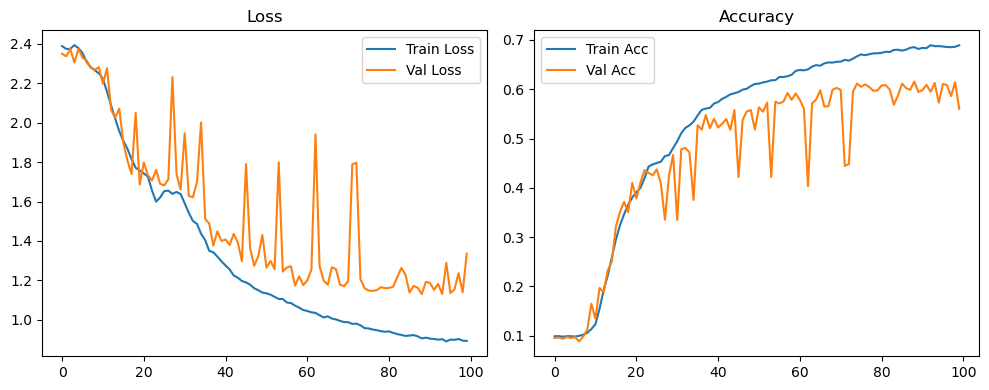

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.29it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

Original Model Final Test Loss: 1.3352 Accuracy: 0.5589


🚀 Running: batch128_lr_max_0.001_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:18<2:09:35, 78.54s/it]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   1%|          | 1/100 [01:35<2:09:35, 78.54s/it]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   1%|          | 1/100 [01:35<2:09:35, 78.54s/it]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [01:35<1:09:11, 42.36s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0924 |:   2%|▏         | 2/100 [01:52<1:09:11, 42.36s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0924 |:   2%|▏         | 2/100 [01:52<1:09:11, 42.36s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0924 |:   3%|▎         | 3/100 [01:52<49:38, 30.70s/it]  

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.1096 |:   3%|▎         | 3/100 [02:09<49:38, 30.70s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.1096 |:   3%|▎         | 3/100 [02:09<49:38, 30.70s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.1096 |:   4%|▍         | 4/100 [02:09<40:19, 25.20s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0977 |:   4%|▍         | 4/100 [02:25<40:19, 25.20s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0977 |:   4%|▍         | 4/100 [02:25<40:19, 25.20s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0977 |:   5%|▌         | 5/100 [02:25<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0983 | Val Acc: 0.0953 |:   5%|▌         | 5/100 [02:42<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0983 | Val Acc: 0.0953 |:   5%|▌         | 5/100 [02:42<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0983 | Val Acc: 0.0953 |:   6%|▌         | 6/100 [02:42<31:44, 20.26s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0945 |:   6%|▌         | 6/100 [02:59<31:44, 20.26s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0945 |:   6%|▌         | 6/100 [02:59<31:44, 20.26s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0945 |:   7%|▋         | 7/100 [02:59<29:34, 19.08s/it]

| LR: 0.000988 | Train Acc: 0.1073 | Val Acc: 0.1161 |:   7%|▋         | 7/100 [03:15<29:34, 19.08s/it]

| LR: 0.000988 | Train Acc: 0.1073 | Val Acc: 0.1161 |:   7%|▋         | 7/100 [03:15<29:34, 19.08s/it]

| LR: 0.000988 | Train Acc: 0.1073 | Val Acc: 0.1161 |:   8%|▊         | 8/100 [03:15<28:06, 18.33s/it]

| LR: 0.000984 | Train Acc: 0.1326 | Val Acc: 0.1265 |:   8%|▊         | 8/100 [03:32<28:06, 18.33s/it]

| LR: 0.000984 | Train Acc: 0.1326 | Val Acc: 0.1265 |:   8%|▊         | 8/100 [03:32<28:06, 18.33s/it]

| LR: 0.000984 | Train Acc: 0.1326 | Val Acc: 0.1265 |:   9%|▉         | 9/100 [03:32<27:03, 17.84s/it]

| LR: 0.000980 | Train Acc: 0.1787 | Val Acc: 0.1819 |:   9%|▉         | 9/100 [03:49<27:03, 17.84s/it]

| LR: 0.000980 | Train Acc: 0.1787 | Val Acc: 0.1819 |:   9%|▉         | 9/100 [03:49<27:03, 17.84s/it]

| LR: 0.000980 | Train Acc: 0.1787 | Val Acc: 0.1819 |:  10%|█         | 10/100 [03:49<26:16, 17.51s/it]

| LR: 0.000976 | Train Acc: 0.2544 | Val Acc: 0.2911 |:  10%|█         | 10/100 [04:05<26:16, 17.51s/it]

| LR: 0.000976 | Train Acc: 0.2544 | Val Acc: 0.2911 |:  10%|█         | 10/100 [04:05<26:16, 17.51s/it]

| LR: 0.000976 | Train Acc: 0.2544 | Val Acc: 0.2911 |:  11%|█         | 11/100 [04:05<25:33, 17.23s/it]

| LR: 0.000971 | Train Acc: 0.3125 | Val Acc: 0.3274 |:  11%|█         | 11/100 [04:22<25:33, 17.23s/it]

| LR: 0.000971 | Train Acc: 0.3125 | Val Acc: 0.3274 |:  11%|█         | 11/100 [04:22<25:33, 17.23s/it]

| LR: 0.000971 | Train Acc: 0.3125 | Val Acc: 0.3274 |:  12%|█▏        | 12/100 [04:22<25:03, 17.08s/it]

| LR: 0.000965 | Train Acc: 0.3542 | Val Acc: 0.3393 |:  12%|█▏        | 12/100 [04:39<25:03, 17.08s/it]

| LR: 0.000965 | Train Acc: 0.3542 | Val Acc: 0.3393 |:  12%|█▏        | 12/100 [04:39<25:03, 17.08s/it]

| LR: 0.000965 | Train Acc: 0.3542 | Val Acc: 0.3393 |:  13%|█▎        | 13/100 [04:39<24:32, 16.93s/it]

| LR: 0.000959 | Train Acc: 0.3875 | Val Acc: 0.4099 |:  13%|█▎        | 13/100 [04:55<24:32, 16.93s/it]

| LR: 0.000959 | Train Acc: 0.3875 | Val Acc: 0.4099 |:  13%|█▎        | 13/100 [04:55<24:32, 16.93s/it]

| LR: 0.000959 | Train Acc: 0.3875 | Val Acc: 0.4099 |:  14%|█▍        | 14/100 [04:56<24:10, 16.86s/it]

| LR: 0.000953 | Train Acc: 0.4032 | Val Acc: 0.4271 |:  14%|█▍        | 14/100 [05:12<24:10, 16.86s/it]

| LR: 0.000953 | Train Acc: 0.4032 | Val Acc: 0.4271 |:  14%|█▍        | 14/100 [05:12<24:10, 16.86s/it]

| LR: 0.000953 | Train Acc: 0.4032 | Val Acc: 0.4271 |:  15%|█▌        | 15/100 [05:12<23:48, 16.80s/it]

| LR: 0.000946 | Train Acc: 0.4285 | Val Acc: 0.4365 |:  15%|█▌        | 15/100 [05:29<23:48, 16.80s/it]

| LR: 0.000946 | Train Acc: 0.4285 | Val Acc: 0.4365 |:  15%|█▌        | 15/100 [05:29<23:48, 16.80s/it]

| LR: 0.000946 | Train Acc: 0.4285 | Val Acc: 0.4365 |:  16%|█▌        | 16/100 [05:29<23:29, 16.78s/it]

| LR: 0.000939 | Train Acc: 0.4473 | Val Acc: 0.4520 |:  16%|█▌        | 16/100 [05:46<23:29, 16.78s/it]

| LR: 0.000939 | Train Acc: 0.4473 | Val Acc: 0.4520 |:  16%|█▌        | 16/100 [05:46<23:29, 16.78s/it]

| LR: 0.000939 | Train Acc: 0.4473 | Val Acc: 0.4520 |:  17%|█▋        | 17/100 [05:46<23:13, 16.79s/it]

| LR: 0.000931 | Train Acc: 0.4616 | Val Acc: 0.4705 |:  17%|█▋        | 17/100 [06:03<23:13, 16.79s/it]

| LR: 0.000931 | Train Acc: 0.4616 | Val Acc: 0.4705 |:  17%|█▋        | 17/100 [06:03<23:13, 16.79s/it]

| LR: 0.000931 | Train Acc: 0.4616 | Val Acc: 0.4705 |:  18%|█▊        | 18/100 [06:03<22:59, 16.83s/it]

| LR: 0.000923 | Train Acc: 0.4744 | Val Acc: 0.4769 |:  18%|█▊        | 18/100 [06:19<22:59, 16.83s/it]

| LR: 0.000923 | Train Acc: 0.4744 | Val Acc: 0.4769 |:  18%|█▊        | 18/100 [06:19<22:59, 16.83s/it]

| LR: 0.000923 | Train Acc: 0.4744 | Val Acc: 0.4769 |:  19%|█▉        | 19/100 [06:19<22:41, 16.81s/it]

| LR: 0.000914 | Train Acc: 0.4911 | Val Acc: 0.4686 |:  19%|█▉        | 19/100 [06:36<22:41, 16.81s/it]

| LR: 0.000914 | Train Acc: 0.4911 | Val Acc: 0.4686 |:  19%|█▉        | 19/100 [06:36<22:41, 16.81s/it]

| LR: 0.000914 | Train Acc: 0.4911 | Val Acc: 0.4686 |:  20%|██        | 20/100 [06:36<22:24, 16.80s/it]

| LR: 0.000905 | Train Acc: 0.4996 | Val Acc: 0.4992 |:  20%|██        | 20/100 [06:53<22:24, 16.80s/it]

| LR: 0.000905 | Train Acc: 0.4996 | Val Acc: 0.4992 |:  20%|██        | 20/100 [06:53<22:24, 16.80s/it]

| LR: 0.000905 | Train Acc: 0.4996 | Val Acc: 0.4992 |:  21%|██        | 21/100 [06:53<22:06, 16.79s/it]

| LR: 0.000896 | Train Acc: 0.5178 | Val Acc: 0.5052 |:  21%|██        | 21/100 [07:10<22:06, 16.79s/it]

| LR: 0.000896 | Train Acc: 0.5178 | Val Acc: 0.5052 |:  21%|██        | 21/100 [07:10<22:06, 16.79s/it]

| LR: 0.000896 | Train Acc: 0.5178 | Val Acc: 0.5052 |:  22%|██▏       | 22/100 [07:10<21:48, 16.78s/it]

| LR: 0.000886 | Train Acc: 0.5258 | Val Acc: 0.5132 |:  22%|██▏       | 22/100 [07:26<21:48, 16.78s/it]

| LR: 0.000886 | Train Acc: 0.5258 | Val Acc: 0.5132 |:  22%|██▏       | 22/100 [07:26<21:48, 16.78s/it]

| LR: 0.000886 | Train Acc: 0.5258 | Val Acc: 0.5132 |:  23%|██▎       | 23/100 [07:26<21:30, 16.76s/it]

| LR: 0.000876 | Train Acc: 0.5419 | Val Acc: 0.4871 |:  23%|██▎       | 23/100 [07:43<21:30, 16.76s/it]

| LR: 0.000876 | Train Acc: 0.5419 | Val Acc: 0.4871 |:  23%|██▎       | 23/100 [07:43<21:30, 16.76s/it]

| LR: 0.000876 | Train Acc: 0.5419 | Val Acc: 0.4871 |:  24%|██▍       | 24/100 [07:43<21:14, 16.77s/it]

| LR: 0.000866 | Train Acc: 0.5460 | Val Acc: 0.4834 |:  24%|██▍       | 24/100 [08:00<21:14, 16.77s/it]

| LR: 0.000866 | Train Acc: 0.5460 | Val Acc: 0.4834 |:  24%|██▍       | 24/100 [08:00<21:14, 16.77s/it]

| LR: 0.000866 | Train Acc: 0.5460 | Val Acc: 0.4834 |:  25%|██▌       | 25/100 [08:00<20:57, 16.76s/it]

| LR: 0.000855 | Train Acc: 0.5527 | Val Acc: 0.5135 |:  25%|██▌       | 25/100 [08:17<20:57, 16.76s/it]

| LR: 0.000855 | Train Acc: 0.5527 | Val Acc: 0.5135 |:  25%|██▌       | 25/100 [08:17<20:57, 16.76s/it]

| LR: 0.000855 | Train Acc: 0.5527 | Val Acc: 0.5135 |:  26%|██▌       | 26/100 [08:17<20:39, 16.75s/it]

| LR: 0.000844 | Train Acc: 0.5629 | Val Acc: 0.5536 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000844 | Train Acc: 0.5629 | Val Acc: 0.5536 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000844 | Train Acc: 0.5629 | Val Acc: 0.5536 |:  27%|██▋       | 27/100 [08:33<20:18, 16.70s/it]

| LR: 0.000832 | Train Acc: 0.5644 | Val Acc: 0.5365 |:  27%|██▋       | 27/100 [08:50<20:18, 16.70s/it]

| LR: 0.000832 | Train Acc: 0.5644 | Val Acc: 0.5365 |:  27%|██▋       | 27/100 [08:50<20:18, 16.70s/it]

| LR: 0.000832 | Train Acc: 0.5644 | Val Acc: 0.5365 |:  28%|██▊       | 28/100 [08:50<20:06, 16.76s/it]

| LR: 0.000821 | Train Acc: 0.5756 | Val Acc: 0.5321 |:  28%|██▊       | 28/100 [09:07<20:06, 16.76s/it]

| LR: 0.000821 | Train Acc: 0.5756 | Val Acc: 0.5321 |:  28%|██▊       | 28/100 [09:07<20:06, 16.76s/it]

| LR: 0.000821 | Train Acc: 0.5756 | Val Acc: 0.5321 |:  29%|██▉       | 29/100 [09:07<19:48, 16.74s/it]

| LR: 0.000808 | Train Acc: 0.5788 | Val Acc: 0.5439 |:  29%|██▉       | 29/100 [09:24<19:48, 16.74s/it]

| LR: 0.000808 | Train Acc: 0.5788 | Val Acc: 0.5439 |:  29%|██▉       | 29/100 [09:24<19:48, 16.74s/it]

| LR: 0.000808 | Train Acc: 0.5788 | Val Acc: 0.5439 |:  30%|███       | 30/100 [09:24<19:32, 16.76s/it]

| LR: 0.000796 | Train Acc: 0.5893 | Val Acc: 0.5385 |:  30%|███       | 30/100 [09:40<19:32, 16.76s/it]

| LR: 0.000796 | Train Acc: 0.5893 | Val Acc: 0.5385 |:  30%|███       | 30/100 [09:40<19:32, 16.76s/it]

| LR: 0.000796 | Train Acc: 0.5893 | Val Acc: 0.5385 |:  31%|███       | 31/100 [09:40<19:16, 16.76s/it]

| LR: 0.000783 | Train Acc: 0.5978 | Val Acc: 0.5740 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000783 | Train Acc: 0.5978 | Val Acc: 0.5740 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000783 | Train Acc: 0.5978 | Val Acc: 0.5740 |:  32%|███▏      | 32/100 [09:57<19:02, 16.80s/it]

| LR: 0.000770 | Train Acc: 0.6039 | Val Acc: 0.5497 |:  32%|███▏      | 32/100 [10:14<19:02, 16.80s/it]

| LR: 0.000770 | Train Acc: 0.6039 | Val Acc: 0.5497 |:  32%|███▏      | 32/100 [10:14<19:02, 16.80s/it]

| LR: 0.000770 | Train Acc: 0.6039 | Val Acc: 0.5497 |:  33%|███▎      | 33/100 [10:14<18:42, 16.76s/it]

| LR: 0.000757 | Train Acc: 0.6095 | Val Acc: 0.5916 |:  33%|███▎      | 33/100 [10:31<18:42, 16.76s/it]

| LR: 0.000757 | Train Acc: 0.6095 | Val Acc: 0.5916 |:  33%|███▎      | 33/100 [10:31<18:42, 16.76s/it]

| LR: 0.000757 | Train Acc: 0.6095 | Val Acc: 0.5916 |:  34%|███▍      | 34/100 [10:31<18:24, 16.74s/it]

| LR: 0.000743 | Train Acc: 0.6187 | Val Acc: 0.5769 |:  34%|███▍      | 34/100 [10:47<18:24, 16.74s/it]

| LR: 0.000743 | Train Acc: 0.6187 | Val Acc: 0.5769 |:  34%|███▍      | 34/100 [10:47<18:24, 16.74s/it]

| LR: 0.000743 | Train Acc: 0.6187 | Val Acc: 0.5769 |:  35%|███▌      | 35/100 [10:47<18:07, 16.73s/it]

| LR: 0.000730 | Train Acc: 0.6231 | Val Acc: 0.5910 |:  35%|███▌      | 35/100 [11:04<18:07, 16.73s/it]

| LR: 0.000730 | Train Acc: 0.6231 | Val Acc: 0.5910 |:  35%|███▌      | 35/100 [11:04<18:07, 16.73s/it]

| LR: 0.000730 | Train Acc: 0.6231 | Val Acc: 0.5910 |:  36%|███▌      | 36/100 [11:04<17:51, 16.74s/it]

| LR: 0.000716 | Train Acc: 0.6272 | Val Acc: 0.5936 |:  36%|███▌      | 36/100 [11:21<17:51, 16.74s/it]

| LR: 0.000716 | Train Acc: 0.6272 | Val Acc: 0.5936 |:  36%|███▌      | 36/100 [11:21<17:51, 16.74s/it]

| LR: 0.000716 | Train Acc: 0.6272 | Val Acc: 0.5936 |:  37%|███▋      | 37/100 [11:21<17:33, 16.73s/it]

| LR: 0.000702 | Train Acc: 0.6252 | Val Acc: 0.5557 |:  37%|███▋      | 37/100 [11:37<17:33, 16.73s/it]

| LR: 0.000702 | Train Acc: 0.6252 | Val Acc: 0.5557 |:  37%|███▋      | 37/100 [11:37<17:33, 16.73s/it]

| LR: 0.000702 | Train Acc: 0.6252 | Val Acc: 0.5557 |:  38%|███▊      | 38/100 [11:37<17:16, 16.71s/it]

| LR: 0.000687 | Train Acc: 0.6365 | Val Acc: 0.5865 |:  38%|███▊      | 38/100 [11:54<17:16, 16.71s/it]

| LR: 0.000687 | Train Acc: 0.6365 | Val Acc: 0.5865 |:  38%|███▊      | 38/100 [11:54<17:16, 16.71s/it]

| LR: 0.000687 | Train Acc: 0.6365 | Val Acc: 0.5865 |:  39%|███▉      | 39/100 [11:54<16:59, 16.72s/it]

| LR: 0.000673 | Train Acc: 0.6349 | Val Acc: 0.5977 |:  39%|███▉      | 39/100 [12:11<16:59, 16.72s/it]

| LR: 0.000673 | Train Acc: 0.6349 | Val Acc: 0.5977 |:  39%|███▉      | 39/100 [12:11<16:59, 16.72s/it]

| LR: 0.000673 | Train Acc: 0.6349 | Val Acc: 0.5977 |:  40%|████      | 40/100 [12:11<16:44, 16.73s/it]

| LR: 0.000658 | Train Acc: 0.6439 | Val Acc: 0.5963 |:  40%|████      | 40/100 [12:28<16:44, 16.73s/it]

| LR: 0.000658 | Train Acc: 0.6439 | Val Acc: 0.5963 |:  40%|████      | 40/100 [12:28<16:44, 16.73s/it]

| LR: 0.000658 | Train Acc: 0.6439 | Val Acc: 0.5963 |:  41%|████      | 41/100 [12:28<16:28, 16.76s/it]

| LR: 0.000643 | Train Acc: 0.6466 | Val Acc: 0.6004 |:  41%|████      | 41/100 [12:44<16:28, 16.76s/it]

| LR: 0.000643 | Train Acc: 0.6466 | Val Acc: 0.6004 |:  41%|████      | 41/100 [12:44<16:28, 16.76s/it]

| LR: 0.000643 | Train Acc: 0.6466 | Val Acc: 0.6004 |:  42%|████▏     | 42/100 [12:45<16:10, 16.74s/it]

| LR: 0.000628 | Train Acc: 0.6491 | Val Acc: 0.6069 |:  42%|████▏     | 42/100 [13:01<16:10, 16.74s/it]

| LR: 0.000628 | Train Acc: 0.6491 | Val Acc: 0.6069 |:  42%|████▏     | 42/100 [13:01<16:10, 16.74s/it]

| LR: 0.000628 | Train Acc: 0.6491 | Val Acc: 0.6069 |:  43%|████▎     | 43/100 [13:01<15:51, 16.69s/it]

| LR: 0.000613 | Train Acc: 0.6536 | Val Acc: 0.6023 |:  43%|████▎     | 43/100 [13:18<15:51, 16.69s/it]

| LR: 0.000613 | Train Acc: 0.6536 | Val Acc: 0.6023 |:  43%|████▎     | 43/100 [13:18<15:51, 16.69s/it]

| LR: 0.000613 | Train Acc: 0.6536 | Val Acc: 0.6023 |:  44%|████▍     | 44/100 [13:18<15:35, 16.71s/it]

| LR: 0.000598 | Train Acc: 0.6582 | Val Acc: 0.6159 |:  44%|████▍     | 44/100 [13:34<15:35, 16.71s/it]

| LR: 0.000598 | Train Acc: 0.6582 | Val Acc: 0.6159 |:  44%|████▍     | 44/100 [13:34<15:35, 16.71s/it]

| LR: 0.000598 | Train Acc: 0.6582 | Val Acc: 0.6159 |:  45%|████▌     | 45/100 [13:34<15:17, 16.68s/it]

| LR: 0.000582 | Train Acc: 0.6625 | Val Acc: 0.6077 |:  45%|████▌     | 45/100 [13:51<15:17, 16.68s/it]

| LR: 0.000582 | Train Acc: 0.6625 | Val Acc: 0.6077 |:  45%|████▌     | 45/100 [13:51<15:17, 16.68s/it]

| LR: 0.000582 | Train Acc: 0.6625 | Val Acc: 0.6077 |:  46%|████▌     | 46/100 [13:51<15:02, 16.72s/it]

| LR: 0.000567 | Train Acc: 0.6676 | Val Acc: 0.6076 |:  46%|████▌     | 46/100 [14:08<15:02, 16.72s/it]

| LR: 0.000567 | Train Acc: 0.6676 | Val Acc: 0.6076 |:  46%|████▌     | 46/100 [14:08<15:02, 16.72s/it]

| LR: 0.000567 | Train Acc: 0.6676 | Val Acc: 0.6076 |:  47%|████▋     | 47/100 [14:08<14:46, 16.73s/it]

| LR: 0.000552 | Train Acc: 0.6656 | Val Acc: 0.6087 |:  47%|████▋     | 47/100 [14:24<14:46, 16.73s/it]

| LR: 0.000552 | Train Acc: 0.6656 | Val Acc: 0.6087 |:  47%|████▋     | 47/100 [14:24<14:46, 16.73s/it]

| LR: 0.000552 | Train Acc: 0.6656 | Val Acc: 0.6087 |:  48%|████▊     | 48/100 [14:25<14:26, 16.66s/it]

| LR: 0.000536 | Train Acc: 0.6689 | Val Acc: 0.6124 |:  48%|████▊     | 48/100 [14:41<14:26, 16.66s/it]

| LR: 0.000536 | Train Acc: 0.6689 | Val Acc: 0.6124 |:  48%|████▊     | 48/100 [14:41<14:26, 16.66s/it]

| LR: 0.000536 | Train Acc: 0.6689 | Val Acc: 0.6124 |:  49%|████▉     | 49/100 [14:41<14:09, 16.66s/it]

| LR: 0.000521 | Train Acc: 0.6716 | Val Acc: 0.5997 |:  49%|████▉     | 49/100 [14:58<14:09, 16.66s/it]

| LR: 0.000521 | Train Acc: 0.6716 | Val Acc: 0.5997 |:  49%|████▉     | 49/100 [14:58<14:09, 16.66s/it]

| LR: 0.000521 | Train Acc: 0.6716 | Val Acc: 0.5997 |:  50%|█████     | 50/100 [14:58<13:54, 16.68s/it]

| LR: 0.000505 | Train Acc: 0.6768 | Val Acc: 0.6029 |:  50%|█████     | 50/100 [15:14<13:54, 16.68s/it]

| LR: 0.000505 | Train Acc: 0.6768 | Val Acc: 0.6029 |:  50%|█████     | 50/100 [15:14<13:54, 16.68s/it]

| LR: 0.000505 | Train Acc: 0.6768 | Val Acc: 0.6029 |:  51%|█████     | 51/100 [15:15<13:36, 16.66s/it]

| LR: 0.000489 | Train Acc: 0.6776 | Val Acc: 0.5922 |:  51%|█████     | 51/100 [15:31<13:36, 16.66s/it]

| LR: 0.000489 | Train Acc: 0.6776 | Val Acc: 0.5922 |:  51%|█████     | 51/100 [15:31<13:36, 16.66s/it]

| LR: 0.000489 | Train Acc: 0.6776 | Val Acc: 0.5922 |:  52%|█████▏    | 52/100 [15:31<13:19, 16.66s/it]

| LR: 0.000474 | Train Acc: 0.6782 | Val Acc: 0.6183 |:  52%|█████▏    | 52/100 [15:48<13:19, 16.66s/it]

| LR: 0.000474 | Train Acc: 0.6782 | Val Acc: 0.6183 |:  52%|█████▏    | 52/100 [15:48<13:19, 16.66s/it]

| LR: 0.000474 | Train Acc: 0.6782 | Val Acc: 0.6183 |:  53%|█████▎    | 53/100 [15:48<13:02, 16.65s/it]

| LR: 0.000458 | Train Acc: 0.6834 | Val Acc: 0.6160 |:  53%|█████▎    | 53/100 [16:05<13:02, 16.65s/it]

| LR: 0.000458 | Train Acc: 0.6834 | Val Acc: 0.6160 |:  53%|█████▎    | 53/100 [16:05<13:02, 16.65s/it]

| LR: 0.000458 | Train Acc: 0.6834 | Val Acc: 0.6160 |:  54%|█████▍    | 54/100 [16:05<12:48, 16.70s/it]

| LR: 0.000443 | Train Acc: 0.6883 | Val Acc: 0.6160 |:  54%|█████▍    | 54/100 [16:21<12:48, 16.70s/it]

| LR: 0.000443 | Train Acc: 0.6883 | Val Acc: 0.6160 |:  54%|█████▍    | 54/100 [16:21<12:48, 16.70s/it]

| LR: 0.000443 | Train Acc: 0.6883 | Val Acc: 0.6160 |:  55%|█████▌    | 55/100 [16:21<12:32, 16.72s/it]

| LR: 0.000428 | Train Acc: 0.6893 | Val Acc: 0.6175 |:  55%|█████▌    | 55/100 [16:38<12:32, 16.72s/it]

| LR: 0.000428 | Train Acc: 0.6893 | Val Acc: 0.6175 |:  55%|█████▌    | 55/100 [16:38<12:32, 16.72s/it]

| LR: 0.000428 | Train Acc: 0.6893 | Val Acc: 0.6175 |:  56%|█████▌    | 56/100 [16:38<12:15, 16.71s/it]

| LR: 0.000412 | Train Acc: 0.6937 | Val Acc: 0.6216 |:  56%|█████▌    | 56/100 [16:55<12:15, 16.71s/it]

| LR: 0.000412 | Train Acc: 0.6937 | Val Acc: 0.6216 |:  56%|█████▌    | 56/100 [16:55<12:15, 16.71s/it]

| LR: 0.000412 | Train Acc: 0.6937 | Val Acc: 0.6216 |:  57%|█████▋    | 57/100 [16:55<11:59, 16.73s/it]

| LR: 0.000397 | Train Acc: 0.6928 | Val Acc: 0.6129 |:  57%|█████▋    | 57/100 [17:12<11:59, 16.73s/it]

| LR: 0.000397 | Train Acc: 0.6928 | Val Acc: 0.6129 |:  57%|█████▋    | 57/100 [17:12<11:59, 16.73s/it]

| LR: 0.000397 | Train Acc: 0.6928 | Val Acc: 0.6129 |:  58%|█████▊    | 58/100 [17:12<11:44, 16.78s/it]

| LR: 0.000382 | Train Acc: 0.6975 | Val Acc: 0.5848 |:  58%|█████▊    | 58/100 [17:28<11:44, 16.78s/it]

| LR: 0.000382 | Train Acc: 0.6975 | Val Acc: 0.5848 |:  58%|█████▊    | 58/100 [17:28<11:44, 16.78s/it]

| LR: 0.000382 | Train Acc: 0.6975 | Val Acc: 0.5848 |:  59%|█████▉    | 59/100 [17:28<11:26, 16.74s/it]

| LR: 0.000367 | Train Acc: 0.7029 | Val Acc: 0.5990 |:  59%|█████▉    | 59/100 [17:45<11:26, 16.74s/it]

| LR: 0.000367 | Train Acc: 0.7029 | Val Acc: 0.5990 |:  59%|█████▉    | 59/100 [17:45<11:26, 16.74s/it]

| LR: 0.000367 | Train Acc: 0.7029 | Val Acc: 0.5990 |:  60%|██████    | 60/100 [17:45<11:07, 16.70s/it]

| LR: 0.000352 | Train Acc: 0.6986 | Val Acc: 0.6403 |:  60%|██████    | 60/100 [18:01<11:07, 16.70s/it]

| LR: 0.000352 | Train Acc: 0.6986 | Val Acc: 0.6403 |:  60%|██████    | 60/100 [18:01<11:07, 16.70s/it]

| LR: 0.000352 | Train Acc: 0.6986 | Val Acc: 0.6403 |:  61%|██████    | 61/100 [18:02<10:49, 16.66s/it]

| LR: 0.000337 | Train Acc: 0.7028 | Val Acc: 0.6279 |:  61%|██████    | 61/100 [18:18<10:49, 16.66s/it]

| LR: 0.000337 | Train Acc: 0.7028 | Val Acc: 0.6279 |:  61%|██████    | 61/100 [18:18<10:49, 16.66s/it]

| LR: 0.000337 | Train Acc: 0.7028 | Val Acc: 0.6279 |:  62%|██████▏   | 62/100 [18:18<10:33, 16.68s/it]

| LR: 0.000323 | Train Acc: 0.7042 | Val Acc: 0.6112 |:  62%|██████▏   | 62/100 [18:35<10:33, 16.68s/it]

| LR: 0.000323 | Train Acc: 0.7042 | Val Acc: 0.6112 |:  62%|██████▏   | 62/100 [18:35<10:33, 16.68s/it]

| LR: 0.000323 | Train Acc: 0.7042 | Val Acc: 0.6112 |:  63%|██████▎   | 63/100 [18:35<10:17, 16.70s/it]

| LR: 0.000308 | Train Acc: 0.7069 | Val Acc: 0.6197 |:  63%|██████▎   | 63/100 [18:52<10:17, 16.70s/it]

| LR: 0.000308 | Train Acc: 0.7069 | Val Acc: 0.6197 |:  63%|██████▎   | 63/100 [18:52<10:17, 16.70s/it]

| LR: 0.000308 | Train Acc: 0.7069 | Val Acc: 0.6197 |:  64%|██████▍   | 64/100 [18:52<10:01, 16.71s/it]

| LR: 0.000294 | Train Acc: 0.7116 | Val Acc: 0.6263 |:  64%|██████▍   | 64/100 [19:08<10:01, 16.71s/it]

| LR: 0.000294 | Train Acc: 0.7116 | Val Acc: 0.6263 |:  64%|██████▍   | 64/100 [19:08<10:01, 16.71s/it]

| LR: 0.000294 | Train Acc: 0.7116 | Val Acc: 0.6263 |:  65%|██████▌   | 65/100 [19:08<09:44, 16.69s/it]

| LR: 0.000280 | Train Acc: 0.7129 | Val Acc: 0.6417 |:  65%|██████▌   | 65/100 [19:25<09:44, 16.69s/it]

| LR: 0.000280 | Train Acc: 0.7129 | Val Acc: 0.6417 |:  65%|██████▌   | 65/100 [19:25<09:44, 16.69s/it]

| LR: 0.000280 | Train Acc: 0.7129 | Val Acc: 0.6417 |:  66%|██████▌   | 66/100 [19:25<09:27, 16.68s/it]

| LR: 0.000267 | Train Acc: 0.7149 | Val Acc: 0.6398 |:  66%|██████▌   | 66/100 [19:42<09:27, 16.68s/it]

| LR: 0.000267 | Train Acc: 0.7149 | Val Acc: 0.6398 |:  66%|██████▌   | 66/100 [19:42<09:27, 16.68s/it]

| LR: 0.000267 | Train Acc: 0.7149 | Val Acc: 0.6398 |:  67%|██████▋   | 67/100 [19:42<09:12, 16.73s/it]

| LR: 0.000253 | Train Acc: 0.7154 | Val Acc: 0.5590 |:  67%|██████▋   | 67/100 [19:59<09:12, 16.73s/it]

| LR: 0.000253 | Train Acc: 0.7154 | Val Acc: 0.5590 |:  67%|██████▋   | 67/100 [19:59<09:12, 16.73s/it]

| LR: 0.000253 | Train Acc: 0.7154 | Val Acc: 0.5590 |:  68%|██████▊   | 68/100 [19:59<08:57, 16.79s/it]

| LR: 0.000240 | Train Acc: 0.7178 | Val Acc: 0.6256 |:  68%|██████▊   | 68/100 [20:16<08:57, 16.79s/it]

| LR: 0.000240 | Train Acc: 0.7178 | Val Acc: 0.6256 |:  68%|██████▊   | 68/100 [20:16<08:57, 16.79s/it]

| LR: 0.000240 | Train Acc: 0.7178 | Val Acc: 0.6256 |:  69%|██████▉   | 69/100 [20:16<08:40, 16.81s/it]

| LR: 0.000227 | Train Acc: 0.7171 | Val Acc: 0.6273 |:  69%|██████▉   | 69/100 [20:32<08:40, 16.81s/it]

| LR: 0.000227 | Train Acc: 0.7171 | Val Acc: 0.6273 |:  69%|██████▉   | 69/100 [20:32<08:40, 16.81s/it]

| LR: 0.000227 | Train Acc: 0.7171 | Val Acc: 0.6273 |:  70%|███████   | 70/100 [20:33<08:24, 16.81s/it]

| LR: 0.000214 | Train Acc: 0.7215 | Val Acc: 0.6286 |:  70%|███████   | 70/100 [20:49<08:24, 16.81s/it]

| LR: 0.000214 | Train Acc: 0.7215 | Val Acc: 0.6286 |:  70%|███████   | 70/100 [20:49<08:24, 16.81s/it]

| LR: 0.000214 | Train Acc: 0.7215 | Val Acc: 0.6286 |:  71%|███████   | 71/100 [20:49<08:07, 16.80s/it]

| LR: 0.000202 | Train Acc: 0.7220 | Val Acc: 0.5298 |:  71%|███████   | 71/100 [21:06<08:07, 16.80s/it]

| LR: 0.000202 | Train Acc: 0.7220 | Val Acc: 0.5298 |:  71%|███████   | 71/100 [21:06<08:07, 16.80s/it]

| LR: 0.000202 | Train Acc: 0.7220 | Val Acc: 0.5298 |:  72%|███████▏  | 72/100 [21:06<07:50, 16.81s/it]

| LR: 0.000189 | Train Acc: 0.7247 | Val Acc: 0.6232 |:  72%|███████▏  | 72/100 [21:23<07:50, 16.81s/it]

| LR: 0.000189 | Train Acc: 0.7247 | Val Acc: 0.6232 |:  72%|███████▏  | 72/100 [21:23<07:50, 16.81s/it]

| LR: 0.000189 | Train Acc: 0.7247 | Val Acc: 0.6232 |:  73%|███████▎  | 73/100 [21:23<07:34, 16.84s/it]

| LR: 0.000178 | Train Acc: 0.7272 | Val Acc: 0.5432 |:  73%|███████▎  | 73/100 [21:40<07:34, 16.84s/it]

| LR: 0.000178 | Train Acc: 0.7272 | Val Acc: 0.5432 |:  73%|███████▎  | 73/100 [21:40<07:34, 16.84s/it]

| LR: 0.000178 | Train Acc: 0.7272 | Val Acc: 0.5432 |:  74%|███████▍  | 74/100 [21:40<07:18, 16.88s/it]

| LR: 0.000166 | Train Acc: 0.7275 | Val Acc: 0.6312 |:  74%|███████▍  | 74/100 [21:57<07:18, 16.88s/it]

| LR: 0.000166 | Train Acc: 0.7275 | Val Acc: 0.6312 |:  74%|███████▍  | 74/100 [21:57<07:18, 16.88s/it]

| LR: 0.000166 | Train Acc: 0.7275 | Val Acc: 0.6312 |:  75%|███████▌  | 75/100 [21:57<07:01, 16.85s/it]

| LR: 0.000155 | Train Acc: 0.7312 | Val Acc: 0.6376 |:  75%|███████▌  | 75/100 [22:14<07:01, 16.85s/it]

| LR: 0.000155 | Train Acc: 0.7312 | Val Acc: 0.6376 |:  75%|███████▌  | 75/100 [22:14<07:01, 16.85s/it]

| LR: 0.000155 | Train Acc: 0.7312 | Val Acc: 0.6376 |:  76%|███████▌  | 76/100 [22:14<06:44, 16.86s/it]

| LR: 0.000144 | Train Acc: 0.7345 | Val Acc: 0.6324 |:  76%|███████▌  | 76/100 [22:30<06:44, 16.86s/it]

| LR: 0.000144 | Train Acc: 0.7345 | Val Acc: 0.6324 |:  76%|███████▌  | 76/100 [22:30<06:44, 16.86s/it]

| LR: 0.000144 | Train Acc: 0.7345 | Val Acc: 0.6324 |:  77%|███████▋  | 77/100 [22:30<06:27, 16.85s/it]

| LR: 0.000134 | Train Acc: 0.7353 | Val Acc: 0.6296 |:  77%|███████▋  | 77/100 [22:47<06:27, 16.85s/it]

| LR: 0.000134 | Train Acc: 0.7353 | Val Acc: 0.6296 |:  77%|███████▋  | 77/100 [22:47<06:27, 16.85s/it]

| LR: 0.000134 | Train Acc: 0.7353 | Val Acc: 0.6296 |:  78%|███████▊  | 78/100 [22:47<06:11, 16.87s/it]

| LR: 0.000124 | Train Acc: 0.7325 | Val Acc: 0.6051 |:  78%|███████▊  | 78/100 [23:04<06:11, 16.87s/it]

| LR: 0.000124 | Train Acc: 0.7325 | Val Acc: 0.6051 |:  78%|███████▊  | 78/100 [23:04<06:11, 16.87s/it]

| LR: 0.000124 | Train Acc: 0.7325 | Val Acc: 0.6051 |:  79%|███████▉  | 79/100 [23:04<05:54, 16.90s/it]

| LR: 0.000114 | Train Acc: 0.7377 | Val Acc: 0.6090 |:  79%|███████▉  | 79/100 [23:21<05:54, 16.90s/it]

| LR: 0.000114 | Train Acc: 0.7377 | Val Acc: 0.6090 |:  79%|███████▉  | 79/100 [23:21<05:54, 16.90s/it]

| LR: 0.000114 | Train Acc: 0.7377 | Val Acc: 0.6090 |:  80%|████████  | 80/100 [23:21<05:36, 16.85s/it]

| LR: 0.000105 | Train Acc: 0.7433 | Val Acc: 0.6371 |:  80%|████████  | 80/100 [23:38<05:36, 16.85s/it]

| LR: 0.000105 | Train Acc: 0.7433 | Val Acc: 0.6371 |:  80%|████████  | 80/100 [23:38<05:36, 16.85s/it]

| LR: 0.000105 | Train Acc: 0.7433 | Val Acc: 0.6371 |:  81%|████████  | 81/100 [23:38<05:19, 16.83s/it]

| LR: 0.000096 | Train Acc: 0.7425 | Val Acc: 0.6363 |:  81%|████████  | 81/100 [23:55<05:19, 16.83s/it]

| LR: 0.000096 | Train Acc: 0.7425 | Val Acc: 0.6363 |:  81%|████████  | 81/100 [23:55<05:19, 16.83s/it]

| LR: 0.000096 | Train Acc: 0.7425 | Val Acc: 0.6363 |:  82%|████████▏ | 82/100 [23:55<05:03, 16.87s/it]

| LR: 0.000087 | Train Acc: 0.7386 | Val Acc: 0.6291 |:  82%|████████▏ | 82/100 [24:12<05:03, 16.87s/it]

| LR: 0.000087 | Train Acc: 0.7386 | Val Acc: 0.6291 |:  82%|████████▏ | 82/100 [24:12<05:03, 16.87s/it]

| LR: 0.000087 | Train Acc: 0.7386 | Val Acc: 0.6291 |:  83%|████████▎ | 83/100 [24:12<04:46, 16.87s/it]

| LR: 0.000079 | Train Acc: 0.7447 | Val Acc: 0.6245 |:  83%|████████▎ | 83/100 [24:28<04:46, 16.87s/it]

| LR: 0.000079 | Train Acc: 0.7447 | Val Acc: 0.6245 |:  83%|████████▎ | 83/100 [24:28<04:46, 16.87s/it]

| LR: 0.000079 | Train Acc: 0.7447 | Val Acc: 0.6245 |:  84%|████████▍ | 84/100 [24:28<04:29, 16.83s/it]

| LR: 0.000071 | Train Acc: 0.7449 | Val Acc: 0.6502 |:  84%|████████▍ | 84/100 [24:45<04:29, 16.83s/it]

| LR: 0.000071 | Train Acc: 0.7449 | Val Acc: 0.6502 |:  84%|████████▍ | 84/100 [24:45<04:29, 16.83s/it]

| LR: 0.000071 | Train Acc: 0.7449 | Val Acc: 0.6502 |:  85%|████████▌ | 85/100 [24:45<04:12, 16.80s/it]

| LR: 0.000064 | Train Acc: 0.7454 | Val Acc: 0.6313 |:  85%|████████▌ | 85/100 [25:02<04:12, 16.80s/it]

| LR: 0.000064 | Train Acc: 0.7454 | Val Acc: 0.6313 |:  85%|████████▌ | 85/100 [25:02<04:12, 16.80s/it]

| LR: 0.000064 | Train Acc: 0.7454 | Val Acc: 0.6313 |:  86%|████████▌ | 86/100 [25:02<03:54, 16.76s/it]

| LR: 0.000057 | Train Acc: 0.7439 | Val Acc: 0.6408 |:  86%|████████▌ | 86/100 [25:19<03:54, 16.76s/it]

| LR: 0.000057 | Train Acc: 0.7439 | Val Acc: 0.6408 |:  86%|████████▌ | 86/100 [25:19<03:54, 16.76s/it]

| LR: 0.000057 | Train Acc: 0.7439 | Val Acc: 0.6408 |:  87%|████████▋ | 87/100 [25:19<03:38, 16.84s/it]

| LR: 0.000051 | Train Acc: 0.7494 | Val Acc: 0.6375 |:  87%|████████▋ | 87/100 [25:36<03:38, 16.84s/it]

| LR: 0.000051 | Train Acc: 0.7494 | Val Acc: 0.6375 |:  87%|████████▋ | 87/100 [25:36<03:38, 16.84s/it]

| LR: 0.000051 | Train Acc: 0.7494 | Val Acc: 0.6375 |:  88%|████████▊ | 88/100 [25:36<03:22, 16.87s/it]

| LR: 0.000045 | Train Acc: 0.7501 | Val Acc: 0.6017 |:  88%|████████▊ | 88/100 [25:53<03:22, 16.87s/it]

| LR: 0.000045 | Train Acc: 0.7501 | Val Acc: 0.6017 |:  88%|████████▊ | 88/100 [25:53<03:22, 16.87s/it]

| LR: 0.000045 | Train Acc: 0.7501 | Val Acc: 0.6017 |:  89%|████████▉ | 89/100 [25:53<03:05, 16.86s/it]

| LR: 0.000039 | Train Acc: 0.7497 | Val Acc: 0.6459 |:  89%|████████▉ | 89/100 [26:09<03:05, 16.86s/it]

| LR: 0.000039 | Train Acc: 0.7497 | Val Acc: 0.6459 |:  89%|████████▉ | 89/100 [26:09<03:05, 16.86s/it]

| LR: 0.000039 | Train Acc: 0.7497 | Val Acc: 0.6459 |:  90%|█████████ | 90/100 [26:09<02:48, 16.82s/it]

| LR: 0.000034 | Train Acc: 0.7520 | Val Acc: 0.5949 |:  90%|█████████ | 90/100 [26:26<02:48, 16.82s/it]

| LR: 0.000034 | Train Acc: 0.7520 | Val Acc: 0.5949 |:  90%|█████████ | 90/100 [26:26<02:48, 16.82s/it]

| LR: 0.000034 | Train Acc: 0.7520 | Val Acc: 0.5949 |:  91%|█████████ | 91/100 [26:26<02:31, 16.81s/it]

| LR: 0.000030 | Train Acc: 0.7521 | Val Acc: 0.6303 |:  91%|█████████ | 91/100 [26:43<02:31, 16.81s/it]

| LR: 0.000030 | Train Acc: 0.7521 | Val Acc: 0.6303 |:  91%|█████████ | 91/100 [26:43<02:31, 16.81s/it]

| LR: 0.000030 | Train Acc: 0.7521 | Val Acc: 0.6303 |:  92%|█████████▏| 92/100 [26:43<02:14, 16.81s/it]

| LR: 0.000026 | Train Acc: 0.7515 | Val Acc: 0.6247 |:  92%|█████████▏| 92/100 [27:00<02:14, 16.81s/it]

| LR: 0.000026 | Train Acc: 0.7515 | Val Acc: 0.6247 |:  92%|█████████▏| 92/100 [27:00<02:14, 16.81s/it]

| LR: 0.000026 | Train Acc: 0.7515 | Val Acc: 0.6247 |:  93%|█████████▎| 93/100 [27:00<01:57, 16.77s/it]

| LR: 0.000022 | Train Acc: 0.7536 | Val Acc: 0.5745 |:  93%|█████████▎| 93/100 [27:16<01:57, 16.77s/it]

| LR: 0.000022 | Train Acc: 0.7536 | Val Acc: 0.5745 |:  93%|█████████▎| 93/100 [27:16<01:57, 16.77s/it]

| LR: 0.000022 | Train Acc: 0.7536 | Val Acc: 0.5745 |:  94%|█████████▍| 94/100 [27:16<01:40, 16.76s/it]

| LR: 0.000019 | Train Acc: 0.7525 | Val Acc: 0.6369 |:  94%|█████████▍| 94/100 [27:33<01:40, 16.76s/it]

| LR: 0.000019 | Train Acc: 0.7525 | Val Acc: 0.6369 |:  94%|█████████▍| 94/100 [27:33<01:40, 16.76s/it]

| LR: 0.000019 | Train Acc: 0.7525 | Val Acc: 0.6369 |:  95%|█████████▌| 95/100 [27:33<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.7565 | Val Acc: 0.4864 |:  95%|█████████▌| 95/100 [27:50<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.7565 | Val Acc: 0.4864 |:  95%|█████████▌| 95/100 [27:50<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.7565 | Val Acc: 0.4864 |:  96%|█████████▌| 96/100 [27:50<01:06, 16.74s/it]

| LR: 0.000014 | Train Acc: 0.7536 | Val Acc: 0.6334 |:  96%|█████████▌| 96/100 [28:06<01:06, 16.74s/it]

| LR: 0.000014 | Train Acc: 0.7536 | Val Acc: 0.6334 |:  96%|█████████▌| 96/100 [28:06<01:06, 16.74s/it]

| LR: 0.000014 | Train Acc: 0.7536 | Val Acc: 0.6334 |:  97%|█████████▋| 97/100 [28:06<00:50, 16.69s/it]

| LR: 0.000012 | Train Acc: 0.7561 | Val Acc: 0.6348 |:  97%|█████████▋| 97/100 [28:23<00:50, 16.69s/it]

| LR: 0.000012 | Train Acc: 0.7561 | Val Acc: 0.6348 |:  97%|█████████▋| 97/100 [28:23<00:50, 16.69s/it]

| LR: 0.000012 | Train Acc: 0.7561 | Val Acc: 0.6348 |:  98%|█████████▊| 98/100 [28:23<00:33, 16.69s/it]

| LR: 0.000011 | Train Acc: 0.7595 | Val Acc: 0.6410 |:  98%|█████████▊| 98/100 [28:40<00:33, 16.69s/it]

| LR: 0.000011 | Train Acc: 0.7595 | Val Acc: 0.6410 |:  98%|█████████▊| 98/100 [28:40<00:33, 16.69s/it]

| LR: 0.000011 | Train Acc: 0.7595 | Val Acc: 0.6410 |:  99%|█████████▉| 99/100 [28:40<00:16, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.7610 | Val Acc: 0.6188 |:  99%|█████████▉| 99/100 [28:57<00:16, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.7610 | Val Acc: 0.6188 |:  99%|█████████▉| 99/100 [28:57<00:16, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.7610 | Val Acc: 0.6188 |: 100%|██████████| 100/100 [28:57<00:00, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.7610 | Val Acc: 0.6188 |: 100%|██████████| 100/100 [28:57<00:00, 17.37s/it]

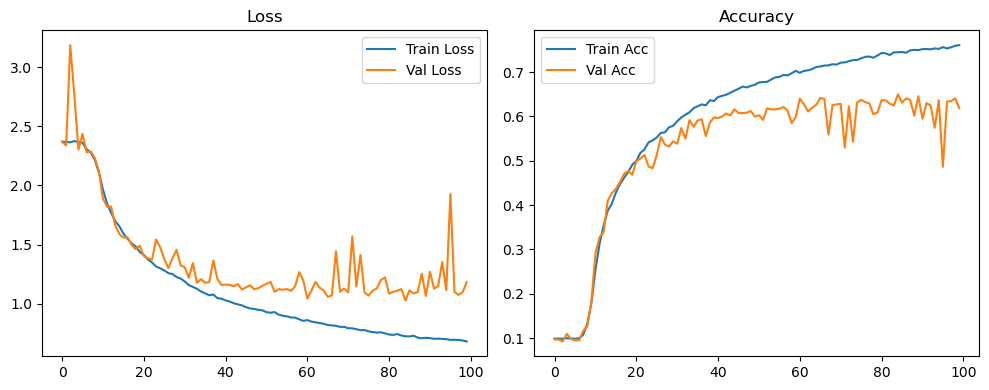

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 1.1948 Accuracy: 0.6165


🚀 Running: batch128_lr_max_0.001_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0981 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0981 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0981 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:17<2:08:37, 77.95s/it]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:34<2:08:37, 77.95s/it]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:34<2:08:37, 77.95s/it]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:34<1:08:37, 42.02s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [01:51<1:08:37, 42.02s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [01:51<1:08:37, 42.02s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0950 |:   3%|▎         | 3/100 [01:51<49:24, 30.57s/it]  

| LR: 0.000998 | Train Acc: 0.0990 | Val Acc: 0.0898 |:   3%|▎         | 3/100 [02:08<49:24, 30.57s/it]

| LR: 0.000998 | Train Acc: 0.0990 | Val Acc: 0.0898 |:   3%|▎         | 3/100 [02:08<49:24, 30.57s/it]

| LR: 0.000998 | Train Acc: 0.0990 | Val Acc: 0.0898 |:   4%|▍         | 4/100 [02:08<40:13, 25.14s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   4%|▍         | 4/100 [02:25<40:13, 25.14s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   4%|▍         | 4/100 [02:25<40:13, 25.14s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   5%|▌         | 5/100 [02:25<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0993 | Val Acc: 0.0999 |:   5%|▌         | 5/100 [02:41<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0993 | Val Acc: 0.0999 |:   5%|▌         | 5/100 [02:41<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0993 | Val Acc: 0.0999 |:   6%|▌         | 6/100 [02:42<31:46, 20.28s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.1074 |:   6%|▌         | 6/100 [02:58<31:46, 20.28s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.1074 |:   6%|▌         | 6/100 [02:58<31:46, 20.28s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.1074 |:   7%|▋         | 7/100 [02:58<29:39, 19.13s/it]

| LR: 0.000988 | Train Acc: 0.0999 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:15<29:39, 19.13s/it]

| LR: 0.000988 | Train Acc: 0.0999 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:15<29:39, 19.13s/it]

| LR: 0.000988 | Train Acc: 0.0999 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:15<28:07, 18.34s/it]

| LR: 0.000984 | Train Acc: 0.0991 | Val Acc: 0.0940 |:   8%|▊         | 8/100 [03:32<28:07, 18.34s/it]

| LR: 0.000984 | Train Acc: 0.0991 | Val Acc: 0.0940 |:   8%|▊         | 8/100 [03:32<28:07, 18.34s/it]

| LR: 0.000984 | Train Acc: 0.0991 | Val Acc: 0.0940 |:   9%|▉         | 9/100 [03:32<27:03, 17.85s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0900 |:   9%|▉         | 9/100 [03:48<27:03, 17.85s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0900 |:   9%|▉         | 9/100 [03:48<27:03, 17.85s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0900 |:  10%|█         | 10/100 [03:48<26:14, 17.49s/it]

| LR: 0.000976 | Train Acc: 0.1036 | Val Acc: 0.1017 |:  10%|█         | 10/100 [04:05<26:14, 17.49s/it]

| LR: 0.000976 | Train Acc: 0.1036 | Val Acc: 0.1017 |:  10%|█         | 10/100 [04:05<26:14, 17.49s/it]

| LR: 0.000976 | Train Acc: 0.1036 | Val Acc: 0.1017 |:  11%|█         | 11/100 [04:05<25:31, 17.20s/it]

| LR: 0.000971 | Train Acc: 0.1129 | Val Acc: 0.1009 |:  11%|█         | 11/100 [04:21<25:31, 17.20s/it]

| LR: 0.000971 | Train Acc: 0.1129 | Val Acc: 0.1009 |:  11%|█         | 11/100 [04:21<25:31, 17.20s/it]

| LR: 0.000971 | Train Acc: 0.1129 | Val Acc: 0.1009 |:  12%|█▏        | 12/100 [04:22<24:57, 17.02s/it]

| LR: 0.000965 | Train Acc: 0.1507 | Val Acc: 0.1773 |:  12%|█▏        | 12/100 [04:38<24:57, 17.02s/it]

| LR: 0.000965 | Train Acc: 0.1507 | Val Acc: 0.1773 |:  12%|█▏        | 12/100 [04:38<24:57, 17.02s/it]

| LR: 0.000965 | Train Acc: 0.1507 | Val Acc: 0.1773 |:  13%|█▎        | 13/100 [04:38<24:31, 16.91s/it]

| LR: 0.000959 | Train Acc: 0.2125 | Val Acc: 0.2360 |:  13%|█▎        | 13/100 [04:55<24:31, 16.91s/it]

| LR: 0.000959 | Train Acc: 0.2125 | Val Acc: 0.2360 |:  13%|█▎        | 13/100 [04:55<24:31, 16.91s/it]

| LR: 0.000959 | Train Acc: 0.2125 | Val Acc: 0.2360 |:  14%|█▍        | 14/100 [04:55<24:05, 16.81s/it]

| LR: 0.000953 | Train Acc: 0.2552 | Val Acc: 0.2561 |:  14%|█▍        | 14/100 [05:11<24:05, 16.81s/it]

| LR: 0.000953 | Train Acc: 0.2552 | Val Acc: 0.2561 |:  14%|█▍        | 14/100 [05:11<24:05, 16.81s/it]

| LR: 0.000953 | Train Acc: 0.2552 | Val Acc: 0.2561 |:  15%|█▌        | 15/100 [05:11<23:45, 16.77s/it]

| LR: 0.000946 | Train Acc: 0.2931 | Val Acc: 0.3342 |:  15%|█▌        | 15/100 [05:28<23:45, 16.77s/it]

| LR: 0.000946 | Train Acc: 0.2931 | Val Acc: 0.3342 |:  15%|█▌        | 15/100 [05:28<23:45, 16.77s/it]

| LR: 0.000946 | Train Acc: 0.2931 | Val Acc: 0.3342 |:  16%|█▌        | 16/100 [05:28<23:26, 16.74s/it]

| LR: 0.000939 | Train Acc: 0.3211 | Val Acc: 0.3493 |:  16%|█▌        | 16/100 [05:45<23:26, 16.74s/it]

| LR: 0.000939 | Train Acc: 0.3211 | Val Acc: 0.3493 |:  16%|█▌        | 16/100 [05:45<23:26, 16.74s/it]

| LR: 0.000939 | Train Acc: 0.3211 | Val Acc: 0.3493 |:  17%|█▋        | 17/100 [05:45<23:09, 16.74s/it]

| LR: 0.000931 | Train Acc: 0.3479 | Val Acc: 0.3692 |:  17%|█▋        | 17/100 [06:02<23:09, 16.74s/it]

| LR: 0.000931 | Train Acc: 0.3479 | Val Acc: 0.3692 |:  17%|█▋        | 17/100 [06:02<23:09, 16.74s/it]

| LR: 0.000931 | Train Acc: 0.3479 | Val Acc: 0.3692 |:  18%|█▊        | 18/100 [06:02<22:52, 16.74s/it]

| LR: 0.000923 | Train Acc: 0.3654 | Val Acc: 0.3919 |:  18%|█▊        | 18/100 [06:18<22:52, 16.74s/it]

| LR: 0.000923 | Train Acc: 0.3654 | Val Acc: 0.3919 |:  18%|█▊        | 18/100 [06:18<22:52, 16.74s/it]

| LR: 0.000923 | Train Acc: 0.3654 | Val Acc: 0.3919 |:  19%|█▉        | 19/100 [06:18<22:33, 16.71s/it]

| LR: 0.000914 | Train Acc: 0.3858 | Val Acc: 0.4228 |:  19%|█▉        | 19/100 [06:35<22:33, 16.71s/it]

| LR: 0.000914 | Train Acc: 0.3858 | Val Acc: 0.4228 |:  19%|█▉        | 19/100 [06:35<22:33, 16.71s/it]

| LR: 0.000914 | Train Acc: 0.3858 | Val Acc: 0.4228 |:  20%|██        | 20/100 [06:35<22:17, 16.71s/it]

| LR: 0.000905 | Train Acc: 0.4044 | Val Acc: 0.4361 |:  20%|██        | 20/100 [06:52<22:17, 16.71s/it]

| LR: 0.000905 | Train Acc: 0.4044 | Val Acc: 0.4361 |:  20%|██        | 20/100 [06:52<22:17, 16.71s/it]

| LR: 0.000905 | Train Acc: 0.4044 | Val Acc: 0.4361 |:  21%|██        | 21/100 [06:52<22:02, 16.74s/it]

| LR: 0.000896 | Train Acc: 0.4245 | Val Acc: 0.4276 |:  21%|██        | 21/100 [07:08<22:02, 16.74s/it]

| LR: 0.000896 | Train Acc: 0.4245 | Val Acc: 0.4276 |:  21%|██        | 21/100 [07:08<22:02, 16.74s/it]

| LR: 0.000896 | Train Acc: 0.4245 | Val Acc: 0.4276 |:  22%|██▏       | 22/100 [07:08<21:44, 16.73s/it]

| LR: 0.000886 | Train Acc: 0.4371 | Val Acc: 0.4587 |:  22%|██▏       | 22/100 [07:25<21:44, 16.73s/it]

| LR: 0.000886 | Train Acc: 0.4371 | Val Acc: 0.4587 |:  22%|██▏       | 22/100 [07:25<21:44, 16.73s/it]

| LR: 0.000886 | Train Acc: 0.4371 | Val Acc: 0.4587 |:  23%|██▎       | 23/100 [07:25<21:27, 16.72s/it]

| LR: 0.000876 | Train Acc: 0.4503 | Val Acc: 0.4762 |:  23%|██▎       | 23/100 [07:42<21:27, 16.72s/it]

| LR: 0.000876 | Train Acc: 0.4503 | Val Acc: 0.4762 |:  23%|██▎       | 23/100 [07:42<21:27, 16.72s/it]

| LR: 0.000876 | Train Acc: 0.4503 | Val Acc: 0.4762 |:  24%|██▍       | 24/100 [07:42<21:11, 16.74s/it]

| LR: 0.000866 | Train Acc: 0.4610 | Val Acc: 0.4854 |:  24%|██▍       | 24/100 [07:59<21:11, 16.74s/it]

| LR: 0.000866 | Train Acc: 0.4610 | Val Acc: 0.4854 |:  24%|██▍       | 24/100 [07:59<21:11, 16.74s/it]

| LR: 0.000866 | Train Acc: 0.4610 | Val Acc: 0.4854 |:  25%|██▌       | 25/100 [07:59<20:56, 16.75s/it]

| LR: 0.000855 | Train Acc: 0.4746 | Val Acc: 0.4956 |:  25%|██▌       | 25/100 [08:16<20:56, 16.75s/it]

| LR: 0.000855 | Train Acc: 0.4746 | Val Acc: 0.4956 |:  25%|██▌       | 25/100 [08:16<20:56, 16.75s/it]

| LR: 0.000855 | Train Acc: 0.4746 | Val Acc: 0.4956 |:  26%|██▌       | 26/100 [08:16<20:42, 16.79s/it]

| LR: 0.000844 | Train Acc: 0.4864 | Val Acc: 0.5007 |:  26%|██▌       | 26/100 [08:32<20:42, 16.79s/it]

| LR: 0.000844 | Train Acc: 0.4864 | Val Acc: 0.5007 |:  26%|██▌       | 26/100 [08:32<20:42, 16.79s/it]

| LR: 0.000844 | Train Acc: 0.4864 | Val Acc: 0.5007 |:  27%|██▋       | 27/100 [08:32<20:22, 16.75s/it]

| LR: 0.000832 | Train Acc: 0.4947 | Val Acc: 0.5093 |:  27%|██▋       | 27/100 [08:49<20:22, 16.75s/it]

| LR: 0.000832 | Train Acc: 0.4947 | Val Acc: 0.5093 |:  27%|██▋       | 27/100 [08:49<20:22, 16.75s/it]

| LR: 0.000832 | Train Acc: 0.4947 | Val Acc: 0.5093 |:  28%|██▊       | 28/100 [08:49<20:03, 16.71s/it]

| LR: 0.000821 | Train Acc: 0.5005 | Val Acc: 0.5277 |:  28%|██▊       | 28/100 [09:06<20:03, 16.71s/it]

| LR: 0.000821 | Train Acc: 0.5005 | Val Acc: 0.5277 |:  28%|██▊       | 28/100 [09:06<20:03, 16.71s/it]

| LR: 0.000821 | Train Acc: 0.5005 | Val Acc: 0.5277 |:  29%|██▉       | 29/100 [09:06<19:46, 16.71s/it]

| LR: 0.000808 | Train Acc: 0.5058 | Val Acc: 0.5129 |:  29%|██▉       | 29/100 [09:22<19:46, 16.71s/it]

| LR: 0.000808 | Train Acc: 0.5058 | Val Acc: 0.5129 |:  29%|██▉       | 29/100 [09:22<19:46, 16.71s/it]

| LR: 0.000808 | Train Acc: 0.5058 | Val Acc: 0.5129 |:  30%|███       | 30/100 [09:22<19:29, 16.71s/it]

| LR: 0.000796 | Train Acc: 0.5151 | Val Acc: 0.5378 |:  30%|███       | 30/100 [09:39<19:29, 16.71s/it]

| LR: 0.000796 | Train Acc: 0.5151 | Val Acc: 0.5378 |:  30%|███       | 30/100 [09:39<19:29, 16.71s/it]

| LR: 0.000796 | Train Acc: 0.5151 | Val Acc: 0.5378 |:  31%|███       | 31/100 [09:39<19:15, 16.75s/it]

| LR: 0.000783 | Train Acc: 0.5301 | Val Acc: 0.5221 |:  31%|███       | 31/100 [09:56<19:15, 16.75s/it]

| LR: 0.000783 | Train Acc: 0.5301 | Val Acc: 0.5221 |:  31%|███       | 31/100 [09:56<19:15, 16.75s/it]

| LR: 0.000783 | Train Acc: 0.5301 | Val Acc: 0.5221 |:  32%|███▏      | 32/100 [09:56<18:57, 16.73s/it]

| LR: 0.000770 | Train Acc: 0.5359 | Val Acc: 0.5481 |:  32%|███▏      | 32/100 [10:12<18:57, 16.73s/it]

| LR: 0.000770 | Train Acc: 0.5359 | Val Acc: 0.5481 |:  32%|███▏      | 32/100 [10:12<18:57, 16.73s/it]

| LR: 0.000770 | Train Acc: 0.5359 | Val Acc: 0.5481 |:  33%|███▎      | 33/100 [10:12<18:39, 16.71s/it]

| LR: 0.000757 | Train Acc: 0.5446 | Val Acc: 0.5354 |:  33%|███▎      | 33/100 [10:29<18:39, 16.71s/it]

| LR: 0.000757 | Train Acc: 0.5446 | Val Acc: 0.5354 |:  33%|███▎      | 33/100 [10:29<18:39, 16.71s/it]

| LR: 0.000757 | Train Acc: 0.5446 | Val Acc: 0.5354 |:  34%|███▍      | 34/100 [10:29<18:22, 16.70s/it]

| LR: 0.000743 | Train Acc: 0.5548 | Val Acc: 0.5596 |:  34%|███▍      | 34/100 [10:46<18:22, 16.70s/it]

| LR: 0.000743 | Train Acc: 0.5548 | Val Acc: 0.5596 |:  34%|███▍      | 34/100 [10:46<18:22, 16.70s/it]

| LR: 0.000743 | Train Acc: 0.5548 | Val Acc: 0.5596 |:  35%|███▌      | 35/100 [10:46<18:06, 16.72s/it]

| LR: 0.000730 | Train Acc: 0.5667 | Val Acc: 0.5731 |:  35%|███▌      | 35/100 [11:03<18:06, 16.72s/it]

| LR: 0.000730 | Train Acc: 0.5667 | Val Acc: 0.5731 |:  35%|███▌      | 35/100 [11:03<18:06, 16.72s/it]

| LR: 0.000730 | Train Acc: 0.5667 | Val Acc: 0.5731 |:  36%|███▌      | 36/100 [11:03<17:52, 16.76s/it]

| LR: 0.000716 | Train Acc: 0.5724 | Val Acc: 0.5758 |:  36%|███▌      | 36/100 [11:19<17:52, 16.76s/it]

| LR: 0.000716 | Train Acc: 0.5724 | Val Acc: 0.5758 |:  36%|███▌      | 36/100 [11:19<17:52, 16.76s/it]

| LR: 0.000716 | Train Acc: 0.5724 | Val Acc: 0.5758 |:  37%|███▋      | 37/100 [11:20<17:35, 16.75s/it]

| LR: 0.000702 | Train Acc: 0.5755 | Val Acc: 0.5760 |:  37%|███▋      | 37/100 [11:36<17:35, 16.75s/it]

| LR: 0.000702 | Train Acc: 0.5755 | Val Acc: 0.5760 |:  37%|███▋      | 37/100 [11:36<17:35, 16.75s/it]

| LR: 0.000702 | Train Acc: 0.5755 | Val Acc: 0.5760 |:  38%|███▊      | 38/100 [11:36<17:17, 16.73s/it]

| LR: 0.000687 | Train Acc: 0.5844 | Val Acc: 0.5911 |:  38%|███▊      | 38/100 [11:53<17:17, 16.73s/it]

| LR: 0.000687 | Train Acc: 0.5844 | Val Acc: 0.5911 |:  38%|███▊      | 38/100 [11:53<17:17, 16.73s/it]

| LR: 0.000687 | Train Acc: 0.5844 | Val Acc: 0.5911 |:  39%|███▉      | 39/100 [11:53<16:57, 16.68s/it]

| LR: 0.000673 | Train Acc: 0.5890 | Val Acc: 0.5937 |:  39%|███▉      | 39/100 [12:09<16:57, 16.68s/it]

| LR: 0.000673 | Train Acc: 0.5890 | Val Acc: 0.5937 |:  39%|███▉      | 39/100 [12:09<16:57, 16.68s/it]

| LR: 0.000673 | Train Acc: 0.5890 | Val Acc: 0.5937 |:  40%|████      | 40/100 [12:09<16:41, 16.69s/it]

| LR: 0.000658 | Train Acc: 0.5973 | Val Acc: 0.5932 |:  40%|████      | 40/100 [12:26<16:41, 16.69s/it]

| LR: 0.000658 | Train Acc: 0.5973 | Val Acc: 0.5932 |:  40%|████      | 40/100 [12:26<16:41, 16.69s/it]

| LR: 0.000658 | Train Acc: 0.5973 | Val Acc: 0.5932 |:  41%|████      | 41/100 [12:26<16:26, 16.72s/it]

| LR: 0.000643 | Train Acc: 0.6024 | Val Acc: 0.5984 |:  41%|████      | 41/100 [12:43<16:26, 16.72s/it]

| LR: 0.000643 | Train Acc: 0.6024 | Val Acc: 0.5984 |:  41%|████      | 41/100 [12:43<16:26, 16.72s/it]

| LR: 0.000643 | Train Acc: 0.6024 | Val Acc: 0.5984 |:  42%|████▏     | 42/100 [12:43<16:08, 16.71s/it]

| LR: 0.000628 | Train Acc: 0.6080 | Val Acc: 0.6026 |:  42%|████▏     | 42/100 [13:00<16:08, 16.71s/it]

| LR: 0.000628 | Train Acc: 0.6080 | Val Acc: 0.6026 |:  42%|████▏     | 42/100 [13:00<16:08, 16.71s/it]

| LR: 0.000628 | Train Acc: 0.6080 | Val Acc: 0.6026 |:  43%|████▎     | 43/100 [13:00<15:52, 16.72s/it]

| LR: 0.000613 | Train Acc: 0.6133 | Val Acc: 0.5971 |:  43%|████▎     | 43/100 [13:16<15:52, 16.72s/it]

| LR: 0.000613 | Train Acc: 0.6133 | Val Acc: 0.5971 |:  43%|████▎     | 43/100 [13:16<15:52, 16.72s/it]

| LR: 0.000613 | Train Acc: 0.6133 | Val Acc: 0.5971 |:  44%|████▍     | 44/100 [13:17<15:38, 16.77s/it]

| LR: 0.000598 | Train Acc: 0.6168 | Val Acc: 0.6056 |:  44%|████▍     | 44/100 [13:33<15:38, 16.77s/it]

| LR: 0.000598 | Train Acc: 0.6168 | Val Acc: 0.6056 |:  44%|████▍     | 44/100 [13:33<15:38, 16.77s/it]

| LR: 0.000598 | Train Acc: 0.6168 | Val Acc: 0.6056 |:  45%|████▌     | 45/100 [13:33<15:21, 16.75s/it]

| LR: 0.000582 | Train Acc: 0.6242 | Val Acc: 0.6237 |:  45%|████▌     | 45/100 [13:50<15:21, 16.75s/it]

| LR: 0.000582 | Train Acc: 0.6242 | Val Acc: 0.6237 |:  45%|████▌     | 45/100 [13:50<15:21, 16.75s/it]

| LR: 0.000582 | Train Acc: 0.6242 | Val Acc: 0.6237 |:  46%|████▌     | 46/100 [13:50<15:02, 16.71s/it]

| LR: 0.000567 | Train Acc: 0.6253 | Val Acc: 0.6081 |:  46%|████▌     | 46/100 [14:07<15:02, 16.71s/it]

| LR: 0.000567 | Train Acc: 0.6253 | Val Acc: 0.6081 |:  46%|████▌     | 46/100 [14:07<15:02, 16.71s/it]

| LR: 0.000567 | Train Acc: 0.6253 | Val Acc: 0.6081 |:  47%|████▋     | 47/100 [14:07<14:46, 16.72s/it]

| LR: 0.000552 | Train Acc: 0.6303 | Val Acc: 0.6155 |:  47%|████▋     | 47/100 [14:23<14:46, 16.72s/it]

| LR: 0.000552 | Train Acc: 0.6303 | Val Acc: 0.6155 |:  47%|████▋     | 47/100 [14:23<14:46, 16.72s/it]

| LR: 0.000552 | Train Acc: 0.6303 | Val Acc: 0.6155 |:  48%|████▊     | 48/100 [14:23<14:29, 16.72s/it]

| LR: 0.000536 | Train Acc: 0.6357 | Val Acc: 0.6198 |:  48%|████▊     | 48/100 [14:40<14:29, 16.72s/it]

| LR: 0.000536 | Train Acc: 0.6357 | Val Acc: 0.6198 |:  48%|████▊     | 48/100 [14:40<14:29, 16.72s/it]

| LR: 0.000536 | Train Acc: 0.6357 | Val Acc: 0.6198 |:  49%|████▉     | 49/100 [14:40<14:11, 16.71s/it]

| LR: 0.000521 | Train Acc: 0.6394 | Val Acc: 0.6325 |:  49%|████▉     | 49/100 [14:57<14:11, 16.71s/it]

| LR: 0.000521 | Train Acc: 0.6394 | Val Acc: 0.6325 |:  49%|████▉     | 49/100 [14:57<14:11, 16.71s/it]

| LR: 0.000521 | Train Acc: 0.6394 | Val Acc: 0.6325 |:  50%|█████     | 50/100 [14:57<13:54, 16.69s/it]

| LR: 0.000505 | Train Acc: 0.6394 | Val Acc: 0.6154 |:  50%|█████     | 50/100 [15:13<13:54, 16.69s/it]

| LR: 0.000505 | Train Acc: 0.6394 | Val Acc: 0.6154 |:  50%|█████     | 50/100 [15:13<13:54, 16.69s/it]

| LR: 0.000505 | Train Acc: 0.6394 | Val Acc: 0.6154 |:  51%|█████     | 51/100 [15:13<13:39, 16.72s/it]

| LR: 0.000489 | Train Acc: 0.6475 | Val Acc: 0.6223 |:  51%|█████     | 51/100 [15:30<13:39, 16.72s/it]

| LR: 0.000489 | Train Acc: 0.6475 | Val Acc: 0.6223 |:  51%|█████     | 51/100 [15:30<13:39, 16.72s/it]

| LR: 0.000489 | Train Acc: 0.6475 | Val Acc: 0.6223 |:  52%|█████▏    | 52/100 [15:30<13:23, 16.74s/it]

| LR: 0.000474 | Train Acc: 0.6454 | Val Acc: 0.6267 |:  52%|█████▏    | 52/100 [15:47<13:23, 16.74s/it]

| LR: 0.000474 | Train Acc: 0.6454 | Val Acc: 0.6267 |:  52%|█████▏    | 52/100 [15:47<13:23, 16.74s/it]

| LR: 0.000474 | Train Acc: 0.6454 | Val Acc: 0.6267 |:  53%|█████▎    | 53/100 [15:47<13:08, 16.77s/it]

| LR: 0.000458 | Train Acc: 0.6536 | Val Acc: 0.6360 |:  53%|█████▎    | 53/100 [16:04<13:08, 16.77s/it]

| LR: 0.000458 | Train Acc: 0.6536 | Val Acc: 0.6360 |:  53%|█████▎    | 53/100 [16:04<13:08, 16.77s/it]

| LR: 0.000458 | Train Acc: 0.6536 | Val Acc: 0.6360 |:  54%|█████▍    | 54/100 [16:04<12:51, 16.76s/it]

| LR: 0.000443 | Train Acc: 0.6553 | Val Acc: 0.6450 |:  54%|█████▍    | 54/100 [16:21<12:51, 16.76s/it]

| LR: 0.000443 | Train Acc: 0.6553 | Val Acc: 0.6450 |:  54%|█████▍    | 54/100 [16:21<12:51, 16.76s/it]

| LR: 0.000443 | Train Acc: 0.6553 | Val Acc: 0.6450 |:  55%|█████▌    | 55/100 [16:21<12:34, 16.78s/it]

| LR: 0.000428 | Train Acc: 0.6581 | Val Acc: 0.6369 |:  55%|█████▌    | 55/100 [16:37<12:34, 16.78s/it]

| LR: 0.000428 | Train Acc: 0.6581 | Val Acc: 0.6369 |:  55%|█████▌    | 55/100 [16:37<12:34, 16.78s/it]

| LR: 0.000428 | Train Acc: 0.6581 | Val Acc: 0.6369 |:  56%|█████▌    | 56/100 [16:37<12:17, 16.75s/it]

| LR: 0.000412 | Train Acc: 0.6584 | Val Acc: 0.6371 |:  56%|█████▌    | 56/100 [16:54<12:17, 16.75s/it]

| LR: 0.000412 | Train Acc: 0.6584 | Val Acc: 0.6371 |:  56%|█████▌    | 56/100 [16:54<12:17, 16.75s/it]

| LR: 0.000412 | Train Acc: 0.6584 | Val Acc: 0.6371 |:  57%|█████▋    | 57/100 [16:54<12:00, 16.75s/it]

| LR: 0.000397 | Train Acc: 0.6586 | Val Acc: 0.6354 |:  57%|█████▋    | 57/100 [17:11<12:00, 16.75s/it]

| LR: 0.000397 | Train Acc: 0.6586 | Val Acc: 0.6354 |:  57%|█████▋    | 57/100 [17:11<12:00, 16.75s/it]

| LR: 0.000397 | Train Acc: 0.6586 | Val Acc: 0.6354 |:  58%|█████▊    | 58/100 [17:11<11:43, 16.75s/it]

| LR: 0.000382 | Train Acc: 0.6620 | Val Acc: 0.6442 |:  58%|█████▊    | 58/100 [17:27<11:43, 16.75s/it]

| LR: 0.000382 | Train Acc: 0.6620 | Val Acc: 0.6442 |:  58%|█████▊    | 58/100 [17:27<11:43, 16.75s/it]

| LR: 0.000382 | Train Acc: 0.6620 | Val Acc: 0.6442 |:  59%|█████▉    | 59/100 [17:27<11:25, 16.72s/it]

| LR: 0.000367 | Train Acc: 0.6666 | Val Acc: 0.6417 |:  59%|█████▉    | 59/100 [17:44<11:25, 16.72s/it]

| LR: 0.000367 | Train Acc: 0.6666 | Val Acc: 0.6417 |:  59%|█████▉    | 59/100 [17:44<11:25, 16.72s/it]

| LR: 0.000367 | Train Acc: 0.6666 | Val Acc: 0.6417 |:  60%|██████    | 60/100 [17:44<11:08, 16.72s/it]

| LR: 0.000352 | Train Acc: 0.6648 | Val Acc: 0.6352 |:  60%|██████    | 60/100 [18:01<11:08, 16.72s/it]

| LR: 0.000352 | Train Acc: 0.6648 | Val Acc: 0.6352 |:  60%|██████    | 60/100 [18:01<11:08, 16.72s/it]

| LR: 0.000352 | Train Acc: 0.6648 | Val Acc: 0.6352 |:  61%|██████    | 61/100 [18:01<10:52, 16.74s/it]

| LR: 0.000337 | Train Acc: 0.6712 | Val Acc: 0.6391 |:  61%|██████    | 61/100 [18:18<10:52, 16.74s/it]

| LR: 0.000337 | Train Acc: 0.6712 | Val Acc: 0.6391 |:  61%|██████    | 61/100 [18:18<10:52, 16.74s/it]

| LR: 0.000337 | Train Acc: 0.6712 | Val Acc: 0.6391 |:  62%|██████▏   | 62/100 [18:18<10:37, 16.76s/it]

| LR: 0.000323 | Train Acc: 0.6741 | Val Acc: 0.6442 |:  62%|██████▏   | 62/100 [18:35<10:37, 16.76s/it]

| LR: 0.000323 | Train Acc: 0.6741 | Val Acc: 0.6442 |:  62%|██████▏   | 62/100 [18:35<10:37, 16.76s/it]

| LR: 0.000323 | Train Acc: 0.6741 | Val Acc: 0.6442 |:  63%|██████▎   | 63/100 [18:35<10:20, 16.77s/it]

| LR: 0.000308 | Train Acc: 0.6727 | Val Acc: 0.6416 |:  63%|██████▎   | 63/100 [18:51<10:20, 16.77s/it]

| LR: 0.000308 | Train Acc: 0.6727 | Val Acc: 0.6416 |:  63%|██████▎   | 63/100 [18:51<10:20, 16.77s/it]

| LR: 0.000308 | Train Acc: 0.6727 | Val Acc: 0.6416 |:  64%|██████▍   | 64/100 [18:51<10:04, 16.78s/it]

| LR: 0.000294 | Train Acc: 0.6788 | Val Acc: 0.6473 |:  64%|██████▍   | 64/100 [19:08<10:04, 16.78s/it]

| LR: 0.000294 | Train Acc: 0.6788 | Val Acc: 0.6473 |:  64%|██████▍   | 64/100 [19:08<10:04, 16.78s/it]

| LR: 0.000294 | Train Acc: 0.6788 | Val Acc: 0.6473 |:  65%|██████▌   | 65/100 [19:08<09:47, 16.77s/it]

| LR: 0.000280 | Train Acc: 0.6713 | Val Acc: 0.6459 |:  65%|██████▌   | 65/100 [19:25<09:47, 16.77s/it]

| LR: 0.000280 | Train Acc: 0.6713 | Val Acc: 0.6459 |:  65%|██████▌   | 65/100 [19:25<09:47, 16.77s/it]

| LR: 0.000280 | Train Acc: 0.6713 | Val Acc: 0.6459 |:  66%|██████▌   | 66/100 [19:25<09:29, 16.75s/it]

| LR: 0.000267 | Train Acc: 0.6801 | Val Acc: 0.6485 |:  66%|██████▌   | 66/100 [19:41<09:29, 16.75s/it]

| LR: 0.000267 | Train Acc: 0.6801 | Val Acc: 0.6485 |:  66%|██████▌   | 66/100 [19:41<09:29, 16.75s/it]

| LR: 0.000267 | Train Acc: 0.6801 | Val Acc: 0.6485 |:  67%|██████▋   | 67/100 [19:42<09:12, 16.73s/it]

| LR: 0.000253 | Train Acc: 0.6785 | Val Acc: 0.6419 |:  67%|██████▋   | 67/100 [19:58<09:12, 16.73s/it]

| LR: 0.000253 | Train Acc: 0.6785 | Val Acc: 0.6419 |:  67%|██████▋   | 67/100 [19:58<09:12, 16.73s/it]

| LR: 0.000253 | Train Acc: 0.6785 | Val Acc: 0.6419 |:  68%|██████▊   | 68/100 [19:58<08:56, 16.78s/it]

| LR: 0.000240 | Train Acc: 0.6849 | Val Acc: 0.6492 |:  68%|██████▊   | 68/100 [20:15<08:56, 16.78s/it]

| LR: 0.000240 | Train Acc: 0.6849 | Val Acc: 0.6492 |:  68%|██████▊   | 68/100 [20:15<08:56, 16.78s/it]

| LR: 0.000240 | Train Acc: 0.6849 | Val Acc: 0.6492 |:  69%|██████▉   | 69/100 [20:15<08:40, 16.80s/it]

| LR: 0.000227 | Train Acc: 0.6855 | Val Acc: 0.6465 |:  69%|██████▉   | 69/100 [20:32<08:40, 16.80s/it]

| LR: 0.000227 | Train Acc: 0.6855 | Val Acc: 0.6465 |:  69%|██████▉   | 69/100 [20:32<08:40, 16.80s/it]

| LR: 0.000227 | Train Acc: 0.6855 | Val Acc: 0.6465 |:  70%|███████   | 70/100 [20:32<08:24, 16.83s/it]

| LR: 0.000214 | Train Acc: 0.6858 | Val Acc: 0.6451 |:  70%|███████   | 70/100 [20:49<08:24, 16.83s/it]

| LR: 0.000214 | Train Acc: 0.6858 | Val Acc: 0.6451 |:  70%|███████   | 70/100 [20:49<08:24, 16.83s/it]

| LR: 0.000214 | Train Acc: 0.6858 | Val Acc: 0.6451 |:  71%|███████   | 71/100 [20:49<08:06, 16.76s/it]

| LR: 0.000202 | Train Acc: 0.6881 | Val Acc: 0.6512 |:  71%|███████   | 71/100 [21:05<08:06, 16.76s/it]

| LR: 0.000202 | Train Acc: 0.6881 | Val Acc: 0.6512 |:  71%|███████   | 71/100 [21:05<08:06, 16.76s/it]

| LR: 0.000202 | Train Acc: 0.6881 | Val Acc: 0.6512 |:  72%|███████▏  | 72/100 [21:05<07:48, 16.74s/it]

| LR: 0.000189 | Train Acc: 0.6895 | Val Acc: 0.6501 |:  72%|███████▏  | 72/100 [21:22<07:48, 16.74s/it]

| LR: 0.000189 | Train Acc: 0.6895 | Val Acc: 0.6501 |:  72%|███████▏  | 72/100 [21:22<07:48, 16.74s/it]

| LR: 0.000189 | Train Acc: 0.6895 | Val Acc: 0.6501 |:  73%|███████▎  | 73/100 [21:22<07:31, 16.72s/it]

| LR: 0.000178 | Train Acc: 0.6912 | Val Acc: 0.6495 |:  73%|███████▎  | 73/100 [21:39<07:31, 16.72s/it]

| LR: 0.000178 | Train Acc: 0.6912 | Val Acc: 0.6495 |:  73%|███████▎  | 73/100 [21:39<07:31, 16.72s/it]

| LR: 0.000178 | Train Acc: 0.6912 | Val Acc: 0.6495 |:  74%|███████▍  | 74/100 [21:39<07:14, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.6934 | Val Acc: 0.6532 |:  74%|███████▍  | 74/100 [21:56<07:14, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.6934 | Val Acc: 0.6532 |:  74%|███████▍  | 74/100 [21:56<07:14, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.6934 | Val Acc: 0.6532 |:  75%|███████▌  | 75/100 [21:56<06:59, 16.77s/it]

| LR: 0.000155 | Train Acc: 0.6942 | Val Acc: 0.6454 |:  75%|███████▌  | 75/100 [22:12<06:59, 16.77s/it]

| LR: 0.000155 | Train Acc: 0.6942 | Val Acc: 0.6454 |:  75%|███████▌  | 75/100 [22:12<06:59, 16.77s/it]

| LR: 0.000155 | Train Acc: 0.6942 | Val Acc: 0.6454 |:  76%|███████▌  | 76/100 [22:12<06:40, 16.69s/it]

| LR: 0.000144 | Train Acc: 0.6970 | Val Acc: 0.6508 |:  76%|███████▌  | 76/100 [22:29<06:40, 16.69s/it]

| LR: 0.000144 | Train Acc: 0.6970 | Val Acc: 0.6508 |:  76%|███████▌  | 76/100 [22:29<06:40, 16.69s/it]

| LR: 0.000144 | Train Acc: 0.6970 | Val Acc: 0.6508 |:  77%|███████▋  | 77/100 [22:29<06:22, 16.64s/it]

| LR: 0.000134 | Train Acc: 0.6959 | Val Acc: 0.6561 |:  77%|███████▋  | 77/100 [22:45<06:22, 16.64s/it]

| LR: 0.000134 | Train Acc: 0.6959 | Val Acc: 0.6561 |:  77%|███████▋  | 77/100 [22:45<06:22, 16.64s/it]

| LR: 0.000134 | Train Acc: 0.6959 | Val Acc: 0.6561 |:  78%|███████▊  | 78/100 [22:45<06:06, 16.65s/it]

| LR: 0.000124 | Train Acc: 0.6994 | Val Acc: 0.6522 |:  78%|███████▊  | 78/100 [23:02<06:06, 16.65s/it]

| LR: 0.000124 | Train Acc: 0.6994 | Val Acc: 0.6522 |:  78%|███████▊  | 78/100 [23:02<06:06, 16.65s/it]

| LR: 0.000124 | Train Acc: 0.6994 | Val Acc: 0.6522 |:  79%|███████▉  | 79/100 [23:02<05:49, 16.63s/it]

| LR: 0.000114 | Train Acc: 0.6988 | Val Acc: 0.6535 |:  79%|███████▉  | 79/100 [23:19<05:49, 16.63s/it]

| LR: 0.000114 | Train Acc: 0.6988 | Val Acc: 0.6535 |:  79%|███████▉  | 79/100 [23:19<05:49, 16.63s/it]

| LR: 0.000114 | Train Acc: 0.6988 | Val Acc: 0.6535 |:  80%|████████  | 80/100 [23:19<05:33, 16.65s/it]

| LR: 0.000105 | Train Acc: 0.7022 | Val Acc: 0.6530 |:  80%|████████  | 80/100 [23:35<05:33, 16.65s/it]

| LR: 0.000105 | Train Acc: 0.7022 | Val Acc: 0.6530 |:  80%|████████  | 80/100 [23:35<05:33, 16.65s/it]

| LR: 0.000105 | Train Acc: 0.7022 | Val Acc: 0.6530 |:  81%|████████  | 81/100 [23:35<05:15, 16.63s/it]

| LR: 0.000096 | Train Acc: 0.7036 | Val Acc: 0.6523 |:  81%|████████  | 81/100 [23:52<05:15, 16.63s/it]

| LR: 0.000096 | Train Acc: 0.7036 | Val Acc: 0.6523 |:  81%|████████  | 81/100 [23:52<05:15, 16.63s/it]

| LR: 0.000096 | Train Acc: 0.7036 | Val Acc: 0.6523 |:  82%|████████▏ | 82/100 [23:52<04:59, 16.65s/it]

| LR: 0.000087 | Train Acc: 0.7043 | Val Acc: 0.6558 |:  82%|████████▏ | 82/100 [24:09<04:59, 16.65s/it]

| LR: 0.000087 | Train Acc: 0.7043 | Val Acc: 0.6558 |:  82%|████████▏ | 82/100 [24:09<04:59, 16.65s/it]

| LR: 0.000087 | Train Acc: 0.7043 | Val Acc: 0.6558 |:  83%|████████▎ | 83/100 [24:09<04:43, 16.69s/it]

| LR: 0.000079 | Train Acc: 0.7076 | Val Acc: 0.6538 |:  83%|████████▎ | 83/100 [24:25<04:43, 16.69s/it]

| LR: 0.000079 | Train Acc: 0.7076 | Val Acc: 0.6538 |:  83%|████████▎ | 83/100 [24:25<04:43, 16.69s/it]

| LR: 0.000079 | Train Acc: 0.7076 | Val Acc: 0.6538 |:  84%|████████▍ | 84/100 [24:25<04:26, 16.69s/it]

| LR: 0.000071 | Train Acc: 0.7052 | Val Acc: 0.6512 |:  84%|████████▍ | 84/100 [24:42<04:26, 16.69s/it]

| LR: 0.000071 | Train Acc: 0.7052 | Val Acc: 0.6512 |:  84%|████████▍ | 84/100 [24:42<04:26, 16.69s/it]

| LR: 0.000071 | Train Acc: 0.7052 | Val Acc: 0.6512 |:  85%|████████▌ | 85/100 [24:42<04:10, 16.70s/it]

| LR: 0.000064 | Train Acc: 0.7100 | Val Acc: 0.6492 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.70s/it]

| LR: 0.000064 | Train Acc: 0.7100 | Val Acc: 0.6492 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.70s/it]

| LR: 0.000064 | Train Acc: 0.7100 | Val Acc: 0.6492 |:  86%|████████▌ | 86/100 [24:59<03:54, 16.73s/it]

| LR: 0.000057 | Train Acc: 0.7115 | Val Acc: 0.6549 |:  86%|████████▌ | 86/100 [25:16<03:54, 16.73s/it]

| LR: 0.000057 | Train Acc: 0.7115 | Val Acc: 0.6549 |:  86%|████████▌ | 86/100 [25:16<03:54, 16.73s/it]

| LR: 0.000057 | Train Acc: 0.7115 | Val Acc: 0.6549 |:  87%|████████▋ | 87/100 [25:16<03:37, 16.75s/it]

| LR: 0.000051 | Train Acc: 0.7109 | Val Acc: 0.6582 |:  87%|████████▋ | 87/100 [25:32<03:37, 16.75s/it]

| LR: 0.000051 | Train Acc: 0.7109 | Val Acc: 0.6582 |:  87%|████████▋ | 87/100 [25:32<03:37, 16.75s/it]

| LR: 0.000051 | Train Acc: 0.7109 | Val Acc: 0.6582 |:  88%|████████▊ | 88/100 [25:33<03:20, 16.75s/it]

| LR: 0.000045 | Train Acc: 0.7096 | Val Acc: 0.6556 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.75s/it]

| LR: 0.000045 | Train Acc: 0.7096 | Val Acc: 0.6556 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.75s/it]

| LR: 0.000045 | Train Acc: 0.7096 | Val Acc: 0.6556 |:  89%|████████▉ | 89/100 [25:49<03:04, 16.74s/it]

| LR: 0.000039 | Train Acc: 0.7112 | Val Acc: 0.6638 |:  89%|████████▉ | 89/100 [26:06<03:04, 16.74s/it]

| LR: 0.000039 | Train Acc: 0.7112 | Val Acc: 0.6638 |:  89%|████████▉ | 89/100 [26:06<03:04, 16.74s/it]

| LR: 0.000039 | Train Acc: 0.7112 | Val Acc: 0.6638 |:  90%|█████████ | 90/100 [26:06<02:47, 16.74s/it]

| LR: 0.000034 | Train Acc: 0.7148 | Val Acc: 0.6655 |:  90%|█████████ | 90/100 [26:23<02:47, 16.74s/it]

| LR: 0.000034 | Train Acc: 0.7148 | Val Acc: 0.6655 |:  90%|█████████ | 90/100 [26:23<02:47, 16.74s/it]

| LR: 0.000034 | Train Acc: 0.7148 | Val Acc: 0.6655 |:  91%|█████████ | 91/100 [26:23<02:30, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.7163 | Val Acc: 0.6626 |:  91%|█████████ | 91/100 [26:39<02:30, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.7163 | Val Acc: 0.6626 |:  91%|█████████ | 91/100 [26:39<02:30, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.7163 | Val Acc: 0.6626 |:  92%|█████████▏| 92/100 [26:40<02:13, 16.74s/it]

| LR: 0.000026 | Train Acc: 0.7142 | Val Acc: 0.6517 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.74s/it]

| LR: 0.000026 | Train Acc: 0.7142 | Val Acc: 0.6517 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.74s/it]

| LR: 0.000026 | Train Acc: 0.7142 | Val Acc: 0.6517 |:  93%|█████████▎| 93/100 [26:56<01:57, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.7154 | Val Acc: 0.6607 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.7154 | Val Acc: 0.6607 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.7154 | Val Acc: 0.6607 |:  94%|█████████▍| 94/100 [27:13<01:40, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.7149 | Val Acc: 0.6612 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.7149 | Val Acc: 0.6612 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.7149 | Val Acc: 0.6612 |:  95%|█████████▌| 95/100 [27:30<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.7152 | Val Acc: 0.6480 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.7152 | Val Acc: 0.6480 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.7152 | Val Acc: 0.6480 |:  96%|█████████▌| 96/100 [27:46<01:06, 16.71s/it]

| LR: 0.000014 | Train Acc: 0.7176 | Val Acc: 0.6576 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.71s/it]

| LR: 0.000014 | Train Acc: 0.7176 | Val Acc: 0.6576 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.71s/it]

| LR: 0.000014 | Train Acc: 0.7176 | Val Acc: 0.6576 |:  97%|█████████▋| 97/100 [28:03<00:49, 16.64s/it]

| LR: 0.000012 | Train Acc: 0.7197 | Val Acc: 0.6600 |:  97%|█████████▋| 97/100 [28:20<00:49, 16.64s/it]

| LR: 0.000012 | Train Acc: 0.7197 | Val Acc: 0.6600 |:  97%|█████████▋| 97/100 [28:20<00:49, 16.64s/it]

| LR: 0.000012 | Train Acc: 0.7197 | Val Acc: 0.6600 |:  98%|█████████▊| 98/100 [28:20<00:33, 16.72s/it]

| LR: 0.000011 | Train Acc: 0.7192 | Val Acc: 0.6637 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.72s/it]

| LR: 0.000011 | Train Acc: 0.7192 | Val Acc: 0.6637 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.72s/it]

| LR: 0.000011 | Train Acc: 0.7192 | Val Acc: 0.6637 |:  99%|█████████▉| 99/100 [28:37<00:16, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.7180 | Val Acc: 0.6599 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.7180 | Val Acc: 0.6599 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.7180 | Val Acc: 0.6599 |: 100%|██████████| 100/100 [28:53<00:00, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.7180 | Val Acc: 0.6599 |: 100%|██████████| 100/100 [28:53<00:00, 17.34s/it]

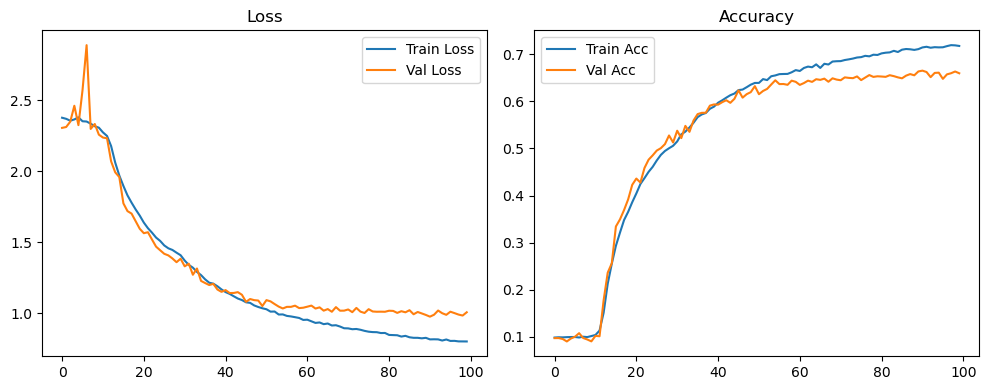

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.21it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 1.0212 Accuracy: 0.6557


🚀 Running: batch128_lr_max_0.001_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   1%|          | 1/100 [01:18<2:09:35, 78.54s/it]

| LR: 0.001000 | Train Acc: 0.1001 | Val Acc: 0.0974 |:   1%|          | 1/100 [01:35<2:09:35, 78.54s/it]

| LR: 0.001000 | Train Acc: 0.1001 | Val Acc: 0.0974 |:   1%|          | 1/100 [01:35<2:09:35, 78.54s/it]

| LR: 0.001000 | Train Acc: 0.1001 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [01:35<1:08:51, 42.16s/it]

| LR: 0.000999 | Train Acc: 0.1003 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [01:51<1:08:51, 42.16s/it]

| LR: 0.000999 | Train Acc: 0.1003 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [01:51<1:08:51, 42.16s/it]

| LR: 0.000999 | Train Acc: 0.1003 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [01:51<49:15, 30.47s/it]  

| LR: 0.000998 | Train Acc: 0.1006 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:08<49:15, 30.47s/it]

| LR: 0.000998 | Train Acc: 0.1006 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:08<49:15, 30.47s/it]

| LR: 0.000998 | Train Acc: 0.1006 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:08<40:01, 25.01s/it]

| LR: 0.000996 | Train Acc: 0.1006 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:25<40:01, 25.01s/it]

| LR: 0.000996 | Train Acc: 0.1006 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:25<40:01, 25.01s/it]

| LR: 0.000996 | Train Acc: 0.1006 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:25<34:50, 22.01s/it]

| LR: 0.000994 | Train Acc: 0.1007 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:50, 22.01s/it]

| LR: 0.000994 | Train Acc: 0.1007 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:50, 22.01s/it]

| LR: 0.000994 | Train Acc: 0.1007 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:41<31:38, 20.20s/it]

| LR: 0.000991 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:58<31:38, 20.20s/it]

| LR: 0.000991 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:58<31:38, 20.20s/it]

| LR: 0.000991 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [02:58<29:32, 19.06s/it]

| LR: 0.000988 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:14<29:32, 19.06s/it]

| LR: 0.000988 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:14<29:32, 19.06s/it]

| LR: 0.000988 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:15<27:58, 18.24s/it]

| LR: 0.000984 | Train Acc: 0.1015 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<27:58, 18.24s/it]

| LR: 0.000984 | Train Acc: 0.1015 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<27:58, 18.24s/it]

| LR: 0.000984 | Train Acc: 0.1015 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [03:31<26:58, 17.78s/it]

| LR: 0.000980 | Train Acc: 0.1007 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [03:48<26:58, 17.78s/it]

| LR: 0.000980 | Train Acc: 0.1007 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [03:48<26:58, 17.78s/it]

| LR: 0.000980 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  10%|█         | 10/100 [03:48<26:11, 17.46s/it]

| LR: 0.000976 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:05<26:11, 17.46s/it]

| LR: 0.000976 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:05<26:11, 17.46s/it]

| LR: 0.000976 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:05<25:34, 17.24s/it]

| LR: 0.000971 | Train Acc: 0.1015 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:21<25:34, 17.24s/it]

| LR: 0.000971 | Train Acc: 0.1015 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:21<25:34, 17.24s/it]

| LR: 0.000971 | Train Acc: 0.1015 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [04:21<25:03, 17.08s/it]

| LR: 0.000965 | Train Acc: 0.1016 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [04:38<25:03, 17.08s/it]

| LR: 0.000965 | Train Acc: 0.1016 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [04:38<25:03, 17.08s/it]

| LR: 0.000965 | Train Acc: 0.1016 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [04:38<24:34, 16.95s/it]

| LR: 0.000959 | Train Acc: 0.1022 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [04:55<24:34, 16.95s/it]

| LR: 0.000959 | Train Acc: 0.1022 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [04:55<24:34, 16.95s/it]

| LR: 0.000959 | Train Acc: 0.1022 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [04:55<24:11, 16.88s/it]

| LR: 0.000953 | Train Acc: 0.1028 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [05:11<24:11, 16.88s/it]

| LR: 0.000953 | Train Acc: 0.1028 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [05:11<24:11, 16.88s/it]

| LR: 0.000953 | Train Acc: 0.1028 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:12<23:49, 16.82s/it]

| LR: 0.000946 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:28<23:49, 16.82s/it]

| LR: 0.000946 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:28<23:49, 16.82s/it]

| LR: 0.000946 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:28<23:31, 16.80s/it]

| LR: 0.000939 | Train Acc: 0.1042 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:45<23:31, 16.80s/it]

| LR: 0.000939 | Train Acc: 0.1042 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:45<23:31, 16.80s/it]

| LR: 0.000939 | Train Acc: 0.1042 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [05:45<23:12, 16.78s/it]

| LR: 0.000931 | Train Acc: 0.1036 | Val Acc: 0.0975 |:  17%|█▋        | 17/100 [06:02<23:12, 16.78s/it]

| LR: 0.000931 | Train Acc: 0.1036 | Val Acc: 0.0975 |:  17%|█▋        | 17/100 [06:02<23:12, 16.78s/it]

| LR: 0.000931 | Train Acc: 0.1036 | Val Acc: 0.0975 |:  18%|█▊        | 18/100 [06:02<22:57, 16.80s/it]

| LR: 0.000923 | Train Acc: 0.1052 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:19<22:57, 16.80s/it]

| LR: 0.000923 | Train Acc: 0.1052 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:19<22:57, 16.80s/it]

| LR: 0.000923 | Train Acc: 0.1052 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:19<22:39, 16.79s/it]

| LR: 0.000914 | Train Acc: 0.1049 | Val Acc: 0.1054 |:  19%|█▉        | 19/100 [06:35<22:39, 16.79s/it]

| LR: 0.000914 | Train Acc: 0.1049 | Val Acc: 0.1054 |:  19%|█▉        | 19/100 [06:35<22:39, 16.79s/it]

| LR: 0.000914 | Train Acc: 0.1049 | Val Acc: 0.1054 |:  20%|██        | 20/100 [06:35<22:20, 16.75s/it]

| LR: 0.000905 | Train Acc: 0.1068 | Val Acc: 0.1187 |:  20%|██        | 20/100 [06:52<22:20, 16.75s/it]

| LR: 0.000905 | Train Acc: 0.1068 | Val Acc: 0.1187 |:  20%|██        | 20/100 [06:52<22:20, 16.75s/it]

| LR: 0.000905 | Train Acc: 0.1068 | Val Acc: 0.1187 |:  21%|██        | 21/100 [06:52<22:04, 16.77s/it]

| LR: 0.000896 | Train Acc: 0.1028 | Val Acc: 0.0974 |:  21%|██        | 21/100 [07:09<22:04, 16.77s/it]

| LR: 0.000896 | Train Acc: 0.1028 | Val Acc: 0.0974 |:  21%|██        | 21/100 [07:09<22:04, 16.77s/it]

| LR: 0.000896 | Train Acc: 0.1028 | Val Acc: 0.0974 |:  22%|██▏       | 22/100 [07:09<21:48, 16.77s/it]

| LR: 0.000886 | Train Acc: 0.1075 | Val Acc: 0.0981 |:  22%|██▏       | 22/100 [07:26<21:48, 16.77s/it]

| LR: 0.000886 | Train Acc: 0.1075 | Val Acc: 0.0981 |:  22%|██▏       | 22/100 [07:26<21:48, 16.77s/it]

| LR: 0.000886 | Train Acc: 0.1075 | Val Acc: 0.0981 |:  23%|██▎       | 23/100 [07:26<21:30, 16.76s/it]

| LR: 0.000876 | Train Acc: 0.1090 | Val Acc: 0.1021 |:  23%|██▎       | 23/100 [07:42<21:30, 16.76s/it]

| LR: 0.000876 | Train Acc: 0.1090 | Val Acc: 0.1021 |:  23%|██▎       | 23/100 [07:42<21:30, 16.76s/it]

| LR: 0.000876 | Train Acc: 0.1090 | Val Acc: 0.1021 |:  24%|██▍       | 24/100 [07:42<21:16, 16.79s/it]

| LR: 0.000866 | Train Acc: 0.1091 | Val Acc: 0.1067 |:  24%|██▍       | 24/100 [07:59<21:16, 16.79s/it]

| LR: 0.000866 | Train Acc: 0.1091 | Val Acc: 0.1067 |:  24%|██▍       | 24/100 [07:59<21:16, 16.79s/it]

| LR: 0.000866 | Train Acc: 0.1091 | Val Acc: 0.1067 |:  25%|██▌       | 25/100 [07:59<21:02, 16.83s/it]

| LR: 0.000855 | Train Acc: 0.1125 | Val Acc: 0.1025 |:  25%|██▌       | 25/100 [08:16<21:02, 16.83s/it]

| LR: 0.000855 | Train Acc: 0.1125 | Val Acc: 0.1025 |:  25%|██▌       | 25/100 [08:16<21:02, 16.83s/it]

| LR: 0.000855 | Train Acc: 0.1125 | Val Acc: 0.1025 |:  26%|██▌       | 26/100 [08:16<20:43, 16.81s/it]

| LR: 0.000844 | Train Acc: 0.1149 | Val Acc: 0.1128 |:  26%|██▌       | 26/100 [08:33<20:43, 16.81s/it]

| LR: 0.000844 | Train Acc: 0.1149 | Val Acc: 0.1128 |:  26%|██▌       | 26/100 [08:33<20:43, 16.81s/it]

| LR: 0.000844 | Train Acc: 0.1149 | Val Acc: 0.1128 |:  27%|██▋       | 27/100 [08:33<20:23, 16.75s/it]

| LR: 0.000832 | Train Acc: 0.1167 | Val Acc: 0.1161 |:  27%|██▋       | 27/100 [08:49<20:23, 16.75s/it]

| LR: 0.000832 | Train Acc: 0.1167 | Val Acc: 0.1161 |:  27%|██▋       | 27/100 [08:49<20:23, 16.75s/it]

| LR: 0.000832 | Train Acc: 0.1167 | Val Acc: 0.1161 |:  28%|██▊       | 28/100 [08:50<20:05, 16.74s/it]

| LR: 0.000821 | Train Acc: 0.1220 | Val Acc: 0.1280 |:  28%|██▊       | 28/100 [09:06<20:05, 16.74s/it]

| LR: 0.000821 | Train Acc: 0.1220 | Val Acc: 0.1280 |:  28%|██▊       | 28/100 [09:06<20:05, 16.74s/it]

| LR: 0.000821 | Train Acc: 0.1220 | Val Acc: 0.1280 |:  29%|██▉       | 29/100 [09:06<19:48, 16.74s/it]

| LR: 0.000808 | Train Acc: 0.1308 | Val Acc: 0.1285 |:  29%|██▉       | 29/100 [09:23<19:48, 16.74s/it]

| LR: 0.000808 | Train Acc: 0.1308 | Val Acc: 0.1285 |:  29%|██▉       | 29/100 [09:23<19:48, 16.74s/it]

| LR: 0.000808 | Train Acc: 0.1308 | Val Acc: 0.1285 |:  30%|███       | 30/100 [09:23<19:28, 16.69s/it]

| LR: 0.000796 | Train Acc: 0.1493 | Val Acc: 0.1705 |:  30%|███       | 30/100 [09:39<19:28, 16.69s/it]

| LR: 0.000796 | Train Acc: 0.1493 | Val Acc: 0.1705 |:  30%|███       | 30/100 [09:39<19:28, 16.69s/it]

| LR: 0.000796 | Train Acc: 0.1493 | Val Acc: 0.1705 |:  31%|███       | 31/100 [09:39<19:08, 16.65s/it]

| LR: 0.000783 | Train Acc: 0.1897 | Val Acc: 0.2479 |:  31%|███       | 31/100 [09:56<19:08, 16.65s/it]

| LR: 0.000783 | Train Acc: 0.1897 | Val Acc: 0.2479 |:  31%|███       | 31/100 [09:56<19:08, 16.65s/it]

| LR: 0.000783 | Train Acc: 0.1897 | Val Acc: 0.2479 |:  32%|███▏      | 32/100 [09:56<18:50, 16.63s/it]

| LR: 0.000770 | Train Acc: 0.2334 | Val Acc: 0.2803 |:  32%|███▏      | 32/100 [10:13<18:50, 16.63s/it]

| LR: 0.000770 | Train Acc: 0.2334 | Val Acc: 0.2803 |:  32%|███▏      | 32/100 [10:13<18:50, 16.63s/it]

| LR: 0.000770 | Train Acc: 0.2334 | Val Acc: 0.2803 |:  33%|███▎      | 33/100 [10:13<18:36, 16.67s/it]

| LR: 0.000757 | Train Acc: 0.2774 | Val Acc: 0.3382 |:  33%|███▎      | 33/100 [10:29<18:36, 16.67s/it]

| LR: 0.000757 | Train Acc: 0.2774 | Val Acc: 0.3382 |:  33%|███▎      | 33/100 [10:29<18:36, 16.67s/it]

| LR: 0.000757 | Train Acc: 0.2774 | Val Acc: 0.3382 |:  34%|███▍      | 34/100 [10:30<18:22, 16.71s/it]

| LR: 0.000743 | Train Acc: 0.3122 | Val Acc: 0.3543 |:  34%|███▍      | 34/100 [10:46<18:22, 16.71s/it]

| LR: 0.000743 | Train Acc: 0.3122 | Val Acc: 0.3543 |:  34%|███▍      | 34/100 [10:46<18:22, 16.71s/it]

| LR: 0.000743 | Train Acc: 0.3122 | Val Acc: 0.3543 |:  35%|███▌      | 35/100 [10:46<18:02, 16.66s/it]

| LR: 0.000730 | Train Acc: 0.3369 | Val Acc: 0.3811 |:  35%|███▌      | 35/100 [11:03<18:02, 16.66s/it]

| LR: 0.000730 | Train Acc: 0.3369 | Val Acc: 0.3811 |:  35%|███▌      | 35/100 [11:03<18:02, 16.66s/it]

| LR: 0.000730 | Train Acc: 0.3369 | Val Acc: 0.3811 |:  36%|███▌      | 36/100 [11:03<17:45, 16.65s/it]

| LR: 0.000716 | Train Acc: 0.3582 | Val Acc: 0.3898 |:  36%|███▌      | 36/100 [11:19<17:45, 16.65s/it]

| LR: 0.000716 | Train Acc: 0.3582 | Val Acc: 0.3898 |:  36%|███▌      | 36/100 [11:19<17:45, 16.65s/it]

| LR: 0.000716 | Train Acc: 0.3582 | Val Acc: 0.3898 |:  37%|███▋      | 37/100 [11:19<17:28, 16.65s/it]

| LR: 0.000702 | Train Acc: 0.3750 | Val Acc: 0.4072 |:  37%|███▋      | 37/100 [11:36<17:28, 16.65s/it]

| LR: 0.000702 | Train Acc: 0.3750 | Val Acc: 0.4072 |:  37%|███▋      | 37/100 [11:36<17:28, 16.65s/it]

| LR: 0.000702 | Train Acc: 0.3750 | Val Acc: 0.4072 |:  38%|███▊      | 38/100 [11:36<17:13, 16.66s/it]

| LR: 0.000687 | Train Acc: 0.3974 | Val Acc: 0.4416 |:  38%|███▊      | 38/100 [11:53<17:13, 16.66s/it]

| LR: 0.000687 | Train Acc: 0.3974 | Val Acc: 0.4416 |:  38%|███▊      | 38/100 [11:53<17:13, 16.66s/it]

| LR: 0.000687 | Train Acc: 0.3974 | Val Acc: 0.4416 |:  39%|███▉      | 39/100 [11:53<16:58, 16.70s/it]

| LR: 0.000673 | Train Acc: 0.4132 | Val Acc: 0.4389 |:  39%|███▉      | 39/100 [12:10<16:58, 16.70s/it]

| LR: 0.000673 | Train Acc: 0.4132 | Val Acc: 0.4389 |:  39%|███▉      | 39/100 [12:10<16:58, 16.70s/it]

| LR: 0.000673 | Train Acc: 0.4132 | Val Acc: 0.4389 |:  40%|████      | 40/100 [12:10<16:45, 16.75s/it]

| LR: 0.000658 | Train Acc: 0.4215 | Val Acc: 0.4657 |:  40%|████      | 40/100 [12:26<16:45, 16.75s/it]

| LR: 0.000658 | Train Acc: 0.4215 | Val Acc: 0.4657 |:  40%|████      | 40/100 [12:26<16:45, 16.75s/it]

| LR: 0.000658 | Train Acc: 0.4215 | Val Acc: 0.4657 |:  41%|████      | 41/100 [12:27<16:30, 16.78s/it]

| LR: 0.000643 | Train Acc: 0.4349 | Val Acc: 0.4788 |:  41%|████      | 41/100 [12:43<16:30, 16.78s/it]

| LR: 0.000643 | Train Acc: 0.4349 | Val Acc: 0.4788 |:  41%|████      | 41/100 [12:43<16:30, 16.78s/it]

| LR: 0.000643 | Train Acc: 0.4349 | Val Acc: 0.4788 |:  42%|████▏     | 42/100 [12:43<16:13, 16.78s/it]

| LR: 0.000628 | Train Acc: 0.4513 | Val Acc: 0.4880 |:  42%|████▏     | 42/100 [13:00<16:13, 16.78s/it]

| LR: 0.000628 | Train Acc: 0.4513 | Val Acc: 0.4880 |:  42%|████▏     | 42/100 [13:00<16:13, 16.78s/it]

| LR: 0.000628 | Train Acc: 0.4513 | Val Acc: 0.4880 |:  43%|████▎     | 43/100 [13:00<15:53, 16.73s/it]

| LR: 0.000613 | Train Acc: 0.4554 | Val Acc: 0.4952 |:  43%|████▎     | 43/100 [13:17<15:53, 16.73s/it]

| LR: 0.000613 | Train Acc: 0.4554 | Val Acc: 0.4952 |:  43%|████▎     | 43/100 [13:17<15:53, 16.73s/it]

| LR: 0.000613 | Train Acc: 0.4554 | Val Acc: 0.4952 |:  44%|████▍     | 44/100 [13:17<15:36, 16.73s/it]

| LR: 0.000598 | Train Acc: 0.4672 | Val Acc: 0.4939 |:  44%|████▍     | 44/100 [13:33<15:36, 16.73s/it]

| LR: 0.000598 | Train Acc: 0.4672 | Val Acc: 0.4939 |:  44%|████▍     | 44/100 [13:33<15:36, 16.73s/it]

| LR: 0.000598 | Train Acc: 0.4672 | Val Acc: 0.4939 |:  45%|████▌     | 45/100 [13:33<15:20, 16.73s/it]

| LR: 0.000582 | Train Acc: 0.4728 | Val Acc: 0.5147 |:  45%|████▌     | 45/100 [13:50<15:20, 16.73s/it]

| LR: 0.000582 | Train Acc: 0.4728 | Val Acc: 0.5147 |:  45%|████▌     | 45/100 [13:50<15:20, 16.73s/it]

| LR: 0.000582 | Train Acc: 0.4728 | Val Acc: 0.5147 |:  46%|████▌     | 46/100 [13:50<15:00, 16.68s/it]

| LR: 0.000567 | Train Acc: 0.4830 | Val Acc: 0.5222 |:  46%|████▌     | 46/100 [14:06<15:00, 16.68s/it]

| LR: 0.000567 | Train Acc: 0.4830 | Val Acc: 0.5222 |:  46%|████▌     | 46/100 [14:06<15:00, 16.68s/it]

| LR: 0.000567 | Train Acc: 0.4830 | Val Acc: 0.5222 |:  47%|████▋     | 47/100 [14:06<14:41, 16.64s/it]

| LR: 0.000552 | Train Acc: 0.4930 | Val Acc: 0.5256 |:  47%|████▋     | 47/100 [14:23<14:41, 16.64s/it]

| LR: 0.000552 | Train Acc: 0.4930 | Val Acc: 0.5256 |:  47%|████▋     | 47/100 [14:23<14:41, 16.64s/it]

| LR: 0.000552 | Train Acc: 0.4930 | Val Acc: 0.5256 |:  48%|████▊     | 48/100 [14:23<14:27, 16.68s/it]

| LR: 0.000536 | Train Acc: 0.4981 | Val Acc: 0.5286 |:  48%|████▊     | 48/100 [14:40<14:27, 16.68s/it]

| LR: 0.000536 | Train Acc: 0.4981 | Val Acc: 0.5286 |:  48%|████▊     | 48/100 [14:40<14:27, 16.68s/it]

| LR: 0.000536 | Train Acc: 0.4981 | Val Acc: 0.5286 |:  49%|████▉     | 49/100 [14:40<14:12, 16.72s/it]

| LR: 0.000521 | Train Acc: 0.5045 | Val Acc: 0.5434 |:  49%|████▉     | 49/100 [14:57<14:12, 16.72s/it]

| LR: 0.000521 | Train Acc: 0.5045 | Val Acc: 0.5434 |:  49%|████▉     | 49/100 [14:57<14:12, 16.72s/it]

| LR: 0.000521 | Train Acc: 0.5045 | Val Acc: 0.5434 |:  50%|█████     | 50/100 [14:57<13:55, 16.72s/it]

| LR: 0.000505 | Train Acc: 0.5150 | Val Acc: 0.5463 |:  50%|█████     | 50/100 [15:14<13:55, 16.72s/it]

| LR: 0.000505 | Train Acc: 0.5150 | Val Acc: 0.5463 |:  50%|█████     | 50/100 [15:14<13:55, 16.72s/it]

| LR: 0.000505 | Train Acc: 0.5150 | Val Acc: 0.5463 |:  51%|█████     | 51/100 [15:14<13:40, 16.75s/it]

| LR: 0.000489 | Train Acc: 0.5219 | Val Acc: 0.5559 |:  51%|█████     | 51/100 [15:30<13:40, 16.75s/it]

| LR: 0.000489 | Train Acc: 0.5219 | Val Acc: 0.5559 |:  51%|█████     | 51/100 [15:30<13:40, 16.75s/it]

| LR: 0.000489 | Train Acc: 0.5219 | Val Acc: 0.5559 |:  52%|█████▏    | 52/100 [15:30<13:24, 16.76s/it]

| LR: 0.000474 | Train Acc: 0.5286 | Val Acc: 0.5528 |:  52%|█████▏    | 52/100 [15:47<13:24, 16.76s/it]

| LR: 0.000474 | Train Acc: 0.5286 | Val Acc: 0.5528 |:  52%|█████▏    | 52/100 [15:47<13:24, 16.76s/it]

| LR: 0.000474 | Train Acc: 0.5286 | Val Acc: 0.5528 |:  53%|█████▎    | 53/100 [15:47<13:07, 16.75s/it]

| LR: 0.000458 | Train Acc: 0.5325 | Val Acc: 0.5622 |:  53%|█████▎    | 53/100 [16:04<13:07, 16.75s/it]

| LR: 0.000458 | Train Acc: 0.5325 | Val Acc: 0.5622 |:  53%|█████▎    | 53/100 [16:04<13:07, 16.75s/it]

| LR: 0.000458 | Train Acc: 0.5325 | Val Acc: 0.5622 |:  54%|█████▍    | 54/100 [16:04<12:51, 16.76s/it]

| LR: 0.000443 | Train Acc: 0.5421 | Val Acc: 0.5707 |:  54%|█████▍    | 54/100 [16:21<12:51, 16.76s/it]

| LR: 0.000443 | Train Acc: 0.5421 | Val Acc: 0.5707 |:  54%|█████▍    | 54/100 [16:21<12:51, 16.76s/it]

| LR: 0.000443 | Train Acc: 0.5421 | Val Acc: 0.5707 |:  55%|█████▌    | 55/100 [16:21<12:33, 16.74s/it]

| LR: 0.000428 | Train Acc: 0.5453 | Val Acc: 0.5554 |:  55%|█████▌    | 55/100 [16:37<12:33, 16.74s/it]

| LR: 0.000428 | Train Acc: 0.5453 | Val Acc: 0.5554 |:  55%|█████▌    | 55/100 [16:37<12:33, 16.74s/it]

| LR: 0.000428 | Train Acc: 0.5453 | Val Acc: 0.5554 |:  56%|█████▌    | 56/100 [16:37<12:15, 16.71s/it]

| LR: 0.000412 | Train Acc: 0.5525 | Val Acc: 0.5789 |:  56%|█████▌    | 56/100 [16:54<12:15, 16.71s/it]

| LR: 0.000412 | Train Acc: 0.5525 | Val Acc: 0.5789 |:  56%|█████▌    | 56/100 [16:54<12:15, 16.71s/it]

| LR: 0.000412 | Train Acc: 0.5525 | Val Acc: 0.5789 |:  57%|█████▋    | 57/100 [16:54<11:56, 16.66s/it]

| LR: 0.000397 | Train Acc: 0.5553 | Val Acc: 0.5765 |:  57%|█████▋    | 57/100 [17:11<11:56, 16.66s/it]

| LR: 0.000397 | Train Acc: 0.5553 | Val Acc: 0.5765 |:  57%|█████▋    | 57/100 [17:11<11:56, 16.66s/it]

| LR: 0.000397 | Train Acc: 0.5553 | Val Acc: 0.5765 |:  58%|█████▊    | 58/100 [17:11<11:41, 16.71s/it]

| LR: 0.000382 | Train Acc: 0.5590 | Val Acc: 0.5863 |:  58%|█████▊    | 58/100 [17:27<11:41, 16.71s/it]

| LR: 0.000382 | Train Acc: 0.5590 | Val Acc: 0.5863 |:  58%|█████▊    | 58/100 [17:27<11:41, 16.71s/it]

| LR: 0.000382 | Train Acc: 0.5590 | Val Acc: 0.5863 |:  59%|█████▉    | 59/100 [17:27<11:26, 16.75s/it]

| LR: 0.000367 | Train Acc: 0.5653 | Val Acc: 0.5841 |:  59%|█████▉    | 59/100 [17:44<11:26, 16.75s/it]

| LR: 0.000367 | Train Acc: 0.5653 | Val Acc: 0.5841 |:  59%|█████▉    | 59/100 [17:44<11:26, 16.75s/it]

| LR: 0.000367 | Train Acc: 0.5653 | Val Acc: 0.5841 |:  60%|██████    | 60/100 [17:44<11:11, 16.79s/it]

| LR: 0.000352 | Train Acc: 0.5735 | Val Acc: 0.5832 |:  60%|██████    | 60/100 [18:01<11:11, 16.79s/it]

| LR: 0.000352 | Train Acc: 0.5735 | Val Acc: 0.5832 |:  60%|██████    | 60/100 [18:01<11:11, 16.79s/it]

| LR: 0.000352 | Train Acc: 0.5735 | Val Acc: 0.5832 |:  61%|██████    | 61/100 [18:01<10:54, 16.77s/it]

| LR: 0.000337 | Train Acc: 0.5732 | Val Acc: 0.5898 |:  61%|██████    | 61/100 [18:18<10:54, 16.77s/it]

| LR: 0.000337 | Train Acc: 0.5732 | Val Acc: 0.5898 |:  61%|██████    | 61/100 [18:18<10:54, 16.77s/it]

| LR: 0.000337 | Train Acc: 0.5732 | Val Acc: 0.5898 |:  62%|██████▏   | 62/100 [18:18<10:36, 16.74s/it]

| LR: 0.000323 | Train Acc: 0.5751 | Val Acc: 0.5930 |:  62%|██████▏   | 62/100 [18:34<10:36, 16.74s/it]

| LR: 0.000323 | Train Acc: 0.5751 | Val Acc: 0.5930 |:  62%|██████▏   | 62/100 [18:34<10:36, 16.74s/it]

| LR: 0.000323 | Train Acc: 0.5751 | Val Acc: 0.5930 |:  63%|██████▎   | 63/100 [18:34<10:17, 16.70s/it]

| LR: 0.000308 | Train Acc: 0.5799 | Val Acc: 0.5967 |:  63%|██████▎   | 63/100 [18:51<10:17, 16.70s/it]

| LR: 0.000308 | Train Acc: 0.5799 | Val Acc: 0.5967 |:  63%|██████▎   | 63/100 [18:51<10:17, 16.70s/it]

| LR: 0.000308 | Train Acc: 0.5799 | Val Acc: 0.5967 |:  64%|██████▍   | 64/100 [18:51<10:01, 16.71s/it]

| LR: 0.000294 | Train Acc: 0.5857 | Val Acc: 0.5930 |:  64%|██████▍   | 64/100 [19:08<10:01, 16.71s/it]

| LR: 0.000294 | Train Acc: 0.5857 | Val Acc: 0.5930 |:  64%|██████▍   | 64/100 [19:08<10:01, 16.71s/it]

| LR: 0.000294 | Train Acc: 0.5857 | Val Acc: 0.5930 |:  65%|██████▌   | 65/100 [19:08<09:43, 16.68s/it]

| LR: 0.000280 | Train Acc: 0.5917 | Val Acc: 0.6085 |:  65%|██████▌   | 65/100 [19:24<09:43, 16.68s/it]

| LR: 0.000280 | Train Acc: 0.5917 | Val Acc: 0.6085 |:  65%|██████▌   | 65/100 [19:24<09:43, 16.68s/it]

| LR: 0.000280 | Train Acc: 0.5917 | Val Acc: 0.6085 |:  66%|██████▌   | 66/100 [19:24<09:27, 16.69s/it]

| LR: 0.000267 | Train Acc: 0.5903 | Val Acc: 0.5889 |:  66%|██████▌   | 66/100 [19:41<09:27, 16.69s/it]

| LR: 0.000267 | Train Acc: 0.5903 | Val Acc: 0.5889 |:  66%|██████▌   | 66/100 [19:41<09:27, 16.69s/it]

| LR: 0.000267 | Train Acc: 0.5903 | Val Acc: 0.5889 |:  67%|██████▋   | 67/100 [19:41<09:12, 16.75s/it]

| LR: 0.000253 | Train Acc: 0.5964 | Val Acc: 0.6091 |:  67%|██████▋   | 67/100 [19:58<09:12, 16.75s/it]

| LR: 0.000253 | Train Acc: 0.5964 | Val Acc: 0.6091 |:  67%|██████▋   | 67/100 [19:58<09:12, 16.75s/it]

| LR: 0.000253 | Train Acc: 0.5964 | Val Acc: 0.6091 |:  68%|██████▊   | 68/100 [19:58<08:55, 16.72s/it]

| LR: 0.000240 | Train Acc: 0.5954 | Val Acc: 0.6140 |:  68%|██████▊   | 68/100 [20:14<08:55, 16.72s/it]

| LR: 0.000240 | Train Acc: 0.5954 | Val Acc: 0.6140 |:  68%|██████▊   | 68/100 [20:14<08:55, 16.72s/it]

| LR: 0.000240 | Train Acc: 0.5954 | Val Acc: 0.6140 |:  69%|██████▉   | 69/100 [20:14<08:36, 16.65s/it]

| LR: 0.000227 | Train Acc: 0.5991 | Val Acc: 0.6155 |:  69%|██████▉   | 69/100 [20:31<08:36, 16.65s/it]

| LR: 0.000227 | Train Acc: 0.5991 | Val Acc: 0.6155 |:  69%|██████▉   | 69/100 [20:31<08:36, 16.65s/it]

| LR: 0.000227 | Train Acc: 0.5991 | Val Acc: 0.6155 |:  70%|███████   | 70/100 [20:31<08:18, 16.62s/it]

| LR: 0.000214 | Train Acc: 0.6056 | Val Acc: 0.6202 |:  70%|███████   | 70/100 [20:48<08:18, 16.62s/it]

| LR: 0.000214 | Train Acc: 0.6056 | Val Acc: 0.6202 |:  70%|███████   | 70/100 [20:48<08:18, 16.62s/it]

| LR: 0.000214 | Train Acc: 0.6056 | Val Acc: 0.6202 |:  71%|███████   | 71/100 [20:48<08:03, 16.66s/it]

| LR: 0.000202 | Train Acc: 0.6039 | Val Acc: 0.6208 |:  71%|███████   | 71/100 [21:05<08:03, 16.66s/it]

| LR: 0.000202 | Train Acc: 0.6039 | Val Acc: 0.6208 |:  71%|███████   | 71/100 [21:05<08:03, 16.66s/it]

| LR: 0.000202 | Train Acc: 0.6039 | Val Acc: 0.6208 |:  72%|███████▏  | 72/100 [21:05<07:47, 16.71s/it]

| LR: 0.000189 | Train Acc: 0.6065 | Val Acc: 0.6194 |:  72%|███████▏  | 72/100 [21:21<07:47, 16.71s/it]

| LR: 0.000189 | Train Acc: 0.6065 | Val Acc: 0.6194 |:  72%|███████▏  | 72/100 [21:21<07:47, 16.71s/it]

| LR: 0.000189 | Train Acc: 0.6065 | Val Acc: 0.6194 |:  73%|███████▎  | 73/100 [21:21<07:32, 16.75s/it]

| LR: 0.000178 | Train Acc: 0.6075 | Val Acc: 0.6185 |:  73%|███████▎  | 73/100 [21:38<07:32, 16.75s/it]

| LR: 0.000178 | Train Acc: 0.6075 | Val Acc: 0.6185 |:  73%|███████▎  | 73/100 [21:38<07:32, 16.75s/it]

| LR: 0.000178 | Train Acc: 0.6075 | Val Acc: 0.6185 |:  74%|███████▍  | 74/100 [21:38<07:15, 16.77s/it]

| LR: 0.000166 | Train Acc: 0.6119 | Val Acc: 0.6172 |:  74%|███████▍  | 74/100 [21:55<07:15, 16.77s/it]

| LR: 0.000166 | Train Acc: 0.6119 | Val Acc: 0.6172 |:  74%|███████▍  | 74/100 [21:55<07:15, 16.77s/it]

| LR: 0.000166 | Train Acc: 0.6119 | Val Acc: 0.6172 |:  75%|███████▌  | 75/100 [21:55<06:59, 16.79s/it]

| LR: 0.000155 | Train Acc: 0.6139 | Val Acc: 0.6234 |:  75%|███████▌  | 75/100 [22:12<06:59, 16.79s/it]

| LR: 0.000155 | Train Acc: 0.6139 | Val Acc: 0.6234 |:  75%|███████▌  | 75/100 [22:12<06:59, 16.79s/it]

| LR: 0.000155 | Train Acc: 0.6139 | Val Acc: 0.6234 |:  76%|███████▌  | 76/100 [22:12<06:42, 16.79s/it]

| LR: 0.000144 | Train Acc: 0.6146 | Val Acc: 0.6161 |:  76%|███████▌  | 76/100 [22:28<06:42, 16.79s/it]

| LR: 0.000144 | Train Acc: 0.6146 | Val Acc: 0.6161 |:  76%|███████▌  | 76/100 [22:28<06:42, 16.79s/it]

| LR: 0.000144 | Train Acc: 0.6146 | Val Acc: 0.6161 |:  77%|███████▋  | 77/100 [22:29<06:25, 16.75s/it]

| LR: 0.000134 | Train Acc: 0.6161 | Val Acc: 0.6289 |:  77%|███████▋  | 77/100 [22:45<06:25, 16.75s/it]

| LR: 0.000134 | Train Acc: 0.6161 | Val Acc: 0.6289 |:  77%|███████▋  | 77/100 [22:45<06:25, 16.75s/it]

| LR: 0.000134 | Train Acc: 0.6161 | Val Acc: 0.6289 |:  78%|███████▊  | 78/100 [22:45<06:07, 16.73s/it]

| LR: 0.000124 | Train Acc: 0.6173 | Val Acc: 0.6196 |:  78%|███████▊  | 78/100 [23:02<06:07, 16.73s/it]

| LR: 0.000124 | Train Acc: 0.6173 | Val Acc: 0.6196 |:  78%|███████▊  | 78/100 [23:02<06:07, 16.73s/it]

| LR: 0.000124 | Train Acc: 0.6173 | Val Acc: 0.6196 |:  79%|███████▉  | 79/100 [23:02<05:50, 16.71s/it]

| LR: 0.000114 | Train Acc: 0.6216 | Val Acc: 0.6324 |:  79%|███████▉  | 79/100 [23:18<05:50, 16.71s/it]

| LR: 0.000114 | Train Acc: 0.6216 | Val Acc: 0.6324 |:  79%|███████▉  | 79/100 [23:18<05:50, 16.71s/it]

| LR: 0.000114 | Train Acc: 0.6216 | Val Acc: 0.6324 |:  80%|████████  | 80/100 [23:18<05:33, 16.68s/it]

| LR: 0.000105 | Train Acc: 0.6219 | Val Acc: 0.6311 |:  80%|████████  | 80/100 [23:35<05:33, 16.68s/it]

| LR: 0.000105 | Train Acc: 0.6219 | Val Acc: 0.6311 |:  80%|████████  | 80/100 [23:35<05:33, 16.68s/it]

| LR: 0.000105 | Train Acc: 0.6219 | Val Acc: 0.6311 |:  81%|████████  | 81/100 [23:35<05:16, 16.68s/it]

| LR: 0.000096 | Train Acc: 0.6260 | Val Acc: 0.6291 |:  81%|████████  | 81/100 [23:52<05:16, 16.68s/it]

| LR: 0.000096 | Train Acc: 0.6260 | Val Acc: 0.6291 |:  81%|████████  | 81/100 [23:52<05:16, 16.68s/it]

| LR: 0.000096 | Train Acc: 0.6260 | Val Acc: 0.6291 |:  82%|████████▏ | 82/100 [23:52<05:01, 16.73s/it]

| LR: 0.000087 | Train Acc: 0.6272 | Val Acc: 0.6326 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.73s/it]

| LR: 0.000087 | Train Acc: 0.6272 | Val Acc: 0.6326 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.73s/it]

| LR: 0.000087 | Train Acc: 0.6272 | Val Acc: 0.6326 |:  83%|████████▎ | 83/100 [24:09<04:44, 16.76s/it]

| LR: 0.000079 | Train Acc: 0.6262 | Val Acc: 0.6272 |:  83%|████████▎ | 83/100 [24:26<04:44, 16.76s/it]

| LR: 0.000079 | Train Acc: 0.6262 | Val Acc: 0.6272 |:  83%|████████▎ | 83/100 [24:26<04:44, 16.76s/it]

| LR: 0.000079 | Train Acc: 0.6262 | Val Acc: 0.6272 |:  84%|████████▍ | 84/100 [24:26<04:28, 16.76s/it]

| LR: 0.000071 | Train Acc: 0.6233 | Val Acc: 0.6286 |:  84%|████████▍ | 84/100 [24:42<04:28, 16.76s/it]

| LR: 0.000071 | Train Acc: 0.6233 | Val Acc: 0.6286 |:  84%|████████▍ | 84/100 [24:42<04:28, 16.76s/it]

| LR: 0.000071 | Train Acc: 0.6233 | Val Acc: 0.6286 |:  85%|████████▌ | 85/100 [24:42<04:10, 16.73s/it]

| LR: 0.000064 | Train Acc: 0.6323 | Val Acc: 0.6325 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.73s/it]

| LR: 0.000064 | Train Acc: 0.6323 | Val Acc: 0.6325 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.73s/it]

| LR: 0.000064 | Train Acc: 0.6323 | Val Acc: 0.6325 |:  86%|████████▌ | 86/100 [24:59<03:53, 16.69s/it]

| LR: 0.000057 | Train Acc: 0.6290 | Val Acc: 0.6282 |:  86%|████████▌ | 86/100 [25:15<03:53, 16.69s/it]

| LR: 0.000057 | Train Acc: 0.6290 | Val Acc: 0.6282 |:  86%|████████▌ | 86/100 [25:15<03:53, 16.69s/it]

| LR: 0.000057 | Train Acc: 0.6290 | Val Acc: 0.6282 |:  87%|████████▋ | 87/100 [25:15<03:36, 16.66s/it]

| LR: 0.000051 | Train Acc: 0.6345 | Val Acc: 0.6362 |:  87%|████████▋ | 87/100 [25:32<03:36, 16.66s/it]

| LR: 0.000051 | Train Acc: 0.6345 | Val Acc: 0.6362 |:  87%|████████▋ | 87/100 [25:32<03:36, 16.66s/it]

| LR: 0.000051 | Train Acc: 0.6345 | Val Acc: 0.6362 |:  88%|████████▊ | 88/100 [25:32<03:19, 16.63s/it]

| LR: 0.000045 | Train Acc: 0.6348 | Val Acc: 0.6372 |:  88%|████████▊ | 88/100 [25:48<03:19, 16.63s/it]

| LR: 0.000045 | Train Acc: 0.6348 | Val Acc: 0.6372 |:  88%|████████▊ | 88/100 [25:48<03:19, 16.63s/it]

| LR: 0.000045 | Train Acc: 0.6348 | Val Acc: 0.6372 |:  89%|████████▉ | 89/100 [25:49<03:02, 16.59s/it]

| LR: 0.000039 | Train Acc: 0.6372 | Val Acc: 0.6300 |:  89%|████████▉ | 89/100 [26:05<03:02, 16.59s/it]

| LR: 0.000039 | Train Acc: 0.6372 | Val Acc: 0.6300 |:  89%|████████▉ | 89/100 [26:05<03:02, 16.59s/it]

| LR: 0.000039 | Train Acc: 0.6372 | Val Acc: 0.6300 |:  90%|█████████ | 90/100 [26:05<02:45, 16.57s/it]

| LR: 0.000034 | Train Acc: 0.6366 | Val Acc: 0.6393 |:  90%|█████████ | 90/100 [26:22<02:45, 16.57s/it]

| LR: 0.000034 | Train Acc: 0.6366 | Val Acc: 0.6393 |:  90%|█████████ | 90/100 [26:22<02:45, 16.57s/it]

| LR: 0.000034 | Train Acc: 0.6366 | Val Acc: 0.6393 |:  91%|█████████ | 91/100 [26:22<02:29, 16.66s/it]

| LR: 0.000030 | Train Acc: 0.6403 | Val Acc: 0.6352 |:  91%|█████████ | 91/100 [26:38<02:29, 16.66s/it]

| LR: 0.000030 | Train Acc: 0.6403 | Val Acc: 0.6352 |:  91%|█████████ | 91/100 [26:38<02:29, 16.66s/it]

| LR: 0.000030 | Train Acc: 0.6403 | Val Acc: 0.6352 |:  92%|█████████▏| 92/100 [26:39<02:13, 16.65s/it]

| LR: 0.000026 | Train Acc: 0.6343 | Val Acc: 0.6357 |:  92%|█████████▏| 92/100 [26:55<02:13, 16.65s/it]

| LR: 0.000026 | Train Acc: 0.6343 | Val Acc: 0.6357 |:  92%|█████████▏| 92/100 [26:55<02:13, 16.65s/it]

| LR: 0.000026 | Train Acc: 0.6343 | Val Acc: 0.6357 |:  93%|█████████▎| 93/100 [26:55<01:56, 16.70s/it]

| LR: 0.000022 | Train Acc: 0.6360 | Val Acc: 0.6374 |:  93%|█████████▎| 93/100 [27:12<01:56, 16.70s/it]

| LR: 0.000022 | Train Acc: 0.6360 | Val Acc: 0.6374 |:  93%|█████████▎| 93/100 [27:12<01:56, 16.70s/it]

| LR: 0.000022 | Train Acc: 0.6360 | Val Acc: 0.6374 |:  94%|█████████▍| 94/100 [27:12<01:40, 16.72s/it]

| LR: 0.000019 | Train Acc: 0.6366 | Val Acc: 0.6421 |:  94%|█████████▍| 94/100 [27:29<01:40, 16.72s/it]

| LR: 0.000019 | Train Acc: 0.6366 | Val Acc: 0.6421 |:  94%|█████████▍| 94/100 [27:29<01:40, 16.72s/it]

| LR: 0.000019 | Train Acc: 0.6366 | Val Acc: 0.6421 |:  95%|█████████▌| 95/100 [27:29<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.6370 | Val Acc: 0.6381 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.6370 | Val Acc: 0.6381 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.6370 | Val Acc: 0.6381 |:  96%|█████████▌| 96/100 [27:46<01:07, 16.80s/it]

| LR: 0.000014 | Train Acc: 0.6381 | Val Acc: 0.6349 |:  96%|█████████▌| 96/100 [28:03<01:07, 16.80s/it]

| LR: 0.000014 | Train Acc: 0.6381 | Val Acc: 0.6349 |:  96%|█████████▌| 96/100 [28:03<01:07, 16.80s/it]

| LR: 0.000014 | Train Acc: 0.6381 | Val Acc: 0.6349 |:  97%|█████████▋| 97/100 [28:03<00:50, 16.82s/it]

| LR: 0.000012 | Train Acc: 0.6377 | Val Acc: 0.6416 |:  97%|█████████▋| 97/100 [28:19<00:50, 16.82s/it]

| LR: 0.000012 | Train Acc: 0.6377 | Val Acc: 0.6416 |:  97%|█████████▋| 97/100 [28:19<00:50, 16.82s/it]

| LR: 0.000012 | Train Acc: 0.6377 | Val Acc: 0.6416 |:  98%|█████████▊| 98/100 [28:20<00:33, 16.81s/it]

| LR: 0.000011 | Train Acc: 0.6380 | Val Acc: 0.6376 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.81s/it]

| LR: 0.000011 | Train Acc: 0.6380 | Val Acc: 0.6376 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.81s/it]

| LR: 0.000011 | Train Acc: 0.6380 | Val Acc: 0.6376 |:  99%|█████████▉| 99/100 [28:36<00:16, 16.84s/it]

| LR: 0.000010 | Train Acc: 0.6391 | Val Acc: 0.6394 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.84s/it]

| LR: 0.000010 | Train Acc: 0.6391 | Val Acc: 0.6394 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.84s/it]

| LR: 0.000010 | Train Acc: 0.6391 | Val Acc: 0.6394 |: 100%|██████████| 100/100 [28:53<00:00, 16.86s/it]

| LR: 0.000010 | Train Acc: 0.6391 | Val Acc: 0.6394 |: 100%|██████████| 100/100 [28:53<00:00, 17.34s/it]

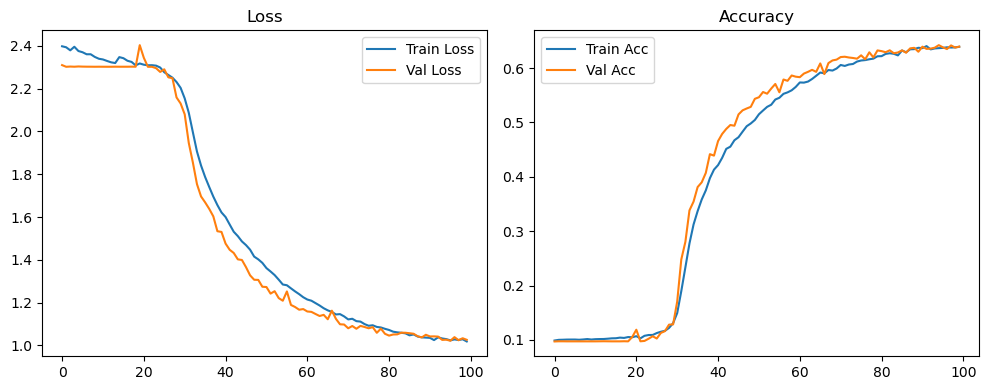

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 1.0436 Accuracy: 0.6344


🚀 Running: batch128_lr_max_0.001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0986 | Val Acc: 0.0943 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0986 | Val Acc: 0.0943 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0986 | Val Acc: 0.0943 |:   1%|          | 1/100 [01:18<2:09:16, 78.35s/it]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:34<2:09:16, 78.35s/it]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:34<2:09:16, 78.35s/it]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:34<1:08:34, 41.99s/it]

| LR: 0.000999 | Train Acc: 0.0987 | Val Acc: 0.0797 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.99s/it]

| LR: 0.000999 | Train Acc: 0.0987 | Val Acc: 0.0797 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.99s/it]

| LR: 0.000999 | Train Acc: 0.0987 | Val Acc: 0.0797 |:   3%|▎         | 3/100 [01:51<49:07, 30.38s/it]  

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [02:07<49:07, 30.38s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [02:07<49:07, 30.38s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0969 |:   4%|▍         | 4/100 [02:07<39:50, 24.90s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0998 |:   4%|▍         | 4/100 [02:24<39:50, 24.90s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0998 |:   4%|▍         | 4/100 [02:24<39:50, 24.90s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0998 |:   5%|▌         | 5/100 [02:24<34:37, 21.86s/it]

| LR: 0.000994 | Train Acc: 0.1010 | Val Acc: 0.1348 |:   5%|▌         | 5/100 [02:40<34:37, 21.86s/it]

| LR: 0.000994 | Train Acc: 0.1010 | Val Acc: 0.1348 |:   5%|▌         | 5/100 [02:40<34:37, 21.86s/it]

| LR: 0.000994 | Train Acc: 0.1010 | Val Acc: 0.1348 |:   6%|▌         | 6/100 [02:40<31:14, 19.94s/it]

| LR: 0.000991 | Train Acc: 0.1060 | Val Acc: 0.1230 |:   6%|▌         | 6/100 [02:56<31:14, 19.94s/it]

| LR: 0.000991 | Train Acc: 0.1060 | Val Acc: 0.1230 |:   6%|▌         | 6/100 [02:56<31:14, 19.94s/it]

| LR: 0.000991 | Train Acc: 0.1060 | Val Acc: 0.1230 |:   7%|▋         | 7/100 [02:56<29:03, 18.75s/it]

| LR: 0.000988 | Train Acc: 0.1094 | Val Acc: 0.1040 |:   7%|▋         | 7/100 [03:13<29:03, 18.75s/it]

| LR: 0.000988 | Train Acc: 0.1094 | Val Acc: 0.1040 |:   7%|▋         | 7/100 [03:13<29:03, 18.75s/it]

| LR: 0.000988 | Train Acc: 0.1094 | Val Acc: 0.1040 |:   8%|▊         | 8/100 [03:13<27:36, 18.00s/it]

| LR: 0.000984 | Train Acc: 0.1312 | Val Acc: 0.1781 |:   8%|▊         | 8/100 [03:29<27:36, 18.00s/it]

| LR: 0.000984 | Train Acc: 0.1312 | Val Acc: 0.1781 |:   8%|▊         | 8/100 [03:29<27:36, 18.00s/it]

| LR: 0.000984 | Train Acc: 0.1312 | Val Acc: 0.1781 |:   9%|▉         | 9/100 [03:29<26:36, 17.54s/it]

| LR: 0.000980 | Train Acc: 0.1836 | Val Acc: 0.1836 |:   9%|▉         | 9/100 [03:46<26:36, 17.54s/it]

| LR: 0.000980 | Train Acc: 0.1836 | Val Acc: 0.1836 |:   9%|▉         | 9/100 [03:46<26:36, 17.54s/it]

| LR: 0.000980 | Train Acc: 0.1836 | Val Acc: 0.1836 |:  10%|█         | 10/100 [03:46<25:51, 17.24s/it]

| LR: 0.000976 | Train Acc: 0.2411 | Val Acc: 0.2080 |:  10%|█         | 10/100 [04:02<25:51, 17.24s/it]

| LR: 0.000976 | Train Acc: 0.2411 | Val Acc: 0.2080 |:  10%|█         | 10/100 [04:02<25:51, 17.24s/it]

| LR: 0.000976 | Train Acc: 0.2411 | Val Acc: 0.2080 |:  11%|█         | 11/100 [04:02<25:06, 16.92s/it]

| LR: 0.000970 | Train Acc: 0.2848 | Val Acc: 0.2861 |:  11%|█         | 11/100 [04:19<25:06, 16.92s/it]

| LR: 0.000970 | Train Acc: 0.2848 | Val Acc: 0.2861 |:  11%|█         | 11/100 [04:19<25:06, 16.92s/it]

| LR: 0.000970 | Train Acc: 0.2848 | Val Acc: 0.2861 |:  12%|█▏        | 12/100 [04:19<24:39, 16.81s/it]

| LR: 0.000965 | Train Acc: 0.3191 | Val Acc: 0.3296 |:  12%|█▏        | 12/100 [04:35<24:39, 16.81s/it]

| LR: 0.000965 | Train Acc: 0.3191 | Val Acc: 0.3296 |:  12%|█▏        | 12/100 [04:35<24:39, 16.81s/it]

| LR: 0.000965 | Train Acc: 0.3191 | Val Acc: 0.3296 |:  13%|█▎        | 13/100 [04:35<24:15, 16.73s/it]

| LR: 0.000959 | Train Acc: 0.3567 | Val Acc: 0.3521 |:  13%|█▎        | 13/100 [04:52<24:15, 16.73s/it]

| LR: 0.000959 | Train Acc: 0.3567 | Val Acc: 0.3521 |:  13%|█▎        | 13/100 [04:52<24:15, 16.73s/it]

| LR: 0.000959 | Train Acc: 0.3567 | Val Acc: 0.3521 |:  14%|█▍        | 14/100 [04:52<23:51, 16.64s/it]

| LR: 0.000952 | Train Acc: 0.3797 | Val Acc: 0.3260 |:  14%|█▍        | 14/100 [05:08<23:51, 16.64s/it]

| LR: 0.000952 | Train Acc: 0.3797 | Val Acc: 0.3260 |:  14%|█▍        | 14/100 [05:08<23:51, 16.64s/it]

| LR: 0.000952 | Train Acc: 0.3797 | Val Acc: 0.3260 |:  15%|█▌        | 15/100 [05:08<23:27, 16.56s/it]

| LR: 0.000946 | Train Acc: 0.4031 | Val Acc: 0.4007 |:  15%|█▌        | 15/100 [05:24<23:27, 16.56s/it]

| LR: 0.000946 | Train Acc: 0.4031 | Val Acc: 0.4007 |:  15%|█▌        | 15/100 [05:24<23:27, 16.56s/it]

| LR: 0.000946 | Train Acc: 0.4031 | Val Acc: 0.4007 |:  16%|█▌        | 16/100 [05:25<23:09, 16.54s/it]

| LR: 0.000938 | Train Acc: 0.4264 | Val Acc: 0.4099 |:  16%|█▌        | 16/100 [05:41<23:09, 16.54s/it]

| LR: 0.000938 | Train Acc: 0.4264 | Val Acc: 0.4099 |:  16%|█▌        | 16/100 [05:41<23:09, 16.54s/it]

| LR: 0.000938 | Train Acc: 0.4264 | Val Acc: 0.4099 |:  17%|█▋        | 17/100 [05:41<22:50, 16.51s/it]

| LR: 0.000930 | Train Acc: 0.4391 | Val Acc: 0.4228 |:  17%|█▋        | 17/100 [05:57<22:50, 16.51s/it]

| LR: 0.000930 | Train Acc: 0.4391 | Val Acc: 0.4228 |:  17%|█▋        | 17/100 [05:57<22:50, 16.51s/it]

| LR: 0.000930 | Train Acc: 0.4391 | Val Acc: 0.4228 |:  18%|█▊        | 18/100 [05:57<22:31, 16.49s/it]

| LR: 0.000922 | Train Acc: 0.4574 | Val Acc: 0.4250 |:  18%|█▊        | 18/100 [06:14<22:31, 16.49s/it]

| LR: 0.000922 | Train Acc: 0.4574 | Val Acc: 0.4250 |:  18%|█▊        | 18/100 [06:14<22:31, 16.49s/it]

| LR: 0.000922 | Train Acc: 0.4574 | Val Acc: 0.4250 |:  19%|█▉        | 19/100 [06:14<22:12, 16.45s/it]

| LR: 0.000914 | Train Acc: 0.4696 | Val Acc: 0.4261 |:  19%|█▉        | 19/100 [06:30<22:12, 16.45s/it]

| LR: 0.000914 | Train Acc: 0.4696 | Val Acc: 0.4261 |:  19%|█▉        | 19/100 [06:30<22:12, 16.45s/it]

| LR: 0.000914 | Train Acc: 0.4696 | Val Acc: 0.4261 |:  20%|██        | 20/100 [06:30<21:54, 16.44s/it]

| LR: 0.000905 | Train Acc: 0.4791 | Val Acc: 0.4051 |:  20%|██        | 20/100 [06:47<21:54, 16.44s/it]

| LR: 0.000905 | Train Acc: 0.4791 | Val Acc: 0.4051 |:  20%|██        | 20/100 [06:47<21:54, 16.44s/it]

| LR: 0.000905 | Train Acc: 0.4791 | Val Acc: 0.4051 |:  21%|██        | 21/100 [06:47<21:37, 16.42s/it]

| LR: 0.000895 | Train Acc: 0.4950 | Val Acc: 0.4453 |:  21%|██        | 21/100 [07:03<21:37, 16.42s/it]

| LR: 0.000895 | Train Acc: 0.4950 | Val Acc: 0.4453 |:  21%|██        | 21/100 [07:03<21:37, 16.42s/it]

| LR: 0.000895 | Train Acc: 0.4950 | Val Acc: 0.4453 |:  22%|██▏       | 22/100 [07:03<21:17, 16.38s/it]

| LR: 0.000885 | Train Acc: 0.5020 | Val Acc: 0.4496 |:  22%|██▏       | 22/100 [07:19<21:17, 16.38s/it]

| LR: 0.000885 | Train Acc: 0.5020 | Val Acc: 0.4496 |:  22%|██▏       | 22/100 [07:19<21:17, 16.38s/it]

| LR: 0.000885 | Train Acc: 0.5020 | Val Acc: 0.4496 |:  23%|██▎       | 23/100 [07:19<21:03, 16.40s/it]

| LR: 0.000875 | Train Acc: 0.5100 | Val Acc: 0.4202 |:  23%|██▎       | 23/100 [07:36<21:03, 16.40s/it]

| LR: 0.000875 | Train Acc: 0.5100 | Val Acc: 0.4202 |:  23%|██▎       | 23/100 [07:36<21:03, 16.40s/it]

| LR: 0.000875 | Train Acc: 0.5100 | Val Acc: 0.4202 |:  24%|██▍       | 24/100 [07:36<20:45, 16.39s/it]

| LR: 0.000865 | Train Acc: 0.5216 | Val Acc: 0.4954 |:  24%|██▍       | 24/100 [07:52<20:45, 16.39s/it]

| LR: 0.000865 | Train Acc: 0.5216 | Val Acc: 0.4954 |:  24%|██▍       | 24/100 [07:52<20:45, 16.39s/it]

| LR: 0.000865 | Train Acc: 0.5216 | Val Acc: 0.4954 |:  25%|██▌       | 25/100 [07:52<20:30, 16.41s/it]

| LR: 0.000854 | Train Acc: 0.5376 | Val Acc: 0.5184 |:  25%|██▌       | 25/100 [08:09<20:30, 16.41s/it]

| LR: 0.000854 | Train Acc: 0.5376 | Val Acc: 0.5184 |:  25%|██▌       | 25/100 [08:09<20:30, 16.41s/it]

| LR: 0.000854 | Train Acc: 0.5376 | Val Acc: 0.5184 |:  26%|██▌       | 26/100 [08:09<20:15, 16.42s/it]

| LR: 0.000842 | Train Acc: 0.5489 | Val Acc: 0.4494 |:  26%|██▌       | 26/100 [08:25<20:15, 16.42s/it]

| LR: 0.000842 | Train Acc: 0.5489 | Val Acc: 0.4494 |:  26%|██▌       | 26/100 [08:25<20:15, 16.42s/it]

| LR: 0.000842 | Train Acc: 0.5489 | Val Acc: 0.4494 |:  27%|██▋       | 27/100 [08:25<19:58, 16.42s/it]

| LR: 0.000831 | Train Acc: 0.5569 | Val Acc: 0.4283 |:  27%|██▋       | 27/100 [08:41<19:58, 16.42s/it]

| LR: 0.000831 | Train Acc: 0.5569 | Val Acc: 0.4283 |:  27%|██▋       | 27/100 [08:41<19:58, 16.42s/it]

| LR: 0.000831 | Train Acc: 0.5569 | Val Acc: 0.4283 |:  28%|██▊       | 28/100 [08:41<19:38, 16.37s/it]

| LR: 0.000819 | Train Acc: 0.5659 | Val Acc: 0.5239 |:  28%|██▊       | 28/100 [08:58<19:38, 16.37s/it]

| LR: 0.000819 | Train Acc: 0.5659 | Val Acc: 0.5239 |:  28%|██▊       | 28/100 [08:58<19:38, 16.37s/it]

| LR: 0.000819 | Train Acc: 0.5659 | Val Acc: 0.5239 |:  29%|██▉       | 29/100 [08:58<19:26, 16.43s/it]

| LR: 0.000807 | Train Acc: 0.5744 | Val Acc: 0.5319 |:  29%|██▉       | 29/100 [09:14<19:26, 16.43s/it]

| LR: 0.000807 | Train Acc: 0.5744 | Val Acc: 0.5319 |:  29%|██▉       | 29/100 [09:14<19:26, 16.43s/it]

| LR: 0.000807 | Train Acc: 0.5744 | Val Acc: 0.5319 |:  30%|███       | 30/100 [09:14<19:12, 16.47s/it]

| LR: 0.000794 | Train Acc: 0.5850 | Val Acc: 0.5520 |:  30%|███       | 30/100 [09:31<19:12, 16.47s/it]

| LR: 0.000794 | Train Acc: 0.5850 | Val Acc: 0.5520 |:  30%|███       | 30/100 [09:31<19:12, 16.47s/it]

| LR: 0.000794 | Train Acc: 0.5850 | Val Acc: 0.5520 |:  31%|███       | 31/100 [09:31<18:58, 16.51s/it]

| LR: 0.000781 | Train Acc: 0.5926 | Val Acc: 0.5405 |:  31%|███       | 31/100 [09:47<18:58, 16.51s/it]

| LR: 0.000781 | Train Acc: 0.5926 | Val Acc: 0.5405 |:  31%|███       | 31/100 [09:47<18:58, 16.51s/it]

| LR: 0.000781 | Train Acc: 0.5926 | Val Acc: 0.5405 |:  32%|███▏      | 32/100 [09:47<18:34, 16.39s/it]

| LR: 0.000768 | Train Acc: 0.6014 | Val Acc: 0.4994 |:  32%|███▏      | 32/100 [10:03<18:34, 16.39s/it]

| LR: 0.000768 | Train Acc: 0.6014 | Val Acc: 0.4994 |:  32%|███▏      | 32/100 [10:03<18:34, 16.39s/it]

| LR: 0.000768 | Train Acc: 0.6014 | Val Acc: 0.4994 |:  33%|███▎      | 33/100 [10:04<18:19, 16.41s/it]

| LR: 0.000755 | Train Acc: 0.6071 | Val Acc: 0.5224 |:  33%|███▎      | 33/100 [10:20<18:19, 16.41s/it]

| LR: 0.000755 | Train Acc: 0.6071 | Val Acc: 0.5224 |:  33%|███▎      | 33/100 [10:20<18:19, 16.41s/it]

| LR: 0.000755 | Train Acc: 0.6071 | Val Acc: 0.5224 |:  34%|███▍      | 34/100 [10:20<18:02, 16.41s/it]

| LR: 0.000741 | Train Acc: 0.6122 | Val Acc: 0.5723 |:  34%|███▍      | 34/100 [10:36<18:02, 16.41s/it]

| LR: 0.000741 | Train Acc: 0.6122 | Val Acc: 0.5723 |:  34%|███▍      | 34/100 [10:36<18:02, 16.41s/it]

| LR: 0.000741 | Train Acc: 0.6122 | Val Acc: 0.5723 |:  35%|███▌      | 35/100 [10:36<17:47, 16.42s/it]

| LR: 0.000727 | Train Acc: 0.6245 | Val Acc: 0.5684 |:  35%|███▌      | 35/100 [10:53<17:47, 16.42s/it]

| LR: 0.000727 | Train Acc: 0.6245 | Val Acc: 0.5684 |:  35%|███▌      | 35/100 [10:53<17:47, 16.42s/it]

| LR: 0.000727 | Train Acc: 0.6245 | Val Acc: 0.5684 |:  36%|███▌      | 36/100 [10:53<17:30, 16.42s/it]

| LR: 0.000713 | Train Acc: 0.6303 | Val Acc: 0.5812 |:  36%|███▌      | 36/100 [11:09<17:30, 16.42s/it]

| LR: 0.000713 | Train Acc: 0.6303 | Val Acc: 0.5812 |:  36%|███▌      | 36/100 [11:09<17:30, 16.42s/it]

| LR: 0.000713 | Train Acc: 0.6303 | Val Acc: 0.5812 |:  37%|███▋      | 37/100 [11:09<17:13, 16.40s/it]

| LR: 0.000699 | Train Acc: 0.6323 | Val Acc: 0.5849 |:  37%|███▋      | 37/100 [11:25<17:13, 16.40s/it]

| LR: 0.000699 | Train Acc: 0.6323 | Val Acc: 0.5849 |:  37%|███▋      | 37/100 [11:25<17:13, 16.40s/it]

| LR: 0.000699 | Train Acc: 0.6323 | Val Acc: 0.5849 |:  38%|███▊      | 38/100 [11:25<16:55, 16.38s/it]

| LR: 0.000684 | Train Acc: 0.6362 | Val Acc: 0.5932 |:  38%|███▊      | 38/100 [11:42<16:55, 16.38s/it]

| LR: 0.000684 | Train Acc: 0.6362 | Val Acc: 0.5932 |:  38%|███▊      | 38/100 [11:42<16:55, 16.38s/it]

| LR: 0.000684 | Train Acc: 0.6362 | Val Acc: 0.5932 |:  39%|███▉      | 39/100 [11:42<16:38, 16.38s/it]

| LR: 0.000670 | Train Acc: 0.6452 | Val Acc: 0.5796 |:  39%|███▉      | 39/100 [11:58<16:38, 16.38s/it]

| LR: 0.000670 | Train Acc: 0.6452 | Val Acc: 0.5796 |:  39%|███▉      | 39/100 [11:58<16:38, 16.38s/it]

| LR: 0.000670 | Train Acc: 0.6452 | Val Acc: 0.5796 |:  40%|████      | 40/100 [11:58<16:22, 16.37s/it]

| LR: 0.000655 | Train Acc: 0.6459 | Val Acc: 0.5696 |:  40%|████      | 40/100 [12:14<16:22, 16.37s/it]

| LR: 0.000655 | Train Acc: 0.6459 | Val Acc: 0.5696 |:  40%|████      | 40/100 [12:14<16:22, 16.37s/it]

| LR: 0.000655 | Train Acc: 0.6459 | Val Acc: 0.5696 |:  41%|████      | 41/100 [12:14<16:04, 16.34s/it]

| LR: 0.000640 | Train Acc: 0.6492 | Val Acc: 0.5710 |:  41%|████      | 41/100 [12:31<16:04, 16.34s/it]

| LR: 0.000640 | Train Acc: 0.6492 | Val Acc: 0.5710 |:  41%|████      | 41/100 [12:31<16:04, 16.34s/it]

| LR: 0.000640 | Train Acc: 0.6492 | Val Acc: 0.5710 |:  42%|████▏     | 42/100 [12:31<15:47, 16.33s/it]

| LR: 0.000625 | Train Acc: 0.6571 | Val Acc: 0.5644 |:  42%|████▏     | 42/100 [12:47<15:47, 16.33s/it]

| LR: 0.000625 | Train Acc: 0.6571 | Val Acc: 0.5644 |:  42%|████▏     | 42/100 [12:47<15:47, 16.33s/it]

| LR: 0.000625 | Train Acc: 0.6571 | Val Acc: 0.5644 |:  43%|████▎     | 43/100 [12:47<15:31, 16.34s/it]

| LR: 0.000609 | Train Acc: 0.6632 | Val Acc: 0.4940 |:  43%|████▎     | 43/100 [13:03<15:31, 16.34s/it]

| LR: 0.000609 | Train Acc: 0.6632 | Val Acc: 0.4940 |:  43%|████▎     | 43/100 [13:03<15:31, 16.34s/it]

| LR: 0.000609 | Train Acc: 0.6632 | Val Acc: 0.4940 |:  44%|████▍     | 44/100 [13:04<15:15, 16.35s/it]

| LR: 0.000594 | Train Acc: 0.6633 | Val Acc: 0.5869 |:  44%|████▍     | 44/100 [13:20<15:15, 16.35s/it]

| LR: 0.000594 | Train Acc: 0.6633 | Val Acc: 0.5869 |:  44%|████▍     | 44/100 [13:20<15:15, 16.35s/it]

| LR: 0.000594 | Train Acc: 0.6633 | Val Acc: 0.5869 |:  45%|████▌     | 45/100 [13:20<15:00, 16.37s/it]

| LR: 0.000579 | Train Acc: 0.6662 | Val Acc: 0.5812 |:  45%|████▌     | 45/100 [13:36<15:00, 16.37s/it]

| LR: 0.000579 | Train Acc: 0.6662 | Val Acc: 0.5812 |:  45%|████▌     | 45/100 [13:36<15:00, 16.37s/it]

| LR: 0.000579 | Train Acc: 0.6662 | Val Acc: 0.5812 |:  46%|████▌     | 46/100 [13:36<14:43, 16.36s/it]

| LR: 0.000563 | Train Acc: 0.6721 | Val Acc: 0.5811 |:  46%|████▌     | 46/100 [13:53<14:43, 16.36s/it]

| LR: 0.000563 | Train Acc: 0.6721 | Val Acc: 0.5811 |:  46%|████▌     | 46/100 [13:53<14:43, 16.36s/it]

| LR: 0.000563 | Train Acc: 0.6721 | Val Acc: 0.5811 |:  47%|████▋     | 47/100 [13:53<14:28, 16.39s/it]

| LR: 0.000548 | Train Acc: 0.6772 | Val Acc: 0.6013 |:  47%|████▋     | 47/100 [14:09<14:28, 16.39s/it]

| LR: 0.000548 | Train Acc: 0.6772 | Val Acc: 0.6013 |:  47%|████▋     | 47/100 [14:09<14:28, 16.39s/it]

| LR: 0.000548 | Train Acc: 0.6772 | Val Acc: 0.6013 |:  48%|████▊     | 48/100 [14:09<14:16, 16.48s/it]

| LR: 0.000532 | Train Acc: 0.6787 | Val Acc: 0.5363 |:  48%|████▊     | 48/100 [14:26<14:16, 16.48s/it]

| LR: 0.000532 | Train Acc: 0.6787 | Val Acc: 0.5363 |:  48%|████▊     | 48/100 [14:26<14:16, 16.48s/it]

| LR: 0.000532 | Train Acc: 0.6787 | Val Acc: 0.5363 |:  49%|████▉     | 49/100 [14:26<13:58, 16.44s/it]

| LR: 0.000516 | Train Acc: 0.6827 | Val Acc: 0.5875 |:  49%|████▉     | 49/100 [14:42<13:58, 16.44s/it]

| LR: 0.000516 | Train Acc: 0.6827 | Val Acc: 0.5875 |:  49%|████▉     | 49/100 [14:42<13:58, 16.44s/it]

| LR: 0.000516 | Train Acc: 0.6827 | Val Acc: 0.5875 |:  50%|█████     | 50/100 [14:42<13:41, 16.42s/it]

| LR: 0.000501 | Train Acc: 0.6839 | Val Acc: 0.5888 |:  50%|█████     | 50/100 [14:58<13:41, 16.42s/it]

| LR: 0.000501 | Train Acc: 0.6839 | Val Acc: 0.5888 |:  50%|█████     | 50/100 [14:58<13:41, 16.42s/it]

| LR: 0.000501 | Train Acc: 0.6839 | Val Acc: 0.5888 |:  51%|█████     | 51/100 [14:59<13:24, 16.41s/it]

| LR: 0.000485 | Train Acc: 0.6906 | Val Acc: 0.5825 |:  51%|█████     | 51/100 [15:15<13:24, 16.41s/it]

| LR: 0.000485 | Train Acc: 0.6906 | Val Acc: 0.5825 |:  51%|█████     | 51/100 [15:15<13:24, 16.41s/it]

| LR: 0.000485 | Train Acc: 0.6906 | Val Acc: 0.5825 |:  52%|█████▏    | 52/100 [15:15<13:07, 16.41s/it]

| LR: 0.000469 | Train Acc: 0.6916 | Val Acc: 0.6007 |:  52%|█████▏    | 52/100 [15:31<13:07, 16.41s/it]

| LR: 0.000469 | Train Acc: 0.6916 | Val Acc: 0.6007 |:  52%|█████▏    | 52/100 [15:31<13:07, 16.41s/it]

| LR: 0.000469 | Train Acc: 0.6916 | Val Acc: 0.6007 |:  53%|█████▎    | 53/100 [15:31<12:50, 16.39s/it]

| LR: 0.000453 | Train Acc: 0.6983 | Val Acc: 0.6047 |:  53%|█████▎    | 53/100 [15:48<12:50, 16.39s/it]

| LR: 0.000453 | Train Acc: 0.6983 | Val Acc: 0.6047 |:  53%|█████▎    | 53/100 [15:48<12:50, 16.39s/it]

| LR: 0.000453 | Train Acc: 0.6983 | Val Acc: 0.6047 |:  54%|█████▍    | 54/100 [15:48<12:33, 16.38s/it]

| LR: 0.000438 | Train Acc: 0.6983 | Val Acc: 0.5935 |:  54%|█████▍    | 54/100 [16:04<12:33, 16.38s/it]

| LR: 0.000438 | Train Acc: 0.6983 | Val Acc: 0.5935 |:  54%|█████▍    | 54/100 [16:04<12:33, 16.38s/it]

| LR: 0.000438 | Train Acc: 0.6983 | Val Acc: 0.5935 |:  55%|█████▌    | 55/100 [16:04<12:16, 16.37s/it]

| LR: 0.000422 | Train Acc: 0.7066 | Val Acc: 0.6204 |:  55%|█████▌    | 55/100 [16:20<12:16, 16.37s/it]

| LR: 0.000422 | Train Acc: 0.7066 | Val Acc: 0.6204 |:  55%|█████▌    | 55/100 [16:20<12:16, 16.37s/it]

| LR: 0.000422 | Train Acc: 0.7066 | Val Acc: 0.6204 |:  56%|█████▌    | 56/100 [16:20<11:59, 16.36s/it]

| LR: 0.000407 | Train Acc: 0.7067 | Val Acc: 0.5248 |:  56%|█████▌    | 56/100 [16:37<11:59, 16.36s/it]

| LR: 0.000407 | Train Acc: 0.7067 | Val Acc: 0.5248 |:  56%|█████▌    | 56/100 [16:37<11:59, 16.36s/it]

| LR: 0.000407 | Train Acc: 0.7067 | Val Acc: 0.5248 |:  57%|█████▋    | 57/100 [16:37<11:45, 16.41s/it]

| LR: 0.000392 | Train Acc: 0.7104 | Val Acc: 0.5955 |:  57%|█████▋    | 57/100 [16:53<11:45, 16.41s/it]

| LR: 0.000392 | Train Acc: 0.7104 | Val Acc: 0.5955 |:  57%|█████▋    | 57/100 [16:53<11:45, 16.41s/it]

| LR: 0.000392 | Train Acc: 0.7104 | Val Acc: 0.5955 |:  58%|█████▊    | 58/100 [16:53<11:29, 16.42s/it]

| LR: 0.000376 | Train Acc: 0.7114 | Val Acc: 0.6143 |:  58%|█████▊    | 58/100 [17:10<11:29, 16.42s/it]

| LR: 0.000376 | Train Acc: 0.7114 | Val Acc: 0.6143 |:  58%|█████▊    | 58/100 [17:10<11:29, 16.42s/it]

| LR: 0.000376 | Train Acc: 0.7114 | Val Acc: 0.6143 |:  59%|█████▉    | 59/100 [17:10<11:13, 16.44s/it]

| LR: 0.000361 | Train Acc: 0.7185 | Val Acc: 0.6067 |:  59%|█████▉    | 59/100 [17:26<11:13, 16.44s/it]

| LR: 0.000361 | Train Acc: 0.7185 | Val Acc: 0.6067 |:  59%|█████▉    | 59/100 [17:26<11:13, 16.44s/it]

| LR: 0.000361 | Train Acc: 0.7185 | Val Acc: 0.6067 |:  60%|██████    | 60/100 [17:26<10:56, 16.41s/it]

| LR: 0.000346 | Train Acc: 0.7192 | Val Acc: 0.5939 |:  60%|██████    | 60/100 [17:42<10:56, 16.41s/it]

| LR: 0.000346 | Train Acc: 0.7192 | Val Acc: 0.5939 |:  60%|██████    | 60/100 [17:42<10:56, 16.41s/it]

| LR: 0.000346 | Train Acc: 0.7192 | Val Acc: 0.5939 |:  61%|██████    | 61/100 [17:42<10:38, 16.38s/it]

| LR: 0.000331 | Train Acc: 0.7222 | Val Acc: 0.6107 |:  61%|██████    | 61/100 [17:59<10:38, 16.38s/it]

| LR: 0.000331 | Train Acc: 0.7222 | Val Acc: 0.6107 |:  61%|██████    | 61/100 [17:59<10:38, 16.38s/it]

| LR: 0.000331 | Train Acc: 0.7222 | Val Acc: 0.6107 |:  62%|██████▏   | 62/100 [17:59<10:22, 16.39s/it]

| LR: 0.000317 | Train Acc: 0.7278 | Val Acc: 0.6047 |:  62%|██████▏   | 62/100 [18:15<10:22, 16.39s/it]

| LR: 0.000317 | Train Acc: 0.7278 | Val Acc: 0.6047 |:  62%|██████▏   | 62/100 [18:15<10:22, 16.39s/it]

| LR: 0.000317 | Train Acc: 0.7278 | Val Acc: 0.6047 |:  63%|██████▎   | 63/100 [18:15<10:06, 16.38s/it]

| LR: 0.000302 | Train Acc: 0.7306 | Val Acc: 0.6085 |:  63%|██████▎   | 63/100 [18:32<10:06, 16.38s/it]

| LR: 0.000302 | Train Acc: 0.7306 | Val Acc: 0.6085 |:  63%|██████▎   | 63/100 [18:32<10:06, 16.38s/it]

| LR: 0.000302 | Train Acc: 0.7306 | Val Acc: 0.6085 |:  64%|██████▍   | 64/100 [18:32<09:50, 16.41s/it]

| LR: 0.000288 | Train Acc: 0.7347 | Val Acc: 0.5804 |:  64%|██████▍   | 64/100 [18:48<09:50, 16.41s/it]

| LR: 0.000288 | Train Acc: 0.7347 | Val Acc: 0.5804 |:  64%|██████▍   | 64/100 [18:48<09:50, 16.41s/it]

| LR: 0.000288 | Train Acc: 0.7347 | Val Acc: 0.5804 |:  65%|██████▌   | 65/100 [18:48<09:34, 16.43s/it]

| LR: 0.000274 | Train Acc: 0.7356 | Val Acc: 0.6150 |:  65%|██████▌   | 65/100 [19:05<09:34, 16.43s/it]

| LR: 0.000274 | Train Acc: 0.7356 | Val Acc: 0.6150 |:  65%|██████▌   | 65/100 [19:05<09:34, 16.43s/it]

| LR: 0.000274 | Train Acc: 0.7356 | Val Acc: 0.6150 |:  66%|██████▌   | 66/100 [19:05<09:18, 16.42s/it]

| LR: 0.000260 | Train Acc: 0.7380 | Val Acc: 0.6172 |:  66%|██████▌   | 66/100 [19:21<09:18, 16.42s/it]

| LR: 0.000260 | Train Acc: 0.7380 | Val Acc: 0.6172 |:  66%|██████▌   | 66/100 [19:21<09:18, 16.42s/it]

| LR: 0.000260 | Train Acc: 0.7380 | Val Acc: 0.6172 |:  67%|██████▋   | 67/100 [19:21<09:02, 16.44s/it]

| LR: 0.000246 | Train Acc: 0.7390 | Val Acc: 0.5791 |:  67%|██████▋   | 67/100 [19:37<09:02, 16.44s/it]

| LR: 0.000246 | Train Acc: 0.7390 | Val Acc: 0.5791 |:  67%|██████▋   | 67/100 [19:37<09:02, 16.44s/it]

| LR: 0.000246 | Train Acc: 0.7390 | Val Acc: 0.5791 |:  68%|██████▊   | 68/100 [19:38<08:46, 16.45s/it]

| LR: 0.000233 | Train Acc: 0.7443 | Val Acc: 0.6116 |:  68%|██████▊   | 68/100 [19:54<08:46, 16.45s/it]

| LR: 0.000233 | Train Acc: 0.7443 | Val Acc: 0.6116 |:  68%|██████▊   | 68/100 [19:54<08:46, 16.45s/it]

| LR: 0.000233 | Train Acc: 0.7443 | Val Acc: 0.6116 |:  69%|██████▉   | 69/100 [19:54<08:30, 16.45s/it]

| LR: 0.000220 | Train Acc: 0.7473 | Val Acc: 0.5642 |:  69%|██████▉   | 69/100 [20:10<08:30, 16.45s/it]

| LR: 0.000220 | Train Acc: 0.7473 | Val Acc: 0.5642 |:  69%|██████▉   | 69/100 [20:10<08:30, 16.45s/it]

| LR: 0.000220 | Train Acc: 0.7473 | Val Acc: 0.5642 |:  70%|███████   | 70/100 [20:10<08:12, 16.42s/it]

| LR: 0.000207 | Train Acc: 0.7475 | Val Acc: 0.5912 |:  70%|███████   | 70/100 [20:27<08:12, 16.42s/it]

| LR: 0.000207 | Train Acc: 0.7475 | Val Acc: 0.5912 |:  70%|███████   | 70/100 [20:27<08:12, 16.42s/it]

| LR: 0.000207 | Train Acc: 0.7475 | Val Acc: 0.5912 |:  71%|███████   | 71/100 [20:27<07:55, 16.40s/it]

| LR: 0.000194 | Train Acc: 0.7483 | Val Acc: 0.6260 |:  71%|███████   | 71/100 [20:43<07:55, 16.40s/it]

| LR: 0.000194 | Train Acc: 0.7483 | Val Acc: 0.6260 |:  71%|███████   | 71/100 [20:43<07:55, 16.40s/it]

| LR: 0.000194 | Train Acc: 0.7483 | Val Acc: 0.6260 |:  72%|███████▏  | 72/100 [20:43<07:39, 16.40s/it]

| LR: 0.000182 | Train Acc: 0.7563 | Val Acc: 0.6239 |:  72%|███████▏  | 72/100 [20:59<07:39, 16.40s/it]

| LR: 0.000182 | Train Acc: 0.7563 | Val Acc: 0.6239 |:  72%|███████▏  | 72/100 [20:59<07:39, 16.40s/it]

| LR: 0.000182 | Train Acc: 0.7563 | Val Acc: 0.6239 |:  73%|███████▎  | 73/100 [20:59<07:22, 16.40s/it]

| LR: 0.000170 | Train Acc: 0.7549 | Val Acc: 0.6130 |:  73%|███████▎  | 73/100 [21:16<07:22, 16.40s/it]

| LR: 0.000170 | Train Acc: 0.7549 | Val Acc: 0.6130 |:  73%|███████▎  | 73/100 [21:16<07:22, 16.40s/it]

| LR: 0.000170 | Train Acc: 0.7549 | Val Acc: 0.6130 |:  74%|███████▍  | 74/100 [21:16<07:06, 16.39s/it]

| LR: 0.000159 | Train Acc: 0.7604 | Val Acc: 0.6310 |:  74%|███████▍  | 74/100 [21:32<07:06, 16.39s/it]

| LR: 0.000159 | Train Acc: 0.7604 | Val Acc: 0.6310 |:  74%|███████▍  | 74/100 [21:32<07:06, 16.39s/it]

| LR: 0.000159 | Train Acc: 0.7604 | Val Acc: 0.6310 |:  75%|███████▌  | 75/100 [21:32<06:49, 16.40s/it]

| LR: 0.000147 | Train Acc: 0.7627 | Val Acc: 0.6247 |:  75%|███████▌  | 75/100 [21:48<06:49, 16.40s/it]

| LR: 0.000147 | Train Acc: 0.7627 | Val Acc: 0.6247 |:  75%|███████▌  | 75/100 [21:48<06:49, 16.40s/it]

| LR: 0.000147 | Train Acc: 0.7627 | Val Acc: 0.6247 |:  76%|███████▌  | 76/100 [21:49<06:32, 16.34s/it]

| LR: 0.000136 | Train Acc: 0.7640 | Val Acc: 0.6058 |:  76%|███████▌  | 76/100 [22:05<06:32, 16.34s/it]

| LR: 0.000136 | Train Acc: 0.7640 | Val Acc: 0.6058 |:  76%|███████▌  | 76/100 [22:05<06:32, 16.34s/it]

| LR: 0.000136 | Train Acc: 0.7640 | Val Acc: 0.6058 |:  77%|███████▋  | 77/100 [22:05<06:16, 16.37s/it]

| LR: 0.000126 | Train Acc: 0.7644 | Val Acc: 0.6315 |:  77%|███████▋  | 77/100 [22:21<06:16, 16.37s/it]

| LR: 0.000126 | Train Acc: 0.7644 | Val Acc: 0.6315 |:  77%|███████▋  | 77/100 [22:21<06:16, 16.37s/it]

| LR: 0.000126 | Train Acc: 0.7644 | Val Acc: 0.6315 |:  78%|███████▊  | 78/100 [22:21<05:59, 16.36s/it]

| LR: 0.000116 | Train Acc: 0.7681 | Val Acc: 0.5918 |:  78%|███████▊  | 78/100 [22:38<05:59, 16.36s/it]

| LR: 0.000116 | Train Acc: 0.7681 | Val Acc: 0.5918 |:  78%|███████▊  | 78/100 [22:38<05:59, 16.36s/it]

| LR: 0.000116 | Train Acc: 0.7681 | Val Acc: 0.5918 |:  79%|███████▉  | 79/100 [22:38<05:43, 16.36s/it]

| LR: 0.000106 | Train Acc: 0.7712 | Val Acc: 0.6322 |:  79%|███████▉  | 79/100 [22:54<05:43, 16.36s/it]

| LR: 0.000106 | Train Acc: 0.7712 | Val Acc: 0.6322 |:  79%|███████▉  | 79/100 [22:54<05:43, 16.36s/it]

| LR: 0.000106 | Train Acc: 0.7712 | Val Acc: 0.6322 |:  80%|████████  | 80/100 [22:54<05:28, 16.43s/it]

| LR: 0.000096 | Train Acc: 0.7697 | Val Acc: 0.6310 |:  80%|████████  | 80/100 [23:10<05:28, 16.43s/it]

| LR: 0.000096 | Train Acc: 0.7697 | Val Acc: 0.6310 |:  80%|████████  | 80/100 [23:10<05:28, 16.43s/it]

| LR: 0.000096 | Train Acc: 0.7697 | Val Acc: 0.6310 |:  81%|████████  | 81/100 [23:10<05:10, 16.36s/it]

| LR: 0.000087 | Train Acc: 0.7711 | Val Acc: 0.6298 |:  81%|████████  | 81/100 [23:27<05:10, 16.36s/it]

| LR: 0.000087 | Train Acc: 0.7711 | Val Acc: 0.6298 |:  81%|████████  | 81/100 [23:27<05:10, 16.36s/it]

| LR: 0.000087 | Train Acc: 0.7711 | Val Acc: 0.6298 |:  82%|████████▏ | 82/100 [23:27<04:53, 16.30s/it]

| LR: 0.000079 | Train Acc: 0.7689 | Val Acc: 0.6324 |:  82%|████████▏ | 82/100 [23:43<04:53, 16.30s/it]

| LR: 0.000079 | Train Acc: 0.7689 | Val Acc: 0.6324 |:  82%|████████▏ | 82/100 [23:43<04:53, 16.30s/it]

| LR: 0.000079 | Train Acc: 0.7689 | Val Acc: 0.6324 |:  83%|████████▎ | 83/100 [23:43<04:37, 16.31s/it]

| LR: 0.000071 | Train Acc: 0.7766 | Val Acc: 0.6325 |:  83%|████████▎ | 83/100 [23:59<04:37, 16.31s/it]

| LR: 0.000071 | Train Acc: 0.7766 | Val Acc: 0.6325 |:  83%|████████▎ | 83/100 [23:59<04:37, 16.31s/it]

| LR: 0.000071 | Train Acc: 0.7766 | Val Acc: 0.6325 |:  84%|████████▍ | 84/100 [23:59<04:21, 16.37s/it]

| LR: 0.000063 | Train Acc: 0.7756 | Val Acc: 0.6245 |:  84%|████████▍ | 84/100 [24:16<04:21, 16.37s/it]

| LR: 0.000063 | Train Acc: 0.7756 | Val Acc: 0.6245 |:  84%|████████▍ | 84/100 [24:16<04:21, 16.37s/it]

| LR: 0.000063 | Train Acc: 0.7756 | Val Acc: 0.6245 |:  85%|████████▌ | 85/100 [24:16<04:05, 16.39s/it]

| LR: 0.000055 | Train Acc: 0.7807 | Val Acc: 0.6353 |:  85%|████████▌ | 85/100 [24:32<04:05, 16.39s/it]

| LR: 0.000055 | Train Acc: 0.7807 | Val Acc: 0.6353 |:  85%|████████▌ | 85/100 [24:32<04:05, 16.39s/it]

| LR: 0.000055 | Train Acc: 0.7807 | Val Acc: 0.6353 |:  86%|████████▌ | 86/100 [24:32<03:49, 16.36s/it]

| LR: 0.000049 | Train Acc: 0.7808 | Val Acc: 0.5922 |:  86%|████████▌ | 86/100 [24:48<03:49, 16.36s/it]

| LR: 0.000049 | Train Acc: 0.7808 | Val Acc: 0.5922 |:  86%|████████▌ | 86/100 [24:48<03:49, 16.36s/it]

| LR: 0.000049 | Train Acc: 0.7808 | Val Acc: 0.5922 |:  87%|████████▋ | 87/100 [24:48<03:32, 16.35s/it]

| LR: 0.000042 | Train Acc: 0.7810 | Val Acc: 0.6335 |:  87%|████████▋ | 87/100 [25:05<03:32, 16.35s/it]

| LR: 0.000042 | Train Acc: 0.7810 | Val Acc: 0.6335 |:  87%|████████▋ | 87/100 [25:05<03:32, 16.35s/it]

| LR: 0.000042 | Train Acc: 0.7810 | Val Acc: 0.6335 |:  88%|████████▊ | 88/100 [25:05<03:16, 16.35s/it]

| LR: 0.000036 | Train Acc: 0.7832 | Val Acc: 0.6252 |:  88%|████████▊ | 88/100 [25:21<03:16, 16.35s/it]

| LR: 0.000036 | Train Acc: 0.7832 | Val Acc: 0.6252 |:  88%|████████▊ | 88/100 [25:21<03:16, 16.35s/it]

| LR: 0.000036 | Train Acc: 0.7832 | Val Acc: 0.6252 |:  89%|████████▉ | 89/100 [25:21<02:59, 16.34s/it]

| LR: 0.000031 | Train Acc: 0.7835 | Val Acc: 0.5708 |:  89%|████████▉ | 89/100 [25:38<02:59, 16.34s/it]

| LR: 0.000031 | Train Acc: 0.7835 | Val Acc: 0.5708 |:  89%|████████▉ | 89/100 [25:38<02:59, 16.34s/it]

| LR: 0.000031 | Train Acc: 0.7835 | Val Acc: 0.5708 |:  90%|█████████ | 90/100 [25:38<02:43, 16.39s/it]

| LR: 0.000025 | Train Acc: 0.7879 | Val Acc: 0.6187 |:  90%|█████████ | 90/100 [25:54<02:43, 16.39s/it]

| LR: 0.000025 | Train Acc: 0.7879 | Val Acc: 0.6187 |:  90%|█████████ | 90/100 [25:54<02:43, 16.39s/it]

| LR: 0.000025 | Train Acc: 0.7879 | Val Acc: 0.6187 |:  91%|█████████ | 91/100 [25:54<02:27, 16.38s/it]

| LR: 0.000021 | Train Acc: 0.7898 | Val Acc: 0.6403 |:  91%|█████████ | 91/100 [26:10<02:27, 16.38s/it]

| LR: 0.000021 | Train Acc: 0.7898 | Val Acc: 0.6403 |:  91%|█████████ | 91/100 [26:10<02:27, 16.38s/it]

| LR: 0.000021 | Train Acc: 0.7898 | Val Acc: 0.6403 |:  92%|█████████▏| 92/100 [26:10<02:11, 16.40s/it]

| LR: 0.000017 | Train Acc: 0.7890 | Val Acc: 0.6253 |:  92%|█████████▏| 92/100 [26:27<02:11, 16.40s/it]

| LR: 0.000017 | Train Acc: 0.7890 | Val Acc: 0.6253 |:  92%|█████████▏| 92/100 [26:27<02:11, 16.40s/it]

| LR: 0.000017 | Train Acc: 0.7890 | Val Acc: 0.6253 |:  93%|█████████▎| 93/100 [26:27<01:54, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.7907 | Val Acc: 0.6454 |:  93%|█████████▎| 93/100 [26:43<01:54, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.7907 | Val Acc: 0.6454 |:  93%|█████████▎| 93/100 [26:43<01:54, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.7907 | Val Acc: 0.6454 |:  94%|█████████▍| 94/100 [26:43<01:38, 16.36s/it]

| LR: 0.000010 | Train Acc: 0.7900 | Val Acc: 0.6313 |:  94%|█████████▍| 94/100 [26:59<01:38, 16.36s/it]

| LR: 0.000010 | Train Acc: 0.7900 | Val Acc: 0.6313 |:  94%|█████████▍| 94/100 [26:59<01:38, 16.36s/it]

| LR: 0.000010 | Train Acc: 0.7900 | Val Acc: 0.6313 |:  95%|█████████▌| 95/100 [26:59<01:21, 16.35s/it]

| LR: 0.000007 | Train Acc: 0.7918 | Val Acc: 0.6301 |:  95%|█████████▌| 95/100 [27:16<01:21, 16.35s/it]

| LR: 0.000007 | Train Acc: 0.7918 | Val Acc: 0.6301 |:  95%|█████████▌| 95/100 [27:16<01:21, 16.35s/it]

| LR: 0.000007 | Train Acc: 0.7918 | Val Acc: 0.6301 |:  96%|█████████▌| 96/100 [27:16<01:05, 16.32s/it]

| LR: 0.000005 | Train Acc: 0.7947 | Val Acc: 0.6110 |:  96%|█████████▌| 96/100 [27:32<01:05, 16.32s/it]

| LR: 0.000005 | Train Acc: 0.7947 | Val Acc: 0.6110 |:  96%|█████████▌| 96/100 [27:32<01:05, 16.32s/it]

| LR: 0.000005 | Train Acc: 0.7947 | Val Acc: 0.6110 |:  97%|█████████▋| 97/100 [27:32<00:49, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.7939 | Val Acc: 0.6310 |:  97%|█████████▋| 97/100 [27:48<00:49, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.7939 | Val Acc: 0.6310 |:  97%|█████████▋| 97/100 [27:48<00:49, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.7939 | Val Acc: 0.6310 |:  98%|█████████▊| 98/100 [27:48<00:32, 16.36s/it]

| LR: 0.000002 | Train Acc: 0.7943 | Val Acc: 0.6317 |:  98%|█████████▊| 98/100 [28:05<00:32, 16.36s/it]

| LR: 0.000002 | Train Acc: 0.7943 | Val Acc: 0.6317 |:  98%|█████████▊| 98/100 [28:05<00:32, 16.36s/it]

| LR: 0.000002 | Train Acc: 0.7943 | Val Acc: 0.6317 |:  99%|█████████▉| 99/100 [28:05<00:16, 16.39s/it]

| LR: 0.000001 | Train Acc: 0.7967 | Val Acc: 0.6423 |:  99%|█████████▉| 99/100 [28:21<00:16, 16.39s/it]

| LR: 0.000001 | Train Acc: 0.7967 | Val Acc: 0.6423 |:  99%|█████████▉| 99/100 [28:21<00:16, 16.39s/it]

| LR: 0.000001 | Train Acc: 0.7967 | Val Acc: 0.6423 |: 100%|██████████| 100/100 [28:21<00:00, 16.36s/it]

| LR: 0.000001 | Train Acc: 0.7967 | Val Acc: 0.6423 |: 100%|██████████| 100/100 [28:21<00:00, 17.02s/it]

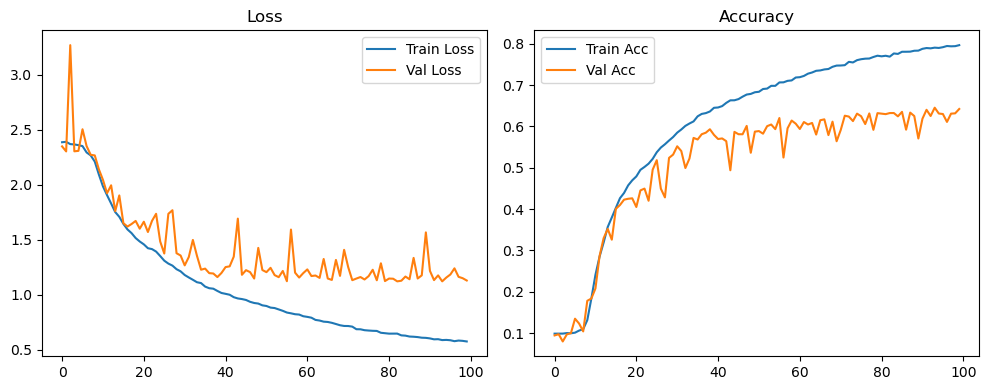

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 1.1477 Accuracy: 0.6354


🚀 Running: batch128_lr_max_0.001_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0984 | Val Acc: 0.0960 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0984 | Val Acc: 0.0960 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0984 | Val Acc: 0.0960 |:   1%|          | 1/100 [01:18<2:09:48, 78.67s/it]

| LR: 0.001000 | Train Acc: 0.0983 | Val Acc: 0.0928 |:   1%|          | 1/100 [01:35<2:09:48, 78.67s/it]

| LR: 0.001000 | Train Acc: 0.0983 | Val Acc: 0.0928 |:   1%|          | 1/100 [01:35<2:09:48, 78.67s/it]

| LR: 0.001000 | Train Acc: 0.0983 | Val Acc: 0.0928 |:   2%|▏         | 2/100 [01:35<1:09:08, 42.33s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [01:52<1:09:08, 42.33s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [01:52<1:09:08, 42.33s/it]

| LR: 0.000999 | Train Acc: 0.0985 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [01:52<49:39, 30.71s/it]  

| LR: 0.000998 | Train Acc: 0.1001 | Val Acc: 0.0864 |:   3%|▎         | 3/100 [02:08<49:39, 30.71s/it]

| LR: 0.000998 | Train Acc: 0.1001 | Val Acc: 0.0864 |:   3%|▎         | 3/100 [02:08<49:39, 30.71s/it]

| LR: 0.000998 | Train Acc: 0.1001 | Val Acc: 0.0864 |:   4%|▍         | 4/100 [02:08<40:10, 25.11s/it]

| LR: 0.000996 | Train Acc: 0.0996 | Val Acc: 0.0950 |:   4%|▍         | 4/100 [02:25<40:10, 25.11s/it]

| LR: 0.000996 | Train Acc: 0.0996 | Val Acc: 0.0950 |:   4%|▍         | 4/100 [02:25<40:10, 25.11s/it]

| LR: 0.000996 | Train Acc: 0.0996 | Val Acc: 0.0950 |:   5%|▌         | 5/100 [02:25<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0997 | Val Acc: 0.0950 |:   5%|▌         | 5/100 [02:42<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0997 | Val Acc: 0.0950 |:   5%|▌         | 5/100 [02:42<34:59, 22.10s/it]

| LR: 0.000994 | Train Acc: 0.0997 | Val Acc: 0.0950 |:   6%|▌         | 6/100 [02:42<31:45, 20.27s/it]

| LR: 0.000991 | Train Acc: 0.0994 | Val Acc: 0.0999 |:   6%|▌         | 6/100 [02:59<31:45, 20.27s/it]

| LR: 0.000991 | Train Acc: 0.0994 | Val Acc: 0.0999 |:   6%|▌         | 6/100 [02:59<31:45, 20.27s/it]

| LR: 0.000991 | Train Acc: 0.0994 | Val Acc: 0.0999 |:   7%|▋         | 7/100 [02:59<29:36, 19.11s/it]

| LR: 0.000988 | Train Acc: 0.1019 | Val Acc: 0.0999 |:   7%|▋         | 7/100 [03:15<29:36, 19.11s/it]

| LR: 0.000988 | Train Acc: 0.1019 | Val Acc: 0.0999 |:   7%|▋         | 7/100 [03:15<29:36, 19.11s/it]

| LR: 0.000988 | Train Acc: 0.1019 | Val Acc: 0.0999 |:   8%|▊         | 8/100 [03:15<28:08, 18.36s/it]

| LR: 0.000984 | Train Acc: 0.1088 | Val Acc: 0.1146 |:   8%|▊         | 8/100 [03:32<28:08, 18.36s/it]

| LR: 0.000984 | Train Acc: 0.1088 | Val Acc: 0.1146 |:   8%|▊         | 8/100 [03:32<28:08, 18.36s/it]

| LR: 0.000984 | Train Acc: 0.1088 | Val Acc: 0.1146 |:   9%|▉         | 9/100 [03:32<27:06, 17.88s/it]

| LR: 0.000980 | Train Acc: 0.1336 | Val Acc: 0.1903 |:   9%|▉         | 9/100 [03:49<27:06, 17.88s/it]

| LR: 0.000980 | Train Acc: 0.1336 | Val Acc: 0.1903 |:   9%|▉         | 9/100 [03:49<27:06, 17.88s/it]

| LR: 0.000980 | Train Acc: 0.1336 | Val Acc: 0.1903 |:  10%|█         | 10/100 [03:49<26:17, 17.53s/it]

| LR: 0.000976 | Train Acc: 0.1993 | Val Acc: 0.1708 |:  10%|█         | 10/100 [04:06<26:17, 17.53s/it]

| LR: 0.000976 | Train Acc: 0.1993 | Val Acc: 0.1708 |:  10%|█         | 10/100 [04:06<26:17, 17.53s/it]

| LR: 0.000976 | Train Acc: 0.1993 | Val Acc: 0.1708 |:  11%|█         | 11/100 [04:06<25:40, 17.30s/it]

| LR: 0.000970 | Train Acc: 0.2556 | Val Acc: 0.2660 |:  11%|█         | 11/100 [04:22<25:40, 17.30s/it]

| LR: 0.000970 | Train Acc: 0.2556 | Val Acc: 0.2660 |:  11%|█         | 11/100 [04:22<25:40, 17.30s/it]

| LR: 0.000970 | Train Acc: 0.2556 | Val Acc: 0.2660 |:  12%|█▏        | 12/100 [04:22<25:05, 17.11s/it]

| LR: 0.000965 | Train Acc: 0.2931 | Val Acc: 0.3220 |:  12%|█▏        | 12/100 [04:39<25:05, 17.11s/it]

| LR: 0.000965 | Train Acc: 0.2931 | Val Acc: 0.3220 |:  12%|█▏        | 12/100 [04:39<25:05, 17.11s/it]

| LR: 0.000965 | Train Acc: 0.2931 | Val Acc: 0.3220 |:  13%|█▎        | 13/100 [04:39<24:39, 17.01s/it]

| LR: 0.000959 | Train Acc: 0.3301 | Val Acc: 0.3433 |:  13%|█▎        | 13/100 [04:56<24:39, 17.01s/it]

| LR: 0.000959 | Train Acc: 0.3301 | Val Acc: 0.3433 |:  13%|█▎        | 13/100 [04:56<24:39, 17.01s/it]

| LR: 0.000959 | Train Acc: 0.3301 | Val Acc: 0.3433 |:  14%|█▍        | 14/100 [04:56<24:16, 16.94s/it]

| LR: 0.000952 | Train Acc: 0.3503 | Val Acc: 0.3537 |:  14%|█▍        | 14/100 [05:13<24:16, 16.94s/it]

| LR: 0.000952 | Train Acc: 0.3503 | Val Acc: 0.3537 |:  14%|█▍        | 14/100 [05:13<24:16, 16.94s/it]

| LR: 0.000952 | Train Acc: 0.3503 | Val Acc: 0.3537 |:  15%|█▌        | 15/100 [05:13<23:53, 16.87s/it]

| LR: 0.000946 | Train Acc: 0.3704 | Val Acc: 0.3906 |:  15%|█▌        | 15/100 [05:29<23:53, 16.87s/it]

| LR: 0.000946 | Train Acc: 0.3704 | Val Acc: 0.3906 |:  15%|█▌        | 15/100 [05:29<23:53, 16.87s/it]

| LR: 0.000946 | Train Acc: 0.3704 | Val Acc: 0.3906 |:  16%|█▌        | 16/100 [05:30<23:35, 16.85s/it]

| LR: 0.000938 | Train Acc: 0.3890 | Val Acc: 0.4076 |:  16%|█▌        | 16/100 [05:46<23:35, 16.85s/it]

| LR: 0.000938 | Train Acc: 0.3890 | Val Acc: 0.4076 |:  16%|█▌        | 16/100 [05:46<23:35, 16.85s/it]

| LR: 0.000938 | Train Acc: 0.3890 | Val Acc: 0.4076 |:  17%|█▋        | 17/100 [05:46<23:16, 16.82s/it]

| LR: 0.000930 | Train Acc: 0.4082 | Val Acc: 0.4185 |:  17%|█▋        | 17/100 [06:03<23:16, 16.82s/it]

| LR: 0.000930 | Train Acc: 0.4082 | Val Acc: 0.4185 |:  17%|█▋        | 17/100 [06:03<23:16, 16.82s/it]

| LR: 0.000930 | Train Acc: 0.4082 | Val Acc: 0.4185 |:  18%|█▊        | 18/100 [06:03<22:57, 16.80s/it]

| LR: 0.000922 | Train Acc: 0.4224 | Val Acc: 0.4308 |:  18%|█▊        | 18/100 [06:20<22:57, 16.80s/it]

| LR: 0.000922 | Train Acc: 0.4224 | Val Acc: 0.4308 |:  18%|█▊        | 18/100 [06:20<22:57, 16.80s/it]

| LR: 0.000922 | Train Acc: 0.4224 | Val Acc: 0.4308 |:  19%|█▉        | 19/100 [06:20<22:37, 16.75s/it]

| LR: 0.000914 | Train Acc: 0.4366 | Val Acc: 0.4378 |:  19%|█▉        | 19/100 [06:36<22:37, 16.75s/it]

| LR: 0.000914 | Train Acc: 0.4366 | Val Acc: 0.4378 |:  19%|█▉        | 19/100 [06:36<22:37, 16.75s/it]

| LR: 0.000914 | Train Acc: 0.4366 | Val Acc: 0.4378 |:  20%|██        | 20/100 [06:36<22:19, 16.74s/it]

| LR: 0.000905 | Train Acc: 0.4513 | Val Acc: 0.4391 |:  20%|██        | 20/100 [06:53<22:19, 16.74s/it]

| LR: 0.000905 | Train Acc: 0.4513 | Val Acc: 0.4391 |:  20%|██        | 20/100 [06:53<22:19, 16.74s/it]

| LR: 0.000905 | Train Acc: 0.4513 | Val Acc: 0.4391 |:  21%|██        | 21/100 [06:53<21:59, 16.71s/it]

| LR: 0.000895 | Train Acc: 0.4663 | Val Acc: 0.4133 |:  21%|██        | 21/100 [07:10<21:59, 16.71s/it]

| LR: 0.000895 | Train Acc: 0.4663 | Val Acc: 0.4133 |:  21%|██        | 21/100 [07:10<21:59, 16.71s/it]

| LR: 0.000895 | Train Acc: 0.4663 | Val Acc: 0.4133 |:  22%|██▏       | 22/100 [07:10<21:43, 16.72s/it]

| LR: 0.000885 | Train Acc: 0.4824 | Val Acc: 0.4908 |:  22%|██▏       | 22/100 [07:26<21:43, 16.72s/it]

| LR: 0.000885 | Train Acc: 0.4824 | Val Acc: 0.4908 |:  22%|██▏       | 22/100 [07:26<21:43, 16.72s/it]

| LR: 0.000885 | Train Acc: 0.4824 | Val Acc: 0.4908 |:  23%|██▎       | 23/100 [07:26<21:27, 16.72s/it]

| LR: 0.000875 | Train Acc: 0.4920 | Val Acc: 0.4845 |:  23%|██▎       | 23/100 [07:43<21:27, 16.72s/it]

| LR: 0.000875 | Train Acc: 0.4920 | Val Acc: 0.4845 |:  23%|██▎       | 23/100 [07:43<21:27, 16.72s/it]

| LR: 0.000875 | Train Acc: 0.4920 | Val Acc: 0.4845 |:  24%|██▍       | 24/100 [07:43<21:05, 16.66s/it]

| LR: 0.000865 | Train Acc: 0.5027 | Val Acc: 0.4641 |:  24%|██▍       | 24/100 [08:00<21:05, 16.66s/it]

| LR: 0.000865 | Train Acc: 0.5027 | Val Acc: 0.4641 |:  24%|██▍       | 24/100 [08:00<21:05, 16.66s/it]

| LR: 0.000865 | Train Acc: 0.5027 | Val Acc: 0.4641 |:  25%|██▌       | 25/100 [08:00<20:48, 16.65s/it]

| LR: 0.000854 | Train Acc: 0.5132 | Val Acc: 0.5088 |:  25%|██▌       | 25/100 [08:16<20:48, 16.65s/it]

| LR: 0.000854 | Train Acc: 0.5132 | Val Acc: 0.5088 |:  25%|██▌       | 25/100 [08:16<20:48, 16.65s/it]

| LR: 0.000854 | Train Acc: 0.5132 | Val Acc: 0.5088 |:  26%|██▌       | 26/100 [08:16<20:30, 16.63s/it]

| LR: 0.000842 | Train Acc: 0.5293 | Val Acc: 0.4852 |:  26%|██▌       | 26/100 [08:33<20:30, 16.63s/it]

| LR: 0.000842 | Train Acc: 0.5293 | Val Acc: 0.4852 |:  26%|██▌       | 26/100 [08:33<20:30, 16.63s/it]

| LR: 0.000842 | Train Acc: 0.5293 | Val Acc: 0.4852 |:  27%|██▋       | 27/100 [08:33<20:18, 16.69s/it]

| LR: 0.000831 | Train Acc: 0.5371 | Val Acc: 0.5396 |:  27%|██▋       | 27/100 [08:50<20:18, 16.69s/it]

| LR: 0.000831 | Train Acc: 0.5371 | Val Acc: 0.5396 |:  27%|██▋       | 27/100 [08:50<20:18, 16.69s/it]

| LR: 0.000831 | Train Acc: 0.5371 | Val Acc: 0.5396 |:  28%|██▊       | 28/100 [08:50<20:05, 16.74s/it]

| LR: 0.000819 | Train Acc: 0.5534 | Val Acc: 0.5308 |:  28%|██▊       | 28/100 [09:07<20:05, 16.74s/it]

| LR: 0.000819 | Train Acc: 0.5534 | Val Acc: 0.5308 |:  28%|██▊       | 28/100 [09:07<20:05, 16.74s/it]

| LR: 0.000819 | Train Acc: 0.5534 | Val Acc: 0.5308 |:  29%|██▉       | 29/100 [09:07<19:50, 16.76s/it]

| LR: 0.000807 | Train Acc: 0.5595 | Val Acc: 0.5265 |:  29%|██▉       | 29/100 [09:23<19:50, 16.76s/it]

| LR: 0.000807 | Train Acc: 0.5595 | Val Acc: 0.5265 |:  29%|██▉       | 29/100 [09:23<19:50, 16.76s/it]

| LR: 0.000807 | Train Acc: 0.5595 | Val Acc: 0.5265 |:  30%|███       | 30/100 [09:23<19:33, 16.76s/it]

| LR: 0.000794 | Train Acc: 0.5692 | Val Acc: 0.5256 |:  30%|███       | 30/100 [09:40<19:33, 16.76s/it]

| LR: 0.000794 | Train Acc: 0.5692 | Val Acc: 0.5256 |:  30%|███       | 30/100 [09:40<19:33, 16.76s/it]

| LR: 0.000794 | Train Acc: 0.5692 | Val Acc: 0.5256 |:  31%|███       | 31/100 [09:40<19:15, 16.74s/it]

| LR: 0.000781 | Train Acc: 0.5764 | Val Acc: 0.5499 |:  31%|███       | 31/100 [09:57<19:15, 16.74s/it]

| LR: 0.000781 | Train Acc: 0.5764 | Val Acc: 0.5499 |:  31%|███       | 31/100 [09:57<19:15, 16.74s/it]

| LR: 0.000781 | Train Acc: 0.5764 | Val Acc: 0.5499 |:  32%|███▏      | 32/100 [09:57<18:57, 16.73s/it]

| LR: 0.000768 | Train Acc: 0.5816 | Val Acc: 0.5416 |:  32%|███▏      | 32/100 [10:14<18:57, 16.73s/it]

| LR: 0.000768 | Train Acc: 0.5816 | Val Acc: 0.5416 |:  32%|███▏      | 32/100 [10:14<18:57, 16.73s/it]

| LR: 0.000768 | Train Acc: 0.5816 | Val Acc: 0.5416 |:  33%|███▎      | 33/100 [10:14<18:40, 16.73s/it]

| LR: 0.000755 | Train Acc: 0.5953 | Val Acc: 0.5715 |:  33%|███▎      | 33/100 [10:30<18:40, 16.73s/it]

| LR: 0.000755 | Train Acc: 0.5953 | Val Acc: 0.5715 |:  33%|███▎      | 33/100 [10:30<18:40, 16.73s/it]

| LR: 0.000755 | Train Acc: 0.5953 | Val Acc: 0.5715 |:  34%|███▍      | 34/100 [10:30<18:21, 16.69s/it]

| LR: 0.000741 | Train Acc: 0.6038 | Val Acc: 0.5850 |:  34%|███▍      | 34/100 [10:47<18:21, 16.69s/it]

| LR: 0.000741 | Train Acc: 0.6038 | Val Acc: 0.5850 |:  34%|███▍      | 34/100 [10:47<18:21, 16.69s/it]

| LR: 0.000741 | Train Acc: 0.6038 | Val Acc: 0.5850 |:  35%|███▌      | 35/100 [10:47<18:07, 16.72s/it]

| LR: 0.000727 | Train Acc: 0.6092 | Val Acc: 0.5723 |:  35%|███▌      | 35/100 [11:04<18:07, 16.72s/it]

| LR: 0.000727 | Train Acc: 0.6092 | Val Acc: 0.5723 |:  35%|███▌      | 35/100 [11:04<18:07, 16.72s/it]

| LR: 0.000727 | Train Acc: 0.6092 | Val Acc: 0.5723 |:  36%|███▌      | 36/100 [11:04<17:49, 16.71s/it]

| LR: 0.000713 | Train Acc: 0.6158 | Val Acc: 0.5627 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000713 | Train Acc: 0.6158 | Val Acc: 0.5627 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000713 | Train Acc: 0.6158 | Val Acc: 0.5627 |:  37%|███▋      | 37/100 [11:20<17:32, 16.71s/it]

| LR: 0.000699 | Train Acc: 0.6220 | Val Acc: 0.5652 |:  37%|███▋      | 37/100 [11:37<17:32, 16.71s/it]

| LR: 0.000699 | Train Acc: 0.6220 | Val Acc: 0.5652 |:  37%|███▋      | 37/100 [11:37<17:32, 16.71s/it]

| LR: 0.000699 | Train Acc: 0.6220 | Val Acc: 0.5652 |:  38%|███▊      | 38/100 [11:37<17:15, 16.70s/it]

| LR: 0.000684 | Train Acc: 0.6267 | Val Acc: 0.5772 |:  38%|███▊      | 38/100 [11:54<17:15, 16.70s/it]

| LR: 0.000684 | Train Acc: 0.6267 | Val Acc: 0.5772 |:  38%|███▊      | 38/100 [11:54<17:15, 16.70s/it]

| LR: 0.000684 | Train Acc: 0.6267 | Val Acc: 0.5772 |:  39%|███▉      | 39/100 [11:54<16:55, 16.64s/it]

| LR: 0.000670 | Train Acc: 0.6329 | Val Acc: 0.5897 |:  39%|███▉      | 39/100 [12:10<16:55, 16.64s/it]

| LR: 0.000670 | Train Acc: 0.6329 | Val Acc: 0.5897 |:  39%|███▉      | 39/100 [12:10<16:55, 16.64s/it]

| LR: 0.000670 | Train Acc: 0.6329 | Val Acc: 0.5897 |:  40%|████      | 40/100 [12:10<16:38, 16.64s/it]

| LR: 0.000655 | Train Acc: 0.6393 | Val Acc: 0.6024 |:  40%|████      | 40/100 [12:27<16:38, 16.64s/it]

| LR: 0.000655 | Train Acc: 0.6393 | Val Acc: 0.6024 |:  40%|████      | 40/100 [12:27<16:38, 16.64s/it]

| LR: 0.000655 | Train Acc: 0.6393 | Val Acc: 0.6024 |:  41%|████      | 41/100 [12:27<16:22, 16.66s/it]

| LR: 0.000640 | Train Acc: 0.6442 | Val Acc: 0.6030 |:  41%|████      | 41/100 [12:44<16:22, 16.66s/it]

| LR: 0.000640 | Train Acc: 0.6442 | Val Acc: 0.6030 |:  41%|████      | 41/100 [12:44<16:22, 16.66s/it]

| LR: 0.000640 | Train Acc: 0.6442 | Val Acc: 0.6030 |:  42%|████▏     | 42/100 [12:44<16:07, 16.69s/it]

| LR: 0.000625 | Train Acc: 0.6456 | Val Acc: 0.6113 |:  42%|████▏     | 42/100 [13:00<16:07, 16.69s/it]

| LR: 0.000625 | Train Acc: 0.6456 | Val Acc: 0.6113 |:  42%|████▏     | 42/100 [13:00<16:07, 16.69s/it]

| LR: 0.000625 | Train Acc: 0.6456 | Val Acc: 0.6113 |:  43%|████▎     | 43/100 [13:00<15:51, 16.70s/it]

| LR: 0.000609 | Train Acc: 0.6505 | Val Acc: 0.5977 |:  43%|████▎     | 43/100 [13:17<15:51, 16.70s/it]

| LR: 0.000609 | Train Acc: 0.6505 | Val Acc: 0.5977 |:  43%|████▎     | 43/100 [13:17<15:51, 16.70s/it]

| LR: 0.000609 | Train Acc: 0.6505 | Val Acc: 0.5977 |:  44%|████▍     | 44/100 [13:17<15:35, 16.71s/it]

| LR: 0.000594 | Train Acc: 0.6577 | Val Acc: 0.6082 |:  44%|████▍     | 44/100 [13:34<15:35, 16.71s/it]

| LR: 0.000594 | Train Acc: 0.6577 | Val Acc: 0.6082 |:  44%|████▍     | 44/100 [13:34<15:35, 16.71s/it]

| LR: 0.000594 | Train Acc: 0.6577 | Val Acc: 0.6082 |:  45%|████▌     | 45/100 [13:34<15:20, 16.74s/it]

| LR: 0.000579 | Train Acc: 0.6613 | Val Acc: 0.6183 |:  45%|████▌     | 45/100 [13:51<15:20, 16.74s/it]

| LR: 0.000579 | Train Acc: 0.6613 | Val Acc: 0.6183 |:  45%|████▌     | 45/100 [13:51<15:20, 16.74s/it]

| LR: 0.000579 | Train Acc: 0.6613 | Val Acc: 0.6183 |:  46%|████▌     | 46/100 [13:51<15:05, 16.77s/it]

| LR: 0.000563 | Train Acc: 0.6662 | Val Acc: 0.5824 |:  46%|████▌     | 46/100 [14:07<15:05, 16.77s/it]

| LR: 0.000563 | Train Acc: 0.6662 | Val Acc: 0.5824 |:  46%|████▌     | 46/100 [14:07<15:05, 16.77s/it]

| LR: 0.000563 | Train Acc: 0.6662 | Val Acc: 0.5824 |:  47%|████▋     | 47/100 [14:07<14:47, 16.74s/it]

| LR: 0.000548 | Train Acc: 0.6675 | Val Acc: 0.6260 |:  47%|████▋     | 47/100 [14:24<14:47, 16.74s/it]

| LR: 0.000548 | Train Acc: 0.6675 | Val Acc: 0.6260 |:  47%|████▋     | 47/100 [14:24<14:47, 16.74s/it]

| LR: 0.000548 | Train Acc: 0.6675 | Val Acc: 0.6260 |:  48%|████▊     | 48/100 [14:24<14:31, 16.75s/it]

| LR: 0.000532 | Train Acc: 0.6716 | Val Acc: 0.6028 |:  48%|████▊     | 48/100 [14:41<14:31, 16.75s/it]

| LR: 0.000532 | Train Acc: 0.6716 | Val Acc: 0.6028 |:  48%|████▊     | 48/100 [14:41<14:31, 16.75s/it]

| LR: 0.000532 | Train Acc: 0.6716 | Val Acc: 0.6028 |:  49%|████▉     | 49/100 [14:41<14:17, 16.81s/it]

| LR: 0.000516 | Train Acc: 0.6752 | Val Acc: 0.6096 |:  49%|████▉     | 49/100 [14:58<14:17, 16.81s/it]

| LR: 0.000516 | Train Acc: 0.6752 | Val Acc: 0.6096 |:  49%|████▉     | 49/100 [14:58<14:17, 16.81s/it]

| LR: 0.000516 | Train Acc: 0.6752 | Val Acc: 0.6096 |:  50%|█████     | 50/100 [14:58<13:59, 16.79s/it]

| LR: 0.000501 | Train Acc: 0.6801 | Val Acc: 0.6198 |:  50%|█████     | 50/100 [15:15<13:59, 16.79s/it]

| LR: 0.000501 | Train Acc: 0.6801 | Val Acc: 0.6198 |:  50%|█████     | 50/100 [15:15<13:59, 16.79s/it]

| LR: 0.000501 | Train Acc: 0.6801 | Val Acc: 0.6198 |:  51%|█████     | 51/100 [15:15<13:40, 16.75s/it]

| LR: 0.000485 | Train Acc: 0.6821 | Val Acc: 0.6018 |:  51%|█████     | 51/100 [15:31<13:40, 16.75s/it]

| LR: 0.000485 | Train Acc: 0.6821 | Val Acc: 0.6018 |:  51%|█████     | 51/100 [15:31<13:40, 16.75s/it]

| LR: 0.000485 | Train Acc: 0.6821 | Val Acc: 0.6018 |:  52%|█████▏    | 52/100 [15:31<13:20, 16.67s/it]

| LR: 0.000469 | Train Acc: 0.6873 | Val Acc: 0.6176 |:  52%|█████▏    | 52/100 [15:48<13:20, 16.67s/it]

| LR: 0.000469 | Train Acc: 0.6873 | Val Acc: 0.6176 |:  52%|█████▏    | 52/100 [15:48<13:20, 16.67s/it]

| LR: 0.000469 | Train Acc: 0.6873 | Val Acc: 0.6176 |:  53%|█████▎    | 53/100 [15:48<13:07, 16.75s/it]

| LR: 0.000453 | Train Acc: 0.6902 | Val Acc: 0.6037 |:  53%|█████▎    | 53/100 [16:05<13:07, 16.75s/it]

| LR: 0.000453 | Train Acc: 0.6902 | Val Acc: 0.6037 |:  53%|█████▎    | 53/100 [16:05<13:07, 16.75s/it]

| LR: 0.000453 | Train Acc: 0.6902 | Val Acc: 0.6037 |:  54%|█████▍    | 54/100 [16:05<12:51, 16.76s/it]

| LR: 0.000438 | Train Acc: 0.6934 | Val Acc: 0.6148 |:  54%|█████▍    | 54/100 [16:21<12:51, 16.76s/it]

| LR: 0.000438 | Train Acc: 0.6934 | Val Acc: 0.6148 |:  54%|█████▍    | 54/100 [16:21<12:51, 16.76s/it]

| LR: 0.000438 | Train Acc: 0.6934 | Val Acc: 0.6148 |:  55%|█████▌    | 55/100 [16:21<12:32, 16.73s/it]

| LR: 0.000422 | Train Acc: 0.6982 | Val Acc: 0.6243 |:  55%|█████▌    | 55/100 [16:38<12:32, 16.73s/it]

| LR: 0.000422 | Train Acc: 0.6982 | Val Acc: 0.6243 |:  55%|█████▌    | 55/100 [16:38<12:32, 16.73s/it]

| LR: 0.000422 | Train Acc: 0.6982 | Val Acc: 0.6243 |:  56%|█████▌    | 56/100 [16:38<12:14, 16.70s/it]

| LR: 0.000407 | Train Acc: 0.6965 | Val Acc: 0.6196 |:  56%|█████▌    | 56/100 [16:55<12:14, 16.70s/it]

| LR: 0.000407 | Train Acc: 0.6965 | Val Acc: 0.6196 |:  56%|█████▌    | 56/100 [16:55<12:14, 16.70s/it]

| LR: 0.000407 | Train Acc: 0.6965 | Val Acc: 0.6196 |:  57%|█████▋    | 57/100 [16:55<11:58, 16.71s/it]

| LR: 0.000392 | Train Acc: 0.7025 | Val Acc: 0.6130 |:  57%|█████▋    | 57/100 [17:11<11:58, 16.71s/it]

| LR: 0.000392 | Train Acc: 0.7025 | Val Acc: 0.6130 |:  57%|█████▋    | 57/100 [17:11<11:58, 16.71s/it]

| LR: 0.000392 | Train Acc: 0.7025 | Val Acc: 0.6130 |:  58%|█████▊    | 58/100 [17:12<11:42, 16.72s/it]

| LR: 0.000376 | Train Acc: 0.7040 | Val Acc: 0.6178 |:  58%|█████▊    | 58/100 [17:28<11:42, 16.72s/it]

| LR: 0.000376 | Train Acc: 0.7040 | Val Acc: 0.6178 |:  58%|█████▊    | 58/100 [17:28<11:42, 16.72s/it]

| LR: 0.000376 | Train Acc: 0.7040 | Val Acc: 0.6178 |:  59%|█████▉    | 59/100 [17:28<11:24, 16.70s/it]

| LR: 0.000361 | Train Acc: 0.7061 | Val Acc: 0.6302 |:  59%|█████▉    | 59/100 [17:45<11:24, 16.70s/it]

| LR: 0.000361 | Train Acc: 0.7061 | Val Acc: 0.6302 |:  59%|█████▉    | 59/100 [17:45<11:24, 16.70s/it]

| LR: 0.000361 | Train Acc: 0.7061 | Val Acc: 0.6302 |:  60%|██████    | 60/100 [17:45<11:08, 16.71s/it]

| LR: 0.000346 | Train Acc: 0.7091 | Val Acc: 0.6051 |:  60%|██████    | 60/100 [18:01<11:08, 16.71s/it]

| LR: 0.000346 | Train Acc: 0.7091 | Val Acc: 0.6051 |:  60%|██████    | 60/100 [18:01<11:08, 16.71s/it]

| LR: 0.000346 | Train Acc: 0.7091 | Val Acc: 0.6051 |:  61%|██████    | 61/100 [18:02<10:50, 16.68s/it]

| LR: 0.000331 | Train Acc: 0.7111 | Val Acc: 0.6236 |:  61%|██████    | 61/100 [18:18<10:50, 16.68s/it]

| LR: 0.000331 | Train Acc: 0.7111 | Val Acc: 0.6236 |:  61%|██████    | 61/100 [18:18<10:50, 16.68s/it]

| LR: 0.000331 | Train Acc: 0.7111 | Val Acc: 0.6236 |:  62%|██████▏   | 62/100 [18:18<10:32, 16.65s/it]

| LR: 0.000317 | Train Acc: 0.7159 | Val Acc: 0.6378 |:  62%|██████▏   | 62/100 [18:35<10:32, 16.65s/it]

| LR: 0.000317 | Train Acc: 0.7159 | Val Acc: 0.6378 |:  62%|██████▏   | 62/100 [18:35<10:32, 16.65s/it]

| LR: 0.000317 | Train Acc: 0.7159 | Val Acc: 0.6378 |:  63%|██████▎   | 63/100 [18:35<10:18, 16.71s/it]

| LR: 0.000302 | Train Acc: 0.7213 | Val Acc: 0.6346 |:  63%|██████▎   | 63/100 [18:52<10:18, 16.71s/it]

| LR: 0.000302 | Train Acc: 0.7213 | Val Acc: 0.6346 |:  63%|██████▎   | 63/100 [18:52<10:18, 16.71s/it]

| LR: 0.000302 | Train Acc: 0.7213 | Val Acc: 0.6346 |:  64%|██████▍   | 64/100 [18:52<10:02, 16.73s/it]

| LR: 0.000288 | Train Acc: 0.7222 | Val Acc: 0.6350 |:  64%|██████▍   | 64/100 [19:08<10:02, 16.73s/it]

| LR: 0.000288 | Train Acc: 0.7222 | Val Acc: 0.6350 |:  64%|██████▍   | 64/100 [19:08<10:02, 16.73s/it]

| LR: 0.000288 | Train Acc: 0.7222 | Val Acc: 0.6350 |:  65%|██████▌   | 65/100 [19:08<09:45, 16.72s/it]

| LR: 0.000274 | Train Acc: 0.7244 | Val Acc: 0.6344 |:  65%|██████▌   | 65/100 [19:25<09:45, 16.72s/it]

| LR: 0.000274 | Train Acc: 0.7244 | Val Acc: 0.6344 |:  65%|██████▌   | 65/100 [19:25<09:45, 16.72s/it]

| LR: 0.000274 | Train Acc: 0.7244 | Val Acc: 0.6344 |:  66%|██████▌   | 66/100 [19:25<09:29, 16.74s/it]

| LR: 0.000260 | Train Acc: 0.7250 | Val Acc: 0.6331 |:  66%|██████▌   | 66/100 [19:42<09:29, 16.74s/it]

| LR: 0.000260 | Train Acc: 0.7250 | Val Acc: 0.6331 |:  66%|██████▌   | 66/100 [19:42<09:29, 16.74s/it]

| LR: 0.000260 | Train Acc: 0.7250 | Val Acc: 0.6331 |:  67%|██████▋   | 67/100 [19:42<09:13, 16.77s/it]

| LR: 0.000246 | Train Acc: 0.7283 | Val Acc: 0.6375 |:  67%|██████▋   | 67/100 [19:59<09:13, 16.77s/it]

| LR: 0.000246 | Train Acc: 0.7283 | Val Acc: 0.6375 |:  67%|██████▋   | 67/100 [19:59<09:13, 16.77s/it]

| LR: 0.000246 | Train Acc: 0.7283 | Val Acc: 0.6375 |:  68%|██████▊   | 68/100 [19:59<08:54, 16.71s/it]

| LR: 0.000233 | Train Acc: 0.7299 | Val Acc: 0.6434 |:  68%|██████▊   | 68/100 [20:15<08:54, 16.71s/it]

| LR: 0.000233 | Train Acc: 0.7299 | Val Acc: 0.6434 |:  68%|██████▊   | 68/100 [20:15<08:54, 16.71s/it]

| LR: 0.000233 | Train Acc: 0.7299 | Val Acc: 0.6434 |:  69%|██████▉   | 69/100 [20:15<08:38, 16.72s/it]

| LR: 0.000220 | Train Acc: 0.7317 | Val Acc: 0.6166 |:  69%|██████▉   | 69/100 [20:32<08:38, 16.72s/it]

| LR: 0.000220 | Train Acc: 0.7317 | Val Acc: 0.6166 |:  69%|██████▉   | 69/100 [20:32<08:38, 16.72s/it]

| LR: 0.000220 | Train Acc: 0.7317 | Val Acc: 0.6166 |:  70%|███████   | 70/100 [20:32<08:22, 16.75s/it]

| LR: 0.000207 | Train Acc: 0.7369 | Val Acc: 0.6276 |:  70%|███████   | 70/100 [20:49<08:22, 16.75s/it]

| LR: 0.000207 | Train Acc: 0.7369 | Val Acc: 0.6276 |:  70%|███████   | 70/100 [20:49<08:22, 16.75s/it]

| LR: 0.000207 | Train Acc: 0.7369 | Val Acc: 0.6276 |:  71%|███████   | 71/100 [20:49<08:05, 16.74s/it]

| LR: 0.000194 | Train Acc: 0.7336 | Val Acc: 0.6439 |:  71%|███████   | 71/100 [21:05<08:05, 16.74s/it]

| LR: 0.000194 | Train Acc: 0.7336 | Val Acc: 0.6439 |:  71%|███████   | 71/100 [21:05<08:05, 16.74s/it]

| LR: 0.000194 | Train Acc: 0.7336 | Val Acc: 0.6439 |:  72%|███████▏  | 72/100 [21:06<07:47, 16.70s/it]

| LR: 0.000182 | Train Acc: 0.7372 | Val Acc: 0.6317 |:  72%|███████▏  | 72/100 [21:22<07:47, 16.70s/it]

| LR: 0.000182 | Train Acc: 0.7372 | Val Acc: 0.6317 |:  72%|███████▏  | 72/100 [21:22<07:47, 16.70s/it]

| LR: 0.000182 | Train Acc: 0.7372 | Val Acc: 0.6317 |:  73%|███████▎  | 73/100 [21:22<07:31, 16.71s/it]

| LR: 0.000170 | Train Acc: 0.7421 | Val Acc: 0.6210 |:  73%|███████▎  | 73/100 [21:39<07:31, 16.71s/it]

| LR: 0.000170 | Train Acc: 0.7421 | Val Acc: 0.6210 |:  73%|███████▎  | 73/100 [21:39<07:31, 16.71s/it]

| LR: 0.000170 | Train Acc: 0.7421 | Val Acc: 0.6210 |:  74%|███████▍  | 74/100 [21:39<07:14, 16.73s/it]

| LR: 0.000159 | Train Acc: 0.7442 | Val Acc: 0.6364 |:  74%|███████▍  | 74/100 [21:56<07:14, 16.73s/it]

| LR: 0.000159 | Train Acc: 0.7442 | Val Acc: 0.6364 |:  74%|███████▍  | 74/100 [21:56<07:14, 16.73s/it]

| LR: 0.000159 | Train Acc: 0.7442 | Val Acc: 0.6364 |:  75%|███████▌  | 75/100 [21:56<06:58, 16.72s/it]

| LR: 0.000147 | Train Acc: 0.7469 | Val Acc: 0.6251 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.72s/it]

| LR: 0.000147 | Train Acc: 0.7469 | Val Acc: 0.6251 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.72s/it]

| LR: 0.000147 | Train Acc: 0.7469 | Val Acc: 0.6251 |:  76%|███████▌  | 76/100 [22:12<06:40, 16.67s/it]

| LR: 0.000136 | Train Acc: 0.7459 | Val Acc: 0.6377 |:  76%|███████▌  | 76/100 [22:29<06:40, 16.67s/it]

| LR: 0.000136 | Train Acc: 0.7459 | Val Acc: 0.6377 |:  76%|███████▌  | 76/100 [22:29<06:40, 16.67s/it]

| LR: 0.000136 | Train Acc: 0.7459 | Val Acc: 0.6377 |:  77%|███████▋  | 77/100 [22:29<06:24, 16.73s/it]

| LR: 0.000126 | Train Acc: 0.7496 | Val Acc: 0.6390 |:  77%|███████▋  | 77/100 [22:46<06:24, 16.73s/it]

| LR: 0.000126 | Train Acc: 0.7496 | Val Acc: 0.6390 |:  77%|███████▋  | 77/100 [22:46<06:24, 16.73s/it]

| LR: 0.000126 | Train Acc: 0.7496 | Val Acc: 0.6390 |:  78%|███████▊  | 78/100 [22:46<06:09, 16.80s/it]

| LR: 0.000116 | Train Acc: 0.7520 | Val Acc: 0.6363 |:  78%|███████▊  | 78/100 [23:03<06:09, 16.80s/it]

| LR: 0.000116 | Train Acc: 0.7520 | Val Acc: 0.6363 |:  78%|███████▊  | 78/100 [23:03<06:09, 16.80s/it]

| LR: 0.000116 | Train Acc: 0.7520 | Val Acc: 0.6363 |:  79%|███████▉  | 79/100 [23:03<05:53, 16.82s/it]

| LR: 0.000106 | Train Acc: 0.7554 | Val Acc: 0.6463 |:  79%|███████▉  | 79/100 [23:20<05:53, 16.82s/it]

| LR: 0.000106 | Train Acc: 0.7554 | Val Acc: 0.6463 |:  79%|███████▉  | 79/100 [23:20<05:53, 16.82s/it]

| LR: 0.000106 | Train Acc: 0.7554 | Val Acc: 0.6463 |:  80%|████████  | 80/100 [23:20<05:36, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.7537 | Val Acc: 0.6376 |:  80%|████████  | 80/100 [23:37<05:36, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.7537 | Val Acc: 0.6376 |:  80%|████████  | 80/100 [23:37<05:36, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.7537 | Val Acc: 0.6376 |:  81%|████████  | 81/100 [23:37<05:19, 16.83s/it]

| LR: 0.000087 | Train Acc: 0.7567 | Val Acc: 0.6420 |:  81%|████████  | 81/100 [23:53<05:19, 16.83s/it]

| LR: 0.000087 | Train Acc: 0.7567 | Val Acc: 0.6420 |:  81%|████████  | 81/100 [23:53<05:19, 16.83s/it]

| LR: 0.000087 | Train Acc: 0.7567 | Val Acc: 0.6420 |:  82%|████████▏ | 82/100 [23:53<05:02, 16.80s/it]

| LR: 0.000079 | Train Acc: 0.7582 | Val Acc: 0.6426 |:  82%|████████▏ | 82/100 [24:10<05:02, 16.80s/it]

| LR: 0.000079 | Train Acc: 0.7582 | Val Acc: 0.6426 |:  82%|████████▏ | 82/100 [24:10<05:02, 16.80s/it]

| LR: 0.000079 | Train Acc: 0.7582 | Val Acc: 0.6426 |:  83%|████████▎ | 83/100 [24:10<04:43, 16.68s/it]

| LR: 0.000071 | Train Acc: 0.7618 | Val Acc: 0.6380 |:  83%|████████▎ | 83/100 [24:26<04:43, 16.68s/it]

| LR: 0.000071 | Train Acc: 0.7618 | Val Acc: 0.6380 |:  83%|████████▎ | 83/100 [24:26<04:43, 16.68s/it]

| LR: 0.000071 | Train Acc: 0.7618 | Val Acc: 0.6380 |:  84%|████████▍ | 84/100 [24:27<04:26, 16.68s/it]

| LR: 0.000063 | Train Acc: 0.7609 | Val Acc: 0.6356 |:  84%|████████▍ | 84/100 [24:43<04:26, 16.68s/it]

| LR: 0.000063 | Train Acc: 0.7609 | Val Acc: 0.6356 |:  84%|████████▍ | 84/100 [24:43<04:26, 16.68s/it]

| LR: 0.000063 | Train Acc: 0.7609 | Val Acc: 0.6356 |:  85%|████████▌ | 85/100 [24:43<04:10, 16.70s/it]

| LR: 0.000055 | Train Acc: 0.7621 | Val Acc: 0.6320 |:  85%|████████▌ | 85/100 [25:00<04:10, 16.70s/it]

| LR: 0.000055 | Train Acc: 0.7621 | Val Acc: 0.6320 |:  85%|████████▌ | 85/100 [25:00<04:10, 16.70s/it]

| LR: 0.000055 | Train Acc: 0.7621 | Val Acc: 0.6320 |:  86%|████████▌ | 86/100 [25:00<03:53, 16.70s/it]

| LR: 0.000049 | Train Acc: 0.7659 | Val Acc: 0.6431 |:  86%|████████▌ | 86/100 [25:17<03:53, 16.70s/it]

| LR: 0.000049 | Train Acc: 0.7659 | Val Acc: 0.6431 |:  86%|████████▌ | 86/100 [25:17<03:53, 16.70s/it]

| LR: 0.000049 | Train Acc: 0.7659 | Val Acc: 0.6431 |:  87%|████████▋ | 87/100 [25:17<03:38, 16.77s/it]

| LR: 0.000042 | Train Acc: 0.7676 | Val Acc: 0.6175 |:  87%|████████▋ | 87/100 [25:34<03:38, 16.77s/it]

| LR: 0.000042 | Train Acc: 0.7676 | Val Acc: 0.6175 |:  87%|████████▋ | 87/100 [25:34<03:38, 16.77s/it]

| LR: 0.000042 | Train Acc: 0.7676 | Val Acc: 0.6175 |:  88%|████████▊ | 88/100 [25:34<03:21, 16.77s/it]

| LR: 0.000036 | Train Acc: 0.7674 | Val Acc: 0.6025 |:  88%|████████▊ | 88/100 [25:50<03:21, 16.77s/it]

| LR: 0.000036 | Train Acc: 0.7674 | Val Acc: 0.6025 |:  88%|████████▊ | 88/100 [25:50<03:21, 16.77s/it]

| LR: 0.000036 | Train Acc: 0.7674 | Val Acc: 0.6025 |:  89%|████████▉ | 89/100 [25:50<03:04, 16.79s/it]

| LR: 0.000031 | Train Acc: 0.7666 | Val Acc: 0.6313 |:  89%|████████▉ | 89/100 [26:07<03:04, 16.79s/it]

| LR: 0.000031 | Train Acc: 0.7666 | Val Acc: 0.6313 |:  89%|████████▉ | 89/100 [26:07<03:04, 16.79s/it]

| LR: 0.000031 | Train Acc: 0.7666 | Val Acc: 0.6313 |:  90%|█████████ | 90/100 [26:07<02:47, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.7709 | Val Acc: 0.6406 |:  90%|█████████ | 90/100 [26:24<02:47, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.7709 | Val Acc: 0.6406 |:  90%|█████████ | 90/100 [26:24<02:47, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.7709 | Val Acc: 0.6406 |:  91%|█████████ | 91/100 [26:24<02:30, 16.72s/it]

| LR: 0.000021 | Train Acc: 0.7702 | Val Acc: 0.6465 |:  91%|█████████ | 91/100 [26:41<02:30, 16.72s/it]

| LR: 0.000021 | Train Acc: 0.7702 | Val Acc: 0.6465 |:  91%|█████████ | 91/100 [26:41<02:30, 16.72s/it]

| LR: 0.000021 | Train Acc: 0.7702 | Val Acc: 0.6465 |:  92%|█████████▏| 92/100 [26:41<02:14, 16.75s/it]

| LR: 0.000017 | Train Acc: 0.7720 | Val Acc: 0.6406 |:  92%|█████████▏| 92/100 [26:57<02:14, 16.75s/it]

| LR: 0.000017 | Train Acc: 0.7720 | Val Acc: 0.6406 |:  92%|█████████▏| 92/100 [26:57<02:14, 16.75s/it]

| LR: 0.000017 | Train Acc: 0.7720 | Val Acc: 0.6406 |:  93%|█████████▎| 93/100 [26:57<01:57, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.7718 | Val Acc: 0.6493 |:  93%|█████████▎| 93/100 [27:14<01:57, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.7718 | Val Acc: 0.6493 |:  93%|█████████▎| 93/100 [27:14<01:57, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.7718 | Val Acc: 0.6493 |:  94%|█████████▍| 94/100 [27:14<01:40, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.7743 | Val Acc: 0.6438 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.7743 | Val Acc: 0.6438 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.7743 | Val Acc: 0.6438 |:  95%|█████████▌| 95/100 [27:31<01:23, 16.75s/it]

| LR: 0.000007 | Train Acc: 0.7761 | Val Acc: 0.6481 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.75s/it]

| LR: 0.000007 | Train Acc: 0.7761 | Val Acc: 0.6481 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.75s/it]

| LR: 0.000007 | Train Acc: 0.7761 | Val Acc: 0.6481 |:  96%|█████████▌| 96/100 [27:48<01:07, 16.78s/it]

| LR: 0.000005 | Train Acc: 0.7762 | Val Acc: 0.6480 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.78s/it]

| LR: 0.000005 | Train Acc: 0.7762 | Val Acc: 0.6480 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.78s/it]

| LR: 0.000005 | Train Acc: 0.7762 | Val Acc: 0.6480 |:  97%|█████████▋| 97/100 [28:05<00:50, 16.83s/it]

| LR: 0.000003 | Train Acc: 0.7792 | Val Acc: 0.6436 |:  97%|█████████▋| 97/100 [28:21<00:50, 16.83s/it]

| LR: 0.000003 | Train Acc: 0.7792 | Val Acc: 0.6436 |:  97%|█████████▋| 97/100 [28:21<00:50, 16.83s/it]

| LR: 0.000003 | Train Acc: 0.7792 | Val Acc: 0.6436 |:  98%|█████████▊| 98/100 [28:21<00:33, 16.79s/it]

| LR: 0.000002 | Train Acc: 0.7815 | Val Acc: 0.6545 |:  98%|█████████▊| 98/100 [28:38<00:33, 16.79s/it]

| LR: 0.000002 | Train Acc: 0.7815 | Val Acc: 0.6545 |:  98%|█████████▊| 98/100 [28:38<00:33, 16.79s/it]

| LR: 0.000002 | Train Acc: 0.7815 | Val Acc: 0.6545 |:  99%|█████████▉| 99/100 [28:38<00:16, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.7791 | Val Acc: 0.6439 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.7791 | Val Acc: 0.6439 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.7791 | Val Acc: 0.6439 |: 100%|██████████| 100/100 [28:55<00:00, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.7791 | Val Acc: 0.6439 |: 100%|██████████| 100/100 [28:55<00:00, 17.35s/it]

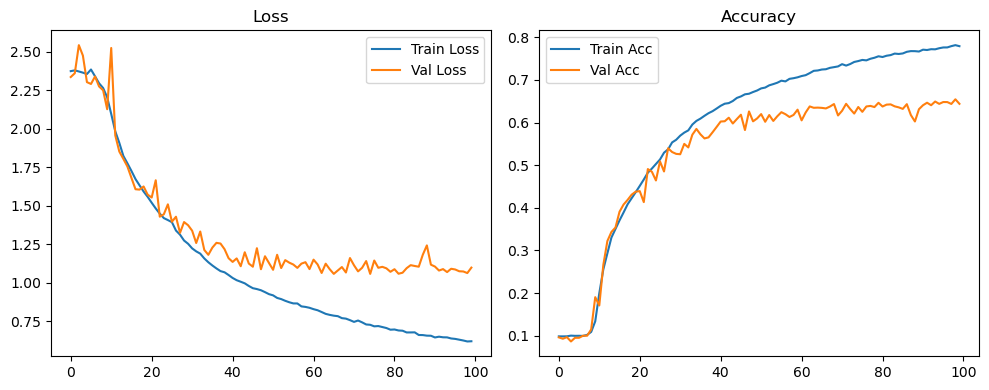

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 1.0973 Accuracy: 0.6463


🚀 Running: batch128_lr_max_0.001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0988 | Val Acc: 0.0974 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0988 | Val Acc: 0.0974 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0988 | Val Acc: 0.0974 |:   1%|          | 1/100 [01:18<2:08:54, 78.13s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   1%|          | 1/100 [01:34<2:08:54, 78.13s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   1%|          | 1/100 [01:34<2:08:54, 78.13s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [01:34<1:08:36, 42.01s/it]

| LR: 0.000999 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:36, 42.01s/it]

| LR: 0.000999 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:36, 42.01s/it]

| LR: 0.000999 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [01:51<49:07, 30.39s/it]  

| LR: 0.000998 | Train Acc: 0.0994 | Val Acc: 0.0934 |:   3%|▎         | 3/100 [02:08<49:07, 30.39s/it]

| LR: 0.000998 | Train Acc: 0.0994 | Val Acc: 0.0934 |:   3%|▎         | 3/100 [02:08<49:07, 30.39s/it]

| LR: 0.000998 | Train Acc: 0.0994 | Val Acc: 0.0934 |:   4%|▍         | 4/100 [02:08<39:59, 25.00s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [02:24<39:59, 25.00s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [02:24<39:59, 25.00s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [02:24<34:55, 22.05s/it]

| LR: 0.000994 | Train Acc: 0.0992 | Val Acc: 0.0944 |:   5%|▌         | 5/100 [02:41<34:55, 22.05s/it]

| LR: 0.000994 | Train Acc: 0.0992 | Val Acc: 0.0944 |:   5%|▌         | 5/100 [02:41<34:55, 22.05s/it]

| LR: 0.000994 | Train Acc: 0.0992 | Val Acc: 0.0944 |:   6%|▌         | 6/100 [02:41<31:38, 20.19s/it]

| LR: 0.000991 | Train Acc: 0.0990 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [02:58<31:38, 20.19s/it]

| LR: 0.000991 | Train Acc: 0.0990 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [02:58<31:38, 20.19s/it]

| LR: 0.000991 | Train Acc: 0.0990 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [02:58<29:34, 19.08s/it]

| LR: 0.000988 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   7%|▋         | 7/100 [03:15<29:34, 19.08s/it]

| LR: 0.000988 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   7%|▋         | 7/100 [03:15<29:34, 19.08s/it]

| LR: 0.000988 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   8%|▊         | 8/100 [03:15<28:06, 18.33s/it]

| LR: 0.000984 | Train Acc: 0.0995 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:31<28:06, 18.33s/it]

| LR: 0.000984 | Train Acc: 0.0995 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:31<28:06, 18.33s/it]

| LR: 0.000984 | Train Acc: 0.0995 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [03:31<27:06, 17.88s/it]

| LR: 0.000980 | Train Acc: 0.0992 | Val Acc: 0.0936 |:   9%|▉         | 9/100 [03:48<27:06, 17.88s/it]

| LR: 0.000980 | Train Acc: 0.0992 | Val Acc: 0.0936 |:   9%|▉         | 9/100 [03:48<27:06, 17.88s/it]

| LR: 0.000980 | Train Acc: 0.0992 | Val Acc: 0.0936 |:  10%|█         | 10/100 [03:48<26:17, 17.53s/it]

| LR: 0.000976 | Train Acc: 0.0994 | Val Acc: 0.0928 |:  10%|█         | 10/100 [04:05<26:17, 17.53s/it]

| LR: 0.000976 | Train Acc: 0.0994 | Val Acc: 0.0928 |:  10%|█         | 10/100 [04:05<26:17, 17.53s/it]

| LR: 0.000976 | Train Acc: 0.0994 | Val Acc: 0.0928 |:  11%|█         | 11/100 [04:05<25:37, 17.28s/it]

| LR: 0.000970 | Train Acc: 0.0995 | Val Acc: 0.0964 |:  11%|█         | 11/100 [04:22<25:37, 17.28s/it]

| LR: 0.000970 | Train Acc: 0.0995 | Val Acc: 0.0964 |:  11%|█         | 11/100 [04:22<25:37, 17.28s/it]

| LR: 0.000970 | Train Acc: 0.0995 | Val Acc: 0.0964 |:  12%|█▏        | 12/100 [04:22<25:04, 17.10s/it]

| LR: 0.000965 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  12%|█▏        | 12/100 [04:38<25:04, 17.10s/it]

| LR: 0.000965 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  12%|█▏        | 12/100 [04:38<25:04, 17.10s/it]

| LR: 0.000965 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  13%|█▎        | 13/100 [04:38<24:39, 17.00s/it]

| LR: 0.000959 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [04:55<24:39, 17.00s/it]

| LR: 0.000959 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [04:55<24:39, 17.00s/it]

| LR: 0.000959 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  14%|█▍        | 14/100 [04:55<24:14, 16.92s/it]

| LR: 0.000952 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:12<24:14, 16.92s/it]

| LR: 0.000952 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:12<24:14, 16.92s/it]

| LR: 0.000952 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:12<23:55, 16.89s/it]

| LR: 0.000946 | Train Acc: 0.0990 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [05:29<23:55, 16.89s/it]

| LR: 0.000946 | Train Acc: 0.0990 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [05:29<23:55, 16.89s/it]

| LR: 0.000946 | Train Acc: 0.0990 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [05:29<23:36, 16.86s/it]

| LR: 0.000938 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  16%|█▌        | 16/100 [05:46<23:36, 16.86s/it]

| LR: 0.000938 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  16%|█▌        | 16/100 [05:46<23:36, 16.86s/it]

| LR: 0.000938 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  17%|█▋        | 17/100 [05:46<23:20, 16.87s/it]

| LR: 0.000930 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [06:02<23:20, 16.87s/it]

| LR: 0.000930 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [06:02<23:20, 16.87s/it]

| LR: 0.000930 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  18%|█▊        | 18/100 [06:03<23:04, 16.88s/it]

| LR: 0.000922 | Train Acc: 0.0988 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [06:19<23:04, 16.88s/it]

| LR: 0.000922 | Train Acc: 0.0988 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [06:19<23:04, 16.88s/it]

| LR: 0.000922 | Train Acc: 0.0988 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [06:19<22:45, 16.86s/it]

| LR: 0.000914 | Train Acc: 0.0998 | Val Acc: 0.0949 |:  19%|█▉        | 19/100 [06:36<22:45, 16.86s/it]

| LR: 0.000914 | Train Acc: 0.0998 | Val Acc: 0.0949 |:  19%|█▉        | 19/100 [06:36<22:45, 16.86s/it]

| LR: 0.000914 | Train Acc: 0.0998 | Val Acc: 0.0949 |:  20%|██        | 20/100 [06:36<22:26, 16.83s/it]

| LR: 0.000905 | Train Acc: 0.0994 | Val Acc: 0.0960 |:  20%|██        | 20/100 [06:53<22:26, 16.83s/it]

| LR: 0.000905 | Train Acc: 0.0994 | Val Acc: 0.0960 |:  20%|██        | 20/100 [06:53<22:26, 16.83s/it]

| LR: 0.000905 | Train Acc: 0.0994 | Val Acc: 0.0960 |:  21%|██        | 21/100 [06:53<22:02, 16.74s/it]

| LR: 0.000895 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000895 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000895 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [07:09<21:47, 16.77s/it]

| LR: 0.000885 | Train Acc: 0.0991 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [07:26<21:47, 16.77s/it]

| LR: 0.000885 | Train Acc: 0.0991 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [07:26<21:47, 16.77s/it]

| LR: 0.000885 | Train Acc: 0.0991 | Val Acc: 0.0963 |:  23%|██▎       | 23/100 [07:26<21:30, 16.76s/it]

| LR: 0.000875 | Train Acc: 0.0992 | Val Acc: 0.0955 |:  23%|██▎       | 23/100 [07:43<21:30, 16.76s/it]

| LR: 0.000875 | Train Acc: 0.0992 | Val Acc: 0.0955 |:  23%|██▎       | 23/100 [07:43<21:30, 16.76s/it]

| LR: 0.000875 | Train Acc: 0.0992 | Val Acc: 0.0955 |:  24%|██▍       | 24/100 [07:43<21:15, 16.78s/it]

| LR: 0.000865 | Train Acc: 0.0988 | Val Acc: 0.0942 |:  24%|██▍       | 24/100 [08:00<21:15, 16.78s/it]

| LR: 0.000865 | Train Acc: 0.0988 | Val Acc: 0.0942 |:  24%|██▍       | 24/100 [08:00<21:15, 16.78s/it]

| LR: 0.000865 | Train Acc: 0.0988 | Val Acc: 0.0942 |:  25%|██▌       | 25/100 [08:00<20:56, 16.76s/it]

| LR: 0.000854 | Train Acc: 0.1000 | Val Acc: 0.0954 |:  25%|██▌       | 25/100 [08:16<20:56, 16.76s/it]

| LR: 0.000854 | Train Acc: 0.1000 | Val Acc: 0.0954 |:  25%|██▌       | 25/100 [08:16<20:56, 16.76s/it]

| LR: 0.000854 | Train Acc: 0.1000 | Val Acc: 0.0954 |:  26%|██▌       | 26/100 [08:16<20:39, 16.75s/it]

| LR: 0.000842 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000842 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000842 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [08:33<20:19, 16.71s/it]

| LR: 0.000831 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  27%|██▋       | 27/100 [08:50<20:19, 16.71s/it]

| LR: 0.000831 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  27%|██▋       | 27/100 [08:50<20:19, 16.71s/it]

| LR: 0.000831 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  28%|██▊       | 28/100 [08:50<20:04, 16.73s/it]

| LR: 0.000819 | Train Acc: 0.1012 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [09:07<20:04, 16.73s/it]

| LR: 0.000819 | Train Acc: 0.1012 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [09:07<20:04, 16.73s/it]

| LR: 0.000819 | Train Acc: 0.1012 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [09:07<19:47, 16.72s/it]

| LR: 0.000807 | Train Acc: 0.1017 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [09:23<19:47, 16.72s/it]

| LR: 0.000807 | Train Acc: 0.1017 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [09:23<19:47, 16.72s/it]

| LR: 0.000807 | Train Acc: 0.1017 | Val Acc: 0.0966 |:  30%|███       | 30/100 [09:23<19:31, 16.74s/it]

| LR: 0.000794 | Train Acc: 0.1023 | Val Acc: 0.0981 |:  30%|███       | 30/100 [09:40<19:31, 16.74s/it]

| LR: 0.000794 | Train Acc: 0.1023 | Val Acc: 0.0981 |:  30%|███       | 30/100 [09:40<19:31, 16.74s/it]

| LR: 0.000794 | Train Acc: 0.1023 | Val Acc: 0.0981 |:  31%|███       | 31/100 [09:40<19:16, 16.76s/it]

| LR: 0.000781 | Train Acc: 0.1011 | Val Acc: 0.0976 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000781 | Train Acc: 0.1011 | Val Acc: 0.0976 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000781 | Train Acc: 0.1011 | Val Acc: 0.0976 |:  32%|███▏      | 32/100 [09:57<18:59, 16.76s/it]

| LR: 0.000768 | Train Acc: 0.1024 | Val Acc: 0.0969 |:  32%|███▏      | 32/100 [10:14<18:59, 16.76s/it]

| LR: 0.000768 | Train Acc: 0.1024 | Val Acc: 0.0969 |:  32%|███▏      | 32/100 [10:14<18:59, 16.76s/it]

| LR: 0.000768 | Train Acc: 0.1024 | Val Acc: 0.0969 |:  33%|███▎      | 33/100 [10:14<18:44, 16.79s/it]

| LR: 0.000755 | Train Acc: 0.1084 | Val Acc: 0.1151 |:  33%|███▎      | 33/100 [10:30<18:44, 16.79s/it]

| LR: 0.000755 | Train Acc: 0.1084 | Val Acc: 0.1151 |:  33%|███▎      | 33/100 [10:30<18:44, 16.79s/it]

| LR: 0.000755 | Train Acc: 0.1084 | Val Acc: 0.1151 |:  34%|███▍      | 34/100 [10:30<18:23, 16.72s/it]

| LR: 0.000741 | Train Acc: 0.1134 | Val Acc: 0.1153 |:  34%|███▍      | 34/100 [10:47<18:23, 16.72s/it]

| LR: 0.000741 | Train Acc: 0.1134 | Val Acc: 0.1153 |:  34%|███▍      | 34/100 [10:47<18:23, 16.72s/it]

| LR: 0.000741 | Train Acc: 0.1134 | Val Acc: 0.1153 |:  35%|███▌      | 35/100 [10:47<18:08, 16.74s/it]

| LR: 0.000727 | Train Acc: 0.1133 | Val Acc: 0.1195 |:  35%|███▌      | 35/100 [11:04<18:08, 16.74s/it]

| LR: 0.000727 | Train Acc: 0.1133 | Val Acc: 0.1195 |:  35%|███▌      | 35/100 [11:04<18:08, 16.74s/it]

| LR: 0.000727 | Train Acc: 0.1133 | Val Acc: 0.1195 |:  36%|███▌      | 36/100 [11:04<17:49, 16.71s/it]

| LR: 0.000713 | Train Acc: 0.1095 | Val Acc: 0.0991 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000713 | Train Acc: 0.1095 | Val Acc: 0.0991 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000713 | Train Acc: 0.1095 | Val Acc: 0.0991 |:  37%|███▋      | 37/100 [11:21<17:33, 16.73s/it]

| LR: 0.000699 | Train Acc: 0.1118 | Val Acc: 0.1129 |:  37%|███▋      | 37/100 [11:37<17:33, 16.73s/it]

| LR: 0.000699 | Train Acc: 0.1118 | Val Acc: 0.1129 |:  37%|███▋      | 37/100 [11:37<17:33, 16.73s/it]

| LR: 0.000699 | Train Acc: 0.1118 | Val Acc: 0.1129 |:  38%|███▊      | 38/100 [11:37<17:17, 16.73s/it]

| LR: 0.000684 | Train Acc: 0.1114 | Val Acc: 0.1160 |:  38%|███▊      | 38/100 [11:54<17:17, 16.73s/it]

| LR: 0.000684 | Train Acc: 0.1114 | Val Acc: 0.1160 |:  38%|███▊      | 38/100 [11:54<17:17, 16.73s/it]

| LR: 0.000684 | Train Acc: 0.1114 | Val Acc: 0.1160 |:  39%|███▉      | 39/100 [11:54<17:01, 16.74s/it]

| LR: 0.000670 | Train Acc: 0.1109 | Val Acc: 0.0964 |:  39%|███▉      | 39/100 [12:11<17:01, 16.74s/it]

| LR: 0.000670 | Train Acc: 0.1109 | Val Acc: 0.0964 |:  39%|███▉      | 39/100 [12:11<17:01, 16.74s/it]

| LR: 0.000670 | Train Acc: 0.1109 | Val Acc: 0.0964 |:  40%|████      | 40/100 [12:11<16:45, 16.76s/it]

| LR: 0.000655 | Train Acc: 0.1125 | Val Acc: 0.1134 |:  40%|████      | 40/100 [12:28<16:45, 16.76s/it]

| LR: 0.000655 | Train Acc: 0.1125 | Val Acc: 0.1134 |:  40%|████      | 40/100 [12:28<16:45, 16.76s/it]

| LR: 0.000655 | Train Acc: 0.1125 | Val Acc: 0.1134 |:  41%|████      | 41/100 [12:28<16:32, 16.83s/it]

| LR: 0.000640 | Train Acc: 0.1142 | Val Acc: 0.1170 |:  41%|████      | 41/100 [12:45<16:32, 16.83s/it]

| LR: 0.000640 | Train Acc: 0.1142 | Val Acc: 0.1170 |:  41%|████      | 41/100 [12:45<16:32, 16.83s/it]

| LR: 0.000640 | Train Acc: 0.1142 | Val Acc: 0.1170 |:  42%|████▏     | 42/100 [12:45<16:18, 16.86s/it]

| LR: 0.000625 | Train Acc: 0.1148 | Val Acc: 0.1214 |:  42%|████▏     | 42/100 [13:02<16:18, 16.86s/it]

| LR: 0.000625 | Train Acc: 0.1148 | Val Acc: 0.1214 |:  42%|████▏     | 42/100 [13:02<16:18, 16.86s/it]

| LR: 0.000625 | Train Acc: 0.1148 | Val Acc: 0.1214 |:  43%|████▎     | 43/100 [13:02<16:01, 16.88s/it]

| LR: 0.000609 | Train Acc: 0.1167 | Val Acc: 0.1149 |:  43%|████▎     | 43/100 [13:18<16:01, 16.88s/it]

| LR: 0.000609 | Train Acc: 0.1167 | Val Acc: 0.1149 |:  43%|████▎     | 43/100 [13:18<16:01, 16.88s/it]

| LR: 0.000609 | Train Acc: 0.1167 | Val Acc: 0.1149 |:  44%|████▍     | 44/100 [13:18<15:43, 16.86s/it]

| LR: 0.000594 | Train Acc: 0.1163 | Val Acc: 0.1170 |:  44%|████▍     | 44/100 [13:35<15:43, 16.86s/it]

| LR: 0.000594 | Train Acc: 0.1163 | Val Acc: 0.1170 |:  44%|████▍     | 44/100 [13:35<15:43, 16.86s/it]

| LR: 0.000594 | Train Acc: 0.1163 | Val Acc: 0.1170 |:  45%|████▌     | 45/100 [13:35<15:27, 16.86s/it]

| LR: 0.000579 | Train Acc: 0.1176 | Val Acc: 0.1146 |:  45%|████▌     | 45/100 [13:52<15:27, 16.86s/it]

| LR: 0.000579 | Train Acc: 0.1176 | Val Acc: 0.1146 |:  45%|████▌     | 45/100 [13:52<15:27, 16.86s/it]

| LR: 0.000579 | Train Acc: 0.1176 | Val Acc: 0.1146 |:  46%|████▌     | 46/100 [13:52<15:09, 16.84s/it]

| LR: 0.000563 | Train Acc: 0.1198 | Val Acc: 0.1240 |:  46%|████▌     | 46/100 [14:09<15:09, 16.84s/it]

| LR: 0.000563 | Train Acc: 0.1198 | Val Acc: 0.1240 |:  46%|████▌     | 46/100 [14:09<15:09, 16.84s/it]

| LR: 0.000563 | Train Acc: 0.1198 | Val Acc: 0.1240 |:  47%|████▋     | 47/100 [14:09<14:50, 16.80s/it]

| LR: 0.000548 | Train Acc: 0.1198 | Val Acc: 0.1217 |:  47%|████▋     | 47/100 [14:25<14:50, 16.80s/it]

| LR: 0.000548 | Train Acc: 0.1198 | Val Acc: 0.1217 |:  47%|████▋     | 47/100 [14:25<14:50, 16.80s/it]

| LR: 0.000548 | Train Acc: 0.1198 | Val Acc: 0.1217 |:  48%|████▊     | 48/100 [14:25<14:28, 16.71s/it]

| LR: 0.000532 | Train Acc: 0.1185 | Val Acc: 0.1178 |:  48%|████▊     | 48/100 [14:42<14:28, 16.71s/it]

| LR: 0.000532 | Train Acc: 0.1185 | Val Acc: 0.1178 |:  48%|████▊     | 48/100 [14:42<14:28, 16.71s/it]

| LR: 0.000532 | Train Acc: 0.1185 | Val Acc: 0.1178 |:  49%|████▉     | 49/100 [14:42<14:12, 16.72s/it]

| LR: 0.000516 | Train Acc: 0.1178 | Val Acc: 0.1191 |:  49%|████▉     | 49/100 [14:59<14:12, 16.72s/it]

| LR: 0.000516 | Train Acc: 0.1178 | Val Acc: 0.1191 |:  49%|████▉     | 49/100 [14:59<14:12, 16.72s/it]

| LR: 0.000516 | Train Acc: 0.1178 | Val Acc: 0.1191 |:  50%|█████     | 50/100 [14:59<13:55, 16.72s/it]

| LR: 0.000501 | Train Acc: 0.1231 | Val Acc: 0.1129 |:  50%|█████     | 50/100 [15:15<13:55, 16.72s/it]

| LR: 0.000501 | Train Acc: 0.1231 | Val Acc: 0.1129 |:  50%|█████     | 50/100 [15:15<13:55, 16.72s/it]

| LR: 0.000501 | Train Acc: 0.1231 | Val Acc: 0.1129 |:  51%|█████     | 51/100 [15:16<13:39, 16.72s/it]

| LR: 0.000485 | Train Acc: 0.1195 | Val Acc: 0.1257 |:  51%|█████     | 51/100 [15:32<13:39, 16.72s/it]

| LR: 0.000485 | Train Acc: 0.1195 | Val Acc: 0.1257 |:  51%|█████     | 51/100 [15:32<13:39, 16.72s/it]

| LR: 0.000485 | Train Acc: 0.1195 | Val Acc: 0.1257 |:  52%|█████▏    | 52/100 [15:32<13:22, 16.72s/it]

| LR: 0.000469 | Train Acc: 0.1255 | Val Acc: 0.1175 |:  52%|█████▏    | 52/100 [15:49<13:22, 16.72s/it]

| LR: 0.000469 | Train Acc: 0.1255 | Val Acc: 0.1175 |:  52%|█████▏    | 52/100 [15:49<13:22, 16.72s/it]

| LR: 0.000469 | Train Acc: 0.1255 | Val Acc: 0.1175 |:  53%|█████▎    | 53/100 [15:49<13:04, 16.69s/it]

| LR: 0.000453 | Train Acc: 0.1231 | Val Acc: 0.1139 |:  53%|█████▎    | 53/100 [16:06<13:04, 16.69s/it]

| LR: 0.000453 | Train Acc: 0.1231 | Val Acc: 0.1139 |:  53%|█████▎    | 53/100 [16:06<13:04, 16.69s/it]

| LR: 0.000453 | Train Acc: 0.1231 | Val Acc: 0.1139 |:  54%|█████▍    | 54/100 [16:06<12:49, 16.72s/it]

| LR: 0.000438 | Train Acc: 0.1249 | Val Acc: 0.1156 |:  54%|█████▍    | 54/100 [16:22<12:49, 16.72s/it]

| LR: 0.000438 | Train Acc: 0.1249 | Val Acc: 0.1156 |:  54%|█████▍    | 54/100 [16:22<12:49, 16.72s/it]

| LR: 0.000438 | Train Acc: 0.1249 | Val Acc: 0.1156 |:  55%|█████▌    | 55/100 [16:22<12:32, 16.73s/it]

| LR: 0.000422 | Train Acc: 0.1255 | Val Acc: 0.1166 |:  55%|█████▌    | 55/100 [16:39<12:32, 16.73s/it]

| LR: 0.000422 | Train Acc: 0.1255 | Val Acc: 0.1166 |:  55%|█████▌    | 55/100 [16:39<12:32, 16.73s/it]

| LR: 0.000422 | Train Acc: 0.1255 | Val Acc: 0.1166 |:  56%|█████▌    | 56/100 [16:39<12:15, 16.72s/it]

| LR: 0.000407 | Train Acc: 0.1244 | Val Acc: 0.1191 |:  56%|█████▌    | 56/100 [16:56<12:15, 16.72s/it]

| LR: 0.000407 | Train Acc: 0.1244 | Val Acc: 0.1191 |:  56%|█████▌    | 56/100 [16:56<12:15, 16.72s/it]

| LR: 0.000407 | Train Acc: 0.1244 | Val Acc: 0.1191 |:  57%|█████▋    | 57/100 [16:56<11:58, 16.71s/it]

| LR: 0.000392 | Train Acc: 0.1255 | Val Acc: 0.1186 |:  57%|█████▋    | 57/100 [17:13<11:58, 16.71s/it]

| LR: 0.000392 | Train Acc: 0.1255 | Val Acc: 0.1186 |:  57%|█████▋    | 57/100 [17:13<11:58, 16.71s/it]

| LR: 0.000392 | Train Acc: 0.1255 | Val Acc: 0.1186 |:  58%|█████▊    | 58/100 [17:13<11:43, 16.74s/it]

| LR: 0.000376 | Train Acc: 0.1247 | Val Acc: 0.1146 |:  58%|█████▊    | 58/100 [17:29<11:43, 16.74s/it]

| LR: 0.000376 | Train Acc: 0.1247 | Val Acc: 0.1146 |:  58%|█████▊    | 58/100 [17:29<11:43, 16.74s/it]

| LR: 0.000376 | Train Acc: 0.1247 | Val Acc: 0.1146 |:  59%|█████▉    | 59/100 [17:29<11:24, 16.69s/it]

| LR: 0.000361 | Train Acc: 0.1297 | Val Acc: 0.1260 |:  59%|█████▉    | 59/100 [17:46<11:24, 16.69s/it]

| LR: 0.000361 | Train Acc: 0.1297 | Val Acc: 0.1260 |:  59%|█████▉    | 59/100 [17:46<11:24, 16.69s/it]

| LR: 0.000361 | Train Acc: 0.1297 | Val Acc: 0.1260 |:  60%|██████    | 60/100 [17:46<11:07, 16.69s/it]

| LR: 0.000346 | Train Acc: 0.1276 | Val Acc: 0.1150 |:  60%|██████    | 60/100 [18:02<11:07, 16.69s/it]

| LR: 0.000346 | Train Acc: 0.1276 | Val Acc: 0.1150 |:  60%|██████    | 60/100 [18:02<11:07, 16.69s/it]

| LR: 0.000346 | Train Acc: 0.1276 | Val Acc: 0.1150 |:  61%|██████    | 61/100 [18:02<10:49, 16.67s/it]

| LR: 0.000331 | Train Acc: 0.1258 | Val Acc: 0.1194 |:  61%|██████    | 61/100 [18:19<10:49, 16.67s/it]

| LR: 0.000331 | Train Acc: 0.1258 | Val Acc: 0.1194 |:  61%|██████    | 61/100 [18:19<10:49, 16.67s/it]

| LR: 0.000331 | Train Acc: 0.1258 | Val Acc: 0.1194 |:  62%|██████▏   | 62/100 [18:19<10:34, 16.69s/it]

| LR: 0.000317 | Train Acc: 0.1261 | Val Acc: 0.1176 |:  62%|██████▏   | 62/100 [18:36<10:34, 16.69s/it]

| LR: 0.000317 | Train Acc: 0.1261 | Val Acc: 0.1176 |:  62%|██████▏   | 62/100 [18:36<10:34, 16.69s/it]

| LR: 0.000317 | Train Acc: 0.1261 | Val Acc: 0.1176 |:  63%|██████▎   | 63/100 [18:36<10:17, 16.69s/it]

| LR: 0.000302 | Train Acc: 0.1319 | Val Acc: 0.1317 |:  63%|██████▎   | 63/100 [18:53<10:17, 16.69s/it]

| LR: 0.000302 | Train Acc: 0.1319 | Val Acc: 0.1317 |:  63%|██████▎   | 63/100 [18:53<10:17, 16.69s/it]

| LR: 0.000302 | Train Acc: 0.1319 | Val Acc: 0.1317 |:  64%|██████▍   | 64/100 [18:53<10:00, 16.69s/it]

| LR: 0.000288 | Train Acc: 0.1285 | Val Acc: 0.1228 |:  64%|██████▍   | 64/100 [19:09<10:00, 16.69s/it]

| LR: 0.000288 | Train Acc: 0.1285 | Val Acc: 0.1228 |:  64%|██████▍   | 64/100 [19:09<10:00, 16.69s/it]

| LR: 0.000288 | Train Acc: 0.1285 | Val Acc: 0.1228 |:  65%|██████▌   | 65/100 [19:09<09:41, 16.61s/it]

| LR: 0.000274 | Train Acc: 0.1265 | Val Acc: 0.1236 |:  65%|██████▌   | 65/100 [19:26<09:41, 16.61s/it]

| LR: 0.000274 | Train Acc: 0.1265 | Val Acc: 0.1236 |:  65%|██████▌   | 65/100 [19:26<09:41, 16.61s/it]

| LR: 0.000274 | Train Acc: 0.1265 | Val Acc: 0.1236 |:  66%|██████▌   | 66/100 [19:26<09:25, 16.64s/it]

| LR: 0.000260 | Train Acc: 0.1272 | Val Acc: 0.1246 |:  66%|██████▌   | 66/100 [19:42<09:25, 16.64s/it]

| LR: 0.000260 | Train Acc: 0.1272 | Val Acc: 0.1246 |:  66%|██████▌   | 66/100 [19:42<09:25, 16.64s/it]

| LR: 0.000260 | Train Acc: 0.1272 | Val Acc: 0.1246 |:  67%|██████▋   | 67/100 [19:43<09:10, 16.69s/it]

| LR: 0.000246 | Train Acc: 0.1283 | Val Acc: 0.1167 |:  67%|██████▋   | 67/100 [19:59<09:10, 16.69s/it]

| LR: 0.000246 | Train Acc: 0.1283 | Val Acc: 0.1167 |:  67%|██████▋   | 67/100 [19:59<09:10, 16.69s/it]

| LR: 0.000246 | Train Acc: 0.1283 | Val Acc: 0.1167 |:  68%|██████▊   | 68/100 [19:59<08:54, 16.71s/it]

| LR: 0.000233 | Train Acc: 0.1272 | Val Acc: 0.1192 |:  68%|██████▊   | 68/100 [20:16<08:54, 16.71s/it]

| LR: 0.000233 | Train Acc: 0.1272 | Val Acc: 0.1192 |:  68%|██████▊   | 68/100 [20:16<08:54, 16.71s/it]

| LR: 0.000233 | Train Acc: 0.1272 | Val Acc: 0.1192 |:  69%|██████▉   | 69/100 [20:16<08:38, 16.73s/it]

| LR: 0.000220 | Train Acc: 0.1296 | Val Acc: 0.1241 |:  69%|██████▉   | 69/100 [20:33<08:38, 16.73s/it]

| LR: 0.000220 | Train Acc: 0.1296 | Val Acc: 0.1241 |:  69%|██████▉   | 69/100 [20:33<08:38, 16.73s/it]

| LR: 0.000220 | Train Acc: 0.1296 | Val Acc: 0.1241 |:  70%|███████   | 70/100 [20:33<08:22, 16.77s/it]

| LR: 0.000207 | Train Acc: 0.1299 | Val Acc: 0.1227 |:  70%|███████   | 70/100 [20:49<08:22, 16.77s/it]

| LR: 0.000207 | Train Acc: 0.1299 | Val Acc: 0.1227 |:  70%|███████   | 70/100 [20:49<08:22, 16.77s/it]

| LR: 0.000207 | Train Acc: 0.1299 | Val Acc: 0.1227 |:  71%|███████   | 71/100 [20:50<08:04, 16.71s/it]

| LR: 0.000194 | Train Acc: 0.1286 | Val Acc: 0.1199 |:  71%|███████   | 71/100 [21:06<08:04, 16.71s/it]

| LR: 0.000194 | Train Acc: 0.1286 | Val Acc: 0.1199 |:  71%|███████   | 71/100 [21:06<08:04, 16.71s/it]

| LR: 0.000194 | Train Acc: 0.1286 | Val Acc: 0.1199 |:  72%|███████▏  | 72/100 [21:06<07:47, 16.69s/it]

| LR: 0.000182 | Train Acc: 0.1303 | Val Acc: 0.1247 |:  72%|███████▏  | 72/100 [21:23<07:47, 16.69s/it]

| LR: 0.000182 | Train Acc: 0.1303 | Val Acc: 0.1247 |:  72%|███████▏  | 72/100 [21:23<07:47, 16.69s/it]

| LR: 0.000182 | Train Acc: 0.1303 | Val Acc: 0.1247 |:  73%|███████▎  | 73/100 [21:23<07:28, 16.62s/it]

| LR: 0.000170 | Train Acc: 0.1297 | Val Acc: 0.1207 |:  73%|███████▎  | 73/100 [21:39<07:28, 16.62s/it]

| LR: 0.000170 | Train Acc: 0.1297 | Val Acc: 0.1207 |:  73%|███████▎  | 73/100 [21:39<07:28, 16.62s/it]

| LR: 0.000170 | Train Acc: 0.1297 | Val Acc: 0.1207 |:  74%|███████▍  | 74/100 [21:39<07:12, 16.62s/it]

| LR: 0.000159 | Train Acc: 0.1278 | Val Acc: 0.1287 |:  74%|███████▍  | 74/100 [21:56<07:12, 16.62s/it]

| LR: 0.000159 | Train Acc: 0.1278 | Val Acc: 0.1287 |:  74%|███████▍  | 74/100 [21:56<07:12, 16.62s/it]

| LR: 0.000159 | Train Acc: 0.1278 | Val Acc: 0.1287 |:  75%|███████▌  | 75/100 [21:56<06:57, 16.71s/it]

| LR: 0.000147 | Train Acc: 0.1285 | Val Acc: 0.1190 |:  75%|███████▌  | 75/100 [22:13<06:57, 16.71s/it]

| LR: 0.000147 | Train Acc: 0.1285 | Val Acc: 0.1190 |:  75%|███████▌  | 75/100 [22:13<06:57, 16.71s/it]

| LR: 0.000147 | Train Acc: 0.1285 | Val Acc: 0.1190 |:  76%|███████▌  | 76/100 [22:13<06:41, 16.72s/it]

| LR: 0.000136 | Train Acc: 0.1318 | Val Acc: 0.1292 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.72s/it]

| LR: 0.000136 | Train Acc: 0.1318 | Val Acc: 0.1292 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.72s/it]

| LR: 0.000136 | Train Acc: 0.1318 | Val Acc: 0.1292 |:  77%|███████▋  | 77/100 [22:30<06:24, 16.73s/it]

| LR: 0.000126 | Train Acc: 0.1308 | Val Acc: 0.1236 |:  77%|███████▋  | 77/100 [22:47<06:24, 16.73s/it]

| LR: 0.000126 | Train Acc: 0.1308 | Val Acc: 0.1236 |:  77%|███████▋  | 77/100 [22:47<06:24, 16.73s/it]

| LR: 0.000126 | Train Acc: 0.1308 | Val Acc: 0.1236 |:  78%|███████▊  | 78/100 [22:47<06:09, 16.80s/it]

| LR: 0.000116 | Train Acc: 0.1263 | Val Acc: 0.1225 |:  78%|███████▊  | 78/100 [23:03<06:09, 16.80s/it]

| LR: 0.000116 | Train Acc: 0.1263 | Val Acc: 0.1225 |:  78%|███████▊  | 78/100 [23:03<06:09, 16.80s/it]

| LR: 0.000116 | Train Acc: 0.1263 | Val Acc: 0.1225 |:  79%|███████▉  | 79/100 [23:03<05:53, 16.82s/it]

| LR: 0.000106 | Train Acc: 0.1307 | Val Acc: 0.1179 |:  79%|███████▉  | 79/100 [23:20<05:53, 16.82s/it]

| LR: 0.000106 | Train Acc: 0.1307 | Val Acc: 0.1179 |:  79%|███████▉  | 79/100 [23:20<05:53, 16.82s/it]

| LR: 0.000106 | Train Acc: 0.1307 | Val Acc: 0.1179 |:  80%|████████  | 80/100 [23:20<05:36, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.1308 | Val Acc: 0.1299 |:  80%|████████  | 80/100 [23:37<05:36, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.1308 | Val Acc: 0.1299 |:  80%|████████  | 80/100 [23:37<05:36, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.1308 | Val Acc: 0.1299 |:  81%|████████  | 81/100 [23:37<05:19, 16.80s/it]

| LR: 0.000087 | Train Acc: 0.1301 | Val Acc: 0.1338 |:  81%|████████  | 81/100 [23:54<05:19, 16.80s/it]

| LR: 0.000087 | Train Acc: 0.1301 | Val Acc: 0.1338 |:  81%|████████  | 81/100 [23:54<05:19, 16.80s/it]

| LR: 0.000087 | Train Acc: 0.1301 | Val Acc: 0.1338 |:  82%|████████▏ | 82/100 [23:54<05:00, 16.72s/it]

| LR: 0.000079 | Train Acc: 0.1284 | Val Acc: 0.1224 |:  82%|████████▏ | 82/100 [24:10<05:00, 16.72s/it]

| LR: 0.000079 | Train Acc: 0.1284 | Val Acc: 0.1224 |:  82%|████████▏ | 82/100 [24:10<05:00, 16.72s/it]

| LR: 0.000079 | Train Acc: 0.1284 | Val Acc: 0.1224 |:  83%|████████▎ | 83/100 [24:10<04:44, 16.73s/it]

| LR: 0.000071 | Train Acc: 0.1295 | Val Acc: 0.1179 |:  83%|████████▎ | 83/100 [24:27<04:44, 16.73s/it]

| LR: 0.000071 | Train Acc: 0.1295 | Val Acc: 0.1179 |:  83%|████████▎ | 83/100 [24:27<04:44, 16.73s/it]

| LR: 0.000071 | Train Acc: 0.1295 | Val Acc: 0.1179 |:  84%|████████▍ | 84/100 [24:27<04:28, 16.79s/it]

| LR: 0.000063 | Train Acc: 0.1292 | Val Acc: 0.1305 |:  84%|████████▍ | 84/100 [24:44<04:28, 16.79s/it]

| LR: 0.000063 | Train Acc: 0.1292 | Val Acc: 0.1305 |:  84%|████████▍ | 84/100 [24:44<04:28, 16.79s/it]

| LR: 0.000063 | Train Acc: 0.1292 | Val Acc: 0.1305 |:  85%|████████▌ | 85/100 [24:44<04:11, 16.78s/it]

| LR: 0.000055 | Train Acc: 0.1310 | Val Acc: 0.1257 |:  85%|████████▌ | 85/100 [25:01<04:11, 16.78s/it]

| LR: 0.000055 | Train Acc: 0.1310 | Val Acc: 0.1257 |:  85%|████████▌ | 85/100 [25:01<04:11, 16.78s/it]

| LR: 0.000055 | Train Acc: 0.1310 | Val Acc: 0.1257 |:  86%|████████▌ | 86/100 [25:01<03:54, 16.78s/it]

| LR: 0.000049 | Train Acc: 0.1300 | Val Acc: 0.1221 |:  86%|████████▌ | 86/100 [25:17<03:54, 16.78s/it]

| LR: 0.000049 | Train Acc: 0.1300 | Val Acc: 0.1221 |:  86%|████████▌ | 86/100 [25:17<03:54, 16.78s/it]

| LR: 0.000049 | Train Acc: 0.1300 | Val Acc: 0.1221 |:  87%|████████▋ | 87/100 [25:17<03:37, 16.72s/it]

| LR: 0.000042 | Train Acc: 0.1281 | Val Acc: 0.1268 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.72s/it]

| LR: 0.000042 | Train Acc: 0.1281 | Val Acc: 0.1268 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.72s/it]

| LR: 0.000042 | Train Acc: 0.1281 | Val Acc: 0.1268 |:  88%|████████▊ | 88/100 [25:34<03:20, 16.74s/it]

| LR: 0.000036 | Train Acc: 0.1305 | Val Acc: 0.1201 |:  88%|████████▊ | 88/100 [25:51<03:20, 16.74s/it]

| LR: 0.000036 | Train Acc: 0.1305 | Val Acc: 0.1201 |:  88%|████████▊ | 88/100 [25:51<03:20, 16.74s/it]

| LR: 0.000036 | Train Acc: 0.1305 | Val Acc: 0.1201 |:  89%|████████▉ | 89/100 [25:51<03:04, 16.74s/it]

| LR: 0.000031 | Train Acc: 0.1306 | Val Acc: 0.1258 |:  89%|████████▉ | 89/100 [26:08<03:04, 16.74s/it]

| LR: 0.000031 | Train Acc: 0.1306 | Val Acc: 0.1258 |:  89%|████████▉ | 89/100 [26:08<03:04, 16.74s/it]

| LR: 0.000031 | Train Acc: 0.1306 | Val Acc: 0.1258 |:  90%|█████████ | 90/100 [26:08<02:47, 16.76s/it]

| LR: 0.000025 | Train Acc: 0.1316 | Val Acc: 0.1168 |:  90%|█████████ | 90/100 [26:24<02:47, 16.76s/it]

| LR: 0.000025 | Train Acc: 0.1316 | Val Acc: 0.1168 |:  90%|█████████ | 90/100 [26:24<02:47, 16.76s/it]

| LR: 0.000025 | Train Acc: 0.1316 | Val Acc: 0.1168 |:  91%|█████████ | 91/100 [26:24<02:30, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.1324 | Val Acc: 0.1241 |:  91%|█████████ | 91/100 [26:41<02:30, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.1324 | Val Acc: 0.1241 |:  91%|█████████ | 91/100 [26:41<02:30, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.1324 | Val Acc: 0.1241 |:  92%|█████████▏| 92/100 [26:41<02:13, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.1306 | Val Acc: 0.1322 |:  92%|█████████▏| 92/100 [26:58<02:13, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.1306 | Val Acc: 0.1322 |:  92%|█████████▏| 92/100 [26:58<02:13, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.1306 | Val Acc: 0.1322 |:  93%|█████████▎| 93/100 [26:58<01:57, 16.75s/it]

| LR: 0.000013 | Train Acc: 0.1326 | Val Acc: 0.1215 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.75s/it]

| LR: 0.000013 | Train Acc: 0.1326 | Val Acc: 0.1215 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.75s/it]

| LR: 0.000013 | Train Acc: 0.1326 | Val Acc: 0.1215 |:  94%|█████████▍| 94/100 [27:15<01:40, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.1333 | Val Acc: 0.1251 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.1333 | Val Acc: 0.1251 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.1333 | Val Acc: 0.1251 |:  95%|█████████▌| 95/100 [27:31<01:23, 16.73s/it]

| LR: 0.000007 | Train Acc: 0.1315 | Val Acc: 0.1328 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.73s/it]

| LR: 0.000007 | Train Acc: 0.1315 | Val Acc: 0.1328 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.73s/it]

| LR: 0.000007 | Train Acc: 0.1315 | Val Acc: 0.1328 |:  96%|█████████▌| 96/100 [27:48<01:07, 16.77s/it]

| LR: 0.000005 | Train Acc: 0.1300 | Val Acc: 0.1235 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.77s/it]

| LR: 0.000005 | Train Acc: 0.1300 | Val Acc: 0.1235 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.77s/it]

| LR: 0.000005 | Train Acc: 0.1300 | Val Acc: 0.1235 |:  97%|█████████▋| 97/100 [28:05<00:50, 16.76s/it]

| LR: 0.000003 | Train Acc: 0.1340 | Val Acc: 0.1241 |:  97%|█████████▋| 97/100 [28:21<00:50, 16.76s/it]

| LR: 0.000003 | Train Acc: 0.1340 | Val Acc: 0.1241 |:  97%|█████████▋| 97/100 [28:21<00:50, 16.76s/it]

| LR: 0.000003 | Train Acc: 0.1340 | Val Acc: 0.1241 |:  98%|█████████▊| 98/100 [28:22<00:33, 16.70s/it]

| LR: 0.000002 | Train Acc: 0.1332 | Val Acc: 0.1278 |:  98%|█████████▊| 98/100 [28:38<00:33, 16.70s/it]

| LR: 0.000002 | Train Acc: 0.1332 | Val Acc: 0.1278 |:  98%|█████████▊| 98/100 [28:38<00:33, 16.70s/it]

| LR: 0.000002 | Train Acc: 0.1332 | Val Acc: 0.1278 |:  99%|█████████▉| 99/100 [28:38<00:16, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.1336 | Val Acc: 0.1206 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.1336 | Val Acc: 0.1206 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.1336 | Val Acc: 0.1206 |: 100%|██████████| 100/100 [28:55<00:00, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.1336 | Val Acc: 0.1206 |: 100%|██████████| 100/100 [28:55<00:00, 17.35s/it]

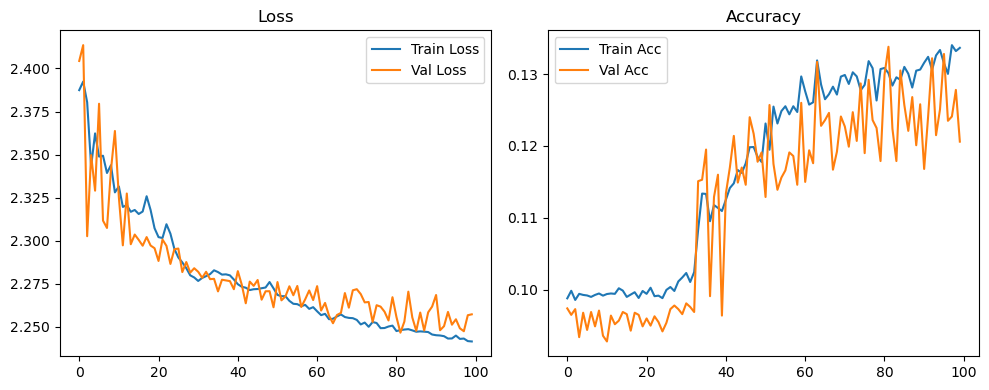

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.30it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.20it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

Original Model Final Test Loss: 2.2552 Accuracy: 0.1261


🚀 Running: batch128_lr_max_0.001_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0975 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0975 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0975 |:   1%|          | 1/100 [01:17<2:08:29, 77.87s/it]

| LR: 0.001000 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:29, 77.87s/it]

| LR: 0.001000 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:29, 77.87s/it]

| LR: 0.001000 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:34<1:08:33, 41.97s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:33, 41.97s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:33, 41.97s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [01:51<49:10, 30.41s/it]  

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:08<49:10, 30.41s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:08<49:10, 30.41s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [02:08<40:02, 25.02s/it]

| LR: 0.000996 | Train Acc: 0.0999 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:24<40:02, 25.02s/it]

| LR: 0.000996 | Train Acc: 0.0999 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:24<40:02, 25.02s/it]

| LR: 0.000996 | Train Acc: 0.0999 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:24<34:57, 22.08s/it]

| LR: 0.000994 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:57, 22.08s/it]

| LR: 0.000994 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:57, 22.08s/it]

| LR: 0.000994 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:41<31:47, 20.29s/it]

| LR: 0.000991 | Train Acc: 0.1000 | Val Acc: 0.0959 |:   6%|▌         | 6/100 [02:58<31:47, 20.29s/it]

| LR: 0.000991 | Train Acc: 0.1000 | Val Acc: 0.0959 |:   6%|▌         | 6/100 [02:58<31:47, 20.29s/it]

| LR: 0.000991 | Train Acc: 0.1000 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [02:58<29:36, 19.10s/it]

| LR: 0.000988 | Train Acc: 0.1001 | Val Acc: 0.0955 |:   7%|▋         | 7/100 [03:15<29:36, 19.10s/it]

| LR: 0.000988 | Train Acc: 0.1001 | Val Acc: 0.0955 |:   7%|▋         | 7/100 [03:15<29:36, 19.10s/it]

| LR: 0.000988 | Train Acc: 0.1001 | Val Acc: 0.0955 |:   8%|▊         | 8/100 [03:15<28:07, 18.34s/it]

| LR: 0.000984 | Train Acc: 0.1014 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [03:31<28:07, 18.34s/it]

| LR: 0.000984 | Train Acc: 0.1014 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [03:31<28:07, 18.34s/it]

| LR: 0.000984 | Train Acc: 0.1014 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [03:31<27:01, 17.82s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [03:48<27:01, 17.82s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [03:48<27:01, 17.82s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0974 |:  10%|█         | 10/100 [03:48<26:15, 17.50s/it]

| LR: 0.000976 | Train Acc: 0.1002 | Val Acc: 0.0938 |:  10%|█         | 10/100 [04:05<26:15, 17.50s/it]

| LR: 0.000976 | Train Acc: 0.1002 | Val Acc: 0.0938 |:  10%|█         | 10/100 [04:05<26:15, 17.50s/it]

| LR: 0.000976 | Train Acc: 0.1002 | Val Acc: 0.0938 |:  11%|█         | 11/100 [04:05<25:34, 17.24s/it]

| LR: 0.000970 | Train Acc: 0.0985 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:22<25:34, 17.24s/it]

| LR: 0.000970 | Train Acc: 0.0985 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:22<25:34, 17.24s/it]

| LR: 0.000970 | Train Acc: 0.0985 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:22<25:05, 17.11s/it]

| LR: 0.000965 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [04:38<25:05, 17.11s/it]

| LR: 0.000965 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [04:38<25:05, 17.11s/it]

| LR: 0.000965 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [04:38<24:38, 17.00s/it]

| LR: 0.000959 | Train Acc: 0.1074 | Val Acc: 0.1012 |:  13%|█▎        | 13/100 [04:55<24:38, 17.00s/it]

| LR: 0.000959 | Train Acc: 0.1074 | Val Acc: 0.1012 |:  13%|█▎        | 13/100 [04:55<24:38, 17.00s/it]

| LR: 0.000959 | Train Acc: 0.1074 | Val Acc: 0.1012 |:  14%|█▍        | 14/100 [04:55<24:19, 16.97s/it]

| LR: 0.000952 | Train Acc: 0.1105 | Val Acc: 0.1063 |:  14%|█▍        | 14/100 [05:12<24:19, 16.97s/it]

| LR: 0.000952 | Train Acc: 0.1105 | Val Acc: 0.1063 |:  14%|█▍        | 14/100 [05:12<24:19, 16.97s/it]

| LR: 0.000952 | Train Acc: 0.1105 | Val Acc: 0.1063 |:  15%|█▌        | 15/100 [05:12<23:54, 16.88s/it]

| LR: 0.000946 | Train Acc: 0.1551 | Val Acc: 0.2049 |:  15%|█▌        | 15/100 [05:29<23:54, 16.88s/it]

| LR: 0.000946 | Train Acc: 0.1551 | Val Acc: 0.2049 |:  15%|█▌        | 15/100 [05:29<23:54, 16.88s/it]

| LR: 0.000946 | Train Acc: 0.1551 | Val Acc: 0.2049 |:  16%|█▌        | 16/100 [05:29<23:34, 16.84s/it]

| LR: 0.000938 | Train Acc: 0.1793 | Val Acc: 0.2107 |:  16%|█▌        | 16/100 [05:45<23:34, 16.84s/it]

| LR: 0.000938 | Train Acc: 0.1793 | Val Acc: 0.2107 |:  16%|█▌        | 16/100 [05:45<23:34, 16.84s/it]

| LR: 0.000938 | Train Acc: 0.1793 | Val Acc: 0.2107 |:  17%|█▋        | 17/100 [05:46<23:18, 16.84s/it]

| LR: 0.000930 | Train Acc: 0.2141 | Val Acc: 0.2631 |:  17%|█▋        | 17/100 [06:02<23:18, 16.84s/it]

| LR: 0.000930 | Train Acc: 0.2141 | Val Acc: 0.2631 |:  17%|█▋        | 17/100 [06:02<23:18, 16.84s/it]

| LR: 0.000930 | Train Acc: 0.2141 | Val Acc: 0.2631 |:  18%|█▊        | 18/100 [06:02<23:00, 16.83s/it]

| LR: 0.000922 | Train Acc: 0.2562 | Val Acc: 0.3072 |:  18%|█▊        | 18/100 [06:19<23:00, 16.83s/it]

| LR: 0.000922 | Train Acc: 0.2562 | Val Acc: 0.3072 |:  18%|█▊        | 18/100 [06:19<23:00, 16.83s/it]

| LR: 0.000922 | Train Acc: 0.2562 | Val Acc: 0.3072 |:  19%|█▉        | 19/100 [06:19<22:36, 16.74s/it]

| LR: 0.000914 | Train Acc: 0.2920 | Val Acc: 0.3370 |:  19%|█▉        | 19/100 [06:35<22:36, 16.74s/it]

| LR: 0.000914 | Train Acc: 0.2920 | Val Acc: 0.3370 |:  19%|█▉        | 19/100 [06:35<22:36, 16.74s/it]

| LR: 0.000914 | Train Acc: 0.2920 | Val Acc: 0.3370 |:  20%|██        | 20/100 [06:35<22:17, 16.71s/it]

| LR: 0.000905 | Train Acc: 0.3263 | Val Acc: 0.3494 |:  20%|██        | 20/100 [06:52<22:17, 16.71s/it]

| LR: 0.000905 | Train Acc: 0.3263 | Val Acc: 0.3494 |:  20%|██        | 20/100 [06:52<22:17, 16.71s/it]

| LR: 0.000905 | Train Acc: 0.3263 | Val Acc: 0.3494 |:  21%|██        | 21/100 [06:52<21:57, 16.68s/it]

| LR: 0.000895 | Train Acc: 0.3479 | Val Acc: 0.3805 |:  21%|██        | 21/100 [07:09<21:57, 16.68s/it]

| LR: 0.000895 | Train Acc: 0.3479 | Val Acc: 0.3805 |:  21%|██        | 21/100 [07:09<21:57, 16.68s/it]

| LR: 0.000895 | Train Acc: 0.3479 | Val Acc: 0.3805 |:  22%|██▏       | 22/100 [07:09<21:40, 16.67s/it]

| LR: 0.000885 | Train Acc: 0.3659 | Val Acc: 0.4141 |:  22%|██▏       | 22/100 [07:26<21:40, 16.67s/it]

| LR: 0.000885 | Train Acc: 0.3659 | Val Acc: 0.4141 |:  22%|██▏       | 22/100 [07:26<21:40, 16.67s/it]

| LR: 0.000885 | Train Acc: 0.3659 | Val Acc: 0.4141 |:  23%|██▎       | 23/100 [07:26<21:28, 16.73s/it]

| LR: 0.000875 | Train Acc: 0.3802 | Val Acc: 0.4061 |:  23%|██▎       | 23/100 [07:42<21:28, 16.73s/it]

| LR: 0.000875 | Train Acc: 0.3802 | Val Acc: 0.4061 |:  23%|██▎       | 23/100 [07:42<21:28, 16.73s/it]

| LR: 0.000875 | Train Acc: 0.3802 | Val Acc: 0.4061 |:  24%|██▍       | 24/100 [07:42<21:11, 16.73s/it]

| LR: 0.000865 | Train Acc: 0.3956 | Val Acc: 0.4076 |:  24%|██▍       | 24/100 [07:59<21:11, 16.73s/it]

| LR: 0.000865 | Train Acc: 0.3956 | Val Acc: 0.4076 |:  24%|██▍       | 24/100 [07:59<21:11, 16.73s/it]

| LR: 0.000865 | Train Acc: 0.3956 | Val Acc: 0.4076 |:  25%|██▌       | 25/100 [07:59<20:56, 16.76s/it]

| LR: 0.000854 | Train Acc: 0.4119 | Val Acc: 0.4481 |:  25%|██▌       | 25/100 [08:16<20:56, 16.76s/it]

| LR: 0.000854 | Train Acc: 0.4119 | Val Acc: 0.4481 |:  25%|██▌       | 25/100 [08:16<20:56, 16.76s/it]

| LR: 0.000854 | Train Acc: 0.4119 | Val Acc: 0.4481 |:  26%|██▌       | 26/100 [08:16<20:42, 16.79s/it]

| LR: 0.000842 | Train Acc: 0.4285 | Val Acc: 0.4655 |:  26%|██▌       | 26/100 [08:33<20:42, 16.79s/it]

| LR: 0.000842 | Train Acc: 0.4285 | Val Acc: 0.4655 |:  26%|██▌       | 26/100 [08:33<20:42, 16.79s/it]

| LR: 0.000842 | Train Acc: 0.4285 | Val Acc: 0.4655 |:  27%|██▋       | 27/100 [08:33<20:27, 16.81s/it]

| LR: 0.000831 | Train Acc: 0.4441 | Val Acc: 0.4503 |:  27%|██▋       | 27/100 [08:50<20:27, 16.81s/it]

| LR: 0.000831 | Train Acc: 0.4441 | Val Acc: 0.4503 |:  27%|██▋       | 27/100 [08:50<20:27, 16.81s/it]

| LR: 0.000831 | Train Acc: 0.4441 | Val Acc: 0.4503 |:  28%|██▊       | 28/100 [08:50<20:12, 16.83s/it]

| LR: 0.000819 | Train Acc: 0.4566 | Val Acc: 0.4871 |:  28%|██▊       | 28/100 [09:06<20:12, 16.83s/it]

| LR: 0.000819 | Train Acc: 0.4566 | Val Acc: 0.4871 |:  28%|██▊       | 28/100 [09:06<20:12, 16.83s/it]

| LR: 0.000819 | Train Acc: 0.4566 | Val Acc: 0.4871 |:  29%|██▉       | 29/100 [09:06<19:49, 16.75s/it]

| LR: 0.000807 | Train Acc: 0.4732 | Val Acc: 0.5058 |:  29%|██▉       | 29/100 [09:23<19:49, 16.75s/it]

| LR: 0.000807 | Train Acc: 0.4732 | Val Acc: 0.5058 |:  29%|██▉       | 29/100 [09:23<19:49, 16.75s/it]

| LR: 0.000807 | Train Acc: 0.4732 | Val Acc: 0.5058 |:  30%|███       | 30/100 [09:23<19:33, 16.77s/it]

| LR: 0.000794 | Train Acc: 0.4876 | Val Acc: 0.5172 |:  30%|███       | 30/100 [09:40<19:33, 16.77s/it]

| LR: 0.000794 | Train Acc: 0.4876 | Val Acc: 0.5172 |:  30%|███       | 30/100 [09:40<19:33, 16.77s/it]

| LR: 0.000794 | Train Acc: 0.4876 | Val Acc: 0.5172 |:  31%|███       | 31/100 [09:40<19:16, 16.76s/it]

| LR: 0.000781 | Train Acc: 0.4930 | Val Acc: 0.5369 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000781 | Train Acc: 0.4930 | Val Acc: 0.5369 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000781 | Train Acc: 0.4930 | Val Acc: 0.5369 |:  32%|███▏      | 32/100 [09:57<19:03, 16.82s/it]

| LR: 0.000768 | Train Acc: 0.5057 | Val Acc: 0.5381 |:  32%|███▏      | 32/100 [10:13<19:03, 16.82s/it]

| LR: 0.000768 | Train Acc: 0.5057 | Val Acc: 0.5381 |:  32%|███▏      | 32/100 [10:13<19:03, 16.82s/it]

| LR: 0.000768 | Train Acc: 0.5057 | Val Acc: 0.5381 |:  33%|███▎      | 33/100 [10:14<18:44, 16.78s/it]

| LR: 0.000755 | Train Acc: 0.5114 | Val Acc: 0.5332 |:  33%|███▎      | 33/100 [10:30<18:44, 16.78s/it]

| LR: 0.000755 | Train Acc: 0.5114 | Val Acc: 0.5332 |:  33%|███▎      | 33/100 [10:30<18:44, 16.78s/it]

| LR: 0.000755 | Train Acc: 0.5114 | Val Acc: 0.5332 |:  34%|███▍      | 34/100 [10:30<18:24, 16.73s/it]

| LR: 0.000741 | Train Acc: 0.5173 | Val Acc: 0.5421 |:  34%|███▍      | 34/100 [10:47<18:24, 16.73s/it]

| LR: 0.000741 | Train Acc: 0.5173 | Val Acc: 0.5421 |:  34%|███▍      | 34/100 [10:47<18:24, 16.73s/it]

| LR: 0.000741 | Train Acc: 0.5173 | Val Acc: 0.5421 |:  35%|███▌      | 35/100 [10:47<18:06, 16.71s/it]

| LR: 0.000727 | Train Acc: 0.5267 | Val Acc: 0.5610 |:  35%|███▌      | 35/100 [11:03<18:06, 16.71s/it]

| LR: 0.000727 | Train Acc: 0.5267 | Val Acc: 0.5610 |:  35%|███▌      | 35/100 [11:03<18:06, 16.71s/it]

| LR: 0.000727 | Train Acc: 0.5267 | Val Acc: 0.5610 |:  36%|███▌      | 36/100 [11:03<17:47, 16.68s/it]

| LR: 0.000713 | Train Acc: 0.5356 | Val Acc: 0.5702 |:  36%|███▌      | 36/100 [11:20<17:47, 16.68s/it]

| LR: 0.000713 | Train Acc: 0.5356 | Val Acc: 0.5702 |:  36%|███▌      | 36/100 [11:20<17:47, 16.68s/it]

| LR: 0.000713 | Train Acc: 0.5356 | Val Acc: 0.5702 |:  37%|███▋      | 37/100 [11:20<17:31, 16.69s/it]

| LR: 0.000699 | Train Acc: 0.5410 | Val Acc: 0.5639 |:  37%|███▋      | 37/100 [11:37<17:31, 16.69s/it]

| LR: 0.000699 | Train Acc: 0.5410 | Val Acc: 0.5639 |:  37%|███▋      | 37/100 [11:37<17:31, 16.69s/it]

| LR: 0.000699 | Train Acc: 0.5410 | Val Acc: 0.5639 |:  38%|███▊      | 38/100 [11:37<17:14, 16.69s/it]

| LR: 0.000684 | Train Acc: 0.5508 | Val Acc: 0.5648 |:  38%|███▊      | 38/100 [11:54<17:14, 16.69s/it]

| LR: 0.000684 | Train Acc: 0.5508 | Val Acc: 0.5648 |:  38%|███▊      | 38/100 [11:54<17:14, 16.69s/it]

| LR: 0.000684 | Train Acc: 0.5508 | Val Acc: 0.5648 |:  39%|███▉      | 39/100 [11:54<17:01, 16.75s/it]

| LR: 0.000670 | Train Acc: 0.5580 | Val Acc: 0.5865 |:  39%|███▉      | 39/100 [12:10<17:01, 16.75s/it]

| LR: 0.000670 | Train Acc: 0.5580 | Val Acc: 0.5865 |:  39%|███▉      | 39/100 [12:10<17:01, 16.75s/it]

| LR: 0.000670 | Train Acc: 0.5580 | Val Acc: 0.5865 |:  40%|████      | 40/100 [12:10<16:41, 16.69s/it]

| LR: 0.000655 | Train Acc: 0.5647 | Val Acc: 0.5906 |:  40%|████      | 40/100 [12:27<16:41, 16.69s/it]

| LR: 0.000655 | Train Acc: 0.5647 | Val Acc: 0.5906 |:  40%|████      | 40/100 [12:27<16:41, 16.69s/it]

| LR: 0.000655 | Train Acc: 0.5647 | Val Acc: 0.5906 |:  41%|████      | 41/100 [12:27<16:21, 16.63s/it]

| LR: 0.000640 | Train Acc: 0.5744 | Val Acc: 0.5931 |:  41%|████      | 41/100 [12:43<16:21, 16.63s/it]

| LR: 0.000640 | Train Acc: 0.5744 | Val Acc: 0.5931 |:  41%|████      | 41/100 [12:43<16:21, 16.63s/it]

| LR: 0.000640 | Train Acc: 0.5744 | Val Acc: 0.5931 |:  42%|████▏     | 42/100 [12:44<16:06, 16.67s/it]

| LR: 0.000625 | Train Acc: 0.5809 | Val Acc: 0.6057 |:  42%|████▏     | 42/100 [13:00<16:06, 16.67s/it]

| LR: 0.000625 | Train Acc: 0.5809 | Val Acc: 0.6057 |:  42%|████▏     | 42/100 [13:00<16:06, 16.67s/it]

| LR: 0.000625 | Train Acc: 0.5809 | Val Acc: 0.6057 |:  43%|████▎     | 43/100 [13:00<15:53, 16.72s/it]

| LR: 0.000609 | Train Acc: 0.5877 | Val Acc: 0.6043 |:  43%|████▎     | 43/100 [13:17<15:53, 16.72s/it]

| LR: 0.000609 | Train Acc: 0.5877 | Val Acc: 0.6043 |:  43%|████▎     | 43/100 [13:17<15:53, 16.72s/it]

| LR: 0.000609 | Train Acc: 0.5877 | Val Acc: 0.6043 |:  44%|████▍     | 44/100 [13:17<15:39, 16.77s/it]

| LR: 0.000594 | Train Acc: 0.5861 | Val Acc: 0.6109 |:  44%|████▍     | 44/100 [13:34<15:39, 16.77s/it]

| LR: 0.000594 | Train Acc: 0.5861 | Val Acc: 0.6109 |:  44%|████▍     | 44/100 [13:34<15:39, 16.77s/it]

| LR: 0.000594 | Train Acc: 0.5861 | Val Acc: 0.6109 |:  45%|████▌     | 45/100 [13:34<15:20, 16.73s/it]

| LR: 0.000579 | Train Acc: 0.5970 | Val Acc: 0.6217 |:  45%|████▌     | 45/100 [13:51<15:20, 16.73s/it]

| LR: 0.000579 | Train Acc: 0.5970 | Val Acc: 0.6217 |:  45%|████▌     | 45/100 [13:51<15:20, 16.73s/it]

| LR: 0.000579 | Train Acc: 0.5970 | Val Acc: 0.6217 |:  46%|████▌     | 46/100 [13:51<15:03, 16.73s/it]

| LR: 0.000563 | Train Acc: 0.6023 | Val Acc: 0.6080 |:  46%|████▌     | 46/100 [14:07<15:03, 16.73s/it]

| LR: 0.000563 | Train Acc: 0.6023 | Val Acc: 0.6080 |:  46%|████▌     | 46/100 [14:07<15:03, 16.73s/it]

| LR: 0.000563 | Train Acc: 0.6023 | Val Acc: 0.6080 |:  47%|████▋     | 47/100 [14:07<14:43, 16.68s/it]

| LR: 0.000548 | Train Acc: 0.6069 | Val Acc: 0.6239 |:  47%|████▋     | 47/100 [14:24<14:43, 16.68s/it]

| LR: 0.000548 | Train Acc: 0.6069 | Val Acc: 0.6239 |:  47%|████▋     | 47/100 [14:24<14:43, 16.68s/it]

| LR: 0.000548 | Train Acc: 0.6069 | Val Acc: 0.6239 |:  48%|████▊     | 48/100 [14:24<14:26, 16.66s/it]

| LR: 0.000532 | Train Acc: 0.6123 | Val Acc: 0.6186 |:  48%|████▊     | 48/100 [14:41<14:26, 16.66s/it]

| LR: 0.000532 | Train Acc: 0.6123 | Val Acc: 0.6186 |:  48%|████▊     | 48/100 [14:41<14:26, 16.66s/it]

| LR: 0.000532 | Train Acc: 0.6123 | Val Acc: 0.6186 |:  49%|████▉     | 49/100 [14:41<14:13, 16.73s/it]

| LR: 0.000516 | Train Acc: 0.6158 | Val Acc: 0.6233 |:  49%|████▉     | 49/100 [14:58<14:13, 16.73s/it]

| LR: 0.000516 | Train Acc: 0.6158 | Val Acc: 0.6233 |:  49%|████▉     | 49/100 [14:58<14:13, 16.73s/it]

| LR: 0.000516 | Train Acc: 0.6158 | Val Acc: 0.6233 |:  50%|█████     | 50/100 [14:58<13:59, 16.78s/it]

| LR: 0.000501 | Train Acc: 0.6226 | Val Acc: 0.6294 |:  50%|█████     | 50/100 [15:14<13:59, 16.78s/it]

| LR: 0.000501 | Train Acc: 0.6226 | Val Acc: 0.6294 |:  50%|█████     | 50/100 [15:14<13:59, 16.78s/it]

| LR: 0.000501 | Train Acc: 0.6226 | Val Acc: 0.6294 |:  51%|█████     | 51/100 [15:14<13:42, 16.78s/it]

| LR: 0.000485 | Train Acc: 0.6182 | Val Acc: 0.6298 |:  51%|█████     | 51/100 [15:31<13:42, 16.78s/it]

| LR: 0.000485 | Train Acc: 0.6182 | Val Acc: 0.6298 |:  51%|█████     | 51/100 [15:31<13:42, 16.78s/it]

| LR: 0.000485 | Train Acc: 0.6182 | Val Acc: 0.6298 |:  52%|█████▏    | 52/100 [15:31<13:24, 16.77s/it]

| LR: 0.000469 | Train Acc: 0.6251 | Val Acc: 0.6242 |:  52%|█████▏    | 52/100 [15:48<13:24, 16.77s/it]

| LR: 0.000469 | Train Acc: 0.6251 | Val Acc: 0.6242 |:  52%|█████▏    | 52/100 [15:48<13:24, 16.77s/it]

| LR: 0.000469 | Train Acc: 0.6251 | Val Acc: 0.6242 |:  53%|█████▎    | 53/100 [15:48<13:05, 16.72s/it]

| LR: 0.000453 | Train Acc: 0.6293 | Val Acc: 0.6101 |:  53%|█████▎    | 53/100 [16:04<13:05, 16.72s/it]

| LR: 0.000453 | Train Acc: 0.6293 | Val Acc: 0.6101 |:  53%|█████▎    | 53/100 [16:04<13:05, 16.72s/it]

| LR: 0.000453 | Train Acc: 0.6293 | Val Acc: 0.6101 |:  54%|█████▍    | 54/100 [16:05<12:50, 16.75s/it]

| LR: 0.000438 | Train Acc: 0.6321 | Val Acc: 0.6342 |:  54%|█████▍    | 54/100 [16:21<12:50, 16.75s/it]

| LR: 0.000438 | Train Acc: 0.6321 | Val Acc: 0.6342 |:  54%|█████▍    | 54/100 [16:21<12:50, 16.75s/it]

| LR: 0.000438 | Train Acc: 0.6321 | Val Acc: 0.6342 |:  55%|█████▌    | 55/100 [16:21<12:32, 16.72s/it]

| LR: 0.000422 | Train Acc: 0.6343 | Val Acc: 0.6328 |:  55%|█████▌    | 55/100 [16:38<12:32, 16.72s/it]

| LR: 0.000422 | Train Acc: 0.6343 | Val Acc: 0.6328 |:  55%|█████▌    | 55/100 [16:38<12:32, 16.72s/it]

| LR: 0.000422 | Train Acc: 0.6343 | Val Acc: 0.6328 |:  56%|█████▌    | 56/100 [16:38<12:15, 16.71s/it]

| LR: 0.000407 | Train Acc: 0.6386 | Val Acc: 0.6347 |:  56%|█████▌    | 56/100 [16:54<12:15, 16.71s/it]

| LR: 0.000407 | Train Acc: 0.6386 | Val Acc: 0.6347 |:  56%|█████▌    | 56/100 [16:54<12:15, 16.71s/it]

| LR: 0.000407 | Train Acc: 0.6386 | Val Acc: 0.6347 |:  57%|█████▋    | 57/100 [16:54<11:57, 16.68s/it]

| LR: 0.000392 | Train Acc: 0.6403 | Val Acc: 0.6387 |:  57%|█████▋    | 57/100 [17:11<11:57, 16.68s/it]

| LR: 0.000392 | Train Acc: 0.6403 | Val Acc: 0.6387 |:  57%|█████▋    | 57/100 [17:11<11:57, 16.68s/it]

| LR: 0.000392 | Train Acc: 0.6403 | Val Acc: 0.6387 |:  58%|█████▊    | 58/100 [17:11<11:40, 16.69s/it]

| LR: 0.000376 | Train Acc: 0.6400 | Val Acc: 0.6418 |:  58%|█████▊    | 58/100 [17:28<11:40, 16.69s/it]

| LR: 0.000376 | Train Acc: 0.6400 | Val Acc: 0.6418 |:  58%|█████▊    | 58/100 [17:28<11:40, 16.69s/it]

| LR: 0.000376 | Train Acc: 0.6400 | Val Acc: 0.6418 |:  59%|█████▉    | 59/100 [17:28<11:26, 16.76s/it]

| LR: 0.000361 | Train Acc: 0.6456 | Val Acc: 0.6430 |:  59%|█████▉    | 59/100 [17:45<11:26, 16.76s/it]

| LR: 0.000361 | Train Acc: 0.6456 | Val Acc: 0.6430 |:  59%|█████▉    | 59/100 [17:45<11:26, 16.76s/it]

| LR: 0.000361 | Train Acc: 0.6456 | Val Acc: 0.6430 |:  60%|██████    | 60/100 [17:45<11:10, 16.75s/it]

| LR: 0.000346 | Train Acc: 0.6446 | Val Acc: 0.6455 |:  60%|██████    | 60/100 [18:01<11:10, 16.75s/it]

| LR: 0.000346 | Train Acc: 0.6446 | Val Acc: 0.6455 |:  60%|██████    | 60/100 [18:01<11:10, 16.75s/it]

| LR: 0.000346 | Train Acc: 0.6446 | Val Acc: 0.6455 |:  61%|██████    | 61/100 [18:02<10:52, 16.73s/it]

| LR: 0.000331 | Train Acc: 0.6498 | Val Acc: 0.6434 |:  61%|██████    | 61/100 [18:18<10:52, 16.73s/it]

| LR: 0.000331 | Train Acc: 0.6498 | Val Acc: 0.6434 |:  61%|██████    | 61/100 [18:18<10:52, 16.73s/it]

| LR: 0.000331 | Train Acc: 0.6498 | Val Acc: 0.6434 |:  62%|██████▏   | 62/100 [18:18<10:35, 16.73s/it]

| LR: 0.000317 | Train Acc: 0.6488 | Val Acc: 0.6467 |:  62%|██████▏   | 62/100 [18:35<10:35, 16.73s/it]

| LR: 0.000317 | Train Acc: 0.6488 | Val Acc: 0.6467 |:  62%|██████▏   | 62/100 [18:35<10:35, 16.73s/it]

| LR: 0.000317 | Train Acc: 0.6488 | Val Acc: 0.6467 |:  63%|██████▎   | 63/100 [18:35<10:17, 16.70s/it]

| LR: 0.000302 | Train Acc: 0.6494 | Val Acc: 0.6427 |:  63%|██████▎   | 63/100 [18:51<10:17, 16.70s/it]

| LR: 0.000302 | Train Acc: 0.6494 | Val Acc: 0.6427 |:  63%|██████▎   | 63/100 [18:51<10:17, 16.70s/it]

| LR: 0.000302 | Train Acc: 0.6494 | Val Acc: 0.6427 |:  64%|██████▍   | 64/100 [18:52<10:00, 16.68s/it]

| LR: 0.000288 | Train Acc: 0.6543 | Val Acc: 0.6496 |:  64%|██████▍   | 64/100 [19:08<10:00, 16.68s/it]

| LR: 0.000288 | Train Acc: 0.6543 | Val Acc: 0.6496 |:  64%|██████▍   | 64/100 [19:08<10:00, 16.68s/it]

| LR: 0.000288 | Train Acc: 0.6543 | Val Acc: 0.6496 |:  65%|██████▌   | 65/100 [19:08<09:43, 16.66s/it]

| LR: 0.000274 | Train Acc: 0.6567 | Val Acc: 0.6464 |:  65%|██████▌   | 65/100 [19:25<09:43, 16.66s/it]

| LR: 0.000274 | Train Acc: 0.6567 | Val Acc: 0.6464 |:  65%|██████▌   | 65/100 [19:25<09:43, 16.66s/it]

| LR: 0.000274 | Train Acc: 0.6567 | Val Acc: 0.6464 |:  66%|██████▌   | 66/100 [19:25<09:28, 16.73s/it]

| LR: 0.000260 | Train Acc: 0.6574 | Val Acc: 0.6517 |:  66%|██████▌   | 66/100 [19:42<09:28, 16.73s/it]

| LR: 0.000260 | Train Acc: 0.6574 | Val Acc: 0.6517 |:  66%|██████▌   | 66/100 [19:42<09:28, 16.73s/it]

| LR: 0.000260 | Train Acc: 0.6574 | Val Acc: 0.6517 |:  67%|██████▋   | 67/100 [19:42<09:13, 16.76s/it]

| LR: 0.000246 | Train Acc: 0.6606 | Val Acc: 0.6445 |:  67%|██████▋   | 67/100 [19:59<09:13, 16.76s/it]

| LR: 0.000246 | Train Acc: 0.6606 | Val Acc: 0.6445 |:  67%|██████▋   | 67/100 [19:59<09:13, 16.76s/it]

| LR: 0.000246 | Train Acc: 0.6606 | Val Acc: 0.6445 |:  68%|██████▊   | 68/100 [19:59<08:57, 16.80s/it]

| LR: 0.000233 | Train Acc: 0.6589 | Val Acc: 0.6569 |:  68%|██████▊   | 68/100 [20:15<08:57, 16.80s/it]

| LR: 0.000233 | Train Acc: 0.6589 | Val Acc: 0.6569 |:  68%|██████▊   | 68/100 [20:15<08:57, 16.80s/it]

| LR: 0.000233 | Train Acc: 0.6589 | Val Acc: 0.6569 |:  69%|██████▉   | 69/100 [20:15<08:39, 16.75s/it]

| LR: 0.000220 | Train Acc: 0.6649 | Val Acc: 0.6541 |:  69%|██████▉   | 69/100 [20:32<08:39, 16.75s/it]

| LR: 0.000220 | Train Acc: 0.6649 | Val Acc: 0.6541 |:  69%|██████▉   | 69/100 [20:32<08:39, 16.75s/it]

| LR: 0.000220 | Train Acc: 0.6649 | Val Acc: 0.6541 |:  70%|███████   | 70/100 [20:32<08:20, 16.69s/it]

| LR: 0.000207 | Train Acc: 0.6636 | Val Acc: 0.6551 |:  70%|███████   | 70/100 [20:48<08:20, 16.69s/it]

| LR: 0.000207 | Train Acc: 0.6636 | Val Acc: 0.6551 |:  70%|███████   | 70/100 [20:48<08:20, 16.69s/it]

| LR: 0.000207 | Train Acc: 0.6636 | Val Acc: 0.6551 |:  71%|███████   | 71/100 [20:49<08:02, 16.65s/it]

| LR: 0.000194 | Train Acc: 0.6640 | Val Acc: 0.6528 |:  71%|███████   | 71/100 [21:05<08:02, 16.65s/it]

| LR: 0.000194 | Train Acc: 0.6640 | Val Acc: 0.6528 |:  71%|███████   | 71/100 [21:05<08:02, 16.65s/it]

| LR: 0.000194 | Train Acc: 0.6640 | Val Acc: 0.6528 |:  72%|███████▏  | 72/100 [21:05<07:46, 16.66s/it]

| LR: 0.000182 | Train Acc: 0.6664 | Val Acc: 0.6607 |:  72%|███████▏  | 72/100 [21:22<07:46, 16.66s/it]

| LR: 0.000182 | Train Acc: 0.6664 | Val Acc: 0.6607 |:  72%|███████▏  | 72/100 [21:22<07:46, 16.66s/it]

| LR: 0.000182 | Train Acc: 0.6664 | Val Acc: 0.6607 |:  73%|███████▎  | 73/100 [21:22<07:30, 16.68s/it]

| LR: 0.000170 | Train Acc: 0.6683 | Val Acc: 0.6637 |:  73%|███████▎  | 73/100 [21:39<07:30, 16.68s/it]

| LR: 0.000170 | Train Acc: 0.6683 | Val Acc: 0.6637 |:  73%|███████▎  | 73/100 [21:39<07:30, 16.68s/it]

| LR: 0.000170 | Train Acc: 0.6683 | Val Acc: 0.6637 |:  74%|███████▍  | 74/100 [21:39<07:15, 16.75s/it]

| LR: 0.000159 | Train Acc: 0.6713 | Val Acc: 0.6583 |:  74%|███████▍  | 74/100 [21:56<07:15, 16.75s/it]

| LR: 0.000159 | Train Acc: 0.6713 | Val Acc: 0.6583 |:  74%|███████▍  | 74/100 [21:56<07:15, 16.75s/it]

| LR: 0.000159 | Train Acc: 0.6713 | Val Acc: 0.6583 |:  75%|███████▌  | 75/100 [21:56<06:58, 16.75s/it]

| LR: 0.000147 | Train Acc: 0.6693 | Val Acc: 0.6527 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.75s/it]

| LR: 0.000147 | Train Acc: 0.6693 | Val Acc: 0.6527 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.75s/it]

| LR: 0.000147 | Train Acc: 0.6693 | Val Acc: 0.6527 |:  76%|███████▌  | 76/100 [22:12<06:42, 16.77s/it]

| LR: 0.000136 | Train Acc: 0.6724 | Val Acc: 0.6573 |:  76%|███████▌  | 76/100 [22:29<06:42, 16.77s/it]

| LR: 0.000136 | Train Acc: 0.6724 | Val Acc: 0.6573 |:  76%|███████▌  | 76/100 [22:29<06:42, 16.77s/it]

| LR: 0.000136 | Train Acc: 0.6724 | Val Acc: 0.6573 |:  77%|███████▋  | 77/100 [22:29<06:25, 16.77s/it]

| LR: 0.000126 | Train Acc: 0.6716 | Val Acc: 0.6462 |:  77%|███████▋  | 77/100 [22:46<06:25, 16.77s/it]

| LR: 0.000126 | Train Acc: 0.6716 | Val Acc: 0.6462 |:  77%|███████▋  | 77/100 [22:46<06:25, 16.77s/it]

| LR: 0.000126 | Train Acc: 0.6716 | Val Acc: 0.6462 |:  78%|███████▊  | 78/100 [22:46<06:08, 16.73s/it]

| LR: 0.000116 | Train Acc: 0.6744 | Val Acc: 0.6644 |:  78%|███████▊  | 78/100 [23:02<06:08, 16.73s/it]

| LR: 0.000116 | Train Acc: 0.6744 | Val Acc: 0.6644 |:  78%|███████▊  | 78/100 [23:02<06:08, 16.73s/it]

| LR: 0.000116 | Train Acc: 0.6744 | Val Acc: 0.6644 |:  79%|███████▉  | 79/100 [23:03<05:51, 16.73s/it]

| LR: 0.000106 | Train Acc: 0.6769 | Val Acc: 0.6566 |:  79%|███████▉  | 79/100 [23:19<05:51, 16.73s/it]

| LR: 0.000106 | Train Acc: 0.6769 | Val Acc: 0.6566 |:  79%|███████▉  | 79/100 [23:19<05:51, 16.73s/it]

| LR: 0.000106 | Train Acc: 0.6769 | Val Acc: 0.6566 |:  80%|████████  | 80/100 [23:19<05:34, 16.73s/it]

| LR: 0.000096 | Train Acc: 0.6802 | Val Acc: 0.6632 |:  80%|████████  | 80/100 [23:36<05:34, 16.73s/it]

| LR: 0.000096 | Train Acc: 0.6802 | Val Acc: 0.6632 |:  80%|████████  | 80/100 [23:36<05:34, 16.73s/it]

| LR: 0.000096 | Train Acc: 0.6802 | Val Acc: 0.6632 |:  81%|████████  | 81/100 [23:36<05:17, 16.70s/it]

| LR: 0.000087 | Train Acc: 0.6784 | Val Acc: 0.6643 |:  81%|████████  | 81/100 [23:53<05:17, 16.70s/it]

| LR: 0.000087 | Train Acc: 0.6784 | Val Acc: 0.6643 |:  81%|████████  | 81/100 [23:53<05:17, 16.70s/it]

| LR: 0.000087 | Train Acc: 0.6784 | Val Acc: 0.6643 |:  82%|████████▏ | 82/100 [23:53<05:00, 16.71s/it]

| LR: 0.000079 | Train Acc: 0.6794 | Val Acc: 0.6634 |:  82%|████████▏ | 82/100 [24:09<05:00, 16.71s/it]

| LR: 0.000079 | Train Acc: 0.6794 | Val Acc: 0.6634 |:  82%|████████▏ | 82/100 [24:09<05:00, 16.71s/it]

| LR: 0.000079 | Train Acc: 0.6794 | Val Acc: 0.6634 |:  83%|████████▎ | 83/100 [24:09<04:44, 16.75s/it]

| LR: 0.000071 | Train Acc: 0.6828 | Val Acc: 0.6603 |:  83%|████████▎ | 83/100 [24:26<04:44, 16.75s/it]

| LR: 0.000071 | Train Acc: 0.6828 | Val Acc: 0.6603 |:  83%|████████▎ | 83/100 [24:26<04:44, 16.75s/it]

| LR: 0.000071 | Train Acc: 0.6828 | Val Acc: 0.6603 |:  84%|████████▍ | 84/100 [24:26<04:28, 16.79s/it]

| LR: 0.000063 | Train Acc: 0.6807 | Val Acc: 0.6634 |:  84%|████████▍ | 84/100 [24:43<04:28, 16.79s/it]

| LR: 0.000063 | Train Acc: 0.6807 | Val Acc: 0.6634 |:  84%|████████▍ | 84/100 [24:43<04:28, 16.79s/it]

| LR: 0.000063 | Train Acc: 0.6807 | Val Acc: 0.6634 |:  85%|████████▌ | 85/100 [24:43<04:11, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.6825 | Val Acc: 0.6601 |:  85%|████████▌ | 85/100 [25:00<04:11, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.6825 | Val Acc: 0.6601 |:  85%|████████▌ | 85/100 [25:00<04:11, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.6825 | Val Acc: 0.6601 |:  86%|████████▌ | 86/100 [25:00<03:54, 16.77s/it]

| LR: 0.000049 | Train Acc: 0.6815 | Val Acc: 0.6626 |:  86%|████████▌ | 86/100 [25:16<03:54, 16.77s/it]

| LR: 0.000049 | Train Acc: 0.6815 | Val Acc: 0.6626 |:  86%|████████▌ | 86/100 [25:16<03:54, 16.77s/it]

| LR: 0.000049 | Train Acc: 0.6815 | Val Acc: 0.6626 |:  87%|████████▋ | 87/100 [25:17<03:37, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.6857 | Val Acc: 0.6634 |:  87%|████████▋ | 87/100 [25:33<03:37, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.6857 | Val Acc: 0.6634 |:  87%|████████▋ | 87/100 [25:33<03:37, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.6857 | Val Acc: 0.6634 |:  88%|████████▊ | 88/100 [25:33<03:21, 16.76s/it]

| LR: 0.000036 | Train Acc: 0.6840 | Val Acc: 0.6663 |:  88%|████████▊ | 88/100 [25:50<03:21, 16.76s/it]

| LR: 0.000036 | Train Acc: 0.6840 | Val Acc: 0.6663 |:  88%|████████▊ | 88/100 [25:50<03:21, 16.76s/it]

| LR: 0.000036 | Train Acc: 0.6840 | Val Acc: 0.6663 |:  89%|████████▉ | 89/100 [25:50<03:03, 16.71s/it]

| LR: 0.000031 | Train Acc: 0.6851 | Val Acc: 0.6623 |:  89%|████████▉ | 89/100 [26:07<03:03, 16.71s/it]

| LR: 0.000031 | Train Acc: 0.6851 | Val Acc: 0.6623 |:  89%|████████▉ | 89/100 [26:07<03:03, 16.71s/it]

| LR: 0.000031 | Train Acc: 0.6851 | Val Acc: 0.6623 |:  90%|█████████ | 90/100 [26:07<02:47, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.6861 | Val Acc: 0.6671 |:  90%|█████████ | 90/100 [26:23<02:47, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.6861 | Val Acc: 0.6671 |:  90%|█████████ | 90/100 [26:23<02:47, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.6861 | Val Acc: 0.6671 |:  91%|█████████ | 91/100 [26:23<02:30, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.6893 | Val Acc: 0.6666 |:  91%|█████████ | 91/100 [26:40<02:30, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.6893 | Val Acc: 0.6666 |:  91%|█████████ | 91/100 [26:40<02:30, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.6893 | Val Acc: 0.6666 |:  92%|█████████▏| 92/100 [26:40<02:13, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.6868 | Val Acc: 0.6622 |:  92%|█████████▏| 92/100 [26:57<02:13, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.6868 | Val Acc: 0.6622 |:  92%|█████████▏| 92/100 [26:57<02:13, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.6868 | Val Acc: 0.6622 |:  93%|█████████▎| 93/100 [26:57<01:57, 16.73s/it]

| LR: 0.000013 | Train Acc: 0.6877 | Val Acc: 0.6707 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.73s/it]

| LR: 0.000013 | Train Acc: 0.6877 | Val Acc: 0.6707 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.73s/it]

| LR: 0.000013 | Train Acc: 0.6877 | Val Acc: 0.6707 |:  94%|█████████▍| 94/100 [27:14<01:40, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.6894 | Val Acc: 0.6677 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.6894 | Val Acc: 0.6677 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.6894 | Val Acc: 0.6677 |:  95%|█████████▌| 95/100 [27:30<01:23, 16.72s/it]

| LR: 0.000007 | Train Acc: 0.6918 | Val Acc: 0.6564 |:  95%|█████████▌| 95/100 [27:47<01:23, 16.72s/it]

| LR: 0.000007 | Train Acc: 0.6918 | Val Acc: 0.6564 |:  95%|█████████▌| 95/100 [27:47<01:23, 16.72s/it]

| LR: 0.000007 | Train Acc: 0.6918 | Val Acc: 0.6564 |:  96%|█████████▌| 96/100 [27:47<01:06, 16.73s/it]

| LR: 0.000005 | Train Acc: 0.6920 | Val Acc: 0.6706 |:  96%|█████████▌| 96/100 [28:04<01:06, 16.73s/it]

| LR: 0.000005 | Train Acc: 0.6920 | Val Acc: 0.6706 |:  96%|█████████▌| 96/100 [28:04<01:06, 16.73s/it]

| LR: 0.000005 | Train Acc: 0.6920 | Val Acc: 0.6706 |:  97%|█████████▋| 97/100 [28:04<00:50, 16.67s/it]

| LR: 0.000003 | Train Acc: 0.6940 | Val Acc: 0.6671 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.67s/it]

| LR: 0.000003 | Train Acc: 0.6940 | Val Acc: 0.6671 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.67s/it]

| LR: 0.000003 | Train Acc: 0.6940 | Val Acc: 0.6671 |:  98%|█████████▊| 98/100 [28:20<00:33, 16.62s/it]

| LR: 0.000002 | Train Acc: 0.6921 | Val Acc: 0.6697 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.62s/it]

| LR: 0.000002 | Train Acc: 0.6921 | Val Acc: 0.6697 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.62s/it]

| LR: 0.000002 | Train Acc: 0.6921 | Val Acc: 0.6697 |:  99%|█████████▉| 99/100 [28:37<00:16, 16.61s/it]

| LR: 0.000001 | Train Acc: 0.6930 | Val Acc: 0.6698 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.61s/it]

| LR: 0.000001 | Train Acc: 0.6930 | Val Acc: 0.6698 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.61s/it]

| LR: 0.000001 | Train Acc: 0.6930 | Val Acc: 0.6698 |: 100%|██████████| 100/100 [28:53<00:00, 16.64s/it]

| LR: 0.000001 | Train Acc: 0.6930 | Val Acc: 0.6698 |: 100%|██████████| 100/100 [28:53<00:00, 17.34s/it]

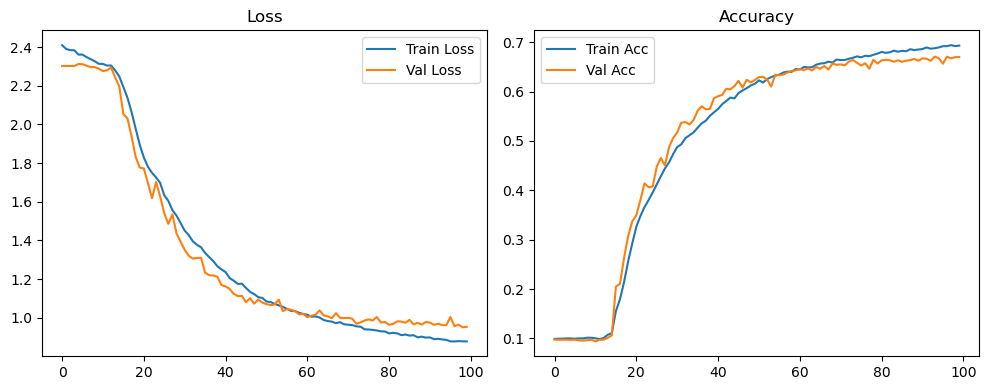

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 0.9797 Accuracy: 0.6625


🚀 Running: batch128_lr_max_0.0005_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:18<2:08:57, 78.16s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0947 |:   1%|          | 1/100 [01:34<2:08:57, 78.16s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0947 |:   1%|          | 1/100 [01:34<2:08:57, 78.16s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0947 |:   2%|▏         | 2/100 [01:34<1:08:20, 41.84s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   2%|▏         | 2/100 [01:50<1:08:20, 41.84s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   2%|▏         | 2/100 [01:50<1:08:20, 41.84s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [01:50<48:51, 30.23s/it]  

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0849 |:   3%|▎         | 3/100 [02:07<48:51, 30.23s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0849 |:   3%|▎         | 3/100 [02:07<48:51, 30.23s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0849 |:   4%|▍         | 4/100 [02:07<39:42, 24.82s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0991 |:   4%|▍         | 4/100 [02:23<39:42, 24.82s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0991 |:   4%|▍         | 4/100 [02:23<39:42, 24.82s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0991 |:   5%|▌         | 5/100 [02:23<34:30, 21.79s/it]

| LR: 0.000497 | Train Acc: 0.1009 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [02:40<34:30, 21.79s/it]

| LR: 0.000497 | Train Acc: 0.1009 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [02:40<34:30, 21.79s/it]

| LR: 0.000497 | Train Acc: 0.1009 | Val Acc: 0.0971 |:   6%|▌         | 6/100 [02:40<31:19, 20.00s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [02:56<31:19, 20.00s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [02:56<31:19, 20.00s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [02:56<29:09, 18.81s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0981 |:   7%|▋         | 7/100 [03:13<29:09, 18.81s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0981 |:   7%|▋         | 7/100 [03:13<29:09, 18.81s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0981 |:   8%|▊         | 8/100 [03:13<27:41, 18.06s/it]

| LR: 0.000492 | Train Acc: 0.1010 | Val Acc: 0.1019 |:   8%|▊         | 8/100 [03:29<27:41, 18.06s/it]

| LR: 0.000492 | Train Acc: 0.1010 | Val Acc: 0.1019 |:   8%|▊         | 8/100 [03:29<27:41, 18.06s/it]

| LR: 0.000492 | Train Acc: 0.1010 | Val Acc: 0.1019 |:   9%|▉         | 9/100 [03:29<26:34, 17.52s/it]

| LR: 0.000490 | Train Acc: 0.1015 | Val Acc: 0.0991 |:   9%|▉         | 9/100 [03:45<26:34, 17.52s/it]

| LR: 0.000490 | Train Acc: 0.1015 | Val Acc: 0.0991 |:   9%|▉         | 9/100 [03:45<26:34, 17.52s/it]

| LR: 0.000490 | Train Acc: 0.1015 | Val Acc: 0.0991 |:  10%|█         | 10/100 [03:45<25:41, 17.13s/it]

| LR: 0.000488 | Train Acc: 0.1003 | Val Acc: 0.0943 |:  10%|█         | 10/100 [04:02<25:41, 17.13s/it]

| LR: 0.000488 | Train Acc: 0.1003 | Val Acc: 0.0943 |:  10%|█         | 10/100 [04:02<25:41, 17.13s/it]

| LR: 0.000488 | Train Acc: 0.1003 | Val Acc: 0.0943 |:  11%|█         | 11/100 [04:02<25:04, 16.91s/it]

| LR: 0.000486 | Train Acc: 0.0993 | Val Acc: 0.1100 |:  11%|█         | 11/100 [04:18<25:04, 16.91s/it]

| LR: 0.000486 | Train Acc: 0.0993 | Val Acc: 0.1100 |:  11%|█         | 11/100 [04:18<25:04, 16.91s/it]

| LR: 0.000486 | Train Acc: 0.0993 | Val Acc: 0.1100 |:  12%|█▏        | 12/100 [04:18<24:34, 16.76s/it]

| LR: 0.000483 | Train Acc: 0.1040 | Val Acc: 0.1088 |:  12%|█▏        | 12/100 [04:35<24:34, 16.76s/it]

| LR: 0.000483 | Train Acc: 0.1040 | Val Acc: 0.1088 |:  12%|█▏        | 12/100 [04:35<24:34, 16.76s/it]

| LR: 0.000483 | Train Acc: 0.1040 | Val Acc: 0.1088 |:  13%|█▎        | 13/100 [04:35<24:12, 16.70s/it]

| LR: 0.000480 | Train Acc: 0.1143 | Val Acc: 0.1083 |:  13%|█▎        | 13/100 [04:51<24:12, 16.70s/it]

| LR: 0.000480 | Train Acc: 0.1143 | Val Acc: 0.1083 |:  13%|█▎        | 13/100 [04:51<24:12, 16.70s/it]

| LR: 0.000480 | Train Acc: 0.1143 | Val Acc: 0.1083 |:  14%|█▍        | 14/100 [04:51<23:51, 16.65s/it]

| LR: 0.000477 | Train Acc: 0.1296 | Val Acc: 0.1523 |:  14%|█▍        | 14/100 [05:08<23:51, 16.65s/it]

| LR: 0.000477 | Train Acc: 0.1296 | Val Acc: 0.1523 |:  14%|█▍        | 14/100 [05:08<23:51, 16.65s/it]

| LR: 0.000477 | Train Acc: 0.1296 | Val Acc: 0.1523 |:  15%|█▌        | 15/100 [05:08<23:30, 16.59s/it]

| LR: 0.000473 | Train Acc: 0.1483 | Val Acc: 0.1430 |:  15%|█▌        | 15/100 [05:24<23:30, 16.59s/it]

| LR: 0.000473 | Train Acc: 0.1483 | Val Acc: 0.1430 |:  15%|█▌        | 15/100 [05:24<23:30, 16.59s/it]

| LR: 0.000473 | Train Acc: 0.1483 | Val Acc: 0.1430 |:  16%|█▌        | 16/100 [05:24<23:09, 16.55s/it]

| LR: 0.000470 | Train Acc: 0.1649 | Val Acc: 0.1549 |:  16%|█▌        | 16/100 [05:40<23:09, 16.55s/it]

| LR: 0.000470 | Train Acc: 0.1649 | Val Acc: 0.1549 |:  16%|█▌        | 16/100 [05:40<23:09, 16.55s/it]

| LR: 0.000470 | Train Acc: 0.1649 | Val Acc: 0.1549 |:  17%|█▋        | 17/100 [05:41<22:48, 16.49s/it]

| LR: 0.000466 | Train Acc: 0.1793 | Val Acc: 0.1701 |:  17%|█▋        | 17/100 [05:57<22:48, 16.49s/it]

| LR: 0.000466 | Train Acc: 0.1793 | Val Acc: 0.1701 |:  17%|█▋        | 17/100 [05:57<22:48, 16.49s/it]

| LR: 0.000466 | Train Acc: 0.1793 | Val Acc: 0.1701 |:  18%|█▊        | 18/100 [05:57<22:32, 16.49s/it]

| LR: 0.000462 | Train Acc: 0.1996 | Val Acc: 0.2284 |:  18%|█▊        | 18/100 [06:14<22:32, 16.49s/it]

| LR: 0.000462 | Train Acc: 0.1996 | Val Acc: 0.2284 |:  18%|█▊        | 18/100 [06:14<22:32, 16.49s/it]

| LR: 0.000462 | Train Acc: 0.1996 | Val Acc: 0.2284 |:  19%|█▉        | 19/100 [06:14<22:16, 16.50s/it]

| LR: 0.000458 | Train Acc: 0.2298 | Val Acc: 0.2661 |:  19%|█▉        | 19/100 [06:30<22:16, 16.50s/it]

| LR: 0.000458 | Train Acc: 0.2298 | Val Acc: 0.2661 |:  19%|█▉        | 19/100 [06:30<22:16, 16.50s/it]

| LR: 0.000458 | Train Acc: 0.2298 | Val Acc: 0.2661 |:  20%|██        | 20/100 [06:30<22:02, 16.54s/it]

| LR: 0.000453 | Train Acc: 0.2548 | Val Acc: 0.2357 |:  20%|██        | 20/100 [06:46<22:02, 16.54s/it]

| LR: 0.000453 | Train Acc: 0.2548 | Val Acc: 0.2357 |:  20%|██        | 20/100 [06:46<22:02, 16.54s/it]

| LR: 0.000453 | Train Acc: 0.2548 | Val Acc: 0.2357 |:  21%|██        | 21/100 [06:47<21:41, 16.48s/it]

| LR: 0.000449 | Train Acc: 0.2825 | Val Acc: 0.2942 |:  21%|██        | 21/100 [07:03<21:41, 16.48s/it]

| LR: 0.000449 | Train Acc: 0.2825 | Val Acc: 0.2942 |:  21%|██        | 21/100 [07:03<21:41, 16.48s/it]

| LR: 0.000449 | Train Acc: 0.2825 | Val Acc: 0.2942 |:  22%|██▏       | 22/100 [07:03<21:25, 16.48s/it]

| LR: 0.000444 | Train Acc: 0.3126 | Val Acc: 0.3239 |:  22%|██▏       | 22/100 [07:19<21:25, 16.48s/it]

| LR: 0.000444 | Train Acc: 0.3126 | Val Acc: 0.3239 |:  22%|██▏       | 22/100 [07:19<21:25, 16.48s/it]

| LR: 0.000444 | Train Acc: 0.3126 | Val Acc: 0.3239 |:  23%|██▎       | 23/100 [07:20<21:10, 16.50s/it]

| LR: 0.000439 | Train Acc: 0.3388 | Val Acc: 0.3151 |:  23%|██▎       | 23/100 [07:36<21:10, 16.50s/it]

| LR: 0.000439 | Train Acc: 0.3388 | Val Acc: 0.3151 |:  23%|██▎       | 23/100 [07:36<21:10, 16.50s/it]

| LR: 0.000439 | Train Acc: 0.3388 | Val Acc: 0.3151 |:  24%|██▍       | 24/100 [07:36<20:57, 16.54s/it]

| LR: 0.000434 | Train Acc: 0.3640 | Val Acc: 0.3797 |:  24%|██▍       | 24/100 [07:52<20:57, 16.54s/it]

| LR: 0.000434 | Train Acc: 0.3640 | Val Acc: 0.3797 |:  24%|██▍       | 24/100 [07:52<20:57, 16.54s/it]

| LR: 0.000434 | Train Acc: 0.3640 | Val Acc: 0.3797 |:  25%|██▌       | 25/100 [07:52<20:32, 16.43s/it]

| LR: 0.000428 | Train Acc: 0.3790 | Val Acc: 0.3882 |:  25%|██▌       | 25/100 [08:09<20:32, 16.43s/it]

| LR: 0.000428 | Train Acc: 0.3790 | Val Acc: 0.3882 |:  25%|██▌       | 25/100 [08:09<20:32, 16.43s/it]

| LR: 0.000428 | Train Acc: 0.3790 | Val Acc: 0.3882 |:  26%|██▌       | 26/100 [08:09<20:17, 16.45s/it]

| LR: 0.000423 | Train Acc: 0.3973 | Val Acc: 0.3905 |:  26%|██▌       | 26/100 [08:25<20:17, 16.45s/it]

| LR: 0.000423 | Train Acc: 0.3973 | Val Acc: 0.3905 |:  26%|██▌       | 26/100 [08:25<20:17, 16.45s/it]

| LR: 0.000423 | Train Acc: 0.3973 | Val Acc: 0.3905 |:  27%|██▋       | 27/100 [08:25<20:00, 16.45s/it]

| LR: 0.000417 | Train Acc: 0.4180 | Val Acc: 0.4068 |:  27%|██▋       | 27/100 [08:41<20:00, 16.45s/it]

| LR: 0.000417 | Train Acc: 0.4180 | Val Acc: 0.4068 |:  27%|██▋       | 27/100 [08:41<20:00, 16.45s/it]

| LR: 0.000417 | Train Acc: 0.4180 | Val Acc: 0.4068 |:  28%|██▊       | 28/100 [08:41<19:38, 16.37s/it]

| LR: 0.000411 | Train Acc: 0.4359 | Val Acc: 0.3948 |:  28%|██▊       | 28/100 [08:58<19:38, 16.37s/it]

| LR: 0.000411 | Train Acc: 0.4359 | Val Acc: 0.3948 |:  28%|██▊       | 28/100 [08:58<19:38, 16.37s/it]

| LR: 0.000411 | Train Acc: 0.4359 | Val Acc: 0.3948 |:  29%|██▉       | 29/100 [08:58<19:17, 16.30s/it]

| LR: 0.000405 | Train Acc: 0.4492 | Val Acc: 0.4372 |:  29%|██▉       | 29/100 [09:14<19:17, 16.30s/it]

| LR: 0.000405 | Train Acc: 0.4492 | Val Acc: 0.4372 |:  29%|██▉       | 29/100 [09:14<19:17, 16.30s/it]

| LR: 0.000405 | Train Acc: 0.4492 | Val Acc: 0.4372 |:  30%|███       | 30/100 [09:14<19:04, 16.36s/it]

| LR: 0.000399 | Train Acc: 0.4592 | Val Acc: 0.4488 |:  30%|███       | 30/100 [09:31<19:04, 16.36s/it]

| LR: 0.000399 | Train Acc: 0.4592 | Val Acc: 0.4488 |:  30%|███       | 30/100 [09:31<19:04, 16.36s/it]

| LR: 0.000399 | Train Acc: 0.4592 | Val Acc: 0.4488 |:  31%|███       | 31/100 [09:31<18:54, 16.44s/it]

| LR: 0.000393 | Train Acc: 0.4743 | Val Acc: 0.4439 |:  31%|███       | 31/100 [09:47<18:54, 16.44s/it]

| LR: 0.000393 | Train Acc: 0.4743 | Val Acc: 0.4439 |:  31%|███       | 31/100 [09:47<18:54, 16.44s/it]

| LR: 0.000393 | Train Acc: 0.4743 | Val Acc: 0.4439 |:  32%|███▏      | 32/100 [09:47<18:39, 16.46s/it]

| LR: 0.000386 | Train Acc: 0.4879 | Val Acc: 0.3487 |:  32%|███▏      | 32/100 [10:04<18:39, 16.46s/it]

| LR: 0.000386 | Train Acc: 0.4879 | Val Acc: 0.3487 |:  32%|███▏      | 32/100 [10:04<18:39, 16.46s/it]

| LR: 0.000386 | Train Acc: 0.4879 | Val Acc: 0.3487 |:  33%|███▎      | 33/100 [10:04<18:20, 16.43s/it]

| LR: 0.000380 | Train Acc: 0.4966 | Val Acc: 0.4672 |:  33%|███▎      | 33/100 [10:20<18:20, 16.43s/it]

| LR: 0.000380 | Train Acc: 0.4966 | Val Acc: 0.4672 |:  33%|███▎      | 33/100 [10:20<18:20, 16.43s/it]

| LR: 0.000380 | Train Acc: 0.4966 | Val Acc: 0.4672 |:  34%|███▍      | 34/100 [10:20<18:01, 16.39s/it]

| LR: 0.000373 | Train Acc: 0.5073 | Val Acc: 0.4709 |:  34%|███▍      | 34/100 [10:36<18:01, 16.39s/it]

| LR: 0.000373 | Train Acc: 0.5073 | Val Acc: 0.4709 |:  34%|███▍      | 34/100 [10:36<18:01, 16.39s/it]

| LR: 0.000373 | Train Acc: 0.5073 | Val Acc: 0.4709 |:  35%|███▌      | 35/100 [10:36<17:46, 16.41s/it]

| LR: 0.000366 | Train Acc: 0.5140 | Val Acc: 0.4955 |:  35%|███▌      | 35/100 [10:53<17:46, 16.41s/it]

| LR: 0.000366 | Train Acc: 0.5140 | Val Acc: 0.4955 |:  35%|███▌      | 35/100 [10:53<17:46, 16.41s/it]

| LR: 0.000366 | Train Acc: 0.5140 | Val Acc: 0.4955 |:  36%|███▌      | 36/100 [10:53<17:26, 16.36s/it]

| LR: 0.000359 | Train Acc: 0.5264 | Val Acc: 0.4596 |:  36%|███▌      | 36/100 [11:09<17:26, 16.36s/it]

| LR: 0.000359 | Train Acc: 0.5264 | Val Acc: 0.4596 |:  36%|███▌      | 36/100 [11:09<17:26, 16.36s/it]

| LR: 0.000359 | Train Acc: 0.5264 | Val Acc: 0.4596 |:  37%|███▋      | 37/100 [11:09<17:11, 16.38s/it]

| LR: 0.000352 | Train Acc: 0.5316 | Val Acc: 0.4494 |:  37%|███▋      | 37/100 [11:25<17:11, 16.38s/it]

| LR: 0.000352 | Train Acc: 0.5316 | Val Acc: 0.4494 |:  37%|███▋      | 37/100 [11:25<17:11, 16.38s/it]

| LR: 0.000352 | Train Acc: 0.5316 | Val Acc: 0.4494 |:  38%|███▊      | 38/100 [11:25<16:55, 16.38s/it]

| LR: 0.000345 | Train Acc: 0.5411 | Val Acc: 0.4871 |:  38%|███▊      | 38/100 [11:42<16:55, 16.38s/it]

| LR: 0.000345 | Train Acc: 0.5411 | Val Acc: 0.4871 |:  38%|███▊      | 38/100 [11:42<16:55, 16.38s/it]

| LR: 0.000345 | Train Acc: 0.5411 | Val Acc: 0.4871 |:  39%|███▉      | 39/100 [11:42<16:42, 16.43s/it]

| LR: 0.000338 | Train Acc: 0.5498 | Val Acc: 0.5076 |:  39%|███▉      | 39/100 [11:58<16:42, 16.43s/it]

| LR: 0.000338 | Train Acc: 0.5498 | Val Acc: 0.5076 |:  39%|███▉      | 39/100 [11:58<16:42, 16.43s/it]

| LR: 0.000338 | Train Acc: 0.5498 | Val Acc: 0.5076 |:  40%|████      | 40/100 [11:58<16:23, 16.39s/it]

| LR: 0.000331 | Train Acc: 0.5537 | Val Acc: 0.5105 |:  40%|████      | 40/100 [12:15<16:23, 16.39s/it]

| LR: 0.000331 | Train Acc: 0.5537 | Val Acc: 0.5105 |:  40%|████      | 40/100 [12:15<16:23, 16.39s/it]

| LR: 0.000331 | Train Acc: 0.5537 | Val Acc: 0.5105 |:  41%|████      | 41/100 [12:15<16:10, 16.44s/it]

| LR: 0.000323 | Train Acc: 0.5620 | Val Acc: 0.5188 |:  41%|████      | 41/100 [12:31<16:10, 16.44s/it]

| LR: 0.000323 | Train Acc: 0.5620 | Val Acc: 0.5188 |:  41%|████      | 41/100 [12:31<16:10, 16.44s/it]

| LR: 0.000323 | Train Acc: 0.5620 | Val Acc: 0.5188 |:  42%|████▏     | 42/100 [12:31<15:51, 16.40s/it]

| LR: 0.000316 | Train Acc: 0.5703 | Val Acc: 0.5358 |:  42%|████▏     | 42/100 [12:48<15:51, 16.40s/it]

| LR: 0.000316 | Train Acc: 0.5703 | Val Acc: 0.5358 |:  42%|████▏     | 42/100 [12:48<15:51, 16.40s/it]

| LR: 0.000316 | Train Acc: 0.5703 | Val Acc: 0.5358 |:  43%|████▎     | 43/100 [12:48<15:35, 16.42s/it]

| LR: 0.000308 | Train Acc: 0.5803 | Val Acc: 0.4994 |:  43%|████▎     | 43/100 [13:04<15:35, 16.42s/it]

| LR: 0.000308 | Train Acc: 0.5803 | Val Acc: 0.4994 |:  43%|████▎     | 43/100 [13:04<15:35, 16.42s/it]

| LR: 0.000308 | Train Acc: 0.5803 | Val Acc: 0.4994 |:  44%|████▍     | 44/100 [13:04<15:19, 16.42s/it]

| LR: 0.000301 | Train Acc: 0.5814 | Val Acc: 0.5434 |:  44%|████▍     | 44/100 [13:20<15:19, 16.42s/it]

| LR: 0.000301 | Train Acc: 0.5814 | Val Acc: 0.5434 |:  44%|████▍     | 44/100 [13:20<15:19, 16.42s/it]

| LR: 0.000301 | Train Acc: 0.5814 | Val Acc: 0.5434 |:  45%|████▌     | 45/100 [13:20<15:00, 16.37s/it]

| LR: 0.000293 | Train Acc: 0.5842 | Val Acc: 0.5302 |:  45%|████▌     | 45/100 [13:37<15:00, 16.37s/it]

| LR: 0.000293 | Train Acc: 0.5842 | Val Acc: 0.5302 |:  45%|████▌     | 45/100 [13:37<15:00, 16.37s/it]

| LR: 0.000293 | Train Acc: 0.5842 | Val Acc: 0.5302 |:  46%|████▌     | 46/100 [13:37<14:44, 16.38s/it]

| LR: 0.000286 | Train Acc: 0.5924 | Val Acc: 0.5474 |:  46%|████▌     | 46/100 [13:53<14:44, 16.38s/it]

| LR: 0.000286 | Train Acc: 0.5924 | Val Acc: 0.5474 |:  46%|████▌     | 46/100 [13:53<14:44, 16.38s/it]

| LR: 0.000286 | Train Acc: 0.5924 | Val Acc: 0.5474 |:  47%|████▋     | 47/100 [13:53<14:29, 16.40s/it]

| LR: 0.000278 | Train Acc: 0.6001 | Val Acc: 0.5622 |:  47%|████▋     | 47/100 [14:10<14:29, 16.40s/it]

| LR: 0.000278 | Train Acc: 0.6001 | Val Acc: 0.5622 |:  47%|████▋     | 47/100 [14:10<14:29, 16.40s/it]

| LR: 0.000278 | Train Acc: 0.6001 | Val Acc: 0.5622 |:  48%|████▊     | 48/100 [14:10<14:15, 16.46s/it]

| LR: 0.000270 | Train Acc: 0.6027 | Val Acc: 0.5479 |:  48%|████▊     | 48/100 [14:26<14:15, 16.46s/it]

| LR: 0.000270 | Train Acc: 0.6027 | Val Acc: 0.5479 |:  48%|████▊     | 48/100 [14:26<14:15, 16.46s/it]

| LR: 0.000270 | Train Acc: 0.6027 | Val Acc: 0.5479 |:  49%|████▉     | 49/100 [14:26<13:59, 16.45s/it]

| LR: 0.000263 | Train Acc: 0.6044 | Val Acc: 0.5736 |:  49%|████▉     | 49/100 [14:42<13:59, 16.45s/it]

| LR: 0.000263 | Train Acc: 0.6044 | Val Acc: 0.5736 |:  49%|████▉     | 49/100 [14:42<13:59, 16.45s/it]

| LR: 0.000263 | Train Acc: 0.6044 | Val Acc: 0.5736 |:  50%|█████     | 50/100 [14:42<13:40, 16.41s/it]

| LR: 0.000255 | Train Acc: 0.6104 | Val Acc: 0.5516 |:  50%|█████     | 50/100 [14:59<13:40, 16.41s/it]

| LR: 0.000255 | Train Acc: 0.6104 | Val Acc: 0.5516 |:  50%|█████     | 50/100 [14:59<13:40, 16.41s/it]

| LR: 0.000255 | Train Acc: 0.6104 | Val Acc: 0.5516 |:  51%|█████     | 51/100 [14:59<13:25, 16.43s/it]

| LR: 0.000247 | Train Acc: 0.6196 | Val Acc: 0.5473 |:  51%|█████     | 51/100 [15:15<13:25, 16.43s/it]

| LR: 0.000247 | Train Acc: 0.6196 | Val Acc: 0.5473 |:  51%|█████     | 51/100 [15:15<13:25, 16.43s/it]

| LR: 0.000247 | Train Acc: 0.6196 | Val Acc: 0.5473 |:  52%|█████▏    | 52/100 [15:15<13:09, 16.45s/it]

| LR: 0.000240 | Train Acc: 0.6190 | Val Acc: 0.5678 |:  52%|█████▏    | 52/100 [15:32<13:09, 16.45s/it]

| LR: 0.000240 | Train Acc: 0.6190 | Val Acc: 0.5678 |:  52%|█████▏    | 52/100 [15:32<13:09, 16.45s/it]

| LR: 0.000240 | Train Acc: 0.6190 | Val Acc: 0.5678 |:  53%|█████▎    | 53/100 [15:32<12:52, 16.44s/it]

| LR: 0.000232 | Train Acc: 0.6224 | Val Acc: 0.5258 |:  53%|█████▎    | 53/100 [15:48<12:52, 16.44s/it]

| LR: 0.000232 | Train Acc: 0.6224 | Val Acc: 0.5258 |:  53%|█████▎    | 53/100 [15:48<12:52, 16.44s/it]

| LR: 0.000232 | Train Acc: 0.6224 | Val Acc: 0.5258 |:  54%|█████▍    | 54/100 [15:48<12:32, 16.36s/it]

| LR: 0.000224 | Train Acc: 0.6267 | Val Acc: 0.5318 |:  54%|█████▍    | 54/100 [16:04<12:32, 16.36s/it]

| LR: 0.000224 | Train Acc: 0.6267 | Val Acc: 0.5318 |:  54%|█████▍    | 54/100 [16:04<12:32, 16.36s/it]

| LR: 0.000224 | Train Acc: 0.6267 | Val Acc: 0.5318 |:  55%|█████▌    | 55/100 [16:04<12:15, 16.35s/it]

| LR: 0.000217 | Train Acc: 0.6274 | Val Acc: 0.5835 |:  55%|█████▌    | 55/100 [16:21<12:15, 16.35s/it]

| LR: 0.000217 | Train Acc: 0.6274 | Val Acc: 0.5835 |:  55%|█████▌    | 55/100 [16:21<12:15, 16.35s/it]

| LR: 0.000217 | Train Acc: 0.6274 | Val Acc: 0.5835 |:  56%|█████▌    | 56/100 [16:21<11:59, 16.36s/it]

| LR: 0.000209 | Train Acc: 0.6321 | Val Acc: 0.5910 |:  56%|█████▌    | 56/100 [16:37<11:59, 16.36s/it]

| LR: 0.000209 | Train Acc: 0.6321 | Val Acc: 0.5910 |:  56%|█████▌    | 56/100 [16:37<11:59, 16.36s/it]

| LR: 0.000209 | Train Acc: 0.6321 | Val Acc: 0.5910 |:  57%|█████▋    | 57/100 [16:37<11:46, 16.42s/it]

| LR: 0.000202 | Train Acc: 0.6370 | Val Acc: 0.5749 |:  57%|█████▋    | 57/100 [16:54<11:46, 16.42s/it]

| LR: 0.000202 | Train Acc: 0.6370 | Val Acc: 0.5749 |:  57%|█████▋    | 57/100 [16:54<11:46, 16.42s/it]

| LR: 0.000202 | Train Acc: 0.6370 | Val Acc: 0.5749 |:  58%|█████▊    | 58/100 [16:54<11:31, 16.47s/it]

| LR: 0.000194 | Train Acc: 0.6415 | Val Acc: 0.5819 |:  58%|█████▊    | 58/100 [17:10<11:31, 16.47s/it]

| LR: 0.000194 | Train Acc: 0.6415 | Val Acc: 0.5819 |:  58%|█████▊    | 58/100 [17:10<11:31, 16.47s/it]

| LR: 0.000194 | Train Acc: 0.6415 | Val Acc: 0.5819 |:  59%|█████▉    | 59/100 [17:10<11:14, 16.45s/it]

| LR: 0.000187 | Train Acc: 0.6466 | Val Acc: 0.5926 |:  59%|█████▉    | 59/100 [17:27<11:14, 16.45s/it]

| LR: 0.000187 | Train Acc: 0.6466 | Val Acc: 0.5926 |:  59%|█████▉    | 59/100 [17:27<11:14, 16.45s/it]

| LR: 0.000187 | Train Acc: 0.6466 | Val Acc: 0.5926 |:  60%|██████    | 60/100 [17:27<10:58, 16.46s/it]

| LR: 0.000179 | Train Acc: 0.6481 | Val Acc: 0.5726 |:  60%|██████    | 60/100 [17:43<10:58, 16.46s/it]

| LR: 0.000179 | Train Acc: 0.6481 | Val Acc: 0.5726 |:  60%|██████    | 60/100 [17:43<10:58, 16.46s/it]

| LR: 0.000179 | Train Acc: 0.6481 | Val Acc: 0.5726 |:  61%|██████    | 61/100 [17:43<10:42, 16.46s/it]

| LR: 0.000172 | Train Acc: 0.6518 | Val Acc: 0.5962 |:  61%|██████    | 61/100 [18:00<10:42, 16.46s/it]

| LR: 0.000172 | Train Acc: 0.6518 | Val Acc: 0.5962 |:  61%|██████    | 61/100 [18:00<10:42, 16.46s/it]

| LR: 0.000172 | Train Acc: 0.6518 | Val Acc: 0.5962 |:  62%|██████▏   | 62/100 [18:00<10:26, 16.48s/it]

| LR: 0.000165 | Train Acc: 0.6531 | Val Acc: 0.5737 |:  62%|██████▏   | 62/100 [18:16<10:26, 16.48s/it]

| LR: 0.000165 | Train Acc: 0.6531 | Val Acc: 0.5737 |:  62%|██████▏   | 62/100 [18:16<10:26, 16.48s/it]

| LR: 0.000165 | Train Acc: 0.6531 | Val Acc: 0.5737 |:  63%|██████▎   | 63/100 [18:16<10:09, 16.46s/it]

| LR: 0.000158 | Train Acc: 0.6599 | Val Acc: 0.5744 |:  63%|██████▎   | 63/100 [18:33<10:09, 16.46s/it]

| LR: 0.000158 | Train Acc: 0.6599 | Val Acc: 0.5744 |:  63%|██████▎   | 63/100 [18:33<10:09, 16.46s/it]

| LR: 0.000158 | Train Acc: 0.6599 | Val Acc: 0.5744 |:  64%|██████▍   | 64/100 [18:33<09:52, 16.45s/it]

| LR: 0.000151 | Train Acc: 0.6567 | Val Acc: 0.5932 |:  64%|██████▍   | 64/100 [18:49<09:52, 16.45s/it]

| LR: 0.000151 | Train Acc: 0.6567 | Val Acc: 0.5932 |:  64%|██████▍   | 64/100 [18:49<09:52, 16.45s/it]

| LR: 0.000151 | Train Acc: 0.6567 | Val Acc: 0.5932 |:  65%|██████▌   | 65/100 [18:49<09:34, 16.41s/it]

| LR: 0.000144 | Train Acc: 0.6604 | Val Acc: 0.5886 |:  65%|██████▌   | 65/100 [19:05<09:34, 16.41s/it]

| LR: 0.000144 | Train Acc: 0.6604 | Val Acc: 0.5886 |:  65%|██████▌   | 65/100 [19:05<09:34, 16.41s/it]

| LR: 0.000144 | Train Acc: 0.6604 | Val Acc: 0.5886 |:  66%|██████▌   | 66/100 [19:05<09:18, 16.41s/it]

| LR: 0.000137 | Train Acc: 0.6630 | Val Acc: 0.5913 |:  66%|██████▌   | 66/100 [19:22<09:18, 16.41s/it]

| LR: 0.000137 | Train Acc: 0.6630 | Val Acc: 0.5913 |:  66%|██████▌   | 66/100 [19:22<09:18, 16.41s/it]

| LR: 0.000137 | Train Acc: 0.6630 | Val Acc: 0.5913 |:  67%|██████▋   | 67/100 [19:22<09:02, 16.45s/it]

| LR: 0.000130 | Train Acc: 0.6667 | Val Acc: 0.6125 |:  67%|██████▋   | 67/100 [19:38<09:02, 16.45s/it]

| LR: 0.000130 | Train Acc: 0.6667 | Val Acc: 0.6125 |:  67%|██████▋   | 67/100 [19:38<09:02, 16.45s/it]

| LR: 0.000130 | Train Acc: 0.6667 | Val Acc: 0.6125 |:  68%|██████▊   | 68/100 [19:38<08:46, 16.46s/it]

| LR: 0.000124 | Train Acc: 0.6671 | Val Acc: 0.5885 |:  68%|██████▊   | 68/100 [19:55<08:46, 16.46s/it]

| LR: 0.000124 | Train Acc: 0.6671 | Val Acc: 0.5885 |:  68%|██████▊   | 68/100 [19:55<08:46, 16.46s/it]

| LR: 0.000124 | Train Acc: 0.6671 | Val Acc: 0.5885 |:  69%|██████▉   | 69/100 [19:55<08:30, 16.45s/it]

| LR: 0.000117 | Train Acc: 0.6682 | Val Acc: 0.5687 |:  69%|██████▉   | 69/100 [20:11<08:30, 16.45s/it]

| LR: 0.000117 | Train Acc: 0.6682 | Val Acc: 0.5687 |:  69%|██████▉   | 69/100 [20:11<08:30, 16.45s/it]

| LR: 0.000117 | Train Acc: 0.6682 | Val Acc: 0.5687 |:  70%|███████   | 70/100 [20:11<08:14, 16.47s/it]

| LR: 0.000111 | Train Acc: 0.6712 | Val Acc: 0.6092 |:  70%|███████   | 70/100 [20:28<08:14, 16.47s/it]

| LR: 0.000111 | Train Acc: 0.6712 | Val Acc: 0.6092 |:  70%|███████   | 70/100 [20:28<08:14, 16.47s/it]

| LR: 0.000111 | Train Acc: 0.6712 | Val Acc: 0.6092 |:  71%|███████   | 71/100 [20:28<07:58, 16.49s/it]

| LR: 0.000105 | Train Acc: 0.6742 | Val Acc: 0.6015 |:  71%|███████   | 71/100 [20:44<07:58, 16.49s/it]

| LR: 0.000105 | Train Acc: 0.6742 | Val Acc: 0.6015 |:  71%|███████   | 71/100 [20:44<07:58, 16.49s/it]

| LR: 0.000105 | Train Acc: 0.6742 | Val Acc: 0.6015 |:  72%|███████▏  | 72/100 [20:44<07:41, 16.47s/it]

| LR: 0.000099 | Train Acc: 0.6784 | Val Acc: 0.6075 |:  72%|███████▏  | 72/100 [21:01<07:41, 16.47s/it]

| LR: 0.000099 | Train Acc: 0.6784 | Val Acc: 0.6075 |:  72%|███████▏  | 72/100 [21:01<07:41, 16.47s/it]

| LR: 0.000099 | Train Acc: 0.6784 | Val Acc: 0.6075 |:  73%|███████▎  | 73/100 [21:01<07:25, 16.50s/it]

| LR: 0.000093 | Train Acc: 0.6810 | Val Acc: 0.5824 |:  73%|███████▎  | 73/100 [21:17<07:25, 16.50s/it]

| LR: 0.000093 | Train Acc: 0.6810 | Val Acc: 0.5824 |:  73%|███████▎  | 73/100 [21:17<07:25, 16.50s/it]

| LR: 0.000093 | Train Acc: 0.6810 | Val Acc: 0.5824 |:  74%|███████▍  | 74/100 [21:17<07:07, 16.45s/it]

| LR: 0.000087 | Train Acc: 0.6771 | Val Acc: 0.6018 |:  74%|███████▍  | 74/100 [21:33<07:07, 16.45s/it]

| LR: 0.000087 | Train Acc: 0.6771 | Val Acc: 0.6018 |:  74%|███████▍  | 74/100 [21:33<07:07, 16.45s/it]

| LR: 0.000087 | Train Acc: 0.6771 | Val Acc: 0.6018 |:  75%|███████▌  | 75/100 [21:34<06:50, 16.44s/it]

| LR: 0.000082 | Train Acc: 0.6817 | Val Acc: 0.5784 |:  75%|███████▌  | 75/100 [21:50<06:50, 16.44s/it]

| LR: 0.000082 | Train Acc: 0.6817 | Val Acc: 0.5784 |:  75%|███████▌  | 75/100 [21:50<06:50, 16.44s/it]

| LR: 0.000082 | Train Acc: 0.6817 | Val Acc: 0.5784 |:  76%|███████▌  | 76/100 [21:50<06:35, 16.49s/it]

| LR: 0.000076 | Train Acc: 0.6822 | Val Acc: 0.5891 |:  76%|███████▌  | 76/100 [22:07<06:35, 16.49s/it]

| LR: 0.000076 | Train Acc: 0.6822 | Val Acc: 0.5891 |:  76%|███████▌  | 76/100 [22:07<06:35, 16.49s/it]

| LR: 0.000076 | Train Acc: 0.6822 | Val Acc: 0.5891 |:  77%|███████▋  | 77/100 [22:07<06:19, 16.50s/it]

| LR: 0.000071 | Train Acc: 0.6844 | Val Acc: 0.6153 |:  77%|███████▋  | 77/100 [22:23<06:19, 16.50s/it]

| LR: 0.000071 | Train Acc: 0.6844 | Val Acc: 0.6153 |:  77%|███████▋  | 77/100 [22:23<06:19, 16.50s/it]

| LR: 0.000071 | Train Acc: 0.6844 | Val Acc: 0.6153 |:  78%|███████▊  | 78/100 [22:23<06:03, 16.51s/it]

| LR: 0.000066 | Train Acc: 0.6878 | Val Acc: 0.6198 |:  78%|███████▊  | 78/100 [22:40<06:03, 16.51s/it]

| LR: 0.000066 | Train Acc: 0.6878 | Val Acc: 0.6198 |:  78%|███████▊  | 78/100 [22:40<06:03, 16.51s/it]

| LR: 0.000066 | Train Acc: 0.6878 | Val Acc: 0.6198 |:  79%|███████▉  | 79/100 [22:40<05:47, 16.53s/it]

| LR: 0.000061 | Train Acc: 0.6849 | Val Acc: 0.5967 |:  79%|███████▉  | 79/100 [22:56<05:47, 16.53s/it]

| LR: 0.000061 | Train Acc: 0.6849 | Val Acc: 0.5967 |:  79%|███████▉  | 79/100 [22:56<05:47, 16.53s/it]

| LR: 0.000061 | Train Acc: 0.6849 | Val Acc: 0.5967 |:  80%|████████  | 80/100 [22:56<05:30, 16.54s/it]

| LR: 0.000057 | Train Acc: 0.6886 | Val Acc: 0.5795 |:  80%|████████  | 80/100 [23:13<05:30, 16.54s/it]

| LR: 0.000057 | Train Acc: 0.6886 | Val Acc: 0.5795 |:  80%|████████  | 80/100 [23:13<05:30, 16.54s/it]

| LR: 0.000057 | Train Acc: 0.6886 | Val Acc: 0.5795 |:  81%|████████  | 81/100 [23:13<05:13, 16.48s/it]

| LR: 0.000052 | Train Acc: 0.6899 | Val Acc: 0.6070 |:  81%|████████  | 81/100 [23:29<05:13, 16.48s/it]

| LR: 0.000052 | Train Acc: 0.6899 | Val Acc: 0.6070 |:  81%|████████  | 81/100 [23:29<05:13, 16.48s/it]

| LR: 0.000052 | Train Acc: 0.6899 | Val Acc: 0.6070 |:  82%|████████▏ | 82/100 [23:29<04:57, 16.51s/it]

| LR: 0.000048 | Train Acc: 0.6879 | Val Acc: 0.6168 |:  82%|████████▏ | 82/100 [23:46<04:57, 16.51s/it]

| LR: 0.000048 | Train Acc: 0.6879 | Val Acc: 0.6168 |:  82%|████████▏ | 82/100 [23:46<04:57, 16.51s/it]

| LR: 0.000048 | Train Acc: 0.6879 | Val Acc: 0.6168 |:  83%|████████▎ | 83/100 [23:46<04:40, 16.49s/it]

| LR: 0.000044 | Train Acc: 0.6937 | Val Acc: 0.5794 |:  83%|████████▎ | 83/100 [24:02<04:40, 16.49s/it]

| LR: 0.000044 | Train Acc: 0.6937 | Val Acc: 0.5794 |:  83%|████████▎ | 83/100 [24:02<04:40, 16.49s/it]

| LR: 0.000044 | Train Acc: 0.6937 | Val Acc: 0.5794 |:  84%|████████▍ | 84/100 [24:02<04:24, 16.50s/it]

| LR: 0.000040 | Train Acc: 0.6938 | Val Acc: 0.5806 |:  84%|████████▍ | 84/100 [24:19<04:24, 16.50s/it]

| LR: 0.000040 | Train Acc: 0.6938 | Val Acc: 0.5806 |:  84%|████████▍ | 84/100 [24:19<04:24, 16.50s/it]

| LR: 0.000040 | Train Acc: 0.6938 | Val Acc: 0.5806 |:  85%|████████▌ | 85/100 [24:19<04:07, 16.51s/it]

| LR: 0.000037 | Train Acc: 0.6958 | Val Acc: 0.6009 |:  85%|████████▌ | 85/100 [24:35<04:07, 16.51s/it]

| LR: 0.000037 | Train Acc: 0.6958 | Val Acc: 0.6009 |:  85%|████████▌ | 85/100 [24:35<04:07, 16.51s/it]

| LR: 0.000037 | Train Acc: 0.6958 | Val Acc: 0.6009 |:  86%|████████▌ | 86/100 [24:35<03:50, 16.48s/it]

| LR: 0.000033 | Train Acc: 0.6920 | Val Acc: 0.6181 |:  86%|████████▌ | 86/100 [24:52<03:50, 16.48s/it]

| LR: 0.000033 | Train Acc: 0.6920 | Val Acc: 0.6181 |:  86%|████████▌ | 86/100 [24:52<03:50, 16.48s/it]

| LR: 0.000033 | Train Acc: 0.6920 | Val Acc: 0.6181 |:  87%|████████▋ | 87/100 [24:52<03:34, 16.48s/it]

| LR: 0.000030 | Train Acc: 0.6929 | Val Acc: 0.5883 |:  87%|████████▋ | 87/100 [25:08<03:34, 16.48s/it]

| LR: 0.000030 | Train Acc: 0.6929 | Val Acc: 0.5883 |:  87%|████████▋ | 87/100 [25:08<03:34, 16.48s/it]

| LR: 0.000030 | Train Acc: 0.6929 | Val Acc: 0.5883 |:  88%|████████▊ | 88/100 [25:08<03:17, 16.43s/it]

| LR: 0.000027 | Train Acc: 0.6946 | Val Acc: 0.6026 |:  88%|████████▊ | 88/100 [25:24<03:17, 16.43s/it]

| LR: 0.000027 | Train Acc: 0.6946 | Val Acc: 0.6026 |:  88%|████████▊ | 88/100 [25:24<03:17, 16.43s/it]

| LR: 0.000027 | Train Acc: 0.6946 | Val Acc: 0.6026 |:  89%|████████▉ | 89/100 [25:24<03:00, 16.41s/it]

| LR: 0.000024 | Train Acc: 0.6940 | Val Acc: 0.5896 |:  89%|████████▉ | 89/100 [25:41<03:00, 16.41s/it]

| LR: 0.000024 | Train Acc: 0.6940 | Val Acc: 0.5896 |:  89%|████████▉ | 89/100 [25:41<03:00, 16.41s/it]

| LR: 0.000024 | Train Acc: 0.6940 | Val Acc: 0.5896 |:  90%|█████████ | 90/100 [25:41<02:43, 16.38s/it]

| LR: 0.000022 | Train Acc: 0.6936 | Val Acc: 0.5162 |:  90%|█████████ | 90/100 [25:57<02:43, 16.38s/it]

| LR: 0.000022 | Train Acc: 0.6936 | Val Acc: 0.5162 |:  90%|█████████ | 90/100 [25:57<02:43, 16.38s/it]

| LR: 0.000022 | Train Acc: 0.6936 | Val Acc: 0.5162 |:  91%|█████████ | 91/100 [25:57<02:27, 16.40s/it]

| LR: 0.000020 | Train Acc: 0.6956 | Val Acc: 0.6055 |:  91%|█████████ | 91/100 [26:14<02:27, 16.40s/it]

| LR: 0.000020 | Train Acc: 0.6956 | Val Acc: 0.6055 |:  91%|█████████ | 91/100 [26:14<02:27, 16.40s/it]

| LR: 0.000020 | Train Acc: 0.6956 | Val Acc: 0.6055 |:  92%|█████████▏| 92/100 [26:14<02:11, 16.44s/it]

| LR: 0.000018 | Train Acc: 0.6975 | Val Acc: 0.6065 |:  92%|█████████▏| 92/100 [26:30<02:11, 16.44s/it]

| LR: 0.000018 | Train Acc: 0.6975 | Val Acc: 0.6065 |:  92%|█████████▏| 92/100 [26:30<02:11, 16.44s/it]

| LR: 0.000018 | Train Acc: 0.6975 | Val Acc: 0.6065 |:  93%|█████████▎| 93/100 [26:30<01:55, 16.45s/it]

| LR: 0.000016 | Train Acc: 0.7015 | Val Acc: 0.5956 |:  93%|█████████▎| 93/100 [26:47<01:55, 16.45s/it]

| LR: 0.000016 | Train Acc: 0.7015 | Val Acc: 0.5956 |:  93%|█████████▎| 93/100 [26:47<01:55, 16.45s/it]

| LR: 0.000016 | Train Acc: 0.7015 | Val Acc: 0.5956 |:  94%|█████████▍| 94/100 [26:47<01:38, 16.49s/it]

| LR: 0.000014 | Train Acc: 0.7014 | Val Acc: 0.6031 |:  94%|█████████▍| 94/100 [27:03<01:38, 16.49s/it]

| LR: 0.000014 | Train Acc: 0.7014 | Val Acc: 0.6031 |:  94%|█████████▍| 94/100 [27:03<01:38, 16.49s/it]

| LR: 0.000014 | Train Acc: 0.7014 | Val Acc: 0.6031 |:  95%|█████████▌| 95/100 [27:03<01:22, 16.48s/it]

| LR: 0.000013 | Train Acc: 0.7014 | Val Acc: 0.6105 |:  95%|█████████▌| 95/100 [27:20<01:22, 16.48s/it]

| LR: 0.000013 | Train Acc: 0.7014 | Val Acc: 0.6105 |:  95%|█████████▌| 95/100 [27:20<01:22, 16.48s/it]

| LR: 0.000013 | Train Acc: 0.7014 | Val Acc: 0.6105 |:  96%|█████████▌| 96/100 [27:20<01:05, 16.45s/it]

| LR: 0.000012 | Train Acc: 0.7019 | Val Acc: 0.5521 |:  96%|█████████▌| 96/100 [27:36<01:05, 16.45s/it]

| LR: 0.000012 | Train Acc: 0.7019 | Val Acc: 0.5521 |:  96%|█████████▌| 96/100 [27:36<01:05, 16.45s/it]

| LR: 0.000012 | Train Acc: 0.7019 | Val Acc: 0.5521 |:  97%|█████████▋| 97/100 [27:36<00:49, 16.43s/it]

| LR: 0.000011 | Train Acc: 0.6997 | Val Acc: 0.6216 |:  97%|█████████▋| 97/100 [27:52<00:49, 16.43s/it]

| LR: 0.000011 | Train Acc: 0.6997 | Val Acc: 0.6216 |:  97%|█████████▋| 97/100 [27:52<00:49, 16.43s/it]

| LR: 0.000011 | Train Acc: 0.6997 | Val Acc: 0.6216 |:  98%|█████████▊| 98/100 [27:53<00:32, 16.48s/it]

| LR: 0.000010 | Train Acc: 0.7045 | Val Acc: 0.5864 |:  98%|█████████▊| 98/100 [28:09<00:32, 16.48s/it]

| LR: 0.000010 | Train Acc: 0.7045 | Val Acc: 0.5864 |:  98%|█████████▊| 98/100 [28:09<00:32, 16.48s/it]

| LR: 0.000010 | Train Acc: 0.7045 | Val Acc: 0.5864 |:  99%|█████████▉| 99/100 [28:09<00:16, 16.47s/it]

| LR: 0.000010 | Train Acc: 0.6990 | Val Acc: 0.6027 |:  99%|█████████▉| 99/100 [28:25<00:16, 16.47s/it]

| LR: 0.000010 | Train Acc: 0.6990 | Val Acc: 0.6027 |:  99%|█████████▉| 99/100 [28:25<00:16, 16.47s/it]

| LR: 0.000010 | Train Acc: 0.6990 | Val Acc: 0.6027 |: 100%|██████████| 100/100 [28:26<00:00, 16.49s/it]

| LR: 0.000010 | Train Acc: 0.6990 | Val Acc: 0.6027 |: 100%|██████████| 100/100 [28:26<00:00, 17.06s/it]

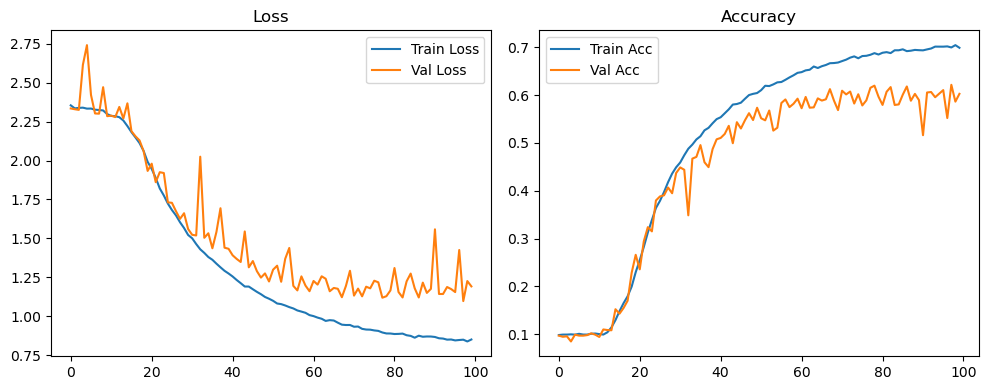

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 1.2095 Accuracy: 0.5930


🚀 Running: batch128_lr_max_0.0005_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0976 | Val Acc: 0.0949 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0976 | Val Acc: 0.0949 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0976 | Val Acc: 0.0949 |:   1%|          | 1/100 [01:17<2:08:26, 77.85s/it]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0935 |:   1%|          | 1/100 [01:34<2:08:26, 77.85s/it]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0935 |:   1%|          | 1/100 [01:34<2:08:26, 77.85s/it]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0935 |:   2%|▏         | 2/100 [01:34<1:08:18, 41.83s/it]

| LR: 0.000500 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:18, 41.83s/it]

| LR: 0.000500 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:18, 41.83s/it]

| LR: 0.000500 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [01:51<49:10, 30.41s/it]  

| LR: 0.000499 | Train Acc: 0.1002 | Val Acc: 0.1004 |:   3%|▎         | 3/100 [02:07<49:10, 30.41s/it]

| LR: 0.000499 | Train Acc: 0.1002 | Val Acc: 0.1004 |:   3%|▎         | 3/100 [02:07<49:10, 30.41s/it]

| LR: 0.000499 | Train Acc: 0.1002 | Val Acc: 0.1004 |:   4%|▍         | 4/100 [02:07<39:56, 24.97s/it]

| LR: 0.000498 | Train Acc: 0.0999 | Val Acc: 0.0972 |:   4%|▍         | 4/100 [02:24<39:56, 24.97s/it]

| LR: 0.000498 | Train Acc: 0.0999 | Val Acc: 0.0972 |:   4%|▍         | 4/100 [02:24<39:56, 24.97s/it]

| LR: 0.000498 | Train Acc: 0.0999 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [02:24<34:48, 21.98s/it]

| LR: 0.000497 | Train Acc: 0.0998 | Val Acc: 0.0986 |:   5%|▌         | 5/100 [02:41<34:48, 21.98s/it]

| LR: 0.000497 | Train Acc: 0.0998 | Val Acc: 0.0986 |:   5%|▌         | 5/100 [02:41<34:48, 21.98s/it]

| LR: 0.000497 | Train Acc: 0.0998 | Val Acc: 0.0986 |:   6%|▌         | 6/100 [02:41<31:41, 20.23s/it]

| LR: 0.000496 | Train Acc: 0.1013 | Val Acc: 0.0979 |:   6%|▌         | 6/100 [02:58<31:41, 20.23s/it]

| LR: 0.000496 | Train Acc: 0.1013 | Val Acc: 0.0979 |:   6%|▌         | 6/100 [02:58<31:41, 20.23s/it]

| LR: 0.000496 | Train Acc: 0.1013 | Val Acc: 0.0979 |:   7%|▋         | 7/100 [02:58<29:36, 19.10s/it]

| LR: 0.000494 | Train Acc: 0.1040 | Val Acc: 0.1027 |:   7%|▋         | 7/100 [03:14<29:36, 19.10s/it]

| LR: 0.000494 | Train Acc: 0.1040 | Val Acc: 0.1027 |:   7%|▋         | 7/100 [03:14<29:36, 19.10s/it]

| LR: 0.000494 | Train Acc: 0.1040 | Val Acc: 0.1027 |:   8%|▊         | 8/100 [03:15<28:10, 18.38s/it]

| LR: 0.000492 | Train Acc: 0.1051 | Val Acc: 0.0947 |:   8%|▊         | 8/100 [03:31<28:10, 18.38s/it]

| LR: 0.000492 | Train Acc: 0.1051 | Val Acc: 0.0947 |:   8%|▊         | 8/100 [03:31<28:10, 18.38s/it]

| LR: 0.000492 | Train Acc: 0.1051 | Val Acc: 0.0947 |:   9%|▉         | 9/100 [03:31<27:06, 17.87s/it]

| LR: 0.000490 | Train Acc: 0.1105 | Val Acc: 0.1381 |:   9%|▉         | 9/100 [03:48<27:06, 17.87s/it]

| LR: 0.000490 | Train Acc: 0.1105 | Val Acc: 0.1381 |:   9%|▉         | 9/100 [03:48<27:06, 17.87s/it]

| LR: 0.000490 | Train Acc: 0.1105 | Val Acc: 0.1381 |:  10%|█         | 10/100 [03:48<26:13, 17.49s/it]

| LR: 0.000488 | Train Acc: 0.1215 | Val Acc: 0.1176 |:  10%|█         | 10/100 [04:05<26:13, 17.49s/it]

| LR: 0.000488 | Train Acc: 0.1215 | Val Acc: 0.1176 |:  10%|█         | 10/100 [04:05<26:13, 17.49s/it]

| LR: 0.000488 | Train Acc: 0.1215 | Val Acc: 0.1176 |:  11%|█         | 11/100 [04:05<25:40, 17.31s/it]

| LR: 0.000486 | Train Acc: 0.1322 | Val Acc: 0.1720 |:  11%|█         | 11/100 [04:22<25:40, 17.31s/it]

| LR: 0.000486 | Train Acc: 0.1322 | Val Acc: 0.1720 |:  11%|█         | 11/100 [04:22<25:40, 17.31s/it]

| LR: 0.000486 | Train Acc: 0.1322 | Val Acc: 0.1720 |:  12%|█▏        | 12/100 [04:22<25:10, 17.16s/it]

| LR: 0.000483 | Train Acc: 0.1477 | Val Acc: 0.1805 |:  12%|█▏        | 12/100 [04:38<25:10, 17.16s/it]

| LR: 0.000483 | Train Acc: 0.1477 | Val Acc: 0.1805 |:  12%|█▏        | 12/100 [04:38<25:10, 17.16s/it]

| LR: 0.000483 | Train Acc: 0.1477 | Val Acc: 0.1805 |:  13%|█▎        | 13/100 [04:38<24:42, 17.04s/it]

| LR: 0.000480 | Train Acc: 0.1680 | Val Acc: 0.2041 |:  13%|█▎        | 13/100 [04:55<24:42, 17.04s/it]

| LR: 0.000480 | Train Acc: 0.1680 | Val Acc: 0.2041 |:  13%|█▎        | 13/100 [04:55<24:42, 17.04s/it]

| LR: 0.000480 | Train Acc: 0.1680 | Val Acc: 0.2041 |:  14%|█▍        | 14/100 [04:55<24:17, 16.94s/it]

| LR: 0.000477 | Train Acc: 0.2112 | Val Acc: 0.2429 |:  14%|█▍        | 14/100 [05:12<24:17, 16.94s/it]

| LR: 0.000477 | Train Acc: 0.2112 | Val Acc: 0.2429 |:  14%|█▍        | 14/100 [05:12<24:17, 16.94s/it]

| LR: 0.000477 | Train Acc: 0.2112 | Val Acc: 0.2429 |:  15%|█▌        | 15/100 [05:12<23:56, 16.90s/it]

| LR: 0.000473 | Train Acc: 0.2639 | Val Acc: 0.2466 |:  15%|█▌        | 15/100 [05:29<23:56, 16.90s/it]

| LR: 0.000473 | Train Acc: 0.2639 | Val Acc: 0.2466 |:  15%|█▌        | 15/100 [05:29<23:56, 16.90s/it]

| LR: 0.000473 | Train Acc: 0.2639 | Val Acc: 0.2466 |:  16%|█▌        | 16/100 [05:29<23:34, 16.84s/it]

| LR: 0.000470 | Train Acc: 0.3066 | Val Acc: 0.2551 |:  16%|█▌        | 16/100 [05:45<23:34, 16.84s/it]

| LR: 0.000470 | Train Acc: 0.3066 | Val Acc: 0.2551 |:  16%|█▌        | 16/100 [05:45<23:34, 16.84s/it]

| LR: 0.000470 | Train Acc: 0.3066 | Val Acc: 0.2551 |:  17%|█▋        | 17/100 [05:45<23:12, 16.78s/it]

| LR: 0.000466 | Train Acc: 0.3459 | Val Acc: 0.3525 |:  17%|█▋        | 17/100 [06:02<23:12, 16.78s/it]

| LR: 0.000466 | Train Acc: 0.3459 | Val Acc: 0.3525 |:  17%|█▋        | 17/100 [06:02<23:12, 16.78s/it]

| LR: 0.000466 | Train Acc: 0.3459 | Val Acc: 0.3525 |:  18%|█▊        | 18/100 [06:02<22:51, 16.73s/it]

| LR: 0.000462 | Train Acc: 0.3771 | Val Acc: 0.3550 |:  18%|█▊        | 18/100 [06:19<22:51, 16.73s/it]

| LR: 0.000462 | Train Acc: 0.3771 | Val Acc: 0.3550 |:  18%|█▊        | 18/100 [06:19<22:51, 16.73s/it]

| LR: 0.000462 | Train Acc: 0.3771 | Val Acc: 0.3550 |:  19%|█▉        | 19/100 [06:19<22:35, 16.73s/it]

| LR: 0.000458 | Train Acc: 0.4017 | Val Acc: 0.3719 |:  19%|█▉        | 19/100 [06:35<22:35, 16.73s/it]

| LR: 0.000458 | Train Acc: 0.4017 | Val Acc: 0.3719 |:  19%|█▉        | 19/100 [06:35<22:35, 16.73s/it]

| LR: 0.000458 | Train Acc: 0.4017 | Val Acc: 0.3719 |:  20%|██        | 20/100 [06:35<22:19, 16.74s/it]

| LR: 0.000453 | Train Acc: 0.4214 | Val Acc: 0.4422 |:  20%|██        | 20/100 [06:52<22:19, 16.74s/it]

| LR: 0.000453 | Train Acc: 0.4214 | Val Acc: 0.4422 |:  20%|██        | 20/100 [06:52<22:19, 16.74s/it]

| LR: 0.000453 | Train Acc: 0.4214 | Val Acc: 0.4422 |:  21%|██        | 21/100 [06:52<22:00, 16.71s/it]

| LR: 0.000449 | Train Acc: 0.4386 | Val Acc: 0.4370 |:  21%|██        | 21/100 [07:08<22:00, 16.71s/it]

| LR: 0.000449 | Train Acc: 0.4386 | Val Acc: 0.4370 |:  21%|██        | 21/100 [07:08<22:00, 16.71s/it]

| LR: 0.000449 | Train Acc: 0.4386 | Val Acc: 0.4370 |:  22%|██▏       | 22/100 [07:09<21:39, 16.65s/it]

| LR: 0.000444 | Train Acc: 0.4566 | Val Acc: 0.4342 |:  22%|██▏       | 22/100 [07:25<21:39, 16.65s/it]

| LR: 0.000444 | Train Acc: 0.4566 | Val Acc: 0.4342 |:  22%|██▏       | 22/100 [07:25<21:39, 16.65s/it]

| LR: 0.000444 | Train Acc: 0.4566 | Val Acc: 0.4342 |:  23%|██▎       | 23/100 [07:25<21:23, 16.67s/it]

| LR: 0.000439 | Train Acc: 0.4709 | Val Acc: 0.4309 |:  23%|██▎       | 23/100 [07:42<21:23, 16.67s/it]

| LR: 0.000439 | Train Acc: 0.4709 | Val Acc: 0.4309 |:  23%|██▎       | 23/100 [07:42<21:23, 16.67s/it]

| LR: 0.000439 | Train Acc: 0.4709 | Val Acc: 0.4309 |:  24%|██▍       | 24/100 [07:42<21:06, 16.66s/it]

| LR: 0.000434 | Train Acc: 0.4779 | Val Acc: 0.4771 |:  24%|██▍       | 24/100 [07:58<21:06, 16.66s/it]

| LR: 0.000434 | Train Acc: 0.4779 | Val Acc: 0.4771 |:  24%|██▍       | 24/100 [07:58<21:06, 16.66s/it]

| LR: 0.000434 | Train Acc: 0.4779 | Val Acc: 0.4771 |:  25%|██▌       | 25/100 [07:59<20:49, 16.66s/it]

| LR: 0.000428 | Train Acc: 0.4946 | Val Acc: 0.4621 |:  25%|██▌       | 25/100 [08:15<20:49, 16.66s/it]

| LR: 0.000428 | Train Acc: 0.4946 | Val Acc: 0.4621 |:  25%|██▌       | 25/100 [08:15<20:49, 16.66s/it]

| LR: 0.000428 | Train Acc: 0.4946 | Val Acc: 0.4621 |:  26%|██▌       | 26/100 [08:15<20:32, 16.65s/it]

| LR: 0.000423 | Train Acc: 0.5060 | Val Acc: 0.4766 |:  26%|██▌       | 26/100 [08:32<20:32, 16.65s/it]

| LR: 0.000423 | Train Acc: 0.5060 | Val Acc: 0.4766 |:  26%|██▌       | 26/100 [08:32<20:32, 16.65s/it]

| LR: 0.000423 | Train Acc: 0.5060 | Val Acc: 0.4766 |:  27%|██▋       | 27/100 [08:32<20:19, 16.70s/it]

| LR: 0.000417 | Train Acc: 0.5175 | Val Acc: 0.5112 |:  27%|██▋       | 27/100 [08:49<20:19, 16.70s/it]

| LR: 0.000417 | Train Acc: 0.5175 | Val Acc: 0.5112 |:  27%|██▋       | 27/100 [08:49<20:19, 16.70s/it]

| LR: 0.000417 | Train Acc: 0.5175 | Val Acc: 0.5112 |:  28%|██▊       | 28/100 [08:49<20:08, 16.78s/it]

| LR: 0.000411 | Train Acc: 0.5322 | Val Acc: 0.4469 |:  28%|██▊       | 28/100 [09:06<20:08, 16.78s/it]

| LR: 0.000411 | Train Acc: 0.5322 | Val Acc: 0.4469 |:  28%|██▊       | 28/100 [09:06<20:08, 16.78s/it]

| LR: 0.000411 | Train Acc: 0.5322 | Val Acc: 0.4469 |:  29%|██▉       | 29/100 [09:06<19:51, 16.78s/it]

| LR: 0.000405 | Train Acc: 0.5390 | Val Acc: 0.5293 |:  29%|██▉       | 29/100 [09:22<19:51, 16.78s/it]

| LR: 0.000405 | Train Acc: 0.5390 | Val Acc: 0.5293 |:  29%|██▉       | 29/100 [09:22<19:51, 16.78s/it]

| LR: 0.000405 | Train Acc: 0.5390 | Val Acc: 0.5293 |:  30%|███       | 30/100 [09:23<19:34, 16.79s/it]

| LR: 0.000399 | Train Acc: 0.5472 | Val Acc: 0.5514 |:  30%|███       | 30/100 [09:39<19:34, 16.79s/it]

| LR: 0.000399 | Train Acc: 0.5472 | Val Acc: 0.5514 |:  30%|███       | 30/100 [09:39<19:34, 16.79s/it]

| LR: 0.000399 | Train Acc: 0.5472 | Val Acc: 0.5514 |:  31%|███       | 31/100 [09:39<19:15, 16.74s/it]

| LR: 0.000393 | Train Acc: 0.5556 | Val Acc: 0.5339 |:  31%|███       | 31/100 [09:56<19:15, 16.74s/it]

| LR: 0.000393 | Train Acc: 0.5556 | Val Acc: 0.5339 |:  31%|███       | 31/100 [09:56<19:15, 16.74s/it]

| LR: 0.000393 | Train Acc: 0.5556 | Val Acc: 0.5339 |:  32%|███▏      | 32/100 [09:56<18:58, 16.74s/it]

| LR: 0.000386 | Train Acc: 0.5644 | Val Acc: 0.5299 |:  32%|███▏      | 32/100 [10:12<18:58, 16.74s/it]

| LR: 0.000386 | Train Acc: 0.5644 | Val Acc: 0.5299 |:  32%|███▏      | 32/100 [10:12<18:58, 16.74s/it]

| LR: 0.000386 | Train Acc: 0.5644 | Val Acc: 0.5299 |:  33%|███▎      | 33/100 [10:13<18:39, 16.71s/it]

| LR: 0.000380 | Train Acc: 0.5711 | Val Acc: 0.5542 |:  33%|███▎      | 33/100 [10:29<18:39, 16.71s/it]

| LR: 0.000380 | Train Acc: 0.5711 | Val Acc: 0.5542 |:  33%|███▎      | 33/100 [10:29<18:39, 16.71s/it]

| LR: 0.000380 | Train Acc: 0.5711 | Val Acc: 0.5542 |:  34%|███▍      | 34/100 [10:29<18:19, 16.65s/it]

| LR: 0.000373 | Train Acc: 0.5780 | Val Acc: 0.5488 |:  34%|███▍      | 34/100 [10:46<18:19, 16.65s/it]

| LR: 0.000373 | Train Acc: 0.5780 | Val Acc: 0.5488 |:  34%|███▍      | 34/100 [10:46<18:19, 16.65s/it]

| LR: 0.000373 | Train Acc: 0.5780 | Val Acc: 0.5488 |:  35%|███▌      | 35/100 [10:46<18:01, 16.64s/it]

| LR: 0.000366 | Train Acc: 0.5870 | Val Acc: 0.5589 |:  35%|███▌      | 35/100 [11:02<18:01, 16.64s/it]

| LR: 0.000366 | Train Acc: 0.5870 | Val Acc: 0.5589 |:  35%|███▌      | 35/100 [11:02<18:01, 16.64s/it]

| LR: 0.000366 | Train Acc: 0.5870 | Val Acc: 0.5589 |:  36%|███▌      | 36/100 [11:02<17:45, 16.64s/it]

| LR: 0.000359 | Train Acc: 0.5897 | Val Acc: 0.5823 |:  36%|███▌      | 36/100 [11:19<17:45, 16.64s/it]

| LR: 0.000359 | Train Acc: 0.5897 | Val Acc: 0.5823 |:  36%|███▌      | 36/100 [11:19<17:45, 16.64s/it]

| LR: 0.000359 | Train Acc: 0.5897 | Val Acc: 0.5823 |:  37%|███▋      | 37/100 [11:19<17:31, 16.70s/it]

| LR: 0.000352 | Train Acc: 0.5965 | Val Acc: 0.5758 |:  37%|███▋      | 37/100 [11:36<17:31, 16.70s/it]

| LR: 0.000352 | Train Acc: 0.5965 | Val Acc: 0.5758 |:  37%|███▋      | 37/100 [11:36<17:31, 16.70s/it]

| LR: 0.000352 | Train Acc: 0.5965 | Val Acc: 0.5758 |:  38%|███▊      | 38/100 [11:36<17:19, 16.76s/it]

| LR: 0.000345 | Train Acc: 0.6021 | Val Acc: 0.5303 |:  38%|███▊      | 38/100 [11:53<17:19, 16.76s/it]

| LR: 0.000345 | Train Acc: 0.6021 | Val Acc: 0.5303 |:  38%|███▊      | 38/100 [11:53<17:19, 16.76s/it]

| LR: 0.000345 | Train Acc: 0.6021 | Val Acc: 0.5303 |:  39%|███▉      | 39/100 [11:53<17:02, 16.76s/it]

| LR: 0.000338 | Train Acc: 0.6063 | Val Acc: 0.5461 |:  39%|███▉      | 39/100 [12:10<17:02, 16.76s/it]

| LR: 0.000338 | Train Acc: 0.6063 | Val Acc: 0.5461 |:  39%|███▉      | 39/100 [12:10<17:02, 16.76s/it]

| LR: 0.000338 | Train Acc: 0.6063 | Val Acc: 0.5461 |:  40%|████      | 40/100 [12:10<16:46, 16.78s/it]

| LR: 0.000331 | Train Acc: 0.6161 | Val Acc: 0.5912 |:  40%|████      | 40/100 [12:26<16:46, 16.78s/it]

| LR: 0.000331 | Train Acc: 0.6161 | Val Acc: 0.5912 |:  40%|████      | 40/100 [12:26<16:46, 16.78s/it]

| LR: 0.000331 | Train Acc: 0.6161 | Val Acc: 0.5912 |:  41%|████      | 41/100 [12:26<16:27, 16.73s/it]

| LR: 0.000323 | Train Acc: 0.6235 | Val Acc: 0.5763 |:  41%|████      | 41/100 [12:43<16:27, 16.73s/it]

| LR: 0.000323 | Train Acc: 0.6235 | Val Acc: 0.5763 |:  41%|████      | 41/100 [12:43<16:27, 16.73s/it]

| LR: 0.000323 | Train Acc: 0.6235 | Val Acc: 0.5763 |:  42%|████▏     | 42/100 [12:43<16:09, 16.71s/it]

| LR: 0.000316 | Train Acc: 0.6227 | Val Acc: 0.5951 |:  42%|████▏     | 42/100 [13:00<16:09, 16.71s/it]

| LR: 0.000316 | Train Acc: 0.6227 | Val Acc: 0.5951 |:  42%|████▏     | 42/100 [13:00<16:09, 16.71s/it]

| LR: 0.000316 | Train Acc: 0.6227 | Val Acc: 0.5951 |:  43%|████▎     | 43/100 [13:00<15:51, 16.69s/it]

| LR: 0.000308 | Train Acc: 0.6263 | Val Acc: 0.5938 |:  43%|████▎     | 43/100 [13:16<15:51, 16.69s/it]

| LR: 0.000308 | Train Acc: 0.6263 | Val Acc: 0.5938 |:  43%|████▎     | 43/100 [13:16<15:51, 16.69s/it]

| LR: 0.000308 | Train Acc: 0.6263 | Val Acc: 0.5938 |:  44%|████▍     | 44/100 [13:16<15:34, 16.68s/it]

| LR: 0.000301 | Train Acc: 0.6334 | Val Acc: 0.5968 |:  44%|████▍     | 44/100 [13:33<15:34, 16.68s/it]

| LR: 0.000301 | Train Acc: 0.6334 | Val Acc: 0.5968 |:  44%|████▍     | 44/100 [13:33<15:34, 16.68s/it]

| LR: 0.000301 | Train Acc: 0.6334 | Val Acc: 0.5968 |:  45%|████▌     | 45/100 [13:33<15:16, 16.67s/it]

| LR: 0.000293 | Train Acc: 0.6357 | Val Acc: 0.5964 |:  45%|████▌     | 45/100 [13:49<15:16, 16.67s/it]

| LR: 0.000293 | Train Acc: 0.6357 | Val Acc: 0.5964 |:  45%|████▌     | 45/100 [13:49<15:16, 16.67s/it]

| LR: 0.000293 | Train Acc: 0.6357 | Val Acc: 0.5964 |:  46%|████▌     | 46/100 [13:50<15:00, 16.67s/it]

| LR: 0.000286 | Train Acc: 0.6398 | Val Acc: 0.5937 |:  46%|████▌     | 46/100 [14:06<15:00, 16.67s/it]

| LR: 0.000286 | Train Acc: 0.6398 | Val Acc: 0.5937 |:  46%|████▌     | 46/100 [14:06<15:00, 16.67s/it]

| LR: 0.000286 | Train Acc: 0.6398 | Val Acc: 0.5937 |:  47%|████▋     | 47/100 [14:06<14:44, 16.69s/it]

| LR: 0.000278 | Train Acc: 0.6399 | Val Acc: 0.5825 |:  47%|████▋     | 47/100 [14:23<14:44, 16.69s/it]

| LR: 0.000278 | Train Acc: 0.6399 | Val Acc: 0.5825 |:  47%|████▋     | 47/100 [14:23<14:44, 16.69s/it]

| LR: 0.000278 | Train Acc: 0.6399 | Val Acc: 0.5825 |:  48%|████▊     | 48/100 [14:23<14:28, 16.71s/it]

| LR: 0.000270 | Train Acc: 0.6497 | Val Acc: 0.6070 |:  48%|████▊     | 48/100 [14:40<14:28, 16.71s/it]

| LR: 0.000270 | Train Acc: 0.6497 | Val Acc: 0.6070 |:  48%|████▊     | 48/100 [14:40<14:28, 16.71s/it]

| LR: 0.000270 | Train Acc: 0.6497 | Val Acc: 0.6070 |:  49%|████▉     | 49/100 [14:40<14:12, 16.72s/it]

| LR: 0.000263 | Train Acc: 0.6495 | Val Acc: 0.6110 |:  49%|████▉     | 49/100 [14:56<14:12, 16.72s/it]

| LR: 0.000263 | Train Acc: 0.6495 | Val Acc: 0.6110 |:  49%|████▉     | 49/100 [14:56<14:12, 16.72s/it]

| LR: 0.000263 | Train Acc: 0.6495 | Val Acc: 0.6110 |:  50%|█████     | 50/100 [14:57<13:56, 16.74s/it]

| LR: 0.000255 | Train Acc: 0.6509 | Val Acc: 0.6028 |:  50%|█████     | 50/100 [15:13<13:56, 16.74s/it]

| LR: 0.000255 | Train Acc: 0.6509 | Val Acc: 0.6028 |:  50%|█████     | 50/100 [15:13<13:56, 16.74s/it]

| LR: 0.000255 | Train Acc: 0.6509 | Val Acc: 0.6028 |:  51%|█████     | 51/100 [15:13<13:41, 16.77s/it]

| LR: 0.000247 | Train Acc: 0.6545 | Val Acc: 0.6033 |:  51%|█████     | 51/100 [15:30<13:41, 16.77s/it]

| LR: 0.000247 | Train Acc: 0.6545 | Val Acc: 0.6033 |:  51%|█████     | 51/100 [15:30<13:41, 16.77s/it]

| LR: 0.000247 | Train Acc: 0.6545 | Val Acc: 0.6033 |:  52%|█████▏    | 52/100 [15:30<13:24, 16.76s/it]

| LR: 0.000240 | Train Acc: 0.6572 | Val Acc: 0.6021 |:  52%|█████▏    | 52/100 [15:47<13:24, 16.76s/it]

| LR: 0.000240 | Train Acc: 0.6572 | Val Acc: 0.6021 |:  52%|█████▏    | 52/100 [15:47<13:24, 16.76s/it]

| LR: 0.000240 | Train Acc: 0.6572 | Val Acc: 0.6021 |:  53%|█████▎    | 53/100 [15:47<13:07, 16.75s/it]

| LR: 0.000232 | Train Acc: 0.6582 | Val Acc: 0.6158 |:  53%|█████▎    | 53/100 [16:03<13:07, 16.75s/it]

| LR: 0.000232 | Train Acc: 0.6582 | Val Acc: 0.6158 |:  53%|█████▎    | 53/100 [16:03<13:07, 16.75s/it]

| LR: 0.000232 | Train Acc: 0.6582 | Val Acc: 0.6158 |:  54%|█████▍    | 54/100 [16:03<12:49, 16.72s/it]

| LR: 0.000224 | Train Acc: 0.6646 | Val Acc: 0.6159 |:  54%|█████▍    | 54/100 [16:20<12:49, 16.72s/it]

| LR: 0.000224 | Train Acc: 0.6646 | Val Acc: 0.6159 |:  54%|█████▍    | 54/100 [16:20<12:49, 16.72s/it]

| LR: 0.000224 | Train Acc: 0.6646 | Val Acc: 0.6159 |:  55%|█████▌    | 55/100 [16:20<12:35, 16.78s/it]

| LR: 0.000217 | Train Acc: 0.6670 | Val Acc: 0.6091 |:  55%|█████▌    | 55/100 [16:37<12:35, 16.78s/it]

| LR: 0.000217 | Train Acc: 0.6670 | Val Acc: 0.6091 |:  55%|█████▌    | 55/100 [16:37<12:35, 16.78s/it]

| LR: 0.000217 | Train Acc: 0.6670 | Val Acc: 0.6091 |:  56%|█████▌    | 56/100 [16:37<12:18, 16.78s/it]

| LR: 0.000209 | Train Acc: 0.6673 | Val Acc: 0.5913 |:  56%|█████▌    | 56/100 [16:54<12:18, 16.78s/it]

| LR: 0.000209 | Train Acc: 0.6673 | Val Acc: 0.5913 |:  56%|█████▌    | 56/100 [16:54<12:18, 16.78s/it]

| LR: 0.000209 | Train Acc: 0.6673 | Val Acc: 0.5913 |:  57%|█████▋    | 57/100 [16:54<12:00, 16.76s/it]

| LR: 0.000202 | Train Acc: 0.6705 | Val Acc: 0.6051 |:  57%|█████▋    | 57/100 [17:11<12:00, 16.76s/it]

| LR: 0.000202 | Train Acc: 0.6705 | Val Acc: 0.6051 |:  57%|█████▋    | 57/100 [17:11<12:00, 16.76s/it]

| LR: 0.000202 | Train Acc: 0.6705 | Val Acc: 0.6051 |:  58%|█████▊    | 58/100 [17:11<11:43, 16.76s/it]

| LR: 0.000194 | Train Acc: 0.6723 | Val Acc: 0.6221 |:  58%|█████▊    | 58/100 [17:28<11:43, 16.76s/it]

| LR: 0.000194 | Train Acc: 0.6723 | Val Acc: 0.6221 |:  58%|█████▊    | 58/100 [17:28<11:43, 16.76s/it]

| LR: 0.000194 | Train Acc: 0.6723 | Val Acc: 0.6221 |:  59%|█████▉    | 59/100 [17:28<11:29, 16.81s/it]

| LR: 0.000187 | Train Acc: 0.6735 | Val Acc: 0.6193 |:  59%|█████▉    | 59/100 [17:44<11:29, 16.81s/it]

| LR: 0.000187 | Train Acc: 0.6735 | Val Acc: 0.6193 |:  59%|█████▉    | 59/100 [17:44<11:29, 16.81s/it]

| LR: 0.000187 | Train Acc: 0.6735 | Val Acc: 0.6193 |:  60%|██████    | 60/100 [17:44<11:10, 16.75s/it]

| LR: 0.000179 | Train Acc: 0.6769 | Val Acc: 0.6007 |:  60%|██████    | 60/100 [18:01<11:10, 16.75s/it]

| LR: 0.000179 | Train Acc: 0.6769 | Val Acc: 0.6007 |:  60%|██████    | 60/100 [18:01<11:10, 16.75s/it]

| LR: 0.000179 | Train Acc: 0.6769 | Val Acc: 0.6007 |:  61%|██████    | 61/100 [18:01<10:52, 16.73s/it]

| LR: 0.000172 | Train Acc: 0.6793 | Val Acc: 0.6105 |:  61%|██████    | 61/100 [18:18<10:52, 16.73s/it]

| LR: 0.000172 | Train Acc: 0.6793 | Val Acc: 0.6105 |:  61%|██████    | 61/100 [18:18<10:52, 16.73s/it]

| LR: 0.000172 | Train Acc: 0.6793 | Val Acc: 0.6105 |:  62%|██████▏   | 62/100 [18:18<10:37, 16.77s/it]

| LR: 0.000165 | Train Acc: 0.6838 | Val Acc: 0.6225 |:  62%|██████▏   | 62/100 [18:34<10:37, 16.77s/it]

| LR: 0.000165 | Train Acc: 0.6838 | Val Acc: 0.6225 |:  62%|██████▏   | 62/100 [18:34<10:37, 16.77s/it]

| LR: 0.000165 | Train Acc: 0.6838 | Val Acc: 0.6225 |:  63%|██████▎   | 63/100 [18:35<10:20, 16.77s/it]

| LR: 0.000158 | Train Acc: 0.6801 | Val Acc: 0.6262 |:  63%|██████▎   | 63/100 [18:51<10:20, 16.77s/it]

| LR: 0.000158 | Train Acc: 0.6801 | Val Acc: 0.6262 |:  63%|██████▎   | 63/100 [18:51<10:20, 16.77s/it]

| LR: 0.000158 | Train Acc: 0.6801 | Val Acc: 0.6262 |:  64%|██████▍   | 64/100 [18:51<10:03, 16.77s/it]

| LR: 0.000151 | Train Acc: 0.6845 | Val Acc: 0.5947 |:  64%|██████▍   | 64/100 [19:08<10:03, 16.77s/it]

| LR: 0.000151 | Train Acc: 0.6845 | Val Acc: 0.5947 |:  64%|██████▍   | 64/100 [19:08<10:03, 16.77s/it]

| LR: 0.000151 | Train Acc: 0.6845 | Val Acc: 0.5947 |:  65%|██████▌   | 65/100 [19:08<09:47, 16.79s/it]

| LR: 0.000144 | Train Acc: 0.6873 | Val Acc: 0.6203 |:  65%|██████▌   | 65/100 [19:25<09:47, 16.79s/it]

| LR: 0.000144 | Train Acc: 0.6873 | Val Acc: 0.6203 |:  65%|██████▌   | 65/100 [19:25<09:47, 16.79s/it]

| LR: 0.000144 | Train Acc: 0.6873 | Val Acc: 0.6203 |:  66%|██████▌   | 66/100 [19:25<09:30, 16.79s/it]

| LR: 0.000137 | Train Acc: 0.6882 | Val Acc: 0.6149 |:  66%|██████▌   | 66/100 [19:42<09:30, 16.79s/it]

| LR: 0.000137 | Train Acc: 0.6882 | Val Acc: 0.6149 |:  66%|██████▌   | 66/100 [19:42<09:30, 16.79s/it]

| LR: 0.000137 | Train Acc: 0.6882 | Val Acc: 0.6149 |:  67%|██████▋   | 67/100 [19:42<09:14, 16.79s/it]

| LR: 0.000130 | Train Acc: 0.6883 | Val Acc: 0.6184 |:  67%|██████▋   | 67/100 [19:58<09:14, 16.79s/it]

| LR: 0.000130 | Train Acc: 0.6883 | Val Acc: 0.6184 |:  67%|██████▋   | 67/100 [19:58<09:14, 16.79s/it]

| LR: 0.000130 | Train Acc: 0.6883 | Val Acc: 0.6184 |:  68%|██████▊   | 68/100 [19:58<08:56, 16.77s/it]

| LR: 0.000124 | Train Acc: 0.6885 | Val Acc: 0.6266 |:  68%|██████▊   | 68/100 [20:15<08:56, 16.77s/it]

| LR: 0.000124 | Train Acc: 0.6885 | Val Acc: 0.6266 |:  68%|██████▊   | 68/100 [20:15<08:56, 16.77s/it]

| LR: 0.000124 | Train Acc: 0.6885 | Val Acc: 0.6266 |:  69%|██████▉   | 69/100 [20:15<08:37, 16.70s/it]

| LR: 0.000117 | Train Acc: 0.6933 | Val Acc: 0.6236 |:  69%|██████▉   | 69/100 [20:32<08:37, 16.70s/it]

| LR: 0.000117 | Train Acc: 0.6933 | Val Acc: 0.6236 |:  69%|██████▉   | 69/100 [20:32<08:37, 16.70s/it]

| LR: 0.000117 | Train Acc: 0.6933 | Val Acc: 0.6236 |:  70%|███████   | 70/100 [20:32<08:22, 16.75s/it]

| LR: 0.000111 | Train Acc: 0.6928 | Val Acc: 0.5823 |:  70%|███████   | 70/100 [20:49<08:22, 16.75s/it]

| LR: 0.000111 | Train Acc: 0.6928 | Val Acc: 0.5823 |:  70%|███████   | 70/100 [20:49<08:22, 16.75s/it]

| LR: 0.000111 | Train Acc: 0.6928 | Val Acc: 0.5823 |:  71%|███████   | 71/100 [20:49<08:06, 16.76s/it]

| LR: 0.000105 | Train Acc: 0.6925 | Val Acc: 0.5866 |:  71%|███████   | 71/100 [21:05<08:06, 16.76s/it]

| LR: 0.000105 | Train Acc: 0.6925 | Val Acc: 0.5866 |:  71%|███████   | 71/100 [21:05<08:06, 16.76s/it]

| LR: 0.000105 | Train Acc: 0.6925 | Val Acc: 0.5866 |:  72%|███████▏  | 72/100 [21:05<07:48, 16.73s/it]

| LR: 0.000099 | Train Acc: 0.6965 | Val Acc: 0.6244 |:  72%|███████▏  | 72/100 [21:22<07:48, 16.73s/it]

| LR: 0.000099 | Train Acc: 0.6965 | Val Acc: 0.6244 |:  72%|███████▏  | 72/100 [21:22<07:48, 16.73s/it]

| LR: 0.000099 | Train Acc: 0.6965 | Val Acc: 0.6244 |:  73%|███████▎  | 73/100 [21:22<07:32, 16.75s/it]

| LR: 0.000093 | Train Acc: 0.6980 | Val Acc: 0.6315 |:  73%|███████▎  | 73/100 [21:39<07:32, 16.75s/it]

| LR: 0.000093 | Train Acc: 0.6980 | Val Acc: 0.6315 |:  73%|███████▎  | 73/100 [21:39<07:32, 16.75s/it]

| LR: 0.000093 | Train Acc: 0.6980 | Val Acc: 0.6315 |:  74%|███████▍  | 74/100 [21:39<07:15, 16.77s/it]

| LR: 0.000087 | Train Acc: 0.6997 | Val Acc: 0.6248 |:  74%|███████▍  | 74/100 [21:55<07:15, 16.77s/it]

| LR: 0.000087 | Train Acc: 0.6997 | Val Acc: 0.6248 |:  74%|███████▍  | 74/100 [21:55<07:15, 16.77s/it]

| LR: 0.000087 | Train Acc: 0.6997 | Val Acc: 0.6248 |:  75%|███████▌  | 75/100 [21:55<06:56, 16.67s/it]

| LR: 0.000082 | Train Acc: 0.7041 | Val Acc: 0.6056 |:  75%|███████▌  | 75/100 [22:12<06:56, 16.67s/it]

| LR: 0.000082 | Train Acc: 0.7041 | Val Acc: 0.6056 |:  75%|███████▌  | 75/100 [22:12<06:56, 16.67s/it]

| LR: 0.000082 | Train Acc: 0.7041 | Val Acc: 0.6056 |:  76%|███████▌  | 76/100 [22:12<06:40, 16.69s/it]

| LR: 0.000076 | Train Acc: 0.7049 | Val Acc: 0.5320 |:  76%|███████▌  | 76/100 [22:29<06:40, 16.69s/it]

| LR: 0.000076 | Train Acc: 0.7049 | Val Acc: 0.5320 |:  76%|███████▌  | 76/100 [22:29<06:40, 16.69s/it]

| LR: 0.000076 | Train Acc: 0.7049 | Val Acc: 0.5320 |:  77%|███████▋  | 77/100 [22:29<06:24, 16.71s/it]

| LR: 0.000071 | Train Acc: 0.7087 | Val Acc: 0.5705 |:  77%|███████▋  | 77/100 [22:46<06:24, 16.71s/it]

| LR: 0.000071 | Train Acc: 0.7087 | Val Acc: 0.5705 |:  77%|███████▋  | 77/100 [22:46<06:24, 16.71s/it]

| LR: 0.000071 | Train Acc: 0.7087 | Val Acc: 0.5705 |:  78%|███████▊  | 78/100 [22:46<06:08, 16.75s/it]

| LR: 0.000066 | Train Acc: 0.7056 | Val Acc: 0.6310 |:  78%|███████▊  | 78/100 [23:02<06:08, 16.75s/it]

| LR: 0.000066 | Train Acc: 0.7056 | Val Acc: 0.6310 |:  78%|███████▊  | 78/100 [23:02<06:08, 16.75s/it]

| LR: 0.000066 | Train Acc: 0.7056 | Val Acc: 0.6310 |:  79%|███████▉  | 79/100 [23:02<05:50, 16.71s/it]

| LR: 0.000061 | Train Acc: 0.7053 | Val Acc: 0.5961 |:  79%|███████▉  | 79/100 [23:19<05:50, 16.71s/it]

| LR: 0.000061 | Train Acc: 0.7053 | Val Acc: 0.5961 |:  79%|███████▉  | 79/100 [23:19<05:50, 16.71s/it]

| LR: 0.000061 | Train Acc: 0.7053 | Val Acc: 0.5961 |:  80%|████████  | 80/100 [23:19<05:34, 16.72s/it]

| LR: 0.000057 | Train Acc: 0.7066 | Val Acc: 0.6315 |:  80%|████████  | 80/100 [23:36<05:34, 16.72s/it]

| LR: 0.000057 | Train Acc: 0.7066 | Val Acc: 0.6315 |:  80%|████████  | 80/100 [23:36<05:34, 16.72s/it]

| LR: 0.000057 | Train Acc: 0.7066 | Val Acc: 0.6315 |:  81%|████████  | 81/100 [23:36<05:17, 16.72s/it]

| LR: 0.000052 | Train Acc: 0.7056 | Val Acc: 0.6422 |:  81%|████████  | 81/100 [23:52<05:17, 16.72s/it]

| LR: 0.000052 | Train Acc: 0.7056 | Val Acc: 0.6422 |:  81%|████████  | 81/100 [23:52<05:17, 16.72s/it]

| LR: 0.000052 | Train Acc: 0.7056 | Val Acc: 0.6422 |:  82%|████████▏ | 82/100 [23:52<05:00, 16.69s/it]

| LR: 0.000048 | Train Acc: 0.7083 | Val Acc: 0.6300 |:  82%|████████▏ | 82/100 [24:09<05:00, 16.69s/it]

| LR: 0.000048 | Train Acc: 0.7083 | Val Acc: 0.6300 |:  82%|████████▏ | 82/100 [24:09<05:00, 16.69s/it]

| LR: 0.000048 | Train Acc: 0.7083 | Val Acc: 0.6300 |:  83%|████████▎ | 83/100 [24:09<04:43, 16.67s/it]

| LR: 0.000044 | Train Acc: 0.7075 | Val Acc: 0.6251 |:  83%|████████▎ | 83/100 [24:26<04:43, 16.67s/it]

| LR: 0.000044 | Train Acc: 0.7075 | Val Acc: 0.6251 |:  83%|████████▎ | 83/100 [24:26<04:43, 16.67s/it]

| LR: 0.000044 | Train Acc: 0.7075 | Val Acc: 0.6251 |:  84%|████████▍ | 84/100 [24:26<04:26, 16.65s/it]

| LR: 0.000040 | Train Acc: 0.7116 | Val Acc: 0.6232 |:  84%|████████▍ | 84/100 [24:42<04:26, 16.65s/it]

| LR: 0.000040 | Train Acc: 0.7116 | Val Acc: 0.6232 |:  84%|████████▍ | 84/100 [24:42<04:26, 16.65s/it]

| LR: 0.000040 | Train Acc: 0.7116 | Val Acc: 0.6232 |:  85%|████████▌ | 85/100 [24:42<04:10, 16.68s/it]

| LR: 0.000037 | Train Acc: 0.7147 | Val Acc: 0.6217 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.68s/it]

| LR: 0.000037 | Train Acc: 0.7147 | Val Acc: 0.6217 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.68s/it]

| LR: 0.000037 | Train Acc: 0.7147 | Val Acc: 0.6217 |:  86%|████████▌ | 86/100 [24:59<03:53, 16.67s/it]

| LR: 0.000033 | Train Acc: 0.7123 | Val Acc: 0.6373 |:  86%|████████▌ | 86/100 [25:16<03:53, 16.67s/it]

| LR: 0.000033 | Train Acc: 0.7123 | Val Acc: 0.6373 |:  86%|████████▌ | 86/100 [25:16<03:53, 16.67s/it]

| LR: 0.000033 | Train Acc: 0.7123 | Val Acc: 0.6373 |:  87%|████████▋ | 87/100 [25:16<03:36, 16.67s/it]

| LR: 0.000030 | Train Acc: 0.7153 | Val Acc: 0.6332 |:  87%|████████▋ | 87/100 [25:32<03:36, 16.67s/it]

| LR: 0.000030 | Train Acc: 0.7153 | Val Acc: 0.6332 |:  87%|████████▋ | 87/100 [25:32<03:36, 16.67s/it]

| LR: 0.000030 | Train Acc: 0.7153 | Val Acc: 0.6332 |:  88%|████████▊ | 88/100 [25:32<03:20, 16.67s/it]

| LR: 0.000027 | Train Acc: 0.7139 | Val Acc: 0.6317 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.67s/it]

| LR: 0.000027 | Train Acc: 0.7139 | Val Acc: 0.6317 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.67s/it]

| LR: 0.000027 | Train Acc: 0.7139 | Val Acc: 0.6317 |:  89%|████████▉ | 89/100 [25:49<03:03, 16.67s/it]

| LR: 0.000024 | Train Acc: 0.7166 | Val Acc: 0.6373 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.67s/it]

| LR: 0.000024 | Train Acc: 0.7166 | Val Acc: 0.6373 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.67s/it]

| LR: 0.000024 | Train Acc: 0.7166 | Val Acc: 0.6373 |:  90%|█████████ | 90/100 [26:06<02:46, 16.67s/it]

| LR: 0.000022 | Train Acc: 0.7179 | Val Acc: 0.6363 |:  90%|█████████ | 90/100 [26:22<02:46, 16.67s/it]

| LR: 0.000022 | Train Acc: 0.7179 | Val Acc: 0.6363 |:  90%|█████████ | 90/100 [26:22<02:46, 16.67s/it]

| LR: 0.000022 | Train Acc: 0.7179 | Val Acc: 0.6363 |:  91%|█████████ | 91/100 [26:22<02:30, 16.69s/it]

| LR: 0.000020 | Train Acc: 0.7176 | Val Acc: 0.6210 |:  91%|█████████ | 91/100 [26:39<02:30, 16.69s/it]

| LR: 0.000020 | Train Acc: 0.7176 | Val Acc: 0.6210 |:  91%|█████████ | 91/100 [26:39<02:30, 16.69s/it]

| LR: 0.000020 | Train Acc: 0.7176 | Val Acc: 0.6210 |:  92%|█████████▏| 92/100 [26:39<02:13, 16.69s/it]

| LR: 0.000018 | Train Acc: 0.7210 | Val Acc: 0.6255 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.69s/it]

| LR: 0.000018 | Train Acc: 0.7210 | Val Acc: 0.6255 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.69s/it]

| LR: 0.000018 | Train Acc: 0.7210 | Val Acc: 0.6255 |:  93%|█████████▎| 93/100 [26:56<01:56, 16.67s/it]

| LR: 0.000016 | Train Acc: 0.7188 | Val Acc: 0.6342 |:  93%|█████████▎| 93/100 [27:12<01:56, 16.67s/it]

| LR: 0.000016 | Train Acc: 0.7188 | Val Acc: 0.6342 |:  93%|█████████▎| 93/100 [27:12<01:56, 16.67s/it]

| LR: 0.000016 | Train Acc: 0.7188 | Val Acc: 0.6342 |:  94%|█████████▍| 94/100 [27:12<01:40, 16.68s/it]

| LR: 0.000014 | Train Acc: 0.7228 | Val Acc: 0.6360 |:  94%|█████████▍| 94/100 [27:29<01:40, 16.68s/it]

| LR: 0.000014 | Train Acc: 0.7228 | Val Acc: 0.6360 |:  94%|█████████▍| 94/100 [27:29<01:40, 16.68s/it]

| LR: 0.000014 | Train Acc: 0.7228 | Val Acc: 0.6360 |:  95%|█████████▌| 95/100 [27:29<01:23, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.7229 | Val Acc: 0.6331 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.7229 | Val Acc: 0.6331 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.7229 | Val Acc: 0.6331 |:  96%|█████████▌| 96/100 [27:46<01:06, 16.70s/it]

| LR: 0.000012 | Train Acc: 0.7198 | Val Acc: 0.6446 |:  96%|█████████▌| 96/100 [28:02<01:06, 16.70s/it]

| LR: 0.000012 | Train Acc: 0.7198 | Val Acc: 0.6446 |:  96%|█████████▌| 96/100 [28:02<01:06, 16.70s/it]

| LR: 0.000012 | Train Acc: 0.7198 | Val Acc: 0.6446 |:  97%|█████████▋| 97/100 [28:02<00:50, 16.68s/it]

| LR: 0.000011 | Train Acc: 0.7225 | Val Acc: 0.6304 |:  97%|█████████▋| 97/100 [28:19<00:50, 16.68s/it]

| LR: 0.000011 | Train Acc: 0.7225 | Val Acc: 0.6304 |:  97%|█████████▋| 97/100 [28:19<00:50, 16.68s/it]

| LR: 0.000011 | Train Acc: 0.7225 | Val Acc: 0.6304 |:  98%|█████████▊| 98/100 [28:19<00:33, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.7227 | Val Acc: 0.6161 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.7227 | Val Acc: 0.6161 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.7227 | Val Acc: 0.6161 |:  99%|█████████▉| 99/100 [28:36<00:16, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.7252 | Val Acc: 0.6360 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.7252 | Val Acc: 0.6360 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.7252 | Val Acc: 0.6360 |: 100%|██████████| 100/100 [28:53<00:00, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.7252 | Val Acc: 0.6360 |: 100%|██████████| 100/100 [28:53<00:00, 17.33s/it]

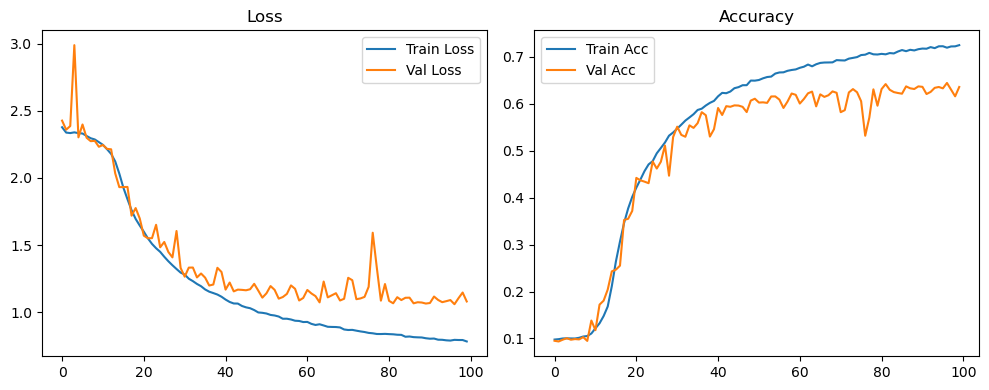

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

Original Model Final Test Loss: 1.1213 Accuracy: 0.6298


🚀 Running: batch128_lr_max_0.0005_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0975 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0975 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0975 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:17<2:08:38, 77.96s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:34<2:08:38, 77.96s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:34<2:08:38, 77.96s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:34<1:08:34, 41.99s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.99s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.99s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [01:51<49:04, 30.36s/it]  

| LR: 0.000499 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:07<49:04, 30.36s/it]

| LR: 0.000499 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:07<49:04, 30.36s/it]

| LR: 0.000499 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:07<39:54, 24.94s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:24<39:54, 24.94s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:24<39:54, 24.94s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:24<34:49, 21.99s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   5%|▌         | 5/100 [02:41<34:49, 21.99s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   5%|▌         | 5/100 [02:41<34:49, 21.99s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   6%|▌         | 6/100 [02:41<31:41, 20.22s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [02:58<31:41, 20.22s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [02:58<31:41, 20.22s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0964 |:   7%|▋         | 7/100 [02:58<29:38, 19.13s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   7%|▋         | 7/100 [03:15<29:38, 19.13s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   7%|▋         | 7/100 [03:15<29:38, 19.13s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   8%|▊         | 8/100 [03:15<28:10, 18.38s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [03:31<28:10, 18.38s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [03:31<28:10, 18.38s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [03:31<27:06, 17.87s/it]

| LR: 0.000490 | Train Acc: 0.0986 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [03:48<27:06, 17.87s/it]

| LR: 0.000490 | Train Acc: 0.0986 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [03:48<27:06, 17.87s/it]

| LR: 0.000490 | Train Acc: 0.0986 | Val Acc: 0.0963 |:  10%|█         | 10/100 [03:48<26:21, 17.57s/it]

| LR: 0.000488 | Train Acc: 0.0989 | Val Acc: 0.0963 |:  10%|█         | 10/100 [04:05<26:21, 17.57s/it]

| LR: 0.000488 | Train Acc: 0.0989 | Val Acc: 0.0963 |:  10%|█         | 10/100 [04:05<26:21, 17.57s/it]

| LR: 0.000488 | Train Acc: 0.0989 | Val Acc: 0.0963 |:  11%|█         | 11/100 [04:05<25:40, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:22<25:40, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:22<25:40, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [04:22<25:12, 17.19s/it]

| LR: 0.000483 | Train Acc: 0.0992 | Val Acc: 0.0950 |:  12%|█▏        | 12/100 [04:39<25:12, 17.19s/it]

| LR: 0.000483 | Train Acc: 0.0992 | Val Acc: 0.0950 |:  12%|█▏        | 12/100 [04:39<25:12, 17.19s/it]

| LR: 0.000483 | Train Acc: 0.0992 | Val Acc: 0.0950 |:  13%|█▎        | 13/100 [04:39<24:42, 17.04s/it]

| LR: 0.000480 | Train Acc: 0.0992 | Val Acc: 0.0925 |:  13%|█▎        | 13/100 [04:55<24:42, 17.04s/it]

| LR: 0.000480 | Train Acc: 0.0992 | Val Acc: 0.0925 |:  13%|█▎        | 13/100 [04:55<24:42, 17.04s/it]

| LR: 0.000480 | Train Acc: 0.0992 | Val Acc: 0.0925 |:  14%|█▍        | 14/100 [04:55<24:14, 16.91s/it]

| LR: 0.000477 | Train Acc: 0.0991 | Val Acc: 0.0923 |:  14%|█▍        | 14/100 [05:12<24:14, 16.91s/it]

| LR: 0.000477 | Train Acc: 0.0991 | Val Acc: 0.0923 |:  14%|█▍        | 14/100 [05:12<24:14, 16.91s/it]

| LR: 0.000477 | Train Acc: 0.0991 | Val Acc: 0.0923 |:  15%|█▌        | 15/100 [05:12<23:49, 16.82s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0929 |:  15%|█▌        | 15/100 [05:28<23:49, 16.82s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0929 |:  15%|█▌        | 15/100 [05:28<23:49, 16.82s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0929 |:  16%|█▌        | 16/100 [05:28<23:27, 16.75s/it]

| LR: 0.000470 | Train Acc: 0.0989 | Val Acc: 0.0950 |:  16%|█▌        | 16/100 [05:45<23:27, 16.75s/it]

| LR: 0.000470 | Train Acc: 0.0989 | Val Acc: 0.0950 |:  16%|█▌        | 16/100 [05:45<23:27, 16.75s/it]

| LR: 0.000470 | Train Acc: 0.0989 | Val Acc: 0.0950 |:  17%|█▋        | 17/100 [05:45<23:03, 16.67s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  17%|█▋        | 17/100 [06:01<23:03, 16.67s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  17%|█▋        | 17/100 [06:01<23:03, 16.67s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  18%|█▊        | 18/100 [06:02<22:46, 16.66s/it]

| LR: 0.000462 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  18%|█▊        | 18/100 [06:18<22:46, 16.66s/it]

| LR: 0.000462 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  18%|█▊        | 18/100 [06:18<22:46, 16.66s/it]

| LR: 0.000462 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  19%|█▉        | 19/100 [06:18<22:32, 16.70s/it]

| LR: 0.000458 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  19%|█▉        | 19/100 [06:35<22:32, 16.70s/it]

| LR: 0.000458 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  19%|█▉        | 19/100 [06:35<22:32, 16.70s/it]

| LR: 0.000458 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  20%|██        | 20/100 [06:35<22:16, 16.71s/it]

| LR: 0.000453 | Train Acc: 0.1003 | Val Acc: 0.0981 |:  20%|██        | 20/100 [06:52<22:16, 16.71s/it]

| LR: 0.000453 | Train Acc: 0.1003 | Val Acc: 0.0981 |:  20%|██        | 20/100 [06:52<22:16, 16.71s/it]

| LR: 0.000453 | Train Acc: 0.1003 | Val Acc: 0.0981 |:  21%|██        | 21/100 [06:52<21:58, 16.69s/it]

| LR: 0.000449 | Train Acc: 0.0999 | Val Acc: 0.0934 |:  21%|██        | 21/100 [07:08<21:58, 16.69s/it]

| LR: 0.000449 | Train Acc: 0.0999 | Val Acc: 0.0934 |:  21%|██        | 21/100 [07:08<21:58, 16.69s/it]

| LR: 0.000449 | Train Acc: 0.0999 | Val Acc: 0.0934 |:  22%|██▏       | 22/100 [07:09<21:44, 16.72s/it]

| LR: 0.000444 | Train Acc: 0.1003 | Val Acc: 0.0986 |:  22%|██▏       | 22/100 [07:25<21:44, 16.72s/it]

| LR: 0.000444 | Train Acc: 0.1003 | Val Acc: 0.0986 |:  22%|██▏       | 22/100 [07:25<21:44, 16.72s/it]

| LR: 0.000444 | Train Acc: 0.1003 | Val Acc: 0.0986 |:  23%|██▎       | 23/100 [07:25<21:31, 16.77s/it]

| LR: 0.000439 | Train Acc: 0.1012 | Val Acc: 0.0987 |:  23%|██▎       | 23/100 [07:42<21:31, 16.77s/it]

| LR: 0.000439 | Train Acc: 0.1012 | Val Acc: 0.0987 |:  23%|██▎       | 23/100 [07:42<21:31, 16.77s/it]

| LR: 0.000439 | Train Acc: 0.1012 | Val Acc: 0.0987 |:  24%|██▍       | 24/100 [07:42<21:14, 16.76s/it]

| LR: 0.000434 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [07:59<21:14, 16.76s/it]

| LR: 0.000434 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [07:59<21:14, 16.76s/it]

| LR: 0.000434 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  25%|██▌       | 25/100 [07:59<20:57, 16.77s/it]

| LR: 0.000428 | Train Acc: 0.1028 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:16<20:57, 16.77s/it]

| LR: 0.000428 | Train Acc: 0.1028 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:16<20:57, 16.77s/it]

| LR: 0.000428 | Train Acc: 0.1028 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:16<20:41, 16.77s/it]

| LR: 0.000423 | Train Acc: 0.1043 | Val Acc: 0.0983 |:  26%|██▌       | 26/100 [08:32<20:41, 16.77s/it]

| LR: 0.000423 | Train Acc: 0.1043 | Val Acc: 0.0983 |:  26%|██▌       | 26/100 [08:32<20:41, 16.77s/it]

| LR: 0.000423 | Train Acc: 0.1043 | Val Acc: 0.0983 |:  27%|██▋       | 27/100 [08:33<20:26, 16.80s/it]

| LR: 0.000417 | Train Acc: 0.1041 | Val Acc: 0.0985 |:  27%|██▋       | 27/100 [08:49<20:26, 16.80s/it]

| LR: 0.000417 | Train Acc: 0.1041 | Val Acc: 0.0985 |:  27%|██▋       | 27/100 [08:49<20:26, 16.80s/it]

| LR: 0.000417 | Train Acc: 0.1041 | Val Acc: 0.0985 |:  28%|██▊       | 28/100 [08:49<20:11, 16.82s/it]

| LR: 0.000411 | Train Acc: 0.1035 | Val Acc: 0.1087 |:  28%|██▊       | 28/100 [09:06<20:11, 16.82s/it]

| LR: 0.000411 | Train Acc: 0.1035 | Val Acc: 0.1087 |:  28%|██▊       | 28/100 [09:06<20:11, 16.82s/it]

| LR: 0.000411 | Train Acc: 0.1035 | Val Acc: 0.1087 |:  29%|██▉       | 29/100 [09:06<19:53, 16.82s/it]

| LR: 0.000405 | Train Acc: 0.1047 | Val Acc: 0.1010 |:  29%|██▉       | 29/100 [09:23<19:53, 16.82s/it]

| LR: 0.000405 | Train Acc: 0.1047 | Val Acc: 0.1010 |:  29%|██▉       | 29/100 [09:23<19:53, 16.82s/it]

| LR: 0.000405 | Train Acc: 0.1047 | Val Acc: 0.1010 |:  30%|███       | 30/100 [09:23<19:36, 16.81s/it]

| LR: 0.000399 | Train Acc: 0.1058 | Val Acc: 0.0992 |:  30%|███       | 30/100 [09:40<19:36, 16.81s/it]

| LR: 0.000399 | Train Acc: 0.1058 | Val Acc: 0.0992 |:  30%|███       | 30/100 [09:40<19:36, 16.81s/it]

| LR: 0.000399 | Train Acc: 0.1058 | Val Acc: 0.0992 |:  31%|███       | 31/100 [09:40<19:19, 16.80s/it]

| LR: 0.000393 | Train Acc: 0.1065 | Val Acc: 0.1073 |:  31%|███       | 31/100 [09:57<19:19, 16.80s/it]

| LR: 0.000393 | Train Acc: 0.1065 | Val Acc: 0.1073 |:  31%|███       | 31/100 [09:57<19:19, 16.80s/it]

| LR: 0.000393 | Train Acc: 0.1065 | Val Acc: 0.1073 |:  32%|███▏      | 32/100 [09:57<19:01, 16.79s/it]

| LR: 0.000386 | Train Acc: 0.1089 | Val Acc: 0.1085 |:  32%|███▏      | 32/100 [10:13<19:01, 16.79s/it]

| LR: 0.000386 | Train Acc: 0.1089 | Val Acc: 0.1085 |:  32%|███▏      | 32/100 [10:13<19:01, 16.79s/it]

| LR: 0.000386 | Train Acc: 0.1089 | Val Acc: 0.1085 |:  33%|███▎      | 33/100 [10:13<18:43, 16.77s/it]

| LR: 0.000380 | Train Acc: 0.1106 | Val Acc: 0.1150 |:  33%|███▎      | 33/100 [10:30<18:43, 16.77s/it]

| LR: 0.000380 | Train Acc: 0.1106 | Val Acc: 0.1150 |:  33%|███▎      | 33/100 [10:30<18:43, 16.77s/it]

| LR: 0.000380 | Train Acc: 0.1106 | Val Acc: 0.1150 |:  34%|███▍      | 34/100 [10:30<18:26, 16.76s/it]

| LR: 0.000373 | Train Acc: 0.1174 | Val Acc: 0.1082 |:  34%|███▍      | 34/100 [10:47<18:26, 16.76s/it]

| LR: 0.000373 | Train Acc: 0.1174 | Val Acc: 0.1082 |:  34%|███▍      | 34/100 [10:47<18:26, 16.76s/it]

| LR: 0.000373 | Train Acc: 0.1174 | Val Acc: 0.1082 |:  35%|███▌      | 35/100 [10:47<18:05, 16.70s/it]

| LR: 0.000366 | Train Acc: 0.1313 | Val Acc: 0.1224 |:  35%|███▌      | 35/100 [11:03<18:05, 16.70s/it]

| LR: 0.000366 | Train Acc: 0.1313 | Val Acc: 0.1224 |:  35%|███▌      | 35/100 [11:03<18:05, 16.70s/it]

| LR: 0.000366 | Train Acc: 0.1313 | Val Acc: 0.1224 |:  36%|███▌      | 36/100 [11:03<17:49, 16.71s/it]

| LR: 0.000359 | Train Acc: 0.1474 | Val Acc: 0.1172 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000359 | Train Acc: 0.1474 | Val Acc: 0.1172 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000359 | Train Acc: 0.1474 | Val Acc: 0.1172 |:  37%|███▋      | 37/100 [11:20<17:33, 16.72s/it]

| LR: 0.000352 | Train Acc: 0.1688 | Val Acc: 0.1961 |:  37%|███▋      | 37/100 [11:37<17:33, 16.72s/it]

| LR: 0.000352 | Train Acc: 0.1688 | Val Acc: 0.1961 |:  37%|███▋      | 37/100 [11:37<17:33, 16.72s/it]

| LR: 0.000352 | Train Acc: 0.1688 | Val Acc: 0.1961 |:  38%|███▊      | 38/100 [11:37<17:15, 16.71s/it]

| LR: 0.000345 | Train Acc: 0.1926 | Val Acc: 0.1874 |:  38%|███▊      | 38/100 [11:53<17:15, 16.71s/it]

| LR: 0.000345 | Train Acc: 0.1926 | Val Acc: 0.1874 |:  38%|███▊      | 38/100 [11:53<17:15, 16.71s/it]

| LR: 0.000345 | Train Acc: 0.1926 | Val Acc: 0.1874 |:  39%|███▉      | 39/100 [11:54<17:00, 16.73s/it]

| LR: 0.000338 | Train Acc: 0.2132 | Val Acc: 0.2272 |:  39%|███▉      | 39/100 [12:10<17:00, 16.73s/it]

| LR: 0.000338 | Train Acc: 0.2132 | Val Acc: 0.2272 |:  39%|███▉      | 39/100 [12:10<17:00, 16.73s/it]

| LR: 0.000338 | Train Acc: 0.2132 | Val Acc: 0.2272 |:  40%|████      | 40/100 [12:10<16:41, 16.68s/it]

| LR: 0.000331 | Train Acc: 0.2331 | Val Acc: 0.2474 |:  40%|████      | 40/100 [12:27<16:41, 16.68s/it]

| LR: 0.000331 | Train Acc: 0.2331 | Val Acc: 0.2474 |:  40%|████      | 40/100 [12:27<16:41, 16.68s/it]

| LR: 0.000331 | Train Acc: 0.2331 | Val Acc: 0.2474 |:  41%|████      | 41/100 [12:27<16:26, 16.71s/it]

| LR: 0.000323 | Train Acc: 0.2478 | Val Acc: 0.2540 |:  41%|████      | 41/100 [12:43<16:26, 16.71s/it]

| LR: 0.000323 | Train Acc: 0.2478 | Val Acc: 0.2540 |:  41%|████      | 41/100 [12:43<16:26, 16.71s/it]

| LR: 0.000323 | Train Acc: 0.2478 | Val Acc: 0.2540 |:  42%|████▏     | 42/100 [12:44<16:08, 16.69s/it]

| LR: 0.000316 | Train Acc: 0.2649 | Val Acc: 0.2849 |:  42%|████▏     | 42/100 [13:00<16:08, 16.69s/it]

| LR: 0.000316 | Train Acc: 0.2649 | Val Acc: 0.2849 |:  42%|████▏     | 42/100 [13:00<16:08, 16.69s/it]

| LR: 0.000316 | Train Acc: 0.2649 | Val Acc: 0.2849 |:  43%|████▎     | 43/100 [13:00<15:50, 16.68s/it]

| LR: 0.000308 | Train Acc: 0.2772 | Val Acc: 0.2983 |:  43%|████▎     | 43/100 [13:17<15:50, 16.68s/it]

| LR: 0.000308 | Train Acc: 0.2772 | Val Acc: 0.2983 |:  43%|████▎     | 43/100 [13:17<15:50, 16.68s/it]

| LR: 0.000308 | Train Acc: 0.2772 | Val Acc: 0.2983 |:  44%|████▍     | 44/100 [13:17<15:32, 16.65s/it]

| LR: 0.000301 | Train Acc: 0.2940 | Val Acc: 0.3265 |:  44%|████▍     | 44/100 [13:33<15:32, 16.65s/it]

| LR: 0.000301 | Train Acc: 0.2940 | Val Acc: 0.3265 |:  44%|████▍     | 44/100 [13:33<15:32, 16.65s/it]

| LR: 0.000301 | Train Acc: 0.2940 | Val Acc: 0.3265 |:  45%|████▌     | 45/100 [13:33<15:15, 16.65s/it]

| LR: 0.000293 | Train Acc: 0.3089 | Val Acc: 0.3267 |:  45%|████▌     | 45/100 [13:50<15:15, 16.65s/it]

| LR: 0.000293 | Train Acc: 0.3089 | Val Acc: 0.3267 |:  45%|████▌     | 45/100 [13:50<15:15, 16.65s/it]

| LR: 0.000293 | Train Acc: 0.3089 | Val Acc: 0.3267 |:  46%|████▌     | 46/100 [13:50<15:01, 16.70s/it]

| LR: 0.000286 | Train Acc: 0.3233 | Val Acc: 0.3252 |:  46%|████▌     | 46/100 [14:07<15:01, 16.70s/it]

| LR: 0.000286 | Train Acc: 0.3233 | Val Acc: 0.3252 |:  46%|████▌     | 46/100 [14:07<15:01, 16.70s/it]

| LR: 0.000286 | Train Acc: 0.3233 | Val Acc: 0.3252 |:  47%|████▋     | 47/100 [14:07<14:45, 16.71s/it]

| LR: 0.000278 | Train Acc: 0.3349 | Val Acc: 0.3618 |:  47%|████▋     | 47/100 [14:23<14:45, 16.71s/it]

| LR: 0.000278 | Train Acc: 0.3349 | Val Acc: 0.3618 |:  47%|████▋     | 47/100 [14:23<14:45, 16.71s/it]

| LR: 0.000278 | Train Acc: 0.3349 | Val Acc: 0.3618 |:  48%|████▊     | 48/100 [14:24<14:27, 16.68s/it]

| LR: 0.000270 | Train Acc: 0.3519 | Val Acc: 0.3823 |:  48%|████▊     | 48/100 [14:40<14:27, 16.68s/it]

| LR: 0.000270 | Train Acc: 0.3519 | Val Acc: 0.3823 |:  48%|████▊     | 48/100 [14:40<14:27, 16.68s/it]

| LR: 0.000270 | Train Acc: 0.3519 | Val Acc: 0.3823 |:  49%|████▉     | 49/100 [14:40<14:13, 16.73s/it]

| LR: 0.000263 | Train Acc: 0.3625 | Val Acc: 0.3729 |:  49%|████▉     | 49/100 [14:57<14:13, 16.73s/it]

| LR: 0.000263 | Train Acc: 0.3625 | Val Acc: 0.3729 |:  49%|████▉     | 49/100 [14:57<14:13, 16.73s/it]

| LR: 0.000263 | Train Acc: 0.3625 | Val Acc: 0.3729 |:  50%|█████     | 50/100 [14:57<13:53, 16.67s/it]

| LR: 0.000255 | Train Acc: 0.3717 | Val Acc: 0.3870 |:  50%|█████     | 50/100 [15:14<13:53, 16.67s/it]

| LR: 0.000255 | Train Acc: 0.3717 | Val Acc: 0.3870 |:  50%|█████     | 50/100 [15:14<13:53, 16.67s/it]

| LR: 0.000255 | Train Acc: 0.3717 | Val Acc: 0.3870 |:  51%|█████     | 51/100 [15:14<13:39, 16.72s/it]

| LR: 0.000247 | Train Acc: 0.3824 | Val Acc: 0.4117 |:  51%|█████     | 51/100 [15:30<13:39, 16.72s/it]

| LR: 0.000247 | Train Acc: 0.3824 | Val Acc: 0.4117 |:  51%|█████     | 51/100 [15:30<13:39, 16.72s/it]

| LR: 0.000247 | Train Acc: 0.3824 | Val Acc: 0.4117 |:  52%|█████▏    | 52/100 [15:31<13:22, 16.73s/it]

| LR: 0.000240 | Train Acc: 0.3890 | Val Acc: 0.3998 |:  52%|█████▏    | 52/100 [15:47<13:22, 16.73s/it]

| LR: 0.000240 | Train Acc: 0.3890 | Val Acc: 0.3998 |:  52%|█████▏    | 52/100 [15:47<13:22, 16.73s/it]

| LR: 0.000240 | Train Acc: 0.3890 | Val Acc: 0.3998 |:  53%|█████▎    | 53/100 [15:47<13:08, 16.77s/it]

| LR: 0.000232 | Train Acc: 0.3944 | Val Acc: 0.4288 |:  53%|█████▎    | 53/100 [16:04<13:08, 16.77s/it]

| LR: 0.000232 | Train Acc: 0.3944 | Val Acc: 0.4288 |:  53%|█████▎    | 53/100 [16:04<13:08, 16.77s/it]

| LR: 0.000232 | Train Acc: 0.3944 | Val Acc: 0.4288 |:  54%|█████▍    | 54/100 [16:04<12:50, 16.75s/it]

| LR: 0.000224 | Train Acc: 0.4099 | Val Acc: 0.4217 |:  54%|█████▍    | 54/100 [16:21<12:50, 16.75s/it]

| LR: 0.000224 | Train Acc: 0.4099 | Val Acc: 0.4217 |:  54%|█████▍    | 54/100 [16:21<12:50, 16.75s/it]

| LR: 0.000224 | Train Acc: 0.4099 | Val Acc: 0.4217 |:  55%|█████▌    | 55/100 [16:21<12:35, 16.78s/it]

| LR: 0.000217 | Train Acc: 0.4154 | Val Acc: 0.4577 |:  55%|█████▌    | 55/100 [16:38<12:35, 16.78s/it]

| LR: 0.000217 | Train Acc: 0.4154 | Val Acc: 0.4577 |:  55%|█████▌    | 55/100 [16:38<12:35, 16.78s/it]

| LR: 0.000217 | Train Acc: 0.4154 | Val Acc: 0.4577 |:  56%|█████▌    | 56/100 [16:38<12:19, 16.80s/it]

| LR: 0.000209 | Train Acc: 0.4239 | Val Acc: 0.4251 |:  56%|█████▌    | 56/100 [16:54<12:19, 16.80s/it]

| LR: 0.000209 | Train Acc: 0.4239 | Val Acc: 0.4251 |:  56%|█████▌    | 56/100 [16:54<12:19, 16.80s/it]

| LR: 0.000209 | Train Acc: 0.4239 | Val Acc: 0.4251 |:  57%|█████▋    | 57/100 [16:55<12:01, 16.78s/it]

| LR: 0.000202 | Train Acc: 0.4295 | Val Acc: 0.4501 |:  57%|█████▋    | 57/100 [17:11<12:01, 16.78s/it]

| LR: 0.000202 | Train Acc: 0.4295 | Val Acc: 0.4501 |:  57%|█████▋    | 57/100 [17:11<12:01, 16.78s/it]

| LR: 0.000202 | Train Acc: 0.4295 | Val Acc: 0.4501 |:  58%|█████▊    | 58/100 [17:11<11:46, 16.82s/it]

| LR: 0.000194 | Train Acc: 0.4351 | Val Acc: 0.4327 |:  58%|█████▊    | 58/100 [17:28<11:46, 16.82s/it]

| LR: 0.000194 | Train Acc: 0.4351 | Val Acc: 0.4327 |:  58%|█████▊    | 58/100 [17:28<11:46, 16.82s/it]

| LR: 0.000194 | Train Acc: 0.4351 | Val Acc: 0.4327 |:  59%|█████▉    | 59/100 [17:28<11:29, 16.81s/it]

| LR: 0.000187 | Train Acc: 0.4465 | Val Acc: 0.4745 |:  59%|█████▉    | 59/100 [17:45<11:29, 16.81s/it]

| LR: 0.000187 | Train Acc: 0.4465 | Val Acc: 0.4745 |:  59%|█████▉    | 59/100 [17:45<11:29, 16.81s/it]

| LR: 0.000187 | Train Acc: 0.4465 | Val Acc: 0.4745 |:  60%|██████    | 60/100 [17:45<11:10, 16.77s/it]

| LR: 0.000179 | Train Acc: 0.4550 | Val Acc: 0.4735 |:  60%|██████    | 60/100 [18:02<11:10, 16.77s/it]

| LR: 0.000179 | Train Acc: 0.4550 | Val Acc: 0.4735 |:  60%|██████    | 60/100 [18:02<11:10, 16.77s/it]

| LR: 0.000179 | Train Acc: 0.4550 | Val Acc: 0.4735 |:  61%|██████    | 61/100 [18:02<10:53, 16.75s/it]

| LR: 0.000172 | Train Acc: 0.4575 | Val Acc: 0.4763 |:  61%|██████    | 61/100 [18:18<10:53, 16.75s/it]

| LR: 0.000172 | Train Acc: 0.4575 | Val Acc: 0.4763 |:  61%|██████    | 61/100 [18:18<10:53, 16.75s/it]

| LR: 0.000172 | Train Acc: 0.4575 | Val Acc: 0.4763 |:  62%|██████▏   | 62/100 [18:18<10:37, 16.78s/it]

| LR: 0.000165 | Train Acc: 0.4695 | Val Acc: 0.4926 |:  62%|██████▏   | 62/100 [18:35<10:37, 16.78s/it]

| LR: 0.000165 | Train Acc: 0.4695 | Val Acc: 0.4926 |:  62%|██████▏   | 62/100 [18:35<10:37, 16.78s/it]

| LR: 0.000165 | Train Acc: 0.4695 | Val Acc: 0.4926 |:  63%|██████▎   | 63/100 [18:35<10:21, 16.79s/it]

| LR: 0.000158 | Train Acc: 0.4723 | Val Acc: 0.4823 |:  63%|██████▎   | 63/100 [18:52<10:21, 16.79s/it]

| LR: 0.000158 | Train Acc: 0.4723 | Val Acc: 0.4823 |:  63%|██████▎   | 63/100 [18:52<10:21, 16.79s/it]

| LR: 0.000158 | Train Acc: 0.4723 | Val Acc: 0.4823 |:  64%|██████▍   | 64/100 [18:52<10:05, 16.81s/it]

| LR: 0.000151 | Train Acc: 0.4746 | Val Acc: 0.5027 |:  64%|██████▍   | 64/100 [19:09<10:05, 16.81s/it]

| LR: 0.000151 | Train Acc: 0.4746 | Val Acc: 0.5027 |:  64%|██████▍   | 64/100 [19:09<10:05, 16.81s/it]

| LR: 0.000151 | Train Acc: 0.4746 | Val Acc: 0.5027 |:  65%|██████▌   | 65/100 [19:09<09:47, 16.77s/it]

| LR: 0.000144 | Train Acc: 0.4815 | Val Acc: 0.4696 |:  65%|██████▌   | 65/100 [19:25<09:47, 16.77s/it]

| LR: 0.000144 | Train Acc: 0.4815 | Val Acc: 0.4696 |:  65%|██████▌   | 65/100 [19:25<09:47, 16.77s/it]

| LR: 0.000144 | Train Acc: 0.4815 | Val Acc: 0.4696 |:  66%|██████▌   | 66/100 [19:26<09:29, 16.75s/it]

| LR: 0.000137 | Train Acc: 0.4880 | Val Acc: 0.5067 |:  66%|██████▌   | 66/100 [19:42<09:29, 16.75s/it]

| LR: 0.000137 | Train Acc: 0.4880 | Val Acc: 0.5067 |:  66%|██████▌   | 66/100 [19:42<09:29, 16.75s/it]

| LR: 0.000137 | Train Acc: 0.4880 | Val Acc: 0.5067 |:  67%|██████▋   | 67/100 [19:42<09:12, 16.75s/it]

| LR: 0.000130 | Train Acc: 0.4887 | Val Acc: 0.5039 |:  67%|██████▋   | 67/100 [19:59<09:12, 16.75s/it]

| LR: 0.000130 | Train Acc: 0.4887 | Val Acc: 0.5039 |:  67%|██████▋   | 67/100 [19:59<09:12, 16.75s/it]

| LR: 0.000130 | Train Acc: 0.4887 | Val Acc: 0.5039 |:  68%|██████▊   | 68/100 [19:59<08:56, 16.75s/it]

| LR: 0.000124 | Train Acc: 0.4939 | Val Acc: 0.5095 |:  68%|██████▊   | 68/100 [20:16<08:56, 16.75s/it]

| LR: 0.000124 | Train Acc: 0.4939 | Val Acc: 0.5095 |:  68%|██████▊   | 68/100 [20:16<08:56, 16.75s/it]

| LR: 0.000124 | Train Acc: 0.4939 | Val Acc: 0.5095 |:  69%|██████▉   | 69/100 [20:16<08:39, 16.75s/it]

| LR: 0.000117 | Train Acc: 0.4983 | Val Acc: 0.5147 |:  69%|██████▉   | 69/100 [20:32<08:39, 16.75s/it]

| LR: 0.000117 | Train Acc: 0.4983 | Val Acc: 0.5147 |:  69%|██████▉   | 69/100 [20:32<08:39, 16.75s/it]

| LR: 0.000117 | Train Acc: 0.4983 | Val Acc: 0.5147 |:  70%|███████   | 70/100 [20:33<08:22, 16.76s/it]

| LR: 0.000111 | Train Acc: 0.5054 | Val Acc: 0.5058 |:  70%|███████   | 70/100 [20:49<08:22, 16.76s/it]

| LR: 0.000111 | Train Acc: 0.5054 | Val Acc: 0.5058 |:  70%|███████   | 70/100 [20:49<08:22, 16.76s/it]

| LR: 0.000111 | Train Acc: 0.5054 | Val Acc: 0.5058 |:  71%|███████   | 71/100 [20:49<08:07, 16.80s/it]

| LR: 0.000105 | Train Acc: 0.5055 | Val Acc: 0.5241 |:  71%|███████   | 71/100 [21:06<08:07, 16.80s/it]

| LR: 0.000105 | Train Acc: 0.5055 | Val Acc: 0.5241 |:  71%|███████   | 71/100 [21:06<08:07, 16.80s/it]

| LR: 0.000105 | Train Acc: 0.5055 | Val Acc: 0.5241 |:  72%|███████▏  | 72/100 [21:06<07:49, 16.77s/it]

| LR: 0.000099 | Train Acc: 0.5103 | Val Acc: 0.5301 |:  72%|███████▏  | 72/100 [21:23<07:49, 16.77s/it]

| LR: 0.000099 | Train Acc: 0.5103 | Val Acc: 0.5301 |:  72%|███████▏  | 72/100 [21:23<07:49, 16.77s/it]

| LR: 0.000099 | Train Acc: 0.5103 | Val Acc: 0.5301 |:  73%|███████▎  | 73/100 [21:23<07:31, 16.72s/it]

| LR: 0.000093 | Train Acc: 0.5165 | Val Acc: 0.5248 |:  73%|███████▎  | 73/100 [21:39<07:31, 16.72s/it]

| LR: 0.000093 | Train Acc: 0.5165 | Val Acc: 0.5248 |:  73%|███████▎  | 73/100 [21:39<07:31, 16.72s/it]

| LR: 0.000093 | Train Acc: 0.5165 | Val Acc: 0.5248 |:  74%|███████▍  | 74/100 [21:39<07:13, 16.68s/it]

| LR: 0.000087 | Train Acc: 0.5227 | Val Acc: 0.5341 |:  74%|███████▍  | 74/100 [21:56<07:13, 16.68s/it]

| LR: 0.000087 | Train Acc: 0.5227 | Val Acc: 0.5341 |:  74%|███████▍  | 74/100 [21:56<07:13, 16.68s/it]

| LR: 0.000087 | Train Acc: 0.5227 | Val Acc: 0.5341 |:  75%|███████▌  | 75/100 [21:56<06:58, 16.72s/it]

| LR: 0.000082 | Train Acc: 0.5198 | Val Acc: 0.5437 |:  75%|███████▌  | 75/100 [22:13<06:58, 16.72s/it]

| LR: 0.000082 | Train Acc: 0.5198 | Val Acc: 0.5437 |:  75%|███████▌  | 75/100 [22:13<06:58, 16.72s/it]

| LR: 0.000082 | Train Acc: 0.5198 | Val Acc: 0.5437 |:  76%|███████▌  | 76/100 [22:13<06:41, 16.74s/it]

| LR: 0.000076 | Train Acc: 0.5214 | Val Acc: 0.5356 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.74s/it]

| LR: 0.000076 | Train Acc: 0.5214 | Val Acc: 0.5356 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.74s/it]

| LR: 0.000076 | Train Acc: 0.5214 | Val Acc: 0.5356 |:  77%|███████▋  | 77/100 [22:30<06:25, 16.75s/it]

| LR: 0.000071 | Train Acc: 0.5247 | Val Acc: 0.5325 |:  77%|███████▋  | 77/100 [22:46<06:25, 16.75s/it]

| LR: 0.000071 | Train Acc: 0.5247 | Val Acc: 0.5325 |:  77%|███████▋  | 77/100 [22:46<06:25, 16.75s/it]

| LR: 0.000071 | Train Acc: 0.5247 | Val Acc: 0.5325 |:  78%|███████▊  | 78/100 [22:46<06:08, 16.74s/it]

| LR: 0.000066 | Train Acc: 0.5327 | Val Acc: 0.5359 |:  78%|███████▊  | 78/100 [23:03<06:08, 16.74s/it]

| LR: 0.000066 | Train Acc: 0.5327 | Val Acc: 0.5359 |:  78%|███████▊  | 78/100 [23:03<06:08, 16.74s/it]

| LR: 0.000066 | Train Acc: 0.5327 | Val Acc: 0.5359 |:  79%|███████▉  | 79/100 [23:03<05:51, 16.73s/it]

| LR: 0.000061 | Train Acc: 0.5250 | Val Acc: 0.5124 |:  79%|███████▉  | 79/100 [23:20<05:51, 16.73s/it]

| LR: 0.000061 | Train Acc: 0.5250 | Val Acc: 0.5124 |:  79%|███████▉  | 79/100 [23:20<05:51, 16.73s/it]

| LR: 0.000061 | Train Acc: 0.5250 | Val Acc: 0.5124 |:  80%|████████  | 80/100 [23:20<05:35, 16.77s/it]

| LR: 0.000057 | Train Acc: 0.5304 | Val Acc: 0.5450 |:  80%|████████  | 80/100 [23:37<05:35, 16.77s/it]

| LR: 0.000057 | Train Acc: 0.5304 | Val Acc: 0.5450 |:  80%|████████  | 80/100 [23:37<05:35, 16.77s/it]

| LR: 0.000057 | Train Acc: 0.5304 | Val Acc: 0.5450 |:  81%|████████  | 81/100 [23:37<05:18, 16.76s/it]

| LR: 0.000052 | Train Acc: 0.5357 | Val Acc: 0.5377 |:  81%|████████  | 81/100 [23:53<05:18, 16.76s/it]

| LR: 0.000052 | Train Acc: 0.5357 | Val Acc: 0.5377 |:  81%|████████  | 81/100 [23:53<05:18, 16.76s/it]

| LR: 0.000052 | Train Acc: 0.5357 | Val Acc: 0.5377 |:  82%|████████▏ | 82/100 [23:54<05:02, 16.78s/it]

| LR: 0.000048 | Train Acc: 0.5385 | Val Acc: 0.5417 |:  82%|████████▏ | 82/100 [24:10<05:02, 16.78s/it]

| LR: 0.000048 | Train Acc: 0.5385 | Val Acc: 0.5417 |:  82%|████████▏ | 82/100 [24:10<05:02, 16.78s/it]

| LR: 0.000048 | Train Acc: 0.5385 | Val Acc: 0.5417 |:  83%|████████▎ | 83/100 [24:10<04:45, 16.79s/it]

| LR: 0.000044 | Train Acc: 0.5380 | Val Acc: 0.5502 |:  83%|████████▎ | 83/100 [24:27<04:45, 16.79s/it]

| LR: 0.000044 | Train Acc: 0.5380 | Val Acc: 0.5502 |:  83%|████████▎ | 83/100 [24:27<04:45, 16.79s/it]

| LR: 0.000044 | Train Acc: 0.5380 | Val Acc: 0.5502 |:  84%|████████▍ | 84/100 [24:27<04:29, 16.85s/it]

| LR: 0.000040 | Train Acc: 0.5412 | Val Acc: 0.5455 |:  84%|████████▍ | 84/100 [24:44<04:29, 16.85s/it]

| LR: 0.000040 | Train Acc: 0.5412 | Val Acc: 0.5455 |:  84%|████████▍ | 84/100 [24:44<04:29, 16.85s/it]

| LR: 0.000040 | Train Acc: 0.5412 | Val Acc: 0.5455 |:  85%|████████▌ | 85/100 [24:44<04:11, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.5386 | Val Acc: 0.5482 |:  85%|████████▌ | 85/100 [25:00<04:11, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.5386 | Val Acc: 0.5482 |:  85%|████████▌ | 85/100 [25:00<04:11, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.5386 | Val Acc: 0.5482 |:  86%|████████▌ | 86/100 [25:00<03:53, 16.70s/it]

| LR: 0.000033 | Train Acc: 0.5418 | Val Acc: 0.5465 |:  86%|████████▌ | 86/100 [25:17<03:53, 16.70s/it]

| LR: 0.000033 | Train Acc: 0.5418 | Val Acc: 0.5465 |:  86%|████████▌ | 86/100 [25:17<03:53, 16.70s/it]

| LR: 0.000033 | Train Acc: 0.5418 | Val Acc: 0.5465 |:  87%|████████▋ | 87/100 [25:17<03:37, 16.71s/it]

| LR: 0.000030 | Train Acc: 0.5463 | Val Acc: 0.5484 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.71s/it]

| LR: 0.000030 | Train Acc: 0.5463 | Val Acc: 0.5484 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.71s/it]

| LR: 0.000030 | Train Acc: 0.5463 | Val Acc: 0.5484 |:  88%|████████▊ | 88/100 [25:34<03:21, 16.76s/it]

| LR: 0.000027 | Train Acc: 0.5449 | Val Acc: 0.5567 |:  88%|████████▊ | 88/100 [25:51<03:21, 16.76s/it]

| LR: 0.000027 | Train Acc: 0.5449 | Val Acc: 0.5567 |:  88%|████████▊ | 88/100 [25:51<03:21, 16.76s/it]

| LR: 0.000027 | Train Acc: 0.5449 | Val Acc: 0.5567 |:  89%|████████▉ | 89/100 [25:51<03:04, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.5477 | Val Acc: 0.5403 |:  89%|████████▉ | 89/100 [26:08<03:04, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.5477 | Val Acc: 0.5403 |:  89%|████████▉ | 89/100 [26:08<03:04, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.5477 | Val Acc: 0.5403 |:  90%|█████████ | 90/100 [26:08<02:47, 16.79s/it]

| LR: 0.000022 | Train Acc: 0.5499 | Val Acc: 0.5535 |:  90%|█████████ | 90/100 [26:24<02:47, 16.79s/it]

| LR: 0.000022 | Train Acc: 0.5499 | Val Acc: 0.5535 |:  90%|█████████ | 90/100 [26:24<02:47, 16.79s/it]

| LR: 0.000022 | Train Acc: 0.5499 | Val Acc: 0.5535 |:  91%|█████████ | 91/100 [26:24<02:30, 16.76s/it]

| LR: 0.000020 | Train Acc: 0.5515 | Val Acc: 0.5621 |:  91%|█████████ | 91/100 [26:41<02:30, 16.76s/it]

| LR: 0.000020 | Train Acc: 0.5515 | Val Acc: 0.5621 |:  91%|█████████ | 91/100 [26:41<02:30, 16.76s/it]

| LR: 0.000020 | Train Acc: 0.5515 | Val Acc: 0.5621 |:  92%|█████████▏| 92/100 [26:41<02:13, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.5462 | Val Acc: 0.5664 |:  92%|█████████▏| 92/100 [26:58<02:13, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.5462 | Val Acc: 0.5664 |:  92%|█████████▏| 92/100 [26:58<02:13, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.5462 | Val Acc: 0.5664 |:  93%|█████████▎| 93/100 [26:58<01:57, 16.72s/it]

| LR: 0.000016 | Train Acc: 0.5506 | Val Acc: 0.5469 |:  93%|█████████▎| 93/100 [27:14<01:57, 16.72s/it]

| LR: 0.000016 | Train Acc: 0.5506 | Val Acc: 0.5469 |:  93%|█████████▎| 93/100 [27:14<01:57, 16.72s/it]

| LR: 0.000016 | Train Acc: 0.5506 | Val Acc: 0.5469 |:  94%|█████████▍| 94/100 [27:14<01:40, 16.67s/it]

| LR: 0.000014 | Train Acc: 0.5526 | Val Acc: 0.5465 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.67s/it]

| LR: 0.000014 | Train Acc: 0.5526 | Val Acc: 0.5465 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.67s/it]

| LR: 0.000014 | Train Acc: 0.5526 | Val Acc: 0.5465 |:  95%|█████████▌| 95/100 [27:31<01:23, 16.63s/it]

| LR: 0.000013 | Train Acc: 0.5551 | Val Acc: 0.5454 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.63s/it]

| LR: 0.000013 | Train Acc: 0.5551 | Val Acc: 0.5454 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.63s/it]

| LR: 0.000013 | Train Acc: 0.5551 | Val Acc: 0.5454 |:  96%|█████████▌| 96/100 [27:48<01:06, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.5563 | Val Acc: 0.5532 |:  96%|█████████▌| 96/100 [28:04<01:06, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.5563 | Val Acc: 0.5532 |:  96%|█████████▌| 96/100 [28:04<01:06, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.5563 | Val Acc: 0.5532 |:  97%|█████████▋| 97/100 [28:04<00:49, 16.66s/it]

| LR: 0.000011 | Train Acc: 0.5518 | Val Acc: 0.5606 |:  97%|█████████▋| 97/100 [28:21<00:49, 16.66s/it]

| LR: 0.000011 | Train Acc: 0.5518 | Val Acc: 0.5606 |:  97%|█████████▋| 97/100 [28:21<00:49, 16.66s/it]

| LR: 0.000011 | Train Acc: 0.5518 | Val Acc: 0.5606 |:  98%|█████████▊| 98/100 [28:21<00:33, 16.60s/it]

| LR: 0.000010 | Train Acc: 0.5532 | Val Acc: 0.5393 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.60s/it]

| LR: 0.000010 | Train Acc: 0.5532 | Val Acc: 0.5393 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.60s/it]

| LR: 0.000010 | Train Acc: 0.5532 | Val Acc: 0.5393 |:  99%|█████████▉| 99/100 [28:37<00:16, 16.64s/it]

| LR: 0.000010 | Train Acc: 0.5555 | Val Acc: 0.5586 |:  99%|█████████▉| 99/100 [28:54<00:16, 16.64s/it]

| LR: 0.000010 | Train Acc: 0.5555 | Val Acc: 0.5586 |:  99%|█████████▉| 99/100 [28:54<00:16, 16.64s/it]

| LR: 0.000010 | Train Acc: 0.5555 | Val Acc: 0.5586 |: 100%|██████████| 100/100 [28:54<00:00, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.5555 | Val Acc: 0.5586 |: 100%|██████████| 100/100 [28:54<00:00, 17.35s/it]

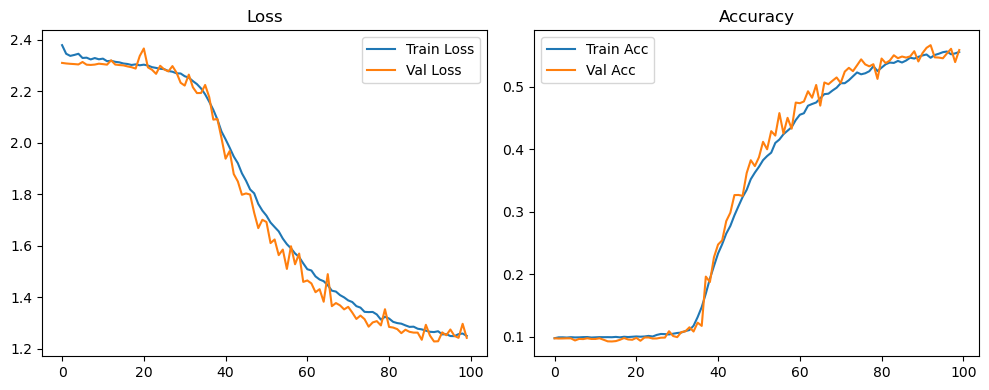

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 1.2448 Accuracy: 0.5597


🚀 Running: batch128_lr_max_0.0005_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:17<2:08:22, 77.81s/it]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:22, 77.81s/it]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:22, 77.81s/it]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:34<1:08:22, 41.86s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:22, 41.86s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:22, 41.86s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [01:51<49:07, 30.39s/it]  

| LR: 0.000499 | Train Acc: 0.0988 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [02:07<49:07, 30.39s/it]

| LR: 0.000499 | Train Acc: 0.0988 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [02:07<49:07, 30.39s/it]

| LR: 0.000499 | Train Acc: 0.0988 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [02:07<39:56, 24.96s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:24<39:56, 24.96s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:24<39:56, 24.96s/it]

| LR: 0.000498 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:24<34:49, 22.00s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:49, 22.00s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:49, 22.00s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:41<31:36, 20.18s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [02:58<31:36, 20.18s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [02:58<31:36, 20.18s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [02:58<29:34, 19.08s/it]

| LR: 0.000494 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:14<29:34, 19.08s/it]

| LR: 0.000494 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:14<29:34, 19.08s/it]

| LR: 0.000494 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:14<28:07, 18.35s/it]

| LR: 0.000492 | Train Acc: 0.0988 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [03:31<28:07, 18.35s/it]

| LR: 0.000492 | Train Acc: 0.0988 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [03:31<28:07, 18.35s/it]

| LR: 0.000492 | Train Acc: 0.0988 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [03:31<27:03, 17.84s/it]

| LR: 0.000490 | Train Acc: 0.0991 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000490 | Train Acc: 0.0991 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000490 | Train Acc: 0.0991 | Val Acc: 0.0969 |:  10%|█         | 10/100 [03:48<26:18, 17.54s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:05<26:18, 17.54s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:05<26:18, 17.54s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:05<25:39, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0989 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:21<25:39, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0989 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:21<25:39, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0989 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [04:21<25:07, 17.13s/it]

| LR: 0.000483 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  12%|█▏        | 12/100 [04:38<25:07, 17.13s/it]

| LR: 0.000483 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  12%|█▏        | 12/100 [04:38<25:07, 17.13s/it]

| LR: 0.000483 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [04:38<24:40, 17.01s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  13%|█▎        | 13/100 [04:55<24:40, 17.01s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  13%|█▎        | 13/100 [04:55<24:40, 17.01s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  14%|█▍        | 14/100 [04:55<24:17, 16.95s/it]

| LR: 0.000477 | Train Acc: 0.0985 | Val Acc: 0.0965 |:  14%|█▍        | 14/100 [05:12<24:17, 16.95s/it]

| LR: 0.000477 | Train Acc: 0.0985 | Val Acc: 0.0965 |:  14%|█▍        | 14/100 [05:12<24:17, 16.95s/it]

| LR: 0.000477 | Train Acc: 0.0985 | Val Acc: 0.0965 |:  15%|█▌        | 15/100 [05:12<23:56, 16.90s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [05:28<23:56, 16.90s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [05:28<23:56, 16.90s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  16%|█▌        | 16/100 [05:28<23:31, 16.80s/it]

| LR: 0.000470 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [05:45<23:31, 16.80s/it]

| LR: 0.000470 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [05:45<23:31, 16.80s/it]

| LR: 0.000470 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  17%|█▋        | 17/100 [05:45<23:12, 16.77s/it]

| LR: 0.000466 | Train Acc: 0.0999 | Val Acc: 0.0989 |:  17%|█▋        | 17/100 [06:02<23:12, 16.77s/it]

| LR: 0.000466 | Train Acc: 0.0999 | Val Acc: 0.0989 |:  17%|█▋        | 17/100 [06:02<23:12, 16.77s/it]

| LR: 0.000466 | Train Acc: 0.0999 | Val Acc: 0.0989 |:  18%|█▊        | 18/100 [06:02<22:52, 16.73s/it]

| LR: 0.000462 | Train Acc: 0.1022 | Val Acc: 0.0981 |:  18%|█▊        | 18/100 [06:18<22:52, 16.73s/it]

| LR: 0.000462 | Train Acc: 0.1022 | Val Acc: 0.0981 |:  18%|█▊        | 18/100 [06:18<22:52, 16.73s/it]

| LR: 0.000462 | Train Acc: 0.1022 | Val Acc: 0.0981 |:  19%|█▉        | 19/100 [06:18<22:35, 16.74s/it]

| LR: 0.000458 | Train Acc: 0.1036 | Val Acc: 0.1007 |:  19%|█▉        | 19/100 [06:35<22:35, 16.74s/it]

| LR: 0.000458 | Train Acc: 0.1036 | Val Acc: 0.1007 |:  19%|█▉        | 19/100 [06:35<22:35, 16.74s/it]

| LR: 0.000458 | Train Acc: 0.1036 | Val Acc: 0.1007 |:  20%|██        | 20/100 [06:35<22:21, 16.77s/it]

| LR: 0.000453 | Train Acc: 0.1026 | Val Acc: 0.1002 |:  20%|██        | 20/100 [06:52<22:21, 16.77s/it]

| LR: 0.000453 | Train Acc: 0.1026 | Val Acc: 0.1002 |:  20%|██        | 20/100 [06:52<22:21, 16.77s/it]

| LR: 0.000453 | Train Acc: 0.1026 | Val Acc: 0.1002 |:  21%|██        | 21/100 [06:52<22:06, 16.79s/it]

| LR: 0.000449 | Train Acc: 0.1040 | Val Acc: 0.1029 |:  21%|██        | 21/100 [07:09<22:06, 16.79s/it]

| LR: 0.000449 | Train Acc: 0.1040 | Val Acc: 0.1029 |:  21%|██        | 21/100 [07:09<22:06, 16.79s/it]

| LR: 0.000449 | Train Acc: 0.1040 | Val Acc: 0.1029 |:  22%|██▏       | 22/100 [07:09<21:54, 16.85s/it]

| LR: 0.000444 | Train Acc: 0.1019 | Val Acc: 0.1001 |:  22%|██▏       | 22/100 [07:26<21:54, 16.85s/it]

| LR: 0.000444 | Train Acc: 0.1019 | Val Acc: 0.1001 |:  22%|██▏       | 22/100 [07:26<21:54, 16.85s/it]

| LR: 0.000444 | Train Acc: 0.1019 | Val Acc: 0.1001 |:  23%|██▎       | 23/100 [07:26<21:34, 16.81s/it]

| LR: 0.000439 | Train Acc: 0.1021 | Val Acc: 0.0879 |:  23%|██▎       | 23/100 [07:43<21:34, 16.81s/it]

| LR: 0.000439 | Train Acc: 0.1021 | Val Acc: 0.0879 |:  23%|██▎       | 23/100 [07:43<21:34, 16.81s/it]

| LR: 0.000439 | Train Acc: 0.1021 | Val Acc: 0.0879 |:  24%|██▍       | 24/100 [07:43<21:16, 16.79s/it]

| LR: 0.000434 | Train Acc: 0.1029 | Val Acc: 0.1008 |:  24%|██▍       | 24/100 [07:59<21:16, 16.79s/it]

| LR: 0.000434 | Train Acc: 0.1029 | Val Acc: 0.1008 |:  24%|██▍       | 24/100 [07:59<21:16, 16.79s/it]

| LR: 0.000434 | Train Acc: 0.1029 | Val Acc: 0.1008 |:  25%|██▌       | 25/100 [07:59<20:58, 16.78s/it]

| LR: 0.000428 | Train Acc: 0.1037 | Val Acc: 0.0977 |:  25%|██▌       | 25/100 [08:16<20:58, 16.78s/it]

| LR: 0.000428 | Train Acc: 0.1037 | Val Acc: 0.0977 |:  25%|██▌       | 25/100 [08:16<20:58, 16.78s/it]

| LR: 0.000428 | Train Acc: 0.1037 | Val Acc: 0.0977 |:  26%|██▌       | 26/100 [08:16<20:39, 16.75s/it]

| LR: 0.000423 | Train Acc: 0.1035 | Val Acc: 0.1019 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000423 | Train Acc: 0.1035 | Val Acc: 0.1019 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000423 | Train Acc: 0.1035 | Val Acc: 0.1019 |:  27%|██▋       | 27/100 [08:33<20:18, 16.69s/it]

| LR: 0.000417 | Train Acc: 0.1051 | Val Acc: 0.1028 |:  27%|██▋       | 27/100 [08:49<20:18, 16.69s/it]

| LR: 0.000417 | Train Acc: 0.1051 | Val Acc: 0.1028 |:  27%|██▋       | 27/100 [08:49<20:18, 16.69s/it]

| LR: 0.000417 | Train Acc: 0.1051 | Val Acc: 0.1028 |:  28%|██▊       | 28/100 [08:49<20:04, 16.73s/it]

| LR: 0.000411 | Train Acc: 0.1135 | Val Acc: 0.1093 |:  28%|██▊       | 28/100 [09:06<20:04, 16.73s/it]

| LR: 0.000411 | Train Acc: 0.1135 | Val Acc: 0.1093 |:  28%|██▊       | 28/100 [09:06<20:04, 16.73s/it]

| LR: 0.000411 | Train Acc: 0.1135 | Val Acc: 0.1093 |:  29%|██▉       | 29/100 [09:06<19:50, 16.77s/it]

| LR: 0.000405 | Train Acc: 0.1189 | Val Acc: 0.1119 |:  29%|██▉       | 29/100 [09:23<19:50, 16.77s/it]

| LR: 0.000405 | Train Acc: 0.1189 | Val Acc: 0.1119 |:  29%|██▉       | 29/100 [09:23<19:50, 16.77s/it]

| LR: 0.000405 | Train Acc: 0.1189 | Val Acc: 0.1119 |:  30%|███       | 30/100 [09:23<19:36, 16.81s/it]

| LR: 0.000399 | Train Acc: 0.1335 | Val Acc: 0.1295 |:  30%|███       | 30/100 [09:40<19:36, 16.81s/it]

| LR: 0.000399 | Train Acc: 0.1335 | Val Acc: 0.1295 |:  30%|███       | 30/100 [09:40<19:36, 16.81s/it]

| LR: 0.000399 | Train Acc: 0.1335 | Val Acc: 0.1295 |:  31%|███       | 31/100 [09:40<19:20, 16.83s/it]

| LR: 0.000393 | Train Acc: 0.1540 | Val Acc: 0.1442 |:  31%|███       | 31/100 [09:57<19:20, 16.83s/it]

| LR: 0.000393 | Train Acc: 0.1540 | Val Acc: 0.1442 |:  31%|███       | 31/100 [09:57<19:20, 16.83s/it]

| LR: 0.000393 | Train Acc: 0.1540 | Val Acc: 0.1442 |:  32%|███▏      | 32/100 [09:57<19:02, 16.81s/it]

| LR: 0.000386 | Train Acc: 0.1744 | Val Acc: 0.1736 |:  32%|███▏      | 32/100 [10:13<19:02, 16.81s/it]

| LR: 0.000386 | Train Acc: 0.1744 | Val Acc: 0.1736 |:  32%|███▏      | 32/100 [10:13<19:02, 16.81s/it]

| LR: 0.000386 | Train Acc: 0.1744 | Val Acc: 0.1736 |:  33%|███▎      | 33/100 [10:13<18:42, 16.75s/it]

| LR: 0.000380 | Train Acc: 0.2041 | Val Acc: 0.2005 |:  33%|███▎      | 33/100 [10:30<18:42, 16.75s/it]

| LR: 0.000380 | Train Acc: 0.2041 | Val Acc: 0.2005 |:  33%|███▎      | 33/100 [10:30<18:42, 16.75s/it]

| LR: 0.000380 | Train Acc: 0.2041 | Val Acc: 0.2005 |:  34%|███▍      | 34/100 [10:30<18:24, 16.73s/it]

| LR: 0.000373 | Train Acc: 0.2254 | Val Acc: 0.2759 |:  34%|███▍      | 34/100 [10:47<18:24, 16.73s/it]

| LR: 0.000373 | Train Acc: 0.2254 | Val Acc: 0.2759 |:  34%|███▍      | 34/100 [10:47<18:24, 16.73s/it]

| LR: 0.000373 | Train Acc: 0.2254 | Val Acc: 0.2759 |:  35%|███▌      | 35/100 [10:47<18:05, 16.70s/it]

| LR: 0.000366 | Train Acc: 0.2510 | Val Acc: 0.2953 |:  35%|███▌      | 35/100 [11:03<18:05, 16.70s/it]

| LR: 0.000366 | Train Acc: 0.2510 | Val Acc: 0.2953 |:  35%|███▌      | 35/100 [11:03<18:05, 16.70s/it]

| LR: 0.000366 | Train Acc: 0.2510 | Val Acc: 0.2953 |:  36%|███▌      | 36/100 [11:04<17:50, 16.72s/it]

| LR: 0.000359 | Train Acc: 0.2649 | Val Acc: 0.2952 |:  36%|███▌      | 36/100 [11:20<17:50, 16.72s/it]

| LR: 0.000359 | Train Acc: 0.2649 | Val Acc: 0.2952 |:  36%|███▌      | 36/100 [11:20<17:50, 16.72s/it]

| LR: 0.000359 | Train Acc: 0.2649 | Val Acc: 0.2952 |:  37%|███▋      | 37/100 [11:20<17:36, 16.77s/it]

| LR: 0.000352 | Train Acc: 0.2827 | Val Acc: 0.3361 |:  37%|███▋      | 37/100 [11:37<17:36, 16.77s/it]

| LR: 0.000352 | Train Acc: 0.2827 | Val Acc: 0.3361 |:  37%|███▋      | 37/100 [11:37<17:36, 16.77s/it]

| LR: 0.000352 | Train Acc: 0.2827 | Val Acc: 0.3361 |:  38%|███▊      | 38/100 [11:37<17:20, 16.78s/it]

| LR: 0.000345 | Train Acc: 0.3036 | Val Acc: 0.3397 |:  38%|███▊      | 38/100 [11:54<17:20, 16.78s/it]

| LR: 0.000345 | Train Acc: 0.3036 | Val Acc: 0.3397 |:  38%|███▊      | 38/100 [11:54<17:20, 16.78s/it]

| LR: 0.000345 | Train Acc: 0.3036 | Val Acc: 0.3397 |:  39%|███▉      | 39/100 [11:54<17:02, 16.77s/it]

| LR: 0.000338 | Train Acc: 0.3212 | Val Acc: 0.3553 |:  39%|███▉      | 39/100 [12:11<17:02, 16.77s/it]

| LR: 0.000338 | Train Acc: 0.3212 | Val Acc: 0.3553 |:  39%|███▉      | 39/100 [12:11<17:02, 16.77s/it]

| LR: 0.000338 | Train Acc: 0.3212 | Val Acc: 0.3553 |:  40%|████      | 40/100 [12:11<16:45, 16.76s/it]

| LR: 0.000331 | Train Acc: 0.3340 | Val Acc: 0.3881 |:  40%|████      | 40/100 [12:28<16:45, 16.76s/it]

| LR: 0.000331 | Train Acc: 0.3340 | Val Acc: 0.3881 |:  40%|████      | 40/100 [12:28<16:45, 16.76s/it]

| LR: 0.000331 | Train Acc: 0.3340 | Val Acc: 0.3881 |:  41%|████      | 41/100 [12:28<16:35, 16.87s/it]

| LR: 0.000323 | Train Acc: 0.3468 | Val Acc: 0.4031 |:  41%|████      | 41/100 [12:45<16:35, 16.87s/it]

| LR: 0.000323 | Train Acc: 0.3468 | Val Acc: 0.4031 |:  41%|████      | 41/100 [12:45<16:35, 16.87s/it]

| LR: 0.000323 | Train Acc: 0.3468 | Val Acc: 0.4031 |:  42%|████▏     | 42/100 [12:45<16:16, 16.84s/it]

| LR: 0.000316 | Train Acc: 0.3568 | Val Acc: 0.3823 |:  42%|████▏     | 42/100 [13:01<16:16, 16.84s/it]

| LR: 0.000316 | Train Acc: 0.3568 | Val Acc: 0.3823 |:  42%|████▏     | 42/100 [13:01<16:16, 16.84s/it]

| LR: 0.000316 | Train Acc: 0.3568 | Val Acc: 0.3823 |:  43%|████▎     | 43/100 [13:01<15:53, 16.74s/it]

| LR: 0.000308 | Train Acc: 0.3686 | Val Acc: 0.4214 |:  43%|████▎     | 43/100 [13:18<15:53, 16.74s/it]

| LR: 0.000308 | Train Acc: 0.3686 | Val Acc: 0.4214 |:  43%|████▎     | 43/100 [13:18<15:53, 16.74s/it]

| LR: 0.000308 | Train Acc: 0.3686 | Val Acc: 0.4214 |:  44%|████▍     | 44/100 [13:18<15:36, 16.72s/it]

| LR: 0.000301 | Train Acc: 0.3809 | Val Acc: 0.4090 |:  44%|████▍     | 44/100 [13:35<15:36, 16.72s/it]

| LR: 0.000301 | Train Acc: 0.3809 | Val Acc: 0.4090 |:  44%|████▍     | 44/100 [13:35<15:36, 16.72s/it]

| LR: 0.000301 | Train Acc: 0.3809 | Val Acc: 0.4090 |:  45%|████▌     | 45/100 [13:35<15:23, 16.79s/it]

| LR: 0.000293 | Train Acc: 0.3884 | Val Acc: 0.4115 |:  45%|████▌     | 45/100 [13:52<15:23, 16.79s/it]

| LR: 0.000293 | Train Acc: 0.3884 | Val Acc: 0.4115 |:  45%|████▌     | 45/100 [13:52<15:23, 16.79s/it]

| LR: 0.000293 | Train Acc: 0.3884 | Val Acc: 0.4115 |:  46%|████▌     | 46/100 [13:52<15:07, 16.81s/it]

| LR: 0.000286 | Train Acc: 0.4010 | Val Acc: 0.4502 |:  46%|████▌     | 46/100 [14:08<15:07, 16.81s/it]

| LR: 0.000286 | Train Acc: 0.4010 | Val Acc: 0.4502 |:  46%|████▌     | 46/100 [14:08<15:07, 16.81s/it]

| LR: 0.000286 | Train Acc: 0.4010 | Val Acc: 0.4502 |:  47%|████▋     | 47/100 [14:08<14:47, 16.74s/it]

| LR: 0.000278 | Train Acc: 0.4064 | Val Acc: 0.4366 |:  47%|████▋     | 47/100 [14:25<14:47, 16.74s/it]

| LR: 0.000278 | Train Acc: 0.4064 | Val Acc: 0.4366 |:  47%|████▋     | 47/100 [14:25<14:47, 16.74s/it]

| LR: 0.000278 | Train Acc: 0.4064 | Val Acc: 0.4366 |:  48%|████▊     | 48/100 [14:25<14:29, 16.71s/it]

| LR: 0.000270 | Train Acc: 0.4151 | Val Acc: 0.4544 |:  48%|████▊     | 48/100 [14:41<14:29, 16.71s/it]

| LR: 0.000270 | Train Acc: 0.4151 | Val Acc: 0.4544 |:  48%|████▊     | 48/100 [14:41<14:29, 16.71s/it]

| LR: 0.000270 | Train Acc: 0.4151 | Val Acc: 0.4544 |:  49%|████▉     | 49/100 [14:42<14:12, 16.72s/it]

| LR: 0.000263 | Train Acc: 0.4237 | Val Acc: 0.4541 |:  49%|████▉     | 49/100 [14:58<14:12, 16.72s/it]

| LR: 0.000263 | Train Acc: 0.4237 | Val Acc: 0.4541 |:  49%|████▉     | 49/100 [14:58<14:12, 16.72s/it]

| LR: 0.000263 | Train Acc: 0.4237 | Val Acc: 0.4541 |:  50%|█████     | 50/100 [14:58<13:55, 16.72s/it]

| LR: 0.000255 | Train Acc: 0.4304 | Val Acc: 0.4545 |:  50%|█████     | 50/100 [15:15<13:55, 16.72s/it]

| LR: 0.000255 | Train Acc: 0.4304 | Val Acc: 0.4545 |:  50%|█████     | 50/100 [15:15<13:55, 16.72s/it]

| LR: 0.000255 | Train Acc: 0.4304 | Val Acc: 0.4545 |:  51%|█████     | 51/100 [15:15<13:37, 16.68s/it]

| LR: 0.000247 | Train Acc: 0.4371 | Val Acc: 0.4755 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000247 | Train Acc: 0.4371 | Val Acc: 0.4755 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000247 | Train Acc: 0.4371 | Val Acc: 0.4755 |:  52%|█████▏    | 52/100 [15:32<13:20, 16.68s/it]

| LR: 0.000240 | Train Acc: 0.4441 | Val Acc: 0.4833 |:  52%|█████▏    | 52/100 [15:48<13:20, 16.68s/it]

| LR: 0.000240 | Train Acc: 0.4441 | Val Acc: 0.4833 |:  52%|█████▏    | 52/100 [15:48<13:20, 16.68s/it]

| LR: 0.000240 | Train Acc: 0.4441 | Val Acc: 0.4833 |:  53%|█████▎    | 53/100 [15:48<13:05, 16.72s/it]

| LR: 0.000232 | Train Acc: 0.4513 | Val Acc: 0.4834 |:  53%|█████▎    | 53/100 [16:05<13:05, 16.72s/it]

| LR: 0.000232 | Train Acc: 0.4513 | Val Acc: 0.4834 |:  53%|█████▎    | 53/100 [16:05<13:05, 16.72s/it]

| LR: 0.000232 | Train Acc: 0.4513 | Val Acc: 0.4834 |:  54%|█████▍    | 54/100 [16:05<12:49, 16.73s/it]

| LR: 0.000224 | Train Acc: 0.4610 | Val Acc: 0.4872 |:  54%|█████▍    | 54/100 [16:22<12:49, 16.73s/it]

| LR: 0.000224 | Train Acc: 0.4610 | Val Acc: 0.4872 |:  54%|█████▍    | 54/100 [16:22<12:49, 16.73s/it]

| LR: 0.000224 | Train Acc: 0.4610 | Val Acc: 0.4872 |:  55%|█████▌    | 55/100 [16:22<12:34, 16.76s/it]

| LR: 0.000217 | Train Acc: 0.4615 | Val Acc: 0.4919 |:  55%|█████▌    | 55/100 [16:39<12:34, 16.76s/it]

| LR: 0.000217 | Train Acc: 0.4615 | Val Acc: 0.4919 |:  55%|█████▌    | 55/100 [16:39<12:34, 16.76s/it]

| LR: 0.000217 | Train Acc: 0.4615 | Val Acc: 0.4919 |:  56%|█████▌    | 56/100 [16:39<12:17, 16.77s/it]

| LR: 0.000209 | Train Acc: 0.4703 | Val Acc: 0.4889 |:  56%|█████▌    | 56/100 [16:55<12:17, 16.77s/it]

| LR: 0.000209 | Train Acc: 0.4703 | Val Acc: 0.4889 |:  56%|█████▌    | 56/100 [16:55<12:17, 16.77s/it]

| LR: 0.000209 | Train Acc: 0.4703 | Val Acc: 0.4889 |:  57%|█████▋    | 57/100 [16:56<12:02, 16.80s/it]

| LR: 0.000202 | Train Acc: 0.4793 | Val Acc: 0.5134 |:  57%|█████▋    | 57/100 [17:12<12:02, 16.80s/it]

| LR: 0.000202 | Train Acc: 0.4793 | Val Acc: 0.5134 |:  57%|█████▋    | 57/100 [17:12<12:02, 16.80s/it]

| LR: 0.000202 | Train Acc: 0.4793 | Val Acc: 0.5134 |:  58%|█████▊    | 58/100 [17:12<11:42, 16.74s/it]

| LR: 0.000194 | Train Acc: 0.4822 | Val Acc: 0.5044 |:  58%|█████▊    | 58/100 [17:29<11:42, 16.74s/it]

| LR: 0.000194 | Train Acc: 0.4822 | Val Acc: 0.5044 |:  58%|█████▊    | 58/100 [17:29<11:42, 16.74s/it]

| LR: 0.000194 | Train Acc: 0.4822 | Val Acc: 0.5044 |:  59%|█████▉    | 59/100 [17:29<11:23, 16.68s/it]

| LR: 0.000187 | Train Acc: 0.4875 | Val Acc: 0.5229 |:  59%|█████▉    | 59/100 [17:45<11:23, 16.68s/it]

| LR: 0.000187 | Train Acc: 0.4875 | Val Acc: 0.5229 |:  59%|█████▉    | 59/100 [17:45<11:23, 16.68s/it]

| LR: 0.000187 | Train Acc: 0.4875 | Val Acc: 0.5229 |:  60%|██████    | 60/100 [17:45<11:04, 16.62s/it]

| LR: 0.000179 | Train Acc: 0.4955 | Val Acc: 0.5265 |:  60%|██████    | 60/100 [18:02<11:04, 16.62s/it]

| LR: 0.000179 | Train Acc: 0.4955 | Val Acc: 0.5265 |:  60%|██████    | 60/100 [18:02<11:04, 16.62s/it]

| LR: 0.000179 | Train Acc: 0.4955 | Val Acc: 0.5265 |:  61%|██████    | 61/100 [18:02<10:47, 16.59s/it]

| LR: 0.000172 | Train Acc: 0.4997 | Val Acc: 0.5196 |:  61%|██████    | 61/100 [18:18<10:47, 16.59s/it]

| LR: 0.000172 | Train Acc: 0.4997 | Val Acc: 0.5196 |:  61%|██████    | 61/100 [18:18<10:47, 16.59s/it]

| LR: 0.000172 | Train Acc: 0.4997 | Val Acc: 0.5196 |:  62%|██████▏   | 62/100 [18:18<10:31, 16.62s/it]

| LR: 0.000165 | Train Acc: 0.5048 | Val Acc: 0.5370 |:  62%|██████▏   | 62/100 [18:35<10:31, 16.62s/it]

| LR: 0.000165 | Train Acc: 0.5048 | Val Acc: 0.5370 |:  62%|██████▏   | 62/100 [18:35<10:31, 16.62s/it]

| LR: 0.000165 | Train Acc: 0.5048 | Val Acc: 0.5370 |:  63%|██████▎   | 63/100 [18:35<10:13, 16.58s/it]

| LR: 0.000158 | Train Acc: 0.5122 | Val Acc: 0.5123 |:  63%|██████▎   | 63/100 [18:51<10:13, 16.58s/it]

| LR: 0.000158 | Train Acc: 0.5122 | Val Acc: 0.5123 |:  63%|██████▎   | 63/100 [18:51<10:13, 16.58s/it]

| LR: 0.000158 | Train Acc: 0.5122 | Val Acc: 0.5123 |:  64%|██████▍   | 64/100 [18:51<09:56, 16.58s/it]

| LR: 0.000151 | Train Acc: 0.5147 | Val Acc: 0.5417 |:  64%|██████▍   | 64/100 [19:08<09:56, 16.58s/it]

| LR: 0.000151 | Train Acc: 0.5147 | Val Acc: 0.5417 |:  64%|██████▍   | 64/100 [19:08<09:56, 16.58s/it]

| LR: 0.000151 | Train Acc: 0.5147 | Val Acc: 0.5417 |:  65%|██████▌   | 65/100 [19:08<09:39, 16.56s/it]

| LR: 0.000144 | Train Acc: 0.5193 | Val Acc: 0.5512 |:  65%|██████▌   | 65/100 [19:24<09:39, 16.56s/it]

| LR: 0.000144 | Train Acc: 0.5193 | Val Acc: 0.5512 |:  65%|██████▌   | 65/100 [19:24<09:39, 16.56s/it]

| LR: 0.000144 | Train Acc: 0.5193 | Val Acc: 0.5512 |:  66%|██████▌   | 66/100 [19:24<09:22, 16.53s/it]

| LR: 0.000137 | Train Acc: 0.5227 | Val Acc: 0.5548 |:  66%|██████▌   | 66/100 [19:41<09:22, 16.53s/it]

| LR: 0.000137 | Train Acc: 0.5227 | Val Acc: 0.5548 |:  66%|██████▌   | 66/100 [19:41<09:22, 16.53s/it]

| LR: 0.000137 | Train Acc: 0.5227 | Val Acc: 0.5548 |:  67%|██████▋   | 67/100 [19:41<09:08, 16.62s/it]

| LR: 0.000130 | Train Acc: 0.5226 | Val Acc: 0.5533 |:  67%|██████▋   | 67/100 [19:58<09:08, 16.62s/it]

| LR: 0.000130 | Train Acc: 0.5226 | Val Acc: 0.5533 |:  67%|██████▋   | 67/100 [19:58<09:08, 16.62s/it]

| LR: 0.000130 | Train Acc: 0.5226 | Val Acc: 0.5533 |:  68%|██████▊   | 68/100 [19:58<08:53, 16.66s/it]

| LR: 0.000124 | Train Acc: 0.5303 | Val Acc: 0.5624 |:  68%|██████▊   | 68/100 [20:15<08:53, 16.66s/it]

| LR: 0.000124 | Train Acc: 0.5303 | Val Acc: 0.5624 |:  68%|██████▊   | 68/100 [20:15<08:53, 16.66s/it]

| LR: 0.000124 | Train Acc: 0.5303 | Val Acc: 0.5624 |:  69%|██████▉   | 69/100 [20:15<08:36, 16.65s/it]

| LR: 0.000117 | Train Acc: 0.5346 | Val Acc: 0.5570 |:  69%|██████▉   | 69/100 [20:31<08:36, 16.65s/it]

| LR: 0.000117 | Train Acc: 0.5346 | Val Acc: 0.5570 |:  69%|██████▉   | 69/100 [20:31<08:36, 16.65s/it]

| LR: 0.000117 | Train Acc: 0.5346 | Val Acc: 0.5570 |:  70%|███████   | 70/100 [20:31<08:19, 16.66s/it]

| LR: 0.000111 | Train Acc: 0.5365 | Val Acc: 0.5616 |:  70%|███████   | 70/100 [20:48<08:19, 16.66s/it]

| LR: 0.000111 | Train Acc: 0.5365 | Val Acc: 0.5616 |:  70%|███████   | 70/100 [20:48<08:19, 16.66s/it]

| LR: 0.000111 | Train Acc: 0.5365 | Val Acc: 0.5616 |:  71%|███████   | 71/100 [20:48<08:04, 16.72s/it]

| LR: 0.000105 | Train Acc: 0.5368 | Val Acc: 0.5564 |:  71%|███████   | 71/100 [21:05<08:04, 16.72s/it]

| LR: 0.000105 | Train Acc: 0.5368 | Val Acc: 0.5564 |:  71%|███████   | 71/100 [21:05<08:04, 16.72s/it]

| LR: 0.000105 | Train Acc: 0.5368 | Val Acc: 0.5564 |:  72%|███████▏  | 72/100 [21:05<07:48, 16.74s/it]

| LR: 0.000099 | Train Acc: 0.5390 | Val Acc: 0.5672 |:  72%|███████▏  | 72/100 [21:22<07:48, 16.74s/it]

| LR: 0.000099 | Train Acc: 0.5390 | Val Acc: 0.5672 |:  72%|███████▏  | 72/100 [21:22<07:48, 16.74s/it]

| LR: 0.000099 | Train Acc: 0.5390 | Val Acc: 0.5672 |:  73%|███████▎  | 73/100 [21:22<07:32, 16.77s/it]

| LR: 0.000093 | Train Acc: 0.5439 | Val Acc: 0.5635 |:  73%|███████▎  | 73/100 [21:38<07:32, 16.77s/it]

| LR: 0.000093 | Train Acc: 0.5439 | Val Acc: 0.5635 |:  73%|███████▎  | 73/100 [21:38<07:32, 16.77s/it]

| LR: 0.000093 | Train Acc: 0.5439 | Val Acc: 0.5635 |:  74%|███████▍  | 74/100 [21:38<07:15, 16.74s/it]

| LR: 0.000087 | Train Acc: 0.5448 | Val Acc: 0.5565 |:  74%|███████▍  | 74/100 [21:55<07:15, 16.74s/it]

| LR: 0.000087 | Train Acc: 0.5448 | Val Acc: 0.5565 |:  74%|███████▍  | 74/100 [21:55<07:15, 16.74s/it]

| LR: 0.000087 | Train Acc: 0.5448 | Val Acc: 0.5565 |:  75%|███████▌  | 75/100 [21:55<06:58, 16.73s/it]

| LR: 0.000082 | Train Acc: 0.5478 | Val Acc: 0.5691 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.73s/it]

| LR: 0.000082 | Train Acc: 0.5478 | Val Acc: 0.5691 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.73s/it]

| LR: 0.000082 | Train Acc: 0.5478 | Val Acc: 0.5691 |:  76%|███████▌  | 76/100 [22:12<06:41, 16.71s/it]

| LR: 0.000076 | Train Acc: 0.5490 | Val Acc: 0.5623 |:  76%|███████▌  | 76/100 [22:28<06:41, 16.71s/it]

| LR: 0.000076 | Train Acc: 0.5490 | Val Acc: 0.5623 |:  76%|███████▌  | 76/100 [22:28<06:41, 16.71s/it]

| LR: 0.000076 | Train Acc: 0.5490 | Val Acc: 0.5623 |:  77%|███████▋  | 77/100 [22:28<06:23, 16.67s/it]

| LR: 0.000071 | Train Acc: 0.5507 | Val Acc: 0.5735 |:  77%|███████▋  | 77/100 [22:45<06:23, 16.67s/it]

| LR: 0.000071 | Train Acc: 0.5507 | Val Acc: 0.5735 |:  77%|███████▋  | 77/100 [22:45<06:23, 16.67s/it]

| LR: 0.000071 | Train Acc: 0.5507 | Val Acc: 0.5735 |:  78%|███████▊  | 78/100 [22:45<06:06, 16.66s/it]

| LR: 0.000066 | Train Acc: 0.5584 | Val Acc: 0.5613 |:  78%|███████▊  | 78/100 [23:02<06:06, 16.66s/it]

| LR: 0.000066 | Train Acc: 0.5584 | Val Acc: 0.5613 |:  78%|███████▊  | 78/100 [23:02<06:06, 16.66s/it]

| LR: 0.000066 | Train Acc: 0.5584 | Val Acc: 0.5613 |:  79%|███████▉  | 79/100 [23:02<05:49, 16.65s/it]

| LR: 0.000061 | Train Acc: 0.5552 | Val Acc: 0.5634 |:  79%|███████▉  | 79/100 [23:18<05:49, 16.65s/it]

| LR: 0.000061 | Train Acc: 0.5552 | Val Acc: 0.5634 |:  79%|███████▉  | 79/100 [23:18<05:49, 16.65s/it]

| LR: 0.000061 | Train Acc: 0.5552 | Val Acc: 0.5634 |:  80%|████████  | 80/100 [23:18<05:33, 16.70s/it]

| LR: 0.000057 | Train Acc: 0.5556 | Val Acc: 0.5825 |:  80%|████████  | 80/100 [23:35<05:33, 16.70s/it]

| LR: 0.000057 | Train Acc: 0.5556 | Val Acc: 0.5825 |:  80%|████████  | 80/100 [23:35<05:33, 16.70s/it]

| LR: 0.000057 | Train Acc: 0.5556 | Val Acc: 0.5825 |:  81%|████████  | 81/100 [23:35<05:17, 16.72s/it]

| LR: 0.000052 | Train Acc: 0.5585 | Val Acc: 0.5797 |:  81%|████████  | 81/100 [23:52<05:17, 16.72s/it]

| LR: 0.000052 | Train Acc: 0.5585 | Val Acc: 0.5797 |:  81%|████████  | 81/100 [23:52<05:17, 16.72s/it]

| LR: 0.000052 | Train Acc: 0.5585 | Val Acc: 0.5797 |:  82%|████████▏ | 82/100 [23:52<05:01, 16.75s/it]

| LR: 0.000048 | Train Acc: 0.5626 | Val Acc: 0.5738 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.75s/it]

| LR: 0.000048 | Train Acc: 0.5626 | Val Acc: 0.5738 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.75s/it]

| LR: 0.000048 | Train Acc: 0.5626 | Val Acc: 0.5738 |:  83%|████████▎ | 83/100 [24:09<04:45, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.5627 | Val Acc: 0.5777 |:  83%|████████▎ | 83/100 [24:26<04:45, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.5627 | Val Acc: 0.5777 |:  83%|████████▎ | 83/100 [24:26<04:45, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.5627 | Val Acc: 0.5777 |:  84%|████████▍ | 84/100 [24:26<04:27, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.5619 | Val Acc: 0.5780 |:  84%|████████▍ | 84/100 [24:42<04:27, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.5619 | Val Acc: 0.5780 |:  84%|████████▍ | 84/100 [24:42<04:27, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.5619 | Val Acc: 0.5780 |:  85%|████████▌ | 85/100 [24:42<04:10, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.5615 | Val Acc: 0.5911 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.5615 | Val Acc: 0.5911 |:  85%|████████▌ | 85/100 [24:59<04:10, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.5615 | Val Acc: 0.5911 |:  86%|████████▌ | 86/100 [24:59<03:53, 16.71s/it]

| LR: 0.000033 | Train Acc: 0.5698 | Val Acc: 0.5840 |:  86%|████████▌ | 86/100 [25:16<03:53, 16.71s/it]

| LR: 0.000033 | Train Acc: 0.5698 | Val Acc: 0.5840 |:  86%|████████▌ | 86/100 [25:16<03:53, 16.71s/it]

| LR: 0.000033 | Train Acc: 0.5698 | Val Acc: 0.5840 |:  87%|████████▋ | 87/100 [25:16<03:37, 16.70s/it]

| LR: 0.000030 | Train Acc: 0.5681 | Val Acc: 0.5787 |:  87%|████████▋ | 87/100 [25:32<03:37, 16.70s/it]

| LR: 0.000030 | Train Acc: 0.5681 | Val Acc: 0.5787 |:  87%|████████▋ | 87/100 [25:32<03:37, 16.70s/it]

| LR: 0.000030 | Train Acc: 0.5681 | Val Acc: 0.5787 |:  88%|████████▊ | 88/100 [25:33<03:21, 16.76s/it]

| LR: 0.000027 | Train Acc: 0.5655 | Val Acc: 0.5897 |:  88%|████████▊ | 88/100 [25:49<03:21, 16.76s/it]

| LR: 0.000027 | Train Acc: 0.5655 | Val Acc: 0.5897 |:  88%|████████▊ | 88/100 [25:49<03:21, 16.76s/it]

| LR: 0.000027 | Train Acc: 0.5655 | Val Acc: 0.5897 |:  89%|████████▉ | 89/100 [25:49<03:04, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.5717 | Val Acc: 0.5916 |:  89%|████████▉ | 89/100 [26:06<03:04, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.5717 | Val Acc: 0.5916 |:  89%|████████▉ | 89/100 [26:06<03:04, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.5717 | Val Acc: 0.5916 |:  90%|█████████ | 90/100 [26:06<02:48, 16.80s/it]

| LR: 0.000022 | Train Acc: 0.5706 | Val Acc: 0.5839 |:  90%|█████████ | 90/100 [26:23<02:48, 16.80s/it]

| LR: 0.000022 | Train Acc: 0.5706 | Val Acc: 0.5839 |:  90%|█████████ | 90/100 [26:23<02:48, 16.80s/it]

| LR: 0.000022 | Train Acc: 0.5706 | Val Acc: 0.5839 |:  91%|█████████ | 91/100 [26:23<02:31, 16.82s/it]

| LR: 0.000020 | Train Acc: 0.5706 | Val Acc: 0.5914 |:  91%|█████████ | 91/100 [26:40<02:31, 16.82s/it]

| LR: 0.000020 | Train Acc: 0.5706 | Val Acc: 0.5914 |:  91%|█████████ | 91/100 [26:40<02:31, 16.82s/it]

| LR: 0.000020 | Train Acc: 0.5706 | Val Acc: 0.5914 |:  92%|█████████▏| 92/100 [26:40<02:14, 16.79s/it]

| LR: 0.000018 | Train Acc: 0.5757 | Val Acc: 0.5913 |:  92%|█████████▏| 92/100 [26:56<02:14, 16.79s/it]

| LR: 0.000018 | Train Acc: 0.5757 | Val Acc: 0.5913 |:  92%|█████████▏| 92/100 [26:56<02:14, 16.79s/it]

| LR: 0.000018 | Train Acc: 0.5757 | Val Acc: 0.5913 |:  93%|█████████▎| 93/100 [26:57<01:57, 16.78s/it]

| LR: 0.000016 | Train Acc: 0.5747 | Val Acc: 0.5888 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.78s/it]

| LR: 0.000016 | Train Acc: 0.5747 | Val Acc: 0.5888 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.78s/it]

| LR: 0.000016 | Train Acc: 0.5747 | Val Acc: 0.5888 |:  94%|█████████▍| 94/100 [27:13<01:40, 16.70s/it]

| LR: 0.000014 | Train Acc: 0.5743 | Val Acc: 0.5897 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.70s/it]

| LR: 0.000014 | Train Acc: 0.5743 | Val Acc: 0.5897 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.70s/it]

| LR: 0.000014 | Train Acc: 0.5743 | Val Acc: 0.5897 |:  95%|█████████▌| 95/100 [27:30<01:23, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.5758 | Val Acc: 0.5862 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.5758 | Val Acc: 0.5862 |:  95%|█████████▌| 95/100 [27:47<01:23, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.5758 | Val Acc: 0.5862 |:  96%|█████████▌| 96/100 [27:47<01:06, 16.74s/it]

| LR: 0.000012 | Train Acc: 0.5759 | Val Acc: 0.5684 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.74s/it]

| LR: 0.000012 | Train Acc: 0.5759 | Val Acc: 0.5684 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.74s/it]

| LR: 0.000012 | Train Acc: 0.5759 | Val Acc: 0.5684 |:  97%|█████████▋| 97/100 [28:03<00:50, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.5763 | Val Acc: 0.5914 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.5763 | Val Acc: 0.5914 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.5763 | Val Acc: 0.5914 |:  98%|█████████▊| 98/100 [28:20<00:33, 16.66s/it]

| LR: 0.000010 | Train Acc: 0.5760 | Val Acc: 0.5898 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.66s/it]

| LR: 0.000010 | Train Acc: 0.5760 | Val Acc: 0.5898 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.66s/it]

| LR: 0.000010 | Train Acc: 0.5760 | Val Acc: 0.5898 |:  99%|█████████▉| 99/100 [28:36<00:16, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.5798 | Val Acc: 0.5928 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.5798 | Val Acc: 0.5928 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.5798 | Val Acc: 0.5928 |: 100%|██████████| 100/100 [28:53<00:00, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.5798 | Val Acc: 0.5928 |: 100%|██████████| 100/100 [28:53<00:00, 17.34s/it]

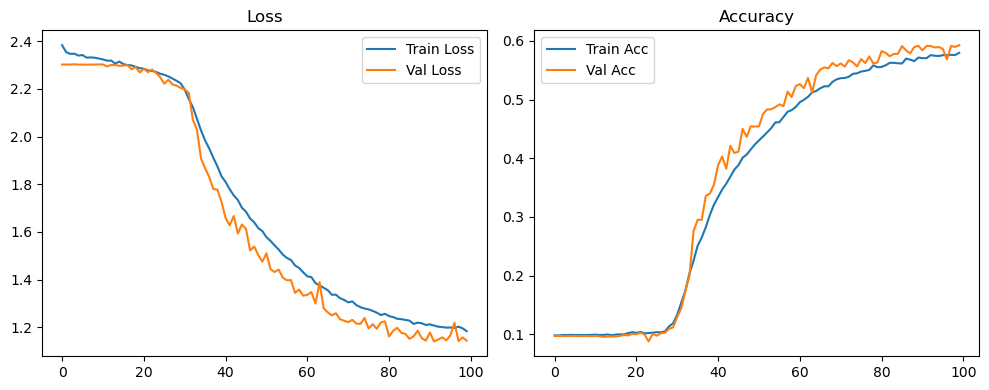

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 1.1463 Accuracy: 0.5901


🚀 Running: batch128_lr_max_0.0005_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0933 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0933 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0933 |:   1%|          | 1/100 [01:18<2:08:43, 78.02s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0949 |:   1%|          | 1/100 [01:34<2:08:43, 78.02s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0949 |:   1%|          | 1/100 [01:34<2:08:43, 78.02s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [01:34<1:08:28, 41.92s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0955 |:   2%|▏         | 2/100 [01:51<1:08:28, 41.92s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0955 |:   2%|▏         | 2/100 [01:51<1:08:28, 41.92s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [01:51<48:57, 30.28s/it]  

| LR: 0.000499 | Train Acc: 0.1012 | Val Acc: 0.0839 |:   3%|▎         | 3/100 [02:07<48:57, 30.28s/it]

| LR: 0.000499 | Train Acc: 0.1012 | Val Acc: 0.0839 |:   3%|▎         | 3/100 [02:07<48:57, 30.28s/it]

| LR: 0.000499 | Train Acc: 0.1012 | Val Acc: 0.0839 |:   4%|▍         | 4/100 [02:07<39:42, 24.82s/it]

| LR: 0.000498 | Train Acc: 0.1007 | Val Acc: 0.0983 |:   4%|▍         | 4/100 [02:24<39:42, 24.82s/it]

| LR: 0.000498 | Train Acc: 0.1007 | Val Acc: 0.0983 |:   4%|▍         | 4/100 [02:24<39:42, 24.82s/it]

| LR: 0.000498 | Train Acc: 0.1007 | Val Acc: 0.0983 |:   5%|▌         | 5/100 [02:24<34:34, 21.84s/it]

| LR: 0.000497 | Train Acc: 0.1008 | Val Acc: 0.0984 |:   5%|▌         | 5/100 [02:40<34:34, 21.84s/it]

| LR: 0.000497 | Train Acc: 0.1008 | Val Acc: 0.0984 |:   5%|▌         | 5/100 [02:40<34:34, 21.84s/it]

| LR: 0.000497 | Train Acc: 0.1008 | Val Acc: 0.0984 |:   6%|▌         | 6/100 [02:40<31:18, 19.98s/it]

| LR: 0.000496 | Train Acc: 0.1022 | Val Acc: 0.1012 |:   6%|▌         | 6/100 [02:56<31:18, 19.98s/it]

| LR: 0.000496 | Train Acc: 0.1022 | Val Acc: 0.1012 |:   6%|▌         | 6/100 [02:56<31:18, 19.98s/it]

| LR: 0.000496 | Train Acc: 0.1022 | Val Acc: 0.1012 |:   7%|▋         | 7/100 [02:56<29:10, 18.82s/it]

| LR: 0.000494 | Train Acc: 0.1030 | Val Acc: 0.1028 |:   7%|▋         | 7/100 [03:13<29:10, 18.82s/it]

| LR: 0.000494 | Train Acc: 0.1030 | Val Acc: 0.1028 |:   7%|▋         | 7/100 [03:13<29:10, 18.82s/it]

| LR: 0.000494 | Train Acc: 0.1030 | Val Acc: 0.1028 |:   8%|▊         | 8/100 [03:13<27:43, 18.08s/it]

| LR: 0.000492 | Train Acc: 0.1056 | Val Acc: 0.1046 |:   8%|▊         | 8/100 [03:29<27:43, 18.08s/it]

| LR: 0.000492 | Train Acc: 0.1056 | Val Acc: 0.1046 |:   8%|▊         | 8/100 [03:29<27:43, 18.08s/it]

| LR: 0.000492 | Train Acc: 0.1056 | Val Acc: 0.1046 |:   9%|▉         | 9/100 [03:29<26:40, 17.58s/it]

| LR: 0.000490 | Train Acc: 0.1073 | Val Acc: 0.1198 |:   9%|▉         | 9/100 [03:46<26:40, 17.58s/it]

| LR: 0.000490 | Train Acc: 0.1073 | Val Acc: 0.1198 |:   9%|▉         | 9/100 [03:46<26:40, 17.58s/it]

| LR: 0.000490 | Train Acc: 0.1073 | Val Acc: 0.1198 |:  10%|█         | 10/100 [03:46<25:56, 17.29s/it]

| LR: 0.000488 | Train Acc: 0.1135 | Val Acc: 0.1204 |:  10%|█         | 10/100 [04:02<25:56, 17.29s/it]

| LR: 0.000488 | Train Acc: 0.1135 | Val Acc: 0.1204 |:  10%|█         | 10/100 [04:02<25:56, 17.29s/it]

| LR: 0.000488 | Train Acc: 0.1135 | Val Acc: 0.1204 |:  11%|█         | 11/100 [04:02<25:16, 17.04s/it]

| LR: 0.000485 | Train Acc: 0.1174 | Val Acc: 0.1071 |:  11%|█         | 11/100 [04:19<25:16, 17.04s/it]

| LR: 0.000485 | Train Acc: 0.1174 | Val Acc: 0.1071 |:  11%|█         | 11/100 [04:19<25:16, 17.04s/it]

| LR: 0.000485 | Train Acc: 0.1174 | Val Acc: 0.1071 |:  12%|█▏        | 12/100 [04:19<24:45, 16.88s/it]

| LR: 0.000482 | Train Acc: 0.1284 | Val Acc: 0.1178 |:  12%|█▏        | 12/100 [04:36<24:45, 16.88s/it]

| LR: 0.000482 | Train Acc: 0.1284 | Val Acc: 0.1178 |:  12%|█▏        | 12/100 [04:36<24:45, 16.88s/it]

| LR: 0.000482 | Train Acc: 0.1284 | Val Acc: 0.1178 |:  13%|█▎        | 13/100 [04:36<24:22, 16.82s/it]

| LR: 0.000479 | Train Acc: 0.1426 | Val Acc: 0.1341 |:  13%|█▎        | 13/100 [04:52<24:22, 16.82s/it]

| LR: 0.000479 | Train Acc: 0.1426 | Val Acc: 0.1341 |:  13%|█▎        | 13/100 [04:52<24:22, 16.82s/it]

| LR: 0.000479 | Train Acc: 0.1426 | Val Acc: 0.1341 |:  14%|█▍        | 14/100 [04:52<23:57, 16.72s/it]

| LR: 0.000476 | Train Acc: 0.1680 | Val Acc: 0.1688 |:  14%|█▍        | 14/100 [05:09<23:57, 16.72s/it]

| LR: 0.000476 | Train Acc: 0.1680 | Val Acc: 0.1688 |:  14%|█▍        | 14/100 [05:09<23:57, 16.72s/it]

| LR: 0.000476 | Train Acc: 0.1680 | Val Acc: 0.1688 |:  15%|█▌        | 15/100 [05:09<23:36, 16.66s/it]

| LR: 0.000473 | Train Acc: 0.2045 | Val Acc: 0.2291 |:  15%|█▌        | 15/100 [05:25<23:36, 16.66s/it]

| LR: 0.000473 | Train Acc: 0.2045 | Val Acc: 0.2291 |:  15%|█▌        | 15/100 [05:25<23:36, 16.66s/it]

| LR: 0.000473 | Train Acc: 0.2045 | Val Acc: 0.2291 |:  16%|█▌        | 16/100 [05:25<23:12, 16.58s/it]

| LR: 0.000469 | Train Acc: 0.2524 | Val Acc: 0.2766 |:  16%|█▌        | 16/100 [05:42<23:12, 16.58s/it]

| LR: 0.000469 | Train Acc: 0.2524 | Val Acc: 0.2766 |:  16%|█▌        | 16/100 [05:42<23:12, 16.58s/it]

| LR: 0.000469 | Train Acc: 0.2524 | Val Acc: 0.2766 |:  17%|█▋        | 17/100 [05:42<22:56, 16.58s/it]

| LR: 0.000465 | Train Acc: 0.2877 | Val Acc: 0.3137 |:  17%|█▋        | 17/100 [05:58<22:56, 16.58s/it]

| LR: 0.000465 | Train Acc: 0.2877 | Val Acc: 0.3137 |:  17%|█▋        | 17/100 [05:58<22:56, 16.58s/it]

| LR: 0.000465 | Train Acc: 0.2877 | Val Acc: 0.3137 |:  18%|█▊        | 18/100 [05:58<22:37, 16.55s/it]

| LR: 0.000461 | Train Acc: 0.3199 | Val Acc: 0.3278 |:  18%|█▊        | 18/100 [06:15<22:37, 16.55s/it]

| LR: 0.000461 | Train Acc: 0.3199 | Val Acc: 0.3278 |:  18%|█▊        | 18/100 [06:15<22:37, 16.55s/it]

| LR: 0.000461 | Train Acc: 0.3199 | Val Acc: 0.3278 |:  19%|█▉        | 19/100 [06:15<22:21, 16.56s/it]

| LR: 0.000457 | Train Acc: 0.3484 | Val Acc: 0.3514 |:  19%|█▉        | 19/100 [06:31<22:21, 16.56s/it]

| LR: 0.000457 | Train Acc: 0.3484 | Val Acc: 0.3514 |:  19%|█▉        | 19/100 [06:31<22:21, 16.56s/it]

| LR: 0.000457 | Train Acc: 0.3484 | Val Acc: 0.3514 |:  20%|██        | 20/100 [06:31<22:06, 16.58s/it]

| LR: 0.000452 | Train Acc: 0.3719 | Val Acc: 0.3194 |:  20%|██        | 20/100 [06:48<22:06, 16.58s/it]

| LR: 0.000452 | Train Acc: 0.3719 | Val Acc: 0.3194 |:  20%|██        | 20/100 [06:48<22:06, 16.58s/it]

| LR: 0.000452 | Train Acc: 0.3719 | Val Acc: 0.3194 |:  21%|██        | 21/100 [06:48<21:50, 16.58s/it]

| LR: 0.000448 | Train Acc: 0.4006 | Val Acc: 0.3839 |:  21%|██        | 21/100 [07:05<21:50, 16.58s/it]

| LR: 0.000448 | Train Acc: 0.4006 | Val Acc: 0.3839 |:  21%|██        | 21/100 [07:05<21:50, 16.58s/it]

| LR: 0.000448 | Train Acc: 0.4006 | Val Acc: 0.3839 |:  22%|██▏       | 22/100 [07:05<21:35, 16.61s/it]

| LR: 0.000443 | Train Acc: 0.4215 | Val Acc: 0.4106 |:  22%|██▏       | 22/100 [07:21<21:35, 16.61s/it]

| LR: 0.000443 | Train Acc: 0.4215 | Val Acc: 0.4106 |:  22%|██▏       | 22/100 [07:21<21:35, 16.61s/it]

| LR: 0.000443 | Train Acc: 0.4215 | Val Acc: 0.4106 |:  23%|██▎       | 23/100 [07:21<21:16, 16.58s/it]

| LR: 0.000438 | Train Acc: 0.4419 | Val Acc: 0.4019 |:  23%|██▎       | 23/100 [07:37<21:16, 16.58s/it]

| LR: 0.000438 | Train Acc: 0.4419 | Val Acc: 0.4019 |:  23%|██▎       | 23/100 [07:37<21:16, 16.58s/it]

| LR: 0.000438 | Train Acc: 0.4419 | Val Acc: 0.4019 |:  24%|██▍       | 24/100 [07:37<20:54, 16.50s/it]

| LR: 0.000432 | Train Acc: 0.4604 | Val Acc: 0.4455 |:  24%|██▍       | 24/100 [07:54<20:54, 16.50s/it]

| LR: 0.000432 | Train Acc: 0.4604 | Val Acc: 0.4455 |:  24%|██▍       | 24/100 [07:54<20:54, 16.50s/it]

| LR: 0.000432 | Train Acc: 0.4604 | Val Acc: 0.4455 |:  25%|██▌       | 25/100 [07:54<20:37, 16.51s/it]

| LR: 0.000427 | Train Acc: 0.4733 | Val Acc: 0.4441 |:  25%|██▌       | 25/100 [08:10<20:37, 16.51s/it]

| LR: 0.000427 | Train Acc: 0.4733 | Val Acc: 0.4441 |:  25%|██▌       | 25/100 [08:10<20:37, 16.51s/it]

| LR: 0.000427 | Train Acc: 0.4733 | Val Acc: 0.4441 |:  26%|██▌       | 26/100 [08:10<20:15, 16.43s/it]

| LR: 0.000421 | Train Acc: 0.4871 | Val Acc: 0.4574 |:  26%|██▌       | 26/100 [08:26<20:15, 16.43s/it]

| LR: 0.000421 | Train Acc: 0.4871 | Val Acc: 0.4574 |:  26%|██▌       | 26/100 [08:26<20:15, 16.43s/it]

| LR: 0.000421 | Train Acc: 0.4871 | Val Acc: 0.4574 |:  27%|██▋       | 27/100 [08:26<19:55, 16.38s/it]

| LR: 0.000415 | Train Acc: 0.5011 | Val Acc: 0.4987 |:  27%|██▋       | 27/100 [08:43<19:55, 16.38s/it]

| LR: 0.000415 | Train Acc: 0.5011 | Val Acc: 0.4987 |:  27%|██▋       | 27/100 [08:43<19:55, 16.38s/it]

| LR: 0.000415 | Train Acc: 0.5011 | Val Acc: 0.4987 |:  28%|██▊       | 28/100 [08:43<19:37, 16.36s/it]

| LR: 0.000410 | Train Acc: 0.5165 | Val Acc: 0.4945 |:  28%|██▊       | 28/100 [08:59<19:37, 16.36s/it]

| LR: 0.000410 | Train Acc: 0.5165 | Val Acc: 0.4945 |:  28%|██▊       | 28/100 [08:59<19:37, 16.36s/it]

| LR: 0.000410 | Train Acc: 0.5165 | Val Acc: 0.4945 |:  29%|██▉       | 29/100 [08:59<19:21, 16.36s/it]

| LR: 0.000403 | Train Acc: 0.5195 | Val Acc: 0.4840 |:  29%|██▉       | 29/100 [09:16<19:21, 16.36s/it]

| LR: 0.000403 | Train Acc: 0.5195 | Val Acc: 0.4840 |:  29%|██▉       | 29/100 [09:16<19:21, 16.36s/it]

| LR: 0.000403 | Train Acc: 0.5195 | Val Acc: 0.4840 |:  30%|███       | 30/100 [09:16<19:08, 16.40s/it]

| LR: 0.000397 | Train Acc: 0.5315 | Val Acc: 0.5110 |:  30%|███       | 30/100 [09:32<19:08, 16.40s/it]

| LR: 0.000397 | Train Acc: 0.5315 | Val Acc: 0.5110 |:  30%|███       | 30/100 [09:32<19:08, 16.40s/it]

| LR: 0.000397 | Train Acc: 0.5315 | Val Acc: 0.5110 |:  31%|███       | 31/100 [09:32<18:55, 16.46s/it]

| LR: 0.000391 | Train Acc: 0.5412 | Val Acc: 0.5121 |:  31%|███       | 31/100 [09:49<18:55, 16.46s/it]

| LR: 0.000391 | Train Acc: 0.5412 | Val Acc: 0.5121 |:  31%|███       | 31/100 [09:49<18:55, 16.46s/it]

| LR: 0.000391 | Train Acc: 0.5412 | Val Acc: 0.5121 |:  32%|███▏      | 32/100 [09:49<18:40, 16.48s/it]

| LR: 0.000384 | Train Acc: 0.5527 | Val Acc: 0.5363 |:  32%|███▏      | 32/100 [10:05<18:40, 16.48s/it]

| LR: 0.000384 | Train Acc: 0.5527 | Val Acc: 0.5363 |:  32%|███▏      | 32/100 [10:05<18:40, 16.48s/it]

| LR: 0.000384 | Train Acc: 0.5527 | Val Acc: 0.5363 |:  33%|███▎      | 33/100 [10:05<18:19, 16.41s/it]

| LR: 0.000378 | Train Acc: 0.5590 | Val Acc: 0.5346 |:  33%|███▎      | 33/100 [10:22<18:19, 16.41s/it]

| LR: 0.000378 | Train Acc: 0.5590 | Val Acc: 0.5346 |:  33%|███▎      | 33/100 [10:22<18:19, 16.41s/it]

| LR: 0.000378 | Train Acc: 0.5590 | Val Acc: 0.5346 |:  34%|███▍      | 34/100 [10:22<18:05, 16.45s/it]

| LR: 0.000371 | Train Acc: 0.5674 | Val Acc: 0.5363 |:  34%|███▍      | 34/100 [10:38<18:05, 16.45s/it]

| LR: 0.000371 | Train Acc: 0.5674 | Val Acc: 0.5363 |:  34%|███▍      | 34/100 [10:38<18:05, 16.45s/it]

| LR: 0.000371 | Train Acc: 0.5674 | Val Acc: 0.5363 |:  35%|███▌      | 35/100 [10:38<17:49, 16.46s/it]

| LR: 0.000364 | Train Acc: 0.5768 | Val Acc: 0.5445 |:  35%|███▌      | 35/100 [10:55<17:49, 16.46s/it]

| LR: 0.000364 | Train Acc: 0.5768 | Val Acc: 0.5445 |:  35%|███▌      | 35/100 [10:55<17:49, 16.46s/it]

| LR: 0.000364 | Train Acc: 0.5768 | Val Acc: 0.5445 |:  36%|███▌      | 36/100 [10:55<17:34, 16.48s/it]

| LR: 0.000357 | Train Acc: 0.5824 | Val Acc: 0.5422 |:  36%|███▌      | 36/100 [11:11<17:34, 16.48s/it]

| LR: 0.000357 | Train Acc: 0.5824 | Val Acc: 0.5422 |:  36%|███▌      | 36/100 [11:11<17:34, 16.48s/it]

| LR: 0.000357 | Train Acc: 0.5824 | Val Acc: 0.5422 |:  37%|███▋      | 37/100 [11:11<17:18, 16.48s/it]

| LR: 0.000350 | Train Acc: 0.5875 | Val Acc: 0.5468 |:  37%|███▋      | 37/100 [11:27<17:18, 16.48s/it]

| LR: 0.000350 | Train Acc: 0.5875 | Val Acc: 0.5468 |:  37%|███▋      | 37/100 [11:27<17:18, 16.48s/it]

| LR: 0.000350 | Train Acc: 0.5875 | Val Acc: 0.5468 |:  38%|███▊      | 38/100 [11:28<17:02, 16.49s/it]

| LR: 0.000342 | Train Acc: 0.5910 | Val Acc: 0.5459 |:  38%|███▊      | 38/100 [11:44<17:02, 16.49s/it]

| LR: 0.000342 | Train Acc: 0.5910 | Val Acc: 0.5459 |:  38%|███▊      | 38/100 [11:44<17:02, 16.49s/it]

| LR: 0.000342 | Train Acc: 0.5910 | Val Acc: 0.5459 |:  39%|███▉      | 39/100 [11:44<16:47, 16.52s/it]

| LR: 0.000335 | Train Acc: 0.5967 | Val Acc: 0.5018 |:  39%|███▉      | 39/100 [12:00<16:47, 16.52s/it]

| LR: 0.000335 | Train Acc: 0.5967 | Val Acc: 0.5018 |:  39%|███▉      | 39/100 [12:00<16:47, 16.52s/it]

| LR: 0.000335 | Train Acc: 0.5967 | Val Acc: 0.5018 |:  40%|████      | 40/100 [12:01<16:28, 16.48s/it]

| LR: 0.000328 | Train Acc: 0.6011 | Val Acc: 0.5794 |:  40%|████      | 40/100 [12:17<16:28, 16.48s/it]

| LR: 0.000328 | Train Acc: 0.6011 | Val Acc: 0.5794 |:  40%|████      | 40/100 [12:17<16:28, 16.48s/it]

| LR: 0.000328 | Train Acc: 0.6011 | Val Acc: 0.5794 |:  41%|████      | 41/100 [12:17<16:13, 16.49s/it]

| LR: 0.000320 | Train Acc: 0.6062 | Val Acc: 0.5745 |:  41%|████      | 41/100 [12:34<16:13, 16.49s/it]

| LR: 0.000320 | Train Acc: 0.6062 | Val Acc: 0.5745 |:  41%|████      | 41/100 [12:34<16:13, 16.49s/it]

| LR: 0.000320 | Train Acc: 0.6062 | Val Acc: 0.5745 |:  42%|████▏     | 42/100 [12:34<15:57, 16.52s/it]

| LR: 0.000313 | Train Acc: 0.6106 | Val Acc: 0.5352 |:  42%|████▏     | 42/100 [12:50<15:57, 16.52s/it]

| LR: 0.000313 | Train Acc: 0.6106 | Val Acc: 0.5352 |:  42%|████▏     | 42/100 [12:50<15:57, 16.52s/it]

| LR: 0.000313 | Train Acc: 0.6106 | Val Acc: 0.5352 |:  43%|████▎     | 43/100 [12:50<15:39, 16.49s/it]

| LR: 0.000305 | Train Acc: 0.6228 | Val Acc: 0.5746 |:  43%|████▎     | 43/100 [13:07<15:39, 16.49s/it]

| LR: 0.000305 | Train Acc: 0.6228 | Val Acc: 0.5746 |:  43%|████▎     | 43/100 [13:07<15:39, 16.49s/it]

| LR: 0.000305 | Train Acc: 0.6228 | Val Acc: 0.5746 |:  44%|████▍     | 44/100 [13:07<15:24, 16.51s/it]

| LR: 0.000297 | Train Acc: 0.6240 | Val Acc: 0.5730 |:  44%|████▍     | 44/100 [13:23<15:24, 16.51s/it]

| LR: 0.000297 | Train Acc: 0.6240 | Val Acc: 0.5730 |:  44%|████▍     | 44/100 [13:23<15:24, 16.51s/it]

| LR: 0.000297 | Train Acc: 0.6240 | Val Acc: 0.5730 |:  45%|████▌     | 45/100 [13:23<15:09, 16.53s/it]

| LR: 0.000290 | Train Acc: 0.6267 | Val Acc: 0.5606 |:  45%|████▌     | 45/100 [13:40<15:09, 16.53s/it]

| LR: 0.000290 | Train Acc: 0.6267 | Val Acc: 0.5606 |:  45%|████▌     | 45/100 [13:40<15:09, 16.53s/it]

| LR: 0.000290 | Train Acc: 0.6267 | Val Acc: 0.5606 |:  46%|████▌     | 46/100 [13:40<14:52, 16.53s/it]

| LR: 0.000282 | Train Acc: 0.6281 | Val Acc: 0.5943 |:  46%|████▌     | 46/100 [13:56<14:52, 16.53s/it]

| LR: 0.000282 | Train Acc: 0.6281 | Val Acc: 0.5943 |:  46%|████▌     | 46/100 [13:56<14:52, 16.53s/it]

| LR: 0.000282 | Train Acc: 0.6281 | Val Acc: 0.5943 |:  47%|████▋     | 47/100 [13:56<14:37, 16.56s/it]

| LR: 0.000274 | Train Acc: 0.6364 | Val Acc: 0.5947 |:  47%|████▋     | 47/100 [14:13<14:37, 16.56s/it]

| LR: 0.000274 | Train Acc: 0.6364 | Val Acc: 0.5947 |:  47%|████▋     | 47/100 [14:13<14:37, 16.56s/it]

| LR: 0.000274 | Train Acc: 0.6364 | Val Acc: 0.5947 |:  48%|████▊     | 48/100 [14:13<14:20, 16.54s/it]

| LR: 0.000266 | Train Acc: 0.6409 | Val Acc: 0.5851 |:  48%|████▊     | 48/100 [14:29<14:20, 16.54s/it]

| LR: 0.000266 | Train Acc: 0.6409 | Val Acc: 0.5851 |:  48%|████▊     | 48/100 [14:29<14:20, 16.54s/it]

| LR: 0.000266 | Train Acc: 0.6409 | Val Acc: 0.5851 |:  49%|████▉     | 49/100 [14:29<14:01, 16.50s/it]

| LR: 0.000258 | Train Acc: 0.6400 | Val Acc: 0.5807 |:  49%|████▉     | 49/100 [14:46<14:01, 16.50s/it]

| LR: 0.000258 | Train Acc: 0.6400 | Val Acc: 0.5807 |:  49%|████▉     | 49/100 [14:46<14:01, 16.50s/it]

| LR: 0.000258 | Train Acc: 0.6400 | Val Acc: 0.5807 |:  50%|█████     | 50/100 [14:46<13:43, 16.47s/it]

| LR: 0.000251 | Train Acc: 0.6471 | Val Acc: 0.5889 |:  50%|█████     | 50/100 [15:02<13:43, 16.47s/it]

| LR: 0.000251 | Train Acc: 0.6471 | Val Acc: 0.5889 |:  50%|█████     | 50/100 [15:02<13:43, 16.47s/it]

| LR: 0.000251 | Train Acc: 0.6471 | Val Acc: 0.5889 |:  51%|█████     | 51/100 [15:02<13:26, 16.45s/it]

| LR: 0.000243 | Train Acc: 0.6536 | Val Acc: 0.4944 |:  51%|█████     | 51/100 [15:18<13:26, 16.45s/it]

| LR: 0.000243 | Train Acc: 0.6536 | Val Acc: 0.4944 |:  51%|█████     | 51/100 [15:18<13:26, 16.45s/it]

| LR: 0.000243 | Train Acc: 0.6536 | Val Acc: 0.4944 |:  52%|█████▏    | 52/100 [15:19<13:10, 16.46s/it]

| LR: 0.000235 | Train Acc: 0.6518 | Val Acc: 0.6025 |:  52%|█████▏    | 52/100 [15:35<13:10, 16.46s/it]

| LR: 0.000235 | Train Acc: 0.6518 | Val Acc: 0.6025 |:  52%|█████▏    | 52/100 [15:35<13:10, 16.46s/it]

| LR: 0.000235 | Train Acc: 0.6518 | Val Acc: 0.6025 |:  53%|█████▎    | 53/100 [15:35<12:52, 16.44s/it]

| LR: 0.000227 | Train Acc: 0.6553 | Val Acc: 0.5931 |:  53%|█████▎    | 53/100 [15:51<12:52, 16.44s/it]

| LR: 0.000227 | Train Acc: 0.6553 | Val Acc: 0.5931 |:  53%|█████▎    | 53/100 [15:51<12:52, 16.44s/it]

| LR: 0.000227 | Train Acc: 0.6553 | Val Acc: 0.5931 |:  54%|█████▍    | 54/100 [15:51<12:36, 16.45s/it]

| LR: 0.000219 | Train Acc: 0.6594 | Val Acc: 0.5191 |:  54%|█████▍    | 54/100 [16:08<12:36, 16.45s/it]

| LR: 0.000219 | Train Acc: 0.6594 | Val Acc: 0.5191 |:  54%|█████▍    | 54/100 [16:08<12:36, 16.45s/it]

| LR: 0.000219 | Train Acc: 0.6594 | Val Acc: 0.5191 |:  55%|█████▌    | 55/100 [16:08<12:21, 16.48s/it]

| LR: 0.000211 | Train Acc: 0.6604 | Val Acc: 0.6043 |:  55%|█████▌    | 55/100 [16:24<12:21, 16.48s/it]

| LR: 0.000211 | Train Acc: 0.6604 | Val Acc: 0.6043 |:  55%|█████▌    | 55/100 [16:24<12:21, 16.48s/it]

| LR: 0.000211 | Train Acc: 0.6604 | Val Acc: 0.6043 |:  56%|█████▌    | 56/100 [16:24<12:05, 16.48s/it]

| LR: 0.000204 | Train Acc: 0.6632 | Val Acc: 0.5687 |:  56%|█████▌    | 56/100 [16:41<12:05, 16.48s/it]

| LR: 0.000204 | Train Acc: 0.6632 | Val Acc: 0.5687 |:  56%|█████▌    | 56/100 [16:41<12:05, 16.48s/it]

| LR: 0.000204 | Train Acc: 0.6632 | Val Acc: 0.5687 |:  57%|█████▋    | 57/100 [16:41<11:48, 16.48s/it]

| LR: 0.000196 | Train Acc: 0.6674 | Val Acc: 0.5675 |:  57%|█████▋    | 57/100 [16:57<11:48, 16.48s/it]

| LR: 0.000196 | Train Acc: 0.6674 | Val Acc: 0.5675 |:  57%|█████▋    | 57/100 [16:57<11:48, 16.48s/it]

| LR: 0.000196 | Train Acc: 0.6674 | Val Acc: 0.5675 |:  58%|█████▊    | 58/100 [16:57<11:30, 16.44s/it]

| LR: 0.000188 | Train Acc: 0.6707 | Val Acc: 0.5730 |:  58%|█████▊    | 58/100 [17:14<11:30, 16.44s/it]

| LR: 0.000188 | Train Acc: 0.6707 | Val Acc: 0.5730 |:  58%|█████▊    | 58/100 [17:14<11:30, 16.44s/it]

| LR: 0.000188 | Train Acc: 0.6707 | Val Acc: 0.5730 |:  59%|█████▉    | 59/100 [17:14<11:14, 16.46s/it]

| LR: 0.000181 | Train Acc: 0.6709 | Val Acc: 0.5989 |:  59%|█████▉    | 59/100 [17:30<11:14, 16.46s/it]

| LR: 0.000181 | Train Acc: 0.6709 | Val Acc: 0.5989 |:  59%|█████▉    | 59/100 [17:30<11:14, 16.46s/it]

| LR: 0.000181 | Train Acc: 0.6709 | Val Acc: 0.5989 |:  60%|██████    | 60/100 [17:30<10:58, 16.46s/it]

| LR: 0.000173 | Train Acc: 0.6746 | Val Acc: 0.5752 |:  60%|██████    | 60/100 [17:47<10:58, 16.46s/it]

| LR: 0.000173 | Train Acc: 0.6746 | Val Acc: 0.5752 |:  60%|██████    | 60/100 [17:47<10:58, 16.46s/it]

| LR: 0.000173 | Train Acc: 0.6746 | Val Acc: 0.5752 |:  61%|██████    | 61/100 [17:47<10:43, 16.50s/it]

| LR: 0.000166 | Train Acc: 0.6773 | Val Acc: 0.5596 |:  61%|██████    | 61/100 [18:03<10:43, 16.50s/it]

| LR: 0.000166 | Train Acc: 0.6773 | Val Acc: 0.5596 |:  61%|██████    | 61/100 [18:03<10:43, 16.50s/it]

| LR: 0.000166 | Train Acc: 0.6773 | Val Acc: 0.5596 |:  62%|██████▏   | 62/100 [18:03<10:26, 16.48s/it]

| LR: 0.000159 | Train Acc: 0.6805 | Val Acc: 0.5885 |:  62%|██████▏   | 62/100 [18:20<10:26, 16.48s/it]

| LR: 0.000159 | Train Acc: 0.6805 | Val Acc: 0.5885 |:  62%|██████▏   | 62/100 [18:20<10:26, 16.48s/it]

| LR: 0.000159 | Train Acc: 0.6805 | Val Acc: 0.5885 |:  63%|██████▎   | 63/100 [18:20<10:07, 16.42s/it]

| LR: 0.000151 | Train Acc: 0.6813 | Val Acc: 0.6041 |:  63%|██████▎   | 63/100 [18:36<10:07, 16.42s/it]

| LR: 0.000151 | Train Acc: 0.6813 | Val Acc: 0.6041 |:  63%|██████▎   | 63/100 [18:36<10:07, 16.42s/it]

| LR: 0.000151 | Train Acc: 0.6813 | Val Acc: 0.6041 |:  64%|██████▍   | 64/100 [18:36<09:54, 16.51s/it]

| LR: 0.000144 | Train Acc: 0.6803 | Val Acc: 0.5813 |:  64%|██████▍   | 64/100 [18:53<09:54, 16.51s/it]

| LR: 0.000144 | Train Acc: 0.6803 | Val Acc: 0.5813 |:  64%|██████▍   | 64/100 [18:53<09:54, 16.51s/it]

| LR: 0.000144 | Train Acc: 0.6803 | Val Acc: 0.5813 |:  65%|██████▌   | 65/100 [18:53<09:38, 16.51s/it]

| LR: 0.000137 | Train Acc: 0.6842 | Val Acc: 0.5949 |:  65%|██████▌   | 65/100 [19:09<09:38, 16.51s/it]

| LR: 0.000137 | Train Acc: 0.6842 | Val Acc: 0.5949 |:  65%|██████▌   | 65/100 [19:09<09:38, 16.51s/it]

| LR: 0.000137 | Train Acc: 0.6842 | Val Acc: 0.5949 |:  66%|██████▌   | 66/100 [19:09<09:21, 16.51s/it]

| LR: 0.000130 | Train Acc: 0.6827 | Val Acc: 0.6038 |:  66%|██████▌   | 66/100 [19:26<09:21, 16.51s/it]

| LR: 0.000130 | Train Acc: 0.6827 | Val Acc: 0.6038 |:  66%|██████▌   | 66/100 [19:26<09:21, 16.51s/it]

| LR: 0.000130 | Train Acc: 0.6827 | Val Acc: 0.6038 |:  67%|██████▋   | 67/100 [19:26<09:03, 16.46s/it]

| LR: 0.000123 | Train Acc: 0.6859 | Val Acc: 0.5944 |:  67%|██████▋   | 67/100 [19:42<09:03, 16.46s/it]

| LR: 0.000123 | Train Acc: 0.6859 | Val Acc: 0.5944 |:  67%|██████▋   | 67/100 [19:42<09:03, 16.46s/it]

| LR: 0.000123 | Train Acc: 0.6859 | Val Acc: 0.5944 |:  68%|██████▊   | 68/100 [19:42<08:46, 16.44s/it]

| LR: 0.000117 | Train Acc: 0.6917 | Val Acc: 0.5707 |:  68%|██████▊   | 68/100 [19:58<08:46, 16.44s/it]

| LR: 0.000117 | Train Acc: 0.6917 | Val Acc: 0.5707 |:  68%|██████▊   | 68/100 [19:58<08:46, 16.44s/it]

| LR: 0.000117 | Train Acc: 0.6917 | Val Acc: 0.5707 |:  69%|██████▉   | 69/100 [19:59<08:30, 16.46s/it]

| LR: 0.000110 | Train Acc: 0.6912 | Val Acc: 0.5868 |:  69%|██████▉   | 69/100 [20:15<08:30, 16.46s/it]

| LR: 0.000110 | Train Acc: 0.6912 | Val Acc: 0.5868 |:  69%|██████▉   | 69/100 [20:15<08:30, 16.46s/it]

| LR: 0.000110 | Train Acc: 0.6912 | Val Acc: 0.5868 |:  70%|███████   | 70/100 [20:15<08:14, 16.48s/it]

| LR: 0.000104 | Train Acc: 0.6864 | Val Acc: 0.5929 |:  70%|███████   | 70/100 [20:31<08:14, 16.48s/it]

| LR: 0.000104 | Train Acc: 0.6864 | Val Acc: 0.5929 |:  70%|███████   | 70/100 [20:31<08:14, 16.48s/it]

| LR: 0.000104 | Train Acc: 0.6864 | Val Acc: 0.5929 |:  71%|███████   | 71/100 [20:31<07:56, 16.42s/it]

| LR: 0.000098 | Train Acc: 0.6935 | Val Acc: 0.5894 |:  71%|███████   | 71/100 [20:48<07:56, 16.42s/it]

| LR: 0.000098 | Train Acc: 0.6935 | Val Acc: 0.5894 |:  71%|███████   | 71/100 [20:48<07:56, 16.42s/it]

| LR: 0.000098 | Train Acc: 0.6935 | Val Acc: 0.5894 |:  72%|███████▏  | 72/100 [20:48<07:39, 16.42s/it]

| LR: 0.000091 | Train Acc: 0.6964 | Val Acc: 0.5672 |:  72%|███████▏  | 72/100 [21:04<07:39, 16.42s/it]

| LR: 0.000091 | Train Acc: 0.6964 | Val Acc: 0.5672 |:  72%|███████▏  | 72/100 [21:04<07:39, 16.42s/it]

| LR: 0.000091 | Train Acc: 0.6964 | Val Acc: 0.5672 |:  73%|███████▎  | 73/100 [21:04<07:23, 16.42s/it]

| LR: 0.000086 | Train Acc: 0.7003 | Val Acc: 0.5572 |:  73%|███████▎  | 73/100 [21:21<07:23, 16.42s/it]

| LR: 0.000086 | Train Acc: 0.7003 | Val Acc: 0.5572 |:  73%|███████▎  | 73/100 [21:21<07:23, 16.42s/it]

| LR: 0.000086 | Train Acc: 0.7003 | Val Acc: 0.5572 |:  74%|███████▍  | 74/100 [21:21<07:07, 16.44s/it]

| LR: 0.000080 | Train Acc: 0.6970 | Val Acc: 0.5938 |:  74%|███████▍  | 74/100 [21:37<07:07, 16.44s/it]

| LR: 0.000080 | Train Acc: 0.6970 | Val Acc: 0.5938 |:  74%|███████▍  | 74/100 [21:37<07:07, 16.44s/it]

| LR: 0.000080 | Train Acc: 0.6970 | Val Acc: 0.5938 |:  75%|███████▌  | 75/100 [21:37<06:51, 16.46s/it]

| LR: 0.000074 | Train Acc: 0.7005 | Val Acc: 0.6075 |:  75%|███████▌  | 75/100 [21:54<06:51, 16.46s/it]

| LR: 0.000074 | Train Acc: 0.7005 | Val Acc: 0.6075 |:  75%|███████▌  | 75/100 [21:54<06:51, 16.46s/it]

| LR: 0.000074 | Train Acc: 0.7005 | Val Acc: 0.6075 |:  76%|███████▌  | 76/100 [21:54<06:34, 16.45s/it]

| LR: 0.000069 | Train Acc: 0.7002 | Val Acc: 0.6171 |:  76%|███████▌  | 76/100 [22:10<06:34, 16.45s/it]

| LR: 0.000069 | Train Acc: 0.7002 | Val Acc: 0.6171 |:  76%|███████▌  | 76/100 [22:10<06:34, 16.45s/it]

| LR: 0.000069 | Train Acc: 0.7002 | Val Acc: 0.6171 |:  77%|███████▋  | 77/100 [22:10<06:18, 16.44s/it]

| LR: 0.000063 | Train Acc: 0.7010 | Val Acc: 0.6236 |:  77%|███████▋  | 77/100 [22:26<06:18, 16.44s/it]

| LR: 0.000063 | Train Acc: 0.7010 | Val Acc: 0.6236 |:  77%|███████▋  | 77/100 [22:26<06:18, 16.44s/it]

| LR: 0.000063 | Train Acc: 0.7010 | Val Acc: 0.6236 |:  78%|███████▊  | 78/100 [22:26<06:01, 16.43s/it]

| LR: 0.000058 | Train Acc: 0.7064 | Val Acc: 0.5658 |:  78%|███████▊  | 78/100 [22:43<06:01, 16.43s/it]

| LR: 0.000058 | Train Acc: 0.7064 | Val Acc: 0.5658 |:  78%|███████▊  | 78/100 [22:43<06:01, 16.43s/it]

| LR: 0.000058 | Train Acc: 0.7064 | Val Acc: 0.5658 |:  79%|███████▉  | 79/100 [22:43<05:45, 16.43s/it]

| LR: 0.000053 | Train Acc: 0.7060 | Val Acc: 0.5511 |:  79%|███████▉  | 79/100 [22:59<05:45, 16.43s/it]

| LR: 0.000053 | Train Acc: 0.7060 | Val Acc: 0.5511 |:  79%|███████▉  | 79/100 [22:59<05:45, 16.43s/it]

| LR: 0.000053 | Train Acc: 0.7060 | Val Acc: 0.5511 |:  80%|████████  | 80/100 [22:59<05:28, 16.42s/it]

| LR: 0.000049 | Train Acc: 0.7064 | Val Acc: 0.6269 |:  80%|████████  | 80/100 [23:16<05:28, 16.42s/it]

| LR: 0.000049 | Train Acc: 0.7064 | Val Acc: 0.6269 |:  80%|████████  | 80/100 [23:16<05:28, 16.42s/it]

| LR: 0.000049 | Train Acc: 0.7064 | Val Acc: 0.6269 |:  81%|████████  | 81/100 [23:16<05:12, 16.47s/it]

| LR: 0.000044 | Train Acc: 0.7080 | Val Acc: 0.6191 |:  81%|████████  | 81/100 [23:33<05:12, 16.47s/it]

| LR: 0.000044 | Train Acc: 0.7080 | Val Acc: 0.6191 |:  81%|████████  | 81/100 [23:33<05:12, 16.47s/it]

| LR: 0.000044 | Train Acc: 0.7080 | Val Acc: 0.6191 |:  82%|████████▏ | 82/100 [23:33<04:57, 16.54s/it]

| LR: 0.000040 | Train Acc: 0.7089 | Val Acc: 0.6088 |:  82%|████████▏ | 82/100 [23:49<04:57, 16.54s/it]

| LR: 0.000040 | Train Acc: 0.7089 | Val Acc: 0.6088 |:  82%|████████▏ | 82/100 [23:49<04:57, 16.54s/it]

| LR: 0.000040 | Train Acc: 0.7089 | Val Acc: 0.6088 |:  83%|████████▎ | 83/100 [23:49<04:41, 16.53s/it]

| LR: 0.000036 | Train Acc: 0.7056 | Val Acc: 0.6105 |:  83%|████████▎ | 83/100 [24:06<04:41, 16.53s/it]

| LR: 0.000036 | Train Acc: 0.7056 | Val Acc: 0.6105 |:  83%|████████▎ | 83/100 [24:06<04:41, 16.53s/it]

| LR: 0.000036 | Train Acc: 0.7056 | Val Acc: 0.6105 |:  84%|████████▍ | 84/100 [24:06<04:24, 16.52s/it]

| LR: 0.000032 | Train Acc: 0.7059 | Val Acc: 0.5965 |:  84%|████████▍ | 84/100 [24:22<04:24, 16.52s/it]

| LR: 0.000032 | Train Acc: 0.7059 | Val Acc: 0.5965 |:  84%|████████▍ | 84/100 [24:22<04:24, 16.52s/it]

| LR: 0.000032 | Train Acc: 0.7059 | Val Acc: 0.5965 |:  85%|████████▌ | 85/100 [24:22<04:07, 16.50s/it]

| LR: 0.000028 | Train Acc: 0.7126 | Val Acc: 0.5899 |:  85%|████████▌ | 85/100 [24:38<04:07, 16.50s/it]

| LR: 0.000028 | Train Acc: 0.7126 | Val Acc: 0.5899 |:  85%|████████▌ | 85/100 [24:38<04:07, 16.50s/it]

| LR: 0.000028 | Train Acc: 0.7126 | Val Acc: 0.5899 |:  86%|████████▌ | 86/100 [24:39<03:51, 16.50s/it]

| LR: 0.000025 | Train Acc: 0.7103 | Val Acc: 0.6054 |:  86%|████████▌ | 86/100 [24:55<03:51, 16.50s/it]

| LR: 0.000025 | Train Acc: 0.7103 | Val Acc: 0.6054 |:  86%|████████▌ | 86/100 [24:55<03:51, 16.50s/it]

| LR: 0.000025 | Train Acc: 0.7103 | Val Acc: 0.6054 |:  87%|████████▋ | 87/100 [24:55<03:33, 16.43s/it]

| LR: 0.000022 | Train Acc: 0.7097 | Val Acc: 0.6111 |:  87%|████████▋ | 87/100 [25:11<03:33, 16.43s/it]

| LR: 0.000022 | Train Acc: 0.7097 | Val Acc: 0.6111 |:  87%|████████▋ | 87/100 [25:11<03:33, 16.43s/it]

| LR: 0.000022 | Train Acc: 0.7097 | Val Acc: 0.6111 |:  88%|████████▊ | 88/100 [25:11<03:17, 16.42s/it]

| LR: 0.000019 | Train Acc: 0.7158 | Val Acc: 0.5863 |:  88%|████████▊ | 88/100 [25:28<03:17, 16.42s/it]

| LR: 0.000019 | Train Acc: 0.7158 | Val Acc: 0.5863 |:  88%|████████▊ | 88/100 [25:28<03:17, 16.42s/it]

| LR: 0.000019 | Train Acc: 0.7158 | Val Acc: 0.5863 |:  89%|████████▉ | 89/100 [25:28<03:00, 16.41s/it]

| LR: 0.000016 | Train Acc: 0.7147 | Val Acc: 0.6034 |:  89%|████████▉ | 89/100 [25:44<03:00, 16.41s/it]

| LR: 0.000016 | Train Acc: 0.7147 | Val Acc: 0.6034 |:  89%|████████▉ | 89/100 [25:44<03:00, 16.41s/it]

| LR: 0.000016 | Train Acc: 0.7147 | Val Acc: 0.6034 |:  90%|█████████ | 90/100 [25:44<02:44, 16.41s/it]

| LR: 0.000013 | Train Acc: 0.7150 | Val Acc: 0.5341 |:  90%|█████████ | 90/100 [26:00<02:44, 16.41s/it]

| LR: 0.000013 | Train Acc: 0.7150 | Val Acc: 0.5341 |:  90%|█████████ | 90/100 [26:00<02:44, 16.41s/it]

| LR: 0.000013 | Train Acc: 0.7150 | Val Acc: 0.5341 |:  91%|█████████ | 91/100 [26:00<02:27, 16.41s/it]

| LR: 0.000011 | Train Acc: 0.7164 | Val Acc: 0.5854 |:  91%|█████████ | 91/100 [26:17<02:27, 16.41s/it]

| LR: 0.000011 | Train Acc: 0.7164 | Val Acc: 0.5854 |:  91%|█████████ | 91/100 [26:17<02:27, 16.41s/it]

| LR: 0.000011 | Train Acc: 0.7164 | Val Acc: 0.5854 |:  92%|█████████▏| 92/100 [26:17<02:11, 16.38s/it]

| LR: 0.000009 | Train Acc: 0.7181 | Val Acc: 0.6188 |:  92%|█████████▏| 92/100 [26:33<02:11, 16.38s/it]

| LR: 0.000009 | Train Acc: 0.7181 | Val Acc: 0.6188 |:  92%|█████████▏| 92/100 [26:33<02:11, 16.38s/it]

| LR: 0.000009 | Train Acc: 0.7181 | Val Acc: 0.6188 |:  93%|█████████▎| 93/100 [26:33<01:54, 16.36s/it]

| LR: 0.000007 | Train Acc: 0.7209 | Val Acc: 0.6164 |:  93%|█████████▎| 93/100 [26:49<01:54, 16.36s/it]

| LR: 0.000007 | Train Acc: 0.7209 | Val Acc: 0.6164 |:  93%|█████████▎| 93/100 [26:49<01:54, 16.36s/it]

| LR: 0.000007 | Train Acc: 0.7209 | Val Acc: 0.6164 |:  94%|█████████▍| 94/100 [26:49<01:38, 16.37s/it]

| LR: 0.000005 | Train Acc: 0.7210 | Val Acc: 0.6163 |:  94%|█████████▍| 94/100 [27:06<01:38, 16.37s/it]

| LR: 0.000005 | Train Acc: 0.7210 | Val Acc: 0.6163 |:  94%|█████████▍| 94/100 [27:06<01:38, 16.37s/it]

| LR: 0.000005 | Train Acc: 0.7210 | Val Acc: 0.6163 |:  95%|█████████▌| 95/100 [27:06<01:21, 16.31s/it]

| LR: 0.000004 | Train Acc: 0.7232 | Val Acc: 0.6077 |:  95%|█████████▌| 95/100 [27:22<01:21, 16.31s/it]

| LR: 0.000004 | Train Acc: 0.7232 | Val Acc: 0.6077 |:  95%|█████████▌| 95/100 [27:22<01:21, 16.31s/it]

| LR: 0.000004 | Train Acc: 0.7232 | Val Acc: 0.6077 |:  96%|█████████▌| 96/100 [27:22<01:05, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.7228 | Val Acc: 0.6123 |:  96%|█████████▌| 96/100 [27:38<01:05, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.7228 | Val Acc: 0.6123 |:  96%|█████████▌| 96/100 [27:38<01:05, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.7228 | Val Acc: 0.6123 |:  97%|█████████▋| 97/100 [27:38<00:49, 16.38s/it]

| LR: 0.000002 | Train Acc: 0.7224 | Val Acc: 0.6015 |:  97%|█████████▋| 97/100 [27:55<00:49, 16.38s/it]

| LR: 0.000002 | Train Acc: 0.7224 | Val Acc: 0.6015 |:  97%|█████████▋| 97/100 [27:55<00:49, 16.38s/it]

| LR: 0.000002 | Train Acc: 0.7224 | Val Acc: 0.6015 |:  98%|█████████▊| 98/100 [27:55<00:32, 16.41s/it]

| LR: 0.000001 | Train Acc: 0.7219 | Val Acc: 0.5696 |:  98%|█████████▊| 98/100 [28:12<00:32, 16.41s/it]

| LR: 0.000001 | Train Acc: 0.7219 | Val Acc: 0.5696 |:  98%|█████████▊| 98/100 [28:12<00:32, 16.41s/it]

| LR: 0.000001 | Train Acc: 0.7219 | Val Acc: 0.5696 |:  99%|█████████▉| 99/100 [28:12<00:16, 16.47s/it]

| LR: 0.000001 | Train Acc: 0.7265 | Val Acc: 0.5996 |:  99%|█████████▉| 99/100 [28:28<00:16, 16.47s/it]

| LR: 0.000001 | Train Acc: 0.7265 | Val Acc: 0.5996 |:  99%|█████████▉| 99/100 [28:28<00:16, 16.47s/it]

| LR: 0.000001 | Train Acc: 0.7265 | Val Acc: 0.5996 |: 100%|██████████| 100/100 [28:28<00:00, 16.48s/it]

| LR: 0.000001 | Train Acc: 0.7265 | Val Acc: 0.5996 |: 100%|██████████| 100/100 [28:28<00:00, 17.09s/it]

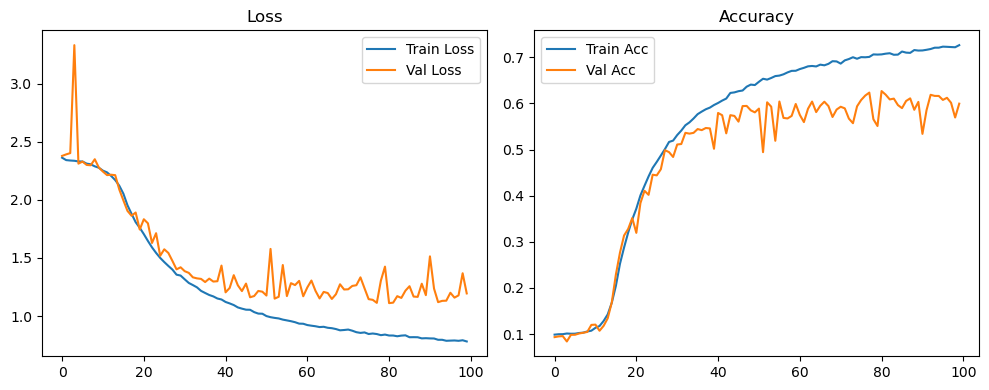

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 1.2151 Accuracy: 0.6055


🚀 Running: batch128_lr_max_0.0005_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0977 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0977 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0977 | Val Acc: 0.0961 |:   1%|          | 1/100 [01:18<2:08:46, 78.05s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0948 |:   1%|          | 1/100 [01:34<2:08:46, 78.05s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0948 |:   1%|          | 1/100 [01:34<2:08:46, 78.05s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [01:34<1:08:33, 41.97s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:51<1:08:33, 41.97s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:51<1:08:33, 41.97s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [01:51<49:14, 30.46s/it]  

| LR: 0.000499 | Train Acc: 0.0987 | Val Acc: 0.0939 |:   3%|▎         | 3/100 [02:08<49:14, 30.46s/it]

| LR: 0.000499 | Train Acc: 0.0987 | Val Acc: 0.0939 |:   3%|▎         | 3/100 [02:08<49:14, 30.46s/it]

| LR: 0.000499 | Train Acc: 0.0987 | Val Acc: 0.0939 |:   4%|▍         | 4/100 [02:08<40:03, 25.04s/it]

| LR: 0.000498 | Train Acc: 0.0999 | Val Acc: 0.0946 |:   4%|▍         | 4/100 [02:24<40:03, 25.04s/it]

| LR: 0.000498 | Train Acc: 0.0999 | Val Acc: 0.0946 |:   4%|▍         | 4/100 [02:24<40:03, 25.04s/it]

| LR: 0.000498 | Train Acc: 0.0999 | Val Acc: 0.0946 |:   5%|▌         | 5/100 [02:24<34:50, 22.00s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0918 |:   5%|▌         | 5/100 [02:41<34:50, 22.00s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0918 |:   5%|▌         | 5/100 [02:41<34:50, 22.00s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0918 |:   6%|▌         | 6/100 [02:41<31:33, 20.14s/it]

| LR: 0.000496 | Train Acc: 0.0994 | Val Acc: 0.0923 |:   6%|▌         | 6/100 [02:58<31:33, 20.14s/it]

| LR: 0.000496 | Train Acc: 0.0994 | Val Acc: 0.0923 |:   6%|▌         | 6/100 [02:58<31:33, 20.14s/it]

| LR: 0.000496 | Train Acc: 0.0994 | Val Acc: 0.0923 |:   7%|▋         | 7/100 [02:58<29:30, 19.04s/it]

| LR: 0.000494 | Train Acc: 0.0999 | Val Acc: 0.0982 |:   7%|▋         | 7/100 [03:14<29:30, 19.04s/it]

| LR: 0.000494 | Train Acc: 0.0999 | Val Acc: 0.0982 |:   7%|▋         | 7/100 [03:14<29:30, 19.04s/it]

| LR: 0.000494 | Train Acc: 0.0999 | Val Acc: 0.0982 |:   8%|▊         | 8/100 [03:15<28:06, 18.34s/it]

| LR: 0.000492 | Train Acc: 0.0992 | Val Acc: 0.0987 |:   8%|▊         | 8/100 [03:31<28:06, 18.34s/it]

| LR: 0.000492 | Train Acc: 0.0992 | Val Acc: 0.0987 |:   8%|▊         | 8/100 [03:31<28:06, 18.34s/it]

| LR: 0.000492 | Train Acc: 0.0992 | Val Acc: 0.0987 |:   9%|▉         | 9/100 [03:31<26:56, 17.76s/it]

| LR: 0.000490 | Train Acc: 0.0995 | Val Acc: 0.0991 |:   9%|▉         | 9/100 [03:48<26:56, 17.76s/it]

| LR: 0.000490 | Train Acc: 0.0995 | Val Acc: 0.0991 |:   9%|▉         | 9/100 [03:48<26:56, 17.76s/it]

| LR: 0.000490 | Train Acc: 0.0995 | Val Acc: 0.0991 |:  10%|█         | 10/100 [03:48<26:06, 17.41s/it]

| LR: 0.000488 | Train Acc: 0.1008 | Val Acc: 0.0958 |:  10%|█         | 10/100 [04:04<26:06, 17.41s/it]

| LR: 0.000488 | Train Acc: 0.1008 | Val Acc: 0.0958 |:  10%|█         | 10/100 [04:04<26:06, 17.41s/it]

| LR: 0.000488 | Train Acc: 0.1008 | Val Acc: 0.0958 |:  11%|█         | 11/100 [04:04<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  11%|█         | 11/100 [04:21<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  11%|█         | 11/100 [04:21<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [04:21<25:04, 17.10s/it]

| LR: 0.000482 | Train Acc: 0.1032 | Val Acc: 0.1015 |:  12%|█▏        | 12/100 [04:38<25:04, 17.10s/it]

| LR: 0.000482 | Train Acc: 0.1032 | Val Acc: 0.1015 |:  12%|█▏        | 12/100 [04:38<25:04, 17.10s/it]

| LR: 0.000482 | Train Acc: 0.1032 | Val Acc: 0.1015 |:  13%|█▎        | 13/100 [04:38<24:35, 16.96s/it]

| LR: 0.000479 | Train Acc: 0.1016 | Val Acc: 0.1039 |:  13%|█▎        | 13/100 [04:55<24:35, 16.96s/it]

| LR: 0.000479 | Train Acc: 0.1016 | Val Acc: 0.1039 |:  13%|█▎        | 13/100 [04:55<24:35, 16.96s/it]

| LR: 0.000479 | Train Acc: 0.1016 | Val Acc: 0.1039 |:  14%|█▍        | 14/100 [04:55<24:12, 16.89s/it]

| LR: 0.000476 | Train Acc: 0.1032 | Val Acc: 0.1273 |:  14%|█▍        | 14/100 [05:11<24:12, 16.89s/it]

| LR: 0.000476 | Train Acc: 0.1032 | Val Acc: 0.1273 |:  14%|█▍        | 14/100 [05:11<24:12, 16.89s/it]

| LR: 0.000476 | Train Acc: 0.1032 | Val Acc: 0.1273 |:  15%|█▌        | 15/100 [05:11<23:47, 16.79s/it]

| LR: 0.000473 | Train Acc: 0.1075 | Val Acc: 0.1106 |:  15%|█▌        | 15/100 [05:28<23:47, 16.79s/it]

| LR: 0.000473 | Train Acc: 0.1075 | Val Acc: 0.1106 |:  15%|█▌        | 15/100 [05:28<23:47, 16.79s/it]

| LR: 0.000473 | Train Acc: 0.1075 | Val Acc: 0.1106 |:  16%|█▌        | 16/100 [05:28<23:28, 16.77s/it]

| LR: 0.000469 | Train Acc: 0.1124 | Val Acc: 0.1224 |:  16%|█▌        | 16/100 [05:45<23:28, 16.77s/it]

| LR: 0.000469 | Train Acc: 0.1124 | Val Acc: 0.1224 |:  16%|█▌        | 16/100 [05:45<23:28, 16.77s/it]

| LR: 0.000469 | Train Acc: 0.1124 | Val Acc: 0.1224 |:  17%|█▋        | 17/100 [05:45<23:11, 16.77s/it]

| LR: 0.000465 | Train Acc: 0.1213 | Val Acc: 0.1151 |:  17%|█▋        | 17/100 [06:01<23:11, 16.77s/it]

| LR: 0.000465 | Train Acc: 0.1213 | Val Acc: 0.1151 |:  17%|█▋        | 17/100 [06:01<23:11, 16.77s/it]

| LR: 0.000465 | Train Acc: 0.1213 | Val Acc: 0.1151 |:  18%|█▊        | 18/100 [06:01<22:49, 16.71s/it]

| LR: 0.000461 | Train Acc: 0.1379 | Val Acc: 0.1495 |:  18%|█▊        | 18/100 [06:18<22:49, 16.71s/it]

| LR: 0.000461 | Train Acc: 0.1379 | Val Acc: 0.1495 |:  18%|█▊        | 18/100 [06:18<22:49, 16.71s/it]

| LR: 0.000461 | Train Acc: 0.1379 | Val Acc: 0.1495 |:  19%|█▉        | 19/100 [06:18<22:27, 16.64s/it]

| LR: 0.000457 | Train Acc: 0.1603 | Val Acc: 0.1746 |:  19%|█▉        | 19/100 [06:34<22:27, 16.64s/it]

| LR: 0.000457 | Train Acc: 0.1603 | Val Acc: 0.1746 |:  19%|█▉        | 19/100 [06:34<22:27, 16.64s/it]

| LR: 0.000457 | Train Acc: 0.1603 | Val Acc: 0.1746 |:  20%|██        | 20/100 [06:34<22:08, 16.60s/it]

| LR: 0.000452 | Train Acc: 0.1858 | Val Acc: 0.2361 |:  20%|██        | 20/100 [06:51<22:08, 16.60s/it]

| LR: 0.000452 | Train Acc: 0.1858 | Val Acc: 0.2361 |:  20%|██        | 20/100 [06:51<22:08, 16.60s/it]

| LR: 0.000452 | Train Acc: 0.1858 | Val Acc: 0.2361 |:  21%|██        | 21/100 [06:51<21:59, 16.70s/it]

| LR: 0.000448 | Train Acc: 0.2195 | Val Acc: 0.2617 |:  21%|██        | 21/100 [07:08<21:59, 16.70s/it]

| LR: 0.000448 | Train Acc: 0.2195 | Val Acc: 0.2617 |:  21%|██        | 21/100 [07:08<21:59, 16.70s/it]

| LR: 0.000448 | Train Acc: 0.2195 | Val Acc: 0.2617 |:  22%|██▏       | 22/100 [07:08<21:42, 16.70s/it]

| LR: 0.000443 | Train Acc: 0.2445 | Val Acc: 0.2652 |:  22%|██▏       | 22/100 [07:24<21:42, 16.70s/it]

| LR: 0.000443 | Train Acc: 0.2445 | Val Acc: 0.2652 |:  22%|██▏       | 22/100 [07:24<21:42, 16.70s/it]

| LR: 0.000443 | Train Acc: 0.2445 | Val Acc: 0.2652 |:  23%|██▎       | 23/100 [07:24<21:23, 16.66s/it]

| LR: 0.000438 | Train Acc: 0.2756 | Val Acc: 0.2999 |:  23%|██▎       | 23/100 [07:41<21:23, 16.66s/it]

| LR: 0.000438 | Train Acc: 0.2756 | Val Acc: 0.2999 |:  23%|██▎       | 23/100 [07:41<21:23, 16.66s/it]

| LR: 0.000438 | Train Acc: 0.2756 | Val Acc: 0.2999 |:  24%|██▍       | 24/100 [07:41<21:08, 16.69s/it]

| LR: 0.000432 | Train Acc: 0.3076 | Val Acc: 0.2667 |:  24%|██▍       | 24/100 [07:58<21:08, 16.69s/it]

| LR: 0.000432 | Train Acc: 0.3076 | Val Acc: 0.2667 |:  24%|██▍       | 24/100 [07:58<21:08, 16.69s/it]

| LR: 0.000432 | Train Acc: 0.3076 | Val Acc: 0.2667 |:  25%|██▌       | 25/100 [07:58<20:52, 16.69s/it]

| LR: 0.000427 | Train Acc: 0.3291 | Val Acc: 0.2995 |:  25%|██▌       | 25/100 [08:15<20:52, 16.69s/it]

| LR: 0.000427 | Train Acc: 0.3291 | Val Acc: 0.2995 |:  25%|██▌       | 25/100 [08:15<20:52, 16.69s/it]

| LR: 0.000427 | Train Acc: 0.3291 | Val Acc: 0.2995 |:  26%|██▌       | 26/100 [08:15<20:37, 16.72s/it]

| LR: 0.000421 | Train Acc: 0.3511 | Val Acc: 0.3471 |:  26%|██▌       | 26/100 [08:31<20:37, 16.72s/it]

| LR: 0.000421 | Train Acc: 0.3511 | Val Acc: 0.3471 |:  26%|██▌       | 26/100 [08:31<20:37, 16.72s/it]

| LR: 0.000421 | Train Acc: 0.3511 | Val Acc: 0.3471 |:  27%|██▋       | 27/100 [08:31<20:22, 16.74s/it]

| LR: 0.000415 | Train Acc: 0.3723 | Val Acc: 0.3775 |:  27%|██▋       | 27/100 [08:48<20:22, 16.74s/it]

| LR: 0.000415 | Train Acc: 0.3723 | Val Acc: 0.3775 |:  27%|██▋       | 27/100 [08:48<20:22, 16.74s/it]

| LR: 0.000415 | Train Acc: 0.3723 | Val Acc: 0.3775 |:  28%|██▊       | 28/100 [08:48<20:07, 16.77s/it]

| LR: 0.000410 | Train Acc: 0.3880 | Val Acc: 0.3928 |:  28%|██▊       | 28/100 [09:05<20:07, 16.77s/it]

| LR: 0.000410 | Train Acc: 0.3880 | Val Acc: 0.3928 |:  28%|██▊       | 28/100 [09:05<20:07, 16.77s/it]

| LR: 0.000410 | Train Acc: 0.3880 | Val Acc: 0.3928 |:  29%|██▉       | 29/100 [09:05<19:48, 16.73s/it]

| LR: 0.000403 | Train Acc: 0.4062 | Val Acc: 0.3954 |:  29%|██▉       | 29/100 [09:22<19:48, 16.73s/it]

| LR: 0.000403 | Train Acc: 0.4062 | Val Acc: 0.3954 |:  29%|██▉       | 29/100 [09:22<19:48, 16.73s/it]

| LR: 0.000403 | Train Acc: 0.4062 | Val Acc: 0.3954 |:  30%|███       | 30/100 [09:22<19:35, 16.79s/it]

| LR: 0.000397 | Train Acc: 0.4210 | Val Acc: 0.4256 |:  30%|███       | 30/100 [09:39<19:35, 16.79s/it]

| LR: 0.000397 | Train Acc: 0.4210 | Val Acc: 0.4256 |:  30%|███       | 30/100 [09:39<19:35, 16.79s/it]

| LR: 0.000397 | Train Acc: 0.4210 | Val Acc: 0.4256 |:  31%|███       | 31/100 [09:39<19:19, 16.81s/it]

| LR: 0.000391 | Train Acc: 0.4356 | Val Acc: 0.4324 |:  31%|███       | 31/100 [09:55<19:19, 16.81s/it]

| LR: 0.000391 | Train Acc: 0.4356 | Val Acc: 0.4324 |:  31%|███       | 31/100 [09:55<19:19, 16.81s/it]

| LR: 0.000391 | Train Acc: 0.4356 | Val Acc: 0.4324 |:  32%|███▏      | 32/100 [09:55<19:00, 16.77s/it]

| LR: 0.000384 | Train Acc: 0.4451 | Val Acc: 0.4533 |:  32%|███▏      | 32/100 [10:12<19:00, 16.77s/it]

| LR: 0.000384 | Train Acc: 0.4451 | Val Acc: 0.4533 |:  32%|███▏      | 32/100 [10:12<19:00, 16.77s/it]

| LR: 0.000384 | Train Acc: 0.4451 | Val Acc: 0.4533 |:  33%|███▎      | 33/100 [10:12<18:42, 16.76s/it]

| LR: 0.000378 | Train Acc: 0.4593 | Val Acc: 0.4356 |:  33%|███▎      | 33/100 [10:29<18:42, 16.76s/it]

| LR: 0.000378 | Train Acc: 0.4593 | Val Acc: 0.4356 |:  33%|███▎      | 33/100 [10:29<18:42, 16.76s/it]

| LR: 0.000378 | Train Acc: 0.4593 | Val Acc: 0.4356 |:  34%|███▍      | 34/100 [10:29<18:25, 16.75s/it]

| LR: 0.000371 | Train Acc: 0.4675 | Val Acc: 0.4230 |:  34%|███▍      | 34/100 [10:46<18:25, 16.75s/it]

| LR: 0.000371 | Train Acc: 0.4675 | Val Acc: 0.4230 |:  34%|███▍      | 34/100 [10:46<18:25, 16.75s/it]

| LR: 0.000371 | Train Acc: 0.4675 | Val Acc: 0.4230 |:  35%|███▌      | 35/100 [10:46<18:10, 16.78s/it]

| LR: 0.000364 | Train Acc: 0.4768 | Val Acc: 0.4419 |:  35%|███▌      | 35/100 [11:03<18:10, 16.78s/it]

| LR: 0.000364 | Train Acc: 0.4768 | Val Acc: 0.4419 |:  35%|███▌      | 35/100 [11:03<18:10, 16.78s/it]

| LR: 0.000364 | Train Acc: 0.4768 | Val Acc: 0.4419 |:  36%|███▌      | 36/100 [11:03<17:57, 16.84s/it]

| LR: 0.000357 | Train Acc: 0.4851 | Val Acc: 0.4244 |:  36%|███▌      | 36/100 [11:19<17:57, 16.84s/it]

| LR: 0.000357 | Train Acc: 0.4851 | Val Acc: 0.4244 |:  36%|███▌      | 36/100 [11:19<17:57, 16.84s/it]

| LR: 0.000357 | Train Acc: 0.4851 | Val Acc: 0.4244 |:  37%|███▋      | 37/100 [11:19<17:39, 16.82s/it]

| LR: 0.000350 | Train Acc: 0.5038 | Val Acc: 0.5099 |:  37%|███▋      | 37/100 [11:36<17:39, 16.82s/it]

| LR: 0.000350 | Train Acc: 0.5038 | Val Acc: 0.5099 |:  37%|███▋      | 37/100 [11:36<17:39, 16.82s/it]

| LR: 0.000350 | Train Acc: 0.5038 | Val Acc: 0.5099 |:  38%|███▊      | 38/100 [11:36<17:21, 16.79s/it]

| LR: 0.000342 | Train Acc: 0.5129 | Val Acc: 0.5058 |:  38%|███▊      | 38/100 [11:53<17:21, 16.79s/it]

| LR: 0.000342 | Train Acc: 0.5129 | Val Acc: 0.5058 |:  38%|███▊      | 38/100 [11:53<17:21, 16.79s/it]

| LR: 0.000342 | Train Acc: 0.5129 | Val Acc: 0.5058 |:  39%|███▉      | 39/100 [11:53<17:01, 16.75s/it]

| LR: 0.000335 | Train Acc: 0.5200 | Val Acc: 0.4984 |:  39%|███▉      | 39/100 [12:10<17:01, 16.75s/it]

| LR: 0.000335 | Train Acc: 0.5200 | Val Acc: 0.4984 |:  39%|███▉      | 39/100 [12:10<17:01, 16.75s/it]

| LR: 0.000335 | Train Acc: 0.5200 | Val Acc: 0.4984 |:  40%|████      | 40/100 [12:10<16:45, 16.75s/it]

| LR: 0.000328 | Train Acc: 0.5248 | Val Acc: 0.5055 |:  40%|████      | 40/100 [12:26<16:45, 16.75s/it]

| LR: 0.000328 | Train Acc: 0.5248 | Val Acc: 0.5055 |:  40%|████      | 40/100 [12:26<16:45, 16.75s/it]

| LR: 0.000328 | Train Acc: 0.5248 | Val Acc: 0.5055 |:  41%|████      | 41/100 [12:26<16:29, 16.77s/it]

| LR: 0.000320 | Train Acc: 0.5350 | Val Acc: 0.4805 |:  41%|████      | 41/100 [12:43<16:29, 16.77s/it]

| LR: 0.000320 | Train Acc: 0.5350 | Val Acc: 0.4805 |:  41%|████      | 41/100 [12:43<16:29, 16.77s/it]

| LR: 0.000320 | Train Acc: 0.5350 | Val Acc: 0.4805 |:  42%|████▏     | 42/100 [12:43<16:12, 16.78s/it]

| LR: 0.000313 | Train Acc: 0.5400 | Val Acc: 0.5344 |:  42%|████▏     | 42/100 [13:00<16:12, 16.78s/it]

| LR: 0.000313 | Train Acc: 0.5400 | Val Acc: 0.5344 |:  42%|████▏     | 42/100 [13:00<16:12, 16.78s/it]

| LR: 0.000313 | Train Acc: 0.5400 | Val Acc: 0.5344 |:  43%|████▎     | 43/100 [13:00<15:58, 16.81s/it]

| LR: 0.000305 | Train Acc: 0.5471 | Val Acc: 0.5229 |:  43%|████▎     | 43/100 [13:17<15:58, 16.81s/it]

| LR: 0.000305 | Train Acc: 0.5471 | Val Acc: 0.5229 |:  43%|████▎     | 43/100 [13:17<15:58, 16.81s/it]

| LR: 0.000305 | Train Acc: 0.5471 | Val Acc: 0.5229 |:  44%|████▍     | 44/100 [13:17<15:41, 16.82s/it]

| LR: 0.000297 | Train Acc: 0.5570 | Val Acc: 0.5253 |:  44%|████▍     | 44/100 [13:34<15:41, 16.82s/it]

| LR: 0.000297 | Train Acc: 0.5570 | Val Acc: 0.5253 |:  44%|████▍     | 44/100 [13:34<15:41, 16.82s/it]

| LR: 0.000297 | Train Acc: 0.5570 | Val Acc: 0.5253 |:  45%|████▌     | 45/100 [13:34<15:23, 16.79s/it]

| LR: 0.000290 | Train Acc: 0.5591 | Val Acc: 0.5336 |:  45%|████▌     | 45/100 [13:50<15:23, 16.79s/it]

| LR: 0.000290 | Train Acc: 0.5591 | Val Acc: 0.5336 |:  45%|████▌     | 45/100 [13:50<15:23, 16.79s/it]

| LR: 0.000290 | Train Acc: 0.5591 | Val Acc: 0.5336 |:  46%|████▌     | 46/100 [13:50<15:02, 16.71s/it]

| LR: 0.000282 | Train Acc: 0.5628 | Val Acc: 0.5218 |:  46%|████▌     | 46/100 [14:07<15:02, 16.71s/it]

| LR: 0.000282 | Train Acc: 0.5628 | Val Acc: 0.5218 |:  46%|████▌     | 46/100 [14:07<15:02, 16.71s/it]

| LR: 0.000282 | Train Acc: 0.5628 | Val Acc: 0.5218 |:  47%|████▋     | 47/100 [14:07<14:46, 16.73s/it]

| LR: 0.000274 | Train Acc: 0.5714 | Val Acc: 0.5528 |:  47%|████▋     | 47/100 [14:23<14:46, 16.73s/it]

| LR: 0.000274 | Train Acc: 0.5714 | Val Acc: 0.5528 |:  47%|████▋     | 47/100 [14:23<14:46, 16.73s/it]

| LR: 0.000274 | Train Acc: 0.5714 | Val Acc: 0.5528 |:  48%|████▊     | 48/100 [14:24<14:28, 16.69s/it]

| LR: 0.000266 | Train Acc: 0.5776 | Val Acc: 0.5406 |:  48%|████▊     | 48/100 [14:40<14:28, 16.69s/it]

| LR: 0.000266 | Train Acc: 0.5776 | Val Acc: 0.5406 |:  48%|████▊     | 48/100 [14:40<14:28, 16.69s/it]

| LR: 0.000266 | Train Acc: 0.5776 | Val Acc: 0.5406 |:  49%|████▉     | 49/100 [14:40<14:12, 16.71s/it]

| LR: 0.000258 | Train Acc: 0.5794 | Val Acc: 0.5486 |:  49%|████▉     | 49/100 [14:57<14:12, 16.71s/it]

| LR: 0.000258 | Train Acc: 0.5794 | Val Acc: 0.5486 |:  49%|████▉     | 49/100 [14:57<14:12, 16.71s/it]

| LR: 0.000258 | Train Acc: 0.5794 | Val Acc: 0.5486 |:  50%|█████     | 50/100 [14:57<13:54, 16.69s/it]

| LR: 0.000251 | Train Acc: 0.5861 | Val Acc: 0.5616 |:  50%|█████     | 50/100 [15:14<13:54, 16.69s/it]

| LR: 0.000251 | Train Acc: 0.5861 | Val Acc: 0.5616 |:  50%|█████     | 50/100 [15:14<13:54, 16.69s/it]

| LR: 0.000251 | Train Acc: 0.5861 | Val Acc: 0.5616 |:  51%|█████     | 51/100 [15:14<13:40, 16.75s/it]

| LR: 0.000243 | Train Acc: 0.5916 | Val Acc: 0.5626 |:  51%|█████     | 51/100 [15:31<13:40, 16.75s/it]

| LR: 0.000243 | Train Acc: 0.5916 | Val Acc: 0.5626 |:  51%|█████     | 51/100 [15:31<13:40, 16.75s/it]

| LR: 0.000243 | Train Acc: 0.5916 | Val Acc: 0.5626 |:  52%|█████▏    | 52/100 [15:31<13:25, 16.79s/it]

| LR: 0.000235 | Train Acc: 0.5947 | Val Acc: 0.5806 |:  52%|█████▏    | 52/100 [15:47<13:25, 16.79s/it]

| LR: 0.000235 | Train Acc: 0.5947 | Val Acc: 0.5806 |:  52%|█████▏    | 52/100 [15:47<13:25, 16.79s/it]

| LR: 0.000235 | Train Acc: 0.5947 | Val Acc: 0.5806 |:  53%|█████▎    | 53/100 [15:47<13:08, 16.78s/it]

| LR: 0.000227 | Train Acc: 0.5969 | Val Acc: 0.5513 |:  53%|█████▎    | 53/100 [16:04<13:08, 16.78s/it]

| LR: 0.000227 | Train Acc: 0.5969 | Val Acc: 0.5513 |:  53%|█████▎    | 53/100 [16:04<13:08, 16.78s/it]

| LR: 0.000227 | Train Acc: 0.5969 | Val Acc: 0.5513 |:  54%|█████▍    | 54/100 [16:04<12:52, 16.79s/it]

| LR: 0.000219 | Train Acc: 0.6017 | Val Acc: 0.5628 |:  54%|█████▍    | 54/100 [16:21<12:52, 16.79s/it]

| LR: 0.000219 | Train Acc: 0.6017 | Val Acc: 0.5628 |:  54%|█████▍    | 54/100 [16:21<12:52, 16.79s/it]

| LR: 0.000219 | Train Acc: 0.6017 | Val Acc: 0.5628 |:  55%|█████▌    | 55/100 [16:21<12:31, 16.70s/it]

| LR: 0.000211 | Train Acc: 0.6039 | Val Acc: 0.5790 |:  55%|█████▌    | 55/100 [16:37<12:31, 16.70s/it]

| LR: 0.000211 | Train Acc: 0.6039 | Val Acc: 0.5790 |:  55%|█████▌    | 55/100 [16:37<12:31, 16.70s/it]

| LR: 0.000211 | Train Acc: 0.6039 | Val Acc: 0.5790 |:  56%|█████▌    | 56/100 [16:38<12:15, 16.72s/it]

| LR: 0.000204 | Train Acc: 0.6084 | Val Acc: 0.5752 |:  56%|█████▌    | 56/100 [16:54<12:15, 16.72s/it]

| LR: 0.000204 | Train Acc: 0.6084 | Val Acc: 0.5752 |:  56%|█████▌    | 56/100 [16:54<12:15, 16.72s/it]

| LR: 0.000204 | Train Acc: 0.6084 | Val Acc: 0.5752 |:  57%|█████▋    | 57/100 [16:54<11:58, 16.71s/it]

| LR: 0.000196 | Train Acc: 0.6099 | Val Acc: 0.5209 |:  57%|█████▋    | 57/100 [17:11<11:58, 16.71s/it]

| LR: 0.000196 | Train Acc: 0.6099 | Val Acc: 0.5209 |:  57%|█████▋    | 57/100 [17:11<11:58, 16.71s/it]

| LR: 0.000196 | Train Acc: 0.6099 | Val Acc: 0.5209 |:  58%|█████▊    | 58/100 [17:11<11:41, 16.70s/it]

| LR: 0.000188 | Train Acc: 0.6144 | Val Acc: 0.5459 |:  58%|█████▊    | 58/100 [17:28<11:41, 16.70s/it]

| LR: 0.000188 | Train Acc: 0.6144 | Val Acc: 0.5459 |:  58%|█████▊    | 58/100 [17:28<11:41, 16.70s/it]

| LR: 0.000188 | Train Acc: 0.6144 | Val Acc: 0.5459 |:  59%|█████▉    | 59/100 [17:28<11:26, 16.75s/it]

| LR: 0.000181 | Train Acc: 0.6160 | Val Acc: 0.5908 |:  59%|█████▉    | 59/100 [17:45<11:26, 16.75s/it]

| LR: 0.000181 | Train Acc: 0.6160 | Val Acc: 0.5908 |:  59%|█████▉    | 59/100 [17:45<11:26, 16.75s/it]

| LR: 0.000181 | Train Acc: 0.6160 | Val Acc: 0.5908 |:  60%|██████    | 60/100 [17:45<11:11, 16.78s/it]

| LR: 0.000173 | Train Acc: 0.6182 | Val Acc: 0.5879 |:  60%|██████    | 60/100 [18:01<11:11, 16.78s/it]

| LR: 0.000173 | Train Acc: 0.6182 | Val Acc: 0.5879 |:  60%|██████    | 60/100 [18:01<11:11, 16.78s/it]

| LR: 0.000173 | Train Acc: 0.6182 | Val Acc: 0.5879 |:  61%|██████    | 61/100 [18:01<10:53, 16.75s/it]

| LR: 0.000166 | Train Acc: 0.6224 | Val Acc: 0.5876 |:  61%|██████    | 61/100 [18:18<10:53, 16.75s/it]

| LR: 0.000166 | Train Acc: 0.6224 | Val Acc: 0.5876 |:  61%|██████    | 61/100 [18:18<10:53, 16.75s/it]

| LR: 0.000166 | Train Acc: 0.6224 | Val Acc: 0.5876 |:  62%|██████▏   | 62/100 [18:18<10:35, 16.72s/it]

| LR: 0.000159 | Train Acc: 0.6277 | Val Acc: 0.5692 |:  62%|██████▏   | 62/100 [18:35<10:35, 16.72s/it]

| LR: 0.000159 | Train Acc: 0.6277 | Val Acc: 0.5692 |:  62%|██████▏   | 62/100 [18:35<10:35, 16.72s/it]

| LR: 0.000159 | Train Acc: 0.6277 | Val Acc: 0.5692 |:  63%|██████▎   | 63/100 [18:35<10:18, 16.70s/it]

| LR: 0.000151 | Train Acc: 0.6286 | Val Acc: 0.5663 |:  63%|██████▎   | 63/100 [18:51<10:18, 16.70s/it]

| LR: 0.000151 | Train Acc: 0.6286 | Val Acc: 0.5663 |:  63%|██████▎   | 63/100 [18:51<10:18, 16.70s/it]

| LR: 0.000151 | Train Acc: 0.6286 | Val Acc: 0.5663 |:  64%|██████▍   | 64/100 [18:51<10:00, 16.69s/it]

| LR: 0.000144 | Train Acc: 0.6305 | Val Acc: 0.5880 |:  64%|██████▍   | 64/100 [19:08<10:00, 16.69s/it]

| LR: 0.000144 | Train Acc: 0.6305 | Val Acc: 0.5880 |:  64%|██████▍   | 64/100 [19:08<10:00, 16.69s/it]

| LR: 0.000144 | Train Acc: 0.6305 | Val Acc: 0.5880 |:  65%|██████▌   | 65/100 [19:08<09:43, 16.67s/it]

| LR: 0.000137 | Train Acc: 0.6324 | Val Acc: 0.5964 |:  65%|██████▌   | 65/100 [19:24<09:43, 16.67s/it]

| LR: 0.000137 | Train Acc: 0.6324 | Val Acc: 0.5964 |:  65%|██████▌   | 65/100 [19:24<09:43, 16.67s/it]

| LR: 0.000137 | Train Acc: 0.6324 | Val Acc: 0.5964 |:  66%|██████▌   | 66/100 [19:24<09:25, 16.65s/it]

| LR: 0.000130 | Train Acc: 0.6364 | Val Acc: 0.5921 |:  66%|██████▌   | 66/100 [19:41<09:25, 16.65s/it]

| LR: 0.000130 | Train Acc: 0.6364 | Val Acc: 0.5921 |:  66%|██████▌   | 66/100 [19:41<09:25, 16.65s/it]

| LR: 0.000130 | Train Acc: 0.6364 | Val Acc: 0.5921 |:  67%|██████▋   | 67/100 [19:41<09:09, 16.66s/it]

| LR: 0.000123 | Train Acc: 0.6391 | Val Acc: 0.5821 |:  67%|██████▋   | 67/100 [19:58<09:09, 16.66s/it]

| LR: 0.000123 | Train Acc: 0.6391 | Val Acc: 0.5821 |:  67%|██████▋   | 67/100 [19:58<09:09, 16.66s/it]

| LR: 0.000123 | Train Acc: 0.6391 | Val Acc: 0.5821 |:  68%|██████▊   | 68/100 [19:58<08:54, 16.71s/it]

| LR: 0.000117 | Train Acc: 0.6399 | Val Acc: 0.6071 |:  68%|██████▊   | 68/100 [20:15<08:54, 16.71s/it]

| LR: 0.000117 | Train Acc: 0.6399 | Val Acc: 0.6071 |:  68%|██████▊   | 68/100 [20:15<08:54, 16.71s/it]

| LR: 0.000117 | Train Acc: 0.6399 | Val Acc: 0.6071 |:  69%|██████▉   | 69/100 [20:15<08:38, 16.73s/it]

| LR: 0.000110 | Train Acc: 0.6427 | Val Acc: 0.5869 |:  69%|██████▉   | 69/100 [20:31<08:38, 16.73s/it]

| LR: 0.000110 | Train Acc: 0.6427 | Val Acc: 0.5869 |:  69%|██████▉   | 69/100 [20:31<08:38, 16.73s/it]

| LR: 0.000110 | Train Acc: 0.6427 | Val Acc: 0.5869 |:  70%|███████   | 70/100 [20:31<08:21, 16.70s/it]

| LR: 0.000104 | Train Acc: 0.6417 | Val Acc: 0.5907 |:  70%|███████   | 70/100 [20:48<08:21, 16.70s/it]

| LR: 0.000104 | Train Acc: 0.6417 | Val Acc: 0.5907 |:  70%|███████   | 70/100 [20:48<08:21, 16.70s/it]

| LR: 0.000104 | Train Acc: 0.6417 | Val Acc: 0.5907 |:  71%|███████   | 71/100 [20:48<08:04, 16.71s/it]

| LR: 0.000098 | Train Acc: 0.6443 | Val Acc: 0.5863 |:  71%|███████   | 71/100 [21:05<08:04, 16.71s/it]

| LR: 0.000098 | Train Acc: 0.6443 | Val Acc: 0.5863 |:  71%|███████   | 71/100 [21:05<08:04, 16.71s/it]

| LR: 0.000098 | Train Acc: 0.6443 | Val Acc: 0.5863 |:  72%|███████▏  | 72/100 [21:05<07:47, 16.71s/it]

| LR: 0.000091 | Train Acc: 0.6510 | Val Acc: 0.5755 |:  72%|███████▏  | 72/100 [21:22<07:47, 16.71s/it]

| LR: 0.000091 | Train Acc: 0.6510 | Val Acc: 0.5755 |:  72%|███████▏  | 72/100 [21:22<07:47, 16.71s/it]

| LR: 0.000091 | Train Acc: 0.6510 | Val Acc: 0.5755 |:  73%|███████▎  | 73/100 [21:22<07:31, 16.72s/it]

| LR: 0.000086 | Train Acc: 0.6511 | Val Acc: 0.5915 |:  73%|███████▎  | 73/100 [21:38<07:31, 16.72s/it]

| LR: 0.000086 | Train Acc: 0.6511 | Val Acc: 0.5915 |:  73%|███████▎  | 73/100 [21:38<07:31, 16.72s/it]

| LR: 0.000086 | Train Acc: 0.6511 | Val Acc: 0.5915 |:  74%|███████▍  | 74/100 [21:38<07:13, 16.66s/it]

| LR: 0.000080 | Train Acc: 0.6486 | Val Acc: 0.5459 |:  74%|███████▍  | 74/100 [21:55<07:13, 16.66s/it]

| LR: 0.000080 | Train Acc: 0.6486 | Val Acc: 0.5459 |:  74%|███████▍  | 74/100 [21:55<07:13, 16.66s/it]

| LR: 0.000080 | Train Acc: 0.6486 | Val Acc: 0.5459 |:  75%|███████▌  | 75/100 [21:55<06:56, 16.68s/it]

| LR: 0.000074 | Train Acc: 0.6497 | Val Acc: 0.6063 |:  75%|███████▌  | 75/100 [22:11<06:56, 16.68s/it]

| LR: 0.000074 | Train Acc: 0.6497 | Val Acc: 0.6063 |:  75%|███████▌  | 75/100 [22:11<06:56, 16.68s/it]

| LR: 0.000074 | Train Acc: 0.6497 | Val Acc: 0.6063 |:  76%|███████▌  | 76/100 [22:12<06:40, 16.69s/it]

| LR: 0.000069 | Train Acc: 0.6539 | Val Acc: 0.5910 |:  76%|███████▌  | 76/100 [22:28<06:40, 16.69s/it]

| LR: 0.000069 | Train Acc: 0.6539 | Val Acc: 0.5910 |:  76%|███████▌  | 76/100 [22:28<06:40, 16.69s/it]

| LR: 0.000069 | Train Acc: 0.6539 | Val Acc: 0.5910 |:  77%|███████▋  | 77/100 [22:28<06:23, 16.67s/it]

| LR: 0.000063 | Train Acc: 0.6541 | Val Acc: 0.6026 |:  77%|███████▋  | 77/100 [22:45<06:23, 16.67s/it]

| LR: 0.000063 | Train Acc: 0.6541 | Val Acc: 0.6026 |:  77%|███████▋  | 77/100 [22:45<06:23, 16.67s/it]

| LR: 0.000063 | Train Acc: 0.6541 | Val Acc: 0.6026 |:  78%|███████▊  | 78/100 [22:45<06:06, 16.65s/it]

| LR: 0.000058 | Train Acc: 0.6569 | Val Acc: 0.6135 |:  78%|███████▊  | 78/100 [23:02<06:06, 16.65s/it]

| LR: 0.000058 | Train Acc: 0.6569 | Val Acc: 0.6135 |:  78%|███████▊  | 78/100 [23:02<06:06, 16.65s/it]

| LR: 0.000058 | Train Acc: 0.6569 | Val Acc: 0.6135 |:  79%|███████▉  | 79/100 [23:02<05:50, 16.71s/it]

| LR: 0.000053 | Train Acc: 0.6575 | Val Acc: 0.5907 |:  79%|███████▉  | 79/100 [23:19<05:50, 16.71s/it]

| LR: 0.000053 | Train Acc: 0.6575 | Val Acc: 0.5907 |:  79%|███████▉  | 79/100 [23:19<05:50, 16.71s/it]

| LR: 0.000053 | Train Acc: 0.6575 | Val Acc: 0.5907 |:  80%|████████  | 80/100 [23:19<05:35, 16.78s/it]

| LR: 0.000049 | Train Acc: 0.6602 | Val Acc: 0.6014 |:  80%|████████  | 80/100 [23:35<05:35, 16.78s/it]

| LR: 0.000049 | Train Acc: 0.6602 | Val Acc: 0.6014 |:  80%|████████  | 80/100 [23:35<05:35, 16.78s/it]

| LR: 0.000049 | Train Acc: 0.6602 | Val Acc: 0.6014 |:  81%|████████  | 81/100 [23:35<05:18, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.6593 | Val Acc: 0.5484 |:  81%|████████  | 81/100 [23:52<05:18, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.6593 | Val Acc: 0.5484 |:  81%|████████  | 81/100 [23:52<05:18, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.6593 | Val Acc: 0.5484 |:  82%|████████▏ | 82/100 [23:52<05:01, 16.75s/it]

| LR: 0.000040 | Train Acc: 0.6649 | Val Acc: 0.5831 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.75s/it]

| LR: 0.000040 | Train Acc: 0.6649 | Val Acc: 0.5831 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.75s/it]

| LR: 0.000040 | Train Acc: 0.6649 | Val Acc: 0.5831 |:  83%|████████▎ | 83/100 [24:09<04:45, 16.80s/it]

| LR: 0.000036 | Train Acc: 0.6601 | Val Acc: 0.5840 |:  83%|████████▎ | 83/100 [24:26<04:45, 16.80s/it]

| LR: 0.000036 | Train Acc: 0.6601 | Val Acc: 0.5840 |:  83%|████████▎ | 83/100 [24:26<04:45, 16.80s/it]

| LR: 0.000036 | Train Acc: 0.6601 | Val Acc: 0.5840 |:  84%|████████▍ | 84/100 [24:26<04:29, 16.81s/it]

| LR: 0.000032 | Train Acc: 0.6649 | Val Acc: 0.5655 |:  84%|████████▍ | 84/100 [24:42<04:29, 16.81s/it]

| LR: 0.000032 | Train Acc: 0.6649 | Val Acc: 0.5655 |:  84%|████████▍ | 84/100 [24:42<04:29, 16.81s/it]

| LR: 0.000032 | Train Acc: 0.6649 | Val Acc: 0.5655 |:  85%|████████▌ | 85/100 [24:43<04:12, 16.80s/it]

| LR: 0.000028 | Train Acc: 0.6621 | Val Acc: 0.5799 |:  85%|████████▌ | 85/100 [24:59<04:12, 16.80s/it]

| LR: 0.000028 | Train Acc: 0.6621 | Val Acc: 0.5799 |:  85%|████████▌ | 85/100 [24:59<04:12, 16.80s/it]

| LR: 0.000028 | Train Acc: 0.6621 | Val Acc: 0.5799 |:  86%|████████▌ | 86/100 [24:59<03:54, 16.78s/it]

| LR: 0.000025 | Train Acc: 0.6636 | Val Acc: 0.5984 |:  86%|████████▌ | 86/100 [25:16<03:54, 16.78s/it]

| LR: 0.000025 | Train Acc: 0.6636 | Val Acc: 0.5984 |:  86%|████████▌ | 86/100 [25:16<03:54, 16.78s/it]

| LR: 0.000025 | Train Acc: 0.6636 | Val Acc: 0.5984 |:  87%|████████▋ | 87/100 [25:16<03:37, 16.76s/it]

| LR: 0.000022 | Train Acc: 0.6642 | Val Acc: 0.6111 |:  87%|████████▋ | 87/100 [25:33<03:37, 16.76s/it]

| LR: 0.000022 | Train Acc: 0.6642 | Val Acc: 0.6111 |:  87%|████████▋ | 87/100 [25:33<03:37, 16.76s/it]

| LR: 0.000022 | Train Acc: 0.6642 | Val Acc: 0.6111 |:  88%|████████▊ | 88/100 [25:33<03:20, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.6666 | Val Acc: 0.5841 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.6666 | Val Acc: 0.5841 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.6666 | Val Acc: 0.5841 |:  89%|████████▉ | 89/100 [25:49<03:03, 16.68s/it]

| LR: 0.000016 | Train Acc: 0.6653 | Val Acc: 0.5795 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.68s/it]

| LR: 0.000016 | Train Acc: 0.6653 | Val Acc: 0.5795 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.68s/it]

| LR: 0.000016 | Train Acc: 0.6653 | Val Acc: 0.5795 |:  90%|█████████ | 90/100 [26:06<02:46, 16.60s/it]

| LR: 0.000013 | Train Acc: 0.6672 | Val Acc: 0.6171 |:  90%|█████████ | 90/100 [26:22<02:46, 16.60s/it]

| LR: 0.000013 | Train Acc: 0.6672 | Val Acc: 0.6171 |:  90%|█████████ | 90/100 [26:22<02:46, 16.60s/it]

| LR: 0.000013 | Train Acc: 0.6672 | Val Acc: 0.6171 |:  91%|█████████ | 91/100 [26:22<02:29, 16.58s/it]

| LR: 0.000011 | Train Acc: 0.6688 | Val Acc: 0.6156 |:  91%|█████████ | 91/100 [26:39<02:29, 16.58s/it]

| LR: 0.000011 | Train Acc: 0.6688 | Val Acc: 0.6156 |:  91%|█████████ | 91/100 [26:39<02:29, 16.58s/it]

| LR: 0.000011 | Train Acc: 0.6688 | Val Acc: 0.6156 |:  92%|█████████▏| 92/100 [26:39<02:13, 16.66s/it]

| LR: 0.000009 | Train Acc: 0.6676 | Val Acc: 0.6132 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.66s/it]

| LR: 0.000009 | Train Acc: 0.6676 | Val Acc: 0.6132 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.66s/it]

| LR: 0.000009 | Train Acc: 0.6676 | Val Acc: 0.6132 |:  93%|█████████▎| 93/100 [26:56<01:56, 16.68s/it]

| LR: 0.000007 | Train Acc: 0.6760 | Val Acc: 0.6068 |:  93%|█████████▎| 93/100 [27:13<01:56, 16.68s/it]

| LR: 0.000007 | Train Acc: 0.6760 | Val Acc: 0.6068 |:  93%|█████████▎| 93/100 [27:13<01:56, 16.68s/it]

| LR: 0.000007 | Train Acc: 0.6760 | Val Acc: 0.6068 |:  94%|█████████▍| 94/100 [27:13<01:40, 16.72s/it]

| LR: 0.000005 | Train Acc: 0.6726 | Val Acc: 0.5975 |:  94%|█████████▍| 94/100 [27:29<01:40, 16.72s/it]

| LR: 0.000005 | Train Acc: 0.6726 | Val Acc: 0.5975 |:  94%|█████████▍| 94/100 [27:29<01:40, 16.72s/it]

| LR: 0.000005 | Train Acc: 0.6726 | Val Acc: 0.5975 |:  95%|█████████▌| 95/100 [27:29<01:23, 16.71s/it]

| LR: 0.000004 | Train Acc: 0.6748 | Val Acc: 0.5959 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.71s/it]

| LR: 0.000004 | Train Acc: 0.6748 | Val Acc: 0.5959 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.71s/it]

| LR: 0.000004 | Train Acc: 0.6748 | Val Acc: 0.5959 |:  96%|█████████▌| 96/100 [27:46<01:06, 16.68s/it]

| LR: 0.000003 | Train Acc: 0.6721 | Val Acc: 0.6243 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.68s/it]

| LR: 0.000003 | Train Acc: 0.6721 | Val Acc: 0.6243 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.68s/it]

| LR: 0.000003 | Train Acc: 0.6721 | Val Acc: 0.6243 |:  97%|█████████▋| 97/100 [28:03<00:50, 16.68s/it]

| LR: 0.000002 | Train Acc: 0.6746 | Val Acc: 0.6131 |:  97%|█████████▋| 97/100 [28:19<00:50, 16.68s/it]

| LR: 0.000002 | Train Acc: 0.6746 | Val Acc: 0.6131 |:  97%|█████████▋| 97/100 [28:19<00:50, 16.68s/it]

| LR: 0.000002 | Train Acc: 0.6746 | Val Acc: 0.6131 |:  98%|█████████▊| 98/100 [28:19<00:33, 16.66s/it]

| LR: 0.000001 | Train Acc: 0.6783 | Val Acc: 0.6144 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.66s/it]

| LR: 0.000001 | Train Acc: 0.6783 | Val Acc: 0.6144 |:  98%|█████████▊| 98/100 [28:36<00:33, 16.66s/it]

| LR: 0.000001 | Train Acc: 0.6783 | Val Acc: 0.6144 |:  99%|█████████▉| 99/100 [28:36<00:16, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.6754 | Val Acc: 0.6160 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.6754 | Val Acc: 0.6160 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.71s/it]

| LR: 0.000001 | Train Acc: 0.6754 | Val Acc: 0.6160 |: 100%|██████████| 100/100 [28:53<00:00, 16.68s/it]

| LR: 0.000001 | Train Acc: 0.6754 | Val Acc: 0.6160 |: 100%|██████████| 100/100 [28:53<00:00, 17.33s/it]

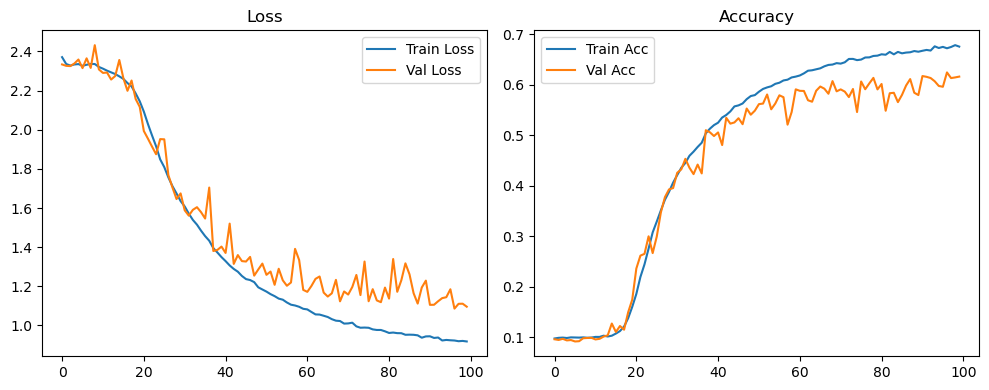

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 1.1180 Accuracy: 0.6107


🚀 Running: batch128_lr_max_0.0005_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:18<2:09:05, 78.24s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0961 |:   1%|          | 1/100 [01:34<2:09:05, 78.24s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0961 |:   1%|          | 1/100 [01:34<2:09:05, 78.24s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0961 |:   2%|▏         | 2/100 [01:34<1:08:40, 42.05s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [01:51<1:08:40, 42.05s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [01:51<1:08:40, 42.05s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [01:51<49:14, 30.46s/it]  

| LR: 0.000499 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [02:08<49:14, 30.46s/it]

| LR: 0.000499 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [02:08<49:14, 30.46s/it]

| LR: 0.000499 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   4%|▍         | 4/100 [02:08<40:09, 25.10s/it]

| LR: 0.000498 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:25<40:09, 25.10s/it]

| LR: 0.000498 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:25<40:09, 25.10s/it]

| LR: 0.000498 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:25<35:02, 22.13s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0945 |:   5%|▌         | 5/100 [02:42<35:02, 22.13s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0945 |:   5%|▌         | 5/100 [02:42<35:02, 22.13s/it]

| LR: 0.000497 | Train Acc: 0.0988 | Val Acc: 0.0945 |:   6%|▌         | 6/100 [02:42<31:50, 20.33s/it]

| LR: 0.000496 | Train Acc: 0.0991 | Val Acc: 0.0958 |:   6%|▌         | 6/100 [02:58<31:50, 20.33s/it]

| LR: 0.000496 | Train Acc: 0.0991 | Val Acc: 0.0958 |:   6%|▌         | 6/100 [02:58<31:50, 20.33s/it]

| LR: 0.000496 | Train Acc: 0.0991 | Val Acc: 0.0958 |:   7%|▋         | 7/100 [02:59<29:43, 19.18s/it]

| LR: 0.000494 | Train Acc: 0.0987 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [03:15<29:43, 19.18s/it]

| LR: 0.000494 | Train Acc: 0.0987 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [03:15<29:43, 19.18s/it]

| LR: 0.000494 | Train Acc: 0.0987 | Val Acc: 0.0959 |:   8%|▊         | 8/100 [03:15<28:12, 18.40s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0942 |:   8%|▊         | 8/100 [03:32<28:12, 18.40s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0942 |:   8%|▊         | 8/100 [03:32<28:12, 18.40s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0942 |:   9%|▉         | 9/100 [03:32<27:08, 17.90s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [03:49<27:08, 17.90s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [03:49<27:08, 17.90s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  10%|█         | 10/100 [03:49<26:16, 17.52s/it]

| LR: 0.000488 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  10%|█         | 10/100 [04:05<26:16, 17.52s/it]

| LR: 0.000488 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  10%|█         | 10/100 [04:05<26:16, 17.52s/it]

| LR: 0.000488 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  11%|█         | 11/100 [04:06<25:39, 17.30s/it]

| LR: 0.000485 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:22<25:39, 17.30s/it]

| LR: 0.000485 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:22<25:39, 17.30s/it]

| LR: 0.000485 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:22<25:11, 17.18s/it]

| LR: 0.000482 | Train Acc: 0.1006 | Val Acc: 0.0856 |:  12%|█▏        | 12/100 [04:39<25:11, 17.18s/it]

| LR: 0.000482 | Train Acc: 0.1006 | Val Acc: 0.0856 |:  12%|█▏        | 12/100 [04:39<25:11, 17.18s/it]

| LR: 0.000482 | Train Acc: 0.1006 | Val Acc: 0.0856 |:  13%|█▎        | 13/100 [04:39<24:41, 17.02s/it]

| LR: 0.000479 | Train Acc: 0.1030 | Val Acc: 0.0981 |:  13%|█▎        | 13/100 [04:56<24:41, 17.02s/it]

| LR: 0.000479 | Train Acc: 0.1030 | Val Acc: 0.0981 |:  13%|█▎        | 13/100 [04:56<24:41, 17.02s/it]

| LR: 0.000479 | Train Acc: 0.1030 | Val Acc: 0.0981 |:  14%|█▍        | 14/100 [04:56<24:19, 16.97s/it]

| LR: 0.000476 | Train Acc: 0.1025 | Val Acc: 0.1078 |:  14%|█▍        | 14/100 [05:13<24:19, 16.97s/it]

| LR: 0.000476 | Train Acc: 0.1025 | Val Acc: 0.1078 |:  14%|█▍        | 14/100 [05:13<24:19, 16.97s/it]

| LR: 0.000476 | Train Acc: 0.1025 | Val Acc: 0.1078 |:  15%|█▌        | 15/100 [05:13<24:00, 16.95s/it]

| LR: 0.000473 | Train Acc: 0.1026 | Val Acc: 0.0987 |:  15%|█▌        | 15/100 [05:29<24:00, 16.95s/it]

| LR: 0.000473 | Train Acc: 0.1026 | Val Acc: 0.0987 |:  15%|█▌        | 15/100 [05:29<24:00, 16.95s/it]

| LR: 0.000473 | Train Acc: 0.1026 | Val Acc: 0.0987 |:  16%|█▌        | 16/100 [05:30<23:37, 16.87s/it]

| LR: 0.000469 | Train Acc: 0.1036 | Val Acc: 0.0993 |:  16%|█▌        | 16/100 [05:46<23:37, 16.87s/it]

| LR: 0.000469 | Train Acc: 0.1036 | Val Acc: 0.0993 |:  16%|█▌        | 16/100 [05:46<23:37, 16.87s/it]

| LR: 0.000469 | Train Acc: 0.1036 | Val Acc: 0.0993 |:  17%|█▋        | 17/100 [05:46<23:17, 16.84s/it]

| LR: 0.000465 | Train Acc: 0.1057 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [06:03<23:17, 16.84s/it]

| LR: 0.000465 | Train Acc: 0.1057 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [06:03<23:17, 16.84s/it]

| LR: 0.000465 | Train Acc: 0.1057 | Val Acc: 0.0994 |:  18%|█▊        | 18/100 [06:03<22:59, 16.82s/it]

| LR: 0.000461 | Train Acc: 0.1066 | Val Acc: 0.1050 |:  18%|█▊        | 18/100 [06:20<22:59, 16.82s/it]

| LR: 0.000461 | Train Acc: 0.1066 | Val Acc: 0.1050 |:  18%|█▊        | 18/100 [06:20<22:59, 16.82s/it]

| LR: 0.000461 | Train Acc: 0.1066 | Val Acc: 0.1050 |:  19%|█▉        | 19/100 [06:20<22:39, 16.78s/it]

| LR: 0.000457 | Train Acc: 0.1076 | Val Acc: 0.1064 |:  19%|█▉        | 19/100 [06:36<22:39, 16.78s/it]

| LR: 0.000457 | Train Acc: 0.1076 | Val Acc: 0.1064 |:  19%|█▉        | 19/100 [06:36<22:39, 16.78s/it]

| LR: 0.000457 | Train Acc: 0.1076 | Val Acc: 0.1064 |:  20%|██        | 20/100 [06:36<22:18, 16.73s/it]

| LR: 0.000452 | Train Acc: 0.1115 | Val Acc: 0.1063 |:  20%|██        | 20/100 [06:53<22:18, 16.73s/it]

| LR: 0.000452 | Train Acc: 0.1115 | Val Acc: 0.1063 |:  20%|██        | 20/100 [06:53<22:18, 16.73s/it]

| LR: 0.000452 | Train Acc: 0.1115 | Val Acc: 0.1063 |:  21%|██        | 21/100 [06:53<22:04, 16.76s/it]

| LR: 0.000448 | Train Acc: 0.1179 | Val Acc: 0.1223 |:  21%|██        | 21/100 [07:10<22:04, 16.76s/it]

| LR: 0.000448 | Train Acc: 0.1179 | Val Acc: 0.1223 |:  21%|██        | 21/100 [07:10<22:04, 16.76s/it]

| LR: 0.000448 | Train Acc: 0.1179 | Val Acc: 0.1223 |:  22%|██▏       | 22/100 [07:10<21:50, 16.80s/it]

| LR: 0.000443 | Train Acc: 0.1295 | Val Acc: 0.1368 |:  22%|██▏       | 22/100 [07:27<21:50, 16.80s/it]

| LR: 0.000443 | Train Acc: 0.1295 | Val Acc: 0.1368 |:  22%|██▏       | 22/100 [07:27<21:50, 16.80s/it]

| LR: 0.000443 | Train Acc: 0.1295 | Val Acc: 0.1368 |:  23%|██▎       | 23/100 [07:27<21:33, 16.79s/it]

| LR: 0.000438 | Train Acc: 0.1434 | Val Acc: 0.1517 |:  23%|██▎       | 23/100 [07:43<21:33, 16.79s/it]

| LR: 0.000438 | Train Acc: 0.1434 | Val Acc: 0.1517 |:  23%|██▎       | 23/100 [07:43<21:33, 16.79s/it]

| LR: 0.000438 | Train Acc: 0.1434 | Val Acc: 0.1517 |:  24%|██▍       | 24/100 [07:43<21:12, 16.74s/it]

| LR: 0.000432 | Train Acc: 0.1626 | Val Acc: 0.1957 |:  24%|██▍       | 24/100 [08:00<21:12, 16.74s/it]

| LR: 0.000432 | Train Acc: 0.1626 | Val Acc: 0.1957 |:  24%|██▍       | 24/100 [08:00<21:12, 16.74s/it]

| LR: 0.000432 | Train Acc: 0.1626 | Val Acc: 0.1957 |:  25%|██▌       | 25/100 [08:00<20:53, 16.72s/it]

| LR: 0.000427 | Train Acc: 0.1779 | Val Acc: 0.1836 |:  25%|██▌       | 25/100 [08:17<20:53, 16.72s/it]

| LR: 0.000427 | Train Acc: 0.1779 | Val Acc: 0.1836 |:  25%|██▌       | 25/100 [08:17<20:53, 16.72s/it]

| LR: 0.000427 | Train Acc: 0.1779 | Val Acc: 0.1836 |:  26%|██▌       | 26/100 [08:17<20:35, 16.69s/it]

| LR: 0.000421 | Train Acc: 0.1981 | Val Acc: 0.2109 |:  26%|██▌       | 26/100 [08:33<20:35, 16.69s/it]

| LR: 0.000421 | Train Acc: 0.1981 | Val Acc: 0.2109 |:  26%|██▌       | 26/100 [08:33<20:35, 16.69s/it]

| LR: 0.000421 | Train Acc: 0.1981 | Val Acc: 0.2109 |:  27%|██▋       | 27/100 [08:33<20:18, 16.69s/it]

| LR: 0.000415 | Train Acc: 0.2137 | Val Acc: 0.2343 |:  27%|██▋       | 27/100 [08:50<20:18, 16.69s/it]

| LR: 0.000415 | Train Acc: 0.2137 | Val Acc: 0.2343 |:  27%|██▋       | 27/100 [08:50<20:18, 16.69s/it]

| LR: 0.000415 | Train Acc: 0.2137 | Val Acc: 0.2343 |:  28%|██▊       | 28/100 [08:50<20:02, 16.70s/it]

| LR: 0.000410 | Train Acc: 0.2442 | Val Acc: 0.2544 |:  28%|██▊       | 28/100 [09:07<20:02, 16.70s/it]

| LR: 0.000410 | Train Acc: 0.2442 | Val Acc: 0.2544 |:  28%|██▊       | 28/100 [09:07<20:02, 16.70s/it]

| LR: 0.000410 | Train Acc: 0.2442 | Val Acc: 0.2544 |:  29%|██▉       | 29/100 [09:07<19:47, 16.72s/it]

| LR: 0.000403 | Train Acc: 0.2663 | Val Acc: 0.2822 |:  29%|██▉       | 29/100 [09:24<19:47, 16.72s/it]

| LR: 0.000403 | Train Acc: 0.2663 | Val Acc: 0.2822 |:  29%|██▉       | 29/100 [09:24<19:47, 16.72s/it]

| LR: 0.000403 | Train Acc: 0.2663 | Val Acc: 0.2822 |:  30%|███       | 30/100 [09:24<19:33, 16.76s/it]

| LR: 0.000397 | Train Acc: 0.2903 | Val Acc: 0.3252 |:  30%|███       | 30/100 [09:41<19:33, 16.76s/it]

| LR: 0.000397 | Train Acc: 0.2903 | Val Acc: 0.3252 |:  30%|███       | 30/100 [09:41<19:33, 16.76s/it]

| LR: 0.000397 | Train Acc: 0.2903 | Val Acc: 0.3252 |:  31%|███       | 31/100 [09:41<19:18, 16.79s/it]

| LR: 0.000391 | Train Acc: 0.3090 | Val Acc: 0.3205 |:  31%|███       | 31/100 [09:57<19:18, 16.79s/it]

| LR: 0.000391 | Train Acc: 0.3090 | Val Acc: 0.3205 |:  31%|███       | 31/100 [09:57<19:18, 16.79s/it]

| LR: 0.000391 | Train Acc: 0.3090 | Val Acc: 0.3205 |:  32%|███▏      | 32/100 [09:58<19:02, 16.80s/it]

| LR: 0.000384 | Train Acc: 0.3289 | Val Acc: 0.3295 |:  32%|███▏      | 32/100 [10:14<19:02, 16.80s/it]

| LR: 0.000384 | Train Acc: 0.3289 | Val Acc: 0.3295 |:  32%|███▏      | 32/100 [10:14<19:02, 16.80s/it]

| LR: 0.000384 | Train Acc: 0.3289 | Val Acc: 0.3295 |:  33%|███▎      | 33/100 [10:14<18:45, 16.79s/it]

| LR: 0.000378 | Train Acc: 0.3446 | Val Acc: 0.3679 |:  33%|███▎      | 33/100 [10:31<18:45, 16.79s/it]

| LR: 0.000378 | Train Acc: 0.3446 | Val Acc: 0.3679 |:  33%|███▎      | 33/100 [10:31<18:45, 16.79s/it]

| LR: 0.000378 | Train Acc: 0.3446 | Val Acc: 0.3679 |:  34%|███▍      | 34/100 [10:31<18:28, 16.80s/it]

| LR: 0.000371 | Train Acc: 0.3609 | Val Acc: 0.3793 |:  34%|███▍      | 34/100 [10:47<18:28, 16.80s/it]

| LR: 0.000371 | Train Acc: 0.3609 | Val Acc: 0.3793 |:  34%|███▍      | 34/100 [10:47<18:28, 16.80s/it]

| LR: 0.000371 | Train Acc: 0.3609 | Val Acc: 0.3793 |:  35%|███▌      | 35/100 [10:48<18:05, 16.70s/it]

| LR: 0.000364 | Train Acc: 0.3706 | Val Acc: 0.3667 |:  35%|███▌      | 35/100 [11:04<18:05, 16.70s/it]

| LR: 0.000364 | Train Acc: 0.3706 | Val Acc: 0.3667 |:  35%|███▌      | 35/100 [11:04<18:05, 16.70s/it]

| LR: 0.000364 | Train Acc: 0.3706 | Val Acc: 0.3667 |:  36%|███▌      | 36/100 [11:04<17:50, 16.73s/it]

| LR: 0.000357 | Train Acc: 0.3817 | Val Acc: 0.4220 |:  36%|███▌      | 36/100 [11:21<17:50, 16.73s/it]

| LR: 0.000357 | Train Acc: 0.3817 | Val Acc: 0.4220 |:  36%|███▌      | 36/100 [11:21<17:50, 16.73s/it]

| LR: 0.000357 | Train Acc: 0.3817 | Val Acc: 0.4220 |:  37%|███▋      | 37/100 [11:21<17:32, 16.70s/it]

| LR: 0.000350 | Train Acc: 0.3915 | Val Acc: 0.4154 |:  37%|███▋      | 37/100 [11:38<17:32, 16.70s/it]

| LR: 0.000350 | Train Acc: 0.3915 | Val Acc: 0.4154 |:  37%|███▋      | 37/100 [11:38<17:32, 16.70s/it]

| LR: 0.000350 | Train Acc: 0.3915 | Val Acc: 0.4154 |:  38%|███▊      | 38/100 [11:38<17:15, 16.69s/it]

| LR: 0.000342 | Train Acc: 0.4012 | Val Acc: 0.4469 |:  38%|███▊      | 38/100 [11:54<17:15, 16.69s/it]

| LR: 0.000342 | Train Acc: 0.4012 | Val Acc: 0.4469 |:  38%|███▊      | 38/100 [11:54<17:15, 16.69s/it]

| LR: 0.000342 | Train Acc: 0.4012 | Val Acc: 0.4469 |:  39%|███▉      | 39/100 [11:54<16:58, 16.70s/it]

| LR: 0.000335 | Train Acc: 0.4159 | Val Acc: 0.4338 |:  39%|███▉      | 39/100 [12:11<16:58, 16.70s/it]

| LR: 0.000335 | Train Acc: 0.4159 | Val Acc: 0.4338 |:  39%|███▉      | 39/100 [12:11<16:58, 16.70s/it]

| LR: 0.000335 | Train Acc: 0.4159 | Val Acc: 0.4338 |:  40%|████      | 40/100 [12:11<16:43, 16.72s/it]

| LR: 0.000328 | Train Acc: 0.4263 | Val Acc: 0.4414 |:  40%|████      | 40/100 [12:28<16:43, 16.72s/it]

| LR: 0.000328 | Train Acc: 0.4263 | Val Acc: 0.4414 |:  40%|████      | 40/100 [12:28<16:43, 16.72s/it]

| LR: 0.000328 | Train Acc: 0.4263 | Val Acc: 0.4414 |:  41%|████      | 41/100 [12:28<16:27, 16.73s/it]

| LR: 0.000320 | Train Acc: 0.4363 | Val Acc: 0.4518 |:  41%|████      | 41/100 [12:44<16:27, 16.73s/it]

| LR: 0.000320 | Train Acc: 0.4363 | Val Acc: 0.4518 |:  41%|████      | 41/100 [12:44<16:27, 16.73s/it]

| LR: 0.000320 | Train Acc: 0.4363 | Val Acc: 0.4518 |:  42%|████▏     | 42/100 [12:45<16:08, 16.70s/it]

| LR: 0.000313 | Train Acc: 0.4465 | Val Acc: 0.4747 |:  42%|████▏     | 42/100 [13:01<16:08, 16.70s/it]

| LR: 0.000313 | Train Acc: 0.4465 | Val Acc: 0.4747 |:  42%|████▏     | 42/100 [13:01<16:08, 16.70s/it]

| LR: 0.000313 | Train Acc: 0.4465 | Val Acc: 0.4747 |:  43%|████▎     | 43/100 [13:01<15:52, 16.70s/it]

| LR: 0.000305 | Train Acc: 0.4566 | Val Acc: 0.4667 |:  43%|████▎     | 43/100 [13:18<15:52, 16.70s/it]

| LR: 0.000305 | Train Acc: 0.4566 | Val Acc: 0.4667 |:  43%|████▎     | 43/100 [13:18<15:52, 16.70s/it]

| LR: 0.000305 | Train Acc: 0.4566 | Val Acc: 0.4667 |:  44%|████▍     | 44/100 [13:18<15:36, 16.72s/it]

| LR: 0.000297 | Train Acc: 0.4640 | Val Acc: 0.4853 |:  44%|████▍     | 44/100 [13:35<15:36, 16.72s/it]

| LR: 0.000297 | Train Acc: 0.4640 | Val Acc: 0.4853 |:  44%|████▍     | 44/100 [13:35<15:36, 16.72s/it]

| LR: 0.000297 | Train Acc: 0.4640 | Val Acc: 0.4853 |:  45%|████▌     | 45/100 [13:35<15:20, 16.74s/it]

| LR: 0.000290 | Train Acc: 0.4718 | Val Acc: 0.4855 |:  45%|████▌     | 45/100 [13:52<15:20, 16.74s/it]

| LR: 0.000290 | Train Acc: 0.4718 | Val Acc: 0.4855 |:  45%|████▌     | 45/100 [13:52<15:20, 16.74s/it]

| LR: 0.000290 | Train Acc: 0.4718 | Val Acc: 0.4855 |:  46%|████▌     | 46/100 [13:52<15:05, 16.76s/it]

| LR: 0.000282 | Train Acc: 0.4775 | Val Acc: 0.4959 |:  46%|████▌     | 46/100 [14:08<15:05, 16.76s/it]

| LR: 0.000282 | Train Acc: 0.4775 | Val Acc: 0.4959 |:  46%|████▌     | 46/100 [14:08<15:05, 16.76s/it]

| LR: 0.000282 | Train Acc: 0.4775 | Val Acc: 0.4959 |:  47%|████▋     | 47/100 [14:08<14:49, 16.79s/it]

| LR: 0.000274 | Train Acc: 0.4871 | Val Acc: 0.5098 |:  47%|████▋     | 47/100 [14:25<14:49, 16.79s/it]

| LR: 0.000274 | Train Acc: 0.4871 | Val Acc: 0.5098 |:  47%|████▋     | 47/100 [14:25<14:49, 16.79s/it]

| LR: 0.000274 | Train Acc: 0.4871 | Val Acc: 0.5098 |:  48%|████▊     | 48/100 [14:25<14:33, 16.80s/it]

| LR: 0.000266 | Train Acc: 0.4955 | Val Acc: 0.5006 |:  48%|████▊     | 48/100 [14:42<14:33, 16.80s/it]

| LR: 0.000266 | Train Acc: 0.4955 | Val Acc: 0.5006 |:  48%|████▊     | 48/100 [14:42<14:33, 16.80s/it]

| LR: 0.000266 | Train Acc: 0.4955 | Val Acc: 0.5006 |:  49%|████▉     | 49/100 [14:42<14:15, 16.78s/it]

| LR: 0.000258 | Train Acc: 0.4969 | Val Acc: 0.5164 |:  49%|████▉     | 49/100 [14:59<14:15, 16.78s/it]

| LR: 0.000258 | Train Acc: 0.4969 | Val Acc: 0.5164 |:  49%|████▉     | 49/100 [14:59<14:15, 16.78s/it]

| LR: 0.000258 | Train Acc: 0.4969 | Val Acc: 0.5164 |:  50%|█████     | 50/100 [14:59<13:57, 16.75s/it]

| LR: 0.000251 | Train Acc: 0.5064 | Val Acc: 0.5195 |:  50%|█████     | 50/100 [15:15<13:57, 16.75s/it]

| LR: 0.000251 | Train Acc: 0.5064 | Val Acc: 0.5195 |:  50%|█████     | 50/100 [15:15<13:57, 16.75s/it]

| LR: 0.000251 | Train Acc: 0.5064 | Val Acc: 0.5195 |:  51%|█████     | 51/100 [15:15<13:37, 16.69s/it]

| LR: 0.000243 | Train Acc: 0.5133 | Val Acc: 0.5075 |:  51%|█████     | 51/100 [15:32<13:37, 16.69s/it]

| LR: 0.000243 | Train Acc: 0.5133 | Val Acc: 0.5075 |:  51%|█████     | 51/100 [15:32<13:37, 16.69s/it]

| LR: 0.000243 | Train Acc: 0.5133 | Val Acc: 0.5075 |:  52%|█████▏    | 52/100 [15:32<13:21, 16.71s/it]

| LR: 0.000235 | Train Acc: 0.5162 | Val Acc: 0.5113 |:  52%|█████▏    | 52/100 [15:49<13:21, 16.71s/it]

| LR: 0.000235 | Train Acc: 0.5162 | Val Acc: 0.5113 |:  52%|█████▏    | 52/100 [15:49<13:21, 16.71s/it]

| LR: 0.000235 | Train Acc: 0.5162 | Val Acc: 0.5113 |:  53%|█████▎    | 53/100 [15:49<13:05, 16.72s/it]

| LR: 0.000227 | Train Acc: 0.5225 | Val Acc: 0.5211 |:  53%|█████▎    | 53/100 [16:05<13:05, 16.72s/it]

| LR: 0.000227 | Train Acc: 0.5225 | Val Acc: 0.5211 |:  53%|█████▎    | 53/100 [16:05<13:05, 16.72s/it]

| LR: 0.000227 | Train Acc: 0.5225 | Val Acc: 0.5211 |:  54%|█████▍    | 54/100 [16:06<12:50, 16.74s/it]

| LR: 0.000219 | Train Acc: 0.5263 | Val Acc: 0.5367 |:  54%|█████▍    | 54/100 [16:22<12:50, 16.74s/it]

| LR: 0.000219 | Train Acc: 0.5263 | Val Acc: 0.5367 |:  54%|█████▍    | 54/100 [16:22<12:50, 16.74s/it]

| LR: 0.000219 | Train Acc: 0.5263 | Val Acc: 0.5367 |:  55%|█████▌    | 55/100 [16:22<12:36, 16.81s/it]

| LR: 0.000211 | Train Acc: 0.5279 | Val Acc: 0.5455 |:  55%|█████▌    | 55/100 [16:39<12:36, 16.81s/it]

| LR: 0.000211 | Train Acc: 0.5279 | Val Acc: 0.5455 |:  55%|█████▌    | 55/100 [16:39<12:36, 16.81s/it]

| LR: 0.000211 | Train Acc: 0.5279 | Val Acc: 0.5455 |:  56%|█████▌    | 56/100 [16:39<12:14, 16.69s/it]

| LR: 0.000204 | Train Acc: 0.5339 | Val Acc: 0.5490 |:  56%|█████▌    | 56/100 [16:55<12:14, 16.69s/it]

| LR: 0.000204 | Train Acc: 0.5339 | Val Acc: 0.5490 |:  56%|█████▌    | 56/100 [16:55<12:14, 16.69s/it]

| LR: 0.000204 | Train Acc: 0.5339 | Val Acc: 0.5490 |:  57%|█████▋    | 57/100 [16:56<11:57, 16.68s/it]

| LR: 0.000196 | Train Acc: 0.5448 | Val Acc: 0.5474 |:  57%|█████▋    | 57/100 [17:12<11:57, 16.68s/it]

| LR: 0.000196 | Train Acc: 0.5448 | Val Acc: 0.5474 |:  57%|█████▋    | 57/100 [17:12<11:57, 16.68s/it]

| LR: 0.000196 | Train Acc: 0.5448 | Val Acc: 0.5474 |:  58%|█████▊    | 58/100 [17:12<11:40, 16.68s/it]

| LR: 0.000188 | Train Acc: 0.5441 | Val Acc: 0.5460 |:  58%|█████▊    | 58/100 [17:29<11:40, 16.68s/it]

| LR: 0.000188 | Train Acc: 0.5441 | Val Acc: 0.5460 |:  58%|█████▊    | 58/100 [17:29<11:40, 16.68s/it]

| LR: 0.000188 | Train Acc: 0.5441 | Val Acc: 0.5460 |:  59%|█████▉    | 59/100 [17:29<11:24, 16.70s/it]

| LR: 0.000181 | Train Acc: 0.5461 | Val Acc: 0.5430 |:  59%|█████▉    | 59/100 [17:46<11:24, 16.70s/it]

| LR: 0.000181 | Train Acc: 0.5461 | Val Acc: 0.5430 |:  59%|█████▉    | 59/100 [17:46<11:24, 16.70s/it]

| LR: 0.000181 | Train Acc: 0.5461 | Val Acc: 0.5430 |:  60%|██████    | 60/100 [17:46<11:09, 16.73s/it]

| LR: 0.000173 | Train Acc: 0.5522 | Val Acc: 0.5533 |:  60%|██████    | 60/100 [18:02<11:09, 16.73s/it]

| LR: 0.000173 | Train Acc: 0.5522 | Val Acc: 0.5533 |:  60%|██████    | 60/100 [18:02<11:09, 16.73s/it]

| LR: 0.000173 | Train Acc: 0.5522 | Val Acc: 0.5533 |:  61%|██████    | 61/100 [18:03<10:52, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.5543 | Val Acc: 0.5575 |:  61%|██████    | 61/100 [18:19<10:52, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.5543 | Val Acc: 0.5575 |:  61%|██████    | 61/100 [18:19<10:52, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.5543 | Val Acc: 0.5575 |:  62%|██████▏   | 62/100 [18:19<10:37, 16.77s/it]

| LR: 0.000159 | Train Acc: 0.5605 | Val Acc: 0.5631 |:  62%|██████▏   | 62/100 [18:36<10:37, 16.77s/it]

| LR: 0.000159 | Train Acc: 0.5605 | Val Acc: 0.5631 |:  62%|██████▏   | 62/100 [18:36<10:37, 16.77s/it]

| LR: 0.000159 | Train Acc: 0.5605 | Val Acc: 0.5631 |:  63%|██████▎   | 63/100 [18:36<10:21, 16.79s/it]

| LR: 0.000151 | Train Acc: 0.5625 | Val Acc: 0.5731 |:  63%|██████▎   | 63/100 [18:53<10:21, 16.79s/it]

| LR: 0.000151 | Train Acc: 0.5625 | Val Acc: 0.5731 |:  63%|██████▎   | 63/100 [18:53<10:21, 16.79s/it]

| LR: 0.000151 | Train Acc: 0.5625 | Val Acc: 0.5731 |:  64%|██████▍   | 64/100 [18:53<10:04, 16.80s/it]

| LR: 0.000144 | Train Acc: 0.5635 | Val Acc: 0.5727 |:  64%|██████▍   | 64/100 [19:10<10:04, 16.80s/it]

| LR: 0.000144 | Train Acc: 0.5635 | Val Acc: 0.5727 |:  64%|██████▍   | 64/100 [19:10<10:04, 16.80s/it]

| LR: 0.000144 | Train Acc: 0.5635 | Val Acc: 0.5727 |:  65%|██████▌   | 65/100 [19:10<09:47, 16.78s/it]

| LR: 0.000137 | Train Acc: 0.5683 | Val Acc: 0.5636 |:  65%|██████▌   | 65/100 [19:26<09:47, 16.78s/it]

| LR: 0.000137 | Train Acc: 0.5683 | Val Acc: 0.5636 |:  65%|██████▌   | 65/100 [19:26<09:47, 16.78s/it]

| LR: 0.000137 | Train Acc: 0.5683 | Val Acc: 0.5636 |:  66%|██████▌   | 66/100 [19:27<09:30, 16.78s/it]

| LR: 0.000130 | Train Acc: 0.5743 | Val Acc: 0.5791 |:  66%|██████▌   | 66/100 [19:43<09:30, 16.78s/it]

| LR: 0.000130 | Train Acc: 0.5743 | Val Acc: 0.5791 |:  66%|██████▌   | 66/100 [19:43<09:30, 16.78s/it]

| LR: 0.000130 | Train Acc: 0.5743 | Val Acc: 0.5791 |:  67%|██████▋   | 67/100 [19:43<09:13, 16.78s/it]

| LR: 0.000123 | Train Acc: 0.5755 | Val Acc: 0.5655 |:  67%|██████▋   | 67/100 [20:00<09:13, 16.78s/it]

| LR: 0.000123 | Train Acc: 0.5755 | Val Acc: 0.5655 |:  67%|██████▋   | 67/100 [20:00<09:13, 16.78s/it]

| LR: 0.000123 | Train Acc: 0.5755 | Val Acc: 0.5655 |:  68%|██████▊   | 68/100 [20:00<08:57, 16.78s/it]

| LR: 0.000117 | Train Acc: 0.5786 | Val Acc: 0.5824 |:  68%|██████▊   | 68/100 [20:17<08:57, 16.78s/it]

| LR: 0.000117 | Train Acc: 0.5786 | Val Acc: 0.5824 |:  68%|██████▊   | 68/100 [20:17<08:57, 16.78s/it]

| LR: 0.000117 | Train Acc: 0.5786 | Val Acc: 0.5824 |:  69%|██████▉   | 69/100 [20:17<08:38, 16.71s/it]

| LR: 0.000110 | Train Acc: 0.5821 | Val Acc: 0.5757 |:  69%|██████▉   | 69/100 [20:33<08:38, 16.71s/it]

| LR: 0.000110 | Train Acc: 0.5821 | Val Acc: 0.5757 |:  69%|██████▉   | 69/100 [20:33<08:38, 16.71s/it]

| LR: 0.000110 | Train Acc: 0.5821 | Val Acc: 0.5757 |:  70%|███████   | 70/100 [20:33<08:22, 16.74s/it]

| LR: 0.000104 | Train Acc: 0.5813 | Val Acc: 0.5845 |:  70%|███████   | 70/100 [20:50<08:22, 16.74s/it]

| LR: 0.000104 | Train Acc: 0.5813 | Val Acc: 0.5845 |:  70%|███████   | 70/100 [20:50<08:22, 16.74s/it]

| LR: 0.000104 | Train Acc: 0.5813 | Val Acc: 0.5845 |:  71%|███████   | 71/100 [20:50<08:06, 16.77s/it]

| LR: 0.000098 | Train Acc: 0.5882 | Val Acc: 0.5935 |:  71%|███████   | 71/100 [21:07<08:06, 16.77s/it]

| LR: 0.000098 | Train Acc: 0.5882 | Val Acc: 0.5935 |:  71%|███████   | 71/100 [21:07<08:06, 16.77s/it]

| LR: 0.000098 | Train Acc: 0.5882 | Val Acc: 0.5935 |:  72%|███████▏  | 72/100 [21:07<07:48, 16.75s/it]

| LR: 0.000091 | Train Acc: 0.5875 | Val Acc: 0.5820 |:  72%|███████▏  | 72/100 [21:24<07:48, 16.75s/it]

| LR: 0.000091 | Train Acc: 0.5875 | Val Acc: 0.5820 |:  72%|███████▏  | 72/100 [21:24<07:48, 16.75s/it]

| LR: 0.000091 | Train Acc: 0.5875 | Val Acc: 0.5820 |:  73%|███████▎  | 73/100 [21:24<07:31, 16.71s/it]

| LR: 0.000086 | Train Acc: 0.5883 | Val Acc: 0.5743 |:  73%|███████▎  | 73/100 [21:40<07:31, 16.71s/it]

| LR: 0.000086 | Train Acc: 0.5883 | Val Acc: 0.5743 |:  73%|███████▎  | 73/100 [21:40<07:31, 16.71s/it]

| LR: 0.000086 | Train Acc: 0.5883 | Val Acc: 0.5743 |:  74%|███████▍  | 74/100 [21:40<07:13, 16.69s/it]

| LR: 0.000080 | Train Acc: 0.5893 | Val Acc: 0.5812 |:  74%|███████▍  | 74/100 [21:57<07:13, 16.69s/it]

| LR: 0.000080 | Train Acc: 0.5893 | Val Acc: 0.5812 |:  74%|███████▍  | 74/100 [21:57<07:13, 16.69s/it]

| LR: 0.000080 | Train Acc: 0.5893 | Val Acc: 0.5812 |:  75%|███████▌  | 75/100 [21:57<06:57, 16.69s/it]

| LR: 0.000074 | Train Acc: 0.5892 | Val Acc: 0.5251 |:  75%|███████▌  | 75/100 [22:14<06:57, 16.69s/it]

| LR: 0.000074 | Train Acc: 0.5892 | Val Acc: 0.5251 |:  75%|███████▌  | 75/100 [22:14<06:57, 16.69s/it]

| LR: 0.000074 | Train Acc: 0.5892 | Val Acc: 0.5251 |:  76%|███████▌  | 76/100 [22:14<06:42, 16.75s/it]

| LR: 0.000069 | Train Acc: 0.5999 | Val Acc: 0.5781 |:  76%|███████▌  | 76/100 [22:31<06:42, 16.75s/it]

| LR: 0.000069 | Train Acc: 0.5999 | Val Acc: 0.5781 |:  76%|███████▌  | 76/100 [22:31<06:42, 16.75s/it]

| LR: 0.000069 | Train Acc: 0.5999 | Val Acc: 0.5781 |:  77%|███████▋  | 77/100 [22:31<06:25, 16.77s/it]

| LR: 0.000063 | Train Acc: 0.5987 | Val Acc: 0.5911 |:  77%|███████▋  | 77/100 [22:47<06:25, 16.77s/it]

| LR: 0.000063 | Train Acc: 0.5987 | Val Acc: 0.5911 |:  77%|███████▋  | 77/100 [22:47<06:25, 16.77s/it]

| LR: 0.000063 | Train Acc: 0.5987 | Val Acc: 0.5911 |:  78%|███████▊  | 78/100 [22:47<06:09, 16.78s/it]

| LR: 0.000058 | Train Acc: 0.5981 | Val Acc: 0.5782 |:  78%|███████▊  | 78/100 [23:04<06:09, 16.78s/it]

| LR: 0.000058 | Train Acc: 0.5981 | Val Acc: 0.5782 |:  78%|███████▊  | 78/100 [23:04<06:09, 16.78s/it]

| LR: 0.000058 | Train Acc: 0.5981 | Val Acc: 0.5782 |:  79%|███████▉  | 79/100 [23:04<05:52, 16.77s/it]

| LR: 0.000053 | Train Acc: 0.5979 | Val Acc: 0.5936 |:  79%|███████▉  | 79/100 [23:21<05:52, 16.77s/it]

| LR: 0.000053 | Train Acc: 0.5979 | Val Acc: 0.5936 |:  79%|███████▉  | 79/100 [23:21<05:52, 16.77s/it]

| LR: 0.000053 | Train Acc: 0.5979 | Val Acc: 0.5936 |:  80%|████████  | 80/100 [23:21<05:36, 16.85s/it]

| LR: 0.000049 | Train Acc: 0.6014 | Val Acc: 0.5970 |:  80%|████████  | 80/100 [23:38<05:36, 16.85s/it]

| LR: 0.000049 | Train Acc: 0.6014 | Val Acc: 0.5970 |:  80%|████████  | 80/100 [23:38<05:36, 16.85s/it]

| LR: 0.000049 | Train Acc: 0.6014 | Val Acc: 0.5970 |:  81%|████████  | 81/100 [23:38<05:20, 16.85s/it]

| LR: 0.000044 | Train Acc: 0.6030 | Val Acc: 0.5983 |:  81%|████████  | 81/100 [23:54<05:20, 16.85s/it]

| LR: 0.000044 | Train Acc: 0.6030 | Val Acc: 0.5983 |:  81%|████████  | 81/100 [23:54<05:20, 16.85s/it]

| LR: 0.000044 | Train Acc: 0.6030 | Val Acc: 0.5983 |:  82%|████████▏ | 82/100 [23:55<05:00, 16.72s/it]

| LR: 0.000040 | Train Acc: 0.6012 | Val Acc: 0.5990 |:  82%|████████▏ | 82/100 [24:11<05:00, 16.72s/it]

| LR: 0.000040 | Train Acc: 0.6012 | Val Acc: 0.5990 |:  82%|████████▏ | 82/100 [24:11<05:00, 16.72s/it]

| LR: 0.000040 | Train Acc: 0.6012 | Val Acc: 0.5990 |:  83%|████████▎ | 83/100 [24:11<04:43, 16.69s/it]

| LR: 0.000036 | Train Acc: 0.6051 | Val Acc: 0.5995 |:  83%|████████▎ | 83/100 [24:28<04:43, 16.69s/it]

| LR: 0.000036 | Train Acc: 0.6051 | Val Acc: 0.5995 |:  83%|████████▎ | 83/100 [24:28<04:43, 16.69s/it]

| LR: 0.000036 | Train Acc: 0.6051 | Val Acc: 0.5995 |:  84%|████████▍ | 84/100 [24:28<04:26, 16.66s/it]

| LR: 0.000032 | Train Acc: 0.6071 | Val Acc: 0.5948 |:  84%|████████▍ | 84/100 [24:44<04:26, 16.66s/it]

| LR: 0.000032 | Train Acc: 0.6071 | Val Acc: 0.5948 |:  84%|████████▍ | 84/100 [24:44<04:26, 16.66s/it]

| LR: 0.000032 | Train Acc: 0.6071 | Val Acc: 0.5948 |:  85%|████████▌ | 85/100 [24:44<04:09, 16.66s/it]

| LR: 0.000028 | Train Acc: 0.6073 | Val Acc: 0.6008 |:  85%|████████▌ | 85/100 [25:01<04:09, 16.66s/it]

| LR: 0.000028 | Train Acc: 0.6073 | Val Acc: 0.6008 |:  85%|████████▌ | 85/100 [25:01<04:09, 16.66s/it]

| LR: 0.000028 | Train Acc: 0.6073 | Val Acc: 0.6008 |:  86%|████████▌ | 86/100 [25:01<03:53, 16.69s/it]

| LR: 0.000025 | Train Acc: 0.6090 | Val Acc: 0.5963 |:  86%|████████▌ | 86/100 [25:18<03:53, 16.69s/it]

| LR: 0.000025 | Train Acc: 0.6090 | Val Acc: 0.5963 |:  86%|████████▌ | 86/100 [25:18<03:53, 16.69s/it]

| LR: 0.000025 | Train Acc: 0.6090 | Val Acc: 0.5963 |:  87%|████████▋ | 87/100 [25:18<03:37, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.6109 | Val Acc: 0.5969 |:  87%|████████▋ | 87/100 [25:35<03:37, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.6109 | Val Acc: 0.5969 |:  87%|████████▋ | 87/100 [25:35<03:37, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.6109 | Val Acc: 0.5969 |:  88%|████████▊ | 88/100 [25:35<03:21, 16.80s/it]

| LR: 0.000019 | Train Acc: 0.6060 | Val Acc: 0.6066 |:  88%|████████▊ | 88/100 [25:52<03:21, 16.80s/it]

| LR: 0.000019 | Train Acc: 0.6060 | Val Acc: 0.6066 |:  88%|████████▊ | 88/100 [25:52<03:21, 16.80s/it]

| LR: 0.000019 | Train Acc: 0.6060 | Val Acc: 0.6066 |:  89%|████████▉ | 89/100 [25:52<03:05, 16.83s/it]

| LR: 0.000016 | Train Acc: 0.6079 | Val Acc: 0.6017 |:  89%|████████▉ | 89/100 [26:09<03:05, 16.83s/it]

| LR: 0.000016 | Train Acc: 0.6079 | Val Acc: 0.6017 |:  89%|████████▉ | 89/100 [26:09<03:05, 16.83s/it]

| LR: 0.000016 | Train Acc: 0.6079 | Val Acc: 0.6017 |:  90%|█████████ | 90/100 [26:09<02:47, 16.80s/it]

| LR: 0.000013 | Train Acc: 0.6127 | Val Acc: 0.6048 |:  90%|█████████ | 90/100 [26:25<02:47, 16.80s/it]

| LR: 0.000013 | Train Acc: 0.6127 | Val Acc: 0.6048 |:  90%|█████████ | 90/100 [26:25<02:47, 16.80s/it]

| LR: 0.000013 | Train Acc: 0.6127 | Val Acc: 0.6048 |:  91%|█████████ | 91/100 [26:25<02:31, 16.79s/it]

| LR: 0.000011 | Train Acc: 0.6101 | Val Acc: 0.6047 |:  91%|█████████ | 91/100 [26:42<02:31, 16.79s/it]

| LR: 0.000011 | Train Acc: 0.6101 | Val Acc: 0.6047 |:  91%|█████████ | 91/100 [26:42<02:31, 16.79s/it]

| LR: 0.000011 | Train Acc: 0.6101 | Val Acc: 0.6047 |:  92%|█████████▏| 92/100 [26:42<02:13, 16.73s/it]

| LR: 0.000009 | Train Acc: 0.6133 | Val Acc: 0.6014 |:  92%|█████████▏| 92/100 [26:59<02:13, 16.73s/it]

| LR: 0.000009 | Train Acc: 0.6133 | Val Acc: 0.6014 |:  92%|█████████▏| 92/100 [26:59<02:13, 16.73s/it]

| LR: 0.000009 | Train Acc: 0.6133 | Val Acc: 0.6014 |:  93%|█████████▎| 93/100 [26:59<01:57, 16.72s/it]

| LR: 0.000007 | Train Acc: 0.6177 | Val Acc: 0.6038 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.72s/it]

| LR: 0.000007 | Train Acc: 0.6177 | Val Acc: 0.6038 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.72s/it]

| LR: 0.000007 | Train Acc: 0.6177 | Val Acc: 0.6038 |:  94%|█████████▍| 94/100 [27:15<01:40, 16.74s/it]

| LR: 0.000005 | Train Acc: 0.6127 | Val Acc: 0.6029 |:  94%|█████████▍| 94/100 [27:32<01:40, 16.74s/it]

| LR: 0.000005 | Train Acc: 0.6127 | Val Acc: 0.6029 |:  94%|█████████▍| 94/100 [27:32<01:40, 16.74s/it]

| LR: 0.000005 | Train Acc: 0.6127 | Val Acc: 0.6029 |:  95%|█████████▌| 95/100 [27:32<01:23, 16.74s/it]

| LR: 0.000004 | Train Acc: 0.6157 | Val Acc: 0.6071 |:  95%|█████████▌| 95/100 [27:49<01:23, 16.74s/it]

| LR: 0.000004 | Train Acc: 0.6157 | Val Acc: 0.6071 |:  95%|█████████▌| 95/100 [27:49<01:23, 16.74s/it]

| LR: 0.000004 | Train Acc: 0.6157 | Val Acc: 0.6071 |:  96%|█████████▌| 96/100 [27:49<01:06, 16.72s/it]

| LR: 0.000003 | Train Acc: 0.6195 | Val Acc: 0.6081 |:  96%|█████████▌| 96/100 [28:06<01:06, 16.72s/it]

| LR: 0.000003 | Train Acc: 0.6195 | Val Acc: 0.6081 |:  96%|█████████▌| 96/100 [28:06<01:06, 16.72s/it]

| LR: 0.000003 | Train Acc: 0.6195 | Val Acc: 0.6081 |:  97%|█████████▋| 97/100 [28:06<00:50, 16.76s/it]

| LR: 0.000002 | Train Acc: 0.6148 | Val Acc: 0.6022 |:  97%|█████████▋| 97/100 [28:22<00:50, 16.76s/it]

| LR: 0.000002 | Train Acc: 0.6148 | Val Acc: 0.6022 |:  97%|█████████▋| 97/100 [28:22<00:50, 16.76s/it]

| LR: 0.000002 | Train Acc: 0.6148 | Val Acc: 0.6022 |:  98%|█████████▊| 98/100 [28:22<00:33, 16.74s/it]

| LR: 0.000001 | Train Acc: 0.6195 | Val Acc: 0.5986 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.74s/it]

| LR: 0.000001 | Train Acc: 0.6195 | Val Acc: 0.5986 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.74s/it]

| LR: 0.000001 | Train Acc: 0.6195 | Val Acc: 0.5986 |:  99%|█████████▉| 99/100 [28:39<00:16, 16.70s/it]

| LR: 0.000001 | Train Acc: 0.6157 | Val Acc: 0.6029 |:  99%|█████████▉| 99/100 [28:56<00:16, 16.70s/it]

| LR: 0.000001 | Train Acc: 0.6157 | Val Acc: 0.6029 |:  99%|█████████▉| 99/100 [28:56<00:16, 16.70s/it]

| LR: 0.000001 | Train Acc: 0.6157 | Val Acc: 0.6029 |: 100%|██████████| 100/100 [28:56<00:00, 16.69s/it]

| LR: 0.000001 | Train Acc: 0.6157 | Val Acc: 0.6029 |: 100%|██████████| 100/100 [28:56<00:00, 17.36s/it]

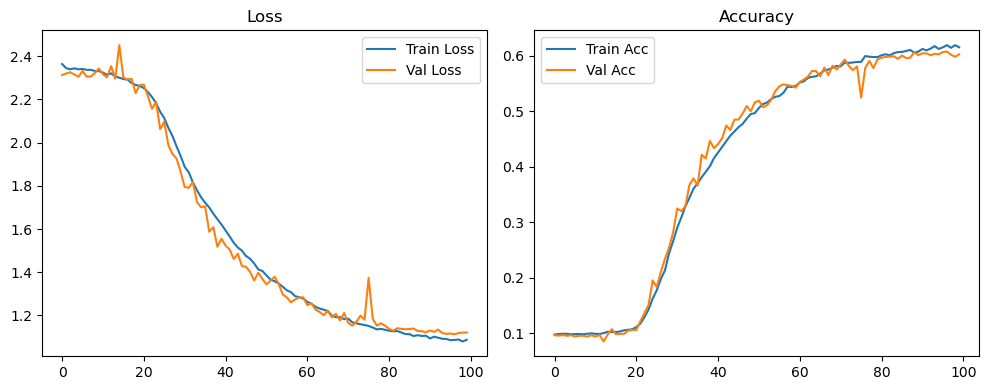

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 1.1317 Accuracy: 0.5993


🚀 Running: batch128_lr_max_0.0005_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0967 |:   1%|          | 1/100 [01:17<2:08:24, 77.82s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:24, 77.82s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:24, 77.82s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:34<1:08:32, 41.97s/it]

| LR: 0.000500 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [01:51<1:08:32, 41.97s/it]

| LR: 0.000500 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [01:51<1:08:32, 41.97s/it]

| LR: 0.000500 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [01:51<49:15, 30.47s/it]  

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0964 |:   3%|▎         | 3/100 [02:08<49:15, 30.47s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0964 |:   3%|▎         | 3/100 [02:08<49:15, 30.47s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0964 |:   4%|▍         | 4/100 [02:08<40:02, 25.03s/it]

| LR: 0.000498 | Train Acc: 0.0991 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [02:24<40:02, 25.03s/it]

| LR: 0.000498 | Train Acc: 0.0991 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [02:24<40:02, 25.03s/it]

| LR: 0.000498 | Train Acc: 0.0991 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [02:24<34:51, 22.01s/it]

| LR: 0.000497 | Train Acc: 0.0990 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [02:41<34:51, 22.01s/it]

| LR: 0.000497 | Train Acc: 0.0990 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [02:41<34:51, 22.01s/it]

| LR: 0.000497 | Train Acc: 0.0990 | Val Acc: 0.0965 |:   6%|▌         | 6/100 [02:41<31:42, 20.24s/it]

| LR: 0.000496 | Train Acc: 0.0982 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [02:58<31:42, 20.24s/it]

| LR: 0.000496 | Train Acc: 0.0982 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [02:58<31:42, 20.24s/it]

| LR: 0.000496 | Train Acc: 0.0982 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [02:58<29:37, 19.11s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [03:15<29:37, 19.11s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [03:15<29:37, 19.11s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [03:15<28:09, 18.36s/it]

| LR: 0.000492 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<28:09, 18.36s/it]

| LR: 0.000492 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<28:09, 18.36s/it]

| LR: 0.000492 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [03:31<27:03, 17.84s/it]

| LR: 0.000490 | Train Acc: 0.0989 | Val Acc: 0.0940 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000490 | Train Acc: 0.0989 | Val Acc: 0.0940 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000490 | Train Acc: 0.0989 | Val Acc: 0.0940 |:  10%|█         | 10/100 [03:48<26:25, 17.61s/it]

| LR: 0.000488 | Train Acc: 0.0996 | Val Acc: 0.0920 |:  10%|█         | 10/100 [04:05<26:25, 17.61s/it]

| LR: 0.000488 | Train Acc: 0.0996 | Val Acc: 0.0920 |:  10%|█         | 10/100 [04:05<26:25, 17.61s/it]

| LR: 0.000488 | Train Acc: 0.0996 | Val Acc: 0.0920 |:  11%|█         | 11/100 [04:05<25:49, 17.41s/it]

| LR: 0.000485 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  11%|█         | 11/100 [04:22<25:49, 17.41s/it]

| LR: 0.000485 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  11%|█         | 11/100 [04:22<25:49, 17.41s/it]

| LR: 0.000485 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  12%|█▏        | 12/100 [04:22<25:11, 17.18s/it]

| LR: 0.000482 | Train Acc: 0.1008 | Val Acc: 0.0916 |:  12%|█▏        | 12/100 [04:39<25:11, 17.18s/it]

| LR: 0.000482 | Train Acc: 0.1008 | Val Acc: 0.0916 |:  12%|█▏        | 12/100 [04:39<25:11, 17.18s/it]

| LR: 0.000482 | Train Acc: 0.1008 | Val Acc: 0.0916 |:  13%|█▎        | 13/100 [04:39<24:45, 17.07s/it]

| LR: 0.000479 | Train Acc: 0.1029 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [04:56<24:45, 17.07s/it]

| LR: 0.000479 | Train Acc: 0.1029 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [04:56<24:45, 17.07s/it]

| LR: 0.000479 | Train Acc: 0.1029 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [04:56<24:21, 16.99s/it]

| LR: 0.000476 | Train Acc: 0.1047 | Val Acc: 0.0990 |:  14%|█▍        | 14/100 [05:12<24:21, 16.99s/it]

| LR: 0.000476 | Train Acc: 0.1047 | Val Acc: 0.0990 |:  14%|█▍        | 14/100 [05:12<24:21, 16.99s/it]

| LR: 0.000476 | Train Acc: 0.1047 | Val Acc: 0.0990 |:  15%|█▌        | 15/100 [05:12<23:55, 16.89s/it]

| LR: 0.000473 | Train Acc: 0.1032 | Val Acc: 0.1124 |:  15%|█▌        | 15/100 [05:29<23:55, 16.89s/it]

| LR: 0.000473 | Train Acc: 0.1032 | Val Acc: 0.1124 |:  15%|█▌        | 15/100 [05:29<23:55, 16.89s/it]

| LR: 0.000473 | Train Acc: 0.1032 | Val Acc: 0.1124 |:  16%|█▌        | 16/100 [05:29<23:32, 16.82s/it]

| LR: 0.000469 | Train Acc: 0.1053 | Val Acc: 0.1050 |:  16%|█▌        | 16/100 [05:46<23:32, 16.82s/it]

| LR: 0.000469 | Train Acc: 0.1053 | Val Acc: 0.1050 |:  16%|█▌        | 16/100 [05:46<23:32, 16.82s/it]

| LR: 0.000469 | Train Acc: 0.1053 | Val Acc: 0.1050 |:  17%|█▋        | 17/100 [05:46<23:14, 16.80s/it]

| LR: 0.000465 | Train Acc: 0.1045 | Val Acc: 0.1043 |:  17%|█▋        | 17/100 [06:03<23:14, 16.80s/it]

| LR: 0.000465 | Train Acc: 0.1045 | Val Acc: 0.1043 |:  17%|█▋        | 17/100 [06:03<23:14, 16.80s/it]

| LR: 0.000465 | Train Acc: 0.1045 | Val Acc: 0.1043 |:  18%|█▊        | 18/100 [06:03<22:58, 16.81s/it]

| LR: 0.000461 | Train Acc: 0.1070 | Val Acc: 0.1026 |:  18%|█▊        | 18/100 [06:19<22:58, 16.81s/it]

| LR: 0.000461 | Train Acc: 0.1070 | Val Acc: 0.1026 |:  18%|█▊        | 18/100 [06:19<22:58, 16.81s/it]

| LR: 0.000461 | Train Acc: 0.1070 | Val Acc: 0.1026 |:  19%|█▉        | 19/100 [06:19<22:36, 16.75s/it]

| LR: 0.000457 | Train Acc: 0.1082 | Val Acc: 0.1309 |:  19%|█▉        | 19/100 [06:36<22:36, 16.75s/it]

| LR: 0.000457 | Train Acc: 0.1082 | Val Acc: 0.1309 |:  19%|█▉        | 19/100 [06:36<22:36, 16.75s/it]

| LR: 0.000457 | Train Acc: 0.1082 | Val Acc: 0.1309 |:  20%|██        | 20/100 [06:36<22:20, 16.76s/it]

| LR: 0.000452 | Train Acc: 0.1186 | Val Acc: 0.1146 |:  20%|██        | 20/100 [06:53<22:20, 16.76s/it]

| LR: 0.000452 | Train Acc: 0.1186 | Val Acc: 0.1146 |:  20%|██        | 20/100 [06:53<22:20, 16.76s/it]

| LR: 0.000452 | Train Acc: 0.1186 | Val Acc: 0.1146 |:  21%|██        | 21/100 [06:53<22:01, 16.73s/it]

| LR: 0.000448 | Train Acc: 0.1358 | Val Acc: 0.1221 |:  21%|██        | 21/100 [07:09<22:01, 16.73s/it]

| LR: 0.000448 | Train Acc: 0.1358 | Val Acc: 0.1221 |:  21%|██        | 21/100 [07:09<22:01, 16.73s/it]

| LR: 0.000448 | Train Acc: 0.1358 | Val Acc: 0.1221 |:  22%|██▏       | 22/100 [07:09<21:46, 16.75s/it]

| LR: 0.000443 | Train Acc: 0.1567 | Val Acc: 0.1962 |:  22%|██▏       | 22/100 [07:26<21:46, 16.75s/it]

| LR: 0.000443 | Train Acc: 0.1567 | Val Acc: 0.1962 |:  22%|██▏       | 22/100 [07:26<21:46, 16.75s/it]

| LR: 0.000443 | Train Acc: 0.1567 | Val Acc: 0.1962 |:  23%|██▎       | 23/100 [07:26<21:31, 16.77s/it]

| LR: 0.000438 | Train Acc: 0.1844 | Val Acc: 0.1883 |:  23%|██▎       | 23/100 [07:43<21:31, 16.77s/it]

| LR: 0.000438 | Train Acc: 0.1844 | Val Acc: 0.1883 |:  23%|██▎       | 23/100 [07:43<21:31, 16.77s/it]

| LR: 0.000438 | Train Acc: 0.1844 | Val Acc: 0.1883 |:  24%|██▍       | 24/100 [07:43<21:13, 16.75s/it]

| LR: 0.000432 | Train Acc: 0.2130 | Val Acc: 0.2437 |:  24%|██▍       | 24/100 [08:00<21:13, 16.75s/it]

| LR: 0.000432 | Train Acc: 0.2130 | Val Acc: 0.2437 |:  24%|██▍       | 24/100 [08:00<21:13, 16.75s/it]

| LR: 0.000432 | Train Acc: 0.2130 | Val Acc: 0.2437 |:  25%|██▌       | 25/100 [08:00<20:55, 16.74s/it]

| LR: 0.000427 | Train Acc: 0.2378 | Val Acc: 0.3013 |:  25%|██▌       | 25/100 [08:17<20:55, 16.74s/it]

| LR: 0.000427 | Train Acc: 0.2378 | Val Acc: 0.3013 |:  25%|██▌       | 25/100 [08:17<20:55, 16.74s/it]

| LR: 0.000427 | Train Acc: 0.2378 | Val Acc: 0.3013 |:  26%|██▌       | 26/100 [08:17<20:43, 16.80s/it]

| LR: 0.000421 | Train Acc: 0.2731 | Val Acc: 0.3356 |:  26%|██▌       | 26/100 [08:34<20:43, 16.80s/it]

| LR: 0.000421 | Train Acc: 0.2731 | Val Acc: 0.3356 |:  26%|██▌       | 26/100 [08:34<20:43, 16.80s/it]

| LR: 0.000421 | Train Acc: 0.2731 | Val Acc: 0.3356 |:  27%|██▋       | 27/100 [08:34<20:32, 16.88s/it]

| LR: 0.000415 | Train Acc: 0.3083 | Val Acc: 0.3569 |:  27%|██▋       | 27/100 [08:50<20:32, 16.88s/it]

| LR: 0.000415 | Train Acc: 0.3083 | Val Acc: 0.3569 |:  27%|██▋       | 27/100 [08:50<20:32, 16.88s/it]

| LR: 0.000415 | Train Acc: 0.3083 | Val Acc: 0.3569 |:  28%|██▊       | 28/100 [08:50<20:08, 16.79s/it]

| LR: 0.000410 | Train Acc: 0.3312 | Val Acc: 0.3894 |:  28%|██▊       | 28/100 [09:07<20:08, 16.79s/it]

| LR: 0.000410 | Train Acc: 0.3312 | Val Acc: 0.3894 |:  28%|██▊       | 28/100 [09:07<20:08, 16.79s/it]

| LR: 0.000410 | Train Acc: 0.3312 | Val Acc: 0.3894 |:  29%|██▉       | 29/100 [09:07<19:52, 16.80s/it]

| LR: 0.000403 | Train Acc: 0.3534 | Val Acc: 0.4148 |:  29%|██▉       | 29/100 [09:24<19:52, 16.80s/it]

| LR: 0.000403 | Train Acc: 0.3534 | Val Acc: 0.4148 |:  29%|██▉       | 29/100 [09:24<19:52, 16.80s/it]

| LR: 0.000403 | Train Acc: 0.3534 | Val Acc: 0.4148 |:  30%|███       | 30/100 [09:24<19:38, 16.84s/it]

| LR: 0.000397 | Train Acc: 0.3664 | Val Acc: 0.4139 |:  30%|███       | 30/100 [09:41<19:38, 16.84s/it]

| LR: 0.000397 | Train Acc: 0.3664 | Val Acc: 0.4139 |:  30%|███       | 30/100 [09:41<19:38, 16.84s/it]

| LR: 0.000397 | Train Acc: 0.3664 | Val Acc: 0.4139 |:  31%|███       | 31/100 [09:41<19:16, 16.76s/it]

| LR: 0.000391 | Train Acc: 0.3763 | Val Acc: 0.4287 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000391 | Train Acc: 0.3763 | Val Acc: 0.4287 |:  31%|███       | 31/100 [09:57<19:16, 16.76s/it]

| LR: 0.000391 | Train Acc: 0.3763 | Val Acc: 0.4287 |:  32%|███▏      | 32/100 [09:57<18:56, 16.71s/it]

| LR: 0.000384 | Train Acc: 0.3965 | Val Acc: 0.4429 |:  32%|███▏      | 32/100 [10:14<18:56, 16.71s/it]

| LR: 0.000384 | Train Acc: 0.3965 | Val Acc: 0.4429 |:  32%|███▏      | 32/100 [10:14<18:56, 16.71s/it]

| LR: 0.000384 | Train Acc: 0.3965 | Val Acc: 0.4429 |:  33%|███▎      | 33/100 [10:14<18:42, 16.75s/it]

| LR: 0.000378 | Train Acc: 0.4051 | Val Acc: 0.4491 |:  33%|███▎      | 33/100 [10:31<18:42, 16.75s/it]

| LR: 0.000378 | Train Acc: 0.4051 | Val Acc: 0.4491 |:  33%|███▎      | 33/100 [10:31<18:42, 16.75s/it]

| LR: 0.000378 | Train Acc: 0.4051 | Val Acc: 0.4491 |:  34%|███▍      | 34/100 [10:31<18:25, 16.75s/it]

| LR: 0.000371 | Train Acc: 0.4156 | Val Acc: 0.4495 |:  34%|███▍      | 34/100 [10:48<18:25, 16.75s/it]

| LR: 0.000371 | Train Acc: 0.4156 | Val Acc: 0.4495 |:  34%|███▍      | 34/100 [10:48<18:25, 16.75s/it]

| LR: 0.000371 | Train Acc: 0.4156 | Val Acc: 0.4495 |:  35%|███▌      | 35/100 [10:48<18:09, 16.76s/it]

| LR: 0.000364 | Train Acc: 0.4235 | Val Acc: 0.4557 |:  35%|███▌      | 35/100 [11:04<18:09, 16.76s/it]

| LR: 0.000364 | Train Acc: 0.4235 | Val Acc: 0.4557 |:  35%|███▌      | 35/100 [11:04<18:09, 16.76s/it]

| LR: 0.000364 | Train Acc: 0.4235 | Val Acc: 0.4557 |:  36%|███▌      | 36/100 [11:04<17:52, 16.76s/it]

| LR: 0.000357 | Train Acc: 0.4380 | Val Acc: 0.4839 |:  36%|███▌      | 36/100 [11:21<17:52, 16.76s/it]

| LR: 0.000357 | Train Acc: 0.4380 | Val Acc: 0.4839 |:  36%|███▌      | 36/100 [11:21<17:52, 16.76s/it]

| LR: 0.000357 | Train Acc: 0.4380 | Val Acc: 0.4839 |:  37%|███▋      | 37/100 [11:21<17:35, 16.76s/it]

| LR: 0.000350 | Train Acc: 0.4446 | Val Acc: 0.4822 |:  37%|███▋      | 37/100 [11:38<17:35, 16.76s/it]

| LR: 0.000350 | Train Acc: 0.4446 | Val Acc: 0.4822 |:  37%|███▋      | 37/100 [11:38<17:35, 16.76s/it]

| LR: 0.000350 | Train Acc: 0.4446 | Val Acc: 0.4822 |:  38%|███▊      | 38/100 [11:38<17:19, 16.76s/it]

| LR: 0.000342 | Train Acc: 0.4538 | Val Acc: 0.4694 |:  38%|███▊      | 38/100 [11:54<17:19, 16.76s/it]

| LR: 0.000342 | Train Acc: 0.4538 | Val Acc: 0.4694 |:  38%|███▊      | 38/100 [11:54<17:19, 16.76s/it]

| LR: 0.000342 | Train Acc: 0.4538 | Val Acc: 0.4694 |:  39%|███▉      | 39/100 [11:55<17:00, 16.73s/it]

| LR: 0.000335 | Train Acc: 0.4585 | Val Acc: 0.4810 |:  39%|███▉      | 39/100 [12:11<17:00, 16.73s/it]

| LR: 0.000335 | Train Acc: 0.4585 | Val Acc: 0.4810 |:  39%|███▉      | 39/100 [12:11<17:00, 16.73s/it]

| LR: 0.000335 | Train Acc: 0.4585 | Val Acc: 0.4810 |:  40%|████      | 40/100 [12:11<16:41, 16.69s/it]

| LR: 0.000328 | Train Acc: 0.4681 | Val Acc: 0.4905 |:  40%|████      | 40/100 [12:28<16:41, 16.69s/it]

| LR: 0.000328 | Train Acc: 0.4681 | Val Acc: 0.4905 |:  40%|████      | 40/100 [12:28<16:41, 16.69s/it]

| LR: 0.000328 | Train Acc: 0.4681 | Val Acc: 0.4905 |:  41%|████      | 41/100 [12:28<16:22, 16.65s/it]

| LR: 0.000320 | Train Acc: 0.4734 | Val Acc: 0.5155 |:  41%|████      | 41/100 [12:44<16:22, 16.65s/it]

| LR: 0.000320 | Train Acc: 0.4734 | Val Acc: 0.5155 |:  41%|████      | 41/100 [12:44<16:22, 16.65s/it]

| LR: 0.000320 | Train Acc: 0.4734 | Val Acc: 0.5155 |:  42%|████▏     | 42/100 [12:44<16:06, 16.66s/it]

| LR: 0.000313 | Train Acc: 0.4816 | Val Acc: 0.5069 |:  42%|████▏     | 42/100 [13:01<16:06, 16.66s/it]

| LR: 0.000313 | Train Acc: 0.4816 | Val Acc: 0.5069 |:  42%|████▏     | 42/100 [13:01<16:06, 16.66s/it]

| LR: 0.000313 | Train Acc: 0.4816 | Val Acc: 0.5069 |:  43%|████▎     | 43/100 [13:01<15:49, 16.65s/it]

| LR: 0.000305 | Train Acc: 0.4858 | Val Acc: 0.5322 |:  43%|████▎     | 43/100 [13:18<15:49, 16.65s/it]

| LR: 0.000305 | Train Acc: 0.4858 | Val Acc: 0.5322 |:  43%|████▎     | 43/100 [13:18<15:49, 16.65s/it]

| LR: 0.000305 | Train Acc: 0.4858 | Val Acc: 0.5322 |:  44%|████▍     | 44/100 [13:18<15:36, 16.72s/it]

| LR: 0.000297 | Train Acc: 0.4923 | Val Acc: 0.4960 |:  44%|████▍     | 44/100 [13:35<15:36, 16.72s/it]

| LR: 0.000297 | Train Acc: 0.4923 | Val Acc: 0.4960 |:  44%|████▍     | 44/100 [13:35<15:36, 16.72s/it]

| LR: 0.000297 | Train Acc: 0.4923 | Val Acc: 0.4960 |:  45%|████▌     | 45/100 [13:35<15:20, 16.73s/it]

| LR: 0.000290 | Train Acc: 0.4930 | Val Acc: 0.5243 |:  45%|████▌     | 45/100 [13:51<15:20, 16.73s/it]

| LR: 0.000290 | Train Acc: 0.4930 | Val Acc: 0.5243 |:  45%|████▌     | 45/100 [13:51<15:20, 16.73s/it]

| LR: 0.000290 | Train Acc: 0.4930 | Val Acc: 0.5243 |:  46%|████▌     | 46/100 [13:51<15:05, 16.76s/it]

| LR: 0.000282 | Train Acc: 0.5042 | Val Acc: 0.5302 |:  46%|████▌     | 46/100 [14:08<15:05, 16.76s/it]

| LR: 0.000282 | Train Acc: 0.5042 | Val Acc: 0.5302 |:  46%|████▌     | 46/100 [14:08<15:05, 16.76s/it]

| LR: 0.000282 | Train Acc: 0.5042 | Val Acc: 0.5302 |:  47%|████▋     | 47/100 [14:08<14:46, 16.73s/it]

| LR: 0.000274 | Train Acc: 0.5094 | Val Acc: 0.5301 |:  47%|████▋     | 47/100 [14:25<14:46, 16.73s/it]

| LR: 0.000274 | Train Acc: 0.5094 | Val Acc: 0.5301 |:  47%|████▋     | 47/100 [14:25<14:46, 16.73s/it]

| LR: 0.000274 | Train Acc: 0.5094 | Val Acc: 0.5301 |:  48%|████▊     | 48/100 [14:25<14:27, 16.68s/it]

| LR: 0.000266 | Train Acc: 0.5105 | Val Acc: 0.5443 |:  48%|████▊     | 48/100 [14:41<14:27, 16.68s/it]

| LR: 0.000266 | Train Acc: 0.5105 | Val Acc: 0.5443 |:  48%|████▊     | 48/100 [14:41<14:27, 16.68s/it]

| LR: 0.000266 | Train Acc: 0.5105 | Val Acc: 0.5443 |:  49%|████▉     | 49/100 [14:41<14:06, 16.60s/it]

| LR: 0.000258 | Train Acc: 0.5167 | Val Acc: 0.5456 |:  49%|████▉     | 49/100 [14:58<14:06, 16.60s/it]

| LR: 0.000258 | Train Acc: 0.5167 | Val Acc: 0.5456 |:  49%|████▉     | 49/100 [14:58<14:06, 16.60s/it]

| LR: 0.000258 | Train Acc: 0.5167 | Val Acc: 0.5456 |:  50%|█████     | 50/100 [14:58<13:51, 16.63s/it]

| LR: 0.000251 | Train Acc: 0.5234 | Val Acc: 0.5439 |:  50%|█████     | 50/100 [15:15<13:51, 16.63s/it]

| LR: 0.000251 | Train Acc: 0.5234 | Val Acc: 0.5439 |:  50%|█████     | 50/100 [15:15<13:51, 16.63s/it]

| LR: 0.000251 | Train Acc: 0.5234 | Val Acc: 0.5439 |:  51%|█████     | 51/100 [15:15<13:37, 16.68s/it]

| LR: 0.000243 | Train Acc: 0.5241 | Val Acc: 0.5522 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000243 | Train Acc: 0.5241 | Val Acc: 0.5522 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000243 | Train Acc: 0.5241 | Val Acc: 0.5522 |:  52%|█████▏    | 52/100 [15:31<13:23, 16.74s/it]

| LR: 0.000235 | Train Acc: 0.5276 | Val Acc: 0.5447 |:  52%|█████▏    | 52/100 [15:48<13:23, 16.74s/it]

| LR: 0.000235 | Train Acc: 0.5276 | Val Acc: 0.5447 |:  52%|█████▏    | 52/100 [15:48<13:23, 16.74s/it]

| LR: 0.000235 | Train Acc: 0.5276 | Val Acc: 0.5447 |:  53%|█████▎    | 53/100 [15:48<13:06, 16.74s/it]

| LR: 0.000227 | Train Acc: 0.5320 | Val Acc: 0.5392 |:  53%|█████▎    | 53/100 [16:05<13:06, 16.74s/it]

| LR: 0.000227 | Train Acc: 0.5320 | Val Acc: 0.5392 |:  53%|█████▎    | 53/100 [16:05<13:06, 16.74s/it]

| LR: 0.000227 | Train Acc: 0.5320 | Val Acc: 0.5392 |:  54%|█████▍    | 54/100 [16:05<12:46, 16.67s/it]

| LR: 0.000219 | Train Acc: 0.5367 | Val Acc: 0.5590 |:  54%|█████▍    | 54/100 [16:21<12:46, 16.67s/it]

| LR: 0.000219 | Train Acc: 0.5367 | Val Acc: 0.5590 |:  54%|█████▍    | 54/100 [16:21<12:46, 16.67s/it]

| LR: 0.000219 | Train Acc: 0.5367 | Val Acc: 0.5590 |:  55%|█████▌    | 55/100 [16:21<12:26, 16.59s/it]

| LR: 0.000211 | Train Acc: 0.5415 | Val Acc: 0.5436 |:  55%|█████▌    | 55/100 [16:38<12:26, 16.59s/it]

| LR: 0.000211 | Train Acc: 0.5415 | Val Acc: 0.5436 |:  55%|█████▌    | 55/100 [16:38<12:26, 16.59s/it]

| LR: 0.000211 | Train Acc: 0.5415 | Val Acc: 0.5436 |:  56%|█████▌    | 56/100 [16:38<12:11, 16.64s/it]

| LR: 0.000204 | Train Acc: 0.5478 | Val Acc: 0.5642 |:  56%|█████▌    | 56/100 [16:54<12:11, 16.64s/it]

| LR: 0.000204 | Train Acc: 0.5478 | Val Acc: 0.5642 |:  56%|█████▌    | 56/100 [16:54<12:11, 16.64s/it]

| LR: 0.000204 | Train Acc: 0.5478 | Val Acc: 0.5642 |:  57%|█████▋    | 57/100 [16:54<11:54, 16.62s/it]

| LR: 0.000196 | Train Acc: 0.5474 | Val Acc: 0.5741 |:  57%|█████▋    | 57/100 [17:11<11:54, 16.62s/it]

| LR: 0.000196 | Train Acc: 0.5474 | Val Acc: 0.5741 |:  57%|█████▋    | 57/100 [17:11<11:54, 16.62s/it]

| LR: 0.000196 | Train Acc: 0.5474 | Val Acc: 0.5741 |:  58%|█████▊    | 58/100 [17:11<11:36, 16.59s/it]

| LR: 0.000188 | Train Acc: 0.5469 | Val Acc: 0.5732 |:  58%|█████▊    | 58/100 [17:28<11:36, 16.59s/it]

| LR: 0.000188 | Train Acc: 0.5469 | Val Acc: 0.5732 |:  58%|█████▊    | 58/100 [17:28<11:36, 16.59s/it]

| LR: 0.000188 | Train Acc: 0.5469 | Val Acc: 0.5732 |:  59%|█████▉    | 59/100 [17:28<11:23, 16.68s/it]

| LR: 0.000181 | Train Acc: 0.5516 | Val Acc: 0.5752 |:  59%|█████▉    | 59/100 [17:44<11:23, 16.68s/it]

| LR: 0.000181 | Train Acc: 0.5516 | Val Acc: 0.5752 |:  59%|█████▉    | 59/100 [17:44<11:23, 16.68s/it]

| LR: 0.000181 | Train Acc: 0.5516 | Val Acc: 0.5752 |:  60%|██████    | 60/100 [17:45<11:07, 16.68s/it]

| LR: 0.000173 | Train Acc: 0.5578 | Val Acc: 0.5845 |:  60%|██████    | 60/100 [18:01<11:07, 16.68s/it]

| LR: 0.000173 | Train Acc: 0.5578 | Val Acc: 0.5845 |:  60%|██████    | 60/100 [18:01<11:07, 16.68s/it]

| LR: 0.000173 | Train Acc: 0.5578 | Val Acc: 0.5845 |:  61%|██████    | 61/100 [18:01<10:49, 16.66s/it]

| LR: 0.000166 | Train Acc: 0.5602 | Val Acc: 0.5724 |:  61%|██████    | 61/100 [18:18<10:49, 16.66s/it]

| LR: 0.000166 | Train Acc: 0.5602 | Val Acc: 0.5724 |:  61%|██████    | 61/100 [18:18<10:49, 16.66s/it]

| LR: 0.000166 | Train Acc: 0.5602 | Val Acc: 0.5724 |:  62%|██████▏   | 62/100 [18:18<10:34, 16.69s/it]

| LR: 0.000159 | Train Acc: 0.5605 | Val Acc: 0.5803 |:  62%|██████▏   | 62/100 [18:35<10:34, 16.69s/it]

| LR: 0.000159 | Train Acc: 0.5605 | Val Acc: 0.5803 |:  62%|██████▏   | 62/100 [18:35<10:34, 16.69s/it]

| LR: 0.000159 | Train Acc: 0.5605 | Val Acc: 0.5803 |:  63%|██████▎   | 63/100 [18:35<10:18, 16.72s/it]

| LR: 0.000151 | Train Acc: 0.5678 | Val Acc: 0.5803 |:  63%|██████▎   | 63/100 [18:51<10:18, 16.72s/it]

| LR: 0.000151 | Train Acc: 0.5678 | Val Acc: 0.5803 |:  63%|██████▎   | 63/100 [18:51<10:18, 16.72s/it]

| LR: 0.000151 | Train Acc: 0.5678 | Val Acc: 0.5803 |:  64%|██████▍   | 64/100 [18:51<10:02, 16.73s/it]

| LR: 0.000144 | Train Acc: 0.5668 | Val Acc: 0.5906 |:  64%|██████▍   | 64/100 [19:08<10:02, 16.73s/it]

| LR: 0.000144 | Train Acc: 0.5668 | Val Acc: 0.5906 |:  64%|██████▍   | 64/100 [19:08<10:02, 16.73s/it]

| LR: 0.000144 | Train Acc: 0.5668 | Val Acc: 0.5906 |:  65%|██████▌   | 65/100 [19:08<09:45, 16.73s/it]

| LR: 0.000137 | Train Acc: 0.5680 | Val Acc: 0.5896 |:  65%|██████▌   | 65/100 [19:25<09:45, 16.73s/it]

| LR: 0.000137 | Train Acc: 0.5680 | Val Acc: 0.5896 |:  65%|██████▌   | 65/100 [19:25<09:45, 16.73s/it]

| LR: 0.000137 | Train Acc: 0.5680 | Val Acc: 0.5896 |:  66%|██████▌   | 66/100 [19:25<09:27, 16.69s/it]

| LR: 0.000130 | Train Acc: 0.5747 | Val Acc: 0.5924 |:  66%|██████▌   | 66/100 [19:41<09:27, 16.69s/it]

| LR: 0.000130 | Train Acc: 0.5747 | Val Acc: 0.5924 |:  66%|██████▌   | 66/100 [19:41<09:27, 16.69s/it]

| LR: 0.000130 | Train Acc: 0.5747 | Val Acc: 0.5924 |:  67%|██████▋   | 67/100 [19:41<09:09, 16.67s/it]

| LR: 0.000123 | Train Acc: 0.5725 | Val Acc: 0.5819 |:  67%|██████▋   | 67/100 [19:58<09:09, 16.67s/it]

| LR: 0.000123 | Train Acc: 0.5725 | Val Acc: 0.5819 |:  67%|██████▋   | 67/100 [19:58<09:09, 16.67s/it]

| LR: 0.000123 | Train Acc: 0.5725 | Val Acc: 0.5819 |:  68%|██████▊   | 68/100 [19:58<08:52, 16.64s/it]

| LR: 0.000117 | Train Acc: 0.5787 | Val Acc: 0.5977 |:  68%|██████▊   | 68/100 [20:14<08:52, 16.64s/it]

| LR: 0.000117 | Train Acc: 0.5787 | Val Acc: 0.5977 |:  68%|██████▊   | 68/100 [20:14<08:52, 16.64s/it]

| LR: 0.000117 | Train Acc: 0.5787 | Val Acc: 0.5977 |:  69%|██████▉   | 69/100 [20:14<08:34, 16.61s/it]

| LR: 0.000110 | Train Acc: 0.5809 | Val Acc: 0.5903 |:  69%|██████▉   | 69/100 [20:31<08:34, 16.61s/it]

| LR: 0.000110 | Train Acc: 0.5809 | Val Acc: 0.5903 |:  69%|██████▉   | 69/100 [20:31<08:34, 16.61s/it]

| LR: 0.000110 | Train Acc: 0.5809 | Val Acc: 0.5903 |:  70%|███████   | 70/100 [20:31<08:18, 16.62s/it]

| LR: 0.000104 | Train Acc: 0.5854 | Val Acc: 0.5976 |:  70%|███████   | 70/100 [20:48<08:18, 16.62s/it]

| LR: 0.000104 | Train Acc: 0.5854 | Val Acc: 0.5976 |:  70%|███████   | 70/100 [20:48<08:18, 16.62s/it]

| LR: 0.000104 | Train Acc: 0.5854 | Val Acc: 0.5976 |:  71%|███████   | 71/100 [20:48<08:02, 16.64s/it]

| LR: 0.000098 | Train Acc: 0.5831 | Val Acc: 0.6008 |:  71%|███████   | 71/100 [21:04<08:02, 16.64s/it]

| LR: 0.000098 | Train Acc: 0.5831 | Val Acc: 0.6008 |:  71%|███████   | 71/100 [21:04<08:02, 16.64s/it]

| LR: 0.000098 | Train Acc: 0.5831 | Val Acc: 0.6008 |:  72%|███████▏  | 72/100 [21:04<07:45, 16.62s/it]

| LR: 0.000091 | Train Acc: 0.5906 | Val Acc: 0.6038 |:  72%|███████▏  | 72/100 [21:21<07:45, 16.62s/it]

| LR: 0.000091 | Train Acc: 0.5906 | Val Acc: 0.6038 |:  72%|███████▏  | 72/100 [21:21<07:45, 16.62s/it]

| LR: 0.000091 | Train Acc: 0.5906 | Val Acc: 0.6038 |:  73%|███████▎  | 73/100 [21:21<07:28, 16.61s/it]

| LR: 0.000086 | Train Acc: 0.5896 | Val Acc: 0.5934 |:  73%|███████▎  | 73/100 [21:38<07:28, 16.61s/it]

| LR: 0.000086 | Train Acc: 0.5896 | Val Acc: 0.5934 |:  73%|███████▎  | 73/100 [21:38<07:28, 16.61s/it]

| LR: 0.000086 | Train Acc: 0.5896 | Val Acc: 0.5934 |:  74%|███████▍  | 74/100 [21:38<07:11, 16.61s/it]

| LR: 0.000080 | Train Acc: 0.5909 | Val Acc: 0.6034 |:  74%|███████▍  | 74/100 [21:54<07:11, 16.61s/it]

| LR: 0.000080 | Train Acc: 0.5909 | Val Acc: 0.6034 |:  74%|███████▍  | 74/100 [21:54<07:11, 16.61s/it]

| LR: 0.000080 | Train Acc: 0.5909 | Val Acc: 0.6034 |:  75%|███████▌  | 75/100 [21:54<06:56, 16.64s/it]

| LR: 0.000074 | Train Acc: 0.5930 | Val Acc: 0.5992 |:  75%|███████▌  | 75/100 [22:11<06:56, 16.64s/it]

| LR: 0.000074 | Train Acc: 0.5930 | Val Acc: 0.5992 |:  75%|███████▌  | 75/100 [22:11<06:56, 16.64s/it]

| LR: 0.000074 | Train Acc: 0.5930 | Val Acc: 0.5992 |:  76%|███████▌  | 76/100 [22:11<06:37, 16.57s/it]

| LR: 0.000069 | Train Acc: 0.5948 | Val Acc: 0.6031 |:  76%|███████▌  | 76/100 [22:27<06:37, 16.57s/it]

| LR: 0.000069 | Train Acc: 0.5948 | Val Acc: 0.6031 |:  76%|███████▌  | 76/100 [22:27<06:37, 16.57s/it]

| LR: 0.000069 | Train Acc: 0.5948 | Val Acc: 0.6031 |:  77%|███████▋  | 77/100 [22:27<06:21, 16.58s/it]

| LR: 0.000063 | Train Acc: 0.5937 | Val Acc: 0.6052 |:  77%|███████▋  | 77/100 [22:44<06:21, 16.58s/it]

| LR: 0.000063 | Train Acc: 0.5937 | Val Acc: 0.6052 |:  77%|███████▋  | 77/100 [22:44<06:21, 16.58s/it]

| LR: 0.000063 | Train Acc: 0.5937 | Val Acc: 0.6052 |:  78%|███████▊  | 78/100 [22:44<06:06, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.5963 | Val Acc: 0.6035 |:  78%|███████▊  | 78/100 [23:01<06:06, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.5963 | Val Acc: 0.6035 |:  78%|███████▊  | 78/100 [23:01<06:06, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.5963 | Val Acc: 0.6035 |:  79%|███████▉  | 79/100 [23:01<05:50, 16.70s/it]

| LR: 0.000053 | Train Acc: 0.5998 | Val Acc: 0.6094 |:  79%|███████▉  | 79/100 [23:18<05:50, 16.70s/it]

| LR: 0.000053 | Train Acc: 0.5998 | Val Acc: 0.6094 |:  79%|███████▉  | 79/100 [23:18<05:50, 16.70s/it]

| LR: 0.000053 | Train Acc: 0.5998 | Val Acc: 0.6094 |:  80%|████████  | 80/100 [23:18<05:33, 16.69s/it]

| LR: 0.000049 | Train Acc: 0.5970 | Val Acc: 0.6077 |:  80%|████████  | 80/100 [23:34<05:33, 16.69s/it]

| LR: 0.000049 | Train Acc: 0.5970 | Val Acc: 0.6077 |:  80%|████████  | 80/100 [23:34<05:33, 16.69s/it]

| LR: 0.000049 | Train Acc: 0.5970 | Val Acc: 0.6077 |:  81%|████████  | 81/100 [23:34<05:16, 16.67s/it]

| LR: 0.000044 | Train Acc: 0.6039 | Val Acc: 0.6086 |:  81%|████████  | 81/100 [23:51<05:16, 16.67s/it]

| LR: 0.000044 | Train Acc: 0.6039 | Val Acc: 0.6086 |:  81%|████████  | 81/100 [23:51<05:16, 16.67s/it]

| LR: 0.000044 | Train Acc: 0.6039 | Val Acc: 0.6086 |:  82%|████████▏ | 82/100 [23:51<05:00, 16.69s/it]

| LR: 0.000040 | Train Acc: 0.5996 | Val Acc: 0.6055 |:  82%|████████▏ | 82/100 [24:07<05:00, 16.69s/it]

| LR: 0.000040 | Train Acc: 0.5996 | Val Acc: 0.6055 |:  82%|████████▏ | 82/100 [24:07<05:00, 16.69s/it]

| LR: 0.000040 | Train Acc: 0.5996 | Val Acc: 0.6055 |:  83%|████████▎ | 83/100 [24:08<04:43, 16.65s/it]

| LR: 0.000036 | Train Acc: 0.6002 | Val Acc: 0.6110 |:  83%|████████▎ | 83/100 [24:24<04:43, 16.65s/it]

| LR: 0.000036 | Train Acc: 0.6002 | Val Acc: 0.6110 |:  83%|████████▎ | 83/100 [24:24<04:43, 16.65s/it]

| LR: 0.000036 | Train Acc: 0.6002 | Val Acc: 0.6110 |:  84%|████████▍ | 84/100 [24:24<04:26, 16.67s/it]

| LR: 0.000032 | Train Acc: 0.6001 | Val Acc: 0.6161 |:  84%|████████▍ | 84/100 [24:41<04:26, 16.67s/it]

| LR: 0.000032 | Train Acc: 0.6001 | Val Acc: 0.6161 |:  84%|████████▍ | 84/100 [24:41<04:26, 16.67s/it]

| LR: 0.000032 | Train Acc: 0.6001 | Val Acc: 0.6161 |:  85%|████████▌ | 85/100 [24:41<04:10, 16.67s/it]

| LR: 0.000028 | Train Acc: 0.6048 | Val Acc: 0.6129 |:  85%|████████▌ | 85/100 [24:58<04:10, 16.67s/it]

| LR: 0.000028 | Train Acc: 0.6048 | Val Acc: 0.6129 |:  85%|████████▌ | 85/100 [24:58<04:10, 16.67s/it]

| LR: 0.000028 | Train Acc: 0.6048 | Val Acc: 0.6129 |:  86%|████████▌ | 86/100 [24:58<03:53, 16.69s/it]

| LR: 0.000025 | Train Acc: 0.6026 | Val Acc: 0.6101 |:  86%|████████▌ | 86/100 [25:14<03:53, 16.69s/it]

| LR: 0.000025 | Train Acc: 0.6026 | Val Acc: 0.6101 |:  86%|████████▌ | 86/100 [25:14<03:53, 16.69s/it]

| LR: 0.000025 | Train Acc: 0.6026 | Val Acc: 0.6101 |:  87%|████████▋ | 87/100 [25:14<03:36, 16.67s/it]

| LR: 0.000022 | Train Acc: 0.6084 | Val Acc: 0.6057 |:  87%|████████▋ | 87/100 [25:31<03:36, 16.67s/it]

| LR: 0.000022 | Train Acc: 0.6084 | Val Acc: 0.6057 |:  87%|████████▋ | 87/100 [25:31<03:36, 16.67s/it]

| LR: 0.000022 | Train Acc: 0.6084 | Val Acc: 0.6057 |:  88%|████████▊ | 88/100 [25:31<03:19, 16.67s/it]

| LR: 0.000019 | Train Acc: 0.6063 | Val Acc: 0.6136 |:  88%|████████▊ | 88/100 [25:48<03:19, 16.67s/it]

| LR: 0.000019 | Train Acc: 0.6063 | Val Acc: 0.6136 |:  88%|████████▊ | 88/100 [25:48<03:19, 16.67s/it]

| LR: 0.000019 | Train Acc: 0.6063 | Val Acc: 0.6136 |:  89%|████████▉ | 89/100 [25:48<03:03, 16.67s/it]

| LR: 0.000016 | Train Acc: 0.6067 | Val Acc: 0.6084 |:  89%|████████▉ | 89/100 [26:04<03:03, 16.67s/it]

| LR: 0.000016 | Train Acc: 0.6067 | Val Acc: 0.6084 |:  89%|████████▉ | 89/100 [26:04<03:03, 16.67s/it]

| LR: 0.000016 | Train Acc: 0.6067 | Val Acc: 0.6084 |:  90%|█████████ | 90/100 [26:04<02:47, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.6099 | Val Acc: 0.6138 |:  90%|█████████ | 90/100 [26:21<02:47, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.6099 | Val Acc: 0.6138 |:  90%|█████████ | 90/100 [26:21<02:47, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.6099 | Val Acc: 0.6138 |:  91%|█████████ | 91/100 [26:21<02:30, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.6079 | Val Acc: 0.6169 |:  91%|█████████ | 91/100 [26:38<02:30, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.6079 | Val Acc: 0.6169 |:  91%|█████████ | 91/100 [26:38<02:30, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.6079 | Val Acc: 0.6169 |:  92%|█████████▏| 92/100 [26:38<02:14, 16.76s/it]

| LR: 0.000009 | Train Acc: 0.6116 | Val Acc: 0.6126 |:  92%|█████████▏| 92/100 [26:55<02:14, 16.76s/it]

| LR: 0.000009 | Train Acc: 0.6116 | Val Acc: 0.6126 |:  92%|█████████▏| 92/100 [26:55<02:14, 16.76s/it]

| LR: 0.000009 | Train Acc: 0.6116 | Val Acc: 0.6126 |:  93%|█████████▎| 93/100 [26:55<01:57, 16.81s/it]

| LR: 0.000007 | Train Acc: 0.6114 | Val Acc: 0.6149 |:  93%|█████████▎| 93/100 [27:12<01:57, 16.81s/it]

| LR: 0.000007 | Train Acc: 0.6114 | Val Acc: 0.6149 |:  93%|█████████▎| 93/100 [27:12<01:57, 16.81s/it]

| LR: 0.000007 | Train Acc: 0.6114 | Val Acc: 0.6149 |:  94%|█████████▍| 94/100 [27:12<01:40, 16.80s/it]

| LR: 0.000005 | Train Acc: 0.6151 | Val Acc: 0.6123 |:  94%|█████████▍| 94/100 [27:28<01:40, 16.80s/it]

| LR: 0.000005 | Train Acc: 0.6151 | Val Acc: 0.6123 |:  94%|█████████▍| 94/100 [27:28<01:40, 16.80s/it]

| LR: 0.000005 | Train Acc: 0.6151 | Val Acc: 0.6123 |:  95%|█████████▌| 95/100 [27:28<01:23, 16.76s/it]

| LR: 0.000004 | Train Acc: 0.6110 | Val Acc: 0.6152 |:  95%|█████████▌| 95/100 [27:45<01:23, 16.76s/it]

| LR: 0.000004 | Train Acc: 0.6110 | Val Acc: 0.6152 |:  95%|█████████▌| 95/100 [27:45<01:23, 16.76s/it]

| LR: 0.000004 | Train Acc: 0.6110 | Val Acc: 0.6152 |:  96%|█████████▌| 96/100 [27:45<01:06, 16.71s/it]

| LR: 0.000003 | Train Acc: 0.6094 | Val Acc: 0.6105 |:  96%|█████████▌| 96/100 [28:01<01:06, 16.71s/it]

| LR: 0.000003 | Train Acc: 0.6094 | Val Acc: 0.6105 |:  96%|█████████▌| 96/100 [28:01<01:06, 16.71s/it]

| LR: 0.000003 | Train Acc: 0.6094 | Val Acc: 0.6105 |:  97%|█████████▋| 97/100 [28:02<00:49, 16.67s/it]

| LR: 0.000002 | Train Acc: 0.6146 | Val Acc: 0.6185 |:  97%|█████████▋| 97/100 [28:19<00:49, 16.67s/it]

| LR: 0.000002 | Train Acc: 0.6146 | Val Acc: 0.6185 |:  97%|█████████▋| 97/100 [28:19<00:49, 16.67s/it]

| LR: 0.000002 | Train Acc: 0.6146 | Val Acc: 0.6185 |:  98%|█████████▊| 98/100 [28:19<00:33, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.6155 | Val Acc: 0.6217 |:  98%|█████████▊| 98/100 [28:35<00:33, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.6155 | Val Acc: 0.6217 |:  98%|█████████▊| 98/100 [28:35<00:33, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.6155 | Val Acc: 0.6217 |:  99%|█████████▉| 99/100 [28:35<00:16, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.6169 | Val Acc: 0.6173 |:  99%|█████████▉| 99/100 [28:52<00:16, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.6169 | Val Acc: 0.6173 |:  99%|█████████▉| 99/100 [28:52<00:16, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.6169 | Val Acc: 0.6173 |: 100%|██████████| 100/100 [28:52<00:00, 16.79s/it]

| LR: 0.000001 | Train Acc: 0.6169 | Val Acc: 0.6173 |: 100%|██████████| 100/100 [28:52<00:00, 17.33s/it]

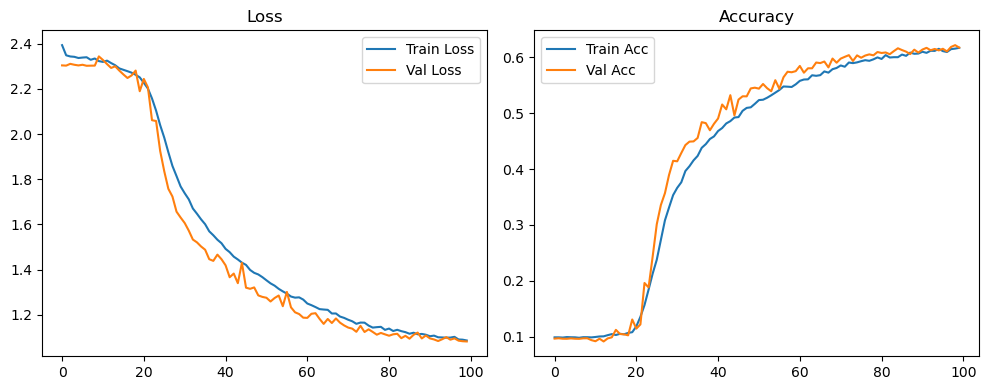

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.23it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

Original Model Final Test Loss: 1.1003 Accuracy: 0.6133


🚀 Running: batch128_lr_max_0.0002_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0973 | Val Acc: 0.0949 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0973 | Val Acc: 0.0949 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0973 | Val Acc: 0.0949 |:   1%|          | 1/100 [01:17<2:07:38, 77.36s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0952 |:   1%|          | 1/100 [01:33<2:07:38, 77.36s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0952 |:   1%|          | 1/100 [01:33<2:07:38, 77.36s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0952 |:   2%|▏         | 2/100 [01:33<1:07:52, 41.55s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0936 |:   2%|▏         | 2/100 [01:50<1:07:52, 41.55s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0936 |:   2%|▏         | 2/100 [01:50<1:07:52, 41.55s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0936 |:   3%|▎         | 3/100 [01:50<48:39, 30.10s/it]  

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0948 |:   3%|▎         | 3/100 [02:06<48:39, 30.10s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0948 |:   3%|▎         | 3/100 [02:06<48:39, 30.10s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0948 |:   4%|▍         | 4/100 [02:06<39:38, 24.78s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [02:23<39:38, 24.78s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [02:23<39:38, 24.78s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   5%|▌         | 5/100 [02:23<34:26, 21.75s/it]

| LR: 0.000199 | Train Acc: 0.1006 | Val Acc: 0.0945 |:   5%|▌         | 5/100 [02:39<34:26, 21.75s/it]

| LR: 0.000199 | Train Acc: 0.1006 | Val Acc: 0.0945 |:   5%|▌         | 5/100 [02:39<34:26, 21.75s/it]

| LR: 0.000199 | Train Acc: 0.1006 | Val Acc: 0.0945 |:   6%|▌         | 6/100 [02:39<31:16, 19.96s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:56<31:16, 19.96s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:56<31:16, 19.96s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [02:56<29:10, 18.82s/it]

| LR: 0.000198 | Train Acc: 0.1003 | Val Acc: 0.1004 |:   7%|▋         | 7/100 [03:12<29:10, 18.82s/it]

| LR: 0.000198 | Train Acc: 0.1003 | Val Acc: 0.1004 |:   7%|▋         | 7/100 [03:12<29:10, 18.82s/it]

| LR: 0.000198 | Train Acc: 0.1003 | Val Acc: 0.1004 |:   8%|▊         | 8/100 [03:12<27:45, 18.10s/it]

| LR: 0.000197 | Train Acc: 0.1023 | Val Acc: 0.1050 |:   8%|▊         | 8/100 [03:29<27:45, 18.10s/it]

| LR: 0.000197 | Train Acc: 0.1023 | Val Acc: 0.1050 |:   8%|▊         | 8/100 [03:29<27:45, 18.10s/it]

| LR: 0.000197 | Train Acc: 0.1023 | Val Acc: 0.1050 |:   9%|▉         | 9/100 [03:29<26:37, 17.56s/it]

| LR: 0.000196 | Train Acc: 0.1021 | Val Acc: 0.0954 |:   9%|▉         | 9/100 [03:45<26:37, 17.56s/it]

| LR: 0.000196 | Train Acc: 0.1021 | Val Acc: 0.0954 |:   9%|▉         | 9/100 [03:45<26:37, 17.56s/it]

| LR: 0.000196 | Train Acc: 0.1021 | Val Acc: 0.0954 |:  10%|█         | 10/100 [03:45<25:46, 17.18s/it]

| LR: 0.000195 | Train Acc: 0.1013 | Val Acc: 0.0992 |:  10%|█         | 10/100 [04:01<25:46, 17.18s/it]

| LR: 0.000195 | Train Acc: 0.1013 | Val Acc: 0.0992 |:  10%|█         | 10/100 [04:01<25:46, 17.18s/it]

| LR: 0.000195 | Train Acc: 0.1013 | Val Acc: 0.0992 |:  11%|█         | 11/100 [04:01<25:09, 16.96s/it]

| LR: 0.000194 | Train Acc: 0.1020 | Val Acc: 0.0995 |:  11%|█         | 11/100 [04:18<25:09, 16.96s/it]

| LR: 0.000194 | Train Acc: 0.1020 | Val Acc: 0.0995 |:  11%|█         | 11/100 [04:18<25:09, 16.96s/it]

| LR: 0.000194 | Train Acc: 0.1020 | Val Acc: 0.0995 |:  12%|█▏        | 12/100 [04:18<24:40, 16.82s/it]

| LR: 0.000193 | Train Acc: 0.1039 | Val Acc: 0.0994 |:  12%|█▏        | 12/100 [04:35<24:40, 16.82s/it]

| LR: 0.000193 | Train Acc: 0.1039 | Val Acc: 0.0994 |:  12%|█▏        | 12/100 [04:35<24:40, 16.82s/it]

| LR: 0.000193 | Train Acc: 0.1039 | Val Acc: 0.0994 |:  13%|█▎        | 13/100 [04:35<24:20, 16.79s/it]

| LR: 0.000192 | Train Acc: 0.1047 | Val Acc: 0.1044 |:  13%|█▎        | 13/100 [04:51<24:20, 16.79s/it]

| LR: 0.000192 | Train Acc: 0.1047 | Val Acc: 0.1044 |:  13%|█▎        | 13/100 [04:51<24:20, 16.79s/it]

| LR: 0.000192 | Train Acc: 0.1047 | Val Acc: 0.1044 |:  14%|█▍        | 14/100 [04:51<23:56, 16.71s/it]

| LR: 0.000191 | Train Acc: 0.1031 | Val Acc: 0.1086 |:  14%|█▍        | 14/100 [05:08<23:56, 16.71s/it]

| LR: 0.000191 | Train Acc: 0.1031 | Val Acc: 0.1086 |:  14%|█▍        | 14/100 [05:08<23:56, 16.71s/it]

| LR: 0.000191 | Train Acc: 0.1031 | Val Acc: 0.1086 |:  15%|█▌        | 15/100 [05:08<23:32, 16.62s/it]

| LR: 0.000190 | Train Acc: 0.1036 | Val Acc: 0.1073 |:  15%|█▌        | 15/100 [05:24<23:32, 16.62s/it]

| LR: 0.000190 | Train Acc: 0.1036 | Val Acc: 0.1073 |:  15%|█▌        | 15/100 [05:24<23:32, 16.62s/it]

| LR: 0.000190 | Train Acc: 0.1036 | Val Acc: 0.1073 |:  16%|█▌        | 16/100 [05:24<23:10, 16.55s/it]

| LR: 0.000188 | Train Acc: 0.1042 | Val Acc: 0.0993 |:  16%|█▌        | 16/100 [05:41<23:10, 16.55s/it]

| LR: 0.000188 | Train Acc: 0.1042 | Val Acc: 0.0993 |:  16%|█▌        | 16/100 [05:41<23:10, 16.55s/it]

| LR: 0.000188 | Train Acc: 0.1042 | Val Acc: 0.0993 |:  17%|█▋        | 17/100 [05:41<22:54, 16.56s/it]

| LR: 0.000187 | Train Acc: 0.1040 | Val Acc: 0.0996 |:  17%|█▋        | 17/100 [05:57<22:54, 16.56s/it]

| LR: 0.000187 | Train Acc: 0.1040 | Val Acc: 0.0996 |:  17%|█▋        | 17/100 [05:57<22:54, 16.56s/it]

| LR: 0.000187 | Train Acc: 0.1040 | Val Acc: 0.0996 |:  18%|█▊        | 18/100 [05:57<22:32, 16.50s/it]

| LR: 0.000185 | Train Acc: 0.1046 | Val Acc: 0.0985 |:  18%|█▊        | 18/100 [06:13<22:32, 16.50s/it]

| LR: 0.000185 | Train Acc: 0.1046 | Val Acc: 0.0985 |:  18%|█▊        | 18/100 [06:13<22:32, 16.50s/it]

| LR: 0.000185 | Train Acc: 0.1046 | Val Acc: 0.0985 |:  19%|█▉        | 19/100 [06:13<22:15, 16.48s/it]

| LR: 0.000184 | Train Acc: 0.1033 | Val Acc: 0.1037 |:  19%|█▉        | 19/100 [06:30<22:15, 16.48s/it]

| LR: 0.000184 | Train Acc: 0.1033 | Val Acc: 0.1037 |:  19%|█▉        | 19/100 [06:30<22:15, 16.48s/it]

| LR: 0.000184 | Train Acc: 0.1033 | Val Acc: 0.1037 |:  20%|██        | 20/100 [06:30<21:55, 16.44s/it]

| LR: 0.000182 | Train Acc: 0.1032 | Val Acc: 0.1068 |:  20%|██        | 20/100 [06:46<21:55, 16.44s/it]

| LR: 0.000182 | Train Acc: 0.1032 | Val Acc: 0.1068 |:  20%|██        | 20/100 [06:46<21:55, 16.44s/it]

| LR: 0.000182 | Train Acc: 0.1032 | Val Acc: 0.1068 |:  21%|██        | 21/100 [06:46<21:37, 16.42s/it]

| LR: 0.000180 | Train Acc: 0.1047 | Val Acc: 0.0996 |:  21%|██        | 21/100 [07:02<21:37, 16.42s/it]

| LR: 0.000180 | Train Acc: 0.1047 | Val Acc: 0.0996 |:  21%|██        | 21/100 [07:02<21:37, 16.42s/it]

| LR: 0.000180 | Train Acc: 0.1047 | Val Acc: 0.0996 |:  22%|██▏       | 22/100 [07:02<21:19, 16.40s/it]

| LR: 0.000178 | Train Acc: 0.1066 | Val Acc: 0.1077 |:  22%|██▏       | 22/100 [07:19<21:19, 16.40s/it]

| LR: 0.000178 | Train Acc: 0.1066 | Val Acc: 0.1077 |:  22%|██▏       | 22/100 [07:19<21:19, 16.40s/it]

| LR: 0.000178 | Train Acc: 0.1066 | Val Acc: 0.1077 |:  23%|██▎       | 23/100 [07:19<21:06, 16.45s/it]

| LR: 0.000176 | Train Acc: 0.1067 | Val Acc: 0.1071 |:  23%|██▎       | 23/100 [07:35<21:06, 16.45s/it]

| LR: 0.000176 | Train Acc: 0.1067 | Val Acc: 0.1071 |:  23%|██▎       | 23/100 [07:35<21:06, 16.45s/it]

| LR: 0.000176 | Train Acc: 0.1067 | Val Acc: 0.1071 |:  24%|██▍       | 24/100 [07:35<20:48, 16.43s/it]

| LR: 0.000174 | Train Acc: 0.1111 | Val Acc: 0.1024 |:  24%|██▍       | 24/100 [07:52<20:48, 16.43s/it]

| LR: 0.000174 | Train Acc: 0.1111 | Val Acc: 0.1024 |:  24%|██▍       | 24/100 [07:52<20:48, 16.43s/it]

| LR: 0.000174 | Train Acc: 0.1111 | Val Acc: 0.1024 |:  25%|██▌       | 25/100 [07:52<20:31, 16.42s/it]

| LR: 0.000172 | Train Acc: 0.1105 | Val Acc: 0.1106 |:  25%|██▌       | 25/100 [08:08<20:31, 16.42s/it]

| LR: 0.000172 | Train Acc: 0.1105 | Val Acc: 0.1106 |:  25%|██▌       | 25/100 [08:08<20:31, 16.42s/it]

| LR: 0.000172 | Train Acc: 0.1105 | Val Acc: 0.1106 |:  26%|██▌       | 26/100 [08:08<20:16, 16.44s/it]

| LR: 0.000170 | Train Acc: 0.1156 | Val Acc: 0.1197 |:  26%|██▌       | 26/100 [08:25<20:16, 16.44s/it]

| LR: 0.000170 | Train Acc: 0.1156 | Val Acc: 0.1197 |:  26%|██▌       | 26/100 [08:25<20:16, 16.44s/it]

| LR: 0.000170 | Train Acc: 0.1156 | Val Acc: 0.1197 |:  27%|██▋       | 27/100 [08:25<19:56, 16.40s/it]

| LR: 0.000168 | Train Acc: 0.1190 | Val Acc: 0.1094 |:  27%|██▋       | 27/100 [08:41<19:56, 16.40s/it]

| LR: 0.000168 | Train Acc: 0.1190 | Val Acc: 0.1094 |:  27%|██▋       | 27/100 [08:41<19:56, 16.40s/it]

| LR: 0.000168 | Train Acc: 0.1190 | Val Acc: 0.1094 |:  28%|██▊       | 28/100 [08:41<19:43, 16.44s/it]

| LR: 0.000166 | Train Acc: 0.1204 | Val Acc: 0.1592 |:  28%|██▊       | 28/100 [08:58<19:43, 16.44s/it]

| LR: 0.000166 | Train Acc: 0.1204 | Val Acc: 0.1592 |:  28%|██▊       | 28/100 [08:58<19:43, 16.44s/it]

| LR: 0.000166 | Train Acc: 0.1204 | Val Acc: 0.1592 |:  29%|██▉       | 29/100 [08:58<19:26, 16.43s/it]

| LR: 0.000163 | Train Acc: 0.1237 | Val Acc: 0.1222 |:  29%|██▉       | 29/100 [09:14<19:26, 16.43s/it]

| LR: 0.000163 | Train Acc: 0.1237 | Val Acc: 0.1222 |:  29%|██▉       | 29/100 [09:14<19:26, 16.43s/it]

| LR: 0.000163 | Train Acc: 0.1237 | Val Acc: 0.1222 |:  30%|███       | 30/100 [09:14<19:09, 16.42s/it]

| LR: 0.000161 | Train Acc: 0.1278 | Val Acc: 0.1292 |:  30%|███       | 30/100 [09:30<19:09, 16.42s/it]

| LR: 0.000161 | Train Acc: 0.1278 | Val Acc: 0.1292 |:  30%|███       | 30/100 [09:30<19:09, 16.42s/it]

| LR: 0.000161 | Train Acc: 0.1278 | Val Acc: 0.1292 |:  31%|███       | 31/100 [09:30<18:52, 16.41s/it]

| LR: 0.000158 | Train Acc: 0.1313 | Val Acc: 0.1483 |:  31%|███       | 31/100 [09:47<18:52, 16.41s/it]

| LR: 0.000158 | Train Acc: 0.1313 | Val Acc: 0.1483 |:  31%|███       | 31/100 [09:47<18:52, 16.41s/it]

| LR: 0.000158 | Train Acc: 0.1313 | Val Acc: 0.1483 |:  32%|███▏      | 32/100 [09:47<18:37, 16.44s/it]

| LR: 0.000156 | Train Acc: 0.1357 | Val Acc: 0.1260 |:  32%|███▏      | 32/100 [10:03<18:37, 16.44s/it]

| LR: 0.000156 | Train Acc: 0.1357 | Val Acc: 0.1260 |:  32%|███▏      | 32/100 [10:03<18:37, 16.44s/it]

| LR: 0.000156 | Train Acc: 0.1357 | Val Acc: 0.1260 |:  33%|███▎      | 33/100 [10:03<18:22, 16.46s/it]

| LR: 0.000153 | Train Acc: 0.1362 | Val Acc: 0.1260 |:  33%|███▎      | 33/100 [10:20<18:22, 16.46s/it]

| LR: 0.000153 | Train Acc: 0.1362 | Val Acc: 0.1260 |:  33%|███▎      | 33/100 [10:20<18:22, 16.46s/it]

| LR: 0.000153 | Train Acc: 0.1362 | Val Acc: 0.1260 |:  34%|███▍      | 34/100 [10:20<18:06, 16.46s/it]

| LR: 0.000151 | Train Acc: 0.1376 | Val Acc: 0.1277 |:  34%|███▍      | 34/100 [10:36<18:06, 16.46s/it]

| LR: 0.000151 | Train Acc: 0.1376 | Val Acc: 0.1277 |:  34%|███▍      | 34/100 [10:36<18:06, 16.46s/it]

| LR: 0.000151 | Train Acc: 0.1376 | Val Acc: 0.1277 |:  35%|███▌      | 35/100 [10:36<17:51, 16.48s/it]

| LR: 0.000148 | Train Acc: 0.1451 | Val Acc: 0.1540 |:  35%|███▌      | 35/100 [10:53<17:51, 16.48s/it]

| LR: 0.000148 | Train Acc: 0.1451 | Val Acc: 0.1540 |:  35%|███▌      | 35/100 [10:53<17:51, 16.48s/it]

| LR: 0.000148 | Train Acc: 0.1451 | Val Acc: 0.1540 |:  36%|███▌      | 36/100 [10:53<17:34, 16.48s/it]

| LR: 0.000145 | Train Acc: 0.1497 | Val Acc: 0.1617 |:  36%|███▌      | 36/100 [11:09<17:34, 16.48s/it]

| LR: 0.000145 | Train Acc: 0.1497 | Val Acc: 0.1617 |:  36%|███▌      | 36/100 [11:09<17:34, 16.48s/it]

| LR: 0.000145 | Train Acc: 0.1497 | Val Acc: 0.1617 |:  37%|███▋      | 37/100 [11:09<17:16, 16.45s/it]

| LR: 0.000143 | Train Acc: 0.1535 | Val Acc: 0.1610 |:  37%|███▋      | 37/100 [11:26<17:16, 16.45s/it]

| LR: 0.000143 | Train Acc: 0.1535 | Val Acc: 0.1610 |:  37%|███▋      | 37/100 [11:26<17:16, 16.45s/it]

| LR: 0.000143 | Train Acc: 0.1535 | Val Acc: 0.1610 |:  38%|███▊      | 38/100 [11:26<17:01, 16.48s/it]

| LR: 0.000140 | Train Acc: 0.1616 | Val Acc: 0.1600 |:  38%|███▊      | 38/100 [11:42<17:01, 16.48s/it]

| LR: 0.000140 | Train Acc: 0.1616 | Val Acc: 0.1600 |:  38%|███▊      | 38/100 [11:42<17:01, 16.48s/it]

| LR: 0.000140 | Train Acc: 0.1616 | Val Acc: 0.1600 |:  39%|███▉      | 39/100 [11:42<16:45, 16.49s/it]

| LR: 0.000137 | Train Acc: 0.1661 | Val Acc: 0.1795 |:  39%|███▉      | 39/100 [11:59<16:45, 16.49s/it]

| LR: 0.000137 | Train Acc: 0.1661 | Val Acc: 0.1795 |:  39%|███▉      | 39/100 [11:59<16:45, 16.49s/it]

| LR: 0.000137 | Train Acc: 0.1661 | Val Acc: 0.1795 |:  40%|████      | 40/100 [11:59<16:27, 16.46s/it]

| LR: 0.000134 | Train Acc: 0.1736 | Val Acc: 0.1567 |:  40%|████      | 40/100 [12:15<16:27, 16.46s/it]

| LR: 0.000134 | Train Acc: 0.1736 | Val Acc: 0.1567 |:  40%|████      | 40/100 [12:15<16:27, 16.46s/it]

| LR: 0.000134 | Train Acc: 0.1736 | Val Acc: 0.1567 |:  41%|████      | 41/100 [12:15<16:12, 16.49s/it]

| LR: 0.000132 | Train Acc: 0.1784 | Val Acc: 0.1719 |:  41%|████      | 41/100 [12:32<16:12, 16.49s/it]

| LR: 0.000132 | Train Acc: 0.1784 | Val Acc: 0.1719 |:  41%|████      | 41/100 [12:32<16:12, 16.49s/it]

| LR: 0.000132 | Train Acc: 0.1784 | Val Acc: 0.1719 |:  42%|████▏     | 42/100 [12:32<15:57, 16.51s/it]

| LR: 0.000129 | Train Acc: 0.1885 | Val Acc: 0.2114 |:  42%|████▏     | 42/100 [12:48<15:57, 16.51s/it]

| LR: 0.000129 | Train Acc: 0.1885 | Val Acc: 0.2114 |:  42%|████▏     | 42/100 [12:48<15:57, 16.51s/it]

| LR: 0.000129 | Train Acc: 0.1885 | Val Acc: 0.2114 |:  43%|████▎     | 43/100 [12:48<15:41, 16.51s/it]

| LR: 0.000126 | Train Acc: 0.1978 | Val Acc: 0.2077 |:  43%|████▎     | 43/100 [13:05<15:41, 16.51s/it]

| LR: 0.000126 | Train Acc: 0.1978 | Val Acc: 0.2077 |:  43%|████▎     | 43/100 [13:05<15:41, 16.51s/it]

| LR: 0.000126 | Train Acc: 0.1978 | Val Acc: 0.2077 |:  44%|████▍     | 44/100 [13:05<15:23, 16.49s/it]

| LR: 0.000123 | Train Acc: 0.2060 | Val Acc: 0.2075 |:  44%|████▍     | 44/100 [13:21<15:23, 16.49s/it]

| LR: 0.000123 | Train Acc: 0.2060 | Val Acc: 0.2075 |:  44%|████▍     | 44/100 [13:21<15:23, 16.49s/it]

| LR: 0.000123 | Train Acc: 0.2060 | Val Acc: 0.2075 |:  45%|████▌     | 45/100 [13:21<15:04, 16.44s/it]

| LR: 0.000120 | Train Acc: 0.2109 | Val Acc: 0.1790 |:  45%|████▌     | 45/100 [13:37<15:04, 16.44s/it]

| LR: 0.000120 | Train Acc: 0.2109 | Val Acc: 0.1790 |:  45%|████▌     | 45/100 [13:37<15:04, 16.44s/it]

| LR: 0.000120 | Train Acc: 0.2109 | Val Acc: 0.1790 |:  46%|████▌     | 46/100 [13:38<14:48, 16.46s/it]

| LR: 0.000117 | Train Acc: 0.2187 | Val Acc: 0.2417 |:  46%|████▌     | 46/100 [13:54<14:48, 16.46s/it]

| LR: 0.000117 | Train Acc: 0.2187 | Val Acc: 0.2417 |:  46%|████▌     | 46/100 [13:54<14:48, 16.46s/it]

| LR: 0.000117 | Train Acc: 0.2187 | Val Acc: 0.2417 |:  47%|████▋     | 47/100 [13:54<14:32, 16.47s/it]

| LR: 0.000114 | Train Acc: 0.2352 | Val Acc: 0.2336 |:  47%|████▋     | 47/100 [14:10<14:32, 16.47s/it]

| LR: 0.000114 | Train Acc: 0.2352 | Val Acc: 0.2336 |:  47%|████▋     | 47/100 [14:10<14:32, 16.47s/it]

| LR: 0.000114 | Train Acc: 0.2352 | Val Acc: 0.2336 |:  48%|████▊     | 48/100 [14:10<14:12, 16.39s/it]

| LR: 0.000111 | Train Acc: 0.2461 | Val Acc: 0.2508 |:  48%|████▊     | 48/100 [14:27<14:12, 16.39s/it]

| LR: 0.000111 | Train Acc: 0.2461 | Val Acc: 0.2508 |:  48%|████▊     | 48/100 [14:27<14:12, 16.39s/it]

| LR: 0.000111 | Train Acc: 0.2461 | Val Acc: 0.2508 |:  49%|████▉     | 49/100 [14:27<13:57, 16.42s/it]

| LR: 0.000108 | Train Acc: 0.2560 | Val Acc: 0.2570 |:  49%|████▉     | 49/100 [14:43<13:57, 16.42s/it]

| LR: 0.000108 | Train Acc: 0.2560 | Val Acc: 0.2570 |:  49%|████▉     | 49/100 [14:43<13:57, 16.42s/it]

| LR: 0.000108 | Train Acc: 0.2560 | Val Acc: 0.2570 |:  50%|█████     | 50/100 [14:43<13:44, 16.49s/it]

| LR: 0.000105 | Train Acc: 0.2664 | Val Acc: 0.2740 |:  50%|█████     | 50/100 [15:00<13:44, 16.49s/it]

| LR: 0.000105 | Train Acc: 0.2664 | Val Acc: 0.2740 |:  50%|█████     | 50/100 [15:00<13:44, 16.49s/it]

| LR: 0.000105 | Train Acc: 0.2664 | Val Acc: 0.2740 |:  51%|█████     | 51/100 [15:00<13:27, 16.48s/it]

| LR: 0.000102 | Train Acc: 0.2756 | Val Acc: 0.2700 |:  51%|█████     | 51/100 [15:16<13:27, 16.48s/it]

| LR: 0.000102 | Train Acc: 0.2756 | Val Acc: 0.2700 |:  51%|█████     | 51/100 [15:16<13:27, 16.48s/it]

| LR: 0.000102 | Train Acc: 0.2756 | Val Acc: 0.2700 |:  52%|█████▏    | 52/100 [15:16<13:08, 16.42s/it]

| LR: 0.000099 | Train Acc: 0.2868 | Val Acc: 0.2945 |:  52%|█████▏    | 52/100 [15:32<13:08, 16.42s/it]

| LR: 0.000099 | Train Acc: 0.2868 | Val Acc: 0.2945 |:  52%|█████▏    | 52/100 [15:32<13:08, 16.42s/it]

| LR: 0.000099 | Train Acc: 0.2868 | Val Acc: 0.2945 |:  53%|█████▎    | 53/100 [15:32<12:49, 16.37s/it]

| LR: 0.000096 | Train Acc: 0.2966 | Val Acc: 0.2775 |:  53%|█████▎    | 53/100 [15:49<12:49, 16.37s/it]

| LR: 0.000096 | Train Acc: 0.2966 | Val Acc: 0.2775 |:  53%|█████▎    | 53/100 [15:49<12:49, 16.37s/it]

| LR: 0.000096 | Train Acc: 0.2966 | Val Acc: 0.2775 |:  54%|█████▍    | 54/100 [15:49<12:33, 16.38s/it]

| LR: 0.000093 | Train Acc: 0.3115 | Val Acc: 0.2957 |:  54%|█████▍    | 54/100 [16:05<12:33, 16.38s/it]

| LR: 0.000093 | Train Acc: 0.3115 | Val Acc: 0.2957 |:  54%|█████▍    | 54/100 [16:05<12:33, 16.38s/it]

| LR: 0.000093 | Train Acc: 0.3115 | Val Acc: 0.2957 |:  55%|█████▌    | 55/100 [16:05<12:15, 16.35s/it]

| LR: 0.000090 | Train Acc: 0.3220 | Val Acc: 0.3369 |:  55%|█████▌    | 55/100 [16:21<12:15, 16.35s/it]

| LR: 0.000090 | Train Acc: 0.3220 | Val Acc: 0.3369 |:  55%|█████▌    | 55/100 [16:21<12:15, 16.35s/it]

| LR: 0.000090 | Train Acc: 0.3220 | Val Acc: 0.3369 |:  56%|█████▌    | 56/100 [16:22<12:01, 16.39s/it]

| LR: 0.000087 | Train Acc: 0.3275 | Val Acc: 0.3243 |:  56%|█████▌    | 56/100 [16:38<12:01, 16.39s/it]

| LR: 0.000087 | Train Acc: 0.3275 | Val Acc: 0.3243 |:  56%|█████▌    | 56/100 [16:38<12:01, 16.39s/it]

| LR: 0.000087 | Train Acc: 0.3275 | Val Acc: 0.3243 |:  57%|█████▋    | 57/100 [16:38<11:46, 16.42s/it]

| LR: 0.000084 | Train Acc: 0.3402 | Val Acc: 0.3038 |:  57%|█████▋    | 57/100 [16:54<11:46, 16.42s/it]

| LR: 0.000084 | Train Acc: 0.3402 | Val Acc: 0.3038 |:  57%|█████▋    | 57/100 [16:54<11:46, 16.42s/it]

| LR: 0.000084 | Train Acc: 0.3402 | Val Acc: 0.3038 |:  58%|█████▊    | 58/100 [16:55<11:30, 16.43s/it]

| LR: 0.000081 | Train Acc: 0.3494 | Val Acc: 0.3188 |:  58%|█████▊    | 58/100 [17:11<11:30, 16.43s/it]

| LR: 0.000081 | Train Acc: 0.3494 | Val Acc: 0.3188 |:  58%|█████▊    | 58/100 [17:11<11:30, 16.43s/it]

| LR: 0.000081 | Train Acc: 0.3494 | Val Acc: 0.3188 |:  59%|█████▉    | 59/100 [17:11<11:14, 16.44s/it]

| LR: 0.000078 | Train Acc: 0.3596 | Val Acc: 0.3599 |:  59%|█████▉    | 59/100 [17:27<11:14, 16.44s/it]

| LR: 0.000078 | Train Acc: 0.3596 | Val Acc: 0.3599 |:  59%|█████▉    | 59/100 [17:27<11:14, 16.44s/it]

| LR: 0.000078 | Train Acc: 0.3596 | Val Acc: 0.3599 |:  60%|██████    | 60/100 [17:27<10:56, 16.42s/it]

| LR: 0.000076 | Train Acc: 0.3684 | Val Acc: 0.3464 |:  60%|██████    | 60/100 [17:44<10:56, 16.42s/it]

| LR: 0.000076 | Train Acc: 0.3684 | Val Acc: 0.3464 |:  60%|██████    | 60/100 [17:44<10:56, 16.42s/it]

| LR: 0.000076 | Train Acc: 0.3684 | Val Acc: 0.3464 |:  61%|██████    | 61/100 [17:44<10:41, 16.46s/it]

| LR: 0.000073 | Train Acc: 0.3725 | Val Acc: 0.3625 |:  61%|██████    | 61/100 [18:00<10:41, 16.46s/it]

| LR: 0.000073 | Train Acc: 0.3725 | Val Acc: 0.3625 |:  61%|██████    | 61/100 [18:00<10:41, 16.46s/it]

| LR: 0.000073 | Train Acc: 0.3725 | Val Acc: 0.3625 |:  62%|██████▏   | 62/100 [18:00<10:25, 16.45s/it]

| LR: 0.000070 | Train Acc: 0.3791 | Val Acc: 0.3740 |:  62%|██████▏   | 62/100 [18:17<10:25, 16.45s/it]

| LR: 0.000070 | Train Acc: 0.3791 | Val Acc: 0.3740 |:  62%|██████▏   | 62/100 [18:17<10:25, 16.45s/it]

| LR: 0.000070 | Train Acc: 0.3791 | Val Acc: 0.3740 |:  63%|██████▎   | 63/100 [18:17<10:09, 16.46s/it]

| LR: 0.000067 | Train Acc: 0.3875 | Val Acc: 0.3624 |:  63%|██████▎   | 63/100 [18:33<10:09, 16.46s/it]

| LR: 0.000067 | Train Acc: 0.3875 | Val Acc: 0.3624 |:  63%|██████▎   | 63/100 [18:33<10:09, 16.46s/it]

| LR: 0.000067 | Train Acc: 0.3875 | Val Acc: 0.3624 |:  64%|██████▍   | 64/100 [18:33<09:52, 16.46s/it]

| LR: 0.000065 | Train Acc: 0.3993 | Val Acc: 0.3862 |:  64%|██████▍   | 64/100 [18:50<09:52, 16.46s/it]

| LR: 0.000065 | Train Acc: 0.3993 | Val Acc: 0.3862 |:  64%|██████▍   | 64/100 [18:50<09:52, 16.46s/it]

| LR: 0.000065 | Train Acc: 0.3993 | Val Acc: 0.3862 |:  65%|██████▌   | 65/100 [18:50<09:35, 16.43s/it]

| LR: 0.000062 | Train Acc: 0.4042 | Val Acc: 0.3798 |:  65%|██████▌   | 65/100 [19:06<09:35, 16.43s/it]

| LR: 0.000062 | Train Acc: 0.4042 | Val Acc: 0.3798 |:  65%|██████▌   | 65/100 [19:06<09:35, 16.43s/it]

| LR: 0.000062 | Train Acc: 0.4042 | Val Acc: 0.3798 |:  66%|██████▌   | 66/100 [19:06<09:17, 16.40s/it]

| LR: 0.000059 | Train Acc: 0.4088 | Val Acc: 0.3649 |:  66%|██████▌   | 66/100 [19:22<09:17, 16.40s/it]

| LR: 0.000059 | Train Acc: 0.4088 | Val Acc: 0.3649 |:  66%|██████▌   | 66/100 [19:22<09:17, 16.40s/it]

| LR: 0.000059 | Train Acc: 0.4088 | Val Acc: 0.3649 |:  67%|██████▋   | 67/100 [19:22<09:02, 16.44s/it]

| LR: 0.000057 | Train Acc: 0.4133 | Val Acc: 0.4100 |:  67%|██████▋   | 67/100 [19:39<09:02, 16.44s/it]

| LR: 0.000057 | Train Acc: 0.4133 | Val Acc: 0.4100 |:  67%|██████▋   | 67/100 [19:39<09:02, 16.44s/it]

| LR: 0.000057 | Train Acc: 0.4133 | Val Acc: 0.4100 |:  68%|██████▊   | 68/100 [19:39<08:46, 16.47s/it]

| LR: 0.000054 | Train Acc: 0.4173 | Val Acc: 0.4134 |:  68%|██████▊   | 68/100 [19:56<08:46, 16.47s/it]

| LR: 0.000054 | Train Acc: 0.4173 | Val Acc: 0.4134 |:  68%|██████▊   | 68/100 [19:56<08:46, 16.47s/it]

| LR: 0.000054 | Train Acc: 0.4173 | Val Acc: 0.4134 |:  69%|██████▉   | 69/100 [19:56<08:31, 16.51s/it]

| LR: 0.000052 | Train Acc: 0.4266 | Val Acc: 0.4077 |:  69%|██████▉   | 69/100 [20:12<08:31, 16.51s/it]

| LR: 0.000052 | Train Acc: 0.4266 | Val Acc: 0.4077 |:  69%|██████▉   | 69/100 [20:12<08:31, 16.51s/it]

| LR: 0.000052 | Train Acc: 0.4266 | Val Acc: 0.4077 |:  70%|███████   | 70/100 [20:12<08:15, 16.51s/it]

| LR: 0.000049 | Train Acc: 0.4275 | Val Acc: 0.4270 |:  70%|███████   | 70/100 [20:29<08:15, 16.51s/it]

| LR: 0.000049 | Train Acc: 0.4275 | Val Acc: 0.4270 |:  70%|███████   | 70/100 [20:29<08:15, 16.51s/it]

| LR: 0.000049 | Train Acc: 0.4275 | Val Acc: 0.4270 |:  71%|███████   | 71/100 [20:29<07:58, 16.51s/it]

| LR: 0.000047 | Train Acc: 0.4298 | Val Acc: 0.4186 |:  71%|███████   | 71/100 [20:45<07:58, 16.51s/it]

| LR: 0.000047 | Train Acc: 0.4298 | Val Acc: 0.4186 |:  71%|███████   | 71/100 [20:45<07:58, 16.51s/it]

| LR: 0.000047 | Train Acc: 0.4298 | Val Acc: 0.4186 |:  72%|███████▏  | 72/100 [20:45<07:43, 16.54s/it]

| LR: 0.000044 | Train Acc: 0.4430 | Val Acc: 0.4450 |:  72%|███████▏  | 72/100 [21:02<07:43, 16.54s/it]

| LR: 0.000044 | Train Acc: 0.4430 | Val Acc: 0.4450 |:  72%|███████▏  | 72/100 [21:02<07:43, 16.54s/it]

| LR: 0.000044 | Train Acc: 0.4430 | Val Acc: 0.4450 |:  73%|███████▎  | 73/100 [21:02<07:27, 16.57s/it]

| LR: 0.000042 | Train Acc: 0.4422 | Val Acc: 0.4223 |:  73%|███████▎  | 73/100 [21:18<07:27, 16.57s/it]

| LR: 0.000042 | Train Acc: 0.4422 | Val Acc: 0.4223 |:  73%|███████▎  | 73/100 [21:18<07:27, 16.57s/it]

| LR: 0.000042 | Train Acc: 0.4422 | Val Acc: 0.4223 |:  74%|███████▍  | 74/100 [21:19<07:11, 16.58s/it]

| LR: 0.000040 | Train Acc: 0.4482 | Val Acc: 0.4090 |:  74%|███████▍  | 74/100 [21:35<07:11, 16.58s/it]

| LR: 0.000040 | Train Acc: 0.4482 | Val Acc: 0.4090 |:  74%|███████▍  | 74/100 [21:35<07:11, 16.58s/it]

| LR: 0.000040 | Train Acc: 0.4482 | Val Acc: 0.4090 |:  75%|███████▌  | 75/100 [21:35<06:53, 16.56s/it]

| LR: 0.000038 | Train Acc: 0.4506 | Val Acc: 0.4517 |:  75%|███████▌  | 75/100 [21:51<06:53, 16.56s/it]

| LR: 0.000038 | Train Acc: 0.4506 | Val Acc: 0.4517 |:  75%|███████▌  | 75/100 [21:51<06:53, 16.56s/it]

| LR: 0.000038 | Train Acc: 0.4506 | Val Acc: 0.4517 |:  76%|███████▌  | 76/100 [21:52<06:37, 16.55s/it]

| LR: 0.000036 | Train Acc: 0.4496 | Val Acc: 0.4574 |:  76%|███████▌  | 76/100 [22:08<06:37, 16.55s/it]

| LR: 0.000036 | Train Acc: 0.4496 | Val Acc: 0.4574 |:  76%|███████▌  | 76/100 [22:08<06:37, 16.55s/it]

| LR: 0.000036 | Train Acc: 0.4496 | Val Acc: 0.4574 |:  77%|███████▋  | 77/100 [22:08<06:21, 16.57s/it]

| LR: 0.000034 | Train Acc: 0.4552 | Val Acc: 0.4393 |:  77%|███████▋  | 77/100 [22:25<06:21, 16.57s/it]

| LR: 0.000034 | Train Acc: 0.4552 | Val Acc: 0.4393 |:  77%|███████▋  | 77/100 [22:25<06:21, 16.57s/it]

| LR: 0.000034 | Train Acc: 0.4552 | Val Acc: 0.4393 |:  78%|███████▊  | 78/100 [22:25<06:03, 16.54s/it]

| LR: 0.000032 | Train Acc: 0.4651 | Val Acc: 0.4602 |:  78%|███████▊  | 78/100 [22:41<06:03, 16.54s/it]

| LR: 0.000032 | Train Acc: 0.4651 | Val Acc: 0.4602 |:  78%|███████▊  | 78/100 [22:41<06:03, 16.54s/it]

| LR: 0.000032 | Train Acc: 0.4651 | Val Acc: 0.4602 |:  79%|███████▉  | 79/100 [22:41<05:47, 16.56s/it]

| LR: 0.000030 | Train Acc: 0.4626 | Val Acc: 0.4451 |:  79%|███████▉  | 79/100 [22:58<05:47, 16.56s/it]

| LR: 0.000030 | Train Acc: 0.4626 | Val Acc: 0.4451 |:  79%|███████▉  | 79/100 [22:58<05:47, 16.56s/it]

| LR: 0.000030 | Train Acc: 0.4626 | Val Acc: 0.4451 |:  80%|████████  | 80/100 [22:58<05:30, 16.52s/it]

| LR: 0.000028 | Train Acc: 0.4654 | Val Acc: 0.4549 |:  80%|████████  | 80/100 [23:14<05:30, 16.52s/it]

| LR: 0.000028 | Train Acc: 0.4654 | Val Acc: 0.4549 |:  80%|████████  | 80/100 [23:14<05:30, 16.52s/it]

| LR: 0.000028 | Train Acc: 0.4654 | Val Acc: 0.4549 |:  81%|████████  | 81/100 [23:14<05:13, 16.51s/it]

| LR: 0.000026 | Train Acc: 0.4680 | Val Acc: 0.4534 |:  81%|████████  | 81/100 [23:31<05:13, 16.51s/it]

| LR: 0.000026 | Train Acc: 0.4680 | Val Acc: 0.4534 |:  81%|████████  | 81/100 [23:31<05:13, 16.51s/it]

| LR: 0.000026 | Train Acc: 0.4680 | Val Acc: 0.4534 |:  82%|████████▏ | 82/100 [23:31<04:56, 16.49s/it]

| LR: 0.000025 | Train Acc: 0.4682 | Val Acc: 0.4618 |:  82%|████████▏ | 82/100 [23:47<04:56, 16.49s/it]

| LR: 0.000025 | Train Acc: 0.4682 | Val Acc: 0.4618 |:  82%|████████▏ | 82/100 [23:47<04:56, 16.49s/it]

| LR: 0.000025 | Train Acc: 0.4682 | Val Acc: 0.4618 |:  83%|████████▎ | 83/100 [23:47<04:40, 16.51s/it]

| LR: 0.000023 | Train Acc: 0.4702 | Val Acc: 0.4579 |:  83%|████████▎ | 83/100 [24:04<04:40, 16.51s/it]

| LR: 0.000023 | Train Acc: 0.4702 | Val Acc: 0.4579 |:  83%|████████▎ | 83/100 [24:04<04:40, 16.51s/it]

| LR: 0.000023 | Train Acc: 0.4702 | Val Acc: 0.4579 |:  84%|████████▍ | 84/100 [24:04<04:23, 16.48s/it]

| LR: 0.000022 | Train Acc: 0.4737 | Val Acc: 0.4735 |:  84%|████████▍ | 84/100 [24:20<04:23, 16.48s/it]

| LR: 0.000022 | Train Acc: 0.4737 | Val Acc: 0.4735 |:  84%|████████▍ | 84/100 [24:20<04:23, 16.48s/it]

| LR: 0.000022 | Train Acc: 0.4737 | Val Acc: 0.4735 |:  85%|████████▌ | 85/100 [24:20<04:05, 16.38s/it]

| LR: 0.000020 | Train Acc: 0.4781 | Val Acc: 0.4640 |:  85%|████████▌ | 85/100 [24:36<04:05, 16.38s/it]

| LR: 0.000020 | Train Acc: 0.4781 | Val Acc: 0.4640 |:  85%|████████▌ | 85/100 [24:36<04:05, 16.38s/it]

| LR: 0.000020 | Train Acc: 0.4781 | Val Acc: 0.4640 |:  86%|████████▌ | 86/100 [24:36<03:49, 16.43s/it]

| LR: 0.000019 | Train Acc: 0.4766 | Val Acc: 0.4380 |:  86%|████████▌ | 86/100 [24:53<03:49, 16.43s/it]

| LR: 0.000019 | Train Acc: 0.4766 | Val Acc: 0.4380 |:  86%|████████▌ | 86/100 [24:53<03:49, 16.43s/it]

| LR: 0.000019 | Train Acc: 0.4766 | Val Acc: 0.4380 |:  87%|████████▋ | 87/100 [24:53<03:34, 16.47s/it]

| LR: 0.000018 | Train Acc: 0.4809 | Val Acc: 0.4368 |:  87%|████████▋ | 87/100 [25:09<03:34, 16.47s/it]

| LR: 0.000018 | Train Acc: 0.4809 | Val Acc: 0.4368 |:  87%|████████▋ | 87/100 [25:09<03:34, 16.47s/it]

| LR: 0.000018 | Train Acc: 0.4809 | Val Acc: 0.4368 |:  88%|████████▊ | 88/100 [25:09<03:17, 16.49s/it]

| LR: 0.000017 | Train Acc: 0.4805 | Val Acc: 0.4601 |:  88%|████████▊ | 88/100 [25:26<03:17, 16.49s/it]

| LR: 0.000017 | Train Acc: 0.4805 | Val Acc: 0.4601 |:  88%|████████▊ | 88/100 [25:26<03:17, 16.49s/it]

| LR: 0.000017 | Train Acc: 0.4805 | Val Acc: 0.4601 |:  89%|████████▉ | 89/100 [25:26<03:01, 16.48s/it]

| LR: 0.000016 | Train Acc: 0.4843 | Val Acc: 0.4307 |:  89%|████████▉ | 89/100 [25:42<03:01, 16.48s/it]

| LR: 0.000016 | Train Acc: 0.4843 | Val Acc: 0.4307 |:  89%|████████▉ | 89/100 [25:42<03:01, 16.48s/it]

| LR: 0.000016 | Train Acc: 0.4843 | Val Acc: 0.4307 |:  90%|█████████ | 90/100 [25:42<02:44, 16.44s/it]

| LR: 0.000015 | Train Acc: 0.4882 | Val Acc: 0.4603 |:  90%|█████████ | 90/100 [25:59<02:44, 16.44s/it]

| LR: 0.000015 | Train Acc: 0.4882 | Val Acc: 0.4603 |:  90%|█████████ | 90/100 [25:59<02:44, 16.44s/it]

| LR: 0.000015 | Train Acc: 0.4882 | Val Acc: 0.4603 |:  91%|█████████ | 91/100 [25:59<02:27, 16.44s/it]

| LR: 0.000014 | Train Acc: 0.4900 | Val Acc: 0.4802 |:  91%|█████████ | 91/100 [26:15<02:27, 16.44s/it]

| LR: 0.000014 | Train Acc: 0.4900 | Val Acc: 0.4802 |:  91%|█████████ | 91/100 [26:15<02:27, 16.44s/it]

| LR: 0.000014 | Train Acc: 0.4900 | Val Acc: 0.4802 |:  92%|█████████▏| 92/100 [26:15<02:11, 16.44s/it]

| LR: 0.000013 | Train Acc: 0.4861 | Val Acc: 0.4396 |:  92%|█████████▏| 92/100 [26:31<02:11, 16.44s/it]

| LR: 0.000013 | Train Acc: 0.4861 | Val Acc: 0.4396 |:  92%|█████████▏| 92/100 [26:31<02:11, 16.44s/it]

| LR: 0.000013 | Train Acc: 0.4861 | Val Acc: 0.4396 |:  93%|█████████▎| 93/100 [26:31<01:54, 16.37s/it]

| LR: 0.000012 | Train Acc: 0.4845 | Val Acc: 0.3450 |:  93%|█████████▎| 93/100 [26:48<01:54, 16.37s/it]

| LR: 0.000012 | Train Acc: 0.4845 | Val Acc: 0.3450 |:  93%|█████████▎| 93/100 [26:48<01:54, 16.37s/it]

| LR: 0.000012 | Train Acc: 0.4845 | Val Acc: 0.3450 |:  94%|█████████▍| 94/100 [26:48<01:38, 16.41s/it]

| LR: 0.000012 | Train Acc: 0.4904 | Val Acc: 0.4619 |:  94%|█████████▍| 94/100 [27:04<01:38, 16.41s/it]

| LR: 0.000012 | Train Acc: 0.4904 | Val Acc: 0.4619 |:  94%|█████████▍| 94/100 [27:04<01:38, 16.41s/it]

| LR: 0.000012 | Train Acc: 0.4904 | Val Acc: 0.4619 |:  95%|█████████▌| 95/100 [27:04<01:22, 16.41s/it]

| LR: 0.000011 | Train Acc: 0.4904 | Val Acc: 0.4768 |:  95%|█████████▌| 95/100 [27:21<01:22, 16.41s/it]

| LR: 0.000011 | Train Acc: 0.4904 | Val Acc: 0.4768 |:  95%|█████████▌| 95/100 [27:21<01:22, 16.41s/it]

| LR: 0.000011 | Train Acc: 0.4904 | Val Acc: 0.4768 |:  96%|█████████▌| 96/100 [27:21<01:05, 16.45s/it]

| LR: 0.000011 | Train Acc: 0.4919 | Val Acc: 0.4703 |:  96%|█████████▌| 96/100 [27:37<01:05, 16.45s/it]

| LR: 0.000011 | Train Acc: 0.4919 | Val Acc: 0.4703 |:  96%|█████████▌| 96/100 [27:37<01:05, 16.45s/it]

| LR: 0.000011 | Train Acc: 0.4919 | Val Acc: 0.4703 |:  97%|█████████▋| 97/100 [27:37<00:49, 16.41s/it]

| LR: 0.000010 | Train Acc: 0.4945 | Val Acc: 0.4978 |:  97%|█████████▋| 97/100 [27:53<00:49, 16.41s/it]

| LR: 0.000010 | Train Acc: 0.4945 | Val Acc: 0.4978 |:  97%|█████████▋| 97/100 [27:53<00:49, 16.41s/it]

| LR: 0.000010 | Train Acc: 0.4945 | Val Acc: 0.4978 |:  98%|█████████▊| 98/100 [27:53<00:32, 16.42s/it]

| LR: 0.000010 | Train Acc: 0.4942 | Val Acc: 0.4416 |:  98%|█████████▊| 98/100 [28:10<00:32, 16.42s/it]

| LR: 0.000010 | Train Acc: 0.4942 | Val Acc: 0.4416 |:  98%|█████████▊| 98/100 [28:10<00:32, 16.42s/it]

| LR: 0.000010 | Train Acc: 0.4942 | Val Acc: 0.4416 |:  99%|█████████▉| 99/100 [28:10<00:16, 16.50s/it]

| LR: 0.000010 | Train Acc: 0.4920 | Val Acc: 0.4720 |:  99%|█████████▉| 99/100 [28:27<00:16, 16.50s/it]

| LR: 0.000010 | Train Acc: 0.4920 | Val Acc: 0.4720 |:  99%|█████████▉| 99/100 [28:27<00:16, 16.50s/it]

| LR: 0.000010 | Train Acc: 0.4920 | Val Acc: 0.4720 |: 100%|██████████| 100/100 [28:27<00:00, 16.51s/it]

| LR: 0.000010 | Train Acc: 0.4920 | Val Acc: 0.4720 |: 100%|██████████| 100/100 [28:27<00:00, 17.07s/it]

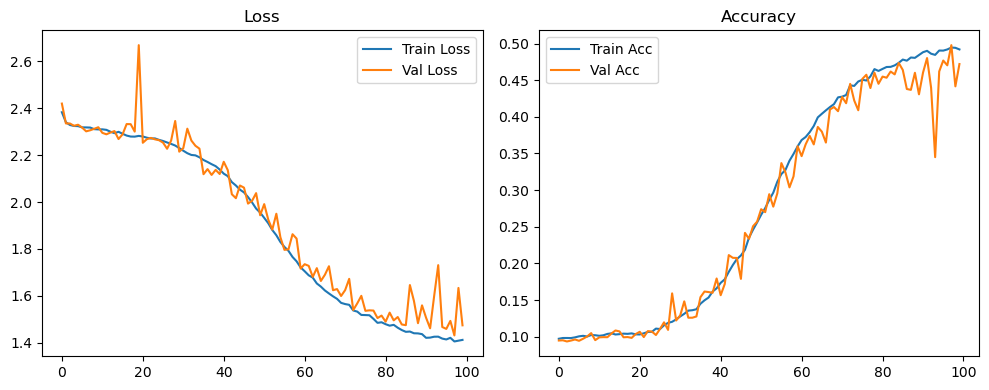

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.32it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

Original Model Final Test Loss: 1.4864 Accuracy: 0.4610


🚀 Running: batch128_lr_max_0.0002_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0930 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0930 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0930 |:   1%|          | 1/100 [01:17<2:08:33, 77.92s/it]

| LR: 0.000200 | Train Acc: 0.0986 | Val Acc: 0.0952 |:   1%|          | 1/100 [01:34<2:08:33, 77.92s/it]

| LR: 0.000200 | Train Acc: 0.0986 | Val Acc: 0.0952 |:   1%|          | 1/100 [01:34<2:08:33, 77.92s/it]

| LR: 0.000200 | Train Acc: 0.0986 | Val Acc: 0.0952 |:   2%|▏         | 2/100 [01:34<1:08:38, 42.03s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [01:51<1:08:38, 42.03s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [01:51<1:08:38, 42.03s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [01:51<49:11, 30.42s/it]  

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   3%|▎         | 3/100 [02:08<49:11, 30.42s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   3%|▎         | 3/100 [02:08<49:11, 30.42s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   4%|▍         | 4/100 [02:08<40:03, 25.04s/it]

| LR: 0.000199 | Train Acc: 0.0986 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [02:24<40:03, 25.04s/it]

| LR: 0.000199 | Train Acc: 0.0986 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [02:24<40:03, 25.04s/it]

| LR: 0.000199 | Train Acc: 0.0986 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [02:24<34:53, 22.04s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0905 |:   5%|▌         | 5/100 [02:41<34:53, 22.04s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0905 |:   5%|▌         | 5/100 [02:41<34:53, 22.04s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0905 |:   6%|▌         | 6/100 [02:41<31:44, 20.26s/it]

| LR: 0.000198 | Train Acc: 0.0994 | Val Acc: 0.0890 |:   6%|▌         | 6/100 [02:58<31:44, 20.26s/it]

| LR: 0.000198 | Train Acc: 0.0994 | Val Acc: 0.0890 |:   6%|▌         | 6/100 [02:58<31:44, 20.26s/it]

| LR: 0.000198 | Train Acc: 0.0994 | Val Acc: 0.0890 |:   7%|▋         | 7/100 [02:58<29:39, 19.13s/it]

| LR: 0.000198 | Train Acc: 0.0984 | Val Acc: 0.0922 |:   7%|▋         | 7/100 [03:15<29:39, 19.13s/it]

| LR: 0.000198 | Train Acc: 0.0984 | Val Acc: 0.0922 |:   7%|▋         | 7/100 [03:15<29:39, 19.13s/it]

| LR: 0.000198 | Train Acc: 0.0984 | Val Acc: 0.0922 |:   8%|▊         | 8/100 [03:15<28:09, 18.36s/it]

| LR: 0.000197 | Train Acc: 0.0989 | Val Acc: 0.0934 |:   8%|▊         | 8/100 [03:31<28:09, 18.36s/it]

| LR: 0.000197 | Train Acc: 0.0989 | Val Acc: 0.0934 |:   8%|▊         | 8/100 [03:31<28:09, 18.36s/it]

| LR: 0.000197 | Train Acc: 0.0989 | Val Acc: 0.0934 |:   9%|▉         | 9/100 [03:31<27:03, 17.84s/it]

| LR: 0.000196 | Train Acc: 0.0992 | Val Acc: 0.0954 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000196 | Train Acc: 0.0992 | Val Acc: 0.0954 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000196 | Train Acc: 0.0992 | Val Acc: 0.0954 |:  10%|█         | 10/100 [03:48<26:12, 17.48s/it]

| LR: 0.000195 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  10%|█         | 10/100 [04:05<26:12, 17.48s/it]

| LR: 0.000195 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  10%|█         | 10/100 [04:05<26:12, 17.48s/it]

| LR: 0.000195 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  11%|█         | 11/100 [04:05<25:37, 17.28s/it]

| LR: 0.000194 | Train Acc: 0.1010 | Val Acc: 0.0955 |:  11%|█         | 11/100 [04:22<25:37, 17.28s/it]

| LR: 0.000194 | Train Acc: 0.1010 | Val Acc: 0.0955 |:  11%|█         | 11/100 [04:22<25:37, 17.28s/it]

| LR: 0.000194 | Train Acc: 0.1010 | Val Acc: 0.0955 |:  12%|█▏        | 12/100 [04:22<25:03, 17.08s/it]

| LR: 0.000193 | Train Acc: 0.1018 | Val Acc: 0.0939 |:  12%|█▏        | 12/100 [04:38<25:03, 17.08s/it]

| LR: 0.000193 | Train Acc: 0.1018 | Val Acc: 0.0939 |:  12%|█▏        | 12/100 [04:38<25:03, 17.08s/it]

| LR: 0.000193 | Train Acc: 0.1018 | Val Acc: 0.0939 |:  13%|█▎        | 13/100 [04:38<24:36, 16.97s/it]

| LR: 0.000192 | Train Acc: 0.1016 | Val Acc: 0.0987 |:  13%|█▎        | 13/100 [04:55<24:36, 16.97s/it]

| LR: 0.000192 | Train Acc: 0.1016 | Val Acc: 0.0987 |:  13%|█▎        | 13/100 [04:55<24:36, 16.97s/it]

| LR: 0.000192 | Train Acc: 0.1016 | Val Acc: 0.0987 |:  14%|█▍        | 14/100 [04:55<24:11, 16.88s/it]

| LR: 0.000191 | Train Acc: 0.1021 | Val Acc: 0.1009 |:  14%|█▍        | 14/100 [05:12<24:11, 16.88s/it]

| LR: 0.000191 | Train Acc: 0.1021 | Val Acc: 0.1009 |:  14%|█▍        | 14/100 [05:12<24:11, 16.88s/it]

| LR: 0.000191 | Train Acc: 0.1021 | Val Acc: 0.1009 |:  15%|█▌        | 15/100 [05:12<23:52, 16.85s/it]

| LR: 0.000190 | Train Acc: 0.1021 | Val Acc: 0.0994 |:  15%|█▌        | 15/100 [05:28<23:52, 16.85s/it]

| LR: 0.000190 | Train Acc: 0.1021 | Val Acc: 0.0994 |:  15%|█▌        | 15/100 [05:28<23:52, 16.85s/it]

| LR: 0.000190 | Train Acc: 0.1021 | Val Acc: 0.0994 |:  16%|█▌        | 16/100 [05:29<23:33, 16.83s/it]

| LR: 0.000188 | Train Acc: 0.1005 | Val Acc: 0.0808 |:  16%|█▌        | 16/100 [05:45<23:33, 16.83s/it]

| LR: 0.000188 | Train Acc: 0.1005 | Val Acc: 0.0808 |:  16%|█▌        | 16/100 [05:45<23:33, 16.83s/it]

| LR: 0.000188 | Train Acc: 0.1005 | Val Acc: 0.0808 |:  17%|█▋        | 17/100 [05:45<23:13, 16.79s/it]

| LR: 0.000187 | Train Acc: 0.1032 | Val Acc: 0.1200 |:  17%|█▋        | 17/100 [06:02<23:13, 16.79s/it]

| LR: 0.000187 | Train Acc: 0.1032 | Val Acc: 0.1200 |:  17%|█▋        | 17/100 [06:02<23:13, 16.79s/it]

| LR: 0.000187 | Train Acc: 0.1032 | Val Acc: 0.1200 |:  18%|█▊        | 18/100 [06:02<22:54, 16.77s/it]

| LR: 0.000185 | Train Acc: 0.1035 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [06:19<22:54, 16.77s/it]

| LR: 0.000185 | Train Acc: 0.1035 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [06:19<22:54, 16.77s/it]

| LR: 0.000185 | Train Acc: 0.1035 | Val Acc: 0.0961 |:  19%|█▉        | 19/100 [06:19<22:35, 16.73s/it]

| LR: 0.000184 | Train Acc: 0.1023 | Val Acc: 0.0982 |:  19%|█▉        | 19/100 [06:35<22:35, 16.73s/it]

| LR: 0.000184 | Train Acc: 0.1023 | Val Acc: 0.0982 |:  19%|█▉        | 19/100 [06:35<22:35, 16.73s/it]

| LR: 0.000184 | Train Acc: 0.1023 | Val Acc: 0.0982 |:  20%|██        | 20/100 [06:35<22:17, 16.72s/it]

| LR: 0.000182 | Train Acc: 0.1006 | Val Acc: 0.0961 |:  20%|██        | 20/100 [06:52<22:17, 16.72s/it]

| LR: 0.000182 | Train Acc: 0.1006 | Val Acc: 0.0961 |:  20%|██        | 20/100 [06:52<22:17, 16.72s/it]

| LR: 0.000182 | Train Acc: 0.1006 | Val Acc: 0.0961 |:  21%|██        | 21/100 [06:52<22:00, 16.71s/it]

| LR: 0.000180 | Train Acc: 0.1027 | Val Acc: 0.0999 |:  21%|██        | 21/100 [07:09<22:00, 16.71s/it]

| LR: 0.000180 | Train Acc: 0.1027 | Val Acc: 0.0999 |:  21%|██        | 21/100 [07:09<22:00, 16.71s/it]

| LR: 0.000180 | Train Acc: 0.1027 | Val Acc: 0.0999 |:  22%|██▏       | 22/100 [07:09<21:44, 16.72s/it]

| LR: 0.000178 | Train Acc: 0.1028 | Val Acc: 0.1048 |:  22%|██▏       | 22/100 [07:25<21:44, 16.72s/it]

| LR: 0.000178 | Train Acc: 0.1028 | Val Acc: 0.1048 |:  22%|██▏       | 22/100 [07:25<21:44, 16.72s/it]

| LR: 0.000178 | Train Acc: 0.1028 | Val Acc: 0.1048 |:  23%|██▎       | 23/100 [07:26<21:29, 16.74s/it]

| LR: 0.000176 | Train Acc: 0.1029 | Val Acc: 0.1017 |:  23%|██▎       | 23/100 [07:42<21:29, 16.74s/it]

| LR: 0.000176 | Train Acc: 0.1029 | Val Acc: 0.1017 |:  23%|██▎       | 23/100 [07:42<21:29, 16.74s/it]

| LR: 0.000176 | Train Acc: 0.1029 | Val Acc: 0.1017 |:  24%|██▍       | 24/100 [07:42<21:13, 16.76s/it]

| LR: 0.000174 | Train Acc: 0.1045 | Val Acc: 0.1001 |:  24%|██▍       | 24/100 [07:59<21:13, 16.76s/it]

| LR: 0.000174 | Train Acc: 0.1045 | Val Acc: 0.1001 |:  24%|██▍       | 24/100 [07:59<21:13, 16.76s/it]

| LR: 0.000174 | Train Acc: 0.1045 | Val Acc: 0.1001 |:  25%|██▌       | 25/100 [07:59<20:57, 16.76s/it]

| LR: 0.000172 | Train Acc: 0.1080 | Val Acc: 0.1082 |:  25%|██▌       | 25/100 [08:16<20:57, 16.76s/it]

| LR: 0.000172 | Train Acc: 0.1080 | Val Acc: 0.1082 |:  25%|██▌       | 25/100 [08:16<20:57, 16.76s/it]

| LR: 0.000172 | Train Acc: 0.1080 | Val Acc: 0.1082 |:  26%|██▌       | 26/100 [08:16<20:41, 16.78s/it]

| LR: 0.000170 | Train Acc: 0.1104 | Val Acc: 0.1182 |:  26%|██▌       | 26/100 [08:33<20:41, 16.78s/it]

| LR: 0.000170 | Train Acc: 0.1104 | Val Acc: 0.1182 |:  26%|██▌       | 26/100 [08:33<20:41, 16.78s/it]

| LR: 0.000170 | Train Acc: 0.1104 | Val Acc: 0.1182 |:  27%|██▋       | 27/100 [08:33<20:22, 16.75s/it]

| LR: 0.000168 | Train Acc: 0.1109 | Val Acc: 0.1120 |:  27%|██▋       | 27/100 [08:49<20:22, 16.75s/it]

| LR: 0.000168 | Train Acc: 0.1109 | Val Acc: 0.1120 |:  27%|██▋       | 27/100 [08:49<20:22, 16.75s/it]

| LR: 0.000168 | Train Acc: 0.1109 | Val Acc: 0.1120 |:  28%|██▊       | 28/100 [08:49<20:04, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.1130 | Val Acc: 0.1317 |:  28%|██▊       | 28/100 [09:06<20:04, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.1130 | Val Acc: 0.1317 |:  28%|██▊       | 28/100 [09:06<20:04, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.1130 | Val Acc: 0.1317 |:  29%|██▉       | 29/100 [09:06<19:46, 16.71s/it]

| LR: 0.000163 | Train Acc: 0.1163 | Val Acc: 0.1201 |:  29%|██▉       | 29/100 [09:23<19:46, 16.71s/it]

| LR: 0.000163 | Train Acc: 0.1163 | Val Acc: 0.1201 |:  29%|██▉       | 29/100 [09:23<19:46, 16.71s/it]

| LR: 0.000163 | Train Acc: 0.1163 | Val Acc: 0.1201 |:  30%|███       | 30/100 [09:23<19:33, 16.76s/it]

| LR: 0.000161 | Train Acc: 0.1169 | Val Acc: 0.1351 |:  30%|███       | 30/100 [09:40<19:33, 16.76s/it]

| LR: 0.000161 | Train Acc: 0.1169 | Val Acc: 0.1351 |:  30%|███       | 30/100 [09:40<19:33, 16.76s/it]

| LR: 0.000161 | Train Acc: 0.1169 | Val Acc: 0.1351 |:  31%|███       | 31/100 [09:40<19:19, 16.81s/it]

| LR: 0.000158 | Train Acc: 0.1221 | Val Acc: 0.1397 |:  31%|███       | 31/100 [09:56<19:19, 16.81s/it]

| LR: 0.000158 | Train Acc: 0.1221 | Val Acc: 0.1397 |:  31%|███       | 31/100 [09:56<19:19, 16.81s/it]

| LR: 0.000158 | Train Acc: 0.1221 | Val Acc: 0.1397 |:  32%|███▏      | 32/100 [09:56<19:01, 16.78s/it]

| LR: 0.000156 | Train Acc: 0.1247 | Val Acc: 0.1189 |:  32%|███▏      | 32/100 [10:13<19:01, 16.78s/it]

| LR: 0.000156 | Train Acc: 0.1247 | Val Acc: 0.1189 |:  32%|███▏      | 32/100 [10:13<19:01, 16.78s/it]

| LR: 0.000156 | Train Acc: 0.1247 | Val Acc: 0.1189 |:  33%|███▎      | 33/100 [10:13<18:44, 16.79s/it]

| LR: 0.000153 | Train Acc: 0.1280 | Val Acc: 0.1191 |:  33%|███▎      | 33/100 [10:30<18:44, 16.79s/it]

| LR: 0.000153 | Train Acc: 0.1280 | Val Acc: 0.1191 |:  33%|███▎      | 33/100 [10:30<18:44, 16.79s/it]

| LR: 0.000153 | Train Acc: 0.1280 | Val Acc: 0.1191 |:  34%|███▍      | 34/100 [10:30<18:26, 16.76s/it]

| LR: 0.000151 | Train Acc: 0.1310 | Val Acc: 0.1101 |:  34%|███▍      | 34/100 [10:47<18:26, 16.76s/it]

| LR: 0.000151 | Train Acc: 0.1310 | Val Acc: 0.1101 |:  34%|███▍      | 34/100 [10:47<18:26, 16.76s/it]

| LR: 0.000151 | Train Acc: 0.1310 | Val Acc: 0.1101 |:  35%|███▌      | 35/100 [10:47<18:10, 16.78s/it]

| LR: 0.000148 | Train Acc: 0.1362 | Val Acc: 0.1243 |:  35%|███▌      | 35/100 [11:03<18:10, 16.78s/it]

| LR: 0.000148 | Train Acc: 0.1362 | Val Acc: 0.1243 |:  35%|███▌      | 35/100 [11:03<18:10, 16.78s/it]

| LR: 0.000148 | Train Acc: 0.1362 | Val Acc: 0.1243 |:  36%|███▌      | 36/100 [11:04<17:53, 16.78s/it]

| LR: 0.000145 | Train Acc: 0.1429 | Val Acc: 0.1199 |:  36%|███▌      | 36/100 [11:20<17:53, 16.78s/it]

| LR: 0.000145 | Train Acc: 0.1429 | Val Acc: 0.1199 |:  36%|███▌      | 36/100 [11:20<17:53, 16.78s/it]

| LR: 0.000145 | Train Acc: 0.1429 | Val Acc: 0.1199 |:  37%|███▋      | 37/100 [11:20<17:36, 16.77s/it]

| LR: 0.000143 | Train Acc: 0.1480 | Val Acc: 0.1643 |:  37%|███▋      | 37/100 [11:37<17:36, 16.77s/it]

| LR: 0.000143 | Train Acc: 0.1480 | Val Acc: 0.1643 |:  37%|███▋      | 37/100 [11:37<17:36, 16.77s/it]

| LR: 0.000143 | Train Acc: 0.1480 | Val Acc: 0.1643 |:  38%|███▊      | 38/100 [11:37<17:19, 16.77s/it]

| LR: 0.000140 | Train Acc: 0.1512 | Val Acc: 0.1663 |:  38%|███▊      | 38/100 [11:54<17:19, 16.77s/it]

| LR: 0.000140 | Train Acc: 0.1512 | Val Acc: 0.1663 |:  38%|███▊      | 38/100 [11:54<17:19, 16.77s/it]

| LR: 0.000140 | Train Acc: 0.1512 | Val Acc: 0.1663 |:  39%|███▉      | 39/100 [11:54<17:04, 16.80s/it]

| LR: 0.000137 | Train Acc: 0.1529 | Val Acc: 0.1860 |:  39%|███▉      | 39/100 [12:11<17:04, 16.80s/it]

| LR: 0.000137 | Train Acc: 0.1529 | Val Acc: 0.1860 |:  39%|███▉      | 39/100 [12:11<17:04, 16.80s/it]

| LR: 0.000137 | Train Acc: 0.1529 | Val Acc: 0.1860 |:  40%|████      | 40/100 [12:11<16:49, 16.82s/it]

| LR: 0.000134 | Train Acc: 0.1563 | Val Acc: 0.1501 |:  40%|████      | 40/100 [12:27<16:49, 16.82s/it]

| LR: 0.000134 | Train Acc: 0.1563 | Val Acc: 0.1501 |:  40%|████      | 40/100 [12:27<16:49, 16.82s/it]

| LR: 0.000134 | Train Acc: 0.1563 | Val Acc: 0.1501 |:  41%|████      | 41/100 [12:28<16:30, 16.79s/it]

| LR: 0.000132 | Train Acc: 0.1602 | Val Acc: 0.1860 |:  41%|████      | 41/100 [12:44<16:30, 16.79s/it]

| LR: 0.000132 | Train Acc: 0.1602 | Val Acc: 0.1860 |:  41%|████      | 41/100 [12:44<16:30, 16.79s/it]

| LR: 0.000132 | Train Acc: 0.1602 | Val Acc: 0.1860 |:  42%|████▏     | 42/100 [12:44<16:11, 16.75s/it]

| LR: 0.000129 | Train Acc: 0.1645 | Val Acc: 0.1580 |:  42%|████▏     | 42/100 [13:01<16:11, 16.75s/it]

| LR: 0.000129 | Train Acc: 0.1645 | Val Acc: 0.1580 |:  42%|████▏     | 42/100 [13:01<16:11, 16.75s/it]

| LR: 0.000129 | Train Acc: 0.1645 | Val Acc: 0.1580 |:  43%|████▎     | 43/100 [13:01<15:53, 16.72s/it]

| LR: 0.000126 | Train Acc: 0.1693 | Val Acc: 0.1591 |:  43%|████▎     | 43/100 [13:17<15:53, 16.72s/it]

| LR: 0.000126 | Train Acc: 0.1693 | Val Acc: 0.1591 |:  43%|████▎     | 43/100 [13:17<15:53, 16.72s/it]

| LR: 0.000126 | Train Acc: 0.1693 | Val Acc: 0.1591 |:  44%|████▍     | 44/100 [13:17<15:35, 16.70s/it]

| LR: 0.000123 | Train Acc: 0.1724 | Val Acc: 0.1696 |:  44%|████▍     | 44/100 [13:34<15:35, 16.70s/it]

| LR: 0.000123 | Train Acc: 0.1724 | Val Acc: 0.1696 |:  44%|████▍     | 44/100 [13:34<15:35, 16.70s/it]

| LR: 0.000123 | Train Acc: 0.1724 | Val Acc: 0.1696 |:  45%|████▌     | 45/100 [13:34<15:17, 16.68s/it]

| LR: 0.000120 | Train Acc: 0.1807 | Val Acc: 0.2004 |:  45%|████▌     | 45/100 [13:51<15:17, 16.68s/it]

| LR: 0.000120 | Train Acc: 0.1807 | Val Acc: 0.2004 |:  45%|████▌     | 45/100 [13:51<15:17, 16.68s/it]

| LR: 0.000120 | Train Acc: 0.1807 | Val Acc: 0.2004 |:  46%|████▌     | 46/100 [13:51<15:02, 16.72s/it]

| LR: 0.000117 | Train Acc: 0.1870 | Val Acc: 0.2101 |:  46%|████▌     | 46/100 [14:08<15:02, 16.72s/it]

| LR: 0.000117 | Train Acc: 0.1870 | Val Acc: 0.2101 |:  46%|████▌     | 46/100 [14:08<15:02, 16.72s/it]

| LR: 0.000117 | Train Acc: 0.1870 | Val Acc: 0.2101 |:  47%|████▋     | 47/100 [14:08<14:48, 16.76s/it]

| LR: 0.000114 | Train Acc: 0.1940 | Val Acc: 0.2134 |:  47%|████▋     | 47/100 [14:25<14:48, 16.76s/it]

| LR: 0.000114 | Train Acc: 0.1940 | Val Acc: 0.2134 |:  47%|████▋     | 47/100 [14:25<14:48, 16.76s/it]

| LR: 0.000114 | Train Acc: 0.1940 | Val Acc: 0.2134 |:  48%|████▊     | 48/100 [14:25<14:33, 16.79s/it]

| LR: 0.000111 | Train Acc: 0.2016 | Val Acc: 0.1852 |:  48%|████▊     | 48/100 [14:41<14:33, 16.79s/it]

| LR: 0.000111 | Train Acc: 0.2016 | Val Acc: 0.1852 |:  48%|████▊     | 48/100 [14:41<14:33, 16.79s/it]

| LR: 0.000111 | Train Acc: 0.2016 | Val Acc: 0.1852 |:  49%|████▉     | 49/100 [14:41<14:16, 16.80s/it]

| LR: 0.000108 | Train Acc: 0.2081 | Val Acc: 0.2351 |:  49%|████▉     | 49/100 [14:58<14:16, 16.80s/it]

| LR: 0.000108 | Train Acc: 0.2081 | Val Acc: 0.2351 |:  49%|████▉     | 49/100 [14:58<14:16, 16.80s/it]

| LR: 0.000108 | Train Acc: 0.2081 | Val Acc: 0.2351 |:  50%|█████     | 50/100 [14:58<13:56, 16.73s/it]

| LR: 0.000105 | Train Acc: 0.2153 | Val Acc: 0.2090 |:  50%|█████     | 50/100 [15:15<13:56, 16.73s/it]

| LR: 0.000105 | Train Acc: 0.2153 | Val Acc: 0.2090 |:  50%|█████     | 50/100 [15:15<13:56, 16.73s/it]

| LR: 0.000105 | Train Acc: 0.2153 | Val Acc: 0.2090 |:  51%|█████     | 51/100 [15:15<13:42, 16.78s/it]

| LR: 0.000102 | Train Acc: 0.2313 | Val Acc: 0.2512 |:  51%|█████     | 51/100 [15:32<13:42, 16.78s/it]

| LR: 0.000102 | Train Acc: 0.2313 | Val Acc: 0.2512 |:  51%|█████     | 51/100 [15:32<13:42, 16.78s/it]

| LR: 0.000102 | Train Acc: 0.2313 | Val Acc: 0.2512 |:  52%|█████▏    | 52/100 [15:32<13:26, 16.80s/it]

| LR: 0.000099 | Train Acc: 0.2360 | Val Acc: 0.2119 |:  52%|█████▏    | 52/100 [15:48<13:26, 16.80s/it]

| LR: 0.000099 | Train Acc: 0.2360 | Val Acc: 0.2119 |:  52%|█████▏    | 52/100 [15:48<13:26, 16.80s/it]

| LR: 0.000099 | Train Acc: 0.2360 | Val Acc: 0.2119 |:  53%|█████▎    | 53/100 [15:49<13:09, 16.80s/it]

| LR: 0.000096 | Train Acc: 0.2469 | Val Acc: 0.2425 |:  53%|█████▎    | 53/100 [16:05<13:09, 16.80s/it]

| LR: 0.000096 | Train Acc: 0.2469 | Val Acc: 0.2425 |:  53%|█████▎    | 53/100 [16:05<13:09, 16.80s/it]

| LR: 0.000096 | Train Acc: 0.2469 | Val Acc: 0.2425 |:  54%|█████▍    | 54/100 [16:05<12:53, 16.81s/it]

| LR: 0.000093 | Train Acc: 0.2524 | Val Acc: 0.2381 |:  54%|█████▍    | 54/100 [16:22<12:53, 16.81s/it]

| LR: 0.000093 | Train Acc: 0.2524 | Val Acc: 0.2381 |:  54%|█████▍    | 54/100 [16:22<12:53, 16.81s/it]

| LR: 0.000093 | Train Acc: 0.2524 | Val Acc: 0.2381 |:  55%|█████▌    | 55/100 [16:22<12:39, 16.88s/it]

| LR: 0.000090 | Train Acc: 0.2647 | Val Acc: 0.2423 |:  55%|█████▌    | 55/100 [16:39<12:39, 16.88s/it]

| LR: 0.000090 | Train Acc: 0.2647 | Val Acc: 0.2423 |:  55%|█████▌    | 55/100 [16:39<12:39, 16.88s/it]

| LR: 0.000090 | Train Acc: 0.2647 | Val Acc: 0.2423 |:  56%|█████▌    | 56/100 [16:39<12:23, 16.90s/it]

| LR: 0.000087 | Train Acc: 0.2750 | Val Acc: 0.2803 |:  56%|█████▌    | 56/100 [16:56<12:23, 16.90s/it]

| LR: 0.000087 | Train Acc: 0.2750 | Val Acc: 0.2803 |:  56%|█████▌    | 56/100 [16:56<12:23, 16.90s/it]

| LR: 0.000087 | Train Acc: 0.2750 | Val Acc: 0.2803 |:  57%|█████▋    | 57/100 [16:56<12:05, 16.88s/it]

| LR: 0.000084 | Train Acc: 0.2802 | Val Acc: 0.2673 |:  57%|█████▋    | 57/100 [17:13<12:05, 16.88s/it]

| LR: 0.000084 | Train Acc: 0.2802 | Val Acc: 0.2673 |:  57%|█████▋    | 57/100 [17:13<12:05, 16.88s/it]

| LR: 0.000084 | Train Acc: 0.2802 | Val Acc: 0.2673 |:  58%|█████▊    | 58/100 [17:13<11:45, 16.80s/it]

| LR: 0.000081 | Train Acc: 0.2958 | Val Acc: 0.3065 |:  58%|█████▊    | 58/100 [17:30<11:45, 16.80s/it]

| LR: 0.000081 | Train Acc: 0.2958 | Val Acc: 0.3065 |:  58%|█████▊    | 58/100 [17:30<11:45, 16.80s/it]

| LR: 0.000081 | Train Acc: 0.2958 | Val Acc: 0.3065 |:  59%|█████▉    | 59/100 [17:30<11:28, 16.79s/it]

| LR: 0.000078 | Train Acc: 0.3052 | Val Acc: 0.3155 |:  59%|█████▉    | 59/100 [17:46<11:28, 16.79s/it]

| LR: 0.000078 | Train Acc: 0.3052 | Val Acc: 0.3155 |:  59%|█████▉    | 59/100 [17:46<11:28, 16.79s/it]

| LR: 0.000078 | Train Acc: 0.3052 | Val Acc: 0.3155 |:  60%|██████    | 60/100 [17:46<11:10, 16.77s/it]

| LR: 0.000076 | Train Acc: 0.3135 | Val Acc: 0.3331 |:  60%|██████    | 60/100 [18:03<11:10, 16.77s/it]

| LR: 0.000076 | Train Acc: 0.3135 | Val Acc: 0.3331 |:  60%|██████    | 60/100 [18:03<11:10, 16.77s/it]

| LR: 0.000076 | Train Acc: 0.3135 | Val Acc: 0.3331 |:  61%|██████    | 61/100 [18:03<10:52, 16.72s/it]

| LR: 0.000073 | Train Acc: 0.3207 | Val Acc: 0.3432 |:  61%|██████    | 61/100 [18:19<10:52, 16.72s/it]

| LR: 0.000073 | Train Acc: 0.3207 | Val Acc: 0.3432 |:  61%|██████    | 61/100 [18:19<10:52, 16.72s/it]

| LR: 0.000073 | Train Acc: 0.3207 | Val Acc: 0.3432 |:  62%|██████▏   | 62/100 [18:20<10:34, 16.69s/it]

| LR: 0.000070 | Train Acc: 0.3337 | Val Acc: 0.3651 |:  62%|██████▏   | 62/100 [18:36<10:34, 16.69s/it]

| LR: 0.000070 | Train Acc: 0.3337 | Val Acc: 0.3651 |:  62%|██████▏   | 62/100 [18:36<10:34, 16.69s/it]

| LR: 0.000070 | Train Acc: 0.3337 | Val Acc: 0.3651 |:  63%|██████▎   | 63/100 [18:36<10:18, 16.71s/it]

| LR: 0.000067 | Train Acc: 0.3349 | Val Acc: 0.3464 |:  63%|██████▎   | 63/100 [18:53<10:18, 16.71s/it]

| LR: 0.000067 | Train Acc: 0.3349 | Val Acc: 0.3464 |:  63%|██████▎   | 63/100 [18:53<10:18, 16.71s/it]

| LR: 0.000067 | Train Acc: 0.3349 | Val Acc: 0.3464 |:  64%|██████▍   | 64/100 [18:53<09:59, 16.65s/it]

| LR: 0.000065 | Train Acc: 0.3462 | Val Acc: 0.3365 |:  64%|██████▍   | 64/100 [19:09<09:59, 16.65s/it]

| LR: 0.000065 | Train Acc: 0.3462 | Val Acc: 0.3365 |:  64%|██████▍   | 64/100 [19:09<09:59, 16.65s/it]

| LR: 0.000065 | Train Acc: 0.3462 | Val Acc: 0.3365 |:  65%|██████▌   | 65/100 [19:09<09:40, 16.59s/it]

| LR: 0.000062 | Train Acc: 0.3529 | Val Acc: 0.3598 |:  65%|██████▌   | 65/100 [19:26<09:40, 16.59s/it]

| LR: 0.000062 | Train Acc: 0.3529 | Val Acc: 0.3598 |:  65%|██████▌   | 65/100 [19:26<09:40, 16.59s/it]

| LR: 0.000062 | Train Acc: 0.3529 | Val Acc: 0.3598 |:  66%|██████▌   | 66/100 [19:26<09:25, 16.63s/it]

| LR: 0.000059 | Train Acc: 0.3646 | Val Acc: 0.3814 |:  66%|██████▌   | 66/100 [19:43<09:25, 16.63s/it]

| LR: 0.000059 | Train Acc: 0.3646 | Val Acc: 0.3814 |:  66%|██████▌   | 66/100 [19:43<09:25, 16.63s/it]

| LR: 0.000059 | Train Acc: 0.3646 | Val Acc: 0.3814 |:  67%|██████▋   | 67/100 [19:43<09:09, 16.66s/it]

| LR: 0.000057 | Train Acc: 0.3656 | Val Acc: 0.3799 |:  67%|██████▋   | 67/100 [19:59<09:09, 16.66s/it]

| LR: 0.000057 | Train Acc: 0.3656 | Val Acc: 0.3799 |:  67%|██████▋   | 67/100 [19:59<09:09, 16.66s/it]

| LR: 0.000057 | Train Acc: 0.3656 | Val Acc: 0.3799 |:  68%|██████▊   | 68/100 [19:59<08:54, 16.70s/it]

| LR: 0.000054 | Train Acc: 0.3703 | Val Acc: 0.3669 |:  68%|██████▊   | 68/100 [20:16<08:54, 16.70s/it]

| LR: 0.000054 | Train Acc: 0.3703 | Val Acc: 0.3669 |:  68%|██████▊   | 68/100 [20:16<08:54, 16.70s/it]

| LR: 0.000054 | Train Acc: 0.3703 | Val Acc: 0.3669 |:  69%|██████▉   | 69/100 [20:16<08:36, 16.65s/it]

| LR: 0.000052 | Train Acc: 0.3785 | Val Acc: 0.3748 |:  69%|██████▉   | 69/100 [20:32<08:36, 16.65s/it]

| LR: 0.000052 | Train Acc: 0.3785 | Val Acc: 0.3748 |:  69%|██████▉   | 69/100 [20:32<08:36, 16.65s/it]

| LR: 0.000052 | Train Acc: 0.3785 | Val Acc: 0.3748 |:  70%|███████   | 70/100 [20:33<08:18, 16.61s/it]

| LR: 0.000049 | Train Acc: 0.3824 | Val Acc: 0.3681 |:  70%|███████   | 70/100 [20:49<08:18, 16.61s/it]

| LR: 0.000049 | Train Acc: 0.3824 | Val Acc: 0.3681 |:  70%|███████   | 70/100 [20:49<08:18, 16.61s/it]

| LR: 0.000049 | Train Acc: 0.3824 | Val Acc: 0.3681 |:  71%|███████   | 71/100 [20:49<08:02, 16.63s/it]

| LR: 0.000047 | Train Acc: 0.3835 | Val Acc: 0.3954 |:  71%|███████   | 71/100 [21:06<08:02, 16.63s/it]

| LR: 0.000047 | Train Acc: 0.3835 | Val Acc: 0.3954 |:  71%|███████   | 71/100 [21:06<08:02, 16.63s/it]

| LR: 0.000047 | Train Acc: 0.3835 | Val Acc: 0.3954 |:  72%|███████▏  | 72/100 [21:06<07:47, 16.69s/it]

| LR: 0.000044 | Train Acc: 0.3915 | Val Acc: 0.3245 |:  72%|███████▏  | 72/100 [21:23<07:47, 16.69s/it]

| LR: 0.000044 | Train Acc: 0.3915 | Val Acc: 0.3245 |:  72%|███████▏  | 72/100 [21:23<07:47, 16.69s/it]

| LR: 0.000044 | Train Acc: 0.3915 | Val Acc: 0.3245 |:  73%|███████▎  | 73/100 [21:23<07:30, 16.70s/it]

| LR: 0.000042 | Train Acc: 0.3967 | Val Acc: 0.3917 |:  73%|███████▎  | 73/100 [21:39<07:30, 16.70s/it]

| LR: 0.000042 | Train Acc: 0.3967 | Val Acc: 0.3917 |:  73%|███████▎  | 73/100 [21:39<07:30, 16.70s/it]

| LR: 0.000042 | Train Acc: 0.3967 | Val Acc: 0.3917 |:  74%|███████▍  | 74/100 [21:39<07:14, 16.70s/it]

| LR: 0.000040 | Train Acc: 0.4019 | Val Acc: 0.4191 |:  74%|███████▍  | 74/100 [21:56<07:14, 16.70s/it]

| LR: 0.000040 | Train Acc: 0.4019 | Val Acc: 0.4191 |:  74%|███████▍  | 74/100 [21:56<07:14, 16.70s/it]

| LR: 0.000040 | Train Acc: 0.4019 | Val Acc: 0.4191 |:  75%|███████▌  | 75/100 [21:56<06:56, 16.66s/it]

| LR: 0.000038 | Train Acc: 0.4063 | Val Acc: 0.3875 |:  75%|███████▌  | 75/100 [22:13<06:56, 16.66s/it]

| LR: 0.000038 | Train Acc: 0.4063 | Val Acc: 0.3875 |:  75%|███████▌  | 75/100 [22:13<06:56, 16.66s/it]

| LR: 0.000038 | Train Acc: 0.4063 | Val Acc: 0.3875 |:  76%|███████▌  | 76/100 [22:13<06:41, 16.73s/it]

| LR: 0.000036 | Train Acc: 0.4023 | Val Acc: 0.3964 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.73s/it]

| LR: 0.000036 | Train Acc: 0.4023 | Val Acc: 0.3964 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.73s/it]

| LR: 0.000036 | Train Acc: 0.4023 | Val Acc: 0.3964 |:  77%|███████▋  | 77/100 [22:30<06:24, 16.73s/it]

| LR: 0.000034 | Train Acc: 0.4109 | Val Acc: 0.4230 |:  77%|███████▋  | 77/100 [22:46<06:24, 16.73s/it]

| LR: 0.000034 | Train Acc: 0.4109 | Val Acc: 0.4230 |:  77%|███████▋  | 77/100 [22:46<06:24, 16.73s/it]

| LR: 0.000034 | Train Acc: 0.4109 | Val Acc: 0.4230 |:  78%|███████▊  | 78/100 [22:46<06:08, 16.73s/it]

| LR: 0.000032 | Train Acc: 0.4158 | Val Acc: 0.4286 |:  78%|███████▊  | 78/100 [23:03<06:08, 16.73s/it]

| LR: 0.000032 | Train Acc: 0.4158 | Val Acc: 0.4286 |:  78%|███████▊  | 78/100 [23:03<06:08, 16.73s/it]

| LR: 0.000032 | Train Acc: 0.4158 | Val Acc: 0.4286 |:  79%|███████▉  | 79/100 [23:03<05:50, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.4143 | Val Acc: 0.3755 |:  79%|███████▉  | 79/100 [23:20<05:50, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.4143 | Val Acc: 0.3755 |:  79%|███████▉  | 79/100 [23:20<05:50, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.4143 | Val Acc: 0.3755 |:  80%|████████  | 80/100 [23:20<05:34, 16.73s/it]

| LR: 0.000028 | Train Acc: 0.4211 | Val Acc: 0.3199 |:  80%|████████  | 80/100 [23:37<05:34, 16.73s/it]

| LR: 0.000028 | Train Acc: 0.4211 | Val Acc: 0.3199 |:  80%|████████  | 80/100 [23:37<05:34, 16.73s/it]

| LR: 0.000028 | Train Acc: 0.4211 | Val Acc: 0.3199 |:  81%|████████  | 81/100 [23:37<05:18, 16.78s/it]

| LR: 0.000026 | Train Acc: 0.4165 | Val Acc: 0.4204 |:  81%|████████  | 81/100 [23:53<05:18, 16.78s/it]

| LR: 0.000026 | Train Acc: 0.4165 | Val Acc: 0.4204 |:  81%|████████  | 81/100 [23:53<05:18, 16.78s/it]

| LR: 0.000026 | Train Acc: 0.4165 | Val Acc: 0.4204 |:  82%|████████▏ | 82/100 [23:53<05:01, 16.76s/it]

| LR: 0.000025 | Train Acc: 0.4242 | Val Acc: 0.4327 |:  82%|████████▏ | 82/100 [24:10<05:01, 16.76s/it]

| LR: 0.000025 | Train Acc: 0.4242 | Val Acc: 0.4327 |:  82%|████████▏ | 82/100 [24:10<05:01, 16.76s/it]

| LR: 0.000025 | Train Acc: 0.4242 | Val Acc: 0.4327 |:  83%|████████▎ | 83/100 [24:10<04:44, 16.72s/it]

| LR: 0.000023 | Train Acc: 0.4292 | Val Acc: 0.3998 |:  83%|████████▎ | 83/100 [24:27<04:44, 16.72s/it]

| LR: 0.000023 | Train Acc: 0.4292 | Val Acc: 0.3998 |:  83%|████████▎ | 83/100 [24:27<04:44, 16.72s/it]

| LR: 0.000023 | Train Acc: 0.4292 | Val Acc: 0.3998 |:  84%|████████▍ | 84/100 [24:27<04:27, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.4302 | Val Acc: 0.4258 |:  84%|████████▍ | 84/100 [24:43<04:27, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.4302 | Val Acc: 0.4258 |:  84%|████████▍ | 84/100 [24:43<04:27, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.4302 | Val Acc: 0.4258 |:  85%|████████▌ | 85/100 [24:43<04:10, 16.72s/it]

| LR: 0.000020 | Train Acc: 0.4323 | Val Acc: 0.4063 |:  85%|████████▌ | 85/100 [25:00<04:10, 16.72s/it]

| LR: 0.000020 | Train Acc: 0.4323 | Val Acc: 0.4063 |:  85%|████████▌ | 85/100 [25:00<04:10, 16.72s/it]

| LR: 0.000020 | Train Acc: 0.4323 | Val Acc: 0.4063 |:  86%|████████▌ | 86/100 [25:00<03:53, 16.71s/it]

| LR: 0.000019 | Train Acc: 0.4363 | Val Acc: 0.4290 |:  86%|████████▌ | 86/100 [25:17<03:53, 16.71s/it]

| LR: 0.000019 | Train Acc: 0.4363 | Val Acc: 0.4290 |:  86%|████████▌ | 86/100 [25:17<03:53, 16.71s/it]

| LR: 0.000019 | Train Acc: 0.4363 | Val Acc: 0.4290 |:  87%|████████▋ | 87/100 [25:17<03:37, 16.69s/it]

| LR: 0.000018 | Train Acc: 0.4354 | Val Acc: 0.3648 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.69s/it]

| LR: 0.000018 | Train Acc: 0.4354 | Val Acc: 0.3648 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.69s/it]

| LR: 0.000018 | Train Acc: 0.4354 | Val Acc: 0.3648 |:  88%|████████▊ | 88/100 [25:34<03:20, 16.71s/it]

| LR: 0.000017 | Train Acc: 0.4386 | Val Acc: 0.4216 |:  88%|████████▊ | 88/100 [25:50<03:20, 16.71s/it]

| LR: 0.000017 | Train Acc: 0.4386 | Val Acc: 0.4216 |:  88%|████████▊ | 88/100 [25:50<03:20, 16.71s/it]

| LR: 0.000017 | Train Acc: 0.4386 | Val Acc: 0.4216 |:  89%|████████▉ | 89/100 [25:50<03:04, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.4386 | Val Acc: 0.4148 |:  89%|████████▉ | 89/100 [26:07<03:04, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.4386 | Val Acc: 0.4148 |:  89%|████████▉ | 89/100 [26:07<03:04, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.4386 | Val Acc: 0.4148 |:  90%|█████████ | 90/100 [26:07<02:47, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.4410 | Val Acc: 0.4195 |:  90%|█████████ | 90/100 [26:24<02:47, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.4410 | Val Acc: 0.4195 |:  90%|█████████ | 90/100 [26:24<02:47, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.4410 | Val Acc: 0.4195 |:  91%|█████████ | 91/100 [26:24<02:31, 16.81s/it]

| LR: 0.000014 | Train Acc: 0.4446 | Val Acc: 0.4385 |:  91%|█████████ | 91/100 [26:41<02:31, 16.81s/it]

| LR: 0.000014 | Train Acc: 0.4446 | Val Acc: 0.4385 |:  91%|█████████ | 91/100 [26:41<02:31, 16.81s/it]

| LR: 0.000014 | Train Acc: 0.4446 | Val Acc: 0.4385 |:  92%|█████████▏| 92/100 [26:41<02:14, 16.86s/it]

| LR: 0.000013 | Train Acc: 0.4442 | Val Acc: 0.4187 |:  92%|█████████▏| 92/100 [26:58<02:14, 16.86s/it]

| LR: 0.000013 | Train Acc: 0.4442 | Val Acc: 0.4187 |:  92%|█████████▏| 92/100 [26:58<02:14, 16.86s/it]

| LR: 0.000013 | Train Acc: 0.4442 | Val Acc: 0.4187 |:  93%|█████████▎| 93/100 [26:58<01:57, 16.80s/it]

| LR: 0.000012 | Train Acc: 0.4471 | Val Acc: 0.4546 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.80s/it]

| LR: 0.000012 | Train Acc: 0.4471 | Val Acc: 0.4546 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.80s/it]

| LR: 0.000012 | Train Acc: 0.4471 | Val Acc: 0.4546 |:  94%|█████████▍| 94/100 [27:15<01:40, 16.80s/it]

| LR: 0.000012 | Train Acc: 0.4474 | Val Acc: 0.4315 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.80s/it]

| LR: 0.000012 | Train Acc: 0.4474 | Val Acc: 0.4315 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.80s/it]

| LR: 0.000012 | Train Acc: 0.4474 | Val Acc: 0.4315 |:  95%|█████████▌| 95/100 [27:31<01:23, 16.78s/it]

| LR: 0.000011 | Train Acc: 0.4503 | Val Acc: 0.4573 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.78s/it]

| LR: 0.000011 | Train Acc: 0.4503 | Val Acc: 0.4573 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.78s/it]

| LR: 0.000011 | Train Acc: 0.4503 | Val Acc: 0.4573 |:  96%|█████████▌| 96/100 [27:48<01:06, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.4536 | Val Acc: 0.4259 |:  96%|█████████▌| 96/100 [28:05<01:06, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.4536 | Val Acc: 0.4259 |:  96%|█████████▌| 96/100 [28:05<01:06, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.4536 | Val Acc: 0.4259 |:  97%|█████████▋| 97/100 [28:05<00:50, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.4513 | Val Acc: 0.4077 |:  97%|█████████▋| 97/100 [28:21<00:50, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.4513 | Val Acc: 0.4077 |:  97%|█████████▋| 97/100 [28:21<00:50, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.4513 | Val Acc: 0.4077 |:  98%|█████████▊| 98/100 [28:22<00:33, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.4575 | Val Acc: 0.4407 |:  98%|█████████▊| 98/100 [28:38<00:33, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.4575 | Val Acc: 0.4407 |:  98%|█████████▊| 98/100 [28:38<00:33, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.4575 | Val Acc: 0.4407 |:  99%|█████████▉| 99/100 [28:38<00:16, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.4545 | Val Acc: 0.4226 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.4545 | Val Acc: 0.4226 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.4545 | Val Acc: 0.4226 |: 100%|██████████| 100/100 [28:55<00:00, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.4545 | Val Acc: 0.4226 |: 100%|██████████| 100/100 [28:55<00:00, 17.35s/it]

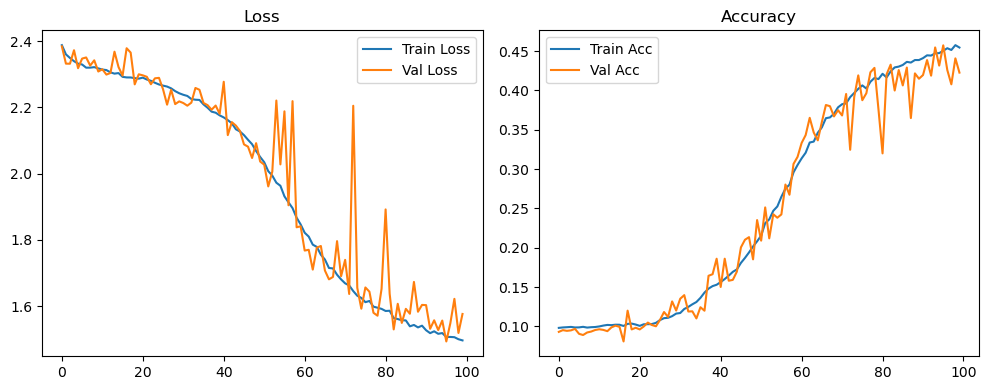

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.28it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.21it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

Original Model Final Test Loss: 1.5643 Accuracy: 0.4275


🚀 Running: batch128_lr_max_0.0002_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0966 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0966 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0966 |:   1%|          | 1/100 [01:18<2:08:43, 78.02s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:43, 78.02s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:43, 78.02s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:34<1:08:34, 41.98s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0975 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.98s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0975 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.98s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [01:51<49:18, 30.50s/it]  

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0964 |:   3%|▎         | 3/100 [02:08<49:18, 30.50s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0964 |:   3%|▎         | 3/100 [02:08<49:18, 30.50s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0964 |:   4%|▍         | 4/100 [02:08<40:04, 25.05s/it]

| LR: 0.000199 | Train Acc: 0.0980 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [02:25<40:04, 25.05s/it]

| LR: 0.000199 | Train Acc: 0.0980 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [02:25<40:04, 25.05s/it]

| LR: 0.000199 | Train Acc: 0.0980 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [02:25<35:00, 22.11s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   5%|▌         | 5/100 [02:41<35:00, 22.11s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   5%|▌         | 5/100 [02:41<35:00, 22.11s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   6%|▌         | 6/100 [02:41<31:46, 20.29s/it]

| LR: 0.000198 | Train Acc: 0.0984 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [02:58<31:46, 20.29s/it]

| LR: 0.000198 | Train Acc: 0.0984 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [02:58<31:46, 20.29s/it]

| LR: 0.000198 | Train Acc: 0.0984 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [02:58<29:40, 19.15s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [03:15<29:40, 19.15s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [03:15<29:40, 19.15s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0953 |:   8%|▊         | 8/100 [03:15<28:11, 18.39s/it]

| LR: 0.000197 | Train Acc: 0.0985 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [03:32<28:11, 18.39s/it]

| LR: 0.000197 | Train Acc: 0.0985 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [03:32<28:11, 18.39s/it]

| LR: 0.000197 | Train Acc: 0.0985 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [03:32<27:10, 17.92s/it]

| LR: 0.000196 | Train Acc: 0.0986 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [03:49<27:10, 17.92s/it]

| LR: 0.000196 | Train Acc: 0.0986 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [03:49<27:10, 17.92s/it]

| LR: 0.000196 | Train Acc: 0.0986 | Val Acc: 0.0968 |:  10%|█         | 10/100 [03:49<26:23, 17.59s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  10%|█         | 10/100 [04:06<26:23, 17.59s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  10%|█         | 10/100 [04:06<26:23, 17.59s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  11%|█         | 11/100 [04:06<25:44, 17.36s/it]

| LR: 0.000194 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:22<25:44, 17.36s/it]

| LR: 0.000194 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:22<25:44, 17.36s/it]

| LR: 0.000194 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [04:23<25:16, 17.24s/it]

| LR: 0.000193 | Train Acc: 0.1012 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:39<25:16, 17.24s/it]

| LR: 0.000193 | Train Acc: 0.1012 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:39<25:16, 17.24s/it]

| LR: 0.000193 | Train Acc: 0.1012 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [04:39<24:48, 17.11s/it]

| LR: 0.000192 | Train Acc: 0.1016 | Val Acc: 0.1009 |:  13%|█▎        | 13/100 [04:56<24:48, 17.11s/it]

| LR: 0.000192 | Train Acc: 0.1016 | Val Acc: 0.1009 |:  13%|█▎        | 13/100 [04:56<24:48, 17.11s/it]

| LR: 0.000192 | Train Acc: 0.1016 | Val Acc: 0.1009 |:  14%|█▍        | 14/100 [04:56<24:22, 17.01s/it]

| LR: 0.000191 | Train Acc: 0.1019 | Val Acc: 0.1031 |:  14%|█▍        | 14/100 [05:13<24:22, 17.01s/it]

| LR: 0.000191 | Train Acc: 0.1019 | Val Acc: 0.1031 |:  14%|█▍        | 14/100 [05:13<24:22, 17.01s/it]

| LR: 0.000191 | Train Acc: 0.1019 | Val Acc: 0.1031 |:  15%|█▌        | 15/100 [05:13<24:00, 16.95s/it]

| LR: 0.000190 | Train Acc: 0.1017 | Val Acc: 0.0960 |:  15%|█▌        | 15/100 [05:30<24:00, 16.95s/it]

| LR: 0.000190 | Train Acc: 0.1017 | Val Acc: 0.0960 |:  15%|█▌        | 15/100 [05:30<24:00, 16.95s/it]

| LR: 0.000190 | Train Acc: 0.1017 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [05:30<23:38, 16.89s/it]

| LR: 0.000188 | Train Acc: 0.1007 | Val Acc: 0.0948 |:  16%|█▌        | 16/100 [05:46<23:38, 16.89s/it]

| LR: 0.000188 | Train Acc: 0.1007 | Val Acc: 0.0948 |:  16%|█▌        | 16/100 [05:46<23:38, 16.89s/it]

| LR: 0.000188 | Train Acc: 0.1007 | Val Acc: 0.0948 |:  17%|█▋        | 17/100 [05:46<23:17, 16.84s/it]

| LR: 0.000187 | Train Acc: 0.1012 | Val Acc: 0.0998 |:  17%|█▋        | 17/100 [06:03<23:17, 16.84s/it]

| LR: 0.000187 | Train Acc: 0.1012 | Val Acc: 0.0998 |:  17%|█▋        | 17/100 [06:03<23:17, 16.84s/it]

| LR: 0.000187 | Train Acc: 0.1012 | Val Acc: 0.0998 |:  18%|█▊        | 18/100 [06:03<22:54, 16.76s/it]

| LR: 0.000185 | Train Acc: 0.1003 | Val Acc: 0.0939 |:  18%|█▊        | 18/100 [06:20<22:54, 16.76s/it]

| LR: 0.000185 | Train Acc: 0.1003 | Val Acc: 0.0939 |:  18%|█▊        | 18/100 [06:20<22:54, 16.76s/it]

| LR: 0.000185 | Train Acc: 0.1003 | Val Acc: 0.0939 |:  19%|█▉        | 19/100 [06:20<22:37, 16.76s/it]

| LR: 0.000184 | Train Acc: 0.0994 | Val Acc: 0.1005 |:  19%|█▉        | 19/100 [06:36<22:37, 16.76s/it]

| LR: 0.000184 | Train Acc: 0.0994 | Val Acc: 0.1005 |:  19%|█▉        | 19/100 [06:36<22:37, 16.76s/it]

| LR: 0.000184 | Train Acc: 0.0994 | Val Acc: 0.1005 |:  20%|██        | 20/100 [06:37<22:21, 16.77s/it]

| LR: 0.000182 | Train Acc: 0.1043 | Val Acc: 0.0982 |:  20%|██        | 20/100 [06:53<22:21, 16.77s/it]

| LR: 0.000182 | Train Acc: 0.1043 | Val Acc: 0.0982 |:  20%|██        | 20/100 [06:53<22:21, 16.77s/it]

| LR: 0.000182 | Train Acc: 0.1043 | Val Acc: 0.0982 |:  21%|██        | 21/100 [06:53<22:05, 16.78s/it]

| LR: 0.000180 | Train Acc: 0.1033 | Val Acc: 0.0989 |:  21%|██        | 21/100 [07:10<22:05, 16.78s/it]

| LR: 0.000180 | Train Acc: 0.1033 | Val Acc: 0.0989 |:  21%|██        | 21/100 [07:10<22:05, 16.78s/it]

| LR: 0.000180 | Train Acc: 0.1033 | Val Acc: 0.0989 |:  22%|██▏       | 22/100 [07:10<21:45, 16.74s/it]

| LR: 0.000178 | Train Acc: 0.1037 | Val Acc: 0.0982 |:  22%|██▏       | 22/100 [07:27<21:45, 16.74s/it]

| LR: 0.000178 | Train Acc: 0.1037 | Val Acc: 0.0982 |:  22%|██▏       | 22/100 [07:27<21:45, 16.74s/it]

| LR: 0.000178 | Train Acc: 0.1037 | Val Acc: 0.0982 |:  23%|██▎       | 23/100 [07:27<21:31, 16.78s/it]

| LR: 0.000176 | Train Acc: 0.1027 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [07:43<21:31, 16.78s/it]

| LR: 0.000176 | Train Acc: 0.1027 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [07:43<21:31, 16.78s/it]

| LR: 0.000176 | Train Acc: 0.1027 | Val Acc: 0.0964 |:  24%|██▍       | 24/100 [07:44<21:13, 16.76s/it]

| LR: 0.000174 | Train Acc: 0.1051 | Val Acc: 0.0979 |:  24%|██▍       | 24/100 [08:00<21:13, 16.76s/it]

| LR: 0.000174 | Train Acc: 0.1051 | Val Acc: 0.0979 |:  24%|██▍       | 24/100 [08:00<21:13, 16.76s/it]

| LR: 0.000174 | Train Acc: 0.1051 | Val Acc: 0.0979 |:  25%|██▌       | 25/100 [08:00<20:55, 16.74s/it]

| LR: 0.000172 | Train Acc: 0.1045 | Val Acc: 0.0985 |:  25%|██▌       | 25/100 [08:17<20:55, 16.74s/it]

| LR: 0.000172 | Train Acc: 0.1045 | Val Acc: 0.0985 |:  25%|██▌       | 25/100 [08:17<20:55, 16.74s/it]

| LR: 0.000172 | Train Acc: 0.1045 | Val Acc: 0.0985 |:  26%|██▌       | 26/100 [08:17<20:38, 16.74s/it]

| LR: 0.000170 | Train Acc: 0.1046 | Val Acc: 0.1013 |:  26%|██▌       | 26/100 [08:34<20:38, 16.74s/it]

| LR: 0.000170 | Train Acc: 0.1046 | Val Acc: 0.1013 |:  26%|██▌       | 26/100 [08:34<20:38, 16.74s/it]

| LR: 0.000170 | Train Acc: 0.1046 | Val Acc: 0.1013 |:  27%|██▋       | 27/100 [08:34<20:25, 16.79s/it]

| LR: 0.000168 | Train Acc: 0.1052 | Val Acc: 0.1059 |:  27%|██▋       | 27/100 [08:51<20:25, 16.79s/it]

| LR: 0.000168 | Train Acc: 0.1052 | Val Acc: 0.1059 |:  27%|██▋       | 27/100 [08:51<20:25, 16.79s/it]

| LR: 0.000168 | Train Acc: 0.1052 | Val Acc: 0.1059 |:  28%|██▊       | 28/100 [08:51<20:11, 16.83s/it]

| LR: 0.000166 | Train Acc: 0.1047 | Val Acc: 0.0983 |:  28%|██▊       | 28/100 [09:08<20:11, 16.83s/it]

| LR: 0.000166 | Train Acc: 0.1047 | Val Acc: 0.0983 |:  28%|██▊       | 28/100 [09:08<20:11, 16.83s/it]

| LR: 0.000166 | Train Acc: 0.1047 | Val Acc: 0.0983 |:  29%|██▉       | 29/100 [09:08<19:55, 16.83s/it]

| LR: 0.000163 | Train Acc: 0.1065 | Val Acc: 0.1080 |:  29%|██▉       | 29/100 [09:24<19:55, 16.83s/it]

| LR: 0.000163 | Train Acc: 0.1065 | Val Acc: 0.1080 |:  29%|██▉       | 29/100 [09:24<19:55, 16.83s/it]

| LR: 0.000163 | Train Acc: 0.1065 | Val Acc: 0.1080 |:  30%|███       | 30/100 [09:24<19:35, 16.79s/it]

| LR: 0.000161 | Train Acc: 0.1052 | Val Acc: 0.0996 |:  30%|███       | 30/100 [09:41<19:35, 16.79s/it]

| LR: 0.000161 | Train Acc: 0.1052 | Val Acc: 0.0996 |:  30%|███       | 30/100 [09:41<19:35, 16.79s/it]

| LR: 0.000161 | Train Acc: 0.1052 | Val Acc: 0.0996 |:  31%|███       | 31/100 [09:41<19:15, 16.75s/it]

| LR: 0.000158 | Train Acc: 0.1073 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:58<19:15, 16.75s/it]

| LR: 0.000158 | Train Acc: 0.1073 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:58<19:15, 16.75s/it]

| LR: 0.000158 | Train Acc: 0.1073 | Val Acc: 0.1010 |:  32%|███▏      | 32/100 [09:58<19:01, 16.78s/it]

| LR: 0.000156 | Train Acc: 0.1100 | Val Acc: 0.1043 |:  32%|███▏      | 32/100 [10:15<19:01, 16.78s/it]

| LR: 0.000156 | Train Acc: 0.1100 | Val Acc: 0.1043 |:  32%|███▏      | 32/100 [10:15<19:01, 16.78s/it]

| LR: 0.000156 | Train Acc: 0.1100 | Val Acc: 0.1043 |:  33%|███▎      | 33/100 [10:15<18:46, 16.82s/it]

| LR: 0.000153 | Train Acc: 0.1109 | Val Acc: 0.1076 |:  33%|███▎      | 33/100 [10:31<18:46, 16.82s/it]

| LR: 0.000153 | Train Acc: 0.1109 | Val Acc: 0.1076 |:  33%|███▎      | 33/100 [10:31<18:46, 16.82s/it]

| LR: 0.000153 | Train Acc: 0.1109 | Val Acc: 0.1076 |:  34%|███▍      | 34/100 [10:32<18:29, 16.80s/it]

| LR: 0.000151 | Train Acc: 0.1097 | Val Acc: 0.1060 |:  34%|███▍      | 34/100 [10:48<18:29, 16.80s/it]

| LR: 0.000151 | Train Acc: 0.1097 | Val Acc: 0.1060 |:  34%|███▍      | 34/100 [10:48<18:29, 16.80s/it]

| LR: 0.000151 | Train Acc: 0.1097 | Val Acc: 0.1060 |:  35%|███▌      | 35/100 [10:48<18:13, 16.83s/it]

| LR: 0.000148 | Train Acc: 0.1149 | Val Acc: 0.1029 |:  35%|███▌      | 35/100 [11:05<18:13, 16.83s/it]

| LR: 0.000148 | Train Acc: 0.1149 | Val Acc: 0.1029 |:  35%|███▌      | 35/100 [11:05<18:13, 16.83s/it]

| LR: 0.000148 | Train Acc: 0.1149 | Val Acc: 0.1029 |:  36%|███▌      | 36/100 [11:05<17:58, 16.85s/it]

| LR: 0.000145 | Train Acc: 0.1166 | Val Acc: 0.1059 |:  36%|███▌      | 36/100 [11:22<17:58, 16.85s/it]

| LR: 0.000145 | Train Acc: 0.1166 | Val Acc: 0.1059 |:  36%|███▌      | 36/100 [11:22<17:58, 16.85s/it]

| LR: 0.000145 | Train Acc: 0.1166 | Val Acc: 0.1059 |:  37%|███▋      | 37/100 [11:22<17:43, 16.88s/it]

| LR: 0.000143 | Train Acc: 0.1185 | Val Acc: 0.1120 |:  37%|███▋      | 37/100 [11:39<17:43, 16.88s/it]

| LR: 0.000143 | Train Acc: 0.1185 | Val Acc: 0.1120 |:  37%|███▋      | 37/100 [11:39<17:43, 16.88s/it]

| LR: 0.000143 | Train Acc: 0.1185 | Val Acc: 0.1120 |:  38%|███▊      | 38/100 [11:39<17:21, 16.80s/it]

| LR: 0.000140 | Train Acc: 0.1188 | Val Acc: 0.1068 |:  38%|███▊      | 38/100 [11:56<17:21, 16.80s/it]

| LR: 0.000140 | Train Acc: 0.1188 | Val Acc: 0.1068 |:  38%|███▊      | 38/100 [11:56<17:21, 16.80s/it]

| LR: 0.000140 | Train Acc: 0.1188 | Val Acc: 0.1068 |:  39%|███▉      | 39/100 [11:56<17:04, 16.80s/it]

| LR: 0.000137 | Train Acc: 0.1214 | Val Acc: 0.1273 |:  39%|███▉      | 39/100 [12:12<17:04, 16.80s/it]

| LR: 0.000137 | Train Acc: 0.1214 | Val Acc: 0.1273 |:  39%|███▉      | 39/100 [12:12<17:04, 16.80s/it]

| LR: 0.000137 | Train Acc: 0.1214 | Val Acc: 0.1273 |:  40%|████      | 40/100 [12:12<16:43, 16.73s/it]

| LR: 0.000134 | Train Acc: 0.1210 | Val Acc: 0.1121 |:  40%|████      | 40/100 [12:29<16:43, 16.73s/it]

| LR: 0.000134 | Train Acc: 0.1210 | Val Acc: 0.1121 |:  40%|████      | 40/100 [12:29<16:43, 16.73s/it]

| LR: 0.000134 | Train Acc: 0.1210 | Val Acc: 0.1121 |:  41%|████      | 41/100 [12:29<16:26, 16.72s/it]

| LR: 0.000132 | Train Acc: 0.1265 | Val Acc: 0.1224 |:  41%|████      | 41/100 [12:46<16:26, 16.72s/it]

| LR: 0.000132 | Train Acc: 0.1265 | Val Acc: 0.1224 |:  41%|████      | 41/100 [12:46<16:26, 16.72s/it]

| LR: 0.000132 | Train Acc: 0.1265 | Val Acc: 0.1224 |:  42%|████▏     | 42/100 [12:46<16:09, 16.71s/it]

| LR: 0.000129 | Train Acc: 0.1268 | Val Acc: 0.1295 |:  42%|████▏     | 42/100 [13:02<16:09, 16.71s/it]

| LR: 0.000129 | Train Acc: 0.1268 | Val Acc: 0.1295 |:  42%|████▏     | 42/100 [13:02<16:09, 16.71s/it]

| LR: 0.000129 | Train Acc: 0.1268 | Val Acc: 0.1295 |:  43%|████▎     | 43/100 [13:02<15:53, 16.72s/it]

| LR: 0.000126 | Train Acc: 0.1290 | Val Acc: 0.1125 |:  43%|████▎     | 43/100 [13:19<15:53, 16.72s/it]

| LR: 0.000126 | Train Acc: 0.1290 | Val Acc: 0.1125 |:  43%|████▎     | 43/100 [13:19<15:53, 16.72s/it]

| LR: 0.000126 | Train Acc: 0.1290 | Val Acc: 0.1125 |:  44%|████▍     | 44/100 [13:19<15:41, 16.82s/it]

| LR: 0.000123 | Train Acc: 0.1353 | Val Acc: 0.1396 |:  44%|████▍     | 44/100 [13:36<15:41, 16.82s/it]

| LR: 0.000123 | Train Acc: 0.1353 | Val Acc: 0.1396 |:  44%|████▍     | 44/100 [13:36<15:41, 16.82s/it]

| LR: 0.000123 | Train Acc: 0.1353 | Val Acc: 0.1396 |:  45%|████▌     | 45/100 [13:36<15:26, 16.85s/it]

| LR: 0.000120 | Train Acc: 0.1404 | Val Acc: 0.1197 |:  45%|████▌     | 45/100 [13:53<15:26, 16.85s/it]

| LR: 0.000120 | Train Acc: 0.1404 | Val Acc: 0.1197 |:  45%|████▌     | 45/100 [13:53<15:26, 16.85s/it]

| LR: 0.000120 | Train Acc: 0.1404 | Val Acc: 0.1197 |:  46%|████▌     | 46/100 [13:53<15:09, 16.85s/it]

| LR: 0.000117 | Train Acc: 0.1396 | Val Acc: 0.1428 |:  46%|████▌     | 46/100 [14:10<15:09, 16.85s/it]

| LR: 0.000117 | Train Acc: 0.1396 | Val Acc: 0.1428 |:  46%|████▌     | 46/100 [14:10<15:09, 16.85s/it]

| LR: 0.000117 | Train Acc: 0.1396 | Val Acc: 0.1428 |:  47%|████▋     | 47/100 [14:10<14:51, 16.83s/it]

| LR: 0.000114 | Train Acc: 0.1452 | Val Acc: 0.1337 |:  47%|████▋     | 47/100 [14:27<14:51, 16.83s/it]

| LR: 0.000114 | Train Acc: 0.1452 | Val Acc: 0.1337 |:  47%|████▋     | 47/100 [14:27<14:51, 16.83s/it]

| LR: 0.000114 | Train Acc: 0.1452 | Val Acc: 0.1337 |:  48%|████▊     | 48/100 [14:27<14:32, 16.77s/it]

| LR: 0.000111 | Train Acc: 0.1437 | Val Acc: 0.1568 |:  48%|████▊     | 48/100 [14:43<14:32, 16.77s/it]

| LR: 0.000111 | Train Acc: 0.1437 | Val Acc: 0.1568 |:  48%|████▊     | 48/100 [14:43<14:32, 16.77s/it]

| LR: 0.000111 | Train Acc: 0.1437 | Val Acc: 0.1568 |:  49%|████▉     | 49/100 [14:43<14:14, 16.75s/it]

| LR: 0.000108 | Train Acc: 0.1485 | Val Acc: 0.1454 |:  49%|████▉     | 49/100 [15:00<14:14, 16.75s/it]

| LR: 0.000108 | Train Acc: 0.1485 | Val Acc: 0.1454 |:  49%|████▉     | 49/100 [15:00<14:14, 16.75s/it]

| LR: 0.000108 | Train Acc: 0.1485 | Val Acc: 0.1454 |:  50%|█████     | 50/100 [15:00<13:56, 16.73s/it]

| LR: 0.000105 | Train Acc: 0.1528 | Val Acc: 0.1668 |:  50%|█████     | 50/100 [15:17<13:56, 16.73s/it]

| LR: 0.000105 | Train Acc: 0.1528 | Val Acc: 0.1668 |:  50%|█████     | 50/100 [15:17<13:56, 16.73s/it]

| LR: 0.000105 | Train Acc: 0.1528 | Val Acc: 0.1668 |:  51%|█████     | 51/100 [15:17<13:41, 16.76s/it]

| LR: 0.000102 | Train Acc: 0.1598 | Val Acc: 0.1757 |:  51%|█████     | 51/100 [15:34<13:41, 16.76s/it]

| LR: 0.000102 | Train Acc: 0.1598 | Val Acc: 0.1757 |:  51%|█████     | 51/100 [15:34<13:41, 16.76s/it]

| LR: 0.000102 | Train Acc: 0.1598 | Val Acc: 0.1757 |:  52%|█████▏    | 52/100 [15:34<13:26, 16.81s/it]

| LR: 0.000099 | Train Acc: 0.1581 | Val Acc: 0.1682 |:  52%|█████▏    | 52/100 [15:51<13:26, 16.81s/it]

| LR: 0.000099 | Train Acc: 0.1581 | Val Acc: 0.1682 |:  52%|█████▏    | 52/100 [15:51<13:26, 16.81s/it]

| LR: 0.000099 | Train Acc: 0.1581 | Val Acc: 0.1682 |:  53%|█████▎    | 53/100 [15:51<13:12, 16.86s/it]

| LR: 0.000096 | Train Acc: 0.1621 | Val Acc: 0.1630 |:  53%|█████▎    | 53/100 [16:07<13:12, 16.86s/it]

| LR: 0.000096 | Train Acc: 0.1621 | Val Acc: 0.1630 |:  53%|█████▎    | 53/100 [16:07<13:12, 16.86s/it]

| LR: 0.000096 | Train Acc: 0.1621 | Val Acc: 0.1630 |:  54%|█████▍    | 54/100 [16:08<12:54, 16.84s/it]

| LR: 0.000093 | Train Acc: 0.1671 | Val Acc: 0.1551 |:  54%|█████▍    | 54/100 [16:24<12:54, 16.84s/it]

| LR: 0.000093 | Train Acc: 0.1671 | Val Acc: 0.1551 |:  54%|█████▍    | 54/100 [16:24<12:54, 16.84s/it]

| LR: 0.000093 | Train Acc: 0.1671 | Val Acc: 0.1551 |:  55%|█████▌    | 55/100 [16:24<12:37, 16.83s/it]

| LR: 0.000090 | Train Acc: 0.1678 | Val Acc: 0.1481 |:  55%|█████▌    | 55/100 [16:41<12:37, 16.83s/it]

| LR: 0.000090 | Train Acc: 0.1678 | Val Acc: 0.1481 |:  55%|█████▌    | 55/100 [16:41<12:37, 16.83s/it]

| LR: 0.000090 | Train Acc: 0.1678 | Val Acc: 0.1481 |:  56%|█████▌    | 56/100 [16:41<12:21, 16.86s/it]

| LR: 0.000087 | Train Acc: 0.1728 | Val Acc: 0.1895 |:  56%|█████▌    | 56/100 [16:58<12:21, 16.86s/it]

| LR: 0.000087 | Train Acc: 0.1728 | Val Acc: 0.1895 |:  56%|█████▌    | 56/100 [16:58<12:21, 16.86s/it]

| LR: 0.000087 | Train Acc: 0.1728 | Val Acc: 0.1895 |:  57%|█████▋    | 57/100 [16:58<12:04, 16.84s/it]

| LR: 0.000084 | Train Acc: 0.1778 | Val Acc: 0.1796 |:  57%|█████▋    | 57/100 [17:15<12:04, 16.84s/it]

| LR: 0.000084 | Train Acc: 0.1778 | Val Acc: 0.1796 |:  57%|█████▋    | 57/100 [17:15<12:04, 16.84s/it]

| LR: 0.000084 | Train Acc: 0.1778 | Val Acc: 0.1796 |:  58%|█████▊    | 58/100 [17:15<11:47, 16.85s/it]

| LR: 0.000081 | Train Acc: 0.1803 | Val Acc: 0.2195 |:  58%|█████▊    | 58/100 [17:32<11:47, 16.85s/it]

| LR: 0.000081 | Train Acc: 0.1803 | Val Acc: 0.2195 |:  58%|█████▊    | 58/100 [17:32<11:47, 16.85s/it]

| LR: 0.000081 | Train Acc: 0.1803 | Val Acc: 0.2195 |:  59%|█████▉    | 59/100 [17:32<11:29, 16.83s/it]

| LR: 0.000078 | Train Acc: 0.1878 | Val Acc: 0.2053 |:  59%|█████▉    | 59/100 [17:48<11:29, 16.83s/it]

| LR: 0.000078 | Train Acc: 0.1878 | Val Acc: 0.2053 |:  59%|█████▉    | 59/100 [17:48<11:29, 16.83s/it]

| LR: 0.000078 | Train Acc: 0.1878 | Val Acc: 0.2053 |:  60%|██████    | 60/100 [17:49<11:12, 16.82s/it]

| LR: 0.000076 | Train Acc: 0.1907 | Val Acc: 0.1937 |:  60%|██████    | 60/100 [18:05<11:12, 16.82s/it]

| LR: 0.000076 | Train Acc: 0.1907 | Val Acc: 0.1937 |:  60%|██████    | 60/100 [18:05<11:12, 16.82s/it]

| LR: 0.000076 | Train Acc: 0.1907 | Val Acc: 0.1937 |:  61%|██████    | 61/100 [18:05<10:56, 16.84s/it]

| LR: 0.000073 | Train Acc: 0.1954 | Val Acc: 0.2101 |:  61%|██████    | 61/100 [18:22<10:56, 16.84s/it]

| LR: 0.000073 | Train Acc: 0.1954 | Val Acc: 0.2101 |:  61%|██████    | 61/100 [18:22<10:56, 16.84s/it]

| LR: 0.000073 | Train Acc: 0.1954 | Val Acc: 0.2101 |:  62%|██████▏   | 62/100 [18:22<10:39, 16.83s/it]

| LR: 0.000070 | Train Acc: 0.1985 | Val Acc: 0.2130 |:  62%|██████▏   | 62/100 [18:39<10:39, 16.83s/it]

| LR: 0.000070 | Train Acc: 0.1985 | Val Acc: 0.2130 |:  62%|██████▏   | 62/100 [18:39<10:39, 16.83s/it]

| LR: 0.000070 | Train Acc: 0.1985 | Val Acc: 0.2130 |:  63%|██████▎   | 63/100 [18:39<10:22, 16.82s/it]

| LR: 0.000067 | Train Acc: 0.2034 | Val Acc: 0.2103 |:  63%|██████▎   | 63/100 [18:56<10:22, 16.82s/it]

| LR: 0.000067 | Train Acc: 0.2034 | Val Acc: 0.2103 |:  63%|██████▎   | 63/100 [18:56<10:22, 16.82s/it]

| LR: 0.000067 | Train Acc: 0.2034 | Val Acc: 0.2103 |:  64%|██████▍   | 64/100 [18:56<10:04, 16.80s/it]

| LR: 0.000065 | Train Acc: 0.2054 | Val Acc: 0.1833 |:  64%|██████▍   | 64/100 [19:12<10:04, 16.80s/it]

| LR: 0.000065 | Train Acc: 0.2054 | Val Acc: 0.1833 |:  64%|██████▍   | 64/100 [19:12<10:04, 16.80s/it]

| LR: 0.000065 | Train Acc: 0.2054 | Val Acc: 0.1833 |:  65%|██████▌   | 65/100 [19:13<09:47, 16.79s/it]

| LR: 0.000062 | Train Acc: 0.2088 | Val Acc: 0.2336 |:  65%|██████▌   | 65/100 [19:29<09:47, 16.79s/it]

| LR: 0.000062 | Train Acc: 0.2088 | Val Acc: 0.2336 |:  65%|██████▌   | 65/100 [19:29<09:47, 16.79s/it]

| LR: 0.000062 | Train Acc: 0.2088 | Val Acc: 0.2336 |:  66%|██████▌   | 66/100 [19:29<09:31, 16.80s/it]

| LR: 0.000059 | Train Acc: 0.2165 | Val Acc: 0.1996 |:  66%|██████▌   | 66/100 [19:46<09:31, 16.80s/it]

| LR: 0.000059 | Train Acc: 0.2165 | Val Acc: 0.1996 |:  66%|██████▌   | 66/100 [19:46<09:31, 16.80s/it]

| LR: 0.000059 | Train Acc: 0.2165 | Val Acc: 0.1996 |:  67%|██████▋   | 67/100 [19:46<09:13, 16.77s/it]

| LR: 0.000057 | Train Acc: 0.2171 | Val Acc: 0.2527 |:  67%|██████▋   | 67/100 [20:03<09:13, 16.77s/it]

| LR: 0.000057 | Train Acc: 0.2171 | Val Acc: 0.2527 |:  67%|██████▋   | 67/100 [20:03<09:13, 16.77s/it]

| LR: 0.000057 | Train Acc: 0.2171 | Val Acc: 0.2527 |:  68%|██████▊   | 68/100 [20:03<08:56, 16.77s/it]

| LR: 0.000054 | Train Acc: 0.2202 | Val Acc: 0.2120 |:  68%|██████▊   | 68/100 [20:19<08:56, 16.77s/it]

| LR: 0.000054 | Train Acc: 0.2202 | Val Acc: 0.2120 |:  68%|██████▊   | 68/100 [20:19<08:56, 16.77s/it]

| LR: 0.000054 | Train Acc: 0.2202 | Val Acc: 0.2120 |:  69%|██████▉   | 69/100 [20:19<08:38, 16.73s/it]

| LR: 0.000052 | Train Acc: 0.2260 | Val Acc: 0.2375 |:  69%|██████▉   | 69/100 [20:36<08:38, 16.73s/it]

| LR: 0.000052 | Train Acc: 0.2260 | Val Acc: 0.2375 |:  69%|██████▉   | 69/100 [20:36<08:38, 16.73s/it]

| LR: 0.000052 | Train Acc: 0.2260 | Val Acc: 0.2375 |:  70%|███████   | 70/100 [20:36<08:24, 16.81s/it]

| LR: 0.000049 | Train Acc: 0.2249 | Val Acc: 0.2444 |:  70%|███████   | 70/100 [20:53<08:24, 16.81s/it]

| LR: 0.000049 | Train Acc: 0.2249 | Val Acc: 0.2444 |:  70%|███████   | 70/100 [20:53<08:24, 16.81s/it]

| LR: 0.000049 | Train Acc: 0.2249 | Val Acc: 0.2444 |:  71%|███████   | 71/100 [20:53<08:07, 16.80s/it]

| LR: 0.000047 | Train Acc: 0.2351 | Val Acc: 0.2333 |:  71%|███████   | 71/100 [21:10<08:07, 16.80s/it]

| LR: 0.000047 | Train Acc: 0.2351 | Val Acc: 0.2333 |:  71%|███████   | 71/100 [21:10<08:07, 16.80s/it]

| LR: 0.000047 | Train Acc: 0.2351 | Val Acc: 0.2333 |:  72%|███████▏  | 72/100 [21:10<07:49, 16.75s/it]

| LR: 0.000044 | Train Acc: 0.2394 | Val Acc: 0.2424 |:  72%|███████▏  | 72/100 [21:27<07:49, 16.75s/it]

| LR: 0.000044 | Train Acc: 0.2394 | Val Acc: 0.2424 |:  72%|███████▏  | 72/100 [21:27<07:49, 16.75s/it]

| LR: 0.000044 | Train Acc: 0.2394 | Val Acc: 0.2424 |:  73%|███████▎  | 73/100 [21:27<07:31, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.2467 | Val Acc: 0.2821 |:  73%|███████▎  | 73/100 [21:43<07:31, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.2467 | Val Acc: 0.2821 |:  73%|███████▎  | 73/100 [21:43<07:31, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.2467 | Val Acc: 0.2821 |:  74%|███████▍  | 74/100 [21:43<07:15, 16.73s/it]

| LR: 0.000040 | Train Acc: 0.2460 | Val Acc: 0.2554 |:  74%|███████▍  | 74/100 [22:00<07:15, 16.73s/it]

| LR: 0.000040 | Train Acc: 0.2460 | Val Acc: 0.2554 |:  74%|███████▍  | 74/100 [22:00<07:15, 16.73s/it]

| LR: 0.000040 | Train Acc: 0.2460 | Val Acc: 0.2554 |:  75%|███████▌  | 75/100 [22:00<06:58, 16.72s/it]

| LR: 0.000038 | Train Acc: 0.2488 | Val Acc: 0.2800 |:  75%|███████▌  | 75/100 [22:17<06:58, 16.72s/it]

| LR: 0.000038 | Train Acc: 0.2488 | Val Acc: 0.2800 |:  75%|███████▌  | 75/100 [22:17<06:58, 16.72s/it]

| LR: 0.000038 | Train Acc: 0.2488 | Val Acc: 0.2800 |:  76%|███████▌  | 76/100 [22:17<06:41, 16.72s/it]

| LR: 0.000036 | Train Acc: 0.2512 | Val Acc: 0.2774 |:  76%|███████▌  | 76/100 [22:33<06:41, 16.72s/it]

| LR: 0.000036 | Train Acc: 0.2512 | Val Acc: 0.2774 |:  76%|███████▌  | 76/100 [22:33<06:41, 16.72s/it]

| LR: 0.000036 | Train Acc: 0.2512 | Val Acc: 0.2774 |:  77%|███████▋  | 77/100 [22:33<06:24, 16.70s/it]

| LR: 0.000034 | Train Acc: 0.2525 | Val Acc: 0.2837 |:  77%|███████▋  | 77/100 [22:50<06:24, 16.70s/it]

| LR: 0.000034 | Train Acc: 0.2525 | Val Acc: 0.2837 |:  77%|███████▋  | 77/100 [22:50<06:24, 16.70s/it]

| LR: 0.000034 | Train Acc: 0.2525 | Val Acc: 0.2837 |:  78%|███████▊  | 78/100 [22:50<06:07, 16.73s/it]

| LR: 0.000032 | Train Acc: 0.2576 | Val Acc: 0.2701 |:  78%|███████▊  | 78/100 [23:07<06:07, 16.73s/it]

| LR: 0.000032 | Train Acc: 0.2576 | Val Acc: 0.2701 |:  78%|███████▊  | 78/100 [23:07<06:07, 16.73s/it]

| LR: 0.000032 | Train Acc: 0.2576 | Val Acc: 0.2701 |:  79%|███████▉  | 79/100 [23:07<05:52, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.2631 | Val Acc: 0.2922 |:  79%|███████▉  | 79/100 [23:24<05:52, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.2631 | Val Acc: 0.2922 |:  79%|███████▉  | 79/100 [23:24<05:52, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.2631 | Val Acc: 0.2922 |:  80%|████████  | 80/100 [23:24<05:35, 16.79s/it]

| LR: 0.000028 | Train Acc: 0.2639 | Val Acc: 0.2907 |:  80%|████████  | 80/100 [23:41<05:35, 16.79s/it]

| LR: 0.000028 | Train Acc: 0.2639 | Val Acc: 0.2907 |:  80%|████████  | 80/100 [23:41<05:35, 16.79s/it]

| LR: 0.000028 | Train Acc: 0.2639 | Val Acc: 0.2907 |:  81%|████████  | 81/100 [23:41<05:19, 16.79s/it]

| LR: 0.000026 | Train Acc: 0.2693 | Val Acc: 0.2766 |:  81%|████████  | 81/100 [23:57<05:19, 16.79s/it]

| LR: 0.000026 | Train Acc: 0.2693 | Val Acc: 0.2766 |:  81%|████████  | 81/100 [23:57<05:19, 16.79s/it]

| LR: 0.000026 | Train Acc: 0.2693 | Val Acc: 0.2766 |:  82%|████████▏ | 82/100 [23:58<05:02, 16.81s/it]

| LR: 0.000025 | Train Acc: 0.2652 | Val Acc: 0.3073 |:  82%|████████▏ | 82/100 [24:14<05:02, 16.81s/it]

| LR: 0.000025 | Train Acc: 0.2652 | Val Acc: 0.3073 |:  82%|████████▏ | 82/100 [24:14<05:02, 16.81s/it]

| LR: 0.000025 | Train Acc: 0.2652 | Val Acc: 0.3073 |:  83%|████████▎ | 83/100 [24:14<04:45, 16.82s/it]

| LR: 0.000023 | Train Acc: 0.2777 | Val Acc: 0.3087 |:  83%|████████▎ | 83/100 [24:31<04:45, 16.82s/it]

| LR: 0.000023 | Train Acc: 0.2777 | Val Acc: 0.3087 |:  83%|████████▎ | 83/100 [24:31<04:45, 16.82s/it]

| LR: 0.000023 | Train Acc: 0.2777 | Val Acc: 0.3087 |:  84%|████████▍ | 84/100 [24:31<04:28, 16.77s/it]

| LR: 0.000022 | Train Acc: 0.2751 | Val Acc: 0.2809 |:  84%|████████▍ | 84/100 [24:48<04:28, 16.77s/it]

| LR: 0.000022 | Train Acc: 0.2751 | Val Acc: 0.2809 |:  84%|████████▍ | 84/100 [24:48<04:28, 16.77s/it]

| LR: 0.000022 | Train Acc: 0.2751 | Val Acc: 0.2809 |:  85%|████████▌ | 85/100 [24:48<04:11, 16.80s/it]

| LR: 0.000020 | Train Acc: 0.2765 | Val Acc: 0.2947 |:  85%|████████▌ | 85/100 [25:05<04:11, 16.80s/it]

| LR: 0.000020 | Train Acc: 0.2765 | Val Acc: 0.2947 |:  85%|████████▌ | 85/100 [25:05<04:11, 16.80s/it]

| LR: 0.000020 | Train Acc: 0.2765 | Val Acc: 0.2947 |:  86%|████████▌ | 86/100 [25:05<03:55, 16.79s/it]

| LR: 0.000019 | Train Acc: 0.2757 | Val Acc: 0.2767 |:  86%|████████▌ | 86/100 [25:21<03:55, 16.79s/it]

| LR: 0.000019 | Train Acc: 0.2757 | Val Acc: 0.2767 |:  86%|████████▌ | 86/100 [25:21<03:55, 16.79s/it]

| LR: 0.000019 | Train Acc: 0.2757 | Val Acc: 0.2767 |:  87%|████████▋ | 87/100 [25:22<03:38, 16.82s/it]

| LR: 0.000018 | Train Acc: 0.2797 | Val Acc: 0.2937 |:  87%|████████▋ | 87/100 [25:38<03:38, 16.82s/it]

| LR: 0.000018 | Train Acc: 0.2797 | Val Acc: 0.2937 |:  87%|████████▋ | 87/100 [25:38<03:38, 16.82s/it]

| LR: 0.000018 | Train Acc: 0.2797 | Val Acc: 0.2937 |:  88%|████████▊ | 88/100 [25:38<03:22, 16.86s/it]

| LR: 0.000017 | Train Acc: 0.2806 | Val Acc: 0.2794 |:  88%|████████▊ | 88/100 [25:55<03:22, 16.86s/it]

| LR: 0.000017 | Train Acc: 0.2806 | Val Acc: 0.2794 |:  88%|████████▊ | 88/100 [25:55<03:22, 16.86s/it]

| LR: 0.000017 | Train Acc: 0.2806 | Val Acc: 0.2794 |:  89%|████████▉ | 89/100 [25:55<03:05, 16.89s/it]

| LR: 0.000016 | Train Acc: 0.2826 | Val Acc: 0.2927 |:  89%|████████▉ | 89/100 [26:12<03:05, 16.89s/it]

| LR: 0.000016 | Train Acc: 0.2826 | Val Acc: 0.2927 |:  89%|████████▉ | 89/100 [26:12<03:05, 16.89s/it]

| LR: 0.000016 | Train Acc: 0.2826 | Val Acc: 0.2927 |:  90%|█████████ | 90/100 [26:12<02:48, 16.88s/it]

| LR: 0.000015 | Train Acc: 0.2856 | Val Acc: 0.3217 |:  90%|█████████ | 90/100 [26:29<02:48, 16.88s/it]

| LR: 0.000015 | Train Acc: 0.2856 | Val Acc: 0.3217 |:  90%|█████████ | 90/100 [26:29<02:48, 16.88s/it]

| LR: 0.000015 | Train Acc: 0.2856 | Val Acc: 0.3217 |:  91%|█████████ | 91/100 [26:29<02:31, 16.80s/it]

| LR: 0.000014 | Train Acc: 0.2878 | Val Acc: 0.2950 |:  91%|█████████ | 91/100 [26:46<02:31, 16.80s/it]

| LR: 0.000014 | Train Acc: 0.2878 | Val Acc: 0.2950 |:  91%|█████████ | 91/100 [26:46<02:31, 16.80s/it]

| LR: 0.000014 | Train Acc: 0.2878 | Val Acc: 0.2950 |:  92%|█████████▏| 92/100 [26:46<02:14, 16.83s/it]

| LR: 0.000013 | Train Acc: 0.2887 | Val Acc: 0.3323 |:  92%|█████████▏| 92/100 [27:03<02:14, 16.83s/it]

| LR: 0.000013 | Train Acc: 0.2887 | Val Acc: 0.3323 |:  92%|█████████▏| 92/100 [27:03<02:14, 16.83s/it]

| LR: 0.000013 | Train Acc: 0.2887 | Val Acc: 0.3323 |:  93%|█████████▎| 93/100 [27:03<01:57, 16.84s/it]

| LR: 0.000012 | Train Acc: 0.2924 | Val Acc: 0.3030 |:  93%|█████████▎| 93/100 [27:19<01:57, 16.84s/it]

| LR: 0.000012 | Train Acc: 0.2924 | Val Acc: 0.3030 |:  93%|█████████▎| 93/100 [27:19<01:57, 16.84s/it]

| LR: 0.000012 | Train Acc: 0.2924 | Val Acc: 0.3030 |:  94%|█████████▍| 94/100 [27:19<01:40, 16.82s/it]

| LR: 0.000012 | Train Acc: 0.2905 | Val Acc: 0.2827 |:  94%|█████████▍| 94/100 [27:36<01:40, 16.82s/it]

| LR: 0.000012 | Train Acc: 0.2905 | Val Acc: 0.2827 |:  94%|█████████▍| 94/100 [27:36<01:40, 16.82s/it]

| LR: 0.000012 | Train Acc: 0.2905 | Val Acc: 0.2827 |:  95%|█████████▌| 95/100 [27:36<01:24, 16.83s/it]

| LR: 0.000011 | Train Acc: 0.2944 | Val Acc: 0.3190 |:  95%|█████████▌| 95/100 [27:53<01:24, 16.83s/it]

| LR: 0.000011 | Train Acc: 0.2944 | Val Acc: 0.3190 |:  95%|█████████▌| 95/100 [27:53<01:24, 16.83s/it]

| LR: 0.000011 | Train Acc: 0.2944 | Val Acc: 0.3190 |:  96%|█████████▌| 96/100 [27:53<01:07, 16.80s/it]

| LR: 0.000011 | Train Acc: 0.2939 | Val Acc: 0.3279 |:  96%|█████████▌| 96/100 [28:10<01:07, 16.80s/it]

| LR: 0.000011 | Train Acc: 0.2939 | Val Acc: 0.3279 |:  96%|█████████▌| 96/100 [28:10<01:07, 16.80s/it]

| LR: 0.000011 | Train Acc: 0.2939 | Val Acc: 0.3279 |:  97%|█████████▋| 97/100 [28:10<00:50, 16.85s/it]

| LR: 0.000010 | Train Acc: 0.2973 | Val Acc: 0.3177 |:  97%|█████████▋| 97/100 [28:26<00:50, 16.85s/it]

| LR: 0.000010 | Train Acc: 0.2973 | Val Acc: 0.3177 |:  97%|█████████▋| 97/100 [28:26<00:50, 16.85s/it]

| LR: 0.000010 | Train Acc: 0.2973 | Val Acc: 0.3177 |:  98%|█████████▊| 98/100 [28:26<00:33, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.2979 | Val Acc: 0.3195 |:  98%|█████████▊| 98/100 [28:43<00:33, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.2979 | Val Acc: 0.3195 |:  98%|█████████▊| 98/100 [28:43<00:33, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.2979 | Val Acc: 0.3195 |:  99%|█████████▉| 99/100 [28:43<00:16, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.2929 | Val Acc: 0.3167 |:  99%|█████████▉| 99/100 [29:00<00:16, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.2929 | Val Acc: 0.3167 |:  99%|█████████▉| 99/100 [29:00<00:16, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.2929 | Val Acc: 0.3167 |: 100%|██████████| 100/100 [29:00<00:00, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.2929 | Val Acc: 0.3167 |: 100%|██████████| 100/100 [29:00<00:00, 17.41s/it]

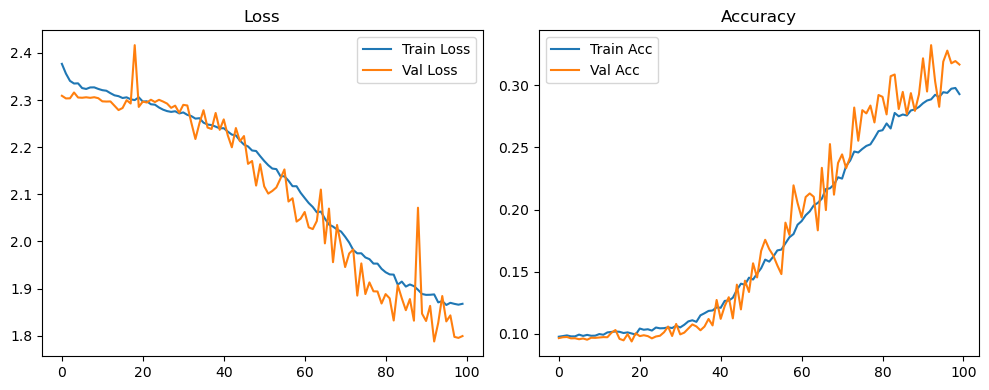

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.31it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

Original Model Final Test Loss: 1.7988 Accuracy: 0.3193


🚀 Running: batch128_lr_max_0.0002_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:18<2:08:44, 78.02s/it]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:44, 78.02s/it]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:44, 78.02s/it]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:34<1:08:34, 41.99s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.99s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.99s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [01:51<49:06, 30.37s/it]  

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:08<49:06, 30.37s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:08<49:06, 30.37s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [02:08<39:59, 24.99s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:24<39:59, 24.99s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:24<39:59, 24.99s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:24<34:48, 21.99s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:48, 21.99s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:48, 21.99s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:41<31:42, 20.24s/it]

| LR: 0.000198 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:58<31:42, 20.24s/it]

| LR: 0.000198 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:58<31:42, 20.24s/it]

| LR: 0.000198 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [02:58<29:32, 19.06s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:14<29:32, 19.06s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:14<29:32, 19.06s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:14<28:04, 18.31s/it]

| LR: 0.000197 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<28:04, 18.31s/it]

| LR: 0.000197 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<28:04, 18.31s/it]

| LR: 0.000197 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [03:31<27:03, 17.84s/it]

| LR: 0.000196 | Train Acc: 0.0990 | Val Acc: 0.0975 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000196 | Train Acc: 0.0990 | Val Acc: 0.0975 |:   9%|▉         | 9/100 [03:48<27:03, 17.84s/it]

| LR: 0.000196 | Train Acc: 0.0990 | Val Acc: 0.0975 |:  10%|█         | 10/100 [03:48<26:15, 17.50s/it]

| LR: 0.000195 | Train Acc: 0.0987 | Val Acc: 0.0971 |:  10%|█         | 10/100 [04:05<26:15, 17.50s/it]

| LR: 0.000195 | Train Acc: 0.0987 | Val Acc: 0.0971 |:  10%|█         | 10/100 [04:05<26:15, 17.50s/it]

| LR: 0.000195 | Train Acc: 0.0987 | Val Acc: 0.0971 |:  11%|█         | 11/100 [04:05<25:34, 17.24s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:21<25:34, 17.24s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:21<25:34, 17.24s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:21<25:07, 17.13s/it]

| LR: 0.000193 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [04:38<25:07, 17.13s/it]

| LR: 0.000193 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [04:38<25:07, 17.13s/it]

| LR: 0.000193 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [04:38<24:39, 17.01s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [04:55<24:39, 17.01s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [04:55<24:39, 17.01s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [04:55<24:15, 16.92s/it]

| LR: 0.000191 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:12<24:15, 16.92s/it]

| LR: 0.000191 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:12<24:15, 16.92s/it]

| LR: 0.000191 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:12<23:53, 16.87s/it]

| LR: 0.000190 | Train Acc: 0.1005 | Val Acc: 0.0984 |:  15%|█▌        | 15/100 [05:29<23:53, 16.87s/it]

| LR: 0.000190 | Train Acc: 0.1005 | Val Acc: 0.0984 |:  15%|█▌        | 15/100 [05:29<23:53, 16.87s/it]

| LR: 0.000190 | Train Acc: 0.1005 | Val Acc: 0.0984 |:  16%|█▌        | 16/100 [05:29<23:37, 16.88s/it]

| LR: 0.000188 | Train Acc: 0.1019 | Val Acc: 0.0978 |:  16%|█▌        | 16/100 [05:45<23:37, 16.88s/it]

| LR: 0.000188 | Train Acc: 0.1019 | Val Acc: 0.0978 |:  16%|█▌        | 16/100 [05:45<23:37, 16.88s/it]

| LR: 0.000188 | Train Acc: 0.1019 | Val Acc: 0.0978 |:  17%|█▋        | 17/100 [05:45<23:19, 16.86s/it]

| LR: 0.000187 | Train Acc: 0.1019 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [06:02<23:19, 16.86s/it]

| LR: 0.000187 | Train Acc: 0.1019 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [06:02<23:19, 16.86s/it]

| LR: 0.000187 | Train Acc: 0.1019 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [06:02<22:58, 16.82s/it]

| LR: 0.000185 | Train Acc: 0.1026 | Val Acc: 0.1028 |:  18%|█▊        | 18/100 [06:19<22:58, 16.82s/it]

| LR: 0.000185 | Train Acc: 0.1026 | Val Acc: 0.1028 |:  18%|█▊        | 18/100 [06:19<22:58, 16.82s/it]

| LR: 0.000185 | Train Acc: 0.1026 | Val Acc: 0.1028 |:  19%|█▉        | 19/100 [06:19<22:41, 16.81s/it]

| LR: 0.000184 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:36<22:41, 16.81s/it]

| LR: 0.000184 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:36<22:41, 16.81s/it]

| LR: 0.000184 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  20%|██        | 20/100 [06:36<22:23, 16.80s/it]

| LR: 0.000182 | Train Acc: 0.1021 | Val Acc: 0.0979 |:  20%|██        | 20/100 [06:52<22:23, 16.80s/it]

| LR: 0.000182 | Train Acc: 0.1021 | Val Acc: 0.0979 |:  20%|██        | 20/100 [06:52<22:23, 16.80s/it]

| LR: 0.000182 | Train Acc: 0.1021 | Val Acc: 0.0979 |:  21%|██        | 21/100 [06:52<22:05, 16.78s/it]

| LR: 0.000180 | Train Acc: 0.1048 | Val Acc: 0.0984 |:  21%|██        | 21/100 [07:09<22:05, 16.78s/it]

| LR: 0.000180 | Train Acc: 0.1048 | Val Acc: 0.0984 |:  21%|██        | 21/100 [07:09<22:05, 16.78s/it]

| LR: 0.000180 | Train Acc: 0.1048 | Val Acc: 0.0984 |:  22%|██▏       | 22/100 [07:09<21:47, 16.77s/it]

| LR: 0.000178 | Train Acc: 0.1038 | Val Acc: 0.1129 |:  22%|██▏       | 22/100 [07:26<21:47, 16.77s/it]

| LR: 0.000178 | Train Acc: 0.1038 | Val Acc: 0.1129 |:  22%|██▏       | 22/100 [07:26<21:47, 16.77s/it]

| LR: 0.000178 | Train Acc: 0.1038 | Val Acc: 0.1129 |:  23%|██▎       | 23/100 [07:26<21:25, 16.70s/it]

| LR: 0.000176 | Train Acc: 0.1025 | Val Acc: 0.1012 |:  23%|██▎       | 23/100 [07:42<21:25, 16.70s/it]

| LR: 0.000176 | Train Acc: 0.1025 | Val Acc: 0.1012 |:  23%|██▎       | 23/100 [07:42<21:25, 16.70s/it]

| LR: 0.000176 | Train Acc: 0.1025 | Val Acc: 0.1012 |:  24%|██▍       | 24/100 [07:42<21:10, 16.72s/it]

| LR: 0.000174 | Train Acc: 0.1053 | Val Acc: 0.0986 |:  24%|██▍       | 24/100 [07:59<21:10, 16.72s/it]

| LR: 0.000174 | Train Acc: 0.1053 | Val Acc: 0.0986 |:  24%|██▍       | 24/100 [07:59<21:10, 16.72s/it]

| LR: 0.000174 | Train Acc: 0.1053 | Val Acc: 0.0986 |:  25%|██▌       | 25/100 [07:59<20:53, 16.71s/it]

| LR: 0.000172 | Train Acc: 0.1055 | Val Acc: 0.1040 |:  25%|██▌       | 25/100 [08:16<20:53, 16.71s/it]

| LR: 0.000172 | Train Acc: 0.1055 | Val Acc: 0.1040 |:  25%|██▌       | 25/100 [08:16<20:53, 16.71s/it]

| LR: 0.000172 | Train Acc: 0.1055 | Val Acc: 0.1040 |:  26%|██▌       | 26/100 [08:16<20:40, 16.77s/it]

| LR: 0.000170 | Train Acc: 0.1062 | Val Acc: 0.0996 |:  26%|██▌       | 26/100 [08:33<20:40, 16.77s/it]

| LR: 0.000170 | Train Acc: 0.1062 | Val Acc: 0.0996 |:  26%|██▌       | 26/100 [08:33<20:40, 16.77s/it]

| LR: 0.000170 | Train Acc: 0.1062 | Val Acc: 0.0996 |:  27%|██▋       | 27/100 [08:33<20:22, 16.75s/it]

| LR: 0.000168 | Train Acc: 0.1056 | Val Acc: 0.0998 |:  27%|██▋       | 27/100 [08:49<20:22, 16.75s/it]

| LR: 0.000168 | Train Acc: 0.1056 | Val Acc: 0.0998 |:  27%|██▋       | 27/100 [08:49<20:22, 16.75s/it]

| LR: 0.000168 | Train Acc: 0.1056 | Val Acc: 0.0998 |:  28%|██▊       | 28/100 [08:49<20:03, 16.71s/it]

| LR: 0.000166 | Train Acc: 0.1071 | Val Acc: 0.0979 |:  28%|██▊       | 28/100 [09:06<20:03, 16.71s/it]

| LR: 0.000166 | Train Acc: 0.1071 | Val Acc: 0.0979 |:  28%|██▊       | 28/100 [09:06<20:03, 16.71s/it]

| LR: 0.000166 | Train Acc: 0.1071 | Val Acc: 0.0979 |:  29%|██▉       | 29/100 [09:06<19:41, 16.65s/it]

| LR: 0.000163 | Train Acc: 0.1050 | Val Acc: 0.1008 |:  29%|██▉       | 29/100 [09:23<19:41, 16.65s/it]

| LR: 0.000163 | Train Acc: 0.1050 | Val Acc: 0.1008 |:  29%|██▉       | 29/100 [09:23<19:41, 16.65s/it]

| LR: 0.000163 | Train Acc: 0.1050 | Val Acc: 0.1008 |:  30%|███       | 30/100 [09:23<19:28, 16.70s/it]

| LR: 0.000161 | Train Acc: 0.1071 | Val Acc: 0.0987 |:  30%|███       | 30/100 [09:39<19:28, 16.70s/it]

| LR: 0.000161 | Train Acc: 0.1071 | Val Acc: 0.0987 |:  30%|███       | 30/100 [09:39<19:28, 16.70s/it]

| LR: 0.000161 | Train Acc: 0.1071 | Val Acc: 0.0987 |:  31%|███       | 31/100 [09:39<19:13, 16.72s/it]

| LR: 0.000158 | Train Acc: 0.1050 | Val Acc: 0.0968 |:  31%|███       | 31/100 [09:56<19:13, 16.72s/it]

| LR: 0.000158 | Train Acc: 0.1050 | Val Acc: 0.0968 |:  31%|███       | 31/100 [09:56<19:13, 16.72s/it]

| LR: 0.000158 | Train Acc: 0.1050 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [09:56<18:59, 16.76s/it]

| LR: 0.000156 | Train Acc: 0.1061 | Val Acc: 0.1018 |:  32%|███▏      | 32/100 [10:13<18:59, 16.76s/it]

| LR: 0.000156 | Train Acc: 0.1061 | Val Acc: 0.1018 |:  32%|███▏      | 32/100 [10:13<18:59, 16.76s/it]

| LR: 0.000156 | Train Acc: 0.1061 | Val Acc: 0.1018 |:  33%|███▎      | 33/100 [10:13<18:41, 16.74s/it]

| LR: 0.000153 | Train Acc: 0.1073 | Val Acc: 0.0994 |:  33%|███▎      | 33/100 [10:30<18:41, 16.74s/it]

| LR: 0.000153 | Train Acc: 0.1073 | Val Acc: 0.0994 |:  33%|███▎      | 33/100 [10:30<18:41, 16.74s/it]

| LR: 0.000153 | Train Acc: 0.1073 | Val Acc: 0.0994 |:  34%|███▍      | 34/100 [10:30<18:28, 16.79s/it]

| LR: 0.000151 | Train Acc: 0.1084 | Val Acc: 0.1007 |:  34%|███▍      | 34/100 [10:46<18:28, 16.79s/it]

| LR: 0.000151 | Train Acc: 0.1084 | Val Acc: 0.1007 |:  34%|███▍      | 34/100 [10:46<18:28, 16.79s/it]

| LR: 0.000151 | Train Acc: 0.1084 | Val Acc: 0.1007 |:  35%|███▌      | 35/100 [10:47<18:07, 16.73s/it]

| LR: 0.000148 | Train Acc: 0.1095 | Val Acc: 0.0963 |:  35%|███▌      | 35/100 [11:03<18:07, 16.73s/it]

| LR: 0.000148 | Train Acc: 0.1095 | Val Acc: 0.0963 |:  35%|███▌      | 35/100 [11:03<18:07, 16.73s/it]

| LR: 0.000148 | Train Acc: 0.1095 | Val Acc: 0.0963 |:  36%|███▌      | 36/100 [11:03<17:52, 16.76s/it]

| LR: 0.000145 | Train Acc: 0.1105 | Val Acc: 0.1015 |:  36%|███▌      | 36/100 [11:20<17:52, 16.76s/it]

| LR: 0.000145 | Train Acc: 0.1105 | Val Acc: 0.1015 |:  36%|███▌      | 36/100 [11:20<17:52, 16.76s/it]

| LR: 0.000145 | Train Acc: 0.1105 | Val Acc: 0.1015 |:  37%|███▋      | 37/100 [11:20<17:34, 16.74s/it]

| LR: 0.000143 | Train Acc: 0.1115 | Val Acc: 0.1024 |:  37%|███▋      | 37/100 [11:37<17:34, 16.74s/it]

| LR: 0.000143 | Train Acc: 0.1115 | Val Acc: 0.1024 |:  37%|███▋      | 37/100 [11:37<17:34, 16.74s/it]

| LR: 0.000143 | Train Acc: 0.1115 | Val Acc: 0.1024 |:  38%|███▊      | 38/100 [11:37<17:16, 16.72s/it]

| LR: 0.000140 | Train Acc: 0.1148 | Val Acc: 0.1039 |:  38%|███▊      | 38/100 [11:53<17:16, 16.72s/it]

| LR: 0.000140 | Train Acc: 0.1148 | Val Acc: 0.1039 |:  38%|███▊      | 38/100 [11:53<17:16, 16.72s/it]

| LR: 0.000140 | Train Acc: 0.1148 | Val Acc: 0.1039 |:  39%|███▉      | 39/100 [11:53<17:00, 16.73s/it]

| LR: 0.000137 | Train Acc: 0.1150 | Val Acc: 0.1079 |:  39%|███▉      | 39/100 [12:10<17:00, 16.73s/it]

| LR: 0.000137 | Train Acc: 0.1150 | Val Acc: 0.1079 |:  39%|███▉      | 39/100 [12:10<17:00, 16.73s/it]

| LR: 0.000137 | Train Acc: 0.1150 | Val Acc: 0.1079 |:  40%|████      | 40/100 [12:10<16:45, 16.75s/it]

| LR: 0.000134 | Train Acc: 0.1159 | Val Acc: 0.1032 |:  40%|████      | 40/100 [12:27<16:45, 16.75s/it]

| LR: 0.000134 | Train Acc: 0.1159 | Val Acc: 0.1032 |:  40%|████      | 40/100 [12:27<16:45, 16.75s/it]

| LR: 0.000134 | Train Acc: 0.1159 | Val Acc: 0.1032 |:  41%|████      | 41/100 [12:27<16:26, 16.73s/it]

| LR: 0.000132 | Train Acc: 0.1168 | Val Acc: 0.1018 |:  41%|████      | 41/100 [12:44<16:26, 16.73s/it]

| LR: 0.000132 | Train Acc: 0.1168 | Val Acc: 0.1018 |:  41%|████      | 41/100 [12:44<16:26, 16.73s/it]

| LR: 0.000132 | Train Acc: 0.1168 | Val Acc: 0.1018 |:  42%|████▏     | 42/100 [12:44<16:11, 16.75s/it]

| LR: 0.000129 | Train Acc: 0.1171 | Val Acc: 0.1002 |:  42%|████▏     | 42/100 [13:01<16:11, 16.75s/it]

| LR: 0.000129 | Train Acc: 0.1171 | Val Acc: 0.1002 |:  42%|████▏     | 42/100 [13:01<16:11, 16.75s/it]

| LR: 0.000129 | Train Acc: 0.1171 | Val Acc: 0.1002 |:  43%|████▎     | 43/100 [13:01<15:57, 16.80s/it]

| LR: 0.000126 | Train Acc: 0.1176 | Val Acc: 0.1068 |:  43%|████▎     | 43/100 [13:17<15:57, 16.80s/it]

| LR: 0.000126 | Train Acc: 0.1176 | Val Acc: 0.1068 |:  43%|████▎     | 43/100 [13:17<15:57, 16.80s/it]

| LR: 0.000126 | Train Acc: 0.1176 | Val Acc: 0.1068 |:  44%|████▍     | 44/100 [13:18<15:41, 16.81s/it]

| LR: 0.000123 | Train Acc: 0.1215 | Val Acc: 0.1084 |:  44%|████▍     | 44/100 [13:34<15:41, 16.81s/it]

| LR: 0.000123 | Train Acc: 0.1215 | Val Acc: 0.1084 |:  44%|████▍     | 44/100 [13:34<15:41, 16.81s/it]

| LR: 0.000123 | Train Acc: 0.1215 | Val Acc: 0.1084 |:  45%|████▌     | 45/100 [13:34<15:22, 16.78s/it]

| LR: 0.000120 | Train Acc: 0.1231 | Val Acc: 0.1219 |:  45%|████▌     | 45/100 [13:51<15:22, 16.78s/it]

| LR: 0.000120 | Train Acc: 0.1231 | Val Acc: 0.1219 |:  45%|████▌     | 45/100 [13:51<15:22, 16.78s/it]

| LR: 0.000120 | Train Acc: 0.1231 | Val Acc: 0.1219 |:  46%|████▌     | 46/100 [13:51<15:05, 16.77s/it]

| LR: 0.000117 | Train Acc: 0.1252 | Val Acc: 0.1152 |:  46%|████▌     | 46/100 [14:08<15:05, 16.77s/it]

| LR: 0.000117 | Train Acc: 0.1252 | Val Acc: 0.1152 |:  46%|████▌     | 46/100 [14:08<15:05, 16.77s/it]

| LR: 0.000117 | Train Acc: 0.1252 | Val Acc: 0.1152 |:  47%|████▋     | 47/100 [14:08<14:48, 16.77s/it]

| LR: 0.000114 | Train Acc: 0.1227 | Val Acc: 0.1084 |:  47%|████▋     | 47/100 [14:24<14:48, 16.77s/it]

| LR: 0.000114 | Train Acc: 0.1227 | Val Acc: 0.1084 |:  47%|████▋     | 47/100 [14:24<14:48, 16.77s/it]

| LR: 0.000114 | Train Acc: 0.1227 | Val Acc: 0.1084 |:  48%|████▊     | 48/100 [14:24<14:30, 16.73s/it]

| LR: 0.000111 | Train Acc: 0.1286 | Val Acc: 0.1134 |:  48%|████▊     | 48/100 [14:41<14:30, 16.73s/it]

| LR: 0.000111 | Train Acc: 0.1286 | Val Acc: 0.1134 |:  48%|████▊     | 48/100 [14:41<14:30, 16.73s/it]

| LR: 0.000111 | Train Acc: 0.1286 | Val Acc: 0.1134 |:  49%|████▉     | 49/100 [14:41<14:13, 16.74s/it]

| LR: 0.000108 | Train Acc: 0.1282 | Val Acc: 0.1076 |:  49%|████▉     | 49/100 [14:58<14:13, 16.74s/it]

| LR: 0.000108 | Train Acc: 0.1282 | Val Acc: 0.1076 |:  49%|████▉     | 49/100 [14:58<14:13, 16.74s/it]

| LR: 0.000108 | Train Acc: 0.1282 | Val Acc: 0.1076 |:  50%|█████     | 50/100 [14:58<13:55, 16.72s/it]

| LR: 0.000105 | Train Acc: 0.1346 | Val Acc: 0.1102 |:  50%|█████     | 50/100 [15:15<13:55, 16.72s/it]

| LR: 0.000105 | Train Acc: 0.1346 | Val Acc: 0.1102 |:  50%|█████     | 50/100 [15:15<13:55, 16.72s/it]

| LR: 0.000105 | Train Acc: 0.1346 | Val Acc: 0.1102 |:  51%|█████     | 51/100 [15:15<13:44, 16.82s/it]

| LR: 0.000102 | Train Acc: 0.1357 | Val Acc: 0.1215 |:  51%|█████     | 51/100 [15:32<13:44, 16.82s/it]

| LR: 0.000102 | Train Acc: 0.1357 | Val Acc: 0.1215 |:  51%|█████     | 51/100 [15:32<13:44, 16.82s/it]

| LR: 0.000102 | Train Acc: 0.1357 | Val Acc: 0.1215 |:  52%|█████▏    | 52/100 [15:32<13:29, 16.86s/it]

| LR: 0.000099 | Train Acc: 0.1389 | Val Acc: 0.1321 |:  52%|█████▏    | 52/100 [15:49<13:29, 16.86s/it]

| LR: 0.000099 | Train Acc: 0.1389 | Val Acc: 0.1321 |:  52%|█████▏    | 52/100 [15:49<13:29, 16.86s/it]

| LR: 0.000099 | Train Acc: 0.1389 | Val Acc: 0.1321 |:  53%|█████▎    | 53/100 [15:49<13:13, 16.89s/it]

| LR: 0.000096 | Train Acc: 0.1419 | Val Acc: 0.1393 |:  53%|█████▎    | 53/100 [16:06<13:13, 16.89s/it]

| LR: 0.000096 | Train Acc: 0.1419 | Val Acc: 0.1393 |:  53%|█████▎    | 53/100 [16:06<13:13, 16.89s/it]

| LR: 0.000096 | Train Acc: 0.1419 | Val Acc: 0.1393 |:  54%|█████▍    | 54/100 [16:06<12:57, 16.90s/it]

| LR: 0.000093 | Train Acc: 0.1445 | Val Acc: 0.1171 |:  54%|█████▍    | 54/100 [16:23<12:57, 16.90s/it]

| LR: 0.000093 | Train Acc: 0.1445 | Val Acc: 0.1171 |:  54%|█████▍    | 54/100 [16:23<12:57, 16.90s/it]

| LR: 0.000093 | Train Acc: 0.1445 | Val Acc: 0.1171 |:  55%|█████▌    | 55/100 [16:23<12:41, 16.93s/it]

| LR: 0.000090 | Train Acc: 0.1458 | Val Acc: 0.1375 |:  55%|█████▌    | 55/100 [16:40<12:41, 16.93s/it]

| LR: 0.000090 | Train Acc: 0.1458 | Val Acc: 0.1375 |:  55%|█████▌    | 55/100 [16:40<12:41, 16.93s/it]

| LR: 0.000090 | Train Acc: 0.1458 | Val Acc: 0.1375 |:  56%|█████▌    | 56/100 [16:40<12:25, 16.94s/it]

| LR: 0.000087 | Train Acc: 0.1467 | Val Acc: 0.1480 |:  56%|█████▌    | 56/100 [16:56<12:25, 16.94s/it]

| LR: 0.000087 | Train Acc: 0.1467 | Val Acc: 0.1480 |:  56%|█████▌    | 56/100 [16:56<12:25, 16.94s/it]

| LR: 0.000087 | Train Acc: 0.1467 | Val Acc: 0.1480 |:  57%|█████▋    | 57/100 [16:56<12:06, 16.90s/it]

| LR: 0.000084 | Train Acc: 0.1514 | Val Acc: 0.1401 |:  57%|█████▋    | 57/100 [17:13<12:06, 16.90s/it]

| LR: 0.000084 | Train Acc: 0.1514 | Val Acc: 0.1401 |:  57%|█████▋    | 57/100 [17:13<12:06, 16.90s/it]

| LR: 0.000084 | Train Acc: 0.1514 | Val Acc: 0.1401 |:  58%|█████▊    | 58/100 [17:13<11:47, 16.84s/it]

| LR: 0.000081 | Train Acc: 0.1562 | Val Acc: 0.1349 |:  58%|█████▊    | 58/100 [17:30<11:47, 16.84s/it]

| LR: 0.000081 | Train Acc: 0.1562 | Val Acc: 0.1349 |:  58%|█████▊    | 58/100 [17:30<11:47, 16.84s/it]

| LR: 0.000081 | Train Acc: 0.1562 | Val Acc: 0.1349 |:  59%|█████▉    | 59/100 [17:30<11:29, 16.81s/it]

| LR: 0.000078 | Train Acc: 0.1578 | Val Acc: 0.1472 |:  59%|█████▉    | 59/100 [17:47<11:29, 16.81s/it]

| LR: 0.000078 | Train Acc: 0.1578 | Val Acc: 0.1472 |:  59%|█████▉    | 59/100 [17:47<11:29, 16.81s/it]

| LR: 0.000078 | Train Acc: 0.1578 | Val Acc: 0.1472 |:  60%|██████    | 60/100 [17:47<11:12, 16.80s/it]

| LR: 0.000076 | Train Acc: 0.1568 | Val Acc: 0.1522 |:  60%|██████    | 60/100 [18:03<11:12, 16.80s/it]

| LR: 0.000076 | Train Acc: 0.1568 | Val Acc: 0.1522 |:  60%|██████    | 60/100 [18:03<11:12, 16.80s/it]

| LR: 0.000076 | Train Acc: 0.1568 | Val Acc: 0.1522 |:  61%|██████    | 61/100 [18:04<10:55, 16.81s/it]

| LR: 0.000073 | Train Acc: 0.1613 | Val Acc: 0.1874 |:  61%|██████    | 61/100 [18:20<10:55, 16.81s/it]

| LR: 0.000073 | Train Acc: 0.1613 | Val Acc: 0.1874 |:  61%|██████    | 61/100 [18:20<10:55, 16.81s/it]

| LR: 0.000073 | Train Acc: 0.1613 | Val Acc: 0.1874 |:  62%|██████▏   | 62/100 [18:20<10:37, 16.78s/it]

| LR: 0.000070 | Train Acc: 0.1641 | Val Acc: 0.1752 |:  62%|██████▏   | 62/100 [18:37<10:37, 16.78s/it]

| LR: 0.000070 | Train Acc: 0.1641 | Val Acc: 0.1752 |:  62%|██████▏   | 62/100 [18:37<10:37, 16.78s/it]

| LR: 0.000070 | Train Acc: 0.1641 | Val Acc: 0.1752 |:  63%|██████▎   | 63/100 [18:37<10:19, 16.74s/it]

| LR: 0.000067 | Train Acc: 0.1664 | Val Acc: 0.1508 |:  63%|██████▎   | 63/100 [18:53<10:19, 16.74s/it]

| LR: 0.000067 | Train Acc: 0.1664 | Val Acc: 0.1508 |:  63%|██████▎   | 63/100 [18:53<10:19, 16.74s/it]

| LR: 0.000067 | Train Acc: 0.1664 | Val Acc: 0.1508 |:  64%|██████▍   | 64/100 [18:54<10:01, 16.72s/it]

| LR: 0.000065 | Train Acc: 0.1734 | Val Acc: 0.1797 |:  64%|██████▍   | 64/100 [19:10<10:01, 16.72s/it]

| LR: 0.000065 | Train Acc: 0.1734 | Val Acc: 0.1797 |:  64%|██████▍   | 64/100 [19:10<10:01, 16.72s/it]

| LR: 0.000065 | Train Acc: 0.1734 | Val Acc: 0.1797 |:  65%|██████▌   | 65/100 [19:10<09:43, 16.68s/it]

| LR: 0.000062 | Train Acc: 0.1724 | Val Acc: 0.1768 |:  65%|██████▌   | 65/100 [19:27<09:43, 16.68s/it]

| LR: 0.000062 | Train Acc: 0.1724 | Val Acc: 0.1768 |:  65%|██████▌   | 65/100 [19:27<09:43, 16.68s/it]

| LR: 0.000062 | Train Acc: 0.1724 | Val Acc: 0.1768 |:  66%|██████▌   | 66/100 [19:27<09:27, 16.69s/it]

| LR: 0.000059 | Train Acc: 0.1772 | Val Acc: 0.1733 |:  66%|██████▌   | 66/100 [19:44<09:27, 16.69s/it]

| LR: 0.000059 | Train Acc: 0.1772 | Val Acc: 0.1733 |:  66%|██████▌   | 66/100 [19:44<09:27, 16.69s/it]

| LR: 0.000059 | Train Acc: 0.1772 | Val Acc: 0.1733 |:  67%|██████▋   | 67/100 [19:44<09:11, 16.72s/it]

| LR: 0.000057 | Train Acc: 0.1803 | Val Acc: 0.1658 |:  67%|██████▋   | 67/100 [20:00<09:11, 16.72s/it]

| LR: 0.000057 | Train Acc: 0.1803 | Val Acc: 0.1658 |:  67%|██████▋   | 67/100 [20:00<09:11, 16.72s/it]

| LR: 0.000057 | Train Acc: 0.1803 | Val Acc: 0.1658 |:  68%|██████▊   | 68/100 [20:00<08:55, 16.75s/it]

| LR: 0.000054 | Train Acc: 0.1818 | Val Acc: 0.1864 |:  68%|██████▊   | 68/100 [20:17<08:55, 16.75s/it]

| LR: 0.000054 | Train Acc: 0.1818 | Val Acc: 0.1864 |:  68%|██████▊   | 68/100 [20:17<08:55, 16.75s/it]

| LR: 0.000054 | Train Acc: 0.1818 | Val Acc: 0.1864 |:  69%|██████▉   | 69/100 [20:17<08:40, 16.79s/it]

| LR: 0.000052 | Train Acc: 0.1859 | Val Acc: 0.1856 |:  69%|██████▉   | 69/100 [20:34<08:40, 16.79s/it]

| LR: 0.000052 | Train Acc: 0.1859 | Val Acc: 0.1856 |:  69%|██████▉   | 69/100 [20:34<08:40, 16.79s/it]

| LR: 0.000052 | Train Acc: 0.1859 | Val Acc: 0.1856 |:  70%|███████   | 70/100 [20:34<08:24, 16.81s/it]

| LR: 0.000049 | Train Acc: 0.1884 | Val Acc: 0.1987 |:  70%|███████   | 70/100 [20:51<08:24, 16.81s/it]

| LR: 0.000049 | Train Acc: 0.1884 | Val Acc: 0.1987 |:  70%|███████   | 70/100 [20:51<08:24, 16.81s/it]

| LR: 0.000049 | Train Acc: 0.1884 | Val Acc: 0.1987 |:  71%|███████   | 71/100 [20:51<08:07, 16.79s/it]

| LR: 0.000047 | Train Acc: 0.1920 | Val Acc: 0.2283 |:  71%|███████   | 71/100 [21:08<08:07, 16.79s/it]

| LR: 0.000047 | Train Acc: 0.1920 | Val Acc: 0.2283 |:  71%|███████   | 71/100 [21:08<08:07, 16.79s/it]

| LR: 0.000047 | Train Acc: 0.1920 | Val Acc: 0.2283 |:  72%|███████▏  | 72/100 [21:08<07:49, 16.78s/it]

| LR: 0.000044 | Train Acc: 0.1977 | Val Acc: 0.2304 |:  72%|███████▏  | 72/100 [21:24<07:49, 16.78s/it]

| LR: 0.000044 | Train Acc: 0.1977 | Val Acc: 0.2304 |:  72%|███████▏  | 72/100 [21:24<07:49, 16.78s/it]

| LR: 0.000044 | Train Acc: 0.1977 | Val Acc: 0.2304 |:  73%|███████▎  | 73/100 [21:24<07:33, 16.78s/it]

| LR: 0.000042 | Train Acc: 0.2013 | Val Acc: 0.2057 |:  73%|███████▎  | 73/100 [21:41<07:33, 16.78s/it]

| LR: 0.000042 | Train Acc: 0.2013 | Val Acc: 0.2057 |:  73%|███████▎  | 73/100 [21:41<07:33, 16.78s/it]

| LR: 0.000042 | Train Acc: 0.2013 | Val Acc: 0.2057 |:  74%|███████▍  | 74/100 [21:41<07:16, 16.79s/it]

| LR: 0.000040 | Train Acc: 0.2008 | Val Acc: 0.2200 |:  74%|███████▍  | 74/100 [21:58<07:16, 16.79s/it]

| LR: 0.000040 | Train Acc: 0.2008 | Val Acc: 0.2200 |:  74%|███████▍  | 74/100 [21:58<07:16, 16.79s/it]

| LR: 0.000040 | Train Acc: 0.2008 | Val Acc: 0.2200 |:  75%|███████▌  | 75/100 [21:58<06:59, 16.77s/it]

| LR: 0.000038 | Train Acc: 0.2031 | Val Acc: 0.1814 |:  75%|███████▌  | 75/100 [22:15<06:59, 16.77s/it]

| LR: 0.000038 | Train Acc: 0.2031 | Val Acc: 0.1814 |:  75%|███████▌  | 75/100 [22:15<06:59, 16.77s/it]

| LR: 0.000038 | Train Acc: 0.2031 | Val Acc: 0.1814 |:  76%|███████▌  | 76/100 [22:15<06:42, 16.78s/it]

| LR: 0.000036 | Train Acc: 0.2046 | Val Acc: 0.2273 |:  76%|███████▌  | 76/100 [22:31<06:42, 16.78s/it]

| LR: 0.000036 | Train Acc: 0.2046 | Val Acc: 0.2273 |:  76%|███████▌  | 76/100 [22:31<06:42, 16.78s/it]

| LR: 0.000036 | Train Acc: 0.2046 | Val Acc: 0.2273 |:  77%|███████▋  | 77/100 [22:32<06:25, 16.76s/it]

| LR: 0.000034 | Train Acc: 0.2069 | Val Acc: 0.2345 |:  77%|███████▋  | 77/100 [22:48<06:25, 16.76s/it]

| LR: 0.000034 | Train Acc: 0.2069 | Val Acc: 0.2345 |:  77%|███████▋  | 77/100 [22:48<06:25, 16.76s/it]

| LR: 0.000034 | Train Acc: 0.2069 | Val Acc: 0.2345 |:  78%|███████▊  | 78/100 [22:48<06:09, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.2089 | Val Acc: 0.2400 |:  78%|███████▊  | 78/100 [23:05<06:09, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.2089 | Val Acc: 0.2400 |:  78%|███████▊  | 78/100 [23:05<06:09, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.2089 | Val Acc: 0.2400 |:  79%|███████▉  | 79/100 [23:05<05:52, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.2162 | Val Acc: 0.2468 |:  79%|███████▉  | 79/100 [23:22<05:52, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.2162 | Val Acc: 0.2468 |:  79%|███████▉  | 79/100 [23:22<05:52, 16.77s/it]

| LR: 0.000030 | Train Acc: 0.2162 | Val Acc: 0.2468 |:  80%|████████  | 80/100 [23:22<05:34, 16.74s/it]

| LR: 0.000028 | Train Acc: 0.2147 | Val Acc: 0.2473 |:  80%|████████  | 80/100 [23:38<05:34, 16.74s/it]

| LR: 0.000028 | Train Acc: 0.2147 | Val Acc: 0.2473 |:  80%|████████  | 80/100 [23:38<05:34, 16.74s/it]

| LR: 0.000028 | Train Acc: 0.2147 | Val Acc: 0.2473 |:  81%|████████  | 81/100 [23:38<05:17, 16.73s/it]

| LR: 0.000026 | Train Acc: 0.2164 | Val Acc: 0.2591 |:  81%|████████  | 81/100 [23:55<05:17, 16.73s/it]

| LR: 0.000026 | Train Acc: 0.2164 | Val Acc: 0.2591 |:  81%|████████  | 81/100 [23:55<05:17, 16.73s/it]

| LR: 0.000026 | Train Acc: 0.2164 | Val Acc: 0.2591 |:  82%|████████▏ | 82/100 [23:55<05:01, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.2181 | Val Acc: 0.2214 |:  82%|████████▏ | 82/100 [24:12<05:01, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.2181 | Val Acc: 0.2214 |:  82%|████████▏ | 82/100 [24:12<05:01, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.2181 | Val Acc: 0.2214 |:  83%|████████▎ | 83/100 [24:12<04:46, 16.82s/it]

| LR: 0.000023 | Train Acc: 0.2177 | Val Acc: 0.2246 |:  83%|████████▎ | 83/100 [24:29<04:46, 16.82s/it]

| LR: 0.000023 | Train Acc: 0.2177 | Val Acc: 0.2246 |:  83%|████████▎ | 83/100 [24:29<04:46, 16.82s/it]

| LR: 0.000023 | Train Acc: 0.2177 | Val Acc: 0.2246 |:  84%|████████▍ | 84/100 [24:29<04:29, 16.84s/it]

| LR: 0.000022 | Train Acc: 0.2186 | Val Acc: 0.2687 |:  84%|████████▍ | 84/100 [24:46<04:29, 16.84s/it]

| LR: 0.000022 | Train Acc: 0.2186 | Val Acc: 0.2687 |:  84%|████████▍ | 84/100 [24:46<04:29, 16.84s/it]

| LR: 0.000022 | Train Acc: 0.2186 | Val Acc: 0.2687 |:  85%|████████▌ | 85/100 [24:46<04:12, 16.86s/it]

| LR: 0.000020 | Train Acc: 0.2237 | Val Acc: 0.2639 |:  85%|████████▌ | 85/100 [25:03<04:12, 16.86s/it]

| LR: 0.000020 | Train Acc: 0.2237 | Val Acc: 0.2639 |:  85%|████████▌ | 85/100 [25:03<04:12, 16.86s/it]

| LR: 0.000020 | Train Acc: 0.2237 | Val Acc: 0.2639 |:  86%|████████▌ | 86/100 [25:03<03:55, 16.83s/it]

| LR: 0.000019 | Train Acc: 0.2228 | Val Acc: 0.2500 |:  86%|████████▌ | 86/100 [25:20<03:55, 16.83s/it]

| LR: 0.000019 | Train Acc: 0.2228 | Val Acc: 0.2500 |:  86%|████████▌ | 86/100 [25:20<03:55, 16.83s/it]

| LR: 0.000019 | Train Acc: 0.2228 | Val Acc: 0.2500 |:  87%|████████▋ | 87/100 [25:20<03:38, 16.81s/it]

| LR: 0.000018 | Train Acc: 0.2301 | Val Acc: 0.2434 |:  87%|████████▋ | 87/100 [25:36<03:38, 16.81s/it]

| LR: 0.000018 | Train Acc: 0.2301 | Val Acc: 0.2434 |:  87%|████████▋ | 87/100 [25:36<03:38, 16.81s/it]

| LR: 0.000018 | Train Acc: 0.2301 | Val Acc: 0.2434 |:  88%|████████▊ | 88/100 [25:36<03:21, 16.78s/it]

| LR: 0.000017 | Train Acc: 0.2265 | Val Acc: 0.2857 |:  88%|████████▊ | 88/100 [25:53<03:21, 16.78s/it]

| LR: 0.000017 | Train Acc: 0.2265 | Val Acc: 0.2857 |:  88%|████████▊ | 88/100 [25:53<03:21, 16.78s/it]

| LR: 0.000017 | Train Acc: 0.2265 | Val Acc: 0.2857 |:  89%|████████▉ | 89/100 [25:53<03:04, 16.77s/it]

| LR: 0.000016 | Train Acc: 0.2296 | Val Acc: 0.2673 |:  89%|████████▉ | 89/100 [26:10<03:04, 16.77s/it]

| LR: 0.000016 | Train Acc: 0.2296 | Val Acc: 0.2673 |:  89%|████████▉ | 89/100 [26:10<03:04, 16.77s/it]

| LR: 0.000016 | Train Acc: 0.2296 | Val Acc: 0.2673 |:  90%|█████████ | 90/100 [26:10<02:47, 16.78s/it]

| LR: 0.000015 | Train Acc: 0.2314 | Val Acc: 0.2605 |:  90%|█████████ | 90/100 [26:26<02:47, 16.78s/it]

| LR: 0.000015 | Train Acc: 0.2314 | Val Acc: 0.2605 |:  90%|█████████ | 90/100 [26:26<02:47, 16.78s/it]

| LR: 0.000015 | Train Acc: 0.2314 | Val Acc: 0.2605 |:  91%|█████████ | 91/100 [26:27<02:30, 16.74s/it]

| LR: 0.000014 | Train Acc: 0.2324 | Val Acc: 0.2476 |:  91%|█████████ | 91/100 [26:43<02:30, 16.74s/it]

| LR: 0.000014 | Train Acc: 0.2324 | Val Acc: 0.2476 |:  91%|█████████ | 91/100 [26:43<02:30, 16.74s/it]

| LR: 0.000014 | Train Acc: 0.2324 | Val Acc: 0.2476 |:  92%|█████████▏| 92/100 [26:43<02:13, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.2334 | Val Acc: 0.2565 |:  92%|█████████▏| 92/100 [27:00<02:13, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.2334 | Val Acc: 0.2565 |:  92%|█████████▏| 92/100 [27:00<02:13, 16.72s/it]

| LR: 0.000013 | Train Acc: 0.2334 | Val Acc: 0.2565 |:  93%|█████████▎| 93/100 [27:00<01:57, 16.75s/it]

| LR: 0.000012 | Train Acc: 0.2382 | Val Acc: 0.2624 |:  93%|█████████▎| 93/100 [27:17<01:57, 16.75s/it]

| LR: 0.000012 | Train Acc: 0.2382 | Val Acc: 0.2624 |:  93%|█████████▎| 93/100 [27:17<01:57, 16.75s/it]

| LR: 0.000012 | Train Acc: 0.2382 | Val Acc: 0.2624 |:  94%|█████████▍| 94/100 [27:17<01:40, 16.77s/it]

| LR: 0.000012 | Train Acc: 0.2341 | Val Acc: 0.2437 |:  94%|█████████▍| 94/100 [27:33<01:40, 16.77s/it]

| LR: 0.000012 | Train Acc: 0.2341 | Val Acc: 0.2437 |:  94%|█████████▍| 94/100 [27:33<01:40, 16.77s/it]

| LR: 0.000012 | Train Acc: 0.2341 | Val Acc: 0.2437 |:  95%|█████████▌| 95/100 [27:33<01:23, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.2400 | Val Acc: 0.2760 |:  95%|█████████▌| 95/100 [27:50<01:23, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.2400 | Val Acc: 0.2760 |:  95%|█████████▌| 95/100 [27:50<01:23, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.2400 | Val Acc: 0.2760 |:  96%|█████████▌| 96/100 [27:50<01:06, 16.74s/it]

| LR: 0.000011 | Train Acc: 0.2369 | Val Acc: 0.2800 |:  96%|█████████▌| 96/100 [28:07<01:06, 16.74s/it]

| LR: 0.000011 | Train Acc: 0.2369 | Val Acc: 0.2800 |:  96%|█████████▌| 96/100 [28:07<01:06, 16.74s/it]

| LR: 0.000011 | Train Acc: 0.2369 | Val Acc: 0.2800 |:  97%|█████████▋| 97/100 [28:07<00:50, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.2417 | Val Acc: 0.2756 |:  97%|█████████▋| 97/100 [28:24<00:50, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.2417 | Val Acc: 0.2756 |:  97%|█████████▋| 97/100 [28:24<00:50, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.2417 | Val Acc: 0.2756 |:  98%|█████████▊| 98/100 [28:24<00:33, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.2394 | Val Acc: 0.2697 |:  98%|█████████▊| 98/100 [28:40<00:33, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.2394 | Val Acc: 0.2697 |:  98%|█████████▊| 98/100 [28:40<00:33, 16.72s/it]

| LR: 0.000010 | Train Acc: 0.2394 | Val Acc: 0.2697 |:  99%|█████████▉| 99/100 [28:40<00:16, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.2458 | Val Acc: 0.2853 |:  99%|█████████▉| 99/100 [28:57<00:16, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.2458 | Val Acc: 0.2853 |:  99%|█████████▉| 99/100 [28:57<00:16, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.2458 | Val Acc: 0.2853 |: 100%|██████████| 100/100 [28:57<00:00, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.2458 | Val Acc: 0.2853 |: 100%|██████████| 100/100 [28:57<00:00, 17.38s/it]

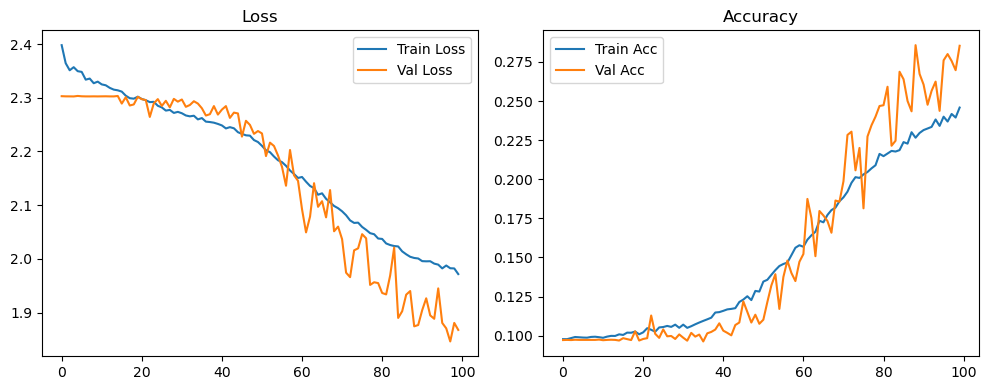

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 1.8666 Accuracy: 0.2907


🚀 Running: batch128_lr_max_0.0002_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0974 | Val Acc: 0.0953 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0974 | Val Acc: 0.0953 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0974 | Val Acc: 0.0953 |:   1%|          | 1/100 [01:17<2:07:32, 77.29s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0958 |:   1%|          | 1/100 [01:33<2:07:32, 77.29s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0958 |:   1%|          | 1/100 [01:33<2:07:32, 77.29s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0958 |:   2%|▏         | 2/100 [01:33<1:07:35, 41.38s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:49<1:07:35, 41.38s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:49<1:07:35, 41.38s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [01:49<48:20, 29.90s/it]  

| LR: 0.000200 | Train Acc: 0.1002 | Val Acc: 0.0923 |:   3%|▎         | 3/100 [02:06<48:20, 29.90s/it]

| LR: 0.000200 | Train Acc: 0.1002 | Val Acc: 0.0923 |:   3%|▎         | 3/100 [02:06<48:20, 29.90s/it]

| LR: 0.000200 | Train Acc: 0.1002 | Val Acc: 0.0923 |:   4%|▍         | 4/100 [02:06<39:14, 24.53s/it]

| LR: 0.000199 | Train Acc: 0.1016 | Val Acc: 0.0985 |:   4%|▍         | 4/100 [02:22<39:14, 24.53s/it]

| LR: 0.000199 | Train Acc: 0.1016 | Val Acc: 0.0985 |:   4%|▍         | 4/100 [02:22<39:14, 24.53s/it]

| LR: 0.000199 | Train Acc: 0.1016 | Val Acc: 0.0985 |:   5%|▌         | 5/100 [02:22<34:07, 21.55s/it]

| LR: 0.000199 | Train Acc: 0.1014 | Val Acc: 0.0948 |:   5%|▌         | 5/100 [02:38<34:07, 21.55s/it]

| LR: 0.000199 | Train Acc: 0.1014 | Val Acc: 0.0948 |:   5%|▌         | 5/100 [02:38<34:07, 21.55s/it]

| LR: 0.000199 | Train Acc: 0.1014 | Val Acc: 0.0948 |:   6%|▌         | 6/100 [02:38<31:02, 19.82s/it]

| LR: 0.000198 | Train Acc: 0.1010 | Val Acc: 0.0947 |:   6%|▌         | 6/100 [02:55<31:02, 19.82s/it]

| LR: 0.000198 | Train Acc: 0.1010 | Val Acc: 0.0947 |:   6%|▌         | 6/100 [02:55<31:02, 19.82s/it]

| LR: 0.000198 | Train Acc: 0.1010 | Val Acc: 0.0947 |:   7%|▋         | 7/100 [02:55<29:02, 18.74s/it]

| LR: 0.000198 | Train Acc: 0.1008 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [03:11<29:02, 18.74s/it]

| LR: 0.000198 | Train Acc: 0.1008 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [03:11<29:02, 18.74s/it]

| LR: 0.000198 | Train Acc: 0.1008 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [03:12<27:44, 18.09s/it]

| LR: 0.000197 | Train Acc: 0.1018 | Val Acc: 0.1065 |:   8%|▊         | 8/100 [03:28<27:44, 18.09s/it]

| LR: 0.000197 | Train Acc: 0.1018 | Val Acc: 0.1065 |:   8%|▊         | 8/100 [03:28<27:44, 18.09s/it]

| LR: 0.000197 | Train Acc: 0.1018 | Val Acc: 0.1065 |:   9%|▉         | 9/100 [03:28<26:43, 17.62s/it]

| LR: 0.000196 | Train Acc: 0.1031 | Val Acc: 0.0979 |:   9%|▉         | 9/100 [03:44<26:43, 17.62s/it]

| LR: 0.000196 | Train Acc: 0.1031 | Val Acc: 0.0979 |:   9%|▉         | 9/100 [03:44<26:43, 17.62s/it]

| LR: 0.000196 | Train Acc: 0.1031 | Val Acc: 0.0979 |:  10%|█         | 10/100 [03:44<25:46, 17.19s/it]

| LR: 0.000195 | Train Acc: 0.1042 | Val Acc: 0.1131 |:  10%|█         | 10/100 [04:00<25:46, 17.19s/it]

| LR: 0.000195 | Train Acc: 0.1042 | Val Acc: 0.1131 |:  10%|█         | 10/100 [04:00<25:46, 17.19s/it]

| LR: 0.000195 | Train Acc: 0.1042 | Val Acc: 0.1131 |:  11%|█         | 11/100 [04:00<25:02, 16.88s/it]

| LR: 0.000194 | Train Acc: 0.1051 | Val Acc: 0.1092 |:  11%|█         | 11/100 [04:17<25:02, 16.88s/it]

| LR: 0.000194 | Train Acc: 0.1051 | Val Acc: 0.1092 |:  11%|█         | 11/100 [04:17<25:02, 16.88s/it]

| LR: 0.000194 | Train Acc: 0.1051 | Val Acc: 0.1092 |:  12%|█▏        | 12/100 [04:17<24:27, 16.68s/it]

| LR: 0.000193 | Train Acc: 0.1057 | Val Acc: 0.1104 |:  12%|█▏        | 12/100 [04:33<24:27, 16.68s/it]

| LR: 0.000193 | Train Acc: 0.1057 | Val Acc: 0.1104 |:  12%|█▏        | 12/100 [04:33<24:27, 16.68s/it]

| LR: 0.000193 | Train Acc: 0.1057 | Val Acc: 0.1104 |:  13%|█▎        | 13/100 [04:33<23:58, 16.54s/it]

| LR: 0.000192 | Train Acc: 0.1062 | Val Acc: 0.1010 |:  13%|█▎        | 13/100 [04:49<23:58, 16.54s/it]

| LR: 0.000192 | Train Acc: 0.1062 | Val Acc: 0.1010 |:  13%|█▎        | 13/100 [04:49<23:58, 16.54s/it]

| LR: 0.000192 | Train Acc: 0.1062 | Val Acc: 0.1010 |:  14%|█▍        | 14/100 [04:49<23:37, 16.49s/it]

| LR: 0.000191 | Train Acc: 0.1057 | Val Acc: 0.1010 |:  14%|█▍        | 14/100 [05:05<23:37, 16.49s/it]

| LR: 0.000191 | Train Acc: 0.1057 | Val Acc: 0.1010 |:  14%|█▍        | 14/100 [05:05<23:37, 16.49s/it]

| LR: 0.000191 | Train Acc: 0.1057 | Val Acc: 0.1010 |:  15%|█▌        | 15/100 [05:05<23:13, 16.39s/it]

| LR: 0.000189 | Train Acc: 0.1056 | Val Acc: 0.0979 |:  15%|█▌        | 15/100 [05:22<23:13, 16.39s/it]

| LR: 0.000189 | Train Acc: 0.1056 | Val Acc: 0.0979 |:  15%|█▌        | 15/100 [05:22<23:13, 16.39s/it]

| LR: 0.000189 | Train Acc: 0.1056 | Val Acc: 0.0979 |:  16%|█▌        | 16/100 [05:22<23:00, 16.43s/it]

| LR: 0.000188 | Train Acc: 0.1050 | Val Acc: 0.1003 |:  16%|█▌        | 16/100 [05:39<23:00, 16.43s/it]

| LR: 0.000188 | Train Acc: 0.1050 | Val Acc: 0.1003 |:  16%|█▌        | 16/100 [05:39<23:00, 16.43s/it]

| LR: 0.000188 | Train Acc: 0.1050 | Val Acc: 0.1003 |:  17%|█▋        | 17/100 [05:39<22:47, 16.47s/it]

| LR: 0.000186 | Train Acc: 0.1066 | Val Acc: 0.1100 |:  17%|█▋        | 17/100 [05:55<22:47, 16.47s/it]

| LR: 0.000186 | Train Acc: 0.1066 | Val Acc: 0.1100 |:  17%|█▋        | 17/100 [05:55<22:47, 16.47s/it]

| LR: 0.000186 | Train Acc: 0.1066 | Val Acc: 0.1100 |:  18%|█▊        | 18/100 [05:55<22:32, 16.49s/it]

| LR: 0.000185 | Train Acc: 0.1093 | Val Acc: 0.1147 |:  18%|█▊        | 18/100 [06:11<22:32, 16.49s/it]

| LR: 0.000185 | Train Acc: 0.1093 | Val Acc: 0.1147 |:  18%|█▊        | 18/100 [06:11<22:32, 16.49s/it]

| LR: 0.000185 | Train Acc: 0.1093 | Val Acc: 0.1147 |:  19%|█▉        | 19/100 [06:12<22:13, 16.47s/it]

| LR: 0.000183 | Train Acc: 0.1113 | Val Acc: 0.1079 |:  19%|█▉        | 19/100 [06:28<22:13, 16.47s/it]

| LR: 0.000183 | Train Acc: 0.1113 | Val Acc: 0.1079 |:  19%|█▉        | 19/100 [06:28<22:13, 16.47s/it]

| LR: 0.000183 | Train Acc: 0.1113 | Val Acc: 0.1079 |:  20%|██        | 20/100 [06:28<22:01, 16.51s/it]

| LR: 0.000181 | Train Acc: 0.1112 | Val Acc: 0.1086 |:  20%|██        | 20/100 [06:44<22:01, 16.51s/it]

| LR: 0.000181 | Train Acc: 0.1112 | Val Acc: 0.1086 |:  20%|██        | 20/100 [06:44<22:01, 16.51s/it]

| LR: 0.000181 | Train Acc: 0.1112 | Val Acc: 0.1086 |:  21%|██        | 21/100 [06:44<21:39, 16.45s/it]

| LR: 0.000179 | Train Acc: 0.1133 | Val Acc: 0.1241 |:  21%|██        | 21/100 [07:01<21:39, 16.45s/it]

| LR: 0.000179 | Train Acc: 0.1133 | Val Acc: 0.1241 |:  21%|██        | 21/100 [07:01<21:39, 16.45s/it]

| LR: 0.000179 | Train Acc: 0.1133 | Val Acc: 0.1241 |:  22%|██▏       | 22/100 [07:01<21:24, 16.46s/it]

| LR: 0.000177 | Train Acc: 0.1164 | Val Acc: 0.1173 |:  22%|██▏       | 22/100 [07:17<21:24, 16.46s/it]

| LR: 0.000177 | Train Acc: 0.1164 | Val Acc: 0.1173 |:  22%|██▏       | 22/100 [07:17<21:24, 16.46s/it]

| LR: 0.000177 | Train Acc: 0.1164 | Val Acc: 0.1173 |:  23%|██▎       | 23/100 [07:17<21:07, 16.46s/it]

| LR: 0.000175 | Train Acc: 0.1197 | Val Acc: 0.1142 |:  23%|██▎       | 23/100 [07:34<21:07, 16.46s/it]

| LR: 0.000175 | Train Acc: 0.1197 | Val Acc: 0.1142 |:  23%|██▎       | 23/100 [07:34<21:07, 16.46s/it]

| LR: 0.000175 | Train Acc: 0.1197 | Val Acc: 0.1142 |:  24%|██▍       | 24/100 [07:34<20:53, 16.49s/it]

| LR: 0.000173 | Train Acc: 0.1236 | Val Acc: 0.1274 |:  24%|██▍       | 24/100 [07:50<20:53, 16.49s/it]

| LR: 0.000173 | Train Acc: 0.1236 | Val Acc: 0.1274 |:  24%|██▍       | 24/100 [07:50<20:53, 16.49s/it]

| LR: 0.000173 | Train Acc: 0.1236 | Val Acc: 0.1274 |:  25%|██▌       | 25/100 [07:50<20:31, 16.42s/it]

| LR: 0.000171 | Train Acc: 0.1293 | Val Acc: 0.1218 |:  25%|██▌       | 25/100 [08:07<20:31, 16.42s/it]

| LR: 0.000171 | Train Acc: 0.1293 | Val Acc: 0.1218 |:  25%|██▌       | 25/100 [08:07<20:31, 16.42s/it]

| LR: 0.000171 | Train Acc: 0.1293 | Val Acc: 0.1218 |:  26%|██▌       | 26/100 [08:07<20:20, 16.49s/it]

| LR: 0.000169 | Train Acc: 0.1335 | Val Acc: 0.1409 |:  26%|██▌       | 26/100 [08:23<20:20, 16.49s/it]

| LR: 0.000169 | Train Acc: 0.1335 | Val Acc: 0.1409 |:  26%|██▌       | 26/100 [08:23<20:20, 16.49s/it]

| LR: 0.000169 | Train Acc: 0.1335 | Val Acc: 0.1409 |:  27%|██▋       | 27/100 [08:23<20:06, 16.53s/it]

| LR: 0.000166 | Train Acc: 0.1384 | Val Acc: 0.1206 |:  27%|██▋       | 27/100 [08:40<20:06, 16.53s/it]

| LR: 0.000166 | Train Acc: 0.1384 | Val Acc: 0.1206 |:  27%|██▋       | 27/100 [08:40<20:06, 16.53s/it]

| LR: 0.000166 | Train Acc: 0.1384 | Val Acc: 0.1206 |:  28%|██▊       | 28/100 [08:40<19:49, 16.52s/it]

| LR: 0.000164 | Train Acc: 0.1436 | Val Acc: 0.1473 |:  28%|██▊       | 28/100 [08:56<19:49, 16.52s/it]

| LR: 0.000164 | Train Acc: 0.1436 | Val Acc: 0.1473 |:  28%|██▊       | 28/100 [08:56<19:49, 16.52s/it]

| LR: 0.000164 | Train Acc: 0.1436 | Val Acc: 0.1473 |:  29%|██▉       | 29/100 [08:57<19:34, 16.54s/it]

| LR: 0.000161 | Train Acc: 0.1528 | Val Acc: 0.1859 |:  29%|██▉       | 29/100 [09:13<19:34, 16.54s/it]

| LR: 0.000161 | Train Acc: 0.1528 | Val Acc: 0.1859 |:  29%|██▉       | 29/100 [09:13<19:34, 16.54s/it]

| LR: 0.000161 | Train Acc: 0.1528 | Val Acc: 0.1859 |:  30%|███       | 30/100 [09:13<19:19, 16.56s/it]

| LR: 0.000159 | Train Acc: 0.1612 | Val Acc: 0.1570 |:  30%|███       | 30/100 [09:30<19:19, 16.56s/it]

| LR: 0.000159 | Train Acc: 0.1612 | Val Acc: 0.1570 |:  30%|███       | 30/100 [09:30<19:19, 16.56s/it]

| LR: 0.000159 | Train Acc: 0.1612 | Val Acc: 0.1570 |:  31%|███       | 31/100 [09:30<19:02, 16.56s/it]

| LR: 0.000156 | Train Acc: 0.1655 | Val Acc: 0.1497 |:  31%|███       | 31/100 [09:46<19:02, 16.56s/it]

| LR: 0.000156 | Train Acc: 0.1655 | Val Acc: 0.1497 |:  31%|███       | 31/100 [09:46<19:02, 16.56s/it]

| LR: 0.000156 | Train Acc: 0.1655 | Val Acc: 0.1497 |:  32%|███▏      | 32/100 [09:46<18:42, 16.51s/it]

| LR: 0.000154 | Train Acc: 0.1750 | Val Acc: 0.1517 |:  32%|███▏      | 32/100 [10:03<18:42, 16.51s/it]

| LR: 0.000154 | Train Acc: 0.1750 | Val Acc: 0.1517 |:  32%|███▏      | 32/100 [10:03<18:42, 16.51s/it]

| LR: 0.000154 | Train Acc: 0.1750 | Val Acc: 0.1517 |:  33%|███▎      | 33/100 [10:03<18:25, 16.51s/it]

| LR: 0.000151 | Train Acc: 0.1825 | Val Acc: 0.1721 |:  33%|███▎      | 33/100 [10:19<18:25, 16.51s/it]

| LR: 0.000151 | Train Acc: 0.1825 | Val Acc: 0.1721 |:  33%|███▎      | 33/100 [10:19<18:25, 16.51s/it]

| LR: 0.000151 | Train Acc: 0.1825 | Val Acc: 0.1721 |:  34%|███▍      | 34/100 [10:19<18:15, 16.60s/it]

| LR: 0.000148 | Train Acc: 0.1879 | Val Acc: 0.1878 |:  34%|███▍      | 34/100 [10:36<18:15, 16.60s/it]

| LR: 0.000148 | Train Acc: 0.1879 | Val Acc: 0.1878 |:  34%|███▍      | 34/100 [10:36<18:15, 16.60s/it]

| LR: 0.000148 | Train Acc: 0.1879 | Val Acc: 0.1878 |:  35%|███▌      | 35/100 [10:36<17:59, 16.61s/it]

| LR: 0.000146 | Train Acc: 0.2034 | Val Acc: 0.2171 |:  35%|███▌      | 35/100 [10:52<17:59, 16.61s/it]

| LR: 0.000146 | Train Acc: 0.2034 | Val Acc: 0.2171 |:  35%|███▌      | 35/100 [10:52<17:59, 16.61s/it]

| LR: 0.000146 | Train Acc: 0.2034 | Val Acc: 0.2171 |:  36%|███▌      | 36/100 [10:52<17:37, 16.52s/it]

| LR: 0.000143 | Train Acc: 0.2139 | Val Acc: 0.2093 |:  36%|███▌      | 36/100 [11:09<17:37, 16.52s/it]

| LR: 0.000143 | Train Acc: 0.2139 | Val Acc: 0.2093 |:  36%|███▌      | 36/100 [11:09<17:37, 16.52s/it]

| LR: 0.000143 | Train Acc: 0.2139 | Val Acc: 0.2093 |:  37%|███▋      | 37/100 [11:09<17:17, 16.46s/it]

| LR: 0.000140 | Train Acc: 0.2244 | Val Acc: 0.2037 |:  37%|███▋      | 37/100 [11:25<17:17, 16.46s/it]

| LR: 0.000140 | Train Acc: 0.2244 | Val Acc: 0.2037 |:  37%|███▋      | 37/100 [11:25<17:17, 16.46s/it]

| LR: 0.000140 | Train Acc: 0.2244 | Val Acc: 0.2037 |:  38%|███▊      | 38/100 [11:25<16:56, 16.40s/it]

| LR: 0.000137 | Train Acc: 0.2348 | Val Acc: 0.2409 |:  38%|███▊      | 38/100 [11:41<16:56, 16.40s/it]

| LR: 0.000137 | Train Acc: 0.2348 | Val Acc: 0.2409 |:  38%|███▊      | 38/100 [11:41<16:56, 16.40s/it]

| LR: 0.000137 | Train Acc: 0.2348 | Val Acc: 0.2409 |:  39%|███▉      | 39/100 [11:41<16:40, 16.40s/it]

| LR: 0.000134 | Train Acc: 0.2493 | Val Acc: 0.2471 |:  39%|███▉      | 39/100 [11:58<16:40, 16.40s/it]

| LR: 0.000134 | Train Acc: 0.2493 | Val Acc: 0.2471 |:  39%|███▉      | 39/100 [11:58<16:40, 16.40s/it]

| LR: 0.000134 | Train Acc: 0.2493 | Val Acc: 0.2471 |:  40%|████      | 40/100 [11:58<16:24, 16.41s/it]

| LR: 0.000131 | Train Acc: 0.2680 | Val Acc: 0.2767 |:  40%|████      | 40/100 [12:14<16:24, 16.41s/it]

| LR: 0.000131 | Train Acc: 0.2680 | Val Acc: 0.2767 |:  40%|████      | 40/100 [12:14<16:24, 16.41s/it]

| LR: 0.000131 | Train Acc: 0.2680 | Val Acc: 0.2767 |:  41%|████      | 41/100 [12:14<16:07, 16.39s/it]

| LR: 0.000128 | Train Acc: 0.2735 | Val Acc: 0.2996 |:  41%|████      | 41/100 [12:31<16:07, 16.39s/it]

| LR: 0.000128 | Train Acc: 0.2735 | Val Acc: 0.2996 |:  41%|████      | 41/100 [12:31<16:07, 16.39s/it]

| LR: 0.000128 | Train Acc: 0.2735 | Val Acc: 0.2996 |:  42%|████▏     | 42/100 [12:31<15:53, 16.43s/it]

| LR: 0.000125 | Train Acc: 0.2914 | Val Acc: 0.2771 |:  42%|████▏     | 42/100 [12:47<15:53, 16.43s/it]

| LR: 0.000125 | Train Acc: 0.2914 | Val Acc: 0.2771 |:  42%|████▏     | 42/100 [12:47<15:53, 16.43s/it]

| LR: 0.000125 | Train Acc: 0.2914 | Val Acc: 0.2771 |:  43%|████▎     | 43/100 [12:47<15:37, 16.45s/it]

| LR: 0.000122 | Train Acc: 0.3036 | Val Acc: 0.2815 |:  43%|████▎     | 43/100 [13:03<15:37, 16.45s/it]

| LR: 0.000122 | Train Acc: 0.3036 | Val Acc: 0.2815 |:  43%|████▎     | 43/100 [13:03<15:37, 16.45s/it]

| LR: 0.000122 | Train Acc: 0.3036 | Val Acc: 0.2815 |:  44%|████▍     | 44/100 [13:04<15:19, 16.43s/it]

| LR: 0.000119 | Train Acc: 0.3094 | Val Acc: 0.3345 |:  44%|████▍     | 44/100 [13:20<15:19, 16.43s/it]

| LR: 0.000119 | Train Acc: 0.3094 | Val Acc: 0.3345 |:  44%|████▍     | 44/100 [13:20<15:19, 16.43s/it]

| LR: 0.000119 | Train Acc: 0.3094 | Val Acc: 0.3345 |:  45%|████▌     | 45/100 [13:20<15:04, 16.44s/it]

| LR: 0.000116 | Train Acc: 0.3269 | Val Acc: 0.3163 |:  45%|████▌     | 45/100 [13:36<15:04, 16.44s/it]

| LR: 0.000116 | Train Acc: 0.3269 | Val Acc: 0.3163 |:  45%|████▌     | 45/100 [13:36<15:04, 16.44s/it]

| LR: 0.000116 | Train Acc: 0.3269 | Val Acc: 0.3163 |:  46%|████▌     | 46/100 [13:37<14:49, 16.47s/it]

| LR: 0.000113 | Train Acc: 0.3397 | Val Acc: 0.3158 |:  46%|████▌     | 46/100 [13:53<14:49, 16.47s/it]

| LR: 0.000113 | Train Acc: 0.3397 | Val Acc: 0.3158 |:  46%|████▌     | 46/100 [13:53<14:49, 16.47s/it]

| LR: 0.000113 | Train Acc: 0.3397 | Val Acc: 0.3158 |:  47%|████▋     | 47/100 [13:53<14:32, 16.47s/it]

| LR: 0.000110 | Train Acc: 0.3499 | Val Acc: 0.3449 |:  47%|████▋     | 47/100 [14:09<14:32, 16.47s/it]

| LR: 0.000110 | Train Acc: 0.3499 | Val Acc: 0.3449 |:  47%|████▋     | 47/100 [14:09<14:32, 16.47s/it]

| LR: 0.000110 | Train Acc: 0.3499 | Val Acc: 0.3449 |:  48%|████▊     | 48/100 [14:09<14:14, 16.44s/it]

| LR: 0.000107 | Train Acc: 0.3615 | Val Acc: 0.3653 |:  48%|████▊     | 48/100 [14:26<14:14, 16.44s/it]

| LR: 0.000107 | Train Acc: 0.3615 | Val Acc: 0.3653 |:  48%|████▊     | 48/100 [14:26<14:14, 16.44s/it]

| LR: 0.000107 | Train Acc: 0.3615 | Val Acc: 0.3653 |:  49%|████▉     | 49/100 [14:26<13:59, 16.47s/it]

| LR: 0.000104 | Train Acc: 0.3722 | Val Acc: 0.3759 |:  49%|████▉     | 49/100 [14:42<13:59, 16.47s/it]

| LR: 0.000104 | Train Acc: 0.3722 | Val Acc: 0.3759 |:  49%|████▉     | 49/100 [14:42<13:59, 16.47s/it]

| LR: 0.000104 | Train Acc: 0.3722 | Val Acc: 0.3759 |:  50%|█████     | 50/100 [14:42<13:43, 16.47s/it]

| LR: 0.000101 | Train Acc: 0.3831 | Val Acc: 0.3541 |:  50%|█████     | 50/100 [14:59<13:43, 16.47s/it]

| LR: 0.000101 | Train Acc: 0.3831 | Val Acc: 0.3541 |:  50%|█████     | 50/100 [14:59<13:43, 16.47s/it]

| LR: 0.000101 | Train Acc: 0.3831 | Val Acc: 0.3541 |:  51%|█████     | 51/100 [14:59<13:26, 16.47s/it]

| LR: 0.000097 | Train Acc: 0.3968 | Val Acc: 0.3704 |:  51%|█████     | 51/100 [15:15<13:26, 16.47s/it]

| LR: 0.000097 | Train Acc: 0.3968 | Val Acc: 0.3704 |:  51%|█████     | 51/100 [15:15<13:26, 16.47s/it]

| LR: 0.000097 | Train Acc: 0.3968 | Val Acc: 0.3704 |:  52%|█████▏    | 52/100 [15:15<13:11, 16.49s/it]

| LR: 0.000094 | Train Acc: 0.4106 | Val Acc: 0.3968 |:  52%|█████▏    | 52/100 [15:32<13:11, 16.49s/it]

| LR: 0.000094 | Train Acc: 0.4106 | Val Acc: 0.3968 |:  52%|█████▏    | 52/100 [15:32<13:11, 16.49s/it]

| LR: 0.000094 | Train Acc: 0.4106 | Val Acc: 0.3968 |:  53%|█████▎    | 53/100 [15:32<12:55, 16.51s/it]

| LR: 0.000091 | Train Acc: 0.4191 | Val Acc: 0.4182 |:  53%|█████▎    | 53/100 [15:48<12:55, 16.51s/it]

| LR: 0.000091 | Train Acc: 0.4191 | Val Acc: 0.4182 |:  53%|█████▎    | 53/100 [15:48<12:55, 16.51s/it]

| LR: 0.000091 | Train Acc: 0.4191 | Val Acc: 0.4182 |:  54%|█████▍    | 54/100 [15:48<12:39, 16.51s/it]

| LR: 0.000088 | Train Acc: 0.4241 | Val Acc: 0.4303 |:  54%|█████▍    | 54/100 [16:05<12:39, 16.51s/it]

| LR: 0.000088 | Train Acc: 0.4241 | Val Acc: 0.4303 |:  54%|█████▍    | 54/100 [16:05<12:39, 16.51s/it]

| LR: 0.000088 | Train Acc: 0.4241 | Val Acc: 0.4303 |:  55%|█████▌    | 55/100 [16:05<12:21, 16.47s/it]

| LR: 0.000085 | Train Acc: 0.4355 | Val Acc: 0.4218 |:  55%|█████▌    | 55/100 [16:21<12:21, 16.47s/it]

| LR: 0.000085 | Train Acc: 0.4355 | Val Acc: 0.4218 |:  55%|█████▌    | 55/100 [16:21<12:21, 16.47s/it]

| LR: 0.000085 | Train Acc: 0.4355 | Val Acc: 0.4218 |:  56%|█████▌    | 56/100 [16:21<12:03, 16.43s/it]

| LR: 0.000082 | Train Acc: 0.4413 | Val Acc: 0.4208 |:  56%|█████▌    | 56/100 [16:37<12:03, 16.43s/it]

| LR: 0.000082 | Train Acc: 0.4413 | Val Acc: 0.4208 |:  56%|█████▌    | 56/100 [16:37<12:03, 16.43s/it]

| LR: 0.000082 | Train Acc: 0.4413 | Val Acc: 0.4208 |:  57%|█████▋    | 57/100 [16:37<11:45, 16.40s/it]

| LR: 0.000079 | Train Acc: 0.4512 | Val Acc: 0.4547 |:  57%|█████▋    | 57/100 [16:54<11:45, 16.40s/it]

| LR: 0.000079 | Train Acc: 0.4512 | Val Acc: 0.4547 |:  57%|█████▋    | 57/100 [16:54<11:45, 16.40s/it]

| LR: 0.000079 | Train Acc: 0.4512 | Val Acc: 0.4547 |:  58%|█████▊    | 58/100 [16:54<11:29, 16.42s/it]

| LR: 0.000076 | Train Acc: 0.4571 | Val Acc: 0.4525 |:  58%|█████▊    | 58/100 [17:10<11:29, 16.42s/it]

| LR: 0.000076 | Train Acc: 0.4571 | Val Acc: 0.4525 |:  58%|█████▊    | 58/100 [17:10<11:29, 16.42s/it]

| LR: 0.000076 | Train Acc: 0.4571 | Val Acc: 0.4525 |:  59%|█████▉    | 59/100 [17:10<11:14, 16.45s/it]

| LR: 0.000073 | Train Acc: 0.4624 | Val Acc: 0.4272 |:  59%|█████▉    | 59/100 [17:27<11:14, 16.45s/it]

| LR: 0.000073 | Train Acc: 0.4624 | Val Acc: 0.4272 |:  59%|█████▉    | 59/100 [17:27<11:14, 16.45s/it]

| LR: 0.000073 | Train Acc: 0.4624 | Val Acc: 0.4272 |:  60%|██████    | 60/100 [17:27<10:57, 16.43s/it]

| LR: 0.000070 | Train Acc: 0.4677 | Val Acc: 0.4545 |:  60%|██████    | 60/100 [17:43<10:57, 16.43s/it]

| LR: 0.000070 | Train Acc: 0.4677 | Val Acc: 0.4545 |:  60%|██████    | 60/100 [17:43<10:57, 16.43s/it]

| LR: 0.000070 | Train Acc: 0.4677 | Val Acc: 0.4545 |:  61%|██████    | 61/100 [17:43<10:42, 16.48s/it]

| LR: 0.000067 | Train Acc: 0.4734 | Val Acc: 0.4609 |:  61%|██████    | 61/100 [18:00<10:42, 16.48s/it]

| LR: 0.000067 | Train Acc: 0.4734 | Val Acc: 0.4609 |:  61%|██████    | 61/100 [18:00<10:42, 16.48s/it]

| LR: 0.000067 | Train Acc: 0.4734 | Val Acc: 0.4609 |:  62%|██████▏   | 62/100 [18:00<10:26, 16.50s/it]

| LR: 0.000064 | Train Acc: 0.4828 | Val Acc: 0.4537 |:  62%|██████▏   | 62/100 [18:16<10:26, 16.50s/it]

| LR: 0.000064 | Train Acc: 0.4828 | Val Acc: 0.4537 |:  62%|██████▏   | 62/100 [18:16<10:26, 16.50s/it]

| LR: 0.000064 | Train Acc: 0.4828 | Val Acc: 0.4537 |:  63%|██████▎   | 63/100 [18:16<10:09, 16.46s/it]

| LR: 0.000061 | Train Acc: 0.4875 | Val Acc: 0.4551 |:  63%|██████▎   | 63/100 [18:33<10:09, 16.46s/it]

| LR: 0.000061 | Train Acc: 0.4875 | Val Acc: 0.4551 |:  63%|██████▎   | 63/100 [18:33<10:09, 16.46s/it]

| LR: 0.000061 | Train Acc: 0.4875 | Val Acc: 0.4551 |:  64%|██████▍   | 64/100 [18:33<09:51, 16.43s/it]

| LR: 0.000058 | Train Acc: 0.4950 | Val Acc: 0.4819 |:  64%|██████▍   | 64/100 [18:49<09:51, 16.43s/it]

| LR: 0.000058 | Train Acc: 0.4950 | Val Acc: 0.4819 |:  64%|██████▍   | 64/100 [18:49<09:51, 16.43s/it]

| LR: 0.000058 | Train Acc: 0.4950 | Val Acc: 0.4819 |:  65%|██████▌   | 65/100 [18:49<09:34, 16.42s/it]

| LR: 0.000055 | Train Acc: 0.4976 | Val Acc: 0.4860 |:  65%|██████▌   | 65/100 [19:06<09:34, 16.42s/it]

| LR: 0.000055 | Train Acc: 0.4976 | Val Acc: 0.4860 |:  65%|██████▌   | 65/100 [19:06<09:34, 16.42s/it]

| LR: 0.000055 | Train Acc: 0.4976 | Val Acc: 0.4860 |:  66%|██████▌   | 66/100 [19:06<09:20, 16.48s/it]

| LR: 0.000053 | Train Acc: 0.5017 | Val Acc: 0.4905 |:  66%|██████▌   | 66/100 [19:22<09:20, 16.48s/it]

| LR: 0.000053 | Train Acc: 0.5017 | Val Acc: 0.4905 |:  66%|██████▌   | 66/100 [19:22<09:20, 16.48s/it]

| LR: 0.000053 | Train Acc: 0.5017 | Val Acc: 0.4905 |:  67%|██████▋   | 67/100 [19:22<09:04, 16.50s/it]

| LR: 0.000050 | Train Acc: 0.5021 | Val Acc: 0.4792 |:  67%|██████▋   | 67/100 [19:39<09:04, 16.50s/it]

| LR: 0.000050 | Train Acc: 0.5021 | Val Acc: 0.4792 |:  67%|██████▋   | 67/100 [19:39<09:04, 16.50s/it]

| LR: 0.000050 | Train Acc: 0.5021 | Val Acc: 0.4792 |:  68%|██████▊   | 68/100 [19:39<08:48, 16.53s/it]

| LR: 0.000047 | Train Acc: 0.5086 | Val Acc: 0.4986 |:  68%|██████▊   | 68/100 [19:55<08:48, 16.53s/it]

| LR: 0.000047 | Train Acc: 0.5086 | Val Acc: 0.4986 |:  68%|██████▊   | 68/100 [19:55<08:48, 16.53s/it]

| LR: 0.000047 | Train Acc: 0.5086 | Val Acc: 0.4986 |:  69%|██████▉   | 69/100 [19:55<08:31, 16.51s/it]

| LR: 0.000045 | Train Acc: 0.5139 | Val Acc: 0.4875 |:  69%|██████▉   | 69/100 [20:12<08:31, 16.51s/it]

| LR: 0.000045 | Train Acc: 0.5139 | Val Acc: 0.4875 |:  69%|██████▉   | 69/100 [20:12<08:31, 16.51s/it]

| LR: 0.000045 | Train Acc: 0.5139 | Val Acc: 0.4875 |:  70%|███████   | 70/100 [20:12<08:15, 16.52s/it]

| LR: 0.000042 | Train Acc: 0.5157 | Val Acc: 0.4847 |:  70%|███████   | 70/100 [20:28<08:15, 16.52s/it]

| LR: 0.000042 | Train Acc: 0.5157 | Val Acc: 0.4847 |:  70%|███████   | 70/100 [20:28<08:15, 16.52s/it]

| LR: 0.000042 | Train Acc: 0.5157 | Val Acc: 0.4847 |:  71%|███████   | 71/100 [20:28<07:57, 16.47s/it]

| LR: 0.000040 | Train Acc: 0.5189 | Val Acc: 0.5058 |:  71%|███████   | 71/100 [20:44<07:57, 16.47s/it]

| LR: 0.000040 | Train Acc: 0.5189 | Val Acc: 0.5058 |:  71%|███████   | 71/100 [20:44<07:57, 16.47s/it]

| LR: 0.000040 | Train Acc: 0.5189 | Val Acc: 0.5058 |:  72%|███████▏  | 72/100 [20:44<07:39, 16.40s/it]

| LR: 0.000037 | Train Acc: 0.5195 | Val Acc: 0.4683 |:  72%|███████▏  | 72/100 [21:01<07:39, 16.40s/it]

| LR: 0.000037 | Train Acc: 0.5195 | Val Acc: 0.4683 |:  72%|███████▏  | 72/100 [21:01<07:39, 16.40s/it]

| LR: 0.000037 | Train Acc: 0.5195 | Val Acc: 0.4683 |:  73%|███████▎  | 73/100 [21:01<07:23, 16.43s/it]

| LR: 0.000035 | Train Acc: 0.5199 | Val Acc: 0.5072 |:  73%|███████▎  | 73/100 [21:17<07:23, 16.43s/it]

| LR: 0.000035 | Train Acc: 0.5199 | Val Acc: 0.5072 |:  73%|███████▎  | 73/100 [21:17<07:23, 16.43s/it]

| LR: 0.000035 | Train Acc: 0.5199 | Val Acc: 0.5072 |:  74%|███████▍  | 74/100 [21:17<07:06, 16.39s/it]

| LR: 0.000032 | Train Acc: 0.5250 | Val Acc: 0.5147 |:  74%|███████▍  | 74/100 [21:34<07:06, 16.39s/it]

| LR: 0.000032 | Train Acc: 0.5250 | Val Acc: 0.5147 |:  74%|███████▍  | 74/100 [21:34<07:06, 16.39s/it]

| LR: 0.000032 | Train Acc: 0.5250 | Val Acc: 0.5147 |:  75%|███████▌  | 75/100 [21:34<06:50, 16.41s/it]

| LR: 0.000030 | Train Acc: 0.5280 | Val Acc: 0.5019 |:  75%|███████▌  | 75/100 [21:50<06:50, 16.41s/it]

| LR: 0.000030 | Train Acc: 0.5280 | Val Acc: 0.5019 |:  75%|███████▌  | 75/100 [21:50<06:50, 16.41s/it]

| LR: 0.000030 | Train Acc: 0.5280 | Val Acc: 0.5019 |:  76%|███████▌  | 76/100 [21:50<06:33, 16.39s/it]

| LR: 0.000028 | Train Acc: 0.5251 | Val Acc: 0.4856 |:  76%|███████▌  | 76/100 [22:07<06:33, 16.39s/it]

| LR: 0.000028 | Train Acc: 0.5251 | Val Acc: 0.4856 |:  76%|███████▌  | 76/100 [22:07<06:33, 16.39s/it]

| LR: 0.000028 | Train Acc: 0.5251 | Val Acc: 0.4856 |:  77%|███████▋  | 77/100 [22:07<06:18, 16.45s/it]

| LR: 0.000026 | Train Acc: 0.5296 | Val Acc: 0.5099 |:  77%|███████▋  | 77/100 [22:23<06:18, 16.45s/it]

| LR: 0.000026 | Train Acc: 0.5296 | Val Acc: 0.5099 |:  77%|███████▋  | 77/100 [22:23<06:18, 16.45s/it]

| LR: 0.000026 | Train Acc: 0.5296 | Val Acc: 0.5099 |:  78%|███████▊  | 78/100 [22:23<06:01, 16.44s/it]

| LR: 0.000024 | Train Acc: 0.5375 | Val Acc: 0.5048 |:  78%|███████▊  | 78/100 [22:39<06:01, 16.44s/it]

| LR: 0.000024 | Train Acc: 0.5375 | Val Acc: 0.5048 |:  78%|███████▊  | 78/100 [22:39<06:01, 16.44s/it]

| LR: 0.000024 | Train Acc: 0.5375 | Val Acc: 0.5048 |:  79%|███████▉  | 79/100 [22:39<05:44, 16.41s/it]

| LR: 0.000022 | Train Acc: 0.5403 | Val Acc: 0.5117 |:  79%|███████▉  | 79/100 [22:56<05:44, 16.41s/it]

| LR: 0.000022 | Train Acc: 0.5403 | Val Acc: 0.5117 |:  79%|███████▉  | 79/100 [22:56<05:44, 16.41s/it]

| LR: 0.000022 | Train Acc: 0.5403 | Val Acc: 0.5117 |:  80%|████████  | 80/100 [22:56<05:28, 16.44s/it]

| LR: 0.000020 | Train Acc: 0.5400 | Val Acc: 0.5078 |:  80%|████████  | 80/100 [23:12<05:28, 16.44s/it]

| LR: 0.000020 | Train Acc: 0.5400 | Val Acc: 0.5078 |:  80%|████████  | 80/100 [23:12<05:28, 16.44s/it]

| LR: 0.000020 | Train Acc: 0.5400 | Val Acc: 0.5078 |:  81%|████████  | 81/100 [23:12<05:12, 16.44s/it]

| LR: 0.000018 | Train Acc: 0.5407 | Val Acc: 0.5217 |:  81%|████████  | 81/100 [23:29<05:12, 16.44s/it]

| LR: 0.000018 | Train Acc: 0.5407 | Val Acc: 0.5217 |:  81%|████████  | 81/100 [23:29<05:12, 16.44s/it]

| LR: 0.000018 | Train Acc: 0.5407 | Val Acc: 0.5217 |:  82%|████████▏ | 82/100 [23:29<04:55, 16.39s/it]

| LR: 0.000016 | Train Acc: 0.5399 | Val Acc: 0.5172 |:  82%|████████▏ | 82/100 [23:45<04:55, 16.39s/it]

| LR: 0.000016 | Train Acc: 0.5399 | Val Acc: 0.5172 |:  82%|████████▏ | 82/100 [23:45<04:55, 16.39s/it]

| LR: 0.000016 | Train Acc: 0.5399 | Val Acc: 0.5172 |:  83%|████████▎ | 83/100 [23:45<04:39, 16.41s/it]

| LR: 0.000015 | Train Acc: 0.5484 | Val Acc: 0.5310 |:  83%|████████▎ | 83/100 [24:01<04:39, 16.41s/it]

| LR: 0.000015 | Train Acc: 0.5484 | Val Acc: 0.5310 |:  83%|████████▎ | 83/100 [24:01<04:39, 16.41s/it]

| LR: 0.000015 | Train Acc: 0.5484 | Val Acc: 0.5310 |:  84%|████████▍ | 84/100 [24:01<04:22, 16.39s/it]

| LR: 0.000013 | Train Acc: 0.5460 | Val Acc: 0.5110 |:  84%|████████▍ | 84/100 [24:18<04:22, 16.39s/it]

| LR: 0.000013 | Train Acc: 0.5460 | Val Acc: 0.5110 |:  84%|████████▍ | 84/100 [24:18<04:22, 16.39s/it]

| LR: 0.000013 | Train Acc: 0.5460 | Val Acc: 0.5110 |:  85%|████████▌ | 85/100 [24:18<04:06, 16.45s/it]

| LR: 0.000012 | Train Acc: 0.5485 | Val Acc: 0.5220 |:  85%|████████▌ | 85/100 [24:34<04:06, 16.45s/it]

| LR: 0.000012 | Train Acc: 0.5485 | Val Acc: 0.5220 |:  85%|████████▌ | 85/100 [24:34<04:06, 16.45s/it]

| LR: 0.000012 | Train Acc: 0.5485 | Val Acc: 0.5220 |:  86%|████████▌ | 86/100 [24:35<03:50, 16.46s/it]

| LR: 0.000010 | Train Acc: 0.5477 | Val Acc: 0.5319 |:  86%|████████▌ | 86/100 [24:51<03:50, 16.46s/it]

| LR: 0.000010 | Train Acc: 0.5477 | Val Acc: 0.5319 |:  86%|████████▌ | 86/100 [24:51<03:50, 16.46s/it]

| LR: 0.000010 | Train Acc: 0.5477 | Val Acc: 0.5319 |:  87%|████████▋ | 87/100 [24:51<03:33, 16.45s/it]

| LR: 0.000009 | Train Acc: 0.5467 | Val Acc: 0.5044 |:  87%|████████▋ | 87/100 [25:07<03:33, 16.45s/it]

| LR: 0.000009 | Train Acc: 0.5467 | Val Acc: 0.5044 |:  87%|████████▋ | 87/100 [25:07<03:33, 16.45s/it]

| LR: 0.000009 | Train Acc: 0.5467 | Val Acc: 0.5044 |:  88%|████████▊ | 88/100 [25:07<03:16, 16.39s/it]

| LR: 0.000008 | Train Acc: 0.5485 | Val Acc: 0.5308 |:  88%|████████▊ | 88/100 [25:24<03:16, 16.39s/it]

| LR: 0.000008 | Train Acc: 0.5485 | Val Acc: 0.5308 |:  88%|████████▊ | 88/100 [25:24<03:16, 16.39s/it]

| LR: 0.000008 | Train Acc: 0.5485 | Val Acc: 0.5308 |:  89%|████████▉ | 89/100 [25:24<03:00, 16.44s/it]

| LR: 0.000007 | Train Acc: 0.5492 | Val Acc: 0.5204 |:  89%|████████▉ | 89/100 [25:40<03:00, 16.44s/it]

| LR: 0.000007 | Train Acc: 0.5492 | Val Acc: 0.5204 |:  89%|████████▉ | 89/100 [25:40<03:00, 16.44s/it]

| LR: 0.000007 | Train Acc: 0.5492 | Val Acc: 0.5204 |:  90%|█████████ | 90/100 [25:40<02:44, 16.40s/it]

| LR: 0.000006 | Train Acc: 0.5500 | Val Acc: 0.5275 |:  90%|█████████ | 90/100 [25:56<02:44, 16.40s/it]

| LR: 0.000006 | Train Acc: 0.5500 | Val Acc: 0.5275 |:  90%|█████████ | 90/100 [25:56<02:44, 16.40s/it]

| LR: 0.000006 | Train Acc: 0.5500 | Val Acc: 0.5275 |:  91%|█████████ | 91/100 [25:56<02:27, 16.38s/it]

| LR: 0.000005 | Train Acc: 0.5487 | Val Acc: 0.5383 |:  91%|█████████ | 91/100 [26:13<02:27, 16.38s/it]

| LR: 0.000005 | Train Acc: 0.5487 | Val Acc: 0.5383 |:  91%|█████████ | 91/100 [26:13<02:27, 16.38s/it]

| LR: 0.000005 | Train Acc: 0.5487 | Val Acc: 0.5383 |:  92%|█████████▏| 92/100 [26:13<02:11, 16.42s/it]

| LR: 0.000004 | Train Acc: 0.5512 | Val Acc: 0.5249 |:  92%|█████████▏| 92/100 [26:29<02:11, 16.42s/it]

| LR: 0.000004 | Train Acc: 0.5512 | Val Acc: 0.5249 |:  92%|█████████▏| 92/100 [26:29<02:11, 16.42s/it]

| LR: 0.000004 | Train Acc: 0.5512 | Val Acc: 0.5249 |:  93%|█████████▎| 93/100 [26:29<01:54, 16.41s/it]

| LR: 0.000003 | Train Acc: 0.5530 | Val Acc: 0.5284 |:  93%|█████████▎| 93/100 [26:45<01:54, 16.41s/it]

| LR: 0.000003 | Train Acc: 0.5530 | Val Acc: 0.5284 |:  93%|█████████▎| 93/100 [26:45<01:54, 16.41s/it]

| LR: 0.000003 | Train Acc: 0.5530 | Val Acc: 0.5284 |:  94%|█████████▍| 94/100 [26:45<01:37, 16.31s/it]

| LR: 0.000003 | Train Acc: 0.5522 | Val Acc: 0.5201 |:  94%|█████████▍| 94/100 [27:02<01:37, 16.31s/it]

| LR: 0.000003 | Train Acc: 0.5522 | Val Acc: 0.5201 |:  94%|█████████▍| 94/100 [27:02<01:37, 16.31s/it]

| LR: 0.000003 | Train Acc: 0.5522 | Val Acc: 0.5201 |:  95%|█████████▌| 95/100 [27:02<01:21, 16.31s/it]

| LR: 0.000002 | Train Acc: 0.5580 | Val Acc: 0.5286 |:  95%|█████████▌| 95/100 [27:18<01:21, 16.31s/it]

| LR: 0.000002 | Train Acc: 0.5580 | Val Acc: 0.5286 |:  95%|█████████▌| 95/100 [27:18<01:21, 16.31s/it]

| LR: 0.000002 | Train Acc: 0.5580 | Val Acc: 0.5286 |:  96%|█████████▌| 96/100 [27:18<01:05, 16.38s/it]

| LR: 0.000002 | Train Acc: 0.5571 | Val Acc: 0.5278 |:  96%|█████████▌| 96/100 [27:35<01:05, 16.38s/it]

| LR: 0.000002 | Train Acc: 0.5571 | Val Acc: 0.5278 |:  96%|█████████▌| 96/100 [27:35<01:05, 16.38s/it]

| LR: 0.000002 | Train Acc: 0.5571 | Val Acc: 0.5278 |:  97%|█████████▋| 97/100 [27:35<00:49, 16.40s/it]

| LR: 0.000001 | Train Acc: 0.5580 | Val Acc: 0.5262 |:  97%|█████████▋| 97/100 [27:51<00:49, 16.40s/it]

| LR: 0.000001 | Train Acc: 0.5580 | Val Acc: 0.5262 |:  97%|█████████▋| 97/100 [27:51<00:49, 16.40s/it]

| LR: 0.000001 | Train Acc: 0.5580 | Val Acc: 0.5262 |:  98%|█████████▊| 98/100 [27:51<00:32, 16.40s/it]

| LR: 0.000001 | Train Acc: 0.5536 | Val Acc: 0.5362 |:  98%|█████████▊| 98/100 [28:07<00:32, 16.40s/it]

| LR: 0.000001 | Train Acc: 0.5536 | Val Acc: 0.5362 |:  98%|█████████▊| 98/100 [28:07<00:32, 16.40s/it]

| LR: 0.000001 | Train Acc: 0.5536 | Val Acc: 0.5362 |:  99%|█████████▉| 99/100 [28:07<00:16, 16.39s/it]

| LR: 0.000001 | Train Acc: 0.5582 | Val Acc: 0.5310 |:  99%|█████████▉| 99/100 [28:24<00:16, 16.39s/it]

| LR: 0.000001 | Train Acc: 0.5582 | Val Acc: 0.5310 |:  99%|█████████▉| 99/100 [28:24<00:16, 16.39s/it]

| LR: 0.000001 | Train Acc: 0.5582 | Val Acc: 0.5310 |: 100%|██████████| 100/100 [28:24<00:00, 16.41s/it]

| LR: 0.000001 | Train Acc: 0.5582 | Val Acc: 0.5310 |: 100%|██████████| 100/100 [28:24<00:00, 17.04s/it]

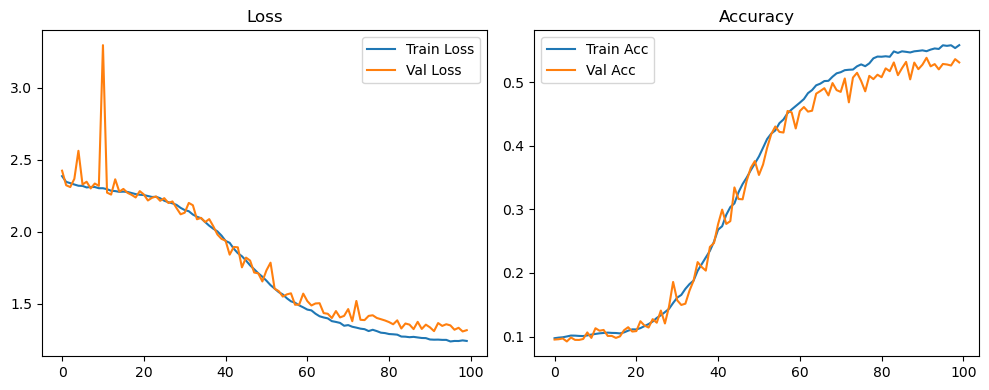

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 1.3203 Accuracy: 0.5283


🚀 Running: batch128_lr_max_0.0002_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0975 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0975 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0975 | Val Acc: 0.0967 |:   1%|          | 1/100 [01:17<2:07:50, 77.48s/it]

| LR: 0.000200 | Train Acc: 0.0972 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:34<2:07:50, 77.48s/it]

| LR: 0.000200 | Train Acc: 0.0972 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:34<2:07:50, 77.48s/it]

| LR: 0.000200 | Train Acc: 0.0972 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [01:34<1:08:12, 41.76s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [01:50<1:08:12, 41.76s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [01:50<1:08:12, 41.76s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [01:51<49:04, 30.35s/it]  

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [02:07<49:04, 30.35s/it]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [02:07<49:04, 30.35s/it]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [02:07<40:01, 25.02s/it]

| LR: 0.000199 | Train Acc: 0.0980 | Val Acc: 0.0959 |:   4%|▍         | 4/100 [02:24<40:01, 25.02s/it]

| LR: 0.000199 | Train Acc: 0.0980 | Val Acc: 0.0959 |:   4%|▍         | 4/100 [02:24<40:01, 25.02s/it]

| LR: 0.000199 | Train Acc: 0.0980 | Val Acc: 0.0959 |:   5%|▌         | 5/100 [02:24<34:45, 21.96s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0904 |:   5%|▌         | 5/100 [02:41<34:45, 21.96s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0904 |:   5%|▌         | 5/100 [02:41<34:45, 21.96s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0904 |:   6%|▌         | 6/100 [02:41<31:43, 20.25s/it]

| LR: 0.000198 | Train Acc: 0.0988 | Val Acc: 0.0951 |:   6%|▌         | 6/100 [02:58<31:43, 20.25s/it]

| LR: 0.000198 | Train Acc: 0.0988 | Val Acc: 0.0951 |:   6%|▌         | 6/100 [02:58<31:43, 20.25s/it]

| LR: 0.000198 | Train Acc: 0.0988 | Val Acc: 0.0951 |:   7%|▋         | 7/100 [02:58<29:37, 19.12s/it]

| LR: 0.000198 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [03:14<29:37, 19.12s/it]

| LR: 0.000198 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [03:14<29:37, 19.12s/it]

| LR: 0.000198 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [03:14<28:08, 18.36s/it]

| LR: 0.000197 | Train Acc: 0.0988 | Val Acc: 0.0932 |:   8%|▊         | 8/100 [03:31<28:08, 18.36s/it]

| LR: 0.000197 | Train Acc: 0.0988 | Val Acc: 0.0932 |:   8%|▊         | 8/100 [03:31<28:08, 18.36s/it]

| LR: 0.000197 | Train Acc: 0.0988 | Val Acc: 0.0932 |:   9%|▉         | 9/100 [03:31<27:02, 17.83s/it]

| LR: 0.000196 | Train Acc: 0.0989 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [03:48<27:02, 17.83s/it]

| LR: 0.000196 | Train Acc: 0.0989 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [03:48<27:02, 17.83s/it]

| LR: 0.000196 | Train Acc: 0.0989 | Val Acc: 0.0958 |:  10%|█         | 10/100 [03:48<26:16, 17.52s/it]

| LR: 0.000195 | Train Acc: 0.1003 | Val Acc: 0.0940 |:  10%|█         | 10/100 [04:04<26:16, 17.52s/it]

| LR: 0.000195 | Train Acc: 0.1003 | Val Acc: 0.0940 |:  10%|█         | 10/100 [04:04<26:16, 17.52s/it]

| LR: 0.000195 | Train Acc: 0.1003 | Val Acc: 0.0940 |:  11%|█         | 11/100 [04:05<25:36, 17.26s/it]

| LR: 0.000194 | Train Acc: 0.1000 | Val Acc: 0.0947 |:  11%|█         | 11/100 [04:21<25:36, 17.26s/it]

| LR: 0.000194 | Train Acc: 0.1000 | Val Acc: 0.0947 |:  11%|█         | 11/100 [04:21<25:36, 17.26s/it]

| LR: 0.000194 | Train Acc: 0.1000 | Val Acc: 0.0947 |:  12%|█▏        | 12/100 [04:21<25:04, 17.10s/it]

| LR: 0.000193 | Train Acc: 0.1011 | Val Acc: 0.1004 |:  12%|█▏        | 12/100 [04:38<25:04, 17.10s/it]

| LR: 0.000193 | Train Acc: 0.1011 | Val Acc: 0.1004 |:  12%|█▏        | 12/100 [04:38<25:04, 17.10s/it]

| LR: 0.000193 | Train Acc: 0.1011 | Val Acc: 0.1004 |:  13%|█▎        | 13/100 [04:38<24:36, 16.97s/it]

| LR: 0.000192 | Train Acc: 0.1025 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [04:55<24:36, 16.97s/it]

| LR: 0.000192 | Train Acc: 0.1025 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [04:55<24:36, 16.97s/it]

| LR: 0.000192 | Train Acc: 0.1025 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [04:55<24:14, 16.91s/it]

| LR: 0.000191 | Train Acc: 0.1009 | Val Acc: 0.0965 |:  14%|█▍        | 14/100 [05:12<24:14, 16.91s/it]

| LR: 0.000191 | Train Acc: 0.1009 | Val Acc: 0.0965 |:  14%|█▍        | 14/100 [05:12<24:14, 16.91s/it]

| LR: 0.000191 | Train Acc: 0.1009 | Val Acc: 0.0965 |:  15%|█▌        | 15/100 [05:12<23:58, 16.92s/it]

| LR: 0.000189 | Train Acc: 0.1008 | Val Acc: 0.0981 |:  15%|█▌        | 15/100 [05:29<23:58, 16.92s/it]

| LR: 0.000189 | Train Acc: 0.1008 | Val Acc: 0.0981 |:  15%|█▌        | 15/100 [05:29<23:58, 16.92s/it]

| LR: 0.000189 | Train Acc: 0.1008 | Val Acc: 0.0981 |:  16%|█▌        | 16/100 [05:29<23:42, 16.94s/it]

| LR: 0.000188 | Train Acc: 0.1016 | Val Acc: 0.0997 |:  16%|█▌        | 16/100 [05:45<23:42, 16.94s/it]

| LR: 0.000188 | Train Acc: 0.1016 | Val Acc: 0.0997 |:  16%|█▌        | 16/100 [05:45<23:42, 16.94s/it]

| LR: 0.000188 | Train Acc: 0.1016 | Val Acc: 0.0997 |:  17%|█▋        | 17/100 [05:45<23:19, 16.87s/it]

| LR: 0.000186 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [06:02<23:19, 16.87s/it]

| LR: 0.000186 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [06:02<23:19, 16.87s/it]

| LR: 0.000186 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:02<22:57, 16.80s/it]

| LR: 0.000185 | Train Acc: 0.1011 | Val Acc: 0.0985 |:  18%|█▊        | 18/100 [06:18<22:57, 16.80s/it]

| LR: 0.000185 | Train Acc: 0.1011 | Val Acc: 0.0985 |:  18%|█▊        | 18/100 [06:18<22:57, 16.80s/it]

| LR: 0.000185 | Train Acc: 0.1011 | Val Acc: 0.0985 |:  19%|█▉        | 19/100 [06:19<22:36, 16.75s/it]

| LR: 0.000183 | Train Acc: 0.1023 | Val Acc: 0.1087 |:  19%|█▉        | 19/100 [06:35<22:36, 16.75s/it]

| LR: 0.000183 | Train Acc: 0.1023 | Val Acc: 0.1087 |:  19%|█▉        | 19/100 [06:35<22:36, 16.75s/it]

| LR: 0.000183 | Train Acc: 0.1023 | Val Acc: 0.1087 |:  20%|██        | 20/100 [06:35<22:19, 16.74s/it]

| LR: 0.000181 | Train Acc: 0.1024 | Val Acc: 0.1335 |:  20%|██        | 20/100 [06:52<22:19, 16.74s/it]

| LR: 0.000181 | Train Acc: 0.1024 | Val Acc: 0.1335 |:  20%|██        | 20/100 [06:52<22:19, 16.74s/it]

| LR: 0.000181 | Train Acc: 0.1024 | Val Acc: 0.1335 |:  21%|██        | 21/100 [06:52<22:02, 16.74s/it]

| LR: 0.000179 | Train Acc: 0.1036 | Val Acc: 0.0985 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000179 | Train Acc: 0.1036 | Val Acc: 0.0985 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000179 | Train Acc: 0.1036 | Val Acc: 0.0985 |:  22%|██▏       | 22/100 [07:09<21:45, 16.74s/it]

| LR: 0.000177 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  22%|██▏       | 22/100 [07:26<21:45, 16.74s/it]

| LR: 0.000177 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  22%|██▏       | 22/100 [07:26<21:45, 16.74s/it]

| LR: 0.000177 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  23%|██▎       | 23/100 [07:26<21:31, 16.77s/it]

| LR: 0.000175 | Train Acc: 0.1047 | Val Acc: 0.1080 |:  23%|██▎       | 23/100 [07:42<21:31, 16.77s/it]

| LR: 0.000175 | Train Acc: 0.1047 | Val Acc: 0.1080 |:  23%|██▎       | 23/100 [07:42<21:31, 16.77s/it]

| LR: 0.000175 | Train Acc: 0.1047 | Val Acc: 0.1080 |:  24%|██▍       | 24/100 [07:42<21:15, 16.79s/it]

| LR: 0.000173 | Train Acc: 0.1077 | Val Acc: 0.1010 |:  24%|██▍       | 24/100 [07:59<21:15, 16.79s/it]

| LR: 0.000173 | Train Acc: 0.1077 | Val Acc: 0.1010 |:  24%|██▍       | 24/100 [07:59<21:15, 16.79s/it]

| LR: 0.000173 | Train Acc: 0.1077 | Val Acc: 0.1010 |:  25%|██▌       | 25/100 [07:59<20:57, 16.77s/it]

| LR: 0.000171 | Train Acc: 0.1081 | Val Acc: 0.0983 |:  25%|██▌       | 25/100 [08:16<20:57, 16.77s/it]

| LR: 0.000171 | Train Acc: 0.1081 | Val Acc: 0.0983 |:  25%|██▌       | 25/100 [08:16<20:57, 16.77s/it]

| LR: 0.000171 | Train Acc: 0.1081 | Val Acc: 0.0983 |:  26%|██▌       | 26/100 [08:16<20:39, 16.75s/it]

| LR: 0.000169 | Train Acc: 0.1090 | Val Acc: 0.1206 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000169 | Train Acc: 0.1090 | Val Acc: 0.1206 |:  26%|██▌       | 26/100 [08:33<20:39, 16.75s/it]

| LR: 0.000169 | Train Acc: 0.1090 | Val Acc: 0.1206 |:  27%|██▋       | 27/100 [08:33<20:21, 16.74s/it]

| LR: 0.000166 | Train Acc: 0.1086 | Val Acc: 0.1003 |:  27%|██▋       | 27/100 [08:49<20:21, 16.74s/it]

| LR: 0.000166 | Train Acc: 0.1086 | Val Acc: 0.1003 |:  27%|██▋       | 27/100 [08:49<20:21, 16.74s/it]

| LR: 0.000166 | Train Acc: 0.1086 | Val Acc: 0.1003 |:  28%|██▊       | 28/100 [08:49<20:06, 16.75s/it]

| LR: 0.000164 | Train Acc: 0.1122 | Val Acc: 0.1082 |:  28%|██▊       | 28/100 [09:06<20:06, 16.75s/it]

| LR: 0.000164 | Train Acc: 0.1122 | Val Acc: 0.1082 |:  28%|██▊       | 28/100 [09:06<20:06, 16.75s/it]

| LR: 0.000164 | Train Acc: 0.1122 | Val Acc: 0.1082 |:  29%|██▉       | 29/100 [09:06<19:47, 16.73s/it]

| LR: 0.000161 | Train Acc: 0.1131 | Val Acc: 0.1161 |:  29%|██▉       | 29/100 [09:23<19:47, 16.73s/it]

| LR: 0.000161 | Train Acc: 0.1131 | Val Acc: 0.1161 |:  29%|██▉       | 29/100 [09:23<19:47, 16.73s/it]

| LR: 0.000161 | Train Acc: 0.1131 | Val Acc: 0.1161 |:  30%|███       | 30/100 [09:23<19:32, 16.74s/it]

| LR: 0.000159 | Train Acc: 0.1140 | Val Acc: 0.1210 |:  30%|███       | 30/100 [09:40<19:32, 16.74s/it]

| LR: 0.000159 | Train Acc: 0.1140 | Val Acc: 0.1210 |:  30%|███       | 30/100 [09:40<19:32, 16.74s/it]

| LR: 0.000159 | Train Acc: 0.1140 | Val Acc: 0.1210 |:  31%|███       | 31/100 [09:40<19:19, 16.81s/it]

| LR: 0.000156 | Train Acc: 0.1195 | Val Acc: 0.1289 |:  31%|███       | 31/100 [09:57<19:19, 16.81s/it]

| LR: 0.000156 | Train Acc: 0.1195 | Val Acc: 0.1289 |:  31%|███       | 31/100 [09:57<19:19, 16.81s/it]

| LR: 0.000156 | Train Acc: 0.1195 | Val Acc: 0.1289 |:  32%|███▏      | 32/100 [09:57<19:04, 16.83s/it]

| LR: 0.000154 | Train Acc: 0.1218 | Val Acc: 0.1304 |:  32%|███▏      | 32/100 [10:13<19:04, 16.83s/it]

| LR: 0.000154 | Train Acc: 0.1218 | Val Acc: 0.1304 |:  32%|███▏      | 32/100 [10:13<19:04, 16.83s/it]

| LR: 0.000154 | Train Acc: 0.1218 | Val Acc: 0.1304 |:  33%|███▎      | 33/100 [10:14<18:49, 16.85s/it]

| LR: 0.000151 | Train Acc: 0.1221 | Val Acc: 0.1577 |:  33%|███▎      | 33/100 [10:30<18:49, 16.85s/it]

| LR: 0.000151 | Train Acc: 0.1221 | Val Acc: 0.1577 |:  33%|███▎      | 33/100 [10:30<18:49, 16.85s/it]

| LR: 0.000151 | Train Acc: 0.1221 | Val Acc: 0.1577 |:  34%|███▍      | 34/100 [10:30<18:31, 16.85s/it]

| LR: 0.000148 | Train Acc: 0.1260 | Val Acc: 0.1115 |:  34%|███▍      | 34/100 [10:47<18:31, 16.85s/it]

| LR: 0.000148 | Train Acc: 0.1260 | Val Acc: 0.1115 |:  34%|███▍      | 34/100 [10:47<18:31, 16.85s/it]

| LR: 0.000148 | Train Acc: 0.1260 | Val Acc: 0.1115 |:  35%|███▌      | 35/100 [10:47<18:12, 16.80s/it]

| LR: 0.000146 | Train Acc: 0.1316 | Val Acc: 0.1095 |:  35%|███▌      | 35/100 [11:04<18:12, 16.80s/it]

| LR: 0.000146 | Train Acc: 0.1316 | Val Acc: 0.1095 |:  35%|███▌      | 35/100 [11:04<18:12, 16.80s/it]

| LR: 0.000146 | Train Acc: 0.1316 | Val Acc: 0.1095 |:  36%|███▌      | 36/100 [11:04<17:55, 16.81s/it]

| LR: 0.000143 | Train Acc: 0.1351 | Val Acc: 0.1175 |:  36%|███▌      | 36/100 [11:21<17:55, 16.81s/it]

| LR: 0.000143 | Train Acc: 0.1351 | Val Acc: 0.1175 |:  36%|███▌      | 36/100 [11:21<17:55, 16.81s/it]

| LR: 0.000143 | Train Acc: 0.1351 | Val Acc: 0.1175 |:  37%|███▋      | 37/100 [11:21<17:40, 16.83s/it]

| LR: 0.000140 | Train Acc: 0.1392 | Val Acc: 0.1759 |:  37%|███▋      | 37/100 [11:38<17:40, 16.83s/it]

| LR: 0.000140 | Train Acc: 0.1392 | Val Acc: 0.1759 |:  37%|███▋      | 37/100 [11:38<17:40, 16.83s/it]

| LR: 0.000140 | Train Acc: 0.1392 | Val Acc: 0.1759 |:  38%|███▊      | 38/100 [11:38<17:22, 16.82s/it]

| LR: 0.000137 | Train Acc: 0.1446 | Val Acc: 0.1497 |:  38%|███▊      | 38/100 [11:55<17:22, 16.82s/it]

| LR: 0.000137 | Train Acc: 0.1446 | Val Acc: 0.1497 |:  38%|███▊      | 38/100 [11:55<17:22, 16.82s/it]

| LR: 0.000137 | Train Acc: 0.1446 | Val Acc: 0.1497 |:  39%|███▉      | 39/100 [11:55<17:09, 16.88s/it]

| LR: 0.000134 | Train Acc: 0.1504 | Val Acc: 0.1948 |:  39%|███▉      | 39/100 [12:11<17:09, 16.88s/it]

| LR: 0.000134 | Train Acc: 0.1504 | Val Acc: 0.1948 |:  39%|███▉      | 39/100 [12:11<17:09, 16.88s/it]

| LR: 0.000134 | Train Acc: 0.1504 | Val Acc: 0.1948 |:  40%|████      | 40/100 [12:12<16:53, 16.90s/it]

| LR: 0.000131 | Train Acc: 0.1558 | Val Acc: 0.1273 |:  40%|████      | 40/100 [12:28<16:53, 16.90s/it]

| LR: 0.000131 | Train Acc: 0.1558 | Val Acc: 0.1273 |:  40%|████      | 40/100 [12:28<16:53, 16.90s/it]

| LR: 0.000131 | Train Acc: 0.1558 | Val Acc: 0.1273 |:  41%|████      | 41/100 [12:28<16:35, 16.88s/it]

| LR: 0.000128 | Train Acc: 0.1611 | Val Acc: 0.1256 |:  41%|████      | 41/100 [12:45<16:35, 16.88s/it]

| LR: 0.000128 | Train Acc: 0.1611 | Val Acc: 0.1256 |:  41%|████      | 41/100 [12:45<16:35, 16.88s/it]

| LR: 0.000128 | Train Acc: 0.1611 | Val Acc: 0.1256 |:  42%|████▏     | 42/100 [12:45<16:14, 16.80s/it]

| LR: 0.000125 | Train Acc: 0.1703 | Val Acc: 0.1810 |:  42%|████▏     | 42/100 [13:02<16:14, 16.80s/it]

| LR: 0.000125 | Train Acc: 0.1703 | Val Acc: 0.1810 |:  42%|████▏     | 42/100 [13:02<16:14, 16.80s/it]

| LR: 0.000125 | Train Acc: 0.1703 | Val Acc: 0.1810 |:  43%|████▎     | 43/100 [13:02<15:57, 16.80s/it]

| LR: 0.000122 | Train Acc: 0.1739 | Val Acc: 0.1775 |:  43%|████▎     | 43/100 [13:18<15:57, 16.80s/it]

| LR: 0.000122 | Train Acc: 0.1739 | Val Acc: 0.1775 |:  43%|████▎     | 43/100 [13:18<15:57, 16.80s/it]

| LR: 0.000122 | Train Acc: 0.1739 | Val Acc: 0.1775 |:  44%|████▍     | 44/100 [13:18<15:35, 16.71s/it]

| LR: 0.000119 | Train Acc: 0.1828 | Val Acc: 0.2028 |:  44%|████▍     | 44/100 [13:35<15:35, 16.71s/it]

| LR: 0.000119 | Train Acc: 0.1828 | Val Acc: 0.2028 |:  44%|████▍     | 44/100 [13:35<15:35, 16.71s/it]

| LR: 0.000119 | Train Acc: 0.1828 | Val Acc: 0.2028 |:  45%|████▌     | 45/100 [13:35<15:19, 16.71s/it]

| LR: 0.000116 | Train Acc: 0.1878 | Val Acc: 0.1608 |:  45%|████▌     | 45/100 [13:52<15:19, 16.71s/it]

| LR: 0.000116 | Train Acc: 0.1878 | Val Acc: 0.1608 |:  45%|████▌     | 45/100 [13:52<15:19, 16.71s/it]

| LR: 0.000116 | Train Acc: 0.1878 | Val Acc: 0.1608 |:  46%|████▌     | 46/100 [13:52<15:01, 16.70s/it]

| LR: 0.000113 | Train Acc: 0.1928 | Val Acc: 0.2032 |:  46%|████▌     | 46/100 [14:08<15:01, 16.70s/it]

| LR: 0.000113 | Train Acc: 0.1928 | Val Acc: 0.2032 |:  46%|████▌     | 46/100 [14:08<15:01, 16.70s/it]

| LR: 0.000113 | Train Acc: 0.1928 | Val Acc: 0.2032 |:  47%|████▋     | 47/100 [14:09<14:47, 16.75s/it]

| LR: 0.000110 | Train Acc: 0.2013 | Val Acc: 0.2235 |:  47%|████▋     | 47/100 [14:25<14:47, 16.75s/it]

| LR: 0.000110 | Train Acc: 0.2013 | Val Acc: 0.2235 |:  47%|████▋     | 47/100 [14:25<14:47, 16.75s/it]

| LR: 0.000110 | Train Acc: 0.2013 | Val Acc: 0.2235 |:  48%|████▊     | 48/100 [14:25<14:33, 16.80s/it]

| LR: 0.000107 | Train Acc: 0.2100 | Val Acc: 0.1908 |:  48%|████▊     | 48/100 [14:42<14:33, 16.80s/it]

| LR: 0.000107 | Train Acc: 0.2100 | Val Acc: 0.1908 |:  48%|████▊     | 48/100 [14:42<14:33, 16.80s/it]

| LR: 0.000107 | Train Acc: 0.2100 | Val Acc: 0.1908 |:  49%|████▉     | 49/100 [14:42<14:17, 16.80s/it]

| LR: 0.000104 | Train Acc: 0.2129 | Val Acc: 0.2027 |:  49%|████▉     | 49/100 [14:59<14:17, 16.80s/it]

| LR: 0.000104 | Train Acc: 0.2129 | Val Acc: 0.2027 |:  49%|████▉     | 49/100 [14:59<14:17, 16.80s/it]

| LR: 0.000104 | Train Acc: 0.2129 | Val Acc: 0.2027 |:  50%|█████     | 50/100 [14:59<13:59, 16.78s/it]

| LR: 0.000101 | Train Acc: 0.2259 | Val Acc: 0.2477 |:  50%|█████     | 50/100 [15:16<13:59, 16.78s/it]

| LR: 0.000101 | Train Acc: 0.2259 | Val Acc: 0.2477 |:  50%|█████     | 50/100 [15:16<13:59, 16.78s/it]

| LR: 0.000101 | Train Acc: 0.2259 | Val Acc: 0.2477 |:  51%|█████     | 51/100 [15:16<13:40, 16.75s/it]

| LR: 0.000097 | Train Acc: 0.2301 | Val Acc: 0.2080 |:  51%|█████     | 51/100 [15:32<13:40, 16.75s/it]

| LR: 0.000097 | Train Acc: 0.2301 | Val Acc: 0.2080 |:  51%|█████     | 51/100 [15:32<13:40, 16.75s/it]

| LR: 0.000097 | Train Acc: 0.2301 | Val Acc: 0.2080 |:  52%|█████▏    | 52/100 [15:32<13:22, 16.73s/it]

| LR: 0.000094 | Train Acc: 0.2401 | Val Acc: 0.1983 |:  52%|█████▏    | 52/100 [15:49<13:22, 16.73s/it]

| LR: 0.000094 | Train Acc: 0.2401 | Val Acc: 0.1983 |:  52%|█████▏    | 52/100 [15:49<13:22, 16.73s/it]

| LR: 0.000094 | Train Acc: 0.2401 | Val Acc: 0.1983 |:  53%|█████▎    | 53/100 [15:49<13:03, 16.68s/it]

| LR: 0.000091 | Train Acc: 0.2517 | Val Acc: 0.2613 |:  53%|█████▎    | 53/100 [16:06<13:03, 16.68s/it]

| LR: 0.000091 | Train Acc: 0.2517 | Val Acc: 0.2613 |:  53%|█████▎    | 53/100 [16:06<13:03, 16.68s/it]

| LR: 0.000091 | Train Acc: 0.2517 | Val Acc: 0.2613 |:  54%|█████▍    | 54/100 [16:06<12:47, 16.69s/it]

| LR: 0.000088 | Train Acc: 0.2631 | Val Acc: 0.2929 |:  54%|█████▍    | 54/100 [16:22<12:47, 16.69s/it]

| LR: 0.000088 | Train Acc: 0.2631 | Val Acc: 0.2929 |:  54%|█████▍    | 54/100 [16:22<12:47, 16.69s/it]

| LR: 0.000088 | Train Acc: 0.2631 | Val Acc: 0.2929 |:  55%|█████▌    | 55/100 [16:22<12:32, 16.72s/it]

| LR: 0.000085 | Train Acc: 0.2706 | Val Acc: 0.3005 |:  55%|█████▌    | 55/100 [16:39<12:32, 16.72s/it]

| LR: 0.000085 | Train Acc: 0.2706 | Val Acc: 0.3005 |:  55%|█████▌    | 55/100 [16:39<12:32, 16.72s/it]

| LR: 0.000085 | Train Acc: 0.2706 | Val Acc: 0.3005 |:  56%|█████▌    | 56/100 [16:39<12:16, 16.73s/it]

| LR: 0.000082 | Train Acc: 0.2783 | Val Acc: 0.2680 |:  56%|█████▌    | 56/100 [16:56<12:16, 16.73s/it]

| LR: 0.000082 | Train Acc: 0.2783 | Val Acc: 0.2680 |:  56%|█████▌    | 56/100 [16:56<12:16, 16.73s/it]

| LR: 0.000082 | Train Acc: 0.2783 | Val Acc: 0.2680 |:  57%|█████▋    | 57/100 [16:56<12:01, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.2882 | Val Acc: 0.3112 |:  57%|█████▋    | 57/100 [17:13<12:01, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.2882 | Val Acc: 0.3112 |:  57%|█████▋    | 57/100 [17:13<12:01, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.2882 | Val Acc: 0.3112 |:  58%|█████▊    | 58/100 [17:13<11:43, 16.76s/it]

| LR: 0.000076 | Train Acc: 0.3016 | Val Acc: 0.2782 |:  58%|█████▊    | 58/100 [17:29<11:43, 16.76s/it]

| LR: 0.000076 | Train Acc: 0.3016 | Val Acc: 0.2782 |:  58%|█████▊    | 58/100 [17:29<11:43, 16.76s/it]

| LR: 0.000076 | Train Acc: 0.3016 | Val Acc: 0.2782 |:  59%|█████▉    | 59/100 [17:30<11:27, 16.76s/it]

| LR: 0.000073 | Train Acc: 0.3061 | Val Acc: 0.2710 |:  59%|█████▉    | 59/100 [17:46<11:27, 16.76s/it]

| LR: 0.000073 | Train Acc: 0.3061 | Val Acc: 0.2710 |:  59%|█████▉    | 59/100 [17:46<11:27, 16.76s/it]

| LR: 0.000073 | Train Acc: 0.3061 | Val Acc: 0.2710 |:  60%|██████    | 60/100 [17:46<11:11, 16.78s/it]

| LR: 0.000070 | Train Acc: 0.3134 | Val Acc: 0.2880 |:  60%|██████    | 60/100 [18:03<11:11, 16.78s/it]

| LR: 0.000070 | Train Acc: 0.3134 | Val Acc: 0.2880 |:  60%|██████    | 60/100 [18:03<11:11, 16.78s/it]

| LR: 0.000070 | Train Acc: 0.3134 | Val Acc: 0.2880 |:  61%|██████    | 61/100 [18:03<10:54, 16.79s/it]

| LR: 0.000067 | Train Acc: 0.3250 | Val Acc: 0.3482 |:  61%|██████    | 61/100 [18:20<10:54, 16.79s/it]

| LR: 0.000067 | Train Acc: 0.3250 | Val Acc: 0.3482 |:  61%|██████    | 61/100 [18:20<10:54, 16.79s/it]

| LR: 0.000067 | Train Acc: 0.3250 | Val Acc: 0.3482 |:  62%|██████▏   | 62/100 [18:20<10:38, 16.80s/it]

| LR: 0.000064 | Train Acc: 0.3301 | Val Acc: 0.3490 |:  62%|██████▏   | 62/100 [18:37<10:38, 16.80s/it]

| LR: 0.000064 | Train Acc: 0.3301 | Val Acc: 0.3490 |:  62%|██████▏   | 62/100 [18:37<10:38, 16.80s/it]

| LR: 0.000064 | Train Acc: 0.3301 | Val Acc: 0.3490 |:  63%|██████▎   | 63/100 [18:37<10:20, 16.78s/it]

| LR: 0.000061 | Train Acc: 0.3411 | Val Acc: 0.2786 |:  63%|██████▎   | 63/100 [18:54<10:20, 16.78s/it]

| LR: 0.000061 | Train Acc: 0.3411 | Val Acc: 0.2786 |:  63%|██████▎   | 63/100 [18:54<10:20, 16.78s/it]

| LR: 0.000061 | Train Acc: 0.3411 | Val Acc: 0.2786 |:  64%|██████▍   | 64/100 [18:54<10:05, 16.82s/it]

| LR: 0.000058 | Train Acc: 0.3479 | Val Acc: 0.2704 |:  64%|██████▍   | 64/100 [19:10<10:05, 16.82s/it]

| LR: 0.000058 | Train Acc: 0.3479 | Val Acc: 0.2704 |:  64%|██████▍   | 64/100 [19:10<10:05, 16.82s/it]

| LR: 0.000058 | Train Acc: 0.3479 | Val Acc: 0.2704 |:  65%|██████▌   | 65/100 [19:10<09:46, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.3584 | Val Acc: 0.3807 |:  65%|██████▌   | 65/100 [19:27<09:46, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.3584 | Val Acc: 0.3807 |:  65%|██████▌   | 65/100 [19:27<09:46, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.3584 | Val Acc: 0.3807 |:  66%|██████▌   | 66/100 [19:27<09:28, 16.73s/it]

| LR: 0.000053 | Train Acc: 0.3657 | Val Acc: 0.3849 |:  66%|██████▌   | 66/100 [19:44<09:28, 16.73s/it]

| LR: 0.000053 | Train Acc: 0.3657 | Val Acc: 0.3849 |:  66%|██████▌   | 66/100 [19:44<09:28, 16.73s/it]

| LR: 0.000053 | Train Acc: 0.3657 | Val Acc: 0.3849 |:  67%|██████▋   | 67/100 [19:44<09:12, 16.73s/it]

| LR: 0.000050 | Train Acc: 0.3709 | Val Acc: 0.3572 |:  67%|██████▋   | 67/100 [20:00<09:12, 16.73s/it]

| LR: 0.000050 | Train Acc: 0.3709 | Val Acc: 0.3572 |:  67%|██████▋   | 67/100 [20:00<09:12, 16.73s/it]

| LR: 0.000050 | Train Acc: 0.3709 | Val Acc: 0.3572 |:  68%|██████▊   | 68/100 [20:01<08:56, 16.77s/it]

| LR: 0.000047 | Train Acc: 0.3799 | Val Acc: 0.3763 |:  68%|██████▊   | 68/100 [20:17<08:56, 16.77s/it]

| LR: 0.000047 | Train Acc: 0.3799 | Val Acc: 0.3763 |:  68%|██████▊   | 68/100 [20:17<08:56, 16.77s/it]

| LR: 0.000047 | Train Acc: 0.3799 | Val Acc: 0.3763 |:  69%|██████▉   | 69/100 [20:17<08:40, 16.80s/it]

| LR: 0.000045 | Train Acc: 0.3871 | Val Acc: 0.3623 |:  69%|██████▉   | 69/100 [20:34<08:40, 16.80s/it]

| LR: 0.000045 | Train Acc: 0.3871 | Val Acc: 0.3623 |:  69%|██████▉   | 69/100 [20:34<08:40, 16.80s/it]

| LR: 0.000045 | Train Acc: 0.3871 | Val Acc: 0.3623 |:  70%|███████   | 70/100 [20:34<08:24, 16.81s/it]

| LR: 0.000042 | Train Acc: 0.3901 | Val Acc: 0.3709 |:  70%|███████   | 70/100 [20:51<08:24, 16.81s/it]

| LR: 0.000042 | Train Acc: 0.3901 | Val Acc: 0.3709 |:  70%|███████   | 70/100 [20:51<08:24, 16.81s/it]

| LR: 0.000042 | Train Acc: 0.3901 | Val Acc: 0.3709 |:  71%|███████   | 71/100 [20:51<08:06, 16.77s/it]

| LR: 0.000040 | Train Acc: 0.3972 | Val Acc: 0.4183 |:  71%|███████   | 71/100 [21:07<08:06, 16.77s/it]

| LR: 0.000040 | Train Acc: 0.3972 | Val Acc: 0.4183 |:  71%|███████   | 71/100 [21:07<08:06, 16.77s/it]

| LR: 0.000040 | Train Acc: 0.3972 | Val Acc: 0.4183 |:  72%|███████▏  | 72/100 [21:08<07:48, 16.72s/it]

| LR: 0.000037 | Train Acc: 0.3993 | Val Acc: 0.3932 |:  72%|███████▏  | 72/100 [21:24<07:48, 16.72s/it]

| LR: 0.000037 | Train Acc: 0.3993 | Val Acc: 0.3932 |:  72%|███████▏  | 72/100 [21:24<07:48, 16.72s/it]

| LR: 0.000037 | Train Acc: 0.3993 | Val Acc: 0.3932 |:  73%|███████▎  | 73/100 [21:24<07:31, 16.72s/it]

| LR: 0.000035 | Train Acc: 0.4106 | Val Acc: 0.3915 |:  73%|███████▎  | 73/100 [21:41<07:31, 16.72s/it]

| LR: 0.000035 | Train Acc: 0.4106 | Val Acc: 0.3915 |:  73%|███████▎  | 73/100 [21:41<07:31, 16.72s/it]

| LR: 0.000035 | Train Acc: 0.4106 | Val Acc: 0.3915 |:  74%|███████▍  | 74/100 [21:41<07:16, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.4086 | Val Acc: 0.3911 |:  74%|███████▍  | 74/100 [21:58<07:16, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.4086 | Val Acc: 0.3911 |:  74%|███████▍  | 74/100 [21:58<07:16, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.4086 | Val Acc: 0.3911 |:  75%|███████▌  | 75/100 [21:58<06:59, 16.79s/it]

| LR: 0.000030 | Train Acc: 0.4142 | Val Acc: 0.4225 |:  75%|███████▌  | 75/100 [22:15<06:59, 16.79s/it]

| LR: 0.000030 | Train Acc: 0.4142 | Val Acc: 0.4225 |:  75%|███████▌  | 75/100 [22:15<06:59, 16.79s/it]

| LR: 0.000030 | Train Acc: 0.4142 | Val Acc: 0.4225 |:  76%|███████▌  | 76/100 [22:15<06:43, 16.80s/it]

| LR: 0.000028 | Train Acc: 0.4191 | Val Acc: 0.4269 |:  76%|███████▌  | 76/100 [22:31<06:43, 16.80s/it]

| LR: 0.000028 | Train Acc: 0.4191 | Val Acc: 0.4269 |:  76%|███████▌  | 76/100 [22:31<06:43, 16.80s/it]

| LR: 0.000028 | Train Acc: 0.4191 | Val Acc: 0.4269 |:  77%|███████▋  | 77/100 [22:32<06:25, 16.78s/it]

| LR: 0.000026 | Train Acc: 0.4169 | Val Acc: 0.4140 |:  77%|███████▋  | 77/100 [22:48<06:25, 16.78s/it]

| LR: 0.000026 | Train Acc: 0.4169 | Val Acc: 0.4140 |:  77%|███████▋  | 77/100 [22:48<06:25, 16.78s/it]

| LR: 0.000026 | Train Acc: 0.4169 | Val Acc: 0.4140 |:  78%|███████▊  | 78/100 [22:48<06:08, 16.73s/it]

| LR: 0.000024 | Train Acc: 0.4263 | Val Acc: 0.4325 |:  78%|███████▊  | 78/100 [23:05<06:08, 16.73s/it]

| LR: 0.000024 | Train Acc: 0.4263 | Val Acc: 0.4325 |:  78%|███████▊  | 78/100 [23:05<06:08, 16.73s/it]

| LR: 0.000024 | Train Acc: 0.4263 | Val Acc: 0.4325 |:  79%|███████▉  | 79/100 [23:05<05:49, 16.66s/it]

| LR: 0.000022 | Train Acc: 0.4276 | Val Acc: 0.4245 |:  79%|███████▉  | 79/100 [23:21<05:49, 16.66s/it]

| LR: 0.000022 | Train Acc: 0.4276 | Val Acc: 0.4245 |:  79%|███████▉  | 79/100 [23:21<05:49, 16.66s/it]

| LR: 0.000022 | Train Acc: 0.4276 | Val Acc: 0.4245 |:  80%|████████  | 80/100 [23:22<05:34, 16.74s/it]

| LR: 0.000020 | Train Acc: 0.4247 | Val Acc: 0.4457 |:  80%|████████  | 80/100 [23:38<05:34, 16.74s/it]

| LR: 0.000020 | Train Acc: 0.4247 | Val Acc: 0.4457 |:  80%|████████  | 80/100 [23:38<05:34, 16.74s/it]

| LR: 0.000020 | Train Acc: 0.4247 | Val Acc: 0.4457 |:  81%|████████  | 81/100 [23:38<05:17, 16.73s/it]

| LR: 0.000018 | Train Acc: 0.4324 | Val Acc: 0.4293 |:  81%|████████  | 81/100 [23:55<05:17, 16.73s/it]

| LR: 0.000018 | Train Acc: 0.4324 | Val Acc: 0.4293 |:  81%|████████  | 81/100 [23:55<05:17, 16.73s/it]

| LR: 0.000018 | Train Acc: 0.4324 | Val Acc: 0.4293 |:  82%|████████▏ | 82/100 [23:55<05:01, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.4346 | Val Acc: 0.4259 |:  82%|████████▏ | 82/100 [24:12<05:01, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.4346 | Val Acc: 0.4259 |:  82%|████████▏ | 82/100 [24:12<05:01, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.4346 | Val Acc: 0.4259 |:  83%|████████▎ | 83/100 [24:12<04:44, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.4341 | Val Acc: 0.4302 |:  83%|████████▎ | 83/100 [24:29<04:44, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.4341 | Val Acc: 0.4302 |:  83%|████████▎ | 83/100 [24:29<04:44, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.4341 | Val Acc: 0.4302 |:  84%|████████▍ | 84/100 [24:29<04:28, 16.78s/it]

| LR: 0.000013 | Train Acc: 0.4369 | Val Acc: 0.4440 |:  84%|████████▍ | 84/100 [24:45<04:28, 16.78s/it]

| LR: 0.000013 | Train Acc: 0.4369 | Val Acc: 0.4440 |:  84%|████████▍ | 84/100 [24:45<04:28, 16.78s/it]

| LR: 0.000013 | Train Acc: 0.4369 | Val Acc: 0.4440 |:  85%|████████▌ | 85/100 [24:45<04:11, 16.78s/it]

| LR: 0.000012 | Train Acc: 0.4398 | Val Acc: 0.4521 |:  85%|████████▌ | 85/100 [25:02<04:11, 16.78s/it]

| LR: 0.000012 | Train Acc: 0.4398 | Val Acc: 0.4521 |:  85%|████████▌ | 85/100 [25:02<04:11, 16.78s/it]

| LR: 0.000012 | Train Acc: 0.4398 | Val Acc: 0.4521 |:  86%|████████▌ | 86/100 [25:02<03:54, 16.78s/it]

| LR: 0.000010 | Train Acc: 0.4401 | Val Acc: 0.4451 |:  86%|████████▌ | 86/100 [25:19<03:54, 16.78s/it]

| LR: 0.000010 | Train Acc: 0.4401 | Val Acc: 0.4451 |:  86%|████████▌ | 86/100 [25:19<03:54, 16.78s/it]

| LR: 0.000010 | Train Acc: 0.4401 | Val Acc: 0.4451 |:  87%|████████▋ | 87/100 [25:19<03:36, 16.69s/it]

| LR: 0.000009 | Train Acc: 0.4431 | Val Acc: 0.4244 |:  87%|████████▋ | 87/100 [25:35<03:36, 16.69s/it]

| LR: 0.000009 | Train Acc: 0.4431 | Val Acc: 0.4244 |:  87%|████████▋ | 87/100 [25:35<03:36, 16.69s/it]

| LR: 0.000009 | Train Acc: 0.4431 | Val Acc: 0.4244 |:  88%|████████▊ | 88/100 [25:36<03:20, 16.73s/it]

| LR: 0.000008 | Train Acc: 0.4414 | Val Acc: 0.3987 |:  88%|████████▊ | 88/100 [25:52<03:20, 16.73s/it]

| LR: 0.000008 | Train Acc: 0.4414 | Val Acc: 0.3987 |:  88%|████████▊ | 88/100 [25:52<03:20, 16.73s/it]

| LR: 0.000008 | Train Acc: 0.4414 | Val Acc: 0.3987 |:  89%|████████▉ | 89/100 [25:52<03:03, 16.71s/it]

| LR: 0.000007 | Train Acc: 0.4461 | Val Acc: 0.3897 |:  89%|████████▉ | 89/100 [26:09<03:03, 16.71s/it]

| LR: 0.000007 | Train Acc: 0.4461 | Val Acc: 0.3897 |:  89%|████████▉ | 89/100 [26:09<03:03, 16.71s/it]

| LR: 0.000007 | Train Acc: 0.4461 | Val Acc: 0.3897 |:  90%|█████████ | 90/100 [26:09<02:47, 16.73s/it]

| LR: 0.000006 | Train Acc: 0.4466 | Val Acc: 0.4379 |:  90%|█████████ | 90/100 [26:26<02:47, 16.73s/it]

| LR: 0.000006 | Train Acc: 0.4466 | Val Acc: 0.4379 |:  90%|█████████ | 90/100 [26:26<02:47, 16.73s/it]

| LR: 0.000006 | Train Acc: 0.4466 | Val Acc: 0.4379 |:  91%|█████████ | 91/100 [26:26<02:30, 16.75s/it]

| LR: 0.000005 | Train Acc: 0.4518 | Val Acc: 0.4273 |:  91%|█████████ | 91/100 [26:43<02:30, 16.75s/it]

| LR: 0.000005 | Train Acc: 0.4518 | Val Acc: 0.4273 |:  91%|█████████ | 91/100 [26:43<02:30, 16.75s/it]

| LR: 0.000005 | Train Acc: 0.4518 | Val Acc: 0.4273 |:  92%|█████████▏| 92/100 [26:43<02:14, 16.78s/it]

| LR: 0.000004 | Train Acc: 0.4496 | Val Acc: 0.4390 |:  92%|█████████▏| 92/100 [26:59<02:14, 16.78s/it]

| LR: 0.000004 | Train Acc: 0.4496 | Val Acc: 0.4390 |:  92%|█████████▏| 92/100 [26:59<02:14, 16.78s/it]

| LR: 0.000004 | Train Acc: 0.4496 | Val Acc: 0.4390 |:  93%|█████████▎| 93/100 [26:59<01:57, 16.76s/it]

| LR: 0.000003 | Train Acc: 0.4522 | Val Acc: 0.3849 |:  93%|█████████▎| 93/100 [27:16<01:57, 16.76s/it]

| LR: 0.000003 | Train Acc: 0.4522 | Val Acc: 0.3849 |:  93%|█████████▎| 93/100 [27:16<01:57, 16.76s/it]

| LR: 0.000003 | Train Acc: 0.4522 | Val Acc: 0.3849 |:  94%|█████████▍| 94/100 [27:16<01:40, 16.74s/it]

| LR: 0.000003 | Train Acc: 0.4519 | Val Acc: 0.4548 |:  94%|█████████▍| 94/100 [27:32<01:40, 16.74s/it]

| LR: 0.000003 | Train Acc: 0.4519 | Val Acc: 0.4548 |:  94%|█████████▍| 94/100 [27:32<01:40, 16.74s/it]

| LR: 0.000003 | Train Acc: 0.4519 | Val Acc: 0.4548 |:  95%|█████████▌| 95/100 [27:33<01:23, 16.67s/it]

| LR: 0.000002 | Train Acc: 0.4554 | Val Acc: 0.4569 |:  95%|█████████▌| 95/100 [27:49<01:23, 16.67s/it]

| LR: 0.000002 | Train Acc: 0.4554 | Val Acc: 0.4569 |:  95%|█████████▌| 95/100 [27:49<01:23, 16.67s/it]

| LR: 0.000002 | Train Acc: 0.4554 | Val Acc: 0.4569 |:  96%|█████████▌| 96/100 [27:49<01:06, 16.70s/it]

| LR: 0.000002 | Train Acc: 0.4494 | Val Acc: 0.4568 |:  96%|█████████▌| 96/100 [28:06<01:06, 16.70s/it]

| LR: 0.000002 | Train Acc: 0.4494 | Val Acc: 0.4568 |:  96%|█████████▌| 96/100 [28:06<01:06, 16.70s/it]

| LR: 0.000002 | Train Acc: 0.4494 | Val Acc: 0.4568 |:  97%|█████████▋| 97/100 [28:06<00:49, 16.63s/it]

| LR: 0.000001 | Train Acc: 0.4544 | Val Acc: 0.4555 |:  97%|█████████▋| 97/100 [28:22<00:49, 16.63s/it]

| LR: 0.000001 | Train Acc: 0.4544 | Val Acc: 0.4555 |:  97%|█████████▋| 97/100 [28:22<00:49, 16.63s/it]

| LR: 0.000001 | Train Acc: 0.4544 | Val Acc: 0.4555 |:  98%|█████████▊| 98/100 [28:22<00:33, 16.66s/it]

| LR: 0.000001 | Train Acc: 0.4564 | Val Acc: 0.4361 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.66s/it]

| LR: 0.000001 | Train Acc: 0.4564 | Val Acc: 0.4361 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.66s/it]

| LR: 0.000001 | Train Acc: 0.4564 | Val Acc: 0.4361 |:  99%|█████████▉| 99/100 [28:39<00:16, 16.68s/it]

| LR: 0.000001 | Train Acc: 0.4572 | Val Acc: 0.4355 |:  99%|█████████▉| 99/100 [28:56<00:16, 16.68s/it]

| LR: 0.000001 | Train Acc: 0.4572 | Val Acc: 0.4355 |:  99%|█████████▉| 99/100 [28:56<00:16, 16.68s/it]

| LR: 0.000001 | Train Acc: 0.4572 | Val Acc: 0.4355 |: 100%|██████████| 100/100 [28:56<00:00, 16.73s/it]

| LR: 0.000001 | Train Acc: 0.4572 | Val Acc: 0.4355 |: 100%|██████████| 100/100 [28:56<00:00, 17.37s/it]

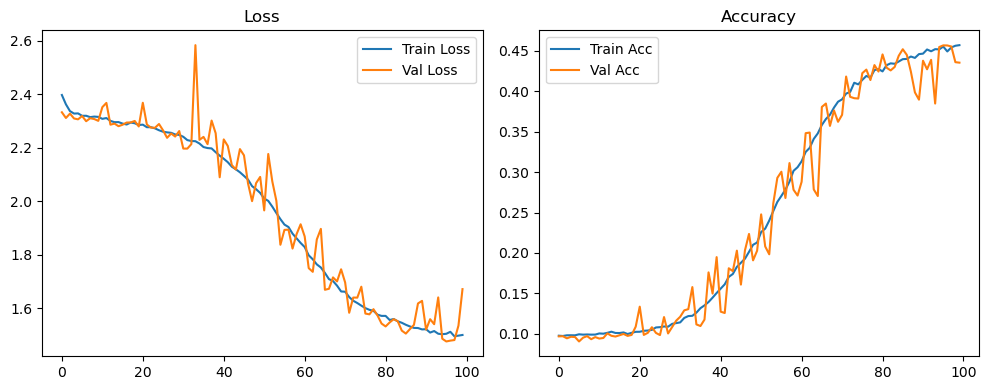

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.26it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

Original Model Final Test Loss: 1.6588 Accuracy: 0.4416


🚀 Running: batch128_lr_max_0.0002_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0959 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0959 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0959 |:   1%|          | 1/100 [01:17<2:08:26, 77.85s/it]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0971 |:   1%|          | 1/100 [01:34<2:08:26, 77.85s/it]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0971 |:   1%|          | 1/100 [01:34<2:08:26, 77.85s/it]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [01:34<1:08:21, 41.85s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [01:51<1:08:21, 41.85s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [01:51<1:08:21, 41.85s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [01:51<49:15, 30.47s/it]  

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [02:08<49:15, 30.47s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [02:08<49:15, 30.47s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   4%|▍         | 4/100 [02:08<40:11, 25.12s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0964 |:   4%|▍         | 4/100 [02:25<40:11, 25.12s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0964 |:   4%|▍         | 4/100 [02:25<40:11, 25.12s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [02:25<35:07, 22.19s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:41<35:07, 22.19s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:41<35:07, 22.19s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [02:42<31:50, 20.33s/it]

| LR: 0.000198 | Train Acc: 0.0985 | Val Acc: 0.0947 |:   6%|▌         | 6/100 [02:58<31:50, 20.33s/it]

| LR: 0.000198 | Train Acc: 0.0985 | Val Acc: 0.0947 |:   6%|▌         | 6/100 [02:58<31:50, 20.33s/it]

| LR: 0.000198 | Train Acc: 0.0985 | Val Acc: 0.0947 |:   7%|▋         | 7/100 [02:58<29:42, 19.16s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [03:15<29:42, 19.16s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [03:15<29:42, 19.16s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0959 |:   8%|▊         | 8/100 [03:15<28:14, 18.41s/it]

| LR: 0.000197 | Train Acc: 0.0986 | Val Acc: 0.0949 |:   8%|▊         | 8/100 [03:32<28:14, 18.41s/it]

| LR: 0.000197 | Train Acc: 0.0986 | Val Acc: 0.0949 |:   8%|▊         | 8/100 [03:32<28:14, 18.41s/it]

| LR: 0.000197 | Train Acc: 0.0986 | Val Acc: 0.0949 |:   9%|▉         | 9/100 [03:32<27:08, 17.90s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0943 |:   9%|▉         | 9/100 [03:49<27:08, 17.90s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0943 |:   9%|▉         | 9/100 [03:49<27:08, 17.90s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0943 |:  10%|█         | 10/100 [03:49<26:19, 17.55s/it]

| LR: 0.000195 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  10%|█         | 10/100 [04:05<26:19, 17.55s/it]

| LR: 0.000195 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  10%|█         | 10/100 [04:05<26:19, 17.55s/it]

| LR: 0.000195 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  11%|█         | 11/100 [04:05<25:42, 17.33s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.1014 |:  11%|█         | 11/100 [04:22<25:42, 17.33s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.1014 |:  11%|█         | 11/100 [04:22<25:42, 17.33s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.1014 |:  12%|█▏        | 12/100 [04:22<25:10, 17.16s/it]

| LR: 0.000193 | Train Acc: 0.0995 | Val Acc: 0.1067 |:  12%|█▏        | 12/100 [04:39<25:10, 17.16s/it]

| LR: 0.000193 | Train Acc: 0.0995 | Val Acc: 0.1067 |:  12%|█▏        | 12/100 [04:39<25:10, 17.16s/it]

| LR: 0.000193 | Train Acc: 0.0995 | Val Acc: 0.1067 |:  13%|█▎        | 13/100 [04:39<24:43, 17.05s/it]

| LR: 0.000192 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [04:56<24:43, 17.05s/it]

| LR: 0.000192 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [04:56<24:43, 17.05s/it]

| LR: 0.000192 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  14%|█▍        | 14/100 [04:56<24:16, 16.94s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0934 |:  14%|█▍        | 14/100 [05:12<24:16, 16.94s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0934 |:  14%|█▍        | 14/100 [05:12<24:16, 16.94s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0934 |:  15%|█▌        | 15/100 [05:12<23:54, 16.87s/it]

| LR: 0.000189 | Train Acc: 0.1003 | Val Acc: 0.0982 |:  15%|█▌        | 15/100 [05:29<23:54, 16.87s/it]

| LR: 0.000189 | Train Acc: 0.1003 | Val Acc: 0.0982 |:  15%|█▌        | 15/100 [05:29<23:54, 16.87s/it]

| LR: 0.000189 | Train Acc: 0.1003 | Val Acc: 0.0982 |:  16%|█▌        | 16/100 [05:29<23:33, 16.82s/it]

| LR: 0.000188 | Train Acc: 0.1026 | Val Acc: 0.1003 |:  16%|█▌        | 16/100 [05:46<23:33, 16.82s/it]

| LR: 0.000188 | Train Acc: 0.1026 | Val Acc: 0.1003 |:  16%|█▌        | 16/100 [05:46<23:33, 16.82s/it]

| LR: 0.000188 | Train Acc: 0.1026 | Val Acc: 0.1003 |:  17%|█▋        | 17/100 [05:46<23:13, 16.79s/it]

| LR: 0.000186 | Train Acc: 0.1017 | Val Acc: 0.1002 |:  17%|█▋        | 17/100 [06:02<23:13, 16.79s/it]

| LR: 0.000186 | Train Acc: 0.1017 | Val Acc: 0.1002 |:  17%|█▋        | 17/100 [06:02<23:13, 16.79s/it]

| LR: 0.000186 | Train Acc: 0.1017 | Val Acc: 0.1002 |:  18%|█▊        | 18/100 [06:02<22:50, 16.72s/it]

| LR: 0.000185 | Train Acc: 0.1023 | Val Acc: 0.1033 |:  18%|█▊        | 18/100 [06:19<22:50, 16.72s/it]

| LR: 0.000185 | Train Acc: 0.1023 | Val Acc: 0.1033 |:  18%|█▊        | 18/100 [06:19<22:50, 16.72s/it]

| LR: 0.000185 | Train Acc: 0.1023 | Val Acc: 0.1033 |:  19%|█▉        | 19/100 [06:19<22:33, 16.71s/it]

| LR: 0.000183 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  19%|█▉        | 19/100 [06:36<22:33, 16.71s/it]

| LR: 0.000183 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  19%|█▉        | 19/100 [06:36<22:33, 16.71s/it]

| LR: 0.000183 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  20%|██        | 20/100 [06:36<22:18, 16.73s/it]

| LR: 0.000181 | Train Acc: 0.1028 | Val Acc: 0.0996 |:  20%|██        | 20/100 [06:53<22:18, 16.73s/it]

| LR: 0.000181 | Train Acc: 0.1028 | Val Acc: 0.0996 |:  20%|██        | 20/100 [06:53<22:18, 16.73s/it]

| LR: 0.000181 | Train Acc: 0.1028 | Val Acc: 0.0996 |:  21%|██        | 21/100 [06:53<22:02, 16.74s/it]

| LR: 0.000179 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000179 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000179 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  22%|██▏       | 22/100 [07:09<21:47, 16.77s/it]

| LR: 0.000177 | Train Acc: 0.1027 | Val Acc: 0.0992 |:  22%|██▏       | 22/100 [07:26<21:47, 16.77s/it]

| LR: 0.000177 | Train Acc: 0.1027 | Val Acc: 0.0992 |:  22%|██▏       | 22/100 [07:26<21:47, 16.77s/it]

| LR: 0.000177 | Train Acc: 0.1027 | Val Acc: 0.0992 |:  23%|██▎       | 23/100 [07:26<21:29, 16.74s/it]

| LR: 0.000175 | Train Acc: 0.1029 | Val Acc: 0.1003 |:  23%|██▎       | 23/100 [07:43<21:29, 16.74s/it]

| LR: 0.000175 | Train Acc: 0.1029 | Val Acc: 0.1003 |:  23%|██▎       | 23/100 [07:43<21:29, 16.74s/it]

| LR: 0.000175 | Train Acc: 0.1029 | Val Acc: 0.1003 |:  24%|██▍       | 24/100 [07:43<21:10, 16.71s/it]

| LR: 0.000173 | Train Acc: 0.1029 | Val Acc: 0.0992 |:  24%|██▍       | 24/100 [08:00<21:10, 16.71s/it]

| LR: 0.000173 | Train Acc: 0.1029 | Val Acc: 0.0992 |:  24%|██▍       | 24/100 [08:00<21:10, 16.71s/it]

| LR: 0.000173 | Train Acc: 0.1029 | Val Acc: 0.0992 |:  25%|██▌       | 25/100 [08:00<20:55, 16.74s/it]

| LR: 0.000171 | Train Acc: 0.1042 | Val Acc: 0.1009 |:  25%|██▌       | 25/100 [08:16<20:55, 16.74s/it]

| LR: 0.000171 | Train Acc: 0.1042 | Val Acc: 0.1009 |:  25%|██▌       | 25/100 [08:16<20:55, 16.74s/it]

| LR: 0.000171 | Train Acc: 0.1042 | Val Acc: 0.1009 |:  26%|██▌       | 26/100 [08:16<20:38, 16.74s/it]

| LR: 0.000169 | Train Acc: 0.1056 | Val Acc: 0.1085 |:  26%|██▌       | 26/100 [08:33<20:38, 16.74s/it]

| LR: 0.000169 | Train Acc: 0.1056 | Val Acc: 0.1085 |:  26%|██▌       | 26/100 [08:33<20:38, 16.74s/it]

| LR: 0.000169 | Train Acc: 0.1056 | Val Acc: 0.1085 |:  27%|██▋       | 27/100 [08:33<20:21, 16.74s/it]

| LR: 0.000166 | Train Acc: 0.1069 | Val Acc: 0.1037 |:  27%|██▋       | 27/100 [08:50<20:21, 16.74s/it]

| LR: 0.000166 | Train Acc: 0.1069 | Val Acc: 0.1037 |:  27%|██▋       | 27/100 [08:50<20:21, 16.74s/it]

| LR: 0.000166 | Train Acc: 0.1069 | Val Acc: 0.1037 |:  28%|██▊       | 28/100 [08:50<20:07, 16.77s/it]

| LR: 0.000164 | Train Acc: 0.1075 | Val Acc: 0.0996 |:  28%|██▊       | 28/100 [09:07<20:07, 16.77s/it]

| LR: 0.000164 | Train Acc: 0.1075 | Val Acc: 0.0996 |:  28%|██▊       | 28/100 [09:07<20:07, 16.77s/it]

| LR: 0.000164 | Train Acc: 0.1075 | Val Acc: 0.0996 |:  29%|██▉       | 29/100 [09:07<19:51, 16.78s/it]

| LR: 0.000161 | Train Acc: 0.1057 | Val Acc: 0.1081 |:  29%|██▉       | 29/100 [09:23<19:51, 16.78s/it]

| LR: 0.000161 | Train Acc: 0.1057 | Val Acc: 0.1081 |:  29%|██▉       | 29/100 [09:23<19:51, 16.78s/it]

| LR: 0.000161 | Train Acc: 0.1057 | Val Acc: 0.1081 |:  30%|███       | 30/100 [09:24<19:34, 16.78s/it]

| LR: 0.000159 | Train Acc: 0.1086 | Val Acc: 0.0954 |:  30%|███       | 30/100 [09:40<19:34, 16.78s/it]

| LR: 0.000159 | Train Acc: 0.1086 | Val Acc: 0.0954 |:  30%|███       | 30/100 [09:40<19:34, 16.78s/it]

| LR: 0.000159 | Train Acc: 0.1086 | Val Acc: 0.0954 |:  31%|███       | 31/100 [09:40<19:17, 16.77s/it]

| LR: 0.000156 | Train Acc: 0.1123 | Val Acc: 0.1129 |:  31%|███       | 31/100 [09:57<19:17, 16.77s/it]

| LR: 0.000156 | Train Acc: 0.1123 | Val Acc: 0.1129 |:  31%|███       | 31/100 [09:57<19:17, 16.77s/it]

| LR: 0.000156 | Train Acc: 0.1123 | Val Acc: 0.1129 |:  32%|███▏      | 32/100 [09:57<19:01, 16.79s/it]

| LR: 0.000154 | Train Acc: 0.1131 | Val Acc: 0.1110 |:  32%|███▏      | 32/100 [10:14<19:01, 16.79s/it]

| LR: 0.000154 | Train Acc: 0.1131 | Val Acc: 0.1110 |:  32%|███▏      | 32/100 [10:14<19:01, 16.79s/it]

| LR: 0.000154 | Train Acc: 0.1131 | Val Acc: 0.1110 |:  33%|███▎      | 33/100 [10:14<18:43, 16.77s/it]

| LR: 0.000151 | Train Acc: 0.1168 | Val Acc: 0.1266 |:  33%|███▎      | 33/100 [10:31<18:43, 16.77s/it]

| LR: 0.000151 | Train Acc: 0.1168 | Val Acc: 0.1266 |:  33%|███▎      | 33/100 [10:31<18:43, 16.77s/it]

| LR: 0.000151 | Train Acc: 0.1168 | Val Acc: 0.1266 |:  34%|███▍      | 34/100 [10:31<18:27, 16.78s/it]

| LR: 0.000148 | Train Acc: 0.1195 | Val Acc: 0.1047 |:  34%|███▍      | 34/100 [10:47<18:27, 16.78s/it]

| LR: 0.000148 | Train Acc: 0.1195 | Val Acc: 0.1047 |:  34%|███▍      | 34/100 [10:47<18:27, 16.78s/it]

| LR: 0.000148 | Train Acc: 0.1195 | Val Acc: 0.1047 |:  35%|███▌      | 35/100 [10:47<18:08, 16.75s/it]

| LR: 0.000146 | Train Acc: 0.1240 | Val Acc: 0.1074 |:  35%|███▌      | 35/100 [11:04<18:08, 16.75s/it]

| LR: 0.000146 | Train Acc: 0.1240 | Val Acc: 0.1074 |:  35%|███▌      | 35/100 [11:04<18:08, 16.75s/it]

| LR: 0.000146 | Train Acc: 0.1240 | Val Acc: 0.1074 |:  36%|███▌      | 36/100 [11:04<17:53, 16.77s/it]

| LR: 0.000143 | Train Acc: 0.1226 | Val Acc: 0.1248 |:  36%|███▌      | 36/100 [11:21<17:53, 16.77s/it]

| LR: 0.000143 | Train Acc: 0.1226 | Val Acc: 0.1248 |:  36%|███▌      | 36/100 [11:21<17:53, 16.77s/it]

| LR: 0.000143 | Train Acc: 0.1226 | Val Acc: 0.1248 |:  37%|███▋      | 37/100 [11:21<17:38, 16.80s/it]

| LR: 0.000140 | Train Acc: 0.1286 | Val Acc: 0.1179 |:  37%|███▋      | 37/100 [11:38<17:38, 16.80s/it]

| LR: 0.000140 | Train Acc: 0.1286 | Val Acc: 0.1179 |:  37%|███▋      | 37/100 [11:38<17:38, 16.80s/it]

| LR: 0.000140 | Train Acc: 0.1286 | Val Acc: 0.1179 |:  38%|███▊      | 38/100 [11:38<17:22, 16.81s/it]

| LR: 0.000137 | Train Acc: 0.1292 | Val Acc: 0.1324 |:  38%|███▊      | 38/100 [11:54<17:22, 16.81s/it]

| LR: 0.000137 | Train Acc: 0.1292 | Val Acc: 0.1324 |:  38%|███▊      | 38/100 [11:54<17:22, 16.81s/it]

| LR: 0.000137 | Train Acc: 0.1292 | Val Acc: 0.1324 |:  39%|███▉      | 39/100 [11:55<17:03, 16.78s/it]

| LR: 0.000134 | Train Acc: 0.1378 | Val Acc: 0.1292 |:  39%|███▉      | 39/100 [12:11<17:03, 16.78s/it]

| LR: 0.000134 | Train Acc: 0.1378 | Val Acc: 0.1292 |:  39%|███▉      | 39/100 [12:11<17:03, 16.78s/it]

| LR: 0.000134 | Train Acc: 0.1378 | Val Acc: 0.1292 |:  40%|████      | 40/100 [12:11<16:46, 16.78s/it]

| LR: 0.000131 | Train Acc: 0.1399 | Val Acc: 0.1240 |:  40%|████      | 40/100 [12:28<16:46, 16.78s/it]

| LR: 0.000131 | Train Acc: 0.1399 | Val Acc: 0.1240 |:  40%|████      | 40/100 [12:28<16:46, 16.78s/it]

| LR: 0.000131 | Train Acc: 0.1399 | Val Acc: 0.1240 |:  41%|████      | 41/100 [12:28<16:29, 16.77s/it]

| LR: 0.000128 | Train Acc: 0.1469 | Val Acc: 0.1409 |:  41%|████      | 41/100 [12:45<16:29, 16.77s/it]

| LR: 0.000128 | Train Acc: 0.1469 | Val Acc: 0.1409 |:  41%|████      | 41/100 [12:45<16:29, 16.77s/it]

| LR: 0.000128 | Train Acc: 0.1469 | Val Acc: 0.1409 |:  42%|████▏     | 42/100 [12:45<16:14, 16.81s/it]

| LR: 0.000125 | Train Acc: 0.1513 | Val Acc: 0.1324 |:  42%|████▏     | 42/100 [13:02<16:14, 16.81s/it]

| LR: 0.000125 | Train Acc: 0.1513 | Val Acc: 0.1324 |:  42%|████▏     | 42/100 [13:02<16:14, 16.81s/it]

| LR: 0.000125 | Train Acc: 0.1513 | Val Acc: 0.1324 |:  43%|████▎     | 43/100 [13:02<15:59, 16.83s/it]

| LR: 0.000122 | Train Acc: 0.1553 | Val Acc: 0.1379 |:  43%|████▎     | 43/100 [13:19<15:59, 16.83s/it]

| LR: 0.000122 | Train Acc: 0.1553 | Val Acc: 0.1379 |:  43%|████▎     | 43/100 [13:19<15:59, 16.83s/it]

| LR: 0.000122 | Train Acc: 0.1553 | Val Acc: 0.1379 |:  44%|████▍     | 44/100 [13:19<15:40, 16.80s/it]

| LR: 0.000119 | Train Acc: 0.1618 | Val Acc: 0.1587 |:  44%|████▍     | 44/100 [13:35<15:40, 16.80s/it]

| LR: 0.000119 | Train Acc: 0.1618 | Val Acc: 0.1587 |:  44%|████▍     | 44/100 [13:35<15:40, 16.80s/it]

| LR: 0.000119 | Train Acc: 0.1618 | Val Acc: 0.1587 |:  45%|████▌     | 45/100 [13:35<15:21, 16.75s/it]

| LR: 0.000116 | Train Acc: 0.1635 | Val Acc: 0.1929 |:  45%|████▌     | 45/100 [13:52<15:21, 16.75s/it]

| LR: 0.000116 | Train Acc: 0.1635 | Val Acc: 0.1929 |:  45%|████▌     | 45/100 [13:52<15:21, 16.75s/it]

| LR: 0.000116 | Train Acc: 0.1635 | Val Acc: 0.1929 |:  46%|████▌     | 46/100 [13:52<15:05, 16.76s/it]

| LR: 0.000113 | Train Acc: 0.1691 | Val Acc: 0.1737 |:  46%|████▌     | 46/100 [14:09<15:05, 16.76s/it]

| LR: 0.000113 | Train Acc: 0.1691 | Val Acc: 0.1737 |:  46%|████▌     | 46/100 [14:09<15:05, 16.76s/it]

| LR: 0.000113 | Train Acc: 0.1691 | Val Acc: 0.1737 |:  47%|████▋     | 47/100 [14:09<14:47, 16.74s/it]

| LR: 0.000110 | Train Acc: 0.1730 | Val Acc: 0.1861 |:  47%|████▋     | 47/100 [14:25<14:47, 16.74s/it]

| LR: 0.000110 | Train Acc: 0.1730 | Val Acc: 0.1861 |:  47%|████▋     | 47/100 [14:25<14:47, 16.74s/it]

| LR: 0.000110 | Train Acc: 0.1730 | Val Acc: 0.1861 |:  48%|████▊     | 48/100 [14:25<14:28, 16.70s/it]

| LR: 0.000107 | Train Acc: 0.1769 | Val Acc: 0.2253 |:  48%|████▊     | 48/100 [14:42<14:28, 16.70s/it]

| LR: 0.000107 | Train Acc: 0.1769 | Val Acc: 0.2253 |:  48%|████▊     | 48/100 [14:42<14:28, 16.70s/it]

| LR: 0.000107 | Train Acc: 0.1769 | Val Acc: 0.2253 |:  49%|████▉     | 49/100 [14:42<14:09, 16.67s/it]

| LR: 0.000104 | Train Acc: 0.1815 | Val Acc: 0.1841 |:  49%|████▉     | 49/100 [14:59<14:09, 16.67s/it]

| LR: 0.000104 | Train Acc: 0.1815 | Val Acc: 0.1841 |:  49%|████▉     | 49/100 [14:59<14:09, 16.67s/it]

| LR: 0.000104 | Train Acc: 0.1815 | Val Acc: 0.1841 |:  50%|█████     | 50/100 [14:59<13:56, 16.72s/it]

| LR: 0.000101 | Train Acc: 0.1874 | Val Acc: 0.2149 |:  50%|█████     | 50/100 [15:15<13:56, 16.72s/it]

| LR: 0.000101 | Train Acc: 0.1874 | Val Acc: 0.2149 |:  50%|█████     | 50/100 [15:15<13:56, 16.72s/it]

| LR: 0.000101 | Train Acc: 0.1874 | Val Acc: 0.2149 |:  51%|█████     | 51/100 [15:16<13:40, 16.75s/it]

| LR: 0.000097 | Train Acc: 0.1931 | Val Acc: 0.1833 |:  51%|█████     | 51/100 [15:32<13:40, 16.75s/it]

| LR: 0.000097 | Train Acc: 0.1931 | Val Acc: 0.1833 |:  51%|█████     | 51/100 [15:32<13:40, 16.75s/it]

| LR: 0.000097 | Train Acc: 0.1931 | Val Acc: 0.1833 |:  52%|█████▏    | 52/100 [15:32<13:20, 16.69s/it]

| LR: 0.000094 | Train Acc: 0.1958 | Val Acc: 0.2313 |:  52%|█████▏    | 52/100 [15:49<13:20, 16.69s/it]

| LR: 0.000094 | Train Acc: 0.1958 | Val Acc: 0.2313 |:  52%|█████▏    | 52/100 [15:49<13:20, 16.69s/it]

| LR: 0.000094 | Train Acc: 0.1958 | Val Acc: 0.2313 |:  53%|█████▎    | 53/100 [15:49<13:03, 16.68s/it]

| LR: 0.000091 | Train Acc: 0.2056 | Val Acc: 0.1709 |:  53%|█████▎    | 53/100 [16:06<13:03, 16.68s/it]

| LR: 0.000091 | Train Acc: 0.2056 | Val Acc: 0.1709 |:  53%|█████▎    | 53/100 [16:06<13:03, 16.68s/it]

| LR: 0.000091 | Train Acc: 0.2056 | Val Acc: 0.1709 |:  54%|█████▍    | 54/100 [16:06<12:50, 16.75s/it]

| LR: 0.000088 | Train Acc: 0.2082 | Val Acc: 0.2279 |:  54%|█████▍    | 54/100 [16:22<12:50, 16.75s/it]

| LR: 0.000088 | Train Acc: 0.2082 | Val Acc: 0.2279 |:  54%|█████▍    | 54/100 [16:22<12:50, 16.75s/it]

| LR: 0.000088 | Train Acc: 0.2082 | Val Acc: 0.2279 |:  55%|█████▌    | 55/100 [16:22<12:33, 16.75s/it]

| LR: 0.000085 | Train Acc: 0.2137 | Val Acc: 0.1518 |:  55%|█████▌    | 55/100 [16:39<12:33, 16.75s/it]

| LR: 0.000085 | Train Acc: 0.2137 | Val Acc: 0.1518 |:  55%|█████▌    | 55/100 [16:39<12:33, 16.75s/it]

| LR: 0.000085 | Train Acc: 0.2137 | Val Acc: 0.1518 |:  56%|█████▌    | 56/100 [16:39<12:16, 16.74s/it]

| LR: 0.000082 | Train Acc: 0.2153 | Val Acc: 0.2169 |:  56%|█████▌    | 56/100 [16:56<12:16, 16.74s/it]

| LR: 0.000082 | Train Acc: 0.2153 | Val Acc: 0.2169 |:  56%|█████▌    | 56/100 [16:56<12:16, 16.74s/it]

| LR: 0.000082 | Train Acc: 0.2153 | Val Acc: 0.2169 |:  57%|█████▋    | 57/100 [16:56<12:00, 16.75s/it]

| LR: 0.000079 | Train Acc: 0.2243 | Val Acc: 0.2325 |:  57%|█████▋    | 57/100 [17:12<12:00, 16.75s/it]

| LR: 0.000079 | Train Acc: 0.2243 | Val Acc: 0.2325 |:  57%|█████▋    | 57/100 [17:12<12:00, 16.75s/it]

| LR: 0.000079 | Train Acc: 0.2243 | Val Acc: 0.2325 |:  58%|█████▊    | 58/100 [17:13<11:41, 16.70s/it]

| LR: 0.000076 | Train Acc: 0.2279 | Val Acc: 0.2644 |:  58%|█████▊    | 58/100 [17:29<11:41, 16.70s/it]

| LR: 0.000076 | Train Acc: 0.2279 | Val Acc: 0.2644 |:  58%|█████▊    | 58/100 [17:29<11:41, 16.70s/it]

| LR: 0.000076 | Train Acc: 0.2279 | Val Acc: 0.2644 |:  59%|█████▉    | 59/100 [17:29<11:25, 16.71s/it]

| LR: 0.000073 | Train Acc: 0.2385 | Val Acc: 0.2282 |:  59%|█████▉    | 59/100 [17:46<11:25, 16.71s/it]

| LR: 0.000073 | Train Acc: 0.2385 | Val Acc: 0.2282 |:  59%|█████▉    | 59/100 [17:46<11:25, 16.71s/it]

| LR: 0.000073 | Train Acc: 0.2385 | Val Acc: 0.2282 |:  60%|██████    | 60/100 [17:46<11:09, 16.73s/it]

| LR: 0.000070 | Train Acc: 0.2402 | Val Acc: 0.2487 |:  60%|██████    | 60/100 [18:03<11:09, 16.73s/it]

| LR: 0.000070 | Train Acc: 0.2402 | Val Acc: 0.2487 |:  60%|██████    | 60/100 [18:03<11:09, 16.73s/it]

| LR: 0.000070 | Train Acc: 0.2402 | Val Acc: 0.2487 |:  61%|██████    | 61/100 [18:03<10:52, 16.74s/it]

| LR: 0.000067 | Train Acc: 0.2495 | Val Acc: 0.2883 |:  61%|██████    | 61/100 [18:20<10:52, 16.74s/it]

| LR: 0.000067 | Train Acc: 0.2495 | Val Acc: 0.2883 |:  61%|██████    | 61/100 [18:20<10:52, 16.74s/it]

| LR: 0.000067 | Train Acc: 0.2495 | Val Acc: 0.2883 |:  62%|██████▏   | 62/100 [18:20<10:36, 16.76s/it]

| LR: 0.000064 | Train Acc: 0.2493 | Val Acc: 0.2660 |:  62%|██████▏   | 62/100 [18:36<10:36, 16.76s/it]

| LR: 0.000064 | Train Acc: 0.2493 | Val Acc: 0.2660 |:  62%|██████▏   | 62/100 [18:36<10:36, 16.76s/it]

| LR: 0.000064 | Train Acc: 0.2493 | Val Acc: 0.2660 |:  63%|██████▎   | 63/100 [18:36<10:20, 16.78s/it]

| LR: 0.000061 | Train Acc: 0.2562 | Val Acc: 0.2745 |:  63%|██████▎   | 63/100 [18:53<10:20, 16.78s/it]

| LR: 0.000061 | Train Acc: 0.2562 | Val Acc: 0.2745 |:  63%|██████▎   | 63/100 [18:53<10:20, 16.78s/it]

| LR: 0.000061 | Train Acc: 0.2562 | Val Acc: 0.2745 |:  64%|██████▍   | 64/100 [18:53<10:03, 16.76s/it]

| LR: 0.000058 | Train Acc: 0.2671 | Val Acc: 0.3052 |:  64%|██████▍   | 64/100 [19:10<10:03, 16.76s/it]

| LR: 0.000058 | Train Acc: 0.2671 | Val Acc: 0.3052 |:  64%|██████▍   | 64/100 [19:10<10:03, 16.76s/it]

| LR: 0.000058 | Train Acc: 0.2671 | Val Acc: 0.3052 |:  65%|██████▌   | 65/100 [19:10<09:46, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.2697 | Val Acc: 0.2541 |:  65%|██████▌   | 65/100 [19:26<09:46, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.2697 | Val Acc: 0.2541 |:  65%|██████▌   | 65/100 [19:26<09:46, 16.76s/it]

| LR: 0.000055 | Train Acc: 0.2697 | Val Acc: 0.2541 |:  66%|██████▌   | 66/100 [19:26<09:27, 16.70s/it]

| LR: 0.000053 | Train Acc: 0.2746 | Val Acc: 0.3003 |:  66%|██████▌   | 66/100 [19:43<09:27, 16.70s/it]

| LR: 0.000053 | Train Acc: 0.2746 | Val Acc: 0.3003 |:  66%|██████▌   | 66/100 [19:43<09:27, 16.70s/it]

| LR: 0.000053 | Train Acc: 0.2746 | Val Acc: 0.3003 |:  67%|██████▋   | 67/100 [19:43<09:10, 16.68s/it]

| LR: 0.000050 | Train Acc: 0.2797 | Val Acc: 0.2827 |:  67%|██████▋   | 67/100 [20:00<09:10, 16.68s/it]

| LR: 0.000050 | Train Acc: 0.2797 | Val Acc: 0.2827 |:  67%|██████▋   | 67/100 [20:00<09:10, 16.68s/it]

| LR: 0.000050 | Train Acc: 0.2797 | Val Acc: 0.2827 |:  68%|██████▊   | 68/100 [20:00<08:52, 16.65s/it]

| LR: 0.000047 | Train Acc: 0.2869 | Val Acc: 0.3150 |:  68%|██████▊   | 68/100 [20:16<08:52, 16.65s/it]

| LR: 0.000047 | Train Acc: 0.2869 | Val Acc: 0.3150 |:  68%|██████▊   | 68/100 [20:16<08:52, 16.65s/it]

| LR: 0.000047 | Train Acc: 0.2869 | Val Acc: 0.3150 |:  69%|██████▉   | 69/100 [20:16<08:37, 16.69s/it]

| LR: 0.000045 | Train Acc: 0.2888 | Val Acc: 0.3124 |:  69%|██████▉   | 69/100 [20:33<08:37, 16.69s/it]

| LR: 0.000045 | Train Acc: 0.2888 | Val Acc: 0.3124 |:  69%|██████▉   | 69/100 [20:33<08:37, 16.69s/it]

| LR: 0.000045 | Train Acc: 0.2888 | Val Acc: 0.3124 |:  70%|███████   | 70/100 [20:33<08:19, 16.66s/it]

| LR: 0.000042 | Train Acc: 0.2932 | Val Acc: 0.2828 |:  70%|███████   | 70/100 [20:50<08:19, 16.66s/it]

| LR: 0.000042 | Train Acc: 0.2932 | Val Acc: 0.2828 |:  70%|███████   | 70/100 [20:50<08:19, 16.66s/it]

| LR: 0.000042 | Train Acc: 0.2932 | Val Acc: 0.2828 |:  71%|███████   | 71/100 [20:50<08:05, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.2962 | Val Acc: 0.3209 |:  71%|███████   | 71/100 [21:07<08:05, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.2962 | Val Acc: 0.3209 |:  71%|███████   | 71/100 [21:07<08:05, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.2962 | Val Acc: 0.3209 |:  72%|███████▏  | 72/100 [21:07<07:49, 16.77s/it]

| LR: 0.000037 | Train Acc: 0.3012 | Val Acc: 0.3438 |:  72%|███████▏  | 72/100 [21:23<07:49, 16.77s/it]

| LR: 0.000037 | Train Acc: 0.3012 | Val Acc: 0.3438 |:  72%|███████▏  | 72/100 [21:23<07:49, 16.77s/it]

| LR: 0.000037 | Train Acc: 0.3012 | Val Acc: 0.3438 |:  73%|███████▎  | 73/100 [21:24<07:32, 16.75s/it]

| LR: 0.000035 | Train Acc: 0.3088 | Val Acc: 0.3201 |:  73%|███████▎  | 73/100 [21:40<07:32, 16.75s/it]

| LR: 0.000035 | Train Acc: 0.3088 | Val Acc: 0.3201 |:  73%|███████▎  | 73/100 [21:40<07:32, 16.75s/it]

| LR: 0.000035 | Train Acc: 0.3088 | Val Acc: 0.3201 |:  74%|███████▍  | 74/100 [21:40<07:14, 16.71s/it]

| LR: 0.000032 | Train Acc: 0.3112 | Val Acc: 0.3358 |:  74%|███████▍  | 74/100 [21:57<07:14, 16.71s/it]

| LR: 0.000032 | Train Acc: 0.3112 | Val Acc: 0.3358 |:  74%|███████▍  | 74/100 [21:57<07:14, 16.71s/it]

| LR: 0.000032 | Train Acc: 0.3112 | Val Acc: 0.3358 |:  75%|███████▌  | 75/100 [21:57<06:57, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.3210 | Val Acc: 0.3536 |:  75%|███████▌  | 75/100 [22:13<06:57, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.3210 | Val Acc: 0.3536 |:  75%|███████▌  | 75/100 [22:13<06:57, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.3210 | Val Acc: 0.3536 |:  76%|███████▌  | 76/100 [22:14<06:40, 16.71s/it]

| LR: 0.000028 | Train Acc: 0.3254 | Val Acc: 0.3354 |:  76%|███████▌  | 76/100 [22:30<06:40, 16.71s/it]

| LR: 0.000028 | Train Acc: 0.3254 | Val Acc: 0.3354 |:  76%|███████▌  | 76/100 [22:30<06:40, 16.71s/it]

| LR: 0.000028 | Train Acc: 0.3254 | Val Acc: 0.3354 |:  77%|███████▋  | 77/100 [22:30<06:23, 16.66s/it]

| LR: 0.000026 | Train Acc: 0.3243 | Val Acc: 0.3512 |:  77%|███████▋  | 77/100 [22:47<06:23, 16.66s/it]

| LR: 0.000026 | Train Acc: 0.3243 | Val Acc: 0.3512 |:  77%|███████▋  | 77/100 [22:47<06:23, 16.66s/it]

| LR: 0.000026 | Train Acc: 0.3243 | Val Acc: 0.3512 |:  78%|███████▊  | 78/100 [22:47<06:06, 16.67s/it]

| LR: 0.000024 | Train Acc: 0.3319 | Val Acc: 0.3468 |:  78%|███████▊  | 78/100 [23:03<06:06, 16.67s/it]

| LR: 0.000024 | Train Acc: 0.3319 | Val Acc: 0.3468 |:  78%|███████▊  | 78/100 [23:03<06:06, 16.67s/it]

| LR: 0.000024 | Train Acc: 0.3319 | Val Acc: 0.3468 |:  79%|███████▉  | 79/100 [23:04<05:50, 16.71s/it]

| LR: 0.000022 | Train Acc: 0.3311 | Val Acc: 0.3703 |:  79%|███████▉  | 79/100 [23:20<05:50, 16.71s/it]

| LR: 0.000022 | Train Acc: 0.3311 | Val Acc: 0.3703 |:  79%|███████▉  | 79/100 [23:20<05:50, 16.71s/it]

| LR: 0.000022 | Train Acc: 0.3311 | Val Acc: 0.3703 |:  80%|████████  | 80/100 [23:20<05:34, 16.73s/it]

| LR: 0.000020 | Train Acc: 0.3370 | Val Acc: 0.3772 |:  80%|████████  | 80/100 [23:37<05:34, 16.73s/it]

| LR: 0.000020 | Train Acc: 0.3370 | Val Acc: 0.3772 |:  80%|████████  | 80/100 [23:37<05:34, 16.73s/it]

| LR: 0.000020 | Train Acc: 0.3370 | Val Acc: 0.3772 |:  81%|████████  | 81/100 [23:37<05:17, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.3361 | Val Acc: 0.3621 |:  81%|████████  | 81/100 [23:54<05:17, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.3361 | Val Acc: 0.3621 |:  81%|████████  | 81/100 [23:54<05:17, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.3361 | Val Acc: 0.3621 |:  82%|████████▏ | 82/100 [23:54<05:01, 16.73s/it]

| LR: 0.000016 | Train Acc: 0.3431 | Val Acc: 0.3599 |:  82%|████████▏ | 82/100 [24:11<05:01, 16.73s/it]

| LR: 0.000016 | Train Acc: 0.3431 | Val Acc: 0.3599 |:  82%|████████▏ | 82/100 [24:11<05:01, 16.73s/it]

| LR: 0.000016 | Train Acc: 0.3431 | Val Acc: 0.3599 |:  83%|████████▎ | 83/100 [24:11<04:44, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.3440 | Val Acc: 0.3726 |:  83%|████████▎ | 83/100 [24:27<04:44, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.3440 | Val Acc: 0.3726 |:  83%|████████▎ | 83/100 [24:27<04:44, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.3440 | Val Acc: 0.3726 |:  84%|████████▍ | 84/100 [24:27<04:27, 16.73s/it]

| LR: 0.000013 | Train Acc: 0.3444 | Val Acc: 0.3729 |:  84%|████████▍ | 84/100 [24:44<04:27, 16.73s/it]

| LR: 0.000013 | Train Acc: 0.3444 | Val Acc: 0.3729 |:  84%|████████▍ | 84/100 [24:44<04:27, 16.73s/it]

| LR: 0.000013 | Train Acc: 0.3444 | Val Acc: 0.3729 |:  85%|████████▌ | 85/100 [24:44<04:10, 16.73s/it]

| LR: 0.000012 | Train Acc: 0.3519 | Val Acc: 0.3369 |:  85%|████████▌ | 85/100 [25:01<04:10, 16.73s/it]

| LR: 0.000012 | Train Acc: 0.3519 | Val Acc: 0.3369 |:  85%|████████▌ | 85/100 [25:01<04:10, 16.73s/it]

| LR: 0.000012 | Train Acc: 0.3519 | Val Acc: 0.3369 |:  86%|████████▌ | 86/100 [25:01<03:54, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.3503 | Val Acc: 0.3714 |:  86%|████████▌ | 86/100 [25:17<03:54, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.3503 | Val Acc: 0.3714 |:  86%|████████▌ | 86/100 [25:17<03:54, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.3503 | Val Acc: 0.3714 |:  87%|████████▋ | 87/100 [25:17<03:37, 16.71s/it]

| LR: 0.000009 | Train Acc: 0.3507 | Val Acc: 0.3614 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.71s/it]

| LR: 0.000009 | Train Acc: 0.3507 | Val Acc: 0.3614 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.71s/it]

| LR: 0.000009 | Train Acc: 0.3507 | Val Acc: 0.3614 |:  88%|████████▊ | 88/100 [25:34<03:20, 16.75s/it]

| LR: 0.000008 | Train Acc: 0.3483 | Val Acc: 0.3759 |:  88%|████████▊ | 88/100 [25:51<03:20, 16.75s/it]

| LR: 0.000008 | Train Acc: 0.3483 | Val Acc: 0.3759 |:  88%|████████▊ | 88/100 [25:51<03:20, 16.75s/it]

| LR: 0.000008 | Train Acc: 0.3483 | Val Acc: 0.3759 |:  89%|████████▉ | 89/100 [25:51<03:04, 16.75s/it]

| LR: 0.000007 | Train Acc: 0.3543 | Val Acc: 0.3796 |:  89%|████████▉ | 89/100 [26:08<03:04, 16.75s/it]

| LR: 0.000007 | Train Acc: 0.3543 | Val Acc: 0.3796 |:  89%|████████▉ | 89/100 [26:08<03:04, 16.75s/it]

| LR: 0.000007 | Train Acc: 0.3543 | Val Acc: 0.3796 |:  90%|█████████ | 90/100 [26:08<02:47, 16.77s/it]

| LR: 0.000006 | Train Acc: 0.3579 | Val Acc: 0.3870 |:  90%|█████████ | 90/100 [26:25<02:47, 16.77s/it]

| LR: 0.000006 | Train Acc: 0.3579 | Val Acc: 0.3870 |:  90%|█████████ | 90/100 [26:25<02:47, 16.77s/it]

| LR: 0.000006 | Train Acc: 0.3579 | Val Acc: 0.3870 |:  91%|█████████ | 91/100 [26:25<02:31, 16.79s/it]

| LR: 0.000005 | Train Acc: 0.3554 | Val Acc: 0.3892 |:  91%|█████████ | 91/100 [26:41<02:31, 16.79s/it]

| LR: 0.000005 | Train Acc: 0.3554 | Val Acc: 0.3892 |:  91%|█████████ | 91/100 [26:41<02:31, 16.79s/it]

| LR: 0.000005 | Train Acc: 0.3554 | Val Acc: 0.3892 |:  92%|█████████▏| 92/100 [26:41<02:14, 16.77s/it]

| LR: 0.000004 | Train Acc: 0.3529 | Val Acc: 0.3553 |:  92%|█████████▏| 92/100 [26:58<02:14, 16.77s/it]

| LR: 0.000004 | Train Acc: 0.3529 | Val Acc: 0.3553 |:  92%|█████████▏| 92/100 [26:58<02:14, 16.77s/it]

| LR: 0.000004 | Train Acc: 0.3529 | Val Acc: 0.3553 |:  93%|█████████▎| 93/100 [26:58<01:57, 16.75s/it]

| LR: 0.000003 | Train Acc: 0.3578 | Val Acc: 0.3829 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.75s/it]

| LR: 0.000003 | Train Acc: 0.3578 | Val Acc: 0.3829 |:  93%|█████████▎| 93/100 [27:15<01:57, 16.75s/it]

| LR: 0.000003 | Train Acc: 0.3578 | Val Acc: 0.3829 |:  94%|█████████▍| 94/100 [27:15<01:40, 16.75s/it]

| LR: 0.000003 | Train Acc: 0.3628 | Val Acc: 0.3952 |:  94%|█████████▍| 94/100 [27:32<01:40, 16.75s/it]

| LR: 0.000003 | Train Acc: 0.3628 | Val Acc: 0.3952 |:  94%|█████████▍| 94/100 [27:32<01:40, 16.75s/it]

| LR: 0.000003 | Train Acc: 0.3628 | Val Acc: 0.3952 |:  95%|█████████▌| 95/100 [27:32<01:23, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.3648 | Val Acc: 0.3760 |:  95%|█████████▌| 95/100 [27:49<01:23, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.3648 | Val Acc: 0.3760 |:  95%|█████████▌| 95/100 [27:49<01:23, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.3648 | Val Acc: 0.3760 |:  96%|█████████▌| 96/100 [27:49<01:07, 16.82s/it]

| LR: 0.000002 | Train Acc: 0.3639 | Val Acc: 0.3884 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.82s/it]

| LR: 0.000002 | Train Acc: 0.3639 | Val Acc: 0.3884 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.82s/it]

| LR: 0.000002 | Train Acc: 0.3639 | Val Acc: 0.3884 |:  97%|█████████▋| 97/100 [28:06<00:50, 16.85s/it]

| LR: 0.000001 | Train Acc: 0.3590 | Val Acc: 0.3530 |:  97%|█████████▋| 97/100 [28:22<00:50, 16.85s/it]

| LR: 0.000001 | Train Acc: 0.3590 | Val Acc: 0.3530 |:  97%|█████████▋| 97/100 [28:22<00:50, 16.85s/it]

| LR: 0.000001 | Train Acc: 0.3590 | Val Acc: 0.3530 |:  98%|█████████▊| 98/100 [28:22<00:33, 16.88s/it]

| LR: 0.000001 | Train Acc: 0.3628 | Val Acc: 0.3763 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.88s/it]

| LR: 0.000001 | Train Acc: 0.3628 | Val Acc: 0.3763 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.88s/it]

| LR: 0.000001 | Train Acc: 0.3628 | Val Acc: 0.3763 |:  99%|█████████▉| 99/100 [28:39<00:16, 16.88s/it]

| LR: 0.000001 | Train Acc: 0.3648 | Val Acc: 0.3561 |:  99%|█████████▉| 99/100 [28:56<00:16, 16.88s/it]

| LR: 0.000001 | Train Acc: 0.3648 | Val Acc: 0.3561 |:  99%|█████████▉| 99/100 [28:56<00:16, 16.88s/it]

| LR: 0.000001 | Train Acc: 0.3648 | Val Acc: 0.3561 |: 100%|██████████| 100/100 [28:56<00:00, 16.80s/it]

| LR: 0.000001 | Train Acc: 0.3648 | Val Acc: 0.3561 |: 100%|██████████| 100/100 [28:56<00:00, 17.36s/it]

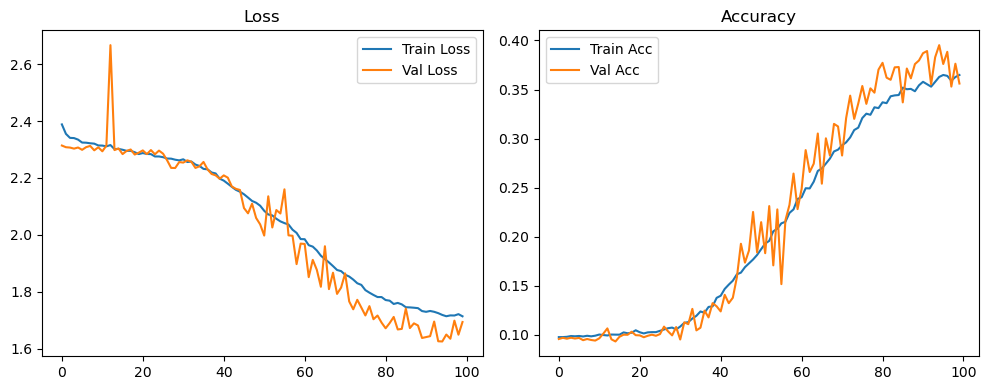

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 1.6942 Accuracy: 0.3550


🚀 Running: batch128_lr_max_0.0002_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:17<2:08:32, 77.90s/it]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:32, 77.90s/it]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:34<2:08:32, 77.90s/it]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:34<1:08:26, 41.90s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:51<1:08:26, 41.90s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:51<1:08:26, 41.90s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [01:51<49:12, 30.44s/it]  

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [02:08<49:12, 30.44s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [02:08<49:12, 30.44s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:08<40:06, 25.07s/it]

| LR: 0.000199 | Train Acc: 0.0986 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [02:24<40:06, 25.07s/it]

| LR: 0.000199 | Train Acc: 0.0986 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [02:24<40:06, 25.07s/it]

| LR: 0.000199 | Train Acc: 0.0986 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [02:24<34:52, 22.02s/it]

| LR: 0.000199 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:52, 22.02s/it]

| LR: 0.000199 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:52, 22.02s/it]

| LR: 0.000199 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:41<31:44, 20.26s/it]

| LR: 0.000198 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [02:58<31:44, 20.26s/it]

| LR: 0.000198 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [02:58<31:44, 20.26s/it]

| LR: 0.000198 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [02:58<29:34, 19.08s/it]

| LR: 0.000198 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:15<29:34, 19.08s/it]

| LR: 0.000198 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:15<29:34, 19.08s/it]

| LR: 0.000198 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:15<28:08, 18.35s/it]

| LR: 0.000197 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<28:08, 18.35s/it]

| LR: 0.000197 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:31<28:08, 18.35s/it]

| LR: 0.000197 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [03:31<27:07, 17.88s/it]

| LR: 0.000196 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [03:48<27:07, 17.88s/it]

| LR: 0.000196 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [03:48<27:07, 17.88s/it]

| LR: 0.000196 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  10%|█         | 10/100 [03:48<26:18, 17.54s/it]

| LR: 0.000195 | Train Acc: 0.0989 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:05<26:18, 17.54s/it]

| LR: 0.000195 | Train Acc: 0.0989 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:05<26:18, 17.54s/it]

| LR: 0.000195 | Train Acc: 0.0989 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:05<25:40, 17.31s/it]

| LR: 0.000194 | Train Acc: 0.0988 | Val Acc: 0.0971 |:  11%|█         | 11/100 [04:22<25:40, 17.31s/it]

| LR: 0.000194 | Train Acc: 0.0988 | Val Acc: 0.0971 |:  11%|█         | 11/100 [04:22<25:40, 17.31s/it]

| LR: 0.000194 | Train Acc: 0.0988 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [04:22<25:11, 17.18s/it]

| LR: 0.000193 | Train Acc: 0.0986 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [04:39<25:11, 17.18s/it]

| LR: 0.000193 | Train Acc: 0.0986 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [04:39<25:11, 17.18s/it]

| LR: 0.000193 | Train Acc: 0.0986 | Val Acc: 0.0969 |:  13%|█▎        | 13/100 [04:39<24:43, 17.05s/it]

| LR: 0.000192 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [04:55<24:43, 17.05s/it]

| LR: 0.000192 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [04:55<24:43, 17.05s/it]

| LR: 0.000192 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [04:55<24:18, 16.96s/it]

| LR: 0.000191 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:12<24:18, 16.96s/it]

| LR: 0.000191 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:12<24:18, 16.96s/it]

| LR: 0.000191 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:12<23:55, 16.89s/it]

| LR: 0.000189 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [05:29<23:55, 16.89s/it]

| LR: 0.000189 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [05:29<23:55, 16.89s/it]

| LR: 0.000189 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  16%|█▌        | 16/100 [05:29<23:34, 16.84s/it]

| LR: 0.000188 | Train Acc: 0.0988 | Val Acc: 0.0944 |:  16%|█▌        | 16/100 [05:45<23:34, 16.84s/it]

| LR: 0.000188 | Train Acc: 0.0988 | Val Acc: 0.0944 |:  16%|█▌        | 16/100 [05:45<23:34, 16.84s/it]

| LR: 0.000188 | Train Acc: 0.0988 | Val Acc: 0.0944 |:  17%|█▋        | 17/100 [05:46<23:13, 16.79s/it]

| LR: 0.000186 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:02<23:13, 16.79s/it]

| LR: 0.000186 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:02<23:13, 16.79s/it]

| LR: 0.000186 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [06:02<22:49, 16.70s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [06:19<22:49, 16.70s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [06:19<22:49, 16.70s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  19%|█▉        | 19/100 [06:19<22:36, 16.74s/it]

| LR: 0.000183 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [06:36<22:36, 16.74s/it]

| LR: 0.000183 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [06:36<22:36, 16.74s/it]

| LR: 0.000183 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  20%|██        | 20/100 [06:36<22:22, 16.78s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  20%|██        | 20/100 [06:53<22:22, 16.78s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  20%|██        | 20/100 [06:53<22:22, 16.78s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  21%|██        | 21/100 [06:53<22:06, 16.79s/it]

| LR: 0.000179 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  21%|██        | 21/100 [07:09<22:06, 16.79s/it]

| LR: 0.000179 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  21%|██        | 21/100 [07:09<22:06, 16.79s/it]

| LR: 0.000179 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  22%|██▏       | 22/100 [07:09<21:48, 16.78s/it]

| LR: 0.000177 | Train Acc: 0.0999 | Val Acc: 0.0996 |:  22%|██▏       | 22/100 [07:26<21:48, 16.78s/it]

| LR: 0.000177 | Train Acc: 0.0999 | Val Acc: 0.0996 |:  22%|██▏       | 22/100 [07:26<21:48, 16.78s/it]

| LR: 0.000177 | Train Acc: 0.0999 | Val Acc: 0.0996 |:  23%|██▎       | 23/100 [07:26<21:31, 16.78s/it]

| LR: 0.000175 | Train Acc: 0.0988 | Val Acc: 0.0978 |:  23%|██▎       | 23/100 [07:43<21:31, 16.78s/it]

| LR: 0.000175 | Train Acc: 0.0988 | Val Acc: 0.0978 |:  23%|██▎       | 23/100 [07:43<21:31, 16.78s/it]

| LR: 0.000175 | Train Acc: 0.0988 | Val Acc: 0.0978 |:  24%|██▍       | 24/100 [07:43<21:13, 16.76s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0983 |:  24%|██▍       | 24/100 [08:00<21:13, 16.76s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0983 |:  24%|██▍       | 24/100 [08:00<21:13, 16.76s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0983 |:  25%|██▌       | 25/100 [08:00<20:57, 16.76s/it]

| LR: 0.000171 | Train Acc: 0.1015 | Val Acc: 0.0978 |:  25%|██▌       | 25/100 [08:16<20:57, 16.76s/it]

| LR: 0.000171 | Train Acc: 0.1015 | Val Acc: 0.0978 |:  25%|██▌       | 25/100 [08:16<20:57, 16.76s/it]

| LR: 0.000171 | Train Acc: 0.1015 | Val Acc: 0.0978 |:  26%|██▌       | 26/100 [08:16<20:40, 16.76s/it]

| LR: 0.000169 | Train Acc: 0.1024 | Val Acc: 0.0946 |:  26%|██▌       | 26/100 [08:33<20:40, 16.76s/it]

| LR: 0.000169 | Train Acc: 0.1024 | Val Acc: 0.0946 |:  26%|██▌       | 26/100 [08:33<20:40, 16.76s/it]

| LR: 0.000169 | Train Acc: 0.1024 | Val Acc: 0.0946 |:  27%|██▋       | 27/100 [08:33<20:21, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.1029 | Val Acc: 0.0999 |:  27%|██▋       | 27/100 [08:50<20:21, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.1029 | Val Acc: 0.0999 |:  27%|██▋       | 27/100 [08:50<20:21, 16.73s/it]

| LR: 0.000166 | Train Acc: 0.1029 | Val Acc: 0.0999 |:  28%|██▊       | 28/100 [08:50<20:05, 16.74s/it]

| LR: 0.000164 | Train Acc: 0.1032 | Val Acc: 0.0989 |:  28%|██▊       | 28/100 [09:07<20:05, 16.74s/it]

| LR: 0.000164 | Train Acc: 0.1032 | Val Acc: 0.0989 |:  28%|██▊       | 28/100 [09:07<20:05, 16.74s/it]

| LR: 0.000164 | Train Acc: 0.1032 | Val Acc: 0.0989 |:  29%|██▉       | 29/100 [09:07<19:50, 16.76s/it]

| LR: 0.000161 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  29%|██▉       | 29/100 [09:23<19:50, 16.76s/it]

| LR: 0.000161 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  29%|██▉       | 29/100 [09:23<19:50, 16.76s/it]

| LR: 0.000161 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  30%|███       | 30/100 [09:23<19:33, 16.77s/it]

| LR: 0.000159 | Train Acc: 0.1028 | Val Acc: 0.1009 |:  30%|███       | 30/100 [09:40<19:33, 16.77s/it]

| LR: 0.000159 | Train Acc: 0.1028 | Val Acc: 0.1009 |:  30%|███       | 30/100 [09:40<19:33, 16.77s/it]

| LR: 0.000159 | Train Acc: 0.1028 | Val Acc: 0.1009 |:  31%|███       | 31/100 [09:40<19:18, 16.79s/it]

| LR: 0.000156 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  31%|███       | 31/100 [09:57<19:18, 16.79s/it]

| LR: 0.000156 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  31%|███       | 31/100 [09:57<19:18, 16.79s/it]

| LR: 0.000156 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  32%|███▏      | 32/100 [09:57<18:59, 16.76s/it]

| LR: 0.000154 | Train Acc: 0.1048 | Val Acc: 0.0986 |:  32%|███▏      | 32/100 [10:14<18:59, 16.76s/it]

| LR: 0.000154 | Train Acc: 0.1048 | Val Acc: 0.0986 |:  32%|███▏      | 32/100 [10:14<18:59, 16.76s/it]

| LR: 0.000154 | Train Acc: 0.1048 | Val Acc: 0.0986 |:  33%|███▎      | 33/100 [10:14<18:42, 16.75s/it]

| LR: 0.000151 | Train Acc: 0.1041 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [10:30<18:42, 16.75s/it]

| LR: 0.000151 | Train Acc: 0.1041 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [10:30<18:42, 16.75s/it]

| LR: 0.000151 | Train Acc: 0.1041 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [10:30<18:23, 16.72s/it]

| LR: 0.000148 | Train Acc: 0.1062 | Val Acc: 0.0977 |:  34%|███▍      | 34/100 [10:47<18:23, 16.72s/it]

| LR: 0.000148 | Train Acc: 0.1062 | Val Acc: 0.0977 |:  34%|███▍      | 34/100 [10:47<18:23, 16.72s/it]

| LR: 0.000148 | Train Acc: 0.1062 | Val Acc: 0.0977 |:  35%|███▌      | 35/100 [10:47<18:07, 16.73s/it]

| LR: 0.000146 | Train Acc: 0.1055 | Val Acc: 0.1001 |:  35%|███▌      | 35/100 [11:04<18:07, 16.73s/it]

| LR: 0.000146 | Train Acc: 0.1055 | Val Acc: 0.1001 |:  35%|███▌      | 35/100 [11:04<18:07, 16.73s/it]

| LR: 0.000146 | Train Acc: 0.1055 | Val Acc: 0.1001 |:  36%|███▌      | 36/100 [11:04<17:49, 16.71s/it]

| LR: 0.000143 | Train Acc: 0.1075 | Val Acc: 0.0982 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000143 | Train Acc: 0.1075 | Val Acc: 0.0982 |:  36%|███▌      | 36/100 [11:20<17:49, 16.71s/it]

| LR: 0.000143 | Train Acc: 0.1075 | Val Acc: 0.0982 |:  37%|███▋      | 37/100 [11:20<17:31, 16.69s/it]

| LR: 0.000140 | Train Acc: 0.1081 | Val Acc: 0.1047 |:  37%|███▋      | 37/100 [11:37<17:31, 16.69s/it]

| LR: 0.000140 | Train Acc: 0.1081 | Val Acc: 0.1047 |:  37%|███▋      | 37/100 [11:37<17:31, 16.69s/it]

| LR: 0.000140 | Train Acc: 0.1081 | Val Acc: 0.1047 |:  38%|███▊      | 38/100 [11:37<17:14, 16.68s/it]

| LR: 0.000137 | Train Acc: 0.1118 | Val Acc: 0.1015 |:  38%|███▊      | 38/100 [11:54<17:14, 16.68s/it]

| LR: 0.000137 | Train Acc: 0.1118 | Val Acc: 0.1015 |:  38%|███▊      | 38/100 [11:54<17:14, 16.68s/it]

| LR: 0.000137 | Train Acc: 0.1118 | Val Acc: 0.1015 |:  39%|███▉      | 39/100 [11:54<16:57, 16.68s/it]

| LR: 0.000134 | Train Acc: 0.1105 | Val Acc: 0.1032 |:  39%|███▉      | 39/100 [12:10<16:57, 16.68s/it]

| LR: 0.000134 | Train Acc: 0.1105 | Val Acc: 0.1032 |:  39%|███▉      | 39/100 [12:10<16:57, 16.68s/it]

| LR: 0.000134 | Train Acc: 0.1105 | Val Acc: 0.1032 |:  40%|████      | 40/100 [12:10<16:38, 16.64s/it]

| LR: 0.000131 | Train Acc: 0.1110 | Val Acc: 0.0996 |:  40%|████      | 40/100 [12:27<16:38, 16.64s/it]

| LR: 0.000131 | Train Acc: 0.1110 | Val Acc: 0.0996 |:  40%|████      | 40/100 [12:27<16:38, 16.64s/it]

| LR: 0.000131 | Train Acc: 0.1110 | Val Acc: 0.0996 |:  41%|████      | 41/100 [12:27<16:24, 16.69s/it]

| LR: 0.000128 | Train Acc: 0.1118 | Val Acc: 0.1000 |:  41%|████      | 41/100 [12:44<16:24, 16.69s/it]

| LR: 0.000128 | Train Acc: 0.1118 | Val Acc: 0.1000 |:  41%|████      | 41/100 [12:44<16:24, 16.69s/it]

| LR: 0.000128 | Train Acc: 0.1118 | Val Acc: 0.1000 |:  42%|████▏     | 42/100 [12:44<16:09, 16.72s/it]

| LR: 0.000125 | Train Acc: 0.1130 | Val Acc: 0.1113 |:  42%|████▏     | 42/100 [13:00<16:09, 16.72s/it]

| LR: 0.000125 | Train Acc: 0.1130 | Val Acc: 0.1113 |:  42%|████▏     | 42/100 [13:00<16:09, 16.72s/it]

| LR: 0.000125 | Train Acc: 0.1130 | Val Acc: 0.1113 |:  43%|████▎     | 43/100 [13:00<15:52, 16.71s/it]

| LR: 0.000122 | Train Acc: 0.1147 | Val Acc: 0.1062 |:  43%|████▎     | 43/100 [13:17<15:52, 16.71s/it]

| LR: 0.000122 | Train Acc: 0.1147 | Val Acc: 0.1062 |:  43%|████▎     | 43/100 [13:17<15:52, 16.71s/it]

| LR: 0.000122 | Train Acc: 0.1147 | Val Acc: 0.1062 |:  44%|████▍     | 44/100 [13:17<15:34, 16.69s/it]

| LR: 0.000119 | Train Acc: 0.1176 | Val Acc: 0.1064 |:  44%|████▍     | 44/100 [13:34<15:34, 16.69s/it]

| LR: 0.000119 | Train Acc: 0.1176 | Val Acc: 0.1064 |:  44%|████▍     | 44/100 [13:34<15:34, 16.69s/it]

| LR: 0.000119 | Train Acc: 0.1176 | Val Acc: 0.1064 |:  45%|████▌     | 45/100 [13:34<15:22, 16.77s/it]

| LR: 0.000116 | Train Acc: 0.1201 | Val Acc: 0.1027 |:  45%|████▌     | 45/100 [13:51<15:22, 16.77s/it]

| LR: 0.000116 | Train Acc: 0.1201 | Val Acc: 0.1027 |:  45%|████▌     | 45/100 [13:51<15:22, 16.77s/it]

| LR: 0.000116 | Train Acc: 0.1201 | Val Acc: 0.1027 |:  46%|████▌     | 46/100 [13:51<15:05, 16.77s/it]

| LR: 0.000113 | Train Acc: 0.1224 | Val Acc: 0.1073 |:  46%|████▌     | 46/100 [14:07<15:05, 16.77s/it]

| LR: 0.000113 | Train Acc: 0.1224 | Val Acc: 0.1073 |:  46%|████▌     | 46/100 [14:07<15:05, 16.77s/it]

| LR: 0.000113 | Train Acc: 0.1224 | Val Acc: 0.1073 |:  47%|████▋     | 47/100 [14:07<14:43, 16.68s/it]

| LR: 0.000110 | Train Acc: 0.1231 | Val Acc: 0.1054 |:  47%|████▋     | 47/100 [14:24<14:43, 16.68s/it]

| LR: 0.000110 | Train Acc: 0.1231 | Val Acc: 0.1054 |:  47%|████▋     | 47/100 [14:24<14:43, 16.68s/it]

| LR: 0.000110 | Train Acc: 0.1231 | Val Acc: 0.1054 |:  48%|████▊     | 48/100 [14:24<14:27, 16.68s/it]

| LR: 0.000107 | Train Acc: 0.1226 | Val Acc: 0.1089 |:  48%|████▊     | 48/100 [14:41<14:27, 16.68s/it]

| LR: 0.000107 | Train Acc: 0.1226 | Val Acc: 0.1089 |:  48%|████▊     | 48/100 [14:41<14:27, 16.68s/it]

| LR: 0.000107 | Train Acc: 0.1226 | Val Acc: 0.1089 |:  49%|████▉     | 49/100 [14:41<14:13, 16.73s/it]

| LR: 0.000104 | Train Acc: 0.1247 | Val Acc: 0.1036 |:  49%|████▉     | 49/100 [14:58<14:13, 16.73s/it]

| LR: 0.000104 | Train Acc: 0.1247 | Val Acc: 0.1036 |:  49%|████▉     | 49/100 [14:58<14:13, 16.73s/it]

| LR: 0.000104 | Train Acc: 0.1247 | Val Acc: 0.1036 |:  50%|█████     | 50/100 [14:58<13:56, 16.73s/it]

| LR: 0.000101 | Train Acc: 0.1287 | Val Acc: 0.1201 |:  50%|█████     | 50/100 [15:14<13:56, 16.73s/it]

| LR: 0.000101 | Train Acc: 0.1287 | Val Acc: 0.1201 |:  50%|█████     | 50/100 [15:14<13:56, 16.73s/it]

| LR: 0.000101 | Train Acc: 0.1287 | Val Acc: 0.1201 |:  51%|█████     | 51/100 [15:14<13:37, 16.68s/it]

| LR: 0.000097 | Train Acc: 0.1302 | Val Acc: 0.1066 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000097 | Train Acc: 0.1302 | Val Acc: 0.1066 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000097 | Train Acc: 0.1302 | Val Acc: 0.1066 |:  52%|█████▏    | 52/100 [15:31<13:20, 16.68s/it]

| LR: 0.000094 | Train Acc: 0.1339 | Val Acc: 0.1285 |:  52%|█████▏    | 52/100 [15:48<13:20, 16.68s/it]

| LR: 0.000094 | Train Acc: 0.1339 | Val Acc: 0.1285 |:  52%|█████▏    | 52/100 [15:48<13:20, 16.68s/it]

| LR: 0.000094 | Train Acc: 0.1339 | Val Acc: 0.1285 |:  53%|█████▎    | 53/100 [15:48<13:07, 16.76s/it]

| LR: 0.000091 | Train Acc: 0.1362 | Val Acc: 0.1346 |:  53%|█████▎    | 53/100 [16:05<13:07, 16.76s/it]

| LR: 0.000091 | Train Acc: 0.1362 | Val Acc: 0.1346 |:  53%|█████▎    | 53/100 [16:05<13:07, 16.76s/it]

| LR: 0.000091 | Train Acc: 0.1362 | Val Acc: 0.1346 |:  54%|█████▍    | 54/100 [16:05<12:52, 16.79s/it]

| LR: 0.000088 | Train Acc: 0.1389 | Val Acc: 0.1203 |:  54%|█████▍    | 54/100 [16:21<12:52, 16.79s/it]

| LR: 0.000088 | Train Acc: 0.1389 | Val Acc: 0.1203 |:  54%|█████▍    | 54/100 [16:21<12:52, 16.79s/it]

| LR: 0.000088 | Train Acc: 0.1389 | Val Acc: 0.1203 |:  55%|█████▌    | 55/100 [16:21<12:35, 16.78s/it]

| LR: 0.000085 | Train Acc: 0.1375 | Val Acc: 0.1045 |:  55%|█████▌    | 55/100 [16:38<12:35, 16.78s/it]

| LR: 0.000085 | Train Acc: 0.1375 | Val Acc: 0.1045 |:  55%|█████▌    | 55/100 [16:38<12:35, 16.78s/it]

| LR: 0.000085 | Train Acc: 0.1375 | Val Acc: 0.1045 |:  56%|█████▌    | 56/100 [16:38<12:18, 16.77s/it]

| LR: 0.000082 | Train Acc: 0.1408 | Val Acc: 0.1146 |:  56%|█████▌    | 56/100 [16:55<12:18, 16.77s/it]

| LR: 0.000082 | Train Acc: 0.1408 | Val Acc: 0.1146 |:  56%|█████▌    | 56/100 [16:55<12:18, 16.77s/it]

| LR: 0.000082 | Train Acc: 0.1408 | Val Acc: 0.1146 |:  57%|█████▋    | 57/100 [16:55<12:02, 16.80s/it]

| LR: 0.000079 | Train Acc: 0.1455 | Val Acc: 0.1253 |:  57%|█████▋    | 57/100 [17:12<12:02, 16.80s/it]

| LR: 0.000079 | Train Acc: 0.1455 | Val Acc: 0.1253 |:  57%|█████▋    | 57/100 [17:12<12:02, 16.80s/it]

| LR: 0.000079 | Train Acc: 0.1455 | Val Acc: 0.1253 |:  58%|█████▊    | 58/100 [17:12<11:46, 16.81s/it]

| LR: 0.000076 | Train Acc: 0.1451 | Val Acc: 0.1402 |:  58%|█████▊    | 58/100 [17:29<11:46, 16.81s/it]

| LR: 0.000076 | Train Acc: 0.1451 | Val Acc: 0.1402 |:  58%|█████▊    | 58/100 [17:29<11:46, 16.81s/it]

| LR: 0.000076 | Train Acc: 0.1451 | Val Acc: 0.1402 |:  59%|█████▉    | 59/100 [17:29<11:29, 16.82s/it]

| LR: 0.000073 | Train Acc: 0.1459 | Val Acc: 0.1212 |:  59%|█████▉    | 59/100 [17:45<11:29, 16.82s/it]

| LR: 0.000073 | Train Acc: 0.1459 | Val Acc: 0.1212 |:  59%|█████▉    | 59/100 [17:45<11:29, 16.82s/it]

| LR: 0.000073 | Train Acc: 0.1459 | Val Acc: 0.1212 |:  60%|██████    | 60/100 [17:46<11:12, 16.82s/it]

| LR: 0.000070 | Train Acc: 0.1457 | Val Acc: 0.1406 |:  60%|██████    | 60/100 [18:02<11:12, 16.82s/it]

| LR: 0.000070 | Train Acc: 0.1457 | Val Acc: 0.1406 |:  60%|██████    | 60/100 [18:02<11:12, 16.82s/it]

| LR: 0.000070 | Train Acc: 0.1457 | Val Acc: 0.1406 |:  61%|██████    | 61/100 [18:03<10:57, 16.87s/it]

| LR: 0.000067 | Train Acc: 0.1509 | Val Acc: 0.1689 |:  61%|██████    | 61/100 [18:19<10:57, 16.87s/it]

| LR: 0.000067 | Train Acc: 0.1509 | Val Acc: 0.1689 |:  61%|██████    | 61/100 [18:19<10:57, 16.87s/it]

| LR: 0.000067 | Train Acc: 0.1509 | Val Acc: 0.1689 |:  62%|██████▏   | 62/100 [18:19<10:39, 16.83s/it]

| LR: 0.000064 | Train Acc: 0.1504 | Val Acc: 0.1294 |:  62%|██████▏   | 62/100 [18:36<10:39, 16.83s/it]

| LR: 0.000064 | Train Acc: 0.1504 | Val Acc: 0.1294 |:  62%|██████▏   | 62/100 [18:36<10:39, 16.83s/it]

| LR: 0.000064 | Train Acc: 0.1504 | Val Acc: 0.1294 |:  63%|██████▎   | 63/100 [18:36<10:21, 16.81s/it]

| LR: 0.000061 | Train Acc: 0.1527 | Val Acc: 0.1604 |:  63%|██████▎   | 63/100 [18:53<10:21, 16.81s/it]

| LR: 0.000061 | Train Acc: 0.1527 | Val Acc: 0.1604 |:  63%|██████▎   | 63/100 [18:53<10:21, 16.81s/it]

| LR: 0.000061 | Train Acc: 0.1527 | Val Acc: 0.1604 |:  64%|██████▍   | 64/100 [18:53<10:05, 16.81s/it]

| LR: 0.000058 | Train Acc: 0.1567 | Val Acc: 0.1389 |:  64%|██████▍   | 64/100 [19:10<10:05, 16.81s/it]

| LR: 0.000058 | Train Acc: 0.1567 | Val Acc: 0.1389 |:  64%|██████▍   | 64/100 [19:10<10:05, 16.81s/it]

| LR: 0.000058 | Train Acc: 0.1567 | Val Acc: 0.1389 |:  65%|██████▌   | 65/100 [19:10<09:47, 16.80s/it]

| LR: 0.000055 | Train Acc: 0.1563 | Val Acc: 0.1605 |:  65%|██████▌   | 65/100 [19:26<09:47, 16.80s/it]

| LR: 0.000055 | Train Acc: 0.1563 | Val Acc: 0.1605 |:  65%|██████▌   | 65/100 [19:26<09:47, 16.80s/it]

| LR: 0.000055 | Train Acc: 0.1563 | Val Acc: 0.1605 |:  66%|██████▌   | 66/100 [19:26<09:30, 16.79s/it]

| LR: 0.000053 | Train Acc: 0.1606 | Val Acc: 0.1625 |:  66%|██████▌   | 66/100 [19:43<09:30, 16.79s/it]

| LR: 0.000053 | Train Acc: 0.1606 | Val Acc: 0.1625 |:  66%|██████▌   | 66/100 [19:43<09:30, 16.79s/it]

| LR: 0.000053 | Train Acc: 0.1606 | Val Acc: 0.1625 |:  67%|██████▋   | 67/100 [19:43<09:13, 16.77s/it]

| LR: 0.000050 | Train Acc: 0.1646 | Val Acc: 0.1504 |:  67%|██████▋   | 67/100 [20:00<09:13, 16.77s/it]

| LR: 0.000050 | Train Acc: 0.1646 | Val Acc: 0.1504 |:  67%|██████▋   | 67/100 [20:00<09:13, 16.77s/it]

| LR: 0.000050 | Train Acc: 0.1646 | Val Acc: 0.1504 |:  68%|██████▊   | 68/100 [20:00<08:55, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1629 | Val Acc: 0.1463 |:  68%|██████▊   | 68/100 [20:16<08:55, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1629 | Val Acc: 0.1463 |:  68%|██████▊   | 68/100 [20:16<08:55, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1629 | Val Acc: 0.1463 |:  69%|██████▉   | 69/100 [20:16<08:38, 16.71s/it]

| LR: 0.000045 | Train Acc: 0.1650 | Val Acc: 0.1539 |:  69%|██████▉   | 69/100 [20:33<08:38, 16.71s/it]

| LR: 0.000045 | Train Acc: 0.1650 | Val Acc: 0.1539 |:  69%|██████▉   | 69/100 [20:33<08:38, 16.71s/it]

| LR: 0.000045 | Train Acc: 0.1650 | Val Acc: 0.1539 |:  70%|███████   | 70/100 [20:33<08:21, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.1644 | Val Acc: 0.1311 |:  70%|███████   | 70/100 [20:50<08:21, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.1644 | Val Acc: 0.1311 |:  70%|███████   | 70/100 [20:50<08:21, 16.73s/it]

| LR: 0.000042 | Train Acc: 0.1644 | Val Acc: 0.1311 |:  71%|███████   | 71/100 [20:50<08:05, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.1724 | Val Acc: 0.1664 |:  71%|███████   | 71/100 [21:07<08:05, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.1724 | Val Acc: 0.1664 |:  71%|███████   | 71/100 [21:07<08:05, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.1724 | Val Acc: 0.1664 |:  72%|███████▏  | 72/100 [21:07<07:49, 16.77s/it]

| LR: 0.000037 | Train Acc: 0.1713 | Val Acc: 0.1700 |:  72%|███████▏  | 72/100 [21:24<07:49, 16.77s/it]

| LR: 0.000037 | Train Acc: 0.1713 | Val Acc: 0.1700 |:  72%|███████▏  | 72/100 [21:24<07:49, 16.77s/it]

| LR: 0.000037 | Train Acc: 0.1713 | Val Acc: 0.1700 |:  73%|███████▎  | 73/100 [21:24<07:33, 16.79s/it]

| LR: 0.000035 | Train Acc: 0.1694 | Val Acc: 0.1766 |:  73%|███████▎  | 73/100 [21:40<07:33, 16.79s/it]

| LR: 0.000035 | Train Acc: 0.1694 | Val Acc: 0.1766 |:  73%|███████▎  | 73/100 [21:40<07:33, 16.79s/it]

| LR: 0.000035 | Train Acc: 0.1694 | Val Acc: 0.1766 |:  74%|███████▍  | 74/100 [21:40<07:16, 16.77s/it]

| LR: 0.000032 | Train Acc: 0.1744 | Val Acc: 0.1776 |:  74%|███████▍  | 74/100 [21:57<07:16, 16.77s/it]

| LR: 0.000032 | Train Acc: 0.1744 | Val Acc: 0.1776 |:  74%|███████▍  | 74/100 [21:57<07:16, 16.77s/it]

| LR: 0.000032 | Train Acc: 0.1744 | Val Acc: 0.1776 |:  75%|███████▌  | 75/100 [21:57<06:59, 16.78s/it]

| LR: 0.000030 | Train Acc: 0.1747 | Val Acc: 0.1638 |:  75%|███████▌  | 75/100 [22:14<06:59, 16.78s/it]

| LR: 0.000030 | Train Acc: 0.1747 | Val Acc: 0.1638 |:  75%|███████▌  | 75/100 [22:14<06:59, 16.78s/it]

| LR: 0.000030 | Train Acc: 0.1747 | Val Acc: 0.1638 |:  76%|███████▌  | 76/100 [22:14<06:41, 16.72s/it]

| LR: 0.000028 | Train Acc: 0.1765 | Val Acc: 0.1900 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.72s/it]

| LR: 0.000028 | Train Acc: 0.1765 | Val Acc: 0.1900 |:  76%|███████▌  | 76/100 [22:30<06:41, 16.72s/it]

| LR: 0.000028 | Train Acc: 0.1765 | Val Acc: 0.1900 |:  77%|███████▋  | 77/100 [22:31<06:24, 16.73s/it]

| LR: 0.000026 | Train Acc: 0.1752 | Val Acc: 0.2004 |:  77%|███████▋  | 77/100 [22:47<06:24, 16.73s/it]

| LR: 0.000026 | Train Acc: 0.1752 | Val Acc: 0.2004 |:  77%|███████▋  | 77/100 [22:47<06:24, 16.73s/it]

| LR: 0.000026 | Train Acc: 0.1752 | Val Acc: 0.2004 |:  78%|███████▊  | 78/100 [22:47<06:09, 16.79s/it]

| LR: 0.000024 | Train Acc: 0.1747 | Val Acc: 0.1773 |:  78%|███████▊  | 78/100 [23:04<06:09, 16.79s/it]

| LR: 0.000024 | Train Acc: 0.1747 | Val Acc: 0.1773 |:  78%|███████▊  | 78/100 [23:04<06:09, 16.79s/it]

| LR: 0.000024 | Train Acc: 0.1747 | Val Acc: 0.1773 |:  79%|███████▉  | 79/100 [23:04<05:53, 16.81s/it]

| LR: 0.000022 | Train Acc: 0.1767 | Val Acc: 0.1770 |:  79%|███████▉  | 79/100 [23:21<05:53, 16.81s/it]

| LR: 0.000022 | Train Acc: 0.1767 | Val Acc: 0.1770 |:  79%|███████▉  | 79/100 [23:21<05:53, 16.81s/it]

| LR: 0.000022 | Train Acc: 0.1767 | Val Acc: 0.1770 |:  80%|████████  | 80/100 [23:21<05:35, 16.79s/it]

| LR: 0.000020 | Train Acc: 0.1814 | Val Acc: 0.1889 |:  80%|████████  | 80/100 [23:38<05:35, 16.79s/it]

| LR: 0.000020 | Train Acc: 0.1814 | Val Acc: 0.1889 |:  80%|████████  | 80/100 [23:38<05:35, 16.79s/it]

| LR: 0.000020 | Train Acc: 0.1814 | Val Acc: 0.1889 |:  81%|████████  | 81/100 [23:38<05:18, 16.76s/it]

| LR: 0.000018 | Train Acc: 0.1836 | Val Acc: 0.1789 |:  81%|████████  | 81/100 [23:54<05:18, 16.76s/it]

| LR: 0.000018 | Train Acc: 0.1836 | Val Acc: 0.1789 |:  81%|████████  | 81/100 [23:54<05:18, 16.76s/it]

| LR: 0.000018 | Train Acc: 0.1836 | Val Acc: 0.1789 |:  82%|████████▏ | 82/100 [23:54<05:01, 16.73s/it]

| LR: 0.000016 | Train Acc: 0.1797 | Val Acc: 0.1912 |:  82%|████████▏ | 82/100 [24:11<05:01, 16.73s/it]

| LR: 0.000016 | Train Acc: 0.1797 | Val Acc: 0.1912 |:  82%|████████▏ | 82/100 [24:11<05:01, 16.73s/it]

| LR: 0.000016 | Train Acc: 0.1797 | Val Acc: 0.1912 |:  83%|████████▎ | 83/100 [24:11<04:43, 16.69s/it]

| LR: 0.000015 | Train Acc: 0.1830 | Val Acc: 0.1996 |:  83%|████████▎ | 83/100 [24:28<04:43, 16.69s/it]

| LR: 0.000015 | Train Acc: 0.1830 | Val Acc: 0.1996 |:  83%|████████▎ | 83/100 [24:28<04:43, 16.69s/it]

| LR: 0.000015 | Train Acc: 0.1830 | Val Acc: 0.1996 |:  84%|████████▍ | 84/100 [24:28<04:26, 16.67s/it]

| LR: 0.000013 | Train Acc: 0.1828 | Val Acc: 0.1985 |:  84%|████████▍ | 84/100 [24:44<04:26, 16.67s/it]

| LR: 0.000013 | Train Acc: 0.1828 | Val Acc: 0.1985 |:  84%|████████▍ | 84/100 [24:44<04:26, 16.67s/it]

| LR: 0.000013 | Train Acc: 0.1828 | Val Acc: 0.1985 |:  85%|████████▌ | 85/100 [24:44<04:09, 16.65s/it]

| LR: 0.000012 | Train Acc: 0.1871 | Val Acc: 0.1770 |:  85%|████████▌ | 85/100 [25:01<04:09, 16.65s/it]

| LR: 0.000012 | Train Acc: 0.1871 | Val Acc: 0.1770 |:  85%|████████▌ | 85/100 [25:01<04:09, 16.65s/it]

| LR: 0.000012 | Train Acc: 0.1871 | Val Acc: 0.1770 |:  86%|████████▌ | 86/100 [25:01<03:54, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.1835 | Val Acc: 0.1975 |:  86%|████████▌ | 86/100 [25:18<03:54, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.1835 | Val Acc: 0.1975 |:  86%|████████▌ | 86/100 [25:18<03:54, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.1835 | Val Acc: 0.1975 |:  87%|████████▋ | 87/100 [25:18<03:37, 16.72s/it]

| LR: 0.000009 | Train Acc: 0.1869 | Val Acc: 0.1816 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.72s/it]

| LR: 0.000009 | Train Acc: 0.1869 | Val Acc: 0.1816 |:  87%|████████▋ | 87/100 [25:34<03:37, 16.72s/it]

| LR: 0.000009 | Train Acc: 0.1869 | Val Acc: 0.1816 |:  88%|████████▊ | 88/100 [25:35<03:20, 16.72s/it]

| LR: 0.000008 | Train Acc: 0.1855 | Val Acc: 0.2082 |:  88%|████████▊ | 88/100 [25:51<03:20, 16.72s/it]

| LR: 0.000008 | Train Acc: 0.1855 | Val Acc: 0.2082 |:  88%|████████▊ | 88/100 [25:51<03:20, 16.72s/it]

| LR: 0.000008 | Train Acc: 0.1855 | Val Acc: 0.2082 |:  89%|████████▉ | 89/100 [25:51<03:03, 16.71s/it]

| LR: 0.000007 | Train Acc: 0.1842 | Val Acc: 0.2088 |:  89%|████████▉ | 89/100 [26:08<03:03, 16.71s/it]

| LR: 0.000007 | Train Acc: 0.1842 | Val Acc: 0.2088 |:  89%|████████▉ | 89/100 [26:08<03:03, 16.71s/it]

| LR: 0.000007 | Train Acc: 0.1842 | Val Acc: 0.2088 |:  90%|█████████ | 90/100 [26:08<02:47, 16.73s/it]

| LR: 0.000006 | Train Acc: 0.1880 | Val Acc: 0.1965 |:  90%|█████████ | 90/100 [26:25<02:47, 16.73s/it]

| LR: 0.000006 | Train Acc: 0.1880 | Val Acc: 0.1965 |:  90%|█████████ | 90/100 [26:25<02:47, 16.73s/it]

| LR: 0.000006 | Train Acc: 0.1880 | Val Acc: 0.1965 |:  91%|█████████ | 91/100 [26:25<02:30, 16.71s/it]

| LR: 0.000005 | Train Acc: 0.1882 | Val Acc: 0.2152 |:  91%|█████████ | 91/100 [26:41<02:30, 16.71s/it]

| LR: 0.000005 | Train Acc: 0.1882 | Val Acc: 0.2152 |:  91%|█████████ | 91/100 [26:41<02:30, 16.71s/it]

| LR: 0.000005 | Train Acc: 0.1882 | Val Acc: 0.2152 |:  92%|█████████▏| 92/100 [26:41<02:13, 16.70s/it]

| LR: 0.000004 | Train Acc: 0.1880 | Val Acc: 0.1913 |:  92%|█████████▏| 92/100 [26:58<02:13, 16.70s/it]

| LR: 0.000004 | Train Acc: 0.1880 | Val Acc: 0.1913 |:  92%|█████████▏| 92/100 [26:58<02:13, 16.70s/it]

| LR: 0.000004 | Train Acc: 0.1880 | Val Acc: 0.1913 |:  93%|█████████▎| 93/100 [26:58<01:56, 16.68s/it]

| LR: 0.000003 | Train Acc: 0.1898 | Val Acc: 0.1936 |:  93%|█████████▎| 93/100 [27:15<01:56, 16.68s/it]

| LR: 0.000003 | Train Acc: 0.1898 | Val Acc: 0.1936 |:  93%|█████████▎| 93/100 [27:15<01:56, 16.68s/it]

| LR: 0.000003 | Train Acc: 0.1898 | Val Acc: 0.1936 |:  94%|█████████▍| 94/100 [27:15<01:40, 16.72s/it]

| LR: 0.000003 | Train Acc: 0.1910 | Val Acc: 0.1961 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.72s/it]

| LR: 0.000003 | Train Acc: 0.1910 | Val Acc: 0.1961 |:  94%|█████████▍| 94/100 [27:31<01:40, 16.72s/it]

| LR: 0.000003 | Train Acc: 0.1910 | Val Acc: 0.1961 |:  95%|█████████▌| 95/100 [27:32<01:23, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1931 | Val Acc: 0.1653 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1931 | Val Acc: 0.1653 |:  95%|█████████▌| 95/100 [27:48<01:23, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1931 | Val Acc: 0.1653 |:  96%|█████████▌| 96/100 [27:48<01:07, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.1895 | Val Acc: 0.2140 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.1895 | Val Acc: 0.2140 |:  96%|█████████▌| 96/100 [28:05<01:07, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.1895 | Val Acc: 0.2140 |:  97%|█████████▋| 97/100 [28:05<00:50, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1889 | Val Acc: 0.2096 |:  97%|█████████▋| 97/100 [28:22<00:50, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1889 | Val Acc: 0.2096 |:  97%|█████████▋| 97/100 [28:22<00:50, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1889 | Val Acc: 0.2096 |:  98%|█████████▊| 98/100 [28:22<00:33, 16.81s/it]

| LR: 0.000001 | Train Acc: 0.1921 | Val Acc: 0.1927 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.81s/it]

| LR: 0.000001 | Train Acc: 0.1921 | Val Acc: 0.1927 |:  98%|█████████▊| 98/100 [28:39<00:33, 16.81s/it]

| LR: 0.000001 | Train Acc: 0.1921 | Val Acc: 0.1927 |:  99%|█████████▉| 99/100 [28:39<00:16, 16.80s/it]

| LR: 0.000001 | Train Acc: 0.1938 | Val Acc: 0.2041 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.80s/it]

| LR: 0.000001 | Train Acc: 0.1938 | Val Acc: 0.2041 |:  99%|█████████▉| 99/100 [28:55<00:16, 16.80s/it]

| LR: 0.000001 | Train Acc: 0.1938 | Val Acc: 0.2041 |: 100%|██████████| 100/100 [28:56<00:00, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1938 | Val Acc: 0.2041 |: 100%|██████████| 100/100 [28:56<00:00, 17.36s/it]

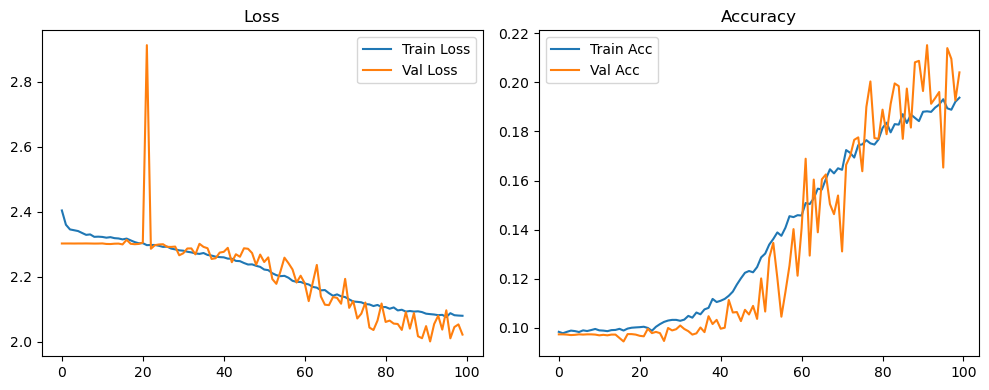

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.26it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 2.0220 Accuracy: 0.2033


🚀 Running: batch128_lr_max_0.0001_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0968 | Val Acc: 0.0934 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0968 | Val Acc: 0.0934 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0968 | Val Acc: 0.0934 |:   1%|          | 1/100 [01:17<2:08:36, 77.94s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0945 |:   1%|          | 1/100 [01:34<2:08:36, 77.94s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0945 |:   1%|          | 1/100 [01:34<2:08:36, 77.94s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0945 |:   2%|▏         | 2/100 [01:34<1:08:15, 41.79s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0958 |:   2%|▏         | 2/100 [01:50<1:08:15, 41.79s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0958 |:   2%|▏         | 2/100 [01:50<1:08:15, 41.79s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0958 |:   3%|▎         | 3/100 [01:50<48:51, 30.22s/it]  

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0956 |:   3%|▎         | 3/100 [02:07<48:51, 30.22s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0956 |:   3%|▎         | 3/100 [02:07<48:51, 30.22s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0956 |:   4%|▍         | 4/100 [02:07<39:38, 24.78s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [02:23<39:38, 24.78s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [02:23<39:38, 24.78s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0960 |:   5%|▌         | 5/100 [02:23<34:27, 21.76s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   5%|▌         | 5/100 [02:40<34:27, 21.76s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   5%|▌         | 5/100 [02:40<34:27, 21.76s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   6%|▌         | 6/100 [02:40<31:14, 19.94s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [02:56<31:14, 19.94s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [02:56<31:14, 19.94s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [02:56<29:08, 18.80s/it]

| LR: 0.000099 | Train Acc: 0.1004 | Val Acc: 0.0949 |:   7%|▋         | 7/100 [03:13<29:08, 18.80s/it]

| LR: 0.000099 | Train Acc: 0.1004 | Val Acc: 0.0949 |:   7%|▋         | 7/100 [03:13<29:08, 18.80s/it]

| LR: 0.000099 | Train Acc: 0.1004 | Val Acc: 0.0949 |:   8%|▊         | 8/100 [03:13<27:45, 18.10s/it]

| LR: 0.000099 | Train Acc: 0.1016 | Val Acc: 0.0943 |:   8%|▊         | 8/100 [03:29<27:45, 18.10s/it]

| LR: 0.000099 | Train Acc: 0.1016 | Val Acc: 0.0943 |:   8%|▊         | 8/100 [03:29<27:45, 18.10s/it]

| LR: 0.000099 | Train Acc: 0.1016 | Val Acc: 0.0943 |:   9%|▉         | 9/100 [03:29<26:40, 17.59s/it]

| LR: 0.000098 | Train Acc: 0.1024 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [03:45<26:40, 17.59s/it]

| LR: 0.000098 | Train Acc: 0.1024 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [03:45<26:40, 17.59s/it]

| LR: 0.000098 | Train Acc: 0.1024 | Val Acc: 0.0961 |:  10%|█         | 10/100 [03:46<25:50, 17.22s/it]

| LR: 0.000098 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:02<25:50, 17.22s/it]

| LR: 0.000098 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:02<25:50, 17.22s/it]

| LR: 0.000098 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:02<25:13, 17.00s/it]

| LR: 0.000097 | Train Acc: 0.1024 | Val Acc: 0.0987 |:  11%|█         | 11/100 [04:18<25:13, 17.00s/it]

| LR: 0.000097 | Train Acc: 0.1024 | Val Acc: 0.0987 |:  11%|█         | 11/100 [04:18<25:13, 17.00s/it]

| LR: 0.000097 | Train Acc: 0.1024 | Val Acc: 0.0987 |:  12%|█▏        | 12/100 [04:18<24:38, 16.80s/it]

| LR: 0.000097 | Train Acc: 0.1029 | Val Acc: 0.1027 |:  12%|█▏        | 12/100 [04:35<24:38, 16.80s/it]

| LR: 0.000097 | Train Acc: 0.1029 | Val Acc: 0.1027 |:  12%|█▏        | 12/100 [04:35<24:38, 16.80s/it]

| LR: 0.000097 | Train Acc: 0.1029 | Val Acc: 0.1027 |:  13%|█▎        | 13/100 [04:35<24:11, 16.69s/it]

| LR: 0.000096 | Train Acc: 0.1029 | Val Acc: 0.1111 |:  13%|█▎        | 13/100 [04:51<24:11, 16.69s/it]

| LR: 0.000096 | Train Acc: 0.1029 | Val Acc: 0.1111 |:  13%|█▎        | 13/100 [04:51<24:11, 16.69s/it]

| LR: 0.000096 | Train Acc: 0.1029 | Val Acc: 0.1111 |:  14%|█▍        | 14/100 [04:51<23:47, 16.60s/it]

| LR: 0.000096 | Train Acc: 0.1018 | Val Acc: 0.1081 |:  14%|█▍        | 14/100 [05:08<23:47, 16.60s/it]

| LR: 0.000096 | Train Acc: 0.1018 | Val Acc: 0.1081 |:  14%|█▍        | 14/100 [05:08<23:47, 16.60s/it]

| LR: 0.000096 | Train Acc: 0.1018 | Val Acc: 0.1081 |:  15%|█▌        | 15/100 [05:08<23:26, 16.55s/it]

| LR: 0.000095 | Train Acc: 0.1014 | Val Acc: 0.0964 |:  15%|█▌        | 15/100 [05:24<23:26, 16.55s/it]

| LR: 0.000095 | Train Acc: 0.1014 | Val Acc: 0.0964 |:  15%|█▌        | 15/100 [05:24<23:26, 16.55s/it]

| LR: 0.000095 | Train Acc: 0.1014 | Val Acc: 0.0964 |:  16%|█▌        | 16/100 [05:24<23:12, 16.58s/it]

| LR: 0.000094 | Train Acc: 0.1012 | Val Acc: 0.0982 |:  16%|█▌        | 16/100 [05:41<23:12, 16.58s/it]

| LR: 0.000094 | Train Acc: 0.1012 | Val Acc: 0.0982 |:  16%|█▌        | 16/100 [05:41<23:12, 16.58s/it]

| LR: 0.000094 | Train Acc: 0.1012 | Val Acc: 0.0982 |:  17%|█▋        | 17/100 [05:41<22:52, 16.54s/it]

| LR: 0.000094 | Train Acc: 0.1031 | Val Acc: 0.1007 |:  17%|█▋        | 17/100 [05:57<22:52, 16.54s/it]

| LR: 0.000094 | Train Acc: 0.1031 | Val Acc: 0.1007 |:  17%|█▋        | 17/100 [05:57<22:52, 16.54s/it]

| LR: 0.000094 | Train Acc: 0.1031 | Val Acc: 0.1007 |:  18%|█▊        | 18/100 [05:57<22:36, 16.54s/it]

| LR: 0.000093 | Train Acc: 0.1044 | Val Acc: 0.1041 |:  18%|█▊        | 18/100 [06:14<22:36, 16.54s/it]

| LR: 0.000093 | Train Acc: 0.1044 | Val Acc: 0.1041 |:  18%|█▊        | 18/100 [06:14<22:36, 16.54s/it]

| LR: 0.000093 | Train Acc: 0.1044 | Val Acc: 0.1041 |:  19%|█▉        | 19/100 [06:14<22:15, 16.49s/it]

| LR: 0.000092 | Train Acc: 0.1046 | Val Acc: 0.1064 |:  19%|█▉        | 19/100 [06:30<22:15, 16.49s/it]

| LR: 0.000092 | Train Acc: 0.1046 | Val Acc: 0.1064 |:  19%|█▉        | 19/100 [06:30<22:15, 16.49s/it]

| LR: 0.000092 | Train Acc: 0.1046 | Val Acc: 0.1064 |:  20%|██        | 20/100 [06:30<21:51, 16.40s/it]

| LR: 0.000091 | Train Acc: 0.1061 | Val Acc: 0.1044 |:  20%|██        | 20/100 [06:46<21:51, 16.40s/it]

| LR: 0.000091 | Train Acc: 0.1061 | Val Acc: 0.1044 |:  20%|██        | 20/100 [06:46<21:51, 16.40s/it]

| LR: 0.000091 | Train Acc: 0.1061 | Val Acc: 0.1044 |:  21%|██        | 21/100 [06:46<21:35, 16.40s/it]

| LR: 0.000091 | Train Acc: 0.1058 | Val Acc: 0.1036 |:  21%|██        | 21/100 [07:03<21:35, 16.40s/it]

| LR: 0.000091 | Train Acc: 0.1058 | Val Acc: 0.1036 |:  21%|██        | 21/100 [07:03<21:35, 16.40s/it]

| LR: 0.000091 | Train Acc: 0.1058 | Val Acc: 0.1036 |:  22%|██▏       | 22/100 [07:03<21:20, 16.42s/it]

| LR: 0.000090 | Train Acc: 0.1068 | Val Acc: 0.1014 |:  22%|██▏       | 22/100 [07:19<21:20, 16.42s/it]

| LR: 0.000090 | Train Acc: 0.1068 | Val Acc: 0.1014 |:  22%|██▏       | 22/100 [07:19<21:20, 16.42s/it]

| LR: 0.000090 | Train Acc: 0.1068 | Val Acc: 0.1014 |:  23%|██▎       | 23/100 [07:19<21:02, 16.40s/it]

| LR: 0.000089 | Train Acc: 0.1068 | Val Acc: 0.0995 |:  23%|██▎       | 23/100 [07:35<21:02, 16.40s/it]

| LR: 0.000089 | Train Acc: 0.1068 | Val Acc: 0.0995 |:  23%|██▎       | 23/100 [07:35<21:02, 16.40s/it]

| LR: 0.000089 | Train Acc: 0.1068 | Val Acc: 0.0995 |:  24%|██▍       | 24/100 [07:35<20:47, 16.41s/it]

| LR: 0.000088 | Train Acc: 0.1085 | Val Acc: 0.1010 |:  24%|██▍       | 24/100 [07:52<20:47, 16.41s/it]

| LR: 0.000088 | Train Acc: 0.1085 | Val Acc: 0.1010 |:  24%|██▍       | 24/100 [07:52<20:47, 16.41s/it]

| LR: 0.000088 | Train Acc: 0.1085 | Val Acc: 0.1010 |:  25%|██▌       | 25/100 [07:52<20:30, 16.41s/it]

| LR: 0.000087 | Train Acc: 0.1080 | Val Acc: 0.0984 |:  25%|██▌       | 25/100 [08:08<20:30, 16.41s/it]

| LR: 0.000087 | Train Acc: 0.1080 | Val Acc: 0.0984 |:  25%|██▌       | 25/100 [08:08<20:30, 16.41s/it]

| LR: 0.000087 | Train Acc: 0.1080 | Val Acc: 0.0984 |:  26%|██▌       | 26/100 [08:08<20:16, 16.44s/it]

| LR: 0.000086 | Train Acc: 0.1069 | Val Acc: 0.1094 |:  26%|██▌       | 26/100 [08:25<20:16, 16.44s/it]

| LR: 0.000086 | Train Acc: 0.1069 | Val Acc: 0.1094 |:  26%|██▌       | 26/100 [08:25<20:16, 16.44s/it]

| LR: 0.000086 | Train Acc: 0.1069 | Val Acc: 0.1094 |:  27%|██▋       | 27/100 [08:25<19:56, 16.40s/it]

| LR: 0.000085 | Train Acc: 0.1071 | Val Acc: 0.1007 |:  27%|██▋       | 27/100 [08:41<19:56, 16.40s/it]

| LR: 0.000085 | Train Acc: 0.1071 | Val Acc: 0.1007 |:  27%|██▋       | 27/100 [08:41<19:56, 16.40s/it]

| LR: 0.000085 | Train Acc: 0.1071 | Val Acc: 0.1007 |:  28%|██▊       | 28/100 [08:41<19:40, 16.40s/it]

| LR: 0.000084 | Train Acc: 0.1068 | Val Acc: 0.1002 |:  28%|██▊       | 28/100 [08:57<19:40, 16.40s/it]

| LR: 0.000084 | Train Acc: 0.1068 | Val Acc: 0.1002 |:  28%|██▊       | 28/100 [08:57<19:40, 16.40s/it]

| LR: 0.000084 | Train Acc: 0.1068 | Val Acc: 0.1002 |:  29%|██▉       | 29/100 [08:57<19:19, 16.33s/it]

| LR: 0.000083 | Train Acc: 0.1065 | Val Acc: 0.1044 |:  29%|██▉       | 29/100 [09:14<19:19, 16.33s/it]

| LR: 0.000083 | Train Acc: 0.1065 | Val Acc: 0.1044 |:  29%|██▉       | 29/100 [09:14<19:19, 16.33s/it]

| LR: 0.000083 | Train Acc: 0.1065 | Val Acc: 0.1044 |:  30%|███       | 30/100 [09:14<19:03, 16.34s/it]

| LR: 0.000081 | Train Acc: 0.1071 | Val Acc: 0.1087 |:  30%|███       | 30/100 [09:30<19:03, 16.34s/it]

| LR: 0.000081 | Train Acc: 0.1071 | Val Acc: 0.1087 |:  30%|███       | 30/100 [09:30<19:03, 16.34s/it]

| LR: 0.000081 | Train Acc: 0.1071 | Val Acc: 0.1087 |:  31%|███       | 31/100 [09:30<18:48, 16.36s/it]

| LR: 0.000080 | Train Acc: 0.1075 | Val Acc: 0.1076 |:  31%|███       | 31/100 [09:46<18:48, 16.36s/it]

| LR: 0.000080 | Train Acc: 0.1075 | Val Acc: 0.1076 |:  31%|███       | 31/100 [09:46<18:48, 16.36s/it]

| LR: 0.000080 | Train Acc: 0.1075 | Val Acc: 0.1076 |:  32%|███▏      | 32/100 [09:46<18:32, 16.36s/it]

| LR: 0.000079 | Train Acc: 0.1090 | Val Acc: 0.1021 |:  32%|███▏      | 32/100 [10:03<18:32, 16.36s/it]

| LR: 0.000079 | Train Acc: 0.1090 | Val Acc: 0.1021 |:  32%|███▏      | 32/100 [10:03<18:32, 16.36s/it]

| LR: 0.000079 | Train Acc: 0.1090 | Val Acc: 0.1021 |:  33%|███▎      | 33/100 [10:03<18:19, 16.41s/it]

| LR: 0.000078 | Train Acc: 0.1080 | Val Acc: 0.1090 |:  33%|███▎      | 33/100 [10:19<18:19, 16.41s/it]

| LR: 0.000078 | Train Acc: 0.1080 | Val Acc: 0.1090 |:  33%|███▎      | 33/100 [10:19<18:19, 16.41s/it]

| LR: 0.000078 | Train Acc: 0.1080 | Val Acc: 0.1090 |:  34%|███▍      | 34/100 [10:19<18:04, 16.42s/it]

| LR: 0.000077 | Train Acc: 0.1099 | Val Acc: 0.1286 |:  34%|███▍      | 34/100 [10:36<18:04, 16.42s/it]

| LR: 0.000077 | Train Acc: 0.1099 | Val Acc: 0.1286 |:  34%|███▍      | 34/100 [10:36<18:04, 16.42s/it]

| LR: 0.000077 | Train Acc: 0.1099 | Val Acc: 0.1286 |:  35%|███▌      | 35/100 [10:36<17:48, 16.44s/it]

| LR: 0.000075 | Train Acc: 0.1100 | Val Acc: 0.1049 |:  35%|███▌      | 35/100 [10:52<17:48, 16.44s/it]

| LR: 0.000075 | Train Acc: 0.1100 | Val Acc: 0.1049 |:  35%|███▌      | 35/100 [10:52<17:48, 16.44s/it]

| LR: 0.000075 | Train Acc: 0.1100 | Val Acc: 0.1049 |:  36%|███▌      | 36/100 [10:52<17:32, 16.45s/it]

| LR: 0.000074 | Train Acc: 0.1104 | Val Acc: 0.1164 |:  36%|███▌      | 36/100 [11:09<17:32, 16.45s/it]

| LR: 0.000074 | Train Acc: 0.1104 | Val Acc: 0.1164 |:  36%|███▌      | 36/100 [11:09<17:32, 16.45s/it]

| LR: 0.000074 | Train Acc: 0.1104 | Val Acc: 0.1164 |:  37%|███▋      | 37/100 [11:09<17:12, 16.39s/it]

| LR: 0.000073 | Train Acc: 0.1108 | Val Acc: 0.1108 |:  37%|███▋      | 37/100 [11:25<17:12, 16.39s/it]

| LR: 0.000073 | Train Acc: 0.1108 | Val Acc: 0.1108 |:  37%|███▋      | 37/100 [11:25<17:12, 16.39s/it]

| LR: 0.000073 | Train Acc: 0.1108 | Val Acc: 0.1108 |:  38%|███▊      | 38/100 [11:25<16:53, 16.35s/it]

| LR: 0.000072 | Train Acc: 0.1114 | Val Acc: 0.1081 |:  38%|███▊      | 38/100 [11:41<16:53, 16.35s/it]

| LR: 0.000072 | Train Acc: 0.1114 | Val Acc: 0.1081 |:  38%|███▊      | 38/100 [11:41<16:53, 16.35s/it]

| LR: 0.000072 | Train Acc: 0.1114 | Val Acc: 0.1081 |:  39%|███▉      | 39/100 [11:41<16:38, 16.37s/it]

| LR: 0.000070 | Train Acc: 0.1091 | Val Acc: 0.1196 |:  39%|███▉      | 39/100 [11:58<16:38, 16.37s/it]

| LR: 0.000070 | Train Acc: 0.1091 | Val Acc: 0.1196 |:  39%|███▉      | 39/100 [11:58<16:38, 16.37s/it]

| LR: 0.000070 | Train Acc: 0.1091 | Val Acc: 0.1196 |:  40%|████      | 40/100 [11:58<16:23, 16.39s/it]

| LR: 0.000069 | Train Acc: 0.1111 | Val Acc: 0.1050 |:  40%|████      | 40/100 [12:14<16:23, 16.39s/it]

| LR: 0.000069 | Train Acc: 0.1111 | Val Acc: 0.1050 |:  40%|████      | 40/100 [12:14<16:23, 16.39s/it]

| LR: 0.000069 | Train Acc: 0.1111 | Val Acc: 0.1050 |:  41%|████      | 41/100 [12:14<16:06, 16.39s/it]

| LR: 0.000068 | Train Acc: 0.1127 | Val Acc: 0.1038 |:  41%|████      | 41/100 [12:30<16:06, 16.39s/it]

| LR: 0.000068 | Train Acc: 0.1127 | Val Acc: 0.1038 |:  41%|████      | 41/100 [12:30<16:06, 16.39s/it]

| LR: 0.000068 | Train Acc: 0.1127 | Val Acc: 0.1038 |:  42%|████▏     | 42/100 [12:31<15:51, 16.41s/it]

| LR: 0.000066 | Train Acc: 0.1133 | Val Acc: 0.1032 |:  42%|████▏     | 42/100 [12:47<15:51, 16.41s/it]

| LR: 0.000066 | Train Acc: 0.1133 | Val Acc: 0.1032 |:  42%|████▏     | 42/100 [12:47<15:51, 16.41s/it]

| LR: 0.000066 | Train Acc: 0.1133 | Val Acc: 0.1032 |:  43%|████▎     | 43/100 [12:47<15:35, 16.42s/it]

| LR: 0.000065 | Train Acc: 0.1152 | Val Acc: 0.1069 |:  43%|████▎     | 43/100 [13:03<15:35, 16.42s/it]

| LR: 0.000065 | Train Acc: 0.1152 | Val Acc: 0.1069 |:  43%|████▎     | 43/100 [13:03<15:35, 16.42s/it]

| LR: 0.000065 | Train Acc: 0.1152 | Val Acc: 0.1069 |:  44%|████▍     | 44/100 [13:03<15:20, 16.44s/it]

| LR: 0.000063 | Train Acc: 0.1174 | Val Acc: 0.1158 |:  44%|████▍     | 44/100 [13:20<15:20, 16.44s/it]

| LR: 0.000063 | Train Acc: 0.1174 | Val Acc: 0.1158 |:  44%|████▍     | 44/100 [13:20<15:20, 16.44s/it]

| LR: 0.000063 | Train Acc: 0.1174 | Val Acc: 0.1158 |:  45%|████▌     | 45/100 [13:20<15:04, 16.45s/it]

| LR: 0.000062 | Train Acc: 0.1181 | Val Acc: 0.1180 |:  45%|████▌     | 45/100 [13:36<15:04, 16.45s/it]

| LR: 0.000062 | Train Acc: 0.1181 | Val Acc: 0.1180 |:  45%|████▌     | 45/100 [13:36<15:04, 16.45s/it]

| LR: 0.000062 | Train Acc: 0.1181 | Val Acc: 0.1180 |:  46%|████▌     | 46/100 [13:36<14:47, 16.43s/it]

| LR: 0.000061 | Train Acc: 0.1178 | Val Acc: 0.1236 |:  46%|████▌     | 46/100 [13:53<14:47, 16.43s/it]

| LR: 0.000061 | Train Acc: 0.1178 | Val Acc: 0.1236 |:  46%|████▌     | 46/100 [13:53<14:47, 16.43s/it]

| LR: 0.000061 | Train Acc: 0.1178 | Val Acc: 0.1236 |:  47%|████▋     | 47/100 [13:53<14:32, 16.47s/it]

| LR: 0.000059 | Train Acc: 0.1174 | Val Acc: 0.1104 |:  47%|████▋     | 47/100 [14:09<14:32, 16.47s/it]

| LR: 0.000059 | Train Acc: 0.1174 | Val Acc: 0.1104 |:  47%|████▋     | 47/100 [14:09<14:32, 16.47s/it]

| LR: 0.000059 | Train Acc: 0.1174 | Val Acc: 0.1104 |:  48%|████▊     | 48/100 [14:09<14:16, 16.48s/it]

| LR: 0.000058 | Train Acc: 0.1202 | Val Acc: 0.1282 |:  48%|████▊     | 48/100 [14:26<14:16, 16.48s/it]

| LR: 0.000058 | Train Acc: 0.1202 | Val Acc: 0.1282 |:  48%|████▊     | 48/100 [14:26<14:16, 16.48s/it]

| LR: 0.000058 | Train Acc: 0.1202 | Val Acc: 0.1282 |:  49%|████▉     | 49/100 [14:26<14:01, 16.50s/it]

| LR: 0.000056 | Train Acc: 0.1203 | Val Acc: 0.1158 |:  49%|████▉     | 49/100 [14:42<14:01, 16.50s/it]

| LR: 0.000056 | Train Acc: 0.1203 | Val Acc: 0.1158 |:  49%|████▉     | 49/100 [14:42<14:01, 16.50s/it]

| LR: 0.000056 | Train Acc: 0.1203 | Val Acc: 0.1158 |:  50%|█████     | 50/100 [14:42<13:44, 16.50s/it]

| LR: 0.000055 | Train Acc: 0.1239 | Val Acc: 0.1319 |:  50%|█████     | 50/100 [14:59<13:44, 16.50s/it]

| LR: 0.000055 | Train Acc: 0.1239 | Val Acc: 0.1319 |:  50%|█████     | 50/100 [14:59<13:44, 16.50s/it]

| LR: 0.000055 | Train Acc: 0.1239 | Val Acc: 0.1319 |:  51%|█████     | 51/100 [14:59<13:28, 16.50s/it]

| LR: 0.000054 | Train Acc: 0.1255 | Val Acc: 0.1215 |:  51%|█████     | 51/100 [15:15<13:28, 16.50s/it]

| LR: 0.000054 | Train Acc: 0.1255 | Val Acc: 0.1215 |:  51%|█████     | 51/100 [15:15<13:28, 16.50s/it]

| LR: 0.000054 | Train Acc: 0.1255 | Val Acc: 0.1215 |:  52%|█████▏    | 52/100 [15:15<13:12, 16.52s/it]

| LR: 0.000052 | Train Acc: 0.1261 | Val Acc: 0.1444 |:  52%|█████▏    | 52/100 [15:32<13:12, 16.52s/it]

| LR: 0.000052 | Train Acc: 0.1261 | Val Acc: 0.1444 |:  52%|█████▏    | 52/100 [15:32<13:12, 16.52s/it]

| LR: 0.000052 | Train Acc: 0.1261 | Val Acc: 0.1444 |:  53%|█████▎    | 53/100 [15:32<12:56, 16.53s/it]

| LR: 0.000051 | Train Acc: 0.1263 | Val Acc: 0.1762 |:  53%|█████▎    | 53/100 [15:49<12:56, 16.53s/it]

| LR: 0.000051 | Train Acc: 0.1263 | Val Acc: 0.1762 |:  53%|█████▎    | 53/100 [15:49<12:56, 16.53s/it]

| LR: 0.000051 | Train Acc: 0.1263 | Val Acc: 0.1762 |:  54%|█████▍    | 54/100 [15:49<12:40, 16.54s/it]

| LR: 0.000049 | Train Acc: 0.1289 | Val Acc: 0.1540 |:  54%|█████▍    | 54/100 [16:05<12:40, 16.54s/it]

| LR: 0.000049 | Train Acc: 0.1289 | Val Acc: 0.1540 |:  54%|█████▍    | 54/100 [16:05<12:40, 16.54s/it]

| LR: 0.000049 | Train Acc: 0.1289 | Val Acc: 0.1540 |:  55%|█████▌    | 55/100 [16:05<12:20, 16.46s/it]

| LR: 0.000048 | Train Acc: 0.1289 | Val Acc: 0.1330 |:  55%|█████▌    | 55/100 [16:21<12:20, 16.46s/it]

| LR: 0.000048 | Train Acc: 0.1289 | Val Acc: 0.1330 |:  55%|█████▌    | 55/100 [16:21<12:20, 16.46s/it]

| LR: 0.000048 | Train Acc: 0.1289 | Val Acc: 0.1330 |:  56%|█████▌    | 56/100 [16:21<12:03, 16.45s/it]

| LR: 0.000047 | Train Acc: 0.1314 | Val Acc: 0.1470 |:  56%|█████▌    | 56/100 [16:38<12:03, 16.45s/it]

| LR: 0.000047 | Train Acc: 0.1314 | Val Acc: 0.1470 |:  56%|█████▌    | 56/100 [16:38<12:03, 16.45s/it]

| LR: 0.000047 | Train Acc: 0.1314 | Val Acc: 0.1470 |:  57%|█████▋    | 57/100 [16:38<11:46, 16.44s/it]

| LR: 0.000045 | Train Acc: 0.1328 | Val Acc: 0.1377 |:  57%|█████▋    | 57/100 [16:54<11:46, 16.44s/it]

| LR: 0.000045 | Train Acc: 0.1328 | Val Acc: 0.1377 |:  57%|█████▋    | 57/100 [16:54<11:46, 16.44s/it]

| LR: 0.000045 | Train Acc: 0.1328 | Val Acc: 0.1377 |:  58%|█████▊    | 58/100 [16:54<11:31, 16.47s/it]

| LR: 0.000044 | Train Acc: 0.1343 | Val Acc: 0.1423 |:  58%|█████▊    | 58/100 [17:11<11:31, 16.47s/it]

| LR: 0.000044 | Train Acc: 0.1343 | Val Acc: 0.1423 |:  58%|█████▊    | 58/100 [17:11<11:31, 16.47s/it]

| LR: 0.000044 | Train Acc: 0.1343 | Val Acc: 0.1423 |:  59%|█████▉    | 59/100 [17:11<11:15, 16.48s/it]

| LR: 0.000042 | Train Acc: 0.1345 | Val Acc: 0.1478 |:  59%|█████▉    | 59/100 [17:27<11:15, 16.48s/it]

| LR: 0.000042 | Train Acc: 0.1345 | Val Acc: 0.1478 |:  59%|█████▉    | 59/100 [17:27<11:15, 16.48s/it]

| LR: 0.000042 | Train Acc: 0.1345 | Val Acc: 0.1478 |:  60%|██████    | 60/100 [17:27<10:59, 16.50s/it]

| LR: 0.000041 | Train Acc: 0.1351 | Val Acc: 0.1183 |:  60%|██████    | 60/100 [17:44<10:59, 16.50s/it]

| LR: 0.000041 | Train Acc: 0.1351 | Val Acc: 0.1183 |:  60%|██████    | 60/100 [17:44<10:59, 16.50s/it]

| LR: 0.000041 | Train Acc: 0.1351 | Val Acc: 0.1183 |:  61%|██████    | 61/100 [17:44<10:42, 16.48s/it]

| LR: 0.000040 | Train Acc: 0.1368 | Val Acc: 0.1355 |:  61%|██████    | 61/100 [18:00<10:42, 16.48s/it]

| LR: 0.000040 | Train Acc: 0.1368 | Val Acc: 0.1355 |:  61%|██████    | 61/100 [18:00<10:42, 16.48s/it]

| LR: 0.000040 | Train Acc: 0.1368 | Val Acc: 0.1355 |:  62%|██████▏   | 62/100 [18:00<10:24, 16.45s/it]

| LR: 0.000038 | Train Acc: 0.1382 | Val Acc: 0.1387 |:  62%|██████▏   | 62/100 [18:16<10:24, 16.45s/it]

| LR: 0.000038 | Train Acc: 0.1382 | Val Acc: 0.1387 |:  62%|██████▏   | 62/100 [18:16<10:24, 16.45s/it]

| LR: 0.000038 | Train Acc: 0.1382 | Val Acc: 0.1387 |:  63%|██████▎   | 63/100 [18:16<10:05, 16.36s/it]

| LR: 0.000037 | Train Acc: 0.1381 | Val Acc: 0.1578 |:  63%|██████▎   | 63/100 [18:33<10:05, 16.36s/it]

| LR: 0.000037 | Train Acc: 0.1381 | Val Acc: 0.1578 |:  63%|██████▎   | 63/100 [18:33<10:05, 16.36s/it]

| LR: 0.000037 | Train Acc: 0.1381 | Val Acc: 0.1578 |:  64%|██████▍   | 64/100 [18:33<09:48, 16.34s/it]

| LR: 0.000036 | Train Acc: 0.1404 | Val Acc: 0.1453 |:  64%|██████▍   | 64/100 [18:49<09:48, 16.34s/it]

| LR: 0.000036 | Train Acc: 0.1404 | Val Acc: 0.1453 |:  64%|██████▍   | 64/100 [18:49<09:48, 16.34s/it]

| LR: 0.000036 | Train Acc: 0.1404 | Val Acc: 0.1453 |:  65%|██████▌   | 65/100 [18:49<09:33, 16.38s/it]

| LR: 0.000035 | Train Acc: 0.1434 | Val Acc: 0.1275 |:  65%|██████▌   | 65/100 [19:05<09:33, 16.38s/it]

| LR: 0.000035 | Train Acc: 0.1434 | Val Acc: 0.1275 |:  65%|██████▌   | 65/100 [19:05<09:33, 16.38s/it]

| LR: 0.000035 | Train Acc: 0.1434 | Val Acc: 0.1275 |:  66%|██████▌   | 66/100 [19:05<09:17, 16.39s/it]

| LR: 0.000033 | Train Acc: 0.1423 | Val Acc: 0.1830 |:  66%|██████▌   | 66/100 [19:22<09:17, 16.39s/it]

| LR: 0.000033 | Train Acc: 0.1423 | Val Acc: 0.1830 |:  66%|██████▌   | 66/100 [19:22<09:17, 16.39s/it]

| LR: 0.000033 | Train Acc: 0.1423 | Val Acc: 0.1830 |:  67%|██████▋   | 67/100 [19:22<09:01, 16.41s/it]

| LR: 0.000032 | Train Acc: 0.1426 | Val Acc: 0.1456 |:  67%|██████▋   | 67/100 [19:38<09:01, 16.41s/it]

| LR: 0.000032 | Train Acc: 0.1426 | Val Acc: 0.1456 |:  67%|██████▋   | 67/100 [19:38<09:01, 16.41s/it]

| LR: 0.000032 | Train Acc: 0.1426 | Val Acc: 0.1456 |:  68%|██████▊   | 68/100 [19:38<08:44, 16.38s/it]

| LR: 0.000031 | Train Acc: 0.1434 | Val Acc: 0.1453 |:  68%|██████▊   | 68/100 [19:55<08:44, 16.38s/it]

| LR: 0.000031 | Train Acc: 0.1434 | Val Acc: 0.1453 |:  68%|██████▊   | 68/100 [19:55<08:44, 16.38s/it]

| LR: 0.000031 | Train Acc: 0.1434 | Val Acc: 0.1453 |:  69%|██████▉   | 69/100 [19:55<08:28, 16.40s/it]

| LR: 0.000030 | Train Acc: 0.1476 | Val Acc: 0.1632 |:  69%|██████▉   | 69/100 [20:11<08:28, 16.40s/it]

| LR: 0.000030 | Train Acc: 0.1476 | Val Acc: 0.1632 |:  69%|██████▉   | 69/100 [20:11<08:28, 16.40s/it]

| LR: 0.000030 | Train Acc: 0.1476 | Val Acc: 0.1632 |:  70%|███████   | 70/100 [20:11<08:12, 16.43s/it]

| LR: 0.000029 | Train Acc: 0.1464 | Val Acc: 0.1229 |:  70%|███████   | 70/100 [20:28<08:12, 16.43s/it]

| LR: 0.000029 | Train Acc: 0.1464 | Val Acc: 0.1229 |:  70%|███████   | 70/100 [20:28<08:12, 16.43s/it]

| LR: 0.000029 | Train Acc: 0.1464 | Val Acc: 0.1229 |:  71%|███████   | 71/100 [20:28<07:56, 16.42s/it]

| LR: 0.000027 | Train Acc: 0.1492 | Val Acc: 0.1291 |:  71%|███████   | 71/100 [20:44<07:56, 16.42s/it]

| LR: 0.000027 | Train Acc: 0.1492 | Val Acc: 0.1291 |:  71%|███████   | 71/100 [20:44<07:56, 16.42s/it]

| LR: 0.000027 | Train Acc: 0.1492 | Val Acc: 0.1291 |:  72%|███████▏  | 72/100 [20:44<07:39, 16.41s/it]

| LR: 0.000026 | Train Acc: 0.1494 | Val Acc: 0.1478 |:  72%|███████▏  | 72/100 [21:00<07:39, 16.41s/it]

| LR: 0.000026 | Train Acc: 0.1494 | Val Acc: 0.1478 |:  72%|███████▏  | 72/100 [21:00<07:39, 16.41s/it]

| LR: 0.000026 | Train Acc: 0.1494 | Val Acc: 0.1478 |:  73%|███████▎  | 73/100 [21:00<07:22, 16.38s/it]

| LR: 0.000025 | Train Acc: 0.1487 | Val Acc: 0.1545 |:  73%|███████▎  | 73/100 [21:16<07:22, 16.38s/it]

| LR: 0.000025 | Train Acc: 0.1487 | Val Acc: 0.1545 |:  73%|███████▎  | 73/100 [21:16<07:22, 16.38s/it]

| LR: 0.000025 | Train Acc: 0.1487 | Val Acc: 0.1545 |:  74%|███████▍  | 74/100 [21:16<07:04, 16.33s/it]

| LR: 0.000024 | Train Acc: 0.1509 | Val Acc: 0.1401 |:  74%|███████▍  | 74/100 [21:33<07:04, 16.33s/it]

| LR: 0.000024 | Train Acc: 0.1509 | Val Acc: 0.1401 |:  74%|███████▍  | 74/100 [21:33<07:04, 16.33s/it]

| LR: 0.000024 | Train Acc: 0.1509 | Val Acc: 0.1401 |:  75%|███████▌  | 75/100 [21:33<06:49, 16.36s/it]

| LR: 0.000023 | Train Acc: 0.1490 | Val Acc: 0.1644 |:  75%|███████▌  | 75/100 [21:49<06:49, 16.36s/it]

| LR: 0.000023 | Train Acc: 0.1490 | Val Acc: 0.1644 |:  75%|███████▌  | 75/100 [21:49<06:49, 16.36s/it]

| LR: 0.000023 | Train Acc: 0.1490 | Val Acc: 0.1644 |:  76%|███████▌  | 76/100 [21:49<06:33, 16.40s/it]

| LR: 0.000022 | Train Acc: 0.1498 | Val Acc: 0.1610 |:  76%|███████▌  | 76/100 [22:06<06:33, 16.40s/it]

| LR: 0.000022 | Train Acc: 0.1498 | Val Acc: 0.1610 |:  76%|███████▌  | 76/100 [22:06<06:33, 16.40s/it]

| LR: 0.000022 | Train Acc: 0.1498 | Val Acc: 0.1610 |:  77%|███████▋  | 77/100 [22:06<06:16, 16.38s/it]

| LR: 0.000021 | Train Acc: 0.1506 | Val Acc: 0.1537 |:  77%|███████▋  | 77/100 [22:22<06:16, 16.38s/it]

| LR: 0.000021 | Train Acc: 0.1506 | Val Acc: 0.1537 |:  77%|███████▋  | 77/100 [22:22<06:16, 16.38s/it]

| LR: 0.000021 | Train Acc: 0.1506 | Val Acc: 0.1537 |:  78%|███████▊  | 78/100 [22:22<05:59, 16.36s/it]

| LR: 0.000020 | Train Acc: 0.1502 | Val Acc: 0.1506 |:  78%|███████▊  | 78/100 [22:38<05:59, 16.36s/it]

| LR: 0.000020 | Train Acc: 0.1502 | Val Acc: 0.1506 |:  78%|███████▊  | 78/100 [22:38<05:59, 16.36s/it]

| LR: 0.000020 | Train Acc: 0.1502 | Val Acc: 0.1506 |:  79%|███████▉  | 79/100 [22:38<05:43, 16.38s/it]

| LR: 0.000019 | Train Acc: 0.1523 | Val Acc: 0.1384 |:  79%|███████▉  | 79/100 [22:55<05:43, 16.38s/it]

| LR: 0.000019 | Train Acc: 0.1523 | Val Acc: 0.1384 |:  79%|███████▉  | 79/100 [22:55<05:43, 16.38s/it]

| LR: 0.000019 | Train Acc: 0.1523 | Val Acc: 0.1384 |:  80%|████████  | 80/100 [22:55<05:28, 16.41s/it]

| LR: 0.000019 | Train Acc: 0.1520 | Val Acc: 0.1688 |:  80%|████████  | 80/100 [23:11<05:28, 16.41s/it]

| LR: 0.000019 | Train Acc: 0.1520 | Val Acc: 0.1688 |:  80%|████████  | 80/100 [23:11<05:28, 16.41s/it]

| LR: 0.000019 | Train Acc: 0.1520 | Val Acc: 0.1688 |:  81%|████████  | 81/100 [23:11<05:12, 16.43s/it]

| LR: 0.000018 | Train Acc: 0.1525 | Val Acc: 0.1552 |:  81%|████████  | 81/100 [23:28<05:12, 16.43s/it]

| LR: 0.000018 | Train Acc: 0.1525 | Val Acc: 0.1552 |:  81%|████████  | 81/100 [23:28<05:12, 16.43s/it]

| LR: 0.000018 | Train Acc: 0.1525 | Val Acc: 0.1552 |:  82%|████████▏ | 82/100 [23:28<04:56, 16.46s/it]

| LR: 0.000017 | Train Acc: 0.1518 | Val Acc: 0.1535 |:  82%|████████▏ | 82/100 [23:44<04:56, 16.46s/it]

| LR: 0.000017 | Train Acc: 0.1518 | Val Acc: 0.1535 |:  82%|████████▏ | 82/100 [23:44<04:56, 16.46s/it]

| LR: 0.000017 | Train Acc: 0.1518 | Val Acc: 0.1535 |:  83%|████████▎ | 83/100 [23:44<04:39, 16.42s/it]

| LR: 0.000016 | Train Acc: 0.1524 | Val Acc: 0.1297 |:  83%|████████▎ | 83/100 [24:01<04:39, 16.42s/it]

| LR: 0.000016 | Train Acc: 0.1524 | Val Acc: 0.1297 |:  83%|████████▎ | 83/100 [24:01<04:39, 16.42s/it]

| LR: 0.000016 | Train Acc: 0.1524 | Val Acc: 0.1297 |:  84%|████████▍ | 84/100 [24:01<04:22, 16.43s/it]

| LR: 0.000016 | Train Acc: 0.1525 | Val Acc: 0.1464 |:  84%|████████▍ | 84/100 [24:17<04:22, 16.43s/it]

| LR: 0.000016 | Train Acc: 0.1525 | Val Acc: 0.1464 |:  84%|████████▍ | 84/100 [24:17<04:22, 16.43s/it]

| LR: 0.000016 | Train Acc: 0.1525 | Val Acc: 0.1464 |:  85%|████████▌ | 85/100 [24:17<04:05, 16.37s/it]

| LR: 0.000015 | Train Acc: 0.1526 | Val Acc: 0.1312 |:  85%|████████▌ | 85/100 [24:33<04:05, 16.37s/it]

| LR: 0.000015 | Train Acc: 0.1526 | Val Acc: 0.1312 |:  85%|████████▌ | 85/100 [24:33<04:05, 16.37s/it]

| LR: 0.000015 | Train Acc: 0.1526 | Val Acc: 0.1312 |:  86%|████████▌ | 86/100 [24:33<03:49, 16.38s/it]

| LR: 0.000014 | Train Acc: 0.1532 | Val Acc: 0.1467 |:  86%|████████▌ | 86/100 [24:50<03:49, 16.38s/it]

| LR: 0.000014 | Train Acc: 0.1532 | Val Acc: 0.1467 |:  86%|████████▌ | 86/100 [24:50<03:49, 16.38s/it]

| LR: 0.000014 | Train Acc: 0.1532 | Val Acc: 0.1467 |:  87%|████████▋ | 87/100 [24:50<03:32, 16.33s/it]

| LR: 0.000014 | Train Acc: 0.1527 | Val Acc: 0.1252 |:  87%|████████▋ | 87/100 [25:06<03:32, 16.33s/it]

| LR: 0.000014 | Train Acc: 0.1527 | Val Acc: 0.1252 |:  87%|████████▋ | 87/100 [25:06<03:32, 16.33s/it]

| LR: 0.000014 | Train Acc: 0.1527 | Val Acc: 0.1252 |:  88%|████████▊ | 88/100 [25:06<03:16, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.1539 | Val Acc: 0.1709 |:  88%|████████▊ | 88/100 [25:22<03:16, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.1539 | Val Acc: 0.1709 |:  88%|████████▊ | 88/100 [25:22<03:16, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.1539 | Val Acc: 0.1709 |:  89%|████████▉ | 89/100 [25:22<03:00, 16.36s/it]

| LR: 0.000013 | Train Acc: 0.1533 | Val Acc: 0.1692 |:  89%|████████▉ | 89/100 [25:39<03:00, 16.36s/it]

| LR: 0.000013 | Train Acc: 0.1533 | Val Acc: 0.1692 |:  89%|████████▉ | 89/100 [25:39<03:00, 16.36s/it]

| LR: 0.000013 | Train Acc: 0.1533 | Val Acc: 0.1692 |:  90%|█████████ | 90/100 [25:39<02:44, 16.42s/it]

| LR: 0.000012 | Train Acc: 0.1561 | Val Acc: 0.1508 |:  90%|█████████ | 90/100 [25:55<02:44, 16.42s/it]

| LR: 0.000012 | Train Acc: 0.1561 | Val Acc: 0.1508 |:  90%|█████████ | 90/100 [25:55<02:44, 16.42s/it]

| LR: 0.000012 | Train Acc: 0.1561 | Val Acc: 0.1508 |:  91%|█████████ | 91/100 [25:55<02:27, 16.40s/it]

| LR: 0.000012 | Train Acc: 0.1550 | Val Acc: 0.1733 |:  91%|█████████ | 91/100 [26:12<02:27, 16.40s/it]

| LR: 0.000012 | Train Acc: 0.1550 | Val Acc: 0.1733 |:  91%|█████████ | 91/100 [26:12<02:27, 16.40s/it]

| LR: 0.000012 | Train Acc: 0.1550 | Val Acc: 0.1733 |:  92%|█████████▏| 92/100 [26:12<02:11, 16.40s/it]

| LR: 0.000011 | Train Acc: 0.1543 | Val Acc: 0.1658 |:  92%|█████████▏| 92/100 [26:28<02:11, 16.40s/it]

| LR: 0.000011 | Train Acc: 0.1543 | Val Acc: 0.1658 |:  92%|█████████▏| 92/100 [26:28<02:11, 16.40s/it]

| LR: 0.000011 | Train Acc: 0.1543 | Val Acc: 0.1658 |:  93%|█████████▎| 93/100 [26:28<01:54, 16.40s/it]

| LR: 0.000011 | Train Acc: 0.1534 | Val Acc: 0.1573 |:  93%|█████████▎| 93/100 [26:45<01:54, 16.40s/it]

| LR: 0.000011 | Train Acc: 0.1534 | Val Acc: 0.1573 |:  93%|█████████▎| 93/100 [26:45<01:54, 16.40s/it]

| LR: 0.000011 | Train Acc: 0.1534 | Val Acc: 0.1573 |:  94%|█████████▍| 94/100 [26:45<01:38, 16.43s/it]

| LR: 0.000011 | Train Acc: 0.1519 | Val Acc: 0.1598 |:  94%|█████████▍| 94/100 [27:01<01:38, 16.43s/it]

| LR: 0.000011 | Train Acc: 0.1519 | Val Acc: 0.1598 |:  94%|█████████▍| 94/100 [27:01<01:38, 16.43s/it]

| LR: 0.000011 | Train Acc: 0.1519 | Val Acc: 0.1598 |:  95%|█████████▌| 95/100 [27:01<01:22, 16.49s/it]

| LR: 0.000011 | Train Acc: 0.1517 | Val Acc: 0.1495 |:  95%|█████████▌| 95/100 [27:17<01:22, 16.49s/it]

| LR: 0.000011 | Train Acc: 0.1517 | Val Acc: 0.1495 |:  95%|█████████▌| 95/100 [27:17<01:22, 16.49s/it]

| LR: 0.000011 | Train Acc: 0.1517 | Val Acc: 0.1495 |:  96%|█████████▌| 96/100 [27:18<01:05, 16.43s/it]

| LR: 0.000010 | Train Acc: 0.1564 | Val Acc: 0.1657 |:  96%|█████████▌| 96/100 [27:34<01:05, 16.43s/it]

| LR: 0.000010 | Train Acc: 0.1564 | Val Acc: 0.1657 |:  96%|█████████▌| 96/100 [27:34<01:05, 16.43s/it]

| LR: 0.000010 | Train Acc: 0.1564 | Val Acc: 0.1657 |:  97%|█████████▋| 97/100 [27:34<00:49, 16.44s/it]

| LR: 0.000010 | Train Acc: 0.1554 | Val Acc: 0.1668 |:  97%|█████████▋| 97/100 [27:50<00:49, 16.44s/it]

| LR: 0.000010 | Train Acc: 0.1554 | Val Acc: 0.1668 |:  97%|█████████▋| 97/100 [27:50<00:49, 16.44s/it]

| LR: 0.000010 | Train Acc: 0.1554 | Val Acc: 0.1668 |:  98%|█████████▊| 98/100 [27:50<00:32, 16.44s/it]

| LR: 0.000010 | Train Acc: 0.1593 | Val Acc: 0.1326 |:  98%|█████████▊| 98/100 [28:07<00:32, 16.44s/it]

| LR: 0.000010 | Train Acc: 0.1593 | Val Acc: 0.1326 |:  98%|█████████▊| 98/100 [28:07<00:32, 16.44s/it]

| LR: 0.000010 | Train Acc: 0.1593 | Val Acc: 0.1326 |:  99%|█████████▉| 99/100 [28:07<00:16, 16.45s/it]

| LR: 0.000010 | Train Acc: 0.1553 | Val Acc: 0.1564 |:  99%|█████████▉| 99/100 [28:23<00:16, 16.45s/it]

| LR: 0.000010 | Train Acc: 0.1553 | Val Acc: 0.1564 |:  99%|█████████▉| 99/100 [28:23<00:16, 16.45s/it]

| LR: 0.000010 | Train Acc: 0.1553 | Val Acc: 0.1564 |: 100%|██████████| 100/100 [28:23<00:00, 16.38s/it]

| LR: 0.000010 | Train Acc: 0.1553 | Val Acc: 0.1564 |: 100%|██████████| 100/100 [28:23<00:00, 17.04s/it]

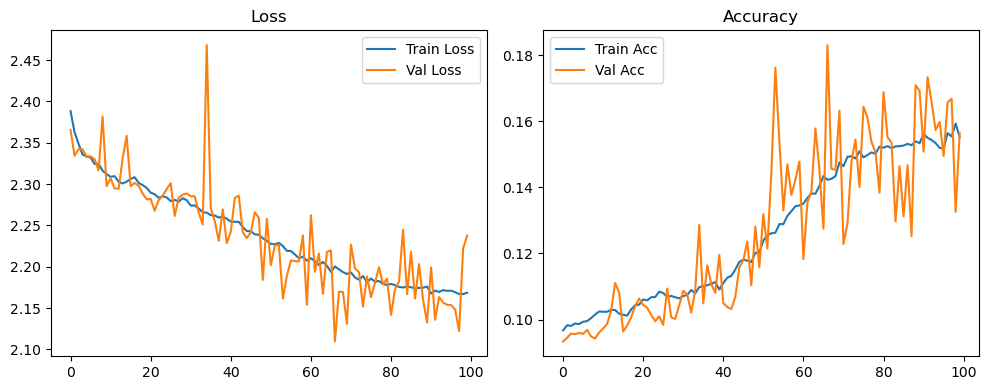

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

Original Model Final Test Loss: 2.2248 Accuracy: 0.1570


🚀 Running: batch128_lr_max_0.0001_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0929 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0929 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0929 |:   1%|          | 1/100 [01:17<2:07:53, 77.51s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0966 |:   1%|          | 1/100 [01:34<2:07:53, 77.51s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0966 |:   1%|          | 1/100 [01:34<2:07:53, 77.51s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [01:34<1:08:12, 41.76s/it]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0947 |:   2%|▏         | 2/100 [01:50<1:08:12, 41.76s/it]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0947 |:   2%|▏         | 2/100 [01:50<1:08:12, 41.76s/it]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0947 |:   3%|▎         | 3/100 [01:50<48:50, 30.21s/it]  

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0945 |:   3%|▎         | 3/100 [02:07<48:50, 30.21s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0945 |:   3%|▎         | 3/100 [02:07<48:50, 30.21s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0945 |:   4%|▍         | 4/100 [02:07<39:41, 24.81s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0966 |:   4%|▍         | 4/100 [02:23<39:41, 24.81s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0966 |:   4%|▍         | 4/100 [02:23<39:41, 24.81s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0966 |:   5%|▌         | 5/100 [02:23<34:35, 21.85s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [02:40<34:35, 21.85s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [02:40<34:35, 21.85s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   6%|▌         | 6/100 [02:40<31:29, 20.10s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [02:57<31:29, 20.10s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [02:57<31:29, 20.10s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0956 |:   7%|▋         | 7/100 [02:57<29:29, 19.03s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0975 |:   7%|▋         | 7/100 [03:14<29:29, 19.03s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0975 |:   7%|▋         | 7/100 [03:14<29:29, 19.03s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0975 |:   8%|▊         | 8/100 [03:14<28:06, 18.34s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [03:30<28:06, 18.34s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [03:30<28:06, 18.34s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   9%|▉         | 9/100 [03:30<27:00, 17.80s/it]

| LR: 0.000098 | Train Acc: 0.1000 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [03:47<27:00, 17.80s/it]

| LR: 0.000098 | Train Acc: 0.1000 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [03:47<27:00, 17.80s/it]

| LR: 0.000098 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  10%|█         | 10/100 [03:47<26:16, 17.51s/it]

| LR: 0.000098 | Train Acc: 0.1014 | Val Acc: 0.1001 |:  10%|█         | 10/100 [04:04<26:16, 17.51s/it]

| LR: 0.000098 | Train Acc: 0.1014 | Val Acc: 0.1001 |:  10%|█         | 10/100 [04:04<26:16, 17.51s/it]

| LR: 0.000098 | Train Acc: 0.1014 | Val Acc: 0.1001 |:  11%|█         | 11/100 [04:04<25:33, 17.23s/it]

| LR: 0.000097 | Train Acc: 0.1007 | Val Acc: 0.0998 |:  11%|█         | 11/100 [04:20<25:33, 17.23s/it]

| LR: 0.000097 | Train Acc: 0.1007 | Val Acc: 0.0998 |:  11%|█         | 11/100 [04:20<25:33, 17.23s/it]

| LR: 0.000097 | Train Acc: 0.1007 | Val Acc: 0.0998 |:  12%|█▏        | 12/100 [04:20<24:59, 17.04s/it]

| LR: 0.000097 | Train Acc: 0.1020 | Val Acc: 0.0982 |:  12%|█▏        | 12/100 [04:37<24:59, 17.04s/it]

| LR: 0.000097 | Train Acc: 0.1020 | Val Acc: 0.0982 |:  12%|█▏        | 12/100 [04:37<24:59, 17.04s/it]

| LR: 0.000097 | Train Acc: 0.1020 | Val Acc: 0.0982 |:  13%|█▎        | 13/100 [04:37<24:33, 16.94s/it]

| LR: 0.000096 | Train Acc: 0.1019 | Val Acc: 0.0983 |:  13%|█▎        | 13/100 [04:54<24:33, 16.94s/it]

| LR: 0.000096 | Train Acc: 0.1019 | Val Acc: 0.0983 |:  13%|█▎        | 13/100 [04:54<24:33, 16.94s/it]

| LR: 0.000096 | Train Acc: 0.1019 | Val Acc: 0.0983 |:  14%|█▍        | 14/100 [04:54<24:08, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.1013 | Val Acc: 0.1005 |:  14%|█▍        | 14/100 [05:10<24:08, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.1013 | Val Acc: 0.1005 |:  14%|█▍        | 14/100 [05:10<24:08, 16.84s/it]

| LR: 0.000096 | Train Acc: 0.1013 | Val Acc: 0.1005 |:  15%|█▌        | 15/100 [05:11<23:50, 16.83s/it]

| LR: 0.000095 | Train Acc: 0.1023 | Val Acc: 0.1014 |:  15%|█▌        | 15/100 [05:27<23:50, 16.83s/it]

| LR: 0.000095 | Train Acc: 0.1023 | Val Acc: 0.1014 |:  15%|█▌        | 15/100 [05:27<23:50, 16.83s/it]

| LR: 0.000095 | Train Acc: 0.1023 | Val Acc: 0.1014 |:  16%|█▌        | 16/100 [05:27<23:31, 16.80s/it]

| LR: 0.000094 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [05:44<23:31, 16.80s/it]

| LR: 0.000094 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [05:44<23:31, 16.80s/it]

| LR: 0.000094 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [05:44<23:11, 16.76s/it]

| LR: 0.000094 | Train Acc: 0.0990 | Val Acc: 0.0967 |:  17%|█▋        | 17/100 [06:01<23:11, 16.76s/it]

| LR: 0.000094 | Train Acc: 0.0990 | Val Acc: 0.0967 |:  17%|█▋        | 17/100 [06:01<23:11, 16.76s/it]

| LR: 0.000094 | Train Acc: 0.0990 | Val Acc: 0.0967 |:  18%|█▊        | 18/100 [06:01<22:54, 16.76s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0954 |:  18%|█▊        | 18/100 [06:17<22:54, 16.76s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0954 |:  18%|█▊        | 18/100 [06:17<22:54, 16.76s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0954 |:  19%|█▉        | 19/100 [06:17<22:28, 16.65s/it]

| LR: 0.000092 | Train Acc: 0.1017 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [06:34<22:28, 16.65s/it]

| LR: 0.000092 | Train Acc: 0.1017 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [06:34<22:28, 16.65s/it]

| LR: 0.000092 | Train Acc: 0.1017 | Val Acc: 0.0957 |:  20%|██        | 20/100 [06:34<22:13, 16.66s/it]

| LR: 0.000091 | Train Acc: 0.1030 | Val Acc: 0.1060 |:  20%|██        | 20/100 [06:50<22:13, 16.66s/it]

| LR: 0.000091 | Train Acc: 0.1030 | Val Acc: 0.1060 |:  20%|██        | 20/100 [06:50<22:13, 16.66s/it]

| LR: 0.000091 | Train Acc: 0.1030 | Val Acc: 0.1060 |:  21%|██        | 21/100 [06:50<21:52, 16.61s/it]

| LR: 0.000091 | Train Acc: 0.1024 | Val Acc: 0.1008 |:  21%|██        | 21/100 [07:07<21:52, 16.61s/it]

| LR: 0.000091 | Train Acc: 0.1024 | Val Acc: 0.1008 |:  21%|██        | 21/100 [07:07<21:52, 16.61s/it]

| LR: 0.000091 | Train Acc: 0.1024 | Val Acc: 0.1008 |:  22%|██▏       | 22/100 [07:07<21:35, 16.61s/it]

| LR: 0.000090 | Train Acc: 0.1030 | Val Acc: 0.1071 |:  22%|██▏       | 22/100 [07:23<21:35, 16.61s/it]

| LR: 0.000090 | Train Acc: 0.1030 | Val Acc: 0.1071 |:  22%|██▏       | 22/100 [07:23<21:35, 16.61s/it]

| LR: 0.000090 | Train Acc: 0.1030 | Val Acc: 0.1071 |:  23%|██▎       | 23/100 [07:23<21:18, 16.61s/it]

| LR: 0.000089 | Train Acc: 0.1036 | Val Acc: 0.1011 |:  23%|██▎       | 23/100 [07:40<21:18, 16.61s/it]

| LR: 0.000089 | Train Acc: 0.1036 | Val Acc: 0.1011 |:  23%|██▎       | 23/100 [07:40<21:18, 16.61s/it]

| LR: 0.000089 | Train Acc: 0.1036 | Val Acc: 0.1011 |:  24%|██▍       | 24/100 [07:40<21:02, 16.61s/it]

| LR: 0.000088 | Train Acc: 0.1035 | Val Acc: 0.1076 |:  24%|██▍       | 24/100 [07:57<21:02, 16.61s/it]

| LR: 0.000088 | Train Acc: 0.1035 | Val Acc: 0.1076 |:  24%|██▍       | 24/100 [07:57<21:02, 16.61s/it]

| LR: 0.000088 | Train Acc: 0.1035 | Val Acc: 0.1076 |:  25%|██▌       | 25/100 [07:57<20:48, 16.64s/it]

| LR: 0.000087 | Train Acc: 0.1040 | Val Acc: 0.1024 |:  25%|██▌       | 25/100 [08:13<20:48, 16.64s/it]

| LR: 0.000087 | Train Acc: 0.1040 | Val Acc: 0.1024 |:  25%|██▌       | 25/100 [08:13<20:48, 16.64s/it]

| LR: 0.000087 | Train Acc: 0.1040 | Val Acc: 0.1024 |:  26%|██▌       | 26/100 [08:14<20:33, 16.66s/it]

| LR: 0.000086 | Train Acc: 0.1044 | Val Acc: 0.1024 |:  26%|██▌       | 26/100 [08:30<20:33, 16.66s/it]

| LR: 0.000086 | Train Acc: 0.1044 | Val Acc: 0.1024 |:  26%|██▌       | 26/100 [08:30<20:33, 16.66s/it]

| LR: 0.000086 | Train Acc: 0.1044 | Val Acc: 0.1024 |:  27%|██▋       | 27/100 [08:30<20:18, 16.69s/it]

| LR: 0.000085 | Train Acc: 0.1040 | Val Acc: 0.1034 |:  27%|██▋       | 27/100 [08:47<20:18, 16.69s/it]

| LR: 0.000085 | Train Acc: 0.1040 | Val Acc: 0.1034 |:  27%|██▋       | 27/100 [08:47<20:18, 16.69s/it]

| LR: 0.000085 | Train Acc: 0.1040 | Val Acc: 0.1034 |:  28%|██▊       | 28/100 [08:47<20:03, 16.71s/it]

| LR: 0.000084 | Train Acc: 0.1042 | Val Acc: 0.1037 |:  28%|██▊       | 28/100 [09:04<20:03, 16.71s/it]

| LR: 0.000084 | Train Acc: 0.1042 | Val Acc: 0.1037 |:  28%|██▊       | 28/100 [09:04<20:03, 16.71s/it]

| LR: 0.000084 | Train Acc: 0.1042 | Val Acc: 0.1037 |:  29%|██▉       | 29/100 [09:04<19:46, 16.71s/it]

| LR: 0.000083 | Train Acc: 0.1042 | Val Acc: 0.0982 |:  29%|██▉       | 29/100 [09:21<19:46, 16.71s/it]

| LR: 0.000083 | Train Acc: 0.1042 | Val Acc: 0.0982 |:  29%|██▉       | 29/100 [09:21<19:46, 16.71s/it]

| LR: 0.000083 | Train Acc: 0.1042 | Val Acc: 0.0982 |:  30%|███       | 30/100 [09:21<19:31, 16.74s/it]

| LR: 0.000081 | Train Acc: 0.1028 | Val Acc: 0.1024 |:  30%|███       | 30/100 [09:37<19:31, 16.74s/it]

| LR: 0.000081 | Train Acc: 0.1028 | Val Acc: 0.1024 |:  30%|███       | 30/100 [09:37<19:31, 16.74s/it]

| LR: 0.000081 | Train Acc: 0.1028 | Val Acc: 0.1024 |:  31%|███       | 31/100 [09:37<19:17, 16.78s/it]

| LR: 0.000080 | Train Acc: 0.1035 | Val Acc: 0.0989 |:  31%|███       | 31/100 [09:54<19:17, 16.78s/it]

| LR: 0.000080 | Train Acc: 0.1035 | Val Acc: 0.0989 |:  31%|███       | 31/100 [09:54<19:17, 16.78s/it]

| LR: 0.000080 | Train Acc: 0.1035 | Val Acc: 0.0989 |:  32%|███▏      | 32/100 [09:54<19:02, 16.79s/it]

| LR: 0.000079 | Train Acc: 0.1032 | Val Acc: 0.0996 |:  32%|███▏      | 32/100 [10:11<19:02, 16.79s/it]

| LR: 0.000079 | Train Acc: 0.1032 | Val Acc: 0.0996 |:  32%|███▏      | 32/100 [10:11<19:02, 16.79s/it]

| LR: 0.000079 | Train Acc: 0.1032 | Val Acc: 0.0996 |:  33%|███▎      | 33/100 [10:11<18:45, 16.80s/it]

| LR: 0.000078 | Train Acc: 0.1035 | Val Acc: 0.0987 |:  33%|███▎      | 33/100 [10:28<18:45, 16.80s/it]

| LR: 0.000078 | Train Acc: 0.1035 | Val Acc: 0.0987 |:  33%|███▎      | 33/100 [10:28<18:45, 16.80s/it]

| LR: 0.000078 | Train Acc: 0.1035 | Val Acc: 0.0987 |:  34%|███▍      | 34/100 [10:28<18:26, 16.76s/it]

| LR: 0.000077 | Train Acc: 0.1055 | Val Acc: 0.1000 |:  34%|███▍      | 34/100 [10:44<18:26, 16.76s/it]

| LR: 0.000077 | Train Acc: 0.1055 | Val Acc: 0.1000 |:  34%|███▍      | 34/100 [10:44<18:26, 16.76s/it]

| LR: 0.000077 | Train Acc: 0.1055 | Val Acc: 0.1000 |:  35%|███▌      | 35/100 [10:44<18:07, 16.73s/it]

| LR: 0.000075 | Train Acc: 0.1043 | Val Acc: 0.1000 |:  35%|███▌      | 35/100 [11:01<18:07, 16.73s/it]

| LR: 0.000075 | Train Acc: 0.1043 | Val Acc: 0.1000 |:  35%|███▌      | 35/100 [11:01<18:07, 16.73s/it]

| LR: 0.000075 | Train Acc: 0.1043 | Val Acc: 0.1000 |:  36%|███▌      | 36/100 [11:01<17:48, 16.69s/it]

| LR: 0.000074 | Train Acc: 0.1037 | Val Acc: 0.0946 |:  36%|███▌      | 36/100 [11:17<17:48, 16.69s/it]

| LR: 0.000074 | Train Acc: 0.1037 | Val Acc: 0.0946 |:  36%|███▌      | 36/100 [11:17<17:48, 16.69s/it]

| LR: 0.000074 | Train Acc: 0.1037 | Val Acc: 0.0946 |:  37%|███▋      | 37/100 [11:18<17:28, 16.65s/it]

| LR: 0.000073 | Train Acc: 0.1032 | Val Acc: 0.0980 |:  37%|███▋      | 37/100 [11:34<17:28, 16.65s/it]

| LR: 0.000073 | Train Acc: 0.1032 | Val Acc: 0.0980 |:  37%|███▋      | 37/100 [11:34<17:28, 16.65s/it]

| LR: 0.000073 | Train Acc: 0.1032 | Val Acc: 0.0980 |:  38%|███▊      | 38/100 [11:34<17:12, 16.65s/it]

| LR: 0.000072 | Train Acc: 0.1045 | Val Acc: 0.1064 |:  38%|███▊      | 38/100 [11:51<17:12, 16.65s/it]

| LR: 0.000072 | Train Acc: 0.1045 | Val Acc: 0.1064 |:  38%|███▊      | 38/100 [11:51<17:12, 16.65s/it]

| LR: 0.000072 | Train Acc: 0.1045 | Val Acc: 0.1064 |:  39%|███▉      | 39/100 [11:51<16:53, 16.62s/it]

| LR: 0.000070 | Train Acc: 0.1038 | Val Acc: 0.1162 |:  39%|███▉      | 39/100 [12:08<16:53, 16.62s/it]

| LR: 0.000070 | Train Acc: 0.1038 | Val Acc: 0.1162 |:  39%|███▉      | 39/100 [12:08<16:53, 16.62s/it]

| LR: 0.000070 | Train Acc: 0.1038 | Val Acc: 0.1162 |:  40%|████      | 40/100 [12:08<16:40, 16.68s/it]

| LR: 0.000069 | Train Acc: 0.1054 | Val Acc: 0.1060 |:  40%|████      | 40/100 [12:24<16:40, 16.68s/it]

| LR: 0.000069 | Train Acc: 0.1054 | Val Acc: 0.1060 |:  40%|████      | 40/100 [12:24<16:40, 16.68s/it]

| LR: 0.000069 | Train Acc: 0.1054 | Val Acc: 0.1060 |:  41%|████      | 41/100 [12:24<16:22, 16.65s/it]

| LR: 0.000068 | Train Acc: 0.1065 | Val Acc: 0.0971 |:  41%|████      | 41/100 [12:41<16:22, 16.65s/it]

| LR: 0.000068 | Train Acc: 0.1065 | Val Acc: 0.0971 |:  41%|████      | 41/100 [12:41<16:22, 16.65s/it]

| LR: 0.000068 | Train Acc: 0.1065 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [12:41<16:04, 16.63s/it]

| LR: 0.000066 | Train Acc: 0.1065 | Val Acc: 0.1004 |:  42%|████▏     | 42/100 [12:57<16:04, 16.63s/it]

| LR: 0.000066 | Train Acc: 0.1065 | Val Acc: 0.1004 |:  42%|████▏     | 42/100 [12:57<16:04, 16.63s/it]

| LR: 0.000066 | Train Acc: 0.1065 | Val Acc: 0.1004 |:  43%|████▎     | 43/100 [12:57<15:49, 16.66s/it]

| LR: 0.000065 | Train Acc: 0.1071 | Val Acc: 0.1004 |:  43%|████▎     | 43/100 [13:14<15:49, 16.66s/it]

| LR: 0.000065 | Train Acc: 0.1071 | Val Acc: 0.1004 |:  43%|████▎     | 43/100 [13:14<15:49, 16.66s/it]

| LR: 0.000065 | Train Acc: 0.1071 | Val Acc: 0.1004 |:  44%|████▍     | 44/100 [13:14<15:34, 16.69s/it]

| LR: 0.000063 | Train Acc: 0.1084 | Val Acc: 0.1042 |:  44%|████▍     | 44/100 [13:31<15:34, 16.69s/it]

| LR: 0.000063 | Train Acc: 0.1084 | Val Acc: 0.1042 |:  44%|████▍     | 44/100 [13:31<15:34, 16.69s/it]

| LR: 0.000063 | Train Acc: 0.1084 | Val Acc: 0.1042 |:  45%|████▌     | 45/100 [13:31<15:16, 16.65s/it]

| LR: 0.000062 | Train Acc: 0.1100 | Val Acc: 0.1054 |:  45%|████▌     | 45/100 [13:47<15:16, 16.65s/it]

| LR: 0.000062 | Train Acc: 0.1100 | Val Acc: 0.1054 |:  45%|████▌     | 45/100 [13:47<15:16, 16.65s/it]

| LR: 0.000062 | Train Acc: 0.1100 | Val Acc: 0.1054 |:  46%|████▌     | 46/100 [13:47<14:59, 16.66s/it]

| LR: 0.000061 | Train Acc: 0.1100 | Val Acc: 0.0998 |:  46%|████▌     | 46/100 [14:04<14:59, 16.66s/it]

| LR: 0.000061 | Train Acc: 0.1100 | Val Acc: 0.0998 |:  46%|████▌     | 46/100 [14:04<14:59, 16.66s/it]

| LR: 0.000061 | Train Acc: 0.1100 | Val Acc: 0.0998 |:  47%|████▋     | 47/100 [14:04<14:40, 16.62s/it]

| LR: 0.000059 | Train Acc: 0.1109 | Val Acc: 0.1104 |:  47%|████▋     | 47/100 [14:21<14:40, 16.62s/it]

| LR: 0.000059 | Train Acc: 0.1109 | Val Acc: 0.1104 |:  47%|████▋     | 47/100 [14:21<14:40, 16.62s/it]

| LR: 0.000059 | Train Acc: 0.1109 | Val Acc: 0.1104 |:  48%|████▊     | 48/100 [14:21<14:25, 16.64s/it]

| LR: 0.000058 | Train Acc: 0.1100 | Val Acc: 0.1087 |:  48%|████▊     | 48/100 [14:37<14:25, 16.64s/it]

| LR: 0.000058 | Train Acc: 0.1100 | Val Acc: 0.1087 |:  48%|████▊     | 48/100 [14:37<14:25, 16.64s/it]

| LR: 0.000058 | Train Acc: 0.1100 | Val Acc: 0.1087 |:  49%|████▉     | 49/100 [14:37<14:09, 16.66s/it]

| LR: 0.000056 | Train Acc: 0.1120 | Val Acc: 0.0997 |:  49%|████▉     | 49/100 [14:54<14:09, 16.66s/it]

| LR: 0.000056 | Train Acc: 0.1120 | Val Acc: 0.0997 |:  49%|████▉     | 49/100 [14:54<14:09, 16.66s/it]

| LR: 0.000056 | Train Acc: 0.1120 | Val Acc: 0.0997 |:  50%|█████     | 50/100 [14:54<13:52, 16.65s/it]

| LR: 0.000055 | Train Acc: 0.1120 | Val Acc: 0.1025 |:  50%|█████     | 50/100 [15:10<13:52, 16.65s/it]

| LR: 0.000055 | Train Acc: 0.1120 | Val Acc: 0.1025 |:  50%|█████     | 50/100 [15:10<13:52, 16.65s/it]

| LR: 0.000055 | Train Acc: 0.1120 | Val Acc: 0.1025 |:  51%|█████     | 51/100 [15:11<13:34, 16.62s/it]

| LR: 0.000054 | Train Acc: 0.1139 | Val Acc: 0.1007 |:  51%|█████     | 51/100 [15:27<13:34, 16.62s/it]

| LR: 0.000054 | Train Acc: 0.1139 | Val Acc: 0.1007 |:  51%|█████     | 51/100 [15:27<13:34, 16.62s/it]

| LR: 0.000054 | Train Acc: 0.1139 | Val Acc: 0.1007 |:  52%|█████▏    | 52/100 [15:27<13:21, 16.70s/it]

| LR: 0.000052 | Train Acc: 0.1139 | Val Acc: 0.1014 |:  52%|█████▏    | 52/100 [15:44<13:21, 16.70s/it]

| LR: 0.000052 | Train Acc: 0.1139 | Val Acc: 0.1014 |:  52%|█████▏    | 52/100 [15:44<13:21, 16.70s/it]

| LR: 0.000052 | Train Acc: 0.1139 | Val Acc: 0.1014 |:  53%|█████▎    | 53/100 [15:44<13:04, 16.70s/it]

| LR: 0.000051 | Train Acc: 0.1141 | Val Acc: 0.1235 |:  53%|█████▎    | 53/100 [16:01<13:04, 16.70s/it]

| LR: 0.000051 | Train Acc: 0.1141 | Val Acc: 0.1235 |:  53%|█████▎    | 53/100 [16:01<13:04, 16.70s/it]

| LR: 0.000051 | Train Acc: 0.1141 | Val Acc: 0.1235 |:  54%|█████▍    | 54/100 [16:01<12:51, 16.77s/it]

| LR: 0.000049 | Train Acc: 0.1158 | Val Acc: 0.1194 |:  54%|█████▍    | 54/100 [16:18<12:51, 16.77s/it]

| LR: 0.000049 | Train Acc: 0.1158 | Val Acc: 0.1194 |:  54%|█████▍    | 54/100 [16:18<12:51, 16.77s/it]

| LR: 0.000049 | Train Acc: 0.1158 | Val Acc: 0.1194 |:  55%|█████▌    | 55/100 [16:18<12:32, 16.72s/it]

| LR: 0.000048 | Train Acc: 0.1162 | Val Acc: 0.1114 |:  55%|█████▌    | 55/100 [16:34<12:32, 16.72s/it]

| LR: 0.000048 | Train Acc: 0.1162 | Val Acc: 0.1114 |:  55%|█████▌    | 55/100 [16:34<12:32, 16.72s/it]

| LR: 0.000048 | Train Acc: 0.1162 | Val Acc: 0.1114 |:  56%|█████▌    | 56/100 [16:34<12:16, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1176 | Val Acc: 0.1237 |:  56%|█████▌    | 56/100 [16:51<12:16, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1176 | Val Acc: 0.1237 |:  56%|█████▌    | 56/100 [16:51<12:16, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1176 | Val Acc: 0.1237 |:  57%|█████▋    | 57/100 [16:51<12:01, 16.77s/it]

| LR: 0.000045 | Train Acc: 0.1179 | Val Acc: 0.1134 |:  57%|█████▋    | 57/100 [17:08<12:01, 16.77s/it]

| LR: 0.000045 | Train Acc: 0.1179 | Val Acc: 0.1134 |:  57%|█████▋    | 57/100 [17:08<12:01, 16.77s/it]

| LR: 0.000045 | Train Acc: 0.1179 | Val Acc: 0.1134 |:  58%|█████▊    | 58/100 [17:08<11:44, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.1181 | Val Acc: 0.1172 |:  58%|█████▊    | 58/100 [17:25<11:44, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.1181 | Val Acc: 0.1172 |:  58%|█████▊    | 58/100 [17:25<11:44, 16.77s/it]

| LR: 0.000044 | Train Acc: 0.1181 | Val Acc: 0.1172 |:  59%|█████▉    | 59/100 [17:25<11:24, 16.70s/it]

| LR: 0.000042 | Train Acc: 0.1196 | Val Acc: 0.1244 |:  59%|█████▉    | 59/100 [17:41<11:24, 16.70s/it]

| LR: 0.000042 | Train Acc: 0.1196 | Val Acc: 0.1244 |:  59%|█████▉    | 59/100 [17:41<11:24, 16.70s/it]

| LR: 0.000042 | Train Acc: 0.1196 | Val Acc: 0.1244 |:  60%|██████    | 60/100 [17:41<11:09, 16.73s/it]

| LR: 0.000041 | Train Acc: 0.1201 | Val Acc: 0.1271 |:  60%|██████    | 60/100 [17:58<11:09, 16.73s/it]

| LR: 0.000041 | Train Acc: 0.1201 | Val Acc: 0.1271 |:  60%|██████    | 60/100 [17:58<11:09, 16.73s/it]

| LR: 0.000041 | Train Acc: 0.1201 | Val Acc: 0.1271 |:  61%|██████    | 61/100 [17:58<10:52, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.1215 | Val Acc: 0.1148 |:  61%|██████    | 61/100 [18:15<10:52, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.1215 | Val Acc: 0.1148 |:  61%|██████    | 61/100 [18:15<10:52, 16.74s/it]

| LR: 0.000040 | Train Acc: 0.1215 | Val Acc: 0.1148 |:  62%|██████▏   | 62/100 [18:15<10:36, 16.76s/it]

| LR: 0.000038 | Train Acc: 0.1208 | Val Acc: 0.1111 |:  62%|██████▏   | 62/100 [18:32<10:36, 16.76s/it]

| LR: 0.000038 | Train Acc: 0.1208 | Val Acc: 0.1111 |:  62%|██████▏   | 62/100 [18:32<10:36, 16.76s/it]

| LR: 0.000038 | Train Acc: 0.1208 | Val Acc: 0.1111 |:  63%|██████▎   | 63/100 [18:32<10:18, 16.70s/it]

| LR: 0.000037 | Train Acc: 0.1218 | Val Acc: 0.1152 |:  63%|██████▎   | 63/100 [18:48<10:18, 16.70s/it]

| LR: 0.000037 | Train Acc: 0.1218 | Val Acc: 0.1152 |:  63%|██████▎   | 63/100 [18:48<10:18, 16.70s/it]

| LR: 0.000037 | Train Acc: 0.1218 | Val Acc: 0.1152 |:  64%|██████▍   | 64/100 [18:48<10:02, 16.73s/it]

| LR: 0.000036 | Train Acc: 0.1209 | Val Acc: 0.1042 |:  64%|██████▍   | 64/100 [19:05<10:02, 16.73s/it]

| LR: 0.000036 | Train Acc: 0.1209 | Val Acc: 0.1042 |:  64%|██████▍   | 64/100 [19:05<10:02, 16.73s/it]

| LR: 0.000036 | Train Acc: 0.1209 | Val Acc: 0.1042 |:  65%|██████▌   | 65/100 [19:05<09:43, 16.68s/it]

| LR: 0.000035 | Train Acc: 0.1222 | Val Acc: 0.1589 |:  65%|██████▌   | 65/100 [19:22<09:43, 16.68s/it]

| LR: 0.000035 | Train Acc: 0.1222 | Val Acc: 0.1589 |:  65%|██████▌   | 65/100 [19:22<09:43, 16.68s/it]

| LR: 0.000035 | Train Acc: 0.1222 | Val Acc: 0.1589 |:  66%|██████▌   | 66/100 [19:22<09:28, 16.73s/it]

| LR: 0.000033 | Train Acc: 0.1231 | Val Acc: 0.1190 |:  66%|██████▌   | 66/100 [19:38<09:28, 16.73s/it]

| LR: 0.000033 | Train Acc: 0.1231 | Val Acc: 0.1190 |:  66%|██████▌   | 66/100 [19:38<09:28, 16.73s/it]

| LR: 0.000033 | Train Acc: 0.1231 | Val Acc: 0.1190 |:  67%|██████▋   | 67/100 [19:39<09:12, 16.74s/it]

| LR: 0.000032 | Train Acc: 0.1253 | Val Acc: 0.1229 |:  67%|██████▋   | 67/100 [19:55<09:12, 16.74s/it]

| LR: 0.000032 | Train Acc: 0.1253 | Val Acc: 0.1229 |:  67%|██████▋   | 67/100 [19:55<09:12, 16.74s/it]

| LR: 0.000032 | Train Acc: 0.1253 | Val Acc: 0.1229 |:  68%|██████▊   | 68/100 [19:55<08:54, 16.69s/it]

| LR: 0.000031 | Train Acc: 0.1244 | Val Acc: 0.1177 |:  68%|██████▊   | 68/100 [20:12<08:54, 16.69s/it]

| LR: 0.000031 | Train Acc: 0.1244 | Val Acc: 0.1177 |:  68%|██████▊   | 68/100 [20:12<08:54, 16.69s/it]

| LR: 0.000031 | Train Acc: 0.1244 | Val Acc: 0.1177 |:  69%|██████▉   | 69/100 [20:12<08:37, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.1261 | Val Acc: 0.1127 |:  69%|██████▉   | 69/100 [20:28<08:37, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.1261 | Val Acc: 0.1127 |:  69%|██████▉   | 69/100 [20:28<08:37, 16.69s/it]

| LR: 0.000030 | Train Acc: 0.1261 | Val Acc: 0.1127 |:  70%|███████   | 70/100 [20:28<08:20, 16.69s/it]

| LR: 0.000029 | Train Acc: 0.1261 | Val Acc: 0.1421 |:  70%|███████   | 70/100 [20:45<08:20, 16.69s/it]

| LR: 0.000029 | Train Acc: 0.1261 | Val Acc: 0.1421 |:  70%|███████   | 70/100 [20:45<08:20, 16.69s/it]

| LR: 0.000029 | Train Acc: 0.1261 | Val Acc: 0.1421 |:  71%|███████   | 71/100 [20:45<08:04, 16.71s/it]

| LR: 0.000027 | Train Acc: 0.1257 | Val Acc: 0.1319 |:  71%|███████   | 71/100 [21:02<08:04, 16.71s/it]

| LR: 0.000027 | Train Acc: 0.1257 | Val Acc: 0.1319 |:  71%|███████   | 71/100 [21:02<08:04, 16.71s/it]

| LR: 0.000027 | Train Acc: 0.1257 | Val Acc: 0.1319 |:  72%|███████▏  | 72/100 [21:02<07:47, 16.71s/it]

| LR: 0.000026 | Train Acc: 0.1281 | Val Acc: 0.1425 |:  72%|███████▏  | 72/100 [21:19<07:47, 16.71s/it]

| LR: 0.000026 | Train Acc: 0.1281 | Val Acc: 0.1425 |:  72%|███████▏  | 72/100 [21:19<07:47, 16.71s/it]

| LR: 0.000026 | Train Acc: 0.1281 | Val Acc: 0.1425 |:  73%|███████▎  | 73/100 [21:19<07:31, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.1277 | Val Acc: 0.1370 |:  73%|███████▎  | 73/100 [21:35<07:31, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.1277 | Val Acc: 0.1370 |:  73%|███████▎  | 73/100 [21:35<07:31, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.1277 | Val Acc: 0.1370 |:  74%|███████▍  | 74/100 [21:36<07:15, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.1276 | Val Acc: 0.1348 |:  74%|███████▍  | 74/100 [21:52<07:15, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.1276 | Val Acc: 0.1348 |:  74%|███████▍  | 74/100 [21:52<07:15, 16.76s/it]

| LR: 0.000024 | Train Acc: 0.1276 | Val Acc: 0.1348 |:  75%|███████▌  | 75/100 [21:52<06:58, 16.75s/it]

| LR: 0.000023 | Train Acc: 0.1278 | Val Acc: 0.1183 |:  75%|███████▌  | 75/100 [22:09<06:58, 16.75s/it]

| LR: 0.000023 | Train Acc: 0.1278 | Val Acc: 0.1183 |:  75%|███████▌  | 75/100 [22:09<06:58, 16.75s/it]

| LR: 0.000023 | Train Acc: 0.1278 | Val Acc: 0.1183 |:  76%|███████▌  | 76/100 [22:09<06:41, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.1298 | Val Acc: 0.1460 |:  76%|███████▌  | 76/100 [22:26<06:41, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.1298 | Val Acc: 0.1460 |:  76%|███████▌  | 76/100 [22:26<06:41, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.1298 | Val Acc: 0.1460 |:  77%|███████▋  | 77/100 [22:26<06:24, 16.71s/it]

| LR: 0.000021 | Train Acc: 0.1318 | Val Acc: 0.1335 |:  77%|███████▋  | 77/100 [22:42<06:24, 16.71s/it]

| LR: 0.000021 | Train Acc: 0.1318 | Val Acc: 0.1335 |:  77%|███████▋  | 77/100 [22:42<06:24, 16.71s/it]

| LR: 0.000021 | Train Acc: 0.1318 | Val Acc: 0.1335 |:  78%|███████▊  | 78/100 [22:42<06:06, 16.67s/it]

| LR: 0.000020 | Train Acc: 0.1312 | Val Acc: 0.1311 |:  78%|███████▊  | 78/100 [22:59<06:06, 16.67s/it]

| LR: 0.000020 | Train Acc: 0.1312 | Val Acc: 0.1311 |:  78%|███████▊  | 78/100 [22:59<06:06, 16.67s/it]

| LR: 0.000020 | Train Acc: 0.1312 | Val Acc: 0.1311 |:  79%|███████▉  | 79/100 [22:59<05:49, 16.65s/it]

| LR: 0.000019 | Train Acc: 0.1296 | Val Acc: 0.1275 |:  79%|███████▉  | 79/100 [23:16<05:49, 16.65s/it]

| LR: 0.000019 | Train Acc: 0.1296 | Val Acc: 0.1275 |:  79%|███████▉  | 79/100 [23:16<05:49, 16.65s/it]

| LR: 0.000019 | Train Acc: 0.1296 | Val Acc: 0.1275 |:  80%|████████  | 80/100 [23:16<05:33, 16.68s/it]

| LR: 0.000019 | Train Acc: 0.1329 | Val Acc: 0.1268 |:  80%|████████  | 80/100 [23:32<05:33, 16.68s/it]

| LR: 0.000019 | Train Acc: 0.1329 | Val Acc: 0.1268 |:  80%|████████  | 80/100 [23:32<05:33, 16.68s/it]

| LR: 0.000019 | Train Acc: 0.1329 | Val Acc: 0.1268 |:  81%|████████  | 81/100 [23:32<05:18, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.1308 | Val Acc: 0.1831 |:  81%|████████  | 81/100 [23:49<05:18, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.1308 | Val Acc: 0.1831 |:  81%|████████  | 81/100 [23:49<05:18, 16.74s/it]

| LR: 0.000018 | Train Acc: 0.1308 | Val Acc: 0.1831 |:  82%|████████▏ | 82/100 [23:49<05:01, 16.76s/it]

| LR: 0.000017 | Train Acc: 0.1321 | Val Acc: 0.1446 |:  82%|████████▏ | 82/100 [24:06<05:01, 16.76s/it]

| LR: 0.000017 | Train Acc: 0.1321 | Val Acc: 0.1446 |:  82%|████████▏ | 82/100 [24:06<05:01, 16.76s/it]

| LR: 0.000017 | Train Acc: 0.1321 | Val Acc: 0.1446 |:  83%|████████▎ | 83/100 [24:06<04:44, 16.74s/it]

| LR: 0.000016 | Train Acc: 0.1320 | Val Acc: 0.1253 |:  83%|████████▎ | 83/100 [24:23<04:44, 16.74s/it]

| LR: 0.000016 | Train Acc: 0.1320 | Val Acc: 0.1253 |:  83%|████████▎ | 83/100 [24:23<04:44, 16.74s/it]

| LR: 0.000016 | Train Acc: 0.1320 | Val Acc: 0.1253 |:  84%|████████▍ | 84/100 [24:23<04:27, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.1324 | Val Acc: 0.1199 |:  84%|████████▍ | 84/100 [24:39<04:27, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.1324 | Val Acc: 0.1199 |:  84%|████████▍ | 84/100 [24:39<04:27, 16.75s/it]

| LR: 0.000016 | Train Acc: 0.1324 | Val Acc: 0.1199 |:  85%|████████▌ | 85/100 [24:39<04:11, 16.74s/it]

| LR: 0.000015 | Train Acc: 0.1336 | Val Acc: 0.1478 |:  85%|████████▌ | 85/100 [24:56<04:11, 16.74s/it]

| LR: 0.000015 | Train Acc: 0.1336 | Val Acc: 0.1478 |:  85%|████████▌ | 85/100 [24:56<04:11, 16.74s/it]

| LR: 0.000015 | Train Acc: 0.1336 | Val Acc: 0.1478 |:  86%|████████▌ | 86/100 [24:56<03:54, 16.75s/it]

| LR: 0.000014 | Train Acc: 0.1332 | Val Acc: 0.1420 |:  86%|████████▌ | 86/100 [25:13<03:54, 16.75s/it]

| LR: 0.000014 | Train Acc: 0.1332 | Val Acc: 0.1420 |:  86%|████████▌ | 86/100 [25:13<03:54, 16.75s/it]

| LR: 0.000014 | Train Acc: 0.1332 | Val Acc: 0.1420 |:  87%|████████▋ | 87/100 [25:13<03:37, 16.73s/it]

| LR: 0.000014 | Train Acc: 0.1326 | Val Acc: 0.1367 |:  87%|████████▋ | 87/100 [25:29<03:37, 16.73s/it]

| LR: 0.000014 | Train Acc: 0.1326 | Val Acc: 0.1367 |:  87%|████████▋ | 87/100 [25:29<03:37, 16.73s/it]

| LR: 0.000014 | Train Acc: 0.1326 | Val Acc: 0.1367 |:  88%|████████▊ | 88/100 [25:29<03:20, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.1325 | Val Acc: 0.1329 |:  88%|████████▊ | 88/100 [25:46<03:20, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.1325 | Val Acc: 0.1329 |:  88%|████████▊ | 88/100 [25:46<03:20, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.1325 | Val Acc: 0.1329 |:  89%|████████▉ | 89/100 [25:46<03:03, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.1319 | Val Acc: 0.1493 |:  89%|████████▉ | 89/100 [26:03<03:03, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.1319 | Val Acc: 0.1493 |:  89%|████████▉ | 89/100 [26:03<03:03, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.1319 | Val Acc: 0.1493 |:  90%|█████████ | 90/100 [26:03<02:46, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.1346 | Val Acc: 0.1402 |:  90%|█████████ | 90/100 [26:19<02:46, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.1346 | Val Acc: 0.1402 |:  90%|█████████ | 90/100 [26:19<02:46, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.1346 | Val Acc: 0.1402 |:  91%|█████████ | 91/100 [26:20<02:30, 16.69s/it]

| LR: 0.000012 | Train Acc: 0.1353 | Val Acc: 0.1414 |:  91%|█████████ | 91/100 [26:36<02:30, 16.69s/it]

| LR: 0.000012 | Train Acc: 0.1353 | Val Acc: 0.1414 |:  91%|█████████ | 91/100 [26:36<02:30, 16.69s/it]

| LR: 0.000012 | Train Acc: 0.1353 | Val Acc: 0.1414 |:  92%|█████████▏| 92/100 [26:36<02:13, 16.65s/it]

| LR: 0.000011 | Train Acc: 0.1343 | Val Acc: 0.1420 |:  92%|█████████▏| 92/100 [26:53<02:13, 16.65s/it]

| LR: 0.000011 | Train Acc: 0.1343 | Val Acc: 0.1420 |:  92%|█████████▏| 92/100 [26:53<02:13, 16.65s/it]

| LR: 0.000011 | Train Acc: 0.1343 | Val Acc: 0.1420 |:  93%|█████████▎| 93/100 [26:53<01:56, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.1333 | Val Acc: 0.1179 |:  93%|█████████▎| 93/100 [27:10<01:56, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.1333 | Val Acc: 0.1179 |:  93%|█████████▎| 93/100 [27:10<01:56, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.1333 | Val Acc: 0.1179 |:  94%|█████████▍| 94/100 [27:10<01:40, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.1354 | Val Acc: 0.1404 |:  94%|█████████▍| 94/100 [27:26<01:40, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.1354 | Val Acc: 0.1404 |:  94%|█████████▍| 94/100 [27:26<01:40, 16.71s/it]

| LR: 0.000011 | Train Acc: 0.1354 | Val Acc: 0.1404 |:  95%|█████████▌| 95/100 [27:26<01:23, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.1345 | Val Acc: 0.1246 |:  95%|█████████▌| 95/100 [27:43<01:23, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.1345 | Val Acc: 0.1246 |:  95%|█████████▌| 95/100 [27:43<01:23, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.1345 | Val Acc: 0.1246 |:  96%|█████████▌| 96/100 [27:43<01:06, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1099 |:  96%|█████████▌| 96/100 [28:00<01:06, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1099 |:  96%|█████████▌| 96/100 [28:00<01:06, 16.73s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1099 |:  97%|█████████▋| 97/100 [28:00<00:50, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1345 | Val Acc: 0.1493 |:  97%|█████████▋| 97/100 [28:16<00:50, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1345 | Val Acc: 0.1493 |:  97%|█████████▋| 97/100 [28:16<00:50, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1345 | Val Acc: 0.1493 |:  98%|█████████▊| 98/100 [28:16<00:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1346 | Val Acc: 0.1326 |:  98%|█████████▊| 98/100 [28:33<00:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1346 | Val Acc: 0.1326 |:  98%|█████████▊| 98/100 [28:33<00:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1346 | Val Acc: 0.1326 |:  99%|█████████▉| 99/100 [28:33<00:16, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1384 |:  99%|█████████▉| 99/100 [28:50<00:16, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1384 |:  99%|█████████▉| 99/100 [28:50<00:16, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1384 |: 100%|██████████| 100/100 [28:50<00:00, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.1348 | Val Acc: 0.1384 |: 100%|██████████| 100/100 [28:50<00:00, 17.30s/it]

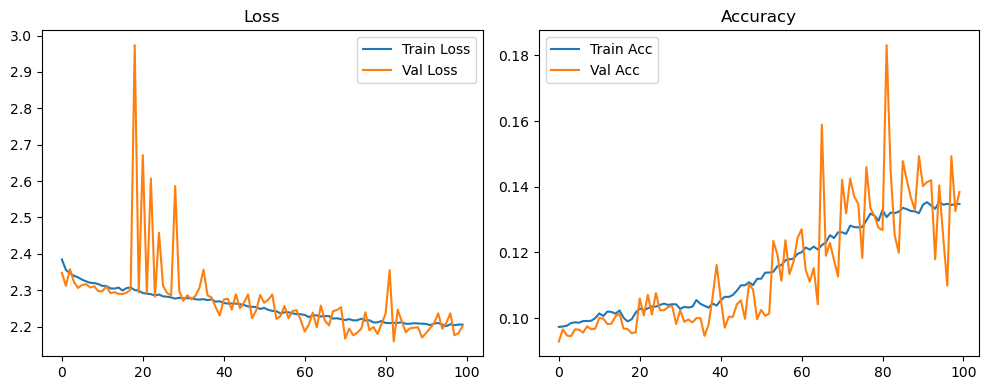

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.27it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.1933 Accuracy: 0.1352


🚀 Running: batch128_lr_max_0.0001_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0961 |:   1%|          | 1/100 [01:17<2:08:03, 77.61s/it]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0968 |:   1%|          | 1/100 [01:34<2:08:03, 77.61s/it]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0968 |:   1%|          | 1/100 [01:34<2:08:03, 77.61s/it]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [01:34<1:08:14, 41.78s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [01:51<1:08:14, 41.78s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [01:51<1:08:14, 41.78s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0948 |:   3%|▎         | 3/100 [01:51<49:06, 30.38s/it]  

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [02:07<49:06, 30.38s/it]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [02:07<49:06, 30.38s/it]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [02:07<39:58, 24.99s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:24<39:58, 24.99s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [02:24<39:58, 24.99s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:24<34:51, 22.01s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [02:41<34:51, 22.01s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [02:41<34:51, 22.01s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [02:41<31:47, 20.30s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0957 |:   6%|▌         | 6/100 [02:58<31:47, 20.30s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0957 |:   6%|▌         | 6/100 [02:58<31:47, 20.30s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0957 |:   7%|▋         | 7/100 [02:58<29:39, 19.14s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:14<29:39, 19.14s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:14<29:39, 19.14s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:15<28:10, 18.37s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [03:31<28:10, 18.37s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [03:31<28:10, 18.37s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [03:31<27:04, 17.86s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [03:48<27:04, 17.86s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [03:48<27:04, 17.86s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  10%|█         | 10/100 [03:48<26:11, 17.46s/it]

| LR: 0.000098 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:05<26:11, 17.46s/it]

| LR: 0.000098 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:05<26:11, 17.46s/it]

| LR: 0.000098 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:05<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.1012 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:21<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.1012 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:21<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.1012 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [04:21<25:03, 17.09s/it]

| LR: 0.000097 | Train Acc: 0.1020 | Val Acc: 0.0986 |:  12%|█▏        | 12/100 [04:38<25:03, 17.09s/it]

| LR: 0.000097 | Train Acc: 0.1020 | Val Acc: 0.0986 |:  12%|█▏        | 12/100 [04:38<25:03, 17.09s/it]

| LR: 0.000097 | Train Acc: 0.1020 | Val Acc: 0.0986 |:  13%|█▎        | 13/100 [04:38<24:38, 17.00s/it]

| LR: 0.000096 | Train Acc: 0.1018 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [04:55<24:38, 17.00s/it]

| LR: 0.000096 | Train Acc: 0.1018 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [04:55<24:38, 17.00s/it]

| LR: 0.000096 | Train Acc: 0.1018 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [04:55<24:11, 16.88s/it]

| LR: 0.000096 | Train Acc: 0.1027 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [05:11<24:11, 16.88s/it]

| LR: 0.000096 | Train Acc: 0.1027 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [05:11<24:11, 16.88s/it]

| LR: 0.000096 | Train Acc: 0.1027 | Val Acc: 0.0980 |:  15%|█▌        | 15/100 [05:12<23:53, 16.86s/it]

| LR: 0.000095 | Train Acc: 0.1027 | Val Acc: 0.0957 |:  15%|█▌        | 15/100 [05:28<23:53, 16.86s/it]

| LR: 0.000095 | Train Acc: 0.1027 | Val Acc: 0.0957 |:  15%|█▌        | 15/100 [05:28<23:53, 16.86s/it]

| LR: 0.000095 | Train Acc: 0.1027 | Val Acc: 0.0957 |:  16%|█▌        | 16/100 [05:28<23:35, 16.85s/it]

| LR: 0.000094 | Train Acc: 0.1018 | Val Acc: 0.0994 |:  16%|█▌        | 16/100 [05:45<23:35, 16.85s/it]

| LR: 0.000094 | Train Acc: 0.1018 | Val Acc: 0.0994 |:  16%|█▌        | 16/100 [05:45<23:35, 16.85s/it]

| LR: 0.000094 | Train Acc: 0.1018 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [05:45<23:14, 16.80s/it]

| LR: 0.000094 | Train Acc: 0.1017 | Val Acc: 0.0957 |:  17%|█▋        | 17/100 [06:02<23:14, 16.80s/it]

| LR: 0.000094 | Train Acc: 0.1017 | Val Acc: 0.0957 |:  17%|█▋        | 17/100 [06:02<23:14, 16.80s/it]

| LR: 0.000094 | Train Acc: 0.1017 | Val Acc: 0.0957 |:  18%|█▊        | 18/100 [06:02<22:56, 16.79s/it]

| LR: 0.000093 | Train Acc: 0.1015 | Val Acc: 0.0992 |:  18%|█▊        | 18/100 [06:18<22:56, 16.79s/it]

| LR: 0.000093 | Train Acc: 0.1015 | Val Acc: 0.0992 |:  18%|█▊        | 18/100 [06:18<22:56, 16.79s/it]

| LR: 0.000093 | Train Acc: 0.1015 | Val Acc: 0.0992 |:  19%|█▉        | 19/100 [06:18<22:37, 16.75s/it]

| LR: 0.000092 | Train Acc: 0.1016 | Val Acc: 0.0983 |:  19%|█▉        | 19/100 [06:35<22:37, 16.75s/it]

| LR: 0.000092 | Train Acc: 0.1016 | Val Acc: 0.0983 |:  19%|█▉        | 19/100 [06:35<22:37, 16.75s/it]

| LR: 0.000092 | Train Acc: 0.1016 | Val Acc: 0.0983 |:  20%|██        | 20/100 [06:35<22:18, 16.73s/it]

| LR: 0.000091 | Train Acc: 0.1025 | Val Acc: 0.0990 |:  20%|██        | 20/100 [06:52<22:18, 16.73s/it]

| LR: 0.000091 | Train Acc: 0.1025 | Val Acc: 0.0990 |:  20%|██        | 20/100 [06:52<22:18, 16.73s/it]

| LR: 0.000091 | Train Acc: 0.1025 | Val Acc: 0.0990 |:  21%|██        | 21/100 [06:52<22:02, 16.74s/it]

| LR: 0.000091 | Train Acc: 0.1032 | Val Acc: 0.0953 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000091 | Train Acc: 0.1032 | Val Acc: 0.0953 |:  21%|██        | 21/100 [07:09<22:02, 16.74s/it]

| LR: 0.000091 | Train Acc: 0.1032 | Val Acc: 0.0953 |:  22%|██▏       | 22/100 [07:09<21:43, 16.71s/it]

| LR: 0.000090 | Train Acc: 0.1035 | Val Acc: 0.0993 |:  22%|██▏       | 22/100 [07:25<21:43, 16.71s/it]

| LR: 0.000090 | Train Acc: 0.1035 | Val Acc: 0.0993 |:  22%|██▏       | 22/100 [07:25<21:43, 16.71s/it]

| LR: 0.000090 | Train Acc: 0.1035 | Val Acc: 0.0993 |:  23%|██▎       | 23/100 [07:25<21:30, 16.76s/it]

| LR: 0.000089 | Train Acc: 0.1041 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [07:42<21:30, 16.76s/it]

| LR: 0.000089 | Train Acc: 0.1041 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [07:42<21:30, 16.76s/it]

| LR: 0.000089 | Train Acc: 0.1041 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [07:42<21:11, 16.73s/it]

| LR: 0.000088 | Train Acc: 0.1046 | Val Acc: 0.1031 |:  24%|██▍       | 24/100 [07:59<21:11, 16.73s/it]

| LR: 0.000088 | Train Acc: 0.1046 | Val Acc: 0.1031 |:  24%|██▍       | 24/100 [07:59<21:11, 16.73s/it]

| LR: 0.000088 | Train Acc: 0.1046 | Val Acc: 0.1031 |:  25%|██▌       | 25/100 [07:59<20:56, 16.75s/it]

| LR: 0.000087 | Train Acc: 0.1041 | Val Acc: 0.1013 |:  25%|██▌       | 25/100 [08:15<20:56, 16.75s/it]

| LR: 0.000087 | Train Acc: 0.1041 | Val Acc: 0.1013 |:  25%|██▌       | 25/100 [08:15<20:56, 16.75s/it]

| LR: 0.000087 | Train Acc: 0.1041 | Val Acc: 0.1013 |:  26%|██▌       | 26/100 [08:15<20:34, 16.69s/it]

| LR: 0.000086 | Train Acc: 0.1051 | Val Acc: 0.0992 |:  26%|██▌       | 26/100 [08:32<20:34, 16.69s/it]

| LR: 0.000086 | Train Acc: 0.1051 | Val Acc: 0.0992 |:  26%|██▌       | 26/100 [08:32<20:34, 16.69s/it]

| LR: 0.000086 | Train Acc: 0.1051 | Val Acc: 0.0992 |:  27%|██▋       | 27/100 [08:32<20:18, 16.69s/it]

| LR: 0.000085 | Train Acc: 0.1051 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [08:49<20:18, 16.69s/it]

| LR: 0.000085 | Train Acc: 0.1051 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [08:49<20:18, 16.69s/it]

| LR: 0.000085 | Train Acc: 0.1051 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [08:49<20:03, 16.72s/it]

| LR: 0.000084 | Train Acc: 0.1045 | Val Acc: 0.0976 |:  28%|██▊       | 28/100 [09:06<20:03, 16.72s/it]

| LR: 0.000084 | Train Acc: 0.1045 | Val Acc: 0.0976 |:  28%|██▊       | 28/100 [09:06<20:03, 16.72s/it]

| LR: 0.000084 | Train Acc: 0.1045 | Val Acc: 0.0976 |:  29%|██▉       | 29/100 [09:06<19:47, 16.73s/it]

| LR: 0.000083 | Train Acc: 0.1051 | Val Acc: 0.0975 |:  29%|██▉       | 29/100 [09:22<19:47, 16.73s/it]

| LR: 0.000083 | Train Acc: 0.1051 | Val Acc: 0.0975 |:  29%|██▉       | 29/100 [09:22<19:47, 16.73s/it]

| LR: 0.000083 | Train Acc: 0.1051 | Val Acc: 0.0975 |:  30%|███       | 30/100 [09:22<19:30, 16.72s/it]

| LR: 0.000081 | Train Acc: 0.1044 | Val Acc: 0.1068 |:  30%|███       | 30/100 [09:39<19:30, 16.72s/it]

| LR: 0.000081 | Train Acc: 0.1044 | Val Acc: 0.1068 |:  30%|███       | 30/100 [09:39<19:30, 16.72s/it]

| LR: 0.000081 | Train Acc: 0.1044 | Val Acc: 0.1068 |:  31%|███       | 31/100 [09:39<19:15, 16.75s/it]

| LR: 0.000080 | Train Acc: 0.1045 | Val Acc: 0.0977 |:  31%|███       | 31/100 [09:56<19:15, 16.75s/it]

| LR: 0.000080 | Train Acc: 0.1045 | Val Acc: 0.0977 |:  31%|███       | 31/100 [09:56<19:15, 16.75s/it]

| LR: 0.000080 | Train Acc: 0.1045 | Val Acc: 0.0977 |:  32%|███▏      | 32/100 [09:56<19:00, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.1051 | Val Acc: 0.0906 |:  32%|███▏      | 32/100 [10:13<19:00, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.1051 | Val Acc: 0.0906 |:  32%|███▏      | 32/100 [10:13<19:00, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.1051 | Val Acc: 0.0906 |:  33%|███▎      | 33/100 [10:13<18:42, 16.76s/it]

| LR: 0.000078 | Train Acc: 0.1048 | Val Acc: 0.1003 |:  33%|███▎      | 33/100 [10:29<18:42, 16.76s/it]

| LR: 0.000078 | Train Acc: 0.1048 | Val Acc: 0.1003 |:  33%|███▎      | 33/100 [10:29<18:42, 16.76s/it]

| LR: 0.000078 | Train Acc: 0.1048 | Val Acc: 0.1003 |:  34%|███▍      | 34/100 [10:29<18:22, 16.71s/it]

| LR: 0.000077 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  34%|███▍      | 34/100 [10:46<18:22, 16.71s/it]

| LR: 0.000077 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  34%|███▍      | 34/100 [10:46<18:22, 16.71s/it]

| LR: 0.000077 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  35%|███▌      | 35/100 [10:46<18:06, 16.71s/it]

| LR: 0.000075 | Train Acc: 0.1046 | Val Acc: 0.0986 |:  35%|███▌      | 35/100 [11:03<18:06, 16.71s/it]

| LR: 0.000075 | Train Acc: 0.1046 | Val Acc: 0.0986 |:  35%|███▌      | 35/100 [11:03<18:06, 16.71s/it]

| LR: 0.000075 | Train Acc: 0.1046 | Val Acc: 0.0986 |:  36%|███▌      | 36/100 [11:03<17:48, 16.70s/it]

| LR: 0.000074 | Train Acc: 0.1062 | Val Acc: 0.0985 |:  36%|███▌      | 36/100 [11:19<17:48, 16.70s/it]

| LR: 0.000074 | Train Acc: 0.1062 | Val Acc: 0.0985 |:  36%|███▌      | 36/100 [11:19<17:48, 16.70s/it]

| LR: 0.000074 | Train Acc: 0.1062 | Val Acc: 0.0985 |:  37%|███▋      | 37/100 [11:19<17:31, 16.68s/it]

| LR: 0.000073 | Train Acc: 0.1053 | Val Acc: 0.0994 |:  37%|███▋      | 37/100 [11:36<17:31, 16.68s/it]

| LR: 0.000073 | Train Acc: 0.1053 | Val Acc: 0.0994 |:  37%|███▋      | 37/100 [11:36<17:31, 16.68s/it]

| LR: 0.000073 | Train Acc: 0.1053 | Val Acc: 0.0994 |:  38%|███▊      | 38/100 [11:36<17:16, 16.72s/it]

| LR: 0.000072 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  38%|███▊      | 38/100 [11:53<17:16, 16.72s/it]

| LR: 0.000072 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  38%|███▊      | 38/100 [11:53<17:16, 16.72s/it]

| LR: 0.000072 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  39%|███▉      | 39/100 [11:53<16:58, 16.69s/it]

| LR: 0.000070 | Train Acc: 0.1037 | Val Acc: 0.0999 |:  39%|███▉      | 39/100 [12:10<16:58, 16.69s/it]

| LR: 0.000070 | Train Acc: 0.1037 | Val Acc: 0.0999 |:  39%|███▉      | 39/100 [12:10<16:58, 16.69s/it]

| LR: 0.000070 | Train Acc: 0.1037 | Val Acc: 0.0999 |:  40%|████      | 40/100 [12:10<16:43, 16.73s/it]

| LR: 0.000069 | Train Acc: 0.1056 | Val Acc: 0.1023 |:  40%|████      | 40/100 [12:26<16:43, 16.73s/it]

| LR: 0.000069 | Train Acc: 0.1056 | Val Acc: 0.1023 |:  40%|████      | 40/100 [12:26<16:43, 16.73s/it]

| LR: 0.000069 | Train Acc: 0.1056 | Val Acc: 0.1023 |:  41%|████      | 41/100 [12:26<16:25, 16.70s/it]

| LR: 0.000068 | Train Acc: 0.1053 | Val Acc: 0.1037 |:  41%|████      | 41/100 [12:43<16:25, 16.70s/it]

| LR: 0.000068 | Train Acc: 0.1053 | Val Acc: 0.1037 |:  41%|████      | 41/100 [12:43<16:25, 16.70s/it]

| LR: 0.000068 | Train Acc: 0.1053 | Val Acc: 0.1037 |:  42%|████▏     | 42/100 [12:43<16:07, 16.68s/it]

| LR: 0.000066 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  42%|████▏     | 42/100 [12:59<16:07, 16.68s/it]

| LR: 0.000066 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  42%|████▏     | 42/100 [12:59<16:07, 16.68s/it]

| LR: 0.000066 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  43%|████▎     | 43/100 [12:59<15:48, 16.65s/it]

| LR: 0.000065 | Train Acc: 0.1046 | Val Acc: 0.1010 |:  43%|████▎     | 43/100 [13:16<15:48, 16.65s/it]

| LR: 0.000065 | Train Acc: 0.1046 | Val Acc: 0.1010 |:  43%|████▎     | 43/100 [13:16<15:48, 16.65s/it]

| LR: 0.000065 | Train Acc: 0.1046 | Val Acc: 0.1010 |:  44%|████▍     | 44/100 [13:16<15:35, 16.70s/it]

| LR: 0.000063 | Train Acc: 0.1071 | Val Acc: 0.1039 |:  44%|████▍     | 44/100 [13:33<15:35, 16.70s/it]

| LR: 0.000063 | Train Acc: 0.1071 | Val Acc: 0.1039 |:  44%|████▍     | 44/100 [13:33<15:35, 16.70s/it]

| LR: 0.000063 | Train Acc: 0.1071 | Val Acc: 0.1039 |:  45%|████▌     | 45/100 [13:33<15:17, 16.68s/it]

| LR: 0.000062 | Train Acc: 0.1056 | Val Acc: 0.1018 |:  45%|████▌     | 45/100 [13:50<15:17, 16.68s/it]

| LR: 0.000062 | Train Acc: 0.1056 | Val Acc: 0.1018 |:  45%|████▌     | 45/100 [13:50<15:17, 16.68s/it]

| LR: 0.000062 | Train Acc: 0.1056 | Val Acc: 0.1018 |:  46%|████▌     | 46/100 [13:50<15:03, 16.74s/it]

| LR: 0.000061 | Train Acc: 0.1075 | Val Acc: 0.1070 |:  46%|████▌     | 46/100 [14:06<15:03, 16.74s/it]

| LR: 0.000061 | Train Acc: 0.1075 | Val Acc: 0.1070 |:  46%|████▌     | 46/100 [14:06<15:03, 16.74s/it]

| LR: 0.000061 | Train Acc: 0.1075 | Val Acc: 0.1070 |:  47%|████▋     | 47/100 [14:06<14:45, 16.72s/it]

| LR: 0.000059 | Train Acc: 0.1086 | Val Acc: 0.1021 |:  47%|████▋     | 47/100 [14:23<14:45, 16.72s/it]

| LR: 0.000059 | Train Acc: 0.1086 | Val Acc: 0.1021 |:  47%|████▋     | 47/100 [14:23<14:45, 16.72s/it]

| LR: 0.000059 | Train Acc: 0.1086 | Val Acc: 0.1021 |:  48%|████▊     | 48/100 [14:23<14:31, 16.75s/it]

| LR: 0.000058 | Train Acc: 0.1097 | Val Acc: 0.1079 |:  48%|████▊     | 48/100 [14:40<14:31, 16.75s/it]

| LR: 0.000058 | Train Acc: 0.1097 | Val Acc: 0.1079 |:  48%|████▊     | 48/100 [14:40<14:31, 16.75s/it]

| LR: 0.000058 | Train Acc: 0.1097 | Val Acc: 0.1079 |:  49%|████▉     | 49/100 [14:40<14:12, 16.71s/it]

| LR: 0.000056 | Train Acc: 0.1102 | Val Acc: 0.1070 |:  49%|████▉     | 49/100 [14:57<14:12, 16.71s/it]

| LR: 0.000056 | Train Acc: 0.1102 | Val Acc: 0.1070 |:  49%|████▉     | 49/100 [14:57<14:12, 16.71s/it]

| LR: 0.000056 | Train Acc: 0.1102 | Val Acc: 0.1070 |:  50%|█████     | 50/100 [14:57<13:55, 16.72s/it]

| LR: 0.000055 | Train Acc: 0.1094 | Val Acc: 0.1062 |:  50%|█████     | 50/100 [15:13<13:55, 16.72s/it]

| LR: 0.000055 | Train Acc: 0.1094 | Val Acc: 0.1062 |:  50%|█████     | 50/100 [15:13<13:55, 16.72s/it]

| LR: 0.000055 | Train Acc: 0.1094 | Val Acc: 0.1062 |:  51%|█████     | 51/100 [15:13<13:36, 16.67s/it]

| LR: 0.000054 | Train Acc: 0.1131 | Val Acc: 0.1026 |:  51%|█████     | 51/100 [15:30<13:36, 16.67s/it]

| LR: 0.000054 | Train Acc: 0.1131 | Val Acc: 0.1026 |:  51%|█████     | 51/100 [15:30<13:36, 16.67s/it]

| LR: 0.000054 | Train Acc: 0.1131 | Val Acc: 0.1026 |:  52%|█████▏    | 52/100 [15:30<13:19, 16.65s/it]

| LR: 0.000052 | Train Acc: 0.1133 | Val Acc: 0.1069 |:  52%|█████▏    | 52/100 [15:46<13:19, 16.65s/it]

| LR: 0.000052 | Train Acc: 0.1133 | Val Acc: 0.1069 |:  52%|█████▏    | 52/100 [15:46<13:19, 16.65s/it]

| LR: 0.000052 | Train Acc: 0.1133 | Val Acc: 0.1069 |:  53%|█████▎    | 53/100 [15:46<13:02, 16.66s/it]

| LR: 0.000051 | Train Acc: 0.1113 | Val Acc: 0.1131 |:  53%|█████▎    | 53/100 [16:03<13:02, 16.66s/it]

| LR: 0.000051 | Train Acc: 0.1113 | Val Acc: 0.1131 |:  53%|█████▎    | 53/100 [16:03<13:02, 16.66s/it]

| LR: 0.000051 | Train Acc: 0.1113 | Val Acc: 0.1131 |:  54%|█████▍    | 54/100 [16:03<12:44, 16.62s/it]

| LR: 0.000049 | Train Acc: 0.1130 | Val Acc: 0.1071 |:  54%|█████▍    | 54/100 [16:20<12:44, 16.62s/it]

| LR: 0.000049 | Train Acc: 0.1130 | Val Acc: 0.1071 |:  54%|█████▍    | 54/100 [16:20<12:44, 16.62s/it]

| LR: 0.000049 | Train Acc: 0.1130 | Val Acc: 0.1071 |:  55%|█████▌    | 55/100 [16:20<12:30, 16.69s/it]

| LR: 0.000048 | Train Acc: 0.1127 | Val Acc: 0.1080 |:  55%|█████▌    | 55/100 [16:37<12:30, 16.69s/it]

| LR: 0.000048 | Train Acc: 0.1127 | Val Acc: 0.1080 |:  55%|█████▌    | 55/100 [16:37<12:30, 16.69s/it]

| LR: 0.000048 | Train Acc: 0.1127 | Val Acc: 0.1080 |:  56%|█████▌    | 56/100 [16:37<12:16, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1135 | Val Acc: 0.0992 |:  56%|█████▌    | 56/100 [16:53<12:16, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1135 | Val Acc: 0.0992 |:  56%|█████▌    | 56/100 [16:53<12:16, 16.74s/it]

| LR: 0.000047 | Train Acc: 0.1135 | Val Acc: 0.0992 |:  57%|█████▋    | 57/100 [16:54<12:00, 16.76s/it]

| LR: 0.000045 | Train Acc: 0.1153 | Val Acc: 0.1119 |:  57%|█████▋    | 57/100 [17:10<12:00, 16.76s/it]

| LR: 0.000045 | Train Acc: 0.1153 | Val Acc: 0.1119 |:  57%|█████▋    | 57/100 [17:10<12:00, 16.76s/it]

| LR: 0.000045 | Train Acc: 0.1153 | Val Acc: 0.1119 |:  58%|█████▊    | 58/100 [17:10<11:44, 16.78s/it]

| LR: 0.000044 | Train Acc: 0.1165 | Val Acc: 0.1109 |:  58%|█████▊    | 58/100 [17:27<11:44, 16.78s/it]

| LR: 0.000044 | Train Acc: 0.1165 | Val Acc: 0.1109 |:  58%|█████▊    | 58/100 [17:27<11:44, 16.78s/it]

| LR: 0.000044 | Train Acc: 0.1165 | Val Acc: 0.1109 |:  59%|█████▉    | 59/100 [17:27<11:25, 16.72s/it]

| LR: 0.000042 | Train Acc: 0.1164 | Val Acc: 0.1239 |:  59%|█████▉    | 59/100 [17:44<11:25, 16.72s/it]

| LR: 0.000042 | Train Acc: 0.1164 | Val Acc: 0.1239 |:  59%|█████▉    | 59/100 [17:44<11:25, 16.72s/it]

| LR: 0.000042 | Train Acc: 0.1164 | Val Acc: 0.1239 |:  60%|██████    | 60/100 [17:44<11:09, 16.74s/it]

| LR: 0.000041 | Train Acc: 0.1179 | Val Acc: 0.1143 |:  60%|██████    | 60/100 [18:00<11:09, 16.74s/it]

| LR: 0.000041 | Train Acc: 0.1179 | Val Acc: 0.1143 |:  60%|██████    | 60/100 [18:00<11:09, 16.74s/it]

| LR: 0.000041 | Train Acc: 0.1179 | Val Acc: 0.1143 |:  61%|██████    | 61/100 [18:00<10:53, 16.75s/it]

| LR: 0.000040 | Train Acc: 0.1190 | Val Acc: 0.1031 |:  61%|██████    | 61/100 [18:17<10:53, 16.75s/it]

| LR: 0.000040 | Train Acc: 0.1190 | Val Acc: 0.1031 |:  61%|██████    | 61/100 [18:17<10:53, 16.75s/it]

| LR: 0.000040 | Train Acc: 0.1190 | Val Acc: 0.1031 |:  62%|██████▏   | 62/100 [18:17<10:36, 16.76s/it]

| LR: 0.000038 | Train Acc: 0.1198 | Val Acc: 0.1120 |:  62%|██████▏   | 62/100 [18:34<10:36, 16.76s/it]

| LR: 0.000038 | Train Acc: 0.1198 | Val Acc: 0.1120 |:  62%|██████▏   | 62/100 [18:34<10:36, 16.76s/it]

| LR: 0.000038 | Train Acc: 0.1198 | Val Acc: 0.1120 |:  63%|██████▎   | 63/100 [18:34<10:20, 16.76s/it]

| LR: 0.000037 | Train Acc: 0.1213 | Val Acc: 0.1177 |:  63%|██████▎   | 63/100 [18:51<10:20, 16.76s/it]

| LR: 0.000037 | Train Acc: 0.1213 | Val Acc: 0.1177 |:  63%|██████▎   | 63/100 [18:51<10:20, 16.76s/it]

| LR: 0.000037 | Train Acc: 0.1213 | Val Acc: 0.1177 |:  64%|██████▍   | 64/100 [18:51<10:05, 16.82s/it]

| LR: 0.000036 | Train Acc: 0.1198 | Val Acc: 0.1088 |:  64%|██████▍   | 64/100 [19:08<10:05, 16.82s/it]

| LR: 0.000036 | Train Acc: 0.1198 | Val Acc: 0.1088 |:  64%|██████▍   | 64/100 [19:08<10:05, 16.82s/it]

| LR: 0.000036 | Train Acc: 0.1198 | Val Acc: 0.1088 |:  65%|██████▌   | 65/100 [19:08<09:48, 16.82s/it]

| LR: 0.000035 | Train Acc: 0.1231 | Val Acc: 0.1202 |:  65%|██████▌   | 65/100 [19:24<09:48, 16.82s/it]

| LR: 0.000035 | Train Acc: 0.1231 | Val Acc: 0.1202 |:  65%|██████▌   | 65/100 [19:24<09:48, 16.82s/it]

| LR: 0.000035 | Train Acc: 0.1231 | Val Acc: 0.1202 |:  66%|██████▌   | 66/100 [19:24<09:29, 16.75s/it]

| LR: 0.000033 | Train Acc: 0.1229 | Val Acc: 0.1183 |:  66%|██████▌   | 66/100 [19:41<09:29, 16.75s/it]

| LR: 0.000033 | Train Acc: 0.1229 | Val Acc: 0.1183 |:  66%|██████▌   | 66/100 [19:41<09:29, 16.75s/it]

| LR: 0.000033 | Train Acc: 0.1229 | Val Acc: 0.1183 |:  67%|██████▋   | 67/100 [19:41<09:11, 16.72s/it]

| LR: 0.000032 | Train Acc: 0.1216 | Val Acc: 0.1052 |:  67%|██████▋   | 67/100 [19:57<09:11, 16.72s/it]

| LR: 0.000032 | Train Acc: 0.1216 | Val Acc: 0.1052 |:  67%|██████▋   | 67/100 [19:57<09:11, 16.72s/it]

| LR: 0.000032 | Train Acc: 0.1216 | Val Acc: 0.1052 |:  68%|██████▊   | 68/100 [19:57<08:52, 16.63s/it]

| LR: 0.000031 | Train Acc: 0.1213 | Val Acc: 0.1531 |:  68%|██████▊   | 68/100 [20:14<08:52, 16.63s/it]

| LR: 0.000031 | Train Acc: 0.1213 | Val Acc: 0.1531 |:  68%|██████▊   | 68/100 [20:14<08:52, 16.63s/it]

| LR: 0.000031 | Train Acc: 0.1213 | Val Acc: 0.1531 |:  69%|██████▉   | 69/100 [20:14<08:37, 16.68s/it]

| LR: 0.000030 | Train Acc: 0.1207 | Val Acc: 0.1137 |:  69%|██████▉   | 69/100 [20:31<08:37, 16.68s/it]

| LR: 0.000030 | Train Acc: 0.1207 | Val Acc: 0.1137 |:  69%|██████▉   | 69/100 [20:31<08:37, 16.68s/it]

| LR: 0.000030 | Train Acc: 0.1207 | Val Acc: 0.1137 |:  70%|███████   | 70/100 [20:31<08:21, 16.73s/it]

| LR: 0.000029 | Train Acc: 0.1225 | Val Acc: 0.1498 |:  70%|███████   | 70/100 [20:48<08:21, 16.73s/it]

| LR: 0.000029 | Train Acc: 0.1225 | Val Acc: 0.1498 |:  70%|███████   | 70/100 [20:48<08:21, 16.73s/it]

| LR: 0.000029 | Train Acc: 0.1225 | Val Acc: 0.1498 |:  71%|███████   | 71/100 [20:48<08:04, 16.72s/it]

| LR: 0.000027 | Train Acc: 0.1222 | Val Acc: 0.1709 |:  71%|███████   | 71/100 [21:05<08:04, 16.72s/it]

| LR: 0.000027 | Train Acc: 0.1222 | Val Acc: 0.1709 |:  71%|███████   | 71/100 [21:05<08:04, 16.72s/it]

| LR: 0.000027 | Train Acc: 0.1222 | Val Acc: 0.1709 |:  72%|███████▏  | 72/100 [21:05<07:48, 16.74s/it]

| LR: 0.000026 | Train Acc: 0.1214 | Val Acc: 0.1276 |:  72%|███████▏  | 72/100 [21:21<07:48, 16.74s/it]

| LR: 0.000026 | Train Acc: 0.1214 | Val Acc: 0.1276 |:  72%|███████▏  | 72/100 [21:21<07:48, 16.74s/it]

| LR: 0.000026 | Train Acc: 0.1214 | Val Acc: 0.1276 |:  73%|███████▎  | 73/100 [21:21<07:32, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.1214 | Val Acc: 0.1231 |:  73%|███████▎  | 73/100 [21:38<07:32, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.1214 | Val Acc: 0.1231 |:  73%|███████▎  | 73/100 [21:38<07:32, 16.77s/it]

| LR: 0.000025 | Train Acc: 0.1214 | Val Acc: 0.1231 |:  74%|███████▍  | 74/100 [21:38<07:16, 16.79s/it]

| LR: 0.000024 | Train Acc: 0.1243 | Val Acc: 0.1342 |:  74%|███████▍  | 74/100 [21:55<07:16, 16.79s/it]

| LR: 0.000024 | Train Acc: 0.1243 | Val Acc: 0.1342 |:  74%|███████▍  | 74/100 [21:55<07:16, 16.79s/it]

| LR: 0.000024 | Train Acc: 0.1243 | Val Acc: 0.1342 |:  75%|███████▌  | 75/100 [21:55<06:59, 16.77s/it]

| LR: 0.000023 | Train Acc: 0.1242 | Val Acc: 0.1383 |:  75%|███████▌  | 75/100 [22:12<06:59, 16.77s/it]

| LR: 0.000023 | Train Acc: 0.1242 | Val Acc: 0.1383 |:  75%|███████▌  | 75/100 [22:12<06:59, 16.77s/it]

| LR: 0.000023 | Train Acc: 0.1242 | Val Acc: 0.1383 |:  76%|███████▌  | 76/100 [22:12<06:41, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.1241 | Val Acc: 0.1355 |:  76%|███████▌  | 76/100 [22:28<06:41, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.1241 | Val Acc: 0.1355 |:  76%|███████▌  | 76/100 [22:28<06:41, 16.74s/it]

| LR: 0.000022 | Train Acc: 0.1241 | Val Acc: 0.1355 |:  77%|███████▋  | 77/100 [22:28<06:25, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.1260 | Val Acc: 0.1376 |:  77%|███████▋  | 77/100 [22:45<06:25, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.1260 | Val Acc: 0.1376 |:  77%|███████▋  | 77/100 [22:45<06:25, 16.75s/it]

| LR: 0.000021 | Train Acc: 0.1260 | Val Acc: 0.1376 |:  78%|███████▊  | 78/100 [22:45<06:08, 16.74s/it]

| LR: 0.000020 | Train Acc: 0.1256 | Val Acc: 0.1149 |:  78%|███████▊  | 78/100 [23:02<06:08, 16.74s/it]

| LR: 0.000020 | Train Acc: 0.1256 | Val Acc: 0.1149 |:  78%|███████▊  | 78/100 [23:02<06:08, 16.74s/it]

| LR: 0.000020 | Train Acc: 0.1256 | Val Acc: 0.1149 |:  79%|███████▉  | 79/100 [23:02<05:51, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.1261 | Val Acc: 0.1319 |:  79%|███████▉  | 79/100 [23:19<05:51, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.1261 | Val Acc: 0.1319 |:  79%|███████▉  | 79/100 [23:19<05:51, 16.74s/it]

| LR: 0.000019 | Train Acc: 0.1261 | Val Acc: 0.1319 |:  80%|████████  | 80/100 [23:19<05:34, 16.75s/it]

| LR: 0.000019 | Train Acc: 0.1273 | Val Acc: 0.1136 |:  80%|████████  | 80/100 [23:35<05:34, 16.75s/it]

| LR: 0.000019 | Train Acc: 0.1273 | Val Acc: 0.1136 |:  80%|████████  | 80/100 [23:35<05:34, 16.75s/it]

| LR: 0.000019 | Train Acc: 0.1273 | Val Acc: 0.1136 |:  81%|████████  | 81/100 [23:35<05:18, 16.76s/it]

| LR: 0.000018 | Train Acc: 0.1265 | Val Acc: 0.1075 |:  81%|████████  | 81/100 [23:52<05:18, 16.76s/it]

| LR: 0.000018 | Train Acc: 0.1265 | Val Acc: 0.1075 |:  81%|████████  | 81/100 [23:52<05:18, 16.76s/it]

| LR: 0.000018 | Train Acc: 0.1265 | Val Acc: 0.1075 |:  82%|████████▏ | 82/100 [23:52<05:02, 16.80s/it]

| LR: 0.000017 | Train Acc: 0.1282 | Val Acc: 0.1222 |:  82%|████████▏ | 82/100 [24:09<05:02, 16.80s/it]

| LR: 0.000017 | Train Acc: 0.1282 | Val Acc: 0.1222 |:  82%|████████▏ | 82/100 [24:09<05:02, 16.80s/it]

| LR: 0.000017 | Train Acc: 0.1282 | Val Acc: 0.1222 |:  83%|████████▎ | 83/100 [24:09<04:44, 16.74s/it]

| LR: 0.000016 | Train Acc: 0.1262 | Val Acc: 0.1057 |:  83%|████████▎ | 83/100 [24:26<04:44, 16.74s/it]

| LR: 0.000016 | Train Acc: 0.1262 | Val Acc: 0.1057 |:  83%|████████▎ | 83/100 [24:26<04:44, 16.74s/it]

| LR: 0.000016 | Train Acc: 0.1262 | Val Acc: 0.1057 |:  84%|████████▍ | 84/100 [24:26<04:28, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.1256 | Val Acc: 0.1043 |:  84%|████████▍ | 84/100 [24:42<04:28, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.1256 | Val Acc: 0.1043 |:  84%|████████▍ | 84/100 [24:42<04:28, 16.76s/it]

| LR: 0.000016 | Train Acc: 0.1256 | Val Acc: 0.1043 |:  85%|████████▌ | 85/100 [24:42<04:11, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.1283 | Val Acc: 0.1127 |:  85%|████████▌ | 85/100 [24:59<04:11, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.1283 | Val Acc: 0.1127 |:  85%|████████▌ | 85/100 [24:59<04:11, 16.76s/it]

| LR: 0.000015 | Train Acc: 0.1283 | Val Acc: 0.1127 |:  86%|████████▌ | 86/100 [24:59<03:53, 16.71s/it]

| LR: 0.000014 | Train Acc: 0.1275 | Val Acc: 0.1119 |:  86%|████████▌ | 86/100 [25:16<03:53, 16.71s/it]

| LR: 0.000014 | Train Acc: 0.1275 | Val Acc: 0.1119 |:  86%|████████▌ | 86/100 [25:16<03:53, 16.71s/it]

| LR: 0.000014 | Train Acc: 0.1275 | Val Acc: 0.1119 |:  87%|████████▋ | 87/100 [25:16<03:37, 16.73s/it]

| LR: 0.000014 | Train Acc: 0.1284 | Val Acc: 0.1049 |:  87%|████████▋ | 87/100 [25:32<03:37, 16.73s/it]

| LR: 0.000014 | Train Acc: 0.1284 | Val Acc: 0.1049 |:  87%|████████▋ | 87/100 [25:32<03:37, 16.73s/it]

| LR: 0.000014 | Train Acc: 0.1284 | Val Acc: 0.1049 |:  88%|████████▊ | 88/100 [25:32<03:19, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.1275 | Val Acc: 0.1014 |:  88%|████████▊ | 88/100 [25:49<03:19, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.1275 | Val Acc: 0.1014 |:  88%|████████▊ | 88/100 [25:49<03:19, 16.66s/it]

| LR: 0.000013 | Train Acc: 0.1275 | Val Acc: 0.1014 |:  89%|████████▉ | 89/100 [25:49<03:03, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.1255 | Val Acc: 0.1152 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.1255 | Val Acc: 0.1152 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.68s/it]

| LR: 0.000013 | Train Acc: 0.1255 | Val Acc: 0.1152 |:  90%|█████████ | 90/100 [26:06<02:46, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.1286 | Val Acc: 0.1052 |:  90%|█████████ | 90/100 [26:22<02:46, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.1286 | Val Acc: 0.1052 |:  90%|█████████ | 90/100 [26:22<02:46, 16.68s/it]

| LR: 0.000012 | Train Acc: 0.1286 | Val Acc: 0.1052 |:  91%|█████████ | 91/100 [26:23<02:30, 16.70s/it]

| LR: 0.000012 | Train Acc: 0.1295 | Val Acc: 0.1127 |:  91%|█████████ | 91/100 [26:39<02:30, 16.70s/it]

| LR: 0.000012 | Train Acc: 0.1295 | Val Acc: 0.1127 |:  91%|█████████ | 91/100 [26:39<02:30, 16.70s/it]

| LR: 0.000012 | Train Acc: 0.1295 | Val Acc: 0.1127 |:  92%|█████████▏| 92/100 [26:39<02:13, 16.72s/it]

| LR: 0.000011 | Train Acc: 0.1278 | Val Acc: 0.1086 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.72s/it]

| LR: 0.000011 | Train Acc: 0.1278 | Val Acc: 0.1086 |:  92%|█████████▏| 92/100 [26:56<02:13, 16.72s/it]

| LR: 0.000011 | Train Acc: 0.1278 | Val Acc: 0.1086 |:  93%|█████████▎| 93/100 [26:56<01:57, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.1280 | Val Acc: 0.1154 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.1280 | Val Acc: 0.1154 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.73s/it]

| LR: 0.000011 | Train Acc: 0.1280 | Val Acc: 0.1154 |:  94%|█████████▍| 94/100 [27:13<01:40, 16.76s/it]

| LR: 0.000011 | Train Acc: 0.1307 | Val Acc: 0.1292 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.76s/it]

| LR: 0.000011 | Train Acc: 0.1307 | Val Acc: 0.1292 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.76s/it]

| LR: 0.000011 | Train Acc: 0.1307 | Val Acc: 0.1292 |:  95%|█████████▌| 95/100 [27:30<01:23, 16.78s/it]

| LR: 0.000011 | Train Acc: 0.1298 | Val Acc: 0.1252 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.78s/it]

| LR: 0.000011 | Train Acc: 0.1298 | Val Acc: 0.1252 |:  95%|█████████▌| 95/100 [27:46<01:23, 16.78s/it]

| LR: 0.000011 | Train Acc: 0.1298 | Val Acc: 0.1252 |:  96%|█████████▌| 96/100 [27:46<01:07, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.1330 | Val Acc: 0.1107 |:  96%|█████████▌| 96/100 [28:03<01:07, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.1330 | Val Acc: 0.1107 |:  96%|█████████▌| 96/100 [28:03<01:07, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.1330 | Val Acc: 0.1107 |:  97%|█████████▋| 97/100 [28:03<00:50, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1178 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1178 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.76s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1178 |:  98%|█████████▊| 98/100 [28:20<00:33, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.1313 | Val Acc: 0.1107 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.1313 | Val Acc: 0.1107 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.77s/it]

| LR: 0.000010 | Train Acc: 0.1313 | Val Acc: 0.1107 |:  99%|█████████▉| 99/100 [28:37<00:16, 16.79s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1115 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.79s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1115 |:  99%|█████████▉| 99/100 [28:53<00:16, 16.79s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1115 |: 100%|██████████| 100/100 [28:53<00:00, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.1286 | Val Acc: 0.1115 |: 100%|██████████| 100/100 [28:53<00:00, 17.34s/it]

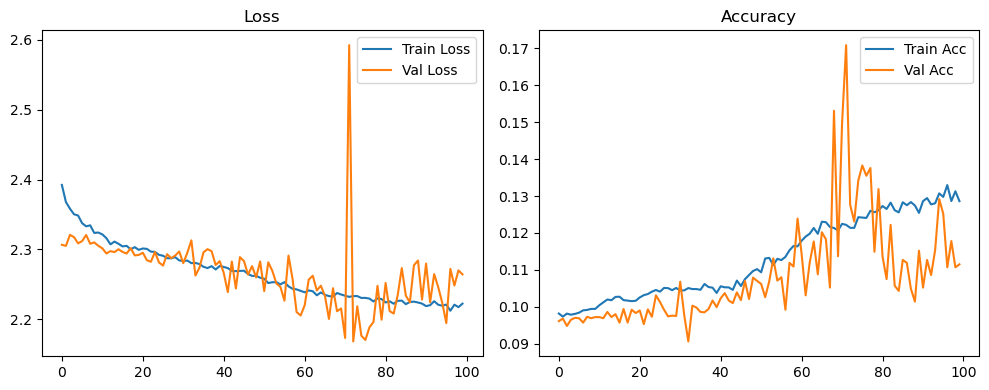

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 2.2664 Accuracy: 0.1140


🚀 Running: batch128_lr_max_0.0001_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:18<2:09:27, 78.46s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:35<2:09:27, 78.46s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:35<2:09:27, 78.46s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:35<1:08:44, 42.09s/it]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:44, 42.09s/it]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [01:51<1:08:44, 42.09s/it]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [01:51<49:20, 30.52s/it]  

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:08<49:20, 30.52s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:08<49:20, 30.52s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [02:08<40:05, 25.05s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:25<40:05, 25.05s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:25<40:05, 25.05s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:25<34:54, 22.05s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:41<34:54, 22.05s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [02:41<34:54, 22.05s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [02:41<31:41, 20.23s/it]

| LR: 0.000099 | Train Acc: 0.0975 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [02:58<31:41, 20.23s/it]

| LR: 0.000099 | Train Acc: 0.0975 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [02:58<31:41, 20.23s/it]

| LR: 0.000099 | Train Acc: 0.0975 | Val Acc: 0.0968 |:   7%|▋         | 7/100 [02:58<29:35, 19.09s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:15<29:35, 19.09s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:15<29:35, 19.09s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:15<28:10, 18.37s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [03:31<28:10, 18.37s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [03:31<28:10, 18.37s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [03:32<26:59, 17.79s/it]

| LR: 0.000098 | Train Acc: 0.0985 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [03:48<26:59, 17.79s/it]

| LR: 0.000098 | Train Acc: 0.0985 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [03:48<26:59, 17.79s/it]

| LR: 0.000098 | Train Acc: 0.0985 | Val Acc: 0.0967 |:  10%|█         | 10/100 [03:48<26:08, 17.43s/it]

| LR: 0.000098 | Train Acc: 0.0987 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:05<26:08, 17.43s/it]

| LR: 0.000098 | Train Acc: 0.0987 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:05<26:08, 17.43s/it]

| LR: 0.000098 | Train Acc: 0.0987 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:05<25:29, 17.19s/it]

| LR: 0.000097 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:21<25:29, 17.19s/it]

| LR: 0.000097 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:21<25:29, 17.19s/it]

| LR: 0.000097 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:21<24:58, 17.03s/it]

| LR: 0.000097 | Train Acc: 0.0982 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [04:38<24:58, 17.03s/it]

| LR: 0.000097 | Train Acc: 0.0982 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [04:38<24:58, 17.03s/it]

| LR: 0.000097 | Train Acc: 0.0982 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [04:38<24:36, 16.98s/it]

| LR: 0.000096 | Train Acc: 0.0979 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [04:55<24:36, 16.98s/it]

| LR: 0.000096 | Train Acc: 0.0979 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [04:55<24:36, 16.98s/it]

| LR: 0.000096 | Train Acc: 0.0979 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [04:55<24:18, 16.96s/it]

| LR: 0.000096 | Train Acc: 0.0983 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:12<24:18, 16.96s/it]

| LR: 0.000096 | Train Acc: 0.0983 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:12<24:18, 16.96s/it]

| LR: 0.000096 | Train Acc: 0.0983 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:12<23:54, 16.87s/it]

| LR: 0.000095 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [05:29<23:54, 16.87s/it]

| LR: 0.000095 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [05:29<23:54, 16.87s/it]

| LR: 0.000095 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [05:29<23:36, 16.86s/it]

| LR: 0.000094 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [05:45<23:36, 16.86s/it]

| LR: 0.000094 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [05:45<23:36, 16.86s/it]

| LR: 0.000094 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [05:45<23:09, 16.74s/it]

| LR: 0.000094 | Train Acc: 0.0984 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [06:02<23:09, 16.74s/it]

| LR: 0.000094 | Train Acc: 0.0984 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [06:02<23:09, 16.74s/it]

| LR: 0.000094 | Train Acc: 0.0984 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [06:02<22:51, 16.73s/it]

| LR: 0.000093 | Train Acc: 0.0989 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:18<22:51, 16.73s/it]

| LR: 0.000093 | Train Acc: 0.0989 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:18<22:51, 16.73s/it]

| LR: 0.000093 | Train Acc: 0.0989 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:18<22:30, 16.68s/it]

| LR: 0.000092 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:35<22:30, 16.68s/it]

| LR: 0.000092 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:35<22:30, 16.68s/it]

| LR: 0.000092 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  20%|██        | 20/100 [06:35<22:06, 16.58s/it]

| LR: 0.000091 | Train Acc: 0.0987 | Val Acc: 0.0970 |:  20%|██        | 20/100 [06:52<22:06, 16.58s/it]

| LR: 0.000091 | Train Acc: 0.0987 | Val Acc: 0.0970 |:  20%|██        | 20/100 [06:52<22:06, 16.58s/it]

| LR: 0.000091 | Train Acc: 0.0987 | Val Acc: 0.0970 |:  21%|██        | 21/100 [06:52<21:59, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  21%|██        | 21/100 [07:09<21:59, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  21%|██        | 21/100 [07:09<21:59, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  22%|██▏       | 22/100 [07:09<21:45, 16.74s/it]

| LR: 0.000090 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  22%|██▏       | 22/100 [07:25<21:45, 16.74s/it]

| LR: 0.000090 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  22%|██▏       | 22/100 [07:25<21:45, 16.74s/it]

| LR: 0.000090 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:25<21:24, 16.68s/it]

| LR: 0.000089 | Train Acc: 0.0983 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:42<21:24, 16.68s/it]

| LR: 0.000089 | Train Acc: 0.0983 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:42<21:24, 16.68s/it]

| LR: 0.000089 | Train Acc: 0.0983 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [07:42<21:10, 16.72s/it]

| LR: 0.000088 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [07:59<21:10, 16.72s/it]

| LR: 0.000088 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [07:59<21:10, 16.72s/it]

| LR: 0.000088 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [07:59<20:55, 16.74s/it]

| LR: 0.000087 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  25%|██▌       | 25/100 [08:16<20:55, 16.74s/it]

| LR: 0.000087 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  25%|██▌       | 25/100 [08:16<20:55, 16.74s/it]

| LR: 0.000087 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  26%|██▌       | 26/100 [08:16<20:42, 16.79s/it]

| LR: 0.000086 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:33<20:42, 16.79s/it]

| LR: 0.000086 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:33<20:42, 16.79s/it]

| LR: 0.000086 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [08:33<20:28, 16.82s/it]

| LR: 0.000085 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [08:49<20:28, 16.82s/it]

| LR: 0.000085 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [08:49<20:28, 16.82s/it]

| LR: 0.000085 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [08:49<20:10, 16.81s/it]

| LR: 0.000084 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [09:06<20:10, 16.81s/it]

| LR: 0.000084 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [09:06<20:10, 16.81s/it]

| LR: 0.000084 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:06<19:49, 16.76s/it]

| LR: 0.000083 | Train Acc: 0.0987 | Val Acc: 0.0967 |:  29%|██▉       | 29/100 [09:23<19:49, 16.76s/it]

| LR: 0.000083 | Train Acc: 0.0987 | Val Acc: 0.0967 |:  29%|██▉       | 29/100 [09:23<19:49, 16.76s/it]

| LR: 0.000083 | Train Acc: 0.0987 | Val Acc: 0.0967 |:  30%|███       | 30/100 [09:23<19:32, 16.75s/it]

| LR: 0.000081 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  30%|███       | 30/100 [09:40<19:32, 16.75s/it]

| LR: 0.000081 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  30%|███       | 30/100 [09:40<19:32, 16.75s/it]

| LR: 0.000081 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  31%|███       | 31/100 [09:40<19:20, 16.83s/it]

| LR: 0.000080 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  31%|███       | 31/100 [09:56<19:20, 16.83s/it]

| LR: 0.000080 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  31%|███       | 31/100 [09:56<19:20, 16.83s/it]

| LR: 0.000080 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [09:56<19:00, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [10:13<19:00, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [10:13<19:00, 16.77s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:13<18:45, 16.80s/it]

| LR: 0.000078 | Train Acc: 0.0991 | Val Acc: 0.0978 |:  33%|███▎      | 33/100 [10:30<18:45, 16.80s/it]

| LR: 0.000078 | Train Acc: 0.0991 | Val Acc: 0.0978 |:  33%|███▎      | 33/100 [10:30<18:45, 16.80s/it]

| LR: 0.000078 | Train Acc: 0.0991 | Val Acc: 0.0978 |:  34%|███▍      | 34/100 [10:30<18:26, 16.77s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  34%|███▍      | 34/100 [10:46<18:26, 16.77s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  34%|███▍      | 34/100 [10:46<18:26, 16.77s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  35%|███▌      | 35/100 [10:46<18:05, 16.71s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  35%|███▌      | 35/100 [11:03<18:05, 16.71s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  35%|███▌      | 35/100 [11:03<18:05, 16.71s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  36%|███▌      | 36/100 [11:03<17:51, 16.74s/it]

| LR: 0.000074 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  36%|███▌      | 36/100 [11:20<17:51, 16.74s/it]

| LR: 0.000074 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  36%|███▌      | 36/100 [11:20<17:51, 16.74s/it]

| LR: 0.000074 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [11:20<17:31, 16.69s/it]

| LR: 0.000073 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [11:37<17:31, 16.69s/it]

| LR: 0.000073 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [11:37<17:31, 16.69s/it]

| LR: 0.000073 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [11:37<17:15, 16.71s/it]

| LR: 0.000072 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  38%|███▊      | 38/100 [11:53<17:15, 16.71s/it]

| LR: 0.000072 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  38%|███▊      | 38/100 [11:53<17:15, 16.71s/it]

| LR: 0.000072 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  39%|███▉      | 39/100 [11:53<17:01, 16.74s/it]

| LR: 0.000070 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  39%|███▉      | 39/100 [12:10<17:01, 16.74s/it]

| LR: 0.000070 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  39%|███▉      | 39/100 [12:10<17:01, 16.74s/it]

| LR: 0.000070 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  40%|████      | 40/100 [12:10<16:45, 16.77s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  40%|████      | 40/100 [12:27<16:45, 16.77s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  40%|████      | 40/100 [12:27<16:45, 16.77s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  41%|████      | 41/100 [12:27<16:27, 16.74s/it]

| LR: 0.000068 | Train Acc: 0.1009 | Val Acc: 0.0958 |:  41%|████      | 41/100 [12:44<16:27, 16.74s/it]

| LR: 0.000068 | Train Acc: 0.1009 | Val Acc: 0.0958 |:  41%|████      | 41/100 [12:44<16:27, 16.74s/it]

| LR: 0.000068 | Train Acc: 0.1009 | Val Acc: 0.0958 |:  42%|████▏     | 42/100 [12:44<16:12, 16.77s/it]

| LR: 0.000066 | Train Acc: 0.1005 | Val Acc: 0.0980 |:  42%|████▏     | 42/100 [13:00<16:12, 16.77s/it]

| LR: 0.000066 | Train Acc: 0.1005 | Val Acc: 0.0980 |:  42%|████▏     | 42/100 [13:00<16:12, 16.77s/it]

| LR: 0.000066 | Train Acc: 0.1005 | Val Acc: 0.0980 |:  43%|████▎     | 43/100 [13:01<15:55, 16.76s/it]

| LR: 0.000065 | Train Acc: 0.0999 | Val Acc: 0.0945 |:  43%|████▎     | 43/100 [13:17<15:55, 16.76s/it]

| LR: 0.000065 | Train Acc: 0.0999 | Val Acc: 0.0945 |:  43%|████▎     | 43/100 [13:17<15:55, 16.76s/it]

| LR: 0.000065 | Train Acc: 0.0999 | Val Acc: 0.0945 |:  44%|████▍     | 44/100 [13:17<15:39, 16.77s/it]

| LR: 0.000063 | Train Acc: 0.0987 | Val Acc: 0.1085 |:  44%|████▍     | 44/100 [13:34<15:39, 16.77s/it]

| LR: 0.000063 | Train Acc: 0.0987 | Val Acc: 0.1085 |:  44%|████▍     | 44/100 [13:34<15:39, 16.77s/it]

| LR: 0.000063 | Train Acc: 0.0987 | Val Acc: 0.1085 |:  45%|████▌     | 45/100 [13:34<15:20, 16.74s/it]

| LR: 0.000062 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [13:51<15:20, 16.74s/it]

| LR: 0.000062 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [13:51<15:20, 16.74s/it]

| LR: 0.000062 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [13:51<15:05, 16.76s/it]

| LR: 0.000061 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [14:07<15:05, 16.76s/it]

| LR: 0.000061 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [14:07<15:05, 16.76s/it]

| LR: 0.000061 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [14:08<14:48, 16.76s/it]

| LR: 0.000059 | Train Acc: 0.1020 | Val Acc: 0.0928 |:  47%|████▋     | 47/100 [14:24<14:48, 16.76s/it]

| LR: 0.000059 | Train Acc: 0.1020 | Val Acc: 0.0928 |:  47%|████▋     | 47/100 [14:24<14:48, 16.76s/it]

| LR: 0.000059 | Train Acc: 0.1020 | Val Acc: 0.0928 |:  48%|████▊     | 48/100 [14:24<14:31, 16.75s/it]

| LR: 0.000058 | Train Acc: 0.1027 | Val Acc: 0.0953 |:  48%|████▊     | 48/100 [14:41<14:31, 16.75s/it]

| LR: 0.000058 | Train Acc: 0.1027 | Val Acc: 0.0953 |:  48%|████▊     | 48/100 [14:41<14:31, 16.75s/it]

| LR: 0.000058 | Train Acc: 0.1027 | Val Acc: 0.0953 |:  49%|████▉     | 49/100 [14:41<14:14, 16.75s/it]

| LR: 0.000056 | Train Acc: 0.1017 | Val Acc: 0.0956 |:  49%|████▉     | 49/100 [14:58<14:14, 16.75s/it]

| LR: 0.000056 | Train Acc: 0.1017 | Val Acc: 0.0956 |:  49%|████▉     | 49/100 [14:58<14:14, 16.75s/it]

| LR: 0.000056 | Train Acc: 0.1017 | Val Acc: 0.0956 |:  50%|█████     | 50/100 [14:58<13:57, 16.74s/it]

| LR: 0.000055 | Train Acc: 0.1025 | Val Acc: 0.0974 |:  50%|█████     | 50/100 [15:14<13:57, 16.74s/it]

| LR: 0.000055 | Train Acc: 0.1025 | Val Acc: 0.0974 |:  50%|█████     | 50/100 [15:14<13:57, 16.74s/it]

| LR: 0.000055 | Train Acc: 0.1025 | Val Acc: 0.0974 |:  51%|█████     | 51/100 [15:14<13:37, 16.68s/it]

| LR: 0.000054 | Train Acc: 0.1038 | Val Acc: 0.0967 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000054 | Train Acc: 0.1038 | Val Acc: 0.0967 |:  51%|█████     | 51/100 [15:31<13:37, 16.68s/it]

| LR: 0.000054 | Train Acc: 0.1038 | Val Acc: 0.0967 |:  52%|█████▏    | 52/100 [15:31<13:22, 16.71s/it]

| LR: 0.000052 | Train Acc: 0.1027 | Val Acc: 0.0971 |:  52%|█████▏    | 52/100 [15:48<13:22, 16.71s/it]

| LR: 0.000052 | Train Acc: 0.1027 | Val Acc: 0.0971 |:  52%|█████▏    | 52/100 [15:48<13:22, 16.71s/it]

| LR: 0.000052 | Train Acc: 0.1027 | Val Acc: 0.0971 |:  53%|█████▎    | 53/100 [15:48<13:04, 16.69s/it]

| LR: 0.000051 | Train Acc: 0.1026 | Val Acc: 0.0972 |:  53%|█████▎    | 53/100 [16:04<13:04, 16.69s/it]

| LR: 0.000051 | Train Acc: 0.1026 | Val Acc: 0.0972 |:  53%|█████▎    | 53/100 [16:04<13:04, 16.69s/it]

| LR: 0.000051 | Train Acc: 0.1026 | Val Acc: 0.0972 |:  54%|█████▍    | 54/100 [16:04<12:46, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1021 | Val Acc: 0.0988 |:  54%|█████▍    | 54/100 [16:21<12:46, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1021 | Val Acc: 0.0988 |:  54%|█████▍    | 54/100 [16:21<12:46, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1021 | Val Acc: 0.0988 |:  55%|█████▌    | 55/100 [16:21<12:30, 16.68s/it]

| LR: 0.000048 | Train Acc: 0.1037 | Val Acc: 0.0987 |:  55%|█████▌    | 55/100 [16:38<12:30, 16.68s/it]

| LR: 0.000048 | Train Acc: 0.1037 | Val Acc: 0.0987 |:  55%|█████▌    | 55/100 [16:38<12:30, 16.68s/it]

| LR: 0.000048 | Train Acc: 0.1037 | Val Acc: 0.0987 |:  56%|█████▌    | 56/100 [16:38<12:13, 16.67s/it]

| LR: 0.000047 | Train Acc: 0.1035 | Val Acc: 0.1029 |:  56%|█████▌    | 56/100 [16:54<12:13, 16.67s/it]

| LR: 0.000047 | Train Acc: 0.1035 | Val Acc: 0.1029 |:  56%|█████▌    | 56/100 [16:54<12:13, 16.67s/it]

| LR: 0.000047 | Train Acc: 0.1035 | Val Acc: 0.1029 |:  57%|█████▋    | 57/100 [16:54<11:56, 16.67s/it]

| LR: 0.000045 | Train Acc: 0.1035 | Val Acc: 0.0990 |:  57%|█████▋    | 57/100 [17:11<11:56, 16.67s/it]

| LR: 0.000045 | Train Acc: 0.1035 | Val Acc: 0.0990 |:  57%|█████▋    | 57/100 [17:11<11:56, 16.67s/it]

| LR: 0.000045 | Train Acc: 0.1035 | Val Acc: 0.0990 |:  58%|█████▊    | 58/100 [17:11<11:41, 16.70s/it]

| LR: 0.000044 | Train Acc: 0.1053 | Val Acc: 0.1058 |:  58%|█████▊    | 58/100 [17:28<11:41, 16.70s/it]

| LR: 0.000044 | Train Acc: 0.1053 | Val Acc: 0.1058 |:  58%|█████▊    | 58/100 [17:28<11:41, 16.70s/it]

| LR: 0.000044 | Train Acc: 0.1053 | Val Acc: 0.1058 |:  59%|█████▉    | 59/100 [17:28<11:24, 16.68s/it]

| LR: 0.000042 | Train Acc: 0.1038 | Val Acc: 0.0990 |:  59%|█████▉    | 59/100 [17:45<11:24, 16.68s/it]

| LR: 0.000042 | Train Acc: 0.1038 | Val Acc: 0.0990 |:  59%|█████▉    | 59/100 [17:45<11:24, 16.68s/it]

| LR: 0.000042 | Train Acc: 0.1038 | Val Acc: 0.0990 |:  60%|██████    | 60/100 [17:45<11:08, 16.72s/it]

| LR: 0.000041 | Train Acc: 0.1051 | Val Acc: 0.1083 |:  60%|██████    | 60/100 [18:01<11:08, 16.72s/it]

| LR: 0.000041 | Train Acc: 0.1051 | Val Acc: 0.1083 |:  60%|██████    | 60/100 [18:01<11:08, 16.72s/it]

| LR: 0.000041 | Train Acc: 0.1051 | Val Acc: 0.1083 |:  61%|██████    | 61/100 [18:01<10:50, 16.68s/it]

| LR: 0.000040 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  61%|██████    | 61/100 [18:18<10:50, 16.68s/it]

| LR: 0.000040 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  61%|██████    | 61/100 [18:18<10:50, 16.68s/it]

| LR: 0.000040 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  62%|██████▏   | 62/100 [18:18<10:34, 16.70s/it]

| LR: 0.000038 | Train Acc: 0.1025 | Val Acc: 0.0992 |:  62%|██████▏   | 62/100 [18:35<10:34, 16.70s/it]

| LR: 0.000038 | Train Acc: 0.1025 | Val Acc: 0.0992 |:  62%|██████▏   | 62/100 [18:35<10:34, 16.70s/it]

| LR: 0.000038 | Train Acc: 0.1025 | Val Acc: 0.0992 |:  63%|██████▎   | 63/100 [18:35<10:19, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.1032 | Val Acc: 0.1047 |:  63%|██████▎   | 63/100 [18:51<10:19, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.1032 | Val Acc: 0.1047 |:  63%|██████▎   | 63/100 [18:51<10:19, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.1032 | Val Acc: 0.1047 |:  64%|██████▍   | 64/100 [18:51<10:01, 16.71s/it]

| LR: 0.000036 | Train Acc: 0.1039 | Val Acc: 0.1023 |:  64%|██████▍   | 64/100 [19:08<10:01, 16.71s/it]

| LR: 0.000036 | Train Acc: 0.1039 | Val Acc: 0.1023 |:  64%|██████▍   | 64/100 [19:08<10:01, 16.71s/it]

| LR: 0.000036 | Train Acc: 0.1039 | Val Acc: 0.1023 |:  65%|██████▌   | 65/100 [19:08<09:44, 16.70s/it]

| LR: 0.000035 | Train Acc: 0.1042 | Val Acc: 0.1000 |:  65%|██████▌   | 65/100 [19:25<09:44, 16.70s/it]

| LR: 0.000035 | Train Acc: 0.1042 | Val Acc: 0.1000 |:  65%|██████▌   | 65/100 [19:25<09:44, 16.70s/it]

| LR: 0.000035 | Train Acc: 0.1042 | Val Acc: 0.1000 |:  66%|██████▌   | 66/100 [19:25<09:28, 16.73s/it]

| LR: 0.000033 | Train Acc: 0.1025 | Val Acc: 0.0997 |:  66%|██████▌   | 66/100 [19:41<09:28, 16.73s/it]

| LR: 0.000033 | Train Acc: 0.1025 | Val Acc: 0.0997 |:  66%|██████▌   | 66/100 [19:41<09:28, 16.73s/it]

| LR: 0.000033 | Train Acc: 0.1025 | Val Acc: 0.0997 |:  67%|██████▋   | 67/100 [19:42<09:11, 16.71s/it]

| LR: 0.000032 | Train Acc: 0.1031 | Val Acc: 0.0981 |:  67%|██████▋   | 67/100 [19:58<09:11, 16.71s/it]

| LR: 0.000032 | Train Acc: 0.1031 | Val Acc: 0.0981 |:  67%|██████▋   | 67/100 [19:58<09:11, 16.71s/it]

| LR: 0.000032 | Train Acc: 0.1031 | Val Acc: 0.0981 |:  68%|██████▊   | 68/100 [19:58<08:53, 16.69s/it]

| LR: 0.000031 | Train Acc: 0.1039 | Val Acc: 0.0990 |:  68%|██████▊   | 68/100 [20:15<08:53, 16.69s/it]

| LR: 0.000031 | Train Acc: 0.1039 | Val Acc: 0.0990 |:  68%|██████▊   | 68/100 [20:15<08:53, 16.69s/it]

| LR: 0.000031 | Train Acc: 0.1039 | Val Acc: 0.0990 |:  69%|██████▉   | 69/100 [20:15<08:37, 16.68s/it]

| LR: 0.000030 | Train Acc: 0.1028 | Val Acc: 0.0978 |:  69%|██████▉   | 69/100 [20:31<08:37, 16.68s/it]

| LR: 0.000030 | Train Acc: 0.1028 | Val Acc: 0.0978 |:  69%|██████▉   | 69/100 [20:31<08:37, 16.68s/it]

| LR: 0.000030 | Train Acc: 0.1028 | Val Acc: 0.0978 |:  70%|███████   | 70/100 [20:32<08:20, 16.68s/it]

| LR: 0.000029 | Train Acc: 0.1039 | Val Acc: 0.0978 |:  70%|███████   | 70/100 [20:48<08:20, 16.68s/it]

| LR: 0.000029 | Train Acc: 0.1039 | Val Acc: 0.0978 |:  70%|███████   | 70/100 [20:48<08:20, 16.68s/it]

| LR: 0.000029 | Train Acc: 0.1039 | Val Acc: 0.0978 |:  71%|███████   | 71/100 [20:48<08:03, 16.68s/it]

| LR: 0.000027 | Train Acc: 0.1035 | Val Acc: 0.1037 |:  71%|███████   | 71/100 [21:05<08:03, 16.68s/it]

| LR: 0.000027 | Train Acc: 0.1035 | Val Acc: 0.1037 |:  71%|███████   | 71/100 [21:05<08:03, 16.68s/it]

| LR: 0.000027 | Train Acc: 0.1035 | Val Acc: 0.1037 |:  72%|███████▏  | 72/100 [21:05<07:45, 16.63s/it]

| LR: 0.000026 | Train Acc: 0.1037 | Val Acc: 0.0982 |:  72%|███████▏  | 72/100 [21:21<07:45, 16.63s/it]

| LR: 0.000026 | Train Acc: 0.1037 | Val Acc: 0.0982 |:  72%|███████▏  | 72/100 [21:21<07:45, 16.63s/it]

| LR: 0.000026 | Train Acc: 0.1037 | Val Acc: 0.0982 |:  73%|███████▎  | 73/100 [21:21<07:29, 16.65s/it]

| LR: 0.000025 | Train Acc: 0.1042 | Val Acc: 0.1001 |:  73%|███████▎  | 73/100 [21:38<07:29, 16.65s/it]

| LR: 0.000025 | Train Acc: 0.1042 | Val Acc: 0.1001 |:  73%|███████▎  | 73/100 [21:38<07:29, 16.65s/it]

| LR: 0.000025 | Train Acc: 0.1042 | Val Acc: 0.1001 |:  74%|███████▍  | 74/100 [21:38<07:13, 16.66s/it]

| LR: 0.000024 | Train Acc: 0.1041 | Val Acc: 0.0964 |:  74%|███████▍  | 74/100 [21:55<07:13, 16.66s/it]

| LR: 0.000024 | Train Acc: 0.1041 | Val Acc: 0.0964 |:  74%|███████▍  | 74/100 [21:55<07:13, 16.66s/it]

| LR: 0.000024 | Train Acc: 0.1041 | Val Acc: 0.0964 |:  75%|███████▌  | 75/100 [21:55<06:58, 16.72s/it]

| LR: 0.000023 | Train Acc: 0.1029 | Val Acc: 0.0978 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.72s/it]

| LR: 0.000023 | Train Acc: 0.1029 | Val Acc: 0.0978 |:  75%|███████▌  | 75/100 [22:12<06:58, 16.72s/it]

| LR: 0.000023 | Train Acc: 0.1029 | Val Acc: 0.0978 |:  76%|███████▌  | 76/100 [22:12<06:41, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.1036 | Val Acc: 0.1002 |:  76%|███████▌  | 76/100 [22:28<06:41, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.1036 | Val Acc: 0.1002 |:  76%|███████▌  | 76/100 [22:28<06:41, 16.73s/it]

| LR: 0.000022 | Train Acc: 0.1036 | Val Acc: 0.1002 |:  77%|███████▋  | 77/100 [22:28<06:24, 16.71s/it]

| LR: 0.000021 | Train Acc: 0.1044 | Val Acc: 0.0976 |:  77%|███████▋  | 77/100 [22:45<06:24, 16.71s/it]

| LR: 0.000021 | Train Acc: 0.1044 | Val Acc: 0.0976 |:  77%|███████▋  | 77/100 [22:45<06:24, 16.71s/it]

| LR: 0.000021 | Train Acc: 0.1044 | Val Acc: 0.0976 |:  78%|███████▊  | 78/100 [22:45<06:07, 16.71s/it]

| LR: 0.000020 | Train Acc: 0.1048 | Val Acc: 0.0952 |:  78%|███████▊  | 78/100 [23:02<06:07, 16.71s/it]

| LR: 0.000020 | Train Acc: 0.1048 | Val Acc: 0.0952 |:  78%|███████▊  | 78/100 [23:02<06:07, 16.71s/it]

| LR: 0.000020 | Train Acc: 0.1048 | Val Acc: 0.0952 |:  79%|███████▉  | 79/100 [23:02<05:51, 16.73s/it]

| LR: 0.000019 | Train Acc: 0.1028 | Val Acc: 0.0981 |:  79%|███████▉  | 79/100 [23:18<05:51, 16.73s/it]

| LR: 0.000019 | Train Acc: 0.1028 | Val Acc: 0.0981 |:  79%|███████▉  | 79/100 [23:18<05:51, 16.73s/it]

| LR: 0.000019 | Train Acc: 0.1028 | Val Acc: 0.0981 |:  80%|████████  | 80/100 [23:18<05:33, 16.70s/it]

| LR: 0.000019 | Train Acc: 0.1044 | Val Acc: 0.1003 |:  80%|████████  | 80/100 [23:35<05:33, 16.70s/it]

| LR: 0.000019 | Train Acc: 0.1044 | Val Acc: 0.1003 |:  80%|████████  | 80/100 [23:35<05:33, 16.70s/it]

| LR: 0.000019 | Train Acc: 0.1044 | Val Acc: 0.1003 |:  81%|████████  | 81/100 [23:35<05:17, 16.70s/it]

| LR: 0.000018 | Train Acc: 0.1039 | Val Acc: 0.0955 |:  81%|████████  | 81/100 [23:52<05:17, 16.70s/it]

| LR: 0.000018 | Train Acc: 0.1039 | Val Acc: 0.0955 |:  81%|████████  | 81/100 [23:52<05:17, 16.70s/it]

| LR: 0.000018 | Train Acc: 0.1039 | Val Acc: 0.0955 |:  82%|████████▏ | 82/100 [23:52<05:01, 16.76s/it]

| LR: 0.000017 | Train Acc: 0.1040 | Val Acc: 0.1009 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.76s/it]

| LR: 0.000017 | Train Acc: 0.1040 | Val Acc: 0.1009 |:  82%|████████▏ | 82/100 [24:09<05:01, 16.76s/it]

| LR: 0.000017 | Train Acc: 0.1040 | Val Acc: 0.1009 |:  83%|████████▎ | 83/100 [24:09<04:45, 16.81s/it]

| LR: 0.000016 | Train Acc: 0.1041 | Val Acc: 0.0984 |:  83%|████████▎ | 83/100 [24:26<04:45, 16.81s/it]

| LR: 0.000016 | Train Acc: 0.1041 | Val Acc: 0.0984 |:  83%|████████▎ | 83/100 [24:26<04:45, 16.81s/it]

| LR: 0.000016 | Train Acc: 0.1041 | Val Acc: 0.0984 |:  84%|████████▍ | 84/100 [24:26<04:29, 16.86s/it]

| LR: 0.000016 | Train Acc: 0.1046 | Val Acc: 0.1038 |:  84%|████████▍ | 84/100 [24:43<04:29, 16.86s/it]

| LR: 0.000016 | Train Acc: 0.1046 | Val Acc: 0.1038 |:  84%|████████▍ | 84/100 [24:43<04:29, 16.86s/it]

| LR: 0.000016 | Train Acc: 0.1046 | Val Acc: 0.1038 |:  85%|████████▌ | 85/100 [24:43<04:12, 16.85s/it]

| LR: 0.000015 | Train Acc: 0.1058 | Val Acc: 0.0982 |:  85%|████████▌ | 85/100 [24:59<04:12, 16.85s/it]

| LR: 0.000015 | Train Acc: 0.1058 | Val Acc: 0.0982 |:  85%|████████▌ | 85/100 [24:59<04:12, 16.85s/it]

| LR: 0.000015 | Train Acc: 0.1058 | Val Acc: 0.0982 |:  86%|████████▌ | 86/100 [24:59<03:55, 16.79s/it]

| LR: 0.000014 | Train Acc: 0.1036 | Val Acc: 0.0988 |:  86%|████████▌ | 86/100 [25:16<03:55, 16.79s/it]

| LR: 0.000014 | Train Acc: 0.1036 | Val Acc: 0.0988 |:  86%|████████▌ | 86/100 [25:16<03:55, 16.79s/it]

| LR: 0.000014 | Train Acc: 0.1036 | Val Acc: 0.0988 |:  87%|████████▋ | 87/100 [25:16<03:38, 16.78s/it]

| LR: 0.000014 | Train Acc: 0.1052 | Val Acc: 0.0973 |:  87%|████████▋ | 87/100 [25:33<03:38, 16.78s/it]

| LR: 0.000014 | Train Acc: 0.1052 | Val Acc: 0.0973 |:  87%|████████▋ | 87/100 [25:33<03:38, 16.78s/it]

| LR: 0.000014 | Train Acc: 0.1052 | Val Acc: 0.0973 |:  88%|████████▊ | 88/100 [25:33<03:20, 16.75s/it]

| LR: 0.000013 | Train Acc: 0.1057 | Val Acc: 0.0978 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.75s/it]

| LR: 0.000013 | Train Acc: 0.1057 | Val Acc: 0.0978 |:  88%|████████▊ | 88/100 [25:49<03:20, 16.75s/it]

| LR: 0.000013 | Train Acc: 0.1057 | Val Acc: 0.0978 |:  89%|████████▉ | 89/100 [25:49<03:03, 16.71s/it]

| LR: 0.000013 | Train Acc: 0.1052 | Val Acc: 0.0993 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.71s/it]

| LR: 0.000013 | Train Acc: 0.1052 | Val Acc: 0.0993 |:  89%|████████▉ | 89/100 [26:06<03:03, 16.71s/it]

| LR: 0.000013 | Train Acc: 0.1052 | Val Acc: 0.0993 |:  90%|█████████ | 90/100 [26:06<02:47, 16.74s/it]

| LR: 0.000012 | Train Acc: 0.1063 | Val Acc: 0.0992 |:  90%|█████████ | 90/100 [26:23<02:47, 16.74s/it]

| LR: 0.000012 | Train Acc: 0.1063 | Val Acc: 0.0992 |:  90%|█████████ | 90/100 [26:23<02:47, 16.74s/it]

| LR: 0.000012 | Train Acc: 0.1063 | Val Acc: 0.0992 |:  91%|█████████ | 91/100 [26:23<02:30, 16.77s/it]

| LR: 0.000012 | Train Acc: 0.1056 | Val Acc: 0.1004 |:  91%|█████████ | 91/100 [26:40<02:30, 16.77s/it]

| LR: 0.000012 | Train Acc: 0.1056 | Val Acc: 0.1004 |:  91%|█████████ | 91/100 [26:40<02:30, 16.77s/it]

| LR: 0.000012 | Train Acc: 0.1056 | Val Acc: 0.1004 |:  92%|█████████▏| 92/100 [26:40<02:14, 16.80s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.0985 |:  92%|█████████▏| 92/100 [26:57<02:14, 16.80s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.0985 |:  92%|█████████▏| 92/100 [26:57<02:14, 16.80s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.0985 |:  93%|█████████▎| 93/100 [26:57<01:57, 16.77s/it]

| LR: 0.000011 | Train Acc: 0.1049 | Val Acc: 0.0982 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.77s/it]

| LR: 0.000011 | Train Acc: 0.1049 | Val Acc: 0.0982 |:  93%|█████████▎| 93/100 [27:13<01:57, 16.77s/it]

| LR: 0.000011 | Train Acc: 0.1049 | Val Acc: 0.0982 |:  94%|█████████▍| 94/100 [27:13<01:40, 16.74s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.0993 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.74s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.0993 |:  94%|█████████▍| 94/100 [27:30<01:40, 16.74s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.0993 |:  95%|█████████▌| 95/100 [27:30<01:23, 16.70s/it]

| LR: 0.000011 | Train Acc: 0.1052 | Val Acc: 0.0974 |:  95%|█████████▌| 95/100 [27:47<01:23, 16.70s/it]

| LR: 0.000011 | Train Acc: 0.1052 | Val Acc: 0.0974 |:  95%|█████████▌| 95/100 [27:47<01:23, 16.70s/it]

| LR: 0.000011 | Train Acc: 0.1052 | Val Acc: 0.0974 |:  96%|█████████▌| 96/100 [27:47<01:06, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1007 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1007 |:  96%|█████████▌| 96/100 [28:03<01:06, 16.67s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1007 |:  97%|█████████▋| 97/100 [28:03<00:50, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1021 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1021 |:  97%|█████████▋| 97/100 [28:20<00:50, 16.70s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1021 |:  98%|█████████▊| 98/100 [28:20<00:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1009 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1009 |:  98%|█████████▊| 98/100 [28:37<00:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1009 |:  99%|█████████▉| 99/100 [28:37<00:16, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.1034 |:  99%|█████████▉| 99/100 [28:54<00:16, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.1034 |:  99%|█████████▉| 99/100 [28:54<00:16, 16.71s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.1034 |: 100%|██████████| 100/100 [28:54<00:00, 16.74s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.1034 |: 100%|██████████| 100/100 [28:54<00:00, 17.34s/it]

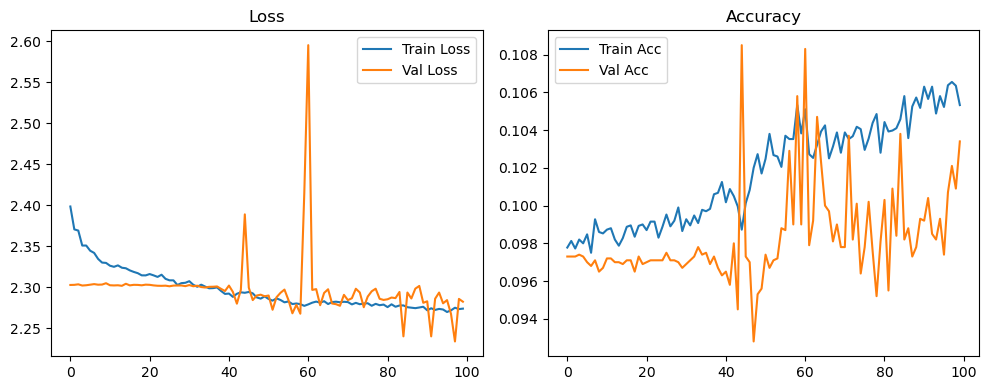

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

Original Model Final Test Loss: 2.2852 Accuracy: 0.1042


🚀 Running: batch128_lr_max_0.0001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0956 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0956 |:   0%|          | 0/100 [01:17<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0973 | Val Acc: 0.0956 |:   1%|          | 1/100 [01:17<2:07:53, 77.51s/it]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0962 |:   1%|          | 1/100 [01:33<2:07:53, 77.51s/it]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0962 |:   1%|          | 1/100 [01:33<2:07:53, 77.51s/it]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [01:34<1:07:59, 41.63s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [01:50<1:07:59, 41.63s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [01:50<1:07:59, 41.63s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0948 |:   3%|▎         | 3/100 [01:50<48:37, 30.08s/it]  

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [02:06<48:37, 30.08s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [02:06<48:37, 30.08s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0957 |:   4%|▍         | 4/100 [02:07<39:38, 24.78s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [02:23<39:38, 24.78s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [02:23<39:38, 24.78s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0960 |:   5%|▌         | 5/100 [02:23<34:38, 21.88s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0930 |:   5%|▌         | 5/100 [02:40<34:38, 21.88s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0930 |:   5%|▌         | 5/100 [02:40<34:38, 21.88s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0930 |:   6%|▌         | 6/100 [02:40<31:31, 20.12s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [02:57<31:31, 20.12s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [02:57<31:31, 20.12s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0961 |:   7%|▋         | 7/100 [02:57<29:24, 18.98s/it]

| LR: 0.000099 | Train Acc: 0.1007 | Val Acc: 0.0984 |:   7%|▋         | 7/100 [03:13<29:24, 18.98s/it]

| LR: 0.000099 | Train Acc: 0.1007 | Val Acc: 0.0984 |:   7%|▋         | 7/100 [03:13<29:24, 18.98s/it]

| LR: 0.000099 | Train Acc: 0.1007 | Val Acc: 0.0984 |:   8%|▊         | 8/100 [03:13<27:47, 18.13s/it]

| LR: 0.000098 | Train Acc: 0.1022 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [03:29<27:47, 18.13s/it]

| LR: 0.000098 | Train Acc: 0.1022 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [03:29<27:47, 18.13s/it]

| LR: 0.000098 | Train Acc: 0.1022 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [03:29<26:42, 17.61s/it]

| LR: 0.000098 | Train Acc: 0.1022 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [03:46<26:42, 17.61s/it]

| LR: 0.000098 | Train Acc: 0.1022 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [03:46<26:42, 17.61s/it]

| LR: 0.000098 | Train Acc: 0.1022 | Val Acc: 0.0971 |:  10%|█         | 10/100 [03:46<25:47, 17.19s/it]

| LR: 0.000098 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  10%|█         | 10/100 [04:02<25:47, 17.19s/it]

| LR: 0.000098 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  10%|█         | 10/100 [04:02<25:47, 17.19s/it]

| LR: 0.000098 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  11%|█         | 11/100 [04:02<25:11, 16.98s/it]

| LR: 0.000097 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  11%|█         | 11/100 [04:19<25:11, 16.98s/it]

| LR: 0.000097 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  11%|█         | 11/100 [04:19<25:11, 16.98s/it]

| LR: 0.000097 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [04:19<24:40, 16.82s/it]

| LR: 0.000097 | Train Acc: 0.1027 | Val Acc: 0.1010 |:  12%|█▏        | 12/100 [04:35<24:40, 16.82s/it]

| LR: 0.000097 | Train Acc: 0.1027 | Val Acc: 0.1010 |:  12%|█▏        | 12/100 [04:35<24:40, 16.82s/it]

| LR: 0.000097 | Train Acc: 0.1027 | Val Acc: 0.1010 |:  13%|█▎        | 13/100 [04:35<24:17, 16.76s/it]

| LR: 0.000096 | Train Acc: 0.1027 | Val Acc: 0.1021 |:  13%|█▎        | 13/100 [04:52<24:17, 16.76s/it]

| LR: 0.000096 | Train Acc: 0.1027 | Val Acc: 0.1021 |:  13%|█▎        | 13/100 [04:52<24:17, 16.76s/it]

| LR: 0.000096 | Train Acc: 0.1027 | Val Acc: 0.1021 |:  14%|█▍        | 14/100 [04:52<23:55, 16.69s/it]

| LR: 0.000095 | Train Acc: 0.1015 | Val Acc: 0.1014 |:  14%|█▍        | 14/100 [05:08<23:55, 16.69s/it]

| LR: 0.000095 | Train Acc: 0.1015 | Val Acc: 0.1014 |:  14%|█▍        | 14/100 [05:08<23:55, 16.69s/it]

| LR: 0.000095 | Train Acc: 0.1015 | Val Acc: 0.1014 |:  15%|█▌        | 15/100 [05:08<23:37, 16.67s/it]

| LR: 0.000095 | Train Acc: 0.1024 | Val Acc: 0.1000 |:  15%|█▌        | 15/100 [05:25<23:37, 16.67s/it]

| LR: 0.000095 | Train Acc: 0.1024 | Val Acc: 0.1000 |:  15%|█▌        | 15/100 [05:25<23:37, 16.67s/it]

| LR: 0.000095 | Train Acc: 0.1024 | Val Acc: 0.1000 |:  16%|█▌        | 16/100 [05:25<23:14, 16.60s/it]

| LR: 0.000094 | Train Acc: 0.1037 | Val Acc: 0.0953 |:  16%|█▌        | 16/100 [05:41<23:14, 16.60s/it]

| LR: 0.000094 | Train Acc: 0.1037 | Val Acc: 0.0953 |:  16%|█▌        | 16/100 [05:41<23:14, 16.60s/it]

| LR: 0.000094 | Train Acc: 0.1037 | Val Acc: 0.0953 |:  17%|█▋        | 17/100 [05:41<22:54, 16.56s/it]

| LR: 0.000093 | Train Acc: 0.1040 | Val Acc: 0.0976 |:  17%|█▋        | 17/100 [05:58<22:54, 16.56s/it]

| LR: 0.000093 | Train Acc: 0.1040 | Val Acc: 0.0976 |:  17%|█▋        | 17/100 [05:58<22:54, 16.56s/it]

| LR: 0.000093 | Train Acc: 0.1040 | Val Acc: 0.0976 |:  18%|█▊        | 18/100 [05:58<22:36, 16.54s/it]

| LR: 0.000092 | Train Acc: 0.1052 | Val Acc: 0.0978 |:  18%|█▊        | 18/100 [06:14<22:36, 16.54s/it]

| LR: 0.000092 | Train Acc: 0.1052 | Val Acc: 0.0978 |:  18%|█▊        | 18/100 [06:14<22:36, 16.54s/it]

| LR: 0.000092 | Train Acc: 0.1052 | Val Acc: 0.0978 |:  19%|█▉        | 19/100 [06:14<22:18, 16.52s/it]

| LR: 0.000091 | Train Acc: 0.1050 | Val Acc: 0.1028 |:  19%|█▉        | 19/100 [06:31<22:18, 16.52s/it]

| LR: 0.000091 | Train Acc: 0.1050 | Val Acc: 0.1028 |:  19%|█▉        | 19/100 [06:31<22:18, 16.52s/it]

| LR: 0.000091 | Train Acc: 0.1050 | Val Acc: 0.1028 |:  20%|██        | 20/100 [06:31<22:02, 16.53s/it]

| LR: 0.000091 | Train Acc: 0.1061 | Val Acc: 0.1048 |:  20%|██        | 20/100 [06:47<22:02, 16.53s/it]

| LR: 0.000091 | Train Acc: 0.1061 | Val Acc: 0.1048 |:  20%|██        | 20/100 [06:47<22:02, 16.53s/it]

| LR: 0.000091 | Train Acc: 0.1061 | Val Acc: 0.1048 |:  21%|██        | 21/100 [06:47<21:42, 16.48s/it]

| LR: 0.000090 | Train Acc: 0.1057 | Val Acc: 0.1052 |:  21%|██        | 21/100 [07:03<21:42, 16.48s/it]

| LR: 0.000090 | Train Acc: 0.1057 | Val Acc: 0.1052 |:  21%|██        | 21/100 [07:03<21:42, 16.48s/it]

| LR: 0.000090 | Train Acc: 0.1057 | Val Acc: 0.1052 |:  22%|██▏       | 22/100 [07:04<21:23, 16.46s/it]

| LR: 0.000089 | Train Acc: 0.1056 | Val Acc: 0.1073 |:  22%|██▏       | 22/100 [07:20<21:23, 16.46s/it]

| LR: 0.000089 | Train Acc: 0.1056 | Val Acc: 0.1073 |:  22%|██▏       | 22/100 [07:20<21:23, 16.46s/it]

| LR: 0.000089 | Train Acc: 0.1056 | Val Acc: 0.1073 |:  23%|██▎       | 23/100 [07:20<21:12, 16.52s/it]

| LR: 0.000088 | Train Acc: 0.1059 | Val Acc: 0.1019 |:  23%|██▎       | 23/100 [07:36<21:12, 16.52s/it]

| LR: 0.000088 | Train Acc: 0.1059 | Val Acc: 0.1019 |:  23%|██▎       | 23/100 [07:36<21:12, 16.52s/it]

| LR: 0.000088 | Train Acc: 0.1059 | Val Acc: 0.1019 |:  24%|██▍       | 24/100 [07:37<20:51, 16.46s/it]

| LR: 0.000087 | Train Acc: 0.1070 | Val Acc: 0.1040 |:  24%|██▍       | 24/100 [07:53<20:51, 16.46s/it]

| LR: 0.000087 | Train Acc: 0.1070 | Val Acc: 0.1040 |:  24%|██▍       | 24/100 [07:53<20:51, 16.46s/it]

| LR: 0.000087 | Train Acc: 0.1070 | Val Acc: 0.1040 |:  25%|██▌       | 25/100 [07:53<20:30, 16.40s/it]

| LR: 0.000086 | Train Acc: 0.1067 | Val Acc: 0.1049 |:  25%|██▌       | 25/100 [08:09<20:30, 16.40s/it]

| LR: 0.000086 | Train Acc: 0.1067 | Val Acc: 0.1049 |:  25%|██▌       | 25/100 [08:09<20:30, 16.40s/it]

| LR: 0.000086 | Train Acc: 0.1067 | Val Acc: 0.1049 |:  26%|██▌       | 26/100 [08:09<20:15, 16.43s/it]

| LR: 0.000084 | Train Acc: 0.1076 | Val Acc: 0.1135 |:  26%|██▌       | 26/100 [08:26<20:15, 16.43s/it]

| LR: 0.000084 | Train Acc: 0.1076 | Val Acc: 0.1135 |:  26%|██▌       | 26/100 [08:26<20:15, 16.43s/it]

| LR: 0.000084 | Train Acc: 0.1076 | Val Acc: 0.1135 |:  27%|██▋       | 27/100 [08:26<20:03, 16.48s/it]

| LR: 0.000083 | Train Acc: 0.1065 | Val Acc: 0.1096 |:  27%|██▋       | 27/100 [08:42<20:03, 16.48s/it]

| LR: 0.000083 | Train Acc: 0.1065 | Val Acc: 0.1096 |:  27%|██▋       | 27/100 [08:42<20:03, 16.48s/it]

| LR: 0.000083 | Train Acc: 0.1065 | Val Acc: 0.1096 |:  28%|██▊       | 28/100 [08:42<19:46, 16.47s/it]

| LR: 0.000082 | Train Acc: 0.1065 | Val Acc: 0.0868 |:  28%|██▊       | 28/100 [08:59<19:46, 16.47s/it]

| LR: 0.000082 | Train Acc: 0.1065 | Val Acc: 0.0868 |:  28%|██▊       | 28/100 [08:59<19:46, 16.47s/it]

| LR: 0.000082 | Train Acc: 0.1065 | Val Acc: 0.0868 |:  29%|██▉       | 29/100 [08:59<19:27, 16.45s/it]

| LR: 0.000081 | Train Acc: 0.1069 | Val Acc: 0.1017 |:  29%|██▉       | 29/100 [09:15<19:27, 16.45s/it]

| LR: 0.000081 | Train Acc: 0.1069 | Val Acc: 0.1017 |:  29%|██▉       | 29/100 [09:15<19:27, 16.45s/it]

| LR: 0.000081 | Train Acc: 0.1069 | Val Acc: 0.1017 |:  30%|███       | 30/100 [09:15<19:12, 16.46s/it]

| LR: 0.000080 | Train Acc: 0.1066 | Val Acc: 0.1022 |:  30%|███       | 30/100 [09:32<19:12, 16.46s/it]

| LR: 0.000080 | Train Acc: 0.1066 | Val Acc: 0.1022 |:  30%|███       | 30/100 [09:32<19:12, 16.46s/it]

| LR: 0.000080 | Train Acc: 0.1066 | Val Acc: 0.1022 |:  31%|███       | 31/100 [09:32<18:58, 16.50s/it]

| LR: 0.000078 | Train Acc: 0.1085 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:49<18:58, 16.50s/it]

| LR: 0.000078 | Train Acc: 0.1085 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:49<18:58, 16.50s/it]

| LR: 0.000078 | Train Acc: 0.1085 | Val Acc: 0.1010 |:  32%|███▏      | 32/100 [09:49<18:47, 16.59s/it]

| LR: 0.000077 | Train Acc: 0.1069 | Val Acc: 0.1210 |:  32%|███▏      | 32/100 [10:05<18:47, 16.59s/it]

| LR: 0.000077 | Train Acc: 0.1069 | Val Acc: 0.1210 |:  32%|███▏      | 32/100 [10:05<18:47, 16.59s/it]

| LR: 0.000077 | Train Acc: 0.1069 | Val Acc: 0.1210 |:  33%|███▎      | 33/100 [10:05<18:32, 16.60s/it]

| LR: 0.000076 | Train Acc: 0.1079 | Val Acc: 0.1047 |:  33%|███▎      | 33/100 [10:22<18:32, 16.60s/it]

| LR: 0.000076 | Train Acc: 0.1079 | Val Acc: 0.1047 |:  33%|███▎      | 33/100 [10:22<18:32, 16.60s/it]

| LR: 0.000076 | Train Acc: 0.1079 | Val Acc: 0.1047 |:  34%|███▍      | 34/100 [10:22<18:15, 16.59s/it]

| LR: 0.000074 | Train Acc: 0.1086 | Val Acc: 0.1121 |:  34%|███▍      | 34/100 [10:38<18:15, 16.59s/it]

| LR: 0.000074 | Train Acc: 0.1086 | Val Acc: 0.1121 |:  34%|███▍      | 34/100 [10:38<18:15, 16.59s/it]

| LR: 0.000074 | Train Acc: 0.1086 | Val Acc: 0.1121 |:  35%|███▌      | 35/100 [10:38<17:56, 16.56s/it]

| LR: 0.000073 | Train Acc: 0.1091 | Val Acc: 0.1063 |:  35%|███▌      | 35/100 [10:55<17:56, 16.56s/it]

| LR: 0.000073 | Train Acc: 0.1091 | Val Acc: 0.1063 |:  35%|███▌      | 35/100 [10:55<17:56, 16.56s/it]

| LR: 0.000073 | Train Acc: 0.1091 | Val Acc: 0.1063 |:  36%|███▌      | 36/100 [10:55<17:37, 16.52s/it]

| LR: 0.000072 | Train Acc: 0.1115 | Val Acc: 0.1066 |:  36%|███▌      | 36/100 [11:11<17:37, 16.52s/it]

| LR: 0.000072 | Train Acc: 0.1115 | Val Acc: 0.1066 |:  36%|███▌      | 36/100 [11:11<17:37, 16.52s/it]

| LR: 0.000072 | Train Acc: 0.1115 | Val Acc: 0.1066 |:  37%|███▋      | 37/100 [11:11<17:18, 16.48s/it]

| LR: 0.000070 | Train Acc: 0.1118 | Val Acc: 0.1132 |:  37%|███▋      | 37/100 [11:27<17:18, 16.48s/it]

| LR: 0.000070 | Train Acc: 0.1118 | Val Acc: 0.1132 |:  37%|███▋      | 37/100 [11:27<17:18, 16.48s/it]

| LR: 0.000070 | Train Acc: 0.1118 | Val Acc: 0.1132 |:  38%|███▊      | 38/100 [11:27<16:58, 16.43s/it]

| LR: 0.000069 | Train Acc: 0.1128 | Val Acc: 0.1045 |:  38%|███▊      | 38/100 [11:44<16:58, 16.43s/it]

| LR: 0.000069 | Train Acc: 0.1128 | Val Acc: 0.1045 |:  38%|███▊      | 38/100 [11:44<16:58, 16.43s/it]

| LR: 0.000069 | Train Acc: 0.1128 | Val Acc: 0.1045 |:  39%|███▉      | 39/100 [11:44<16:43, 16.44s/it]

| LR: 0.000067 | Train Acc: 0.1114 | Val Acc: 0.1038 |:  39%|███▉      | 39/100 [12:00<16:43, 16.44s/it]

| LR: 0.000067 | Train Acc: 0.1114 | Val Acc: 0.1038 |:  39%|███▉      | 39/100 [12:00<16:43, 16.44s/it]

| LR: 0.000067 | Train Acc: 0.1114 | Val Acc: 0.1038 |:  40%|████      | 40/100 [12:00<16:25, 16.43s/it]

| LR: 0.000066 | Train Acc: 0.1152 | Val Acc: 0.1205 |:  40%|████      | 40/100 [12:17<16:25, 16.43s/it]

| LR: 0.000066 | Train Acc: 0.1152 | Val Acc: 0.1205 |:  40%|████      | 40/100 [12:17<16:25, 16.43s/it]

| LR: 0.000066 | Train Acc: 0.1152 | Val Acc: 0.1205 |:  41%|████      | 41/100 [12:17<16:11, 16.47s/it]

| LR: 0.000064 | Train Acc: 0.1145 | Val Acc: 0.1329 |:  41%|████      | 41/100 [12:33<16:11, 16.47s/it]

| LR: 0.000064 | Train Acc: 0.1145 | Val Acc: 0.1329 |:  41%|████      | 41/100 [12:33<16:11, 16.47s/it]

| LR: 0.000064 | Train Acc: 0.1145 | Val Acc: 0.1329 |:  42%|████▏     | 42/100 [12:33<15:55, 16.48s/it]

| LR: 0.000063 | Train Acc: 0.1141 | Val Acc: 0.1092 |:  42%|████▏     | 42/100 [12:50<15:55, 16.48s/it]

| LR: 0.000063 | Train Acc: 0.1141 | Val Acc: 0.1092 |:  42%|████▏     | 42/100 [12:50<15:55, 16.48s/it]

| LR: 0.000063 | Train Acc: 0.1141 | Val Acc: 0.1092 |:  43%|████▎     | 43/100 [12:50<15:39, 16.48s/it]

| LR: 0.000061 | Train Acc: 0.1170 | Val Acc: 0.1264 |:  43%|████▎     | 43/100 [13:06<15:39, 16.48s/it]

| LR: 0.000061 | Train Acc: 0.1170 | Val Acc: 0.1264 |:  43%|████▎     | 43/100 [13:06<15:39, 16.48s/it]

| LR: 0.000061 | Train Acc: 0.1170 | Val Acc: 0.1264 |:  44%|████▍     | 44/100 [13:06<15:21, 16.46s/it]

| LR: 0.000060 | Train Acc: 0.1177 | Val Acc: 0.1191 |:  44%|████▍     | 44/100 [13:23<15:21, 16.46s/it]

| LR: 0.000060 | Train Acc: 0.1177 | Val Acc: 0.1191 |:  44%|████▍     | 44/100 [13:23<15:21, 16.46s/it]

| LR: 0.000060 | Train Acc: 0.1177 | Val Acc: 0.1191 |:  45%|████▌     | 45/100 [13:23<15:07, 16.50s/it]

| LR: 0.000058 | Train Acc: 0.1192 | Val Acc: 0.1239 |:  45%|████▌     | 45/100 [13:39<15:07, 16.50s/it]

| LR: 0.000058 | Train Acc: 0.1192 | Val Acc: 0.1239 |:  45%|████▌     | 45/100 [13:39<15:07, 16.50s/it]

| LR: 0.000058 | Train Acc: 0.1192 | Val Acc: 0.1239 |:  46%|████▌     | 46/100 [13:39<14:47, 16.43s/it]

| LR: 0.000057 | Train Acc: 0.1202 | Val Acc: 0.1121 |:  46%|████▌     | 46/100 [13:56<14:47, 16.43s/it]

| LR: 0.000057 | Train Acc: 0.1202 | Val Acc: 0.1121 |:  46%|████▌     | 46/100 [13:56<14:47, 16.43s/it]

| LR: 0.000057 | Train Acc: 0.1202 | Val Acc: 0.1121 |:  47%|████▋     | 47/100 [13:56<14:31, 16.45s/it]

| LR: 0.000055 | Train Acc: 0.1187 | Val Acc: 0.1533 |:  47%|████▋     | 47/100 [14:12<14:31, 16.45s/it]

| LR: 0.000055 | Train Acc: 0.1187 | Val Acc: 0.1533 |:  47%|████▋     | 47/100 [14:12<14:31, 16.45s/it]

| LR: 0.000055 | Train Acc: 0.1187 | Val Acc: 0.1533 |:  48%|████▊     | 48/100 [14:12<14:13, 16.41s/it]

| LR: 0.000054 | Train Acc: 0.1226 | Val Acc: 0.1318 |:  48%|████▊     | 48/100 [14:28<14:13, 16.41s/it]

| LR: 0.000054 | Train Acc: 0.1226 | Val Acc: 0.1318 |:  48%|████▊     | 48/100 [14:28<14:13, 16.41s/it]

| LR: 0.000054 | Train Acc: 0.1226 | Val Acc: 0.1318 |:  49%|████▉     | 49/100 [14:28<13:58, 16.45s/it]

| LR: 0.000052 | Train Acc: 0.1225 | Val Acc: 0.1246 |:  49%|████▉     | 49/100 [14:44<13:58, 16.45s/it]

| LR: 0.000052 | Train Acc: 0.1225 | Val Acc: 0.1246 |:  49%|████▉     | 49/100 [14:44<13:58, 16.45s/it]

| LR: 0.000052 | Train Acc: 0.1225 | Val Acc: 0.1246 |:  50%|█████     | 50/100 [14:45<13:36, 16.33s/it]

| LR: 0.000051 | Train Acc: 0.1227 | Val Acc: 0.1214 |:  50%|█████     | 50/100 [15:01<13:36, 16.33s/it]

| LR: 0.000051 | Train Acc: 0.1227 | Val Acc: 0.1214 |:  50%|█████     | 50/100 [15:01<13:36, 16.33s/it]

| LR: 0.000051 | Train Acc: 0.1227 | Val Acc: 0.1214 |:  51%|█████     | 51/100 [15:01<13:19, 16.32s/it]

| LR: 0.000049 | Train Acc: 0.1258 | Val Acc: 0.1273 |:  51%|█████     | 51/100 [15:17<13:19, 16.32s/it]

| LR: 0.000049 | Train Acc: 0.1258 | Val Acc: 0.1273 |:  51%|█████     | 51/100 [15:17<13:19, 16.32s/it]

| LR: 0.000049 | Train Acc: 0.1258 | Val Acc: 0.1273 |:  52%|█████▏    | 52/100 [15:17<13:06, 16.38s/it]

| LR: 0.000047 | Train Acc: 0.1257 | Val Acc: 0.1367 |:  52%|█████▏    | 52/100 [15:34<13:06, 16.38s/it]

| LR: 0.000047 | Train Acc: 0.1257 | Val Acc: 0.1367 |:  52%|█████▏    | 52/100 [15:34<13:06, 16.38s/it]

| LR: 0.000047 | Train Acc: 0.1257 | Val Acc: 0.1367 |:  53%|█████▎    | 53/100 [15:34<12:48, 16.34s/it]

| LR: 0.000046 | Train Acc: 0.1260 | Val Acc: 0.1305 |:  53%|█████▎    | 53/100 [15:50<12:48, 16.34s/it]

| LR: 0.000046 | Train Acc: 0.1260 | Val Acc: 0.1305 |:  53%|█████▎    | 53/100 [15:50<12:48, 16.34s/it]

| LR: 0.000046 | Train Acc: 0.1260 | Val Acc: 0.1305 |:  54%|█████▍    | 54/100 [15:50<12:35, 16.42s/it]

| LR: 0.000044 | Train Acc: 0.1281 | Val Acc: 0.1170 |:  54%|█████▍    | 54/100 [16:06<12:35, 16.42s/it]

| LR: 0.000044 | Train Acc: 0.1281 | Val Acc: 0.1170 |:  54%|█████▍    | 54/100 [16:06<12:35, 16.42s/it]

| LR: 0.000044 | Train Acc: 0.1281 | Val Acc: 0.1170 |:  55%|█████▌    | 55/100 [16:06<12:16, 16.37s/it]

| LR: 0.000043 | Train Acc: 0.1277 | Val Acc: 0.1384 |:  55%|█████▌    | 55/100 [16:23<12:16, 16.37s/it]

| LR: 0.000043 | Train Acc: 0.1277 | Val Acc: 0.1384 |:  55%|█████▌    | 55/100 [16:23<12:16, 16.37s/it]

| LR: 0.000043 | Train Acc: 0.1277 | Val Acc: 0.1384 |:  56%|█████▌    | 56/100 [16:23<12:01, 16.39s/it]

| LR: 0.000041 | Train Acc: 0.1281 | Val Acc: 0.1079 |:  56%|█████▌    | 56/100 [16:39<12:01, 16.39s/it]

| LR: 0.000041 | Train Acc: 0.1281 | Val Acc: 0.1079 |:  56%|█████▌    | 56/100 [16:39<12:01, 16.39s/it]

| LR: 0.000041 | Train Acc: 0.1281 | Val Acc: 0.1079 |:  57%|█████▋    | 57/100 [16:39<11:46, 16.43s/it]

| LR: 0.000040 | Train Acc: 0.1300 | Val Acc: 0.1084 |:  57%|█████▋    | 57/100 [16:56<11:46, 16.43s/it]

| LR: 0.000040 | Train Acc: 0.1300 | Val Acc: 0.1084 |:  57%|█████▋    | 57/100 [16:56<11:46, 16.43s/it]

| LR: 0.000040 | Train Acc: 0.1300 | Val Acc: 0.1084 |:  58%|█████▊    | 58/100 [16:56<11:30, 16.45s/it]

| LR: 0.000038 | Train Acc: 0.1320 | Val Acc: 0.1160 |:  58%|█████▊    | 58/100 [17:12<11:30, 16.45s/it]

| LR: 0.000038 | Train Acc: 0.1320 | Val Acc: 0.1160 |:  58%|█████▊    | 58/100 [17:12<11:30, 16.45s/it]

| LR: 0.000038 | Train Acc: 0.1320 | Val Acc: 0.1160 |:  59%|█████▉    | 59/100 [17:12<11:14, 16.45s/it]

| LR: 0.000037 | Train Acc: 0.1307 | Val Acc: 0.1137 |:  59%|█████▉    | 59/100 [17:29<11:14, 16.45s/it]

| LR: 0.000037 | Train Acc: 0.1307 | Val Acc: 0.1137 |:  59%|█████▉    | 59/100 [17:29<11:14, 16.45s/it]

| LR: 0.000037 | Train Acc: 0.1307 | Val Acc: 0.1137 |:  60%|██████    | 60/100 [17:29<10:57, 16.45s/it]

| LR: 0.000035 | Train Acc: 0.1316 | Val Acc: 0.1395 |:  60%|██████    | 60/100 [17:45<10:57, 16.45s/it]

| LR: 0.000035 | Train Acc: 0.1316 | Val Acc: 0.1395 |:  60%|██████    | 60/100 [17:45<10:57, 16.45s/it]

| LR: 0.000035 | Train Acc: 0.1316 | Val Acc: 0.1395 |:  61%|██████    | 61/100 [17:45<10:42, 16.49s/it]

| LR: 0.000034 | Train Acc: 0.1327 | Val Acc: 0.1240 |:  61%|██████    | 61/100 [18:02<10:42, 16.49s/it]

| LR: 0.000034 | Train Acc: 0.1327 | Val Acc: 0.1240 |:  61%|██████    | 61/100 [18:02<10:42, 16.49s/it]

| LR: 0.000034 | Train Acc: 0.1327 | Val Acc: 0.1240 |:  62%|██████▏   | 62/100 [18:02<10:25, 16.45s/it]

| LR: 0.000032 | Train Acc: 0.1332 | Val Acc: 0.1155 |:  62%|██████▏   | 62/100 [18:18<10:25, 16.45s/it]

| LR: 0.000032 | Train Acc: 0.1332 | Val Acc: 0.1155 |:  62%|██████▏   | 62/100 [18:18<10:25, 16.45s/it]

| LR: 0.000032 | Train Acc: 0.1332 | Val Acc: 0.1155 |:  63%|██████▎   | 63/100 [18:18<10:09, 16.48s/it]

| LR: 0.000031 | Train Acc: 0.1335 | Val Acc: 0.1496 |:  63%|██████▎   | 63/100 [18:35<10:09, 16.48s/it]

| LR: 0.000031 | Train Acc: 0.1335 | Val Acc: 0.1496 |:  63%|██████▎   | 63/100 [18:35<10:09, 16.48s/it]

| LR: 0.000031 | Train Acc: 0.1335 | Val Acc: 0.1496 |:  64%|██████▍   | 64/100 [18:35<09:52, 16.45s/it]

| LR: 0.000029 | Train Acc: 0.1341 | Val Acc: 0.1299 |:  64%|██████▍   | 64/100 [18:51<09:52, 16.45s/it]

| LR: 0.000029 | Train Acc: 0.1341 | Val Acc: 0.1299 |:  64%|██████▍   | 64/100 [18:51<09:52, 16.45s/it]

| LR: 0.000029 | Train Acc: 0.1341 | Val Acc: 0.1299 |:  65%|██████▌   | 65/100 [18:51<09:36, 16.48s/it]

| LR: 0.000028 | Train Acc: 0.1354 | Val Acc: 0.1281 |:  65%|██████▌   | 65/100 [19:07<09:36, 16.48s/it]

| LR: 0.000028 | Train Acc: 0.1354 | Val Acc: 0.1281 |:  65%|██████▌   | 65/100 [19:07<09:36, 16.48s/it]

| LR: 0.000028 | Train Acc: 0.1354 | Val Acc: 0.1281 |:  66%|██████▌   | 66/100 [19:07<09:18, 16.42s/it]

| LR: 0.000027 | Train Acc: 0.1352 | Val Acc: 0.1671 |:  66%|██████▌   | 66/100 [19:24<09:18, 16.42s/it]

| LR: 0.000027 | Train Acc: 0.1352 | Val Acc: 0.1671 |:  66%|██████▌   | 66/100 [19:24<09:18, 16.42s/it]

| LR: 0.000027 | Train Acc: 0.1352 | Val Acc: 0.1671 |:  67%|██████▋   | 67/100 [19:24<09:01, 16.42s/it]

| LR: 0.000025 | Train Acc: 0.1358 | Val Acc: 0.1295 |:  67%|██████▋   | 67/100 [19:40<09:01, 16.42s/it]

| LR: 0.000025 | Train Acc: 0.1358 | Val Acc: 0.1295 |:  67%|██████▋   | 67/100 [19:40<09:01, 16.42s/it]

| LR: 0.000025 | Train Acc: 0.1358 | Val Acc: 0.1295 |:  68%|██████▊   | 68/100 [19:41<08:47, 16.48s/it]

| LR: 0.000024 | Train Acc: 0.1372 | Val Acc: 0.1384 |:  68%|██████▊   | 68/100 [19:57<08:47, 16.48s/it]

| LR: 0.000024 | Train Acc: 0.1372 | Val Acc: 0.1384 |:  68%|██████▊   | 68/100 [19:57<08:47, 16.48s/it]

| LR: 0.000024 | Train Acc: 0.1372 | Val Acc: 0.1384 |:  69%|██████▉   | 69/100 [19:57<08:31, 16.50s/it]

| LR: 0.000023 | Train Acc: 0.1368 | Val Acc: 0.1619 |:  69%|██████▉   | 69/100 [20:13<08:31, 16.50s/it]

| LR: 0.000023 | Train Acc: 0.1368 | Val Acc: 0.1619 |:  69%|██████▉   | 69/100 [20:13<08:31, 16.50s/it]

| LR: 0.000023 | Train Acc: 0.1368 | Val Acc: 0.1619 |:  70%|███████   | 70/100 [20:14<08:14, 16.49s/it]

| LR: 0.000021 | Train Acc: 0.1367 | Val Acc: 0.1275 |:  70%|███████   | 70/100 [20:30<08:14, 16.49s/it]

| LR: 0.000021 | Train Acc: 0.1367 | Val Acc: 0.1275 |:  70%|███████   | 70/100 [20:30<08:14, 16.49s/it]

| LR: 0.000021 | Train Acc: 0.1367 | Val Acc: 0.1275 |:  71%|███████   | 71/100 [20:30<07:57, 16.48s/it]

| LR: 0.000020 | Train Acc: 0.1361 | Val Acc: 0.1219 |:  71%|███████   | 71/100 [20:46<07:57, 16.48s/it]

| LR: 0.000020 | Train Acc: 0.1361 | Val Acc: 0.1219 |:  71%|███████   | 71/100 [20:46<07:57, 16.48s/it]

| LR: 0.000020 | Train Acc: 0.1361 | Val Acc: 0.1219 |:  72%|███████▏  | 72/100 [20:46<07:39, 16.42s/it]

| LR: 0.000019 | Train Acc: 0.1386 | Val Acc: 0.1428 |:  72%|███████▏  | 72/100 [21:03<07:39, 16.42s/it]

| LR: 0.000019 | Train Acc: 0.1386 | Val Acc: 0.1428 |:  72%|███████▏  | 72/100 [21:03<07:39, 16.42s/it]

| LR: 0.000019 | Train Acc: 0.1386 | Val Acc: 0.1428 |:  73%|███████▎  | 73/100 [21:03<07:23, 16.42s/it]

| LR: 0.000018 | Train Acc: 0.1387 | Val Acc: 0.1316 |:  73%|███████▎  | 73/100 [21:19<07:23, 16.42s/it]

| LR: 0.000018 | Train Acc: 0.1387 | Val Acc: 0.1316 |:  73%|███████▎  | 73/100 [21:19<07:23, 16.42s/it]

| LR: 0.000018 | Train Acc: 0.1387 | Val Acc: 0.1316 |:  74%|███████▍  | 74/100 [21:19<07:06, 16.40s/it]

| LR: 0.000017 | Train Acc: 0.1405 | Val Acc: 0.1578 |:  74%|███████▍  | 74/100 [21:36<07:06, 16.40s/it]

| LR: 0.000017 | Train Acc: 0.1405 | Val Acc: 0.1578 |:  74%|███████▍  | 74/100 [21:36<07:06, 16.40s/it]

| LR: 0.000017 | Train Acc: 0.1405 | Val Acc: 0.1578 |:  75%|███████▌  | 75/100 [21:36<06:50, 16.43s/it]

| LR: 0.000015 | Train Acc: 0.1388 | Val Acc: 0.1400 |:  75%|███████▌  | 75/100 [21:52<06:50, 16.43s/it]

| LR: 0.000015 | Train Acc: 0.1388 | Val Acc: 0.1400 |:  75%|███████▌  | 75/100 [21:52<06:50, 16.43s/it]

| LR: 0.000015 | Train Acc: 0.1388 | Val Acc: 0.1400 |:  76%|███████▌  | 76/100 [21:52<06:33, 16.39s/it]

| LR: 0.000014 | Train Acc: 0.1384 | Val Acc: 0.1281 |:  76%|███████▌  | 76/100 [22:08<06:33, 16.39s/it]

| LR: 0.000014 | Train Acc: 0.1384 | Val Acc: 0.1281 |:  76%|███████▌  | 76/100 [22:08<06:33, 16.39s/it]

| LR: 0.000014 | Train Acc: 0.1384 | Val Acc: 0.1281 |:  77%|███████▋  | 77/100 [22:08<06:17, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.1411 | Val Acc: 0.1314 |:  77%|███████▋  | 77/100 [22:25<06:17, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.1411 | Val Acc: 0.1314 |:  77%|███████▋  | 77/100 [22:25<06:17, 16.40s/it]

| LR: 0.000013 | Train Acc: 0.1411 | Val Acc: 0.1314 |:  78%|███████▊  | 78/100 [22:25<06:00, 16.38s/it]

| LR: 0.000012 | Train Acc: 0.1391 | Val Acc: 0.1434 |:  78%|███████▊  | 78/100 [22:41<06:00, 16.38s/it]

| LR: 0.000012 | Train Acc: 0.1391 | Val Acc: 0.1434 |:  78%|███████▊  | 78/100 [22:41<06:00, 16.38s/it]

| LR: 0.000012 | Train Acc: 0.1391 | Val Acc: 0.1434 |:  79%|███████▉  | 79/100 [22:41<05:45, 16.44s/it]

| LR: 0.000011 | Train Acc: 0.1398 | Val Acc: 0.1367 |:  79%|███████▉  | 79/100 [22:58<05:45, 16.44s/it]

| LR: 0.000011 | Train Acc: 0.1398 | Val Acc: 0.1367 |:  79%|███████▉  | 79/100 [22:58<05:45, 16.44s/it]

| LR: 0.000011 | Train Acc: 0.1398 | Val Acc: 0.1367 |:  80%|████████  | 80/100 [22:58<05:28, 16.45s/it]

| LR: 0.000010 | Train Acc: 0.1400 | Val Acc: 0.1212 |:  80%|████████  | 80/100 [23:14<05:28, 16.45s/it]

| LR: 0.000010 | Train Acc: 0.1400 | Val Acc: 0.1212 |:  80%|████████  | 80/100 [23:14<05:28, 16.45s/it]

| LR: 0.000010 | Train Acc: 0.1400 | Val Acc: 0.1212 |:  81%|████████  | 81/100 [23:14<05:11, 16.42s/it]

| LR: 0.000010 | Train Acc: 0.1418 | Val Acc: 0.1467 |:  81%|████████  | 81/100 [23:30<05:11, 16.42s/it]

| LR: 0.000010 | Train Acc: 0.1418 | Val Acc: 0.1467 |:  81%|████████  | 81/100 [23:30<05:11, 16.42s/it]

| LR: 0.000010 | Train Acc: 0.1418 | Val Acc: 0.1467 |:  82%|████████▏ | 82/100 [23:30<04:55, 16.44s/it]

| LR: 0.000009 | Train Acc: 0.1438 | Val Acc: 0.1218 |:  82%|████████▏ | 82/100 [23:47<04:55, 16.44s/it]

| LR: 0.000009 | Train Acc: 0.1438 | Val Acc: 0.1218 |:  82%|████████▏ | 82/100 [23:47<04:55, 16.44s/it]

| LR: 0.000009 | Train Acc: 0.1438 | Val Acc: 0.1218 |:  83%|████████▎ | 83/100 [23:47<04:38, 16.41s/it]

| LR: 0.000008 | Train Acc: 0.1441 | Val Acc: 0.1274 |:  83%|████████▎ | 83/100 [24:03<04:38, 16.41s/it]

| LR: 0.000008 | Train Acc: 0.1441 | Val Acc: 0.1274 |:  83%|████████▎ | 83/100 [24:03<04:38, 16.41s/it]

| LR: 0.000008 | Train Acc: 0.1441 | Val Acc: 0.1274 |:  84%|████████▍ | 84/100 [24:03<04:23, 16.46s/it]

| LR: 0.000007 | Train Acc: 0.1429 | Val Acc: 0.1349 |:  84%|████████▍ | 84/100 [24:20<04:23, 16.46s/it]

| LR: 0.000007 | Train Acc: 0.1429 | Val Acc: 0.1349 |:  84%|████████▍ | 84/100 [24:20<04:23, 16.46s/it]

| LR: 0.000007 | Train Acc: 0.1429 | Val Acc: 0.1349 |:  85%|████████▌ | 85/100 [24:20<04:06, 16.44s/it]

| LR: 0.000006 | Train Acc: 0.1442 | Val Acc: 0.1237 |:  85%|████████▌ | 85/100 [24:36<04:06, 16.44s/it]

| LR: 0.000006 | Train Acc: 0.1442 | Val Acc: 0.1237 |:  85%|████████▌ | 85/100 [24:36<04:06, 16.44s/it]

| LR: 0.000006 | Train Acc: 0.1442 | Val Acc: 0.1237 |:  86%|████████▌ | 86/100 [24:36<03:50, 16.45s/it]

| LR: 0.000006 | Train Acc: 0.1433 | Val Acc: 0.1466 |:  86%|████████▌ | 86/100 [24:53<03:50, 16.45s/it]

| LR: 0.000006 | Train Acc: 0.1433 | Val Acc: 0.1466 |:  86%|████████▌ | 86/100 [24:53<03:50, 16.45s/it]

| LR: 0.000006 | Train Acc: 0.1433 | Val Acc: 0.1466 |:  87%|████████▋ | 87/100 [24:53<03:33, 16.44s/it]

| LR: 0.000005 | Train Acc: 0.1443 | Val Acc: 0.1441 |:  87%|████████▋ | 87/100 [25:09<03:33, 16.44s/it]

| LR: 0.000005 | Train Acc: 0.1443 | Val Acc: 0.1441 |:  87%|████████▋ | 87/100 [25:09<03:33, 16.44s/it]

| LR: 0.000005 | Train Acc: 0.1443 | Val Acc: 0.1441 |:  88%|████████▊ | 88/100 [25:09<03:17, 16.42s/it]

| LR: 0.000004 | Train Acc: 0.1427 | Val Acc: 0.1516 |:  88%|████████▊ | 88/100 [25:25<03:17, 16.42s/it]

| LR: 0.000004 | Train Acc: 0.1427 | Val Acc: 0.1516 |:  88%|████████▊ | 88/100 [25:25<03:17, 16.42s/it]

| LR: 0.000004 | Train Acc: 0.1427 | Val Acc: 0.1516 |:  89%|████████▉ | 89/100 [25:25<03:00, 16.38s/it]

| LR: 0.000004 | Train Acc: 0.1459 | Val Acc: 0.1382 |:  89%|████████▉ | 89/100 [25:42<03:00, 16.38s/it]

| LR: 0.000004 | Train Acc: 0.1459 | Val Acc: 0.1382 |:  89%|████████▉ | 89/100 [25:42<03:00, 16.38s/it]

| LR: 0.000004 | Train Acc: 0.1459 | Val Acc: 0.1382 |:  90%|█████████ | 90/100 [25:42<02:43, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.1442 | Val Acc: 0.1308 |:  90%|█████████ | 90/100 [25:58<02:43, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.1442 | Val Acc: 0.1308 |:  90%|█████████ | 90/100 [25:58<02:43, 16.35s/it]

| LR: 0.000003 | Train Acc: 0.1442 | Val Acc: 0.1308 |:  91%|█████████ | 91/100 [25:58<02:27, 16.36s/it]

| LR: 0.000003 | Train Acc: 0.1431 | Val Acc: 0.1520 |:  91%|█████████ | 91/100 [26:14<02:27, 16.36s/it]

| LR: 0.000003 | Train Acc: 0.1431 | Val Acc: 0.1520 |:  91%|█████████ | 91/100 [26:14<02:27, 16.36s/it]

| LR: 0.000003 | Train Acc: 0.1431 | Val Acc: 0.1520 |:  92%|█████████▏| 92/100 [26:14<02:10, 16.33s/it]

| LR: 0.000003 | Train Acc: 0.1439 | Val Acc: 0.1260 |:  92%|█████████▏| 92/100 [26:31<02:10, 16.33s/it]

| LR: 0.000003 | Train Acc: 0.1439 | Val Acc: 0.1260 |:  92%|█████████▏| 92/100 [26:31<02:10, 16.33s/it]

| LR: 0.000003 | Train Acc: 0.1439 | Val Acc: 0.1260 |:  93%|█████████▎| 93/100 [26:31<01:54, 16.39s/it]

| LR: 0.000002 | Train Acc: 0.1450 | Val Acc: 0.1372 |:  93%|█████████▎| 93/100 [26:47<01:54, 16.39s/it]

| LR: 0.000002 | Train Acc: 0.1450 | Val Acc: 0.1372 |:  93%|█████████▎| 93/100 [26:47<01:54, 16.39s/it]

| LR: 0.000002 | Train Acc: 0.1450 | Val Acc: 0.1372 |:  94%|█████████▍| 94/100 [26:47<01:38, 16.35s/it]

| LR: 0.000002 | Train Acc: 0.1450 | Val Acc: 0.1278 |:  94%|█████████▍| 94/100 [27:03<01:38, 16.35s/it]

| LR: 0.000002 | Train Acc: 0.1450 | Val Acc: 0.1278 |:  94%|█████████▍| 94/100 [27:03<01:38, 16.35s/it]

| LR: 0.000002 | Train Acc: 0.1450 | Val Acc: 0.1278 |:  95%|█████████▌| 95/100 [27:03<01:21, 16.32s/it]

| LR: 0.000002 | Train Acc: 0.1451 | Val Acc: 0.1429 |:  95%|█████████▌| 95/100 [27:19<01:21, 16.32s/it]

| LR: 0.000002 | Train Acc: 0.1451 | Val Acc: 0.1429 |:  95%|█████████▌| 95/100 [27:19<01:21, 16.32s/it]

| LR: 0.000002 | Train Acc: 0.1451 | Val Acc: 0.1429 |:  96%|█████████▌| 96/100 [27:19<01:05, 16.27s/it]

| LR: 0.000001 | Train Acc: 0.1440 | Val Acc: 0.1338 |:  96%|█████████▌| 96/100 [27:36<01:05, 16.27s/it]

| LR: 0.000001 | Train Acc: 0.1440 | Val Acc: 0.1338 |:  96%|█████████▌| 96/100 [27:36<01:05, 16.27s/it]

| LR: 0.000001 | Train Acc: 0.1440 | Val Acc: 0.1338 |:  97%|█████████▋| 97/100 [27:36<00:48, 16.26s/it]

| LR: 0.000001 | Train Acc: 0.1443 | Val Acc: 0.1250 |:  97%|█████████▋| 97/100 [27:52<00:48, 16.26s/it]

| LR: 0.000001 | Train Acc: 0.1443 | Val Acc: 0.1250 |:  97%|█████████▋| 97/100 [27:52<00:48, 16.26s/it]

| LR: 0.000001 | Train Acc: 0.1443 | Val Acc: 0.1250 |:  98%|█████████▊| 98/100 [27:52<00:32, 16.29s/it]

| LR: 0.000001 | Train Acc: 0.1465 | Val Acc: 0.1521 |:  98%|█████████▊| 98/100 [28:09<00:32, 16.29s/it]

| LR: 0.000001 | Train Acc: 0.1465 | Val Acc: 0.1521 |:  98%|█████████▊| 98/100 [28:09<00:32, 16.29s/it]

| LR: 0.000001 | Train Acc: 0.1465 | Val Acc: 0.1521 |:  99%|█████████▉| 99/100 [28:09<00:16, 16.37s/it]

| LR: 0.000001 | Train Acc: 0.1472 | Val Acc: 0.1325 |:  99%|█████████▉| 99/100 [28:25<00:16, 16.37s/it]

| LR: 0.000001 | Train Acc: 0.1472 | Val Acc: 0.1325 |:  99%|█████████▉| 99/100 [28:25<00:16, 16.37s/it]

| LR: 0.000001 | Train Acc: 0.1472 | Val Acc: 0.1325 |: 100%|██████████| 100/100 [28:25<00:00, 16.35s/it]

| LR: 0.000001 | Train Acc: 0.1472 | Val Acc: 0.1325 |: 100%|██████████| 100/100 [28:25<00:00, 17.05s/it]

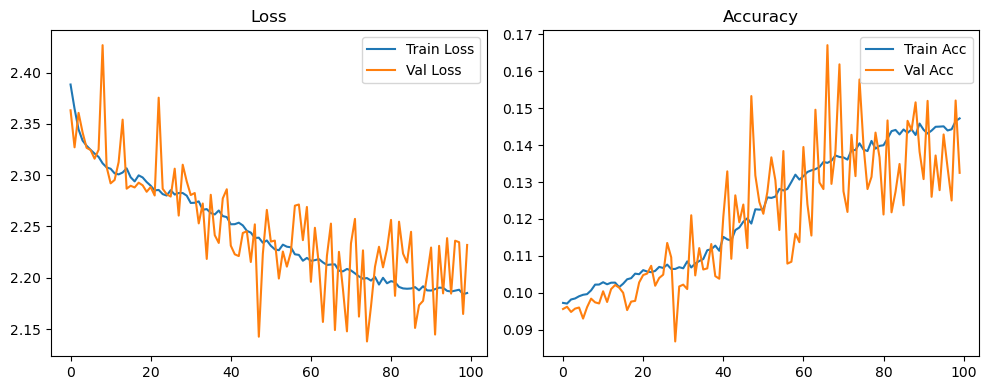

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.2392 Accuracy: 0.1309


🚀 Running: batch128_lr_max_0.0001_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0968 | Val Acc: 0.0923 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0968 | Val Acc: 0.0923 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0968 | Val Acc: 0.0923 |:   1%|          | 1/100 [01:18<2:08:53, 78.12s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0938 |:   1%|          | 1/100 [01:34<2:08:53, 78.12s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0938 |:   1%|          | 1/100 [01:34<2:08:53, 78.12s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0938 |:   2%|▏         | 2/100 [01:34<1:08:34, 41.98s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0937 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.98s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0937 |:   2%|▏         | 2/100 [01:51<1:08:34, 41.98s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0937 |:   3%|▎         | 3/100 [01:51<49:00, 30.32s/it]  

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [02:07<49:00, 30.32s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [02:07<49:00, 30.32s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0943 |:   4%|▍         | 4/100 [02:07<39:54, 24.94s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0961 |:   4%|▍         | 4/100 [02:24<39:54, 24.94s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0961 |:   4%|▍         | 4/100 [02:24<39:54, 24.94s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0961 |:   5%|▌         | 5/100 [02:24<34:43, 21.94s/it]

| LR: 0.000099 | Train Acc: 0.0987 | Val Acc: 0.0959 |:   5%|▌         | 5/100 [02:41<34:43, 21.94s/it]

| LR: 0.000099 | Train Acc: 0.0987 | Val Acc: 0.0959 |:   5%|▌         | 5/100 [02:41<34:43, 21.94s/it]

| LR: 0.000099 | Train Acc: 0.0987 | Val Acc: 0.0959 |:   6%|▌         | 6/100 [02:41<31:30, 20.11s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0948 |:   6%|▌         | 6/100 [02:57<31:30, 20.11s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0948 |:   6%|▌         | 6/100 [02:57<31:30, 20.11s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0948 |:   7%|▋         | 7/100 [02:57<29:24, 18.98s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0948 |:   7%|▋         | 7/100 [03:14<29:24, 18.98s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0948 |:   7%|▋         | 7/100 [03:14<29:24, 18.98s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0948 |:   8%|▊         | 8/100 [03:14<27:57, 18.24s/it]

| LR: 0.000098 | Train Acc: 0.0982 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:30<27:57, 18.24s/it]

| LR: 0.000098 | Train Acc: 0.0982 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:30<27:57, 18.24s/it]

| LR: 0.000098 | Train Acc: 0.0982 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [03:30<26:51, 17.71s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [03:47<26:51, 17.71s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [03:47<26:51, 17.71s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  10%|█         | 10/100 [03:47<26:04, 17.38s/it]

| LR: 0.000098 | Train Acc: 0.1010 | Val Acc: 0.0943 |:  10%|█         | 10/100 [04:04<26:04, 17.38s/it]

| LR: 0.000098 | Train Acc: 0.1010 | Val Acc: 0.0943 |:  10%|█         | 10/100 [04:04<26:04, 17.38s/it]

| LR: 0.000098 | Train Acc: 0.1010 | Val Acc: 0.0943 |:  11%|█         | 11/100 [04:04<25:28, 17.17s/it]

| LR: 0.000097 | Train Acc: 0.1010 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:20<25:28, 17.17s/it]

| LR: 0.000097 | Train Acc: 0.1010 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:20<25:28, 17.17s/it]

| LR: 0.000097 | Train Acc: 0.1010 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [04:20<24:55, 16.99s/it]

| LR: 0.000097 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  12%|█▏        | 12/100 [04:37<24:55, 16.99s/it]

| LR: 0.000097 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  12%|█▏        | 12/100 [04:37<24:55, 16.99s/it]

| LR: 0.000097 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  13%|█▎        | 13/100 [04:37<24:32, 16.93s/it]

| LR: 0.000096 | Train Acc: 0.1014 | Val Acc: 0.0997 |:  13%|█▎        | 13/100 [04:54<24:32, 16.93s/it]

| LR: 0.000096 | Train Acc: 0.1014 | Val Acc: 0.0997 |:  13%|█▎        | 13/100 [04:54<24:32, 16.93s/it]

| LR: 0.000096 | Train Acc: 0.1014 | Val Acc: 0.0997 |:  14%|█▍        | 14/100 [04:54<24:10, 16.87s/it]

| LR: 0.000095 | Train Acc: 0.1026 | Val Acc: 0.1004 |:  14%|█▍        | 14/100 [05:10<24:10, 16.87s/it]

| LR: 0.000095 | Train Acc: 0.1026 | Val Acc: 0.1004 |:  14%|█▍        | 14/100 [05:10<24:10, 16.87s/it]

| LR: 0.000095 | Train Acc: 0.1026 | Val Acc: 0.1004 |:  15%|█▌        | 15/100 [05:11<23:47, 16.80s/it]

| LR: 0.000095 | Train Acc: 0.1009 | Val Acc: 0.1050 |:  15%|█▌        | 15/100 [05:27<23:47, 16.80s/it]

| LR: 0.000095 | Train Acc: 0.1009 | Val Acc: 0.1050 |:  15%|█▌        | 15/100 [05:27<23:47, 16.80s/it]

| LR: 0.000095 | Train Acc: 0.1009 | Val Acc: 0.1050 |:  16%|█▌        | 16/100 [05:27<23:28, 16.77s/it]

| LR: 0.000094 | Train Acc: 0.1027 | Val Acc: 0.1006 |:  16%|█▌        | 16/100 [05:44<23:28, 16.77s/it]

| LR: 0.000094 | Train Acc: 0.1027 | Val Acc: 0.1006 |:  16%|█▌        | 16/100 [05:44<23:28, 16.77s/it]

| LR: 0.000094 | Train Acc: 0.1027 | Val Acc: 0.1006 |:  17%|█▋        | 17/100 [05:44<23:09, 16.74s/it]

| LR: 0.000093 | Train Acc: 0.1010 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [06:01<23:09, 16.74s/it]

| LR: 0.000093 | Train Acc: 0.1010 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [06:01<23:09, 16.74s/it]

| LR: 0.000093 | Train Acc: 0.1010 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [06:01<22:51, 16.73s/it]

| LR: 0.000092 | Train Acc: 0.1011 | Val Acc: 0.1013 |:  18%|█▊        | 18/100 [06:17<22:51, 16.73s/it]

| LR: 0.000092 | Train Acc: 0.1011 | Val Acc: 0.1013 |:  18%|█▊        | 18/100 [06:17<22:51, 16.73s/it]

| LR: 0.000092 | Train Acc: 0.1011 | Val Acc: 0.1013 |:  19%|█▉        | 19/100 [06:17<22:32, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.1027 | Val Acc: 0.1017 |:  19%|█▉        | 19/100 [06:34<22:32, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.1027 | Val Acc: 0.1017 |:  19%|█▉        | 19/100 [06:34<22:32, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.1027 | Val Acc: 0.1017 |:  20%|██        | 20/100 [06:34<22:13, 16.67s/it]

| LR: 0.000091 | Train Acc: 0.1031 | Val Acc: 0.0990 |:  20%|██        | 20/100 [06:51<22:13, 16.67s/it]

| LR: 0.000091 | Train Acc: 0.1031 | Val Acc: 0.0990 |:  20%|██        | 20/100 [06:51<22:13, 16.67s/it]

| LR: 0.000091 | Train Acc: 0.1031 | Val Acc: 0.0990 |:  21%|██        | 21/100 [06:51<22:02, 16.74s/it]

| LR: 0.000090 | Train Acc: 0.1042 | Val Acc: 0.1075 |:  21%|██        | 21/100 [07:07<22:02, 16.74s/it]

| LR: 0.000090 | Train Acc: 0.1042 | Val Acc: 0.1075 |:  21%|██        | 21/100 [07:07<22:02, 16.74s/it]

| LR: 0.000090 | Train Acc: 0.1042 | Val Acc: 0.1075 |:  22%|██▏       | 22/100 [07:07<21:44, 16.73s/it]

| LR: 0.000089 | Train Acc: 0.1047 | Val Acc: 0.1046 |:  22%|██▏       | 22/100 [07:24<21:44, 16.73s/it]

| LR: 0.000089 | Train Acc: 0.1047 | Val Acc: 0.1046 |:  22%|██▏       | 22/100 [07:24<21:44, 16.73s/it]

| LR: 0.000089 | Train Acc: 0.1047 | Val Acc: 0.1046 |:  23%|██▎       | 23/100 [07:24<21:33, 16.79s/it]

| LR: 0.000088 | Train Acc: 0.1032 | Val Acc: 0.0987 |:  23%|██▎       | 23/100 [07:41<21:33, 16.79s/it]

| LR: 0.000088 | Train Acc: 0.1032 | Val Acc: 0.0987 |:  23%|██▎       | 23/100 [07:41<21:33, 16.79s/it]

| LR: 0.000088 | Train Acc: 0.1032 | Val Acc: 0.0987 |:  24%|██▍       | 24/100 [07:41<21:19, 16.84s/it]

| LR: 0.000087 | Train Acc: 0.1043 | Val Acc: 0.1018 |:  24%|██▍       | 24/100 [07:58<21:19, 16.84s/it]

| LR: 0.000087 | Train Acc: 0.1043 | Val Acc: 0.1018 |:  24%|██▍       | 24/100 [07:58<21:19, 16.84s/it]

| LR: 0.000087 | Train Acc: 0.1043 | Val Acc: 0.1018 |:  25%|██▌       | 25/100 [07:58<21:04, 16.86s/it]

| LR: 0.000086 | Train Acc: 0.1045 | Val Acc: 0.0987 |:  25%|██▌       | 25/100 [08:15<21:04, 16.86s/it]

| LR: 0.000086 | Train Acc: 0.1045 | Val Acc: 0.0987 |:  25%|██▌       | 25/100 [08:15<21:04, 16.86s/it]

| LR: 0.000086 | Train Acc: 0.1045 | Val Acc: 0.0987 |:  26%|██▌       | 26/100 [08:15<20:45, 16.83s/it]

| LR: 0.000084 | Train Acc: 0.1044 | Val Acc: 0.1017 |:  26%|██▌       | 26/100 [08:32<20:45, 16.83s/it]

| LR: 0.000084 | Train Acc: 0.1044 | Val Acc: 0.1017 |:  26%|██▌       | 26/100 [08:32<20:45, 16.83s/it]

| LR: 0.000084 | Train Acc: 0.1044 | Val Acc: 0.1017 |:  27%|██▋       | 27/100 [08:32<20:24, 16.78s/it]

| LR: 0.000083 | Train Acc: 0.1048 | Val Acc: 0.0989 |:  27%|██▋       | 27/100 [08:48<20:24, 16.78s/it]

| LR: 0.000083 | Train Acc: 0.1048 | Val Acc: 0.0989 |:  27%|██▋       | 27/100 [08:48<20:24, 16.78s/it]

| LR: 0.000083 | Train Acc: 0.1048 | Val Acc: 0.0989 |:  28%|██▊       | 28/100 [08:48<20:05, 16.75s/it]

| LR: 0.000082 | Train Acc: 0.1056 | Val Acc: 0.1036 |:  28%|██▊       | 28/100 [09:05<20:05, 16.75s/it]

| LR: 0.000082 | Train Acc: 0.1056 | Val Acc: 0.1036 |:  28%|██▊       | 28/100 [09:05<20:05, 16.75s/it]

| LR: 0.000082 | Train Acc: 0.1056 | Val Acc: 0.1036 |:  29%|██▉       | 29/100 [09:05<19:47, 16.73s/it]

| LR: 0.000081 | Train Acc: 0.1051 | Val Acc: 0.1000 |:  29%|██▉       | 29/100 [09:22<19:47, 16.73s/it]

| LR: 0.000081 | Train Acc: 0.1051 | Val Acc: 0.1000 |:  29%|██▉       | 29/100 [09:22<19:47, 16.73s/it]

| LR: 0.000081 | Train Acc: 0.1051 | Val Acc: 0.1000 |:  30%|███       | 30/100 [09:22<19:32, 16.75s/it]

| LR: 0.000080 | Train Acc: 0.1055 | Val Acc: 0.0985 |:  30%|███       | 30/100 [09:38<19:32, 16.75s/it]

| LR: 0.000080 | Train Acc: 0.1055 | Val Acc: 0.0985 |:  30%|███       | 30/100 [09:38<19:32, 16.75s/it]

| LR: 0.000080 | Train Acc: 0.1055 | Val Acc: 0.0985 |:  31%|███       | 31/100 [09:38<19:11, 16.70s/it]

| LR: 0.000078 | Train Acc: 0.1053 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:55<19:11, 16.70s/it]

| LR: 0.000078 | Train Acc: 0.1053 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:55<19:11, 16.70s/it]

| LR: 0.000078 | Train Acc: 0.1053 | Val Acc: 0.1010 |:  32%|███▏      | 32/100 [09:55<18:53, 16.67s/it]

| LR: 0.000077 | Train Acc: 0.1076 | Val Acc: 0.1161 |:  32%|███▏      | 32/100 [10:11<18:53, 16.67s/it]

| LR: 0.000077 | Train Acc: 0.1076 | Val Acc: 0.1161 |:  32%|███▏      | 32/100 [10:11<18:53, 16.67s/it]

| LR: 0.000077 | Train Acc: 0.1076 | Val Acc: 0.1161 |:  33%|███▎      | 33/100 [10:12<18:33, 16.63s/it]

| LR: 0.000076 | Train Acc: 0.1052 | Val Acc: 0.1001 |:  33%|███▎      | 33/100 [10:28<18:33, 16.63s/it]

| LR: 0.000076 | Train Acc: 0.1052 | Val Acc: 0.1001 |:  33%|███▎      | 33/100 [10:28<18:33, 16.63s/it]

| LR: 0.000076 | Train Acc: 0.1052 | Val Acc: 0.1001 |:  34%|███▍      | 34/100 [10:28<18:15, 16.59s/it]

| LR: 0.000074 | Train Acc: 0.1048 | Val Acc: 0.0999 |:  34%|███▍      | 34/100 [10:45<18:15, 16.59s/it]

| LR: 0.000074 | Train Acc: 0.1048 | Val Acc: 0.0999 |:  34%|███▍      | 34/100 [10:45<18:15, 16.59s/it]

| LR: 0.000074 | Train Acc: 0.1048 | Val Acc: 0.0999 |:  35%|███▌      | 35/100 [10:45<18:00, 16.62s/it]

| LR: 0.000073 | Train Acc: 0.1047 | Val Acc: 0.1024 |:  35%|███▌      | 35/100 [11:01<18:00, 16.62s/it]

| LR: 0.000073 | Train Acc: 0.1047 | Val Acc: 0.1024 |:  35%|███▌      | 35/100 [11:01<18:00, 16.62s/it]

| LR: 0.000073 | Train Acc: 0.1047 | Val Acc: 0.1024 |:  36%|███▌      | 36/100 [11:01<17:42, 16.61s/it]

| LR: 0.000072 | Train Acc: 0.1055 | Val Acc: 0.1058 |:  36%|███▌      | 36/100 [11:18<17:42, 16.61s/it]

| LR: 0.000072 | Train Acc: 0.1055 | Val Acc: 0.1058 |:  36%|███▌      | 36/100 [11:18<17:42, 16.61s/it]

| LR: 0.000072 | Train Acc: 0.1055 | Val Acc: 0.1058 |:  37%|███▋      | 37/100 [11:18<17:25, 16.60s/it]

| LR: 0.000070 | Train Acc: 0.1073 | Val Acc: 0.1095 |:  37%|███▋      | 37/100 [11:34<17:25, 16.60s/it]

| LR: 0.000070 | Train Acc: 0.1073 | Val Acc: 0.1095 |:  37%|███▋      | 37/100 [11:34<17:25, 16.60s/it]

| LR: 0.000070 | Train Acc: 0.1073 | Val Acc: 0.1095 |:  38%|███▊      | 38/100 [11:34<17:08, 16.59s/it]

| LR: 0.000069 | Train Acc: 0.1087 | Val Acc: 0.1070 |:  38%|███▊      | 38/100 [11:51<17:08, 16.59s/it]

| LR: 0.000069 | Train Acc: 0.1087 | Val Acc: 0.1070 |:  38%|███▊      | 38/100 [11:51<17:08, 16.59s/it]

| LR: 0.000069 | Train Acc: 0.1087 | Val Acc: 0.1070 |:  39%|███▉      | 39/100 [11:51<16:55, 16.64s/it]

| LR: 0.000067 | Train Acc: 0.1081 | Val Acc: 0.1051 |:  39%|███▉      | 39/100 [12:08<16:55, 16.64s/it]

| LR: 0.000067 | Train Acc: 0.1081 | Val Acc: 0.1051 |:  39%|███▉      | 39/100 [12:08<16:55, 16.64s/it]

| LR: 0.000067 | Train Acc: 0.1081 | Val Acc: 0.1051 |:  40%|████      | 40/100 [12:08<16:38, 16.65s/it]

| LR: 0.000066 | Train Acc: 0.1084 | Val Acc: 0.0986 |:  40%|████      | 40/100 [12:24<16:38, 16.65s/it]

| LR: 0.000066 | Train Acc: 0.1084 | Val Acc: 0.0986 |:  40%|████      | 40/100 [12:24<16:38, 16.65s/it]

| LR: 0.000066 | Train Acc: 0.1084 | Val Acc: 0.0986 |:  41%|████      | 41/100 [12:24<16:20, 16.62s/it]

| LR: 0.000064 | Train Acc: 0.1100 | Val Acc: 0.0980 |:  41%|████      | 41/100 [12:41<16:20, 16.62s/it]

| LR: 0.000064 | Train Acc: 0.1100 | Val Acc: 0.0980 |:  41%|████      | 41/100 [12:41<16:20, 16.62s/it]

| LR: 0.000064 | Train Acc: 0.1100 | Val Acc: 0.0980 |:  42%|████▏     | 42/100 [12:41<16:05, 16.65s/it]

| LR: 0.000063 | Train Acc: 0.1092 | Val Acc: 0.1008 |:  42%|████▏     | 42/100 [12:58<16:05, 16.65s/it]

| LR: 0.000063 | Train Acc: 0.1092 | Val Acc: 0.1008 |:  42%|████▏     | 42/100 [12:58<16:05, 16.65s/it]

| LR: 0.000063 | Train Acc: 0.1092 | Val Acc: 0.1008 |:  43%|████▎     | 43/100 [12:58<15:49, 16.65s/it]

| LR: 0.000061 | Train Acc: 0.1103 | Val Acc: 0.1095 |:  43%|████▎     | 43/100 [13:15<15:49, 16.65s/it]

| LR: 0.000061 | Train Acc: 0.1103 | Val Acc: 0.1095 |:  43%|████▎     | 43/100 [13:15<15:49, 16.65s/it]

| LR: 0.000061 | Train Acc: 0.1103 | Val Acc: 0.1095 |:  44%|████▍     | 44/100 [13:15<15:34, 16.68s/it]

| LR: 0.000060 | Train Acc: 0.1109 | Val Acc: 0.1077 |:  44%|████▍     | 44/100 [13:31<15:34, 16.68s/it]

| LR: 0.000060 | Train Acc: 0.1109 | Val Acc: 0.1077 |:  44%|████▍     | 44/100 [13:31<15:34, 16.68s/it]

| LR: 0.000060 | Train Acc: 0.1109 | Val Acc: 0.1077 |:  45%|████▌     | 45/100 [13:31<15:17, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.1128 | Val Acc: 0.1056 |:  45%|████▌     | 45/100 [13:48<15:17, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.1128 | Val Acc: 0.1056 |:  45%|████▌     | 45/100 [13:48<15:17, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.1128 | Val Acc: 0.1056 |:  46%|████▌     | 46/100 [13:48<15:02, 16.70s/it]

| LR: 0.000057 | Train Acc: 0.1133 | Val Acc: 0.1085 |:  46%|████▌     | 46/100 [14:05<15:02, 16.70s/it]

| LR: 0.000057 | Train Acc: 0.1133 | Val Acc: 0.1085 |:  46%|████▌     | 46/100 [14:05<15:02, 16.70s/it]

| LR: 0.000057 | Train Acc: 0.1133 | Val Acc: 0.1085 |:  47%|████▋     | 47/100 [14:05<14:43, 16.68s/it]

| LR: 0.000055 | Train Acc: 0.1129 | Val Acc: 0.1133 |:  47%|████▋     | 47/100 [14:21<14:43, 16.68s/it]

| LR: 0.000055 | Train Acc: 0.1129 | Val Acc: 0.1133 |:  47%|████▋     | 47/100 [14:21<14:43, 16.68s/it]

| LR: 0.000055 | Train Acc: 0.1129 | Val Acc: 0.1133 |:  48%|████▊     | 48/100 [14:21<14:27, 16.69s/it]

| LR: 0.000054 | Train Acc: 0.1124 | Val Acc: 0.1020 |:  48%|████▊     | 48/100 [14:38<14:27, 16.69s/it]

| LR: 0.000054 | Train Acc: 0.1124 | Val Acc: 0.1020 |:  48%|████▊     | 48/100 [14:38<14:27, 16.69s/it]

| LR: 0.000054 | Train Acc: 0.1124 | Val Acc: 0.1020 |:  49%|████▉     | 49/100 [14:38<14:09, 16.67s/it]

| LR: 0.000052 | Train Acc: 0.1130 | Val Acc: 0.1462 |:  49%|████▉     | 49/100 [14:54<14:09, 16.67s/it]

| LR: 0.000052 | Train Acc: 0.1130 | Val Acc: 0.1462 |:  49%|████▉     | 49/100 [14:54<14:09, 16.67s/it]

| LR: 0.000052 | Train Acc: 0.1130 | Val Acc: 0.1462 |:  50%|█████     | 50/100 [14:54<13:50, 16.61s/it]

| LR: 0.000051 | Train Acc: 0.1142 | Val Acc: 0.1024 |:  50%|█████     | 50/100 [15:11<13:50, 16.61s/it]

| LR: 0.000051 | Train Acc: 0.1142 | Val Acc: 0.1024 |:  50%|█████     | 50/100 [15:11<13:50, 16.61s/it]

| LR: 0.000051 | Train Acc: 0.1142 | Val Acc: 0.1024 |:  51%|█████     | 51/100 [15:11<13:36, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1144 | Val Acc: 0.1060 |:  51%|█████     | 51/100 [15:28<13:36, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1144 | Val Acc: 0.1060 |:  51%|█████     | 51/100 [15:28<13:36, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1144 | Val Acc: 0.1060 |:  52%|█████▏    | 52/100 [15:28<13:19, 16.66s/it]

| LR: 0.000047 | Train Acc: 0.1150 | Val Acc: 0.1109 |:  52%|█████▏    | 52/100 [15:45<13:19, 16.66s/it]

| LR: 0.000047 | Train Acc: 0.1150 | Val Acc: 0.1109 |:  52%|█████▏    | 52/100 [15:45<13:19, 16.66s/it]

| LR: 0.000047 | Train Acc: 0.1150 | Val Acc: 0.1109 |:  53%|█████▎    | 53/100 [15:45<13:04, 16.68s/it]

| LR: 0.000046 | Train Acc: 0.1161 | Val Acc: 0.1046 |:  53%|█████▎    | 53/100 [16:01<13:04, 16.68s/it]

| LR: 0.000046 | Train Acc: 0.1161 | Val Acc: 0.1046 |:  53%|█████▎    | 53/100 [16:01<13:04, 16.68s/it]

| LR: 0.000046 | Train Acc: 0.1161 | Val Acc: 0.1046 |:  54%|█████▍    | 54/100 [16:01<12:45, 16.65s/it]

| LR: 0.000044 | Train Acc: 0.1180 | Val Acc: 0.1012 |:  54%|█████▍    | 54/100 [16:18<12:45, 16.65s/it]

| LR: 0.000044 | Train Acc: 0.1180 | Val Acc: 0.1012 |:  54%|█████▍    | 54/100 [16:18<12:45, 16.65s/it]

| LR: 0.000044 | Train Acc: 0.1180 | Val Acc: 0.1012 |:  55%|█████▌    | 55/100 [16:18<12:31, 16.70s/it]

| LR: 0.000043 | Train Acc: 0.1186 | Val Acc: 0.1013 |:  55%|█████▌    | 55/100 [16:35<12:31, 16.70s/it]

| LR: 0.000043 | Train Acc: 0.1186 | Val Acc: 0.1013 |:  55%|█████▌    | 55/100 [16:35<12:31, 16.70s/it]

| LR: 0.000043 | Train Acc: 0.1186 | Val Acc: 0.1013 |:  56%|█████▌    | 56/100 [16:35<12:17, 16.76s/it]

| LR: 0.000041 | Train Acc: 0.1189 | Val Acc: 0.0999 |:  56%|█████▌    | 56/100 [16:52<12:17, 16.76s/it]

| LR: 0.000041 | Train Acc: 0.1189 | Val Acc: 0.0999 |:  56%|█████▌    | 56/100 [16:52<12:17, 16.76s/it]

| LR: 0.000041 | Train Acc: 0.1189 | Val Acc: 0.0999 |:  57%|█████▋    | 57/100 [16:52<12:01, 16.78s/it]

| LR: 0.000040 | Train Acc: 0.1179 | Val Acc: 0.1154 |:  57%|█████▋    | 57/100 [17:08<12:01, 16.78s/it]

| LR: 0.000040 | Train Acc: 0.1179 | Val Acc: 0.1154 |:  57%|█████▋    | 57/100 [17:08<12:01, 16.78s/it]

| LR: 0.000040 | Train Acc: 0.1179 | Val Acc: 0.1154 |:  58%|█████▊    | 58/100 [17:08<11:42, 16.73s/it]

| LR: 0.000038 | Train Acc: 0.1201 | Val Acc: 0.1148 |:  58%|█████▊    | 58/100 [17:25<11:42, 16.73s/it]

| LR: 0.000038 | Train Acc: 0.1201 | Val Acc: 0.1148 |:  58%|█████▊    | 58/100 [17:25<11:42, 16.73s/it]

| LR: 0.000038 | Train Acc: 0.1201 | Val Acc: 0.1148 |:  59%|█████▉    | 59/100 [17:25<11:25, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.1193 | Val Acc: 0.1200 |:  59%|█████▉    | 59/100 [17:42<11:25, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.1193 | Val Acc: 0.1200 |:  59%|█████▉    | 59/100 [17:42<11:25, 16.73s/it]

| LR: 0.000037 | Train Acc: 0.1193 | Val Acc: 0.1200 |:  60%|██████    | 60/100 [17:42<11:07, 16.70s/it]

| LR: 0.000035 | Train Acc: 0.1211 | Val Acc: 0.1174 |:  60%|██████    | 60/100 [17:58<11:07, 16.70s/it]

| LR: 0.000035 | Train Acc: 0.1211 | Val Acc: 0.1174 |:  60%|██████    | 60/100 [17:58<11:07, 16.70s/it]

| LR: 0.000035 | Train Acc: 0.1211 | Val Acc: 0.1174 |:  61%|██████    | 61/100 [17:58<10:52, 16.72s/it]

| LR: 0.000034 | Train Acc: 0.1219 | Val Acc: 0.1088 |:  61%|██████    | 61/100 [18:15<10:52, 16.72s/it]

| LR: 0.000034 | Train Acc: 0.1219 | Val Acc: 0.1088 |:  61%|██████    | 61/100 [18:15<10:52, 16.72s/it]

| LR: 0.000034 | Train Acc: 0.1219 | Val Acc: 0.1088 |:  62%|██████▏   | 62/100 [18:15<10:32, 16.65s/it]

| LR: 0.000032 | Train Acc: 0.1198 | Val Acc: 0.1250 |:  62%|██████▏   | 62/100 [18:32<10:32, 16.65s/it]

| LR: 0.000032 | Train Acc: 0.1198 | Val Acc: 0.1250 |:  62%|██████▏   | 62/100 [18:32<10:32, 16.65s/it]

| LR: 0.000032 | Train Acc: 0.1198 | Val Acc: 0.1250 |:  63%|██████▎   | 63/100 [18:32<10:16, 16.68s/it]

| LR: 0.000031 | Train Acc: 0.1234 | Val Acc: 0.1200 |:  63%|██████▎   | 63/100 [18:48<10:16, 16.68s/it]

| LR: 0.000031 | Train Acc: 0.1234 | Val Acc: 0.1200 |:  63%|██████▎   | 63/100 [18:48<10:16, 16.68s/it]

| LR: 0.000031 | Train Acc: 0.1234 | Val Acc: 0.1200 |:  64%|██████▍   | 64/100 [18:48<10:00, 16.69s/it]

| LR: 0.000029 | Train Acc: 0.1241 | Val Acc: 0.1680 |:  64%|██████▍   | 64/100 [19:05<10:00, 16.69s/it]

| LR: 0.000029 | Train Acc: 0.1241 | Val Acc: 0.1680 |:  64%|██████▍   | 64/100 [19:05<10:00, 16.69s/it]

| LR: 0.000029 | Train Acc: 0.1241 | Val Acc: 0.1680 |:  65%|██████▌   | 65/100 [19:05<09:44, 16.69s/it]

| LR: 0.000028 | Train Acc: 0.1257 | Val Acc: 0.1151 |:  65%|██████▌   | 65/100 [19:22<09:44, 16.69s/it]

| LR: 0.000028 | Train Acc: 0.1257 | Val Acc: 0.1151 |:  65%|██████▌   | 65/100 [19:22<09:44, 16.69s/it]

| LR: 0.000028 | Train Acc: 0.1257 | Val Acc: 0.1151 |:  66%|██████▌   | 66/100 [19:22<09:27, 16.70s/it]

| LR: 0.000027 | Train Acc: 0.1265 | Val Acc: 0.1403 |:  66%|██████▌   | 66/100 [19:38<09:27, 16.70s/it]

| LR: 0.000027 | Train Acc: 0.1265 | Val Acc: 0.1403 |:  66%|██████▌   | 66/100 [19:38<09:27, 16.70s/it]

| LR: 0.000027 | Train Acc: 0.1265 | Val Acc: 0.1403 |:  67%|██████▋   | 67/100 [19:38<09:10, 16.68s/it]

| LR: 0.000025 | Train Acc: 0.1250 | Val Acc: 0.1324 |:  67%|██████▋   | 67/100 [19:55<09:10, 16.68s/it]

| LR: 0.000025 | Train Acc: 0.1250 | Val Acc: 0.1324 |:  67%|██████▋   | 67/100 [19:55<09:10, 16.68s/it]

| LR: 0.000025 | Train Acc: 0.1250 | Val Acc: 0.1324 |:  68%|██████▊   | 68/100 [19:55<08:53, 16.66s/it]

| LR: 0.000024 | Train Acc: 0.1255 | Val Acc: 0.1350 |:  68%|██████▊   | 68/100 [20:12<08:53, 16.66s/it]

| LR: 0.000024 | Train Acc: 0.1255 | Val Acc: 0.1350 |:  68%|██████▊   | 68/100 [20:12<08:53, 16.66s/it]

| LR: 0.000024 | Train Acc: 0.1255 | Val Acc: 0.1350 |:  69%|██████▉   | 69/100 [20:12<08:35, 16.64s/it]

| LR: 0.000023 | Train Acc: 0.1272 | Val Acc: 0.1187 |:  69%|██████▉   | 69/100 [20:28<08:35, 16.64s/it]

| LR: 0.000023 | Train Acc: 0.1272 | Val Acc: 0.1187 |:  69%|██████▉   | 69/100 [20:28<08:35, 16.64s/it]

| LR: 0.000023 | Train Acc: 0.1272 | Val Acc: 0.1187 |:  70%|███████   | 70/100 [20:28<08:20, 16.67s/it]

| LR: 0.000021 | Train Acc: 0.1288 | Val Acc: 0.1519 |:  70%|███████   | 70/100 [20:45<08:20, 16.67s/it]

| LR: 0.000021 | Train Acc: 0.1288 | Val Acc: 0.1519 |:  70%|███████   | 70/100 [20:45<08:20, 16.67s/it]

| LR: 0.000021 | Train Acc: 0.1288 | Val Acc: 0.1519 |:  71%|███████   | 71/100 [20:45<08:02, 16.63s/it]

| LR: 0.000020 | Train Acc: 0.1304 | Val Acc: 0.1242 |:  71%|███████   | 71/100 [21:01<08:02, 16.63s/it]

| LR: 0.000020 | Train Acc: 0.1304 | Val Acc: 0.1242 |:  71%|███████   | 71/100 [21:01<08:02, 16.63s/it]

| LR: 0.000020 | Train Acc: 0.1304 | Val Acc: 0.1242 |:  72%|███████▏  | 72/100 [21:01<07:45, 16.61s/it]

| LR: 0.000019 | Train Acc: 0.1303 | Val Acc: 0.1250 |:  72%|███████▏  | 72/100 [21:18<07:45, 16.61s/it]

| LR: 0.000019 | Train Acc: 0.1303 | Val Acc: 0.1250 |:  72%|███████▏  | 72/100 [21:18<07:45, 16.61s/it]

| LR: 0.000019 | Train Acc: 0.1303 | Val Acc: 0.1250 |:  73%|███████▎  | 73/100 [21:18<07:28, 16.62s/it]

| LR: 0.000018 | Train Acc: 0.1294 | Val Acc: 0.1230 |:  73%|███████▎  | 73/100 [21:35<07:28, 16.62s/it]

| LR: 0.000018 | Train Acc: 0.1294 | Val Acc: 0.1230 |:  73%|███████▎  | 73/100 [21:35<07:28, 16.62s/it]

| LR: 0.000018 | Train Acc: 0.1294 | Val Acc: 0.1230 |:  74%|███████▍  | 74/100 [21:35<07:12, 16.62s/it]

| LR: 0.000017 | Train Acc: 0.1324 | Val Acc: 0.1171 |:  74%|███████▍  | 74/100 [21:51<07:12, 16.62s/it]

| LR: 0.000017 | Train Acc: 0.1324 | Val Acc: 0.1171 |:  74%|███████▍  | 74/100 [21:51<07:12, 16.62s/it]

| LR: 0.000017 | Train Acc: 0.1324 | Val Acc: 0.1171 |:  75%|███████▌  | 75/100 [21:51<06:55, 16.61s/it]

| LR: 0.000015 | Train Acc: 0.1316 | Val Acc: 0.1549 |:  75%|███████▌  | 75/100 [22:08<06:55, 16.61s/it]

| LR: 0.000015 | Train Acc: 0.1316 | Val Acc: 0.1549 |:  75%|███████▌  | 75/100 [22:08<06:55, 16.61s/it]

| LR: 0.000015 | Train Acc: 0.1316 | Val Acc: 0.1549 |:  76%|███████▌  | 76/100 [22:08<06:39, 16.63s/it]

| LR: 0.000014 | Train Acc: 0.1320 | Val Acc: 0.1263 |:  76%|███████▌  | 76/100 [22:25<06:39, 16.63s/it]

| LR: 0.000014 | Train Acc: 0.1320 | Val Acc: 0.1263 |:  76%|███████▌  | 76/100 [22:25<06:39, 16.63s/it]

| LR: 0.000014 | Train Acc: 0.1320 | Val Acc: 0.1263 |:  77%|███████▋  | 77/100 [22:25<06:22, 16.65s/it]

| LR: 0.000013 | Train Acc: 0.1331 | Val Acc: 0.1325 |:  77%|███████▋  | 77/100 [22:41<06:22, 16.65s/it]

| LR: 0.000013 | Train Acc: 0.1331 | Val Acc: 0.1325 |:  77%|███████▋  | 77/100 [22:41<06:22, 16.65s/it]

| LR: 0.000013 | Train Acc: 0.1331 | Val Acc: 0.1325 |:  78%|███████▊  | 78/100 [22:41<06:06, 16.65s/it]

| LR: 0.000012 | Train Acc: 0.1317 | Val Acc: 0.1155 |:  78%|███████▊  | 78/100 [22:58<06:06, 16.65s/it]

| LR: 0.000012 | Train Acc: 0.1317 | Val Acc: 0.1155 |:  78%|███████▊  | 78/100 [22:58<06:06, 16.65s/it]

| LR: 0.000012 | Train Acc: 0.1317 | Val Acc: 0.1155 |:  79%|███████▉  | 79/100 [22:58<05:49, 16.66s/it]

| LR: 0.000011 | Train Acc: 0.1318 | Val Acc: 0.1376 |:  79%|███████▉  | 79/100 [23:15<05:49, 16.66s/it]

| LR: 0.000011 | Train Acc: 0.1318 | Val Acc: 0.1376 |:  79%|███████▉  | 79/100 [23:15<05:49, 16.66s/it]

| LR: 0.000011 | Train Acc: 0.1318 | Val Acc: 0.1376 |:  80%|████████  | 80/100 [23:15<05:33, 16.69s/it]

| LR: 0.000010 | Train Acc: 0.1320 | Val Acc: 0.1413 |:  80%|████████  | 80/100 [23:31<05:33, 16.69s/it]

| LR: 0.000010 | Train Acc: 0.1320 | Val Acc: 0.1413 |:  80%|████████  | 80/100 [23:31<05:33, 16.69s/it]

| LR: 0.000010 | Train Acc: 0.1320 | Val Acc: 0.1413 |:  81%|████████  | 81/100 [23:31<05:16, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1324 | Val Acc: 0.1788 |:  81%|████████  | 81/100 [23:48<05:16, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1324 | Val Acc: 0.1788 |:  81%|████████  | 81/100 [23:48<05:16, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1324 | Val Acc: 0.1788 |:  82%|████████▏ | 82/100 [23:48<04:59, 16.65s/it]

| LR: 0.000009 | Train Acc: 0.1317 | Val Acc: 0.1309 |:  82%|████████▏ | 82/100 [24:05<04:59, 16.65s/it]

| LR: 0.000009 | Train Acc: 0.1317 | Val Acc: 0.1309 |:  82%|████████▏ | 82/100 [24:05<04:59, 16.65s/it]

| LR: 0.000009 | Train Acc: 0.1317 | Val Acc: 0.1309 |:  83%|████████▎ | 83/100 [24:05<04:42, 16.62s/it]

| LR: 0.000008 | Train Acc: 0.1336 | Val Acc: 0.1242 |:  83%|████████▎ | 83/100 [24:21<04:42, 16.62s/it]

| LR: 0.000008 | Train Acc: 0.1336 | Val Acc: 0.1242 |:  83%|████████▎ | 83/100 [24:21<04:42, 16.62s/it]

| LR: 0.000008 | Train Acc: 0.1336 | Val Acc: 0.1242 |:  84%|████████▍ | 84/100 [24:21<04:26, 16.64s/it]

| LR: 0.000007 | Train Acc: 0.1356 | Val Acc: 0.1254 |:  84%|████████▍ | 84/100 [24:38<04:26, 16.64s/it]

| LR: 0.000007 | Train Acc: 0.1356 | Val Acc: 0.1254 |:  84%|████████▍ | 84/100 [24:38<04:26, 16.64s/it]

| LR: 0.000007 | Train Acc: 0.1356 | Val Acc: 0.1254 |:  85%|████████▌ | 85/100 [24:38<04:08, 16.59s/it]

| LR: 0.000006 | Train Acc: 0.1340 | Val Acc: 0.1471 |:  85%|████████▌ | 85/100 [24:55<04:08, 16.59s/it]

| LR: 0.000006 | Train Acc: 0.1340 | Val Acc: 0.1471 |:  85%|████████▌ | 85/100 [24:55<04:08, 16.59s/it]

| LR: 0.000006 | Train Acc: 0.1340 | Val Acc: 0.1471 |:  86%|████████▌ | 86/100 [24:55<03:53, 16.67s/it]

| LR: 0.000006 | Train Acc: 0.1334 | Val Acc: 0.1251 |:  86%|████████▌ | 86/100 [25:11<03:53, 16.67s/it]

| LR: 0.000006 | Train Acc: 0.1334 | Val Acc: 0.1251 |:  86%|████████▌ | 86/100 [25:11<03:53, 16.67s/it]

| LR: 0.000006 | Train Acc: 0.1334 | Val Acc: 0.1251 |:  87%|████████▋ | 87/100 [25:11<03:36, 16.67s/it]

| LR: 0.000005 | Train Acc: 0.1326 | Val Acc: 0.1417 |:  87%|████████▋ | 87/100 [25:28<03:36, 16.67s/it]

| LR: 0.000005 | Train Acc: 0.1326 | Val Acc: 0.1417 |:  87%|████████▋ | 87/100 [25:28<03:36, 16.67s/it]

| LR: 0.000005 | Train Acc: 0.1326 | Val Acc: 0.1417 |:  88%|████████▊ | 88/100 [25:28<03:20, 16.68s/it]

| LR: 0.000004 | Train Acc: 0.1352 | Val Acc: 0.1225 |:  88%|████████▊ | 88/100 [25:45<03:20, 16.68s/it]

| LR: 0.000004 | Train Acc: 0.1352 | Val Acc: 0.1225 |:  88%|████████▊ | 88/100 [25:45<03:20, 16.68s/it]

| LR: 0.000004 | Train Acc: 0.1352 | Val Acc: 0.1225 |:  89%|████████▉ | 89/100 [25:45<03:03, 16.69s/it]

| LR: 0.000004 | Train Acc: 0.1341 | Val Acc: 0.1217 |:  89%|████████▉ | 89/100 [26:01<03:03, 16.69s/it]

| LR: 0.000004 | Train Acc: 0.1341 | Val Acc: 0.1217 |:  89%|████████▉ | 89/100 [26:01<03:03, 16.69s/it]

| LR: 0.000004 | Train Acc: 0.1341 | Val Acc: 0.1217 |:  90%|█████████ | 90/100 [26:01<02:46, 16.62s/it]

| LR: 0.000003 | Train Acc: 0.1352 | Val Acc: 0.1437 |:  90%|█████████ | 90/100 [26:18<02:46, 16.62s/it]

| LR: 0.000003 | Train Acc: 0.1352 | Val Acc: 0.1437 |:  90%|█████████ | 90/100 [26:18<02:46, 16.62s/it]

| LR: 0.000003 | Train Acc: 0.1352 | Val Acc: 0.1437 |:  91%|█████████ | 91/100 [26:18<02:29, 16.66s/it]

| LR: 0.000003 | Train Acc: 0.1337 | Val Acc: 0.1235 |:  91%|█████████ | 91/100 [26:34<02:29, 16.66s/it]

| LR: 0.000003 | Train Acc: 0.1337 | Val Acc: 0.1235 |:  91%|█████████ | 91/100 [26:34<02:29, 16.66s/it]

| LR: 0.000003 | Train Acc: 0.1337 | Val Acc: 0.1235 |:  92%|█████████▏| 92/100 [26:35<02:13, 16.65s/it]

| LR: 0.000003 | Train Acc: 0.1358 | Val Acc: 0.1395 |:  92%|█████████▏| 92/100 [26:51<02:13, 16.65s/it]

| LR: 0.000003 | Train Acc: 0.1358 | Val Acc: 0.1395 |:  92%|█████████▏| 92/100 [26:51<02:13, 16.65s/it]

| LR: 0.000003 | Train Acc: 0.1358 | Val Acc: 0.1395 |:  93%|█████████▎| 93/100 [26:51<01:56, 16.69s/it]

| LR: 0.000002 | Train Acc: 0.1355 | Val Acc: 0.1253 |:  93%|█████████▎| 93/100 [27:08<01:56, 16.69s/it]

| LR: 0.000002 | Train Acc: 0.1355 | Val Acc: 0.1253 |:  93%|█████████▎| 93/100 [27:08<01:56, 16.69s/it]

| LR: 0.000002 | Train Acc: 0.1355 | Val Acc: 0.1253 |:  94%|█████████▍| 94/100 [27:08<01:40, 16.71s/it]

| LR: 0.000002 | Train Acc: 0.1376 | Val Acc: 0.1158 |:  94%|█████████▍| 94/100 [27:25<01:40, 16.71s/it]

| LR: 0.000002 | Train Acc: 0.1376 | Val Acc: 0.1158 |:  94%|█████████▍| 94/100 [27:25<01:40, 16.71s/it]

| LR: 0.000002 | Train Acc: 0.1376 | Val Acc: 0.1158 |:  95%|█████████▌| 95/100 [27:25<01:23, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1361 | Val Acc: 0.1558 |:  95%|█████████▌| 95/100 [27:42<01:23, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1361 | Val Acc: 0.1558 |:  95%|█████████▌| 95/100 [27:42<01:23, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1361 | Val Acc: 0.1558 |:  96%|█████████▌| 96/100 [27:42<01:07, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1369 | Val Acc: 0.1432 |:  96%|█████████▌| 96/100 [27:58<01:07, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1369 | Val Acc: 0.1432 |:  96%|█████████▌| 96/100 [27:58<01:07, 16.76s/it]

| LR: 0.000001 | Train Acc: 0.1369 | Val Acc: 0.1432 |:  97%|█████████▋| 97/100 [27:58<00:50, 16.75s/it]

| LR: 0.000001 | Train Acc: 0.1358 | Val Acc: 0.1381 |:  97%|█████████▋| 97/100 [28:15<00:50, 16.75s/it]

| LR: 0.000001 | Train Acc: 0.1358 | Val Acc: 0.1381 |:  97%|█████████▋| 97/100 [28:15<00:50, 16.75s/it]

| LR: 0.000001 | Train Acc: 0.1358 | Val Acc: 0.1381 |:  98%|█████████▊| 98/100 [28:15<00:33, 16.74s/it]

| LR: 0.000001 | Train Acc: 0.1341 | Val Acc: 0.1160 |:  98%|█████████▊| 98/100 [28:32<00:33, 16.74s/it]

| LR: 0.000001 | Train Acc: 0.1341 | Val Acc: 0.1160 |:  98%|█████████▊| 98/100 [28:32<00:33, 16.74s/it]

| LR: 0.000001 | Train Acc: 0.1341 | Val Acc: 0.1160 |:  99%|█████████▉| 99/100 [28:32<00:16, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1361 | Val Acc: 0.1274 |:  99%|█████████▉| 99/100 [28:49<00:16, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1361 | Val Acc: 0.1274 |:  99%|█████████▉| 99/100 [28:49<00:16, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1361 | Val Acc: 0.1274 |: 100%|██████████| 100/100 [28:49<00:00, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.1361 | Val Acc: 0.1274 |: 100%|██████████| 100/100 [28:49<00:00, 17.29s/it]

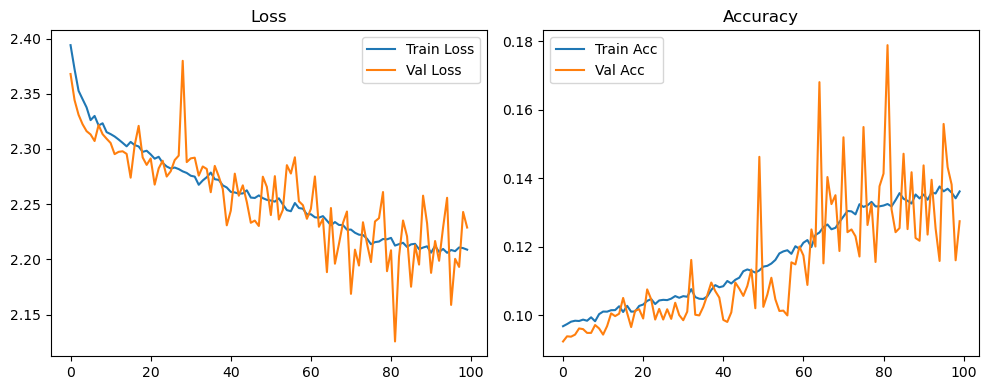

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 2.2242 Accuracy: 0.1325


🚀 Running: batch128_lr_max_0.0001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0967 |:   1%|          | 1/100 [01:18<2:09:10, 78.29s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:35<2:09:10, 78.29s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:35<2:09:10, 78.29s/it]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [01:35<1:08:48, 42.13s/it]

| LR: 0.000100 | Train Acc: 0.0972 | Val Acc: 0.0954 |:   2%|▏         | 2/100 [01:51<1:08:48, 42.13s/it]

| LR: 0.000100 | Train Acc: 0.0972 | Val Acc: 0.0954 |:   2%|▏         | 2/100 [01:51<1:08:48, 42.13s/it]

| LR: 0.000100 | Train Acc: 0.0972 | Val Acc: 0.0954 |:   3%|▎         | 3/100 [01:51<49:24, 30.56s/it]  

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0951 |:   3%|▎         | 3/100 [02:08<49:24, 30.56s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0951 |:   3%|▎         | 3/100 [02:08<49:24, 30.56s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0951 |:   4%|▍         | 4/100 [02:08<40:12, 25.13s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0957 |:   4%|▍         | 4/100 [02:25<40:12, 25.13s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0957 |:   4%|▍         | 4/100 [02:25<40:12, 25.13s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0957 |:   5%|▌         | 5/100 [02:25<35:04, 22.16s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0966 |:   5%|▌         | 5/100 [02:42<35:04, 22.16s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0966 |:   5%|▌         | 5/100 [02:42<35:04, 22.16s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0966 |:   6%|▌         | 6/100 [02:42<31:43, 20.25s/it]

| LR: 0.000099 | Train Acc: 0.0980 | Val Acc: 0.0965 |:   6%|▌         | 6/100 [02:58<31:43, 20.25s/it]

| LR: 0.000099 | Train Acc: 0.0980 | Val Acc: 0.0965 |:   6%|▌         | 6/100 [02:58<31:43, 20.25s/it]

| LR: 0.000099 | Train Acc: 0.0980 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [02:58<29:33, 19.07s/it]

| LR: 0.000099 | Train Acc: 0.0980 | Val Acc: 0.0968 |:   7%|▋         | 7/100 [03:15<29:33, 19.07s/it]

| LR: 0.000099 | Train Acc: 0.0980 | Val Acc: 0.0968 |:   7%|▋         | 7/100 [03:15<29:33, 19.07s/it]

| LR: 0.000099 | Train Acc: 0.0980 | Val Acc: 0.0968 |:   8%|▊         | 8/100 [03:15<28:04, 18.31s/it]

| LR: 0.000098 | Train Acc: 0.0988 | Val Acc: 0.0951 |:   8%|▊         | 8/100 [03:32<28:04, 18.31s/it]

| LR: 0.000098 | Train Acc: 0.0988 | Val Acc: 0.0951 |:   8%|▊         | 8/100 [03:32<28:04, 18.31s/it]

| LR: 0.000098 | Train Acc: 0.0988 | Val Acc: 0.0951 |:   9%|▉         | 9/100 [03:32<27:01, 17.82s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0959 |:   9%|▉         | 9/100 [03:48<27:01, 17.82s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0959 |:   9%|▉         | 9/100 [03:48<27:01, 17.82s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0959 |:  10%|█         | 10/100 [03:48<26:11, 17.47s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:05<26:11, 17.47s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:05<26:11, 17.47s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:05<25:32, 17.22s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:22<25:32, 17.22s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:22<25:32, 17.22s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [04:22<25:03, 17.08s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:39<25:03, 17.08s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:39<25:03, 17.08s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [04:39<24:38, 16.99s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [04:55<24:38, 16.99s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [04:55<24:38, 16.99s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [04:55<24:08, 16.85s/it]

| LR: 0.000095 | Train Acc: 0.0997 | Val Acc: 0.0981 |:  14%|█▍        | 14/100 [05:12<24:08, 16.85s/it]

| LR: 0.000095 | Train Acc: 0.0997 | Val Acc: 0.0981 |:  14%|█▍        | 14/100 [05:12<24:08, 16.85s/it]

| LR: 0.000095 | Train Acc: 0.0997 | Val Acc: 0.0981 |:  15%|█▌        | 15/100 [05:12<23:49, 16.82s/it]

| LR: 0.000095 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  15%|█▌        | 15/100 [05:29<23:49, 16.82s/it]

| LR: 0.000095 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  15%|█▌        | 15/100 [05:29<23:49, 16.82s/it]

| LR: 0.000095 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [05:29<23:30, 16.79s/it]

| LR: 0.000094 | Train Acc: 0.1011 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [05:45<23:30, 16.79s/it]

| LR: 0.000094 | Train Acc: 0.1011 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [05:45<23:30, 16.79s/it]

| LR: 0.000094 | Train Acc: 0.1011 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [05:45<23:10, 16.75s/it]

| LR: 0.000093 | Train Acc: 0.1008 | Val Acc: 0.0985 |:  17%|█▋        | 17/100 [06:02<23:10, 16.75s/it]

| LR: 0.000093 | Train Acc: 0.1008 | Val Acc: 0.0985 |:  17%|█▋        | 17/100 [06:02<23:10, 16.75s/it]

| LR: 0.000093 | Train Acc: 0.1008 | Val Acc: 0.0985 |:  18%|█▊        | 18/100 [06:02<22:52, 16.74s/it]

| LR: 0.000092 | Train Acc: 0.1014 | Val Acc: 0.0969 |:  18%|█▊        | 18/100 [06:19<22:52, 16.74s/it]

| LR: 0.000092 | Train Acc: 0.1014 | Val Acc: 0.0969 |:  18%|█▊        | 18/100 [06:19<22:52, 16.74s/it]

| LR: 0.000092 | Train Acc: 0.1014 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:19<22:33, 16.72s/it]

| LR: 0.000091 | Train Acc: 0.1002 | Val Acc: 0.0994 |:  19%|█▉        | 19/100 [06:35<22:33, 16.72s/it]

| LR: 0.000091 | Train Acc: 0.1002 | Val Acc: 0.0994 |:  19%|█▉        | 19/100 [06:35<22:33, 16.72s/it]

| LR: 0.000091 | Train Acc: 0.1002 | Val Acc: 0.0994 |:  20%|██        | 20/100 [06:35<22:15, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  20%|██        | 20/100 [06:52<22:15, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  20%|██        | 20/100 [06:52<22:15, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  21%|██        | 21/100 [06:52<21:57, 16.68s/it]

| LR: 0.000090 | Train Acc: 0.1020 | Val Acc: 0.1008 |:  21%|██        | 21/100 [07:09<21:57, 16.68s/it]

| LR: 0.000090 | Train Acc: 0.1020 | Val Acc: 0.1008 |:  21%|██        | 21/100 [07:09<21:57, 16.68s/it]

| LR: 0.000090 | Train Acc: 0.1020 | Val Acc: 0.1008 |:  22%|██▏       | 22/100 [07:09<21:41, 16.69s/it]

| LR: 0.000089 | Train Acc: 0.1018 | Val Acc: 0.0971 |:  22%|██▏       | 22/100 [07:25<21:41, 16.69s/it]

| LR: 0.000089 | Train Acc: 0.1018 | Val Acc: 0.0971 |:  22%|██▏       | 22/100 [07:25<21:41, 16.69s/it]

| LR: 0.000089 | Train Acc: 0.1018 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:25<21:29, 16.74s/it]

| LR: 0.000088 | Train Acc: 0.1011 | Val Acc: 0.0990 |:  23%|██▎       | 23/100 [07:42<21:29, 16.74s/it]

| LR: 0.000088 | Train Acc: 0.1011 | Val Acc: 0.0990 |:  23%|██▎       | 23/100 [07:42<21:29, 16.74s/it]

| LR: 0.000088 | Train Acc: 0.1011 | Val Acc: 0.0990 |:  24%|██▍       | 24/100 [07:42<21:12, 16.75s/it]

| LR: 0.000087 | Train Acc: 0.1023 | Val Acc: 0.0937 |:  24%|██▍       | 24/100 [07:59<21:12, 16.75s/it]

| LR: 0.000087 | Train Acc: 0.1023 | Val Acc: 0.0937 |:  24%|██▍       | 24/100 [07:59<21:12, 16.75s/it]

| LR: 0.000087 | Train Acc: 0.1023 | Val Acc: 0.0937 |:  25%|██▌       | 25/100 [07:59<20:56, 16.75s/it]

| LR: 0.000086 | Train Acc: 0.1012 | Val Acc: 0.0937 |:  25%|██▌       | 25/100 [08:16<20:56, 16.75s/it]

| LR: 0.000086 | Train Acc: 0.1012 | Val Acc: 0.0937 |:  25%|██▌       | 25/100 [08:16<20:56, 16.75s/it]

| LR: 0.000086 | Train Acc: 0.1012 | Val Acc: 0.0937 |:  26%|██▌       | 26/100 [08:16<20:35, 16.70s/it]

| LR: 0.000084 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  26%|██▌       | 26/100 [08:32<20:35, 16.70s/it]

| LR: 0.000084 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  26%|██▌       | 26/100 [08:32<20:35, 16.70s/it]

| LR: 0.000084 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  27%|██▋       | 27/100 [08:32<20:18, 16.70s/it]

| LR: 0.000083 | Train Acc: 0.1027 | Val Acc: 0.1050 |:  27%|██▋       | 27/100 [08:49<20:18, 16.70s/it]

| LR: 0.000083 | Train Acc: 0.1027 | Val Acc: 0.1050 |:  27%|██▋       | 27/100 [08:49<20:18, 16.70s/it]

| LR: 0.000083 | Train Acc: 0.1027 | Val Acc: 0.1050 |:  28%|██▊       | 28/100 [08:49<20:02, 16.71s/it]

| LR: 0.000082 | Train Acc: 0.1023 | Val Acc: 0.0988 |:  28%|██▊       | 28/100 [09:06<20:02, 16.71s/it]

| LR: 0.000082 | Train Acc: 0.1023 | Val Acc: 0.0988 |:  28%|██▊       | 28/100 [09:06<20:02, 16.71s/it]

| LR: 0.000082 | Train Acc: 0.1023 | Val Acc: 0.0988 |:  29%|██▉       | 29/100 [09:06<19:45, 16.70s/it]

| LR: 0.000081 | Train Acc: 0.1017 | Val Acc: 0.0965 |:  29%|██▉       | 29/100 [09:23<19:45, 16.70s/it]

| LR: 0.000081 | Train Acc: 0.1017 | Val Acc: 0.0965 |:  29%|██▉       | 29/100 [09:23<19:45, 16.70s/it]

| LR: 0.000081 | Train Acc: 0.1017 | Val Acc: 0.0965 |:  30%|███       | 30/100 [09:23<19:34, 16.77s/it]

| LR: 0.000080 | Train Acc: 0.1038 | Val Acc: 0.1022 |:  30%|███       | 30/100 [09:39<19:34, 16.77s/it]

| LR: 0.000080 | Train Acc: 0.1038 | Val Acc: 0.1022 |:  30%|███       | 30/100 [09:39<19:34, 16.77s/it]

| LR: 0.000080 | Train Acc: 0.1038 | Val Acc: 0.1022 |:  31%|███       | 31/100 [09:39<19:13, 16.71s/it]

| LR: 0.000078 | Train Acc: 0.1043 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:56<19:13, 16.71s/it]

| LR: 0.000078 | Train Acc: 0.1043 | Val Acc: 0.1010 |:  31%|███       | 31/100 [09:56<19:13, 16.71s/it]

| LR: 0.000078 | Train Acc: 0.1043 | Val Acc: 0.1010 |:  32%|███▏      | 32/100 [09:56<18:56, 16.71s/it]

| LR: 0.000077 | Train Acc: 0.1047 | Val Acc: 0.0967 |:  32%|███▏      | 32/100 [10:13<18:56, 16.71s/it]

| LR: 0.000077 | Train Acc: 0.1047 | Val Acc: 0.0967 |:  32%|███▏      | 32/100 [10:13<18:56, 16.71s/it]

| LR: 0.000077 | Train Acc: 0.1047 | Val Acc: 0.0967 |:  33%|███▎      | 33/100 [10:13<18:39, 16.70s/it]

| LR: 0.000076 | Train Acc: 0.1040 | Val Acc: 0.0996 |:  33%|███▎      | 33/100 [10:29<18:39, 16.70s/it]

| LR: 0.000076 | Train Acc: 0.1040 | Val Acc: 0.0996 |:  33%|███▎      | 33/100 [10:29<18:39, 16.70s/it]

| LR: 0.000076 | Train Acc: 0.1040 | Val Acc: 0.0996 |:  34%|███▍      | 34/100 [10:29<18:19, 16.66s/it]

| LR: 0.000074 | Train Acc: 0.1040 | Val Acc: 0.0979 |:  34%|███▍      | 34/100 [10:46<18:19, 16.66s/it]

| LR: 0.000074 | Train Acc: 0.1040 | Val Acc: 0.0979 |:  34%|███▍      | 34/100 [10:46<18:19, 16.66s/it]

| LR: 0.000074 | Train Acc: 0.1040 | Val Acc: 0.0979 |:  35%|███▌      | 35/100 [10:46<18:03, 16.66s/it]

| LR: 0.000073 | Train Acc: 0.1035 | Val Acc: 0.0993 |:  35%|███▌      | 35/100 [11:02<18:03, 16.66s/it]

| LR: 0.000073 | Train Acc: 0.1035 | Val Acc: 0.0993 |:  35%|███▌      | 35/100 [11:02<18:03, 16.66s/it]

| LR: 0.000073 | Train Acc: 0.1035 | Val Acc: 0.0993 |:  36%|███▌      | 36/100 [11:02<17:45, 16.65s/it]

| LR: 0.000072 | Train Acc: 0.1040 | Val Acc: 0.1070 |:  36%|███▌      | 36/100 [11:19<17:45, 16.65s/it]

| LR: 0.000072 | Train Acc: 0.1040 | Val Acc: 0.1070 |:  36%|███▌      | 36/100 [11:19<17:45, 16.65s/it]

| LR: 0.000072 | Train Acc: 0.1040 | Val Acc: 0.1070 |:  37%|███▋      | 37/100 [11:19<17:28, 16.65s/it]

| LR: 0.000070 | Train Acc: 0.1048 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [11:36<17:28, 16.65s/it]

| LR: 0.000070 | Train Acc: 0.1048 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [11:36<17:28, 16.65s/it]

| LR: 0.000070 | Train Acc: 0.1048 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [11:36<17:15, 16.71s/it]

| LR: 0.000069 | Train Acc: 0.1045 | Val Acc: 0.1131 |:  38%|███▊      | 38/100 [11:53<17:15, 16.71s/it]

| LR: 0.000069 | Train Acc: 0.1045 | Val Acc: 0.1131 |:  38%|███▊      | 38/100 [11:53<17:15, 16.71s/it]

| LR: 0.000069 | Train Acc: 0.1045 | Val Acc: 0.1131 |:  39%|███▉      | 39/100 [11:53<16:58, 16.69s/it]

| LR: 0.000067 | Train Acc: 0.1052 | Val Acc: 0.1042 |:  39%|███▉      | 39/100 [12:09<16:58, 16.69s/it]

| LR: 0.000067 | Train Acc: 0.1052 | Val Acc: 0.1042 |:  39%|███▉      | 39/100 [12:09<16:58, 16.69s/it]

| LR: 0.000067 | Train Acc: 0.1052 | Val Acc: 0.1042 |:  40%|████      | 40/100 [12:09<16:44, 16.74s/it]

| LR: 0.000066 | Train Acc: 0.1056 | Val Acc: 0.1011 |:  40%|████      | 40/100 [12:26<16:44, 16.74s/it]

| LR: 0.000066 | Train Acc: 0.1056 | Val Acc: 0.1011 |:  40%|████      | 40/100 [12:26<16:44, 16.74s/it]

| LR: 0.000066 | Train Acc: 0.1056 | Val Acc: 0.1011 |:  41%|████      | 41/100 [12:26<16:25, 16.70s/it]

| LR: 0.000064 | Train Acc: 0.1057 | Val Acc: 0.0993 |:  41%|████      | 41/100 [12:43<16:25, 16.70s/it]

| LR: 0.000064 | Train Acc: 0.1057 | Val Acc: 0.0993 |:  41%|████      | 41/100 [12:43<16:25, 16.70s/it]

| LR: 0.000064 | Train Acc: 0.1057 | Val Acc: 0.0993 |:  42%|████▏     | 42/100 [12:43<16:11, 16.74s/it]

| LR: 0.000063 | Train Acc: 0.1065 | Val Acc: 0.1067 |:  42%|████▏     | 42/100 [13:00<16:11, 16.74s/it]

| LR: 0.000063 | Train Acc: 0.1065 | Val Acc: 0.1067 |:  42%|████▏     | 42/100 [13:00<16:11, 16.74s/it]

| LR: 0.000063 | Train Acc: 0.1065 | Val Acc: 0.1067 |:  43%|████▎     | 43/100 [13:00<15:53, 16.73s/it]

| LR: 0.000061 | Train Acc: 0.1052 | Val Acc: 0.1018 |:  43%|████▎     | 43/100 [13:16<15:53, 16.73s/it]

| LR: 0.000061 | Train Acc: 0.1052 | Val Acc: 0.1018 |:  43%|████▎     | 43/100 [13:16<15:53, 16.73s/it]

| LR: 0.000061 | Train Acc: 0.1052 | Val Acc: 0.1018 |:  44%|████▍     | 44/100 [13:16<15:34, 16.69s/it]

| LR: 0.000060 | Train Acc: 0.1043 | Val Acc: 0.0994 |:  44%|████▍     | 44/100 [13:33<15:34, 16.69s/it]

| LR: 0.000060 | Train Acc: 0.1043 | Val Acc: 0.0994 |:  44%|████▍     | 44/100 [13:33<15:34, 16.69s/it]

| LR: 0.000060 | Train Acc: 0.1043 | Val Acc: 0.0994 |:  45%|████▌     | 45/100 [13:33<15:17, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.1046 | Val Acc: 0.1002 |:  45%|████▌     | 45/100 [13:49<15:17, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.1046 | Val Acc: 0.1002 |:  45%|████▌     | 45/100 [13:49<15:17, 16.68s/it]

| LR: 0.000058 | Train Acc: 0.1046 | Val Acc: 0.1002 |:  46%|████▌     | 46/100 [13:49<14:58, 16.64s/it]

| LR: 0.000057 | Train Acc: 0.1043 | Val Acc: 0.0997 |:  46%|████▌     | 46/100 [14:06<14:58, 16.64s/it]

| LR: 0.000057 | Train Acc: 0.1043 | Val Acc: 0.0997 |:  46%|████▌     | 46/100 [14:06<14:58, 16.64s/it]

| LR: 0.000057 | Train Acc: 0.1043 | Val Acc: 0.0997 |:  47%|████▋     | 47/100 [14:06<14:44, 16.69s/it]

| LR: 0.000055 | Train Acc: 0.1055 | Val Acc: 0.0955 |:  47%|████▋     | 47/100 [14:23<14:44, 16.69s/it]

| LR: 0.000055 | Train Acc: 0.1055 | Val Acc: 0.0955 |:  47%|████▋     | 47/100 [14:23<14:44, 16.69s/it]

| LR: 0.000055 | Train Acc: 0.1055 | Val Acc: 0.0955 |:  48%|████▊     | 48/100 [14:23<14:27, 16.69s/it]

| LR: 0.000054 | Train Acc: 0.1057 | Val Acc: 0.0916 |:  48%|████▊     | 48/100 [14:39<14:27, 16.69s/it]

| LR: 0.000054 | Train Acc: 0.1057 | Val Acc: 0.0916 |:  48%|████▊     | 48/100 [14:39<14:27, 16.69s/it]

| LR: 0.000054 | Train Acc: 0.1057 | Val Acc: 0.0916 |:  49%|████▉     | 49/100 [14:40<14:10, 16.67s/it]

| LR: 0.000052 | Train Acc: 0.1058 | Val Acc: 0.1042 |:  49%|████▉     | 49/100 [14:56<14:10, 16.67s/it]

| LR: 0.000052 | Train Acc: 0.1058 | Val Acc: 0.1042 |:  49%|████▉     | 49/100 [14:56<14:10, 16.67s/it]

| LR: 0.000052 | Train Acc: 0.1058 | Val Acc: 0.1042 |:  50%|█████     | 50/100 [14:56<13:52, 16.65s/it]

| LR: 0.000051 | Train Acc: 0.1053 | Val Acc: 0.1008 |:  50%|█████     | 50/100 [15:13<13:52, 16.65s/it]

| LR: 0.000051 | Train Acc: 0.1053 | Val Acc: 0.1008 |:  50%|█████     | 50/100 [15:13<13:52, 16.65s/it]

| LR: 0.000051 | Train Acc: 0.1053 | Val Acc: 0.1008 |:  51%|█████     | 51/100 [15:13<13:36, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1043 | Val Acc: 0.1043 |:  51%|█████     | 51/100 [15:30<13:36, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1043 | Val Acc: 0.1043 |:  51%|█████     | 51/100 [15:30<13:36, 16.67s/it]

| LR: 0.000049 | Train Acc: 0.1043 | Val Acc: 0.1043 |:  52%|█████▏    | 52/100 [15:30<13:24, 16.75s/it]

| LR: 0.000047 | Train Acc: 0.1066 | Val Acc: 0.1015 |:  52%|█████▏    | 52/100 [15:46<13:24, 16.75s/it]

| LR: 0.000047 | Train Acc: 0.1066 | Val Acc: 0.1015 |:  52%|█████▏    | 52/100 [15:46<13:24, 16.75s/it]

| LR: 0.000047 | Train Acc: 0.1066 | Val Acc: 0.1015 |:  53%|█████▎    | 53/100 [15:46<13:05, 16.72s/it]

| LR: 0.000046 | Train Acc: 0.1069 | Val Acc: 0.1022 |:  53%|█████▎    | 53/100 [16:03<13:05, 16.72s/it]

| LR: 0.000046 | Train Acc: 0.1069 | Val Acc: 0.1022 |:  53%|█████▎    | 53/100 [16:03<13:05, 16.72s/it]

| LR: 0.000046 | Train Acc: 0.1069 | Val Acc: 0.1022 |:  54%|█████▍    | 54/100 [16:03<12:50, 16.75s/it]

| LR: 0.000044 | Train Acc: 0.1074 | Val Acc: 0.1039 |:  54%|█████▍    | 54/100 [16:20<12:50, 16.75s/it]

| LR: 0.000044 | Train Acc: 0.1074 | Val Acc: 0.1039 |:  54%|█████▍    | 54/100 [16:20<12:50, 16.75s/it]

| LR: 0.000044 | Train Acc: 0.1074 | Val Acc: 0.1039 |:  55%|█████▌    | 55/100 [16:20<12:33, 16.74s/it]

| LR: 0.000043 | Train Acc: 0.1064 | Val Acc: 0.1006 |:  55%|█████▌    | 55/100 [16:37<12:33, 16.74s/it]

| LR: 0.000043 | Train Acc: 0.1064 | Val Acc: 0.1006 |:  55%|█████▌    | 55/100 [16:37<12:33, 16.74s/it]

| LR: 0.000043 | Train Acc: 0.1064 | Val Acc: 0.1006 |:  56%|█████▌    | 56/100 [16:37<12:15, 16.72s/it]

| LR: 0.000041 | Train Acc: 0.1057 | Val Acc: 0.0991 |:  56%|█████▌    | 56/100 [16:53<12:15, 16.72s/it]

| LR: 0.000041 | Train Acc: 0.1057 | Val Acc: 0.0991 |:  56%|█████▌    | 56/100 [16:53<12:15, 16.72s/it]

| LR: 0.000041 | Train Acc: 0.1057 | Val Acc: 0.0991 |:  57%|█████▋    | 57/100 [16:54<12:01, 16.77s/it]

| LR: 0.000040 | Train Acc: 0.1064 | Val Acc: 0.1042 |:  57%|█████▋    | 57/100 [17:10<12:01, 16.77s/it]

| LR: 0.000040 | Train Acc: 0.1064 | Val Acc: 0.1042 |:  57%|█████▋    | 57/100 [17:10<12:01, 16.77s/it]

| LR: 0.000040 | Train Acc: 0.1064 | Val Acc: 0.1042 |:  58%|█████▊    | 58/100 [17:10<11:42, 16.73s/it]

| LR: 0.000038 | Train Acc: 0.1071 | Val Acc: 0.1027 |:  58%|█████▊    | 58/100 [17:27<11:42, 16.73s/it]

| LR: 0.000038 | Train Acc: 0.1071 | Val Acc: 0.1027 |:  58%|█████▊    | 58/100 [17:27<11:42, 16.73s/it]

| LR: 0.000038 | Train Acc: 0.1071 | Val Acc: 0.1027 |:  59%|█████▉    | 59/100 [17:27<11:26, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.1064 | Val Acc: 0.0985 |:  59%|█████▉    | 59/100 [17:43<11:26, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.1064 | Val Acc: 0.0985 |:  59%|█████▉    | 59/100 [17:43<11:26, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.1064 | Val Acc: 0.0985 |:  60%|██████    | 60/100 [17:43<11:07, 16.68s/it]

| LR: 0.000035 | Train Acc: 0.1075 | Val Acc: 0.1007 |:  60%|██████    | 60/100 [18:00<11:07, 16.68s/it]

| LR: 0.000035 | Train Acc: 0.1075 | Val Acc: 0.1007 |:  60%|██████    | 60/100 [18:00<11:07, 16.68s/it]

| LR: 0.000035 | Train Acc: 0.1075 | Val Acc: 0.1007 |:  61%|██████    | 61/100 [18:00<10:49, 16.66s/it]

| LR: 0.000034 | Train Acc: 0.1077 | Val Acc: 0.1002 |:  61%|██████    | 61/100 [18:17<10:49, 16.66s/it]

| LR: 0.000034 | Train Acc: 0.1077 | Val Acc: 0.1002 |:  61%|██████    | 61/100 [18:17<10:49, 16.66s/it]

| LR: 0.000034 | Train Acc: 0.1077 | Val Acc: 0.1002 |:  62%|██████▏   | 62/100 [18:17<10:30, 16.60s/it]

| LR: 0.000032 | Train Acc: 0.1086 | Val Acc: 0.0987 |:  62%|██████▏   | 62/100 [18:33<10:30, 16.60s/it]

| LR: 0.000032 | Train Acc: 0.1086 | Val Acc: 0.0987 |:  62%|██████▏   | 62/100 [18:33<10:30, 16.60s/it]

| LR: 0.000032 | Train Acc: 0.1086 | Val Acc: 0.0987 |:  63%|██████▎   | 63/100 [18:33<10:14, 16.62s/it]

| LR: 0.000031 | Train Acc: 0.1079 | Val Acc: 0.1008 |:  63%|██████▎   | 63/100 [18:50<10:14, 16.62s/it]

| LR: 0.000031 | Train Acc: 0.1079 | Val Acc: 0.1008 |:  63%|██████▎   | 63/100 [18:50<10:14, 16.62s/it]

| LR: 0.000031 | Train Acc: 0.1079 | Val Acc: 0.1008 |:  64%|██████▍   | 64/100 [18:50<09:58, 16.61s/it]

| LR: 0.000029 | Train Acc: 0.1093 | Val Acc: 0.1037 |:  64%|██████▍   | 64/100 [19:06<09:58, 16.61s/it]

| LR: 0.000029 | Train Acc: 0.1093 | Val Acc: 0.1037 |:  64%|██████▍   | 64/100 [19:06<09:58, 16.61s/it]

| LR: 0.000029 | Train Acc: 0.1093 | Val Acc: 0.1037 |:  65%|██████▌   | 65/100 [19:06<09:40, 16.59s/it]

| LR: 0.000028 | Train Acc: 0.1083 | Val Acc: 0.1058 |:  65%|██████▌   | 65/100 [19:23<09:40, 16.59s/it]

| LR: 0.000028 | Train Acc: 0.1083 | Val Acc: 0.1058 |:  65%|██████▌   | 65/100 [19:23<09:40, 16.59s/it]

| LR: 0.000028 | Train Acc: 0.1083 | Val Acc: 0.1058 |:  66%|██████▌   | 66/100 [19:23<09:25, 16.64s/it]

| LR: 0.000027 | Train Acc: 0.1106 | Val Acc: 0.1031 |:  66%|██████▌   | 66/100 [19:40<09:25, 16.64s/it]

| LR: 0.000027 | Train Acc: 0.1106 | Val Acc: 0.1031 |:  66%|██████▌   | 66/100 [19:40<09:25, 16.64s/it]

| LR: 0.000027 | Train Acc: 0.1106 | Val Acc: 0.1031 |:  67%|██████▋   | 67/100 [19:40<09:08, 16.61s/it]

| LR: 0.000025 | Train Acc: 0.1129 | Val Acc: 0.0995 |:  67%|██████▋   | 67/100 [19:56<09:08, 16.61s/it]

| LR: 0.000025 | Train Acc: 0.1129 | Val Acc: 0.0995 |:  67%|██████▋   | 67/100 [19:56<09:08, 16.61s/it]

| LR: 0.000025 | Train Acc: 0.1129 | Val Acc: 0.0995 |:  68%|██████▊   | 68/100 [19:56<08:52, 16.63s/it]

| LR: 0.000024 | Train Acc: 0.1109 | Val Acc: 0.1026 |:  68%|██████▊   | 68/100 [20:13<08:52, 16.63s/it]

| LR: 0.000024 | Train Acc: 0.1109 | Val Acc: 0.1026 |:  68%|██████▊   | 68/100 [20:13<08:52, 16.63s/it]

| LR: 0.000024 | Train Acc: 0.1109 | Val Acc: 0.1026 |:  69%|██████▉   | 69/100 [20:13<08:36, 16.67s/it]

| LR: 0.000023 | Train Acc: 0.1110 | Val Acc: 0.1016 |:  69%|██████▉   | 69/100 [20:30<08:36, 16.67s/it]

| LR: 0.000023 | Train Acc: 0.1110 | Val Acc: 0.1016 |:  69%|██████▉   | 69/100 [20:30<08:36, 16.67s/it]

| LR: 0.000023 | Train Acc: 0.1110 | Val Acc: 0.1016 |:  70%|███████   | 70/100 [20:30<08:20, 16.69s/it]

| LR: 0.000021 | Train Acc: 0.1121 | Val Acc: 0.1089 |:  70%|███████   | 70/100 [20:46<08:20, 16.69s/it]

| LR: 0.000021 | Train Acc: 0.1121 | Val Acc: 0.1089 |:  70%|███████   | 70/100 [20:46<08:20, 16.69s/it]

| LR: 0.000021 | Train Acc: 0.1121 | Val Acc: 0.1089 |:  71%|███████   | 71/100 [20:46<08:02, 16.65s/it]

| LR: 0.000020 | Train Acc: 0.1113 | Val Acc: 0.1034 |:  71%|███████   | 71/100 [21:03<08:02, 16.65s/it]

| LR: 0.000020 | Train Acc: 0.1113 | Val Acc: 0.1034 |:  71%|███████   | 71/100 [21:03<08:02, 16.65s/it]

| LR: 0.000020 | Train Acc: 0.1113 | Val Acc: 0.1034 |:  72%|███████▏  | 72/100 [21:03<07:46, 16.68s/it]

| LR: 0.000019 | Train Acc: 0.1141 | Val Acc: 0.1059 |:  72%|███████▏  | 72/100 [21:20<07:46, 16.68s/it]

| LR: 0.000019 | Train Acc: 0.1141 | Val Acc: 0.1059 |:  72%|███████▏  | 72/100 [21:20<07:46, 16.68s/it]

| LR: 0.000019 | Train Acc: 0.1141 | Val Acc: 0.1059 |:  73%|███████▎  | 73/100 [21:20<07:29, 16.66s/it]

| LR: 0.000018 | Train Acc: 0.1124 | Val Acc: 0.1115 |:  73%|███████▎  | 73/100 [21:37<07:29, 16.66s/it]

| LR: 0.000018 | Train Acc: 0.1124 | Val Acc: 0.1115 |:  73%|███████▎  | 73/100 [21:37<07:29, 16.66s/it]

| LR: 0.000018 | Train Acc: 0.1124 | Val Acc: 0.1115 |:  74%|███████▍  | 74/100 [21:37<07:15, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.1149 | Val Acc: 0.1123 |:  74%|███████▍  | 74/100 [21:53<07:15, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.1149 | Val Acc: 0.1123 |:  74%|███████▍  | 74/100 [21:53<07:15, 16.74s/it]

| LR: 0.000017 | Train Acc: 0.1149 | Val Acc: 0.1123 |:  75%|███████▌  | 75/100 [21:53<06:58, 16.72s/it]

| LR: 0.000015 | Train Acc: 0.1147 | Val Acc: 0.1166 |:  75%|███████▌  | 75/100 [22:10<06:58, 16.72s/it]

| LR: 0.000015 | Train Acc: 0.1147 | Val Acc: 0.1166 |:  75%|███████▌  | 75/100 [22:10<06:58, 16.72s/it]

| LR: 0.000015 | Train Acc: 0.1147 | Val Acc: 0.1166 |:  76%|███████▌  | 76/100 [22:10<06:41, 16.72s/it]

| LR: 0.000014 | Train Acc: 0.1141 | Val Acc: 0.1121 |:  76%|███████▌  | 76/100 [22:27<06:41, 16.72s/it]

| LR: 0.000014 | Train Acc: 0.1141 | Val Acc: 0.1121 |:  76%|███████▌  | 76/100 [22:27<06:41, 16.72s/it]

| LR: 0.000014 | Train Acc: 0.1141 | Val Acc: 0.1121 |:  77%|███████▋  | 77/100 [22:27<06:25, 16.74s/it]

| LR: 0.000013 | Train Acc: 0.1135 | Val Acc: 0.1095 |:  77%|███████▋  | 77/100 [22:43<06:25, 16.74s/it]

| LR: 0.000013 | Train Acc: 0.1135 | Val Acc: 0.1095 |:  77%|███████▋  | 77/100 [22:43<06:25, 16.74s/it]

| LR: 0.000013 | Train Acc: 0.1135 | Val Acc: 0.1095 |:  78%|███████▊  | 78/100 [22:44<06:07, 16.71s/it]

| LR: 0.000012 | Train Acc: 0.1147 | Val Acc: 0.1028 |:  78%|███████▊  | 78/100 [23:00<06:07, 16.71s/it]

| LR: 0.000012 | Train Acc: 0.1147 | Val Acc: 0.1028 |:  78%|███████▊  | 78/100 [23:00<06:07, 16.71s/it]

| LR: 0.000012 | Train Acc: 0.1147 | Val Acc: 0.1028 |:  79%|███████▉  | 79/100 [23:00<05:50, 16.70s/it]

| LR: 0.000011 | Train Acc: 0.1144 | Val Acc: 0.1050 |:  79%|███████▉  | 79/100 [23:17<05:50, 16.70s/it]

| LR: 0.000011 | Train Acc: 0.1144 | Val Acc: 0.1050 |:  79%|███████▉  | 79/100 [23:17<05:50, 16.70s/it]

| LR: 0.000011 | Train Acc: 0.1144 | Val Acc: 0.1050 |:  80%|████████  | 80/100 [23:17<05:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1161 | Val Acc: 0.1133 |:  80%|████████  | 80/100 [23:33<05:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1161 | Val Acc: 0.1133 |:  80%|████████  | 80/100 [23:33<05:33, 16.68s/it]

| LR: 0.000010 | Train Acc: 0.1161 | Val Acc: 0.1133 |:  81%|████████  | 81/100 [23:33<05:16, 16.64s/it]

| LR: 0.000010 | Train Acc: 0.1151 | Val Acc: 0.1023 |:  81%|████████  | 81/100 [23:50<05:16, 16.64s/it]

| LR: 0.000010 | Train Acc: 0.1151 | Val Acc: 0.1023 |:  81%|████████  | 81/100 [23:50<05:16, 16.64s/it]

| LR: 0.000010 | Train Acc: 0.1151 | Val Acc: 0.1023 |:  82%|████████▏ | 82/100 [23:50<05:00, 16.69s/it]

| LR: 0.000009 | Train Acc: 0.1168 | Val Acc: 0.1109 |:  82%|████████▏ | 82/100 [24:07<05:00, 16.69s/it]

| LR: 0.000009 | Train Acc: 0.1168 | Val Acc: 0.1109 |:  82%|████████▏ | 82/100 [24:07<05:00, 16.69s/it]

| LR: 0.000009 | Train Acc: 0.1168 | Val Acc: 0.1109 |:  83%|████████▎ | 83/100 [24:07<04:44, 16.71s/it]

| LR: 0.000008 | Train Acc: 0.1168 | Val Acc: 0.1157 |:  83%|████████▎ | 83/100 [24:23<04:44, 16.71s/it]

| LR: 0.000008 | Train Acc: 0.1168 | Val Acc: 0.1157 |:  83%|████████▎ | 83/100 [24:23<04:44, 16.71s/it]

| LR: 0.000008 | Train Acc: 0.1168 | Val Acc: 0.1157 |:  84%|████████▍ | 84/100 [24:24<04:26, 16.69s/it]

| LR: 0.000007 | Train Acc: 0.1141 | Val Acc: 0.1092 |:  84%|████████▍ | 84/100 [24:40<04:26, 16.69s/it]

| LR: 0.000007 | Train Acc: 0.1141 | Val Acc: 0.1092 |:  84%|████████▍ | 84/100 [24:40<04:26, 16.69s/it]

| LR: 0.000007 | Train Acc: 0.1141 | Val Acc: 0.1092 |:  85%|████████▌ | 85/100 [24:40<04:10, 16.71s/it]

| LR: 0.000006 | Train Acc: 0.1154 | Val Acc: 0.1130 |:  85%|████████▌ | 85/100 [24:57<04:10, 16.71s/it]

| LR: 0.000006 | Train Acc: 0.1154 | Val Acc: 0.1130 |:  85%|████████▌ | 85/100 [24:57<04:10, 16.71s/it]

| LR: 0.000006 | Train Acc: 0.1154 | Val Acc: 0.1130 |:  86%|████████▌ | 86/100 [24:57<03:53, 16.68s/it]

| LR: 0.000006 | Train Acc: 0.1157 | Val Acc: 0.1019 |:  86%|████████▌ | 86/100 [25:14<03:53, 16.68s/it]

| LR: 0.000006 | Train Acc: 0.1157 | Val Acc: 0.1019 |:  86%|████████▌ | 86/100 [25:14<03:53, 16.68s/it]

| LR: 0.000006 | Train Acc: 0.1157 | Val Acc: 0.1019 |:  87%|████████▋ | 87/100 [25:14<03:36, 16.68s/it]

| LR: 0.000005 | Train Acc: 0.1148 | Val Acc: 0.1060 |:  87%|████████▋ | 87/100 [25:30<03:36, 16.68s/it]

| LR: 0.000005 | Train Acc: 0.1148 | Val Acc: 0.1060 |:  87%|████████▋ | 87/100 [25:30<03:36, 16.68s/it]

| LR: 0.000005 | Train Acc: 0.1148 | Val Acc: 0.1060 |:  88%|████████▊ | 88/100 [25:30<03:20, 16.69s/it]

| LR: 0.000004 | Train Acc: 0.1163 | Val Acc: 0.1139 |:  88%|████████▊ | 88/100 [25:47<03:20, 16.69s/it]

| LR: 0.000004 | Train Acc: 0.1163 | Val Acc: 0.1139 |:  88%|████████▊ | 88/100 [25:47<03:20, 16.69s/it]

| LR: 0.000004 | Train Acc: 0.1163 | Val Acc: 0.1139 |:  89%|████████▉ | 89/100 [25:47<03:03, 16.71s/it]

| LR: 0.000004 | Train Acc: 0.1162 | Val Acc: 0.1076 |:  89%|████████▉ | 89/100 [26:04<03:03, 16.71s/it]

| LR: 0.000004 | Train Acc: 0.1162 | Val Acc: 0.1076 |:  89%|████████▉ | 89/100 [26:04<03:03, 16.71s/it]

| LR: 0.000004 | Train Acc: 0.1162 | Val Acc: 0.1076 |:  90%|█████████ | 90/100 [26:04<02:47, 16.70s/it]

| LR: 0.000003 | Train Acc: 0.1163 | Val Acc: 0.1040 |:  90%|█████████ | 90/100 [26:21<02:47, 16.70s/it]

| LR: 0.000003 | Train Acc: 0.1163 | Val Acc: 0.1040 |:  90%|█████████ | 90/100 [26:21<02:47, 16.70s/it]

| LR: 0.000003 | Train Acc: 0.1163 | Val Acc: 0.1040 |:  91%|█████████ | 91/100 [26:21<02:31, 16.79s/it]

| LR: 0.000003 | Train Acc: 0.1172 | Val Acc: 0.1104 |:  91%|█████████ | 91/100 [26:37<02:31, 16.79s/it]

| LR: 0.000003 | Train Acc: 0.1172 | Val Acc: 0.1104 |:  91%|█████████ | 91/100 [26:37<02:31, 16.79s/it]

| LR: 0.000003 | Train Acc: 0.1172 | Val Acc: 0.1104 |:  92%|█████████▏| 92/100 [26:37<02:13, 16.74s/it]

| LR: 0.000003 | Train Acc: 0.1166 | Val Acc: 0.1064 |:  92%|█████████▏| 92/100 [26:54<02:13, 16.74s/it]

| LR: 0.000003 | Train Acc: 0.1166 | Val Acc: 0.1064 |:  92%|█████████▏| 92/100 [26:54<02:13, 16.74s/it]

| LR: 0.000003 | Train Acc: 0.1166 | Val Acc: 0.1064 |:  93%|█████████▎| 93/100 [26:54<01:57, 16.76s/it]

| LR: 0.000002 | Train Acc: 0.1158 | Val Acc: 0.1118 |:  93%|█████████▎| 93/100 [27:11<01:57, 16.76s/it]

| LR: 0.000002 | Train Acc: 0.1158 | Val Acc: 0.1118 |:  93%|█████████▎| 93/100 [27:11<01:57, 16.76s/it]

| LR: 0.000002 | Train Acc: 0.1158 | Val Acc: 0.1118 |:  94%|█████████▍| 94/100 [27:11<01:40, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1156 | Val Acc: 0.1048 |:  94%|█████████▍| 94/100 [27:27<01:40, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1156 | Val Acc: 0.1048 |:  94%|█████████▍| 94/100 [27:27<01:40, 16.72s/it]

| LR: 0.000002 | Train Acc: 0.1156 | Val Acc: 0.1048 |:  95%|█████████▌| 95/100 [27:27<01:23, 16.71s/it]

| LR: 0.000002 | Train Acc: 0.1169 | Val Acc: 0.1095 |:  95%|█████████▌| 95/100 [27:44<01:23, 16.71s/it]

| LR: 0.000002 | Train Acc: 0.1169 | Val Acc: 0.1095 |:  95%|█████████▌| 95/100 [27:44<01:23, 16.71s/it]

| LR: 0.000002 | Train Acc: 0.1169 | Val Acc: 0.1095 |:  96%|█████████▌| 96/100 [27:44<01:06, 16.72s/it]

| LR: 0.000001 | Train Acc: 0.1171 | Val Acc: 0.1114 |:  96%|█████████▌| 96/100 [28:01<01:06, 16.72s/it]

| LR: 0.000001 | Train Acc: 0.1171 | Val Acc: 0.1114 |:  96%|█████████▌| 96/100 [28:01<01:06, 16.72s/it]

| LR: 0.000001 | Train Acc: 0.1171 | Val Acc: 0.1114 |:  97%|█████████▋| 97/100 [28:01<00:50, 16.72s/it]

| LR: 0.000001 | Train Acc: 0.1168 | Val Acc: 0.1139 |:  97%|█████████▋| 97/100 [28:18<00:50, 16.72s/it]

| LR: 0.000001 | Train Acc: 0.1168 | Val Acc: 0.1139 |:  97%|█████████▋| 97/100 [28:18<00:50, 16.72s/it]

| LR: 0.000001 | Train Acc: 0.1168 | Val Acc: 0.1139 |:  98%|█████████▊| 98/100 [28:18<00:33, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.1171 | Val Acc: 0.0997 |:  98%|█████████▊| 98/100 [28:35<00:33, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.1171 | Val Acc: 0.0997 |:  98%|█████████▊| 98/100 [28:35<00:33, 16.78s/it]

| LR: 0.000001 | Train Acc: 0.1171 | Val Acc: 0.0997 |:  99%|█████████▉| 99/100 [28:35<00:16, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1182 | Val Acc: 0.1059 |:  99%|█████████▉| 99/100 [28:51<00:16, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1182 | Val Acc: 0.1059 |:  99%|█████████▉| 99/100 [28:51<00:16, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1182 | Val Acc: 0.1059 |: 100%|██████████| 100/100 [28:51<00:00, 16.77s/it]

| LR: 0.000001 | Train Acc: 0.1182 | Val Acc: 0.1059 |: 100%|██████████| 100/100 [28:51<00:00, 17.32s/it]

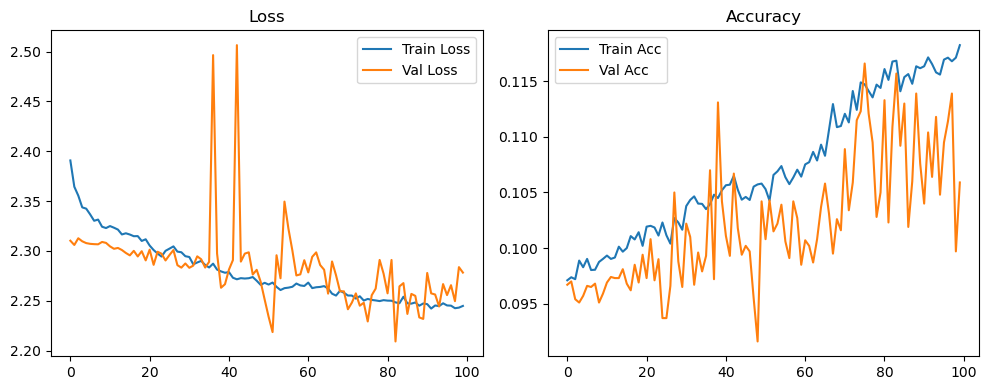

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 2.2845 Accuracy: 0.1083


🚀 Running: batch128_lr_max_0.0001_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:18<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:18<2:08:54, 78.13s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0974 |:   1%|          | 1/100 [01:34<2:08:54, 78.13s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0974 |:   1%|          | 1/100 [01:34<2:08:54, 78.13s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [01:34<1:08:33, 41.98s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:51<1:08:33, 41.98s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [01:51<1:08:33, 41.98s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [01:51<49:17, 30.49s/it]  

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:08<49:17, 30.49s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:08<49:17, 30.49s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [02:08<40:05, 25.06s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [02:25<40:05, 25.06s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [02:25<40:05, 25.06s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [02:25<34:54, 22.05s/it]

| LR: 0.000099 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:54, 22.05s/it]

| LR: 0.000099 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [02:41<34:54, 22.05s/it]

| LR: 0.000099 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:41<31:43, 20.25s/it]

| LR: 0.000099 | Train Acc: 0.0981 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:58<31:43, 20.25s/it]

| LR: 0.000099 | Train Acc: 0.0981 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [02:58<31:43, 20.25s/it]

| LR: 0.000099 | Train Acc: 0.0981 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [02:58<29:31, 19.05s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:15<29:31, 19.05s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:15<29:31, 19.05s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:15<28:02, 18.29s/it]

| LR: 0.000098 | Train Acc: 0.0983 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:31<28:02, 18.29s/it]

| LR: 0.000098 | Train Acc: 0.0983 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:31<28:02, 18.29s/it]

| LR: 0.000098 | Train Acc: 0.0983 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [03:31<26:53, 17.73s/it]

| LR: 0.000098 | Train Acc: 0.0978 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [03:48<26:53, 17.73s/it]

| LR: 0.000098 | Train Acc: 0.0978 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [03:48<26:53, 17.73s/it]

| LR: 0.000098 | Train Acc: 0.0978 | Val Acc: 0.0970 |:  10%|█         | 10/100 [03:48<26:10, 17.45s/it]

| LR: 0.000098 | Train Acc: 0.0981 | Val Acc: 0.0965 |:  10%|█         | 10/100 [04:05<26:10, 17.45s/it]

| LR: 0.000098 | Train Acc: 0.0981 | Val Acc: 0.0965 |:  10%|█         | 10/100 [04:05<26:10, 17.45s/it]

| LR: 0.000098 | Train Acc: 0.0981 | Val Acc: 0.0965 |:  11%|█         | 11/100 [04:05<25:37, 17.27s/it]

| LR: 0.000097 | Train Acc: 0.0983 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:21<25:37, 17.27s/it]

| LR: 0.000097 | Train Acc: 0.0983 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:21<25:37, 17.27s/it]

| LR: 0.000097 | Train Acc: 0.0983 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:21<25:05, 17.10s/it]

| LR: 0.000097 | Train Acc: 0.0984 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [04:38<25:05, 17.10s/it]

| LR: 0.000097 | Train Acc: 0.0984 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [04:38<25:05, 17.10s/it]

| LR: 0.000097 | Train Acc: 0.0984 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [04:38<24:38, 16.99s/it]

| LR: 0.000096 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [04:55<24:38, 16.99s/it]

| LR: 0.000096 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [04:55<24:38, 16.99s/it]

| LR: 0.000096 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [04:55<24:15, 16.93s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [05:12<24:15, 16.93s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [05:12<24:15, 16.93s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  15%|█▌        | 15/100 [05:12<23:55, 16.89s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:28<23:55, 16.89s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:28<23:55, 16.89s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:29<23:35, 16.85s/it]

| LR: 0.000094 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [05:45<23:35, 16.85s/it]

| LR: 0.000094 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [05:45<23:35, 16.85s/it]

| LR: 0.000094 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [05:45<23:15, 16.81s/it]

| LR: 0.000093 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [06:02<23:15, 16.81s/it]

| LR: 0.000093 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [06:02<23:15, 16.81s/it]

| LR: 0.000093 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [06:02<22:55, 16.77s/it]

| LR: 0.000092 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:18<22:55, 16.77s/it]

| LR: 0.000092 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:18<22:55, 16.77s/it]

| LR: 0.000092 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:18<22:32, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:35<22:32, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:35<22:32, 16.70s/it]

| LR: 0.000091 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  20%|██        | 20/100 [06:35<22:22, 16.78s/it]

| LR: 0.000091 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  20%|██        | 20/100 [06:52<22:22, 16.78s/it]

| LR: 0.000091 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  20%|██        | 20/100 [06:52<22:22, 16.78s/it]

| LR: 0.000091 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  21%|██        | 21/100 [06:52<22:10, 16.85s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:09<22:10, 16.85s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:09<22:10, 16.85s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  22%|██▏       | 22/100 [07:09<21:49, 16.79s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  22%|██▏       | 22/100 [07:26<21:49, 16.79s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  22%|██▏       | 22/100 [07:26<21:49, 16.79s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:26<21:34, 16.81s/it]

| LR: 0.000088 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:42<21:34, 16.81s/it]

| LR: 0.000088 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:42<21:34, 16.81s/it]

| LR: 0.000088 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [07:42<21:09, 16.70s/it]

| LR: 0.000087 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [07:59<21:09, 16.70s/it]

| LR: 0.000087 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [07:59<21:09, 16.70s/it]

| LR: 0.000087 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [07:59<20:50, 16.68s/it]

| LR: 0.000086 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [08:16<20:50, 16.68s/it]

| LR: 0.000086 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [08:16<20:50, 16.68s/it]

| LR: 0.000086 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:16<20:33, 16.67s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:32<20:33, 16.67s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:32<20:33, 16.67s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [08:33<20:20, 16.72s/it]

| LR: 0.000083 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [08:49<20:20, 16.72s/it]

| LR: 0.000083 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [08:49<20:20, 16.72s/it]

| LR: 0.000083 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [08:49<20:06, 16.75s/it]

| LR: 0.000082 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [09:06<20:06, 16.75s/it]

| LR: 0.000082 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [09:06<20:06, 16.75s/it]

| LR: 0.000082 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [09:06<19:45, 16.70s/it]

| LR: 0.000081 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [09:23<19:45, 16.70s/it]

| LR: 0.000081 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [09:23<19:45, 16.70s/it]

| LR: 0.000081 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  30%|███       | 30/100 [09:23<19:33, 16.77s/it]

| LR: 0.000080 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:39<19:33, 16.77s/it]

| LR: 0.000080 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:39<19:33, 16.77s/it]

| LR: 0.000080 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:39<19:13, 16.72s/it]

| LR: 0.000078 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  31%|███       | 31/100 [09:56<19:13, 16.72s/it]

| LR: 0.000078 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  31%|███       | 31/100 [09:56<19:13, 16.72s/it]

| LR: 0.000078 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  32%|███▏      | 32/100 [09:56<18:57, 16.73s/it]

| LR: 0.000077 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [10:13<18:57, 16.73s/it]

| LR: 0.000077 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [10:13<18:57, 16.73s/it]

| LR: 0.000077 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:13<18:42, 16.75s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:30<18:42, 16.75s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:30<18:42, 16.75s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [10:30<18:26, 16.76s/it]

| LR: 0.000074 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  34%|███▍      | 34/100 [10:46<18:26, 16.76s/it]

| LR: 0.000074 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  34%|███▍      | 34/100 [10:46<18:26, 16.76s/it]

| LR: 0.000074 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  35%|███▌      | 35/100 [10:46<18:06, 16.72s/it]

| LR: 0.000073 | Train Acc: 0.1010 | Val Acc: 0.0974 |:  35%|███▌      | 35/100 [11:03<18:06, 16.72s/it]

| LR: 0.000073 | Train Acc: 0.1010 | Val Acc: 0.0974 |:  35%|███▌      | 35/100 [11:03<18:06, 16.72s/it]

| LR: 0.000073 | Train Acc: 0.1010 | Val Acc: 0.0974 |:  36%|███▌      | 36/100 [11:03<17:47, 16.67s/it]

| LR: 0.000072 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [11:20<17:47, 16.67s/it]

| LR: 0.000072 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [11:20<17:47, 16.67s/it]

| LR: 0.000072 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [11:20<17:32, 16.71s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0983 |:  37%|███▋      | 37/100 [11:36<17:32, 16.71s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0983 |:  37%|███▋      | 37/100 [11:36<17:32, 16.71s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0983 |:  38%|███▊      | 38/100 [11:36<17:12, 16.66s/it]

| LR: 0.000069 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  38%|███▊      | 38/100 [11:53<17:12, 16.66s/it]

| LR: 0.000069 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  38%|███▊      | 38/100 [11:53<17:12, 16.66s/it]

| LR: 0.000069 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  39%|███▉      | 39/100 [11:53<16:54, 16.62s/it]

| LR: 0.000067 | Train Acc: 0.1017 | Val Acc: 0.0995 |:  39%|███▉      | 39/100 [12:10<16:54, 16.62s/it]

| LR: 0.000067 | Train Acc: 0.1017 | Val Acc: 0.0995 |:  39%|███▉      | 39/100 [12:10<16:54, 16.62s/it]

| LR: 0.000067 | Train Acc: 0.1017 | Val Acc: 0.0995 |:  40%|████      | 40/100 [12:10<16:39, 16.65s/it]

| LR: 0.000066 | Train Acc: 0.1019 | Val Acc: 0.0976 |:  40%|████      | 40/100 [12:26<16:39, 16.65s/it]

| LR: 0.000066 | Train Acc: 0.1019 | Val Acc: 0.0976 |:  40%|████      | 40/100 [12:26<16:39, 16.65s/it]

| LR: 0.000066 | Train Acc: 0.1019 | Val Acc: 0.0976 |:  41%|████      | 41/100 [12:26<16:23, 16.67s/it]

| LR: 0.000064 | Train Acc: 0.1017 | Val Acc: 0.0990 |:  41%|████      | 41/100 [12:43<16:23, 16.67s/it]

| LR: 0.000064 | Train Acc: 0.1017 | Val Acc: 0.0990 |:  41%|████      | 41/100 [12:43<16:23, 16.67s/it]

| LR: 0.000064 | Train Acc: 0.1017 | Val Acc: 0.0990 |:  42%|████▏     | 42/100 [12:43<16:07, 16.68s/it]

| LR: 0.000063 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  42%|████▏     | 42/100 [13:00<16:07, 16.68s/it]

| LR: 0.000063 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  42%|████▏     | 42/100 [13:00<16:07, 16.68s/it]

| LR: 0.000063 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  43%|████▎     | 43/100 [13:00<15:51, 16.70s/it]

| LR: 0.000061 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  43%|████▎     | 43/100 [13:16<15:51, 16.70s/it]

| LR: 0.000061 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  43%|████▎     | 43/100 [13:16<15:51, 16.70s/it]

| LR: 0.000061 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [13:16<15:32, 16.65s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0989 |:  44%|████▍     | 44/100 [13:33<15:32, 16.65s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0989 |:  44%|████▍     | 44/100 [13:33<15:32, 16.65s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0989 |:  45%|████▌     | 45/100 [13:33<15:19, 16.71s/it]

| LR: 0.000058 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [13:50<15:19, 16.71s/it]

| LR: 0.000058 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [13:50<15:19, 16.71s/it]

| LR: 0.000058 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [13:50<15:04, 16.74s/it]

| LR: 0.000057 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:07<15:04, 16.74s/it]

| LR: 0.000057 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:07<15:04, 16.74s/it]

| LR: 0.000057 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:07<14:48, 16.77s/it]

| LR: 0.000055 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  47%|████▋     | 47/100 [14:23<14:48, 16.77s/it]

| LR: 0.000055 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  47%|████▋     | 47/100 [14:23<14:48, 16.77s/it]

| LR: 0.000055 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  48%|████▊     | 48/100 [14:23<14:30, 16.75s/it]

| LR: 0.000054 | Train Acc: 0.1015 | Val Acc: 0.0977 |:  48%|████▊     | 48/100 [14:40<14:30, 16.75s/it]

| LR: 0.000054 | Train Acc: 0.1015 | Val Acc: 0.0977 |:  48%|████▊     | 48/100 [14:40<14:30, 16.75s/it]

| LR: 0.000054 | Train Acc: 0.1015 | Val Acc: 0.0977 |:  49%|████▉     | 49/100 [14:40<14:16, 16.80s/it]

| LR: 0.000052 | Train Acc: 0.1031 | Val Acc: 0.0975 |:  49%|████▉     | 49/100 [14:57<14:16, 16.80s/it]

| LR: 0.000052 | Train Acc: 0.1031 | Val Acc: 0.0975 |:  49%|████▉     | 49/100 [14:57<14:16, 16.80s/it]

| LR: 0.000052 | Train Acc: 0.1031 | Val Acc: 0.0975 |:  50%|█████     | 50/100 [14:57<13:57, 16.75s/it]

| LR: 0.000051 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  50%|█████     | 50/100 [15:13<13:57, 16.75s/it]

| LR: 0.000051 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  50%|█████     | 50/100 [15:13<13:57, 16.75s/it]

| LR: 0.000051 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  51%|█████     | 51/100 [15:13<13:36, 16.66s/it]

| LR: 0.000049 | Train Acc: 0.1038 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [15:30<13:36, 16.66s/it]

| LR: 0.000049 | Train Acc: 0.1038 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [15:30<13:36, 16.66s/it]

| LR: 0.000049 | Train Acc: 0.1038 | Val Acc: 0.0975 |:  52%|█████▏    | 52/100 [15:30<13:21, 16.70s/it]

| LR: 0.000047 | Train Acc: 0.1033 | Val Acc: 0.0979 |:  52%|█████▏    | 52/100 [15:47<13:21, 16.70s/it]

| LR: 0.000047 | Train Acc: 0.1033 | Val Acc: 0.0979 |:  52%|█████▏    | 52/100 [15:47<13:21, 16.70s/it]

| LR: 0.000047 | Train Acc: 0.1033 | Val Acc: 0.0979 |:  53%|█████▎    | 53/100 [15:47<13:02, 16.66s/it]

| LR: 0.000046 | Train Acc: 0.1033 | Val Acc: 0.1031 |:  53%|█████▎    | 53/100 [16:04<13:02, 16.66s/it]

| LR: 0.000046 | Train Acc: 0.1033 | Val Acc: 0.1031 |:  53%|█████▎    | 53/100 [16:04<13:02, 16.66s/it]

| LR: 0.000046 | Train Acc: 0.1033 | Val Acc: 0.1031 |:  54%|█████▍    | 54/100 [16:04<12:48, 16.72s/it]

| LR: 0.000044 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  54%|█████▍    | 54/100 [16:20<12:48, 16.72s/it]

| LR: 0.000044 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  54%|█████▍    | 54/100 [16:20<12:48, 16.72s/it]

| LR: 0.000044 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  55%|█████▌    | 55/100 [16:20<12:32, 16.73s/it]

| LR: 0.000043 | Train Acc: 0.1034 | Val Acc: 0.0991 |:  55%|█████▌    | 55/100 [16:37<12:32, 16.73s/it]

| LR: 0.000043 | Train Acc: 0.1034 | Val Acc: 0.0991 |:  55%|█████▌    | 55/100 [16:37<12:32, 16.73s/it]

| LR: 0.000043 | Train Acc: 0.1034 | Val Acc: 0.0991 |:  56%|█████▌    | 56/100 [16:37<12:16, 16.73s/it]

| LR: 0.000041 | Train Acc: 0.1041 | Val Acc: 0.0992 |:  56%|█████▌    | 56/100 [16:54<12:16, 16.73s/it]

| LR: 0.000041 | Train Acc: 0.1041 | Val Acc: 0.0992 |:  56%|█████▌    | 56/100 [16:54<12:16, 16.73s/it]

| LR: 0.000041 | Train Acc: 0.1041 | Val Acc: 0.0992 |:  57%|█████▋    | 57/100 [16:54<11:59, 16.73s/it]

| LR: 0.000040 | Train Acc: 0.1035 | Val Acc: 0.0987 |:  57%|█████▋    | 57/100 [17:11<11:59, 16.73s/it]

| LR: 0.000040 | Train Acc: 0.1035 | Val Acc: 0.0987 |:  57%|█████▋    | 57/100 [17:11<11:59, 16.73s/it]

| LR: 0.000040 | Train Acc: 0.1035 | Val Acc: 0.0987 |:  58%|█████▊    | 58/100 [17:11<11:42, 16.74s/it]

| LR: 0.000038 | Train Acc: 0.1047 | Val Acc: 0.0966 |:  58%|█████▊    | 58/100 [17:27<11:42, 16.74s/it]

| LR: 0.000038 | Train Acc: 0.1047 | Val Acc: 0.0966 |:  58%|█████▊    | 58/100 [17:27<11:42, 16.74s/it]

| LR: 0.000038 | Train Acc: 0.1047 | Val Acc: 0.0966 |:  59%|█████▉    | 59/100 [17:27<11:26, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.1045 | Val Acc: 0.0980 |:  59%|█████▉    | 59/100 [17:44<11:26, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.1045 | Val Acc: 0.0980 |:  59%|█████▉    | 59/100 [17:44<11:26, 16.75s/it]

| LR: 0.000037 | Train Acc: 0.1045 | Val Acc: 0.0980 |:  60%|██████    | 60/100 [17:44<11:08, 16.71s/it]

| LR: 0.000035 | Train Acc: 0.1046 | Val Acc: 0.1006 |:  60%|██████    | 60/100 [18:01<11:08, 16.71s/it]

| LR: 0.000035 | Train Acc: 0.1046 | Val Acc: 0.1006 |:  60%|██████    | 60/100 [18:01<11:08, 16.71s/it]

| LR: 0.000035 | Train Acc: 0.1046 | Val Acc: 0.1006 |:  61%|██████    | 61/100 [18:01<10:53, 16.77s/it]

| LR: 0.000034 | Train Acc: 0.1040 | Val Acc: 0.1035 |:  61%|██████    | 61/100 [18:18<10:53, 16.77s/it]

| LR: 0.000034 | Train Acc: 0.1040 | Val Acc: 0.1035 |:  61%|██████    | 61/100 [18:18<10:53, 16.77s/it]

| LR: 0.000034 | Train Acc: 0.1040 | Val Acc: 0.1035 |:  62%|██████▏   | 62/100 [18:18<10:37, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  62%|██████▏   | 62/100 [18:35<10:37, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  62%|██████▏   | 62/100 [18:35<10:37, 16.78s/it]

| LR: 0.000032 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  63%|██████▎   | 63/100 [18:35<10:22, 16.81s/it]

| LR: 0.000031 | Train Acc: 0.1048 | Val Acc: 0.1019 |:  63%|██████▎   | 63/100 [18:51<10:22, 16.81s/it]

| LR: 0.000031 | Train Acc: 0.1048 | Val Acc: 0.1019 |:  63%|██████▎   | 63/100 [18:51<10:22, 16.81s/it]

| LR: 0.000031 | Train Acc: 0.1048 | Val Acc: 0.1019 |:  64%|██████▍   | 64/100 [18:51<10:02, 16.73s/it]

| LR: 0.000029 | Train Acc: 0.1049 | Val Acc: 0.0981 |:  64%|██████▍   | 64/100 [19:08<10:02, 16.73s/it]

| LR: 0.000029 | Train Acc: 0.1049 | Val Acc: 0.0981 |:  64%|██████▍   | 64/100 [19:08<10:02, 16.73s/it]

| LR: 0.000029 | Train Acc: 0.1049 | Val Acc: 0.0981 |:  65%|██████▌   | 65/100 [19:08<09:46, 16.76s/it]

| LR: 0.000028 | Train Acc: 0.1049 | Val Acc: 0.0951 |:  65%|██████▌   | 65/100 [19:25<09:46, 16.76s/it]

| LR: 0.000028 | Train Acc: 0.1049 | Val Acc: 0.0951 |:  65%|██████▌   | 65/100 [19:25<09:46, 16.76s/it]

| LR: 0.000028 | Train Acc: 0.1049 | Val Acc: 0.0951 |:  66%|██████▌   | 66/100 [19:25<09:29, 16.74s/it]

| LR: 0.000027 | Train Acc: 0.1048 | Val Acc: 0.0986 |:  66%|██████▌   | 66/100 [19:41<09:29, 16.74s/it]

| LR: 0.000027 | Train Acc: 0.1048 | Val Acc: 0.0986 |:  66%|██████▌   | 66/100 [19:41<09:29, 16.74s/it]

| LR: 0.000027 | Train Acc: 0.1048 | Val Acc: 0.0986 |:  67%|██████▋   | 67/100 [19:41<09:11, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.1049 | Val Acc: 0.0993 |:  67%|██████▋   | 67/100 [19:58<09:11, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.1049 | Val Acc: 0.0993 |:  67%|██████▋   | 67/100 [19:58<09:11, 16.72s/it]

| LR: 0.000025 | Train Acc: 0.1049 | Val Acc: 0.0993 |:  68%|██████▊   | 68/100 [19:58<08:54, 16.70s/it]

| LR: 0.000024 | Train Acc: 0.1042 | Val Acc: 0.1042 |:  68%|██████▊   | 68/100 [20:15<08:54, 16.70s/it]

| LR: 0.000024 | Train Acc: 0.1042 | Val Acc: 0.1042 |:  68%|██████▊   | 68/100 [20:15<08:54, 16.70s/it]

| LR: 0.000024 | Train Acc: 0.1042 | Val Acc: 0.1042 |:  69%|██████▉   | 69/100 [20:15<08:37, 16.70s/it]

| LR: 0.000023 | Train Acc: 0.1041 | Val Acc: 0.0980 |:  69%|██████▉   | 69/100 [20:31<08:37, 16.70s/it]

| LR: 0.000023 | Train Acc: 0.1041 | Val Acc: 0.0980 |:  69%|██████▉   | 69/100 [20:31<08:37, 16.70s/it]

| LR: 0.000023 | Train Acc: 0.1041 | Val Acc: 0.0980 |:  70%|███████   | 70/100 [20:31<08:20, 16.69s/it]

| LR: 0.000021 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [20:48<08:20, 16.69s/it]

| LR: 0.000021 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [20:48<08:20, 16.69s/it]

| LR: 0.000021 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  71%|███████   | 71/100 [20:48<08:06, 16.77s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.0978 |:  71%|███████   | 71/100 [21:05<08:06, 16.77s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.0978 |:  71%|███████   | 71/100 [21:05<08:06, 16.77s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.0978 |:  72%|███████▏  | 72/100 [21:05<07:50, 16.80s/it]

| LR: 0.000019 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  72%|███████▏  | 72/100 [21:22<07:50, 16.80s/it]

| LR: 0.000019 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  72%|███████▏  | 72/100 [21:22<07:50, 16.80s/it]

| LR: 0.000019 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  73%|███████▎  | 73/100 [21:22<07:34, 16.84s/it]

| LR: 0.000018 | Train Acc: 0.1045 | Val Acc: 0.1018 |:  73%|███████▎  | 73/100 [21:39<07:34, 16.84s/it]

| LR: 0.000018 | Train Acc: 0.1045 | Val Acc: 0.1018 |:  73%|███████▎  | 73/100 [21:39<07:34, 16.84s/it]

| LR: 0.000018 | Train Acc: 0.1045 | Val Acc: 0.1018 |:  74%|███████▍  | 74/100 [21:39<07:19, 16.90s/it]

| LR: 0.000017 | Train Acc: 0.1045 | Val Acc: 0.0988 |:  74%|███████▍  | 74/100 [21:56<07:19, 16.90s/it]

| LR: 0.000017 | Train Acc: 0.1045 | Val Acc: 0.0988 |:  74%|███████▍  | 74/100 [21:56<07:19, 16.90s/it]

| LR: 0.000017 | Train Acc: 0.1045 | Val Acc: 0.0988 |:  75%|███████▌  | 75/100 [21:56<07:02, 16.92s/it]

| LR: 0.000015 | Train Acc: 0.1035 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [22:13<07:02, 16.92s/it]

| LR: 0.000015 | Train Acc: 0.1035 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [22:13<07:02, 16.92s/it]

| LR: 0.000015 | Train Acc: 0.1035 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [22:13<06:45, 16.91s/it]

| LR: 0.000014 | Train Acc: 0.1055 | Val Acc: 0.1032 |:  76%|███████▌  | 76/100 [22:30<06:45, 16.91s/it]

| LR: 0.000014 | Train Acc: 0.1055 | Val Acc: 0.1032 |:  76%|███████▌  | 76/100 [22:30<06:45, 16.91s/it]

| LR: 0.000014 | Train Acc: 0.1055 | Val Acc: 0.1032 |:  77%|███████▋  | 77/100 [22:30<06:28, 16.91s/it]

| LR: 0.000013 | Train Acc: 0.1039 | Val Acc: 0.1051 |:  77%|███████▋  | 77/100 [22:47<06:28, 16.91s/it]

| LR: 0.000013 | Train Acc: 0.1039 | Val Acc: 0.1051 |:  77%|███████▋  | 77/100 [22:47<06:28, 16.91s/it]

| LR: 0.000013 | Train Acc: 0.1039 | Val Acc: 0.1051 |:  78%|███████▊  | 78/100 [22:47<06:10, 16.86s/it]

| LR: 0.000012 | Train Acc: 0.1037 | Val Acc: 0.0988 |:  78%|███████▊  | 78/100 [23:04<06:10, 16.86s/it]

| LR: 0.000012 | Train Acc: 0.1037 | Val Acc: 0.0988 |:  78%|███████▊  | 78/100 [23:04<06:10, 16.86s/it]

| LR: 0.000012 | Train Acc: 0.1037 | Val Acc: 0.0988 |:  79%|███████▉  | 79/100 [23:04<05:54, 16.90s/it]

| LR: 0.000011 | Train Acc: 0.1054 | Val Acc: 0.0990 |:  79%|███████▉  | 79/100 [23:21<05:54, 16.90s/it]

| LR: 0.000011 | Train Acc: 0.1054 | Val Acc: 0.0990 |:  79%|███████▉  | 79/100 [23:21<05:54, 16.90s/it]

| LR: 0.000011 | Train Acc: 0.1054 | Val Acc: 0.0990 |:  80%|████████  | 80/100 [23:21<05:38, 16.93s/it]

| LR: 0.000010 | Train Acc: 0.1057 | Val Acc: 0.0979 |:  80%|████████  | 80/100 [23:38<05:38, 16.93s/it]

| LR: 0.000010 | Train Acc: 0.1057 | Val Acc: 0.0979 |:  80%|████████  | 80/100 [23:38<05:38, 16.93s/it]

| LR: 0.000010 | Train Acc: 0.1057 | Val Acc: 0.0979 |:  81%|████████  | 81/100 [23:38<05:22, 16.95s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.0911 |:  81%|████████  | 81/100 [23:55<05:22, 16.95s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.0911 |:  81%|████████  | 81/100 [23:55<05:22, 16.95s/it]

| LR: 0.000010 | Train Acc: 0.1053 | Val Acc: 0.0911 |:  82%|████████▏ | 82/100 [23:55<05:05, 16.96s/it]

| LR: 0.000009 | Train Acc: 0.1054 | Val Acc: 0.1028 |:  82%|████████▏ | 82/100 [24:12<05:05, 16.96s/it]

| LR: 0.000009 | Train Acc: 0.1054 | Val Acc: 0.1028 |:  82%|████████▏ | 82/100 [24:12<05:05, 16.96s/it]

| LR: 0.000009 | Train Acc: 0.1054 | Val Acc: 0.1028 |:  83%|████████▎ | 83/100 [24:12<04:48, 16.95s/it]

| LR: 0.000008 | Train Acc: 0.1056 | Val Acc: 0.0986 |:  83%|████████▎ | 83/100 [24:28<04:48, 16.95s/it]

| LR: 0.000008 | Train Acc: 0.1056 | Val Acc: 0.0986 |:  83%|████████▎ | 83/100 [24:28<04:48, 16.95s/it]

| LR: 0.000008 | Train Acc: 0.1056 | Val Acc: 0.0986 |:  84%|████████▍ | 84/100 [24:28<04:30, 16.93s/it]

| LR: 0.000007 | Train Acc: 0.1047 | Val Acc: 0.1000 |:  84%|████████▍ | 84/100 [24:45<04:30, 16.93s/it]

| LR: 0.000007 | Train Acc: 0.1047 | Val Acc: 0.1000 |:  84%|████████▍ | 84/100 [24:45<04:30, 16.93s/it]

| LR: 0.000007 | Train Acc: 0.1047 | Val Acc: 0.1000 |:  85%|████████▌ | 85/100 [24:45<04:13, 16.91s/it]

| LR: 0.000006 | Train Acc: 0.1062 | Val Acc: 0.0993 |:  85%|████████▌ | 85/100 [25:02<04:13, 16.91s/it]

| LR: 0.000006 | Train Acc: 0.1062 | Val Acc: 0.0993 |:  85%|████████▌ | 85/100 [25:02<04:13, 16.91s/it]

| LR: 0.000006 | Train Acc: 0.1062 | Val Acc: 0.0993 |:  86%|████████▌ | 86/100 [25:02<03:56, 16.91s/it]

| LR: 0.000006 | Train Acc: 0.1045 | Val Acc: 0.1003 |:  86%|████████▌ | 86/100 [25:19<03:56, 16.91s/it]

| LR: 0.000006 | Train Acc: 0.1045 | Val Acc: 0.1003 |:  86%|████████▌ | 86/100 [25:19<03:56, 16.91s/it]

| LR: 0.000006 | Train Acc: 0.1045 | Val Acc: 0.1003 |:  87%|████████▋ | 87/100 [25:19<03:40, 16.94s/it]

| LR: 0.000005 | Train Acc: 0.1059 | Val Acc: 0.0849 |:  87%|████████▋ | 87/100 [25:36<03:40, 16.94s/it]

| LR: 0.000005 | Train Acc: 0.1059 | Val Acc: 0.0849 |:  87%|████████▋ | 87/100 [25:36<03:40, 16.94s/it]

| LR: 0.000005 | Train Acc: 0.1059 | Val Acc: 0.0849 |:  88%|████████▊ | 88/100 [25:36<03:23, 16.95s/it]

| LR: 0.000004 | Train Acc: 0.1043 | Val Acc: 0.0994 |:  88%|████████▊ | 88/100 [25:53<03:23, 16.95s/it]

| LR: 0.000004 | Train Acc: 0.1043 | Val Acc: 0.0994 |:  88%|████████▊ | 88/100 [25:53<03:23, 16.95s/it]

| LR: 0.000004 | Train Acc: 0.1043 | Val Acc: 0.0994 |:  89%|████████▉ | 89/100 [25:53<03:05, 16.83s/it]

| LR: 0.000004 | Train Acc: 0.1051 | Val Acc: 0.1006 |:  89%|████████▉ | 89/100 [26:09<03:05, 16.83s/it]

| LR: 0.000004 | Train Acc: 0.1051 | Val Acc: 0.1006 |:  89%|████████▉ | 89/100 [26:09<03:05, 16.83s/it]

| LR: 0.000004 | Train Acc: 0.1051 | Val Acc: 0.1006 |:  90%|█████████ | 90/100 [26:10<02:48, 16.81s/it]

| LR: 0.000003 | Train Acc: 0.1058 | Val Acc: 0.0992 |:  90%|█████████ | 90/100 [26:26<02:48, 16.81s/it]

| LR: 0.000003 | Train Acc: 0.1058 | Val Acc: 0.0992 |:  90%|█████████ | 90/100 [26:26<02:48, 16.81s/it]

| LR: 0.000003 | Train Acc: 0.1058 | Val Acc: 0.0992 |:  91%|█████████ | 91/100 [26:26<02:31, 16.79s/it]

| LR: 0.000003 | Train Acc: 0.1058 | Val Acc: 0.1006 |:  91%|█████████ | 91/100 [26:43<02:31, 16.79s/it]

| LR: 0.000003 | Train Acc: 0.1058 | Val Acc: 0.1006 |:  91%|█████████ | 91/100 [26:43<02:31, 16.79s/it]

| LR: 0.000003 | Train Acc: 0.1058 | Val Acc: 0.1006 |:  92%|█████████▏| 92/100 [26:43<02:14, 16.77s/it]

| LR: 0.000003 | Train Acc: 0.1045 | Val Acc: 0.0986 |:  92%|█████████▏| 92/100 [27:00<02:14, 16.77s/it]

| LR: 0.000003 | Train Acc: 0.1045 | Val Acc: 0.0986 |:  92%|█████████▏| 92/100 [27:00<02:14, 16.77s/it]

| LR: 0.000003 | Train Acc: 0.1045 | Val Acc: 0.0986 |:  93%|█████████▎| 93/100 [27:00<01:57, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.1052 | Val Acc: 0.1011 |:  93%|█████████▎| 93/100 [27:16<01:57, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.1052 | Val Acc: 0.1011 |:  93%|█████████▎| 93/100 [27:16<01:57, 16.77s/it]

| LR: 0.000002 | Train Acc: 0.1052 | Val Acc: 0.1011 |:  94%|█████████▍| 94/100 [27:17<01:40, 16.81s/it]

| LR: 0.000002 | Train Acc: 0.1057 | Val Acc: 0.1013 |:  94%|█████████▍| 94/100 [27:33<01:40, 16.81s/it]

| LR: 0.000002 | Train Acc: 0.1057 | Val Acc: 0.1013 |:  94%|█████████▍| 94/100 [27:33<01:40, 16.81s/it]

| LR: 0.000002 | Train Acc: 0.1057 | Val Acc: 0.1013 |:  95%|█████████▌| 95/100 [27:33<01:23, 16.78s/it]

| LR: 0.000002 | Train Acc: 0.1054 | Val Acc: 0.0987 |:  95%|█████████▌| 95/100 [27:50<01:23, 16.78s/it]

| LR: 0.000002 | Train Acc: 0.1054 | Val Acc: 0.0987 |:  95%|█████████▌| 95/100 [27:50<01:23, 16.78s/it]

| LR: 0.000002 | Train Acc: 0.1054 | Val Acc: 0.0987 |:  96%|█████████▌| 96/100 [27:50<01:07, 16.81s/it]

| LR: 0.000001 | Train Acc: 0.1056 | Val Acc: 0.1075 |:  96%|█████████▌| 96/100 [28:07<01:07, 16.81s/it]

| LR: 0.000001 | Train Acc: 0.1056 | Val Acc: 0.1075 |:  96%|█████████▌| 96/100 [28:07<01:07, 16.81s/it]

| LR: 0.000001 | Train Acc: 0.1056 | Val Acc: 0.1075 |:  97%|█████████▋| 97/100 [28:07<00:50, 16.84s/it]

| LR: 0.000001 | Train Acc: 0.1055 | Val Acc: 0.1026 |:  97%|█████████▋| 97/100 [28:24<00:50, 16.84s/it]

| LR: 0.000001 | Train Acc: 0.1055 | Val Acc: 0.1026 |:  97%|█████████▋| 97/100 [28:24<00:50, 16.84s/it]

| LR: 0.000001 | Train Acc: 0.1055 | Val Acc: 0.1026 |:  98%|█████████▊| 98/100 [28:24<00:33, 16.86s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1007 |:  98%|█████████▊| 98/100 [28:41<00:33, 16.86s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1007 |:  98%|█████████▊| 98/100 [28:41<00:33, 16.86s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1007 |:  99%|█████████▉| 99/100 [28:41<00:16, 16.84s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1013 |:  99%|█████████▉| 99/100 [28:58<00:16, 16.84s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1013 |:  99%|█████████▉| 99/100 [28:58<00:16, 16.84s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1013 |: 100%|██████████| 100/100 [28:58<00:00, 16.82s/it]

| LR: 0.000001 | Train Acc: 0.1050 | Val Acc: 0.1013 |: 100%|██████████| 100/100 [28:58<00:00, 17.38s/it]

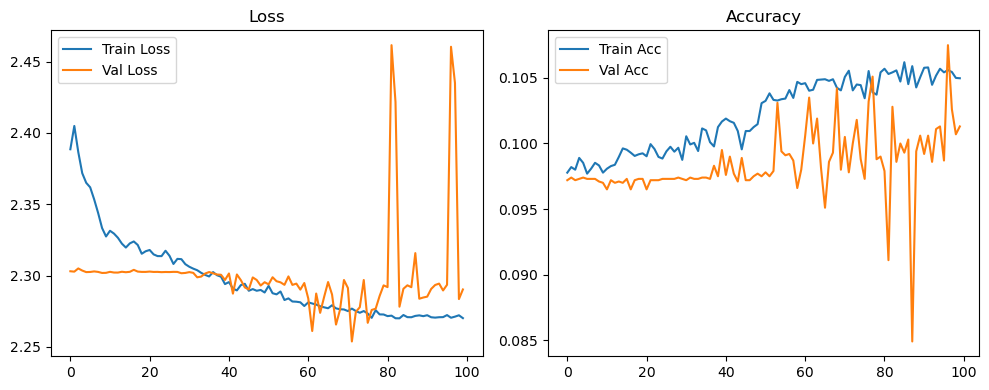

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.33it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

Original Model Final Test Loss: 2.2905 Accuracy: 0.1048


🚀 Running: batch256_lr_max_0.001_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0983 | Val Acc: 0.0951 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0983 | Val Acc: 0.0951 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0983 | Val Acc: 0.0951 |:   1%|          | 1/100 [01:20<2:13:24, 80.86s/it]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:36<2:13:24, 80.86s/it]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:36<2:13:24, 80.86s/it]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:36<2:07:14, 77.91s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   2%|▏         | 2/100 [02:50<2:07:14, 77.91s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   2%|▏         | 2/100 [02:50<2:07:14, 77.91s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   3%|▎         | 3/100 [02:50<1:18:40, 48.66s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0931 |:   3%|▎         | 3/100 [03:04<1:18:40, 48.66s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0931 |:   3%|▎         | 3/100 [03:04<1:18:40, 48.66s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0931 |:   4%|▍         | 4/100 [03:04<55:51, 34.92s/it]  

| LR: 0.000996 | Train Acc: 0.0987 | Val Acc: 0.0969 |:   4%|▍         | 4/100 [03:18<55:51, 34.92s/it]

| LR: 0.000996 | Train Acc: 0.0987 | Val Acc: 0.0969 |:   4%|▍         | 4/100 [03:18<55:51, 34.92s/it]

| LR: 0.000996 | Train Acc: 0.0987 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [03:18<43:15, 27.33s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0921 |:   5%|▌         | 5/100 [03:32<43:15, 27.33s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0921 |:   5%|▌         | 5/100 [03:32<43:15, 27.33s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0921 |:   6%|▌         | 6/100 [03:32<35:37, 22.74s/it]

| LR: 0.000991 | Train Acc: 0.0998 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [03:45<35:37, 22.74s/it]

| LR: 0.000991 | Train Acc: 0.0998 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [03:45<35:37, 22.74s/it]

| LR: 0.000991 | Train Acc: 0.0998 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [03:45<30:43, 19.83s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:59<30:43, 19.83s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [03:59<30:43, 19.83s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [03:59<27:30, 17.94s/it]

| LR: 0.000984 | Train Acc: 0.1004 | Val Acc: 0.1006 |:   8%|▊         | 8/100 [04:13<27:30, 17.94s/it]

| LR: 0.000984 | Train Acc: 0.1004 | Val Acc: 0.1006 |:   8%|▊         | 8/100 [04:13<27:30, 17.94s/it]

| LR: 0.000984 | Train Acc: 0.1004 | Val Acc: 0.1006 |:   9%|▉         | 9/100 [04:13<25:15, 16.66s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.1002 |:   9%|▉         | 9/100 [04:27<25:15, 16.66s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.1002 |:   9%|▉         | 9/100 [04:27<25:15, 16.66s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.1002 |:  10%|█         | 10/100 [04:27<23:42, 15.81s/it]

| LR: 0.000976 | Train Acc: 0.1023 | Val Acc: 0.1005 |:  10%|█         | 10/100 [04:41<23:42, 15.81s/it]

| LR: 0.000976 | Train Acc: 0.1023 | Val Acc: 0.1005 |:  10%|█         | 10/100 [04:41<23:42, 15.81s/it]

| LR: 0.000976 | Train Acc: 0.1023 | Val Acc: 0.1005 |:  11%|█         | 11/100 [04:41<22:31, 15.18s/it]

| LR: 0.000971 | Train Acc: 0.1025 | Val Acc: 0.0987 |:  11%|█         | 11/100 [04:55<22:31, 15.18s/it]

| LR: 0.000971 | Train Acc: 0.1025 | Val Acc: 0.0987 |:  11%|█         | 11/100 [04:55<22:31, 15.18s/it]

| LR: 0.000971 | Train Acc: 0.1025 | Val Acc: 0.0987 |:  12%|█▏        | 12/100 [04:55<21:41, 14.79s/it]

| LR: 0.000965 | Train Acc: 0.1053 | Val Acc: 0.1039 |:  12%|█▏        | 12/100 [05:09<21:41, 14.79s/it]

| LR: 0.000965 | Train Acc: 0.1053 | Val Acc: 0.1039 |:  12%|█▏        | 12/100 [05:09<21:41, 14.79s/it]

| LR: 0.000965 | Train Acc: 0.1053 | Val Acc: 0.1039 |:  13%|█▎        | 13/100 [05:09<21:01, 14.50s/it]

| LR: 0.000959 | Train Acc: 0.1072 | Val Acc: 0.1065 |:  13%|█▎        | 13/100 [05:22<21:01, 14.50s/it]

| LR: 0.000959 | Train Acc: 0.1072 | Val Acc: 0.1065 |:  13%|█▎        | 13/100 [05:22<21:01, 14.50s/it]

| LR: 0.000959 | Train Acc: 0.1072 | Val Acc: 0.1065 |:  14%|█▍        | 14/100 [05:22<20:28, 14.29s/it]

| LR: 0.000953 | Train Acc: 0.1127 | Val Acc: 0.1242 |:  14%|█▍        | 14/100 [05:36<20:28, 14.29s/it]

| LR: 0.000953 | Train Acc: 0.1127 | Val Acc: 0.1242 |:  14%|█▍        | 14/100 [05:36<20:28, 14.29s/it]

| LR: 0.000953 | Train Acc: 0.1127 | Val Acc: 0.1242 |:  15%|█▌        | 15/100 [05:36<20:01, 14.14s/it]

| LR: 0.000946 | Train Acc: 0.1235 | Val Acc: 0.1236 |:  15%|█▌        | 15/100 [05:50<20:01, 14.14s/it]

| LR: 0.000946 | Train Acc: 0.1235 | Val Acc: 0.1236 |:  15%|█▌        | 15/100 [05:50<20:01, 14.14s/it]

| LR: 0.000946 | Train Acc: 0.1235 | Val Acc: 0.1236 |:  16%|█▌        | 16/100 [05:50<19:40, 14.05s/it]

| LR: 0.000939 | Train Acc: 0.1305 | Val Acc: 0.1528 |:  16%|█▌        | 16/100 [06:04<19:40, 14.05s/it]

| LR: 0.000939 | Train Acc: 0.1305 | Val Acc: 0.1528 |:  16%|█▌        | 16/100 [06:04<19:40, 14.05s/it]

| LR: 0.000939 | Train Acc: 0.1305 | Val Acc: 0.1528 |:  17%|█▋        | 17/100 [06:04<19:20, 13.98s/it]

| LR: 0.000931 | Train Acc: 0.1475 | Val Acc: 0.1472 |:  17%|█▋        | 17/100 [06:18<19:20, 13.98s/it]

| LR: 0.000931 | Train Acc: 0.1475 | Val Acc: 0.1472 |:  17%|█▋        | 17/100 [06:18<19:20, 13.98s/it]

| LR: 0.000931 | Train Acc: 0.1475 | Val Acc: 0.1472 |:  18%|█▊        | 18/100 [06:18<19:03, 13.95s/it]

| LR: 0.000923 | Train Acc: 0.1869 | Val Acc: 0.1969 |:  18%|█▊        | 18/100 [06:31<19:03, 13.95s/it]

| LR: 0.000923 | Train Acc: 0.1869 | Val Acc: 0.1969 |:  18%|█▊        | 18/100 [06:31<19:03, 13.95s/it]

| LR: 0.000923 | Train Acc: 0.1869 | Val Acc: 0.1969 |:  19%|█▉        | 19/100 [06:32<18:47, 13.92s/it]

| LR: 0.000914 | Train Acc: 0.2102 | Val Acc: 0.1701 |:  19%|█▉        | 19/100 [06:45<18:47, 13.92s/it]

| LR: 0.000914 | Train Acc: 0.2102 | Val Acc: 0.1701 |:  19%|█▉        | 19/100 [06:45<18:47, 13.92s/it]

| LR: 0.000914 | Train Acc: 0.2102 | Val Acc: 0.1701 |:  20%|██        | 20/100 [06:45<18:32, 13.90s/it]

| LR: 0.000905 | Train Acc: 0.2309 | Val Acc: 0.2269 |:  20%|██        | 20/100 [06:59<18:32, 13.90s/it]

| LR: 0.000905 | Train Acc: 0.2309 | Val Acc: 0.2269 |:  20%|██        | 20/100 [06:59<18:32, 13.90s/it]

| LR: 0.000905 | Train Acc: 0.2309 | Val Acc: 0.2269 |:  21%|██        | 21/100 [06:59<18:15, 13.87s/it]

| LR: 0.000896 | Train Acc: 0.2475 | Val Acc: 0.2707 |:  21%|██        | 21/100 [07:13<18:15, 13.87s/it]

| LR: 0.000896 | Train Acc: 0.2475 | Val Acc: 0.2707 |:  21%|██        | 21/100 [07:13<18:15, 13.87s/it]

| LR: 0.000896 | Train Acc: 0.2475 | Val Acc: 0.2707 |:  22%|██▏       | 22/100 [07:13<18:00, 13.85s/it]

| LR: 0.000886 | Train Acc: 0.2733 | Val Acc: 0.2981 |:  22%|██▏       | 22/100 [07:27<18:00, 13.85s/it]

| LR: 0.000886 | Train Acc: 0.2733 | Val Acc: 0.2981 |:  22%|██▏       | 22/100 [07:27<18:00, 13.85s/it]

| LR: 0.000886 | Train Acc: 0.2733 | Val Acc: 0.2981 |:  23%|██▎       | 23/100 [07:27<17:45, 13.84s/it]

| LR: 0.000876 | Train Acc: 0.2915 | Val Acc: 0.3228 |:  23%|██▎       | 23/100 [07:41<17:45, 13.84s/it]

| LR: 0.000876 | Train Acc: 0.2915 | Val Acc: 0.3228 |:  23%|██▎       | 23/100 [07:41<17:45, 13.84s/it]

| LR: 0.000876 | Train Acc: 0.2915 | Val Acc: 0.3228 |:  24%|██▍       | 24/100 [07:41<17:30, 13.82s/it]

| LR: 0.000866 | Train Acc: 0.3126 | Val Acc: 0.2906 |:  24%|██▍       | 24/100 [07:54<17:30, 13.82s/it]

| LR: 0.000866 | Train Acc: 0.3126 | Val Acc: 0.2906 |:  24%|██▍       | 24/100 [07:54<17:30, 13.82s/it]

| LR: 0.000866 | Train Acc: 0.3126 | Val Acc: 0.2906 |:  25%|██▌       | 25/100 [07:54<17:15, 13.81s/it]

| LR: 0.000855 | Train Acc: 0.3263 | Val Acc: 0.2774 |:  25%|██▌       | 25/100 [08:08<17:15, 13.81s/it]

| LR: 0.000855 | Train Acc: 0.3263 | Val Acc: 0.2774 |:  25%|██▌       | 25/100 [08:08<17:15, 13.81s/it]

| LR: 0.000855 | Train Acc: 0.3263 | Val Acc: 0.2774 |:  26%|██▌       | 26/100 [08:08<17:01, 13.81s/it]

| LR: 0.000844 | Train Acc: 0.3377 | Val Acc: 0.2753 |:  26%|██▌       | 26/100 [08:22<17:01, 13.81s/it]

| LR: 0.000844 | Train Acc: 0.3377 | Val Acc: 0.2753 |:  26%|██▌       | 26/100 [08:22<17:01, 13.81s/it]

| LR: 0.000844 | Train Acc: 0.3377 | Val Acc: 0.2753 |:  27%|██▋       | 27/100 [08:22<16:50, 13.85s/it]

| LR: 0.000832 | Train Acc: 0.3575 | Val Acc: 0.3188 |:  27%|██▋       | 27/100 [08:36<16:50, 13.85s/it]

| LR: 0.000832 | Train Acc: 0.3575 | Val Acc: 0.3188 |:  27%|██▋       | 27/100 [08:36<16:50, 13.85s/it]

| LR: 0.000832 | Train Acc: 0.3575 | Val Acc: 0.3188 |:  28%|██▊       | 28/100 [08:36<16:37, 13.85s/it]

| LR: 0.000821 | Train Acc: 0.3732 | Val Acc: 0.3325 |:  28%|██▊       | 28/100 [08:50<16:37, 13.85s/it]

| LR: 0.000821 | Train Acc: 0.3732 | Val Acc: 0.3325 |:  28%|██▊       | 28/100 [08:50<16:37, 13.85s/it]

| LR: 0.000821 | Train Acc: 0.3732 | Val Acc: 0.3325 |:  29%|██▉       | 29/100 [08:50<16:23, 13.86s/it]

| LR: 0.000808 | Train Acc: 0.3890 | Val Acc: 0.3762 |:  29%|██▉       | 29/100 [09:04<16:23, 13.86s/it]

| LR: 0.000808 | Train Acc: 0.3890 | Val Acc: 0.3762 |:  29%|██▉       | 29/100 [09:04<16:23, 13.86s/it]

| LR: 0.000808 | Train Acc: 0.3890 | Val Acc: 0.3762 |:  30%|███       | 30/100 [09:04<16:10, 13.86s/it]

| LR: 0.000796 | Train Acc: 0.3987 | Val Acc: 0.2795 |:  30%|███       | 30/100 [09:18<16:10, 13.86s/it]

| LR: 0.000796 | Train Acc: 0.3987 | Val Acc: 0.2795 |:  30%|███       | 30/100 [09:18<16:10, 13.86s/it]

| LR: 0.000796 | Train Acc: 0.3987 | Val Acc: 0.2795 |:  31%|███       | 31/100 [09:18<15:56, 13.86s/it]

| LR: 0.000783 | Train Acc: 0.4149 | Val Acc: 0.3194 |:  31%|███       | 31/100 [09:31<15:56, 13.86s/it]

| LR: 0.000783 | Train Acc: 0.4149 | Val Acc: 0.3194 |:  31%|███       | 31/100 [09:31<15:56, 13.86s/it]

| LR: 0.000783 | Train Acc: 0.4149 | Val Acc: 0.3194 |:  32%|███▏      | 32/100 [09:31<15:41, 13.85s/it]

| LR: 0.000770 | Train Acc: 0.4213 | Val Acc: 0.3805 |:  32%|███▏      | 32/100 [09:45<15:41, 13.85s/it]

| LR: 0.000770 | Train Acc: 0.4213 | Val Acc: 0.3805 |:  32%|███▏      | 32/100 [09:45<15:41, 13.85s/it]

| LR: 0.000770 | Train Acc: 0.4213 | Val Acc: 0.3805 |:  33%|███▎      | 33/100 [09:45<15:29, 13.88s/it]

| LR: 0.000757 | Train Acc: 0.4337 | Val Acc: 0.4200 |:  33%|███▎      | 33/100 [09:59<15:29, 13.88s/it]

| LR: 0.000757 | Train Acc: 0.4337 | Val Acc: 0.4200 |:  33%|███▎      | 33/100 [09:59<15:29, 13.88s/it]

| LR: 0.000757 | Train Acc: 0.4337 | Val Acc: 0.4200 |:  34%|███▍      | 34/100 [09:59<15:18, 13.92s/it]

| LR: 0.000743 | Train Acc: 0.4400 | Val Acc: 0.3873 |:  34%|███▍      | 34/100 [10:13<15:18, 13.92s/it]

| LR: 0.000743 | Train Acc: 0.4400 | Val Acc: 0.3873 |:  34%|███▍      | 34/100 [10:13<15:18, 13.92s/it]

| LR: 0.000743 | Train Acc: 0.4400 | Val Acc: 0.3873 |:  35%|███▌      | 35/100 [10:13<15:05, 13.93s/it]

| LR: 0.000730 | Train Acc: 0.4547 | Val Acc: 0.4307 |:  35%|███▌      | 35/100 [10:27<15:05, 13.93s/it]

| LR: 0.000730 | Train Acc: 0.4547 | Val Acc: 0.4307 |:  35%|███▌      | 35/100 [10:27<15:05, 13.93s/it]

| LR: 0.000730 | Train Acc: 0.4547 | Val Acc: 0.4307 |:  36%|███▌      | 36/100 [10:27<14:50, 13.92s/it]

| LR: 0.000716 | Train Acc: 0.4630 | Val Acc: 0.3978 |:  36%|███▌      | 36/100 [10:41<14:50, 13.92s/it]

| LR: 0.000716 | Train Acc: 0.4630 | Val Acc: 0.3978 |:  36%|███▌      | 36/100 [10:41<14:50, 13.92s/it]

| LR: 0.000716 | Train Acc: 0.4630 | Val Acc: 0.3978 |:  37%|███▋      | 37/100 [10:41<14:36, 13.92s/it]

| LR: 0.000702 | Train Acc: 0.4695 | Val Acc: 0.4557 |:  37%|███▋      | 37/100 [10:55<14:36, 13.92s/it]

| LR: 0.000702 | Train Acc: 0.4695 | Val Acc: 0.4557 |:  37%|███▋      | 37/100 [10:55<14:36, 13.92s/it]

| LR: 0.000702 | Train Acc: 0.4695 | Val Acc: 0.4557 |:  38%|███▊      | 38/100 [10:55<14:23, 13.92s/it]

| LR: 0.000687 | Train Acc: 0.4723 | Val Acc: 0.3145 |:  38%|███▊      | 38/100 [11:09<14:23, 13.92s/it]

| LR: 0.000687 | Train Acc: 0.4723 | Val Acc: 0.3145 |:  38%|███▊      | 38/100 [11:09<14:23, 13.92s/it]

| LR: 0.000687 | Train Acc: 0.4723 | Val Acc: 0.3145 |:  39%|███▉      | 39/100 [11:09<14:08, 13.91s/it]

| LR: 0.000673 | Train Acc: 0.4814 | Val Acc: 0.4249 |:  39%|███▉      | 39/100 [11:23<14:08, 13.91s/it]

| LR: 0.000673 | Train Acc: 0.4814 | Val Acc: 0.4249 |:  39%|███▉      | 39/100 [11:23<14:08, 13.91s/it]

| LR: 0.000673 | Train Acc: 0.4814 | Val Acc: 0.4249 |:  40%|████      | 40/100 [11:23<13:55, 13.92s/it]

| LR: 0.000658 | Train Acc: 0.4903 | Val Acc: 0.4240 |:  40%|████      | 40/100 [11:37<13:55, 13.92s/it]

| LR: 0.000658 | Train Acc: 0.4903 | Val Acc: 0.4240 |:  40%|████      | 40/100 [11:37<13:55, 13.92s/it]

| LR: 0.000658 | Train Acc: 0.4903 | Val Acc: 0.4240 |:  41%|████      | 41/100 [11:37<13:38, 13.88s/it]

| LR: 0.000643 | Train Acc: 0.4918 | Val Acc: 0.2915 |:  41%|████      | 41/100 [11:50<13:38, 13.88s/it]

| LR: 0.000643 | Train Acc: 0.4918 | Val Acc: 0.2915 |:  41%|████      | 41/100 [11:50<13:38, 13.88s/it]

| LR: 0.000643 | Train Acc: 0.4918 | Val Acc: 0.2915 |:  42%|████▏     | 42/100 [11:51<13:24, 13.87s/it]

| LR: 0.000628 | Train Acc: 0.5014 | Val Acc: 0.4595 |:  42%|████▏     | 42/100 [12:04<13:24, 13.87s/it]

| LR: 0.000628 | Train Acc: 0.5014 | Val Acc: 0.4595 |:  42%|████▏     | 42/100 [12:04<13:24, 13.87s/it]

| LR: 0.000628 | Train Acc: 0.5014 | Val Acc: 0.4595 |:  43%|████▎     | 43/100 [12:04<13:11, 13.88s/it]

| LR: 0.000613 | Train Acc: 0.5048 | Val Acc: 0.4342 |:  43%|████▎     | 43/100 [12:18<13:11, 13.88s/it]

| LR: 0.000613 | Train Acc: 0.5048 | Val Acc: 0.4342 |:  43%|████▎     | 43/100 [12:18<13:11, 13.88s/it]

| LR: 0.000613 | Train Acc: 0.5048 | Val Acc: 0.4342 |:  44%|████▍     | 44/100 [12:18<12:55, 13.86s/it]

| LR: 0.000598 | Train Acc: 0.5161 | Val Acc: 0.3720 |:  44%|████▍     | 44/100 [12:32<12:55, 13.86s/it]

| LR: 0.000598 | Train Acc: 0.5161 | Val Acc: 0.3720 |:  44%|████▍     | 44/100 [12:32<12:55, 13.86s/it]

| LR: 0.000598 | Train Acc: 0.5161 | Val Acc: 0.3720 |:  45%|████▌     | 45/100 [12:32<12:42, 13.86s/it]

| LR: 0.000582 | Train Acc: 0.5229 | Val Acc: 0.3634 |:  45%|████▌     | 45/100 [12:46<12:42, 13.86s/it]

| LR: 0.000582 | Train Acc: 0.5229 | Val Acc: 0.3634 |:  45%|████▌     | 45/100 [12:46<12:42, 13.86s/it]

| LR: 0.000582 | Train Acc: 0.5229 | Val Acc: 0.3634 |:  46%|████▌     | 46/100 [12:46<12:29, 13.89s/it]

| LR: 0.000567 | Train Acc: 0.5276 | Val Acc: 0.3677 |:  46%|████▌     | 46/100 [13:00<12:29, 13.89s/it]

| LR: 0.000567 | Train Acc: 0.5276 | Val Acc: 0.3677 |:  46%|████▌     | 46/100 [13:00<12:29, 13.89s/it]

| LR: 0.000567 | Train Acc: 0.5276 | Val Acc: 0.3677 |:  47%|████▋     | 47/100 [13:00<12:15, 13.88s/it]

| LR: 0.000552 | Train Acc: 0.5368 | Val Acc: 0.3638 |:  47%|████▋     | 47/100 [13:14<12:15, 13.88s/it]

| LR: 0.000552 | Train Acc: 0.5368 | Val Acc: 0.3638 |:  47%|████▋     | 47/100 [13:14<12:15, 13.88s/it]

| LR: 0.000552 | Train Acc: 0.5368 | Val Acc: 0.3638 |:  48%|████▊     | 48/100 [13:14<12:02, 13.89s/it]

| LR: 0.000536 | Train Acc: 0.5444 | Val Acc: 0.3894 |:  48%|████▊     | 48/100 [13:28<12:02, 13.89s/it]

| LR: 0.000536 | Train Acc: 0.5444 | Val Acc: 0.3894 |:  48%|████▊     | 48/100 [13:28<12:02, 13.89s/it]

| LR: 0.000536 | Train Acc: 0.5444 | Val Acc: 0.3894 |:  49%|████▉     | 49/100 [13:28<11:48, 13.89s/it]

| LR: 0.000521 | Train Acc: 0.5480 | Val Acc: 0.5058 |:  49%|████▉     | 49/100 [13:42<11:48, 13.89s/it]

| LR: 0.000521 | Train Acc: 0.5480 | Val Acc: 0.5058 |:  49%|████▉     | 49/100 [13:42<11:48, 13.89s/it]

| LR: 0.000521 | Train Acc: 0.5480 | Val Acc: 0.5058 |:  50%|█████     | 50/100 [13:42<11:34, 13.88s/it]

| LR: 0.000505 | Train Acc: 0.5553 | Val Acc: 0.4122 |:  50%|█████     | 50/100 [13:55<11:34, 13.88s/it]

| LR: 0.000505 | Train Acc: 0.5553 | Val Acc: 0.4122 |:  50%|█████     | 50/100 [13:55<11:34, 13.88s/it]

| LR: 0.000505 | Train Acc: 0.5553 | Val Acc: 0.4122 |:  51%|█████     | 51/100 [13:55<11:20, 13.88s/it]

| LR: 0.000489 | Train Acc: 0.5547 | Val Acc: 0.3289 |:  51%|█████     | 51/100 [14:09<11:20, 13.88s/it]

| LR: 0.000489 | Train Acc: 0.5547 | Val Acc: 0.3289 |:  51%|█████     | 51/100 [14:09<11:20, 13.88s/it]

| LR: 0.000489 | Train Acc: 0.5547 | Val Acc: 0.3289 |:  52%|█████▏    | 52/100 [14:09<11:06, 13.89s/it]

| LR: 0.000474 | Train Acc: 0.5631 | Val Acc: 0.4871 |:  52%|█████▏    | 52/100 [14:23<11:06, 13.89s/it]

| LR: 0.000474 | Train Acc: 0.5631 | Val Acc: 0.4871 |:  52%|█████▏    | 52/100 [14:23<11:06, 13.89s/it]

| LR: 0.000474 | Train Acc: 0.5631 | Val Acc: 0.4871 |:  53%|█████▎    | 53/100 [14:23<10:51, 13.87s/it]

| LR: 0.000458 | Train Acc: 0.5692 | Val Acc: 0.5360 |:  53%|█████▎    | 53/100 [14:37<10:51, 13.87s/it]

| LR: 0.000458 | Train Acc: 0.5692 | Val Acc: 0.5360 |:  53%|█████▎    | 53/100 [14:37<10:51, 13.87s/it]

| LR: 0.000458 | Train Acc: 0.5692 | Val Acc: 0.5360 |:  54%|█████▍    | 54/100 [14:37<10:36, 13.85s/it]

| LR: 0.000443 | Train Acc: 0.5700 | Val Acc: 0.4935 |:  54%|█████▍    | 54/100 [14:51<10:36, 13.85s/it]

| LR: 0.000443 | Train Acc: 0.5700 | Val Acc: 0.4935 |:  54%|█████▍    | 54/100 [14:51<10:36, 13.85s/it]

| LR: 0.000443 | Train Acc: 0.5700 | Val Acc: 0.4935 |:  55%|█████▌    | 55/100 [14:51<10:24, 13.87s/it]

| LR: 0.000428 | Train Acc: 0.5771 | Val Acc: 0.5359 |:  55%|█████▌    | 55/100 [15:05<10:24, 13.87s/it]

| LR: 0.000428 | Train Acc: 0.5771 | Val Acc: 0.5359 |:  55%|█████▌    | 55/100 [15:05<10:24, 13.87s/it]

| LR: 0.000428 | Train Acc: 0.5771 | Val Acc: 0.5359 |:  56%|█████▌    | 56/100 [15:05<10:08, 13.84s/it]

| LR: 0.000412 | Train Acc: 0.5789 | Val Acc: 0.5378 |:  56%|█████▌    | 56/100 [15:18<10:08, 13.84s/it]

| LR: 0.000412 | Train Acc: 0.5789 | Val Acc: 0.5378 |:  56%|█████▌    | 56/100 [15:18<10:08, 13.84s/it]

| LR: 0.000412 | Train Acc: 0.5789 | Val Acc: 0.5378 |:  57%|█████▋    | 57/100 [15:18<09:53, 13.80s/it]

| LR: 0.000397 | Train Acc: 0.5879 | Val Acc: 0.4965 |:  57%|█████▋    | 57/100 [15:32<09:53, 13.80s/it]

| LR: 0.000397 | Train Acc: 0.5879 | Val Acc: 0.4965 |:  57%|█████▋    | 57/100 [15:32<09:53, 13.80s/it]

| LR: 0.000397 | Train Acc: 0.5879 | Val Acc: 0.4965 |:  58%|█████▊    | 58/100 [15:32<09:39, 13.79s/it]

| LR: 0.000382 | Train Acc: 0.5860 | Val Acc: 0.4851 |:  58%|█████▊    | 58/100 [15:46<09:39, 13.79s/it]

| LR: 0.000382 | Train Acc: 0.5860 | Val Acc: 0.4851 |:  58%|█████▊    | 58/100 [15:46<09:39, 13.79s/it]

| LR: 0.000382 | Train Acc: 0.5860 | Val Acc: 0.4851 |:  59%|█████▉    | 59/100 [15:46<09:24, 13.78s/it]

| LR: 0.000367 | Train Acc: 0.5916 | Val Acc: 0.4758 |:  59%|█████▉    | 59/100 [16:00<09:24, 13.78s/it]

| LR: 0.000367 | Train Acc: 0.5916 | Val Acc: 0.4758 |:  59%|█████▉    | 59/100 [16:00<09:24, 13.78s/it]

| LR: 0.000367 | Train Acc: 0.5916 | Val Acc: 0.4758 |:  60%|██████    | 60/100 [16:00<09:12, 13.80s/it]

| LR: 0.000352 | Train Acc: 0.5941 | Val Acc: 0.4507 |:  60%|██████    | 60/100 [16:14<09:12, 13.80s/it]

| LR: 0.000352 | Train Acc: 0.5941 | Val Acc: 0.4507 |:  60%|██████    | 60/100 [16:14<09:12, 13.80s/it]

| LR: 0.000352 | Train Acc: 0.5941 | Val Acc: 0.4507 |:  61%|██████    | 61/100 [16:14<08:59, 13.84s/it]

| LR: 0.000337 | Train Acc: 0.5993 | Val Acc: 0.5233 |:  61%|██████    | 61/100 [16:27<08:59, 13.84s/it]

| LR: 0.000337 | Train Acc: 0.5993 | Val Acc: 0.5233 |:  61%|██████    | 61/100 [16:27<08:59, 13.84s/it]

| LR: 0.000337 | Train Acc: 0.5993 | Val Acc: 0.5233 |:  62%|██████▏   | 62/100 [16:28<08:46, 13.85s/it]

| LR: 0.000323 | Train Acc: 0.6021 | Val Acc: 0.5483 |:  62%|██████▏   | 62/100 [16:41<08:46, 13.85s/it]

| LR: 0.000323 | Train Acc: 0.6021 | Val Acc: 0.5483 |:  62%|██████▏   | 62/100 [16:41<08:46, 13.85s/it]

| LR: 0.000323 | Train Acc: 0.6021 | Val Acc: 0.5483 |:  63%|██████▎   | 63/100 [16:41<08:33, 13.88s/it]

| LR: 0.000308 | Train Acc: 0.6074 | Val Acc: 0.4614 |:  63%|██████▎   | 63/100 [16:55<08:33, 13.88s/it]

| LR: 0.000308 | Train Acc: 0.6074 | Val Acc: 0.4614 |:  63%|██████▎   | 63/100 [16:55<08:33, 13.88s/it]

| LR: 0.000308 | Train Acc: 0.6074 | Val Acc: 0.4614 |:  64%|██████▍   | 64/100 [16:55<08:18, 13.86s/it]

| LR: 0.000294 | Train Acc: 0.6073 | Val Acc: 0.5131 |:  64%|██████▍   | 64/100 [17:09<08:18, 13.86s/it]

| LR: 0.000294 | Train Acc: 0.6073 | Val Acc: 0.5131 |:  64%|██████▍   | 64/100 [17:09<08:18, 13.86s/it]

| LR: 0.000294 | Train Acc: 0.6073 | Val Acc: 0.5131 |:  65%|██████▌   | 65/100 [17:09<08:04, 13.84s/it]

| LR: 0.000280 | Train Acc: 0.6100 | Val Acc: 0.4836 |:  65%|██████▌   | 65/100 [17:23<08:04, 13.84s/it]

| LR: 0.000280 | Train Acc: 0.6100 | Val Acc: 0.4836 |:  65%|██████▌   | 65/100 [17:23<08:04, 13.84s/it]

| LR: 0.000280 | Train Acc: 0.6100 | Val Acc: 0.4836 |:  66%|██████▌   | 66/100 [17:23<07:50, 13.85s/it]

| LR: 0.000267 | Train Acc: 0.6145 | Val Acc: 0.5263 |:  66%|██████▌   | 66/100 [17:37<07:50, 13.85s/it]

| LR: 0.000267 | Train Acc: 0.6145 | Val Acc: 0.5263 |:  66%|██████▌   | 66/100 [17:37<07:50, 13.85s/it]

| LR: 0.000267 | Train Acc: 0.6145 | Val Acc: 0.5263 |:  67%|██████▋   | 67/100 [17:37<07:38, 13.89s/it]

| LR: 0.000253 | Train Acc: 0.6136 | Val Acc: 0.4897 |:  67%|██████▋   | 67/100 [17:51<07:38, 13.89s/it]

| LR: 0.000253 | Train Acc: 0.6136 | Val Acc: 0.4897 |:  67%|██████▋   | 67/100 [17:51<07:38, 13.89s/it]

| LR: 0.000253 | Train Acc: 0.6136 | Val Acc: 0.4897 |:  68%|██████▊   | 68/100 [17:51<07:24, 13.89s/it]

| LR: 0.000240 | Train Acc: 0.6144 | Val Acc: 0.5156 |:  68%|██████▊   | 68/100 [18:05<07:24, 13.89s/it]

| LR: 0.000240 | Train Acc: 0.6144 | Val Acc: 0.5156 |:  68%|██████▊   | 68/100 [18:05<07:24, 13.89s/it]

| LR: 0.000240 | Train Acc: 0.6144 | Val Acc: 0.5156 |:  69%|██████▉   | 69/100 [18:05<07:11, 13.92s/it]

| LR: 0.000227 | Train Acc: 0.6187 | Val Acc: 0.5530 |:  69%|██████▉   | 69/100 [18:19<07:11, 13.92s/it]

| LR: 0.000227 | Train Acc: 0.6187 | Val Acc: 0.5530 |:  69%|██████▉   | 69/100 [18:19<07:11, 13.92s/it]

| LR: 0.000227 | Train Acc: 0.6187 | Val Acc: 0.5530 |:  70%|███████   | 70/100 [18:19<06:57, 13.91s/it]

| LR: 0.000214 | Train Acc: 0.6133 | Val Acc: 0.5592 |:  70%|███████   | 70/100 [18:32<06:57, 13.91s/it]

| LR: 0.000214 | Train Acc: 0.6133 | Val Acc: 0.5592 |:  70%|███████   | 70/100 [18:32<06:57, 13.91s/it]

| LR: 0.000214 | Train Acc: 0.6133 | Val Acc: 0.5592 |:  71%|███████   | 71/100 [18:32<06:41, 13.86s/it]

| LR: 0.000202 | Train Acc: 0.6205 | Val Acc: 0.5518 |:  71%|███████   | 71/100 [18:46<06:41, 13.86s/it]

| LR: 0.000202 | Train Acc: 0.6205 | Val Acc: 0.5518 |:  71%|███████   | 71/100 [18:46<06:41, 13.86s/it]

| LR: 0.000202 | Train Acc: 0.6205 | Val Acc: 0.5518 |:  72%|███████▏  | 72/100 [18:46<06:28, 13.87s/it]

| LR: 0.000189 | Train Acc: 0.6286 | Val Acc: 0.5073 |:  72%|███████▏  | 72/100 [19:00<06:28, 13.87s/it]

| LR: 0.000189 | Train Acc: 0.6286 | Val Acc: 0.5073 |:  72%|███████▏  | 72/100 [19:00<06:28, 13.87s/it]

| LR: 0.000189 | Train Acc: 0.6286 | Val Acc: 0.5073 |:  73%|███████▎  | 73/100 [19:00<06:14, 13.87s/it]

| LR: 0.000178 | Train Acc: 0.6274 | Val Acc: 0.4904 |:  73%|███████▎  | 73/100 [19:14<06:14, 13.87s/it]

| LR: 0.000178 | Train Acc: 0.6274 | Val Acc: 0.4904 |:  73%|███████▎  | 73/100 [19:14<06:14, 13.87s/it]

| LR: 0.000178 | Train Acc: 0.6274 | Val Acc: 0.4904 |:  74%|███████▍  | 74/100 [19:14<06:01, 13.88s/it]

| LR: 0.000166 | Train Acc: 0.6290 | Val Acc: 0.5271 |:  74%|███████▍  | 74/100 [19:28<06:01, 13.88s/it]

| LR: 0.000166 | Train Acc: 0.6290 | Val Acc: 0.5271 |:  74%|███████▍  | 74/100 [19:28<06:01, 13.88s/it]

| LR: 0.000166 | Train Acc: 0.6290 | Val Acc: 0.5271 |:  75%|███████▌  | 75/100 [19:28<05:47, 13.89s/it]

| LR: 0.000155 | Train Acc: 0.6285 | Val Acc: 0.5647 |:  75%|███████▌  | 75/100 [19:42<05:47, 13.89s/it]

| LR: 0.000155 | Train Acc: 0.6285 | Val Acc: 0.5647 |:  75%|███████▌  | 75/100 [19:42<05:47, 13.89s/it]

| LR: 0.000155 | Train Acc: 0.6285 | Val Acc: 0.5647 |:  76%|███████▌  | 76/100 [19:42<05:32, 13.87s/it]

| LR: 0.000144 | Train Acc: 0.6315 | Val Acc: 0.5266 |:  76%|███████▌  | 76/100 [19:56<05:32, 13.87s/it]

| LR: 0.000144 | Train Acc: 0.6315 | Val Acc: 0.5266 |:  76%|███████▌  | 76/100 [19:56<05:32, 13.87s/it]

| LR: 0.000144 | Train Acc: 0.6315 | Val Acc: 0.5266 |:  77%|███████▋  | 77/100 [19:56<05:18, 13.87s/it]

| LR: 0.000134 | Train Acc: 0.6286 | Val Acc: 0.5452 |:  77%|███████▋  | 77/100 [20:09<05:18, 13.87s/it]

| LR: 0.000134 | Train Acc: 0.6286 | Val Acc: 0.5452 |:  77%|███████▋  | 77/100 [20:09<05:18, 13.87s/it]

| LR: 0.000134 | Train Acc: 0.6286 | Val Acc: 0.5452 |:  78%|███████▊  | 78/100 [20:10<05:04, 13.85s/it]

| LR: 0.000124 | Train Acc: 0.6320 | Val Acc: 0.5416 |:  78%|███████▊  | 78/100 [20:23<05:04, 13.85s/it]

| LR: 0.000124 | Train Acc: 0.6320 | Val Acc: 0.5416 |:  78%|███████▊  | 78/100 [20:23<05:04, 13.85s/it]

| LR: 0.000124 | Train Acc: 0.6320 | Val Acc: 0.5416 |:  79%|███████▉  | 79/100 [20:23<04:50, 13.85s/it]

| LR: 0.000114 | Train Acc: 0.6365 | Val Acc: 0.4913 |:  79%|███████▉  | 79/100 [20:37<04:50, 13.85s/it]

| LR: 0.000114 | Train Acc: 0.6365 | Val Acc: 0.4913 |:  79%|███████▉  | 79/100 [20:37<04:50, 13.85s/it]

| LR: 0.000114 | Train Acc: 0.6365 | Val Acc: 0.4913 |:  80%|████████  | 80/100 [20:37<04:36, 13.85s/it]

| LR: 0.000105 | Train Acc: 0.6397 | Val Acc: 0.5619 |:  80%|████████  | 80/100 [20:51<04:36, 13.85s/it]

| LR: 0.000105 | Train Acc: 0.6397 | Val Acc: 0.5619 |:  80%|████████  | 80/100 [20:51<04:36, 13.85s/it]

| LR: 0.000105 | Train Acc: 0.6397 | Val Acc: 0.5619 |:  81%|████████  | 81/100 [20:51<04:23, 13.87s/it]

| LR: 0.000096 | Train Acc: 0.6359 | Val Acc: 0.5347 |:  81%|████████  | 81/100 [21:05<04:23, 13.87s/it]

| LR: 0.000096 | Train Acc: 0.6359 | Val Acc: 0.5347 |:  81%|████████  | 81/100 [21:05<04:23, 13.87s/it]

| LR: 0.000096 | Train Acc: 0.6359 | Val Acc: 0.5347 |:  82%|████████▏ | 82/100 [21:05<04:11, 13.95s/it]

| LR: 0.000087 | Train Acc: 0.6411 | Val Acc: 0.5686 |:  82%|████████▏ | 82/100 [21:19<04:11, 13.95s/it]

| LR: 0.000087 | Train Acc: 0.6411 | Val Acc: 0.5686 |:  82%|████████▏ | 82/100 [21:19<04:11, 13.95s/it]

| LR: 0.000087 | Train Acc: 0.6411 | Val Acc: 0.5686 |:  83%|████████▎ | 83/100 [21:19<03:56, 13.92s/it]

| LR: 0.000079 | Train Acc: 0.6426 | Val Acc: 0.5712 |:  83%|████████▎ | 83/100 [21:33<03:56, 13.92s/it]

| LR: 0.000079 | Train Acc: 0.6426 | Val Acc: 0.5712 |:  83%|████████▎ | 83/100 [21:33<03:56, 13.92s/it]

| LR: 0.000079 | Train Acc: 0.6426 | Val Acc: 0.5712 |:  84%|████████▍ | 84/100 [21:33<03:42, 13.93s/it]

| LR: 0.000071 | Train Acc: 0.6443 | Val Acc: 0.4997 |:  84%|████████▍ | 84/100 [21:47<03:42, 13.93s/it]

| LR: 0.000071 | Train Acc: 0.6443 | Val Acc: 0.4997 |:  84%|████████▍ | 84/100 [21:47<03:42, 13.93s/it]

| LR: 0.000071 | Train Acc: 0.6443 | Val Acc: 0.4997 |:  85%|████████▌ | 85/100 [21:47<03:29, 13.95s/it]

| LR: 0.000064 | Train Acc: 0.6425 | Val Acc: 0.5262 |:  85%|████████▌ | 85/100 [22:01<03:29, 13.95s/it]

| LR: 0.000064 | Train Acc: 0.6425 | Val Acc: 0.5262 |:  85%|████████▌ | 85/100 [22:01<03:29, 13.95s/it]

| LR: 0.000064 | Train Acc: 0.6425 | Val Acc: 0.5262 |:  86%|████████▌ | 86/100 [22:01<03:14, 13.92s/it]

| LR: 0.000057 | Train Acc: 0.6462 | Val Acc: 0.5364 |:  86%|████████▌ | 86/100 [22:15<03:14, 13.92s/it]

| LR: 0.000057 | Train Acc: 0.6462 | Val Acc: 0.5364 |:  86%|████████▌ | 86/100 [22:15<03:14, 13.92s/it]

| LR: 0.000057 | Train Acc: 0.6462 | Val Acc: 0.5364 |:  87%|████████▋ | 87/100 [22:15<03:01, 13.95s/it]

| LR: 0.000051 | Train Acc: 0.6504 | Val Acc: 0.5594 |:  87%|████████▋ | 87/100 [22:29<03:01, 13.95s/it]

| LR: 0.000051 | Train Acc: 0.6504 | Val Acc: 0.5594 |:  87%|████████▋ | 87/100 [22:29<03:01, 13.95s/it]

| LR: 0.000051 | Train Acc: 0.6504 | Val Acc: 0.5594 |:  88%|████████▊ | 88/100 [22:29<02:47, 13.99s/it]

| LR: 0.000045 | Train Acc: 0.6509 | Val Acc: 0.5745 |:  88%|████████▊ | 88/100 [22:43<02:47, 13.99s/it]

| LR: 0.000045 | Train Acc: 0.6509 | Val Acc: 0.5745 |:  88%|████████▊ | 88/100 [22:43<02:47, 13.99s/it]

| LR: 0.000045 | Train Acc: 0.6509 | Val Acc: 0.5745 |:  89%|████████▉ | 89/100 [22:43<02:33, 13.94s/it]

| LR: 0.000039 | Train Acc: 0.6460 | Val Acc: 0.5466 |:  89%|████████▉ | 89/100 [22:57<02:33, 13.94s/it]

| LR: 0.000039 | Train Acc: 0.6460 | Val Acc: 0.5466 |:  89%|████████▉ | 89/100 [22:57<02:33, 13.94s/it]

| LR: 0.000039 | Train Acc: 0.6460 | Val Acc: 0.5466 |:  90%|█████████ | 90/100 [22:57<02:19, 13.90s/it]

| LR: 0.000034 | Train Acc: 0.6505 | Val Acc: 0.5780 |:  90%|█████████ | 90/100 [23:10<02:19, 13.90s/it]

| LR: 0.000034 | Train Acc: 0.6505 | Val Acc: 0.5780 |:  90%|█████████ | 90/100 [23:10<02:19, 13.90s/it]

| LR: 0.000034 | Train Acc: 0.6505 | Val Acc: 0.5780 |:  91%|█████████ | 91/100 [23:11<02:05, 13.89s/it]

| LR: 0.000030 | Train Acc: 0.6462 | Val Acc: 0.5815 |:  91%|█████████ | 91/100 [23:24<02:05, 13.89s/it]

| LR: 0.000030 | Train Acc: 0.6462 | Val Acc: 0.5815 |:  91%|█████████ | 91/100 [23:24<02:05, 13.89s/it]

| LR: 0.000030 | Train Acc: 0.6462 | Val Acc: 0.5815 |:  92%|█████████▏| 92/100 [23:24<01:51, 13.89s/it]

| LR: 0.000026 | Train Acc: 0.6509 | Val Acc: 0.5833 |:  92%|█████████▏| 92/100 [23:38<01:51, 13.89s/it]

| LR: 0.000026 | Train Acc: 0.6509 | Val Acc: 0.5833 |:  92%|█████████▏| 92/100 [23:38<01:51, 13.89s/it]

| LR: 0.000026 | Train Acc: 0.6509 | Val Acc: 0.5833 |:  93%|█████████▎| 93/100 [23:38<01:37, 13.92s/it]

| LR: 0.000022 | Train Acc: 0.6516 | Val Acc: 0.5398 |:  93%|█████████▎| 93/100 [23:52<01:37, 13.92s/it]

| LR: 0.000022 | Train Acc: 0.6516 | Val Acc: 0.5398 |:  93%|█████████▎| 93/100 [23:52<01:37, 13.92s/it]

| LR: 0.000022 | Train Acc: 0.6516 | Val Acc: 0.5398 |:  94%|█████████▍| 94/100 [23:52<01:23, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.6512 | Val Acc: 0.5674 |:  94%|█████████▍| 94/100 [24:06<01:23, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.6512 | Val Acc: 0.5674 |:  94%|█████████▍| 94/100 [24:06<01:23, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.6512 | Val Acc: 0.5674 |:  95%|█████████▌| 95/100 [24:06<01:09, 13.92s/it]

| LR: 0.000016 | Train Acc: 0.6540 | Val Acc: 0.5553 |:  95%|█████████▌| 95/100 [24:20<01:09, 13.92s/it]

| LR: 0.000016 | Train Acc: 0.6540 | Val Acc: 0.5553 |:  95%|█████████▌| 95/100 [24:20<01:09, 13.92s/it]

| LR: 0.000016 | Train Acc: 0.6540 | Val Acc: 0.5553 |:  96%|█████████▌| 96/100 [24:20<00:55, 13.95s/it]

| LR: 0.000014 | Train Acc: 0.6557 | Val Acc: 0.5677 |:  96%|█████████▌| 96/100 [24:34<00:55, 13.95s/it]

| LR: 0.000014 | Train Acc: 0.6557 | Val Acc: 0.5677 |:  96%|█████████▌| 96/100 [24:34<00:55, 13.95s/it]

| LR: 0.000014 | Train Acc: 0.6557 | Val Acc: 0.5677 |:  97%|█████████▋| 97/100 [24:34<00:41, 13.99s/it]

| LR: 0.000012 | Train Acc: 0.6523 | Val Acc: 0.5369 |:  97%|█████████▋| 97/100 [24:48<00:41, 13.99s/it]

| LR: 0.000012 | Train Acc: 0.6523 | Val Acc: 0.5369 |:  97%|█████████▋| 97/100 [24:48<00:41, 13.99s/it]

| LR: 0.000012 | Train Acc: 0.6523 | Val Acc: 0.5369 |:  98%|█████████▊| 98/100 [24:48<00:27, 13.95s/it]

| LR: 0.000011 | Train Acc: 0.6532 | Val Acc: 0.5730 |:  98%|█████████▊| 98/100 [25:02<00:27, 13.95s/it]

| LR: 0.000011 | Train Acc: 0.6532 | Val Acc: 0.5730 |:  98%|█████████▊| 98/100 [25:02<00:27, 13.95s/it]

| LR: 0.000011 | Train Acc: 0.6532 | Val Acc: 0.5730 |:  99%|█████████▉| 99/100 [25:02<00:13, 13.93s/it]

| LR: 0.000010 | Train Acc: 0.6550 | Val Acc: 0.5807 |:  99%|█████████▉| 99/100 [25:16<00:13, 13.93s/it]

| LR: 0.000010 | Train Acc: 0.6550 | Val Acc: 0.5807 |:  99%|█████████▉| 99/100 [25:16<00:13, 13.93s/it]

| LR: 0.000010 | Train Acc: 0.6550 | Val Acc: 0.5807 |: 100%|██████████| 100/100 [25:16<00:00, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.6550 | Val Acc: 0.5807 |: 100%|██████████| 100/100 [25:16<00:00, 15.16s/it]

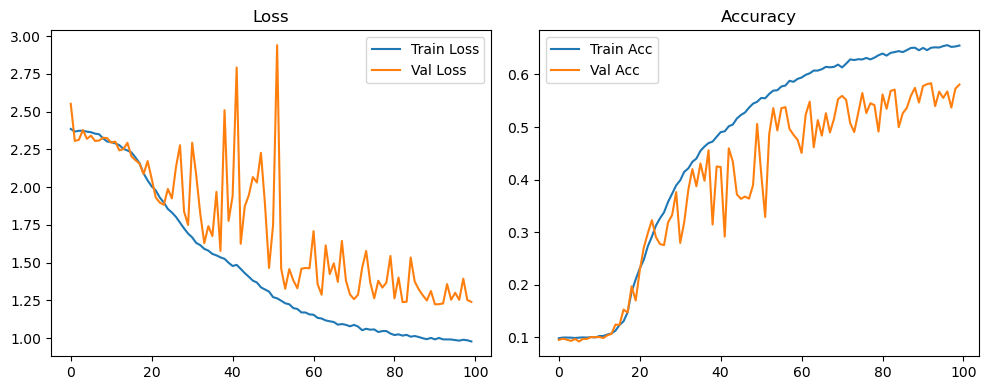

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.32it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

Original Model Final Test Loss: 1.2430 Accuracy: 0.5743


🚀 Running: batch256_lr_max_0.001_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0990 | Val Acc: 0.0965 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0990 | Val Acc: 0.0965 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0990 | Val Acc: 0.0965 |:   1%|          | 1/100 [01:21<2:14:23, 81.45s/it]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0981 |:   1%|          | 1/100 [02:37<2:14:23, 81.45s/it]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0981 |:   1%|          | 1/100 [02:37<2:14:23, 81.45s/it]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0981 |:   2%|▏         | 2/100 [02:37<2:07:48, 78.25s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [02:51<2:07:48, 78.25s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [02:51<2:07:48, 78.25s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [02:51<1:19:07, 48.95s/it]

| LR: 0.000998 | Train Acc: 0.0991 | Val Acc: 0.0931 |:   3%|▎         | 3/100 [03:05<1:19:07, 48.95s/it]

| LR: 0.000998 | Train Acc: 0.0991 | Val Acc: 0.0931 |:   3%|▎         | 3/100 [03:05<1:19:07, 48.95s/it]

| LR: 0.000998 | Train Acc: 0.0991 | Val Acc: 0.0931 |:   4%|▍         | 4/100 [03:05<56:27, 35.29s/it]  

| LR: 0.000996 | Train Acc: 0.0985 | Val Acc: 0.0942 |:   4%|▍         | 4/100 [03:19<56:27, 35.29s/it]

| LR: 0.000996 | Train Acc: 0.0985 | Val Acc: 0.0942 |:   4%|▍         | 4/100 [03:19<56:27, 35.29s/it]

| LR: 0.000996 | Train Acc: 0.0985 | Val Acc: 0.0942 |:   5%|▌         | 5/100 [03:20<43:47, 27.66s/it]

| LR: 0.000994 | Train Acc: 0.0982 | Val Acc: 0.1076 |:   5%|▌         | 5/100 [03:34<43:47, 27.66s/it]

| LR: 0.000994 | Train Acc: 0.0982 | Val Acc: 0.1076 |:   5%|▌         | 5/100 [03:34<43:47, 27.66s/it]

| LR: 0.000994 | Train Acc: 0.0982 | Val Acc: 0.1076 |:   6%|▌         | 6/100 [03:34<36:05, 23.04s/it]

| LR: 0.000991 | Train Acc: 0.1005 | Val Acc: 0.1014 |:   6%|▌         | 6/100 [03:48<36:05, 23.04s/it]

| LR: 0.000991 | Train Acc: 0.1005 | Val Acc: 0.1014 |:   6%|▌         | 6/100 [03:48<36:05, 23.04s/it]

| LR: 0.000991 | Train Acc: 0.1005 | Val Acc: 0.1014 |:   7%|▋         | 7/100 [03:48<31:11, 20.12s/it]

| LR: 0.000988 | Train Acc: 0.1009 | Val Acc: 0.1019 |:   7%|▋         | 7/100 [04:02<31:11, 20.12s/it]

| LR: 0.000988 | Train Acc: 0.1009 | Val Acc: 0.1019 |:   7%|▋         | 7/100 [04:02<31:11, 20.12s/it]

| LR: 0.000988 | Train Acc: 0.1009 | Val Acc: 0.1019 |:   8%|▊         | 8/100 [04:02<27:56, 18.22s/it]

| LR: 0.000984 | Train Acc: 0.1006 | Val Acc: 0.0960 |:   8%|▊         | 8/100 [04:16<27:56, 18.22s/it]

| LR: 0.000984 | Train Acc: 0.1006 | Val Acc: 0.0960 |:   8%|▊         | 8/100 [04:16<27:56, 18.22s/it]

| LR: 0.000984 | Train Acc: 0.1006 | Val Acc: 0.0960 |:   9%|▉         | 9/100 [04:16<25:42, 16.95s/it]

| LR: 0.000980 | Train Acc: 0.1017 | Val Acc: 0.1008 |:   9%|▉         | 9/100 [04:30<25:42, 16.95s/it]

| LR: 0.000980 | Train Acc: 0.1017 | Val Acc: 0.1008 |:   9%|▉         | 9/100 [04:30<25:42, 16.95s/it]

| LR: 0.000980 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  10%|█         | 10/100 [04:30<24:08, 16.10s/it]

| LR: 0.000976 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  10%|█         | 10/100 [04:44<24:08, 16.10s/it]

| LR: 0.000976 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  10%|█         | 10/100 [04:44<24:08, 16.10s/it]

| LR: 0.000976 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  11%|█         | 11/100 [04:44<22:58, 15.49s/it]

| LR: 0.000971 | Train Acc: 0.1040 | Val Acc: 0.0987 |:  11%|█         | 11/100 [04:58<22:58, 15.49s/it]

| LR: 0.000971 | Train Acc: 0.1040 | Val Acc: 0.0987 |:  11%|█         | 11/100 [04:58<22:58, 15.49s/it]

| LR: 0.000971 | Train Acc: 0.1040 | Val Acc: 0.0987 |:  12%|█▏        | 12/100 [04:58<22:06, 15.07s/it]

| LR: 0.000965 | Train Acc: 0.1055 | Val Acc: 0.1014 |:  12%|█▏        | 12/100 [05:12<22:06, 15.07s/it]

| LR: 0.000965 | Train Acc: 0.1055 | Val Acc: 0.1014 |:  12%|█▏        | 12/100 [05:12<22:06, 15.07s/it]

| LR: 0.000965 | Train Acc: 0.1055 | Val Acc: 0.1014 |:  13%|█▎        | 13/100 [05:13<21:26, 14.78s/it]

| LR: 0.000959 | Train Acc: 0.1078 | Val Acc: 0.1043 |:  13%|█▎        | 13/100 [05:27<21:26, 14.78s/it]

| LR: 0.000959 | Train Acc: 0.1078 | Val Acc: 0.1043 |:  13%|█▎        | 13/100 [05:27<21:26, 14.78s/it]

| LR: 0.000959 | Train Acc: 0.1078 | Val Acc: 0.1043 |:  14%|█▍        | 14/100 [05:27<20:56, 14.61s/it]

| LR: 0.000953 | Train Acc: 0.1110 | Val Acc: 0.1289 |:  14%|█▍        | 14/100 [05:41<20:56, 14.61s/it]

| LR: 0.000953 | Train Acc: 0.1110 | Val Acc: 0.1289 |:  14%|█▍        | 14/100 [05:41<20:56, 14.61s/it]

| LR: 0.000953 | Train Acc: 0.1110 | Val Acc: 0.1289 |:  15%|█▌        | 15/100 [05:41<20:29, 14.46s/it]

| LR: 0.000946 | Train Acc: 0.1142 | Val Acc: 0.1056 |:  15%|█▌        | 15/100 [05:55<20:29, 14.46s/it]

| LR: 0.000946 | Train Acc: 0.1142 | Val Acc: 0.1056 |:  15%|█▌        | 15/100 [05:55<20:29, 14.46s/it]

| LR: 0.000946 | Train Acc: 0.1142 | Val Acc: 0.1056 |:  16%|█▌        | 16/100 [05:55<20:06, 14.36s/it]

| LR: 0.000939 | Train Acc: 0.1169 | Val Acc: 0.1065 |:  16%|█▌        | 16/100 [06:09<20:06, 14.36s/it]

| LR: 0.000939 | Train Acc: 0.1169 | Val Acc: 0.1065 |:  16%|█▌        | 16/100 [06:09<20:06, 14.36s/it]

| LR: 0.000939 | Train Acc: 0.1169 | Val Acc: 0.1065 |:  17%|█▋        | 17/100 [06:09<19:47, 14.30s/it]

| LR: 0.000931 | Train Acc: 0.1222 | Val Acc: 0.1324 |:  17%|█▋        | 17/100 [06:23<19:47, 14.30s/it]

| LR: 0.000931 | Train Acc: 0.1222 | Val Acc: 0.1324 |:  17%|█▋        | 17/100 [06:23<19:47, 14.30s/it]

| LR: 0.000931 | Train Acc: 0.1222 | Val Acc: 0.1324 |:  18%|█▊        | 18/100 [06:23<19:29, 14.26s/it]

| LR: 0.000923 | Train Acc: 0.1304 | Val Acc: 0.1607 |:  18%|█▊        | 18/100 [06:37<19:29, 14.26s/it]

| LR: 0.000923 | Train Acc: 0.1304 | Val Acc: 0.1607 |:  18%|█▊        | 18/100 [06:37<19:29, 14.26s/it]

| LR: 0.000923 | Train Acc: 0.1304 | Val Acc: 0.1607 |:  19%|█▉        | 19/100 [06:37<19:10, 14.20s/it]

| LR: 0.000914 | Train Acc: 0.1513 | Val Acc: 0.1212 |:  19%|█▉        | 19/100 [06:51<19:10, 14.20s/it]

| LR: 0.000914 | Train Acc: 0.1513 | Val Acc: 0.1212 |:  19%|█▉        | 19/100 [06:51<19:10, 14.20s/it]

| LR: 0.000914 | Train Acc: 0.1513 | Val Acc: 0.1212 |:  20%|██        | 20/100 [06:52<18:54, 14.18s/it]

| LR: 0.000905 | Train Acc: 0.1703 | Val Acc: 0.1810 |:  20%|██        | 20/100 [07:06<18:54, 14.18s/it]

| LR: 0.000905 | Train Acc: 0.1703 | Val Acc: 0.1810 |:  20%|██        | 20/100 [07:06<18:54, 14.18s/it]

| LR: 0.000905 | Train Acc: 0.1703 | Val Acc: 0.1810 |:  21%|██        | 21/100 [07:06<18:38, 14.15s/it]

| LR: 0.000896 | Train Acc: 0.1925 | Val Acc: 0.2298 |:  21%|██        | 21/100 [07:20<18:38, 14.15s/it]

| LR: 0.000896 | Train Acc: 0.1925 | Val Acc: 0.2298 |:  21%|██        | 21/100 [07:20<18:38, 14.15s/it]

| LR: 0.000896 | Train Acc: 0.1925 | Val Acc: 0.2298 |:  22%|██▏       | 22/100 [07:20<18:23, 14.15s/it]

| LR: 0.000886 | Train Acc: 0.2314 | Val Acc: 0.2272 |:  22%|██▏       | 22/100 [07:34<18:23, 14.15s/it]

| LR: 0.000886 | Train Acc: 0.2314 | Val Acc: 0.2272 |:  22%|██▏       | 22/100 [07:34<18:23, 14.15s/it]

| LR: 0.000886 | Train Acc: 0.2314 | Val Acc: 0.2272 |:  23%|██▎       | 23/100 [07:34<18:07, 14.13s/it]

| LR: 0.000876 | Train Acc: 0.2577 | Val Acc: 0.2505 |:  23%|██▎       | 23/100 [07:48<18:07, 14.13s/it]

| LR: 0.000876 | Train Acc: 0.2577 | Val Acc: 0.2505 |:  23%|██▎       | 23/100 [07:48<18:07, 14.13s/it]

| LR: 0.000876 | Train Acc: 0.2577 | Val Acc: 0.2505 |:  24%|██▍       | 24/100 [07:48<17:52, 14.11s/it]

| LR: 0.000866 | Train Acc: 0.2871 | Val Acc: 0.2973 |:  24%|██▍       | 24/100 [08:02<17:52, 14.11s/it]

| LR: 0.000866 | Train Acc: 0.2871 | Val Acc: 0.2973 |:  24%|██▍       | 24/100 [08:02<17:52, 14.11s/it]

| LR: 0.000866 | Train Acc: 0.2871 | Val Acc: 0.2973 |:  25%|██▌       | 25/100 [08:02<17:37, 14.10s/it]

| LR: 0.000855 | Train Acc: 0.3085 | Val Acc: 0.3401 |:  25%|██▌       | 25/100 [08:16<17:37, 14.10s/it]

| LR: 0.000855 | Train Acc: 0.3085 | Val Acc: 0.3401 |:  25%|██▌       | 25/100 [08:16<17:37, 14.10s/it]

| LR: 0.000855 | Train Acc: 0.3085 | Val Acc: 0.3401 |:  26%|██▌       | 26/100 [08:16<17:22, 14.09s/it]

| LR: 0.000844 | Train Acc: 0.3278 | Val Acc: 0.3242 |:  26%|██▌       | 26/100 [08:30<17:22, 14.09s/it]

| LR: 0.000844 | Train Acc: 0.3278 | Val Acc: 0.3242 |:  26%|██▌       | 26/100 [08:30<17:22, 14.09s/it]

| LR: 0.000844 | Train Acc: 0.3278 | Val Acc: 0.3242 |:  27%|██▋       | 27/100 [08:30<17:08, 14.09s/it]

| LR: 0.000832 | Train Acc: 0.3421 | Val Acc: 0.3445 |:  27%|██▋       | 27/100 [08:44<17:08, 14.09s/it]

| LR: 0.000832 | Train Acc: 0.3421 | Val Acc: 0.3445 |:  27%|██▋       | 27/100 [08:44<17:08, 14.09s/it]

| LR: 0.000832 | Train Acc: 0.3421 | Val Acc: 0.3445 |:  28%|██▊       | 28/100 [08:44<16:54, 14.09s/it]

| LR: 0.000821 | Train Acc: 0.3602 | Val Acc: 0.3514 |:  28%|██▊       | 28/100 [08:58<16:54, 14.09s/it]

| LR: 0.000821 | Train Acc: 0.3602 | Val Acc: 0.3514 |:  28%|██▊       | 28/100 [08:58<16:54, 14.09s/it]

| LR: 0.000821 | Train Acc: 0.3602 | Val Acc: 0.3514 |:  29%|██▉       | 29/100 [08:58<16:40, 14.09s/it]

| LR: 0.000808 | Train Acc: 0.3762 | Val Acc: 0.3782 |:  29%|██▉       | 29/100 [09:12<16:40, 14.09s/it]

| LR: 0.000808 | Train Acc: 0.3762 | Val Acc: 0.3782 |:  29%|██▉       | 29/100 [09:12<16:40, 14.09s/it]

| LR: 0.000808 | Train Acc: 0.3762 | Val Acc: 0.3782 |:  30%|███       | 30/100 [09:12<16:25, 14.08s/it]

| LR: 0.000796 | Train Acc: 0.3891 | Val Acc: 0.3610 |:  30%|███       | 30/100 [09:26<16:25, 14.08s/it]

| LR: 0.000796 | Train Acc: 0.3891 | Val Acc: 0.3610 |:  30%|███       | 30/100 [09:26<16:25, 14.08s/it]

| LR: 0.000796 | Train Acc: 0.3891 | Val Acc: 0.3610 |:  31%|███       | 31/100 [09:27<16:13, 14.11s/it]

| LR: 0.000783 | Train Acc: 0.3983 | Val Acc: 0.4008 |:  31%|███       | 31/100 [09:41<16:13, 14.11s/it]

| LR: 0.000783 | Train Acc: 0.3983 | Val Acc: 0.4008 |:  31%|███       | 31/100 [09:41<16:13, 14.11s/it]

| LR: 0.000783 | Train Acc: 0.3983 | Val Acc: 0.4008 |:  32%|███▏      | 32/100 [09:41<16:02, 14.15s/it]

| LR: 0.000770 | Train Acc: 0.4063 | Val Acc: 0.3805 |:  32%|███▏      | 32/100 [09:55<16:02, 14.15s/it]

| LR: 0.000770 | Train Acc: 0.4063 | Val Acc: 0.3805 |:  32%|███▏      | 32/100 [09:55<16:02, 14.15s/it]

| LR: 0.000770 | Train Acc: 0.4063 | Val Acc: 0.3805 |:  33%|███▎      | 33/100 [09:55<15:50, 14.18s/it]

| LR: 0.000757 | Train Acc: 0.4143 | Val Acc: 0.4093 |:  33%|███▎      | 33/100 [10:09<15:50, 14.18s/it]

| LR: 0.000757 | Train Acc: 0.4143 | Val Acc: 0.4093 |:  33%|███▎      | 33/100 [10:09<15:50, 14.18s/it]

| LR: 0.000757 | Train Acc: 0.4143 | Val Acc: 0.4093 |:  34%|███▍      | 34/100 [10:09<15:36, 14.19s/it]

| LR: 0.000743 | Train Acc: 0.4262 | Val Acc: 0.4169 |:  34%|███▍      | 34/100 [10:23<15:36, 14.19s/it]

| LR: 0.000743 | Train Acc: 0.4262 | Val Acc: 0.4169 |:  34%|███▍      | 34/100 [10:23<15:36, 14.19s/it]

| LR: 0.000743 | Train Acc: 0.4262 | Val Acc: 0.4169 |:  35%|███▌      | 35/100 [10:23<15:22, 14.19s/it]

| LR: 0.000730 | Train Acc: 0.4302 | Val Acc: 0.3000 |:  35%|███▌      | 35/100 [10:38<15:22, 14.19s/it]

| LR: 0.000730 | Train Acc: 0.4302 | Val Acc: 0.3000 |:  35%|███▌      | 35/100 [10:38<15:22, 14.19s/it]

| LR: 0.000730 | Train Acc: 0.4302 | Val Acc: 0.3000 |:  36%|███▌      | 36/100 [10:38<15:08, 14.20s/it]

| LR: 0.000716 | Train Acc: 0.4401 | Val Acc: 0.4370 |:  36%|███▌      | 36/100 [10:52<15:08, 14.20s/it]

| LR: 0.000716 | Train Acc: 0.4401 | Val Acc: 0.4370 |:  36%|███▌      | 36/100 [10:52<15:08, 14.20s/it]

| LR: 0.000716 | Train Acc: 0.4401 | Val Acc: 0.4370 |:  37%|███▋      | 37/100 [10:52<14:53, 14.18s/it]

| LR: 0.000702 | Train Acc: 0.4454 | Val Acc: 0.4582 |:  37%|███▋      | 37/100 [11:06<14:53, 14.18s/it]

| LR: 0.000702 | Train Acc: 0.4454 | Val Acc: 0.4582 |:  37%|███▋      | 37/100 [11:06<14:53, 14.18s/it]

| LR: 0.000702 | Train Acc: 0.4454 | Val Acc: 0.4582 |:  38%|███▊      | 38/100 [11:06<14:37, 14.16s/it]

| LR: 0.000687 | Train Acc: 0.4524 | Val Acc: 0.4514 |:  38%|███▊      | 38/100 [11:20<14:37, 14.16s/it]

| LR: 0.000687 | Train Acc: 0.4524 | Val Acc: 0.4514 |:  38%|███▊      | 38/100 [11:20<14:37, 14.16s/it]

| LR: 0.000687 | Train Acc: 0.4524 | Val Acc: 0.4514 |:  39%|███▉      | 39/100 [11:20<14:23, 14.16s/it]

| LR: 0.000673 | Train Acc: 0.4667 | Val Acc: 0.4439 |:  39%|███▉      | 39/100 [11:34<14:23, 14.16s/it]

| LR: 0.000673 | Train Acc: 0.4667 | Val Acc: 0.4439 |:  39%|███▉      | 39/100 [11:34<14:23, 14.16s/it]

| LR: 0.000673 | Train Acc: 0.4667 | Val Acc: 0.4439 |:  40%|████      | 40/100 [11:34<14:08, 14.15s/it]

| LR: 0.000658 | Train Acc: 0.4648 | Val Acc: 0.4674 |:  40%|████      | 40/100 [11:48<14:08, 14.15s/it]

| LR: 0.000658 | Train Acc: 0.4648 | Val Acc: 0.4674 |:  40%|████      | 40/100 [11:48<14:08, 14.15s/it]

| LR: 0.000658 | Train Acc: 0.4648 | Val Acc: 0.4674 |:  41%|████      | 41/100 [11:48<13:54, 14.14s/it]

| LR: 0.000643 | Train Acc: 0.4713 | Val Acc: 0.4804 |:  41%|████      | 41/100 [12:02<13:54, 14.14s/it]

| LR: 0.000643 | Train Acc: 0.4713 | Val Acc: 0.4804 |:  41%|████      | 41/100 [12:02<13:54, 14.14s/it]

| LR: 0.000643 | Train Acc: 0.4713 | Val Acc: 0.4804 |:  42%|████▏     | 42/100 [12:03<13:41, 14.16s/it]

| LR: 0.000628 | Train Acc: 0.4825 | Val Acc: 0.4775 |:  42%|████▏     | 42/100 [12:17<13:41, 14.16s/it]

| LR: 0.000628 | Train Acc: 0.4825 | Val Acc: 0.4775 |:  42%|████▏     | 42/100 [12:17<13:41, 14.16s/it]

| LR: 0.000628 | Train Acc: 0.4825 | Val Acc: 0.4775 |:  43%|████▎     | 43/100 [12:17<13:26, 14.14s/it]

| LR: 0.000613 | Train Acc: 0.4804 | Val Acc: 0.4815 |:  43%|████▎     | 43/100 [12:31<13:26, 14.14s/it]

| LR: 0.000613 | Train Acc: 0.4804 | Val Acc: 0.4815 |:  43%|████▎     | 43/100 [12:31<13:26, 14.14s/it]

| LR: 0.000613 | Train Acc: 0.4804 | Val Acc: 0.4815 |:  44%|████▍     | 44/100 [12:31<13:11, 14.13s/it]

| LR: 0.000598 | Train Acc: 0.4815 | Val Acc: 0.4777 |:  44%|████▍     | 44/100 [12:45<13:11, 14.13s/it]

| LR: 0.000598 | Train Acc: 0.4815 | Val Acc: 0.4777 |:  44%|████▍     | 44/100 [12:45<13:11, 14.13s/it]

| LR: 0.000598 | Train Acc: 0.4815 | Val Acc: 0.4777 |:  45%|████▌     | 45/100 [12:45<12:56, 14.12s/it]

| LR: 0.000582 | Train Acc: 0.4921 | Val Acc: 0.4811 |:  45%|████▌     | 45/100 [12:59<12:56, 14.12s/it]

| LR: 0.000582 | Train Acc: 0.4921 | Val Acc: 0.4811 |:  45%|████▌     | 45/100 [12:59<12:56, 14.12s/it]

| LR: 0.000582 | Train Acc: 0.4921 | Val Acc: 0.4811 |:  46%|████▌     | 46/100 [12:59<12:41, 14.10s/it]

| LR: 0.000567 | Train Acc: 0.4971 | Val Acc: 0.4626 |:  46%|████▌     | 46/100 [13:13<12:41, 14.10s/it]

| LR: 0.000567 | Train Acc: 0.4971 | Val Acc: 0.4626 |:  46%|████▌     | 46/100 [13:13<12:41, 14.10s/it]

| LR: 0.000567 | Train Acc: 0.4971 | Val Acc: 0.4626 |:  47%|████▋     | 47/100 [13:13<12:25, 14.07s/it]

| LR: 0.000552 | Train Acc: 0.5009 | Val Acc: 0.5031 |:  47%|████▋     | 47/100 [13:27<12:25, 14.07s/it]

| LR: 0.000552 | Train Acc: 0.5009 | Val Acc: 0.5031 |:  47%|████▋     | 47/100 [13:27<12:25, 14.07s/it]

| LR: 0.000552 | Train Acc: 0.5009 | Val Acc: 0.5031 |:  48%|████▊     | 48/100 [13:27<12:11, 14.06s/it]

| LR: 0.000536 | Train Acc: 0.5066 | Val Acc: 0.4969 |:  48%|████▊     | 48/100 [13:41<12:11, 14.06s/it]

| LR: 0.000536 | Train Acc: 0.5066 | Val Acc: 0.4969 |:  48%|████▊     | 48/100 [13:41<12:11, 14.06s/it]

| LR: 0.000536 | Train Acc: 0.5066 | Val Acc: 0.4969 |:  49%|████▉     | 49/100 [13:41<11:57, 14.06s/it]

| LR: 0.000521 | Train Acc: 0.5110 | Val Acc: 0.5056 |:  49%|████▉     | 49/100 [13:55<11:57, 14.06s/it]

| LR: 0.000521 | Train Acc: 0.5110 | Val Acc: 0.5056 |:  49%|████▉     | 49/100 [13:55<11:57, 14.06s/it]

| LR: 0.000521 | Train Acc: 0.5110 | Val Acc: 0.5056 |:  50%|█████     | 50/100 [13:55<11:42, 14.05s/it]

| LR: 0.000505 | Train Acc: 0.5144 | Val Acc: 0.5205 |:  50%|█████     | 50/100 [14:09<11:42, 14.05s/it]

| LR: 0.000505 | Train Acc: 0.5144 | Val Acc: 0.5205 |:  50%|█████     | 50/100 [14:09<11:42, 14.05s/it]

| LR: 0.000505 | Train Acc: 0.5144 | Val Acc: 0.5205 |:  51%|█████     | 51/100 [14:09<11:27, 14.04s/it]

| LR: 0.000489 | Train Acc: 0.5230 | Val Acc: 0.5200 |:  51%|█████     | 51/100 [14:23<11:27, 14.04s/it]

| LR: 0.000489 | Train Acc: 0.5230 | Val Acc: 0.5200 |:  51%|█████     | 51/100 [14:23<11:27, 14.04s/it]

| LR: 0.000489 | Train Acc: 0.5230 | Val Acc: 0.5200 |:  52%|█████▏    | 52/100 [14:23<11:14, 14.04s/it]

| LR: 0.000474 | Train Acc: 0.5241 | Val Acc: 0.5182 |:  52%|█████▏    | 52/100 [14:37<11:14, 14.04s/it]

| LR: 0.000474 | Train Acc: 0.5241 | Val Acc: 0.5182 |:  52%|█████▏    | 52/100 [14:37<11:14, 14.04s/it]

| LR: 0.000474 | Train Acc: 0.5241 | Val Acc: 0.5182 |:  53%|█████▎    | 53/100 [14:37<11:00, 14.06s/it]

| LR: 0.000458 | Train Acc: 0.5340 | Val Acc: 0.5306 |:  53%|█████▎    | 53/100 [14:51<11:00, 14.06s/it]

| LR: 0.000458 | Train Acc: 0.5340 | Val Acc: 0.5306 |:  53%|█████▎    | 53/100 [14:51<11:00, 14.06s/it]

| LR: 0.000458 | Train Acc: 0.5340 | Val Acc: 0.5306 |:  54%|█████▍    | 54/100 [14:51<10:46, 14.06s/it]

| LR: 0.000443 | Train Acc: 0.5379 | Val Acc: 0.5313 |:  54%|█████▍    | 54/100 [15:05<10:46, 14.06s/it]

| LR: 0.000443 | Train Acc: 0.5379 | Val Acc: 0.5313 |:  54%|█████▍    | 54/100 [15:05<10:46, 14.06s/it]

| LR: 0.000443 | Train Acc: 0.5379 | Val Acc: 0.5313 |:  55%|█████▌    | 55/100 [15:05<10:34, 14.10s/it]

| LR: 0.000428 | Train Acc: 0.5416 | Val Acc: 0.5453 |:  55%|█████▌    | 55/100 [15:20<10:34, 14.10s/it]

| LR: 0.000428 | Train Acc: 0.5416 | Val Acc: 0.5453 |:  55%|█████▌    | 55/100 [15:20<10:34, 14.10s/it]

| LR: 0.000428 | Train Acc: 0.5416 | Val Acc: 0.5453 |:  56%|█████▌    | 56/100 [15:20<10:20, 14.11s/it]

| LR: 0.000412 | Train Acc: 0.5406 | Val Acc: 0.5184 |:  56%|█████▌    | 56/100 [15:34<10:20, 14.11s/it]

| LR: 0.000412 | Train Acc: 0.5406 | Val Acc: 0.5184 |:  56%|█████▌    | 56/100 [15:34<10:20, 14.11s/it]

| LR: 0.000412 | Train Acc: 0.5406 | Val Acc: 0.5184 |:  57%|█████▋    | 57/100 [15:34<10:06, 14.11s/it]

| LR: 0.000397 | Train Acc: 0.5445 | Val Acc: 0.4866 |:  57%|█████▋    | 57/100 [15:48<10:06, 14.11s/it]

| LR: 0.000397 | Train Acc: 0.5445 | Val Acc: 0.4866 |:  57%|█████▋    | 57/100 [15:48<10:06, 14.11s/it]

| LR: 0.000397 | Train Acc: 0.5445 | Val Acc: 0.4866 |:  58%|█████▊    | 58/100 [15:48<09:52, 14.10s/it]

| LR: 0.000382 | Train Acc: 0.5502 | Val Acc: 0.5458 |:  58%|█████▊    | 58/100 [16:02<09:52, 14.10s/it]

| LR: 0.000382 | Train Acc: 0.5502 | Val Acc: 0.5458 |:  58%|█████▊    | 58/100 [16:02<09:52, 14.10s/it]

| LR: 0.000382 | Train Acc: 0.5502 | Val Acc: 0.5458 |:  59%|█████▉    | 59/100 [16:02<09:37, 14.09s/it]

| LR: 0.000367 | Train Acc: 0.5561 | Val Acc: 0.5412 |:  59%|█████▉    | 59/100 [16:16<09:37, 14.09s/it]

| LR: 0.000367 | Train Acc: 0.5561 | Val Acc: 0.5412 |:  59%|█████▉    | 59/100 [16:16<09:37, 14.09s/it]

| LR: 0.000367 | Train Acc: 0.5561 | Val Acc: 0.5412 |:  60%|██████    | 60/100 [16:16<09:23, 14.10s/it]

| LR: 0.000352 | Train Acc: 0.5544 | Val Acc: 0.5471 |:  60%|██████    | 60/100 [16:30<09:23, 14.10s/it]

| LR: 0.000352 | Train Acc: 0.5544 | Val Acc: 0.5471 |:  60%|██████    | 60/100 [16:30<09:23, 14.10s/it]

| LR: 0.000352 | Train Acc: 0.5544 | Val Acc: 0.5471 |:  61%|██████    | 61/100 [16:30<09:09, 14.09s/it]

| LR: 0.000337 | Train Acc: 0.5623 | Val Acc: 0.5421 |:  61%|██████    | 61/100 [16:44<09:09, 14.09s/it]

| LR: 0.000337 | Train Acc: 0.5623 | Val Acc: 0.5421 |:  61%|██████    | 61/100 [16:44<09:09, 14.09s/it]

| LR: 0.000337 | Train Acc: 0.5623 | Val Acc: 0.5421 |:  62%|██████▏   | 62/100 [16:44<08:55, 14.10s/it]

| LR: 0.000323 | Train Acc: 0.5639 | Val Acc: 0.5410 |:  62%|██████▏   | 62/100 [16:58<08:55, 14.10s/it]

| LR: 0.000323 | Train Acc: 0.5639 | Val Acc: 0.5410 |:  62%|██████▏   | 62/100 [16:58<08:55, 14.10s/it]

| LR: 0.000323 | Train Acc: 0.5639 | Val Acc: 0.5410 |:  63%|██████▎   | 63/100 [16:58<08:42, 14.13s/it]

| LR: 0.000308 | Train Acc: 0.5698 | Val Acc: 0.5205 |:  63%|██████▎   | 63/100 [17:12<08:42, 14.13s/it]

| LR: 0.000308 | Train Acc: 0.5698 | Val Acc: 0.5205 |:  63%|██████▎   | 63/100 [17:12<08:42, 14.13s/it]

| LR: 0.000308 | Train Acc: 0.5698 | Val Acc: 0.5205 |:  64%|██████▍   | 64/100 [17:12<08:28, 14.13s/it]

| LR: 0.000294 | Train Acc: 0.5724 | Val Acc: 0.5556 |:  64%|██████▍   | 64/100 [17:26<08:28, 14.13s/it]

| LR: 0.000294 | Train Acc: 0.5724 | Val Acc: 0.5556 |:  64%|██████▍   | 64/100 [17:26<08:28, 14.13s/it]

| LR: 0.000294 | Train Acc: 0.5724 | Val Acc: 0.5556 |:  65%|██████▌   | 65/100 [17:27<08:14, 14.12s/it]

| LR: 0.000280 | Train Acc: 0.5704 | Val Acc: 0.4478 |:  65%|██████▌   | 65/100 [17:41<08:14, 14.12s/it]

| LR: 0.000280 | Train Acc: 0.5704 | Val Acc: 0.4478 |:  65%|██████▌   | 65/100 [17:41<08:14, 14.12s/it]

| LR: 0.000280 | Train Acc: 0.5704 | Val Acc: 0.4478 |:  66%|██████▌   | 66/100 [17:41<07:59, 14.10s/it]

| LR: 0.000267 | Train Acc: 0.5735 | Val Acc: 0.5480 |:  66%|██████▌   | 66/100 [17:55<07:59, 14.10s/it]

| LR: 0.000267 | Train Acc: 0.5735 | Val Acc: 0.5480 |:  66%|██████▌   | 66/100 [17:55<07:59, 14.10s/it]

| LR: 0.000267 | Train Acc: 0.5735 | Val Acc: 0.5480 |:  67%|██████▋   | 67/100 [17:55<07:44, 14.08s/it]

| LR: 0.000253 | Train Acc: 0.5828 | Val Acc: 0.5583 |:  67%|██████▋   | 67/100 [18:09<07:44, 14.08s/it]

| LR: 0.000253 | Train Acc: 0.5828 | Val Acc: 0.5583 |:  67%|██████▋   | 67/100 [18:09<07:44, 14.08s/it]

| LR: 0.000253 | Train Acc: 0.5828 | Val Acc: 0.5583 |:  68%|██████▊   | 68/100 [18:09<07:30, 14.08s/it]

| LR: 0.000240 | Train Acc: 0.5804 | Val Acc: 0.5639 |:  68%|██████▊   | 68/100 [18:23<07:30, 14.08s/it]

| LR: 0.000240 | Train Acc: 0.5804 | Val Acc: 0.5639 |:  68%|██████▊   | 68/100 [18:23<07:30, 14.08s/it]

| LR: 0.000240 | Train Acc: 0.5804 | Val Acc: 0.5639 |:  69%|██████▉   | 69/100 [18:23<07:16, 14.07s/it]

| LR: 0.000227 | Train Acc: 0.5838 | Val Acc: 0.5587 |:  69%|██████▉   | 69/100 [18:37<07:16, 14.07s/it]

| LR: 0.000227 | Train Acc: 0.5838 | Val Acc: 0.5587 |:  69%|██████▉   | 69/100 [18:37<07:16, 14.07s/it]

| LR: 0.000227 | Train Acc: 0.5838 | Val Acc: 0.5587 |:  70%|███████   | 70/100 [18:37<07:03, 14.11s/it]

| LR: 0.000214 | Train Acc: 0.5862 | Val Acc: 0.5657 |:  70%|███████   | 70/100 [18:51<07:03, 14.11s/it]

| LR: 0.000214 | Train Acc: 0.5862 | Val Acc: 0.5657 |:  70%|███████   | 70/100 [18:51<07:03, 14.11s/it]

| LR: 0.000214 | Train Acc: 0.5862 | Val Acc: 0.5657 |:  71%|███████   | 71/100 [18:51<06:49, 14.11s/it]

| LR: 0.000202 | Train Acc: 0.5855 | Val Acc: 0.5588 |:  71%|███████   | 71/100 [19:05<06:49, 14.11s/it]

| LR: 0.000202 | Train Acc: 0.5855 | Val Acc: 0.5588 |:  71%|███████   | 71/100 [19:05<06:49, 14.11s/it]

| LR: 0.000202 | Train Acc: 0.5855 | Val Acc: 0.5588 |:  72%|███████▏  | 72/100 [19:05<06:35, 14.13s/it]

| LR: 0.000189 | Train Acc: 0.5878 | Val Acc: 0.5562 |:  72%|███████▏  | 72/100 [19:19<06:35, 14.13s/it]

| LR: 0.000189 | Train Acc: 0.5878 | Val Acc: 0.5562 |:  72%|███████▏  | 72/100 [19:19<06:35, 14.13s/it]

| LR: 0.000189 | Train Acc: 0.5878 | Val Acc: 0.5562 |:  73%|███████▎  | 73/100 [19:19<06:21, 14.12s/it]

| LR: 0.000178 | Train Acc: 0.5929 | Val Acc: 0.5577 |:  73%|███████▎  | 73/100 [19:33<06:21, 14.12s/it]

| LR: 0.000178 | Train Acc: 0.5929 | Val Acc: 0.5577 |:  73%|███████▎  | 73/100 [19:33<06:21, 14.12s/it]

| LR: 0.000178 | Train Acc: 0.5929 | Val Acc: 0.5577 |:  74%|███████▍  | 74/100 [19:33<06:07, 14.13s/it]

| LR: 0.000166 | Train Acc: 0.5955 | Val Acc: 0.5670 |:  74%|███████▍  | 74/100 [19:48<06:07, 14.13s/it]

| LR: 0.000166 | Train Acc: 0.5955 | Val Acc: 0.5670 |:  74%|███████▍  | 74/100 [19:48<06:07, 14.13s/it]

| LR: 0.000166 | Train Acc: 0.5955 | Val Acc: 0.5670 |:  75%|███████▌  | 75/100 [19:48<05:53, 14.14s/it]

| LR: 0.000155 | Train Acc: 0.5968 | Val Acc: 0.5759 |:  75%|███████▌  | 75/100 [20:02<05:53, 14.14s/it]

| LR: 0.000155 | Train Acc: 0.5968 | Val Acc: 0.5759 |:  75%|███████▌  | 75/100 [20:02<05:53, 14.14s/it]

| LR: 0.000155 | Train Acc: 0.5968 | Val Acc: 0.5759 |:  76%|███████▌  | 76/100 [20:02<05:39, 14.13s/it]

| LR: 0.000144 | Train Acc: 0.5988 | Val Acc: 0.5660 |:  76%|███████▌  | 76/100 [20:16<05:39, 14.13s/it]

| LR: 0.000144 | Train Acc: 0.5988 | Val Acc: 0.5660 |:  76%|███████▌  | 76/100 [20:16<05:39, 14.13s/it]

| LR: 0.000144 | Train Acc: 0.5988 | Val Acc: 0.5660 |:  77%|███████▋  | 77/100 [20:16<05:24, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.5941 | Val Acc: 0.5758 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.5941 | Val Acc: 0.5758 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.5941 | Val Acc: 0.5758 |:  78%|███████▊  | 78/100 [20:30<05:10, 14.10s/it]

| LR: 0.000124 | Train Acc: 0.6017 | Val Acc: 0.5765 |:  78%|███████▊  | 78/100 [20:44<05:10, 14.10s/it]

| LR: 0.000124 | Train Acc: 0.6017 | Val Acc: 0.5765 |:  78%|███████▊  | 78/100 [20:44<05:10, 14.10s/it]

| LR: 0.000124 | Train Acc: 0.6017 | Val Acc: 0.5765 |:  79%|███████▉  | 79/100 [20:44<04:57, 14.15s/it]

| LR: 0.000114 | Train Acc: 0.6040 | Val Acc: 0.5571 |:  79%|███████▉  | 79/100 [20:58<04:57, 14.15s/it]

| LR: 0.000114 | Train Acc: 0.6040 | Val Acc: 0.5571 |:  79%|███████▉  | 79/100 [20:58<04:57, 14.15s/it]

| LR: 0.000114 | Train Acc: 0.6040 | Val Acc: 0.5571 |:  80%|████████  | 80/100 [20:58<04:43, 14.15s/it]

| LR: 0.000105 | Train Acc: 0.6019 | Val Acc: 0.5847 |:  80%|████████  | 80/100 [21:13<04:43, 14.15s/it]

| LR: 0.000105 | Train Acc: 0.6019 | Val Acc: 0.5847 |:  80%|████████  | 80/100 [21:13<04:43, 14.15s/it]

| LR: 0.000105 | Train Acc: 0.6019 | Val Acc: 0.5847 |:  81%|████████  | 81/100 [21:13<04:29, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.6025 | Val Acc: 0.5779 |:  81%|████████  | 81/100 [21:27<04:29, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.6025 | Val Acc: 0.5779 |:  81%|████████  | 81/100 [21:27<04:29, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.6025 | Val Acc: 0.5779 |:  82%|████████▏ | 82/100 [21:27<04:15, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.6069 | Val Acc: 0.5801 |:  82%|████████▏ | 82/100 [21:41<04:15, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.6069 | Val Acc: 0.5801 |:  82%|████████▏ | 82/100 [21:41<04:15, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.6069 | Val Acc: 0.5801 |:  83%|████████▎ | 83/100 [21:41<04:00, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.6062 | Val Acc: 0.5576 |:  83%|████████▎ | 83/100 [21:55<04:00, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.6062 | Val Acc: 0.5576 |:  83%|████████▎ | 83/100 [21:55<04:00, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.6062 | Val Acc: 0.5576 |:  84%|████████▍ | 84/100 [21:55<03:46, 14.18s/it]

| LR: 0.000071 | Train Acc: 0.6083 | Val Acc: 0.5799 |:  84%|████████▍ | 84/100 [22:09<03:46, 14.18s/it]

| LR: 0.000071 | Train Acc: 0.6083 | Val Acc: 0.5799 |:  84%|████████▍ | 84/100 [22:09<03:46, 14.18s/it]

| LR: 0.000071 | Train Acc: 0.6083 | Val Acc: 0.5799 |:  85%|████████▌ | 85/100 [22:09<03:33, 14.21s/it]

| LR: 0.000064 | Train Acc: 0.6078 | Val Acc: 0.5748 |:  85%|████████▌ | 85/100 [22:24<03:33, 14.21s/it]

| LR: 0.000064 | Train Acc: 0.6078 | Val Acc: 0.5748 |:  85%|████████▌ | 85/100 [22:24<03:33, 14.21s/it]

| LR: 0.000064 | Train Acc: 0.6078 | Val Acc: 0.5748 |:  86%|████████▌ | 86/100 [22:24<03:19, 14.22s/it]

| LR: 0.000057 | Train Acc: 0.6104 | Val Acc: 0.5862 |:  86%|████████▌ | 86/100 [22:38<03:19, 14.22s/it]

| LR: 0.000057 | Train Acc: 0.6104 | Val Acc: 0.5862 |:  86%|████████▌ | 86/100 [22:38<03:19, 14.22s/it]

| LR: 0.000057 | Train Acc: 0.6104 | Val Acc: 0.5862 |:  87%|████████▋ | 87/100 [22:38<03:04, 14.19s/it]

| LR: 0.000051 | Train Acc: 0.6087 | Val Acc: 0.5799 |:  87%|████████▋ | 87/100 [22:52<03:04, 14.19s/it]

| LR: 0.000051 | Train Acc: 0.6087 | Val Acc: 0.5799 |:  87%|████████▋ | 87/100 [22:52<03:04, 14.19s/it]

| LR: 0.000051 | Train Acc: 0.6087 | Val Acc: 0.5799 |:  88%|████████▊ | 88/100 [22:52<02:50, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.6105 | Val Acc: 0.5858 |:  88%|████████▊ | 88/100 [23:06<02:50, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.6105 | Val Acc: 0.5858 |:  88%|████████▊ | 88/100 [23:06<02:50, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.6105 | Val Acc: 0.5858 |:  89%|████████▉ | 89/100 [23:06<02:35, 14.15s/it]

| LR: 0.000039 | Train Acc: 0.6140 | Val Acc: 0.5102 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.15s/it]

| LR: 0.000039 | Train Acc: 0.6140 | Val Acc: 0.5102 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.15s/it]

| LR: 0.000039 | Train Acc: 0.6140 | Val Acc: 0.5102 |:  90%|█████████ | 90/100 [23:20<02:21, 14.16s/it]

| LR: 0.000034 | Train Acc: 0.6151 | Val Acc: 0.5914 |:  90%|█████████ | 90/100 [23:34<02:21, 14.16s/it]

| LR: 0.000034 | Train Acc: 0.6151 | Val Acc: 0.5914 |:  90%|█████████ | 90/100 [23:34<02:21, 14.16s/it]

| LR: 0.000034 | Train Acc: 0.6151 | Val Acc: 0.5914 |:  91%|█████████ | 91/100 [23:34<02:07, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.6154 | Val Acc: 0.5891 |:  91%|█████████ | 91/100 [23:48<02:07, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.6154 | Val Acc: 0.5891 |:  91%|█████████ | 91/100 [23:48<02:07, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.6154 | Val Acc: 0.5891 |:  92%|█████████▏| 92/100 [23:48<01:53, 14.13s/it]

| LR: 0.000026 | Train Acc: 0.6129 | Val Acc: 0.5887 |:  92%|█████████▏| 92/100 [24:02<01:53, 14.13s/it]

| LR: 0.000026 | Train Acc: 0.6129 | Val Acc: 0.5887 |:  92%|█████████▏| 92/100 [24:02<01:53, 14.13s/it]

| LR: 0.000026 | Train Acc: 0.6129 | Val Acc: 0.5887 |:  93%|█████████▎| 93/100 [24:03<01:39, 14.15s/it]

| LR: 0.000022 | Train Acc: 0.6146 | Val Acc: 0.5749 |:  93%|█████████▎| 93/100 [24:17<01:39, 14.15s/it]

| LR: 0.000022 | Train Acc: 0.6146 | Val Acc: 0.5749 |:  93%|█████████▎| 93/100 [24:17<01:39, 14.15s/it]

| LR: 0.000022 | Train Acc: 0.6146 | Val Acc: 0.5749 |:  94%|█████████▍| 94/100 [24:17<01:24, 14.14s/it]

| LR: 0.000019 | Train Acc: 0.6135 | Val Acc: 0.5848 |:  94%|█████████▍| 94/100 [24:31<01:24, 14.14s/it]

| LR: 0.000019 | Train Acc: 0.6135 | Val Acc: 0.5848 |:  94%|█████████▍| 94/100 [24:31<01:24, 14.14s/it]

| LR: 0.000019 | Train Acc: 0.6135 | Val Acc: 0.5848 |:  95%|█████████▌| 95/100 [24:31<01:10, 14.18s/it]

| LR: 0.000016 | Train Acc: 0.6168 | Val Acc: 0.5736 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.18s/it]

| LR: 0.000016 | Train Acc: 0.6168 | Val Acc: 0.5736 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.18s/it]

| LR: 0.000016 | Train Acc: 0.6168 | Val Acc: 0.5736 |:  96%|█████████▌| 96/100 [24:45<00:56, 14.17s/it]

| LR: 0.000014 | Train Acc: 0.6181 | Val Acc: 0.5910 |:  96%|█████████▌| 96/100 [24:59<00:56, 14.17s/it]

| LR: 0.000014 | Train Acc: 0.6181 | Val Acc: 0.5910 |:  96%|█████████▌| 96/100 [24:59<00:56, 14.17s/it]

| LR: 0.000014 | Train Acc: 0.6181 | Val Acc: 0.5910 |:  97%|█████████▋| 97/100 [24:59<00:42, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.6177 | Val Acc: 0.5867 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.6177 | Val Acc: 0.5867 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.6177 | Val Acc: 0.5867 |:  98%|█████████▊| 98/100 [25:13<00:28, 14.15s/it]

| LR: 0.000011 | Train Acc: 0.6148 | Val Acc: 0.5851 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.15s/it]

| LR: 0.000011 | Train Acc: 0.6148 | Val Acc: 0.5851 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.15s/it]

| LR: 0.000011 | Train Acc: 0.6148 | Val Acc: 0.5851 |:  99%|█████████▉| 99/100 [25:27<00:14, 14.14s/it]

| LR: 0.000010 | Train Acc: 0.6214 | Val Acc: 0.5884 |:  99%|█████████▉| 99/100 [25:42<00:14, 14.14s/it]

| LR: 0.000010 | Train Acc: 0.6214 | Val Acc: 0.5884 |:  99%|█████████▉| 99/100 [25:42<00:14, 14.14s/it]

| LR: 0.000010 | Train Acc: 0.6214 | Val Acc: 0.5884 |: 100%|██████████| 100/100 [25:42<00:00, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.6214 | Val Acc: 0.5884 |: 100%|██████████| 100/100 [25:42<00:00, 15.42s/it]

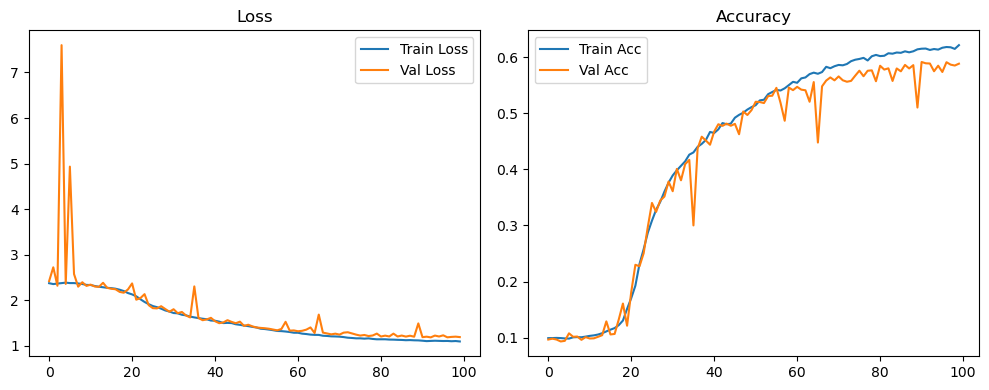

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.32it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

Original Model Final Test Loss: 1.2025 Accuracy: 0.5839


🚀 Running: batch256_lr_max_0.001_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   1%|          | 1/100 [01:20<2:13:26, 80.87s/it]

| LR: 0.001000 | Train Acc: 0.1014 | Val Acc: 0.1035 |:   1%|          | 1/100 [02:35<2:13:26, 80.87s/it]

| LR: 0.001000 | Train Acc: 0.1014 | Val Acc: 0.1035 |:   1%|          | 1/100 [02:35<2:13:26, 80.87s/it]

| LR: 0.001000 | Train Acc: 0.1014 | Val Acc: 0.1035 |:   2%|▏         | 2/100 [02:35<2:05:56, 77.11s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:49<2:05:56, 77.11s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:49<2:05:56, 77.11s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0967 |:   3%|▎         | 3/100 [02:49<1:18:05, 48.31s/it]

| LR: 0.000998 | Train Acc: 0.0988 | Val Acc: 0.0986 |:   3%|▎         | 3/100 [03:03<1:18:05, 48.31s/it]

| LR: 0.000998 | Train Acc: 0.0988 | Val Acc: 0.0986 |:   3%|▎         | 3/100 [03:03<1:18:05, 48.31s/it]

| LR: 0.000998 | Train Acc: 0.0988 | Val Acc: 0.0986 |:   4%|▍         | 4/100 [03:03<55:36, 34.76s/it]  

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0933 |:   4%|▍         | 4/100 [03:17<55:36, 34.76s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0933 |:   4%|▍         | 4/100 [03:17<55:36, 34.76s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0933 |:   5%|▌         | 5/100 [03:17<43:11, 27.27s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0929 |:   5%|▌         | 5/100 [03:31<43:11, 27.27s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0929 |:   5%|▌         | 5/100 [03:31<43:11, 27.27s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0929 |:   6%|▌         | 6/100 [03:31<35:40, 22.77s/it]

| LR: 0.000991 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [03:45<35:40, 22.77s/it]

| LR: 0.000991 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [03:45<35:40, 22.77s/it]

| LR: 0.000991 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   7%|▋         | 7/100 [03:45<30:51, 19.91s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0952 |:   7%|▋         | 7/100 [03:59<30:51, 19.91s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0952 |:   7%|▋         | 7/100 [03:59<30:51, 19.91s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0952 |:   8%|▊         | 8/100 [03:59<27:38, 18.03s/it]

| LR: 0.000984 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:13<27:38, 18.03s/it]

| LR: 0.000984 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:13<27:38, 18.03s/it]

| LR: 0.000984 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:13<25:28, 16.80s/it]

| LR: 0.000980 | Train Acc: 0.0995 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:27<25:28, 16.80s/it]

| LR: 0.000980 | Train Acc: 0.0995 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:27<25:28, 16.80s/it]

| LR: 0.000980 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  10%|█         | 10/100 [04:27<23:59, 15.99s/it]

| LR: 0.000976 | Train Acc: 0.0993 | Val Acc: 0.0932 |:  10%|█         | 10/100 [04:41<23:59, 15.99s/it]

| LR: 0.000976 | Train Acc: 0.0993 | Val Acc: 0.0932 |:  10%|█         | 10/100 [04:41<23:59, 15.99s/it]

| LR: 0.000976 | Train Acc: 0.0993 | Val Acc: 0.0932 |:  11%|█         | 11/100 [04:41<22:52, 15.43s/it]

| LR: 0.000971 | Train Acc: 0.1000 | Val Acc: 0.0982 |:  11%|█         | 11/100 [04:55<22:52, 15.43s/it]

| LR: 0.000971 | Train Acc: 0.1000 | Val Acc: 0.0982 |:  11%|█         | 11/100 [04:55<22:52, 15.43s/it]

| LR: 0.000971 | Train Acc: 0.1000 | Val Acc: 0.0982 |:  12%|█▏        | 12/100 [04:56<22:03, 15.04s/it]

| LR: 0.000965 | Train Acc: 0.1019 | Val Acc: 0.0993 |:  12%|█▏        | 12/100 [05:10<22:03, 15.04s/it]

| LR: 0.000965 | Train Acc: 0.1019 | Val Acc: 0.0993 |:  12%|█▏        | 12/100 [05:10<22:03, 15.04s/it]

| LR: 0.000965 | Train Acc: 0.1019 | Val Acc: 0.0993 |:  13%|█▎        | 13/100 [05:10<21:25, 14.78s/it]

| LR: 0.000959 | Train Acc: 0.1059 | Val Acc: 0.1063 |:  13%|█▎        | 13/100 [05:24<21:25, 14.78s/it]

| LR: 0.000959 | Train Acc: 0.1059 | Val Acc: 0.1063 |:  13%|█▎        | 13/100 [05:24<21:25, 14.78s/it]

| LR: 0.000959 | Train Acc: 0.1059 | Val Acc: 0.1063 |:  14%|█▍        | 14/100 [05:24<20:53, 14.58s/it]

| LR: 0.000953 | Train Acc: 0.1081 | Val Acc: 0.1053 |:  14%|█▍        | 14/100 [05:38<20:53, 14.58s/it]

| LR: 0.000953 | Train Acc: 0.1081 | Val Acc: 0.1053 |:  14%|█▍        | 14/100 [05:38<20:53, 14.58s/it]

| LR: 0.000953 | Train Acc: 0.1081 | Val Acc: 0.1053 |:  15%|█▌        | 15/100 [05:38<20:26, 14.42s/it]

| LR: 0.000946 | Train Acc: 0.1150 | Val Acc: 0.1114 |:  15%|█▌        | 15/100 [05:52<20:26, 14.42s/it]

| LR: 0.000946 | Train Acc: 0.1150 | Val Acc: 0.1114 |:  15%|█▌        | 15/100 [05:52<20:26, 14.42s/it]

| LR: 0.000946 | Train Acc: 0.1150 | Val Acc: 0.1114 |:  16%|█▌        | 16/100 [05:52<20:02, 14.32s/it]

| LR: 0.000939 | Train Acc: 0.1212 | Val Acc: 0.1234 |:  16%|█▌        | 16/100 [06:06<20:02, 14.32s/it]

| LR: 0.000939 | Train Acc: 0.1212 | Val Acc: 0.1234 |:  16%|█▌        | 16/100 [06:06<20:02, 14.32s/it]

| LR: 0.000939 | Train Acc: 0.1212 | Val Acc: 0.1234 |:  17%|█▋        | 17/100 [06:06<19:41, 14.23s/it]

| LR: 0.000931 | Train Acc: 0.1394 | Val Acc: 0.1410 |:  17%|█▋        | 17/100 [06:20<19:41, 14.23s/it]

| LR: 0.000931 | Train Acc: 0.1394 | Val Acc: 0.1410 |:  17%|█▋        | 17/100 [06:20<19:41, 14.23s/it]

| LR: 0.000931 | Train Acc: 0.1394 | Val Acc: 0.1410 |:  18%|█▊        | 18/100 [06:20<19:23, 14.19s/it]

| LR: 0.000923 | Train Acc: 0.1605 | Val Acc: 0.1738 |:  18%|█▊        | 18/100 [06:34<19:23, 14.19s/it]

| LR: 0.000923 | Train Acc: 0.1605 | Val Acc: 0.1738 |:  18%|█▊        | 18/100 [06:34<19:23, 14.19s/it]

| LR: 0.000923 | Train Acc: 0.1605 | Val Acc: 0.1738 |:  19%|█▉        | 19/100 [06:34<19:06, 14.15s/it]

| LR: 0.000914 | Train Acc: 0.1884 | Val Acc: 0.2187 |:  19%|█▉        | 19/100 [06:48<19:06, 14.15s/it]

| LR: 0.000914 | Train Acc: 0.1884 | Val Acc: 0.2187 |:  19%|█▉        | 19/100 [06:48<19:06, 14.15s/it]

| LR: 0.000914 | Train Acc: 0.1884 | Val Acc: 0.2187 |:  20%|██        | 20/100 [06:48<18:49, 14.11s/it]

| LR: 0.000905 | Train Acc: 0.2204 | Val Acc: 0.2103 |:  20%|██        | 20/100 [07:02<18:49, 14.11s/it]

| LR: 0.000905 | Train Acc: 0.2204 | Val Acc: 0.2103 |:  20%|██        | 20/100 [07:02<18:49, 14.11s/it]

| LR: 0.000905 | Train Acc: 0.2204 | Val Acc: 0.2103 |:  21%|██        | 21/100 [07:02<18:36, 14.13s/it]

| LR: 0.000896 | Train Acc: 0.2455 | Val Acc: 0.2996 |:  21%|██        | 21/100 [07:16<18:36, 14.13s/it]

| LR: 0.000896 | Train Acc: 0.2455 | Val Acc: 0.2996 |:  21%|██        | 21/100 [07:16<18:36, 14.13s/it]

| LR: 0.000896 | Train Acc: 0.2455 | Val Acc: 0.2996 |:  22%|██▏       | 22/100 [07:16<18:21, 14.12s/it]

| LR: 0.000886 | Train Acc: 0.2748 | Val Acc: 0.2919 |:  22%|██▏       | 22/100 [07:31<18:21, 14.12s/it]

| LR: 0.000886 | Train Acc: 0.2748 | Val Acc: 0.2919 |:  22%|██▏       | 22/100 [07:31<18:21, 14.12s/it]

| LR: 0.000886 | Train Acc: 0.2748 | Val Acc: 0.2919 |:  23%|██▎       | 23/100 [07:31<18:08, 14.13s/it]

| LR: 0.000876 | Train Acc: 0.3023 | Val Acc: 0.2944 |:  23%|██▎       | 23/100 [07:45<18:08, 14.13s/it]

| LR: 0.000876 | Train Acc: 0.3023 | Val Acc: 0.2944 |:  23%|██▎       | 23/100 [07:45<18:08, 14.13s/it]

| LR: 0.000876 | Train Acc: 0.3023 | Val Acc: 0.2944 |:  24%|██▍       | 24/100 [07:45<17:54, 14.14s/it]

| LR: 0.000866 | Train Acc: 0.3258 | Val Acc: 0.3178 |:  24%|██▍       | 24/100 [07:59<17:54, 14.14s/it]

| LR: 0.000866 | Train Acc: 0.3258 | Val Acc: 0.3178 |:  24%|██▍       | 24/100 [07:59<17:54, 14.14s/it]

| LR: 0.000866 | Train Acc: 0.3258 | Val Acc: 0.3178 |:  25%|██▌       | 25/100 [07:59<17:41, 14.15s/it]

| LR: 0.000855 | Train Acc: 0.3505 | Val Acc: 0.3254 |:  25%|██▌       | 25/100 [08:13<17:41, 14.15s/it]

| LR: 0.000855 | Train Acc: 0.3505 | Val Acc: 0.3254 |:  25%|██▌       | 25/100 [08:13<17:41, 14.15s/it]

| LR: 0.000855 | Train Acc: 0.3505 | Val Acc: 0.3254 |:  26%|██▌       | 26/100 [08:13<17:27, 14.15s/it]

| LR: 0.000844 | Train Acc: 0.3669 | Val Acc: 0.4070 |:  26%|██▌       | 26/100 [08:27<17:27, 14.15s/it]

| LR: 0.000844 | Train Acc: 0.3669 | Val Acc: 0.4070 |:  26%|██▌       | 26/100 [08:27<17:27, 14.15s/it]

| LR: 0.000844 | Train Acc: 0.3669 | Val Acc: 0.4070 |:  27%|██▋       | 27/100 [08:27<17:13, 14.15s/it]

| LR: 0.000832 | Train Acc: 0.3820 | Val Acc: 0.3935 |:  27%|██▋       | 27/100 [08:41<17:13, 14.15s/it]

| LR: 0.000832 | Train Acc: 0.3820 | Val Acc: 0.3935 |:  27%|██▋       | 27/100 [08:41<17:13, 14.15s/it]

| LR: 0.000832 | Train Acc: 0.3820 | Val Acc: 0.3935 |:  28%|██▊       | 28/100 [08:41<16:58, 14.15s/it]

| LR: 0.000821 | Train Acc: 0.3965 | Val Acc: 0.4083 |:  28%|██▊       | 28/100 [08:55<16:58, 14.15s/it]

| LR: 0.000821 | Train Acc: 0.3965 | Val Acc: 0.4083 |:  28%|██▊       | 28/100 [08:55<16:58, 14.15s/it]

| LR: 0.000821 | Train Acc: 0.3965 | Val Acc: 0.4083 |:  29%|██▉       | 29/100 [08:55<16:44, 14.14s/it]

| LR: 0.000808 | Train Acc: 0.4113 | Val Acc: 0.4331 |:  29%|██▉       | 29/100 [09:10<16:44, 14.14s/it]

| LR: 0.000808 | Train Acc: 0.4113 | Val Acc: 0.4331 |:  29%|██▉       | 29/100 [09:10<16:44, 14.14s/it]

| LR: 0.000808 | Train Acc: 0.4113 | Val Acc: 0.4331 |:  30%|███       | 30/100 [09:10<16:28, 14.13s/it]

| LR: 0.000796 | Train Acc: 0.4203 | Val Acc: 0.4299 |:  30%|███       | 30/100 [09:24<16:28, 14.13s/it]

| LR: 0.000796 | Train Acc: 0.4203 | Val Acc: 0.4299 |:  30%|███       | 30/100 [09:24<16:28, 14.13s/it]

| LR: 0.000796 | Train Acc: 0.4203 | Val Acc: 0.4299 |:  31%|███       | 31/100 [09:24<16:14, 14.12s/it]

| LR: 0.000783 | Train Acc: 0.4265 | Val Acc: 0.4303 |:  31%|███       | 31/100 [09:38<16:14, 14.12s/it]

| LR: 0.000783 | Train Acc: 0.4265 | Val Acc: 0.4303 |:  31%|███       | 31/100 [09:38<16:14, 14.12s/it]

| LR: 0.000783 | Train Acc: 0.4265 | Val Acc: 0.4303 |:  32%|███▏      | 32/100 [09:38<15:59, 14.11s/it]

| LR: 0.000770 | Train Acc: 0.4324 | Val Acc: 0.4360 |:  32%|███▏      | 32/100 [09:52<15:59, 14.11s/it]

| LR: 0.000770 | Train Acc: 0.4324 | Val Acc: 0.4360 |:  32%|███▏      | 32/100 [09:52<15:59, 14.11s/it]

| LR: 0.000770 | Train Acc: 0.4324 | Val Acc: 0.4360 |:  33%|███▎      | 33/100 [09:52<15:44, 14.10s/it]

| LR: 0.000757 | Train Acc: 0.4463 | Val Acc: 0.4617 |:  33%|███▎      | 33/100 [10:06<15:44, 14.10s/it]

| LR: 0.000757 | Train Acc: 0.4463 | Val Acc: 0.4617 |:  33%|███▎      | 33/100 [10:06<15:44, 14.10s/it]

| LR: 0.000757 | Train Acc: 0.4463 | Val Acc: 0.4617 |:  34%|███▍      | 34/100 [10:06<15:32, 14.12s/it]

| LR: 0.000743 | Train Acc: 0.4591 | Val Acc: 0.4661 |:  34%|███▍      | 34/100 [10:20<15:32, 14.12s/it]

| LR: 0.000743 | Train Acc: 0.4591 | Val Acc: 0.4661 |:  34%|███▍      | 34/100 [10:20<15:32, 14.12s/it]

| LR: 0.000743 | Train Acc: 0.4591 | Val Acc: 0.4661 |:  35%|███▌      | 35/100 [10:20<15:18, 14.14s/it]

| LR: 0.000730 | Train Acc: 0.4638 | Val Acc: 0.4665 |:  35%|███▌      | 35/100 [10:34<15:18, 14.14s/it]

| LR: 0.000730 | Train Acc: 0.4638 | Val Acc: 0.4665 |:  35%|███▌      | 35/100 [10:34<15:18, 14.14s/it]

| LR: 0.000730 | Train Acc: 0.4638 | Val Acc: 0.4665 |:  36%|███▌      | 36/100 [10:34<15:04, 14.13s/it]

| LR: 0.000716 | Train Acc: 0.4730 | Val Acc: 0.4942 |:  36%|███▌      | 36/100 [10:48<15:04, 14.13s/it]

| LR: 0.000716 | Train Acc: 0.4730 | Val Acc: 0.4942 |:  36%|███▌      | 36/100 [10:48<15:04, 14.13s/it]

| LR: 0.000716 | Train Acc: 0.4730 | Val Acc: 0.4942 |:  37%|███▋      | 37/100 [10:48<14:49, 14.12s/it]

| LR: 0.000702 | Train Acc: 0.4799 | Val Acc: 0.5007 |:  37%|███▋      | 37/100 [11:02<14:49, 14.12s/it]

| LR: 0.000702 | Train Acc: 0.4799 | Val Acc: 0.5007 |:  37%|███▋      | 37/100 [11:02<14:49, 14.12s/it]

| LR: 0.000702 | Train Acc: 0.4799 | Val Acc: 0.5007 |:  38%|███▊      | 38/100 [11:02<14:35, 14.11s/it]

| LR: 0.000687 | Train Acc: 0.4895 | Val Acc: 0.5022 |:  38%|███▊      | 38/100 [11:16<14:35, 14.11s/it]

| LR: 0.000687 | Train Acc: 0.4895 | Val Acc: 0.5022 |:  38%|███▊      | 38/100 [11:16<14:35, 14.11s/it]

| LR: 0.000687 | Train Acc: 0.4895 | Val Acc: 0.5022 |:  39%|███▉      | 39/100 [11:17<14:19, 14.08s/it]

| LR: 0.000673 | Train Acc: 0.4937 | Val Acc: 0.4915 |:  39%|███▉      | 39/100 [11:30<14:19, 14.08s/it]

| LR: 0.000673 | Train Acc: 0.4937 | Val Acc: 0.4915 |:  39%|███▉      | 39/100 [11:30<14:19, 14.08s/it]

| LR: 0.000673 | Train Acc: 0.4937 | Val Acc: 0.4915 |:  40%|████      | 40/100 [11:31<14:03, 14.06s/it]

| LR: 0.000658 | Train Acc: 0.5020 | Val Acc: 0.5129 |:  40%|████      | 40/100 [11:45<14:03, 14.06s/it]

| LR: 0.000658 | Train Acc: 0.5020 | Val Acc: 0.5129 |:  40%|████      | 40/100 [11:45<14:03, 14.06s/it]

| LR: 0.000658 | Train Acc: 0.5020 | Val Acc: 0.5129 |:  41%|████      | 41/100 [11:45<13:50, 14.07s/it]

| LR: 0.000643 | Train Acc: 0.5054 | Val Acc: 0.5094 |:  41%|████      | 41/100 [11:59<13:50, 14.07s/it]

| LR: 0.000643 | Train Acc: 0.5054 | Val Acc: 0.5094 |:  41%|████      | 41/100 [11:59<13:50, 14.07s/it]

| LR: 0.000643 | Train Acc: 0.5054 | Val Acc: 0.5094 |:  42%|████▏     | 42/100 [11:59<13:36, 14.07s/it]

| LR: 0.000628 | Train Acc: 0.5103 | Val Acc: 0.5126 |:  42%|████▏     | 42/100 [12:13<13:36, 14.07s/it]

| LR: 0.000628 | Train Acc: 0.5103 | Val Acc: 0.5126 |:  42%|████▏     | 42/100 [12:13<13:36, 14.07s/it]

| LR: 0.000628 | Train Acc: 0.5103 | Val Acc: 0.5126 |:  43%|████▎     | 43/100 [12:13<13:21, 14.06s/it]

| LR: 0.000613 | Train Acc: 0.5170 | Val Acc: 0.5142 |:  43%|████▎     | 43/100 [12:27<13:21, 14.06s/it]

| LR: 0.000613 | Train Acc: 0.5170 | Val Acc: 0.5142 |:  43%|████▎     | 43/100 [12:27<13:21, 14.06s/it]

| LR: 0.000613 | Train Acc: 0.5170 | Val Acc: 0.5142 |:  44%|████▍     | 44/100 [12:27<13:06, 14.05s/it]

| LR: 0.000598 | Train Acc: 0.5195 | Val Acc: 0.5250 |:  44%|████▍     | 44/100 [12:41<13:06, 14.05s/it]

| LR: 0.000598 | Train Acc: 0.5195 | Val Acc: 0.5250 |:  44%|████▍     | 44/100 [12:41<13:06, 14.05s/it]

| LR: 0.000598 | Train Acc: 0.5195 | Val Acc: 0.5250 |:  45%|████▌     | 45/100 [12:41<12:52, 14.04s/it]

| LR: 0.000582 | Train Acc: 0.5228 | Val Acc: 0.5226 |:  45%|████▌     | 45/100 [12:55<12:52, 14.04s/it]

| LR: 0.000582 | Train Acc: 0.5228 | Val Acc: 0.5226 |:  45%|████▌     | 45/100 [12:55<12:52, 14.04s/it]

| LR: 0.000582 | Train Acc: 0.5228 | Val Acc: 0.5226 |:  46%|████▌     | 46/100 [12:55<12:37, 14.03s/it]

| LR: 0.000567 | Train Acc: 0.5268 | Val Acc: 0.5330 |:  46%|████▌     | 46/100 [13:09<12:37, 14.03s/it]

| LR: 0.000567 | Train Acc: 0.5268 | Val Acc: 0.5330 |:  46%|████▌     | 46/100 [13:09<12:37, 14.03s/it]

| LR: 0.000567 | Train Acc: 0.5268 | Val Acc: 0.5330 |:  47%|████▋     | 47/100 [13:09<12:24, 14.04s/it]

| LR: 0.000552 | Train Acc: 0.5304 | Val Acc: 0.5398 |:  47%|████▋     | 47/100 [13:23<12:24, 14.04s/it]

| LR: 0.000552 | Train Acc: 0.5304 | Val Acc: 0.5398 |:  47%|████▋     | 47/100 [13:23<12:24, 14.04s/it]

| LR: 0.000552 | Train Acc: 0.5304 | Val Acc: 0.5398 |:  48%|████▊     | 48/100 [13:23<12:09, 14.04s/it]

| LR: 0.000536 | Train Acc: 0.5353 | Val Acc: 0.5410 |:  48%|████▊     | 48/100 [13:37<12:09, 14.04s/it]

| LR: 0.000536 | Train Acc: 0.5353 | Val Acc: 0.5410 |:  48%|████▊     | 48/100 [13:37<12:09, 14.04s/it]

| LR: 0.000536 | Train Acc: 0.5353 | Val Acc: 0.5410 |:  49%|████▉     | 49/100 [13:37<11:55, 14.03s/it]

| LR: 0.000521 | Train Acc: 0.5411 | Val Acc: 0.5486 |:  49%|████▉     | 49/100 [13:51<11:55, 14.03s/it]

| LR: 0.000521 | Train Acc: 0.5411 | Val Acc: 0.5486 |:  49%|████▉     | 49/100 [13:51<11:55, 14.03s/it]

| LR: 0.000521 | Train Acc: 0.5411 | Val Acc: 0.5486 |:  50%|█████     | 50/100 [13:51<11:42, 14.05s/it]

| LR: 0.000505 | Train Acc: 0.5433 | Val Acc: 0.5360 |:  50%|█████     | 50/100 [14:05<11:42, 14.05s/it]

| LR: 0.000505 | Train Acc: 0.5433 | Val Acc: 0.5360 |:  50%|█████     | 50/100 [14:05<11:42, 14.05s/it]

| LR: 0.000505 | Train Acc: 0.5433 | Val Acc: 0.5360 |:  51%|█████     | 51/100 [14:05<11:28, 14.05s/it]

| LR: 0.000489 | Train Acc: 0.5486 | Val Acc: 0.5470 |:  51%|█████     | 51/100 [14:19<11:28, 14.05s/it]

| LR: 0.000489 | Train Acc: 0.5486 | Val Acc: 0.5470 |:  51%|█████     | 51/100 [14:19<11:28, 14.05s/it]

| LR: 0.000489 | Train Acc: 0.5486 | Val Acc: 0.5470 |:  52%|█████▏    | 52/100 [14:19<11:14, 14.04s/it]

| LR: 0.000474 | Train Acc: 0.5551 | Val Acc: 0.5568 |:  52%|█████▏    | 52/100 [14:33<11:14, 14.04s/it]

| LR: 0.000474 | Train Acc: 0.5551 | Val Acc: 0.5568 |:  52%|█████▏    | 52/100 [14:33<11:14, 14.04s/it]

| LR: 0.000474 | Train Acc: 0.5551 | Val Acc: 0.5568 |:  53%|█████▎    | 53/100 [14:33<11:01, 14.07s/it]

| LR: 0.000458 | Train Acc: 0.5563 | Val Acc: 0.5475 |:  53%|█████▎    | 53/100 [14:47<11:01, 14.07s/it]

| LR: 0.000458 | Train Acc: 0.5563 | Val Acc: 0.5475 |:  53%|█████▎    | 53/100 [14:47<11:01, 14.07s/it]

| LR: 0.000458 | Train Acc: 0.5563 | Val Acc: 0.5475 |:  54%|█████▍    | 54/100 [14:47<10:46, 14.06s/it]

| LR: 0.000443 | Train Acc: 0.5619 | Val Acc: 0.5558 |:  54%|█████▍    | 54/100 [15:01<10:46, 14.06s/it]

| LR: 0.000443 | Train Acc: 0.5619 | Val Acc: 0.5558 |:  54%|█████▍    | 54/100 [15:01<10:46, 14.06s/it]

| LR: 0.000443 | Train Acc: 0.5619 | Val Acc: 0.5558 |:  55%|█████▌    | 55/100 [15:01<10:32, 14.05s/it]

| LR: 0.000428 | Train Acc: 0.5659 | Val Acc: 0.5190 |:  55%|█████▌    | 55/100 [15:15<10:32, 14.05s/it]

| LR: 0.000428 | Train Acc: 0.5659 | Val Acc: 0.5190 |:  55%|█████▌    | 55/100 [15:15<10:32, 14.05s/it]

| LR: 0.000428 | Train Acc: 0.5659 | Val Acc: 0.5190 |:  56%|█████▌    | 56/100 [15:15<10:19, 14.07s/it]

| LR: 0.000412 | Train Acc: 0.5648 | Val Acc: 0.5637 |:  56%|█████▌    | 56/100 [15:29<10:19, 14.07s/it]

| LR: 0.000412 | Train Acc: 0.5648 | Val Acc: 0.5637 |:  56%|█████▌    | 56/100 [15:29<10:19, 14.07s/it]

| LR: 0.000412 | Train Acc: 0.5648 | Val Acc: 0.5637 |:  57%|█████▋    | 57/100 [15:29<10:05, 14.08s/it]

| LR: 0.000397 | Train Acc: 0.5710 | Val Acc: 0.5663 |:  57%|█████▋    | 57/100 [15:43<10:05, 14.08s/it]

| LR: 0.000397 | Train Acc: 0.5710 | Val Acc: 0.5663 |:  57%|█████▋    | 57/100 [15:43<10:05, 14.08s/it]

| LR: 0.000397 | Train Acc: 0.5710 | Val Acc: 0.5663 |:  58%|█████▊    | 58/100 [15:44<09:51, 14.09s/it]

| LR: 0.000382 | Train Acc: 0.5742 | Val Acc: 0.5645 |:  58%|█████▊    | 58/100 [15:58<09:51, 14.09s/it]

| LR: 0.000382 | Train Acc: 0.5742 | Val Acc: 0.5645 |:  58%|█████▊    | 58/100 [15:58<09:51, 14.09s/it]

| LR: 0.000382 | Train Acc: 0.5742 | Val Acc: 0.5645 |:  59%|█████▉    | 59/100 [15:58<09:38, 14.10s/it]

| LR: 0.000367 | Train Acc: 0.5789 | Val Acc: 0.5646 |:  59%|█████▉    | 59/100 [16:12<09:38, 14.10s/it]

| LR: 0.000367 | Train Acc: 0.5789 | Val Acc: 0.5646 |:  59%|█████▉    | 59/100 [16:12<09:38, 14.10s/it]

| LR: 0.000367 | Train Acc: 0.5789 | Val Acc: 0.5646 |:  60%|██████    | 60/100 [16:12<09:24, 14.10s/it]

| LR: 0.000352 | Train Acc: 0.5802 | Val Acc: 0.5782 |:  60%|██████    | 60/100 [16:26<09:24, 14.10s/it]

| LR: 0.000352 | Train Acc: 0.5802 | Val Acc: 0.5782 |:  60%|██████    | 60/100 [16:26<09:24, 14.10s/it]

| LR: 0.000352 | Train Acc: 0.5802 | Val Acc: 0.5782 |:  61%|██████    | 61/100 [16:26<09:10, 14.11s/it]

| LR: 0.000337 | Train Acc: 0.5846 | Val Acc: 0.5674 |:  61%|██████    | 61/100 [16:40<09:10, 14.11s/it]

| LR: 0.000337 | Train Acc: 0.5846 | Val Acc: 0.5674 |:  61%|██████    | 61/100 [16:40<09:10, 14.11s/it]

| LR: 0.000337 | Train Acc: 0.5846 | Val Acc: 0.5674 |:  62%|██████▏   | 62/100 [16:40<08:56, 14.11s/it]

| LR: 0.000323 | Train Acc: 0.5859 | Val Acc: 0.5748 |:  62%|██████▏   | 62/100 [16:54<08:56, 14.11s/it]

| LR: 0.000323 | Train Acc: 0.5859 | Val Acc: 0.5748 |:  62%|██████▏   | 62/100 [16:54<08:56, 14.11s/it]

| LR: 0.000323 | Train Acc: 0.5859 | Val Acc: 0.5748 |:  63%|██████▎   | 63/100 [16:54<08:41, 14.10s/it]

| LR: 0.000308 | Train Acc: 0.5891 | Val Acc: 0.5816 |:  63%|██████▎   | 63/100 [17:08<08:41, 14.10s/it]

| LR: 0.000308 | Train Acc: 0.5891 | Val Acc: 0.5816 |:  63%|██████▎   | 63/100 [17:08<08:41, 14.10s/it]

| LR: 0.000308 | Train Acc: 0.5891 | Val Acc: 0.5816 |:  64%|██████▍   | 64/100 [17:08<08:27, 14.10s/it]

| LR: 0.000294 | Train Acc: 0.5918 | Val Acc: 0.5857 |:  64%|██████▍   | 64/100 [17:22<08:27, 14.10s/it]

| LR: 0.000294 | Train Acc: 0.5918 | Val Acc: 0.5857 |:  64%|██████▍   | 64/100 [17:22<08:27, 14.10s/it]

| LR: 0.000294 | Train Acc: 0.5918 | Val Acc: 0.5857 |:  65%|██████▌   | 65/100 [17:22<08:13, 14.11s/it]

| LR: 0.000280 | Train Acc: 0.5964 | Val Acc: 0.5778 |:  65%|██████▌   | 65/100 [17:36<08:13, 14.11s/it]

| LR: 0.000280 | Train Acc: 0.5964 | Val Acc: 0.5778 |:  65%|██████▌   | 65/100 [17:36<08:13, 14.11s/it]

| LR: 0.000280 | Train Acc: 0.5964 | Val Acc: 0.5778 |:  66%|██████▌   | 66/100 [17:36<07:59, 14.11s/it]

| LR: 0.000267 | Train Acc: 0.6010 | Val Acc: 0.5444 |:  66%|██████▌   | 66/100 [17:51<07:59, 14.11s/it]

| LR: 0.000267 | Train Acc: 0.6010 | Val Acc: 0.5444 |:  66%|██████▌   | 66/100 [17:51<07:59, 14.11s/it]

| LR: 0.000267 | Train Acc: 0.6010 | Val Acc: 0.5444 |:  67%|██████▋   | 67/100 [17:51<07:46, 14.13s/it]

| LR: 0.000253 | Train Acc: 0.5992 | Val Acc: 0.5835 |:  67%|██████▋   | 67/100 [18:05<07:46, 14.13s/it]

| LR: 0.000253 | Train Acc: 0.5992 | Val Acc: 0.5835 |:  67%|██████▋   | 67/100 [18:05<07:46, 14.13s/it]

| LR: 0.000253 | Train Acc: 0.5992 | Val Acc: 0.5835 |:  68%|██████▊   | 68/100 [18:05<07:31, 14.12s/it]

| LR: 0.000240 | Train Acc: 0.6022 | Val Acc: 0.5857 |:  68%|██████▊   | 68/100 [18:19<07:31, 14.12s/it]

| LR: 0.000240 | Train Acc: 0.6022 | Val Acc: 0.5857 |:  68%|██████▊   | 68/100 [18:19<07:31, 14.12s/it]

| LR: 0.000240 | Train Acc: 0.6022 | Val Acc: 0.5857 |:  69%|██████▉   | 69/100 [18:19<07:17, 14.10s/it]

| LR: 0.000227 | Train Acc: 0.6050 | Val Acc: 0.5880 |:  69%|██████▉   | 69/100 [18:33<07:17, 14.10s/it]

| LR: 0.000227 | Train Acc: 0.6050 | Val Acc: 0.5880 |:  69%|██████▉   | 69/100 [18:33<07:17, 14.10s/it]

| LR: 0.000227 | Train Acc: 0.6050 | Val Acc: 0.5880 |:  70%|███████   | 70/100 [18:33<07:03, 14.10s/it]

| LR: 0.000214 | Train Acc: 0.6102 | Val Acc: 0.5918 |:  70%|███████   | 70/100 [18:47<07:03, 14.10s/it]

| LR: 0.000214 | Train Acc: 0.6102 | Val Acc: 0.5918 |:  70%|███████   | 70/100 [18:47<07:03, 14.10s/it]

| LR: 0.000214 | Train Acc: 0.6102 | Val Acc: 0.5918 |:  71%|███████   | 71/100 [18:47<06:49, 14.11s/it]

| LR: 0.000202 | Train Acc: 0.6082 | Val Acc: 0.5942 |:  71%|███████   | 71/100 [19:01<06:49, 14.11s/it]

| LR: 0.000202 | Train Acc: 0.6082 | Val Acc: 0.5942 |:  71%|███████   | 71/100 [19:01<06:49, 14.11s/it]

| LR: 0.000202 | Train Acc: 0.6082 | Val Acc: 0.5942 |:  72%|███████▏  | 72/100 [19:01<06:35, 14.11s/it]

| LR: 0.000189 | Train Acc: 0.6117 | Val Acc: 0.5934 |:  72%|███████▏  | 72/100 [19:15<06:35, 14.11s/it]

| LR: 0.000189 | Train Acc: 0.6117 | Val Acc: 0.5934 |:  72%|███████▏  | 72/100 [19:15<06:35, 14.11s/it]

| LR: 0.000189 | Train Acc: 0.6117 | Val Acc: 0.5934 |:  73%|███████▎  | 73/100 [19:15<06:21, 14.12s/it]

| LR: 0.000178 | Train Acc: 0.6144 | Val Acc: 0.5927 |:  73%|███████▎  | 73/100 [19:29<06:21, 14.12s/it]

| LR: 0.000178 | Train Acc: 0.6144 | Val Acc: 0.5927 |:  73%|███████▎  | 73/100 [19:29<06:21, 14.12s/it]

| LR: 0.000178 | Train Acc: 0.6144 | Val Acc: 0.5927 |:  74%|███████▍  | 74/100 [19:29<06:06, 14.10s/it]

| LR: 0.000166 | Train Acc: 0.6127 | Val Acc: 0.5941 |:  74%|███████▍  | 74/100 [19:43<06:06, 14.10s/it]

| LR: 0.000166 | Train Acc: 0.6127 | Val Acc: 0.5941 |:  74%|███████▍  | 74/100 [19:43<06:06, 14.10s/it]

| LR: 0.000166 | Train Acc: 0.6127 | Val Acc: 0.5941 |:  75%|███████▌  | 75/100 [19:43<05:52, 14.08s/it]

| LR: 0.000155 | Train Acc: 0.6152 | Val Acc: 0.5979 |:  75%|███████▌  | 75/100 [19:57<05:52, 14.08s/it]

| LR: 0.000155 | Train Acc: 0.6152 | Val Acc: 0.5979 |:  75%|███████▌  | 75/100 [19:57<05:52, 14.08s/it]

| LR: 0.000155 | Train Acc: 0.6152 | Val Acc: 0.5979 |:  76%|███████▌  | 76/100 [19:57<05:38, 14.09s/it]

| LR: 0.000144 | Train Acc: 0.6157 | Val Acc: 0.5985 |:  76%|███████▌  | 76/100 [20:11<05:38, 14.09s/it]

| LR: 0.000144 | Train Acc: 0.6157 | Val Acc: 0.5985 |:  76%|███████▌  | 76/100 [20:11<05:38, 14.09s/it]

| LR: 0.000144 | Train Acc: 0.6157 | Val Acc: 0.5985 |:  77%|███████▋  | 77/100 [20:12<05:23, 14.09s/it]

| LR: 0.000134 | Train Acc: 0.6164 | Val Acc: 0.5997 |:  77%|███████▋  | 77/100 [20:26<05:23, 14.09s/it]

| LR: 0.000134 | Train Acc: 0.6164 | Val Acc: 0.5997 |:  77%|███████▋  | 77/100 [20:26<05:23, 14.09s/it]

| LR: 0.000134 | Train Acc: 0.6164 | Val Acc: 0.5997 |:  78%|███████▊  | 78/100 [20:26<05:10, 14.13s/it]

| LR: 0.000124 | Train Acc: 0.6225 | Val Acc: 0.6006 |:  78%|███████▊  | 78/100 [20:40<05:10, 14.13s/it]

| LR: 0.000124 | Train Acc: 0.6225 | Val Acc: 0.6006 |:  78%|███████▊  | 78/100 [20:40<05:10, 14.13s/it]

| LR: 0.000124 | Train Acc: 0.6225 | Val Acc: 0.6006 |:  79%|███████▉  | 79/100 [20:40<04:56, 14.13s/it]

| LR: 0.000114 | Train Acc: 0.6200 | Val Acc: 0.5928 |:  79%|███████▉  | 79/100 [20:54<04:56, 14.13s/it]

| LR: 0.000114 | Train Acc: 0.6200 | Val Acc: 0.5928 |:  79%|███████▉  | 79/100 [20:54<04:56, 14.13s/it]

| LR: 0.000114 | Train Acc: 0.6200 | Val Acc: 0.5928 |:  80%|████████  | 80/100 [20:54<04:42, 14.12s/it]

| LR: 0.000105 | Train Acc: 0.6218 | Val Acc: 0.5878 |:  80%|████████  | 80/100 [21:08<04:42, 14.12s/it]

| LR: 0.000105 | Train Acc: 0.6218 | Val Acc: 0.5878 |:  80%|████████  | 80/100 [21:08<04:42, 14.12s/it]

| LR: 0.000105 | Train Acc: 0.6218 | Val Acc: 0.5878 |:  81%|████████  | 81/100 [21:08<04:28, 14.11s/it]

| LR: 0.000096 | Train Acc: 0.6225 | Val Acc: 0.5990 |:  81%|████████  | 81/100 [21:22<04:28, 14.11s/it]

| LR: 0.000096 | Train Acc: 0.6225 | Val Acc: 0.5990 |:  81%|████████  | 81/100 [21:22<04:28, 14.11s/it]

| LR: 0.000096 | Train Acc: 0.6225 | Val Acc: 0.5990 |:  82%|████████▏ | 82/100 [21:22<04:14, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.6213 | Val Acc: 0.5957 |:  82%|████████▏ | 82/100 [21:36<04:14, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.6213 | Val Acc: 0.5957 |:  82%|████████▏ | 82/100 [21:36<04:14, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.6213 | Val Acc: 0.5957 |:  83%|████████▎ | 83/100 [21:36<03:59, 14.11s/it]

| LR: 0.000079 | Train Acc: 0.6255 | Val Acc: 0.6027 |:  83%|████████▎ | 83/100 [21:50<03:59, 14.11s/it]

| LR: 0.000079 | Train Acc: 0.6255 | Val Acc: 0.6027 |:  83%|████████▎ | 83/100 [21:50<03:59, 14.11s/it]

| LR: 0.000079 | Train Acc: 0.6255 | Val Acc: 0.6027 |:  84%|████████▍ | 84/100 [21:50<03:46, 14.13s/it]

| LR: 0.000071 | Train Acc: 0.6264 | Val Acc: 0.6095 |:  84%|████████▍ | 84/100 [22:05<03:46, 14.13s/it]

| LR: 0.000071 | Train Acc: 0.6264 | Val Acc: 0.6095 |:  84%|████████▍ | 84/100 [22:05<03:46, 14.13s/it]

| LR: 0.000071 | Train Acc: 0.6264 | Val Acc: 0.6095 |:  85%|████████▌ | 85/100 [22:05<03:31, 14.12s/it]

| LR: 0.000064 | Train Acc: 0.6251 | Val Acc: 0.6079 |:  85%|████████▌ | 85/100 [22:19<03:31, 14.12s/it]

| LR: 0.000064 | Train Acc: 0.6251 | Val Acc: 0.6079 |:  85%|████████▌ | 85/100 [22:19<03:31, 14.12s/it]

| LR: 0.000064 | Train Acc: 0.6251 | Val Acc: 0.6079 |:  86%|████████▌ | 86/100 [22:19<03:17, 14.09s/it]

| LR: 0.000057 | Train Acc: 0.6262 | Val Acc: 0.6066 |:  86%|████████▌ | 86/100 [22:33<03:17, 14.09s/it]

| LR: 0.000057 | Train Acc: 0.6262 | Val Acc: 0.6066 |:  86%|████████▌ | 86/100 [22:33<03:17, 14.09s/it]

| LR: 0.000057 | Train Acc: 0.6262 | Val Acc: 0.6066 |:  87%|████████▋ | 87/100 [22:33<03:02, 14.07s/it]

| LR: 0.000051 | Train Acc: 0.6315 | Val Acc: 0.6132 |:  87%|████████▋ | 87/100 [22:47<03:02, 14.07s/it]

| LR: 0.000051 | Train Acc: 0.6315 | Val Acc: 0.6132 |:  87%|████████▋ | 87/100 [22:47<03:02, 14.07s/it]

| LR: 0.000051 | Train Acc: 0.6315 | Val Acc: 0.6132 |:  88%|████████▊ | 88/100 [22:47<02:48, 14.07s/it]

| LR: 0.000045 | Train Acc: 0.6322 | Val Acc: 0.6064 |:  88%|████████▊ | 88/100 [23:01<02:48, 14.07s/it]

| LR: 0.000045 | Train Acc: 0.6322 | Val Acc: 0.6064 |:  88%|████████▊ | 88/100 [23:01<02:48, 14.07s/it]

| LR: 0.000045 | Train Acc: 0.6322 | Val Acc: 0.6064 |:  89%|████████▉ | 89/100 [23:01<02:34, 14.06s/it]

| LR: 0.000039 | Train Acc: 0.6337 | Val Acc: 0.5994 |:  89%|████████▉ | 89/100 [23:15<02:34, 14.06s/it]

| LR: 0.000039 | Train Acc: 0.6337 | Val Acc: 0.5994 |:  89%|████████▉ | 89/100 [23:15<02:34, 14.06s/it]

| LR: 0.000039 | Train Acc: 0.6337 | Val Acc: 0.5994 |:  90%|█████████ | 90/100 [23:15<02:20, 14.05s/it]

| LR: 0.000034 | Train Acc: 0.6312 | Val Acc: 0.6086 |:  90%|█████████ | 90/100 [23:29<02:20, 14.05s/it]

| LR: 0.000034 | Train Acc: 0.6312 | Val Acc: 0.6086 |:  90%|█████████ | 90/100 [23:29<02:20, 14.05s/it]

| LR: 0.000034 | Train Acc: 0.6312 | Val Acc: 0.6086 |:  91%|█████████ | 91/100 [23:29<02:06, 14.06s/it]

| LR: 0.000030 | Train Acc: 0.6339 | Val Acc: 0.6045 |:  91%|█████████ | 91/100 [23:43<02:06, 14.06s/it]

| LR: 0.000030 | Train Acc: 0.6339 | Val Acc: 0.6045 |:  91%|█████████ | 91/100 [23:43<02:06, 14.06s/it]

| LR: 0.000030 | Train Acc: 0.6339 | Val Acc: 0.6045 |:  92%|█████████▏| 92/100 [23:43<01:52, 14.06s/it]

| LR: 0.000026 | Train Acc: 0.6351 | Val Acc: 0.6113 |:  92%|█████████▏| 92/100 [23:57<01:52, 14.06s/it]

| LR: 0.000026 | Train Acc: 0.6351 | Val Acc: 0.6113 |:  92%|█████████▏| 92/100 [23:57<01:52, 14.06s/it]

| LR: 0.000026 | Train Acc: 0.6351 | Val Acc: 0.6113 |:  93%|█████████▎| 93/100 [23:57<01:38, 14.05s/it]

| LR: 0.000022 | Train Acc: 0.6369 | Val Acc: 0.6144 |:  93%|█████████▎| 93/100 [24:11<01:38, 14.05s/it]

| LR: 0.000022 | Train Acc: 0.6369 | Val Acc: 0.6144 |:  93%|█████████▎| 93/100 [24:11<01:38, 14.05s/it]

| LR: 0.000022 | Train Acc: 0.6369 | Val Acc: 0.6144 |:  94%|█████████▍| 94/100 [24:11<01:24, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.6312 | Val Acc: 0.6154 |:  94%|█████████▍| 94/100 [24:25<01:24, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.6312 | Val Acc: 0.6154 |:  94%|█████████▍| 94/100 [24:25<01:24, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.6312 | Val Acc: 0.6154 |:  95%|█████████▌| 95/100 [24:25<01:10, 14.07s/it]

| LR: 0.000016 | Train Acc: 0.6314 | Val Acc: 0.6084 |:  95%|█████████▌| 95/100 [24:39<01:10, 14.07s/it]

| LR: 0.000016 | Train Acc: 0.6314 | Val Acc: 0.6084 |:  95%|█████████▌| 95/100 [24:39<01:10, 14.07s/it]

| LR: 0.000016 | Train Acc: 0.6314 | Val Acc: 0.6084 |:  96%|█████████▌| 96/100 [24:39<00:56, 14.05s/it]

| LR: 0.000014 | Train Acc: 0.6366 | Val Acc: 0.6072 |:  96%|█████████▌| 96/100 [24:53<00:56, 14.05s/it]

| LR: 0.000014 | Train Acc: 0.6366 | Val Acc: 0.6072 |:  96%|█████████▌| 96/100 [24:53<00:56, 14.05s/it]

| LR: 0.000014 | Train Acc: 0.6366 | Val Acc: 0.6072 |:  97%|█████████▋| 97/100 [24:53<00:42, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.6332 | Val Acc: 0.6124 |:  97%|█████████▋| 97/100 [25:07<00:42, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.6332 | Val Acc: 0.6124 |:  97%|█████████▋| 97/100 [25:07<00:42, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.6332 | Val Acc: 0.6124 |:  98%|█████████▊| 98/100 [25:07<00:28, 14.09s/it]

| LR: 0.000011 | Train Acc: 0.6371 | Val Acc: 0.6114 |:  98%|█████████▊| 98/100 [25:21<00:28, 14.09s/it]

| LR: 0.000011 | Train Acc: 0.6371 | Val Acc: 0.6114 |:  98%|█████████▊| 98/100 [25:21<00:28, 14.09s/it]

| LR: 0.000011 | Train Acc: 0.6371 | Val Acc: 0.6114 |:  99%|█████████▉| 99/100 [25:21<00:14, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.6341 | Val Acc: 0.6140 |:  99%|█████████▉| 99/100 [25:35<00:14, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.6341 | Val Acc: 0.6140 |:  99%|█████████▉| 99/100 [25:35<00:14, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.6341 | Val Acc: 0.6140 |: 100%|██████████| 100/100 [25:35<00:00, 14.05s/it]

| LR: 0.000010 | Train Acc: 0.6341 | Val Acc: 0.6140 |: 100%|██████████| 100/100 [25:35<00:00, 15.36s/it]

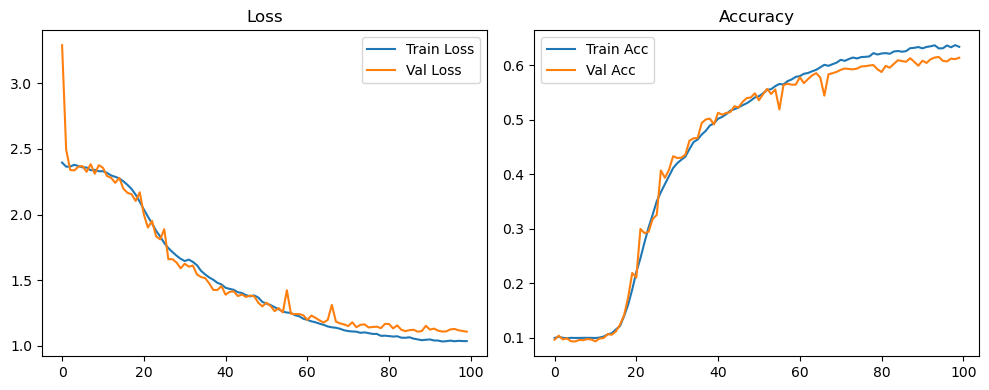

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 1.1332 Accuracy: 0.6055


🚀 Running: batch256_lr_max_0.001_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:20<2:13:10, 80.72s/it]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:36<2:13:10, 80.72s/it]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:36<2:13:10, 80.72s/it]

| LR: 0.001000 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [02:36<2:07:09, 77.86s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [02:50<2:07:09, 77.86s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [02:50<2:07:09, 77.86s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [02:50<1:18:47, 48.74s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.0935 |:   3%|▎         | 3/100 [03:04<1:18:47, 48.74s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.0935 |:   3%|▎         | 3/100 [03:04<1:18:47, 48.74s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.0935 |:   4%|▍         | 4/100 [03:04<56:07, 35.08s/it]  

| LR: 0.000996 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [03:18<56:07, 35.08s/it]

| LR: 0.000996 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [03:18<56:07, 35.08s/it]

| LR: 0.000996 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [03:18<43:33, 27.51s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [03:33<43:33, 27.51s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [03:33<43:33, 27.51s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [03:33<36:01, 22.99s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [03:47<36:01, 22.99s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [03:47<36:01, 22.99s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [03:47<31:10, 20.12s/it]

| LR: 0.000988 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:01<31:10, 20.12s/it]

| LR: 0.000988 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:01<31:10, 20.12s/it]

| LR: 0.000988 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:01<27:57, 18.23s/it]

| LR: 0.000984 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:15<27:57, 18.23s/it]

| LR: 0.000984 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:15<27:57, 18.23s/it]

| LR: 0.000984 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:15<25:45, 16.98s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:29<25:45, 16.98s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:29<25:45, 16.98s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  10%|█         | 10/100 [04:29<24:11, 16.13s/it]

| LR: 0.000976 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:43<24:11, 16.13s/it]

| LR: 0.000976 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:43<24:11, 16.13s/it]

| LR: 0.000976 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:44<22:59, 15.50s/it]

| LR: 0.000971 | Train Acc: 0.0994 | Val Acc: 0.0947 |:  11%|█         | 11/100 [04:58<22:59, 15.50s/it]

| LR: 0.000971 | Train Acc: 0.0994 | Val Acc: 0.0947 |:  11%|█         | 11/100 [04:58<22:59, 15.50s/it]

| LR: 0.000971 | Train Acc: 0.0994 | Val Acc: 0.0947 |:  12%|█▏        | 12/100 [04:58<22:07, 15.09s/it]

| LR: 0.000965 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [05:12<22:07, 15.09s/it]

| LR: 0.000965 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [05:12<22:07, 15.09s/it]

| LR: 0.000965 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  13%|█▎        | 13/100 [05:12<21:25, 14.77s/it]

| LR: 0.000959 | Train Acc: 0.0997 | Val Acc: 0.0960 |:  13%|█▎        | 13/100 [05:26<21:25, 14.77s/it]

| LR: 0.000959 | Train Acc: 0.0997 | Val Acc: 0.0960 |:  13%|█▎        | 13/100 [05:26<21:25, 14.77s/it]

| LR: 0.000959 | Train Acc: 0.0997 | Val Acc: 0.0960 |:  14%|█▍        | 14/100 [05:26<20:55, 14.60s/it]

| LR: 0.000953 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:40<20:55, 14.60s/it]

| LR: 0.000953 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:40<20:55, 14.60s/it]

| LR: 0.000953 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:40<20:27, 14.44s/it]

| LR: 0.000946 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:54<20:27, 14.44s/it]

| LR: 0.000946 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:54<20:27, 14.44s/it]

| LR: 0.000946 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:54<20:07, 14.37s/it]

| LR: 0.000939 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  16%|█▌        | 16/100 [06:08<20:07, 14.37s/it]

| LR: 0.000939 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  16%|█▌        | 16/100 [06:08<20:07, 14.37s/it]

| LR: 0.000939 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  17%|█▋        | 17/100 [06:08<19:44, 14.27s/it]

| LR: 0.000931 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [06:22<19:44, 14.27s/it]

| LR: 0.000931 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [06:22<19:44, 14.27s/it]

| LR: 0.000931 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  18%|█▊        | 18/100 [06:22<19:26, 14.22s/it]

| LR: 0.000923 | Train Acc: 0.1024 | Val Acc: 0.0989 |:  18%|█▊        | 18/100 [06:36<19:26, 14.22s/it]

| LR: 0.000923 | Train Acc: 0.1024 | Val Acc: 0.0989 |:  18%|█▊        | 18/100 [06:36<19:26, 14.22s/it]

| LR: 0.000923 | Train Acc: 0.1024 | Val Acc: 0.0989 |:  19%|█▉        | 19/100 [06:36<19:06, 14.16s/it]

| LR: 0.000914 | Train Acc: 0.1032 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:50<19:06, 14.16s/it]

| LR: 0.000914 | Train Acc: 0.1032 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:50<19:06, 14.16s/it]

| LR: 0.000914 | Train Acc: 0.1032 | Val Acc: 0.0973 |:  20%|██        | 20/100 [06:50<18:51, 14.14s/it]

| LR: 0.000905 | Train Acc: 0.1022 | Val Acc: 0.0975 |:  20%|██        | 20/100 [07:04<18:51, 14.14s/it]

| LR: 0.000905 | Train Acc: 0.1022 | Val Acc: 0.0975 |:  20%|██        | 20/100 [07:04<18:51, 14.14s/it]

| LR: 0.000905 | Train Acc: 0.1022 | Val Acc: 0.0975 |:  21%|██        | 21/100 [07:04<18:34, 14.10s/it]

| LR: 0.000896 | Train Acc: 0.1010 | Val Acc: 0.0973 |:  21%|██        | 21/100 [07:18<18:34, 14.10s/it]

| LR: 0.000896 | Train Acc: 0.1010 | Val Acc: 0.0973 |:  21%|██        | 21/100 [07:18<18:34, 14.10s/it]

| LR: 0.000896 | Train Acc: 0.1010 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:19<18:19, 14.09s/it]

| LR: 0.000886 | Train Acc: 0.1007 | Val Acc: 0.1003 |:  22%|██▏       | 22/100 [07:33<18:19, 14.09s/it]

| LR: 0.000886 | Train Acc: 0.1007 | Val Acc: 0.1003 |:  22%|██▏       | 22/100 [07:33<18:19, 14.09s/it]

| LR: 0.000886 | Train Acc: 0.1007 | Val Acc: 0.1003 |:  23%|██▎       | 23/100 [07:33<18:05, 14.10s/it]

| LR: 0.000876 | Train Acc: 0.1009 | Val Acc: 0.0983 |:  23%|██▎       | 23/100 [07:47<18:05, 14.10s/it]

| LR: 0.000876 | Train Acc: 0.1009 | Val Acc: 0.0983 |:  23%|██▎       | 23/100 [07:47<18:05, 14.10s/it]

| LR: 0.000876 | Train Acc: 0.1009 | Val Acc: 0.0983 |:  24%|██▍       | 24/100 [07:47<17:52, 14.11s/it]

| LR: 0.000866 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [08:01<17:52, 14.11s/it]

| LR: 0.000866 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [08:01<17:52, 14.11s/it]

| LR: 0.000866 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [08:01<17:41, 14.15s/it]

| LR: 0.000855 | Train Acc: 0.1014 | Val Acc: 0.0964 |:  25%|██▌       | 25/100 [08:15<17:41, 14.15s/it]

| LR: 0.000855 | Train Acc: 0.1014 | Val Acc: 0.0964 |:  25%|██▌       | 25/100 [08:15<17:41, 14.15s/it]

| LR: 0.000855 | Train Acc: 0.1014 | Val Acc: 0.0964 |:  26%|██▌       | 26/100 [08:15<17:27, 14.15s/it]

| LR: 0.000844 | Train Acc: 0.1023 | Val Acc: 0.0979 |:  26%|██▌       | 26/100 [08:29<17:27, 14.15s/it]

| LR: 0.000844 | Train Acc: 0.1023 | Val Acc: 0.0979 |:  26%|██▌       | 26/100 [08:29<17:27, 14.15s/it]

| LR: 0.000844 | Train Acc: 0.1023 | Val Acc: 0.0979 |:  27%|██▋       | 27/100 [08:29<17:14, 14.17s/it]

| LR: 0.000832 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  27%|██▋       | 27/100 [08:44<17:14, 14.17s/it]

| LR: 0.000832 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  27%|██▋       | 27/100 [08:44<17:14, 14.17s/it]

| LR: 0.000832 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  28%|██▊       | 28/100 [08:44<16:59, 14.16s/it]

| LR: 0.000821 | Train Acc: 0.1028 | Val Acc: 0.1037 |:  28%|██▊       | 28/100 [08:58<16:59, 14.16s/it]

| LR: 0.000821 | Train Acc: 0.1028 | Val Acc: 0.1037 |:  28%|██▊       | 28/100 [08:58<16:59, 14.16s/it]

| LR: 0.000821 | Train Acc: 0.1028 | Val Acc: 0.1037 |:  29%|██▉       | 29/100 [08:58<16:43, 14.13s/it]

| LR: 0.000808 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  29%|██▉       | 29/100 [09:12<16:43, 14.13s/it]

| LR: 0.000808 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  29%|██▉       | 29/100 [09:12<16:43, 14.13s/it]

| LR: 0.000808 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  30%|███       | 30/100 [09:12<16:29, 14.13s/it]

| LR: 0.000796 | Train Acc: 0.1035 | Val Acc: 0.0977 |:  30%|███       | 30/100 [09:26<16:29, 14.13s/it]

| LR: 0.000796 | Train Acc: 0.1035 | Val Acc: 0.0977 |:  30%|███       | 30/100 [09:26<16:29, 14.13s/it]

| LR: 0.000796 | Train Acc: 0.1035 | Val Acc: 0.0977 |:  31%|███       | 31/100 [09:26<16:17, 14.16s/it]

| LR: 0.000783 | Train Acc: 0.1037 | Val Acc: 0.1006 |:  31%|███       | 31/100 [09:40<16:17, 14.16s/it]

| LR: 0.000783 | Train Acc: 0.1037 | Val Acc: 0.1006 |:  31%|███       | 31/100 [09:40<16:17, 14.16s/it]

| LR: 0.000783 | Train Acc: 0.1037 | Val Acc: 0.1006 |:  32%|███▏      | 32/100 [09:40<16:03, 14.16s/it]

| LR: 0.000770 | Train Acc: 0.1039 | Val Acc: 0.0977 |:  32%|███▏      | 32/100 [09:54<16:03, 14.16s/it]

| LR: 0.000770 | Train Acc: 0.1039 | Val Acc: 0.0977 |:  32%|███▏      | 32/100 [09:54<16:03, 14.16s/it]

| LR: 0.000770 | Train Acc: 0.1039 | Val Acc: 0.0977 |:  33%|███▎      | 33/100 [09:54<15:46, 14.13s/it]

| LR: 0.000757 | Train Acc: 0.1038 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [10:08<15:46, 14.13s/it]

| LR: 0.000757 | Train Acc: 0.1038 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [10:08<15:46, 14.13s/it]

| LR: 0.000757 | Train Acc: 0.1038 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [10:08<15:33, 14.14s/it]

| LR: 0.000743 | Train Acc: 0.1042 | Val Acc: 0.0985 |:  34%|███▍      | 34/100 [10:22<15:33, 14.14s/it]

| LR: 0.000743 | Train Acc: 0.1042 | Val Acc: 0.0985 |:  34%|███▍      | 34/100 [10:22<15:33, 14.14s/it]

| LR: 0.000743 | Train Acc: 0.1042 | Val Acc: 0.0985 |:  35%|███▌      | 35/100 [10:22<15:17, 14.12s/it]

| LR: 0.000730 | Train Acc: 0.1045 | Val Acc: 0.0956 |:  35%|███▌      | 35/100 [10:37<15:17, 14.12s/it]

| LR: 0.000730 | Train Acc: 0.1045 | Val Acc: 0.0956 |:  35%|███▌      | 35/100 [10:37<15:17, 14.12s/it]

| LR: 0.000730 | Train Acc: 0.1045 | Val Acc: 0.0956 |:  36%|███▌      | 36/100 [10:37<15:06, 14.17s/it]

| LR: 0.000716 | Train Acc: 0.1052 | Val Acc: 0.0954 |:  36%|███▌      | 36/100 [10:51<15:06, 14.17s/it]

| LR: 0.000716 | Train Acc: 0.1052 | Val Acc: 0.0954 |:  36%|███▌      | 36/100 [10:51<15:06, 14.17s/it]

| LR: 0.000716 | Train Acc: 0.1052 | Val Acc: 0.0954 |:  37%|███▋      | 37/100 [10:51<14:53, 14.18s/it]

| LR: 0.000702 | Train Acc: 0.1048 | Val Acc: 0.1030 |:  37%|███▋      | 37/100 [11:05<14:53, 14.18s/it]

| LR: 0.000702 | Train Acc: 0.1048 | Val Acc: 0.1030 |:  37%|███▋      | 37/100 [11:05<14:53, 14.18s/it]

| LR: 0.000702 | Train Acc: 0.1048 | Val Acc: 0.1030 |:  38%|███▊      | 38/100 [11:05<14:39, 14.19s/it]

| LR: 0.000687 | Train Acc: 0.1044 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [11:19<14:39, 14.19s/it]

| LR: 0.000687 | Train Acc: 0.1044 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [11:19<14:39, 14.19s/it]

| LR: 0.000687 | Train Acc: 0.1044 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [11:19<14:23, 14.16s/it]

| LR: 0.000673 | Train Acc: 0.1052 | Val Acc: 0.0979 |:  39%|███▉      | 39/100 [11:33<14:23, 14.16s/it]

| LR: 0.000673 | Train Acc: 0.1052 | Val Acc: 0.0979 |:  39%|███▉      | 39/100 [11:33<14:23, 14.16s/it]

| LR: 0.000673 | Train Acc: 0.1052 | Val Acc: 0.0979 |:  40%|████      | 40/100 [11:33<14:09, 14.16s/it]

| LR: 0.000658 | Train Acc: 0.1048 | Val Acc: 0.1029 |:  40%|████      | 40/100 [11:47<14:09, 14.16s/it]

| LR: 0.000658 | Train Acc: 0.1048 | Val Acc: 0.1029 |:  40%|████      | 40/100 [11:47<14:09, 14.16s/it]

| LR: 0.000658 | Train Acc: 0.1048 | Val Acc: 0.1029 |:  41%|████      | 41/100 [11:47<13:53, 14.13s/it]

| LR: 0.000643 | Train Acc: 0.1059 | Val Acc: 0.0954 |:  41%|████      | 41/100 [12:02<13:53, 14.13s/it]

| LR: 0.000643 | Train Acc: 0.1059 | Val Acc: 0.0954 |:  41%|████      | 41/100 [12:02<13:53, 14.13s/it]

| LR: 0.000643 | Train Acc: 0.1059 | Val Acc: 0.0954 |:  42%|████▏     | 42/100 [12:02<13:40, 14.14s/it]

| LR: 0.000628 | Train Acc: 0.1058 | Val Acc: 0.1022 |:  42%|████▏     | 42/100 [12:16<13:40, 14.14s/it]

| LR: 0.000628 | Train Acc: 0.1058 | Val Acc: 0.1022 |:  42%|████▏     | 42/100 [12:16<13:40, 14.14s/it]

| LR: 0.000628 | Train Acc: 0.1058 | Val Acc: 0.1022 |:  43%|████▎     | 43/100 [12:16<13:24, 14.11s/it]

| LR: 0.000613 | Train Acc: 0.1063 | Val Acc: 0.0976 |:  43%|████▎     | 43/100 [12:30<13:24, 14.11s/it]

| LR: 0.000613 | Train Acc: 0.1063 | Val Acc: 0.0976 |:  43%|████▎     | 43/100 [12:30<13:24, 14.11s/it]

| LR: 0.000613 | Train Acc: 0.1063 | Val Acc: 0.0976 |:  44%|████▍     | 44/100 [12:30<13:10, 14.11s/it]

| LR: 0.000598 | Train Acc: 0.1064 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [12:44<13:10, 14.11s/it]

| LR: 0.000598 | Train Acc: 0.1064 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [12:44<13:10, 14.11s/it]

| LR: 0.000598 | Train Acc: 0.1064 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [12:44<12:57, 14.13s/it]

| LR: 0.000582 | Train Acc: 0.1058 | Val Acc: 0.0997 |:  45%|████▌     | 45/100 [12:58<12:57, 14.13s/it]

| LR: 0.000582 | Train Acc: 0.1058 | Val Acc: 0.0997 |:  45%|████▌     | 45/100 [12:58<12:57, 14.13s/it]

| LR: 0.000582 | Train Acc: 0.1058 | Val Acc: 0.0997 |:  46%|████▌     | 46/100 [12:58<12:43, 14.14s/it]

| LR: 0.000567 | Train Acc: 0.1058 | Val Acc: 0.1019 |:  46%|████▌     | 46/100 [13:12<12:43, 14.14s/it]

| LR: 0.000567 | Train Acc: 0.1058 | Val Acc: 0.1019 |:  46%|████▌     | 46/100 [13:12<12:43, 14.14s/it]

| LR: 0.000567 | Train Acc: 0.1058 | Val Acc: 0.1019 |:  47%|████▋     | 47/100 [13:12<12:29, 14.14s/it]

| LR: 0.000552 | Train Acc: 0.1048 | Val Acc: 0.1026 |:  47%|████▋     | 47/100 [13:26<12:29, 14.14s/it]

| LR: 0.000552 | Train Acc: 0.1048 | Val Acc: 0.1026 |:  47%|████▋     | 47/100 [13:26<12:29, 14.14s/it]

| LR: 0.000552 | Train Acc: 0.1048 | Val Acc: 0.1026 |:  48%|████▊     | 48/100 [13:26<12:15, 14.15s/it]

| LR: 0.000536 | Train Acc: 0.1053 | Val Acc: 0.1043 |:  48%|████▊     | 48/100 [13:41<12:15, 14.15s/it]

| LR: 0.000536 | Train Acc: 0.1053 | Val Acc: 0.1043 |:  48%|████▊     | 48/100 [13:41<12:15, 14.15s/it]

| LR: 0.000536 | Train Acc: 0.1053 | Val Acc: 0.1043 |:  49%|████▉     | 49/100 [13:41<12:01, 14.15s/it]

| LR: 0.000521 | Train Acc: 0.1065 | Val Acc: 0.0996 |:  49%|████▉     | 49/100 [13:55<12:01, 14.15s/it]

| LR: 0.000521 | Train Acc: 0.1065 | Val Acc: 0.0996 |:  49%|████▉     | 49/100 [13:55<12:01, 14.15s/it]

| LR: 0.000521 | Train Acc: 0.1065 | Val Acc: 0.0996 |:  50%|█████     | 50/100 [13:55<11:47, 14.14s/it]

| LR: 0.000505 | Train Acc: 0.1041 | Val Acc: 0.0981 |:  50%|█████     | 50/100 [14:09<11:47, 14.14s/it]

| LR: 0.000505 | Train Acc: 0.1041 | Val Acc: 0.0981 |:  50%|█████     | 50/100 [14:09<11:47, 14.14s/it]

| LR: 0.000505 | Train Acc: 0.1041 | Val Acc: 0.0981 |:  51%|█████     | 51/100 [14:09<11:31, 14.12s/it]

| LR: 0.000489 | Train Acc: 0.1057 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [14:23<11:31, 14.12s/it]

| LR: 0.000489 | Train Acc: 0.1057 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [14:23<11:31, 14.12s/it]

| LR: 0.000489 | Train Acc: 0.1057 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [14:23<11:17, 14.11s/it]

| LR: 0.000474 | Train Acc: 0.1056 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [14:37<11:17, 14.11s/it]

| LR: 0.000474 | Train Acc: 0.1056 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [14:37<11:17, 14.11s/it]

| LR: 0.000474 | Train Acc: 0.1056 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [14:37<11:02, 14.09s/it]

| LR: 0.000458 | Train Acc: 0.1066 | Val Acc: 0.0991 |:  53%|█████▎    | 53/100 [14:51<11:02, 14.09s/it]

| LR: 0.000458 | Train Acc: 0.1066 | Val Acc: 0.0991 |:  53%|█████▎    | 53/100 [14:51<11:02, 14.09s/it]

| LR: 0.000458 | Train Acc: 0.1066 | Val Acc: 0.0991 |:  54%|█████▍    | 54/100 [14:51<10:48, 14.09s/it]

| LR: 0.000443 | Train Acc: 0.1073 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:05<10:48, 14.09s/it]

| LR: 0.000443 | Train Acc: 0.1073 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:05<10:48, 14.09s/it]

| LR: 0.000443 | Train Acc: 0.1073 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:05<10:33, 14.07s/it]

| LR: 0.000428 | Train Acc: 0.1088 | Val Acc: 0.0978 |:  55%|█████▌    | 55/100 [15:19<10:33, 14.07s/it]

| LR: 0.000428 | Train Acc: 0.1088 | Val Acc: 0.0978 |:  55%|█████▌    | 55/100 [15:19<10:33, 14.07s/it]

| LR: 0.000428 | Train Acc: 0.1088 | Val Acc: 0.0978 |:  56%|█████▌    | 56/100 [15:19<10:19, 14.08s/it]

| LR: 0.000412 | Train Acc: 0.1071 | Val Acc: 0.1024 |:  56%|█████▌    | 56/100 [15:33<10:19, 14.08s/it]

| LR: 0.000412 | Train Acc: 0.1071 | Val Acc: 0.1024 |:  56%|█████▌    | 56/100 [15:33<10:19, 14.08s/it]

| LR: 0.000412 | Train Acc: 0.1071 | Val Acc: 0.1024 |:  57%|█████▋    | 57/100 [15:33<10:05, 14.08s/it]

| LR: 0.000397 | Train Acc: 0.1063 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [15:47<10:05, 14.08s/it]

| LR: 0.000397 | Train Acc: 0.1063 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [15:47<10:05, 14.08s/it]

| LR: 0.000397 | Train Acc: 0.1063 | Val Acc: 0.0973 |:  58%|█████▊    | 58/100 [15:47<09:52, 14.11s/it]

| LR: 0.000382 | Train Acc: 0.1063 | Val Acc: 0.1005 |:  58%|█████▊    | 58/100 [16:01<09:52, 14.11s/it]

| LR: 0.000382 | Train Acc: 0.1063 | Val Acc: 0.1005 |:  58%|█████▊    | 58/100 [16:01<09:52, 14.11s/it]

| LR: 0.000382 | Train Acc: 0.1063 | Val Acc: 0.1005 |:  59%|█████▉    | 59/100 [16:02<09:39, 14.12s/it]

| LR: 0.000367 | Train Acc: 0.1068 | Val Acc: 0.0994 |:  59%|█████▉    | 59/100 [16:16<09:39, 14.12s/it]

| LR: 0.000367 | Train Acc: 0.1068 | Val Acc: 0.0994 |:  59%|█████▉    | 59/100 [16:16<09:39, 14.12s/it]

| LR: 0.000367 | Train Acc: 0.1068 | Val Acc: 0.0994 |:  60%|██████    | 60/100 [16:16<09:27, 14.18s/it]

| LR: 0.000352 | Train Acc: 0.1079 | Val Acc: 0.1047 |:  60%|██████    | 60/100 [16:30<09:27, 14.18s/it]

| LR: 0.000352 | Train Acc: 0.1079 | Val Acc: 0.1047 |:  60%|██████    | 60/100 [16:30<09:27, 14.18s/it]

| LR: 0.000352 | Train Acc: 0.1079 | Val Acc: 0.1047 |:  61%|██████    | 61/100 [16:30<09:13, 14.18s/it]

| LR: 0.000337 | Train Acc: 0.1082 | Val Acc: 0.1035 |:  61%|██████    | 61/100 [16:44<09:13, 14.18s/it]

| LR: 0.000337 | Train Acc: 0.1082 | Val Acc: 0.1035 |:  61%|██████    | 61/100 [16:44<09:13, 14.18s/it]

| LR: 0.000337 | Train Acc: 0.1082 | Val Acc: 0.1035 |:  62%|██████▏   | 62/100 [16:44<09:01, 14.25s/it]

| LR: 0.000323 | Train Acc: 0.1090 | Val Acc: 0.1155 |:  62%|██████▏   | 62/100 [16:59<09:01, 14.25s/it]

| LR: 0.000323 | Train Acc: 0.1090 | Val Acc: 0.1155 |:  62%|██████▏   | 62/100 [16:59<09:01, 14.25s/it]

| LR: 0.000323 | Train Acc: 0.1090 | Val Acc: 0.1155 |:  63%|██████▎   | 63/100 [16:59<08:46, 14.23s/it]

| LR: 0.000308 | Train Acc: 0.1098 | Val Acc: 0.1026 |:  63%|██████▎   | 63/100 [17:13<08:46, 14.23s/it]

| LR: 0.000308 | Train Acc: 0.1098 | Val Acc: 0.1026 |:  63%|██████▎   | 63/100 [17:13<08:46, 14.23s/it]

| LR: 0.000308 | Train Acc: 0.1098 | Val Acc: 0.1026 |:  64%|██████▍   | 64/100 [17:13<08:32, 14.23s/it]

| LR: 0.000294 | Train Acc: 0.1102 | Val Acc: 0.1032 |:  64%|██████▍   | 64/100 [17:27<08:32, 14.23s/it]

| LR: 0.000294 | Train Acc: 0.1102 | Val Acc: 0.1032 |:  64%|██████▍   | 64/100 [17:27<08:32, 14.23s/it]

| LR: 0.000294 | Train Acc: 0.1102 | Val Acc: 0.1032 |:  65%|██████▌   | 65/100 [17:27<08:19, 14.26s/it]

| LR: 0.000280 | Train Acc: 0.1103 | Val Acc: 0.1072 |:  65%|██████▌   | 65/100 [17:41<08:19, 14.26s/it]

| LR: 0.000280 | Train Acc: 0.1103 | Val Acc: 0.1072 |:  65%|██████▌   | 65/100 [17:41<08:19, 14.26s/it]

| LR: 0.000280 | Train Acc: 0.1103 | Val Acc: 0.1072 |:  66%|██████▌   | 66/100 [17:42<08:05, 14.29s/it]

| LR: 0.000267 | Train Acc: 0.1110 | Val Acc: 0.1045 |:  66%|██████▌   | 66/100 [17:56<08:05, 14.29s/it]

| LR: 0.000267 | Train Acc: 0.1110 | Val Acc: 0.1045 |:  66%|██████▌   | 66/100 [17:56<08:05, 14.29s/it]

| LR: 0.000267 | Train Acc: 0.1110 | Val Acc: 0.1045 |:  67%|██████▋   | 67/100 [17:56<07:49, 14.22s/it]

| LR: 0.000253 | Train Acc: 0.1109 | Val Acc: 0.1033 |:  67%|██████▋   | 67/100 [18:10<07:49, 14.22s/it]

| LR: 0.000253 | Train Acc: 0.1109 | Val Acc: 0.1033 |:  67%|██████▋   | 67/100 [18:10<07:49, 14.22s/it]

| LR: 0.000253 | Train Acc: 0.1109 | Val Acc: 0.1033 |:  68%|██████▊   | 68/100 [18:10<07:34, 14.21s/it]

| LR: 0.000240 | Train Acc: 0.1097 | Val Acc: 0.1042 |:  68%|██████▊   | 68/100 [18:24<07:34, 14.21s/it]

| LR: 0.000240 | Train Acc: 0.1097 | Val Acc: 0.1042 |:  68%|██████▊   | 68/100 [18:24<07:34, 14.21s/it]

| LR: 0.000240 | Train Acc: 0.1097 | Val Acc: 0.1042 |:  69%|██████▉   | 69/100 [18:24<07:19, 14.19s/it]

| LR: 0.000227 | Train Acc: 0.1110 | Val Acc: 0.1068 |:  69%|██████▉   | 69/100 [18:38<07:19, 14.19s/it]

| LR: 0.000227 | Train Acc: 0.1110 | Val Acc: 0.1068 |:  69%|██████▉   | 69/100 [18:38<07:19, 14.19s/it]

| LR: 0.000227 | Train Acc: 0.1110 | Val Acc: 0.1068 |:  70%|███████   | 70/100 [18:38<07:05, 14.19s/it]

| LR: 0.000214 | Train Acc: 0.1102 | Val Acc: 0.1032 |:  70%|███████   | 70/100 [18:52<07:05, 14.19s/it]

| LR: 0.000214 | Train Acc: 0.1102 | Val Acc: 0.1032 |:  70%|███████   | 70/100 [18:52<07:05, 14.19s/it]

| LR: 0.000214 | Train Acc: 0.1102 | Val Acc: 0.1032 |:  71%|███████   | 71/100 [18:52<06:51, 14.19s/it]

| LR: 0.000202 | Train Acc: 0.1122 | Val Acc: 0.1044 |:  71%|███████   | 71/100 [19:06<06:51, 14.19s/it]

| LR: 0.000202 | Train Acc: 0.1122 | Val Acc: 0.1044 |:  71%|███████   | 71/100 [19:06<06:51, 14.19s/it]

| LR: 0.000202 | Train Acc: 0.1122 | Val Acc: 0.1044 |:  72%|███████▏  | 72/100 [19:06<06:37, 14.19s/it]

| LR: 0.000189 | Train Acc: 0.1125 | Val Acc: 0.1054 |:  72%|███████▏  | 72/100 [19:21<06:37, 14.19s/it]

| LR: 0.000189 | Train Acc: 0.1125 | Val Acc: 0.1054 |:  72%|███████▏  | 72/100 [19:21<06:37, 14.19s/it]

| LR: 0.000189 | Train Acc: 0.1125 | Val Acc: 0.1054 |:  73%|███████▎  | 73/100 [19:21<06:22, 14.18s/it]

| LR: 0.000178 | Train Acc: 0.1131 | Val Acc: 0.1081 |:  73%|███████▎  | 73/100 [19:35<06:22, 14.18s/it]

| LR: 0.000178 | Train Acc: 0.1131 | Val Acc: 0.1081 |:  73%|███████▎  | 73/100 [19:35<06:22, 14.18s/it]

| LR: 0.000178 | Train Acc: 0.1131 | Val Acc: 0.1081 |:  74%|███████▍  | 74/100 [19:35<06:09, 14.22s/it]

| LR: 0.000166 | Train Acc: 0.1113 | Val Acc: 0.1016 |:  74%|███████▍  | 74/100 [19:49<06:09, 14.22s/it]

| LR: 0.000166 | Train Acc: 0.1113 | Val Acc: 0.1016 |:  74%|███████▍  | 74/100 [19:49<06:09, 14.22s/it]

| LR: 0.000166 | Train Acc: 0.1113 | Val Acc: 0.1016 |:  75%|███████▌  | 75/100 [19:49<05:53, 14.16s/it]

| LR: 0.000155 | Train Acc: 0.1129 | Val Acc: 0.1100 |:  75%|███████▌  | 75/100 [20:03<05:53, 14.16s/it]

| LR: 0.000155 | Train Acc: 0.1129 | Val Acc: 0.1100 |:  75%|███████▌  | 75/100 [20:03<05:53, 14.16s/it]

| LR: 0.000155 | Train Acc: 0.1129 | Val Acc: 0.1100 |:  76%|███████▌  | 76/100 [20:03<05:38, 14.12s/it]

| LR: 0.000144 | Train Acc: 0.1131 | Val Acc: 0.1067 |:  76%|███████▌  | 76/100 [20:17<05:38, 14.12s/it]

| LR: 0.000144 | Train Acc: 0.1131 | Val Acc: 0.1067 |:  76%|███████▌  | 76/100 [20:17<05:38, 14.12s/it]

| LR: 0.000144 | Train Acc: 0.1131 | Val Acc: 0.1067 |:  77%|███████▋  | 77/100 [20:17<05:24, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.1152 | Val Acc: 0.1005 |:  77%|███████▋  | 77/100 [20:31<05:24, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.1152 | Val Acc: 0.1005 |:  77%|███████▋  | 77/100 [20:31<05:24, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.1152 | Val Acc: 0.1005 |:  78%|███████▊  | 78/100 [20:31<05:11, 14.17s/it]

| LR: 0.000124 | Train Acc: 0.1137 | Val Acc: 0.1022 |:  78%|███████▊  | 78/100 [20:46<05:11, 14.17s/it]

| LR: 0.000124 | Train Acc: 0.1137 | Val Acc: 0.1022 |:  78%|███████▊  | 78/100 [20:46<05:11, 14.17s/it]

| LR: 0.000124 | Train Acc: 0.1137 | Val Acc: 0.1022 |:  79%|███████▉  | 79/100 [20:46<04:58, 14.21s/it]

| LR: 0.000114 | Train Acc: 0.1137 | Val Acc: 0.1022 |:  79%|███████▉  | 79/100 [21:00<04:58, 14.21s/it]

| LR: 0.000114 | Train Acc: 0.1137 | Val Acc: 0.1022 |:  79%|███████▉  | 79/100 [21:00<04:58, 14.21s/it]

| LR: 0.000114 | Train Acc: 0.1137 | Val Acc: 0.1022 |:  80%|████████  | 80/100 [21:00<04:43, 14.20s/it]

| LR: 0.000105 | Train Acc: 0.1142 | Val Acc: 0.1053 |:  80%|████████  | 80/100 [21:14<04:43, 14.20s/it]

| LR: 0.000105 | Train Acc: 0.1142 | Val Acc: 0.1053 |:  80%|████████  | 80/100 [21:14<04:43, 14.20s/it]

| LR: 0.000105 | Train Acc: 0.1142 | Val Acc: 0.1053 |:  81%|████████  | 81/100 [21:14<04:29, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.1145 | Val Acc: 0.1039 |:  81%|████████  | 81/100 [21:28<04:29, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.1145 | Val Acc: 0.1039 |:  81%|████████  | 81/100 [21:28<04:29, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.1145 | Val Acc: 0.1039 |:  82%|████████▏ | 82/100 [21:28<04:15, 14.20s/it]

| LR: 0.000087 | Train Acc: 0.1148 | Val Acc: 0.1096 |:  82%|████████▏ | 82/100 [21:42<04:15, 14.20s/it]

| LR: 0.000087 | Train Acc: 0.1148 | Val Acc: 0.1096 |:  82%|████████▏ | 82/100 [21:42<04:15, 14.20s/it]

| LR: 0.000087 | Train Acc: 0.1148 | Val Acc: 0.1096 |:  83%|████████▎ | 83/100 [21:42<04:00, 14.17s/it]

| LR: 0.000079 | Train Acc: 0.1137 | Val Acc: 0.1049 |:  83%|████████▎ | 83/100 [21:56<04:00, 14.17s/it]

| LR: 0.000079 | Train Acc: 0.1137 | Val Acc: 0.1049 |:  83%|████████▎ | 83/100 [21:56<04:00, 14.17s/it]

| LR: 0.000079 | Train Acc: 0.1137 | Val Acc: 0.1049 |:  84%|████████▍ | 84/100 [21:57<03:46, 14.16s/it]

| LR: 0.000071 | Train Acc: 0.1123 | Val Acc: 0.1162 |:  84%|████████▍ | 84/100 [22:11<03:46, 14.16s/it]

| LR: 0.000071 | Train Acc: 0.1123 | Val Acc: 0.1162 |:  84%|████████▍ | 84/100 [22:11<03:46, 14.16s/it]

| LR: 0.000071 | Train Acc: 0.1123 | Val Acc: 0.1162 |:  85%|████████▌ | 85/100 [22:11<03:32, 14.18s/it]

| LR: 0.000064 | Train Acc: 0.1147 | Val Acc: 0.1054 |:  85%|████████▌ | 85/100 [22:25<03:32, 14.18s/it]

| LR: 0.000064 | Train Acc: 0.1147 | Val Acc: 0.1054 |:  85%|████████▌ | 85/100 [22:25<03:32, 14.18s/it]

| LR: 0.000064 | Train Acc: 0.1147 | Val Acc: 0.1054 |:  86%|████████▌ | 86/100 [22:25<03:18, 14.19s/it]

| LR: 0.000057 | Train Acc: 0.1153 | Val Acc: 0.1021 |:  86%|████████▌ | 86/100 [22:39<03:18, 14.19s/it]

| LR: 0.000057 | Train Acc: 0.1153 | Val Acc: 0.1021 |:  86%|████████▌ | 86/100 [22:39<03:18, 14.19s/it]

| LR: 0.000057 | Train Acc: 0.1153 | Val Acc: 0.1021 |:  87%|████████▋ | 87/100 [22:39<03:04, 14.17s/it]

| LR: 0.000051 | Train Acc: 0.1157 | Val Acc: 0.1048 |:  87%|████████▋ | 87/100 [22:53<03:04, 14.17s/it]

| LR: 0.000051 | Train Acc: 0.1157 | Val Acc: 0.1048 |:  87%|████████▋ | 87/100 [22:53<03:04, 14.17s/it]

| LR: 0.000051 | Train Acc: 0.1157 | Val Acc: 0.1048 |:  88%|████████▊ | 88/100 [22:53<02:50, 14.20s/it]

| LR: 0.000045 | Train Acc: 0.1164 | Val Acc: 0.1034 |:  88%|████████▊ | 88/100 [23:07<02:50, 14.20s/it]

| LR: 0.000045 | Train Acc: 0.1164 | Val Acc: 0.1034 |:  88%|████████▊ | 88/100 [23:07<02:50, 14.20s/it]

| LR: 0.000045 | Train Acc: 0.1164 | Val Acc: 0.1034 |:  89%|████████▉ | 89/100 [23:07<02:35, 14.17s/it]

| LR: 0.000039 | Train Acc: 0.1174 | Val Acc: 0.1034 |:  89%|████████▉ | 89/100 [23:21<02:35, 14.17s/it]

| LR: 0.000039 | Train Acc: 0.1174 | Val Acc: 0.1034 |:  89%|████████▉ | 89/100 [23:21<02:35, 14.17s/it]

| LR: 0.000039 | Train Acc: 0.1174 | Val Acc: 0.1034 |:  90%|█████████ | 90/100 [23:22<02:21, 14.15s/it]

| LR: 0.000034 | Train Acc: 0.1159 | Val Acc: 0.1086 |:  90%|█████████ | 90/100 [23:36<02:21, 14.15s/it]

| LR: 0.000034 | Train Acc: 0.1159 | Val Acc: 0.1086 |:  90%|█████████ | 90/100 [23:36<02:21, 14.15s/it]

| LR: 0.000034 | Train Acc: 0.1159 | Val Acc: 0.1086 |:  91%|█████████ | 91/100 [23:36<02:07, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.1175 | Val Acc: 0.1053 |:  91%|█████████ | 91/100 [23:50<02:07, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.1175 | Val Acc: 0.1053 |:  91%|█████████ | 91/100 [23:50<02:07, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.1175 | Val Acc: 0.1053 |:  92%|█████████▏| 92/100 [23:50<01:52, 14.11s/it]

| LR: 0.000026 | Train Acc: 0.1168 | Val Acc: 0.1018 |:  92%|█████████▏| 92/100 [24:04<01:52, 14.11s/it]

| LR: 0.000026 | Train Acc: 0.1168 | Val Acc: 0.1018 |:  92%|█████████▏| 92/100 [24:04<01:52, 14.11s/it]

| LR: 0.000026 | Train Acc: 0.1168 | Val Acc: 0.1018 |:  93%|█████████▎| 93/100 [24:04<01:38, 14.08s/it]

| LR: 0.000022 | Train Acc: 0.1171 | Val Acc: 0.1023 |:  93%|█████████▎| 93/100 [24:18<01:38, 14.08s/it]

| LR: 0.000022 | Train Acc: 0.1171 | Val Acc: 0.1023 |:  93%|█████████▎| 93/100 [24:18<01:38, 14.08s/it]

| LR: 0.000022 | Train Acc: 0.1171 | Val Acc: 0.1023 |:  94%|█████████▍| 94/100 [24:18<01:24, 14.09s/it]

| LR: 0.000019 | Train Acc: 0.1176 | Val Acc: 0.1015 |:  94%|█████████▍| 94/100 [24:32<01:24, 14.09s/it]

| LR: 0.000019 | Train Acc: 0.1176 | Val Acc: 0.1015 |:  94%|█████████▍| 94/100 [24:32<01:24, 14.09s/it]

| LR: 0.000019 | Train Acc: 0.1176 | Val Acc: 0.1015 |:  95%|█████████▌| 95/100 [24:32<01:10, 14.07s/it]

| LR: 0.000016 | Train Acc: 0.1165 | Val Acc: 0.1080 |:  95%|█████████▌| 95/100 [24:46<01:10, 14.07s/it]

| LR: 0.000016 | Train Acc: 0.1165 | Val Acc: 0.1080 |:  95%|█████████▌| 95/100 [24:46<01:10, 14.07s/it]

| LR: 0.000016 | Train Acc: 0.1165 | Val Acc: 0.1080 |:  96%|█████████▌| 96/100 [24:46<00:56, 14.08s/it]

| LR: 0.000014 | Train Acc: 0.1176 | Val Acc: 0.1011 |:  96%|█████████▌| 96/100 [25:00<00:56, 14.08s/it]

| LR: 0.000014 | Train Acc: 0.1176 | Val Acc: 0.1011 |:  96%|█████████▌| 96/100 [25:00<00:56, 14.08s/it]

| LR: 0.000014 | Train Acc: 0.1176 | Val Acc: 0.1011 |:  97%|█████████▋| 97/100 [25:00<00:42, 14.08s/it]

| LR: 0.000012 | Train Acc: 0.1184 | Val Acc: 0.1022 |:  97%|█████████▋| 97/100 [25:14<00:42, 14.08s/it]

| LR: 0.000012 | Train Acc: 0.1184 | Val Acc: 0.1022 |:  97%|█████████▋| 97/100 [25:14<00:42, 14.08s/it]

| LR: 0.000012 | Train Acc: 0.1184 | Val Acc: 0.1022 |:  98%|█████████▊| 98/100 [25:14<00:28, 14.08s/it]

| LR: 0.000011 | Train Acc: 0.1194 | Val Acc: 0.1017 |:  98%|█████████▊| 98/100 [25:28<00:28, 14.08s/it]

| LR: 0.000011 | Train Acc: 0.1194 | Val Acc: 0.1017 |:  98%|█████████▊| 98/100 [25:28<00:28, 14.08s/it]

| LR: 0.000011 | Train Acc: 0.1194 | Val Acc: 0.1017 |:  99%|█████████▉| 99/100 [25:28<00:14, 14.07s/it]

| LR: 0.000010 | Train Acc: 0.1180 | Val Acc: 0.1075 |:  99%|█████████▉| 99/100 [25:42<00:14, 14.07s/it]

| LR: 0.000010 | Train Acc: 0.1180 | Val Acc: 0.1075 |:  99%|█████████▉| 99/100 [25:42<00:14, 14.07s/it]

| LR: 0.000010 | Train Acc: 0.1180 | Val Acc: 0.1075 |: 100%|██████████| 100/100 [25:42<00:00, 14.10s/it]

| LR: 0.000010 | Train Acc: 0.1180 | Val Acc: 0.1075 |: 100%|██████████| 100/100 [25:42<00:00, 15.43s/it]

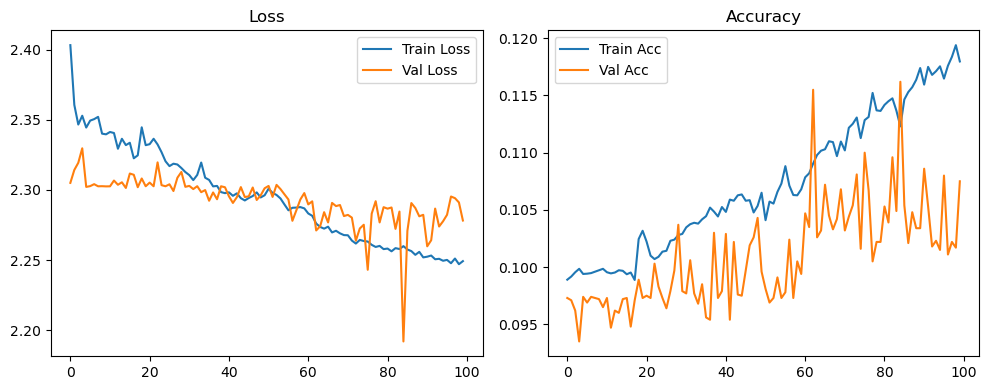

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.38it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

Original Model Final Test Loss: 2.2778 Accuracy: 0.1088


🚀 Running: batch256_lr_max_0.001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0983 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0983 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0989 | Val Acc: 0.0983 |:   1%|          | 1/100 [01:21<2:13:51, 81.13s/it]

| LR: 0.001000 | Train Acc: 0.0991 | Val Acc: 0.0964 |:   1%|          | 1/100 [02:38<2:13:51, 81.13s/it]

| LR: 0.001000 | Train Acc: 0.0991 | Val Acc: 0.0964 |:   1%|          | 1/100 [02:38<2:13:51, 81.13s/it]

| LR: 0.001000 | Train Acc: 0.0991 | Val Acc: 0.0964 |:   2%|▏         | 2/100 [02:38<2:08:32, 78.70s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0959 |:   2%|▏         | 2/100 [02:51<2:08:32, 78.70s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0959 |:   2%|▏         | 2/100 [02:51<2:08:32, 78.70s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0959 |:   3%|▎         | 3/100 [02:51<1:19:14, 49.02s/it]

| LR: 0.000998 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [03:05<1:19:14, 49.02s/it]

| LR: 0.000998 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [03:05<1:19:14, 49.02s/it]

| LR: 0.000998 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [03:05<56:11, 35.12s/it]  

| LR: 0.000996 | Train Acc: 0.0989 | Val Acc: 0.0906 |:   4%|▍         | 4/100 [03:19<56:11, 35.12s/it]

| LR: 0.000996 | Train Acc: 0.0989 | Val Acc: 0.0906 |:   4%|▍         | 4/100 [03:19<56:11, 35.12s/it]

| LR: 0.000996 | Train Acc: 0.0989 | Val Acc: 0.0906 |:   5%|▌         | 5/100 [03:19<43:31, 27.49s/it]

| LR: 0.000994 | Train Acc: 0.1001 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [03:33<43:31, 27.49s/it]

| LR: 0.000994 | Train Acc: 0.1001 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [03:33<43:31, 27.49s/it]

| LR: 0.000994 | Train Acc: 0.1001 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [03:33<35:45, 22.83s/it]

| LR: 0.000991 | Train Acc: 0.1032 | Val Acc: 0.0994 |:   6%|▌         | 6/100 [03:47<35:45, 22.83s/it]

| LR: 0.000991 | Train Acc: 0.1032 | Val Acc: 0.0994 |:   6%|▌         | 6/100 [03:47<35:45, 22.83s/it]

| LR: 0.000991 | Train Acc: 0.1032 | Val Acc: 0.0994 |:   7%|▋         | 7/100 [03:47<30:46, 19.86s/it]

| LR: 0.000988 | Train Acc: 0.1059 | Val Acc: 0.1276 |:   7%|▋         | 7/100 [04:00<30:46, 19.86s/it]

| LR: 0.000988 | Train Acc: 0.1059 | Val Acc: 0.1276 |:   7%|▋         | 7/100 [04:00<30:46, 19.86s/it]

| LR: 0.000988 | Train Acc: 0.1059 | Val Acc: 0.1276 |:   8%|▊         | 8/100 [04:00<27:28, 17.92s/it]

| LR: 0.000984 | Train Acc: 0.1099 | Val Acc: 0.1506 |:   8%|▊         | 8/100 [04:14<27:28, 17.92s/it]

| LR: 0.000984 | Train Acc: 0.1099 | Val Acc: 0.1506 |:   8%|▊         | 8/100 [04:14<27:28, 17.92s/it]

| LR: 0.000984 | Train Acc: 0.1099 | Val Acc: 0.1506 |:   9%|▉         | 9/100 [04:14<25:14, 16.64s/it]

| LR: 0.000980 | Train Acc: 0.1139 | Val Acc: 0.1197 |:   9%|▉         | 9/100 [04:28<25:14, 16.64s/it]

| LR: 0.000980 | Train Acc: 0.1139 | Val Acc: 0.1197 |:   9%|▉         | 9/100 [04:28<25:14, 16.64s/it]

| LR: 0.000980 | Train Acc: 0.1139 | Val Acc: 0.1197 |:  10%|█         | 10/100 [04:28<23:37, 15.75s/it]

| LR: 0.000976 | Train Acc: 0.1241 | Val Acc: 0.1388 |:  10%|█         | 10/100 [04:42<23:37, 15.75s/it]

| LR: 0.000976 | Train Acc: 0.1241 | Val Acc: 0.1388 |:  10%|█         | 10/100 [04:42<23:37, 15.75s/it]

| LR: 0.000976 | Train Acc: 0.1241 | Val Acc: 0.1388 |:  11%|█         | 11/100 [04:42<22:26, 15.13s/it]

| LR: 0.000970 | Train Acc: 0.1362 | Val Acc: 0.1364 |:  11%|█         | 11/100 [04:55<22:26, 15.13s/it]

| LR: 0.000970 | Train Acc: 0.1362 | Val Acc: 0.1364 |:  11%|█         | 11/100 [04:55<22:26, 15.13s/it]

| LR: 0.000970 | Train Acc: 0.1362 | Val Acc: 0.1364 |:  12%|█▏        | 12/100 [04:55<21:32, 14.68s/it]

| LR: 0.000965 | Train Acc: 0.1627 | Val Acc: 0.1943 |:  12%|█▏        | 12/100 [05:09<21:32, 14.68s/it]

| LR: 0.000965 | Train Acc: 0.1627 | Val Acc: 0.1943 |:  12%|█▏        | 12/100 [05:09<21:32, 14.68s/it]

| LR: 0.000965 | Train Acc: 0.1627 | Val Acc: 0.1943 |:  13%|█▎        | 13/100 [05:09<20:51, 14.38s/it]

| LR: 0.000959 | Train Acc: 0.1873 | Val Acc: 0.2142 |:  13%|█▎        | 13/100 [05:23<20:51, 14.38s/it]

| LR: 0.000959 | Train Acc: 0.1873 | Val Acc: 0.2142 |:  13%|█▎        | 13/100 [05:23<20:51, 14.38s/it]

| LR: 0.000959 | Train Acc: 0.1873 | Val Acc: 0.2142 |:  14%|█▍        | 14/100 [05:23<20:19, 14.18s/it]

| LR: 0.000952 | Train Acc: 0.2248 | Val Acc: 0.1976 |:  14%|█▍        | 14/100 [05:37<20:19, 14.18s/it]

| LR: 0.000952 | Train Acc: 0.2248 | Val Acc: 0.1976 |:  14%|█▍        | 14/100 [05:37<20:19, 14.18s/it]

| LR: 0.000952 | Train Acc: 0.2248 | Val Acc: 0.1976 |:  15%|█▌        | 15/100 [05:37<19:56, 14.08s/it]

| LR: 0.000946 | Train Acc: 0.2691 | Val Acc: 0.2786 |:  15%|█▌        | 15/100 [05:50<19:56, 14.08s/it]

| LR: 0.000946 | Train Acc: 0.2691 | Val Acc: 0.2786 |:  15%|█▌        | 15/100 [05:50<19:56, 14.08s/it]

| LR: 0.000946 | Train Acc: 0.2691 | Val Acc: 0.2786 |:  16%|█▌        | 16/100 [05:50<19:33, 13.97s/it]

| LR: 0.000938 | Train Acc: 0.3136 | Val Acc: 0.2816 |:  16%|█▌        | 16/100 [06:04<19:33, 13.97s/it]

| LR: 0.000938 | Train Acc: 0.3136 | Val Acc: 0.2816 |:  16%|█▌        | 16/100 [06:04<19:33, 13.97s/it]

| LR: 0.000938 | Train Acc: 0.3136 | Val Acc: 0.2816 |:  17%|█▋        | 17/100 [06:04<19:14, 13.91s/it]

| LR: 0.000930 | Train Acc: 0.3589 | Val Acc: 0.3344 |:  17%|█▋        | 17/100 [06:18<19:14, 13.91s/it]

| LR: 0.000930 | Train Acc: 0.3589 | Val Acc: 0.3344 |:  17%|█▋        | 17/100 [06:18<19:14, 13.91s/it]

| LR: 0.000930 | Train Acc: 0.3589 | Val Acc: 0.3344 |:  18%|█▊        | 18/100 [06:18<18:57, 13.87s/it]

| LR: 0.000922 | Train Acc: 0.3891 | Val Acc: 0.3937 |:  18%|█▊        | 18/100 [06:32<18:57, 13.87s/it]

| LR: 0.000922 | Train Acc: 0.3891 | Val Acc: 0.3937 |:  18%|█▊        | 18/100 [06:32<18:57, 13.87s/it]

| LR: 0.000922 | Train Acc: 0.3891 | Val Acc: 0.3937 |:  19%|█▉        | 19/100 [06:32<18:40, 13.84s/it]

| LR: 0.000914 | Train Acc: 0.4134 | Val Acc: 0.4005 |:  19%|█▉        | 19/100 [06:45<18:40, 13.84s/it]

| LR: 0.000914 | Train Acc: 0.4134 | Val Acc: 0.4005 |:  19%|█▉        | 19/100 [06:45<18:40, 13.84s/it]

| LR: 0.000914 | Train Acc: 0.4134 | Val Acc: 0.4005 |:  20%|██        | 20/100 [06:45<18:24, 13.80s/it]

| LR: 0.000905 | Train Acc: 0.4264 | Val Acc: 0.4379 |:  20%|██        | 20/100 [06:59<18:24, 13.80s/it]

| LR: 0.000905 | Train Acc: 0.4264 | Val Acc: 0.4379 |:  20%|██        | 20/100 [06:59<18:24, 13.80s/it]

| LR: 0.000905 | Train Acc: 0.4264 | Val Acc: 0.4379 |:  21%|██        | 21/100 [06:59<18:09, 13.79s/it]

| LR: 0.000895 | Train Acc: 0.4558 | Val Acc: 0.4345 |:  21%|██        | 21/100 [07:13<18:09, 13.79s/it]

| LR: 0.000895 | Train Acc: 0.4558 | Val Acc: 0.4345 |:  21%|██        | 21/100 [07:13<18:09, 13.79s/it]

| LR: 0.000895 | Train Acc: 0.4558 | Val Acc: 0.4345 |:  22%|██▏       | 22/100 [07:13<17:55, 13.79s/it]

| LR: 0.000885 | Train Acc: 0.4648 | Val Acc: 0.4535 |:  22%|██▏       | 22/100 [07:27<17:55, 13.79s/it]

| LR: 0.000885 | Train Acc: 0.4648 | Val Acc: 0.4535 |:  22%|██▏       | 22/100 [07:27<17:55, 13.79s/it]

| LR: 0.000885 | Train Acc: 0.4648 | Val Acc: 0.4535 |:  23%|██▎       | 23/100 [07:27<17:41, 13.79s/it]

| LR: 0.000875 | Train Acc: 0.4774 | Val Acc: 0.4532 |:  23%|██▎       | 23/100 [07:40<17:41, 13.79s/it]

| LR: 0.000875 | Train Acc: 0.4774 | Val Acc: 0.4532 |:  23%|██▎       | 23/100 [07:40<17:41, 13.79s/it]

| LR: 0.000875 | Train Acc: 0.4774 | Val Acc: 0.4532 |:  24%|██▍       | 24/100 [07:41<17:28, 13.80s/it]

| LR: 0.000865 | Train Acc: 0.4931 | Val Acc: 0.4661 |:  24%|██▍       | 24/100 [07:54<17:28, 13.80s/it]

| LR: 0.000865 | Train Acc: 0.4931 | Val Acc: 0.4661 |:  24%|██▍       | 24/100 [07:54<17:28, 13.80s/it]

| LR: 0.000865 | Train Acc: 0.4931 | Val Acc: 0.4661 |:  25%|██▌       | 25/100 [07:54<17:16, 13.82s/it]

| LR: 0.000854 | Train Acc: 0.5034 | Val Acc: 0.4845 |:  25%|██▌       | 25/100 [08:08<17:16, 13.82s/it]

| LR: 0.000854 | Train Acc: 0.5034 | Val Acc: 0.4845 |:  25%|██▌       | 25/100 [08:08<17:16, 13.82s/it]

| LR: 0.000854 | Train Acc: 0.5034 | Val Acc: 0.4845 |:  26%|██▌       | 26/100 [08:08<17:03, 13.84s/it]

| LR: 0.000842 | Train Acc: 0.5202 | Val Acc: 0.5098 |:  26%|██▌       | 26/100 [08:22<17:03, 13.84s/it]

| LR: 0.000842 | Train Acc: 0.5202 | Val Acc: 0.5098 |:  26%|██▌       | 26/100 [08:22<17:03, 13.84s/it]

| LR: 0.000842 | Train Acc: 0.5202 | Val Acc: 0.5098 |:  27%|██▋       | 27/100 [08:22<16:50, 13.84s/it]

| LR: 0.000831 | Train Acc: 0.5272 | Val Acc: 0.4784 |:  27%|██▋       | 27/100 [08:36<16:50, 13.84s/it]

| LR: 0.000831 | Train Acc: 0.5272 | Val Acc: 0.4784 |:  27%|██▋       | 27/100 [08:36<16:50, 13.84s/it]

| LR: 0.000831 | Train Acc: 0.5272 | Val Acc: 0.4784 |:  28%|██▊       | 28/100 [08:36<16:38, 13.86s/it]

| LR: 0.000819 | Train Acc: 0.5348 | Val Acc: 0.4915 |:  28%|██▊       | 28/100 [08:50<16:38, 13.86s/it]

| LR: 0.000819 | Train Acc: 0.5348 | Val Acc: 0.4915 |:  28%|██▊       | 28/100 [08:50<16:38, 13.86s/it]

| LR: 0.000819 | Train Acc: 0.5348 | Val Acc: 0.4915 |:  29%|██▉       | 29/100 [08:50<16:24, 13.86s/it]

| LR: 0.000807 | Train Acc: 0.5421 | Val Acc: 0.5116 |:  29%|██▉       | 29/100 [09:04<16:24, 13.86s/it]

| LR: 0.000807 | Train Acc: 0.5421 | Val Acc: 0.5116 |:  29%|██▉       | 29/100 [09:04<16:24, 13.86s/it]

| LR: 0.000807 | Train Acc: 0.5421 | Val Acc: 0.5116 |:  30%|███       | 30/100 [09:04<16:10, 13.87s/it]

| LR: 0.000794 | Train Acc: 0.5568 | Val Acc: 0.5187 |:  30%|███       | 30/100 [09:18<16:10, 13.87s/it]

| LR: 0.000794 | Train Acc: 0.5568 | Val Acc: 0.5187 |:  30%|███       | 30/100 [09:18<16:10, 13.87s/it]

| LR: 0.000794 | Train Acc: 0.5568 | Val Acc: 0.5187 |:  31%|███       | 31/100 [09:18<15:57, 13.88s/it]

| LR: 0.000781 | Train Acc: 0.5616 | Val Acc: 0.5257 |:  31%|███       | 31/100 [09:31<15:57, 13.88s/it]

| LR: 0.000781 | Train Acc: 0.5616 | Val Acc: 0.5257 |:  31%|███       | 31/100 [09:31<15:57, 13.88s/it]

| LR: 0.000781 | Train Acc: 0.5616 | Val Acc: 0.5257 |:  32%|███▏      | 32/100 [09:32<15:42, 13.87s/it]

| LR: 0.000768 | Train Acc: 0.5698 | Val Acc: 0.5449 |:  32%|███▏      | 32/100 [09:45<15:42, 13.87s/it]

| LR: 0.000768 | Train Acc: 0.5698 | Val Acc: 0.5449 |:  32%|███▏      | 32/100 [09:45<15:42, 13.87s/it]

| LR: 0.000768 | Train Acc: 0.5698 | Val Acc: 0.5449 |:  33%|███▎      | 33/100 [09:45<15:28, 13.86s/it]

| LR: 0.000755 | Train Acc: 0.5775 | Val Acc: 0.4855 |:  33%|███▎      | 33/100 [09:59<15:28, 13.86s/it]

| LR: 0.000755 | Train Acc: 0.5775 | Val Acc: 0.4855 |:  33%|███▎      | 33/100 [09:59<15:28, 13.86s/it]

| LR: 0.000755 | Train Acc: 0.5775 | Val Acc: 0.4855 |:  34%|███▍      | 34/100 [09:59<15:14, 13.86s/it]

| LR: 0.000741 | Train Acc: 0.5819 | Val Acc: 0.5291 |:  34%|███▍      | 34/100 [10:13<15:14, 13.86s/it]

| LR: 0.000741 | Train Acc: 0.5819 | Val Acc: 0.5291 |:  34%|███▍      | 34/100 [10:13<15:14, 13.86s/it]

| LR: 0.000741 | Train Acc: 0.5819 | Val Acc: 0.5291 |:  35%|███▌      | 35/100 [10:13<14:59, 13.84s/it]

| LR: 0.000727 | Train Acc: 0.5852 | Val Acc: 0.5421 |:  35%|███▌      | 35/100 [10:27<14:59, 13.84s/it]

| LR: 0.000727 | Train Acc: 0.5852 | Val Acc: 0.5421 |:  35%|███▌      | 35/100 [10:27<14:59, 13.84s/it]

| LR: 0.000727 | Train Acc: 0.5852 | Val Acc: 0.5421 |:  36%|███▌      | 36/100 [10:27<14:45, 13.84s/it]

| LR: 0.000713 | Train Acc: 0.5893 | Val Acc: 0.5368 |:  36%|███▌      | 36/100 [10:41<14:45, 13.84s/it]

| LR: 0.000713 | Train Acc: 0.5893 | Val Acc: 0.5368 |:  36%|███▌      | 36/100 [10:41<14:45, 13.84s/it]

| LR: 0.000713 | Train Acc: 0.5893 | Val Acc: 0.5368 |:  37%|███▋      | 37/100 [10:41<14:30, 13.82s/it]

| LR: 0.000699 | Train Acc: 0.5954 | Val Acc: 0.5362 |:  37%|███▋      | 37/100 [10:54<14:30, 13.82s/it]

| LR: 0.000699 | Train Acc: 0.5954 | Val Acc: 0.5362 |:  37%|███▋      | 37/100 [10:54<14:30, 13.82s/it]

| LR: 0.000699 | Train Acc: 0.5954 | Val Acc: 0.5362 |:  38%|███▊      | 38/100 [10:54<14:16, 13.82s/it]

| LR: 0.000684 | Train Acc: 0.6019 | Val Acc: 0.5555 |:  38%|███▊      | 38/100 [11:08<14:16, 13.82s/it]

| LR: 0.000684 | Train Acc: 0.6019 | Val Acc: 0.5555 |:  38%|███▊      | 38/100 [11:08<14:16, 13.82s/it]

| LR: 0.000684 | Train Acc: 0.6019 | Val Acc: 0.5555 |:  39%|███▉      | 39/100 [11:08<14:05, 13.86s/it]

| LR: 0.000670 | Train Acc: 0.6079 | Val Acc: 0.5676 |:  39%|███▉      | 39/100 [11:22<14:05, 13.86s/it]

| LR: 0.000670 | Train Acc: 0.6079 | Val Acc: 0.5676 |:  39%|███▉      | 39/100 [11:22<14:05, 13.86s/it]

| LR: 0.000670 | Train Acc: 0.6079 | Val Acc: 0.5676 |:  40%|████      | 40/100 [11:22<13:51, 13.86s/it]

| LR: 0.000655 | Train Acc: 0.6139 | Val Acc: 0.5662 |:  40%|████      | 40/100 [11:36<13:51, 13.86s/it]

| LR: 0.000655 | Train Acc: 0.6139 | Val Acc: 0.5662 |:  40%|████      | 40/100 [11:36<13:51, 13.86s/it]

| LR: 0.000655 | Train Acc: 0.6139 | Val Acc: 0.5662 |:  41%|████      | 41/100 [11:36<13:38, 13.87s/it]

| LR: 0.000640 | Train Acc: 0.6142 | Val Acc: 0.5685 |:  41%|████      | 41/100 [11:50<13:38, 13.87s/it]

| LR: 0.000640 | Train Acc: 0.6142 | Val Acc: 0.5685 |:  41%|████      | 41/100 [11:50<13:38, 13.87s/it]

| LR: 0.000640 | Train Acc: 0.6142 | Val Acc: 0.5685 |:  42%|████▏     | 42/100 [11:50<13:24, 13.87s/it]

| LR: 0.000625 | Train Acc: 0.6203 | Val Acc: 0.5645 |:  42%|████▏     | 42/100 [12:04<13:24, 13.87s/it]

| LR: 0.000625 | Train Acc: 0.6203 | Val Acc: 0.5645 |:  42%|████▏     | 42/100 [12:04<13:24, 13.87s/it]

| LR: 0.000625 | Train Acc: 0.6203 | Val Acc: 0.5645 |:  43%|████▎     | 43/100 [12:04<13:10, 13.87s/it]

| LR: 0.000609 | Train Acc: 0.6261 | Val Acc: 0.5669 |:  43%|████▎     | 43/100 [12:18<13:10, 13.87s/it]

| LR: 0.000609 | Train Acc: 0.6261 | Val Acc: 0.5669 |:  43%|████▎     | 43/100 [12:18<13:10, 13.87s/it]

| LR: 0.000609 | Train Acc: 0.6261 | Val Acc: 0.5669 |:  44%|████▍     | 44/100 [12:18<12:54, 13.83s/it]

| LR: 0.000594 | Train Acc: 0.6334 | Val Acc: 0.5753 |:  44%|████▍     | 44/100 [12:32<12:54, 13.83s/it]

| LR: 0.000594 | Train Acc: 0.6334 | Val Acc: 0.5753 |:  44%|████▍     | 44/100 [12:32<12:54, 13.83s/it]

| LR: 0.000594 | Train Acc: 0.6334 | Val Acc: 0.5753 |:  45%|████▌     | 45/100 [12:32<12:43, 13.88s/it]

| LR: 0.000579 | Train Acc: 0.6343 | Val Acc: 0.5727 |:  45%|████▌     | 45/100 [12:45<12:43, 13.88s/it]

| LR: 0.000579 | Train Acc: 0.6343 | Val Acc: 0.5727 |:  45%|████▌     | 45/100 [12:45<12:43, 13.88s/it]

| LR: 0.000579 | Train Acc: 0.6343 | Val Acc: 0.5727 |:  46%|████▌     | 46/100 [12:45<12:28, 13.85s/it]

| LR: 0.000563 | Train Acc: 0.6371 | Val Acc: 0.5850 |:  46%|████▌     | 46/100 [12:59<12:28, 13.85s/it]

| LR: 0.000563 | Train Acc: 0.6371 | Val Acc: 0.5850 |:  46%|████▌     | 46/100 [12:59<12:28, 13.85s/it]

| LR: 0.000563 | Train Acc: 0.6371 | Val Acc: 0.5850 |:  47%|████▋     | 47/100 [12:59<12:13, 13.85s/it]

| LR: 0.000548 | Train Acc: 0.6442 | Val Acc: 0.5910 |:  47%|████▋     | 47/100 [13:13<12:13, 13.85s/it]

| LR: 0.000548 | Train Acc: 0.6442 | Val Acc: 0.5910 |:  47%|████▋     | 47/100 [13:13<12:13, 13.85s/it]

| LR: 0.000548 | Train Acc: 0.6442 | Val Acc: 0.5910 |:  48%|████▊     | 48/100 [13:13<11:59, 13.83s/it]

| LR: 0.000532 | Train Acc: 0.6464 | Val Acc: 0.5722 |:  48%|████▊     | 48/100 [13:27<11:59, 13.83s/it]

| LR: 0.000532 | Train Acc: 0.6464 | Val Acc: 0.5722 |:  48%|████▊     | 48/100 [13:27<11:59, 13.83s/it]

| LR: 0.000532 | Train Acc: 0.6464 | Val Acc: 0.5722 |:  49%|████▉     | 49/100 [13:27<11:46, 13.85s/it]

| LR: 0.000516 | Train Acc: 0.6509 | Val Acc: 0.5872 |:  49%|████▉     | 49/100 [13:41<11:46, 13.85s/it]

| LR: 0.000516 | Train Acc: 0.6509 | Val Acc: 0.5872 |:  49%|████▉     | 49/100 [13:41<11:46, 13.85s/it]

| LR: 0.000516 | Train Acc: 0.6509 | Val Acc: 0.5872 |:  50%|█████     | 50/100 [13:41<11:32, 13.84s/it]

| LR: 0.000501 | Train Acc: 0.6594 | Val Acc: 0.5815 |:  50%|█████     | 50/100 [13:55<11:32, 13.84s/it]

| LR: 0.000501 | Train Acc: 0.6594 | Val Acc: 0.5815 |:  50%|█████     | 50/100 [13:55<11:32, 13.84s/it]

| LR: 0.000501 | Train Acc: 0.6594 | Val Acc: 0.5815 |:  51%|█████     | 51/100 [13:55<11:18, 13.84s/it]

| LR: 0.000485 | Train Acc: 0.6577 | Val Acc: 0.5903 |:  51%|█████     | 51/100 [14:08<11:18, 13.84s/it]

| LR: 0.000485 | Train Acc: 0.6577 | Val Acc: 0.5903 |:  51%|█████     | 51/100 [14:08<11:18, 13.84s/it]

| LR: 0.000485 | Train Acc: 0.6577 | Val Acc: 0.5903 |:  52%|█████▏    | 52/100 [14:08<11:04, 13.84s/it]

| LR: 0.000469 | Train Acc: 0.6602 | Val Acc: 0.5844 |:  52%|█████▏    | 52/100 [14:22<11:04, 13.84s/it]

| LR: 0.000469 | Train Acc: 0.6602 | Val Acc: 0.5844 |:  52%|█████▏    | 52/100 [14:22<11:04, 13.84s/it]

| LR: 0.000469 | Train Acc: 0.6602 | Val Acc: 0.5844 |:  53%|█████▎    | 53/100 [14:22<10:48, 13.81s/it]

| LR: 0.000453 | Train Acc: 0.6588 | Val Acc: 0.6009 |:  53%|█████▎    | 53/100 [14:36<10:48, 13.81s/it]

| LR: 0.000453 | Train Acc: 0.6588 | Val Acc: 0.6009 |:  53%|█████▎    | 53/100 [14:36<10:48, 13.81s/it]

| LR: 0.000453 | Train Acc: 0.6588 | Val Acc: 0.6009 |:  54%|█████▍    | 54/100 [14:36<10:35, 13.81s/it]

| LR: 0.000438 | Train Acc: 0.6654 | Val Acc: 0.5895 |:  54%|█████▍    | 54/100 [14:50<10:35, 13.81s/it]

| LR: 0.000438 | Train Acc: 0.6654 | Val Acc: 0.5895 |:  54%|█████▍    | 54/100 [14:50<10:35, 13.81s/it]

| LR: 0.000438 | Train Acc: 0.6654 | Val Acc: 0.5895 |:  55%|█████▌    | 55/100 [14:50<10:22, 13.84s/it]

| LR: 0.000422 | Train Acc: 0.6694 | Val Acc: 0.5929 |:  55%|█████▌    | 55/100 [15:04<10:22, 13.84s/it]

| LR: 0.000422 | Train Acc: 0.6694 | Val Acc: 0.5929 |:  55%|█████▌    | 55/100 [15:04<10:22, 13.84s/it]

| LR: 0.000422 | Train Acc: 0.6694 | Val Acc: 0.5929 |:  56%|█████▌    | 56/100 [15:04<10:08, 13.83s/it]

| LR: 0.000407 | Train Acc: 0.6704 | Val Acc: 0.5581 |:  56%|█████▌    | 56/100 [15:17<10:08, 13.83s/it]

| LR: 0.000407 | Train Acc: 0.6704 | Val Acc: 0.5581 |:  56%|█████▌    | 56/100 [15:17<10:08, 13.83s/it]

| LR: 0.000407 | Train Acc: 0.6704 | Val Acc: 0.5581 |:  57%|█████▋    | 57/100 [15:18<09:54, 13.83s/it]

| LR: 0.000392 | Train Acc: 0.6746 | Val Acc: 0.5934 |:  57%|█████▋    | 57/100 [15:31<09:54, 13.83s/it]

| LR: 0.000392 | Train Acc: 0.6746 | Val Acc: 0.5934 |:  57%|█████▋    | 57/100 [15:31<09:54, 13.83s/it]

| LR: 0.000392 | Train Acc: 0.6746 | Val Acc: 0.5934 |:  58%|█████▊    | 58/100 [15:31<09:40, 13.82s/it]

| LR: 0.000376 | Train Acc: 0.6730 | Val Acc: 0.5973 |:  58%|█████▊    | 58/100 [15:45<09:40, 13.82s/it]

| LR: 0.000376 | Train Acc: 0.6730 | Val Acc: 0.5973 |:  58%|█████▊    | 58/100 [15:45<09:40, 13.82s/it]

| LR: 0.000376 | Train Acc: 0.6730 | Val Acc: 0.5973 |:  59%|█████▉    | 59/100 [15:45<09:27, 13.84s/it]

| LR: 0.000361 | Train Acc: 0.6802 | Val Acc: 0.6096 |:  59%|█████▉    | 59/100 [15:59<09:27, 13.84s/it]

| LR: 0.000361 | Train Acc: 0.6802 | Val Acc: 0.6096 |:  59%|█████▉    | 59/100 [15:59<09:27, 13.84s/it]

| LR: 0.000361 | Train Acc: 0.6802 | Val Acc: 0.6096 |:  60%|██████    | 60/100 [15:59<09:11, 13.79s/it]

| LR: 0.000346 | Train Acc: 0.6866 | Val Acc: 0.4376 |:  60%|██████    | 60/100 [16:13<09:11, 13.79s/it]

| LR: 0.000346 | Train Acc: 0.6866 | Val Acc: 0.4376 |:  60%|██████    | 60/100 [16:13<09:11, 13.79s/it]

| LR: 0.000346 | Train Acc: 0.6866 | Val Acc: 0.4376 |:  61%|██████    | 61/100 [16:13<08:58, 13.81s/it]

| LR: 0.000331 | Train Acc: 0.6863 | Val Acc: 0.4832 |:  61%|██████    | 61/100 [16:26<08:58, 13.81s/it]

| LR: 0.000331 | Train Acc: 0.6863 | Val Acc: 0.4832 |:  61%|██████    | 61/100 [16:26<08:58, 13.81s/it]

| LR: 0.000331 | Train Acc: 0.6863 | Val Acc: 0.4832 |:  62%|██████▏   | 62/100 [16:26<08:43, 13.79s/it]

| LR: 0.000317 | Train Acc: 0.6887 | Val Acc: 0.5139 |:  62%|██████▏   | 62/100 [16:40<08:43, 13.79s/it]

| LR: 0.000317 | Train Acc: 0.6887 | Val Acc: 0.5139 |:  62%|██████▏   | 62/100 [16:40<08:43, 13.79s/it]

| LR: 0.000317 | Train Acc: 0.6887 | Val Acc: 0.5139 |:  63%|██████▎   | 63/100 [16:40<08:29, 13.78s/it]

| LR: 0.000302 | Train Acc: 0.6895 | Val Acc: 0.4323 |:  63%|██████▎   | 63/100 [16:54<08:29, 13.78s/it]

| LR: 0.000302 | Train Acc: 0.6895 | Val Acc: 0.4323 |:  63%|██████▎   | 63/100 [16:54<08:29, 13.78s/it]

| LR: 0.000302 | Train Acc: 0.6895 | Val Acc: 0.4323 |:  64%|██████▍   | 64/100 [16:54<08:17, 13.81s/it]

| LR: 0.000288 | Train Acc: 0.6935 | Val Acc: 0.6127 |:  64%|██████▍   | 64/100 [17:08<08:17, 13.81s/it]

| LR: 0.000288 | Train Acc: 0.6935 | Val Acc: 0.6127 |:  64%|██████▍   | 64/100 [17:08<08:17, 13.81s/it]

| LR: 0.000288 | Train Acc: 0.6935 | Val Acc: 0.6127 |:  65%|██████▌   | 65/100 [17:08<08:03, 13.81s/it]

| LR: 0.000274 | Train Acc: 0.6931 | Val Acc: 0.6130 |:  65%|██████▌   | 65/100 [17:22<08:03, 13.81s/it]

| LR: 0.000274 | Train Acc: 0.6931 | Val Acc: 0.6130 |:  65%|██████▌   | 65/100 [17:22<08:03, 13.81s/it]

| LR: 0.000274 | Train Acc: 0.6931 | Val Acc: 0.6130 |:  66%|██████▌   | 66/100 [17:22<07:49, 13.80s/it]

| LR: 0.000260 | Train Acc: 0.6942 | Val Acc: 0.6116 |:  66%|██████▌   | 66/100 [17:35<07:49, 13.80s/it]

| LR: 0.000260 | Train Acc: 0.6942 | Val Acc: 0.6116 |:  66%|██████▌   | 66/100 [17:35<07:49, 13.80s/it]

| LR: 0.000260 | Train Acc: 0.6942 | Val Acc: 0.6116 |:  67%|██████▋   | 67/100 [17:36<07:35, 13.81s/it]

| LR: 0.000246 | Train Acc: 0.6955 | Val Acc: 0.5994 |:  67%|██████▋   | 67/100 [17:49<07:35, 13.81s/it]

| LR: 0.000246 | Train Acc: 0.6955 | Val Acc: 0.5994 |:  67%|██████▋   | 67/100 [17:49<07:35, 13.81s/it]

| LR: 0.000246 | Train Acc: 0.6955 | Val Acc: 0.5994 |:  68%|██████▊   | 68/100 [17:49<07:22, 13.83s/it]

| LR: 0.000233 | Train Acc: 0.7027 | Val Acc: 0.5806 |:  68%|██████▊   | 68/100 [18:03<07:22, 13.83s/it]

| LR: 0.000233 | Train Acc: 0.7027 | Val Acc: 0.5806 |:  68%|██████▊   | 68/100 [18:03<07:22, 13.83s/it]

| LR: 0.000233 | Train Acc: 0.7027 | Val Acc: 0.5806 |:  69%|██████▉   | 69/100 [18:03<07:08, 13.82s/it]

| LR: 0.000220 | Train Acc: 0.7029 | Val Acc: 0.5892 |:  69%|██████▉   | 69/100 [18:17<07:08, 13.82s/it]

| LR: 0.000220 | Train Acc: 0.7029 | Val Acc: 0.5892 |:  69%|██████▉   | 69/100 [18:17<07:08, 13.82s/it]

| LR: 0.000220 | Train Acc: 0.7029 | Val Acc: 0.5892 |:  70%|███████   | 70/100 [18:17<06:55, 13.84s/it]

| LR: 0.000207 | Train Acc: 0.7025 | Val Acc: 0.4713 |:  70%|███████   | 70/100 [18:31<06:55, 13.84s/it]

| LR: 0.000207 | Train Acc: 0.7025 | Val Acc: 0.4713 |:  70%|███████   | 70/100 [18:31<06:55, 13.84s/it]

| LR: 0.000207 | Train Acc: 0.7025 | Val Acc: 0.4713 |:  71%|███████   | 71/100 [18:31<06:41, 13.85s/it]

| LR: 0.000194 | Train Acc: 0.7000 | Val Acc: 0.5940 |:  71%|███████   | 71/100 [18:45<06:41, 13.85s/it]

| LR: 0.000194 | Train Acc: 0.7000 | Val Acc: 0.5940 |:  71%|███████   | 71/100 [18:45<06:41, 13.85s/it]

| LR: 0.000194 | Train Acc: 0.7000 | Val Acc: 0.5940 |:  72%|███████▏  | 72/100 [18:45<06:27, 13.83s/it]

| LR: 0.000182 | Train Acc: 0.7051 | Val Acc: 0.6121 |:  72%|███████▏  | 72/100 [18:58<06:27, 13.83s/it]

| LR: 0.000182 | Train Acc: 0.7051 | Val Acc: 0.6121 |:  72%|███████▏  | 72/100 [18:59<06:27, 13.83s/it]

| LR: 0.000182 | Train Acc: 0.7051 | Val Acc: 0.6121 |:  73%|███████▎  | 73/100 [18:59<06:13, 13.83s/it]

| LR: 0.000170 | Train Acc: 0.7079 | Val Acc: 0.6139 |:  73%|███████▎  | 73/100 [19:12<06:13, 13.83s/it]

| LR: 0.000170 | Train Acc: 0.7079 | Val Acc: 0.6139 |:  73%|███████▎  | 73/100 [19:12<06:13, 13.83s/it]

| LR: 0.000170 | Train Acc: 0.7079 | Val Acc: 0.6139 |:  74%|███████▍  | 74/100 [19:12<05:59, 13.82s/it]

| LR: 0.000159 | Train Acc: 0.7128 | Val Acc: 0.5390 |:  74%|███████▍  | 74/100 [19:26<05:59, 13.82s/it]

| LR: 0.000159 | Train Acc: 0.7128 | Val Acc: 0.5390 |:  74%|███████▍  | 74/100 [19:26<05:59, 13.82s/it]

| LR: 0.000159 | Train Acc: 0.7128 | Val Acc: 0.5390 |:  75%|███████▌  | 75/100 [19:26<05:45, 13.82s/it]

| LR: 0.000147 | Train Acc: 0.7098 | Val Acc: 0.5003 |:  75%|███████▌  | 75/100 [19:40<05:45, 13.82s/it]

| LR: 0.000147 | Train Acc: 0.7098 | Val Acc: 0.5003 |:  75%|███████▌  | 75/100 [19:40<05:45, 13.82s/it]

| LR: 0.000147 | Train Acc: 0.7098 | Val Acc: 0.5003 |:  76%|███████▌  | 76/100 [19:40<05:31, 13.81s/it]

| LR: 0.000136 | Train Acc: 0.7076 | Val Acc: 0.6013 |:  76%|███████▌  | 76/100 [19:54<05:31, 13.81s/it]

| LR: 0.000136 | Train Acc: 0.7076 | Val Acc: 0.6013 |:  76%|███████▌  | 76/100 [19:54<05:31, 13.81s/it]

| LR: 0.000136 | Train Acc: 0.7076 | Val Acc: 0.6013 |:  77%|███████▋  | 77/100 [19:54<05:18, 13.83s/it]

| LR: 0.000126 | Train Acc: 0.7104 | Val Acc: 0.6205 |:  77%|███████▋  | 77/100 [20:08<05:18, 13.83s/it]

| LR: 0.000126 | Train Acc: 0.7104 | Val Acc: 0.6205 |:  77%|███████▋  | 77/100 [20:08<05:18, 13.83s/it]

| LR: 0.000126 | Train Acc: 0.7104 | Val Acc: 0.6205 |:  78%|███████▊  | 78/100 [20:08<05:04, 13.84s/it]

| LR: 0.000116 | Train Acc: 0.7135 | Val Acc: 0.6033 |:  78%|███████▊  | 78/100 [20:22<05:04, 13.84s/it]

| LR: 0.000116 | Train Acc: 0.7135 | Val Acc: 0.6033 |:  78%|███████▊  | 78/100 [20:22<05:04, 13.84s/it]

| LR: 0.000116 | Train Acc: 0.7135 | Val Acc: 0.6033 |:  79%|███████▉  | 79/100 [20:22<04:51, 13.86s/it]

| LR: 0.000106 | Train Acc: 0.7160 | Val Acc: 0.4610 |:  79%|███████▉  | 79/100 [20:35<04:51, 13.86s/it]

| LR: 0.000106 | Train Acc: 0.7160 | Val Acc: 0.4610 |:  79%|███████▉  | 79/100 [20:35<04:51, 13.86s/it]

| LR: 0.000106 | Train Acc: 0.7160 | Val Acc: 0.4610 |:  80%|████████  | 80/100 [20:35<04:37, 13.86s/it]

| LR: 0.000096 | Train Acc: 0.7161 | Val Acc: 0.6174 |:  80%|████████  | 80/100 [20:49<04:37, 13.86s/it]

| LR: 0.000096 | Train Acc: 0.7161 | Val Acc: 0.6174 |:  80%|████████  | 80/100 [20:49<04:37, 13.86s/it]

| LR: 0.000096 | Train Acc: 0.7161 | Val Acc: 0.6174 |:  81%|████████  | 81/100 [20:49<04:23, 13.86s/it]

| LR: 0.000087 | Train Acc: 0.7139 | Val Acc: 0.6149 |:  81%|████████  | 81/100 [21:03<04:23, 13.86s/it]

| LR: 0.000087 | Train Acc: 0.7139 | Val Acc: 0.6149 |:  81%|████████  | 81/100 [21:03<04:23, 13.86s/it]

| LR: 0.000087 | Train Acc: 0.7139 | Val Acc: 0.6149 |:  82%|████████▏ | 82/100 [21:03<04:08, 13.83s/it]

| LR: 0.000079 | Train Acc: 0.7146 | Val Acc: 0.6014 |:  82%|████████▏ | 82/100 [21:17<04:08, 13.83s/it]

| LR: 0.000079 | Train Acc: 0.7146 | Val Acc: 0.6014 |:  82%|████████▏ | 82/100 [21:17<04:08, 13.83s/it]

| LR: 0.000079 | Train Acc: 0.7146 | Val Acc: 0.6014 |:  83%|████████▎ | 83/100 [21:17<03:54, 13.82s/it]

| LR: 0.000071 | Train Acc: 0.7201 | Val Acc: 0.4999 |:  83%|████████▎ | 83/100 [21:31<03:54, 13.82s/it]

| LR: 0.000071 | Train Acc: 0.7201 | Val Acc: 0.4999 |:  83%|████████▎ | 83/100 [21:31<03:54, 13.82s/it]

| LR: 0.000071 | Train Acc: 0.7201 | Val Acc: 0.4999 |:  84%|████████▍ | 84/100 [21:31<03:40, 13.81s/it]

| LR: 0.000063 | Train Acc: 0.7176 | Val Acc: 0.5355 |:  84%|████████▍ | 84/100 [21:44<03:40, 13.81s/it]

| LR: 0.000063 | Train Acc: 0.7176 | Val Acc: 0.5355 |:  84%|████████▍ | 84/100 [21:44<03:40, 13.81s/it]

| LR: 0.000063 | Train Acc: 0.7176 | Val Acc: 0.5355 |:  85%|████████▌ | 85/100 [21:44<03:26, 13.79s/it]

| LR: 0.000055 | Train Acc: 0.7171 | Val Acc: 0.5504 |:  85%|████████▌ | 85/100 [21:58<03:26, 13.79s/it]

| LR: 0.000055 | Train Acc: 0.7171 | Val Acc: 0.5504 |:  85%|████████▌ | 85/100 [21:58<03:26, 13.79s/it]

| LR: 0.000055 | Train Acc: 0.7171 | Val Acc: 0.5504 |:  86%|████████▌ | 86/100 [21:58<03:13, 13.80s/it]

| LR: 0.000049 | Train Acc: 0.7200 | Val Acc: 0.6080 |:  86%|████████▌ | 86/100 [22:12<03:13, 13.80s/it]

| LR: 0.000049 | Train Acc: 0.7200 | Val Acc: 0.6080 |:  86%|████████▌ | 86/100 [22:12<03:13, 13.80s/it]

| LR: 0.000049 | Train Acc: 0.7200 | Val Acc: 0.6080 |:  87%|████████▋ | 87/100 [22:12<02:59, 13.80s/it]

| LR: 0.000042 | Train Acc: 0.7217 | Val Acc: 0.5906 |:  87%|████████▋ | 87/100 [22:26<02:59, 13.80s/it]

| LR: 0.000042 | Train Acc: 0.7217 | Val Acc: 0.5906 |:  87%|████████▋ | 87/100 [22:26<02:59, 13.80s/it]

| LR: 0.000042 | Train Acc: 0.7217 | Val Acc: 0.5906 |:  88%|████████▊ | 88/100 [22:26<02:45, 13.79s/it]

| LR: 0.000036 | Train Acc: 0.7229 | Val Acc: 0.5465 |:  88%|████████▊ | 88/100 [22:40<02:45, 13.79s/it]

| LR: 0.000036 | Train Acc: 0.7229 | Val Acc: 0.5465 |:  88%|████████▊ | 88/100 [22:40<02:45, 13.79s/it]

| LR: 0.000036 | Train Acc: 0.7229 | Val Acc: 0.5465 |:  89%|████████▉ | 89/100 [22:40<02:31, 13.78s/it]

| LR: 0.000031 | Train Acc: 0.7218 | Val Acc: 0.5326 |:  89%|████████▉ | 89/100 [22:53<02:31, 13.78s/it]

| LR: 0.000031 | Train Acc: 0.7218 | Val Acc: 0.5326 |:  89%|████████▉ | 89/100 [22:53<02:31, 13.78s/it]

| LR: 0.000031 | Train Acc: 0.7218 | Val Acc: 0.5326 |:  90%|█████████ | 90/100 [22:53<02:18, 13.80s/it]

| LR: 0.000025 | Train Acc: 0.7270 | Val Acc: 0.5730 |:  90%|█████████ | 90/100 [23:07<02:18, 13.80s/it]

| LR: 0.000025 | Train Acc: 0.7270 | Val Acc: 0.5730 |:  90%|█████████ | 90/100 [23:07<02:18, 13.80s/it]

| LR: 0.000025 | Train Acc: 0.7270 | Val Acc: 0.5730 |:  91%|█████████ | 91/100 [23:07<02:04, 13.81s/it]

| LR: 0.000021 | Train Acc: 0.7267 | Val Acc: 0.6069 |:  91%|█████████ | 91/100 [23:21<02:04, 13.81s/it]

| LR: 0.000021 | Train Acc: 0.7267 | Val Acc: 0.6069 |:  91%|█████████ | 91/100 [23:21<02:04, 13.81s/it]

| LR: 0.000021 | Train Acc: 0.7267 | Val Acc: 0.6069 |:  92%|█████████▏| 92/100 [23:21<01:50, 13.81s/it]

| LR: 0.000017 | Train Acc: 0.7255 | Val Acc: 0.4874 |:  92%|█████████▏| 92/100 [23:35<01:50, 13.81s/it]

| LR: 0.000017 | Train Acc: 0.7255 | Val Acc: 0.4874 |:  92%|█████████▏| 92/100 [23:35<01:50, 13.81s/it]

| LR: 0.000017 | Train Acc: 0.7255 | Val Acc: 0.4874 |:  93%|█████████▎| 93/100 [23:35<01:36, 13.83s/it]

| LR: 0.000013 | Train Acc: 0.7281 | Val Acc: 0.5563 |:  93%|█████████▎| 93/100 [23:49<01:36, 13.83s/it]

| LR: 0.000013 | Train Acc: 0.7281 | Val Acc: 0.5563 |:  93%|█████████▎| 93/100 [23:49<01:36, 13.83s/it]

| LR: 0.000013 | Train Acc: 0.7281 | Val Acc: 0.5563 |:  94%|█████████▍| 94/100 [23:49<01:22, 13.82s/it]

| LR: 0.000010 | Train Acc: 0.7277 | Val Acc: 0.6230 |:  94%|█████████▍| 94/100 [24:03<01:22, 13.82s/it]

| LR: 0.000010 | Train Acc: 0.7277 | Val Acc: 0.6230 |:  94%|█████████▍| 94/100 [24:03<01:22, 13.82s/it]

| LR: 0.000010 | Train Acc: 0.7277 | Val Acc: 0.6230 |:  95%|█████████▌| 95/100 [24:03<01:09, 13.83s/it]

| LR: 0.000007 | Train Acc: 0.7310 | Val Acc: 0.4729 |:  95%|█████████▌| 95/100 [24:16<01:09, 13.83s/it]

| LR: 0.000007 | Train Acc: 0.7310 | Val Acc: 0.4729 |:  95%|█████████▌| 95/100 [24:16<01:09, 13.83s/it]

| LR: 0.000007 | Train Acc: 0.7310 | Val Acc: 0.4729 |:  96%|█████████▌| 96/100 [24:16<00:55, 13.83s/it]

| LR: 0.000005 | Train Acc: 0.7321 | Val Acc: 0.6171 |:  96%|█████████▌| 96/100 [24:30<00:55, 13.83s/it]

| LR: 0.000005 | Train Acc: 0.7321 | Val Acc: 0.6171 |:  96%|█████████▌| 96/100 [24:30<00:55, 13.83s/it]

| LR: 0.000005 | Train Acc: 0.7321 | Val Acc: 0.6171 |:  97%|█████████▋| 97/100 [24:30<00:41, 13.82s/it]

| LR: 0.000003 | Train Acc: 0.7317 | Val Acc: 0.5381 |:  97%|█████████▋| 97/100 [24:44<00:41, 13.82s/it]

| LR: 0.000003 | Train Acc: 0.7317 | Val Acc: 0.5381 |:  97%|█████████▋| 97/100 [24:44<00:41, 13.82s/it]

| LR: 0.000003 | Train Acc: 0.7317 | Val Acc: 0.5381 |:  98%|█████████▊| 98/100 [24:44<00:27, 13.82s/it]

| LR: 0.000002 | Train Acc: 0.7322 | Val Acc: 0.5997 |:  98%|█████████▊| 98/100 [24:59<00:27, 13.82s/it]

| LR: 0.000002 | Train Acc: 0.7322 | Val Acc: 0.5997 |:  98%|█████████▊| 98/100 [24:59<00:27, 13.82s/it]

| LR: 0.000002 | Train Acc: 0.7322 | Val Acc: 0.5997 |:  99%|█████████▉| 99/100 [24:59<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.7307 | Val Acc: 0.6121 |:  99%|█████████▉| 99/100 [25:14<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.7307 | Val Acc: 0.6121 |:  99%|█████████▉| 99/100 [25:14<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.7307 | Val Acc: 0.6121 |: 100%|██████████| 100/100 [25:14<00:00, 14.44s/it]

| LR: 0.000001 | Train Acc: 0.7307 | Val Acc: 0.6121 |: 100%|██████████| 100/100 [25:14<00:00, 15.14s/it]

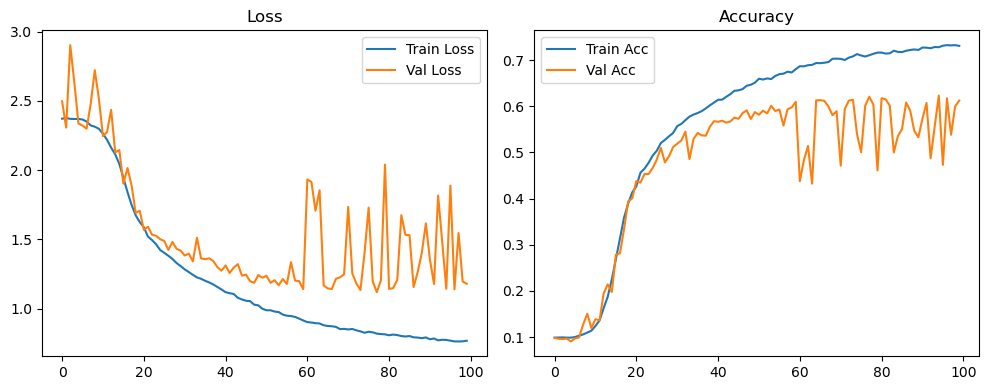

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.29it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 1.1907 Accuracy: 0.6058


🚀 Running: batch256_lr_max_0.001_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:21<2:15:07, 81.89s/it]

| LR: 0.001000 | Train Acc: 0.0999 | Val Acc: 0.0889 |:   1%|          | 1/100 [02:38<2:15:07, 81.89s/it]

| LR: 0.001000 | Train Acc: 0.0999 | Val Acc: 0.0889 |:   1%|          | 1/100 [02:38<2:15:07, 81.89s/it]

| LR: 0.001000 | Train Acc: 0.0999 | Val Acc: 0.0889 |:   2%|▏         | 2/100 [02:38<2:08:41, 78.79s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0959 |:   2%|▏         | 2/100 [02:53<2:08:41, 78.79s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0959 |:   2%|▏         | 2/100 [02:53<2:08:41, 78.79s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0959 |:   3%|▎         | 3/100 [02:53<1:20:31, 49.81s/it]

| LR: 0.000998 | Train Acc: 0.0987 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [03:09<1:20:31, 49.81s/it]

| LR: 0.000998 | Train Acc: 0.0987 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [03:09<1:20:31, 49.81s/it]

| LR: 0.000998 | Train Acc: 0.0987 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [03:09<57:55, 36.21s/it]  

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0939 |:   4%|▍         | 4/100 [03:24<57:55, 36.21s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0939 |:   4%|▍         | 4/100 [03:24<57:55, 36.21s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0939 |:   5%|▌         | 5/100 [03:24<45:36, 28.80s/it]

| LR: 0.000994 | Train Acc: 0.0981 | Val Acc: 0.0884 |:   5%|▌         | 5/100 [03:40<45:36, 28.80s/it]

| LR: 0.000994 | Train Acc: 0.0981 | Val Acc: 0.0884 |:   5%|▌         | 5/100 [03:40<45:36, 28.80s/it]

| LR: 0.000994 | Train Acc: 0.0981 | Val Acc: 0.0884 |:   6%|▌         | 6/100 [03:40<37:55, 24.21s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [03:55<37:55, 24.21s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [03:55<37:55, 24.21s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [03:55<32:50, 21.19s/it]

| LR: 0.000988 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [04:10<32:50, 21.19s/it]

| LR: 0.000988 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [04:10<32:50, 21.19s/it]

| LR: 0.000988 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [04:10<29:37, 19.32s/it]

| LR: 0.000984 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:25<29:37, 19.32s/it]

| LR: 0.000984 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:25<29:37, 19.32s/it]

| LR: 0.000984 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:25<27:08, 17.89s/it]

| LR: 0.000980 | Train Acc: 0.0994 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [04:40<27:08, 17.89s/it]

| LR: 0.000980 | Train Acc: 0.0994 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [04:40<27:08, 17.89s/it]

| LR: 0.000980 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  10%|█         | 10/100 [04:40<25:42, 17.14s/it]

| LR: 0.000976 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  10%|█         | 10/100 [04:55<25:42, 17.14s/it]

| LR: 0.000976 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  10%|█         | 10/100 [04:55<25:42, 17.14s/it]

| LR: 0.000976 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  11%|█         | 11/100 [04:55<24:22, 16.43s/it]

| LR: 0.000970 | Train Acc: 0.1006 | Val Acc: 0.0798 |:  11%|█         | 11/100 [05:11<24:22, 16.43s/it]

| LR: 0.000970 | Train Acc: 0.1006 | Val Acc: 0.0798 |:  11%|█         | 11/100 [05:11<24:22, 16.43s/it]

| LR: 0.000970 | Train Acc: 0.1006 | Val Acc: 0.0798 |:  12%|█▏        | 12/100 [05:11<23:45, 16.20s/it]

| LR: 0.000965 | Train Acc: 0.1013 | Val Acc: 0.0999 |:  12%|█▏        | 12/100 [05:26<23:45, 16.20s/it]

| LR: 0.000965 | Train Acc: 0.1013 | Val Acc: 0.0999 |:  12%|█▏        | 12/100 [05:26<23:45, 16.20s/it]

| LR: 0.000965 | Train Acc: 0.1013 | Val Acc: 0.0999 |:  13%|█▎        | 13/100 [05:26<23:13, 16.02s/it]

| LR: 0.000959 | Train Acc: 0.1032 | Val Acc: 0.0958 |:  13%|█▎        | 13/100 [05:42<23:13, 16.02s/it]

| LR: 0.000959 | Train Acc: 0.1032 | Val Acc: 0.0958 |:  13%|█▎        | 13/100 [05:42<23:13, 16.02s/it]

| LR: 0.000959 | Train Acc: 0.1032 | Val Acc: 0.0958 |:  14%|█▍        | 14/100 [05:42<22:45, 15.88s/it]

| LR: 0.000952 | Train Acc: 0.1019 | Val Acc: 0.0990 |:  14%|█▍        | 14/100 [05:57<22:45, 15.88s/it]

| LR: 0.000952 | Train Acc: 0.1019 | Val Acc: 0.0990 |:  14%|█▍        | 14/100 [05:57<22:45, 15.88s/it]

| LR: 0.000952 | Train Acc: 0.1019 | Val Acc: 0.0990 |:  15%|█▌        | 15/100 [05:57<22:21, 15.78s/it]

| LR: 0.000946 | Train Acc: 0.1034 | Val Acc: 0.0983 |:  15%|█▌        | 15/100 [06:13<22:21, 15.78s/it]

| LR: 0.000946 | Train Acc: 0.1034 | Val Acc: 0.0983 |:  15%|█▌        | 15/100 [06:13<22:21, 15.78s/it]

| LR: 0.000946 | Train Acc: 0.1034 | Val Acc: 0.0983 |:  16%|█▌        | 16/100 [06:13<22:05, 15.77s/it]

| LR: 0.000938 | Train Acc: 0.1045 | Val Acc: 0.1000 |:  16%|█▌        | 16/100 [06:29<22:05, 15.77s/it]

| LR: 0.000938 | Train Acc: 0.1045 | Val Acc: 0.1000 |:  16%|█▌        | 16/100 [06:29<22:05, 15.77s/it]

| LR: 0.000938 | Train Acc: 0.1045 | Val Acc: 0.1000 |:  17%|█▋        | 17/100 [06:29<21:45, 15.73s/it]

| LR: 0.000930 | Train Acc: 0.1067 | Val Acc: 0.1152 |:  17%|█▋        | 17/100 [06:44<21:45, 15.73s/it]

| LR: 0.000930 | Train Acc: 0.1067 | Val Acc: 0.1152 |:  17%|█▋        | 17/100 [06:44<21:45, 15.73s/it]

| LR: 0.000930 | Train Acc: 0.1067 | Val Acc: 0.1152 |:  18%|█▊        | 18/100 [06:44<21:12, 15.52s/it]

| LR: 0.000922 | Train Acc: 0.1107 | Val Acc: 0.1091 |:  18%|█▊        | 18/100 [06:59<21:12, 15.52s/it]

| LR: 0.000922 | Train Acc: 0.1107 | Val Acc: 0.1091 |:  18%|█▊        | 18/100 [06:59<21:12, 15.52s/it]

| LR: 0.000922 | Train Acc: 0.1107 | Val Acc: 0.1091 |:  19%|█▉        | 19/100 [06:59<20:55, 15.49s/it]

| LR: 0.000914 | Train Acc: 0.1155 | Val Acc: 0.1100 |:  19%|█▉        | 19/100 [07:14<20:55, 15.49s/it]

| LR: 0.000914 | Train Acc: 0.1155 | Val Acc: 0.1100 |:  19%|█▉        | 19/100 [07:14<20:55, 15.49s/it]

| LR: 0.000914 | Train Acc: 0.1155 | Val Acc: 0.1100 |:  20%|██        | 20/100 [07:14<20:31, 15.39s/it]

| LR: 0.000905 | Train Acc: 0.1173 | Val Acc: 0.1186 |:  20%|██        | 20/100 [07:29<20:31, 15.39s/it]

| LR: 0.000905 | Train Acc: 0.1173 | Val Acc: 0.1186 |:  20%|██        | 20/100 [07:29<20:31, 15.39s/it]

| LR: 0.000905 | Train Acc: 0.1173 | Val Acc: 0.1186 |:  21%|██        | 21/100 [07:29<20:08, 15.29s/it]

| LR: 0.000895 | Train Acc: 0.1200 | Val Acc: 0.1183 |:  21%|██        | 21/100 [07:45<20:08, 15.29s/it]

| LR: 0.000895 | Train Acc: 0.1200 | Val Acc: 0.1183 |:  21%|██        | 21/100 [07:45<20:08, 15.29s/it]

| LR: 0.000895 | Train Acc: 0.1200 | Val Acc: 0.1183 |:  22%|██▏       | 22/100 [07:45<19:53, 15.30s/it]

| LR: 0.000885 | Train Acc: 0.1247 | Val Acc: 0.1208 |:  22%|██▏       | 22/100 [08:00<19:53, 15.30s/it]

| LR: 0.000885 | Train Acc: 0.1247 | Val Acc: 0.1208 |:  22%|██▏       | 22/100 [08:00<19:53, 15.30s/it]

| LR: 0.000885 | Train Acc: 0.1247 | Val Acc: 0.1208 |:  23%|██▎       | 23/100 [08:00<19:47, 15.42s/it]

| LR: 0.000875 | Train Acc: 0.1282 | Val Acc: 0.1373 |:  23%|██▎       | 23/100 [08:15<19:47, 15.42s/it]

| LR: 0.000875 | Train Acc: 0.1282 | Val Acc: 0.1373 |:  23%|██▎       | 23/100 [08:15<19:47, 15.42s/it]

| LR: 0.000875 | Train Acc: 0.1282 | Val Acc: 0.1373 |:  24%|██▍       | 24/100 [08:16<19:23, 15.31s/it]

| LR: 0.000865 | Train Acc: 0.1361 | Val Acc: 0.1402 |:  24%|██▍       | 24/100 [08:31<19:23, 15.31s/it]

| LR: 0.000865 | Train Acc: 0.1361 | Val Acc: 0.1402 |:  24%|██▍       | 24/100 [08:31<19:23, 15.31s/it]

| LR: 0.000865 | Train Acc: 0.1361 | Val Acc: 0.1402 |:  25%|██▌       | 25/100 [08:31<19:03, 15.24s/it]

| LR: 0.000854 | Train Acc: 0.1517 | Val Acc: 0.1450 |:  25%|██▌       | 25/100 [08:45<19:03, 15.24s/it]

| LR: 0.000854 | Train Acc: 0.1517 | Val Acc: 0.1450 |:  25%|██▌       | 25/100 [08:45<19:03, 15.24s/it]

| LR: 0.000854 | Train Acc: 0.1517 | Val Acc: 0.1450 |:  26%|██▌       | 26/100 [08:45<18:39, 15.13s/it]

| LR: 0.000842 | Train Acc: 0.1681 | Val Acc: 0.1793 |:  26%|██▌       | 26/100 [09:00<18:39, 15.13s/it]

| LR: 0.000842 | Train Acc: 0.1681 | Val Acc: 0.1793 |:  26%|██▌       | 26/100 [09:00<18:39, 15.13s/it]

| LR: 0.000842 | Train Acc: 0.1681 | Val Acc: 0.1793 |:  27%|██▋       | 27/100 [09:00<18:20, 15.07s/it]

| LR: 0.000831 | Train Acc: 0.1983 | Val Acc: 0.1939 |:  27%|██▋       | 27/100 [09:16<18:20, 15.07s/it]

| LR: 0.000831 | Train Acc: 0.1983 | Val Acc: 0.1939 |:  27%|██▋       | 27/100 [09:16<18:20, 15.07s/it]

| LR: 0.000831 | Train Acc: 0.1983 | Val Acc: 0.1939 |:  28%|██▊       | 28/100 [09:16<18:14, 15.20s/it]

| LR: 0.000819 | Train Acc: 0.2257 | Val Acc: 0.2282 |:  28%|██▊       | 28/100 [09:31<18:14, 15.20s/it]

| LR: 0.000819 | Train Acc: 0.2257 | Val Acc: 0.2282 |:  28%|██▊       | 28/100 [09:31<18:14, 15.20s/it]

| LR: 0.000819 | Train Acc: 0.2257 | Val Acc: 0.2282 |:  29%|██▉       | 29/100 [09:31<18:06, 15.30s/it]

| LR: 0.000807 | Train Acc: 0.2612 | Val Acc: 0.2698 |:  29%|██▉       | 29/100 [09:47<18:06, 15.30s/it]

| LR: 0.000807 | Train Acc: 0.2612 | Val Acc: 0.2698 |:  29%|██▉       | 29/100 [09:47<18:06, 15.30s/it]

| LR: 0.000807 | Train Acc: 0.2612 | Val Acc: 0.2698 |:  30%|███       | 30/100 [09:47<17:54, 15.35s/it]

| LR: 0.000794 | Train Acc: 0.3024 | Val Acc: 0.3331 |:  30%|███       | 30/100 [10:02<17:54, 15.35s/it]

| LR: 0.000794 | Train Acc: 0.3024 | Val Acc: 0.3331 |:  30%|███       | 30/100 [10:02<17:54, 15.35s/it]

| LR: 0.000794 | Train Acc: 0.3024 | Val Acc: 0.3331 |:  31%|███       | 31/100 [10:02<17:31, 15.24s/it]

| LR: 0.000781 | Train Acc: 0.3271 | Val Acc: 0.3387 |:  31%|███       | 31/100 [10:18<17:31, 15.24s/it]

| LR: 0.000781 | Train Acc: 0.3271 | Val Acc: 0.3387 |:  31%|███       | 31/100 [10:18<17:31, 15.24s/it]

| LR: 0.000781 | Train Acc: 0.3271 | Val Acc: 0.3387 |:  32%|███▏      | 32/100 [10:18<17:27, 15.40s/it]

| LR: 0.000768 | Train Acc: 0.3462 | Val Acc: 0.3606 |:  32%|███▏      | 32/100 [10:33<17:27, 15.40s/it]

| LR: 0.000768 | Train Acc: 0.3462 | Val Acc: 0.3606 |:  32%|███▏      | 32/100 [10:33<17:27, 15.40s/it]

| LR: 0.000768 | Train Acc: 0.3462 | Val Acc: 0.3606 |:  33%|███▎      | 33/100 [10:33<17:11, 15.39s/it]

| LR: 0.000755 | Train Acc: 0.3563 | Val Acc: 0.3638 |:  33%|███▎      | 33/100 [10:49<17:11, 15.39s/it]

| LR: 0.000755 | Train Acc: 0.3563 | Val Acc: 0.3638 |:  33%|███▎      | 33/100 [10:49<17:11, 15.39s/it]

| LR: 0.000755 | Train Acc: 0.3563 | Val Acc: 0.3638 |:  34%|███▍      | 34/100 [10:49<17:01, 15.48s/it]

| LR: 0.000741 | Train Acc: 0.3680 | Val Acc: 0.3704 |:  34%|███▍      | 34/100 [11:04<17:01, 15.48s/it]

| LR: 0.000741 | Train Acc: 0.3680 | Val Acc: 0.3704 |:  34%|███▍      | 34/100 [11:04<17:01, 15.48s/it]

| LR: 0.000741 | Train Acc: 0.3680 | Val Acc: 0.3704 |:  35%|███▌      | 35/100 [11:04<16:45, 15.47s/it]

| LR: 0.000727 | Train Acc: 0.3823 | Val Acc: 0.3262 |:  35%|███▌      | 35/100 [11:19<16:45, 15.47s/it]

| LR: 0.000727 | Train Acc: 0.3823 | Val Acc: 0.3262 |:  35%|███▌      | 35/100 [11:19<16:45, 15.47s/it]

| LR: 0.000727 | Train Acc: 0.3823 | Val Acc: 0.3262 |:  36%|███▌      | 36/100 [11:19<16:23, 15.36s/it]

| LR: 0.000713 | Train Acc: 0.3909 | Val Acc: 0.3748 |:  36%|███▌      | 36/100 [11:35<16:23, 15.36s/it]

| LR: 0.000713 | Train Acc: 0.3909 | Val Acc: 0.3748 |:  36%|███▌      | 36/100 [11:35<16:23, 15.36s/it]

| LR: 0.000713 | Train Acc: 0.3909 | Val Acc: 0.3748 |:  37%|███▋      | 37/100 [11:35<16:09, 15.39s/it]

| LR: 0.000699 | Train Acc: 0.3987 | Val Acc: 0.4224 |:  37%|███▋      | 37/100 [11:50<16:09, 15.39s/it]

| LR: 0.000699 | Train Acc: 0.3987 | Val Acc: 0.4224 |:  37%|███▋      | 37/100 [11:50<16:09, 15.39s/it]

| LR: 0.000699 | Train Acc: 0.3987 | Val Acc: 0.4224 |:  38%|███▊      | 38/100 [11:50<15:57, 15.44s/it]

| LR: 0.000684 | Train Acc: 0.4079 | Val Acc: 0.4066 |:  38%|███▊      | 38/100 [12:05<15:57, 15.44s/it]

| LR: 0.000684 | Train Acc: 0.4079 | Val Acc: 0.4066 |:  38%|███▊      | 38/100 [12:05<15:57, 15.44s/it]

| LR: 0.000684 | Train Acc: 0.4079 | Val Acc: 0.4066 |:  39%|███▉      | 39/100 [12:06<15:38, 15.38s/it]

| LR: 0.000670 | Train Acc: 0.4185 | Val Acc: 0.4094 |:  39%|███▉      | 39/100 [12:21<15:38, 15.38s/it]

| LR: 0.000670 | Train Acc: 0.4185 | Val Acc: 0.4094 |:  39%|███▉      | 39/100 [12:21<15:38, 15.38s/it]

| LR: 0.000670 | Train Acc: 0.4185 | Val Acc: 0.4094 |:  40%|████      | 40/100 [12:21<15:23, 15.39s/it]

| LR: 0.000655 | Train Acc: 0.4333 | Val Acc: 0.4509 |:  40%|████      | 40/100 [12:36<15:23, 15.39s/it]

| LR: 0.000655 | Train Acc: 0.4333 | Val Acc: 0.4509 |:  40%|████      | 40/100 [12:36<15:23, 15.39s/it]

| LR: 0.000655 | Train Acc: 0.4333 | Val Acc: 0.4509 |:  41%|████      | 41/100 [12:36<14:57, 15.22s/it]

| LR: 0.000640 | Train Acc: 0.4413 | Val Acc: 0.4398 |:  41%|████      | 41/100 [12:51<14:57, 15.22s/it]

| LR: 0.000640 | Train Acc: 0.4413 | Val Acc: 0.4398 |:  41%|████      | 41/100 [12:51<14:57, 15.22s/it]

| LR: 0.000640 | Train Acc: 0.4413 | Val Acc: 0.4398 |:  42%|████▏     | 42/100 [12:51<14:47, 15.30s/it]

| LR: 0.000625 | Train Acc: 0.4493 | Val Acc: 0.4386 |:  42%|████▏     | 42/100 [13:06<14:47, 15.30s/it]

| LR: 0.000625 | Train Acc: 0.4493 | Val Acc: 0.4386 |:  42%|████▏     | 42/100 [13:06<14:47, 15.30s/it]

| LR: 0.000625 | Train Acc: 0.4493 | Val Acc: 0.4386 |:  43%|████▎     | 43/100 [13:06<14:31, 15.28s/it]

| LR: 0.000609 | Train Acc: 0.4555 | Val Acc: 0.4384 |:  43%|████▎     | 43/100 [13:22<14:31, 15.28s/it]

| LR: 0.000609 | Train Acc: 0.4555 | Val Acc: 0.4384 |:  43%|████▎     | 43/100 [13:22<14:31, 15.28s/it]

| LR: 0.000609 | Train Acc: 0.4555 | Val Acc: 0.4384 |:  44%|████▍     | 44/100 [13:22<14:13, 15.23s/it]

| LR: 0.000594 | Train Acc: 0.4543 | Val Acc: 0.4449 |:  44%|████▍     | 44/100 [13:37<14:13, 15.23s/it]

| LR: 0.000594 | Train Acc: 0.4543 | Val Acc: 0.4449 |:  44%|████▍     | 44/100 [13:37<14:13, 15.23s/it]

| LR: 0.000594 | Train Acc: 0.4543 | Val Acc: 0.4449 |:  45%|████▌     | 45/100 [13:37<14:05, 15.37s/it]

| LR: 0.000579 | Train Acc: 0.4673 | Val Acc: 0.4362 |:  45%|████▌     | 45/100 [13:53<14:05, 15.37s/it]

| LR: 0.000579 | Train Acc: 0.4673 | Val Acc: 0.4362 |:  45%|████▌     | 45/100 [13:53<14:05, 15.37s/it]

| LR: 0.000579 | Train Acc: 0.4673 | Val Acc: 0.4362 |:  46%|████▌     | 46/100 [13:53<13:51, 15.39s/it]

| LR: 0.000563 | Train Acc: 0.4678 | Val Acc: 0.4796 |:  46%|████▌     | 46/100 [14:08<13:51, 15.39s/it]

| LR: 0.000563 | Train Acc: 0.4678 | Val Acc: 0.4796 |:  46%|████▌     | 46/100 [14:08<13:51, 15.39s/it]

| LR: 0.000563 | Train Acc: 0.4678 | Val Acc: 0.4796 |:  47%|████▋     | 47/100 [14:08<13:38, 15.44s/it]

| LR: 0.000548 | Train Acc: 0.4758 | Val Acc: 0.4629 |:  47%|████▋     | 47/100 [14:23<13:38, 15.44s/it]

| LR: 0.000548 | Train Acc: 0.4758 | Val Acc: 0.4629 |:  47%|████▋     | 47/100 [14:23<13:38, 15.44s/it]

| LR: 0.000548 | Train Acc: 0.4758 | Val Acc: 0.4629 |:  48%|████▊     | 48/100 [14:23<13:18, 15.35s/it]

| LR: 0.000532 | Train Acc: 0.4813 | Val Acc: 0.4824 |:  48%|████▊     | 48/100 [14:39<13:18, 15.35s/it]

| LR: 0.000532 | Train Acc: 0.4813 | Val Acc: 0.4824 |:  48%|████▊     | 48/100 [14:39<13:18, 15.35s/it]

| LR: 0.000532 | Train Acc: 0.4813 | Val Acc: 0.4824 |:  49%|████▉     | 49/100 [14:39<13:06, 15.43s/it]

| LR: 0.000516 | Train Acc: 0.4844 | Val Acc: 0.4727 |:  49%|████▉     | 49/100 [14:54<13:06, 15.43s/it]

| LR: 0.000516 | Train Acc: 0.4844 | Val Acc: 0.4727 |:  49%|████▉     | 49/100 [14:54<13:06, 15.43s/it]

| LR: 0.000516 | Train Acc: 0.4844 | Val Acc: 0.4727 |:  50%|█████     | 50/100 [14:55<12:53, 15.47s/it]

| LR: 0.000501 | Train Acc: 0.4903 | Val Acc: 0.4860 |:  50%|█████     | 50/100 [15:10<12:53, 15.47s/it]

| LR: 0.000501 | Train Acc: 0.4903 | Val Acc: 0.4860 |:  50%|█████     | 50/100 [15:10<12:53, 15.47s/it]

| LR: 0.000501 | Train Acc: 0.4903 | Val Acc: 0.4860 |:  51%|█████     | 51/100 [15:10<12:39, 15.50s/it]

| LR: 0.000485 | Train Acc: 0.5023 | Val Acc: 0.4789 |:  51%|█████     | 51/100 [15:25<12:39, 15.50s/it]

| LR: 0.000485 | Train Acc: 0.5023 | Val Acc: 0.4789 |:  51%|█████     | 51/100 [15:25<12:39, 15.50s/it]

| LR: 0.000485 | Train Acc: 0.5023 | Val Acc: 0.4789 |:  52%|█████▏    | 52/100 [15:25<12:19, 15.40s/it]

| LR: 0.000469 | Train Acc: 0.5053 | Val Acc: 0.5054 |:  52%|█████▏    | 52/100 [15:41<12:19, 15.40s/it]

| LR: 0.000469 | Train Acc: 0.5053 | Val Acc: 0.5054 |:  52%|█████▏    | 52/100 [15:41<12:19, 15.40s/it]

| LR: 0.000469 | Train Acc: 0.5053 | Val Acc: 0.5054 |:  53%|█████▎    | 53/100 [15:41<12:06, 15.45s/it]

| LR: 0.000453 | Train Acc: 0.5042 | Val Acc: 0.4880 |:  53%|█████▎    | 53/100 [15:57<12:06, 15.45s/it]

| LR: 0.000453 | Train Acc: 0.5042 | Val Acc: 0.4880 |:  53%|█████▎    | 53/100 [15:57<12:06, 15.45s/it]

| LR: 0.000453 | Train Acc: 0.5042 | Val Acc: 0.4880 |:  54%|█████▍    | 54/100 [15:57<11:54, 15.54s/it]

| LR: 0.000438 | Train Acc: 0.5121 | Val Acc: 0.4896 |:  54%|█████▍    | 54/100 [16:11<11:54, 15.54s/it]

| LR: 0.000438 | Train Acc: 0.5121 | Val Acc: 0.4896 |:  54%|█████▍    | 54/100 [16:11<11:54, 15.54s/it]

| LR: 0.000438 | Train Acc: 0.5121 | Val Acc: 0.4896 |:  55%|█████▌    | 55/100 [16:11<11:29, 15.33s/it]

| LR: 0.000422 | Train Acc: 0.5131 | Val Acc: 0.5148 |:  55%|█████▌    | 55/100 [16:27<11:29, 15.33s/it]

| LR: 0.000422 | Train Acc: 0.5131 | Val Acc: 0.5148 |:  55%|█████▌    | 55/100 [16:27<11:29, 15.33s/it]

| LR: 0.000422 | Train Acc: 0.5131 | Val Acc: 0.5148 |:  56%|█████▌    | 56/100 [16:27<11:21, 15.48s/it]

| LR: 0.000407 | Train Acc: 0.5189 | Val Acc: 0.5170 |:  56%|█████▌    | 56/100 [16:43<11:21, 15.48s/it]

| LR: 0.000407 | Train Acc: 0.5189 | Val Acc: 0.5170 |:  56%|█████▌    | 56/100 [16:43<11:21, 15.48s/it]

| LR: 0.000407 | Train Acc: 0.5189 | Val Acc: 0.5170 |:  57%|█████▋    | 57/100 [16:43<11:08, 15.55s/it]

| LR: 0.000392 | Train Acc: 0.5278 | Val Acc: 0.4539 |:  57%|█████▋    | 57/100 [16:59<11:08, 15.55s/it]

| LR: 0.000392 | Train Acc: 0.5278 | Val Acc: 0.4539 |:  57%|█████▋    | 57/100 [16:59<11:08, 15.55s/it]

| LR: 0.000392 | Train Acc: 0.5278 | Val Acc: 0.4539 |:  58%|█████▊    | 58/100 [16:59<10:53, 15.55s/it]

| LR: 0.000376 | Train Acc: 0.5271 | Val Acc: 0.5161 |:  58%|█████▊    | 58/100 [17:14<10:53, 15.55s/it]

| LR: 0.000376 | Train Acc: 0.5271 | Val Acc: 0.5161 |:  58%|█████▊    | 58/100 [17:14<10:53, 15.55s/it]

| LR: 0.000376 | Train Acc: 0.5271 | Val Acc: 0.5161 |:  59%|█████▉    | 59/100 [17:14<10:37, 15.56s/it]

| LR: 0.000361 | Train Acc: 0.5333 | Val Acc: 0.5207 |:  59%|█████▉    | 59/100 [17:30<10:37, 15.56s/it]

| LR: 0.000361 | Train Acc: 0.5333 | Val Acc: 0.5207 |:  59%|█████▉    | 59/100 [17:30<10:37, 15.56s/it]

| LR: 0.000361 | Train Acc: 0.5333 | Val Acc: 0.5207 |:  60%|██████    | 60/100 [17:30<10:22, 15.56s/it]

| LR: 0.000346 | Train Acc: 0.5367 | Val Acc: 0.5069 |:  60%|██████    | 60/100 [17:45<10:22, 15.56s/it]

| LR: 0.000346 | Train Acc: 0.5367 | Val Acc: 0.5069 |:  60%|██████    | 60/100 [17:45<10:22, 15.56s/it]

| LR: 0.000346 | Train Acc: 0.5367 | Val Acc: 0.5069 |:  61%|██████    | 61/100 [17:45<10:06, 15.54s/it]

| LR: 0.000331 | Train Acc: 0.5334 | Val Acc: 0.5104 |:  61%|██████    | 61/100 [18:01<10:06, 15.54s/it]

| LR: 0.000331 | Train Acc: 0.5334 | Val Acc: 0.5104 |:  61%|██████    | 61/100 [18:01<10:06, 15.54s/it]

| LR: 0.000331 | Train Acc: 0.5334 | Val Acc: 0.5104 |:  62%|██████▏   | 62/100 [18:01<09:49, 15.52s/it]

| LR: 0.000317 | Train Acc: 0.5378 | Val Acc: 0.5283 |:  62%|██████▏   | 62/100 [18:16<09:49, 15.52s/it]

| LR: 0.000317 | Train Acc: 0.5378 | Val Acc: 0.5283 |:  62%|██████▏   | 62/100 [18:16<09:49, 15.52s/it]

| LR: 0.000317 | Train Acc: 0.5378 | Val Acc: 0.5283 |:  63%|██████▎   | 63/100 [18:16<09:34, 15.51s/it]

| LR: 0.000302 | Train Acc: 0.5416 | Val Acc: 0.4940 |:  63%|██████▎   | 63/100 [18:32<09:34, 15.51s/it]

| LR: 0.000302 | Train Acc: 0.5416 | Val Acc: 0.4940 |:  63%|██████▎   | 63/100 [18:32<09:34, 15.51s/it]

| LR: 0.000302 | Train Acc: 0.5416 | Val Acc: 0.4940 |:  64%|██████▍   | 64/100 [18:32<09:17, 15.49s/it]

| LR: 0.000288 | Train Acc: 0.5468 | Val Acc: 0.5422 |:  64%|██████▍   | 64/100 [18:47<09:17, 15.49s/it]

| LR: 0.000288 | Train Acc: 0.5468 | Val Acc: 0.5422 |:  64%|██████▍   | 64/100 [18:47<09:17, 15.49s/it]

| LR: 0.000288 | Train Acc: 0.5468 | Val Acc: 0.5422 |:  65%|██████▌   | 65/100 [18:47<09:03, 15.54s/it]

| LR: 0.000274 | Train Acc: 0.5484 | Val Acc: 0.5398 |:  65%|██████▌   | 65/100 [19:02<09:03, 15.54s/it]

| LR: 0.000274 | Train Acc: 0.5484 | Val Acc: 0.5398 |:  65%|██████▌   | 65/100 [19:02<09:03, 15.54s/it]

| LR: 0.000274 | Train Acc: 0.5484 | Val Acc: 0.5398 |:  66%|██████▌   | 66/100 [19:02<08:41, 15.33s/it]

| LR: 0.000260 | Train Acc: 0.5538 | Val Acc: 0.5385 |:  66%|██████▌   | 66/100 [19:17<08:41, 15.33s/it]

| LR: 0.000260 | Train Acc: 0.5538 | Val Acc: 0.5385 |:  66%|██████▌   | 66/100 [19:17<08:41, 15.33s/it]

| LR: 0.000260 | Train Acc: 0.5538 | Val Acc: 0.5385 |:  67%|██████▋   | 67/100 [19:17<08:22, 15.23s/it]

| LR: 0.000246 | Train Acc: 0.5554 | Val Acc: 0.5518 |:  67%|██████▋   | 67/100 [19:33<08:22, 15.23s/it]

| LR: 0.000246 | Train Acc: 0.5554 | Val Acc: 0.5518 |:  67%|██████▋   | 67/100 [19:33<08:22, 15.23s/it]

| LR: 0.000246 | Train Acc: 0.5554 | Val Acc: 0.5518 |:  68%|██████▊   | 68/100 [19:33<08:11, 15.36s/it]

| LR: 0.000233 | Train Acc: 0.5560 | Val Acc: 0.5277 |:  68%|██████▊   | 68/100 [19:48<08:11, 15.36s/it]

| LR: 0.000233 | Train Acc: 0.5560 | Val Acc: 0.5277 |:  68%|██████▊   | 68/100 [19:48<08:11, 15.36s/it]

| LR: 0.000233 | Train Acc: 0.5560 | Val Acc: 0.5277 |:  69%|██████▉   | 69/100 [19:48<07:52, 15.24s/it]

| LR: 0.000220 | Train Acc: 0.5594 | Val Acc: 0.5039 |:  69%|██████▉   | 69/100 [20:03<07:52, 15.24s/it]

| LR: 0.000220 | Train Acc: 0.5594 | Val Acc: 0.5039 |:  69%|██████▉   | 69/100 [20:03<07:52, 15.24s/it]

| LR: 0.000220 | Train Acc: 0.5594 | Val Acc: 0.5039 |:  70%|███████   | 70/100 [20:03<07:40, 15.35s/it]

| LR: 0.000207 | Train Acc: 0.5555 | Val Acc: 0.5472 |:  70%|███████   | 70/100 [20:18<07:40, 15.35s/it]

| LR: 0.000207 | Train Acc: 0.5555 | Val Acc: 0.5472 |:  70%|███████   | 70/100 [20:18<07:40, 15.35s/it]

| LR: 0.000207 | Train Acc: 0.5555 | Val Acc: 0.5472 |:  71%|███████   | 71/100 [20:18<07:21, 15.21s/it]

| LR: 0.000194 | Train Acc: 0.5587 | Val Acc: 0.5426 |:  71%|███████   | 71/100 [20:33<07:21, 15.21s/it]

| LR: 0.000194 | Train Acc: 0.5587 | Val Acc: 0.5426 |:  71%|███████   | 71/100 [20:33<07:21, 15.21s/it]

| LR: 0.000194 | Train Acc: 0.5587 | Val Acc: 0.5426 |:  72%|███████▏  | 72/100 [20:33<07:03, 15.12s/it]

| LR: 0.000182 | Train Acc: 0.5665 | Val Acc: 0.5489 |:  72%|███████▏  | 72/100 [20:48<07:03, 15.12s/it]

| LR: 0.000182 | Train Acc: 0.5665 | Val Acc: 0.5489 |:  72%|███████▏  | 72/100 [20:48<07:03, 15.12s/it]

| LR: 0.000182 | Train Acc: 0.5665 | Val Acc: 0.5489 |:  73%|███████▎  | 73/100 [20:48<06:49, 15.15s/it]

| LR: 0.000170 | Train Acc: 0.5660 | Val Acc: 0.5553 |:  73%|███████▎  | 73/100 [21:04<06:49, 15.15s/it]

| LR: 0.000170 | Train Acc: 0.5660 | Val Acc: 0.5553 |:  73%|███████▎  | 73/100 [21:04<06:49, 15.15s/it]

| LR: 0.000170 | Train Acc: 0.5660 | Val Acc: 0.5553 |:  74%|███████▍  | 74/100 [21:04<06:35, 15.20s/it]

| LR: 0.000159 | Train Acc: 0.5684 | Val Acc: 0.5489 |:  74%|███████▍  | 74/100 [21:19<06:35, 15.20s/it]

| LR: 0.000159 | Train Acc: 0.5684 | Val Acc: 0.5489 |:  74%|███████▍  | 74/100 [21:19<06:35, 15.20s/it]

| LR: 0.000159 | Train Acc: 0.5684 | Val Acc: 0.5489 |:  75%|███████▌  | 75/100 [21:19<06:21, 15.27s/it]

| LR: 0.000147 | Train Acc: 0.5678 | Val Acc: 0.5540 |:  75%|███████▌  | 75/100 [21:34<06:21, 15.27s/it]

| LR: 0.000147 | Train Acc: 0.5678 | Val Acc: 0.5540 |:  75%|███████▌  | 75/100 [21:34<06:21, 15.27s/it]

| LR: 0.000147 | Train Acc: 0.5678 | Val Acc: 0.5540 |:  76%|███████▌  | 76/100 [21:34<06:07, 15.29s/it]

| LR: 0.000136 | Train Acc: 0.5744 | Val Acc: 0.5171 |:  76%|███████▌  | 76/100 [21:50<06:07, 15.29s/it]

| LR: 0.000136 | Train Acc: 0.5744 | Val Acc: 0.5171 |:  76%|███████▌  | 76/100 [21:50<06:07, 15.29s/it]

| LR: 0.000136 | Train Acc: 0.5744 | Val Acc: 0.5171 |:  77%|███████▋  | 77/100 [21:50<05:51, 15.27s/it]

| LR: 0.000126 | Train Acc: 0.5698 | Val Acc: 0.5594 |:  77%|███████▋  | 77/100 [22:04<05:51, 15.27s/it]

| LR: 0.000126 | Train Acc: 0.5698 | Val Acc: 0.5594 |:  77%|███████▋  | 77/100 [22:04<05:51, 15.27s/it]

| LR: 0.000126 | Train Acc: 0.5698 | Val Acc: 0.5594 |:  78%|███████▊  | 78/100 [22:05<05:33, 15.15s/it]

| LR: 0.000116 | Train Acc: 0.5754 | Val Acc: 0.5480 |:  78%|███████▊  | 78/100 [22:20<05:33, 15.15s/it]

| LR: 0.000116 | Train Acc: 0.5754 | Val Acc: 0.5480 |:  78%|███████▊  | 78/100 [22:20<05:33, 15.15s/it]

| LR: 0.000116 | Train Acc: 0.5754 | Val Acc: 0.5480 |:  79%|███████▉  | 79/100 [22:20<05:18, 15.14s/it]

| LR: 0.000106 | Train Acc: 0.5784 | Val Acc: 0.5595 |:  79%|███████▉  | 79/100 [22:35<05:18, 15.14s/it]

| LR: 0.000106 | Train Acc: 0.5784 | Val Acc: 0.5595 |:  79%|███████▉  | 79/100 [22:35<05:18, 15.14s/it]

| LR: 0.000106 | Train Acc: 0.5784 | Val Acc: 0.5595 |:  80%|████████  | 80/100 [22:35<05:04, 15.23s/it]

| LR: 0.000096 | Train Acc: 0.5799 | Val Acc: 0.5519 |:  80%|████████  | 80/100 [22:50<05:04, 15.23s/it]

| LR: 0.000096 | Train Acc: 0.5799 | Val Acc: 0.5519 |:  80%|████████  | 80/100 [22:50<05:04, 15.23s/it]

| LR: 0.000096 | Train Acc: 0.5799 | Val Acc: 0.5519 |:  81%|████████  | 81/100 [22:50<04:49, 15.24s/it]

| LR: 0.000087 | Train Acc: 0.5811 | Val Acc: 0.5491 |:  81%|████████  | 81/100 [23:06<04:49, 15.24s/it]

| LR: 0.000087 | Train Acc: 0.5811 | Val Acc: 0.5491 |:  81%|████████  | 81/100 [23:06<04:49, 15.24s/it]

| LR: 0.000087 | Train Acc: 0.5811 | Val Acc: 0.5491 |:  82%|████████▏ | 82/100 [23:06<04:36, 15.35s/it]

| LR: 0.000079 | Train Acc: 0.5816 | Val Acc: 0.5333 |:  82%|████████▏ | 82/100 [23:21<04:36, 15.35s/it]

| LR: 0.000079 | Train Acc: 0.5816 | Val Acc: 0.5333 |:  82%|████████▏ | 82/100 [23:21<04:36, 15.35s/it]

| LR: 0.000079 | Train Acc: 0.5816 | Val Acc: 0.5333 |:  83%|████████▎ | 83/100 [23:22<04:22, 15.41s/it]

| LR: 0.000071 | Train Acc: 0.5784 | Val Acc: 0.5607 |:  83%|████████▎ | 83/100 [23:37<04:22, 15.41s/it]

| LR: 0.000071 | Train Acc: 0.5784 | Val Acc: 0.5607 |:  83%|████████▎ | 83/100 [23:37<04:22, 15.41s/it]

| LR: 0.000071 | Train Acc: 0.5784 | Val Acc: 0.5607 |:  84%|████████▍ | 84/100 [23:37<04:08, 15.51s/it]

| LR: 0.000063 | Train Acc: 0.5879 | Val Acc: 0.5469 |:  84%|████████▍ | 84/100 [23:52<04:08, 15.51s/it]

| LR: 0.000063 | Train Acc: 0.5879 | Val Acc: 0.5469 |:  84%|████████▍ | 84/100 [23:52<04:08, 15.51s/it]

| LR: 0.000063 | Train Acc: 0.5879 | Val Acc: 0.5469 |:  85%|████████▌ | 85/100 [23:52<03:50, 15.38s/it]

| LR: 0.000055 | Train Acc: 0.5831 | Val Acc: 0.5507 |:  85%|████████▌ | 85/100 [24:08<03:50, 15.38s/it]

| LR: 0.000055 | Train Acc: 0.5831 | Val Acc: 0.5507 |:  85%|████████▌ | 85/100 [24:08<03:50, 15.38s/it]

| LR: 0.000055 | Train Acc: 0.5831 | Val Acc: 0.5507 |:  86%|████████▌ | 86/100 [24:08<03:35, 15.39s/it]

| LR: 0.000049 | Train Acc: 0.5836 | Val Acc: 0.5414 |:  86%|████████▌ | 86/100 [24:23<03:35, 15.39s/it]

| LR: 0.000049 | Train Acc: 0.5836 | Val Acc: 0.5414 |:  86%|████████▌ | 86/100 [24:23<03:35, 15.39s/it]

| LR: 0.000049 | Train Acc: 0.5836 | Val Acc: 0.5414 |:  87%|████████▋ | 87/100 [24:24<03:21, 15.50s/it]

| LR: 0.000042 | Train Acc: 0.5849 | Val Acc: 0.5712 |:  87%|████████▋ | 87/100 [24:39<03:21, 15.50s/it]

| LR: 0.000042 | Train Acc: 0.5849 | Val Acc: 0.5712 |:  87%|████████▋ | 87/100 [24:39<03:21, 15.50s/it]

| LR: 0.000042 | Train Acc: 0.5849 | Val Acc: 0.5712 |:  88%|████████▊ | 88/100 [24:39<03:05, 15.44s/it]

| LR: 0.000036 | Train Acc: 0.5883 | Val Acc: 0.5294 |:  88%|████████▊ | 88/100 [24:54<03:05, 15.44s/it]

| LR: 0.000036 | Train Acc: 0.5883 | Val Acc: 0.5294 |:  88%|████████▊ | 88/100 [24:54<03:05, 15.44s/it]

| LR: 0.000036 | Train Acc: 0.5883 | Val Acc: 0.5294 |:  89%|████████▉ | 89/100 [24:54<02:50, 15.47s/it]

| LR: 0.000031 | Train Acc: 0.5902 | Val Acc: 0.5698 |:  89%|████████▉ | 89/100 [25:09<02:50, 15.47s/it]

| LR: 0.000031 | Train Acc: 0.5902 | Val Acc: 0.5698 |:  89%|████████▉ | 89/100 [25:09<02:50, 15.47s/it]

| LR: 0.000031 | Train Acc: 0.5902 | Val Acc: 0.5698 |:  90%|█████████ | 90/100 [25:09<02:33, 15.32s/it]

| LR: 0.000025 | Train Acc: 0.5871 | Val Acc: 0.5524 |:  90%|█████████ | 90/100 [25:24<02:33, 15.32s/it]

| LR: 0.000025 | Train Acc: 0.5871 | Val Acc: 0.5524 |:  90%|█████████ | 90/100 [25:24<02:33, 15.32s/it]

| LR: 0.000025 | Train Acc: 0.5871 | Val Acc: 0.5524 |:  91%|█████████ | 91/100 [25:24<02:16, 15.19s/it]

| LR: 0.000021 | Train Acc: 0.5881 | Val Acc: 0.5369 |:  91%|█████████ | 91/100 [25:40<02:16, 15.19s/it]

| LR: 0.000021 | Train Acc: 0.5881 | Val Acc: 0.5369 |:  91%|█████████ | 91/100 [25:40<02:16, 15.19s/it]

| LR: 0.000021 | Train Acc: 0.5881 | Val Acc: 0.5369 |:  92%|█████████▏| 92/100 [25:40<02:02, 15.28s/it]

| LR: 0.000017 | Train Acc: 0.5918 | Val Acc: 0.5410 |:  92%|█████████▏| 92/100 [25:55<02:02, 15.28s/it]

| LR: 0.000017 | Train Acc: 0.5918 | Val Acc: 0.5410 |:  92%|█████████▏| 92/100 [25:55<02:02, 15.28s/it]

| LR: 0.000017 | Train Acc: 0.5918 | Val Acc: 0.5410 |:  93%|█████████▎| 93/100 [25:55<01:47, 15.37s/it]

| LR: 0.000013 | Train Acc: 0.5917 | Val Acc: 0.5693 |:  93%|█████████▎| 93/100 [26:11<01:47, 15.37s/it]

| LR: 0.000013 | Train Acc: 0.5917 | Val Acc: 0.5693 |:  93%|█████████▎| 93/100 [26:11<01:47, 15.37s/it]

| LR: 0.000013 | Train Acc: 0.5917 | Val Acc: 0.5693 |:  94%|█████████▍| 94/100 [26:11<01:32, 15.42s/it]

| LR: 0.000010 | Train Acc: 0.5941 | Val Acc: 0.5475 |:  94%|█████████▍| 94/100 [26:26<01:32, 15.42s/it]

| LR: 0.000010 | Train Acc: 0.5941 | Val Acc: 0.5475 |:  94%|█████████▍| 94/100 [26:26<01:32, 15.42s/it]

| LR: 0.000010 | Train Acc: 0.5941 | Val Acc: 0.5475 |:  95%|█████████▌| 95/100 [26:26<01:16, 15.31s/it]

| LR: 0.000007 | Train Acc: 0.5917 | Val Acc: 0.5415 |:  95%|█████████▌| 95/100 [26:41<01:16, 15.31s/it]

| LR: 0.000007 | Train Acc: 0.5917 | Val Acc: 0.5415 |:  95%|█████████▌| 95/100 [26:41<01:16, 15.31s/it]

| LR: 0.000007 | Train Acc: 0.5917 | Val Acc: 0.5415 |:  96%|█████████▌| 96/100 [26:41<01:00, 15.24s/it]

| LR: 0.000005 | Train Acc: 0.5943 | Val Acc: 0.5391 |:  96%|█████████▌| 96/100 [26:56<01:00, 15.24s/it]

| LR: 0.000005 | Train Acc: 0.5943 | Val Acc: 0.5391 |:  96%|█████████▌| 96/100 [26:56<01:00, 15.24s/it]

| LR: 0.000005 | Train Acc: 0.5943 | Val Acc: 0.5391 |:  97%|█████████▋| 97/100 [26:56<00:45, 15.28s/it]

| LR: 0.000003 | Train Acc: 0.5928 | Val Acc: 0.5634 |:  97%|█████████▋| 97/100 [27:12<00:45, 15.28s/it]

| LR: 0.000003 | Train Acc: 0.5928 | Val Acc: 0.5634 |:  97%|█████████▋| 97/100 [27:12<00:45, 15.28s/it]

| LR: 0.000003 | Train Acc: 0.5928 | Val Acc: 0.5634 |:  98%|█████████▊| 98/100 [27:12<00:30, 15.30s/it]

| LR: 0.000002 | Train Acc: 0.5942 | Val Acc: 0.5779 |:  98%|█████████▊| 98/100 [27:27<00:30, 15.30s/it]

| LR: 0.000002 | Train Acc: 0.5942 | Val Acc: 0.5779 |:  98%|█████████▊| 98/100 [27:27<00:30, 15.30s/it]

| LR: 0.000002 | Train Acc: 0.5942 | Val Acc: 0.5779 |:  99%|█████████▉| 99/100 [27:27<00:15, 15.28s/it]

| LR: 0.000001 | Train Acc: 0.5976 | Val Acc: 0.5803 |:  99%|█████████▉| 99/100 [27:43<00:15, 15.28s/it]

| LR: 0.000001 | Train Acc: 0.5976 | Val Acc: 0.5803 |:  99%|█████████▉| 99/100 [27:43<00:15, 15.28s/it]

| LR: 0.000001 | Train Acc: 0.5976 | Val Acc: 0.5803 |: 100%|██████████| 100/100 [27:43<00:00, 15.41s/it]

| LR: 0.000001 | Train Acc: 0.5976 | Val Acc: 0.5803 |: 100%|██████████| 100/100 [27:43<00:00, 16.63s/it]

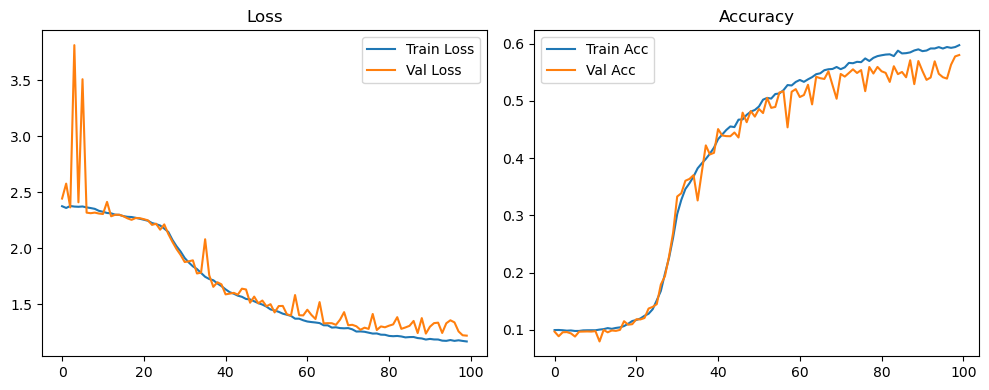

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.29it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 1.2361 Accuracy: 0.5713


🚀 Running: batch256_lr_max_0.001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0988 | Val Acc: 0.0934 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0988 | Val Acc: 0.0934 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0988 | Val Acc: 0.0934 |:   1%|          | 1/100 [01:22<2:16:07, 82.50s/it]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   1%|          | 1/100 [02:38<2:16:07, 82.50s/it]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   1%|          | 1/100 [02:38<2:16:07, 82.50s/it]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:39<2:09:00, 78.99s/it]

| LR: 0.000999 | Train Acc: 0.0990 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [02:54<2:09:00, 78.99s/it]

| LR: 0.000999 | Train Acc: 0.0990 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [02:54<2:09:00, 78.99s/it]

| LR: 0.000999 | Train Acc: 0.0990 | Val Acc: 0.0949 |:   3%|▎         | 3/100 [02:54<1:20:46, 49.97s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [03:09<1:20:46, 49.97s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [03:09<1:20:46, 49.97s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   4%|▍         | 4/100 [03:09<57:41, 36.05s/it]  

| LR: 0.000996 | Train Acc: 0.0987 | Val Acc: 0.0883 |:   4%|▍         | 4/100 [03:24<57:41, 36.05s/it]

| LR: 0.000996 | Train Acc: 0.0987 | Val Acc: 0.0883 |:   4%|▍         | 4/100 [03:24<57:41, 36.05s/it]

| LR: 0.000996 | Train Acc: 0.0987 | Val Acc: 0.0883 |:   5%|▌         | 5/100 [03:24<45:03, 28.46s/it]

| LR: 0.000994 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:38<45:03, 28.46s/it]

| LR: 0.000994 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:38<45:03, 28.46s/it]

| LR: 0.000994 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:39<37:20, 23.83s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.0944 |:   6%|▌         | 6/100 [03:54<37:20, 23.83s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.0944 |:   6%|▌         | 6/100 [03:54<37:20, 23.83s/it]

| LR: 0.000991 | Train Acc: 0.0982 | Val Acc: 0.0944 |:   7%|▋         | 7/100 [03:54<32:48, 21.17s/it]

| LR: 0.000988 | Train Acc: 0.0979 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [04:10<32:48, 21.17s/it]

| LR: 0.000988 | Train Acc: 0.0979 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [04:10<32:48, 21.17s/it]

| LR: 0.000988 | Train Acc: 0.0979 | Val Acc: 0.0976 |:   8%|▊         | 8/100 [04:10<29:38, 19.33s/it]

| LR: 0.000984 | Train Acc: 0.0978 | Val Acc: 0.0934 |:   8%|▊         | 8/100 [04:25<29:38, 19.33s/it]

| LR: 0.000984 | Train Acc: 0.0978 | Val Acc: 0.0934 |:   8%|▊         | 8/100 [04:25<29:38, 19.33s/it]

| LR: 0.000984 | Train Acc: 0.0978 | Val Acc: 0.0934 |:   9%|▉         | 9/100 [04:25<27:19, 18.02s/it]

| LR: 0.000980 | Train Acc: 0.0985 | Val Acc: 0.0985 |:   9%|▉         | 9/100 [04:40<27:19, 18.02s/it]

| LR: 0.000980 | Train Acc: 0.0985 | Val Acc: 0.0985 |:   9%|▉         | 9/100 [04:40<27:19, 18.02s/it]

| LR: 0.000980 | Train Acc: 0.0985 | Val Acc: 0.0985 |:  10%|█         | 10/100 [04:40<25:46, 17.19s/it]

| LR: 0.000976 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  10%|█         | 10/100 [04:55<25:46, 17.19s/it]

| LR: 0.000976 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  10%|█         | 10/100 [04:55<25:46, 17.19s/it]

| LR: 0.000976 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:55<24:28, 16.50s/it]

| LR: 0.000970 | Train Acc: 0.1005 | Val Acc: 0.0962 |:  11%|█         | 11/100 [05:10<24:28, 16.50s/it]

| LR: 0.000970 | Train Acc: 0.1005 | Val Acc: 0.0962 |:  11%|█         | 11/100 [05:10<24:28, 16.50s/it]

| LR: 0.000970 | Train Acc: 0.1005 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [05:10<23:44, 16.19s/it]

| LR: 0.000965 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [05:26<23:44, 16.19s/it]

| LR: 0.000965 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [05:26<23:44, 16.19s/it]

| LR: 0.000965 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  13%|█▎        | 13/100 [05:26<23:04, 15.91s/it]

| LR: 0.000959 | Train Acc: 0.1027 | Val Acc: 0.0994 |:  13%|█▎        | 13/100 [05:41<23:04, 15.91s/it]

| LR: 0.000959 | Train Acc: 0.1027 | Val Acc: 0.0994 |:  13%|█▎        | 13/100 [05:41<23:04, 15.91s/it]

| LR: 0.000959 | Train Acc: 0.1027 | Val Acc: 0.0994 |:  14%|█▍        | 14/100 [05:41<22:42, 15.85s/it]

| LR: 0.000952 | Train Acc: 0.1071 | Val Acc: 0.1023 |:  14%|█▍        | 14/100 [05:57<22:42, 15.85s/it]

| LR: 0.000952 | Train Acc: 0.1071 | Val Acc: 0.1023 |:  14%|█▍        | 14/100 [05:57<22:42, 15.85s/it]

| LR: 0.000952 | Train Acc: 0.1071 | Val Acc: 0.1023 |:  15%|█▌        | 15/100 [05:57<22:20, 15.77s/it]

| LR: 0.000946 | Train Acc: 0.1117 | Val Acc: 0.1029 |:  15%|█▌        | 15/100 [06:13<22:20, 15.77s/it]

| LR: 0.000946 | Train Acc: 0.1117 | Val Acc: 0.1029 |:  15%|█▌        | 15/100 [06:13<22:20, 15.77s/it]

| LR: 0.000946 | Train Acc: 0.1117 | Val Acc: 0.1029 |:  16%|█▌        | 16/100 [06:13<22:01, 15.73s/it]

| LR: 0.000938 | Train Acc: 0.1150 | Val Acc: 0.1146 |:  16%|█▌        | 16/100 [06:28<22:01, 15.73s/it]

| LR: 0.000938 | Train Acc: 0.1150 | Val Acc: 0.1146 |:  16%|█▌        | 16/100 [06:28<22:01, 15.73s/it]

| LR: 0.000938 | Train Acc: 0.1150 | Val Acc: 0.1146 |:  17%|█▋        | 17/100 [06:28<21:33, 15.58s/it]

| LR: 0.000930 | Train Acc: 0.1206 | Val Acc: 0.1173 |:  17%|█▋        | 17/100 [06:44<21:33, 15.58s/it]

| LR: 0.000930 | Train Acc: 0.1206 | Val Acc: 0.1173 |:  17%|█▋        | 17/100 [06:44<21:33, 15.58s/it]

| LR: 0.000930 | Train Acc: 0.1206 | Val Acc: 0.1173 |:  18%|█▊        | 18/100 [06:44<21:22, 15.64s/it]

| LR: 0.000922 | Train Acc: 0.1286 | Val Acc: 0.1281 |:  18%|█▊        | 18/100 [06:59<21:22, 15.64s/it]

| LR: 0.000922 | Train Acc: 0.1286 | Val Acc: 0.1281 |:  18%|█▊        | 18/100 [06:59<21:22, 15.64s/it]

| LR: 0.000922 | Train Acc: 0.1286 | Val Acc: 0.1281 |:  19%|█▉        | 19/100 [06:59<20:48, 15.42s/it]

| LR: 0.000914 | Train Acc: 0.1386 | Val Acc: 0.1421 |:  19%|█▉        | 19/100 [07:14<20:48, 15.42s/it]

| LR: 0.000914 | Train Acc: 0.1386 | Val Acc: 0.1421 |:  19%|█▉        | 19/100 [07:14<20:48, 15.42s/it]

| LR: 0.000914 | Train Acc: 0.1386 | Val Acc: 0.1421 |:  20%|██        | 20/100 [07:14<20:28, 15.36s/it]

| LR: 0.000905 | Train Acc: 0.1576 | Val Acc: 0.1735 |:  20%|██        | 20/100 [07:29<20:28, 15.36s/it]

| LR: 0.000905 | Train Acc: 0.1576 | Val Acc: 0.1735 |:  20%|██        | 20/100 [07:29<20:28, 15.36s/it]

| LR: 0.000905 | Train Acc: 0.1576 | Val Acc: 0.1735 |:  21%|██        | 21/100 [07:29<20:04, 15.25s/it]

| LR: 0.000895 | Train Acc: 0.1728 | Val Acc: 0.1805 |:  21%|██        | 21/100 [07:44<20:04, 15.25s/it]

| LR: 0.000895 | Train Acc: 0.1728 | Val Acc: 0.1805 |:  21%|██        | 21/100 [07:44<20:04, 15.25s/it]

| LR: 0.000895 | Train Acc: 0.1728 | Val Acc: 0.1805 |:  22%|██▏       | 22/100 [07:45<20:00, 15.39s/it]

| LR: 0.000885 | Train Acc: 0.1927 | Val Acc: 0.2003 |:  22%|██▏       | 22/100 [08:00<20:00, 15.39s/it]

| LR: 0.000885 | Train Acc: 0.1927 | Val Acc: 0.2003 |:  22%|██▏       | 22/100 [08:00<20:00, 15.39s/it]

| LR: 0.000885 | Train Acc: 0.1927 | Val Acc: 0.2003 |:  23%|██▎       | 23/100 [08:00<19:42, 15.35s/it]

| LR: 0.000875 | Train Acc: 0.2195 | Val Acc: 0.2128 |:  23%|██▎       | 23/100 [08:15<19:42, 15.35s/it]

| LR: 0.000875 | Train Acc: 0.2195 | Val Acc: 0.2128 |:  23%|██▎       | 23/100 [08:15<19:42, 15.35s/it]

| LR: 0.000875 | Train Acc: 0.2195 | Val Acc: 0.2128 |:  24%|██▍       | 24/100 [08:15<19:21, 15.28s/it]

| LR: 0.000865 | Train Acc: 0.2430 | Val Acc: 0.2843 |:  24%|██▍       | 24/100 [08:30<19:21, 15.28s/it]

| LR: 0.000865 | Train Acc: 0.2430 | Val Acc: 0.2843 |:  24%|██▍       | 24/100 [08:30<19:21, 15.28s/it]

| LR: 0.000865 | Train Acc: 0.2430 | Val Acc: 0.2843 |:  25%|██▌       | 25/100 [08:30<18:56, 15.16s/it]

| LR: 0.000854 | Train Acc: 0.2681 | Val Acc: 0.2799 |:  25%|██▌       | 25/100 [08:45<18:56, 15.16s/it]

| LR: 0.000854 | Train Acc: 0.2681 | Val Acc: 0.2799 |:  25%|██▌       | 25/100 [08:45<18:56, 15.16s/it]

| LR: 0.000854 | Train Acc: 0.2681 | Val Acc: 0.2799 |:  26%|██▌       | 26/100 [08:45<18:36, 15.09s/it]

| LR: 0.000842 | Train Acc: 0.2888 | Val Acc: 0.3174 |:  26%|██▌       | 26/100 [09:00<18:36, 15.09s/it]

| LR: 0.000842 | Train Acc: 0.2888 | Val Acc: 0.3174 |:  26%|██▌       | 26/100 [09:00<18:36, 15.09s/it]

| LR: 0.000842 | Train Acc: 0.2888 | Val Acc: 0.3174 |:  27%|██▋       | 27/100 [09:00<18:30, 15.21s/it]

| LR: 0.000831 | Train Acc: 0.3131 | Val Acc: 0.3443 |:  27%|██▋       | 27/100 [09:16<18:30, 15.21s/it]

| LR: 0.000831 | Train Acc: 0.3131 | Val Acc: 0.3443 |:  27%|██▋       | 27/100 [09:16<18:30, 15.21s/it]

| LR: 0.000831 | Train Acc: 0.3131 | Val Acc: 0.3443 |:  28%|██▊       | 28/100 [09:16<18:29, 15.41s/it]

| LR: 0.000819 | Train Acc: 0.3268 | Val Acc: 0.3591 |:  28%|██▊       | 28/100 [09:32<18:29, 15.41s/it]

| LR: 0.000819 | Train Acc: 0.3268 | Val Acc: 0.3591 |:  28%|██▊       | 28/100 [09:32<18:29, 15.41s/it]

| LR: 0.000819 | Train Acc: 0.3268 | Val Acc: 0.3591 |:  29%|██▉       | 29/100 [09:32<18:19, 15.49s/it]

| LR: 0.000807 | Train Acc: 0.3431 | Val Acc: 0.3697 |:  29%|██▉       | 29/100 [09:47<18:19, 15.49s/it]

| LR: 0.000807 | Train Acc: 0.3431 | Val Acc: 0.3697 |:  29%|██▉       | 29/100 [09:47<18:19, 15.49s/it]

| LR: 0.000807 | Train Acc: 0.3431 | Val Acc: 0.3697 |:  30%|███       | 30/100 [09:47<17:56, 15.37s/it]

| LR: 0.000794 | Train Acc: 0.3592 | Val Acc: 0.3753 |:  30%|███       | 30/100 [10:02<17:56, 15.37s/it]

| LR: 0.000794 | Train Acc: 0.3592 | Val Acc: 0.3753 |:  30%|███       | 30/100 [10:02<17:56, 15.37s/it]

| LR: 0.000794 | Train Acc: 0.3592 | Val Acc: 0.3753 |:  31%|███       | 31/100 [10:02<17:39, 15.36s/it]

| LR: 0.000781 | Train Acc: 0.3768 | Val Acc: 0.4038 |:  31%|███       | 31/100 [10:18<17:39, 15.36s/it]

| LR: 0.000781 | Train Acc: 0.3768 | Val Acc: 0.4038 |:  31%|███       | 31/100 [10:18<17:39, 15.36s/it]

| LR: 0.000781 | Train Acc: 0.3768 | Val Acc: 0.4038 |:  32%|███▏      | 32/100 [10:18<17:28, 15.42s/it]

| LR: 0.000768 | Train Acc: 0.3853 | Val Acc: 0.3883 |:  32%|███▏      | 32/100 [10:33<17:28, 15.42s/it]

| LR: 0.000768 | Train Acc: 0.3853 | Val Acc: 0.3883 |:  32%|███▏      | 32/100 [10:33<17:28, 15.42s/it]

| LR: 0.000768 | Train Acc: 0.3853 | Val Acc: 0.3883 |:  33%|███▎      | 33/100 [10:33<17:11, 15.39s/it]

| LR: 0.000755 | Train Acc: 0.3950 | Val Acc: 0.4302 |:  33%|███▎      | 33/100 [10:49<17:11, 15.39s/it]

| LR: 0.000755 | Train Acc: 0.3950 | Val Acc: 0.4302 |:  33%|███▎      | 33/100 [10:49<17:11, 15.39s/it]

| LR: 0.000755 | Train Acc: 0.3950 | Val Acc: 0.4302 |:  34%|███▍      | 34/100 [10:49<16:59, 15.44s/it]

| LR: 0.000741 | Train Acc: 0.4089 | Val Acc: 0.4309 |:  34%|███▍      | 34/100 [11:03<16:59, 15.44s/it]

| LR: 0.000741 | Train Acc: 0.4089 | Val Acc: 0.4309 |:  34%|███▍      | 34/100 [11:03<16:59, 15.44s/it]

| LR: 0.000741 | Train Acc: 0.4089 | Val Acc: 0.4309 |:  35%|███▌      | 35/100 [11:03<16:32, 15.27s/it]

| LR: 0.000727 | Train Acc: 0.4123 | Val Acc: 0.4406 |:  35%|███▌      | 35/100 [11:18<16:32, 15.27s/it]

| LR: 0.000727 | Train Acc: 0.4123 | Val Acc: 0.4406 |:  35%|███▌      | 35/100 [11:18<16:32, 15.27s/it]

| LR: 0.000727 | Train Acc: 0.4123 | Val Acc: 0.4406 |:  36%|███▌      | 36/100 [11:18<16:09, 15.15s/it]

| LR: 0.000713 | Train Acc: 0.4251 | Val Acc: 0.4345 |:  36%|███▌      | 36/100 [11:33<16:09, 15.15s/it]

| LR: 0.000713 | Train Acc: 0.4251 | Val Acc: 0.4345 |:  36%|███▌      | 36/100 [11:33<16:09, 15.15s/it]

| LR: 0.000713 | Train Acc: 0.4251 | Val Acc: 0.4345 |:  37%|███▋      | 37/100 [11:33<15:52, 15.12s/it]

| LR: 0.000699 | Train Acc: 0.4313 | Val Acc: 0.4457 |:  37%|███▋      | 37/100 [11:49<15:52, 15.12s/it]

| LR: 0.000699 | Train Acc: 0.4313 | Val Acc: 0.4457 |:  37%|███▋      | 37/100 [11:49<15:52, 15.12s/it]

| LR: 0.000699 | Train Acc: 0.4313 | Val Acc: 0.4457 |:  38%|███▊      | 38/100 [11:49<15:45, 15.26s/it]

| LR: 0.000684 | Train Acc: 0.4426 | Val Acc: 0.4512 |:  38%|███▊      | 38/100 [12:04<15:45, 15.26s/it]

| LR: 0.000684 | Train Acc: 0.4426 | Val Acc: 0.4512 |:  38%|███▊      | 38/100 [12:04<15:45, 15.26s/it]

| LR: 0.000684 | Train Acc: 0.4426 | Val Acc: 0.4512 |:  39%|███▉      | 39/100 [12:04<15:27, 15.21s/it]

| LR: 0.000670 | Train Acc: 0.4492 | Val Acc: 0.4675 |:  39%|███▉      | 39/100 [12:19<15:27, 15.21s/it]

| LR: 0.000670 | Train Acc: 0.4492 | Val Acc: 0.4675 |:  39%|███▉      | 39/100 [12:19<15:27, 15.21s/it]

| LR: 0.000670 | Train Acc: 0.4492 | Val Acc: 0.4675 |:  40%|████      | 40/100 [12:19<15:09, 15.16s/it]

| LR: 0.000655 | Train Acc: 0.4520 | Val Acc: 0.4597 |:  40%|████      | 40/100 [12:34<15:09, 15.16s/it]

| LR: 0.000655 | Train Acc: 0.4520 | Val Acc: 0.4597 |:  40%|████      | 40/100 [12:34<15:09, 15.16s/it]

| LR: 0.000655 | Train Acc: 0.4520 | Val Acc: 0.4597 |:  41%|████      | 41/100 [12:34<14:49, 15.08s/it]

| LR: 0.000640 | Train Acc: 0.4588 | Val Acc: 0.4707 |:  41%|████      | 41/100 [12:49<14:49, 15.08s/it]

| LR: 0.000640 | Train Acc: 0.4588 | Val Acc: 0.4707 |:  41%|████      | 41/100 [12:49<14:49, 15.08s/it]

| LR: 0.000640 | Train Acc: 0.4588 | Val Acc: 0.4707 |:  42%|████▏     | 42/100 [12:49<14:38, 15.15s/it]

| LR: 0.000625 | Train Acc: 0.4592 | Val Acc: 0.4797 |:  42%|████▏     | 42/100 [13:05<14:38, 15.15s/it]

| LR: 0.000625 | Train Acc: 0.4592 | Val Acc: 0.4797 |:  42%|████▏     | 42/100 [13:05<14:38, 15.15s/it]

| LR: 0.000625 | Train Acc: 0.4592 | Val Acc: 0.4797 |:  43%|████▎     | 43/100 [13:05<14:28, 15.24s/it]

| LR: 0.000609 | Train Acc: 0.4696 | Val Acc: 0.4777 |:  43%|████▎     | 43/100 [13:20<14:28, 15.24s/it]

| LR: 0.000609 | Train Acc: 0.4696 | Val Acc: 0.4777 |:  43%|████▎     | 43/100 [13:20<14:28, 15.24s/it]

| LR: 0.000609 | Train Acc: 0.4696 | Val Acc: 0.4777 |:  44%|████▍     | 44/100 [13:20<14:20, 15.37s/it]

| LR: 0.000594 | Train Acc: 0.4754 | Val Acc: 0.4917 |:  44%|████▍     | 44/100 [13:36<14:20, 15.37s/it]

| LR: 0.000594 | Train Acc: 0.4754 | Val Acc: 0.4917 |:  44%|████▍     | 44/100 [13:36<14:20, 15.37s/it]

| LR: 0.000594 | Train Acc: 0.4754 | Val Acc: 0.4917 |:  45%|████▌     | 45/100 [13:36<14:09, 15.45s/it]

| LR: 0.000579 | Train Acc: 0.4824 | Val Acc: 0.4897 |:  45%|████▌     | 45/100 [13:51<14:09, 15.45s/it]

| LR: 0.000579 | Train Acc: 0.4824 | Val Acc: 0.4897 |:  45%|████▌     | 45/100 [13:51<14:09, 15.45s/it]

| LR: 0.000579 | Train Acc: 0.4824 | Val Acc: 0.4897 |:  46%|████▌     | 46/100 [13:51<13:53, 15.44s/it]

| LR: 0.000563 | Train Acc: 0.4835 | Val Acc: 0.5016 |:  46%|████▌     | 46/100 [14:07<13:53, 15.44s/it]

| LR: 0.000563 | Train Acc: 0.4835 | Val Acc: 0.5016 |:  46%|████▌     | 46/100 [14:07<13:53, 15.44s/it]

| LR: 0.000563 | Train Acc: 0.4835 | Val Acc: 0.5016 |:  47%|████▋     | 47/100 [14:07<13:36, 15.41s/it]

| LR: 0.000548 | Train Acc: 0.4916 | Val Acc: 0.4931 |:  47%|████▋     | 47/100 [14:22<13:36, 15.41s/it]

| LR: 0.000548 | Train Acc: 0.4916 | Val Acc: 0.4931 |:  47%|████▋     | 47/100 [14:22<13:36, 15.41s/it]

| LR: 0.000548 | Train Acc: 0.4916 | Val Acc: 0.4931 |:  48%|████▊     | 48/100 [14:22<13:13, 15.27s/it]

| LR: 0.000532 | Train Acc: 0.4898 | Val Acc: 0.5141 |:  48%|████▊     | 48/100 [14:37<13:13, 15.27s/it]

| LR: 0.000532 | Train Acc: 0.4898 | Val Acc: 0.5141 |:  48%|████▊     | 48/100 [14:37<13:13, 15.27s/it]

| LR: 0.000532 | Train Acc: 0.4898 | Val Acc: 0.5141 |:  49%|████▉     | 49/100 [14:37<12:59, 15.28s/it]

| LR: 0.000516 | Train Acc: 0.5006 | Val Acc: 0.5192 |:  49%|████▉     | 49/100 [14:52<12:59, 15.28s/it]

| LR: 0.000516 | Train Acc: 0.5006 | Val Acc: 0.5192 |:  49%|████▉     | 49/100 [14:52<12:59, 15.28s/it]

| LR: 0.000516 | Train Acc: 0.5006 | Val Acc: 0.5192 |:  50%|█████     | 50/100 [14:53<12:46, 15.34s/it]

| LR: 0.000501 | Train Acc: 0.5022 | Val Acc: 0.5095 |:  50%|█████     | 50/100 [15:08<12:46, 15.34s/it]

| LR: 0.000501 | Train Acc: 0.5022 | Val Acc: 0.5095 |:  50%|█████     | 50/100 [15:08<12:46, 15.34s/it]

| LR: 0.000501 | Train Acc: 0.5022 | Val Acc: 0.5095 |:  51%|█████     | 51/100 [15:08<12:31, 15.33s/it]

| LR: 0.000485 | Train Acc: 0.5062 | Val Acc: 0.5070 |:  51%|█████     | 51/100 [15:23<12:31, 15.33s/it]

| LR: 0.000485 | Train Acc: 0.5062 | Val Acc: 0.5070 |:  51%|█████     | 51/100 [15:23<12:31, 15.33s/it]

| LR: 0.000485 | Train Acc: 0.5062 | Val Acc: 0.5070 |:  52%|█████▏    | 52/100 [15:23<12:09, 15.20s/it]

| LR: 0.000469 | Train Acc: 0.5056 | Val Acc: 0.5129 |:  52%|█████▏    | 52/100 [15:38<12:09, 15.20s/it]

| LR: 0.000469 | Train Acc: 0.5056 | Val Acc: 0.5129 |:  52%|█████▏    | 52/100 [15:38<12:09, 15.20s/it]

| LR: 0.000469 | Train Acc: 0.5056 | Val Acc: 0.5129 |:  53%|█████▎    | 53/100 [15:38<12:00, 15.34s/it]

| LR: 0.000453 | Train Acc: 0.5112 | Val Acc: 0.5161 |:  53%|█████▎    | 53/100 [15:54<12:00, 15.34s/it]

| LR: 0.000453 | Train Acc: 0.5112 | Val Acc: 0.5161 |:  53%|█████▎    | 53/100 [15:54<12:00, 15.34s/it]

| LR: 0.000453 | Train Acc: 0.5112 | Val Acc: 0.5161 |:  54%|█████▍    | 54/100 [15:54<11:51, 15.46s/it]

| LR: 0.000438 | Train Acc: 0.5171 | Val Acc: 0.5194 |:  54%|█████▍    | 54/100 [16:09<11:51, 15.46s/it]

| LR: 0.000438 | Train Acc: 0.5171 | Val Acc: 0.5194 |:  54%|█████▍    | 54/100 [16:09<11:51, 15.46s/it]

| LR: 0.000438 | Train Acc: 0.5171 | Val Acc: 0.5194 |:  55%|█████▌    | 55/100 [16:10<11:34, 15.43s/it]

| LR: 0.000422 | Train Acc: 0.5224 | Val Acc: 0.5281 |:  55%|█████▌    | 55/100 [16:25<11:34, 15.43s/it]

| LR: 0.000422 | Train Acc: 0.5224 | Val Acc: 0.5281 |:  55%|█████▌    | 55/100 [16:25<11:34, 15.43s/it]

| LR: 0.000422 | Train Acc: 0.5224 | Val Acc: 0.5281 |:  56%|█████▌    | 56/100 [16:25<11:21, 15.48s/it]

| LR: 0.000407 | Train Acc: 0.5262 | Val Acc: 0.5251 |:  56%|█████▌    | 56/100 [16:40<11:21, 15.48s/it]

| LR: 0.000407 | Train Acc: 0.5262 | Val Acc: 0.5251 |:  56%|█████▌    | 56/100 [16:40<11:21, 15.48s/it]

| LR: 0.000407 | Train Acc: 0.5262 | Val Acc: 0.5251 |:  57%|█████▋    | 57/100 [16:40<11:03, 15.43s/it]

| LR: 0.000392 | Train Acc: 0.5306 | Val Acc: 0.5297 |:  57%|█████▋    | 57/100 [16:56<11:03, 15.43s/it]

| LR: 0.000392 | Train Acc: 0.5306 | Val Acc: 0.5297 |:  57%|█████▋    | 57/100 [16:56<11:03, 15.43s/it]

| LR: 0.000392 | Train Acc: 0.5306 | Val Acc: 0.5297 |:  58%|█████▊    | 58/100 [16:56<10:49, 15.45s/it]

| LR: 0.000376 | Train Acc: 0.5350 | Val Acc: 0.5414 |:  58%|█████▊    | 58/100 [17:11<10:49, 15.45s/it]

| LR: 0.000376 | Train Acc: 0.5350 | Val Acc: 0.5414 |:  58%|█████▊    | 58/100 [17:11<10:49, 15.45s/it]

| LR: 0.000376 | Train Acc: 0.5350 | Val Acc: 0.5414 |:  59%|█████▉    | 59/100 [17:11<10:33, 15.45s/it]

| LR: 0.000361 | Train Acc: 0.5372 | Val Acc: 0.5414 |:  59%|█████▉    | 59/100 [17:27<10:33, 15.45s/it]

| LR: 0.000361 | Train Acc: 0.5372 | Val Acc: 0.5414 |:  59%|█████▉    | 59/100 [17:27<10:33, 15.45s/it]

| LR: 0.000361 | Train Acc: 0.5372 | Val Acc: 0.5414 |:  60%|██████    | 60/100 [17:27<10:21, 15.54s/it]

| LR: 0.000346 | Train Acc: 0.5439 | Val Acc: 0.5376 |:  60%|██████    | 60/100 [17:43<10:21, 15.54s/it]

| LR: 0.000346 | Train Acc: 0.5439 | Val Acc: 0.5376 |:  60%|██████    | 60/100 [17:43<10:21, 15.54s/it]

| LR: 0.000346 | Train Acc: 0.5439 | Val Acc: 0.5376 |:  61%|██████    | 61/100 [17:43<10:08, 15.60s/it]

| LR: 0.000331 | Train Acc: 0.5452 | Val Acc: 0.5526 |:  61%|██████    | 61/100 [17:58<10:08, 15.60s/it]

| LR: 0.000331 | Train Acc: 0.5452 | Val Acc: 0.5526 |:  61%|██████    | 61/100 [17:58<10:08, 15.60s/it]

| LR: 0.000331 | Train Acc: 0.5452 | Val Acc: 0.5526 |:  62%|██████▏   | 62/100 [17:59<09:53, 15.61s/it]

| LR: 0.000317 | Train Acc: 0.5520 | Val Acc: 0.5365 |:  62%|██████▏   | 62/100 [18:14<09:53, 15.61s/it]

| LR: 0.000317 | Train Acc: 0.5520 | Val Acc: 0.5365 |:  62%|██████▏   | 62/100 [18:14<09:53, 15.61s/it]

| LR: 0.000317 | Train Acc: 0.5520 | Val Acc: 0.5365 |:  63%|██████▎   | 63/100 [18:14<09:37, 15.61s/it]

| LR: 0.000302 | Train Acc: 0.5552 | Val Acc: 0.5637 |:  63%|██████▎   | 63/100 [18:30<09:37, 15.61s/it]

| LR: 0.000302 | Train Acc: 0.5552 | Val Acc: 0.5637 |:  63%|██████▎   | 63/100 [18:30<09:37, 15.61s/it]

| LR: 0.000302 | Train Acc: 0.5552 | Val Acc: 0.5637 |:  64%|██████▍   | 64/100 [18:30<09:23, 15.67s/it]

| LR: 0.000288 | Train Acc: 0.5563 | Val Acc: 0.5679 |:  64%|██████▍   | 64/100 [18:45<09:23, 15.67s/it]

| LR: 0.000288 | Train Acc: 0.5563 | Val Acc: 0.5679 |:  64%|██████▍   | 64/100 [18:45<09:23, 15.67s/it]

| LR: 0.000288 | Train Acc: 0.5563 | Val Acc: 0.5679 |:  65%|██████▌   | 65/100 [18:45<09:00, 15.43s/it]

| LR: 0.000274 | Train Acc: 0.5614 | Val Acc: 0.5629 |:  65%|██████▌   | 65/100 [19:00<09:00, 15.43s/it]

| LR: 0.000274 | Train Acc: 0.5614 | Val Acc: 0.5629 |:  65%|██████▌   | 65/100 [19:00<09:00, 15.43s/it]

| LR: 0.000274 | Train Acc: 0.5614 | Val Acc: 0.5629 |:  66%|██████▌   | 66/100 [19:00<08:41, 15.33s/it]

| LR: 0.000260 | Train Acc: 0.5631 | Val Acc: 0.5628 |:  66%|██████▌   | 66/100 [19:15<08:41, 15.33s/it]

| LR: 0.000260 | Train Acc: 0.5631 | Val Acc: 0.5628 |:  66%|██████▌   | 66/100 [19:15<08:41, 15.33s/it]

| LR: 0.000260 | Train Acc: 0.5631 | Val Acc: 0.5628 |:  67%|██████▋   | 67/100 [19:15<08:26, 15.35s/it]

| LR: 0.000246 | Train Acc: 0.5644 | Val Acc: 0.5646 |:  67%|██████▋   | 67/100 [19:31<08:26, 15.35s/it]

| LR: 0.000246 | Train Acc: 0.5644 | Val Acc: 0.5646 |:  67%|██████▋   | 67/100 [19:31<08:26, 15.35s/it]

| LR: 0.000246 | Train Acc: 0.5644 | Val Acc: 0.5646 |:  68%|██████▊   | 68/100 [19:31<08:13, 15.44s/it]

| LR: 0.000233 | Train Acc: 0.5668 | Val Acc: 0.5767 |:  68%|██████▊   | 68/100 [19:46<08:13, 15.44s/it]

| LR: 0.000233 | Train Acc: 0.5668 | Val Acc: 0.5767 |:  68%|██████▊   | 68/100 [19:46<08:13, 15.44s/it]

| LR: 0.000233 | Train Acc: 0.5668 | Val Acc: 0.5767 |:  69%|██████▉   | 69/100 [19:46<07:55, 15.35s/it]

| LR: 0.000220 | Train Acc: 0.5739 | Val Acc: 0.5674 |:  69%|██████▉   | 69/100 [20:01<07:55, 15.35s/it]

| LR: 0.000220 | Train Acc: 0.5739 | Val Acc: 0.5674 |:  69%|██████▉   | 69/100 [20:01<07:55, 15.35s/it]

| LR: 0.000220 | Train Acc: 0.5739 | Val Acc: 0.5674 |:  70%|███████   | 70/100 [20:01<07:38, 15.29s/it]

| LR: 0.000207 | Train Acc: 0.5700 | Val Acc: 0.5768 |:  70%|███████   | 70/100 [20:16<07:38, 15.29s/it]

| LR: 0.000207 | Train Acc: 0.5700 | Val Acc: 0.5768 |:  70%|███████   | 70/100 [20:16<07:38, 15.29s/it]

| LR: 0.000207 | Train Acc: 0.5700 | Val Acc: 0.5768 |:  71%|███████   | 71/100 [20:16<07:22, 15.27s/it]

| LR: 0.000194 | Train Acc: 0.5732 | Val Acc: 0.5679 |:  71%|███████   | 71/100 [20:31<07:22, 15.27s/it]

| LR: 0.000194 | Train Acc: 0.5732 | Val Acc: 0.5679 |:  71%|███████   | 71/100 [20:31<07:22, 15.27s/it]

| LR: 0.000194 | Train Acc: 0.5732 | Val Acc: 0.5679 |:  72%|███████▏  | 72/100 [20:32<07:05, 15.21s/it]

| LR: 0.000182 | Train Acc: 0.5753 | Val Acc: 0.5680 |:  72%|███████▏  | 72/100 [20:47<07:05, 15.21s/it]

| LR: 0.000182 | Train Acc: 0.5753 | Val Acc: 0.5680 |:  72%|███████▏  | 72/100 [20:47<07:05, 15.21s/it]

| LR: 0.000182 | Train Acc: 0.5753 | Val Acc: 0.5680 |:  73%|███████▎  | 73/100 [20:47<06:52, 15.27s/it]

| LR: 0.000170 | Train Acc: 0.5783 | Val Acc: 0.5743 |:  73%|███████▎  | 73/100 [21:02<06:52, 15.27s/it]

| LR: 0.000170 | Train Acc: 0.5783 | Val Acc: 0.5743 |:  73%|███████▎  | 73/100 [21:02<06:52, 15.27s/it]

| LR: 0.000170 | Train Acc: 0.5783 | Val Acc: 0.5743 |:  74%|███████▍  | 74/100 [21:03<06:39, 15.36s/it]

| LR: 0.000159 | Train Acc: 0.5794 | Val Acc: 0.5776 |:  74%|███████▍  | 74/100 [21:17<06:39, 15.36s/it]

| LR: 0.000159 | Train Acc: 0.5794 | Val Acc: 0.5776 |:  74%|███████▍  | 74/100 [21:17<06:39, 15.36s/it]

| LR: 0.000159 | Train Acc: 0.5794 | Val Acc: 0.5776 |:  75%|███████▌  | 75/100 [21:17<06:19, 15.19s/it]

| LR: 0.000147 | Train Acc: 0.5786 | Val Acc: 0.5643 |:  75%|███████▌  | 75/100 [21:32<06:19, 15.19s/it]

| LR: 0.000147 | Train Acc: 0.5786 | Val Acc: 0.5643 |:  75%|███████▌  | 75/100 [21:32<06:19, 15.19s/it]

| LR: 0.000147 | Train Acc: 0.5786 | Val Acc: 0.5643 |:  76%|███████▌  | 76/100 [21:32<06:01, 15.07s/it]

| LR: 0.000136 | Train Acc: 0.5845 | Val Acc: 0.5866 |:  76%|███████▌  | 76/100 [21:47<06:01, 15.07s/it]

| LR: 0.000136 | Train Acc: 0.5845 | Val Acc: 0.5866 |:  76%|███████▌  | 76/100 [21:47<06:01, 15.07s/it]

| LR: 0.000136 | Train Acc: 0.5845 | Val Acc: 0.5866 |:  77%|███████▋  | 77/100 [21:47<05:46, 15.06s/it]

| LR: 0.000126 | Train Acc: 0.5872 | Val Acc: 0.5779 |:  77%|███████▋  | 77/100 [22:03<05:46, 15.06s/it]

| LR: 0.000126 | Train Acc: 0.5872 | Val Acc: 0.5779 |:  77%|███████▋  | 77/100 [22:03<05:46, 15.06s/it]

| LR: 0.000126 | Train Acc: 0.5872 | Val Acc: 0.5779 |:  78%|███████▊  | 78/100 [22:03<05:34, 15.23s/it]

| LR: 0.000116 | Train Acc: 0.5893 | Val Acc: 0.5894 |:  78%|███████▊  | 78/100 [22:18<05:34, 15.23s/it]

| LR: 0.000116 | Train Acc: 0.5893 | Val Acc: 0.5894 |:  78%|███████▊  | 78/100 [22:18<05:34, 15.23s/it]

| LR: 0.000116 | Train Acc: 0.5893 | Val Acc: 0.5894 |:  79%|███████▉  | 79/100 [22:18<05:20, 15.27s/it]

| LR: 0.000106 | Train Acc: 0.5883 | Val Acc: 0.5834 |:  79%|███████▉  | 79/100 [22:33<05:20, 15.27s/it]

| LR: 0.000106 | Train Acc: 0.5883 | Val Acc: 0.5834 |:  79%|███████▉  | 79/100 [22:33<05:20, 15.27s/it]

| LR: 0.000106 | Train Acc: 0.5883 | Val Acc: 0.5834 |:  80%|████████  | 80/100 [22:34<05:06, 15.31s/it]

| LR: 0.000096 | Train Acc: 0.5900 | Val Acc: 0.5864 |:  80%|████████  | 80/100 [22:49<05:06, 15.31s/it]

| LR: 0.000096 | Train Acc: 0.5900 | Val Acc: 0.5864 |:  80%|████████  | 80/100 [22:49<05:06, 15.31s/it]

| LR: 0.000096 | Train Acc: 0.5900 | Val Acc: 0.5864 |:  81%|████████  | 81/100 [22:49<04:51, 15.33s/it]

| LR: 0.000087 | Train Acc: 0.5938 | Val Acc: 0.5177 |:  81%|████████  | 81/100 [23:04<04:51, 15.33s/it]

| LR: 0.000087 | Train Acc: 0.5938 | Val Acc: 0.5177 |:  81%|████████  | 81/100 [23:04<04:51, 15.33s/it]

| LR: 0.000087 | Train Acc: 0.5938 | Val Acc: 0.5177 |:  82%|████████▏ | 82/100 [23:04<04:37, 15.40s/it]

| LR: 0.000079 | Train Acc: 0.5939 | Val Acc: 0.5859 |:  82%|████████▏ | 82/100 [23:20<04:37, 15.40s/it]

| LR: 0.000079 | Train Acc: 0.5939 | Val Acc: 0.5859 |:  82%|████████▏ | 82/100 [23:20<04:37, 15.40s/it]

| LR: 0.000079 | Train Acc: 0.5939 | Val Acc: 0.5859 |:  83%|████████▎ | 83/100 [23:20<04:23, 15.48s/it]

| LR: 0.000071 | Train Acc: 0.5961 | Val Acc: 0.5918 |:  83%|████████▎ | 83/100 [23:35<04:23, 15.48s/it]

| LR: 0.000071 | Train Acc: 0.5961 | Val Acc: 0.5918 |:  83%|████████▎ | 83/100 [23:35<04:23, 15.48s/it]

| LR: 0.000071 | Train Acc: 0.5961 | Val Acc: 0.5918 |:  84%|████████▍ | 84/100 [23:36<04:07, 15.47s/it]

| LR: 0.000063 | Train Acc: 0.5907 | Val Acc: 0.5873 |:  84%|████████▍ | 84/100 [23:51<04:07, 15.47s/it]

| LR: 0.000063 | Train Acc: 0.5907 | Val Acc: 0.5873 |:  84%|████████▍ | 84/100 [23:51<04:07, 15.47s/it]

| LR: 0.000063 | Train Acc: 0.5907 | Val Acc: 0.5873 |:  85%|████████▌ | 85/100 [23:51<03:52, 15.52s/it]

| LR: 0.000055 | Train Acc: 0.5987 | Val Acc: 0.5878 |:  85%|████████▌ | 85/100 [24:06<03:52, 15.52s/it]

| LR: 0.000055 | Train Acc: 0.5987 | Val Acc: 0.5878 |:  85%|████████▌ | 85/100 [24:06<03:52, 15.52s/it]

| LR: 0.000055 | Train Acc: 0.5987 | Val Acc: 0.5878 |:  86%|████████▌ | 86/100 [24:06<03:35, 15.40s/it]

| LR: 0.000049 | Train Acc: 0.5996 | Val Acc: 0.5854 |:  86%|████████▌ | 86/100 [24:21<03:35, 15.40s/it]

| LR: 0.000049 | Train Acc: 0.5996 | Val Acc: 0.5854 |:  86%|████████▌ | 86/100 [24:21<03:35, 15.40s/it]

| LR: 0.000049 | Train Acc: 0.5996 | Val Acc: 0.5854 |:  87%|████████▋ | 87/100 [24:22<03:19, 15.34s/it]

| LR: 0.000042 | Train Acc: 0.5974 | Val Acc: 0.5949 |:  87%|████████▋ | 87/100 [24:36<03:19, 15.34s/it]

| LR: 0.000042 | Train Acc: 0.5974 | Val Acc: 0.5949 |:  87%|████████▋ | 87/100 [24:36<03:19, 15.34s/it]

| LR: 0.000042 | Train Acc: 0.5974 | Val Acc: 0.5949 |:  88%|████████▊ | 88/100 [24:37<03:02, 15.24s/it]

| LR: 0.000036 | Train Acc: 0.6006 | Val Acc: 0.6027 |:  88%|████████▊ | 88/100 [24:52<03:02, 15.24s/it]

| LR: 0.000036 | Train Acc: 0.6006 | Val Acc: 0.6027 |:  88%|████████▊ | 88/100 [24:52<03:02, 15.24s/it]

| LR: 0.000036 | Train Acc: 0.6006 | Val Acc: 0.6027 |:  89%|████████▉ | 89/100 [24:52<02:48, 15.35s/it]

| LR: 0.000031 | Train Acc: 0.5999 | Val Acc: 0.5951 |:  89%|████████▉ | 89/100 [25:08<02:48, 15.35s/it]

| LR: 0.000031 | Train Acc: 0.5999 | Val Acc: 0.5951 |:  89%|████████▉ | 89/100 [25:08<02:48, 15.35s/it]

| LR: 0.000031 | Train Acc: 0.5999 | Val Acc: 0.5951 |:  90%|█████████ | 90/100 [25:08<02:34, 15.42s/it]

| LR: 0.000025 | Train Acc: 0.6001 | Val Acc: 0.5918 |:  90%|█████████ | 90/100 [25:23<02:34, 15.42s/it]

| LR: 0.000025 | Train Acc: 0.6001 | Val Acc: 0.5918 |:  90%|█████████ | 90/100 [25:23<02:34, 15.42s/it]

| LR: 0.000025 | Train Acc: 0.6001 | Val Acc: 0.5918 |:  91%|█████████ | 91/100 [25:23<02:19, 15.45s/it]

| LR: 0.000021 | Train Acc: 0.6011 | Val Acc: 0.5984 |:  91%|█████████ | 91/100 [25:38<02:19, 15.45s/it]

| LR: 0.000021 | Train Acc: 0.6011 | Val Acc: 0.5984 |:  91%|█████████ | 91/100 [25:38<02:19, 15.45s/it]

| LR: 0.000021 | Train Acc: 0.6011 | Val Acc: 0.5984 |:  92%|█████████▏| 92/100 [25:38<02:02, 15.37s/it]

| LR: 0.000017 | Train Acc: 0.6012 | Val Acc: 0.5870 |:  92%|█████████▏| 92/100 [25:53<02:02, 15.37s/it]

| LR: 0.000017 | Train Acc: 0.6012 | Val Acc: 0.5870 |:  92%|█████████▏| 92/100 [25:53<02:02, 15.37s/it]

| LR: 0.000017 | Train Acc: 0.6012 | Val Acc: 0.5870 |:  93%|█████████▎| 93/100 [25:53<01:46, 15.20s/it]

| LR: 0.000013 | Train Acc: 0.6023 | Val Acc: 0.5965 |:  93%|█████████▎| 93/100 [26:08<01:46, 15.20s/it]

| LR: 0.000013 | Train Acc: 0.6023 | Val Acc: 0.5965 |:  93%|█████████▎| 93/100 [26:08<01:46, 15.20s/it]

| LR: 0.000013 | Train Acc: 0.6023 | Val Acc: 0.5965 |:  94%|█████████▍| 94/100 [26:08<01:30, 15.12s/it]

| LR: 0.000010 | Train Acc: 0.6060 | Val Acc: 0.5551 |:  94%|█████████▍| 94/100 [26:24<01:30, 15.12s/it]

| LR: 0.000010 | Train Acc: 0.6060 | Val Acc: 0.5551 |:  94%|█████████▍| 94/100 [26:24<01:30, 15.12s/it]

| LR: 0.000010 | Train Acc: 0.6060 | Val Acc: 0.5551 |:  95%|█████████▌| 95/100 [26:24<01:16, 15.25s/it]

| LR: 0.000007 | Train Acc: 0.6045 | Val Acc: 0.6035 |:  95%|█████████▌| 95/100 [26:39<01:16, 15.25s/it]

| LR: 0.000007 | Train Acc: 0.6045 | Val Acc: 0.6035 |:  95%|█████████▌| 95/100 [26:39<01:16, 15.25s/it]

| LR: 0.000007 | Train Acc: 0.6045 | Val Acc: 0.6035 |:  96%|█████████▌| 96/100 [26:39<01:00, 15.23s/it]

| LR: 0.000005 | Train Acc: 0.6057 | Val Acc: 0.5851 |:  96%|█████████▌| 96/100 [26:55<01:00, 15.23s/it]

| LR: 0.000005 | Train Acc: 0.6057 | Val Acc: 0.5851 |:  96%|█████████▌| 96/100 [26:55<01:00, 15.23s/it]

| LR: 0.000005 | Train Acc: 0.6057 | Val Acc: 0.5851 |:  97%|█████████▋| 97/100 [26:55<00:46, 15.36s/it]

| LR: 0.000003 | Train Acc: 0.6044 | Val Acc: 0.5937 |:  97%|█████████▋| 97/100 [27:10<00:46, 15.36s/it]

| LR: 0.000003 | Train Acc: 0.6044 | Val Acc: 0.5937 |:  97%|█████████▋| 97/100 [27:10<00:46, 15.36s/it]

| LR: 0.000003 | Train Acc: 0.6044 | Val Acc: 0.5937 |:  98%|█████████▊| 98/100 [27:10<00:30, 15.40s/it]

| LR: 0.000002 | Train Acc: 0.6056 | Val Acc: 0.6006 |:  98%|█████████▊| 98/100 [27:25<00:30, 15.40s/it]

| LR: 0.000002 | Train Acc: 0.6056 | Val Acc: 0.6006 |:  98%|█████████▊| 98/100 [27:25<00:30, 15.40s/it]

| LR: 0.000002 | Train Acc: 0.6056 | Val Acc: 0.6006 |:  99%|█████████▉| 99/100 [27:25<00:15, 15.23s/it]

| LR: 0.000001 | Train Acc: 0.6061 | Val Acc: 0.5932 |:  99%|█████████▉| 99/100 [27:40<00:15, 15.23s/it]

| LR: 0.000001 | Train Acc: 0.6061 | Val Acc: 0.5932 |:  99%|█████████▉| 99/100 [27:40<00:15, 15.23s/it]

| LR: 0.000001 | Train Acc: 0.6061 | Val Acc: 0.5932 |: 100%|██████████| 100/100 [27:40<00:00, 15.22s/it]

| LR: 0.000001 | Train Acc: 0.6061 | Val Acc: 0.5932 |: 100%|██████████| 100/100 [27:40<00:00, 16.61s/it]

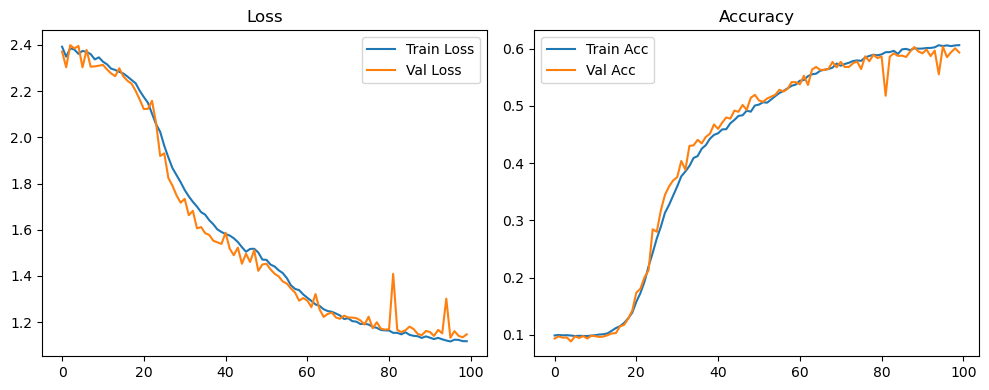

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.28it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 1.1505 Accuracy: 0.5941


🚀 Running: batch256_lr_max_0.001_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:22<2:15:28, 82.11s/it]

| LR: 0.001000 | Train Acc: 0.1015 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:37<2:15:28, 82.11s/it]

| LR: 0.001000 | Train Acc: 0.1015 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:37<2:15:28, 82.11s/it]

| LR: 0.001000 | Train Acc: 0.1015 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:37<2:07:56, 78.33s/it]

| LR: 0.000999 | Train Acc: 0.1013 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:52<2:07:56, 78.33s/it]

| LR: 0.000999 | Train Acc: 0.1013 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:52<2:07:56, 78.33s/it]

| LR: 0.000999 | Train Acc: 0.1013 | Val Acc: 0.0967 |:   3%|▎         | 3/100 [02:52<1:19:48, 49.37s/it]

| LR: 0.000998 | Train Acc: 0.1012 | Val Acc: 0.0987 |:   3%|▎         | 3/100 [03:07<1:19:48, 49.37s/it]

| LR: 0.000998 | Train Acc: 0.1012 | Val Acc: 0.0987 |:   3%|▎         | 3/100 [03:07<1:19:48, 49.37s/it]

| LR: 0.000998 | Train Acc: 0.1012 | Val Acc: 0.0987 |:   4%|▍         | 4/100 [03:07<57:21, 35.85s/it]  

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0955 |:   4%|▍         | 4/100 [03:22<57:21, 35.85s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0955 |:   4%|▍         | 4/100 [03:22<57:21, 35.85s/it]

| LR: 0.000996 | Train Acc: 0.0995 | Val Acc: 0.0955 |:   5%|▌         | 5/100 [03:22<44:57, 28.39s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [03:38<44:57, 28.39s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [03:38<44:57, 28.39s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [03:38<37:32, 23.96s/it]

| LR: 0.000991 | Train Acc: 0.0989 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [03:53<37:32, 23.96s/it]

| LR: 0.000991 | Train Acc: 0.0989 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [03:53<37:32, 23.96s/it]

| LR: 0.000991 | Train Acc: 0.0989 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [03:53<32:44, 21.13s/it]

| LR: 0.000988 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:08<32:44, 21.13s/it]

| LR: 0.000988 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:08<32:44, 21.13s/it]

| LR: 0.000988 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:08<29:31, 19.26s/it]

| LR: 0.000984 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [04:24<29:31, 19.26s/it]

| LR: 0.000984 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [04:24<29:31, 19.26s/it]

| LR: 0.000984 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:24<27:22, 18.05s/it]

| LR: 0.000980 | Train Acc: 0.1002 | Val Acc: 0.0962 |:   9%|▉         | 9/100 [04:39<27:22, 18.05s/it]

| LR: 0.000980 | Train Acc: 0.1002 | Val Acc: 0.0962 |:   9%|▉         | 9/100 [04:39<27:22, 18.05s/it]

| LR: 0.000980 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  10%|█         | 10/100 [04:39<25:52, 17.25s/it]

| LR: 0.000976 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:55<25:52, 17.25s/it]

| LR: 0.000976 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:55<25:52, 17.25s/it]

| LR: 0.000976 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:55<24:48, 16.73s/it]

| LR: 0.000970 | Train Acc: 0.1002 | Val Acc: 0.0908 |:  11%|█         | 11/100 [05:10<24:48, 16.73s/it]

| LR: 0.000970 | Train Acc: 0.1002 | Val Acc: 0.0908 |:  11%|█         | 11/100 [05:10<24:48, 16.73s/it]

| LR: 0.000970 | Train Acc: 0.1002 | Val Acc: 0.0908 |:  12%|█▏        | 12/100 [05:10<23:58, 16.34s/it]

| LR: 0.000965 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [05:25<23:58, 16.34s/it]

| LR: 0.000965 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [05:25<23:58, 16.34s/it]

| LR: 0.000965 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [05:25<23:08, 15.96s/it]

| LR: 0.000959 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:41<23:08, 15.96s/it]

| LR: 0.000959 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:41<23:08, 15.96s/it]

| LR: 0.000959 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  14%|█▍        | 14/100 [05:41<22:39, 15.81s/it]

| LR: 0.000952 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [05:56<22:39, 15.81s/it]

| LR: 0.000952 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [05:56<22:39, 15.81s/it]

| LR: 0.000952 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [05:56<22:15, 15.71s/it]

| LR: 0.000946 | Train Acc: 0.1000 | Val Acc: 0.1010 |:  15%|█▌        | 15/100 [06:11<22:15, 15.71s/it]

| LR: 0.000946 | Train Acc: 0.1000 | Val Acc: 0.1010 |:  15%|█▌        | 15/100 [06:11<22:15, 15.71s/it]

| LR: 0.000946 | Train Acc: 0.1000 | Val Acc: 0.1010 |:  16%|█▌        | 16/100 [06:11<21:44, 15.53s/it]

| LR: 0.000938 | Train Acc: 0.1007 | Val Acc: 0.0934 |:  16%|█▌        | 16/100 [06:27<21:44, 15.53s/it]

| LR: 0.000938 | Train Acc: 0.1007 | Val Acc: 0.0934 |:  16%|█▌        | 16/100 [06:27<21:44, 15.53s/it]

| LR: 0.000938 | Train Acc: 0.1007 | Val Acc: 0.0934 |:  17%|█▋        | 17/100 [06:27<21:26, 15.50s/it]

| LR: 0.000930 | Train Acc: 0.1009 | Val Acc: 0.0977 |:  17%|█▋        | 17/100 [06:42<21:26, 15.50s/it]

| LR: 0.000930 | Train Acc: 0.1009 | Val Acc: 0.0977 |:  17%|█▋        | 17/100 [06:42<21:26, 15.50s/it]

| LR: 0.000930 | Train Acc: 0.1009 | Val Acc: 0.0977 |:  18%|█▊        | 18/100 [06:42<21:02, 15.40s/it]

| LR: 0.000922 | Train Acc: 0.1007 | Val Acc: 0.0966 |:  18%|█▊        | 18/100 [06:57<21:02, 15.40s/it]

| LR: 0.000922 | Train Acc: 0.1007 | Val Acc: 0.0966 |:  18%|█▊        | 18/100 [06:57<21:02, 15.40s/it]

| LR: 0.000922 | Train Acc: 0.1007 | Val Acc: 0.0966 |:  19%|█▉        | 19/100 [06:57<20:41, 15.33s/it]

| LR: 0.000914 | Train Acc: 0.1021 | Val Acc: 0.0968 |:  19%|█▉        | 19/100 [07:12<20:41, 15.33s/it]

| LR: 0.000914 | Train Acc: 0.1021 | Val Acc: 0.0968 |:  19%|█▉        | 19/100 [07:12<20:41, 15.33s/it]

| LR: 0.000914 | Train Acc: 0.1021 | Val Acc: 0.0968 |:  20%|██        | 20/100 [07:12<20:15, 15.19s/it]

| LR: 0.000905 | Train Acc: 0.1029 | Val Acc: 0.0972 |:  20%|██        | 20/100 [07:28<20:15, 15.19s/it]

| LR: 0.000905 | Train Acc: 0.1029 | Val Acc: 0.0972 |:  20%|██        | 20/100 [07:28<20:15, 15.19s/it]

| LR: 0.000905 | Train Acc: 0.1029 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:28<20:11, 15.33s/it]

| LR: 0.000895 | Train Acc: 0.1042 | Val Acc: 0.1312 |:  21%|██        | 21/100 [07:43<20:11, 15.33s/it]

| LR: 0.000895 | Train Acc: 0.1042 | Val Acc: 0.1312 |:  21%|██        | 21/100 [07:43<20:11, 15.33s/it]

| LR: 0.000895 | Train Acc: 0.1042 | Val Acc: 0.1312 |:  22%|██▏       | 22/100 [07:43<19:49, 15.24s/it]

| LR: 0.000885 | Train Acc: 0.1077 | Val Acc: 0.0989 |:  22%|██▏       | 22/100 [07:58<19:49, 15.24s/it]

| LR: 0.000885 | Train Acc: 0.1077 | Val Acc: 0.0989 |:  22%|██▏       | 22/100 [07:58<19:49, 15.24s/it]

| LR: 0.000885 | Train Acc: 0.1077 | Val Acc: 0.0989 |:  23%|██▎       | 23/100 [07:58<19:38, 15.31s/it]

| LR: 0.000875 | Train Acc: 0.1136 | Val Acc: 0.1088 |:  23%|██▎       | 23/100 [08:14<19:38, 15.31s/it]

| LR: 0.000875 | Train Acc: 0.1136 | Val Acc: 0.1088 |:  23%|██▎       | 23/100 [08:14<19:38, 15.31s/it]

| LR: 0.000875 | Train Acc: 0.1136 | Val Acc: 0.1088 |:  24%|██▍       | 24/100 [08:14<19:28, 15.38s/it]

| LR: 0.000865 | Train Acc: 0.1210 | Val Acc: 0.1184 |:  24%|██▍       | 24/100 [08:29<19:28, 15.38s/it]

| LR: 0.000865 | Train Acc: 0.1210 | Val Acc: 0.1184 |:  24%|██▍       | 24/100 [08:29<19:28, 15.38s/it]

| LR: 0.000865 | Train Acc: 0.1210 | Val Acc: 0.1184 |:  25%|██▌       | 25/100 [08:29<19:08, 15.31s/it]

| LR: 0.000854 | Train Acc: 0.1320 | Val Acc: 0.1403 |:  25%|██▌       | 25/100 [08:44<19:08, 15.31s/it]

| LR: 0.000854 | Train Acc: 0.1320 | Val Acc: 0.1403 |:  25%|██▌       | 25/100 [08:44<19:08, 15.31s/it]

| LR: 0.000854 | Train Acc: 0.1320 | Val Acc: 0.1403 |:  26%|██▌       | 26/100 [08:44<18:58, 15.38s/it]

| LR: 0.000842 | Train Acc: 0.1477 | Val Acc: 0.1785 |:  26%|██▌       | 26/100 [09:00<18:58, 15.38s/it]

| LR: 0.000842 | Train Acc: 0.1477 | Val Acc: 0.1785 |:  26%|██▌       | 26/100 [09:00<18:58, 15.38s/it]

| LR: 0.000842 | Train Acc: 0.1477 | Val Acc: 0.1785 |:  27%|██▋       | 27/100 [09:00<18:44, 15.41s/it]

| LR: 0.000831 | Train Acc: 0.1626 | Val Acc: 0.1880 |:  27%|██▋       | 27/100 [09:15<18:44, 15.41s/it]

| LR: 0.000831 | Train Acc: 0.1626 | Val Acc: 0.1880 |:  27%|██▋       | 27/100 [09:15<18:44, 15.41s/it]

| LR: 0.000831 | Train Acc: 0.1626 | Val Acc: 0.1880 |:  28%|██▊       | 28/100 [09:15<18:16, 15.24s/it]

| LR: 0.000819 | Train Acc: 0.1802 | Val Acc: 0.1924 |:  28%|██▊       | 28/100 [09:29<18:16, 15.24s/it]

| LR: 0.000819 | Train Acc: 0.1802 | Val Acc: 0.1924 |:  28%|██▊       | 28/100 [09:29<18:16, 15.24s/it]

| LR: 0.000819 | Train Acc: 0.1802 | Val Acc: 0.1924 |:  29%|██▉       | 29/100 [09:30<17:53, 15.12s/it]

| LR: 0.000807 | Train Acc: 0.2017 | Val Acc: 0.2431 |:  29%|██▉       | 29/100 [09:45<17:53, 15.12s/it]

| LR: 0.000807 | Train Acc: 0.2017 | Val Acc: 0.2431 |:  29%|██▉       | 29/100 [09:45<17:53, 15.12s/it]

| LR: 0.000807 | Train Acc: 0.2017 | Val Acc: 0.2431 |:  30%|███       | 30/100 [09:45<17:49, 15.28s/it]

| LR: 0.000794 | Train Acc: 0.2190 | Val Acc: 0.2484 |:  30%|███       | 30/100 [10:00<17:49, 15.28s/it]

| LR: 0.000794 | Train Acc: 0.2190 | Val Acc: 0.2484 |:  30%|███       | 30/100 [10:00<17:49, 15.28s/it]

| LR: 0.000794 | Train Acc: 0.2190 | Val Acc: 0.2484 |:  31%|███       | 31/100 [10:01<17:34, 15.29s/it]

| LR: 0.000781 | Train Acc: 0.2470 | Val Acc: 0.3016 |:  31%|███       | 31/100 [10:16<17:34, 15.29s/it]

| LR: 0.000781 | Train Acc: 0.2470 | Val Acc: 0.3016 |:  31%|███       | 31/100 [10:16<17:34, 15.29s/it]

| LR: 0.000781 | Train Acc: 0.2470 | Val Acc: 0.3016 |:  32%|███▏      | 32/100 [10:16<17:23, 15.35s/it]

| LR: 0.000768 | Train Acc: 0.2692 | Val Acc: 0.3008 |:  32%|███▏      | 32/100 [10:31<17:23, 15.35s/it]

| LR: 0.000768 | Train Acc: 0.2692 | Val Acc: 0.3008 |:  32%|███▏      | 32/100 [10:31<17:23, 15.35s/it]

| LR: 0.000768 | Train Acc: 0.2692 | Val Acc: 0.3008 |:  33%|███▎      | 33/100 [10:31<17:05, 15.31s/it]

| LR: 0.000755 | Train Acc: 0.2891 | Val Acc: 0.3509 |:  33%|███▎      | 33/100 [10:46<17:05, 15.31s/it]

| LR: 0.000755 | Train Acc: 0.2891 | Val Acc: 0.3509 |:  33%|███▎      | 33/100 [10:46<17:05, 15.31s/it]

| LR: 0.000755 | Train Acc: 0.2891 | Val Acc: 0.3509 |:  34%|███▍      | 34/100 [10:46<16:46, 15.26s/it]

| LR: 0.000741 | Train Acc: 0.3016 | Val Acc: 0.3579 |:  34%|███▍      | 34/100 [11:01<16:46, 15.26s/it]

| LR: 0.000741 | Train Acc: 0.3016 | Val Acc: 0.3579 |:  34%|███▍      | 34/100 [11:01<16:46, 15.26s/it]

| LR: 0.000741 | Train Acc: 0.3016 | Val Acc: 0.3579 |:  35%|███▌      | 35/100 [11:01<16:26, 15.18s/it]

| LR: 0.000727 | Train Acc: 0.3196 | Val Acc: 0.3412 |:  35%|███▌      | 35/100 [11:17<16:26, 15.18s/it]

| LR: 0.000727 | Train Acc: 0.3196 | Val Acc: 0.3412 |:  35%|███▌      | 35/100 [11:17<16:26, 15.18s/it]

| LR: 0.000727 | Train Acc: 0.3196 | Val Acc: 0.3412 |:  36%|███▌      | 36/100 [11:17<16:18, 15.28s/it]

| LR: 0.000713 | Train Acc: 0.3367 | Val Acc: 0.3765 |:  36%|███▌      | 36/100 [11:32<16:18, 15.28s/it]

| LR: 0.000713 | Train Acc: 0.3367 | Val Acc: 0.3765 |:  36%|███▌      | 36/100 [11:32<16:18, 15.28s/it]

| LR: 0.000713 | Train Acc: 0.3367 | Val Acc: 0.3765 |:  37%|███▋      | 37/100 [11:33<16:09, 15.39s/it]

| LR: 0.000699 | Train Acc: 0.3398 | Val Acc: 0.3866 |:  37%|███▋      | 37/100 [11:48<16:09, 15.39s/it]

| LR: 0.000699 | Train Acc: 0.3398 | Val Acc: 0.3866 |:  37%|███▋      | 37/100 [11:48<16:09, 15.39s/it]

| LR: 0.000699 | Train Acc: 0.3398 | Val Acc: 0.3866 |:  38%|███▊      | 38/100 [11:48<15:52, 15.36s/it]

| LR: 0.000684 | Train Acc: 0.3513 | Val Acc: 0.3987 |:  38%|███▊      | 38/100 [12:03<15:52, 15.36s/it]

| LR: 0.000684 | Train Acc: 0.3513 | Val Acc: 0.3987 |:  38%|███▊      | 38/100 [12:03<15:52, 15.36s/it]

| LR: 0.000684 | Train Acc: 0.3513 | Val Acc: 0.3987 |:  39%|███▉      | 39/100 [12:03<15:41, 15.43s/it]

| LR: 0.000670 | Train Acc: 0.3694 | Val Acc: 0.3821 |:  39%|███▉      | 39/100 [12:19<15:41, 15.43s/it]

| LR: 0.000670 | Train Acc: 0.3694 | Val Acc: 0.3821 |:  39%|███▉      | 39/100 [12:19<15:41, 15.43s/it]

| LR: 0.000670 | Train Acc: 0.3694 | Val Acc: 0.3821 |:  40%|████      | 40/100 [12:19<15:32, 15.54s/it]

| LR: 0.000655 | Train Acc: 0.3629 | Val Acc: 0.4074 |:  40%|████      | 40/100 [12:35<15:32, 15.54s/it]

| LR: 0.000655 | Train Acc: 0.3629 | Val Acc: 0.4074 |:  40%|████      | 40/100 [12:35<15:32, 15.54s/it]

| LR: 0.000655 | Train Acc: 0.3629 | Val Acc: 0.4074 |:  41%|████      | 41/100 [12:35<15:24, 15.67s/it]

| LR: 0.000640 | Train Acc: 0.3735 | Val Acc: 0.4044 |:  41%|████      | 41/100 [12:51<15:24, 15.67s/it]

| LR: 0.000640 | Train Acc: 0.3735 | Val Acc: 0.4044 |:  41%|████      | 41/100 [12:51<15:24, 15.67s/it]

| LR: 0.000640 | Train Acc: 0.3735 | Val Acc: 0.4044 |:  42%|████▏     | 42/100 [12:51<15:09, 15.68s/it]

| LR: 0.000625 | Train Acc: 0.3839 | Val Acc: 0.4280 |:  42%|████▏     | 42/100 [13:07<15:09, 15.68s/it]

| LR: 0.000625 | Train Acc: 0.3839 | Val Acc: 0.4280 |:  42%|████▏     | 42/100 [13:07<15:09, 15.68s/it]

| LR: 0.000625 | Train Acc: 0.3839 | Val Acc: 0.4280 |:  43%|████▎     | 43/100 [13:07<14:54, 15.68s/it]

| LR: 0.000609 | Train Acc: 0.3961 | Val Acc: 0.4170 |:  43%|████▎     | 43/100 [13:22<14:54, 15.68s/it]

| LR: 0.000609 | Train Acc: 0.3961 | Val Acc: 0.4170 |:  43%|████▎     | 43/100 [13:22<14:54, 15.68s/it]

| LR: 0.000609 | Train Acc: 0.3961 | Val Acc: 0.4170 |:  44%|████▍     | 44/100 [13:22<14:38, 15.69s/it]

| LR: 0.000594 | Train Acc: 0.3921 | Val Acc: 0.4299 |:  44%|████▍     | 44/100 [13:37<14:38, 15.69s/it]

| LR: 0.000594 | Train Acc: 0.3921 | Val Acc: 0.4299 |:  44%|████▍     | 44/100 [13:37<14:38, 15.69s/it]

| LR: 0.000594 | Train Acc: 0.3921 | Val Acc: 0.4299 |:  45%|████▌     | 45/100 [13:37<14:10, 15.46s/it]

| LR: 0.000579 | Train Acc: 0.4018 | Val Acc: 0.4487 |:  45%|████▌     | 45/100 [13:52<14:10, 15.46s/it]

| LR: 0.000579 | Train Acc: 0.4018 | Val Acc: 0.4487 |:  45%|████▌     | 45/100 [13:52<14:10, 15.46s/it]

| LR: 0.000579 | Train Acc: 0.4018 | Val Acc: 0.4487 |:  46%|████▌     | 46/100 [13:52<13:47, 15.33s/it]

| LR: 0.000563 | Train Acc: 0.4121 | Val Acc: 0.4266 |:  46%|████▌     | 46/100 [14:07<13:47, 15.33s/it]

| LR: 0.000563 | Train Acc: 0.4121 | Val Acc: 0.4266 |:  46%|████▌     | 46/100 [14:07<13:47, 15.33s/it]

| LR: 0.000563 | Train Acc: 0.4121 | Val Acc: 0.4266 |:  47%|████▋     | 47/100 [14:07<13:29, 15.27s/it]

| LR: 0.000548 | Train Acc: 0.4130 | Val Acc: 0.4631 |:  47%|████▋     | 47/100 [14:23<13:29, 15.27s/it]

| LR: 0.000548 | Train Acc: 0.4130 | Val Acc: 0.4631 |:  47%|████▋     | 47/100 [14:23<13:29, 15.27s/it]

| LR: 0.000548 | Train Acc: 0.4130 | Val Acc: 0.4631 |:  48%|████▊     | 48/100 [14:23<13:18, 15.35s/it]

| LR: 0.000532 | Train Acc: 0.4185 | Val Acc: 0.4431 |:  48%|████▊     | 48/100 [14:38<13:18, 15.35s/it]

| LR: 0.000532 | Train Acc: 0.4185 | Val Acc: 0.4431 |:  48%|████▊     | 48/100 [14:38<13:18, 15.35s/it]

| LR: 0.000532 | Train Acc: 0.4185 | Val Acc: 0.4431 |:  49%|████▉     | 49/100 [14:39<13:06, 15.43s/it]

| LR: 0.000516 | Train Acc: 0.4261 | Val Acc: 0.4675 |:  49%|████▉     | 49/100 [14:54<13:06, 15.43s/it]

| LR: 0.000516 | Train Acc: 0.4261 | Val Acc: 0.4675 |:  49%|████▉     | 49/100 [14:54<13:06, 15.43s/it]

| LR: 0.000516 | Train Acc: 0.4261 | Val Acc: 0.4675 |:  50%|█████     | 50/100 [14:54<12:55, 15.50s/it]

| LR: 0.000501 | Train Acc: 0.4254 | Val Acc: 0.4596 |:  50%|█████     | 50/100 [15:10<12:55, 15.50s/it]

| LR: 0.000501 | Train Acc: 0.4254 | Val Acc: 0.4596 |:  50%|█████     | 50/100 [15:10<12:55, 15.50s/it]

| LR: 0.000501 | Train Acc: 0.4254 | Val Acc: 0.4596 |:  51%|█████     | 51/100 [15:10<12:39, 15.49s/it]

| LR: 0.000485 | Train Acc: 0.4336 | Val Acc: 0.4554 |:  51%|█████     | 51/100 [15:24<12:39, 15.49s/it]

| LR: 0.000485 | Train Acc: 0.4336 | Val Acc: 0.4554 |:  51%|█████     | 51/100 [15:24<12:39, 15.49s/it]

| LR: 0.000485 | Train Acc: 0.4336 | Val Acc: 0.4554 |:  52%|█████▏    | 52/100 [15:25<12:15, 15.31s/it]

| LR: 0.000469 | Train Acc: 0.4365 | Val Acc: 0.4821 |:  52%|█████▏    | 52/100 [15:39<12:15, 15.31s/it]

| LR: 0.000469 | Train Acc: 0.4365 | Val Acc: 0.4821 |:  52%|█████▏    | 52/100 [15:39<12:15, 15.31s/it]

| LR: 0.000469 | Train Acc: 0.4365 | Val Acc: 0.4821 |:  53%|█████▎    | 53/100 [15:39<11:54, 15.20s/it]

| LR: 0.000453 | Train Acc: 0.4461 | Val Acc: 0.4769 |:  53%|█████▎    | 53/100 [15:54<11:54, 15.20s/it]

| LR: 0.000453 | Train Acc: 0.4461 | Val Acc: 0.4769 |:  53%|█████▎    | 53/100 [15:54<11:54, 15.20s/it]

| LR: 0.000453 | Train Acc: 0.4461 | Val Acc: 0.4769 |:  54%|█████▍    | 54/100 [15:55<11:37, 15.16s/it]

| LR: 0.000438 | Train Acc: 0.4486 | Val Acc: 0.4802 |:  54%|█████▍    | 54/100 [16:09<11:37, 15.16s/it]

| LR: 0.000438 | Train Acc: 0.4486 | Val Acc: 0.4802 |:  54%|█████▍    | 54/100 [16:09<11:37, 15.16s/it]

| LR: 0.000438 | Train Acc: 0.4486 | Val Acc: 0.4802 |:  55%|█████▌    | 55/100 [16:09<11:18, 15.09s/it]

| LR: 0.000422 | Train Acc: 0.4510 | Val Acc: 0.4823 |:  55%|█████▌    | 55/100 [16:25<11:18, 15.09s/it]

| LR: 0.000422 | Train Acc: 0.4510 | Val Acc: 0.4823 |:  55%|█████▌    | 55/100 [16:25<11:18, 15.09s/it]

| LR: 0.000422 | Train Acc: 0.4510 | Val Acc: 0.4823 |:  56%|█████▌    | 56/100 [16:25<11:05, 15.12s/it]

| LR: 0.000407 | Train Acc: 0.4589 | Val Acc: 0.4924 |:  56%|█████▌    | 56/100 [16:40<11:05, 15.12s/it]

| LR: 0.000407 | Train Acc: 0.4589 | Val Acc: 0.4924 |:  56%|█████▌    | 56/100 [16:40<11:05, 15.12s/it]

| LR: 0.000407 | Train Acc: 0.4589 | Val Acc: 0.4924 |:  57%|█████▋    | 57/100 [16:40<10:48, 15.08s/it]

| LR: 0.000392 | Train Acc: 0.4645 | Val Acc: 0.5094 |:  57%|█████▋    | 57/100 [16:54<10:48, 15.08s/it]

| LR: 0.000392 | Train Acc: 0.4645 | Val Acc: 0.5094 |:  57%|█████▋    | 57/100 [16:54<10:48, 15.08s/it]

| LR: 0.000392 | Train Acc: 0.4645 | Val Acc: 0.5094 |:  58%|█████▊    | 58/100 [16:54<10:30, 15.01s/it]

| LR: 0.000376 | Train Acc: 0.4713 | Val Acc: 0.5056 |:  58%|█████▊    | 58/100 [17:09<10:30, 15.01s/it]

| LR: 0.000376 | Train Acc: 0.4713 | Val Acc: 0.5056 |:  58%|█████▊    | 58/100 [17:09<10:30, 15.01s/it]

| LR: 0.000376 | Train Acc: 0.4713 | Val Acc: 0.5056 |:  59%|█████▉    | 59/100 [17:09<10:12, 14.95s/it]

| LR: 0.000361 | Train Acc: 0.4820 | Val Acc: 0.5024 |:  59%|█████▉    | 59/100 [17:24<10:12, 14.95s/it]

| LR: 0.000361 | Train Acc: 0.4820 | Val Acc: 0.5024 |:  59%|█████▉    | 59/100 [17:24<10:12, 14.95s/it]

| LR: 0.000361 | Train Acc: 0.4820 | Val Acc: 0.5024 |:  60%|██████    | 60/100 [17:24<09:55, 14.90s/it]

| LR: 0.000346 | Train Acc: 0.4832 | Val Acc: 0.5086 |:  60%|██████    | 60/100 [17:39<09:55, 14.90s/it]

| LR: 0.000346 | Train Acc: 0.4832 | Val Acc: 0.5086 |:  60%|██████    | 60/100 [17:39<09:55, 14.90s/it]

| LR: 0.000346 | Train Acc: 0.4832 | Val Acc: 0.5086 |:  61%|██████    | 61/100 [17:39<09:39, 14.85s/it]

| LR: 0.000331 | Train Acc: 0.4870 | Val Acc: 0.5023 |:  61%|██████    | 61/100 [17:54<09:39, 14.85s/it]

| LR: 0.000331 | Train Acc: 0.4870 | Val Acc: 0.5023 |:  61%|██████    | 61/100 [17:54<09:39, 14.85s/it]

| LR: 0.000331 | Train Acc: 0.4870 | Val Acc: 0.5023 |:  62%|██████▏   | 62/100 [17:54<09:26, 14.91s/it]

| LR: 0.000317 | Train Acc: 0.4903 | Val Acc: 0.5219 |:  62%|██████▏   | 62/100 [18:09<09:26, 14.91s/it]

| LR: 0.000317 | Train Acc: 0.4903 | Val Acc: 0.5219 |:  62%|██████▏   | 62/100 [18:09<09:26, 14.91s/it]

| LR: 0.000317 | Train Acc: 0.4903 | Val Acc: 0.5219 |:  63%|██████▎   | 63/100 [18:09<09:09, 14.86s/it]

| LR: 0.000302 | Train Acc: 0.4948 | Val Acc: 0.5211 |:  63%|██████▎   | 63/100 [18:23<09:09, 14.86s/it]

| LR: 0.000302 | Train Acc: 0.4948 | Val Acc: 0.5211 |:  63%|██████▎   | 63/100 [18:23<09:09, 14.86s/it]

| LR: 0.000302 | Train Acc: 0.4948 | Val Acc: 0.5211 |:  64%|██████▍   | 64/100 [18:23<08:54, 14.84s/it]

| LR: 0.000288 | Train Acc: 0.4997 | Val Acc: 0.5320 |:  64%|██████▍   | 64/100 [18:38<08:54, 14.84s/it]

| LR: 0.000288 | Train Acc: 0.4997 | Val Acc: 0.5320 |:  64%|██████▍   | 64/100 [18:38<08:54, 14.84s/it]

| LR: 0.000288 | Train Acc: 0.4997 | Val Acc: 0.5320 |:  65%|██████▌   | 65/100 [18:38<08:38, 14.82s/it]

| LR: 0.000274 | Train Acc: 0.4963 | Val Acc: 0.5019 |:  65%|██████▌   | 65/100 [18:53<08:38, 14.82s/it]

| LR: 0.000274 | Train Acc: 0.4963 | Val Acc: 0.5019 |:  65%|██████▌   | 65/100 [18:53<08:38, 14.82s/it]

| LR: 0.000274 | Train Acc: 0.4963 | Val Acc: 0.5019 |:  66%|██████▌   | 66/100 [18:53<08:22, 14.77s/it]

| LR: 0.000260 | Train Acc: 0.5037 | Val Acc: 0.5388 |:  66%|██████▌   | 66/100 [19:07<08:22, 14.77s/it]

| LR: 0.000260 | Train Acc: 0.5037 | Val Acc: 0.5388 |:  66%|██████▌   | 66/100 [19:07<08:22, 14.77s/it]

| LR: 0.000260 | Train Acc: 0.5037 | Val Acc: 0.5388 |:  67%|██████▋   | 67/100 [19:07<08:04, 14.69s/it]

| LR: 0.000246 | Train Acc: 0.5016 | Val Acc: 0.5305 |:  67%|██████▋   | 67/100 [19:22<08:04, 14.69s/it]

| LR: 0.000246 | Train Acc: 0.5016 | Val Acc: 0.5305 |:  67%|██████▋   | 67/100 [19:22<08:04, 14.69s/it]

| LR: 0.000246 | Train Acc: 0.5016 | Val Acc: 0.5305 |:  68%|██████▊   | 68/100 [19:22<07:50, 14.70s/it]

| LR: 0.000233 | Train Acc: 0.5070 | Val Acc: 0.5350 |:  68%|██████▊   | 68/100 [19:37<07:50, 14.70s/it]

| LR: 0.000233 | Train Acc: 0.5070 | Val Acc: 0.5350 |:  68%|██████▊   | 68/100 [19:37<07:50, 14.70s/it]

| LR: 0.000233 | Train Acc: 0.5070 | Val Acc: 0.5350 |:  69%|██████▉   | 69/100 [19:37<07:37, 14.75s/it]

| LR: 0.000220 | Train Acc: 0.5117 | Val Acc: 0.5311 |:  69%|██████▉   | 69/100 [19:52<07:37, 14.75s/it]

| LR: 0.000220 | Train Acc: 0.5117 | Val Acc: 0.5311 |:  69%|██████▉   | 69/100 [19:52<07:37, 14.75s/it]

| LR: 0.000220 | Train Acc: 0.5117 | Val Acc: 0.5311 |:  70%|███████   | 70/100 [19:52<07:22, 14.76s/it]

| LR: 0.000207 | Train Acc: 0.5109 | Val Acc: 0.5402 |:  70%|███████   | 70/100 [20:06<07:22, 14.76s/it]

| LR: 0.000207 | Train Acc: 0.5109 | Val Acc: 0.5402 |:  70%|███████   | 70/100 [20:06<07:22, 14.76s/it]

| LR: 0.000207 | Train Acc: 0.5109 | Val Acc: 0.5402 |:  71%|███████   | 71/100 [20:06<07:07, 14.75s/it]

| LR: 0.000194 | Train Acc: 0.5140 | Val Acc: 0.5483 |:  71%|███████   | 71/100 [20:21<07:07, 14.75s/it]

| LR: 0.000194 | Train Acc: 0.5140 | Val Acc: 0.5483 |:  71%|███████   | 71/100 [20:21<07:07, 14.75s/it]

| LR: 0.000194 | Train Acc: 0.5140 | Val Acc: 0.5483 |:  72%|███████▏  | 72/100 [20:21<06:52, 14.73s/it]

| LR: 0.000182 | Train Acc: 0.5225 | Val Acc: 0.5485 |:  72%|███████▏  | 72/100 [20:36<06:52, 14.73s/it]

| LR: 0.000182 | Train Acc: 0.5225 | Val Acc: 0.5485 |:  72%|███████▏  | 72/100 [20:36<06:52, 14.73s/it]

| LR: 0.000182 | Train Acc: 0.5225 | Val Acc: 0.5485 |:  73%|███████▎  | 73/100 [20:36<06:36, 14.70s/it]

| LR: 0.000170 | Train Acc: 0.5187 | Val Acc: 0.5432 |:  73%|███████▎  | 73/100 [20:50<06:36, 14.70s/it]

| LR: 0.000170 | Train Acc: 0.5187 | Val Acc: 0.5432 |:  73%|███████▎  | 73/100 [20:50<06:36, 14.70s/it]

| LR: 0.000170 | Train Acc: 0.5187 | Val Acc: 0.5432 |:  74%|███████▍  | 74/100 [20:50<06:22, 14.71s/it]

| LR: 0.000159 | Train Acc: 0.5220 | Val Acc: 0.5526 |:  74%|███████▍  | 74/100 [21:05<06:22, 14.71s/it]

| LR: 0.000159 | Train Acc: 0.5220 | Val Acc: 0.5526 |:  74%|███████▍  | 74/100 [21:05<06:22, 14.71s/it]

| LR: 0.000159 | Train Acc: 0.5220 | Val Acc: 0.5526 |:  75%|███████▌  | 75/100 [21:05<06:07, 14.69s/it]

| LR: 0.000147 | Train Acc: 0.5254 | Val Acc: 0.5567 |:  75%|███████▌  | 75/100 [21:20<06:07, 14.69s/it]

| LR: 0.000147 | Train Acc: 0.5254 | Val Acc: 0.5567 |:  75%|███████▌  | 75/100 [21:20<06:07, 14.69s/it]

| LR: 0.000147 | Train Acc: 0.5254 | Val Acc: 0.5567 |:  76%|███████▌  | 76/100 [21:20<05:52, 14.67s/it]

| LR: 0.000136 | Train Acc: 0.5285 | Val Acc: 0.5474 |:  76%|███████▌  | 76/100 [21:34<05:52, 14.67s/it]

| LR: 0.000136 | Train Acc: 0.5285 | Val Acc: 0.5474 |:  76%|███████▌  | 76/100 [21:34<05:52, 14.67s/it]

| LR: 0.000136 | Train Acc: 0.5285 | Val Acc: 0.5474 |:  77%|███████▋  | 77/100 [21:34<05:36, 14.64s/it]

| LR: 0.000126 | Train Acc: 0.5264 | Val Acc: 0.5519 |:  77%|███████▋  | 77/100 [21:49<05:36, 14.64s/it]

| LR: 0.000126 | Train Acc: 0.5264 | Val Acc: 0.5519 |:  77%|███████▋  | 77/100 [21:49<05:36, 14.64s/it]

| LR: 0.000126 | Train Acc: 0.5264 | Val Acc: 0.5519 |:  78%|███████▊  | 78/100 [21:49<05:22, 14.65s/it]

| LR: 0.000116 | Train Acc: 0.5298 | Val Acc: 0.5562 |:  78%|███████▊  | 78/100 [22:04<05:22, 14.65s/it]

| LR: 0.000116 | Train Acc: 0.5298 | Val Acc: 0.5562 |:  78%|███████▊  | 78/100 [22:04<05:22, 14.65s/it]

| LR: 0.000116 | Train Acc: 0.5298 | Val Acc: 0.5562 |:  79%|███████▉  | 79/100 [22:04<05:08, 14.69s/it]

| LR: 0.000106 | Train Acc: 0.5306 | Val Acc: 0.5566 |:  79%|███████▉  | 79/100 [22:18<05:08, 14.69s/it]

| LR: 0.000106 | Train Acc: 0.5306 | Val Acc: 0.5566 |:  79%|███████▉  | 79/100 [22:18<05:08, 14.69s/it]

| LR: 0.000106 | Train Acc: 0.5306 | Val Acc: 0.5566 |:  80%|████████  | 80/100 [22:19<04:54, 14.71s/it]

| LR: 0.000096 | Train Acc: 0.5327 | Val Acc: 0.5555 |:  80%|████████  | 80/100 [22:33<04:54, 14.71s/it]

| LR: 0.000096 | Train Acc: 0.5327 | Val Acc: 0.5555 |:  80%|████████  | 80/100 [22:33<04:54, 14.71s/it]

| LR: 0.000096 | Train Acc: 0.5327 | Val Acc: 0.5555 |:  81%|████████  | 81/100 [22:33<04:38, 14.67s/it]

| LR: 0.000087 | Train Acc: 0.5334 | Val Acc: 0.5520 |:  81%|████████  | 81/100 [22:48<04:38, 14.67s/it]

| LR: 0.000087 | Train Acc: 0.5334 | Val Acc: 0.5520 |:  81%|████████  | 81/100 [22:48<04:38, 14.67s/it]

| LR: 0.000087 | Train Acc: 0.5334 | Val Acc: 0.5520 |:  82%|████████▏ | 82/100 [22:48<04:23, 14.62s/it]

| LR: 0.000079 | Train Acc: 0.5360 | Val Acc: 0.5621 |:  82%|████████▏ | 82/100 [23:02<04:23, 14.62s/it]

| LR: 0.000079 | Train Acc: 0.5360 | Val Acc: 0.5621 |:  82%|████████▏ | 82/100 [23:02<04:23, 14.62s/it]

| LR: 0.000079 | Train Acc: 0.5360 | Val Acc: 0.5621 |:  83%|████████▎ | 83/100 [23:02<04:08, 14.62s/it]

| LR: 0.000071 | Train Acc: 0.5354 | Val Acc: 0.5556 |:  83%|████████▎ | 83/100 [23:17<04:08, 14.62s/it]

| LR: 0.000071 | Train Acc: 0.5354 | Val Acc: 0.5556 |:  83%|████████▎ | 83/100 [23:17<04:08, 14.62s/it]

| LR: 0.000071 | Train Acc: 0.5354 | Val Acc: 0.5556 |:  84%|████████▍ | 84/100 [23:17<03:54, 14.65s/it]

| LR: 0.000063 | Train Acc: 0.5354 | Val Acc: 0.5622 |:  84%|████████▍ | 84/100 [23:32<03:54, 14.65s/it]

| LR: 0.000063 | Train Acc: 0.5354 | Val Acc: 0.5622 |:  84%|████████▍ | 84/100 [23:32<03:54, 14.65s/it]

| LR: 0.000063 | Train Acc: 0.5354 | Val Acc: 0.5622 |:  85%|████████▌ | 85/100 [23:32<03:40, 14.68s/it]

| LR: 0.000055 | Train Acc: 0.5367 | Val Acc: 0.5656 |:  85%|████████▌ | 85/100 [23:46<03:40, 14.68s/it]

| LR: 0.000055 | Train Acc: 0.5367 | Val Acc: 0.5656 |:  85%|████████▌ | 85/100 [23:46<03:40, 14.68s/it]

| LR: 0.000055 | Train Acc: 0.5367 | Val Acc: 0.5656 |:  86%|████████▌ | 86/100 [23:46<03:25, 14.67s/it]

| LR: 0.000049 | Train Acc: 0.5359 | Val Acc: 0.5604 |:  86%|████████▌ | 86/100 [24:01<03:25, 14.67s/it]

| LR: 0.000049 | Train Acc: 0.5359 | Val Acc: 0.5604 |:  86%|████████▌ | 86/100 [24:01<03:25, 14.67s/it]

| LR: 0.000049 | Train Acc: 0.5359 | Val Acc: 0.5604 |:  87%|████████▋ | 87/100 [24:01<03:11, 14.70s/it]

| LR: 0.000042 | Train Acc: 0.5360 | Val Acc: 0.5637 |:  87%|████████▋ | 87/100 [24:16<03:11, 14.70s/it]

| LR: 0.000042 | Train Acc: 0.5360 | Val Acc: 0.5637 |:  87%|████████▋ | 87/100 [24:16<03:11, 14.70s/it]

| LR: 0.000042 | Train Acc: 0.5360 | Val Acc: 0.5637 |:  88%|████████▊ | 88/100 [24:16<02:55, 14.66s/it]

| LR: 0.000036 | Train Acc: 0.5398 | Val Acc: 0.5723 |:  88%|████████▊ | 88/100 [24:30<02:55, 14.66s/it]

| LR: 0.000036 | Train Acc: 0.5398 | Val Acc: 0.5723 |:  88%|████████▊ | 88/100 [24:30<02:55, 14.66s/it]

| LR: 0.000036 | Train Acc: 0.5398 | Val Acc: 0.5723 |:  89%|████████▉ | 89/100 [24:30<02:41, 14.67s/it]

| LR: 0.000031 | Train Acc: 0.5438 | Val Acc: 0.5709 |:  89%|████████▉ | 89/100 [24:45<02:41, 14.67s/it]

| LR: 0.000031 | Train Acc: 0.5438 | Val Acc: 0.5709 |:  89%|████████▉ | 89/100 [24:45<02:41, 14.67s/it]

| LR: 0.000031 | Train Acc: 0.5438 | Val Acc: 0.5709 |:  90%|█████████ | 90/100 [24:45<02:26, 14.66s/it]

| LR: 0.000025 | Train Acc: 0.5418 | Val Acc: 0.5673 |:  90%|█████████ | 90/100 [25:00<02:26, 14.66s/it]

| LR: 0.000025 | Train Acc: 0.5418 | Val Acc: 0.5673 |:  90%|█████████ | 90/100 [25:00<02:26, 14.66s/it]

| LR: 0.000025 | Train Acc: 0.5418 | Val Acc: 0.5673 |:  91%|█████████ | 91/100 [25:00<02:12, 14.70s/it]

| LR: 0.000021 | Train Acc: 0.5447 | Val Acc: 0.5674 |:  91%|█████████ | 91/100 [25:14<02:12, 14.70s/it]

| LR: 0.000021 | Train Acc: 0.5447 | Val Acc: 0.5674 |:  91%|█████████ | 91/100 [25:14<02:12, 14.70s/it]

| LR: 0.000021 | Train Acc: 0.5447 | Val Acc: 0.5674 |:  92%|█████████▏| 92/100 [25:15<01:57, 14.72s/it]

| LR: 0.000017 | Train Acc: 0.5427 | Val Acc: 0.5668 |:  92%|█████████▏| 92/100 [25:29<01:57, 14.72s/it]

| LR: 0.000017 | Train Acc: 0.5427 | Val Acc: 0.5668 |:  92%|█████████▏| 92/100 [25:29<01:57, 14.72s/it]

| LR: 0.000017 | Train Acc: 0.5427 | Val Acc: 0.5668 |:  93%|█████████▎| 93/100 [25:29<01:43, 14.74s/it]

| LR: 0.000013 | Train Acc: 0.5426 | Val Acc: 0.5696 |:  93%|█████████▎| 93/100 [25:44<01:43, 14.74s/it]

| LR: 0.000013 | Train Acc: 0.5426 | Val Acc: 0.5696 |:  93%|█████████▎| 93/100 [25:44<01:43, 14.74s/it]

| LR: 0.000013 | Train Acc: 0.5426 | Val Acc: 0.5696 |:  94%|█████████▍| 94/100 [25:44<01:28, 14.73s/it]

| LR: 0.000010 | Train Acc: 0.5434 | Val Acc: 0.5739 |:  94%|█████████▍| 94/100 [25:59<01:28, 14.73s/it]

| LR: 0.000010 | Train Acc: 0.5434 | Val Acc: 0.5739 |:  94%|█████████▍| 94/100 [25:59<01:28, 14.73s/it]

| LR: 0.000010 | Train Acc: 0.5434 | Val Acc: 0.5739 |:  95%|█████████▌| 95/100 [25:59<01:13, 14.71s/it]

| LR: 0.000007 | Train Acc: 0.5479 | Val Acc: 0.5762 |:  95%|█████████▌| 95/100 [26:13<01:13, 14.71s/it]

| LR: 0.000007 | Train Acc: 0.5479 | Val Acc: 0.5762 |:  95%|█████████▌| 95/100 [26:13<01:13, 14.71s/it]

| LR: 0.000007 | Train Acc: 0.5479 | Val Acc: 0.5762 |:  96%|█████████▌| 96/100 [26:13<00:58, 14.65s/it]

| LR: 0.000005 | Train Acc: 0.5455 | Val Acc: 0.5724 |:  96%|█████████▌| 96/100 [26:28<00:58, 14.65s/it]

| LR: 0.000005 | Train Acc: 0.5455 | Val Acc: 0.5724 |:  96%|█████████▌| 96/100 [26:28<00:58, 14.65s/it]

| LR: 0.000005 | Train Acc: 0.5455 | Val Acc: 0.5724 |:  97%|█████████▋| 97/100 [26:28<00:44, 14.70s/it]

| LR: 0.000003 | Train Acc: 0.5477 | Val Acc: 0.5633 |:  97%|█████████▋| 97/100 [26:43<00:44, 14.70s/it]

| LR: 0.000003 | Train Acc: 0.5477 | Val Acc: 0.5633 |:  97%|█████████▋| 97/100 [26:43<00:44, 14.70s/it]

| LR: 0.000003 | Train Acc: 0.5477 | Val Acc: 0.5633 |:  98%|█████████▊| 98/100 [26:43<00:29, 14.69s/it]

| LR: 0.000002 | Train Acc: 0.5471 | Val Acc: 0.5666 |:  98%|█████████▊| 98/100 [26:57<00:29, 14.69s/it]

| LR: 0.000002 | Train Acc: 0.5471 | Val Acc: 0.5666 |:  98%|█████████▊| 98/100 [26:57<00:29, 14.69s/it]

| LR: 0.000002 | Train Acc: 0.5471 | Val Acc: 0.5666 |:  99%|█████████▉| 99/100 [26:58<00:14, 14.73s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5759 |:  99%|█████████▉| 99/100 [27:12<00:14, 14.73s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5759 |:  99%|█████████▉| 99/100 [27:12<00:14, 14.73s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5759 |: 100%|██████████| 100/100 [27:12<00:00, 14.74s/it]

| LR: 0.000001 | Train Acc: 0.5461 | Val Acc: 0.5759 |: 100%|██████████| 100/100 [27:12<00:00, 16.33s/it]

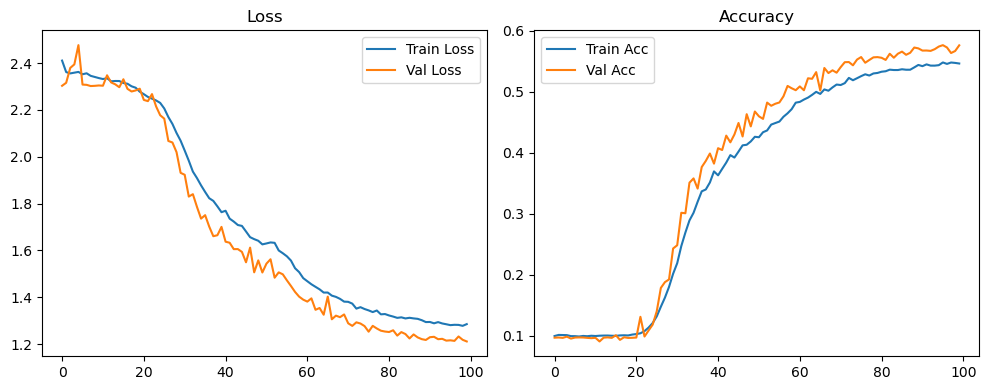

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.32it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

Original Model Final Test Loss: 1.2214 Accuracy: 0.5662


🚀 Running: batch256_lr_max_0.0005_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0946 |:   1%|          | 1/100 [01:20<2:13:27, 80.88s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   1%|          | 1/100 [02:36<2:13:27, 80.88s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   1%|          | 1/100 [02:36<2:13:27, 80.88s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [02:36<2:07:02, 77.78s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0952 |:   2%|▏         | 2/100 [02:50<2:07:02, 77.78s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0952 |:   2%|▏         | 2/100 [02:50<2:07:02, 77.78s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0952 |:   3%|▎         | 3/100 [02:50<1:19:00, 48.87s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0883 |:   3%|▎         | 3/100 [03:05<1:19:00, 48.87s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0883 |:   3%|▎         | 3/100 [03:05<1:19:00, 48.87s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0883 |:   4%|▍         | 4/100 [03:05<56:21, 35.22s/it]  

| LR: 0.000498 | Train Acc: 0.0995 | Val Acc: 0.1063 |:   4%|▍         | 4/100 [03:19<56:21, 35.22s/it]

| LR: 0.000498 | Train Acc: 0.0995 | Val Acc: 0.1063 |:   4%|▍         | 4/100 [03:19<56:21, 35.22s/it]

| LR: 0.000498 | Train Acc: 0.0995 | Val Acc: 0.1063 |:   5%|▌         | 5/100 [03:19<43:48, 27.67s/it]

| LR: 0.000497 | Train Acc: 0.1006 | Val Acc: 0.1106 |:   5%|▌         | 5/100 [03:33<43:48, 27.67s/it]

| LR: 0.000497 | Train Acc: 0.1006 | Val Acc: 0.1106 |:   5%|▌         | 5/100 [03:33<43:48, 27.67s/it]

| LR: 0.000497 | Train Acc: 0.1006 | Val Acc: 0.1106 |:   6%|▌         | 6/100 [03:33<36:18, 23.17s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0933 |:   6%|▌         | 6/100 [03:47<36:18, 23.17s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0933 |:   6%|▌         | 6/100 [03:47<36:18, 23.17s/it]

| LR: 0.000496 | Train Acc: 0.0989 | Val Acc: 0.0933 |:   7%|▋         | 7/100 [03:48<31:16, 20.18s/it]

| LR: 0.000494 | Train Acc: 0.0995 | Val Acc: 0.0904 |:   7%|▋         | 7/100 [04:01<31:16, 20.18s/it]

| LR: 0.000494 | Train Acc: 0.0995 | Val Acc: 0.0904 |:   7%|▋         | 7/100 [04:01<31:16, 20.18s/it]

| LR: 0.000494 | Train Acc: 0.0995 | Val Acc: 0.0904 |:   8%|▊         | 8/100 [04:01<27:55, 18.21s/it]

| LR: 0.000492 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   8%|▊         | 8/100 [04:16<27:55, 18.21s/it]

| LR: 0.000492 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   8%|▊         | 8/100 [04:16<27:55, 18.21s/it]

| LR: 0.000492 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [04:16<25:39, 16.92s/it]

| LR: 0.000490 | Train Acc: 0.0992 | Val Acc: 0.0977 |:   9%|▉         | 9/100 [04:30<25:39, 16.92s/it]

| LR: 0.000490 | Train Acc: 0.0992 | Val Acc: 0.0977 |:   9%|▉         | 9/100 [04:30<25:39, 16.92s/it]

| LR: 0.000490 | Train Acc: 0.0992 | Val Acc: 0.0977 |:  10%|█         | 10/100 [04:30<24:02, 16.02s/it]

| LR: 0.000488 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:44<24:02, 16.02s/it]

| LR: 0.000488 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:44<24:02, 16.02s/it]

| LR: 0.000488 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:44<22:52, 15.42s/it]

| LR: 0.000486 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:58<22:52, 15.42s/it]

| LR: 0.000486 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:58<22:52, 15.42s/it]

| LR: 0.000486 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:58<22:05, 15.06s/it]

| LR: 0.000483 | Train Acc: 0.0994 | Val Acc: 0.0990 |:  12%|█▏        | 12/100 [05:12<22:05, 15.06s/it]

| LR: 0.000483 | Train Acc: 0.0994 | Val Acc: 0.0990 |:  12%|█▏        | 12/100 [05:12<22:05, 15.06s/it]

| LR: 0.000483 | Train Acc: 0.0994 | Val Acc: 0.0990 |:  13%|█▎        | 13/100 [05:12<21:21, 14.73s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.1005 |:  13%|█▎        | 13/100 [05:26<21:21, 14.73s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.1005 |:  13%|█▎        | 13/100 [05:26<21:21, 14.73s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.1005 |:  14%|█▍        | 14/100 [05:26<20:48, 14.51s/it]

| LR: 0.000477 | Train Acc: 0.0996 | Val Acc: 0.0922 |:  14%|█▍        | 14/100 [05:40<20:48, 14.51s/it]

| LR: 0.000477 | Train Acc: 0.0996 | Val Acc: 0.0922 |:  14%|█▍        | 14/100 [05:40<20:48, 14.51s/it]

| LR: 0.000477 | Train Acc: 0.0996 | Val Acc: 0.0922 |:  15%|█▌        | 15/100 [05:40<20:18, 14.33s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  15%|█▌        | 15/100 [05:54<20:18, 14.33s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  15%|█▌        | 15/100 [05:54<20:18, 14.33s/it]

| LR: 0.000473 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [05:54<19:54, 14.22s/it]

| LR: 0.000470 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  16%|█▌        | 16/100 [06:08<19:54, 14.22s/it]

| LR: 0.000470 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  16%|█▌        | 16/100 [06:08<19:54, 14.22s/it]

| LR: 0.000470 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  17%|█▋        | 17/100 [06:08<19:35, 14.16s/it]

| LR: 0.000466 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  17%|█▋        | 17/100 [06:22<19:35, 14.16s/it]

| LR: 0.000466 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  17%|█▋        | 17/100 [06:22<19:35, 14.16s/it]

| LR: 0.000466 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  18%|█▊        | 18/100 [06:22<19:13, 14.06s/it]

| LR: 0.000462 | Train Acc: 0.1006 | Val Acc: 0.0992 |:  18%|█▊        | 18/100 [06:35<19:13, 14.06s/it]

| LR: 0.000462 | Train Acc: 0.1006 | Val Acc: 0.0992 |:  18%|█▊        | 18/100 [06:35<19:13, 14.06s/it]

| LR: 0.000462 | Train Acc: 0.1006 | Val Acc: 0.0992 |:  19%|█▉        | 19/100 [06:35<18:53, 14.00s/it]

| LR: 0.000458 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:49<18:53, 14.00s/it]

| LR: 0.000458 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:49<18:53, 14.00s/it]

| LR: 0.000458 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  20%|██        | 20/100 [06:49<18:36, 13.95s/it]

| LR: 0.000453 | Train Acc: 0.1016 | Val Acc: 0.0987 |:  20%|██        | 20/100 [07:03<18:36, 13.95s/it]

| LR: 0.000453 | Train Acc: 0.1016 | Val Acc: 0.0987 |:  20%|██        | 20/100 [07:03<18:36, 13.95s/it]

| LR: 0.000453 | Train Acc: 0.1016 | Val Acc: 0.0987 |:  21%|██        | 21/100 [07:03<18:19, 13.92s/it]

| LR: 0.000449 | Train Acc: 0.1016 | Val Acc: 0.0999 |:  21%|██        | 21/100 [07:17<18:19, 13.92s/it]

| LR: 0.000449 | Train Acc: 0.1016 | Val Acc: 0.0999 |:  21%|██        | 21/100 [07:17<18:19, 13.92s/it]

| LR: 0.000449 | Train Acc: 0.1016 | Val Acc: 0.0999 |:  22%|██▏       | 22/100 [07:17<18:03, 13.90s/it]

| LR: 0.000444 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [07:31<18:03, 13.90s/it]

| LR: 0.000444 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [07:31<18:03, 13.90s/it]

| LR: 0.000444 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  23%|██▎       | 23/100 [07:31<17:48, 13.88s/it]

| LR: 0.000439 | Train Acc: 0.1009 | Val Acc: 0.0961 |:  23%|██▎       | 23/100 [07:45<17:48, 13.88s/it]

| LR: 0.000439 | Train Acc: 0.1009 | Val Acc: 0.0961 |:  23%|██▎       | 23/100 [07:45<17:48, 13.88s/it]

| LR: 0.000439 | Train Acc: 0.1009 | Val Acc: 0.0961 |:  24%|██▍       | 24/100 [07:45<17:34, 13.87s/it]

| LR: 0.000434 | Train Acc: 0.1000 | Val Acc: 0.0996 |:  24%|██▍       | 24/100 [07:58<17:34, 13.87s/it]

| LR: 0.000434 | Train Acc: 0.1000 | Val Acc: 0.0996 |:  24%|██▍       | 24/100 [07:58<17:34, 13.87s/it]

| LR: 0.000434 | Train Acc: 0.1000 | Val Acc: 0.0996 |:  25%|██▌       | 25/100 [07:58<17:18, 13.85s/it]

| LR: 0.000428 | Train Acc: 0.1012 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [08:12<17:18, 13.85s/it]

| LR: 0.000428 | Train Acc: 0.1012 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [08:12<17:18, 13.85s/it]

| LR: 0.000428 | Train Acc: 0.1012 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [08:12<17:05, 13.85s/it]

| LR: 0.000423 | Train Acc: 0.1009 | Val Acc: 0.0981 |:  26%|██▌       | 26/100 [08:26<17:05, 13.85s/it]

| LR: 0.000423 | Train Acc: 0.1009 | Val Acc: 0.0981 |:  26%|██▌       | 26/100 [08:26<17:05, 13.85s/it]

| LR: 0.000423 | Train Acc: 0.1009 | Val Acc: 0.0981 |:  27%|██▋       | 27/100 [08:26<16:51, 13.86s/it]

| LR: 0.000417 | Train Acc: 0.1016 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [08:40<16:51, 13.86s/it]

| LR: 0.000417 | Train Acc: 0.1016 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [08:40<16:51, 13.86s/it]

| LR: 0.000417 | Train Acc: 0.1016 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [08:40<16:36, 13.85s/it]

| LR: 0.000411 | Train Acc: 0.1020 | Val Acc: 0.0979 |:  28%|██▊       | 28/100 [08:54<16:36, 13.85s/it]

| LR: 0.000411 | Train Acc: 0.1020 | Val Acc: 0.0979 |:  28%|██▊       | 28/100 [08:54<16:36, 13.85s/it]

| LR: 0.000411 | Train Acc: 0.1020 | Val Acc: 0.0979 |:  29%|██▉       | 29/100 [08:54<16:24, 13.87s/it]

| LR: 0.000405 | Train Acc: 0.1004 | Val Acc: 0.0983 |:  29%|██▉       | 29/100 [09:08<16:24, 13.87s/it]

| LR: 0.000405 | Train Acc: 0.1004 | Val Acc: 0.0983 |:  29%|██▉       | 29/100 [09:08<16:24, 13.87s/it]

| LR: 0.000405 | Train Acc: 0.1004 | Val Acc: 0.0983 |:  30%|███       | 30/100 [09:08<16:10, 13.87s/it]

| LR: 0.000399 | Train Acc: 0.1012 | Val Acc: 0.0985 |:  30%|███       | 30/100 [09:22<16:10, 13.87s/it]

| LR: 0.000399 | Train Acc: 0.1012 | Val Acc: 0.0985 |:  30%|███       | 30/100 [09:22<16:10, 13.87s/it]

| LR: 0.000399 | Train Acc: 0.1012 | Val Acc: 0.0985 |:  31%|███       | 31/100 [09:22<15:55, 13.85s/it]

| LR: 0.000393 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:35<15:55, 13.85s/it]

| LR: 0.000393 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:35<15:55, 13.85s/it]

| LR: 0.000393 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:36<15:42, 13.86s/it]

| LR: 0.000386 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  32%|███▏      | 32/100 [09:49<15:42, 13.86s/it]

| LR: 0.000386 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  32%|███▏      | 32/100 [09:49<15:42, 13.86s/it]

| LR: 0.000386 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  33%|███▎      | 33/100 [09:49<15:29, 13.88s/it]

| LR: 0.000380 | Train Acc: 0.1017 | Val Acc: 0.1047 |:  33%|███▎      | 33/100 [10:03<15:29, 13.88s/it]

| LR: 0.000380 | Train Acc: 0.1017 | Val Acc: 0.1047 |:  33%|███▎      | 33/100 [10:03<15:29, 13.88s/it]

| LR: 0.000380 | Train Acc: 0.1017 | Val Acc: 0.1047 |:  34%|███▍      | 34/100 [10:03<15:15, 13.87s/it]

| LR: 0.000373 | Train Acc: 0.1022 | Val Acc: 0.0990 |:  34%|███▍      | 34/100 [10:17<15:15, 13.87s/it]

| LR: 0.000373 | Train Acc: 0.1022 | Val Acc: 0.0990 |:  34%|███▍      | 34/100 [10:17<15:15, 13.87s/it]

| LR: 0.000373 | Train Acc: 0.1022 | Val Acc: 0.0990 |:  35%|███▌      | 35/100 [10:17<15:01, 13.86s/it]

| LR: 0.000366 | Train Acc: 0.1016 | Val Acc: 0.1002 |:  35%|███▌      | 35/100 [10:31<15:01, 13.86s/it]

| LR: 0.000366 | Train Acc: 0.1016 | Val Acc: 0.1002 |:  35%|███▌      | 35/100 [10:31<15:01, 13.86s/it]

| LR: 0.000366 | Train Acc: 0.1016 | Val Acc: 0.1002 |:  36%|███▌      | 36/100 [10:31<14:46, 13.86s/it]

| LR: 0.000359 | Train Acc: 0.1014 | Val Acc: 0.0990 |:  36%|███▌      | 36/100 [10:45<14:46, 13.86s/it]

| LR: 0.000359 | Train Acc: 0.1014 | Val Acc: 0.0990 |:  36%|███▌      | 36/100 [10:45<14:46, 13.86s/it]

| LR: 0.000359 | Train Acc: 0.1014 | Val Acc: 0.0990 |:  37%|███▋      | 37/100 [10:45<14:32, 13.86s/it]

| LR: 0.000352 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  37%|███▋      | 37/100 [10:59<14:32, 13.86s/it]

| LR: 0.000352 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  37%|███▋      | 37/100 [10:59<14:32, 13.86s/it]

| LR: 0.000352 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  38%|███▊      | 38/100 [10:59<14:20, 13.88s/it]

| LR: 0.000345 | Train Acc: 0.1026 | Val Acc: 0.0991 |:  38%|███▊      | 38/100 [11:13<14:20, 13.88s/it]

| LR: 0.000345 | Train Acc: 0.1026 | Val Acc: 0.0991 |:  38%|███▊      | 38/100 [11:13<14:20, 13.88s/it]

| LR: 0.000345 | Train Acc: 0.1026 | Val Acc: 0.0991 |:  39%|███▉      | 39/100 [11:13<14:07, 13.90s/it]

| LR: 0.000338 | Train Acc: 0.1012 | Val Acc: 0.0989 |:  39%|███▉      | 39/100 [11:26<14:07, 13.90s/it]

| LR: 0.000338 | Train Acc: 0.1012 | Val Acc: 0.0989 |:  39%|███▉      | 39/100 [11:26<14:07, 13.90s/it]

| LR: 0.000338 | Train Acc: 0.1012 | Val Acc: 0.0989 |:  40%|████      | 40/100 [11:26<13:51, 13.86s/it]

| LR: 0.000331 | Train Acc: 0.1010 | Val Acc: 0.0990 |:  40%|████      | 40/100 [11:40<13:51, 13.86s/it]

| LR: 0.000331 | Train Acc: 0.1010 | Val Acc: 0.0990 |:  40%|████      | 40/100 [11:40<13:51, 13.86s/it]

| LR: 0.000331 | Train Acc: 0.1010 | Val Acc: 0.0990 |:  41%|████      | 41/100 [11:40<13:36, 13.84s/it]

| LR: 0.000323 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  41%|████      | 41/100 [11:54<13:36, 13.84s/it]

| LR: 0.000323 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  41%|████      | 41/100 [11:54<13:36, 13.84s/it]

| LR: 0.000323 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  42%|████▏     | 42/100 [11:54<13:22, 13.83s/it]

| LR: 0.000316 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  42%|████▏     | 42/100 [12:08<13:22, 13.83s/it]

| LR: 0.000316 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  42%|████▏     | 42/100 [12:08<13:22, 13.83s/it]

| LR: 0.000316 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  43%|████▎     | 43/100 [12:08<13:07, 13.82s/it]

| LR: 0.000308 | Train Acc: 0.1022 | Val Acc: 0.0966 |:  43%|████▎     | 43/100 [12:22<13:07, 13.82s/it]

| LR: 0.000308 | Train Acc: 0.1022 | Val Acc: 0.0966 |:  43%|████▎     | 43/100 [12:22<13:07, 13.82s/it]

| LR: 0.000308 | Train Acc: 0.1022 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [12:22<12:52, 13.79s/it]

| LR: 0.000301 | Train Acc: 0.1021 | Val Acc: 0.0999 |:  44%|████▍     | 44/100 [12:35<12:52, 13.79s/it]

| LR: 0.000301 | Train Acc: 0.1021 | Val Acc: 0.0999 |:  44%|████▍     | 44/100 [12:35<12:52, 13.79s/it]

| LR: 0.000301 | Train Acc: 0.1021 | Val Acc: 0.0999 |:  45%|████▌     | 45/100 [12:35<12:37, 13.78s/it]

| LR: 0.000293 | Train Acc: 0.1015 | Val Acc: 0.1001 |:  45%|████▌     | 45/100 [12:49<12:37, 13.78s/it]

| LR: 0.000293 | Train Acc: 0.1015 | Val Acc: 0.1001 |:  45%|████▌     | 45/100 [12:49<12:37, 13.78s/it]

| LR: 0.000293 | Train Acc: 0.1015 | Val Acc: 0.1001 |:  46%|████▌     | 46/100 [12:49<12:23, 13.77s/it]

| LR: 0.000286 | Train Acc: 0.1022 | Val Acc: 0.0981 |:  46%|████▌     | 46/100 [13:03<12:23, 13.77s/it]

| LR: 0.000286 | Train Acc: 0.1022 | Val Acc: 0.0981 |:  46%|████▌     | 46/100 [13:03<12:23, 13.77s/it]

| LR: 0.000286 | Train Acc: 0.1022 | Val Acc: 0.0981 |:  47%|████▋     | 47/100 [13:03<12:09, 13.76s/it]

| LR: 0.000278 | Train Acc: 0.1026 | Val Acc: 0.1015 |:  47%|████▋     | 47/100 [13:17<12:09, 13.76s/it]

| LR: 0.000278 | Train Acc: 0.1026 | Val Acc: 0.1015 |:  47%|████▋     | 47/100 [13:17<12:09, 13.76s/it]

| LR: 0.000278 | Train Acc: 0.1026 | Val Acc: 0.1015 |:  48%|████▊     | 48/100 [13:17<11:55, 13.76s/it]

| LR: 0.000270 | Train Acc: 0.1037 | Val Acc: 0.1012 |:  48%|████▊     | 48/100 [13:30<11:55, 13.76s/it]

| LR: 0.000270 | Train Acc: 0.1037 | Val Acc: 0.1012 |:  48%|████▊     | 48/100 [13:30<11:55, 13.76s/it]

| LR: 0.000270 | Train Acc: 0.1037 | Val Acc: 0.1012 |:  49%|████▉     | 49/100 [13:30<11:42, 13.78s/it]

| LR: 0.000263 | Train Acc: 0.1036 | Val Acc: 0.0981 |:  49%|████▉     | 49/100 [13:44<11:42, 13.78s/it]

| LR: 0.000263 | Train Acc: 0.1036 | Val Acc: 0.0981 |:  49%|████▉     | 49/100 [13:44<11:42, 13.78s/it]

| LR: 0.000263 | Train Acc: 0.1036 | Val Acc: 0.0981 |:  50%|█████     | 50/100 [13:44<11:29, 13.78s/it]

| LR: 0.000255 | Train Acc: 0.1031 | Val Acc: 0.1005 |:  50%|█████     | 50/100 [13:58<11:29, 13.78s/it]

| LR: 0.000255 | Train Acc: 0.1031 | Val Acc: 0.1005 |:  50%|█████     | 50/100 [13:58<11:29, 13.78s/it]

| LR: 0.000255 | Train Acc: 0.1031 | Val Acc: 0.1005 |:  51%|█████     | 51/100 [13:58<11:15, 13.78s/it]

| LR: 0.000247 | Train Acc: 0.1042 | Val Acc: 0.1009 |:  51%|█████     | 51/100 [14:12<11:15, 13.78s/it]

| LR: 0.000247 | Train Acc: 0.1042 | Val Acc: 0.1009 |:  51%|█████     | 51/100 [14:12<11:15, 13.78s/it]

| LR: 0.000247 | Train Acc: 0.1042 | Val Acc: 0.1009 |:  52%|█████▏    | 52/100 [14:12<11:00, 13.76s/it]

| LR: 0.000240 | Train Acc: 0.1028 | Val Acc: 0.1016 |:  52%|█████▏    | 52/100 [14:26<11:00, 13.76s/it]

| LR: 0.000240 | Train Acc: 0.1028 | Val Acc: 0.1016 |:  52%|█████▏    | 52/100 [14:26<11:00, 13.76s/it]

| LR: 0.000240 | Train Acc: 0.1028 | Val Acc: 0.1016 |:  53%|█████▎    | 53/100 [14:26<10:48, 13.80s/it]

| LR: 0.000232 | Train Acc: 0.1054 | Val Acc: 0.1025 |:  53%|█████▎    | 53/100 [14:39<10:48, 13.80s/it]

| LR: 0.000232 | Train Acc: 0.1054 | Val Acc: 0.1025 |:  53%|█████▎    | 53/100 [14:39<10:48, 13.80s/it]

| LR: 0.000232 | Train Acc: 0.1054 | Val Acc: 0.1025 |:  54%|█████▍    | 54/100 [14:39<10:35, 13.82s/it]

| LR: 0.000224 | Train Acc: 0.1057 | Val Acc: 0.1038 |:  54%|█████▍    | 54/100 [14:53<10:35, 13.82s/it]

| LR: 0.000224 | Train Acc: 0.1057 | Val Acc: 0.1038 |:  54%|█████▍    | 54/100 [14:53<10:35, 13.82s/it]

| LR: 0.000224 | Train Acc: 0.1057 | Val Acc: 0.1038 |:  55%|█████▌    | 55/100 [14:53<10:22, 13.84s/it]

| LR: 0.000217 | Train Acc: 0.1055 | Val Acc: 0.1031 |:  55%|█████▌    | 55/100 [15:07<10:22, 13.84s/it]

| LR: 0.000217 | Train Acc: 0.1055 | Val Acc: 0.1031 |:  55%|█████▌    | 55/100 [15:07<10:22, 13.84s/it]

| LR: 0.000217 | Train Acc: 0.1055 | Val Acc: 0.1031 |:  56%|█████▌    | 56/100 [15:07<10:09, 13.85s/it]

| LR: 0.000209 | Train Acc: 0.1073 | Val Acc: 0.1058 |:  56%|█████▌    | 56/100 [15:21<10:09, 13.85s/it]

| LR: 0.000209 | Train Acc: 0.1073 | Val Acc: 0.1058 |:  56%|█████▌    | 56/100 [15:21<10:09, 13.85s/it]

| LR: 0.000209 | Train Acc: 0.1073 | Val Acc: 0.1058 |:  57%|█████▋    | 57/100 [15:21<09:54, 13.82s/it]

| LR: 0.000202 | Train Acc: 0.1080 | Val Acc: 0.1166 |:  57%|█████▋    | 57/100 [15:35<09:54, 13.82s/it]

| LR: 0.000202 | Train Acc: 0.1080 | Val Acc: 0.1166 |:  57%|█████▋    | 57/100 [15:35<09:54, 13.82s/it]

| LR: 0.000202 | Train Acc: 0.1080 | Val Acc: 0.1166 |:  58%|█████▊    | 58/100 [15:35<09:40, 13.81s/it]

| LR: 0.000194 | Train Acc: 0.1092 | Val Acc: 0.1076 |:  58%|█████▊    | 58/100 [15:48<09:40, 13.81s/it]

| LR: 0.000194 | Train Acc: 0.1092 | Val Acc: 0.1076 |:  58%|█████▊    | 58/100 [15:48<09:40, 13.81s/it]

| LR: 0.000194 | Train Acc: 0.1092 | Val Acc: 0.1076 |:  59%|█████▉    | 59/100 [15:49<09:25, 13.80s/it]

| LR: 0.000187 | Train Acc: 0.1112 | Val Acc: 0.1098 |:  59%|█████▉    | 59/100 [16:02<09:25, 13.80s/it]

| LR: 0.000187 | Train Acc: 0.1112 | Val Acc: 0.1098 |:  59%|█████▉    | 59/100 [16:02<09:25, 13.80s/it]

| LR: 0.000187 | Train Acc: 0.1112 | Val Acc: 0.1098 |:  60%|██████    | 60/100 [16:02<09:13, 13.83s/it]

| LR: 0.000179 | Train Acc: 0.1127 | Val Acc: 0.1026 |:  60%|██████    | 60/100 [16:16<09:13, 13.83s/it]

| LR: 0.000179 | Train Acc: 0.1127 | Val Acc: 0.1026 |:  60%|██████    | 60/100 [16:16<09:13, 13.83s/it]

| LR: 0.000179 | Train Acc: 0.1127 | Val Acc: 0.1026 |:  61%|██████    | 61/100 [16:16<09:00, 13.87s/it]

| LR: 0.000172 | Train Acc: 0.1126 | Val Acc: 0.1119 |:  61%|██████    | 61/100 [16:30<09:00, 13.87s/it]

| LR: 0.000172 | Train Acc: 0.1126 | Val Acc: 0.1119 |:  61%|██████    | 61/100 [16:30<09:00, 13.87s/it]

| LR: 0.000172 | Train Acc: 0.1126 | Val Acc: 0.1119 |:  62%|██████▏   | 62/100 [16:30<08:48, 13.90s/it]

| LR: 0.000165 | Train Acc: 0.1105 | Val Acc: 0.1066 |:  62%|██████▏   | 62/100 [16:44<08:48, 13.90s/it]

| LR: 0.000165 | Train Acc: 0.1105 | Val Acc: 0.1066 |:  62%|██████▏   | 62/100 [16:44<08:48, 13.90s/it]

| LR: 0.000165 | Train Acc: 0.1105 | Val Acc: 0.1066 |:  63%|██████▎   | 63/100 [16:44<08:34, 13.90s/it]

| LR: 0.000158 | Train Acc: 0.1134 | Val Acc: 0.1147 |:  63%|██████▎   | 63/100 [16:58<08:34, 13.90s/it]

| LR: 0.000158 | Train Acc: 0.1134 | Val Acc: 0.1147 |:  63%|██████▎   | 63/100 [16:58<08:34, 13.90s/it]

| LR: 0.000158 | Train Acc: 0.1134 | Val Acc: 0.1147 |:  64%|██████▍   | 64/100 [16:58<08:20, 13.89s/it]

| LR: 0.000151 | Train Acc: 0.1130 | Val Acc: 0.1180 |:  64%|██████▍   | 64/100 [17:12<08:20, 13.89s/it]

| LR: 0.000151 | Train Acc: 0.1130 | Val Acc: 0.1180 |:  64%|██████▍   | 64/100 [17:12<08:20, 13.89s/it]

| LR: 0.000151 | Train Acc: 0.1130 | Val Acc: 0.1180 |:  65%|██████▌   | 65/100 [17:12<08:05, 13.88s/it]

| LR: 0.000144 | Train Acc: 0.1134 | Val Acc: 0.1171 |:  65%|██████▌   | 65/100 [17:26<08:05, 13.88s/it]

| LR: 0.000144 | Train Acc: 0.1134 | Val Acc: 0.1171 |:  65%|██████▌   | 65/100 [17:26<08:05, 13.88s/it]

| LR: 0.000144 | Train Acc: 0.1134 | Val Acc: 0.1171 |:  66%|██████▌   | 66/100 [17:26<07:51, 13.88s/it]

| LR: 0.000137 | Train Acc: 0.1137 | Val Acc: 0.1154 |:  66%|██████▌   | 66/100 [17:40<07:51, 13.88s/it]

| LR: 0.000137 | Train Acc: 0.1137 | Val Acc: 0.1154 |:  66%|██████▌   | 66/100 [17:40<07:51, 13.88s/it]

| LR: 0.000137 | Train Acc: 0.1137 | Val Acc: 0.1154 |:  67%|██████▋   | 67/100 [17:40<07:38, 13.90s/it]

| LR: 0.000130 | Train Acc: 0.1139 | Val Acc: 0.1325 |:  67%|██████▋   | 67/100 [17:54<07:38, 13.90s/it]

| LR: 0.000130 | Train Acc: 0.1139 | Val Acc: 0.1325 |:  67%|██████▋   | 67/100 [17:54<07:38, 13.90s/it]

| LR: 0.000130 | Train Acc: 0.1139 | Val Acc: 0.1325 |:  68%|██████▊   | 68/100 [17:54<07:24, 13.88s/it]

| LR: 0.000124 | Train Acc: 0.1152 | Val Acc: 0.1199 |:  68%|██████▊   | 68/100 [18:07<07:24, 13.88s/it]

| LR: 0.000124 | Train Acc: 0.1152 | Val Acc: 0.1199 |:  68%|██████▊   | 68/100 [18:07<07:24, 13.88s/it]

| LR: 0.000124 | Train Acc: 0.1152 | Val Acc: 0.1199 |:  69%|██████▉   | 69/100 [18:08<07:10, 13.88s/it]

| LR: 0.000117 | Train Acc: 0.1154 | Val Acc: 0.1236 |:  69%|██████▉   | 69/100 [18:21<07:10, 13.88s/it]

| LR: 0.000117 | Train Acc: 0.1154 | Val Acc: 0.1236 |:  69%|██████▉   | 69/100 [18:21<07:10, 13.88s/it]

| LR: 0.000117 | Train Acc: 0.1154 | Val Acc: 0.1236 |:  70%|███████   | 70/100 [18:21<06:56, 13.88s/it]

| LR: 0.000111 | Train Acc: 0.1144 | Val Acc: 0.1140 |:  70%|███████   | 70/100 [18:35<06:56, 13.88s/it]

| LR: 0.000111 | Train Acc: 0.1144 | Val Acc: 0.1140 |:  70%|███████   | 70/100 [18:35<06:56, 13.88s/it]

| LR: 0.000111 | Train Acc: 0.1144 | Val Acc: 0.1140 |:  71%|███████   | 71/100 [18:35<06:42, 13.89s/it]

| LR: 0.000105 | Train Acc: 0.1160 | Val Acc: 0.1381 |:  71%|███████   | 71/100 [18:49<06:42, 13.89s/it]

| LR: 0.000105 | Train Acc: 0.1160 | Val Acc: 0.1381 |:  71%|███████   | 71/100 [18:49<06:42, 13.89s/it]

| LR: 0.000105 | Train Acc: 0.1160 | Val Acc: 0.1381 |:  72%|███████▏  | 72/100 [18:49<06:28, 13.88s/it]

| LR: 0.000099 | Train Acc: 0.1158 | Val Acc: 0.1179 |:  72%|███████▏  | 72/100 [19:03<06:28, 13.88s/it]

| LR: 0.000099 | Train Acc: 0.1158 | Val Acc: 0.1179 |:  72%|███████▏  | 72/100 [19:03<06:28, 13.88s/it]

| LR: 0.000099 | Train Acc: 0.1158 | Val Acc: 0.1179 |:  73%|███████▎  | 73/100 [19:03<06:15, 13.90s/it]

| LR: 0.000093 | Train Acc: 0.1163 | Val Acc: 0.1133 |:  73%|███████▎  | 73/100 [19:17<06:15, 13.90s/it]

| LR: 0.000093 | Train Acc: 0.1163 | Val Acc: 0.1133 |:  73%|███████▎  | 73/100 [19:17<06:15, 13.90s/it]

| LR: 0.000093 | Train Acc: 0.1163 | Val Acc: 0.1133 |:  74%|███████▍  | 74/100 [19:17<06:01, 13.90s/it]

| LR: 0.000087 | Train Acc: 0.1173 | Val Acc: 0.1104 |:  74%|███████▍  | 74/100 [19:31<06:01, 13.90s/it]

| LR: 0.000087 | Train Acc: 0.1173 | Val Acc: 0.1104 |:  74%|███████▍  | 74/100 [19:31<06:01, 13.90s/it]

| LR: 0.000087 | Train Acc: 0.1173 | Val Acc: 0.1104 |:  75%|███████▌  | 75/100 [19:31<05:47, 13.89s/it]

| LR: 0.000082 | Train Acc: 0.1185 | Val Acc: 0.1131 |:  75%|███████▌  | 75/100 [19:45<05:47, 13.89s/it]

| LR: 0.000082 | Train Acc: 0.1185 | Val Acc: 0.1131 |:  75%|███████▌  | 75/100 [19:45<05:47, 13.89s/it]

| LR: 0.000082 | Train Acc: 0.1185 | Val Acc: 0.1131 |:  76%|███████▌  | 76/100 [19:45<05:33, 13.90s/it]

| LR: 0.000076 | Train Acc: 0.1171 | Val Acc: 0.1208 |:  76%|███████▌  | 76/100 [19:59<05:33, 13.90s/it]

| LR: 0.000076 | Train Acc: 0.1171 | Val Acc: 0.1208 |:  76%|███████▌  | 76/100 [19:59<05:33, 13.90s/it]

| LR: 0.000076 | Train Acc: 0.1171 | Val Acc: 0.1208 |:  77%|███████▋  | 77/100 [19:59<05:19, 13.90s/it]

| LR: 0.000071 | Train Acc: 0.1161 | Val Acc: 0.1263 |:  77%|███████▋  | 77/100 [20:13<05:19, 13.90s/it]

| LR: 0.000071 | Train Acc: 0.1161 | Val Acc: 0.1263 |:  77%|███████▋  | 77/100 [20:13<05:19, 13.90s/it]

| LR: 0.000071 | Train Acc: 0.1161 | Val Acc: 0.1263 |:  78%|███████▊  | 78/100 [20:13<05:05, 13.90s/it]

| LR: 0.000066 | Train Acc: 0.1173 | Val Acc: 0.1369 |:  78%|███████▊  | 78/100 [20:26<05:05, 13.90s/it]

| LR: 0.000066 | Train Acc: 0.1173 | Val Acc: 0.1369 |:  78%|███████▊  | 78/100 [20:26<05:05, 13.90s/it]

| LR: 0.000066 | Train Acc: 0.1173 | Val Acc: 0.1369 |:  79%|███████▉  | 79/100 [20:27<04:52, 13.91s/it]

| LR: 0.000061 | Train Acc: 0.1166 | Val Acc: 0.1272 |:  79%|███████▉  | 79/100 [20:40<04:52, 13.91s/it]

| LR: 0.000061 | Train Acc: 0.1166 | Val Acc: 0.1272 |:  79%|███████▉  | 79/100 [20:40<04:52, 13.91s/it]

| LR: 0.000061 | Train Acc: 0.1166 | Val Acc: 0.1272 |:  80%|████████  | 80/100 [20:40<04:38, 13.91s/it]

| LR: 0.000057 | Train Acc: 0.1173 | Val Acc: 0.1111 |:  80%|████████  | 80/100 [20:54<04:38, 13.91s/it]

| LR: 0.000057 | Train Acc: 0.1173 | Val Acc: 0.1111 |:  80%|████████  | 80/100 [20:54<04:38, 13.91s/it]

| LR: 0.000057 | Train Acc: 0.1173 | Val Acc: 0.1111 |:  81%|████████  | 81/100 [20:54<04:24, 13.92s/it]

| LR: 0.000052 | Train Acc: 0.1166 | Val Acc: 0.1419 |:  81%|████████  | 81/100 [21:08<04:24, 13.92s/it]

| LR: 0.000052 | Train Acc: 0.1166 | Val Acc: 0.1419 |:  81%|████████  | 81/100 [21:08<04:24, 13.92s/it]

| LR: 0.000052 | Train Acc: 0.1166 | Val Acc: 0.1419 |:  82%|████████▏ | 82/100 [21:08<04:10, 13.94s/it]

| LR: 0.000048 | Train Acc: 0.1169 | Val Acc: 0.1115 |:  82%|████████▏ | 82/100 [21:22<04:10, 13.94s/it]

| LR: 0.000048 | Train Acc: 0.1169 | Val Acc: 0.1115 |:  82%|████████▏ | 82/100 [21:22<04:10, 13.94s/it]

| LR: 0.000048 | Train Acc: 0.1169 | Val Acc: 0.1115 |:  83%|████████▎ | 83/100 [21:22<03:57, 13.95s/it]

| LR: 0.000044 | Train Acc: 0.1176 | Val Acc: 0.1216 |:  83%|████████▎ | 83/100 [21:36<03:57, 13.95s/it]

| LR: 0.000044 | Train Acc: 0.1176 | Val Acc: 0.1216 |:  83%|████████▎ | 83/100 [21:36<03:57, 13.95s/it]

| LR: 0.000044 | Train Acc: 0.1176 | Val Acc: 0.1216 |:  84%|████████▍ | 84/100 [21:36<03:43, 13.94s/it]

| LR: 0.000040 | Train Acc: 0.1182 | Val Acc: 0.1101 |:  84%|████████▍ | 84/100 [21:50<03:43, 13.94s/it]

| LR: 0.000040 | Train Acc: 0.1182 | Val Acc: 0.1101 |:  84%|████████▍ | 84/100 [21:50<03:43, 13.94s/it]

| LR: 0.000040 | Train Acc: 0.1182 | Val Acc: 0.1101 |:  85%|████████▌ | 85/100 [21:50<03:29, 13.94s/it]

| LR: 0.000037 | Train Acc: 0.1183 | Val Acc: 0.1166 |:  85%|████████▌ | 85/100 [22:04<03:29, 13.94s/it]

| LR: 0.000037 | Train Acc: 0.1183 | Val Acc: 0.1166 |:  85%|████████▌ | 85/100 [22:04<03:29, 13.94s/it]

| LR: 0.000037 | Train Acc: 0.1183 | Val Acc: 0.1166 |:  86%|████████▌ | 86/100 [22:04<03:15, 13.93s/it]

| LR: 0.000033 | Train Acc: 0.1181 | Val Acc: 0.1096 |:  86%|████████▌ | 86/100 [22:18<03:15, 13.93s/it]

| LR: 0.000033 | Train Acc: 0.1181 | Val Acc: 0.1096 |:  86%|████████▌ | 86/100 [22:18<03:15, 13.93s/it]

| LR: 0.000033 | Train Acc: 0.1181 | Val Acc: 0.1096 |:  87%|████████▋ | 87/100 [22:18<03:00, 13.92s/it]

| LR: 0.000030 | Train Acc: 0.1199 | Val Acc: 0.1195 |:  87%|████████▋ | 87/100 [22:32<03:00, 13.92s/it]

| LR: 0.000030 | Train Acc: 0.1199 | Val Acc: 0.1195 |:  87%|████████▋ | 87/100 [22:32<03:00, 13.92s/it]

| LR: 0.000030 | Train Acc: 0.1199 | Val Acc: 0.1195 |:  88%|████████▊ | 88/100 [22:32<02:47, 13.93s/it]

| LR: 0.000027 | Train Acc: 0.1193 | Val Acc: 0.1114 |:  88%|████████▊ | 88/100 [22:46<02:47, 13.93s/it]

| LR: 0.000027 | Train Acc: 0.1193 | Val Acc: 0.1114 |:  88%|████████▊ | 88/100 [22:46<02:47, 13.93s/it]

| LR: 0.000027 | Train Acc: 0.1193 | Val Acc: 0.1114 |:  89%|████████▉ | 89/100 [22:46<02:33, 13.94s/it]

| LR: 0.000024 | Train Acc: 0.1196 | Val Acc: 0.1160 |:  89%|████████▉ | 89/100 [23:00<02:33, 13.94s/it]

| LR: 0.000024 | Train Acc: 0.1196 | Val Acc: 0.1160 |:  89%|████████▉ | 89/100 [23:00<02:33, 13.94s/it]

| LR: 0.000024 | Train Acc: 0.1196 | Val Acc: 0.1160 |:  90%|█████████ | 90/100 [23:00<02:19, 13.91s/it]

| LR: 0.000022 | Train Acc: 0.1183 | Val Acc: 0.1162 |:  90%|█████████ | 90/100 [23:14<02:19, 13.91s/it]

| LR: 0.000022 | Train Acc: 0.1183 | Val Acc: 0.1162 |:  90%|█████████ | 90/100 [23:14<02:19, 13.91s/it]

| LR: 0.000022 | Train Acc: 0.1183 | Val Acc: 0.1162 |:  91%|█████████ | 91/100 [23:14<02:05, 13.90s/it]

| LR: 0.000020 | Train Acc: 0.1195 | Val Acc: 0.1177 |:  91%|█████████ | 91/100 [23:28<02:05, 13.90s/it]

| LR: 0.000020 | Train Acc: 0.1195 | Val Acc: 0.1177 |:  91%|█████████ | 91/100 [23:28<02:05, 13.90s/it]

| LR: 0.000020 | Train Acc: 0.1195 | Val Acc: 0.1177 |:  92%|█████████▏| 92/100 [23:28<01:51, 13.91s/it]

| LR: 0.000018 | Train Acc: 0.1189 | Val Acc: 0.1106 |:  92%|█████████▏| 92/100 [23:41<01:51, 13.91s/it]

| LR: 0.000018 | Train Acc: 0.1189 | Val Acc: 0.1106 |:  92%|█████████▏| 92/100 [23:41<01:51, 13.91s/it]

| LR: 0.000018 | Train Acc: 0.1189 | Val Acc: 0.1106 |:  93%|█████████▎| 93/100 [23:41<01:37, 13.90s/it]

| LR: 0.000016 | Train Acc: 0.1200 | Val Acc: 0.1098 |:  93%|█████████▎| 93/100 [23:55<01:37, 13.90s/it]

| LR: 0.000016 | Train Acc: 0.1200 | Val Acc: 0.1098 |:  93%|█████████▎| 93/100 [23:55<01:37, 13.90s/it]

| LR: 0.000016 | Train Acc: 0.1200 | Val Acc: 0.1098 |:  94%|█████████▍| 94/100 [23:55<01:23, 13.89s/it]

| LR: 0.000014 | Train Acc: 0.1200 | Val Acc: 0.1186 |:  94%|█████████▍| 94/100 [24:09<01:23, 13.89s/it]

| LR: 0.000014 | Train Acc: 0.1200 | Val Acc: 0.1186 |:  94%|█████████▍| 94/100 [24:09<01:23, 13.89s/it]

| LR: 0.000014 | Train Acc: 0.1200 | Val Acc: 0.1186 |:  95%|█████████▌| 95/100 [24:09<01:09, 13.90s/it]

| LR: 0.000013 | Train Acc: 0.1191 | Val Acc: 0.1161 |:  95%|█████████▌| 95/100 [24:23<01:09, 13.90s/it]

| LR: 0.000013 | Train Acc: 0.1191 | Val Acc: 0.1161 |:  95%|█████████▌| 95/100 [24:23<01:09, 13.90s/it]

| LR: 0.000013 | Train Acc: 0.1191 | Val Acc: 0.1161 |:  96%|█████████▌| 96/100 [24:23<00:55, 13.90s/it]

| LR: 0.000012 | Train Acc: 0.1193 | Val Acc: 0.1231 |:  96%|█████████▌| 96/100 [24:37<00:55, 13.90s/it]

| LR: 0.000012 | Train Acc: 0.1193 | Val Acc: 0.1231 |:  96%|█████████▌| 96/100 [24:37<00:55, 13.90s/it]

| LR: 0.000012 | Train Acc: 0.1193 | Val Acc: 0.1231 |:  97%|█████████▋| 97/100 [24:37<00:41, 13.88s/it]

| LR: 0.000011 | Train Acc: 0.1188 | Val Acc: 0.1179 |:  97%|█████████▋| 97/100 [24:51<00:41, 13.88s/it]

| LR: 0.000011 | Train Acc: 0.1188 | Val Acc: 0.1179 |:  97%|█████████▋| 97/100 [24:51<00:41, 13.88s/it]

| LR: 0.000011 | Train Acc: 0.1188 | Val Acc: 0.1179 |:  98%|█████████▊| 98/100 [24:51<00:27, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1206 | Val Acc: 0.1153 |:  98%|█████████▊| 98/100 [25:05<00:27, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1206 | Val Acc: 0.1153 |:  98%|█████████▊| 98/100 [25:05<00:27, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1206 | Val Acc: 0.1153 |:  99%|█████████▉| 99/100 [25:05<00:13, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1192 | Val Acc: 0.1364 |:  99%|█████████▉| 99/100 [25:18<00:13, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1192 | Val Acc: 0.1364 |:  99%|█████████▉| 99/100 [25:18<00:13, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1192 | Val Acc: 0.1364 |: 100%|██████████| 100/100 [25:18<00:00, 13.84s/it]

| LR: 0.000010 | Train Acc: 0.1192 | Val Acc: 0.1364 |: 100%|██████████| 100/100 [25:18<00:00, 15.19s/it]

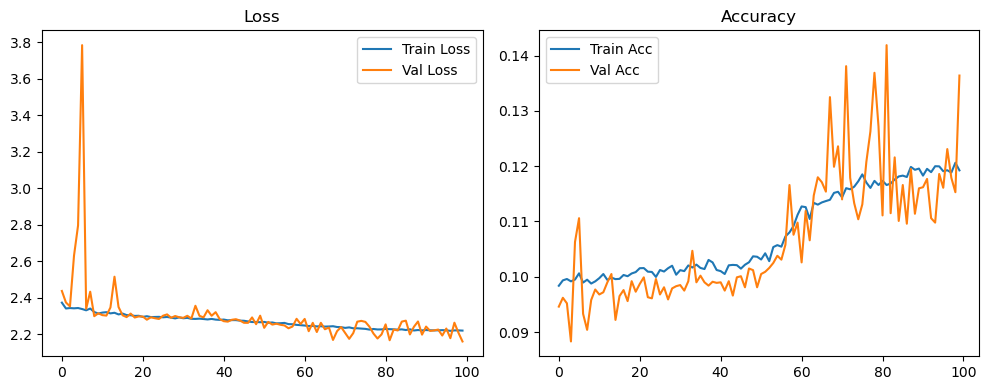

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.38it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.1550 Accuracy: 0.1364


🚀 Running: batch256_lr_max_0.0005_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0914 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0914 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0982 | Val Acc: 0.0914 |:   1%|          | 1/100 [01:20<2:12:44, 80.45s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0902 |:   1%|          | 1/100 [02:35<2:12:44, 80.45s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0902 |:   1%|          | 1/100 [02:35<2:12:44, 80.45s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0902 |:   2%|▏         | 2/100 [02:35<2:05:57, 77.11s/it]

| LR: 0.000500 | Train Acc: 0.1009 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:49<2:05:57, 77.11s/it]

| LR: 0.000500 | Train Acc: 0.1009 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:49<2:05:57, 77.11s/it]

| LR: 0.000500 | Train Acc: 0.1009 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [02:49<1:18:10, 48.35s/it]

| LR: 0.000499 | Train Acc: 0.1017 | Val Acc: 0.1116 |:   3%|▎         | 3/100 [03:03<1:18:10, 48.35s/it]

| LR: 0.000499 | Train Acc: 0.1017 | Val Acc: 0.1116 |:   3%|▎         | 3/100 [03:03<1:18:10, 48.35s/it]

| LR: 0.000499 | Train Acc: 0.1017 | Val Acc: 0.1116 |:   4%|▍         | 4/100 [03:03<55:42, 34.82s/it]  

| LR: 0.000498 | Train Acc: 0.1006 | Val Acc: 0.0933 |:   4%|▍         | 4/100 [03:17<55:42, 34.82s/it]

| LR: 0.000498 | Train Acc: 0.1006 | Val Acc: 0.0933 |:   4%|▍         | 4/100 [03:17<55:42, 34.82s/it]

| LR: 0.000498 | Train Acc: 0.1006 | Val Acc: 0.0933 |:   5%|▌         | 5/100 [03:17<43:18, 27.35s/it]

| LR: 0.000497 | Train Acc: 0.1013 | Val Acc: 0.1035 |:   5%|▌         | 5/100 [03:31<43:18, 27.35s/it]

| LR: 0.000497 | Train Acc: 0.1013 | Val Acc: 0.1035 |:   5%|▌         | 5/100 [03:31<43:18, 27.35s/it]

| LR: 0.000497 | Train Acc: 0.1013 | Val Acc: 0.1035 |:   6%|▌         | 6/100 [03:31<35:47, 22.85s/it]

| LR: 0.000496 | Train Acc: 0.1011 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [03:45<35:47, 22.85s/it]

| LR: 0.000496 | Train Acc: 0.1011 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [03:45<35:47, 22.85s/it]

| LR: 0.000496 | Train Acc: 0.1011 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [03:45<31:00, 20.00s/it]

| LR: 0.000494 | Train Acc: 0.1015 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [03:59<31:00, 20.00s/it]

| LR: 0.000494 | Train Acc: 0.1015 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [03:59<31:00, 20.00s/it]

| LR: 0.000494 | Train Acc: 0.1015 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [03:59<27:49, 18.15s/it]

| LR: 0.000492 | Train Acc: 0.1013 | Val Acc: 0.0987 |:   8%|▊         | 8/100 [04:14<27:49, 18.15s/it]

| LR: 0.000492 | Train Acc: 0.1013 | Val Acc: 0.0987 |:   8%|▊         | 8/100 [04:14<27:49, 18.15s/it]

| LR: 0.000492 | Train Acc: 0.1013 | Val Acc: 0.0987 |:   9%|▉         | 9/100 [04:14<25:36, 16.89s/it]

| LR: 0.000490 | Train Acc: 0.0993 | Val Acc: 0.0982 |:   9%|▉         | 9/100 [04:28<25:36, 16.89s/it]

| LR: 0.000490 | Train Acc: 0.0993 | Val Acc: 0.0982 |:   9%|▉         | 9/100 [04:28<25:36, 16.89s/it]

| LR: 0.000490 | Train Acc: 0.0993 | Val Acc: 0.0982 |:  10%|█         | 10/100 [04:28<24:01, 16.02s/it]

| LR: 0.000488 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:42<24:01, 16.02s/it]

| LR: 0.000488 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:42<24:01, 16.02s/it]

| LR: 0.000488 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:42<22:54, 15.45s/it]

| LR: 0.000486 | Train Acc: 0.0999 | Val Acc: 0.0995 |:  11%|█         | 11/100 [04:56<22:54, 15.45s/it]

| LR: 0.000486 | Train Acc: 0.0999 | Val Acc: 0.0995 |:  11%|█         | 11/100 [04:56<22:54, 15.45s/it]

| LR: 0.000486 | Train Acc: 0.0999 | Val Acc: 0.0995 |:  12%|█▏        | 12/100 [04:56<22:06, 15.07s/it]

| LR: 0.000483 | Train Acc: 0.0983 | Val Acc: 0.0958 |:  12%|█▏        | 12/100 [05:10<22:06, 15.07s/it]

| LR: 0.000483 | Train Acc: 0.0983 | Val Acc: 0.0958 |:  12%|█▏        | 12/100 [05:10<22:06, 15.07s/it]

| LR: 0.000483 | Train Acc: 0.0983 | Val Acc: 0.0958 |:  13%|█▎        | 13/100 [05:10<21:29, 14.82s/it]

| LR: 0.000480 | Train Acc: 0.0989 | Val Acc: 0.1013 |:  13%|█▎        | 13/100 [05:24<21:29, 14.82s/it]

| LR: 0.000480 | Train Acc: 0.0989 | Val Acc: 0.1013 |:  13%|█▎        | 13/100 [05:24<21:29, 14.82s/it]

| LR: 0.000480 | Train Acc: 0.0989 | Val Acc: 0.1013 |:  14%|█▍        | 14/100 [05:24<20:58, 14.64s/it]

| LR: 0.000477 | Train Acc: 0.0987 | Val Acc: 0.1003 |:  14%|█▍        | 14/100 [05:39<20:58, 14.64s/it]

| LR: 0.000477 | Train Acc: 0.0987 | Val Acc: 0.1003 |:  14%|█▍        | 14/100 [05:39<20:58, 14.64s/it]

| LR: 0.000477 | Train Acc: 0.0987 | Val Acc: 0.1003 |:  15%|█▌        | 15/100 [05:39<20:31, 14.49s/it]

| LR: 0.000473 | Train Acc: 0.1005 | Val Acc: 0.1035 |:  15%|█▌        | 15/100 [05:53<20:31, 14.49s/it]

| LR: 0.000473 | Train Acc: 0.1005 | Val Acc: 0.1035 |:  15%|█▌        | 15/100 [05:53<20:31, 14.49s/it]

| LR: 0.000473 | Train Acc: 0.1005 | Val Acc: 0.1035 |:  16%|█▌        | 16/100 [05:53<20:09, 14.40s/it]

| LR: 0.000470 | Train Acc: 0.1002 | Val Acc: 0.0997 |:  16%|█▌        | 16/100 [06:07<20:09, 14.40s/it]

| LR: 0.000470 | Train Acc: 0.1002 | Val Acc: 0.0997 |:  16%|█▌        | 16/100 [06:07<20:09, 14.40s/it]

| LR: 0.000470 | Train Acc: 0.1002 | Val Acc: 0.0997 |:  17%|█▋        | 17/100 [06:07<19:46, 14.30s/it]

| LR: 0.000466 | Train Acc: 0.1019 | Val Acc: 0.1072 |:  17%|█▋        | 17/100 [06:21<19:46, 14.30s/it]

| LR: 0.000466 | Train Acc: 0.1019 | Val Acc: 0.1072 |:  17%|█▋        | 17/100 [06:21<19:46, 14.30s/it]

| LR: 0.000466 | Train Acc: 0.1019 | Val Acc: 0.1072 |:  18%|█▊        | 18/100 [06:21<19:31, 14.28s/it]

| LR: 0.000462 | Train Acc: 0.1035 | Val Acc: 0.1020 |:  18%|█▊        | 18/100 [06:35<19:31, 14.28s/it]

| LR: 0.000462 | Train Acc: 0.1035 | Val Acc: 0.1020 |:  18%|█▊        | 18/100 [06:35<19:31, 14.28s/it]

| LR: 0.000462 | Train Acc: 0.1035 | Val Acc: 0.1020 |:  19%|█▉        | 19/100 [06:35<19:16, 14.28s/it]

| LR: 0.000458 | Train Acc: 0.1052 | Val Acc: 0.1060 |:  19%|█▉        | 19/100 [06:49<19:16, 14.28s/it]

| LR: 0.000458 | Train Acc: 0.1052 | Val Acc: 0.1060 |:  19%|█▉        | 19/100 [06:49<19:16, 14.28s/it]

| LR: 0.000458 | Train Acc: 0.1052 | Val Acc: 0.1060 |:  20%|██        | 20/100 [06:50<18:59, 14.25s/it]

| LR: 0.000453 | Train Acc: 0.1087 | Val Acc: 0.1012 |:  20%|██        | 20/100 [07:04<18:59, 14.25s/it]

| LR: 0.000453 | Train Acc: 0.1087 | Val Acc: 0.1012 |:  20%|██        | 20/100 [07:04<18:59, 14.25s/it]

| LR: 0.000453 | Train Acc: 0.1087 | Val Acc: 0.1012 |:  21%|██        | 21/100 [07:04<18:43, 14.22s/it]

| LR: 0.000449 | Train Acc: 0.1106 | Val Acc: 0.1035 |:  21%|██        | 21/100 [07:18<18:43, 14.22s/it]

| LR: 0.000449 | Train Acc: 0.1106 | Val Acc: 0.1035 |:  21%|██        | 21/100 [07:18<18:43, 14.22s/it]

| LR: 0.000449 | Train Acc: 0.1106 | Val Acc: 0.1035 |:  22%|██▏       | 22/100 [07:18<18:25, 14.18s/it]

| LR: 0.000444 | Train Acc: 0.1134 | Val Acc: 0.1061 |:  22%|██▏       | 22/100 [07:32<18:25, 14.18s/it]

| LR: 0.000444 | Train Acc: 0.1134 | Val Acc: 0.1061 |:  22%|██▏       | 22/100 [07:32<18:25, 14.18s/it]

| LR: 0.000444 | Train Acc: 0.1134 | Val Acc: 0.1061 |:  23%|██▎       | 23/100 [07:32<18:09, 14.15s/it]

| LR: 0.000439 | Train Acc: 0.1168 | Val Acc: 0.1059 |:  23%|██▎       | 23/100 [07:46<18:09, 14.15s/it]

| LR: 0.000439 | Train Acc: 0.1168 | Val Acc: 0.1059 |:  23%|██▎       | 23/100 [07:46<18:09, 14.15s/it]

| LR: 0.000439 | Train Acc: 0.1168 | Val Acc: 0.1059 |:  24%|██▍       | 24/100 [07:46<17:53, 14.12s/it]

| LR: 0.000434 | Train Acc: 0.1207 | Val Acc: 0.1053 |:  24%|██▍       | 24/100 [08:00<17:53, 14.12s/it]

| LR: 0.000434 | Train Acc: 0.1207 | Val Acc: 0.1053 |:  24%|██▍       | 24/100 [08:00<17:53, 14.12s/it]

| LR: 0.000434 | Train Acc: 0.1207 | Val Acc: 0.1053 |:  25%|██▌       | 25/100 [08:00<17:37, 14.10s/it]

| LR: 0.000428 | Train Acc: 0.1233 | Val Acc: 0.1013 |:  25%|██▌       | 25/100 [08:14<17:37, 14.10s/it]

| LR: 0.000428 | Train Acc: 0.1233 | Val Acc: 0.1013 |:  25%|██▌       | 25/100 [08:14<17:37, 14.10s/it]

| LR: 0.000428 | Train Acc: 0.1233 | Val Acc: 0.1013 |:  26%|██▌       | 26/100 [08:14<17:23, 14.10s/it]

| LR: 0.000423 | Train Acc: 0.1255 | Val Acc: 0.1296 |:  26%|██▌       | 26/100 [08:28<17:23, 14.10s/it]

| LR: 0.000423 | Train Acc: 0.1255 | Val Acc: 0.1296 |:  26%|██▌       | 26/100 [08:28<17:23, 14.10s/it]

| LR: 0.000423 | Train Acc: 0.1255 | Val Acc: 0.1296 |:  27%|██▋       | 27/100 [08:28<17:11, 14.13s/it]

| LR: 0.000417 | Train Acc: 0.1307 | Val Acc: 0.1343 |:  27%|██▋       | 27/100 [08:42<17:11, 14.13s/it]

| LR: 0.000417 | Train Acc: 0.1307 | Val Acc: 0.1343 |:  27%|██▋       | 27/100 [08:42<17:11, 14.13s/it]

| LR: 0.000417 | Train Acc: 0.1307 | Val Acc: 0.1343 |:  28%|██▊       | 28/100 [08:42<16:58, 14.14s/it]

| LR: 0.000411 | Train Acc: 0.1351 | Val Acc: 0.1358 |:  28%|██▊       | 28/100 [08:57<16:58, 14.14s/it]

| LR: 0.000411 | Train Acc: 0.1351 | Val Acc: 0.1358 |:  28%|██▊       | 28/100 [08:57<16:58, 14.14s/it]

| LR: 0.000411 | Train Acc: 0.1351 | Val Acc: 0.1358 |:  29%|██▉       | 29/100 [08:57<16:44, 14.15s/it]

| LR: 0.000405 | Train Acc: 0.1403 | Val Acc: 0.1410 |:  29%|██▉       | 29/100 [09:11<16:44, 14.15s/it]

| LR: 0.000405 | Train Acc: 0.1403 | Val Acc: 0.1410 |:  29%|██▉       | 29/100 [09:11<16:44, 14.15s/it]

| LR: 0.000405 | Train Acc: 0.1403 | Val Acc: 0.1410 |:  30%|███       | 30/100 [09:11<16:31, 14.17s/it]

| LR: 0.000399 | Train Acc: 0.1482 | Val Acc: 0.1616 |:  30%|███       | 30/100 [09:25<16:31, 14.17s/it]

| LR: 0.000399 | Train Acc: 0.1482 | Val Acc: 0.1616 |:  30%|███       | 30/100 [09:25<16:31, 14.17s/it]

| LR: 0.000399 | Train Acc: 0.1482 | Val Acc: 0.1616 |:  31%|███       | 31/100 [09:25<16:17, 14.16s/it]

| LR: 0.000393 | Train Acc: 0.1575 | Val Acc: 0.1526 |:  31%|███       | 31/100 [09:39<16:17, 14.16s/it]

| LR: 0.000393 | Train Acc: 0.1575 | Val Acc: 0.1526 |:  31%|███       | 31/100 [09:39<16:17, 14.16s/it]

| LR: 0.000393 | Train Acc: 0.1575 | Val Acc: 0.1526 |:  32%|███▏      | 32/100 [09:39<16:02, 14.15s/it]

| LR: 0.000386 | Train Acc: 0.1637 | Val Acc: 0.1777 |:  32%|███▏      | 32/100 [09:53<16:02, 14.15s/it]

| LR: 0.000386 | Train Acc: 0.1637 | Val Acc: 0.1777 |:  32%|███▏      | 32/100 [09:53<16:02, 14.15s/it]

| LR: 0.000386 | Train Acc: 0.1637 | Val Acc: 0.1777 |:  33%|███▎      | 33/100 [09:53<15:47, 14.14s/it]

| LR: 0.000380 | Train Acc: 0.1720 | Val Acc: 0.1941 |:  33%|███▎      | 33/100 [10:07<15:47, 14.14s/it]

| LR: 0.000380 | Train Acc: 0.1720 | Val Acc: 0.1941 |:  33%|███▎      | 33/100 [10:07<15:47, 14.14s/it]

| LR: 0.000380 | Train Acc: 0.1720 | Val Acc: 0.1941 |:  34%|███▍      | 34/100 [10:07<15:32, 14.13s/it]

| LR: 0.000373 | Train Acc: 0.1799 | Val Acc: 0.1738 |:  34%|███▍      | 34/100 [10:21<15:32, 14.13s/it]

| LR: 0.000373 | Train Acc: 0.1799 | Val Acc: 0.1738 |:  34%|███▍      | 34/100 [10:21<15:32, 14.13s/it]

| LR: 0.000373 | Train Acc: 0.1799 | Val Acc: 0.1738 |:  35%|███▌      | 35/100 [10:21<15:16, 14.10s/it]

| LR: 0.000366 | Train Acc: 0.1898 | Val Acc: 0.1877 |:  35%|███▌      | 35/100 [10:35<15:16, 14.10s/it]

| LR: 0.000366 | Train Acc: 0.1898 | Val Acc: 0.1877 |:  35%|███▌      | 35/100 [10:35<15:16, 14.10s/it]

| LR: 0.000366 | Train Acc: 0.1898 | Val Acc: 0.1877 |:  36%|███▌      | 36/100 [10:35<15:01, 14.09s/it]

| LR: 0.000359 | Train Acc: 0.1997 | Val Acc: 0.2176 |:  36%|███▌      | 36/100 [10:49<15:01, 14.09s/it]

| LR: 0.000359 | Train Acc: 0.1997 | Val Acc: 0.2176 |:  36%|███▌      | 36/100 [10:49<15:01, 14.09s/it]

| LR: 0.000359 | Train Acc: 0.1997 | Val Acc: 0.2176 |:  37%|███▋      | 37/100 [10:49<14:46, 14.07s/it]

| LR: 0.000352 | Train Acc: 0.2093 | Val Acc: 0.2057 |:  37%|███▋      | 37/100 [11:03<14:46, 14.07s/it]

| LR: 0.000352 | Train Acc: 0.2093 | Val Acc: 0.2057 |:  37%|███▋      | 37/100 [11:03<14:46, 14.07s/it]

| LR: 0.000352 | Train Acc: 0.2093 | Val Acc: 0.2057 |:  38%|███▊      | 38/100 [11:03<14:31, 14.05s/it]

| LR: 0.000345 | Train Acc: 0.2229 | Val Acc: 0.2159 |:  38%|███▊      | 38/100 [11:18<14:31, 14.05s/it]

| LR: 0.000345 | Train Acc: 0.2229 | Val Acc: 0.2159 |:  38%|███▊      | 38/100 [11:18<14:31, 14.05s/it]

| LR: 0.000345 | Train Acc: 0.2229 | Val Acc: 0.2159 |:  39%|███▉      | 39/100 [11:18<14:18, 14.08s/it]

| LR: 0.000338 | Train Acc: 0.2313 | Val Acc: 0.1686 |:  39%|███▉      | 39/100 [11:32<14:18, 14.08s/it]

| LR: 0.000338 | Train Acc: 0.2313 | Val Acc: 0.1686 |:  39%|███▉      | 39/100 [11:32<14:18, 14.08s/it]

| LR: 0.000338 | Train Acc: 0.2313 | Val Acc: 0.1686 |:  40%|████      | 40/100 [11:32<14:13, 14.22s/it]

| LR: 0.000331 | Train Acc: 0.2444 | Val Acc: 0.2338 |:  40%|████      | 40/100 [11:46<14:13, 14.22s/it]

| LR: 0.000331 | Train Acc: 0.2444 | Val Acc: 0.2338 |:  40%|████      | 40/100 [11:46<14:13, 14.22s/it]

| LR: 0.000331 | Train Acc: 0.2444 | Val Acc: 0.2338 |:  41%|████      | 41/100 [11:46<13:57, 14.19s/it]

| LR: 0.000323 | Train Acc: 0.2550 | Val Acc: 0.2741 |:  41%|████      | 41/100 [12:01<13:57, 14.19s/it]

| LR: 0.000323 | Train Acc: 0.2550 | Val Acc: 0.2741 |:  41%|████      | 41/100 [12:01<13:57, 14.19s/it]

| LR: 0.000323 | Train Acc: 0.2550 | Val Acc: 0.2741 |:  42%|████▏     | 42/100 [12:01<13:51, 14.34s/it]

| LR: 0.000316 | Train Acc: 0.2695 | Val Acc: 0.2804 |:  42%|████▏     | 42/100 [12:16<13:51, 14.34s/it]

| LR: 0.000316 | Train Acc: 0.2695 | Val Acc: 0.2804 |:  42%|████▏     | 42/100 [12:16<13:51, 14.34s/it]

| LR: 0.000316 | Train Acc: 0.2695 | Val Acc: 0.2804 |:  43%|████▎     | 43/100 [12:16<13:43, 14.44s/it]

| LR: 0.000308 | Train Acc: 0.2805 | Val Acc: 0.2914 |:  43%|████▎     | 43/100 [12:30<13:43, 14.44s/it]

| LR: 0.000308 | Train Acc: 0.2805 | Val Acc: 0.2914 |:  43%|████▎     | 43/100 [12:30<13:43, 14.44s/it]

| LR: 0.000308 | Train Acc: 0.2805 | Val Acc: 0.2914 |:  44%|████▍     | 44/100 [12:30<13:33, 14.53s/it]

| LR: 0.000301 | Train Acc: 0.2913 | Val Acc: 0.2303 |:  44%|████▍     | 44/100 [12:45<13:33, 14.53s/it]

| LR: 0.000301 | Train Acc: 0.2913 | Val Acc: 0.2303 |:  44%|████▍     | 44/100 [12:45<13:33, 14.53s/it]

| LR: 0.000301 | Train Acc: 0.2913 | Val Acc: 0.2303 |:  45%|████▌     | 45/100 [12:45<13:24, 14.62s/it]

| LR: 0.000293 | Train Acc: 0.3075 | Val Acc: 0.3041 |:  45%|████▌     | 45/100 [13:00<13:24, 14.62s/it]

| LR: 0.000293 | Train Acc: 0.3075 | Val Acc: 0.3041 |:  45%|████▌     | 45/100 [13:00<13:24, 14.62s/it]

| LR: 0.000293 | Train Acc: 0.3075 | Val Acc: 0.3041 |:  46%|████▌     | 46/100 [13:00<13:10, 14.64s/it]

| LR: 0.000286 | Train Acc: 0.3106 | Val Acc: 0.2699 |:  46%|████▌     | 46/100 [13:15<13:10, 14.64s/it]

| LR: 0.000286 | Train Acc: 0.3106 | Val Acc: 0.2699 |:  46%|████▌     | 46/100 [13:15<13:10, 14.64s/it]

| LR: 0.000286 | Train Acc: 0.3106 | Val Acc: 0.2699 |:  47%|████▋     | 47/100 [13:15<13:00, 14.72s/it]

| LR: 0.000278 | Train Acc: 0.3218 | Val Acc: 0.3149 |:  47%|████▋     | 47/100 [13:29<13:00, 14.72s/it]

| LR: 0.000278 | Train Acc: 0.3218 | Val Acc: 0.3149 |:  47%|████▋     | 47/100 [13:29<13:00, 14.72s/it]

| LR: 0.000278 | Train Acc: 0.3218 | Val Acc: 0.3149 |:  48%|████▊     | 48/100 [13:30<12:45, 14.72s/it]

| LR: 0.000270 | Train Acc: 0.3394 | Val Acc: 0.3599 |:  48%|████▊     | 48/100 [13:44<12:45, 14.72s/it]

| LR: 0.000270 | Train Acc: 0.3394 | Val Acc: 0.3599 |:  48%|████▊     | 48/100 [13:44<12:45, 14.72s/it]

| LR: 0.000270 | Train Acc: 0.3394 | Val Acc: 0.3599 |:  49%|████▉     | 49/100 [13:44<12:28, 14.68s/it]

| LR: 0.000263 | Train Acc: 0.3486 | Val Acc: 0.3455 |:  49%|████▉     | 49/100 [13:59<12:28, 14.68s/it]

| LR: 0.000263 | Train Acc: 0.3486 | Val Acc: 0.3455 |:  49%|████▉     | 49/100 [13:59<12:28, 14.68s/it]

| LR: 0.000263 | Train Acc: 0.3486 | Val Acc: 0.3455 |:  50%|█████     | 50/100 [13:59<12:13, 14.67s/it]

| LR: 0.000255 | Train Acc: 0.3553 | Val Acc: 0.3533 |:  50%|█████     | 50/100 [14:13<12:13, 14.67s/it]

| LR: 0.000255 | Train Acc: 0.3553 | Val Acc: 0.3533 |:  50%|█████     | 50/100 [14:13<12:13, 14.67s/it]

| LR: 0.000255 | Train Acc: 0.3553 | Val Acc: 0.3533 |:  51%|█████     | 51/100 [14:13<11:56, 14.63s/it]

| LR: 0.000247 | Train Acc: 0.3668 | Val Acc: 0.3409 |:  51%|█████     | 51/100 [14:28<11:56, 14.63s/it]

| LR: 0.000247 | Train Acc: 0.3668 | Val Acc: 0.3409 |:  51%|█████     | 51/100 [14:28<11:56, 14.63s/it]

| LR: 0.000247 | Train Acc: 0.3668 | Val Acc: 0.3409 |:  52%|█████▏    | 52/100 [14:28<11:43, 14.66s/it]

| LR: 0.000240 | Train Acc: 0.3743 | Val Acc: 0.3792 |:  52%|█████▏    | 52/100 [14:43<11:43, 14.66s/it]

| LR: 0.000240 | Train Acc: 0.3743 | Val Acc: 0.3792 |:  52%|█████▏    | 52/100 [14:43<11:43, 14.66s/it]

| LR: 0.000240 | Train Acc: 0.3743 | Val Acc: 0.3792 |:  53%|█████▎    | 53/100 [14:43<11:28, 14.66s/it]

| LR: 0.000232 | Train Acc: 0.3841 | Val Acc: 0.2922 |:  53%|█████▎    | 53/100 [14:57<11:28, 14.66s/it]

| LR: 0.000232 | Train Acc: 0.3841 | Val Acc: 0.2922 |:  53%|█████▎    | 53/100 [14:57<11:28, 14.66s/it]

| LR: 0.000232 | Train Acc: 0.3841 | Val Acc: 0.2922 |:  54%|█████▍    | 54/100 [14:57<11:11, 14.60s/it]

| LR: 0.000224 | Train Acc: 0.3903 | Val Acc: 0.4064 |:  54%|█████▍    | 54/100 [15:12<11:11, 14.60s/it]

| LR: 0.000224 | Train Acc: 0.3903 | Val Acc: 0.4064 |:  54%|█████▍    | 54/100 [15:12<11:11, 14.60s/it]

| LR: 0.000224 | Train Acc: 0.3903 | Val Acc: 0.4064 |:  55%|█████▌    | 55/100 [15:12<10:57, 14.60s/it]

| LR: 0.000217 | Train Acc: 0.3927 | Val Acc: 0.4020 |:  55%|█████▌    | 55/100 [15:26<10:57, 14.60s/it]

| LR: 0.000217 | Train Acc: 0.3927 | Val Acc: 0.4020 |:  55%|█████▌    | 55/100 [15:26<10:57, 14.60s/it]

| LR: 0.000217 | Train Acc: 0.3927 | Val Acc: 0.4020 |:  56%|█████▌    | 56/100 [15:26<10:43, 14.62s/it]

| LR: 0.000209 | Train Acc: 0.4107 | Val Acc: 0.4100 |:  56%|█████▌    | 56/100 [15:41<10:43, 14.62s/it]

| LR: 0.000209 | Train Acc: 0.4107 | Val Acc: 0.4100 |:  56%|█████▌    | 56/100 [15:41<10:43, 14.62s/it]

| LR: 0.000209 | Train Acc: 0.4107 | Val Acc: 0.4100 |:  57%|█████▋    | 57/100 [15:41<10:28, 14.62s/it]

| LR: 0.000202 | Train Acc: 0.4160 | Val Acc: 0.4101 |:  57%|█████▋    | 57/100 [15:56<10:28, 14.62s/it]

| LR: 0.000202 | Train Acc: 0.4160 | Val Acc: 0.4101 |:  57%|█████▋    | 57/100 [15:56<10:28, 14.62s/it]

| LR: 0.000202 | Train Acc: 0.4160 | Val Acc: 0.4101 |:  58%|█████▊    | 58/100 [15:56<10:13, 14.60s/it]

| LR: 0.000194 | Train Acc: 0.4228 | Val Acc: 0.4023 |:  58%|█████▊    | 58/100 [16:10<10:13, 14.60s/it]

| LR: 0.000194 | Train Acc: 0.4228 | Val Acc: 0.4023 |:  58%|█████▊    | 58/100 [16:10<10:13, 14.60s/it]

| LR: 0.000194 | Train Acc: 0.4228 | Val Acc: 0.4023 |:  59%|█████▉    | 59/100 [16:10<09:58, 14.61s/it]

| LR: 0.000187 | Train Acc: 0.4310 | Val Acc: 0.4284 |:  59%|█████▉    | 59/100 [16:25<09:58, 14.61s/it]

| LR: 0.000187 | Train Acc: 0.4310 | Val Acc: 0.4284 |:  59%|█████▉    | 59/100 [16:25<09:58, 14.61s/it]

| LR: 0.000187 | Train Acc: 0.4310 | Val Acc: 0.4284 |:  60%|██████    | 60/100 [16:25<09:43, 14.59s/it]

| LR: 0.000179 | Train Acc: 0.4385 | Val Acc: 0.4408 |:  60%|██████    | 60/100 [16:39<09:43, 14.59s/it]

| LR: 0.000179 | Train Acc: 0.4385 | Val Acc: 0.4408 |:  60%|██████    | 60/100 [16:39<09:43, 14.59s/it]

| LR: 0.000179 | Train Acc: 0.4385 | Val Acc: 0.4408 |:  61%|██████    | 61/100 [16:39<09:29, 14.59s/it]

| LR: 0.000172 | Train Acc: 0.4397 | Val Acc: 0.3996 |:  61%|██████    | 61/100 [16:54<09:29, 14.59s/it]

| LR: 0.000172 | Train Acc: 0.4397 | Val Acc: 0.3996 |:  61%|██████    | 61/100 [16:54<09:29, 14.59s/it]

| LR: 0.000172 | Train Acc: 0.4397 | Val Acc: 0.3996 |:  62%|██████▏   | 62/100 [16:54<09:15, 14.61s/it]

| LR: 0.000165 | Train Acc: 0.4500 | Val Acc: 0.4075 |:  62%|██████▏   | 62/100 [17:09<09:15, 14.61s/it]

| LR: 0.000165 | Train Acc: 0.4500 | Val Acc: 0.4075 |:  62%|██████▏   | 62/100 [17:09<09:15, 14.61s/it]

| LR: 0.000165 | Train Acc: 0.4500 | Val Acc: 0.4075 |:  63%|██████▎   | 63/100 [17:09<09:00, 14.60s/it]

| LR: 0.000158 | Train Acc: 0.4522 | Val Acc: 0.4257 |:  63%|██████▎   | 63/100 [17:23<09:00, 14.60s/it]

| LR: 0.000158 | Train Acc: 0.4522 | Val Acc: 0.4257 |:  63%|██████▎   | 63/100 [17:23<09:00, 14.60s/it]

| LR: 0.000158 | Train Acc: 0.4522 | Val Acc: 0.4257 |:  64%|██████▍   | 64/100 [17:23<08:46, 14.61s/it]

| LR: 0.000151 | Train Acc: 0.4561 | Val Acc: 0.4255 |:  64%|██████▍   | 64/100 [17:38<08:46, 14.61s/it]

| LR: 0.000151 | Train Acc: 0.4561 | Val Acc: 0.4255 |:  64%|██████▍   | 64/100 [17:38<08:46, 14.61s/it]

| LR: 0.000151 | Train Acc: 0.4561 | Val Acc: 0.4255 |:  65%|██████▌   | 65/100 [17:38<08:30, 14.59s/it]

| LR: 0.000144 | Train Acc: 0.4593 | Val Acc: 0.4518 |:  65%|██████▌   | 65/100 [17:52<08:30, 14.59s/it]

| LR: 0.000144 | Train Acc: 0.4593 | Val Acc: 0.4518 |:  65%|██████▌   | 65/100 [17:52<08:30, 14.59s/it]

| LR: 0.000144 | Train Acc: 0.4593 | Val Acc: 0.4518 |:  66%|██████▌   | 66/100 [17:52<08:15, 14.58s/it]

| LR: 0.000137 | Train Acc: 0.4664 | Val Acc: 0.4701 |:  66%|██████▌   | 66/100 [18:07<08:15, 14.58s/it]

| LR: 0.000137 | Train Acc: 0.4664 | Val Acc: 0.4701 |:  66%|██████▌   | 66/100 [18:07<08:15, 14.58s/it]

| LR: 0.000137 | Train Acc: 0.4664 | Val Acc: 0.4701 |:  67%|██████▋   | 67/100 [18:07<08:01, 14.60s/it]

| LR: 0.000130 | Train Acc: 0.4703 | Val Acc: 0.4511 |:  67%|██████▋   | 67/100 [18:22<08:01, 14.60s/it]

| LR: 0.000130 | Train Acc: 0.4703 | Val Acc: 0.4511 |:  67%|██████▋   | 67/100 [18:22<08:01, 14.60s/it]

| LR: 0.000130 | Train Acc: 0.4703 | Val Acc: 0.4511 |:  68%|██████▊   | 68/100 [18:22<07:47, 14.61s/it]

| LR: 0.000124 | Train Acc: 0.4713 | Val Acc: 0.4435 |:  68%|██████▊   | 68/100 [18:36<07:47, 14.61s/it]

| LR: 0.000124 | Train Acc: 0.4713 | Val Acc: 0.4435 |:  68%|██████▊   | 68/100 [18:36<07:47, 14.61s/it]

| LR: 0.000124 | Train Acc: 0.4713 | Val Acc: 0.4435 |:  69%|██████▉   | 69/100 [18:36<07:32, 14.59s/it]

| LR: 0.000117 | Train Acc: 0.4788 | Val Acc: 0.4723 |:  69%|██████▉   | 69/100 [18:51<07:32, 14.59s/it]

| LR: 0.000117 | Train Acc: 0.4788 | Val Acc: 0.4723 |:  69%|██████▉   | 69/100 [18:51<07:32, 14.59s/it]

| LR: 0.000117 | Train Acc: 0.4788 | Val Acc: 0.4723 |:  70%|███████   | 70/100 [18:51<07:17, 14.57s/it]

| LR: 0.000111 | Train Acc: 0.4871 | Val Acc: 0.4476 |:  70%|███████   | 70/100 [19:05<07:17, 14.57s/it]

| LR: 0.000111 | Train Acc: 0.4871 | Val Acc: 0.4476 |:  70%|███████   | 70/100 [19:05<07:17, 14.57s/it]

| LR: 0.000111 | Train Acc: 0.4871 | Val Acc: 0.4476 |:  71%|███████   | 71/100 [19:05<07:03, 14.60s/it]

| LR: 0.000105 | Train Acc: 0.4844 | Val Acc: 0.4831 |:  71%|███████   | 71/100 [19:20<07:03, 14.60s/it]

| LR: 0.000105 | Train Acc: 0.4844 | Val Acc: 0.4831 |:  71%|███████   | 71/100 [19:20<07:03, 14.60s/it]

| LR: 0.000105 | Train Acc: 0.4844 | Val Acc: 0.4831 |:  72%|███████▏  | 72/100 [19:20<06:48, 14.58s/it]

| LR: 0.000099 | Train Acc: 0.4911 | Val Acc: 0.4772 |:  72%|███████▏  | 72/100 [19:34<06:48, 14.58s/it]

| LR: 0.000099 | Train Acc: 0.4911 | Val Acc: 0.4772 |:  72%|███████▏  | 72/100 [19:34<06:48, 14.58s/it]

| LR: 0.000099 | Train Acc: 0.4911 | Val Acc: 0.4772 |:  73%|███████▎  | 73/100 [19:34<06:33, 14.57s/it]

| LR: 0.000093 | Train Acc: 0.4929 | Val Acc: 0.4764 |:  73%|███████▎  | 73/100 [19:49<06:33, 14.57s/it]

| LR: 0.000093 | Train Acc: 0.4929 | Val Acc: 0.4764 |:  73%|███████▎  | 73/100 [19:49<06:33, 14.57s/it]

| LR: 0.000093 | Train Acc: 0.4929 | Val Acc: 0.4764 |:  74%|███████▍  | 74/100 [19:49<06:19, 14.61s/it]

| LR: 0.000087 | Train Acc: 0.4963 | Val Acc: 0.4943 |:  74%|███████▍  | 74/100 [20:04<06:19, 14.61s/it]

| LR: 0.000087 | Train Acc: 0.4963 | Val Acc: 0.4943 |:  74%|███████▍  | 74/100 [20:04<06:19, 14.61s/it]

| LR: 0.000087 | Train Acc: 0.4963 | Val Acc: 0.4943 |:  75%|███████▌  | 75/100 [20:04<06:05, 14.63s/it]

| LR: 0.000082 | Train Acc: 0.4989 | Val Acc: 0.4432 |:  75%|███████▌  | 75/100 [20:18<06:05, 14.63s/it]

| LR: 0.000082 | Train Acc: 0.4989 | Val Acc: 0.4432 |:  75%|███████▌  | 75/100 [20:18<06:05, 14.63s/it]

| LR: 0.000082 | Train Acc: 0.4989 | Val Acc: 0.4432 |:  76%|███████▌  | 76/100 [20:18<05:50, 14.60s/it]

| LR: 0.000076 | Train Acc: 0.5031 | Val Acc: 0.4412 |:  76%|███████▌  | 76/100 [20:33<05:50, 14.60s/it]

| LR: 0.000076 | Train Acc: 0.5031 | Val Acc: 0.4412 |:  76%|███████▌  | 76/100 [20:33<05:50, 14.60s/it]

| LR: 0.000076 | Train Acc: 0.5031 | Val Acc: 0.4412 |:  77%|███████▋  | 77/100 [20:33<05:35, 14.58s/it]

| LR: 0.000071 | Train Acc: 0.5025 | Val Acc: 0.4833 |:  77%|███████▋  | 77/100 [20:47<05:35, 14.58s/it]

| LR: 0.000071 | Train Acc: 0.5025 | Val Acc: 0.4833 |:  77%|███████▋  | 77/100 [20:47<05:35, 14.58s/it]

| LR: 0.000071 | Train Acc: 0.5025 | Val Acc: 0.4833 |:  78%|███████▊  | 78/100 [20:48<05:21, 14.61s/it]

| LR: 0.000066 | Train Acc: 0.5090 | Val Acc: 0.5006 |:  78%|███████▊  | 78/100 [21:02<05:21, 14.61s/it]

| LR: 0.000066 | Train Acc: 0.5090 | Val Acc: 0.5006 |:  78%|███████▊  | 78/100 [21:02<05:21, 14.61s/it]

| LR: 0.000066 | Train Acc: 0.5090 | Val Acc: 0.5006 |:  79%|███████▉  | 79/100 [21:02<05:06, 14.61s/it]

| LR: 0.000061 | Train Acc: 0.5064 | Val Acc: 0.4384 |:  79%|███████▉  | 79/100 [21:17<05:06, 14.61s/it]

| LR: 0.000061 | Train Acc: 0.5064 | Val Acc: 0.4384 |:  79%|███████▉  | 79/100 [21:17<05:06, 14.61s/it]

| LR: 0.000061 | Train Acc: 0.5064 | Val Acc: 0.4384 |:  80%|████████  | 80/100 [21:17<04:53, 14.66s/it]

| LR: 0.000057 | Train Acc: 0.5115 | Val Acc: 0.5090 |:  80%|████████  | 80/100 [21:31<04:53, 14.66s/it]

| LR: 0.000057 | Train Acc: 0.5115 | Val Acc: 0.5090 |:  80%|████████  | 80/100 [21:31<04:53, 14.66s/it]

| LR: 0.000057 | Train Acc: 0.5115 | Val Acc: 0.5090 |:  81%|████████  | 81/100 [21:32<04:38, 14.64s/it]

| LR: 0.000052 | Train Acc: 0.5145 | Val Acc: 0.4875 |:  81%|████████  | 81/100 [21:46<04:38, 14.64s/it]

| LR: 0.000052 | Train Acc: 0.5145 | Val Acc: 0.4875 |:  81%|████████  | 81/100 [21:46<04:38, 14.64s/it]

| LR: 0.000052 | Train Acc: 0.5145 | Val Acc: 0.4875 |:  82%|████████▏ | 82/100 [21:46<04:23, 14.64s/it]

| LR: 0.000048 | Train Acc: 0.5123 | Val Acc: 0.5006 |:  82%|████████▏ | 82/100 [22:01<04:23, 14.64s/it]

| LR: 0.000048 | Train Acc: 0.5123 | Val Acc: 0.5006 |:  82%|████████▏ | 82/100 [22:01<04:23, 14.64s/it]

| LR: 0.000048 | Train Acc: 0.5123 | Val Acc: 0.5006 |:  83%|████████▎ | 83/100 [22:01<04:08, 14.63s/it]

| LR: 0.000044 | Train Acc: 0.5166 | Val Acc: 0.4861 |:  83%|████████▎ | 83/100 [22:16<04:08, 14.63s/it]

| LR: 0.000044 | Train Acc: 0.5166 | Val Acc: 0.4861 |:  83%|████████▎ | 83/100 [22:16<04:08, 14.63s/it]

| LR: 0.000044 | Train Acc: 0.5166 | Val Acc: 0.4861 |:  84%|████████▍ | 84/100 [22:16<03:55, 14.69s/it]

| LR: 0.000040 | Train Acc: 0.5179 | Val Acc: 0.5038 |:  84%|████████▍ | 84/100 [22:30<03:55, 14.69s/it]

| LR: 0.000040 | Train Acc: 0.5179 | Val Acc: 0.5038 |:  84%|████████▍ | 84/100 [22:30<03:55, 14.69s/it]

| LR: 0.000040 | Train Acc: 0.5179 | Val Acc: 0.5038 |:  85%|████████▌ | 85/100 [22:30<03:39, 14.66s/it]

| LR: 0.000037 | Train Acc: 0.5252 | Val Acc: 0.4517 |:  85%|████████▌ | 85/100 [22:45<03:39, 14.66s/it]

| LR: 0.000037 | Train Acc: 0.5252 | Val Acc: 0.4517 |:  85%|████████▌ | 85/100 [22:45<03:39, 14.66s/it]

| LR: 0.000037 | Train Acc: 0.5252 | Val Acc: 0.4517 |:  86%|████████▌ | 86/100 [22:45<03:25, 14.64s/it]

| LR: 0.000033 | Train Acc: 0.5241 | Val Acc: 0.5033 |:  86%|████████▌ | 86/100 [22:59<03:25, 14.64s/it]

| LR: 0.000033 | Train Acc: 0.5241 | Val Acc: 0.5033 |:  86%|████████▌ | 86/100 [22:59<03:25, 14.64s/it]

| LR: 0.000033 | Train Acc: 0.5241 | Val Acc: 0.5033 |:  87%|████████▋ | 87/100 [22:59<03:09, 14.61s/it]

| LR: 0.000030 | Train Acc: 0.5234 | Val Acc: 0.5063 |:  87%|████████▋ | 87/100 [23:14<03:09, 14.61s/it]

| LR: 0.000030 | Train Acc: 0.5234 | Val Acc: 0.5063 |:  87%|████████▋ | 87/100 [23:14<03:09, 14.61s/it]

| LR: 0.000030 | Train Acc: 0.5234 | Val Acc: 0.5063 |:  88%|████████▊ | 88/100 [23:14<02:54, 14.58s/it]

| LR: 0.000027 | Train Acc: 0.5261 | Val Acc: 0.5217 |:  88%|████████▊ | 88/100 [23:28<02:54, 14.58s/it]

| LR: 0.000027 | Train Acc: 0.5261 | Val Acc: 0.5217 |:  88%|████████▊ | 88/100 [23:28<02:54, 14.58s/it]

| LR: 0.000027 | Train Acc: 0.5261 | Val Acc: 0.5217 |:  89%|████████▉ | 89/100 [23:28<02:40, 14.58s/it]

| LR: 0.000024 | Train Acc: 0.5289 | Val Acc: 0.4984 |:  89%|████████▉ | 89/100 [23:43<02:40, 14.58s/it]

| LR: 0.000024 | Train Acc: 0.5289 | Val Acc: 0.4984 |:  89%|████████▉ | 89/100 [23:43<02:40, 14.58s/it]

| LR: 0.000024 | Train Acc: 0.5289 | Val Acc: 0.4984 |:  90%|█████████ | 90/100 [23:43<02:25, 14.60s/it]

| LR: 0.000022 | Train Acc: 0.5273 | Val Acc: 0.5177 |:  90%|█████████ | 90/100 [23:57<02:25, 14.60s/it]

| LR: 0.000022 | Train Acc: 0.5273 | Val Acc: 0.5177 |:  90%|█████████ | 90/100 [23:57<02:25, 14.60s/it]

| LR: 0.000022 | Train Acc: 0.5273 | Val Acc: 0.5177 |:  91%|█████████ | 91/100 [23:58<02:11, 14.56s/it]

| LR: 0.000020 | Train Acc: 0.5266 | Val Acc: 0.4881 |:  91%|█████████ | 91/100 [24:12<02:11, 14.56s/it]

| LR: 0.000020 | Train Acc: 0.5266 | Val Acc: 0.4881 |:  91%|█████████ | 91/100 [24:12<02:11, 14.56s/it]

| LR: 0.000020 | Train Acc: 0.5266 | Val Acc: 0.4881 |:  92%|█████████▏| 92/100 [24:12<01:56, 14.55s/it]

| LR: 0.000018 | Train Acc: 0.5289 | Val Acc: 0.5049 |:  92%|█████████▏| 92/100 [24:27<01:56, 14.55s/it]

| LR: 0.000018 | Train Acc: 0.5289 | Val Acc: 0.5049 |:  92%|█████████▏| 92/100 [24:27<01:56, 14.55s/it]

| LR: 0.000018 | Train Acc: 0.5289 | Val Acc: 0.5049 |:  93%|█████████▎| 93/100 [24:27<01:41, 14.54s/it]

| LR: 0.000016 | Train Acc: 0.5271 | Val Acc: 0.5042 |:  93%|█████████▎| 93/100 [24:41<01:41, 14.54s/it]

| LR: 0.000016 | Train Acc: 0.5271 | Val Acc: 0.5042 |:  93%|█████████▎| 93/100 [24:41<01:41, 14.54s/it]

| LR: 0.000016 | Train Acc: 0.5271 | Val Acc: 0.5042 |:  94%|█████████▍| 94/100 [24:41<01:27, 14.56s/it]

| LR: 0.000014 | Train Acc: 0.5299 | Val Acc: 0.5024 |:  94%|█████████▍| 94/100 [24:56<01:27, 14.56s/it]

| LR: 0.000014 | Train Acc: 0.5299 | Val Acc: 0.5024 |:  94%|█████████▍| 94/100 [24:56<01:27, 14.56s/it]

| LR: 0.000014 | Train Acc: 0.5299 | Val Acc: 0.5024 |:  95%|█████████▌| 95/100 [24:56<01:12, 14.56s/it]

| LR: 0.000013 | Train Acc: 0.5356 | Val Acc: 0.5221 |:  95%|█████████▌| 95/100 [25:10<01:12, 14.56s/it]

| LR: 0.000013 | Train Acc: 0.5356 | Val Acc: 0.5221 |:  95%|█████████▌| 95/100 [25:10<01:12, 14.56s/it]

| LR: 0.000013 | Train Acc: 0.5356 | Val Acc: 0.5221 |:  96%|█████████▌| 96/100 [25:10<00:58, 14.56s/it]

| LR: 0.000012 | Train Acc: 0.5302 | Val Acc: 0.5048 |:  96%|█████████▌| 96/100 [25:25<00:58, 14.56s/it]

| LR: 0.000012 | Train Acc: 0.5302 | Val Acc: 0.5048 |:  96%|█████████▌| 96/100 [25:25<00:58, 14.56s/it]

| LR: 0.000012 | Train Acc: 0.5302 | Val Acc: 0.5048 |:  97%|█████████▋| 97/100 [25:25<00:43, 14.56s/it]

| LR: 0.000011 | Train Acc: 0.5325 | Val Acc: 0.4660 |:  97%|█████████▋| 97/100 [25:39<00:43, 14.56s/it]

| LR: 0.000011 | Train Acc: 0.5325 | Val Acc: 0.4660 |:  97%|█████████▋| 97/100 [25:39<00:43, 14.56s/it]

| LR: 0.000011 | Train Acc: 0.5325 | Val Acc: 0.4660 |:  98%|█████████▊| 98/100 [25:39<00:29, 14.58s/it]

| LR: 0.000010 | Train Acc: 0.5310 | Val Acc: 0.5098 |:  98%|█████████▊| 98/100 [25:54<00:29, 14.58s/it]

| LR: 0.000010 | Train Acc: 0.5310 | Val Acc: 0.5098 |:  98%|█████████▊| 98/100 [25:54<00:29, 14.58s/it]

| LR: 0.000010 | Train Acc: 0.5310 | Val Acc: 0.5098 |:  99%|█████████▉| 99/100 [25:54<00:14, 14.62s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5164 |:  99%|█████████▉| 99/100 [26:09<00:14, 14.62s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5164 |:  99%|█████████▉| 99/100 [26:09<00:14, 14.62s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5164 |: 100%|██████████| 100/100 [26:09<00:00, 14.59s/it]

| LR: 0.000010 | Train Acc: 0.5355 | Val Acc: 0.5164 |: 100%|██████████| 100/100 [26:09<00:00, 15.69s/it]

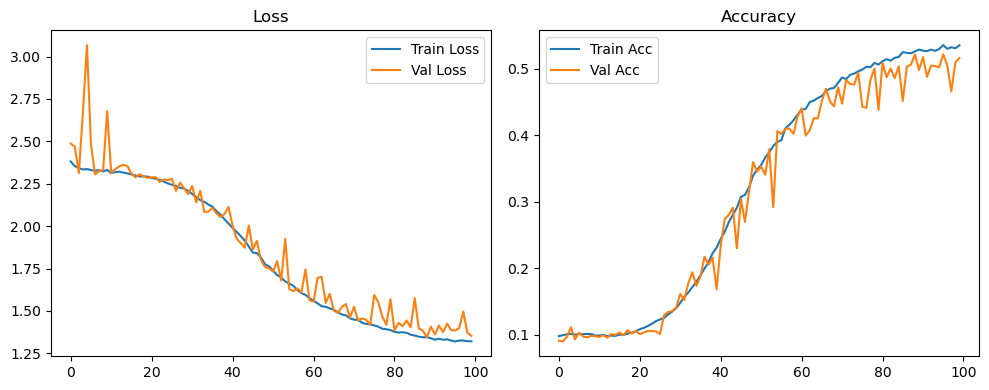

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.31it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.32it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.76it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.61it/s]

Original Model Final Test Loss: 1.3678 Accuracy: 0.5135


🚀 Running: batch256_lr_max_0.0005_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0983 | Val Acc: 0.0963 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0983 | Val Acc: 0.0963 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0983 | Val Acc: 0.0963 |:   1%|          | 1/100 [01:21<2:14:22, 81.44s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   1%|          | 1/100 [02:37<2:14:22, 81.44s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   1%|          | 1/100 [02:37<2:14:22, 81.44s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:37<2:07:33, 78.09s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:51<2:07:33, 78.09s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:51<2:07:33, 78.09s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:51<1:19:24, 49.11s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0940 |:   3%|▎         | 3/100 [03:06<1:19:24, 49.11s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0940 |:   3%|▎         | 3/100 [03:06<1:19:24, 49.11s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0940 |:   4%|▍         | 4/100 [03:06<56:47, 35.50s/it]  

| LR: 0.000498 | Train Acc: 0.0994 | Val Acc: 0.1004 |:   4%|▍         | 4/100 [03:21<56:47, 35.50s/it]

| LR: 0.000498 | Train Acc: 0.0994 | Val Acc: 0.1004 |:   4%|▍         | 4/100 [03:21<56:47, 35.50s/it]

| LR: 0.000498 | Train Acc: 0.0994 | Val Acc: 0.1004 |:   5%|▌         | 5/100 [03:21<44:18, 27.98s/it]

| LR: 0.000497 | Train Acc: 0.1007 | Val Acc: 0.1009 |:   5%|▌         | 5/100 [03:35<44:18, 27.98s/it]

| LR: 0.000497 | Train Acc: 0.1007 | Val Acc: 0.1009 |:   5%|▌         | 5/100 [03:35<44:18, 27.98s/it]

| LR: 0.000497 | Train Acc: 0.1007 | Val Acc: 0.1009 |:   6%|▌         | 6/100 [03:35<36:42, 23.44s/it]

| LR: 0.000496 | Train Acc: 0.1003 | Val Acc: 0.1051 |:   6%|▌         | 6/100 [03:49<36:42, 23.44s/it]

| LR: 0.000496 | Train Acc: 0.1003 | Val Acc: 0.1051 |:   6%|▌         | 6/100 [03:49<36:42, 23.44s/it]

| LR: 0.000496 | Train Acc: 0.1003 | Val Acc: 0.1051 |:   7%|▋         | 7/100 [03:50<31:43, 20.46s/it]

| LR: 0.000494 | Train Acc: 0.1008 | Val Acc: 0.0983 |:   7%|▋         | 7/100 [04:04<31:43, 20.46s/it]

| LR: 0.000494 | Train Acc: 0.1008 | Val Acc: 0.0983 |:   7%|▋         | 7/100 [04:04<31:43, 20.46s/it]

| LR: 0.000494 | Train Acc: 0.1008 | Val Acc: 0.0983 |:   8%|▊         | 8/100 [04:04<28:17, 18.46s/it]

| LR: 0.000492 | Train Acc: 0.1000 | Val Acc: 0.0998 |:   8%|▊         | 8/100 [04:18<28:17, 18.46s/it]

| LR: 0.000492 | Train Acc: 0.1000 | Val Acc: 0.0998 |:   8%|▊         | 8/100 [04:18<28:17, 18.46s/it]

| LR: 0.000492 | Train Acc: 0.1000 | Val Acc: 0.0998 |:   9%|▉         | 9/100 [04:18<25:57, 17.11s/it]

| LR: 0.000490 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:32<25:57, 17.11s/it]

| LR: 0.000490 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:32<25:57, 17.11s/it]

| LR: 0.000490 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:32<24:23, 16.26s/it]

| LR: 0.000488 | Train Acc: 0.1009 | Val Acc: 0.1014 |:  10%|█         | 10/100 [04:47<24:23, 16.26s/it]

| LR: 0.000488 | Train Acc: 0.1009 | Val Acc: 0.1014 |:  10%|█         | 10/100 [04:47<24:23, 16.26s/it]

| LR: 0.000488 | Train Acc: 0.1009 | Val Acc: 0.1014 |:  11%|█         | 11/100 [04:47<23:25, 15.79s/it]

| LR: 0.000486 | Train Acc: 0.1012 | Val Acc: 0.0991 |:  11%|█         | 11/100 [05:01<23:25, 15.79s/it]

| LR: 0.000486 | Train Acc: 0.1012 | Val Acc: 0.0991 |:  11%|█         | 11/100 [05:01<23:25, 15.79s/it]

| LR: 0.000486 | Train Acc: 0.1012 | Val Acc: 0.0991 |:  12%|█▏        | 12/100 [05:01<22:35, 15.40s/it]

| LR: 0.000483 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  12%|█▏        | 12/100 [05:16<22:35, 15.40s/it]

| LR: 0.000483 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  12%|█▏        | 12/100 [05:16<22:35, 15.40s/it]

| LR: 0.000483 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  13%|█▎        | 13/100 [05:16<21:59, 15.16s/it]

| LR: 0.000480 | Train Acc: 0.1025 | Val Acc: 0.1000 |:  13%|█▎        | 13/100 [05:31<21:59, 15.16s/it]

| LR: 0.000480 | Train Acc: 0.1025 | Val Acc: 0.1000 |:  13%|█▎        | 13/100 [05:31<21:59, 15.16s/it]

| LR: 0.000480 | Train Acc: 0.1025 | Val Acc: 0.1000 |:  14%|█▍        | 14/100 [05:31<21:27, 14.97s/it]

| LR: 0.000477 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  14%|█▍        | 14/100 [05:45<21:27, 14.97s/it]

| LR: 0.000477 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  14%|█▍        | 14/100 [05:45<21:27, 14.97s/it]

| LR: 0.000477 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  15%|█▌        | 15/100 [05:45<21:00, 14.83s/it]

| LR: 0.000473 | Train Acc: 0.1033 | Val Acc: 0.0996 |:  15%|█▌        | 15/100 [06:00<21:00, 14.83s/it]

| LR: 0.000473 | Train Acc: 0.1033 | Val Acc: 0.0996 |:  15%|█▌        | 15/100 [06:00<21:00, 14.83s/it]

| LR: 0.000473 | Train Acc: 0.1033 | Val Acc: 0.0996 |:  16%|█▌        | 16/100 [06:00<20:39, 14.76s/it]

| LR: 0.000470 | Train Acc: 0.1040 | Val Acc: 0.0982 |:  16%|█▌        | 16/100 [06:14<20:39, 14.76s/it]

| LR: 0.000470 | Train Acc: 0.1040 | Val Acc: 0.0982 |:  16%|█▌        | 16/100 [06:14<20:39, 14.76s/it]

| LR: 0.000470 | Train Acc: 0.1040 | Val Acc: 0.0982 |:  17%|█▋        | 17/100 [06:14<20:16, 14.66s/it]

| LR: 0.000466 | Train Acc: 0.1032 | Val Acc: 0.0988 |:  17%|█▋        | 17/100 [06:29<20:16, 14.66s/it]

| LR: 0.000466 | Train Acc: 0.1032 | Val Acc: 0.0988 |:  17%|█▋        | 17/100 [06:29<20:16, 14.66s/it]

| LR: 0.000466 | Train Acc: 0.1032 | Val Acc: 0.0988 |:  18%|█▊        | 18/100 [06:29<19:57, 14.61s/it]

| LR: 0.000462 | Train Acc: 0.1055 | Val Acc: 0.1023 |:  18%|█▊        | 18/100 [06:43<19:57, 14.61s/it]

| LR: 0.000462 | Train Acc: 0.1055 | Val Acc: 0.1023 |:  18%|█▊        | 18/100 [06:43<19:57, 14.61s/it]

| LR: 0.000462 | Train Acc: 0.1055 | Val Acc: 0.1023 |:  19%|█▉        | 19/100 [06:43<19:41, 14.58s/it]

| LR: 0.000458 | Train Acc: 0.1051 | Val Acc: 0.1023 |:  19%|█▉        | 19/100 [06:58<19:41, 14.58s/it]

| LR: 0.000458 | Train Acc: 0.1051 | Val Acc: 0.1023 |:  19%|█▉        | 19/100 [06:58<19:41, 14.58s/it]

| LR: 0.000458 | Train Acc: 0.1051 | Val Acc: 0.1023 |:  20%|██        | 20/100 [06:58<19:27, 14.59s/it]

| LR: 0.000453 | Train Acc: 0.1071 | Val Acc: 0.1103 |:  20%|██        | 20/100 [07:12<19:27, 14.59s/it]

| LR: 0.000453 | Train Acc: 0.1071 | Val Acc: 0.1103 |:  20%|██        | 20/100 [07:12<19:27, 14.59s/it]

| LR: 0.000453 | Train Acc: 0.1071 | Val Acc: 0.1103 |:  21%|██        | 21/100 [07:12<19:13, 14.61s/it]

| LR: 0.000449 | Train Acc: 0.1094 | Val Acc: 0.1049 |:  21%|██        | 21/100 [07:27<19:13, 14.61s/it]

| LR: 0.000449 | Train Acc: 0.1094 | Val Acc: 0.1049 |:  21%|██        | 21/100 [07:27<19:13, 14.61s/it]

| LR: 0.000449 | Train Acc: 0.1094 | Val Acc: 0.1049 |:  22%|██▏       | 22/100 [07:27<18:55, 14.56s/it]

| LR: 0.000444 | Train Acc: 0.1129 | Val Acc: 0.1119 |:  22%|██▏       | 22/100 [07:41<18:55, 14.56s/it]

| LR: 0.000444 | Train Acc: 0.1129 | Val Acc: 0.1119 |:  22%|██▏       | 22/100 [07:41<18:55, 14.56s/it]

| LR: 0.000444 | Train Acc: 0.1129 | Val Acc: 0.1119 |:  23%|██▎       | 23/100 [07:41<18:39, 14.54s/it]

| LR: 0.000439 | Train Acc: 0.1166 | Val Acc: 0.1055 |:  23%|██▎       | 23/100 [07:56<18:39, 14.54s/it]

| LR: 0.000439 | Train Acc: 0.1166 | Val Acc: 0.1055 |:  23%|██▎       | 23/100 [07:56<18:39, 14.54s/it]

| LR: 0.000439 | Train Acc: 0.1166 | Val Acc: 0.1055 |:  24%|██▍       | 24/100 [07:56<18:29, 14.60s/it]

| LR: 0.000434 | Train Acc: 0.1197 | Val Acc: 0.1119 |:  24%|██▍       | 24/100 [08:11<18:29, 14.60s/it]

| LR: 0.000434 | Train Acc: 0.1197 | Val Acc: 0.1119 |:  24%|██▍       | 24/100 [08:11<18:29, 14.60s/it]

| LR: 0.000434 | Train Acc: 0.1197 | Val Acc: 0.1119 |:  25%|██▌       | 25/100 [08:11<18:14, 14.59s/it]

| LR: 0.000428 | Train Acc: 0.1204 | Val Acc: 0.1109 |:  25%|██▌       | 25/100 [08:25<18:14, 14.59s/it]

| LR: 0.000428 | Train Acc: 0.1204 | Val Acc: 0.1109 |:  25%|██▌       | 25/100 [08:25<18:14, 14.59s/it]

| LR: 0.000428 | Train Acc: 0.1204 | Val Acc: 0.1109 |:  26%|██▌       | 26/100 [08:25<17:57, 14.56s/it]

| LR: 0.000423 | Train Acc: 0.1257 | Val Acc: 0.1307 |:  26%|██▌       | 26/100 [08:40<17:57, 14.56s/it]

| LR: 0.000423 | Train Acc: 0.1257 | Val Acc: 0.1307 |:  26%|██▌       | 26/100 [08:40<17:57, 14.56s/it]

| LR: 0.000423 | Train Acc: 0.1257 | Val Acc: 0.1307 |:  27%|██▋       | 27/100 [08:40<17:41, 14.55s/it]

| LR: 0.000417 | Train Acc: 0.1311 | Val Acc: 0.1274 |:  27%|██▋       | 27/100 [08:54<17:41, 14.55s/it]

| LR: 0.000417 | Train Acc: 0.1311 | Val Acc: 0.1274 |:  27%|██▋       | 27/100 [08:54<17:41, 14.55s/it]

| LR: 0.000417 | Train Acc: 0.1311 | Val Acc: 0.1274 |:  28%|██▊       | 28/100 [08:54<17:28, 14.57s/it]

| LR: 0.000411 | Train Acc: 0.1330 | Val Acc: 0.1312 |:  28%|██▊       | 28/100 [09:09<17:28, 14.57s/it]

| LR: 0.000411 | Train Acc: 0.1330 | Val Acc: 0.1312 |:  28%|██▊       | 28/100 [09:09<17:28, 14.57s/it]

| LR: 0.000411 | Train Acc: 0.1330 | Val Acc: 0.1312 |:  29%|██▉       | 29/100 [09:09<17:13, 14.56s/it]

| LR: 0.000405 | Train Acc: 0.1379 | Val Acc: 0.1228 |:  29%|██▉       | 29/100 [09:23<17:13, 14.56s/it]

| LR: 0.000405 | Train Acc: 0.1379 | Val Acc: 0.1228 |:  29%|██▉       | 29/100 [09:23<17:13, 14.56s/it]

| LR: 0.000405 | Train Acc: 0.1379 | Val Acc: 0.1228 |:  30%|███       | 30/100 [09:23<17:00, 14.58s/it]

| LR: 0.000399 | Train Acc: 0.1407 | Val Acc: 0.1250 |:  30%|███       | 30/100 [09:38<17:00, 14.58s/it]

| LR: 0.000399 | Train Acc: 0.1407 | Val Acc: 0.1250 |:  30%|███       | 30/100 [09:38<17:00, 14.58s/it]

| LR: 0.000399 | Train Acc: 0.1407 | Val Acc: 0.1250 |:  31%|███       | 31/100 [09:38<16:45, 14.57s/it]

| LR: 0.000393 | Train Acc: 0.1490 | Val Acc: 0.1322 |:  31%|███       | 31/100 [09:53<16:45, 14.57s/it]

| LR: 0.000393 | Train Acc: 0.1490 | Val Acc: 0.1322 |:  31%|███       | 31/100 [09:53<16:45, 14.57s/it]

| LR: 0.000393 | Train Acc: 0.1490 | Val Acc: 0.1322 |:  32%|███▏      | 32/100 [09:53<16:31, 14.58s/it]

| LR: 0.000386 | Train Acc: 0.1559 | Val Acc: 0.1494 |:  32%|███▏      | 32/100 [10:07<16:31, 14.58s/it]

| LR: 0.000386 | Train Acc: 0.1559 | Val Acc: 0.1494 |:  32%|███▏      | 32/100 [10:07<16:31, 14.58s/it]

| LR: 0.000386 | Train Acc: 0.1559 | Val Acc: 0.1494 |:  33%|███▎      | 33/100 [10:07<16:14, 14.54s/it]

| LR: 0.000380 | Train Acc: 0.1645 | Val Acc: 0.1679 |:  33%|███▎      | 33/100 [10:22<16:14, 14.54s/it]

| LR: 0.000380 | Train Acc: 0.1645 | Val Acc: 0.1679 |:  33%|███▎      | 33/100 [10:22<16:14, 14.54s/it]

| LR: 0.000380 | Train Acc: 0.1645 | Val Acc: 0.1679 |:  34%|███▍      | 34/100 [10:22<16:01, 14.57s/it]

| LR: 0.000373 | Train Acc: 0.1745 | Val Acc: 0.1592 |:  34%|███▍      | 34/100 [10:36<16:01, 14.57s/it]

| LR: 0.000373 | Train Acc: 0.1745 | Val Acc: 0.1592 |:  34%|███▍      | 34/100 [10:36<16:01, 14.57s/it]

| LR: 0.000373 | Train Acc: 0.1745 | Val Acc: 0.1592 |:  35%|███▌      | 35/100 [10:36<15:45, 14.55s/it]

| LR: 0.000366 | Train Acc: 0.1775 | Val Acc: 0.2250 |:  35%|███▌      | 35/100 [10:51<15:45, 14.55s/it]

| LR: 0.000366 | Train Acc: 0.1775 | Val Acc: 0.2250 |:  35%|███▌      | 35/100 [10:51<15:45, 14.55s/it]

| LR: 0.000366 | Train Acc: 0.1775 | Val Acc: 0.2250 |:  36%|███▌      | 36/100 [10:51<15:33, 14.59s/it]

| LR: 0.000359 | Train Acc: 0.1862 | Val Acc: 0.2052 |:  36%|███▌      | 36/100 [11:05<15:33, 14.59s/it]

| LR: 0.000359 | Train Acc: 0.1862 | Val Acc: 0.2052 |:  36%|███▌      | 36/100 [11:05<15:33, 14.59s/it]

| LR: 0.000359 | Train Acc: 0.1862 | Val Acc: 0.2052 |:  37%|███▋      | 37/100 [11:05<15:18, 14.58s/it]

| LR: 0.000352 | Train Acc: 0.1941 | Val Acc: 0.1887 |:  37%|███▋      | 37/100 [11:20<15:18, 14.58s/it]

| LR: 0.000352 | Train Acc: 0.1941 | Val Acc: 0.1887 |:  37%|███▋      | 37/100 [11:20<15:18, 14.58s/it]

| LR: 0.000352 | Train Acc: 0.1941 | Val Acc: 0.1887 |:  38%|███▊      | 38/100 [11:20<15:04, 14.58s/it]

| LR: 0.000345 | Train Acc: 0.2014 | Val Acc: 0.1811 |:  38%|███▊      | 38/100 [11:34<15:04, 14.58s/it]

| LR: 0.000345 | Train Acc: 0.2014 | Val Acc: 0.1811 |:  38%|███▊      | 38/100 [11:34<15:04, 14.58s/it]

| LR: 0.000345 | Train Acc: 0.2014 | Val Acc: 0.1811 |:  39%|███▉      | 39/100 [11:34<14:47, 14.55s/it]

| LR: 0.000338 | Train Acc: 0.2054 | Val Acc: 0.2119 |:  39%|███▉      | 39/100 [11:49<14:47, 14.55s/it]

| LR: 0.000338 | Train Acc: 0.2054 | Val Acc: 0.2119 |:  39%|███▉      | 39/100 [11:49<14:47, 14.55s/it]

| LR: 0.000338 | Train Acc: 0.2054 | Val Acc: 0.2119 |:  40%|████      | 40/100 [11:49<14:32, 14.54s/it]

| LR: 0.000331 | Train Acc: 0.2104 | Val Acc: 0.2309 |:  40%|████      | 40/100 [12:03<14:32, 14.54s/it]

| LR: 0.000331 | Train Acc: 0.2104 | Val Acc: 0.2309 |:  40%|████      | 40/100 [12:03<14:32, 14.54s/it]

| LR: 0.000331 | Train Acc: 0.2104 | Val Acc: 0.2309 |:  41%|████      | 41/100 [12:04<14:18, 14.55s/it]

| LR: 0.000323 | Train Acc: 0.2233 | Val Acc: 0.2156 |:  41%|████      | 41/100 [12:18<14:18, 14.55s/it]

| LR: 0.000323 | Train Acc: 0.2233 | Val Acc: 0.2156 |:  41%|████      | 41/100 [12:18<14:18, 14.55s/it]

| LR: 0.000323 | Train Acc: 0.2233 | Val Acc: 0.2156 |:  42%|████▏     | 42/100 [12:18<14:03, 14.55s/it]

| LR: 0.000316 | Train Acc: 0.2329 | Val Acc: 0.2471 |:  42%|████▏     | 42/100 [12:33<14:03, 14.55s/it]

| LR: 0.000316 | Train Acc: 0.2329 | Val Acc: 0.2471 |:  42%|████▏     | 42/100 [12:33<14:03, 14.55s/it]

| LR: 0.000316 | Train Acc: 0.2329 | Val Acc: 0.2471 |:  43%|████▎     | 43/100 [12:33<13:48, 14.54s/it]

| LR: 0.000308 | Train Acc: 0.2458 | Val Acc: 0.2580 |:  43%|████▎     | 43/100 [12:47<13:48, 14.54s/it]

| LR: 0.000308 | Train Acc: 0.2458 | Val Acc: 0.2580 |:  43%|████▎     | 43/100 [12:47<13:48, 14.54s/it]

| LR: 0.000308 | Train Acc: 0.2458 | Val Acc: 0.2580 |:  44%|████▍     | 44/100 [12:48<13:40, 14.65s/it]

| LR: 0.000301 | Train Acc: 0.2571 | Val Acc: 0.2739 |:  44%|████▍     | 44/100 [13:02<13:40, 14.65s/it]

| LR: 0.000301 | Train Acc: 0.2571 | Val Acc: 0.2739 |:  44%|████▍     | 44/100 [13:02<13:40, 14.65s/it]

| LR: 0.000301 | Train Acc: 0.2571 | Val Acc: 0.2739 |:  45%|████▌     | 45/100 [13:02<13:23, 14.61s/it]

| LR: 0.000293 | Train Acc: 0.2645 | Val Acc: 0.2538 |:  45%|████▌     | 45/100 [13:17<13:23, 14.61s/it]

| LR: 0.000293 | Train Acc: 0.2645 | Val Acc: 0.2538 |:  45%|████▌     | 45/100 [13:17<13:23, 14.61s/it]

| LR: 0.000293 | Train Acc: 0.2645 | Val Acc: 0.2538 |:  46%|████▌     | 46/100 [13:17<13:10, 14.64s/it]

| LR: 0.000286 | Train Acc: 0.2782 | Val Acc: 0.3184 |:  46%|████▌     | 46/100 [13:31<13:10, 14.64s/it]

| LR: 0.000286 | Train Acc: 0.2782 | Val Acc: 0.3184 |:  46%|████▌     | 46/100 [13:31<13:10, 14.64s/it]

| LR: 0.000286 | Train Acc: 0.2782 | Val Acc: 0.3184 |:  47%|████▋     | 47/100 [13:31<12:56, 14.64s/it]

| LR: 0.000278 | Train Acc: 0.2879 | Val Acc: 0.3230 |:  47%|████▋     | 47/100 [13:46<12:56, 14.64s/it]

| LR: 0.000278 | Train Acc: 0.2879 | Val Acc: 0.3230 |:  47%|████▋     | 47/100 [13:46<12:56, 14.64s/it]

| LR: 0.000278 | Train Acc: 0.2879 | Val Acc: 0.3230 |:  48%|████▊     | 48/100 [13:46<12:39, 14.60s/it]

| LR: 0.000270 | Train Acc: 0.3006 | Val Acc: 0.3204 |:  48%|████▊     | 48/100 [14:00<12:39, 14.60s/it]

| LR: 0.000270 | Train Acc: 0.3006 | Val Acc: 0.3204 |:  48%|████▊     | 48/100 [14:00<12:39, 14.60s/it]

| LR: 0.000270 | Train Acc: 0.3006 | Val Acc: 0.3204 |:  49%|████▉     | 49/100 [14:00<12:24, 14.59s/it]

| LR: 0.000263 | Train Acc: 0.3122 | Val Acc: 0.3180 |:  49%|████▉     | 49/100 [14:15<12:24, 14.59s/it]

| LR: 0.000263 | Train Acc: 0.3122 | Val Acc: 0.3180 |:  49%|████▉     | 49/100 [14:15<12:24, 14.59s/it]

| LR: 0.000263 | Train Acc: 0.3122 | Val Acc: 0.3180 |:  50%|█████     | 50/100 [14:15<12:08, 14.56s/it]

| LR: 0.000255 | Train Acc: 0.3201 | Val Acc: 0.3315 |:  50%|█████     | 50/100 [14:30<12:08, 14.56s/it]

| LR: 0.000255 | Train Acc: 0.3201 | Val Acc: 0.3315 |:  50%|█████     | 50/100 [14:30<12:08, 14.56s/it]

| LR: 0.000255 | Train Acc: 0.3201 | Val Acc: 0.3315 |:  51%|█████     | 51/100 [14:30<11:56, 14.62s/it]

| LR: 0.000247 | Train Acc: 0.3323 | Val Acc: 0.3570 |:  51%|█████     | 51/100 [14:44<11:56, 14.62s/it]

| LR: 0.000247 | Train Acc: 0.3323 | Val Acc: 0.3570 |:  51%|█████     | 51/100 [14:44<11:56, 14.62s/it]

| LR: 0.000247 | Train Acc: 0.3323 | Val Acc: 0.3570 |:  52%|█████▏    | 52/100 [14:44<11:41, 14.62s/it]

| LR: 0.000240 | Train Acc: 0.3354 | Val Acc: 0.3764 |:  52%|█████▏    | 52/100 [14:59<11:41, 14.62s/it]

| LR: 0.000240 | Train Acc: 0.3354 | Val Acc: 0.3764 |:  52%|█████▏    | 52/100 [14:59<11:41, 14.62s/it]

| LR: 0.000240 | Train Acc: 0.3354 | Val Acc: 0.3764 |:  53%|█████▎    | 53/100 [14:59<11:26, 14.61s/it]

| LR: 0.000232 | Train Acc: 0.3498 | Val Acc: 0.3784 |:  53%|█████▎    | 53/100 [15:13<11:26, 14.61s/it]

| LR: 0.000232 | Train Acc: 0.3498 | Val Acc: 0.3784 |:  53%|█████▎    | 53/100 [15:13<11:26, 14.61s/it]

| LR: 0.000232 | Train Acc: 0.3498 | Val Acc: 0.3784 |:  54%|█████▍    | 54/100 [15:13<11:11, 14.60s/it]

| LR: 0.000224 | Train Acc: 0.3554 | Val Acc: 0.3066 |:  54%|█████▍    | 54/100 [15:28<11:11, 14.60s/it]

| LR: 0.000224 | Train Acc: 0.3554 | Val Acc: 0.3066 |:  54%|█████▍    | 54/100 [15:28<11:11, 14.60s/it]

| LR: 0.000224 | Train Acc: 0.3554 | Val Acc: 0.3066 |:  55%|█████▌    | 55/100 [15:28<10:57, 14.60s/it]

| LR: 0.000217 | Train Acc: 0.3634 | Val Acc: 0.3913 |:  55%|█████▌    | 55/100 [15:43<10:57, 14.60s/it]

| LR: 0.000217 | Train Acc: 0.3634 | Val Acc: 0.3913 |:  55%|█████▌    | 55/100 [15:43<10:57, 14.60s/it]

| LR: 0.000217 | Train Acc: 0.3634 | Val Acc: 0.3913 |:  56%|█████▌    | 56/100 [15:43<10:44, 14.65s/it]

| LR: 0.000209 | Train Acc: 0.3695 | Val Acc: 0.3917 |:  56%|█████▌    | 56/100 [15:57<10:44, 14.65s/it]

| LR: 0.000209 | Train Acc: 0.3695 | Val Acc: 0.3917 |:  56%|█████▌    | 56/100 [15:57<10:44, 14.65s/it]

| LR: 0.000209 | Train Acc: 0.3695 | Val Acc: 0.3917 |:  57%|█████▋    | 57/100 [15:57<10:27, 14.60s/it]

| LR: 0.000202 | Train Acc: 0.3770 | Val Acc: 0.3813 |:  57%|█████▋    | 57/100 [16:12<10:27, 14.60s/it]

| LR: 0.000202 | Train Acc: 0.3770 | Val Acc: 0.3813 |:  57%|█████▋    | 57/100 [16:12<10:27, 14.60s/it]

| LR: 0.000202 | Train Acc: 0.3770 | Val Acc: 0.3813 |:  58%|█████▊    | 58/100 [16:12<10:12, 14.58s/it]

| LR: 0.000194 | Train Acc: 0.3889 | Val Acc: 0.3766 |:  58%|█████▊    | 58/100 [16:26<10:12, 14.58s/it]

| LR: 0.000194 | Train Acc: 0.3889 | Val Acc: 0.3766 |:  58%|█████▊    | 58/100 [16:26<10:12, 14.58s/it]

| LR: 0.000194 | Train Acc: 0.3889 | Val Acc: 0.3766 |:  59%|█████▉    | 59/100 [16:26<09:57, 14.57s/it]

| LR: 0.000187 | Train Acc: 0.3963 | Val Acc: 0.4137 |:  59%|█████▉    | 59/100 [16:41<09:57, 14.57s/it]

| LR: 0.000187 | Train Acc: 0.3963 | Val Acc: 0.4137 |:  59%|█████▉    | 59/100 [16:41<09:57, 14.57s/it]

| LR: 0.000187 | Train Acc: 0.3963 | Val Acc: 0.4137 |:  60%|██████    | 60/100 [16:41<09:42, 14.57s/it]

| LR: 0.000179 | Train Acc: 0.3964 | Val Acc: 0.4191 |:  60%|██████    | 60/100 [16:55<09:42, 14.57s/it]

| LR: 0.000179 | Train Acc: 0.3964 | Val Acc: 0.4191 |:  60%|██████    | 60/100 [16:55<09:42, 14.57s/it]

| LR: 0.000179 | Train Acc: 0.3964 | Val Acc: 0.4191 |:  61%|██████    | 61/100 [16:55<09:27, 14.55s/it]

| LR: 0.000172 | Train Acc: 0.4012 | Val Acc: 0.4393 |:  61%|██████    | 61/100 [17:10<09:27, 14.55s/it]

| LR: 0.000172 | Train Acc: 0.4012 | Val Acc: 0.4393 |:  61%|██████    | 61/100 [17:10<09:27, 14.55s/it]

| LR: 0.000172 | Train Acc: 0.4012 | Val Acc: 0.4393 |:  62%|██████▏   | 62/100 [17:10<09:13, 14.56s/it]

| LR: 0.000165 | Train Acc: 0.4098 | Val Acc: 0.4246 |:  62%|██████▏   | 62/100 [17:25<09:13, 14.56s/it]

| LR: 0.000165 | Train Acc: 0.4098 | Val Acc: 0.4246 |:  62%|██████▏   | 62/100 [17:25<09:13, 14.56s/it]

| LR: 0.000165 | Train Acc: 0.4098 | Val Acc: 0.4246 |:  63%|██████▎   | 63/100 [17:25<08:58, 14.55s/it]

| LR: 0.000158 | Train Acc: 0.4171 | Val Acc: 0.4079 |:  63%|██████▎   | 63/100 [17:39<08:58, 14.55s/it]

| LR: 0.000158 | Train Acc: 0.4171 | Val Acc: 0.4079 |:  63%|██████▎   | 63/100 [17:39<08:58, 14.55s/it]

| LR: 0.000158 | Train Acc: 0.4171 | Val Acc: 0.4079 |:  64%|██████▍   | 64/100 [17:39<08:43, 14.55s/it]

| LR: 0.000151 | Train Acc: 0.4253 | Val Acc: 0.4330 |:  64%|██████▍   | 64/100 [17:54<08:43, 14.55s/it]

| LR: 0.000151 | Train Acc: 0.4253 | Val Acc: 0.4330 |:  64%|██████▍   | 64/100 [17:54<08:43, 14.55s/it]

| LR: 0.000151 | Train Acc: 0.4253 | Val Acc: 0.4330 |:  65%|██████▌   | 65/100 [17:54<08:29, 14.56s/it]

| LR: 0.000144 | Train Acc: 0.4307 | Val Acc: 0.4472 |:  65%|██████▌   | 65/100 [18:08<08:29, 14.56s/it]

| LR: 0.000144 | Train Acc: 0.4307 | Val Acc: 0.4472 |:  65%|██████▌   | 65/100 [18:08<08:29, 14.56s/it]

| LR: 0.000144 | Train Acc: 0.4307 | Val Acc: 0.4472 |:  66%|██████▌   | 66/100 [18:08<08:16, 14.59s/it]

| LR: 0.000137 | Train Acc: 0.4353 | Val Acc: 0.4574 |:  66%|██████▌   | 66/100 [18:23<08:16, 14.59s/it]

| LR: 0.000137 | Train Acc: 0.4353 | Val Acc: 0.4574 |:  66%|██████▌   | 66/100 [18:23<08:16, 14.59s/it]

| LR: 0.000137 | Train Acc: 0.4353 | Val Acc: 0.4574 |:  67%|██████▋   | 67/100 [18:23<08:02, 14.62s/it]

| LR: 0.000130 | Train Acc: 0.4371 | Val Acc: 0.4468 |:  67%|██████▋   | 67/100 [18:38<08:02, 14.62s/it]

| LR: 0.000130 | Train Acc: 0.4371 | Val Acc: 0.4468 |:  67%|██████▋   | 67/100 [18:38<08:02, 14.62s/it]

| LR: 0.000130 | Train Acc: 0.4371 | Val Acc: 0.4468 |:  68%|██████▊   | 68/100 [18:38<07:47, 14.59s/it]

| LR: 0.000124 | Train Acc: 0.4434 | Val Acc: 0.4514 |:  68%|██████▊   | 68/100 [18:52<07:47, 14.59s/it]

| LR: 0.000124 | Train Acc: 0.4434 | Val Acc: 0.4514 |:  68%|██████▊   | 68/100 [18:52<07:47, 14.59s/it]

| LR: 0.000124 | Train Acc: 0.4434 | Val Acc: 0.4514 |:  69%|██████▉   | 69/100 [18:52<07:32, 14.58s/it]

| LR: 0.000117 | Train Acc: 0.4449 | Val Acc: 0.4537 |:  69%|██████▉   | 69/100 [19:07<07:32, 14.58s/it]

| LR: 0.000117 | Train Acc: 0.4449 | Val Acc: 0.4537 |:  69%|██████▉   | 69/100 [19:07<07:32, 14.58s/it]

| LR: 0.000117 | Train Acc: 0.4449 | Val Acc: 0.4537 |:  70%|███████   | 70/100 [19:07<07:18, 14.60s/it]

| LR: 0.000111 | Train Acc: 0.4503 | Val Acc: 0.4578 |:  70%|███████   | 70/100 [19:21<07:18, 14.60s/it]

| LR: 0.000111 | Train Acc: 0.4503 | Val Acc: 0.4578 |:  70%|███████   | 70/100 [19:21<07:18, 14.60s/it]

| LR: 0.000111 | Train Acc: 0.4503 | Val Acc: 0.4578 |:  71%|███████   | 71/100 [19:21<07:02, 14.55s/it]

| LR: 0.000105 | Train Acc: 0.4521 | Val Acc: 0.4820 |:  71%|███████   | 71/100 [19:36<07:02, 14.55s/it]

| LR: 0.000105 | Train Acc: 0.4521 | Val Acc: 0.4820 |:  71%|███████   | 71/100 [19:36<07:02, 14.55s/it]

| LR: 0.000105 | Train Acc: 0.4521 | Val Acc: 0.4820 |:  72%|███████▏  | 72/100 [19:36<06:47, 14.54s/it]

| LR: 0.000099 | Train Acc: 0.4613 | Val Acc: 0.4878 |:  72%|███████▏  | 72/100 [19:50<06:47, 14.54s/it]

| LR: 0.000099 | Train Acc: 0.4613 | Val Acc: 0.4878 |:  72%|███████▏  | 72/100 [19:50<06:47, 14.54s/it]

| LR: 0.000099 | Train Acc: 0.4613 | Val Acc: 0.4878 |:  73%|███████▎  | 73/100 [19:50<06:33, 14.58s/it]

| LR: 0.000093 | Train Acc: 0.4597 | Val Acc: 0.4685 |:  73%|███████▎  | 73/100 [20:05<06:33, 14.58s/it]

| LR: 0.000093 | Train Acc: 0.4597 | Val Acc: 0.4685 |:  73%|███████▎  | 73/100 [20:05<06:33, 14.58s/it]

| LR: 0.000093 | Train Acc: 0.4597 | Val Acc: 0.4685 |:  74%|███████▍  | 74/100 [20:05<06:18, 14.55s/it]

| LR: 0.000087 | Train Acc: 0.4605 | Val Acc: 0.4710 |:  74%|███████▍  | 74/100 [20:19<06:18, 14.55s/it]

| LR: 0.000087 | Train Acc: 0.4605 | Val Acc: 0.4710 |:  74%|███████▍  | 74/100 [20:19<06:18, 14.55s/it]

| LR: 0.000087 | Train Acc: 0.4605 | Val Acc: 0.4710 |:  75%|███████▌  | 75/100 [20:19<06:03, 14.55s/it]

| LR: 0.000082 | Train Acc: 0.4645 | Val Acc: 0.4926 |:  75%|███████▌  | 75/100 [20:34<06:03, 14.55s/it]

| LR: 0.000082 | Train Acc: 0.4645 | Val Acc: 0.4926 |:  75%|███████▌  | 75/100 [20:34<06:03, 14.55s/it]

| LR: 0.000082 | Train Acc: 0.4645 | Val Acc: 0.4926 |:  76%|███████▌  | 76/100 [20:34<05:48, 14.54s/it]

| LR: 0.000076 | Train Acc: 0.4682 | Val Acc: 0.4891 |:  76%|███████▌  | 76/100 [20:49<05:48, 14.54s/it]

| LR: 0.000076 | Train Acc: 0.4682 | Val Acc: 0.4891 |:  76%|███████▌  | 76/100 [20:49<05:48, 14.54s/it]

| LR: 0.000076 | Train Acc: 0.4682 | Val Acc: 0.4891 |:  77%|███████▋  | 77/100 [20:49<05:35, 14.57s/it]

| LR: 0.000071 | Train Acc: 0.4730 | Val Acc: 0.4930 |:  77%|███████▋  | 77/100 [21:03<05:35, 14.57s/it]

| LR: 0.000071 | Train Acc: 0.4730 | Val Acc: 0.4930 |:  77%|███████▋  | 77/100 [21:03<05:35, 14.57s/it]

| LR: 0.000071 | Train Acc: 0.4730 | Val Acc: 0.4930 |:  78%|███████▊  | 78/100 [21:03<05:20, 14.59s/it]

| LR: 0.000066 | Train Acc: 0.4774 | Val Acc: 0.4932 |:  78%|███████▊  | 78/100 [21:18<05:20, 14.59s/it]

| LR: 0.000066 | Train Acc: 0.4774 | Val Acc: 0.4932 |:  78%|███████▊  | 78/100 [21:18<05:20, 14.59s/it]

| LR: 0.000066 | Train Acc: 0.4774 | Val Acc: 0.4932 |:  79%|███████▉  | 79/100 [21:18<05:06, 14.58s/it]

| LR: 0.000061 | Train Acc: 0.4735 | Val Acc: 0.4937 |:  79%|███████▉  | 79/100 [21:32<05:06, 14.58s/it]

| LR: 0.000061 | Train Acc: 0.4735 | Val Acc: 0.4937 |:  79%|███████▉  | 79/100 [21:32<05:06, 14.58s/it]

| LR: 0.000061 | Train Acc: 0.4735 | Val Acc: 0.4937 |:  80%|████████  | 80/100 [21:32<04:51, 14.57s/it]

| LR: 0.000057 | Train Acc: 0.4792 | Val Acc: 0.4918 |:  80%|████████  | 80/100 [21:47<04:51, 14.57s/it]

| LR: 0.000057 | Train Acc: 0.4792 | Val Acc: 0.4918 |:  80%|████████  | 80/100 [21:47<04:51, 14.57s/it]

| LR: 0.000057 | Train Acc: 0.4792 | Val Acc: 0.4918 |:  81%|████████  | 81/100 [21:47<04:36, 14.54s/it]

| LR: 0.000052 | Train Acc: 0.4807 | Val Acc: 0.4866 |:  81%|████████  | 81/100 [22:01<04:36, 14.54s/it]

| LR: 0.000052 | Train Acc: 0.4807 | Val Acc: 0.4866 |:  81%|████████  | 81/100 [22:01<04:36, 14.54s/it]

| LR: 0.000052 | Train Acc: 0.4807 | Val Acc: 0.4866 |:  82%|████████▏ | 82/100 [22:01<04:21, 14.54s/it]

| LR: 0.000048 | Train Acc: 0.4818 | Val Acc: 0.4932 |:  82%|████████▏ | 82/100 [22:16<04:21, 14.54s/it]

| LR: 0.000048 | Train Acc: 0.4818 | Val Acc: 0.4932 |:  82%|████████▏ | 82/100 [22:16<04:21, 14.54s/it]

| LR: 0.000048 | Train Acc: 0.4818 | Val Acc: 0.4932 |:  83%|████████▎ | 83/100 [22:16<04:07, 14.53s/it]

| LR: 0.000044 | Train Acc: 0.4855 | Val Acc: 0.5104 |:  83%|████████▎ | 83/100 [22:30<04:07, 14.53s/it]

| LR: 0.000044 | Train Acc: 0.4855 | Val Acc: 0.5104 |:  83%|████████▎ | 83/100 [22:30<04:07, 14.53s/it]

| LR: 0.000044 | Train Acc: 0.4855 | Val Acc: 0.5104 |:  84%|████████▍ | 84/100 [22:30<03:52, 14.54s/it]

| LR: 0.000040 | Train Acc: 0.4889 | Val Acc: 0.5009 |:  84%|████████▍ | 84/100 [22:45<03:52, 14.54s/it]

| LR: 0.000040 | Train Acc: 0.4889 | Val Acc: 0.5009 |:  84%|████████▍ | 84/100 [22:45<03:52, 14.54s/it]

| LR: 0.000040 | Train Acc: 0.4889 | Val Acc: 0.5009 |:  85%|████████▌ | 85/100 [22:45<03:38, 14.55s/it]

| LR: 0.000037 | Train Acc: 0.4878 | Val Acc: 0.4936 |:  85%|████████▌ | 85/100 [22:59<03:38, 14.55s/it]

| LR: 0.000037 | Train Acc: 0.4878 | Val Acc: 0.4936 |:  85%|████████▌ | 85/100 [22:59<03:38, 14.55s/it]

| LR: 0.000037 | Train Acc: 0.4878 | Val Acc: 0.4936 |:  86%|████████▌ | 86/100 [22:59<03:23, 14.51s/it]

| LR: 0.000033 | Train Acc: 0.4879 | Val Acc: 0.4773 |:  86%|████████▌ | 86/100 [23:14<03:23, 14.51s/it]

| LR: 0.000033 | Train Acc: 0.4879 | Val Acc: 0.4773 |:  86%|████████▌ | 86/100 [23:14<03:23, 14.51s/it]

| LR: 0.000033 | Train Acc: 0.4879 | Val Acc: 0.4773 |:  87%|████████▋ | 87/100 [23:14<03:08, 14.51s/it]

| LR: 0.000030 | Train Acc: 0.4907 | Val Acc: 0.4887 |:  87%|████████▋ | 87/100 [23:28<03:08, 14.51s/it]

| LR: 0.000030 | Train Acc: 0.4907 | Val Acc: 0.4887 |:  87%|████████▋ | 87/100 [23:28<03:08, 14.51s/it]

| LR: 0.000030 | Train Acc: 0.4907 | Val Acc: 0.4887 |:  88%|████████▊ | 88/100 [23:29<02:54, 14.53s/it]

| LR: 0.000027 | Train Acc: 0.4939 | Val Acc: 0.5088 |:  88%|████████▊ | 88/100 [23:43<02:54, 14.53s/it]

| LR: 0.000027 | Train Acc: 0.4939 | Val Acc: 0.5088 |:  88%|████████▊ | 88/100 [23:43<02:54, 14.53s/it]

| LR: 0.000027 | Train Acc: 0.4939 | Val Acc: 0.5088 |:  89%|████████▉ | 89/100 [23:43<02:40, 14.56s/it]

| LR: 0.000024 | Train Acc: 0.4917 | Val Acc: 0.5063 |:  89%|████████▉ | 89/100 [23:58<02:40, 14.56s/it]

| LR: 0.000024 | Train Acc: 0.4917 | Val Acc: 0.5063 |:  89%|████████▉ | 89/100 [23:58<02:40, 14.56s/it]

| LR: 0.000024 | Train Acc: 0.4917 | Val Acc: 0.5063 |:  90%|█████████ | 90/100 [23:58<02:25, 14.55s/it]

| LR: 0.000022 | Train Acc: 0.4928 | Val Acc: 0.5041 |:  90%|█████████ | 90/100 [24:12<02:25, 14.55s/it]

| LR: 0.000022 | Train Acc: 0.4928 | Val Acc: 0.5041 |:  90%|█████████ | 90/100 [24:12<02:25, 14.55s/it]

| LR: 0.000022 | Train Acc: 0.4928 | Val Acc: 0.5041 |:  91%|█████████ | 91/100 [24:12<02:10, 14.54s/it]

| LR: 0.000020 | Train Acc: 0.4992 | Val Acc: 0.5067 |:  91%|█████████ | 91/100 [24:27<02:10, 14.54s/it]

| LR: 0.000020 | Train Acc: 0.4992 | Val Acc: 0.5067 |:  91%|█████████ | 91/100 [24:27<02:10, 14.54s/it]

| LR: 0.000020 | Train Acc: 0.4992 | Val Acc: 0.5067 |:  92%|█████████▏| 92/100 [24:27<01:56, 14.54s/it]

| LR: 0.000018 | Train Acc: 0.4994 | Val Acc: 0.5071 |:  92%|█████████▏| 92/100 [24:41<01:56, 14.54s/it]

| LR: 0.000018 | Train Acc: 0.4994 | Val Acc: 0.5071 |:  92%|█████████▏| 92/100 [24:41<01:56, 14.54s/it]

| LR: 0.000018 | Train Acc: 0.4994 | Val Acc: 0.5071 |:  93%|█████████▎| 93/100 [24:41<01:41, 14.56s/it]

| LR: 0.000016 | Train Acc: 0.4979 | Val Acc: 0.5070 |:  93%|█████████▎| 93/100 [24:56<01:41, 14.56s/it]

| LR: 0.000016 | Train Acc: 0.4979 | Val Acc: 0.5070 |:  93%|█████████▎| 93/100 [24:56<01:41, 14.56s/it]

| LR: 0.000016 | Train Acc: 0.4979 | Val Acc: 0.5070 |:  94%|█████████▍| 94/100 [24:56<01:27, 14.56s/it]

| LR: 0.000014 | Train Acc: 0.4994 | Val Acc: 0.5121 |:  94%|█████████▍| 94/100 [25:10<01:27, 14.56s/it]

| LR: 0.000014 | Train Acc: 0.4994 | Val Acc: 0.5121 |:  94%|█████████▍| 94/100 [25:10<01:27, 14.56s/it]

| LR: 0.000014 | Train Acc: 0.4994 | Val Acc: 0.5121 |:  95%|█████████▌| 95/100 [25:10<01:12, 14.56s/it]

| LR: 0.000013 | Train Acc: 0.5000 | Val Acc: 0.4774 |:  95%|█████████▌| 95/100 [25:25<01:12, 14.56s/it]

| LR: 0.000013 | Train Acc: 0.5000 | Val Acc: 0.4774 |:  95%|█████████▌| 95/100 [25:25<01:12, 14.56s/it]

| LR: 0.000013 | Train Acc: 0.5000 | Val Acc: 0.4774 |:  96%|█████████▌| 96/100 [25:25<00:58, 14.53s/it]

| LR: 0.000012 | Train Acc: 0.5017 | Val Acc: 0.5123 |:  96%|█████████▌| 96/100 [25:39<00:58, 14.53s/it]

| LR: 0.000012 | Train Acc: 0.5017 | Val Acc: 0.5123 |:  96%|█████████▌| 96/100 [25:39<00:58, 14.53s/it]

| LR: 0.000012 | Train Acc: 0.5017 | Val Acc: 0.5123 |:  97%|█████████▋| 97/100 [25:40<00:43, 14.55s/it]

| LR: 0.000011 | Train Acc: 0.5004 | Val Acc: 0.5137 |:  97%|█████████▋| 97/100 [25:54<00:43, 14.55s/it]

| LR: 0.000011 | Train Acc: 0.5004 | Val Acc: 0.5137 |:  97%|█████████▋| 97/100 [25:54<00:43, 14.55s/it]

| LR: 0.000011 | Train Acc: 0.5004 | Val Acc: 0.5137 |:  98%|█████████▊| 98/100 [25:54<00:29, 14.58s/it]

| LR: 0.000010 | Train Acc: 0.5007 | Val Acc: 0.5082 |:  98%|█████████▊| 98/100 [26:09<00:29, 14.58s/it]

| LR: 0.000010 | Train Acc: 0.5007 | Val Acc: 0.5082 |:  98%|█████████▊| 98/100 [26:09<00:29, 14.58s/it]

| LR: 0.000010 | Train Acc: 0.5007 | Val Acc: 0.5082 |:  99%|█████████▉| 99/100 [26:09<00:14, 14.57s/it]

| LR: 0.000010 | Train Acc: 0.5017 | Val Acc: 0.5168 |:  99%|█████████▉| 99/100 [26:23<00:14, 14.57s/it]

| LR: 0.000010 | Train Acc: 0.5017 | Val Acc: 0.5168 |:  99%|█████████▉| 99/100 [26:23<00:14, 14.57s/it]

| LR: 0.000010 | Train Acc: 0.5017 | Val Acc: 0.5168 |: 100%|██████████| 100/100 [26:23<00:00, 14.60s/it]

| LR: 0.000010 | Train Acc: 0.5017 | Val Acc: 0.5168 |: 100%|██████████| 100/100 [26:23<00:00, 15.84s/it]

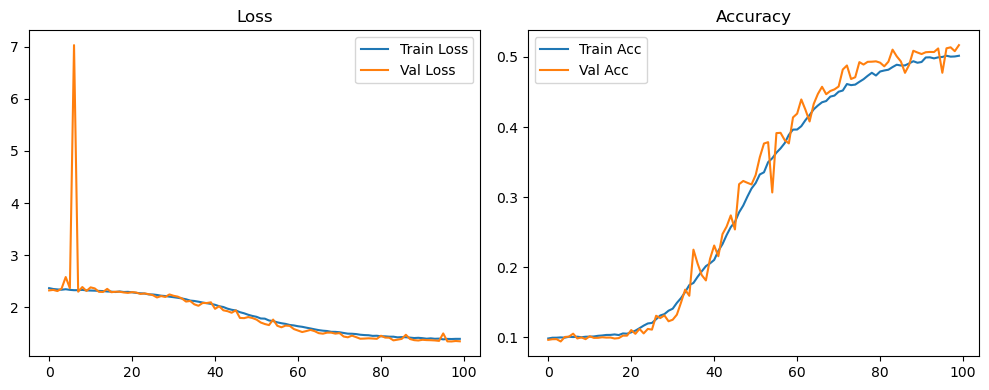

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.31it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.32it/s]

Evaluation: 100%|██████████| 3/3 [00:02<00:00,  1.58it/s]

Evaluation: 100%|██████████| 3/3 [00:02<00:00,  1.50it/s]

Original Model Final Test Loss: 1.3644 Accuracy: 0.5186


🚀 Running: batch256_lr_max_0.0005_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0971 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0971 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0971 |:   1%|          | 1/100 [01:21<2:15:01, 81.83s/it]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:37<2:15:01, 81.83s/it]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:37<2:15:01, 81.83s/it]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:37<2:08:11, 78.48s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:52<2:08:11, 78.48s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:52<2:08:11, 78.48s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:52<1:19:36, 49.24s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [03:06<1:19:36, 49.24s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [03:06<1:19:36, 49.24s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0975 |:   4%|▍         | 4/100 [03:06<56:53, 35.56s/it]  

| LR: 0.000498 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [03:21<56:53, 35.56s/it]

| LR: 0.000498 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [03:21<56:53, 35.56s/it]

| LR: 0.000498 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [03:21<44:18, 27.99s/it]

| LR: 0.000497 | Train Acc: 0.0994 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [03:36<44:18, 27.99s/it]

| LR: 0.000497 | Train Acc: 0.0994 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [03:36<44:18, 27.99s/it]

| LR: 0.000497 | Train Acc: 0.0994 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [03:36<36:43, 23.44s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [03:50<36:43, 23.44s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [03:50<36:43, 23.44s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [03:50<31:47, 20.52s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [04:05<31:47, 20.52s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [04:05<31:47, 20.52s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0953 |:   8%|▊         | 8/100 [04:05<28:34, 18.63s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0980 |:   8%|▊         | 8/100 [04:19<28:34, 18.63s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0980 |:   8%|▊         | 8/100 [04:19<28:34, 18.63s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0980 |:   9%|▉         | 9/100 [04:19<26:21, 17.38s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [04:34<26:21, 17.38s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [04:34<26:21, 17.38s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:34<24:48, 16.54s/it]

| LR: 0.000488 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  10%|█         | 10/100 [04:49<24:48, 16.54s/it]

| LR: 0.000488 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  10%|█         | 10/100 [04:49<24:48, 16.54s/it]

| LR: 0.000488 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  11%|█         | 11/100 [04:49<23:38, 15.94s/it]

| LR: 0.000486 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  11%|█         | 11/100 [05:03<23:38, 15.94s/it]

| LR: 0.000486 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  11%|█         | 11/100 [05:03<23:38, 15.94s/it]

| LR: 0.000486 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  12%|█▏        | 12/100 [05:03<22:49, 15.57s/it]

| LR: 0.000483 | Train Acc: 0.0996 | Val Acc: 0.0941 |:  12%|█▏        | 12/100 [05:18<22:49, 15.57s/it]

| LR: 0.000483 | Train Acc: 0.0996 | Val Acc: 0.0941 |:  12%|█▏        | 12/100 [05:18<22:49, 15.57s/it]

| LR: 0.000483 | Train Acc: 0.0996 | Val Acc: 0.0941 |:  13%|█▎        | 13/100 [05:18<22:07, 15.26s/it]

| LR: 0.000480 | Train Acc: 0.0987 | Val Acc: 0.0976 |:  13%|█▎        | 13/100 [05:32<22:07, 15.26s/it]

| LR: 0.000480 | Train Acc: 0.0987 | Val Acc: 0.0976 |:  13%|█▎        | 13/100 [05:32<22:07, 15.26s/it]

| LR: 0.000480 | Train Acc: 0.0987 | Val Acc: 0.0976 |:  14%|█▍        | 14/100 [05:33<21:36, 15.08s/it]

| LR: 0.000477 | Train Acc: 0.0983 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [05:47<21:36, 15.08s/it]

| LR: 0.000477 | Train Acc: 0.0983 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [05:47<21:36, 15.08s/it]

| LR: 0.000477 | Train Acc: 0.0983 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:47<21:06, 14.90s/it]

| LR: 0.000473 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  15%|█▌        | 15/100 [06:02<21:06, 14.90s/it]

| LR: 0.000473 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  15%|█▌        | 15/100 [06:02<21:06, 14.90s/it]

| LR: 0.000473 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  16%|█▌        | 16/100 [06:02<20:42, 14.79s/it]

| LR: 0.000470 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [06:16<20:42, 14.79s/it]

| LR: 0.000470 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [06:16<20:42, 14.79s/it]

| LR: 0.000470 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [06:16<20:20, 14.71s/it]

| LR: 0.000466 | Train Acc: 0.1002 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [06:31<20:20, 14.71s/it]

| LR: 0.000466 | Train Acc: 0.1002 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [06:31<20:20, 14.71s/it]

| LR: 0.000466 | Train Acc: 0.1002 | Val Acc: 0.0994 |:  18%|█▊        | 18/100 [06:31<20:03, 14.68s/it]

| LR: 0.000462 | Train Acc: 0.1016 | Val Acc: 0.0968 |:  18%|█▊        | 18/100 [06:45<20:03, 14.68s/it]

| LR: 0.000462 | Train Acc: 0.1016 | Val Acc: 0.0968 |:  18%|█▊        | 18/100 [06:45<20:03, 14.68s/it]

| LR: 0.000462 | Train Acc: 0.1016 | Val Acc: 0.0968 |:  19%|█▉        | 19/100 [06:45<19:45, 14.63s/it]

| LR: 0.000458 | Train Acc: 0.1017 | Val Acc: 0.1006 |:  19%|█▉        | 19/100 [07:00<19:45, 14.63s/it]

| LR: 0.000458 | Train Acc: 0.1017 | Val Acc: 0.1006 |:  19%|█▉        | 19/100 [07:00<19:45, 14.63s/it]

| LR: 0.000458 | Train Acc: 0.1017 | Val Acc: 0.1006 |:  20%|██        | 20/100 [07:00<19:29, 14.62s/it]

| LR: 0.000453 | Train Acc: 0.1017 | Val Acc: 0.0978 |:  20%|██        | 20/100 [07:14<19:29, 14.62s/it]

| LR: 0.000453 | Train Acc: 0.1017 | Val Acc: 0.0978 |:  20%|██        | 20/100 [07:14<19:29, 14.62s/it]

| LR: 0.000453 | Train Acc: 0.1017 | Val Acc: 0.0978 |:  21%|██        | 21/100 [07:14<19:11, 14.58s/it]

| LR: 0.000449 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:29<19:11, 14.58s/it]

| LR: 0.000449 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:29<19:11, 14.58s/it]

| LR: 0.000449 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  22%|██▏       | 22/100 [07:29<18:58, 14.60s/it]

| LR: 0.000444 | Train Acc: 0.1019 | Val Acc: 0.0978 |:  22%|██▏       | 22/100 [07:44<18:58, 14.60s/it]

| LR: 0.000444 | Train Acc: 0.1019 | Val Acc: 0.0978 |:  22%|██▏       | 22/100 [07:44<18:58, 14.60s/it]

| LR: 0.000444 | Train Acc: 0.1019 | Val Acc: 0.0978 |:  23%|██▎       | 23/100 [07:44<18:46, 14.63s/it]

| LR: 0.000439 | Train Acc: 0.1033 | Val Acc: 0.0977 |:  23%|██▎       | 23/100 [07:58<18:46, 14.63s/it]

| LR: 0.000439 | Train Acc: 0.1033 | Val Acc: 0.0977 |:  23%|██▎       | 23/100 [07:58<18:46, 14.63s/it]

| LR: 0.000439 | Train Acc: 0.1033 | Val Acc: 0.0977 |:  24%|██▍       | 24/100 [07:58<18:35, 14.67s/it]

| LR: 0.000434 | Train Acc: 0.1026 | Val Acc: 0.0975 |:  24%|██▍       | 24/100 [08:13<18:35, 14.67s/it]

| LR: 0.000434 | Train Acc: 0.1026 | Val Acc: 0.0975 |:  24%|██▍       | 24/100 [08:13<18:35, 14.67s/it]

| LR: 0.000434 | Train Acc: 0.1026 | Val Acc: 0.0975 |:  25%|██▌       | 25/100 [08:13<18:17, 14.64s/it]

| LR: 0.000428 | Train Acc: 0.1035 | Val Acc: 0.0983 |:  25%|██▌       | 25/100 [08:28<18:17, 14.64s/it]

| LR: 0.000428 | Train Acc: 0.1035 | Val Acc: 0.0983 |:  25%|██▌       | 25/100 [08:28<18:17, 14.64s/it]

| LR: 0.000428 | Train Acc: 0.1035 | Val Acc: 0.0983 |:  26%|██▌       | 26/100 [08:28<18:05, 14.67s/it]

| LR: 0.000423 | Train Acc: 0.1056 | Val Acc: 0.1085 |:  26%|██▌       | 26/100 [08:42<18:05, 14.67s/it]

| LR: 0.000423 | Train Acc: 0.1056 | Val Acc: 0.1085 |:  26%|██▌       | 26/100 [08:42<18:05, 14.67s/it]

| LR: 0.000423 | Train Acc: 0.1056 | Val Acc: 0.1085 |:  27%|██▋       | 27/100 [08:42<17:46, 14.61s/it]

| LR: 0.000417 | Train Acc: 0.1075 | Val Acc: 0.1012 |:  27%|██▋       | 27/100 [08:57<17:46, 14.61s/it]

| LR: 0.000417 | Train Acc: 0.1075 | Val Acc: 0.1012 |:  27%|██▋       | 27/100 [08:57<17:46, 14.61s/it]

| LR: 0.000417 | Train Acc: 0.1075 | Val Acc: 0.1012 |:  28%|██▊       | 28/100 [08:57<17:33, 14.63s/it]

| LR: 0.000411 | Train Acc: 0.1095 | Val Acc: 0.1014 |:  28%|██▊       | 28/100 [09:11<17:33, 14.63s/it]

| LR: 0.000411 | Train Acc: 0.1095 | Val Acc: 0.1014 |:  28%|██▊       | 28/100 [09:11<17:33, 14.63s/it]

| LR: 0.000411 | Train Acc: 0.1095 | Val Acc: 0.1014 |:  29%|██▉       | 29/100 [09:11<17:16, 14.59s/it]

| LR: 0.000405 | Train Acc: 0.1123 | Val Acc: 0.1116 |:  29%|██▉       | 29/100 [09:26<17:16, 14.59s/it]

| LR: 0.000405 | Train Acc: 0.1123 | Val Acc: 0.1116 |:  29%|██▉       | 29/100 [09:26<17:16, 14.59s/it]

| LR: 0.000405 | Train Acc: 0.1123 | Val Acc: 0.1116 |:  30%|███       | 30/100 [09:26<17:05, 14.65s/it]

| LR: 0.000399 | Train Acc: 0.1134 | Val Acc: 0.1047 |:  30%|███       | 30/100 [09:41<17:05, 14.65s/it]

| LR: 0.000399 | Train Acc: 0.1134 | Val Acc: 0.1047 |:  30%|███       | 30/100 [09:41<17:05, 14.65s/it]

| LR: 0.000399 | Train Acc: 0.1134 | Val Acc: 0.1047 |:  31%|███       | 31/100 [09:41<16:53, 14.68s/it]

| LR: 0.000393 | Train Acc: 0.1177 | Val Acc: 0.1153 |:  31%|███       | 31/100 [09:55<16:53, 14.68s/it]

| LR: 0.000393 | Train Acc: 0.1177 | Val Acc: 0.1153 |:  31%|███       | 31/100 [09:55<16:53, 14.68s/it]

| LR: 0.000393 | Train Acc: 0.1177 | Val Acc: 0.1153 |:  32%|███▏      | 32/100 [09:56<16:37, 14.66s/it]

| LR: 0.000386 | Train Acc: 0.1208 | Val Acc: 0.1252 |:  32%|███▏      | 32/100 [10:10<16:37, 14.66s/it]

| LR: 0.000386 | Train Acc: 0.1208 | Val Acc: 0.1252 |:  32%|███▏      | 32/100 [10:10<16:37, 14.66s/it]

| LR: 0.000386 | Train Acc: 0.1208 | Val Acc: 0.1252 |:  33%|███▎      | 33/100 [10:10<16:19, 14.63s/it]

| LR: 0.000380 | Train Acc: 0.1227 | Val Acc: 0.1232 |:  33%|███▎      | 33/100 [10:25<16:19, 14.63s/it]

| LR: 0.000380 | Train Acc: 0.1227 | Val Acc: 0.1232 |:  33%|███▎      | 33/100 [10:25<16:19, 14.63s/it]

| LR: 0.000380 | Train Acc: 0.1227 | Val Acc: 0.1232 |:  34%|███▍      | 34/100 [10:25<16:07, 14.65s/it]

| LR: 0.000373 | Train Acc: 0.1258 | Val Acc: 0.1244 |:  34%|███▍      | 34/100 [10:39<16:07, 14.65s/it]

| LR: 0.000373 | Train Acc: 0.1258 | Val Acc: 0.1244 |:  34%|███▍      | 34/100 [10:39<16:07, 14.65s/it]

| LR: 0.000373 | Train Acc: 0.1258 | Val Acc: 0.1244 |:  35%|███▌      | 35/100 [10:39<15:50, 14.62s/it]

| LR: 0.000366 | Train Acc: 0.1284 | Val Acc: 0.1303 |:  35%|███▌      | 35/100 [10:54<15:50, 14.62s/it]

| LR: 0.000366 | Train Acc: 0.1284 | Val Acc: 0.1303 |:  35%|███▌      | 35/100 [10:54<15:50, 14.62s/it]

| LR: 0.000366 | Train Acc: 0.1284 | Val Acc: 0.1303 |:  36%|███▌      | 36/100 [10:54<15:34, 14.60s/it]

| LR: 0.000359 | Train Acc: 0.1346 | Val Acc: 0.1298 |:  36%|███▌      | 36/100 [11:08<15:34, 14.60s/it]

| LR: 0.000359 | Train Acc: 0.1346 | Val Acc: 0.1298 |:  36%|███▌      | 36/100 [11:08<15:34, 14.60s/it]

| LR: 0.000359 | Train Acc: 0.1346 | Val Acc: 0.1298 |:  37%|███▋      | 37/100 [11:09<15:20, 14.61s/it]

| LR: 0.000352 | Train Acc: 0.1370 | Val Acc: 0.1376 |:  37%|███▋      | 37/100 [11:23<15:20, 14.61s/it]

| LR: 0.000352 | Train Acc: 0.1370 | Val Acc: 0.1376 |:  37%|███▋      | 37/100 [11:23<15:20, 14.61s/it]

| LR: 0.000352 | Train Acc: 0.1370 | Val Acc: 0.1376 |:  38%|███▊      | 38/100 [11:23<15:06, 14.62s/it]

| LR: 0.000345 | Train Acc: 0.1410 | Val Acc: 0.1459 |:  38%|███▊      | 38/100 [11:38<15:06, 14.62s/it]

| LR: 0.000345 | Train Acc: 0.1410 | Val Acc: 0.1459 |:  38%|███▊      | 38/100 [11:38<15:06, 14.62s/it]

| LR: 0.000345 | Train Acc: 0.1410 | Val Acc: 0.1459 |:  39%|███▉      | 39/100 [11:38<14:52, 14.63s/it]

| LR: 0.000338 | Train Acc: 0.1463 | Val Acc: 0.1426 |:  39%|███▉      | 39/100 [11:53<14:52, 14.63s/it]

| LR: 0.000338 | Train Acc: 0.1463 | Val Acc: 0.1426 |:  39%|███▉      | 39/100 [11:53<14:52, 14.63s/it]

| LR: 0.000338 | Train Acc: 0.1463 | Val Acc: 0.1426 |:  40%|████      | 40/100 [11:53<14:40, 14.68s/it]

| LR: 0.000331 | Train Acc: 0.1525 | Val Acc: 0.1682 |:  40%|████      | 40/100 [12:07<14:40, 14.68s/it]

| LR: 0.000331 | Train Acc: 0.1525 | Val Acc: 0.1682 |:  40%|████      | 40/100 [12:07<14:40, 14.68s/it]

| LR: 0.000331 | Train Acc: 0.1525 | Val Acc: 0.1682 |:  41%|████      | 41/100 [12:07<14:25, 14.68s/it]

| LR: 0.000323 | Train Acc: 0.1573 | Val Acc: 0.1534 |:  41%|████      | 41/100 [12:22<14:25, 14.68s/it]

| LR: 0.000323 | Train Acc: 0.1573 | Val Acc: 0.1534 |:  41%|████      | 41/100 [12:22<14:25, 14.68s/it]

| LR: 0.000323 | Train Acc: 0.1573 | Val Acc: 0.1534 |:  42%|████▏     | 42/100 [12:22<14:10, 14.66s/it]

| LR: 0.000316 | Train Acc: 0.1634 | Val Acc: 0.1965 |:  42%|████▏     | 42/100 [12:36<14:10, 14.66s/it]

| LR: 0.000316 | Train Acc: 0.1634 | Val Acc: 0.1965 |:  42%|████▏     | 42/100 [12:36<14:10, 14.66s/it]

| LR: 0.000316 | Train Acc: 0.1634 | Val Acc: 0.1965 |:  43%|████▎     | 43/100 [12:36<13:54, 14.64s/it]

| LR: 0.000308 | Train Acc: 0.1720 | Val Acc: 0.1878 |:  43%|████▎     | 43/100 [12:51<13:54, 14.64s/it]

| LR: 0.000308 | Train Acc: 0.1720 | Val Acc: 0.1878 |:  43%|████▎     | 43/100 [12:51<13:54, 14.64s/it]

| LR: 0.000308 | Train Acc: 0.1720 | Val Acc: 0.1878 |:  44%|████▍     | 44/100 [12:51<13:39, 14.63s/it]

| LR: 0.000301 | Train Acc: 0.1739 | Val Acc: 0.1853 |:  44%|████▍     | 44/100 [13:06<13:39, 14.63s/it]

| LR: 0.000301 | Train Acc: 0.1739 | Val Acc: 0.1853 |:  44%|████▍     | 44/100 [13:06<13:39, 14.63s/it]

| LR: 0.000301 | Train Acc: 0.1739 | Val Acc: 0.1853 |:  45%|████▌     | 45/100 [13:06<13:23, 14.61s/it]

| LR: 0.000293 | Train Acc: 0.1833 | Val Acc: 0.1940 |:  45%|████▌     | 45/100 [13:20<13:23, 14.61s/it]

| LR: 0.000293 | Train Acc: 0.1833 | Val Acc: 0.1940 |:  45%|████▌     | 45/100 [13:20<13:23, 14.61s/it]

| LR: 0.000293 | Train Acc: 0.1833 | Val Acc: 0.1940 |:  46%|████▌     | 46/100 [13:21<13:12, 14.68s/it]

| LR: 0.000286 | Train Acc: 0.1880 | Val Acc: 0.2153 |:  46%|████▌     | 46/100 [13:35<13:12, 14.68s/it]

| LR: 0.000286 | Train Acc: 0.1880 | Val Acc: 0.2153 |:  46%|████▌     | 46/100 [13:35<13:12, 14.68s/it]

| LR: 0.000286 | Train Acc: 0.1880 | Val Acc: 0.2153 |:  47%|████▋     | 47/100 [13:35<12:55, 14.64s/it]

| LR: 0.000278 | Train Acc: 0.1941 | Val Acc: 0.1936 |:  47%|████▋     | 47/100 [13:50<12:55, 14.64s/it]

| LR: 0.000278 | Train Acc: 0.1941 | Val Acc: 0.1936 |:  47%|████▋     | 47/100 [13:50<12:55, 14.64s/it]

| LR: 0.000278 | Train Acc: 0.1941 | Val Acc: 0.1936 |:  48%|████▊     | 48/100 [13:50<12:39, 14.61s/it]

| LR: 0.000270 | Train Acc: 0.2008 | Val Acc: 0.2014 |:  48%|████▊     | 48/100 [14:04<12:39, 14.61s/it]

| LR: 0.000270 | Train Acc: 0.2008 | Val Acc: 0.2014 |:  48%|████▊     | 48/100 [14:04<12:39, 14.61s/it]

| LR: 0.000270 | Train Acc: 0.2008 | Val Acc: 0.2014 |:  49%|████▉     | 49/100 [14:04<12:23, 14.58s/it]

| LR: 0.000263 | Train Acc: 0.2040 | Val Acc: 0.2258 |:  49%|████▉     | 49/100 [14:19<12:23, 14.58s/it]

| LR: 0.000263 | Train Acc: 0.2040 | Val Acc: 0.2258 |:  49%|████▉     | 49/100 [14:19<12:23, 14.58s/it]

| LR: 0.000263 | Train Acc: 0.2040 | Val Acc: 0.2258 |:  50%|█████     | 50/100 [14:19<12:11, 14.62s/it]

| LR: 0.000255 | Train Acc: 0.2126 | Val Acc: 0.2275 |:  50%|█████     | 50/100 [14:33<12:11, 14.62s/it]

| LR: 0.000255 | Train Acc: 0.2126 | Val Acc: 0.2275 |:  50%|█████     | 50/100 [14:33<12:11, 14.62s/it]

| LR: 0.000255 | Train Acc: 0.2126 | Val Acc: 0.2275 |:  51%|█████     | 51/100 [14:33<11:55, 14.61s/it]

| LR: 0.000247 | Train Acc: 0.2241 | Val Acc: 0.2716 |:  51%|█████     | 51/100 [14:48<11:55, 14.61s/it]

| LR: 0.000247 | Train Acc: 0.2241 | Val Acc: 0.2716 |:  51%|█████     | 51/100 [14:48<11:55, 14.61s/it]

| LR: 0.000247 | Train Acc: 0.2241 | Val Acc: 0.2716 |:  52%|█████▏    | 52/100 [14:48<11:46, 14.71s/it]

| LR: 0.000240 | Train Acc: 0.2305 | Val Acc: 0.2486 |:  52%|█████▏    | 52/100 [15:03<11:46, 14.71s/it]

| LR: 0.000240 | Train Acc: 0.2305 | Val Acc: 0.2486 |:  52%|█████▏    | 52/100 [15:03<11:46, 14.71s/it]

| LR: 0.000240 | Train Acc: 0.2305 | Val Acc: 0.2486 |:  53%|█████▎    | 53/100 [15:03<11:34, 14.77s/it]

| LR: 0.000232 | Train Acc: 0.2398 | Val Acc: 0.2463 |:  53%|█████▎    | 53/100 [15:18<11:34, 14.77s/it]

| LR: 0.000232 | Train Acc: 0.2398 | Val Acc: 0.2463 |:  53%|█████▎    | 53/100 [15:18<11:34, 14.77s/it]

| LR: 0.000232 | Train Acc: 0.2398 | Val Acc: 0.2463 |:  54%|█████▍    | 54/100 [15:18<11:17, 14.72s/it]

| LR: 0.000224 | Train Acc: 0.2457 | Val Acc: 0.2881 |:  54%|█████▍    | 54/100 [15:32<11:17, 14.72s/it]

| LR: 0.000224 | Train Acc: 0.2457 | Val Acc: 0.2881 |:  54%|█████▍    | 54/100 [15:32<11:17, 14.72s/it]

| LR: 0.000224 | Train Acc: 0.2457 | Val Acc: 0.2881 |:  55%|█████▌    | 55/100 [15:33<11:01, 14.70s/it]

| LR: 0.000217 | Train Acc: 0.2519 | Val Acc: 0.2618 |:  55%|█████▌    | 55/100 [15:47<11:01, 14.70s/it]

| LR: 0.000217 | Train Acc: 0.2519 | Val Acc: 0.2618 |:  55%|█████▌    | 55/100 [15:47<11:01, 14.70s/it]

| LR: 0.000217 | Train Acc: 0.2519 | Val Acc: 0.2618 |:  56%|█████▌    | 56/100 [15:47<10:44, 14.64s/it]

| LR: 0.000209 | Train Acc: 0.2644 | Val Acc: 0.2915 |:  56%|█████▌    | 56/100 [16:02<10:44, 14.64s/it]

| LR: 0.000209 | Train Acc: 0.2644 | Val Acc: 0.2915 |:  56%|█████▌    | 56/100 [16:02<10:44, 14.64s/it]

| LR: 0.000209 | Train Acc: 0.2644 | Val Acc: 0.2915 |:  57%|█████▋    | 57/100 [16:02<10:29, 14.64s/it]

| LR: 0.000202 | Train Acc: 0.2626 | Val Acc: 0.2872 |:  57%|█████▋    | 57/100 [16:16<10:29, 14.64s/it]

| LR: 0.000202 | Train Acc: 0.2626 | Val Acc: 0.2872 |:  57%|█████▋    | 57/100 [16:16<10:29, 14.64s/it]

| LR: 0.000202 | Train Acc: 0.2626 | Val Acc: 0.2872 |:  58%|█████▊    | 58/100 [16:16<10:14, 14.63s/it]

| LR: 0.000194 | Train Acc: 0.2719 | Val Acc: 0.3206 |:  58%|█████▊    | 58/100 [16:31<10:14, 14.63s/it]

| LR: 0.000194 | Train Acc: 0.2719 | Val Acc: 0.3206 |:  58%|█████▊    | 58/100 [16:31<10:14, 14.63s/it]

| LR: 0.000194 | Train Acc: 0.2719 | Val Acc: 0.3206 |:  59%|█████▉    | 59/100 [16:31<10:02, 14.69s/it]

| LR: 0.000187 | Train Acc: 0.2825 | Val Acc: 0.3158 |:  59%|█████▉    | 59/100 [16:46<10:02, 14.69s/it]

| LR: 0.000187 | Train Acc: 0.2825 | Val Acc: 0.3158 |:  59%|█████▉    | 59/100 [16:46<10:02, 14.69s/it]

| LR: 0.000187 | Train Acc: 0.2825 | Val Acc: 0.3158 |:  60%|██████    | 60/100 [16:46<09:46, 14.65s/it]

| LR: 0.000179 | Train Acc: 0.2862 | Val Acc: 0.3088 |:  60%|██████    | 60/100 [17:00<09:46, 14.65s/it]

| LR: 0.000179 | Train Acc: 0.2862 | Val Acc: 0.3088 |:  60%|██████    | 60/100 [17:00<09:46, 14.65s/it]

| LR: 0.000179 | Train Acc: 0.2862 | Val Acc: 0.3088 |:  61%|██████    | 61/100 [17:00<09:31, 14.66s/it]

| LR: 0.000172 | Train Acc: 0.2907 | Val Acc: 0.3211 |:  61%|██████    | 61/100 [17:15<09:31, 14.66s/it]

| LR: 0.000172 | Train Acc: 0.2907 | Val Acc: 0.3211 |:  61%|██████    | 61/100 [17:15<09:31, 14.66s/it]

| LR: 0.000172 | Train Acc: 0.2907 | Val Acc: 0.3211 |:  62%|██████▏   | 62/100 [17:15<09:16, 14.64s/it]

| LR: 0.000165 | Train Acc: 0.3031 | Val Acc: 0.3544 |:  62%|██████▏   | 62/100 [17:29<09:16, 14.64s/it]

| LR: 0.000165 | Train Acc: 0.3031 | Val Acc: 0.3544 |:  62%|██████▏   | 62/100 [17:29<09:16, 14.64s/it]

| LR: 0.000165 | Train Acc: 0.3031 | Val Acc: 0.3544 |:  63%|██████▎   | 63/100 [17:29<09:00, 14.60s/it]

| LR: 0.000158 | Train Acc: 0.3090 | Val Acc: 0.3608 |:  63%|██████▎   | 63/100 [17:44<09:00, 14.60s/it]

| LR: 0.000158 | Train Acc: 0.3090 | Val Acc: 0.3608 |:  63%|██████▎   | 63/100 [17:44<09:00, 14.60s/it]

| LR: 0.000158 | Train Acc: 0.3090 | Val Acc: 0.3608 |:  64%|██████▍   | 64/100 [17:44<08:46, 14.62s/it]

| LR: 0.000151 | Train Acc: 0.3147 | Val Acc: 0.3471 |:  64%|██████▍   | 64/100 [17:59<08:46, 14.62s/it]

| LR: 0.000151 | Train Acc: 0.3147 | Val Acc: 0.3471 |:  64%|██████▍   | 64/100 [17:59<08:46, 14.62s/it]

| LR: 0.000151 | Train Acc: 0.3147 | Val Acc: 0.3471 |:  65%|██████▌   | 65/100 [17:59<08:30, 14.58s/it]

| LR: 0.000144 | Train Acc: 0.3192 | Val Acc: 0.3374 |:  65%|██████▌   | 65/100 [18:13<08:30, 14.58s/it]

| LR: 0.000144 | Train Acc: 0.3192 | Val Acc: 0.3374 |:  65%|██████▌   | 65/100 [18:13<08:30, 14.58s/it]

| LR: 0.000144 | Train Acc: 0.3192 | Val Acc: 0.3374 |:  66%|██████▌   | 66/100 [18:13<08:15, 14.59s/it]

| LR: 0.000137 | Train Acc: 0.3256 | Val Acc: 0.3737 |:  66%|██████▌   | 66/100 [18:28<08:15, 14.59s/it]

| LR: 0.000137 | Train Acc: 0.3256 | Val Acc: 0.3737 |:  66%|██████▌   | 66/100 [18:28<08:15, 14.59s/it]

| LR: 0.000137 | Train Acc: 0.3256 | Val Acc: 0.3737 |:  67%|██████▋   | 67/100 [18:28<08:01, 14.59s/it]

| LR: 0.000130 | Train Acc: 0.3360 | Val Acc: 0.3768 |:  67%|██████▋   | 67/100 [18:42<08:01, 14.59s/it]

| LR: 0.000130 | Train Acc: 0.3360 | Val Acc: 0.3768 |:  67%|██████▋   | 67/100 [18:42<08:01, 14.59s/it]

| LR: 0.000130 | Train Acc: 0.3360 | Val Acc: 0.3768 |:  68%|██████▊   | 68/100 [18:43<07:48, 14.63s/it]

| LR: 0.000124 | Train Acc: 0.3432 | Val Acc: 0.3749 |:  68%|██████▊   | 68/100 [18:57<07:48, 14.63s/it]

| LR: 0.000124 | Train Acc: 0.3432 | Val Acc: 0.3749 |:  68%|██████▊   | 68/100 [18:57<07:48, 14.63s/it]

| LR: 0.000124 | Train Acc: 0.3432 | Val Acc: 0.3749 |:  69%|██████▉   | 69/100 [18:57<07:32, 14.59s/it]

| LR: 0.000117 | Train Acc: 0.3470 | Val Acc: 0.3839 |:  69%|██████▉   | 69/100 [19:12<07:32, 14.59s/it]

| LR: 0.000117 | Train Acc: 0.3470 | Val Acc: 0.3839 |:  69%|██████▉   | 69/100 [19:12<07:32, 14.59s/it]

| LR: 0.000117 | Train Acc: 0.3470 | Val Acc: 0.3839 |:  70%|███████   | 70/100 [19:12<07:17, 14.58s/it]

| LR: 0.000111 | Train Acc: 0.3532 | Val Acc: 0.3863 |:  70%|███████   | 70/100 [19:26<07:17, 14.58s/it]

| LR: 0.000111 | Train Acc: 0.3532 | Val Acc: 0.3863 |:  70%|███████   | 70/100 [19:26<07:17, 14.58s/it]

| LR: 0.000111 | Train Acc: 0.3532 | Val Acc: 0.3863 |:  71%|███████   | 71/100 [19:26<07:04, 14.65s/it]

| LR: 0.000105 | Train Acc: 0.3550 | Val Acc: 0.3946 |:  71%|███████   | 71/100 [19:41<07:04, 14.65s/it]

| LR: 0.000105 | Train Acc: 0.3550 | Val Acc: 0.3946 |:  71%|███████   | 71/100 [19:41<07:04, 14.65s/it]

| LR: 0.000105 | Train Acc: 0.3550 | Val Acc: 0.3946 |:  72%|███████▏  | 72/100 [19:41<06:49, 14.64s/it]

| LR: 0.000099 | Train Acc: 0.3609 | Val Acc: 0.4038 |:  72%|███████▏  | 72/100 [19:56<06:49, 14.64s/it]

| LR: 0.000099 | Train Acc: 0.3609 | Val Acc: 0.4038 |:  72%|███████▏  | 72/100 [19:56<06:49, 14.64s/it]

| LR: 0.000099 | Train Acc: 0.3609 | Val Acc: 0.4038 |:  73%|███████▎  | 73/100 [19:56<06:35, 14.64s/it]

| LR: 0.000093 | Train Acc: 0.3682 | Val Acc: 0.4181 |:  73%|███████▎  | 73/100 [20:10<06:35, 14.64s/it]

| LR: 0.000093 | Train Acc: 0.3682 | Val Acc: 0.4181 |:  73%|███████▎  | 73/100 [20:10<06:35, 14.64s/it]

| LR: 0.000093 | Train Acc: 0.3682 | Val Acc: 0.4181 |:  74%|███████▍  | 74/100 [20:10<06:20, 14.65s/it]

| LR: 0.000087 | Train Acc: 0.3740 | Val Acc: 0.3955 |:  74%|███████▍  | 74/100 [20:25<06:20, 14.65s/it]

| LR: 0.000087 | Train Acc: 0.3740 | Val Acc: 0.3955 |:  74%|███████▍  | 74/100 [20:25<06:20, 14.65s/it]

| LR: 0.000087 | Train Acc: 0.3740 | Val Acc: 0.3955 |:  75%|███████▌  | 75/100 [20:25<06:06, 14.65s/it]

| LR: 0.000082 | Train Acc: 0.3770 | Val Acc: 0.4259 |:  75%|███████▌  | 75/100 [20:39<06:06, 14.65s/it]

| LR: 0.000082 | Train Acc: 0.3770 | Val Acc: 0.4259 |:  75%|███████▌  | 75/100 [20:39<06:06, 14.65s/it]

| LR: 0.000082 | Train Acc: 0.3770 | Val Acc: 0.4259 |:  76%|███████▌  | 76/100 [20:39<05:50, 14.62s/it]

| LR: 0.000076 | Train Acc: 0.3795 | Val Acc: 0.4284 |:  76%|███████▌  | 76/100 [20:54<05:50, 14.62s/it]

| LR: 0.000076 | Train Acc: 0.3795 | Val Acc: 0.4284 |:  76%|███████▌  | 76/100 [20:54<05:50, 14.62s/it]

| LR: 0.000076 | Train Acc: 0.3795 | Val Acc: 0.4284 |:  77%|███████▋  | 77/100 [20:54<05:36, 14.61s/it]

| LR: 0.000071 | Train Acc: 0.3847 | Val Acc: 0.4239 |:  77%|███████▋  | 77/100 [21:09<05:36, 14.61s/it]

| LR: 0.000071 | Train Acc: 0.3847 | Val Acc: 0.4239 |:  77%|███████▋  | 77/100 [21:09<05:36, 14.61s/it]

| LR: 0.000071 | Train Acc: 0.3847 | Val Acc: 0.4239 |:  78%|███████▊  | 78/100 [21:09<05:21, 14.61s/it]

| LR: 0.000066 | Train Acc: 0.3873 | Val Acc: 0.4198 |:  78%|███████▊  | 78/100 [21:23<05:21, 14.61s/it]

| LR: 0.000066 | Train Acc: 0.3873 | Val Acc: 0.4198 |:  78%|███████▊  | 78/100 [21:23<05:21, 14.61s/it]

| LR: 0.000066 | Train Acc: 0.3873 | Val Acc: 0.4198 |:  79%|███████▉  | 79/100 [21:23<05:07, 14.66s/it]

| LR: 0.000061 | Train Acc: 0.3888 | Val Acc: 0.4323 |:  79%|███████▉  | 79/100 [21:38<05:07, 14.66s/it]

| LR: 0.000061 | Train Acc: 0.3888 | Val Acc: 0.4323 |:  79%|███████▉  | 79/100 [21:38<05:07, 14.66s/it]

| LR: 0.000061 | Train Acc: 0.3888 | Val Acc: 0.4323 |:  80%|████████  | 80/100 [21:38<04:53, 14.67s/it]

| LR: 0.000057 | Train Acc: 0.3933 | Val Acc: 0.4330 |:  80%|████████  | 80/100 [21:53<04:53, 14.67s/it]

| LR: 0.000057 | Train Acc: 0.3933 | Val Acc: 0.4330 |:  80%|████████  | 80/100 [21:53<04:53, 14.67s/it]

| LR: 0.000057 | Train Acc: 0.3933 | Val Acc: 0.4330 |:  81%|████████  | 81/100 [21:53<04:37, 14.61s/it]

| LR: 0.000052 | Train Acc: 0.3902 | Val Acc: 0.4333 |:  81%|████████  | 81/100 [22:07<04:37, 14.61s/it]

| LR: 0.000052 | Train Acc: 0.3902 | Val Acc: 0.4333 |:  81%|████████  | 81/100 [22:07<04:37, 14.61s/it]

| LR: 0.000052 | Train Acc: 0.3902 | Val Acc: 0.4333 |:  82%|████████▏ | 82/100 [22:07<04:23, 14.63s/it]

| LR: 0.000048 | Train Acc: 0.3950 | Val Acc: 0.4416 |:  82%|████████▏ | 82/100 [22:22<04:23, 14.63s/it]

| LR: 0.000048 | Train Acc: 0.3950 | Val Acc: 0.4416 |:  82%|████████▏ | 82/100 [22:22<04:23, 14.63s/it]

| LR: 0.000048 | Train Acc: 0.3950 | Val Acc: 0.4416 |:  83%|████████▎ | 83/100 [22:22<04:09, 14.65s/it]

| LR: 0.000044 | Train Acc: 0.3967 | Val Acc: 0.4219 |:  83%|████████▎ | 83/100 [22:37<04:09, 14.65s/it]

| LR: 0.000044 | Train Acc: 0.3967 | Val Acc: 0.4219 |:  83%|████████▎ | 83/100 [22:37<04:09, 14.65s/it]

| LR: 0.000044 | Train Acc: 0.3967 | Val Acc: 0.4219 |:  84%|████████▍ | 84/100 [22:37<03:54, 14.69s/it]

| LR: 0.000040 | Train Acc: 0.4006 | Val Acc: 0.4208 |:  84%|████████▍ | 84/100 [22:52<03:54, 14.69s/it]

| LR: 0.000040 | Train Acc: 0.4006 | Val Acc: 0.4208 |:  84%|████████▍ | 84/100 [22:52<03:54, 14.69s/it]

| LR: 0.000040 | Train Acc: 0.4006 | Val Acc: 0.4208 |:  85%|████████▌ | 85/100 [22:52<03:41, 14.74s/it]

| LR: 0.000037 | Train Acc: 0.4001 | Val Acc: 0.4425 |:  85%|████████▌ | 85/100 [23:06<03:41, 14.74s/it]

| LR: 0.000037 | Train Acc: 0.4001 | Val Acc: 0.4425 |:  85%|████████▌ | 85/100 [23:06<03:41, 14.74s/it]

| LR: 0.000037 | Train Acc: 0.4001 | Val Acc: 0.4425 |:  86%|████████▌ | 86/100 [23:06<03:26, 14.73s/it]

| LR: 0.000033 | Train Acc: 0.4062 | Val Acc: 0.4388 |:  86%|████████▌ | 86/100 [23:21<03:26, 14.73s/it]

| LR: 0.000033 | Train Acc: 0.4062 | Val Acc: 0.4388 |:  86%|████████▌ | 86/100 [23:21<03:26, 14.73s/it]

| LR: 0.000033 | Train Acc: 0.4062 | Val Acc: 0.4388 |:  87%|████████▋ | 87/100 [23:21<03:11, 14.73s/it]

| LR: 0.000030 | Train Acc: 0.4029 | Val Acc: 0.4403 |:  87%|████████▋ | 87/100 [23:36<03:11, 14.73s/it]

| LR: 0.000030 | Train Acc: 0.4029 | Val Acc: 0.4403 |:  87%|████████▋ | 87/100 [23:36<03:11, 14.73s/it]

| LR: 0.000030 | Train Acc: 0.4029 | Val Acc: 0.4403 |:  88%|████████▊ | 88/100 [23:36<02:57, 14.76s/it]

| LR: 0.000027 | Train Acc: 0.4059 | Val Acc: 0.4412 |:  88%|████████▊ | 88/100 [23:50<02:57, 14.76s/it]

| LR: 0.000027 | Train Acc: 0.4059 | Val Acc: 0.4412 |:  88%|████████▊ | 88/100 [23:50<02:57, 14.76s/it]

| LR: 0.000027 | Train Acc: 0.4059 | Val Acc: 0.4412 |:  89%|████████▉ | 89/100 [23:51<02:41, 14.71s/it]

| LR: 0.000024 | Train Acc: 0.4088 | Val Acc: 0.4426 |:  89%|████████▉ | 89/100 [24:05<02:41, 14.71s/it]

| LR: 0.000024 | Train Acc: 0.4088 | Val Acc: 0.4426 |:  89%|████████▉ | 89/100 [24:05<02:41, 14.71s/it]

| LR: 0.000024 | Train Acc: 0.4088 | Val Acc: 0.4426 |:  90%|█████████ | 90/100 [24:05<02:27, 14.73s/it]

| LR: 0.000022 | Train Acc: 0.4072 | Val Acc: 0.4527 |:  90%|█████████ | 90/100 [24:20<02:27, 14.73s/it]

| LR: 0.000022 | Train Acc: 0.4072 | Val Acc: 0.4527 |:  90%|█████████ | 90/100 [24:20<02:27, 14.73s/it]

| LR: 0.000022 | Train Acc: 0.4072 | Val Acc: 0.4527 |:  91%|█████████ | 91/100 [24:20<02:12, 14.70s/it]

| LR: 0.000020 | Train Acc: 0.4137 | Val Acc: 0.4548 |:  91%|█████████ | 91/100 [24:34<02:12, 14.70s/it]

| LR: 0.000020 | Train Acc: 0.4137 | Val Acc: 0.4548 |:  91%|█████████ | 91/100 [24:34<02:12, 14.70s/it]

| LR: 0.000020 | Train Acc: 0.4137 | Val Acc: 0.4548 |:  92%|█████████▏| 92/100 [24:34<01:57, 14.66s/it]

| LR: 0.000018 | Train Acc: 0.4142 | Val Acc: 0.4544 |:  92%|█████████▏| 92/100 [24:49<01:57, 14.66s/it]

| LR: 0.000018 | Train Acc: 0.4142 | Val Acc: 0.4544 |:  92%|█████████▏| 92/100 [24:49<01:57, 14.66s/it]

| LR: 0.000018 | Train Acc: 0.4142 | Val Acc: 0.4544 |:  93%|█████████▎| 93/100 [24:49<01:43, 14.72s/it]

| LR: 0.000016 | Train Acc: 0.4150 | Val Acc: 0.4372 |:  93%|█████████▎| 93/100 [25:04<01:43, 14.72s/it]

| LR: 0.000016 | Train Acc: 0.4150 | Val Acc: 0.4372 |:  93%|█████████▎| 93/100 [25:04<01:43, 14.72s/it]

| LR: 0.000016 | Train Acc: 0.4150 | Val Acc: 0.4372 |:  94%|█████████▍| 94/100 [25:04<01:28, 14.80s/it]

| LR: 0.000014 | Train Acc: 0.4124 | Val Acc: 0.4467 |:  94%|█████████▍| 94/100 [25:19<01:28, 14.80s/it]

| LR: 0.000014 | Train Acc: 0.4124 | Val Acc: 0.4467 |:  94%|█████████▍| 94/100 [25:19<01:28, 14.80s/it]

| LR: 0.000014 | Train Acc: 0.4124 | Val Acc: 0.4467 |:  95%|█████████▌| 95/100 [25:19<01:14, 14.83s/it]

| LR: 0.000013 | Train Acc: 0.4199 | Val Acc: 0.4671 |:  95%|█████████▌| 95/100 [25:34<01:14, 14.83s/it]

| LR: 0.000013 | Train Acc: 0.4199 | Val Acc: 0.4671 |:  95%|█████████▌| 95/100 [25:34<01:14, 14.83s/it]

| LR: 0.000013 | Train Acc: 0.4199 | Val Acc: 0.4671 |:  96%|█████████▌| 96/100 [25:34<00:59, 14.87s/it]

| LR: 0.000012 | Train Acc: 0.4174 | Val Acc: 0.4608 |:  96%|█████████▌| 96/100 [25:49<00:59, 14.87s/it]

| LR: 0.000012 | Train Acc: 0.4174 | Val Acc: 0.4608 |:  96%|█████████▌| 96/100 [25:49<00:59, 14.87s/it]

| LR: 0.000012 | Train Acc: 0.4174 | Val Acc: 0.4608 |:  97%|█████████▋| 97/100 [25:49<00:44, 14.90s/it]

| LR: 0.000011 | Train Acc: 0.4168 | Val Acc: 0.4465 |:  97%|█████████▋| 97/100 [26:04<00:44, 14.90s/it]

| LR: 0.000011 | Train Acc: 0.4168 | Val Acc: 0.4465 |:  97%|█████████▋| 97/100 [26:04<00:44, 14.90s/it]

| LR: 0.000011 | Train Acc: 0.4168 | Val Acc: 0.4465 |:  98%|█████████▊| 98/100 [26:04<00:29, 14.90s/it]

| LR: 0.000010 | Train Acc: 0.4199 | Val Acc: 0.4628 |:  98%|█████████▊| 98/100 [26:19<00:29, 14.90s/it]

| LR: 0.000010 | Train Acc: 0.4199 | Val Acc: 0.4628 |:  98%|█████████▊| 98/100 [26:19<00:29, 14.90s/it]

| LR: 0.000010 | Train Acc: 0.4199 | Val Acc: 0.4628 |:  99%|█████████▉| 99/100 [26:19<00:14, 14.86s/it]

| LR: 0.000010 | Train Acc: 0.4200 | Val Acc: 0.4477 |:  99%|█████████▉| 99/100 [26:34<00:14, 14.86s/it]

| LR: 0.000010 | Train Acc: 0.4200 | Val Acc: 0.4477 |:  99%|█████████▉| 99/100 [26:34<00:14, 14.86s/it]

| LR: 0.000010 | Train Acc: 0.4200 | Val Acc: 0.4477 |: 100%|██████████| 100/100 [26:34<00:00, 14.84s/it]

| LR: 0.000010 | Train Acc: 0.4200 | Val Acc: 0.4477 |: 100%|██████████| 100/100 [26:34<00:00, 15.94s/it]

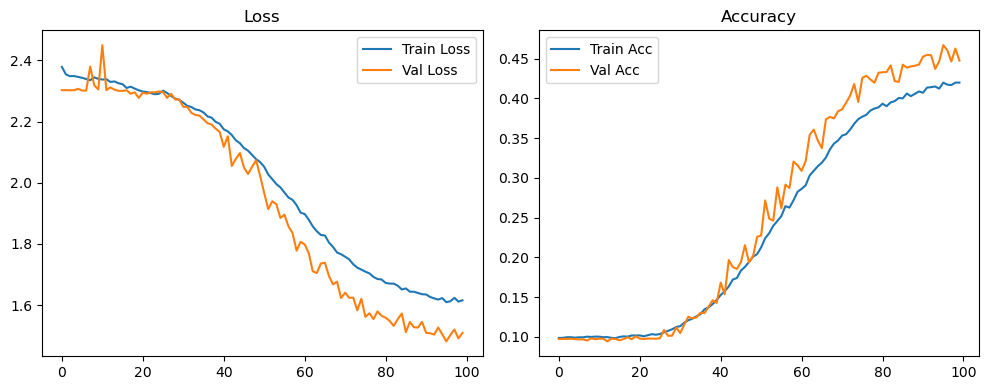

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.26it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.26it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 1.5210 Accuracy: 0.4433


🚀 Running: batch256_lr_max_0.0005_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   1%|          | 1/100 [01:20<2:13:24, 80.86s/it]

| LR: 0.000500 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   1%|          | 1/100 [02:36<2:13:24, 80.86s/it]

| LR: 0.000500 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   1%|          | 1/100 [02:36<2:13:24, 80.86s/it]

| LR: 0.000500 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [02:36<2:07:10, 77.86s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0920 |:   2%|▏         | 2/100 [02:51<2:07:10, 77.86s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0920 |:   2%|▏         | 2/100 [02:51<2:07:10, 77.86s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0920 |:   3%|▎         | 3/100 [02:51<1:19:14, 49.01s/it]

| LR: 0.000499 | Train Acc: 0.0984 | Val Acc: 0.1002 |:   3%|▎         | 3/100 [03:05<1:19:14, 49.01s/it]

| LR: 0.000499 | Train Acc: 0.0984 | Val Acc: 0.1002 |:   3%|▎         | 3/100 [03:05<1:19:14, 49.01s/it]

| LR: 0.000499 | Train Acc: 0.0984 | Val Acc: 0.1002 |:   4%|▍         | 4/100 [03:05<56:40, 35.43s/it]  

| LR: 0.000498 | Train Acc: 0.1003 | Val Acc: 0.0967 |:   4%|▍         | 4/100 [03:20<56:40, 35.43s/it]

| LR: 0.000498 | Train Acc: 0.1003 | Val Acc: 0.0967 |:   4%|▍         | 4/100 [03:20<56:40, 35.43s/it]

| LR: 0.000498 | Train Acc: 0.1003 | Val Acc: 0.0967 |:   5%|▌         | 5/100 [03:20<44:00, 27.80s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0967 |:   5%|▌         | 5/100 [03:34<44:00, 27.80s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0967 |:   5%|▌         | 5/100 [03:34<44:00, 27.80s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [03:34<36:22, 23.22s/it]

| LR: 0.000496 | Train Acc: 0.0995 | Val Acc: 0.1009 |:   6%|▌         | 6/100 [03:48<36:22, 23.22s/it]

| LR: 0.000496 | Train Acc: 0.0995 | Val Acc: 0.1009 |:   6%|▌         | 6/100 [03:48<36:22, 23.22s/it]

| LR: 0.000496 | Train Acc: 0.0995 | Val Acc: 0.1009 |:   7%|▋         | 7/100 [03:48<31:30, 20.33s/it]

| LR: 0.000494 | Train Acc: 0.0995 | Val Acc: 0.0986 |:   7%|▋         | 7/100 [04:03<31:30, 20.33s/it]

| LR: 0.000494 | Train Acc: 0.0995 | Val Acc: 0.0986 |:   7%|▋         | 7/100 [04:03<31:30, 20.33s/it]

| LR: 0.000494 | Train Acc: 0.0995 | Val Acc: 0.0986 |:   8%|▊         | 8/100 [04:03<28:15, 18.42s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:17<28:15, 18.42s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:17<28:15, 18.42s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:17<26:09, 17.24s/it]

| LR: 0.000490 | Train Acc: 0.0993 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:32<26:09, 17.24s/it]

| LR: 0.000490 | Train Acc: 0.0993 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:32<26:09, 17.24s/it]

| LR: 0.000490 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  10%|█         | 10/100 [04:32<24:35, 16.39s/it]

| LR: 0.000488 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  10%|█         | 10/100 [04:46<24:35, 16.39s/it]

| LR: 0.000488 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  10%|█         | 10/100 [04:46<24:35, 16.39s/it]

| LR: 0.000488 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  11%|█         | 11/100 [04:46<23:27, 15.82s/it]

| LR: 0.000485 | Train Acc: 0.1014 | Val Acc: 0.0979 |:  11%|█         | 11/100 [05:01<23:27, 15.82s/it]

| LR: 0.000485 | Train Acc: 0.1014 | Val Acc: 0.0979 |:  11%|█         | 11/100 [05:01<23:27, 15.82s/it]

| LR: 0.000485 | Train Acc: 0.1014 | Val Acc: 0.0979 |:  12%|█▏        | 12/100 [05:01<22:36, 15.42s/it]

| LR: 0.000482 | Train Acc: 0.1013 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [05:15<22:36, 15.42s/it]

| LR: 0.000482 | Train Acc: 0.1013 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [05:15<22:36, 15.42s/it]

| LR: 0.000482 | Train Acc: 0.1013 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [05:15<21:53, 15.10s/it]

| LR: 0.000479 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [05:30<21:53, 15.10s/it]

| LR: 0.000479 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [05:30<21:53, 15.10s/it]

| LR: 0.000479 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [05:30<21:22, 14.92s/it]

| LR: 0.000476 | Train Acc: 0.1009 | Val Acc: 0.0975 |:  14%|█▍        | 14/100 [05:44<21:22, 14.92s/it]

| LR: 0.000476 | Train Acc: 0.1009 | Val Acc: 0.0975 |:  14%|█▍        | 14/100 [05:44<21:22, 14.92s/it]

| LR: 0.000476 | Train Acc: 0.1009 | Val Acc: 0.0975 |:  15%|█▌        | 15/100 [05:44<21:02, 14.85s/it]

| LR: 0.000473 | Train Acc: 0.1022 | Val Acc: 0.0988 |:  15%|█▌        | 15/100 [05:59<21:02, 14.85s/it]

| LR: 0.000473 | Train Acc: 0.1022 | Val Acc: 0.0988 |:  15%|█▌        | 15/100 [05:59<21:02, 14.85s/it]

| LR: 0.000473 | Train Acc: 0.1022 | Val Acc: 0.0988 |:  16%|█▌        | 16/100 [05:59<20:31, 14.66s/it]

| LR: 0.000469 | Train Acc: 0.1023 | Val Acc: 0.0986 |:  16%|█▌        | 16/100 [06:13<20:31, 14.66s/it]

| LR: 0.000469 | Train Acc: 0.1023 | Val Acc: 0.0986 |:  16%|█▌        | 16/100 [06:13<20:31, 14.66s/it]

| LR: 0.000469 | Train Acc: 0.1023 | Val Acc: 0.0986 |:  17%|█▋        | 17/100 [06:13<20:16, 14.65s/it]

| LR: 0.000465 | Train Acc: 0.1016 | Val Acc: 0.1039 |:  17%|█▋        | 17/100 [06:28<20:16, 14.65s/it]

| LR: 0.000465 | Train Acc: 0.1016 | Val Acc: 0.1039 |:  17%|█▋        | 17/100 [06:28<20:16, 14.65s/it]

| LR: 0.000465 | Train Acc: 0.1016 | Val Acc: 0.1039 |:  18%|█▊        | 18/100 [06:28<20:00, 14.64s/it]

| LR: 0.000461 | Train Acc: 0.1014 | Val Acc: 0.0967 |:  18%|█▊        | 18/100 [06:42<20:00, 14.64s/it]

| LR: 0.000461 | Train Acc: 0.1014 | Val Acc: 0.0967 |:  18%|█▊        | 18/100 [06:42<20:00, 14.64s/it]

| LR: 0.000461 | Train Acc: 0.1014 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [06:42<19:42, 14.60s/it]

| LR: 0.000457 | Train Acc: 0.1018 | Val Acc: 0.0981 |:  19%|█▉        | 19/100 [06:57<19:42, 14.60s/it]

| LR: 0.000457 | Train Acc: 0.1018 | Val Acc: 0.0981 |:  19%|█▉        | 19/100 [06:57<19:42, 14.60s/it]

| LR: 0.000457 | Train Acc: 0.1018 | Val Acc: 0.0981 |:  20%|██        | 20/100 [06:57<19:25, 14.57s/it]

| LR: 0.000452 | Train Acc: 0.1031 | Val Acc: 0.1048 |:  20%|██        | 20/100 [07:11<19:25, 14.57s/it]

| LR: 0.000452 | Train Acc: 0.1031 | Val Acc: 0.1048 |:  20%|██        | 20/100 [07:11<19:25, 14.57s/it]

| LR: 0.000452 | Train Acc: 0.1031 | Val Acc: 0.1048 |:  21%|██        | 21/100 [07:11<19:07, 14.52s/it]

| LR: 0.000448 | Train Acc: 0.1038 | Val Acc: 0.1120 |:  21%|██        | 21/100 [07:26<19:07, 14.52s/it]

| LR: 0.000448 | Train Acc: 0.1038 | Val Acc: 0.1120 |:  21%|██        | 21/100 [07:26<19:07, 14.52s/it]

| LR: 0.000448 | Train Acc: 0.1038 | Val Acc: 0.1120 |:  22%|██▏       | 22/100 [07:26<18:54, 14.55s/it]

| LR: 0.000443 | Train Acc: 0.1035 | Val Acc: 0.1036 |:  22%|██▏       | 22/100 [07:40<18:54, 14.55s/it]

| LR: 0.000443 | Train Acc: 0.1035 | Val Acc: 0.1036 |:  22%|██▏       | 22/100 [07:40<18:54, 14.55s/it]

| LR: 0.000443 | Train Acc: 0.1035 | Val Acc: 0.1036 |:  23%|██▎       | 23/100 [07:40<18:38, 14.52s/it]

| LR: 0.000438 | Train Acc: 0.1035 | Val Acc: 0.0989 |:  23%|██▎       | 23/100 [07:55<18:38, 14.52s/it]

| LR: 0.000438 | Train Acc: 0.1035 | Val Acc: 0.0989 |:  23%|██▎       | 23/100 [07:55<18:38, 14.52s/it]

| LR: 0.000438 | Train Acc: 0.1035 | Val Acc: 0.0989 |:  24%|██▍       | 24/100 [07:55<18:27, 14.57s/it]

| LR: 0.000432 | Train Acc: 0.1035 | Val Acc: 0.1083 |:  24%|██▍       | 24/100 [08:09<18:27, 14.57s/it]

| LR: 0.000432 | Train Acc: 0.1035 | Val Acc: 0.1083 |:  24%|██▍       | 24/100 [08:09<18:27, 14.57s/it]

| LR: 0.000432 | Train Acc: 0.1035 | Val Acc: 0.1083 |:  25%|██▌       | 25/100 [08:09<18:08, 14.52s/it]

| LR: 0.000427 | Train Acc: 0.1046 | Val Acc: 0.1195 |:  25%|██▌       | 25/100 [08:24<18:08, 14.52s/it]

| LR: 0.000427 | Train Acc: 0.1046 | Val Acc: 0.1195 |:  25%|██▌       | 25/100 [08:24<18:08, 14.52s/it]

| LR: 0.000427 | Train Acc: 0.1046 | Val Acc: 0.1195 |:  26%|██▌       | 26/100 [08:24<17:52, 14.49s/it]

| LR: 0.000421 | Train Acc: 0.1055 | Val Acc: 0.1019 |:  26%|██▌       | 26/100 [08:39<17:52, 14.49s/it]

| LR: 0.000421 | Train Acc: 0.1055 | Val Acc: 0.1019 |:  26%|██▌       | 26/100 [08:39<17:52, 14.49s/it]

| LR: 0.000421 | Train Acc: 0.1055 | Val Acc: 0.1019 |:  27%|██▋       | 27/100 [08:39<17:42, 14.55s/it]

| LR: 0.000415 | Train Acc: 0.1080 | Val Acc: 0.1044 |:  27%|██▋       | 27/100 [08:53<17:42, 14.55s/it]

| LR: 0.000415 | Train Acc: 0.1080 | Val Acc: 0.1044 |:  27%|██▋       | 27/100 [08:53<17:42, 14.55s/it]

| LR: 0.000415 | Train Acc: 0.1080 | Val Acc: 0.1044 |:  28%|██▊       | 28/100 [08:53<17:26, 14.54s/it]

| LR: 0.000410 | Train Acc: 0.1077 | Val Acc: 0.1049 |:  28%|██▊       | 28/100 [09:07<17:26, 14.54s/it]

| LR: 0.000410 | Train Acc: 0.1077 | Val Acc: 0.1049 |:  28%|██▊       | 28/100 [09:07<17:26, 14.54s/it]

| LR: 0.000410 | Train Acc: 0.1077 | Val Acc: 0.1049 |:  29%|██▉       | 29/100 [09:07<17:08, 14.49s/it]

| LR: 0.000403 | Train Acc: 0.1080 | Val Acc: 0.1025 |:  29%|██▉       | 29/100 [09:22<17:08, 14.49s/it]

| LR: 0.000403 | Train Acc: 0.1080 | Val Acc: 0.1025 |:  29%|██▉       | 29/100 [09:22<17:08, 14.49s/it]

| LR: 0.000403 | Train Acc: 0.1080 | Val Acc: 0.1025 |:  30%|███       | 30/100 [09:22<16:53, 14.47s/it]

| LR: 0.000397 | Train Acc: 0.1094 | Val Acc: 0.1226 |:  30%|███       | 30/100 [09:36<16:53, 14.47s/it]

| LR: 0.000397 | Train Acc: 0.1094 | Val Acc: 0.1226 |:  30%|███       | 30/100 [09:36<16:53, 14.47s/it]

| LR: 0.000397 | Train Acc: 0.1094 | Val Acc: 0.1226 |:  31%|███       | 31/100 [09:36<16:35, 14.43s/it]

| LR: 0.000391 | Train Acc: 0.1101 | Val Acc: 0.1258 |:  31%|███       | 31/100 [09:51<16:35, 14.43s/it]

| LR: 0.000391 | Train Acc: 0.1101 | Val Acc: 0.1258 |:  31%|███       | 31/100 [09:51<16:35, 14.43s/it]

| LR: 0.000391 | Train Acc: 0.1101 | Val Acc: 0.1258 |:  32%|███▏      | 32/100 [09:51<16:24, 14.47s/it]

| LR: 0.000384 | Train Acc: 0.1102 | Val Acc: 0.1052 |:  32%|███▏      | 32/100 [10:05<16:24, 14.47s/it]

| LR: 0.000384 | Train Acc: 0.1102 | Val Acc: 0.1052 |:  32%|███▏      | 32/100 [10:05<16:24, 14.47s/it]

| LR: 0.000384 | Train Acc: 0.1102 | Val Acc: 0.1052 |:  33%|███▎      | 33/100 [10:05<16:13, 14.53s/it]

| LR: 0.000378 | Train Acc: 0.1101 | Val Acc: 0.1059 |:  33%|███▎      | 33/100 [10:20<16:13, 14.53s/it]

| LR: 0.000378 | Train Acc: 0.1101 | Val Acc: 0.1059 |:  33%|███▎      | 33/100 [10:20<16:13, 14.53s/it]

| LR: 0.000378 | Train Acc: 0.1101 | Val Acc: 0.1059 |:  34%|███▍      | 34/100 [10:20<15:56, 14.50s/it]

| LR: 0.000371 | Train Acc: 0.1133 | Val Acc: 0.1053 |:  34%|███▍      | 34/100 [10:34<15:56, 14.50s/it]

| LR: 0.000371 | Train Acc: 0.1133 | Val Acc: 0.1053 |:  34%|███▍      | 34/100 [10:34<15:56, 14.50s/it]

| LR: 0.000371 | Train Acc: 0.1133 | Val Acc: 0.1053 |:  35%|███▌      | 35/100 [10:34<15:39, 14.46s/it]

| LR: 0.000364 | Train Acc: 0.1140 | Val Acc: 0.1106 |:  35%|███▌      | 35/100 [10:49<15:39, 14.46s/it]

| LR: 0.000364 | Train Acc: 0.1140 | Val Acc: 0.1106 |:  35%|███▌      | 35/100 [10:49<15:39, 14.46s/it]

| LR: 0.000364 | Train Acc: 0.1140 | Val Acc: 0.1106 |:  36%|███▌      | 36/100 [10:49<15:26, 14.48s/it]

| LR: 0.000357 | Train Acc: 0.1163 | Val Acc: 0.1021 |:  36%|███▌      | 36/100 [11:03<15:26, 14.48s/it]

| LR: 0.000357 | Train Acc: 0.1163 | Val Acc: 0.1021 |:  36%|███▌      | 36/100 [11:03<15:26, 14.48s/it]

| LR: 0.000357 | Train Acc: 0.1163 | Val Acc: 0.1021 |:  37%|███▋      | 37/100 [11:03<15:09, 14.43s/it]

| LR: 0.000350 | Train Acc: 0.1178 | Val Acc: 0.1232 |:  37%|███▋      | 37/100 [11:17<15:09, 14.43s/it]

| LR: 0.000350 | Train Acc: 0.1178 | Val Acc: 0.1232 |:  37%|███▋      | 37/100 [11:17<15:09, 14.43s/it]

| LR: 0.000350 | Train Acc: 0.1178 | Val Acc: 0.1232 |:  38%|███▊      | 38/100 [11:18<14:55, 14.44s/it]

| LR: 0.000342 | Train Acc: 0.1194 | Val Acc: 0.1173 |:  38%|███▊      | 38/100 [11:32<14:55, 14.44s/it]

| LR: 0.000342 | Train Acc: 0.1194 | Val Acc: 0.1173 |:  38%|███▊      | 38/100 [11:32<14:55, 14.44s/it]

| LR: 0.000342 | Train Acc: 0.1194 | Val Acc: 0.1173 |:  39%|███▉      | 39/100 [11:32<14:44, 14.50s/it]

| LR: 0.000335 | Train Acc: 0.1226 | Val Acc: 0.1294 |:  39%|███▉      | 39/100 [11:47<14:44, 14.50s/it]

| LR: 0.000335 | Train Acc: 0.1226 | Val Acc: 0.1294 |:  39%|███▉      | 39/100 [11:47<14:44, 14.50s/it]

| LR: 0.000335 | Train Acc: 0.1226 | Val Acc: 0.1294 |:  40%|████      | 40/100 [11:47<14:32, 14.54s/it]

| LR: 0.000328 | Train Acc: 0.1272 | Val Acc: 0.1137 |:  40%|████      | 40/100 [12:01<14:32, 14.54s/it]

| LR: 0.000328 | Train Acc: 0.1272 | Val Acc: 0.1137 |:  40%|████      | 40/100 [12:01<14:32, 14.54s/it]

| LR: 0.000328 | Train Acc: 0.1272 | Val Acc: 0.1137 |:  41%|████      | 41/100 [12:02<14:21, 14.60s/it]

| LR: 0.000320 | Train Acc: 0.1307 | Val Acc: 0.1291 |:  41%|████      | 41/100 [12:16<14:21, 14.60s/it]

| LR: 0.000320 | Train Acc: 0.1307 | Val Acc: 0.1291 |:  41%|████      | 41/100 [12:16<14:21, 14.60s/it]

| LR: 0.000320 | Train Acc: 0.1307 | Val Acc: 0.1291 |:  42%|████▏     | 42/100 [12:16<14:06, 14.59s/it]

| LR: 0.000313 | Train Acc: 0.1316 | Val Acc: 0.1283 |:  42%|████▏     | 42/100 [12:30<14:06, 14.59s/it]

| LR: 0.000313 | Train Acc: 0.1316 | Val Acc: 0.1283 |:  42%|████▏     | 42/100 [12:30<14:06, 14.59s/it]

| LR: 0.000313 | Train Acc: 0.1316 | Val Acc: 0.1283 |:  43%|████▎     | 43/100 [12:30<13:46, 14.50s/it]

| LR: 0.000305 | Train Acc: 0.1338 | Val Acc: 0.1331 |:  43%|████▎     | 43/100 [12:45<13:46, 14.50s/it]

| LR: 0.000305 | Train Acc: 0.1338 | Val Acc: 0.1331 |:  43%|████▎     | 43/100 [12:45<13:46, 14.50s/it]

| LR: 0.000305 | Train Acc: 0.1338 | Val Acc: 0.1331 |:  44%|████▍     | 44/100 [12:45<13:33, 14.53s/it]

| LR: 0.000297 | Train Acc: 0.1376 | Val Acc: 0.1108 |:  44%|████▍     | 44/100 [12:59<13:33, 14.53s/it]

| LR: 0.000297 | Train Acc: 0.1376 | Val Acc: 0.1108 |:  44%|████▍     | 44/100 [12:59<13:33, 14.53s/it]

| LR: 0.000297 | Train Acc: 0.1376 | Val Acc: 0.1108 |:  45%|████▌     | 45/100 [13:00<13:18, 14.52s/it]

| LR: 0.000290 | Train Acc: 0.1384 | Val Acc: 0.1289 |:  45%|████▌     | 45/100 [13:14<13:18, 14.52s/it]

| LR: 0.000290 | Train Acc: 0.1384 | Val Acc: 0.1289 |:  45%|████▌     | 45/100 [13:14<13:18, 14.52s/it]

| LR: 0.000290 | Train Acc: 0.1384 | Val Acc: 0.1289 |:  46%|████▌     | 46/100 [13:14<13:02, 14.50s/it]

| LR: 0.000282 | Train Acc: 0.1465 | Val Acc: 0.1559 |:  46%|████▌     | 46/100 [13:28<13:02, 14.50s/it]

| LR: 0.000282 | Train Acc: 0.1465 | Val Acc: 0.1559 |:  46%|████▌     | 46/100 [13:28<13:02, 14.50s/it]

| LR: 0.000282 | Train Acc: 0.1465 | Val Acc: 0.1559 |:  47%|████▋     | 47/100 [13:28<12:45, 14.44s/it]

| LR: 0.000274 | Train Acc: 0.1517 | Val Acc: 0.1485 |:  47%|████▋     | 47/100 [13:43<12:45, 14.44s/it]

| LR: 0.000274 | Train Acc: 0.1517 | Val Acc: 0.1485 |:  47%|████▋     | 47/100 [13:43<12:45, 14.44s/it]

| LR: 0.000274 | Train Acc: 0.1517 | Val Acc: 0.1485 |:  48%|████▊     | 48/100 [13:43<12:33, 14.48s/it]

| LR: 0.000266 | Train Acc: 0.1566 | Val Acc: 0.1536 |:  48%|████▊     | 48/100 [13:57<12:33, 14.48s/it]

| LR: 0.000266 | Train Acc: 0.1566 | Val Acc: 0.1536 |:  48%|████▊     | 48/100 [13:57<12:33, 14.48s/it]

| LR: 0.000266 | Train Acc: 0.1566 | Val Acc: 0.1536 |:  49%|████▉     | 49/100 [13:57<12:19, 14.51s/it]

| LR: 0.000258 | Train Acc: 0.1583 | Val Acc: 0.1587 |:  49%|████▉     | 49/100 [14:12<12:19, 14.51s/it]

| LR: 0.000258 | Train Acc: 0.1583 | Val Acc: 0.1587 |:  49%|████▉     | 49/100 [14:12<12:19, 14.51s/it]

| LR: 0.000258 | Train Acc: 0.1583 | Val Acc: 0.1587 |:  50%|█████     | 50/100 [14:12<12:05, 14.50s/it]

| LR: 0.000251 | Train Acc: 0.1655 | Val Acc: 0.1467 |:  50%|█████     | 50/100 [14:26<12:05, 14.50s/it]

| LR: 0.000251 | Train Acc: 0.1655 | Val Acc: 0.1467 |:  50%|█████     | 50/100 [14:26<12:05, 14.50s/it]

| LR: 0.000251 | Train Acc: 0.1655 | Val Acc: 0.1467 |:  51%|█████     | 51/100 [14:26<11:46, 14.41s/it]

| LR: 0.000243 | Train Acc: 0.1709 | Val Acc: 0.1811 |:  51%|█████     | 51/100 [14:40<11:46, 14.41s/it]

| LR: 0.000243 | Train Acc: 0.1709 | Val Acc: 0.1811 |:  51%|█████     | 51/100 [14:40<11:46, 14.41s/it]

| LR: 0.000243 | Train Acc: 0.1709 | Val Acc: 0.1811 |:  52%|█████▏    | 52/100 [14:40<11:30, 14.38s/it]

| LR: 0.000235 | Train Acc: 0.1786 | Val Acc: 0.1589 |:  52%|█████▏    | 52/100 [14:55<11:30, 14.38s/it]

| LR: 0.000235 | Train Acc: 0.1786 | Val Acc: 0.1589 |:  52%|█████▏    | 52/100 [14:55<11:30, 14.38s/it]

| LR: 0.000235 | Train Acc: 0.1786 | Val Acc: 0.1589 |:  53%|█████▎    | 53/100 [14:55<11:19, 14.45s/it]

| LR: 0.000227 | Train Acc: 0.1834 | Val Acc: 0.1709 |:  53%|█████▎    | 53/100 [15:09<11:19, 14.45s/it]

| LR: 0.000227 | Train Acc: 0.1834 | Val Acc: 0.1709 |:  53%|█████▎    | 53/100 [15:09<11:19, 14.45s/it]

| LR: 0.000227 | Train Acc: 0.1834 | Val Acc: 0.1709 |:  54%|█████▍    | 54/100 [15:10<11:05, 14.47s/it]

| LR: 0.000219 | Train Acc: 0.1922 | Val Acc: 0.1622 |:  54%|█████▍    | 54/100 [15:24<11:05, 14.47s/it]

| LR: 0.000219 | Train Acc: 0.1922 | Val Acc: 0.1622 |:  54%|█████▍    | 54/100 [15:24<11:05, 14.47s/it]

| LR: 0.000219 | Train Acc: 0.1922 | Val Acc: 0.1622 |:  55%|█████▌    | 55/100 [15:24<10:51, 14.48s/it]

| LR: 0.000211 | Train Acc: 0.1965 | Val Acc: 0.1914 |:  55%|█████▌    | 55/100 [15:39<10:51, 14.48s/it]

| LR: 0.000211 | Train Acc: 0.1965 | Val Acc: 0.1914 |:  55%|█████▌    | 55/100 [15:39<10:51, 14.48s/it]

| LR: 0.000211 | Train Acc: 0.1965 | Val Acc: 0.1914 |:  56%|█████▌    | 56/100 [15:39<10:38, 14.50s/it]

| LR: 0.000204 | Train Acc: 0.2042 | Val Acc: 0.1864 |:  56%|█████▌    | 56/100 [15:53<10:38, 14.50s/it]

| LR: 0.000204 | Train Acc: 0.2042 | Val Acc: 0.1864 |:  56%|█████▌    | 56/100 [15:53<10:38, 14.50s/it]

| LR: 0.000204 | Train Acc: 0.2042 | Val Acc: 0.1864 |:  57%|█████▋    | 57/100 [15:53<10:25, 14.56s/it]

| LR: 0.000196 | Train Acc: 0.2124 | Val Acc: 0.1860 |:  57%|█████▋    | 57/100 [16:08<10:25, 14.56s/it]

| LR: 0.000196 | Train Acc: 0.2124 | Val Acc: 0.1860 |:  57%|█████▋    | 57/100 [16:08<10:25, 14.56s/it]

| LR: 0.000196 | Train Acc: 0.2124 | Val Acc: 0.1860 |:  58%|█████▊    | 58/100 [16:08<10:13, 14.60s/it]

| LR: 0.000188 | Train Acc: 0.2198 | Val Acc: 0.2100 |:  58%|█████▊    | 58/100 [16:22<10:13, 14.60s/it]

| LR: 0.000188 | Train Acc: 0.2198 | Val Acc: 0.2100 |:  58%|█████▊    | 58/100 [16:22<10:13, 14.60s/it]

| LR: 0.000188 | Train Acc: 0.2198 | Val Acc: 0.2100 |:  59%|█████▉    | 59/100 [16:22<09:57, 14.57s/it]

| LR: 0.000181 | Train Acc: 0.2245 | Val Acc: 0.1781 |:  59%|█████▉    | 59/100 [16:37<09:57, 14.57s/it]

| LR: 0.000181 | Train Acc: 0.2245 | Val Acc: 0.1781 |:  59%|█████▉    | 59/100 [16:37<09:57, 14.57s/it]

| LR: 0.000181 | Train Acc: 0.2245 | Val Acc: 0.1781 |:  60%|██████    | 60/100 [16:37<09:42, 14.56s/it]

| LR: 0.000173 | Train Acc: 0.2252 | Val Acc: 0.1714 |:  60%|██████    | 60/100 [16:52<09:42, 14.56s/it]

| LR: 0.000173 | Train Acc: 0.2252 | Val Acc: 0.1714 |:  60%|██████    | 60/100 [16:52<09:42, 14.56s/it]

| LR: 0.000173 | Train Acc: 0.2252 | Val Acc: 0.1714 |:  61%|██████    | 61/100 [16:52<09:29, 14.61s/it]

| LR: 0.000166 | Train Acc: 0.2355 | Val Acc: 0.2275 |:  61%|██████    | 61/100 [17:06<09:29, 14.61s/it]

| LR: 0.000166 | Train Acc: 0.2355 | Val Acc: 0.2275 |:  61%|██████    | 61/100 [17:06<09:29, 14.61s/it]

| LR: 0.000166 | Train Acc: 0.2355 | Val Acc: 0.2275 |:  62%|██████▏   | 62/100 [17:06<09:11, 14.53s/it]

| LR: 0.000159 | Train Acc: 0.2424 | Val Acc: 0.2251 |:  62%|██████▏   | 62/100 [17:20<09:11, 14.53s/it]

| LR: 0.000159 | Train Acc: 0.2424 | Val Acc: 0.2251 |:  62%|██████▏   | 62/100 [17:20<09:11, 14.53s/it]

| LR: 0.000159 | Train Acc: 0.2424 | Val Acc: 0.2251 |:  63%|██████▎   | 63/100 [17:20<08:54, 14.44s/it]

| LR: 0.000151 | Train Acc: 0.2491 | Val Acc: 0.2408 |:  63%|██████▎   | 63/100 [17:35<08:54, 14.44s/it]

| LR: 0.000151 | Train Acc: 0.2491 | Val Acc: 0.2408 |:  63%|██████▎   | 63/100 [17:35<08:54, 14.44s/it]

| LR: 0.000151 | Train Acc: 0.2491 | Val Acc: 0.2408 |:  64%|██████▍   | 64/100 [17:35<08:42, 14.51s/it]

| LR: 0.000144 | Train Acc: 0.2572 | Val Acc: 0.2376 |:  64%|██████▍   | 64/100 [17:49<08:42, 14.51s/it]

| LR: 0.000144 | Train Acc: 0.2572 | Val Acc: 0.2376 |:  64%|██████▍   | 64/100 [17:49<08:42, 14.51s/it]

| LR: 0.000144 | Train Acc: 0.2572 | Val Acc: 0.2376 |:  65%|██████▌   | 65/100 [17:49<08:27, 14.50s/it]

| LR: 0.000137 | Train Acc: 0.2615 | Val Acc: 0.2579 |:  65%|██████▌   | 65/100 [18:04<08:27, 14.50s/it]

| LR: 0.000137 | Train Acc: 0.2615 | Val Acc: 0.2579 |:  65%|██████▌   | 65/100 [18:04<08:27, 14.50s/it]

| LR: 0.000137 | Train Acc: 0.2615 | Val Acc: 0.2579 |:  66%|██████▌   | 66/100 [18:04<08:10, 14.44s/it]

| LR: 0.000130 | Train Acc: 0.2633 | Val Acc: 0.2358 |:  66%|██████▌   | 66/100 [18:18<08:10, 14.44s/it]

| LR: 0.000130 | Train Acc: 0.2633 | Val Acc: 0.2358 |:  66%|██████▌   | 66/100 [18:18<08:10, 14.44s/it]

| LR: 0.000130 | Train Acc: 0.2633 | Val Acc: 0.2358 |:  67%|██████▋   | 67/100 [18:18<07:56, 14.44s/it]

| LR: 0.000123 | Train Acc: 0.2709 | Val Acc: 0.2079 |:  67%|██████▋   | 67/100 [18:32<07:56, 14.44s/it]

| LR: 0.000123 | Train Acc: 0.2709 | Val Acc: 0.2079 |:  67%|██████▋   | 67/100 [18:32<07:56, 14.44s/it]

| LR: 0.000123 | Train Acc: 0.2709 | Val Acc: 0.2079 |:  68%|██████▊   | 68/100 [18:33<07:40, 14.40s/it]

| LR: 0.000117 | Train Acc: 0.2688 | Val Acc: 0.2556 |:  68%|██████▊   | 68/100 [18:47<07:40, 14.40s/it]

| LR: 0.000117 | Train Acc: 0.2688 | Val Acc: 0.2556 |:  68%|██████▊   | 68/100 [18:47<07:40, 14.40s/it]

| LR: 0.000117 | Train Acc: 0.2688 | Val Acc: 0.2556 |:  69%|██████▉   | 69/100 [18:47<07:25, 14.36s/it]

| LR: 0.000110 | Train Acc: 0.2789 | Val Acc: 0.2675 |:  69%|██████▉   | 69/100 [19:01<07:25, 14.36s/it]

| LR: 0.000110 | Train Acc: 0.2789 | Val Acc: 0.2675 |:  69%|██████▉   | 69/100 [19:01<07:25, 14.36s/it]

| LR: 0.000110 | Train Acc: 0.2789 | Val Acc: 0.2675 |:  70%|███████   | 70/100 [19:01<07:10, 14.37s/it]

| LR: 0.000104 | Train Acc: 0.2808 | Val Acc: 0.2591 |:  70%|███████   | 70/100 [19:16<07:10, 14.37s/it]

| LR: 0.000104 | Train Acc: 0.2808 | Val Acc: 0.2591 |:  70%|███████   | 70/100 [19:16<07:10, 14.37s/it]

| LR: 0.000104 | Train Acc: 0.2808 | Val Acc: 0.2591 |:  71%|███████   | 71/100 [19:16<06:57, 14.38s/it]

| LR: 0.000098 | Train Acc: 0.2890 | Val Acc: 0.3009 |:  71%|███████   | 71/100 [19:30<06:57, 14.38s/it]

| LR: 0.000098 | Train Acc: 0.2890 | Val Acc: 0.3009 |:  71%|███████   | 71/100 [19:30<06:57, 14.38s/it]

| LR: 0.000098 | Train Acc: 0.2890 | Val Acc: 0.3009 |:  72%|███████▏  | 72/100 [19:30<06:45, 14.50s/it]

| LR: 0.000091 | Train Acc: 0.2954 | Val Acc: 0.2903 |:  72%|███████▏  | 72/100 [19:45<06:45, 14.50s/it]

| LR: 0.000091 | Train Acc: 0.2954 | Val Acc: 0.2903 |:  72%|███████▏  | 72/100 [19:45<06:45, 14.50s/it]

| LR: 0.000091 | Train Acc: 0.2954 | Val Acc: 0.2903 |:  73%|███████▎  | 73/100 [19:45<06:30, 14.46s/it]

| LR: 0.000086 | Train Acc: 0.2966 | Val Acc: 0.2691 |:  73%|███████▎  | 73/100 [19:59<06:30, 14.46s/it]

| LR: 0.000086 | Train Acc: 0.2966 | Val Acc: 0.2691 |:  73%|███████▎  | 73/100 [19:59<06:30, 14.46s/it]

| LR: 0.000086 | Train Acc: 0.2966 | Val Acc: 0.2691 |:  74%|███████▍  | 74/100 [19:59<06:17, 14.52s/it]

| LR: 0.000080 | Train Acc: 0.3005 | Val Acc: 0.2522 |:  74%|███████▍  | 74/100 [20:14<06:17, 14.52s/it]

| LR: 0.000080 | Train Acc: 0.3005 | Val Acc: 0.2522 |:  74%|███████▍  | 74/100 [20:14<06:17, 14.52s/it]

| LR: 0.000080 | Train Acc: 0.3005 | Val Acc: 0.2522 |:  75%|███████▌  | 75/100 [20:14<06:02, 14.49s/it]

| LR: 0.000074 | Train Acc: 0.3021 | Val Acc: 0.3250 |:  75%|███████▌  | 75/100 [20:29<06:02, 14.49s/it]

| LR: 0.000074 | Train Acc: 0.3021 | Val Acc: 0.3250 |:  75%|███████▌  | 75/100 [20:29<06:02, 14.49s/it]

| LR: 0.000074 | Train Acc: 0.3021 | Val Acc: 0.3250 |:  76%|███████▌  | 76/100 [20:29<05:49, 14.58s/it]

| LR: 0.000069 | Train Acc: 0.3111 | Val Acc: 0.3003 |:  76%|███████▌  | 76/100 [20:43<05:49, 14.58s/it]

| LR: 0.000069 | Train Acc: 0.3111 | Val Acc: 0.3003 |:  76%|███████▌  | 76/100 [20:43<05:49, 14.58s/it]

| LR: 0.000069 | Train Acc: 0.3111 | Val Acc: 0.3003 |:  77%|███████▋  | 77/100 [20:43<05:34, 14.54s/it]

| LR: 0.000063 | Train Acc: 0.3166 | Val Acc: 0.2710 |:  77%|███████▋  | 77/100 [20:58<05:34, 14.54s/it]

| LR: 0.000063 | Train Acc: 0.3166 | Val Acc: 0.2710 |:  77%|███████▋  | 77/100 [20:58<05:34, 14.54s/it]

| LR: 0.000063 | Train Acc: 0.3166 | Val Acc: 0.2710 |:  78%|███████▊  | 78/100 [20:58<05:20, 14.56s/it]

| LR: 0.000058 | Train Acc: 0.3184 | Val Acc: 0.3252 |:  78%|███████▊  | 78/100 [21:12<05:20, 14.56s/it]

| LR: 0.000058 | Train Acc: 0.3184 | Val Acc: 0.3252 |:  78%|███████▊  | 78/100 [21:12<05:20, 14.56s/it]

| LR: 0.000058 | Train Acc: 0.3184 | Val Acc: 0.3252 |:  79%|███████▉  | 79/100 [21:12<05:06, 14.58s/it]

| LR: 0.000053 | Train Acc: 0.3192 | Val Acc: 0.2921 |:  79%|███████▉  | 79/100 [21:27<05:06, 14.58s/it]

| LR: 0.000053 | Train Acc: 0.3192 | Val Acc: 0.2921 |:  79%|███████▉  | 79/100 [21:27<05:06, 14.58s/it]

| LR: 0.000053 | Train Acc: 0.3192 | Val Acc: 0.2921 |:  80%|████████  | 80/100 [21:27<04:51, 14.55s/it]

| LR: 0.000049 | Train Acc: 0.3247 | Val Acc: 0.3077 |:  80%|████████  | 80/100 [21:41<04:51, 14.55s/it]

| LR: 0.000049 | Train Acc: 0.3247 | Val Acc: 0.3077 |:  80%|████████  | 80/100 [21:41<04:51, 14.55s/it]

| LR: 0.000049 | Train Acc: 0.3247 | Val Acc: 0.3077 |:  81%|████████  | 81/100 [21:41<04:36, 14.57s/it]

| LR: 0.000044 | Train Acc: 0.3236 | Val Acc: 0.2123 |:  81%|████████  | 81/100 [21:56<04:36, 14.57s/it]

| LR: 0.000044 | Train Acc: 0.3236 | Val Acc: 0.2123 |:  81%|████████  | 81/100 [21:56<04:36, 14.57s/it]

| LR: 0.000044 | Train Acc: 0.3236 | Val Acc: 0.2123 |:  82%|████████▏ | 82/100 [21:56<04:22, 14.56s/it]

| LR: 0.000040 | Train Acc: 0.3270 | Val Acc: 0.2849 |:  82%|████████▏ | 82/100 [22:11<04:22, 14.56s/it]

| LR: 0.000040 | Train Acc: 0.3270 | Val Acc: 0.2849 |:  82%|████████▏ | 82/100 [22:11<04:22, 14.56s/it]

| LR: 0.000040 | Train Acc: 0.3270 | Val Acc: 0.2849 |:  83%|████████▎ | 83/100 [22:11<04:08, 14.60s/it]

| LR: 0.000036 | Train Acc: 0.3274 | Val Acc: 0.3011 |:  83%|████████▎ | 83/100 [22:25<04:08, 14.60s/it]

| LR: 0.000036 | Train Acc: 0.3274 | Val Acc: 0.3011 |:  83%|████████▎ | 83/100 [22:25<04:08, 14.60s/it]

| LR: 0.000036 | Train Acc: 0.3274 | Val Acc: 0.3011 |:  84%|████████▍ | 84/100 [22:25<03:52, 14.52s/it]

| LR: 0.000032 | Train Acc: 0.3339 | Val Acc: 0.3060 |:  84%|████████▍ | 84/100 [22:39<03:52, 14.52s/it]

| LR: 0.000032 | Train Acc: 0.3339 | Val Acc: 0.3060 |:  84%|████████▍ | 84/100 [22:39<03:52, 14.52s/it]

| LR: 0.000032 | Train Acc: 0.3339 | Val Acc: 0.3060 |:  85%|████████▌ | 85/100 [22:40<03:38, 14.54s/it]

| LR: 0.000028 | Train Acc: 0.3317 | Val Acc: 0.2931 |:  85%|████████▌ | 85/100 [22:54<03:38, 14.54s/it]

| LR: 0.000028 | Train Acc: 0.3317 | Val Acc: 0.2931 |:  85%|████████▌ | 85/100 [22:54<03:38, 14.54s/it]

| LR: 0.000028 | Train Acc: 0.3317 | Val Acc: 0.2931 |:  86%|████████▌ | 86/100 [22:54<03:23, 14.52s/it]

| LR: 0.000025 | Train Acc: 0.3364 | Val Acc: 0.2964 |:  86%|████████▌ | 86/100 [23:08<03:23, 14.52s/it]

| LR: 0.000025 | Train Acc: 0.3364 | Val Acc: 0.2964 |:  86%|████████▌ | 86/100 [23:08<03:23, 14.52s/it]

| LR: 0.000025 | Train Acc: 0.3364 | Val Acc: 0.2964 |:  87%|████████▋ | 87/100 [23:08<03:07, 14.45s/it]

| LR: 0.000022 | Train Acc: 0.3362 | Val Acc: 0.3396 |:  87%|████████▋ | 87/100 [23:23<03:07, 14.45s/it]

| LR: 0.000022 | Train Acc: 0.3362 | Val Acc: 0.3396 |:  87%|████████▋ | 87/100 [23:23<03:07, 14.45s/it]

| LR: 0.000022 | Train Acc: 0.3362 | Val Acc: 0.3396 |:  88%|████████▊ | 88/100 [23:23<02:53, 14.48s/it]

| LR: 0.000019 | Train Acc: 0.3402 | Val Acc: 0.3087 |:  88%|████████▊ | 88/100 [23:37<02:53, 14.48s/it]

| LR: 0.000019 | Train Acc: 0.3402 | Val Acc: 0.3087 |:  88%|████████▊ | 88/100 [23:37<02:53, 14.48s/it]

| LR: 0.000019 | Train Acc: 0.3402 | Val Acc: 0.3087 |:  89%|████████▉ | 89/100 [23:37<02:38, 14.44s/it]

| LR: 0.000016 | Train Acc: 0.3391 | Val Acc: 0.3251 |:  89%|████████▉ | 89/100 [23:51<02:38, 14.44s/it]

| LR: 0.000016 | Train Acc: 0.3391 | Val Acc: 0.3251 |:  89%|████████▉ | 89/100 [23:51<02:38, 14.44s/it]

| LR: 0.000016 | Train Acc: 0.3391 | Val Acc: 0.3251 |:  90%|█████████ | 90/100 [23:52<02:24, 14.41s/it]

| LR: 0.000013 | Train Acc: 0.3441 | Val Acc: 0.3353 |:  90%|█████████ | 90/100 [24:06<02:24, 14.41s/it]

| LR: 0.000013 | Train Acc: 0.3441 | Val Acc: 0.3353 |:  90%|█████████ | 90/100 [24:06<02:24, 14.41s/it]

| LR: 0.000013 | Train Acc: 0.3441 | Val Acc: 0.3353 |:  91%|█████████ | 91/100 [24:06<02:09, 14.44s/it]

| LR: 0.000011 | Train Acc: 0.3460 | Val Acc: 0.2904 |:  91%|█████████ | 91/100 [24:21<02:09, 14.44s/it]

| LR: 0.000011 | Train Acc: 0.3460 | Val Acc: 0.2904 |:  91%|█████████ | 91/100 [24:21<02:09, 14.44s/it]

| LR: 0.000011 | Train Acc: 0.3460 | Val Acc: 0.2904 |:  92%|█████████▏| 92/100 [24:21<01:55, 14.49s/it]

| LR: 0.000009 | Train Acc: 0.3431 | Val Acc: 0.2592 |:  92%|█████████▏| 92/100 [24:35<01:55, 14.49s/it]

| LR: 0.000009 | Train Acc: 0.3431 | Val Acc: 0.2592 |:  92%|█████████▏| 92/100 [24:35<01:55, 14.49s/it]

| LR: 0.000009 | Train Acc: 0.3431 | Val Acc: 0.2592 |:  93%|█████████▎| 93/100 [24:35<01:41, 14.52s/it]

| LR: 0.000007 | Train Acc: 0.3495 | Val Acc: 0.3297 |:  93%|█████████▎| 93/100 [24:50<01:41, 14.52s/it]

| LR: 0.000007 | Train Acc: 0.3495 | Val Acc: 0.3297 |:  93%|█████████▎| 93/100 [24:50<01:41, 14.52s/it]

| LR: 0.000007 | Train Acc: 0.3495 | Val Acc: 0.3297 |:  94%|█████████▍| 94/100 [24:50<01:27, 14.50s/it]

| LR: 0.000005 | Train Acc: 0.3493 | Val Acc: 0.3339 |:  94%|█████████▍| 94/100 [25:04<01:27, 14.50s/it]

| LR: 0.000005 | Train Acc: 0.3493 | Val Acc: 0.3339 |:  94%|█████████▍| 94/100 [25:04<01:27, 14.50s/it]

| LR: 0.000005 | Train Acc: 0.3493 | Val Acc: 0.3339 |:  95%|█████████▌| 95/100 [25:04<01:12, 14.52s/it]

| LR: 0.000004 | Train Acc: 0.3484 | Val Acc: 0.2830 |:  95%|█████████▌| 95/100 [25:19<01:12, 14.52s/it]

| LR: 0.000004 | Train Acc: 0.3484 | Val Acc: 0.2830 |:  95%|█████████▌| 95/100 [25:19<01:12, 14.52s/it]

| LR: 0.000004 | Train Acc: 0.3484 | Val Acc: 0.2830 |:  96%|█████████▌| 96/100 [25:19<00:58, 14.54s/it]

| LR: 0.000003 | Train Acc: 0.3488 | Val Acc: 0.3295 |:  96%|█████████▌| 96/100 [25:33<00:58, 14.54s/it]

| LR: 0.000003 | Train Acc: 0.3488 | Val Acc: 0.3295 |:  96%|█████████▌| 96/100 [25:33<00:58, 14.54s/it]

| LR: 0.000003 | Train Acc: 0.3488 | Val Acc: 0.3295 |:  97%|█████████▋| 97/100 [25:33<00:43, 14.48s/it]

| LR: 0.000002 | Train Acc: 0.3504 | Val Acc: 0.3100 |:  97%|█████████▋| 97/100 [25:48<00:43, 14.48s/it]

| LR: 0.000002 | Train Acc: 0.3504 | Val Acc: 0.3100 |:  97%|█████████▋| 97/100 [25:48<00:43, 14.48s/it]

| LR: 0.000002 | Train Acc: 0.3504 | Val Acc: 0.3100 |:  98%|█████████▊| 98/100 [25:48<00:28, 14.50s/it]

| LR: 0.000001 | Train Acc: 0.3512 | Val Acc: 0.3246 |:  98%|█████████▊| 98/100 [26:02<00:28, 14.50s/it]

| LR: 0.000001 | Train Acc: 0.3512 | Val Acc: 0.3246 |:  98%|█████████▊| 98/100 [26:02<00:28, 14.50s/it]

| LR: 0.000001 | Train Acc: 0.3512 | Val Acc: 0.3246 |:  99%|█████████▉| 99/100 [26:02<00:14, 14.49s/it]

| LR: 0.000001 | Train Acc: 0.3548 | Val Acc: 0.2916 |:  99%|█████████▉| 99/100 [26:16<00:14, 14.49s/it]

| LR: 0.000001 | Train Acc: 0.3548 | Val Acc: 0.2916 |:  99%|█████████▉| 99/100 [26:16<00:14, 14.49s/it]

| LR: 0.000001 | Train Acc: 0.3548 | Val Acc: 0.2916 |: 100%|██████████| 100/100 [26:17<00:00, 14.44s/it]

| LR: 0.000001 | Train Acc: 0.3548 | Val Acc: 0.2916 |: 100%|██████████| 100/100 [26:17<00:00, 15.77s/it]

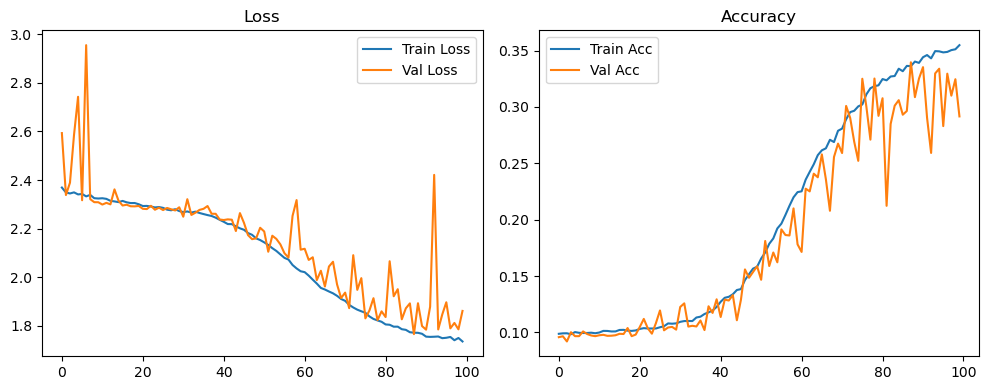

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.11it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.22it/s]

Evaluation: 100%|██████████| 3/3 [00:02<00:00,  1.66it/s]

Evaluation: 100%|██████████| 3/3 [00:02<00:00,  1.50it/s]

Original Model Final Test Loss: 1.8577 Accuracy: 0.2982


🚀 Running: batch256_lr_max_0.0005_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0964 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0964 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0964 |:   1%|          | 1/100 [01:21<2:14:04, 81.26s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:36<2:14:04, 81.26s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:36<2:14:04, 81.26s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:37<2:07:25, 78.02s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   2%|▏         | 2/100 [02:51<2:07:25, 78.02s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   2%|▏         | 2/100 [02:51<2:07:25, 78.02s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0961 |:   3%|▎         | 3/100 [02:51<1:19:30, 49.18s/it]

| LR: 0.000499 | Train Acc: 0.1001 | Val Acc: 0.0932 |:   3%|▎         | 3/100 [03:06<1:19:30, 49.18s/it]

| LR: 0.000499 | Train Acc: 0.1001 | Val Acc: 0.0932 |:   3%|▎         | 3/100 [03:06<1:19:30, 49.18s/it]

| LR: 0.000499 | Train Acc: 0.1001 | Val Acc: 0.0932 |:   4%|▍         | 4/100 [03:06<56:52, 35.55s/it]  

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [03:21<56:52, 35.55s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [03:21<56:52, 35.55s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0963 |:   5%|▌         | 5/100 [03:21<44:35, 28.16s/it]

| LR: 0.000497 | Train Acc: 0.0987 | Val Acc: 0.0866 |:   5%|▌         | 5/100 [03:36<44:35, 28.16s/it]

| LR: 0.000497 | Train Acc: 0.0987 | Val Acc: 0.0866 |:   5%|▌         | 5/100 [03:36<44:35, 28.16s/it]

| LR: 0.000497 | Train Acc: 0.0987 | Val Acc: 0.0866 |:   6%|▌         | 6/100 [03:36<37:07, 23.69s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0939 |:   6%|▌         | 6/100 [03:51<37:07, 23.69s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0939 |:   6%|▌         | 6/100 [03:51<37:07, 23.69s/it]

| LR: 0.000496 | Train Acc: 0.0993 | Val Acc: 0.0939 |:   7%|▋         | 7/100 [03:51<32:16, 20.83s/it]

| LR: 0.000494 | Train Acc: 0.0999 | Val Acc: 0.0955 |:   7%|▋         | 7/100 [04:06<32:16, 20.83s/it]

| LR: 0.000494 | Train Acc: 0.0999 | Val Acc: 0.0955 |:   7%|▋         | 7/100 [04:06<32:16, 20.83s/it]

| LR: 0.000494 | Train Acc: 0.0999 | Val Acc: 0.0955 |:   8%|▊         | 8/100 [04:06<28:56, 18.88s/it]

| LR: 0.000492 | Train Acc: 0.0990 | Val Acc: 0.1004 |:   8%|▊         | 8/100 [04:20<28:56, 18.88s/it]

| LR: 0.000492 | Train Acc: 0.0990 | Val Acc: 0.1004 |:   8%|▊         | 8/100 [04:20<28:56, 18.88s/it]

| LR: 0.000492 | Train Acc: 0.0990 | Val Acc: 0.1004 |:   9%|▉         | 9/100 [04:20<26:34, 17.52s/it]

| LR: 0.000490 | Train Acc: 0.1006 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [04:35<26:34, 17.52s/it]

| LR: 0.000490 | Train Acc: 0.1006 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [04:35<26:34, 17.52s/it]

| LR: 0.000490 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  10%|█         | 10/100 [04:35<25:00, 16.68s/it]

| LR: 0.000488 | Train Acc: 0.1014 | Val Acc: 0.0979 |:  10%|█         | 10/100 [04:50<25:00, 16.68s/it]

| LR: 0.000488 | Train Acc: 0.1014 | Val Acc: 0.0979 |:  10%|█         | 10/100 [04:50<25:00, 16.68s/it]

| LR: 0.000488 | Train Acc: 0.1014 | Val Acc: 0.0979 |:  11%|█         | 11/100 [04:50<23:51, 16.09s/it]

| LR: 0.000485 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  11%|█         | 11/100 [05:04<23:51, 16.09s/it]

| LR: 0.000485 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  11%|█         | 11/100 [05:04<23:51, 16.09s/it]

| LR: 0.000485 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:04<22:58, 15.66s/it]

| LR: 0.000482 | Train Acc: 0.1021 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [05:19<22:58, 15.66s/it]

| LR: 0.000482 | Train Acc: 0.1021 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [05:19<22:58, 15.66s/it]

| LR: 0.000482 | Train Acc: 0.1021 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:19<22:23, 15.45s/it]

| LR: 0.000479 | Train Acc: 0.1021 | Val Acc: 0.0958 |:  13%|█▎        | 13/100 [05:34<22:23, 15.45s/it]

| LR: 0.000479 | Train Acc: 0.1021 | Val Acc: 0.0958 |:  13%|█▎        | 13/100 [05:34<22:23, 15.45s/it]

| LR: 0.000479 | Train Acc: 0.1021 | Val Acc: 0.0958 |:  14%|█▍        | 14/100 [05:34<21:47, 15.21s/it]

| LR: 0.000476 | Train Acc: 0.1018 | Val Acc: 0.0997 |:  14%|█▍        | 14/100 [05:49<21:47, 15.21s/it]

| LR: 0.000476 | Train Acc: 0.1018 | Val Acc: 0.0997 |:  14%|█▍        | 14/100 [05:49<21:47, 15.21s/it]

| LR: 0.000476 | Train Acc: 0.1018 | Val Acc: 0.0997 |:  15%|█▌        | 15/100 [05:49<21:24, 15.12s/it]

| LR: 0.000473 | Train Acc: 0.1023 | Val Acc: 0.1030 |:  15%|█▌        | 15/100 [06:04<21:24, 15.12s/it]

| LR: 0.000473 | Train Acc: 0.1023 | Val Acc: 0.1030 |:  15%|█▌        | 15/100 [06:04<21:24, 15.12s/it]

| LR: 0.000473 | Train Acc: 0.1023 | Val Acc: 0.1030 |:  16%|█▌        | 16/100 [06:04<20:57, 14.98s/it]

| LR: 0.000469 | Train Acc: 0.1009 | Val Acc: 0.0983 |:  16%|█▌        | 16/100 [06:18<20:57, 14.98s/it]

| LR: 0.000469 | Train Acc: 0.1009 | Val Acc: 0.0983 |:  16%|█▌        | 16/100 [06:18<20:57, 14.98s/it]

| LR: 0.000469 | Train Acc: 0.1009 | Val Acc: 0.0983 |:  17%|█▋        | 17/100 [06:18<20:36, 14.90s/it]

| LR: 0.000465 | Train Acc: 0.1018 | Val Acc: 0.0957 |:  17%|█▋        | 17/100 [06:33<20:36, 14.90s/it]

| LR: 0.000465 | Train Acc: 0.1018 | Val Acc: 0.0957 |:  17%|█▋        | 17/100 [06:33<20:36, 14.90s/it]

| LR: 0.000465 | Train Acc: 0.1018 | Val Acc: 0.0957 |:  18%|█▊        | 18/100 [06:33<20:16, 14.84s/it]

| LR: 0.000461 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  18%|█▊        | 18/100 [06:48<20:16, 14.84s/it]

| LR: 0.000461 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  18%|█▊        | 18/100 [06:48<20:16, 14.84s/it]

| LR: 0.000461 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  19%|█▉        | 19/100 [06:48<20:06, 14.89s/it]

| LR: 0.000457 | Train Acc: 0.1013 | Val Acc: 0.0990 |:  19%|█▉        | 19/100 [07:03<20:06, 14.89s/it]

| LR: 0.000457 | Train Acc: 0.1013 | Val Acc: 0.0990 |:  19%|█▉        | 19/100 [07:03<20:06, 14.89s/it]

| LR: 0.000457 | Train Acc: 0.1013 | Val Acc: 0.0990 |:  20%|██        | 20/100 [07:03<19:42, 14.78s/it]

| LR: 0.000452 | Train Acc: 0.1017 | Val Acc: 0.1028 |:  20%|██        | 20/100 [07:17<19:42, 14.78s/it]

| LR: 0.000452 | Train Acc: 0.1017 | Val Acc: 0.1028 |:  20%|██        | 20/100 [07:17<19:42, 14.78s/it]

| LR: 0.000452 | Train Acc: 0.1017 | Val Acc: 0.1028 |:  21%|██        | 21/100 [07:17<19:21, 14.70s/it]

| LR: 0.000448 | Train Acc: 0.1028 | Val Acc: 0.0946 |:  21%|██        | 21/100 [07:32<19:21, 14.70s/it]

| LR: 0.000448 | Train Acc: 0.1028 | Val Acc: 0.0946 |:  21%|██        | 21/100 [07:32<19:21, 14.70s/it]

| LR: 0.000448 | Train Acc: 0.1028 | Val Acc: 0.0946 |:  22%|██▏       | 22/100 [07:32<19:13, 14.79s/it]

| LR: 0.000443 | Train Acc: 0.1017 | Val Acc: 0.1089 |:  22%|██▏       | 22/100 [07:47<19:13, 14.79s/it]

| LR: 0.000443 | Train Acc: 0.1017 | Val Acc: 0.1089 |:  22%|██▏       | 22/100 [07:47<19:13, 14.79s/it]

| LR: 0.000443 | Train Acc: 0.1017 | Val Acc: 0.1089 |:  23%|██▎       | 23/100 [07:47<18:57, 14.77s/it]

| LR: 0.000438 | Train Acc: 0.1056 | Val Acc: 0.1035 |:  23%|██▎       | 23/100 [08:01<18:57, 14.77s/it]

| LR: 0.000438 | Train Acc: 0.1056 | Val Acc: 0.1035 |:  23%|██▎       | 23/100 [08:01<18:57, 14.77s/it]

| LR: 0.000438 | Train Acc: 0.1056 | Val Acc: 0.1035 |:  24%|██▍       | 24/100 [08:02<18:40, 14.74s/it]

| LR: 0.000432 | Train Acc: 0.1059 | Val Acc: 0.1005 |:  24%|██▍       | 24/100 [08:16<18:40, 14.74s/it]

| LR: 0.000432 | Train Acc: 0.1059 | Val Acc: 0.1005 |:  24%|██▍       | 24/100 [08:16<18:40, 14.74s/it]

| LR: 0.000432 | Train Acc: 0.1059 | Val Acc: 0.1005 |:  25%|██▌       | 25/100 [08:16<18:21, 14.69s/it]

| LR: 0.000427 | Train Acc: 0.1053 | Val Acc: 0.1004 |:  25%|██▌       | 25/100 [08:31<18:21, 14.69s/it]

| LR: 0.000427 | Train Acc: 0.1053 | Val Acc: 0.1004 |:  25%|██▌       | 25/100 [08:31<18:21, 14.69s/it]

| LR: 0.000427 | Train Acc: 0.1053 | Val Acc: 0.1004 |:  26%|██▌       | 26/100 [08:31<18:13, 14.78s/it]

| LR: 0.000421 | Train Acc: 0.1050 | Val Acc: 0.1033 |:  26%|██▌       | 26/100 [08:46<18:13, 14.78s/it]

| LR: 0.000421 | Train Acc: 0.1050 | Val Acc: 0.1033 |:  26%|██▌       | 26/100 [08:46<18:13, 14.78s/it]

| LR: 0.000421 | Train Acc: 0.1050 | Val Acc: 0.1033 |:  27%|██▋       | 27/100 [08:46<18:03, 14.84s/it]

| LR: 0.000415 | Train Acc: 0.1051 | Val Acc: 0.1021 |:  27%|██▋       | 27/100 [09:01<18:03, 14.84s/it]

| LR: 0.000415 | Train Acc: 0.1051 | Val Acc: 0.1021 |:  27%|██▋       | 27/100 [09:01<18:03, 14.84s/it]

| LR: 0.000415 | Train Acc: 0.1051 | Val Acc: 0.1021 |:  28%|██▊       | 28/100 [09:01<17:49, 14.85s/it]

| LR: 0.000410 | Train Acc: 0.1056 | Val Acc: 0.1040 |:  28%|██▊       | 28/100 [09:16<17:49, 14.85s/it]

| LR: 0.000410 | Train Acc: 0.1056 | Val Acc: 0.1040 |:  28%|██▊       | 28/100 [09:16<17:49, 14.85s/it]

| LR: 0.000410 | Train Acc: 0.1056 | Val Acc: 0.1040 |:  29%|██▉       | 29/100 [09:16<17:32, 14.83s/it]

| LR: 0.000403 | Train Acc: 0.1044 | Val Acc: 0.1016 |:  29%|██▉       | 29/100 [09:30<17:32, 14.83s/it]

| LR: 0.000403 | Train Acc: 0.1044 | Val Acc: 0.1016 |:  29%|██▉       | 29/100 [09:30<17:32, 14.83s/it]

| LR: 0.000403 | Train Acc: 0.1044 | Val Acc: 0.1016 |:  30%|███       | 30/100 [09:30<17:15, 14.80s/it]

| LR: 0.000397 | Train Acc: 0.1048 | Val Acc: 0.0985 |:  30%|███       | 30/100 [09:45<17:15, 14.80s/it]

| LR: 0.000397 | Train Acc: 0.1048 | Val Acc: 0.0985 |:  30%|███       | 30/100 [09:45<17:15, 14.80s/it]

| LR: 0.000397 | Train Acc: 0.1048 | Val Acc: 0.0985 |:  31%|███       | 31/100 [09:45<17:02, 14.81s/it]

| LR: 0.000391 | Train Acc: 0.1047 | Val Acc: 0.1008 |:  31%|███       | 31/100 [10:00<17:02, 14.81s/it]

| LR: 0.000391 | Train Acc: 0.1047 | Val Acc: 0.1008 |:  31%|███       | 31/100 [10:00<17:02, 14.81s/it]

| LR: 0.000391 | Train Acc: 0.1047 | Val Acc: 0.1008 |:  32%|███▏      | 32/100 [10:00<16:45, 14.79s/it]

| LR: 0.000384 | Train Acc: 0.1037 | Val Acc: 0.1016 |:  32%|███▏      | 32/100 [10:15<16:45, 14.79s/it]

| LR: 0.000384 | Train Acc: 0.1037 | Val Acc: 0.1016 |:  32%|███▏      | 32/100 [10:15<16:45, 14.79s/it]

| LR: 0.000384 | Train Acc: 0.1037 | Val Acc: 0.1016 |:  33%|███▎      | 33/100 [10:15<16:29, 14.77s/it]

| LR: 0.000378 | Train Acc: 0.1051 | Val Acc: 0.0992 |:  33%|███▎      | 33/100 [10:29<16:29, 14.77s/it]

| LR: 0.000378 | Train Acc: 0.1051 | Val Acc: 0.0992 |:  33%|███▎      | 33/100 [10:29<16:29, 14.77s/it]

| LR: 0.000378 | Train Acc: 0.1051 | Val Acc: 0.0992 |:  34%|███▍      | 34/100 [10:30<16:14, 14.77s/it]

| LR: 0.000371 | Train Acc: 0.1042 | Val Acc: 0.1031 |:  34%|███▍      | 34/100 [10:44<16:14, 14.77s/it]

| LR: 0.000371 | Train Acc: 0.1042 | Val Acc: 0.1031 |:  34%|███▍      | 34/100 [10:44<16:14, 14.77s/it]

| LR: 0.000371 | Train Acc: 0.1042 | Val Acc: 0.1031 |:  35%|███▌      | 35/100 [10:44<16:02, 14.81s/it]

| LR: 0.000364 | Train Acc: 0.1045 | Val Acc: 0.1005 |:  35%|███▌      | 35/100 [10:59<16:02, 14.81s/it]

| LR: 0.000364 | Train Acc: 0.1045 | Val Acc: 0.1005 |:  35%|███▌      | 35/100 [10:59<16:02, 14.81s/it]

| LR: 0.000364 | Train Acc: 0.1045 | Val Acc: 0.1005 |:  36%|███▌      | 36/100 [10:59<15:43, 14.75s/it]

| LR: 0.000357 | Train Acc: 0.1042 | Val Acc: 0.1035 |:  36%|███▌      | 36/100 [11:14<15:43, 14.75s/it]

| LR: 0.000357 | Train Acc: 0.1042 | Val Acc: 0.1035 |:  36%|███▌      | 36/100 [11:14<15:43, 14.75s/it]

| LR: 0.000357 | Train Acc: 0.1042 | Val Acc: 0.1035 |:  37%|███▋      | 37/100 [11:14<15:28, 14.74s/it]

| LR: 0.000350 | Train Acc: 0.1035 | Val Acc: 0.0995 |:  37%|███▋      | 37/100 [11:29<15:28, 14.74s/it]

| LR: 0.000350 | Train Acc: 0.1035 | Val Acc: 0.0995 |:  37%|███▋      | 37/100 [11:29<15:28, 14.74s/it]

| LR: 0.000350 | Train Acc: 0.1035 | Val Acc: 0.0995 |:  38%|███▊      | 38/100 [11:29<15:19, 14.83s/it]

| LR: 0.000342 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  38%|███▊      | 38/100 [11:44<15:19, 14.83s/it]

| LR: 0.000342 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  38%|███▊      | 38/100 [11:44<15:19, 14.83s/it]

| LR: 0.000342 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  39%|███▉      | 39/100 [11:44<15:08, 14.89s/it]

| LR: 0.000335 | Train Acc: 0.1031 | Val Acc: 0.1013 |:  39%|███▉      | 39/100 [11:58<15:08, 14.89s/it]

| LR: 0.000335 | Train Acc: 0.1031 | Val Acc: 0.1013 |:  39%|███▉      | 39/100 [11:58<15:08, 14.89s/it]

| LR: 0.000335 | Train Acc: 0.1031 | Val Acc: 0.1013 |:  40%|████      | 40/100 [11:58<14:49, 14.82s/it]

| LR: 0.000328 | Train Acc: 0.1037 | Val Acc: 0.1010 |:  40%|████      | 40/100 [12:13<14:49, 14.82s/it]

| LR: 0.000328 | Train Acc: 0.1037 | Val Acc: 0.1010 |:  40%|████      | 40/100 [12:13<14:49, 14.82s/it]

| LR: 0.000328 | Train Acc: 0.1037 | Val Acc: 0.1010 |:  41%|████      | 41/100 [12:13<14:29, 14.74s/it]

| LR: 0.000320 | Train Acc: 0.1031 | Val Acc: 0.0989 |:  41%|████      | 41/100 [12:28<14:29, 14.74s/it]

| LR: 0.000320 | Train Acc: 0.1031 | Val Acc: 0.0989 |:  41%|████      | 41/100 [12:28<14:29, 14.74s/it]

| LR: 0.000320 | Train Acc: 0.1031 | Val Acc: 0.0989 |:  42%|████▏     | 42/100 [12:28<14:13, 14.72s/it]

| LR: 0.000313 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  42%|████▏     | 42/100 [12:42<14:13, 14.72s/it]

| LR: 0.000313 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  42%|████▏     | 42/100 [12:42<14:13, 14.72s/it]

| LR: 0.000313 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  43%|████▎     | 43/100 [12:42<13:58, 14.72s/it]

| LR: 0.000305 | Train Acc: 0.1023 | Val Acc: 0.0974 |:  43%|████▎     | 43/100 [12:57<13:58, 14.72s/it]

| LR: 0.000305 | Train Acc: 0.1023 | Val Acc: 0.0974 |:  43%|████▎     | 43/100 [12:57<13:58, 14.72s/it]

| LR: 0.000305 | Train Acc: 0.1023 | Val Acc: 0.0974 |:  44%|████▍     | 44/100 [12:57<13:47, 14.78s/it]

| LR: 0.000297 | Train Acc: 0.1020 | Val Acc: 0.1028 |:  44%|████▍     | 44/100 [13:12<13:47, 14.78s/it]

| LR: 0.000297 | Train Acc: 0.1020 | Val Acc: 0.1028 |:  44%|████▍     | 44/100 [13:12<13:47, 14.78s/it]

| LR: 0.000297 | Train Acc: 0.1020 | Val Acc: 0.1028 |:  45%|████▌     | 45/100 [13:12<13:33, 14.78s/it]

| LR: 0.000290 | Train Acc: 0.1025 | Val Acc: 0.0994 |:  45%|████▌     | 45/100 [13:27<13:33, 14.78s/it]

| LR: 0.000290 | Train Acc: 0.1025 | Val Acc: 0.0994 |:  45%|████▌     | 45/100 [13:27<13:33, 14.78s/it]

| LR: 0.000290 | Train Acc: 0.1025 | Val Acc: 0.0994 |:  46%|████▌     | 46/100 [13:27<13:15, 14.74s/it]

| LR: 0.000282 | Train Acc: 0.1024 | Val Acc: 0.0981 |:  46%|████▌     | 46/100 [13:42<13:15, 14.74s/it]

| LR: 0.000282 | Train Acc: 0.1024 | Val Acc: 0.0981 |:  46%|████▌     | 46/100 [13:42<13:15, 14.74s/it]

| LR: 0.000282 | Train Acc: 0.1024 | Val Acc: 0.0981 |:  47%|████▋     | 47/100 [13:42<13:01, 14.75s/it]

| LR: 0.000274 | Train Acc: 0.1024 | Val Acc: 0.1037 |:  47%|████▋     | 47/100 [13:56<13:01, 14.75s/it]

| LR: 0.000274 | Train Acc: 0.1024 | Val Acc: 0.1037 |:  47%|████▋     | 47/100 [13:56<13:01, 14.75s/it]

| LR: 0.000274 | Train Acc: 0.1024 | Val Acc: 0.1037 |:  48%|████▊     | 48/100 [13:56<12:49, 14.80s/it]

| LR: 0.000266 | Train Acc: 0.1042 | Val Acc: 0.0985 |:  48%|████▊     | 48/100 [14:11<12:49, 14.80s/it]

| LR: 0.000266 | Train Acc: 0.1042 | Val Acc: 0.0985 |:  48%|████▊     | 48/100 [14:11<12:49, 14.80s/it]

| LR: 0.000266 | Train Acc: 0.1042 | Val Acc: 0.0985 |:  49%|████▉     | 49/100 [14:11<12:33, 14.77s/it]

| LR: 0.000258 | Train Acc: 0.1038 | Val Acc: 0.0990 |:  49%|████▉     | 49/100 [14:26<12:33, 14.77s/it]

| LR: 0.000258 | Train Acc: 0.1038 | Val Acc: 0.0990 |:  49%|████▉     | 49/100 [14:26<12:33, 14.77s/it]

| LR: 0.000258 | Train Acc: 0.1038 | Val Acc: 0.0990 |:  50%|█████     | 50/100 [14:26<12:14, 14.69s/it]

| LR: 0.000251 | Train Acc: 0.1036 | Val Acc: 0.1010 |:  50%|█████     | 50/100 [14:40<12:14, 14.69s/it]

| LR: 0.000251 | Train Acc: 0.1036 | Val Acc: 0.1010 |:  50%|█████     | 50/100 [14:40<12:14, 14.69s/it]

| LR: 0.000251 | Train Acc: 0.1036 | Val Acc: 0.1010 |:  51%|█████     | 51/100 [14:40<12:00, 14.70s/it]

| LR: 0.000243 | Train Acc: 0.1044 | Val Acc: 0.0985 |:  51%|█████     | 51/100 [14:55<12:00, 14.70s/it]

| LR: 0.000243 | Train Acc: 0.1044 | Val Acc: 0.0985 |:  51%|█████     | 51/100 [14:55<12:00, 14.70s/it]

| LR: 0.000243 | Train Acc: 0.1044 | Val Acc: 0.0985 |:  52%|█████▏    | 52/100 [14:55<11:48, 14.76s/it]

| LR: 0.000235 | Train Acc: 0.1033 | Val Acc: 0.0996 |:  52%|█████▏    | 52/100 [15:10<11:48, 14.76s/it]

| LR: 0.000235 | Train Acc: 0.1033 | Val Acc: 0.0996 |:  52%|█████▏    | 52/100 [15:10<11:48, 14.76s/it]

| LR: 0.000235 | Train Acc: 0.1033 | Val Acc: 0.0996 |:  53%|█████▎    | 53/100 [15:10<11:39, 14.89s/it]

| LR: 0.000227 | Train Acc: 0.1027 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [15:25<11:39, 14.89s/it]

| LR: 0.000227 | Train Acc: 0.1027 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [15:25<11:39, 14.89s/it]

| LR: 0.000227 | Train Acc: 0.1027 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:25<11:22, 14.83s/it]

| LR: 0.000219 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [15:40<11:22, 14.83s/it]

| LR: 0.000219 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [15:40<11:22, 14.83s/it]

| LR: 0.000219 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  55%|█████▌    | 55/100 [15:40<11:08, 14.85s/it]

| LR: 0.000211 | Train Acc: 0.1036 | Val Acc: 0.0997 |:  55%|█████▌    | 55/100 [15:55<11:08, 14.85s/it]

| LR: 0.000211 | Train Acc: 0.1036 | Val Acc: 0.0997 |:  55%|█████▌    | 55/100 [15:55<11:08, 14.85s/it]

| LR: 0.000211 | Train Acc: 0.1036 | Val Acc: 0.0997 |:  56%|█████▌    | 56/100 [15:55<10:50, 14.78s/it]

| LR: 0.000204 | Train Acc: 0.1026 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [16:09<10:50, 14.78s/it]

| LR: 0.000204 | Train Acc: 0.1026 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [16:09<10:50, 14.78s/it]

| LR: 0.000204 | Train Acc: 0.1026 | Val Acc: 0.0971 |:  57%|█████▋    | 57/100 [16:09<10:33, 14.74s/it]

| LR: 0.000196 | Train Acc: 0.1035 | Val Acc: 0.1000 |:  57%|█████▋    | 57/100 [16:24<10:33, 14.74s/it]

| LR: 0.000196 | Train Acc: 0.1035 | Val Acc: 0.1000 |:  57%|█████▋    | 57/100 [16:24<10:33, 14.74s/it]

| LR: 0.000196 | Train Acc: 0.1035 | Val Acc: 0.1000 |:  58%|█████▊    | 58/100 [16:24<10:17, 14.70s/it]

| LR: 0.000188 | Train Acc: 0.1041 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [16:39<10:17, 14.70s/it]

| LR: 0.000188 | Train Acc: 0.1041 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [16:39<10:17, 14.70s/it]

| LR: 0.000188 | Train Acc: 0.1041 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [16:39<10:02, 14.69s/it]

| LR: 0.000181 | Train Acc: 0.1040 | Val Acc: 0.0982 |:  59%|█████▉    | 59/100 [16:53<10:02, 14.69s/it]

| LR: 0.000181 | Train Acc: 0.1040 | Val Acc: 0.0982 |:  59%|█████▉    | 59/100 [16:53<10:02, 14.69s/it]

| LR: 0.000181 | Train Acc: 0.1040 | Val Acc: 0.0982 |:  60%|██████    | 60/100 [16:53<09:49, 14.73s/it]

| LR: 0.000173 | Train Acc: 0.1042 | Val Acc: 0.0994 |:  60%|██████    | 60/100 [17:08<09:49, 14.73s/it]

| LR: 0.000173 | Train Acc: 0.1042 | Val Acc: 0.0994 |:  60%|██████    | 60/100 [17:08<09:49, 14.73s/it]

| LR: 0.000173 | Train Acc: 0.1042 | Val Acc: 0.0994 |:  61%|██████    | 61/100 [17:08<09:34, 14.73s/it]

| LR: 0.000166 | Train Acc: 0.1042 | Val Acc: 0.1013 |:  61%|██████    | 61/100 [17:23<09:34, 14.73s/it]

| LR: 0.000166 | Train Acc: 0.1042 | Val Acc: 0.1013 |:  61%|██████    | 61/100 [17:23<09:34, 14.73s/it]

| LR: 0.000166 | Train Acc: 0.1042 | Val Acc: 0.1013 |:  62%|██████▏   | 62/100 [17:23<09:21, 14.77s/it]

| LR: 0.000159 | Train Acc: 0.1035 | Val Acc: 0.0992 |:  62%|██████▏   | 62/100 [17:38<09:21, 14.77s/it]

| LR: 0.000159 | Train Acc: 0.1035 | Val Acc: 0.0992 |:  62%|██████▏   | 62/100 [17:38<09:21, 14.77s/it]

| LR: 0.000159 | Train Acc: 0.1035 | Val Acc: 0.0992 |:  63%|██████▎   | 63/100 [17:38<09:04, 14.72s/it]

| LR: 0.000151 | Train Acc: 0.1043 | Val Acc: 0.1003 |:  63%|██████▎   | 63/100 [17:52<09:04, 14.72s/it]

| LR: 0.000151 | Train Acc: 0.1043 | Val Acc: 0.1003 |:  63%|██████▎   | 63/100 [17:52<09:04, 14.72s/it]

| LR: 0.000151 | Train Acc: 0.1043 | Val Acc: 0.1003 |:  64%|██████▍   | 64/100 [17:52<08:50, 14.75s/it]

| LR: 0.000144 | Train Acc: 0.1050 | Val Acc: 0.1005 |:  64%|██████▍   | 64/100 [18:07<08:50, 14.75s/it]

| LR: 0.000144 | Train Acc: 0.1050 | Val Acc: 0.1005 |:  64%|██████▍   | 64/100 [18:07<08:50, 14.75s/it]

| LR: 0.000144 | Train Acc: 0.1050 | Val Acc: 0.1005 |:  65%|██████▌   | 65/100 [18:07<08:34, 14.70s/it]

| LR: 0.000137 | Train Acc: 0.1052 | Val Acc: 0.1027 |:  65%|██████▌   | 65/100 [18:22<08:34, 14.70s/it]

| LR: 0.000137 | Train Acc: 0.1052 | Val Acc: 0.1027 |:  65%|██████▌   | 65/100 [18:22<08:34, 14.70s/it]

| LR: 0.000137 | Train Acc: 0.1052 | Val Acc: 0.1027 |:  66%|██████▌   | 66/100 [18:22<08:21, 14.75s/it]

| LR: 0.000130 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  66%|██████▌   | 66/100 [18:37<08:21, 14.75s/it]

| LR: 0.000130 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  66%|██████▌   | 66/100 [18:37<08:21, 14.75s/it]

| LR: 0.000130 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  67%|██████▋   | 67/100 [18:37<08:07, 14.77s/it]

| LR: 0.000123 | Train Acc: 0.1052 | Val Acc: 0.1018 |:  67%|██████▋   | 67/100 [18:52<08:07, 14.77s/it]

| LR: 0.000123 | Train Acc: 0.1052 | Val Acc: 0.1018 |:  67%|██████▋   | 67/100 [18:52<08:07, 14.77s/it]

| LR: 0.000123 | Train Acc: 0.1052 | Val Acc: 0.1018 |:  68%|██████▊   | 68/100 [18:52<07:54, 14.82s/it]

| LR: 0.000117 | Train Acc: 0.1063 | Val Acc: 0.1010 |:  68%|██████▊   | 68/100 [19:07<07:54, 14.82s/it]

| LR: 0.000117 | Train Acc: 0.1063 | Val Acc: 0.1010 |:  68%|██████▊   | 68/100 [19:07<07:54, 14.82s/it]

| LR: 0.000117 | Train Acc: 0.1063 | Val Acc: 0.1010 |:  69%|██████▉   | 69/100 [19:07<07:41, 14.88s/it]

| LR: 0.000110 | Train Acc: 0.1052 | Val Acc: 0.1011 |:  69%|██████▉   | 69/100 [19:21<07:41, 14.88s/it]

| LR: 0.000110 | Train Acc: 0.1052 | Val Acc: 0.1011 |:  69%|██████▉   | 69/100 [19:21<07:41, 14.88s/it]

| LR: 0.000110 | Train Acc: 0.1052 | Val Acc: 0.1011 |:  70%|███████   | 70/100 [19:21<07:25, 14.84s/it]

| LR: 0.000104 | Train Acc: 0.1050 | Val Acc: 0.1034 |:  70%|███████   | 70/100 [19:36<07:25, 14.84s/it]

| LR: 0.000104 | Train Acc: 0.1050 | Val Acc: 0.1034 |:  70%|███████   | 70/100 [19:36<07:25, 14.84s/it]

| LR: 0.000104 | Train Acc: 0.1050 | Val Acc: 0.1034 |:  71%|███████   | 71/100 [19:36<07:10, 14.83s/it]

| LR: 0.000098 | Train Acc: 0.1060 | Val Acc: 0.1021 |:  71%|███████   | 71/100 [19:51<07:10, 14.83s/it]

| LR: 0.000098 | Train Acc: 0.1060 | Val Acc: 0.1021 |:  71%|███████   | 71/100 [19:51<07:10, 14.83s/it]

| LR: 0.000098 | Train Acc: 0.1060 | Val Acc: 0.1021 |:  72%|███████▏  | 72/100 [19:51<06:56, 14.86s/it]

| LR: 0.000091 | Train Acc: 0.1050 | Val Acc: 0.1016 |:  72%|███████▏  | 72/100 [20:06<06:56, 14.86s/it]

| LR: 0.000091 | Train Acc: 0.1050 | Val Acc: 0.1016 |:  72%|███████▏  | 72/100 [20:06<06:56, 14.86s/it]

| LR: 0.000091 | Train Acc: 0.1050 | Val Acc: 0.1016 |:  73%|███████▎  | 73/100 [20:06<06:40, 14.83s/it]

| LR: 0.000086 | Train Acc: 0.1058 | Val Acc: 0.1002 |:  73%|███████▎  | 73/100 [20:21<06:40, 14.83s/it]

| LR: 0.000086 | Train Acc: 0.1058 | Val Acc: 0.1002 |:  73%|███████▎  | 73/100 [20:21<06:40, 14.83s/it]

| LR: 0.000086 | Train Acc: 0.1058 | Val Acc: 0.1002 |:  74%|███████▍  | 74/100 [20:21<06:26, 14.86s/it]

| LR: 0.000080 | Train Acc: 0.1057 | Val Acc: 0.1023 |:  74%|███████▍  | 74/100 [20:36<06:26, 14.86s/it]

| LR: 0.000080 | Train Acc: 0.1057 | Val Acc: 0.1023 |:  74%|███████▍  | 74/100 [20:36<06:26, 14.86s/it]

| LR: 0.000080 | Train Acc: 0.1057 | Val Acc: 0.1023 |:  75%|███████▌  | 75/100 [20:36<06:11, 14.87s/it]

| LR: 0.000074 | Train Acc: 0.1051 | Val Acc: 0.1030 |:  75%|███████▌  | 75/100 [20:50<06:11, 14.87s/it]

| LR: 0.000074 | Train Acc: 0.1051 | Val Acc: 0.1030 |:  75%|███████▌  | 75/100 [20:50<06:11, 14.87s/it]

| LR: 0.000074 | Train Acc: 0.1051 | Val Acc: 0.1030 |:  76%|███████▌  | 76/100 [20:50<05:55, 14.80s/it]

| LR: 0.000069 | Train Acc: 0.1050 | Val Acc: 0.1043 |:  76%|███████▌  | 76/100 [21:05<05:55, 14.80s/it]

| LR: 0.000069 | Train Acc: 0.1050 | Val Acc: 0.1043 |:  76%|███████▌  | 76/100 [21:05<05:55, 14.80s/it]

| LR: 0.000069 | Train Acc: 0.1050 | Val Acc: 0.1043 |:  77%|███████▋  | 77/100 [21:05<05:40, 14.82s/it]

| LR: 0.000063 | Train Acc: 0.1052 | Val Acc: 0.0999 |:  77%|███████▋  | 77/100 [21:20<05:40, 14.82s/it]

| LR: 0.000063 | Train Acc: 0.1052 | Val Acc: 0.0999 |:  77%|███████▋  | 77/100 [21:20<05:40, 14.82s/it]

| LR: 0.000063 | Train Acc: 0.1052 | Val Acc: 0.0999 |:  78%|███████▊  | 78/100 [21:20<05:25, 14.81s/it]

| LR: 0.000058 | Train Acc: 0.1060 | Val Acc: 0.1025 |:  78%|███████▊  | 78/100 [21:35<05:25, 14.81s/it]

| LR: 0.000058 | Train Acc: 0.1060 | Val Acc: 0.1025 |:  78%|███████▊  | 78/100 [21:35<05:25, 14.81s/it]

| LR: 0.000058 | Train Acc: 0.1060 | Val Acc: 0.1025 |:  79%|███████▉  | 79/100 [21:35<05:11, 14.82s/it]

| LR: 0.000053 | Train Acc: 0.1066 | Val Acc: 0.1006 |:  79%|███████▉  | 79/100 [21:50<05:11, 14.82s/it]

| LR: 0.000053 | Train Acc: 0.1066 | Val Acc: 0.1006 |:  79%|███████▉  | 79/100 [21:50<05:11, 14.82s/it]

| LR: 0.000053 | Train Acc: 0.1066 | Val Acc: 0.1006 |:  80%|████████  | 80/100 [21:50<04:55, 14.80s/it]

| LR: 0.000049 | Train Acc: 0.1048 | Val Acc: 0.1011 |:  80%|████████  | 80/100 [22:05<04:55, 14.80s/it]

| LR: 0.000049 | Train Acc: 0.1048 | Val Acc: 0.1011 |:  80%|████████  | 80/100 [22:05<04:55, 14.80s/it]

| LR: 0.000049 | Train Acc: 0.1048 | Val Acc: 0.1011 |:  81%|████████  | 81/100 [22:05<04:42, 14.85s/it]

| LR: 0.000044 | Train Acc: 0.1046 | Val Acc: 0.0996 |:  81%|████████  | 81/100 [22:19<04:42, 14.85s/it]

| LR: 0.000044 | Train Acc: 0.1046 | Val Acc: 0.0996 |:  81%|████████  | 81/100 [22:19<04:42, 14.85s/it]

| LR: 0.000044 | Train Acc: 0.1046 | Val Acc: 0.0996 |:  82%|████████▏ | 82/100 [22:19<04:26, 14.82s/it]

| LR: 0.000040 | Train Acc: 0.1051 | Val Acc: 0.1014 |:  82%|████████▏ | 82/100 [22:34<04:26, 14.82s/it]

| LR: 0.000040 | Train Acc: 0.1051 | Val Acc: 0.1014 |:  82%|████████▏ | 82/100 [22:34<04:26, 14.82s/it]

| LR: 0.000040 | Train Acc: 0.1051 | Val Acc: 0.1014 |:  83%|████████▎ | 83/100 [22:34<04:11, 14.82s/it]

| LR: 0.000036 | Train Acc: 0.1059 | Val Acc: 0.1015 |:  83%|████████▎ | 83/100 [22:49<04:11, 14.82s/it]

| LR: 0.000036 | Train Acc: 0.1059 | Val Acc: 0.1015 |:  83%|████████▎ | 83/100 [22:49<04:11, 14.82s/it]

| LR: 0.000036 | Train Acc: 0.1059 | Val Acc: 0.1015 |:  84%|████████▍ | 84/100 [22:49<03:56, 14.78s/it]

| LR: 0.000032 | Train Acc: 0.1052 | Val Acc: 0.1003 |:  84%|████████▍ | 84/100 [23:03<03:56, 14.78s/it]

| LR: 0.000032 | Train Acc: 0.1052 | Val Acc: 0.1003 |:  84%|████████▍ | 84/100 [23:03<03:56, 14.78s/it]

| LR: 0.000032 | Train Acc: 0.1052 | Val Acc: 0.1003 |:  85%|████████▌ | 85/100 [23:03<03:40, 14.73s/it]

| LR: 0.000028 | Train Acc: 0.1055 | Val Acc: 0.1014 |:  85%|████████▌ | 85/100 [23:18<03:40, 14.73s/it]

| LR: 0.000028 | Train Acc: 0.1055 | Val Acc: 0.1014 |:  85%|████████▌ | 85/100 [23:18<03:40, 14.73s/it]

| LR: 0.000028 | Train Acc: 0.1055 | Val Acc: 0.1014 |:  86%|████████▌ | 86/100 [23:18<03:25, 14.67s/it]

| LR: 0.000025 | Train Acc: 0.1055 | Val Acc: 0.1038 |:  86%|████████▌ | 86/100 [23:32<03:25, 14.67s/it]

| LR: 0.000025 | Train Acc: 0.1055 | Val Acc: 0.1038 |:  86%|████████▌ | 86/100 [23:32<03:25, 14.67s/it]

| LR: 0.000025 | Train Acc: 0.1055 | Val Acc: 0.1038 |:  87%|████████▋ | 87/100 [23:32<03:09, 14.61s/it]

| LR: 0.000022 | Train Acc: 0.1046 | Val Acc: 0.1002 |:  87%|████████▋ | 87/100 [23:47<03:09, 14.61s/it]

| LR: 0.000022 | Train Acc: 0.1046 | Val Acc: 0.1002 |:  87%|████████▋ | 87/100 [23:47<03:09, 14.61s/it]

| LR: 0.000022 | Train Acc: 0.1046 | Val Acc: 0.1002 |:  88%|████████▊ | 88/100 [23:47<02:54, 14.56s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1041 |:  88%|████████▊ | 88/100 [24:01<02:54, 14.56s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1041 |:  88%|████████▊ | 88/100 [24:01<02:54, 14.56s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1041 |:  89%|████████▉ | 89/100 [24:01<02:40, 14.56s/it]

| LR: 0.000016 | Train Acc: 0.1059 | Val Acc: 0.1107 |:  89%|████████▉ | 89/100 [24:16<02:40, 14.56s/it]

| LR: 0.000016 | Train Acc: 0.1059 | Val Acc: 0.1107 |:  89%|████████▉ | 89/100 [24:16<02:40, 14.56s/it]

| LR: 0.000016 | Train Acc: 0.1059 | Val Acc: 0.1107 |:  90%|█████████ | 90/100 [24:16<02:25, 14.52s/it]

| LR: 0.000013 | Train Acc: 0.1052 | Val Acc: 0.1019 |:  90%|█████████ | 90/100 [24:30<02:25, 14.52s/it]

| LR: 0.000013 | Train Acc: 0.1052 | Val Acc: 0.1019 |:  90%|█████████ | 90/100 [24:30<02:25, 14.52s/it]

| LR: 0.000013 | Train Acc: 0.1052 | Val Acc: 0.1019 |:  91%|█████████ | 91/100 [24:30<02:10, 14.50s/it]

| LR: 0.000011 | Train Acc: 0.1048 | Val Acc: 0.1037 |:  91%|█████████ | 91/100 [24:45<02:10, 14.50s/it]

| LR: 0.000011 | Train Acc: 0.1048 | Val Acc: 0.1037 |:  91%|█████████ | 91/100 [24:45<02:10, 14.50s/it]

| LR: 0.000011 | Train Acc: 0.1048 | Val Acc: 0.1037 |:  92%|█████████▏| 92/100 [24:45<01:55, 14.50s/it]

| LR: 0.000009 | Train Acc: 0.1058 | Val Acc: 0.1026 |:  92%|█████████▏| 92/100 [24:59<01:55, 14.50s/it]

| LR: 0.000009 | Train Acc: 0.1058 | Val Acc: 0.1026 |:  92%|█████████▏| 92/100 [24:59<01:55, 14.50s/it]

| LR: 0.000009 | Train Acc: 0.1058 | Val Acc: 0.1026 |:  93%|█████████▎| 93/100 [24:59<01:41, 14.52s/it]

| LR: 0.000007 | Train Acc: 0.1063 | Val Acc: 0.1041 |:  93%|█████████▎| 93/100 [25:14<01:41, 14.52s/it]

| LR: 0.000007 | Train Acc: 0.1063 | Val Acc: 0.1041 |:  93%|█████████▎| 93/100 [25:14<01:41, 14.52s/it]

| LR: 0.000007 | Train Acc: 0.1063 | Val Acc: 0.1041 |:  94%|█████████▍| 94/100 [25:14<01:26, 14.50s/it]

| LR: 0.000005 | Train Acc: 0.1062 | Val Acc: 0.0990 |:  94%|█████████▍| 94/100 [25:28<01:26, 14.50s/it]

| LR: 0.000005 | Train Acc: 0.1062 | Val Acc: 0.0990 |:  94%|█████████▍| 94/100 [25:28<01:26, 14.50s/it]

| LR: 0.000005 | Train Acc: 0.1062 | Val Acc: 0.0990 |:  95%|█████████▌| 95/100 [25:28<01:12, 14.49s/it]

| LR: 0.000004 | Train Acc: 0.1060 | Val Acc: 0.1001 |:  95%|█████████▌| 95/100 [25:43<01:12, 14.49s/it]

| LR: 0.000004 | Train Acc: 0.1060 | Val Acc: 0.1001 |:  95%|█████████▌| 95/100 [25:43<01:12, 14.49s/it]

| LR: 0.000004 | Train Acc: 0.1060 | Val Acc: 0.1001 |:  96%|█████████▌| 96/100 [25:43<00:57, 14.47s/it]

| LR: 0.000003 | Train Acc: 0.1055 | Val Acc: 0.1021 |:  96%|█████████▌| 96/100 [25:57<00:57, 14.47s/it]

| LR: 0.000003 | Train Acc: 0.1055 | Val Acc: 0.1021 |:  96%|█████████▌| 96/100 [25:57<00:57, 14.47s/it]

| LR: 0.000003 | Train Acc: 0.1055 | Val Acc: 0.1021 |:  97%|█████████▋| 97/100 [25:57<00:43, 14.49s/it]

| LR: 0.000002 | Train Acc: 0.1057 | Val Acc: 0.1060 |:  97%|█████████▋| 97/100 [26:12<00:43, 14.49s/it]

| LR: 0.000002 | Train Acc: 0.1057 | Val Acc: 0.1060 |:  97%|█████████▋| 97/100 [26:12<00:43, 14.49s/it]

| LR: 0.000002 | Train Acc: 0.1057 | Val Acc: 0.1060 |:  98%|█████████▊| 98/100 [26:12<00:28, 14.47s/it]

| LR: 0.000001 | Train Acc: 0.1059 | Val Acc: 0.1061 |:  98%|█████████▊| 98/100 [26:26<00:28, 14.47s/it]

| LR: 0.000001 | Train Acc: 0.1059 | Val Acc: 0.1061 |:  98%|█████████▊| 98/100 [26:26<00:28, 14.47s/it]

| LR: 0.000001 | Train Acc: 0.1059 | Val Acc: 0.1061 |:  99%|█████████▉| 99/100 [26:26<00:14, 14.47s/it]

| LR: 0.000001 | Train Acc: 0.1051 | Val Acc: 0.0987 |:  99%|█████████▉| 99/100 [26:41<00:14, 14.47s/it]

| LR: 0.000001 | Train Acc: 0.1051 | Val Acc: 0.0987 |:  99%|█████████▉| 99/100 [26:41<00:14, 14.47s/it]

| LR: 0.000001 | Train Acc: 0.1051 | Val Acc: 0.0987 |: 100%|██████████| 100/100 [26:41<00:00, 14.45s/it]

| LR: 0.000001 | Train Acc: 0.1051 | Val Acc: 0.0987 |: 100%|██████████| 100/100 [26:41<00:00, 16.01s/it]

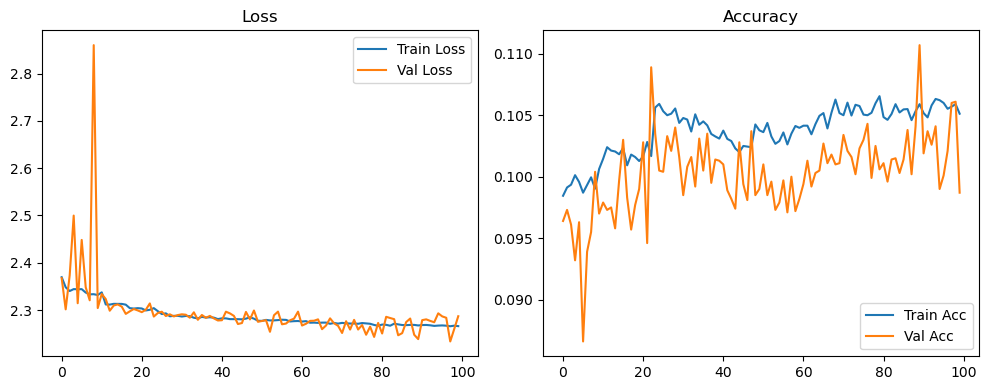

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.38it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.2882 Accuracy: 0.1007


🚀 Running: batch256_lr_max_0.0005_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0984 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:20<2:13:35, 80.96s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0963 |:   1%|          | 1/100 [02:36<2:13:35, 80.96s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0963 |:   1%|          | 1/100 [02:36<2:13:35, 80.96s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0963 |:   2%|▏         | 2/100 [02:36<2:07:03, 77.79s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [02:51<2:07:03, 77.79s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0948 |:   2%|▏         | 2/100 [02:51<2:07:03, 77.79s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0948 |:   3%|▎         | 3/100 [02:51<1:19:07, 48.94s/it]

| LR: 0.000499 | Train Acc: 0.0994 | Val Acc: 0.0958 |:   3%|▎         | 3/100 [03:05<1:19:07, 48.94s/it]

| LR: 0.000499 | Train Acc: 0.0994 | Val Acc: 0.0958 |:   3%|▎         | 3/100 [03:05<1:19:07, 48.94s/it]

| LR: 0.000499 | Train Acc: 0.0994 | Val Acc: 0.0958 |:   4%|▍         | 4/100 [03:05<56:33, 35.34s/it]  

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0959 |:   4%|▍         | 4/100 [03:20<56:33, 35.34s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0959 |:   4%|▍         | 4/100 [03:20<56:33, 35.34s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0959 |:   5%|▌         | 5/100 [03:20<44:06, 27.85s/it]

| LR: 0.000497 | Train Acc: 0.0995 | Val Acc: 0.0961 |:   5%|▌         | 5/100 [03:34<44:06, 27.85s/it]

| LR: 0.000497 | Train Acc: 0.0995 | Val Acc: 0.0961 |:   5%|▌         | 5/100 [03:34<44:06, 27.85s/it]

| LR: 0.000497 | Train Acc: 0.0995 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [03:34<36:27, 23.27s/it]

| LR: 0.000496 | Train Acc: 0.0995 | Val Acc: 0.0975 |:   6%|▌         | 6/100 [03:49<36:27, 23.27s/it]

| LR: 0.000496 | Train Acc: 0.0995 | Val Acc: 0.0975 |:   6%|▌         | 6/100 [03:49<36:27, 23.27s/it]

| LR: 0.000496 | Train Acc: 0.0995 | Val Acc: 0.0975 |:   7%|▋         | 7/100 [03:49<31:37, 20.40s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0938 |:   7%|▋         | 7/100 [04:03<31:37, 20.40s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0938 |:   7%|▋         | 7/100 [04:03<31:37, 20.40s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0938 |:   8%|▊         | 8/100 [04:03<28:26, 18.55s/it]

| LR: 0.000492 | Train Acc: 0.0996 | Val Acc: 0.1003 |:   8%|▊         | 8/100 [04:18<28:26, 18.55s/it]

| LR: 0.000492 | Train Acc: 0.0996 | Val Acc: 0.1003 |:   8%|▊         | 8/100 [04:18<28:26, 18.55s/it]

| LR: 0.000492 | Train Acc: 0.0996 | Val Acc: 0.1003 |:   9%|▉         | 9/100 [04:18<26:12, 17.28s/it]

| LR: 0.000490 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:32<26:12, 17.28s/it]

| LR: 0.000490 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:32<26:12, 17.28s/it]

| LR: 0.000490 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:32<24:33, 16.37s/it]

| LR: 0.000488 | Train Acc: 0.0988 | Val Acc: 0.0948 |:  10%|█         | 10/100 [04:46<24:33, 16.37s/it]

| LR: 0.000488 | Train Acc: 0.0988 | Val Acc: 0.0948 |:  10%|█         | 10/100 [04:46<24:33, 16.37s/it]

| LR: 0.000488 | Train Acc: 0.0988 | Val Acc: 0.0948 |:  11%|█         | 11/100 [04:46<23:25, 15.79s/it]

| LR: 0.000485 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  11%|█         | 11/100 [05:01<23:25, 15.79s/it]

| LR: 0.000485 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  11%|█         | 11/100 [05:01<23:25, 15.79s/it]

| LR: 0.000485 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  12%|█▏        | 12/100 [05:01<22:34, 15.39s/it]

| LR: 0.000482 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [05:15<22:34, 15.39s/it]

| LR: 0.000482 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [05:15<22:34, 15.39s/it]

| LR: 0.000482 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:15<21:55, 15.12s/it]

| LR: 0.000479 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [05:30<21:55, 15.12s/it]

| LR: 0.000479 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [05:30<21:55, 15.12s/it]

| LR: 0.000479 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [05:30<21:23, 14.92s/it]

| LR: 0.000476 | Train Acc: 0.0988 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:44<21:23, 14.92s/it]

| LR: 0.000476 | Train Acc: 0.0988 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:44<21:23, 14.92s/it]

| LR: 0.000476 | Train Acc: 0.0988 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:44<20:56, 14.78s/it]

| LR: 0.000473 | Train Acc: 0.0987 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:59<20:56, 14.78s/it]

| LR: 0.000473 | Train Acc: 0.0987 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:59<20:56, 14.78s/it]

| LR: 0.000473 | Train Acc: 0.0987 | Val Acc: 0.0972 |:  16%|█▌        | 16/100 [05:59<20:33, 14.68s/it]

| LR: 0.000469 | Train Acc: 0.0983 | Val Acc: 0.0944 |:  16%|█▌        | 16/100 [06:13<20:33, 14.68s/it]

| LR: 0.000469 | Train Acc: 0.0983 | Val Acc: 0.0944 |:  16%|█▌        | 16/100 [06:13<20:33, 14.68s/it]

| LR: 0.000469 | Train Acc: 0.0983 | Val Acc: 0.0944 |:  17%|█▋        | 17/100 [06:13<20:12, 14.61s/it]

| LR: 0.000465 | Train Acc: 0.0984 | Val Acc: 0.0980 |:  17%|█▋        | 17/100 [06:28<20:12, 14.61s/it]

| LR: 0.000465 | Train Acc: 0.0984 | Val Acc: 0.0980 |:  17%|█▋        | 17/100 [06:28<20:12, 14.61s/it]

| LR: 0.000465 | Train Acc: 0.0984 | Val Acc: 0.0980 |:  18%|█▊        | 18/100 [06:28<19:54, 14.56s/it]

| LR: 0.000461 | Train Acc: 0.0988 | Val Acc: 0.0946 |:  18%|█▊        | 18/100 [06:42<19:54, 14.56s/it]

| LR: 0.000461 | Train Acc: 0.0988 | Val Acc: 0.0946 |:  18%|█▊        | 18/100 [06:42<19:54, 14.56s/it]

| LR: 0.000461 | Train Acc: 0.0988 | Val Acc: 0.0946 |:  19%|█▉        | 19/100 [06:42<19:36, 14.52s/it]

| LR: 0.000457 | Train Acc: 0.0988 | Val Acc: 0.0936 |:  19%|█▉        | 19/100 [06:56<19:36, 14.52s/it]

| LR: 0.000457 | Train Acc: 0.0988 | Val Acc: 0.0936 |:  19%|█▉        | 19/100 [06:56<19:36, 14.52s/it]

| LR: 0.000457 | Train Acc: 0.0988 | Val Acc: 0.0936 |:  20%|██        | 20/100 [06:57<19:18, 14.49s/it]

| LR: 0.000452 | Train Acc: 0.0987 | Val Acc: 0.0969 |:  20%|██        | 20/100 [07:11<19:18, 14.49s/it]

| LR: 0.000452 | Train Acc: 0.0987 | Val Acc: 0.0969 |:  20%|██        | 20/100 [07:11<19:18, 14.49s/it]

| LR: 0.000452 | Train Acc: 0.0987 | Val Acc: 0.0969 |:  21%|██        | 21/100 [07:11<19:01, 14.45s/it]

| LR: 0.000448 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  21%|██        | 21/100 [07:25<19:01, 14.45s/it]

| LR: 0.000448 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  21%|██        | 21/100 [07:25<19:01, 14.45s/it]

| LR: 0.000448 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [07:25<18:46, 14.44s/it]

| LR: 0.000443 | Train Acc: 0.0985 | Val Acc: 0.0964 |:  22%|██▏       | 22/100 [07:40<18:46, 14.44s/it]

| LR: 0.000443 | Train Acc: 0.0985 | Val Acc: 0.0964 |:  22%|██▏       | 22/100 [07:40<18:46, 14.44s/it]

| LR: 0.000443 | Train Acc: 0.0985 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [07:40<18:32, 14.45s/it]

| LR: 0.000438 | Train Acc: 0.0996 | Val Acc: 0.0954 |:  23%|██▎       | 23/100 [07:54<18:32, 14.45s/it]

| LR: 0.000438 | Train Acc: 0.0996 | Val Acc: 0.0954 |:  23%|██▎       | 23/100 [07:54<18:32, 14.45s/it]

| LR: 0.000438 | Train Acc: 0.0996 | Val Acc: 0.0954 |:  24%|██▍       | 24/100 [07:54<18:14, 14.40s/it]

| LR: 0.000432 | Train Acc: 0.0989 | Val Acc: 0.0969 |:  24%|██▍       | 24/100 [08:09<18:14, 14.40s/it]

| LR: 0.000432 | Train Acc: 0.0989 | Val Acc: 0.0969 |:  24%|██▍       | 24/100 [08:09<18:14, 14.40s/it]

| LR: 0.000432 | Train Acc: 0.0989 | Val Acc: 0.0969 |:  25%|██▌       | 25/100 [08:09<18:02, 14.44s/it]

| LR: 0.000427 | Train Acc: 0.0995 | Val Acc: 0.0936 |:  25%|██▌       | 25/100 [08:23<18:02, 14.44s/it]

| LR: 0.000427 | Train Acc: 0.0995 | Val Acc: 0.0936 |:  25%|██▌       | 25/100 [08:23<18:02, 14.44s/it]

| LR: 0.000427 | Train Acc: 0.0995 | Val Acc: 0.0936 |:  26%|██▌       | 26/100 [08:23<17:50, 14.46s/it]

| LR: 0.000421 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  26%|██▌       | 26/100 [08:37<17:50, 14.46s/it]

| LR: 0.000421 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  26%|██▌       | 26/100 [08:37<17:50, 14.46s/it]

| LR: 0.000421 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  27%|██▋       | 27/100 [08:37<17:32, 14.42s/it]

| LR: 0.000415 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [08:52<17:32, 14.42s/it]

| LR: 0.000415 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [08:52<17:32, 14.42s/it]

| LR: 0.000415 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [08:52<17:19, 14.44s/it]

| LR: 0.000410 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  28%|██▊       | 28/100 [09:06<17:19, 14.44s/it]

| LR: 0.000410 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  28%|██▊       | 28/100 [09:06<17:19, 14.44s/it]

| LR: 0.000410 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  29%|██▉       | 29/100 [09:06<17:05, 14.44s/it]

| LR: 0.000403 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:21<17:05, 14.44s/it]

| LR: 0.000403 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:21<17:05, 14.44s/it]

| LR: 0.000403 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:21<16:49, 14.43s/it]

| LR: 0.000397 | Train Acc: 0.1017 | Val Acc: 0.0976 |:  30%|███       | 30/100 [09:35<16:49, 14.43s/it]

| LR: 0.000397 | Train Acc: 0.1017 | Val Acc: 0.0976 |:  30%|███       | 30/100 [09:35<16:49, 14.43s/it]

| LR: 0.000397 | Train Acc: 0.1017 | Val Acc: 0.0976 |:  31%|███       | 31/100 [09:35<16:32, 14.39s/it]

| LR: 0.000391 | Train Acc: 0.1024 | Val Acc: 0.1007 |:  31%|███       | 31/100 [09:50<16:32, 14.39s/it]

| LR: 0.000391 | Train Acc: 0.1024 | Val Acc: 0.1007 |:  31%|███       | 31/100 [09:50<16:32, 14.39s/it]

| LR: 0.000391 | Train Acc: 0.1024 | Val Acc: 0.1007 |:  32%|███▏      | 32/100 [09:50<16:21, 14.43s/it]

| LR: 0.000384 | Train Acc: 0.1020 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [10:04<16:21, 14.43s/it]

| LR: 0.000384 | Train Acc: 0.1020 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [10:04<16:21, 14.43s/it]

| LR: 0.000384 | Train Acc: 0.1020 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [10:04<16:08, 14.46s/it]

| LR: 0.000378 | Train Acc: 0.1023 | Val Acc: 0.0987 |:  33%|███▎      | 33/100 [10:18<16:08, 14.46s/it]

| LR: 0.000378 | Train Acc: 0.1023 | Val Acc: 0.0987 |:  33%|███▎      | 33/100 [10:18<16:08, 14.46s/it]

| LR: 0.000378 | Train Acc: 0.1023 | Val Acc: 0.0987 |:  34%|███▍      | 34/100 [10:18<15:50, 14.40s/it]

| LR: 0.000371 | Train Acc: 0.1029 | Val Acc: 0.1030 |:  34%|███▍      | 34/100 [10:33<15:50, 14.40s/it]

| LR: 0.000371 | Train Acc: 0.1029 | Val Acc: 0.1030 |:  34%|███▍      | 34/100 [10:33<15:50, 14.40s/it]

| LR: 0.000371 | Train Acc: 0.1029 | Val Acc: 0.1030 |:  35%|███▌      | 35/100 [10:33<15:37, 14.42s/it]

| LR: 0.000364 | Train Acc: 0.1051 | Val Acc: 0.1006 |:  35%|███▌      | 35/100 [10:47<15:37, 14.42s/it]

| LR: 0.000364 | Train Acc: 0.1051 | Val Acc: 0.1006 |:  35%|███▌      | 35/100 [10:47<15:37, 14.42s/it]

| LR: 0.000364 | Train Acc: 0.1051 | Val Acc: 0.1006 |:  36%|███▌      | 36/100 [10:47<15:24, 14.45s/it]

| LR: 0.000357 | Train Acc: 0.1054 | Val Acc: 0.1032 |:  36%|███▌      | 36/100 [11:02<15:24, 14.45s/it]

| LR: 0.000357 | Train Acc: 0.1054 | Val Acc: 0.1032 |:  36%|███▌      | 36/100 [11:02<15:24, 14.45s/it]

| LR: 0.000357 | Train Acc: 0.1054 | Val Acc: 0.1032 |:  37%|███▋      | 37/100 [11:02<15:11, 14.46s/it]

| LR: 0.000350 | Train Acc: 0.1087 | Val Acc: 0.1025 |:  37%|███▋      | 37/100 [11:16<15:11, 14.46s/it]

| LR: 0.000350 | Train Acc: 0.1087 | Val Acc: 0.1025 |:  37%|███▋      | 37/100 [11:16<15:11, 14.46s/it]

| LR: 0.000350 | Train Acc: 0.1087 | Val Acc: 0.1025 |:  38%|███▊      | 38/100 [11:16<14:55, 14.45s/it]

| LR: 0.000342 | Train Acc: 0.1099 | Val Acc: 0.1175 |:  38%|███▊      | 38/100 [11:31<14:55, 14.45s/it]

| LR: 0.000342 | Train Acc: 0.1099 | Val Acc: 0.1175 |:  38%|███▊      | 38/100 [11:31<14:55, 14.45s/it]

| LR: 0.000342 | Train Acc: 0.1099 | Val Acc: 0.1175 |:  39%|███▉      | 39/100 [11:31<14:42, 14.46s/it]

| LR: 0.000335 | Train Acc: 0.1130 | Val Acc: 0.1059 |:  39%|███▉      | 39/100 [11:45<14:42, 14.46s/it]

| LR: 0.000335 | Train Acc: 0.1130 | Val Acc: 0.1059 |:  39%|███▉      | 39/100 [11:45<14:42, 14.46s/it]

| LR: 0.000335 | Train Acc: 0.1130 | Val Acc: 0.1059 |:  40%|████      | 40/100 [11:45<14:28, 14.48s/it]

| LR: 0.000328 | Train Acc: 0.1122 | Val Acc: 0.1112 |:  40%|████      | 40/100 [12:00<14:28, 14.48s/it]

| LR: 0.000328 | Train Acc: 0.1122 | Val Acc: 0.1112 |:  40%|████      | 40/100 [12:00<14:28, 14.48s/it]

| LR: 0.000328 | Train Acc: 0.1122 | Val Acc: 0.1112 |:  41%|████      | 41/100 [12:00<14:13, 14.46s/it]

| LR: 0.000320 | Train Acc: 0.1123 | Val Acc: 0.1063 |:  41%|████      | 41/100 [12:14<14:13, 14.46s/it]

| LR: 0.000320 | Train Acc: 0.1123 | Val Acc: 0.1063 |:  41%|████      | 41/100 [12:14<14:13, 14.46s/it]

| LR: 0.000320 | Train Acc: 0.1123 | Val Acc: 0.1063 |:  42%|████▏     | 42/100 [12:14<13:59, 14.47s/it]

| LR: 0.000313 | Train Acc: 0.1146 | Val Acc: 0.1131 |:  42%|████▏     | 42/100 [12:29<13:59, 14.47s/it]

| LR: 0.000313 | Train Acc: 0.1146 | Val Acc: 0.1131 |:  42%|████▏     | 42/100 [12:29<13:59, 14.47s/it]

| LR: 0.000313 | Train Acc: 0.1146 | Val Acc: 0.1131 |:  43%|████▎     | 43/100 [12:29<13:44, 14.47s/it]

| LR: 0.000305 | Train Acc: 0.1148 | Val Acc: 0.1081 |:  43%|████▎     | 43/100 [12:43<13:44, 14.47s/it]

| LR: 0.000305 | Train Acc: 0.1148 | Val Acc: 0.1081 |:  43%|████▎     | 43/100 [12:43<13:44, 14.47s/it]

| LR: 0.000305 | Train Acc: 0.1148 | Val Acc: 0.1081 |:  44%|████▍     | 44/100 [12:43<13:29, 14.45s/it]

| LR: 0.000297 | Train Acc: 0.1169 | Val Acc: 0.1051 |:  44%|████▍     | 44/100 [12:57<13:29, 14.45s/it]

| LR: 0.000297 | Train Acc: 0.1169 | Val Acc: 0.1051 |:  44%|████▍     | 44/100 [12:57<13:29, 14.45s/it]

| LR: 0.000297 | Train Acc: 0.1169 | Val Acc: 0.1051 |:  45%|████▌     | 45/100 [12:58<13:15, 14.47s/it]

| LR: 0.000290 | Train Acc: 0.1192 | Val Acc: 0.1077 |:  45%|████▌     | 45/100 [13:12<13:15, 14.47s/it]

| LR: 0.000290 | Train Acc: 0.1192 | Val Acc: 0.1077 |:  45%|████▌     | 45/100 [13:12<13:15, 14.47s/it]

| LR: 0.000290 | Train Acc: 0.1192 | Val Acc: 0.1077 |:  46%|████▌     | 46/100 [13:12<13:01, 14.48s/it]

| LR: 0.000282 | Train Acc: 0.1202 | Val Acc: 0.1166 |:  46%|████▌     | 46/100 [13:27<13:01, 14.48s/it]

| LR: 0.000282 | Train Acc: 0.1202 | Val Acc: 0.1166 |:  46%|████▌     | 46/100 [13:27<13:01, 14.48s/it]

| LR: 0.000282 | Train Acc: 0.1202 | Val Acc: 0.1166 |:  47%|████▋     | 47/100 [13:27<12:47, 14.49s/it]

| LR: 0.000274 | Train Acc: 0.1218 | Val Acc: 0.1203 |:  47%|████▋     | 47/100 [13:41<12:47, 14.49s/it]

| LR: 0.000274 | Train Acc: 0.1218 | Val Acc: 0.1203 |:  47%|████▋     | 47/100 [13:41<12:47, 14.49s/it]

| LR: 0.000274 | Train Acc: 0.1218 | Val Acc: 0.1203 |:  48%|████▊     | 48/100 [13:41<12:32, 14.47s/it]

| LR: 0.000266 | Train Acc: 0.1255 | Val Acc: 0.1141 |:  48%|████▊     | 48/100 [13:55<12:32, 14.47s/it]

| LR: 0.000266 | Train Acc: 0.1255 | Val Acc: 0.1141 |:  48%|████▊     | 48/100 [13:55<12:32, 14.47s/it]

| LR: 0.000266 | Train Acc: 0.1255 | Val Acc: 0.1141 |:  49%|████▉     | 49/100 [13:55<12:17, 14.46s/it]

| LR: 0.000258 | Train Acc: 0.1283 | Val Acc: 0.1174 |:  49%|████▉     | 49/100 [14:10<12:17, 14.46s/it]

| LR: 0.000258 | Train Acc: 0.1283 | Val Acc: 0.1174 |:  49%|████▉     | 49/100 [14:10<12:17, 14.46s/it]

| LR: 0.000258 | Train Acc: 0.1283 | Val Acc: 0.1174 |:  50%|█████     | 50/100 [14:10<12:02, 14.45s/it]

| LR: 0.000251 | Train Acc: 0.1288 | Val Acc: 0.1235 |:  50%|█████     | 50/100 [14:24<12:02, 14.45s/it]

| LR: 0.000251 | Train Acc: 0.1288 | Val Acc: 0.1235 |:  50%|█████     | 50/100 [14:24<12:02, 14.45s/it]

| LR: 0.000251 | Train Acc: 0.1288 | Val Acc: 0.1235 |:  51%|█████     | 51/100 [14:24<11:48, 14.46s/it]

| LR: 0.000243 | Train Acc: 0.1306 | Val Acc: 0.1231 |:  51%|█████     | 51/100 [14:39<11:48, 14.46s/it]

| LR: 0.000243 | Train Acc: 0.1306 | Val Acc: 0.1231 |:  51%|█████     | 51/100 [14:39<11:48, 14.46s/it]

| LR: 0.000243 | Train Acc: 0.1306 | Val Acc: 0.1231 |:  52%|█████▏    | 52/100 [14:39<11:33, 14.46s/it]

| LR: 0.000235 | Train Acc: 0.1326 | Val Acc: 0.1555 |:  52%|█████▏    | 52/100 [14:53<11:33, 14.46s/it]

| LR: 0.000235 | Train Acc: 0.1326 | Val Acc: 0.1555 |:  52%|█████▏    | 52/100 [14:53<11:33, 14.46s/it]

| LR: 0.000235 | Train Acc: 0.1326 | Val Acc: 0.1555 |:  53%|█████▎    | 53/100 [14:53<11:20, 14.47s/it]

| LR: 0.000227 | Train Acc: 0.1340 | Val Acc: 0.1232 |:  53%|█████▎    | 53/100 [15:08<11:20, 14.47s/it]

| LR: 0.000227 | Train Acc: 0.1340 | Val Acc: 0.1232 |:  53%|█████▎    | 53/100 [15:08<11:20, 14.47s/it]

| LR: 0.000227 | Train Acc: 0.1340 | Val Acc: 0.1232 |:  54%|█████▍    | 54/100 [15:08<11:02, 14.41s/it]

| LR: 0.000219 | Train Acc: 0.1372 | Val Acc: 0.1222 |:  54%|█████▍    | 54/100 [15:22<11:02, 14.41s/it]

| LR: 0.000219 | Train Acc: 0.1372 | Val Acc: 0.1222 |:  54%|█████▍    | 54/100 [15:22<11:02, 14.41s/it]

| LR: 0.000219 | Train Acc: 0.1372 | Val Acc: 0.1222 |:  55%|█████▌    | 55/100 [15:22<10:47, 14.40s/it]

| LR: 0.000211 | Train Acc: 0.1408 | Val Acc: 0.1225 |:  55%|█████▌    | 55/100 [15:36<10:47, 14.40s/it]

| LR: 0.000211 | Train Acc: 0.1408 | Val Acc: 0.1225 |:  55%|█████▌    | 55/100 [15:36<10:47, 14.40s/it]

| LR: 0.000211 | Train Acc: 0.1408 | Val Acc: 0.1225 |:  56%|█████▌    | 56/100 [15:36<10:34, 14.42s/it]

| LR: 0.000204 | Train Acc: 0.1428 | Val Acc: 0.1286 |:  56%|█████▌    | 56/100 [15:51<10:34, 14.42s/it]

| LR: 0.000204 | Train Acc: 0.1428 | Val Acc: 0.1286 |:  56%|█████▌    | 56/100 [15:51<10:34, 14.42s/it]

| LR: 0.000204 | Train Acc: 0.1428 | Val Acc: 0.1286 |:  57%|█████▋    | 57/100 [15:51<10:20, 14.43s/it]

| LR: 0.000196 | Train Acc: 0.1462 | Val Acc: 0.1185 |:  57%|█████▋    | 57/100 [16:05<10:20, 14.43s/it]

| LR: 0.000196 | Train Acc: 0.1462 | Val Acc: 0.1185 |:  57%|█████▋    | 57/100 [16:05<10:20, 14.43s/it]

| LR: 0.000196 | Train Acc: 0.1462 | Val Acc: 0.1185 |:  58%|█████▊    | 58/100 [16:05<10:06, 14.45s/it]

| LR: 0.000188 | Train Acc: 0.1493 | Val Acc: 0.1547 |:  58%|█████▊    | 58/100 [16:20<10:06, 14.45s/it]

| LR: 0.000188 | Train Acc: 0.1493 | Val Acc: 0.1547 |:  58%|█████▊    | 58/100 [16:20<10:06, 14.45s/it]

| LR: 0.000188 | Train Acc: 0.1493 | Val Acc: 0.1547 |:  59%|█████▉    | 59/100 [16:20<09:51, 14.44s/it]

| LR: 0.000181 | Train Acc: 0.1480 | Val Acc: 0.1495 |:  59%|█████▉    | 59/100 [16:34<09:51, 14.44s/it]

| LR: 0.000181 | Train Acc: 0.1480 | Val Acc: 0.1495 |:  59%|█████▉    | 59/100 [16:34<09:51, 14.44s/it]

| LR: 0.000181 | Train Acc: 0.1480 | Val Acc: 0.1495 |:  60%|██████    | 60/100 [16:34<09:40, 14.51s/it]

| LR: 0.000173 | Train Acc: 0.1497 | Val Acc: 0.1376 |:  60%|██████    | 60/100 [16:49<09:40, 14.51s/it]

| LR: 0.000173 | Train Acc: 0.1497 | Val Acc: 0.1376 |:  60%|██████    | 60/100 [16:49<09:40, 14.51s/it]

| LR: 0.000173 | Train Acc: 0.1497 | Val Acc: 0.1376 |:  61%|██████    | 61/100 [16:49<09:25, 14.50s/it]

| LR: 0.000166 | Train Acc: 0.1558 | Val Acc: 0.1307 |:  61%|██████    | 61/100 [17:03<09:25, 14.50s/it]

| LR: 0.000166 | Train Acc: 0.1558 | Val Acc: 0.1307 |:  61%|██████    | 61/100 [17:03<09:25, 14.50s/it]

| LR: 0.000166 | Train Acc: 0.1558 | Val Acc: 0.1307 |:  62%|██████▏   | 62/100 [17:03<09:09, 14.47s/it]

| LR: 0.000159 | Train Acc: 0.1550 | Val Acc: 0.1296 |:  62%|██████▏   | 62/100 [17:18<09:09, 14.47s/it]

| LR: 0.000159 | Train Acc: 0.1550 | Val Acc: 0.1296 |:  62%|██████▏   | 62/100 [17:18<09:09, 14.47s/it]

| LR: 0.000159 | Train Acc: 0.1550 | Val Acc: 0.1296 |:  63%|██████▎   | 63/100 [17:18<08:56, 14.50s/it]

| LR: 0.000151 | Train Acc: 0.1582 | Val Acc: 0.1699 |:  63%|██████▎   | 63/100 [17:32<08:56, 14.50s/it]

| LR: 0.000151 | Train Acc: 0.1582 | Val Acc: 0.1699 |:  63%|██████▎   | 63/100 [17:32<08:56, 14.50s/it]

| LR: 0.000151 | Train Acc: 0.1582 | Val Acc: 0.1699 |:  64%|██████▍   | 64/100 [17:32<08:42, 14.51s/it]

| LR: 0.000144 | Train Acc: 0.1643 | Val Acc: 0.1654 |:  64%|██████▍   | 64/100 [17:47<08:42, 14.51s/it]

| LR: 0.000144 | Train Acc: 0.1643 | Val Acc: 0.1654 |:  64%|██████▍   | 64/100 [17:47<08:42, 14.51s/it]

| LR: 0.000144 | Train Acc: 0.1643 | Val Acc: 0.1654 |:  65%|██████▌   | 65/100 [17:47<08:28, 14.53s/it]

| LR: 0.000137 | Train Acc: 0.1655 | Val Acc: 0.1688 |:  65%|██████▌   | 65/100 [18:01<08:28, 14.53s/it]

| LR: 0.000137 | Train Acc: 0.1655 | Val Acc: 0.1688 |:  65%|██████▌   | 65/100 [18:01<08:28, 14.53s/it]

| LR: 0.000137 | Train Acc: 0.1655 | Val Acc: 0.1688 |:  66%|██████▌   | 66/100 [18:02<08:13, 14.53s/it]

| LR: 0.000130 | Train Acc: 0.1668 | Val Acc: 0.1834 |:  66%|██████▌   | 66/100 [18:16<08:13, 14.53s/it]

| LR: 0.000130 | Train Acc: 0.1668 | Val Acc: 0.1834 |:  66%|██████▌   | 66/100 [18:16<08:13, 14.53s/it]

| LR: 0.000130 | Train Acc: 0.1668 | Val Acc: 0.1834 |:  67%|██████▋   | 67/100 [18:16<08:01, 14.61s/it]

| LR: 0.000123 | Train Acc: 0.1729 | Val Acc: 0.1856 |:  67%|██████▋   | 67/100 [18:31<08:01, 14.61s/it]

| LR: 0.000123 | Train Acc: 0.1729 | Val Acc: 0.1856 |:  67%|██████▋   | 67/100 [18:31<08:01, 14.61s/it]

| LR: 0.000123 | Train Acc: 0.1729 | Val Acc: 0.1856 |:  68%|██████▊   | 68/100 [18:31<07:47, 14.61s/it]

| LR: 0.000117 | Train Acc: 0.1757 | Val Acc: 0.2029 |:  68%|██████▊   | 68/100 [18:45<07:47, 14.61s/it]

| LR: 0.000117 | Train Acc: 0.1757 | Val Acc: 0.2029 |:  68%|██████▊   | 68/100 [18:45<07:47, 14.61s/it]

| LR: 0.000117 | Train Acc: 0.1757 | Val Acc: 0.2029 |:  69%|██████▉   | 69/100 [18:45<07:31, 14.55s/it]

| LR: 0.000110 | Train Acc: 0.1763 | Val Acc: 0.1849 |:  69%|██████▉   | 69/100 [19:00<07:31, 14.55s/it]

| LR: 0.000110 | Train Acc: 0.1763 | Val Acc: 0.1849 |:  69%|██████▉   | 69/100 [19:00<07:31, 14.55s/it]

| LR: 0.000110 | Train Acc: 0.1763 | Val Acc: 0.1849 |:  70%|███████   | 70/100 [19:00<07:15, 14.53s/it]

| LR: 0.000104 | Train Acc: 0.1770 | Val Acc: 0.1871 |:  70%|███████   | 70/100 [19:14<07:15, 14.53s/it]

| LR: 0.000104 | Train Acc: 0.1770 | Val Acc: 0.1871 |:  70%|███████   | 70/100 [19:14<07:15, 14.53s/it]

| LR: 0.000104 | Train Acc: 0.1770 | Val Acc: 0.1871 |:  71%|███████   | 71/100 [19:14<06:58, 14.43s/it]

| LR: 0.000098 | Train Acc: 0.1798 | Val Acc: 0.1700 |:  71%|███████   | 71/100 [19:28<06:58, 14.43s/it]

| LR: 0.000098 | Train Acc: 0.1798 | Val Acc: 0.1700 |:  71%|███████   | 71/100 [19:28<06:58, 14.43s/it]

| LR: 0.000098 | Train Acc: 0.1798 | Val Acc: 0.1700 |:  72%|███████▏  | 72/100 [19:28<06:43, 14.42s/it]

| LR: 0.000091 | Train Acc: 0.1840 | Val Acc: 0.2058 |:  72%|███████▏  | 72/100 [19:43<06:43, 14.42s/it]

| LR: 0.000091 | Train Acc: 0.1840 | Val Acc: 0.2058 |:  72%|███████▏  | 72/100 [19:43<06:43, 14.42s/it]

| LR: 0.000091 | Train Acc: 0.1840 | Val Acc: 0.2058 |:  73%|███████▎  | 73/100 [19:43<06:29, 14.43s/it]

| LR: 0.000086 | Train Acc: 0.1829 | Val Acc: 0.2064 |:  73%|███████▎  | 73/100 [19:57<06:29, 14.43s/it]

| LR: 0.000086 | Train Acc: 0.1829 | Val Acc: 0.2064 |:  73%|███████▎  | 73/100 [19:57<06:29, 14.43s/it]

| LR: 0.000086 | Train Acc: 0.1829 | Val Acc: 0.2064 |:  74%|███████▍  | 74/100 [19:57<06:14, 14.39s/it]

| LR: 0.000080 | Train Acc: 0.1891 | Val Acc: 0.1983 |:  74%|███████▍  | 74/100 [20:12<06:14, 14.39s/it]

| LR: 0.000080 | Train Acc: 0.1891 | Val Acc: 0.1983 |:  74%|███████▍  | 74/100 [20:12<06:14, 14.39s/it]

| LR: 0.000080 | Train Acc: 0.1891 | Val Acc: 0.1983 |:  75%|███████▌  | 75/100 [20:12<06:00, 14.41s/it]

| LR: 0.000074 | Train Acc: 0.1878 | Val Acc: 0.2142 |:  75%|███████▌  | 75/100 [20:26<06:00, 14.41s/it]

| LR: 0.000074 | Train Acc: 0.1878 | Val Acc: 0.2142 |:  75%|███████▌  | 75/100 [20:26<06:00, 14.41s/it]

| LR: 0.000074 | Train Acc: 0.1878 | Val Acc: 0.2142 |:  76%|███████▌  | 76/100 [20:26<05:46, 14.46s/it]

| LR: 0.000069 | Train Acc: 0.1884 | Val Acc: 0.1965 |:  76%|███████▌  | 76/100 [20:41<05:46, 14.46s/it]

| LR: 0.000069 | Train Acc: 0.1884 | Val Acc: 0.1965 |:  76%|███████▌  | 76/100 [20:41<05:46, 14.46s/it]

| LR: 0.000069 | Train Acc: 0.1884 | Val Acc: 0.1965 |:  77%|███████▋  | 77/100 [20:41<05:32, 14.44s/it]

| LR: 0.000063 | Train Acc: 0.1902 | Val Acc: 0.2001 |:  77%|███████▋  | 77/100 [20:55<05:32, 14.44s/it]

| LR: 0.000063 | Train Acc: 0.1902 | Val Acc: 0.2001 |:  77%|███████▋  | 77/100 [20:55<05:32, 14.44s/it]

| LR: 0.000063 | Train Acc: 0.1902 | Val Acc: 0.2001 |:  78%|███████▊  | 78/100 [20:55<05:17, 14.41s/it]

| LR: 0.000058 | Train Acc: 0.1925 | Val Acc: 0.2054 |:  78%|███████▊  | 78/100 [21:09<05:17, 14.41s/it]

| LR: 0.000058 | Train Acc: 0.1925 | Val Acc: 0.2054 |:  78%|███████▊  | 78/100 [21:09<05:17, 14.41s/it]

| LR: 0.000058 | Train Acc: 0.1925 | Val Acc: 0.2054 |:  79%|███████▉  | 79/100 [21:09<05:02, 14.41s/it]

| LR: 0.000053 | Train Acc: 0.1954 | Val Acc: 0.1764 |:  79%|███████▉  | 79/100 [21:24<05:02, 14.41s/it]

| LR: 0.000053 | Train Acc: 0.1954 | Val Acc: 0.1764 |:  79%|███████▉  | 79/100 [21:24<05:02, 14.41s/it]

| LR: 0.000053 | Train Acc: 0.1954 | Val Acc: 0.1764 |:  80%|████████  | 80/100 [21:24<04:48, 14.43s/it]

| LR: 0.000049 | Train Acc: 0.1955 | Val Acc: 0.1929 |:  80%|████████  | 80/100 [21:38<04:48, 14.43s/it]

| LR: 0.000049 | Train Acc: 0.1955 | Val Acc: 0.1929 |:  80%|████████  | 80/100 [21:38<04:48, 14.43s/it]

| LR: 0.000049 | Train Acc: 0.1955 | Val Acc: 0.1929 |:  81%|████████  | 81/100 [21:38<04:33, 14.40s/it]

| LR: 0.000044 | Train Acc: 0.1974 | Val Acc: 0.1594 |:  81%|████████  | 81/100 [21:53<04:33, 14.40s/it]

| LR: 0.000044 | Train Acc: 0.1974 | Val Acc: 0.1594 |:  81%|████████  | 81/100 [21:53<04:33, 14.40s/it]

| LR: 0.000044 | Train Acc: 0.1974 | Val Acc: 0.1594 |:  82%|████████▏ | 82/100 [21:53<04:19, 14.44s/it]

| LR: 0.000040 | Train Acc: 0.1959 | Val Acc: 0.2011 |:  82%|████████▏ | 82/100 [22:07<04:19, 14.44s/it]

| LR: 0.000040 | Train Acc: 0.1959 | Val Acc: 0.2011 |:  82%|████████▏ | 82/100 [22:07<04:19, 14.44s/it]

| LR: 0.000040 | Train Acc: 0.1959 | Val Acc: 0.2011 |:  83%|████████▎ | 83/100 [22:07<04:05, 14.46s/it]

| LR: 0.000036 | Train Acc: 0.2026 | Val Acc: 0.2096 |:  83%|████████▎ | 83/100 [22:22<04:05, 14.46s/it]

| LR: 0.000036 | Train Acc: 0.2026 | Val Acc: 0.2096 |:  83%|████████▎ | 83/100 [22:22<04:05, 14.46s/it]

| LR: 0.000036 | Train Acc: 0.2026 | Val Acc: 0.2096 |:  84%|████████▍ | 84/100 [22:22<03:51, 14.46s/it]

| LR: 0.000032 | Train Acc: 0.1984 | Val Acc: 0.1975 |:  84%|████████▍ | 84/100 [22:36<03:51, 14.46s/it]

| LR: 0.000032 | Train Acc: 0.1984 | Val Acc: 0.1975 |:  84%|████████▍ | 84/100 [22:36<03:51, 14.46s/it]

| LR: 0.000032 | Train Acc: 0.1984 | Val Acc: 0.1975 |:  85%|████████▌ | 85/100 [22:36<03:36, 14.46s/it]

| LR: 0.000028 | Train Acc: 0.2018 | Val Acc: 0.1990 |:  85%|████████▌ | 85/100 [22:51<03:36, 14.46s/it]

| LR: 0.000028 | Train Acc: 0.2018 | Val Acc: 0.1990 |:  85%|████████▌ | 85/100 [22:51<03:36, 14.46s/it]

| LR: 0.000028 | Train Acc: 0.2018 | Val Acc: 0.1990 |:  86%|████████▌ | 86/100 [22:51<03:22, 14.46s/it]

| LR: 0.000025 | Train Acc: 0.2076 | Val Acc: 0.2112 |:  86%|████████▌ | 86/100 [23:05<03:22, 14.46s/it]

| LR: 0.000025 | Train Acc: 0.2076 | Val Acc: 0.2112 |:  86%|████████▌ | 86/100 [23:05<03:22, 14.46s/it]

| LR: 0.000025 | Train Acc: 0.2076 | Val Acc: 0.2112 |:  87%|████████▋ | 87/100 [23:05<03:07, 14.45s/it]

| LR: 0.000022 | Train Acc: 0.2048 | Val Acc: 0.2043 |:  87%|████████▋ | 87/100 [23:19<03:07, 14.45s/it]

| LR: 0.000022 | Train Acc: 0.2048 | Val Acc: 0.2043 |:  87%|████████▋ | 87/100 [23:19<03:07, 14.45s/it]

| LR: 0.000022 | Train Acc: 0.2048 | Val Acc: 0.2043 |:  88%|████████▊ | 88/100 [23:19<02:53, 14.45s/it]

| LR: 0.000019 | Train Acc: 0.2055 | Val Acc: 0.2306 |:  88%|████████▊ | 88/100 [23:34<02:53, 14.45s/it]

| LR: 0.000019 | Train Acc: 0.2055 | Val Acc: 0.2306 |:  88%|████████▊ | 88/100 [23:34<02:53, 14.45s/it]

| LR: 0.000019 | Train Acc: 0.2055 | Val Acc: 0.2306 |:  89%|████████▉ | 89/100 [23:34<02:38, 14.45s/it]

| LR: 0.000016 | Train Acc: 0.2043 | Val Acc: 0.1497 |:  89%|████████▉ | 89/100 [23:48<02:38, 14.45s/it]

| LR: 0.000016 | Train Acc: 0.2043 | Val Acc: 0.1497 |:  89%|████████▉ | 89/100 [23:48<02:38, 14.45s/it]

| LR: 0.000016 | Train Acc: 0.2043 | Val Acc: 0.1497 |:  90%|█████████ | 90/100 [23:48<02:24, 14.46s/it]

| LR: 0.000013 | Train Acc: 0.2059 | Val Acc: 0.2167 |:  90%|█████████ | 90/100 [24:03<02:24, 14.46s/it]

| LR: 0.000013 | Train Acc: 0.2059 | Val Acc: 0.2167 |:  90%|█████████ | 90/100 [24:03<02:24, 14.46s/it]

| LR: 0.000013 | Train Acc: 0.2059 | Val Acc: 0.2167 |:  91%|█████████ | 91/100 [24:03<02:09, 14.44s/it]

| LR: 0.000011 | Train Acc: 0.2083 | Val Acc: 0.1889 |:  91%|█████████ | 91/100 [24:17<02:09, 14.44s/it]

| LR: 0.000011 | Train Acc: 0.2083 | Val Acc: 0.1889 |:  91%|█████████ | 91/100 [24:17<02:09, 14.44s/it]

| LR: 0.000011 | Train Acc: 0.2083 | Val Acc: 0.1889 |:  92%|█████████▏| 92/100 [24:17<01:55, 14.44s/it]

| LR: 0.000009 | Train Acc: 0.2089 | Val Acc: 0.2114 |:  92%|█████████▏| 92/100 [24:32<01:55, 14.44s/it]

| LR: 0.000009 | Train Acc: 0.2089 | Val Acc: 0.2114 |:  92%|█████████▏| 92/100 [24:32<01:55, 14.44s/it]

| LR: 0.000009 | Train Acc: 0.2089 | Val Acc: 0.2114 |:  93%|█████████▎| 93/100 [24:32<01:41, 14.47s/it]

| LR: 0.000007 | Train Acc: 0.2087 | Val Acc: 0.2118 |:  93%|█████████▎| 93/100 [24:46<01:41, 14.47s/it]

| LR: 0.000007 | Train Acc: 0.2087 | Val Acc: 0.2118 |:  93%|█████████▎| 93/100 [24:46<01:41, 14.47s/it]

| LR: 0.000007 | Train Acc: 0.2087 | Val Acc: 0.2118 |:  94%|█████████▍| 94/100 [24:46<01:26, 14.47s/it]

| LR: 0.000005 | Train Acc: 0.2091 | Val Acc: 0.2255 |:  94%|█████████▍| 94/100 [25:01<01:26, 14.47s/it]

| LR: 0.000005 | Train Acc: 0.2091 | Val Acc: 0.2255 |:  94%|█████████▍| 94/100 [25:01<01:26, 14.47s/it]

| LR: 0.000005 | Train Acc: 0.2091 | Val Acc: 0.2255 |:  95%|█████████▌| 95/100 [25:01<01:12, 14.48s/it]

| LR: 0.000004 | Train Acc: 0.2116 | Val Acc: 0.2051 |:  95%|█████████▌| 95/100 [25:15<01:12, 14.48s/it]

| LR: 0.000004 | Train Acc: 0.2116 | Val Acc: 0.2051 |:  95%|█████████▌| 95/100 [25:15<01:12, 14.48s/it]

| LR: 0.000004 | Train Acc: 0.2116 | Val Acc: 0.2051 |:  96%|█████████▌| 96/100 [25:15<00:57, 14.46s/it]

| LR: 0.000003 | Train Acc: 0.2130 | Val Acc: 0.2181 |:  96%|█████████▌| 96/100 [25:30<00:57, 14.46s/it]

| LR: 0.000003 | Train Acc: 0.2130 | Val Acc: 0.2181 |:  96%|█████████▌| 96/100 [25:30<00:57, 14.46s/it]

| LR: 0.000003 | Train Acc: 0.2130 | Val Acc: 0.2181 |:  97%|█████████▋| 97/100 [25:30<00:43, 14.48s/it]

| LR: 0.000002 | Train Acc: 0.2094 | Val Acc: 0.1863 |:  97%|█████████▋| 97/100 [25:44<00:43, 14.48s/it]

| LR: 0.000002 | Train Acc: 0.2094 | Val Acc: 0.1863 |:  97%|█████████▋| 97/100 [25:44<00:43, 14.48s/it]

| LR: 0.000002 | Train Acc: 0.2094 | Val Acc: 0.1863 |:  98%|█████████▊| 98/100 [25:44<00:28, 14.48s/it]

| LR: 0.000001 | Train Acc: 0.2095 | Val Acc: 0.2267 |:  98%|█████████▊| 98/100 [25:58<00:28, 14.48s/it]

| LR: 0.000001 | Train Acc: 0.2095 | Val Acc: 0.2267 |:  98%|█████████▊| 98/100 [25:58<00:28, 14.48s/it]

| LR: 0.000001 | Train Acc: 0.2095 | Val Acc: 0.2267 |:  99%|█████████▉| 99/100 [25:59<00:14, 14.45s/it]

| LR: 0.000001 | Train Acc: 0.2115 | Val Acc: 0.2013 |:  99%|█████████▉| 99/100 [26:13<00:14, 14.45s/it]

| LR: 0.000001 | Train Acc: 0.2115 | Val Acc: 0.2013 |:  99%|█████████▉| 99/100 [26:13<00:14, 14.45s/it]

| LR: 0.000001 | Train Acc: 0.2115 | Val Acc: 0.2013 |: 100%|██████████| 100/100 [26:13<00:00, 14.45s/it]

| LR: 0.000001 | Train Acc: 0.2115 | Val Acc: 0.2013 |: 100%|██████████| 100/100 [26:13<00:00, 15.73s/it]

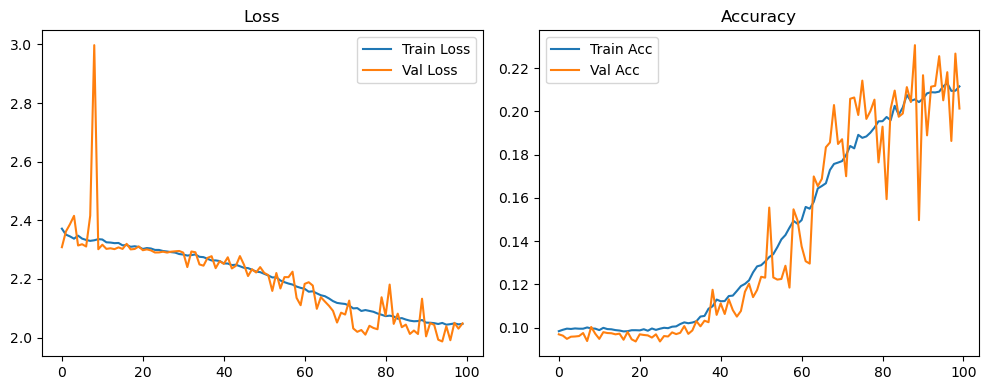

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

Original Model Final Test Loss: 2.0497 Accuracy: 0.1996


🚀 Running: batch256_lr_max_0.0005_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0979 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0979 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0979 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:21<2:13:40, 81.02s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:36<2:13:40, 81.02s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:36<2:13:40, 81.02s/it]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:36<2:06:38, 77.54s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:50<2:06:38, 77.54s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:50<2:06:38, 77.54s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [02:50<1:18:46, 48.72s/it]

| LR: 0.000499 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [03:05<1:18:46, 48.72s/it]

| LR: 0.000499 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [03:05<1:18:46, 48.72s/it]

| LR: 0.000499 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [03:05<56:21, 35.22s/it]  

| LR: 0.000498 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [03:19<56:21, 35.22s/it]

| LR: 0.000498 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [03:19<56:21, 35.22s/it]

| LR: 0.000498 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   5%|▌         | 5/100 [03:19<43:54, 27.73s/it]

| LR: 0.000497 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   5%|▌         | 5/100 [03:33<43:54, 27.73s/it]

| LR: 0.000497 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   5%|▌         | 5/100 [03:33<43:54, 27.73s/it]

| LR: 0.000497 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [03:33<36:21, 23.21s/it]

| LR: 0.000496 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [03:48<36:21, 23.21s/it]

| LR: 0.000496 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [03:48<36:21, 23.21s/it]

| LR: 0.000496 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [03:48<31:28, 20.31s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:02<31:28, 20.31s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:02<31:28, 20.31s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:02<28:18, 18.46s/it]

| LR: 0.000492 | Train Acc: 0.0990 | Val Acc: 0.0952 |:   8%|▊         | 8/100 [04:17<28:18, 18.46s/it]

| LR: 0.000492 | Train Acc: 0.0990 | Val Acc: 0.0952 |:   8%|▊         | 8/100 [04:17<28:18, 18.46s/it]

| LR: 0.000492 | Train Acc: 0.0990 | Val Acc: 0.0952 |:   9%|▉         | 9/100 [04:17<26:07, 17.22s/it]

| LR: 0.000490 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   9%|▉         | 9/100 [04:31<26:07, 17.22s/it]

| LR: 0.000490 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   9%|▉         | 9/100 [04:31<26:07, 17.22s/it]

| LR: 0.000490 | Train Acc: 0.0991 | Val Acc: 0.0955 |:  10%|█         | 10/100 [04:31<24:31, 16.34s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:46<24:31, 16.34s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:46<24:31, 16.34s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:46<23:22, 15.76s/it]

| LR: 0.000485 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [05:00<23:22, 15.76s/it]

| LR: 0.000485 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [05:00<23:22, 15.76s/it]

| LR: 0.000485 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:00<22:31, 15.36s/it]

| LR: 0.000482 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  12%|█▏        | 12/100 [05:14<22:31, 15.36s/it]

| LR: 0.000482 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  12%|█▏        | 12/100 [05:14<22:31, 15.36s/it]

| LR: 0.000482 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  13%|█▎        | 13/100 [05:14<21:51, 15.08s/it]

| LR: 0.000479 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:29<21:51, 15.08s/it]

| LR: 0.000479 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:29<21:51, 15.08s/it]

| LR: 0.000479 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  14%|█▍        | 14/100 [05:29<21:20, 14.89s/it]

| LR: 0.000476 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:43<21:20, 14.89s/it]

| LR: 0.000476 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [05:43<21:20, 14.89s/it]

| LR: 0.000476 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:43<20:56, 14.79s/it]

| LR: 0.000473 | Train Acc: 0.0994 | Val Acc: 0.0941 |:  15%|█▌        | 15/100 [05:58<20:56, 14.79s/it]

| LR: 0.000473 | Train Acc: 0.0994 | Val Acc: 0.0941 |:  15%|█▌        | 15/100 [05:58<20:56, 14.79s/it]

| LR: 0.000473 | Train Acc: 0.0994 | Val Acc: 0.0941 |:  16%|█▌        | 16/100 [05:58<20:37, 14.73s/it]

| LR: 0.000469 | Train Acc: 0.0992 | Val Acc: 0.0959 |:  16%|█▌        | 16/100 [06:13<20:37, 14.73s/it]

| LR: 0.000469 | Train Acc: 0.0992 | Val Acc: 0.0959 |:  16%|█▌        | 16/100 [06:13<20:37, 14.73s/it]

| LR: 0.000469 | Train Acc: 0.0992 | Val Acc: 0.0959 |:  17%|█▋        | 17/100 [06:13<20:17, 14.66s/it]

| LR: 0.000465 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  17%|█▋        | 17/100 [06:27<20:17, 14.66s/it]

| LR: 0.000465 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  17%|█▋        | 17/100 [06:27<20:17, 14.66s/it]

| LR: 0.000465 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [06:27<19:57, 14.61s/it]

| LR: 0.000461 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  18%|█▊        | 18/100 [06:41<19:57, 14.61s/it]

| LR: 0.000461 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  18%|█▊        | 18/100 [06:41<19:57, 14.61s/it]

| LR: 0.000461 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  19%|█▉        | 19/100 [06:42<19:39, 14.56s/it]

| LR: 0.000457 | Train Acc: 0.1000 | Val Acc: 0.0954 |:  19%|█▉        | 19/100 [06:56<19:39, 14.56s/it]

| LR: 0.000457 | Train Acc: 0.1000 | Val Acc: 0.0954 |:  19%|█▉        | 19/100 [06:56<19:39, 14.56s/it]

| LR: 0.000457 | Train Acc: 0.1000 | Val Acc: 0.0954 |:  20%|██        | 20/100 [06:56<19:21, 14.52s/it]

| LR: 0.000452 | Train Acc: 0.0995 | Val Acc: 0.0978 |:  20%|██        | 20/100 [07:10<19:21, 14.52s/it]

| LR: 0.000452 | Train Acc: 0.0995 | Val Acc: 0.0978 |:  20%|██        | 20/100 [07:10<19:21, 14.52s/it]

| LR: 0.000452 | Train Acc: 0.0995 | Val Acc: 0.0978 |:  21%|██        | 21/100 [07:10<19:07, 14.52s/it]

| LR: 0.000448 | Train Acc: 0.0989 | Val Acc: 0.0978 |:  21%|██        | 21/100 [07:25<19:07, 14.52s/it]

| LR: 0.000448 | Train Acc: 0.0989 | Val Acc: 0.0978 |:  21%|██        | 21/100 [07:25<19:07, 14.52s/it]

| LR: 0.000448 | Train Acc: 0.0989 | Val Acc: 0.0978 |:  22%|██▏       | 22/100 [07:25<18:52, 14.52s/it]

| LR: 0.000443 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  22%|██▏       | 22/100 [07:39<18:52, 14.52s/it]

| LR: 0.000443 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  22%|██▏       | 22/100 [07:39<18:52, 14.52s/it]

| LR: 0.000443 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  23%|██▎       | 23/100 [07:39<18:34, 14.48s/it]

| LR: 0.000438 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  23%|██▎       | 23/100 [07:54<18:34, 14.48s/it]

| LR: 0.000438 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  23%|██▎       | 23/100 [07:54<18:34, 14.48s/it]

| LR: 0.000438 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [07:54<18:16, 14.42s/it]

| LR: 0.000432 | Train Acc: 0.0998 | Val Acc: 0.0977 |:  24%|██▍       | 24/100 [08:08<18:16, 14.42s/it]

| LR: 0.000432 | Train Acc: 0.0998 | Val Acc: 0.0977 |:  24%|██▍       | 24/100 [08:08<18:16, 14.42s/it]

| LR: 0.000432 | Train Acc: 0.0998 | Val Acc: 0.0977 |:  25%|██▌       | 25/100 [08:08<18:01, 14.43s/it]

| LR: 0.000427 | Train Acc: 0.0997 | Val Acc: 0.0951 |:  25%|██▌       | 25/100 [08:23<18:01, 14.43s/it]

| LR: 0.000427 | Train Acc: 0.0997 | Val Acc: 0.0951 |:  25%|██▌       | 25/100 [08:23<18:01, 14.43s/it]

| LR: 0.000427 | Train Acc: 0.0997 | Val Acc: 0.0951 |:  26%|██▌       | 26/100 [08:23<17:50, 14.46s/it]

| LR: 0.000421 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  26%|██▌       | 26/100 [08:37<17:50, 14.46s/it]

| LR: 0.000421 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  26%|██▌       | 26/100 [08:37<17:50, 14.46s/it]

| LR: 0.000421 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  27%|██▋       | 27/100 [08:37<17:35, 14.45s/it]

| LR: 0.000415 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [08:51<17:35, 14.45s/it]

| LR: 0.000415 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [08:51<17:35, 14.45s/it]

| LR: 0.000415 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [08:52<17:21, 14.46s/it]

| LR: 0.000410 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  28%|██▊       | 28/100 [09:06<17:21, 14.46s/it]

| LR: 0.000410 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  28%|██▊       | 28/100 [09:06<17:21, 14.46s/it]

| LR: 0.000410 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  29%|██▉       | 29/100 [09:06<17:08, 14.48s/it]

| LR: 0.000403 | Train Acc: 0.1007 | Val Acc: 0.0990 |:  29%|██▉       | 29/100 [09:21<17:08, 14.48s/it]

| LR: 0.000403 | Train Acc: 0.1007 | Val Acc: 0.0990 |:  29%|██▉       | 29/100 [09:21<17:08, 14.48s/it]

| LR: 0.000403 | Train Acc: 0.1007 | Val Acc: 0.0990 |:  30%|███       | 30/100 [09:21<16:56, 14.52s/it]

| LR: 0.000397 | Train Acc: 0.1015 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:35<16:56, 14.52s/it]

| LR: 0.000397 | Train Acc: 0.1015 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:35<16:56, 14.52s/it]

| LR: 0.000397 | Train Acc: 0.1015 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:35<16:41, 14.51s/it]

| LR: 0.000391 | Train Acc: 0.1011 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:50<16:41, 14.51s/it]

| LR: 0.000391 | Train Acc: 0.1011 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:50<16:41, 14.51s/it]

| LR: 0.000391 | Train Acc: 0.1011 | Val Acc: 0.0972 |:  32%|███▏      | 32/100 [09:50<16:27, 14.52s/it]

| LR: 0.000384 | Train Acc: 0.1016 | Val Acc: 0.0960 |:  32%|███▏      | 32/100 [10:04<16:27, 14.52s/it]

| LR: 0.000384 | Train Acc: 0.1016 | Val Acc: 0.0960 |:  32%|███▏      | 32/100 [10:04<16:27, 14.52s/it]

| LR: 0.000384 | Train Acc: 0.1016 | Val Acc: 0.0960 |:  33%|███▎      | 33/100 [10:04<16:11, 14.50s/it]

| LR: 0.000378 | Train Acc: 0.1021 | Val Acc: 0.0974 |:  33%|███▎      | 33/100 [10:19<16:11, 14.50s/it]

| LR: 0.000378 | Train Acc: 0.1021 | Val Acc: 0.0974 |:  33%|███▎      | 33/100 [10:19<16:11, 14.50s/it]

| LR: 0.000378 | Train Acc: 0.1021 | Val Acc: 0.0974 |:  34%|███▍      | 34/100 [10:19<15:57, 14.51s/it]

| LR: 0.000371 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  34%|███▍      | 34/100 [10:33<15:57, 14.51s/it]

| LR: 0.000371 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  34%|███▍      | 34/100 [10:33<15:57, 14.51s/it]

| LR: 0.000371 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  35%|███▌      | 35/100 [10:33<15:42, 14.50s/it]

| LR: 0.000364 | Train Acc: 0.1016 | Val Acc: 0.1026 |:  35%|███▌      | 35/100 [10:48<15:42, 14.50s/it]

| LR: 0.000364 | Train Acc: 0.1016 | Val Acc: 0.1026 |:  35%|███▌      | 35/100 [10:48<15:42, 14.50s/it]

| LR: 0.000364 | Train Acc: 0.1016 | Val Acc: 0.1026 |:  36%|███▌      | 36/100 [10:48<15:29, 14.52s/it]

| LR: 0.000357 | Train Acc: 0.1017 | Val Acc: 0.0983 |:  36%|███▌      | 36/100 [11:02<15:29, 14.52s/it]

| LR: 0.000357 | Train Acc: 0.1017 | Val Acc: 0.0983 |:  36%|███▌      | 36/100 [11:02<15:29, 14.52s/it]

| LR: 0.000357 | Train Acc: 0.1017 | Val Acc: 0.0983 |:  37%|███▋      | 37/100 [11:02<15:13, 14.50s/it]

| LR: 0.000350 | Train Acc: 0.1013 | Val Acc: 0.0991 |:  37%|███▋      | 37/100 [11:17<15:13, 14.50s/it]

| LR: 0.000350 | Train Acc: 0.1013 | Val Acc: 0.0991 |:  37%|███▋      | 37/100 [11:17<15:13, 14.50s/it]

| LR: 0.000350 | Train Acc: 0.1013 | Val Acc: 0.0991 |:  38%|███▊      | 38/100 [11:17<14:58, 14.50s/it]

| LR: 0.000342 | Train Acc: 0.1011 | Val Acc: 0.1013 |:  38%|███▊      | 38/100 [11:31<14:58, 14.50s/it]

| LR: 0.000342 | Train Acc: 0.1011 | Val Acc: 0.1013 |:  38%|███▊      | 38/100 [11:31<14:58, 14.50s/it]

| LR: 0.000342 | Train Acc: 0.1011 | Val Acc: 0.1013 |:  39%|███▉      | 39/100 [11:31<14:44, 14.50s/it]

| LR: 0.000335 | Train Acc: 0.1008 | Val Acc: 0.0983 |:  39%|███▉      | 39/100 [11:46<14:44, 14.50s/it]

| LR: 0.000335 | Train Acc: 0.1008 | Val Acc: 0.0983 |:  39%|███▉      | 39/100 [11:46<14:44, 14.50s/it]

| LR: 0.000335 | Train Acc: 0.1008 | Val Acc: 0.0983 |:  40%|████      | 40/100 [11:46<14:29, 14.50s/it]

| LR: 0.000328 | Train Acc: 0.1009 | Val Acc: 0.0994 |:  40%|████      | 40/100 [12:00<14:29, 14.50s/it]

| LR: 0.000328 | Train Acc: 0.1009 | Val Acc: 0.0994 |:  40%|████      | 40/100 [12:00<14:29, 14.50s/it]

| LR: 0.000328 | Train Acc: 0.1009 | Val Acc: 0.0994 |:  41%|████      | 41/100 [12:00<14:14, 14.48s/it]

| LR: 0.000320 | Train Acc: 0.1017 | Val Acc: 0.0954 |:  41%|████      | 41/100 [12:14<14:14, 14.48s/it]

| LR: 0.000320 | Train Acc: 0.1017 | Val Acc: 0.0954 |:  41%|████      | 41/100 [12:14<14:14, 14.48s/it]

| LR: 0.000320 | Train Acc: 0.1017 | Val Acc: 0.0954 |:  42%|████▏     | 42/100 [12:14<13:57, 14.44s/it]

| LR: 0.000313 | Train Acc: 0.1016 | Val Acc: 0.0980 |:  42%|████▏     | 42/100 [12:29<13:57, 14.44s/it]

| LR: 0.000313 | Train Acc: 0.1016 | Val Acc: 0.0980 |:  42%|████▏     | 42/100 [12:29<13:57, 14.44s/it]

| LR: 0.000313 | Train Acc: 0.1016 | Val Acc: 0.0980 |:  43%|████▎     | 43/100 [12:29<13:44, 14.46s/it]

| LR: 0.000305 | Train Acc: 0.1016 | Val Acc: 0.1005 |:  43%|████▎     | 43/100 [12:43<13:44, 14.46s/it]

| LR: 0.000305 | Train Acc: 0.1016 | Val Acc: 0.1005 |:  43%|████▎     | 43/100 [12:43<13:44, 14.46s/it]

| LR: 0.000305 | Train Acc: 0.1016 | Val Acc: 0.1005 |:  44%|████▍     | 44/100 [12:43<13:29, 14.46s/it]

| LR: 0.000297 | Train Acc: 0.1023 | Val Acc: 0.1021 |:  44%|████▍     | 44/100 [12:58<13:29, 14.46s/it]

| LR: 0.000297 | Train Acc: 0.1023 | Val Acc: 0.1021 |:  44%|████▍     | 44/100 [12:58<13:29, 14.46s/it]

| LR: 0.000297 | Train Acc: 0.1023 | Val Acc: 0.1021 |:  45%|████▌     | 45/100 [12:58<13:12, 14.41s/it]

| LR: 0.000290 | Train Acc: 0.1026 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [13:12<13:12, 14.41s/it]

| LR: 0.000290 | Train Acc: 0.1026 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [13:12<13:12, 14.41s/it]

| LR: 0.000290 | Train Acc: 0.1026 | Val Acc: 0.0975 |:  46%|████▌     | 46/100 [13:12<12:59, 14.44s/it]

| LR: 0.000282 | Train Acc: 0.1018 | Val Acc: 0.1035 |:  46%|████▌     | 46/100 [13:27<12:59, 14.44s/it]

| LR: 0.000282 | Train Acc: 0.1018 | Val Acc: 0.1035 |:  46%|████▌     | 46/100 [13:27<12:59, 14.44s/it]

| LR: 0.000282 | Train Acc: 0.1018 | Val Acc: 0.1035 |:  47%|████▋     | 47/100 [13:27<12:45, 14.44s/it]

| LR: 0.000274 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  47%|████▋     | 47/100 [13:41<12:45, 14.44s/it]

| LR: 0.000274 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  47%|████▋     | 47/100 [13:41<12:45, 14.44s/it]

| LR: 0.000274 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  48%|████▊     | 48/100 [13:41<12:31, 14.45s/it]

| LR: 0.000266 | Train Acc: 0.1014 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [13:56<12:31, 14.45s/it]

| LR: 0.000266 | Train Acc: 0.1014 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [13:56<12:31, 14.45s/it]

| LR: 0.000266 | Train Acc: 0.1014 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [13:56<12:17, 14.46s/it]

| LR: 0.000258 | Train Acc: 0.1021 | Val Acc: 0.1100 |:  49%|████▉     | 49/100 [14:10<12:17, 14.46s/it]

| LR: 0.000258 | Train Acc: 0.1021 | Val Acc: 0.1100 |:  49%|████▉     | 49/100 [14:10<12:17, 14.46s/it]

| LR: 0.000258 | Train Acc: 0.1021 | Val Acc: 0.1100 |:  50%|█████     | 50/100 [14:10<12:02, 14.45s/it]

| LR: 0.000251 | Train Acc: 0.1032 | Val Acc: 0.0974 |:  50%|█████     | 50/100 [14:24<12:02, 14.45s/it]

| LR: 0.000251 | Train Acc: 0.1032 | Val Acc: 0.0974 |:  50%|█████     | 50/100 [14:24<12:02, 14.45s/it]

| LR: 0.000251 | Train Acc: 0.1032 | Val Acc: 0.0974 |:  51%|█████     | 51/100 [14:25<11:47, 14.45s/it]

| LR: 0.000243 | Train Acc: 0.1017 | Val Acc: 0.0980 |:  51%|█████     | 51/100 [14:39<11:47, 14.45s/it]

| LR: 0.000243 | Train Acc: 0.1017 | Val Acc: 0.0980 |:  51%|█████     | 51/100 [14:39<11:47, 14.45s/it]

| LR: 0.000243 | Train Acc: 0.1017 | Val Acc: 0.0980 |:  52%|█████▏    | 52/100 [14:39<11:33, 14.45s/it]

| LR: 0.000235 | Train Acc: 0.1035 | Val Acc: 0.0980 |:  52%|█████▏    | 52/100 [14:53<11:33, 14.45s/it]

| LR: 0.000235 | Train Acc: 0.1035 | Val Acc: 0.0980 |:  52%|█████▏    | 52/100 [14:53<11:33, 14.45s/it]

| LR: 0.000235 | Train Acc: 0.1035 | Val Acc: 0.0980 |:  53%|█████▎    | 53/100 [14:54<11:20, 14.49s/it]

| LR: 0.000227 | Train Acc: 0.1036 | Val Acc: 0.0983 |:  53%|█████▎    | 53/100 [15:08<11:20, 14.49s/it]

| LR: 0.000227 | Train Acc: 0.1036 | Val Acc: 0.0983 |:  53%|█████▎    | 53/100 [15:08<11:20, 14.49s/it]

| LR: 0.000227 | Train Acc: 0.1036 | Val Acc: 0.0983 |:  54%|█████▍    | 54/100 [15:08<11:06, 14.49s/it]

| LR: 0.000219 | Train Acc: 0.1043 | Val Acc: 0.0981 |:  54%|█████▍    | 54/100 [15:22<11:06, 14.49s/it]

| LR: 0.000219 | Train Acc: 0.1043 | Val Acc: 0.0981 |:  54%|█████▍    | 54/100 [15:22<11:06, 14.49s/it]

| LR: 0.000219 | Train Acc: 0.1043 | Val Acc: 0.0981 |:  55%|█████▌    | 55/100 [15:22<10:49, 14.44s/it]

| LR: 0.000211 | Train Acc: 0.1035 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [15:37<10:49, 14.44s/it]

| LR: 0.000211 | Train Acc: 0.1035 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [15:37<10:49, 14.44s/it]

| LR: 0.000211 | Train Acc: 0.1035 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [15:37<10:36, 14.46s/it]

| LR: 0.000204 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  56%|█████▌    | 56/100 [15:51<10:36, 14.46s/it]

| LR: 0.000204 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  56%|█████▌    | 56/100 [15:51<10:36, 14.46s/it]

| LR: 0.000204 | Train Acc: 0.1033 | Val Acc: 0.0995 |:  57%|█████▋    | 57/100 [15:51<10:22, 14.47s/it]

| LR: 0.000196 | Train Acc: 0.1057 | Val Acc: 0.0975 |:  57%|█████▋    | 57/100 [16:06<10:22, 14.47s/it]

| LR: 0.000196 | Train Acc: 0.1057 | Val Acc: 0.0975 |:  57%|█████▋    | 57/100 [16:06<10:22, 14.47s/it]

| LR: 0.000196 | Train Acc: 0.1057 | Val Acc: 0.0975 |:  58%|█████▊    | 58/100 [16:06<10:08, 14.48s/it]

| LR: 0.000188 | Train Acc: 0.1057 | Val Acc: 0.0995 |:  58%|█████▊    | 58/100 [16:20<10:08, 14.48s/it]

| LR: 0.000188 | Train Acc: 0.1057 | Val Acc: 0.0995 |:  58%|█████▊    | 58/100 [16:20<10:08, 14.48s/it]

| LR: 0.000188 | Train Acc: 0.1057 | Val Acc: 0.0995 |:  59%|█████▉    | 59/100 [16:20<09:54, 14.50s/it]

| LR: 0.000181 | Train Acc: 0.1070 | Val Acc: 0.1007 |:  59%|█████▉    | 59/100 [16:35<09:54, 14.50s/it]

| LR: 0.000181 | Train Acc: 0.1070 | Val Acc: 0.1007 |:  59%|█████▉    | 59/100 [16:35<09:54, 14.50s/it]

| LR: 0.000181 | Train Acc: 0.1070 | Val Acc: 0.1007 |:  60%|██████    | 60/100 [16:35<09:40, 14.50s/it]

| LR: 0.000173 | Train Acc: 0.1067 | Val Acc: 0.1030 |:  60%|██████    | 60/100 [16:49<09:40, 14.50s/it]

| LR: 0.000173 | Train Acc: 0.1067 | Val Acc: 0.1030 |:  60%|██████    | 60/100 [16:49<09:40, 14.50s/it]

| LR: 0.000173 | Train Acc: 0.1067 | Val Acc: 0.1030 |:  61%|██████    | 61/100 [16:49<09:22, 14.43s/it]

| LR: 0.000166 | Train Acc: 0.1078 | Val Acc: 0.0992 |:  61%|██████    | 61/100 [17:04<09:22, 14.43s/it]

| LR: 0.000166 | Train Acc: 0.1078 | Val Acc: 0.0992 |:  61%|██████    | 61/100 [17:04<09:22, 14.43s/it]

| LR: 0.000166 | Train Acc: 0.1078 | Val Acc: 0.0992 |:  62%|██████▏   | 62/100 [17:04<09:08, 14.43s/it]

| LR: 0.000159 | Train Acc: 0.1070 | Val Acc: 0.1025 |:  62%|██████▏   | 62/100 [17:18<09:08, 14.43s/it]

| LR: 0.000159 | Train Acc: 0.1070 | Val Acc: 0.1025 |:  62%|██████▏   | 62/100 [17:18<09:08, 14.43s/it]

| LR: 0.000159 | Train Acc: 0.1070 | Val Acc: 0.1025 |:  63%|██████▎   | 63/100 [17:18<08:52, 14.40s/it]

| LR: 0.000151 | Train Acc: 0.1079 | Val Acc: 0.1030 |:  63%|██████▎   | 63/100 [17:32<08:52, 14.40s/it]

| LR: 0.000151 | Train Acc: 0.1079 | Val Acc: 0.1030 |:  63%|██████▎   | 63/100 [17:32<08:52, 14.40s/it]

| LR: 0.000151 | Train Acc: 0.1079 | Val Acc: 0.1030 |:  64%|██████▍   | 64/100 [17:32<08:39, 14.42s/it]

| LR: 0.000144 | Train Acc: 0.1080 | Val Acc: 0.1014 |:  64%|██████▍   | 64/100 [17:47<08:39, 14.42s/it]

| LR: 0.000144 | Train Acc: 0.1080 | Val Acc: 0.1014 |:  64%|██████▍   | 64/100 [17:47<08:39, 14.42s/it]

| LR: 0.000144 | Train Acc: 0.1080 | Val Acc: 0.1014 |:  65%|██████▌   | 65/100 [17:47<08:26, 14.46s/it]

| LR: 0.000137 | Train Acc: 0.1087 | Val Acc: 0.1049 |:  65%|██████▌   | 65/100 [18:01<08:26, 14.46s/it]

| LR: 0.000137 | Train Acc: 0.1087 | Val Acc: 0.1049 |:  65%|██████▌   | 65/100 [18:01<08:26, 14.46s/it]

| LR: 0.000137 | Train Acc: 0.1087 | Val Acc: 0.1049 |:  66%|██████▌   | 66/100 [18:01<08:11, 14.46s/it]

| LR: 0.000130 | Train Acc: 0.1092 | Val Acc: 0.1043 |:  66%|██████▌   | 66/100 [18:16<08:11, 14.46s/it]

| LR: 0.000130 | Train Acc: 0.1092 | Val Acc: 0.1043 |:  66%|██████▌   | 66/100 [18:16<08:11, 14.46s/it]

| LR: 0.000130 | Train Acc: 0.1092 | Val Acc: 0.1043 |:  67%|██████▋   | 67/100 [18:16<07:57, 14.46s/it]

| LR: 0.000123 | Train Acc: 0.1115 | Val Acc: 0.0997 |:  67%|██████▋   | 67/100 [18:30<07:57, 14.46s/it]

| LR: 0.000123 | Train Acc: 0.1115 | Val Acc: 0.0997 |:  67%|██████▋   | 67/100 [18:30<07:57, 14.46s/it]

| LR: 0.000123 | Train Acc: 0.1115 | Val Acc: 0.0997 |:  68%|██████▊   | 68/100 [18:30<07:43, 14.48s/it]

| LR: 0.000117 | Train Acc: 0.1102 | Val Acc: 0.1040 |:  68%|██████▊   | 68/100 [18:45<07:43, 14.48s/it]

| LR: 0.000117 | Train Acc: 0.1102 | Val Acc: 0.1040 |:  68%|██████▊   | 68/100 [18:45<07:43, 14.48s/it]

| LR: 0.000117 | Train Acc: 0.1102 | Val Acc: 0.1040 |:  69%|██████▉   | 69/100 [18:45<07:29, 14.48s/it]

| LR: 0.000110 | Train Acc: 0.1129 | Val Acc: 0.1055 |:  69%|██████▉   | 69/100 [18:59<07:29, 14.48s/it]

| LR: 0.000110 | Train Acc: 0.1129 | Val Acc: 0.1055 |:  69%|██████▉   | 69/100 [18:59<07:29, 14.48s/it]

| LR: 0.000110 | Train Acc: 0.1129 | Val Acc: 0.1055 |:  70%|███████   | 70/100 [18:59<07:14, 14.49s/it]

| LR: 0.000104 | Train Acc: 0.1136 | Val Acc: 0.1009 |:  70%|███████   | 70/100 [19:14<07:14, 14.49s/it]

| LR: 0.000104 | Train Acc: 0.1136 | Val Acc: 0.1009 |:  70%|███████   | 70/100 [19:14<07:14, 14.49s/it]

| LR: 0.000104 | Train Acc: 0.1136 | Val Acc: 0.1009 |:  71%|███████   | 71/100 [19:14<07:00, 14.51s/it]

| LR: 0.000098 | Train Acc: 0.1149 | Val Acc: 0.1091 |:  71%|███████   | 71/100 [19:28<07:00, 14.51s/it]

| LR: 0.000098 | Train Acc: 0.1149 | Val Acc: 0.1091 |:  71%|███████   | 71/100 [19:28<07:00, 14.51s/it]

| LR: 0.000098 | Train Acc: 0.1149 | Val Acc: 0.1091 |:  72%|███████▏  | 72/100 [19:28<06:44, 14.44s/it]

| LR: 0.000091 | Train Acc: 0.1152 | Val Acc: 0.1062 |:  72%|███████▏  | 72/100 [19:43<06:44, 14.44s/it]

| LR: 0.000091 | Train Acc: 0.1152 | Val Acc: 0.1062 |:  72%|███████▏  | 72/100 [19:43<06:44, 14.44s/it]

| LR: 0.000091 | Train Acc: 0.1152 | Val Acc: 0.1062 |:  73%|███████▎  | 73/100 [19:43<06:29, 14.42s/it]

| LR: 0.000086 | Train Acc: 0.1161 | Val Acc: 0.1055 |:  73%|███████▎  | 73/100 [19:57<06:29, 14.42s/it]

| LR: 0.000086 | Train Acc: 0.1161 | Val Acc: 0.1055 |:  73%|███████▎  | 73/100 [19:57<06:29, 14.42s/it]

| LR: 0.000086 | Train Acc: 0.1161 | Val Acc: 0.1055 |:  74%|███████▍  | 74/100 [19:57<06:16, 14.46s/it]

| LR: 0.000080 | Train Acc: 0.1171 | Val Acc: 0.1123 |:  74%|███████▍  | 74/100 [20:12<06:16, 14.46s/it]

| LR: 0.000080 | Train Acc: 0.1171 | Val Acc: 0.1123 |:  74%|███████▍  | 74/100 [20:12<06:16, 14.46s/it]

| LR: 0.000080 | Train Acc: 0.1171 | Val Acc: 0.1123 |:  75%|███████▌  | 75/100 [20:12<06:01, 14.48s/it]

| LR: 0.000074 | Train Acc: 0.1160 | Val Acc: 0.1154 |:  75%|███████▌  | 75/100 [20:26<06:01, 14.48s/it]

| LR: 0.000074 | Train Acc: 0.1160 | Val Acc: 0.1154 |:  75%|███████▌  | 75/100 [20:26<06:01, 14.48s/it]

| LR: 0.000074 | Train Acc: 0.1160 | Val Acc: 0.1154 |:  76%|███████▌  | 76/100 [20:26<05:47, 14.47s/it]

| LR: 0.000069 | Train Acc: 0.1177 | Val Acc: 0.1100 |:  76%|███████▌  | 76/100 [20:41<05:47, 14.47s/it]

| LR: 0.000069 | Train Acc: 0.1177 | Val Acc: 0.1100 |:  76%|███████▌  | 76/100 [20:41<05:47, 14.47s/it]

| LR: 0.000069 | Train Acc: 0.1177 | Val Acc: 0.1100 |:  77%|███████▋  | 77/100 [20:41<05:32, 14.47s/it]

| LR: 0.000063 | Train Acc: 0.1181 | Val Acc: 0.1111 |:  77%|███████▋  | 77/100 [20:55<05:32, 14.47s/it]

| LR: 0.000063 | Train Acc: 0.1181 | Val Acc: 0.1111 |:  77%|███████▋  | 77/100 [20:55<05:32, 14.47s/it]

| LR: 0.000063 | Train Acc: 0.1181 | Val Acc: 0.1111 |:  78%|███████▊  | 78/100 [20:55<05:19, 14.51s/it]

| LR: 0.000058 | Train Acc: 0.1183 | Val Acc: 0.1368 |:  78%|███████▊  | 78/100 [21:10<05:19, 14.51s/it]

| LR: 0.000058 | Train Acc: 0.1183 | Val Acc: 0.1368 |:  78%|███████▊  | 78/100 [21:10<05:19, 14.51s/it]

| LR: 0.000058 | Train Acc: 0.1183 | Val Acc: 0.1368 |:  79%|███████▉  | 79/100 [21:10<05:05, 14.54s/it]

| LR: 0.000053 | Train Acc: 0.1196 | Val Acc: 0.1140 |:  79%|███████▉  | 79/100 [21:24<05:05, 14.54s/it]

| LR: 0.000053 | Train Acc: 0.1196 | Val Acc: 0.1140 |:  79%|███████▉  | 79/100 [21:24<05:05, 14.54s/it]

| LR: 0.000053 | Train Acc: 0.1196 | Val Acc: 0.1140 |:  80%|████████  | 80/100 [21:24<04:50, 14.54s/it]

| LR: 0.000049 | Train Acc: 0.1203 | Val Acc: 0.1224 |:  80%|████████  | 80/100 [21:39<04:50, 14.54s/it]

| LR: 0.000049 | Train Acc: 0.1203 | Val Acc: 0.1224 |:  80%|████████  | 80/100 [21:39<04:50, 14.54s/it]

| LR: 0.000049 | Train Acc: 0.1203 | Val Acc: 0.1224 |:  81%|████████  | 81/100 [21:39<04:35, 14.52s/it]

| LR: 0.000044 | Train Acc: 0.1197 | Val Acc: 0.1098 |:  81%|████████  | 81/100 [21:54<04:35, 14.52s/it]

| LR: 0.000044 | Train Acc: 0.1197 | Val Acc: 0.1098 |:  81%|████████  | 81/100 [21:54<04:35, 14.52s/it]

| LR: 0.000044 | Train Acc: 0.1197 | Val Acc: 0.1098 |:  82%|████████▏ | 82/100 [21:54<04:22, 14.59s/it]

| LR: 0.000040 | Train Acc: 0.1206 | Val Acc: 0.1114 |:  82%|████████▏ | 82/100 [22:08<04:22, 14.59s/it]

| LR: 0.000040 | Train Acc: 0.1206 | Val Acc: 0.1114 |:  82%|████████▏ | 82/100 [22:08<04:22, 14.59s/it]

| LR: 0.000040 | Train Acc: 0.1206 | Val Acc: 0.1114 |:  83%|████████▎ | 83/100 [22:08<04:07, 14.54s/it]

| LR: 0.000036 | Train Acc: 0.1221 | Val Acc: 0.1104 |:  83%|████████▎ | 83/100 [22:22<04:07, 14.54s/it]

| LR: 0.000036 | Train Acc: 0.1221 | Val Acc: 0.1104 |:  83%|████████▎ | 83/100 [22:22<04:07, 14.54s/it]

| LR: 0.000036 | Train Acc: 0.1221 | Val Acc: 0.1104 |:  84%|████████▍ | 84/100 [22:22<03:52, 14.52s/it]

| LR: 0.000032 | Train Acc: 0.1206 | Val Acc: 0.1142 |:  84%|████████▍ | 84/100 [22:37<03:52, 14.52s/it]

| LR: 0.000032 | Train Acc: 0.1206 | Val Acc: 0.1142 |:  84%|████████▍ | 84/100 [22:37<03:52, 14.52s/it]

| LR: 0.000032 | Train Acc: 0.1206 | Val Acc: 0.1142 |:  85%|████████▌ | 85/100 [22:37<03:37, 14.51s/it]

| LR: 0.000028 | Train Acc: 0.1211 | Val Acc: 0.1158 |:  85%|████████▌ | 85/100 [22:51<03:37, 14.51s/it]

| LR: 0.000028 | Train Acc: 0.1211 | Val Acc: 0.1158 |:  85%|████████▌ | 85/100 [22:51<03:37, 14.51s/it]

| LR: 0.000028 | Train Acc: 0.1211 | Val Acc: 0.1158 |:  86%|████████▌ | 86/100 [22:51<03:23, 14.51s/it]

| LR: 0.000025 | Train Acc: 0.1208 | Val Acc: 0.1072 |:  86%|████████▌ | 86/100 [23:06<03:23, 14.51s/it]

| LR: 0.000025 | Train Acc: 0.1208 | Val Acc: 0.1072 |:  86%|████████▌ | 86/100 [23:06<03:23, 14.51s/it]

| LR: 0.000025 | Train Acc: 0.1208 | Val Acc: 0.1072 |:  87%|████████▋ | 87/100 [23:06<03:07, 14.46s/it]

| LR: 0.000022 | Train Acc: 0.1226 | Val Acc: 0.1145 |:  87%|████████▋ | 87/100 [23:20<03:07, 14.46s/it]

| LR: 0.000022 | Train Acc: 0.1226 | Val Acc: 0.1145 |:  87%|████████▋ | 87/100 [23:20<03:07, 14.46s/it]

| LR: 0.000022 | Train Acc: 0.1226 | Val Acc: 0.1145 |:  88%|████████▊ | 88/100 [23:20<02:53, 14.47s/it]

| LR: 0.000019 | Train Acc: 0.1209 | Val Acc: 0.1090 |:  88%|████████▊ | 88/100 [23:35<02:53, 14.47s/it]

| LR: 0.000019 | Train Acc: 0.1209 | Val Acc: 0.1090 |:  88%|████████▊ | 88/100 [23:35<02:53, 14.47s/it]

| LR: 0.000019 | Train Acc: 0.1209 | Val Acc: 0.1090 |:  89%|████████▉ | 89/100 [23:35<02:39, 14.48s/it]

| LR: 0.000016 | Train Acc: 0.1242 | Val Acc: 0.1115 |:  89%|████████▉ | 89/100 [23:49<02:39, 14.48s/it]

| LR: 0.000016 | Train Acc: 0.1242 | Val Acc: 0.1115 |:  89%|████████▉ | 89/100 [23:49<02:39, 14.48s/it]

| LR: 0.000016 | Train Acc: 0.1242 | Val Acc: 0.1115 |:  90%|█████████ | 90/100 [23:49<02:25, 14.51s/it]

| LR: 0.000013 | Train Acc: 0.1231 | Val Acc: 0.1111 |:  90%|█████████ | 90/100 [24:04<02:25, 14.51s/it]

| LR: 0.000013 | Train Acc: 0.1231 | Val Acc: 0.1111 |:  90%|█████████ | 90/100 [24:04<02:25, 14.51s/it]

| LR: 0.000013 | Train Acc: 0.1231 | Val Acc: 0.1111 |:  91%|█████████ | 91/100 [24:04<02:10, 14.49s/it]

| LR: 0.000011 | Train Acc: 0.1229 | Val Acc: 0.1171 |:  91%|█████████ | 91/100 [24:18<02:10, 14.49s/it]

| LR: 0.000011 | Train Acc: 0.1229 | Val Acc: 0.1171 |:  91%|█████████ | 91/100 [24:18<02:10, 14.49s/it]

| LR: 0.000011 | Train Acc: 0.1229 | Val Acc: 0.1171 |:  92%|█████████▏| 92/100 [24:18<01:55, 14.47s/it]

| LR: 0.000009 | Train Acc: 0.1225 | Val Acc: 0.1129 |:  92%|█████████▏| 92/100 [24:33<01:55, 14.47s/it]

| LR: 0.000009 | Train Acc: 0.1225 | Val Acc: 0.1129 |:  92%|█████████▏| 92/100 [24:33<01:55, 14.47s/it]

| LR: 0.000009 | Train Acc: 0.1225 | Val Acc: 0.1129 |:  93%|█████████▎| 93/100 [24:33<01:41, 14.46s/it]

| LR: 0.000007 | Train Acc: 0.1232 | Val Acc: 0.1253 |:  93%|█████████▎| 93/100 [24:47<01:41, 14.46s/it]

| LR: 0.000007 | Train Acc: 0.1232 | Val Acc: 0.1253 |:  93%|█████████▎| 93/100 [24:47<01:41, 14.46s/it]

| LR: 0.000007 | Train Acc: 0.1232 | Val Acc: 0.1253 |:  94%|█████████▍| 94/100 [24:47<01:26, 14.46s/it]

| LR: 0.000005 | Train Acc: 0.1245 | Val Acc: 0.1175 |:  94%|█████████▍| 94/100 [25:01<01:26, 14.46s/it]

| LR: 0.000005 | Train Acc: 0.1245 | Val Acc: 0.1175 |:  94%|█████████▍| 94/100 [25:01<01:26, 14.46s/it]

| LR: 0.000005 | Train Acc: 0.1245 | Val Acc: 0.1175 |:  95%|█████████▌| 95/100 [25:02<01:12, 14.43s/it]

| LR: 0.000004 | Train Acc: 0.1245 | Val Acc: 0.1100 |:  95%|█████████▌| 95/100 [25:16<01:12, 14.43s/it]

| LR: 0.000004 | Train Acc: 0.1245 | Val Acc: 0.1100 |:  95%|█████████▌| 95/100 [25:16<01:12, 14.43s/it]

| LR: 0.000004 | Train Acc: 0.1245 | Val Acc: 0.1100 |:  96%|█████████▌| 96/100 [25:16<00:57, 14.44s/it]

| LR: 0.000003 | Train Acc: 0.1241 | Val Acc: 0.1097 |:  96%|█████████▌| 96/100 [25:30<00:57, 14.44s/it]

| LR: 0.000003 | Train Acc: 0.1241 | Val Acc: 0.1097 |:  96%|█████████▌| 96/100 [25:30<00:57, 14.44s/it]

| LR: 0.000003 | Train Acc: 0.1241 | Val Acc: 0.1097 |:  97%|█████████▋| 97/100 [25:30<00:43, 14.43s/it]

| LR: 0.000002 | Train Acc: 0.1233 | Val Acc: 0.1188 |:  97%|█████████▋| 97/100 [25:45<00:43, 14.43s/it]

| LR: 0.000002 | Train Acc: 0.1233 | Val Acc: 0.1188 |:  97%|█████████▋| 97/100 [25:45<00:43, 14.43s/it]

| LR: 0.000002 | Train Acc: 0.1233 | Val Acc: 0.1188 |:  98%|█████████▊| 98/100 [25:45<00:28, 14.42s/it]

| LR: 0.000001 | Train Acc: 0.1248 | Val Acc: 0.1156 |:  98%|█████████▊| 98/100 [25:59<00:28, 14.42s/it]

| LR: 0.000001 | Train Acc: 0.1248 | Val Acc: 0.1156 |:  98%|█████████▊| 98/100 [25:59<00:28, 14.42s/it]

| LR: 0.000001 | Train Acc: 0.1248 | Val Acc: 0.1156 |:  99%|█████████▉| 99/100 [25:59<00:14, 14.43s/it]

| LR: 0.000001 | Train Acc: 0.1245 | Val Acc: 0.1143 |:  99%|█████████▉| 99/100 [26:14<00:14, 14.43s/it]

| LR: 0.000001 | Train Acc: 0.1245 | Val Acc: 0.1143 |:  99%|█████████▉| 99/100 [26:14<00:14, 14.43s/it]

| LR: 0.000001 | Train Acc: 0.1245 | Val Acc: 0.1143 |: 100%|██████████| 100/100 [26:14<00:00, 14.44s/it]

| LR: 0.000001 | Train Acc: 0.1245 | Val Acc: 0.1143 |: 100%|██████████| 100/100 [26:14<00:00, 15.74s/it]

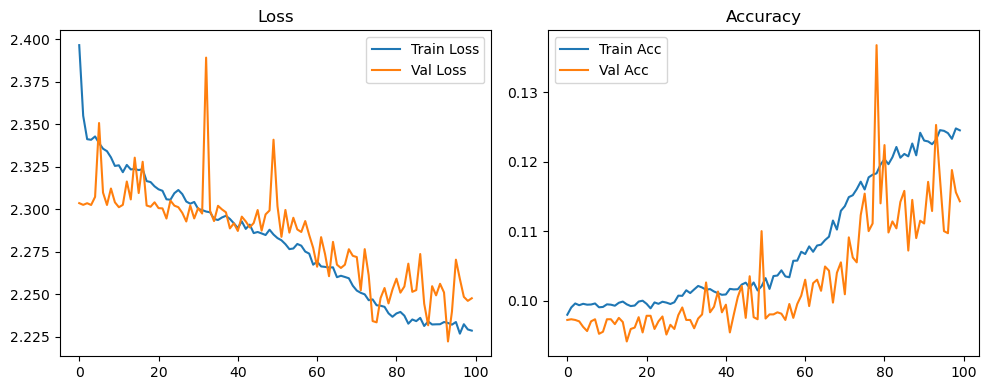

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.33it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.34it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

Original Model Final Test Loss: 2.2516 Accuracy: 0.1150


🚀 Running: batch256_lr_max_0.0002_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0958 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0958 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0958 |:   1%|          | 1/100 [01:20<2:13:34, 80.96s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:35<2:13:34, 80.96s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:35<2:13:34, 80.96s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   2%|▏         | 2/100 [02:35<2:06:25, 77.41s/it]

| LR: 0.000200 | Train Acc: 0.0985 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [02:49<2:06:25, 77.41s/it]

| LR: 0.000200 | Train Acc: 0.0985 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [02:49<2:06:25, 77.41s/it]

| LR: 0.000200 | Train Acc: 0.0985 | Val Acc: 0.0950 |:   3%|▎         | 3/100 [02:50<1:18:27, 48.53s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0977 |:   3%|▎         | 3/100 [03:04<1:18:27, 48.53s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0977 |:   3%|▎         | 3/100 [03:04<1:18:27, 48.53s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0977 |:   4%|▍         | 4/100 [03:04<55:55, 34.96s/it]  

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0959 |:   4%|▍         | 4/100 [03:18<55:55, 34.96s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0959 |:   4%|▍         | 4/100 [03:18<55:55, 34.96s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0959 |:   5%|▌         | 5/100 [03:18<43:23, 27.41s/it]

| LR: 0.000199 | Train Acc: 0.1002 | Val Acc: 0.0953 |:   5%|▌         | 5/100 [03:32<43:23, 27.41s/it]

| LR: 0.000199 | Train Acc: 0.1002 | Val Acc: 0.0953 |:   5%|▌         | 5/100 [03:32<43:23, 27.41s/it]

| LR: 0.000199 | Train Acc: 0.1002 | Val Acc: 0.0953 |:   6%|▌         | 6/100 [03:32<35:52, 22.90s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0975 |:   6%|▌         | 6/100 [03:46<35:52, 22.90s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0975 |:   6%|▌         | 6/100 [03:46<35:52, 22.90s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0975 |:   7%|▋         | 7/100 [03:46<31:04, 20.05s/it]

| LR: 0.000198 | Train Acc: 0.1011 | Val Acc: 0.0940 |:   7%|▋         | 7/100 [04:00<31:04, 20.05s/it]

| LR: 0.000198 | Train Acc: 0.1011 | Val Acc: 0.0940 |:   7%|▋         | 7/100 [04:00<31:04, 20.05s/it]

| LR: 0.000198 | Train Acc: 0.1011 | Val Acc: 0.0940 |:   8%|▊         | 8/100 [04:00<27:49, 18.15s/it]

| LR: 0.000197 | Train Acc: 0.0992 | Val Acc: 0.0952 |:   8%|▊         | 8/100 [04:14<27:49, 18.15s/it]

| LR: 0.000197 | Train Acc: 0.0992 | Val Acc: 0.0952 |:   8%|▊         | 8/100 [04:14<27:49, 18.15s/it]

| LR: 0.000197 | Train Acc: 0.0992 | Val Acc: 0.0952 |:   9%|▉         | 9/100 [04:14<25:37, 16.89s/it]

| LR: 0.000196 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:28<25:37, 16.89s/it]

| LR: 0.000196 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:28<25:37, 16.89s/it]

| LR: 0.000196 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  10%|█         | 10/100 [04:28<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:42<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:42<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  11%|█         | 11/100 [04:43<22:55, 15.45s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.1006 |:  11%|█         | 11/100 [04:57<22:55, 15.45s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.1006 |:  11%|█         | 11/100 [04:57<22:55, 15.45s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.1006 |:  12%|█▏        | 12/100 [04:57<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.1008 | Val Acc: 0.1015 |:  12%|█▏        | 12/100 [05:11<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.1008 | Val Acc: 0.1015 |:  12%|█▏        | 12/100 [05:11<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.1008 | Val Acc: 0.1015 |:  13%|█▎        | 13/100 [05:11<21:24, 14.77s/it]

| LR: 0.000192 | Train Acc: 0.1006 | Val Acc: 0.0979 |:  13%|█▎        | 13/100 [05:25<21:24, 14.77s/it]

| LR: 0.000192 | Train Acc: 0.1006 | Val Acc: 0.0979 |:  13%|█▎        | 13/100 [05:25<21:24, 14.77s/it]

| LR: 0.000192 | Train Acc: 0.1006 | Val Acc: 0.0979 |:  14%|█▍        | 14/100 [05:25<20:47, 14.51s/it]

| LR: 0.000191 | Train Acc: 0.1000 | Val Acc: 0.0883 |:  14%|█▍        | 14/100 [05:39<20:47, 14.51s/it]

| LR: 0.000191 | Train Acc: 0.1000 | Val Acc: 0.0883 |:  14%|█▍        | 14/100 [05:39<20:47, 14.51s/it]

| LR: 0.000191 | Train Acc: 0.1000 | Val Acc: 0.0883 |:  15%|█▌        | 15/100 [05:39<20:19, 14.35s/it]

| LR: 0.000190 | Train Acc: 0.0997 | Val Acc: 0.1001 |:  15%|█▌        | 15/100 [05:53<20:19, 14.35s/it]

| LR: 0.000190 | Train Acc: 0.0997 | Val Acc: 0.1001 |:  15%|█▌        | 15/100 [05:53<20:19, 14.35s/it]

| LR: 0.000190 | Train Acc: 0.0997 | Val Acc: 0.1001 |:  16%|█▌        | 16/100 [05:53<20:01, 14.31s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  16%|█▌        | 16/100 [06:07<20:01, 14.31s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  16%|█▌        | 16/100 [06:07<20:01, 14.31s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  17%|█▋        | 17/100 [06:07<19:45, 14.28s/it]

| LR: 0.000187 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [06:21<19:45, 14.28s/it]

| LR: 0.000187 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [06:21<19:45, 14.28s/it]

| LR: 0.000187 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  18%|█▊        | 18/100 [06:21<19:27, 14.23s/it]

| LR: 0.000185 | Train Acc: 0.0996 | Val Acc: 0.0980 |:  18%|█▊        | 18/100 [06:35<19:27, 14.23s/it]

| LR: 0.000185 | Train Acc: 0.0996 | Val Acc: 0.0980 |:  18%|█▊        | 18/100 [06:35<19:27, 14.23s/it]

| LR: 0.000185 | Train Acc: 0.0996 | Val Acc: 0.0980 |:  19%|█▉        | 19/100 [06:35<19:09, 14.19s/it]

| LR: 0.000184 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  19%|█▉        | 19/100 [06:49<19:09, 14.19s/it]

| LR: 0.000184 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  19%|█▉        | 19/100 [06:49<19:09, 14.19s/it]

| LR: 0.000184 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  20%|██        | 20/100 [06:49<18:54, 14.18s/it]

| LR: 0.000182 | Train Acc: 0.1011 | Val Acc: 0.0958 |:  20%|██        | 20/100 [07:03<18:54, 14.18s/it]

| LR: 0.000182 | Train Acc: 0.1011 | Val Acc: 0.0958 |:  20%|██        | 20/100 [07:03<18:54, 14.18s/it]

| LR: 0.000182 | Train Acc: 0.1011 | Val Acc: 0.0958 |:  21%|██        | 21/100 [07:04<18:37, 14.15s/it]

| LR: 0.000180 | Train Acc: 0.1002 | Val Acc: 0.1040 |:  21%|██        | 21/100 [07:18<18:37, 14.15s/it]

| LR: 0.000180 | Train Acc: 0.1002 | Val Acc: 0.1040 |:  21%|██        | 21/100 [07:18<18:37, 14.15s/it]

| LR: 0.000180 | Train Acc: 0.1002 | Val Acc: 0.1040 |:  22%|██▏       | 22/100 [07:18<18:22, 14.14s/it]

| LR: 0.000178 | Train Acc: 0.1009 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [07:32<18:22, 14.14s/it]

| LR: 0.000178 | Train Acc: 0.1009 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [07:32<18:22, 14.14s/it]

| LR: 0.000178 | Train Acc: 0.1009 | Val Acc: 0.0950 |:  23%|██▎       | 23/100 [07:32<18:08, 14.14s/it]

| LR: 0.000176 | Train Acc: 0.0999 | Val Acc: 0.0926 |:  23%|██▎       | 23/100 [07:46<18:08, 14.14s/it]

| LR: 0.000176 | Train Acc: 0.0999 | Val Acc: 0.0926 |:  23%|██▎       | 23/100 [07:46<18:08, 14.14s/it]

| LR: 0.000176 | Train Acc: 0.0999 | Val Acc: 0.0926 |:  24%|██▍       | 24/100 [07:46<17:52, 14.11s/it]

| LR: 0.000174 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  24%|██▍       | 24/100 [08:00<17:52, 14.11s/it]

| LR: 0.000174 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  24%|██▍       | 24/100 [08:00<17:52, 14.11s/it]

| LR: 0.000174 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  25%|██▌       | 25/100 [08:00<17:40, 14.14s/it]

| LR: 0.000172 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  25%|██▌       | 25/100 [08:14<17:40, 14.14s/it]

| LR: 0.000172 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  25%|██▌       | 25/100 [08:14<17:40, 14.14s/it]

| LR: 0.000172 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  26%|██▌       | 26/100 [08:14<17:28, 14.17s/it]

| LR: 0.000170 | Train Acc: 0.0987 | Val Acc: 0.0977 |:  26%|██▌       | 26/100 [08:28<17:28, 14.17s/it]

| LR: 0.000170 | Train Acc: 0.0987 | Val Acc: 0.0977 |:  26%|██▌       | 26/100 [08:28<17:28, 14.17s/it]

| LR: 0.000170 | Train Acc: 0.0987 | Val Acc: 0.0977 |:  27%|██▋       | 27/100 [08:28<17:15, 14.18s/it]

| LR: 0.000168 | Train Acc: 0.1002 | Val Acc: 0.0981 |:  27%|██▋       | 27/100 [08:43<17:15, 14.18s/it]

| LR: 0.000168 | Train Acc: 0.1002 | Val Acc: 0.0981 |:  27%|██▋       | 27/100 [08:43<17:15, 14.18s/it]

| LR: 0.000168 | Train Acc: 0.1002 | Val Acc: 0.0981 |:  28%|██▊       | 28/100 [08:43<16:59, 14.16s/it]

| LR: 0.000166 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [08:57<16:59, 14.16s/it]

| LR: 0.000166 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [08:57<16:59, 14.16s/it]

| LR: 0.000166 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [08:57<16:53, 14.28s/it]

| LR: 0.000163 | Train Acc: 0.1007 | Val Acc: 0.0991 |:  29%|██▉       | 29/100 [09:11<16:53, 14.28s/it]

| LR: 0.000163 | Train Acc: 0.1007 | Val Acc: 0.0991 |:  29%|██▉       | 29/100 [09:11<16:53, 14.28s/it]

| LR: 0.000163 | Train Acc: 0.1007 | Val Acc: 0.0991 |:  30%|███       | 30/100 [09:11<16:36, 14.24s/it]

| LR: 0.000161 | Train Acc: 0.1009 | Val Acc: 0.0978 |:  30%|███       | 30/100 [09:25<16:36, 14.24s/it]

| LR: 0.000161 | Train Acc: 0.1009 | Val Acc: 0.0978 |:  30%|███       | 30/100 [09:25<16:36, 14.24s/it]

| LR: 0.000161 | Train Acc: 0.1009 | Val Acc: 0.0978 |:  31%|███       | 31/100 [09:25<16:21, 14.23s/it]

| LR: 0.000158 | Train Acc: 0.1019 | Val Acc: 0.0971 |:  31%|███       | 31/100 [09:40<16:21, 14.23s/it]

| LR: 0.000158 | Train Acc: 0.1019 | Val Acc: 0.0971 |:  31%|███       | 31/100 [09:40<16:21, 14.23s/it]

| LR: 0.000158 | Train Acc: 0.1019 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [09:40<16:08, 14.24s/it]

| LR: 0.000156 | Train Acc: 0.1011 | Val Acc: 0.0944 |:  32%|███▏      | 32/100 [09:54<16:08, 14.24s/it]

| LR: 0.000156 | Train Acc: 0.1011 | Val Acc: 0.0944 |:  32%|███▏      | 32/100 [09:54<16:08, 14.24s/it]

| LR: 0.000156 | Train Acc: 0.1011 | Val Acc: 0.0944 |:  33%|███▎      | 33/100 [09:54<15:53, 14.23s/it]

| LR: 0.000153 | Train Acc: 0.1018 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [10:08<15:53, 14.23s/it]

| LR: 0.000153 | Train Acc: 0.1018 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [10:08<15:53, 14.23s/it]

| LR: 0.000153 | Train Acc: 0.1018 | Val Acc: 0.0958 |:  34%|███▍      | 34/100 [10:08<15:38, 14.21s/it]

| LR: 0.000151 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  34%|███▍      | 34/100 [10:22<15:38, 14.21s/it]

| LR: 0.000151 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  34%|███▍      | 34/100 [10:22<15:38, 14.21s/it]

| LR: 0.000151 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  35%|███▌      | 35/100 [10:22<15:22, 14.19s/it]

| LR: 0.000148 | Train Acc: 0.1016 | Val Acc: 0.0939 |:  35%|███▌      | 35/100 [10:36<15:22, 14.19s/it]

| LR: 0.000148 | Train Acc: 0.1016 | Val Acc: 0.0939 |:  35%|███▌      | 35/100 [10:36<15:22, 14.19s/it]

| LR: 0.000148 | Train Acc: 0.1016 | Val Acc: 0.0939 |:  36%|███▌      | 36/100 [10:36<15:07, 14.18s/it]

| LR: 0.000145 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [10:51<15:07, 14.18s/it]

| LR: 0.000145 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [10:51<15:07, 14.18s/it]

| LR: 0.000145 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  37%|███▋      | 37/100 [10:51<14:53, 14.18s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  37%|███▋      | 37/100 [11:05<14:53, 14.18s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  37%|███▋      | 37/100 [11:05<14:53, 14.18s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  38%|███▊      | 38/100 [11:05<14:39, 14.19s/it]

| LR: 0.000140 | Train Acc: 0.1016 | Val Acc: 0.0993 |:  38%|███▊      | 38/100 [11:19<14:39, 14.19s/it]

| LR: 0.000140 | Train Acc: 0.1016 | Val Acc: 0.0993 |:  38%|███▊      | 38/100 [11:19<14:39, 14.19s/it]

| LR: 0.000140 | Train Acc: 0.1016 | Val Acc: 0.0993 |:  39%|███▉      | 39/100 [11:19<14:25, 14.19s/it]

| LR: 0.000137 | Train Acc: 0.1023 | Val Acc: 0.1021 |:  39%|███▉      | 39/100 [11:33<14:25, 14.19s/it]

| LR: 0.000137 | Train Acc: 0.1023 | Val Acc: 0.1021 |:  39%|███▉      | 39/100 [11:33<14:25, 14.19s/it]

| LR: 0.000137 | Train Acc: 0.1023 | Val Acc: 0.1021 |:  40%|████      | 40/100 [11:33<14:10, 14.18s/it]

| LR: 0.000134 | Train Acc: 0.1024 | Val Acc: 0.1003 |:  40%|████      | 40/100 [11:47<14:10, 14.18s/it]

| LR: 0.000134 | Train Acc: 0.1024 | Val Acc: 0.1003 |:  40%|████      | 40/100 [11:47<14:10, 14.18s/it]

| LR: 0.000134 | Train Acc: 0.1024 | Val Acc: 0.1003 |:  41%|████      | 41/100 [11:47<13:52, 14.11s/it]

| LR: 0.000132 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  41%|████      | 41/100 [12:01<13:52, 14.11s/it]

| LR: 0.000132 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  41%|████      | 41/100 [12:01<13:52, 14.11s/it]

| LR: 0.000132 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  42%|████▏     | 42/100 [12:01<13:36, 14.08s/it]

| LR: 0.000129 | Train Acc: 0.1032 | Val Acc: 0.0992 |:  42%|████▏     | 42/100 [12:15<13:36, 14.08s/it]

| LR: 0.000129 | Train Acc: 0.1032 | Val Acc: 0.0992 |:  42%|████▏     | 42/100 [12:15<13:36, 14.08s/it]

| LR: 0.000129 | Train Acc: 0.1032 | Val Acc: 0.0992 |:  43%|████▎     | 43/100 [12:15<13:22, 14.08s/it]

| LR: 0.000126 | Train Acc: 0.1032 | Val Acc: 0.0992 |:  43%|████▎     | 43/100 [12:29<13:22, 14.08s/it]

| LR: 0.000126 | Train Acc: 0.1032 | Val Acc: 0.0992 |:  43%|████▎     | 43/100 [12:29<13:22, 14.08s/it]

| LR: 0.000126 | Train Acc: 0.1032 | Val Acc: 0.0992 |:  44%|████▍     | 44/100 [12:30<13:12, 14.14s/it]

| LR: 0.000123 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  44%|████▍     | 44/100 [12:44<13:12, 14.14s/it]

| LR: 0.000123 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  44%|████▍     | 44/100 [12:44<13:12, 14.14s/it]

| LR: 0.000123 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  45%|████▌     | 45/100 [12:44<12:57, 14.14s/it]

| LR: 0.000120 | Train Acc: 0.1037 | Val Acc: 0.0997 |:  45%|████▌     | 45/100 [12:58<12:57, 14.14s/it]

| LR: 0.000120 | Train Acc: 0.1037 | Val Acc: 0.0997 |:  45%|████▌     | 45/100 [12:58<12:57, 14.14s/it]

| LR: 0.000120 | Train Acc: 0.1037 | Val Acc: 0.0997 |:  46%|████▌     | 46/100 [12:58<12:44, 14.16s/it]

| LR: 0.000117 | Train Acc: 0.1030 | Val Acc: 0.1017 |:  46%|████▌     | 46/100 [13:12<12:44, 14.16s/it]

| LR: 0.000117 | Train Acc: 0.1030 | Val Acc: 0.1017 |:  46%|████▌     | 46/100 [13:12<12:44, 14.16s/it]

| LR: 0.000117 | Train Acc: 0.1030 | Val Acc: 0.1017 |:  47%|████▋     | 47/100 [13:12<12:33, 14.22s/it]

| LR: 0.000114 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  47%|████▋     | 47/100 [13:26<12:33, 14.22s/it]

| LR: 0.000114 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  47%|████▋     | 47/100 [13:26<12:33, 14.22s/it]

| LR: 0.000114 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  48%|████▊     | 48/100 [13:26<12:19, 14.22s/it]

| LR: 0.000111 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  48%|████▊     | 48/100 [13:41<12:19, 14.22s/it]

| LR: 0.000111 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  48%|████▊     | 48/100 [13:41<12:19, 14.22s/it]

| LR: 0.000111 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  49%|████▉     | 49/100 [13:41<12:04, 14.21s/it]

| LR: 0.000108 | Train Acc: 0.1040 | Val Acc: 0.1100 |:  49%|████▉     | 49/100 [13:55<12:04, 14.21s/it]

| LR: 0.000108 | Train Acc: 0.1040 | Val Acc: 0.1100 |:  49%|████▉     | 49/100 [13:55<12:04, 14.21s/it]

| LR: 0.000108 | Train Acc: 0.1040 | Val Acc: 0.1100 |:  50%|█████     | 50/100 [13:55<11:49, 14.18s/it]

| LR: 0.000105 | Train Acc: 0.1038 | Val Acc: 0.1006 |:  50%|█████     | 50/100 [14:09<11:49, 14.18s/it]

| LR: 0.000105 | Train Acc: 0.1038 | Val Acc: 0.1006 |:  50%|█████     | 50/100 [14:09<11:49, 14.18s/it]

| LR: 0.000105 | Train Acc: 0.1038 | Val Acc: 0.1006 |:  51%|█████     | 51/100 [14:09<11:34, 14.18s/it]

| LR: 0.000102 | Train Acc: 0.1046 | Val Acc: 0.1029 |:  51%|█████     | 51/100 [14:23<11:34, 14.18s/it]

| LR: 0.000102 | Train Acc: 0.1046 | Val Acc: 0.1029 |:  51%|█████     | 51/100 [14:23<11:34, 14.18s/it]

| LR: 0.000102 | Train Acc: 0.1046 | Val Acc: 0.1029 |:  52%|█████▏    | 52/100 [14:23<11:20, 14.18s/it]

| LR: 0.000099 | Train Acc: 0.1047 | Val Acc: 0.1020 |:  52%|█████▏    | 52/100 [14:37<11:20, 14.18s/it]

| LR: 0.000099 | Train Acc: 0.1047 | Val Acc: 0.1020 |:  52%|█████▏    | 52/100 [14:37<11:20, 14.18s/it]

| LR: 0.000099 | Train Acc: 0.1047 | Val Acc: 0.1020 |:  53%|█████▎    | 53/100 [14:37<11:06, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.1053 | Val Acc: 0.1003 |:  53%|█████▎    | 53/100 [14:51<11:06, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.1053 | Val Acc: 0.1003 |:  53%|█████▎    | 53/100 [14:51<11:06, 14.19s/it]

| LR: 0.000096 | Train Acc: 0.1053 | Val Acc: 0.1003 |:  54%|█████▍    | 54/100 [14:51<10:48, 14.11s/it]

| LR: 0.000093 | Train Acc: 0.1040 | Val Acc: 0.1043 |:  54%|█████▍    | 54/100 [15:05<10:48, 14.11s/it]

| LR: 0.000093 | Train Acc: 0.1040 | Val Acc: 0.1043 |:  54%|█████▍    | 54/100 [15:05<10:48, 14.11s/it]

| LR: 0.000093 | Train Acc: 0.1040 | Val Acc: 0.1043 |:  55%|█████▌    | 55/100 [15:05<10:33, 14.08s/it]

| LR: 0.000090 | Train Acc: 0.1052 | Val Acc: 0.1061 |:  55%|█████▌    | 55/100 [15:19<10:33, 14.08s/it]

| LR: 0.000090 | Train Acc: 0.1052 | Val Acc: 0.1061 |:  55%|█████▌    | 55/100 [15:19<10:33, 14.08s/it]

| LR: 0.000090 | Train Acc: 0.1052 | Val Acc: 0.1061 |:  56%|█████▌    | 56/100 [15:19<10:21, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.1033 | Val Acc: 0.1070 |:  56%|█████▌    | 56/100 [15:34<10:21, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.1033 | Val Acc: 0.1070 |:  56%|█████▌    | 56/100 [15:34<10:21, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.1033 | Val Acc: 0.1070 |:  57%|█████▋    | 57/100 [15:34<10:07, 14.12s/it]

| LR: 0.000084 | Train Acc: 0.1043 | Val Acc: 0.1009 |:  57%|█████▋    | 57/100 [15:48<10:07, 14.12s/it]

| LR: 0.000084 | Train Acc: 0.1043 | Val Acc: 0.1009 |:  57%|█████▋    | 57/100 [15:48<10:07, 14.12s/it]

| LR: 0.000084 | Train Acc: 0.1043 | Val Acc: 0.1009 |:  58%|█████▊    | 58/100 [15:48<09:53, 14.14s/it]

| LR: 0.000081 | Train Acc: 0.1038 | Val Acc: 0.1010 |:  58%|█████▊    | 58/100 [16:02<09:53, 14.14s/it]

| LR: 0.000081 | Train Acc: 0.1038 | Val Acc: 0.1010 |:  58%|█████▊    | 58/100 [16:02<09:53, 14.14s/it]

| LR: 0.000081 | Train Acc: 0.1038 | Val Acc: 0.1010 |:  59%|█████▉    | 59/100 [16:02<09:39, 14.13s/it]

| LR: 0.000078 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  59%|█████▉    | 59/100 [16:16<09:39, 14.13s/it]

| LR: 0.000078 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  59%|█████▉    | 59/100 [16:16<09:39, 14.13s/it]

| LR: 0.000078 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  60%|██████    | 60/100 [16:16<09:25, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1043 | Val Acc: 0.1029 |:  60%|██████    | 60/100 [16:30<09:25, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1043 | Val Acc: 0.1029 |:  60%|██████    | 60/100 [16:30<09:25, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1043 | Val Acc: 0.1029 |:  61%|██████    | 61/100 [16:30<09:11, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1041 | Val Acc: 0.1023 |:  61%|██████    | 61/100 [16:44<09:11, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1041 | Val Acc: 0.1023 |:  61%|██████    | 61/100 [16:44<09:11, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1041 | Val Acc: 0.1023 |:  62%|██████▏   | 62/100 [16:44<08:56, 14.13s/it]

| LR: 0.000070 | Train Acc: 0.1042 | Val Acc: 0.1017 |:  62%|██████▏   | 62/100 [16:58<08:56, 14.13s/it]

| LR: 0.000070 | Train Acc: 0.1042 | Val Acc: 0.1017 |:  62%|██████▏   | 62/100 [16:58<08:56, 14.13s/it]

| LR: 0.000070 | Train Acc: 0.1042 | Val Acc: 0.1017 |:  63%|██████▎   | 63/100 [16:58<08:43, 14.15s/it]

| LR: 0.000067 | Train Acc: 0.1038 | Val Acc: 0.1065 |:  63%|██████▎   | 63/100 [17:12<08:43, 14.15s/it]

| LR: 0.000067 | Train Acc: 0.1038 | Val Acc: 0.1065 |:  63%|██████▎   | 63/100 [17:12<08:43, 14.15s/it]

| LR: 0.000067 | Train Acc: 0.1038 | Val Acc: 0.1065 |:  64%|██████▍   | 64/100 [17:12<08:27, 14.09s/it]

| LR: 0.000065 | Train Acc: 0.1026 | Val Acc: 0.1021 |:  64%|██████▍   | 64/100 [17:27<08:27, 14.09s/it]

| LR: 0.000065 | Train Acc: 0.1026 | Val Acc: 0.1021 |:  64%|██████▍   | 64/100 [17:27<08:27, 14.09s/it]

| LR: 0.000065 | Train Acc: 0.1026 | Val Acc: 0.1021 |:  65%|██████▌   | 65/100 [17:27<08:13, 14.11s/it]

| LR: 0.000062 | Train Acc: 0.1043 | Val Acc: 0.1068 |:  65%|██████▌   | 65/100 [17:41<08:13, 14.11s/it]

| LR: 0.000062 | Train Acc: 0.1043 | Val Acc: 0.1068 |:  65%|██████▌   | 65/100 [17:41<08:13, 14.11s/it]

| LR: 0.000062 | Train Acc: 0.1043 | Val Acc: 0.1068 |:  66%|██████▌   | 66/100 [17:41<08:00, 14.14s/it]

| LR: 0.000059 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  66%|██████▌   | 66/100 [17:55<08:00, 14.14s/it]

| LR: 0.000059 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  66%|██████▌   | 66/100 [17:55<08:00, 14.14s/it]

| LR: 0.000059 | Train Acc: 0.1052 | Val Acc: 0.1017 |:  67%|██████▋   | 67/100 [17:55<07:46, 14.14s/it]

| LR: 0.000057 | Train Acc: 0.1061 | Val Acc: 0.1042 |:  67%|██████▋   | 67/100 [18:09<07:46, 14.14s/it]

| LR: 0.000057 | Train Acc: 0.1061 | Val Acc: 0.1042 |:  67%|██████▋   | 67/100 [18:09<07:46, 14.14s/it]

| LR: 0.000057 | Train Acc: 0.1061 | Val Acc: 0.1042 |:  68%|██████▊   | 68/100 [18:09<07:33, 14.16s/it]

| LR: 0.000054 | Train Acc: 0.1061 | Val Acc: 0.1027 |:  68%|██████▊   | 68/100 [18:23<07:33, 14.16s/it]

| LR: 0.000054 | Train Acc: 0.1061 | Val Acc: 0.1027 |:  68%|██████▊   | 68/100 [18:23<07:33, 14.16s/it]

| LR: 0.000054 | Train Acc: 0.1061 | Val Acc: 0.1027 |:  69%|██████▉   | 69/100 [18:23<07:19, 14.18s/it]

| LR: 0.000052 | Train Acc: 0.1060 | Val Acc: 0.1048 |:  69%|██████▉   | 69/100 [18:38<07:19, 14.18s/it]

| LR: 0.000052 | Train Acc: 0.1060 | Val Acc: 0.1048 |:  69%|██████▉   | 69/100 [18:38<07:19, 14.18s/it]

| LR: 0.000052 | Train Acc: 0.1060 | Val Acc: 0.1048 |:  70%|███████   | 70/100 [18:38<07:06, 14.20s/it]

| LR: 0.000049 | Train Acc: 0.1053 | Val Acc: 0.1042 |:  70%|███████   | 70/100 [18:52<07:06, 14.20s/it]

| LR: 0.000049 | Train Acc: 0.1053 | Val Acc: 0.1042 |:  70%|███████   | 70/100 [18:52<07:06, 14.20s/it]

| LR: 0.000049 | Train Acc: 0.1053 | Val Acc: 0.1042 |:  71%|███████   | 71/100 [18:52<06:51, 14.20s/it]

| LR: 0.000047 | Train Acc: 0.1046 | Val Acc: 0.1028 |:  71%|███████   | 71/100 [19:06<06:51, 14.20s/it]

| LR: 0.000047 | Train Acc: 0.1046 | Val Acc: 0.1028 |:  71%|███████   | 71/100 [19:06<06:51, 14.20s/it]

| LR: 0.000047 | Train Acc: 0.1046 | Val Acc: 0.1028 |:  72%|███████▏  | 72/100 [19:06<06:37, 14.20s/it]

| LR: 0.000044 | Train Acc: 0.1063 | Val Acc: 0.1033 |:  72%|███████▏  | 72/100 [19:20<06:37, 14.20s/it]

| LR: 0.000044 | Train Acc: 0.1063 | Val Acc: 0.1033 |:  72%|███████▏  | 72/100 [19:20<06:37, 14.20s/it]

| LR: 0.000044 | Train Acc: 0.1063 | Val Acc: 0.1033 |:  73%|███████▎  | 73/100 [19:20<06:22, 14.17s/it]

| LR: 0.000042 | Train Acc: 0.1059 | Val Acc: 0.1031 |:  73%|███████▎  | 73/100 [19:34<06:22, 14.17s/it]

| LR: 0.000042 | Train Acc: 0.1059 | Val Acc: 0.1031 |:  73%|███████▎  | 73/100 [19:34<06:22, 14.17s/it]

| LR: 0.000042 | Train Acc: 0.1059 | Val Acc: 0.1031 |:  74%|███████▍  | 74/100 [19:34<06:08, 14.18s/it]

| LR: 0.000040 | Train Acc: 0.1053 | Val Acc: 0.1065 |:  74%|███████▍  | 74/100 [19:48<06:08, 14.18s/it]

| LR: 0.000040 | Train Acc: 0.1053 | Val Acc: 0.1065 |:  74%|███████▍  | 74/100 [19:48<06:08, 14.18s/it]

| LR: 0.000040 | Train Acc: 0.1053 | Val Acc: 0.1065 |:  75%|███████▌  | 75/100 [19:49<05:54, 14.20s/it]

| LR: 0.000038 | Train Acc: 0.1060 | Val Acc: 0.1106 |:  75%|███████▌  | 75/100 [20:03<05:54, 14.20s/it]

| LR: 0.000038 | Train Acc: 0.1060 | Val Acc: 0.1106 |:  75%|███████▌  | 75/100 [20:03<05:54, 14.20s/it]

| LR: 0.000038 | Train Acc: 0.1060 | Val Acc: 0.1106 |:  76%|███████▌  | 76/100 [20:03<05:40, 14.18s/it]

| LR: 0.000036 | Train Acc: 0.1054 | Val Acc: 0.1029 |:  76%|███████▌  | 76/100 [20:17<05:40, 14.18s/it]

| LR: 0.000036 | Train Acc: 0.1054 | Val Acc: 0.1029 |:  76%|███████▌  | 76/100 [20:17<05:40, 14.18s/it]

| LR: 0.000036 | Train Acc: 0.1054 | Val Acc: 0.1029 |:  77%|███████▋  | 77/100 [20:17<05:26, 14.18s/it]

| LR: 0.000034 | Train Acc: 0.1057 | Val Acc: 0.1000 |:  77%|███████▋  | 77/100 [20:31<05:26, 14.18s/it]

| LR: 0.000034 | Train Acc: 0.1057 | Val Acc: 0.1000 |:  77%|███████▋  | 77/100 [20:31<05:26, 14.18s/it]

| LR: 0.000034 | Train Acc: 0.1057 | Val Acc: 0.1000 |:  78%|███████▊  | 78/100 [20:31<05:11, 14.14s/it]

| LR: 0.000032 | Train Acc: 0.1059 | Val Acc: 0.1032 |:  78%|███████▊  | 78/100 [20:45<05:11, 14.14s/it]

| LR: 0.000032 | Train Acc: 0.1059 | Val Acc: 0.1032 |:  78%|███████▊  | 78/100 [20:45<05:11, 14.14s/it]

| LR: 0.000032 | Train Acc: 0.1059 | Val Acc: 0.1032 |:  79%|███████▉  | 79/100 [20:45<04:56, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.1061 | Val Acc: 0.1016 |:  79%|███████▉  | 79/100 [20:59<04:56, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.1061 | Val Acc: 0.1016 |:  79%|███████▉  | 79/100 [20:59<04:56, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.1061 | Val Acc: 0.1016 |:  80%|████████  | 80/100 [20:59<04:42, 14.12s/it]

| LR: 0.000028 | Train Acc: 0.1058 | Val Acc: 0.1042 |:  80%|████████  | 80/100 [21:13<04:42, 14.12s/it]

| LR: 0.000028 | Train Acc: 0.1058 | Val Acc: 0.1042 |:  80%|████████  | 80/100 [21:13<04:42, 14.12s/it]

| LR: 0.000028 | Train Acc: 0.1058 | Val Acc: 0.1042 |:  81%|████████  | 81/100 [21:13<04:28, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1067 | Val Acc: 0.1009 |:  81%|████████  | 81/100 [21:27<04:28, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1067 | Val Acc: 0.1009 |:  81%|████████  | 81/100 [21:27<04:28, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1067 | Val Acc: 0.1009 |:  82%|████████▏ | 82/100 [21:27<04:14, 14.15s/it]

| LR: 0.000025 | Train Acc: 0.1054 | Val Acc: 0.0992 |:  82%|████████▏ | 82/100 [21:42<04:14, 14.15s/it]

| LR: 0.000025 | Train Acc: 0.1054 | Val Acc: 0.0992 |:  82%|████████▏ | 82/100 [21:42<04:14, 14.15s/it]

| LR: 0.000025 | Train Acc: 0.1054 | Val Acc: 0.0992 |:  83%|████████▎ | 83/100 [21:42<04:00, 14.14s/it]

| LR: 0.000023 | Train Acc: 0.1067 | Val Acc: 0.1010 |:  83%|████████▎ | 83/100 [21:56<04:00, 14.14s/it]

| LR: 0.000023 | Train Acc: 0.1067 | Val Acc: 0.1010 |:  83%|████████▎ | 83/100 [21:56<04:00, 14.14s/it]

| LR: 0.000023 | Train Acc: 0.1067 | Val Acc: 0.1010 |:  84%|████████▍ | 84/100 [21:56<03:45, 14.11s/it]

| LR: 0.000022 | Train Acc: 0.1061 | Val Acc: 0.1007 |:  84%|████████▍ | 84/100 [22:10<03:45, 14.11s/it]

| LR: 0.000022 | Train Acc: 0.1061 | Val Acc: 0.1007 |:  84%|████████▍ | 84/100 [22:10<03:45, 14.11s/it]

| LR: 0.000022 | Train Acc: 0.1061 | Val Acc: 0.1007 |:  85%|████████▌ | 85/100 [22:10<03:31, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1060 | Val Acc: 0.1074 |:  85%|████████▌ | 85/100 [22:24<03:31, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1060 | Val Acc: 0.1074 |:  85%|████████▌ | 85/100 [22:24<03:31, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1060 | Val Acc: 0.1074 |:  86%|████████▌ | 86/100 [22:24<03:17, 14.13s/it]

| LR: 0.000019 | Train Acc: 0.1055 | Val Acc: 0.1009 |:  86%|████████▌ | 86/100 [22:38<03:17, 14.13s/it]

| LR: 0.000019 | Train Acc: 0.1055 | Val Acc: 0.1009 |:  86%|████████▌ | 86/100 [22:38<03:17, 14.13s/it]

| LR: 0.000019 | Train Acc: 0.1055 | Val Acc: 0.1009 |:  87%|████████▋ | 87/100 [22:38<03:03, 14.12s/it]

| LR: 0.000018 | Train Acc: 0.1057 | Val Acc: 0.1028 |:  87%|████████▋ | 87/100 [22:52<03:03, 14.12s/it]

| LR: 0.000018 | Train Acc: 0.1057 | Val Acc: 0.1028 |:  87%|████████▋ | 87/100 [22:52<03:03, 14.12s/it]

| LR: 0.000018 | Train Acc: 0.1057 | Val Acc: 0.1028 |:  88%|████████▊ | 88/100 [22:52<02:49, 14.09s/it]

| LR: 0.000017 | Train Acc: 0.1058 | Val Acc: 0.1016 |:  88%|████████▊ | 88/100 [23:06<02:49, 14.09s/it]

| LR: 0.000017 | Train Acc: 0.1058 | Val Acc: 0.1016 |:  88%|████████▊ | 88/100 [23:06<02:49, 14.09s/it]

| LR: 0.000017 | Train Acc: 0.1058 | Val Acc: 0.1016 |:  89%|████████▉ | 89/100 [23:06<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1062 | Val Acc: 0.0987 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1062 | Val Acc: 0.0987 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1062 | Val Acc: 0.0987 |:  90%|█████████ | 90/100 [23:20<02:21, 14.10s/it]

| LR: 0.000015 | Train Acc: 0.1051 | Val Acc: 0.1019 |:  90%|█████████ | 90/100 [23:34<02:21, 14.10s/it]

| LR: 0.000015 | Train Acc: 0.1051 | Val Acc: 0.1019 |:  90%|█████████ | 90/100 [23:34<02:21, 14.10s/it]

| LR: 0.000015 | Train Acc: 0.1051 | Val Acc: 0.1019 |:  91%|█████████ | 91/100 [23:34<02:06, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.1056 | Val Acc: 0.1033 |:  91%|█████████ | 91/100 [23:49<02:06, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.1056 | Val Acc: 0.1033 |:  91%|█████████ | 91/100 [23:49<02:06, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.1056 | Val Acc: 0.1033 |:  92%|█████████▏| 92/100 [23:49<01:53, 14.14s/it]

| LR: 0.000013 | Train Acc: 0.1055 | Val Acc: 0.1005 |:  92%|█████████▏| 92/100 [24:03<01:53, 14.14s/it]

| LR: 0.000013 | Train Acc: 0.1055 | Val Acc: 0.1005 |:  92%|█████████▏| 92/100 [24:03<01:53, 14.14s/it]

| LR: 0.000013 | Train Acc: 0.1055 | Val Acc: 0.1005 |:  93%|█████████▎| 93/100 [24:03<01:39, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1062 | Val Acc: 0.1037 |:  93%|█████████▎| 93/100 [24:17<01:39, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1062 | Val Acc: 0.1037 |:  93%|█████████▎| 93/100 [24:17<01:39, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1062 | Val Acc: 0.1037 |:  94%|█████████▍| 94/100 [24:17<01:25, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1061 | Val Acc: 0.1004 |:  94%|█████████▍| 94/100 [24:31<01:25, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1061 | Val Acc: 0.1004 |:  94%|█████████▍| 94/100 [24:31<01:25, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1061 | Val Acc: 0.1004 |:  95%|█████████▌| 95/100 [24:31<01:10, 14.14s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.1025 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.14s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.1025 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.14s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.1025 |:  96%|█████████▌| 96/100 [24:45<00:56, 14.18s/it]

| LR: 0.000011 | Train Acc: 0.1059 | Val Acc: 0.0985 |:  96%|█████████▌| 96/100 [25:00<00:56, 14.18s/it]

| LR: 0.000011 | Train Acc: 0.1059 | Val Acc: 0.0985 |:  96%|█████████▌| 96/100 [25:00<00:56, 14.18s/it]

| LR: 0.000011 | Train Acc: 0.1059 | Val Acc: 0.0985 |:  97%|█████████▋| 97/100 [25:00<00:42, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1055 | Val Acc: 0.0987 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1055 | Val Acc: 0.0987 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1055 | Val Acc: 0.0987 |:  98%|█████████▊| 98/100 [25:13<00:28, 14.05s/it]

| LR: 0.000010 | Train Acc: 0.1059 | Val Acc: 0.1034 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.05s/it]

| LR: 0.000010 | Train Acc: 0.1059 | Val Acc: 0.1034 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.05s/it]

| LR: 0.000010 | Train Acc: 0.1059 | Val Acc: 0.1034 |:  99%|█████████▉| 99/100 [25:27<00:13, 13.97s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1077 |:  99%|█████████▉| 99/100 [25:41<00:13, 13.97s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1077 |:  99%|█████████▉| 99/100 [25:41<00:13, 13.97s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1077 |: 100%|██████████| 100/100 [25:41<00:00, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1066 | Val Acc: 0.1077 |: 100%|██████████| 100/100 [25:41<00:00, 15.41s/it]

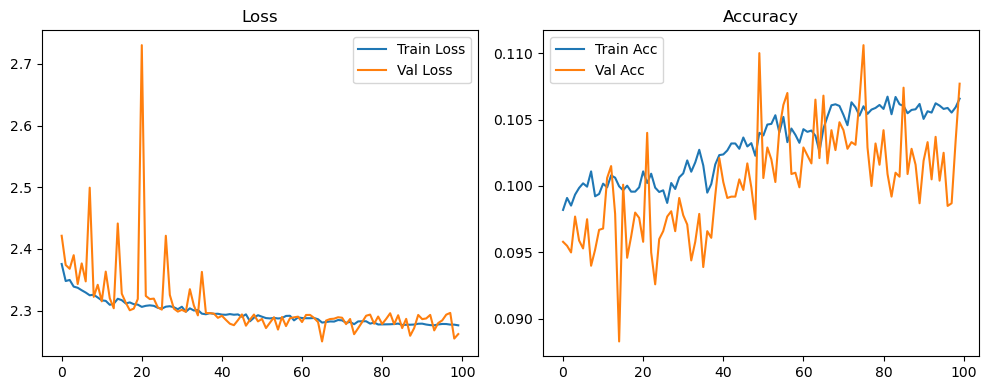

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.14it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.26it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 2.2615 Accuracy: 0.1098


🚀 Running: batch256_lr_max_0.0002_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0934 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0934 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0934 |:   1%|          | 1/100 [01:20<2:12:55, 80.56s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0906 |:   1%|          | 1/100 [02:35<2:12:55, 80.56s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0906 |:   1%|          | 1/100 [02:35<2:12:55, 80.56s/it]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0906 |:   2%|▏         | 2/100 [02:35<2:06:23, 77.38s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [02:49<2:06:23, 77.38s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [02:49<2:06:23, 77.38s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0949 |:   3%|▎         | 3/100 [02:49<1:18:24, 48.50s/it]

| LR: 0.000200 | Train Acc: 0.0987 | Val Acc: 0.0952 |:   3%|▎         | 3/100 [03:03<1:18:24, 48.50s/it]

| LR: 0.000200 | Train Acc: 0.0987 | Val Acc: 0.0952 |:   3%|▎         | 3/100 [03:03<1:18:24, 48.50s/it]

| LR: 0.000200 | Train Acc: 0.0987 | Val Acc: 0.0952 |:   4%|▍         | 4/100 [03:03<55:52, 34.92s/it]  

| LR: 0.000199 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:18<55:52, 34.92s/it]

| LR: 0.000199 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:18<55:52, 34.92s/it]

| LR: 0.000199 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:18<43:27, 27.44s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [03:32<43:27, 27.44s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [03:32<43:27, 27.44s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [03:32<35:53, 22.91s/it]

| LR: 0.000198 | Train Acc: 0.0991 | Val Acc: 0.0945 |:   6%|▌         | 6/100 [03:46<35:53, 22.91s/it]

| LR: 0.000198 | Train Acc: 0.0991 | Val Acc: 0.0945 |:   6%|▌         | 6/100 [03:46<35:53, 22.91s/it]

| LR: 0.000198 | Train Acc: 0.0991 | Val Acc: 0.0945 |:   7%|▋         | 7/100 [03:46<31:03, 20.04s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:00<31:03, 20.04s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:00<31:03, 20.04s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:00<27:52, 18.18s/it]

| LR: 0.000197 | Train Acc: 0.1004 | Val Acc: 0.0960 |:   8%|▊         | 8/100 [04:14<27:52, 18.18s/it]

| LR: 0.000197 | Train Acc: 0.1004 | Val Acc: 0.0960 |:   8%|▊         | 8/100 [04:14<27:52, 18.18s/it]

| LR: 0.000197 | Train Acc: 0.1004 | Val Acc: 0.0960 |:   9%|▉         | 9/100 [04:14<25:39, 16.92s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   9%|▉         | 9/100 [04:28<25:39, 16.92s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0957 |:   9%|▉         | 9/100 [04:28<25:39, 16.92s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  10%|█         | 10/100 [04:28<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  10%|█         | 10/100 [04:42<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  10%|█         | 10/100 [04:42<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  11%|█         | 11/100 [04:42<22:51, 15.41s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  12%|█▏        | 12/100 [04:56<22:00, 15.01s/it]

| LR: 0.000193 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:10<22:00, 15.01s/it]

| LR: 0.000193 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:10<22:00, 15.01s/it]

| LR: 0.000193 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [05:10<21:21, 14.73s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [05:25<21:21, 14.73s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [05:25<21:21, 14.73s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:25<20:54, 14.58s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0991 |:  14%|█▍        | 14/100 [05:39<20:54, 14.58s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0991 |:  14%|█▍        | 14/100 [05:39<20:54, 14.58s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0991 |:  15%|█▌        | 15/100 [05:39<20:27, 14.44s/it]

| LR: 0.000190 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:53<20:27, 14.44s/it]

| LR: 0.000190 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:53<20:27, 14.44s/it]

| LR: 0.000190 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  16%|█▌        | 16/100 [05:53<20:03, 14.32s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0927 |:  16%|█▌        | 16/100 [06:07<20:03, 14.32s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0927 |:  16%|█▌        | 16/100 [06:07<20:03, 14.32s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0927 |:  17%|█▋        | 17/100 [06:07<19:43, 14.26s/it]

| LR: 0.000187 | Train Acc: 0.0993 | Val Acc: 0.1049 |:  17%|█▋        | 17/100 [06:21<19:43, 14.26s/it]

| LR: 0.000187 | Train Acc: 0.0993 | Val Acc: 0.1049 |:  17%|█▋        | 17/100 [06:21<19:43, 14.26s/it]

| LR: 0.000187 | Train Acc: 0.0993 | Val Acc: 0.1049 |:  18%|█▊        | 18/100 [06:21<19:23, 14.19s/it]

| LR: 0.000185 | Train Acc: 0.0989 | Val Acc: 0.0935 |:  18%|█▊        | 18/100 [06:35<19:23, 14.19s/it]

| LR: 0.000185 | Train Acc: 0.0989 | Val Acc: 0.0935 |:  18%|█▊        | 18/100 [06:35<19:23, 14.19s/it]

| LR: 0.000185 | Train Acc: 0.0989 | Val Acc: 0.0935 |:  19%|█▉        | 19/100 [06:35<19:08, 14.18s/it]

| LR: 0.000184 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:49<19:08, 14.18s/it]

| LR: 0.000184 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:49<19:08, 14.18s/it]

| LR: 0.000184 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  20%|██        | 20/100 [06:49<18:55, 14.19s/it]

| LR: 0.000182 | Train Acc: 0.0998 | Val Acc: 0.0900 |:  20%|██        | 20/100 [07:03<18:55, 14.19s/it]

| LR: 0.000182 | Train Acc: 0.0998 | Val Acc: 0.0900 |:  20%|██        | 20/100 [07:03<18:55, 14.19s/it]

| LR: 0.000182 | Train Acc: 0.0998 | Val Acc: 0.0900 |:  21%|██        | 21/100 [07:03<18:38, 14.16s/it]

| LR: 0.000180 | Train Acc: 0.1000 | Val Acc: 0.1010 |:  21%|██        | 21/100 [07:17<18:38, 14.16s/it]

| LR: 0.000180 | Train Acc: 0.1000 | Val Acc: 0.1010 |:  21%|██        | 21/100 [07:17<18:38, 14.16s/it]

| LR: 0.000180 | Train Acc: 0.1000 | Val Acc: 0.1010 |:  22%|██▏       | 22/100 [07:18<18:22, 14.14s/it]

| LR: 0.000178 | Train Acc: 0.1005 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:31<18:22, 14.14s/it]

| LR: 0.000178 | Train Acc: 0.1005 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:31<18:22, 14.14s/it]

| LR: 0.000178 | Train Acc: 0.1005 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [07:32<18:05, 14.10s/it]

| LR: 0.000176 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  23%|██▎       | 23/100 [07:46<18:05, 14.10s/it]

| LR: 0.000176 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  23%|██▎       | 23/100 [07:46<18:05, 14.10s/it]

| LR: 0.000176 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  24%|██▍       | 24/100 [07:46<17:51, 14.10s/it]

| LR: 0.000174 | Train Acc: 0.1019 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [08:00<17:51, 14.10s/it]

| LR: 0.000174 | Train Acc: 0.1019 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [08:00<17:51, 14.10s/it]

| LR: 0.000174 | Train Acc: 0.1019 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:00<17:38, 14.11s/it]

| LR: 0.000172 | Train Acc: 0.1014 | Val Acc: 0.1037 |:  25%|██▌       | 25/100 [08:14<17:38, 14.11s/it]

| LR: 0.000172 | Train Acc: 0.1014 | Val Acc: 0.1037 |:  25%|██▌       | 25/100 [08:14<17:38, 14.11s/it]

| LR: 0.000172 | Train Acc: 0.1014 | Val Acc: 0.1037 |:  26%|██▌       | 26/100 [08:14<17:23, 14.11s/it]

| LR: 0.000170 | Train Acc: 0.1026 | Val Acc: 0.0993 |:  26%|██▌       | 26/100 [08:28<17:23, 14.11s/it]

| LR: 0.000170 | Train Acc: 0.1026 | Val Acc: 0.0993 |:  26%|██▌       | 26/100 [08:28<17:23, 14.11s/it]

| LR: 0.000170 | Train Acc: 0.1026 | Val Acc: 0.0993 |:  27%|██▋       | 27/100 [08:28<17:09, 14.11s/it]

| LR: 0.000168 | Train Acc: 0.1004 | Val Acc: 0.1011 |:  27%|██▋       | 27/100 [08:42<17:09, 14.11s/it]

| LR: 0.000168 | Train Acc: 0.1004 | Val Acc: 0.1011 |:  27%|██▋       | 27/100 [08:42<17:09, 14.11s/it]

| LR: 0.000168 | Train Acc: 0.1004 | Val Acc: 0.1011 |:  28%|██▊       | 28/100 [08:42<16:56, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1021 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [08:56<16:56, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1021 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [08:56<16:56, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1021 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [08:56<16:44, 14.14s/it]

| LR: 0.000163 | Train Acc: 0.1021 | Val Acc: 0.0977 |:  29%|██▉       | 29/100 [09:10<16:44, 14.14s/it]

| LR: 0.000163 | Train Acc: 0.1021 | Val Acc: 0.0977 |:  29%|██▉       | 29/100 [09:10<16:44, 14.14s/it]

| LR: 0.000163 | Train Acc: 0.1021 | Val Acc: 0.0977 |:  30%|███       | 30/100 [09:10<16:29, 14.14s/it]

| LR: 0.000161 | Train Acc: 0.1023 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:25<16:29, 14.14s/it]

| LR: 0.000161 | Train Acc: 0.1023 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:25<16:29, 14.14s/it]

| LR: 0.000161 | Train Acc: 0.1023 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:25<16:17, 14.16s/it]

| LR: 0.000158 | Train Acc: 0.1017 | Val Acc: 0.0997 |:  31%|███       | 31/100 [09:39<16:17, 14.16s/it]

| LR: 0.000158 | Train Acc: 0.1017 | Val Acc: 0.0997 |:  31%|███       | 31/100 [09:39<16:17, 14.16s/it]

| LR: 0.000158 | Train Acc: 0.1017 | Val Acc: 0.0997 |:  32%|███▏      | 32/100 [09:39<16:01, 14.14s/it]

| LR: 0.000156 | Train Acc: 0.1023 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [09:53<16:01, 14.14s/it]

| LR: 0.000156 | Train Acc: 0.1023 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [09:53<16:01, 14.14s/it]

| LR: 0.000156 | Train Acc: 0.1023 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [09:53<15:44, 14.10s/it]

| LR: 0.000153 | Train Acc: 0.1017 | Val Acc: 0.1037 |:  33%|███▎      | 33/100 [10:07<15:44, 14.10s/it]

| LR: 0.000153 | Train Acc: 0.1017 | Val Acc: 0.1037 |:  33%|███▎      | 33/100 [10:07<15:44, 14.10s/it]

| LR: 0.000153 | Train Acc: 0.1017 | Val Acc: 0.1037 |:  34%|███▍      | 34/100 [10:07<15:35, 14.17s/it]

| LR: 0.000151 | Train Acc: 0.1013 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [10:21<15:35, 14.17s/it]

| LR: 0.000151 | Train Acc: 0.1013 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [10:21<15:35, 14.17s/it]

| LR: 0.000151 | Train Acc: 0.1013 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [10:21<15:21, 14.18s/it]

| LR: 0.000148 | Train Acc: 0.1008 | Val Acc: 0.0985 |:  35%|███▌      | 35/100 [10:35<15:21, 14.18s/it]

| LR: 0.000148 | Train Acc: 0.1008 | Val Acc: 0.0985 |:  35%|███▌      | 35/100 [10:35<15:21, 14.18s/it]

| LR: 0.000148 | Train Acc: 0.1008 | Val Acc: 0.0985 |:  36%|███▌      | 36/100 [10:36<15:07, 14.18s/it]

| LR: 0.000145 | Train Acc: 0.1032 | Val Acc: 0.1013 |:  36%|███▌      | 36/100 [10:50<15:07, 14.18s/it]

| LR: 0.000145 | Train Acc: 0.1032 | Val Acc: 0.1013 |:  36%|███▌      | 36/100 [10:50<15:07, 14.18s/it]

| LR: 0.000145 | Train Acc: 0.1032 | Val Acc: 0.1013 |:  37%|███▋      | 37/100 [10:50<14:52, 14.17s/it]

| LR: 0.000143 | Train Acc: 0.1038 | Val Acc: 0.0989 |:  37%|███▋      | 37/100 [11:04<14:52, 14.17s/it]

| LR: 0.000143 | Train Acc: 0.1038 | Val Acc: 0.0989 |:  37%|███▋      | 37/100 [11:04<14:52, 14.17s/it]

| LR: 0.000143 | Train Acc: 0.1038 | Val Acc: 0.0989 |:  38%|███▊      | 38/100 [11:04<14:38, 14.17s/it]

| LR: 0.000140 | Train Acc: 0.1036 | Val Acc: 0.1003 |:  38%|███▊      | 38/100 [11:18<14:38, 14.17s/it]

| LR: 0.000140 | Train Acc: 0.1036 | Val Acc: 0.1003 |:  38%|███▊      | 38/100 [11:18<14:38, 14.17s/it]

| LR: 0.000140 | Train Acc: 0.1036 | Val Acc: 0.1003 |:  39%|███▉      | 39/100 [11:18<14:23, 14.16s/it]

| LR: 0.000137 | Train Acc: 0.1036 | Val Acc: 0.1026 |:  39%|███▉      | 39/100 [11:32<14:23, 14.16s/it]

| LR: 0.000137 | Train Acc: 0.1036 | Val Acc: 0.1026 |:  39%|███▉      | 39/100 [11:32<14:23, 14.16s/it]

| LR: 0.000137 | Train Acc: 0.1036 | Val Acc: 0.1026 |:  40%|████      | 40/100 [11:32<14:09, 14.16s/it]

| LR: 0.000134 | Train Acc: 0.1046 | Val Acc: 0.1034 |:  40%|████      | 40/100 [11:46<14:09, 14.16s/it]

| LR: 0.000134 | Train Acc: 0.1046 | Val Acc: 0.1034 |:  40%|████      | 40/100 [11:46<14:09, 14.16s/it]

| LR: 0.000134 | Train Acc: 0.1046 | Val Acc: 0.1034 |:  41%|████      | 41/100 [11:46<13:55, 14.17s/it]

| LR: 0.000132 | Train Acc: 0.1043 | Val Acc: 0.1018 |:  41%|████      | 41/100 [12:00<13:55, 14.17s/it]

| LR: 0.000132 | Train Acc: 0.1043 | Val Acc: 0.1018 |:  41%|████      | 41/100 [12:00<13:55, 14.17s/it]

| LR: 0.000132 | Train Acc: 0.1043 | Val Acc: 0.1018 |:  42%|████▏     | 42/100 [12:00<13:40, 14.15s/it]

| LR: 0.000129 | Train Acc: 0.1036 | Val Acc: 0.0988 |:  42%|████▏     | 42/100 [12:15<13:40, 14.15s/it]

| LR: 0.000129 | Train Acc: 0.1036 | Val Acc: 0.0988 |:  42%|████▏     | 42/100 [12:15<13:40, 14.15s/it]

| LR: 0.000129 | Train Acc: 0.1036 | Val Acc: 0.0988 |:  43%|████▎     | 43/100 [12:15<13:26, 14.15s/it]

| LR: 0.000126 | Train Acc: 0.1022 | Val Acc: 0.1006 |:  43%|████▎     | 43/100 [12:29<13:26, 14.15s/it]

| LR: 0.000126 | Train Acc: 0.1022 | Val Acc: 0.1006 |:  43%|████▎     | 43/100 [12:29<13:26, 14.15s/it]

| LR: 0.000126 | Train Acc: 0.1022 | Val Acc: 0.1006 |:  44%|████▍     | 44/100 [12:29<13:10, 14.11s/it]

| LR: 0.000123 | Train Acc: 0.1049 | Val Acc: 0.1020 |:  44%|████▍     | 44/100 [12:43<13:10, 14.11s/it]

| LR: 0.000123 | Train Acc: 0.1049 | Val Acc: 0.1020 |:  44%|████▍     | 44/100 [12:43<13:10, 14.11s/it]

| LR: 0.000123 | Train Acc: 0.1049 | Val Acc: 0.1020 |:  45%|████▌     | 45/100 [12:43<12:56, 14.11s/it]

| LR: 0.000120 | Train Acc: 0.1052 | Val Acc: 0.1020 |:  45%|████▌     | 45/100 [12:57<12:56, 14.11s/it]

| LR: 0.000120 | Train Acc: 0.1052 | Val Acc: 0.1020 |:  45%|████▌     | 45/100 [12:57<12:56, 14.11s/it]

| LR: 0.000120 | Train Acc: 0.1052 | Val Acc: 0.1020 |:  46%|████▌     | 46/100 [12:57<12:42, 14.12s/it]

| LR: 0.000117 | Train Acc: 0.1052 | Val Acc: 0.1035 |:  46%|████▌     | 46/100 [13:11<12:42, 14.12s/it]

| LR: 0.000117 | Train Acc: 0.1052 | Val Acc: 0.1035 |:  46%|████▌     | 46/100 [13:11<12:42, 14.12s/it]

| LR: 0.000117 | Train Acc: 0.1052 | Val Acc: 0.1035 |:  47%|████▋     | 47/100 [13:11<12:28, 14.12s/it]

| LR: 0.000114 | Train Acc: 0.1047 | Val Acc: 0.1037 |:  47%|████▋     | 47/100 [13:25<12:28, 14.12s/it]

| LR: 0.000114 | Train Acc: 0.1047 | Val Acc: 0.1037 |:  47%|████▋     | 47/100 [13:25<12:28, 14.12s/it]

| LR: 0.000114 | Train Acc: 0.1047 | Val Acc: 0.1037 |:  48%|████▊     | 48/100 [13:25<12:14, 14.12s/it]

| LR: 0.000111 | Train Acc: 0.1045 | Val Acc: 0.0989 |:  48%|████▊     | 48/100 [13:39<12:14, 14.12s/it]

| LR: 0.000111 | Train Acc: 0.1045 | Val Acc: 0.0989 |:  48%|████▊     | 48/100 [13:39<12:14, 14.12s/it]

| LR: 0.000111 | Train Acc: 0.1045 | Val Acc: 0.0989 |:  49%|████▉     | 49/100 [13:39<11:59, 14.11s/it]

| LR: 0.000108 | Train Acc: 0.1046 | Val Acc: 0.1004 |:  49%|████▉     | 49/100 [13:53<11:59, 14.11s/it]

| LR: 0.000108 | Train Acc: 0.1046 | Val Acc: 0.1004 |:  49%|████▉     | 49/100 [13:53<11:59, 14.11s/it]

| LR: 0.000108 | Train Acc: 0.1046 | Val Acc: 0.1004 |:  50%|█████     | 50/100 [13:53<11:45, 14.11s/it]

| LR: 0.000105 | Train Acc: 0.1057 | Val Acc: 0.1044 |:  50%|█████     | 50/100 [14:07<11:45, 14.11s/it]

| LR: 0.000105 | Train Acc: 0.1057 | Val Acc: 0.1044 |:  50%|█████     | 50/100 [14:07<11:45, 14.11s/it]

| LR: 0.000105 | Train Acc: 0.1057 | Val Acc: 0.1044 |:  51%|█████     | 51/100 [14:07<11:32, 14.14s/it]

| LR: 0.000102 | Train Acc: 0.1060 | Val Acc: 0.1020 |:  51%|█████     | 51/100 [14:22<11:32, 14.14s/it]

| LR: 0.000102 | Train Acc: 0.1060 | Val Acc: 0.1020 |:  51%|█████     | 51/100 [14:22<11:32, 14.14s/it]

| LR: 0.000102 | Train Acc: 0.1060 | Val Acc: 0.1020 |:  52%|█████▏    | 52/100 [14:22<11:18, 14.14s/it]

| LR: 0.000099 | Train Acc: 0.1068 | Val Acc: 0.1044 |:  52%|█████▏    | 52/100 [14:36<11:18, 14.14s/it]

| LR: 0.000099 | Train Acc: 0.1068 | Val Acc: 0.1044 |:  52%|█████▏    | 52/100 [14:36<11:18, 14.14s/it]

| LR: 0.000099 | Train Acc: 0.1068 | Val Acc: 0.1044 |:  53%|█████▎    | 53/100 [14:36<11:05, 14.16s/it]

| LR: 0.000096 | Train Acc: 0.1065 | Val Acc: 0.1020 |:  53%|█████▎    | 53/100 [14:50<11:05, 14.16s/it]

| LR: 0.000096 | Train Acc: 0.1065 | Val Acc: 0.1020 |:  53%|█████▎    | 53/100 [14:50<11:05, 14.16s/it]

| LR: 0.000096 | Train Acc: 0.1065 | Val Acc: 0.1020 |:  54%|█████▍    | 54/100 [14:50<10:51, 14.17s/it]

| LR: 0.000093 | Train Acc: 0.1062 | Val Acc: 0.1074 |:  54%|█████▍    | 54/100 [15:04<10:51, 14.17s/it]

| LR: 0.000093 | Train Acc: 0.1062 | Val Acc: 0.1074 |:  54%|█████▍    | 54/100 [15:04<10:51, 14.17s/it]

| LR: 0.000093 | Train Acc: 0.1062 | Val Acc: 0.1074 |:  55%|█████▌    | 55/100 [15:04<10:37, 14.17s/it]

| LR: 0.000090 | Train Acc: 0.1065 | Val Acc: 0.1021 |:  55%|█████▌    | 55/100 [15:18<10:37, 14.17s/it]

| LR: 0.000090 | Train Acc: 0.1065 | Val Acc: 0.1021 |:  55%|█████▌    | 55/100 [15:18<10:37, 14.17s/it]

| LR: 0.000090 | Train Acc: 0.1065 | Val Acc: 0.1021 |:  56%|█████▌    | 56/100 [15:18<10:23, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.1082 | Val Acc: 0.1009 |:  56%|█████▌    | 56/100 [15:33<10:23, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.1082 | Val Acc: 0.1009 |:  56%|█████▌    | 56/100 [15:33<10:23, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.1082 | Val Acc: 0.1009 |:  57%|█████▋    | 57/100 [15:33<10:10, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.1077 | Val Acc: 0.1011 |:  57%|█████▋    | 57/100 [15:47<10:10, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.1077 | Val Acc: 0.1011 |:  57%|█████▋    | 57/100 [15:47<10:10, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.1077 | Val Acc: 0.1011 |:  58%|█████▊    | 58/100 [15:47<09:58, 14.24s/it]

| LR: 0.000081 | Train Acc: 0.1072 | Val Acc: 0.1025 |:  58%|█████▊    | 58/100 [16:01<09:58, 14.24s/it]

| LR: 0.000081 | Train Acc: 0.1072 | Val Acc: 0.1025 |:  58%|█████▊    | 58/100 [16:01<09:58, 14.24s/it]

| LR: 0.000081 | Train Acc: 0.1072 | Val Acc: 0.1025 |:  59%|█████▉    | 59/100 [16:01<09:44, 14.26s/it]

| LR: 0.000078 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  59%|█████▉    | 59/100 [16:16<09:44, 14.26s/it]

| LR: 0.000078 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  59%|█████▉    | 59/100 [16:16<09:44, 14.26s/it]

| LR: 0.000078 | Train Acc: 0.1048 | Val Acc: 0.0998 |:  60%|██████    | 60/100 [16:16<09:30, 14.27s/it]

| LR: 0.000076 | Train Acc: 0.1061 | Val Acc: 0.1077 |:  60%|██████    | 60/100 [16:30<09:30, 14.27s/it]

| LR: 0.000076 | Train Acc: 0.1061 | Val Acc: 0.1077 |:  60%|██████    | 60/100 [16:30<09:30, 14.27s/it]

| LR: 0.000076 | Train Acc: 0.1061 | Val Acc: 0.1077 |:  61%|██████    | 61/100 [16:30<09:14, 14.21s/it]

| LR: 0.000073 | Train Acc: 0.1079 | Val Acc: 0.1012 |:  61%|██████    | 61/100 [16:44<09:14, 14.21s/it]

| LR: 0.000073 | Train Acc: 0.1079 | Val Acc: 0.1012 |:  61%|██████    | 61/100 [16:44<09:14, 14.21s/it]

| LR: 0.000073 | Train Acc: 0.1079 | Val Acc: 0.1012 |:  62%|██████▏   | 62/100 [16:44<08:58, 14.17s/it]

| LR: 0.000070 | Train Acc: 0.1068 | Val Acc: 0.1100 |:  62%|██████▏   | 62/100 [16:58<08:58, 14.17s/it]

| LR: 0.000070 | Train Acc: 0.1068 | Val Acc: 0.1100 |:  62%|██████▏   | 62/100 [16:58<08:58, 14.17s/it]

| LR: 0.000070 | Train Acc: 0.1068 | Val Acc: 0.1100 |:  63%|██████▎   | 63/100 [16:58<08:44, 14.16s/it]

| LR: 0.000067 | Train Acc: 0.1079 | Val Acc: 0.1040 |:  63%|██████▎   | 63/100 [17:12<08:44, 14.16s/it]

| LR: 0.000067 | Train Acc: 0.1079 | Val Acc: 0.1040 |:  63%|██████▎   | 63/100 [17:12<08:44, 14.16s/it]

| LR: 0.000067 | Train Acc: 0.1079 | Val Acc: 0.1040 |:  64%|██████▍   | 64/100 [17:12<08:29, 14.15s/it]

| LR: 0.000065 | Train Acc: 0.1079 | Val Acc: 0.1054 |:  64%|██████▍   | 64/100 [17:26<08:29, 14.15s/it]

| LR: 0.000065 | Train Acc: 0.1079 | Val Acc: 0.1054 |:  64%|██████▍   | 64/100 [17:26<08:29, 14.15s/it]

| LR: 0.000065 | Train Acc: 0.1079 | Val Acc: 0.1054 |:  65%|██████▌   | 65/100 [17:26<08:15, 14.16s/it]

| LR: 0.000062 | Train Acc: 0.1075 | Val Acc: 0.1054 |:  65%|██████▌   | 65/100 [17:40<08:15, 14.16s/it]

| LR: 0.000062 | Train Acc: 0.1075 | Val Acc: 0.1054 |:  65%|██████▌   | 65/100 [17:40<08:15, 14.16s/it]

| LR: 0.000062 | Train Acc: 0.1075 | Val Acc: 0.1054 |:  66%|██████▌   | 66/100 [17:40<08:00, 14.13s/it]

| LR: 0.000059 | Train Acc: 0.1082 | Val Acc: 0.1055 |:  66%|██████▌   | 66/100 [17:54<08:00, 14.13s/it]

| LR: 0.000059 | Train Acc: 0.1082 | Val Acc: 0.1055 |:  66%|██████▌   | 66/100 [17:54<08:00, 14.13s/it]

| LR: 0.000059 | Train Acc: 0.1082 | Val Acc: 0.1055 |:  67%|██████▋   | 67/100 [17:54<07:45, 14.12s/it]

| LR: 0.000057 | Train Acc: 0.1095 | Val Acc: 0.1130 |:  67%|██████▋   | 67/100 [18:08<07:45, 14.12s/it]

| LR: 0.000057 | Train Acc: 0.1095 | Val Acc: 0.1130 |:  67%|██████▋   | 67/100 [18:08<07:45, 14.12s/it]

| LR: 0.000057 | Train Acc: 0.1095 | Val Acc: 0.1130 |:  68%|██████▊   | 68/100 [18:08<07:31, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1095 | Val Acc: 0.1089 |:  68%|██████▊   | 68/100 [18:23<07:31, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1095 | Val Acc: 0.1089 |:  68%|██████▊   | 68/100 [18:23<07:31, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1095 | Val Acc: 0.1089 |:  69%|██████▉   | 69/100 [18:23<07:18, 14.16s/it]

| LR: 0.000052 | Train Acc: 0.1094 | Val Acc: 0.1004 |:  69%|██████▉   | 69/100 [18:37<07:18, 14.16s/it]

| LR: 0.000052 | Train Acc: 0.1094 | Val Acc: 0.1004 |:  69%|██████▉   | 69/100 [18:37<07:18, 14.16s/it]

| LR: 0.000052 | Train Acc: 0.1094 | Val Acc: 0.1004 |:  70%|███████   | 70/100 [18:37<07:05, 14.18s/it]

| LR: 0.000049 | Train Acc: 0.1099 | Val Acc: 0.1164 |:  70%|███████   | 70/100 [18:51<07:05, 14.18s/it]

| LR: 0.000049 | Train Acc: 0.1099 | Val Acc: 0.1164 |:  70%|███████   | 70/100 [18:51<07:05, 14.18s/it]

| LR: 0.000049 | Train Acc: 0.1099 | Val Acc: 0.1164 |:  71%|███████   | 71/100 [18:51<06:50, 14.16s/it]

| LR: 0.000047 | Train Acc: 0.1094 | Val Acc: 0.1109 |:  71%|███████   | 71/100 [19:05<06:50, 14.16s/it]

| LR: 0.000047 | Train Acc: 0.1094 | Val Acc: 0.1109 |:  71%|███████   | 71/100 [19:05<06:50, 14.16s/it]

| LR: 0.000047 | Train Acc: 0.1094 | Val Acc: 0.1109 |:  72%|███████▏  | 72/100 [19:05<06:37, 14.20s/it]

| LR: 0.000044 | Train Acc: 0.1095 | Val Acc: 0.1118 |:  72%|███████▏  | 72/100 [19:19<06:37, 14.20s/it]

| LR: 0.000044 | Train Acc: 0.1095 | Val Acc: 0.1118 |:  72%|███████▏  | 72/100 [19:19<06:37, 14.20s/it]

| LR: 0.000044 | Train Acc: 0.1095 | Val Acc: 0.1118 |:  73%|███████▎  | 73/100 [19:19<06:22, 14.16s/it]

| LR: 0.000042 | Train Acc: 0.1087 | Val Acc: 0.1055 |:  73%|███████▎  | 73/100 [19:33<06:22, 14.16s/it]

| LR: 0.000042 | Train Acc: 0.1087 | Val Acc: 0.1055 |:  73%|███████▎  | 73/100 [19:33<06:22, 14.16s/it]

| LR: 0.000042 | Train Acc: 0.1087 | Val Acc: 0.1055 |:  74%|███████▍  | 74/100 [19:33<06:07, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.1089 | Val Acc: 0.1079 |:  74%|███████▍  | 74/100 [19:48<06:07, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.1089 | Val Acc: 0.1079 |:  74%|███████▍  | 74/100 [19:48<06:07, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.1089 | Val Acc: 0.1079 |:  75%|███████▌  | 75/100 [19:48<05:53, 14.12s/it]

| LR: 0.000038 | Train Acc: 0.1085 | Val Acc: 0.1050 |:  75%|███████▌  | 75/100 [20:02<05:53, 14.12s/it]

| LR: 0.000038 | Train Acc: 0.1085 | Val Acc: 0.1050 |:  75%|███████▌  | 75/100 [20:02<05:53, 14.12s/it]

| LR: 0.000038 | Train Acc: 0.1085 | Val Acc: 0.1050 |:  76%|███████▌  | 76/100 [20:02<05:39, 14.15s/it]

| LR: 0.000036 | Train Acc: 0.1086 | Val Acc: 0.1057 |:  76%|███████▌  | 76/100 [20:16<05:39, 14.15s/it]

| LR: 0.000036 | Train Acc: 0.1086 | Val Acc: 0.1057 |:  76%|███████▌  | 76/100 [20:16<05:39, 14.15s/it]

| LR: 0.000036 | Train Acc: 0.1086 | Val Acc: 0.1057 |:  77%|███████▋  | 77/100 [20:16<05:24, 14.13s/it]

| LR: 0.000034 | Train Acc: 0.1094 | Val Acc: 0.1028 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.13s/it]

| LR: 0.000034 | Train Acc: 0.1094 | Val Acc: 0.1028 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.13s/it]

| LR: 0.000034 | Train Acc: 0.1094 | Val Acc: 0.1028 |:  78%|███████▊  | 78/100 [20:30<05:11, 14.17s/it]

| LR: 0.000032 | Train Acc: 0.1104 | Val Acc: 0.1036 |:  78%|███████▊  | 78/100 [20:44<05:11, 14.17s/it]

| LR: 0.000032 | Train Acc: 0.1104 | Val Acc: 0.1036 |:  78%|███████▊  | 78/100 [20:44<05:11, 14.17s/it]

| LR: 0.000032 | Train Acc: 0.1104 | Val Acc: 0.1036 |:  79%|███████▉  | 79/100 [20:44<04:57, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.1090 | Val Acc: 0.1120 |:  79%|███████▉  | 79/100 [20:58<04:57, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.1090 | Val Acc: 0.1120 |:  79%|███████▉  | 79/100 [20:58<04:57, 14.15s/it]

| LR: 0.000030 | Train Acc: 0.1090 | Val Acc: 0.1120 |:  80%|████████  | 80/100 [20:59<04:43, 14.19s/it]

| LR: 0.000028 | Train Acc: 0.1096 | Val Acc: 0.1014 |:  80%|████████  | 80/100 [21:13<04:43, 14.19s/it]

| LR: 0.000028 | Train Acc: 0.1096 | Val Acc: 0.1014 |:  80%|████████  | 80/100 [21:13<04:43, 14.19s/it]

| LR: 0.000028 | Train Acc: 0.1096 | Val Acc: 0.1014 |:  81%|████████  | 81/100 [21:13<04:29, 14.19s/it]

| LR: 0.000026 | Train Acc: 0.1097 | Val Acc: 0.1105 |:  81%|████████  | 81/100 [21:27<04:29, 14.19s/it]

| LR: 0.000026 | Train Acc: 0.1097 | Val Acc: 0.1105 |:  81%|████████  | 81/100 [21:27<04:29, 14.19s/it]

| LR: 0.000026 | Train Acc: 0.1097 | Val Acc: 0.1105 |:  82%|████████▏ | 82/100 [21:27<04:15, 14.17s/it]

| LR: 0.000025 | Train Acc: 0.1094 | Val Acc: 0.1080 |:  82%|████████▏ | 82/100 [21:41<04:15, 14.17s/it]

| LR: 0.000025 | Train Acc: 0.1094 | Val Acc: 0.1080 |:  82%|████████▏ | 82/100 [21:41<04:15, 14.17s/it]

| LR: 0.000025 | Train Acc: 0.1094 | Val Acc: 0.1080 |:  83%|████████▎ | 83/100 [21:41<04:00, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1090 | Val Acc: 0.1066 |:  83%|████████▎ | 83/100 [21:55<04:00, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1090 | Val Acc: 0.1066 |:  83%|████████▎ | 83/100 [21:55<04:00, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1090 | Val Acc: 0.1066 |:  84%|████████▍ | 84/100 [21:55<03:46, 14.16s/it]

| LR: 0.000022 | Train Acc: 0.1090 | Val Acc: 0.0987 |:  84%|████████▍ | 84/100 [22:09<03:46, 14.16s/it]

| LR: 0.000022 | Train Acc: 0.1090 | Val Acc: 0.0987 |:  84%|████████▍ | 84/100 [22:09<03:46, 14.16s/it]

| LR: 0.000022 | Train Acc: 0.1090 | Val Acc: 0.0987 |:  85%|████████▌ | 85/100 [22:09<03:32, 14.17s/it]

| LR: 0.000020 | Train Acc: 0.1081 | Val Acc: 0.1055 |:  85%|████████▌ | 85/100 [22:23<03:32, 14.17s/it]

| LR: 0.000020 | Train Acc: 0.1081 | Val Acc: 0.1055 |:  85%|████████▌ | 85/100 [22:23<03:32, 14.17s/it]

| LR: 0.000020 | Train Acc: 0.1081 | Val Acc: 0.1055 |:  86%|████████▌ | 86/100 [22:23<03:18, 14.17s/it]

| LR: 0.000019 | Train Acc: 0.1076 | Val Acc: 0.1130 |:  86%|████████▌ | 86/100 [22:38<03:18, 14.17s/it]

| LR: 0.000019 | Train Acc: 0.1076 | Val Acc: 0.1130 |:  86%|████████▌ | 86/100 [22:38<03:18, 14.17s/it]

| LR: 0.000019 | Train Acc: 0.1076 | Val Acc: 0.1130 |:  87%|████████▋ | 87/100 [22:38<03:03, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1098 | Val Acc: 0.1030 |:  87%|████████▋ | 87/100 [22:52<03:03, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1098 | Val Acc: 0.1030 |:  87%|████████▋ | 87/100 [22:52<03:03, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1098 | Val Acc: 0.1030 |:  88%|████████▊ | 88/100 [22:52<02:49, 14.13s/it]

| LR: 0.000017 | Train Acc: 0.1094 | Val Acc: 0.1064 |:  88%|████████▊ | 88/100 [23:06<02:49, 14.13s/it]

| LR: 0.000017 | Train Acc: 0.1094 | Val Acc: 0.1064 |:  88%|████████▊ | 88/100 [23:06<02:49, 14.13s/it]

| LR: 0.000017 | Train Acc: 0.1094 | Val Acc: 0.1064 |:  89%|████████▉ | 89/100 [23:06<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1094 | Val Acc: 0.1125 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1094 | Val Acc: 0.1125 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1094 | Val Acc: 0.1125 |:  90%|█████████ | 90/100 [23:20<02:21, 14.14s/it]

| LR: 0.000015 | Train Acc: 0.1084 | Val Acc: 0.1172 |:  90%|█████████ | 90/100 [23:34<02:21, 14.14s/it]

| LR: 0.000015 | Train Acc: 0.1084 | Val Acc: 0.1172 |:  90%|█████████ | 90/100 [23:34<02:21, 14.14s/it]

| LR: 0.000015 | Train Acc: 0.1084 | Val Acc: 0.1172 |:  91%|█████████ | 91/100 [23:34<02:07, 14.12s/it]

| LR: 0.000014 | Train Acc: 0.1087 | Val Acc: 0.1061 |:  91%|█████████ | 91/100 [23:48<02:07, 14.12s/it]

| LR: 0.000014 | Train Acc: 0.1087 | Val Acc: 0.1061 |:  91%|█████████ | 91/100 [23:48<02:07, 14.12s/it]

| LR: 0.000014 | Train Acc: 0.1087 | Val Acc: 0.1061 |:  92%|█████████▏| 92/100 [23:48<01:53, 14.15s/it]

| LR: 0.000013 | Train Acc: 0.1085 | Val Acc: 0.1234 |:  92%|█████████▏| 92/100 [24:02<01:53, 14.15s/it]

| LR: 0.000013 | Train Acc: 0.1085 | Val Acc: 0.1234 |:  92%|█████████▏| 92/100 [24:02<01:53, 14.15s/it]

| LR: 0.000013 | Train Acc: 0.1085 | Val Acc: 0.1234 |:  93%|█████████▎| 93/100 [24:03<01:39, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1074 | Val Acc: 0.1087 |:  93%|█████████▎| 93/100 [24:17<01:39, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1074 | Val Acc: 0.1087 |:  93%|█████████▎| 93/100 [24:17<01:39, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1074 | Val Acc: 0.1087 |:  94%|█████████▍| 94/100 [24:17<01:24, 14.16s/it]

| LR: 0.000012 | Train Acc: 0.1080 | Val Acc: 0.1038 |:  94%|█████████▍| 94/100 [24:31<01:24, 14.16s/it]

| LR: 0.000012 | Train Acc: 0.1080 | Val Acc: 0.1038 |:  94%|█████████▍| 94/100 [24:31<01:24, 14.16s/it]

| LR: 0.000012 | Train Acc: 0.1080 | Val Acc: 0.1038 |:  95%|█████████▌| 95/100 [24:31<01:10, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.1052 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.1052 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.1052 |:  96%|█████████▌| 96/100 [24:45<00:56, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1046 | Val Acc: 0.1056 |:  96%|█████████▌| 96/100 [24:59<00:56, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1046 | Val Acc: 0.1056 |:  96%|█████████▌| 96/100 [24:59<00:56, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1046 | Val Acc: 0.1056 |:  97%|█████████▋| 97/100 [24:59<00:42, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.1097 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.1097 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.1097 |:  98%|█████████▊| 98/100 [25:13<00:28, 14.15s/it]

| LR: 0.000010 | Train Acc: 0.1083 | Val Acc: 0.1098 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.15s/it]

| LR: 0.000010 | Train Acc: 0.1083 | Val Acc: 0.1098 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.15s/it]

| LR: 0.000010 | Train Acc: 0.1083 | Val Acc: 0.1098 |:  99%|█████████▉| 99/100 [25:27<00:14, 14.14s/it]

| LR: 0.000010 | Train Acc: 0.1077 | Val Acc: 0.1111 |:  99%|█████████▉| 99/100 [25:42<00:14, 14.14s/it]

| LR: 0.000010 | Train Acc: 0.1077 | Val Acc: 0.1111 |:  99%|█████████▉| 99/100 [25:42<00:14, 14.14s/it]

| LR: 0.000010 | Train Acc: 0.1077 | Val Acc: 0.1111 |: 100%|██████████| 100/100 [25:42<00:00, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1077 | Val Acc: 0.1111 |: 100%|██████████| 100/100 [25:42<00:00, 15.42s/it]

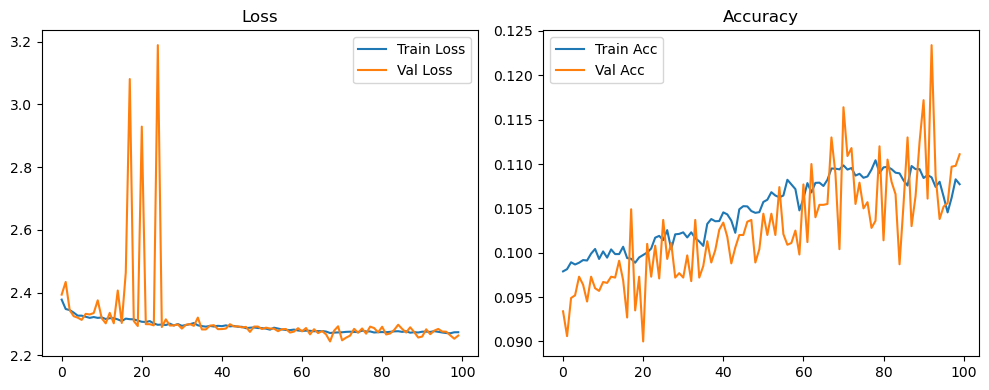

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.2656 Accuracy: 0.1093


🚀 Running: batch256_lr_max_0.0002_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0952 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0952 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0952 |:   1%|          | 1/100 [01:20<2:13:33, 80.95s/it]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0950 |:   1%|          | 1/100 [02:35<2:13:33, 80.95s/it]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0950 |:   1%|          | 1/100 [02:35<2:13:33, 80.95s/it]

| LR: 0.000200 | Train Acc: 0.0981 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [02:35<2:06:22, 77.37s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [02:49<2:06:22, 77.37s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [02:49<2:06:22, 77.37s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [02:49<1:18:23, 48.49s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [03:04<1:18:23, 48.49s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [03:04<1:18:23, 48.49s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0972 |:   4%|▍         | 4/100 [03:04<55:54, 34.94s/it]  

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0920 |:   4%|▍         | 4/100 [03:18<55:54, 34.94s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0920 |:   4%|▍         | 4/100 [03:18<55:54, 34.94s/it]

| LR: 0.000199 | Train Acc: 0.0990 | Val Acc: 0.0920 |:   5%|▌         | 5/100 [03:18<43:27, 27.45s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0950 |:   5%|▌         | 5/100 [03:32<43:27, 27.45s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0950 |:   5%|▌         | 5/100 [03:32<43:27, 27.45s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0950 |:   6%|▌         | 6/100 [03:32<35:53, 22.91s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:46<35:53, 22.91s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:46<35:53, 22.91s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:46<31:02, 20.03s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [04:00<31:02, 20.03s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [04:00<31:02, 20.03s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [04:00<27:46, 18.11s/it]

| LR: 0.000197 | Train Acc: 0.0993 | Val Acc: 0.0955 |:   8%|▊         | 8/100 [04:14<27:46, 18.11s/it]

| LR: 0.000197 | Train Acc: 0.0993 | Val Acc: 0.0955 |:   8%|▊         | 8/100 [04:14<27:46, 18.11s/it]

| LR: 0.000197 | Train Acc: 0.0993 | Val Acc: 0.0955 |:   9%|▉         | 9/100 [04:14<25:35, 16.87s/it]

| LR: 0.000196 | Train Acc: 0.1000 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:28<25:35, 16.87s/it]

| LR: 0.000196 | Train Acc: 0.1000 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:28<25:35, 16.87s/it]

| LR: 0.000196 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:28<24:01, 16.02s/it]

| LR: 0.000195 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  10%|█         | 10/100 [04:42<24:01, 16.02s/it]

| LR: 0.000195 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  10%|█         | 10/100 [04:42<24:01, 16.02s/it]

| LR: 0.000195 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  11%|█         | 11/100 [04:42<22:51, 15.41s/it]

| LR: 0.000194 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000194 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000194 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [04:56<22:00, 15.01s/it]

| LR: 0.000193 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  12%|█▏        | 12/100 [05:10<22:00, 15.01s/it]

| LR: 0.000193 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  12%|█▏        | 12/100 [05:10<22:00, 15.01s/it]

| LR: 0.000193 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  13%|█▎        | 13/100 [05:10<21:22, 14.74s/it]

| LR: 0.000192 | Train Acc: 0.0992 | Val Acc: 0.0976 |:  13%|█▎        | 13/100 [05:24<21:22, 14.74s/it]

| LR: 0.000192 | Train Acc: 0.0992 | Val Acc: 0.0976 |:  13%|█▎        | 13/100 [05:24<21:22, 14.74s/it]

| LR: 0.000192 | Train Acc: 0.0992 | Val Acc: 0.0976 |:  14%|█▍        | 14/100 [05:25<20:49, 14.53s/it]

| LR: 0.000191 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [05:39<20:49, 14.53s/it]

| LR: 0.000191 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [05:39<20:49, 14.53s/it]

| LR: 0.000191 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [05:39<20:23, 14.40s/it]

| LR: 0.000190 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  15%|█▌        | 15/100 [05:53<20:23, 14.40s/it]

| LR: 0.000190 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  15%|█▌        | 15/100 [05:53<20:23, 14.40s/it]

| LR: 0.000190 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  16%|█▌        | 16/100 [05:53<20:02, 14.31s/it]

| LR: 0.000188 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [06:07<20:02, 14.31s/it]

| LR: 0.000188 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [06:07<20:02, 14.31s/it]

| LR: 0.000188 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [06:07<19:41, 14.23s/it]

| LR: 0.000187 | Train Acc: 0.0985 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:21<19:41, 14.23s/it]

| LR: 0.000187 | Train Acc: 0.0985 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:21<19:41, 14.23s/it]

| LR: 0.000187 | Train Acc: 0.0985 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [06:21<19:24, 14.20s/it]

| LR: 0.000185 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  18%|█▊        | 18/100 [06:35<19:24, 14.20s/it]

| LR: 0.000185 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  18%|█▊        | 18/100 [06:35<19:24, 14.20s/it]

| LR: 0.000185 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  19%|█▉        | 19/100 [06:35<19:07, 14.16s/it]

| LR: 0.000184 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [06:49<19:07, 14.16s/it]

| LR: 0.000184 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [06:49<19:07, 14.16s/it]

| LR: 0.000184 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  20%|██        | 20/100 [06:49<18:50, 14.13s/it]

| LR: 0.000182 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  20%|██        | 20/100 [07:03<18:50, 14.13s/it]

| LR: 0.000182 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  20%|██        | 20/100 [07:03<18:50, 14.13s/it]

| LR: 0.000182 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  21%|██        | 21/100 [07:03<18:36, 14.14s/it]

| LR: 0.000180 | Train Acc: 0.0983 | Val Acc: 0.0948 |:  21%|██        | 21/100 [07:17<18:36, 14.14s/it]

| LR: 0.000180 | Train Acc: 0.0983 | Val Acc: 0.0948 |:  21%|██        | 21/100 [07:17<18:36, 14.14s/it]

| LR: 0.000180 | Train Acc: 0.0983 | Val Acc: 0.0948 |:  22%|██▏       | 22/100 [07:17<18:20, 14.11s/it]

| LR: 0.000178 | Train Acc: 0.0983 | Val Acc: 0.0968 |:  22%|██▏       | 22/100 [07:31<18:20, 14.11s/it]

| LR: 0.000178 | Train Acc: 0.0983 | Val Acc: 0.0968 |:  22%|██▏       | 22/100 [07:31<18:20, 14.11s/it]

| LR: 0.000178 | Train Acc: 0.0983 | Val Acc: 0.0968 |:  23%|██▎       | 23/100 [07:31<18:06, 14.11s/it]

| LR: 0.000176 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  23%|██▎       | 23/100 [07:45<18:06, 14.11s/it]

| LR: 0.000176 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  23%|██▎       | 23/100 [07:46<18:06, 14.11s/it]

| LR: 0.000176 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [07:46<17:54, 14.14s/it]

| LR: 0.000174 | Train Acc: 0.0998 | Val Acc: 0.0980 |:  24%|██▍       | 24/100 [08:00<17:54, 14.14s/it]

| LR: 0.000174 | Train Acc: 0.0998 | Val Acc: 0.0980 |:  24%|██▍       | 24/100 [08:00<17:54, 14.14s/it]

| LR: 0.000174 | Train Acc: 0.0998 | Val Acc: 0.0980 |:  25%|██▌       | 25/100 [08:00<17:39, 14.13s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  25%|██▌       | 25/100 [08:14<17:39, 14.13s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  25%|██▌       | 25/100 [08:14<17:39, 14.13s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  26%|██▌       | 26/100 [08:14<17:25, 14.12s/it]

| LR: 0.000170 | Train Acc: 0.1005 | Val Acc: 0.0953 |:  26%|██▌       | 26/100 [08:28<17:25, 14.12s/it]

| LR: 0.000170 | Train Acc: 0.1005 | Val Acc: 0.0953 |:  26%|██▌       | 26/100 [08:28<17:25, 14.12s/it]

| LR: 0.000170 | Train Acc: 0.1005 | Val Acc: 0.0953 |:  27%|██▋       | 27/100 [08:28<17:10, 14.12s/it]

| LR: 0.000168 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  27%|██▋       | 27/100 [08:42<17:10, 14.12s/it]

| LR: 0.000168 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  27%|██▋       | 27/100 [08:42<17:10, 14.12s/it]

| LR: 0.000168 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  28%|██▊       | 28/100 [08:42<16:54, 14.09s/it]

| LR: 0.000166 | Train Acc: 0.1002 | Val Acc: 0.0915 |:  28%|██▊       | 28/100 [08:56<16:54, 14.09s/it]

| LR: 0.000166 | Train Acc: 0.1002 | Val Acc: 0.0915 |:  28%|██▊       | 28/100 [08:56<16:54, 14.09s/it]

| LR: 0.000166 | Train Acc: 0.1002 | Val Acc: 0.0915 |:  29%|██▉       | 29/100 [08:56<16:40, 14.09s/it]

| LR: 0.000163 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:10<16:40, 14.09s/it]

| LR: 0.000163 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:10<16:40, 14.09s/it]

| LR: 0.000163 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:10<16:25, 14.08s/it]

| LR: 0.000161 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  30%|███       | 30/100 [09:24<16:25, 14.08s/it]

| LR: 0.000161 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  30%|███       | 30/100 [09:24<16:25, 14.08s/it]

| LR: 0.000161 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  31%|███       | 31/100 [09:24<16:10, 14.06s/it]

| LR: 0.000158 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:38<16:10, 14.06s/it]

| LR: 0.000158 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:38<16:10, 14.06s/it]

| LR: 0.000158 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:38<15:56, 14.07s/it]

| LR: 0.000156 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [09:52<15:56, 14.07s/it]

| LR: 0.000156 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [09:52<15:56, 14.07s/it]

| LR: 0.000156 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  33%|███▎      | 33/100 [09:52<15:43, 14.08s/it]

| LR: 0.000153 | Train Acc: 0.0994 | Val Acc: 0.0991 |:  33%|███▎      | 33/100 [10:06<15:43, 14.08s/it]

| LR: 0.000153 | Train Acc: 0.0994 | Val Acc: 0.0991 |:  33%|███▎      | 33/100 [10:06<15:43, 14.08s/it]

| LR: 0.000153 | Train Acc: 0.0994 | Val Acc: 0.0991 |:  34%|███▍      | 34/100 [10:06<15:28, 14.07s/it]

| LR: 0.000151 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [10:20<15:28, 14.07s/it]

| LR: 0.000151 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [10:20<15:28, 14.07s/it]

| LR: 0.000151 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [10:20<15:12, 14.04s/it]

| LR: 0.000148 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  35%|███▌      | 35/100 [10:34<15:12, 14.04s/it]

| LR: 0.000148 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  35%|███▌      | 35/100 [10:34<15:12, 14.04s/it]

| LR: 0.000148 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  36%|███▌      | 36/100 [10:35<15:02, 14.10s/it]

| LR: 0.000145 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  36%|███▌      | 36/100 [10:48<15:02, 14.10s/it]

| LR: 0.000145 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  36%|███▌      | 36/100 [10:48<15:02, 14.10s/it]

| LR: 0.000145 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  37%|███▋      | 37/100 [10:49<14:46, 14.08s/it]

| LR: 0.000143 | Train Acc: 0.1015 | Val Acc: 0.0971 |:  37%|███▋      | 37/100 [11:03<14:46, 14.08s/it]

| LR: 0.000143 | Train Acc: 0.1015 | Val Acc: 0.0971 |:  37%|███▋      | 37/100 [11:03<14:46, 14.08s/it]

| LR: 0.000143 | Train Acc: 0.1015 | Val Acc: 0.0971 |:  38%|███▊      | 38/100 [11:03<14:32, 14.08s/it]

| LR: 0.000140 | Train Acc: 0.1018 | Val Acc: 0.0965 |:  38%|███▊      | 38/100 [11:17<14:32, 14.08s/it]

| LR: 0.000140 | Train Acc: 0.1018 | Val Acc: 0.0965 |:  38%|███▊      | 38/100 [11:17<14:32, 14.08s/it]

| LR: 0.000140 | Train Acc: 0.1018 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [11:17<14:18, 14.07s/it]

| LR: 0.000137 | Train Acc: 0.1011 | Val Acc: 0.0977 |:  39%|███▉      | 39/100 [11:31<14:18, 14.07s/it]

| LR: 0.000137 | Train Acc: 0.1011 | Val Acc: 0.0977 |:  39%|███▉      | 39/100 [11:31<14:18, 14.07s/it]

| LR: 0.000137 | Train Acc: 0.1011 | Val Acc: 0.0977 |:  40%|████      | 40/100 [11:31<14:04, 14.07s/it]

| LR: 0.000134 | Train Acc: 0.1015 | Val Acc: 0.0976 |:  40%|████      | 40/100 [11:45<14:04, 14.07s/it]

| LR: 0.000134 | Train Acc: 0.1015 | Val Acc: 0.0976 |:  40%|████      | 40/100 [11:45<14:04, 14.07s/it]

| LR: 0.000134 | Train Acc: 0.1015 | Val Acc: 0.0976 |:  41%|████      | 41/100 [11:45<13:50, 14.08s/it]

| LR: 0.000132 | Train Acc: 0.1017 | Val Acc: 0.0961 |:  41%|████      | 41/100 [11:59<13:50, 14.08s/it]

| LR: 0.000132 | Train Acc: 0.1017 | Val Acc: 0.0961 |:  41%|████      | 41/100 [11:59<13:50, 14.08s/it]

| LR: 0.000132 | Train Acc: 0.1017 | Val Acc: 0.0961 |:  42%|████▏     | 42/100 [11:59<13:36, 14.08s/it]

| LR: 0.000129 | Train Acc: 0.1021 | Val Acc: 0.0964 |:  42%|████▏     | 42/100 [12:13<13:36, 14.08s/it]

| LR: 0.000129 | Train Acc: 0.1021 | Val Acc: 0.0964 |:  42%|████▏     | 42/100 [12:13<13:36, 14.08s/it]

| LR: 0.000129 | Train Acc: 0.1021 | Val Acc: 0.0964 |:  43%|████▎     | 43/100 [12:13<13:22, 14.07s/it]

| LR: 0.000126 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  43%|████▎     | 43/100 [12:27<13:22, 14.07s/it]

| LR: 0.000126 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  43%|████▎     | 43/100 [12:27<13:22, 14.07s/it]

| LR: 0.000126 | Train Acc: 0.1016 | Val Acc: 0.0977 |:  44%|████▍     | 44/100 [12:27<13:08, 14.09s/it]

| LR: 0.000123 | Train Acc: 0.1018 | Val Acc: 0.1028 |:  44%|████▍     | 44/100 [12:41<13:08, 14.09s/it]

| LR: 0.000123 | Train Acc: 0.1018 | Val Acc: 0.1028 |:  44%|████▍     | 44/100 [12:41<13:08, 14.09s/it]

| LR: 0.000123 | Train Acc: 0.1018 | Val Acc: 0.1028 |:  45%|████▌     | 45/100 [12:41<12:54, 14.08s/it]

| LR: 0.000120 | Train Acc: 0.1024 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [12:55<12:54, 14.08s/it]

| LR: 0.000120 | Train Acc: 0.1024 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [12:55<12:54, 14.08s/it]

| LR: 0.000120 | Train Acc: 0.1024 | Val Acc: 0.0975 |:  46%|████▌     | 46/100 [12:55<12:40, 14.08s/it]

| LR: 0.000117 | Train Acc: 0.1006 | Val Acc: 0.0978 |:  46%|████▌     | 46/100 [13:09<12:40, 14.08s/it]

| LR: 0.000117 | Train Acc: 0.1006 | Val Acc: 0.0978 |:  46%|████▌     | 46/100 [13:09<12:40, 14.08s/it]

| LR: 0.000117 | Train Acc: 0.1006 | Val Acc: 0.0978 |:  47%|████▋     | 47/100 [13:09<12:28, 14.13s/it]

| LR: 0.000114 | Train Acc: 0.1021 | Val Acc: 0.0957 |:  47%|████▋     | 47/100 [13:24<12:28, 14.13s/it]

| LR: 0.000114 | Train Acc: 0.1021 | Val Acc: 0.0957 |:  47%|████▋     | 47/100 [13:24<12:28, 14.13s/it]

| LR: 0.000114 | Train Acc: 0.1021 | Val Acc: 0.0957 |:  48%|████▊     | 48/100 [13:24<12:15, 14.15s/it]

| LR: 0.000111 | Train Acc: 0.1012 | Val Acc: 0.0966 |:  48%|████▊     | 48/100 [13:38<12:15, 14.15s/it]

| LR: 0.000111 | Train Acc: 0.1012 | Val Acc: 0.0966 |:  48%|████▊     | 48/100 [13:38<12:15, 14.15s/it]

| LR: 0.000111 | Train Acc: 0.1012 | Val Acc: 0.0966 |:  49%|████▉     | 49/100 [13:38<12:00, 14.13s/it]

| LR: 0.000108 | Train Acc: 0.1013 | Val Acc: 0.0946 |:  49%|████▉     | 49/100 [13:52<12:00, 14.13s/it]

| LR: 0.000108 | Train Acc: 0.1013 | Val Acc: 0.0946 |:  49%|████▉     | 49/100 [13:52<12:00, 14.13s/it]

| LR: 0.000108 | Train Acc: 0.1013 | Val Acc: 0.0946 |:  50%|█████     | 50/100 [13:52<11:46, 14.14s/it]

| LR: 0.000105 | Train Acc: 0.1011 | Val Acc: 0.0981 |:  50%|█████     | 50/100 [14:06<11:46, 14.14s/it]

| LR: 0.000105 | Train Acc: 0.1011 | Val Acc: 0.0981 |:  50%|█████     | 50/100 [14:06<11:46, 14.14s/it]

| LR: 0.000105 | Train Acc: 0.1011 | Val Acc: 0.0981 |:  51%|█████     | 51/100 [14:06<11:33, 14.14s/it]

| LR: 0.000102 | Train Acc: 0.1014 | Val Acc: 0.0977 |:  51%|█████     | 51/100 [14:20<11:33, 14.14s/it]

| LR: 0.000102 | Train Acc: 0.1014 | Val Acc: 0.0977 |:  51%|█████     | 51/100 [14:20<11:33, 14.14s/it]

| LR: 0.000102 | Train Acc: 0.1014 | Val Acc: 0.0977 |:  52%|█████▏    | 52/100 [14:20<11:19, 14.16s/it]

| LR: 0.000099 | Train Acc: 0.1014 | Val Acc: 0.0994 |:  52%|█████▏    | 52/100 [14:34<11:19, 14.16s/it]

| LR: 0.000099 | Train Acc: 0.1014 | Val Acc: 0.0994 |:  52%|█████▏    | 52/100 [14:34<11:19, 14.16s/it]

| LR: 0.000099 | Train Acc: 0.1014 | Val Acc: 0.0994 |:  53%|█████▎    | 53/100 [14:34<11:05, 14.16s/it]

| LR: 0.000096 | Train Acc: 0.1013 | Val Acc: 0.0982 |:  53%|█████▎    | 53/100 [14:49<11:05, 14.16s/it]

| LR: 0.000096 | Train Acc: 0.1013 | Val Acc: 0.0982 |:  53%|█████▎    | 53/100 [14:49<11:05, 14.16s/it]

| LR: 0.000096 | Train Acc: 0.1013 | Val Acc: 0.0982 |:  54%|█████▍    | 54/100 [14:49<10:51, 14.16s/it]

| LR: 0.000093 | Train Acc: 0.1020 | Val Acc: 0.1010 |:  54%|█████▍    | 54/100 [15:03<10:51, 14.16s/it]

| LR: 0.000093 | Train Acc: 0.1020 | Val Acc: 0.1010 |:  54%|█████▍    | 54/100 [15:03<10:51, 14.16s/it]

| LR: 0.000093 | Train Acc: 0.1020 | Val Acc: 0.1010 |:  55%|█████▌    | 55/100 [15:03<10:36, 14.15s/it]

| LR: 0.000090 | Train Acc: 0.1027 | Val Acc: 0.0969 |:  55%|█████▌    | 55/100 [15:17<10:36, 14.15s/it]

| LR: 0.000090 | Train Acc: 0.1027 | Val Acc: 0.0969 |:  55%|█████▌    | 55/100 [15:17<10:36, 14.15s/it]

| LR: 0.000090 | Train Acc: 0.1027 | Val Acc: 0.0969 |:  56%|█████▌    | 56/100 [15:17<10:22, 14.14s/it]

| LR: 0.000087 | Train Acc: 0.1010 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [15:31<10:22, 14.14s/it]

| LR: 0.000087 | Train Acc: 0.1010 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [15:31<10:22, 14.14s/it]

| LR: 0.000087 | Train Acc: 0.1010 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [15:31<10:06, 14.10s/it]

| LR: 0.000084 | Train Acc: 0.1013 | Val Acc: 0.1013 |:  57%|█████▋    | 57/100 [15:45<10:06, 14.10s/it]

| LR: 0.000084 | Train Acc: 0.1013 | Val Acc: 0.1013 |:  57%|█████▋    | 57/100 [15:45<10:06, 14.10s/it]

| LR: 0.000084 | Train Acc: 0.1013 | Val Acc: 0.1013 |:  58%|█████▊    | 58/100 [15:45<09:52, 14.10s/it]

| LR: 0.000081 | Train Acc: 0.1028 | Val Acc: 0.1018 |:  58%|█████▊    | 58/100 [15:59<09:52, 14.10s/it]

| LR: 0.000081 | Train Acc: 0.1028 | Val Acc: 0.1018 |:  58%|█████▊    | 58/100 [15:59<09:52, 14.10s/it]

| LR: 0.000081 | Train Acc: 0.1028 | Val Acc: 0.1018 |:  59%|█████▉    | 59/100 [15:59<09:38, 14.10s/it]

| LR: 0.000078 | Train Acc: 0.1017 | Val Acc: 0.0960 |:  59%|█████▉    | 59/100 [16:13<09:38, 14.10s/it]

| LR: 0.000078 | Train Acc: 0.1017 | Val Acc: 0.0960 |:  59%|█████▉    | 59/100 [16:13<09:38, 14.10s/it]

| LR: 0.000078 | Train Acc: 0.1017 | Val Acc: 0.0960 |:  60%|██████    | 60/100 [16:13<09:25, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1017 | Val Acc: 0.0966 |:  60%|██████    | 60/100 [16:27<09:25, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1017 | Val Acc: 0.0966 |:  60%|██████    | 60/100 [16:27<09:25, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1017 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [16:27<09:11, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1024 | Val Acc: 0.0980 |:  61%|██████    | 61/100 [16:42<09:11, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1024 | Val Acc: 0.0980 |:  61%|██████    | 61/100 [16:42<09:11, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1024 | Val Acc: 0.0980 |:  62%|██████▏   | 62/100 [16:42<08:57, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.1025 | Val Acc: 0.0975 |:  62%|██████▏   | 62/100 [16:56<08:57, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.1025 | Val Acc: 0.0975 |:  62%|██████▏   | 62/100 [16:56<08:57, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.1025 | Val Acc: 0.0975 |:  63%|██████▎   | 63/100 [16:56<08:44, 14.19s/it]

| LR: 0.000067 | Train Acc: 0.1013 | Val Acc: 0.0995 |:  63%|██████▎   | 63/100 [17:10<08:44, 14.19s/it]

| LR: 0.000067 | Train Acc: 0.1013 | Val Acc: 0.0995 |:  63%|██████▎   | 63/100 [17:10<08:44, 14.19s/it]

| LR: 0.000067 | Train Acc: 0.1013 | Val Acc: 0.0995 |:  64%|██████▍   | 64/100 [17:10<08:30, 14.19s/it]

| LR: 0.000065 | Train Acc: 0.1018 | Val Acc: 0.1051 |:  64%|██████▍   | 64/100 [17:24<08:30, 14.19s/it]

| LR: 0.000065 | Train Acc: 0.1018 | Val Acc: 0.1051 |:  64%|██████▍   | 64/100 [17:24<08:30, 14.19s/it]

| LR: 0.000065 | Train Acc: 0.1018 | Val Acc: 0.1051 |:  65%|██████▌   | 65/100 [17:24<08:15, 14.17s/it]

| LR: 0.000062 | Train Acc: 0.1023 | Val Acc: 0.0994 |:  65%|██████▌   | 65/100 [17:38<08:15, 14.17s/it]

| LR: 0.000062 | Train Acc: 0.1023 | Val Acc: 0.0994 |:  65%|██████▌   | 65/100 [17:38<08:15, 14.17s/it]

| LR: 0.000062 | Train Acc: 0.1023 | Val Acc: 0.0994 |:  66%|██████▌   | 66/100 [17:38<08:01, 14.15s/it]

| LR: 0.000059 | Train Acc: 0.1013 | Val Acc: 0.0976 |:  66%|██████▌   | 66/100 [17:52<08:01, 14.15s/it]

| LR: 0.000059 | Train Acc: 0.1013 | Val Acc: 0.0976 |:  66%|██████▌   | 66/100 [17:52<08:01, 14.15s/it]

| LR: 0.000059 | Train Acc: 0.1013 | Val Acc: 0.0976 |:  67%|██████▋   | 67/100 [17:52<07:46, 14.13s/it]

| LR: 0.000057 | Train Acc: 0.1024 | Val Acc: 0.0959 |:  67%|██████▋   | 67/100 [18:06<07:46, 14.13s/it]

| LR: 0.000057 | Train Acc: 0.1024 | Val Acc: 0.0959 |:  67%|██████▋   | 67/100 [18:06<07:46, 14.13s/it]

| LR: 0.000057 | Train Acc: 0.1024 | Val Acc: 0.0959 |:  68%|██████▊   | 68/100 [18:07<07:32, 14.13s/it]

| LR: 0.000054 | Train Acc: 0.1023 | Val Acc: 0.0983 |:  68%|██████▊   | 68/100 [18:21<07:32, 14.13s/it]

| LR: 0.000054 | Train Acc: 0.1023 | Val Acc: 0.0983 |:  68%|██████▊   | 68/100 [18:21<07:32, 14.13s/it]

| LR: 0.000054 | Train Acc: 0.1023 | Val Acc: 0.0983 |:  69%|██████▉   | 69/100 [18:21<07:17, 14.13s/it]

| LR: 0.000052 | Train Acc: 0.1023 | Val Acc: 0.0995 |:  69%|██████▉   | 69/100 [18:35<07:17, 14.13s/it]

| LR: 0.000052 | Train Acc: 0.1023 | Val Acc: 0.0995 |:  69%|██████▉   | 69/100 [18:35<07:17, 14.13s/it]

| LR: 0.000052 | Train Acc: 0.1023 | Val Acc: 0.0995 |:  70%|███████   | 70/100 [18:35<07:03, 14.12s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  70%|███████   | 70/100 [18:49<07:03, 14.12s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  70%|███████   | 70/100 [18:49<07:03, 14.12s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  71%|███████   | 71/100 [18:49<06:49, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1006 | Val Acc: 0.0990 |:  71%|███████   | 71/100 [19:03<06:49, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1006 | Val Acc: 0.0990 |:  71%|███████   | 71/100 [19:03<06:49, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1006 | Val Acc: 0.0990 |:  72%|███████▏  | 72/100 [19:03<06:34, 14.09s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  72%|███████▏  | 72/100 [19:17<06:34, 14.09s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  72%|███████▏  | 72/100 [19:17<06:34, 14.09s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  73%|███████▎  | 73/100 [19:17<06:20, 14.09s/it]

| LR: 0.000042 | Train Acc: 0.1017 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [19:31<06:20, 14.09s/it]

| LR: 0.000042 | Train Acc: 0.1017 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [19:31<06:20, 14.09s/it]

| LR: 0.000042 | Train Acc: 0.1017 | Val Acc: 0.0971 |:  74%|███████▍  | 74/100 [19:31<06:06, 14.11s/it]

| LR: 0.000040 | Train Acc: 0.1025 | Val Acc: 0.0975 |:  74%|███████▍  | 74/100 [19:45<06:06, 14.11s/it]

| LR: 0.000040 | Train Acc: 0.1025 | Val Acc: 0.0975 |:  74%|███████▍  | 74/100 [19:45<06:06, 14.11s/it]

| LR: 0.000040 | Train Acc: 0.1025 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [19:45<05:52, 14.08s/it]

| LR: 0.000038 | Train Acc: 0.1016 | Val Acc: 0.0998 |:  75%|███████▌  | 75/100 [19:59<05:52, 14.08s/it]

| LR: 0.000038 | Train Acc: 0.1016 | Val Acc: 0.0998 |:  75%|███████▌  | 75/100 [19:59<05:52, 14.08s/it]

| LR: 0.000038 | Train Acc: 0.1016 | Val Acc: 0.0998 |:  76%|███████▌  | 76/100 [19:59<05:38, 14.08s/it]

| LR: 0.000036 | Train Acc: 0.1016 | Val Acc: 0.0995 |:  76%|███████▌  | 76/100 [20:13<05:38, 14.08s/it]

| LR: 0.000036 | Train Acc: 0.1016 | Val Acc: 0.0995 |:  76%|███████▌  | 76/100 [20:13<05:38, 14.08s/it]

| LR: 0.000036 | Train Acc: 0.1016 | Val Acc: 0.0995 |:  77%|███████▋  | 77/100 [20:13<05:23, 14.09s/it]

| LR: 0.000034 | Train Acc: 0.1017 | Val Acc: 0.0988 |:  77%|███████▋  | 77/100 [20:27<05:23, 14.09s/it]

| LR: 0.000034 | Train Acc: 0.1017 | Val Acc: 0.0988 |:  77%|███████▋  | 77/100 [20:27<05:23, 14.09s/it]

| LR: 0.000034 | Train Acc: 0.1017 | Val Acc: 0.0988 |:  78%|███████▊  | 78/100 [20:27<05:09, 14.09s/it]

| LR: 0.000032 | Train Acc: 0.1030 | Val Acc: 0.0993 |:  78%|███████▊  | 78/100 [20:42<05:09, 14.09s/it]

| LR: 0.000032 | Train Acc: 0.1030 | Val Acc: 0.0993 |:  78%|███████▊  | 78/100 [20:42<05:09, 14.09s/it]

| LR: 0.000032 | Train Acc: 0.1030 | Val Acc: 0.0993 |:  79%|███████▉  | 79/100 [20:42<04:56, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.1024 | Val Acc: 0.0974 |:  79%|███████▉  | 79/100 [20:56<04:56, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.1024 | Val Acc: 0.0974 |:  79%|███████▉  | 79/100 [20:56<04:56, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.1024 | Val Acc: 0.0974 |:  80%|████████  | 80/100 [20:56<04:41, 14.09s/it]

| LR: 0.000028 | Train Acc: 0.1021 | Val Acc: 0.0981 |:  80%|████████  | 80/100 [21:10<04:41, 14.09s/it]

| LR: 0.000028 | Train Acc: 0.1021 | Val Acc: 0.0981 |:  80%|████████  | 80/100 [21:10<04:41, 14.09s/it]

| LR: 0.000028 | Train Acc: 0.1021 | Val Acc: 0.0981 |:  81%|████████  | 81/100 [21:10<04:27, 14.06s/it]

| LR: 0.000026 | Train Acc: 0.1026 | Val Acc: 0.0977 |:  81%|████████  | 81/100 [21:24<04:27, 14.06s/it]

| LR: 0.000026 | Train Acc: 0.1026 | Val Acc: 0.0977 |:  81%|████████  | 81/100 [21:24<04:27, 14.06s/it]

| LR: 0.000026 | Train Acc: 0.1026 | Val Acc: 0.0977 |:  82%|████████▏ | 82/100 [21:24<04:13, 14.07s/it]

| LR: 0.000025 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  82%|████████▏ | 82/100 [21:38<04:13, 14.07s/it]

| LR: 0.000025 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  82%|████████▏ | 82/100 [21:38<04:13, 14.07s/it]

| LR: 0.000025 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  83%|████████▎ | 83/100 [21:38<03:59, 14.07s/it]

| LR: 0.000023 | Train Acc: 0.1030 | Val Acc: 0.0989 |:  83%|████████▎ | 83/100 [21:52<03:59, 14.07s/it]

| LR: 0.000023 | Train Acc: 0.1030 | Val Acc: 0.0989 |:  83%|████████▎ | 83/100 [21:52<03:59, 14.07s/it]

| LR: 0.000023 | Train Acc: 0.1030 | Val Acc: 0.0989 |:  84%|████████▍ | 84/100 [21:52<03:45, 14.07s/it]

| LR: 0.000022 | Train Acc: 0.1033 | Val Acc: 0.0989 |:  84%|████████▍ | 84/100 [22:06<03:45, 14.07s/it]

| LR: 0.000022 | Train Acc: 0.1033 | Val Acc: 0.0989 |:  84%|████████▍ | 84/100 [22:06<03:45, 14.07s/it]

| LR: 0.000022 | Train Acc: 0.1033 | Val Acc: 0.0989 |:  85%|████████▌ | 85/100 [22:06<03:30, 14.07s/it]

| LR: 0.000020 | Train Acc: 0.1027 | Val Acc: 0.0962 |:  85%|████████▌ | 85/100 [22:20<03:30, 14.07s/it]

| LR: 0.000020 | Train Acc: 0.1027 | Val Acc: 0.0962 |:  85%|████████▌ | 85/100 [22:20<03:30, 14.07s/it]

| LR: 0.000020 | Train Acc: 0.1027 | Val Acc: 0.0962 |:  86%|████████▌ | 86/100 [22:20<03:16, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.1031 | Val Acc: 0.1001 |:  86%|████████▌ | 86/100 [22:34<03:16, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.1031 | Val Acc: 0.1001 |:  86%|████████▌ | 86/100 [22:34<03:16, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.1031 | Val Acc: 0.1001 |:  87%|████████▋ | 87/100 [22:34<03:02, 14.06s/it]

| LR: 0.000018 | Train Acc: 0.1036 | Val Acc: 0.0980 |:  87%|████████▋ | 87/100 [22:48<03:02, 14.06s/it]

| LR: 0.000018 | Train Acc: 0.1036 | Val Acc: 0.0980 |:  87%|████████▋ | 87/100 [22:48<03:02, 14.06s/it]

| LR: 0.000018 | Train Acc: 0.1036 | Val Acc: 0.0980 |:  88%|████████▊ | 88/100 [22:48<02:48, 14.05s/it]

| LR: 0.000017 | Train Acc: 0.1040 | Val Acc: 0.1015 |:  88%|████████▊ | 88/100 [23:02<02:48, 14.05s/it]

| LR: 0.000017 | Train Acc: 0.1040 | Val Acc: 0.1015 |:  88%|████████▊ | 88/100 [23:02<02:48, 14.05s/it]

| LR: 0.000017 | Train Acc: 0.1040 | Val Acc: 0.1015 |:  89%|████████▉ | 89/100 [23:02<02:34, 14.04s/it]

| LR: 0.000016 | Train Acc: 0.1040 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [23:16<02:34, 14.04s/it]

| LR: 0.000016 | Train Acc: 0.1040 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [23:16<02:34, 14.04s/it]

| LR: 0.000016 | Train Acc: 0.1040 | Val Acc: 0.0976 |:  90%|█████████ | 90/100 [23:16<02:20, 14.04s/it]

| LR: 0.000015 | Train Acc: 0.1030 | Val Acc: 0.0988 |:  90%|█████████ | 90/100 [23:30<02:20, 14.04s/it]

| LR: 0.000015 | Train Acc: 0.1030 | Val Acc: 0.0988 |:  90%|█████████ | 90/100 [23:30<02:20, 14.04s/it]

| LR: 0.000015 | Train Acc: 0.1030 | Val Acc: 0.0988 |:  91%|█████████ | 91/100 [23:30<02:06, 14.06s/it]

| LR: 0.000014 | Train Acc: 0.1032 | Val Acc: 0.0991 |:  91%|█████████ | 91/100 [23:44<02:06, 14.06s/it]

| LR: 0.000014 | Train Acc: 0.1032 | Val Acc: 0.0991 |:  91%|█████████ | 91/100 [23:44<02:06, 14.06s/it]

| LR: 0.000014 | Train Acc: 0.1032 | Val Acc: 0.0991 |:  92%|█████████▏| 92/100 [23:44<01:52, 14.06s/it]

| LR: 0.000013 | Train Acc: 0.1036 | Val Acc: 0.0993 |:  92%|█████████▏| 92/100 [23:58<01:52, 14.06s/it]

| LR: 0.000013 | Train Acc: 0.1036 | Val Acc: 0.0993 |:  92%|█████████▏| 92/100 [23:58<01:52, 14.06s/it]

| LR: 0.000013 | Train Acc: 0.1036 | Val Acc: 0.0993 |:  93%|█████████▎| 93/100 [23:58<01:38, 14.06s/it]

| LR: 0.000012 | Train Acc: 0.1034 | Val Acc: 0.1009 |:  93%|█████████▎| 93/100 [24:12<01:38, 14.06s/it]

| LR: 0.000012 | Train Acc: 0.1034 | Val Acc: 0.1009 |:  93%|█████████▎| 93/100 [24:12<01:38, 14.06s/it]

| LR: 0.000012 | Train Acc: 0.1034 | Val Acc: 0.1009 |:  94%|█████████▍| 94/100 [24:12<01:24, 14.07s/it]

| LR: 0.000012 | Train Acc: 0.1031 | Val Acc: 0.0981 |:  94%|█████████▍| 94/100 [24:26<01:24, 14.07s/it]

| LR: 0.000012 | Train Acc: 0.1031 | Val Acc: 0.0981 |:  94%|█████████▍| 94/100 [24:26<01:24, 14.07s/it]

| LR: 0.000012 | Train Acc: 0.1031 | Val Acc: 0.0981 |:  95%|█████████▌| 95/100 [24:26<01:10, 14.07s/it]

| LR: 0.000011 | Train Acc: 0.1042 | Val Acc: 0.0999 |:  95%|█████████▌| 95/100 [24:40<01:10, 14.07s/it]

| LR: 0.000011 | Train Acc: 0.1042 | Val Acc: 0.0999 |:  95%|█████████▌| 95/100 [24:40<01:10, 14.07s/it]

| LR: 0.000011 | Train Acc: 0.1042 | Val Acc: 0.0999 |:  96%|█████████▌| 96/100 [24:40<00:56, 14.05s/it]

| LR: 0.000011 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  96%|█████████▌| 96/100 [24:54<00:56, 14.05s/it]

| LR: 0.000011 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  96%|█████████▌| 96/100 [24:54<00:56, 14.05s/it]

| LR: 0.000011 | Train Acc: 0.1021 | Val Acc: 0.0992 |:  97%|█████████▋| 97/100 [24:54<00:42, 14.04s/it]

| LR: 0.000010 | Train Acc: 0.1034 | Val Acc: 0.0983 |:  97%|█████████▋| 97/100 [25:08<00:42, 14.04s/it]

| LR: 0.000010 | Train Acc: 0.1034 | Val Acc: 0.0983 |:  97%|█████████▋| 97/100 [25:08<00:42, 14.04s/it]

| LR: 0.000010 | Train Acc: 0.1034 | Val Acc: 0.0983 |:  98%|█████████▊| 98/100 [25:09<00:28, 14.03s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0970 |:  98%|█████████▊| 98/100 [25:22<00:28, 14.03s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0970 |:  98%|█████████▊| 98/100 [25:22<00:28, 14.03s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:23<00:14, 14.03s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0977 |:  99%|█████████▉| 99/100 [25:36<00:14, 14.03s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0977 |:  99%|█████████▉| 99/100 [25:36<00:14, 14.03s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0977 |: 100%|██████████| 100/100 [25:37<00:00, 14.02s/it]

| LR: 0.000010 | Train Acc: 0.1030 | Val Acc: 0.0977 |: 100%|██████████| 100/100 [25:37<00:00, 15.37s/it]

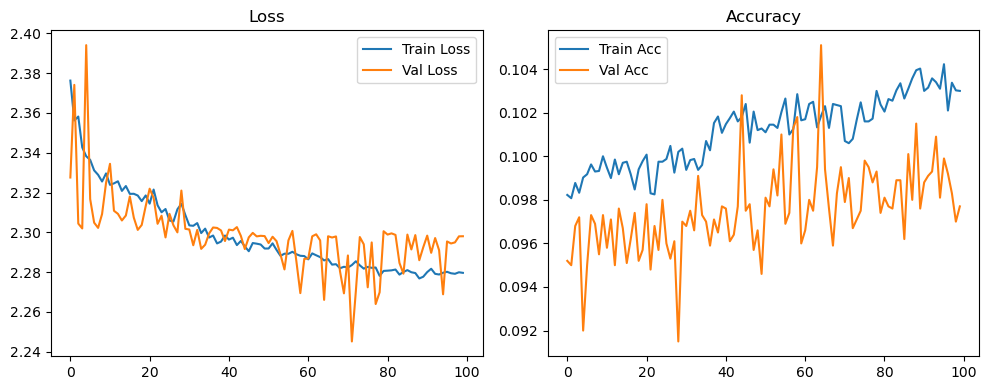

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.15it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.27it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.73it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.2987 Accuracy: 0.0997


🚀 Running: batch256_lr_max_0.0002_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0972 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0972 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0972 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:20<2:12:22, 80.23s/it]

| LR: 0.000200 | Train Acc: 0.0985 | Val Acc: 0.0972 |:   1%|          | 1/100 [02:34<2:12:22, 80.23s/it]

| LR: 0.000200 | Train Acc: 0.0985 | Val Acc: 0.0972 |:   1%|          | 1/100 [02:34<2:12:22, 80.23s/it]

| LR: 0.000200 | Train Acc: 0.0985 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:34<2:05:36, 76.91s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [02:48<2:05:36, 76.91s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [02:48<2:05:36, 76.91s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [02:48<1:17:57, 48.23s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [03:02<1:17:57, 48.23s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [03:02<1:17:57, 48.23s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:02<55:34, 34.73s/it]  

| LR: 0.000199 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [03:16<55:34, 34.73s/it]

| LR: 0.000199 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [03:16<55:34, 34.73s/it]

| LR: 0.000199 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   5%|▌         | 5/100 [03:17<43:11, 27.28s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:31<43:11, 27.28s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:31<43:11, 27.28s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:31<35:42, 22.79s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:45<35:42, 22.79s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:45<35:42, 22.79s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:45<30:57, 19.97s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:59<30:57, 19.97s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:59<30:57, 19.97s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [03:59<27:46, 18.11s/it]

| LR: 0.000197 | Train Acc: 0.0998 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:13<27:46, 18.11s/it]

| LR: 0.000197 | Train Acc: 0.0998 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:13<27:46, 18.11s/it]

| LR: 0.000197 | Train Acc: 0.0998 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:13<25:36, 16.88s/it]

| LR: 0.000196 | Train Acc: 0.0990 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [04:27<25:36, 16.88s/it]

| LR: 0.000196 | Train Acc: 0.0990 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [04:27<25:36, 16.88s/it]

| LR: 0.000196 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  10%|█         | 10/100 [04:27<24:02, 16.02s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:41<24:02, 16.02s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:41<24:02, 16.02s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:41<22:53, 15.43s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  11%|█         | 11/100 [04:55<22:53, 15.43s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  11%|█         | 11/100 [04:55<22:53, 15.43s/it]

| LR: 0.000194 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [04:55<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:10<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:10<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [05:10<21:26, 14.78s/it]

| LR: 0.000192 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [05:24<21:26, 14.78s/it]

| LR: 0.000192 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [05:24<21:26, 14.78s/it]

| LR: 0.000192 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:24<20:55, 14.60s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  14%|█▍        | 14/100 [05:38<20:55, 14.60s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  14%|█▍        | 14/100 [05:38<20:55, 14.60s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  15%|█▌        | 15/100 [05:38<20:30, 14.48s/it]

| LR: 0.000190 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:52<20:30, 14.48s/it]

| LR: 0.000190 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:52<20:30, 14.48s/it]

| LR: 0.000190 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  16%|█▌        | 16/100 [05:52<20:07, 14.38s/it]

| LR: 0.000188 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [06:06<20:07, 14.38s/it]

| LR: 0.000188 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [06:06<20:07, 14.38s/it]

| LR: 0.000188 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  17%|█▋        | 17/100 [06:06<19:49, 14.33s/it]

| LR: 0.000187 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:20<19:49, 14.33s/it]

| LR: 0.000187 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:20<19:49, 14.33s/it]

| LR: 0.000187 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [06:20<19:29, 14.27s/it]

| LR: 0.000185 | Train Acc: 0.1005 | Val Acc: 0.0981 |:  18%|█▊        | 18/100 [06:35<19:29, 14.27s/it]

| LR: 0.000185 | Train Acc: 0.1005 | Val Acc: 0.0981 |:  18%|█▊        | 18/100 [06:35<19:29, 14.27s/it]

| LR: 0.000185 | Train Acc: 0.1005 | Val Acc: 0.0981 |:  19%|█▉        | 19/100 [06:35<19:12, 14.23s/it]

| LR: 0.000184 | Train Acc: 0.1006 | Val Acc: 0.1004 |:  19%|█▉        | 19/100 [06:49<19:12, 14.23s/it]

| LR: 0.000184 | Train Acc: 0.1006 | Val Acc: 0.1004 |:  19%|█▉        | 19/100 [06:49<19:12, 14.23s/it]

| LR: 0.000184 | Train Acc: 0.1006 | Val Acc: 0.1004 |:  20%|██        | 20/100 [06:49<18:56, 14.21s/it]

| LR: 0.000182 | Train Acc: 0.1002 | Val Acc: 0.0941 |:  20%|██        | 20/100 [07:03<18:56, 14.21s/it]

| LR: 0.000182 | Train Acc: 0.1002 | Val Acc: 0.0941 |:  20%|██        | 20/100 [07:03<18:56, 14.21s/it]

| LR: 0.000182 | Train Acc: 0.1002 | Val Acc: 0.0941 |:  21%|██        | 21/100 [07:03<18:38, 14.16s/it]

| LR: 0.000180 | Train Acc: 0.1003 | Val Acc: 0.1092 |:  21%|██        | 21/100 [07:17<18:38, 14.16s/it]

| LR: 0.000180 | Train Acc: 0.1003 | Val Acc: 0.1092 |:  21%|██        | 21/100 [07:17<18:38, 14.16s/it]

| LR: 0.000180 | Train Acc: 0.1003 | Val Acc: 0.1092 |:  22%|██▏       | 22/100 [07:17<18:23, 14.15s/it]

| LR: 0.000178 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [07:31<18:23, 14.15s/it]

| LR: 0.000178 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [07:31<18:23, 14.15s/it]

| LR: 0.000178 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [07:31<18:07, 14.13s/it]

| LR: 0.000176 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:45<18:07, 14.13s/it]

| LR: 0.000176 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:45<18:07, 14.13s/it]

| LR: 0.000176 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [07:45<17:52, 14.11s/it]

| LR: 0.000174 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [07:59<17:52, 14.11s/it]

| LR: 0.000174 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [07:59<17:52, 14.11s/it]

| LR: 0.000174 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [07:59<17:38, 14.11s/it]

| LR: 0.000172 | Train Acc: 0.1005 | Val Acc: 0.0976 |:  25%|██▌       | 25/100 [08:13<17:38, 14.11s/it]

| LR: 0.000172 | Train Acc: 0.1005 | Val Acc: 0.0976 |:  25%|██▌       | 25/100 [08:13<17:38, 14.11s/it]

| LR: 0.000172 | Train Acc: 0.1005 | Val Acc: 0.0976 |:  26%|██▌       | 26/100 [08:13<17:26, 14.14s/it]

| LR: 0.000170 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [08:28<17:26, 14.14s/it]

| LR: 0.000170 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [08:28<17:26, 14.14s/it]

| LR: 0.000170 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [08:28<17:12, 14.14s/it]

| LR: 0.000168 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [08:42<17:12, 14.14s/it]

| LR: 0.000168 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [08:42<17:12, 14.14s/it]

| LR: 0.000168 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [08:42<16:55, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1010 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [08:56<16:55, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1010 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [08:56<16:55, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1010 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [08:56<16:41, 14.11s/it]

| LR: 0.000163 | Train Acc: 0.1008 | Val Acc: 0.0956 |:  29%|██▉       | 29/100 [09:10<16:41, 14.11s/it]

| LR: 0.000163 | Train Acc: 0.1008 | Val Acc: 0.0956 |:  29%|██▉       | 29/100 [09:10<16:41, 14.11s/it]

| LR: 0.000163 | Train Acc: 0.1008 | Val Acc: 0.0956 |:  30%|███       | 30/100 [09:10<16:28, 14.12s/it]

| LR: 0.000161 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  30%|███       | 30/100 [09:24<16:28, 14.12s/it]

| LR: 0.000161 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  30%|███       | 30/100 [09:24<16:28, 14.12s/it]

| LR: 0.000161 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  31%|███       | 31/100 [09:24<16:15, 14.14s/it]

| LR: 0.000158 | Train Acc: 0.1012 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:38<16:15, 14.14s/it]

| LR: 0.000158 | Train Acc: 0.1012 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:38<16:15, 14.14s/it]

| LR: 0.000158 | Train Acc: 0.1012 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:38<16:01, 14.14s/it]

| LR: 0.000156 | Train Acc: 0.1011 | Val Acc: 0.1002 |:  32%|███▏      | 32/100 [09:52<16:01, 14.14s/it]

| LR: 0.000156 | Train Acc: 0.1011 | Val Acc: 0.1002 |:  32%|███▏      | 32/100 [09:52<16:01, 14.14s/it]

| LR: 0.000156 | Train Acc: 0.1011 | Val Acc: 0.1002 |:  33%|███▎      | 33/100 [09:52<15:47, 14.15s/it]

| LR: 0.000153 | Train Acc: 0.1024 | Val Acc: 0.0988 |:  33%|███▎      | 33/100 [10:06<15:47, 14.15s/it]

| LR: 0.000153 | Train Acc: 0.1024 | Val Acc: 0.0988 |:  33%|███▎      | 33/100 [10:06<15:47, 14.15s/it]

| LR: 0.000153 | Train Acc: 0.1024 | Val Acc: 0.0988 |:  34%|███▍      | 34/100 [10:06<15:33, 14.14s/it]

| LR: 0.000151 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  34%|███▍      | 34/100 [10:20<15:33, 14.14s/it]

| LR: 0.000151 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  34%|███▍      | 34/100 [10:20<15:33, 14.14s/it]

| LR: 0.000151 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  35%|███▌      | 35/100 [10:20<15:17, 14.11s/it]

| LR: 0.000148 | Train Acc: 0.1023 | Val Acc: 0.0946 |:  35%|███▌      | 35/100 [10:35<15:17, 14.11s/it]

| LR: 0.000148 | Train Acc: 0.1023 | Val Acc: 0.0946 |:  35%|███▌      | 35/100 [10:35<15:17, 14.11s/it]

| LR: 0.000148 | Train Acc: 0.1023 | Val Acc: 0.0946 |:  36%|███▌      | 36/100 [10:35<15:04, 14.13s/it]

| LR: 0.000145 | Train Acc: 0.1027 | Val Acc: 0.0989 |:  36%|███▌      | 36/100 [10:49<15:04, 14.13s/it]

| LR: 0.000145 | Train Acc: 0.1027 | Val Acc: 0.0989 |:  36%|███▌      | 36/100 [10:49<15:04, 14.13s/it]

| LR: 0.000145 | Train Acc: 0.1027 | Val Acc: 0.0989 |:  37%|███▋      | 37/100 [10:49<14:51, 14.16s/it]

| LR: 0.000143 | Train Acc: 0.1022 | Val Acc: 0.0989 |:  37%|███▋      | 37/100 [11:03<14:51, 14.16s/it]

| LR: 0.000143 | Train Acc: 0.1022 | Val Acc: 0.0989 |:  37%|███▋      | 37/100 [11:03<14:51, 14.16s/it]

| LR: 0.000143 | Train Acc: 0.1022 | Val Acc: 0.0989 |:  38%|███▊      | 38/100 [11:03<14:39, 14.19s/it]

| LR: 0.000140 | Train Acc: 0.1021 | Val Acc: 0.1000 |:  38%|███▊      | 38/100 [11:17<14:39, 14.19s/it]

| LR: 0.000140 | Train Acc: 0.1021 | Val Acc: 0.1000 |:  38%|███▊      | 38/100 [11:17<14:39, 14.19s/it]

| LR: 0.000140 | Train Acc: 0.1021 | Val Acc: 0.1000 |:  39%|███▉      | 39/100 [11:17<14:25, 14.18s/it]

| LR: 0.000137 | Train Acc: 0.1022 | Val Acc: 0.0998 |:  39%|███▉      | 39/100 [11:31<14:25, 14.18s/it]

| LR: 0.000137 | Train Acc: 0.1022 | Val Acc: 0.0998 |:  39%|███▉      | 39/100 [11:31<14:25, 14.18s/it]

| LR: 0.000137 | Train Acc: 0.1022 | Val Acc: 0.0998 |:  40%|████      | 40/100 [11:31<14:09, 14.16s/it]

| LR: 0.000134 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  40%|████      | 40/100 [11:46<14:09, 14.16s/it]

| LR: 0.000134 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  40%|████      | 40/100 [11:46<14:09, 14.16s/it]

| LR: 0.000134 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  41%|████      | 41/100 [11:46<13:55, 14.16s/it]

| LR: 0.000132 | Train Acc: 0.1026 | Val Acc: 0.1019 |:  41%|████      | 41/100 [12:00<13:55, 14.16s/it]

| LR: 0.000132 | Train Acc: 0.1026 | Val Acc: 0.1019 |:  41%|████      | 41/100 [12:00<13:55, 14.16s/it]

| LR: 0.000132 | Train Acc: 0.1026 | Val Acc: 0.1019 |:  42%|████▏     | 42/100 [12:00<13:41, 14.17s/it]

| LR: 0.000129 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  42%|████▏     | 42/100 [12:14<13:41, 14.17s/it]

| LR: 0.000129 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  42%|████▏     | 42/100 [12:14<13:41, 14.17s/it]

| LR: 0.000129 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  43%|████▎     | 43/100 [12:14<13:28, 14.19s/it]

| LR: 0.000126 | Train Acc: 0.1026 | Val Acc: 0.0991 |:  43%|████▎     | 43/100 [12:28<13:28, 14.19s/it]

| LR: 0.000126 | Train Acc: 0.1026 | Val Acc: 0.0991 |:  43%|████▎     | 43/100 [12:28<13:28, 14.19s/it]

| LR: 0.000126 | Train Acc: 0.1026 | Val Acc: 0.0991 |:  44%|████▍     | 44/100 [12:28<13:16, 14.22s/it]

| LR: 0.000123 | Train Acc: 0.1027 | Val Acc: 0.0989 |:  44%|████▍     | 44/100 [12:43<13:16, 14.22s/it]

| LR: 0.000123 | Train Acc: 0.1027 | Val Acc: 0.0989 |:  44%|████▍     | 44/100 [12:43<13:16, 14.22s/it]

| LR: 0.000123 | Train Acc: 0.1027 | Val Acc: 0.0989 |:  45%|████▌     | 45/100 [12:43<13:03, 14.25s/it]

| LR: 0.000120 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  45%|████▌     | 45/100 [12:57<13:03, 14.25s/it]

| LR: 0.000120 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  45%|████▌     | 45/100 [12:57<13:03, 14.25s/it]

| LR: 0.000120 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  46%|████▌     | 46/100 [12:57<12:47, 14.21s/it]

| LR: 0.000117 | Train Acc: 0.1031 | Val Acc: 0.0987 |:  46%|████▌     | 46/100 [13:11<12:47, 14.21s/it]

| LR: 0.000117 | Train Acc: 0.1031 | Val Acc: 0.0987 |:  46%|████▌     | 46/100 [13:11<12:47, 14.21s/it]

| LR: 0.000117 | Train Acc: 0.1031 | Val Acc: 0.0987 |:  47%|████▋     | 47/100 [13:11<12:32, 14.20s/it]

| LR: 0.000114 | Train Acc: 0.1029 | Val Acc: 0.0978 |:  47%|████▋     | 47/100 [13:25<12:32, 14.20s/it]

| LR: 0.000114 | Train Acc: 0.1029 | Val Acc: 0.0978 |:  47%|████▋     | 47/100 [13:25<12:32, 14.20s/it]

| LR: 0.000114 | Train Acc: 0.1029 | Val Acc: 0.0978 |:  48%|████▊     | 48/100 [13:25<12:16, 14.16s/it]

| LR: 0.000111 | Train Acc: 0.1027 | Val Acc: 0.0987 |:  48%|████▊     | 48/100 [13:39<12:16, 14.16s/it]

| LR: 0.000111 | Train Acc: 0.1027 | Val Acc: 0.0987 |:  48%|████▊     | 48/100 [13:39<12:16, 14.16s/it]

| LR: 0.000111 | Train Acc: 0.1027 | Val Acc: 0.0987 |:  49%|████▉     | 49/100 [13:39<12:02, 14.17s/it]

| LR: 0.000108 | Train Acc: 0.1039 | Val Acc: 0.1001 |:  49%|████▉     | 49/100 [13:53<12:02, 14.17s/it]

| LR: 0.000108 | Train Acc: 0.1039 | Val Acc: 0.1001 |:  49%|████▉     | 49/100 [13:53<12:02, 14.17s/it]

| LR: 0.000108 | Train Acc: 0.1039 | Val Acc: 0.1001 |:  50%|█████     | 50/100 [13:53<11:48, 14.17s/it]

| LR: 0.000105 | Train Acc: 0.1040 | Val Acc: 0.0994 |:  50%|█████     | 50/100 [14:08<11:48, 14.17s/it]

| LR: 0.000105 | Train Acc: 0.1040 | Val Acc: 0.0994 |:  50%|█████     | 50/100 [14:08<11:48, 14.17s/it]

| LR: 0.000105 | Train Acc: 0.1040 | Val Acc: 0.0994 |:  51%|█████     | 51/100 [14:08<11:35, 14.19s/it]

| LR: 0.000102 | Train Acc: 0.1038 | Val Acc: 0.0998 |:  51%|█████     | 51/100 [14:22<11:35, 14.19s/it]

| LR: 0.000102 | Train Acc: 0.1038 | Val Acc: 0.0998 |:  51%|█████     | 51/100 [14:22<11:35, 14.19s/it]

| LR: 0.000102 | Train Acc: 0.1038 | Val Acc: 0.0998 |:  52%|█████▏    | 52/100 [14:22<11:22, 14.23s/it]

| LR: 0.000099 | Train Acc: 0.1028 | Val Acc: 0.1010 |:  52%|█████▏    | 52/100 [14:36<11:22, 14.23s/it]

| LR: 0.000099 | Train Acc: 0.1028 | Val Acc: 0.1010 |:  52%|█████▏    | 52/100 [14:36<11:22, 14.23s/it]

| LR: 0.000099 | Train Acc: 0.1028 | Val Acc: 0.1010 |:  53%|█████▎    | 53/100 [14:36<11:08, 14.23s/it]

| LR: 0.000096 | Train Acc: 0.1045 | Val Acc: 0.0998 |:  53%|█████▎    | 53/100 [14:50<11:08, 14.23s/it]

| LR: 0.000096 | Train Acc: 0.1045 | Val Acc: 0.0998 |:  53%|█████▎    | 53/100 [14:50<11:08, 14.23s/it]

| LR: 0.000096 | Train Acc: 0.1045 | Val Acc: 0.0998 |:  54%|█████▍    | 54/100 [14:50<10:53, 14.21s/it]

| LR: 0.000093 | Train Acc: 0.1043 | Val Acc: 0.0993 |:  54%|█████▍    | 54/100 [15:05<10:53, 14.21s/it]

| LR: 0.000093 | Train Acc: 0.1043 | Val Acc: 0.0993 |:  54%|█████▍    | 54/100 [15:05<10:53, 14.21s/it]

| LR: 0.000093 | Train Acc: 0.1043 | Val Acc: 0.0993 |:  55%|█████▌    | 55/100 [15:05<10:40, 14.23s/it]

| LR: 0.000090 | Train Acc: 0.1047 | Val Acc: 0.1006 |:  55%|█████▌    | 55/100 [15:19<10:40, 14.23s/it]

| LR: 0.000090 | Train Acc: 0.1047 | Val Acc: 0.1006 |:  55%|█████▌    | 55/100 [15:19<10:40, 14.23s/it]

| LR: 0.000090 | Train Acc: 0.1047 | Val Acc: 0.1006 |:  56%|█████▌    | 56/100 [15:19<10:26, 14.23s/it]

| LR: 0.000087 | Train Acc: 0.1048 | Val Acc: 0.0997 |:  56%|█████▌    | 56/100 [15:33<10:26, 14.23s/it]

| LR: 0.000087 | Train Acc: 0.1048 | Val Acc: 0.0997 |:  56%|█████▌    | 56/100 [15:33<10:26, 14.23s/it]

| LR: 0.000087 | Train Acc: 0.1048 | Val Acc: 0.0997 |:  57%|█████▋    | 57/100 [15:33<10:10, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.1046 | Val Acc: 0.1000 |:  57%|█████▋    | 57/100 [15:47<10:10, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.1046 | Val Acc: 0.1000 |:  57%|█████▋    | 57/100 [15:47<10:10, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.1046 | Val Acc: 0.1000 |:  58%|█████▊    | 58/100 [15:47<09:55, 14.18s/it]

| LR: 0.000081 | Train Acc: 0.1045 | Val Acc: 0.0985 |:  58%|█████▊    | 58/100 [16:01<09:55, 14.18s/it]

| LR: 0.000081 | Train Acc: 0.1045 | Val Acc: 0.0985 |:  58%|█████▊    | 58/100 [16:01<09:55, 14.18s/it]

| LR: 0.000081 | Train Acc: 0.1045 | Val Acc: 0.0985 |:  59%|█████▉    | 59/100 [16:01<09:41, 14.19s/it]

| LR: 0.000078 | Train Acc: 0.1058 | Val Acc: 0.0985 |:  59%|█████▉    | 59/100 [16:15<09:41, 14.19s/it]

| LR: 0.000078 | Train Acc: 0.1058 | Val Acc: 0.0985 |:  59%|█████▉    | 59/100 [16:15<09:41, 14.19s/it]

| LR: 0.000078 | Train Acc: 0.1058 | Val Acc: 0.0985 |:  60%|██████    | 60/100 [16:16<09:28, 14.20s/it]

| LR: 0.000076 | Train Acc: 0.1049 | Val Acc: 0.1002 |:  60%|██████    | 60/100 [16:30<09:28, 14.20s/it]

| LR: 0.000076 | Train Acc: 0.1049 | Val Acc: 0.1002 |:  60%|██████    | 60/100 [16:30<09:28, 14.20s/it]

| LR: 0.000076 | Train Acc: 0.1049 | Val Acc: 0.1002 |:  61%|██████    | 61/100 [16:30<09:14, 14.21s/it]

| LR: 0.000073 | Train Acc: 0.1033 | Val Acc: 0.0992 |:  61%|██████    | 61/100 [16:44<09:14, 14.21s/it]

| LR: 0.000073 | Train Acc: 0.1033 | Val Acc: 0.0992 |:  61%|██████    | 61/100 [16:44<09:14, 14.21s/it]

| LR: 0.000073 | Train Acc: 0.1033 | Val Acc: 0.0992 |:  62%|██████▏   | 62/100 [16:44<08:59, 14.20s/it]

| LR: 0.000070 | Train Acc: 0.1040 | Val Acc: 0.0983 |:  62%|██████▏   | 62/100 [16:58<08:59, 14.20s/it]

| LR: 0.000070 | Train Acc: 0.1040 | Val Acc: 0.0983 |:  62%|██████▏   | 62/100 [16:58<08:59, 14.20s/it]

| LR: 0.000070 | Train Acc: 0.1040 | Val Acc: 0.0983 |:  63%|██████▎   | 63/100 [16:58<08:44, 14.17s/it]

| LR: 0.000067 | Train Acc: 0.1026 | Val Acc: 0.0981 |:  63%|██████▎   | 63/100 [17:12<08:44, 14.17s/it]

| LR: 0.000067 | Train Acc: 0.1026 | Val Acc: 0.0981 |:  63%|██████▎   | 63/100 [17:12<08:44, 14.17s/it]

| LR: 0.000067 | Train Acc: 0.1026 | Val Acc: 0.0981 |:  64%|██████▍   | 64/100 [17:12<08:28, 14.13s/it]

| LR: 0.000065 | Train Acc: 0.1045 | Val Acc: 0.0988 |:  64%|██████▍   | 64/100 [17:26<08:28, 14.13s/it]

| LR: 0.000065 | Train Acc: 0.1045 | Val Acc: 0.0988 |:  64%|██████▍   | 64/100 [17:26<08:28, 14.13s/it]

| LR: 0.000065 | Train Acc: 0.1045 | Val Acc: 0.0988 |:  65%|██████▌   | 65/100 [17:26<08:14, 14.13s/it]

| LR: 0.000062 | Train Acc: 0.1037 | Val Acc: 0.0981 |:  65%|██████▌   | 65/100 [17:40<08:14, 14.13s/it]

| LR: 0.000062 | Train Acc: 0.1037 | Val Acc: 0.0981 |:  65%|██████▌   | 65/100 [17:40<08:14, 14.13s/it]

| LR: 0.000062 | Train Acc: 0.1037 | Val Acc: 0.0981 |:  66%|██████▌   | 66/100 [17:40<08:00, 14.12s/it]

| LR: 0.000059 | Train Acc: 0.1043 | Val Acc: 0.0987 |:  66%|██████▌   | 66/100 [17:54<08:00, 14.12s/it]

| LR: 0.000059 | Train Acc: 0.1043 | Val Acc: 0.0987 |:  66%|██████▌   | 66/100 [17:54<08:00, 14.12s/it]

| LR: 0.000059 | Train Acc: 0.1043 | Val Acc: 0.0987 |:  67%|██████▋   | 67/100 [17:54<07:46, 14.13s/it]

| LR: 0.000057 | Train Acc: 0.1042 | Val Acc: 0.1000 |:  67%|██████▋   | 67/100 [18:09<07:46, 14.13s/it]

| LR: 0.000057 | Train Acc: 0.1042 | Val Acc: 0.1000 |:  67%|██████▋   | 67/100 [18:09<07:46, 14.13s/it]

| LR: 0.000057 | Train Acc: 0.1042 | Val Acc: 0.1000 |:  68%|██████▊   | 68/100 [18:09<07:32, 14.15s/it]

| LR: 0.000054 | Train Acc: 0.1048 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:23<07:32, 14.15s/it]

| LR: 0.000054 | Train Acc: 0.1048 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:23<07:32, 14.15s/it]

| LR: 0.000054 | Train Acc: 0.1048 | Val Acc: 0.0992 |:  69%|██████▉   | 69/100 [18:23<07:18, 14.15s/it]

| LR: 0.000052 | Train Acc: 0.1046 | Val Acc: 0.0989 |:  69%|██████▉   | 69/100 [18:37<07:18, 14.15s/it]

| LR: 0.000052 | Train Acc: 0.1046 | Val Acc: 0.0989 |:  69%|██████▉   | 69/100 [18:37<07:18, 14.15s/it]

| LR: 0.000052 | Train Acc: 0.1046 | Val Acc: 0.0989 |:  70%|███████   | 70/100 [18:37<07:04, 14.14s/it]

| LR: 0.000049 | Train Acc: 0.1045 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [18:51<07:04, 14.14s/it]

| LR: 0.000049 | Train Acc: 0.1045 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [18:51<07:04, 14.14s/it]

| LR: 0.000049 | Train Acc: 0.1045 | Val Acc: 0.1005 |:  71%|███████   | 71/100 [18:51<06:50, 14.15s/it]

| LR: 0.000047 | Train Acc: 0.1045 | Val Acc: 0.0994 |:  71%|███████   | 71/100 [19:05<06:50, 14.15s/it]

| LR: 0.000047 | Train Acc: 0.1045 | Val Acc: 0.0994 |:  71%|███████   | 71/100 [19:05<06:50, 14.15s/it]

| LR: 0.000047 | Train Acc: 0.1045 | Val Acc: 0.0994 |:  72%|███████▏  | 72/100 [19:05<06:36, 14.17s/it]

| LR: 0.000044 | Train Acc: 0.1057 | Val Acc: 0.0996 |:  72%|███████▏  | 72/100 [19:19<06:36, 14.17s/it]

| LR: 0.000044 | Train Acc: 0.1057 | Val Acc: 0.0996 |:  72%|███████▏  | 72/100 [19:19<06:36, 14.17s/it]

| LR: 0.000044 | Train Acc: 0.1057 | Val Acc: 0.0996 |:  73%|███████▎  | 73/100 [19:20<06:23, 14.19s/it]

| LR: 0.000042 | Train Acc: 0.1054 | Val Acc: 0.1011 |:  73%|███████▎  | 73/100 [19:34<06:23, 14.19s/it]

| LR: 0.000042 | Train Acc: 0.1054 | Val Acc: 0.1011 |:  73%|███████▎  | 73/100 [19:34<06:23, 14.19s/it]

| LR: 0.000042 | Train Acc: 0.1054 | Val Acc: 0.1011 |:  74%|███████▍  | 74/100 [19:34<06:08, 14.16s/it]

| LR: 0.000040 | Train Acc: 0.1044 | Val Acc: 0.0987 |:  74%|███████▍  | 74/100 [19:48<06:08, 14.16s/it]

| LR: 0.000040 | Train Acc: 0.1044 | Val Acc: 0.0987 |:  74%|███████▍  | 74/100 [19:48<06:08, 14.16s/it]

| LR: 0.000040 | Train Acc: 0.1044 | Val Acc: 0.0987 |:  75%|███████▌  | 75/100 [19:48<05:53, 14.13s/it]

| LR: 0.000038 | Train Acc: 0.1055 | Val Acc: 0.0988 |:  75%|███████▌  | 75/100 [20:02<05:53, 14.13s/it]

| LR: 0.000038 | Train Acc: 0.1055 | Val Acc: 0.0988 |:  75%|███████▌  | 75/100 [20:02<05:53, 14.13s/it]

| LR: 0.000038 | Train Acc: 0.1055 | Val Acc: 0.0988 |:  76%|███████▌  | 76/100 [20:02<05:39, 14.13s/it]

| LR: 0.000036 | Train Acc: 0.1050 | Val Acc: 0.0988 |:  76%|███████▌  | 76/100 [20:16<05:39, 14.13s/it]

| LR: 0.000036 | Train Acc: 0.1050 | Val Acc: 0.0988 |:  76%|███████▌  | 76/100 [20:16<05:39, 14.13s/it]

| LR: 0.000036 | Train Acc: 0.1050 | Val Acc: 0.0988 |:  77%|███████▋  | 77/100 [20:16<05:24, 14.13s/it]

| LR: 0.000034 | Train Acc: 0.1044 | Val Acc: 0.0999 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.13s/it]

| LR: 0.000034 | Train Acc: 0.1044 | Val Acc: 0.0999 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.13s/it]

| LR: 0.000034 | Train Acc: 0.1044 | Val Acc: 0.0999 |:  78%|███████▊  | 78/100 [20:30<05:11, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1054 | Val Acc: 0.0980 |:  78%|███████▊  | 78/100 [20:44<05:11, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1054 | Val Acc: 0.0980 |:  78%|███████▊  | 78/100 [20:44<05:11, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1054 | Val Acc: 0.0980 |:  79%|███████▉  | 79/100 [20:44<04:57, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1045 | Val Acc: 0.0986 |:  79%|███████▉  | 79/100 [20:58<04:57, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1045 | Val Acc: 0.0986 |:  79%|███████▉  | 79/100 [20:58<04:57, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1045 | Val Acc: 0.0986 |:  80%|████████  | 80/100 [20:58<04:43, 14.15s/it]

| LR: 0.000028 | Train Acc: 0.1050 | Val Acc: 0.1003 |:  80%|████████  | 80/100 [21:13<04:43, 14.15s/it]

| LR: 0.000028 | Train Acc: 0.1050 | Val Acc: 0.1003 |:  80%|████████  | 80/100 [21:13<04:43, 14.15s/it]

| LR: 0.000028 | Train Acc: 0.1050 | Val Acc: 0.1003 |:  81%|████████  | 81/100 [21:13<04:28, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  81%|████████  | 81/100 [21:27<04:28, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  81%|████████  | 81/100 [21:27<04:28, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  82%|████████▏ | 82/100 [21:27<04:14, 14.15s/it]

| LR: 0.000025 | Train Acc: 0.1047 | Val Acc: 0.1001 |:  82%|████████▏ | 82/100 [21:41<04:14, 14.15s/it]

| LR: 0.000025 | Train Acc: 0.1047 | Val Acc: 0.1001 |:  82%|████████▏ | 82/100 [21:41<04:14, 14.15s/it]

| LR: 0.000025 | Train Acc: 0.1047 | Val Acc: 0.1001 |:  83%|████████▎ | 83/100 [21:41<04:00, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1050 | Val Acc: 0.0976 |:  83%|████████▎ | 83/100 [21:55<04:00, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1050 | Val Acc: 0.0976 |:  83%|████████▎ | 83/100 [21:55<04:00, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1050 | Val Acc: 0.0976 |:  84%|████████▍ | 84/100 [21:55<03:46, 14.18s/it]

| LR: 0.000022 | Train Acc: 0.1046 | Val Acc: 0.1003 |:  84%|████████▍ | 84/100 [22:09<03:46, 14.18s/it]

| LR: 0.000022 | Train Acc: 0.1046 | Val Acc: 0.1003 |:  84%|████████▍ | 84/100 [22:09<03:46, 14.18s/it]

| LR: 0.000022 | Train Acc: 0.1046 | Val Acc: 0.1003 |:  85%|████████▌ | 85/100 [22:09<03:33, 14.21s/it]

| LR: 0.000020 | Train Acc: 0.1050 | Val Acc: 0.0997 |:  85%|████████▌ | 85/100 [22:24<03:33, 14.21s/it]

| LR: 0.000020 | Train Acc: 0.1050 | Val Acc: 0.0997 |:  85%|████████▌ | 85/100 [22:24<03:33, 14.21s/it]

| LR: 0.000020 | Train Acc: 0.1050 | Val Acc: 0.0997 |:  86%|████████▌ | 86/100 [22:24<03:18, 14.19s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1012 |:  86%|████████▌ | 86/100 [22:38<03:18, 14.19s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1012 |:  86%|████████▌ | 86/100 [22:38<03:18, 14.19s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1012 |:  87%|████████▋ | 87/100 [22:38<03:04, 14.17s/it]

| LR: 0.000018 | Train Acc: 0.1059 | Val Acc: 0.0994 |:  87%|████████▋ | 87/100 [22:52<03:04, 14.17s/it]

| LR: 0.000018 | Train Acc: 0.1059 | Val Acc: 0.0994 |:  87%|████████▋ | 87/100 [22:52<03:04, 14.17s/it]

| LR: 0.000018 | Train Acc: 0.1059 | Val Acc: 0.0994 |:  88%|████████▊ | 88/100 [22:52<02:49, 14.15s/it]

| LR: 0.000017 | Train Acc: 0.1050 | Val Acc: 0.0995 |:  88%|████████▊ | 88/100 [23:06<02:49, 14.15s/it]

| LR: 0.000017 | Train Acc: 0.1050 | Val Acc: 0.0995 |:  88%|████████▊ | 88/100 [23:06<02:49, 14.15s/it]

| LR: 0.000017 | Train Acc: 0.1050 | Val Acc: 0.0995 |:  89%|████████▉ | 89/100 [23:06<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1055 | Val Acc: 0.0996 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1055 | Val Acc: 0.0996 |:  89%|████████▉ | 89/100 [23:20<02:35, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1055 | Val Acc: 0.0996 |:  90%|█████████ | 90/100 [23:20<02:21, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1053 | Val Acc: 0.0997 |:  90%|█████████ | 90/100 [23:34<02:21, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1053 | Val Acc: 0.0997 |:  90%|█████████ | 90/100 [23:34<02:21, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1053 | Val Acc: 0.0997 |:  91%|█████████ | 91/100 [23:34<02:06, 14.10s/it]

| LR: 0.000014 | Train Acc: 0.1046 | Val Acc: 0.0981 |:  91%|█████████ | 91/100 [23:48<02:06, 14.10s/it]

| LR: 0.000014 | Train Acc: 0.1046 | Val Acc: 0.0981 |:  91%|█████████ | 91/100 [23:48<02:06, 14.10s/it]

| LR: 0.000014 | Train Acc: 0.1046 | Val Acc: 0.0981 |:  92%|█████████▏| 92/100 [23:48<01:52, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1050 | Val Acc: 0.0985 |:  92%|█████████▏| 92/100 [24:02<01:52, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1050 | Val Acc: 0.0985 |:  92%|█████████▏| 92/100 [24:02<01:52, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1050 | Val Acc: 0.0985 |:  93%|█████████▎| 93/100 [24:02<01:38, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  93%|█████████▎| 93/100 [24:16<01:38, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  93%|█████████▎| 93/100 [24:16<01:38, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  94%|█████████▍| 94/100 [24:16<01:24, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.1057 | Val Acc: 0.1007 |:  94%|█████████▍| 94/100 [24:31<01:24, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.1057 | Val Acc: 0.1007 |:  94%|█████████▍| 94/100 [24:31<01:24, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.1057 | Val Acc: 0.1007 |:  95%|█████████▌| 95/100 [24:31<01:10, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1048 | Val Acc: 0.0994 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1048 | Val Acc: 0.0994 |:  95%|█████████▌| 95/100 [24:45<01:10, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1048 | Val Acc: 0.0994 |:  96%|█████████▌| 96/100 [24:45<00:56, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.0990 |:  96%|█████████▌| 96/100 [24:59<00:56, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.0990 |:  96%|█████████▌| 96/100 [24:59<00:56, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.0990 |:  97%|█████████▋| 97/100 [24:59<00:42, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1052 | Val Acc: 0.1021 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1052 | Val Acc: 0.1021 |:  97%|█████████▋| 97/100 [25:13<00:42, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1052 | Val Acc: 0.1021 |:  98%|█████████▊| 98/100 [25:13<00:28, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1063 | Val Acc: 0.1009 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1063 | Val Acc: 0.1009 |:  98%|█████████▊| 98/100 [25:27<00:28, 14.16s/it]

| LR: 0.000010 | Train Acc: 0.1063 | Val Acc: 0.1009 |:  99%|█████████▉| 99/100 [25:27<00:14, 14.18s/it]

| LR: 0.000010 | Train Acc: 0.1049 | Val Acc: 0.0996 |:  99%|█████████▉| 99/100 [25:41<00:14, 14.18s/it]

| LR: 0.000010 | Train Acc: 0.1049 | Val Acc: 0.0996 |:  99%|█████████▉| 99/100 [25:41<00:14, 14.18s/it]

| LR: 0.000010 | Train Acc: 0.1049 | Val Acc: 0.0996 |: 100%|██████████| 100/100 [25:42<00:00, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1049 | Val Acc: 0.0996 |: 100%|██████████| 100/100 [25:42<00:00, 15.42s/it]

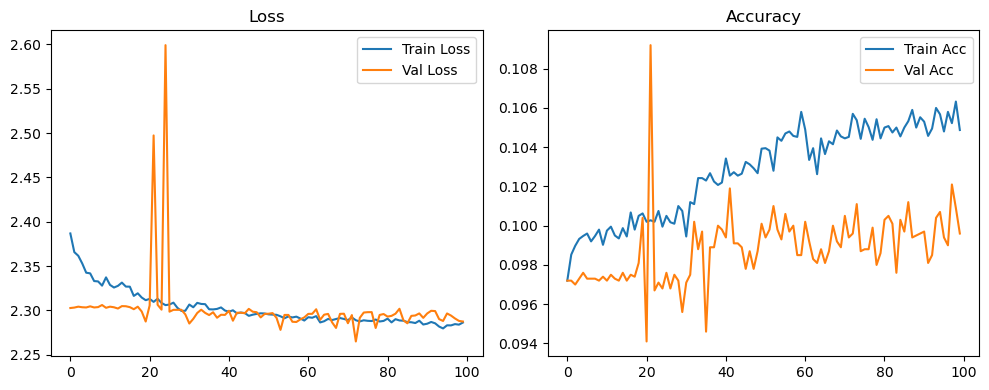

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.2858 Accuracy: 0.1029


🚀 Running: batch256_lr_max_0.0002_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0962 |:   0%|          | 0/100 [01:19<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0962 |:   0%|          | 0/100 [01:19<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0962 |:   1%|          | 1/100 [01:19<2:11:33, 79.73s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0958 |:   1%|          | 1/100 [02:34<2:11:33, 79.73s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0958 |:   1%|          | 1/100 [02:34<2:11:33, 79.73s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0958 |:   2%|▏         | 2/100 [02:34<2:05:13, 76.66s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [02:47<2:05:13, 76.66s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [02:47<2:05:13, 76.66s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [02:48<1:17:31, 47.96s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [03:01<1:17:31, 47.96s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0962 |:   3%|▎         | 3/100 [03:01<1:17:31, 47.96s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [03:01<55:11, 34.50s/it]  

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [03:15<55:11, 34.50s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [03:15<55:11, 34.50s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [03:15<42:52, 27.08s/it]

| LR: 0.000199 | Train Acc: 0.1002 | Val Acc: 0.0952 |:   5%|▌         | 5/100 [03:29<42:52, 27.08s/it]

| LR: 0.000199 | Train Acc: 0.1002 | Val Acc: 0.0952 |:   5%|▌         | 5/100 [03:29<42:52, 27.08s/it]

| LR: 0.000199 | Train Acc: 0.1002 | Val Acc: 0.0952 |:   6%|▌         | 6/100 [03:29<35:25, 22.61s/it]

| LR: 0.000198 | Train Acc: 0.1001 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [03:43<35:25, 22.61s/it]

| LR: 0.000198 | Train Acc: 0.1001 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [03:43<35:25, 22.61s/it]

| LR: 0.000198 | Train Acc: 0.1001 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [03:43<30:39, 19.78s/it]

| LR: 0.000198 | Train Acc: 0.1004 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [03:57<30:39, 19.78s/it]

| LR: 0.000198 | Train Acc: 0.1004 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [03:57<30:39, 19.78s/it]

| LR: 0.000198 | Train Acc: 0.1004 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [03:57<27:27, 17.91s/it]

| LR: 0.000197 | Train Acc: 0.1002 | Val Acc: 0.0928 |:   8%|▊         | 8/100 [04:11<27:27, 17.91s/it]

| LR: 0.000197 | Train Acc: 0.1002 | Val Acc: 0.0928 |:   8%|▊         | 8/100 [04:11<27:27, 17.91s/it]

| LR: 0.000197 | Train Acc: 0.1002 | Val Acc: 0.0928 |:   9%|▉         | 9/100 [04:11<25:13, 16.64s/it]

| LR: 0.000196 | Train Acc: 0.1002 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:25<25:13, 16.64s/it]

| LR: 0.000196 | Train Acc: 0.1002 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:25<25:13, 16.64s/it]

| LR: 0.000196 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:25<23:38, 15.76s/it]

| LR: 0.000195 | Train Acc: 0.1003 | Val Acc: 0.1004 |:  10%|█         | 10/100 [04:39<23:38, 15.76s/it]

| LR: 0.000195 | Train Acc: 0.1003 | Val Acc: 0.1004 |:  10%|█         | 10/100 [04:39<23:38, 15.76s/it]

| LR: 0.000195 | Train Acc: 0.1003 | Val Acc: 0.1004 |:  11%|█         | 11/100 [04:39<22:29, 15.17s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  11%|█         | 11/100 [04:52<22:29, 15.17s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  11%|█         | 11/100 [04:52<22:29, 15.17s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  12%|█▏        | 12/100 [04:52<21:41, 14.79s/it]

| LR: 0.000193 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  12%|█▏        | 12/100 [05:06<21:41, 14.79s/it]

| LR: 0.000193 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  12%|█▏        | 12/100 [05:06<21:41, 14.79s/it]

| LR: 0.000193 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  13%|█▎        | 13/100 [05:06<21:00, 14.49s/it]

| LR: 0.000192 | Train Acc: 0.0989 | Val Acc: 0.0964 |:  13%|█▎        | 13/100 [05:20<21:00, 14.49s/it]

| LR: 0.000192 | Train Acc: 0.0989 | Val Acc: 0.0964 |:  13%|█▎        | 13/100 [05:20<21:00, 14.49s/it]

| LR: 0.000192 | Train Acc: 0.0989 | Val Acc: 0.0964 |:  14%|█▍        | 14/100 [05:20<20:33, 14.34s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [05:34<20:33, 14.34s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [05:34<20:33, 14.34s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [05:34<20:07, 14.21s/it]

| LR: 0.000189 | Train Acc: 0.0987 | Val Acc: 0.0979 |:  15%|█▌        | 15/100 [05:48<20:07, 14.21s/it]

| LR: 0.000189 | Train Acc: 0.0987 | Val Acc: 0.0979 |:  15%|█▌        | 15/100 [05:48<20:07, 14.21s/it]

| LR: 0.000189 | Train Acc: 0.0987 | Val Acc: 0.0979 |:  16%|█▌        | 16/100 [05:48<19:49, 14.16s/it]

| LR: 0.000188 | Train Acc: 0.0991 | Val Acc: 0.1001 |:  16%|█▌        | 16/100 [06:02<19:49, 14.16s/it]

| LR: 0.000188 | Train Acc: 0.0991 | Val Acc: 0.1001 |:  16%|█▌        | 16/100 [06:02<19:49, 14.16s/it]

| LR: 0.000188 | Train Acc: 0.0991 | Val Acc: 0.1001 |:  17%|█▋        | 17/100 [06:02<19:27, 14.07s/it]

| LR: 0.000186 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [06:16<19:27, 14.07s/it]

| LR: 0.000186 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [06:16<19:27, 14.07s/it]

| LR: 0.000186 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  18%|█▊        | 18/100 [06:16<19:11, 14.04s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0994 |:  18%|█▊        | 18/100 [06:30<19:11, 14.04s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0994 |:  18%|█▊        | 18/100 [06:30<19:11, 14.04s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0994 |:  19%|█▉        | 19/100 [06:30<18:53, 14.00s/it]

| LR: 0.000183 | Train Acc: 0.1012 | Val Acc: 0.0966 |:  19%|█▉        | 19/100 [06:44<18:53, 14.00s/it]

| LR: 0.000183 | Train Acc: 0.1012 | Val Acc: 0.0966 |:  19%|█▉        | 19/100 [06:44<18:53, 14.00s/it]

| LR: 0.000183 | Train Acc: 0.1012 | Val Acc: 0.0966 |:  20%|██        | 20/100 [06:44<18:38, 13.98s/it]

| LR: 0.000181 | Train Acc: 0.1016 | Val Acc: 0.1060 |:  20%|██        | 20/100 [06:58<18:38, 13.98s/it]

| LR: 0.000181 | Train Acc: 0.1016 | Val Acc: 0.1060 |:  20%|██        | 20/100 [06:58<18:38, 13.98s/it]

| LR: 0.000181 | Train Acc: 0.1016 | Val Acc: 0.1060 |:  21%|██        | 21/100 [06:58<18:22, 13.95s/it]

| LR: 0.000179 | Train Acc: 0.1011 | Val Acc: 0.1047 |:  21%|██        | 21/100 [07:12<18:22, 13.95s/it]

| LR: 0.000179 | Train Acc: 0.1011 | Val Acc: 0.1047 |:  21%|██        | 21/100 [07:12<18:22, 13.95s/it]

| LR: 0.000179 | Train Acc: 0.1011 | Val Acc: 0.1047 |:  22%|██▏       | 22/100 [07:12<18:05, 13.92s/it]

| LR: 0.000177 | Train Acc: 0.1021 | Val Acc: 0.0969 |:  22%|██▏       | 22/100 [07:25<18:05, 13.92s/it]

| LR: 0.000177 | Train Acc: 0.1021 | Val Acc: 0.0969 |:  22%|██▏       | 22/100 [07:25<18:05, 13.92s/it]

| LR: 0.000177 | Train Acc: 0.1021 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [07:25<17:48, 13.87s/it]

| LR: 0.000175 | Train Acc: 0.1024 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:39<17:48, 13.87s/it]

| LR: 0.000175 | Train Acc: 0.1024 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:39<17:48, 13.87s/it]

| LR: 0.000175 | Train Acc: 0.1024 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [07:39<17:32, 13.84s/it]

| LR: 0.000173 | Train Acc: 0.1035 | Val Acc: 0.1004 |:  24%|██▍       | 24/100 [07:53<17:32, 13.84s/it]

| LR: 0.000173 | Train Acc: 0.1035 | Val Acc: 0.1004 |:  24%|██▍       | 24/100 [07:53<17:32, 13.84s/it]

| LR: 0.000173 | Train Acc: 0.1035 | Val Acc: 0.1004 |:  25%|██▌       | 25/100 [07:53<17:16, 13.82s/it]

| LR: 0.000171 | Train Acc: 0.1026 | Val Acc: 0.0972 |:  25%|██▌       | 25/100 [08:07<17:16, 13.82s/it]

| LR: 0.000171 | Train Acc: 0.1026 | Val Acc: 0.0972 |:  25%|██▌       | 25/100 [08:07<17:16, 13.82s/it]

| LR: 0.000171 | Train Acc: 0.1026 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [08:07<17:02, 13.81s/it]

| LR: 0.000169 | Train Acc: 0.1024 | Val Acc: 0.1038 |:  26%|██▌       | 26/100 [08:21<17:02, 13.81s/it]

| LR: 0.000169 | Train Acc: 0.1024 | Val Acc: 0.1038 |:  26%|██▌       | 26/100 [08:21<17:02, 13.81s/it]

| LR: 0.000169 | Train Acc: 0.1024 | Val Acc: 0.1038 |:  27%|██▋       | 27/100 [08:21<16:49, 13.82s/it]

| LR: 0.000166 | Train Acc: 0.1025 | Val Acc: 0.0985 |:  27%|██▋       | 27/100 [08:34<16:49, 13.82s/it]

| LR: 0.000166 | Train Acc: 0.1025 | Val Acc: 0.0985 |:  27%|██▋       | 27/100 [08:34<16:49, 13.82s/it]

| LR: 0.000166 | Train Acc: 0.1025 | Val Acc: 0.0985 |:  28%|██▊       | 28/100 [08:35<16:37, 13.86s/it]

| LR: 0.000164 | Train Acc: 0.1026 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [08:48<16:37, 13.86s/it]

| LR: 0.000164 | Train Acc: 0.1026 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [08:48<16:37, 13.86s/it]

| LR: 0.000164 | Train Acc: 0.1026 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [08:48<16:23, 13.86s/it]

| LR: 0.000161 | Train Acc: 0.1031 | Val Acc: 0.1060 |:  29%|██▉       | 29/100 [09:02<16:23, 13.86s/it]

| LR: 0.000161 | Train Acc: 0.1031 | Val Acc: 0.1060 |:  29%|██▉       | 29/100 [09:02<16:23, 13.86s/it]

| LR: 0.000161 | Train Acc: 0.1031 | Val Acc: 0.1060 |:  30%|███       | 30/100 [09:02<16:10, 13.86s/it]

| LR: 0.000159 | Train Acc: 0.1032 | Val Acc: 0.1072 |:  30%|███       | 30/100 [09:16<16:10, 13.86s/it]

| LR: 0.000159 | Train Acc: 0.1032 | Val Acc: 0.1072 |:  30%|███       | 30/100 [09:16<16:10, 13.86s/it]

| LR: 0.000159 | Train Acc: 0.1032 | Val Acc: 0.1072 |:  31%|███       | 31/100 [09:16<15:54, 13.83s/it]

| LR: 0.000156 | Train Acc: 0.1024 | Val Acc: 0.1020 |:  31%|███       | 31/100 [09:30<15:54, 13.83s/it]

| LR: 0.000156 | Train Acc: 0.1024 | Val Acc: 0.1020 |:  31%|███       | 31/100 [09:30<15:54, 13.83s/it]

| LR: 0.000156 | Train Acc: 0.1024 | Val Acc: 0.1020 |:  32%|███▏      | 32/100 [09:30<15:40, 13.83s/it]

| LR: 0.000154 | Train Acc: 0.1037 | Val Acc: 0.1008 |:  32%|███▏      | 32/100 [09:44<15:40, 13.83s/it]

| LR: 0.000154 | Train Acc: 0.1037 | Val Acc: 0.1008 |:  32%|███▏      | 32/100 [09:44<15:40, 13.83s/it]

| LR: 0.000154 | Train Acc: 0.1037 | Val Acc: 0.1008 |:  33%|███▎      | 33/100 [09:44<15:24, 13.80s/it]

| LR: 0.000151 | Train Acc: 0.1046 | Val Acc: 0.1011 |:  33%|███▎      | 33/100 [09:57<15:24, 13.80s/it]

| LR: 0.000151 | Train Acc: 0.1046 | Val Acc: 0.1011 |:  33%|███▎      | 33/100 [09:57<15:24, 13.80s/it]

| LR: 0.000151 | Train Acc: 0.1046 | Val Acc: 0.1011 |:  34%|███▍      | 34/100 [09:57<15:10, 13.79s/it]

| LR: 0.000148 | Train Acc: 0.1026 | Val Acc: 0.1008 |:  34%|███▍      | 34/100 [10:11<15:10, 13.79s/it]

| LR: 0.000148 | Train Acc: 0.1026 | Val Acc: 0.1008 |:  34%|███▍      | 34/100 [10:11<15:10, 13.79s/it]

| LR: 0.000148 | Train Acc: 0.1026 | Val Acc: 0.1008 |:  35%|███▌      | 35/100 [10:11<14:56, 13.79s/it]

| LR: 0.000146 | Train Acc: 0.1042 | Val Acc: 0.0979 |:  35%|███▌      | 35/100 [10:25<14:56, 13.79s/it]

| LR: 0.000146 | Train Acc: 0.1042 | Val Acc: 0.0979 |:  35%|███▌      | 35/100 [10:25<14:56, 13.79s/it]

| LR: 0.000146 | Train Acc: 0.1042 | Val Acc: 0.0979 |:  36%|███▌      | 36/100 [10:25<14:42, 13.79s/it]

| LR: 0.000143 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  36%|███▌      | 36/100 [10:39<14:42, 13.79s/it]

| LR: 0.000143 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  36%|███▌      | 36/100 [10:39<14:42, 13.79s/it]

| LR: 0.000143 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  37%|███▋      | 37/100 [10:39<14:30, 13.81s/it]

| LR: 0.000140 | Train Acc: 0.1049 | Val Acc: 0.1103 |:  37%|███▋      | 37/100 [10:53<14:30, 13.81s/it]

| LR: 0.000140 | Train Acc: 0.1049 | Val Acc: 0.1103 |:  37%|███▋      | 37/100 [10:53<14:30, 13.81s/it]

| LR: 0.000140 | Train Acc: 0.1049 | Val Acc: 0.1103 |:  38%|███▊      | 38/100 [10:53<14:19, 13.86s/it]

| LR: 0.000137 | Train Acc: 0.1041 | Val Acc: 0.1056 |:  38%|███▊      | 38/100 [11:07<14:19, 13.86s/it]

| LR: 0.000137 | Train Acc: 0.1041 | Val Acc: 0.1056 |:  38%|███▊      | 38/100 [11:07<14:19, 13.86s/it]

| LR: 0.000137 | Train Acc: 0.1041 | Val Acc: 0.1056 |:  39%|███▉      | 39/100 [11:07<14:04, 13.85s/it]

| LR: 0.000134 | Train Acc: 0.1042 | Val Acc: 0.1069 |:  39%|███▉      | 39/100 [11:20<14:04, 13.85s/it]

| LR: 0.000134 | Train Acc: 0.1042 | Val Acc: 0.1069 |:  39%|███▉      | 39/100 [11:20<14:04, 13.85s/it]

| LR: 0.000134 | Train Acc: 0.1042 | Val Acc: 0.1069 |:  40%|████      | 40/100 [11:21<13:52, 13.88s/it]

| LR: 0.000131 | Train Acc: 0.1049 | Val Acc: 0.1016 |:  40%|████      | 40/100 [11:34<13:52, 13.88s/it]

| LR: 0.000131 | Train Acc: 0.1049 | Val Acc: 0.1016 |:  40%|████      | 40/100 [11:34<13:52, 13.88s/it]

| LR: 0.000131 | Train Acc: 0.1049 | Val Acc: 0.1016 |:  41%|████      | 41/100 [11:34<13:35, 13.82s/it]

| LR: 0.000128 | Train Acc: 0.1040 | Val Acc: 0.1000 |:  41%|████      | 41/100 [11:48<13:35, 13.82s/it]

| LR: 0.000128 | Train Acc: 0.1040 | Val Acc: 0.1000 |:  41%|████      | 41/100 [11:48<13:35, 13.82s/it]

| LR: 0.000128 | Train Acc: 0.1040 | Val Acc: 0.1000 |:  42%|████▏     | 42/100 [11:48<13:23, 13.85s/it]

| LR: 0.000125 | Train Acc: 0.1050 | Val Acc: 0.0996 |:  42%|████▏     | 42/100 [12:02<13:23, 13.85s/it]

| LR: 0.000125 | Train Acc: 0.1050 | Val Acc: 0.0996 |:  42%|████▏     | 42/100 [12:02<13:23, 13.85s/it]

| LR: 0.000125 | Train Acc: 0.1050 | Val Acc: 0.0996 |:  43%|████▎     | 43/100 [12:02<13:12, 13.90s/it]

| LR: 0.000122 | Train Acc: 0.1051 | Val Acc: 0.1024 |:  43%|████▎     | 43/100 [12:16<13:12, 13.90s/it]

| LR: 0.000122 | Train Acc: 0.1051 | Val Acc: 0.1024 |:  43%|████▎     | 43/100 [12:16<13:12, 13.90s/it]

| LR: 0.000122 | Train Acc: 0.1051 | Val Acc: 0.1024 |:  44%|████▍     | 44/100 [12:16<12:56, 13.87s/it]

| LR: 0.000119 | Train Acc: 0.1050 | Val Acc: 0.0960 |:  44%|████▍     | 44/100 [12:30<12:56, 13.87s/it]

| LR: 0.000119 | Train Acc: 0.1050 | Val Acc: 0.0960 |:  44%|████▍     | 44/100 [12:30<12:56, 13.87s/it]

| LR: 0.000119 | Train Acc: 0.1050 | Val Acc: 0.0960 |:  45%|████▌     | 45/100 [12:30<12:42, 13.86s/it]

| LR: 0.000116 | Train Acc: 0.1051 | Val Acc: 0.1004 |:  45%|████▌     | 45/100 [12:44<12:42, 13.86s/it]

| LR: 0.000116 | Train Acc: 0.1051 | Val Acc: 0.1004 |:  45%|████▌     | 45/100 [12:44<12:42, 13.86s/it]

| LR: 0.000116 | Train Acc: 0.1051 | Val Acc: 0.1004 |:  46%|████▌     | 46/100 [12:44<12:27, 13.85s/it]

| LR: 0.000113 | Train Acc: 0.1062 | Val Acc: 0.1040 |:  46%|████▌     | 46/100 [12:57<12:27, 13.85s/it]

| LR: 0.000113 | Train Acc: 0.1062 | Val Acc: 0.1040 |:  46%|████▌     | 46/100 [12:57<12:27, 13.85s/it]

| LR: 0.000113 | Train Acc: 0.1062 | Val Acc: 0.1040 |:  47%|████▋     | 47/100 [12:58<12:15, 13.87s/it]

| LR: 0.000110 | Train Acc: 0.1063 | Val Acc: 0.1050 |:  47%|████▋     | 47/100 [13:11<12:15, 13.87s/it]

| LR: 0.000110 | Train Acc: 0.1063 | Val Acc: 0.1050 |:  47%|████▋     | 47/100 [13:11<12:15, 13.87s/it]

| LR: 0.000110 | Train Acc: 0.1063 | Val Acc: 0.1050 |:  48%|████▊     | 48/100 [13:11<12:01, 13.87s/it]

| LR: 0.000107 | Train Acc: 0.1078 | Val Acc: 0.0991 |:  48%|████▊     | 48/100 [13:25<12:01, 13.87s/it]

| LR: 0.000107 | Train Acc: 0.1078 | Val Acc: 0.0991 |:  48%|████▊     | 48/100 [13:25<12:01, 13.87s/it]

| LR: 0.000107 | Train Acc: 0.1078 | Val Acc: 0.0991 |:  49%|████▉     | 49/100 [13:25<11:49, 13.91s/it]

| LR: 0.000104 | Train Acc: 0.1075 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [13:39<11:49, 13.91s/it]

| LR: 0.000104 | Train Acc: 0.1075 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [13:39<11:49, 13.91s/it]

| LR: 0.000104 | Train Acc: 0.1075 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [13:39<11:35, 13.90s/it]

| LR: 0.000101 | Train Acc: 0.1076 | Val Acc: 0.1082 |:  50%|█████     | 50/100 [13:53<11:35, 13.90s/it]

| LR: 0.000101 | Train Acc: 0.1076 | Val Acc: 0.1082 |:  50%|█████     | 50/100 [13:53<11:35, 13.90s/it]

| LR: 0.000101 | Train Acc: 0.1076 | Val Acc: 0.1082 |:  51%|█████     | 51/100 [13:53<11:20, 13.89s/it]

| LR: 0.000097 | Train Acc: 0.1079 | Val Acc: 0.1130 |:  51%|█████     | 51/100 [14:07<11:20, 13.89s/it]

| LR: 0.000097 | Train Acc: 0.1079 | Val Acc: 0.1130 |:  51%|█████     | 51/100 [14:07<11:20, 13.89s/it]

| LR: 0.000097 | Train Acc: 0.1079 | Val Acc: 0.1130 |:  52%|█████▏    | 52/100 [14:07<11:07, 13.91s/it]

| LR: 0.000094 | Train Acc: 0.1079 | Val Acc: 0.1015 |:  52%|█████▏    | 52/100 [14:21<11:07, 13.91s/it]

| LR: 0.000094 | Train Acc: 0.1079 | Val Acc: 0.1015 |:  52%|█████▏    | 52/100 [14:21<11:07, 13.91s/it]

| LR: 0.000094 | Train Acc: 0.1079 | Val Acc: 0.1015 |:  53%|█████▎    | 53/100 [14:21<10:53, 13.90s/it]

| LR: 0.000091 | Train Acc: 0.1083 | Val Acc: 0.1030 |:  53%|█████▎    | 53/100 [14:35<10:53, 13.90s/it]

| LR: 0.000091 | Train Acc: 0.1083 | Val Acc: 0.1030 |:  53%|█████▎    | 53/100 [14:35<10:53, 13.90s/it]

| LR: 0.000091 | Train Acc: 0.1083 | Val Acc: 0.1030 |:  54%|█████▍    | 54/100 [14:35<10:37, 13.87s/it]

| LR: 0.000088 | Train Acc: 0.1090 | Val Acc: 0.1132 |:  54%|█████▍    | 54/100 [14:49<10:37, 13.87s/it]

| LR: 0.000088 | Train Acc: 0.1090 | Val Acc: 0.1132 |:  54%|█████▍    | 54/100 [14:49<10:37, 13.87s/it]

| LR: 0.000088 | Train Acc: 0.1090 | Val Acc: 0.1132 |:  55%|█████▌    | 55/100 [14:49<10:23, 13.86s/it]

| LR: 0.000085 | Train Acc: 0.1085 | Val Acc: 0.1126 |:  55%|█████▌    | 55/100 [15:02<10:23, 13.86s/it]

| LR: 0.000085 | Train Acc: 0.1085 | Val Acc: 0.1126 |:  55%|█████▌    | 55/100 [15:02<10:23, 13.86s/it]

| LR: 0.000085 | Train Acc: 0.1085 | Val Acc: 0.1126 |:  56%|█████▌    | 56/100 [15:02<10:09, 13.84s/it]

| LR: 0.000082 | Train Acc: 0.1090 | Val Acc: 0.1090 |:  56%|█████▌    | 56/100 [15:16<10:09, 13.84s/it]

| LR: 0.000082 | Train Acc: 0.1090 | Val Acc: 0.1090 |:  56%|█████▌    | 56/100 [15:16<10:09, 13.84s/it]

| LR: 0.000082 | Train Acc: 0.1090 | Val Acc: 0.1090 |:  57%|█████▋    | 57/100 [15:16<09:54, 13.84s/it]

| LR: 0.000079 | Train Acc: 0.1105 | Val Acc: 0.1053 |:  57%|█████▋    | 57/100 [15:30<09:54, 13.84s/it]

| LR: 0.000079 | Train Acc: 0.1105 | Val Acc: 0.1053 |:  57%|█████▋    | 57/100 [15:30<09:54, 13.84s/it]

| LR: 0.000079 | Train Acc: 0.1105 | Val Acc: 0.1053 |:  58%|█████▊    | 58/100 [15:30<09:40, 13.83s/it]

| LR: 0.000076 | Train Acc: 0.1098 | Val Acc: 0.1076 |:  58%|█████▊    | 58/100 [15:44<09:40, 13.83s/it]

| LR: 0.000076 | Train Acc: 0.1098 | Val Acc: 0.1076 |:  58%|█████▊    | 58/100 [15:44<09:40, 13.83s/it]

| LR: 0.000076 | Train Acc: 0.1098 | Val Acc: 0.1076 |:  59%|█████▉    | 59/100 [15:44<09:26, 13.81s/it]

| LR: 0.000073 | Train Acc: 0.1075 | Val Acc: 0.1166 |:  59%|█████▉    | 59/100 [15:58<09:26, 13.81s/it]

| LR: 0.000073 | Train Acc: 0.1075 | Val Acc: 0.1166 |:  59%|█████▉    | 59/100 [15:58<09:26, 13.81s/it]

| LR: 0.000073 | Train Acc: 0.1075 | Val Acc: 0.1166 |:  60%|██████    | 60/100 [15:58<09:11, 13.80s/it]

| LR: 0.000070 | Train Acc: 0.1099 | Val Acc: 0.1050 |:  60%|██████    | 60/100 [16:11<09:11, 13.80s/it]

| LR: 0.000070 | Train Acc: 0.1099 | Val Acc: 0.1050 |:  60%|██████    | 60/100 [16:11<09:11, 13.80s/it]

| LR: 0.000070 | Train Acc: 0.1099 | Val Acc: 0.1050 |:  61%|██████    | 61/100 [16:11<08:57, 13.79s/it]

| LR: 0.000067 | Train Acc: 0.1108 | Val Acc: 0.1008 |:  61%|██████    | 61/100 [16:25<08:57, 13.79s/it]

| LR: 0.000067 | Train Acc: 0.1108 | Val Acc: 0.1008 |:  61%|██████    | 61/100 [16:25<08:57, 13.79s/it]

| LR: 0.000067 | Train Acc: 0.1108 | Val Acc: 0.1008 |:  62%|██████▏   | 62/100 [16:25<08:45, 13.82s/it]

| LR: 0.000064 | Train Acc: 0.1101 | Val Acc: 0.1091 |:  62%|██████▏   | 62/100 [16:39<08:45, 13.82s/it]

| LR: 0.000064 | Train Acc: 0.1101 | Val Acc: 0.1091 |:  62%|██████▏   | 62/100 [16:39<08:45, 13.82s/it]

| LR: 0.000064 | Train Acc: 0.1101 | Val Acc: 0.1091 |:  63%|██████▎   | 63/100 [16:39<08:30, 13.81s/it]

| LR: 0.000061 | Train Acc: 0.1113 | Val Acc: 0.1189 |:  63%|██████▎   | 63/100 [16:53<08:30, 13.81s/it]

| LR: 0.000061 | Train Acc: 0.1113 | Val Acc: 0.1189 |:  63%|██████▎   | 63/100 [16:53<08:30, 13.81s/it]

| LR: 0.000061 | Train Acc: 0.1113 | Val Acc: 0.1189 |:  64%|██████▍   | 64/100 [16:53<08:17, 13.82s/it]

| LR: 0.000058 | Train Acc: 0.1106 | Val Acc: 0.1168 |:  64%|██████▍   | 64/100 [17:07<08:17, 13.82s/it]

| LR: 0.000058 | Train Acc: 0.1106 | Val Acc: 0.1168 |:  64%|██████▍   | 64/100 [17:07<08:17, 13.82s/it]

| LR: 0.000058 | Train Acc: 0.1106 | Val Acc: 0.1168 |:  65%|██████▌   | 65/100 [17:07<08:03, 13.82s/it]

| LR: 0.000055 | Train Acc: 0.1113 | Val Acc: 0.1055 |:  65%|██████▌   | 65/100 [17:21<08:03, 13.82s/it]

| LR: 0.000055 | Train Acc: 0.1113 | Val Acc: 0.1055 |:  65%|██████▌   | 65/100 [17:21<08:03, 13.82s/it]

| LR: 0.000055 | Train Acc: 0.1113 | Val Acc: 0.1055 |:  66%|██████▌   | 66/100 [17:21<07:50, 13.84s/it]

| LR: 0.000053 | Train Acc: 0.1105 | Val Acc: 0.1007 |:  66%|██████▌   | 66/100 [17:34<07:50, 13.84s/it]

| LR: 0.000053 | Train Acc: 0.1105 | Val Acc: 0.1007 |:  66%|██████▌   | 66/100 [17:34<07:50, 13.84s/it]

| LR: 0.000053 | Train Acc: 0.1105 | Val Acc: 0.1007 |:  67%|██████▋   | 67/100 [17:34<07:37, 13.86s/it]

| LR: 0.000050 | Train Acc: 0.1104 | Val Acc: 0.1124 |:  67%|██████▋   | 67/100 [17:48<07:37, 13.86s/it]

| LR: 0.000050 | Train Acc: 0.1104 | Val Acc: 0.1124 |:  67%|██████▋   | 67/100 [17:48<07:37, 13.86s/it]

| LR: 0.000050 | Train Acc: 0.1104 | Val Acc: 0.1124 |:  68%|██████▊   | 68/100 [17:48<07:23, 13.85s/it]

| LR: 0.000047 | Train Acc: 0.1106 | Val Acc: 0.1132 |:  68%|██████▊   | 68/100 [18:02<07:23, 13.85s/it]

| LR: 0.000047 | Train Acc: 0.1106 | Val Acc: 0.1132 |:  68%|██████▊   | 68/100 [18:02<07:23, 13.85s/it]

| LR: 0.000047 | Train Acc: 0.1106 | Val Acc: 0.1132 |:  69%|██████▉   | 69/100 [18:02<07:09, 13.86s/it]

| LR: 0.000045 | Train Acc: 0.1121 | Val Acc: 0.1114 |:  69%|██████▉   | 69/100 [18:16<07:09, 13.86s/it]

| LR: 0.000045 | Train Acc: 0.1121 | Val Acc: 0.1114 |:  69%|██████▉   | 69/100 [18:16<07:09, 13.86s/it]

| LR: 0.000045 | Train Acc: 0.1121 | Val Acc: 0.1114 |:  70%|███████   | 70/100 [18:16<06:55, 13.84s/it]

| LR: 0.000042 | Train Acc: 0.1111 | Val Acc: 0.1108 |:  70%|███████   | 70/100 [18:30<06:55, 13.84s/it]

| LR: 0.000042 | Train Acc: 0.1111 | Val Acc: 0.1108 |:  70%|███████   | 70/100 [18:30<06:55, 13.84s/it]

| LR: 0.000042 | Train Acc: 0.1111 | Val Acc: 0.1108 |:  71%|███████   | 71/100 [18:30<06:41, 13.85s/it]

| LR: 0.000040 | Train Acc: 0.1108 | Val Acc: 0.1137 |:  71%|███████   | 71/100 [18:44<06:41, 13.85s/it]

| LR: 0.000040 | Train Acc: 0.1108 | Val Acc: 0.1137 |:  71%|███████   | 71/100 [18:44<06:41, 13.85s/it]

| LR: 0.000040 | Train Acc: 0.1108 | Val Acc: 0.1137 |:  72%|███████▏  | 72/100 [18:44<06:27, 13.84s/it]

| LR: 0.000037 | Train Acc: 0.1115 | Val Acc: 0.1123 |:  72%|███████▏  | 72/100 [18:57<06:27, 13.84s/it]

| LR: 0.000037 | Train Acc: 0.1115 | Val Acc: 0.1123 |:  72%|███████▏  | 72/100 [18:57<06:27, 13.84s/it]

| LR: 0.000037 | Train Acc: 0.1115 | Val Acc: 0.1123 |:  73%|███████▎  | 73/100 [18:57<06:13, 13.82s/it]

| LR: 0.000035 | Train Acc: 0.1112 | Val Acc: 0.1104 |:  73%|███████▎  | 73/100 [19:11<06:13, 13.82s/it]

| LR: 0.000035 | Train Acc: 0.1112 | Val Acc: 0.1104 |:  73%|███████▎  | 73/100 [19:11<06:13, 13.82s/it]

| LR: 0.000035 | Train Acc: 0.1112 | Val Acc: 0.1104 |:  74%|███████▍  | 74/100 [19:11<05:59, 13.83s/it]

| LR: 0.000032 | Train Acc: 0.1113 | Val Acc: 0.1081 |:  74%|███████▍  | 74/100 [19:25<05:59, 13.83s/it]

| LR: 0.000032 | Train Acc: 0.1113 | Val Acc: 0.1081 |:  74%|███████▍  | 74/100 [19:25<05:59, 13.83s/it]

| LR: 0.000032 | Train Acc: 0.1113 | Val Acc: 0.1081 |:  75%|███████▌  | 75/100 [19:25<05:45, 13.84s/it]

| LR: 0.000030 | Train Acc: 0.1113 | Val Acc: 0.1052 |:  75%|███████▌  | 75/100 [19:39<05:45, 13.84s/it]

| LR: 0.000030 | Train Acc: 0.1113 | Val Acc: 0.1052 |:  75%|███████▌  | 75/100 [19:39<05:45, 13.84s/it]

| LR: 0.000030 | Train Acc: 0.1113 | Val Acc: 0.1052 |:  76%|███████▌  | 76/100 [19:39<05:32, 13.84s/it]

| LR: 0.000028 | Train Acc: 0.1121 | Val Acc: 0.1122 |:  76%|███████▌  | 76/100 [19:53<05:32, 13.84s/it]

| LR: 0.000028 | Train Acc: 0.1121 | Val Acc: 0.1122 |:  76%|███████▌  | 76/100 [19:53<05:32, 13.84s/it]

| LR: 0.000028 | Train Acc: 0.1121 | Val Acc: 0.1122 |:  77%|███████▋  | 77/100 [19:53<05:18, 13.84s/it]

| LR: 0.000026 | Train Acc: 0.1125 | Val Acc: 0.1098 |:  77%|███████▋  | 77/100 [20:07<05:18, 13.84s/it]

| LR: 0.000026 | Train Acc: 0.1125 | Val Acc: 0.1098 |:  77%|███████▋  | 77/100 [20:07<05:18, 13.84s/it]

| LR: 0.000026 | Train Acc: 0.1125 | Val Acc: 0.1098 |:  78%|███████▊  | 78/100 [20:07<05:04, 13.83s/it]

| LR: 0.000024 | Train Acc: 0.1124 | Val Acc: 0.1054 |:  78%|███████▊  | 78/100 [20:20<05:04, 13.83s/it]

| LR: 0.000024 | Train Acc: 0.1124 | Val Acc: 0.1054 |:  78%|███████▊  | 78/100 [20:20<05:04, 13.83s/it]

| LR: 0.000024 | Train Acc: 0.1124 | Val Acc: 0.1054 |:  79%|███████▉  | 79/100 [20:21<04:50, 13.83s/it]

| LR: 0.000022 | Train Acc: 0.1123 | Val Acc: 0.1076 |:  79%|███████▉  | 79/100 [20:34<04:50, 13.83s/it]

| LR: 0.000022 | Train Acc: 0.1123 | Val Acc: 0.1076 |:  79%|███████▉  | 79/100 [20:34<04:50, 13.83s/it]

| LR: 0.000022 | Train Acc: 0.1123 | Val Acc: 0.1076 |:  80%|████████  | 80/100 [20:34<04:37, 13.87s/it]

| LR: 0.000020 | Train Acc: 0.1111 | Val Acc: 0.1077 |:  80%|████████  | 80/100 [20:48<04:37, 13.87s/it]

| LR: 0.000020 | Train Acc: 0.1111 | Val Acc: 0.1077 |:  80%|████████  | 80/100 [20:48<04:37, 13.87s/it]

| LR: 0.000020 | Train Acc: 0.1111 | Val Acc: 0.1077 |:  81%|████████  | 81/100 [20:48<04:23, 13.89s/it]

| LR: 0.000018 | Train Acc: 0.1121 | Val Acc: 0.1061 |:  81%|████████  | 81/100 [21:02<04:23, 13.89s/it]

| LR: 0.000018 | Train Acc: 0.1121 | Val Acc: 0.1061 |:  81%|████████  | 81/100 [21:02<04:23, 13.89s/it]

| LR: 0.000018 | Train Acc: 0.1121 | Val Acc: 0.1061 |:  82%|████████▏ | 82/100 [21:02<04:10, 13.90s/it]

| LR: 0.000016 | Train Acc: 0.1115 | Val Acc: 0.1045 |:  82%|████████▏ | 82/100 [21:16<04:10, 13.90s/it]

| LR: 0.000016 | Train Acc: 0.1115 | Val Acc: 0.1045 |:  82%|████████▏ | 82/100 [21:16<04:10, 13.90s/it]

| LR: 0.000016 | Train Acc: 0.1115 | Val Acc: 0.1045 |:  83%|████████▎ | 83/100 [21:16<03:55, 13.86s/it]

| LR: 0.000015 | Train Acc: 0.1121 | Val Acc: 0.1063 |:  83%|████████▎ | 83/100 [21:30<03:55, 13.86s/it]

| LR: 0.000015 | Train Acc: 0.1121 | Val Acc: 0.1063 |:  83%|████████▎ | 83/100 [21:30<03:55, 13.86s/it]

| LR: 0.000015 | Train Acc: 0.1121 | Val Acc: 0.1063 |:  84%|████████▍ | 84/100 [21:30<03:41, 13.82s/it]

| LR: 0.000013 | Train Acc: 0.1111 | Val Acc: 0.1064 |:  84%|████████▍ | 84/100 [21:44<03:41, 13.82s/it]

| LR: 0.000013 | Train Acc: 0.1111 | Val Acc: 0.1064 |:  84%|████████▍ | 84/100 [21:44<03:41, 13.82s/it]

| LR: 0.000013 | Train Acc: 0.1111 | Val Acc: 0.1064 |:  85%|████████▌ | 85/100 [21:44<03:27, 13.84s/it]

| LR: 0.000012 | Train Acc: 0.1113 | Val Acc: 0.1117 |:  85%|████████▌ | 85/100 [21:58<03:27, 13.84s/it]

| LR: 0.000012 | Train Acc: 0.1113 | Val Acc: 0.1117 |:  85%|████████▌ | 85/100 [21:58<03:27, 13.84s/it]

| LR: 0.000012 | Train Acc: 0.1113 | Val Acc: 0.1117 |:  86%|████████▌ | 86/100 [21:58<03:13, 13.85s/it]

| LR: 0.000010 | Train Acc: 0.1113 | Val Acc: 0.1137 |:  86%|████████▌ | 86/100 [22:11<03:13, 13.85s/it]

| LR: 0.000010 | Train Acc: 0.1113 | Val Acc: 0.1137 |:  86%|████████▌ | 86/100 [22:11<03:13, 13.85s/it]

| LR: 0.000010 | Train Acc: 0.1113 | Val Acc: 0.1137 |:  87%|████████▋ | 87/100 [22:11<03:00, 13.85s/it]

| LR: 0.000009 | Train Acc: 0.1114 | Val Acc: 0.1163 |:  87%|████████▋ | 87/100 [22:25<03:00, 13.85s/it]

| LR: 0.000009 | Train Acc: 0.1114 | Val Acc: 0.1163 |:  87%|████████▋ | 87/100 [22:25<03:00, 13.85s/it]

| LR: 0.000009 | Train Acc: 0.1114 | Val Acc: 0.1163 |:  88%|████████▊ | 88/100 [22:25<02:46, 13.85s/it]

| LR: 0.000008 | Train Acc: 0.1118 | Val Acc: 0.1038 |:  88%|████████▊ | 88/100 [22:39<02:46, 13.85s/it]

| LR: 0.000008 | Train Acc: 0.1118 | Val Acc: 0.1038 |:  88%|████████▊ | 88/100 [22:39<02:46, 13.85s/it]

| LR: 0.000008 | Train Acc: 0.1118 | Val Acc: 0.1038 |:  89%|████████▉ | 89/100 [22:39<02:32, 13.84s/it]

| LR: 0.000007 | Train Acc: 0.1108 | Val Acc: 0.1124 |:  89%|████████▉ | 89/100 [22:53<02:32, 13.84s/it]

| LR: 0.000007 | Train Acc: 0.1108 | Val Acc: 0.1124 |:  89%|████████▉ | 89/100 [22:53<02:32, 13.84s/it]

| LR: 0.000007 | Train Acc: 0.1108 | Val Acc: 0.1124 |:  90%|█████████ | 90/100 [22:53<02:18, 13.86s/it]

| LR: 0.000006 | Train Acc: 0.1116 | Val Acc: 0.1122 |:  90%|█████████ | 90/100 [23:07<02:18, 13.86s/it]

| LR: 0.000006 | Train Acc: 0.1116 | Val Acc: 0.1122 |:  90%|█████████ | 90/100 [23:07<02:18, 13.86s/it]

| LR: 0.000006 | Train Acc: 0.1116 | Val Acc: 0.1122 |:  91%|█████████ | 91/100 [23:07<02:04, 13.87s/it]

| LR: 0.000005 | Train Acc: 0.1117 | Val Acc: 0.1080 |:  91%|█████████ | 91/100 [23:21<02:04, 13.87s/it]

| LR: 0.000005 | Train Acc: 0.1117 | Val Acc: 0.1080 |:  91%|█████████ | 91/100 [23:21<02:04, 13.87s/it]

| LR: 0.000005 | Train Acc: 0.1117 | Val Acc: 0.1080 |:  92%|█████████▏| 92/100 [23:21<01:50, 13.86s/it]

| LR: 0.000004 | Train Acc: 0.1121 | Val Acc: 0.1048 |:  92%|█████████▏| 92/100 [23:34<01:50, 13.86s/it]

| LR: 0.000004 | Train Acc: 0.1121 | Val Acc: 0.1048 |:  92%|█████████▏| 92/100 [23:34<01:50, 13.86s/it]

| LR: 0.000004 | Train Acc: 0.1121 | Val Acc: 0.1048 |:  93%|█████████▎| 93/100 [23:35<01:36, 13.85s/it]

| LR: 0.000003 | Train Acc: 0.1110 | Val Acc: 0.1090 |:  93%|█████████▎| 93/100 [23:48<01:36, 13.85s/it]

| LR: 0.000003 | Train Acc: 0.1110 | Val Acc: 0.1090 |:  93%|█████████▎| 93/100 [23:48<01:36, 13.85s/it]

| LR: 0.000003 | Train Acc: 0.1110 | Val Acc: 0.1090 |:  94%|█████████▍| 94/100 [23:48<01:23, 13.86s/it]

| LR: 0.000003 | Train Acc: 0.1123 | Val Acc: 0.1064 |:  94%|█████████▍| 94/100 [24:02<01:23, 13.86s/it]

| LR: 0.000003 | Train Acc: 0.1123 | Val Acc: 0.1064 |:  94%|█████████▍| 94/100 [24:02<01:23, 13.86s/it]

| LR: 0.000003 | Train Acc: 0.1123 | Val Acc: 0.1064 |:  95%|█████████▌| 95/100 [24:02<01:09, 13.88s/it]

| LR: 0.000002 | Train Acc: 0.1111 | Val Acc: 0.1085 |:  95%|█████████▌| 95/100 [24:16<01:09, 13.88s/it]

| LR: 0.000002 | Train Acc: 0.1111 | Val Acc: 0.1085 |:  95%|█████████▌| 95/100 [24:16<01:09, 13.88s/it]

| LR: 0.000002 | Train Acc: 0.1111 | Val Acc: 0.1085 |:  96%|█████████▌| 96/100 [24:16<00:55, 13.86s/it]

| LR: 0.000002 | Train Acc: 0.1126 | Val Acc: 0.1087 |:  96%|█████████▌| 96/100 [24:30<00:55, 13.86s/it]

| LR: 0.000002 | Train Acc: 0.1126 | Val Acc: 0.1087 |:  96%|█████████▌| 96/100 [24:30<00:55, 13.86s/it]

| LR: 0.000002 | Train Acc: 0.1126 | Val Acc: 0.1087 |:  97%|█████████▋| 97/100 [24:30<00:41, 13.87s/it]

| LR: 0.000001 | Train Acc: 0.1117 | Val Acc: 0.1038 |:  97%|█████████▋| 97/100 [24:44<00:41, 13.87s/it]

| LR: 0.000001 | Train Acc: 0.1117 | Val Acc: 0.1038 |:  97%|█████████▋| 97/100 [24:44<00:41, 13.87s/it]

| LR: 0.000001 | Train Acc: 0.1117 | Val Acc: 0.1038 |:  98%|█████████▊| 98/100 [24:44<00:27, 13.86s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1086 |:  98%|█████████▊| 98/100 [24:58<00:27, 13.86s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1086 |:  98%|█████████▊| 98/100 [24:58<00:27, 13.86s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1086 |:  99%|█████████▉| 99/100 [24:58<00:13, 13.87s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1055 |:  99%|█████████▉| 99/100 [25:12<00:13, 13.87s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1055 |:  99%|█████████▉| 99/100 [25:12<00:13, 13.87s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1055 |: 100%|██████████| 100/100 [25:12<00:00, 13.86s/it]

| LR: 0.000001 | Train Acc: 0.1121 | Val Acc: 0.1055 |: 100%|██████████| 100/100 [25:12<00:00, 15.12s/it]

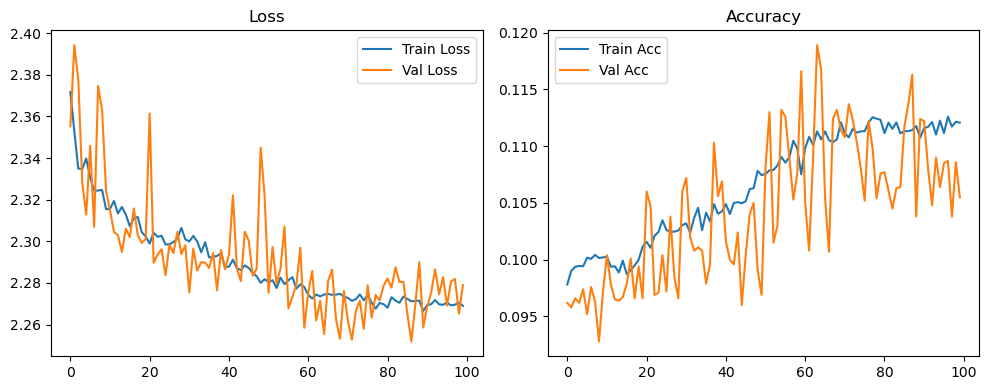

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.31it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.77it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

Original Model Final Test Loss: 2.2758 Accuracy: 0.1079


🚀 Running: batch256_lr_max_0.0002_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0957 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0957 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0957 |:   1%|          | 1/100 [01:20<2:12:33, 80.34s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0961 |:   1%|          | 1/100 [02:35<2:12:33, 80.34s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0961 |:   1%|          | 1/100 [02:35<2:12:33, 80.34s/it]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0961 |:   2%|▏         | 2/100 [02:35<2:06:08, 77.23s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0964 |:   2%|▏         | 2/100 [02:49<2:06:08, 77.23s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0964 |:   2%|▏         | 2/100 [02:49<2:06:08, 77.23s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0964 |:   3%|▎         | 3/100 [02:49<1:18:15, 48.41s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   3%|▎         | 3/100 [03:03<1:18:15, 48.41s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   3%|▎         | 3/100 [03:03<1:18:15, 48.41s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   4%|▍         | 4/100 [03:03<55:47, 34.87s/it]  

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [03:17<55:47, 34.87s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [03:17<55:47, 34.87s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [03:17<43:22, 27.40s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0963 |:   5%|▌         | 5/100 [03:31<43:22, 27.40s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0963 |:   5%|▌         | 5/100 [03:31<43:22, 27.40s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [03:31<35:50, 22.88s/it]

| LR: 0.000198 | Train Acc: 0.0997 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [03:45<35:50, 22.88s/it]

| LR: 0.000198 | Train Acc: 0.0997 | Val Acc: 0.0963 |:   6%|▌         | 6/100 [03:45<35:50, 22.88s/it]

| LR: 0.000198 | Train Acc: 0.0997 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [03:46<31:03, 20.03s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0983 |:   7%|▋         | 7/100 [04:00<31:03, 20.03s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0983 |:   7%|▋         | 7/100 [04:00<31:03, 20.03s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0983 |:   8%|▊         | 8/100 [04:00<27:51, 18.16s/it]

| LR: 0.000197 | Train Acc: 0.1012 | Val Acc: 0.1011 |:   8%|▊         | 8/100 [04:14<27:51, 18.16s/it]

| LR: 0.000197 | Train Acc: 0.1012 | Val Acc: 0.1011 |:   8%|▊         | 8/100 [04:14<27:51, 18.16s/it]

| LR: 0.000197 | Train Acc: 0.1012 | Val Acc: 0.1011 |:   9%|▉         | 9/100 [04:14<25:37, 16.89s/it]

| LR: 0.000196 | Train Acc: 0.1014 | Val Acc: 0.1005 |:   9%|▉         | 9/100 [04:28<25:37, 16.89s/it]

| LR: 0.000196 | Train Acc: 0.1014 | Val Acc: 0.1005 |:   9%|▉         | 9/100 [04:28<25:37, 16.89s/it]

| LR: 0.000196 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  10%|█         | 10/100 [04:28<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1017 | Val Acc: 0.1000 |:  10%|█         | 10/100 [04:42<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1017 | Val Acc: 0.1000 |:  10%|█         | 10/100 [04:42<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.1017 | Val Acc: 0.1000 |:  11%|█         | 11/100 [04:42<22:53, 15.43s/it]

| LR: 0.000194 | Train Acc: 0.1013 | Val Acc: 0.0981 |:  11%|█         | 11/100 [04:56<22:53, 15.43s/it]

| LR: 0.000194 | Train Acc: 0.1013 | Val Acc: 0.0981 |:  11%|█         | 11/100 [04:56<22:53, 15.43s/it]

| LR: 0.000194 | Train Acc: 0.1013 | Val Acc: 0.0981 |:  12%|█▏        | 12/100 [04:56<22:03, 15.04s/it]

| LR: 0.000193 | Train Acc: 0.1006 | Val Acc: 0.1004 |:  12%|█▏        | 12/100 [05:10<22:03, 15.04s/it]

| LR: 0.000193 | Train Acc: 0.1006 | Val Acc: 0.1004 |:  12%|█▏        | 12/100 [05:10<22:03, 15.04s/it]

| LR: 0.000193 | Train Acc: 0.1006 | Val Acc: 0.1004 |:  13%|█▎        | 13/100 [05:10<21:24, 14.77s/it]

| LR: 0.000192 | Train Acc: 0.1007 | Val Acc: 0.0980 |:  13%|█▎        | 13/100 [05:24<21:24, 14.77s/it]

| LR: 0.000192 | Train Acc: 0.1007 | Val Acc: 0.0980 |:  13%|█▎        | 13/100 [05:24<21:24, 14.77s/it]

| LR: 0.000192 | Train Acc: 0.1007 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [05:24<20:52, 14.57s/it]

| LR: 0.000191 | Train Acc: 0.0993 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [05:38<20:52, 14.57s/it]

| LR: 0.000191 | Train Acc: 0.0993 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [05:38<20:52, 14.57s/it]

| LR: 0.000191 | Train Acc: 0.0993 | Val Acc: 0.0980 |:  15%|█▌        | 15/100 [05:38<20:25, 14.42s/it]

| LR: 0.000189 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:53<20:25, 14.42s/it]

| LR: 0.000189 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [05:53<20:25, 14.42s/it]

| LR: 0.000189 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  16%|█▌        | 16/100 [05:53<20:03, 14.33s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.1028 |:  16%|█▌        | 16/100 [06:07<20:03, 14.33s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.1028 |:  16%|█▌        | 16/100 [06:07<20:03, 14.33s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.1028 |:  17%|█▋        | 17/100 [06:07<19:45, 14.29s/it]

| LR: 0.000186 | Train Acc: 0.1023 | Val Acc: 0.0959 |:  17%|█▋        | 17/100 [06:21<19:45, 14.29s/it]

| LR: 0.000186 | Train Acc: 0.1023 | Val Acc: 0.0959 |:  17%|█▋        | 17/100 [06:21<19:45, 14.29s/it]

| LR: 0.000186 | Train Acc: 0.1023 | Val Acc: 0.0959 |:  18%|█▊        | 18/100 [06:21<19:28, 14.25s/it]

| LR: 0.000185 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  18%|█▊        | 18/100 [06:35<19:28, 14.25s/it]

| LR: 0.000185 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  18%|█▊        | 18/100 [06:35<19:28, 14.25s/it]

| LR: 0.000185 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  19%|█▉        | 19/100 [06:35<19:12, 14.23s/it]

| LR: 0.000183 | Train Acc: 0.1012 | Val Acc: 0.0892 |:  19%|█▉        | 19/100 [06:49<19:12, 14.23s/it]

| LR: 0.000183 | Train Acc: 0.1012 | Val Acc: 0.0892 |:  19%|█▉        | 19/100 [06:49<19:12, 14.23s/it]

| LR: 0.000183 | Train Acc: 0.1012 | Val Acc: 0.0892 |:  20%|██        | 20/100 [06:49<18:56, 14.21s/it]

| LR: 0.000181 | Train Acc: 0.1005 | Val Acc: 0.0985 |:  20%|██        | 20/100 [07:03<18:56, 14.21s/it]

| LR: 0.000181 | Train Acc: 0.1005 | Val Acc: 0.0985 |:  20%|██        | 20/100 [07:03<18:56, 14.21s/it]

| LR: 0.000181 | Train Acc: 0.1005 | Val Acc: 0.0985 |:  21%|██        | 21/100 [07:03<18:41, 14.19s/it]

| LR: 0.000179 | Train Acc: 0.1008 | Val Acc: 0.1038 |:  21%|██        | 21/100 [07:18<18:41, 14.19s/it]

| LR: 0.000179 | Train Acc: 0.1008 | Val Acc: 0.1038 |:  21%|██        | 21/100 [07:18<18:41, 14.19s/it]

| LR: 0.000179 | Train Acc: 0.1008 | Val Acc: 0.1038 |:  22%|██▏       | 22/100 [07:18<18:26, 14.19s/it]

| LR: 0.000177 | Train Acc: 0.1018 | Val Acc: 0.0976 |:  22%|██▏       | 22/100 [07:32<18:26, 14.19s/it]

| LR: 0.000177 | Train Acc: 0.1018 | Val Acc: 0.0976 |:  22%|██▏       | 22/100 [07:32<18:26, 14.19s/it]

| LR: 0.000177 | Train Acc: 0.1018 | Val Acc: 0.0976 |:  23%|██▎       | 23/100 [07:32<18:11, 14.17s/it]

| LR: 0.000175 | Train Acc: 0.1022 | Val Acc: 0.0990 |:  23%|██▎       | 23/100 [07:46<18:11, 14.17s/it]

| LR: 0.000175 | Train Acc: 0.1022 | Val Acc: 0.0990 |:  23%|██▎       | 23/100 [07:46<18:11, 14.17s/it]

| LR: 0.000175 | Train Acc: 0.1022 | Val Acc: 0.0990 |:  24%|██▍       | 24/100 [07:46<17:57, 14.18s/it]

| LR: 0.000173 | Train Acc: 0.1023 | Val Acc: 0.0927 |:  24%|██▍       | 24/100 [08:00<17:57, 14.18s/it]

| LR: 0.000173 | Train Acc: 0.1023 | Val Acc: 0.0927 |:  24%|██▍       | 24/100 [08:00<17:57, 14.18s/it]

| LR: 0.000173 | Train Acc: 0.1023 | Val Acc: 0.0927 |:  25%|██▌       | 25/100 [08:00<17:43, 14.18s/it]

| LR: 0.000171 | Train Acc: 0.1031 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [08:14<17:43, 14.18s/it]

| LR: 0.000171 | Train Acc: 0.1031 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [08:14<17:43, 14.18s/it]

| LR: 0.000171 | Train Acc: 0.1031 | Val Acc: 0.0957 |:  26%|██▌       | 26/100 [08:14<17:28, 14.17s/it]

| LR: 0.000169 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  26%|██▌       | 26/100 [08:28<17:28, 14.17s/it]

| LR: 0.000169 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  26%|██▌       | 26/100 [08:28<17:28, 14.17s/it]

| LR: 0.000169 | Train Acc: 0.1031 | Val Acc: 0.0984 |:  27%|██▋       | 27/100 [08:28<17:13, 14.16s/it]

| LR: 0.000166 | Train Acc: 0.1037 | Val Acc: 0.0990 |:  27%|██▋       | 27/100 [08:43<17:13, 14.16s/it]

| LR: 0.000166 | Train Acc: 0.1037 | Val Acc: 0.0990 |:  27%|██▋       | 27/100 [08:43<17:13, 14.16s/it]

| LR: 0.000166 | Train Acc: 0.1037 | Val Acc: 0.0990 |:  28%|██▊       | 28/100 [08:43<17:00, 14.17s/it]

| LR: 0.000164 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  28%|██▊       | 28/100 [08:57<17:00, 14.17s/it]

| LR: 0.000164 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  28%|██▊       | 28/100 [08:57<17:00, 14.17s/it]

| LR: 0.000164 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  29%|██▉       | 29/100 [08:57<16:45, 14.16s/it]

| LR: 0.000161 | Train Acc: 0.1042 | Val Acc: 0.1134 |:  29%|██▉       | 29/100 [09:11<16:45, 14.16s/it]

| LR: 0.000161 | Train Acc: 0.1042 | Val Acc: 0.1134 |:  29%|██▉       | 29/100 [09:11<16:45, 14.16s/it]

| LR: 0.000161 | Train Acc: 0.1042 | Val Acc: 0.1134 |:  30%|███       | 30/100 [09:11<16:29, 14.14s/it]

| LR: 0.000159 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  30%|███       | 30/100 [09:25<16:29, 14.14s/it]

| LR: 0.000159 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  30%|███       | 30/100 [09:25<16:29, 14.14s/it]

| LR: 0.000159 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  31%|███       | 31/100 [09:25<16:14, 14.13s/it]

| LR: 0.000156 | Train Acc: 0.1032 | Val Acc: 0.0997 |:  31%|███       | 31/100 [09:39<16:14, 14.13s/it]

| LR: 0.000156 | Train Acc: 0.1032 | Val Acc: 0.0997 |:  31%|███       | 31/100 [09:39<16:14, 14.13s/it]

| LR: 0.000156 | Train Acc: 0.1032 | Val Acc: 0.0997 |:  32%|███▏      | 32/100 [09:39<15:59, 14.10s/it]

| LR: 0.000154 | Train Acc: 0.1039 | Val Acc: 0.0963 |:  32%|███▏      | 32/100 [09:53<15:59, 14.10s/it]

| LR: 0.000154 | Train Acc: 0.1039 | Val Acc: 0.0963 |:  32%|███▏      | 32/100 [09:53<15:59, 14.10s/it]

| LR: 0.000154 | Train Acc: 0.1039 | Val Acc: 0.0963 |:  33%|███▎      | 33/100 [09:53<15:46, 14.13s/it]

| LR: 0.000151 | Train Acc: 0.1041 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:07<15:46, 14.13s/it]

| LR: 0.000151 | Train Acc: 0.1041 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:07<15:46, 14.13s/it]

| LR: 0.000151 | Train Acc: 0.1041 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [10:07<15:30, 14.10s/it]

| LR: 0.000148 | Train Acc: 0.1059 | Val Acc: 0.0994 |:  34%|███▍      | 34/100 [10:21<15:30, 14.10s/it]

| LR: 0.000148 | Train Acc: 0.1059 | Val Acc: 0.0994 |:  34%|███▍      | 34/100 [10:21<15:30, 14.10s/it]

| LR: 0.000148 | Train Acc: 0.1059 | Val Acc: 0.0994 |:  35%|███▌      | 35/100 [10:21<15:18, 14.13s/it]

| LR: 0.000146 | Train Acc: 0.1058 | Val Acc: 0.1100 |:  35%|███▌      | 35/100 [10:35<15:18, 14.13s/it]

| LR: 0.000146 | Train Acc: 0.1058 | Val Acc: 0.1100 |:  35%|███▌      | 35/100 [10:35<15:18, 14.13s/it]

| LR: 0.000146 | Train Acc: 0.1058 | Val Acc: 0.1100 |:  36%|███▌      | 36/100 [10:36<15:04, 14.13s/it]

| LR: 0.000143 | Train Acc: 0.1065 | Val Acc: 0.1138 |:  36%|███▌      | 36/100 [10:50<15:04, 14.13s/it]

| LR: 0.000143 | Train Acc: 0.1065 | Val Acc: 0.1138 |:  36%|███▌      | 36/100 [10:50<15:04, 14.13s/it]

| LR: 0.000143 | Train Acc: 0.1065 | Val Acc: 0.1138 |:  37%|███▋      | 37/100 [10:50<14:49, 14.12s/it]

| LR: 0.000140 | Train Acc: 0.1055 | Val Acc: 0.1060 |:  37%|███▋      | 37/100 [11:04<14:49, 14.12s/it]

| LR: 0.000140 | Train Acc: 0.1055 | Val Acc: 0.1060 |:  37%|███▋      | 37/100 [11:04<14:49, 14.12s/it]

| LR: 0.000140 | Train Acc: 0.1055 | Val Acc: 0.1060 |:  38%|███▊      | 38/100 [11:04<14:35, 14.12s/it]

| LR: 0.000137 | Train Acc: 0.1077 | Val Acc: 0.1029 |:  38%|███▊      | 38/100 [11:18<14:35, 14.12s/it]

| LR: 0.000137 | Train Acc: 0.1077 | Val Acc: 0.1029 |:  38%|███▊      | 38/100 [11:18<14:35, 14.12s/it]

| LR: 0.000137 | Train Acc: 0.1077 | Val Acc: 0.1029 |:  39%|███▉      | 39/100 [11:18<14:20, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.1075 | Val Acc: 0.1052 |:  39%|███▉      | 39/100 [11:32<14:20, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.1075 | Val Acc: 0.1052 |:  39%|███▉      | 39/100 [11:32<14:20, 14.11s/it]

| LR: 0.000134 | Train Acc: 0.1075 | Val Acc: 0.1052 |:  40%|████      | 40/100 [11:32<14:06, 14.11s/it]

| LR: 0.000131 | Train Acc: 0.1074 | Val Acc: 0.0996 |:  40%|████      | 40/100 [11:46<14:06, 14.11s/it]

| LR: 0.000131 | Train Acc: 0.1074 | Val Acc: 0.0996 |:  40%|████      | 40/100 [11:46<14:06, 14.11s/it]

| LR: 0.000131 | Train Acc: 0.1074 | Val Acc: 0.0996 |:  41%|████      | 41/100 [11:46<13:52, 14.10s/it]

| LR: 0.000128 | Train Acc: 0.1081 | Val Acc: 0.1243 |:  41%|████      | 41/100 [12:00<13:52, 14.10s/it]

| LR: 0.000128 | Train Acc: 0.1081 | Val Acc: 0.1243 |:  41%|████      | 41/100 [12:00<13:52, 14.10s/it]

| LR: 0.000128 | Train Acc: 0.1081 | Val Acc: 0.1243 |:  42%|████▏     | 42/100 [12:00<13:37, 14.09s/it]

| LR: 0.000125 | Train Acc: 0.1078 | Val Acc: 0.1362 |:  42%|████▏     | 42/100 [12:14<13:37, 14.09s/it]

| LR: 0.000125 | Train Acc: 0.1078 | Val Acc: 0.1362 |:  42%|████▏     | 42/100 [12:14<13:37, 14.09s/it]

| LR: 0.000125 | Train Acc: 0.1078 | Val Acc: 0.1362 |:  43%|████▎     | 43/100 [12:14<13:23, 14.09s/it]

| LR: 0.000122 | Train Acc: 0.1071 | Val Acc: 0.0991 |:  43%|████▎     | 43/100 [12:28<13:23, 14.09s/it]

| LR: 0.000122 | Train Acc: 0.1071 | Val Acc: 0.0991 |:  43%|████▎     | 43/100 [12:28<13:23, 14.09s/it]

| LR: 0.000122 | Train Acc: 0.1071 | Val Acc: 0.0991 |:  44%|████▍     | 44/100 [12:28<13:10, 14.11s/it]

| LR: 0.000119 | Train Acc: 0.1073 | Val Acc: 0.0992 |:  44%|████▍     | 44/100 [12:42<13:10, 14.11s/it]

| LR: 0.000119 | Train Acc: 0.1073 | Val Acc: 0.0992 |:  44%|████▍     | 44/100 [12:42<13:10, 14.11s/it]

| LR: 0.000119 | Train Acc: 0.1073 | Val Acc: 0.0992 |:  45%|████▌     | 45/100 [12:42<12:56, 14.12s/it]

| LR: 0.000116 | Train Acc: 0.1081 | Val Acc: 0.1008 |:  45%|████▌     | 45/100 [12:56<12:56, 14.12s/it]

| LR: 0.000116 | Train Acc: 0.1081 | Val Acc: 0.1008 |:  45%|████▌     | 45/100 [12:56<12:56, 14.12s/it]

| LR: 0.000116 | Train Acc: 0.1081 | Val Acc: 0.1008 |:  46%|████▌     | 46/100 [12:57<12:41, 14.10s/it]

| LR: 0.000113 | Train Acc: 0.1089 | Val Acc: 0.1071 |:  46%|████▌     | 46/100 [13:11<12:41, 14.10s/it]

| LR: 0.000113 | Train Acc: 0.1089 | Val Acc: 0.1071 |:  46%|████▌     | 46/100 [13:11<12:41, 14.10s/it]

| LR: 0.000113 | Train Acc: 0.1089 | Val Acc: 0.1071 |:  47%|████▋     | 47/100 [13:11<12:27, 14.10s/it]

| LR: 0.000110 | Train Acc: 0.1081 | Val Acc: 0.1032 |:  47%|████▋     | 47/100 [13:25<12:27, 14.10s/it]

| LR: 0.000110 | Train Acc: 0.1081 | Val Acc: 0.1032 |:  47%|████▋     | 47/100 [13:25<12:27, 14.10s/it]

| LR: 0.000110 | Train Acc: 0.1081 | Val Acc: 0.1032 |:  48%|████▊     | 48/100 [13:25<12:13, 14.11s/it]

| LR: 0.000107 | Train Acc: 0.1093 | Val Acc: 0.1411 |:  48%|████▊     | 48/100 [13:39<12:13, 14.11s/it]

| LR: 0.000107 | Train Acc: 0.1093 | Val Acc: 0.1411 |:  48%|████▊     | 48/100 [13:39<12:13, 14.11s/it]

| LR: 0.000107 | Train Acc: 0.1093 | Val Acc: 0.1411 |:  49%|████▉     | 49/100 [13:39<12:00, 14.12s/it]

| LR: 0.000104 | Train Acc: 0.1110 | Val Acc: 0.1072 |:  49%|████▉     | 49/100 [13:53<12:00, 14.12s/it]

| LR: 0.000104 | Train Acc: 0.1110 | Val Acc: 0.1072 |:  49%|████▉     | 49/100 [13:53<12:00, 14.12s/it]

| LR: 0.000104 | Train Acc: 0.1110 | Val Acc: 0.1072 |:  50%|█████     | 50/100 [13:53<11:47, 14.14s/it]

| LR: 0.000101 | Train Acc: 0.1111 | Val Acc: 0.1340 |:  50%|█████     | 50/100 [14:07<11:47, 14.14s/it]

| LR: 0.000101 | Train Acc: 0.1111 | Val Acc: 0.1340 |:  50%|█████     | 50/100 [14:07<11:47, 14.14s/it]

| LR: 0.000101 | Train Acc: 0.1111 | Val Acc: 0.1340 |:  51%|█████     | 51/100 [14:07<11:35, 14.19s/it]

| LR: 0.000097 | Train Acc: 0.1099 | Val Acc: 0.1096 |:  51%|█████     | 51/100 [14:22<11:35, 14.19s/it]

| LR: 0.000097 | Train Acc: 0.1099 | Val Acc: 0.1096 |:  51%|█████     | 51/100 [14:22<11:35, 14.19s/it]

| LR: 0.000097 | Train Acc: 0.1099 | Val Acc: 0.1096 |:  52%|█████▏    | 52/100 [14:22<11:21, 14.20s/it]

| LR: 0.000094 | Train Acc: 0.1110 | Val Acc: 0.0977 |:  52%|█████▏    | 52/100 [14:36<11:21, 14.20s/it]

| LR: 0.000094 | Train Acc: 0.1110 | Val Acc: 0.0977 |:  52%|█████▏    | 52/100 [14:36<11:21, 14.20s/it]

| LR: 0.000094 | Train Acc: 0.1110 | Val Acc: 0.0977 |:  53%|█████▎    | 53/100 [14:36<11:05, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1097 | Val Acc: 0.1446 |:  53%|█████▎    | 53/100 [14:50<11:05, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1097 | Val Acc: 0.1446 |:  53%|█████▎    | 53/100 [14:50<11:05, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1097 | Val Acc: 0.1446 |:  54%|█████▍    | 54/100 [14:50<10:52, 14.19s/it]

| LR: 0.000088 | Train Acc: 0.1120 | Val Acc: 0.1033 |:  54%|█████▍    | 54/100 [15:04<10:52, 14.19s/it]

| LR: 0.000088 | Train Acc: 0.1120 | Val Acc: 0.1033 |:  54%|█████▍    | 54/100 [15:04<10:52, 14.19s/it]

| LR: 0.000088 | Train Acc: 0.1120 | Val Acc: 0.1033 |:  55%|█████▌    | 55/100 [15:04<10:37, 14.17s/it]

| LR: 0.000085 | Train Acc: 0.1121 | Val Acc: 0.1454 |:  55%|█████▌    | 55/100 [15:18<10:37, 14.17s/it]

| LR: 0.000085 | Train Acc: 0.1121 | Val Acc: 0.1454 |:  55%|█████▌    | 55/100 [15:18<10:37, 14.17s/it]

| LR: 0.000085 | Train Acc: 0.1121 | Val Acc: 0.1454 |:  56%|█████▌    | 56/100 [15:18<10:22, 14.14s/it]

| LR: 0.000082 | Train Acc: 0.1123 | Val Acc: 0.1657 |:  56%|█████▌    | 56/100 [15:32<10:22, 14.14s/it]

| LR: 0.000082 | Train Acc: 0.1123 | Val Acc: 0.1657 |:  56%|█████▌    | 56/100 [15:32<10:22, 14.14s/it]

| LR: 0.000082 | Train Acc: 0.1123 | Val Acc: 0.1657 |:  57%|█████▋    | 57/100 [15:32<10:08, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.1128 | Val Acc: 0.1127 |:  57%|█████▋    | 57/100 [15:46<10:08, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.1128 | Val Acc: 0.1127 |:  57%|█████▋    | 57/100 [15:46<10:08, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.1128 | Val Acc: 0.1127 |:  58%|█████▊    | 58/100 [15:46<09:54, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1129 | Val Acc: 0.1519 |:  58%|█████▊    | 58/100 [16:01<09:54, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1129 | Val Acc: 0.1519 |:  58%|█████▊    | 58/100 [16:01<09:54, 14.14s/it]

| LR: 0.000076 | Train Acc: 0.1129 | Val Acc: 0.1519 |:  59%|█████▉    | 59/100 [16:01<09:40, 14.17s/it]

| LR: 0.000073 | Train Acc: 0.1134 | Val Acc: 0.1149 |:  59%|█████▉    | 59/100 [16:15<09:40, 14.17s/it]

| LR: 0.000073 | Train Acc: 0.1134 | Val Acc: 0.1149 |:  59%|█████▉    | 59/100 [16:15<09:40, 14.17s/it]

| LR: 0.000073 | Train Acc: 0.1134 | Val Acc: 0.1149 |:  60%|██████    | 60/100 [16:15<09:25, 14.14s/it]

| LR: 0.000070 | Train Acc: 0.1134 | Val Acc: 0.1536 |:  60%|██████    | 60/100 [16:29<09:25, 14.14s/it]

| LR: 0.000070 | Train Acc: 0.1134 | Val Acc: 0.1536 |:  60%|██████    | 60/100 [16:29<09:25, 14.14s/it]

| LR: 0.000070 | Train Acc: 0.1134 | Val Acc: 0.1536 |:  61%|██████    | 61/100 [16:29<09:09, 14.10s/it]

| LR: 0.000067 | Train Acc: 0.1137 | Val Acc: 0.1314 |:  61%|██████    | 61/100 [16:43<09:09, 14.10s/it]

| LR: 0.000067 | Train Acc: 0.1137 | Val Acc: 0.1314 |:  61%|██████    | 61/100 [16:43<09:09, 14.10s/it]

| LR: 0.000067 | Train Acc: 0.1137 | Val Acc: 0.1314 |:  62%|██████▏   | 62/100 [16:43<08:55, 14.10s/it]

| LR: 0.000064 | Train Acc: 0.1130 | Val Acc: 0.1128 |:  62%|██████▏   | 62/100 [16:57<08:55, 14.10s/it]

| LR: 0.000064 | Train Acc: 0.1130 | Val Acc: 0.1128 |:  62%|██████▏   | 62/100 [16:57<08:55, 14.10s/it]

| LR: 0.000064 | Train Acc: 0.1130 | Val Acc: 0.1128 |:  63%|██████▎   | 63/100 [16:57<08:41, 14.10s/it]

| LR: 0.000061 | Train Acc: 0.1156 | Val Acc: 0.1118 |:  63%|██████▎   | 63/100 [17:11<08:41, 14.10s/it]

| LR: 0.000061 | Train Acc: 0.1156 | Val Acc: 0.1118 |:  63%|██████▎   | 63/100 [17:11<08:41, 14.10s/it]

| LR: 0.000061 | Train Acc: 0.1156 | Val Acc: 0.1118 |:  64%|██████▍   | 64/100 [17:11<08:27, 14.09s/it]

| LR: 0.000058 | Train Acc: 0.1158 | Val Acc: 0.1261 |:  64%|██████▍   | 64/100 [17:25<08:27, 14.09s/it]

| LR: 0.000058 | Train Acc: 0.1158 | Val Acc: 0.1261 |:  64%|██████▍   | 64/100 [17:25<08:27, 14.09s/it]

| LR: 0.000058 | Train Acc: 0.1158 | Val Acc: 0.1261 |:  65%|██████▌   | 65/100 [17:25<08:14, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1169 | Val Acc: 0.1164 |:  65%|██████▌   | 65/100 [17:39<08:14, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1169 | Val Acc: 0.1164 |:  65%|██████▌   | 65/100 [17:39<08:14, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1169 | Val Acc: 0.1164 |:  66%|██████▌   | 66/100 [17:39<08:00, 14.14s/it]

| LR: 0.000053 | Train Acc: 0.1167 | Val Acc: 0.1240 |:  66%|██████▌   | 66/100 [17:53<08:00, 14.14s/it]

| LR: 0.000053 | Train Acc: 0.1167 | Val Acc: 0.1240 |:  66%|██████▌   | 66/100 [17:53<08:00, 14.14s/it]

| LR: 0.000053 | Train Acc: 0.1167 | Val Acc: 0.1240 |:  67%|██████▋   | 67/100 [17:53<07:45, 14.12s/it]

| LR: 0.000050 | Train Acc: 0.1160 | Val Acc: 0.1267 |:  67%|██████▋   | 67/100 [18:08<07:45, 14.12s/it]

| LR: 0.000050 | Train Acc: 0.1160 | Val Acc: 0.1267 |:  67%|██████▋   | 67/100 [18:08<07:45, 14.12s/it]

| LR: 0.000050 | Train Acc: 0.1160 | Val Acc: 0.1267 |:  68%|██████▊   | 68/100 [18:08<07:31, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1161 | Val Acc: 0.1188 |:  68%|██████▊   | 68/100 [18:22<07:31, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1161 | Val Acc: 0.1188 |:  68%|██████▊   | 68/100 [18:22<07:31, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1161 | Val Acc: 0.1188 |:  69%|██████▉   | 69/100 [18:22<07:17, 14.10s/it]

| LR: 0.000045 | Train Acc: 0.1160 | Val Acc: 0.1074 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.10s/it]

| LR: 0.000045 | Train Acc: 0.1160 | Val Acc: 0.1074 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.10s/it]

| LR: 0.000045 | Train Acc: 0.1160 | Val Acc: 0.1074 |:  70%|███████   | 70/100 [18:36<07:03, 14.10s/it]

| LR: 0.000042 | Train Acc: 0.1159 | Val Acc: 0.1088 |:  70%|███████   | 70/100 [18:50<07:03, 14.10s/it]

| LR: 0.000042 | Train Acc: 0.1159 | Val Acc: 0.1088 |:  70%|███████   | 70/100 [18:50<07:03, 14.10s/it]

| LR: 0.000042 | Train Acc: 0.1159 | Val Acc: 0.1088 |:  71%|███████   | 71/100 [18:50<06:48, 14.10s/it]

| LR: 0.000040 | Train Acc: 0.1178 | Val Acc: 0.1035 |:  71%|███████   | 71/100 [19:04<06:48, 14.10s/it]

| LR: 0.000040 | Train Acc: 0.1178 | Val Acc: 0.1035 |:  71%|███████   | 71/100 [19:04<06:48, 14.10s/it]

| LR: 0.000040 | Train Acc: 0.1178 | Val Acc: 0.1035 |:  72%|███████▏  | 72/100 [19:04<06:34, 14.09s/it]

| LR: 0.000037 | Train Acc: 0.1169 | Val Acc: 0.1234 |:  72%|███████▏  | 72/100 [19:18<06:34, 14.09s/it]

| LR: 0.000037 | Train Acc: 0.1169 | Val Acc: 0.1234 |:  72%|███████▏  | 72/100 [19:18<06:34, 14.09s/it]

| LR: 0.000037 | Train Acc: 0.1169 | Val Acc: 0.1234 |:  73%|███████▎  | 73/100 [19:18<06:20, 14.08s/it]

| LR: 0.000035 | Train Acc: 0.1161 | Val Acc: 0.1046 |:  73%|███████▎  | 73/100 [19:32<06:20, 14.08s/it]

| LR: 0.000035 | Train Acc: 0.1161 | Val Acc: 0.1046 |:  73%|███████▎  | 73/100 [19:32<06:20, 14.08s/it]

| LR: 0.000035 | Train Acc: 0.1161 | Val Acc: 0.1046 |:  74%|███████▍  | 74/100 [19:32<06:06, 14.08s/it]

| LR: 0.000032 | Train Acc: 0.1164 | Val Acc: 0.1158 |:  74%|███████▍  | 74/100 [19:46<06:06, 14.08s/it]

| LR: 0.000032 | Train Acc: 0.1164 | Val Acc: 0.1158 |:  74%|███████▍  | 74/100 [19:46<06:06, 14.08s/it]

| LR: 0.000032 | Train Acc: 0.1164 | Val Acc: 0.1158 |:  75%|███████▌  | 75/100 [19:46<05:52, 14.09s/it]

| LR: 0.000030 | Train Acc: 0.1171 | Val Acc: 0.1022 |:  75%|███████▌  | 75/100 [20:00<05:52, 14.09s/it]

| LR: 0.000030 | Train Acc: 0.1171 | Val Acc: 0.1022 |:  75%|███████▌  | 75/100 [20:00<05:52, 14.09s/it]

| LR: 0.000030 | Train Acc: 0.1171 | Val Acc: 0.1022 |:  76%|███████▌  | 76/100 [20:00<05:38, 14.11s/it]

| LR: 0.000028 | Train Acc: 0.1160 | Val Acc: 0.1083 |:  76%|███████▌  | 76/100 [20:14<05:38, 14.11s/it]

| LR: 0.000028 | Train Acc: 0.1160 | Val Acc: 0.1083 |:  76%|███████▌  | 76/100 [20:14<05:38, 14.11s/it]

| LR: 0.000028 | Train Acc: 0.1160 | Val Acc: 0.1083 |:  77%|███████▋  | 77/100 [20:14<05:24, 14.09s/it]

| LR: 0.000026 | Train Acc: 0.1157 | Val Acc: 0.1045 |:  77%|███████▋  | 77/100 [20:29<05:24, 14.09s/it]

| LR: 0.000026 | Train Acc: 0.1157 | Val Acc: 0.1045 |:  77%|███████▋  | 77/100 [20:29<05:24, 14.09s/it]

| LR: 0.000026 | Train Acc: 0.1157 | Val Acc: 0.1045 |:  78%|███████▊  | 78/100 [20:29<05:10, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.1167 | Val Acc: 0.1106 |:  78%|███████▊  | 78/100 [20:43<05:10, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.1167 | Val Acc: 0.1106 |:  78%|███████▊  | 78/100 [20:43<05:10, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.1167 | Val Acc: 0.1106 |:  79%|███████▉  | 79/100 [20:43<04:57, 14.15s/it]

| LR: 0.000022 | Train Acc: 0.1166 | Val Acc: 0.1098 |:  79%|███████▉  | 79/100 [20:57<04:57, 14.15s/it]

| LR: 0.000022 | Train Acc: 0.1166 | Val Acc: 0.1098 |:  79%|███████▉  | 79/100 [20:57<04:57, 14.15s/it]

| LR: 0.000022 | Train Acc: 0.1166 | Val Acc: 0.1098 |:  80%|████████  | 80/100 [20:57<04:42, 14.14s/it]

| LR: 0.000020 | Train Acc: 0.1182 | Val Acc: 0.1077 |:  80%|████████  | 80/100 [21:11<04:42, 14.14s/it]

| LR: 0.000020 | Train Acc: 0.1182 | Val Acc: 0.1077 |:  80%|████████  | 80/100 [21:11<04:42, 14.14s/it]

| LR: 0.000020 | Train Acc: 0.1182 | Val Acc: 0.1077 |:  81%|████████  | 81/100 [21:11<04:28, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1163 | Val Acc: 0.1077 |:  81%|████████  | 81/100 [21:25<04:28, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1163 | Val Acc: 0.1077 |:  81%|████████  | 81/100 [21:25<04:28, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1163 | Val Acc: 0.1077 |:  82%|████████▏ | 82/100 [21:25<04:14, 14.13s/it]

| LR: 0.000016 | Train Acc: 0.1168 | Val Acc: 0.1041 |:  82%|████████▏ | 82/100 [21:39<04:14, 14.13s/it]

| LR: 0.000016 | Train Acc: 0.1168 | Val Acc: 0.1041 |:  82%|████████▏ | 82/100 [21:39<04:14, 14.13s/it]

| LR: 0.000016 | Train Acc: 0.1168 | Val Acc: 0.1041 |:  83%|████████▎ | 83/100 [21:39<03:59, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1181 | Val Acc: 0.1085 |:  83%|████████▎ | 83/100 [21:53<03:59, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1181 | Val Acc: 0.1085 |:  83%|████████▎ | 83/100 [21:53<03:59, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1181 | Val Acc: 0.1085 |:  84%|████████▍ | 84/100 [21:53<03:45, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1168 | Val Acc: 0.1127 |:  84%|████████▍ | 84/100 [22:07<03:45, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1168 | Val Acc: 0.1127 |:  84%|████████▍ | 84/100 [22:07<03:45, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1168 | Val Acc: 0.1127 |:  85%|████████▌ | 85/100 [22:07<03:31, 14.11s/it]

| LR: 0.000012 | Train Acc: 0.1175 | Val Acc: 0.1060 |:  85%|████████▌ | 85/100 [22:22<03:31, 14.11s/it]

| LR: 0.000012 | Train Acc: 0.1175 | Val Acc: 0.1060 |:  85%|████████▌ | 85/100 [22:22<03:31, 14.11s/it]

| LR: 0.000012 | Train Acc: 0.1175 | Val Acc: 0.1060 |:  86%|████████▌ | 86/100 [22:22<03:17, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1173 | Val Acc: 0.1023 |:  86%|████████▌ | 86/100 [22:36<03:17, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1173 | Val Acc: 0.1023 |:  86%|████████▌ | 86/100 [22:36<03:17, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1173 | Val Acc: 0.1023 |:  87%|████████▋ | 87/100 [22:36<03:03, 14.13s/it]

| LR: 0.000009 | Train Acc: 0.1170 | Val Acc: 0.1137 |:  87%|████████▋ | 87/100 [22:50<03:03, 14.13s/it]

| LR: 0.000009 | Train Acc: 0.1170 | Val Acc: 0.1137 |:  87%|████████▋ | 87/100 [22:50<03:03, 14.13s/it]

| LR: 0.000009 | Train Acc: 0.1170 | Val Acc: 0.1137 |:  88%|████████▊ | 88/100 [22:50<02:49, 14.12s/it]

| LR: 0.000008 | Train Acc: 0.1160 | Val Acc: 0.1112 |:  88%|████████▊ | 88/100 [23:04<02:49, 14.12s/it]

| LR: 0.000008 | Train Acc: 0.1160 | Val Acc: 0.1112 |:  88%|████████▊ | 88/100 [23:04<02:49, 14.12s/it]

| LR: 0.000008 | Train Acc: 0.1160 | Val Acc: 0.1112 |:  89%|████████▉ | 89/100 [23:04<02:35, 14.12s/it]

| LR: 0.000007 | Train Acc: 0.1181 | Val Acc: 0.0994 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.12s/it]

| LR: 0.000007 | Train Acc: 0.1181 | Val Acc: 0.0994 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.12s/it]

| LR: 0.000007 | Train Acc: 0.1181 | Val Acc: 0.0994 |:  90%|█████████ | 90/100 [23:18<02:21, 14.13s/it]

| LR: 0.000006 | Train Acc: 0.1158 | Val Acc: 0.1147 |:  90%|█████████ | 90/100 [23:32<02:21, 14.13s/it]

| LR: 0.000006 | Train Acc: 0.1158 | Val Acc: 0.1147 |:  90%|█████████ | 90/100 [23:32<02:21, 14.13s/it]

| LR: 0.000006 | Train Acc: 0.1158 | Val Acc: 0.1147 |:  91%|█████████ | 91/100 [23:32<02:06, 14.11s/it]

| LR: 0.000005 | Train Acc: 0.1169 | Val Acc: 0.1030 |:  91%|█████████ | 91/100 [23:46<02:06, 14.11s/it]

| LR: 0.000005 | Train Acc: 0.1169 | Val Acc: 0.1030 |:  91%|█████████ | 91/100 [23:46<02:06, 14.11s/it]

| LR: 0.000005 | Train Acc: 0.1169 | Val Acc: 0.1030 |:  92%|█████████▏| 92/100 [23:46<01:52, 14.09s/it]

| LR: 0.000004 | Train Acc: 0.1170 | Val Acc: 0.1066 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.09s/it]

| LR: 0.000004 | Train Acc: 0.1170 | Val Acc: 0.1066 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.09s/it]

| LR: 0.000004 | Train Acc: 0.1170 | Val Acc: 0.1066 |:  93%|█████████▎| 93/100 [24:00<01:38, 14.12s/it]

| LR: 0.000003 | Train Acc: 0.1177 | Val Acc: 0.1059 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.12s/it]

| LR: 0.000003 | Train Acc: 0.1177 | Val Acc: 0.1059 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.12s/it]

| LR: 0.000003 | Train Acc: 0.1177 | Val Acc: 0.1059 |:  94%|█████████▍| 94/100 [24:14<01:24, 14.11s/it]

| LR: 0.000003 | Train Acc: 0.1181 | Val Acc: 0.1077 |:  94%|█████████▍| 94/100 [24:29<01:24, 14.11s/it]

| LR: 0.000003 | Train Acc: 0.1181 | Val Acc: 0.1077 |:  94%|█████████▍| 94/100 [24:29<01:24, 14.11s/it]

| LR: 0.000003 | Train Acc: 0.1181 | Val Acc: 0.1077 |:  95%|█████████▌| 95/100 [24:29<01:10, 14.11s/it]

| LR: 0.000002 | Train Acc: 0.1180 | Val Acc: 0.1091 |:  95%|█████████▌| 95/100 [24:43<01:10, 14.11s/it]

| LR: 0.000002 | Train Acc: 0.1180 | Val Acc: 0.1091 |:  95%|█████████▌| 95/100 [24:43<01:10, 14.11s/it]

| LR: 0.000002 | Train Acc: 0.1180 | Val Acc: 0.1091 |:  96%|█████████▌| 96/100 [24:43<00:56, 14.13s/it]

| LR: 0.000002 | Train Acc: 0.1187 | Val Acc: 0.1002 |:  96%|█████████▌| 96/100 [24:57<00:56, 14.13s/it]

| LR: 0.000002 | Train Acc: 0.1187 | Val Acc: 0.1002 |:  96%|█████████▌| 96/100 [24:57<00:56, 14.13s/it]

| LR: 0.000002 | Train Acc: 0.1187 | Val Acc: 0.1002 |:  97%|█████████▋| 97/100 [24:57<00:42, 14.14s/it]

| LR: 0.000001 | Train Acc: 0.1188 | Val Acc: 0.1081 |:  97%|█████████▋| 97/100 [25:11<00:42, 14.14s/it]

| LR: 0.000001 | Train Acc: 0.1188 | Val Acc: 0.1081 |:  97%|█████████▋| 97/100 [25:11<00:42, 14.14s/it]

| LR: 0.000001 | Train Acc: 0.1188 | Val Acc: 0.1081 |:  98%|█████████▊| 98/100 [25:11<00:28, 14.16s/it]

| LR: 0.000001 | Train Acc: 0.1173 | Val Acc: 0.1100 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.16s/it]

| LR: 0.000001 | Train Acc: 0.1173 | Val Acc: 0.1100 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.16s/it]

| LR: 0.000001 | Train Acc: 0.1173 | Val Acc: 0.1100 |:  99%|█████████▉| 99/100 [25:25<00:14, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1172 | Val Acc: 0.1063 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1172 | Val Acc: 0.1063 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1172 | Val Acc: 0.1063 |: 100%|██████████| 100/100 [25:39<00:00, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1172 | Val Acc: 0.1063 |: 100%|██████████| 100/100 [25:39<00:00, 15.40s/it]

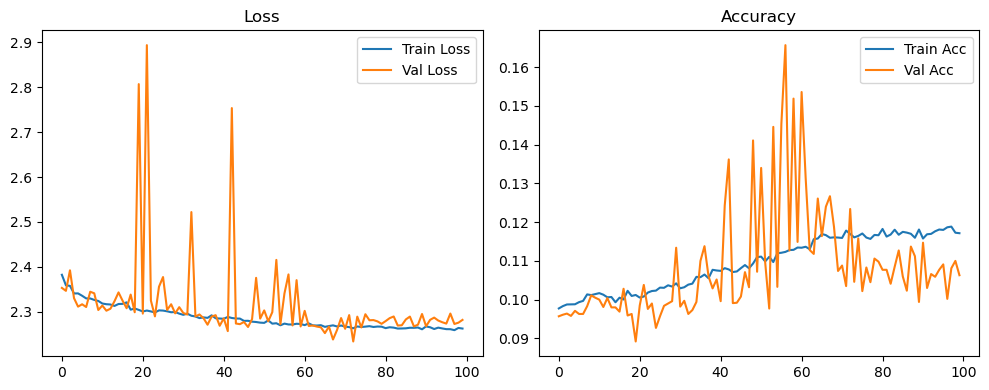

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 2.2796 Accuracy: 0.1089


🚀 Running: batch256_lr_max_0.0002_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0975 | Val Acc: 0.0957 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0975 | Val Acc: 0.0957 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0975 | Val Acc: 0.0957 |:   1%|          | 1/100 [01:20<2:13:14, 80.75s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0975 |:   1%|          | 1/100 [02:36<2:13:14, 80.75s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0975 |:   1%|          | 1/100 [02:36<2:13:14, 80.75s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0975 |:   2%|▏         | 2/100 [02:36<2:06:49, 77.64s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [02:50<2:06:49, 77.64s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [02:50<2:06:49, 77.64s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [02:50<1:18:35, 48.61s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [03:04<1:18:35, 48.61s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [03:04<1:18:35, 48.61s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   4%|▍         | 4/100 [03:04<55:58, 34.98s/it]  

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0967 |:   4%|▍         | 4/100 [03:18<55:58, 34.98s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0967 |:   4%|▍         | 4/100 [03:18<55:58, 34.98s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0967 |:   5%|▌         | 5/100 [03:18<43:28, 27.46s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [03:32<43:28, 27.46s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [03:32<43:28, 27.46s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [03:32<35:56, 22.94s/it]

| LR: 0.000198 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [03:46<35:56, 22.94s/it]

| LR: 0.000198 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [03:46<35:56, 22.94s/it]

| LR: 0.000198 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [03:46<31:04, 20.05s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [04:00<31:04, 20.05s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [04:00<31:04, 20.05s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [04:00<27:50, 18.16s/it]

| LR: 0.000197 | Train Acc: 0.0994 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [04:14<27:50, 18.16s/it]

| LR: 0.000197 | Train Acc: 0.0994 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [04:14<27:50, 18.16s/it]

| LR: 0.000197 | Train Acc: 0.0994 | Val Acc: 0.0962 |:   9%|▉         | 9/100 [04:14<25:37, 16.90s/it]

| LR: 0.000196 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:29<25:37, 16.90s/it]

| LR: 0.000196 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [04:29<25:37, 16.90s/it]

| LR: 0.000196 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  10%|█         | 10/100 [04:29<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:43<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:43<24:03, 16.04s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:43<22:55, 15.45s/it]

| LR: 0.000194 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:57<22:55, 15.45s/it]

| LR: 0.000194 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:57<22:55, 15.45s/it]

| LR: 0.000194 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:57<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  12%|█▏        | 12/100 [05:11<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  12%|█▏        | 12/100 [05:11<22:04, 15.05s/it]

| LR: 0.000193 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  13%|█▎        | 13/100 [05:11<21:24, 14.76s/it]

| LR: 0.000192 | Train Acc: 0.0997 | Val Acc: 0.0960 |:  13%|█▎        | 13/100 [05:25<21:24, 14.76s/it]

| LR: 0.000192 | Train Acc: 0.0997 | Val Acc: 0.0960 |:  13%|█▎        | 13/100 [05:25<21:24, 14.76s/it]

| LR: 0.000192 | Train Acc: 0.0997 | Val Acc: 0.0960 |:  14%|█▍        | 14/100 [05:25<20:53, 14.58s/it]

| LR: 0.000191 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [05:39<20:53, 14.58s/it]

| LR: 0.000191 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [05:39<20:53, 14.58s/it]

| LR: 0.000191 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [05:39<20:26, 14.43s/it]

| LR: 0.000189 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  15%|█▌        | 15/100 [05:53<20:26, 14.43s/it]

| LR: 0.000189 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  15%|█▌        | 15/100 [05:53<20:26, 14.43s/it]

| LR: 0.000189 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  16%|█▌        | 16/100 [05:53<20:04, 14.33s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  16%|█▌        | 16/100 [06:07<20:04, 14.33s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  16%|█▌        | 16/100 [06:07<20:04, 14.33s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0952 |:  17%|█▋        | 17/100 [06:07<19:43, 14.26s/it]

| LR: 0.000186 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  17%|█▋        | 17/100 [06:22<19:43, 14.26s/it]

| LR: 0.000186 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  17%|█▋        | 17/100 [06:22<19:43, 14.26s/it]

| LR: 0.000186 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  18%|█▊        | 18/100 [06:22<19:27, 14.24s/it]

| LR: 0.000185 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  18%|█▊        | 18/100 [06:36<19:27, 14.24s/it]

| LR: 0.000185 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  18%|█▊        | 18/100 [06:36<19:27, 14.24s/it]

| LR: 0.000185 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  19%|█▉        | 19/100 [06:36<19:10, 14.21s/it]

| LR: 0.000183 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [06:50<19:10, 14.21s/it]

| LR: 0.000183 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [06:50<19:10, 14.21s/it]

| LR: 0.000183 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  20%|██        | 20/100 [06:50<18:54, 14.18s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  20%|██        | 20/100 [07:04<18:54, 14.18s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  20%|██        | 20/100 [07:04<18:54, 14.18s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  21%|██        | 21/100 [07:04<18:38, 14.15s/it]

| LR: 0.000179 | Train Acc: 0.1001 | Val Acc: 0.0985 |:  21%|██        | 21/100 [07:18<18:38, 14.15s/it]

| LR: 0.000179 | Train Acc: 0.1001 | Val Acc: 0.0985 |:  21%|██        | 21/100 [07:18<18:38, 14.15s/it]

| LR: 0.000179 | Train Acc: 0.1001 | Val Acc: 0.0985 |:  22%|██▏       | 22/100 [07:18<18:22, 14.13s/it]

| LR: 0.000177 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [07:32<18:22, 14.13s/it]

| LR: 0.000177 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [07:32<18:22, 14.13s/it]

| LR: 0.000177 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  23%|██▎       | 23/100 [07:32<18:08, 14.14s/it]

| LR: 0.000175 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [07:46<18:08, 14.14s/it]

| LR: 0.000175 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [07:46<18:08, 14.14s/it]

| LR: 0.000175 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  24%|██▍       | 24/100 [07:46<17:55, 14.15s/it]

| LR: 0.000173 | Train Acc: 0.1000 | Val Acc: 0.0917 |:  24%|██▍       | 24/100 [08:00<17:55, 14.15s/it]

| LR: 0.000173 | Train Acc: 0.1000 | Val Acc: 0.0917 |:  24%|██▍       | 24/100 [08:00<17:55, 14.15s/it]

| LR: 0.000173 | Train Acc: 0.1000 | Val Acc: 0.0917 |:  25%|██▌       | 25/100 [08:00<17:40, 14.13s/it]

| LR: 0.000171 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  25%|██▌       | 25/100 [08:14<17:40, 14.13s/it]

| LR: 0.000171 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  25%|██▌       | 25/100 [08:14<17:40, 14.13s/it]

| LR: 0.000171 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [08:15<17:24, 14.12s/it]

| LR: 0.000169 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:29<17:24, 14.12s/it]

| LR: 0.000169 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:29<17:24, 14.12s/it]

| LR: 0.000169 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [08:29<17:09, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [08:43<17:09, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [08:43<17:09, 14.11s/it]

| LR: 0.000166 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [08:43<16:54, 14.09s/it]

| LR: 0.000164 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [08:57<16:54, 14.09s/it]

| LR: 0.000164 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [08:57<16:54, 14.09s/it]

| LR: 0.000164 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  29%|██▉       | 29/100 [08:57<16:38, 14.07s/it]

| LR: 0.000161 | Train Acc: 0.1002 | Val Acc: 0.0926 |:  29%|██▉       | 29/100 [09:11<16:38, 14.07s/it]

| LR: 0.000161 | Train Acc: 0.1002 | Val Acc: 0.0926 |:  29%|██▉       | 29/100 [09:11<16:38, 14.07s/it]

| LR: 0.000161 | Train Acc: 0.1002 | Val Acc: 0.0926 |:  30%|███       | 30/100 [09:11<16:23, 14.05s/it]

| LR: 0.000159 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  30%|███       | 30/100 [09:25<16:23, 14.05s/it]

| LR: 0.000159 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  30%|███       | 30/100 [09:25<16:23, 14.05s/it]

| LR: 0.000159 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  31%|███       | 31/100 [09:25<16:09, 14.04s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  31%|███       | 31/100 [09:39<16:09, 14.04s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  31%|███       | 31/100 [09:39<16:09, 14.04s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  32%|███▏      | 32/100 [09:39<15:56, 14.07s/it]

| LR: 0.000154 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [09:53<15:56, 14.07s/it]

| LR: 0.000154 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [09:53<15:56, 14.07s/it]

| LR: 0.000154 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [09:53<15:41, 14.05s/it]

| LR: 0.000151 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  33%|███▎      | 33/100 [10:07<15:41, 14.05s/it]

| LR: 0.000151 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  33%|███▎      | 33/100 [10:07<15:41, 14.05s/it]

| LR: 0.000151 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  34%|███▍      | 34/100 [10:07<15:28, 14.07s/it]

| LR: 0.000148 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [10:21<15:28, 14.07s/it]

| LR: 0.000148 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [10:21<15:28, 14.07s/it]

| LR: 0.000148 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [10:21<15:15, 14.08s/it]

| LR: 0.000146 | Train Acc: 0.1000 | Val Acc: 0.0980 |:  35%|███▌      | 35/100 [10:35<15:15, 14.08s/it]

| LR: 0.000146 | Train Acc: 0.1000 | Val Acc: 0.0980 |:  35%|███▌      | 35/100 [10:35<15:15, 14.08s/it]

| LR: 0.000146 | Train Acc: 0.1000 | Val Acc: 0.0980 |:  36%|███▌      | 36/100 [10:35<15:01, 14.09s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [10:49<15:01, 14.09s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [10:49<15:01, 14.09s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  37%|███▋      | 37/100 [10:49<14:48, 14.10s/it]

| LR: 0.000140 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  37%|███▋      | 37/100 [11:03<14:48, 14.10s/it]

| LR: 0.000140 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  37%|███▋      | 37/100 [11:03<14:48, 14.10s/it]

| LR: 0.000140 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [11:03<14:35, 14.11s/it]

| LR: 0.000137 | Train Acc: 0.0994 | Val Acc: 0.0949 |:  38%|███▊      | 38/100 [11:18<14:35, 14.11s/it]

| LR: 0.000137 | Train Acc: 0.0994 | Val Acc: 0.0949 |:  38%|███▊      | 38/100 [11:18<14:35, 14.11s/it]

| LR: 0.000137 | Train Acc: 0.0994 | Val Acc: 0.0949 |:  39%|███▉      | 39/100 [11:18<14:21, 14.12s/it]

| LR: 0.000134 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  39%|███▉      | 39/100 [11:32<14:21, 14.12s/it]

| LR: 0.000134 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  39%|███▉      | 39/100 [11:32<14:21, 14.12s/it]

| LR: 0.000134 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  40%|████      | 40/100 [11:32<14:05, 14.10s/it]

| LR: 0.000131 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  40%|████      | 40/100 [11:46<14:05, 14.10s/it]

| LR: 0.000131 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  40%|████      | 40/100 [11:46<14:05, 14.10s/it]

| LR: 0.000131 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  41%|████      | 41/100 [11:46<13:50, 14.08s/it]

| LR: 0.000128 | Train Acc: 0.1002 | Val Acc: 0.0978 |:  41%|████      | 41/100 [12:00<13:50, 14.08s/it]

| LR: 0.000128 | Train Acc: 0.1002 | Val Acc: 0.0978 |:  41%|████      | 41/100 [12:00<13:50, 14.08s/it]

| LR: 0.000128 | Train Acc: 0.1002 | Val Acc: 0.0978 |:  42%|████▏     | 42/100 [12:00<13:36, 14.08s/it]

| LR: 0.000125 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [12:14<13:36, 14.08s/it]

| LR: 0.000125 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [12:14<13:36, 14.08s/it]

| LR: 0.000125 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  43%|████▎     | 43/100 [12:14<13:21, 14.06s/it]

| LR: 0.000122 | Train Acc: 0.0999 | Val Acc: 0.0978 |:  43%|████▎     | 43/100 [12:28<13:21, 14.06s/it]

| LR: 0.000122 | Train Acc: 0.0999 | Val Acc: 0.0978 |:  43%|████▎     | 43/100 [12:28<13:21, 14.06s/it]

| LR: 0.000122 | Train Acc: 0.0999 | Val Acc: 0.0978 |:  44%|████▍     | 44/100 [12:28<13:08, 14.09s/it]

| LR: 0.000119 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [12:42<13:08, 14.09s/it]

| LR: 0.000119 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [12:42<13:08, 14.09s/it]

| LR: 0.000119 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  45%|████▌     | 45/100 [12:42<12:54, 14.09s/it]

| LR: 0.000116 | Train Acc: 0.1006 | Val Acc: 0.0982 |:  45%|████▌     | 45/100 [12:56<12:54, 14.09s/it]

| LR: 0.000116 | Train Acc: 0.1006 | Val Acc: 0.0982 |:  45%|████▌     | 45/100 [12:56<12:54, 14.09s/it]

| LR: 0.000116 | Train Acc: 0.1006 | Val Acc: 0.0982 |:  46%|████▌     | 46/100 [12:56<12:43, 14.13s/it]

| LR: 0.000113 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  46%|████▌     | 46/100 [13:10<12:43, 14.13s/it]

| LR: 0.000113 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  46%|████▌     | 46/100 [13:10<12:43, 14.13s/it]

| LR: 0.000113 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  47%|████▋     | 47/100 [13:10<12:29, 14.14s/it]

| LR: 0.000110 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  47%|████▋     | 47/100 [13:24<12:29, 14.14s/it]

| LR: 0.000110 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  47%|████▋     | 47/100 [13:24<12:29, 14.14s/it]

| LR: 0.000110 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  48%|████▊     | 48/100 [13:25<12:15, 14.14s/it]

| LR: 0.000107 | Train Acc: 0.1004 | Val Acc: 0.0950 |:  48%|████▊     | 48/100 [13:39<12:15, 14.14s/it]

| LR: 0.000107 | Train Acc: 0.1004 | Val Acc: 0.0950 |:  48%|████▊     | 48/100 [13:39<12:15, 14.14s/it]

| LR: 0.000107 | Train Acc: 0.1004 | Val Acc: 0.0950 |:  49%|████▉     | 49/100 [13:39<12:01, 14.14s/it]

| LR: 0.000104 | Train Acc: 0.0990 | Val Acc: 0.0961 |:  49%|████▉     | 49/100 [13:53<12:01, 14.14s/it]

| LR: 0.000104 | Train Acc: 0.0990 | Val Acc: 0.0961 |:  49%|████▉     | 49/100 [13:53<12:01, 14.14s/it]

| LR: 0.000104 | Train Acc: 0.0990 | Val Acc: 0.0961 |:  50%|█████     | 50/100 [13:53<11:49, 14.19s/it]

| LR: 0.000101 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  50%|█████     | 50/100 [14:07<11:49, 14.19s/it]

| LR: 0.000101 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  50%|█████     | 50/100 [14:07<11:49, 14.19s/it]

| LR: 0.000101 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [14:07<11:37, 14.23s/it]

| LR: 0.000097 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  51%|█████     | 51/100 [14:21<11:37, 14.23s/it]

| LR: 0.000097 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  51%|█████     | 51/100 [14:21<11:37, 14.23s/it]

| LR: 0.000097 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  52%|█████▏    | 52/100 [14:21<11:22, 14.22s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [14:36<11:22, 14.22s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [14:36<11:22, 14.22s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  53%|█████▎    | 53/100 [14:36<11:06, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.0990 | Val Acc: 0.0944 |:  53%|█████▎    | 53/100 [14:50<11:06, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.0990 | Val Acc: 0.0944 |:  53%|█████▎    | 53/100 [14:50<11:06, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.0990 | Val Acc: 0.0944 |:  54%|█████▍    | 54/100 [14:50<10:51, 14.17s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [15:04<10:51, 14.17s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [15:04<10:51, 14.17s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [15:04<10:36, 14.14s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  55%|█████▌    | 55/100 [15:18<10:36, 14.14s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  55%|█████▌    | 55/100 [15:18<10:36, 14.14s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [15:18<10:22, 14.15s/it]

| LR: 0.000082 | Train Acc: 0.0993 | Val Acc: 0.1032 |:  56%|█████▌    | 56/100 [15:32<10:22, 14.15s/it]

| LR: 0.000082 | Train Acc: 0.0993 | Val Acc: 0.1032 |:  56%|█████▌    | 56/100 [15:32<10:22, 14.15s/it]

| LR: 0.000082 | Train Acc: 0.0993 | Val Acc: 0.1032 |:  57%|█████▋    | 57/100 [15:32<10:07, 14.14s/it]

| LR: 0.000079 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  57%|█████▋    | 57/100 [15:46<10:07, 14.14s/it]

| LR: 0.000079 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  57%|█████▋    | 57/100 [15:46<10:07, 14.14s/it]

| LR: 0.000079 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [15:46<09:54, 14.15s/it]

| LR: 0.000076 | Train Acc: 0.1006 | Val Acc: 0.0983 |:  58%|█████▊    | 58/100 [16:00<09:54, 14.15s/it]

| LR: 0.000076 | Train Acc: 0.1006 | Val Acc: 0.0983 |:  58%|█████▊    | 58/100 [16:00<09:54, 14.15s/it]

| LR: 0.000076 | Train Acc: 0.1006 | Val Acc: 0.0983 |:  59%|█████▉    | 59/100 [16:01<09:41, 14.18s/it]

| LR: 0.000073 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [16:15<09:41, 14.18s/it]

| LR: 0.000073 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [16:15<09:41, 14.18s/it]

| LR: 0.000073 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [16:15<09:26, 14.17s/it]

| LR: 0.000070 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [16:29<09:26, 14.17s/it]

| LR: 0.000070 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [16:29<09:26, 14.17s/it]

| LR: 0.000070 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [16:29<09:12, 14.18s/it]

| LR: 0.000067 | Train Acc: 0.1017 | Val Acc: 0.0977 |:  61%|██████    | 61/100 [16:43<09:12, 14.18s/it]

| LR: 0.000067 | Train Acc: 0.1017 | Val Acc: 0.0977 |:  61%|██████    | 61/100 [16:43<09:12, 14.18s/it]

| LR: 0.000067 | Train Acc: 0.1017 | Val Acc: 0.0977 |:  62%|██████▏   | 62/100 [16:43<09:00, 14.23s/it]

| LR: 0.000064 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [16:57<09:00, 14.23s/it]

| LR: 0.000064 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [16:57<09:00, 14.23s/it]

| LR: 0.000064 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [16:57<08:46, 14.23s/it]

| LR: 0.000061 | Train Acc: 0.1012 | Val Acc: 0.0976 |:  63%|██████▎   | 63/100 [17:12<08:46, 14.23s/it]

| LR: 0.000061 | Train Acc: 0.1012 | Val Acc: 0.0976 |:  63%|██████▎   | 63/100 [17:12<08:46, 14.23s/it]

| LR: 0.000061 | Train Acc: 0.1012 | Val Acc: 0.0976 |:  64%|██████▍   | 64/100 [17:12<08:32, 14.23s/it]

| LR: 0.000058 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  64%|██████▍   | 64/100 [17:26<08:32, 14.23s/it]

| LR: 0.000058 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  64%|██████▍   | 64/100 [17:26<08:32, 14.23s/it]

| LR: 0.000058 | Train Acc: 0.1017 | Val Acc: 0.1008 |:  65%|██████▌   | 65/100 [17:26<08:16, 14.18s/it]

| LR: 0.000055 | Train Acc: 0.1022 | Val Acc: 0.1040 |:  65%|██████▌   | 65/100 [17:40<08:16, 14.18s/it]

| LR: 0.000055 | Train Acc: 0.1022 | Val Acc: 0.1040 |:  65%|██████▌   | 65/100 [17:40<08:16, 14.18s/it]

| LR: 0.000055 | Train Acc: 0.1022 | Val Acc: 0.1040 |:  66%|██████▌   | 66/100 [17:40<08:01, 14.17s/it]

| LR: 0.000053 | Train Acc: 0.1017 | Val Acc: 0.0978 |:  66%|██████▌   | 66/100 [17:54<08:01, 14.17s/it]

| LR: 0.000053 | Train Acc: 0.1017 | Val Acc: 0.0978 |:  66%|██████▌   | 66/100 [17:54<08:01, 14.17s/it]

| LR: 0.000053 | Train Acc: 0.1017 | Val Acc: 0.0978 |:  67%|██████▋   | 67/100 [17:54<07:48, 14.18s/it]

| LR: 0.000050 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [18:08<07:48, 14.18s/it]

| LR: 0.000050 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [18:08<07:48, 14.18s/it]

| LR: 0.000050 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [18:08<07:33, 14.18s/it]

| LR: 0.000047 | Train Acc: 0.1016 | Val Acc: 0.1008 |:  68%|██████▊   | 68/100 [18:22<07:33, 14.18s/it]

| LR: 0.000047 | Train Acc: 0.1016 | Val Acc: 0.1008 |:  68%|██████▊   | 68/100 [18:22<07:33, 14.18s/it]

| LR: 0.000047 | Train Acc: 0.1016 | Val Acc: 0.1008 |:  69%|██████▉   | 69/100 [18:22<07:19, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [18:37<07:19, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [18:37<07:19, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.1013 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [18:37<07:05, 14.18s/it]

| LR: 0.000042 | Train Acc: 0.1011 | Val Acc: 0.0982 |:  70%|███████   | 70/100 [18:51<07:05, 14.18s/it]

| LR: 0.000042 | Train Acc: 0.1011 | Val Acc: 0.0982 |:  70%|███████   | 70/100 [18:51<07:05, 14.18s/it]

| LR: 0.000042 | Train Acc: 0.1011 | Val Acc: 0.0982 |:  71%|███████   | 71/100 [18:51<06:50, 14.17s/it]

| LR: 0.000040 | Train Acc: 0.1014 | Val Acc: 0.0974 |:  71%|███████   | 71/100 [19:05<06:50, 14.17s/it]

| LR: 0.000040 | Train Acc: 0.1014 | Val Acc: 0.0974 |:  71%|███████   | 71/100 [19:05<06:50, 14.17s/it]

| LR: 0.000040 | Train Acc: 0.1014 | Val Acc: 0.0974 |:  72%|███████▏  | 72/100 [19:05<06:36, 14.15s/it]

| LR: 0.000037 | Train Acc: 0.1010 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [19:19<06:36, 14.15s/it]

| LR: 0.000037 | Train Acc: 0.1010 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [19:19<06:36, 14.15s/it]

| LR: 0.000037 | Train Acc: 0.1010 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [19:19<06:21, 14.14s/it]

| LR: 0.000035 | Train Acc: 0.1016 | Val Acc: 0.0985 |:  73%|███████▎  | 73/100 [19:33<06:21, 14.14s/it]

| LR: 0.000035 | Train Acc: 0.1016 | Val Acc: 0.0985 |:  73%|███████▎  | 73/100 [19:33<06:21, 14.14s/it]

| LR: 0.000035 | Train Acc: 0.1016 | Val Acc: 0.0985 |:  74%|███████▍  | 74/100 [19:33<06:07, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1012 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [19:47<06:07, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1012 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [19:47<06:07, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1012 | Val Acc: 0.0969 |:  75%|███████▌  | 75/100 [19:47<05:53, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1010 | Val Acc: 0.0983 |:  75%|███████▌  | 75/100 [20:01<05:53, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1010 | Val Acc: 0.0983 |:  75%|███████▌  | 75/100 [20:01<05:53, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1010 | Val Acc: 0.0983 |:  76%|███████▌  | 76/100 [20:01<05:39, 14.15s/it]

| LR: 0.000028 | Train Acc: 0.1006 | Val Acc: 0.0981 |:  76%|███████▌  | 76/100 [20:15<05:39, 14.15s/it]

| LR: 0.000028 | Train Acc: 0.1006 | Val Acc: 0.0981 |:  76%|███████▌  | 76/100 [20:15<05:39, 14.15s/it]

| LR: 0.000028 | Train Acc: 0.1006 | Val Acc: 0.0981 |:  77%|███████▋  | 77/100 [20:16<05:24, 14.12s/it]

| LR: 0.000026 | Train Acc: 0.1009 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.12s/it]

| LR: 0.000026 | Train Acc: 0.1009 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [20:30<05:24, 14.12s/it]

| LR: 0.000026 | Train Acc: 0.1009 | Val Acc: 0.0975 |:  78%|███████▊  | 78/100 [20:30<05:10, 14.10s/it]

| LR: 0.000024 | Train Acc: 0.1010 | Val Acc: 0.0962 |:  78%|███████▊  | 78/100 [20:44<05:10, 14.10s/it]

| LR: 0.000024 | Train Acc: 0.1010 | Val Acc: 0.0962 |:  78%|███████▊  | 78/100 [20:44<05:10, 14.10s/it]

| LR: 0.000024 | Train Acc: 0.1010 | Val Acc: 0.0962 |:  79%|███████▉  | 79/100 [20:44<04:56, 14.10s/it]

| LR: 0.000022 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  79%|███████▉  | 79/100 [20:58<04:56, 14.10s/it]

| LR: 0.000022 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  79%|███████▉  | 79/100 [20:58<04:56, 14.10s/it]

| LR: 0.000022 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  80%|████████  | 80/100 [20:58<04:42, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1009 | Val Acc: 0.1001 |:  80%|████████  | 80/100 [21:12<04:42, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1009 | Val Acc: 0.1001 |:  80%|████████  | 80/100 [21:12<04:42, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1009 | Val Acc: 0.1001 |:  81%|████████  | 81/100 [21:12<04:28, 14.14s/it]

| LR: 0.000018 | Train Acc: 0.1011 | Val Acc: 0.0980 |:  81%|████████  | 81/100 [21:26<04:28, 14.14s/it]

| LR: 0.000018 | Train Acc: 0.1011 | Val Acc: 0.0980 |:  81%|████████  | 81/100 [21:26<04:28, 14.14s/it]

| LR: 0.000018 | Train Acc: 0.1011 | Val Acc: 0.0980 |:  82%|████████▏ | 82/100 [21:26<04:14, 14.15s/it]

| LR: 0.000016 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  82%|████████▏ | 82/100 [21:40<04:14, 14.15s/it]

| LR: 0.000016 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  82%|████████▏ | 82/100 [21:40<04:14, 14.15s/it]

| LR: 0.000016 | Train Acc: 0.1013 | Val Acc: 0.0975 |:  83%|████████▎ | 83/100 [21:40<04:00, 14.15s/it]

| LR: 0.000015 | Train Acc: 0.1014 | Val Acc: 0.1008 |:  83%|████████▎ | 83/100 [21:54<04:00, 14.15s/it]

| LR: 0.000015 | Train Acc: 0.1014 | Val Acc: 0.1008 |:  83%|████████▎ | 83/100 [21:54<04:00, 14.15s/it]

| LR: 0.000015 | Train Acc: 0.1014 | Val Acc: 0.1008 |:  84%|████████▍ | 84/100 [21:54<03:45, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1017 | Val Acc: 0.0962 |:  84%|████████▍ | 84/100 [22:08<03:45, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1017 | Val Acc: 0.0962 |:  84%|████████▍ | 84/100 [22:08<03:45, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1017 | Val Acc: 0.0962 |:  85%|████████▌ | 85/100 [22:08<03:31, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  85%|████████▌ | 85/100 [22:22<03:31, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  85%|████████▌ | 85/100 [22:22<03:31, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1014 | Val Acc: 0.1005 |:  86%|████████▌ | 86/100 [22:23<03:17, 14.10s/it]

| LR: 0.000010 | Train Acc: 0.1018 | Val Acc: 0.1029 |:  86%|████████▌ | 86/100 [22:37<03:17, 14.10s/it]

| LR: 0.000010 | Train Acc: 0.1018 | Val Acc: 0.1029 |:  86%|████████▌ | 86/100 [22:37<03:17, 14.10s/it]

| LR: 0.000010 | Train Acc: 0.1018 | Val Acc: 0.1029 |:  87%|████████▋ | 87/100 [22:37<03:03, 14.08s/it]

| LR: 0.000009 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  87%|████████▋ | 87/100 [22:51<03:03, 14.08s/it]

| LR: 0.000009 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  87%|████████▋ | 87/100 [22:51<03:03, 14.08s/it]

| LR: 0.000009 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  88%|████████▊ | 88/100 [22:51<02:49, 14.10s/it]

| LR: 0.000008 | Train Acc: 0.1020 | Val Acc: 0.1007 |:  88%|████████▊ | 88/100 [23:05<02:49, 14.10s/it]

| LR: 0.000008 | Train Acc: 0.1020 | Val Acc: 0.1007 |:  88%|████████▊ | 88/100 [23:05<02:49, 14.10s/it]

| LR: 0.000008 | Train Acc: 0.1020 | Val Acc: 0.1007 |:  89%|████████▉ | 89/100 [23:05<02:35, 14.14s/it]

| LR: 0.000007 | Train Acc: 0.1009 | Val Acc: 0.0984 |:  89%|████████▉ | 89/100 [23:19<02:35, 14.14s/it]

| LR: 0.000007 | Train Acc: 0.1009 | Val Acc: 0.0984 |:  89%|████████▉ | 89/100 [23:19<02:35, 14.14s/it]

| LR: 0.000007 | Train Acc: 0.1009 | Val Acc: 0.0984 |:  90%|█████████ | 90/100 [23:19<02:21, 14.13s/it]

| LR: 0.000006 | Train Acc: 0.1016 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [23:33<02:21, 14.13s/it]

| LR: 0.000006 | Train Acc: 0.1016 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [23:33<02:21, 14.13s/it]

| LR: 0.000006 | Train Acc: 0.1016 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [23:33<02:07, 14.19s/it]

| LR: 0.000005 | Train Acc: 0.1008 | Val Acc: 0.1007 |:  91%|█████████ | 91/100 [23:47<02:07, 14.19s/it]

| LR: 0.000005 | Train Acc: 0.1008 | Val Acc: 0.1007 |:  91%|█████████ | 91/100 [23:47<02:07, 14.19s/it]

| LR: 0.000005 | Train Acc: 0.1008 | Val Acc: 0.1007 |:  92%|█████████▏| 92/100 [23:47<01:53, 14.14s/it]

| LR: 0.000004 | Train Acc: 0.1017 | Val Acc: 0.0967 |:  92%|█████████▏| 92/100 [24:01<01:53, 14.14s/it]

| LR: 0.000004 | Train Acc: 0.1017 | Val Acc: 0.0967 |:  92%|█████████▏| 92/100 [24:01<01:53, 14.14s/it]

| LR: 0.000004 | Train Acc: 0.1017 | Val Acc: 0.0967 |:  93%|█████████▎| 93/100 [24:02<01:39, 14.15s/it]

| LR: 0.000003 | Train Acc: 0.1014 | Val Acc: 0.0999 |:  93%|█████████▎| 93/100 [24:16<01:39, 14.15s/it]

| LR: 0.000003 | Train Acc: 0.1014 | Val Acc: 0.0999 |:  93%|█████████▎| 93/100 [24:16<01:39, 14.15s/it]

| LR: 0.000003 | Train Acc: 0.1014 | Val Acc: 0.0999 |:  94%|█████████▍| 94/100 [24:16<01:24, 14.14s/it]

| LR: 0.000003 | Train Acc: 0.1020 | Val Acc: 0.0984 |:  94%|█████████▍| 94/100 [24:30<01:24, 14.14s/it]

| LR: 0.000003 | Train Acc: 0.1020 | Val Acc: 0.0984 |:  94%|█████████▍| 94/100 [24:30<01:24, 14.14s/it]

| LR: 0.000003 | Train Acc: 0.1020 | Val Acc: 0.0984 |:  95%|█████████▌| 95/100 [24:30<01:10, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1014 | Val Acc: 0.0961 |:  95%|█████████▌| 95/100 [24:44<01:10, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1014 | Val Acc: 0.0961 |:  95%|█████████▌| 95/100 [24:44<01:10, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1014 | Val Acc: 0.0961 |:  96%|█████████▌| 96/100 [24:44<00:56, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1011 | Val Acc: 0.1040 |:  96%|█████████▌| 96/100 [24:58<00:56, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1011 | Val Acc: 0.1040 |:  96%|█████████▌| 96/100 [24:58<00:56, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1011 | Val Acc: 0.1040 |:  97%|█████████▋| 97/100 [24:58<00:42, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1014 | Val Acc: 0.1083 |:  97%|█████████▋| 97/100 [25:12<00:42, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1014 | Val Acc: 0.1083 |:  97%|█████████▋| 97/100 [25:12<00:42, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1014 | Val Acc: 0.1083 |:  98%|█████████▊| 98/100 [25:12<00:28, 14.15s/it]

| LR: 0.000001 | Train Acc: 0.1016 | Val Acc: 0.0976 |:  98%|█████████▊| 98/100 [25:26<00:28, 14.15s/it]

| LR: 0.000001 | Train Acc: 0.1016 | Val Acc: 0.0976 |:  98%|█████████▊| 98/100 [25:26<00:28, 14.15s/it]

| LR: 0.000001 | Train Acc: 0.1016 | Val Acc: 0.0976 |:  99%|█████████▉| 99/100 [25:26<00:14, 14.16s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.0972 |:  99%|█████████▉| 99/100 [25:40<00:14, 14.16s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.0972 |:  99%|█████████▉| 99/100 [25:40<00:14, 14.16s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.0972 |: 100%|██████████| 100/100 [25:41<00:00, 14.15s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.0972 |: 100%|██████████| 100/100 [25:41<00:00, 15.41s/it]

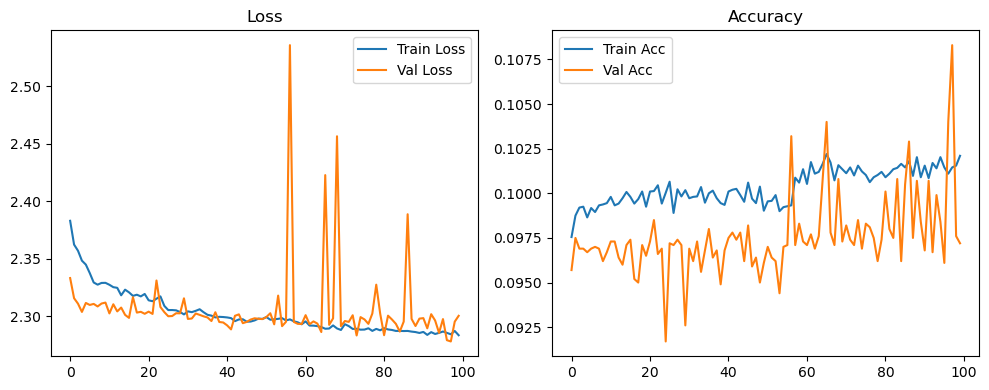

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.34it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

Original Model Final Test Loss: 2.2998 Accuracy: 0.0998


🚀 Running: batch256_lr_max_0.0002_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:19<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:19<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:19<2:11:34, 79.74s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0974 |:   1%|          | 1/100 [02:34<2:11:34, 79.74s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0974 |:   1%|          | 1/100 [02:34<2:11:34, 79.74s/it]

| LR: 0.000200 | Train Acc: 0.0980 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [02:34<2:05:32, 76.87s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [02:48<2:05:32, 76.87s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [02:48<2:05:32, 76.87s/it]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [02:48<1:17:55, 48.20s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [03:02<1:17:55, 48.20s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [03:02<1:17:55, 48.20s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:02<55:32, 34.72s/it]  

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0975 |:   4%|▍         | 4/100 [03:16<55:32, 34.72s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0975 |:   4%|▍         | 4/100 [03:16<55:32, 34.72s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0975 |:   5%|▌         | 5/100 [03:16<43:10, 27.27s/it]

| LR: 0.000199 | Train Acc: 0.1008 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [03:30<43:10, 27.27s/it]

| LR: 0.000199 | Train Acc: 0.1008 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [03:30<43:10, 27.27s/it]

| LR: 0.000199 | Train Acc: 0.1008 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [03:30<35:41, 22.78s/it]

| LR: 0.000198 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:44<35:41, 22.78s/it]

| LR: 0.000198 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:44<35:41, 22.78s/it]

| LR: 0.000198 | Train Acc: 0.1008 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:44<30:54, 19.94s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0983 |:   7%|▋         | 7/100 [03:58<30:54, 19.94s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0983 |:   7%|▋         | 7/100 [03:58<30:54, 19.94s/it]

| LR: 0.000198 | Train Acc: 0.1013 | Val Acc: 0.0983 |:   8%|▊         | 8/100 [03:59<27:43, 18.08s/it]

| LR: 0.000197 | Train Acc: 0.1014 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:13<27:43, 18.08s/it]

| LR: 0.000197 | Train Acc: 0.1014 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:13<27:43, 18.08s/it]

| LR: 0.000197 | Train Acc: 0.1014 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:13<25:31, 16.83s/it]

| LR: 0.000196 | Train Acc: 0.1012 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [04:27<25:31, 16.83s/it]

| LR: 0.000196 | Train Acc: 0.1012 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [04:27<25:31, 16.83s/it]

| LR: 0.000196 | Train Acc: 0.1012 | Val Acc: 0.0963 |:  10%|█         | 10/100 [04:27<23:59, 16.00s/it]

| LR: 0.000195 | Train Acc: 0.1012 | Val Acc: 0.0954 |:  10%|█         | 10/100 [04:41<23:59, 16.00s/it]

| LR: 0.000195 | Train Acc: 0.1012 | Val Acc: 0.0954 |:  10%|█         | 10/100 [04:41<23:59, 16.00s/it]

| LR: 0.000195 | Train Acc: 0.1012 | Val Acc: 0.0954 |:  11%|█         | 11/100 [04:41<22:52, 15.42s/it]

| LR: 0.000194 | Train Acc: 0.1018 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:55<22:52, 15.42s/it]

| LR: 0.000194 | Train Acc: 0.1018 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:55<22:52, 15.42s/it]

| LR: 0.000194 | Train Acc: 0.1018 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:55<22:02, 15.03s/it]

| LR: 0.000193 | Train Acc: 0.1016 | Val Acc: 0.1006 |:  12%|█▏        | 12/100 [05:09<22:02, 15.03s/it]

| LR: 0.000193 | Train Acc: 0.1016 | Val Acc: 0.1006 |:  12%|█▏        | 12/100 [05:09<22:02, 15.03s/it]

| LR: 0.000193 | Train Acc: 0.1016 | Val Acc: 0.1006 |:  13%|█▎        | 13/100 [05:09<21:22, 14.74s/it]

| LR: 0.000192 | Train Acc: 0.1006 | Val Acc: 0.1035 |:  13%|█▎        | 13/100 [05:23<21:22, 14.74s/it]

| LR: 0.000192 | Train Acc: 0.1006 | Val Acc: 0.1035 |:  13%|█▎        | 13/100 [05:23<21:22, 14.74s/it]

| LR: 0.000192 | Train Acc: 0.1006 | Val Acc: 0.1035 |:  14%|█▍        | 14/100 [05:23<20:48, 14.52s/it]

| LR: 0.000191 | Train Acc: 0.1021 | Val Acc: 0.0990 |:  14%|█▍        | 14/100 [05:37<20:48, 14.52s/it]

| LR: 0.000191 | Train Acc: 0.1021 | Val Acc: 0.0990 |:  14%|█▍        | 14/100 [05:37<20:48, 14.52s/it]

| LR: 0.000191 | Train Acc: 0.1021 | Val Acc: 0.0990 |:  15%|█▌        | 15/100 [05:37<20:22, 14.39s/it]

| LR: 0.000189 | Train Acc: 0.1004 | Val Acc: 0.0991 |:  15%|█▌        | 15/100 [05:51<20:22, 14.39s/it]

| LR: 0.000189 | Train Acc: 0.1004 | Val Acc: 0.0991 |:  15%|█▌        | 15/100 [05:51<20:22, 14.39s/it]

| LR: 0.000189 | Train Acc: 0.1004 | Val Acc: 0.0991 |:  16%|█▌        | 16/100 [05:51<20:00, 14.29s/it]

| LR: 0.000188 | Train Acc: 0.1018 | Val Acc: 0.0976 |:  16%|█▌        | 16/100 [06:05<20:00, 14.29s/it]

| LR: 0.000188 | Train Acc: 0.1018 | Val Acc: 0.0976 |:  16%|█▌        | 16/100 [06:05<20:00, 14.29s/it]

| LR: 0.000188 | Train Acc: 0.1018 | Val Acc: 0.0976 |:  17%|█▋        | 17/100 [06:05<19:42, 14.25s/it]

| LR: 0.000186 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  17%|█▋        | 17/100 [06:19<19:42, 14.25s/it]

| LR: 0.000186 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  17%|█▋        | 17/100 [06:19<19:42, 14.25s/it]

| LR: 0.000186 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  18%|█▊        | 18/100 [06:19<19:23, 14.20s/it]

| LR: 0.000185 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [06:34<19:23, 14.20s/it]

| LR: 0.000185 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [06:34<19:23, 14.20s/it]

| LR: 0.000185 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [06:34<19:08, 14.18s/it]

| LR: 0.000183 | Train Acc: 0.1018 | Val Acc: 0.0991 |:  19%|█▉        | 19/100 [06:48<19:08, 14.18s/it]

| LR: 0.000183 | Train Acc: 0.1018 | Val Acc: 0.0991 |:  19%|█▉        | 19/100 [06:48<19:08, 14.18s/it]

| LR: 0.000183 | Train Acc: 0.1018 | Val Acc: 0.0991 |:  20%|██        | 20/100 [06:48<18:52, 14.15s/it]

| LR: 0.000181 | Train Acc: 0.1010 | Val Acc: 0.1057 |:  20%|██        | 20/100 [07:02<18:52, 14.15s/it]

| LR: 0.000181 | Train Acc: 0.1010 | Val Acc: 0.1057 |:  20%|██        | 20/100 [07:02<18:52, 14.15s/it]

| LR: 0.000181 | Train Acc: 0.1010 | Val Acc: 0.1057 |:  21%|██        | 21/100 [07:02<18:37, 14.15s/it]

| LR: 0.000179 | Train Acc: 0.1018 | Val Acc: 0.0969 |:  21%|██        | 21/100 [07:16<18:37, 14.15s/it]

| LR: 0.000179 | Train Acc: 0.1018 | Val Acc: 0.0969 |:  21%|██        | 21/100 [07:16<18:37, 14.15s/it]

| LR: 0.000179 | Train Acc: 0.1018 | Val Acc: 0.0969 |:  22%|██▏       | 22/100 [07:16<18:21, 14.12s/it]

| LR: 0.000177 | Train Acc: 0.1022 | Val Acc: 0.0961 |:  22%|██▏       | 22/100 [07:30<18:21, 14.12s/it]

| LR: 0.000177 | Train Acc: 0.1022 | Val Acc: 0.0961 |:  22%|██▏       | 22/100 [07:30<18:21, 14.12s/it]

| LR: 0.000177 | Train Acc: 0.1022 | Val Acc: 0.0961 |:  23%|██▎       | 23/100 [07:30<18:05, 14.09s/it]

| LR: 0.000175 | Train Acc: 0.1017 | Val Acc: 0.0975 |:  23%|██▎       | 23/100 [07:44<18:05, 14.09s/it]

| LR: 0.000175 | Train Acc: 0.1017 | Val Acc: 0.0975 |:  23%|██▎       | 23/100 [07:44<18:05, 14.09s/it]

| LR: 0.000175 | Train Acc: 0.1017 | Val Acc: 0.0975 |:  24%|██▍       | 24/100 [07:44<17:48, 14.06s/it]

| LR: 0.000173 | Train Acc: 0.1028 | Val Acc: 0.1015 |:  24%|██▍       | 24/100 [07:58<17:48, 14.06s/it]

| LR: 0.000173 | Train Acc: 0.1028 | Val Acc: 0.1015 |:  24%|██▍       | 24/100 [07:58<17:48, 14.06s/it]

| LR: 0.000173 | Train Acc: 0.1028 | Val Acc: 0.1015 |:  25%|██▌       | 25/100 [07:58<17:33, 14.05s/it]

| LR: 0.000171 | Train Acc: 0.1026 | Val Acc: 0.0995 |:  25%|██▌       | 25/100 [08:12<17:33, 14.05s/it]

| LR: 0.000171 | Train Acc: 0.1026 | Val Acc: 0.0995 |:  25%|██▌       | 25/100 [08:12<17:33, 14.05s/it]

| LR: 0.000171 | Train Acc: 0.1026 | Val Acc: 0.0995 |:  26%|██▌       | 26/100 [08:12<17:18, 14.04s/it]

| LR: 0.000169 | Train Acc: 0.1028 | Val Acc: 0.0988 |:  26%|██▌       | 26/100 [08:26<17:18, 14.04s/it]

| LR: 0.000169 | Train Acc: 0.1028 | Val Acc: 0.0988 |:  26%|██▌       | 26/100 [08:26<17:18, 14.04s/it]

| LR: 0.000169 | Train Acc: 0.1028 | Val Acc: 0.0988 |:  27%|██▋       | 27/100 [08:26<17:05, 14.04s/it]

| LR: 0.000166 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  27%|██▋       | 27/100 [08:40<17:05, 14.04s/it]

| LR: 0.000166 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  27%|██▋       | 27/100 [08:40<17:05, 14.04s/it]

| LR: 0.000166 | Train Acc: 0.1019 | Val Acc: 0.0980 |:  28%|██▊       | 28/100 [08:40<16:50, 14.03s/it]

| LR: 0.000164 | Train Acc: 0.1033 | Val Acc: 0.1000 |:  28%|██▊       | 28/100 [08:54<16:50, 14.03s/it]

| LR: 0.000164 | Train Acc: 0.1033 | Val Acc: 0.1000 |:  28%|██▊       | 28/100 [08:54<16:50, 14.03s/it]

| LR: 0.000164 | Train Acc: 0.1033 | Val Acc: 0.1000 |:  29%|██▉       | 29/100 [08:54<16:37, 14.04s/it]

| LR: 0.000161 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  29%|██▉       | 29/100 [09:08<16:37, 14.04s/it]

| LR: 0.000161 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  29%|██▉       | 29/100 [09:08<16:37, 14.04s/it]

| LR: 0.000161 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  30%|███       | 30/100 [09:08<16:24, 14.07s/it]

| LR: 0.000159 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  30%|███       | 30/100 [09:22<16:24, 14.07s/it]

| LR: 0.000159 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  30%|███       | 30/100 [09:22<16:24, 14.07s/it]

| LR: 0.000159 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  31%|███       | 31/100 [09:22<16:11, 14.08s/it]

| LR: 0.000156 | Train Acc: 0.1033 | Val Acc: 0.1001 |:  31%|███       | 31/100 [09:36<16:11, 14.08s/it]

| LR: 0.000156 | Train Acc: 0.1033 | Val Acc: 0.1001 |:  31%|███       | 31/100 [09:36<16:11, 14.08s/it]

| LR: 0.000156 | Train Acc: 0.1033 | Val Acc: 0.1001 |:  32%|███▏      | 32/100 [09:36<15:56, 14.07s/it]

| LR: 0.000154 | Train Acc: 0.1043 | Val Acc: 0.0976 |:  32%|███▏      | 32/100 [09:50<15:56, 14.07s/it]

| LR: 0.000154 | Train Acc: 0.1043 | Val Acc: 0.0976 |:  32%|███▏      | 32/100 [09:50<15:56, 14.07s/it]

| LR: 0.000154 | Train Acc: 0.1043 | Val Acc: 0.0976 |:  33%|███▎      | 33/100 [09:50<15:41, 14.05s/it]

| LR: 0.000151 | Train Acc: 0.1043 | Val Acc: 0.1011 |:  33%|███▎      | 33/100 [10:04<15:41, 14.05s/it]

| LR: 0.000151 | Train Acc: 0.1043 | Val Acc: 0.1011 |:  33%|███▎      | 33/100 [10:04<15:41, 14.05s/it]

| LR: 0.000151 | Train Acc: 0.1043 | Val Acc: 0.1011 |:  34%|███▍      | 34/100 [10:04<15:27, 14.06s/it]

| LR: 0.000148 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  34%|███▍      | 34/100 [10:18<15:27, 14.06s/it]

| LR: 0.000148 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  34%|███▍      | 34/100 [10:18<15:27, 14.06s/it]

| LR: 0.000148 | Train Acc: 0.1041 | Val Acc: 0.1000 |:  35%|███▌      | 35/100 [10:18<15:13, 14.06s/it]

| LR: 0.000146 | Train Acc: 0.1037 | Val Acc: 0.0991 |:  35%|███▌      | 35/100 [10:33<15:13, 14.06s/it]

| LR: 0.000146 | Train Acc: 0.1037 | Val Acc: 0.0991 |:  35%|███▌      | 35/100 [10:33<15:13, 14.06s/it]

| LR: 0.000146 | Train Acc: 0.1037 | Val Acc: 0.0991 |:  36%|███▌      | 36/100 [10:33<15:00, 14.08s/it]

| LR: 0.000143 | Train Acc: 0.1037 | Val Acc: 0.0990 |:  36%|███▌      | 36/100 [10:47<15:00, 14.08s/it]

| LR: 0.000143 | Train Acc: 0.1037 | Val Acc: 0.0990 |:  36%|███▌      | 36/100 [10:47<15:00, 14.08s/it]

| LR: 0.000143 | Train Acc: 0.1037 | Val Acc: 0.0990 |:  37%|███▋      | 37/100 [10:47<14:46, 14.08s/it]

| LR: 0.000140 | Train Acc: 0.1038 | Val Acc: 0.1023 |:  37%|███▋      | 37/100 [11:01<14:46, 14.08s/it]

| LR: 0.000140 | Train Acc: 0.1038 | Val Acc: 0.1023 |:  37%|███▋      | 37/100 [11:01<14:46, 14.08s/it]

| LR: 0.000140 | Train Acc: 0.1038 | Val Acc: 0.1023 |:  38%|███▊      | 38/100 [11:01<14:31, 14.06s/it]

| LR: 0.000137 | Train Acc: 0.1045 | Val Acc: 0.0991 |:  38%|███▊      | 38/100 [11:15<14:31, 14.06s/it]

| LR: 0.000137 | Train Acc: 0.1045 | Val Acc: 0.0991 |:  38%|███▊      | 38/100 [11:15<14:31, 14.06s/it]

| LR: 0.000137 | Train Acc: 0.1045 | Val Acc: 0.0991 |:  39%|███▉      | 39/100 [11:15<14:18, 14.07s/it]

| LR: 0.000134 | Train Acc: 0.1052 | Val Acc: 0.1034 |:  39%|███▉      | 39/100 [11:29<14:18, 14.07s/it]

| LR: 0.000134 | Train Acc: 0.1052 | Val Acc: 0.1034 |:  39%|███▉      | 39/100 [11:29<14:18, 14.07s/it]

| LR: 0.000134 | Train Acc: 0.1052 | Val Acc: 0.1034 |:  40%|████      | 40/100 [11:29<14:02, 14.05s/it]

| LR: 0.000131 | Train Acc: 0.1054 | Val Acc: 0.0987 |:  40%|████      | 40/100 [11:43<14:02, 14.05s/it]

| LR: 0.000131 | Train Acc: 0.1054 | Val Acc: 0.0987 |:  40%|████      | 40/100 [11:43<14:02, 14.05s/it]

| LR: 0.000131 | Train Acc: 0.1054 | Val Acc: 0.0987 |:  41%|████      | 41/100 [11:43<13:48, 14.04s/it]

| LR: 0.000128 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  41%|████      | 41/100 [11:57<13:48, 14.04s/it]

| LR: 0.000128 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  41%|████      | 41/100 [11:57<13:48, 14.04s/it]

| LR: 0.000128 | Train Acc: 0.1051 | Val Acc: 0.1005 |:  42%|████▏     | 42/100 [11:57<13:33, 14.02s/it]

| LR: 0.000125 | Train Acc: 0.1051 | Val Acc: 0.1053 |:  42%|████▏     | 42/100 [12:11<13:33, 14.02s/it]

| LR: 0.000125 | Train Acc: 0.1051 | Val Acc: 0.1053 |:  42%|████▏     | 42/100 [12:11<13:33, 14.02s/it]

| LR: 0.000125 | Train Acc: 0.1051 | Val Acc: 0.1053 |:  43%|████▎     | 43/100 [12:11<13:19, 14.02s/it]

| LR: 0.000122 | Train Acc: 0.1040 | Val Acc: 0.0978 |:  43%|████▎     | 43/100 [12:25<13:19, 14.02s/it]

| LR: 0.000122 | Train Acc: 0.1040 | Val Acc: 0.0978 |:  43%|████▎     | 43/100 [12:25<13:19, 14.02s/it]

| LR: 0.000122 | Train Acc: 0.1040 | Val Acc: 0.0978 |:  44%|████▍     | 44/100 [12:25<13:04, 14.01s/it]

| LR: 0.000119 | Train Acc: 0.1053 | Val Acc: 0.0981 |:  44%|████▍     | 44/100 [12:39<13:04, 14.01s/it]

| LR: 0.000119 | Train Acc: 0.1053 | Val Acc: 0.0981 |:  44%|████▍     | 44/100 [12:39<13:04, 14.01s/it]

| LR: 0.000119 | Train Acc: 0.1053 | Val Acc: 0.0981 |:  45%|████▌     | 45/100 [12:39<12:52, 14.05s/it]

| LR: 0.000116 | Train Acc: 0.1055 | Val Acc: 0.0995 |:  45%|████▌     | 45/100 [12:53<12:52, 14.05s/it]

| LR: 0.000116 | Train Acc: 0.1055 | Val Acc: 0.0995 |:  45%|████▌     | 45/100 [12:53<12:52, 14.05s/it]

| LR: 0.000116 | Train Acc: 0.1055 | Val Acc: 0.0995 |:  46%|████▌     | 46/100 [12:53<12:40, 14.08s/it]

| LR: 0.000113 | Train Acc: 0.1053 | Val Acc: 0.1009 |:  46%|████▌     | 46/100 [13:07<12:40, 14.08s/it]

| LR: 0.000113 | Train Acc: 0.1053 | Val Acc: 0.1009 |:  46%|████▌     | 46/100 [13:07<12:40, 14.08s/it]

| LR: 0.000113 | Train Acc: 0.1053 | Val Acc: 0.1009 |:  47%|████▋     | 47/100 [13:07<12:26, 14.09s/it]

| LR: 0.000110 | Train Acc: 0.1064 | Val Acc: 0.0991 |:  47%|████▋     | 47/100 [13:21<12:26, 14.09s/it]

| LR: 0.000110 | Train Acc: 0.1064 | Val Acc: 0.0991 |:  47%|████▋     | 47/100 [13:21<12:26, 14.09s/it]

| LR: 0.000110 | Train Acc: 0.1064 | Val Acc: 0.0991 |:  48%|████▊     | 48/100 [13:21<12:12, 14.10s/it]

| LR: 0.000107 | Train Acc: 0.1058 | Val Acc: 0.1030 |:  48%|████▊     | 48/100 [13:35<12:12, 14.10s/it]

| LR: 0.000107 | Train Acc: 0.1058 | Val Acc: 0.1030 |:  48%|████▊     | 48/100 [13:35<12:12, 14.10s/it]

| LR: 0.000107 | Train Acc: 0.1058 | Val Acc: 0.1030 |:  49%|████▉     | 49/100 [13:35<11:58, 14.09s/it]

| LR: 0.000104 | Train Acc: 0.1055 | Val Acc: 0.0984 |:  49%|████▉     | 49/100 [13:49<11:58, 14.09s/it]

| LR: 0.000104 | Train Acc: 0.1055 | Val Acc: 0.0984 |:  49%|████▉     | 49/100 [13:49<11:58, 14.09s/it]

| LR: 0.000104 | Train Acc: 0.1055 | Val Acc: 0.0984 |:  50%|█████     | 50/100 [13:49<11:44, 14.08s/it]

| LR: 0.000101 | Train Acc: 0.1033 | Val Acc: 0.0958 |:  50%|█████     | 50/100 [14:03<11:44, 14.08s/it]

| LR: 0.000101 | Train Acc: 0.1033 | Val Acc: 0.0958 |:  50%|█████     | 50/100 [14:03<11:44, 14.08s/it]

| LR: 0.000101 | Train Acc: 0.1033 | Val Acc: 0.0958 |:  51%|█████     | 51/100 [14:04<11:29, 14.08s/it]

| LR: 0.000097 | Train Acc: 0.1037 | Val Acc: 0.0943 |:  51%|█████     | 51/100 [14:18<11:29, 14.08s/it]

| LR: 0.000097 | Train Acc: 0.1037 | Val Acc: 0.0943 |:  51%|█████     | 51/100 [14:18<11:29, 14.08s/it]

| LR: 0.000097 | Train Acc: 0.1037 | Val Acc: 0.0943 |:  52%|█████▏    | 52/100 [14:18<11:15, 14.07s/it]

| LR: 0.000094 | Train Acc: 0.1042 | Val Acc: 0.0987 |:  52%|█████▏    | 52/100 [14:32<11:15, 14.07s/it]

| LR: 0.000094 | Train Acc: 0.1042 | Val Acc: 0.0987 |:  52%|█████▏    | 52/100 [14:32<11:15, 14.07s/it]

| LR: 0.000094 | Train Acc: 0.1042 | Val Acc: 0.0987 |:  53%|█████▎    | 53/100 [14:32<11:00, 14.05s/it]

| LR: 0.000091 | Train Acc: 0.1051 | Val Acc: 0.1008 |:  53%|█████▎    | 53/100 [14:46<11:00, 14.05s/it]

| LR: 0.000091 | Train Acc: 0.1051 | Val Acc: 0.1008 |:  53%|█████▎    | 53/100 [14:46<11:00, 14.05s/it]

| LR: 0.000091 | Train Acc: 0.1051 | Val Acc: 0.1008 |:  54%|█████▍    | 54/100 [14:46<10:46, 14.05s/it]

| LR: 0.000088 | Train Acc: 0.1054 | Val Acc: 0.1008 |:  54%|█████▍    | 54/100 [15:00<10:46, 14.05s/it]

| LR: 0.000088 | Train Acc: 0.1054 | Val Acc: 0.1008 |:  54%|█████▍    | 54/100 [15:00<10:46, 14.05s/it]

| LR: 0.000088 | Train Acc: 0.1054 | Val Acc: 0.1008 |:  55%|█████▌    | 55/100 [15:00<10:32, 14.05s/it]

| LR: 0.000085 | Train Acc: 0.1056 | Val Acc: 0.0986 |:  55%|█████▌    | 55/100 [15:14<10:32, 14.05s/it]

| LR: 0.000085 | Train Acc: 0.1056 | Val Acc: 0.0986 |:  55%|█████▌    | 55/100 [15:14<10:32, 14.05s/it]

| LR: 0.000085 | Train Acc: 0.1056 | Val Acc: 0.0986 |:  56%|█████▌    | 56/100 [15:14<10:17, 14.04s/it]

| LR: 0.000082 | Train Acc: 0.1056 | Val Acc: 0.1005 |:  56%|█████▌    | 56/100 [15:28<10:17, 14.04s/it]

| LR: 0.000082 | Train Acc: 0.1056 | Val Acc: 0.1005 |:  56%|█████▌    | 56/100 [15:28<10:17, 14.04s/it]

| LR: 0.000082 | Train Acc: 0.1056 | Val Acc: 0.1005 |:  57%|█████▋    | 57/100 [15:28<10:04, 14.07s/it]

| LR: 0.000079 | Train Acc: 0.1062 | Val Acc: 0.1020 |:  57%|█████▋    | 57/100 [15:42<10:04, 14.07s/it]

| LR: 0.000079 | Train Acc: 0.1062 | Val Acc: 0.1020 |:  57%|█████▋    | 57/100 [15:42<10:04, 14.07s/it]

| LR: 0.000079 | Train Acc: 0.1062 | Val Acc: 0.1020 |:  58%|█████▊    | 58/100 [15:42<09:52, 14.10s/it]

| LR: 0.000076 | Train Acc: 0.1064 | Val Acc: 0.0991 |:  58%|█████▊    | 58/100 [15:56<09:52, 14.10s/it]

| LR: 0.000076 | Train Acc: 0.1064 | Val Acc: 0.0991 |:  58%|█████▊    | 58/100 [15:56<09:52, 14.10s/it]

| LR: 0.000076 | Train Acc: 0.1064 | Val Acc: 0.0991 |:  59%|█████▉    | 59/100 [15:56<09:39, 14.13s/it]

| LR: 0.000073 | Train Acc: 0.1068 | Val Acc: 0.0988 |:  59%|█████▉    | 59/100 [16:10<09:39, 14.13s/it]

| LR: 0.000073 | Train Acc: 0.1068 | Val Acc: 0.0988 |:  59%|█████▉    | 59/100 [16:10<09:39, 14.13s/it]

| LR: 0.000073 | Train Acc: 0.1068 | Val Acc: 0.0988 |:  60%|██████    | 60/100 [16:10<09:24, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.1056 | Val Acc: 0.1014 |:  60%|██████    | 60/100 [16:24<09:24, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.1056 | Val Acc: 0.1014 |:  60%|██████    | 60/100 [16:24<09:24, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.1056 | Val Acc: 0.1014 |:  61%|██████    | 61/100 [16:24<09:10, 14.13s/it]

| LR: 0.000067 | Train Acc: 0.1064 | Val Acc: 0.1028 |:  61%|██████    | 61/100 [16:39<09:10, 14.13s/it]

| LR: 0.000067 | Train Acc: 0.1064 | Val Acc: 0.1028 |:  61%|██████    | 61/100 [16:39<09:10, 14.13s/it]

| LR: 0.000067 | Train Acc: 0.1064 | Val Acc: 0.1028 |:  62%|██████▏   | 62/100 [16:39<08:57, 14.13s/it]

| LR: 0.000064 | Train Acc: 0.1067 | Val Acc: 0.1034 |:  62%|██████▏   | 62/100 [16:53<08:57, 14.13s/it]

| LR: 0.000064 | Train Acc: 0.1067 | Val Acc: 0.1034 |:  62%|██████▏   | 62/100 [16:53<08:57, 14.13s/it]

| LR: 0.000064 | Train Acc: 0.1067 | Val Acc: 0.1034 |:  63%|██████▎   | 63/100 [16:53<08:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1056 | Val Acc: 0.0984 |:  63%|██████▎   | 63/100 [17:07<08:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1056 | Val Acc: 0.0984 |:  63%|██████▎   | 63/100 [17:07<08:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1056 | Val Acc: 0.0984 |:  64%|██████▍   | 64/100 [17:07<08:28, 14.13s/it]

| LR: 0.000058 | Train Acc: 0.1070 | Val Acc: 0.0982 |:  64%|██████▍   | 64/100 [17:21<08:28, 14.13s/it]

| LR: 0.000058 | Train Acc: 0.1070 | Val Acc: 0.0982 |:  64%|██████▍   | 64/100 [17:21<08:28, 14.13s/it]

| LR: 0.000058 | Train Acc: 0.1070 | Val Acc: 0.0982 |:  65%|██████▌   | 65/100 [17:21<08:14, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1062 | Val Acc: 0.0991 |:  65%|██████▌   | 65/100 [17:35<08:14, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1062 | Val Acc: 0.0991 |:  65%|██████▌   | 65/100 [17:35<08:14, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1062 | Val Acc: 0.0991 |:  66%|██████▌   | 66/100 [17:35<07:59, 14.10s/it]

| LR: 0.000053 | Train Acc: 0.1061 | Val Acc: 0.0999 |:  66%|██████▌   | 66/100 [17:49<07:59, 14.10s/it]

| LR: 0.000053 | Train Acc: 0.1061 | Val Acc: 0.0999 |:  66%|██████▌   | 66/100 [17:49<07:59, 14.10s/it]

| LR: 0.000053 | Train Acc: 0.1061 | Val Acc: 0.0999 |:  67%|██████▋   | 67/100 [17:49<07:45, 14.10s/it]

| LR: 0.000050 | Train Acc: 0.1061 | Val Acc: 0.0982 |:  67%|██████▋   | 67/100 [18:03<07:45, 14.10s/it]

| LR: 0.000050 | Train Acc: 0.1061 | Val Acc: 0.0982 |:  67%|██████▋   | 67/100 [18:03<07:45, 14.10s/it]

| LR: 0.000050 | Train Acc: 0.1061 | Val Acc: 0.0982 |:  68%|██████▊   | 68/100 [18:03<07:30, 14.09s/it]

| LR: 0.000047 | Train Acc: 0.1065 | Val Acc: 0.1014 |:  68%|██████▊   | 68/100 [18:17<07:30, 14.09s/it]

| LR: 0.000047 | Train Acc: 0.1065 | Val Acc: 0.1014 |:  68%|██████▊   | 68/100 [18:17<07:30, 14.09s/it]

| LR: 0.000047 | Train Acc: 0.1065 | Val Acc: 0.1014 |:  69%|██████▉   | 69/100 [18:17<07:16, 14.09s/it]

| LR: 0.000045 | Train Acc: 0.1071 | Val Acc: 0.0988 |:  69%|██████▉   | 69/100 [18:31<07:16, 14.09s/it]

| LR: 0.000045 | Train Acc: 0.1071 | Val Acc: 0.0988 |:  69%|██████▉   | 69/100 [18:31<07:16, 14.09s/it]

| LR: 0.000045 | Train Acc: 0.1071 | Val Acc: 0.0988 |:  70%|███████   | 70/100 [18:31<07:03, 14.12s/it]

| LR: 0.000042 | Train Acc: 0.1076 | Val Acc: 0.0982 |:  70%|███████   | 70/100 [18:46<07:03, 14.12s/it]

| LR: 0.000042 | Train Acc: 0.1076 | Val Acc: 0.0982 |:  70%|███████   | 70/100 [18:46<07:03, 14.12s/it]

| LR: 0.000042 | Train Acc: 0.1076 | Val Acc: 0.0982 |:  71%|███████   | 71/100 [18:46<06:50, 14.15s/it]

| LR: 0.000040 | Train Acc: 0.1075 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [19:00<06:50, 14.15s/it]

| LR: 0.000040 | Train Acc: 0.1075 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [19:00<06:50, 14.15s/it]

| LR: 0.000040 | Train Acc: 0.1075 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [19:00<06:36, 14.16s/it]

| LR: 0.000037 | Train Acc: 0.1066 | Val Acc: 0.1009 |:  72%|███████▏  | 72/100 [19:14<06:36, 14.16s/it]

| LR: 0.000037 | Train Acc: 0.1066 | Val Acc: 0.1009 |:  72%|███████▏  | 72/100 [19:14<06:36, 14.16s/it]

| LR: 0.000037 | Train Acc: 0.1066 | Val Acc: 0.1009 |:  73%|███████▎  | 73/100 [19:14<06:22, 14.16s/it]

| LR: 0.000035 | Train Acc: 0.1067 | Val Acc: 0.0996 |:  73%|███████▎  | 73/100 [19:28<06:22, 14.16s/it]

| LR: 0.000035 | Train Acc: 0.1067 | Val Acc: 0.0996 |:  73%|███████▎  | 73/100 [19:28<06:22, 14.16s/it]

| LR: 0.000035 | Train Acc: 0.1067 | Val Acc: 0.0996 |:  74%|███████▍  | 74/100 [19:28<06:07, 14.14s/it]

| LR: 0.000032 | Train Acc: 0.1068 | Val Acc: 0.1016 |:  74%|███████▍  | 74/100 [19:42<06:07, 14.14s/it]

| LR: 0.000032 | Train Acc: 0.1068 | Val Acc: 0.1016 |:  74%|███████▍  | 74/100 [19:42<06:07, 14.14s/it]

| LR: 0.000032 | Train Acc: 0.1068 | Val Acc: 0.1016 |:  75%|███████▌  | 75/100 [19:42<05:54, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1067 | Val Acc: 0.1008 |:  75%|███████▌  | 75/100 [19:57<05:54, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1067 | Val Acc: 0.1008 |:  75%|███████▌  | 75/100 [19:57<05:54, 14.16s/it]

| LR: 0.000030 | Train Acc: 0.1067 | Val Acc: 0.1008 |:  76%|███████▌  | 76/100 [19:57<05:40, 14.20s/it]

| LR: 0.000028 | Train Acc: 0.1062 | Val Acc: 0.1027 |:  76%|███████▌  | 76/100 [20:11<05:40, 14.20s/it]

| LR: 0.000028 | Train Acc: 0.1062 | Val Acc: 0.1027 |:  76%|███████▌  | 76/100 [20:11<05:40, 14.20s/it]

| LR: 0.000028 | Train Acc: 0.1062 | Val Acc: 0.1027 |:  77%|███████▋  | 77/100 [20:11<05:27, 14.24s/it]

| LR: 0.000026 | Train Acc: 0.1069 | Val Acc: 0.0993 |:  77%|███████▋  | 77/100 [20:25<05:27, 14.24s/it]

| LR: 0.000026 | Train Acc: 0.1069 | Val Acc: 0.0993 |:  77%|███████▋  | 77/100 [20:25<05:27, 14.24s/it]

| LR: 0.000026 | Train Acc: 0.1069 | Val Acc: 0.0993 |:  78%|███████▊  | 78/100 [20:25<05:13, 14.23s/it]

| LR: 0.000024 | Train Acc: 0.1070 | Val Acc: 0.0991 |:  78%|███████▊  | 78/100 [20:39<05:13, 14.23s/it]

| LR: 0.000024 | Train Acc: 0.1070 | Val Acc: 0.0991 |:  78%|███████▊  | 78/100 [20:39<05:13, 14.23s/it]

| LR: 0.000024 | Train Acc: 0.1070 | Val Acc: 0.0991 |:  79%|███████▉  | 79/100 [20:39<04:58, 14.21s/it]

| LR: 0.000022 | Train Acc: 0.1060 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [20:53<04:58, 14.21s/it]

| LR: 0.000022 | Train Acc: 0.1060 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [20:53<04:58, 14.21s/it]

| LR: 0.000022 | Train Acc: 0.1060 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [20:53<04:43, 14.20s/it]

| LR: 0.000020 | Train Acc: 0.1070 | Val Acc: 0.1008 |:  80%|████████  | 80/100 [21:07<04:43, 14.20s/it]

| LR: 0.000020 | Train Acc: 0.1070 | Val Acc: 0.1008 |:  80%|████████  | 80/100 [21:07<04:43, 14.20s/it]

| LR: 0.000020 | Train Acc: 0.1070 | Val Acc: 0.1008 |:  81%|████████  | 81/100 [21:08<04:28, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1066 | Val Acc: 0.0983 |:  81%|████████  | 81/100 [21:21<04:28, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1066 | Val Acc: 0.0983 |:  81%|████████  | 81/100 [21:21<04:28, 14.15s/it]

| LR: 0.000018 | Train Acc: 0.1066 | Val Acc: 0.0983 |:  82%|████████▏ | 82/100 [21:22<04:13, 14.11s/it]

| LR: 0.000016 | Train Acc: 0.1075 | Val Acc: 0.1034 |:  82%|████████▏ | 82/100 [21:36<04:13, 14.11s/it]

| LR: 0.000016 | Train Acc: 0.1075 | Val Acc: 0.1034 |:  82%|████████▏ | 82/100 [21:36<04:13, 14.11s/it]

| LR: 0.000016 | Train Acc: 0.1075 | Val Acc: 0.1034 |:  83%|████████▎ | 83/100 [21:36<04:00, 14.13s/it]

| LR: 0.000015 | Train Acc: 0.1062 | Val Acc: 0.0999 |:  83%|████████▎ | 83/100 [21:50<04:00, 14.13s/it]

| LR: 0.000015 | Train Acc: 0.1062 | Val Acc: 0.0999 |:  83%|████████▎ | 83/100 [21:50<04:00, 14.13s/it]

| LR: 0.000015 | Train Acc: 0.1062 | Val Acc: 0.0999 |:  84%|████████▍ | 84/100 [21:50<03:46, 14.16s/it]

| LR: 0.000013 | Train Acc: 0.1066 | Val Acc: 0.0986 |:  84%|████████▍ | 84/100 [22:04<03:46, 14.16s/it]

| LR: 0.000013 | Train Acc: 0.1066 | Val Acc: 0.0986 |:  84%|████████▍ | 84/100 [22:04<03:46, 14.16s/it]

| LR: 0.000013 | Train Acc: 0.1066 | Val Acc: 0.0986 |:  85%|████████▌ | 85/100 [22:04<03:32, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1063 | Val Acc: 0.1010 |:  85%|████████▌ | 85/100 [22:18<03:32, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1063 | Val Acc: 0.1010 |:  85%|████████▌ | 85/100 [22:18<03:32, 14.19s/it]

| LR: 0.000012 | Train Acc: 0.1063 | Val Acc: 0.1010 |:  86%|████████▌ | 86/100 [22:18<03:18, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1055 | Val Acc: 0.0980 |:  86%|████████▌ | 86/100 [22:32<03:18, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1055 | Val Acc: 0.0980 |:  86%|████████▌ | 86/100 [22:32<03:18, 14.17s/it]

| LR: 0.000010 | Train Acc: 0.1055 | Val Acc: 0.0980 |:  87%|████████▋ | 87/100 [22:32<03:04, 14.16s/it]

| LR: 0.000009 | Train Acc: 0.1061 | Val Acc: 0.1008 |:  87%|████████▋ | 87/100 [22:46<03:04, 14.16s/it]

| LR: 0.000009 | Train Acc: 0.1061 | Val Acc: 0.1008 |:  87%|████████▋ | 87/100 [22:46<03:04, 14.16s/it]

| LR: 0.000009 | Train Acc: 0.1061 | Val Acc: 0.1008 |:  88%|████████▊ | 88/100 [22:47<02:49, 14.14s/it]

| LR: 0.000008 | Train Acc: 0.1062 | Val Acc: 0.0995 |:  88%|████████▊ | 88/100 [23:00<02:49, 14.14s/it]

| LR: 0.000008 | Train Acc: 0.1062 | Val Acc: 0.0995 |:  88%|████████▊ | 88/100 [23:00<02:49, 14.14s/it]

| LR: 0.000008 | Train Acc: 0.1062 | Val Acc: 0.0995 |:  89%|████████▉ | 89/100 [23:01<02:35, 14.10s/it]

| LR: 0.000007 | Train Acc: 0.1066 | Val Acc: 0.0996 |:  89%|████████▉ | 89/100 [23:15<02:35, 14.10s/it]

| LR: 0.000007 | Train Acc: 0.1066 | Val Acc: 0.0996 |:  89%|████████▉ | 89/100 [23:15<02:35, 14.10s/it]

| LR: 0.000007 | Train Acc: 0.1066 | Val Acc: 0.0996 |:  90%|█████████ | 90/100 [23:15<02:20, 14.08s/it]

| LR: 0.000006 | Train Acc: 0.1077 | Val Acc: 0.0995 |:  90%|█████████ | 90/100 [23:29<02:20, 14.08s/it]

| LR: 0.000006 | Train Acc: 0.1077 | Val Acc: 0.0995 |:  90%|█████████ | 90/100 [23:29<02:20, 14.08s/it]

| LR: 0.000006 | Train Acc: 0.1077 | Val Acc: 0.0995 |:  91%|█████████ | 91/100 [23:29<02:06, 14.09s/it]

| LR: 0.000005 | Train Acc: 0.1066 | Val Acc: 0.0987 |:  91%|█████████ | 91/100 [23:43<02:06, 14.09s/it]

| LR: 0.000005 | Train Acc: 0.1066 | Val Acc: 0.0987 |:  91%|█████████ | 91/100 [23:43<02:06, 14.09s/it]

| LR: 0.000005 | Train Acc: 0.1066 | Val Acc: 0.0987 |:  92%|█████████▏| 92/100 [23:43<01:52, 14.10s/it]

| LR: 0.000004 | Train Acc: 0.1065 | Val Acc: 0.1021 |:  92%|█████████▏| 92/100 [23:57<01:52, 14.10s/it]

| LR: 0.000004 | Train Acc: 0.1065 | Val Acc: 0.1021 |:  92%|█████████▏| 92/100 [23:57<01:52, 14.10s/it]

| LR: 0.000004 | Train Acc: 0.1065 | Val Acc: 0.1021 |:  93%|█████████▎| 93/100 [23:57<01:38, 14.11s/it]

| LR: 0.000003 | Train Acc: 0.1066 | Val Acc: 0.0993 |:  93%|█████████▎| 93/100 [24:11<01:38, 14.11s/it]

| LR: 0.000003 | Train Acc: 0.1066 | Val Acc: 0.0993 |:  93%|█████████▎| 93/100 [24:11<01:38, 14.11s/it]

| LR: 0.000003 | Train Acc: 0.1066 | Val Acc: 0.0993 |:  94%|█████████▍| 94/100 [24:11<01:24, 14.09s/it]

| LR: 0.000003 | Train Acc: 0.1071 | Val Acc: 0.1026 |:  94%|█████████▍| 94/100 [24:25<01:24, 14.09s/it]

| LR: 0.000003 | Train Acc: 0.1071 | Val Acc: 0.1026 |:  94%|█████████▍| 94/100 [24:25<01:24, 14.09s/it]

| LR: 0.000003 | Train Acc: 0.1071 | Val Acc: 0.1026 |:  95%|█████████▌| 95/100 [24:25<01:10, 14.10s/it]

| LR: 0.000002 | Train Acc: 0.1065 | Val Acc: 0.0994 |:  95%|█████████▌| 95/100 [24:39<01:10, 14.10s/it]

| LR: 0.000002 | Train Acc: 0.1065 | Val Acc: 0.0994 |:  95%|█████████▌| 95/100 [24:39<01:10, 14.10s/it]

| LR: 0.000002 | Train Acc: 0.1065 | Val Acc: 0.0994 |:  96%|█████████▌| 96/100 [24:39<00:56, 14.10s/it]

| LR: 0.000002 | Train Acc: 0.1081 | Val Acc: 0.0991 |:  96%|█████████▌| 96/100 [24:53<00:56, 14.10s/it]

| LR: 0.000002 | Train Acc: 0.1081 | Val Acc: 0.0991 |:  96%|█████████▌| 96/100 [24:53<00:56, 14.10s/it]

| LR: 0.000002 | Train Acc: 0.1081 | Val Acc: 0.0991 |:  97%|█████████▋| 97/100 [24:53<00:42, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  97%|█████████▋| 97/100 [25:07<00:42, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  97%|█████████▋| 97/100 [25:07<00:42, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  98%|█████████▊| 98/100 [25:07<00:28, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1070 | Val Acc: 0.1026 |:  98%|█████████▊| 98/100 [25:21<00:28, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1070 | Val Acc: 0.1026 |:  98%|█████████▊| 98/100 [25:21<00:28, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1070 | Val Acc: 0.1026 |:  99%|█████████▉| 99/100 [25:21<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1071 | Val Acc: 0.0987 |:  99%|█████████▉| 99/100 [25:35<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1071 | Val Acc: 0.0987 |:  99%|█████████▉| 99/100 [25:35<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1071 | Val Acc: 0.0987 |: 100%|██████████| 100/100 [25:36<00:00, 14.08s/it]

| LR: 0.000001 | Train Acc: 0.1071 | Val Acc: 0.0987 |: 100%|██████████| 100/100 [25:36<00:00, 15.36s/it]

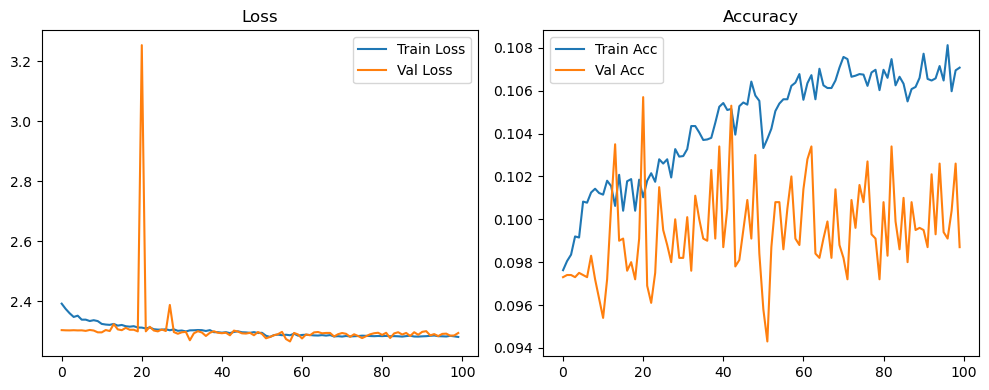

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 2.2934 Accuracy: 0.1028


🚀 Running: batch256_lr_max_0.0001_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0946 |:   1%|          | 1/100 [01:20<2:12:26, 80.27s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0958 |:   1%|          | 1/100 [02:34<2:12:26, 80.27s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0958 |:   1%|          | 1/100 [02:34<2:12:26, 80.27s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0958 |:   2%|▏         | 2/100 [02:34<2:05:36, 76.91s/it]

| LR: 0.000100 | Train Acc: 0.0994 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [02:48<2:05:36, 76.91s/it]

| LR: 0.000100 | Train Acc: 0.0994 | Val Acc: 0.0965 |:   2%|▏         | 2/100 [02:48<2:05:36, 76.91s/it]

| LR: 0.000100 | Train Acc: 0.0994 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [02:48<1:17:53, 48.18s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [03:02<1:17:53, 48.18s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [03:02<1:17:53, 48.18s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0953 |:   4%|▍         | 4/100 [03:02<55:25, 34.64s/it]  

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0954 |:   4%|▍         | 4/100 [03:16<55:25, 34.64s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0954 |:   4%|▍         | 4/100 [03:16<55:25, 34.64s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0954 |:   5%|▌         | 5/100 [03:16<42:57, 27.13s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0958 |:   5%|▌         | 5/100 [03:30<42:57, 27.13s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0958 |:   5%|▌         | 5/100 [03:30<42:57, 27.13s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0958 |:   6%|▌         | 6/100 [03:30<35:25, 22.61s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0959 |:   6%|▌         | 6/100 [03:44<35:25, 22.61s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0959 |:   6%|▌         | 6/100 [03:44<35:25, 22.61s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [03:44<30:37, 19.76s/it]

| LR: 0.000099 | Train Acc: 0.1001 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [03:58<30:37, 19.76s/it]

| LR: 0.000099 | Train Acc: 0.1001 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [03:58<30:37, 19.76s/it]

| LR: 0.000099 | Train Acc: 0.1001 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [03:58<27:26, 17.89s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:12<27:26, 17.89s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:12<27:26, 17.89s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:12<25:16, 16.66s/it]

| LR: 0.000098 | Train Acc: 0.1006 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:25<25:16, 16.66s/it]

| LR: 0.000098 | Train Acc: 0.1006 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:25<25:16, 16.66s/it]

| LR: 0.000098 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  10%|█         | 10/100 [04:26<23:43, 15.82s/it]

| LR: 0.000098 | Train Acc: 0.1001 | Val Acc: 0.0946 |:  10%|█         | 10/100 [04:39<23:43, 15.82s/it]

| LR: 0.000098 | Train Acc: 0.1001 | Val Acc: 0.0946 |:  10%|█         | 10/100 [04:39<23:43, 15.82s/it]

| LR: 0.000098 | Train Acc: 0.1001 | Val Acc: 0.0946 |:  11%|█         | 11/100 [04:39<22:37, 15.25s/it]

| LR: 0.000097 | Train Acc: 0.1008 | Val Acc: 0.0960 |:  11%|█         | 11/100 [04:53<22:37, 15.25s/it]

| LR: 0.000097 | Train Acc: 0.1008 | Val Acc: 0.0960 |:  11%|█         | 11/100 [04:53<22:37, 15.25s/it]

| LR: 0.000097 | Train Acc: 0.1008 | Val Acc: 0.0960 |:  12%|█▏        | 12/100 [04:54<21:50, 14.89s/it]

| LR: 0.000097 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [05:07<21:50, 14.89s/it]

| LR: 0.000097 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [05:07<21:50, 14.89s/it]

| LR: 0.000097 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [05:07<21:08, 14.58s/it]

| LR: 0.000096 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  13%|█▎        | 13/100 [05:21<21:08, 14.58s/it]

| LR: 0.000096 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  13%|█▎        | 13/100 [05:21<21:08, 14.58s/it]

| LR: 0.000096 | Train Acc: 0.1007 | Val Acc: 0.0979 |:  14%|█▍        | 14/100 [05:21<20:37, 14.39s/it]

| LR: 0.000096 | Train Acc: 0.1008 | Val Acc: 0.0981 |:  14%|█▍        | 14/100 [05:35<20:37, 14.39s/it]

| LR: 0.000096 | Train Acc: 0.1008 | Val Acc: 0.0981 |:  14%|█▍        | 14/100 [05:35<20:37, 14.39s/it]

| LR: 0.000096 | Train Acc: 0.1008 | Val Acc: 0.0981 |:  15%|█▌        | 15/100 [05:35<20:10, 14.24s/it]

| LR: 0.000095 | Train Acc: 0.1019 | Val Acc: 0.0981 |:  15%|█▌        | 15/100 [05:49<20:10, 14.24s/it]

| LR: 0.000095 | Train Acc: 0.1019 | Val Acc: 0.0981 |:  15%|█▌        | 15/100 [05:49<20:10, 14.24s/it]

| LR: 0.000095 | Train Acc: 0.1019 | Val Acc: 0.0981 |:  16%|█▌        | 16/100 [05:49<19:49, 14.16s/it]

| LR: 0.000094 | Train Acc: 0.1011 | Val Acc: 0.1024 |:  16%|█▌        | 16/100 [06:03<19:49, 14.16s/it]

| LR: 0.000094 | Train Acc: 0.1011 | Val Acc: 0.1024 |:  16%|█▌        | 16/100 [06:03<19:49, 14.16s/it]

| LR: 0.000094 | Train Acc: 0.1011 | Val Acc: 0.1024 |:  17%|█▋        | 17/100 [06:03<19:27, 14.07s/it]

| LR: 0.000094 | Train Acc: 0.1008 | Val Acc: 0.1061 |:  17%|█▋        | 17/100 [06:17<19:27, 14.07s/it]

| LR: 0.000094 | Train Acc: 0.1008 | Val Acc: 0.1061 |:  17%|█▋        | 17/100 [06:17<19:27, 14.07s/it]

| LR: 0.000094 | Train Acc: 0.1008 | Val Acc: 0.1061 |:  18%|█▊        | 18/100 [06:17<19:06, 13.99s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.1006 |:  18%|█▊        | 18/100 [06:31<19:06, 13.99s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.1006 |:  18%|█▊        | 18/100 [06:31<19:06, 13.99s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.1006 |:  19%|█▉        | 19/100 [06:31<18:49, 13.94s/it]

| LR: 0.000092 | Train Acc: 0.1001 | Val Acc: 0.1014 |:  19%|█▉        | 19/100 [06:44<18:49, 13.94s/it]

| LR: 0.000092 | Train Acc: 0.1001 | Val Acc: 0.1014 |:  19%|█▉        | 19/100 [06:44<18:49, 13.94s/it]

| LR: 0.000092 | Train Acc: 0.1001 | Val Acc: 0.1014 |:  20%|██        | 20/100 [06:45<18:31, 13.90s/it]

| LR: 0.000091 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  20%|██        | 20/100 [06:58<18:31, 13.90s/it]

| LR: 0.000091 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  20%|██        | 20/100 [06:58<18:31, 13.90s/it]

| LR: 0.000091 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  21%|██        | 21/100 [06:58<18:16, 13.88s/it]

| LR: 0.000091 | Train Acc: 0.1013 | Val Acc: 0.1082 |:  21%|██        | 21/100 [07:12<18:16, 13.88s/it]

| LR: 0.000091 | Train Acc: 0.1013 | Val Acc: 0.1082 |:  21%|██        | 21/100 [07:12<18:16, 13.88s/it]

| LR: 0.000091 | Train Acc: 0.1013 | Val Acc: 0.1082 |:  22%|██▏       | 22/100 [07:12<18:01, 13.87s/it]

| LR: 0.000090 | Train Acc: 0.1002 | Val Acc: 0.1045 |:  22%|██▏       | 22/100 [07:26<18:01, 13.87s/it]

| LR: 0.000090 | Train Acc: 0.1002 | Val Acc: 0.1045 |:  22%|██▏       | 22/100 [07:26<18:01, 13.87s/it]

| LR: 0.000090 | Train Acc: 0.1002 | Val Acc: 0.1045 |:  23%|██▎       | 23/100 [07:26<17:45, 13.84s/it]

| LR: 0.000089 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:40<17:45, 13.84s/it]

| LR: 0.000089 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  23%|██▎       | 23/100 [07:40<17:45, 13.84s/it]

| LR: 0.000089 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [07:40<17:33, 13.86s/it]

| LR: 0.000088 | Train Acc: 0.0998 | Val Acc: 0.1014 |:  24%|██▍       | 24/100 [07:54<17:33, 13.86s/it]

| LR: 0.000088 | Train Acc: 0.0998 | Val Acc: 0.1014 |:  24%|██▍       | 24/100 [07:54<17:33, 13.86s/it]

| LR: 0.000088 | Train Acc: 0.0998 | Val Acc: 0.1014 |:  25%|██▌       | 25/100 [07:54<17:20, 13.87s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.1030 |:  25%|██▌       | 25/100 [08:08<17:20, 13.87s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.1030 |:  25%|██▌       | 25/100 [08:08<17:20, 13.87s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.1030 |:  26%|██▌       | 26/100 [08:08<17:06, 13.87s/it]

| LR: 0.000086 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  26%|██▌       | 26/100 [08:21<17:06, 13.87s/it]

| LR: 0.000086 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  26%|██▌       | 26/100 [08:21<17:06, 13.87s/it]

| LR: 0.000086 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [08:21<16:51, 13.85s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [08:35<16:51, 13.85s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [08:35<16:51, 13.85s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  28%|██▊       | 28/100 [08:35<16:36, 13.85s/it]

| LR: 0.000084 | Train Acc: 0.1011 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [08:49<16:36, 13.85s/it]

| LR: 0.000084 | Train Acc: 0.1011 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [08:49<16:36, 13.85s/it]

| LR: 0.000084 | Train Acc: 0.1011 | Val Acc: 0.0975 |:  29%|██▉       | 29/100 [08:49<16:22, 13.83s/it]

| LR: 0.000083 | Train Acc: 0.1028 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [09:03<16:22, 13.83s/it]

| LR: 0.000083 | Train Acc: 0.1028 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [09:03<16:22, 13.83s/it]

| LR: 0.000083 | Train Acc: 0.1028 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:03<16:08, 13.84s/it]

| LR: 0.000081 | Train Acc: 0.1023 | Val Acc: 0.1011 |:  30%|███       | 30/100 [09:17<16:08, 13.84s/it]

| LR: 0.000081 | Train Acc: 0.1023 | Val Acc: 0.1011 |:  30%|███       | 30/100 [09:17<16:08, 13.84s/it]

| LR: 0.000081 | Train Acc: 0.1023 | Val Acc: 0.1011 |:  31%|███       | 31/100 [09:17<15:58, 13.88s/it]

| LR: 0.000080 | Train Acc: 0.1030 | Val Acc: 0.0985 |:  31%|███       | 31/100 [09:31<15:58, 13.88s/it]

| LR: 0.000080 | Train Acc: 0.1030 | Val Acc: 0.0985 |:  31%|███       | 31/100 [09:31<15:58, 13.88s/it]

| LR: 0.000080 | Train Acc: 0.1030 | Val Acc: 0.0985 |:  32%|███▏      | 32/100 [09:31<15:42, 13.85s/it]

| LR: 0.000079 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:44<15:42, 13.85s/it]

| LR: 0.000079 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:44<15:42, 13.85s/it]

| LR: 0.000079 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  33%|███▎      | 33/100 [09:45<15:26, 13.83s/it]

| LR: 0.000078 | Train Acc: 0.1032 | Val Acc: 0.1049 |:  33%|███▎      | 33/100 [09:58<15:26, 13.83s/it]

| LR: 0.000078 | Train Acc: 0.1032 | Val Acc: 0.1049 |:  33%|███▎      | 33/100 [09:58<15:26, 13.83s/it]

| LR: 0.000078 | Train Acc: 0.1032 | Val Acc: 0.1049 |:  34%|███▍      | 34/100 [09:58<15:11, 13.82s/it]

| LR: 0.000077 | Train Acc: 0.1028 | Val Acc: 0.1006 |:  34%|███▍      | 34/100 [10:12<15:11, 13.82s/it]

| LR: 0.000077 | Train Acc: 0.1028 | Val Acc: 0.1006 |:  34%|███▍      | 34/100 [10:12<15:11, 13.82s/it]

| LR: 0.000077 | Train Acc: 0.1028 | Val Acc: 0.1006 |:  35%|███▌      | 35/100 [10:12<15:03, 13.89s/it]

| LR: 0.000075 | Train Acc: 0.1045 | Val Acc: 0.1044 |:  35%|███▌      | 35/100 [10:26<15:03, 13.89s/it]

| LR: 0.000075 | Train Acc: 0.1045 | Val Acc: 0.1044 |:  35%|███▌      | 35/100 [10:26<15:03, 13.89s/it]

| LR: 0.000075 | Train Acc: 0.1045 | Val Acc: 0.1044 |:  36%|███▌      | 36/100 [10:26<14:50, 13.92s/it]

| LR: 0.000074 | Train Acc: 0.1036 | Val Acc: 0.0998 |:  36%|███▌      | 36/100 [10:40<14:50, 13.92s/it]

| LR: 0.000074 | Train Acc: 0.1036 | Val Acc: 0.0998 |:  36%|███▌      | 36/100 [10:40<14:50, 13.92s/it]

| LR: 0.000074 | Train Acc: 0.1036 | Val Acc: 0.0998 |:  37%|███▋      | 37/100 [10:40<14:37, 13.92s/it]

| LR: 0.000073 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  37%|███▋      | 37/100 [10:54<14:37, 13.92s/it]

| LR: 0.000073 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  37%|███▋      | 37/100 [10:54<14:37, 13.92s/it]

| LR: 0.000073 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  38%|███▊      | 38/100 [10:54<14:24, 13.94s/it]

| LR: 0.000072 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  38%|███▊      | 38/100 [11:08<14:24, 13.94s/it]

| LR: 0.000072 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  38%|███▊      | 38/100 [11:08<14:24, 13.94s/it]

| LR: 0.000072 | Train Acc: 0.1034 | Val Acc: 0.0996 |:  39%|███▉      | 39/100 [11:08<14:09, 13.93s/it]

| LR: 0.000070 | Train Acc: 0.1037 | Val Acc: 0.1010 |:  39%|███▉      | 39/100 [11:22<14:09, 13.93s/it]

| LR: 0.000070 | Train Acc: 0.1037 | Val Acc: 0.1010 |:  39%|███▉      | 39/100 [11:22<14:09, 13.93s/it]

| LR: 0.000070 | Train Acc: 0.1037 | Val Acc: 0.1010 |:  40%|████      | 40/100 [11:22<13:55, 13.92s/it]

| LR: 0.000069 | Train Acc: 0.1046 | Val Acc: 0.0996 |:  40%|████      | 40/100 [11:36<13:55, 13.92s/it]

| LR: 0.000069 | Train Acc: 0.1046 | Val Acc: 0.0996 |:  40%|████      | 40/100 [11:36<13:55, 13.92s/it]

| LR: 0.000069 | Train Acc: 0.1046 | Val Acc: 0.0996 |:  41%|████      | 41/100 [11:36<13:43, 13.96s/it]

| LR: 0.000068 | Train Acc: 0.1035 | Val Acc: 0.0988 |:  41%|████      | 41/100 [11:50<13:43, 13.96s/it]

| LR: 0.000068 | Train Acc: 0.1035 | Val Acc: 0.0988 |:  41%|████      | 41/100 [11:50<13:43, 13.96s/it]

| LR: 0.000068 | Train Acc: 0.1035 | Val Acc: 0.0988 |:  42%|████▏     | 42/100 [11:50<13:27, 13.91s/it]

| LR: 0.000066 | Train Acc: 0.1031 | Val Acc: 0.1007 |:  42%|████▏     | 42/100 [12:04<13:27, 13.91s/it]

| LR: 0.000066 | Train Acc: 0.1031 | Val Acc: 0.1007 |:  42%|████▏     | 42/100 [12:04<13:27, 13.91s/it]

| LR: 0.000066 | Train Acc: 0.1031 | Val Acc: 0.1007 |:  43%|████▎     | 43/100 [12:04<13:15, 13.95s/it]

| LR: 0.000065 | Train Acc: 0.1040 | Val Acc: 0.1004 |:  43%|████▎     | 43/100 [12:18<13:15, 13.95s/it]

| LR: 0.000065 | Train Acc: 0.1040 | Val Acc: 0.1004 |:  43%|████▎     | 43/100 [12:18<13:15, 13.95s/it]

| LR: 0.000065 | Train Acc: 0.1040 | Val Acc: 0.1004 |:  44%|████▍     | 44/100 [12:18<13:03, 13.99s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [12:32<13:03, 13.99s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [12:32<13:03, 13.99s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [12:32<12:49, 13.98s/it]

| LR: 0.000062 | Train Acc: 0.1026 | Val Acc: 0.0996 |:  45%|████▌     | 45/100 [12:46<12:49, 13.98s/it]

| LR: 0.000062 | Train Acc: 0.1026 | Val Acc: 0.0996 |:  45%|████▌     | 45/100 [12:46<12:49, 13.98s/it]

| LR: 0.000062 | Train Acc: 0.1026 | Val Acc: 0.0996 |:  46%|████▌     | 46/100 [12:46<12:34, 13.97s/it]

| LR: 0.000061 | Train Acc: 0.1035 | Val Acc: 0.0991 |:  46%|████▌     | 46/100 [13:00<12:34, 13.97s/it]

| LR: 0.000061 | Train Acc: 0.1035 | Val Acc: 0.0991 |:  46%|████▌     | 46/100 [13:00<12:34, 13.97s/it]

| LR: 0.000061 | Train Acc: 0.1035 | Val Acc: 0.0991 |:  47%|████▋     | 47/100 [13:00<12:19, 13.96s/it]

| LR: 0.000059 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  47%|████▋     | 47/100 [13:14<12:19, 13.96s/it]

| LR: 0.000059 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  47%|████▋     | 47/100 [13:14<12:19, 13.96s/it]

| LR: 0.000059 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  48%|████▊     | 48/100 [13:14<12:05, 13.94s/it]

| LR: 0.000058 | Train Acc: 0.1040 | Val Acc: 0.1154 |:  48%|████▊     | 48/100 [13:28<12:05, 13.94s/it]

| LR: 0.000058 | Train Acc: 0.1040 | Val Acc: 0.1154 |:  48%|████▊     | 48/100 [13:28<12:05, 13.94s/it]

| LR: 0.000058 | Train Acc: 0.1040 | Val Acc: 0.1154 |:  49%|████▉     | 49/100 [13:28<11:50, 13.93s/it]

| LR: 0.000056 | Train Acc: 0.1039 | Val Acc: 0.1017 |:  49%|████▉     | 49/100 [13:41<11:50, 13.93s/it]

| LR: 0.000056 | Train Acc: 0.1039 | Val Acc: 0.1017 |:  49%|████▉     | 49/100 [13:41<11:50, 13.93s/it]

| LR: 0.000056 | Train Acc: 0.1039 | Val Acc: 0.1017 |:  50%|█████     | 50/100 [13:42<11:35, 13.90s/it]

| LR: 0.000055 | Train Acc: 0.1025 | Val Acc: 0.0984 |:  50%|█████     | 50/100 [13:55<11:35, 13.90s/it]

| LR: 0.000055 | Train Acc: 0.1025 | Val Acc: 0.0984 |:  50%|█████     | 50/100 [13:55<11:35, 13.90s/it]

| LR: 0.000055 | Train Acc: 0.1025 | Val Acc: 0.0984 |:  51%|█████     | 51/100 [13:55<11:21, 13.91s/it]

| LR: 0.000054 | Train Acc: 0.1036 | Val Acc: 0.1042 |:  51%|█████     | 51/100 [14:09<11:21, 13.91s/it]

| LR: 0.000054 | Train Acc: 0.1036 | Val Acc: 0.1042 |:  51%|█████     | 51/100 [14:09<11:21, 13.91s/it]

| LR: 0.000054 | Train Acc: 0.1036 | Val Acc: 0.1042 |:  52%|█████▏    | 52/100 [14:09<11:06, 13.89s/it]

| LR: 0.000052 | Train Acc: 0.1041 | Val Acc: 0.1040 |:  52%|█████▏    | 52/100 [14:23<11:06, 13.89s/it]

| LR: 0.000052 | Train Acc: 0.1041 | Val Acc: 0.1040 |:  52%|█████▏    | 52/100 [14:23<11:06, 13.89s/it]

| LR: 0.000052 | Train Acc: 0.1041 | Val Acc: 0.1040 |:  53%|█████▎    | 53/100 [14:23<10:51, 13.87s/it]

| LR: 0.000051 | Train Acc: 0.1038 | Val Acc: 0.0994 |:  53%|█████▎    | 53/100 [14:37<10:51, 13.87s/it]

| LR: 0.000051 | Train Acc: 0.1038 | Val Acc: 0.0994 |:  53%|█████▎    | 53/100 [14:37<10:51, 13.87s/it]

| LR: 0.000051 | Train Acc: 0.1038 | Val Acc: 0.0994 |:  54%|█████▍    | 54/100 [14:37<10:36, 13.84s/it]

| LR: 0.000049 | Train Acc: 0.1045 | Val Acc: 0.1047 |:  54%|█████▍    | 54/100 [14:51<10:36, 13.84s/it]

| LR: 0.000049 | Train Acc: 0.1045 | Val Acc: 0.1047 |:  54%|█████▍    | 54/100 [14:51<10:36, 13.84s/it]

| LR: 0.000049 | Train Acc: 0.1045 | Val Acc: 0.1047 |:  55%|█████▌    | 55/100 [14:51<10:22, 13.83s/it]

| LR: 0.000048 | Train Acc: 0.1053 | Val Acc: 0.1084 |:  55%|█████▌    | 55/100 [15:04<10:22, 13.83s/it]

| LR: 0.000048 | Train Acc: 0.1053 | Val Acc: 0.1084 |:  55%|█████▌    | 55/100 [15:04<10:22, 13.83s/it]

| LR: 0.000048 | Train Acc: 0.1053 | Val Acc: 0.1084 |:  56%|█████▌    | 56/100 [15:04<10:07, 13.82s/it]

| LR: 0.000047 | Train Acc: 0.1046 | Val Acc: 0.1060 |:  56%|█████▌    | 56/100 [15:18<10:07, 13.82s/it]

| LR: 0.000047 | Train Acc: 0.1046 | Val Acc: 0.1060 |:  56%|█████▌    | 56/100 [15:18<10:07, 13.82s/it]

| LR: 0.000047 | Train Acc: 0.1046 | Val Acc: 0.1060 |:  57%|█████▋    | 57/100 [15:18<09:55, 13.84s/it]

| LR: 0.000045 | Train Acc: 0.1053 | Val Acc: 0.0943 |:  57%|█████▋    | 57/100 [15:32<09:55, 13.84s/it]

| LR: 0.000045 | Train Acc: 0.1053 | Val Acc: 0.0943 |:  57%|█████▋    | 57/100 [15:32<09:55, 13.84s/it]

| LR: 0.000045 | Train Acc: 0.1053 | Val Acc: 0.0943 |:  58%|█████▊    | 58/100 [15:32<09:40, 13.83s/it]

| LR: 0.000044 | Train Acc: 0.1055 | Val Acc: 0.0900 |:  58%|█████▊    | 58/100 [15:46<09:40, 13.83s/it]

| LR: 0.000044 | Train Acc: 0.1055 | Val Acc: 0.0900 |:  58%|█████▊    | 58/100 [15:46<09:40, 13.83s/it]

| LR: 0.000044 | Train Acc: 0.1055 | Val Acc: 0.0900 |:  59%|█████▉    | 59/100 [15:46<09:26, 13.82s/it]

| LR: 0.000042 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  59%|█████▉    | 59/100 [16:00<09:26, 13.82s/it]

| LR: 0.000042 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  59%|█████▉    | 59/100 [16:00<09:26, 13.82s/it]

| LR: 0.000042 | Train Acc: 0.1060 | Val Acc: 0.1004 |:  60%|██████    | 60/100 [16:00<09:12, 13.82s/it]

| LR: 0.000041 | Train Acc: 0.1058 | Val Acc: 0.1044 |:  60%|██████    | 60/100 [16:14<09:12, 13.82s/it]

| LR: 0.000041 | Train Acc: 0.1058 | Val Acc: 0.1044 |:  60%|██████    | 60/100 [16:14<09:12, 13.82s/it]

| LR: 0.000041 | Train Acc: 0.1058 | Val Acc: 0.1044 |:  61%|██████    | 61/100 [16:14<08:58, 13.81s/it]

| LR: 0.000040 | Train Acc: 0.1061 | Val Acc: 0.0996 |:  61%|██████    | 61/100 [16:27<08:58, 13.81s/it]

| LR: 0.000040 | Train Acc: 0.1061 | Val Acc: 0.0996 |:  61%|██████    | 61/100 [16:27<08:58, 13.81s/it]

| LR: 0.000040 | Train Acc: 0.1061 | Val Acc: 0.0996 |:  62%|██████▏   | 62/100 [16:27<08:45, 13.83s/it]

| LR: 0.000038 | Train Acc: 0.1067 | Val Acc: 0.1078 |:  62%|██████▏   | 62/100 [16:41<08:45, 13.83s/it]

| LR: 0.000038 | Train Acc: 0.1067 | Val Acc: 0.1078 |:  62%|██████▏   | 62/100 [16:41<08:45, 13.83s/it]

| LR: 0.000038 | Train Acc: 0.1067 | Val Acc: 0.1078 |:  63%|██████▎   | 63/100 [16:41<08:32, 13.84s/it]

| LR: 0.000037 | Train Acc: 0.1051 | Val Acc: 0.1035 |:  63%|██████▎   | 63/100 [16:55<08:32, 13.84s/it]

| LR: 0.000037 | Train Acc: 0.1051 | Val Acc: 0.1035 |:  63%|██████▎   | 63/100 [16:55<08:32, 13.84s/it]

| LR: 0.000037 | Train Acc: 0.1051 | Val Acc: 0.1035 |:  64%|██████▍   | 64/100 [16:55<08:18, 13.86s/it]

| LR: 0.000036 | Train Acc: 0.1051 | Val Acc: 0.0959 |:  64%|██████▍   | 64/100 [17:09<08:18, 13.86s/it]

| LR: 0.000036 | Train Acc: 0.1051 | Val Acc: 0.0959 |:  64%|██████▍   | 64/100 [17:09<08:18, 13.86s/it]

| LR: 0.000036 | Train Acc: 0.1051 | Val Acc: 0.0959 |:  65%|██████▌   | 65/100 [17:09<08:05, 13.88s/it]

| LR: 0.000035 | Train Acc: 0.1056 | Val Acc: 0.1090 |:  65%|██████▌   | 65/100 [17:23<08:05, 13.88s/it]

| LR: 0.000035 | Train Acc: 0.1056 | Val Acc: 0.1090 |:  65%|██████▌   | 65/100 [17:23<08:05, 13.88s/it]

| LR: 0.000035 | Train Acc: 0.1056 | Val Acc: 0.1090 |:  66%|██████▌   | 66/100 [17:23<07:51, 13.86s/it]

| LR: 0.000033 | Train Acc: 0.1075 | Val Acc: 0.1141 |:  66%|██████▌   | 66/100 [17:37<07:51, 13.86s/it]

| LR: 0.000033 | Train Acc: 0.1075 | Val Acc: 0.1141 |:  66%|██████▌   | 66/100 [17:37<07:51, 13.86s/it]

| LR: 0.000033 | Train Acc: 0.1075 | Val Acc: 0.1141 |:  67%|██████▋   | 67/100 [17:37<07:38, 13.88s/it]

| LR: 0.000032 | Train Acc: 0.1071 | Val Acc: 0.1054 |:  67%|██████▋   | 67/100 [17:51<07:38, 13.88s/it]

| LR: 0.000032 | Train Acc: 0.1071 | Val Acc: 0.1054 |:  67%|██████▋   | 67/100 [17:51<07:38, 13.88s/it]

| LR: 0.000032 | Train Acc: 0.1071 | Val Acc: 0.1054 |:  68%|██████▊   | 68/100 [17:51<07:24, 13.88s/it]

| LR: 0.000031 | Train Acc: 0.1077 | Val Acc: 0.1101 |:  68%|██████▊   | 68/100 [18:05<07:24, 13.88s/it]

| LR: 0.000031 | Train Acc: 0.1077 | Val Acc: 0.1101 |:  68%|██████▊   | 68/100 [18:05<07:24, 13.88s/it]

| LR: 0.000031 | Train Acc: 0.1077 | Val Acc: 0.1101 |:  69%|██████▉   | 69/100 [18:05<07:10, 13.88s/it]

| LR: 0.000030 | Train Acc: 0.1079 | Val Acc: 0.1212 |:  69%|██████▉   | 69/100 [18:19<07:10, 13.88s/it]

| LR: 0.000030 | Train Acc: 0.1079 | Val Acc: 0.1212 |:  69%|██████▉   | 69/100 [18:19<07:10, 13.88s/it]

| LR: 0.000030 | Train Acc: 0.1079 | Val Acc: 0.1212 |:  70%|███████   | 70/100 [18:19<06:56, 13.89s/it]

| LR: 0.000029 | Train Acc: 0.1064 | Val Acc: 0.1048 |:  70%|███████   | 70/100 [18:32<06:56, 13.89s/it]

| LR: 0.000029 | Train Acc: 0.1064 | Val Acc: 0.1048 |:  70%|███████   | 70/100 [18:32<06:56, 13.89s/it]

| LR: 0.000029 | Train Acc: 0.1064 | Val Acc: 0.1048 |:  71%|███████   | 71/100 [18:32<06:42, 13.88s/it]

| LR: 0.000027 | Train Acc: 0.1074 | Val Acc: 0.1060 |:  71%|███████   | 71/100 [18:46<06:42, 13.88s/it]

| LR: 0.000027 | Train Acc: 0.1074 | Val Acc: 0.1060 |:  71%|███████   | 71/100 [18:46<06:42, 13.88s/it]

| LR: 0.000027 | Train Acc: 0.1074 | Val Acc: 0.1060 |:  72%|███████▏  | 72/100 [18:46<06:28, 13.89s/it]

| LR: 0.000026 | Train Acc: 0.1078 | Val Acc: 0.1142 |:  72%|███████▏  | 72/100 [19:00<06:28, 13.89s/it]

| LR: 0.000026 | Train Acc: 0.1078 | Val Acc: 0.1142 |:  72%|███████▏  | 72/100 [19:00<06:28, 13.89s/it]

| LR: 0.000026 | Train Acc: 0.1078 | Val Acc: 0.1142 |:  73%|███████▎  | 73/100 [19:00<06:14, 13.87s/it]

| LR: 0.000025 | Train Acc: 0.1072 | Val Acc: 0.1103 |:  73%|███████▎  | 73/100 [19:14<06:14, 13.87s/it]

| LR: 0.000025 | Train Acc: 0.1072 | Val Acc: 0.1103 |:  73%|███████▎  | 73/100 [19:14<06:14, 13.87s/it]

| LR: 0.000025 | Train Acc: 0.1072 | Val Acc: 0.1103 |:  74%|███████▍  | 74/100 [19:14<06:01, 13.90s/it]

| LR: 0.000024 | Train Acc: 0.1070 | Val Acc: 0.1065 |:  74%|███████▍  | 74/100 [19:28<06:01, 13.90s/it]

| LR: 0.000024 | Train Acc: 0.1070 | Val Acc: 0.1065 |:  74%|███████▍  | 74/100 [19:28<06:01, 13.90s/it]

| LR: 0.000024 | Train Acc: 0.1070 | Val Acc: 0.1065 |:  75%|███████▌  | 75/100 [19:28<05:48, 13.92s/it]

| LR: 0.000023 | Train Acc: 0.1082 | Val Acc: 0.1045 |:  75%|███████▌  | 75/100 [19:42<05:48, 13.92s/it]

| LR: 0.000023 | Train Acc: 0.1082 | Val Acc: 0.1045 |:  75%|███████▌  | 75/100 [19:42<05:48, 13.92s/it]

| LR: 0.000023 | Train Acc: 0.1082 | Val Acc: 0.1045 |:  76%|███████▌  | 76/100 [19:42<05:33, 13.91s/it]

| LR: 0.000022 | Train Acc: 0.1082 | Val Acc: 0.1233 |:  76%|███████▌  | 76/100 [19:56<05:33, 13.91s/it]

| LR: 0.000022 | Train Acc: 0.1082 | Val Acc: 0.1233 |:  76%|███████▌  | 76/100 [19:56<05:33, 13.91s/it]

| LR: 0.000022 | Train Acc: 0.1082 | Val Acc: 0.1233 |:  77%|███████▋  | 77/100 [19:56<05:19, 13.89s/it]

| LR: 0.000021 | Train Acc: 0.1083 | Val Acc: 0.1395 |:  77%|███████▋  | 77/100 [20:10<05:19, 13.89s/it]

| LR: 0.000021 | Train Acc: 0.1083 | Val Acc: 0.1395 |:  77%|███████▋  | 77/100 [20:10<05:19, 13.89s/it]

| LR: 0.000021 | Train Acc: 0.1083 | Val Acc: 0.1395 |:  78%|███████▊  | 78/100 [20:10<05:05, 13.87s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.1050 |:  78%|███████▊  | 78/100 [20:24<05:05, 13.87s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.1050 |:  78%|███████▊  | 78/100 [20:24<05:05, 13.87s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.1050 |:  79%|███████▉  | 79/100 [20:24<04:52, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1066 | Val Acc: 0.1125 |:  79%|███████▉  | 79/100 [20:38<04:52, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1066 | Val Acc: 0.1125 |:  79%|███████▉  | 79/100 [20:38<04:52, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1066 | Val Acc: 0.1125 |:  80%|████████  | 80/100 [20:38<04:38, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1064 | Val Acc: 0.1079 |:  80%|████████  | 80/100 [20:52<04:38, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1064 | Val Acc: 0.1079 |:  80%|████████  | 80/100 [20:52<04:38, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1064 | Val Acc: 0.1079 |:  81%|████████  | 81/100 [20:52<04:25, 13.95s/it]

| LR: 0.000018 | Train Acc: 0.1073 | Val Acc: 0.1026 |:  81%|████████  | 81/100 [21:06<04:25, 13.95s/it]

| LR: 0.000018 | Train Acc: 0.1073 | Val Acc: 0.1026 |:  81%|████████  | 81/100 [21:06<04:25, 13.95s/it]

| LR: 0.000018 | Train Acc: 0.1073 | Val Acc: 0.1026 |:  82%|████████▏ | 82/100 [21:06<04:11, 13.95s/it]

| LR: 0.000017 | Train Acc: 0.1077 | Val Acc: 0.1117 |:  82%|████████▏ | 82/100 [21:19<04:11, 13.95s/it]

| LR: 0.000017 | Train Acc: 0.1077 | Val Acc: 0.1117 |:  82%|████████▏ | 82/100 [21:19<04:11, 13.95s/it]

| LR: 0.000017 | Train Acc: 0.1077 | Val Acc: 0.1117 |:  83%|████████▎ | 83/100 [21:19<03:56, 13.94s/it]

| LR: 0.000016 | Train Acc: 0.1084 | Val Acc: 0.1018 |:  83%|████████▎ | 83/100 [21:33<03:56, 13.94s/it]

| LR: 0.000016 | Train Acc: 0.1084 | Val Acc: 0.1018 |:  83%|████████▎ | 83/100 [21:33<03:56, 13.94s/it]

| LR: 0.000016 | Train Acc: 0.1084 | Val Acc: 0.1018 |:  84%|████████▍ | 84/100 [21:33<03:43, 13.95s/it]

| LR: 0.000016 | Train Acc: 0.1080 | Val Acc: 0.1128 |:  84%|████████▍ | 84/100 [21:47<03:43, 13.95s/it]

| LR: 0.000016 | Train Acc: 0.1080 | Val Acc: 0.1128 |:  84%|████████▍ | 84/100 [21:47<03:43, 13.95s/it]

| LR: 0.000016 | Train Acc: 0.1080 | Val Acc: 0.1128 |:  85%|████████▌ | 85/100 [21:47<03:29, 13.95s/it]

| LR: 0.000015 | Train Acc: 0.1078 | Val Acc: 0.1153 |:  85%|████████▌ | 85/100 [22:01<03:29, 13.95s/it]

| LR: 0.000015 | Train Acc: 0.1078 | Val Acc: 0.1153 |:  85%|████████▌ | 85/100 [22:01<03:29, 13.95s/it]

| LR: 0.000015 | Train Acc: 0.1078 | Val Acc: 0.1153 |:  86%|████████▌ | 86/100 [22:01<03:15, 13.94s/it]

| LR: 0.000014 | Train Acc: 0.1090 | Val Acc: 0.1152 |:  86%|████████▌ | 86/100 [22:15<03:15, 13.94s/it]

| LR: 0.000014 | Train Acc: 0.1090 | Val Acc: 0.1152 |:  86%|████████▌ | 86/100 [22:15<03:15, 13.94s/it]

| LR: 0.000014 | Train Acc: 0.1090 | Val Acc: 0.1152 |:  87%|████████▋ | 87/100 [22:15<03:00, 13.91s/it]

| LR: 0.000014 | Train Acc: 0.1081 | Val Acc: 0.1215 |:  87%|████████▋ | 87/100 [22:29<03:00, 13.91s/it]

| LR: 0.000014 | Train Acc: 0.1081 | Val Acc: 0.1215 |:  87%|████████▋ | 87/100 [22:29<03:00, 13.91s/it]

| LR: 0.000014 | Train Acc: 0.1081 | Val Acc: 0.1215 |:  88%|████████▊ | 88/100 [22:29<02:46, 13.91s/it]

| LR: 0.000013 | Train Acc: 0.1084 | Val Acc: 0.1129 |:  88%|████████▊ | 88/100 [22:43<02:46, 13.91s/it]

| LR: 0.000013 | Train Acc: 0.1084 | Val Acc: 0.1129 |:  88%|████████▊ | 88/100 [22:43<02:46, 13.91s/it]

| LR: 0.000013 | Train Acc: 0.1084 | Val Acc: 0.1129 |:  89%|████████▉ | 89/100 [22:43<02:33, 13.92s/it]

| LR: 0.000013 | Train Acc: 0.1086 | Val Acc: 0.1119 |:  89%|████████▉ | 89/100 [22:57<02:33, 13.92s/it]

| LR: 0.000013 | Train Acc: 0.1086 | Val Acc: 0.1119 |:  89%|████████▉ | 89/100 [22:57<02:33, 13.92s/it]

| LR: 0.000013 | Train Acc: 0.1086 | Val Acc: 0.1119 |:  90%|█████████ | 90/100 [22:57<02:19, 13.91s/it]

| LR: 0.000012 | Train Acc: 0.1092 | Val Acc: 0.1079 |:  90%|█████████ | 90/100 [23:11<02:19, 13.91s/it]

| LR: 0.000012 | Train Acc: 0.1092 | Val Acc: 0.1079 |:  90%|█████████ | 90/100 [23:11<02:19, 13.91s/it]

| LR: 0.000012 | Train Acc: 0.1092 | Val Acc: 0.1079 |:  91%|█████████ | 91/100 [23:11<02:05, 13.93s/it]

| LR: 0.000012 | Train Acc: 0.1085 | Val Acc: 0.1057 |:  91%|█████████ | 91/100 [23:25<02:05, 13.93s/it]

| LR: 0.000012 | Train Acc: 0.1085 | Val Acc: 0.1057 |:  91%|█████████ | 91/100 [23:25<02:05, 13.93s/it]

| LR: 0.000012 | Train Acc: 0.1085 | Val Acc: 0.1057 |:  92%|█████████▏| 92/100 [23:25<01:51, 13.90s/it]

| LR: 0.000011 | Train Acc: 0.1083 | Val Acc: 0.1114 |:  92%|█████████▏| 92/100 [23:39<01:51, 13.90s/it]

| LR: 0.000011 | Train Acc: 0.1083 | Val Acc: 0.1114 |:  92%|█████████▏| 92/100 [23:39<01:51, 13.90s/it]

| LR: 0.000011 | Train Acc: 0.1083 | Val Acc: 0.1114 |:  93%|█████████▎| 93/100 [23:39<01:37, 13.90s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.1179 |:  93%|█████████▎| 93/100 [23:52<01:37, 13.90s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.1179 |:  93%|█████████▎| 93/100 [23:52<01:37, 13.90s/it]

| LR: 0.000011 | Train Acc: 0.1058 | Val Acc: 0.1179 |:  94%|█████████▍| 94/100 [23:53<01:23, 13.91s/it]

| LR: 0.000011 | Train Acc: 0.1079 | Val Acc: 0.1066 |:  94%|█████████▍| 94/100 [24:06<01:23, 13.91s/it]

| LR: 0.000011 | Train Acc: 0.1079 | Val Acc: 0.1066 |:  94%|█████████▍| 94/100 [24:06<01:23, 13.91s/it]

| LR: 0.000011 | Train Acc: 0.1079 | Val Acc: 0.1066 |:  95%|█████████▌| 95/100 [24:07<01:09, 13.93s/it]

| LR: 0.000011 | Train Acc: 0.1085 | Val Acc: 0.1071 |:  95%|█████████▌| 95/100 [24:20<01:09, 13.93s/it]

| LR: 0.000011 | Train Acc: 0.1085 | Val Acc: 0.1071 |:  95%|█████████▌| 95/100 [24:20<01:09, 13.93s/it]

| LR: 0.000011 | Train Acc: 0.1085 | Val Acc: 0.1071 |:  96%|█████████▌| 96/100 [24:20<00:55, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1080 | Val Acc: 0.1101 |:  96%|█████████▌| 96/100 [24:34<00:55, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1080 | Val Acc: 0.1101 |:  96%|█████████▌| 96/100 [24:34<00:55, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1080 | Val Acc: 0.1101 |:  97%|█████████▋| 97/100 [24:34<00:41, 13.90s/it]

| LR: 0.000010 | Train Acc: 0.1082 | Val Acc: 0.1008 |:  97%|█████████▋| 97/100 [24:48<00:41, 13.90s/it]

| LR: 0.000010 | Train Acc: 0.1082 | Val Acc: 0.1008 |:  97%|█████████▋| 97/100 [24:48<00:41, 13.90s/it]

| LR: 0.000010 | Train Acc: 0.1082 | Val Acc: 0.1008 |:  98%|█████████▊| 98/100 [24:48<00:27, 13.91s/it]

| LR: 0.000010 | Train Acc: 0.1088 | Val Acc: 0.1041 |:  98%|█████████▊| 98/100 [25:02<00:27, 13.91s/it]

| LR: 0.000010 | Train Acc: 0.1088 | Val Acc: 0.1041 |:  98%|█████████▊| 98/100 [25:02<00:27, 13.91s/it]

| LR: 0.000010 | Train Acc: 0.1088 | Val Acc: 0.1041 |:  99%|█████████▉| 99/100 [25:02<00:13, 13.91s/it]

| LR: 0.000010 | Train Acc: 0.1084 | Val Acc: 0.1128 |:  99%|█████████▉| 99/100 [25:16<00:13, 13.91s/it]

| LR: 0.000010 | Train Acc: 0.1084 | Val Acc: 0.1128 |:  99%|█████████▉| 99/100 [25:16<00:13, 13.91s/it]

| LR: 0.000010 | Train Acc: 0.1084 | Val Acc: 0.1128 |: 100%|██████████| 100/100 [25:16<00:00, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1084 | Val Acc: 0.1128 |: 100%|██████████| 100/100 [25:16<00:00, 15.17s/it]

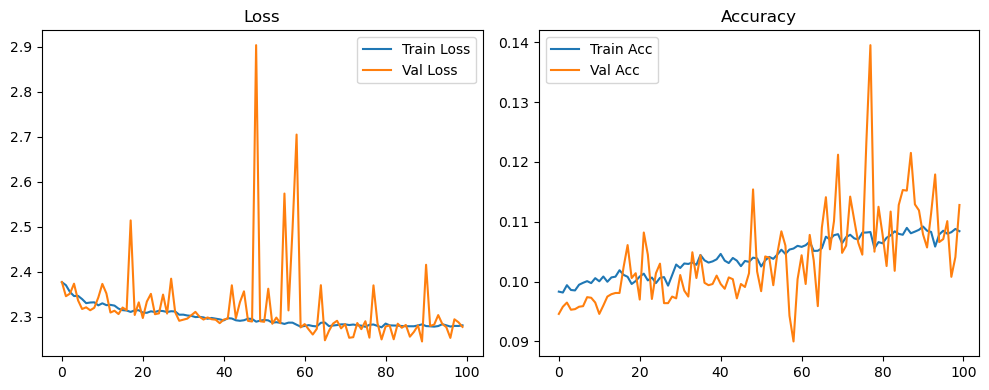

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 2.2816 Accuracy: 0.1163


🚀 Running: batch256_lr_max_0.0001_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0946 |:   1%|          | 1/100 [01:20<2:12:43, 80.44s/it]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0944 |:   1%|          | 1/100 [02:34<2:12:43, 80.44s/it]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0944 |:   1%|          | 1/100 [02:34<2:12:43, 80.44s/it]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0944 |:   2%|▏         | 2/100 [02:34<2:05:35, 76.89s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:48<2:05:35, 76.89s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:48<2:05:35, 76.89s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0967 |:   3%|▎         | 3/100 [02:49<1:18:01, 48.26s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   3%|▎         | 3/100 [03:03<1:18:01, 48.26s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   3%|▎         | 3/100 [03:03<1:18:01, 48.26s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   4%|▍         | 4/100 [03:03<55:44, 34.84s/it]  

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [03:17<55:44, 34.84s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [03:17<55:44, 34.84s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0960 |:   5%|▌         | 5/100 [03:17<43:20, 27.38s/it]

| LR: 0.000099 | Train Acc: 0.0983 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [03:31<43:20, 27.38s/it]

| LR: 0.000099 | Train Acc: 0.0983 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [03:31<43:20, 27.38s/it]

| LR: 0.000099 | Train Acc: 0.0983 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [03:31<35:49, 22.87s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0958 |:   6%|▌         | 6/100 [03:45<35:49, 22.87s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0958 |:   6%|▌         | 6/100 [03:45<35:49, 22.87s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0958 |:   7%|▋         | 7/100 [03:45<31:00, 20.01s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [03:59<31:00, 20.01s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [03:59<31:00, 20.01s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [03:59<27:49, 18.15s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   8%|▊         | 8/100 [04:14<27:49, 18.15s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   8%|▊         | 8/100 [04:14<27:49, 18.15s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0939 |:   9%|▉         | 9/100 [04:14<25:40, 16.93s/it]

| LR: 0.000098 | Train Acc: 0.0991 | Val Acc: 0.0959 |:   9%|▉         | 9/100 [04:28<25:40, 16.93s/it]

| LR: 0.000098 | Train Acc: 0.0991 | Val Acc: 0.0959 |:   9%|▉         | 9/100 [04:28<25:40, 16.93s/it]

| LR: 0.000098 | Train Acc: 0.0991 | Val Acc: 0.0959 |:  10%|█         | 10/100 [04:28<24:08, 16.10s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0953 |:  10%|█         | 10/100 [04:42<24:08, 16.10s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0953 |:  10%|█         | 10/100 [04:42<24:08, 16.10s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0953 |:  11%|█         | 11/100 [04:42<22:59, 15.50s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0955 |:  11%|█         | 11/100 [04:56<22:59, 15.50s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0955 |:  11%|█         | 11/100 [04:56<22:59, 15.50s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0955 |:  12%|█▏        | 12/100 [04:56<22:06, 15.07s/it]

| LR: 0.000097 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [05:10<22:06, 15.07s/it]

| LR: 0.000097 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [05:10<22:06, 15.07s/it]

| LR: 0.000097 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  13%|█▎        | 13/100 [05:10<21:24, 14.77s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0980 |:  13%|█▎        | 13/100 [05:24<21:24, 14.77s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0980 |:  13%|█▎        | 13/100 [05:24<21:24, 14.77s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [05:24<20:52, 14.57s/it]

| LR: 0.000096 | Train Acc: 0.1010 | Val Acc: 0.0986 |:  14%|█▍        | 14/100 [05:38<20:52, 14.57s/it]

| LR: 0.000096 | Train Acc: 0.1010 | Val Acc: 0.0986 |:  14%|█▍        | 14/100 [05:38<20:52, 14.57s/it]

| LR: 0.000096 | Train Acc: 0.1010 | Val Acc: 0.0986 |:  15%|█▌        | 15/100 [05:38<20:26, 14.43s/it]

| LR: 0.000095 | Train Acc: 0.1011 | Val Acc: 0.0996 |:  15%|█▌        | 15/100 [05:52<20:26, 14.43s/it]

| LR: 0.000095 | Train Acc: 0.1011 | Val Acc: 0.0996 |:  15%|█▌        | 15/100 [05:52<20:26, 14.43s/it]

| LR: 0.000095 | Train Acc: 0.1011 | Val Acc: 0.0996 |:  16%|█▌        | 16/100 [05:52<20:03, 14.33s/it]

| LR: 0.000094 | Train Acc: 0.1012 | Val Acc: 0.1053 |:  16%|█▌        | 16/100 [06:07<20:03, 14.33s/it]

| LR: 0.000094 | Train Acc: 0.1012 | Val Acc: 0.1053 |:  16%|█▌        | 16/100 [06:07<20:03, 14.33s/it]

| LR: 0.000094 | Train Acc: 0.1012 | Val Acc: 0.1053 |:  17%|█▋        | 17/100 [06:07<19:44, 14.27s/it]

| LR: 0.000094 | Train Acc: 0.1007 | Val Acc: 0.0987 |:  17%|█▋        | 17/100 [06:21<19:44, 14.27s/it]

| LR: 0.000094 | Train Acc: 0.1007 | Val Acc: 0.0987 |:  17%|█▋        | 17/100 [06:21<19:44, 14.27s/it]

| LR: 0.000094 | Train Acc: 0.1007 | Val Acc: 0.0987 |:  18%|█▊        | 18/100 [06:21<19:25, 14.21s/it]

| LR: 0.000093 | Train Acc: 0.1009 | Val Acc: 0.0979 |:  18%|█▊        | 18/100 [06:35<19:25, 14.21s/it]

| LR: 0.000093 | Train Acc: 0.1009 | Val Acc: 0.0979 |:  18%|█▊        | 18/100 [06:35<19:25, 14.21s/it]

| LR: 0.000093 | Train Acc: 0.1009 | Val Acc: 0.0979 |:  19%|█▉        | 19/100 [06:35<19:10, 14.20s/it]

| LR: 0.000092 | Train Acc: 0.1015 | Val Acc: 0.0960 |:  19%|█▉        | 19/100 [06:49<19:10, 14.20s/it]

| LR: 0.000092 | Train Acc: 0.1015 | Val Acc: 0.0960 |:  19%|█▉        | 19/100 [06:49<19:10, 14.20s/it]

| LR: 0.000092 | Train Acc: 0.1015 | Val Acc: 0.0960 |:  20%|██        | 20/100 [06:49<18:55, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  20%|██        | 20/100 [07:03<18:55, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  20%|██        | 20/100 [07:03<18:55, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  21%|██        | 21/100 [07:03<18:39, 14.17s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0950 |:  21%|██        | 21/100 [07:17<18:39, 14.17s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0950 |:  21%|██        | 21/100 [07:17<18:39, 14.17s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [07:17<18:26, 14.19s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  22%|██▏       | 22/100 [07:31<18:26, 14.19s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  22%|██▏       | 22/100 [07:31<18:26, 14.19s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  23%|██▎       | 23/100 [07:32<18:12, 14.18s/it]

| LR: 0.000089 | Train Acc: 0.0993 | Val Acc: 0.0953 |:  23%|██▎       | 23/100 [07:46<18:12, 14.18s/it]

| LR: 0.000089 | Train Acc: 0.0993 | Val Acc: 0.0953 |:  23%|██▎       | 23/100 [07:46<18:12, 14.18s/it]

| LR: 0.000089 | Train Acc: 0.0993 | Val Acc: 0.0953 |:  24%|██▍       | 24/100 [07:46<17:58, 14.19s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [08:00<17:58, 14.19s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [08:00<17:58, 14.19s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  25%|██▌       | 25/100 [08:00<17:43, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  25%|██▌       | 25/100 [08:14<17:43, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  25%|██▌       | 25/100 [08:14<17:43, 14.18s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  26%|██▌       | 26/100 [08:14<17:28, 14.17s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [08:28<17:28, 14.17s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [08:28<17:28, 14.17s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [08:28<17:13, 14.16s/it]

| LR: 0.000085 | Train Acc: 0.1001 | Val Acc: 0.0999 |:  27%|██▋       | 27/100 [08:42<17:13, 14.16s/it]

| LR: 0.000085 | Train Acc: 0.1001 | Val Acc: 0.0999 |:  27%|██▋       | 27/100 [08:42<17:13, 14.16s/it]

| LR: 0.000085 | Train Acc: 0.1001 | Val Acc: 0.0999 |:  28%|██▊       | 28/100 [08:42<16:58, 14.15s/it]

| LR: 0.000084 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [08:56<16:58, 14.15s/it]

| LR: 0.000084 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [08:56<16:58, 14.15s/it]

| LR: 0.000084 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [08:56<16:44, 14.15s/it]

| LR: 0.000083 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  29%|██▉       | 29/100 [09:10<16:44, 14.15s/it]

| LR: 0.000083 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  29%|██▉       | 29/100 [09:10<16:44, 14.15s/it]

| LR: 0.000083 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  30%|███       | 30/100 [09:11<16:29, 14.13s/it]

| LR: 0.000081 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:25<16:29, 14.13s/it]

| LR: 0.000081 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:25<16:29, 14.13s/it]

| LR: 0.000081 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  31%|███       | 31/100 [09:25<16:14, 14.13s/it]

| LR: 0.000080 | Train Acc: 0.1015 | Val Acc: 0.0982 |:  31%|███       | 31/100 [09:39<16:14, 14.13s/it]

| LR: 0.000080 | Train Acc: 0.1015 | Val Acc: 0.0982 |:  31%|███       | 31/100 [09:39<16:14, 14.13s/it]

| LR: 0.000080 | Train Acc: 0.1015 | Val Acc: 0.0982 |:  32%|███▏      | 32/100 [09:39<16:03, 14.17s/it]

| LR: 0.000079 | Train Acc: 0.1014 | Val Acc: 0.0978 |:  32%|███▏      | 32/100 [09:53<16:03, 14.17s/it]

| LR: 0.000079 | Train Acc: 0.1014 | Val Acc: 0.0978 |:  32%|███▏      | 32/100 [09:53<16:03, 14.17s/it]

| LR: 0.000079 | Train Acc: 0.1014 | Val Acc: 0.0978 |:  33%|███▎      | 33/100 [09:53<15:49, 14.17s/it]

| LR: 0.000078 | Train Acc: 0.1021 | Val Acc: 0.0977 |:  33%|███▎      | 33/100 [10:07<15:49, 14.17s/it]

| LR: 0.000078 | Train Acc: 0.1021 | Val Acc: 0.0977 |:  33%|███▎      | 33/100 [10:07<15:49, 14.17s/it]

| LR: 0.000078 | Train Acc: 0.1021 | Val Acc: 0.0977 |:  34%|███▍      | 34/100 [10:07<15:34, 14.17s/it]

| LR: 0.000077 | Train Acc: 0.1023 | Val Acc: 0.0976 |:  34%|███▍      | 34/100 [10:21<15:34, 14.17s/it]

| LR: 0.000077 | Train Acc: 0.1023 | Val Acc: 0.0976 |:  34%|███▍      | 34/100 [10:21<15:34, 14.17s/it]

| LR: 0.000077 | Train Acc: 0.1023 | Val Acc: 0.0976 |:  35%|███▌      | 35/100 [10:21<15:19, 14.15s/it]

| LR: 0.000075 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  35%|███▌      | 35/100 [10:35<15:19, 14.15s/it]

| LR: 0.000075 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  35%|███▌      | 35/100 [10:35<15:19, 14.15s/it]

| LR: 0.000075 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  36%|███▌      | 36/100 [10:35<15:03, 14.11s/it]

| LR: 0.000074 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  36%|███▌      | 36/100 [10:49<15:03, 14.11s/it]

| LR: 0.000074 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  36%|███▌      | 36/100 [10:49<15:03, 14.11s/it]

| LR: 0.000074 | Train Acc: 0.1029 | Val Acc: 0.0979 |:  37%|███▋      | 37/100 [10:49<14:48, 14.11s/it]

| LR: 0.000073 | Train Acc: 0.1027 | Val Acc: 0.1019 |:  37%|███▋      | 37/100 [11:04<14:48, 14.11s/it]

| LR: 0.000073 | Train Acc: 0.1027 | Val Acc: 0.1019 |:  37%|███▋      | 37/100 [11:04<14:48, 14.11s/it]

| LR: 0.000073 | Train Acc: 0.1027 | Val Acc: 0.1019 |:  38%|███▊      | 38/100 [11:04<14:35, 14.11s/it]

| LR: 0.000072 | Train Acc: 0.1032 | Val Acc: 0.0993 |:  38%|███▊      | 38/100 [11:18<14:35, 14.11s/it]

| LR: 0.000072 | Train Acc: 0.1032 | Val Acc: 0.0993 |:  38%|███▊      | 38/100 [11:18<14:35, 14.11s/it]

| LR: 0.000072 | Train Acc: 0.1032 | Val Acc: 0.0993 |:  39%|███▉      | 39/100 [11:18<14:20, 14.11s/it]

| LR: 0.000070 | Train Acc: 0.1022 | Val Acc: 0.0993 |:  39%|███▉      | 39/100 [11:32<14:20, 14.11s/it]

| LR: 0.000070 | Train Acc: 0.1022 | Val Acc: 0.0993 |:  39%|███▉      | 39/100 [11:32<14:20, 14.11s/it]

| LR: 0.000070 | Train Acc: 0.1022 | Val Acc: 0.0993 |:  40%|████      | 40/100 [11:32<14:06, 14.11s/it]

| LR: 0.000069 | Train Acc: 0.1027 | Val Acc: 0.1000 |:  40%|████      | 40/100 [11:46<14:06, 14.11s/it]

| LR: 0.000069 | Train Acc: 0.1027 | Val Acc: 0.1000 |:  40%|████      | 40/100 [11:46<14:06, 14.11s/it]

| LR: 0.000069 | Train Acc: 0.1027 | Val Acc: 0.1000 |:  41%|████      | 41/100 [11:46<13:52, 14.10s/it]

| LR: 0.000068 | Train Acc: 0.1031 | Val Acc: 0.0980 |:  41%|████      | 41/100 [12:00<13:52, 14.10s/it]

| LR: 0.000068 | Train Acc: 0.1031 | Val Acc: 0.0980 |:  41%|████      | 41/100 [12:00<13:52, 14.10s/it]

| LR: 0.000068 | Train Acc: 0.1031 | Val Acc: 0.0980 |:  42%|████▏     | 42/100 [12:00<13:37, 14.10s/it]

| LR: 0.000066 | Train Acc: 0.1027 | Val Acc: 0.0970 |:  42%|████▏     | 42/100 [12:14<13:37, 14.10s/it]

| LR: 0.000066 | Train Acc: 0.1027 | Val Acc: 0.0970 |:  42%|████▏     | 42/100 [12:14<13:37, 14.10s/it]

| LR: 0.000066 | Train Acc: 0.1027 | Val Acc: 0.0970 |:  43%|████▎     | 43/100 [12:14<13:23, 14.09s/it]

| LR: 0.000065 | Train Acc: 0.1027 | Val Acc: 0.0976 |:  43%|████▎     | 43/100 [12:28<13:23, 14.09s/it]

| LR: 0.000065 | Train Acc: 0.1027 | Val Acc: 0.0976 |:  43%|████▎     | 43/100 [12:28<13:23, 14.09s/it]

| LR: 0.000065 | Train Acc: 0.1027 | Val Acc: 0.0976 |:  44%|████▍     | 44/100 [12:28<13:08, 14.08s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.1003 |:  44%|████▍     | 44/100 [12:42<13:08, 14.08s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.1003 |:  44%|████▍     | 44/100 [12:42<13:08, 14.08s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.1003 |:  45%|████▌     | 45/100 [12:42<12:53, 14.07s/it]

| LR: 0.000062 | Train Acc: 0.1027 | Val Acc: 0.0980 |:  45%|████▌     | 45/100 [12:56<12:53, 14.07s/it]

| LR: 0.000062 | Train Acc: 0.1027 | Val Acc: 0.0980 |:  45%|████▌     | 45/100 [12:56<12:53, 14.07s/it]

| LR: 0.000062 | Train Acc: 0.1027 | Val Acc: 0.0980 |:  46%|████▌     | 46/100 [12:56<12:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1031 | Val Acc: 0.0962 |:  46%|████▌     | 46/100 [13:10<12:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1031 | Val Acc: 0.0962 |:  46%|████▌     | 46/100 [13:10<12:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1031 | Val Acc: 0.0962 |:  47%|████▋     | 47/100 [13:10<12:27, 14.11s/it]

| LR: 0.000059 | Train Acc: 0.1041 | Val Acc: 0.0984 |:  47%|████▋     | 47/100 [13:24<12:27, 14.11s/it]

| LR: 0.000059 | Train Acc: 0.1041 | Val Acc: 0.0984 |:  47%|████▋     | 47/100 [13:24<12:27, 14.11s/it]

| LR: 0.000059 | Train Acc: 0.1041 | Val Acc: 0.0984 |:  48%|████▊     | 48/100 [13:25<12:12, 14.09s/it]

| LR: 0.000058 | Train Acc: 0.1031 | Val Acc: 0.0995 |:  48%|████▊     | 48/100 [13:39<12:12, 14.09s/it]

| LR: 0.000058 | Train Acc: 0.1031 | Val Acc: 0.0995 |:  48%|████▊     | 48/100 [13:39<12:12, 14.09s/it]

| LR: 0.000058 | Train Acc: 0.1031 | Val Acc: 0.0995 |:  49%|████▉     | 49/100 [13:39<11:59, 14.11s/it]

| LR: 0.000056 | Train Acc: 0.1035 | Val Acc: 0.1032 |:  49%|████▉     | 49/100 [13:53<11:59, 14.11s/it]

| LR: 0.000056 | Train Acc: 0.1035 | Val Acc: 0.1032 |:  49%|████▉     | 49/100 [13:53<11:59, 14.11s/it]

| LR: 0.000056 | Train Acc: 0.1035 | Val Acc: 0.1032 |:  50%|█████     | 50/100 [13:53<11:46, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1032 | Val Acc: 0.0941 |:  50%|█████     | 50/100 [14:07<11:46, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1032 | Val Acc: 0.0941 |:  50%|█████     | 50/100 [14:07<11:46, 14.13s/it]

| LR: 0.000055 | Train Acc: 0.1032 | Val Acc: 0.0941 |:  51%|█████     | 51/100 [14:07<11:33, 14.15s/it]

| LR: 0.000054 | Train Acc: 0.1039 | Val Acc: 0.0980 |:  51%|█████     | 51/100 [14:21<11:33, 14.15s/it]

| LR: 0.000054 | Train Acc: 0.1039 | Val Acc: 0.0980 |:  51%|█████     | 51/100 [14:21<11:33, 14.15s/it]

| LR: 0.000054 | Train Acc: 0.1039 | Val Acc: 0.0980 |:  52%|█████▏    | 52/100 [14:21<11:21, 14.19s/it]

| LR: 0.000052 | Train Acc: 0.1031 | Val Acc: 0.0988 |:  52%|█████▏    | 52/100 [14:36<11:21, 14.19s/it]

| LR: 0.000052 | Train Acc: 0.1031 | Val Acc: 0.0988 |:  52%|█████▏    | 52/100 [14:36<11:21, 14.19s/it]

| LR: 0.000052 | Train Acc: 0.1031 | Val Acc: 0.0988 |:  53%|█████▎    | 53/100 [14:36<11:08, 14.23s/it]

| LR: 0.000051 | Train Acc: 0.1034 | Val Acc: 0.1018 |:  53%|█████▎    | 53/100 [14:50<11:08, 14.23s/it]

| LR: 0.000051 | Train Acc: 0.1034 | Val Acc: 0.1018 |:  53%|█████▎    | 53/100 [14:50<11:08, 14.23s/it]

| LR: 0.000051 | Train Acc: 0.1034 | Val Acc: 0.1018 |:  54%|█████▍    | 54/100 [14:50<10:53, 14.22s/it]

| LR: 0.000049 | Train Acc: 0.1035 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:04<10:53, 14.22s/it]

| LR: 0.000049 | Train Acc: 0.1035 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:04<10:53, 14.22s/it]

| LR: 0.000049 | Train Acc: 0.1035 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:04<10:38, 14.20s/it]

| LR: 0.000048 | Train Acc: 0.1038 | Val Acc: 0.0991 |:  55%|█████▌    | 55/100 [15:18<10:38, 14.20s/it]

| LR: 0.000048 | Train Acc: 0.1038 | Val Acc: 0.0991 |:  55%|█████▌    | 55/100 [15:18<10:38, 14.20s/it]

| LR: 0.000048 | Train Acc: 0.1038 | Val Acc: 0.0991 |:  56%|█████▌    | 56/100 [15:18<10:24, 14.20s/it]

| LR: 0.000047 | Train Acc: 0.1032 | Val Acc: 0.0997 |:  56%|█████▌    | 56/100 [15:32<10:24, 14.20s/it]

| LR: 0.000047 | Train Acc: 0.1032 | Val Acc: 0.0997 |:  56%|█████▌    | 56/100 [15:32<10:24, 14.20s/it]

| LR: 0.000047 | Train Acc: 0.1032 | Val Acc: 0.0997 |:  57%|█████▋    | 57/100 [15:32<10:10, 14.20s/it]

| LR: 0.000045 | Train Acc: 0.1029 | Val Acc: 0.0993 |:  57%|█████▋    | 57/100 [15:46<10:10, 14.20s/it]

| LR: 0.000045 | Train Acc: 0.1029 | Val Acc: 0.0993 |:  57%|█████▋    | 57/100 [15:46<10:10, 14.20s/it]

| LR: 0.000045 | Train Acc: 0.1029 | Val Acc: 0.0993 |:  58%|█████▊    | 58/100 [15:46<09:54, 14.16s/it]

| LR: 0.000044 | Train Acc: 0.1035 | Val Acc: 0.1043 |:  58%|█████▊    | 58/100 [16:01<09:54, 14.16s/it]

| LR: 0.000044 | Train Acc: 0.1035 | Val Acc: 0.1043 |:  58%|█████▊    | 58/100 [16:01<09:54, 14.16s/it]

| LR: 0.000044 | Train Acc: 0.1035 | Val Acc: 0.1043 |:  59%|█████▉    | 59/100 [16:01<09:40, 14.15s/it]

| LR: 0.000042 | Train Acc: 0.1032 | Val Acc: 0.0976 |:  59%|█████▉    | 59/100 [16:15<09:40, 14.15s/it]

| LR: 0.000042 | Train Acc: 0.1032 | Val Acc: 0.0976 |:  59%|█████▉    | 59/100 [16:15<09:40, 14.15s/it]

| LR: 0.000042 | Train Acc: 0.1032 | Val Acc: 0.0976 |:  60%|██████    | 60/100 [16:15<09:24, 14.12s/it]

| LR: 0.000041 | Train Acc: 0.1033 | Val Acc: 0.1048 |:  60%|██████    | 60/100 [16:29<09:24, 14.12s/it]

| LR: 0.000041 | Train Acc: 0.1033 | Val Acc: 0.1048 |:  60%|██████    | 60/100 [16:29<09:24, 14.12s/it]

| LR: 0.000041 | Train Acc: 0.1033 | Val Acc: 0.1048 |:  61%|██████    | 61/100 [16:29<09:11, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.1040 | Val Acc: 0.1010 |:  61%|██████    | 61/100 [16:43<09:11, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.1040 | Val Acc: 0.1010 |:  61%|██████    | 61/100 [16:43<09:11, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.1040 | Val Acc: 0.1010 |:  62%|██████▏   | 62/100 [16:43<08:57, 14.14s/it]

| LR: 0.000038 | Train Acc: 0.1039 | Val Acc: 0.0998 |:  62%|██████▏   | 62/100 [16:57<08:57, 14.14s/it]

| LR: 0.000038 | Train Acc: 0.1039 | Val Acc: 0.0998 |:  62%|██████▏   | 62/100 [16:57<08:57, 14.14s/it]

| LR: 0.000038 | Train Acc: 0.1039 | Val Acc: 0.0998 |:  63%|██████▎   | 63/100 [16:57<08:42, 14.12s/it]

| LR: 0.000037 | Train Acc: 0.1051 | Val Acc: 0.0994 |:  63%|██████▎   | 63/100 [17:11<08:42, 14.12s/it]

| LR: 0.000037 | Train Acc: 0.1051 | Val Acc: 0.0994 |:  63%|██████▎   | 63/100 [17:11<08:42, 14.12s/it]

| LR: 0.000037 | Train Acc: 0.1051 | Val Acc: 0.0994 |:  64%|██████▍   | 64/100 [17:11<08:27, 14.10s/it]

| LR: 0.000036 | Train Acc: 0.1051 | Val Acc: 0.0983 |:  64%|██████▍   | 64/100 [17:25<08:27, 14.10s/it]

| LR: 0.000036 | Train Acc: 0.1051 | Val Acc: 0.0983 |:  64%|██████▍   | 64/100 [17:25<08:27, 14.10s/it]

| LR: 0.000036 | Train Acc: 0.1051 | Val Acc: 0.0983 |:  65%|██████▌   | 65/100 [17:25<08:13, 14.10s/it]

| LR: 0.000035 | Train Acc: 0.1051 | Val Acc: 0.0980 |:  65%|██████▌   | 65/100 [17:39<08:13, 14.10s/it]

| LR: 0.000035 | Train Acc: 0.1051 | Val Acc: 0.0980 |:  65%|██████▌   | 65/100 [17:39<08:13, 14.10s/it]

| LR: 0.000035 | Train Acc: 0.1051 | Val Acc: 0.0980 |:  66%|██████▌   | 66/100 [17:39<07:58, 14.08s/it]

| LR: 0.000033 | Train Acc: 0.1042 | Val Acc: 0.1032 |:  66%|██████▌   | 66/100 [17:53<07:58, 14.08s/it]

| LR: 0.000033 | Train Acc: 0.1042 | Val Acc: 0.1032 |:  66%|██████▌   | 66/100 [17:53<07:58, 14.08s/it]

| LR: 0.000033 | Train Acc: 0.1042 | Val Acc: 0.1032 |:  67%|██████▋   | 67/100 [17:53<07:45, 14.09s/it]

| LR: 0.000032 | Train Acc: 0.1047 | Val Acc: 0.0979 |:  67%|██████▋   | 67/100 [18:07<07:45, 14.09s/it]

| LR: 0.000032 | Train Acc: 0.1047 | Val Acc: 0.0979 |:  67%|██████▋   | 67/100 [18:07<07:45, 14.09s/it]

| LR: 0.000032 | Train Acc: 0.1047 | Val Acc: 0.0979 |:  68%|██████▊   | 68/100 [18:07<07:30, 14.09s/it]

| LR: 0.000031 | Train Acc: 0.1055 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:22<07:30, 14.09s/it]

| LR: 0.000031 | Train Acc: 0.1055 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:22<07:30, 14.09s/it]

| LR: 0.000031 | Train Acc: 0.1055 | Val Acc: 0.0992 |:  69%|██████▉   | 69/100 [18:22<07:17, 14.12s/it]

| LR: 0.000030 | Train Acc: 0.1051 | Val Acc: 0.1077 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.12s/it]

| LR: 0.000030 | Train Acc: 0.1051 | Val Acc: 0.1077 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.12s/it]

| LR: 0.000030 | Train Acc: 0.1051 | Val Acc: 0.1077 |:  70%|███████   | 70/100 [18:36<07:04, 14.14s/it]

| LR: 0.000029 | Train Acc: 0.1053 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [18:50<07:04, 14.14s/it]

| LR: 0.000029 | Train Acc: 0.1053 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [18:50<07:04, 14.14s/it]

| LR: 0.000029 | Train Acc: 0.1053 | Val Acc: 0.1005 |:  71%|███████   | 71/100 [18:50<06:51, 14.18s/it]

| LR: 0.000027 | Train Acc: 0.1055 | Val Acc: 0.1066 |:  71%|███████   | 71/100 [19:04<06:51, 14.18s/it]

| LR: 0.000027 | Train Acc: 0.1055 | Val Acc: 0.1066 |:  71%|███████   | 71/100 [19:04<06:51, 14.18s/it]

| LR: 0.000027 | Train Acc: 0.1055 | Val Acc: 0.1066 |:  72%|███████▏  | 72/100 [19:04<06:36, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1064 | Val Acc: 0.1028 |:  72%|███████▏  | 72/100 [19:18<06:36, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1064 | Val Acc: 0.1028 |:  72%|███████▏  | 72/100 [19:18<06:36, 14.16s/it]

| LR: 0.000026 | Train Acc: 0.1064 | Val Acc: 0.1028 |:  73%|███████▎  | 73/100 [19:18<06:21, 14.14s/it]

| LR: 0.000025 | Train Acc: 0.1061 | Val Acc: 0.0979 |:  73%|███████▎  | 73/100 [19:32<06:21, 14.14s/it]

| LR: 0.000025 | Train Acc: 0.1061 | Val Acc: 0.0979 |:  73%|███████▎  | 73/100 [19:32<06:21, 14.14s/it]

| LR: 0.000025 | Train Acc: 0.1061 | Val Acc: 0.0979 |:  74%|███████▍  | 74/100 [19:32<06:06, 14.11s/it]

| LR: 0.000024 | Train Acc: 0.1042 | Val Acc: 0.1015 |:  74%|███████▍  | 74/100 [19:46<06:06, 14.11s/it]

| LR: 0.000024 | Train Acc: 0.1042 | Val Acc: 0.1015 |:  74%|███████▍  | 74/100 [19:46<06:06, 14.11s/it]

| LR: 0.000024 | Train Acc: 0.1042 | Val Acc: 0.1015 |:  75%|███████▌  | 75/100 [19:46<05:51, 14.08s/it]

| LR: 0.000023 | Train Acc: 0.1049 | Val Acc: 0.1006 |:  75%|███████▌  | 75/100 [20:00<05:51, 14.08s/it]

| LR: 0.000023 | Train Acc: 0.1049 | Val Acc: 0.1006 |:  75%|███████▌  | 75/100 [20:00<05:51, 14.08s/it]

| LR: 0.000023 | Train Acc: 0.1049 | Val Acc: 0.1006 |:  76%|███████▌  | 76/100 [20:00<05:37, 14.06s/it]

| LR: 0.000022 | Train Acc: 0.1050 | Val Acc: 0.1063 |:  76%|███████▌  | 76/100 [20:14<05:37, 14.06s/it]

| LR: 0.000022 | Train Acc: 0.1050 | Val Acc: 0.1063 |:  76%|███████▌  | 76/100 [20:14<05:37, 14.06s/it]

| LR: 0.000022 | Train Acc: 0.1050 | Val Acc: 0.1063 |:  77%|███████▋  | 77/100 [20:14<05:23, 14.06s/it]

| LR: 0.000021 | Train Acc: 0.1058 | Val Acc: 0.1059 |:  77%|███████▋  | 77/100 [20:29<05:23, 14.06s/it]

| LR: 0.000021 | Train Acc: 0.1058 | Val Acc: 0.1059 |:  77%|███████▋  | 77/100 [20:29<05:23, 14.06s/it]

| LR: 0.000021 | Train Acc: 0.1058 | Val Acc: 0.1059 |:  78%|███████▊  | 78/100 [20:29<05:10, 14.10s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.1050 |:  78%|███████▊  | 78/100 [20:43<05:10, 14.10s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.1050 |:  78%|███████▊  | 78/100 [20:43<05:10, 14.10s/it]

| LR: 0.000020 | Train Acc: 0.1056 | Val Acc: 0.1050 |:  79%|███████▉  | 79/100 [20:43<04:56, 14.11s/it]

| LR: 0.000019 | Train Acc: 0.1064 | Val Acc: 0.1059 |:  79%|███████▉  | 79/100 [20:57<04:56, 14.11s/it]

| LR: 0.000019 | Train Acc: 0.1064 | Val Acc: 0.1059 |:  79%|███████▉  | 79/100 [20:57<04:56, 14.11s/it]

| LR: 0.000019 | Train Acc: 0.1064 | Val Acc: 0.1059 |:  80%|████████  | 80/100 [20:57<04:41, 14.09s/it]

| LR: 0.000019 | Train Acc: 0.1061 | Val Acc: 0.1047 |:  80%|████████  | 80/100 [21:11<04:41, 14.09s/it]

| LR: 0.000019 | Train Acc: 0.1061 | Val Acc: 0.1047 |:  80%|████████  | 80/100 [21:11<04:41, 14.09s/it]

| LR: 0.000019 | Train Acc: 0.1061 | Val Acc: 0.1047 |:  81%|████████  | 81/100 [21:11<04:27, 14.10s/it]

| LR: 0.000018 | Train Acc: 0.1062 | Val Acc: 0.1094 |:  81%|████████  | 81/100 [21:25<04:27, 14.10s/it]

| LR: 0.000018 | Train Acc: 0.1062 | Val Acc: 0.1094 |:  81%|████████  | 81/100 [21:25<04:27, 14.10s/it]

| LR: 0.000018 | Train Acc: 0.1062 | Val Acc: 0.1094 |:  82%|████████▏ | 82/100 [21:25<04:13, 14.09s/it]

| LR: 0.000017 | Train Acc: 0.1060 | Val Acc: 0.1090 |:  82%|████████▏ | 82/100 [21:39<04:13, 14.09s/it]

| LR: 0.000017 | Train Acc: 0.1060 | Val Acc: 0.1090 |:  82%|████████▏ | 82/100 [21:39<04:13, 14.09s/it]

| LR: 0.000017 | Train Acc: 0.1060 | Val Acc: 0.1090 |:  83%|████████▎ | 83/100 [21:39<03:59, 14.10s/it]

| LR: 0.000016 | Train Acc: 0.1060 | Val Acc: 0.1100 |:  83%|████████▎ | 83/100 [21:53<03:59, 14.10s/it]

| LR: 0.000016 | Train Acc: 0.1060 | Val Acc: 0.1100 |:  83%|████████▎ | 83/100 [21:53<03:59, 14.10s/it]

| LR: 0.000016 | Train Acc: 0.1060 | Val Acc: 0.1100 |:  84%|████████▍ | 84/100 [21:53<03:45, 14.10s/it]

| LR: 0.000016 | Train Acc: 0.1066 | Val Acc: 0.0998 |:  84%|████████▍ | 84/100 [22:07<03:45, 14.10s/it]

| LR: 0.000016 | Train Acc: 0.1066 | Val Acc: 0.0998 |:  84%|████████▍ | 84/100 [22:07<03:45, 14.10s/it]

| LR: 0.000016 | Train Acc: 0.1066 | Val Acc: 0.0998 |:  85%|████████▌ | 85/100 [22:07<03:31, 14.13s/it]

| LR: 0.000015 | Train Acc: 0.1067 | Val Acc: 0.1035 |:  85%|████████▌ | 85/100 [22:21<03:31, 14.13s/it]

| LR: 0.000015 | Train Acc: 0.1067 | Val Acc: 0.1035 |:  85%|████████▌ | 85/100 [22:21<03:31, 14.13s/it]

| LR: 0.000015 | Train Acc: 0.1067 | Val Acc: 0.1035 |:  86%|████████▌ | 86/100 [22:21<03:17, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.1060 | Val Acc: 0.1058 |:  86%|████████▌ | 86/100 [22:35<03:17, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.1060 | Val Acc: 0.1058 |:  86%|████████▌ | 86/100 [22:35<03:17, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.1060 | Val Acc: 0.1058 |:  87%|████████▋ | 87/100 [22:36<03:03, 14.09s/it]

| LR: 0.000014 | Train Acc: 0.1064 | Val Acc: 0.1024 |:  87%|████████▋ | 87/100 [22:50<03:03, 14.09s/it]

| LR: 0.000014 | Train Acc: 0.1064 | Val Acc: 0.1024 |:  87%|████████▋ | 87/100 [22:50<03:03, 14.09s/it]

| LR: 0.000014 | Train Acc: 0.1064 | Val Acc: 0.1024 |:  88%|████████▊ | 88/100 [22:50<02:49, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1061 | Val Acc: 0.1009 |:  88%|████████▊ | 88/100 [23:04<02:49, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1061 | Val Acc: 0.1009 |:  88%|████████▊ | 88/100 [23:04<02:49, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1061 | Val Acc: 0.1009 |:  89%|████████▉ | 89/100 [23:04<02:35, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1067 | Val Acc: 0.1054 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1067 | Val Acc: 0.1054 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1067 | Val Acc: 0.1054 |:  90%|█████████ | 90/100 [23:18<02:20, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1064 | Val Acc: 0.1059 |:  90%|█████████ | 90/100 [23:32<02:20, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1064 | Val Acc: 0.1059 |:  90%|█████████ | 90/100 [23:32<02:20, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1064 | Val Acc: 0.1059 |:  91%|█████████ | 91/100 [23:32<02:06, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1060 | Val Acc: 0.1070 |:  91%|█████████ | 91/100 [23:46<02:06, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1060 | Val Acc: 0.1070 |:  91%|█████████ | 91/100 [23:46<02:06, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1060 | Val Acc: 0.1070 |:  92%|█████████▏| 92/100 [23:46<01:52, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1062 | Val Acc: 0.1012 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1062 | Val Acc: 0.1012 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1062 | Val Acc: 0.1012 |:  93%|█████████▎| 93/100 [24:00<01:38, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1061 | Val Acc: 0.1115 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1061 | Val Acc: 0.1115 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1061 | Val Acc: 0.1115 |:  94%|█████████▍| 94/100 [24:14<01:24, 14.10s/it]

| LR: 0.000011 | Train Acc: 0.1068 | Val Acc: 0.1033 |:  94%|█████████▍| 94/100 [24:28<01:24, 14.10s/it]

| LR: 0.000011 | Train Acc: 0.1068 | Val Acc: 0.1033 |:  94%|█████████▍| 94/100 [24:28<01:24, 14.10s/it]

| LR: 0.000011 | Train Acc: 0.1068 | Val Acc: 0.1033 |:  95%|█████████▌| 95/100 [24:28<01:10, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1066 | Val Acc: 0.1005 |:  95%|█████████▌| 95/100 [24:43<01:10, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1066 | Val Acc: 0.1005 |:  95%|█████████▌| 95/100 [24:43<01:10, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1066 | Val Acc: 0.1005 |:  96%|█████████▌| 96/100 [24:43<00:56, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.0991 |:  96%|█████████▌| 96/100 [24:57<00:56, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.0991 |:  96%|█████████▌| 96/100 [24:57<00:56, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.0991 |:  97%|█████████▋| 97/100 [24:57<00:42, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1075 | Val Acc: 0.1005 |:  97%|█████████▋| 97/100 [25:11<00:42, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1075 | Val Acc: 0.1005 |:  97%|█████████▋| 97/100 [25:11<00:42, 14.13s/it]

| LR: 0.000010 | Train Acc: 0.1075 | Val Acc: 0.1005 |:  98%|█████████▊| 98/100 [25:11<00:28, 14.11s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.1063 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.11s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.1063 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.11s/it]

| LR: 0.000010 | Train Acc: 0.1062 | Val Acc: 0.1063 |:  99%|█████████▉| 99/100 [25:25<00:14, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1069 | Val Acc: 0.1027 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1069 | Val Acc: 0.1027 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1069 | Val Acc: 0.1027 |: 100%|██████████| 100/100 [25:39<00:00, 14.10s/it]

| LR: 0.000010 | Train Acc: 0.1069 | Val Acc: 0.1027 |: 100%|██████████| 100/100 [25:39<00:00, 15.40s/it]

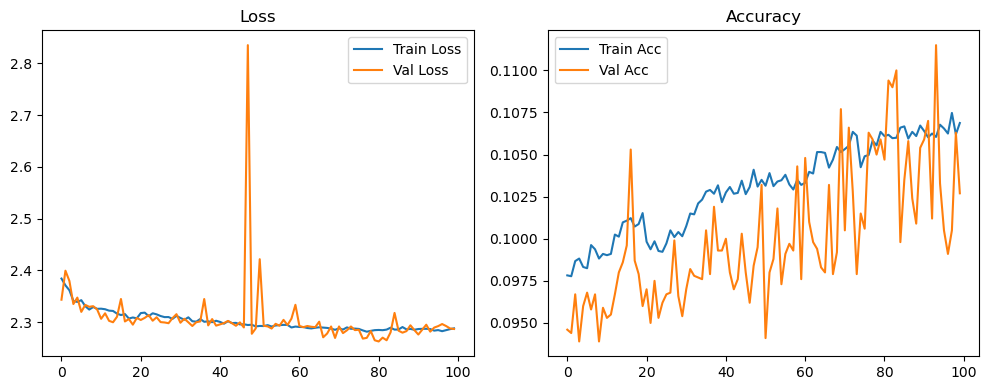

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 2.2862 Accuracy: 0.1061


🚀 Running: batch256_lr_max_0.0001_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0971 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:20<2:13:05, 80.66s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:35<2:13:05, 80.66s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:35<2:13:05, 80.66s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [02:35<2:06:34, 77.49s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [02:50<2:06:34, 77.49s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [02:50<2:06:34, 77.49s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [02:50<1:18:32, 48.58s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [03:04<1:18:32, 48.58s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [03:04<1:18:32, 48.58s/it]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0966 |:   4%|▍         | 4/100 [03:04<56:01, 35.02s/it]  

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [03:18<56:01, 35.02s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [03:18<56:01, 35.02s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [03:18<43:32, 27.50s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [03:32<43:32, 27.50s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [03:32<43:32, 27.50s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [03:32<35:57, 22.95s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [03:46<35:57, 22.95s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [03:46<35:57, 22.95s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   7%|▋         | 7/100 [03:46<31:06, 20.07s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [04:00<31:06, 20.07s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [04:00<31:06, 20.07s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [04:00<27:51, 18.17s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0977 |:   8%|▊         | 8/100 [04:14<27:51, 18.17s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0977 |:   8%|▊         | 8/100 [04:14<27:51, 18.17s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0977 |:   9%|▉         | 9/100 [04:14<25:38, 16.90s/it]

| LR: 0.000098 | Train Acc: 0.0998 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:29<25:38, 16.90s/it]

| LR: 0.000098 | Train Acc: 0.0998 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:29<25:38, 16.90s/it]

| LR: 0.000098 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  10%|█         | 10/100 [04:29<24:08, 16.09s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0975 |:  10%|█         | 10/100 [04:43<24:08, 16.09s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0975 |:  10%|█         | 10/100 [04:43<24:08, 16.09s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0975 |:  11%|█         | 11/100 [04:43<23:02, 15.53s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:57<23:02, 15.53s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:57<23:02, 15.53s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [04:57<22:09, 15.10s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [05:11<22:09, 15.10s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [05:11<22:09, 15.10s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [05:11<21:30, 14.83s/it]

| LR: 0.000096 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [05:25<21:30, 14.83s/it]

| LR: 0.000096 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [05:25<21:30, 14.83s/it]

| LR: 0.000096 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [05:25<20:56, 14.61s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  14%|█▍        | 14/100 [05:39<20:56, 14.61s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  14%|█▍        | 14/100 [05:39<20:56, 14.61s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0978 |:  15%|█▌        | 15/100 [05:40<20:28, 14.46s/it]

| LR: 0.000095 | Train Acc: 0.1008 | Val Acc: 0.0977 |:  15%|█▌        | 15/100 [05:54<20:28, 14.46s/it]

| LR: 0.000095 | Train Acc: 0.1008 | Val Acc: 0.0977 |:  15%|█▌        | 15/100 [05:54<20:28, 14.46s/it]

| LR: 0.000095 | Train Acc: 0.1008 | Val Acc: 0.0977 |:  16%|█▌        | 16/100 [05:54<20:04, 14.34s/it]

| LR: 0.000094 | Train Acc: 0.1009 | Val Acc: 0.0964 |:  16%|█▌        | 16/100 [06:08<20:04, 14.34s/it]

| LR: 0.000094 | Train Acc: 0.1009 | Val Acc: 0.0964 |:  16%|█▌        | 16/100 [06:08<20:04, 14.34s/it]

| LR: 0.000094 | Train Acc: 0.1009 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [06:08<19:45, 14.28s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [06:22<19:45, 14.28s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [06:22<19:45, 14.28s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:22<19:29, 14.26s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  18%|█▊        | 18/100 [06:36<19:29, 14.26s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  18%|█▊        | 18/100 [06:36<19:29, 14.26s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  19%|█▉        | 19/100 [06:36<19:10, 14.21s/it]

| LR: 0.000092 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  19%|█▉        | 19/100 [06:50<19:10, 14.21s/it]

| LR: 0.000092 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  19%|█▉        | 19/100 [06:50<19:10, 14.21s/it]

| LR: 0.000092 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  20%|██        | 20/100 [06:50<18:55, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0963 |:  20%|██        | 20/100 [07:04<18:55, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0963 |:  20%|██        | 20/100 [07:04<18:55, 14.19s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0963 |:  21%|██        | 21/100 [07:04<18:41, 14.20s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0970 |:  21%|██        | 21/100 [07:19<18:41, 14.20s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0970 |:  21%|██        | 21/100 [07:19<18:41, 14.20s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0970 |:  22%|██▏       | 22/100 [07:19<18:26, 14.19s/it]

| LR: 0.000090 | Train Acc: 0.1020 | Val Acc: 0.0982 |:  22%|██▏       | 22/100 [07:33<18:26, 14.19s/it]

| LR: 0.000090 | Train Acc: 0.1020 | Val Acc: 0.0982 |:  22%|██▏       | 22/100 [07:33<18:26, 14.19s/it]

| LR: 0.000090 | Train Acc: 0.1020 | Val Acc: 0.0982 |:  23%|██▎       | 23/100 [07:33<18:12, 14.18s/it]

| LR: 0.000089 | Train Acc: 0.1013 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [07:47<18:12, 14.18s/it]

| LR: 0.000089 | Train Acc: 0.1013 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [07:47<18:12, 14.18s/it]

| LR: 0.000089 | Train Acc: 0.1013 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [07:47<17:56, 14.16s/it]

| LR: 0.000088 | Train Acc: 0.1023 | Val Acc: 0.0978 |:  24%|██▍       | 24/100 [08:01<17:56, 14.16s/it]

| LR: 0.000088 | Train Acc: 0.1023 | Val Acc: 0.0978 |:  24%|██▍       | 24/100 [08:01<17:56, 14.16s/it]

| LR: 0.000088 | Train Acc: 0.1023 | Val Acc: 0.0978 |:  25%|██▌       | 25/100 [08:01<17:41, 14.16s/it]

| LR: 0.000087 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:15<17:41, 14.16s/it]

| LR: 0.000087 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:15<17:41, 14.16s/it]

| LR: 0.000087 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:15<17:28, 14.17s/it]

| LR: 0.000086 | Train Acc: 0.1002 | Val Acc: 0.0976 |:  26%|██▌       | 26/100 [08:29<17:28, 14.17s/it]

| LR: 0.000086 | Train Acc: 0.1002 | Val Acc: 0.0976 |:  26%|██▌       | 26/100 [08:29<17:28, 14.17s/it]

| LR: 0.000086 | Train Acc: 0.1002 | Val Acc: 0.0976 |:  27%|██▋       | 27/100 [08:29<17:14, 14.17s/it]

| LR: 0.000085 | Train Acc: 0.1009 | Val Acc: 0.0977 |:  27%|██▋       | 27/100 [08:43<17:14, 14.17s/it]

| LR: 0.000085 | Train Acc: 0.1009 | Val Acc: 0.0977 |:  27%|██▋       | 27/100 [08:43<17:14, 14.17s/it]

| LR: 0.000085 | Train Acc: 0.1009 | Val Acc: 0.0977 |:  28%|██▊       | 28/100 [08:43<16:58, 14.15s/it]

| LR: 0.000084 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [08:58<16:58, 14.15s/it]

| LR: 0.000084 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [08:58<16:58, 14.15s/it]

| LR: 0.000084 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  29%|██▉       | 29/100 [08:58<16:44, 14.15s/it]

| LR: 0.000083 | Train Acc: 0.1013 | Val Acc: 0.0964 |:  29%|██▉       | 29/100 [09:12<16:44, 14.15s/it]

| LR: 0.000083 | Train Acc: 0.1013 | Val Acc: 0.0964 |:  29%|██▉       | 29/100 [09:12<16:44, 14.15s/it]

| LR: 0.000083 | Train Acc: 0.1013 | Val Acc: 0.0964 |:  30%|███       | 30/100 [09:12<16:28, 14.12s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0990 |:  30%|███       | 30/100 [09:26<16:28, 14.12s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0990 |:  30%|███       | 30/100 [09:26<16:28, 14.12s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0990 |:  31%|███       | 31/100 [09:26<16:14, 14.12s/it]

| LR: 0.000080 | Train Acc: 0.1007 | Val Acc: 0.0981 |:  31%|███       | 31/100 [09:40<16:14, 14.12s/it]

| LR: 0.000080 | Train Acc: 0.1007 | Val Acc: 0.0981 |:  31%|███       | 31/100 [09:40<16:14, 14.12s/it]

| LR: 0.000080 | Train Acc: 0.1007 | Val Acc: 0.0981 |:  32%|███▏      | 32/100 [09:40<16:00, 14.12s/it]

| LR: 0.000079 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  32%|███▏      | 32/100 [09:54<16:00, 14.12s/it]

| LR: 0.000079 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  32%|███▏      | 32/100 [09:54<16:00, 14.12s/it]

| LR: 0.000079 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  33%|███▎      | 33/100 [09:54<15:46, 14.13s/it]

| LR: 0.000078 | Train Acc: 0.1009 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [10:08<15:46, 14.13s/it]

| LR: 0.000078 | Train Acc: 0.1009 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [10:08<15:46, 14.13s/it]

| LR: 0.000078 | Train Acc: 0.1009 | Val Acc: 0.0958 |:  34%|███▍      | 34/100 [10:08<15:32, 14.13s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0984 |:  34%|███▍      | 34/100 [10:22<15:32, 14.13s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0984 |:  34%|███▍      | 34/100 [10:22<15:32, 14.13s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0984 |:  35%|███▌      | 35/100 [10:22<15:18, 14.13s/it]

| LR: 0.000075 | Train Acc: 0.1006 | Val Acc: 0.0981 |:  35%|███▌      | 35/100 [10:36<15:18, 14.13s/it]

| LR: 0.000075 | Train Acc: 0.1006 | Val Acc: 0.0981 |:  35%|███▌      | 35/100 [10:36<15:18, 14.13s/it]

| LR: 0.000075 | Train Acc: 0.1006 | Val Acc: 0.0981 |:  36%|███▌      | 36/100 [10:37<15:04, 14.14s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  36%|███▌      | 36/100 [10:51<15:04, 14.14s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  36%|███▌      | 36/100 [10:51<15:04, 14.14s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  37%|███▋      | 37/100 [10:51<14:50, 14.14s/it]

| LR: 0.000073 | Train Acc: 0.1004 | Val Acc: 0.0981 |:  37%|███▋      | 37/100 [11:05<14:50, 14.14s/it]

| LR: 0.000073 | Train Acc: 0.1004 | Val Acc: 0.0981 |:  37%|███▋      | 37/100 [11:05<14:50, 14.14s/it]

| LR: 0.000073 | Train Acc: 0.1004 | Val Acc: 0.0981 |:  38%|███▊      | 38/100 [11:05<14:36, 14.14s/it]

| LR: 0.000072 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [11:19<14:36, 14.14s/it]

| LR: 0.000072 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [11:19<14:36, 14.14s/it]

| LR: 0.000072 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  39%|███▉      | 39/100 [11:19<14:23, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [11:33<14:23, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [11:33<14:23, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  40%|████      | 40/100 [11:33<14:08, 14.15s/it]

| LR: 0.000069 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  40%|████      | 40/100 [11:47<14:08, 14.15s/it]

| LR: 0.000069 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  40%|████      | 40/100 [11:47<14:08, 14.15s/it]

| LR: 0.000069 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  41%|████      | 41/100 [11:47<13:54, 14.14s/it]

| LR: 0.000068 | Train Acc: 0.1004 | Val Acc: 0.0954 |:  41%|████      | 41/100 [12:01<13:54, 14.14s/it]

| LR: 0.000068 | Train Acc: 0.1004 | Val Acc: 0.0954 |:  41%|████      | 41/100 [12:01<13:54, 14.14s/it]

| LR: 0.000068 | Train Acc: 0.1004 | Val Acc: 0.0954 |:  42%|████▏     | 42/100 [12:01<13:39, 14.13s/it]

| LR: 0.000066 | Train Acc: 0.1015 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [12:16<13:39, 14.13s/it]

| LR: 0.000066 | Train Acc: 0.1015 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [12:16<13:39, 14.13s/it]

| LR: 0.000066 | Train Acc: 0.1015 | Val Acc: 0.0974 |:  43%|████▎     | 43/100 [12:16<13:27, 14.16s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  43%|████▎     | 43/100 [12:30<13:27, 14.16s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  43%|████▎     | 43/100 [12:30<13:27, 14.16s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [12:30<13:14, 14.18s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  44%|████▍     | 44/100 [12:44<13:14, 14.18s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  44%|████▍     | 44/100 [12:44<13:14, 14.18s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  45%|████▌     | 45/100 [12:44<12:59, 14.17s/it]

| LR: 0.000062 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [12:58<12:59, 14.17s/it]

| LR: 0.000062 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [12:58<12:59, 14.17s/it]

| LR: 0.000062 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  46%|████▌     | 46/100 [12:58<12:45, 14.18s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  46%|████▌     | 46/100 [13:12<12:45, 14.18s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  46%|████▌     | 46/100 [13:12<12:45, 14.18s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  47%|████▋     | 47/100 [13:12<12:31, 14.18s/it]

| LR: 0.000059 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [13:26<12:31, 14.18s/it]

| LR: 0.000059 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [13:26<12:31, 14.18s/it]

| LR: 0.000059 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  48%|████▊     | 48/100 [13:26<12:16, 14.16s/it]

| LR: 0.000058 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  48%|████▊     | 48/100 [13:41<12:16, 14.16s/it]

| LR: 0.000058 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  48%|████▊     | 48/100 [13:41<12:16, 14.16s/it]

| LR: 0.000058 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [13:41<12:01, 14.15s/it]

| LR: 0.000056 | Train Acc: 0.1003 | Val Acc: 0.0904 |:  49%|████▉     | 49/100 [13:55<12:01, 14.15s/it]

| LR: 0.000056 | Train Acc: 0.1003 | Val Acc: 0.0904 |:  49%|████▉     | 49/100 [13:55<12:01, 14.15s/it]

| LR: 0.000056 | Train Acc: 0.1003 | Val Acc: 0.0904 |:  50%|█████     | 50/100 [13:55<11:46, 14.14s/it]

| LR: 0.000055 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  50%|█████     | 50/100 [14:09<11:46, 14.14s/it]

| LR: 0.000055 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  50%|█████     | 50/100 [14:09<11:46, 14.14s/it]

| LR: 0.000055 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [14:09<11:32, 14.14s/it]

| LR: 0.000054 | Train Acc: 0.1012 | Val Acc: 0.0962 |:  51%|█████     | 51/100 [14:23<11:32, 14.14s/it]

| LR: 0.000054 | Train Acc: 0.1012 | Val Acc: 0.0962 |:  51%|█████     | 51/100 [14:23<11:32, 14.14s/it]

| LR: 0.000054 | Train Acc: 0.1012 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [14:23<11:18, 14.14s/it]

| LR: 0.000052 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  52%|█████▏    | 52/100 [14:37<11:18, 14.14s/it]

| LR: 0.000052 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  52%|█████▏    | 52/100 [14:37<11:18, 14.14s/it]

| LR: 0.000052 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  53%|█████▎    | 53/100 [14:37<11:05, 14.15s/it]

| LR: 0.000051 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  53%|█████▎    | 53/100 [14:51<11:05, 14.15s/it]

| LR: 0.000051 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  53%|█████▎    | 53/100 [14:51<11:05, 14.15s/it]

| LR: 0.000051 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  54%|█████▍    | 54/100 [14:51<10:51, 14.17s/it]

| LR: 0.000049 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:05<10:51, 14.17s/it]

| LR: 0.000049 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:05<10:51, 14.17s/it]

| LR: 0.000049 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:06<10:37, 14.16s/it]

| LR: 0.000048 | Train Acc: 0.1009 | Val Acc: 0.0967 |:  55%|█████▌    | 55/100 [15:20<10:37, 14.16s/it]

| LR: 0.000048 | Train Acc: 0.1009 | Val Acc: 0.0967 |:  55%|█████▌    | 55/100 [15:20<10:37, 14.16s/it]

| LR: 0.000048 | Train Acc: 0.1009 | Val Acc: 0.0967 |:  56%|█████▌    | 56/100 [15:20<10:23, 14.17s/it]

| LR: 0.000047 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  56%|█████▌    | 56/100 [15:34<10:23, 14.17s/it]

| LR: 0.000047 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  56%|█████▌    | 56/100 [15:34<10:23, 14.17s/it]

| LR: 0.000047 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  57%|█████▋    | 57/100 [15:34<10:09, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [15:48<10:09, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [15:48<10:09, 14.18s/it]

| LR: 0.000045 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  58%|█████▊    | 58/100 [15:48<09:54, 14.15s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [16:02<09:54, 14.15s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [16:02<09:54, 14.15s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  59%|█████▉    | 59/100 [16:02<09:41, 14.18s/it]

| LR: 0.000042 | Train Acc: 0.1004 | Val Acc: 0.1025 |:  59%|█████▉    | 59/100 [16:16<09:41, 14.18s/it]

| LR: 0.000042 | Train Acc: 0.1004 | Val Acc: 0.1025 |:  59%|█████▉    | 59/100 [16:16<09:41, 14.18s/it]

| LR: 0.000042 | Train Acc: 0.1004 | Val Acc: 0.1025 |:  60%|██████    | 60/100 [16:16<09:26, 14.17s/it]

| LR: 0.000041 | Train Acc: 0.1010 | Val Acc: 0.1045 |:  60%|██████    | 60/100 [16:30<09:26, 14.17s/it]

| LR: 0.000041 | Train Acc: 0.1010 | Val Acc: 0.1045 |:  60%|██████    | 60/100 [16:30<09:26, 14.17s/it]

| LR: 0.000041 | Train Acc: 0.1010 | Val Acc: 0.1045 |:  61%|██████    | 61/100 [16:31<09:12, 14.17s/it]

| LR: 0.000040 | Train Acc: 0.1017 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [16:45<09:12, 14.17s/it]

| LR: 0.000040 | Train Acc: 0.1017 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [16:45<09:12, 14.17s/it]

| LR: 0.000040 | Train Acc: 0.1017 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [16:45<08:58, 14.18s/it]

| LR: 0.000038 | Train Acc: 0.1017 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [16:59<08:58, 14.18s/it]

| LR: 0.000038 | Train Acc: 0.1017 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [16:59<08:58, 14.18s/it]

| LR: 0.000038 | Train Acc: 0.1017 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [16:59<08:44, 14.19s/it]

| LR: 0.000037 | Train Acc: 0.1022 | Val Acc: 0.0989 |:  63%|██████▎   | 63/100 [17:13<08:44, 14.19s/it]

| LR: 0.000037 | Train Acc: 0.1022 | Val Acc: 0.0989 |:  63%|██████▎   | 63/100 [17:13<08:44, 14.19s/it]

| LR: 0.000037 | Train Acc: 0.1022 | Val Acc: 0.0989 |:  64%|██████▍   | 64/100 [17:13<08:30, 14.18s/it]

| LR: 0.000036 | Train Acc: 0.1019 | Val Acc: 0.0957 |:  64%|██████▍   | 64/100 [17:27<08:30, 14.18s/it]

| LR: 0.000036 | Train Acc: 0.1019 | Val Acc: 0.0957 |:  64%|██████▍   | 64/100 [17:27<08:30, 14.18s/it]

| LR: 0.000036 | Train Acc: 0.1019 | Val Acc: 0.0957 |:  65%|██████▌   | 65/100 [17:27<08:16, 14.20s/it]

| LR: 0.000035 | Train Acc: 0.1021 | Val Acc: 0.1005 |:  65%|██████▌   | 65/100 [17:41<08:16, 14.20s/it]

| LR: 0.000035 | Train Acc: 0.1021 | Val Acc: 0.1005 |:  65%|██████▌   | 65/100 [17:41<08:16, 14.20s/it]

| LR: 0.000035 | Train Acc: 0.1021 | Val Acc: 0.1005 |:  66%|██████▌   | 66/100 [17:41<08:01, 14.16s/it]

| LR: 0.000033 | Train Acc: 0.1027 | Val Acc: 0.1005 |:  66%|██████▌   | 66/100 [17:56<08:01, 14.16s/it]

| LR: 0.000033 | Train Acc: 0.1027 | Val Acc: 0.1005 |:  66%|██████▌   | 66/100 [17:56<08:01, 14.16s/it]

| LR: 0.000033 | Train Acc: 0.1027 | Val Acc: 0.1005 |:  67%|██████▋   | 67/100 [17:56<07:47, 14.18s/it]

| LR: 0.000032 | Train Acc: 0.1027 | Val Acc: 0.1026 |:  67%|██████▋   | 67/100 [18:10<07:47, 14.18s/it]

| LR: 0.000032 | Train Acc: 0.1027 | Val Acc: 0.1026 |:  67%|██████▋   | 67/100 [18:10<07:47, 14.18s/it]

| LR: 0.000032 | Train Acc: 0.1027 | Val Acc: 0.1026 |:  68%|██████▊   | 68/100 [18:10<07:33, 14.17s/it]

| LR: 0.000031 | Train Acc: 0.1015 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:24<07:33, 14.17s/it]

| LR: 0.000031 | Train Acc: 0.1015 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:24<07:33, 14.17s/it]

| LR: 0.000031 | Train Acc: 0.1015 | Val Acc: 0.0992 |:  69%|██████▉   | 69/100 [18:24<07:19, 14.18s/it]

| LR: 0.000030 | Train Acc: 0.1019 | Val Acc: 0.0986 |:  69%|██████▉   | 69/100 [18:38<07:19, 14.18s/it]

| LR: 0.000030 | Train Acc: 0.1019 | Val Acc: 0.0986 |:  69%|██████▉   | 69/100 [18:38<07:19, 14.18s/it]

| LR: 0.000030 | Train Acc: 0.1019 | Val Acc: 0.0986 |:  70%|███████   | 70/100 [18:38<07:05, 14.17s/it]

| LR: 0.000029 | Train Acc: 0.1027 | Val Acc: 0.1012 |:  70%|███████   | 70/100 [18:52<07:05, 14.17s/it]

| LR: 0.000029 | Train Acc: 0.1027 | Val Acc: 0.1012 |:  70%|███████   | 70/100 [18:52<07:05, 14.17s/it]

| LR: 0.000029 | Train Acc: 0.1027 | Val Acc: 0.1012 |:  71%|███████   | 71/100 [18:52<06:50, 14.16s/it]

| LR: 0.000027 | Train Acc: 0.1025 | Val Acc: 0.1028 |:  71%|███████   | 71/100 [19:06<06:50, 14.16s/it]

| LR: 0.000027 | Train Acc: 0.1025 | Val Acc: 0.1028 |:  71%|███████   | 71/100 [19:06<06:50, 14.16s/it]

| LR: 0.000027 | Train Acc: 0.1025 | Val Acc: 0.1028 |:  72%|███████▏  | 72/100 [19:06<06:36, 14.15s/it]

| LR: 0.000026 | Train Acc: 0.1021 | Val Acc: 0.0999 |:  72%|███████▏  | 72/100 [19:21<06:36, 14.15s/it]

| LR: 0.000026 | Train Acc: 0.1021 | Val Acc: 0.0999 |:  72%|███████▏  | 72/100 [19:21<06:36, 14.15s/it]

| LR: 0.000026 | Train Acc: 0.1021 | Val Acc: 0.0999 |:  73%|███████▎  | 73/100 [19:21<06:22, 14.18s/it]

| LR: 0.000025 | Train Acc: 0.1026 | Val Acc: 0.0962 |:  73%|███████▎  | 73/100 [19:35<06:22, 14.18s/it]

| LR: 0.000025 | Train Acc: 0.1026 | Val Acc: 0.0962 |:  73%|███████▎  | 73/100 [19:35<06:22, 14.18s/it]

| LR: 0.000025 | Train Acc: 0.1026 | Val Acc: 0.0962 |:  74%|███████▍  | 74/100 [19:35<06:08, 14.17s/it]

| LR: 0.000024 | Train Acc: 0.1028 | Val Acc: 0.1001 |:  74%|███████▍  | 74/100 [19:49<06:08, 14.17s/it]

| LR: 0.000024 | Train Acc: 0.1028 | Val Acc: 0.1001 |:  74%|███████▍  | 74/100 [19:49<06:08, 14.17s/it]

| LR: 0.000024 | Train Acc: 0.1028 | Val Acc: 0.1001 |:  75%|███████▌  | 75/100 [19:49<05:54, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1026 | Val Acc: 0.1001 |:  75%|███████▌  | 75/100 [20:03<05:54, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1026 | Val Acc: 0.1001 |:  75%|███████▌  | 75/100 [20:03<05:54, 14.16s/it]

| LR: 0.000023 | Train Acc: 0.1026 | Val Acc: 0.1001 |:  76%|███████▌  | 76/100 [20:03<05:40, 14.18s/it]

| LR: 0.000022 | Train Acc: 0.1023 | Val Acc: 0.1024 |:  76%|███████▌  | 76/100 [20:17<05:40, 14.18s/it]

| LR: 0.000022 | Train Acc: 0.1023 | Val Acc: 0.1024 |:  76%|███████▌  | 76/100 [20:17<05:40, 14.18s/it]

| LR: 0.000022 | Train Acc: 0.1023 | Val Acc: 0.1024 |:  77%|███████▋  | 77/100 [20:17<05:26, 14.18s/it]

| LR: 0.000021 | Train Acc: 0.1025 | Val Acc: 0.0976 |:  77%|███████▋  | 77/100 [20:32<05:26, 14.18s/it]

| LR: 0.000021 | Train Acc: 0.1025 | Val Acc: 0.0976 |:  77%|███████▋  | 77/100 [20:32<05:26, 14.18s/it]

| LR: 0.000021 | Train Acc: 0.1025 | Val Acc: 0.0976 |:  78%|███████▊  | 78/100 [20:32<05:12, 14.19s/it]

| LR: 0.000020 | Train Acc: 0.1019 | Val Acc: 0.0963 |:  78%|███████▊  | 78/100 [20:46<05:12, 14.19s/it]

| LR: 0.000020 | Train Acc: 0.1019 | Val Acc: 0.0963 |:  78%|███████▊  | 78/100 [20:46<05:12, 14.19s/it]

| LR: 0.000020 | Train Acc: 0.1019 | Val Acc: 0.0963 |:  79%|███████▉  | 79/100 [20:46<04:58, 14.20s/it]

| LR: 0.000019 | Train Acc: 0.1033 | Val Acc: 0.0986 |:  79%|███████▉  | 79/100 [21:00<04:58, 14.20s/it]

| LR: 0.000019 | Train Acc: 0.1033 | Val Acc: 0.0986 |:  79%|███████▉  | 79/100 [21:00<04:58, 14.20s/it]

| LR: 0.000019 | Train Acc: 0.1033 | Val Acc: 0.0986 |:  80%|████████  | 80/100 [21:00<04:43, 14.18s/it]

| LR: 0.000019 | Train Acc: 0.1031 | Val Acc: 0.0992 |:  80%|████████  | 80/100 [21:14<04:43, 14.18s/it]

| LR: 0.000019 | Train Acc: 0.1031 | Val Acc: 0.0992 |:  80%|████████  | 80/100 [21:14<04:43, 14.18s/it]

| LR: 0.000019 | Train Acc: 0.1031 | Val Acc: 0.0992 |:  81%|████████  | 81/100 [21:14<04:29, 14.16s/it]

| LR: 0.000018 | Train Acc: 0.1028 | Val Acc: 0.1073 |:  81%|████████  | 81/100 [21:28<04:29, 14.16s/it]

| LR: 0.000018 | Train Acc: 0.1028 | Val Acc: 0.1073 |:  81%|████████  | 81/100 [21:28<04:29, 14.16s/it]

| LR: 0.000018 | Train Acc: 0.1028 | Val Acc: 0.1073 |:  82%|████████▏ | 82/100 [21:28<04:15, 14.19s/it]

| LR: 0.000017 | Train Acc: 0.1032 | Val Acc: 0.0982 |:  82%|████████▏ | 82/100 [21:43<04:15, 14.19s/it]

| LR: 0.000017 | Train Acc: 0.1032 | Val Acc: 0.0982 |:  82%|████████▏ | 82/100 [21:43<04:15, 14.19s/it]

| LR: 0.000017 | Train Acc: 0.1032 | Val Acc: 0.0982 |:  83%|████████▎ | 83/100 [21:43<04:01, 14.22s/it]

| LR: 0.000016 | Train Acc: 0.1026 | Val Acc: 0.1034 |:  83%|████████▎ | 83/100 [21:57<04:01, 14.22s/it]

| LR: 0.000016 | Train Acc: 0.1026 | Val Acc: 0.1034 |:  83%|████████▎ | 83/100 [21:57<04:01, 14.22s/it]

| LR: 0.000016 | Train Acc: 0.1026 | Val Acc: 0.1034 |:  84%|████████▍ | 84/100 [21:57<03:47, 14.21s/it]

| LR: 0.000016 | Train Acc: 0.1017 | Val Acc: 0.0984 |:  84%|████████▍ | 84/100 [22:11<03:47, 14.21s/it]

| LR: 0.000016 | Train Acc: 0.1017 | Val Acc: 0.0984 |:  84%|████████▍ | 84/100 [22:11<03:47, 14.21s/it]

| LR: 0.000016 | Train Acc: 0.1017 | Val Acc: 0.0984 |:  85%|████████▌ | 85/100 [22:11<03:32, 14.19s/it]

| LR: 0.000015 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  85%|████████▌ | 85/100 [22:25<03:32, 14.19s/it]

| LR: 0.000015 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  85%|████████▌ | 85/100 [22:25<03:32, 14.19s/it]

| LR: 0.000015 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  86%|████████▌ | 86/100 [22:25<03:18, 14.18s/it]

| LR: 0.000014 | Train Acc: 0.1029 | Val Acc: 0.1009 |:  86%|████████▌ | 86/100 [22:39<03:18, 14.18s/it]

| LR: 0.000014 | Train Acc: 0.1029 | Val Acc: 0.1009 |:  86%|████████▌ | 86/100 [22:39<03:18, 14.18s/it]

| LR: 0.000014 | Train Acc: 0.1029 | Val Acc: 0.1009 |:  87%|████████▋ | 87/100 [22:39<03:04, 14.21s/it]

| LR: 0.000014 | Train Acc: 0.1038 | Val Acc: 0.0997 |:  87%|████████▋ | 87/100 [22:54<03:04, 14.21s/it]

| LR: 0.000014 | Train Acc: 0.1038 | Val Acc: 0.0997 |:  87%|████████▋ | 87/100 [22:54<03:04, 14.21s/it]

| LR: 0.000014 | Train Acc: 0.1038 | Val Acc: 0.0997 |:  88%|████████▊ | 88/100 [22:54<02:50, 14.22s/it]

| LR: 0.000013 | Train Acc: 0.1034 | Val Acc: 0.0943 |:  88%|████████▊ | 88/100 [23:08<02:50, 14.22s/it]

| LR: 0.000013 | Train Acc: 0.1034 | Val Acc: 0.0943 |:  88%|████████▊ | 88/100 [23:08<02:50, 14.22s/it]

| LR: 0.000013 | Train Acc: 0.1034 | Val Acc: 0.0943 |:  89%|████████▉ | 89/100 [23:08<02:36, 14.22s/it]

| LR: 0.000013 | Train Acc: 0.1035 | Val Acc: 0.0988 |:  89%|████████▉ | 89/100 [23:22<02:36, 14.22s/it]

| LR: 0.000013 | Train Acc: 0.1035 | Val Acc: 0.0988 |:  89%|████████▉ | 89/100 [23:22<02:36, 14.22s/it]

| LR: 0.000013 | Train Acc: 0.1035 | Val Acc: 0.0988 |:  90%|█████████ | 90/100 [23:22<02:22, 14.21s/it]

| LR: 0.000012 | Train Acc: 0.1039 | Val Acc: 0.1016 |:  90%|█████████ | 90/100 [23:36<02:22, 14.21s/it]

| LR: 0.000012 | Train Acc: 0.1039 | Val Acc: 0.1016 |:  90%|█████████ | 90/100 [23:36<02:22, 14.21s/it]

| LR: 0.000012 | Train Acc: 0.1039 | Val Acc: 0.1016 |:  91%|█████████ | 91/100 [23:36<02:07, 14.21s/it]

| LR: 0.000012 | Train Acc: 0.1034 | Val Acc: 0.1033 |:  91%|█████████ | 91/100 [23:50<02:07, 14.21s/it]

| LR: 0.000012 | Train Acc: 0.1034 | Val Acc: 0.1033 |:  91%|█████████ | 91/100 [23:50<02:07, 14.21s/it]

| LR: 0.000012 | Train Acc: 0.1034 | Val Acc: 0.1033 |:  92%|█████████▏| 92/100 [23:50<01:53, 14.21s/it]

| LR: 0.000011 | Train Acc: 0.1036 | Val Acc: 0.1008 |:  92%|█████████▏| 92/100 [24:05<01:53, 14.21s/it]

| LR: 0.000011 | Train Acc: 0.1036 | Val Acc: 0.1008 |:  92%|█████████▏| 92/100 [24:05<01:53, 14.21s/it]

| LR: 0.000011 | Train Acc: 0.1036 | Val Acc: 0.1008 |:  93%|█████████▎| 93/100 [24:05<01:39, 14.20s/it]

| LR: 0.000011 | Train Acc: 0.1035 | Val Acc: 0.1010 |:  93%|█████████▎| 93/100 [24:19<01:39, 14.20s/it]

| LR: 0.000011 | Train Acc: 0.1035 | Val Acc: 0.1010 |:  93%|█████████▎| 93/100 [24:19<01:39, 14.20s/it]

| LR: 0.000011 | Train Acc: 0.1035 | Val Acc: 0.1010 |:  94%|█████████▍| 94/100 [24:19<01:25, 14.24s/it]

| LR: 0.000011 | Train Acc: 0.1035 | Val Acc: 0.1029 |:  94%|█████████▍| 94/100 [24:33<01:25, 14.24s/it]

| LR: 0.000011 | Train Acc: 0.1035 | Val Acc: 0.1029 |:  94%|█████████▍| 94/100 [24:33<01:25, 14.24s/it]

| LR: 0.000011 | Train Acc: 0.1035 | Val Acc: 0.1029 |:  95%|█████████▌| 95/100 [24:33<01:11, 14.20s/it]

| LR: 0.000011 | Train Acc: 0.1030 | Val Acc: 0.1007 |:  95%|█████████▌| 95/100 [24:47<01:11, 14.20s/it]

| LR: 0.000011 | Train Acc: 0.1030 | Val Acc: 0.1007 |:  95%|█████████▌| 95/100 [24:47<01:11, 14.20s/it]

| LR: 0.000011 | Train Acc: 0.1030 | Val Acc: 0.1007 |:  96%|█████████▌| 96/100 [24:47<00:56, 14.19s/it]

| LR: 0.000010 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  96%|█████████▌| 96/100 [25:01<00:56, 14.19s/it]

| LR: 0.000010 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  96%|█████████▌| 96/100 [25:01<00:56, 14.19s/it]

| LR: 0.000010 | Train Acc: 0.1027 | Val Acc: 0.0991 |:  97%|█████████▋| 97/100 [25:02<00:42, 14.22s/it]

| LR: 0.000010 | Train Acc: 0.1033 | Val Acc: 0.0998 |:  97%|█████████▋| 97/100 [25:16<00:42, 14.22s/it]

| LR: 0.000010 | Train Acc: 0.1033 | Val Acc: 0.0998 |:  97%|█████████▋| 97/100 [25:16<00:42, 14.22s/it]

| LR: 0.000010 | Train Acc: 0.1033 | Val Acc: 0.0998 |:  98%|█████████▊| 98/100 [25:16<00:28, 14.21s/it]

| LR: 0.000010 | Train Acc: 0.1036 | Val Acc: 0.1015 |:  98%|█████████▊| 98/100 [25:30<00:28, 14.21s/it]

| LR: 0.000010 | Train Acc: 0.1036 | Val Acc: 0.1015 |:  98%|█████████▊| 98/100 [25:30<00:28, 14.21s/it]

| LR: 0.000010 | Train Acc: 0.1036 | Val Acc: 0.1015 |:  99%|█████████▉| 99/100 [25:30<00:14, 14.23s/it]

| LR: 0.000010 | Train Acc: 0.1035 | Val Acc: 0.1036 |:  99%|█████████▉| 99/100 [25:44<00:14, 14.23s/it]

| LR: 0.000010 | Train Acc: 0.1035 | Val Acc: 0.1036 |:  99%|█████████▉| 99/100 [25:44<00:14, 14.23s/it]

| LR: 0.000010 | Train Acc: 0.1035 | Val Acc: 0.1036 |: 100%|██████████| 100/100 [25:44<00:00, 14.21s/it]

| LR: 0.000010 | Train Acc: 0.1035 | Val Acc: 0.1036 |: 100%|██████████| 100/100 [25:44<00:00, 15.45s/it]

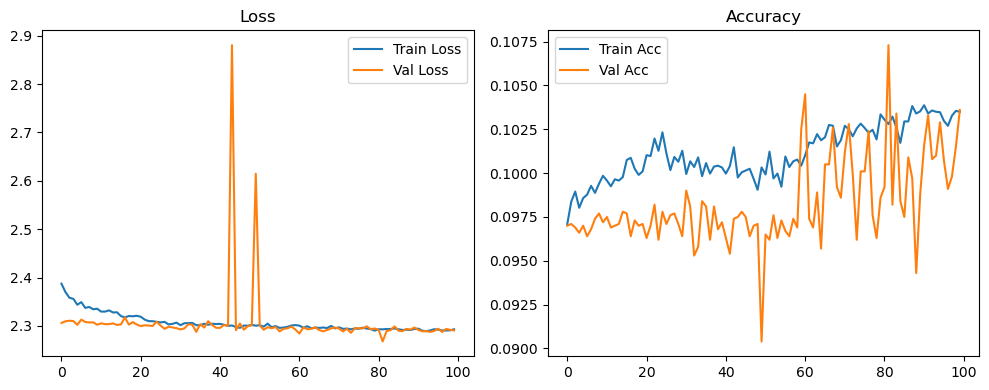

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.27it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.32it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.62it/s]

Original Model Final Test Loss: 2.2903 Accuracy: 0.1063


🚀 Running: batch256_lr_max_0.0001_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:20<2:12:52, 80.53s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:35<2:12:52, 80.53s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:35<2:12:52, 80.53s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:35<2:06:37, 77.53s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:50<2:06:37, 77.53s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [02:50<2:06:37, 77.53s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [02:50<1:18:31, 48.57s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [03:04<1:18:31, 48.57s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [03:04<1:18:31, 48.57s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:04<55:58, 34.98s/it]  

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [03:18<55:58, 34.98s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [03:18<55:58, 34.98s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [03:18<43:30, 27.48s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [03:32<43:30, 27.48s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [03:32<43:30, 27.48s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [03:32<35:54, 22.92s/it]

| LR: 0.000099 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:46<35:54, 22.92s/it]

| LR: 0.000099 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:46<35:54, 22.92s/it]

| LR: 0.000099 | Train Acc: 0.0987 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:46<31:01, 20.02s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:00<31:01, 20.02s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:00<31:01, 20.02s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:00<27:46, 18.12s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [04:14<27:46, 18.12s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [04:14<27:46, 18.12s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [04:14<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:28<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:28<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0983 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:28<23:58, 15.98s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  10%|█         | 10/100 [04:42<23:58, 15.98s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  10%|█         | 10/100 [04:42<23:58, 15.98s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  11%|█         | 11/100 [04:42<22:48, 15.38s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:56<22:48, 15.38s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:56<22:48, 15.38s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [04:56<21:56, 14.96s/it]

| LR: 0.000097 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:10<21:56, 14.96s/it]

| LR: 0.000097 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [05:10<21:56, 14.96s/it]

| LR: 0.000097 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [05:10<21:17, 14.68s/it]

| LR: 0.000096 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [05:24<21:17, 14.68s/it]

| LR: 0.000096 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [05:24<21:17, 14.68s/it]

| LR: 0.000096 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [05:24<20:45, 14.48s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [05:38<20:45, 14.48s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [05:38<20:45, 14.48s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  15%|█▌        | 15/100 [05:38<20:23, 14.39s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:53<20:23, 14.39s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:53<20:23, 14.39s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:53<20:03, 14.32s/it]

| LR: 0.000094 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [06:07<20:03, 14.32s/it]

| LR: 0.000094 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [06:07<20:03, 14.32s/it]

| LR: 0.000094 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [06:07<19:43, 14.26s/it]

| LR: 0.000094 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:21<19:43, 14.26s/it]

| LR: 0.000094 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [06:21<19:43, 14.26s/it]

| LR: 0.000094 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [06:21<19:24, 14.20s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  18%|█▊        | 18/100 [06:35<19:24, 14.20s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  18%|█▊        | 18/100 [06:35<19:24, 14.20s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  19%|█▉        | 19/100 [06:35<19:07, 14.16s/it]

| LR: 0.000092 | Train Acc: 0.0999 | Val Acc: 0.0977 |:  19%|█▉        | 19/100 [06:49<19:07, 14.16s/it]

| LR: 0.000092 | Train Acc: 0.0999 | Val Acc: 0.0977 |:  19%|█▉        | 19/100 [06:49<19:07, 14.16s/it]

| LR: 0.000092 | Train Acc: 0.0999 | Val Acc: 0.0977 |:  20%|██        | 20/100 [06:49<18:51, 14.14s/it]

| LR: 0.000091 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  20%|██        | 20/100 [07:03<18:51, 14.14s/it]

| LR: 0.000091 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  20%|██        | 20/100 [07:03<18:51, 14.14s/it]

| LR: 0.000091 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  21%|██        | 21/100 [07:03<18:37, 14.14s/it]

| LR: 0.000091 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  21%|██        | 21/100 [07:17<18:37, 14.14s/it]

| LR: 0.000091 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  21%|██        | 21/100 [07:17<18:37, 14.14s/it]

| LR: 0.000091 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  22%|██▏       | 22/100 [07:17<18:21, 14.12s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:31<18:21, 14.12s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:31<18:21, 14.12s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [07:31<18:10, 14.17s/it]

| LR: 0.000089 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  23%|██▎       | 23/100 [07:45<18:10, 14.17s/it]

| LR: 0.000089 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  23%|██▎       | 23/100 [07:45<18:10, 14.17s/it]

| LR: 0.000089 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  24%|██▍       | 24/100 [07:45<17:53, 14.13s/it]

| LR: 0.000088 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [08:00<17:53, 14.13s/it]

| LR: 0.000088 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [08:00<17:53, 14.13s/it]

| LR: 0.000088 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [08:00<17:39, 14.13s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  25%|██▌       | 25/100 [08:14<17:39, 14.13s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  25%|██▌       | 25/100 [08:14<17:39, 14.13s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  26%|██▌       | 26/100 [08:14<17:25, 14.12s/it]

| LR: 0.000086 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:28<17:25, 14.12s/it]

| LR: 0.000086 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [08:28<17:25, 14.12s/it]

| LR: 0.000086 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [08:28<17:11, 14.14s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [08:42<17:11, 14.14s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [08:42<17:11, 14.14s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [08:42<16:57, 14.13s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [08:56<16:57, 14.13s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [08:56<16:57, 14.13s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [08:56<16:46, 14.17s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:10<16:46, 14.17s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:10<16:46, 14.17s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:10<16:32, 14.18s/it]

| LR: 0.000081 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  30%|███       | 30/100 [09:25<16:32, 14.18s/it]

| LR: 0.000081 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  30%|███       | 30/100 [09:25<16:32, 14.18s/it]

| LR: 0.000081 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  31%|███       | 31/100 [09:25<16:18, 14.19s/it]

| LR: 0.000080 | Train Acc: 0.0990 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:39<16:18, 14.19s/it]

| LR: 0.000080 | Train Acc: 0.0990 | Val Acc: 0.0975 |:  31%|███       | 31/100 [09:39<16:18, 14.19s/it]

| LR: 0.000080 | Train Acc: 0.0990 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:39<16:02, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  32%|███▏      | 32/100 [09:53<16:02, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  32%|███▏      | 32/100 [09:53<16:02, 14.16s/it]

| LR: 0.000079 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  33%|███▎      | 33/100 [09:53<15:47, 14.15s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:07<15:47, 14.15s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [10:07<15:47, 14.15s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [10:07<15:36, 14.19s/it]

| LR: 0.000077 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [10:21<15:36, 14.19s/it]

| LR: 0.000077 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [10:21<15:36, 14.19s/it]

| LR: 0.000077 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  35%|███▌      | 35/100 [10:21<15:22, 14.19s/it]

| LR: 0.000075 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [10:35<15:22, 14.19s/it]

| LR: 0.000075 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [10:35<15:22, 14.19s/it]

| LR: 0.000075 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:36<15:07, 14.18s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:50<15:07, 14.18s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:50<15:07, 14.18s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [10:50<14:53, 14.18s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  37%|███▋      | 37/100 [11:04<14:53, 14.18s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  37%|███▋      | 37/100 [11:04<14:53, 14.18s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  38%|███▊      | 38/100 [11:04<14:36, 14.14s/it]

| LR: 0.000072 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  38%|███▊      | 38/100 [11:18<14:36, 14.14s/it]

| LR: 0.000072 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  38%|███▊      | 38/100 [11:18<14:36, 14.14s/it]

| LR: 0.000072 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  39%|███▉      | 39/100 [11:18<14:21, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  39%|███▉      | 39/100 [11:32<14:21, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  39%|███▉      | 39/100 [11:32<14:21, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  40%|████      | 40/100 [11:32<14:06, 14.10s/it]

| LR: 0.000069 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  40%|████      | 40/100 [11:46<14:06, 14.10s/it]

| LR: 0.000069 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  40%|████      | 40/100 [11:46<14:06, 14.10s/it]

| LR: 0.000069 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  41%|████      | 41/100 [11:46<13:53, 14.12s/it]

| LR: 0.000068 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  41%|████      | 41/100 [12:00<13:53, 14.12s/it]

| LR: 0.000068 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  41%|████      | 41/100 [12:00<13:53, 14.12s/it]

| LR: 0.000068 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  42%|████▏     | 42/100 [12:00<13:38, 14.12s/it]

| LR: 0.000066 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [12:14<13:38, 14.12s/it]

| LR: 0.000066 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [12:14<13:38, 14.12s/it]

| LR: 0.000066 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [12:14<13:24, 14.11s/it]

| LR: 0.000065 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [12:28<13:24, 14.11s/it]

| LR: 0.000065 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [12:28<13:24, 14.11s/it]

| LR: 0.000065 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [12:28<13:10, 14.11s/it]

| LR: 0.000063 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [12:42<13:10, 14.11s/it]

| LR: 0.000063 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [12:42<13:10, 14.11s/it]

| LR: 0.000063 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  45%|████▌     | 45/100 [12:42<12:55, 14.09s/it]

| LR: 0.000062 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  45%|████▌     | 45/100 [12:57<12:55, 14.09s/it]

| LR: 0.000062 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  45%|████▌     | 45/100 [12:57<12:55, 14.09s/it]

| LR: 0.000062 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [12:57<12:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  46%|████▌     | 46/100 [13:11<12:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  46%|████▌     | 46/100 [13:11<12:42, 14.12s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  47%|████▋     | 47/100 [13:11<12:27, 14.11s/it]

| LR: 0.000059 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [13:25<12:27, 14.11s/it]

| LR: 0.000059 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [13:25<12:27, 14.11s/it]

| LR: 0.000059 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [13:25<12:16, 14.16s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  48%|████▊     | 48/100 [13:39<12:16, 14.16s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  48%|████▊     | 48/100 [13:39<12:16, 14.16s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  49%|████▉     | 49/100 [13:39<12:03, 14.18s/it]

| LR: 0.000056 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [13:53<12:03, 14.18s/it]

| LR: 0.000056 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [13:53<12:03, 14.18s/it]

| LR: 0.000056 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [13:53<11:48, 14.16s/it]

| LR: 0.000055 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  50%|█████     | 50/100 [14:07<11:48, 14.16s/it]

| LR: 0.000055 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  50%|█████     | 50/100 [14:07<11:48, 14.16s/it]

| LR: 0.000055 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [14:07<11:34, 14.17s/it]

| LR: 0.000054 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [14:22<11:34, 14.17s/it]

| LR: 0.000054 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [14:22<11:34, 14.17s/it]

| LR: 0.000054 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  52%|█████▏    | 52/100 [14:22<11:20, 14.17s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  52%|█████▏    | 52/100 [14:36<11:20, 14.17s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  52%|█████▏    | 52/100 [14:36<11:20, 14.17s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  53%|█████▎    | 53/100 [14:36<11:04, 14.15s/it]

| LR: 0.000051 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [14:50<11:04, 14.15s/it]

| LR: 0.000051 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [14:50<11:04, 14.15s/it]

| LR: 0.000051 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [14:50<10:51, 14.16s/it]

| LR: 0.000049 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:04<10:51, 14.16s/it]

| LR: 0.000049 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:04<10:51, 14.16s/it]

| LR: 0.000049 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:04<10:37, 14.16s/it]

| LR: 0.000048 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [15:18<10:37, 14.16s/it]

| LR: 0.000048 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [15:18<10:37, 14.16s/it]

| LR: 0.000048 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [15:18<10:22, 14.15s/it]

| LR: 0.000047 | Train Acc: 0.0996 | Val Acc: 0.0976 |:  56%|█████▌    | 56/100 [15:32<10:22, 14.15s/it]

| LR: 0.000047 | Train Acc: 0.0996 | Val Acc: 0.0976 |:  56%|█████▌    | 56/100 [15:32<10:22, 14.15s/it]

| LR: 0.000047 | Train Acc: 0.0996 | Val Acc: 0.0976 |:  57%|█████▋    | 57/100 [15:32<10:09, 14.17s/it]

| LR: 0.000045 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  57%|█████▋    | 57/100 [15:46<10:09, 14.17s/it]

| LR: 0.000045 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  57%|█████▋    | 57/100 [15:46<10:09, 14.17s/it]

| LR: 0.000045 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [15:47<09:54, 14.15s/it]

| LR: 0.000044 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [16:01<09:54, 14.15s/it]

| LR: 0.000044 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [16:01<09:54, 14.15s/it]

| LR: 0.000044 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [16:01<09:40, 14.16s/it]

| LR: 0.000042 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [16:15<09:40, 14.16s/it]

| LR: 0.000042 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [16:15<09:40, 14.16s/it]

| LR: 0.000042 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [16:15<09:25, 14.13s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [16:29<09:25, 14.13s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [16:29<09:25, 14.13s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  61%|██████    | 61/100 [16:29<09:10, 14.12s/it]

| LR: 0.000040 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  61%|██████    | 61/100 [16:43<09:10, 14.12s/it]

| LR: 0.000040 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  61%|██████    | 61/100 [16:43<09:10, 14.12s/it]

| LR: 0.000040 | Train Acc: 0.0998 | Val Acc: 0.0976 |:  62%|██████▏   | 62/100 [16:43<08:56, 14.13s/it]

| LR: 0.000038 | Train Acc: 0.0990 | Val Acc: 0.0976 |:  62%|██████▏   | 62/100 [16:57<08:56, 14.13s/it]

| LR: 0.000038 | Train Acc: 0.0990 | Val Acc: 0.0976 |:  62%|██████▏   | 62/100 [16:57<08:56, 14.13s/it]

| LR: 0.000038 | Train Acc: 0.0990 | Val Acc: 0.0976 |:  63%|██████▎   | 63/100 [16:57<08:42, 14.13s/it]

| LR: 0.000037 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [17:11<08:42, 14.13s/it]

| LR: 0.000037 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [17:11<08:42, 14.13s/it]

| LR: 0.000037 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [17:11<08:29, 14.14s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [17:25<08:29, 14.14s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [17:25<08:29, 14.14s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  65%|██████▌   | 65/100 [17:25<08:14, 14.13s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [17:39<08:14, 14.13s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [17:39<08:14, 14.13s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [17:40<07:59, 14.11s/it]

| LR: 0.000033 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [17:54<07:59, 14.11s/it]

| LR: 0.000033 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [17:54<07:59, 14.11s/it]

| LR: 0.000033 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  67%|██████▋   | 67/100 [17:54<07:45, 14.11s/it]

| LR: 0.000032 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  67%|██████▋   | 67/100 [18:08<07:45, 14.11s/it]

| LR: 0.000032 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  67%|██████▋   | 67/100 [18:08<07:45, 14.11s/it]

| LR: 0.000032 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  68%|██████▊   | 68/100 [18:08<07:31, 14.12s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [18:22<07:31, 14.12s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [18:22<07:31, 14.12s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [18:22<07:17, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0978 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0978 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.11s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0978 |:  70%|███████   | 70/100 [18:36<07:04, 14.13s/it]

| LR: 0.000029 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  70%|███████   | 70/100 [18:50<07:04, 14.13s/it]

| LR: 0.000029 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  70%|███████   | 70/100 [18:50<07:04, 14.13s/it]

| LR: 0.000029 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  71%|███████   | 71/100 [18:50<06:49, 14.12s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [19:04<06:49, 14.12s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [19:04<06:49, 14.12s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [19:04<06:35, 14.12s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [19:18<06:35, 14.12s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [19:18<06:35, 14.12s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [19:18<06:21, 14.14s/it]

| LR: 0.000025 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [19:33<06:21, 14.14s/it]

| LR: 0.000025 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [19:33<06:21, 14.14s/it]

| LR: 0.000025 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  74%|███████▍  | 74/100 [19:33<06:07, 14.14s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  74%|███████▍  | 74/100 [19:47<06:07, 14.14s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  74%|███████▍  | 74/100 [19:47<06:07, 14.14s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  75%|███████▌  | 75/100 [19:47<05:53, 14.15s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:01<05:53, 14.15s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:01<05:53, 14.15s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  76%|███████▌  | 76/100 [20:01<05:38, 14.12s/it]

| LR: 0.000022 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [20:15<05:38, 14.12s/it]

| LR: 0.000022 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [20:15<05:38, 14.12s/it]

| LR: 0.000022 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [20:15<05:24, 14.10s/it]

| LR: 0.000021 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  77%|███████▋  | 77/100 [20:29<05:24, 14.10s/it]

| LR: 0.000021 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  77%|███████▋  | 77/100 [20:29<05:24, 14.10s/it]

| LR: 0.000021 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  78%|███████▊  | 78/100 [20:29<05:09, 14.08s/it]

| LR: 0.000020 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [20:43<05:09, 14.08s/it]

| LR: 0.000020 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [20:43<05:09, 14.08s/it]

| LR: 0.000020 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [20:43<04:55, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [20:57<04:55, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [20:57<04:55, 14.06s/it]

| LR: 0.000019 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [20:57<04:41, 14.07s/it]

| LR: 0.000019 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:11<04:41, 14.07s/it]

| LR: 0.000019 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:11<04:41, 14.07s/it]

| LR: 0.000019 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  81%|████████  | 81/100 [21:11<04:27, 14.09s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [21:25<04:27, 14.09s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [21:25<04:27, 14.09s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [21:25<04:13, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [21:39<04:13, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [21:39<04:13, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [21:39<04:00, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [21:53<04:00, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [21:53<04:00, 14.12s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [21:53<03:45, 14.11s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  84%|████████▍ | 84/100 [22:08<03:45, 14.11s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  84%|████████▍ | 84/100 [22:08<03:45, 14.11s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  85%|████████▌ | 85/100 [22:08<03:31, 14.10s/it]

| LR: 0.000015 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  85%|████████▌ | 85/100 [22:22<03:31, 14.10s/it]

| LR: 0.000015 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  85%|████████▌ | 85/100 [22:22<03:31, 14.10s/it]

| LR: 0.000015 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [22:22<03:17, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [22:36<03:17, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [22:36<03:17, 14.11s/it]

| LR: 0.000014 | Train Acc: 0.0994 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [22:36<03:03, 14.09s/it]

| LR: 0.000014 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  87%|████████▋ | 87/100 [22:50<03:03, 14.09s/it]

| LR: 0.000014 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  87%|████████▋ | 87/100 [22:50<03:03, 14.09s/it]

| LR: 0.000014 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  88%|████████▊ | 88/100 [22:50<02:48, 14.08s/it]

| LR: 0.000013 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  88%|████████▊ | 88/100 [23:04<02:48, 14.08s/it]

| LR: 0.000013 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  88%|████████▊ | 88/100 [23:04<02:48, 14.08s/it]

| LR: 0.000013 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  89%|████████▉ | 89/100 [23:04<02:35, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.10s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  90%|█████████ | 90/100 [23:18<02:20, 14.09s/it]

| LR: 0.000012 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  90%|█████████ | 90/100 [23:32<02:20, 14.09s/it]

| LR: 0.000012 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  90%|█████████ | 90/100 [23:32<02:20, 14.09s/it]

| LR: 0.000012 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [23:32<02:06, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [23:46<02:06, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [23:46<02:06, 14.10s/it]

| LR: 0.000012 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [23:46<01:52, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  93%|█████████▎| 93/100 [24:00<01:38, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.11s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  94%|█████████▍| 94/100 [24:15<01:24, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  94%|█████████▍| 94/100 [24:29<01:24, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  94%|█████████▍| 94/100 [24:29<01:24, 14.12s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  95%|█████████▌| 95/100 [24:29<01:10, 14.10s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [24:43<01:10, 14.10s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [24:43<01:10, 14.10s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [24:43<00:56, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  96%|█████████▌| 96/100 [24:57<00:56, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  96%|█████████▌| 96/100 [24:57<00:56, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  97%|█████████▋| 97/100 [24:57<00:42, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:11<00:42, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:11<00:42, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [25:11<00:28, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  99%|█████████▉| 99/100 [25:25<00:14, 14.07s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.07s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.07s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0972 |: 100%|██████████| 100/100 [25:39<00:00, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0972 |: 100%|██████████| 100/100 [25:39<00:00, 15.39s/it]

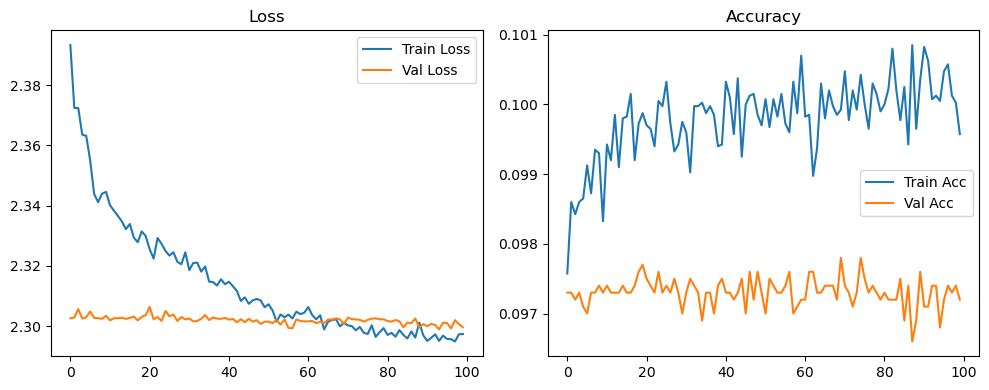

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.64it/s]

Original Model Final Test Loss: 2.3010 Accuracy: 0.1000


🚀 Running: batch256_lr_max_0.0001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0975 | Val Acc: 0.0957 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0975 | Val Acc: 0.0957 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0975 | Val Acc: 0.0957 |:   1%|          | 1/100 [01:20<2:12:56, 80.58s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0966 |:   1%|          | 1/100 [02:34<2:12:56, 80.58s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0966 |:   1%|          | 1/100 [02:34<2:12:56, 80.58s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [02:34<2:05:36, 76.90s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0956 |:   2%|▏         | 2/100 [02:48<2:05:36, 76.90s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0956 |:   2%|▏         | 2/100 [02:48<2:05:36, 76.90s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0956 |:   3%|▎         | 3/100 [02:48<1:17:47, 48.12s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0956 |:   3%|▎         | 3/100 [03:02<1:17:47, 48.12s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0956 |:   3%|▎         | 3/100 [03:02<1:17:47, 48.12s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0956 |:   4%|▍         | 4/100 [03:02<55:20, 34.59s/it]  

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0958 |:   4%|▍         | 4/100 [03:16<55:20, 34.59s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0958 |:   4%|▍         | 4/100 [03:16<55:20, 34.59s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0958 |:   5%|▌         | 5/100 [03:16<42:56, 27.12s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0919 |:   5%|▌         | 5/100 [03:30<42:56, 27.12s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0919 |:   5%|▌         | 5/100 [03:30<42:56, 27.12s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0919 |:   6%|▌         | 6/100 [03:30<35:24, 22.60s/it]

| LR: 0.000099 | Train Acc: 0.0982 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [03:44<35:24, 22.60s/it]

| LR: 0.000099 | Train Acc: 0.0982 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [03:44<35:24, 22.60s/it]

| LR: 0.000099 | Train Acc: 0.0982 | Val Acc: 0.0956 |:   7%|▋         | 7/100 [03:44<30:35, 19.73s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0950 |:   7%|▋         | 7/100 [03:57<30:35, 19.73s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0950 |:   7%|▋         | 7/100 [03:57<30:35, 19.73s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0950 |:   8%|▊         | 8/100 [03:58<27:23, 17.87s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0945 |:   8%|▊         | 8/100 [04:11<27:23, 17.87s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0945 |:   8%|▊         | 8/100 [04:11<27:23, 17.87s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0945 |:   9%|▉         | 9/100 [04:11<25:11, 16.62s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:25<25:11, 16.62s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [04:25<25:11, 16.62s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  10%|█         | 10/100 [04:25<23:38, 15.76s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0941 |:  10%|█         | 10/100 [04:39<23:38, 15.76s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0941 |:  10%|█         | 10/100 [04:39<23:38, 15.76s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0941 |:  11%|█         | 11/100 [04:39<22:31, 15.19s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0962 |:  11%|█         | 11/100 [04:53<22:31, 15.19s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0962 |:  11%|█         | 11/100 [04:53<22:31, 15.19s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [04:53<21:40, 14.78s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0951 |:  12%|█▏        | 12/100 [05:07<21:40, 14.78s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0951 |:  12%|█▏        | 12/100 [05:07<21:40, 14.78s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0951 |:  13%|█▎        | 13/100 [05:07<21:01, 14.49s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0947 |:  13%|█▎        | 13/100 [05:21<21:01, 14.49s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0947 |:  13%|█▎        | 13/100 [05:21<21:01, 14.49s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0947 |:  14%|█▍        | 14/100 [05:21<20:29, 14.30s/it]

| LR: 0.000095 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  14%|█▍        | 14/100 [05:34<20:29, 14.30s/it]

| LR: 0.000095 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  14%|█▍        | 14/100 [05:34<20:29, 14.30s/it]

| LR: 0.000095 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [05:34<20:02, 14.15s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  15%|█▌        | 15/100 [05:48<20:02, 14.15s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  15%|█▌        | 15/100 [05:48<20:02, 14.15s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  16%|█▌        | 16/100 [05:48<19:39, 14.04s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  16%|█▌        | 16/100 [06:02<19:39, 14.04s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  16%|█▌        | 16/100 [06:02<19:39, 14.04s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  17%|█▋        | 17/100 [06:02<19:20, 13.98s/it]

| LR: 0.000093 | Train Acc: 0.1009 | Val Acc: 0.0953 |:  17%|█▋        | 17/100 [06:16<19:20, 13.98s/it]

| LR: 0.000093 | Train Acc: 0.1009 | Val Acc: 0.0953 |:  17%|█▋        | 17/100 [06:16<19:20, 13.98s/it]

| LR: 0.000093 | Train Acc: 0.1009 | Val Acc: 0.0953 |:  18%|█▊        | 18/100 [06:16<19:03, 13.95s/it]

| LR: 0.000092 | Train Acc: 0.0999 | Val Acc: 0.0988 |:  18%|█▊        | 18/100 [06:30<19:03, 13.95s/it]

| LR: 0.000092 | Train Acc: 0.0999 | Val Acc: 0.0988 |:  18%|█▊        | 18/100 [06:30<19:03, 13.95s/it]

| LR: 0.000092 | Train Acc: 0.0999 | Val Acc: 0.0988 |:  19%|█▉        | 19/100 [06:30<18:47, 13.92s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:44<18:47, 13.92s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [06:44<18:47, 13.92s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  20%|██        | 20/100 [06:44<18:32, 13.91s/it]

| LR: 0.000091 | Train Acc: 0.1004 | Val Acc: 0.1008 |:  20%|██        | 20/100 [06:57<18:32, 13.91s/it]

| LR: 0.000091 | Train Acc: 0.1004 | Val Acc: 0.1008 |:  20%|██        | 20/100 [06:57<18:32, 13.91s/it]

| LR: 0.000091 | Train Acc: 0.1004 | Val Acc: 0.1008 |:  21%|██        | 21/100 [06:58<18:16, 13.88s/it]

| LR: 0.000090 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  21%|██        | 21/100 [07:11<18:16, 13.88s/it]

| LR: 0.000090 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  21%|██        | 21/100 [07:11<18:16, 13.88s/it]

| LR: 0.000090 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:11<18:00, 13.85s/it]

| LR: 0.000089 | Train Acc: 0.1003 | Val Acc: 0.1052 |:  22%|██▏       | 22/100 [07:25<18:00, 13.85s/it]

| LR: 0.000089 | Train Acc: 0.1003 | Val Acc: 0.1052 |:  22%|██▏       | 22/100 [07:25<18:00, 13.85s/it]

| LR: 0.000089 | Train Acc: 0.1003 | Val Acc: 0.1052 |:  23%|██▎       | 23/100 [07:25<17:45, 13.84s/it]

| LR: 0.000088 | Train Acc: 0.1006 | Val Acc: 0.0931 |:  23%|██▎       | 23/100 [07:39<17:45, 13.84s/it]

| LR: 0.000088 | Train Acc: 0.1006 | Val Acc: 0.0931 |:  23%|██▎       | 23/100 [07:39<17:45, 13.84s/it]

| LR: 0.000088 | Train Acc: 0.1006 | Val Acc: 0.0931 |:  24%|██▍       | 24/100 [07:39<17:31, 13.83s/it]

| LR: 0.000087 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [07:53<17:31, 13.83s/it]

| LR: 0.000087 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [07:53<17:31, 13.83s/it]

| LR: 0.000087 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  25%|██▌       | 25/100 [07:53<17:16, 13.82s/it]

| LR: 0.000086 | Train Acc: 0.0991 | Val Acc: 0.0952 |:  25%|██▌       | 25/100 [08:06<17:16, 13.82s/it]

| LR: 0.000086 | Train Acc: 0.0991 | Val Acc: 0.0952 |:  25%|██▌       | 25/100 [08:06<17:16, 13.82s/it]

| LR: 0.000086 | Train Acc: 0.0991 | Val Acc: 0.0952 |:  26%|██▌       | 26/100 [08:06<17:00, 13.79s/it]

| LR: 0.000084 | Train Acc: 0.0992 | Val Acc: 0.0958 |:  26%|██▌       | 26/100 [08:20<17:00, 13.79s/it]

| LR: 0.000084 | Train Acc: 0.0992 | Val Acc: 0.0958 |:  26%|██▌       | 26/100 [08:20<17:00, 13.79s/it]

| LR: 0.000084 | Train Acc: 0.0992 | Val Acc: 0.0958 |:  27%|██▋       | 27/100 [08:20<16:46, 13.79s/it]

| LR: 0.000083 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  27%|██▋       | 27/100 [08:34<16:46, 13.79s/it]

| LR: 0.000083 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  27%|██▋       | 27/100 [08:34<16:46, 13.79s/it]

| LR: 0.000083 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  28%|██▊       | 28/100 [08:34<16:32, 13.79s/it]

| LR: 0.000082 | Train Acc: 0.0990 | Val Acc: 0.0957 |:  28%|██▊       | 28/100 [08:48<16:32, 13.79s/it]

| LR: 0.000082 | Train Acc: 0.0990 | Val Acc: 0.0957 |:  28%|██▊       | 28/100 [08:48<16:32, 13.79s/it]

| LR: 0.000082 | Train Acc: 0.0990 | Val Acc: 0.0957 |:  29%|██▉       | 29/100 [08:48<16:19, 13.79s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0954 |:  29%|██▉       | 29/100 [09:02<16:19, 13.79s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0954 |:  29%|██▉       | 29/100 [09:02<16:19, 13.79s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0954 |:  30%|███       | 30/100 [09:02<16:07, 13.82s/it]

| LR: 0.000080 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  30%|███       | 30/100 [09:15<16:07, 13.82s/it]

| LR: 0.000080 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  30%|███       | 30/100 [09:15<16:07, 13.82s/it]

| LR: 0.000080 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  31%|███       | 31/100 [09:16<15:53, 13.82s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0996 |:  31%|███       | 31/100 [09:29<15:53, 13.82s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0996 |:  31%|███       | 31/100 [09:29<15:53, 13.82s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0996 |:  32%|███▏      | 32/100 [09:29<15:40, 13.83s/it]

| LR: 0.000077 | Train Acc: 0.0999 | Val Acc: 0.0996 |:  32%|███▏      | 32/100 [09:43<15:40, 13.83s/it]

| LR: 0.000077 | Train Acc: 0.0999 | Val Acc: 0.0996 |:  32%|███▏      | 32/100 [09:43<15:40, 13.83s/it]

| LR: 0.000077 | Train Acc: 0.0999 | Val Acc: 0.0996 |:  33%|███▎      | 33/100 [09:43<15:26, 13.83s/it]

| LR: 0.000076 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  33%|███▎      | 33/100 [09:57<15:26, 13.83s/it]

| LR: 0.000076 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  33%|███▎      | 33/100 [09:57<15:26, 13.83s/it]

| LR: 0.000076 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  34%|███▍      | 34/100 [09:57<15:10, 13.80s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.1009 |:  34%|███▍      | 34/100 [10:11<15:10, 13.80s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.1009 |:  34%|███▍      | 34/100 [10:11<15:10, 13.80s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.1009 |:  35%|███▌      | 35/100 [10:11<14:57, 13.82s/it]

| LR: 0.000073 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  35%|███▌      | 35/100 [10:25<14:57, 13.82s/it]

| LR: 0.000073 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  35%|███▌      | 35/100 [10:25<14:57, 13.82s/it]

| LR: 0.000073 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  36%|███▌      | 36/100 [10:25<14:43, 13.81s/it]

| LR: 0.000072 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  36%|███▌      | 36/100 [10:38<14:43, 13.81s/it]

| LR: 0.000072 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  36%|███▌      | 36/100 [10:38<14:43, 13.81s/it]

| LR: 0.000072 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  37%|███▋      | 37/100 [10:38<14:31, 13.83s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [10:52<14:31, 13.83s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [10:52<14:31, 13.83s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [10:52<14:18, 13.85s/it]

| LR: 0.000069 | Train Acc: 0.0997 | Val Acc: 0.0980 |:  38%|███▊      | 38/100 [11:06<14:18, 13.85s/it]

| LR: 0.000069 | Train Acc: 0.0997 | Val Acc: 0.0980 |:  38%|███▊      | 38/100 [11:06<14:18, 13.85s/it]

| LR: 0.000069 | Train Acc: 0.0997 | Val Acc: 0.0980 |:  39%|███▉      | 39/100 [11:06<14:04, 13.85s/it]

| LR: 0.000067 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  39%|███▉      | 39/100 [11:20<14:04, 13.85s/it]

| LR: 0.000067 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  39%|███▉      | 39/100 [11:20<14:04, 13.85s/it]

| LR: 0.000067 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  40%|████      | 40/100 [11:20<13:50, 13.84s/it]

| LR: 0.000066 | Train Acc: 0.1011 | Val Acc: 0.0979 |:  40%|████      | 40/100 [11:34<13:50, 13.84s/it]

| LR: 0.000066 | Train Acc: 0.1011 | Val Acc: 0.0979 |:  40%|████      | 40/100 [11:34<13:50, 13.84s/it]

| LR: 0.000066 | Train Acc: 0.1011 | Val Acc: 0.0979 |:  41%|████      | 41/100 [11:34<13:37, 13.85s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.1033 |:  41%|████      | 41/100 [11:48<13:37, 13.85s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.1033 |:  41%|████      | 41/100 [11:48<13:37, 13.85s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.1033 |:  42%|████▏     | 42/100 [11:48<13:23, 13.85s/it]

| LR: 0.000063 | Train Acc: 0.1015 | Val Acc: 0.0989 |:  42%|████▏     | 42/100 [12:02<13:23, 13.85s/it]

| LR: 0.000063 | Train Acc: 0.1015 | Val Acc: 0.0989 |:  42%|████▏     | 42/100 [12:02<13:23, 13.85s/it]

| LR: 0.000063 | Train Acc: 0.1015 | Val Acc: 0.0989 |:  43%|████▎     | 43/100 [12:02<13:10, 13.86s/it]

| LR: 0.000061 | Train Acc: 0.1026 | Val Acc: 0.0995 |:  43%|████▎     | 43/100 [12:15<13:10, 13.86s/it]

| LR: 0.000061 | Train Acc: 0.1026 | Val Acc: 0.0995 |:  43%|████▎     | 43/100 [12:15<13:10, 13.86s/it]

| LR: 0.000061 | Train Acc: 0.1026 | Val Acc: 0.0995 |:  44%|████▍     | 44/100 [12:16<12:56, 13.86s/it]

| LR: 0.000060 | Train Acc: 0.1024 | Val Acc: 0.0978 |:  44%|████▍     | 44/100 [12:29<12:56, 13.86s/it]

| LR: 0.000060 | Train Acc: 0.1024 | Val Acc: 0.0978 |:  44%|████▍     | 44/100 [12:29<12:56, 13.86s/it]

| LR: 0.000060 | Train Acc: 0.1024 | Val Acc: 0.0978 |:  45%|████▌     | 45/100 [12:29<12:43, 13.88s/it]

| LR: 0.000058 | Train Acc: 0.1017 | Val Acc: 0.0969 |:  45%|████▌     | 45/100 [12:43<12:43, 13.88s/it]

| LR: 0.000058 | Train Acc: 0.1017 | Val Acc: 0.0969 |:  45%|████▌     | 45/100 [12:43<12:43, 13.88s/it]

| LR: 0.000058 | Train Acc: 0.1017 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [12:43<12:27, 13.84s/it]

| LR: 0.000057 | Train Acc: 0.1022 | Val Acc: 0.0926 |:  46%|████▌     | 46/100 [12:57<12:27, 13.84s/it]

| LR: 0.000057 | Train Acc: 0.1022 | Val Acc: 0.0926 |:  46%|████▌     | 46/100 [12:57<12:27, 13.84s/it]

| LR: 0.000057 | Train Acc: 0.1022 | Val Acc: 0.0926 |:  47%|████▋     | 47/100 [12:57<12:13, 13.84s/it]

| LR: 0.000055 | Train Acc: 0.1020 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [13:11<12:13, 13.84s/it]

| LR: 0.000055 | Train Acc: 0.1020 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [13:11<12:13, 13.84s/it]

| LR: 0.000055 | Train Acc: 0.1020 | Val Acc: 0.0968 |:  48%|████▊     | 48/100 [13:11<11:59, 13.84s/it]

| LR: 0.000054 | Train Acc: 0.1026 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [13:25<11:59, 13.84s/it]

| LR: 0.000054 | Train Acc: 0.1026 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [13:25<11:59, 13.84s/it]

| LR: 0.000054 | Train Acc: 0.1026 | Val Acc: 0.0962 |:  49%|████▉     | 49/100 [13:25<11:45, 13.84s/it]

| LR: 0.000052 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  49%|████▉     | 49/100 [13:39<11:45, 13.84s/it]

| LR: 0.000052 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  49%|████▉     | 49/100 [13:39<11:45, 13.84s/it]

| LR: 0.000052 | Train Acc: 0.1024 | Val Acc: 0.0997 |:  50%|█████     | 50/100 [13:39<11:32, 13.85s/it]

| LR: 0.000051 | Train Acc: 0.1017 | Val Acc: 0.1002 |:  50%|█████     | 50/100 [13:52<11:32, 13.85s/it]

| LR: 0.000051 | Train Acc: 0.1017 | Val Acc: 0.1002 |:  50%|█████     | 50/100 [13:52<11:32, 13.85s/it]

| LR: 0.000051 | Train Acc: 0.1017 | Val Acc: 0.1002 |:  51%|█████     | 51/100 [13:52<11:18, 13.84s/it]

| LR: 0.000049 | Train Acc: 0.1024 | Val Acc: 0.0989 |:  51%|█████     | 51/100 [14:06<11:18, 13.84s/it]

| LR: 0.000049 | Train Acc: 0.1024 | Val Acc: 0.0989 |:  51%|█████     | 51/100 [14:06<11:18, 13.84s/it]

| LR: 0.000049 | Train Acc: 0.1024 | Val Acc: 0.0989 |:  52%|█████▏    | 52/100 [14:06<11:05, 13.85s/it]

| LR: 0.000047 | Train Acc: 0.1022 | Val Acc: 0.0999 |:  52%|█████▏    | 52/100 [14:20<11:05, 13.85s/it]

| LR: 0.000047 | Train Acc: 0.1022 | Val Acc: 0.0999 |:  52%|█████▏    | 52/100 [14:20<11:05, 13.85s/it]

| LR: 0.000047 | Train Acc: 0.1022 | Val Acc: 0.0999 |:  53%|█████▎    | 53/100 [14:20<10:52, 13.88s/it]

| LR: 0.000046 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  53%|█████▎    | 53/100 [14:34<10:52, 13.88s/it]

| LR: 0.000046 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  53%|█████▎    | 53/100 [14:34<10:52, 13.88s/it]

| LR: 0.000046 | Train Acc: 0.1026 | Val Acc: 0.0976 |:  54%|█████▍    | 54/100 [14:34<10:37, 13.86s/it]

| LR: 0.000044 | Train Acc: 0.1029 | Val Acc: 0.0985 |:  54%|█████▍    | 54/100 [14:48<10:37, 13.86s/it]

| LR: 0.000044 | Train Acc: 0.1029 | Val Acc: 0.0985 |:  54%|█████▍    | 54/100 [14:48<10:37, 13.86s/it]

| LR: 0.000044 | Train Acc: 0.1029 | Val Acc: 0.0985 |:  55%|█████▌    | 55/100 [14:48<10:24, 13.89s/it]

| LR: 0.000043 | Train Acc: 0.1020 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [15:02<10:24, 13.89s/it]

| LR: 0.000043 | Train Acc: 0.1020 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [15:02<10:24, 13.89s/it]

| LR: 0.000043 | Train Acc: 0.1020 | Val Acc: 0.0970 |:  56%|█████▌    | 56/100 [15:02<10:10, 13.87s/it]

| LR: 0.000041 | Train Acc: 0.1013 | Val Acc: 0.0969 |:  56%|█████▌    | 56/100 [15:16<10:10, 13.87s/it]

| LR: 0.000041 | Train Acc: 0.1013 | Val Acc: 0.0969 |:  56%|█████▌    | 56/100 [15:16<10:10, 13.87s/it]

| LR: 0.000041 | Train Acc: 0.1013 | Val Acc: 0.0969 |:  57%|█████▋    | 57/100 [15:16<09:55, 13.86s/it]

| LR: 0.000040 | Train Acc: 0.1014 | Val Acc: 0.1106 |:  57%|█████▋    | 57/100 [15:29<09:55, 13.86s/it]

| LR: 0.000040 | Train Acc: 0.1014 | Val Acc: 0.1106 |:  57%|█████▋    | 57/100 [15:29<09:55, 13.86s/it]

| LR: 0.000040 | Train Acc: 0.1014 | Val Acc: 0.1106 |:  58%|█████▊    | 58/100 [15:29<09:41, 13.84s/it]

| LR: 0.000038 | Train Acc: 0.1019 | Val Acc: 0.0977 |:  58%|█████▊    | 58/100 [15:43<09:41, 13.84s/it]

| LR: 0.000038 | Train Acc: 0.1019 | Val Acc: 0.0977 |:  58%|█████▊    | 58/100 [15:43<09:41, 13.84s/it]

| LR: 0.000038 | Train Acc: 0.1019 | Val Acc: 0.0977 |:  59%|█████▉    | 59/100 [15:43<09:28, 13.87s/it]

| LR: 0.000037 | Train Acc: 0.1017 | Val Acc: 0.1015 |:  59%|█████▉    | 59/100 [15:57<09:28, 13.87s/it]

| LR: 0.000037 | Train Acc: 0.1017 | Val Acc: 0.1015 |:  59%|█████▉    | 59/100 [15:57<09:28, 13.87s/it]

| LR: 0.000037 | Train Acc: 0.1017 | Val Acc: 0.1015 |:  60%|██████    | 60/100 [15:57<09:15, 13.89s/it]

| LR: 0.000035 | Train Acc: 0.1022 | Val Acc: 0.1101 |:  60%|██████    | 60/100 [16:11<09:15, 13.89s/it]

| LR: 0.000035 | Train Acc: 0.1022 | Val Acc: 0.1101 |:  60%|██████    | 60/100 [16:11<09:15, 13.89s/it]

| LR: 0.000035 | Train Acc: 0.1022 | Val Acc: 0.1101 |:  61%|██████    | 61/100 [16:11<09:00, 13.85s/it]

| LR: 0.000034 | Train Acc: 0.1019 | Val Acc: 0.1051 |:  61%|██████    | 61/100 [16:25<09:00, 13.85s/it]

| LR: 0.000034 | Train Acc: 0.1019 | Val Acc: 0.1051 |:  61%|██████    | 61/100 [16:25<09:00, 13.85s/it]

| LR: 0.000034 | Train Acc: 0.1019 | Val Acc: 0.1051 |:  62%|██████▏   | 62/100 [16:25<08:46, 13.85s/it]

| LR: 0.000032 | Train Acc: 0.1027 | Val Acc: 0.1035 |:  62%|██████▏   | 62/100 [16:39<08:46, 13.85s/it]

| LR: 0.000032 | Train Acc: 0.1027 | Val Acc: 0.1035 |:  62%|██████▏   | 62/100 [16:39<08:46, 13.85s/it]

| LR: 0.000032 | Train Acc: 0.1027 | Val Acc: 0.1035 |:  63%|██████▎   | 63/100 [16:39<08:32, 13.85s/it]

| LR: 0.000031 | Train Acc: 0.1022 | Val Acc: 0.1029 |:  63%|██████▎   | 63/100 [16:53<08:32, 13.85s/it]

| LR: 0.000031 | Train Acc: 0.1022 | Val Acc: 0.1029 |:  63%|██████▎   | 63/100 [16:53<08:32, 13.85s/it]

| LR: 0.000031 | Train Acc: 0.1022 | Val Acc: 0.1029 |:  64%|██████▍   | 64/100 [16:53<08:18, 13.85s/it]

| LR: 0.000029 | Train Acc: 0.1017 | Val Acc: 0.0982 |:  64%|██████▍   | 64/100 [17:07<08:18, 13.85s/it]

| LR: 0.000029 | Train Acc: 0.1017 | Val Acc: 0.0982 |:  64%|██████▍   | 64/100 [17:07<08:18, 13.85s/it]

| LR: 0.000029 | Train Acc: 0.1017 | Val Acc: 0.0982 |:  65%|██████▌   | 65/100 [17:07<08:05, 13.88s/it]

| LR: 0.000028 | Train Acc: 0.1012 | Val Acc: 0.1010 |:  65%|██████▌   | 65/100 [17:20<08:05, 13.88s/it]

| LR: 0.000028 | Train Acc: 0.1012 | Val Acc: 0.1010 |:  65%|██████▌   | 65/100 [17:20<08:05, 13.88s/it]

| LR: 0.000028 | Train Acc: 0.1012 | Val Acc: 0.1010 |:  66%|██████▌   | 66/100 [17:21<07:52, 13.90s/it]

| LR: 0.000027 | Train Acc: 0.1013 | Val Acc: 0.1013 |:  66%|██████▌   | 66/100 [17:34<07:52, 13.90s/it]

| LR: 0.000027 | Train Acc: 0.1013 | Val Acc: 0.1013 |:  66%|██████▌   | 66/100 [17:34<07:52, 13.90s/it]

| LR: 0.000027 | Train Acc: 0.1013 | Val Acc: 0.1013 |:  67%|██████▋   | 67/100 [17:34<07:39, 13.92s/it]

| LR: 0.000025 | Train Acc: 0.1025 | Val Acc: 0.0976 |:  67%|██████▋   | 67/100 [17:48<07:39, 13.92s/it]

| LR: 0.000025 | Train Acc: 0.1025 | Val Acc: 0.0976 |:  67%|██████▋   | 67/100 [17:48<07:39, 13.92s/it]

| LR: 0.000025 | Train Acc: 0.1025 | Val Acc: 0.0976 |:  68%|██████▊   | 68/100 [17:48<07:25, 13.91s/it]

| LR: 0.000024 | Train Acc: 0.1017 | Val Acc: 0.1064 |:  68%|██████▊   | 68/100 [18:02<07:25, 13.91s/it]

| LR: 0.000024 | Train Acc: 0.1017 | Val Acc: 0.1064 |:  68%|██████▊   | 68/100 [18:02<07:25, 13.91s/it]

| LR: 0.000024 | Train Acc: 0.1017 | Val Acc: 0.1064 |:  69%|██████▉   | 69/100 [18:02<07:11, 13.90s/it]

| LR: 0.000023 | Train Acc: 0.1030 | Val Acc: 0.1000 |:  69%|██████▉   | 69/100 [18:16<07:11, 13.90s/it]

| LR: 0.000023 | Train Acc: 0.1030 | Val Acc: 0.1000 |:  69%|██████▉   | 69/100 [18:16<07:11, 13.90s/it]

| LR: 0.000023 | Train Acc: 0.1030 | Val Acc: 0.1000 |:  70%|███████   | 70/100 [18:16<06:57, 13.92s/it]

| LR: 0.000021 | Train Acc: 0.1027 | Val Acc: 0.1047 |:  70%|███████   | 70/100 [18:30<06:57, 13.92s/it]

| LR: 0.000021 | Train Acc: 0.1027 | Val Acc: 0.1047 |:  70%|███████   | 70/100 [18:30<06:57, 13.92s/it]

| LR: 0.000021 | Train Acc: 0.1027 | Val Acc: 0.1047 |:  71%|███████   | 71/100 [18:30<06:43, 13.92s/it]

| LR: 0.000020 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  71%|███████   | 71/100 [18:44<06:43, 13.92s/it]

| LR: 0.000020 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  71%|███████   | 71/100 [18:44<06:43, 13.92s/it]

| LR: 0.000020 | Train Acc: 0.1027 | Val Acc: 0.0979 |:  72%|███████▏  | 72/100 [18:44<06:29, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  72%|███████▏  | 72/100 [18:58<06:29, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  72%|███████▏  | 72/100 [18:58<06:29, 13.91s/it]

| LR: 0.000019 | Train Acc: 0.1034 | Val Acc: 0.0994 |:  73%|███████▎  | 73/100 [18:58<06:16, 13.93s/it]

| LR: 0.000018 | Train Acc: 0.1035 | Val Acc: 0.0976 |:  73%|███████▎  | 73/100 [19:12<06:16, 13.93s/it]

| LR: 0.000018 | Train Acc: 0.1035 | Val Acc: 0.0976 |:  73%|███████▎  | 73/100 [19:12<06:16, 13.93s/it]

| LR: 0.000018 | Train Acc: 0.1035 | Val Acc: 0.0976 |:  74%|███████▍  | 74/100 [19:12<06:02, 13.94s/it]

| LR: 0.000017 | Train Acc: 0.1029 | Val Acc: 0.1061 |:  74%|███████▍  | 74/100 [19:26<06:02, 13.94s/it]

| LR: 0.000017 | Train Acc: 0.1029 | Val Acc: 0.1061 |:  74%|███████▍  | 74/100 [19:26<06:02, 13.94s/it]

| LR: 0.000017 | Train Acc: 0.1029 | Val Acc: 0.1061 |:  75%|███████▌  | 75/100 [19:26<05:48, 13.93s/it]

| LR: 0.000015 | Train Acc: 0.1035 | Val Acc: 0.0984 |:  75%|███████▌  | 75/100 [19:40<05:48, 13.93s/it]

| LR: 0.000015 | Train Acc: 0.1035 | Val Acc: 0.0984 |:  75%|███████▌  | 75/100 [19:40<05:48, 13.93s/it]

| LR: 0.000015 | Train Acc: 0.1035 | Val Acc: 0.0984 |:  76%|███████▌  | 76/100 [19:40<05:34, 13.93s/it]

| LR: 0.000014 | Train Acc: 0.1034 | Val Acc: 0.1023 |:  76%|███████▌  | 76/100 [19:54<05:34, 13.93s/it]

| LR: 0.000014 | Train Acc: 0.1034 | Val Acc: 0.1023 |:  76%|███████▌  | 76/100 [19:54<05:34, 13.93s/it]

| LR: 0.000014 | Train Acc: 0.1034 | Val Acc: 0.1023 |:  77%|███████▋  | 77/100 [19:54<05:20, 13.93s/it]

| LR: 0.000013 | Train Acc: 0.1024 | Val Acc: 0.1026 |:  77%|███████▋  | 77/100 [20:08<05:20, 13.93s/it]

| LR: 0.000013 | Train Acc: 0.1024 | Val Acc: 0.1026 |:  77%|███████▋  | 77/100 [20:08<05:20, 13.93s/it]

| LR: 0.000013 | Train Acc: 0.1024 | Val Acc: 0.1026 |:  78%|███████▊  | 78/100 [20:08<05:06, 13.95s/it]

| LR: 0.000012 | Train Acc: 0.1025 | Val Acc: 0.0994 |:  78%|███████▊  | 78/100 [20:22<05:06, 13.95s/it]

| LR: 0.000012 | Train Acc: 0.1025 | Val Acc: 0.0994 |:  78%|███████▊  | 78/100 [20:22<05:06, 13.95s/it]

| LR: 0.000012 | Train Acc: 0.1025 | Val Acc: 0.0994 |:  79%|███████▉  | 79/100 [20:22<04:53, 13.96s/it]

| LR: 0.000011 | Train Acc: 0.1022 | Val Acc: 0.0996 |:  79%|███████▉  | 79/100 [20:36<04:53, 13.96s/it]

| LR: 0.000011 | Train Acc: 0.1022 | Val Acc: 0.0996 |:  79%|███████▉  | 79/100 [20:36<04:53, 13.96s/it]

| LR: 0.000011 | Train Acc: 0.1022 | Val Acc: 0.0996 |:  80%|████████  | 80/100 [20:36<04:39, 13.97s/it]

| LR: 0.000010 | Train Acc: 0.1028 | Val Acc: 0.1016 |:  80%|████████  | 80/100 [20:49<04:39, 13.97s/it]

| LR: 0.000010 | Train Acc: 0.1028 | Val Acc: 0.1016 |:  80%|████████  | 80/100 [20:49<04:39, 13.97s/it]

| LR: 0.000010 | Train Acc: 0.1028 | Val Acc: 0.1016 |:  81%|████████  | 81/100 [20:50<04:24, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1022 | Val Acc: 0.1004 |:  81%|████████  | 81/100 [21:03<04:24, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1022 | Val Acc: 0.1004 |:  81%|████████  | 81/100 [21:03<04:24, 13.92s/it]

| LR: 0.000010 | Train Acc: 0.1022 | Val Acc: 0.1004 |:  82%|████████▏ | 82/100 [21:03<04:10, 13.89s/it]

| LR: 0.000009 | Train Acc: 0.1023 | Val Acc: 0.1026 |:  82%|████████▏ | 82/100 [21:17<04:10, 13.89s/it]

| LR: 0.000009 | Train Acc: 0.1023 | Val Acc: 0.1026 |:  82%|████████▏ | 82/100 [21:17<04:10, 13.89s/it]

| LR: 0.000009 | Train Acc: 0.1023 | Val Acc: 0.1026 |:  83%|████████▎ | 83/100 [21:17<03:56, 13.90s/it]

| LR: 0.000008 | Train Acc: 0.1042 | Val Acc: 0.0992 |:  83%|████████▎ | 83/100 [21:31<03:56, 13.90s/it]

| LR: 0.000008 | Train Acc: 0.1042 | Val Acc: 0.0992 |:  83%|████████▎ | 83/100 [21:31<03:56, 13.90s/it]

| LR: 0.000008 | Train Acc: 0.1042 | Val Acc: 0.0992 |:  84%|████████▍ | 84/100 [21:31<03:42, 13.92s/it]

| LR: 0.000007 | Train Acc: 0.1030 | Val Acc: 0.1012 |:  84%|████████▍ | 84/100 [21:45<03:42, 13.92s/it]

| LR: 0.000007 | Train Acc: 0.1030 | Val Acc: 0.1012 |:  84%|████████▍ | 84/100 [21:45<03:42, 13.92s/it]

| LR: 0.000007 | Train Acc: 0.1030 | Val Acc: 0.1012 |:  85%|████████▌ | 85/100 [21:45<03:28, 13.91s/it]

| LR: 0.000006 | Train Acc: 0.1032 | Val Acc: 0.1074 |:  85%|████████▌ | 85/100 [21:59<03:28, 13.91s/it]

| LR: 0.000006 | Train Acc: 0.1032 | Val Acc: 0.1074 |:  85%|████████▌ | 85/100 [21:59<03:28, 13.91s/it]

| LR: 0.000006 | Train Acc: 0.1032 | Val Acc: 0.1074 |:  86%|████████▌ | 86/100 [21:59<03:14, 13.89s/it]

| LR: 0.000006 | Train Acc: 0.1034 | Val Acc: 0.1053 |:  86%|████████▌ | 86/100 [22:13<03:14, 13.89s/it]

| LR: 0.000006 | Train Acc: 0.1034 | Val Acc: 0.1053 |:  86%|████████▌ | 86/100 [22:13<03:14, 13.89s/it]

| LR: 0.000006 | Train Acc: 0.1034 | Val Acc: 0.1053 |:  87%|████████▋ | 87/100 [22:13<03:00, 13.90s/it]

| LR: 0.000005 | Train Acc: 0.1044 | Val Acc: 0.1057 |:  87%|████████▋ | 87/100 [22:27<03:00, 13.90s/it]

| LR: 0.000005 | Train Acc: 0.1044 | Val Acc: 0.1057 |:  87%|████████▋ | 87/100 [22:27<03:00, 13.90s/it]

| LR: 0.000005 | Train Acc: 0.1044 | Val Acc: 0.1057 |:  88%|████████▊ | 88/100 [22:27<02:46, 13.90s/it]

| LR: 0.000004 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  88%|████████▊ | 88/100 [22:41<02:46, 13.90s/it]

| LR: 0.000004 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  88%|████████▊ | 88/100 [22:41<02:46, 13.90s/it]

| LR: 0.000004 | Train Acc: 0.1039 | Val Acc: 0.1011 |:  89%|████████▉ | 89/100 [22:41<02:32, 13.89s/it]

| LR: 0.000004 | Train Acc: 0.1041 | Val Acc: 0.1039 |:  89%|████████▉ | 89/100 [22:55<02:32, 13.89s/it]

| LR: 0.000004 | Train Acc: 0.1041 | Val Acc: 0.1039 |:  89%|████████▉ | 89/100 [22:55<02:32, 13.89s/it]

| LR: 0.000004 | Train Acc: 0.1041 | Val Acc: 0.1039 |:  90%|█████████ | 90/100 [22:55<02:19, 13.90s/it]

| LR: 0.000003 | Train Acc: 0.1034 | Val Acc: 0.1057 |:  90%|█████████ | 90/100 [23:08<02:19, 13.90s/it]

| LR: 0.000003 | Train Acc: 0.1034 | Val Acc: 0.1057 |:  90%|█████████ | 90/100 [23:08<02:19, 13.90s/it]

| LR: 0.000003 | Train Acc: 0.1034 | Val Acc: 0.1057 |:  91%|█████████ | 91/100 [23:09<02:05, 13.91s/it]

| LR: 0.000003 | Train Acc: 0.1035 | Val Acc: 0.1004 |:  91%|█████████ | 91/100 [23:22<02:05, 13.91s/it]

| LR: 0.000003 | Train Acc: 0.1035 | Val Acc: 0.1004 |:  91%|█████████ | 91/100 [23:22<02:05, 13.91s/it]

| LR: 0.000003 | Train Acc: 0.1035 | Val Acc: 0.1004 |:  92%|█████████▏| 92/100 [23:22<01:50, 13.87s/it]

| LR: 0.000003 | Train Acc: 0.1040 | Val Acc: 0.1045 |:  92%|█████████▏| 92/100 [23:36<01:50, 13.87s/it]

| LR: 0.000003 | Train Acc: 0.1040 | Val Acc: 0.1045 |:  92%|█████████▏| 92/100 [23:36<01:50, 13.87s/it]

| LR: 0.000003 | Train Acc: 0.1040 | Val Acc: 0.1045 |:  93%|█████████▎| 93/100 [23:36<01:36, 13.85s/it]

| LR: 0.000002 | Train Acc: 0.1033 | Val Acc: 0.1046 |:  93%|█████████▎| 93/100 [23:50<01:36, 13.85s/it]

| LR: 0.000002 | Train Acc: 0.1033 | Val Acc: 0.1046 |:  93%|█████████▎| 93/100 [23:50<01:36, 13.85s/it]

| LR: 0.000002 | Train Acc: 0.1033 | Val Acc: 0.1046 |:  94%|█████████▍| 94/100 [23:50<01:23, 13.85s/it]

| LR: 0.000002 | Train Acc: 0.1034 | Val Acc: 0.1008 |:  94%|█████████▍| 94/100 [24:04<01:23, 13.85s/it]

| LR: 0.000002 | Train Acc: 0.1034 | Val Acc: 0.1008 |:  94%|█████████▍| 94/100 [24:04<01:23, 13.85s/it]

| LR: 0.000002 | Train Acc: 0.1034 | Val Acc: 0.1008 |:  95%|█████████▌| 95/100 [24:04<01:09, 13.86s/it]

| LR: 0.000002 | Train Acc: 0.1039 | Val Acc: 0.0980 |:  95%|█████████▌| 95/100 [24:18<01:09, 13.86s/it]

| LR: 0.000002 | Train Acc: 0.1039 | Val Acc: 0.0980 |:  95%|█████████▌| 95/100 [24:18<01:09, 13.86s/it]

| LR: 0.000002 | Train Acc: 0.1039 | Val Acc: 0.0980 |:  96%|█████████▌| 96/100 [24:18<00:55, 13.88s/it]

| LR: 0.000001 | Train Acc: 0.1031 | Val Acc: 0.0999 |:  96%|█████████▌| 96/100 [24:32<00:55, 13.88s/it]

| LR: 0.000001 | Train Acc: 0.1031 | Val Acc: 0.0999 |:  96%|█████████▌| 96/100 [24:32<00:55, 13.88s/it]

| LR: 0.000001 | Train Acc: 0.1031 | Val Acc: 0.0999 |:  97%|█████████▋| 97/100 [24:32<00:41, 13.90s/it]

| LR: 0.000001 | Train Acc: 0.1025 | Val Acc: 0.0991 |:  97%|█████████▋| 97/100 [24:45<00:41, 13.90s/it]

| LR: 0.000001 | Train Acc: 0.1025 | Val Acc: 0.0991 |:  97%|█████████▋| 97/100 [24:45<00:41, 13.90s/it]

| LR: 0.000001 | Train Acc: 0.1025 | Val Acc: 0.0991 |:  98%|█████████▊| 98/100 [24:46<00:27, 13.88s/it]

| LR: 0.000001 | Train Acc: 0.1030 | Val Acc: 0.0999 |:  98%|█████████▊| 98/100 [24:59<00:27, 13.88s/it]

| LR: 0.000001 | Train Acc: 0.1030 | Val Acc: 0.0999 |:  98%|█████████▊| 98/100 [24:59<00:27, 13.88s/it]

| LR: 0.000001 | Train Acc: 0.1030 | Val Acc: 0.0999 |:  99%|█████████▉| 99/100 [24:59<00:13, 13.85s/it]

| LR: 0.000001 | Train Acc: 0.1032 | Val Acc: 0.1000 |:  99%|█████████▉| 99/100 [25:13<00:13, 13.85s/it]

| LR: 0.000001 | Train Acc: 0.1032 | Val Acc: 0.1000 |:  99%|█████████▉| 99/100 [25:13<00:13, 13.85s/it]

| LR: 0.000001 | Train Acc: 0.1032 | Val Acc: 0.1000 |: 100%|██████████| 100/100 [25:13<00:00, 13.83s/it]

| LR: 0.000001 | Train Acc: 0.1032 | Val Acc: 0.1000 |: 100%|██████████| 100/100 [25:13<00:00, 15.14s/it]

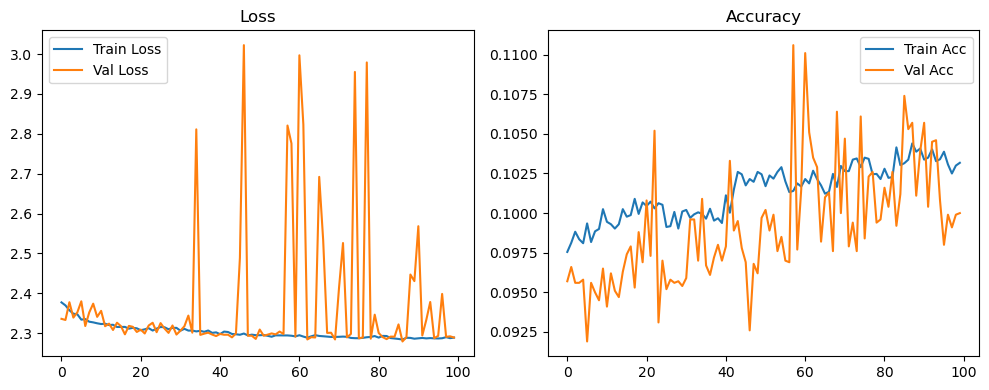

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.83it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.2866 Accuracy: 0.1044


🚀 Running: batch256_lr_max_0.0001_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0953 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0953 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0953 |:   1%|          | 1/100 [01:20<2:12:44, 80.45s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0962 |:   1%|          | 1/100 [02:35<2:12:44, 80.45s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0962 |:   1%|          | 1/100 [02:35<2:12:44, 80.45s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0962 |:   2%|▏         | 2/100 [02:35<2:06:22, 77.37s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [02:49<2:06:22, 77.37s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [02:49<2:06:22, 77.37s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [02:49<1:18:28, 48.54s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0946 |:   3%|▎         | 3/100 [03:03<1:18:28, 48.54s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0946 |:   3%|▎         | 3/100 [03:03<1:18:28, 48.54s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0946 |:   4%|▍         | 4/100 [03:03<55:53, 34.93s/it]  

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [03:18<55:53, 34.93s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [03:18<55:53, 34.93s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0963 |:   5%|▌         | 5/100 [03:18<43:26, 27.43s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0962 |:   5%|▌         | 5/100 [03:32<43:26, 27.43s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0962 |:   5%|▌         | 5/100 [03:32<43:26, 27.43s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0962 |:   6%|▌         | 6/100 [03:32<35:55, 22.93s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [03:46<35:55, 22.93s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [03:46<35:55, 22.93s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [03:46<31:01, 20.02s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [04:00<31:01, 20.02s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [04:00<31:01, 20.02s/it]

| LR: 0.000099 | Train Acc: 0.0986 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [04:00<27:44, 18.09s/it]

| LR: 0.000098 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   8%|▊         | 8/100 [04:14<27:44, 18.09s/it]

| LR: 0.000098 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   8%|▊         | 8/100 [04:14<27:44, 18.09s/it]

| LR: 0.000098 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [04:14<25:29, 16.81s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [04:28<25:29, 16.81s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [04:28<25:29, 16.81s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  10%|█         | 10/100 [04:28<23:57, 15.97s/it]

| LR: 0.000098 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:42<23:57, 15.97s/it]

| LR: 0.000098 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  10%|█         | 10/100 [04:42<23:57, 15.97s/it]

| LR: 0.000098 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  11%|█         | 11/100 [04:42<22:51, 15.41s/it]

| LR: 0.000097 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000097 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000097 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [04:56<22:02, 15.03s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0981 |:  12%|█▏        | 12/100 [05:10<22:02, 15.03s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0981 |:  12%|█▏        | 12/100 [05:10<22:02, 15.03s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0981 |:  13%|█▎        | 13/100 [05:10<21:23, 14.75s/it]

| LR: 0.000096 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [05:24<21:23, 14.75s/it]

| LR: 0.000096 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [05:24<21:23, 14.75s/it]

| LR: 0.000096 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [05:24<20:51, 14.55s/it]

| LR: 0.000095 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [05:39<20:51, 14.55s/it]

| LR: 0.000095 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [05:39<20:51, 14.55s/it]

| LR: 0.000095 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [05:39<20:28, 14.45s/it]

| LR: 0.000095 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  15%|█▌        | 15/100 [05:53<20:28, 14.45s/it]

| LR: 0.000095 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  15%|█▌        | 15/100 [05:53<20:28, 14.45s/it]

| LR: 0.000095 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  16%|█▌        | 16/100 [05:53<20:08, 14.38s/it]

| LR: 0.000094 | Train Acc: 0.1020 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [06:07<20:08, 14.38s/it]

| LR: 0.000094 | Train Acc: 0.1020 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [06:07<20:08, 14.38s/it]

| LR: 0.000094 | Train Acc: 0.1020 | Val Acc: 0.0960 |:  17%|█▋        | 17/100 [06:07<19:46, 14.30s/it]

| LR: 0.000093 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  17%|█▋        | 17/100 [06:21<19:46, 14.30s/it]

| LR: 0.000093 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  17%|█▋        | 17/100 [06:21<19:46, 14.30s/it]

| LR: 0.000093 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  18%|█▊        | 18/100 [06:21<19:27, 14.24s/it]

| LR: 0.000092 | Train Acc: 0.1007 | Val Acc: 0.0988 |:  18%|█▊        | 18/100 [06:35<19:27, 14.24s/it]

| LR: 0.000092 | Train Acc: 0.1007 | Val Acc: 0.0988 |:  18%|█▊        | 18/100 [06:35<19:27, 14.24s/it]

| LR: 0.000092 | Train Acc: 0.1007 | Val Acc: 0.0988 |:  19%|█▉        | 19/100 [06:35<19:11, 14.21s/it]

| LR: 0.000091 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  19%|█▉        | 19/100 [06:49<19:11, 14.21s/it]

| LR: 0.000091 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  19%|█▉        | 19/100 [06:49<19:11, 14.21s/it]

| LR: 0.000091 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  20%|██        | 20/100 [06:49<18:53, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0990 |:  20%|██        | 20/100 [07:03<18:53, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0990 |:  20%|██        | 20/100 [07:03<18:53, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1010 | Val Acc: 0.0990 |:  21%|██        | 21/100 [07:03<18:37, 14.14s/it]

| LR: 0.000090 | Train Acc: 0.1019 | Val Acc: 0.1021 |:  21%|██        | 21/100 [07:17<18:37, 14.14s/it]

| LR: 0.000090 | Train Acc: 0.1019 | Val Acc: 0.1021 |:  21%|██        | 21/100 [07:17<18:37, 14.14s/it]

| LR: 0.000090 | Train Acc: 0.1019 | Val Acc: 0.1021 |:  22%|██▏       | 22/100 [07:17<18:22, 14.14s/it]

| LR: 0.000089 | Train Acc: 0.1016 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [07:31<18:22, 14.14s/it]

| LR: 0.000089 | Train Acc: 0.1016 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [07:32<18:22, 14.14s/it]

| LR: 0.000089 | Train Acc: 0.1016 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [07:32<18:08, 14.13s/it]

| LR: 0.000088 | Train Acc: 0.1016 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:46<18:08, 14.13s/it]

| LR: 0.000088 | Train Acc: 0.1016 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:46<18:08, 14.13s/it]

| LR: 0.000088 | Train Acc: 0.1016 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [07:46<17:53, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.1012 | Val Acc: 0.0960 |:  24%|██▍       | 24/100 [08:00<17:53, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.1012 | Val Acc: 0.0960 |:  24%|██▍       | 24/100 [08:00<17:53, 14.12s/it]

| LR: 0.000087 | Train Acc: 0.1012 | Val Acc: 0.0960 |:  25%|██▌       | 25/100 [08:00<17:38, 14.11s/it]

| LR: 0.000086 | Train Acc: 0.1006 | Val Acc: 0.0984 |:  25%|██▌       | 25/100 [08:14<17:38, 14.11s/it]

| LR: 0.000086 | Train Acc: 0.1006 | Val Acc: 0.0984 |:  25%|██▌       | 25/100 [08:14<17:38, 14.11s/it]

| LR: 0.000086 | Train Acc: 0.1006 | Val Acc: 0.0984 |:  26%|██▌       | 26/100 [08:14<17:22, 14.08s/it]

| LR: 0.000084 | Train Acc: 0.1011 | Val Acc: 0.0961 |:  26%|██▌       | 26/100 [08:28<17:22, 14.08s/it]

| LR: 0.000084 | Train Acc: 0.1011 | Val Acc: 0.0961 |:  26%|██▌       | 26/100 [08:28<17:22, 14.08s/it]

| LR: 0.000084 | Train Acc: 0.1011 | Val Acc: 0.0961 |:  27%|██▋       | 27/100 [08:28<17:08, 14.08s/it]

| LR: 0.000083 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [08:42<17:08, 14.08s/it]

| LR: 0.000083 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [08:42<17:08, 14.08s/it]

| LR: 0.000083 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [08:42<16:57, 14.13s/it]

| LR: 0.000082 | Train Acc: 0.1010 | Val Acc: 0.1040 |:  28%|██▊       | 28/100 [08:56<16:57, 14.13s/it]

| LR: 0.000082 | Train Acc: 0.1010 | Val Acc: 0.1040 |:  28%|██▊       | 28/100 [08:56<16:57, 14.13s/it]

| LR: 0.000082 | Train Acc: 0.1010 | Val Acc: 0.1040 |:  29%|██▉       | 29/100 [08:56<16:45, 14.16s/it]

| LR: 0.000081 | Train Acc: 0.1007 | Val Acc: 0.0999 |:  29%|██▉       | 29/100 [09:10<16:45, 14.16s/it]

| LR: 0.000081 | Train Acc: 0.1007 | Val Acc: 0.0999 |:  29%|██▉       | 29/100 [09:10<16:45, 14.16s/it]

| LR: 0.000081 | Train Acc: 0.1007 | Val Acc: 0.0999 |:  30%|███       | 30/100 [09:11<16:32, 14.18s/it]

| LR: 0.000080 | Train Acc: 0.1010 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:25<16:32, 14.18s/it]

| LR: 0.000080 | Train Acc: 0.1010 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:25<16:32, 14.18s/it]

| LR: 0.000080 | Train Acc: 0.1010 | Val Acc: 0.0970 |:  31%|███       | 31/100 [09:25<16:19, 14.19s/it]

| LR: 0.000078 | Train Acc: 0.1006 | Val Acc: 0.0988 |:  31%|███       | 31/100 [09:39<16:19, 14.19s/it]

| LR: 0.000078 | Train Acc: 0.1006 | Val Acc: 0.0988 |:  31%|███       | 31/100 [09:39<16:19, 14.19s/it]

| LR: 0.000078 | Train Acc: 0.1006 | Val Acc: 0.0988 |:  32%|███▏      | 32/100 [09:39<16:04, 14.18s/it]

| LR: 0.000077 | Train Acc: 0.1010 | Val Acc: 0.0940 |:  32%|███▏      | 32/100 [09:53<16:04, 14.18s/it]

| LR: 0.000077 | Train Acc: 0.1010 | Val Acc: 0.0940 |:  32%|███▏      | 32/100 [09:53<16:04, 14.18s/it]

| LR: 0.000077 | Train Acc: 0.1010 | Val Acc: 0.0940 |:  33%|███▎      | 33/100 [09:53<15:49, 14.18s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  33%|███▎      | 33/100 [10:07<15:49, 14.18s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  33%|███▎      | 33/100 [10:07<15:49, 14.18s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0978 |:  34%|███▍      | 34/100 [10:07<15:35, 14.17s/it]

| LR: 0.000074 | Train Acc: 0.1001 | Val Acc: 0.0995 |:  34%|███▍      | 34/100 [10:21<15:35, 14.17s/it]

| LR: 0.000074 | Train Acc: 0.1001 | Val Acc: 0.0995 |:  34%|███▍      | 34/100 [10:21<15:35, 14.17s/it]

| LR: 0.000074 | Train Acc: 0.1001 | Val Acc: 0.0995 |:  35%|███▌      | 35/100 [10:21<15:19, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1006 | Val Acc: 0.1060 |:  35%|███▌      | 35/100 [10:35<15:19, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1006 | Val Acc: 0.1060 |:  35%|███▌      | 35/100 [10:35<15:19, 14.15s/it]

| LR: 0.000073 | Train Acc: 0.1006 | Val Acc: 0.1060 |:  36%|███▌      | 36/100 [10:35<15:03, 14.12s/it]

| LR: 0.000072 | Train Acc: 0.1000 | Val Acc: 0.0987 |:  36%|███▌      | 36/100 [10:49<15:03, 14.12s/it]

| LR: 0.000072 | Train Acc: 0.1000 | Val Acc: 0.0987 |:  36%|███▌      | 36/100 [10:49<15:03, 14.12s/it]

| LR: 0.000072 | Train Acc: 0.1000 | Val Acc: 0.0987 |:  37%|███▋      | 37/100 [10:50<14:49, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [11:04<14:49, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [11:04<14:49, 14.12s/it]

| LR: 0.000070 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [11:04<14:34, 14.11s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  38%|███▊      | 38/100 [11:18<14:34, 14.11s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  38%|███▊      | 38/100 [11:18<14:34, 14.11s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  39%|███▉      | 39/100 [11:18<14:20, 14.10s/it]

| LR: 0.000067 | Train Acc: 0.1013 | Val Acc: 0.0989 |:  39%|███▉      | 39/100 [11:32<14:20, 14.10s/it]

| LR: 0.000067 | Train Acc: 0.1013 | Val Acc: 0.0989 |:  39%|███▉      | 39/100 [11:32<14:20, 14.10s/it]

| LR: 0.000067 | Train Acc: 0.1013 | Val Acc: 0.0989 |:  40%|████      | 40/100 [11:32<14:05, 14.09s/it]

| LR: 0.000066 | Train Acc: 0.1011 | Val Acc: 0.0990 |:  40%|████      | 40/100 [11:46<14:05, 14.09s/it]

| LR: 0.000066 | Train Acc: 0.1011 | Val Acc: 0.0990 |:  40%|████      | 40/100 [11:46<14:05, 14.09s/it]

| LR: 0.000066 | Train Acc: 0.1011 | Val Acc: 0.0990 |:  41%|████      | 41/100 [11:46<13:51, 14.09s/it]

| LR: 0.000064 | Train Acc: 0.1015 | Val Acc: 0.0975 |:  41%|████      | 41/100 [12:00<13:51, 14.09s/it]

| LR: 0.000064 | Train Acc: 0.1015 | Val Acc: 0.0975 |:  41%|████      | 41/100 [12:00<13:51, 14.09s/it]

| LR: 0.000064 | Train Acc: 0.1015 | Val Acc: 0.0975 |:  42%|████▏     | 42/100 [12:00<13:36, 14.08s/it]

| LR: 0.000063 | Train Acc: 0.1020 | Val Acc: 0.1000 |:  42%|████▏     | 42/100 [12:14<13:36, 14.08s/it]

| LR: 0.000063 | Train Acc: 0.1020 | Val Acc: 0.1000 |:  42%|████▏     | 42/100 [12:14<13:36, 14.08s/it]

| LR: 0.000063 | Train Acc: 0.1020 | Val Acc: 0.1000 |:  43%|████▎     | 43/100 [12:14<13:23, 14.10s/it]

| LR: 0.000061 | Train Acc: 0.1018 | Val Acc: 0.0998 |:  43%|████▎     | 43/100 [12:28<13:23, 14.10s/it]

| LR: 0.000061 | Train Acc: 0.1018 | Val Acc: 0.0998 |:  43%|████▎     | 43/100 [12:28<13:23, 14.10s/it]

| LR: 0.000061 | Train Acc: 0.1018 | Val Acc: 0.0998 |:  44%|████▍     | 44/100 [12:28<13:10, 14.12s/it]

| LR: 0.000060 | Train Acc: 0.1015 | Val Acc: 0.0983 |:  44%|████▍     | 44/100 [12:42<13:10, 14.12s/it]

| LR: 0.000060 | Train Acc: 0.1015 | Val Acc: 0.0983 |:  44%|████▍     | 44/100 [12:42<13:10, 14.12s/it]

| LR: 0.000060 | Train Acc: 0.1015 | Val Acc: 0.0983 |:  45%|████▌     | 45/100 [12:42<12:55, 14.11s/it]

| LR: 0.000058 | Train Acc: 0.1012 | Val Acc: 0.0989 |:  45%|████▌     | 45/100 [12:56<12:55, 14.11s/it]

| LR: 0.000058 | Train Acc: 0.1012 | Val Acc: 0.0989 |:  45%|████▌     | 45/100 [12:56<12:55, 14.11s/it]

| LR: 0.000058 | Train Acc: 0.1012 | Val Acc: 0.0989 |:  46%|████▌     | 46/100 [12:56<12:41, 14.10s/it]

| LR: 0.000057 | Train Acc: 0.1009 | Val Acc: 0.1039 |:  46%|████▌     | 46/100 [13:10<12:41, 14.10s/it]

| LR: 0.000057 | Train Acc: 0.1009 | Val Acc: 0.1039 |:  46%|████▌     | 46/100 [13:10<12:41, 14.10s/it]

| LR: 0.000057 | Train Acc: 0.1009 | Val Acc: 0.1039 |:  47%|████▋     | 47/100 [13:11<12:28, 14.11s/it]

| LR: 0.000055 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  47%|████▋     | 47/100 [13:25<12:28, 14.11s/it]

| LR: 0.000055 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  47%|████▋     | 47/100 [13:25<12:28, 14.11s/it]

| LR: 0.000055 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  48%|████▊     | 48/100 [13:25<12:14, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1009 | Val Acc: 0.1009 |:  48%|████▊     | 48/100 [13:39<12:14, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1009 | Val Acc: 0.1009 |:  48%|████▊     | 48/100 [13:39<12:14, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1009 | Val Acc: 0.1009 |:  49%|████▉     | 49/100 [13:39<12:00, 14.12s/it]

| LR: 0.000052 | Train Acc: 0.1010 | Val Acc: 0.1009 |:  49%|████▉     | 49/100 [13:53<12:00, 14.12s/it]

| LR: 0.000052 | Train Acc: 0.1010 | Val Acc: 0.1009 |:  49%|████▉     | 49/100 [13:53<12:00, 14.12s/it]

| LR: 0.000052 | Train Acc: 0.1010 | Val Acc: 0.1009 |:  50%|█████     | 50/100 [13:53<11:46, 14.13s/it]

| LR: 0.000051 | Train Acc: 0.1018 | Val Acc: 0.0987 |:  50%|█████     | 50/100 [14:07<11:46, 14.13s/it]

| LR: 0.000051 | Train Acc: 0.1018 | Val Acc: 0.0987 |:  50%|█████     | 50/100 [14:07<11:46, 14.13s/it]

| LR: 0.000051 | Train Acc: 0.1018 | Val Acc: 0.0987 |:  51%|█████     | 51/100 [14:07<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.1004 | Val Acc: 0.0992 |:  51%|█████     | 51/100 [14:21<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.1004 | Val Acc: 0.0992 |:  51%|█████     | 51/100 [14:21<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.1004 | Val Acc: 0.0992 |:  52%|█████▏    | 52/100 [14:21<11:17, 14.11s/it]

| LR: 0.000047 | Train Acc: 0.1009 | Val Acc: 0.0998 |:  52%|█████▏    | 52/100 [14:35<11:17, 14.11s/it]

| LR: 0.000047 | Train Acc: 0.1009 | Val Acc: 0.0998 |:  52%|█████▏    | 52/100 [14:35<11:17, 14.11s/it]

| LR: 0.000047 | Train Acc: 0.1009 | Val Acc: 0.0998 |:  53%|█████▎    | 53/100 [14:35<11:03, 14.11s/it]

| LR: 0.000046 | Train Acc: 0.1012 | Val Acc: 0.0992 |:  53%|█████▎    | 53/100 [14:49<11:03, 14.11s/it]

| LR: 0.000046 | Train Acc: 0.1012 | Val Acc: 0.0992 |:  53%|█████▎    | 53/100 [14:49<11:03, 14.11s/it]

| LR: 0.000046 | Train Acc: 0.1012 | Val Acc: 0.0992 |:  54%|█████▍    | 54/100 [14:49<10:49, 14.11s/it]

| LR: 0.000044 | Train Acc: 0.1018 | Val Acc: 0.0992 |:  54%|█████▍    | 54/100 [15:03<10:49, 14.11s/it]

| LR: 0.000044 | Train Acc: 0.1018 | Val Acc: 0.0992 |:  54%|█████▍    | 54/100 [15:03<10:49, 14.11s/it]

| LR: 0.000044 | Train Acc: 0.1018 | Val Acc: 0.0992 |:  55%|█████▌    | 55/100 [15:03<10:34, 14.11s/it]

| LR: 0.000043 | Train Acc: 0.1017 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:17<10:34, 14.11s/it]

| LR: 0.000043 | Train Acc: 0.1017 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:17<10:34, 14.11s/it]

| LR: 0.000043 | Train Acc: 0.1017 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [15:18<10:20, 14.11s/it]

| LR: 0.000041 | Train Acc: 0.1017 | Val Acc: 0.1012 |:  56%|█████▌    | 56/100 [15:32<10:20, 14.11s/it]

| LR: 0.000041 | Train Acc: 0.1017 | Val Acc: 0.1012 |:  56%|█████▌    | 56/100 [15:32<10:20, 14.11s/it]

| LR: 0.000041 | Train Acc: 0.1017 | Val Acc: 0.1012 |:  57%|█████▋    | 57/100 [15:32<10:08, 14.14s/it]

| LR: 0.000040 | Train Acc: 0.1018 | Val Acc: 0.1010 |:  57%|█████▋    | 57/100 [15:46<10:08, 14.14s/it]

| LR: 0.000040 | Train Acc: 0.1018 | Val Acc: 0.1010 |:  57%|█████▋    | 57/100 [15:46<10:08, 14.14s/it]

| LR: 0.000040 | Train Acc: 0.1018 | Val Acc: 0.1010 |:  58%|█████▊    | 58/100 [15:46<09:54, 14.16s/it]

| LR: 0.000038 | Train Acc: 0.1018 | Val Acc: 0.0974 |:  58%|█████▊    | 58/100 [16:00<09:54, 14.16s/it]

| LR: 0.000038 | Train Acc: 0.1018 | Val Acc: 0.0974 |:  58%|█████▊    | 58/100 [16:00<09:54, 14.16s/it]

| LR: 0.000038 | Train Acc: 0.1018 | Val Acc: 0.0974 |:  59%|█████▉    | 59/100 [16:00<09:40, 14.15s/it]

| LR: 0.000037 | Train Acc: 0.1015 | Val Acc: 0.0977 |:  59%|█████▉    | 59/100 [16:14<09:40, 14.15s/it]

| LR: 0.000037 | Train Acc: 0.1015 | Val Acc: 0.0977 |:  59%|█████▉    | 59/100 [16:14<09:40, 14.15s/it]

| LR: 0.000037 | Train Acc: 0.1015 | Val Acc: 0.0977 |:  60%|██████    | 60/100 [16:14<09:25, 14.14s/it]

| LR: 0.000035 | Train Acc: 0.1018 | Val Acc: 0.1017 |:  60%|██████    | 60/100 [16:28<09:25, 14.14s/it]

| LR: 0.000035 | Train Acc: 0.1018 | Val Acc: 0.1017 |:  60%|██████    | 60/100 [16:28<09:25, 14.14s/it]

| LR: 0.000035 | Train Acc: 0.1018 | Val Acc: 0.1017 |:  61%|██████    | 61/100 [16:28<09:11, 14.14s/it]

| LR: 0.000034 | Train Acc: 0.1009 | Val Acc: 0.1006 |:  61%|██████    | 61/100 [16:42<09:11, 14.14s/it]

| LR: 0.000034 | Train Acc: 0.1009 | Val Acc: 0.1006 |:  61%|██████    | 61/100 [16:42<09:11, 14.14s/it]

| LR: 0.000034 | Train Acc: 0.1009 | Val Acc: 0.1006 |:  62%|██████▏   | 62/100 [16:43<08:57, 14.16s/it]

| LR: 0.000032 | Train Acc: 0.1018 | Val Acc: 0.0975 |:  62%|██████▏   | 62/100 [16:57<08:57, 14.16s/it]

| LR: 0.000032 | Train Acc: 0.1018 | Val Acc: 0.0975 |:  62%|██████▏   | 62/100 [16:57<08:57, 14.16s/it]

| LR: 0.000032 | Train Acc: 0.1018 | Val Acc: 0.0975 |:  63%|██████▎   | 63/100 [16:57<08:43, 14.15s/it]

| LR: 0.000031 | Train Acc: 0.1015 | Val Acc: 0.1031 |:  63%|██████▎   | 63/100 [17:11<08:43, 14.15s/it]

| LR: 0.000031 | Train Acc: 0.1015 | Val Acc: 0.1031 |:  63%|██████▎   | 63/100 [17:11<08:43, 14.15s/it]

| LR: 0.000031 | Train Acc: 0.1015 | Val Acc: 0.1031 |:  64%|██████▍   | 64/100 [17:11<08:28, 14.12s/it]

| LR: 0.000029 | Train Acc: 0.1022 | Val Acc: 0.0961 |:  64%|██████▍   | 64/100 [17:25<08:28, 14.12s/it]

| LR: 0.000029 | Train Acc: 0.1022 | Val Acc: 0.0961 |:  64%|██████▍   | 64/100 [17:25<08:28, 14.12s/it]

| LR: 0.000029 | Train Acc: 0.1022 | Val Acc: 0.0961 |:  65%|██████▌   | 65/100 [17:25<08:14, 14.14s/it]

| LR: 0.000028 | Train Acc: 0.1014 | Val Acc: 0.0978 |:  65%|██████▌   | 65/100 [17:39<08:14, 14.14s/it]

| LR: 0.000028 | Train Acc: 0.1014 | Val Acc: 0.0978 |:  65%|██████▌   | 65/100 [17:39<08:14, 14.14s/it]

| LR: 0.000028 | Train Acc: 0.1014 | Val Acc: 0.0978 |:  66%|██████▌   | 66/100 [17:39<08:01, 14.15s/it]

| LR: 0.000027 | Train Acc: 0.1022 | Val Acc: 0.0994 |:  66%|██████▌   | 66/100 [17:53<08:01, 14.15s/it]

| LR: 0.000027 | Train Acc: 0.1022 | Val Acc: 0.0994 |:  66%|██████▌   | 66/100 [17:53<08:01, 14.15s/it]

| LR: 0.000027 | Train Acc: 0.1022 | Val Acc: 0.0994 |:  67%|██████▋   | 67/100 [17:53<07:46, 14.13s/it]

| LR: 0.000025 | Train Acc: 0.1014 | Val Acc: 0.0986 |:  67%|██████▋   | 67/100 [18:07<07:46, 14.13s/it]

| LR: 0.000025 | Train Acc: 0.1014 | Val Acc: 0.0986 |:  67%|██████▋   | 67/100 [18:07<07:46, 14.13s/it]

| LR: 0.000025 | Train Acc: 0.1014 | Val Acc: 0.0986 |:  68%|██████▊   | 68/100 [18:07<07:31, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.1016 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:21<07:31, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.1016 | Val Acc: 0.0992 |:  68%|██████▊   | 68/100 [18:21<07:31, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.1016 | Val Acc: 0.0992 |:  69%|██████▉   | 69/100 [18:21<07:17, 14.12s/it]

| LR: 0.000023 | Train Acc: 0.1014 | Val Acc: 0.0982 |:  69%|██████▉   | 69/100 [18:35<07:17, 14.12s/it]

| LR: 0.000023 | Train Acc: 0.1014 | Val Acc: 0.0982 |:  69%|██████▉   | 69/100 [18:35<07:17, 14.12s/it]

| LR: 0.000023 | Train Acc: 0.1014 | Val Acc: 0.0982 |:  70%|███████   | 70/100 [18:35<07:03, 14.11s/it]

| LR: 0.000021 | Train Acc: 0.1012 | Val Acc: 0.1083 |:  70%|███████   | 70/100 [18:49<07:03, 14.11s/it]

| LR: 0.000021 | Train Acc: 0.1012 | Val Acc: 0.1083 |:  70%|███████   | 70/100 [18:49<07:03, 14.11s/it]

| LR: 0.000021 | Train Acc: 0.1012 | Val Acc: 0.1083 |:  71%|███████   | 71/100 [18:50<06:48, 14.10s/it]

| LR: 0.000020 | Train Acc: 0.1016 | Val Acc: 0.0990 |:  71%|███████   | 71/100 [19:03<06:48, 14.10s/it]

| LR: 0.000020 | Train Acc: 0.1016 | Val Acc: 0.0990 |:  71%|███████   | 71/100 [19:03<06:48, 14.10s/it]

| LR: 0.000020 | Train Acc: 0.1016 | Val Acc: 0.0990 |:  72%|███████▏  | 72/100 [19:04<06:34, 14.07s/it]

| LR: 0.000019 | Train Acc: 0.1022 | Val Acc: 0.0956 |:  72%|███████▏  | 72/100 [19:18<06:34, 14.07s/it]

| LR: 0.000019 | Train Acc: 0.1022 | Val Acc: 0.0956 |:  72%|███████▏  | 72/100 [19:18<06:34, 14.07s/it]

| LR: 0.000019 | Train Acc: 0.1022 | Val Acc: 0.0956 |:  73%|███████▎  | 73/100 [19:18<06:19, 14.07s/it]

| LR: 0.000018 | Train Acc: 0.1021 | Val Acc: 0.0993 |:  73%|███████▎  | 73/100 [19:32<06:19, 14.07s/it]

| LR: 0.000018 | Train Acc: 0.1021 | Val Acc: 0.0993 |:  73%|███████▎  | 73/100 [19:32<06:19, 14.07s/it]

| LR: 0.000018 | Train Acc: 0.1021 | Val Acc: 0.0993 |:  74%|███████▍  | 74/100 [19:32<06:05, 14.07s/it]

| LR: 0.000017 | Train Acc: 0.1020 | Val Acc: 0.0960 |:  74%|███████▍  | 74/100 [19:46<06:05, 14.07s/it]

| LR: 0.000017 | Train Acc: 0.1020 | Val Acc: 0.0960 |:  74%|███████▍  | 74/100 [19:46<06:05, 14.07s/it]

| LR: 0.000017 | Train Acc: 0.1020 | Val Acc: 0.0960 |:  75%|███████▌  | 75/100 [19:46<05:52, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1021 | Val Acc: 0.0990 |:  75%|███████▌  | 75/100 [20:00<05:52, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1021 | Val Acc: 0.0990 |:  75%|███████▌  | 75/100 [20:00<05:52, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1021 | Val Acc: 0.0990 |:  76%|███████▌  | 76/100 [20:00<05:38, 14.10s/it]

| LR: 0.000014 | Train Acc: 0.1022 | Val Acc: 0.1015 |:  76%|███████▌  | 76/100 [20:14<05:38, 14.10s/it]

| LR: 0.000014 | Train Acc: 0.1022 | Val Acc: 0.1015 |:  76%|███████▌  | 76/100 [20:14<05:38, 14.10s/it]

| LR: 0.000014 | Train Acc: 0.1022 | Val Acc: 0.1015 |:  77%|███████▋  | 77/100 [20:14<05:24, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1024 | Val Acc: 0.0950 |:  77%|███████▋  | 77/100 [20:28<05:24, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1024 | Val Acc: 0.0950 |:  77%|███████▋  | 77/100 [20:28<05:24, 14.12s/it]

| LR: 0.000013 | Train Acc: 0.1024 | Val Acc: 0.0950 |:  78%|███████▊  | 78/100 [20:28<05:11, 14.14s/it]

| LR: 0.000012 | Train Acc: 0.1027 | Val Acc: 0.0996 |:  78%|███████▊  | 78/100 [20:42<05:11, 14.14s/it]

| LR: 0.000012 | Train Acc: 0.1027 | Val Acc: 0.0996 |:  78%|███████▊  | 78/100 [20:42<05:11, 14.14s/it]

| LR: 0.000012 | Train Acc: 0.1027 | Val Acc: 0.0996 |:  79%|███████▉  | 79/100 [20:42<04:57, 14.15s/it]

| LR: 0.000011 | Train Acc: 0.1026 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [20:56<04:57, 14.15s/it]

| LR: 0.000011 | Train Acc: 0.1026 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [20:56<04:57, 14.15s/it]

| LR: 0.000011 | Train Acc: 0.1026 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [20:57<04:42, 14.11s/it]

| LR: 0.000010 | Train Acc: 0.1023 | Val Acc: 0.0965 |:  80%|████████  | 80/100 [21:11<04:42, 14.11s/it]

| LR: 0.000010 | Train Acc: 0.1023 | Val Acc: 0.0965 |:  80%|████████  | 80/100 [21:11<04:42, 14.11s/it]

| LR: 0.000010 | Train Acc: 0.1023 | Val Acc: 0.0965 |:  81%|████████  | 81/100 [21:11<04:28, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1007 | Val Acc: 0.0988 |:  81%|████████  | 81/100 [21:25<04:28, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1007 | Val Acc: 0.0988 |:  81%|████████  | 81/100 [21:25<04:28, 14.12s/it]

| LR: 0.000010 | Train Acc: 0.1007 | Val Acc: 0.0988 |:  82%|████████▏ | 82/100 [21:25<04:14, 14.16s/it]

| LR: 0.000009 | Train Acc: 0.1015 | Val Acc: 0.0979 |:  82%|████████▏ | 82/100 [21:39<04:14, 14.16s/it]

| LR: 0.000009 | Train Acc: 0.1015 | Val Acc: 0.0979 |:  82%|████████▏ | 82/100 [21:39<04:14, 14.16s/it]

| LR: 0.000009 | Train Acc: 0.1015 | Val Acc: 0.0979 |:  83%|████████▎ | 83/100 [21:39<04:00, 14.15s/it]

| LR: 0.000008 | Train Acc: 0.1019 | Val Acc: 0.0985 |:  83%|████████▎ | 83/100 [21:53<04:00, 14.15s/it]

| LR: 0.000008 | Train Acc: 0.1019 | Val Acc: 0.0985 |:  83%|████████▎ | 83/100 [21:53<04:00, 14.15s/it]

| LR: 0.000008 | Train Acc: 0.1019 | Val Acc: 0.0985 |:  84%|████████▍ | 84/100 [21:53<03:47, 14.19s/it]

| LR: 0.000007 | Train Acc: 0.1014 | Val Acc: 0.0990 |:  84%|████████▍ | 84/100 [22:07<03:47, 14.19s/it]

| LR: 0.000007 | Train Acc: 0.1014 | Val Acc: 0.0990 |:  84%|████████▍ | 84/100 [22:07<03:47, 14.19s/it]

| LR: 0.000007 | Train Acc: 0.1014 | Val Acc: 0.0990 |:  85%|████████▌ | 85/100 [22:08<03:32, 14.20s/it]

| LR: 0.000006 | Train Acc: 0.1022 | Val Acc: 0.1010 |:  85%|████████▌ | 85/100 [22:22<03:32, 14.20s/it]

| LR: 0.000006 | Train Acc: 0.1022 | Val Acc: 0.1010 |:  85%|████████▌ | 85/100 [22:22<03:32, 14.20s/it]

| LR: 0.000006 | Train Acc: 0.1022 | Val Acc: 0.1010 |:  86%|████████▌ | 86/100 [22:22<03:18, 14.18s/it]

| LR: 0.000006 | Train Acc: 0.1024 | Val Acc: 0.1008 |:  86%|████████▌ | 86/100 [22:36<03:18, 14.18s/it]

| LR: 0.000006 | Train Acc: 0.1024 | Val Acc: 0.1008 |:  86%|████████▌ | 86/100 [22:36<03:18, 14.18s/it]

| LR: 0.000006 | Train Acc: 0.1024 | Val Acc: 0.1008 |:  87%|████████▋ | 87/100 [22:36<03:04, 14.22s/it]

| LR: 0.000005 | Train Acc: 0.1022 | Val Acc: 0.0980 |:  87%|████████▋ | 87/100 [22:50<03:04, 14.22s/it]

| LR: 0.000005 | Train Acc: 0.1022 | Val Acc: 0.0980 |:  87%|████████▋ | 87/100 [22:50<03:04, 14.22s/it]

| LR: 0.000005 | Train Acc: 0.1022 | Val Acc: 0.0980 |:  88%|████████▊ | 88/100 [22:50<02:50, 14.17s/it]

| LR: 0.000004 | Train Acc: 0.1013 | Val Acc: 0.0982 |:  88%|████████▊ | 88/100 [23:04<02:50, 14.17s/it]

| LR: 0.000004 | Train Acc: 0.1013 | Val Acc: 0.0982 |:  88%|████████▊ | 88/100 [23:04<02:50, 14.17s/it]

| LR: 0.000004 | Train Acc: 0.1013 | Val Acc: 0.0982 |:  89%|████████▉ | 89/100 [23:04<02:35, 14.13s/it]

| LR: 0.000004 | Train Acc: 0.1019 | Val Acc: 0.1011 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.13s/it]

| LR: 0.000004 | Train Acc: 0.1019 | Val Acc: 0.1011 |:  89%|████████▉ | 89/100 [23:18<02:35, 14.13s/it]

| LR: 0.000004 | Train Acc: 0.1019 | Val Acc: 0.1011 |:  90%|█████████ | 90/100 [23:18<02:20, 14.10s/it]

| LR: 0.000003 | Train Acc: 0.1011 | Val Acc: 0.1000 |:  90%|█████████ | 90/100 [23:32<02:20, 14.10s/it]

| LR: 0.000003 | Train Acc: 0.1011 | Val Acc: 0.1000 |:  90%|█████████ | 90/100 [23:32<02:20, 14.10s/it]

| LR: 0.000003 | Train Acc: 0.1011 | Val Acc: 0.1000 |:  91%|█████████ | 91/100 [23:32<02:06, 14.08s/it]

| LR: 0.000003 | Train Acc: 0.1015 | Val Acc: 0.1001 |:  91%|█████████ | 91/100 [23:46<02:06, 14.08s/it]

| LR: 0.000003 | Train Acc: 0.1015 | Val Acc: 0.1001 |:  91%|█████████ | 91/100 [23:46<02:06, 14.08s/it]

| LR: 0.000003 | Train Acc: 0.1015 | Val Acc: 0.1001 |:  92%|█████████▏| 92/100 [23:46<01:52, 14.06s/it]

| LR: 0.000003 | Train Acc: 0.1019 | Val Acc: 0.0994 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.06s/it]

| LR: 0.000003 | Train Acc: 0.1019 | Val Acc: 0.0994 |:  92%|█████████▏| 92/100 [24:00<01:52, 14.06s/it]

| LR: 0.000003 | Train Acc: 0.1019 | Val Acc: 0.0994 |:  93%|█████████▎| 93/100 [24:00<01:38, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1019 | Val Acc: 0.1010 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1019 | Val Acc: 0.1010 |:  93%|█████████▎| 93/100 [24:14<01:38, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1019 | Val Acc: 0.1010 |:  94%|█████████▍| 94/100 [24:14<01:24, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1021 | Val Acc: 0.1000 |:  94%|█████████▍| 94/100 [24:28<01:24, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1021 | Val Acc: 0.1000 |:  94%|█████████▍| 94/100 [24:28<01:24, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1021 | Val Acc: 0.1000 |:  95%|█████████▌| 95/100 [24:28<01:10, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1017 | Val Acc: 0.0984 |:  95%|█████████▌| 95/100 [24:42<01:10, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1017 | Val Acc: 0.0984 |:  95%|█████████▌| 95/100 [24:42<01:10, 14.04s/it]

| LR: 0.000002 | Train Acc: 0.1017 | Val Acc: 0.0984 |:  96%|█████████▌| 96/100 [24:42<00:56, 14.04s/it]

| LR: 0.000001 | Train Acc: 0.1024 | Val Acc: 0.1014 |:  96%|█████████▌| 96/100 [24:56<00:56, 14.04s/it]

| LR: 0.000001 | Train Acc: 0.1024 | Val Acc: 0.1014 |:  96%|█████████▌| 96/100 [24:56<00:56, 14.04s/it]

| LR: 0.000001 | Train Acc: 0.1024 | Val Acc: 0.1014 |:  97%|█████████▋| 97/100 [24:56<00:42, 14.04s/it]

| LR: 0.000001 | Train Acc: 0.1012 | Val Acc: 0.0988 |:  97%|█████████▋| 97/100 [25:10<00:42, 14.04s/it]

| LR: 0.000001 | Train Acc: 0.1012 | Val Acc: 0.0988 |:  97%|█████████▋| 97/100 [25:10<00:42, 14.04s/it]

| LR: 0.000001 | Train Acc: 0.1012 | Val Acc: 0.0988 |:  98%|█████████▊| 98/100 [25:11<00:28, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1017 | Val Acc: 0.0989 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1017 | Val Acc: 0.0989 |:  98%|█████████▊| 98/100 [25:25<00:28, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1017 | Val Acc: 0.0989 |:  99%|█████████▉| 99/100 [25:25<00:14, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.1005 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.1005 |:  99%|█████████▉| 99/100 [25:39<00:14, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.1005 |: 100%|██████████| 100/100 [25:39<00:00, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1021 | Val Acc: 0.1005 |: 100%|██████████| 100/100 [25:39<00:00, 15.39s/it]

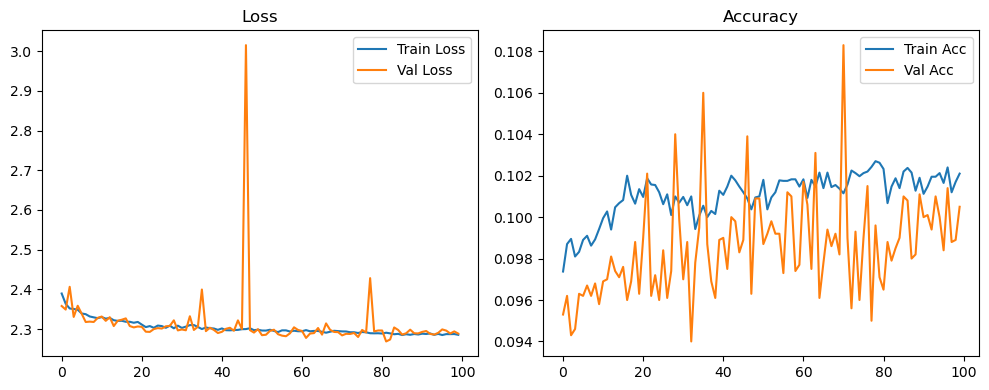

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.2872 Accuracy: 0.1032


🚀 Running: batch256_lr_max_0.0001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:20<2:12:57, 80.58s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:35<2:12:57, 80.58s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:35<2:12:57, 80.58s/it]

| LR: 0.000100 | Train Acc: 0.0981 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:35<2:05:57, 77.11s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0963 |:   2%|▏         | 2/100 [02:49<2:05:57, 77.11s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0963 |:   2%|▏         | 2/100 [02:49<2:05:57, 77.11s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0963 |:   3%|▎         | 3/100 [02:49<1:18:05, 48.30s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [03:03<1:18:05, 48.30s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [03:03<1:18:05, 48.30s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   4%|▍         | 4/100 [03:03<55:37, 34.77s/it]  

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [03:17<55:37, 34.77s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [03:17<55:37, 34.77s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [03:17<43:13, 27.30s/it]

| LR: 0.000099 | Train Acc: 0.1000 | Val Acc: 0.0976 |:   5%|▌         | 5/100 [03:31<43:13, 27.30s/it]

| LR: 0.000099 | Train Acc: 0.1000 | Val Acc: 0.0976 |:   5%|▌         | 5/100 [03:31<43:13, 27.30s/it]

| LR: 0.000099 | Train Acc: 0.1000 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [03:31<35:44, 22.81s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:45<35:44, 22.81s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:45<35:44, 22.81s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:45<30:57, 19.98s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [03:59<30:57, 19.98s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [03:59<30:57, 19.98s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [03:59<27:45, 18.10s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0976 |:   8%|▊         | 8/100 [04:13<27:45, 18.10s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0976 |:   8%|▊         | 8/100 [04:13<27:45, 18.10s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0976 |:   9%|▉         | 9/100 [04:13<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [04:27<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [04:27<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  10%|█         | 10/100 [04:27<23:57, 15.98s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  10%|█         | 10/100 [04:41<23:57, 15.98s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  10%|█         | 10/100 [04:41<23:57, 15.98s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  11%|█         | 11/100 [04:41<22:49, 15.38s/it]

| LR: 0.000097 | Train Acc: 0.0989 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:55<22:49, 15.38s/it]

| LR: 0.000097 | Train Acc: 0.0989 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:55<22:49, 15.38s/it]

| LR: 0.000097 | Train Acc: 0.0989 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:55<21:59, 15.00s/it]

| LR: 0.000097 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [05:09<21:59, 15.00s/it]

| LR: 0.000097 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [05:09<21:59, 15.00s/it]

| LR: 0.000097 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  13%|█▎        | 13/100 [05:09<21:19, 14.71s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  13%|█▎        | 13/100 [05:23<21:19, 14.71s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  13%|█▎        | 13/100 [05:23<21:19, 14.71s/it]

| LR: 0.000096 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  14%|█▍        | 14/100 [05:24<20:46, 14.50s/it]

| LR: 0.000095 | Train Acc: 0.1009 | Val Acc: 0.0953 |:  14%|█▍        | 14/100 [05:37<20:46, 14.50s/it]

| LR: 0.000095 | Train Acc: 0.1009 | Val Acc: 0.0953 |:  14%|█▍        | 14/100 [05:37<20:46, 14.50s/it]

| LR: 0.000095 | Train Acc: 0.1009 | Val Acc: 0.0953 |:  15%|█▌        | 15/100 [05:38<20:20, 14.36s/it]

| LR: 0.000095 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [05:52<20:20, 14.36s/it]

| LR: 0.000095 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [05:52<20:20, 14.36s/it]

| LR: 0.000095 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [05:52<19:58, 14.27s/it]

| LR: 0.000094 | Train Acc: 0.1008 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [06:06<19:58, 14.27s/it]

| LR: 0.000094 | Train Acc: 0.1008 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [06:06<19:58, 14.27s/it]

| LR: 0.000094 | Train Acc: 0.1008 | Val Acc: 0.0975 |:  17%|█▋        | 17/100 [06:06<19:38, 14.20s/it]

| LR: 0.000093 | Train Acc: 0.1019 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [06:20<19:38, 14.20s/it]

| LR: 0.000093 | Train Acc: 0.1019 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [06:20<19:38, 14.20s/it]

| LR: 0.000093 | Train Acc: 0.1019 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [06:20<19:21, 14.17s/it]

| LR: 0.000092 | Train Acc: 0.1024 | Val Acc: 0.0998 |:  18%|█▊        | 18/100 [06:34<19:21, 14.17s/it]

| LR: 0.000092 | Train Acc: 0.1024 | Val Acc: 0.0998 |:  18%|█▊        | 18/100 [06:34<19:21, 14.17s/it]

| LR: 0.000092 | Train Acc: 0.1024 | Val Acc: 0.0998 |:  19%|█▉        | 19/100 [06:34<19:08, 14.18s/it]

| LR: 0.000091 | Train Acc: 0.1018 | Val Acc: 0.0984 |:  19%|█▉        | 19/100 [06:48<19:08, 14.18s/it]

| LR: 0.000091 | Train Acc: 0.1018 | Val Acc: 0.0984 |:  19%|█▉        | 19/100 [06:48<19:08, 14.18s/it]

| LR: 0.000091 | Train Acc: 0.1018 | Val Acc: 0.0984 |:  20%|██        | 20/100 [06:48<18:53, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  20%|██        | 20/100 [07:02<18:53, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  20%|██        | 20/100 [07:02<18:53, 14.16s/it]

| LR: 0.000091 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  21%|██        | 21/100 [07:02<18:35, 14.13s/it]

| LR: 0.000090 | Train Acc: 0.1009 | Val Acc: 0.0996 |:  21%|██        | 21/100 [07:16<18:35, 14.13s/it]

| LR: 0.000090 | Train Acc: 0.1009 | Val Acc: 0.0996 |:  21%|██        | 21/100 [07:16<18:35, 14.13s/it]

| LR: 0.000090 | Train Acc: 0.1009 | Val Acc: 0.0996 |:  22%|██▏       | 22/100 [07:16<18:19, 14.10s/it]

| LR: 0.000089 | Train Acc: 0.1013 | Val Acc: 0.0955 |:  22%|██▏       | 22/100 [07:30<18:19, 14.10s/it]

| LR: 0.000089 | Train Acc: 0.1013 | Val Acc: 0.0955 |:  22%|██▏       | 22/100 [07:30<18:19, 14.10s/it]

| LR: 0.000089 | Train Acc: 0.1013 | Val Acc: 0.0955 |:  23%|██▎       | 23/100 [07:30<18:04, 14.08s/it]

| LR: 0.000088 | Train Acc: 0.1005 | Val Acc: 0.1004 |:  23%|██▎       | 23/100 [07:44<18:04, 14.08s/it]

| LR: 0.000088 | Train Acc: 0.1005 | Val Acc: 0.1004 |:  23%|██▎       | 23/100 [07:44<18:04, 14.08s/it]

| LR: 0.000088 | Train Acc: 0.1005 | Val Acc: 0.1004 |:  24%|██▍       | 24/100 [07:44<17:49, 14.07s/it]

| LR: 0.000087 | Train Acc: 0.1001 | Val Acc: 0.0951 |:  24%|██▍       | 24/100 [07:58<17:49, 14.07s/it]

| LR: 0.000087 | Train Acc: 0.1001 | Val Acc: 0.0951 |:  24%|██▍       | 24/100 [07:58<17:49, 14.07s/it]

| LR: 0.000087 | Train Acc: 0.1001 | Val Acc: 0.0951 |:  25%|██▌       | 25/100 [07:58<17:35, 14.07s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.1021 |:  25%|██▌       | 25/100 [08:12<17:35, 14.07s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.1021 |:  25%|██▌       | 25/100 [08:12<17:35, 14.07s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.1021 |:  26%|██▌       | 26/100 [08:12<17:20, 14.06s/it]

| LR: 0.000084 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  26%|██▌       | 26/100 [08:26<17:20, 14.06s/it]

| LR: 0.000084 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  26%|██▌       | 26/100 [08:26<17:20, 14.06s/it]

| LR: 0.000084 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  27%|██▋       | 27/100 [08:26<17:05, 14.05s/it]

| LR: 0.000083 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  27%|██▋       | 27/100 [08:40<17:05, 14.05s/it]

| LR: 0.000083 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  27%|██▋       | 27/100 [08:40<17:05, 14.05s/it]

| LR: 0.000083 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  28%|██▊       | 28/100 [08:41<16:53, 14.08s/it]

| LR: 0.000082 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  28%|██▊       | 28/100 [08:55<16:53, 14.08s/it]

| LR: 0.000082 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  28%|██▊       | 28/100 [08:55<16:53, 14.08s/it]

| LR: 0.000082 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  29%|██▉       | 29/100 [08:55<16:40, 14.09s/it]

| LR: 0.000081 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:09<16:40, 14.09s/it]

| LR: 0.000081 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [09:09<16:40, 14.09s/it]

| LR: 0.000081 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  30%|███       | 30/100 [09:09<16:27, 14.11s/it]

| LR: 0.000080 | Train Acc: 0.1012 | Val Acc: 0.0965 |:  30%|███       | 30/100 [09:23<16:27, 14.11s/it]

| LR: 0.000080 | Train Acc: 0.1012 | Val Acc: 0.0965 |:  30%|███       | 30/100 [09:23<16:27, 14.11s/it]

| LR: 0.000080 | Train Acc: 0.1012 | Val Acc: 0.0965 |:  31%|███       | 31/100 [09:23<16:14, 14.12s/it]

| LR: 0.000078 | Train Acc: 0.1020 | Val Acc: 0.1081 |:  31%|███       | 31/100 [09:37<16:14, 14.12s/it]

| LR: 0.000078 | Train Acc: 0.1020 | Val Acc: 0.1081 |:  31%|███       | 31/100 [09:37<16:14, 14.12s/it]

| LR: 0.000078 | Train Acc: 0.1020 | Val Acc: 0.1081 |:  32%|███▏      | 32/100 [09:37<16:02, 14.15s/it]

| LR: 0.000077 | Train Acc: 0.1013 | Val Acc: 0.1008 |:  32%|███▏      | 32/100 [09:51<16:02, 14.15s/it]

| LR: 0.000077 | Train Acc: 0.1013 | Val Acc: 0.1008 |:  32%|███▏      | 32/100 [09:51<16:02, 14.15s/it]

| LR: 0.000077 | Train Acc: 0.1013 | Val Acc: 0.1008 |:  33%|███▎      | 33/100 [09:51<15:46, 14.13s/it]

| LR: 0.000076 | Train Acc: 0.1024 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [10:05<15:46, 14.13s/it]

| LR: 0.000076 | Train Acc: 0.1024 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [10:05<15:46, 14.13s/it]

| LR: 0.000076 | Train Acc: 0.1024 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [10:05<15:31, 14.12s/it]

| LR: 0.000074 | Train Acc: 0.1025 | Val Acc: 0.1015 |:  34%|███▍      | 34/100 [10:19<15:31, 14.12s/it]

| LR: 0.000074 | Train Acc: 0.1025 | Val Acc: 0.1015 |:  34%|███▍      | 34/100 [10:19<15:31, 14.12s/it]

| LR: 0.000074 | Train Acc: 0.1025 | Val Acc: 0.1015 |:  35%|███▌      | 35/100 [10:19<15:17, 14.12s/it]

| LR: 0.000073 | Train Acc: 0.1026 | Val Acc: 0.0997 |:  35%|███▌      | 35/100 [10:33<15:17, 14.12s/it]

| LR: 0.000073 | Train Acc: 0.1026 | Val Acc: 0.0997 |:  35%|███▌      | 35/100 [10:33<15:17, 14.12s/it]

| LR: 0.000073 | Train Acc: 0.1026 | Val Acc: 0.0997 |:  36%|███▌      | 36/100 [10:33<15:01, 14.09s/it]

| LR: 0.000072 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:48<15:01, 14.09s/it]

| LR: 0.000072 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:48<15:01, 14.09s/it]

| LR: 0.000072 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [10:48<14:48, 14.11s/it]

| LR: 0.000070 | Train Acc: 0.1020 | Val Acc: 0.1003 |:  37%|███▋      | 37/100 [11:02<14:48, 14.11s/it]

| LR: 0.000070 | Train Acc: 0.1020 | Val Acc: 0.1003 |:  37%|███▋      | 37/100 [11:02<14:48, 14.11s/it]

| LR: 0.000070 | Train Acc: 0.1020 | Val Acc: 0.1003 |:  38%|███▊      | 38/100 [11:02<14:32, 14.07s/it]

| LR: 0.000069 | Train Acc: 0.1028 | Val Acc: 0.0989 |:  38%|███▊      | 38/100 [11:16<14:32, 14.07s/it]

| LR: 0.000069 | Train Acc: 0.1028 | Val Acc: 0.0989 |:  38%|███▊      | 38/100 [11:16<14:32, 14.07s/it]

| LR: 0.000069 | Train Acc: 0.1028 | Val Acc: 0.0989 |:  39%|███▉      | 39/100 [11:16<14:17, 14.05s/it]

| LR: 0.000067 | Train Acc: 0.1039 | Val Acc: 0.1009 |:  39%|███▉      | 39/100 [11:30<14:17, 14.05s/it]

| LR: 0.000067 | Train Acc: 0.1039 | Val Acc: 0.1009 |:  39%|███▉      | 39/100 [11:30<14:17, 14.05s/it]

| LR: 0.000067 | Train Acc: 0.1039 | Val Acc: 0.1009 |:  40%|████      | 40/100 [11:30<14:02, 14.04s/it]

| LR: 0.000066 | Train Acc: 0.1030 | Val Acc: 0.0922 |:  40%|████      | 40/100 [11:44<14:02, 14.04s/it]

| LR: 0.000066 | Train Acc: 0.1030 | Val Acc: 0.0922 |:  40%|████      | 40/100 [11:44<14:02, 14.04s/it]

| LR: 0.000066 | Train Acc: 0.1030 | Val Acc: 0.0922 |:  41%|████      | 41/100 [11:44<13:48, 14.05s/it]

| LR: 0.000064 | Train Acc: 0.1029 | Val Acc: 0.0981 |:  41%|████      | 41/100 [11:58<13:48, 14.05s/it]

| LR: 0.000064 | Train Acc: 0.1029 | Val Acc: 0.0981 |:  41%|████      | 41/100 [11:58<13:48, 14.05s/it]

| LR: 0.000064 | Train Acc: 0.1029 | Val Acc: 0.0981 |:  42%|████▏     | 42/100 [11:58<13:34, 14.04s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.0937 |:  42%|████▏     | 42/100 [12:12<13:34, 14.04s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.0937 |:  42%|████▏     | 42/100 [12:12<13:34, 14.04s/it]

| LR: 0.000063 | Train Acc: 0.1035 | Val Acc: 0.0937 |:  43%|████▎     | 43/100 [12:12<13:19, 14.03s/it]

| LR: 0.000061 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  43%|████▎     | 43/100 [12:26<13:19, 14.03s/it]

| LR: 0.000061 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  43%|████▎     | 43/100 [12:26<13:19, 14.03s/it]

| LR: 0.000061 | Train Acc: 0.1032 | Val Acc: 0.0994 |:  44%|████▍     | 44/100 [12:26<13:05, 14.03s/it]

| LR: 0.000060 | Train Acc: 0.1029 | Val Acc: 0.1010 |:  44%|████▍     | 44/100 [12:40<13:05, 14.03s/it]

| LR: 0.000060 | Train Acc: 0.1029 | Val Acc: 0.1010 |:  44%|████▍     | 44/100 [12:40<13:05, 14.03s/it]

| LR: 0.000060 | Train Acc: 0.1029 | Val Acc: 0.1010 |:  45%|████▌     | 45/100 [12:40<12:53, 14.06s/it]

| LR: 0.000058 | Train Acc: 0.1040 | Val Acc: 0.1071 |:  45%|████▌     | 45/100 [12:54<12:53, 14.06s/it]

| LR: 0.000058 | Train Acc: 0.1040 | Val Acc: 0.1071 |:  45%|████▌     | 45/100 [12:54<12:53, 14.06s/it]

| LR: 0.000058 | Train Acc: 0.1040 | Val Acc: 0.1071 |:  46%|████▌     | 46/100 [12:54<12:38, 14.05s/it]

| LR: 0.000057 | Train Acc: 0.1035 | Val Acc: 0.0991 |:  46%|████▌     | 46/100 [13:08<12:38, 14.05s/it]

| LR: 0.000057 | Train Acc: 0.1035 | Val Acc: 0.0991 |:  46%|████▌     | 46/100 [13:08<12:38, 14.05s/it]

| LR: 0.000057 | Train Acc: 0.1035 | Val Acc: 0.0991 |:  47%|████▋     | 47/100 [13:08<12:26, 14.08s/it]

| LR: 0.000055 | Train Acc: 0.1036 | Val Acc: 0.0994 |:  47%|████▋     | 47/100 [13:22<12:26, 14.08s/it]

| LR: 0.000055 | Train Acc: 0.1036 | Val Acc: 0.0994 |:  47%|████▋     | 47/100 [13:22<12:26, 14.08s/it]

| LR: 0.000055 | Train Acc: 0.1036 | Val Acc: 0.0994 |:  48%|████▊     | 48/100 [13:22<12:14, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1032 | Val Acc: 0.0983 |:  48%|████▊     | 48/100 [13:36<12:14, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1032 | Val Acc: 0.0983 |:  48%|████▊     | 48/100 [13:36<12:14, 14.12s/it]

| LR: 0.000054 | Train Acc: 0.1032 | Val Acc: 0.0983 |:  49%|████▉     | 49/100 [13:36<12:00, 14.13s/it]

| LR: 0.000052 | Train Acc: 0.1032 | Val Acc: 0.0968 |:  49%|████▉     | 49/100 [13:50<12:00, 14.13s/it]

| LR: 0.000052 | Train Acc: 0.1032 | Val Acc: 0.0968 |:  49%|████▉     | 49/100 [13:50<12:00, 14.13s/it]

| LR: 0.000052 | Train Acc: 0.1032 | Val Acc: 0.0968 |:  50%|█████     | 50/100 [13:51<11:46, 14.13s/it]

| LR: 0.000051 | Train Acc: 0.1039 | Val Acc: 0.0995 |:  50%|█████     | 50/100 [14:05<11:46, 14.13s/it]

| LR: 0.000051 | Train Acc: 0.1039 | Val Acc: 0.0995 |:  50%|█████     | 50/100 [14:05<11:46, 14.13s/it]

| LR: 0.000051 | Train Acc: 0.1039 | Val Acc: 0.0995 |:  51%|█████     | 51/100 [14:05<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.1038 | Val Acc: 0.0958 |:  51%|█████     | 51/100 [14:19<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.1038 | Val Acc: 0.0958 |:  51%|█████     | 51/100 [14:19<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.1038 | Val Acc: 0.0958 |:  52%|█████▏    | 52/100 [14:19<11:17, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1039 | Val Acc: 0.0987 |:  52%|█████▏    | 52/100 [14:33<11:17, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1039 | Val Acc: 0.0987 |:  52%|█████▏    | 52/100 [14:33<11:17, 14.12s/it]

| LR: 0.000047 | Train Acc: 0.1039 | Val Acc: 0.0987 |:  53%|█████▎    | 53/100 [14:33<11:03, 14.12s/it]

| LR: 0.000046 | Train Acc: 0.1031 | Val Acc: 0.0996 |:  53%|█████▎    | 53/100 [14:47<11:03, 14.12s/it]

| LR: 0.000046 | Train Acc: 0.1031 | Val Acc: 0.0996 |:  53%|█████▎    | 53/100 [14:47<11:03, 14.12s/it]

| LR: 0.000046 | Train Acc: 0.1031 | Val Acc: 0.0996 |:  54%|█████▍    | 54/100 [14:47<10:48, 14.10s/it]

| LR: 0.000044 | Train Acc: 0.1046 | Val Acc: 0.0990 |:  54%|█████▍    | 54/100 [15:01<10:48, 14.10s/it]

| LR: 0.000044 | Train Acc: 0.1046 | Val Acc: 0.0990 |:  54%|█████▍    | 54/100 [15:01<10:48, 14.10s/it]

| LR: 0.000044 | Train Acc: 0.1046 | Val Acc: 0.0990 |:  55%|█████▌    | 55/100 [15:01<10:35, 14.13s/it]

| LR: 0.000043 | Train Acc: 0.1048 | Val Acc: 0.1000 |:  55%|█████▌    | 55/100 [15:15<10:35, 14.13s/it]

| LR: 0.000043 | Train Acc: 0.1048 | Val Acc: 0.1000 |:  55%|█████▌    | 55/100 [15:15<10:35, 14.13s/it]

| LR: 0.000043 | Train Acc: 0.1048 | Val Acc: 0.1000 |:  56%|█████▌    | 56/100 [15:15<10:22, 14.14s/it]

| LR: 0.000041 | Train Acc: 0.1035 | Val Acc: 0.1014 |:  56%|█████▌    | 56/100 [15:30<10:22, 14.14s/it]

| LR: 0.000041 | Train Acc: 0.1035 | Val Acc: 0.1014 |:  56%|█████▌    | 56/100 [15:30<10:22, 14.14s/it]

| LR: 0.000041 | Train Acc: 0.1035 | Val Acc: 0.1014 |:  57%|█████▋    | 57/100 [15:30<10:10, 14.20s/it]

| LR: 0.000040 | Train Acc: 0.1041 | Val Acc: 0.0998 |:  57%|█████▋    | 57/100 [15:44<10:10, 14.20s/it]

| LR: 0.000040 | Train Acc: 0.1041 | Val Acc: 0.0998 |:  57%|█████▋    | 57/100 [15:44<10:10, 14.20s/it]

| LR: 0.000040 | Train Acc: 0.1041 | Val Acc: 0.0998 |:  58%|█████▊    | 58/100 [15:44<09:55, 14.17s/it]

| LR: 0.000038 | Train Acc: 0.1036 | Val Acc: 0.1055 |:  58%|█████▊    | 58/100 [15:58<09:55, 14.17s/it]

| LR: 0.000038 | Train Acc: 0.1036 | Val Acc: 0.1055 |:  58%|█████▊    | 58/100 [15:58<09:55, 14.17s/it]

| LR: 0.000038 | Train Acc: 0.1036 | Val Acc: 0.1055 |:  59%|█████▉    | 59/100 [15:58<09:40, 14.16s/it]

| LR: 0.000037 | Train Acc: 0.1033 | Val Acc: 0.1012 |:  59%|█████▉    | 59/100 [16:12<09:40, 14.16s/it]

| LR: 0.000037 | Train Acc: 0.1033 | Val Acc: 0.1012 |:  59%|█████▉    | 59/100 [16:12<09:40, 14.16s/it]

| LR: 0.000037 | Train Acc: 0.1033 | Val Acc: 0.1012 |:  60%|██████    | 60/100 [16:12<09:27, 14.18s/it]

| LR: 0.000035 | Train Acc: 0.1035 | Val Acc: 0.1044 |:  60%|██████    | 60/100 [16:26<09:27, 14.18s/it]

| LR: 0.000035 | Train Acc: 0.1035 | Val Acc: 0.1044 |:  60%|██████    | 60/100 [16:26<09:27, 14.18s/it]

| LR: 0.000035 | Train Acc: 0.1035 | Val Acc: 0.1044 |:  61%|██████    | 61/100 [16:26<09:13, 14.18s/it]

| LR: 0.000034 | Train Acc: 0.1045 | Val Acc: 0.1026 |:  61%|██████    | 61/100 [16:40<09:13, 14.18s/it]

| LR: 0.000034 | Train Acc: 0.1045 | Val Acc: 0.1026 |:  61%|██████    | 61/100 [16:40<09:13, 14.18s/it]

| LR: 0.000034 | Train Acc: 0.1045 | Val Acc: 0.1026 |:  62%|██████▏   | 62/100 [16:40<08:57, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1048 | Val Acc: 0.1016 |:  62%|██████▏   | 62/100 [16:54<08:57, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1048 | Val Acc: 0.1016 |:  62%|██████▏   | 62/100 [16:54<08:57, 14.15s/it]

| LR: 0.000032 | Train Acc: 0.1048 | Val Acc: 0.1016 |:  63%|██████▎   | 63/100 [16:54<08:43, 14.14s/it]

| LR: 0.000031 | Train Acc: 0.1045 | Val Acc: 0.1022 |:  63%|██████▎   | 63/100 [17:08<08:43, 14.14s/it]

| LR: 0.000031 | Train Acc: 0.1045 | Val Acc: 0.1022 |:  63%|██████▎   | 63/100 [17:08<08:43, 14.14s/it]

| LR: 0.000031 | Train Acc: 0.1045 | Val Acc: 0.1022 |:  64%|██████▍   | 64/100 [17:09<08:28, 14.11s/it]

| LR: 0.000029 | Train Acc: 0.1051 | Val Acc: 0.1027 |:  64%|██████▍   | 64/100 [17:23<08:28, 14.11s/it]

| LR: 0.000029 | Train Acc: 0.1051 | Val Acc: 0.1027 |:  64%|██████▍   | 64/100 [17:23<08:28, 14.11s/it]

| LR: 0.000029 | Train Acc: 0.1051 | Val Acc: 0.1027 |:  65%|██████▌   | 65/100 [17:23<08:14, 14.12s/it]

| LR: 0.000028 | Train Acc: 0.1051 | Val Acc: 0.1025 |:  65%|██████▌   | 65/100 [17:37<08:14, 14.12s/it]

| LR: 0.000028 | Train Acc: 0.1051 | Val Acc: 0.1025 |:  65%|██████▌   | 65/100 [17:37<08:14, 14.12s/it]

| LR: 0.000028 | Train Acc: 0.1051 | Val Acc: 0.1025 |:  66%|██████▌   | 66/100 [17:37<07:59, 14.10s/it]

| LR: 0.000027 | Train Acc: 0.1049 | Val Acc: 0.1024 |:  66%|██████▌   | 66/100 [17:51<07:59, 14.10s/it]

| LR: 0.000027 | Train Acc: 0.1049 | Val Acc: 0.1024 |:  66%|██████▌   | 66/100 [17:51<07:59, 14.10s/it]

| LR: 0.000027 | Train Acc: 0.1049 | Val Acc: 0.1024 |:  67%|██████▋   | 67/100 [17:51<07:45, 14.10s/it]

| LR: 0.000025 | Train Acc: 0.1053 | Val Acc: 0.1010 |:  67%|██████▋   | 67/100 [18:05<07:45, 14.10s/it]

| LR: 0.000025 | Train Acc: 0.1053 | Val Acc: 0.1010 |:  67%|██████▋   | 67/100 [18:05<07:45, 14.10s/it]

| LR: 0.000025 | Train Acc: 0.1053 | Val Acc: 0.1010 |:  68%|██████▊   | 68/100 [18:05<07:30, 14.09s/it]

| LR: 0.000024 | Train Acc: 0.1060 | Val Acc: 0.0989 |:  68%|██████▊   | 68/100 [18:19<07:30, 14.09s/it]

| LR: 0.000024 | Train Acc: 0.1060 | Val Acc: 0.0989 |:  68%|██████▊   | 68/100 [18:19<07:30, 14.09s/it]

| LR: 0.000024 | Train Acc: 0.1060 | Val Acc: 0.0989 |:  69%|██████▉   | 69/100 [18:19<07:17, 14.11s/it]

| LR: 0.000023 | Train Acc: 0.1053 | Val Acc: 0.0994 |:  69%|██████▉   | 69/100 [18:33<07:17, 14.11s/it]

| LR: 0.000023 | Train Acc: 0.1053 | Val Acc: 0.0994 |:  69%|██████▉   | 69/100 [18:33<07:17, 14.11s/it]

| LR: 0.000023 | Train Acc: 0.1053 | Val Acc: 0.0994 |:  70%|███████   | 70/100 [18:33<07:03, 14.12s/it]

| LR: 0.000021 | Train Acc: 0.1058 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [18:47<07:03, 14.12s/it]

| LR: 0.000021 | Train Acc: 0.1058 | Val Acc: 0.1005 |:  70%|███████   | 70/100 [18:47<07:03, 14.12s/it]

| LR: 0.000021 | Train Acc: 0.1058 | Val Acc: 0.1005 |:  71%|███████   | 71/100 [18:47<06:49, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1049 | Val Acc: 0.1018 |:  71%|███████   | 71/100 [19:01<06:49, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1049 | Val Acc: 0.1018 |:  71%|███████   | 71/100 [19:01<06:49, 14.12s/it]

| LR: 0.000020 | Train Acc: 0.1049 | Val Acc: 0.1018 |:  72%|███████▏  | 72/100 [19:01<06:34, 14.10s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1025 |:  72%|███████▏  | 72/100 [19:15<06:34, 14.10s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1025 |:  72%|███████▏  | 72/100 [19:15<06:34, 14.10s/it]

| LR: 0.000019 | Train Acc: 0.1053 | Val Acc: 0.1025 |:  73%|███████▎  | 73/100 [19:15<06:20, 14.10s/it]

| LR: 0.000018 | Train Acc: 0.1049 | Val Acc: 0.0998 |:  73%|███████▎  | 73/100 [19:29<06:20, 14.10s/it]

| LR: 0.000018 | Train Acc: 0.1049 | Val Acc: 0.0998 |:  73%|███████▎  | 73/100 [19:29<06:20, 14.10s/it]

| LR: 0.000018 | Train Acc: 0.1049 | Val Acc: 0.0998 |:  74%|███████▍  | 74/100 [19:29<06:05, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.1058 | Val Acc: 0.1007 |:  74%|███████▍  | 74/100 [19:44<06:05, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.1058 | Val Acc: 0.1007 |:  74%|███████▍  | 74/100 [19:44<06:05, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.1058 | Val Acc: 0.1007 |:  75%|███████▌  | 75/100 [19:44<05:52, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1061 | Val Acc: 0.1016 |:  75%|███████▌  | 75/100 [19:58<05:52, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1061 | Val Acc: 0.1016 |:  75%|███████▌  | 75/100 [19:58<05:52, 14.11s/it]

| LR: 0.000015 | Train Acc: 0.1061 | Val Acc: 0.1016 |:  76%|███████▌  | 76/100 [19:58<05:39, 14.14s/it]

| LR: 0.000014 | Train Acc: 0.1069 | Val Acc: 0.1063 |:  76%|███████▌  | 76/100 [20:12<05:39, 14.14s/it]

| LR: 0.000014 | Train Acc: 0.1069 | Val Acc: 0.1063 |:  76%|███████▌  | 76/100 [20:12<05:39, 14.14s/it]

| LR: 0.000014 | Train Acc: 0.1069 | Val Acc: 0.1063 |:  77%|███████▋  | 77/100 [20:12<05:25, 14.13s/it]

| LR: 0.000013 | Train Acc: 0.1065 | Val Acc: 0.1017 |:  77%|███████▋  | 77/100 [20:26<05:25, 14.13s/it]

| LR: 0.000013 | Train Acc: 0.1065 | Val Acc: 0.1017 |:  77%|███████▋  | 77/100 [20:26<05:25, 14.13s/it]

| LR: 0.000013 | Train Acc: 0.1065 | Val Acc: 0.1017 |:  78%|███████▊  | 78/100 [20:26<05:10, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.1061 | Val Acc: 0.1089 |:  78%|███████▊  | 78/100 [20:40<05:10, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.1061 | Val Acc: 0.1089 |:  78%|███████▊  | 78/100 [20:40<05:10, 14.13s/it]

| LR: 0.000012 | Train Acc: 0.1061 | Val Acc: 0.1089 |:  79%|███████▉  | 79/100 [20:40<04:57, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.1004 |:  79%|███████▉  | 79/100 [20:55<04:57, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.1004 |:  79%|███████▉  | 79/100 [20:55<04:57, 14.16s/it]

| LR: 0.000011 | Train Acc: 0.1063 | Val Acc: 0.1004 |:  80%|████████  | 80/100 [20:55<04:43, 14.19s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1004 |:  80%|████████  | 80/100 [21:09<04:43, 14.19s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1004 |:  80%|████████  | 80/100 [21:09<04:43, 14.19s/it]

| LR: 0.000010 | Train Acc: 0.1064 | Val Acc: 0.1004 |:  81%|████████  | 81/100 [21:09<04:29, 14.18s/it]

| LR: 0.000010 | Train Acc: 0.1058 | Val Acc: 0.0988 |:  81%|████████  | 81/100 [21:23<04:29, 14.18s/it]

| LR: 0.000010 | Train Acc: 0.1058 | Val Acc: 0.0988 |:  81%|████████  | 81/100 [21:23<04:29, 14.18s/it]

| LR: 0.000010 | Train Acc: 0.1058 | Val Acc: 0.0988 |:  82%|████████▏ | 82/100 [21:23<04:15, 14.17s/it]

| LR: 0.000009 | Train Acc: 0.1056 | Val Acc: 0.1022 |:  82%|████████▏ | 82/100 [21:37<04:15, 14.17s/it]

| LR: 0.000009 | Train Acc: 0.1056 | Val Acc: 0.1022 |:  82%|████████▏ | 82/100 [21:37<04:15, 14.17s/it]

| LR: 0.000009 | Train Acc: 0.1056 | Val Acc: 0.1022 |:  83%|████████▎ | 83/100 [21:37<04:01, 14.18s/it]

| LR: 0.000008 | Train Acc: 0.1054 | Val Acc: 0.1056 |:  83%|████████▎ | 83/100 [21:51<04:01, 14.18s/it]

| LR: 0.000008 | Train Acc: 0.1054 | Val Acc: 0.1056 |:  83%|████████▎ | 83/100 [21:51<04:01, 14.18s/it]

| LR: 0.000008 | Train Acc: 0.1054 | Val Acc: 0.1056 |:  84%|████████▍ | 84/100 [21:51<03:46, 14.18s/it]

| LR: 0.000007 | Train Acc: 0.1069 | Val Acc: 0.0998 |:  84%|████████▍ | 84/100 [22:05<03:46, 14.18s/it]

| LR: 0.000007 | Train Acc: 0.1069 | Val Acc: 0.0998 |:  84%|████████▍ | 84/100 [22:05<03:46, 14.18s/it]

| LR: 0.000007 | Train Acc: 0.1069 | Val Acc: 0.0998 |:  85%|████████▌ | 85/100 [22:05<03:32, 14.17s/it]

| LR: 0.000006 | Train Acc: 0.1062 | Val Acc: 0.0988 |:  85%|████████▌ | 85/100 [22:20<03:32, 14.17s/it]

| LR: 0.000006 | Train Acc: 0.1062 | Val Acc: 0.0988 |:  85%|████████▌ | 85/100 [22:20<03:32, 14.17s/it]

| LR: 0.000006 | Train Acc: 0.1062 | Val Acc: 0.0988 |:  86%|████████▌ | 86/100 [22:20<03:18, 14.21s/it]

| LR: 0.000006 | Train Acc: 0.1065 | Val Acc: 0.1084 |:  86%|████████▌ | 86/100 [22:34<03:18, 14.21s/it]

| LR: 0.000006 | Train Acc: 0.1065 | Val Acc: 0.1084 |:  86%|████████▌ | 86/100 [22:34<03:18, 14.21s/it]

| LR: 0.000006 | Train Acc: 0.1065 | Val Acc: 0.1084 |:  87%|████████▋ | 87/100 [22:34<03:04, 14.19s/it]

| LR: 0.000005 | Train Acc: 0.1065 | Val Acc: 0.1025 |:  87%|████████▋ | 87/100 [22:48<03:04, 14.19s/it]

| LR: 0.000005 | Train Acc: 0.1065 | Val Acc: 0.1025 |:  87%|████████▋ | 87/100 [22:48<03:04, 14.19s/it]

| LR: 0.000005 | Train Acc: 0.1065 | Val Acc: 0.1025 |:  88%|████████▊ | 88/100 [22:48<02:50, 14.18s/it]

| LR: 0.000004 | Train Acc: 0.1060 | Val Acc: 0.1036 |:  88%|████████▊ | 88/100 [23:02<02:50, 14.18s/it]

| LR: 0.000004 | Train Acc: 0.1060 | Val Acc: 0.1036 |:  88%|████████▊ | 88/100 [23:02<02:50, 14.18s/it]

| LR: 0.000004 | Train Acc: 0.1060 | Val Acc: 0.1036 |:  89%|████████▉ | 89/100 [23:02<02:35, 14.18s/it]

| LR: 0.000004 | Train Acc: 0.1063 | Val Acc: 0.1057 |:  89%|████████▉ | 89/100 [23:16<02:35, 14.18s/it]

| LR: 0.000004 | Train Acc: 0.1063 | Val Acc: 0.1057 |:  89%|████████▉ | 89/100 [23:16<02:35, 14.18s/it]

| LR: 0.000004 | Train Acc: 0.1063 | Val Acc: 0.1057 |:  90%|█████████ | 90/100 [23:16<02:21, 14.16s/it]

| LR: 0.000003 | Train Acc: 0.1060 | Val Acc: 0.1007 |:  90%|█████████ | 90/100 [23:30<02:21, 14.16s/it]

| LR: 0.000003 | Train Acc: 0.1060 | Val Acc: 0.1007 |:  90%|█████████ | 90/100 [23:30<02:21, 14.16s/it]

| LR: 0.000003 | Train Acc: 0.1060 | Val Acc: 0.1007 |:  91%|█████████ | 91/100 [23:30<02:07, 14.15s/it]

| LR: 0.000003 | Train Acc: 0.1061 | Val Acc: 0.1061 |:  91%|█████████ | 91/100 [23:44<02:07, 14.15s/it]

| LR: 0.000003 | Train Acc: 0.1061 | Val Acc: 0.1061 |:  91%|█████████ | 91/100 [23:44<02:07, 14.15s/it]

| LR: 0.000003 | Train Acc: 0.1061 | Val Acc: 0.1061 |:  92%|█████████▏| 92/100 [23:45<01:53, 14.14s/it]

| LR: 0.000003 | Train Acc: 0.1060 | Val Acc: 0.1055 |:  92%|█████████▏| 92/100 [23:59<01:53, 14.14s/it]

| LR: 0.000003 | Train Acc: 0.1060 | Val Acc: 0.1055 |:  92%|█████████▏| 92/100 [23:59<01:53, 14.14s/it]

| LR: 0.000003 | Train Acc: 0.1060 | Val Acc: 0.1055 |:  93%|█████████▎| 93/100 [23:59<01:38, 14.13s/it]

| LR: 0.000002 | Train Acc: 0.1069 | Val Acc: 0.1041 |:  93%|█████████▎| 93/100 [24:13<01:38, 14.13s/it]

| LR: 0.000002 | Train Acc: 0.1069 | Val Acc: 0.1041 |:  93%|█████████▎| 93/100 [24:13<01:38, 14.13s/it]

| LR: 0.000002 | Train Acc: 0.1069 | Val Acc: 0.1041 |:  94%|█████████▍| 94/100 [24:13<01:24, 14.14s/it]

| LR: 0.000002 | Train Acc: 0.1068 | Val Acc: 0.1029 |:  94%|█████████▍| 94/100 [24:27<01:24, 14.14s/it]

| LR: 0.000002 | Train Acc: 0.1068 | Val Acc: 0.1029 |:  94%|█████████▍| 94/100 [24:27<01:24, 14.14s/it]

| LR: 0.000002 | Train Acc: 0.1068 | Val Acc: 0.1029 |:  95%|█████████▌| 95/100 [24:27<01:10, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1058 | Val Acc: 0.1009 |:  95%|█████████▌| 95/100 [24:41<01:10, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1058 | Val Acc: 0.1009 |:  95%|█████████▌| 95/100 [24:41<01:10, 14.12s/it]

| LR: 0.000002 | Train Acc: 0.1058 | Val Acc: 0.1009 |:  96%|█████████▌| 96/100 [24:41<00:56, 14.12s/it]

| LR: 0.000001 | Train Acc: 0.1067 | Val Acc: 0.1111 |:  96%|█████████▌| 96/100 [24:55<00:56, 14.12s/it]

| LR: 0.000001 | Train Acc: 0.1067 | Val Acc: 0.1111 |:  96%|█████████▌| 96/100 [24:55<00:56, 14.12s/it]

| LR: 0.000001 | Train Acc: 0.1067 | Val Acc: 0.1111 |:  97%|█████████▋| 97/100 [24:55<00:42, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1064 | Val Acc: 0.1012 |:  97%|█████████▋| 97/100 [25:09<00:42, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1064 | Val Acc: 0.1012 |:  97%|█████████▋| 97/100 [25:09<00:42, 14.13s/it]

| LR: 0.000001 | Train Acc: 0.1064 | Val Acc: 0.1012 |:  98%|█████████▊| 98/100 [25:09<00:28, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1055 | Val Acc: 0.1017 |:  98%|█████████▊| 98/100 [25:23<00:28, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1055 | Val Acc: 0.1017 |:  98%|█████████▊| 98/100 [25:23<00:28, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1055 | Val Acc: 0.1017 |:  99%|█████████▉| 99/100 [25:23<00:14, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1057 | Val Acc: 0.1047 |:  99%|█████████▉| 99/100 [25:37<00:14, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1057 | Val Acc: 0.1047 |:  99%|█████████▉| 99/100 [25:37<00:14, 14.09s/it]

| LR: 0.000001 | Train Acc: 0.1057 | Val Acc: 0.1047 |: 100%|██████████| 100/100 [25:37<00:00, 14.10s/it]

| LR: 0.000001 | Train Acc: 0.1057 | Val Acc: 0.1047 |: 100%|██████████| 100/100 [25:37<00:00, 15.38s/it]

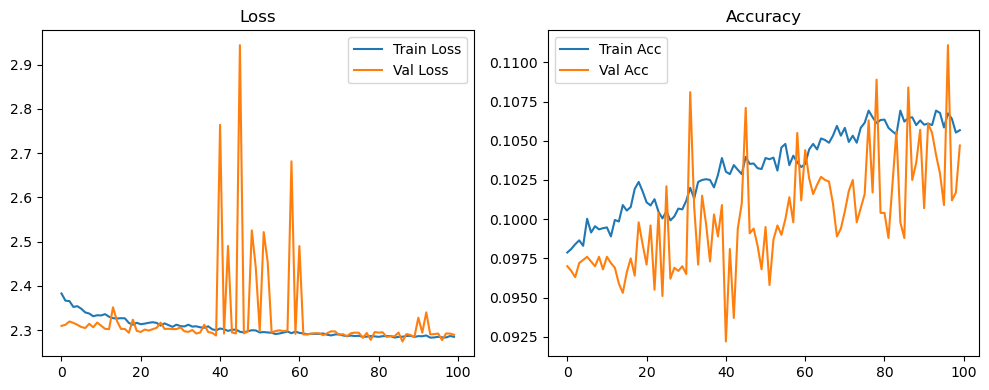

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.28it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.79it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

Original Model Final Test Loss: 2.2889 Accuracy: 0.1071


🚀 Running: batch256_lr_max_0.0001_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:20<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0976 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:20<2:13:18, 80.80s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:35<2:13:18, 80.80s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:35<2:13:18, 80.80s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:35<2:06:24, 77.39s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:49<2:06:24, 77.39s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:49<2:06:24, 77.39s/it]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [02:49<1:18:19, 48.45s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [03:03<1:18:19, 48.45s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [03:03<1:18:19, 48.45s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [03:03<55:46, 34.86s/it]  

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:17<55:46, 34.86s/it]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [03:17<55:46, 34.86s/it]

| LR: 0.000100 | Train Acc: 0.0978 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:17<43:18, 27.35s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:31<43:18, 27.35s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [03:31<43:18, 27.35s/it]

| LR: 0.000099 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:31<35:47, 22.84s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:46<35:47, 22.84s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [03:46<35:47, 22.84s/it]

| LR: 0.000099 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [03:46<31:00, 20.00s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:00<31:00, 20.00s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [04:00<31:00, 20.00s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [04:00<27:45, 18.10s/it]

| LR: 0.000098 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:14<27:45, 18.10s/it]

| LR: 0.000098 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [04:14<27:45, 18.10s/it]

| LR: 0.000098 | Train Acc: 0.0989 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [04:14<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:28<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [04:28<25:32, 16.84s/it]

| LR: 0.000098 | Train Acc: 0.0990 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:28<23:59, 15.99s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:42<23:59, 15.99s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  10%|█         | 10/100 [04:42<23:59, 15.99s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [04:42<22:51, 15.41s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  11%|█         | 11/100 [04:56<22:51, 15.41s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [04:56<22:05, 15.06s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [05:10<22:05, 15.06s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [05:10<22:05, 15.06s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [05:10<21:24, 14.76s/it]

| LR: 0.000096 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [05:24<21:24, 14.76s/it]

| LR: 0.000096 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [05:24<21:24, 14.76s/it]

| LR: 0.000096 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:24<20:52, 14.56s/it]

| LR: 0.000095 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:38<20:52, 14.56s/it]

| LR: 0.000095 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [05:38<20:52, 14.56s/it]

| LR: 0.000095 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [05:38<20:27, 14.44s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:53<20:27, 14.44s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [05:53<20:27, 14.44s/it]

| LR: 0.000095 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [05:53<20:04, 14.33s/it]

| LR: 0.000094 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  16%|█▌        | 16/100 [06:07<20:04, 14.33s/it]

| LR: 0.000094 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  16%|█▌        | 16/100 [06:07<20:04, 14.33s/it]

| LR: 0.000094 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [06:07<19:46, 14.29s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [06:21<19:46, 14.29s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [06:21<19:46, 14.29s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  18%|█▊        | 18/100 [06:21<19:26, 14.23s/it]

| LR: 0.000092 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:35<19:26, 14.23s/it]

| LR: 0.000092 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [06:35<19:26, 14.23s/it]

| LR: 0.000092 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [06:35<19:14, 14.26s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [06:49<19:14, 14.26s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [06:49<19:14, 14.26s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  20%|██        | 20/100 [06:49<19:00, 14.26s/it]

| LR: 0.000091 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  20%|██        | 20/100 [07:04<19:00, 14.26s/it]

| LR: 0.000091 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  20%|██        | 20/100 [07:04<19:00, 14.26s/it]

| LR: 0.000091 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:04<18:46, 14.25s/it]

| LR: 0.000090 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:18<18:46, 14.25s/it]

| LR: 0.000090 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  21%|██        | 21/100 [07:18<18:46, 14.25s/it]

| LR: 0.000090 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  22%|██▏       | 22/100 [07:18<18:29, 14.22s/it]

| LR: 0.000089 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:32<18:29, 14.22s/it]

| LR: 0.000089 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [07:32<18:29, 14.22s/it]

| LR: 0.000089 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [07:32<18:13, 14.20s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:46<18:13, 14.20s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  23%|██▎       | 23/100 [07:46<18:13, 14.20s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [07:46<17:58, 14.19s/it]

| LR: 0.000087 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [08:00<17:58, 14.19s/it]

| LR: 0.000087 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [08:00<17:58, 14.19s/it]

| LR: 0.000087 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  25%|██▌       | 25/100 [08:00<17:45, 14.21s/it]

| LR: 0.000086 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:15<17:45, 14.21s/it]

| LR: 0.000086 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [08:15<17:45, 14.21s/it]

| LR: 0.000086 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:15<17:30, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:29<17:30, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [08:29<17:30, 14.20s/it]

| LR: 0.000084 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [08:29<17:17, 14.21s/it]

| LR: 0.000083 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [08:43<17:17, 14.21s/it]

| LR: 0.000083 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [08:43<17:17, 14.21s/it]

| LR: 0.000083 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [08:43<17:03, 14.21s/it]

| LR: 0.000082 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [08:57<17:03, 14.21s/it]

| LR: 0.000082 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [08:57<17:03, 14.21s/it]

| LR: 0.000082 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [08:57<16:50, 14.23s/it]

| LR: 0.000081 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [09:11<16:50, 14.23s/it]

| LR: 0.000081 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [09:11<16:50, 14.23s/it]

| LR: 0.000081 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:11<16:33, 14.19s/it]

| LR: 0.000080 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:25<16:33, 14.19s/it]

| LR: 0.000080 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  30%|███       | 30/100 [09:25<16:33, 14.19s/it]

| LR: 0.000080 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:25<16:17, 14.16s/it]

| LR: 0.000078 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:39<16:17, 14.16s/it]

| LR: 0.000078 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  31%|███       | 31/100 [09:39<16:17, 14.16s/it]

| LR: 0.000078 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  32%|███▏      | 32/100 [09:40<16:00, 14.12s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:54<16:00, 14.12s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  32%|███▏      | 32/100 [09:54<16:00, 14.12s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  33%|███▎      | 33/100 [09:54<15:45, 14.11s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [10:08<15:45, 14.11s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [10:08<15:45, 14.11s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [10:08<15:29, 14.08s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [10:22<15:29, 14.08s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [10:22<15:29, 14.08s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [10:22<15:19, 14.14s/it]

| LR: 0.000073 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [10:36<15:19, 14.14s/it]

| LR: 0.000073 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [10:36<15:19, 14.14s/it]

| LR: 0.000073 | Train Acc: 0.0990 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [10:36<15:06, 14.17s/it]

| LR: 0.000072 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:50<15:06, 14.17s/it]

| LR: 0.000072 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [10:50<15:06, 14.17s/it]

| LR: 0.000072 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [10:50<14:52, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [11:04<14:52, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [11:04<14:52, 14.16s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [11:05<14:39, 14.19s/it]

| LR: 0.000069 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  38%|███▊      | 38/100 [11:19<14:39, 14.19s/it]

| LR: 0.000069 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  38%|███▊      | 38/100 [11:19<14:39, 14.19s/it]

| LR: 0.000069 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  39%|███▉      | 39/100 [11:19<14:24, 14.17s/it]

| LR: 0.000067 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  39%|███▉      | 39/100 [11:33<14:24, 14.17s/it]

| LR: 0.000067 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  39%|███▉      | 39/100 [11:33<14:24, 14.17s/it]

| LR: 0.000067 | Train Acc: 0.0990 | Val Acc: 0.0971 |:  40%|████      | 40/100 [11:33<14:09, 14.16s/it]

| LR: 0.000066 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  40%|████      | 40/100 [11:47<14:09, 14.16s/it]

| LR: 0.000066 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  40%|████      | 40/100 [11:47<14:09, 14.16s/it]

| LR: 0.000066 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  41%|████      | 41/100 [11:47<13:55, 14.15s/it]

| LR: 0.000064 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  41%|████      | 41/100 [12:01<13:55, 14.15s/it]

| LR: 0.000064 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  41%|████      | 41/100 [12:01<13:55, 14.15s/it]

| LR: 0.000064 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  42%|████▏     | 42/100 [12:01<13:40, 14.14s/it]

| LR: 0.000063 | Train Acc: 0.0991 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [12:15<13:40, 14.14s/it]

| LR: 0.000063 | Train Acc: 0.0991 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [12:15<13:40, 14.14s/it]

| LR: 0.000063 | Train Acc: 0.0991 | Val Acc: 0.0971 |:  43%|████▎     | 43/100 [12:15<13:25, 14.14s/it]

| LR: 0.000061 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  43%|████▎     | 43/100 [12:29<13:25, 14.14s/it]

| LR: 0.000061 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  43%|████▎     | 43/100 [12:29<13:25, 14.14s/it]

| LR: 0.000061 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [12:29<13:11, 14.13s/it]

| LR: 0.000060 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [12:43<13:11, 14.13s/it]

| LR: 0.000060 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [12:43<13:11, 14.13s/it]

| LR: 0.000060 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [12:43<12:55, 14.10s/it]

| LR: 0.000058 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [12:57<12:55, 14.10s/it]

| LR: 0.000058 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [12:57<12:55, 14.10s/it]

| LR: 0.000058 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [12:57<12:41, 14.11s/it]

| LR: 0.000057 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [13:12<12:41, 14.11s/it]

| LR: 0.000057 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [13:12<12:41, 14.11s/it]

| LR: 0.000057 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [13:12<12:27, 14.11s/it]

| LR: 0.000055 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [13:26<12:27, 14.11s/it]

| LR: 0.000055 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [13:26<12:27, 14.11s/it]

| LR: 0.000055 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [13:26<12:14, 14.13s/it]

| LR: 0.000054 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  48%|████▊     | 48/100 [13:40<12:14, 14.13s/it]

| LR: 0.000054 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  48%|████▊     | 48/100 [13:40<12:14, 14.13s/it]

| LR: 0.000054 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  49%|████▉     | 49/100 [13:40<11:59, 14.12s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [13:54<11:59, 14.12s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [13:54<11:59, 14.12s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [13:54<11:45, 14.11s/it]

| LR: 0.000051 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [14:08<11:45, 14.11s/it]

| LR: 0.000051 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [14:08<11:45, 14.11s/it]

| LR: 0.000051 | Train Acc: 0.0988 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [14:08<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [14:22<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [14:22<11:31, 14.11s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [14:22<11:15, 14.08s/it]

| LR: 0.000047 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [14:36<11:15, 14.08s/it]

| LR: 0.000047 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [14:36<11:15, 14.08s/it]

| LR: 0.000047 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [14:36<11:01, 14.08s/it]

| LR: 0.000046 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [14:50<11:01, 14.08s/it]

| LR: 0.000046 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [14:50<11:01, 14.08s/it]

| LR: 0.000046 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [14:50<10:47, 14.08s/it]

| LR: 0.000044 | Train Acc: 0.0987 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:04<10:47, 14.08s/it]

| LR: 0.000044 | Train Acc: 0.0987 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [15:04<10:47, 14.08s/it]

| LR: 0.000044 | Train Acc: 0.0987 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:04<10:34, 14.09s/it]

| LR: 0.000043 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:18<10:34, 14.09s/it]

| LR: 0.000043 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [15:18<10:34, 14.09s/it]

| LR: 0.000043 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [15:19<10:21, 14.12s/it]

| LR: 0.000041 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [15:33<10:21, 14.12s/it]

| LR: 0.000041 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [15:33<10:21, 14.12s/it]

| LR: 0.000041 | Train Acc: 0.0991 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [15:33<10:07, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [15:47<10:07, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [15:47<10:07, 14.13s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  58%|█████▊    | 58/100 [15:47<09:51, 14.09s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [16:01<09:51, 14.09s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [16:01<09:51, 14.09s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [16:01<09:36, 14.07s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  59%|█████▉    | 59/100 [16:15<09:36, 14.07s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  59%|█████▉    | 59/100 [16:15<09:36, 14.07s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [16:15<09:22, 14.05s/it]

| LR: 0.000035 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [16:29<09:22, 14.05s/it]

| LR: 0.000035 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [16:29<09:22, 14.05s/it]

| LR: 0.000035 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [16:29<09:08, 14.06s/it]

| LR: 0.000034 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [16:43<09:08, 14.06s/it]

| LR: 0.000034 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [16:43<09:08, 14.06s/it]

| LR: 0.000034 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [16:43<08:54, 14.05s/it]

| LR: 0.000032 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [16:57<08:54, 14.05s/it]

| LR: 0.000032 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [16:57<08:54, 14.05s/it]

| LR: 0.000032 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [16:57<08:40, 14.07s/it]

| LR: 0.000031 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [17:11<08:40, 14.07s/it]

| LR: 0.000031 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [17:11<08:40, 14.07s/it]

| LR: 0.000031 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [17:11<08:26, 14.08s/it]

| LR: 0.000029 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  64%|██████▍   | 64/100 [17:25<08:26, 14.08s/it]

| LR: 0.000029 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  64%|██████▍   | 64/100 [17:25<08:26, 14.08s/it]

| LR: 0.000029 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  65%|██████▌   | 65/100 [17:25<08:12, 14.07s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [17:39<08:12, 14.07s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [17:39<08:12, 14.07s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [17:39<07:59, 14.09s/it]

| LR: 0.000027 | Train Acc: 0.0989 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [17:53<07:59, 14.09s/it]

| LR: 0.000027 | Train Acc: 0.0989 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [17:53<07:59, 14.09s/it]

| LR: 0.000027 | Train Acc: 0.0989 | Val Acc: 0.0974 |:  67%|██████▋   | 67/100 [17:53<07:45, 14.12s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  67%|██████▋   | 67/100 [18:07<07:45, 14.12s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  67%|██████▋   | 67/100 [18:07<07:45, 14.12s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  68%|██████▊   | 68/100 [18:08<07:31, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [18:22<07:31, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [18:22<07:31, 14.12s/it]

| LR: 0.000024 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [18:22<07:17, 14.12s/it]

| LR: 0.000023 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.12s/it]

| LR: 0.000023 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  69%|██████▉   | 69/100 [18:36<07:17, 14.12s/it]

| LR: 0.000023 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  70%|███████   | 70/100 [18:36<07:03, 14.10s/it]

| LR: 0.000021 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [18:50<07:03, 14.10s/it]

| LR: 0.000021 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [18:50<07:03, 14.10s/it]

| LR: 0.000021 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [18:50<06:48, 14.09s/it]

| LR: 0.000020 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [19:04<06:48, 14.09s/it]

| LR: 0.000020 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [19:04<06:48, 14.09s/it]

| LR: 0.000020 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  72%|███████▏  | 72/100 [19:04<06:34, 14.08s/it]

| LR: 0.000019 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [19:18<06:34, 14.08s/it]

| LR: 0.000019 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [19:18<06:34, 14.08s/it]

| LR: 0.000019 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [19:18<06:19, 14.07s/it]

| LR: 0.000018 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [19:32<06:19, 14.07s/it]

| LR: 0.000018 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [19:32<06:19, 14.07s/it]

| LR: 0.000018 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  74%|███████▍  | 74/100 [19:32<06:06, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [19:46<06:06, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [19:46<06:06, 14.08s/it]

| LR: 0.000017 | Train Acc: 0.0990 | Val Acc: 0.0969 |:  75%|███████▌  | 75/100 [19:46<05:52, 14.08s/it]

| LR: 0.000015 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [20:00<05:52, 14.08s/it]

| LR: 0.000015 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [20:00<05:52, 14.08s/it]

| LR: 0.000015 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [20:00<05:37, 14.07s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [20:14<05:37, 14.07s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [20:14<05:37, 14.07s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [20:14<05:23, 14.06s/it]

| LR: 0.000013 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  77%|███████▋  | 77/100 [20:28<05:23, 14.06s/it]

| LR: 0.000013 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  77%|███████▋  | 77/100 [20:28<05:23, 14.06s/it]

| LR: 0.000013 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  78%|███████▊  | 78/100 [20:28<05:09, 14.05s/it]

| LR: 0.000012 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [20:42<05:09, 14.05s/it]

| LR: 0.000012 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [20:42<05:09, 14.05s/it]

| LR: 0.000012 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [20:42<04:54, 14.04s/it]

| LR: 0.000011 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [20:56<04:54, 14.04s/it]

| LR: 0.000011 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [20:56<04:54, 14.04s/it]

| LR: 0.000011 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [20:56<04:41, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [21:10<04:41, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [21:10<04:41, 14.06s/it]

| LR: 0.000010 | Train Acc: 0.0992 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [21:10<04:27, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [21:24<04:27, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [21:24<04:27, 14.08s/it]

| LR: 0.000010 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [21:25<04:13, 14.08s/it]

| LR: 0.000009 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [21:38<04:13, 14.08s/it]

| LR: 0.000009 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [21:38<04:13, 14.08s/it]

| LR: 0.000009 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [21:39<03:59, 14.07s/it]

| LR: 0.000008 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [21:53<03:59, 14.07s/it]

| LR: 0.000008 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [21:53<03:59, 14.07s/it]

| LR: 0.000008 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [21:53<03:45, 14.07s/it]

| LR: 0.000007 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [22:07<03:45, 14.07s/it]

| LR: 0.000007 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [22:07<03:45, 14.07s/it]

| LR: 0.000007 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [22:07<03:31, 14.08s/it]

| LR: 0.000006 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  85%|████████▌ | 85/100 [22:21<03:31, 14.08s/it]

| LR: 0.000006 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  85%|████████▌ | 85/100 [22:21<03:31, 14.08s/it]

| LR: 0.000006 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  86%|████████▌ | 86/100 [22:21<03:17, 14.07s/it]

| LR: 0.000006 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  86%|████████▌ | 86/100 [22:35<03:17, 14.07s/it]

| LR: 0.000006 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  86%|████████▌ | 86/100 [22:35<03:17, 14.07s/it]

| LR: 0.000006 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [22:35<03:02, 14.06s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  87%|████████▋ | 87/100 [22:49<03:02, 14.06s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  87%|████████▋ | 87/100 [22:49<03:02, 14.06s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [22:49<02:48, 14.04s/it]

| LR: 0.000004 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:03<02:48, 14.04s/it]

| LR: 0.000004 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:03<02:48, 14.04s/it]

| LR: 0.000004 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:03<02:34, 14.03s/it]

| LR: 0.000004 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:17<02:34, 14.03s/it]

| LR: 0.000004 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:17<02:34, 14.03s/it]

| LR: 0.000004 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [23:17<02:20, 14.03s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [23:31<02:20, 14.03s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [23:31<02:20, 14.03s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [23:31<02:06, 14.04s/it]

| LR: 0.000003 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [23:45<02:06, 14.04s/it]

| LR: 0.000003 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [23:45<02:06, 14.04s/it]

| LR: 0.000003 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [23:45<01:52, 14.06s/it]

| LR: 0.000003 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [23:59<01:52, 14.06s/it]

| LR: 0.000003 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [23:59<01:52, 14.06s/it]

| LR: 0.000003 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [23:59<01:38, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:13<01:38, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:13<01:38, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [24:13<01:24, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [24:27<01:24, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [24:27<01:24, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [24:27<01:10, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [24:41<01:10, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [24:41<01:10, 14.05s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [24:41<00:56, 14.06s/it]

| LR: 0.000001 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  96%|█████████▌| 96/100 [24:55<00:56, 14.06s/it]

| LR: 0.000001 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  96%|█████████▌| 96/100 [24:55<00:56, 14.06s/it]

| LR: 0.000001 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  97%|█████████▋| 97/100 [24:55<00:42, 14.06s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:09<00:42, 14.06s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:09<00:42, 14.06s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [25:09<00:28, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [25:23<00:28, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [25:23<00:28, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  99%|█████████▉| 99/100 [25:23<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:37<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:37<00:14, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [25:38<00:00, 14.07s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [25:38<00:00, 15.38s/it]

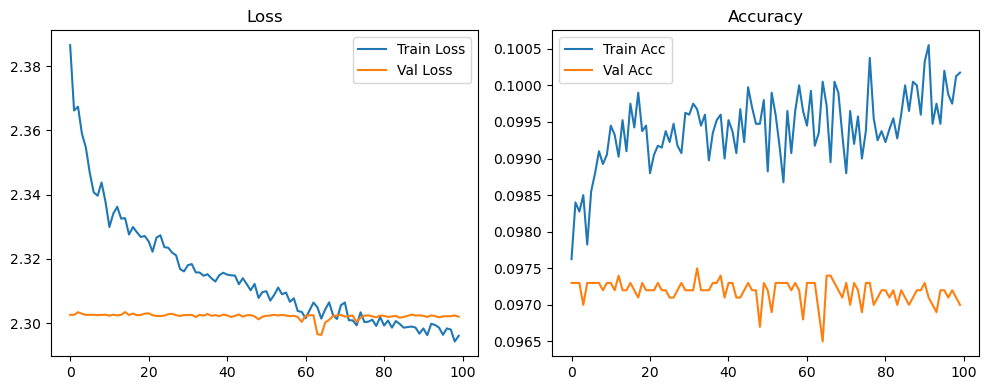

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.13it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.26it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.54it/s]

Original Model Final Test Loss: 2.3022 Accuracy: 0.1000


🚀 Running: batch512_lr_max_0.001_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0986 | Val Acc: 0.0943 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0986 | Val Acc: 0.0943 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0986 | Val Acc: 0.0943 |:   1%|          | 1/100 [01:22<2:15:25, 82.07s/it]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0924 |:   1%|          | 1/100 [02:45<2:15:25, 82.07s/it]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0924 |:   1%|          | 1/100 [02:45<2:15:25, 82.07s/it]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0924 |:   2%|▏         | 2/100 [02:45<2:15:10, 82.77s/it]

| LR: 0.000999 | Train Acc: 0.0988 | Val Acc: 0.0873 |:   2%|▏         | 2/100 [04:08<2:15:10, 82.77s/it]

| LR: 0.000999 | Train Acc: 0.0988 | Val Acc: 0.0873 |:   2%|▏         | 2/100 [04:08<2:15:10, 82.77s/it]

| LR: 0.000999 | Train Acc: 0.0988 | Val Acc: 0.0873 |:   3%|▎         | 3/100 [04:08<2:14:15, 83.05s/it]

| LR: 0.000998 | Train Acc: 0.0995 | Val Acc: 0.0989 |:   3%|▎         | 3/100 [05:18<2:14:15, 83.05s/it]

| LR: 0.000998 | Train Acc: 0.0995 | Val Acc: 0.0989 |:   3%|▎         | 3/100 [05:18<2:14:15, 83.05s/it]

| LR: 0.000998 | Train Acc: 0.0995 | Val Acc: 0.0989 |:   4%|▍         | 4/100 [05:18<2:04:26, 77.78s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:31<2:04:26, 77.78s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:31<2:04:26, 77.78s/it]

| LR: 0.000996 | Train Acc: 0.0993 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [05:31<1:26:04, 54.36s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0983 |:   5%|▌         | 5/100 [05:44<1:26:04, 54.36s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0983 |:   5%|▌         | 5/100 [05:44<1:26:04, 54.36s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0983 |:   6%|▌         | 6/100 [05:44<1:03:03, 40.25s/it]

| LR: 0.000991 | Train Acc: 0.0989 | Val Acc: 0.0960 |:   6%|▌         | 6/100 [05:57<1:03:03, 40.25s/it]

| LR: 0.000991 | Train Acc: 0.0989 | Val Acc: 0.0960 |:   6%|▌         | 6/100 [05:57<1:03:03, 40.25s/it]

| LR: 0.000991 | Train Acc: 0.0989 | Val Acc: 0.0960 |:   7%|▋         | 7/100 [05:57<48:34, 31.34s/it]  

| LR: 0.000988 | Train Acc: 0.0996 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [06:09<48:34, 31.34s/it]

| LR: 0.000988 | Train Acc: 0.0996 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [06:09<48:34, 31.34s/it]

| LR: 0.000988 | Train Acc: 0.0996 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [06:10<39:03, 25.47s/it]

| LR: 0.000984 | Train Acc: 0.1000 | Val Acc: 0.0999 |:   8%|▊         | 8/100 [06:22<39:03, 25.47s/it]

| LR: 0.000984 | Train Acc: 0.1000 | Val Acc: 0.0999 |:   8%|▊         | 8/100 [06:22<39:03, 25.47s/it]

| LR: 0.000984 | Train Acc: 0.1000 | Val Acc: 0.0999 |:   9%|▉         | 9/100 [06:22<32:38, 21.52s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0988 |:   9%|▉         | 9/100 [06:35<32:38, 21.52s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0988 |:   9%|▉         | 9/100 [06:35<32:38, 21.52s/it]

| LR: 0.000980 | Train Acc: 0.1013 | Val Acc: 0.0988 |:  10%|█         | 10/100 [06:35<28:16, 18.85s/it]

| LR: 0.000976 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  10%|█         | 10/100 [06:48<28:16, 18.85s/it]

| LR: 0.000976 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  10%|█         | 10/100 [06:48<28:16, 18.85s/it]

| LR: 0.000976 | Train Acc: 0.1023 | Val Acc: 0.0975 |:  11%|█         | 11/100 [06:48<25:14, 17.02s/it]

| LR: 0.000971 | Train Acc: 0.1026 | Val Acc: 0.1104 |:  11%|█         | 11/100 [07:01<25:14, 17.02s/it]

| LR: 0.000971 | Train Acc: 0.1026 | Val Acc: 0.1104 |:  11%|█         | 11/100 [07:01<25:14, 17.02s/it]

| LR: 0.000971 | Train Acc: 0.1026 | Val Acc: 0.1104 |:  12%|█▏        | 12/100 [07:01<23:07, 15.77s/it]

| LR: 0.000965 | Train Acc: 0.1027 | Val Acc: 0.0954 |:  12%|█▏        | 12/100 [07:14<23:07, 15.77s/it]

| LR: 0.000965 | Train Acc: 0.1027 | Val Acc: 0.0954 |:  12%|█▏        | 12/100 [07:14<23:07, 15.77s/it]

| LR: 0.000965 | Train Acc: 0.1027 | Val Acc: 0.0954 |:  13%|█▎        | 13/100 [07:14<21:35, 14.90s/it]

| LR: 0.000959 | Train Acc: 0.1035 | Val Acc: 0.0980 |:  13%|█▎        | 13/100 [07:27<21:35, 14.90s/it]

| LR: 0.000959 | Train Acc: 0.1035 | Val Acc: 0.0980 |:  13%|█▎        | 13/100 [07:27<21:35, 14.90s/it]

| LR: 0.000959 | Train Acc: 0.1035 | Val Acc: 0.0980 |:  14%|█▍        | 14/100 [07:27<20:28, 14.29s/it]

| LR: 0.000953 | Train Acc: 0.1055 | Val Acc: 0.1145 |:  14%|█▍        | 14/100 [07:40<20:28, 14.29s/it]

| LR: 0.000953 | Train Acc: 0.1055 | Val Acc: 0.1145 |:  14%|█▍        | 14/100 [07:40<20:28, 14.29s/it]

| LR: 0.000953 | Train Acc: 0.1055 | Val Acc: 0.1145 |:  15%|█▌        | 15/100 [07:40<19:37, 13.86s/it]

| LR: 0.000946 | Train Acc: 0.1109 | Val Acc: 0.1187 |:  15%|█▌        | 15/100 [07:52<19:37, 13.86s/it]

| LR: 0.000946 | Train Acc: 0.1109 | Val Acc: 0.1187 |:  15%|█▌        | 15/100 [07:52<19:37, 13.86s/it]

| LR: 0.000946 | Train Acc: 0.1109 | Val Acc: 0.1187 |:  16%|█▌        | 16/100 [07:52<18:58, 13.55s/it]

| LR: 0.000939 | Train Acc: 0.1181 | Val Acc: 0.1147 |:  16%|█▌        | 16/100 [08:05<18:58, 13.55s/it]

| LR: 0.000939 | Train Acc: 0.1181 | Val Acc: 0.1147 |:  16%|█▌        | 16/100 [08:05<18:58, 13.55s/it]

| LR: 0.000939 | Train Acc: 0.1181 | Val Acc: 0.1147 |:  17%|█▋        | 17/100 [08:05<18:30, 13.38s/it]

| LR: 0.000931 | Train Acc: 0.1207 | Val Acc: 0.1462 |:  17%|█▋        | 17/100 [08:18<18:30, 13.38s/it]

| LR: 0.000931 | Train Acc: 0.1207 | Val Acc: 0.1462 |:  17%|█▋        | 17/100 [08:18<18:30, 13.38s/it]

| LR: 0.000931 | Train Acc: 0.1207 | Val Acc: 0.1462 |:  18%|█▊        | 18/100 [08:18<18:04, 13.22s/it]

| LR: 0.000923 | Train Acc: 0.1330 | Val Acc: 0.1549 |:  18%|█▊        | 18/100 [08:31<18:04, 13.22s/it]

| LR: 0.000923 | Train Acc: 0.1330 | Val Acc: 0.1549 |:  18%|█▊        | 18/100 [08:31<18:04, 13.22s/it]

| LR: 0.000923 | Train Acc: 0.1330 | Val Acc: 0.1549 |:  19%|█▉        | 19/100 [08:31<17:41, 13.11s/it]

| LR: 0.000914 | Train Acc: 0.1359 | Val Acc: 0.1546 |:  19%|█▉        | 19/100 [08:44<17:41, 13.11s/it]

| LR: 0.000914 | Train Acc: 0.1359 | Val Acc: 0.1546 |:  19%|█▉        | 19/100 [08:44<17:41, 13.11s/it]

| LR: 0.000914 | Train Acc: 0.1359 | Val Acc: 0.1546 |:  20%|██        | 20/100 [08:44<17:22, 13.03s/it]

| LR: 0.000905 | Train Acc: 0.1412 | Val Acc: 0.1369 |:  20%|██        | 20/100 [08:57<17:22, 13.03s/it]

| LR: 0.000905 | Train Acc: 0.1412 | Val Acc: 0.1369 |:  20%|██        | 20/100 [08:57<17:22, 13.03s/it]

| LR: 0.000905 | Train Acc: 0.1412 | Val Acc: 0.1369 |:  21%|██        | 21/100 [08:57<17:04, 12.97s/it]

| LR: 0.000896 | Train Acc: 0.1511 | Val Acc: 0.1641 |:  21%|██        | 21/100 [09:10<17:04, 12.97s/it]

| LR: 0.000896 | Train Acc: 0.1511 | Val Acc: 0.1641 |:  21%|██        | 21/100 [09:10<17:04, 12.97s/it]

| LR: 0.000896 | Train Acc: 0.1511 | Val Acc: 0.1641 |:  22%|██▏       | 22/100 [09:10<16:48, 12.93s/it]

| LR: 0.000886 | Train Acc: 0.1633 | Val Acc: 0.1694 |:  22%|██▏       | 22/100 [09:23<16:48, 12.93s/it]

| LR: 0.000886 | Train Acc: 0.1633 | Val Acc: 0.1694 |:  22%|██▏       | 22/100 [09:23<16:48, 12.93s/it]

| LR: 0.000886 | Train Acc: 0.1633 | Val Acc: 0.1694 |:  23%|██▎       | 23/100 [09:23<16:37, 12.96s/it]

| LR: 0.000876 | Train Acc: 0.1716 | Val Acc: 0.1771 |:  23%|██▎       | 23/100 [09:35<16:37, 12.96s/it]

| LR: 0.000876 | Train Acc: 0.1716 | Val Acc: 0.1771 |:  23%|██▎       | 23/100 [09:35<16:37, 12.96s/it]

| LR: 0.000876 | Train Acc: 0.1716 | Val Acc: 0.1771 |:  24%|██▍       | 24/100 [09:36<16:22, 12.92s/it]

| LR: 0.000866 | Train Acc: 0.1866 | Val Acc: 0.1911 |:  24%|██▍       | 24/100 [09:48<16:22, 12.92s/it]

| LR: 0.000866 | Train Acc: 0.1866 | Val Acc: 0.1911 |:  24%|██▍       | 24/100 [09:48<16:22, 12.92s/it]

| LR: 0.000866 | Train Acc: 0.1866 | Val Acc: 0.1911 |:  25%|██▌       | 25/100 [09:48<16:08, 12.91s/it]

| LR: 0.000855 | Train Acc: 0.1993 | Val Acc: 0.1945 |:  25%|██▌       | 25/100 [10:01<16:08, 12.91s/it]

| LR: 0.000855 | Train Acc: 0.1993 | Val Acc: 0.1945 |:  25%|██▌       | 25/100 [10:01<16:08, 12.91s/it]

| LR: 0.000855 | Train Acc: 0.1993 | Val Acc: 0.1945 |:  26%|██▌       | 26/100 [10:01<15:55, 12.91s/it]

| LR: 0.000844 | Train Acc: 0.2135 | Val Acc: 0.2122 |:  26%|██▌       | 26/100 [10:14<15:55, 12.91s/it]

| LR: 0.000844 | Train Acc: 0.2135 | Val Acc: 0.2122 |:  26%|██▌       | 26/100 [10:14<15:55, 12.91s/it]

| LR: 0.000844 | Train Acc: 0.2135 | Val Acc: 0.2122 |:  27%|██▋       | 27/100 [10:14<15:42, 12.91s/it]

| LR: 0.000832 | Train Acc: 0.2281 | Val Acc: 0.2248 |:  27%|██▋       | 27/100 [10:27<15:42, 12.91s/it]

| LR: 0.000832 | Train Acc: 0.2281 | Val Acc: 0.2248 |:  27%|██▋       | 27/100 [10:27<15:42, 12.91s/it]

| LR: 0.000832 | Train Acc: 0.2281 | Val Acc: 0.2248 |:  28%|██▊       | 28/100 [10:27<15:27, 12.88s/it]

| LR: 0.000821 | Train Acc: 0.2476 | Val Acc: 0.2489 |:  28%|██▊       | 28/100 [10:40<15:27, 12.88s/it]

| LR: 0.000821 | Train Acc: 0.2476 | Val Acc: 0.2489 |:  28%|██▊       | 28/100 [10:40<15:27, 12.88s/it]

| LR: 0.000821 | Train Acc: 0.2476 | Val Acc: 0.2489 |:  29%|██▉       | 29/100 [10:40<15:14, 12.88s/it]

| LR: 0.000808 | Train Acc: 0.2730 | Val Acc: 0.2738 |:  29%|██▉       | 29/100 [10:53<15:14, 12.88s/it]

| LR: 0.000808 | Train Acc: 0.2730 | Val Acc: 0.2738 |:  29%|██▉       | 29/100 [10:53<15:14, 12.88s/it]

| LR: 0.000808 | Train Acc: 0.2730 | Val Acc: 0.2738 |:  30%|███       | 30/100 [10:53<15:00, 12.87s/it]

| LR: 0.000796 | Train Acc: 0.2970 | Val Acc: 0.2865 |:  30%|███       | 30/100 [11:06<15:00, 12.87s/it]

| LR: 0.000796 | Train Acc: 0.2970 | Val Acc: 0.2865 |:  30%|███       | 30/100 [11:06<15:00, 12.87s/it]

| LR: 0.000796 | Train Acc: 0.2970 | Val Acc: 0.2865 |:  31%|███       | 31/100 [11:06<14:48, 12.88s/it]

| LR: 0.000783 | Train Acc: 0.3154 | Val Acc: 0.3144 |:  31%|███       | 31/100 [11:18<14:48, 12.88s/it]

| LR: 0.000783 | Train Acc: 0.3154 | Val Acc: 0.3144 |:  31%|███       | 31/100 [11:18<14:48, 12.88s/it]

| LR: 0.000783 | Train Acc: 0.3154 | Val Acc: 0.3144 |:  32%|███▏      | 32/100 [11:18<14:34, 12.86s/it]

| LR: 0.000770 | Train Acc: 0.3291 | Val Acc: 0.3250 |:  32%|███▏      | 32/100 [11:31<14:34, 12.86s/it]

| LR: 0.000770 | Train Acc: 0.3291 | Val Acc: 0.3250 |:  32%|███▏      | 32/100 [11:31<14:34, 12.86s/it]

| LR: 0.000770 | Train Acc: 0.3291 | Val Acc: 0.3250 |:  33%|███▎      | 33/100 [11:31<14:22, 12.88s/it]

| LR: 0.000757 | Train Acc: 0.3532 | Val Acc: 0.3419 |:  33%|███▎      | 33/100 [11:44<14:22, 12.88s/it]

| LR: 0.000757 | Train Acc: 0.3532 | Val Acc: 0.3419 |:  33%|███▎      | 33/100 [11:44<14:22, 12.88s/it]

| LR: 0.000757 | Train Acc: 0.3532 | Val Acc: 0.3419 |:  34%|███▍      | 34/100 [11:44<14:12, 12.91s/it]

| LR: 0.000743 | Train Acc: 0.3698 | Val Acc: 0.3553 |:  34%|███▍      | 34/100 [11:57<14:12, 12.91s/it]

| LR: 0.000743 | Train Acc: 0.3698 | Val Acc: 0.3553 |:  34%|███▍      | 34/100 [11:57<14:12, 12.91s/it]

| LR: 0.000743 | Train Acc: 0.3698 | Val Acc: 0.3553 |:  35%|███▌      | 35/100 [11:57<14:02, 12.96s/it]

| LR: 0.000730 | Train Acc: 0.3832 | Val Acc: 0.3805 |:  35%|███▌      | 35/100 [12:10<14:02, 12.96s/it]

| LR: 0.000730 | Train Acc: 0.3832 | Val Acc: 0.3805 |:  35%|███▌      | 35/100 [12:10<14:02, 12.96s/it]

| LR: 0.000730 | Train Acc: 0.3832 | Val Acc: 0.3805 |:  36%|███▌      | 36/100 [12:10<13:48, 12.94s/it]

| LR: 0.000716 | Train Acc: 0.3948 | Val Acc: 0.3856 |:  36%|███▌      | 36/100 [12:23<13:48, 12.94s/it]

| LR: 0.000716 | Train Acc: 0.3948 | Val Acc: 0.3856 |:  36%|███▌      | 36/100 [12:23<13:48, 12.94s/it]

| LR: 0.000716 | Train Acc: 0.3948 | Val Acc: 0.3856 |:  37%|███▋      | 37/100 [12:23<13:33, 12.92s/it]

| LR: 0.000702 | Train Acc: 0.4063 | Val Acc: 0.4122 |:  37%|███▋      | 37/100 [12:36<13:33, 12.92s/it]

| LR: 0.000702 | Train Acc: 0.4063 | Val Acc: 0.4122 |:  37%|███▋      | 37/100 [12:36<13:33, 12.92s/it]

| LR: 0.000702 | Train Acc: 0.4063 | Val Acc: 0.4122 |:  38%|███▊      | 38/100 [12:36<13:19, 12.89s/it]

| LR: 0.000687 | Train Acc: 0.4230 | Val Acc: 0.4107 |:  38%|███▊      | 38/100 [12:49<13:19, 12.89s/it]

| LR: 0.000687 | Train Acc: 0.4230 | Val Acc: 0.4107 |:  38%|███▊      | 38/100 [12:49<13:19, 12.89s/it]

| LR: 0.000687 | Train Acc: 0.4230 | Val Acc: 0.4107 |:  39%|███▉      | 39/100 [12:49<13:06, 12.89s/it]

| LR: 0.000673 | Train Acc: 0.4329 | Val Acc: 0.4162 |:  39%|███▉      | 39/100 [13:02<13:06, 12.89s/it]

| LR: 0.000673 | Train Acc: 0.4329 | Val Acc: 0.4162 |:  39%|███▉      | 39/100 [13:02<13:06, 12.89s/it]

| LR: 0.000673 | Train Acc: 0.4329 | Val Acc: 0.4162 |:  40%|████      | 40/100 [13:02<12:53, 12.89s/it]

| LR: 0.000658 | Train Acc: 0.4421 | Val Acc: 0.4405 |:  40%|████      | 40/100 [13:15<12:53, 12.89s/it]

| LR: 0.000658 | Train Acc: 0.4421 | Val Acc: 0.4405 |:  40%|████      | 40/100 [13:15<12:53, 12.89s/it]

| LR: 0.000658 | Train Acc: 0.4421 | Val Acc: 0.4405 |:  41%|████      | 41/100 [13:15<12:40, 12.89s/it]

| LR: 0.000643 | Train Acc: 0.4551 | Val Acc: 0.4408 |:  41%|████      | 41/100 [13:28<12:40, 12.89s/it]

| LR: 0.000643 | Train Acc: 0.4551 | Val Acc: 0.4408 |:  41%|████      | 41/100 [13:28<12:40, 12.89s/it]

| LR: 0.000643 | Train Acc: 0.4551 | Val Acc: 0.4408 |:  42%|████▏     | 42/100 [13:28<12:27, 12.89s/it]

| LR: 0.000628 | Train Acc: 0.4679 | Val Acc: 0.4459 |:  42%|████▏     | 42/100 [13:40<12:27, 12.89s/it]

| LR: 0.000628 | Train Acc: 0.4679 | Val Acc: 0.4459 |:  42%|████▏     | 42/100 [13:40<12:27, 12.89s/it]

| LR: 0.000628 | Train Acc: 0.4679 | Val Acc: 0.4459 |:  43%|████▎     | 43/100 [13:40<12:13, 12.86s/it]

| LR: 0.000613 | Train Acc: 0.4697 | Val Acc: 0.4553 |:  43%|████▎     | 43/100 [13:53<12:13, 12.86s/it]

| LR: 0.000613 | Train Acc: 0.4697 | Val Acc: 0.4553 |:  43%|████▎     | 43/100 [13:53<12:13, 12.86s/it]

| LR: 0.000613 | Train Acc: 0.4697 | Val Acc: 0.4553 |:  44%|████▍     | 44/100 [13:53<12:01, 12.88s/it]

| LR: 0.000598 | Train Acc: 0.4738 | Val Acc: 0.4260 |:  44%|████▍     | 44/100 [14:06<12:01, 12.88s/it]

| LR: 0.000598 | Train Acc: 0.4738 | Val Acc: 0.4260 |:  44%|████▍     | 44/100 [14:06<12:01, 12.88s/it]

| LR: 0.000598 | Train Acc: 0.4738 | Val Acc: 0.4260 |:  45%|████▌     | 45/100 [14:06<11:50, 12.91s/it]

| LR: 0.000582 | Train Acc: 0.4789 | Val Acc: 0.4514 |:  45%|████▌     | 45/100 [14:19<11:50, 12.91s/it]

| LR: 0.000582 | Train Acc: 0.4789 | Val Acc: 0.4514 |:  45%|████▌     | 45/100 [14:19<11:50, 12.91s/it]

| LR: 0.000582 | Train Acc: 0.4789 | Val Acc: 0.4514 |:  46%|████▌     | 46/100 [14:19<11:38, 12.93s/it]

| LR: 0.000567 | Train Acc: 0.4925 | Val Acc: 0.4604 |:  46%|████▌     | 46/100 [14:32<11:38, 12.93s/it]

| LR: 0.000567 | Train Acc: 0.4925 | Val Acc: 0.4604 |:  46%|████▌     | 46/100 [14:32<11:38, 12.93s/it]

| LR: 0.000567 | Train Acc: 0.4925 | Val Acc: 0.4604 |:  47%|████▋     | 47/100 [14:32<11:25, 12.93s/it]

| LR: 0.000552 | Train Acc: 0.5020 | Val Acc: 0.4564 |:  47%|████▋     | 47/100 [14:45<11:25, 12.93s/it]

| LR: 0.000552 | Train Acc: 0.5020 | Val Acc: 0.4564 |:  47%|████▋     | 47/100 [14:45<11:25, 12.93s/it]

| LR: 0.000552 | Train Acc: 0.5020 | Val Acc: 0.4564 |:  48%|████▊     | 48/100 [14:45<11:12, 12.93s/it]

| LR: 0.000536 | Train Acc: 0.5027 | Val Acc: 0.4674 |:  48%|████▊     | 48/100 [14:58<11:12, 12.93s/it]

| LR: 0.000536 | Train Acc: 0.5027 | Val Acc: 0.4674 |:  48%|████▊     | 48/100 [14:58<11:12, 12.93s/it]

| LR: 0.000536 | Train Acc: 0.5027 | Val Acc: 0.4674 |:  49%|████▉     | 49/100 [14:58<10:58, 12.91s/it]

| LR: 0.000521 | Train Acc: 0.5101 | Val Acc: 0.4544 |:  49%|████▉     | 49/100 [15:11<10:58, 12.91s/it]

| LR: 0.000521 | Train Acc: 0.5101 | Val Acc: 0.4544 |:  49%|████▉     | 49/100 [15:11<10:58, 12.91s/it]

| LR: 0.000521 | Train Acc: 0.5101 | Val Acc: 0.4544 |:  50%|█████     | 50/100 [15:11<10:45, 12.92s/it]

| LR: 0.000505 | Train Acc: 0.5118 | Val Acc: 0.4825 |:  50%|█████     | 50/100 [15:24<10:45, 12.92s/it]

| LR: 0.000505 | Train Acc: 0.5118 | Val Acc: 0.4825 |:  50%|█████     | 50/100 [15:24<10:45, 12.92s/it]

| LR: 0.000505 | Train Acc: 0.5118 | Val Acc: 0.4825 |:  51%|█████     | 51/100 [15:24<10:32, 12.91s/it]

| LR: 0.000489 | Train Acc: 0.5190 | Val Acc: 0.4700 |:  51%|█████     | 51/100 [15:37<10:32, 12.91s/it]

| LR: 0.000489 | Train Acc: 0.5190 | Val Acc: 0.4700 |:  51%|█████     | 51/100 [15:37<10:32, 12.91s/it]

| LR: 0.000489 | Train Acc: 0.5190 | Val Acc: 0.4700 |:  52%|█████▏    | 52/100 [15:37<10:20, 12.92s/it]

| LR: 0.000474 | Train Acc: 0.5250 | Val Acc: 0.4752 |:  52%|█████▏    | 52/100 [15:50<10:20, 12.92s/it]

| LR: 0.000474 | Train Acc: 0.5250 | Val Acc: 0.4752 |:  52%|█████▏    | 52/100 [15:50<10:20, 12.92s/it]

| LR: 0.000474 | Train Acc: 0.5250 | Val Acc: 0.4752 |:  53%|█████▎    | 53/100 [15:50<10:07, 12.92s/it]

| LR: 0.000458 | Train Acc: 0.5339 | Val Acc: 0.4907 |:  53%|█████▎    | 53/100 [16:03<10:07, 12.92s/it]

| LR: 0.000458 | Train Acc: 0.5339 | Val Acc: 0.4907 |:  53%|█████▎    | 53/100 [16:03<10:07, 12.92s/it]

| LR: 0.000458 | Train Acc: 0.5339 | Val Acc: 0.4907 |:  54%|█████▍    | 54/100 [16:03<09:55, 12.95s/it]

| LR: 0.000443 | Train Acc: 0.5342 | Val Acc: 0.5053 |:  54%|█████▍    | 54/100 [16:15<09:55, 12.95s/it]

| LR: 0.000443 | Train Acc: 0.5342 | Val Acc: 0.5053 |:  54%|█████▍    | 54/100 [16:15<09:55, 12.95s/it]

| LR: 0.000443 | Train Acc: 0.5342 | Val Acc: 0.5053 |:  55%|█████▌    | 55/100 [16:15<09:40, 12.91s/it]

| LR: 0.000428 | Train Acc: 0.5374 | Val Acc: 0.4993 |:  55%|█████▌    | 55/100 [16:28<09:40, 12.91s/it]

| LR: 0.000428 | Train Acc: 0.5374 | Val Acc: 0.4993 |:  55%|█████▌    | 55/100 [16:28<09:40, 12.91s/it]

| LR: 0.000428 | Train Acc: 0.5374 | Val Acc: 0.4993 |:  56%|█████▌    | 56/100 [16:28<09:27, 12.89s/it]

| LR: 0.000412 | Train Acc: 0.5469 | Val Acc: 0.5073 |:  56%|█████▌    | 56/100 [16:41<09:27, 12.89s/it]

| LR: 0.000412 | Train Acc: 0.5469 | Val Acc: 0.5073 |:  56%|█████▌    | 56/100 [16:41<09:27, 12.89s/it]

| LR: 0.000412 | Train Acc: 0.5469 | Val Acc: 0.5073 |:  57%|█████▋    | 57/100 [16:41<09:12, 12.85s/it]

| LR: 0.000397 | Train Acc: 0.5534 | Val Acc: 0.5029 |:  57%|█████▋    | 57/100 [16:54<09:12, 12.85s/it]

| LR: 0.000397 | Train Acc: 0.5534 | Val Acc: 0.5029 |:  57%|█████▋    | 57/100 [16:54<09:12, 12.85s/it]

| LR: 0.000397 | Train Acc: 0.5534 | Val Acc: 0.5029 |:  58%|█████▊    | 58/100 [16:54<08:58, 12.83s/it]

| LR: 0.000382 | Train Acc: 0.5536 | Val Acc: 0.5234 |:  58%|█████▊    | 58/100 [17:07<08:58, 12.83s/it]

| LR: 0.000382 | Train Acc: 0.5536 | Val Acc: 0.5234 |:  58%|█████▊    | 58/100 [17:07<08:58, 12.83s/it]

| LR: 0.000382 | Train Acc: 0.5536 | Val Acc: 0.5234 |:  59%|█████▉    | 59/100 [17:07<08:45, 12.81s/it]

| LR: 0.000367 | Train Acc: 0.5583 | Val Acc: 0.5132 |:  59%|█████▉    | 59/100 [17:19<08:45, 12.81s/it]

| LR: 0.000367 | Train Acc: 0.5583 | Val Acc: 0.5132 |:  59%|█████▉    | 59/100 [17:19<08:45, 12.81s/it]

| LR: 0.000367 | Train Acc: 0.5583 | Val Acc: 0.5132 |:  60%|██████    | 60/100 [17:19<08:32, 12.82s/it]

| LR: 0.000352 | Train Acc: 0.5587 | Val Acc: 0.5145 |:  60%|██████    | 60/100 [17:32<08:32, 12.82s/it]

| LR: 0.000352 | Train Acc: 0.5587 | Val Acc: 0.5145 |:  60%|██████    | 60/100 [17:32<08:32, 12.82s/it]

| LR: 0.000352 | Train Acc: 0.5587 | Val Acc: 0.5145 |:  61%|██████    | 61/100 [17:32<08:21, 12.87s/it]

| LR: 0.000337 | Train Acc: 0.5611 | Val Acc: 0.5213 |:  61%|██████    | 61/100 [17:45<08:21, 12.87s/it]

| LR: 0.000337 | Train Acc: 0.5611 | Val Acc: 0.5213 |:  61%|██████    | 61/100 [17:45<08:21, 12.87s/it]

| LR: 0.000337 | Train Acc: 0.5611 | Val Acc: 0.5213 |:  62%|██████▏   | 62/100 [17:45<08:09, 12.88s/it]

| LR: 0.000323 | Train Acc: 0.5664 | Val Acc: 0.5298 |:  62%|██████▏   | 62/100 [17:58<08:09, 12.88s/it]

| LR: 0.000323 | Train Acc: 0.5664 | Val Acc: 0.5298 |:  62%|██████▏   | 62/100 [17:58<08:09, 12.88s/it]

| LR: 0.000323 | Train Acc: 0.5664 | Val Acc: 0.5298 |:  63%|██████▎   | 63/100 [17:58<07:56, 12.88s/it]

| LR: 0.000308 | Train Acc: 0.5694 | Val Acc: 0.5237 |:  63%|██████▎   | 63/100 [18:11<07:56, 12.88s/it]

| LR: 0.000308 | Train Acc: 0.5694 | Val Acc: 0.5237 |:  63%|██████▎   | 63/100 [18:11<07:56, 12.88s/it]

| LR: 0.000308 | Train Acc: 0.5694 | Val Acc: 0.5237 |:  64%|██████▍   | 64/100 [18:11<07:45, 12.93s/it]

| LR: 0.000294 | Train Acc: 0.5754 | Val Acc: 0.5185 |:  64%|██████▍   | 64/100 [18:24<07:45, 12.93s/it]

| LR: 0.000294 | Train Acc: 0.5754 | Val Acc: 0.5185 |:  64%|██████▍   | 64/100 [18:24<07:45, 12.93s/it]

| LR: 0.000294 | Train Acc: 0.5754 | Val Acc: 0.5185 |:  65%|██████▌   | 65/100 [18:24<07:32, 12.92s/it]

| LR: 0.000280 | Train Acc: 0.5767 | Val Acc: 0.5399 |:  65%|██████▌   | 65/100 [18:37<07:32, 12.92s/it]

| LR: 0.000280 | Train Acc: 0.5767 | Val Acc: 0.5399 |:  65%|██████▌   | 65/100 [18:37<07:32, 12.92s/it]

| LR: 0.000280 | Train Acc: 0.5767 | Val Acc: 0.5399 |:  66%|██████▌   | 66/100 [18:37<07:19, 12.94s/it]

| LR: 0.000267 | Train Acc: 0.5788 | Val Acc: 0.5356 |:  66%|██████▌   | 66/100 [18:50<07:19, 12.94s/it]

| LR: 0.000267 | Train Acc: 0.5788 | Val Acc: 0.5356 |:  66%|██████▌   | 66/100 [18:50<07:19, 12.94s/it]

| LR: 0.000267 | Train Acc: 0.5788 | Val Acc: 0.5356 |:  67%|██████▋   | 67/100 [18:50<07:06, 12.93s/it]

| LR: 0.000253 | Train Acc: 0.5752 | Val Acc: 0.5285 |:  67%|██████▋   | 67/100 [19:03<07:06, 12.93s/it]

| LR: 0.000253 | Train Acc: 0.5752 | Val Acc: 0.5285 |:  67%|██████▋   | 67/100 [19:03<07:06, 12.93s/it]

| LR: 0.000253 | Train Acc: 0.5752 | Val Acc: 0.5285 |:  68%|██████▊   | 68/100 [19:03<06:53, 12.93s/it]

| LR: 0.000240 | Train Acc: 0.5858 | Val Acc: 0.5342 |:  68%|██████▊   | 68/100 [19:16<06:53, 12.93s/it]

| LR: 0.000240 | Train Acc: 0.5858 | Val Acc: 0.5342 |:  68%|██████▊   | 68/100 [19:16<06:53, 12.93s/it]

| LR: 0.000240 | Train Acc: 0.5858 | Val Acc: 0.5342 |:  69%|██████▉   | 69/100 [19:16<06:40, 12.91s/it]

| LR: 0.000227 | Train Acc: 0.5872 | Val Acc: 0.5213 |:  69%|██████▉   | 69/100 [19:29<06:40, 12.91s/it]

| LR: 0.000227 | Train Acc: 0.5872 | Val Acc: 0.5213 |:  69%|██████▉   | 69/100 [19:29<06:40, 12.91s/it]

| LR: 0.000227 | Train Acc: 0.5872 | Val Acc: 0.5213 |:  70%|███████   | 70/100 [19:29<06:27, 12.93s/it]

| LR: 0.000214 | Train Acc: 0.5884 | Val Acc: 0.5359 |:  70%|███████   | 70/100 [19:42<06:27, 12.93s/it]

| LR: 0.000214 | Train Acc: 0.5884 | Val Acc: 0.5359 |:  70%|███████   | 70/100 [19:42<06:27, 12.93s/it]

| LR: 0.000214 | Train Acc: 0.5884 | Val Acc: 0.5359 |:  71%|███████   | 71/100 [19:42<06:15, 12.93s/it]

| LR: 0.000202 | Train Acc: 0.5891 | Val Acc: 0.5453 |:  71%|███████   | 71/100 [19:55<06:15, 12.93s/it]

| LR: 0.000202 | Train Acc: 0.5891 | Val Acc: 0.5453 |:  71%|███████   | 71/100 [19:55<06:15, 12.93s/it]

| LR: 0.000202 | Train Acc: 0.5891 | Val Acc: 0.5453 |:  72%|███████▏  | 72/100 [19:55<06:02, 12.94s/it]

| LR: 0.000189 | Train Acc: 0.5965 | Val Acc: 0.5468 |:  72%|███████▏  | 72/100 [20:08<06:02, 12.94s/it]

| LR: 0.000189 | Train Acc: 0.5965 | Val Acc: 0.5468 |:  72%|███████▏  | 72/100 [20:08<06:02, 12.94s/it]

| LR: 0.000189 | Train Acc: 0.5965 | Val Acc: 0.5468 |:  73%|███████▎  | 73/100 [20:08<05:49, 12.96s/it]

| LR: 0.000178 | Train Acc: 0.5991 | Val Acc: 0.5341 |:  73%|███████▎  | 73/100 [20:21<05:49, 12.96s/it]

| LR: 0.000178 | Train Acc: 0.5991 | Val Acc: 0.5341 |:  73%|███████▎  | 73/100 [20:21<05:49, 12.96s/it]

| LR: 0.000178 | Train Acc: 0.5991 | Val Acc: 0.5341 |:  74%|███████▍  | 74/100 [20:21<05:36, 12.94s/it]

| LR: 0.000166 | Train Acc: 0.5982 | Val Acc: 0.5479 |:  74%|███████▍  | 74/100 [20:33<05:36, 12.94s/it]

| LR: 0.000166 | Train Acc: 0.5982 | Val Acc: 0.5479 |:  74%|███████▍  | 74/100 [20:33<05:36, 12.94s/it]

| LR: 0.000166 | Train Acc: 0.5982 | Val Acc: 0.5479 |:  75%|███████▌  | 75/100 [20:34<05:23, 12.93s/it]

| LR: 0.000155 | Train Acc: 0.5998 | Val Acc: 0.5365 |:  75%|███████▌  | 75/100 [20:46<05:23, 12.93s/it]

| LR: 0.000155 | Train Acc: 0.5998 | Val Acc: 0.5365 |:  75%|███████▌  | 75/100 [20:46<05:23, 12.93s/it]

| LR: 0.000155 | Train Acc: 0.5998 | Val Acc: 0.5365 |:  76%|███████▌  | 76/100 [20:47<05:10, 12.94s/it]

| LR: 0.000144 | Train Acc: 0.5952 | Val Acc: 0.5555 |:  76%|███████▌  | 76/100 [20:59<05:10, 12.94s/it]

| LR: 0.000144 | Train Acc: 0.5952 | Val Acc: 0.5555 |:  76%|███████▌  | 76/100 [20:59<05:10, 12.94s/it]

| LR: 0.000144 | Train Acc: 0.5952 | Val Acc: 0.5555 |:  77%|███████▋  | 77/100 [20:59<04:57, 12.94s/it]

| LR: 0.000134 | Train Acc: 0.5972 | Val Acc: 0.5249 |:  77%|███████▋  | 77/100 [21:12<04:57, 12.94s/it]

| LR: 0.000134 | Train Acc: 0.5972 | Val Acc: 0.5249 |:  77%|███████▋  | 77/100 [21:12<04:57, 12.94s/it]

| LR: 0.000134 | Train Acc: 0.5972 | Val Acc: 0.5249 |:  78%|███████▊  | 78/100 [21:12<04:44, 12.93s/it]

| LR: 0.000124 | Train Acc: 0.6030 | Val Acc: 0.5539 |:  78%|███████▊  | 78/100 [21:25<04:44, 12.93s/it]

| LR: 0.000124 | Train Acc: 0.6030 | Val Acc: 0.5539 |:  78%|███████▊  | 78/100 [21:25<04:44, 12.93s/it]

| LR: 0.000124 | Train Acc: 0.6030 | Val Acc: 0.5539 |:  79%|███████▉  | 79/100 [21:25<04:31, 12.93s/it]

| LR: 0.000114 | Train Acc: 0.6081 | Val Acc: 0.5548 |:  79%|███████▉  | 79/100 [21:38<04:31, 12.93s/it]

| LR: 0.000114 | Train Acc: 0.6081 | Val Acc: 0.5548 |:  79%|███████▉  | 79/100 [21:38<04:31, 12.93s/it]

| LR: 0.000114 | Train Acc: 0.6081 | Val Acc: 0.5548 |:  80%|████████  | 80/100 [21:38<04:18, 12.93s/it]

| LR: 0.000105 | Train Acc: 0.6032 | Val Acc: 0.5500 |:  80%|████████  | 80/100 [21:51<04:18, 12.93s/it]

| LR: 0.000105 | Train Acc: 0.6032 | Val Acc: 0.5500 |:  80%|████████  | 80/100 [21:51<04:18, 12.93s/it]

| LR: 0.000105 | Train Acc: 0.6032 | Val Acc: 0.5500 |:  81%|████████  | 81/100 [21:51<04:05, 12.91s/it]

| LR: 0.000096 | Train Acc: 0.6042 | Val Acc: 0.5617 |:  81%|████████  | 81/100 [22:04<04:05, 12.91s/it]

| LR: 0.000096 | Train Acc: 0.6042 | Val Acc: 0.5617 |:  81%|████████  | 81/100 [22:04<04:05, 12.91s/it]

| LR: 0.000096 | Train Acc: 0.6042 | Val Acc: 0.5617 |:  82%|████████▏ | 82/100 [22:04<03:52, 12.92s/it]

| LR: 0.000087 | Train Acc: 0.6092 | Val Acc: 0.5411 |:  82%|████████▏ | 82/100 [22:17<03:52, 12.92s/it]

| LR: 0.000087 | Train Acc: 0.6092 | Val Acc: 0.5411 |:  82%|████████▏ | 82/100 [22:17<03:52, 12.92s/it]

| LR: 0.000087 | Train Acc: 0.6092 | Val Acc: 0.5411 |:  83%|████████▎ | 83/100 [22:17<03:39, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.6098 | Val Acc: 0.5570 |:  83%|████████▎ | 83/100 [22:30<03:39, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.6098 | Val Acc: 0.5570 |:  83%|████████▎ | 83/100 [22:30<03:39, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.6098 | Val Acc: 0.5570 |:  84%|████████▍ | 84/100 [22:30<03:25, 12.86s/it]

| LR: 0.000071 | Train Acc: 0.6084 | Val Acc: 0.5445 |:  84%|████████▍ | 84/100 [22:42<03:25, 12.86s/it]

| LR: 0.000071 | Train Acc: 0.6084 | Val Acc: 0.5445 |:  84%|████████▍ | 84/100 [22:42<03:25, 12.86s/it]

| LR: 0.000071 | Train Acc: 0.6084 | Val Acc: 0.5445 |:  85%|████████▌ | 85/100 [22:42<03:12, 12.86s/it]

| LR: 0.000064 | Train Acc: 0.6123 | Val Acc: 0.5413 |:  85%|████████▌ | 85/100 [22:55<03:12, 12.86s/it]

| LR: 0.000064 | Train Acc: 0.6123 | Val Acc: 0.5413 |:  85%|████████▌ | 85/100 [22:55<03:12, 12.86s/it]

| LR: 0.000064 | Train Acc: 0.6123 | Val Acc: 0.5413 |:  86%|████████▌ | 86/100 [22:55<02:59, 12.84s/it]

| LR: 0.000057 | Train Acc: 0.6111 | Val Acc: 0.5466 |:  86%|████████▌ | 86/100 [23:08<02:59, 12.84s/it]

| LR: 0.000057 | Train Acc: 0.6111 | Val Acc: 0.5466 |:  86%|████████▌ | 86/100 [23:08<02:59, 12.84s/it]

| LR: 0.000057 | Train Acc: 0.6111 | Val Acc: 0.5466 |:  87%|████████▋ | 87/100 [23:08<02:46, 12.84s/it]

| LR: 0.000051 | Train Acc: 0.6140 | Val Acc: 0.5542 |:  87%|████████▋ | 87/100 [23:21<02:46, 12.84s/it]

| LR: 0.000051 | Train Acc: 0.6140 | Val Acc: 0.5542 |:  87%|████████▋ | 87/100 [23:21<02:46, 12.84s/it]

| LR: 0.000051 | Train Acc: 0.6140 | Val Acc: 0.5542 |:  88%|████████▊ | 88/100 [23:21<02:33, 12.83s/it]

| LR: 0.000045 | Train Acc: 0.6149 | Val Acc: 0.5629 |:  88%|████████▊ | 88/100 [23:34<02:33, 12.83s/it]

| LR: 0.000045 | Train Acc: 0.6149 | Val Acc: 0.5629 |:  88%|████████▊ | 88/100 [23:34<02:33, 12.83s/it]

| LR: 0.000045 | Train Acc: 0.6149 | Val Acc: 0.5629 |:  89%|████████▉ | 89/100 [23:34<02:21, 12.83s/it]

| LR: 0.000039 | Train Acc: 0.6148 | Val Acc: 0.5584 |:  89%|████████▉ | 89/100 [23:46<02:21, 12.83s/it]

| LR: 0.000039 | Train Acc: 0.6148 | Val Acc: 0.5584 |:  89%|████████▉ | 89/100 [23:46<02:21, 12.83s/it]

| LR: 0.000039 | Train Acc: 0.6148 | Val Acc: 0.5584 |:  90%|█████████ | 90/100 [23:47<02:08, 12.81s/it]

| LR: 0.000034 | Train Acc: 0.6169 | Val Acc: 0.5599 |:  90%|█████████ | 90/100 [23:59<02:08, 12.81s/it]

| LR: 0.000034 | Train Acc: 0.6169 | Val Acc: 0.5599 |:  90%|█████████ | 90/100 [23:59<02:08, 12.81s/it]

| LR: 0.000034 | Train Acc: 0.6169 | Val Acc: 0.5599 |:  91%|█████████ | 91/100 [23:59<01:55, 12.82s/it]

| LR: 0.000030 | Train Acc: 0.6187 | Val Acc: 0.5689 |:  91%|█████████ | 91/100 [24:12<01:55, 12.82s/it]

| LR: 0.000030 | Train Acc: 0.6187 | Val Acc: 0.5689 |:  91%|█████████ | 91/100 [24:12<01:55, 12.82s/it]

| LR: 0.000030 | Train Acc: 0.6187 | Val Acc: 0.5689 |:  92%|█████████▏| 92/100 [24:12<01:43, 12.88s/it]

| LR: 0.000026 | Train Acc: 0.6135 | Val Acc: 0.5499 |:  92%|█████████▏| 92/100 [24:25<01:43, 12.88s/it]

| LR: 0.000026 | Train Acc: 0.6135 | Val Acc: 0.5499 |:  92%|█████████▏| 92/100 [24:25<01:43, 12.88s/it]

| LR: 0.000026 | Train Acc: 0.6135 | Val Acc: 0.5499 |:  93%|█████████▎| 93/100 [24:25<01:30, 12.88s/it]

| LR: 0.000022 | Train Acc: 0.6135 | Val Acc: 0.5541 |:  93%|█████████▎| 93/100 [24:38<01:30, 12.88s/it]

| LR: 0.000022 | Train Acc: 0.6135 | Val Acc: 0.5541 |:  93%|█████████▎| 93/100 [24:38<01:30, 12.88s/it]

| LR: 0.000022 | Train Acc: 0.6135 | Val Acc: 0.5541 |:  94%|█████████▍| 94/100 [24:38<01:17, 12.88s/it]

| LR: 0.000019 | Train Acc: 0.6228 | Val Acc: 0.5508 |:  94%|█████████▍| 94/100 [24:51<01:17, 12.88s/it]

| LR: 0.000019 | Train Acc: 0.6228 | Val Acc: 0.5508 |:  94%|█████████▍| 94/100 [24:51<01:17, 12.88s/it]

| LR: 0.000019 | Train Acc: 0.6228 | Val Acc: 0.5508 |:  95%|█████████▌| 95/100 [24:51<01:04, 12.88s/it]

| LR: 0.000016 | Train Acc: 0.6172 | Val Acc: 0.5634 |:  95%|█████████▌| 95/100 [25:04<01:04, 12.88s/it]

| LR: 0.000016 | Train Acc: 0.6172 | Val Acc: 0.5634 |:  95%|█████████▌| 95/100 [25:04<01:04, 12.88s/it]

| LR: 0.000016 | Train Acc: 0.6172 | Val Acc: 0.5634 |:  96%|█████████▌| 96/100 [25:04<00:51, 12.87s/it]

| LR: 0.000014 | Train Acc: 0.6199 | Val Acc: 0.5550 |:  96%|█████████▌| 96/100 [25:17<00:51, 12.87s/it]

| LR: 0.000014 | Train Acc: 0.6199 | Val Acc: 0.5550 |:  96%|█████████▌| 96/100 [25:17<00:51, 12.87s/it]

| LR: 0.000014 | Train Acc: 0.6199 | Val Acc: 0.5550 |:  97%|█████████▋| 97/100 [25:17<00:38, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.6169 | Val Acc: 0.5692 |:  97%|█████████▋| 97/100 [25:30<00:38, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.6169 | Val Acc: 0.5692 |:  97%|█████████▋| 97/100 [25:30<00:38, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.6169 | Val Acc: 0.5692 |:  98%|█████████▊| 98/100 [25:30<00:25, 12.88s/it]

| LR: 0.000011 | Train Acc: 0.6189 | Val Acc: 0.5675 |:  98%|█████████▊| 98/100 [25:43<00:25, 12.88s/it]

| LR: 0.000011 | Train Acc: 0.6189 | Val Acc: 0.5675 |:  98%|█████████▊| 98/100 [25:43<00:25, 12.88s/it]

| LR: 0.000011 | Train Acc: 0.6189 | Val Acc: 0.5675 |:  99%|█████████▉| 99/100 [25:43<00:12, 12.90s/it]

| LR: 0.000010 | Train Acc: 0.6209 | Val Acc: 0.5611 |:  99%|█████████▉| 99/100 [25:55<00:12, 12.90s/it]

| LR: 0.000010 | Train Acc: 0.6209 | Val Acc: 0.5611 |:  99%|█████████▉| 99/100 [25:55<00:12, 12.90s/it]

| LR: 0.000010 | Train Acc: 0.6209 | Val Acc: 0.5611 |: 100%|██████████| 100/100 [25:56<00:00, 12.90s/it]

| LR: 0.000010 | Train Acc: 0.6209 | Val Acc: 0.5611 |: 100%|██████████| 100/100 [25:56<00:00, 15.56s/it]

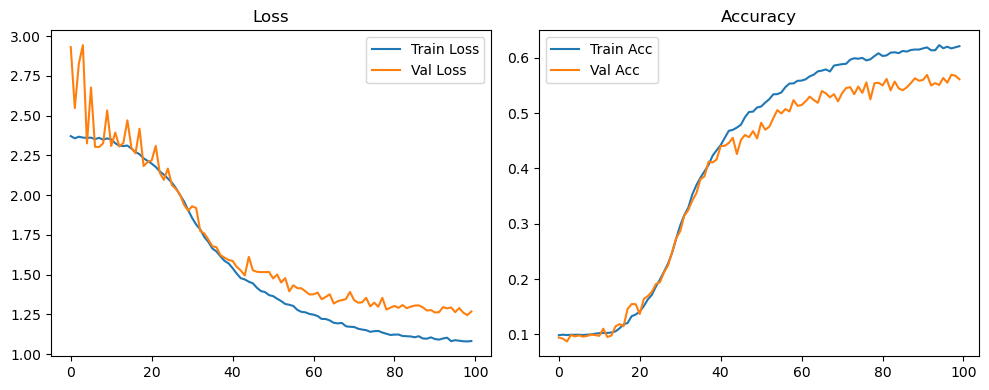

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.18it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.29it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.75it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 1.2903 Accuracy: 0.5536


🚀 Running: batch512_lr_max_0.001_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0991 | Val Acc: 0.0981 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0991 | Val Acc: 0.0981 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0991 | Val Acc: 0.0981 |:   1%|          | 1/100 [01:22<2:15:24, 82.07s/it]

| LR: 0.001000 | Train Acc: 0.0996 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:44<2:15:24, 82.07s/it]

| LR: 0.001000 | Train Acc: 0.0996 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:44<2:15:24, 82.07s/it]

| LR: 0.001000 | Train Acc: 0.0996 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:45<2:14:55, 82.61s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0909 |:   2%|▏         | 2/100 [04:08<2:14:55, 82.61s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0909 |:   2%|▏         | 2/100 [04:08<2:14:55, 82.61s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0909 |:   3%|▎         | 3/100 [04:08<2:14:19, 83.09s/it]

| LR: 0.000998 | Train Acc: 0.0991 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [05:19<2:14:19, 83.09s/it]

| LR: 0.000998 | Train Acc: 0.0991 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [05:19<2:14:19, 83.09s/it]

| LR: 0.000998 | Train Acc: 0.0991 | Val Acc: 0.0957 |:   4%|▍         | 4/100 [05:19<2:05:00, 78.13s/it]

| LR: 0.000996 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [05:32<2:05:00, 78.13s/it]

| LR: 0.000996 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [05:32<2:05:00, 78.13s/it]

| LR: 0.000996 | Train Acc: 0.0989 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:32<1:26:35, 54.69s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0947 |:   5%|▌         | 5/100 [05:45<1:26:35, 54.69s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0947 |:   5%|▌         | 5/100 [05:45<1:26:35, 54.69s/it]

| LR: 0.000994 | Train Acc: 0.0994 | Val Acc: 0.0947 |:   6%|▌         | 6/100 [05:45<1:03:36, 40.60s/it]

| LR: 0.000991 | Train Acc: 0.0987 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [05:58<1:03:36, 40.60s/it]

| LR: 0.000991 | Train Acc: 0.0987 | Val Acc: 0.0976 |:   6%|▌         | 6/100 [05:58<1:03:36, 40.60s/it]

| LR: 0.000991 | Train Acc: 0.0987 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [05:58<49:00, 31.62s/it]  

| LR: 0.000988 | Train Acc: 0.0988 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [06:11<49:00, 31.62s/it]

| LR: 0.000988 | Train Acc: 0.0988 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [06:11<49:00, 31.62s/it]

| LR: 0.000988 | Train Acc: 0.0988 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [06:11<39:29, 25.75s/it]

| LR: 0.000984 | Train Acc: 0.0991 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [06:24<39:29, 25.75s/it]

| LR: 0.000984 | Train Acc: 0.0991 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [06:24<39:29, 25.75s/it]

| LR: 0.000984 | Train Acc: 0.0991 | Val Acc: 0.0971 |:   9%|▉         | 9/100 [06:25<33:03, 21.80s/it]

| LR: 0.000980 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   9%|▉         | 9/100 [06:38<33:03, 21.80s/it]

| LR: 0.000980 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   9%|▉         | 9/100 [06:38<33:03, 21.80s/it]

| LR: 0.000980 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  10%|█         | 10/100 [06:38<28:40, 19.12s/it]

| LR: 0.000976 | Train Acc: 0.1003 | Val Acc: 0.0981 |:  10%|█         | 10/100 [06:51<28:40, 19.12s/it]

| LR: 0.000976 | Train Acc: 0.1003 | Val Acc: 0.0981 |:  10%|█         | 10/100 [06:51<28:40, 19.12s/it]

| LR: 0.000976 | Train Acc: 0.1003 | Val Acc: 0.0981 |:  11%|█         | 11/100 [06:51<25:36, 17.27s/it]

| LR: 0.000971 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  11%|█         | 11/100 [07:04<25:36, 17.27s/it]

| LR: 0.000971 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  11%|█         | 11/100 [07:04<25:36, 17.27s/it]

| LR: 0.000971 | Train Acc: 0.1010 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [07:04<23:28, 16.01s/it]

| LR: 0.000965 | Train Acc: 0.1022 | Val Acc: 0.0916 |:  12%|█▏        | 12/100 [07:17<23:28, 16.01s/it]

| LR: 0.000965 | Train Acc: 0.1022 | Val Acc: 0.0916 |:  12%|█▏        | 12/100 [07:17<23:28, 16.01s/it]

| LR: 0.000965 | Train Acc: 0.1022 | Val Acc: 0.0916 |:  13%|█▎        | 13/100 [07:17<21:57, 15.14s/it]

| LR: 0.000959 | Train Acc: 0.1016 | Val Acc: 0.0854 |:  13%|█▎        | 13/100 [07:30<21:57, 15.14s/it]

| LR: 0.000959 | Train Acc: 0.1016 | Val Acc: 0.0854 |:  13%|█▎        | 13/100 [07:30<21:57, 15.14s/it]

| LR: 0.000959 | Train Acc: 0.1016 | Val Acc: 0.0854 |:  14%|█▍        | 14/100 [07:30<20:50, 14.54s/it]

| LR: 0.000953 | Train Acc: 0.1032 | Val Acc: 0.1001 |:  14%|█▍        | 14/100 [07:43<20:50, 14.54s/it]

| LR: 0.000953 | Train Acc: 0.1032 | Val Acc: 0.1001 |:  14%|█▍        | 14/100 [07:43<20:50, 14.54s/it]

| LR: 0.000953 | Train Acc: 0.1032 | Val Acc: 0.1001 |:  15%|█▌        | 15/100 [07:43<19:59, 14.11s/it]

| LR: 0.000946 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  15%|█▌        | 15/100 [07:57<19:59, 14.11s/it]

| LR: 0.000946 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  15%|█▌        | 15/100 [07:57<19:59, 14.11s/it]

| LR: 0.000946 | Train Acc: 0.1029 | Val Acc: 0.0982 |:  16%|█▌        | 16/100 [07:57<19:25, 13.88s/it]

| LR: 0.000939 | Train Acc: 0.1034 | Val Acc: 0.1041 |:  16%|█▌        | 16/100 [08:10<19:25, 13.88s/it]

| LR: 0.000939 | Train Acc: 0.1034 | Val Acc: 0.1041 |:  16%|█▌        | 16/100 [08:10<19:25, 13.88s/it]

| LR: 0.000939 | Train Acc: 0.1034 | Val Acc: 0.1041 |:  17%|█▋        | 17/100 [08:10<18:54, 13.67s/it]

| LR: 0.000931 | Train Acc: 0.1039 | Val Acc: 0.1022 |:  17%|█▋        | 17/100 [08:23<18:54, 13.67s/it]

| LR: 0.000931 | Train Acc: 0.1039 | Val Acc: 0.1022 |:  17%|█▋        | 17/100 [08:23<18:54, 13.67s/it]

| LR: 0.000931 | Train Acc: 0.1039 | Val Acc: 0.1022 |:  18%|█▊        | 18/100 [08:23<18:28, 13.51s/it]

| LR: 0.000923 | Train Acc: 0.1078 | Val Acc: 0.1072 |:  18%|█▊        | 18/100 [08:36<18:28, 13.51s/it]

| LR: 0.000923 | Train Acc: 0.1078 | Val Acc: 0.1072 |:  18%|█▊        | 18/100 [08:36<18:28, 13.51s/it]

| LR: 0.000923 | Train Acc: 0.1078 | Val Acc: 0.1072 |:  19%|█▉        | 19/100 [08:36<18:06, 13.41s/it]

| LR: 0.000914 | Train Acc: 0.1076 | Val Acc: 0.1078 |:  19%|█▉        | 19/100 [08:49<18:06, 13.41s/it]

| LR: 0.000914 | Train Acc: 0.1076 | Val Acc: 0.1078 |:  19%|█▉        | 19/100 [08:49<18:06, 13.41s/it]

| LR: 0.000914 | Train Acc: 0.1076 | Val Acc: 0.1078 |:  20%|██        | 20/100 [08:49<17:48, 13.35s/it]

| LR: 0.000905 | Train Acc: 0.1107 | Val Acc: 0.1096 |:  20%|██        | 20/100 [09:02<17:48, 13.35s/it]

| LR: 0.000905 | Train Acc: 0.1107 | Val Acc: 0.1096 |:  20%|██        | 20/100 [09:02<17:48, 13.35s/it]

| LR: 0.000905 | Train Acc: 0.1107 | Val Acc: 0.1096 |:  21%|██        | 21/100 [09:03<17:31, 13.30s/it]

| LR: 0.000896 | Train Acc: 0.1129 | Val Acc: 0.1279 |:  21%|██        | 21/100 [09:16<17:31, 13.30s/it]

| LR: 0.000896 | Train Acc: 0.1129 | Val Acc: 0.1279 |:  21%|██        | 21/100 [09:16<17:31, 13.30s/it]

| LR: 0.000896 | Train Acc: 0.1129 | Val Acc: 0.1279 |:  22%|██▏       | 22/100 [09:16<17:15, 13.28s/it]

| LR: 0.000886 | Train Acc: 0.1159 | Val Acc: 0.1384 |:  22%|██▏       | 22/100 [09:29<17:15, 13.28s/it]

| LR: 0.000886 | Train Acc: 0.1159 | Val Acc: 0.1384 |:  22%|██▏       | 22/100 [09:29<17:15, 13.28s/it]

| LR: 0.000886 | Train Acc: 0.1159 | Val Acc: 0.1384 |:  23%|██▎       | 23/100 [09:29<16:59, 13.24s/it]

| LR: 0.000876 | Train Acc: 0.1191 | Val Acc: 0.1214 |:  23%|██▎       | 23/100 [09:42<16:59, 13.24s/it]

| LR: 0.000876 | Train Acc: 0.1191 | Val Acc: 0.1214 |:  23%|██▎       | 23/100 [09:42<16:59, 13.24s/it]

| LR: 0.000876 | Train Acc: 0.1191 | Val Acc: 0.1214 |:  24%|██▍       | 24/100 [09:42<16:45, 13.23s/it]

| LR: 0.000866 | Train Acc: 0.1239 | Val Acc: 0.1340 |:  24%|██▍       | 24/100 [09:55<16:45, 13.23s/it]

| LR: 0.000866 | Train Acc: 0.1239 | Val Acc: 0.1340 |:  24%|██▍       | 24/100 [09:55<16:45, 13.23s/it]

| LR: 0.000866 | Train Acc: 0.1239 | Val Acc: 0.1340 |:  25%|██▌       | 25/100 [09:55<16:32, 13.24s/it]

| LR: 0.000855 | Train Acc: 0.1288 | Val Acc: 0.1210 |:  25%|██▌       | 25/100 [10:09<16:32, 13.24s/it]

| LR: 0.000855 | Train Acc: 0.1288 | Val Acc: 0.1210 |:  25%|██▌       | 25/100 [10:09<16:32, 13.24s/it]

| LR: 0.000855 | Train Acc: 0.1288 | Val Acc: 0.1210 |:  26%|██▌       | 26/100 [10:09<16:18, 13.23s/it]

| LR: 0.000844 | Train Acc: 0.1341 | Val Acc: 0.1277 |:  26%|██▌       | 26/100 [10:22<16:18, 13.23s/it]

| LR: 0.000844 | Train Acc: 0.1341 | Val Acc: 0.1277 |:  26%|██▌       | 26/100 [10:22<16:18, 13.23s/it]

| LR: 0.000844 | Train Acc: 0.1341 | Val Acc: 0.1277 |:  27%|██▋       | 27/100 [10:22<16:03, 13.20s/it]

| LR: 0.000832 | Train Acc: 0.1427 | Val Acc: 0.1377 |:  27%|██▋       | 27/100 [10:35<16:03, 13.20s/it]

| LR: 0.000832 | Train Acc: 0.1427 | Val Acc: 0.1377 |:  27%|██▋       | 27/100 [10:35<16:03, 13.20s/it]

| LR: 0.000832 | Train Acc: 0.1427 | Val Acc: 0.1377 |:  28%|██▊       | 28/100 [10:35<15:52, 13.22s/it]

| LR: 0.000821 | Train Acc: 0.1474 | Val Acc: 0.1587 |:  28%|██▊       | 28/100 [10:48<15:52, 13.22s/it]

| LR: 0.000821 | Train Acc: 0.1474 | Val Acc: 0.1587 |:  28%|██▊       | 28/100 [10:48<15:52, 13.22s/it]

| LR: 0.000821 | Train Acc: 0.1474 | Val Acc: 0.1587 |:  29%|██▉       | 29/100 [10:48<15:39, 13.23s/it]

| LR: 0.000808 | Train Acc: 0.1547 | Val Acc: 0.1452 |:  29%|██▉       | 29/100 [11:01<15:39, 13.23s/it]

| LR: 0.000808 | Train Acc: 0.1547 | Val Acc: 0.1452 |:  29%|██▉       | 29/100 [11:01<15:39, 13.23s/it]

| LR: 0.000808 | Train Acc: 0.1547 | Val Acc: 0.1452 |:  30%|███       | 30/100 [11:02<15:28, 13.26s/it]

| LR: 0.000796 | Train Acc: 0.1688 | Val Acc: 0.1697 |:  30%|███       | 30/100 [11:15<15:28, 13.26s/it]

| LR: 0.000796 | Train Acc: 0.1688 | Val Acc: 0.1697 |:  30%|███       | 30/100 [11:15<15:28, 13.26s/it]

| LR: 0.000796 | Train Acc: 0.1688 | Val Acc: 0.1697 |:  31%|███       | 31/100 [11:15<15:13, 13.23s/it]

| LR: 0.000783 | Train Acc: 0.1764 | Val Acc: 0.1687 |:  31%|███       | 31/100 [11:28<15:13, 13.23s/it]

| LR: 0.000783 | Train Acc: 0.1764 | Val Acc: 0.1687 |:  31%|███       | 31/100 [11:28<15:13, 13.23s/it]

| LR: 0.000783 | Train Acc: 0.1764 | Val Acc: 0.1687 |:  32%|███▏      | 32/100 [11:28<14:58, 13.22s/it]

| LR: 0.000770 | Train Acc: 0.1936 | Val Acc: 0.2178 |:  32%|███▏      | 32/100 [11:41<14:58, 13.22s/it]

| LR: 0.000770 | Train Acc: 0.1936 | Val Acc: 0.2178 |:  32%|███▏      | 32/100 [11:41<14:58, 13.22s/it]

| LR: 0.000770 | Train Acc: 0.1936 | Val Acc: 0.2178 |:  33%|███▎      | 33/100 [11:41<14:44, 13.20s/it]

| LR: 0.000757 | Train Acc: 0.2077 | Val Acc: 0.2038 |:  33%|███▎      | 33/100 [11:54<14:44, 13.20s/it]

| LR: 0.000757 | Train Acc: 0.2077 | Val Acc: 0.2038 |:  33%|███▎      | 33/100 [11:54<14:44, 13.20s/it]

| LR: 0.000757 | Train Acc: 0.2077 | Val Acc: 0.2038 |:  34%|███▍      | 34/100 [11:54<14:30, 13.20s/it]

| LR: 0.000743 | Train Acc: 0.2228 | Val Acc: 0.2088 |:  34%|███▍      | 34/100 [12:07<14:30, 13.20s/it]

| LR: 0.000743 | Train Acc: 0.2228 | Val Acc: 0.2088 |:  34%|███▍      | 34/100 [12:07<14:30, 13.20s/it]

| LR: 0.000743 | Train Acc: 0.2228 | Val Acc: 0.2088 |:  35%|███▌      | 35/100 [12:08<14:19, 13.23s/it]

| LR: 0.000730 | Train Acc: 0.2369 | Val Acc: 0.2459 |:  35%|███▌      | 35/100 [12:21<14:19, 13.23s/it]

| LR: 0.000730 | Train Acc: 0.2369 | Val Acc: 0.2459 |:  35%|███▌      | 35/100 [12:21<14:19, 13.23s/it]

| LR: 0.000730 | Train Acc: 0.2369 | Val Acc: 0.2459 |:  36%|███▌      | 36/100 [12:21<14:06, 13.23s/it]

| LR: 0.000716 | Train Acc: 0.2597 | Val Acc: 0.2789 |:  36%|███▌      | 36/100 [12:34<14:06, 13.23s/it]

| LR: 0.000716 | Train Acc: 0.2597 | Val Acc: 0.2789 |:  36%|███▌      | 36/100 [12:34<14:06, 13.23s/it]

| LR: 0.000716 | Train Acc: 0.2597 | Val Acc: 0.2789 |:  37%|███▋      | 37/100 [12:34<13:52, 13.22s/it]

| LR: 0.000702 | Train Acc: 0.2747 | Val Acc: 0.2852 |:  37%|███▋      | 37/100 [12:47<13:52, 13.22s/it]

| LR: 0.000702 | Train Acc: 0.2747 | Val Acc: 0.2852 |:  37%|███▋      | 37/100 [12:47<13:52, 13.22s/it]

| LR: 0.000702 | Train Acc: 0.2747 | Val Acc: 0.2852 |:  38%|███▊      | 38/100 [12:47<13:38, 13.20s/it]

| LR: 0.000687 | Train Acc: 0.2978 | Val Acc: 0.2998 |:  38%|███▊      | 38/100 [13:00<13:38, 13.20s/it]

| LR: 0.000687 | Train Acc: 0.2978 | Val Acc: 0.2998 |:  38%|███▊      | 38/100 [13:00<13:38, 13.20s/it]

| LR: 0.000687 | Train Acc: 0.2978 | Val Acc: 0.2998 |:  39%|███▉      | 39/100 [13:00<13:23, 13.17s/it]

| LR: 0.000673 | Train Acc: 0.3167 | Val Acc: 0.3270 |:  39%|███▉      | 39/100 [13:13<13:23, 13.17s/it]

| LR: 0.000673 | Train Acc: 0.3167 | Val Acc: 0.3270 |:  39%|███▉      | 39/100 [13:13<13:23, 13.17s/it]

| LR: 0.000673 | Train Acc: 0.3167 | Val Acc: 0.3270 |:  40%|████      | 40/100 [13:13<13:11, 13.19s/it]

| LR: 0.000658 | Train Acc: 0.3306 | Val Acc: 0.3403 |:  40%|████      | 40/100 [13:27<13:11, 13.19s/it]

| LR: 0.000658 | Train Acc: 0.3306 | Val Acc: 0.3403 |:  40%|████      | 40/100 [13:27<13:11, 13.19s/it]

| LR: 0.000658 | Train Acc: 0.3306 | Val Acc: 0.3403 |:  41%|████      | 41/100 [13:27<12:58, 13.19s/it]

| LR: 0.000643 | Train Acc: 0.3434 | Val Acc: 0.3439 |:  41%|████      | 41/100 [13:40<12:58, 13.19s/it]

| LR: 0.000643 | Train Acc: 0.3434 | Val Acc: 0.3439 |:  41%|████      | 41/100 [13:40<12:58, 13.19s/it]

| LR: 0.000643 | Train Acc: 0.3434 | Val Acc: 0.3439 |:  42%|████▏     | 42/100 [13:40<12:45, 13.20s/it]

| LR: 0.000628 | Train Acc: 0.3595 | Val Acc: 0.3761 |:  42%|████▏     | 42/100 [13:53<12:45, 13.20s/it]

| LR: 0.000628 | Train Acc: 0.3595 | Val Acc: 0.3761 |:  42%|████▏     | 42/100 [13:53<12:45, 13.20s/it]

| LR: 0.000628 | Train Acc: 0.3595 | Val Acc: 0.3761 |:  43%|████▎     | 43/100 [13:53<12:31, 13.18s/it]

| LR: 0.000613 | Train Acc: 0.3698 | Val Acc: 0.3539 |:  43%|████▎     | 43/100 [14:06<12:31, 13.18s/it]

| LR: 0.000613 | Train Acc: 0.3698 | Val Acc: 0.3539 |:  43%|████▎     | 43/100 [14:06<12:31, 13.18s/it]

| LR: 0.000613 | Train Acc: 0.3698 | Val Acc: 0.3539 |:  44%|████▍     | 44/100 [14:06<12:19, 13.21s/it]

| LR: 0.000598 | Train Acc: 0.3802 | Val Acc: 0.3949 |:  44%|████▍     | 44/100 [14:19<12:19, 13.21s/it]

| LR: 0.000598 | Train Acc: 0.3802 | Val Acc: 0.3949 |:  44%|████▍     | 44/100 [14:19<12:19, 13.21s/it]

| LR: 0.000598 | Train Acc: 0.3802 | Val Acc: 0.3949 |:  45%|████▌     | 45/100 [14:19<12:05, 13.19s/it]

| LR: 0.000582 | Train Acc: 0.3906 | Val Acc: 0.3787 |:  45%|████▌     | 45/100 [14:32<12:05, 13.19s/it]

| LR: 0.000582 | Train Acc: 0.3906 | Val Acc: 0.3787 |:  45%|████▌     | 45/100 [14:32<12:05, 13.19s/it]

| LR: 0.000582 | Train Acc: 0.3906 | Val Acc: 0.3787 |:  46%|████▌     | 46/100 [14:33<11:50, 13.15s/it]

| LR: 0.000567 | Train Acc: 0.3981 | Val Acc: 0.3879 |:  46%|████▌     | 46/100 [14:46<11:50, 13.15s/it]

| LR: 0.000567 | Train Acc: 0.3981 | Val Acc: 0.3879 |:  46%|████▌     | 46/100 [14:46<11:50, 13.15s/it]

| LR: 0.000567 | Train Acc: 0.3981 | Val Acc: 0.3879 |:  47%|████▋     | 47/100 [14:46<11:36, 13.13s/it]

| LR: 0.000552 | Train Acc: 0.4061 | Val Acc: 0.3856 |:  47%|████▋     | 47/100 [14:59<11:36, 13.13s/it]

| LR: 0.000552 | Train Acc: 0.4061 | Val Acc: 0.3856 |:  47%|████▋     | 47/100 [14:59<11:36, 13.13s/it]

| LR: 0.000552 | Train Acc: 0.4061 | Val Acc: 0.3856 |:  48%|████▊     | 48/100 [14:59<11:22, 13.12s/it]

| LR: 0.000536 | Train Acc: 0.4166 | Val Acc: 0.3838 |:  48%|████▊     | 48/100 [15:12<11:22, 13.12s/it]

| LR: 0.000536 | Train Acc: 0.4166 | Val Acc: 0.3838 |:  48%|████▊     | 48/100 [15:12<11:22, 13.12s/it]

| LR: 0.000536 | Train Acc: 0.4166 | Val Acc: 0.3838 |:  49%|████▉     | 49/100 [15:12<11:08, 13.11s/it]

| LR: 0.000521 | Train Acc: 0.4262 | Val Acc: 0.4094 |:  49%|████▉     | 49/100 [15:25<11:08, 13.11s/it]

| LR: 0.000521 | Train Acc: 0.4262 | Val Acc: 0.4094 |:  49%|████▉     | 49/100 [15:25<11:08, 13.11s/it]

| LR: 0.000521 | Train Acc: 0.4262 | Val Acc: 0.4094 |:  50%|█████     | 50/100 [15:25<10:55, 13.11s/it]

| LR: 0.000505 | Train Acc: 0.4305 | Val Acc: 0.4355 |:  50%|█████     | 50/100 [15:38<10:55, 13.11s/it]

| LR: 0.000505 | Train Acc: 0.4305 | Val Acc: 0.4355 |:  50%|█████     | 50/100 [15:38<10:55, 13.11s/it]

| LR: 0.000505 | Train Acc: 0.4305 | Val Acc: 0.4355 |:  51%|█████     | 51/100 [15:38<10:42, 13.11s/it]

| LR: 0.000489 | Train Acc: 0.4449 | Val Acc: 0.4513 |:  51%|█████     | 51/100 [15:51<10:42, 13.11s/it]

| LR: 0.000489 | Train Acc: 0.4449 | Val Acc: 0.4513 |:  51%|█████     | 51/100 [15:51<10:42, 13.11s/it]

| LR: 0.000489 | Train Acc: 0.4449 | Val Acc: 0.4513 |:  52%|█████▏    | 52/100 [15:51<10:29, 13.12s/it]

| LR: 0.000474 | Train Acc: 0.4525 | Val Acc: 0.4454 |:  52%|█████▏    | 52/100 [16:04<10:29, 13.12s/it]

| LR: 0.000474 | Train Acc: 0.4525 | Val Acc: 0.4454 |:  52%|█████▏    | 52/100 [16:04<10:29, 13.12s/it]

| LR: 0.000474 | Train Acc: 0.4525 | Val Acc: 0.4454 |:  53%|█████▎    | 53/100 [16:04<10:20, 13.20s/it]

| LR: 0.000458 | Train Acc: 0.4564 | Val Acc: 0.4414 |:  53%|█████▎    | 53/100 [16:18<10:20, 13.20s/it]

| LR: 0.000458 | Train Acc: 0.4564 | Val Acc: 0.4414 |:  53%|█████▎    | 53/100 [16:18<10:20, 13.20s/it]

| LR: 0.000458 | Train Acc: 0.4564 | Val Acc: 0.4414 |:  54%|█████▍    | 54/100 [16:18<10:06, 13.19s/it]

| LR: 0.000443 | Train Acc: 0.4610 | Val Acc: 0.4450 |:  54%|█████▍    | 54/100 [16:31<10:06, 13.19s/it]

| LR: 0.000443 | Train Acc: 0.4610 | Val Acc: 0.4450 |:  54%|█████▍    | 54/100 [16:31<10:06, 13.19s/it]

| LR: 0.000443 | Train Acc: 0.4610 | Val Acc: 0.4450 |:  55%|█████▌    | 55/100 [16:31<09:53, 13.20s/it]

| LR: 0.000428 | Train Acc: 0.4675 | Val Acc: 0.4537 |:  55%|█████▌    | 55/100 [16:44<09:53, 13.20s/it]

| LR: 0.000428 | Train Acc: 0.4675 | Val Acc: 0.4537 |:  55%|█████▌    | 55/100 [16:44<09:53, 13.20s/it]

| LR: 0.000428 | Train Acc: 0.4675 | Val Acc: 0.4537 |:  56%|█████▌    | 56/100 [16:44<09:40, 13.19s/it]

| LR: 0.000412 | Train Acc: 0.4743 | Val Acc: 0.4578 |:  56%|█████▌    | 56/100 [16:57<09:40, 13.19s/it]

| LR: 0.000412 | Train Acc: 0.4743 | Val Acc: 0.4578 |:  56%|█████▌    | 56/100 [16:57<09:40, 13.19s/it]

| LR: 0.000412 | Train Acc: 0.4743 | Val Acc: 0.4578 |:  57%|█████▋    | 57/100 [16:57<09:27, 13.20s/it]

| LR: 0.000397 | Train Acc: 0.4814 | Val Acc: 0.4544 |:  57%|█████▋    | 57/100 [17:10<09:27, 13.20s/it]

| LR: 0.000397 | Train Acc: 0.4814 | Val Acc: 0.4544 |:  57%|█████▋    | 57/100 [17:10<09:27, 13.20s/it]

| LR: 0.000397 | Train Acc: 0.4814 | Val Acc: 0.4544 |:  58%|█████▊    | 58/100 [17:10<09:13, 13.18s/it]

| LR: 0.000382 | Train Acc: 0.4831 | Val Acc: 0.4589 |:  58%|█████▊    | 58/100 [17:24<09:13, 13.18s/it]

| LR: 0.000382 | Train Acc: 0.4831 | Val Acc: 0.4589 |:  58%|█████▊    | 58/100 [17:24<09:13, 13.18s/it]

| LR: 0.000382 | Train Acc: 0.4831 | Val Acc: 0.4589 |:  59%|█████▉    | 59/100 [17:24<09:00, 13.18s/it]

| LR: 0.000367 | Train Acc: 0.4912 | Val Acc: 0.4751 |:  59%|█████▉    | 59/100 [17:37<09:00, 13.18s/it]

| LR: 0.000367 | Train Acc: 0.4912 | Val Acc: 0.4751 |:  59%|█████▉    | 59/100 [17:37<09:00, 13.18s/it]

| LR: 0.000367 | Train Acc: 0.4912 | Val Acc: 0.4751 |:  60%|██████    | 60/100 [17:37<08:46, 13.16s/it]

| LR: 0.000352 | Train Acc: 0.4902 | Val Acc: 0.4846 |:  60%|██████    | 60/100 [17:50<08:46, 13.16s/it]

| LR: 0.000352 | Train Acc: 0.4902 | Val Acc: 0.4846 |:  60%|██████    | 60/100 [17:50<08:46, 13.16s/it]

| LR: 0.000352 | Train Acc: 0.4902 | Val Acc: 0.4846 |:  61%|██████    | 61/100 [17:50<08:33, 13.16s/it]

| LR: 0.000337 | Train Acc: 0.4942 | Val Acc: 0.4879 |:  61%|██████    | 61/100 [18:03<08:33, 13.16s/it]

| LR: 0.000337 | Train Acc: 0.4942 | Val Acc: 0.4879 |:  61%|██████    | 61/100 [18:03<08:33, 13.16s/it]

| LR: 0.000337 | Train Acc: 0.4942 | Val Acc: 0.4879 |:  62%|██████▏   | 62/100 [18:03<08:20, 13.17s/it]

| LR: 0.000323 | Train Acc: 0.4991 | Val Acc: 0.4737 |:  62%|██████▏   | 62/100 [18:16<08:20, 13.17s/it]

| LR: 0.000323 | Train Acc: 0.4991 | Val Acc: 0.4737 |:  62%|██████▏   | 62/100 [18:16<08:20, 13.17s/it]

| LR: 0.000323 | Train Acc: 0.4991 | Val Acc: 0.4737 |:  63%|██████▎   | 63/100 [18:16<08:09, 13.24s/it]

| LR: 0.000308 | Train Acc: 0.5054 | Val Acc: 0.4982 |:  63%|██████▎   | 63/100 [18:30<08:09, 13.24s/it]

| LR: 0.000308 | Train Acc: 0.5054 | Val Acc: 0.4982 |:  63%|██████▎   | 63/100 [18:30<08:09, 13.24s/it]

| LR: 0.000308 | Train Acc: 0.5054 | Val Acc: 0.4982 |:  64%|██████▍   | 64/100 [18:30<07:55, 13.21s/it]

| LR: 0.000294 | Train Acc: 0.5064 | Val Acc: 0.4957 |:  64%|██████▍   | 64/100 [18:43<07:55, 13.21s/it]

| LR: 0.000294 | Train Acc: 0.5064 | Val Acc: 0.4957 |:  64%|██████▍   | 64/100 [18:43<07:55, 13.21s/it]

| LR: 0.000294 | Train Acc: 0.5064 | Val Acc: 0.4957 |:  65%|██████▌   | 65/100 [18:43<07:41, 13.19s/it]

| LR: 0.000280 | Train Acc: 0.5100 | Val Acc: 0.5050 |:  65%|██████▌   | 65/100 [18:56<07:41, 13.19s/it]

| LR: 0.000280 | Train Acc: 0.5100 | Val Acc: 0.5050 |:  65%|██████▌   | 65/100 [18:56<07:41, 13.19s/it]

| LR: 0.000280 | Train Acc: 0.5100 | Val Acc: 0.5050 |:  66%|██████▌   | 66/100 [18:56<07:27, 13.18s/it]

| LR: 0.000267 | Train Acc: 0.5155 | Val Acc: 0.4967 |:  66%|██████▌   | 66/100 [19:09<07:27, 13.18s/it]

| LR: 0.000267 | Train Acc: 0.5155 | Val Acc: 0.4967 |:  66%|██████▌   | 66/100 [19:09<07:27, 13.18s/it]

| LR: 0.000267 | Train Acc: 0.5155 | Val Acc: 0.4967 |:  67%|██████▋   | 67/100 [19:09<07:14, 13.17s/it]

| LR: 0.000253 | Train Acc: 0.5112 | Val Acc: 0.4974 |:  67%|██████▋   | 67/100 [19:22<07:14, 13.17s/it]

| LR: 0.000253 | Train Acc: 0.5112 | Val Acc: 0.4974 |:  67%|██████▋   | 67/100 [19:22<07:14, 13.17s/it]

| LR: 0.000253 | Train Acc: 0.5112 | Val Acc: 0.4974 |:  68%|██████▊   | 68/100 [19:22<07:00, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.5172 | Val Acc: 0.4963 |:  68%|██████▊   | 68/100 [19:35<07:00, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.5172 | Val Acc: 0.4963 |:  68%|██████▊   | 68/100 [19:35<07:00, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.5172 | Val Acc: 0.4963 |:  69%|██████▉   | 69/100 [19:35<06:47, 13.15s/it]

| LR: 0.000227 | Train Acc: 0.5219 | Val Acc: 0.4999 |:  69%|██████▉   | 69/100 [19:48<06:47, 13.15s/it]

| LR: 0.000227 | Train Acc: 0.5219 | Val Acc: 0.4999 |:  69%|██████▉   | 69/100 [19:48<06:47, 13.15s/it]

| LR: 0.000227 | Train Acc: 0.5219 | Val Acc: 0.4999 |:  70%|███████   | 70/100 [19:48<06:34, 13.14s/it]

| LR: 0.000214 | Train Acc: 0.5209 | Val Acc: 0.5030 |:  70%|███████   | 70/100 [20:02<06:34, 13.14s/it]

| LR: 0.000214 | Train Acc: 0.5209 | Val Acc: 0.5030 |:  70%|███████   | 70/100 [20:02<06:34, 13.14s/it]

| LR: 0.000214 | Train Acc: 0.5209 | Val Acc: 0.5030 |:  71%|███████   | 71/100 [20:02<06:21, 13.15s/it]

| LR: 0.000202 | Train Acc: 0.5258 | Val Acc: 0.5012 |:  71%|███████   | 71/100 [20:15<06:21, 13.15s/it]

| LR: 0.000202 | Train Acc: 0.5258 | Val Acc: 0.5012 |:  71%|███████   | 71/100 [20:15<06:21, 13.15s/it]

| LR: 0.000202 | Train Acc: 0.5258 | Val Acc: 0.5012 |:  72%|███████▏  | 72/100 [20:15<06:09, 13.19s/it]

| LR: 0.000189 | Train Acc: 0.5341 | Val Acc: 0.5153 |:  72%|███████▏  | 72/100 [20:28<06:09, 13.19s/it]

| LR: 0.000189 | Train Acc: 0.5341 | Val Acc: 0.5153 |:  72%|███████▏  | 72/100 [20:28<06:09, 13.19s/it]

| LR: 0.000189 | Train Acc: 0.5341 | Val Acc: 0.5153 |:  73%|███████▎  | 73/100 [20:28<05:55, 13.18s/it]

| LR: 0.000178 | Train Acc: 0.5315 | Val Acc: 0.5196 |:  73%|███████▎  | 73/100 [20:41<05:55, 13.18s/it]

| LR: 0.000178 | Train Acc: 0.5315 | Val Acc: 0.5196 |:  73%|███████▎  | 73/100 [20:41<05:55, 13.18s/it]

| LR: 0.000178 | Train Acc: 0.5315 | Val Acc: 0.5196 |:  74%|███████▍  | 74/100 [20:41<05:42, 13.18s/it]

| LR: 0.000166 | Train Acc: 0.5373 | Val Acc: 0.5160 |:  74%|███████▍  | 74/100 [20:54<05:42, 13.18s/it]

| LR: 0.000166 | Train Acc: 0.5373 | Val Acc: 0.5160 |:  74%|███████▍  | 74/100 [20:54<05:42, 13.18s/it]

| LR: 0.000166 | Train Acc: 0.5373 | Val Acc: 0.5160 |:  75%|███████▌  | 75/100 [20:54<05:29, 13.17s/it]

| LR: 0.000155 | Train Acc: 0.5372 | Val Acc: 0.5125 |:  75%|███████▌  | 75/100 [21:08<05:29, 13.17s/it]

| LR: 0.000155 | Train Acc: 0.5372 | Val Acc: 0.5125 |:  75%|███████▌  | 75/100 [21:08<05:29, 13.17s/it]

| LR: 0.000155 | Train Acc: 0.5372 | Val Acc: 0.5125 |:  76%|███████▌  | 76/100 [21:08<05:16, 13.18s/it]

| LR: 0.000144 | Train Acc: 0.5409 | Val Acc: 0.5231 |:  76%|███████▌  | 76/100 [21:21<05:16, 13.18s/it]

| LR: 0.000144 | Train Acc: 0.5409 | Val Acc: 0.5231 |:  76%|███████▌  | 76/100 [21:21<05:16, 13.18s/it]

| LR: 0.000144 | Train Acc: 0.5409 | Val Acc: 0.5231 |:  77%|███████▋  | 77/100 [21:21<05:03, 13.19s/it]

| LR: 0.000134 | Train Acc: 0.5421 | Val Acc: 0.5154 |:  77%|███████▋  | 77/100 [21:34<05:03, 13.19s/it]

| LR: 0.000134 | Train Acc: 0.5421 | Val Acc: 0.5154 |:  77%|███████▋  | 77/100 [21:34<05:03, 13.19s/it]

| LR: 0.000134 | Train Acc: 0.5421 | Val Acc: 0.5154 |:  78%|███████▊  | 78/100 [21:34<04:50, 13.19s/it]

| LR: 0.000124 | Train Acc: 0.5456 | Val Acc: 0.5088 |:  78%|███████▊  | 78/100 [21:47<04:50, 13.19s/it]

| LR: 0.000124 | Train Acc: 0.5456 | Val Acc: 0.5088 |:  78%|███████▊  | 78/100 [21:47<04:50, 13.19s/it]

| LR: 0.000124 | Train Acc: 0.5456 | Val Acc: 0.5088 |:  79%|███████▉  | 79/100 [21:47<04:37, 13.20s/it]

| LR: 0.000114 | Train Acc: 0.5441 | Val Acc: 0.5243 |:  79%|███████▉  | 79/100 [22:00<04:37, 13.20s/it]

| LR: 0.000114 | Train Acc: 0.5441 | Val Acc: 0.5243 |:  79%|███████▉  | 79/100 [22:00<04:37, 13.20s/it]

| LR: 0.000114 | Train Acc: 0.5441 | Val Acc: 0.5243 |:  80%|████████  | 80/100 [22:00<04:24, 13.22s/it]

| LR: 0.000105 | Train Acc: 0.5489 | Val Acc: 0.5292 |:  80%|████████  | 80/100 [22:14<04:24, 13.22s/it]

| LR: 0.000105 | Train Acc: 0.5489 | Val Acc: 0.5292 |:  80%|████████  | 80/100 [22:14<04:24, 13.22s/it]

| LR: 0.000105 | Train Acc: 0.5489 | Val Acc: 0.5292 |:  81%|████████  | 81/100 [22:14<04:11, 13.24s/it]

| LR: 0.000096 | Train Acc: 0.5501 | Val Acc: 0.5193 |:  81%|████████  | 81/100 [22:27<04:11, 13.24s/it]

| LR: 0.000096 | Train Acc: 0.5501 | Val Acc: 0.5193 |:  81%|████████  | 81/100 [22:27<04:11, 13.24s/it]

| LR: 0.000096 | Train Acc: 0.5501 | Val Acc: 0.5193 |:  82%|████████▏ | 82/100 [22:27<03:58, 13.25s/it]

| LR: 0.000087 | Train Acc: 0.5501 | Val Acc: 0.5186 |:  82%|████████▏ | 82/100 [22:40<03:58, 13.25s/it]

| LR: 0.000087 | Train Acc: 0.5501 | Val Acc: 0.5186 |:  82%|████████▏ | 82/100 [22:40<03:58, 13.25s/it]

| LR: 0.000087 | Train Acc: 0.5501 | Val Acc: 0.5186 |:  83%|████████▎ | 83/100 [22:40<03:45, 13.25s/it]

| LR: 0.000079 | Train Acc: 0.5484 | Val Acc: 0.5116 |:  83%|████████▎ | 83/100 [22:53<03:45, 13.25s/it]

| LR: 0.000079 | Train Acc: 0.5484 | Val Acc: 0.5116 |:  83%|████████▎ | 83/100 [22:53<03:45, 13.25s/it]

| LR: 0.000079 | Train Acc: 0.5484 | Val Acc: 0.5116 |:  84%|████████▍ | 84/100 [22:53<03:31, 13.23s/it]

| LR: 0.000071 | Train Acc: 0.5514 | Val Acc: 0.5325 |:  84%|████████▍ | 84/100 [23:07<03:31, 13.23s/it]

| LR: 0.000071 | Train Acc: 0.5514 | Val Acc: 0.5325 |:  84%|████████▍ | 84/100 [23:07<03:31, 13.23s/it]

| LR: 0.000071 | Train Acc: 0.5514 | Val Acc: 0.5325 |:  85%|████████▌ | 85/100 [23:07<03:18, 13.21s/it]

| LR: 0.000064 | Train Acc: 0.5516 | Val Acc: 0.5336 |:  85%|████████▌ | 85/100 [23:20<03:18, 13.21s/it]

| LR: 0.000064 | Train Acc: 0.5516 | Val Acc: 0.5336 |:  85%|████████▌ | 85/100 [23:20<03:18, 13.21s/it]

| LR: 0.000064 | Train Acc: 0.5516 | Val Acc: 0.5336 |:  86%|████████▌ | 86/100 [23:20<03:04, 13.20s/it]

| LR: 0.000057 | Train Acc: 0.5502 | Val Acc: 0.5338 |:  86%|████████▌ | 86/100 [23:33<03:04, 13.20s/it]

| LR: 0.000057 | Train Acc: 0.5502 | Val Acc: 0.5338 |:  86%|████████▌ | 86/100 [23:33<03:04, 13.20s/it]

| LR: 0.000057 | Train Acc: 0.5502 | Val Acc: 0.5338 |:  87%|████████▋ | 87/100 [23:33<02:51, 13.19s/it]

| LR: 0.000051 | Train Acc: 0.5536 | Val Acc: 0.5212 |:  87%|████████▋ | 87/100 [23:46<02:51, 13.19s/it]

| LR: 0.000051 | Train Acc: 0.5536 | Val Acc: 0.5212 |:  87%|████████▋ | 87/100 [23:46<02:51, 13.19s/it]

| LR: 0.000051 | Train Acc: 0.5536 | Val Acc: 0.5212 |:  88%|████████▊ | 88/100 [23:46<02:37, 13.16s/it]

| LR: 0.000045 | Train Acc: 0.5540 | Val Acc: 0.5321 |:  88%|████████▊ | 88/100 [23:59<02:37, 13.16s/it]

| LR: 0.000045 | Train Acc: 0.5540 | Val Acc: 0.5321 |:  88%|████████▊ | 88/100 [23:59<02:37, 13.16s/it]

| LR: 0.000045 | Train Acc: 0.5540 | Val Acc: 0.5321 |:  89%|████████▉ | 89/100 [23:59<02:24, 13.15s/it]

| LR: 0.000039 | Train Acc: 0.5557 | Val Acc: 0.5122 |:  89%|████████▉ | 89/100 [24:12<02:24, 13.15s/it]

| LR: 0.000039 | Train Acc: 0.5557 | Val Acc: 0.5122 |:  89%|████████▉ | 89/100 [24:12<02:24, 13.15s/it]

| LR: 0.000039 | Train Acc: 0.5557 | Val Acc: 0.5122 |:  90%|█████████ | 90/100 [24:12<02:11, 13.14s/it]

| LR: 0.000034 | Train Acc: 0.5561 | Val Acc: 0.5335 |:  90%|█████████ | 90/100 [24:25<02:11, 13.14s/it]

| LR: 0.000034 | Train Acc: 0.5561 | Val Acc: 0.5335 |:  90%|█████████ | 90/100 [24:25<02:11, 13.14s/it]

| LR: 0.000034 | Train Acc: 0.5561 | Val Acc: 0.5335 |:  91%|█████████ | 91/100 [24:25<01:58, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.5621 | Val Acc: 0.5360 |:  91%|█████████ | 91/100 [24:39<01:58, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.5621 | Val Acc: 0.5360 |:  91%|█████████ | 91/100 [24:39<01:58, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.5621 | Val Acc: 0.5360 |:  92%|█████████▏| 92/100 [24:39<01:45, 13.14s/it]

| LR: 0.000026 | Train Acc: 0.5540 | Val Acc: 0.5329 |:  92%|█████████▏| 92/100 [24:52<01:45, 13.14s/it]

| LR: 0.000026 | Train Acc: 0.5540 | Val Acc: 0.5329 |:  92%|█████████▏| 92/100 [24:52<01:45, 13.14s/it]

| LR: 0.000026 | Train Acc: 0.5540 | Val Acc: 0.5329 |:  93%|█████████▎| 93/100 [24:52<01:31, 13.14s/it]

| LR: 0.000022 | Train Acc: 0.5567 | Val Acc: 0.5258 |:  93%|█████████▎| 93/100 [25:05<01:31, 13.14s/it]

| LR: 0.000022 | Train Acc: 0.5567 | Val Acc: 0.5258 |:  93%|█████████▎| 93/100 [25:05<01:31, 13.14s/it]

| LR: 0.000022 | Train Acc: 0.5567 | Val Acc: 0.5258 |:  94%|█████████▍| 94/100 [25:05<01:18, 13.12s/it]

| LR: 0.000019 | Train Acc: 0.5561 | Val Acc: 0.5396 |:  94%|█████████▍| 94/100 [25:18<01:18, 13.12s/it]

| LR: 0.000019 | Train Acc: 0.5561 | Val Acc: 0.5396 |:  94%|█████████▍| 94/100 [25:18<01:18, 13.12s/it]

| LR: 0.000019 | Train Acc: 0.5561 | Val Acc: 0.5396 |:  95%|█████████▌| 95/100 [25:18<01:05, 13.11s/it]

| LR: 0.000016 | Train Acc: 0.5597 | Val Acc: 0.5263 |:  95%|█████████▌| 95/100 [25:31<01:05, 13.11s/it]

| LR: 0.000016 | Train Acc: 0.5597 | Val Acc: 0.5263 |:  95%|█████████▌| 95/100 [25:31<01:05, 13.11s/it]

| LR: 0.000016 | Train Acc: 0.5597 | Val Acc: 0.5263 |:  96%|█████████▌| 96/100 [25:31<00:52, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.5588 | Val Acc: 0.5173 |:  96%|█████████▌| 96/100 [25:44<00:52, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.5588 | Val Acc: 0.5173 |:  96%|█████████▌| 96/100 [25:44<00:52, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.5588 | Val Acc: 0.5173 |:  97%|█████████▋| 97/100 [25:44<00:39, 13.10s/it]

| LR: 0.000012 | Train Acc: 0.5603 | Val Acc: 0.5072 |:  97%|█████████▋| 97/100 [25:57<00:39, 13.10s/it]

| LR: 0.000012 | Train Acc: 0.5603 | Val Acc: 0.5072 |:  97%|█████████▋| 97/100 [25:57<00:39, 13.10s/it]

| LR: 0.000012 | Train Acc: 0.5603 | Val Acc: 0.5072 |:  98%|█████████▊| 98/100 [25:57<00:26, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.5610 | Val Acc: 0.5319 |:  98%|█████████▊| 98/100 [26:10<00:26, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.5610 | Val Acc: 0.5319 |:  98%|█████████▊| 98/100 [26:10<00:26, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.5610 | Val Acc: 0.5319 |:  99%|█████████▉| 99/100 [26:10<00:13, 13.13s/it]

| LR: 0.000010 | Train Acc: 0.5584 | Val Acc: 0.5294 |:  99%|█████████▉| 99/100 [26:24<00:13, 13.13s/it]

| LR: 0.000010 | Train Acc: 0.5584 | Val Acc: 0.5294 |:  99%|█████████▉| 99/100 [26:24<00:13, 13.13s/it]

| LR: 0.000010 | Train Acc: 0.5584 | Val Acc: 0.5294 |: 100%|██████████| 100/100 [26:24<00:00, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.5584 | Val Acc: 0.5294 |: 100%|██████████| 100/100 [26:24<00:00, 15.84s/it]

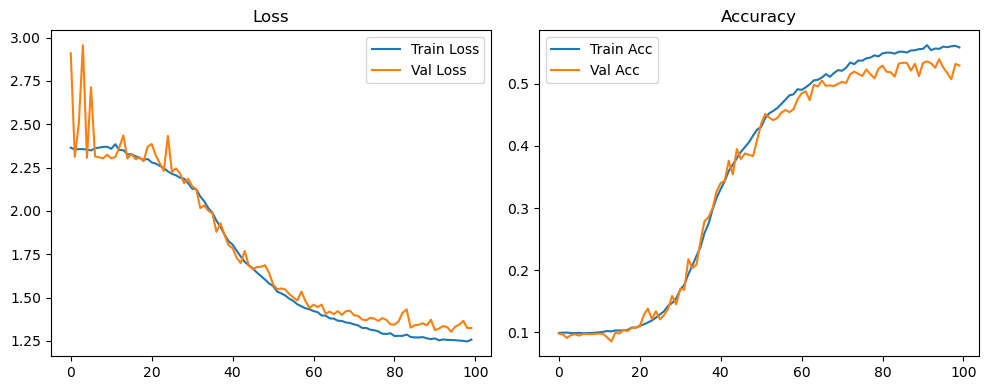

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 1.3302 Accuracy: 0.5253


🚀 Running: batch512_lr_max_0.001_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0995 | Val Acc: 0.0962 |:   1%|          | 1/100 [01:22<2:15:23, 82.05s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0956 |:   1%|          | 1/100 [02:43<2:15:23, 82.05s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0956 |:   1%|          | 1/100 [02:43<2:15:23, 82.05s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0956 |:   2%|▏         | 2/100 [02:43<2:13:44, 81.88s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [04:06<2:13:44, 81.88s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [04:06<2:13:44, 81.88s/it]

| LR: 0.000999 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [04:06<2:12:49, 82.16s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0963 |:   3%|▎         | 3/100 [05:16<2:12:49, 82.16s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0963 |:   3%|▎         | 3/100 [05:16<2:12:49, 82.16s/it]

| LR: 0.000998 | Train Acc: 0.0993 | Val Acc: 0.0963 |:   4%|▍         | 4/100 [05:16<2:03:44, 77.34s/it]

| LR: 0.000996 | Train Acc: 0.0998 | Val Acc: 0.0912 |:   4%|▍         | 4/100 [05:29<2:03:44, 77.34s/it]

| LR: 0.000996 | Train Acc: 0.0998 | Val Acc: 0.0912 |:   4%|▍         | 4/100 [05:29<2:03:44, 77.34s/it]

| LR: 0.000996 | Train Acc: 0.0998 | Val Acc: 0.0912 |:   5%|▌         | 5/100 [05:29<1:25:53, 54.24s/it]

| LR: 0.000994 | Train Acc: 0.0992 | Val Acc: 0.0942 |:   5%|▌         | 5/100 [05:42<1:25:53, 54.24s/it]

| LR: 0.000994 | Train Acc: 0.0992 | Val Acc: 0.0942 |:   5%|▌         | 5/100 [05:42<1:25:53, 54.24s/it]

| LR: 0.000994 | Train Acc: 0.0992 | Val Acc: 0.0942 |:   6%|▌         | 6/100 [05:42<1:03:05, 40.27s/it]

| LR: 0.000991 | Train Acc: 0.0991 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [05:55<1:03:05, 40.27s/it]

| LR: 0.000991 | Train Acc: 0.0991 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [05:55<1:03:05, 40.27s/it]

| LR: 0.000991 | Train Acc: 0.0991 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [05:55<48:41, 31.42s/it]  

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [06:09<48:41, 31.42s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [06:09<48:41, 31.42s/it]

| LR: 0.000988 | Train Acc: 0.0995 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:09<39:17, 25.62s/it]

| LR: 0.000984 | Train Acc: 0.0983 | Val Acc: 0.0931 |:   8%|▊         | 8/100 [06:22<39:17, 25.62s/it]

| LR: 0.000984 | Train Acc: 0.0983 | Val Acc: 0.0931 |:   8%|▊         | 8/100 [06:22<39:17, 25.62s/it]

| LR: 0.000984 | Train Acc: 0.0983 | Val Acc: 0.0931 |:   9%|▉         | 9/100 [06:22<32:58, 21.74s/it]

| LR: 0.000980 | Train Acc: 0.0991 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:35<32:58, 21.74s/it]

| LR: 0.000980 | Train Acc: 0.0991 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:35<32:58, 21.74s/it]

| LR: 0.000980 | Train Acc: 0.0991 | Val Acc: 0.0974 |:  10%|█         | 10/100 [06:35<28:37, 19.09s/it]

| LR: 0.000976 | Train Acc: 0.0987 | Val Acc: 0.0944 |:  10%|█         | 10/100 [06:48<28:37, 19.09s/it]

| LR: 0.000976 | Train Acc: 0.0987 | Val Acc: 0.0944 |:  10%|█         | 10/100 [06:48<28:37, 19.09s/it]

| LR: 0.000976 | Train Acc: 0.0987 | Val Acc: 0.0944 |:  11%|█         | 11/100 [06:48<25:38, 17.28s/it]

| LR: 0.000971 | Train Acc: 0.1004 | Val Acc: 0.1012 |:  11%|█         | 11/100 [07:01<25:38, 17.28s/it]

| LR: 0.000971 | Train Acc: 0.1004 | Val Acc: 0.1012 |:  11%|█         | 11/100 [07:01<25:38, 17.28s/it]

| LR: 0.000971 | Train Acc: 0.1004 | Val Acc: 0.1012 |:  12%|█▏        | 12/100 [07:01<23:31, 16.04s/it]

| LR: 0.000965 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [07:15<23:31, 16.04s/it]

| LR: 0.000965 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [07:15<23:31, 16.04s/it]

| LR: 0.000965 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [07:15<22:01, 15.19s/it]

| LR: 0.000959 | Train Acc: 0.1022 | Val Acc: 0.1042 |:  13%|█▎        | 13/100 [07:28<22:01, 15.19s/it]

| LR: 0.000959 | Train Acc: 0.1022 | Val Acc: 0.1042 |:  13%|█▎        | 13/100 [07:28<22:01, 15.19s/it]

| LR: 0.000959 | Train Acc: 0.1022 | Val Acc: 0.1042 |:  14%|█▍        | 14/100 [07:28<21:00, 14.66s/it]

| LR: 0.000953 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:41<21:00, 14.66s/it]

| LR: 0.000953 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:41<21:00, 14.66s/it]

| LR: 0.000953 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:41<20:10, 14.25s/it]

| LR: 0.000946 | Train Acc: 0.1022 | Val Acc: 0.1039 |:  15%|█▌        | 15/100 [07:54<20:10, 14.25s/it]

| LR: 0.000946 | Train Acc: 0.1022 | Val Acc: 0.1039 |:  15%|█▌        | 15/100 [07:54<20:10, 14.25s/it]

| LR: 0.000946 | Train Acc: 0.1022 | Val Acc: 0.1039 |:  16%|█▌        | 16/100 [07:54<19:29, 13.92s/it]

| LR: 0.000939 | Train Acc: 0.1025 | Val Acc: 0.0967 |:  16%|█▌        | 16/100 [08:08<19:29, 13.92s/it]

| LR: 0.000939 | Train Acc: 0.1025 | Val Acc: 0.0967 |:  16%|█▌        | 16/100 [08:08<19:29, 13.92s/it]

| LR: 0.000939 | Train Acc: 0.1025 | Val Acc: 0.0967 |:  17%|█▋        | 17/100 [08:08<18:57, 13.70s/it]

| LR: 0.000931 | Train Acc: 0.1029 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [08:21<18:57, 13.70s/it]

| LR: 0.000931 | Train Acc: 0.1029 | Val Acc: 0.0994 |:  17%|█▋        | 17/100 [08:21<18:57, 13.70s/it]

| LR: 0.000931 | Train Acc: 0.1029 | Val Acc: 0.0994 |:  18%|█▊        | 18/100 [08:21<18:30, 13.54s/it]

| LR: 0.000923 | Train Acc: 0.1037 | Val Acc: 0.0989 |:  18%|█▊        | 18/100 [08:34<18:30, 13.54s/it]

| LR: 0.000923 | Train Acc: 0.1037 | Val Acc: 0.0989 |:  18%|█▊        | 18/100 [08:34<18:30, 13.54s/it]

| LR: 0.000923 | Train Acc: 0.1037 | Val Acc: 0.0989 |:  19%|█▉        | 19/100 [08:34<18:07, 13.43s/it]

| LR: 0.000914 | Train Acc: 0.1049 | Val Acc: 0.1138 |:  19%|█▉        | 19/100 [08:47<18:07, 13.43s/it]

| LR: 0.000914 | Train Acc: 0.1049 | Val Acc: 0.1138 |:  19%|█▉        | 19/100 [08:47<18:07, 13.43s/it]

| LR: 0.000914 | Train Acc: 0.1049 | Val Acc: 0.1138 |:  20%|██        | 20/100 [08:47<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.1066 | Val Acc: 0.1200 |:  20%|██        | 20/100 [09:00<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.1066 | Val Acc: 0.1200 |:  20%|██        | 20/100 [09:00<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.1066 | Val Acc: 0.1200 |:  21%|██        | 21/100 [09:00<17:29, 13.28s/it]

| LR: 0.000896 | Train Acc: 0.1093 | Val Acc: 0.1077 |:  21%|██        | 21/100 [09:13<17:29, 13.28s/it]

| LR: 0.000896 | Train Acc: 0.1093 | Val Acc: 0.1077 |:  21%|██        | 21/100 [09:13<17:29, 13.28s/it]

| LR: 0.000896 | Train Acc: 0.1093 | Val Acc: 0.1077 |:  22%|██▏       | 22/100 [09:13<17:13, 13.25s/it]

| LR: 0.000886 | Train Acc: 0.1129 | Val Acc: 0.1201 |:  22%|██▏       | 22/100 [09:27<17:13, 13.25s/it]

| LR: 0.000886 | Train Acc: 0.1129 | Val Acc: 0.1201 |:  22%|██▏       | 22/100 [09:27<17:13, 13.25s/it]

| LR: 0.000886 | Train Acc: 0.1129 | Val Acc: 0.1201 |:  23%|██▎       | 23/100 [09:27<16:59, 13.24s/it]

| LR: 0.000876 | Train Acc: 0.1143 | Val Acc: 0.1215 |:  23%|██▎       | 23/100 [09:40<16:59, 13.24s/it]

| LR: 0.000876 | Train Acc: 0.1143 | Val Acc: 0.1215 |:  23%|██▎       | 23/100 [09:40<16:59, 13.24s/it]

| LR: 0.000876 | Train Acc: 0.1143 | Val Acc: 0.1215 |:  24%|██▍       | 24/100 [09:40<16:47, 13.26s/it]

| LR: 0.000866 | Train Acc: 0.1188 | Val Acc: 0.1216 |:  24%|██▍       | 24/100 [09:53<16:47, 13.26s/it]

| LR: 0.000866 | Train Acc: 0.1188 | Val Acc: 0.1216 |:  24%|██▍       | 24/100 [09:53<16:47, 13.26s/it]

| LR: 0.000866 | Train Acc: 0.1188 | Val Acc: 0.1216 |:  25%|██▌       | 25/100 [09:53<16:34, 13.26s/it]

| LR: 0.000855 | Train Acc: 0.1229 | Val Acc: 0.1319 |:  25%|██▌       | 25/100 [10:06<16:34, 13.26s/it]

| LR: 0.000855 | Train Acc: 0.1229 | Val Acc: 0.1319 |:  25%|██▌       | 25/100 [10:06<16:34, 13.26s/it]

| LR: 0.000855 | Train Acc: 0.1229 | Val Acc: 0.1319 |:  26%|██▌       | 26/100 [10:06<16:20, 13.25s/it]

| LR: 0.000844 | Train Acc: 0.1250 | Val Acc: 0.1223 |:  26%|██▌       | 26/100 [10:20<16:20, 13.25s/it]

| LR: 0.000844 | Train Acc: 0.1250 | Val Acc: 0.1223 |:  26%|██▌       | 26/100 [10:20<16:20, 13.25s/it]

| LR: 0.000844 | Train Acc: 0.1250 | Val Acc: 0.1223 |:  27%|██▋       | 27/100 [10:20<16:07, 13.25s/it]

| LR: 0.000832 | Train Acc: 0.1339 | Val Acc: 0.1334 |:  27%|██▋       | 27/100 [10:33<16:07, 13.25s/it]

| LR: 0.000832 | Train Acc: 0.1339 | Val Acc: 0.1334 |:  27%|██▋       | 27/100 [10:33<16:07, 13.25s/it]

| LR: 0.000832 | Train Acc: 0.1339 | Val Acc: 0.1334 |:  28%|██▊       | 28/100 [10:33<15:53, 13.24s/it]

| LR: 0.000821 | Train Acc: 0.1376 | Val Acc: 0.1547 |:  28%|██▊       | 28/100 [10:46<15:53, 13.24s/it]

| LR: 0.000821 | Train Acc: 0.1376 | Val Acc: 0.1547 |:  28%|██▊       | 28/100 [10:46<15:53, 13.24s/it]

| LR: 0.000821 | Train Acc: 0.1376 | Val Acc: 0.1547 |:  29%|██▉       | 29/100 [10:46<15:40, 13.24s/it]

| LR: 0.000808 | Train Acc: 0.1426 | Val Acc: 0.1693 |:  29%|██▉       | 29/100 [10:59<15:40, 13.24s/it]

| LR: 0.000808 | Train Acc: 0.1426 | Val Acc: 0.1693 |:  29%|██▉       | 29/100 [10:59<15:40, 13.24s/it]

| LR: 0.000808 | Train Acc: 0.1426 | Val Acc: 0.1693 |:  30%|███       | 30/100 [10:59<15:26, 13.23s/it]

| LR: 0.000796 | Train Acc: 0.1512 | Val Acc: 0.1737 |:  30%|███       | 30/100 [11:13<15:26, 13.23s/it]

| LR: 0.000796 | Train Acc: 0.1512 | Val Acc: 0.1737 |:  30%|███       | 30/100 [11:13<15:26, 13.23s/it]

| LR: 0.000796 | Train Acc: 0.1512 | Val Acc: 0.1737 |:  31%|███       | 31/100 [11:13<15:13, 13.24s/it]

| LR: 0.000783 | Train Acc: 0.1618 | Val Acc: 0.1694 |:  31%|███       | 31/100 [11:26<15:13, 13.24s/it]

| LR: 0.000783 | Train Acc: 0.1618 | Val Acc: 0.1694 |:  31%|███       | 31/100 [11:26<15:13, 13.24s/it]

| LR: 0.000783 | Train Acc: 0.1618 | Val Acc: 0.1694 |:  32%|███▏      | 32/100 [11:26<15:00, 13.24s/it]

| LR: 0.000770 | Train Acc: 0.1798 | Val Acc: 0.1577 |:  32%|███▏      | 32/100 [11:39<15:00, 13.24s/it]

| LR: 0.000770 | Train Acc: 0.1798 | Val Acc: 0.1577 |:  32%|███▏      | 32/100 [11:39<15:00, 13.24s/it]

| LR: 0.000770 | Train Acc: 0.1798 | Val Acc: 0.1577 |:  33%|███▎      | 33/100 [11:39<14:50, 13.29s/it]

| LR: 0.000757 | Train Acc: 0.1900 | Val Acc: 0.1900 |:  33%|███▎      | 33/100 [11:52<14:50, 13.29s/it]

| LR: 0.000757 | Train Acc: 0.1900 | Val Acc: 0.1900 |:  33%|███▎      | 33/100 [11:52<14:50, 13.29s/it]

| LR: 0.000757 | Train Acc: 0.1900 | Val Acc: 0.1900 |:  34%|███▍      | 34/100 [11:53<14:37, 13.29s/it]

| LR: 0.000743 | Train Acc: 0.1986 | Val Acc: 0.2087 |:  34%|███▍      | 34/100 [12:06<14:37, 13.29s/it]

| LR: 0.000743 | Train Acc: 0.1986 | Val Acc: 0.2087 |:  34%|███▍      | 34/100 [12:06<14:37, 13.29s/it]

| LR: 0.000743 | Train Acc: 0.1986 | Val Acc: 0.2087 |:  35%|███▌      | 35/100 [12:06<14:21, 13.25s/it]

| LR: 0.000730 | Train Acc: 0.2147 | Val Acc: 0.2219 |:  35%|███▌      | 35/100 [12:19<14:21, 13.25s/it]

| LR: 0.000730 | Train Acc: 0.2147 | Val Acc: 0.2219 |:  35%|███▌      | 35/100 [12:19<14:21, 13.25s/it]

| LR: 0.000730 | Train Acc: 0.2147 | Val Acc: 0.2219 |:  36%|███▌      | 36/100 [12:19<14:07, 13.24s/it]

| LR: 0.000716 | Train Acc: 0.2296 | Val Acc: 0.2407 |:  36%|███▌      | 36/100 [12:32<14:07, 13.24s/it]

| LR: 0.000716 | Train Acc: 0.2296 | Val Acc: 0.2407 |:  36%|███▌      | 36/100 [12:32<14:07, 13.24s/it]

| LR: 0.000716 | Train Acc: 0.2296 | Val Acc: 0.2407 |:  37%|███▋      | 37/100 [12:32<13:54, 13.24s/it]

| LR: 0.000702 | Train Acc: 0.2399 | Val Acc: 0.2595 |:  37%|███▋      | 37/100 [12:45<13:54, 13.24s/it]

| LR: 0.000702 | Train Acc: 0.2399 | Val Acc: 0.2595 |:  37%|███▋      | 37/100 [12:45<13:54, 13.24s/it]

| LR: 0.000702 | Train Acc: 0.2399 | Val Acc: 0.2595 |:  38%|███▊      | 38/100 [12:45<13:40, 13.24s/it]

| LR: 0.000687 | Train Acc: 0.2549 | Val Acc: 0.2784 |:  38%|███▊      | 38/100 [12:59<13:40, 13.24s/it]

| LR: 0.000687 | Train Acc: 0.2549 | Val Acc: 0.2784 |:  38%|███▊      | 38/100 [12:59<13:40, 13.24s/it]

| LR: 0.000687 | Train Acc: 0.2549 | Val Acc: 0.2784 |:  39%|███▉      | 39/100 [12:59<13:26, 13.22s/it]

| LR: 0.000673 | Train Acc: 0.2770 | Val Acc: 0.2878 |:  39%|███▉      | 39/100 [13:12<13:26, 13.22s/it]

| LR: 0.000673 | Train Acc: 0.2770 | Val Acc: 0.2878 |:  39%|███▉      | 39/100 [13:12<13:26, 13.22s/it]

| LR: 0.000673 | Train Acc: 0.2770 | Val Acc: 0.2878 |:  40%|████      | 40/100 [13:12<13:13, 13.22s/it]

| LR: 0.000658 | Train Acc: 0.2892 | Val Acc: 0.2931 |:  40%|████      | 40/100 [13:25<13:13, 13.22s/it]

| LR: 0.000658 | Train Acc: 0.2892 | Val Acc: 0.2931 |:  40%|████      | 40/100 [13:25<13:13, 13.22s/it]

| LR: 0.000658 | Train Acc: 0.2892 | Val Acc: 0.2931 |:  41%|████      | 41/100 [13:25<12:58, 13.19s/it]

| LR: 0.000643 | Train Acc: 0.3010 | Val Acc: 0.3177 |:  41%|████      | 41/100 [13:38<12:58, 13.19s/it]

| LR: 0.000643 | Train Acc: 0.3010 | Val Acc: 0.3177 |:  41%|████      | 41/100 [13:38<12:58, 13.19s/it]

| LR: 0.000643 | Train Acc: 0.3010 | Val Acc: 0.3177 |:  42%|████▏     | 42/100 [13:38<12:47, 13.23s/it]

| LR: 0.000628 | Train Acc: 0.3148 | Val Acc: 0.3399 |:  42%|████▏     | 42/100 [13:51<12:47, 13.23s/it]

| LR: 0.000628 | Train Acc: 0.3148 | Val Acc: 0.3399 |:  42%|████▏     | 42/100 [13:51<12:47, 13.23s/it]

| LR: 0.000628 | Train Acc: 0.3148 | Val Acc: 0.3399 |:  43%|████▎     | 43/100 [13:51<12:32, 13.20s/it]

| LR: 0.000613 | Train Acc: 0.3332 | Val Acc: 0.3463 |:  43%|████▎     | 43/100 [14:05<12:32, 13.20s/it]

| LR: 0.000613 | Train Acc: 0.3332 | Val Acc: 0.3463 |:  43%|████▎     | 43/100 [14:05<12:32, 13.20s/it]

| LR: 0.000613 | Train Acc: 0.3332 | Val Acc: 0.3463 |:  44%|████▍     | 44/100 [14:05<12:19, 13.21s/it]

| LR: 0.000598 | Train Acc: 0.3387 | Val Acc: 0.3674 |:  44%|████▍     | 44/100 [14:18<12:19, 13.21s/it]

| LR: 0.000598 | Train Acc: 0.3387 | Val Acc: 0.3674 |:  44%|████▍     | 44/100 [14:18<12:19, 13.21s/it]

| LR: 0.000598 | Train Acc: 0.3387 | Val Acc: 0.3674 |:  45%|████▌     | 45/100 [14:18<12:07, 13.22s/it]

| LR: 0.000582 | Train Acc: 0.3542 | Val Acc: 0.3655 |:  45%|████▌     | 45/100 [14:31<12:07, 13.22s/it]

| LR: 0.000582 | Train Acc: 0.3542 | Val Acc: 0.3655 |:  45%|████▌     | 45/100 [14:31<12:07, 13.22s/it]

| LR: 0.000582 | Train Acc: 0.3542 | Val Acc: 0.3655 |:  46%|████▌     | 46/100 [14:31<11:53, 13.21s/it]

| LR: 0.000567 | Train Acc: 0.3599 | Val Acc: 0.3890 |:  46%|████▌     | 46/100 [14:44<11:53, 13.21s/it]

| LR: 0.000567 | Train Acc: 0.3599 | Val Acc: 0.3890 |:  46%|████▌     | 46/100 [14:44<11:53, 13.21s/it]

| LR: 0.000567 | Train Acc: 0.3599 | Val Acc: 0.3890 |:  47%|████▋     | 47/100 [14:44<11:40, 13.22s/it]

| LR: 0.000552 | Train Acc: 0.3715 | Val Acc: 0.3834 |:  47%|████▋     | 47/100 [14:57<11:40, 13.22s/it]

| LR: 0.000552 | Train Acc: 0.3715 | Val Acc: 0.3834 |:  47%|████▋     | 47/100 [14:57<11:40, 13.22s/it]

| LR: 0.000552 | Train Acc: 0.3715 | Val Acc: 0.3834 |:  48%|████▊     | 48/100 [14:57<11:26, 13.21s/it]

| LR: 0.000536 | Train Acc: 0.3820 | Val Acc: 0.3926 |:  48%|████▊     | 48/100 [15:11<11:26, 13.21s/it]

| LR: 0.000536 | Train Acc: 0.3820 | Val Acc: 0.3926 |:  48%|████▊     | 48/100 [15:11<11:26, 13.21s/it]

| LR: 0.000536 | Train Acc: 0.3820 | Val Acc: 0.3926 |:  49%|████▉     | 49/100 [15:11<11:13, 13.20s/it]

| LR: 0.000521 | Train Acc: 0.3892 | Val Acc: 0.4079 |:  49%|████▉     | 49/100 [15:24<11:13, 13.20s/it]

| LR: 0.000521 | Train Acc: 0.3892 | Val Acc: 0.4079 |:  49%|████▉     | 49/100 [15:24<11:13, 13.20s/it]

| LR: 0.000521 | Train Acc: 0.3892 | Val Acc: 0.4079 |:  50%|█████     | 50/100 [15:24<10:59, 13.19s/it]

| LR: 0.000505 | Train Acc: 0.3967 | Val Acc: 0.4160 |:  50%|█████     | 50/100 [15:37<10:59, 13.19s/it]

| LR: 0.000505 | Train Acc: 0.3967 | Val Acc: 0.4160 |:  50%|█████     | 50/100 [15:37<10:59, 13.19s/it]

| LR: 0.000505 | Train Acc: 0.3967 | Val Acc: 0.4160 |:  51%|█████     | 51/100 [15:37<10:47, 13.21s/it]

| LR: 0.000489 | Train Acc: 0.3988 | Val Acc: 0.4175 |:  51%|█████     | 51/100 [15:50<10:47, 13.21s/it]

| LR: 0.000489 | Train Acc: 0.3988 | Val Acc: 0.4175 |:  51%|█████     | 51/100 [15:50<10:47, 13.21s/it]

| LR: 0.000489 | Train Acc: 0.3988 | Val Acc: 0.4175 |:  52%|█████▏    | 52/100 [15:50<10:33, 13.20s/it]

| LR: 0.000474 | Train Acc: 0.4073 | Val Acc: 0.4367 |:  52%|█████▏    | 52/100 [16:03<10:33, 13.20s/it]

| LR: 0.000474 | Train Acc: 0.4073 | Val Acc: 0.4367 |:  52%|█████▏    | 52/100 [16:03<10:33, 13.20s/it]

| LR: 0.000474 | Train Acc: 0.4073 | Val Acc: 0.4367 |:  53%|█████▎    | 53/100 [16:03<10:19, 13.19s/it]

| LR: 0.000458 | Train Acc: 0.4167 | Val Acc: 0.4204 |:  53%|█████▎    | 53/100 [16:16<10:19, 13.19s/it]

| LR: 0.000458 | Train Acc: 0.4167 | Val Acc: 0.4204 |:  53%|█████▎    | 53/100 [16:16<10:19, 13.19s/it]

| LR: 0.000458 | Train Acc: 0.4167 | Val Acc: 0.4204 |:  54%|█████▍    | 54/100 [16:17<10:05, 13.17s/it]

| LR: 0.000443 | Train Acc: 0.4209 | Val Acc: 0.4233 |:  54%|█████▍    | 54/100 [16:30<10:05, 13.17s/it]

| LR: 0.000443 | Train Acc: 0.4209 | Val Acc: 0.4233 |:  54%|█████▍    | 54/100 [16:30<10:05, 13.17s/it]

| LR: 0.000443 | Train Acc: 0.4209 | Val Acc: 0.4233 |:  55%|█████▌    | 55/100 [16:30<09:52, 13.17s/it]

| LR: 0.000428 | Train Acc: 0.4303 | Val Acc: 0.4208 |:  55%|█████▌    | 55/100 [16:43<09:52, 13.17s/it]

| LR: 0.000428 | Train Acc: 0.4303 | Val Acc: 0.4208 |:  55%|█████▌    | 55/100 [16:43<09:52, 13.17s/it]

| LR: 0.000428 | Train Acc: 0.4303 | Val Acc: 0.4208 |:  56%|█████▌    | 56/100 [16:43<09:39, 13.16s/it]

| LR: 0.000412 | Train Acc: 0.4366 | Val Acc: 0.4332 |:  56%|█████▌    | 56/100 [16:56<09:39, 13.16s/it]

| LR: 0.000412 | Train Acc: 0.4366 | Val Acc: 0.4332 |:  56%|█████▌    | 56/100 [16:56<09:39, 13.16s/it]

| LR: 0.000412 | Train Acc: 0.4366 | Val Acc: 0.4332 |:  57%|█████▋    | 57/100 [16:56<09:26, 13.18s/it]

| LR: 0.000397 | Train Acc: 0.4404 | Val Acc: 0.4497 |:  57%|█████▋    | 57/100 [17:09<09:26, 13.18s/it]

| LR: 0.000397 | Train Acc: 0.4404 | Val Acc: 0.4497 |:  57%|█████▋    | 57/100 [17:09<09:26, 13.18s/it]

| LR: 0.000397 | Train Acc: 0.4404 | Val Acc: 0.4497 |:  58%|█████▊    | 58/100 [17:09<09:13, 13.17s/it]

| LR: 0.000382 | Train Acc: 0.4410 | Val Acc: 0.4606 |:  58%|█████▊    | 58/100 [17:22<09:13, 13.17s/it]

| LR: 0.000382 | Train Acc: 0.4410 | Val Acc: 0.4606 |:  58%|█████▊    | 58/100 [17:22<09:13, 13.17s/it]

| LR: 0.000382 | Train Acc: 0.4410 | Val Acc: 0.4606 |:  59%|█████▉    | 59/100 [17:22<09:01, 13.20s/it]

| LR: 0.000367 | Train Acc: 0.4463 | Val Acc: 0.4594 |:  59%|█████▉    | 59/100 [17:36<09:01, 13.20s/it]

| LR: 0.000367 | Train Acc: 0.4463 | Val Acc: 0.4594 |:  59%|█████▉    | 59/100 [17:36<09:01, 13.20s/it]

| LR: 0.000367 | Train Acc: 0.4463 | Val Acc: 0.4594 |:  60%|██████    | 60/100 [17:36<08:47, 13.20s/it]

| LR: 0.000352 | Train Acc: 0.4497 | Val Acc: 0.4594 |:  60%|██████    | 60/100 [17:49<08:47, 13.20s/it]

| LR: 0.000352 | Train Acc: 0.4497 | Val Acc: 0.4594 |:  60%|██████    | 60/100 [17:49<08:47, 13.20s/it]

| LR: 0.000352 | Train Acc: 0.4497 | Val Acc: 0.4594 |:  61%|██████    | 61/100 [17:49<08:36, 13.25s/it]

| LR: 0.000337 | Train Acc: 0.4545 | Val Acc: 0.4473 |:  61%|██████    | 61/100 [18:02<08:36, 13.25s/it]

| LR: 0.000337 | Train Acc: 0.4545 | Val Acc: 0.4473 |:  61%|██████    | 61/100 [18:02<08:36, 13.25s/it]

| LR: 0.000337 | Train Acc: 0.4545 | Val Acc: 0.4473 |:  62%|██████▏   | 62/100 [18:02<08:22, 13.23s/it]

| LR: 0.000323 | Train Acc: 0.4608 | Val Acc: 0.4530 |:  62%|██████▏   | 62/100 [18:15<08:22, 13.23s/it]

| LR: 0.000323 | Train Acc: 0.4608 | Val Acc: 0.4530 |:  62%|██████▏   | 62/100 [18:15<08:22, 13.23s/it]

| LR: 0.000323 | Train Acc: 0.4608 | Val Acc: 0.4530 |:  63%|██████▎   | 63/100 [18:15<08:09, 13.22s/it]

| LR: 0.000308 | Train Acc: 0.4608 | Val Acc: 0.4633 |:  63%|██████▎   | 63/100 [18:29<08:09, 13.22s/it]

| LR: 0.000308 | Train Acc: 0.4608 | Val Acc: 0.4633 |:  63%|██████▎   | 63/100 [18:29<08:09, 13.22s/it]

| LR: 0.000308 | Train Acc: 0.4608 | Val Acc: 0.4633 |:  64%|██████▍   | 64/100 [18:29<07:54, 13.18s/it]

| LR: 0.000294 | Train Acc: 0.4599 | Val Acc: 0.4723 |:  64%|██████▍   | 64/100 [18:42<07:54, 13.18s/it]

| LR: 0.000294 | Train Acc: 0.4599 | Val Acc: 0.4723 |:  64%|██████▍   | 64/100 [18:42<07:54, 13.18s/it]

| LR: 0.000294 | Train Acc: 0.4599 | Val Acc: 0.4723 |:  65%|██████▌   | 65/100 [18:42<07:40, 13.17s/it]

| LR: 0.000280 | Train Acc: 0.4674 | Val Acc: 0.4750 |:  65%|██████▌   | 65/100 [18:55<07:40, 13.17s/it]

| LR: 0.000280 | Train Acc: 0.4674 | Val Acc: 0.4750 |:  65%|██████▌   | 65/100 [18:55<07:40, 13.17s/it]

| LR: 0.000280 | Train Acc: 0.4674 | Val Acc: 0.4750 |:  66%|██████▌   | 66/100 [18:55<07:26, 13.14s/it]

| LR: 0.000267 | Train Acc: 0.4719 | Val Acc: 0.4774 |:  66%|██████▌   | 66/100 [19:08<07:26, 13.14s/it]

| LR: 0.000267 | Train Acc: 0.4719 | Val Acc: 0.4774 |:  66%|██████▌   | 66/100 [19:08<07:26, 13.14s/it]

| LR: 0.000267 | Train Acc: 0.4719 | Val Acc: 0.4774 |:  67%|██████▋   | 67/100 [19:08<07:13, 13.13s/it]

| LR: 0.000253 | Train Acc: 0.4724 | Val Acc: 0.4728 |:  67%|██████▋   | 67/100 [19:21<07:13, 13.13s/it]

| LR: 0.000253 | Train Acc: 0.4724 | Val Acc: 0.4728 |:  67%|██████▋   | 67/100 [19:21<07:13, 13.13s/it]

| LR: 0.000253 | Train Acc: 0.4724 | Val Acc: 0.4728 |:  68%|██████▊   | 68/100 [19:21<07:00, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.4780 | Val Acc: 0.4812 |:  68%|██████▊   | 68/100 [19:34<07:00, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.4780 | Val Acc: 0.4812 |:  68%|██████▊   | 68/100 [19:34<07:00, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.4780 | Val Acc: 0.4812 |:  69%|██████▉   | 69/100 [19:34<06:48, 13.18s/it]

| LR: 0.000227 | Train Acc: 0.4788 | Val Acc: 0.4873 |:  69%|██████▉   | 69/100 [19:48<06:48, 13.18s/it]

| LR: 0.000227 | Train Acc: 0.4788 | Val Acc: 0.4873 |:  69%|██████▉   | 69/100 [19:48<06:48, 13.18s/it]

| LR: 0.000227 | Train Acc: 0.4788 | Val Acc: 0.4873 |:  70%|███████   | 70/100 [19:48<06:37, 13.24s/it]

| LR: 0.000214 | Train Acc: 0.4806 | Val Acc: 0.4998 |:  70%|███████   | 70/100 [20:01<06:37, 13.24s/it]

| LR: 0.000214 | Train Acc: 0.4806 | Val Acc: 0.4998 |:  70%|███████   | 70/100 [20:01<06:37, 13.24s/it]

| LR: 0.000214 | Train Acc: 0.4806 | Val Acc: 0.4998 |:  71%|███████   | 71/100 [20:01<06:23, 13.22s/it]

| LR: 0.000202 | Train Acc: 0.4785 | Val Acc: 0.4611 |:  71%|███████   | 71/100 [20:14<06:23, 13.22s/it]

| LR: 0.000202 | Train Acc: 0.4785 | Val Acc: 0.4611 |:  71%|███████   | 71/100 [20:14<06:23, 13.22s/it]

| LR: 0.000202 | Train Acc: 0.4785 | Val Acc: 0.4611 |:  72%|███████▏  | 72/100 [20:14<06:09, 13.21s/it]

| LR: 0.000189 | Train Acc: 0.4836 | Val Acc: 0.4863 |:  72%|███████▏  | 72/100 [20:27<06:09, 13.21s/it]

| LR: 0.000189 | Train Acc: 0.4836 | Val Acc: 0.4863 |:  72%|███████▏  | 72/100 [20:27<06:09, 13.21s/it]

| LR: 0.000189 | Train Acc: 0.4836 | Val Acc: 0.4863 |:  73%|███████▎  | 73/100 [20:27<05:56, 13.20s/it]

| LR: 0.000178 | Train Acc: 0.4847 | Val Acc: 0.4900 |:  73%|███████▎  | 73/100 [20:40<05:56, 13.20s/it]

| LR: 0.000178 | Train Acc: 0.4847 | Val Acc: 0.4900 |:  73%|███████▎  | 73/100 [20:40<05:56, 13.20s/it]

| LR: 0.000178 | Train Acc: 0.4847 | Val Acc: 0.4900 |:  74%|███████▍  | 74/100 [20:40<05:42, 13.19s/it]

| LR: 0.000166 | Train Acc: 0.4897 | Val Acc: 0.4913 |:  74%|███████▍  | 74/100 [20:54<05:42, 13.19s/it]

| LR: 0.000166 | Train Acc: 0.4897 | Val Acc: 0.4913 |:  74%|███████▍  | 74/100 [20:54<05:42, 13.19s/it]

| LR: 0.000166 | Train Acc: 0.4897 | Val Acc: 0.4913 |:  75%|███████▌  | 75/100 [20:54<05:29, 13.18s/it]

| LR: 0.000155 | Train Acc: 0.4892 | Val Acc: 0.4872 |:  75%|███████▌  | 75/100 [21:07<05:29, 13.18s/it]

| LR: 0.000155 | Train Acc: 0.4892 | Val Acc: 0.4872 |:  75%|███████▌  | 75/100 [21:07<05:29, 13.18s/it]

| LR: 0.000155 | Train Acc: 0.4892 | Val Acc: 0.4872 |:  76%|███████▌  | 76/100 [21:07<05:16, 13.19s/it]

| LR: 0.000144 | Train Acc: 0.4945 | Val Acc: 0.5014 |:  76%|███████▌  | 76/100 [21:20<05:16, 13.19s/it]

| LR: 0.000144 | Train Acc: 0.4945 | Val Acc: 0.5014 |:  76%|███████▌  | 76/100 [21:20<05:16, 13.19s/it]

| LR: 0.000144 | Train Acc: 0.4945 | Val Acc: 0.5014 |:  77%|███████▋  | 77/100 [21:20<05:03, 13.20s/it]

| LR: 0.000134 | Train Acc: 0.4962 | Val Acc: 0.5063 |:  77%|███████▋  | 77/100 [21:33<05:03, 13.20s/it]

| LR: 0.000134 | Train Acc: 0.4962 | Val Acc: 0.5063 |:  77%|███████▋  | 77/100 [21:33<05:03, 13.20s/it]

| LR: 0.000134 | Train Acc: 0.4962 | Val Acc: 0.5063 |:  78%|███████▊  | 78/100 [21:33<04:49, 13.18s/it]

| LR: 0.000124 | Train Acc: 0.4952 | Val Acc: 0.4897 |:  78%|███████▊  | 78/100 [21:46<04:49, 13.18s/it]

| LR: 0.000124 | Train Acc: 0.4952 | Val Acc: 0.4897 |:  78%|███████▊  | 78/100 [21:46<04:49, 13.18s/it]

| LR: 0.000124 | Train Acc: 0.4952 | Val Acc: 0.4897 |:  79%|███████▉  | 79/100 [21:46<04:36, 13.18s/it]

| LR: 0.000114 | Train Acc: 0.4924 | Val Acc: 0.4861 |:  79%|███████▉  | 79/100 [21:59<04:36, 13.18s/it]

| LR: 0.000114 | Train Acc: 0.4924 | Val Acc: 0.4861 |:  79%|███████▉  | 79/100 [21:59<04:36, 13.18s/it]

| LR: 0.000114 | Train Acc: 0.4924 | Val Acc: 0.4861 |:  80%|████████  | 80/100 [22:00<04:23, 13.19s/it]

| LR: 0.000105 | Train Acc: 0.4993 | Val Acc: 0.5069 |:  80%|████████  | 80/100 [22:13<04:23, 13.19s/it]

| LR: 0.000105 | Train Acc: 0.4993 | Val Acc: 0.5069 |:  80%|████████  | 80/100 [22:13<04:23, 13.19s/it]

| LR: 0.000105 | Train Acc: 0.4993 | Val Acc: 0.5069 |:  81%|████████  | 81/100 [22:13<04:10, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.5008 | Val Acc: 0.5080 |:  81%|████████  | 81/100 [22:26<04:10, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.5008 | Val Acc: 0.5080 |:  81%|████████  | 81/100 [22:26<04:10, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.5008 | Val Acc: 0.5080 |:  82%|████████▏ | 82/100 [22:26<03:56, 13.15s/it]

| LR: 0.000087 | Train Acc: 0.5018 | Val Acc: 0.5109 |:  82%|████████▏ | 82/100 [22:39<03:56, 13.15s/it]

| LR: 0.000087 | Train Acc: 0.5018 | Val Acc: 0.5109 |:  82%|████████▏ | 82/100 [22:39<03:56, 13.15s/it]

| LR: 0.000087 | Train Acc: 0.5018 | Val Acc: 0.5109 |:  83%|████████▎ | 83/100 [22:39<03:43, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.5071 | Val Acc: 0.5094 |:  83%|████████▎ | 83/100 [22:52<03:43, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.5071 | Val Acc: 0.5094 |:  83%|████████▎ | 83/100 [22:52<03:43, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.5071 | Val Acc: 0.5094 |:  84%|████████▍ | 84/100 [22:52<03:29, 13.11s/it]

| LR: 0.000071 | Train Acc: 0.5036 | Val Acc: 0.5135 |:  84%|████████▍ | 84/100 [23:05<03:29, 13.11s/it]

| LR: 0.000071 | Train Acc: 0.5036 | Val Acc: 0.5135 |:  84%|████████▍ | 84/100 [23:05<03:29, 13.11s/it]

| LR: 0.000071 | Train Acc: 0.5036 | Val Acc: 0.5135 |:  85%|████████▌ | 85/100 [23:05<03:16, 13.11s/it]

| LR: 0.000064 | Train Acc: 0.5079 | Val Acc: 0.5145 |:  85%|████████▌ | 85/100 [23:18<03:16, 13.11s/it]

| LR: 0.000064 | Train Acc: 0.5079 | Val Acc: 0.5145 |:  85%|████████▌ | 85/100 [23:18<03:16, 13.11s/it]

| LR: 0.000064 | Train Acc: 0.5079 | Val Acc: 0.5145 |:  86%|████████▌ | 86/100 [23:18<03:03, 13.11s/it]

| LR: 0.000057 | Train Acc: 0.5073 | Val Acc: 0.4926 |:  86%|████████▌ | 86/100 [23:31<03:03, 13.11s/it]

| LR: 0.000057 | Train Acc: 0.5073 | Val Acc: 0.4926 |:  86%|████████▌ | 86/100 [23:31<03:03, 13.11s/it]

| LR: 0.000057 | Train Acc: 0.5073 | Val Acc: 0.4926 |:  87%|████████▋ | 87/100 [23:31<02:50, 13.10s/it]

| LR: 0.000051 | Train Acc: 0.5080 | Val Acc: 0.4980 |:  87%|████████▋ | 87/100 [23:44<02:50, 13.10s/it]

| LR: 0.000051 | Train Acc: 0.5080 | Val Acc: 0.4980 |:  87%|████████▋ | 87/100 [23:44<02:50, 13.10s/it]

| LR: 0.000051 | Train Acc: 0.5080 | Val Acc: 0.4980 |:  88%|████████▊ | 88/100 [23:44<02:37, 13.10s/it]

| LR: 0.000045 | Train Acc: 0.5080 | Val Acc: 0.5199 |:  88%|████████▊ | 88/100 [23:58<02:37, 13.10s/it]

| LR: 0.000045 | Train Acc: 0.5080 | Val Acc: 0.5199 |:  88%|████████▊ | 88/100 [23:58<02:37, 13.10s/it]

| LR: 0.000045 | Train Acc: 0.5080 | Val Acc: 0.5199 |:  89%|████████▉ | 89/100 [23:58<02:24, 13.16s/it]

| LR: 0.000039 | Train Acc: 0.5077 | Val Acc: 0.5157 |:  89%|████████▉ | 89/100 [24:11<02:24, 13.16s/it]

| LR: 0.000039 | Train Acc: 0.5077 | Val Acc: 0.5157 |:  89%|████████▉ | 89/100 [24:11<02:24, 13.16s/it]

| LR: 0.000039 | Train Acc: 0.5077 | Val Acc: 0.5157 |:  90%|█████████ | 90/100 [24:11<02:11, 13.16s/it]

| LR: 0.000034 | Train Acc: 0.5062 | Val Acc: 0.5104 |:  90%|█████████ | 90/100 [24:24<02:11, 13.16s/it]

| LR: 0.000034 | Train Acc: 0.5062 | Val Acc: 0.5104 |:  90%|█████████ | 90/100 [24:24<02:11, 13.16s/it]

| LR: 0.000034 | Train Acc: 0.5062 | Val Acc: 0.5104 |:  91%|█████████ | 91/100 [24:24<01:58, 13.18s/it]

| LR: 0.000030 | Train Acc: 0.5088 | Val Acc: 0.5114 |:  91%|█████████ | 91/100 [24:37<01:58, 13.18s/it]

| LR: 0.000030 | Train Acc: 0.5088 | Val Acc: 0.5114 |:  91%|█████████ | 91/100 [24:37<01:58, 13.18s/it]

| LR: 0.000030 | Train Acc: 0.5088 | Val Acc: 0.5114 |:  92%|█████████▏| 92/100 [24:37<01:45, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.5111 | Val Acc: 0.5185 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.5111 | Val Acc: 0.5185 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.5111 | Val Acc: 0.5185 |:  93%|█████████▎| 93/100 [24:50<01:32, 13.18s/it]

| LR: 0.000022 | Train Acc: 0.5130 | Val Acc: 0.5105 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.18s/it]

| LR: 0.000022 | Train Acc: 0.5130 | Val Acc: 0.5105 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.18s/it]

| LR: 0.000022 | Train Acc: 0.5130 | Val Acc: 0.5105 |:  94%|█████████▍| 94/100 [25:03<01:19, 13.17s/it]

| LR: 0.000019 | Train Acc: 0.5086 | Val Acc: 0.5159 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.17s/it]

| LR: 0.000019 | Train Acc: 0.5086 | Val Acc: 0.5159 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.17s/it]

| LR: 0.000019 | Train Acc: 0.5086 | Val Acc: 0.5159 |:  95%|█████████▌| 95/100 [25:17<01:05, 13.15s/it]

| LR: 0.000016 | Train Acc: 0.5090 | Val Acc: 0.5019 |:  95%|█████████▌| 95/100 [25:30<01:05, 13.15s/it]

| LR: 0.000016 | Train Acc: 0.5090 | Val Acc: 0.5019 |:  95%|█████████▌| 95/100 [25:30<01:05, 13.15s/it]

| LR: 0.000016 | Train Acc: 0.5090 | Val Acc: 0.5019 |:  96%|█████████▌| 96/100 [25:30<00:52, 13.13s/it]

| LR: 0.000014 | Train Acc: 0.5121 | Val Acc: 0.5130 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.13s/it]

| LR: 0.000014 | Train Acc: 0.5121 | Val Acc: 0.5130 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.13s/it]

| LR: 0.000014 | Train Acc: 0.5121 | Val Acc: 0.5130 |:  97%|█████████▋| 97/100 [25:43<00:39, 13.12s/it]

| LR: 0.000012 | Train Acc: 0.5142 | Val Acc: 0.5049 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.12s/it]

| LR: 0.000012 | Train Acc: 0.5142 | Val Acc: 0.5049 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.12s/it]

| LR: 0.000012 | Train Acc: 0.5142 | Val Acc: 0.5049 |:  98%|█████████▊| 98/100 [25:56<00:26, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.5121 | Val Acc: 0.5071 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.5121 | Val Acc: 0.5071 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.5121 | Val Acc: 0.5071 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.5132 | Val Acc: 0.5186 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.5132 | Val Acc: 0.5186 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.5132 | Val Acc: 0.5186 |: 100%|██████████| 100/100 [26:22<00:00, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.5132 | Val Acc: 0.5186 |: 100%|██████████| 100/100 [26:22<00:00, 15.83s/it]

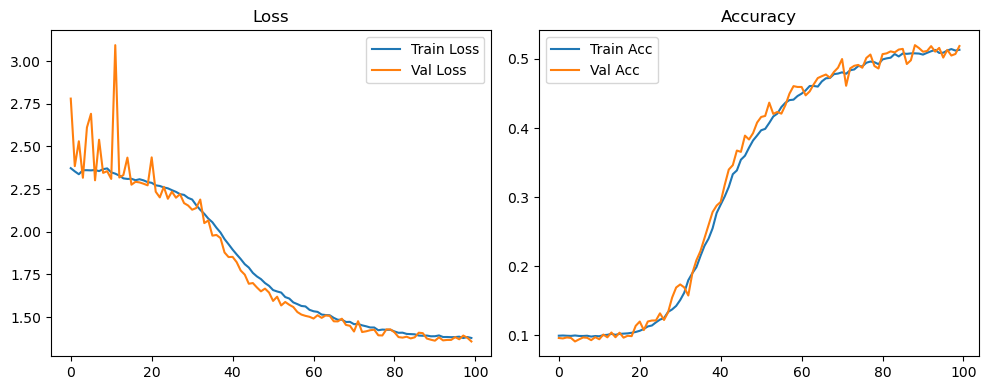

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.35it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.36it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 1.3732 Accuracy: 0.5090


🚀 Running: batch512_lr_max_0.001_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   1%|          | 1/100 [01:21<2:15:03, 81.85s/it]

| LR: 0.001000 | Train Acc: 0.1003 | Val Acc: 0.0909 |:   1%|          | 1/100 [02:44<2:15:03, 81.85s/it]

| LR: 0.001000 | Train Acc: 0.1003 | Val Acc: 0.0909 |:   1%|          | 1/100 [02:44<2:15:03, 81.85s/it]

| LR: 0.001000 | Train Acc: 0.1003 | Val Acc: 0.0909 |:   2%|▏         | 2/100 [02:44<2:14:26, 82.31s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0930 |:   2%|▏         | 2/100 [04:07<2:14:26, 82.31s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0930 |:   2%|▏         | 2/100 [04:07<2:14:26, 82.31s/it]

| LR: 0.000999 | Train Acc: 0.0996 | Val Acc: 0.0930 |:   3%|▎         | 3/100 [04:07<2:13:28, 82.56s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0946 |:   3%|▎         | 3/100 [05:17<2:13:28, 82.56s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0946 |:   3%|▎         | 3/100 [05:17<2:13:28, 82.56s/it]

| LR: 0.000998 | Train Acc: 0.1000 | Val Acc: 0.0946 |:   4%|▍         | 4/100 [05:17<2:04:01, 77.52s/it]

| LR: 0.000996 | Train Acc: 0.1001 | Val Acc: 0.0980 |:   4%|▍         | 4/100 [05:30<2:04:01, 77.52s/it]

| LR: 0.000996 | Train Acc: 0.1001 | Val Acc: 0.0980 |:   4%|▍         | 4/100 [05:30<2:04:01, 77.52s/it]

| LR: 0.000996 | Train Acc: 0.1001 | Val Acc: 0.0980 |:   5%|▌         | 5/100 [05:30<1:25:59, 54.31s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:43<1:25:59, 54.31s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:43<1:25:59, 54.31s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [05:43<1:03:09, 40.31s/it]

| LR: 0.000991 | Train Acc: 0.0992 | Val Acc: 0.1098 |:   6%|▌         | 6/100 [05:56<1:03:09, 40.31s/it]

| LR: 0.000991 | Train Acc: 0.0992 | Val Acc: 0.1098 |:   6%|▌         | 6/100 [05:56<1:03:09, 40.31s/it]

| LR: 0.000991 | Train Acc: 0.0992 | Val Acc: 0.1098 |:   7%|▋         | 7/100 [05:56<48:42, 31.43s/it]  

| LR: 0.000988 | Train Acc: 0.0991 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [06:09<48:42, 31.43s/it]

| LR: 0.000988 | Train Acc: 0.0991 | Val Acc: 0.0976 |:   7%|▋         | 7/100 [06:09<48:42, 31.43s/it]

| LR: 0.000988 | Train Acc: 0.0991 | Val Acc: 0.0976 |:   8%|▊         | 8/100 [06:09<39:17, 25.63s/it]

| LR: 0.000984 | Train Acc: 0.0990 | Val Acc: 0.0946 |:   8%|▊         | 8/100 [06:22<39:17, 25.63s/it]

| LR: 0.000984 | Train Acc: 0.0990 | Val Acc: 0.0946 |:   8%|▊         | 8/100 [06:22<39:17, 25.63s/it]

| LR: 0.000984 | Train Acc: 0.0990 | Val Acc: 0.0946 |:   9%|▉         | 9/100 [06:23<33:00, 21.76s/it]

| LR: 0.000980 | Train Acc: 0.0997 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [06:36<33:00, 21.76s/it]

| LR: 0.000980 | Train Acc: 0.0997 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [06:36<33:00, 21.76s/it]

| LR: 0.000980 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:36<28:40, 19.12s/it]

| LR: 0.000976 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  10%|█         | 10/100 [06:49<28:40, 19.12s/it]

| LR: 0.000976 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  10%|█         | 10/100 [06:49<28:40, 19.12s/it]

| LR: 0.000976 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  11%|█         | 11/100 [06:49<25:42, 17.33s/it]

| LR: 0.000971 | Train Acc: 0.0994 | Val Acc: 0.1008 |:  11%|█         | 11/100 [07:02<25:42, 17.33s/it]

| LR: 0.000971 | Train Acc: 0.0994 | Val Acc: 0.1008 |:  11%|█         | 11/100 [07:02<25:42, 17.33s/it]

| LR: 0.000971 | Train Acc: 0.0994 | Val Acc: 0.1008 |:  12%|█▏        | 12/100 [07:02<23:33, 16.06s/it]

| LR: 0.000965 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [07:15<23:33, 16.06s/it]

| LR: 0.000965 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [07:15<23:33, 16.06s/it]

| LR: 0.000965 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:15<22:02, 15.21s/it]

| LR: 0.000959 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  13%|█▎        | 13/100 [07:29<22:02, 15.21s/it]

| LR: 0.000959 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  13%|█▎        | 13/100 [07:29<22:02, 15.21s/it]

| LR: 0.000959 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:29<20:57, 14.62s/it]

| LR: 0.000953 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  14%|█▍        | 14/100 [07:42<20:57, 14.62s/it]

| LR: 0.000953 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  14%|█▍        | 14/100 [07:42<20:57, 14.62s/it]

| LR: 0.000953 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  15%|█▌        | 15/100 [07:42<20:07, 14.21s/it]

| LR: 0.000946 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:55<20:07, 14.21s/it]

| LR: 0.000946 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:55<20:07, 14.21s/it]

| LR: 0.000946 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [07:55<19:28, 13.91s/it]

| LR: 0.000939 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [08:08<19:28, 13.91s/it]

| LR: 0.000939 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [08:08<19:28, 13.91s/it]

| LR: 0.000939 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [08:08<18:57, 13.70s/it]

| LR: 0.000931 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:22<18:57, 13.70s/it]

| LR: 0.000931 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:22<18:57, 13.70s/it]

| LR: 0.000931 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:22<18:31, 13.55s/it]

| LR: 0.000923 | Train Acc: 0.0988 | Val Acc: 0.0975 |:  18%|█▊        | 18/100 [08:35<18:31, 13.55s/it]

| LR: 0.000923 | Train Acc: 0.0988 | Val Acc: 0.0975 |:  18%|█▊        | 18/100 [08:35<18:31, 13.55s/it]

| LR: 0.000923 | Train Acc: 0.0988 | Val Acc: 0.0975 |:  19%|█▉        | 19/100 [08:35<18:11, 13.47s/it]

| LR: 0.000914 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  19%|█▉        | 19/100 [08:48<18:11, 13.47s/it]

| LR: 0.000914 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  19%|█▉        | 19/100 [08:48<18:11, 13.47s/it]

| LR: 0.000914 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  20%|██        | 20/100 [08:48<17:51, 13.39s/it]

| LR: 0.000905 | Train Acc: 0.1009 | Val Acc: 0.0965 |:  20%|██        | 20/100 [09:01<17:51, 13.39s/it]

| LR: 0.000905 | Train Acc: 0.1009 | Val Acc: 0.0965 |:  20%|██        | 20/100 [09:01<17:51, 13.39s/it]

| LR: 0.000905 | Train Acc: 0.1009 | Val Acc: 0.0965 |:  21%|██        | 21/100 [09:01<17:34, 13.35s/it]

| LR: 0.000896 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  21%|██        | 21/100 [09:14<17:34, 13.35s/it]

| LR: 0.000896 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  21%|██        | 21/100 [09:14<17:34, 13.35s/it]

| LR: 0.000896 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [09:14<17:16, 13.29s/it]

| LR: 0.000886 | Train Acc: 0.1008 | Val Acc: 0.0949 |:  22%|██▏       | 22/100 [09:28<17:16, 13.29s/it]

| LR: 0.000886 | Train Acc: 0.1008 | Val Acc: 0.0949 |:  22%|██▏       | 22/100 [09:28<17:16, 13.29s/it]

| LR: 0.000886 | Train Acc: 0.1008 | Val Acc: 0.0949 |:  23%|██▎       | 23/100 [09:28<17:04, 13.30s/it]

| LR: 0.000876 | Train Acc: 0.0990 | Val Acc: 0.1025 |:  23%|██▎       | 23/100 [09:41<17:04, 13.30s/it]

| LR: 0.000876 | Train Acc: 0.0990 | Val Acc: 0.1025 |:  23%|██▎       | 23/100 [09:41<17:04, 13.30s/it]

| LR: 0.000876 | Train Acc: 0.0990 | Val Acc: 0.1025 |:  24%|██▍       | 24/100 [09:41<16:47, 13.25s/it]

| LR: 0.000866 | Train Acc: 0.1031 | Val Acc: 0.1065 |:  24%|██▍       | 24/100 [09:54<16:47, 13.25s/it]

| LR: 0.000866 | Train Acc: 0.1031 | Val Acc: 0.1065 |:  24%|██▍       | 24/100 [09:54<16:47, 13.25s/it]

| LR: 0.000866 | Train Acc: 0.1031 | Val Acc: 0.1065 |:  25%|██▌       | 25/100 [09:54<16:33, 13.25s/it]

| LR: 0.000855 | Train Acc: 0.1047 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [10:07<16:33, 13.25s/it]

| LR: 0.000855 | Train Acc: 0.1047 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [10:07<16:33, 13.25s/it]

| LR: 0.000855 | Train Acc: 0.1047 | Val Acc: 0.0957 |:  26%|██▌       | 26/100 [10:07<16:18, 13.23s/it]

| LR: 0.000844 | Train Acc: 0.1077 | Val Acc: 0.0994 |:  26%|██▌       | 26/100 [10:21<16:18, 13.23s/it]

| LR: 0.000844 | Train Acc: 0.1077 | Val Acc: 0.0994 |:  26%|██▌       | 26/100 [10:21<16:18, 13.23s/it]

| LR: 0.000844 | Train Acc: 0.1077 | Val Acc: 0.0994 |:  27%|██▋       | 27/100 [10:21<16:07, 13.26s/it]

| LR: 0.000832 | Train Acc: 0.1076 | Val Acc: 0.0997 |:  27%|██▋       | 27/100 [10:34<16:07, 13.26s/it]

| LR: 0.000832 | Train Acc: 0.1076 | Val Acc: 0.0997 |:  27%|██▋       | 27/100 [10:34<16:07, 13.26s/it]

| LR: 0.000832 | Train Acc: 0.1076 | Val Acc: 0.0997 |:  28%|██▊       | 28/100 [10:34<15:53, 13.24s/it]

| LR: 0.000821 | Train Acc: 0.1121 | Val Acc: 0.1097 |:  28%|██▊       | 28/100 [10:47<15:53, 13.24s/it]

| LR: 0.000821 | Train Acc: 0.1121 | Val Acc: 0.1097 |:  28%|██▊       | 28/100 [10:47<15:53, 13.24s/it]

| LR: 0.000821 | Train Acc: 0.1121 | Val Acc: 0.1097 |:  29%|██▉       | 29/100 [10:47<15:40, 13.25s/it]

| LR: 0.000808 | Train Acc: 0.1143 | Val Acc: 0.1057 |:  29%|██▉       | 29/100 [11:00<15:40, 13.25s/it]

| LR: 0.000808 | Train Acc: 0.1143 | Val Acc: 0.1057 |:  29%|██▉       | 29/100 [11:00<15:40, 13.25s/it]

| LR: 0.000808 | Train Acc: 0.1143 | Val Acc: 0.1057 |:  30%|███       | 30/100 [11:00<15:27, 13.25s/it]

| LR: 0.000796 | Train Acc: 0.1153 | Val Acc: 0.1055 |:  30%|███       | 30/100 [11:14<15:27, 13.25s/it]

| LR: 0.000796 | Train Acc: 0.1153 | Val Acc: 0.1055 |:  30%|███       | 30/100 [11:14<15:27, 13.25s/it]

| LR: 0.000796 | Train Acc: 0.1153 | Val Acc: 0.1055 |:  31%|███       | 31/100 [11:14<15:16, 13.28s/it]

| LR: 0.000783 | Train Acc: 0.1178 | Val Acc: 0.1174 |:  31%|███       | 31/100 [11:27<15:16, 13.28s/it]

| LR: 0.000783 | Train Acc: 0.1178 | Val Acc: 0.1174 |:  31%|███       | 31/100 [11:27<15:16, 13.28s/it]

| LR: 0.000783 | Train Acc: 0.1178 | Val Acc: 0.1174 |:  32%|███▏      | 32/100 [11:27<15:03, 13.29s/it]

| LR: 0.000770 | Train Acc: 0.1215 | Val Acc: 0.1101 |:  32%|███▏      | 32/100 [11:40<15:03, 13.29s/it]

| LR: 0.000770 | Train Acc: 0.1215 | Val Acc: 0.1101 |:  32%|███▏      | 32/100 [11:40<15:03, 13.29s/it]

| LR: 0.000770 | Train Acc: 0.1215 | Val Acc: 0.1101 |:  33%|███▎      | 33/100 [11:40<14:48, 13.26s/it]

| LR: 0.000757 | Train Acc: 0.1235 | Val Acc: 0.1130 |:  33%|███▎      | 33/100 [11:53<14:48, 13.26s/it]

| LR: 0.000757 | Train Acc: 0.1235 | Val Acc: 0.1130 |:  33%|███▎      | 33/100 [11:53<14:48, 13.26s/it]

| LR: 0.000757 | Train Acc: 0.1235 | Val Acc: 0.1130 |:  34%|███▍      | 34/100 [11:53<14:32, 13.22s/it]

| LR: 0.000743 | Train Acc: 0.1275 | Val Acc: 0.1198 |:  34%|███▍      | 34/100 [12:06<14:32, 13.22s/it]

| LR: 0.000743 | Train Acc: 0.1275 | Val Acc: 0.1198 |:  34%|███▍      | 34/100 [12:06<14:32, 13.22s/it]

| LR: 0.000743 | Train Acc: 0.1275 | Val Acc: 0.1198 |:  35%|███▌      | 35/100 [12:07<14:18, 13.20s/it]

| LR: 0.000730 | Train Acc: 0.1310 | Val Acc: 0.1232 |:  35%|███▌      | 35/100 [12:20<14:18, 13.20s/it]

| LR: 0.000730 | Train Acc: 0.1310 | Val Acc: 0.1232 |:  35%|███▌      | 35/100 [12:20<14:18, 13.20s/it]

| LR: 0.000730 | Train Acc: 0.1310 | Val Acc: 0.1232 |:  36%|███▌      | 36/100 [12:20<14:03, 13.18s/it]

| LR: 0.000716 | Train Acc: 0.1335 | Val Acc: 0.1426 |:  36%|███▌      | 36/100 [12:33<14:03, 13.18s/it]

| LR: 0.000716 | Train Acc: 0.1335 | Val Acc: 0.1426 |:  36%|███▌      | 36/100 [12:33<14:03, 13.18s/it]

| LR: 0.000716 | Train Acc: 0.1335 | Val Acc: 0.1426 |:  37%|███▋      | 37/100 [12:33<13:49, 13.17s/it]

| LR: 0.000702 | Train Acc: 0.1413 | Val Acc: 0.1278 |:  37%|███▋      | 37/100 [12:46<13:49, 13.17s/it]

| LR: 0.000702 | Train Acc: 0.1413 | Val Acc: 0.1278 |:  37%|███▋      | 37/100 [12:46<13:49, 13.17s/it]

| LR: 0.000702 | Train Acc: 0.1413 | Val Acc: 0.1278 |:  38%|███▊      | 38/100 [12:46<13:36, 13.17s/it]

| LR: 0.000687 | Train Acc: 0.1422 | Val Acc: 0.1638 |:  38%|███▊      | 38/100 [12:59<13:36, 13.17s/it]

| LR: 0.000687 | Train Acc: 0.1422 | Val Acc: 0.1638 |:  38%|███▊      | 38/100 [12:59<13:36, 13.17s/it]

| LR: 0.000687 | Train Acc: 0.1422 | Val Acc: 0.1638 |:  39%|███▉      | 39/100 [12:59<13:23, 13.18s/it]

| LR: 0.000673 | Train Acc: 0.1453 | Val Acc: 0.1411 |:  39%|███▉      | 39/100 [13:12<13:23, 13.18s/it]

| LR: 0.000673 | Train Acc: 0.1453 | Val Acc: 0.1411 |:  39%|███▉      | 39/100 [13:12<13:23, 13.18s/it]

| LR: 0.000673 | Train Acc: 0.1453 | Val Acc: 0.1411 |:  40%|████      | 40/100 [13:12<13:10, 13.17s/it]

| LR: 0.000658 | Train Acc: 0.1532 | Val Acc: 0.1392 |:  40%|████      | 40/100 [13:25<13:10, 13.17s/it]

| LR: 0.000658 | Train Acc: 0.1532 | Val Acc: 0.1392 |:  40%|████      | 40/100 [13:25<13:10, 13.17s/it]

| LR: 0.000658 | Train Acc: 0.1532 | Val Acc: 0.1392 |:  41%|████      | 41/100 [13:25<12:56, 13.16s/it]

| LR: 0.000643 | Train Acc: 0.1592 | Val Acc: 0.1695 |:  41%|████      | 41/100 [13:39<12:56, 13.16s/it]

| LR: 0.000643 | Train Acc: 0.1592 | Val Acc: 0.1695 |:  41%|████      | 41/100 [13:39<12:56, 13.16s/it]

| LR: 0.000643 | Train Acc: 0.1592 | Val Acc: 0.1695 |:  42%|████▏     | 42/100 [13:39<12:45, 13.20s/it]

| LR: 0.000628 | Train Acc: 0.1646 | Val Acc: 0.1734 |:  42%|████▏     | 42/100 [13:52<12:45, 13.20s/it]

| LR: 0.000628 | Train Acc: 0.1646 | Val Acc: 0.1734 |:  42%|████▏     | 42/100 [13:52<12:45, 13.20s/it]

| LR: 0.000628 | Train Acc: 0.1646 | Val Acc: 0.1734 |:  43%|████▎     | 43/100 [13:52<12:33, 13.21s/it]

| LR: 0.000613 | Train Acc: 0.1684 | Val Acc: 0.1701 |:  43%|████▎     | 43/100 [14:05<12:33, 13.21s/it]

| LR: 0.000613 | Train Acc: 0.1684 | Val Acc: 0.1701 |:  43%|████▎     | 43/100 [14:05<12:33, 13.21s/it]

| LR: 0.000613 | Train Acc: 0.1684 | Val Acc: 0.1701 |:  44%|████▍     | 44/100 [14:05<12:19, 13.20s/it]

| LR: 0.000598 | Train Acc: 0.1713 | Val Acc: 0.1750 |:  44%|████▍     | 44/100 [14:18<12:19, 13.20s/it]

| LR: 0.000598 | Train Acc: 0.1713 | Val Acc: 0.1750 |:  44%|████▍     | 44/100 [14:18<12:19, 13.20s/it]

| LR: 0.000598 | Train Acc: 0.1713 | Val Acc: 0.1750 |:  45%|████▌     | 45/100 [14:18<12:06, 13.21s/it]

| LR: 0.000582 | Train Acc: 0.1790 | Val Acc: 0.1934 |:  45%|████▌     | 45/100 [14:31<12:06, 13.21s/it]

| LR: 0.000582 | Train Acc: 0.1790 | Val Acc: 0.1934 |:  45%|████▌     | 45/100 [14:31<12:06, 13.21s/it]

| LR: 0.000582 | Train Acc: 0.1790 | Val Acc: 0.1934 |:  46%|████▌     | 46/100 [14:32<11:51, 13.18s/it]

| LR: 0.000567 | Train Acc: 0.1831 | Val Acc: 0.2035 |:  46%|████▌     | 46/100 [14:45<11:51, 13.18s/it]

| LR: 0.000567 | Train Acc: 0.1831 | Val Acc: 0.2035 |:  46%|████▌     | 46/100 [14:45<11:51, 13.18s/it]

| LR: 0.000567 | Train Acc: 0.1831 | Val Acc: 0.2035 |:  47%|████▋     | 47/100 [14:45<11:40, 13.21s/it]

| LR: 0.000552 | Train Acc: 0.1900 | Val Acc: 0.1896 |:  47%|████▋     | 47/100 [14:58<11:40, 13.21s/it]

| LR: 0.000552 | Train Acc: 0.1900 | Val Acc: 0.1896 |:  47%|████▋     | 47/100 [14:58<11:40, 13.21s/it]

| LR: 0.000552 | Train Acc: 0.1900 | Val Acc: 0.1896 |:  48%|████▊     | 48/100 [14:58<11:27, 13.22s/it]

| LR: 0.000536 | Train Acc: 0.1975 | Val Acc: 0.2182 |:  48%|████▊     | 48/100 [15:11<11:27, 13.22s/it]

| LR: 0.000536 | Train Acc: 0.1975 | Val Acc: 0.2182 |:  48%|████▊     | 48/100 [15:11<11:27, 13.22s/it]

| LR: 0.000536 | Train Acc: 0.1975 | Val Acc: 0.2182 |:  49%|████▉     | 49/100 [15:11<11:14, 13.22s/it]

| LR: 0.000521 | Train Acc: 0.1980 | Val Acc: 0.2127 |:  49%|████▉     | 49/100 [15:24<11:14, 13.22s/it]

| LR: 0.000521 | Train Acc: 0.1980 | Val Acc: 0.2127 |:  49%|████▉     | 49/100 [15:24<11:14, 13.22s/it]

| LR: 0.000521 | Train Acc: 0.1980 | Val Acc: 0.2127 |:  50%|█████     | 50/100 [15:24<11:00, 13.20s/it]

| LR: 0.000505 | Train Acc: 0.2037 | Val Acc: 0.2120 |:  50%|█████     | 50/100 [15:38<11:00, 13.20s/it]

| LR: 0.000505 | Train Acc: 0.2037 | Val Acc: 0.2120 |:  50%|█████     | 50/100 [15:38<11:00, 13.20s/it]

| LR: 0.000505 | Train Acc: 0.2037 | Val Acc: 0.2120 |:  51%|█████     | 51/100 [15:38<10:49, 13.25s/it]

| LR: 0.000489 | Train Acc: 0.2089 | Val Acc: 0.2284 |:  51%|█████     | 51/100 [15:51<10:49, 13.25s/it]

| LR: 0.000489 | Train Acc: 0.2089 | Val Acc: 0.2284 |:  51%|█████     | 51/100 [15:51<10:49, 13.25s/it]

| LR: 0.000489 | Train Acc: 0.2089 | Val Acc: 0.2284 |:  52%|█████▏    | 52/100 [15:51<10:34, 13.23s/it]

| LR: 0.000474 | Train Acc: 0.2193 | Val Acc: 0.2284 |:  52%|█████▏    | 52/100 [16:04<10:34, 13.23s/it]

| LR: 0.000474 | Train Acc: 0.2193 | Val Acc: 0.2284 |:  52%|█████▏    | 52/100 [16:04<10:34, 13.23s/it]

| LR: 0.000474 | Train Acc: 0.2193 | Val Acc: 0.2284 |:  53%|█████▎    | 53/100 [16:04<10:21, 13.23s/it]

| LR: 0.000458 | Train Acc: 0.2290 | Val Acc: 0.2681 |:  53%|█████▎    | 53/100 [16:17<10:21, 13.23s/it]

| LR: 0.000458 | Train Acc: 0.2290 | Val Acc: 0.2681 |:  53%|█████▎    | 53/100 [16:17<10:21, 13.23s/it]

| LR: 0.000458 | Train Acc: 0.2290 | Val Acc: 0.2681 |:  54%|█████▍    | 54/100 [16:17<10:07, 13.21s/it]

| LR: 0.000443 | Train Acc: 0.2293 | Val Acc: 0.2509 |:  54%|█████▍    | 54/100 [16:31<10:07, 13.21s/it]

| LR: 0.000443 | Train Acc: 0.2293 | Val Acc: 0.2509 |:  54%|█████▍    | 54/100 [16:31<10:07, 13.21s/it]

| LR: 0.000443 | Train Acc: 0.2293 | Val Acc: 0.2509 |:  55%|█████▌    | 55/100 [16:31<09:54, 13.22s/it]

| LR: 0.000428 | Train Acc: 0.2359 | Val Acc: 0.2461 |:  55%|█████▌    | 55/100 [16:44<09:54, 13.22s/it]

| LR: 0.000428 | Train Acc: 0.2359 | Val Acc: 0.2461 |:  55%|█████▌    | 55/100 [16:44<09:54, 13.22s/it]

| LR: 0.000428 | Train Acc: 0.2359 | Val Acc: 0.2461 |:  56%|█████▌    | 56/100 [16:44<09:41, 13.20s/it]

| LR: 0.000412 | Train Acc: 0.2440 | Val Acc: 0.2811 |:  56%|█████▌    | 56/100 [16:57<09:41, 13.20s/it]

| LR: 0.000412 | Train Acc: 0.2440 | Val Acc: 0.2811 |:  56%|█████▌    | 56/100 [16:57<09:41, 13.20s/it]

| LR: 0.000412 | Train Acc: 0.2440 | Val Acc: 0.2811 |:  57%|█████▋    | 57/100 [16:57<09:27, 13.19s/it]

| LR: 0.000397 | Train Acc: 0.2519 | Val Acc: 0.2799 |:  57%|█████▋    | 57/100 [17:10<09:27, 13.19s/it]

| LR: 0.000397 | Train Acc: 0.2519 | Val Acc: 0.2799 |:  57%|█████▋    | 57/100 [17:10<09:27, 13.19s/it]

| LR: 0.000397 | Train Acc: 0.2519 | Val Acc: 0.2799 |:  58%|█████▊    | 58/100 [17:10<09:13, 13.18s/it]

| LR: 0.000382 | Train Acc: 0.2625 | Val Acc: 0.2736 |:  58%|█████▊    | 58/100 [17:23<09:13, 13.18s/it]

| LR: 0.000382 | Train Acc: 0.2625 | Val Acc: 0.2736 |:  58%|█████▊    | 58/100 [17:23<09:13, 13.18s/it]

| LR: 0.000382 | Train Acc: 0.2625 | Val Acc: 0.2736 |:  59%|█████▉    | 59/100 [17:23<09:00, 13.19s/it]

| LR: 0.000367 | Train Acc: 0.2615 | Val Acc: 0.2840 |:  59%|█████▉    | 59/100 [17:36<09:00, 13.19s/it]

| LR: 0.000367 | Train Acc: 0.2615 | Val Acc: 0.2840 |:  59%|█████▉    | 59/100 [17:36<09:00, 13.19s/it]

| LR: 0.000367 | Train Acc: 0.2615 | Val Acc: 0.2840 |:  60%|██████    | 60/100 [17:36<08:47, 13.18s/it]

| LR: 0.000352 | Train Acc: 0.2717 | Val Acc: 0.2916 |:  60%|██████    | 60/100 [17:50<08:47, 13.18s/it]

| LR: 0.000352 | Train Acc: 0.2717 | Val Acc: 0.2916 |:  60%|██████    | 60/100 [17:50<08:47, 13.18s/it]

| LR: 0.000352 | Train Acc: 0.2717 | Val Acc: 0.2916 |:  61%|██████    | 61/100 [17:50<08:35, 13.23s/it]

| LR: 0.000337 | Train Acc: 0.2818 | Val Acc: 0.3211 |:  61%|██████    | 61/100 [18:03<08:35, 13.23s/it]

| LR: 0.000337 | Train Acc: 0.2818 | Val Acc: 0.3211 |:  61%|██████    | 61/100 [18:03<08:35, 13.23s/it]

| LR: 0.000337 | Train Acc: 0.2818 | Val Acc: 0.3211 |:  62%|██████▏   | 62/100 [18:03<08:21, 13.21s/it]

| LR: 0.000323 | Train Acc: 0.2816 | Val Acc: 0.3073 |:  62%|██████▏   | 62/100 [18:16<08:21, 13.21s/it]

| LR: 0.000323 | Train Acc: 0.2816 | Val Acc: 0.3073 |:  62%|██████▏   | 62/100 [18:16<08:21, 13.21s/it]

| LR: 0.000323 | Train Acc: 0.2816 | Val Acc: 0.3073 |:  63%|██████▎   | 63/100 [18:16<08:09, 13.22s/it]

| LR: 0.000308 | Train Acc: 0.2899 | Val Acc: 0.3241 |:  63%|██████▎   | 63/100 [18:29<08:09, 13.22s/it]

| LR: 0.000308 | Train Acc: 0.2899 | Val Acc: 0.3241 |:  63%|██████▎   | 63/100 [18:29<08:09, 13.22s/it]

| LR: 0.000308 | Train Acc: 0.2899 | Val Acc: 0.3241 |:  64%|██████▍   | 64/100 [18:29<07:55, 13.21s/it]

| LR: 0.000294 | Train Acc: 0.2997 | Val Acc: 0.3302 |:  64%|██████▍   | 64/100 [18:42<07:55, 13.21s/it]

| LR: 0.000294 | Train Acc: 0.2997 | Val Acc: 0.3302 |:  64%|██████▍   | 64/100 [18:42<07:55, 13.21s/it]

| LR: 0.000294 | Train Acc: 0.2997 | Val Acc: 0.3302 |:  65%|██████▌   | 65/100 [18:43<07:41, 13.19s/it]

| LR: 0.000280 | Train Acc: 0.3035 | Val Acc: 0.3050 |:  65%|██████▌   | 65/100 [18:56<07:41, 13.19s/it]

| LR: 0.000280 | Train Acc: 0.3035 | Val Acc: 0.3050 |:  65%|██████▌   | 65/100 [18:56<07:41, 13.19s/it]

| LR: 0.000280 | Train Acc: 0.3035 | Val Acc: 0.3050 |:  66%|██████▌   | 66/100 [18:56<07:27, 13.18s/it]

| LR: 0.000267 | Train Acc: 0.3044 | Val Acc: 0.3322 |:  66%|██████▌   | 66/100 [19:09<07:27, 13.18s/it]

| LR: 0.000267 | Train Acc: 0.3044 | Val Acc: 0.3322 |:  66%|██████▌   | 66/100 [19:09<07:27, 13.18s/it]

| LR: 0.000267 | Train Acc: 0.3044 | Val Acc: 0.3322 |:  67%|██████▋   | 67/100 [19:09<07:15, 13.18s/it]

| LR: 0.000253 | Train Acc: 0.3108 | Val Acc: 0.3660 |:  67%|██████▋   | 67/100 [19:22<07:15, 13.18s/it]

| LR: 0.000253 | Train Acc: 0.3108 | Val Acc: 0.3660 |:  67%|██████▋   | 67/100 [19:22<07:15, 13.18s/it]

| LR: 0.000253 | Train Acc: 0.3108 | Val Acc: 0.3660 |:  68%|██████▊   | 68/100 [19:22<07:02, 13.19s/it]

| LR: 0.000240 | Train Acc: 0.3193 | Val Acc: 0.3550 |:  68%|██████▊   | 68/100 [19:35<07:02, 13.19s/it]

| LR: 0.000240 | Train Acc: 0.3193 | Val Acc: 0.3550 |:  68%|██████▊   | 68/100 [19:35<07:02, 13.19s/it]

| LR: 0.000240 | Train Acc: 0.3193 | Val Acc: 0.3550 |:  69%|██████▉   | 69/100 [19:35<06:48, 13.18s/it]

| LR: 0.000227 | Train Acc: 0.3255 | Val Acc: 0.3227 |:  69%|██████▉   | 69/100 [19:48<06:48, 13.18s/it]

| LR: 0.000227 | Train Acc: 0.3255 | Val Acc: 0.3227 |:  69%|██████▉   | 69/100 [19:48<06:48, 13.18s/it]

| LR: 0.000227 | Train Acc: 0.3255 | Val Acc: 0.3227 |:  70%|███████   | 70/100 [19:49<06:36, 13.21s/it]

| LR: 0.000214 | Train Acc: 0.3260 | Val Acc: 0.2859 |:  70%|███████   | 70/100 [20:02<06:36, 13.21s/it]

| LR: 0.000214 | Train Acc: 0.3260 | Val Acc: 0.2859 |:  70%|███████   | 70/100 [20:02<06:36, 13.21s/it]

| LR: 0.000214 | Train Acc: 0.3260 | Val Acc: 0.2859 |:  71%|███████   | 71/100 [20:02<06:22, 13.18s/it]

| LR: 0.000202 | Train Acc: 0.3314 | Val Acc: 0.3592 |:  71%|███████   | 71/100 [20:15<06:22, 13.18s/it]

| LR: 0.000202 | Train Acc: 0.3314 | Val Acc: 0.3592 |:  71%|███████   | 71/100 [20:15<06:22, 13.18s/it]

| LR: 0.000202 | Train Acc: 0.3314 | Val Acc: 0.3592 |:  72%|███████▏  | 72/100 [20:15<06:08, 13.17s/it]

| LR: 0.000189 | Train Acc: 0.3351 | Val Acc: 0.3397 |:  72%|███████▏  | 72/100 [20:28<06:08, 13.17s/it]

| LR: 0.000189 | Train Acc: 0.3351 | Val Acc: 0.3397 |:  72%|███████▏  | 72/100 [20:28<06:08, 13.17s/it]

| LR: 0.000189 | Train Acc: 0.3351 | Val Acc: 0.3397 |:  73%|███████▎  | 73/100 [20:28<05:55, 13.17s/it]

| LR: 0.000178 | Train Acc: 0.3373 | Val Acc: 0.3685 |:  73%|███████▎  | 73/100 [20:41<05:55, 13.17s/it]

| LR: 0.000178 | Train Acc: 0.3373 | Val Acc: 0.3685 |:  73%|███████▎  | 73/100 [20:41<05:55, 13.17s/it]

| LR: 0.000178 | Train Acc: 0.3373 | Val Acc: 0.3685 |:  74%|███████▍  | 74/100 [20:41<05:42, 13.16s/it]

| LR: 0.000166 | Train Acc: 0.3446 | Val Acc: 0.3671 |:  74%|███████▍  | 74/100 [20:54<05:42, 13.16s/it]

| LR: 0.000166 | Train Acc: 0.3446 | Val Acc: 0.3671 |:  74%|███████▍  | 74/100 [20:54<05:42, 13.16s/it]

| LR: 0.000166 | Train Acc: 0.3446 | Val Acc: 0.3671 |:  75%|███████▌  | 75/100 [20:54<05:28, 13.15s/it]

| LR: 0.000155 | Train Acc: 0.3447 | Val Acc: 0.3755 |:  75%|███████▌  | 75/100 [21:07<05:28, 13.15s/it]

| LR: 0.000155 | Train Acc: 0.3447 | Val Acc: 0.3755 |:  75%|███████▌  | 75/100 [21:07<05:28, 13.15s/it]

| LR: 0.000155 | Train Acc: 0.3447 | Val Acc: 0.3755 |:  76%|███████▌  | 76/100 [21:07<05:15, 13.15s/it]

| LR: 0.000144 | Train Acc: 0.3460 | Val Acc: 0.3558 |:  76%|███████▌  | 76/100 [21:20<05:15, 13.15s/it]

| LR: 0.000144 | Train Acc: 0.3460 | Val Acc: 0.3558 |:  76%|███████▌  | 76/100 [21:20<05:15, 13.15s/it]

| LR: 0.000144 | Train Acc: 0.3460 | Val Acc: 0.3558 |:  77%|███████▋  | 77/100 [21:21<05:02, 13.15s/it]

| LR: 0.000134 | Train Acc: 0.3508 | Val Acc: 0.3842 |:  77%|███████▋  | 77/100 [21:34<05:02, 13.15s/it]

| LR: 0.000134 | Train Acc: 0.3508 | Val Acc: 0.3842 |:  77%|███████▋  | 77/100 [21:34<05:02, 13.15s/it]

| LR: 0.000134 | Train Acc: 0.3508 | Val Acc: 0.3842 |:  78%|███████▊  | 78/100 [21:34<04:49, 13.17s/it]

| LR: 0.000124 | Train Acc: 0.3562 | Val Acc: 0.3992 |:  78%|███████▊  | 78/100 [21:47<04:49, 13.17s/it]

| LR: 0.000124 | Train Acc: 0.3562 | Val Acc: 0.3992 |:  78%|███████▊  | 78/100 [21:47<04:49, 13.17s/it]

| LR: 0.000124 | Train Acc: 0.3562 | Val Acc: 0.3992 |:  79%|███████▉  | 79/100 [21:47<04:37, 13.22s/it]

| LR: 0.000114 | Train Acc: 0.3525 | Val Acc: 0.3889 |:  79%|███████▉  | 79/100 [22:00<04:37, 13.22s/it]

| LR: 0.000114 | Train Acc: 0.3525 | Val Acc: 0.3889 |:  79%|███████▉  | 79/100 [22:00<04:37, 13.22s/it]

| LR: 0.000114 | Train Acc: 0.3525 | Val Acc: 0.3889 |:  80%|████████  | 80/100 [22:00<04:24, 13.23s/it]

| LR: 0.000105 | Train Acc: 0.3585 | Val Acc: 0.4031 |:  80%|████████  | 80/100 [22:13<04:24, 13.23s/it]

| LR: 0.000105 | Train Acc: 0.3585 | Val Acc: 0.4031 |:  80%|████████  | 80/100 [22:13<04:24, 13.23s/it]

| LR: 0.000105 | Train Acc: 0.3585 | Val Acc: 0.4031 |:  81%|████████  | 81/100 [22:14<04:11, 13.23s/it]

| LR: 0.000096 | Train Acc: 0.3591 | Val Acc: 0.4175 |:  81%|████████  | 81/100 [22:27<04:11, 13.23s/it]

| LR: 0.000096 | Train Acc: 0.3591 | Val Acc: 0.4175 |:  81%|████████  | 81/100 [22:27<04:11, 13.23s/it]

| LR: 0.000096 | Train Acc: 0.3591 | Val Acc: 0.4175 |:  82%|████████▏ | 82/100 [22:27<03:58, 13.23s/it]

| LR: 0.000087 | Train Acc: 0.3590 | Val Acc: 0.3925 |:  82%|████████▏ | 82/100 [22:40<03:58, 13.23s/it]

| LR: 0.000087 | Train Acc: 0.3590 | Val Acc: 0.3925 |:  82%|████████▏ | 82/100 [22:40<03:58, 13.23s/it]

| LR: 0.000087 | Train Acc: 0.3590 | Val Acc: 0.3925 |:  83%|████████▎ | 83/100 [22:40<03:44, 13.22s/it]

| LR: 0.000079 | Train Acc: 0.3614 | Val Acc: 0.4000 |:  83%|████████▎ | 83/100 [22:53<03:44, 13.22s/it]

| LR: 0.000079 | Train Acc: 0.3614 | Val Acc: 0.4000 |:  83%|████████▎ | 83/100 [22:53<03:44, 13.22s/it]

| LR: 0.000079 | Train Acc: 0.3614 | Val Acc: 0.4000 |:  84%|████████▍ | 84/100 [22:53<03:31, 13.23s/it]

| LR: 0.000071 | Train Acc: 0.3651 | Val Acc: 0.4014 |:  84%|████████▍ | 84/100 [23:06<03:31, 13.23s/it]

| LR: 0.000071 | Train Acc: 0.3651 | Val Acc: 0.4014 |:  84%|████████▍ | 84/100 [23:06<03:31, 13.23s/it]

| LR: 0.000071 | Train Acc: 0.3651 | Val Acc: 0.4014 |:  85%|████████▌ | 85/100 [23:06<03:18, 13.23s/it]

| LR: 0.000064 | Train Acc: 0.3697 | Val Acc: 0.4022 |:  85%|████████▌ | 85/100 [23:20<03:18, 13.23s/it]

| LR: 0.000064 | Train Acc: 0.3697 | Val Acc: 0.4022 |:  85%|████████▌ | 85/100 [23:20<03:18, 13.23s/it]

| LR: 0.000064 | Train Acc: 0.3697 | Val Acc: 0.4022 |:  86%|████████▌ | 86/100 [23:20<03:05, 13.25s/it]

| LR: 0.000057 | Train Acc: 0.3715 | Val Acc: 0.3986 |:  86%|████████▌ | 86/100 [23:33<03:05, 13.25s/it]

| LR: 0.000057 | Train Acc: 0.3715 | Val Acc: 0.3986 |:  86%|████████▌ | 86/100 [23:33<03:05, 13.25s/it]

| LR: 0.000057 | Train Acc: 0.3715 | Val Acc: 0.3986 |:  87%|████████▋ | 87/100 [23:33<02:51, 13.21s/it]

| LR: 0.000051 | Train Acc: 0.3700 | Val Acc: 0.4062 |:  87%|████████▋ | 87/100 [23:46<02:51, 13.21s/it]

| LR: 0.000051 | Train Acc: 0.3700 | Val Acc: 0.4062 |:  87%|████████▋ | 87/100 [23:46<02:51, 13.21s/it]

| LR: 0.000051 | Train Acc: 0.3700 | Val Acc: 0.4062 |:  88%|████████▊ | 88/100 [23:46<02:38, 13.20s/it]

| LR: 0.000045 | Train Acc: 0.3714 | Val Acc: 0.4119 |:  88%|████████▊ | 88/100 [23:59<02:38, 13.20s/it]

| LR: 0.000045 | Train Acc: 0.3714 | Val Acc: 0.4119 |:  88%|████████▊ | 88/100 [23:59<02:38, 13.20s/it]

| LR: 0.000045 | Train Acc: 0.3714 | Val Acc: 0.4119 |:  89%|████████▉ | 89/100 [23:59<02:25, 13.22s/it]

| LR: 0.000039 | Train Acc: 0.3733 | Val Acc: 0.4176 |:  89%|████████▉ | 89/100 [24:12<02:25, 13.22s/it]

| LR: 0.000039 | Train Acc: 0.3733 | Val Acc: 0.4176 |:  89%|████████▉ | 89/100 [24:12<02:25, 13.22s/it]

| LR: 0.000039 | Train Acc: 0.3733 | Val Acc: 0.4176 |:  90%|█████████ | 90/100 [24:13<02:12, 13.21s/it]

| LR: 0.000034 | Train Acc: 0.3743 | Val Acc: 0.4083 |:  90%|█████████ | 90/100 [24:26<02:12, 13.21s/it]

| LR: 0.000034 | Train Acc: 0.3743 | Val Acc: 0.4083 |:  90%|█████████ | 90/100 [24:26<02:12, 13.21s/it]

| LR: 0.000034 | Train Acc: 0.3743 | Val Acc: 0.4083 |:  91%|█████████ | 91/100 [24:26<01:58, 13.18s/it]

| LR: 0.000030 | Train Acc: 0.3763 | Val Acc: 0.4085 |:  91%|█████████ | 91/100 [24:39<01:58, 13.18s/it]

| LR: 0.000030 | Train Acc: 0.3763 | Val Acc: 0.4085 |:  91%|█████████ | 91/100 [24:39<01:58, 13.18s/it]

| LR: 0.000030 | Train Acc: 0.3763 | Val Acc: 0.4085 |:  92%|█████████▏| 92/100 [24:39<01:45, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.3754 | Val Acc: 0.4126 |:  92%|█████████▏| 92/100 [24:52<01:45, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.3754 | Val Acc: 0.4126 |:  92%|█████████▏| 92/100 [24:52<01:45, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.3754 | Val Acc: 0.4126 |:  93%|█████████▎| 93/100 [24:52<01:32, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.3744 | Val Acc: 0.4183 |:  93%|█████████▎| 93/100 [25:05<01:32, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.3744 | Val Acc: 0.4183 |:  93%|█████████▎| 93/100 [25:05<01:32, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.3744 | Val Acc: 0.4183 |:  94%|█████████▍| 94/100 [25:05<01:19, 13.19s/it]

| LR: 0.000019 | Train Acc: 0.3786 | Val Acc: 0.4196 |:  94%|█████████▍| 94/100 [25:18<01:19, 13.19s/it]

| LR: 0.000019 | Train Acc: 0.3786 | Val Acc: 0.4196 |:  94%|█████████▍| 94/100 [25:18<01:19, 13.19s/it]

| LR: 0.000019 | Train Acc: 0.3786 | Val Acc: 0.4196 |:  95%|█████████▌| 95/100 [25:18<01:05, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.3791 | Val Acc: 0.4133 |:  95%|█████████▌| 95/100 [25:31<01:05, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.3791 | Val Acc: 0.4133 |:  95%|█████████▌| 95/100 [25:31<01:05, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.3791 | Val Acc: 0.4133 |:  96%|█████████▌| 96/100 [25:32<00:52, 13.18s/it]

| LR: 0.000014 | Train Acc: 0.3809 | Val Acc: 0.4083 |:  96%|█████████▌| 96/100 [25:45<00:52, 13.18s/it]

| LR: 0.000014 | Train Acc: 0.3809 | Val Acc: 0.4083 |:  96%|█████████▌| 96/100 [25:45<00:52, 13.18s/it]

| LR: 0.000014 | Train Acc: 0.3809 | Val Acc: 0.4083 |:  97%|█████████▋| 97/100 [25:45<00:39, 13.20s/it]

| LR: 0.000012 | Train Acc: 0.3803 | Val Acc: 0.4199 |:  97%|█████████▋| 97/100 [25:58<00:39, 13.20s/it]

| LR: 0.000012 | Train Acc: 0.3803 | Val Acc: 0.4199 |:  97%|█████████▋| 97/100 [25:58<00:39, 13.20s/it]

| LR: 0.000012 | Train Acc: 0.3803 | Val Acc: 0.4199 |:  98%|█████████▊| 98/100 [25:58<00:26, 13.23s/it]

| LR: 0.000011 | Train Acc: 0.3810 | Val Acc: 0.4062 |:  98%|█████████▊| 98/100 [26:11<00:26, 13.23s/it]

| LR: 0.000011 | Train Acc: 0.3810 | Val Acc: 0.4062 |:  98%|█████████▊| 98/100 [26:11<00:26, 13.23s/it]

| LR: 0.000011 | Train Acc: 0.3810 | Val Acc: 0.4062 |:  99%|█████████▉| 99/100 [26:11<00:13, 13.21s/it]

| LR: 0.000010 | Train Acc: 0.3782 | Val Acc: 0.4093 |:  99%|█████████▉| 99/100 [26:24<00:13, 13.21s/it]

| LR: 0.000010 | Train Acc: 0.3782 | Val Acc: 0.4093 |:  99%|█████████▉| 99/100 [26:24<00:13, 13.21s/it]

| LR: 0.000010 | Train Acc: 0.3782 | Val Acc: 0.4093 |: 100%|██████████| 100/100 [26:25<00:00, 13.23s/it]

| LR: 0.000010 | Train Acc: 0.3782 | Val Acc: 0.4093 |: 100%|██████████| 100/100 [26:25<00:00, 15.85s/it]

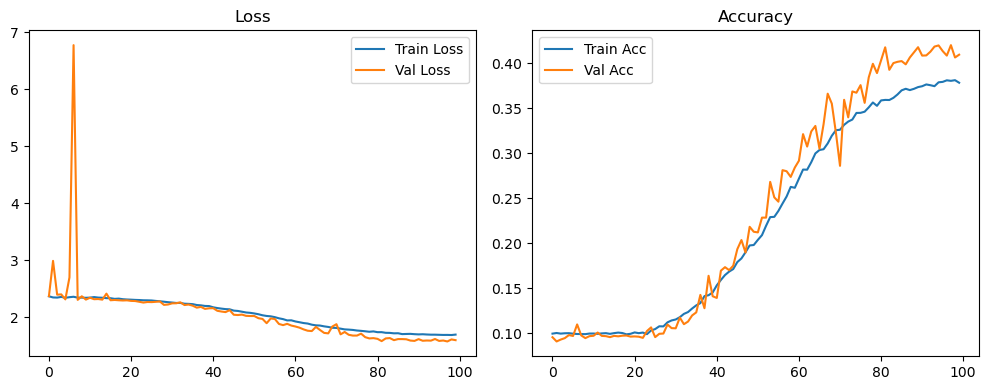

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.31it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

Original Model Final Test Loss: 1.5920 Accuracy: 0.4240


🚀 Running: batch512_lr_max_0.001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0990 | Val Acc: 0.0952 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0990 | Val Acc: 0.0952 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0990 | Val Acc: 0.0952 |:   1%|          | 1/100 [01:22<2:15:40, 82.23s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0940 |:   1%|          | 1/100 [02:44<2:15:40, 82.23s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0940 |:   1%|          | 1/100 [02:44<2:15:40, 82.23s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0940 |:   2%|▏         | 2/100 [02:44<2:14:45, 82.50s/it]

| LR: 0.000999 | Train Acc: 0.0998 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [04:08<2:14:45, 82.50s/it]

| LR: 0.000999 | Train Acc: 0.0998 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [04:08<2:14:45, 82.50s/it]

| LR: 0.000999 | Train Acc: 0.0998 | Val Acc: 0.0950 |:   3%|▎         | 3/100 [04:08<2:14:17, 83.07s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.0945 |:   3%|▎         | 3/100 [05:18<2:14:17, 83.07s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.0945 |:   3%|▎         | 3/100 [05:18<2:14:17, 83.07s/it]

| LR: 0.000998 | Train Acc: 0.0998 | Val Acc: 0.0945 |:   4%|▍         | 4/100 [05:18<2:04:42, 77.94s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0938 |:   4%|▍         | 4/100 [05:31<2:04:42, 77.94s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0938 |:   4%|▍         | 4/100 [05:31<2:04:42, 77.94s/it]

| LR: 0.000996 | Train Acc: 0.0990 | Val Acc: 0.0938 |:   5%|▌         | 5/100 [05:31<1:26:16, 54.49s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:44<1:26:16, 54.49s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:44<1:26:16, 54.49s/it]

| LR: 0.000994 | Train Acc: 0.0995 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [05:44<1:03:12, 40.34s/it]

| LR: 0.000991 | Train Acc: 0.1007 | Val Acc: 0.1091 |:   6%|▌         | 6/100 [05:57<1:03:12, 40.34s/it]

| LR: 0.000991 | Train Acc: 0.1007 | Val Acc: 0.1091 |:   6%|▌         | 6/100 [05:57<1:03:12, 40.34s/it]

| LR: 0.000991 | Train Acc: 0.1007 | Val Acc: 0.1091 |:   7%|▋         | 7/100 [05:57<48:37, 31.38s/it]  

| LR: 0.000988 | Train Acc: 0.1024 | Val Acc: 0.1034 |:   7%|▋         | 7/100 [06:10<48:37, 31.38s/it]

| LR: 0.000988 | Train Acc: 0.1024 | Val Acc: 0.1034 |:   7%|▋         | 7/100 [06:10<48:37, 31.38s/it]

| LR: 0.000988 | Train Acc: 0.1024 | Val Acc: 0.1034 |:   8%|▊         | 8/100 [06:10<39:03, 25.47s/it]

| LR: 0.000984 | Train Acc: 0.1028 | Val Acc: 0.1025 |:   8%|▊         | 8/100 [06:23<39:03, 25.47s/it]

| LR: 0.000984 | Train Acc: 0.1028 | Val Acc: 0.1025 |:   8%|▊         | 8/100 [06:23<39:03, 25.47s/it]

| LR: 0.000984 | Train Acc: 0.1028 | Val Acc: 0.1025 |:   9%|▉         | 9/100 [06:23<32:38, 21.52s/it]

| LR: 0.000980 | Train Acc: 0.1039 | Val Acc: 0.1059 |:   9%|▉         | 9/100 [06:35<32:38, 21.52s/it]

| LR: 0.000980 | Train Acc: 0.1039 | Val Acc: 0.1059 |:   9%|▉         | 9/100 [06:35<32:38, 21.52s/it]

| LR: 0.000980 | Train Acc: 0.1039 | Val Acc: 0.1059 |:  10%|█         | 10/100 [06:36<28:18, 18.87s/it]

| LR: 0.000976 | Train Acc: 0.1045 | Val Acc: 0.0977 |:  10%|█         | 10/100 [06:48<28:18, 18.87s/it]

| LR: 0.000976 | Train Acc: 0.1045 | Val Acc: 0.0977 |:  10%|█         | 10/100 [06:48<28:18, 18.87s/it]

| LR: 0.000976 | Train Acc: 0.1045 | Val Acc: 0.0977 |:  11%|█         | 11/100 [06:49<25:18, 17.07s/it]

| LR: 0.000970 | Train Acc: 0.1056 | Val Acc: 0.1091 |:  11%|█         | 11/100 [07:01<25:18, 17.07s/it]

| LR: 0.000970 | Train Acc: 0.1056 | Val Acc: 0.1091 |:  11%|█         | 11/100 [07:01<25:18, 17.07s/it]

| LR: 0.000970 | Train Acc: 0.1056 | Val Acc: 0.1091 |:  12%|█▏        | 12/100 [07:02<23:13, 15.84s/it]

| LR: 0.000965 | Train Acc: 0.1065 | Val Acc: 0.1186 |:  12%|█▏        | 12/100 [07:14<23:13, 15.84s/it]

| LR: 0.000965 | Train Acc: 0.1065 | Val Acc: 0.1186 |:  12%|█▏        | 12/100 [07:14<23:13, 15.84s/it]

| LR: 0.000965 | Train Acc: 0.1065 | Val Acc: 0.1186 |:  13%|█▎        | 13/100 [07:14<21:39, 14.94s/it]

| LR: 0.000959 | Train Acc: 0.1090 | Val Acc: 0.1247 |:  13%|█▎        | 13/100 [07:27<21:39, 14.94s/it]

| LR: 0.000959 | Train Acc: 0.1090 | Val Acc: 0.1247 |:  13%|█▎        | 13/100 [07:27<21:39, 14.94s/it]

| LR: 0.000959 | Train Acc: 0.1090 | Val Acc: 0.1247 |:  14%|█▍        | 14/100 [07:27<20:31, 14.32s/it]

| LR: 0.000952 | Train Acc: 0.1106 | Val Acc: 0.1088 |:  14%|█▍        | 14/100 [07:40<20:31, 14.32s/it]

| LR: 0.000952 | Train Acc: 0.1106 | Val Acc: 0.1088 |:  14%|█▍        | 14/100 [07:40<20:31, 14.32s/it]

| LR: 0.000952 | Train Acc: 0.1106 | Val Acc: 0.1088 |:  15%|█▌        | 15/100 [07:40<19:41, 13.90s/it]

| LR: 0.000946 | Train Acc: 0.1145 | Val Acc: 0.1494 |:  15%|█▌        | 15/100 [07:53<19:41, 13.90s/it]

| LR: 0.000946 | Train Acc: 0.1145 | Val Acc: 0.1494 |:  15%|█▌        | 15/100 [07:53<19:41, 13.90s/it]

| LR: 0.000946 | Train Acc: 0.1145 | Val Acc: 0.1494 |:  16%|█▌        | 16/100 [07:53<19:03, 13.61s/it]

| LR: 0.000938 | Train Acc: 0.1207 | Val Acc: 0.1287 |:  16%|█▌        | 16/100 [08:06<19:03, 13.61s/it]

| LR: 0.000938 | Train Acc: 0.1207 | Val Acc: 0.1287 |:  16%|█▌        | 16/100 [08:06<19:03, 13.61s/it]

| LR: 0.000938 | Train Acc: 0.1207 | Val Acc: 0.1287 |:  17%|█▋        | 17/100 [08:06<18:32, 13.40s/it]

| LR: 0.000930 | Train Acc: 0.1250 | Val Acc: 0.1151 |:  17%|█▋        | 17/100 [08:19<18:32, 13.40s/it]

| LR: 0.000930 | Train Acc: 0.1250 | Val Acc: 0.1151 |:  17%|█▋        | 17/100 [08:19<18:32, 13.40s/it]

| LR: 0.000930 | Train Acc: 0.1250 | Val Acc: 0.1151 |:  18%|█▊        | 18/100 [08:19<18:08, 13.27s/it]

| LR: 0.000922 | Train Acc: 0.1338 | Val Acc: 0.1266 |:  18%|█▊        | 18/100 [08:32<18:08, 13.27s/it]

| LR: 0.000922 | Train Acc: 0.1338 | Val Acc: 0.1266 |:  18%|█▊        | 18/100 [08:32<18:08, 13.27s/it]

| LR: 0.000922 | Train Acc: 0.1338 | Val Acc: 0.1266 |:  19%|█▉        | 19/100 [08:32<17:46, 13.16s/it]

| LR: 0.000914 | Train Acc: 0.1393 | Val Acc: 0.1722 |:  19%|█▉        | 19/100 [08:45<17:46, 13.16s/it]

| LR: 0.000914 | Train Acc: 0.1393 | Val Acc: 0.1722 |:  19%|█▉        | 19/100 [08:45<17:46, 13.16s/it]

| LR: 0.000914 | Train Acc: 0.1393 | Val Acc: 0.1722 |:  20%|██        | 20/100 [08:45<17:27, 13.09s/it]

| LR: 0.000905 | Train Acc: 0.1495 | Val Acc: 0.1732 |:  20%|██        | 20/100 [08:58<17:27, 13.09s/it]

| LR: 0.000905 | Train Acc: 0.1495 | Val Acc: 0.1732 |:  20%|██        | 20/100 [08:58<17:27, 13.09s/it]

| LR: 0.000905 | Train Acc: 0.1495 | Val Acc: 0.1732 |:  21%|██        | 21/100 [08:58<17:07, 13.01s/it]

| LR: 0.000895 | Train Acc: 0.1545 | Val Acc: 0.1841 |:  21%|██        | 21/100 [09:11<17:07, 13.01s/it]

| LR: 0.000895 | Train Acc: 0.1545 | Val Acc: 0.1841 |:  21%|██        | 21/100 [09:11<17:07, 13.01s/it]

| LR: 0.000895 | Train Acc: 0.1545 | Val Acc: 0.1841 |:  22%|██▏       | 22/100 [09:11<16:53, 12.99s/it]

| LR: 0.000885 | Train Acc: 0.1671 | Val Acc: 0.1756 |:  22%|██▏       | 22/100 [09:23<16:53, 12.99s/it]

| LR: 0.000885 | Train Acc: 0.1671 | Val Acc: 0.1756 |:  22%|██▏       | 22/100 [09:23<16:53, 12.99s/it]

| LR: 0.000885 | Train Acc: 0.1671 | Val Acc: 0.1756 |:  23%|██▎       | 23/100 [09:23<16:36, 12.94s/it]

| LR: 0.000875 | Train Acc: 0.1792 | Val Acc: 0.1789 |:  23%|██▎       | 23/100 [09:36<16:36, 12.94s/it]

| LR: 0.000875 | Train Acc: 0.1792 | Val Acc: 0.1789 |:  23%|██▎       | 23/100 [09:36<16:36, 12.94s/it]

| LR: 0.000875 | Train Acc: 0.1792 | Val Acc: 0.1789 |:  24%|██▍       | 24/100 [09:36<16:20, 12.91s/it]

| LR: 0.000865 | Train Acc: 0.1983 | Val Acc: 0.2032 |:  24%|██▍       | 24/100 [09:49<16:20, 12.91s/it]

| LR: 0.000865 | Train Acc: 0.1983 | Val Acc: 0.2032 |:  24%|██▍       | 24/100 [09:49<16:20, 12.91s/it]

| LR: 0.000865 | Train Acc: 0.1983 | Val Acc: 0.2032 |:  25%|██▌       | 25/100 [09:49<16:05, 12.87s/it]

| LR: 0.000854 | Train Acc: 0.2218 | Val Acc: 0.2434 |:  25%|██▌       | 25/100 [10:02<16:05, 12.87s/it]

| LR: 0.000854 | Train Acc: 0.2218 | Val Acc: 0.2434 |:  25%|██▌       | 25/100 [10:02<16:05, 12.87s/it]

| LR: 0.000854 | Train Acc: 0.2218 | Val Acc: 0.2434 |:  26%|██▌       | 26/100 [10:02<15:51, 12.86s/it]

| LR: 0.000842 | Train Acc: 0.2442 | Val Acc: 0.2472 |:  26%|██▌       | 26/100 [10:15<15:51, 12.86s/it]

| LR: 0.000842 | Train Acc: 0.2442 | Val Acc: 0.2472 |:  26%|██▌       | 26/100 [10:15<15:51, 12.86s/it]

| LR: 0.000842 | Train Acc: 0.2442 | Val Acc: 0.2472 |:  27%|██▋       | 27/100 [10:15<15:38, 12.85s/it]

| LR: 0.000831 | Train Acc: 0.2728 | Val Acc: 0.2622 |:  27%|██▋       | 27/100 [10:28<15:38, 12.85s/it]

| LR: 0.000831 | Train Acc: 0.2728 | Val Acc: 0.2622 |:  27%|██▋       | 27/100 [10:28<15:38, 12.85s/it]

| LR: 0.000831 | Train Acc: 0.2728 | Val Acc: 0.2622 |:  28%|██▊       | 28/100 [10:28<15:27, 12.88s/it]

| LR: 0.000819 | Train Acc: 0.3020 | Val Acc: 0.2739 |:  28%|██▊       | 28/100 [10:41<15:27, 12.88s/it]

| LR: 0.000819 | Train Acc: 0.3020 | Val Acc: 0.2739 |:  28%|██▊       | 28/100 [10:41<15:27, 12.88s/it]

| LR: 0.000819 | Train Acc: 0.3020 | Val Acc: 0.2739 |:  29%|██▉       | 29/100 [10:41<15:15, 12.89s/it]

| LR: 0.000807 | Train Acc: 0.3232 | Val Acc: 0.3218 |:  29%|██▉       | 29/100 [10:54<15:15, 12.89s/it]

| LR: 0.000807 | Train Acc: 0.3232 | Val Acc: 0.3218 |:  29%|██▉       | 29/100 [10:54<15:15, 12.89s/it]

| LR: 0.000807 | Train Acc: 0.3232 | Val Acc: 0.3218 |:  30%|███       | 30/100 [10:54<15:03, 12.90s/it]

| LR: 0.000794 | Train Acc: 0.3435 | Val Acc: 0.3304 |:  30%|███       | 30/100 [11:07<15:03, 12.90s/it]

| LR: 0.000794 | Train Acc: 0.3435 | Val Acc: 0.3304 |:  30%|███       | 30/100 [11:07<15:03, 12.90s/it]

| LR: 0.000794 | Train Acc: 0.3435 | Val Acc: 0.3304 |:  31%|███       | 31/100 [11:07<14:53, 12.94s/it]

| LR: 0.000781 | Train Acc: 0.3611 | Val Acc: 0.3337 |:  31%|███       | 31/100 [11:19<14:53, 12.94s/it]

| LR: 0.000781 | Train Acc: 0.3611 | Val Acc: 0.3337 |:  31%|███       | 31/100 [11:19<14:53, 12.94s/it]

| LR: 0.000781 | Train Acc: 0.3611 | Val Acc: 0.3337 |:  32%|███▏      | 32/100 [11:20<14:39, 12.93s/it]

| LR: 0.000768 | Train Acc: 0.3771 | Val Acc: 0.3578 |:  32%|███▏      | 32/100 [11:32<14:39, 12.93s/it]

| LR: 0.000768 | Train Acc: 0.3771 | Val Acc: 0.3578 |:  32%|███▏      | 32/100 [11:32<14:39, 12.93s/it]

| LR: 0.000768 | Train Acc: 0.3771 | Val Acc: 0.3578 |:  33%|███▎      | 33/100 [11:32<14:24, 12.91s/it]

| LR: 0.000755 | Train Acc: 0.3936 | Val Acc: 0.3728 |:  33%|███▎      | 33/100 [11:45<14:24, 12.91s/it]

| LR: 0.000755 | Train Acc: 0.3936 | Val Acc: 0.3728 |:  33%|███▎      | 33/100 [11:45<14:24, 12.91s/it]

| LR: 0.000755 | Train Acc: 0.3936 | Val Acc: 0.3728 |:  34%|███▍      | 34/100 [11:45<14:11, 12.90s/it]

| LR: 0.000741 | Train Acc: 0.4094 | Val Acc: 0.3900 |:  34%|███▍      | 34/100 [11:58<14:11, 12.90s/it]

| LR: 0.000741 | Train Acc: 0.4094 | Val Acc: 0.3900 |:  34%|███▍      | 34/100 [11:58<14:11, 12.90s/it]

| LR: 0.000741 | Train Acc: 0.4094 | Val Acc: 0.3900 |:  35%|███▌      | 35/100 [11:58<13:57, 12.89s/it]

| LR: 0.000727 | Train Acc: 0.4229 | Val Acc: 0.4087 |:  35%|███▌      | 35/100 [12:11<13:57, 12.89s/it]

| LR: 0.000727 | Train Acc: 0.4229 | Val Acc: 0.4087 |:  35%|███▌      | 35/100 [12:11<13:57, 12.89s/it]

| LR: 0.000727 | Train Acc: 0.4229 | Val Acc: 0.4087 |:  36%|███▌      | 36/100 [12:11<13:45, 12.90s/it]

| LR: 0.000713 | Train Acc: 0.4294 | Val Acc: 0.4217 |:  36%|███▌      | 36/100 [12:24<13:45, 12.90s/it]

| LR: 0.000713 | Train Acc: 0.4294 | Val Acc: 0.4217 |:  36%|███▌      | 36/100 [12:24<13:45, 12.90s/it]

| LR: 0.000713 | Train Acc: 0.4294 | Val Acc: 0.4217 |:  37%|███▋      | 37/100 [12:24<13:30, 12.87s/it]

| LR: 0.000699 | Train Acc: 0.4420 | Val Acc: 0.4058 |:  37%|███▋      | 37/100 [12:37<13:30, 12.87s/it]

| LR: 0.000699 | Train Acc: 0.4420 | Val Acc: 0.4058 |:  37%|███▋      | 37/100 [12:37<13:30, 12.87s/it]

| LR: 0.000699 | Train Acc: 0.4420 | Val Acc: 0.4058 |:  38%|███▊      | 38/100 [12:37<13:16, 12.85s/it]

| LR: 0.000684 | Train Acc: 0.4523 | Val Acc: 0.4435 |:  38%|███▊      | 38/100 [12:49<13:16, 12.85s/it]

| LR: 0.000684 | Train Acc: 0.4523 | Val Acc: 0.4435 |:  38%|███▊      | 38/100 [12:49<13:16, 12.85s/it]

| LR: 0.000684 | Train Acc: 0.4523 | Val Acc: 0.4435 |:  39%|███▉      | 39/100 [12:50<13:04, 12.86s/it]

| LR: 0.000670 | Train Acc: 0.4591 | Val Acc: 0.3954 |:  39%|███▉      | 39/100 [13:03<13:04, 12.86s/it]

| LR: 0.000670 | Train Acc: 0.4591 | Val Acc: 0.3954 |:  39%|███▉      | 39/100 [13:03<13:04, 12.86s/it]

| LR: 0.000670 | Train Acc: 0.4591 | Val Acc: 0.3954 |:  40%|████      | 40/100 [13:03<12:55, 12.92s/it]

| LR: 0.000655 | Train Acc: 0.4676 | Val Acc: 0.3583 |:  40%|████      | 40/100 [13:15<12:55, 12.92s/it]

| LR: 0.000655 | Train Acc: 0.4676 | Val Acc: 0.3583 |:  40%|████      | 40/100 [13:15<12:55, 12.92s/it]

| LR: 0.000655 | Train Acc: 0.4676 | Val Acc: 0.3583 |:  41%|████      | 41/100 [13:16<12:43, 12.94s/it]

| LR: 0.000640 | Train Acc: 0.4752 | Val Acc: 0.4537 |:  41%|████      | 41/100 [13:28<12:43, 12.94s/it]

| LR: 0.000640 | Train Acc: 0.4752 | Val Acc: 0.4537 |:  41%|████      | 41/100 [13:28<12:43, 12.94s/it]

| LR: 0.000640 | Train Acc: 0.4752 | Val Acc: 0.4537 |:  42%|████▏     | 42/100 [13:28<12:29, 12.91s/it]

| LR: 0.000625 | Train Acc: 0.4837 | Val Acc: 0.4735 |:  42%|████▏     | 42/100 [13:41<12:29, 12.91s/it]

| LR: 0.000625 | Train Acc: 0.4837 | Val Acc: 0.4735 |:  42%|████▏     | 42/100 [13:41<12:29, 12.91s/it]

| LR: 0.000625 | Train Acc: 0.4837 | Val Acc: 0.4735 |:  43%|████▎     | 43/100 [13:41<12:14, 12.89s/it]

| LR: 0.000609 | Train Acc: 0.4905 | Val Acc: 0.4578 |:  43%|████▎     | 43/100 [13:54<12:14, 12.89s/it]

| LR: 0.000609 | Train Acc: 0.4905 | Val Acc: 0.4578 |:  43%|████▎     | 43/100 [13:54<12:14, 12.89s/it]

| LR: 0.000609 | Train Acc: 0.4905 | Val Acc: 0.4578 |:  44%|████▍     | 44/100 [13:54<12:00, 12.87s/it]

| LR: 0.000594 | Train Acc: 0.4961 | Val Acc: 0.4777 |:  44%|████▍     | 44/100 [14:07<12:00, 12.87s/it]

| LR: 0.000594 | Train Acc: 0.4961 | Val Acc: 0.4777 |:  44%|████▍     | 44/100 [14:07<12:00, 12.87s/it]

| LR: 0.000594 | Train Acc: 0.4961 | Val Acc: 0.4777 |:  45%|████▌     | 45/100 [14:07<11:47, 12.86s/it]

| LR: 0.000579 | Train Acc: 0.5036 | Val Acc: 0.3950 |:  45%|████▌     | 45/100 [14:20<11:47, 12.86s/it]

| LR: 0.000579 | Train Acc: 0.5036 | Val Acc: 0.3950 |:  45%|████▌     | 45/100 [14:20<11:47, 12.86s/it]

| LR: 0.000579 | Train Acc: 0.5036 | Val Acc: 0.3950 |:  46%|████▌     | 46/100 [14:20<11:33, 12.85s/it]

| LR: 0.000563 | Train Acc: 0.5135 | Val Acc: 0.4340 |:  46%|████▌     | 46/100 [14:33<11:33, 12.85s/it]

| LR: 0.000563 | Train Acc: 0.5135 | Val Acc: 0.4340 |:  46%|████▌     | 46/100 [14:33<11:33, 12.85s/it]

| LR: 0.000563 | Train Acc: 0.5135 | Val Acc: 0.4340 |:  47%|████▋     | 47/100 [14:33<11:20, 12.84s/it]

| LR: 0.000548 | Train Acc: 0.5172 | Val Acc: 0.4837 |:  47%|████▋     | 47/100 [14:45<11:20, 12.84s/it]

| LR: 0.000548 | Train Acc: 0.5172 | Val Acc: 0.4837 |:  47%|████▋     | 47/100 [14:45<11:20, 12.84s/it]

| LR: 0.000548 | Train Acc: 0.5172 | Val Acc: 0.4837 |:  48%|████▊     | 48/100 [14:45<11:07, 12.83s/it]

| LR: 0.000532 | Train Acc: 0.5255 | Val Acc: 0.4935 |:  48%|████▊     | 48/100 [14:58<11:07, 12.83s/it]

| LR: 0.000532 | Train Acc: 0.5255 | Val Acc: 0.4935 |:  48%|████▊     | 48/100 [14:58<11:07, 12.83s/it]

| LR: 0.000532 | Train Acc: 0.5255 | Val Acc: 0.4935 |:  49%|████▉     | 49/100 [14:58<10:54, 12.83s/it]

| LR: 0.000516 | Train Acc: 0.5288 | Val Acc: 0.4493 |:  49%|████▉     | 49/100 [15:11<10:54, 12.83s/it]

| LR: 0.000516 | Train Acc: 0.5288 | Val Acc: 0.4493 |:  49%|████▉     | 49/100 [15:11<10:54, 12.83s/it]

| LR: 0.000516 | Train Acc: 0.5288 | Val Acc: 0.4493 |:  50%|█████     | 50/100 [15:11<10:42, 12.86s/it]

| LR: 0.000501 | Train Acc: 0.5352 | Val Acc: 0.5126 |:  50%|█████     | 50/100 [15:24<10:42, 12.86s/it]

| LR: 0.000501 | Train Acc: 0.5352 | Val Acc: 0.5126 |:  50%|█████     | 50/100 [15:24<10:42, 12.86s/it]

| LR: 0.000501 | Train Acc: 0.5352 | Val Acc: 0.5126 |:  51%|█████     | 51/100 [15:24<10:29, 12.85s/it]

| LR: 0.000485 | Train Acc: 0.5419 | Val Acc: 0.5056 |:  51%|█████     | 51/100 [15:37<10:29, 12.85s/it]

| LR: 0.000485 | Train Acc: 0.5419 | Val Acc: 0.5056 |:  51%|█████     | 51/100 [15:37<10:29, 12.85s/it]

| LR: 0.000485 | Train Acc: 0.5419 | Val Acc: 0.5056 |:  52%|█████▏    | 52/100 [15:37<10:16, 12.84s/it]

| LR: 0.000469 | Train Acc: 0.5546 | Val Acc: 0.5054 |:  52%|█████▏    | 52/100 [15:50<10:16, 12.84s/it]

| LR: 0.000469 | Train Acc: 0.5546 | Val Acc: 0.5054 |:  52%|█████▏    | 52/100 [15:50<10:16, 12.84s/it]

| LR: 0.000469 | Train Acc: 0.5546 | Val Acc: 0.5054 |:  53%|█████▎    | 53/100 [15:50<10:03, 12.84s/it]

| LR: 0.000453 | Train Acc: 0.5507 | Val Acc: 0.5134 |:  53%|█████▎    | 53/100 [16:02<10:03, 12.84s/it]

| LR: 0.000453 | Train Acc: 0.5507 | Val Acc: 0.5134 |:  53%|█████▎    | 53/100 [16:02<10:03, 12.84s/it]

| LR: 0.000453 | Train Acc: 0.5507 | Val Acc: 0.5134 |:  54%|█████▍    | 54/100 [16:02<09:50, 12.85s/it]

| LR: 0.000438 | Train Acc: 0.5548 | Val Acc: 0.5202 |:  54%|█████▍    | 54/100 [16:15<09:50, 12.85s/it]

| LR: 0.000438 | Train Acc: 0.5548 | Val Acc: 0.5202 |:  54%|█████▍    | 54/100 [16:15<09:50, 12.85s/it]

| LR: 0.000438 | Train Acc: 0.5548 | Val Acc: 0.5202 |:  55%|█████▌    | 55/100 [16:15<09:37, 12.83s/it]

| LR: 0.000422 | Train Acc: 0.5605 | Val Acc: 0.5229 |:  55%|█████▌    | 55/100 [16:28<09:37, 12.83s/it]

| LR: 0.000422 | Train Acc: 0.5605 | Val Acc: 0.5229 |:  55%|█████▌    | 55/100 [16:28<09:37, 12.83s/it]

| LR: 0.000422 | Train Acc: 0.5605 | Val Acc: 0.5229 |:  56%|█████▌    | 56/100 [16:28<09:24, 12.83s/it]

| LR: 0.000407 | Train Acc: 0.5628 | Val Acc: 0.5298 |:  56%|█████▌    | 56/100 [16:41<09:24, 12.83s/it]

| LR: 0.000407 | Train Acc: 0.5628 | Val Acc: 0.5298 |:  56%|█████▌    | 56/100 [16:41<09:24, 12.83s/it]

| LR: 0.000407 | Train Acc: 0.5628 | Val Acc: 0.5298 |:  57%|█████▋    | 57/100 [16:41<09:11, 12.82s/it]

| LR: 0.000392 | Train Acc: 0.5674 | Val Acc: 0.5096 |:  57%|█████▋    | 57/100 [16:54<09:11, 12.82s/it]

| LR: 0.000392 | Train Acc: 0.5674 | Val Acc: 0.5096 |:  57%|█████▋    | 57/100 [16:54<09:11, 12.82s/it]

| LR: 0.000392 | Train Acc: 0.5674 | Val Acc: 0.5096 |:  58%|█████▊    | 58/100 [16:54<08:59, 12.84s/it]

| LR: 0.000376 | Train Acc: 0.5690 | Val Acc: 0.5282 |:  58%|█████▊    | 58/100 [17:07<08:59, 12.84s/it]

| LR: 0.000376 | Train Acc: 0.5690 | Val Acc: 0.5282 |:  58%|█████▊    | 58/100 [17:07<08:59, 12.84s/it]

| LR: 0.000376 | Train Acc: 0.5690 | Val Acc: 0.5282 |:  59%|█████▉    | 59/100 [17:07<08:47, 12.87s/it]

| LR: 0.000361 | Train Acc: 0.5720 | Val Acc: 0.5306 |:  59%|█████▉    | 59/100 [17:20<08:47, 12.87s/it]

| LR: 0.000361 | Train Acc: 0.5720 | Val Acc: 0.5306 |:  59%|█████▉    | 59/100 [17:20<08:47, 12.87s/it]

| LR: 0.000361 | Train Acc: 0.5720 | Val Acc: 0.5306 |:  60%|██████    | 60/100 [17:20<08:34, 12.87s/it]

| LR: 0.000346 | Train Acc: 0.5742 | Val Acc: 0.5281 |:  60%|██████    | 60/100 [17:32<08:34, 12.87s/it]

| LR: 0.000346 | Train Acc: 0.5742 | Val Acc: 0.5281 |:  60%|██████    | 60/100 [17:32<08:34, 12.87s/it]

| LR: 0.000346 | Train Acc: 0.5742 | Val Acc: 0.5281 |:  61%|██████    | 61/100 [17:32<08:21, 12.86s/it]

| LR: 0.000331 | Train Acc: 0.5805 | Val Acc: 0.5315 |:  61%|██████    | 61/100 [17:45<08:21, 12.86s/it]

| LR: 0.000331 | Train Acc: 0.5805 | Val Acc: 0.5315 |:  61%|██████    | 61/100 [17:45<08:21, 12.86s/it]

| LR: 0.000331 | Train Acc: 0.5805 | Val Acc: 0.5315 |:  62%|██████▏   | 62/100 [17:45<08:08, 12.86s/it]

| LR: 0.000317 | Train Acc: 0.5820 | Val Acc: 0.5434 |:  62%|██████▏   | 62/100 [17:58<08:08, 12.86s/it]

| LR: 0.000317 | Train Acc: 0.5820 | Val Acc: 0.5434 |:  62%|██████▏   | 62/100 [17:58<08:08, 12.86s/it]

| LR: 0.000317 | Train Acc: 0.5820 | Val Acc: 0.5434 |:  63%|██████▎   | 63/100 [17:58<07:56, 12.88s/it]

| LR: 0.000302 | Train Acc: 0.5824 | Val Acc: 0.4371 |:  63%|██████▎   | 63/100 [18:11<07:56, 12.88s/it]

| LR: 0.000302 | Train Acc: 0.5824 | Val Acc: 0.4371 |:  63%|██████▎   | 63/100 [18:11<07:56, 12.88s/it]

| LR: 0.000302 | Train Acc: 0.5824 | Val Acc: 0.4371 |:  64%|██████▍   | 64/100 [18:11<07:44, 12.90s/it]

| LR: 0.000288 | Train Acc: 0.5879 | Val Acc: 0.5256 |:  64%|██████▍   | 64/100 [18:24<07:44, 12.90s/it]

| LR: 0.000288 | Train Acc: 0.5879 | Val Acc: 0.5256 |:  64%|██████▍   | 64/100 [18:24<07:44, 12.90s/it]

| LR: 0.000288 | Train Acc: 0.5879 | Val Acc: 0.5256 |:  65%|██████▌   | 65/100 [18:24<07:31, 12.89s/it]

| LR: 0.000274 | Train Acc: 0.5897 | Val Acc: 0.5378 |:  65%|██████▌   | 65/100 [18:37<07:31, 12.89s/it]

| LR: 0.000274 | Train Acc: 0.5897 | Val Acc: 0.5378 |:  65%|██████▌   | 65/100 [18:37<07:31, 12.89s/it]

| LR: 0.000274 | Train Acc: 0.5897 | Val Acc: 0.5378 |:  66%|██████▌   | 66/100 [18:37<07:17, 12.88s/it]

| LR: 0.000260 | Train Acc: 0.5963 | Val Acc: 0.5301 |:  66%|██████▌   | 66/100 [18:50<07:17, 12.88s/it]

| LR: 0.000260 | Train Acc: 0.5963 | Val Acc: 0.5301 |:  66%|██████▌   | 66/100 [18:50<07:17, 12.88s/it]

| LR: 0.000260 | Train Acc: 0.5963 | Val Acc: 0.5301 |:  67%|██████▋   | 67/100 [18:50<07:05, 12.88s/it]

| LR: 0.000246 | Train Acc: 0.5970 | Val Acc: 0.5415 |:  67%|██████▋   | 67/100 [19:03<07:05, 12.88s/it]

| LR: 0.000246 | Train Acc: 0.5970 | Val Acc: 0.5415 |:  67%|██████▋   | 67/100 [19:03<07:05, 12.88s/it]

| LR: 0.000246 | Train Acc: 0.5970 | Val Acc: 0.5415 |:  68%|██████▊   | 68/100 [19:03<06:51, 12.86s/it]

| LR: 0.000233 | Train Acc: 0.5897 | Val Acc: 0.5390 |:  68%|██████▊   | 68/100 [19:16<06:51, 12.86s/it]

| LR: 0.000233 | Train Acc: 0.5897 | Val Acc: 0.5390 |:  68%|██████▊   | 68/100 [19:16<06:51, 12.86s/it]

| LR: 0.000233 | Train Acc: 0.5897 | Val Acc: 0.5390 |:  69%|██████▉   | 69/100 [19:16<06:39, 12.89s/it]

| LR: 0.000220 | Train Acc: 0.5949 | Val Acc: 0.5206 |:  69%|██████▉   | 69/100 [19:28<06:39, 12.89s/it]

| LR: 0.000220 | Train Acc: 0.5949 | Val Acc: 0.5206 |:  69%|██████▉   | 69/100 [19:28<06:39, 12.89s/it]

| LR: 0.000220 | Train Acc: 0.5949 | Val Acc: 0.5206 |:  70%|███████   | 70/100 [19:28<06:26, 12.89s/it]

| LR: 0.000207 | Train Acc: 0.5988 | Val Acc: 0.5314 |:  70%|███████   | 70/100 [19:41<06:26, 12.89s/it]

| LR: 0.000207 | Train Acc: 0.5988 | Val Acc: 0.5314 |:  70%|███████   | 70/100 [19:41<06:26, 12.89s/it]

| LR: 0.000207 | Train Acc: 0.5988 | Val Acc: 0.5314 |:  71%|███████   | 71/100 [19:41<06:13, 12.88s/it]

| LR: 0.000194 | Train Acc: 0.5975 | Val Acc: 0.5393 |:  71%|███████   | 71/100 [19:54<06:13, 12.88s/it]

| LR: 0.000194 | Train Acc: 0.5975 | Val Acc: 0.5393 |:  71%|███████   | 71/100 [19:54<06:13, 12.88s/it]

| LR: 0.000194 | Train Acc: 0.5975 | Val Acc: 0.5393 |:  72%|███████▏  | 72/100 [19:54<06:00, 12.87s/it]

| LR: 0.000182 | Train Acc: 0.6031 | Val Acc: 0.5496 |:  72%|███████▏  | 72/100 [20:07<06:00, 12.87s/it]

| LR: 0.000182 | Train Acc: 0.6031 | Val Acc: 0.5496 |:  72%|███████▏  | 72/100 [20:07<06:00, 12.87s/it]

| LR: 0.000182 | Train Acc: 0.6031 | Val Acc: 0.5496 |:  73%|███████▎  | 73/100 [20:07<05:47, 12.87s/it]

| LR: 0.000170 | Train Acc: 0.6026 | Val Acc: 0.5459 |:  73%|███████▎  | 73/100 [20:20<05:47, 12.87s/it]

| LR: 0.000170 | Train Acc: 0.6026 | Val Acc: 0.5459 |:  73%|███████▎  | 73/100 [20:20<05:47, 12.87s/it]

| LR: 0.000170 | Train Acc: 0.6026 | Val Acc: 0.5459 |:  74%|███████▍  | 74/100 [20:20<05:34, 12.85s/it]

| LR: 0.000159 | Train Acc: 0.6084 | Val Acc: 0.5271 |:  74%|███████▍  | 74/100 [20:33<05:34, 12.85s/it]

| LR: 0.000159 | Train Acc: 0.6084 | Val Acc: 0.5271 |:  74%|███████▍  | 74/100 [20:33<05:34, 12.85s/it]

| LR: 0.000159 | Train Acc: 0.6084 | Val Acc: 0.5271 |:  75%|███████▌  | 75/100 [20:33<05:21, 12.87s/it]

| LR: 0.000147 | Train Acc: 0.6055 | Val Acc: 0.5304 |:  75%|███████▌  | 75/100 [20:46<05:21, 12.87s/it]

| LR: 0.000147 | Train Acc: 0.6055 | Val Acc: 0.5304 |:  75%|███████▌  | 75/100 [20:46<05:21, 12.87s/it]

| LR: 0.000147 | Train Acc: 0.6055 | Val Acc: 0.5304 |:  76%|███████▌  | 76/100 [20:46<05:09, 12.88s/it]

| LR: 0.000136 | Train Acc: 0.6095 | Val Acc: 0.5477 |:  76%|███████▌  | 76/100 [20:58<05:09, 12.88s/it]

| LR: 0.000136 | Train Acc: 0.6095 | Val Acc: 0.5477 |:  76%|███████▌  | 76/100 [20:58<05:09, 12.88s/it]

| LR: 0.000136 | Train Acc: 0.6095 | Val Acc: 0.5477 |:  77%|███████▋  | 77/100 [20:59<04:56, 12.89s/it]

| LR: 0.000126 | Train Acc: 0.6087 | Val Acc: 0.5489 |:  77%|███████▋  | 77/100 [21:12<04:56, 12.89s/it]

| LR: 0.000126 | Train Acc: 0.6087 | Val Acc: 0.5489 |:  77%|███████▋  | 77/100 [21:12<04:56, 12.89s/it]

| LR: 0.000126 | Train Acc: 0.6087 | Val Acc: 0.5489 |:  78%|███████▊  | 78/100 [21:12<04:44, 12.93s/it]

| LR: 0.000116 | Train Acc: 0.6141 | Val Acc: 0.5422 |:  78%|███████▊  | 78/100 [21:24<04:44, 12.93s/it]

| LR: 0.000116 | Train Acc: 0.6141 | Val Acc: 0.5422 |:  78%|███████▊  | 78/100 [21:24<04:44, 12.93s/it]

| LR: 0.000116 | Train Acc: 0.6141 | Val Acc: 0.5422 |:  79%|███████▉  | 79/100 [21:24<04:31, 12.92s/it]

| LR: 0.000106 | Train Acc: 0.6131 | Val Acc: 0.5510 |:  79%|███████▉  | 79/100 [21:37<04:31, 12.92s/it]

| LR: 0.000106 | Train Acc: 0.6131 | Val Acc: 0.5510 |:  79%|███████▉  | 79/100 [21:37<04:31, 12.92s/it]

| LR: 0.000106 | Train Acc: 0.6131 | Val Acc: 0.5510 |:  80%|████████  | 80/100 [21:37<04:18, 12.93s/it]

| LR: 0.000096 | Train Acc: 0.6160 | Val Acc: 0.5579 |:  80%|████████  | 80/100 [21:50<04:18, 12.93s/it]

| LR: 0.000096 | Train Acc: 0.6160 | Val Acc: 0.5579 |:  80%|████████  | 80/100 [21:50<04:18, 12.93s/it]

| LR: 0.000096 | Train Acc: 0.6160 | Val Acc: 0.5579 |:  81%|████████  | 81/100 [21:50<04:05, 12.92s/it]

| LR: 0.000087 | Train Acc: 0.6146 | Val Acc: 0.5462 |:  81%|████████  | 81/100 [22:03<04:05, 12.92s/it]

| LR: 0.000087 | Train Acc: 0.6146 | Val Acc: 0.5462 |:  81%|████████  | 81/100 [22:03<04:05, 12.92s/it]

| LR: 0.000087 | Train Acc: 0.6146 | Val Acc: 0.5462 |:  82%|████████▏ | 82/100 [22:03<03:52, 12.93s/it]

| LR: 0.000079 | Train Acc: 0.6152 | Val Acc: 0.5589 |:  82%|████████▏ | 82/100 [22:16<03:52, 12.93s/it]

| LR: 0.000079 | Train Acc: 0.6152 | Val Acc: 0.5589 |:  82%|████████▏ | 82/100 [22:16<03:52, 12.93s/it]

| LR: 0.000079 | Train Acc: 0.6152 | Val Acc: 0.5589 |:  83%|████████▎ | 83/100 [22:16<03:39, 12.91s/it]

| LR: 0.000071 | Train Acc: 0.6139 | Val Acc: 0.5344 |:  83%|████████▎ | 83/100 [22:29<03:39, 12.91s/it]

| LR: 0.000071 | Train Acc: 0.6139 | Val Acc: 0.5344 |:  83%|████████▎ | 83/100 [22:29<03:39, 12.91s/it]

| LR: 0.000071 | Train Acc: 0.6139 | Val Acc: 0.5344 |:  84%|████████▍ | 84/100 [22:29<03:26, 12.89s/it]

| LR: 0.000063 | Train Acc: 0.6171 | Val Acc: 0.5570 |:  84%|████████▍ | 84/100 [22:42<03:26, 12.89s/it]

| LR: 0.000063 | Train Acc: 0.6171 | Val Acc: 0.5570 |:  84%|████████▍ | 84/100 [22:42<03:26, 12.89s/it]

| LR: 0.000063 | Train Acc: 0.6171 | Val Acc: 0.5570 |:  85%|████████▌ | 85/100 [22:42<03:12, 12.87s/it]

| LR: 0.000055 | Train Acc: 0.6193 | Val Acc: 0.5378 |:  85%|████████▌ | 85/100 [22:55<03:12, 12.87s/it]

| LR: 0.000055 | Train Acc: 0.6193 | Val Acc: 0.5378 |:  85%|████████▌ | 85/100 [22:55<03:12, 12.87s/it]

| LR: 0.000055 | Train Acc: 0.6193 | Val Acc: 0.5378 |:  86%|████████▌ | 86/100 [22:55<03:00, 12.86s/it]

| LR: 0.000049 | Train Acc: 0.6148 | Val Acc: 0.5488 |:  86%|████████▌ | 86/100 [23:08<03:00, 12.86s/it]

| LR: 0.000049 | Train Acc: 0.6148 | Val Acc: 0.5488 |:  86%|████████▌ | 86/100 [23:08<03:00, 12.86s/it]

| LR: 0.000049 | Train Acc: 0.6148 | Val Acc: 0.5488 |:  87%|████████▋ | 87/100 [23:08<02:47, 12.89s/it]

| LR: 0.000042 | Train Acc: 0.6171 | Val Acc: 0.5319 |:  87%|████████▋ | 87/100 [23:20<02:47, 12.89s/it]

| LR: 0.000042 | Train Acc: 0.6171 | Val Acc: 0.5319 |:  87%|████████▋ | 87/100 [23:20<02:47, 12.89s/it]

| LR: 0.000042 | Train Acc: 0.6171 | Val Acc: 0.5319 |:  88%|████████▊ | 88/100 [23:20<02:34, 12.87s/it]

| LR: 0.000036 | Train Acc: 0.6183 | Val Acc: 0.5563 |:  88%|████████▊ | 88/100 [23:33<02:34, 12.87s/it]

| LR: 0.000036 | Train Acc: 0.6183 | Val Acc: 0.5563 |:  88%|████████▊ | 88/100 [23:33<02:34, 12.87s/it]

| LR: 0.000036 | Train Acc: 0.6183 | Val Acc: 0.5563 |:  89%|████████▉ | 89/100 [23:33<02:21, 12.85s/it]

| LR: 0.000031 | Train Acc: 0.6196 | Val Acc: 0.5467 |:  89%|████████▉ | 89/100 [23:46<02:21, 12.85s/it]

| LR: 0.000031 | Train Acc: 0.6196 | Val Acc: 0.5467 |:  89%|████████▉ | 89/100 [23:46<02:21, 12.85s/it]

| LR: 0.000031 | Train Acc: 0.6196 | Val Acc: 0.5467 |:  90%|█████████ | 90/100 [23:46<02:08, 12.83s/it]

| LR: 0.000025 | Train Acc: 0.6215 | Val Acc: 0.5485 |:  90%|█████████ | 90/100 [23:59<02:08, 12.83s/it]

| LR: 0.000025 | Train Acc: 0.6215 | Val Acc: 0.5485 |:  90%|█████████ | 90/100 [23:59<02:08, 12.83s/it]

| LR: 0.000025 | Train Acc: 0.6215 | Val Acc: 0.5485 |:  91%|█████████ | 91/100 [23:59<01:55, 12.83s/it]

| LR: 0.000021 | Train Acc: 0.6217 | Val Acc: 0.5584 |:  91%|█████████ | 91/100 [24:12<01:55, 12.83s/it]

| LR: 0.000021 | Train Acc: 0.6217 | Val Acc: 0.5584 |:  91%|█████████ | 91/100 [24:12<01:55, 12.83s/it]

| LR: 0.000021 | Train Acc: 0.6217 | Val Acc: 0.5584 |:  92%|█████████▏| 92/100 [24:12<01:42, 12.83s/it]

| LR: 0.000017 | Train Acc: 0.6221 | Val Acc: 0.5602 |:  92%|█████████▏| 92/100 [24:24<01:42, 12.83s/it]

| LR: 0.000017 | Train Acc: 0.6221 | Val Acc: 0.5602 |:  92%|█████████▏| 92/100 [24:24<01:42, 12.83s/it]

| LR: 0.000017 | Train Acc: 0.6221 | Val Acc: 0.5602 |:  93%|█████████▎| 93/100 [24:25<01:29, 12.84s/it]

| LR: 0.000013 | Train Acc: 0.6229 | Val Acc: 0.5523 |:  93%|█████████▎| 93/100 [24:37<01:29, 12.84s/it]

| LR: 0.000013 | Train Acc: 0.6229 | Val Acc: 0.5523 |:  93%|█████████▎| 93/100 [24:37<01:29, 12.84s/it]

| LR: 0.000013 | Train Acc: 0.6229 | Val Acc: 0.5523 |:  94%|█████████▍| 94/100 [24:37<01:16, 12.83s/it]

| LR: 0.000010 | Train Acc: 0.6219 | Val Acc: 0.5657 |:  94%|█████████▍| 94/100 [24:50<01:16, 12.83s/it]

| LR: 0.000010 | Train Acc: 0.6219 | Val Acc: 0.5657 |:  94%|█████████▍| 94/100 [24:50<01:16, 12.83s/it]

| LR: 0.000010 | Train Acc: 0.6219 | Val Acc: 0.5657 |:  95%|█████████▌| 95/100 [24:50<01:04, 12.86s/it]

| LR: 0.000007 | Train Acc: 0.6268 | Val Acc: 0.5142 |:  95%|█████████▌| 95/100 [25:03<01:04, 12.86s/it]

| LR: 0.000007 | Train Acc: 0.6268 | Val Acc: 0.5142 |:  95%|█████████▌| 95/100 [25:03<01:04, 12.86s/it]

| LR: 0.000007 | Train Acc: 0.6268 | Val Acc: 0.5142 |:  96%|█████████▌| 96/100 [25:03<00:51, 12.88s/it]

| LR: 0.000005 | Train Acc: 0.6260 | Val Acc: 0.5541 |:  96%|█████████▌| 96/100 [25:16<00:51, 12.88s/it]

| LR: 0.000005 | Train Acc: 0.6260 | Val Acc: 0.5541 |:  96%|█████████▌| 96/100 [25:16<00:51, 12.88s/it]

| LR: 0.000005 | Train Acc: 0.6260 | Val Acc: 0.5541 |:  97%|█████████▋| 97/100 [25:16<00:38, 12.94s/it]

| LR: 0.000003 | Train Acc: 0.6233 | Val Acc: 0.5569 |:  97%|█████████▋| 97/100 [25:29<00:38, 12.94s/it]

| LR: 0.000003 | Train Acc: 0.6233 | Val Acc: 0.5569 |:  97%|█████████▋| 97/100 [25:29<00:38, 12.94s/it]

| LR: 0.000003 | Train Acc: 0.6233 | Val Acc: 0.5569 |:  98%|█████████▊| 98/100 [25:29<00:25, 12.95s/it]

| LR: 0.000002 | Train Acc: 0.6241 | Val Acc: 0.5592 |:  98%|█████████▊| 98/100 [25:42<00:25, 12.95s/it]

| LR: 0.000002 | Train Acc: 0.6241 | Val Acc: 0.5592 |:  98%|█████████▊| 98/100 [25:42<00:25, 12.95s/it]

| LR: 0.000002 | Train Acc: 0.6241 | Val Acc: 0.5592 |:  99%|█████████▉| 99/100 [25:42<00:12, 12.95s/it]

| LR: 0.000001 | Train Acc: 0.6266 | Val Acc: 0.5489 |:  99%|█████████▉| 99/100 [25:55<00:12, 12.95s/it]

| LR: 0.000001 | Train Acc: 0.6266 | Val Acc: 0.5489 |:  99%|█████████▉| 99/100 [25:55<00:12, 12.95s/it]

| LR: 0.000001 | Train Acc: 0.6266 | Val Acc: 0.5489 |: 100%|██████████| 100/100 [25:55<00:00, 12.93s/it]

| LR: 0.000001 | Train Acc: 0.6266 | Val Acc: 0.5489 |: 100%|██████████| 100/100 [25:55<00:00, 15.56s/it]

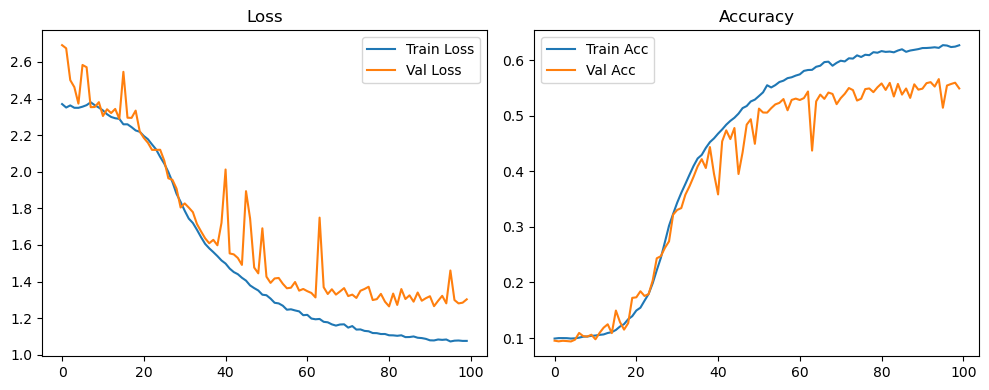

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.35it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.81it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.66it/s]

Original Model Final Test Loss: 1.3185 Accuracy: 0.5451


🚀 Running: batch512_lr_max_0.001_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0983 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0983 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0987 | Val Acc: 0.0983 |:   1%|          | 1/100 [01:22<2:16:32, 82.75s/it]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0976 |:   1%|          | 1/100 [02:45<2:16:32, 82.75s/it]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0976 |:   1%|          | 1/100 [02:45<2:16:32, 82.75s/it]

| LR: 0.001000 | Train Acc: 0.0997 | Val Acc: 0.0976 |:   2%|▏         | 2/100 [02:45<2:15:16, 82.82s/it]

| LR: 0.000999 | Train Acc: 0.1001 | Val Acc: 0.0901 |:   2%|▏         | 2/100 [04:07<2:15:16, 82.82s/it]

| LR: 0.000999 | Train Acc: 0.1001 | Val Acc: 0.0901 |:   2%|▏         | 2/100 [04:07<2:15:16, 82.82s/it]

| LR: 0.000999 | Train Acc: 0.1001 | Val Acc: 0.0901 |:   3%|▎         | 3/100 [04:07<2:13:29, 82.57s/it]

| LR: 0.000998 | Train Acc: 0.0987 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [05:18<2:13:29, 82.57s/it]

| LR: 0.000998 | Train Acc: 0.0987 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [05:18<2:13:29, 82.57s/it]

| LR: 0.000998 | Train Acc: 0.0987 | Val Acc: 0.0975 |:   4%|▍         | 4/100 [05:18<2:04:47, 78.00s/it]

| LR: 0.000996 | Train Acc: 0.0996 | Val Acc: 0.0980 |:   4%|▍         | 4/100 [05:32<2:04:47, 78.00s/it]

| LR: 0.000996 | Train Acc: 0.0996 | Val Acc: 0.0980 |:   4%|▍         | 4/100 [05:32<2:04:47, 78.00s/it]

| LR: 0.000996 | Train Acc: 0.0996 | Val Acc: 0.0980 |:   5%|▌         | 5/100 [05:32<1:26:32, 54.66s/it]

| LR: 0.000994 | Train Acc: 0.0990 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [05:45<1:26:32, 54.66s/it]

| LR: 0.000994 | Train Acc: 0.0990 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [05:45<1:26:32, 54.66s/it]

| LR: 0.000994 | Train Acc: 0.0990 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [05:45<1:03:31, 40.55s/it]

| LR: 0.000991 | Train Acc: 0.0988 | Val Acc: 0.0923 |:   6%|▌         | 6/100 [05:58<1:03:31, 40.55s/it]

| LR: 0.000991 | Train Acc: 0.0988 | Val Acc: 0.0923 |:   6%|▌         | 6/100 [05:58<1:03:31, 40.55s/it]

| LR: 0.000991 | Train Acc: 0.0988 | Val Acc: 0.0923 |:   7%|▋         | 7/100 [05:58<48:57, 31.59s/it]  

| LR: 0.000988 | Train Acc: 0.0994 | Val Acc: 0.0951 |:   7%|▋         | 7/100 [06:11<48:57, 31.59s/it]

| LR: 0.000988 | Train Acc: 0.0994 | Val Acc: 0.0951 |:   7%|▋         | 7/100 [06:11<48:57, 31.59s/it]

| LR: 0.000988 | Train Acc: 0.0994 | Val Acc: 0.0951 |:   8%|▊         | 8/100 [06:11<39:26, 25.72s/it]

| LR: 0.000984 | Train Acc: 0.1009 | Val Acc: 0.0994 |:   8%|▊         | 8/100 [06:24<39:26, 25.72s/it]

| LR: 0.000984 | Train Acc: 0.1009 | Val Acc: 0.0994 |:   8%|▊         | 8/100 [06:24<39:26, 25.72s/it]

| LR: 0.000984 | Train Acc: 0.1009 | Val Acc: 0.0994 |:   9%|▉         | 9/100 [06:24<33:02, 21.79s/it]

| LR: 0.000980 | Train Acc: 0.1035 | Val Acc: 0.1022 |:   9%|▉         | 9/100 [06:37<33:02, 21.79s/it]

| LR: 0.000980 | Train Acc: 0.1035 | Val Acc: 0.1022 |:   9%|▉         | 9/100 [06:37<33:02, 21.79s/it]

| LR: 0.000980 | Train Acc: 0.1035 | Val Acc: 0.1022 |:  10%|█         | 10/100 [06:37<28:39, 19.11s/it]

| LR: 0.000976 | Train Acc: 0.1047 | Val Acc: 0.0923 |:  10%|█         | 10/100 [06:50<28:39, 19.11s/it]

| LR: 0.000976 | Train Acc: 0.1047 | Val Acc: 0.0923 |:  10%|█         | 10/100 [06:50<28:39, 19.11s/it]

| LR: 0.000976 | Train Acc: 0.1047 | Val Acc: 0.0923 |:  11%|█         | 11/100 [06:50<25:36, 17.26s/it]

| LR: 0.000970 | Train Acc: 0.1055 | Val Acc: 0.1036 |:  11%|█         | 11/100 [07:04<25:36, 17.26s/it]

| LR: 0.000970 | Train Acc: 0.1055 | Val Acc: 0.1036 |:  11%|█         | 11/100 [07:04<25:36, 17.26s/it]

| LR: 0.000970 | Train Acc: 0.1055 | Val Acc: 0.1036 |:  12%|█▏        | 12/100 [07:04<23:31, 16.04s/it]

| LR: 0.000965 | Train Acc: 0.1062 | Val Acc: 0.1114 |:  12%|█▏        | 12/100 [07:17<23:31, 16.04s/it]

| LR: 0.000965 | Train Acc: 0.1062 | Val Acc: 0.1114 |:  12%|█▏        | 12/100 [07:17<23:31, 16.04s/it]

| LR: 0.000965 | Train Acc: 0.1062 | Val Acc: 0.1114 |:  13%|█▎        | 13/100 [07:17<21:59, 15.17s/it]

| LR: 0.000959 | Train Acc: 0.1072 | Val Acc: 0.1011 |:  13%|█▎        | 13/100 [07:30<21:59, 15.17s/it]

| LR: 0.000959 | Train Acc: 0.1072 | Val Acc: 0.1011 |:  13%|█▎        | 13/100 [07:30<21:59, 15.17s/it]

| LR: 0.000959 | Train Acc: 0.1072 | Val Acc: 0.1011 |:  14%|█▍        | 14/100 [07:30<20:52, 14.56s/it]

| LR: 0.000952 | Train Acc: 0.1072 | Val Acc: 0.1110 |:  14%|█▍        | 14/100 [07:43<20:52, 14.56s/it]

| LR: 0.000952 | Train Acc: 0.1072 | Val Acc: 0.1110 |:  14%|█▍        | 14/100 [07:43<20:52, 14.56s/it]

| LR: 0.000952 | Train Acc: 0.1072 | Val Acc: 0.1110 |:  15%|█▌        | 15/100 [07:43<20:01, 14.14s/it]

| LR: 0.000946 | Train Acc: 0.1084 | Val Acc: 0.1114 |:  15%|█▌        | 15/100 [07:56<20:01, 14.14s/it]

| LR: 0.000946 | Train Acc: 0.1084 | Val Acc: 0.1114 |:  15%|█▌        | 15/100 [07:56<20:01, 14.14s/it]

| LR: 0.000946 | Train Acc: 0.1084 | Val Acc: 0.1114 |:  16%|█▌        | 16/100 [07:56<19:23, 13.85s/it]

| LR: 0.000938 | Train Acc: 0.1107 | Val Acc: 0.1173 |:  16%|█▌        | 16/100 [08:09<19:23, 13.85s/it]

| LR: 0.000938 | Train Acc: 0.1107 | Val Acc: 0.1173 |:  16%|█▌        | 16/100 [08:09<19:23, 13.85s/it]

| LR: 0.000938 | Train Acc: 0.1107 | Val Acc: 0.1173 |:  17%|█▋        | 17/100 [08:09<18:51, 13.64s/it]

| LR: 0.000930 | Train Acc: 0.1183 | Val Acc: 0.1517 |:  17%|█▋        | 17/100 [08:23<18:51, 13.64s/it]

| LR: 0.000930 | Train Acc: 0.1183 | Val Acc: 0.1517 |:  17%|█▋        | 17/100 [08:23<18:51, 13.64s/it]

| LR: 0.000930 | Train Acc: 0.1183 | Val Acc: 0.1517 |:  18%|█▊        | 18/100 [08:23<18:25, 13.48s/it]

| LR: 0.000922 | Train Acc: 0.1236 | Val Acc: 0.1504 |:  18%|█▊        | 18/100 [08:36<18:25, 13.48s/it]

| LR: 0.000922 | Train Acc: 0.1236 | Val Acc: 0.1504 |:  18%|█▊        | 18/100 [08:36<18:25, 13.48s/it]

| LR: 0.000922 | Train Acc: 0.1236 | Val Acc: 0.1504 |:  19%|█▉        | 19/100 [08:36<18:05, 13.40s/it]

| LR: 0.000914 | Train Acc: 0.1303 | Val Acc: 0.1164 |:  19%|█▉        | 19/100 [08:49<18:05, 13.40s/it]

| LR: 0.000914 | Train Acc: 0.1303 | Val Acc: 0.1164 |:  19%|█▉        | 19/100 [08:49<18:05, 13.40s/it]

| LR: 0.000914 | Train Acc: 0.1303 | Val Acc: 0.1164 |:  20%|██        | 20/100 [08:49<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.1346 | Val Acc: 0.1340 |:  20%|██        | 20/100 [09:02<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.1346 | Val Acc: 0.1340 |:  20%|██        | 20/100 [09:02<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.1346 | Val Acc: 0.1340 |:  21%|██        | 21/100 [09:02<17:31, 13.31s/it]

| LR: 0.000895 | Train Acc: 0.1415 | Val Acc: 0.1527 |:  21%|██        | 21/100 [09:15<17:31, 13.31s/it]

| LR: 0.000895 | Train Acc: 0.1415 | Val Acc: 0.1527 |:  21%|██        | 21/100 [09:15<17:31, 13.31s/it]

| LR: 0.000895 | Train Acc: 0.1415 | Val Acc: 0.1527 |:  22%|██▏       | 22/100 [09:15<17:14, 13.26s/it]

| LR: 0.000885 | Train Acc: 0.1510 | Val Acc: 0.1569 |:  22%|██▏       | 22/100 [09:28<17:14, 13.26s/it]

| LR: 0.000885 | Train Acc: 0.1510 | Val Acc: 0.1569 |:  22%|██▏       | 22/100 [09:28<17:14, 13.26s/it]

| LR: 0.000885 | Train Acc: 0.1510 | Val Acc: 0.1569 |:  23%|██▎       | 23/100 [09:29<16:57, 13.22s/it]

| LR: 0.000875 | Train Acc: 0.1583 | Val Acc: 0.1753 |:  23%|██▎       | 23/100 [09:42<16:57, 13.22s/it]

| LR: 0.000875 | Train Acc: 0.1583 | Val Acc: 0.1753 |:  23%|██▎       | 23/100 [09:42<16:57, 13.22s/it]

| LR: 0.000875 | Train Acc: 0.1583 | Val Acc: 0.1753 |:  24%|██▍       | 24/100 [09:42<16:43, 13.20s/it]

| LR: 0.000865 | Train Acc: 0.1700 | Val Acc: 0.1746 |:  24%|██▍       | 24/100 [09:55<16:43, 13.20s/it]

| LR: 0.000865 | Train Acc: 0.1700 | Val Acc: 0.1746 |:  24%|██▍       | 24/100 [09:55<16:43, 13.20s/it]

| LR: 0.000865 | Train Acc: 0.1700 | Val Acc: 0.1746 |:  25%|██▌       | 25/100 [09:55<16:29, 13.19s/it]

| LR: 0.000854 | Train Acc: 0.1845 | Val Acc: 0.1813 |:  25%|██▌       | 25/100 [10:08<16:29, 13.19s/it]

| LR: 0.000854 | Train Acc: 0.1845 | Val Acc: 0.1813 |:  25%|██▌       | 25/100 [10:08<16:29, 13.19s/it]

| LR: 0.000854 | Train Acc: 0.1845 | Val Acc: 0.1813 |:  26%|██▌       | 26/100 [10:08<16:15, 13.18s/it]

| LR: 0.000842 | Train Acc: 0.1984 | Val Acc: 0.1892 |:  26%|██▌       | 26/100 [10:21<16:15, 13.18s/it]

| LR: 0.000842 | Train Acc: 0.1984 | Val Acc: 0.1892 |:  26%|██▌       | 26/100 [10:21<16:15, 13.18s/it]

| LR: 0.000842 | Train Acc: 0.1984 | Val Acc: 0.1892 |:  27%|██▋       | 27/100 [10:21<16:01, 13.16s/it]

| LR: 0.000831 | Train Acc: 0.2132 | Val Acc: 0.2259 |:  27%|██▋       | 27/100 [10:34<16:01, 13.16s/it]

| LR: 0.000831 | Train Acc: 0.2132 | Val Acc: 0.2259 |:  27%|██▋       | 27/100 [10:34<16:01, 13.16s/it]

| LR: 0.000831 | Train Acc: 0.2132 | Val Acc: 0.2259 |:  28%|██▊       | 28/100 [10:34<15:47, 13.16s/it]

| LR: 0.000819 | Train Acc: 0.2281 | Val Acc: 0.2179 |:  28%|██▊       | 28/100 [10:47<15:47, 13.16s/it]

| LR: 0.000819 | Train Acc: 0.2281 | Val Acc: 0.2179 |:  28%|██▊       | 28/100 [10:47<15:47, 13.16s/it]

| LR: 0.000819 | Train Acc: 0.2281 | Val Acc: 0.2179 |:  29%|██▉       | 29/100 [10:47<15:33, 13.15s/it]

| LR: 0.000807 | Train Acc: 0.2545 | Val Acc: 0.2546 |:  29%|██▉       | 29/100 [11:01<15:33, 13.15s/it]

| LR: 0.000807 | Train Acc: 0.2545 | Val Acc: 0.2546 |:  29%|██▉       | 29/100 [11:01<15:33, 13.15s/it]

| LR: 0.000807 | Train Acc: 0.2545 | Val Acc: 0.2546 |:  30%|███       | 30/100 [11:01<15:22, 13.18s/it]

| LR: 0.000794 | Train Acc: 0.2769 | Val Acc: 0.2759 |:  30%|███       | 30/100 [11:14<15:22, 13.18s/it]

| LR: 0.000794 | Train Acc: 0.2769 | Val Acc: 0.2759 |:  30%|███       | 30/100 [11:14<15:22, 13.18s/it]

| LR: 0.000794 | Train Acc: 0.2769 | Val Acc: 0.2759 |:  31%|███       | 31/100 [11:14<15:08, 13.17s/it]

| LR: 0.000781 | Train Acc: 0.3008 | Val Acc: 0.3084 |:  31%|███       | 31/100 [11:27<15:08, 13.17s/it]

| LR: 0.000781 | Train Acc: 0.3008 | Val Acc: 0.3084 |:  31%|███       | 31/100 [11:27<15:08, 13.17s/it]

| LR: 0.000781 | Train Acc: 0.3008 | Val Acc: 0.3084 |:  32%|███▏      | 32/100 [11:27<14:54, 13.15s/it]

| LR: 0.000768 | Train Acc: 0.3127 | Val Acc: 0.2669 |:  32%|███▏      | 32/100 [11:40<14:54, 13.15s/it]

| LR: 0.000768 | Train Acc: 0.3127 | Val Acc: 0.2669 |:  32%|███▏      | 32/100 [11:40<14:54, 13.15s/it]

| LR: 0.000768 | Train Acc: 0.3127 | Val Acc: 0.2669 |:  33%|███▎      | 33/100 [11:40<14:40, 13.14s/it]

| LR: 0.000755 | Train Acc: 0.3319 | Val Acc: 0.2712 |:  33%|███▎      | 33/100 [11:53<14:40, 13.14s/it]

| LR: 0.000755 | Train Acc: 0.3319 | Val Acc: 0.2712 |:  33%|███▎      | 33/100 [11:53<14:40, 13.14s/it]

| LR: 0.000755 | Train Acc: 0.3319 | Val Acc: 0.2712 |:  34%|███▍      | 34/100 [11:53<14:26, 13.13s/it]

| LR: 0.000741 | Train Acc: 0.3464 | Val Acc: 0.3488 |:  34%|███▍      | 34/100 [12:06<14:26, 13.13s/it]

| LR: 0.000741 | Train Acc: 0.3464 | Val Acc: 0.3488 |:  34%|███▍      | 34/100 [12:06<14:26, 13.13s/it]

| LR: 0.000741 | Train Acc: 0.3464 | Val Acc: 0.3488 |:  35%|███▌      | 35/100 [12:06<14:13, 13.13s/it]

| LR: 0.000727 | Train Acc: 0.3678 | Val Acc: 0.3594 |:  35%|███▌      | 35/100 [12:19<14:13, 13.13s/it]

| LR: 0.000727 | Train Acc: 0.3678 | Val Acc: 0.3594 |:  35%|███▌      | 35/100 [12:19<14:13, 13.13s/it]

| LR: 0.000727 | Train Acc: 0.3678 | Val Acc: 0.3594 |:  36%|███▌      | 36/100 [12:19<13:59, 13.12s/it]

| LR: 0.000713 | Train Acc: 0.3823 | Val Acc: 0.3493 |:  36%|███▌      | 36/100 [12:32<13:59, 13.12s/it]

| LR: 0.000713 | Train Acc: 0.3823 | Val Acc: 0.3493 |:  36%|███▌      | 36/100 [12:32<13:59, 13.12s/it]

| LR: 0.000713 | Train Acc: 0.3823 | Val Acc: 0.3493 |:  37%|███▋      | 37/100 [12:32<13:47, 13.13s/it]

| LR: 0.000699 | Train Acc: 0.3948 | Val Acc: 0.3750 |:  37%|███▋      | 37/100 [12:46<13:47, 13.13s/it]

| LR: 0.000699 | Train Acc: 0.3948 | Val Acc: 0.3750 |:  37%|███▋      | 37/100 [12:46<13:47, 13.13s/it]

| LR: 0.000699 | Train Acc: 0.3948 | Val Acc: 0.3750 |:  38%|███▊      | 38/100 [12:46<13:33, 13.13s/it]

| LR: 0.000684 | Train Acc: 0.4051 | Val Acc: 0.4111 |:  38%|███▊      | 38/100 [12:59<13:33, 13.13s/it]

| LR: 0.000684 | Train Acc: 0.4051 | Val Acc: 0.4111 |:  38%|███▊      | 38/100 [12:59<13:33, 13.13s/it]

| LR: 0.000684 | Train Acc: 0.4051 | Val Acc: 0.4111 |:  39%|███▉      | 39/100 [12:59<13:20, 13.13s/it]

| LR: 0.000670 | Train Acc: 0.4176 | Val Acc: 0.4250 |:  39%|███▉      | 39/100 [13:12<13:20, 13.13s/it]

| LR: 0.000670 | Train Acc: 0.4176 | Val Acc: 0.4250 |:  39%|███▉      | 39/100 [13:12<13:20, 13.13s/it]

| LR: 0.000670 | Train Acc: 0.4176 | Val Acc: 0.4250 |:  40%|████      | 40/100 [13:12<13:10, 13.18s/it]

| LR: 0.000655 | Train Acc: 0.4272 | Val Acc: 0.4302 |:  40%|████      | 40/100 [13:25<13:10, 13.18s/it]

| LR: 0.000655 | Train Acc: 0.4272 | Val Acc: 0.4302 |:  40%|████      | 40/100 [13:25<13:10, 13.18s/it]

| LR: 0.000655 | Train Acc: 0.4272 | Val Acc: 0.4302 |:  41%|████      | 41/100 [13:25<12:57, 13.18s/it]

| LR: 0.000640 | Train Acc: 0.4402 | Val Acc: 0.4419 |:  41%|████      | 41/100 [13:38<12:57, 13.18s/it]

| LR: 0.000640 | Train Acc: 0.4402 | Val Acc: 0.4419 |:  41%|████      | 41/100 [13:38<12:57, 13.18s/it]

| LR: 0.000640 | Train Acc: 0.4402 | Val Acc: 0.4419 |:  42%|████▏     | 42/100 [13:38<12:44, 13.18s/it]

| LR: 0.000625 | Train Acc: 0.4494 | Val Acc: 0.4463 |:  42%|████▏     | 42/100 [13:52<12:44, 13.18s/it]

| LR: 0.000625 | Train Acc: 0.4494 | Val Acc: 0.4463 |:  42%|████▏     | 42/100 [13:52<12:44, 13.18s/it]

| LR: 0.000625 | Train Acc: 0.4494 | Val Acc: 0.4463 |:  43%|████▎     | 43/100 [13:52<12:31, 13.19s/it]

| LR: 0.000609 | Train Acc: 0.4551 | Val Acc: 0.4476 |:  43%|████▎     | 43/100 [14:05<12:31, 13.19s/it]

| LR: 0.000609 | Train Acc: 0.4551 | Val Acc: 0.4476 |:  43%|████▎     | 43/100 [14:05<12:31, 13.19s/it]

| LR: 0.000609 | Train Acc: 0.4551 | Val Acc: 0.4476 |:  44%|████▍     | 44/100 [14:05<12:18, 13.19s/it]

| LR: 0.000594 | Train Acc: 0.4613 | Val Acc: 0.4579 |:  44%|████▍     | 44/100 [14:18<12:18, 13.19s/it]

| LR: 0.000594 | Train Acc: 0.4613 | Val Acc: 0.4579 |:  44%|████▍     | 44/100 [14:18<12:18, 13.19s/it]

| LR: 0.000594 | Train Acc: 0.4613 | Val Acc: 0.4579 |:  45%|████▌     | 45/100 [14:18<12:04, 13.17s/it]

| LR: 0.000579 | Train Acc: 0.4700 | Val Acc: 0.4589 |:  45%|████▌     | 45/100 [14:31<12:04, 13.17s/it]

| LR: 0.000579 | Train Acc: 0.4700 | Val Acc: 0.4589 |:  45%|████▌     | 45/100 [14:31<12:04, 13.17s/it]

| LR: 0.000579 | Train Acc: 0.4700 | Val Acc: 0.4589 |:  46%|████▌     | 46/100 [14:31<11:52, 13.19s/it]

| LR: 0.000563 | Train Acc: 0.4765 | Val Acc: 0.4868 |:  46%|████▌     | 46/100 [14:44<11:52, 13.19s/it]

| LR: 0.000563 | Train Acc: 0.4765 | Val Acc: 0.4868 |:  46%|████▌     | 46/100 [14:44<11:52, 13.19s/it]

| LR: 0.000563 | Train Acc: 0.4765 | Val Acc: 0.4868 |:  47%|████▋     | 47/100 [14:44<11:38, 13.18s/it]

| LR: 0.000548 | Train Acc: 0.4888 | Val Acc: 0.4684 |:  47%|████▋     | 47/100 [14:57<11:38, 13.18s/it]

| LR: 0.000548 | Train Acc: 0.4888 | Val Acc: 0.4684 |:  47%|████▋     | 47/100 [14:57<11:38, 13.18s/it]

| LR: 0.000548 | Train Acc: 0.4888 | Val Acc: 0.4684 |:  48%|████▊     | 48/100 [14:58<11:25, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.4935 | Val Acc: 0.4849 |:  48%|████▊     | 48/100 [15:11<11:25, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.4935 | Val Acc: 0.4849 |:  48%|████▊     | 48/100 [15:11<11:25, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.4935 | Val Acc: 0.4849 |:  49%|████▉     | 49/100 [15:11<11:14, 13.23s/it]

| LR: 0.000516 | Train Acc: 0.4959 | Val Acc: 0.4620 |:  49%|████▉     | 49/100 [15:24<11:14, 13.23s/it]

| LR: 0.000516 | Train Acc: 0.4959 | Val Acc: 0.4620 |:  49%|████▉     | 49/100 [15:24<11:14, 13.23s/it]

| LR: 0.000516 | Train Acc: 0.4959 | Val Acc: 0.4620 |:  50%|█████     | 50/100 [15:24<11:00, 13.20s/it]

| LR: 0.000501 | Train Acc: 0.5038 | Val Acc: 0.4964 |:  50%|█████     | 50/100 [15:37<11:00, 13.20s/it]

| LR: 0.000501 | Train Acc: 0.5038 | Val Acc: 0.4964 |:  50%|█████     | 50/100 [15:37<11:00, 13.20s/it]

| LR: 0.000501 | Train Acc: 0.5038 | Val Acc: 0.4964 |:  51%|█████     | 51/100 [15:37<10:45, 13.17s/it]

| LR: 0.000485 | Train Acc: 0.5133 | Val Acc: 0.4426 |:  51%|█████     | 51/100 [15:50<10:45, 13.17s/it]

| LR: 0.000485 | Train Acc: 0.5133 | Val Acc: 0.4426 |:  51%|█████     | 51/100 [15:50<10:45, 13.17s/it]

| LR: 0.000485 | Train Acc: 0.5133 | Val Acc: 0.4426 |:  52%|█████▏    | 52/100 [15:50<10:31, 13.16s/it]

| LR: 0.000469 | Train Acc: 0.5160 | Val Acc: 0.4452 |:  52%|█████▏    | 52/100 [16:03<10:31, 13.16s/it]

| LR: 0.000469 | Train Acc: 0.5160 | Val Acc: 0.4452 |:  52%|█████▏    | 52/100 [16:03<10:31, 13.16s/it]

| LR: 0.000469 | Train Acc: 0.5160 | Val Acc: 0.4452 |:  53%|█████▎    | 53/100 [16:03<10:19, 13.18s/it]

| LR: 0.000453 | Train Acc: 0.5211 | Val Acc: 0.5062 |:  53%|█████▎    | 53/100 [16:17<10:19, 13.18s/it]

| LR: 0.000453 | Train Acc: 0.5211 | Val Acc: 0.5062 |:  53%|█████▎    | 53/100 [16:17<10:19, 13.18s/it]

| LR: 0.000453 | Train Acc: 0.5211 | Val Acc: 0.5062 |:  54%|█████▍    | 54/100 [16:17<10:05, 13.17s/it]

| LR: 0.000438 | Train Acc: 0.5215 | Val Acc: 0.5005 |:  54%|█████▍    | 54/100 [16:30<10:05, 13.17s/it]

| LR: 0.000438 | Train Acc: 0.5215 | Val Acc: 0.5005 |:  54%|█████▍    | 54/100 [16:30<10:05, 13.17s/it]

| LR: 0.000438 | Train Acc: 0.5215 | Val Acc: 0.5005 |:  55%|█████▌    | 55/100 [16:30<09:51, 13.15s/it]

| LR: 0.000422 | Train Acc: 0.5270 | Val Acc: 0.5107 |:  55%|█████▌    | 55/100 [16:43<09:51, 13.15s/it]

| LR: 0.000422 | Train Acc: 0.5270 | Val Acc: 0.5107 |:  55%|█████▌    | 55/100 [16:43<09:51, 13.15s/it]

| LR: 0.000422 | Train Acc: 0.5270 | Val Acc: 0.5107 |:  56%|█████▌    | 56/100 [16:43<09:38, 13.15s/it]

| LR: 0.000407 | Train Acc: 0.5300 | Val Acc: 0.4983 |:  56%|█████▌    | 56/100 [16:56<09:38, 13.15s/it]

| LR: 0.000407 | Train Acc: 0.5300 | Val Acc: 0.4983 |:  56%|█████▌    | 56/100 [16:56<09:38, 13.15s/it]

| LR: 0.000407 | Train Acc: 0.5300 | Val Acc: 0.4983 |:  57%|█████▋    | 57/100 [16:56<09:26, 13.17s/it]

| LR: 0.000392 | Train Acc: 0.5341 | Val Acc: 0.5161 |:  57%|█████▋    | 57/100 [17:09<09:26, 13.17s/it]

| LR: 0.000392 | Train Acc: 0.5341 | Val Acc: 0.5161 |:  57%|█████▋    | 57/100 [17:09<09:26, 13.17s/it]

| LR: 0.000392 | Train Acc: 0.5341 | Val Acc: 0.5161 |:  58%|█████▊    | 58/100 [17:09<09:14, 13.20s/it]

| LR: 0.000376 | Train Acc: 0.5378 | Val Acc: 0.4658 |:  58%|█████▊    | 58/100 [17:22<09:14, 13.20s/it]

| LR: 0.000376 | Train Acc: 0.5378 | Val Acc: 0.4658 |:  58%|█████▊    | 58/100 [17:22<09:14, 13.20s/it]

| LR: 0.000376 | Train Acc: 0.5378 | Val Acc: 0.4658 |:  59%|█████▉    | 59/100 [17:22<09:00, 13.19s/it]

| LR: 0.000361 | Train Acc: 0.5443 | Val Acc: 0.4923 |:  59%|█████▉    | 59/100 [17:36<09:00, 13.19s/it]

| LR: 0.000361 | Train Acc: 0.5443 | Val Acc: 0.4923 |:  59%|█████▉    | 59/100 [17:36<09:00, 13.19s/it]

| LR: 0.000361 | Train Acc: 0.5443 | Val Acc: 0.4923 |:  60%|██████    | 60/100 [17:36<08:47, 13.18s/it]

| LR: 0.000346 | Train Acc: 0.5450 | Val Acc: 0.5281 |:  60%|██████    | 60/100 [17:49<08:47, 13.18s/it]

| LR: 0.000346 | Train Acc: 0.5450 | Val Acc: 0.5281 |:  60%|██████    | 60/100 [17:49<08:47, 13.18s/it]

| LR: 0.000346 | Train Acc: 0.5450 | Val Acc: 0.5281 |:  61%|██████    | 61/100 [17:49<08:34, 13.19s/it]

| LR: 0.000331 | Train Acc: 0.5499 | Val Acc: 0.5348 |:  61%|██████    | 61/100 [18:02<08:34, 13.19s/it]

| LR: 0.000331 | Train Acc: 0.5499 | Val Acc: 0.5348 |:  61%|██████    | 61/100 [18:02<08:34, 13.19s/it]

| LR: 0.000331 | Train Acc: 0.5499 | Val Acc: 0.5348 |:  62%|██████▏   | 62/100 [18:02<08:21, 13.19s/it]

| LR: 0.000317 | Train Acc: 0.5508 | Val Acc: 0.5222 |:  62%|██████▏   | 62/100 [18:15<08:21, 13.19s/it]

| LR: 0.000317 | Train Acc: 0.5508 | Val Acc: 0.5222 |:  62%|██████▏   | 62/100 [18:15<08:21, 13.19s/it]

| LR: 0.000317 | Train Acc: 0.5508 | Val Acc: 0.5222 |:  63%|██████▎   | 63/100 [18:15<08:07, 13.17s/it]

| LR: 0.000302 | Train Acc: 0.5565 | Val Acc: 0.5339 |:  63%|██████▎   | 63/100 [18:28<08:07, 13.17s/it]

| LR: 0.000302 | Train Acc: 0.5565 | Val Acc: 0.5339 |:  63%|██████▎   | 63/100 [18:28<08:07, 13.17s/it]

| LR: 0.000302 | Train Acc: 0.5565 | Val Acc: 0.5339 |:  64%|██████▍   | 64/100 [18:28<07:53, 13.16s/it]

| LR: 0.000288 | Train Acc: 0.5575 | Val Acc: 0.5258 |:  64%|██████▍   | 64/100 [18:41<07:53, 13.16s/it]

| LR: 0.000288 | Train Acc: 0.5575 | Val Acc: 0.5258 |:  64%|██████▍   | 64/100 [18:41<07:53, 13.16s/it]

| LR: 0.000288 | Train Acc: 0.5575 | Val Acc: 0.5258 |:  65%|██████▌   | 65/100 [18:41<07:39, 13.13s/it]

| LR: 0.000274 | Train Acc: 0.5635 | Val Acc: 0.5311 |:  65%|██████▌   | 65/100 [18:54<07:39, 13.13s/it]

| LR: 0.000274 | Train Acc: 0.5635 | Val Acc: 0.5311 |:  65%|██████▌   | 65/100 [18:54<07:39, 13.13s/it]

| LR: 0.000274 | Train Acc: 0.5635 | Val Acc: 0.5311 |:  66%|██████▌   | 66/100 [18:54<07:26, 13.12s/it]

| LR: 0.000260 | Train Acc: 0.5653 | Val Acc: 0.5407 |:  66%|██████▌   | 66/100 [19:08<07:26, 13.12s/it]

| LR: 0.000260 | Train Acc: 0.5653 | Val Acc: 0.5407 |:  66%|██████▌   | 66/100 [19:08<07:26, 13.12s/it]

| LR: 0.000260 | Train Acc: 0.5653 | Val Acc: 0.5407 |:  67%|██████▋   | 67/100 [19:08<07:13, 13.13s/it]

| LR: 0.000246 | Train Acc: 0.5670 | Val Acc: 0.5351 |:  67%|██████▋   | 67/100 [19:21<07:13, 13.13s/it]

| LR: 0.000246 | Train Acc: 0.5670 | Val Acc: 0.5351 |:  67%|██████▋   | 67/100 [19:21<07:13, 13.13s/it]

| LR: 0.000246 | Train Acc: 0.5670 | Val Acc: 0.5351 |:  68%|██████▊   | 68/100 [19:21<07:00, 13.16s/it]

| LR: 0.000233 | Train Acc: 0.5672 | Val Acc: 0.5229 |:  68%|██████▊   | 68/100 [19:34<07:00, 13.16s/it]

| LR: 0.000233 | Train Acc: 0.5672 | Val Acc: 0.5229 |:  68%|██████▊   | 68/100 [19:34<07:00, 13.16s/it]

| LR: 0.000233 | Train Acc: 0.5672 | Val Acc: 0.5229 |:  69%|██████▉   | 69/100 [19:34<06:47, 13.14s/it]

| LR: 0.000220 | Train Acc: 0.5700 | Val Acc: 0.5429 |:  69%|██████▉   | 69/100 [19:47<06:47, 13.14s/it]

| LR: 0.000220 | Train Acc: 0.5700 | Val Acc: 0.5429 |:  69%|██████▉   | 69/100 [19:47<06:47, 13.14s/it]

| LR: 0.000220 | Train Acc: 0.5700 | Val Acc: 0.5429 |:  70%|███████   | 70/100 [19:47<06:35, 13.17s/it]

| LR: 0.000207 | Train Acc: 0.5735 | Val Acc: 0.5391 |:  70%|███████   | 70/100 [20:00<06:35, 13.17s/it]

| LR: 0.000207 | Train Acc: 0.5735 | Val Acc: 0.5391 |:  70%|███████   | 70/100 [20:00<06:35, 13.17s/it]

| LR: 0.000207 | Train Acc: 0.5735 | Val Acc: 0.5391 |:  71%|███████   | 71/100 [20:00<06:22, 13.19s/it]

| LR: 0.000194 | Train Acc: 0.5727 | Val Acc: 0.5451 |:  71%|███████   | 71/100 [20:14<06:22, 13.19s/it]

| LR: 0.000194 | Train Acc: 0.5727 | Val Acc: 0.5451 |:  71%|███████   | 71/100 [20:14<06:22, 13.19s/it]

| LR: 0.000194 | Train Acc: 0.5727 | Val Acc: 0.5451 |:  72%|███████▏  | 72/100 [20:14<06:09, 13.19s/it]

| LR: 0.000182 | Train Acc: 0.5749 | Val Acc: 0.5511 |:  72%|███████▏  | 72/100 [20:27<06:09, 13.19s/it]

| LR: 0.000182 | Train Acc: 0.5749 | Val Acc: 0.5511 |:  72%|███████▏  | 72/100 [20:27<06:09, 13.19s/it]

| LR: 0.000182 | Train Acc: 0.5749 | Val Acc: 0.5511 |:  73%|███████▎  | 73/100 [20:27<05:56, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.5775 | Val Acc: 0.5463 |:  73%|███████▎  | 73/100 [20:40<05:56, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.5775 | Val Acc: 0.5463 |:  73%|███████▎  | 73/100 [20:40<05:56, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.5775 | Val Acc: 0.5463 |:  74%|███████▍  | 74/100 [20:40<05:42, 13.18s/it]

| LR: 0.000159 | Train Acc: 0.5794 | Val Acc: 0.5411 |:  74%|███████▍  | 74/100 [20:53<05:42, 13.18s/it]

| LR: 0.000159 | Train Acc: 0.5794 | Val Acc: 0.5411 |:  74%|███████▍  | 74/100 [20:53<05:42, 13.18s/it]

| LR: 0.000159 | Train Acc: 0.5794 | Val Acc: 0.5411 |:  75%|███████▌  | 75/100 [20:53<05:29, 13.18s/it]

| LR: 0.000147 | Train Acc: 0.5805 | Val Acc: 0.5497 |:  75%|███████▌  | 75/100 [21:06<05:29, 13.18s/it]

| LR: 0.000147 | Train Acc: 0.5805 | Val Acc: 0.5497 |:  75%|███████▌  | 75/100 [21:06<05:29, 13.18s/it]

| LR: 0.000147 | Train Acc: 0.5805 | Val Acc: 0.5497 |:  76%|███████▌  | 76/100 [21:06<05:15, 13.16s/it]

| LR: 0.000136 | Train Acc: 0.5845 | Val Acc: 0.5487 |:  76%|███████▌  | 76/100 [21:19<05:15, 13.16s/it]

| LR: 0.000136 | Train Acc: 0.5845 | Val Acc: 0.5487 |:  76%|███████▌  | 76/100 [21:19<05:15, 13.16s/it]

| LR: 0.000136 | Train Acc: 0.5845 | Val Acc: 0.5487 |:  77%|███████▋  | 77/100 [21:19<05:03, 13.19s/it]

| LR: 0.000126 | Train Acc: 0.5821 | Val Acc: 0.5391 |:  77%|███████▋  | 77/100 [21:33<05:03, 13.19s/it]

| LR: 0.000126 | Train Acc: 0.5821 | Val Acc: 0.5391 |:  77%|███████▋  | 77/100 [21:33<05:03, 13.19s/it]

| LR: 0.000126 | Train Acc: 0.5821 | Val Acc: 0.5391 |:  78%|███████▊  | 78/100 [21:33<04:49, 13.16s/it]

| LR: 0.000116 | Train Acc: 0.5867 | Val Acc: 0.5609 |:  78%|███████▊  | 78/100 [21:46<04:49, 13.16s/it]

| LR: 0.000116 | Train Acc: 0.5867 | Val Acc: 0.5609 |:  78%|███████▊  | 78/100 [21:46<04:49, 13.16s/it]

| LR: 0.000116 | Train Acc: 0.5867 | Val Acc: 0.5609 |:  79%|███████▉  | 79/100 [21:46<04:36, 13.15s/it]

| LR: 0.000106 | Train Acc: 0.5839 | Val Acc: 0.5510 |:  79%|███████▉  | 79/100 [21:59<04:36, 13.15s/it]

| LR: 0.000106 | Train Acc: 0.5839 | Val Acc: 0.5510 |:  79%|███████▉  | 79/100 [21:59<04:36, 13.15s/it]

| LR: 0.000106 | Train Acc: 0.5839 | Val Acc: 0.5510 |:  80%|████████  | 80/100 [21:59<04:22, 13.14s/it]

| LR: 0.000096 | Train Acc: 0.5884 | Val Acc: 0.5575 |:  80%|████████  | 80/100 [22:12<04:22, 13.14s/it]

| LR: 0.000096 | Train Acc: 0.5884 | Val Acc: 0.5575 |:  80%|████████  | 80/100 [22:12<04:22, 13.14s/it]

| LR: 0.000096 | Train Acc: 0.5884 | Val Acc: 0.5575 |:  81%|████████  | 81/100 [22:12<04:09, 13.16s/it]

| LR: 0.000087 | Train Acc: 0.5907 | Val Acc: 0.5416 |:  81%|████████  | 81/100 [22:25<04:09, 13.16s/it]

| LR: 0.000087 | Train Acc: 0.5907 | Val Acc: 0.5416 |:  81%|████████  | 81/100 [22:25<04:09, 13.16s/it]

| LR: 0.000087 | Train Acc: 0.5907 | Val Acc: 0.5416 |:  82%|████████▏ | 82/100 [22:25<03:57, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.5934 | Val Acc: 0.5590 |:  82%|████████▏ | 82/100 [22:38<03:57, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.5934 | Val Acc: 0.5590 |:  82%|████████▏ | 82/100 [22:38<03:57, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.5934 | Val Acc: 0.5590 |:  83%|████████▎ | 83/100 [22:38<03:43, 13.17s/it]

| LR: 0.000071 | Train Acc: 0.5899 | Val Acc: 0.5521 |:  83%|████████▎ | 83/100 [22:52<03:43, 13.17s/it]

| LR: 0.000071 | Train Acc: 0.5899 | Val Acc: 0.5521 |:  83%|████████▎ | 83/100 [22:52<03:43, 13.17s/it]

| LR: 0.000071 | Train Acc: 0.5899 | Val Acc: 0.5521 |:  84%|████████▍ | 84/100 [22:52<03:30, 13.18s/it]

| LR: 0.000063 | Train Acc: 0.5896 | Val Acc: 0.5274 |:  84%|████████▍ | 84/100 [23:05<03:30, 13.18s/it]

| LR: 0.000063 | Train Acc: 0.5896 | Val Acc: 0.5274 |:  84%|████████▍ | 84/100 [23:05<03:30, 13.18s/it]

| LR: 0.000063 | Train Acc: 0.5896 | Val Acc: 0.5274 |:  85%|████████▌ | 85/100 [23:05<03:17, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.5928 | Val Acc: 0.5490 |:  85%|████████▌ | 85/100 [23:18<03:17, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.5928 | Val Acc: 0.5490 |:  85%|████████▌ | 85/100 [23:18<03:17, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.5928 | Val Acc: 0.5490 |:  86%|████████▌ | 86/100 [23:18<03:04, 13.17s/it]

| LR: 0.000049 | Train Acc: 0.5953 | Val Acc: 0.5492 |:  86%|████████▌ | 86/100 [23:31<03:04, 13.17s/it]

| LR: 0.000049 | Train Acc: 0.5953 | Val Acc: 0.5492 |:  86%|████████▌ | 86/100 [23:31<03:04, 13.17s/it]

| LR: 0.000049 | Train Acc: 0.5953 | Val Acc: 0.5492 |:  87%|████████▋ | 87/100 [23:31<02:51, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.5955 | Val Acc: 0.5511 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.5955 | Val Acc: 0.5511 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.5955 | Val Acc: 0.5511 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.5955 | Val Acc: 0.5481 |:  88%|████████▊ | 88/100 [23:58<02:38, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.5955 | Val Acc: 0.5481 |:  88%|████████▊ | 88/100 [23:58<02:38, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.5955 | Val Acc: 0.5481 |:  89%|████████▉ | 89/100 [23:58<02:25, 13.20s/it]

| LR: 0.000031 | Train Acc: 0.6011 | Val Acc: 0.5642 |:  89%|████████▉ | 89/100 [24:11<02:25, 13.20s/it]

| LR: 0.000031 | Train Acc: 0.6011 | Val Acc: 0.5642 |:  89%|████████▉ | 89/100 [24:11<02:25, 13.20s/it]

| LR: 0.000031 | Train Acc: 0.6011 | Val Acc: 0.5642 |:  90%|█████████ | 90/100 [24:11<02:11, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.5965 | Val Acc: 0.5409 |:  90%|█████████ | 90/100 [24:24<02:11, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.5965 | Val Acc: 0.5409 |:  90%|█████████ | 90/100 [24:24<02:11, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.5965 | Val Acc: 0.5409 |:  91%|█████████ | 91/100 [24:24<01:58, 13.18s/it]

| LR: 0.000021 | Train Acc: 0.5982 | Val Acc: 0.5665 |:  91%|█████████ | 91/100 [24:37<01:58, 13.18s/it]

| LR: 0.000021 | Train Acc: 0.5982 | Val Acc: 0.5665 |:  91%|█████████ | 91/100 [24:37<01:58, 13.18s/it]

| LR: 0.000021 | Train Acc: 0.5982 | Val Acc: 0.5665 |:  92%|█████████▏| 92/100 [24:37<01:45, 13.19s/it]

| LR: 0.000017 | Train Acc: 0.5977 | Val Acc: 0.5501 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.19s/it]

| LR: 0.000017 | Train Acc: 0.5977 | Val Acc: 0.5501 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.19s/it]

| LR: 0.000017 | Train Acc: 0.5977 | Val Acc: 0.5501 |:  93%|█████████▎| 93/100 [24:50<01:32, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.5973 | Val Acc: 0.5619 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.5973 | Val Acc: 0.5619 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.5973 | Val Acc: 0.5619 |:  94%|█████████▍| 94/100 [25:03<01:19, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.6039 | Val Acc: 0.5288 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.6039 | Val Acc: 0.5288 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.6039 | Val Acc: 0.5288 |:  95%|█████████▌| 95/100 [25:17<01:05, 13.18s/it]

| LR: 0.000007 | Train Acc: 0.5990 | Val Acc: 0.5632 |:  95%|█████████▌| 95/100 [25:30<01:05, 13.18s/it]

| LR: 0.000007 | Train Acc: 0.5990 | Val Acc: 0.5632 |:  95%|█████████▌| 95/100 [25:30<01:05, 13.18s/it]

| LR: 0.000007 | Train Acc: 0.5990 | Val Acc: 0.5632 |:  96%|█████████▌| 96/100 [25:30<00:52, 13.21s/it]

| LR: 0.000005 | Train Acc: 0.5974 | Val Acc: 0.5615 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.21s/it]

| LR: 0.000005 | Train Acc: 0.5974 | Val Acc: 0.5615 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.21s/it]

| LR: 0.000005 | Train Acc: 0.5974 | Val Acc: 0.5615 |:  97%|█████████▋| 97/100 [25:43<00:39, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.5999 | Val Acc: 0.5592 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.5999 | Val Acc: 0.5592 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.5999 | Val Acc: 0.5592 |:  98%|█████████▊| 98/100 [25:56<00:26, 13.17s/it]

| LR: 0.000002 | Train Acc: 0.6007 | Val Acc: 0.5699 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.17s/it]

| LR: 0.000002 | Train Acc: 0.6007 | Val Acc: 0.5699 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.17s/it]

| LR: 0.000002 | Train Acc: 0.6007 | Val Acc: 0.5699 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.6029 | Val Acc: 0.4731 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.6029 | Val Acc: 0.4731 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.6029 | Val Acc: 0.4731 |: 100%|██████████| 100/100 [26:22<00:00, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.6029 | Val Acc: 0.4731 |: 100%|██████████| 100/100 [26:22<00:00, 15.83s/it]

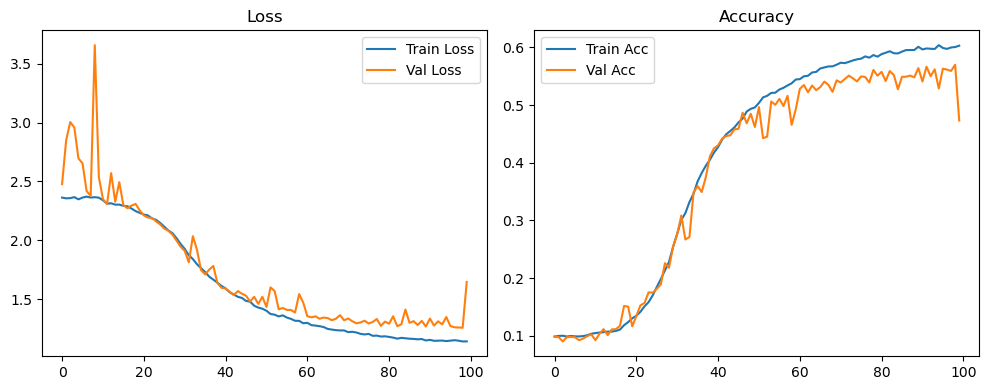

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 1.6223 Accuracy: 0.4775


🚀 Running: batch512_lr_max_0.001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   1%|          | 1/100 [01:22<2:16:35, 82.78s/it]

| LR: 0.001000 | Train Acc: 0.1003 | Val Acc: 0.0966 |:   1%|          | 1/100 [02:45<2:16:35, 82.78s/it]

| LR: 0.001000 | Train Acc: 0.1003 | Val Acc: 0.0966 |:   1%|          | 1/100 [02:45<2:16:35, 82.78s/it]

| LR: 0.001000 | Train Acc: 0.1003 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [02:45<2:15:21, 82.87s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0942 |:   2%|▏         | 2/100 [04:08<2:15:21, 82.87s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0942 |:   2%|▏         | 2/100 [04:08<2:15:21, 82.87s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0942 |:   3%|▎         | 3/100 [04:08<2:13:49, 82.78s/it]

| LR: 0.000998 | Train Acc: 0.0997 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [05:17<2:13:49, 82.78s/it]

| LR: 0.000998 | Train Acc: 0.0997 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [05:17<2:13:49, 82.78s/it]

| LR: 0.000998 | Train Acc: 0.0997 | Val Acc: 0.0966 |:   4%|▍         | 4/100 [05:18<2:04:09, 77.60s/it]

| LR: 0.000996 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [05:31<2:04:09, 77.60s/it]

| LR: 0.000996 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [05:31<2:04:09, 77.60s/it]

| LR: 0.000996 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:31<1:26:02, 54.34s/it]

| LR: 0.000994 | Train Acc: 0.1002 | Val Acc: 0.0863 |:   5%|▌         | 5/100 [05:44<1:26:02, 54.34s/it]

| LR: 0.000994 | Train Acc: 0.1002 | Val Acc: 0.0863 |:   5%|▌         | 5/100 [05:44<1:26:02, 54.34s/it]

| LR: 0.000994 | Train Acc: 0.1002 | Val Acc: 0.0863 |:   6%|▌         | 6/100 [05:44<1:03:11, 40.34s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [05:57<1:03:11, 40.34s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   6%|▌         | 6/100 [05:57<1:03:11, 40.34s/it]

| LR: 0.000991 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [05:57<48:46, 31.46s/it]  

| LR: 0.000988 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [06:10<48:46, 31.46s/it]

| LR: 0.000988 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [06:10<48:46, 31.46s/it]

| LR: 0.000988 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:10<39:20, 25.66s/it]

| LR: 0.000984 | Train Acc: 0.1000 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:23<39:20, 25.66s/it]

| LR: 0.000984 | Train Acc: 0.1000 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:23<39:20, 25.66s/it]

| LR: 0.000984 | Train Acc: 0.1000 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [06:23<33:02, 21.79s/it]

| LR: 0.000980 | Train Acc: 0.0994 | Val Acc: 0.0966 |:   9%|▉         | 9/100 [06:37<33:02, 21.79s/it]

| LR: 0.000980 | Train Acc: 0.0994 | Val Acc: 0.0966 |:   9%|▉         | 9/100 [06:37<33:02, 21.79s/it]

| LR: 0.000980 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  10%|█         | 10/100 [06:37<28:47, 19.19s/it]

| LR: 0.000976 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:50<28:47, 19.19s/it]

| LR: 0.000976 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:50<28:47, 19.19s/it]

| LR: 0.000976 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:50<25:44, 17.35s/it]

| LR: 0.000970 | Train Acc: 0.0997 | Val Acc: 0.0998 |:  11%|█         | 11/100 [07:03<25:44, 17.35s/it]

| LR: 0.000970 | Train Acc: 0.0997 | Val Acc: 0.0998 |:  11%|█         | 11/100 [07:03<25:44, 17.35s/it]

| LR: 0.000970 | Train Acc: 0.0997 | Val Acc: 0.0998 |:  12%|█▏        | 12/100 [07:03<23:36, 16.09s/it]

| LR: 0.000965 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  12%|█▏        | 12/100 [07:16<23:36, 16.09s/it]

| LR: 0.000965 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  12%|█▏        | 12/100 [07:16<23:36, 16.09s/it]

| LR: 0.000965 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  13%|█▎        | 13/100 [07:16<22:03, 15.22s/it]

| LR: 0.000959 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [07:30<22:03, 15.22s/it]

| LR: 0.000959 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [07:30<22:03, 15.22s/it]

| LR: 0.000959 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [07:30<20:55, 14.60s/it]

| LR: 0.000952 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [07:43<20:55, 14.60s/it]

| LR: 0.000952 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [07:43<20:55, 14.60s/it]

| LR: 0.000952 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  15%|█▌        | 15/100 [07:43<20:05, 14.18s/it]

| LR: 0.000946 | Train Acc: 0.0989 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [07:56<20:05, 14.18s/it]

| LR: 0.000946 | Train Acc: 0.0989 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [07:56<20:05, 14.18s/it]

| LR: 0.000946 | Train Acc: 0.0989 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [07:56<19:26, 13.89s/it]

| LR: 0.000938 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [08:09<19:26, 13.89s/it]

| LR: 0.000938 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [08:09<19:26, 13.89s/it]

| LR: 0.000938 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [08:09<18:56, 13.69s/it]

| LR: 0.000930 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [08:22<18:56, 13.69s/it]

| LR: 0.000930 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [08:22<18:56, 13.69s/it]

| LR: 0.000930 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  18%|█▊        | 18/100 [08:22<18:27, 13.51s/it]

| LR: 0.000922 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:35<18:27, 13.51s/it]

| LR: 0.000922 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:35<18:27, 13.51s/it]

| LR: 0.000922 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  19%|█▉        | 19/100 [08:35<18:03, 13.38s/it]

| LR: 0.000914 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  19%|█▉        | 19/100 [08:49<18:03, 13.38s/it]

| LR: 0.000914 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  19%|█▉        | 19/100 [08:49<18:03, 13.38s/it]

| LR: 0.000914 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  20%|██        | 20/100 [08:49<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  20%|██        | 20/100 [09:02<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  20%|██        | 20/100 [09:02<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  21%|██        | 21/100 [09:02<17:28, 13.27s/it]

| LR: 0.000895 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  21%|██        | 21/100 [09:15<17:28, 13.27s/it]

| LR: 0.000895 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  21%|██        | 21/100 [09:15<17:28, 13.27s/it]

| LR: 0.000895 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  22%|██▏       | 22/100 [09:15<17:10, 13.22s/it]

| LR: 0.000885 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  22%|██▏       | 22/100 [09:28<17:10, 13.22s/it]

| LR: 0.000885 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  22%|██▏       | 22/100 [09:28<17:10, 13.22s/it]

| LR: 0.000885 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  23%|██▎       | 23/100 [09:28<16:54, 13.18s/it]

| LR: 0.000875 | Train Acc: 0.1000 | Val Acc: 0.0948 |:  23%|██▎       | 23/100 [09:41<16:54, 13.18s/it]

| LR: 0.000875 | Train Acc: 0.1000 | Val Acc: 0.0948 |:  23%|██▎       | 23/100 [09:41<16:54, 13.18s/it]

| LR: 0.000875 | Train Acc: 0.1000 | Val Acc: 0.0948 |:  24%|██▍       | 24/100 [09:41<16:40, 13.16s/it]

| LR: 0.000865 | Train Acc: 0.0991 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:54<16:40, 13.16s/it]

| LR: 0.000865 | Train Acc: 0.0991 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:54<16:40, 13.16s/it]

| LR: 0.000865 | Train Acc: 0.0991 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [09:54<16:26, 13.16s/it]

| LR: 0.000854 | Train Acc: 0.0993 | Val Acc: 0.0942 |:  25%|██▌       | 25/100 [10:07<16:26, 13.16s/it]

| LR: 0.000854 | Train Acc: 0.0993 | Val Acc: 0.0942 |:  25%|██▌       | 25/100 [10:07<16:26, 13.16s/it]

| LR: 0.000854 | Train Acc: 0.0993 | Val Acc: 0.0942 |:  26%|██▌       | 26/100 [10:08<16:15, 13.18s/it]

| LR: 0.000842 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [10:21<16:15, 13.18s/it]

| LR: 0.000842 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [10:21<16:15, 13.18s/it]

| LR: 0.000842 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:21<16:01, 13.18s/it]

| LR: 0.000831 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [10:34<16:01, 13.18s/it]

| LR: 0.000831 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [10:34<16:01, 13.18s/it]

| LR: 0.000831 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [10:34<15:48, 13.17s/it]

| LR: 0.000819 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [10:47<15:48, 13.17s/it]

| LR: 0.000819 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [10:47<15:48, 13.17s/it]

| LR: 0.000819 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [10:47<15:36, 13.20s/it]

| LR: 0.000807 | Train Acc: 0.1005 | Val Acc: 0.0953 |:  29%|██▉       | 29/100 [11:00<15:36, 13.20s/it]

| LR: 0.000807 | Train Acc: 0.1005 | Val Acc: 0.0953 |:  29%|██▉       | 29/100 [11:00<15:36, 13.20s/it]

| LR: 0.000807 | Train Acc: 0.1005 | Val Acc: 0.0953 |:  30%|███       | 30/100 [11:00<15:22, 13.18s/it]

| LR: 0.000794 | Train Acc: 0.1006 | Val Acc: 0.0944 |:  30%|███       | 30/100 [11:13<15:22, 13.18s/it]

| LR: 0.000794 | Train Acc: 0.1006 | Val Acc: 0.0944 |:  30%|███       | 30/100 [11:13<15:22, 13.18s/it]

| LR: 0.000794 | Train Acc: 0.1006 | Val Acc: 0.0944 |:  31%|███       | 31/100 [11:13<15:09, 13.18s/it]

| LR: 0.000781 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:26<15:09, 13.18s/it]

| LR: 0.000781 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:26<15:09, 13.18s/it]

| LR: 0.000781 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  32%|███▏      | 32/100 [11:27<14:55, 13.17s/it]

| LR: 0.000768 | Train Acc: 0.1009 | Val Acc: 0.0988 |:  32%|███▏      | 32/100 [11:40<14:55, 13.17s/it]

| LR: 0.000768 | Train Acc: 0.1009 | Val Acc: 0.0988 |:  32%|███▏      | 32/100 [11:40<14:55, 13.17s/it]

| LR: 0.000768 | Train Acc: 0.1009 | Val Acc: 0.0988 |:  33%|███▎      | 33/100 [11:40<14:41, 13.16s/it]

| LR: 0.000755 | Train Acc: 0.1015 | Val Acc: 0.0953 |:  33%|███▎      | 33/100 [11:53<14:41, 13.16s/it]

| LR: 0.000755 | Train Acc: 0.1015 | Val Acc: 0.0953 |:  33%|███▎      | 33/100 [11:53<14:41, 13.16s/it]

| LR: 0.000755 | Train Acc: 0.1015 | Val Acc: 0.0953 |:  34%|███▍      | 34/100 [11:53<14:26, 13.13s/it]

| LR: 0.000741 | Train Acc: 0.1011 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:06<14:26, 13.13s/it]

| LR: 0.000741 | Train Acc: 0.1011 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:06<14:26, 13.13s/it]

| LR: 0.000741 | Train Acc: 0.1011 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:06<14:13, 13.13s/it]

| LR: 0.000727 | Train Acc: 0.1008 | Val Acc: 0.0983 |:  35%|███▌      | 35/100 [12:19<14:13, 13.13s/it]

| LR: 0.000727 | Train Acc: 0.1008 | Val Acc: 0.0983 |:  35%|███▌      | 35/100 [12:19<14:13, 13.13s/it]

| LR: 0.000727 | Train Acc: 0.1008 | Val Acc: 0.0983 |:  36%|███▌      | 36/100 [12:19<14:00, 13.13s/it]

| LR: 0.000713 | Train Acc: 0.1011 | Val Acc: 0.0980 |:  36%|███▌      | 36/100 [12:32<14:00, 13.13s/it]

| LR: 0.000713 | Train Acc: 0.1011 | Val Acc: 0.0980 |:  36%|███▌      | 36/100 [12:32<14:00, 13.13s/it]

| LR: 0.000713 | Train Acc: 0.1011 | Val Acc: 0.0980 |:  37%|███▋      | 37/100 [12:32<13:46, 13.12s/it]

| LR: 0.000699 | Train Acc: 0.1016 | Val Acc: 0.0993 |:  37%|███▋      | 37/100 [12:45<13:46, 13.12s/it]

| LR: 0.000699 | Train Acc: 0.1016 | Val Acc: 0.0993 |:  37%|███▋      | 37/100 [12:45<13:46, 13.12s/it]

| LR: 0.000699 | Train Acc: 0.1016 | Val Acc: 0.0993 |:  38%|███▊      | 38/100 [12:45<13:36, 13.16s/it]

| LR: 0.000684 | Train Acc: 0.1023 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [12:59<13:36, 13.16s/it]

| LR: 0.000684 | Train Acc: 0.1023 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [12:59<13:36, 13.16s/it]

| LR: 0.000684 | Train Acc: 0.1023 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [12:59<13:27, 13.24s/it]

| LR: 0.000670 | Train Acc: 0.1017 | Val Acc: 0.0998 |:  39%|███▉      | 39/100 [13:12<13:27, 13.24s/it]

| LR: 0.000670 | Train Acc: 0.1017 | Val Acc: 0.0998 |:  39%|███▉      | 39/100 [13:12<13:27, 13.24s/it]

| LR: 0.000670 | Train Acc: 0.1017 | Val Acc: 0.0998 |:  40%|████      | 40/100 [13:12<13:13, 13.22s/it]

| LR: 0.000655 | Train Acc: 0.1033 | Val Acc: 0.0959 |:  40%|████      | 40/100 [13:25<13:13, 13.22s/it]

| LR: 0.000655 | Train Acc: 0.1033 | Val Acc: 0.0959 |:  40%|████      | 40/100 [13:25<13:13, 13.22s/it]

| LR: 0.000655 | Train Acc: 0.1033 | Val Acc: 0.0959 |:  41%|████      | 41/100 [13:25<12:57, 13.19s/it]

| LR: 0.000640 | Train Acc: 0.1018 | Val Acc: 0.0982 |:  41%|████      | 41/100 [13:38<12:57, 13.19s/it]

| LR: 0.000640 | Train Acc: 0.1018 | Val Acc: 0.0982 |:  41%|████      | 41/100 [13:38<12:57, 13.19s/it]

| LR: 0.000640 | Train Acc: 0.1018 | Val Acc: 0.0982 |:  42%|████▏     | 42/100 [13:38<12:43, 13.16s/it]

| LR: 0.000625 | Train Acc: 0.1033 | Val Acc: 0.1001 |:  42%|████▏     | 42/100 [13:51<12:43, 13.16s/it]

| LR: 0.000625 | Train Acc: 0.1033 | Val Acc: 0.1001 |:  42%|████▏     | 42/100 [13:51<12:43, 13.16s/it]

| LR: 0.000625 | Train Acc: 0.1033 | Val Acc: 0.1001 |:  43%|████▎     | 43/100 [13:51<12:29, 13.16s/it]

| LR: 0.000609 | Train Acc: 0.1029 | Val Acc: 0.1030 |:  43%|████▎     | 43/100 [14:04<12:29, 13.16s/it]

| LR: 0.000609 | Train Acc: 0.1029 | Val Acc: 0.1030 |:  43%|████▎     | 43/100 [14:04<12:29, 13.16s/it]

| LR: 0.000609 | Train Acc: 0.1029 | Val Acc: 0.1030 |:  44%|████▍     | 44/100 [14:04<12:16, 13.15s/it]

| LR: 0.000594 | Train Acc: 0.1030 | Val Acc: 0.1015 |:  44%|████▍     | 44/100 [14:18<12:16, 13.15s/it]

| LR: 0.000594 | Train Acc: 0.1030 | Val Acc: 0.1015 |:  44%|████▍     | 44/100 [14:18<12:16, 13.15s/it]

| LR: 0.000594 | Train Acc: 0.1030 | Val Acc: 0.1015 |:  45%|████▌     | 45/100 [14:18<12:03, 13.15s/it]

| LR: 0.000579 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  45%|████▌     | 45/100 [14:31<12:03, 13.15s/it]

| LR: 0.000579 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  45%|████▌     | 45/100 [14:31<12:03, 13.15s/it]

| LR: 0.000579 | Train Acc: 0.1033 | Val Acc: 0.1014 |:  46%|████▌     | 46/100 [14:31<11:50, 13.15s/it]

| LR: 0.000563 | Train Acc: 0.1040 | Val Acc: 0.0974 |:  46%|████▌     | 46/100 [14:44<11:50, 13.15s/it]

| LR: 0.000563 | Train Acc: 0.1040 | Val Acc: 0.0974 |:  46%|████▌     | 46/100 [14:44<11:50, 13.15s/it]

| LR: 0.000563 | Train Acc: 0.1040 | Val Acc: 0.0974 |:  47%|████▋     | 47/100 [14:44<11:38, 13.17s/it]

| LR: 0.000548 | Train Acc: 0.1032 | Val Acc: 0.0996 |:  47%|████▋     | 47/100 [14:57<11:38, 13.17s/it]

| LR: 0.000548 | Train Acc: 0.1032 | Val Acc: 0.0996 |:  47%|████▋     | 47/100 [14:57<11:38, 13.17s/it]

| LR: 0.000548 | Train Acc: 0.1032 | Val Acc: 0.0996 |:  48%|████▊     | 48/100 [14:57<11:26, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.1031 | Val Acc: 0.1009 |:  48%|████▊     | 48/100 [15:10<11:26, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.1031 | Val Acc: 0.1009 |:  48%|████▊     | 48/100 [15:10<11:26, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.1031 | Val Acc: 0.1009 |:  49%|████▉     | 49/100 [15:10<11:12, 13.18s/it]

| LR: 0.000516 | Train Acc: 0.1039 | Val Acc: 0.0985 |:  49%|████▉     | 49/100 [15:23<11:12, 13.18s/it]

| LR: 0.000516 | Train Acc: 0.1039 | Val Acc: 0.0985 |:  49%|████▉     | 49/100 [15:23<11:12, 13.18s/it]

| LR: 0.000516 | Train Acc: 0.1039 | Val Acc: 0.0985 |:  50%|█████     | 50/100 [15:23<10:58, 13.17s/it]

| LR: 0.000501 | Train Acc: 0.1051 | Val Acc: 0.1036 |:  50%|█████     | 50/100 [15:37<10:58, 13.17s/it]

| LR: 0.000501 | Train Acc: 0.1051 | Val Acc: 0.1036 |:  50%|█████     | 50/100 [15:37<10:58, 13.17s/it]

| LR: 0.000501 | Train Acc: 0.1051 | Val Acc: 0.1036 |:  51%|█████     | 51/100 [15:37<10:46, 13.20s/it]

| LR: 0.000485 | Train Acc: 0.1054 | Val Acc: 0.1007 |:  51%|█████     | 51/100 [15:50<10:46, 13.20s/it]

| LR: 0.000485 | Train Acc: 0.1054 | Val Acc: 0.1007 |:  51%|█████     | 51/100 [15:50<10:46, 13.20s/it]

| LR: 0.000485 | Train Acc: 0.1054 | Val Acc: 0.1007 |:  52%|█████▏    | 52/100 [15:50<10:34, 13.22s/it]

| LR: 0.000469 | Train Acc: 0.1059 | Val Acc: 0.0983 |:  52%|█████▏    | 52/100 [16:03<10:34, 13.22s/it]

| LR: 0.000469 | Train Acc: 0.1059 | Val Acc: 0.0983 |:  52%|█████▏    | 52/100 [16:03<10:34, 13.22s/it]

| LR: 0.000469 | Train Acc: 0.1059 | Val Acc: 0.0983 |:  53%|█████▎    | 53/100 [16:03<10:20, 13.21s/it]

| LR: 0.000453 | Train Acc: 0.1057 | Val Acc: 0.1022 |:  53%|█████▎    | 53/100 [16:16<10:20, 13.21s/it]

| LR: 0.000453 | Train Acc: 0.1057 | Val Acc: 0.1022 |:  53%|█████▎    | 53/100 [16:16<10:20, 13.21s/it]

| LR: 0.000453 | Train Acc: 0.1057 | Val Acc: 0.1022 |:  54%|█████▍    | 54/100 [16:16<10:06, 13.19s/it]

| LR: 0.000438 | Train Acc: 0.1052 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [16:29<10:06, 13.19s/it]

| LR: 0.000438 | Train Acc: 0.1052 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [16:29<10:06, 13.19s/it]

| LR: 0.000438 | Train Acc: 0.1052 | Val Acc: 0.0979 |:  55%|█████▌    | 55/100 [16:30<09:53, 13.18s/it]

| LR: 0.000422 | Train Acc: 0.1060 | Val Acc: 0.1001 |:  55%|█████▌    | 55/100 [16:43<09:53, 13.18s/it]

| LR: 0.000422 | Train Acc: 0.1060 | Val Acc: 0.1001 |:  55%|█████▌    | 55/100 [16:43<09:53, 13.18s/it]

| LR: 0.000422 | Train Acc: 0.1060 | Val Acc: 0.1001 |:  56%|█████▌    | 56/100 [16:43<09:40, 13.19s/it]

| LR: 0.000407 | Train Acc: 0.1052 | Val Acc: 0.0990 |:  56%|█████▌    | 56/100 [16:56<09:40, 13.19s/it]

| LR: 0.000407 | Train Acc: 0.1052 | Val Acc: 0.0990 |:  56%|█████▌    | 56/100 [16:56<09:40, 13.19s/it]

| LR: 0.000407 | Train Acc: 0.1052 | Val Acc: 0.0990 |:  57%|█████▋    | 57/100 [16:56<09:27, 13.19s/it]

| LR: 0.000392 | Train Acc: 0.1064 | Val Acc: 0.0988 |:  57%|█████▋    | 57/100 [17:09<09:27, 13.19s/it]

| LR: 0.000392 | Train Acc: 0.1064 | Val Acc: 0.0988 |:  57%|█████▋    | 57/100 [17:09<09:27, 13.19s/it]

| LR: 0.000392 | Train Acc: 0.1064 | Val Acc: 0.0988 |:  58%|█████▊    | 58/100 [17:09<09:15, 13.22s/it]

| LR: 0.000376 | Train Acc: 0.1067 | Val Acc: 0.1010 |:  58%|█████▊    | 58/100 [17:22<09:15, 13.22s/it]

| LR: 0.000376 | Train Acc: 0.1067 | Val Acc: 0.1010 |:  58%|█████▊    | 58/100 [17:22<09:15, 13.22s/it]

| LR: 0.000376 | Train Acc: 0.1067 | Val Acc: 0.1010 |:  59%|█████▉    | 59/100 [17:23<09:02, 13.24s/it]

| LR: 0.000361 | Train Acc: 0.1092 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [17:36<09:02, 13.24s/it]

| LR: 0.000361 | Train Acc: 0.1092 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [17:36<09:02, 13.24s/it]

| LR: 0.000361 | Train Acc: 0.1092 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [17:36<08:48, 13.22s/it]

| LR: 0.000346 | Train Acc: 0.1076 | Val Acc: 0.0991 |:  60%|██████    | 60/100 [17:49<08:48, 13.22s/it]

| LR: 0.000346 | Train Acc: 0.1076 | Val Acc: 0.0991 |:  60%|██████    | 60/100 [17:49<08:48, 13.22s/it]

| LR: 0.000346 | Train Acc: 0.1076 | Val Acc: 0.0991 |:  61%|██████    | 61/100 [17:49<08:35, 13.21s/it]

| LR: 0.000331 | Train Acc: 0.1097 | Val Acc: 0.0991 |:  61%|██████    | 61/100 [18:02<08:35, 13.21s/it]

| LR: 0.000331 | Train Acc: 0.1097 | Val Acc: 0.0991 |:  61%|██████    | 61/100 [18:02<08:35, 13.21s/it]

| LR: 0.000331 | Train Acc: 0.1097 | Val Acc: 0.0991 |:  62%|██████▏   | 62/100 [18:02<08:21, 13.19s/it]

| LR: 0.000317 | Train Acc: 0.1068 | Val Acc: 0.1058 |:  62%|██████▏   | 62/100 [18:15<08:21, 13.19s/it]

| LR: 0.000317 | Train Acc: 0.1068 | Val Acc: 0.1058 |:  62%|██████▏   | 62/100 [18:15<08:21, 13.19s/it]

| LR: 0.000317 | Train Acc: 0.1068 | Val Acc: 0.1058 |:  63%|██████▎   | 63/100 [18:15<08:07, 13.17s/it]

| LR: 0.000302 | Train Acc: 0.1100 | Val Acc: 0.1077 |:  63%|██████▎   | 63/100 [18:28<08:07, 13.17s/it]

| LR: 0.000302 | Train Acc: 0.1100 | Val Acc: 0.1077 |:  63%|██████▎   | 63/100 [18:28<08:07, 13.17s/it]

| LR: 0.000302 | Train Acc: 0.1100 | Val Acc: 0.1077 |:  64%|██████▍   | 64/100 [18:28<07:53, 13.16s/it]

| LR: 0.000288 | Train Acc: 0.1113 | Val Acc: 0.1082 |:  64%|██████▍   | 64/100 [18:41<07:53, 13.16s/it]

| LR: 0.000288 | Train Acc: 0.1113 | Val Acc: 0.1082 |:  64%|██████▍   | 64/100 [18:41<07:53, 13.16s/it]

| LR: 0.000288 | Train Acc: 0.1113 | Val Acc: 0.1082 |:  65%|██████▌   | 65/100 [18:41<07:40, 13.15s/it]

| LR: 0.000274 | Train Acc: 0.1116 | Val Acc: 0.1095 |:  65%|██████▌   | 65/100 [18:54<07:40, 13.15s/it]

| LR: 0.000274 | Train Acc: 0.1116 | Val Acc: 0.1095 |:  65%|██████▌   | 65/100 [18:54<07:40, 13.15s/it]

| LR: 0.000274 | Train Acc: 0.1116 | Val Acc: 0.1095 |:  66%|██████▌   | 66/100 [18:55<07:26, 13.15s/it]

| LR: 0.000260 | Train Acc: 0.1109 | Val Acc: 0.1018 |:  66%|██████▌   | 66/100 [19:08<07:26, 13.15s/it]

| LR: 0.000260 | Train Acc: 0.1109 | Val Acc: 0.1018 |:  66%|██████▌   | 66/100 [19:08<07:26, 13.15s/it]

| LR: 0.000260 | Train Acc: 0.1109 | Val Acc: 0.1018 |:  67%|██████▋   | 67/100 [19:08<07:15, 13.20s/it]

| LR: 0.000246 | Train Acc: 0.1112 | Val Acc: 0.1062 |:  67%|██████▋   | 67/100 [19:21<07:15, 13.20s/it]

| LR: 0.000246 | Train Acc: 0.1112 | Val Acc: 0.1062 |:  67%|██████▋   | 67/100 [19:21<07:15, 13.20s/it]

| LR: 0.000246 | Train Acc: 0.1112 | Val Acc: 0.1062 |:  68%|██████▊   | 68/100 [19:21<07:02, 13.20s/it]

| LR: 0.000233 | Train Acc: 0.1126 | Val Acc: 0.1037 |:  68%|██████▊   | 68/100 [19:34<07:02, 13.20s/it]

| LR: 0.000233 | Train Acc: 0.1126 | Val Acc: 0.1037 |:  68%|██████▊   | 68/100 [19:34<07:02, 13.20s/it]

| LR: 0.000233 | Train Acc: 0.1126 | Val Acc: 0.1037 |:  69%|██████▉   | 69/100 [19:34<06:48, 13.18s/it]

| LR: 0.000220 | Train Acc: 0.1125 | Val Acc: 0.1147 |:  69%|██████▉   | 69/100 [19:47<06:48, 13.18s/it]

| LR: 0.000220 | Train Acc: 0.1125 | Val Acc: 0.1147 |:  69%|██████▉   | 69/100 [19:47<06:48, 13.18s/it]

| LR: 0.000220 | Train Acc: 0.1125 | Val Acc: 0.1147 |:  70%|███████   | 70/100 [19:47<06:35, 13.18s/it]

| LR: 0.000207 | Train Acc: 0.1140 | Val Acc: 0.1056 |:  70%|███████   | 70/100 [20:01<06:35, 13.18s/it]

| LR: 0.000207 | Train Acc: 0.1140 | Val Acc: 0.1056 |:  70%|███████   | 70/100 [20:01<06:35, 13.18s/it]

| LR: 0.000207 | Train Acc: 0.1140 | Val Acc: 0.1056 |:  71%|███████   | 71/100 [20:01<06:22, 13.19s/it]

| LR: 0.000194 | Train Acc: 0.1141 | Val Acc: 0.1067 |:  71%|███████   | 71/100 [20:14<06:22, 13.19s/it]

| LR: 0.000194 | Train Acc: 0.1141 | Val Acc: 0.1067 |:  71%|███████   | 71/100 [20:14<06:22, 13.19s/it]

| LR: 0.000194 | Train Acc: 0.1141 | Val Acc: 0.1067 |:  72%|███████▏  | 72/100 [20:14<06:09, 13.19s/it]

| LR: 0.000182 | Train Acc: 0.1143 | Val Acc: 0.1328 |:  72%|███████▏  | 72/100 [20:27<06:09, 13.19s/it]

| LR: 0.000182 | Train Acc: 0.1143 | Val Acc: 0.1328 |:  72%|███████▏  | 72/100 [20:27<06:09, 13.19s/it]

| LR: 0.000182 | Train Acc: 0.1143 | Val Acc: 0.1328 |:  73%|███████▎  | 73/100 [20:27<05:56, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.1139 | Val Acc: 0.1088 |:  73%|███████▎  | 73/100 [20:40<05:56, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.1139 | Val Acc: 0.1088 |:  73%|███████▎  | 73/100 [20:40<05:56, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.1139 | Val Acc: 0.1088 |:  74%|███████▍  | 74/100 [20:40<05:42, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1137 | Val Acc: 0.1078 |:  74%|███████▍  | 74/100 [20:53<05:42, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1137 | Val Acc: 0.1078 |:  74%|███████▍  | 74/100 [20:53<05:42, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1137 | Val Acc: 0.1078 |:  75%|███████▌  | 75/100 [20:53<05:29, 13.19s/it]

| LR: 0.000147 | Train Acc: 0.1157 | Val Acc: 0.1070 |:  75%|███████▌  | 75/100 [21:06<05:29, 13.19s/it]

| LR: 0.000147 | Train Acc: 0.1157 | Val Acc: 0.1070 |:  75%|███████▌  | 75/100 [21:06<05:29, 13.19s/it]

| LR: 0.000147 | Train Acc: 0.1157 | Val Acc: 0.1070 |:  76%|███████▌  | 76/100 [21:07<05:16, 13.19s/it]

| LR: 0.000136 | Train Acc: 0.1142 | Val Acc: 0.1061 |:  76%|███████▌  | 76/100 [21:20<05:16, 13.19s/it]

| LR: 0.000136 | Train Acc: 0.1142 | Val Acc: 0.1061 |:  76%|███████▌  | 76/100 [21:20<05:16, 13.19s/it]

| LR: 0.000136 | Train Acc: 0.1142 | Val Acc: 0.1061 |:  77%|███████▋  | 77/100 [21:20<05:04, 13.22s/it]

| LR: 0.000126 | Train Acc: 0.1145 | Val Acc: 0.1030 |:  77%|███████▋  | 77/100 [21:33<05:04, 13.22s/it]

| LR: 0.000126 | Train Acc: 0.1145 | Val Acc: 0.1030 |:  77%|███████▋  | 77/100 [21:33<05:04, 13.22s/it]

| LR: 0.000126 | Train Acc: 0.1145 | Val Acc: 0.1030 |:  78%|███████▊  | 78/100 [21:33<04:50, 13.19s/it]

| LR: 0.000116 | Train Acc: 0.1165 | Val Acc: 0.1067 |:  78%|███████▊  | 78/100 [21:46<04:50, 13.19s/it]

| LR: 0.000116 | Train Acc: 0.1165 | Val Acc: 0.1067 |:  78%|███████▊  | 78/100 [21:46<04:50, 13.19s/it]

| LR: 0.000116 | Train Acc: 0.1165 | Val Acc: 0.1067 |:  79%|███████▉  | 79/100 [21:46<04:36, 13.16s/it]

| LR: 0.000106 | Train Acc: 0.1140 | Val Acc: 0.1018 |:  79%|███████▉  | 79/100 [21:59<04:36, 13.16s/it]

| LR: 0.000106 | Train Acc: 0.1140 | Val Acc: 0.1018 |:  79%|███████▉  | 79/100 [21:59<04:36, 13.16s/it]

| LR: 0.000106 | Train Acc: 0.1140 | Val Acc: 0.1018 |:  80%|████████  | 80/100 [21:59<04:22, 13.13s/it]

| LR: 0.000096 | Train Acc: 0.1135 | Val Acc: 0.1083 |:  80%|████████  | 80/100 [22:12<04:22, 13.13s/it]

| LR: 0.000096 | Train Acc: 0.1135 | Val Acc: 0.1083 |:  80%|████████  | 80/100 [22:12<04:22, 13.13s/it]

| LR: 0.000096 | Train Acc: 0.1135 | Val Acc: 0.1083 |:  81%|████████  | 81/100 [22:12<04:09, 13.12s/it]

| LR: 0.000087 | Train Acc: 0.1155 | Val Acc: 0.1066 |:  81%|████████  | 81/100 [22:25<04:09, 13.12s/it]

| LR: 0.000087 | Train Acc: 0.1155 | Val Acc: 0.1066 |:  81%|████████  | 81/100 [22:25<04:09, 13.12s/it]

| LR: 0.000087 | Train Acc: 0.1155 | Val Acc: 0.1066 |:  82%|████████▏ | 82/100 [22:25<03:56, 13.12s/it]

| LR: 0.000079 | Train Acc: 0.1165 | Val Acc: 0.1041 |:  82%|████████▏ | 82/100 [22:38<03:56, 13.12s/it]

| LR: 0.000079 | Train Acc: 0.1165 | Val Acc: 0.1041 |:  82%|████████▏ | 82/100 [22:38<03:56, 13.12s/it]

| LR: 0.000079 | Train Acc: 0.1165 | Val Acc: 0.1041 |:  83%|████████▎ | 83/100 [22:38<03:43, 13.12s/it]

| LR: 0.000071 | Train Acc: 0.1140 | Val Acc: 0.1102 |:  83%|████████▎ | 83/100 [22:52<03:43, 13.12s/it]

| LR: 0.000071 | Train Acc: 0.1140 | Val Acc: 0.1102 |:  83%|████████▎ | 83/100 [22:52<03:43, 13.12s/it]

| LR: 0.000071 | Train Acc: 0.1140 | Val Acc: 0.1102 |:  84%|████████▍ | 84/100 [22:52<03:30, 13.13s/it]

| LR: 0.000063 | Train Acc: 0.1153 | Val Acc: 0.1044 |:  84%|████████▍ | 84/100 [23:05<03:30, 13.13s/it]

| LR: 0.000063 | Train Acc: 0.1153 | Val Acc: 0.1044 |:  84%|████████▍ | 84/100 [23:05<03:30, 13.13s/it]

| LR: 0.000063 | Train Acc: 0.1153 | Val Acc: 0.1044 |:  85%|████████▌ | 85/100 [23:05<03:16, 13.12s/it]

| LR: 0.000055 | Train Acc: 0.1157 | Val Acc: 0.1270 |:  85%|████████▌ | 85/100 [23:18<03:16, 13.12s/it]

| LR: 0.000055 | Train Acc: 0.1157 | Val Acc: 0.1270 |:  85%|████████▌ | 85/100 [23:18<03:16, 13.12s/it]

| LR: 0.000055 | Train Acc: 0.1157 | Val Acc: 0.1270 |:  86%|████████▌ | 86/100 [23:18<03:04, 13.16s/it]

| LR: 0.000049 | Train Acc: 0.1144 | Val Acc: 0.1183 |:  86%|████████▌ | 86/100 [23:31<03:04, 13.16s/it]

| LR: 0.000049 | Train Acc: 0.1144 | Val Acc: 0.1183 |:  86%|████████▌ | 86/100 [23:31<03:04, 13.16s/it]

| LR: 0.000049 | Train Acc: 0.1144 | Val Acc: 0.1183 |:  87%|████████▋ | 87/100 [23:31<02:50, 13.15s/it]

| LR: 0.000042 | Train Acc: 0.1156 | Val Acc: 0.1063 |:  87%|████████▋ | 87/100 [23:44<02:50, 13.15s/it]

| LR: 0.000042 | Train Acc: 0.1156 | Val Acc: 0.1063 |:  87%|████████▋ | 87/100 [23:44<02:50, 13.15s/it]

| LR: 0.000042 | Train Acc: 0.1156 | Val Acc: 0.1063 |:  88%|████████▊ | 88/100 [23:44<02:37, 13.14s/it]

| LR: 0.000036 | Train Acc: 0.1149 | Val Acc: 0.1086 |:  88%|████████▊ | 88/100 [23:57<02:37, 13.14s/it]

| LR: 0.000036 | Train Acc: 0.1149 | Val Acc: 0.1086 |:  88%|████████▊ | 88/100 [23:57<02:37, 13.14s/it]

| LR: 0.000036 | Train Acc: 0.1149 | Val Acc: 0.1086 |:  89%|████████▉ | 89/100 [23:57<02:24, 13.13s/it]

| LR: 0.000031 | Train Acc: 0.1159 | Val Acc: 0.1226 |:  89%|████████▉ | 89/100 [24:10<02:24, 13.13s/it]

| LR: 0.000031 | Train Acc: 0.1159 | Val Acc: 0.1226 |:  89%|████████▉ | 89/100 [24:10<02:24, 13.13s/it]

| LR: 0.000031 | Train Acc: 0.1159 | Val Acc: 0.1226 |:  90%|█████████ | 90/100 [24:10<02:11, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.1149 | Val Acc: 0.1262 |:  90%|█████████ | 90/100 [24:23<02:11, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.1149 | Val Acc: 0.1262 |:  90%|█████████ | 90/100 [24:23<02:11, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.1149 | Val Acc: 0.1262 |:  91%|█████████ | 91/100 [24:23<01:58, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.1147 | Val Acc: 0.1101 |:  91%|█████████ | 91/100 [24:37<01:58, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.1147 | Val Acc: 0.1101 |:  91%|█████████ | 91/100 [24:37<01:58, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.1147 | Val Acc: 0.1101 |:  92%|█████████▏| 92/100 [24:37<01:44, 13.11s/it]

| LR: 0.000017 | Train Acc: 0.1153 | Val Acc: 0.1107 |:  92%|█████████▏| 92/100 [24:50<01:44, 13.11s/it]

| LR: 0.000017 | Train Acc: 0.1153 | Val Acc: 0.1107 |:  92%|█████████▏| 92/100 [24:50<01:44, 13.11s/it]

| LR: 0.000017 | Train Acc: 0.1153 | Val Acc: 0.1107 |:  93%|█████████▎| 93/100 [24:50<01:31, 13.13s/it]

| LR: 0.000013 | Train Acc: 0.1149 | Val Acc: 0.1473 |:  93%|█████████▎| 93/100 [25:03<01:31, 13.13s/it]

| LR: 0.000013 | Train Acc: 0.1149 | Val Acc: 0.1473 |:  93%|█████████▎| 93/100 [25:03<01:31, 13.13s/it]

| LR: 0.000013 | Train Acc: 0.1149 | Val Acc: 0.1473 |:  94%|█████████▍| 94/100 [25:03<01:18, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1166 | Val Acc: 0.1391 |:  94%|█████████▍| 94/100 [25:16<01:18, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1166 | Val Acc: 0.1391 |:  94%|█████████▍| 94/100 [25:16<01:18, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1166 | Val Acc: 0.1391 |:  95%|█████████▌| 95/100 [25:16<01:05, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.1157 | Val Acc: 0.1160 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.1157 | Val Acc: 0.1160 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.1157 | Val Acc: 0.1160 |:  96%|█████████▌| 96/100 [25:30<00:52, 13.22s/it]

| LR: 0.000005 | Train Acc: 0.1157 | Val Acc: 0.1059 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.22s/it]

| LR: 0.000005 | Train Acc: 0.1157 | Val Acc: 0.1059 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.22s/it]

| LR: 0.000005 | Train Acc: 0.1157 | Val Acc: 0.1059 |:  97%|█████████▋| 97/100 [25:43<00:39, 13.22s/it]

| LR: 0.000003 | Train Acc: 0.1154 | Val Acc: 0.1201 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.22s/it]

| LR: 0.000003 | Train Acc: 0.1154 | Val Acc: 0.1201 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.22s/it]

| LR: 0.000003 | Train Acc: 0.1154 | Val Acc: 0.1201 |:  98%|█████████▊| 98/100 [25:56<00:26, 13.23s/it]

| LR: 0.000002 | Train Acc: 0.1162 | Val Acc: 0.1310 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.23s/it]

| LR: 0.000002 | Train Acc: 0.1162 | Val Acc: 0.1310 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.23s/it]

| LR: 0.000002 | Train Acc: 0.1162 | Val Acc: 0.1310 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.23s/it]

| LR: 0.000001 | Train Acc: 0.1175 | Val Acc: 0.1041 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.23s/it]

| LR: 0.000001 | Train Acc: 0.1175 | Val Acc: 0.1041 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.23s/it]

| LR: 0.000001 | Train Acc: 0.1175 | Val Acc: 0.1041 |: 100%|██████████| 100/100 [26:22<00:00, 13.22s/it]

| LR: 0.000001 | Train Acc: 0.1175 | Val Acc: 0.1041 |: 100%|██████████| 100/100 [26:22<00:00, 15.83s/it]

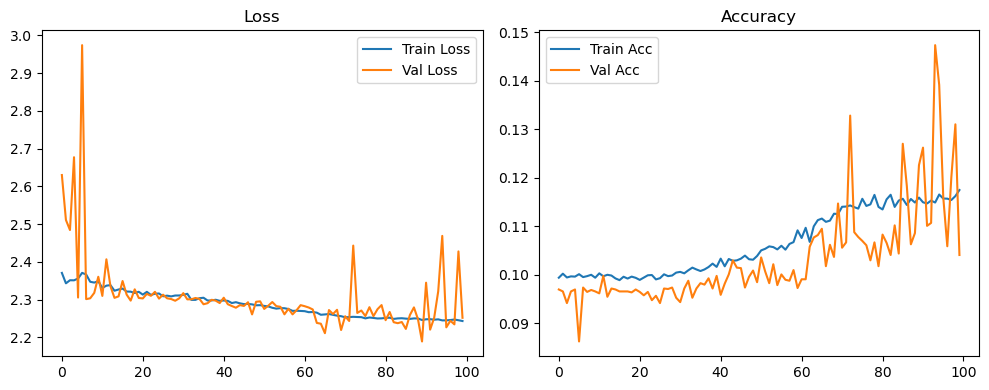

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.34it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.33it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.78it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.63it/s]

Original Model Final Test Loss: 2.2490 Accuracy: 0.1057


🚀 Running: batch512_lr_max_0.001_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0953 |:   0%|          | 0/100 [01:23<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0953 |:   0%|          | 0/100 [01:23<?, ?it/s]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0953 |:   1%|          | 1/100 [01:23<2:17:12, 83.15s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:45<2:17:12, 83.15s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:45<2:17:12, 83.15s/it]

| LR: 0.001000 | Train Acc: 0.0998 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:45<2:15:14, 82.80s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [04:07<2:15:14, 82.80s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0966 |:   2%|▏         | 2/100 [04:07<2:15:14, 82.80s/it]

| LR: 0.000999 | Train Acc: 0.0995 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [04:07<2:13:16, 82.43s/it]

| LR: 0.000998 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [05:15<2:13:16, 82.43s/it]

| LR: 0.000998 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [05:15<2:13:16, 82.43s/it]

| LR: 0.000998 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [05:15<2:02:57, 76.85s/it]

| LR: 0.000996 | Train Acc: 0.1003 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [05:29<2:02:57, 76.85s/it]

| LR: 0.000996 | Train Acc: 0.1003 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [05:29<2:02:57, 76.85s/it]

| LR: 0.000996 | Train Acc: 0.1003 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [05:29<1:25:16, 53.86s/it]

| LR: 0.000994 | Train Acc: 0.1003 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [05:42<1:25:16, 53.86s/it]

| LR: 0.000994 | Train Acc: 0.1003 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [05:42<1:25:16, 53.86s/it]

| LR: 0.000994 | Train Acc: 0.1003 | Val Acc: 0.0971 |:   6%|▌         | 6/100 [05:42<1:02:39, 40.00s/it]

| LR: 0.000991 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [05:55<1:02:39, 40.00s/it]

| LR: 0.000991 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [05:55<1:02:39, 40.00s/it]

| LR: 0.000991 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [05:55<48:23, 31.22s/it]  

| LR: 0.000988 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:08<48:23, 31.22s/it]

| LR: 0.000988 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:08<48:23, 31.22s/it]

| LR: 0.000988 | Train Acc: 0.0993 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:08<39:03, 25.48s/it]

| LR: 0.000984 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:21<39:03, 25.48s/it]

| LR: 0.000984 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:21<39:03, 25.48s/it]

| LR: 0.000984 | Train Acc: 0.0994 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [06:21<32:48, 21.63s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:34<32:48, 21.63s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:34<32:48, 21.63s/it]

| LR: 0.000980 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  10%|█         | 10/100 [06:34<28:35, 19.06s/it]

| LR: 0.000976 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:48<28:35, 19.06s/it]

| LR: 0.000976 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:48<28:35, 19.06s/it]

| LR: 0.000976 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  11%|█         | 11/100 [06:48<25:35, 17.25s/it]

| LR: 0.000970 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  11%|█         | 11/100 [07:01<25:35, 17.25s/it]

| LR: 0.000970 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  11%|█         | 11/100 [07:01<25:35, 17.25s/it]

| LR: 0.000970 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:01<23:27, 16.00s/it]

| LR: 0.000965 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:14<23:27, 16.00s/it]

| LR: 0.000965 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:14<23:27, 16.00s/it]

| LR: 0.000965 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [07:14<21:55, 15.12s/it]

| LR: 0.000959 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:27<21:55, 15.12s/it]

| LR: 0.000959 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:27<21:55, 15.12s/it]

| LR: 0.000959 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:27<20:48, 14.51s/it]

| LR: 0.000952 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:40<20:48, 14.51s/it]

| LR: 0.000952 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:40<20:48, 14.51s/it]

| LR: 0.000952 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:40<19:57, 14.09s/it]

| LR: 0.000946 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  15%|█▌        | 15/100 [07:53<19:57, 14.09s/it]

| LR: 0.000946 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  15%|█▌        | 15/100 [07:53<19:57, 14.09s/it]

| LR: 0.000946 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  16%|█▌        | 16/100 [07:53<19:19, 13.80s/it]

| LR: 0.000938 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [08:06<19:19, 13.80s/it]

| LR: 0.000938 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  16%|█▌        | 16/100 [08:06<19:19, 13.80s/it]

| LR: 0.000938 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  17%|█▋        | 17/100 [08:06<18:48, 13.59s/it]

| LR: 0.000930 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:19<18:48, 13.59s/it]

| LR: 0.000930 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:19<18:48, 13.59s/it]

| LR: 0.000930 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:19<18:23, 13.45s/it]

| LR: 0.000922 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:33<18:23, 13.45s/it]

| LR: 0.000922 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:33<18:23, 13.45s/it]

| LR: 0.000922 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:33<18:02, 13.36s/it]

| LR: 0.000914 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [08:46<18:02, 13.36s/it]

| LR: 0.000914 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [08:46<18:02, 13.36s/it]

| LR: 0.000914 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  20%|██        | 20/100 [08:46<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  20%|██        | 20/100 [08:59<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  20%|██        | 20/100 [08:59<17:46, 13.33s/it]

| LR: 0.000905 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  21%|██        | 21/100 [08:59<17:29, 13.28s/it]

| LR: 0.000895 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  21%|██        | 21/100 [09:12<17:29, 13.28s/it]

| LR: 0.000895 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  21%|██        | 21/100 [09:12<17:29, 13.28s/it]

| LR: 0.000895 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  22%|██▏       | 22/100 [09:12<17:12, 13.24s/it]

| LR: 0.000885 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  22%|██▏       | 22/100 [09:25<17:12, 13.24s/it]

| LR: 0.000885 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  22%|██▏       | 22/100 [09:25<17:12, 13.24s/it]

| LR: 0.000885 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [09:25<16:58, 13.23s/it]

| LR: 0.000875 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [09:39<16:58, 13.23s/it]

| LR: 0.000875 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [09:39<16:58, 13.23s/it]

| LR: 0.000875 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  24%|██▍       | 24/100 [09:39<16:44, 13.22s/it]

| LR: 0.000865 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  24%|██▍       | 24/100 [09:52<16:44, 13.22s/it]

| LR: 0.000865 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  24%|██▍       | 24/100 [09:52<16:44, 13.22s/it]

| LR: 0.000865 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  25%|██▌       | 25/100 [09:52<16:30, 13.21s/it]

| LR: 0.000854 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  25%|██▌       | 25/100 [10:05<16:30, 13.21s/it]

| LR: 0.000854 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  25%|██▌       | 25/100 [10:05<16:30, 13.21s/it]

| LR: 0.000854 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  26%|██▌       | 26/100 [10:05<16:17, 13.21s/it]

| LR: 0.000842 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [10:18<16:17, 13.21s/it]

| LR: 0.000842 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [10:18<16:17, 13.21s/it]

| LR: 0.000842 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:18<16:04, 13.21s/it]

| LR: 0.000831 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [10:31<16:04, 13.21s/it]

| LR: 0.000831 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [10:31<16:04, 13.21s/it]

| LR: 0.000831 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [10:31<15:50, 13.20s/it]

| LR: 0.000819 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [10:45<15:50, 13.20s/it]

| LR: 0.000819 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [10:45<15:50, 13.20s/it]

| LR: 0.000819 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [10:45<15:40, 13.24s/it]

| LR: 0.000807 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  29%|██▉       | 29/100 [10:58<15:40, 13.24s/it]

| LR: 0.000807 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  29%|██▉       | 29/100 [10:58<15:40, 13.24s/it]

| LR: 0.000807 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  30%|███       | 30/100 [10:58<15:26, 13.23s/it]

| LR: 0.000794 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  30%|███       | 30/100 [11:11<15:26, 13.23s/it]

| LR: 0.000794 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  30%|███       | 30/100 [11:11<15:26, 13.23s/it]

| LR: 0.000794 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  31%|███       | 31/100 [11:11<15:11, 13.21s/it]

| LR: 0.000781 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  31%|███       | 31/100 [11:24<15:11, 13.21s/it]

| LR: 0.000781 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  31%|███       | 31/100 [11:24<15:11, 13.21s/it]

| LR: 0.000781 | Train Acc: 0.0989 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [11:24<14:57, 13.20s/it]

| LR: 0.000768 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  32%|███▏      | 32/100 [11:37<14:57, 13.20s/it]

| LR: 0.000768 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  32%|███▏      | 32/100 [11:37<14:57, 13.20s/it]

| LR: 0.000768 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  33%|███▎      | 33/100 [11:37<14:44, 13.20s/it]

| LR: 0.000755 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000755 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000755 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [11:51<14:30, 13.19s/it]

| LR: 0.000741 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  34%|███▍      | 34/100 [12:04<14:30, 13.19s/it]

| LR: 0.000741 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  34%|███▍      | 34/100 [12:04<14:30, 13.19s/it]

| LR: 0.000741 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  35%|███▌      | 35/100 [12:04<14:17, 13.19s/it]

| LR: 0.000727 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:17<14:17, 13.19s/it]

| LR: 0.000727 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:17<14:17, 13.19s/it]

| LR: 0.000727 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:17<14:04, 13.19s/it]

| LR: 0.000713 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:30<14:04, 13.19s/it]

| LR: 0.000713 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:30<14:04, 13.19s/it]

| LR: 0.000713 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:30<13:51, 13.20s/it]

| LR: 0.000699 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:43<13:51, 13.20s/it]

| LR: 0.000699 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:43<13:51, 13.20s/it]

| LR: 0.000699 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [12:44<13:40, 13.24s/it]

| LR: 0.000684 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  38%|███▊      | 38/100 [12:57<13:40, 13.24s/it]

| LR: 0.000684 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  38%|███▊      | 38/100 [12:57<13:40, 13.24s/it]

| LR: 0.000684 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  39%|███▉      | 39/100 [12:57<13:26, 13.22s/it]

| LR: 0.000670 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [13:10<13:26, 13.22s/it]

| LR: 0.000670 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [13:10<13:26, 13.22s/it]

| LR: 0.000670 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:10<13:12, 13.21s/it]

| LR: 0.000655 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:23<13:12, 13.21s/it]

| LR: 0.000655 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:23<13:12, 13.21s/it]

| LR: 0.000655 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:23<13:00, 13.22s/it]

| LR: 0.000640 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  41%|████      | 41/100 [13:36<13:00, 13.22s/it]

| LR: 0.000640 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  41%|████      | 41/100 [13:36<13:00, 13.22s/it]

| LR: 0.000640 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  42%|████▏     | 42/100 [13:36<12:46, 13.21s/it]

| LR: 0.000625 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [13:49<12:46, 13.21s/it]

| LR: 0.000625 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [13:49<12:46, 13.21s/it]

| LR: 0.000625 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  43%|████▎     | 43/100 [13:50<12:33, 13.21s/it]

| LR: 0.000609 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [14:03<12:33, 13.21s/it]

| LR: 0.000609 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [14:03<12:33, 13.21s/it]

| LR: 0.000609 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:03<12:19, 13.20s/it]

| LR: 0.000594 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:16<12:19, 13.20s/it]

| LR: 0.000594 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:16<12:19, 13.20s/it]

| LR: 0.000594 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:16<12:05, 13.19s/it]

| LR: 0.000579 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:29<12:05, 13.19s/it]

| LR: 0.000579 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:29<12:05, 13.19s/it]

| LR: 0.000579 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:29<11:50, 13.16s/it]

| LR: 0.000563 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  46%|████▌     | 46/100 [14:42<11:50, 13.16s/it]

| LR: 0.000563 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  46%|████▌     | 46/100 [14:42<11:50, 13.16s/it]

| LR: 0.000563 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  47%|████▋     | 47/100 [14:42<11:36, 13.15s/it]

| LR: 0.000548 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:55<11:36, 13.15s/it]

| LR: 0.000548 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:55<11:36, 13.15s/it]

| LR: 0.000548 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [14:55<11:25, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.1005 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [15:08<11:25, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.1005 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [15:08<11:25, 13.19s/it]

| LR: 0.000532 | Train Acc: 0.1005 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:09<11:12, 13.18s/it]

| LR: 0.000516 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:22<11:12, 13.18s/it]

| LR: 0.000516 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:22<11:12, 13.18s/it]

| LR: 0.000516 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [15:22<10:58, 13.17s/it]

| LR: 0.000501 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:35<10:58, 13.17s/it]

| LR: 0.000501 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:35<10:58, 13.17s/it]

| LR: 0.000501 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [15:35<10:45, 13.18s/it]

| LR: 0.000485 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  51%|█████     | 51/100 [15:48<10:45, 13.18s/it]

| LR: 0.000485 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  51%|█████     | 51/100 [15:48<10:45, 13.18s/it]

| LR: 0.000485 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  52%|█████▏    | 52/100 [15:48<10:32, 13.17s/it]

| LR: 0.000469 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [16:01<10:32, 13.17s/it]

| LR: 0.000469 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [16:01<10:32, 13.17s/it]

| LR: 0.000469 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:01<10:19, 13.17s/it]

| LR: 0.000453 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:14<10:19, 13.17s/it]

| LR: 0.000453 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:14<10:19, 13.17s/it]

| LR: 0.000453 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:14<10:06, 13.18s/it]

| LR: 0.000438 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:28<10:06, 13.18s/it]

| LR: 0.000438 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:28<10:06, 13.18s/it]

| LR: 0.000438 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:28<09:53, 13.18s/it]

| LR: 0.000422 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [16:41<09:53, 13.18s/it]

| LR: 0.000422 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [16:41<09:53, 13.18s/it]

| LR: 0.000422 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [16:41<09:39, 13.16s/it]

| LR: 0.000407 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:54<09:39, 13.16s/it]

| LR: 0.000407 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:54<09:39, 13.16s/it]

| LR: 0.000407 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [16:54<09:27, 13.19s/it]

| LR: 0.000392 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  57%|█████▋    | 57/100 [17:07<09:27, 13.19s/it]

| LR: 0.000392 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  57%|█████▋    | 57/100 [17:07<09:27, 13.19s/it]

| LR: 0.000392 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:07<09:13, 13.18s/it]

| LR: 0.000376 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:13, 13.18s/it]

| LR: 0.000376 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:13, 13.18s/it]

| LR: 0.000376 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:20<08:59, 13.17s/it]

| LR: 0.000361 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  59%|█████▉    | 59/100 [17:33<08:59, 13.17s/it]

| LR: 0.000361 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  59%|█████▉    | 59/100 [17:33<08:59, 13.17s/it]

| LR: 0.000361 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  60%|██████    | 60/100 [17:33<08:46, 13.17s/it]

| LR: 0.000346 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [17:47<08:46, 13.17s/it]

| LR: 0.000346 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [17:47<08:46, 13.17s/it]

| LR: 0.000346 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [17:47<08:33, 13.17s/it]

| LR: 0.000331 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [18:00<08:33, 13.17s/it]

| LR: 0.000331 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [18:00<08:33, 13.17s/it]

| LR: 0.000331 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [18:00<08:20, 13.18s/it]

| LR: 0.000317 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:13<08:20, 13.18s/it]

| LR: 0.000317 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:13<08:20, 13.18s/it]

| LR: 0.000317 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  63%|██████▎   | 63/100 [18:13<08:07, 13.19s/it]

| LR: 0.000302 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  63%|██████▎   | 63/100 [18:26<08:07, 13.19s/it]

| LR: 0.000302 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  63%|██████▎   | 63/100 [18:26<08:07, 13.19s/it]

| LR: 0.000302 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  64%|██████▍   | 64/100 [18:26<07:55, 13.20s/it]

| LR: 0.000288 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  64%|██████▍   | 64/100 [18:39<07:55, 13.20s/it]

| LR: 0.000288 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  64%|██████▍   | 64/100 [18:39<07:55, 13.20s/it]

| LR: 0.000288 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  65%|██████▌   | 65/100 [18:39<07:41, 13.19s/it]

| LR: 0.000274 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [18:53<07:41, 13.19s/it]

| LR: 0.000274 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [18:53<07:41, 13.19s/it]

| LR: 0.000274 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [18:53<07:28, 13.20s/it]

| LR: 0.000260 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [19:06<07:28, 13.20s/it]

| LR: 0.000260 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [19:06<07:28, 13.20s/it]

| LR: 0.000260 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  67%|██████▋   | 67/100 [19:06<07:17, 13.25s/it]

| LR: 0.000246 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  67%|██████▋   | 67/100 [19:19<07:17, 13.25s/it]

| LR: 0.000246 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  67%|██████▋   | 67/100 [19:19<07:17, 13.25s/it]

| LR: 0.000246 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:19<07:03, 13.24s/it]

| LR: 0.000233 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:32<07:03, 13.24s/it]

| LR: 0.000233 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:32<07:03, 13.24s/it]

| LR: 0.000233 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:32<06:50, 13.24s/it]

| LR: 0.000220 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:46<06:50, 13.24s/it]

| LR: 0.000220 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:46<06:50, 13.24s/it]

| LR: 0.000220 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  70%|███████   | 70/100 [19:46<06:37, 13.24s/it]

| LR: 0.000207 | Train Acc: 0.1003 | Val Acc: 0.0979 |:  70%|███████   | 70/100 [19:59<06:37, 13.24s/it]

| LR: 0.000207 | Train Acc: 0.1003 | Val Acc: 0.0979 |:  70%|███████   | 70/100 [19:59<06:37, 13.24s/it]

| LR: 0.000207 | Train Acc: 0.1003 | Val Acc: 0.0979 |:  71%|███████   | 71/100 [19:59<06:23, 13.23s/it]

| LR: 0.000194 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:12<06:23, 13.23s/it]

| LR: 0.000194 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:12<06:23, 13.23s/it]

| LR: 0.000194 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:12<06:09, 13.21s/it]

| LR: 0.000182 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.21s/it]

| LR: 0.000182 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.21s/it]

| LR: 0.000182 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  73%|███████▎  | 73/100 [20:25<05:56, 13.21s/it]

| LR: 0.000170 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  73%|███████▎  | 73/100 [20:38<05:56, 13.21s/it]

| LR: 0.000170 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  73%|███████▎  | 73/100 [20:38<05:56, 13.21s/it]

| LR: 0.000170 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  74%|███████▍  | 74/100 [20:38<05:42, 13.17s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0977 |:  74%|███████▍  | 74/100 [20:51<05:42, 13.17s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0977 |:  74%|███████▍  | 74/100 [20:51<05:42, 13.17s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0977 |:  75%|███████▌  | 75/100 [20:51<05:29, 13.16s/it]

| LR: 0.000147 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  75%|███████▌  | 75/100 [21:05<05:29, 13.16s/it]

| LR: 0.000147 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  75%|███████▌  | 75/100 [21:05<05:29, 13.16s/it]

| LR: 0.000147 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  76%|███████▌  | 76/100 [21:05<05:16, 13.19s/it]

| LR: 0.000136 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:18<05:16, 13.19s/it]

| LR: 0.000136 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:18<05:16, 13.19s/it]

| LR: 0.000136 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:18<05:02, 13.17s/it]

| LR: 0.000126 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:31<05:02, 13.17s/it]

| LR: 0.000126 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:31<05:02, 13.17s/it]

| LR: 0.000126 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [21:31<04:49, 13.16s/it]

| LR: 0.000116 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  78%|███████▊  | 78/100 [21:44<04:49, 13.16s/it]

| LR: 0.000116 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  78%|███████▊  | 78/100 [21:44<04:49, 13.16s/it]

| LR: 0.000116 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  79%|███████▉  | 79/100 [21:44<04:36, 13.17s/it]

| LR: 0.000106 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:57<04:36, 13.17s/it]

| LR: 0.000106 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:57<04:36, 13.17s/it]

| LR: 0.000106 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:57<04:23, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  80%|████████  | 80/100 [22:11<04:23, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  80%|████████  | 80/100 [22:11<04:23, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  81%|████████  | 81/100 [22:11<04:10, 13.18s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  81%|████████  | 81/100 [22:24<04:10, 13.18s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  81%|████████  | 81/100 [22:24<04:10, 13.18s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  82%|████████▏ | 82/100 [22:24<03:57, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:37<03:43, 13.14s/it]

| LR: 0.000071 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.14s/it]

| LR: 0.000071 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.14s/it]

| LR: 0.000071 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  84%|████████▍ | 84/100 [22:50<03:30, 13.14s/it]

| LR: 0.000063 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  84%|████████▍ | 84/100 [23:03<03:30, 13.14s/it]

| LR: 0.000063 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  84%|████████▍ | 84/100 [23:03<03:30, 13.14s/it]

| LR: 0.000063 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [23:03<03:16, 13.12s/it]

| LR: 0.000055 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  85%|████████▌ | 85/100 [23:16<03:16, 13.12s/it]

| LR: 0.000055 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  85%|████████▌ | 85/100 [23:16<03:16, 13.12s/it]

| LR: 0.000055 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:16<03:03, 13.14s/it]

| LR: 0.000049 | Train Acc: 0.1009 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:29<03:03, 13.14s/it]

| LR: 0.000049 | Train Acc: 0.1009 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:29<03:03, 13.14s/it]

| LR: 0.000049 | Train Acc: 0.1009 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:29<02:50, 13.13s/it]

| LR: 0.000042 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:42<02:50, 13.13s/it]

| LR: 0.000042 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:42<02:50, 13.13s/it]

| LR: 0.000042 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  88%|████████▊ | 88/100 [23:42<02:37, 13.11s/it]

| LR: 0.000036 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  88%|████████▊ | 88/100 [23:55<02:37, 13.11s/it]

| LR: 0.000036 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  88%|████████▊ | 88/100 [23:55<02:37, 13.11s/it]

| LR: 0.000036 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  89%|████████▉ | 89/100 [23:55<02:24, 13.10s/it]

| LR: 0.000031 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  89%|████████▉ | 89/100 [24:08<02:24, 13.10s/it]

| LR: 0.000031 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  89%|████████▉ | 89/100 [24:08<02:24, 13.10s/it]

| LR: 0.000031 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  90%|█████████ | 90/100 [24:09<02:11, 13.11s/it]

| LR: 0.000025 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  90%|█████████ | 90/100 [24:22<02:11, 13.11s/it]

| LR: 0.000025 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  90%|█████████ | 90/100 [24:22<02:11, 13.11s/it]

| LR: 0.000025 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  91%|█████████ | 91/100 [24:22<01:58, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [24:35<01:58, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [24:35<01:58, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:35<01:44, 13.12s/it]

| LR: 0.000017 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  92%|█████████▏| 92/100 [24:48<01:44, 13.12s/it]

| LR: 0.000017 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  92%|█████████▏| 92/100 [24:48<01:44, 13.12s/it]

| LR: 0.000017 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  93%|█████████▎| 93/100 [24:48<01:32, 13.15s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [25:01<01:32, 13.15s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [25:01<01:32, 13.15s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:01<01:19, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  95%|█████████▌| 95/100 [25:15<01:06, 13.22s/it]

| LR: 0.000007 | Train Acc: 0.1004 | Val Acc: 0.0976 |:  95%|█████████▌| 95/100 [25:28<01:06, 13.22s/it]

| LR: 0.000007 | Train Acc: 0.1004 | Val Acc: 0.0976 |:  95%|█████████▌| 95/100 [25:28<01:06, 13.22s/it]

| LR: 0.000007 | Train Acc: 0.1004 | Val Acc: 0.0976 |:  96%|█████████▌| 96/100 [25:28<00:52, 13.22s/it]

| LR: 0.000005 | Train Acc: 0.1012 | Val Acc: 0.0976 |:  96%|█████████▌| 96/100 [25:41<00:52, 13.22s/it]

| LR: 0.000005 | Train Acc: 0.1012 | Val Acc: 0.0976 |:  96%|█████████▌| 96/100 [25:41<00:52, 13.22s/it]

| LR: 0.000005 | Train Acc: 0.1012 | Val Acc: 0.0976 |:  97%|█████████▋| 97/100 [25:41<00:39, 13.23s/it]

| LR: 0.000003 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:54<00:39, 13.23s/it]

| LR: 0.000003 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:54<00:39, 13.23s/it]

| LR: 0.000003 | Train Acc: 0.1007 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [25:54<00:26, 13.22s/it]

| LR: 0.000002 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [26:07<00:26, 13.22s/it]

| LR: 0.000002 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [26:07<00:26, 13.22s/it]

| LR: 0.000002 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  99%|█████████▉| 99/100 [26:07<00:13, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0975 |: 100%|██████████| 100/100 [26:21<00:00, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0975 |: 100%|██████████| 100/100 [26:21<00:00, 15.81s/it]

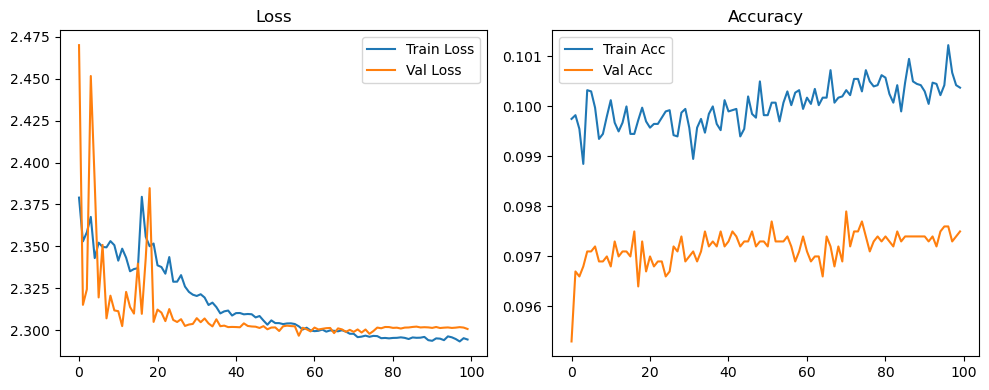

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.84it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.68it/s]

Original Model Final Test Loss: 2.3015 Accuracy: 0.0999


🚀 Running: batch512_lr_max_0.0005_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0961 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0961 |:   1%|          | 1/100 [01:22<2:15:36, 82.18s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:44<2:15:36, 82.18s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:44<2:15:36, 82.18s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   2%|▏         | 2/100 [02:44<2:14:13, 82.18s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [04:06<2:14:13, 82.18s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [04:06<2:14:13, 82.18s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [04:06<2:12:49, 82.16s/it]

| LR: 0.000499 | Train Acc: 0.0999 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [05:14<2:12:49, 82.16s/it]

| LR: 0.000499 | Train Acc: 0.0999 | Val Acc: 0.0975 |:   3%|▎         | 3/100 [05:14<2:12:49, 82.16s/it]

| LR: 0.000499 | Train Acc: 0.0999 | Val Acc: 0.0975 |:   4%|▍         | 4/100 [05:14<2:02:36, 76.63s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0953 |:   4%|▍         | 4/100 [05:27<2:02:36, 76.63s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0953 |:   4%|▍         | 4/100 [05:27<2:02:36, 76.63s/it]

| LR: 0.000498 | Train Acc: 0.0996 | Val Acc: 0.0953 |:   5%|▌         | 5/100 [05:27<1:24:55, 53.64s/it]

| LR: 0.000497 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:40<1:24:55, 53.64s/it]

| LR: 0.000497 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:40<1:24:55, 53.64s/it]

| LR: 0.000497 | Train Acc: 0.0989 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [05:40<1:02:18, 39.77s/it]

| LR: 0.000496 | Train Acc: 0.1001 | Val Acc: 0.0951 |:   6%|▌         | 6/100 [05:53<1:02:18, 39.77s/it]

| LR: 0.000496 | Train Acc: 0.1001 | Val Acc: 0.0951 |:   6%|▌         | 6/100 [05:53<1:02:18, 39.77s/it]

| LR: 0.000496 | Train Acc: 0.1001 | Val Acc: 0.0951 |:   7%|▋         | 7/100 [05:53<48:01, 30.98s/it]  

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:06<48:01, 30.98s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:06<48:01, 30.98s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:06<38:43, 25.25s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0942 |:   8%|▊         | 8/100 [06:19<38:43, 25.25s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0942 |:   8%|▊         | 8/100 [06:19<38:43, 25.25s/it]

| LR: 0.000492 | Train Acc: 0.0994 | Val Acc: 0.0942 |:   9%|▉         | 9/100 [06:19<32:31, 21.45s/it]

| LR: 0.000490 | Train Acc: 0.0996 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [06:32<32:31, 21.45s/it]

| LR: 0.000490 | Train Acc: 0.0996 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [06:32<32:31, 21.45s/it]

| LR: 0.000490 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  10%|█         | 10/100 [06:32<28:12, 18.81s/it]

| LR: 0.000488 | Train Acc: 0.0996 | Val Acc: 0.0952 |:  10%|█         | 10/100 [06:45<28:12, 18.81s/it]

| LR: 0.000488 | Train Acc: 0.0996 | Val Acc: 0.0952 |:  10%|█         | 10/100 [06:45<28:12, 18.81s/it]

| LR: 0.000488 | Train Acc: 0.0996 | Val Acc: 0.0952 |:  11%|█         | 11/100 [06:45<25:13, 17.00s/it]

| LR: 0.000486 | Train Acc: 0.0992 | Val Acc: 0.0954 |:  11%|█         | 11/100 [06:57<25:13, 17.00s/it]

| LR: 0.000486 | Train Acc: 0.0992 | Val Acc: 0.0954 |:  11%|█         | 11/100 [06:58<25:13, 17.00s/it]

| LR: 0.000486 | Train Acc: 0.0992 | Val Acc: 0.0954 |:  12%|█▏        | 12/100 [06:58<23:07, 15.76s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [07:10<23:07, 15.76s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [07:10<23:07, 15.76s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  13%|█▎        | 13/100 [07:11<21:37, 14.91s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  13%|█▎        | 13/100 [07:23<21:37, 14.91s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  13%|█▎        | 13/100 [07:23<21:37, 14.91s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  14%|█▍        | 14/100 [07:23<20:31, 14.32s/it]

| LR: 0.000477 | Train Acc: 0.1000 | Val Acc: 0.0979 |:  14%|█▍        | 14/100 [07:36<20:31, 14.32s/it]

| LR: 0.000477 | Train Acc: 0.1000 | Val Acc: 0.0979 |:  14%|█▍        | 14/100 [07:36<20:31, 14.32s/it]

| LR: 0.000477 | Train Acc: 0.1000 | Val Acc: 0.0979 |:  15%|█▌        | 15/100 [07:36<19:41, 13.91s/it]

| LR: 0.000473 | Train Acc: 0.0994 | Val Acc: 0.0949 |:  15%|█▌        | 15/100 [07:49<19:41, 13.91s/it]

| LR: 0.000473 | Train Acc: 0.0994 | Val Acc: 0.0949 |:  15%|█▌        | 15/100 [07:49<19:41, 13.91s/it]

| LR: 0.000473 | Train Acc: 0.0994 | Val Acc: 0.0949 |:  16%|█▌        | 16/100 [07:49<19:03, 13.61s/it]

| LR: 0.000470 | Train Acc: 0.0989 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:02<19:03, 13.61s/it]

| LR: 0.000470 | Train Acc: 0.0989 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:02<19:03, 13.61s/it]

| LR: 0.000470 | Train Acc: 0.0989 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:02<18:32, 13.41s/it]

| LR: 0.000466 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  17%|█▋        | 17/100 [08:15<18:32, 13.41s/it]

| LR: 0.000466 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  17%|█▋        | 17/100 [08:15<18:32, 13.41s/it]

| LR: 0.000466 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  18%|█▊        | 18/100 [08:15<18:10, 13.30s/it]

| LR: 0.000462 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:28<18:10, 13.30s/it]

| LR: 0.000462 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:28<18:10, 13.30s/it]

| LR: 0.000462 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [08:28<17:48, 13.19s/it]

| LR: 0.000458 | Train Acc: 0.1009 | Val Acc: 0.0985 |:  19%|█▉        | 19/100 [08:41<17:48, 13.19s/it]

| LR: 0.000458 | Train Acc: 0.1009 | Val Acc: 0.0985 |:  19%|█▉        | 19/100 [08:41<17:48, 13.19s/it]

| LR: 0.000458 | Train Acc: 0.1009 | Val Acc: 0.0985 |:  20%|██        | 20/100 [08:41<17:28, 13.11s/it]

| LR: 0.000453 | Train Acc: 0.1006 | Val Acc: 0.0984 |:  20%|██        | 20/100 [08:54<17:28, 13.11s/it]

| LR: 0.000453 | Train Acc: 0.1006 | Val Acc: 0.0984 |:  20%|██        | 20/100 [08:54<17:28, 13.11s/it]

| LR: 0.000453 | Train Acc: 0.1006 | Val Acc: 0.0984 |:  21%|██        | 21/100 [08:54<17:12, 13.07s/it]

| LR: 0.000449 | Train Acc: 0.1007 | Val Acc: 0.0958 |:  21%|██        | 21/100 [09:07<17:12, 13.07s/it]

| LR: 0.000449 | Train Acc: 0.1007 | Val Acc: 0.0958 |:  21%|██        | 21/100 [09:07<17:12, 13.07s/it]

| LR: 0.000449 | Train Acc: 0.1007 | Val Acc: 0.0958 |:  22%|██▏       | 22/100 [09:07<16:56, 13.03s/it]

| LR: 0.000444 | Train Acc: 0.1007 | Val Acc: 0.0982 |:  22%|██▏       | 22/100 [09:20<16:56, 13.03s/it]

| LR: 0.000444 | Train Acc: 0.1007 | Val Acc: 0.0982 |:  22%|██▏       | 22/100 [09:20<16:56, 13.03s/it]

| LR: 0.000444 | Train Acc: 0.1007 | Val Acc: 0.0982 |:  23%|██▎       | 23/100 [09:20<16:40, 12.99s/it]

| LR: 0.000439 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  23%|██▎       | 23/100 [09:33<16:40, 12.99s/it]

| LR: 0.000439 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  23%|██▎       | 23/100 [09:33<16:40, 12.99s/it]

| LR: 0.000439 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:33<16:27, 12.99s/it]

| LR: 0.000434 | Train Acc: 0.1001 | Val Acc: 0.0991 |:  24%|██▍       | 24/100 [09:46<16:27, 12.99s/it]

| LR: 0.000434 | Train Acc: 0.1001 | Val Acc: 0.0991 |:  24%|██▍       | 24/100 [09:46<16:27, 12.99s/it]

| LR: 0.000434 | Train Acc: 0.1001 | Val Acc: 0.0991 |:  25%|██▌       | 25/100 [09:46<16:13, 12.98s/it]

| LR: 0.000428 | Train Acc: 0.1008 | Val Acc: 0.0962 |:  25%|██▌       | 25/100 [09:59<16:13, 12.98s/it]

| LR: 0.000428 | Train Acc: 0.1008 | Val Acc: 0.0962 |:  25%|██▌       | 25/100 [09:59<16:13, 12.98s/it]

| LR: 0.000428 | Train Acc: 0.1008 | Val Acc: 0.0962 |:  26%|██▌       | 26/100 [09:59<16:00, 12.98s/it]

| LR: 0.000423 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  26%|██▌       | 26/100 [10:12<16:00, 12.98s/it]

| LR: 0.000423 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  26%|██▌       | 26/100 [10:12<16:00, 12.98s/it]

| LR: 0.000423 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  27%|██▋       | 27/100 [10:12<15:47, 12.98s/it]

| LR: 0.000417 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [10:25<15:47, 12.98s/it]

| LR: 0.000417 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [10:25<15:47, 12.98s/it]

| LR: 0.000417 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  28%|██▊       | 28/100 [10:25<15:35, 12.99s/it]

| LR: 0.000411 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  28%|██▊       | 28/100 [10:38<15:35, 12.99s/it]

| LR: 0.000411 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  28%|██▊       | 28/100 [10:38<15:35, 12.99s/it]

| LR: 0.000411 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  29%|██▉       | 29/100 [10:38<15:21, 12.98s/it]

| LR: 0.000405 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  29%|██▉       | 29/100 [10:51<15:21, 12.98s/it]

| LR: 0.000405 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  29%|██▉       | 29/100 [10:51<15:21, 12.98s/it]

| LR: 0.000405 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  30%|███       | 30/100 [10:51<15:07, 12.97s/it]

| LR: 0.000399 | Train Acc: 0.1003 | Val Acc: 0.0979 |:  30%|███       | 30/100 [11:04<15:07, 12.97s/it]

| LR: 0.000399 | Train Acc: 0.1003 | Val Acc: 0.0979 |:  30%|███       | 30/100 [11:04<15:07, 12.97s/it]

| LR: 0.000399 | Train Acc: 0.1003 | Val Acc: 0.0979 |:  31%|███       | 31/100 [11:04<14:52, 12.94s/it]

| LR: 0.000393 | Train Acc: 0.1011 | Val Acc: 0.0974 |:  31%|███       | 31/100 [11:16<14:52, 12.94s/it]

| LR: 0.000393 | Train Acc: 0.1011 | Val Acc: 0.0974 |:  31%|███       | 31/100 [11:16<14:52, 12.94s/it]

| LR: 0.000393 | Train Acc: 0.1011 | Val Acc: 0.0974 |:  32%|███▏      | 32/100 [11:17<14:37, 12.91s/it]

| LR: 0.000386 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [11:29<14:37, 12.91s/it]

| LR: 0.000386 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [11:29<14:37, 12.91s/it]

| LR: 0.000386 | Train Acc: 0.1009 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:29<14:23, 12.89s/it]

| LR: 0.000380 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  33%|███▎      | 33/100 [11:42<14:23, 12.89s/it]

| LR: 0.000380 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  33%|███▎      | 33/100 [11:42<14:23, 12.89s/it]

| LR: 0.000380 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [11:42<14:11, 12.91s/it]

| LR: 0.000373 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  34%|███▍      | 34/100 [11:55<14:11, 12.91s/it]

| LR: 0.000373 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  34%|███▍      | 34/100 [11:55<14:11, 12.91s/it]

| LR: 0.000373 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  35%|███▌      | 35/100 [11:55<14:00, 12.93s/it]

| LR: 0.000366 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  35%|███▌      | 35/100 [12:08<14:00, 12.93s/it]

| LR: 0.000366 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  35%|███▌      | 35/100 [12:08<14:00, 12.93s/it]

| LR: 0.000366 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:08<13:47, 12.93s/it]

| LR: 0.000359 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:21<13:47, 12.93s/it]

| LR: 0.000359 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:21<13:47, 12.93s/it]

| LR: 0.000359 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:21<13:38, 12.98s/it]

| LR: 0.000352 | Train Acc: 0.1006 | Val Acc: 0.0951 |:  37%|███▋      | 37/100 [12:34<13:38, 12.98s/it]

| LR: 0.000352 | Train Acc: 0.1006 | Val Acc: 0.0951 |:  37%|███▋      | 37/100 [12:34<13:38, 12.98s/it]

| LR: 0.000352 | Train Acc: 0.1006 | Val Acc: 0.0951 |:  38%|███▊      | 38/100 [12:34<13:25, 12.99s/it]

| LR: 0.000345 | Train Acc: 0.1004 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:47<13:25, 12.99s/it]

| LR: 0.000345 | Train Acc: 0.1004 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:47<13:25, 12.99s/it]

| LR: 0.000345 | Train Acc: 0.1004 | Val Acc: 0.0960 |:  39%|███▉      | 39/100 [12:47<13:12, 12.99s/it]

| LR: 0.000338 | Train Acc: 0.1007 | Val Acc: 0.0949 |:  39%|███▉      | 39/100 [13:00<13:12, 12.99s/it]

| LR: 0.000338 | Train Acc: 0.1007 | Val Acc: 0.0949 |:  39%|███▉      | 39/100 [13:00<13:12, 12.99s/it]

| LR: 0.000338 | Train Acc: 0.1007 | Val Acc: 0.0949 |:  40%|████      | 40/100 [13:00<12:58, 12.97s/it]

| LR: 0.000331 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  40%|████      | 40/100 [13:13<12:58, 12.97s/it]

| LR: 0.000331 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  40%|████      | 40/100 [13:13<12:58, 12.97s/it]

| LR: 0.000331 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:13<12:42, 12.93s/it]

| LR: 0.000323 | Train Acc: 0.1009 | Val Acc: 0.0974 |:  41%|████      | 41/100 [13:26<12:42, 12.93s/it]

| LR: 0.000323 | Train Acc: 0.1009 | Val Acc: 0.0974 |:  41%|████      | 41/100 [13:26<12:42, 12.93s/it]

| LR: 0.000323 | Train Acc: 0.1009 | Val Acc: 0.0974 |:  42%|████▏     | 42/100 [13:26<12:28, 12.91s/it]

| LR: 0.000316 | Train Acc: 0.1015 | Val Acc: 0.0968 |:  42%|████▏     | 42/100 [13:39<12:28, 12.91s/it]

| LR: 0.000316 | Train Acc: 0.1015 | Val Acc: 0.0968 |:  42%|████▏     | 42/100 [13:39<12:28, 12.91s/it]

| LR: 0.000316 | Train Acc: 0.1015 | Val Acc: 0.0968 |:  43%|████▎     | 43/100 [13:39<12:14, 12.89s/it]

| LR: 0.000308 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  43%|████▎     | 43/100 [13:52<12:14, 12.89s/it]

| LR: 0.000308 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  43%|████▎     | 43/100 [13:52<12:14, 12.89s/it]

| LR: 0.000308 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [13:52<12:01, 12.89s/it]

| LR: 0.000301 | Train Acc: 0.1012 | Val Acc: 0.0977 |:  44%|████▍     | 44/100 [14:05<12:01, 12.89s/it]

| LR: 0.000301 | Train Acc: 0.1012 | Val Acc: 0.0977 |:  44%|████▍     | 44/100 [14:05<12:01, 12.89s/it]

| LR: 0.000301 | Train Acc: 0.1012 | Val Acc: 0.0977 |:  45%|████▌     | 45/100 [14:05<11:49, 12.90s/it]

| LR: 0.000293 | Train Acc: 0.1003 | Val Acc: 0.0986 |:  45%|████▌     | 45/100 [14:17<11:49, 12.90s/it]

| LR: 0.000293 | Train Acc: 0.1003 | Val Acc: 0.0986 |:  45%|████▌     | 45/100 [14:17<11:49, 12.90s/it]

| LR: 0.000293 | Train Acc: 0.1003 | Val Acc: 0.0986 |:  46%|████▌     | 46/100 [14:17<11:35, 12.89s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0986 |:  46%|████▌     | 46/100 [14:30<11:35, 12.89s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0986 |:  46%|████▌     | 46/100 [14:30<11:35, 12.89s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0986 |:  47%|████▋     | 47/100 [14:31<11:26, 12.95s/it]

| LR: 0.000278 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:43<11:26, 12.95s/it]

| LR: 0.000278 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:43<11:26, 12.95s/it]

| LR: 0.000278 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [14:43<11:13, 12.95s/it]

| LR: 0.000270 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  48%|████▊     | 48/100 [14:56<11:13, 12.95s/it]

| LR: 0.000270 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  48%|████▊     | 48/100 [14:56<11:13, 12.95s/it]

| LR: 0.000270 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  49%|████▉     | 49/100 [14:56<11:00, 12.95s/it]

| LR: 0.000263 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  49%|████▉     | 49/100 [15:09<11:00, 12.95s/it]

| LR: 0.000263 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  49%|████▉     | 49/100 [15:09<11:00, 12.95s/it]

| LR: 0.000263 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:09<10:47, 12.95s/it]

| LR: 0.000255 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  50%|█████     | 50/100 [15:22<10:47, 12.95s/it]

| LR: 0.000255 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  50%|█████     | 50/100 [15:22<10:47, 12.95s/it]

| LR: 0.000255 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  51%|█████     | 51/100 [15:22<10:34, 12.95s/it]

| LR: 0.000247 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:35<10:34, 12.95s/it]

| LR: 0.000247 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:35<10:34, 12.95s/it]

| LR: 0.000247 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  52%|█████▏    | 52/100 [15:35<10:21, 12.95s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [15:48<10:21, 12.95s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [15:48<10:21, 12.95s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [15:48<10:08, 12.94s/it]

| LR: 0.000232 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  53%|█████▎    | 53/100 [16:01<10:08, 12.94s/it]

| LR: 0.000232 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  53%|█████▎    | 53/100 [16:01<10:08, 12.94s/it]

| LR: 0.000232 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  54%|█████▍    | 54/100 [16:01<09:55, 12.94s/it]

| LR: 0.000224 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  54%|█████▍    | 54/100 [16:14<09:55, 12.94s/it]

| LR: 0.000224 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  54%|█████▍    | 54/100 [16:14<09:55, 12.94s/it]

| LR: 0.000224 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  55%|█████▌    | 55/100 [16:14<09:41, 12.93s/it]

| LR: 0.000217 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  55%|█████▌    | 55/100 [16:27<09:41, 12.93s/it]

| LR: 0.000217 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  55%|█████▌    | 55/100 [16:27<09:41, 12.93s/it]

| LR: 0.000217 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  56%|█████▌    | 56/100 [16:27<09:29, 12.95s/it]

| LR: 0.000209 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:40<09:29, 12.95s/it]

| LR: 0.000209 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:40<09:29, 12.95s/it]

| LR: 0.000209 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [16:40<09:15, 12.93s/it]

| LR: 0.000202 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  57%|█████▋    | 57/100 [16:53<09:15, 12.93s/it]

| LR: 0.000202 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  57%|█████▋    | 57/100 [16:53<09:15, 12.93s/it]

| LR: 0.000202 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  58%|█████▊    | 58/100 [16:53<09:02, 12.92s/it]

| LR: 0.000194 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [17:06<09:02, 12.92s/it]

| LR: 0.000194 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [17:06<09:02, 12.92s/it]

| LR: 0.000194 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  59%|█████▉    | 59/100 [17:06<08:49, 12.91s/it]

| LR: 0.000187 | Train Acc: 0.0995 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:19<08:49, 12.91s/it]

| LR: 0.000187 | Train Acc: 0.0995 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:19<08:49, 12.91s/it]

| LR: 0.000187 | Train Acc: 0.0995 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:19<08:36, 12.91s/it]

| LR: 0.000179 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:32<08:36, 12.91s/it]

| LR: 0.000179 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:32<08:36, 12.91s/it]

| LR: 0.000179 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  61%|██████    | 61/100 [17:32<08:24, 12.94s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [17:45<08:24, 12.94s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [17:45<08:24, 12.94s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [17:45<08:12, 12.95s/it]

| LR: 0.000165 | Train Acc: 0.1004 | Val Acc: 0.0979 |:  62%|██████▏   | 62/100 [17:58<08:12, 12.95s/it]

| LR: 0.000165 | Train Acc: 0.1004 | Val Acc: 0.0979 |:  62%|██████▏   | 62/100 [17:58<08:12, 12.95s/it]

| LR: 0.000165 | Train Acc: 0.1004 | Val Acc: 0.0979 |:  63%|██████▎   | 63/100 [17:58<07:59, 12.96s/it]

| LR: 0.000158 | Train Acc: 0.1002 | Val Acc: 0.0980 |:  63%|██████▎   | 63/100 [18:10<07:59, 12.96s/it]

| LR: 0.000158 | Train Acc: 0.1002 | Val Acc: 0.0980 |:  63%|██████▎   | 63/100 [18:10<07:59, 12.96s/it]

| LR: 0.000158 | Train Acc: 0.1002 | Val Acc: 0.0980 |:  64%|██████▍   | 64/100 [18:11<07:46, 12.97s/it]

| LR: 0.000151 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  64%|██████▍   | 64/100 [18:23<07:46, 12.97s/it]

| LR: 0.000151 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  64%|██████▍   | 64/100 [18:23<07:46, 12.97s/it]

| LR: 0.000151 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  65%|██████▌   | 65/100 [18:24<07:34, 12.98s/it]

| LR: 0.000144 | Train Acc: 0.1011 | Val Acc: 0.0963 |:  65%|██████▌   | 65/100 [18:37<07:34, 12.98s/it]

| LR: 0.000144 | Train Acc: 0.1011 | Val Acc: 0.0963 |:  65%|██████▌   | 65/100 [18:37<07:34, 12.98s/it]

| LR: 0.000144 | Train Acc: 0.1011 | Val Acc: 0.0963 |:  66%|██████▌   | 66/100 [18:37<07:22, 13.02s/it]

| LR: 0.000137 | Train Acc: 0.1002 | Val Acc: 0.0979 |:  66%|██████▌   | 66/100 [18:50<07:22, 13.02s/it]

| LR: 0.000137 | Train Acc: 0.1002 | Val Acc: 0.0979 |:  66%|██████▌   | 66/100 [18:50<07:22, 13.02s/it]

| LR: 0.000137 | Train Acc: 0.1002 | Val Acc: 0.0979 |:  67%|██████▋   | 67/100 [18:50<07:09, 13.02s/it]

| LR: 0.000130 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  67%|██████▋   | 67/100 [19:03<07:09, 13.02s/it]

| LR: 0.000130 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  67%|██████▋   | 67/100 [19:03<07:09, 13.02s/it]

| LR: 0.000130 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:03<06:56, 13.02s/it]

| LR: 0.000124 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  68%|██████▊   | 68/100 [19:16<06:56, 13.02s/it]

| LR: 0.000124 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  68%|██████▊   | 68/100 [19:16<06:56, 13.02s/it]

| LR: 0.000124 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  69%|██████▉   | 69/100 [19:16<06:43, 13.01s/it]

| LR: 0.000117 | Train Acc: 0.1009 | Val Acc: 0.0968 |:  69%|██████▉   | 69/100 [19:29<06:43, 13.01s/it]

| LR: 0.000117 | Train Acc: 0.1009 | Val Acc: 0.0968 |:  69%|██████▉   | 69/100 [19:29<06:43, 13.01s/it]

| LR: 0.000117 | Train Acc: 0.1009 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:29<06:30, 13.02s/it]

| LR: 0.000111 | Train Acc: 0.1005 | Val Acc: 0.0977 |:  70%|███████   | 70/100 [19:42<06:30, 13.02s/it]

| LR: 0.000111 | Train Acc: 0.1005 | Val Acc: 0.0977 |:  70%|███████   | 70/100 [19:42<06:30, 13.02s/it]

| LR: 0.000111 | Train Acc: 0.1005 | Val Acc: 0.0977 |:  71%|███████   | 71/100 [19:42<06:17, 13.00s/it]

| LR: 0.000105 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  71%|███████   | 71/100 [19:55<06:17, 13.00s/it]

| LR: 0.000105 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  71%|███████   | 71/100 [19:55<06:17, 13.00s/it]

| LR: 0.000105 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  72%|███████▏  | 72/100 [19:55<06:03, 12.99s/it]

| LR: 0.000099 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  72%|███████▏  | 72/100 [20:08<06:03, 12.99s/it]

| LR: 0.000099 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  72%|███████▏  | 72/100 [20:08<06:03, 12.99s/it]

| LR: 0.000099 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  73%|███████▎  | 73/100 [20:08<05:49, 12.96s/it]

| LR: 0.000093 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:20<05:49, 12.96s/it]

| LR: 0.000093 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:20<05:49, 12.96s/it]

| LR: 0.000093 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:20<05:36, 12.95s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  74%|███████▍  | 74/100 [20:33<05:36, 12.95s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  74%|███████▍  | 74/100 [20:33<05:36, 12.95s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  75%|███████▌  | 75/100 [20:34<05:24, 12.99s/it]

| LR: 0.000082 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:47<05:24, 12.99s/it]

| LR: 0.000082 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:47<05:24, 12.99s/it]

| LR: 0.000082 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  76%|███████▌  | 76/100 [20:47<05:11, 13.00s/it]

| LR: 0.000076 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  76%|███████▌  | 76/100 [21:00<05:11, 13.00s/it]

| LR: 0.000076 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  76%|███████▌  | 76/100 [21:00<05:11, 13.00s/it]

| LR: 0.000076 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  77%|███████▋  | 77/100 [21:00<04:58, 13.00s/it]

| LR: 0.000071 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:12<04:58, 13.00s/it]

| LR: 0.000071 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:12<04:58, 13.00s/it]

| LR: 0.000071 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [21:13<04:45, 12.98s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  78%|███████▊  | 78/100 [21:25<04:45, 12.98s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  78%|███████▊  | 78/100 [21:25<04:45, 12.98s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  79%|███████▉  | 79/100 [21:25<04:32, 12.98s/it]

| LR: 0.000061 | Train Acc: 0.1011 | Val Acc: 0.0978 |:  79%|███████▉  | 79/100 [21:38<04:32, 12.98s/it]

| LR: 0.000061 | Train Acc: 0.1011 | Val Acc: 0.0978 |:  79%|███████▉  | 79/100 [21:38<04:32, 12.98s/it]

| LR: 0.000061 | Train Acc: 0.1011 | Val Acc: 0.0978 |:  80%|████████  | 80/100 [21:38<04:19, 12.96s/it]

| LR: 0.000057 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  80%|████████  | 80/100 [21:51<04:19, 12.96s/it]

| LR: 0.000057 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  80%|████████  | 80/100 [21:51<04:19, 12.96s/it]

| LR: 0.000057 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  81%|████████  | 81/100 [21:51<04:05, 12.95s/it]

| LR: 0.000052 | Train Acc: 0.1018 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [22:04<04:05, 12.95s/it]

| LR: 0.000052 | Train Acc: 0.1018 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [22:04<04:05, 12.95s/it]

| LR: 0.000052 | Train Acc: 0.1018 | Val Acc: 0.0967 |:  82%|████████▏ | 82/100 [22:04<03:52, 12.94s/it]

| LR: 0.000048 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  82%|████████▏ | 82/100 [22:17<03:52, 12.94s/it]

| LR: 0.000048 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  82%|████████▏ | 82/100 [22:17<03:52, 12.94s/it]

| LR: 0.000048 | Train Acc: 0.1012 | Val Acc: 0.0974 |:  83%|████████▎ | 83/100 [22:17<03:39, 12.94s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:30<03:39, 12.94s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:30<03:39, 12.94s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [22:30<03:27, 12.99s/it]

| LR: 0.000040 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  84%|████████▍ | 84/100 [22:43<03:27, 12.99s/it]

| LR: 0.000040 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  84%|████████▍ | 84/100 [22:43<03:27, 12.99s/it]

| LR: 0.000040 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [22:43<03:14, 12.98s/it]

| LR: 0.000037 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  85%|████████▌ | 85/100 [22:56<03:14, 12.98s/it]

| LR: 0.000037 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  85%|████████▌ | 85/100 [22:56<03:14, 12.98s/it]

| LR: 0.000037 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  86%|████████▌ | 86/100 [22:56<03:01, 12.95s/it]

| LR: 0.000033 | Train Acc: 0.1015 | Val Acc: 0.0978 |:  86%|████████▌ | 86/100 [23:09<03:01, 12.95s/it]

| LR: 0.000033 | Train Acc: 0.1015 | Val Acc: 0.0978 |:  86%|████████▌ | 86/100 [23:09<03:01, 12.95s/it]

| LR: 0.000033 | Train Acc: 0.1015 | Val Acc: 0.0978 |:  87%|████████▋ | 87/100 [23:09<02:48, 12.92s/it]

| LR: 0.000030 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  87%|████████▋ | 87/100 [23:22<02:48, 12.92s/it]

| LR: 0.000030 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  87%|████████▋ | 87/100 [23:22<02:48, 12.92s/it]

| LR: 0.000030 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  88%|████████▊ | 88/100 [23:22<02:35, 12.92s/it]

| LR: 0.000027 | Train Acc: 0.1007 | Val Acc: 0.0956 |:  88%|████████▊ | 88/100 [23:35<02:35, 12.92s/it]

| LR: 0.000027 | Train Acc: 0.1007 | Val Acc: 0.0956 |:  88%|████████▊ | 88/100 [23:35<02:35, 12.92s/it]

| LR: 0.000027 | Train Acc: 0.1007 | Val Acc: 0.0956 |:  89%|████████▉ | 89/100 [23:35<02:22, 12.94s/it]

| LR: 0.000024 | Train Acc: 0.1010 | Val Acc: 0.0959 |:  89%|████████▉ | 89/100 [23:48<02:22, 12.94s/it]

| LR: 0.000024 | Train Acc: 0.1010 | Val Acc: 0.0959 |:  89%|████████▉ | 89/100 [23:48<02:22, 12.94s/it]

| LR: 0.000024 | Train Acc: 0.1010 | Val Acc: 0.0959 |:  90%|█████████ | 90/100 [23:48<02:09, 12.92s/it]

| LR: 0.000022 | Train Acc: 0.1012 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [24:01<02:09, 12.92s/it]

| LR: 0.000022 | Train Acc: 0.1012 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [24:01<02:09, 12.92s/it]

| LR: 0.000022 | Train Acc: 0.1012 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [24:01<01:56, 12.92s/it]

| LR: 0.000020 | Train Acc: 0.1011 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [24:14<01:56, 12.92s/it]

| LR: 0.000020 | Train Acc: 0.1011 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [24:14<01:56, 12.92s/it]

| LR: 0.000020 | Train Acc: 0.1011 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:14<01:43, 12.92s/it]

| LR: 0.000018 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  92%|█████████▏| 92/100 [24:26<01:43, 12.92s/it]

| LR: 0.000018 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  92%|█████████▏| 92/100 [24:26<01:43, 12.92s/it]

| LR: 0.000018 | Train Acc: 0.1013 | Val Acc: 0.0963 |:  93%|█████████▎| 93/100 [24:26<01:30, 12.91s/it]

| LR: 0.000016 | Train Acc: 0.1011 | Val Acc: 0.0976 |:  93%|█████████▎| 93/100 [24:39<01:30, 12.91s/it]

| LR: 0.000016 | Train Acc: 0.1011 | Val Acc: 0.0976 |:  93%|█████████▎| 93/100 [24:39<01:30, 12.91s/it]

| LR: 0.000016 | Train Acc: 0.1011 | Val Acc: 0.0976 |:  94%|█████████▍| 94/100 [24:39<01:17, 12.94s/it]

| LR: 0.000014 | Train Acc: 0.1015 | Val Acc: 0.0982 |:  94%|█████████▍| 94/100 [24:52<01:17, 12.94s/it]

| LR: 0.000014 | Train Acc: 0.1015 | Val Acc: 0.0982 |:  94%|█████████▍| 94/100 [24:52<01:17, 12.94s/it]

| LR: 0.000014 | Train Acc: 0.1015 | Val Acc: 0.0982 |:  95%|█████████▌| 95/100 [24:52<01:04, 12.93s/it]

| LR: 0.000013 | Train Acc: 0.1013 | Val Acc: 0.0955 |:  95%|█████████▌| 95/100 [25:05<01:04, 12.93s/it]

| LR: 0.000013 | Train Acc: 0.1013 | Val Acc: 0.0955 |:  95%|█████████▌| 95/100 [25:05<01:04, 12.93s/it]

| LR: 0.000013 | Train Acc: 0.1013 | Val Acc: 0.0955 |:  96%|█████████▌| 96/100 [25:05<00:51, 12.91s/it]

| LR: 0.000012 | Train Acc: 0.1014 | Val Acc: 0.0959 |:  96%|█████████▌| 96/100 [25:18<00:51, 12.91s/it]

| LR: 0.000012 | Train Acc: 0.1014 | Val Acc: 0.0959 |:  96%|█████████▌| 96/100 [25:18<00:51, 12.91s/it]

| LR: 0.000012 | Train Acc: 0.1014 | Val Acc: 0.0959 |:  97%|█████████▋| 97/100 [25:18<00:38, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.1012 | Val Acc: 0.0971 |:  97%|█████████▋| 97/100 [25:31<00:38, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.1012 | Val Acc: 0.0971 |:  97%|█████████▋| 97/100 [25:31<00:38, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.1012 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [25:31<00:25, 12.93s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [25:44<00:25, 12.93s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [25:44<00:25, 12.93s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0974 |:  99%|█████████▉| 99/100 [25:44<00:12, 12.94s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  99%|█████████▉| 99/100 [25:57<00:12, 12.94s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  99%|█████████▉| 99/100 [25:57<00:12, 12.94s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0969 |: 100%|██████████| 100/100 [25:57<00:00, 12.93s/it]

| LR: 0.000010 | Train Acc: 0.1011 | Val Acc: 0.0969 |: 100%|██████████| 100/100 [25:57<00:00, 15.58s/it]

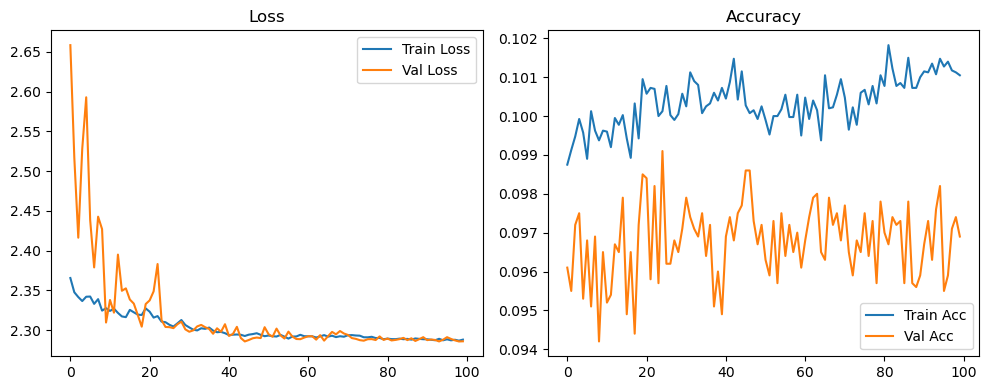

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 2.2876 Accuracy: 0.1005


🚀 Running: batch512_lr_max_0.0005_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0969 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0969 |:   1%|          | 1/100 [01:22<2:15:23, 82.06s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0976 |:   1%|          | 1/100 [02:44<2:15:23, 82.06s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0976 |:   1%|          | 1/100 [02:44<2:15:23, 82.06s/it]

| LR: 0.000500 | Train Acc: 0.0996 | Val Acc: 0.0976 |:   2%|▏         | 2/100 [02:44<2:14:49, 82.55s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [04:06<2:14:49, 82.55s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [04:06<2:14:49, 82.55s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0949 |:   3%|▎         | 3/100 [04:06<2:13:00, 82.27s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0947 |:   3%|▎         | 3/100 [05:15<2:13:00, 82.27s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0947 |:   3%|▎         | 3/100 [05:15<2:13:00, 82.27s/it]

| LR: 0.000499 | Train Acc: 0.0995 | Val Acc: 0.0947 |:   4%|▍         | 4/100 [05:15<2:03:15, 77.03s/it]

| LR: 0.000498 | Train Acc: 0.1001 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [05:29<2:03:15, 77.03s/it]

| LR: 0.000498 | Train Acc: 0.1001 | Val Acc: 0.0970 |:   4%|▍         | 4/100 [05:29<2:03:15, 77.03s/it]

| LR: 0.000498 | Train Acc: 0.1001 | Val Acc: 0.0970 |:   5%|▌         | 5/100 [05:29<1:25:30, 54.00s/it]

| LR: 0.000497 | Train Acc: 0.1000 | Val Acc: 0.0981 |:   5%|▌         | 5/100 [05:42<1:25:30, 54.00s/it]

| LR: 0.000497 | Train Acc: 0.1000 | Val Acc: 0.0981 |:   5%|▌         | 5/100 [05:42<1:25:30, 54.00s/it]

| LR: 0.000497 | Train Acc: 0.1000 | Val Acc: 0.0981 |:   6%|▌         | 6/100 [05:42<1:02:51, 40.13s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0952 |:   6%|▌         | 6/100 [05:55<1:02:51, 40.13s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0952 |:   6%|▌         | 6/100 [05:55<1:02:51, 40.13s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0952 |:   7%|▋         | 7/100 [05:55<48:30, 31.29s/it]  

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [06:08<48:30, 31.29s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [06:08<48:30, 31.29s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [06:08<39:10, 25.55s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0947 |:   8%|▊         | 8/100 [06:21<39:10, 25.55s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0947 |:   8%|▊         | 8/100 [06:21<39:10, 25.55s/it]

| LR: 0.000492 | Train Acc: 0.0998 | Val Acc: 0.0947 |:   9%|▉         | 9/100 [06:21<32:50, 21.65s/it]

| LR: 0.000490 | Train Acc: 0.1006 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:34<32:50, 21.65s/it]

| LR: 0.000490 | Train Acc: 0.1006 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:34<32:50, 21.65s/it]

| LR: 0.000490 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  10%|█         | 10/100 [06:34<28:33, 19.04s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  10%|█         | 10/100 [06:48<28:33, 19.04s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  10%|█         | 10/100 [06:48<28:33, 19.04s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  11%|█         | 11/100 [06:48<25:34, 17.25s/it]

| LR: 0.000486 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  11%|█         | 11/100 [07:01<25:34, 17.25s/it]

| LR: 0.000486 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  11%|█         | 11/100 [07:01<25:34, 17.25s/it]

| LR: 0.000486 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  12%|█▏        | 12/100 [07:01<23:26, 15.98s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:14<23:26, 15.98s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:14<23:26, 15.98s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [07:14<21:55, 15.12s/it]

| LR: 0.000480 | Train Acc: 0.0997 | Val Acc: 0.0955 |:  13%|█▎        | 13/100 [07:27<21:55, 15.12s/it]

| LR: 0.000480 | Train Acc: 0.0997 | Val Acc: 0.0955 |:  13%|█▎        | 13/100 [07:27<21:55, 15.12s/it]

| LR: 0.000480 | Train Acc: 0.0997 | Val Acc: 0.0955 |:  14%|█▍        | 14/100 [07:27<20:48, 14.52s/it]

| LR: 0.000477 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:40<20:48, 14.52s/it]

| LR: 0.000477 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:40<20:48, 14.52s/it]

| LR: 0.000477 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  15%|█▌        | 15/100 [07:40<19:59, 14.11s/it]

| LR: 0.000473 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [07:53<19:59, 14.11s/it]

| LR: 0.000473 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [07:53<19:59, 14.11s/it]

| LR: 0.000473 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  16%|█▌        | 16/100 [07:53<19:22, 13.84s/it]

| LR: 0.000470 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [08:06<19:22, 13.84s/it]

| LR: 0.000470 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [08:06<19:22, 13.84s/it]

| LR: 0.000470 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [08:06<18:51, 13.64s/it]

| LR: 0.000466 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:20<18:51, 13.64s/it]

| LR: 0.000466 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:20<18:51, 13.64s/it]

| LR: 0.000466 | Train Acc: 0.0990 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [08:20<18:30, 13.55s/it]

| LR: 0.000462 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  18%|█▊        | 18/100 [08:33<18:30, 13.55s/it]

| LR: 0.000462 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  18%|█▊        | 18/100 [08:33<18:30, 13.55s/it]

| LR: 0.000462 | Train Acc: 0.0993 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [08:33<18:08, 13.44s/it]

| LR: 0.000458 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [08:46<18:08, 13.44s/it]

| LR: 0.000458 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [08:46<18:08, 13.44s/it]

| LR: 0.000458 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  20%|██        | 20/100 [08:46<17:46, 13.33s/it]

| LR: 0.000453 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:59<17:46, 13.33s/it]

| LR: 0.000453 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:59<17:46, 13.33s/it]

| LR: 0.000453 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  21%|██        | 21/100 [08:59<17:30, 13.30s/it]

| LR: 0.000449 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  21%|██        | 21/100 [09:12<17:30, 13.30s/it]

| LR: 0.000449 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  21%|██        | 21/100 [09:12<17:30, 13.30s/it]

| LR: 0.000449 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  22%|██▏       | 22/100 [09:12<17:12, 13.24s/it]

| LR: 0.000444 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:25<17:12, 13.24s/it]

| LR: 0.000444 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:25<17:12, 13.24s/it]

| LR: 0.000444 | Train Acc: 0.0993 | Val Acc: 0.0966 |:  23%|██▎       | 23/100 [09:26<16:56, 13.20s/it]

| LR: 0.000439 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  23%|██▎       | 23/100 [09:39<16:56, 13.20s/it]

| LR: 0.000439 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  23%|██▎       | 23/100 [09:39<16:56, 13.20s/it]

| LR: 0.000439 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  24%|██▍       | 24/100 [09:39<16:40, 13.17s/it]

| LR: 0.000434 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  24%|██▍       | 24/100 [09:52<16:40, 13.17s/it]

| LR: 0.000434 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  24%|██▍       | 24/100 [09:52<16:40, 13.17s/it]

| LR: 0.000434 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  25%|██▌       | 25/100 [09:52<16:26, 13.15s/it]

| LR: 0.000428 | Train Acc: 0.0991 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [10:05<16:26, 13.15s/it]

| LR: 0.000428 | Train Acc: 0.0991 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [10:05<16:26, 13.15s/it]

| LR: 0.000428 | Train Acc: 0.0991 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [10:05<16:12, 13.14s/it]

| LR: 0.000423 | Train Acc: 0.0996 | Val Acc: 0.0934 |:  26%|██▌       | 26/100 [10:18<16:12, 13.14s/it]

| LR: 0.000423 | Train Acc: 0.0996 | Val Acc: 0.0934 |:  26%|██▌       | 26/100 [10:18<16:12, 13.14s/it]

| LR: 0.000423 | Train Acc: 0.0996 | Val Acc: 0.0934 |:  27%|██▋       | 27/100 [10:18<16:00, 13.16s/it]

| LR: 0.000417 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [10:31<16:00, 13.16s/it]

| LR: 0.000417 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [10:31<16:00, 13.16s/it]

| LR: 0.000417 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [10:31<15:46, 13.15s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [10:44<15:46, 13.15s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [10:44<15:46, 13.15s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  29%|██▉       | 29/100 [10:44<15:32, 13.13s/it]

| LR: 0.000405 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  29%|██▉       | 29/100 [10:57<15:32, 13.13s/it]

| LR: 0.000405 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  29%|██▉       | 29/100 [10:57<15:32, 13.13s/it]

| LR: 0.000405 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  30%|███       | 30/100 [10:57<15:19, 13.13s/it]

| LR: 0.000399 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  30%|███       | 30/100 [11:10<15:19, 13.13s/it]

| LR: 0.000399 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  30%|███       | 30/100 [11:10<15:19, 13.13s/it]

| LR: 0.000399 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  31%|███       | 31/100 [11:10<15:04, 13.11s/it]

| LR: 0.000393 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  31%|███       | 31/100 [11:23<15:04, 13.11s/it]

| LR: 0.000393 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  31%|███       | 31/100 [11:23<15:04, 13.11s/it]

| LR: 0.000393 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  32%|███▏      | 32/100 [11:23<14:50, 13.10s/it]

| LR: 0.000386 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  32%|███▏      | 32/100 [11:36<14:50, 13.10s/it]

| LR: 0.000386 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  32%|███▏      | 32/100 [11:36<14:50, 13.10s/it]

| LR: 0.000386 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  33%|███▎      | 33/100 [11:37<14:36, 13.09s/it]

| LR: 0.000380 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  33%|███▎      | 33/100 [11:50<14:36, 13.09s/it]

| LR: 0.000380 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  33%|███▎      | 33/100 [11:50<14:36, 13.09s/it]

| LR: 0.000380 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  34%|███▍      | 34/100 [11:50<14:24, 13.09s/it]

| LR: 0.000373 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:03<14:24, 13.09s/it]

| LR: 0.000373 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:03<14:24, 13.09s/it]

| LR: 0.000373 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:03<14:11, 13.10s/it]

| LR: 0.000366 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  35%|███▌      | 35/100 [12:16<14:11, 13.10s/it]

| LR: 0.000366 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  35%|███▌      | 35/100 [12:16<14:11, 13.10s/it]

| LR: 0.000366 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  36%|███▌      | 36/100 [12:16<14:01, 13.15s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:29<14:01, 13.15s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:29<14:01, 13.15s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  37%|███▋      | 37/100 [12:29<13:47, 13.14s/it]

| LR: 0.000352 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  37%|███▋      | 37/100 [12:42<13:47, 13.14s/it]

| LR: 0.000352 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  37%|███▋      | 37/100 [12:42<13:47, 13.14s/it]

| LR: 0.000352 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:42<13:34, 13.14s/it]

| LR: 0.000345 | Train Acc: 0.1001 | Val Acc: 0.0941 |:  38%|███▊      | 38/100 [12:55<13:34, 13.14s/it]

| LR: 0.000345 | Train Acc: 0.1001 | Val Acc: 0.0941 |:  38%|███▊      | 38/100 [12:55<13:34, 13.14s/it]

| LR: 0.000345 | Train Acc: 0.1001 | Val Acc: 0.0941 |:  39%|███▉      | 39/100 [12:55<13:20, 13.12s/it]

| LR: 0.000338 | Train Acc: 0.0999 | Val Acc: 0.0944 |:  39%|███▉      | 39/100 [13:08<13:20, 13.12s/it]

| LR: 0.000338 | Train Acc: 0.0999 | Val Acc: 0.0944 |:  39%|███▉      | 39/100 [13:08<13:20, 13.12s/it]

| LR: 0.000338 | Train Acc: 0.0999 | Val Acc: 0.0944 |:  40%|████      | 40/100 [13:08<13:06, 13.11s/it]

| LR: 0.000331 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:21<13:06, 13.11s/it]

| LR: 0.000331 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:21<13:06, 13.11s/it]

| LR: 0.000331 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  41%|████      | 41/100 [13:22<12:52, 13.10s/it]

| LR: 0.000323 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  41%|████      | 41/100 [13:35<12:52, 13.10s/it]

| LR: 0.000323 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  41%|████      | 41/100 [13:35<12:52, 13.10s/it]

| LR: 0.000323 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  42%|████▏     | 42/100 [13:35<12:39, 13.09s/it]

| LR: 0.000316 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:48<12:39, 13.09s/it]

| LR: 0.000316 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:48<12:39, 13.09s/it]

| LR: 0.000316 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  43%|████▎     | 43/100 [13:48<12:26, 13.09s/it]

| LR: 0.000308 | Train Acc: 0.1000 | Val Acc: 0.0941 |:  43%|████▎     | 43/100 [14:01<12:26, 13.09s/it]

| LR: 0.000308 | Train Acc: 0.1000 | Val Acc: 0.0941 |:  43%|████▎     | 43/100 [14:01<12:26, 13.09s/it]

| LR: 0.000308 | Train Acc: 0.1000 | Val Acc: 0.0941 |:  44%|████▍     | 44/100 [14:01<12:12, 13.08s/it]

| LR: 0.000301 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [14:14<12:12, 13.08s/it]

| LR: 0.000301 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [14:14<12:12, 13.08s/it]

| LR: 0.000301 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:14<11:59, 13.08s/it]

| LR: 0.000293 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  45%|████▌     | 45/100 [14:27<11:59, 13.08s/it]

| LR: 0.000293 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  45%|████▌     | 45/100 [14:27<11:59, 13.08s/it]

| LR: 0.000293 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:27<11:49, 13.14s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:40<11:49, 13.14s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:40<11:49, 13.14s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [14:40<11:36, 13.14s/it]

| LR: 0.000278 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [14:53<11:36, 13.14s/it]

| LR: 0.000278 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [14:53<11:36, 13.14s/it]

| LR: 0.000278 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  48%|████▊     | 48/100 [14:53<11:23, 13.15s/it]

| LR: 0.000270 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  48%|████▊     | 48/100 [15:07<11:23, 13.15s/it]

| LR: 0.000270 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  48%|████▊     | 48/100 [15:07<11:23, 13.15s/it]

| LR: 0.000270 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  49%|████▉     | 49/100 [15:07<11:10, 13.15s/it]

| LR: 0.000263 | Train Acc: 0.1001 | Val Acc: 0.0949 |:  49%|████▉     | 49/100 [15:20<11:10, 13.15s/it]

| LR: 0.000263 | Train Acc: 0.1001 | Val Acc: 0.0949 |:  49%|████▉     | 49/100 [15:20<11:10, 13.15s/it]

| LR: 0.000263 | Train Acc: 0.1001 | Val Acc: 0.0949 |:  50%|█████     | 50/100 [15:20<10:57, 13.16s/it]

| LR: 0.000255 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:33<10:57, 13.16s/it]

| LR: 0.000255 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:33<10:57, 13.16s/it]

| LR: 0.000255 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [15:33<10:44, 13.15s/it]

| LR: 0.000247 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [15:46<10:44, 13.15s/it]

| LR: 0.000247 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [15:46<10:44, 13.15s/it]

| LR: 0.000247 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  52%|█████▏    | 52/100 [15:46<10:31, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  52%|█████▏    | 52/100 [15:59<10:31, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  52%|█████▏    | 52/100 [15:59<10:31, 13.15s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  53%|█████▎    | 53/100 [15:59<10:17, 13.15s/it]

| LR: 0.000232 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:12<10:17, 13.15s/it]

| LR: 0.000232 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:12<10:17, 13.15s/it]

| LR: 0.000232 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  54%|█████▍    | 54/100 [16:12<10:04, 13.15s/it]

| LR: 0.000224 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  54%|█████▍    | 54/100 [16:26<10:04, 13.15s/it]

| LR: 0.000224 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  54%|█████▍    | 54/100 [16:26<10:04, 13.15s/it]

| LR: 0.000224 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  55%|█████▌    | 55/100 [16:26<09:53, 13.19s/it]

| LR: 0.000217 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:39<09:53, 13.19s/it]

| LR: 0.000217 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:39<09:53, 13.19s/it]

| LR: 0.000217 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:39<09:40, 13.18s/it]

| LR: 0.000209 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:52<09:40, 13.18s/it]

| LR: 0.000209 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:52<09:40, 13.18s/it]

| LR: 0.000209 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  57%|█████▋    | 57/100 [16:52<09:26, 13.18s/it]

| LR: 0.000202 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [17:05<09:26, 13.18s/it]

| LR: 0.000202 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [17:05<09:26, 13.18s/it]

| LR: 0.000202 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  58%|█████▊    | 58/100 [17:05<09:13, 13.17s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  58%|█████▊    | 58/100 [17:18<09:13, 13.17s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  58%|█████▊    | 58/100 [17:18<09:13, 13.17s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:18<08:59, 13.16s/it]

| LR: 0.000187 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  59%|█████▉    | 59/100 [17:31<08:59, 13.16s/it]

| LR: 0.000187 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  59%|█████▉    | 59/100 [17:31<08:59, 13.16s/it]

| LR: 0.000187 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  60%|██████    | 60/100 [17:31<08:46, 13.17s/it]

| LR: 0.000179 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  60%|██████    | 60/100 [17:45<08:46, 13.17s/it]

| LR: 0.000179 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  60%|██████    | 60/100 [17:45<08:46, 13.17s/it]

| LR: 0.000179 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [17:45<08:33, 13.17s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:58<08:33, 13.17s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:58<08:33, 13.17s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  62%|██████▏   | 62/100 [17:58<08:20, 13.16s/it]

| LR: 0.000165 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:11<08:20, 13.16s/it]

| LR: 0.000165 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:11<08:20, 13.16s/it]

| LR: 0.000165 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:11<08:07, 13.16s/it]

| LR: 0.000158 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:24<08:07, 13.16s/it]

| LR: 0.000158 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:24<08:07, 13.16s/it]

| LR: 0.000158 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  64%|██████▍   | 64/100 [18:24<07:53, 13.14s/it]

| LR: 0.000151 | Train Acc: 0.1008 | Val Acc: 0.0949 |:  64%|██████▍   | 64/100 [18:37<07:53, 13.14s/it]

| LR: 0.000151 | Train Acc: 0.1008 | Val Acc: 0.0949 |:  64%|██████▍   | 64/100 [18:37<07:53, 13.14s/it]

| LR: 0.000151 | Train Acc: 0.1008 | Val Acc: 0.0949 |:  65%|██████▌   | 65/100 [18:37<07:41, 13.19s/it]

| LR: 0.000144 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:50<07:41, 13.19s/it]

| LR: 0.000144 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:50<07:41, 13.19s/it]

| LR: 0.000144 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [18:50<07:28, 13.18s/it]

| LR: 0.000137 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [19:03<07:28, 13.18s/it]

| LR: 0.000137 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [19:03<07:28, 13.18s/it]

| LR: 0.000137 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  67%|██████▋   | 67/100 [19:04<07:13, 13.15s/it]

| LR: 0.000130 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  67%|██████▋   | 67/100 [19:17<07:13, 13.15s/it]

| LR: 0.000130 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  67%|██████▋   | 67/100 [19:17<07:13, 13.15s/it]

| LR: 0.000130 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:17<07:00, 13.13s/it]

| LR: 0.000124 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:30<07:00, 13.13s/it]

| LR: 0.000124 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:30<07:00, 13.13s/it]

| LR: 0.000124 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:30<06:46, 13.12s/it]

| LR: 0.000117 | Train Acc: 0.1010 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:43<06:46, 13.12s/it]

| LR: 0.000117 | Train Acc: 0.1010 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:43<06:46, 13.12s/it]

| LR: 0.000117 | Train Acc: 0.1010 | Val Acc: 0.0966 |:  70%|███████   | 70/100 [19:43<06:33, 13.12s/it]

| LR: 0.000111 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:56<06:33, 13.12s/it]

| LR: 0.000111 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:56<06:33, 13.12s/it]

| LR: 0.000111 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  71%|███████   | 71/100 [19:56<06:20, 13.11s/it]

| LR: 0.000105 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  71%|███████   | 71/100 [20:09<06:20, 13.11s/it]

| LR: 0.000105 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  71%|███████   | 71/100 [20:09<06:20, 13.11s/it]

| LR: 0.000105 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  72%|███████▏  | 72/100 [20:09<06:07, 13.11s/it]

| LR: 0.000099 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:22<06:07, 13.11s/it]

| LR: 0.000099 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:22<06:07, 13.11s/it]

| LR: 0.000099 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  73%|███████▎  | 73/100 [20:22<05:53, 13.10s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  73%|███████▎  | 73/100 [20:35<05:53, 13.10s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  73%|███████▎  | 73/100 [20:35<05:53, 13.10s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  74%|███████▍  | 74/100 [20:35<05:41, 13.13s/it]

| LR: 0.000087 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  74%|███████▍  | 74/100 [20:48<05:41, 13.13s/it]

| LR: 0.000087 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  74%|███████▍  | 74/100 [20:48<05:41, 13.13s/it]

| LR: 0.000087 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  75%|███████▌  | 75/100 [20:48<05:28, 13.13s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  75%|███████▌  | 75/100 [21:02<05:28, 13.13s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  75%|███████▌  | 75/100 [21:02<05:28, 13.13s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [21:02<05:14, 13.12s/it]

| LR: 0.000076 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [21:15<05:14, 13.12s/it]

| LR: 0.000076 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [21:15<05:14, 13.12s/it]

| LR: 0.000076 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:15<05:01, 13.12s/it]

| LR: 0.000071 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:28<05:01, 13.12s/it]

| LR: 0.000071 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:28<05:01, 13.12s/it]

| LR: 0.000071 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  78%|███████▊  | 78/100 [21:28<04:48, 13.11s/it]

| LR: 0.000066 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  78%|███████▊  | 78/100 [21:41<04:48, 13.11s/it]

| LR: 0.000066 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  78%|███████▊  | 78/100 [21:41<04:48, 13.11s/it]

| LR: 0.000066 | Train Acc: 0.1007 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:41<04:35, 13.12s/it]

| LR: 0.000061 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  79%|███████▉  | 79/100 [21:54<04:35, 13.12s/it]

| LR: 0.000061 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  79%|███████▉  | 79/100 [21:54<04:35, 13.12s/it]

| LR: 0.000061 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  80%|████████  | 80/100 [21:54<04:22, 13.12s/it]

| LR: 0.000057 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  80%|████████  | 80/100 [22:07<04:22, 13.12s/it]

| LR: 0.000057 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  80%|████████  | 80/100 [22:07<04:22, 13.12s/it]

| LR: 0.000057 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  81%|████████  | 81/100 [22:07<04:09, 13.12s/it]

| LR: 0.000052 | Train Acc: 0.1008 | Val Acc: 0.0951 |:  81%|████████  | 81/100 [22:20<04:09, 13.12s/it]

| LR: 0.000052 | Train Acc: 0.1008 | Val Acc: 0.0951 |:  81%|████████  | 81/100 [22:20<04:09, 13.12s/it]

| LR: 0.000052 | Train Acc: 0.1008 | Val Acc: 0.0951 |:  82%|████████▏ | 82/100 [22:20<03:56, 13.12s/it]

| LR: 0.000048 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  82%|████████▏ | 82/100 [22:33<03:56, 13.12s/it]

| LR: 0.000048 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  82%|████████▏ | 82/100 [22:33<03:56, 13.12s/it]

| LR: 0.000048 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:33<03:43, 13.12s/it]

| LR: 0.000044 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  83%|████████▎ | 83/100 [22:47<03:43, 13.12s/it]

| LR: 0.000044 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  83%|████████▎ | 83/100 [22:47<03:43, 13.12s/it]

| LR: 0.000044 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  84%|████████▍ | 84/100 [22:47<03:30, 13.16s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [23:00<03:30, 13.16s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [23:00<03:30, 13.16s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  85%|████████▌ | 85/100 [23:00<03:17, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  85%|████████▌ | 85/100 [23:13<03:17, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  85%|████████▌ | 85/100 [23:13<03:17, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  86%|████████▌ | 86/100 [23:13<03:03, 13.13s/it]

| LR: 0.000033 | Train Acc: 0.1010 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:26<03:03, 13.13s/it]

| LR: 0.000033 | Train Acc: 0.1010 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:26<03:03, 13.13s/it]

| LR: 0.000033 | Train Acc: 0.1010 | Val Acc: 0.0967 |:  87%|████████▋ | 87/100 [23:26<02:50, 13.11s/it]

| LR: 0.000030 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:39<02:50, 13.11s/it]

| LR: 0.000030 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:39<02:50, 13.11s/it]

| LR: 0.000030 | Train Acc: 0.1004 | Val Acc: 0.0974 |:  88%|████████▊ | 88/100 [23:39<02:37, 13.10s/it]

| LR: 0.000027 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:52<02:37, 13.10s/it]

| LR: 0.000027 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:52<02:37, 13.10s/it]

| LR: 0.000027 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  89%|████████▉ | 89/100 [23:52<02:24, 13.10s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [24:05<02:24, 13.10s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [24:05<02:24, 13.10s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  90%|█████████ | 90/100 [24:05<02:11, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.1009 | Val Acc: 0.0955 |:  90%|█████████ | 90/100 [24:18<02:11, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.1009 | Val Acc: 0.0955 |:  90%|█████████ | 90/100 [24:18<02:11, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.1009 | Val Acc: 0.0955 |:  91%|█████████ | 91/100 [24:18<01:58, 13.13s/it]

| LR: 0.000020 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  91%|█████████ | 91/100 [24:32<01:58, 13.13s/it]

| LR: 0.000020 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  91%|█████████ | 91/100 [24:32<01:58, 13.13s/it]

| LR: 0.000020 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  92%|█████████▏| 92/100 [24:32<01:45, 13.14s/it]

| LR: 0.000018 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:45<01:45, 13.14s/it]

| LR: 0.000018 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:45<01:45, 13.14s/it]

| LR: 0.000018 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  93%|█████████▎| 93/100 [24:45<01:32, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:58<01:32, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:58<01:32, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1008 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [24:58<01:19, 13.17s/it]

| LR: 0.000014 | Train Acc: 0.1009 | Val Acc: 0.0962 |:  94%|█████████▍| 94/100 [25:11<01:19, 13.17s/it]

| LR: 0.000014 | Train Acc: 0.1009 | Val Acc: 0.0962 |:  94%|█████████▍| 94/100 [25:11<01:19, 13.17s/it]

| LR: 0.000014 | Train Acc: 0.1009 | Val Acc: 0.0962 |:  95%|█████████▌| 95/100 [25:11<01:05, 13.17s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  95%|█████████▌| 95/100 [25:24<01:05, 13.17s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  95%|█████████▌| 95/100 [25:24<01:05, 13.17s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:24<00:52, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  96%|█████████▌| 96/100 [25:37<00:52, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  96%|█████████▌| 96/100 [25:37<00:52, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:38<00:39, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1008 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:51<00:39, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1008 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:51<00:39, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1008 | Val Acc: 0.0965 |:  98%|█████████▊| 98/100 [25:51<00:26, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1013 | Val Acc: 0.0952 |:  98%|█████████▊| 98/100 [26:04<00:26, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1013 | Val Acc: 0.0952 |:  98%|█████████▊| 98/100 [26:04<00:26, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1013 | Val Acc: 0.0952 |:  99%|█████████▉| 99/100 [26:04<00:13, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  99%|█████████▉| 99/100 [26:17<00:13, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1008 | Val Acc: 0.0976 |:  99%|█████████▉| 99/100 [26:17<00:13, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1008 | Val Acc: 0.0976 |: 100%|██████████| 100/100 [26:17<00:00, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1008 | Val Acc: 0.0976 |: 100%|██████████| 100/100 [26:17<00:00, 15.77s/it]

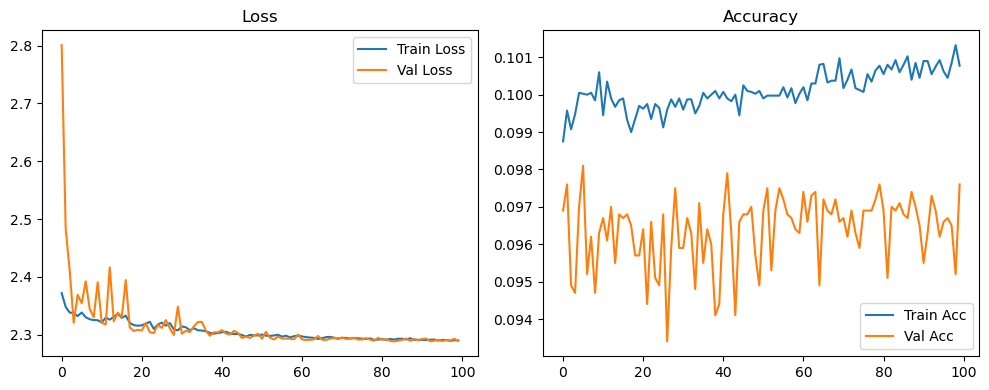

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.2913 Accuracy: 0.1008


🚀 Running: batch512_lr_max_0.0005_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0966 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0966 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0966 |:   1%|          | 1/100 [01:22<2:16:45, 82.88s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0950 |:   1%|          | 1/100 [02:45<2:16:45, 82.88s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0950 |:   1%|          | 1/100 [02:45<2:16:45, 82.88s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0950 |:   2%|▏         | 2/100 [02:45<2:14:47, 82.53s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0940 |:   2%|▏         | 2/100 [04:07<2:14:47, 82.53s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0940 |:   2%|▏         | 2/100 [04:07<2:14:47, 82.53s/it]

| LR: 0.000500 | Train Acc: 0.0989 | Val Acc: 0.0940 |:   3%|▎         | 3/100 [04:07<2:13:21, 82.49s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [05:16<2:13:21, 82.49s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [05:16<2:13:21, 82.49s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0943 |:   4%|▍         | 4/100 [05:16<2:03:29, 77.18s/it]

| LR: 0.000498 | Train Acc: 0.1005 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:29, 77.18s/it]

| LR: 0.000498 | Train Acc: 0.1005 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:29, 77.18s/it]

| LR: 0.000498 | Train Acc: 0.1005 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:29<1:25:36, 54.07s/it]

| LR: 0.000497 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:42<1:25:36, 54.07s/it]

| LR: 0.000497 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:42<1:25:36, 54.07s/it]

| LR: 0.000497 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [05:42<1:02:56, 40.17s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0978 |:   6%|▌         | 6/100 [05:56<1:02:56, 40.17s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0978 |:   6%|▌         | 6/100 [05:56<1:02:56, 40.17s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0978 |:   7%|▋         | 7/100 [05:56<48:35, 31.35s/it]  

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   7%|▋         | 7/100 [06:09<48:35, 31.35s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   7%|▋         | 7/100 [06:09<48:35, 31.35s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [06:09<39:16, 25.62s/it]

| LR: 0.000492 | Train Acc: 0.0996 | Val Acc: 0.0960 |:   8%|▊         | 8/100 [06:22<39:16, 25.62s/it]

| LR: 0.000492 | Train Acc: 0.0996 | Val Acc: 0.0960 |:   8%|▊         | 8/100 [06:22<39:16, 25.62s/it]

| LR: 0.000492 | Train Acc: 0.0996 | Val Acc: 0.0960 |:   9%|▉         | 9/100 [06:22<32:57, 21.73s/it]

| LR: 0.000490 | Train Acc: 0.0994 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:35<32:57, 21.73s/it]

| LR: 0.000490 | Train Acc: 0.0994 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:35<32:57, 21.73s/it]

| LR: 0.000490 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  10%|█         | 10/100 [06:35<28:37, 19.09s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  10%|█         | 10/100 [06:48<28:37, 19.09s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  10%|█         | 10/100 [06:48<28:37, 19.09s/it]

| LR: 0.000488 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  11%|█         | 11/100 [06:48<25:37, 17.28s/it]

| LR: 0.000486 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  11%|█         | 11/100 [07:02<25:37, 17.28s/it]

| LR: 0.000486 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  11%|█         | 11/100 [07:02<25:37, 17.28s/it]

| LR: 0.000486 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  12%|█▏        | 12/100 [07:02<23:31, 16.04s/it]

| LR: 0.000483 | Train Acc: 0.0993 | Val Acc: 0.0956 |:  12%|█▏        | 12/100 [07:15<23:31, 16.04s/it]

| LR: 0.000483 | Train Acc: 0.0993 | Val Acc: 0.0956 |:  12%|█▏        | 12/100 [07:15<23:31, 16.04s/it]

| LR: 0.000483 | Train Acc: 0.0993 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [07:15<22:01, 15.19s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0981 |:  13%|█▎        | 13/100 [07:28<22:01, 15.19s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0981 |:  13%|█▎        | 13/100 [07:28<22:01, 15.19s/it]

| LR: 0.000480 | Train Acc: 0.0998 | Val Acc: 0.0981 |:  14%|█▍        | 14/100 [07:28<20:53, 14.57s/it]

| LR: 0.000477 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  14%|█▍        | 14/100 [07:41<20:53, 14.57s/it]

| LR: 0.000477 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  14%|█▍        | 14/100 [07:41<20:53, 14.57s/it]

| LR: 0.000477 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  15%|█▌        | 15/100 [07:41<20:03, 14.15s/it]

| LR: 0.000473 | Train Acc: 0.1003 | Val Acc: 0.0941 |:  15%|█▌        | 15/100 [07:54<20:03, 14.15s/it]

| LR: 0.000473 | Train Acc: 0.1003 | Val Acc: 0.0941 |:  15%|█▌        | 15/100 [07:54<20:03, 14.15s/it]

| LR: 0.000473 | Train Acc: 0.1003 | Val Acc: 0.0941 |:  16%|█▌        | 16/100 [07:54<19:24, 13.87s/it]

| LR: 0.000470 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [08:08<19:24, 13.87s/it]

| LR: 0.000470 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [08:08<19:24, 13.87s/it]

| LR: 0.000470 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  17%|█▋        | 17/100 [08:08<18:56, 13.69s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:21<18:56, 13.69s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:21<18:56, 13.69s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:21<18:29, 13.53s/it]

| LR: 0.000462 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  18%|█▊        | 18/100 [08:34<18:29, 13.53s/it]

| LR: 0.000462 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  18%|█▊        | 18/100 [08:34<18:29, 13.53s/it]

| LR: 0.000462 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  19%|█▉        | 19/100 [08:34<18:07, 13.42s/it]

| LR: 0.000458 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [08:47<18:07, 13.42s/it]

| LR: 0.000458 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [08:47<18:07, 13.42s/it]

| LR: 0.000458 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  20%|██        | 20/100 [08:47<17:48, 13.35s/it]

| LR: 0.000453 | Train Acc: 0.0996 | Val Acc: 0.0945 |:  20%|██        | 20/100 [09:00<17:48, 13.35s/it]

| LR: 0.000453 | Train Acc: 0.0996 | Val Acc: 0.0945 |:  20%|██        | 20/100 [09:00<17:48, 13.35s/it]

| LR: 0.000453 | Train Acc: 0.0996 | Val Acc: 0.0945 |:  21%|██        | 21/100 [09:00<17:31, 13.30s/it]

| LR: 0.000449 | Train Acc: 0.0993 | Val Acc: 0.0959 |:  21%|██        | 21/100 [09:14<17:31, 13.30s/it]

| LR: 0.000449 | Train Acc: 0.0993 | Val Acc: 0.0959 |:  21%|██        | 21/100 [09:14<17:31, 13.30s/it]

| LR: 0.000449 | Train Acc: 0.0993 | Val Acc: 0.0959 |:  22%|██▏       | 22/100 [09:14<17:14, 13.27s/it]

| LR: 0.000444 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [09:27<17:14, 13.27s/it]

| LR: 0.000444 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [09:27<17:14, 13.27s/it]

| LR: 0.000444 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:27<17:01, 13.26s/it]

| LR: 0.000439 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [09:40<17:01, 13.26s/it]

| LR: 0.000439 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [09:40<17:01, 13.26s/it]

| LR: 0.000439 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  24%|██▍       | 24/100 [09:40<16:46, 13.24s/it]

| LR: 0.000434 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  24%|██▍       | 24/100 [09:53<16:46, 13.24s/it]

| LR: 0.000434 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  24%|██▍       | 24/100 [09:53<16:46, 13.24s/it]

| LR: 0.000434 | Train Acc: 0.0994 | Val Acc: 0.0963 |:  25%|██▌       | 25/100 [09:53<16:31, 13.21s/it]

| LR: 0.000428 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  25%|██▌       | 25/100 [10:06<16:31, 13.21s/it]

| LR: 0.000428 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  25%|██▌       | 25/100 [10:06<16:31, 13.21s/it]

| LR: 0.000428 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  26%|██▌       | 26/100 [10:06<16:15, 13.19s/it]

| LR: 0.000423 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  26%|██▌       | 26/100 [10:20<16:15, 13.19s/it]

| LR: 0.000423 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  26%|██▌       | 26/100 [10:20<16:15, 13.19s/it]

| LR: 0.000423 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  27%|██▋       | 27/100 [10:20<16:03, 13.20s/it]

| LR: 0.000417 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [10:33<16:03, 13.20s/it]

| LR: 0.000417 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [10:33<16:03, 13.20s/it]

| LR: 0.000417 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [10:33<15:47, 13.16s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  28%|██▊       | 28/100 [10:46<15:47, 13.16s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  28%|██▊       | 28/100 [10:46<15:47, 13.16s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  29%|██▉       | 29/100 [10:46<15:33, 13.14s/it]

| LR: 0.000405 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  29%|██▉       | 29/100 [10:59<15:33, 13.14s/it]

| LR: 0.000405 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  29%|██▉       | 29/100 [10:59<15:33, 13.14s/it]

| LR: 0.000405 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  30%|███       | 30/100 [10:59<15:18, 13.12s/it]

| LR: 0.000399 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  30%|███       | 30/100 [11:12<15:18, 13.12s/it]

| LR: 0.000399 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  30%|███       | 30/100 [11:12<15:18, 13.12s/it]

| LR: 0.000399 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  31%|███       | 31/100 [11:12<15:05, 13.13s/it]

| LR: 0.000393 | Train Acc: 0.0993 | Val Acc: 0.0956 |:  31%|███       | 31/100 [11:25<15:05, 13.13s/it]

| LR: 0.000393 | Train Acc: 0.0993 | Val Acc: 0.0956 |:  31%|███       | 31/100 [11:25<15:05, 13.13s/it]

| LR: 0.000393 | Train Acc: 0.0993 | Val Acc: 0.0956 |:  32%|███▏      | 32/100 [11:25<14:51, 13.11s/it]

| LR: 0.000386 | Train Acc: 0.1002 | Val Acc: 0.0952 |:  32%|███▏      | 32/100 [11:38<14:51, 13.11s/it]

| LR: 0.000386 | Train Acc: 0.1002 | Val Acc: 0.0952 |:  32%|███▏      | 32/100 [11:38<14:51, 13.11s/it]

| LR: 0.000386 | Train Acc: 0.1002 | Val Acc: 0.0952 |:  33%|███▎      | 33/100 [11:38<14:37, 13.10s/it]

| LR: 0.000380 | Train Acc: 0.1001 | Val Acc: 0.0937 |:  33%|███▎      | 33/100 [11:51<14:37, 13.10s/it]

| LR: 0.000380 | Train Acc: 0.1001 | Val Acc: 0.0937 |:  33%|███▎      | 33/100 [11:51<14:37, 13.10s/it]

| LR: 0.000380 | Train Acc: 0.1001 | Val Acc: 0.0937 |:  34%|███▍      | 34/100 [11:51<14:23, 13.09s/it]

| LR: 0.000373 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:04<14:23, 13.09s/it]

| LR: 0.000373 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:04<14:23, 13.09s/it]

| LR: 0.000373 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:04<14:12, 13.11s/it]

| LR: 0.000366 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  35%|███▌      | 35/100 [12:18<14:12, 13.11s/it]

| LR: 0.000366 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  35%|███▌      | 35/100 [12:18<14:12, 13.11s/it]

| LR: 0.000366 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  36%|███▌      | 36/100 [12:18<14:02, 13.17s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  36%|███▌      | 36/100 [12:31<14:02, 13.17s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  36%|███▌      | 36/100 [12:31<14:02, 13.17s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  37%|███▋      | 37/100 [12:31<13:49, 13.17s/it]

| LR: 0.000352 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:44<13:49, 13.17s/it]

| LR: 0.000352 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:44<13:49, 13.17s/it]

| LR: 0.000352 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  38%|███▊      | 38/100 [12:44<13:37, 13.18s/it]

| LR: 0.000345 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  38%|███▊      | 38/100 [12:57<13:37, 13.18s/it]

| LR: 0.000345 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  38%|███▊      | 38/100 [12:57<13:37, 13.18s/it]

| LR: 0.000345 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [12:57<13:24, 13.19s/it]

| LR: 0.000338 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  39%|███▉      | 39/100 [13:10<13:24, 13.19s/it]

| LR: 0.000338 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  39%|███▉      | 39/100 [13:10<13:24, 13.19s/it]

| LR: 0.000338 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  40%|████      | 40/100 [13:10<13:11, 13.18s/it]

| LR: 0.000331 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  40%|████      | 40/100 [13:24<13:11, 13.18s/it]

| LR: 0.000331 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  40%|████      | 40/100 [13:24<13:11, 13.18s/it]

| LR: 0.000331 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  41%|████      | 41/100 [13:24<12:57, 13.18s/it]

| LR: 0.000323 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  41%|████      | 41/100 [13:37<12:57, 13.18s/it]

| LR: 0.000323 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  41%|████      | 41/100 [13:37<12:57, 13.18s/it]

| LR: 0.000323 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:37<12:44, 13.18s/it]

| LR: 0.000316 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  42%|████▏     | 42/100 [13:50<12:44, 13.18s/it]

| LR: 0.000316 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  42%|████▏     | 42/100 [13:50<12:44, 13.18s/it]

| LR: 0.000316 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  43%|████▎     | 43/100 [13:50<12:31, 13.19s/it]

| LR: 0.000308 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  43%|████▎     | 43/100 [14:03<12:31, 13.19s/it]

| LR: 0.000308 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  43%|████▎     | 43/100 [14:03<12:31, 13.19s/it]

| LR: 0.000308 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  44%|████▍     | 44/100 [14:03<12:17, 13.17s/it]

| LR: 0.000301 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  44%|████▍     | 44/100 [14:16<12:17, 13.17s/it]

| LR: 0.000301 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  44%|████▍     | 44/100 [14:16<12:17, 13.17s/it]

| LR: 0.000301 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  45%|████▌     | 45/100 [14:16<12:03, 13.15s/it]

| LR: 0.000293 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:29<12:03, 13.15s/it]

| LR: 0.000293 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:29<12:03, 13.15s/it]

| LR: 0.000293 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  46%|████▌     | 46/100 [14:29<11:51, 13.18s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  46%|████▌     | 46/100 [14:43<11:51, 13.18s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  46%|████▌     | 46/100 [14:43<11:51, 13.18s/it]

| LR: 0.000286 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  47%|████▋     | 47/100 [14:43<11:37, 13.16s/it]

| LR: 0.000278 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  47%|████▋     | 47/100 [14:56<11:37, 13.16s/it]

| LR: 0.000278 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  47%|████▋     | 47/100 [14:56<11:37, 13.16s/it]

| LR: 0.000278 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  48%|████▊     | 48/100 [14:56<11:24, 13.16s/it]

| LR: 0.000270 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  48%|████▊     | 48/100 [15:09<11:24, 13.16s/it]

| LR: 0.000270 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  48%|████▊     | 48/100 [15:09<11:24, 13.16s/it]

| LR: 0.000270 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  49%|████▉     | 49/100 [15:09<11:10, 13.15s/it]

| LR: 0.000263 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  49%|████▉     | 49/100 [15:22<11:10, 13.15s/it]

| LR: 0.000263 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  49%|████▉     | 49/100 [15:22<11:10, 13.15s/it]

| LR: 0.000263 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  50%|█████     | 50/100 [15:22<10:56, 13.14s/it]

| LR: 0.000255 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  50%|█████     | 50/100 [15:35<10:56, 13.14s/it]

| LR: 0.000255 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  50%|█████     | 50/100 [15:35<10:56, 13.14s/it]

| LR: 0.000255 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  51%|█████     | 51/100 [15:35<10:43, 13.13s/it]

| LR: 0.000247 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  51%|█████     | 51/100 [15:48<10:43, 13.13s/it]

| LR: 0.000247 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  51%|█████     | 51/100 [15:48<10:43, 13.13s/it]

| LR: 0.000247 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  52%|█████▏    | 52/100 [15:48<10:30, 13.13s/it]

| LR: 0.000240 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  52%|█████▏    | 52/100 [16:01<10:30, 13.13s/it]

| LR: 0.000240 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  52%|█████▏    | 52/100 [16:01<10:30, 13.13s/it]

| LR: 0.000240 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  53%|█████▎    | 53/100 [16:01<10:17, 13.13s/it]

| LR: 0.000232 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  53%|█████▎    | 53/100 [16:14<10:17, 13.13s/it]

| LR: 0.000232 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  53%|█████▎    | 53/100 [16:14<10:17, 13.13s/it]

| LR: 0.000232 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  54%|█████▍    | 54/100 [16:14<10:03, 13.13s/it]

| LR: 0.000224 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  54%|█████▍    | 54/100 [16:28<10:03, 13.13s/it]

| LR: 0.000224 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  54%|█████▍    | 54/100 [16:28<10:03, 13.13s/it]

| LR: 0.000224 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  55%|█████▌    | 55/100 [16:28<09:52, 13.17s/it]

| LR: 0.000217 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  55%|█████▌    | 55/100 [16:41<09:52, 13.17s/it]

| LR: 0.000217 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  55%|█████▌    | 55/100 [16:41<09:52, 13.17s/it]

| LR: 0.000217 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  56%|█████▌    | 56/100 [16:41<09:39, 13.17s/it]

| LR: 0.000209 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  56%|█████▌    | 56/100 [16:54<09:39, 13.17s/it]

| LR: 0.000209 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  56%|█████▌    | 56/100 [16:54<09:39, 13.17s/it]

| LR: 0.000209 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  57%|█████▋    | 57/100 [16:54<09:26, 13.17s/it]

| LR: 0.000202 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  57%|█████▋    | 57/100 [17:07<09:26, 13.17s/it]

| LR: 0.000202 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  57%|█████▋    | 57/100 [17:07<09:26, 13.17s/it]

| LR: 0.000202 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  58%|█████▊    | 58/100 [17:07<09:13, 13.17s/it]

| LR: 0.000194 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  58%|█████▊    | 58/100 [17:20<09:13, 13.17s/it]

| LR: 0.000194 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  58%|█████▊    | 58/100 [17:20<09:13, 13.17s/it]

| LR: 0.000194 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  59%|█████▉    | 59/100 [17:20<08:59, 13.17s/it]

| LR: 0.000187 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  59%|█████▉    | 59/100 [17:34<08:59, 13.17s/it]

| LR: 0.000187 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  59%|█████▉    | 59/100 [17:34<08:59, 13.17s/it]

| LR: 0.000187 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  60%|██████    | 60/100 [17:34<08:46, 13.17s/it]

| LR: 0.000179 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  60%|██████    | 60/100 [17:47<08:46, 13.17s/it]

| LR: 0.000179 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  60%|██████    | 60/100 [17:47<08:46, 13.17s/it]

| LR: 0.000179 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  61%|██████    | 61/100 [17:47<08:33, 13.16s/it]

| LR: 0.000172 | Train Acc: 0.1002 | Val Acc: 0.0951 |:  61%|██████    | 61/100 [18:00<08:33, 13.16s/it]

| LR: 0.000172 | Train Acc: 0.1002 | Val Acc: 0.0951 |:  61%|██████    | 61/100 [18:00<08:33, 13.16s/it]

| LR: 0.000172 | Train Acc: 0.1002 | Val Acc: 0.0951 |:  62%|██████▏   | 62/100 [18:00<08:19, 13.15s/it]

| LR: 0.000165 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  62%|██████▏   | 62/100 [18:13<08:19, 13.15s/it]

| LR: 0.000165 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  62%|██████▏   | 62/100 [18:13<08:19, 13.15s/it]

| LR: 0.000165 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  63%|██████▎   | 63/100 [18:13<08:05, 13.13s/it]

| LR: 0.000158 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  63%|██████▎   | 63/100 [18:26<08:05, 13.13s/it]

| LR: 0.000158 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  63%|██████▎   | 63/100 [18:26<08:05, 13.13s/it]

| LR: 0.000158 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  64%|██████▍   | 64/100 [18:26<07:53, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:39<07:53, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:39<07:53, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  65%|██████▌   | 65/100 [18:39<07:39, 13.13s/it]

| LR: 0.000144 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  65%|██████▌   | 65/100 [18:52<07:39, 13.13s/it]

| LR: 0.000144 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  65%|██████▌   | 65/100 [18:52<07:39, 13.13s/it]

| LR: 0.000144 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  66%|██████▌   | 66/100 [18:52<07:25, 13.11s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  66%|██████▌   | 66/100 [19:05<07:25, 13.11s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  66%|██████▌   | 66/100 [19:05<07:25, 13.11s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  67%|██████▋   | 67/100 [19:05<07:12, 13.11s/it]

| LR: 0.000130 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:18<07:12, 13.11s/it]

| LR: 0.000130 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:18<07:12, 13.11s/it]

| LR: 0.000130 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  68%|██████▊   | 68/100 [19:19<06:59, 13.12s/it]

| LR: 0.000124 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  68%|██████▊   | 68/100 [19:32<06:59, 13.12s/it]

| LR: 0.000124 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  68%|██████▊   | 68/100 [19:32<06:59, 13.12s/it]

| LR: 0.000124 | Train Acc: 0.1007 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:32<06:46, 13.12s/it]

| LR: 0.000117 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  69%|██████▉   | 69/100 [19:45<06:46, 13.12s/it]

| LR: 0.000117 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  69%|██████▉   | 69/100 [19:45<06:46, 13.12s/it]

| LR: 0.000117 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  70%|███████   | 70/100 [19:45<06:33, 13.11s/it]

| LR: 0.000111 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  70%|███████   | 70/100 [19:58<06:33, 13.11s/it]

| LR: 0.000111 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  70%|███████   | 70/100 [19:58<06:33, 13.11s/it]

| LR: 0.000111 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  71%|███████   | 71/100 [19:58<06:20, 13.12s/it]

| LR: 0.000105 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:11<06:20, 13.12s/it]

| LR: 0.000105 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:11<06:20, 13.12s/it]

| LR: 0.000105 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:11<06:07, 13.11s/it]

| LR: 0.000099 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  72%|███████▏  | 72/100 [20:24<06:07, 13.11s/it]

| LR: 0.000099 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  72%|███████▏  | 72/100 [20:24<06:07, 13.11s/it]

| LR: 0.000099 | Train Acc: 0.1006 | Val Acc: 0.0974 |:  73%|███████▎  | 73/100 [20:24<05:53, 13.11s/it]

| LR: 0.000093 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  73%|███████▎  | 73/100 [20:37<05:53, 13.11s/it]

| LR: 0.000093 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  73%|███████▎  | 73/100 [20:37<05:53, 13.11s/it]

| LR: 0.000093 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  74%|███████▍  | 74/100 [20:37<05:42, 13.18s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  74%|███████▍  | 74/100 [20:51<05:42, 13.18s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  74%|███████▍  | 74/100 [20:51<05:42, 13.18s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:51<05:29, 13.17s/it]

| LR: 0.000082 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [21:04<05:29, 13.17s/it]

| LR: 0.000082 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [21:04<05:29, 13.17s/it]

| LR: 0.000082 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [21:04<05:16, 13.19s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0946 |:  76%|███████▌  | 76/100 [21:17<05:16, 13.19s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0946 |:  76%|███████▌  | 76/100 [21:17<05:16, 13.19s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0946 |:  77%|███████▋  | 77/100 [21:17<05:03, 13.20s/it]

| LR: 0.000071 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  77%|███████▋  | 77/100 [21:30<05:03, 13.20s/it]

| LR: 0.000071 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  77%|███████▋  | 77/100 [21:30<05:03, 13.20s/it]

| LR: 0.000071 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  78%|███████▊  | 78/100 [21:30<04:50, 13.20s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:43<04:50, 13.20s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:43<04:50, 13.20s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:43<04:37, 13.21s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:57<04:37, 13.21s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:57<04:37, 13.21s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [21:57<04:24, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [22:10<04:24, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [22:10<04:24, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [22:10<04:11, 13.24s/it]

| LR: 0.000052 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  81%|████████  | 81/100 [22:23<04:11, 13.24s/it]

| LR: 0.000052 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  81%|████████  | 81/100 [22:23<04:11, 13.24s/it]

| LR: 0.000052 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  82%|████████▏ | 82/100 [22:23<03:57, 13.22s/it]

| LR: 0.000048 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  82%|████████▏ | 82/100 [22:36<03:57, 13.22s/it]

| LR: 0.000048 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  82%|████████▏ | 82/100 [22:36<03:57, 13.22s/it]

| LR: 0.000048 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  83%|████████▎ | 83/100 [22:36<03:45, 13.25s/it]

| LR: 0.000044 | Train Acc: 0.1013 | Val Acc: 0.0967 |:  83%|████████▎ | 83/100 [22:50<03:45, 13.25s/it]

| LR: 0.000044 | Train Acc: 0.1013 | Val Acc: 0.0967 |:  83%|████████▎ | 83/100 [22:50<03:45, 13.25s/it]

| LR: 0.000044 | Train Acc: 0.1013 | Val Acc: 0.0967 |:  84%|████████▍ | 84/100 [22:50<03:31, 13.24s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  84%|████████▍ | 84/100 [23:03<03:31, 13.24s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  84%|████████▍ | 84/100 [23:03<03:31, 13.24s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  85%|████████▌ | 85/100 [23:03<03:18, 13.23s/it]

| LR: 0.000037 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  85%|████████▌ | 85/100 [23:16<03:18, 13.23s/it]

| LR: 0.000037 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  85%|████████▌ | 85/100 [23:16<03:18, 13.23s/it]

| LR: 0.000037 | Train Acc: 0.1009 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:16<03:05, 13.22s/it]

| LR: 0.000033 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:29<03:05, 13.22s/it]

| LR: 0.000033 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:29<03:05, 13.22s/it]

| LR: 0.000033 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  87%|████████▋ | 87/100 [23:29<02:51, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  87%|████████▋ | 87/100 [23:42<02:51, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  87%|████████▋ | 87/100 [23:42<02:51, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:42<02:38, 13.19s/it]

| LR: 0.000027 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:56<02:38, 13.19s/it]

| LR: 0.000027 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:56<02:38, 13.19s/it]

| LR: 0.000027 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:56<02:24, 13.17s/it]

| LR: 0.000024 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  89%|████████▉ | 89/100 [24:09<02:24, 13.17s/it]

| LR: 0.000024 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  89%|████████▉ | 89/100 [24:09<02:24, 13.17s/it]

| LR: 0.000024 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [24:09<02:11, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.1008 | Val Acc: 0.0963 |:  90%|█████████ | 90/100 [24:22<02:11, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.1008 | Val Acc: 0.0963 |:  90%|█████████ | 90/100 [24:22<02:11, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.1008 | Val Acc: 0.0963 |:  91%|█████████ | 91/100 [24:22<01:58, 13.15s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  91%|█████████ | 91/100 [24:35<01:58, 13.15s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  91%|█████████ | 91/100 [24:35<01:58, 13.15s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  92%|█████████▏| 92/100 [24:35<01:45, 13.17s/it]

| LR: 0.000018 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:48<01:45, 13.17s/it]

| LR: 0.000018 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:48<01:45, 13.17s/it]

| LR: 0.000018 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:48<01:32, 13.20s/it]

| LR: 0.000016 | Train Acc: 0.1008 | Val Acc: 0.0965 |:  93%|█████████▎| 93/100 [25:01<01:32, 13.20s/it]

| LR: 0.000016 | Train Acc: 0.1008 | Val Acc: 0.0965 |:  93%|█████████▎| 93/100 [25:01<01:32, 13.20s/it]

| LR: 0.000016 | Train Acc: 0.1008 | Val Acc: 0.0965 |:  94%|█████████▍| 94/100 [25:02<01:19, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.1013 | Val Acc: 0.0970 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.1013 | Val Acc: 0.0970 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.1013 | Val Acc: 0.0970 |:  95%|█████████▌| 95/100 [25:15<01:05, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0954 |:  95%|█████████▌| 95/100 [25:28<01:05, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0954 |:  95%|█████████▌| 95/100 [25:28<01:05, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0954 |:  96%|█████████▌| 96/100 [25:28<00:53, 13.25s/it]

| LR: 0.000012 | Train Acc: 0.1008 | Val Acc: 0.0960 |:  96%|█████████▌| 96/100 [25:41<00:53, 13.25s/it]

| LR: 0.000012 | Train Acc: 0.1008 | Val Acc: 0.0960 |:  96%|█████████▌| 96/100 [25:41<00:53, 13.25s/it]

| LR: 0.000012 | Train Acc: 0.1008 | Val Acc: 0.0960 |:  97%|█████████▋| 97/100 [25:41<00:39, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  97%|█████████▋| 97/100 [25:54<00:39, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  97%|█████████▋| 97/100 [25:54<00:39, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  98%|█████████▊| 98/100 [25:54<00:26, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1010 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1010 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1010 | Val Acc: 0.0971 |:  99%|█████████▉| 99/100 [26:08<00:13, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0955 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0955 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0955 |: 100%|██████████| 100/100 [26:21<00:00, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0955 |: 100%|██████████| 100/100 [26:21<00:00, 15.81s/it]

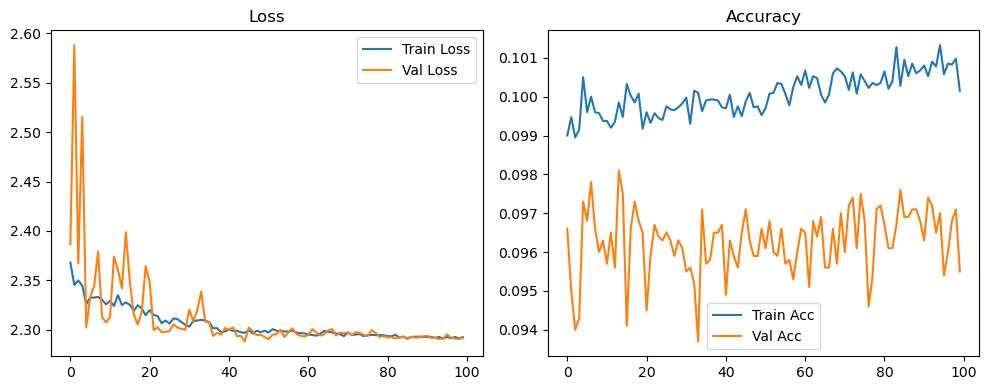

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 2.2903 Accuracy: 0.1001


🚀 Running: batch512_lr_max_0.0005_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0986 | Val Acc: 0.0977 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0986 | Val Acc: 0.0977 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0986 | Val Acc: 0.0977 |:   1%|          | 1/100 [01:22<2:15:21, 82.03s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:44<2:15:21, 82.03s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:44<2:15:21, 82.03s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:44<2:14:04, 82.09s/it]

| LR: 0.000500 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:06<2:14:04, 82.09s/it]

| LR: 0.000500 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:06<2:14:04, 82.09s/it]

| LR: 0.000500 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [04:06<2:12:39, 82.06s/it]

| LR: 0.000499 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:15<2:12:39, 82.06s/it]

| LR: 0.000499 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:15<2:12:39, 82.06s/it]

| LR: 0.000499 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:15<2:03:10, 76.98s/it]

| LR: 0.000498 | Train Acc: 0.1003 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:28<2:03:10, 76.98s/it]

| LR: 0.000498 | Train Acc: 0.1003 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:28<2:03:10, 76.98s/it]

| LR: 0.000498 | Train Acc: 0.1003 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [05:28<1:25:28, 53.98s/it]

| LR: 0.000497 | Train Acc: 0.1004 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:28, 53.98s/it]

| LR: 0.000497 | Train Acc: 0.1004 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:28, 53.98s/it]

| LR: 0.000497 | Train Acc: 0.1004 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:41<1:02:51, 40.12s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [05:54<1:02:51, 40.12s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [05:54<1:02:51, 40.12s/it]

| LR: 0.000496 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [05:54<48:31, 31.31s/it]  

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [06:08<48:31, 31.31s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [06:08<48:31, 31.31s/it]

| LR: 0.000494 | Train Acc: 0.1001 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [06:08<39:14, 25.60s/it]

| LR: 0.000492 | Train Acc: 0.1001 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:21<39:14, 25.60s/it]

| LR: 0.000492 | Train Acc: 0.1001 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:21<39:14, 25.60s/it]

| LR: 0.000492 | Train Acc: 0.1001 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [06:21<32:57, 21.73s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0964 |:   9%|▉         | 9/100 [06:34<32:57, 21.73s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0964 |:   9%|▉         | 9/100 [06:34<32:57, 21.73s/it]

| LR: 0.000490 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  10%|█         | 10/100 [06:34<28:39, 19.10s/it]

| LR: 0.000488 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  10%|█         | 10/100 [06:47<28:39, 19.10s/it]

| LR: 0.000488 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  10%|█         | 10/100 [06:47<28:39, 19.10s/it]

| LR: 0.000488 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  11%|█         | 11/100 [06:47<25:39, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  11%|█         | 11/100 [07:01<25:39, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  11%|█         | 11/100 [07:01<25:39, 17.30s/it]

| LR: 0.000486 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  12%|█▏        | 12/100 [07:01<23:33, 16.06s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  12%|█▏        | 12/100 [07:14<23:33, 16.06s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  12%|█▏        | 12/100 [07:14<23:33, 16.06s/it]

| LR: 0.000483 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  13%|█▎        | 13/100 [07:14<22:02, 15.20s/it]

| LR: 0.000480 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  13%|█▎        | 13/100 [07:27<22:02, 15.20s/it]

| LR: 0.000480 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  13%|█▎        | 13/100 [07:27<22:02, 15.20s/it]

| LR: 0.000480 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  14%|█▍        | 14/100 [07:27<20:55, 14.59s/it]

| LR: 0.000477 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  14%|█▍        | 14/100 [07:40<20:55, 14.59s/it]

| LR: 0.000477 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  14%|█▍        | 14/100 [07:40<20:55, 14.59s/it]

| LR: 0.000477 | Train Acc: 0.0997 | Val Acc: 0.0949 |:  15%|█▌        | 15/100 [07:40<20:02, 14.15s/it]

| LR: 0.000473 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:53<20:02, 14.15s/it]

| LR: 0.000473 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:53<20:02, 14.15s/it]

| LR: 0.000473 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [07:53<19:22, 13.84s/it]

| LR: 0.000470 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [08:07<19:22, 13.84s/it]

| LR: 0.000470 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [08:07<19:22, 13.84s/it]

| LR: 0.000470 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  17%|█▋        | 17/100 [08:07<18:53, 13.66s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  17%|█▋        | 17/100 [08:20<18:53, 13.66s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  17%|█▋        | 17/100 [08:20<18:53, 13.66s/it]

| LR: 0.000466 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  18%|█▊        | 18/100 [08:20<18:28, 13.52s/it]

| LR: 0.000462 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  18%|█▊        | 18/100 [08:33<18:28, 13.52s/it]

| LR: 0.000462 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  18%|█▊        | 18/100 [08:33<18:28, 13.52s/it]

| LR: 0.000462 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:33<18:07, 13.42s/it]

| LR: 0.000458 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:46<18:07, 13.42s/it]

| LR: 0.000458 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:46<18:07, 13.42s/it]

| LR: 0.000458 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:46<17:47, 13.34s/it]

| LR: 0.000453 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  20%|██        | 20/100 [08:59<17:47, 13.34s/it]

| LR: 0.000453 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  20%|██        | 20/100 [08:59<17:47, 13.34s/it]

| LR: 0.000453 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  21%|██        | 21/100 [08:59<17:30, 13.29s/it]

| LR: 0.000449 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  21%|██        | 21/100 [09:12<17:30, 13.29s/it]

| LR: 0.000449 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  21%|██        | 21/100 [09:12<17:30, 13.29s/it]

| LR: 0.000449 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:12<17:13, 13.25s/it]

| LR: 0.000444 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [09:26<17:13, 13.25s/it]

| LR: 0.000444 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [09:26<17:13, 13.25s/it]

| LR: 0.000444 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  23%|██▎       | 23/100 [09:26<16:58, 13.22s/it]

| LR: 0.000439 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [09:39<16:58, 13.22s/it]

| LR: 0.000439 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [09:39<16:58, 13.22s/it]

| LR: 0.000439 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [09:39<16:43, 13.21s/it]

| LR: 0.000434 | Train Acc: 0.0997 | Val Acc: 0.0951 |:  24%|██▍       | 24/100 [09:52<16:43, 13.21s/it]

| LR: 0.000434 | Train Acc: 0.0997 | Val Acc: 0.0951 |:  24%|██▍       | 24/100 [09:52<16:43, 13.21s/it]

| LR: 0.000434 | Train Acc: 0.0997 | Val Acc: 0.0951 |:  25%|██▌       | 25/100 [09:52<16:29, 13.19s/it]

| LR: 0.000428 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  25%|██▌       | 25/100 [10:05<16:29, 13.19s/it]

| LR: 0.000428 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  25%|██▌       | 25/100 [10:05<16:29, 13.19s/it]

| LR: 0.000428 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  26%|██▌       | 26/100 [10:05<16:14, 13.17s/it]

| LR: 0.000423 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  26%|██▌       | 26/100 [10:18<16:14, 13.17s/it]

| LR: 0.000423 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  26%|██▌       | 26/100 [10:18<16:14, 13.17s/it]

| LR: 0.000423 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  27%|██▋       | 27/100 [10:18<16:04, 13.21s/it]

| LR: 0.000417 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [10:32<16:04, 13.21s/it]

| LR: 0.000417 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [10:32<16:04, 13.21s/it]

| LR: 0.000417 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  28%|██▊       | 28/100 [10:32<15:51, 13.21s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0955 |:  28%|██▊       | 28/100 [10:45<15:51, 13.21s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0955 |:  28%|██▊       | 28/100 [10:45<15:51, 13.21s/it]

| LR: 0.000411 | Train Acc: 0.0997 | Val Acc: 0.0955 |:  29%|██▉       | 29/100 [10:45<15:37, 13.20s/it]

| LR: 0.000405 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  29%|██▉       | 29/100 [10:58<15:37, 13.20s/it]

| LR: 0.000405 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  29%|██▉       | 29/100 [10:58<15:37, 13.20s/it]

| LR: 0.000405 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  30%|███       | 30/100 [10:58<15:24, 13.20s/it]

| LR: 0.000399 | Train Acc: 0.0997 | Val Acc: 0.0946 |:  30%|███       | 30/100 [11:11<15:24, 13.20s/it]

| LR: 0.000399 | Train Acc: 0.0997 | Val Acc: 0.0946 |:  30%|███       | 30/100 [11:11<15:24, 13.20s/it]

| LR: 0.000399 | Train Acc: 0.0997 | Val Acc: 0.0946 |:  31%|███       | 31/100 [11:11<15:11, 13.21s/it]

| LR: 0.000393 | Train Acc: 0.0995 | Val Acc: 0.0954 |:  31%|███       | 31/100 [11:24<15:11, 13.21s/it]

| LR: 0.000393 | Train Acc: 0.0995 | Val Acc: 0.0954 |:  31%|███       | 31/100 [11:24<15:11, 13.21s/it]

| LR: 0.000393 | Train Acc: 0.0995 | Val Acc: 0.0954 |:  32%|███▏      | 32/100 [11:24<14:58, 13.21s/it]

| LR: 0.000386 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  32%|███▏      | 32/100 [11:38<14:58, 13.21s/it]

| LR: 0.000386 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  32%|███▏      | 32/100 [11:38<14:58, 13.21s/it]

| LR: 0.000386 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  33%|███▎      | 33/100 [11:38<14:44, 13.20s/it]

| LR: 0.000380 | Train Acc: 0.0995 | Val Acc: 0.0954 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000380 | Train Acc: 0.0995 | Val Acc: 0.0954 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000380 | Train Acc: 0.0995 | Val Acc: 0.0954 |:  34%|███▍      | 34/100 [11:51<14:30, 13.18s/it]

| LR: 0.000373 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  34%|███▍      | 34/100 [12:04<14:30, 13.18s/it]

| LR: 0.000373 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  34%|███▍      | 34/100 [12:04<14:30, 13.18s/it]

| LR: 0.000373 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  35%|███▌      | 35/100 [12:04<14:16, 13.18s/it]

| LR: 0.000366 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:17<14:16, 13.18s/it]

| LR: 0.000366 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:17<14:16, 13.18s/it]

| LR: 0.000366 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:17<14:05, 13.21s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0955 |:  36%|███▌      | 36/100 [12:30<14:05, 13.21s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0955 |:  36%|███▌      | 36/100 [12:30<14:05, 13.21s/it]

| LR: 0.000359 | Train Acc: 0.0999 | Val Acc: 0.0955 |:  37%|███▋      | 37/100 [12:30<13:50, 13.19s/it]

| LR: 0.000352 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  37%|███▋      | 37/100 [12:43<13:50, 13.19s/it]

| LR: 0.000352 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  37%|███▋      | 37/100 [12:43<13:50, 13.19s/it]

| LR: 0.000352 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  38%|███▊      | 38/100 [12:44<13:37, 13.18s/it]

| LR: 0.000345 | Train Acc: 0.0998 | Val Acc: 0.0946 |:  38%|███▊      | 38/100 [12:57<13:37, 13.18s/it]

| LR: 0.000345 | Train Acc: 0.0998 | Val Acc: 0.0946 |:  38%|███▊      | 38/100 [12:57<13:37, 13.18s/it]

| LR: 0.000345 | Train Acc: 0.0998 | Val Acc: 0.0946 |:  39%|███▉      | 39/100 [12:57<13:23, 13.17s/it]

| LR: 0.000338 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [13:10<13:23, 13.17s/it]

| LR: 0.000338 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [13:10<13:23, 13.17s/it]

| LR: 0.000338 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:10<13:11, 13.19s/it]

| LR: 0.000331 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  40%|████      | 40/100 [13:23<13:11, 13.19s/it]

| LR: 0.000331 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  40%|████      | 40/100 [13:23<13:11, 13.19s/it]

| LR: 0.000331 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  41%|████      | 41/100 [13:23<12:59, 13.21s/it]

| LR: 0.000323 | Train Acc: 0.0999 | Val Acc: 0.0952 |:  41%|████      | 41/100 [13:36<12:59, 13.21s/it]

| LR: 0.000323 | Train Acc: 0.0999 | Val Acc: 0.0952 |:  41%|████      | 41/100 [13:36<12:59, 13.21s/it]

| LR: 0.000323 | Train Acc: 0.0999 | Val Acc: 0.0952 |:  42%|████▏     | 42/100 [13:36<12:47, 13.23s/it]

| LR: 0.000316 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  42%|████▏     | 42/100 [13:50<12:47, 13.23s/it]

| LR: 0.000316 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  42%|████▏     | 42/100 [13:50<12:47, 13.23s/it]

| LR: 0.000316 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  43%|████▎     | 43/100 [13:50<12:34, 13.24s/it]

| LR: 0.000308 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  43%|████▎     | 43/100 [14:03<12:34, 13.24s/it]

| LR: 0.000308 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  43%|████▎     | 43/100 [14:03<12:34, 13.24s/it]

| LR: 0.000308 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  44%|████▍     | 44/100 [14:03<12:21, 13.25s/it]

| LR: 0.000301 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:16<12:21, 13.25s/it]

| LR: 0.000301 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:16<12:21, 13.25s/it]

| LR: 0.000301 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  45%|████▌     | 45/100 [14:16<12:08, 13.25s/it]

| LR: 0.000293 | Train Acc: 0.0997 | Val Acc: 0.0979 |:  45%|████▌     | 45/100 [14:30<12:08, 13.25s/it]

| LR: 0.000293 | Train Acc: 0.0997 | Val Acc: 0.0979 |:  45%|████▌     | 45/100 [14:30<12:08, 13.25s/it]

| LR: 0.000293 | Train Acc: 0.0997 | Val Acc: 0.0979 |:  46%|████▌     | 46/100 [14:30<11:57, 13.29s/it]

| LR: 0.000286 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  46%|████▌     | 46/100 [14:43<11:57, 13.29s/it]

| LR: 0.000286 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  46%|████▌     | 46/100 [14:43<11:57, 13.29s/it]

| LR: 0.000286 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  47%|████▋     | 47/100 [14:43<11:43, 13.27s/it]

| LR: 0.000278 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  47%|████▋     | 47/100 [14:56<11:43, 13.27s/it]

| LR: 0.000278 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  47%|████▋     | 47/100 [14:56<11:43, 13.27s/it]

| LR: 0.000278 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  48%|████▊     | 48/100 [14:56<11:28, 13.25s/it]

| LR: 0.000270 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  48%|████▊     | 48/100 [15:09<11:28, 13.25s/it]

| LR: 0.000270 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  48%|████▊     | 48/100 [15:09<11:28, 13.25s/it]

| LR: 0.000270 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  49%|████▉     | 49/100 [15:09<11:14, 13.23s/it]

| LR: 0.000263 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  49%|████▉     | 49/100 [15:22<11:14, 13.23s/it]

| LR: 0.000263 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  49%|████▉     | 49/100 [15:22<11:14, 13.23s/it]

| LR: 0.000263 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  50%|█████     | 50/100 [15:22<11:02, 13.24s/it]

| LR: 0.000255 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  50%|█████     | 50/100 [15:36<11:02, 13.24s/it]

| LR: 0.000255 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  50%|█████     | 50/100 [15:36<11:02, 13.24s/it]

| LR: 0.000255 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  51%|█████     | 51/100 [15:36<10:48, 13.22s/it]

| LR: 0.000247 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [15:49<10:48, 13.22s/it]

| LR: 0.000247 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [15:49<10:48, 13.22s/it]

| LR: 0.000247 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [15:49<10:33, 13.20s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  52%|█████▏    | 52/100 [16:02<10:33, 13.20s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  52%|█████▏    | 52/100 [16:02<10:33, 13.20s/it]

| LR: 0.000240 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  53%|█████▎    | 53/100 [16:02<10:19, 13.19s/it]

| LR: 0.000232 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  53%|█████▎    | 53/100 [16:15<10:19, 13.19s/it]

| LR: 0.000232 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  53%|█████▎    | 53/100 [16:15<10:19, 13.19s/it]

| LR: 0.000232 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  54%|█████▍    | 54/100 [16:15<10:07, 13.20s/it]

| LR: 0.000224 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:28<10:07, 13.20s/it]

| LR: 0.000224 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:28<10:07, 13.20s/it]

| LR: 0.000224 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:28<09:55, 13.23s/it]

| LR: 0.000217 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:42<09:55, 13.23s/it]

| LR: 0.000217 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:42<09:55, 13.23s/it]

| LR: 0.000217 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:42<09:41, 13.22s/it]

| LR: 0.000209 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  56%|█████▌    | 56/100 [16:55<09:41, 13.22s/it]

| LR: 0.000209 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  56%|█████▌    | 56/100 [16:55<09:41, 13.22s/it]

| LR: 0.000209 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [16:55<09:27, 13.19s/it]

| LR: 0.000202 | Train Acc: 0.1003 | Val Acc: 0.0949 |:  57%|█████▋    | 57/100 [17:08<09:27, 13.19s/it]

| LR: 0.000202 | Train Acc: 0.1003 | Val Acc: 0.0949 |:  57%|█████▋    | 57/100 [17:08<09:27, 13.19s/it]

| LR: 0.000202 | Train Acc: 0.1003 | Val Acc: 0.0949 |:  58%|█████▊    | 58/100 [17:08<09:14, 13.21s/it]

| LR: 0.000194 | Train Acc: 0.1001 | Val Acc: 0.0950 |:  58%|█████▊    | 58/100 [17:21<09:14, 13.21s/it]

| LR: 0.000194 | Train Acc: 0.1001 | Val Acc: 0.0950 |:  58%|█████▊    | 58/100 [17:21<09:14, 13.21s/it]

| LR: 0.000194 | Train Acc: 0.1001 | Val Acc: 0.0950 |:  59%|█████▉    | 59/100 [17:21<09:02, 13.22s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:34<09:02, 13.22s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:34<09:02, 13.22s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  60%|██████    | 60/100 [17:34<08:48, 13.21s/it]

| LR: 0.000179 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  60%|██████    | 60/100 [17:48<08:48, 13.21s/it]

| LR: 0.000179 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  60%|██████    | 60/100 [17:48<08:48, 13.21s/it]

| LR: 0.000179 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  61%|██████    | 61/100 [17:48<08:34, 13.19s/it]

| LR: 0.000172 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [18:01<08:34, 13.19s/it]

| LR: 0.000172 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [18:01<08:34, 13.19s/it]

| LR: 0.000172 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  62%|██████▏   | 62/100 [18:01<08:20, 13.18s/it]

| LR: 0.000165 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  62%|██████▏   | 62/100 [18:14<08:20, 13.18s/it]

| LR: 0.000165 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  62%|██████▏   | 62/100 [18:14<08:20, 13.18s/it]

| LR: 0.000165 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:14<08:08, 13.20s/it]

| LR: 0.000158 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  63%|██████▎   | 63/100 [18:27<08:08, 13.20s/it]

| LR: 0.000158 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  63%|██████▎   | 63/100 [18:27<08:08, 13.20s/it]

| LR: 0.000158 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  64%|██████▍   | 64/100 [18:27<07:55, 13.21s/it]

| LR: 0.000151 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:41<07:55, 13.21s/it]

| LR: 0.000151 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:41<07:55, 13.21s/it]

| LR: 0.000151 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:41<07:43, 13.25s/it]

| LR: 0.000144 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  65%|██████▌   | 65/100 [18:54<07:43, 13.25s/it]

| LR: 0.000144 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  65%|██████▌   | 65/100 [18:54<07:43, 13.25s/it]

| LR: 0.000144 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  66%|██████▌   | 66/100 [18:54<07:30, 13.24s/it]

| LR: 0.000137 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [19:07<07:30, 13.24s/it]

| LR: 0.000137 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [19:07<07:30, 13.24s/it]

| LR: 0.000137 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  67%|██████▋   | 67/100 [19:07<07:15, 13.21s/it]

| LR: 0.000130 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.21s/it]

| LR: 0.000130 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.21s/it]

| LR: 0.000130 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:20<07:02, 13.21s/it]

| LR: 0.000124 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.21s/it]

| LR: 0.000124 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.21s/it]

| LR: 0.000124 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:33<06:49, 13.19s/it]

| LR: 0.000117 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  69%|██████▉   | 69/100 [19:46<06:49, 13.19s/it]

| LR: 0.000117 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  69%|██████▉   | 69/100 [19:46<06:49, 13.19s/it]

| LR: 0.000117 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  70%|███████   | 70/100 [19:46<06:35, 13.17s/it]

| LR: 0.000111 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  70%|███████   | 70/100 [20:00<06:35, 13.17s/it]

| LR: 0.000111 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  70%|███████   | 70/100 [20:00<06:35, 13.17s/it]

| LR: 0.000111 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [20:00<06:21, 13.16s/it]

| LR: 0.000105 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  71%|███████   | 71/100 [20:13<06:21, 13.16s/it]

| LR: 0.000105 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  71%|███████   | 71/100 [20:13<06:21, 13.16s/it]

| LR: 0.000105 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:13<06:09, 13.18s/it]

| LR: 0.000099 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.18s/it]

| LR: 0.000099 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.18s/it]

| LR: 0.000099 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [20:26<05:55, 13.18s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0979 |:  73%|███████▎  | 73/100 [20:39<05:55, 13.18s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0979 |:  73%|███████▎  | 73/100 [20:39<05:55, 13.18s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0979 |:  74%|███████▍  | 74/100 [20:39<05:43, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  75%|███████▌  | 75/100 [20:52<05:29, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [21:05<05:29, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [21:05<05:29, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  76%|███████▌  | 76/100 [21:06<05:16, 13.17s/it]

| LR: 0.000076 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  76%|███████▌  | 76/100 [21:19<05:16, 13.17s/it]

| LR: 0.000076 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  76%|███████▌  | 76/100 [21:19<05:16, 13.17s/it]

| LR: 0.000076 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  77%|███████▋  | 77/100 [21:19<05:02, 13.16s/it]

| LR: 0.000071 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  77%|███████▋  | 77/100 [21:32<05:02, 13.16s/it]

| LR: 0.000071 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  77%|███████▋  | 77/100 [21:32<05:02, 13.16s/it]

| LR: 0.000071 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  78%|███████▊  | 78/100 [21:32<04:49, 13.17s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.17s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.17s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:45<04:37, 13.20s/it]

| LR: 0.000061 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.20s/it]

| LR: 0.000061 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.20s/it]

| LR: 0.000061 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:58<04:24, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  80%|████████  | 80/100 [22:12<04:24, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  80%|████████  | 80/100 [22:12<04:24, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  81%|████████  | 81/100 [22:12<04:11, 13.22s/it]

| LR: 0.000052 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [22:25<04:11, 13.22s/it]

| LR: 0.000052 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [22:25<04:11, 13.22s/it]

| LR: 0.000052 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:25<03:57, 13.21s/it]

| LR: 0.000048 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  82%|████████▏ | 82/100 [22:38<03:57, 13.21s/it]

| LR: 0.000048 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  82%|████████▏ | 82/100 [22:38<03:57, 13.21s/it]

| LR: 0.000048 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  83%|████████▎ | 83/100 [22:38<03:44, 13.21s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.21s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.21s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [22:51<03:32, 13.26s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [23:05<03:32, 13.26s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [23:05<03:32, 13.26s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  85%|████████▌ | 85/100 [23:05<03:18, 13.26s/it]

| LR: 0.000037 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:18<03:18, 13.26s/it]

| LR: 0.000037 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:18<03:18, 13.26s/it]

| LR: 0.000037 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:18<03:05, 13.24s/it]

| LR: 0.000033 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  86%|████████▌ | 86/100 [23:31<03:05, 13.24s/it]

| LR: 0.000033 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  86%|████████▌ | 86/100 [23:31<03:05, 13.24s/it]

| LR: 0.000033 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  87%|████████▋ | 87/100 [23:31<02:51, 13.23s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.23s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.23s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.24s/it]

| LR: 0.000027 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:58<02:38, 13.24s/it]

| LR: 0.000027 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:58<02:38, 13.24s/it]

| LR: 0.000027 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:58<02:25, 13.26s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [24:11<02:25, 13.26s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [24:11<02:25, 13.26s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  90%|█████████ | 90/100 [24:11<02:12, 13.24s/it]

| LR: 0.000022 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:24<02:12, 13.24s/it]

| LR: 0.000022 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:24<02:12, 13.24s/it]

| LR: 0.000022 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:24<01:59, 13.23s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0961 |:  91%|█████████ | 91/100 [24:37<01:59, 13.23s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0961 |:  91%|█████████ | 91/100 [24:37<01:59, 13.23s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0961 |:  92%|█████████▏| 92/100 [24:37<01:45, 13.23s/it]

| LR: 0.000018 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:51<01:45, 13.23s/it]

| LR: 0.000018 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:51<01:45, 13.23s/it]

| LR: 0.000018 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  93%|█████████▎| 93/100 [24:51<01:32, 13.28s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  93%|█████████▎| 93/100 [25:04<01:32, 13.28s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  93%|█████████▎| 93/100 [25:04<01:32, 13.28s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  94%|█████████▍| 94/100 [25:04<01:19, 13.27s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0977 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.27s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0977 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.27s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0977 |:  95%|█████████▌| 95/100 [25:17<01:06, 13.24s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  95%|█████████▌| 95/100 [25:30<01:06, 13.24s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  95%|█████████▌| 95/100 [25:30<01:06, 13.24s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:30<00:52, 13.24s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.24s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.24s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:43<00:39, 13.23s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  97%|█████████▋| 97/100 [25:57<00:39, 13.23s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  97%|█████████▋| 97/100 [25:57<00:39, 13.23s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [25:57<00:26, 13.22s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  98%|█████████▊| 98/100 [26:10<00:26, 13.22s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  98%|█████████▊| 98/100 [26:10<00:26, 13.22s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:10<00:13, 13.23s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  99%|█████████▉| 99/100 [26:23<00:13, 13.23s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  99%|█████████▉| 99/100 [26:23<00:13, 13.23s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0966 |: 100%|██████████| 100/100 [26:23<00:00, 13.23s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0966 |: 100%|██████████| 100/100 [26:23<00:00, 15.84s/it]

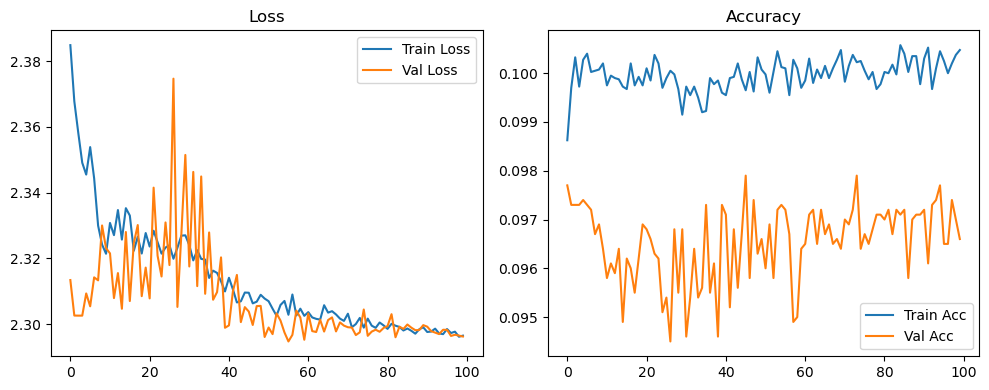

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.2985 Accuracy: 0.1003


🚀 Running: batch512_lr_max_0.0005_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0975 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0975 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0987 | Val Acc: 0.0975 |:   1%|          | 1/100 [01:21<2:15:15, 81.98s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0952 |:   1%|          | 1/100 [02:44<2:15:15, 81.98s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0952 |:   1%|          | 1/100 [02:44<2:15:15, 81.98s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0952 |:   2%|▏         | 2/100 [02:44<2:14:31, 82.37s/it]

| LR: 0.000500 | Train Acc: 0.0998 | Val Acc: 0.0937 |:   2%|▏         | 2/100 [04:07<2:14:31, 82.37s/it]

| LR: 0.000500 | Train Acc: 0.0998 | Val Acc: 0.0937 |:   2%|▏         | 2/100 [04:07<2:14:31, 82.37s/it]

| LR: 0.000500 | Train Acc: 0.0998 | Val Acc: 0.0937 |:   3%|▎         | 3/100 [04:07<2:13:18, 82.46s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:15<2:13:18, 82.46s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:15<2:13:18, 82.46s/it]

| LR: 0.000499 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:15<2:03:12, 77.01s/it]

| LR: 0.000498 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:28<2:03:12, 77.01s/it]

| LR: 0.000498 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:28<2:03:12, 77.01s/it]

| LR: 0.000498 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [05:28<1:25:18, 53.88s/it]

| LR: 0.000497 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:18, 53.88s/it]

| LR: 0.000497 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:18, 53.88s/it]

| LR: 0.000497 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:41<1:02:33, 39.93s/it]

| LR: 0.000496 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   6%|▌         | 6/100 [05:54<1:02:33, 39.93s/it]

| LR: 0.000496 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   6%|▌         | 6/100 [05:54<1:02:33, 39.93s/it]

| LR: 0.000496 | Train Acc: 0.0992 | Val Acc: 0.0966 |:   7%|▋         | 7/100 [05:54<48:13, 31.11s/it]  

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [06:07<48:13, 31.11s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [06:07<48:13, 31.11s/it]

| LR: 0.000494 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [06:07<38:53, 25.36s/it]

| LR: 0.000492 | Train Acc: 0.1002 | Val Acc: 0.0920 |:   8%|▊         | 8/100 [06:20<38:53, 25.36s/it]

| LR: 0.000492 | Train Acc: 0.1002 | Val Acc: 0.0920 |:   8%|▊         | 8/100 [06:20<38:53, 25.36s/it]

| LR: 0.000492 | Train Acc: 0.1002 | Val Acc: 0.0920 |:   9%|▉         | 9/100 [06:20<32:33, 21.46s/it]

| LR: 0.000490 | Train Acc: 0.1004 | Val Acc: 0.0955 |:   9%|▉         | 9/100 [06:33<32:33, 21.46s/it]

| LR: 0.000490 | Train Acc: 0.1004 | Val Acc: 0.0955 |:   9%|▉         | 9/100 [06:33<32:33, 21.46s/it]

| LR: 0.000490 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  10%|█         | 10/100 [06:33<28:13, 18.81s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0953 |:  10%|█         | 10/100 [06:46<28:13, 18.81s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0953 |:  10%|█         | 10/100 [06:46<28:13, 18.81s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0953 |:  11%|█         | 11/100 [06:46<25:11, 16.99s/it]

| LR: 0.000485 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  11%|█         | 11/100 [06:59<25:11, 16.99s/it]

| LR: 0.000485 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  11%|█         | 11/100 [06:59<25:11, 16.99s/it]

| LR: 0.000485 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [06:59<23:05, 15.74s/it]

| LR: 0.000482 | Train Acc: 0.0997 | Val Acc: 0.0983 |:  12%|█▏        | 12/100 [07:11<23:05, 15.74s/it]

| LR: 0.000482 | Train Acc: 0.0997 | Val Acc: 0.0983 |:  12%|█▏        | 12/100 [07:11<23:05, 15.74s/it]

| LR: 0.000482 | Train Acc: 0.0997 | Val Acc: 0.0983 |:  13%|█▎        | 13/100 [07:11<21:35, 14.89s/it]

| LR: 0.000479 | Train Acc: 0.0996 | Val Acc: 0.0952 |:  13%|█▎        | 13/100 [07:24<21:35, 14.89s/it]

| LR: 0.000479 | Train Acc: 0.0996 | Val Acc: 0.0952 |:  13%|█▎        | 13/100 [07:24<21:35, 14.89s/it]

| LR: 0.000479 | Train Acc: 0.0996 | Val Acc: 0.0952 |:  14%|█▍        | 14/100 [07:24<20:29, 14.29s/it]

| LR: 0.000476 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [07:37<20:29, 14.29s/it]

| LR: 0.000476 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [07:37<20:29, 14.29s/it]

| LR: 0.000476 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [07:37<19:39, 13.88s/it]

| LR: 0.000473 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [07:50<19:39, 13.88s/it]

| LR: 0.000473 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [07:50<19:39, 13.88s/it]

| LR: 0.000473 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  16%|█▌        | 16/100 [07:50<19:01, 13.59s/it]

| LR: 0.000469 | Train Acc: 0.0995 | Val Acc: 0.0950 |:  16%|█▌        | 16/100 [08:03<19:01, 13.59s/it]

| LR: 0.000469 | Train Acc: 0.0995 | Val Acc: 0.0950 |:  16%|█▌        | 16/100 [08:03<19:01, 13.59s/it]

| LR: 0.000469 | Train Acc: 0.0995 | Val Acc: 0.0950 |:  17%|█▋        | 17/100 [08:03<18:28, 13.36s/it]

| LR: 0.000465 | Train Acc: 0.0996 | Val Acc: 0.0936 |:  17%|█▋        | 17/100 [08:16<18:28, 13.36s/it]

| LR: 0.000465 | Train Acc: 0.0996 | Val Acc: 0.0936 |:  17%|█▋        | 17/100 [08:16<18:28, 13.36s/it]

| LR: 0.000465 | Train Acc: 0.0996 | Val Acc: 0.0936 |:  18%|█▊        | 18/100 [08:16<18:07, 13.26s/it]

| LR: 0.000461 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [08:29<18:07, 13.26s/it]

| LR: 0.000461 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [08:29<18:07, 13.26s/it]

| LR: 0.000461 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [08:29<17:44, 13.14s/it]

| LR: 0.000457 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:42<17:44, 13.14s/it]

| LR: 0.000457 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:42<17:44, 13.14s/it]

| LR: 0.000457 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  20%|██        | 20/100 [08:42<17:25, 13.07s/it]

| LR: 0.000452 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:55<17:25, 13.07s/it]

| LR: 0.000452 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:55<17:25, 13.07s/it]

| LR: 0.000452 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  21%|██        | 21/100 [08:55<17:07, 13.01s/it]

| LR: 0.000448 | Train Acc: 0.0993 | Val Acc: 0.0941 |:  21%|██        | 21/100 [09:08<17:07, 13.01s/it]

| LR: 0.000448 | Train Acc: 0.0993 | Val Acc: 0.0941 |:  21%|██        | 21/100 [09:08<17:07, 13.01s/it]

| LR: 0.000448 | Train Acc: 0.0993 | Val Acc: 0.0941 |:  22%|██▏       | 22/100 [09:08<16:51, 12.97s/it]

| LR: 0.000443 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:20<16:51, 12.97s/it]

| LR: 0.000443 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:20<16:51, 12.97s/it]

| LR: 0.000443 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  23%|██▎       | 23/100 [09:20<16:36, 12.94s/it]

| LR: 0.000438 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  23%|██▎       | 23/100 [09:33<16:36, 12.94s/it]

| LR: 0.000438 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  23%|██▎       | 23/100 [09:33<16:36, 12.94s/it]

| LR: 0.000438 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  24%|██▍       | 24/100 [09:33<16:20, 12.91s/it]

| LR: 0.000432 | Train Acc: 0.0995 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:46<16:20, 12.91s/it]

| LR: 0.000432 | Train Acc: 0.0995 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:46<16:20, 12.91s/it]

| LR: 0.000432 | Train Acc: 0.0995 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [09:46<16:07, 12.89s/it]

| LR: 0.000427 | Train Acc: 0.0992 | Val Acc: 0.0952 |:  25%|██▌       | 25/100 [09:59<16:07, 12.89s/it]

| LR: 0.000427 | Train Acc: 0.0992 | Val Acc: 0.0952 |:  25%|██▌       | 25/100 [09:59<16:07, 12.89s/it]

| LR: 0.000427 | Train Acc: 0.0992 | Val Acc: 0.0952 |:  26%|██▌       | 26/100 [09:59<15:53, 12.88s/it]

| LR: 0.000421 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  26%|██▌       | 26/100 [10:12<15:53, 12.88s/it]

| LR: 0.000421 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  26%|██▌       | 26/100 [10:12<15:53, 12.88s/it]

| LR: 0.000421 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [10:12<15:43, 12.92s/it]

| LR: 0.000415 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  27%|██▋       | 27/100 [10:25<15:43, 12.92s/it]

| LR: 0.000415 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  27%|██▋       | 27/100 [10:25<15:43, 12.92s/it]

| LR: 0.000415 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  28%|██▊       | 28/100 [10:25<15:29, 12.91s/it]

| LR: 0.000410 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  28%|██▊       | 28/100 [10:38<15:29, 12.91s/it]

| LR: 0.000410 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  28%|██▊       | 28/100 [10:38<15:29, 12.91s/it]

| LR: 0.000410 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  29%|██▉       | 29/100 [10:38<15:17, 12.92s/it]

| LR: 0.000403 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [10:51<15:17, 12.92s/it]

| LR: 0.000403 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [10:51<15:17, 12.92s/it]

| LR: 0.000403 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  30%|███       | 30/100 [10:51<15:05, 12.93s/it]

| LR: 0.000397 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  30%|███       | 30/100 [11:04<15:05, 12.93s/it]

| LR: 0.000397 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  30%|███       | 30/100 [11:04<15:05, 12.93s/it]

| LR: 0.000397 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  31%|███       | 31/100 [11:04<14:51, 12.91s/it]

| LR: 0.000391 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  31%|███       | 31/100 [11:17<14:51, 12.91s/it]

| LR: 0.000391 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  31%|███       | 31/100 [11:17<14:51, 12.91s/it]

| LR: 0.000391 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  32%|███▏      | 32/100 [11:17<14:38, 12.91s/it]

| LR: 0.000384 | Train Acc: 0.0994 | Val Acc: 0.0951 |:  32%|███▏      | 32/100 [11:29<14:38, 12.91s/it]

| LR: 0.000384 | Train Acc: 0.0994 | Val Acc: 0.0951 |:  32%|███▏      | 32/100 [11:29<14:38, 12.91s/it]

| LR: 0.000384 | Train Acc: 0.0994 | Val Acc: 0.0951 |:  33%|███▎      | 33/100 [11:30<14:25, 12.91s/it]

| LR: 0.000378 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  33%|███▎      | 33/100 [11:42<14:25, 12.91s/it]

| LR: 0.000378 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  33%|███▎      | 33/100 [11:42<14:25, 12.91s/it]

| LR: 0.000378 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  34%|███▍      | 34/100 [11:42<14:12, 12.92s/it]

| LR: 0.000371 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  34%|███▍      | 34/100 [11:55<14:12, 12.92s/it]

| LR: 0.000371 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  34%|███▍      | 34/100 [11:55<14:12, 12.92s/it]

| LR: 0.000371 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  35%|███▌      | 35/100 [11:55<14:00, 12.93s/it]

| LR: 0.000364 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  35%|███▌      | 35/100 [12:08<14:00, 12.93s/it]

| LR: 0.000364 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  35%|███▌      | 35/100 [12:08<14:00, 12.93s/it]

| LR: 0.000364 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  36%|███▌      | 36/100 [12:08<13:47, 12.93s/it]

| LR: 0.000357 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:21<13:47, 12.93s/it]

| LR: 0.000357 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:21<13:47, 12.93s/it]

| LR: 0.000357 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  37%|███▋      | 37/100 [12:21<13:38, 12.99s/it]

| LR: 0.000350 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  37%|███▋      | 37/100 [12:34<13:38, 12.99s/it]

| LR: 0.000350 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  37%|███▋      | 37/100 [12:34<13:38, 12.99s/it]

| LR: 0.000350 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  38%|███▊      | 38/100 [12:34<13:25, 12.99s/it]

| LR: 0.000342 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [12:47<13:25, 12.99s/it]

| LR: 0.000342 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [12:47<13:25, 12.99s/it]

| LR: 0.000342 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  39%|███▉      | 39/100 [12:47<13:11, 12.97s/it]

| LR: 0.000335 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  39%|███▉      | 39/100 [13:00<13:11, 12.97s/it]

| LR: 0.000335 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  39%|███▉      | 39/100 [13:00<13:11, 12.97s/it]

| LR: 0.000335 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  40%|████      | 40/100 [13:00<12:57, 12.96s/it]

| LR: 0.000328 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  40%|████      | 40/100 [13:13<12:57, 12.96s/it]

| LR: 0.000328 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  40%|████      | 40/100 [13:13<12:57, 12.96s/it]

| LR: 0.000328 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  41%|████      | 41/100 [13:13<12:43, 12.95s/it]

| LR: 0.000320 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  41%|████      | 41/100 [13:26<12:43, 12.95s/it]

| LR: 0.000320 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  41%|████      | 41/100 [13:26<12:43, 12.95s/it]

| LR: 0.000320 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  42%|████▏     | 42/100 [13:26<12:29, 12.93s/it]

| LR: 0.000313 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  42%|████▏     | 42/100 [13:39<12:29, 12.93s/it]

| LR: 0.000313 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  42%|████▏     | 42/100 [13:39<12:29, 12.93s/it]

| LR: 0.000313 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  43%|████▎     | 43/100 [13:39<12:16, 12.91s/it]

| LR: 0.000305 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  43%|████▎     | 43/100 [13:52<12:16, 12.91s/it]

| LR: 0.000305 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  43%|████▎     | 43/100 [13:52<12:16, 12.91s/it]

| LR: 0.000305 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  44%|████▍     | 44/100 [13:52<12:04, 12.94s/it]

| LR: 0.000297 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [14:05<12:04, 12.94s/it]

| LR: 0.000297 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [14:05<12:04, 12.94s/it]

| LR: 0.000297 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:05<11:49, 12.90s/it]

| LR: 0.000290 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:18<11:49, 12.90s/it]

| LR: 0.000290 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:18<11:49, 12.90s/it]

| LR: 0.000290 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  46%|████▌     | 46/100 [14:18<11:38, 12.93s/it]

| LR: 0.000282 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [14:31<11:38, 12.93s/it]

| LR: 0.000282 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [14:31<11:38, 12.93s/it]

| LR: 0.000282 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [14:31<11:24, 12.92s/it]

| LR: 0.000274 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:44<11:24, 12.92s/it]

| LR: 0.000274 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:44<11:24, 12.92s/it]

| LR: 0.000274 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [14:44<11:11, 12.90s/it]

| LR: 0.000266 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  48%|████▊     | 48/100 [14:56<11:11, 12.90s/it]

| LR: 0.000266 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  48%|████▊     | 48/100 [14:56<11:11, 12.90s/it]

| LR: 0.000266 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  49%|████▉     | 49/100 [14:57<10:58, 12.92s/it]

| LR: 0.000258 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  49%|████▉     | 49/100 [15:09<10:58, 12.92s/it]

| LR: 0.000258 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  49%|████▉     | 49/100 [15:09<10:58, 12.92s/it]

| LR: 0.000258 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  50%|█████     | 50/100 [15:09<10:46, 12.92s/it]

| LR: 0.000251 | Train Acc: 0.1004 | Val Acc: 0.0941 |:  50%|█████     | 50/100 [15:22<10:46, 12.92s/it]

| LR: 0.000251 | Train Acc: 0.1004 | Val Acc: 0.0941 |:  50%|█████     | 50/100 [15:22<10:46, 12.92s/it]

| LR: 0.000251 | Train Acc: 0.1004 | Val Acc: 0.0941 |:  51%|█████     | 51/100 [15:22<10:34, 12.95s/it]

| LR: 0.000243 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:35<10:34, 12.95s/it]

| LR: 0.000243 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:35<10:34, 12.95s/it]

| LR: 0.000243 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  52%|█████▏    | 52/100 [15:35<10:21, 12.96s/it]

| LR: 0.000235 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  52%|█████▏    | 52/100 [15:48<10:21, 12.96s/it]

| LR: 0.000235 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  52%|█████▏    | 52/100 [15:48<10:21, 12.96s/it]

| LR: 0.000235 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  53%|█████▎    | 53/100 [15:48<10:09, 12.96s/it]

| LR: 0.000227 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  53%|█████▎    | 53/100 [16:01<10:09, 12.96s/it]

| LR: 0.000227 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  53%|█████▎    | 53/100 [16:01<10:09, 12.96s/it]

| LR: 0.000227 | Train Acc: 0.1000 | Val Acc: 0.0975 |:  54%|█████▍    | 54/100 [16:01<09:55, 12.95s/it]

| LR: 0.000219 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  54%|█████▍    | 54/100 [16:14<09:55, 12.95s/it]

| LR: 0.000219 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  54%|█████▍    | 54/100 [16:14<09:55, 12.95s/it]

| LR: 0.000219 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [16:14<09:41, 12.92s/it]

| LR: 0.000211 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  55%|█████▌    | 55/100 [16:27<09:41, 12.92s/it]

| LR: 0.000211 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  55%|█████▌    | 55/100 [16:27<09:41, 12.92s/it]

| LR: 0.000211 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  56%|█████▌    | 56/100 [16:27<09:29, 12.94s/it]

| LR: 0.000204 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  56%|█████▌    | 56/100 [16:40<09:29, 12.94s/it]

| LR: 0.000204 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  56%|█████▌    | 56/100 [16:40<09:29, 12.94s/it]

| LR: 0.000204 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  57%|█████▋    | 57/100 [16:40<09:15, 12.92s/it]

| LR: 0.000196 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  57%|█████▋    | 57/100 [16:53<09:15, 12.92s/it]

| LR: 0.000196 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  57%|█████▋    | 57/100 [16:53<09:15, 12.92s/it]

| LR: 0.000196 | Train Acc: 0.1005 | Val Acc: 0.0960 |:  58%|█████▊    | 58/100 [16:53<09:02, 12.91s/it]

| LR: 0.000188 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [17:06<09:02, 12.91s/it]

| LR: 0.000188 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [17:06<09:02, 12.91s/it]

| LR: 0.000188 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  59%|█████▉    | 59/100 [17:06<08:48, 12.90s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  59%|█████▉    | 59/100 [17:19<08:48, 12.90s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  59%|█████▉    | 59/100 [17:19<08:48, 12.90s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  60%|██████    | 60/100 [17:19<08:35, 12.89s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  60%|██████    | 60/100 [17:32<08:35, 12.89s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  60%|██████    | 60/100 [17:32<08:35, 12.89s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [17:32<08:22, 12.89s/it]

| LR: 0.000166 | Train Acc: 0.1003 | Val Acc: 0.0949 |:  61%|██████    | 61/100 [17:44<08:22, 12.89s/it]

| LR: 0.000166 | Train Acc: 0.1003 | Val Acc: 0.0949 |:  61%|██████    | 61/100 [17:44<08:22, 12.89s/it]

| LR: 0.000166 | Train Acc: 0.1003 | Val Acc: 0.0949 |:  62%|██████▏   | 62/100 [17:44<08:09, 12.89s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  62%|██████▏   | 62/100 [17:57<08:09, 12.89s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  62%|██████▏   | 62/100 [17:57<08:09, 12.89s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  63%|██████▎   | 63/100 [17:57<07:56, 12.87s/it]

| LR: 0.000151 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  63%|██████▎   | 63/100 [18:10<07:56, 12.87s/it]

| LR: 0.000151 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  63%|██████▎   | 63/100 [18:10<07:56, 12.87s/it]

| LR: 0.000151 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  64%|██████▍   | 64/100 [18:10<07:42, 12.86s/it]

| LR: 0.000144 | Train Acc: 0.1002 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:23<07:42, 12.86s/it]

| LR: 0.000144 | Train Acc: 0.1002 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:23<07:42, 12.86s/it]

| LR: 0.000144 | Train Acc: 0.1002 | Val Acc: 0.0958 |:  65%|██████▌   | 65/100 [18:23<07:31, 12.89s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  65%|██████▌   | 65/100 [18:36<07:31, 12.89s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  65%|██████▌   | 65/100 [18:36<07:31, 12.89s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  66%|██████▌   | 66/100 [18:36<07:18, 12.89s/it]

| LR: 0.000130 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [18:49<07:18, 12.89s/it]

| LR: 0.000130 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [18:49<07:18, 12.89s/it]

| LR: 0.000130 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  67%|██████▋   | 67/100 [18:49<07:05, 12.88s/it]

| LR: 0.000123 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:02<07:05, 12.88s/it]

| LR: 0.000123 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:02<07:05, 12.88s/it]

| LR: 0.000123 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  68%|██████▊   | 68/100 [19:02<06:52, 12.88s/it]

| LR: 0.000117 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:15<06:52, 12.88s/it]

| LR: 0.000117 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:15<06:52, 12.88s/it]

| LR: 0.000117 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:15<06:39, 12.88s/it]

| LR: 0.000110 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:27<06:39, 12.88s/it]

| LR: 0.000110 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:27<06:39, 12.88s/it]

| LR: 0.000110 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  70%|███████   | 70/100 [19:27<06:26, 12.88s/it]

| LR: 0.000104 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  70%|███████   | 70/100 [19:40<06:26, 12.88s/it]

| LR: 0.000104 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  70%|███████   | 70/100 [19:40<06:26, 12.88s/it]

| LR: 0.000104 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  71%|███████   | 71/100 [19:40<06:13, 12.90s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:53<06:13, 12.90s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:53<06:13, 12.90s/it]

| LR: 0.000098 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  72%|███████▏  | 72/100 [19:53<06:01, 12.91s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  72%|███████▏  | 72/100 [20:06<06:01, 12.91s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  72%|███████▏  | 72/100 [20:06<06:01, 12.91s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  73%|███████▎  | 73/100 [20:06<05:48, 12.92s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  73%|███████▎  | 73/100 [20:19<05:48, 12.92s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  73%|███████▎  | 73/100 [20:19<05:48, 12.92s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  74%|███████▍  | 74/100 [20:19<05:37, 12.96s/it]

| LR: 0.000080 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  74%|███████▍  | 74/100 [20:32<05:37, 12.96s/it]

| LR: 0.000080 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  74%|███████▍  | 74/100 [20:32<05:37, 12.96s/it]

| LR: 0.000080 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  75%|███████▌  | 75/100 [20:32<05:23, 12.94s/it]

| LR: 0.000074 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  75%|███████▌  | 75/100 [20:45<05:23, 12.94s/it]

| LR: 0.000074 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  75%|███████▌  | 75/100 [20:45<05:23, 12.94s/it]

| LR: 0.000074 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  76%|███████▌  | 76/100 [20:45<05:09, 12.91s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  76%|███████▌  | 76/100 [20:58<05:09, 12.91s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  76%|███████▌  | 76/100 [20:58<05:09, 12.91s/it]

| LR: 0.000069 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  77%|███████▋  | 77/100 [20:58<04:56, 12.89s/it]

| LR: 0.000063 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  77%|███████▋  | 77/100 [21:11<04:56, 12.89s/it]

| LR: 0.000063 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  77%|███████▋  | 77/100 [21:11<04:56, 12.89s/it]

| LR: 0.000063 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  78%|███████▊  | 78/100 [21:11<04:43, 12.88s/it]

| LR: 0.000058 | Train Acc: 0.1006 | Val Acc: 0.0960 |:  78%|███████▊  | 78/100 [21:24<04:43, 12.88s/it]

| LR: 0.000058 | Train Acc: 0.1006 | Val Acc: 0.0960 |:  78%|███████▊  | 78/100 [21:24<04:43, 12.88s/it]

| LR: 0.000058 | Train Acc: 0.1006 | Val Acc: 0.0960 |:  79%|███████▉  | 79/100 [21:24<04:30, 12.89s/it]

| LR: 0.000053 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:37<04:30, 12.89s/it]

| LR: 0.000053 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:37<04:30, 12.89s/it]

| LR: 0.000053 | Train Acc: 0.1006 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:37<04:17, 12.89s/it]

| LR: 0.000049 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [21:49<04:17, 12.89s/it]

| LR: 0.000049 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [21:49<04:17, 12.89s/it]

| LR: 0.000049 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [21:49<04:04, 12.89s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0945 |:  81%|████████  | 81/100 [22:02<04:04, 12.89s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0945 |:  81%|████████  | 81/100 [22:02<04:04, 12.89s/it]

| LR: 0.000044 | Train Acc: 0.1008 | Val Acc: 0.0945 |:  82%|████████▏ | 82/100 [22:02<03:51, 12.88s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0957 |:  82%|████████▏ | 82/100 [22:15<03:51, 12.88s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0957 |:  82%|████████▏ | 82/100 [22:15<03:51, 12.88s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0957 |:  83%|████████▎ | 83/100 [22:15<03:39, 12.88s/it]

| LR: 0.000036 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:28<03:39, 12.88s/it]

| LR: 0.000036 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:28<03:39, 12.88s/it]

| LR: 0.000036 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [22:28<03:26, 12.92s/it]

| LR: 0.000032 | Train Acc: 0.1012 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:41<03:26, 12.92s/it]

| LR: 0.000032 | Train Acc: 0.1012 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:41<03:26, 12.92s/it]

| LR: 0.000032 | Train Acc: 0.1012 | Val Acc: 0.0968 |:  85%|████████▌ | 85/100 [22:41<03:13, 12.92s/it]

| LR: 0.000028 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  85%|████████▌ | 85/100 [22:54<03:13, 12.92s/it]

| LR: 0.000028 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  85%|████████▌ | 85/100 [22:54<03:13, 12.92s/it]

| LR: 0.000028 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  86%|████████▌ | 86/100 [22:54<03:00, 12.92s/it]

| LR: 0.000025 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:07<03:00, 12.92s/it]

| LR: 0.000025 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:07<03:00, 12.92s/it]

| LR: 0.000025 | Train Acc: 0.1007 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:07<02:48, 12.93s/it]

| LR: 0.000022 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  87%|████████▋ | 87/100 [23:20<02:48, 12.93s/it]

| LR: 0.000022 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  87%|████████▋ | 87/100 [23:20<02:48, 12.93s/it]

| LR: 0.000022 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  88%|████████▊ | 88/100 [23:20<02:35, 12.93s/it]

| LR: 0.000019 | Train Acc: 0.1012 | Val Acc: 0.0963 |:  88%|████████▊ | 88/100 [23:33<02:35, 12.93s/it]

| LR: 0.000019 | Train Acc: 0.1012 | Val Acc: 0.0963 |:  88%|████████▊ | 88/100 [23:33<02:35, 12.93s/it]

| LR: 0.000019 | Train Acc: 0.1012 | Val Acc: 0.0963 |:  89%|████████▉ | 89/100 [23:33<02:22, 12.93s/it]

| LR: 0.000016 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [23:46<02:22, 12.93s/it]

| LR: 0.000016 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [23:46<02:22, 12.93s/it]

| LR: 0.000016 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  90%|█████████ | 90/100 [23:46<02:09, 12.92s/it]

| LR: 0.000013 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [23:59<02:09, 12.92s/it]

| LR: 0.000013 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [23:59<02:09, 12.92s/it]

| LR: 0.000013 | Train Acc: 0.1008 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [23:59<01:56, 12.91s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:12<01:56, 12.91s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:12<01:56, 12.91s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:12<01:43, 12.91s/it]

| LR: 0.000009 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [24:25<01:43, 12.91s/it]

| LR: 0.000009 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [24:25<01:43, 12.91s/it]

| LR: 0.000009 | Train Acc: 0.1008 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [24:25<01:30, 12.95s/it]

| LR: 0.000007 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  93%|█████████▎| 93/100 [24:38<01:30, 12.95s/it]

| LR: 0.000007 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  93%|█████████▎| 93/100 [24:38<01:30, 12.95s/it]

| LR: 0.000007 | Train Acc: 0.1007 | Val Acc: 0.0975 |:  94%|█████████▍| 94/100 [24:38<01:17, 12.95s/it]

| LR: 0.000005 | Train Acc: 0.1012 | Val Acc: 0.0978 |:  94%|█████████▍| 94/100 [24:51<01:17, 12.95s/it]

| LR: 0.000005 | Train Acc: 0.1012 | Val Acc: 0.0978 |:  94%|█████████▍| 94/100 [24:51<01:17, 12.95s/it]

| LR: 0.000005 | Train Acc: 0.1012 | Val Acc: 0.0978 |:  95%|█████████▌| 95/100 [24:51<01:04, 12.96s/it]

| LR: 0.000004 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:03<01:04, 12.96s/it]

| LR: 0.000004 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:03<01:04, 12.96s/it]

| LR: 0.000004 | Train Acc: 0.1007 | Val Acc: 0.0969 |:  96%|█████████▌| 96/100 [25:03<00:51, 12.94s/it]

| LR: 0.000003 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:16<00:51, 12.94s/it]

| LR: 0.000003 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:16<00:51, 12.94s/it]

| LR: 0.000003 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  97%|█████████▋| 97/100 [25:16<00:38, 12.94s/it]

| LR: 0.000002 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  97%|█████████▋| 97/100 [25:29<00:38, 12.94s/it]

| LR: 0.000002 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  97%|█████████▋| 97/100 [25:29<00:38, 12.94s/it]

| LR: 0.000002 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  98%|█████████▊| 98/100 [25:29<00:25, 12.94s/it]

| LR: 0.000001 | Train Acc: 0.1017 | Val Acc: 0.0958 |:  98%|█████████▊| 98/100 [25:42<00:25, 12.94s/it]

| LR: 0.000001 | Train Acc: 0.1017 | Val Acc: 0.0958 |:  98%|█████████▊| 98/100 [25:42<00:25, 12.94s/it]

| LR: 0.000001 | Train Acc: 0.1017 | Val Acc: 0.0958 |:  99%|█████████▉| 99/100 [25:42<00:12, 12.93s/it]

| LR: 0.000001 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  99%|█████████▉| 99/100 [25:55<00:12, 12.93s/it]

| LR: 0.000001 | Train Acc: 0.1011 | Val Acc: 0.0971 |:  99%|█████████▉| 99/100 [25:55<00:12, 12.93s/it]

| LR: 0.000001 | Train Acc: 0.1011 | Val Acc: 0.0971 |: 100%|██████████| 100/100 [25:55<00:00, 12.93s/it]

| LR: 0.000001 | Train Acc: 0.1011 | Val Acc: 0.0971 |: 100%|██████████| 100/100 [25:55<00:00, 15.56s/it]

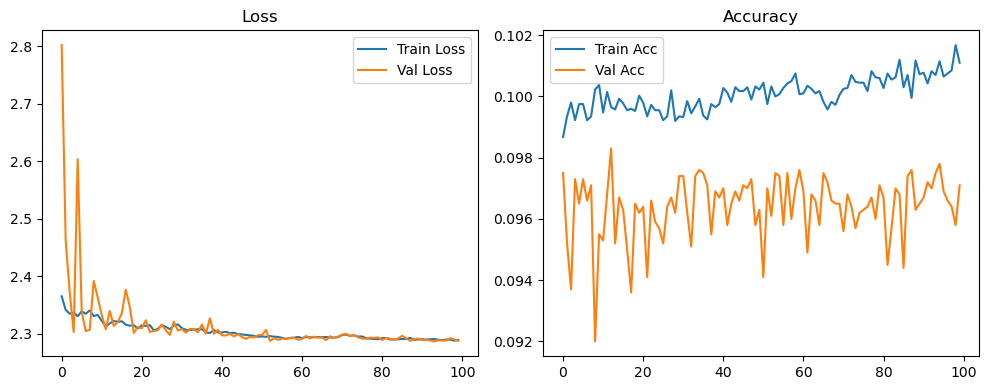

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.69it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.55it/s]

Original Model Final Test Loss: 2.2868 Accuracy: 0.0992


🚀 Running: batch512_lr_max_0.0005_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0963 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0963 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0963 |:   1%|          | 1/100 [01:22<2:15:44, 82.27s/it]

| LR: 0.000500 | Train Acc: 0.0992 | Val Acc: 0.0944 |:   1%|          | 1/100 [02:44<2:15:44, 82.27s/it]

| LR: 0.000500 | Train Acc: 0.0992 | Val Acc: 0.0944 |:   1%|          | 1/100 [02:44<2:15:44, 82.27s/it]

| LR: 0.000500 | Train Acc: 0.0992 | Val Acc: 0.0944 |:   2%|▏         | 2/100 [02:44<2:14:32, 82.37s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0911 |:   2%|▏         | 2/100 [04:07<2:14:32, 82.37s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0911 |:   2%|▏         | 2/100 [04:07<2:14:32, 82.37s/it]

| LR: 0.000500 | Train Acc: 0.0997 | Val Acc: 0.0911 |:   3%|▎         | 3/100 [04:07<2:13:30, 82.58s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [05:16<2:13:30, 82.58s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [05:16<2:13:30, 82.58s/it]

| LR: 0.000499 | Train Acc: 0.0998 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:16<2:03:34, 77.23s/it]

| LR: 0.000498 | Train Acc: 0.0993 | Val Acc: 0.0982 |:   4%|▍         | 4/100 [05:29<2:03:34, 77.23s/it]

| LR: 0.000498 | Train Acc: 0.0993 | Val Acc: 0.0982 |:   4%|▍         | 4/100 [05:29<2:03:34, 77.23s/it]

| LR: 0.000498 | Train Acc: 0.0993 | Val Acc: 0.0982 |:   5%|▌         | 5/100 [05:29<1:25:41, 54.12s/it]

| LR: 0.000497 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:42<1:25:41, 54.12s/it]

| LR: 0.000497 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:42<1:25:41, 54.12s/it]

| LR: 0.000497 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [05:42<1:02:57, 40.19s/it]

| LR: 0.000496 | Train Acc: 0.0998 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [05:55<1:02:57, 40.19s/it]

| LR: 0.000496 | Train Acc: 0.0998 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [05:55<1:02:57, 40.19s/it]

| LR: 0.000496 | Train Acc: 0.0998 | Val Acc: 0.0961 |:   7%|▋         | 7/100 [05:56<48:36, 31.36s/it]  

| LR: 0.000494 | Train Acc: 0.0997 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [06:09<48:36, 31.36s/it]

| LR: 0.000494 | Train Acc: 0.0997 | Val Acc: 0.0963 |:   7%|▋         | 7/100 [06:09<48:36, 31.36s/it]

| LR: 0.000494 | Train Acc: 0.0997 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [06:09<39:15, 25.61s/it]

| LR: 0.000492 | Train Acc: 0.0999 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [06:22<39:15, 25.61s/it]

| LR: 0.000492 | Train Acc: 0.0999 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [06:22<39:15, 25.61s/it]

| LR: 0.000492 | Train Acc: 0.0999 | Val Acc: 0.0966 |:   9%|▉         | 9/100 [06:22<32:55, 21.71s/it]

| LR: 0.000490 | Train Acc: 0.0996 | Val Acc: 0.0945 |:   9%|▉         | 9/100 [06:35<32:55, 21.71s/it]

| LR: 0.000490 | Train Acc: 0.0996 | Val Acc: 0.0945 |:   9%|▉         | 9/100 [06:35<32:55, 21.71s/it]

| LR: 0.000490 | Train Acc: 0.0996 | Val Acc: 0.0945 |:  10%|█         | 10/100 [06:35<28:35, 19.06s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0961 |:  10%|█         | 10/100 [06:48<28:35, 19.06s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0961 |:  10%|█         | 10/100 [06:48<28:35, 19.06s/it]

| LR: 0.000488 | Train Acc: 0.0995 | Val Acc: 0.0961 |:  11%|█         | 11/100 [06:48<25:36, 17.26s/it]

| LR: 0.000485 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  11%|█         | 11/100 [07:01<25:36, 17.26s/it]

| LR: 0.000485 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  11%|█         | 11/100 [07:01<25:36, 17.26s/it]

| LR: 0.000485 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  12%|█▏        | 12/100 [07:01<23:30, 16.02s/it]

| LR: 0.000482 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [07:15<23:30, 16.02s/it]

| LR: 0.000482 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [07:15<23:30, 16.02s/it]

| LR: 0.000482 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [07:15<21:59, 15.16s/it]

| LR: 0.000479 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [07:28<21:59, 15.16s/it]

| LR: 0.000479 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [07:28<21:59, 15.16s/it]

| LR: 0.000479 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  14%|█▍        | 14/100 [07:28<20:50, 14.55s/it]

| LR: 0.000476 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  14%|█▍        | 14/100 [07:41<20:50, 14.55s/it]

| LR: 0.000476 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  14%|█▍        | 14/100 [07:41<20:50, 14.55s/it]

| LR: 0.000476 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  15%|█▌        | 15/100 [07:41<20:00, 14.12s/it]

| LR: 0.000473 | Train Acc: 0.0993 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [07:54<20:00, 14.12s/it]

| LR: 0.000473 | Train Acc: 0.0993 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [07:54<20:00, 14.12s/it]

| LR: 0.000473 | Train Acc: 0.0993 | Val Acc: 0.0958 |:  16%|█▌        | 16/100 [07:54<19:21, 13.83s/it]

| LR: 0.000469 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  16%|█▌        | 16/100 [08:07<19:21, 13.83s/it]

| LR: 0.000469 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  16%|█▌        | 16/100 [08:07<19:21, 13.83s/it]

| LR: 0.000469 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  17%|█▋        | 17/100 [08:07<18:54, 13.67s/it]

| LR: 0.000465 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:20<18:54, 13.67s/it]

| LR: 0.000465 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:20<18:54, 13.67s/it]

| LR: 0.000465 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:21<18:27, 13.51s/it]

| LR: 0.000461 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:34<18:27, 13.51s/it]

| LR: 0.000461 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:34<18:27, 13.51s/it]

| LR: 0.000461 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:34<18:04, 13.39s/it]

| LR: 0.000457 | Train Acc: 0.0992 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [08:47<18:04, 13.39s/it]

| LR: 0.000457 | Train Acc: 0.0992 | Val Acc: 0.0957 |:  19%|█▉        | 19/100 [08:47<18:04, 13.39s/it]

| LR: 0.000457 | Train Acc: 0.0992 | Val Acc: 0.0957 |:  20%|██        | 20/100 [08:47<17:44, 13.31s/it]

| LR: 0.000452 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  20%|██        | 20/100 [09:00<17:44, 13.31s/it]

| LR: 0.000452 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  20%|██        | 20/100 [09:00<17:44, 13.31s/it]

| LR: 0.000452 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  21%|██        | 21/100 [09:00<17:27, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.0988 | Val Acc: 0.0951 |:  21%|██        | 21/100 [09:13<17:27, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.0988 | Val Acc: 0.0951 |:  21%|██        | 21/100 [09:13<17:27, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.0988 | Val Acc: 0.0951 |:  22%|██▏       | 22/100 [09:13<17:11, 13.23s/it]

| LR: 0.000443 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  22%|██▏       | 22/100 [09:26<17:11, 13.23s/it]

| LR: 0.000443 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  22%|██▏       | 22/100 [09:26<17:11, 13.23s/it]

| LR: 0.000443 | Train Acc: 0.1001 | Val Acc: 0.0976 |:  23%|██▎       | 23/100 [09:26<16:56, 13.20s/it]

| LR: 0.000438 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [09:39<16:56, 13.20s/it]

| LR: 0.000438 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [09:39<16:56, 13.20s/it]

| LR: 0.000438 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [09:39<16:42, 13.19s/it]

| LR: 0.000432 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [09:52<16:42, 13.19s/it]

| LR: 0.000432 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [09:52<16:42, 13.19s/it]

| LR: 0.000432 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [09:52<16:28, 13.18s/it]

| LR: 0.000427 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [10:06<16:28, 13.18s/it]

| LR: 0.000427 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [10:06<16:28, 13.18s/it]

| LR: 0.000427 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  26%|██▌       | 26/100 [10:06<16:15, 13.18s/it]

| LR: 0.000421 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  26%|██▌       | 26/100 [10:19<16:15, 13.18s/it]

| LR: 0.000421 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  26%|██▌       | 26/100 [10:19<16:15, 13.18s/it]

| LR: 0.000421 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [10:19<16:05, 13.23s/it]

| LR: 0.000415 | Train Acc: 0.0997 | Val Acc: 0.0977 |:  27%|██▋       | 27/100 [10:32<16:05, 13.23s/it]

| LR: 0.000415 | Train Acc: 0.0997 | Val Acc: 0.0977 |:  27%|██▋       | 27/100 [10:32<16:05, 13.23s/it]

| LR: 0.000415 | Train Acc: 0.0997 | Val Acc: 0.0977 |:  28%|██▊       | 28/100 [10:32<15:51, 13.21s/it]

| LR: 0.000410 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  28%|██▊       | 28/100 [10:45<15:51, 13.21s/it]

| LR: 0.000410 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  28%|██▊       | 28/100 [10:45<15:51, 13.21s/it]

| LR: 0.000410 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  29%|██▉       | 29/100 [10:45<15:37, 13.21s/it]

| LR: 0.000403 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  29%|██▉       | 29/100 [10:58<15:37, 13.21s/it]

| LR: 0.000403 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  29%|██▉       | 29/100 [10:58<15:37, 13.21s/it]

| LR: 0.000403 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  30%|███       | 30/100 [10:59<15:23, 13.20s/it]

| LR: 0.000397 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  30%|███       | 30/100 [11:12<15:23, 13.20s/it]

| LR: 0.000397 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  30%|███       | 30/100 [11:12<15:23, 13.20s/it]

| LR: 0.000397 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  31%|███       | 31/100 [11:12<15:09, 13.18s/it]

| LR: 0.000391 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  31%|███       | 31/100 [11:25<15:09, 13.18s/it]

| LR: 0.000391 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  31%|███       | 31/100 [11:25<15:09, 13.18s/it]

| LR: 0.000391 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  32%|███▏      | 32/100 [11:25<14:56, 13.18s/it]

| LR: 0.000384 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  32%|███▏      | 32/100 [11:38<14:56, 13.18s/it]

| LR: 0.000384 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  32%|███▏      | 32/100 [11:38<14:56, 13.18s/it]

| LR: 0.000384 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  33%|███▎      | 33/100 [11:38<14:44, 13.20s/it]

| LR: 0.000378 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000378 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000378 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  34%|███▍      | 34/100 [11:51<14:31, 13.20s/it]

| LR: 0.000371 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  34%|███▍      | 34/100 [12:04<14:31, 13.20s/it]

| LR: 0.000371 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  34%|███▍      | 34/100 [12:04<14:31, 13.20s/it]

| LR: 0.000371 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  35%|███▌      | 35/100 [12:04<14:16, 13.18s/it]

| LR: 0.000364 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:18<14:16, 13.18s/it]

| LR: 0.000364 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:18<14:16, 13.18s/it]

| LR: 0.000364 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:18<14:05, 13.20s/it]

| LR: 0.000357 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:31<14:05, 13.20s/it]

| LR: 0.000357 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:31<14:05, 13.20s/it]

| LR: 0.000357 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  37%|███▋      | 37/100 [12:31<13:50, 13.18s/it]

| LR: 0.000350 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  37%|███▋      | 37/100 [12:44<13:50, 13.18s/it]

| LR: 0.000350 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  37%|███▋      | 37/100 [12:44<13:50, 13.18s/it]

| LR: 0.000350 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  38%|███▊      | 38/100 [12:44<13:35, 13.16s/it]

| LR: 0.000342 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  38%|███▊      | 38/100 [12:57<13:35, 13.16s/it]

| LR: 0.000342 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  38%|███▊      | 38/100 [12:57<13:35, 13.16s/it]

| LR: 0.000342 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  39%|███▉      | 39/100 [12:57<13:21, 13.14s/it]

| LR: 0.000335 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  39%|███▉      | 39/100 [13:10<13:21, 13.14s/it]

| LR: 0.000335 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  39%|███▉      | 39/100 [13:10<13:21, 13.14s/it]

| LR: 0.000335 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  40%|████      | 40/100 [13:10<13:08, 13.15s/it]

| LR: 0.000328 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  40%|████      | 40/100 [13:23<13:08, 13.15s/it]

| LR: 0.000328 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  40%|████      | 40/100 [13:23<13:08, 13.15s/it]

| LR: 0.000328 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  41%|████      | 41/100 [13:23<12:56, 13.16s/it]

| LR: 0.000320 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  41%|████      | 41/100 [13:37<12:56, 13.16s/it]

| LR: 0.000320 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  41%|████      | 41/100 [13:37<12:56, 13.16s/it]

| LR: 0.000320 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  42%|████▏     | 42/100 [13:37<12:43, 13.17s/it]

| LR: 0.000313 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  42%|████▏     | 42/100 [13:50<12:43, 13.17s/it]

| LR: 0.000313 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  42%|████▏     | 42/100 [13:50<12:43, 13.17s/it]

| LR: 0.000313 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:50<12:31, 13.18s/it]

| LR: 0.000305 | Train Acc: 0.0996 | Val Acc: 0.0955 |:  43%|████▎     | 43/100 [14:03<12:31, 13.18s/it]

| LR: 0.000305 | Train Acc: 0.0996 | Val Acc: 0.0955 |:  43%|████▎     | 43/100 [14:03<12:31, 13.18s/it]

| LR: 0.000305 | Train Acc: 0.0996 | Val Acc: 0.0955 |:  44%|████▍     | 44/100 [14:03<12:16, 13.16s/it]

| LR: 0.000297 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:16<12:16, 13.16s/it]

| LR: 0.000297 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:16<12:16, 13.16s/it]

| LR: 0.000297 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:16<12:05, 13.19s/it]

| LR: 0.000290 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  45%|████▌     | 45/100 [14:29<12:05, 13.19s/it]

| LR: 0.000290 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  45%|████▌     | 45/100 [14:29<12:05, 13.19s/it]

| LR: 0.000290 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  46%|████▌     | 46/100 [14:29<11:51, 13.18s/it]

| LR: 0.000282 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [14:42<11:51, 13.18s/it]

| LR: 0.000282 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  46%|████▌     | 46/100 [14:42<11:51, 13.18s/it]

| LR: 0.000282 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  47%|████▋     | 47/100 [14:43<11:38, 13.18s/it]

| LR: 0.000274 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:56<11:38, 13.18s/it]

| LR: 0.000274 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:56<11:38, 13.18s/it]

| LR: 0.000274 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [14:56<11:26, 13.19s/it]

| LR: 0.000266 | Train Acc: 0.1002 | Val Acc: 0.0949 |:  48%|████▊     | 48/100 [15:09<11:26, 13.19s/it]

| LR: 0.000266 | Train Acc: 0.1002 | Val Acc: 0.0949 |:  48%|████▊     | 48/100 [15:09<11:26, 13.19s/it]

| LR: 0.000266 | Train Acc: 0.1002 | Val Acc: 0.0949 |:  49%|████▉     | 49/100 [15:09<11:13, 13.20s/it]

| LR: 0.000258 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  49%|████▉     | 49/100 [15:22<11:13, 13.20s/it]

| LR: 0.000258 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  49%|████▉     | 49/100 [15:22<11:13, 13.20s/it]

| LR: 0.000258 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  50%|█████     | 50/100 [15:22<10:59, 13.20s/it]

| LR: 0.000251 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  50%|█████     | 50/100 [15:35<10:59, 13.20s/it]

| LR: 0.000251 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  50%|█████     | 50/100 [15:35<10:59, 13.20s/it]

| LR: 0.000251 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  51%|█████     | 51/100 [15:35<10:47, 13.21s/it]

| LR: 0.000243 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  51%|█████     | 51/100 [15:49<10:47, 13.21s/it]

| LR: 0.000243 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  51%|█████     | 51/100 [15:49<10:47, 13.21s/it]

| LR: 0.000243 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  52%|█████▏    | 52/100 [15:49<10:34, 13.22s/it]

| LR: 0.000235 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [16:02<10:34, 13.22s/it]

| LR: 0.000235 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [16:02<10:34, 13.22s/it]

| LR: 0.000235 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:02<10:21, 13.23s/it]

| LR: 0.000227 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  53%|█████▎    | 53/100 [16:15<10:21, 13.23s/it]

| LR: 0.000227 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  53%|█████▎    | 53/100 [16:15<10:21, 13.23s/it]

| LR: 0.000227 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  54%|█████▍    | 54/100 [16:15<10:07, 13.22s/it]

| LR: 0.000219 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  54%|█████▍    | 54/100 [16:28<10:07, 13.22s/it]

| LR: 0.000219 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  54%|█████▍    | 54/100 [16:28<10:07, 13.22s/it]

| LR: 0.000219 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  55%|█████▌    | 55/100 [16:28<09:55, 13.24s/it]

| LR: 0.000211 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  55%|█████▌    | 55/100 [16:41<09:55, 13.24s/it]

| LR: 0.000211 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  55%|█████▌    | 55/100 [16:41<09:55, 13.24s/it]

| LR: 0.000211 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  56%|█████▌    | 56/100 [16:42<09:41, 13.22s/it]

| LR: 0.000204 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  56%|█████▌    | 56/100 [16:55<09:41, 13.22s/it]

| LR: 0.000204 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  56%|█████▌    | 56/100 [16:55<09:41, 13.22s/it]

| LR: 0.000204 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  57%|█████▋    | 57/100 [16:55<09:27, 13.20s/it]

| LR: 0.000196 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  57%|█████▋    | 57/100 [17:08<09:27, 13.20s/it]

| LR: 0.000196 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  57%|█████▋    | 57/100 [17:08<09:27, 13.20s/it]

| LR: 0.000196 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  58%|█████▊    | 58/100 [17:08<09:14, 13.20s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0947 |:  58%|█████▊    | 58/100 [17:21<09:14, 13.20s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0947 |:  58%|█████▊    | 58/100 [17:21<09:14, 13.20s/it]

| LR: 0.000188 | Train Acc: 0.0994 | Val Acc: 0.0947 |:  59%|█████▉    | 59/100 [17:21<09:00, 13.19s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  59%|█████▉    | 59/100 [17:34<09:00, 13.19s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  59%|█████▉    | 59/100 [17:34<09:00, 13.19s/it]

| LR: 0.000181 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  60%|██████    | 60/100 [17:34<08:47, 13.20s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  60%|██████    | 60/100 [17:47<08:47, 13.20s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  60%|██████    | 60/100 [17:47<08:47, 13.20s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  61%|██████    | 61/100 [17:47<08:34, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  61%|██████    | 61/100 [18:01<08:34, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  61%|██████    | 61/100 [18:01<08:34, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  62%|██████▏   | 62/100 [18:01<08:21, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:14<08:21, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:14<08:21, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:14<08:08, 13.19s/it]

| LR: 0.000151 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [18:27<08:08, 13.19s/it]

| LR: 0.000151 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [18:27<08:08, 13.19s/it]

| LR: 0.000151 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:27<07:56, 13.24s/it]

| LR: 0.000144 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  64%|██████▍   | 64/100 [18:40<07:56, 13.24s/it]

| LR: 0.000144 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  64%|██████▍   | 64/100 [18:40<07:56, 13.24s/it]

| LR: 0.000144 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  65%|██████▌   | 65/100 [18:40<07:43, 13.24s/it]

| LR: 0.000137 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  65%|██████▌   | 65/100 [18:54<07:43, 13.24s/it]

| LR: 0.000137 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  65%|██████▌   | 65/100 [18:54<07:43, 13.24s/it]

| LR: 0.000137 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  66%|██████▌   | 66/100 [18:54<07:29, 13.22s/it]

| LR: 0.000130 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  66%|██████▌   | 66/100 [19:07<07:29, 13.22s/it]

| LR: 0.000130 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  66%|██████▌   | 66/100 [19:07<07:29, 13.22s/it]

| LR: 0.000130 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:07<07:15, 13.21s/it]

| LR: 0.000123 | Train Acc: 0.1005 | Val Acc: 0.0976 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.21s/it]

| LR: 0.000123 | Train Acc: 0.1005 | Val Acc: 0.0976 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.21s/it]

| LR: 0.000123 | Train Acc: 0.1005 | Val Acc: 0.0976 |:  68%|██████▊   | 68/100 [19:20<07:02, 13.20s/it]

| LR: 0.000117 | Train Acc: 0.1005 | Val Acc: 0.0949 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.20s/it]

| LR: 0.000117 | Train Acc: 0.1005 | Val Acc: 0.0949 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.20s/it]

| LR: 0.000117 | Train Acc: 0.1005 | Val Acc: 0.0949 |:  69%|██████▉   | 69/100 [19:33<06:48, 13.18s/it]

| LR: 0.000110 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:46<06:48, 13.18s/it]

| LR: 0.000110 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:46<06:48, 13.18s/it]

| LR: 0.000110 | Train Acc: 0.1006 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:46<06:35, 13.18s/it]

| LR: 0.000104 | Train Acc: 0.1007 | Val Acc: 0.0960 |:  70%|███████   | 70/100 [19:59<06:35, 13.18s/it]

| LR: 0.000104 | Train Acc: 0.1007 | Val Acc: 0.0960 |:  70%|███████   | 70/100 [19:59<06:35, 13.18s/it]

| LR: 0.000104 | Train Acc: 0.1007 | Val Acc: 0.0960 |:  71%|███████   | 71/100 [19:59<06:22, 13.18s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  71%|███████   | 71/100 [20:13<06:22, 13.18s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  71%|███████   | 71/100 [20:13<06:22, 13.18s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  72%|███████▏  | 72/100 [20:13<06:09, 13.19s/it]

| LR: 0.000091 | Train Acc: 0.1006 | Val Acc: 0.0977 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.19s/it]

| LR: 0.000091 | Train Acc: 0.1006 | Val Acc: 0.0977 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.19s/it]

| LR: 0.000091 | Train Acc: 0.1006 | Val Acc: 0.0977 |:  73%|███████▎  | 73/100 [20:26<05:57, 13.23s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0943 |:  73%|███████▎  | 73/100 [20:39<05:57, 13.23s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0943 |:  73%|███████▎  | 73/100 [20:39<05:57, 13.23s/it]

| LR: 0.000086 | Train Acc: 0.1005 | Val Acc: 0.0943 |:  74%|███████▍  | 74/100 [20:39<05:44, 13.24s/it]

| LR: 0.000080 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  74%|███████▍  | 74/100 [20:52<05:44, 13.24s/it]

| LR: 0.000080 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  74%|███████▍  | 74/100 [20:52<05:44, 13.24s/it]

| LR: 0.000080 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  75%|███████▌  | 75/100 [20:52<05:30, 13.22s/it]

| LR: 0.000074 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  75%|███████▌  | 75/100 [21:06<05:30, 13.22s/it]

| LR: 0.000074 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  75%|███████▌  | 75/100 [21:06<05:30, 13.22s/it]

| LR: 0.000074 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  76%|███████▌  | 76/100 [21:06<05:17, 13.22s/it]

| LR: 0.000069 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  76%|███████▌  | 76/100 [21:19<05:17, 13.22s/it]

| LR: 0.000069 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  76%|███████▌  | 76/100 [21:19<05:17, 13.22s/it]

| LR: 0.000069 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  77%|███████▋  | 77/100 [21:19<05:03, 13.20s/it]

| LR: 0.000063 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  77%|███████▋  | 77/100 [21:32<05:03, 13.20s/it]

| LR: 0.000063 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  77%|███████▋  | 77/100 [21:32<05:03, 13.20s/it]

| LR: 0.000063 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  78%|███████▊  | 78/100 [21:32<04:49, 13.18s/it]

| LR: 0.000058 | Train Acc: 0.1008 | Val Acc: 0.0977 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.18s/it]

| LR: 0.000058 | Train Acc: 0.1008 | Val Acc: 0.0977 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.18s/it]

| LR: 0.000058 | Train Acc: 0.1008 | Val Acc: 0.0977 |:  79%|███████▉  | 79/100 [21:45<04:36, 13.17s/it]

| LR: 0.000053 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:58<04:36, 13.17s/it]

| LR: 0.000053 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:58<04:36, 13.17s/it]

| LR: 0.000053 | Train Acc: 0.1009 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [21:58<04:23, 13.15s/it]

| LR: 0.000049 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  80%|████████  | 80/100 [22:11<04:23, 13.15s/it]

| LR: 0.000049 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  80%|████████  | 80/100 [22:11<04:23, 13.15s/it]

| LR: 0.000049 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  81%|████████  | 81/100 [22:11<04:09, 13.15s/it]

| LR: 0.000044 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:24<04:09, 13.15s/it]

| LR: 0.000044 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:24<04:09, 13.15s/it]

| LR: 0.000044 | Train Acc: 0.1009 | Val Acc: 0.0963 |:  82%|████████▏ | 82/100 [22:24<03:56, 13.14s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  82%|████████▏ | 82/100 [22:38<03:56, 13.14s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  82%|████████▏ | 82/100 [22:38<03:56, 13.14s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  83%|████████▎ | 83/100 [22:38<03:44, 13.18s/it]

| LR: 0.000036 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.18s/it]

| LR: 0.000036 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.18s/it]

| LR: 0.000036 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  84%|████████▍ | 84/100 [22:51<03:30, 13.17s/it]

| LR: 0.000032 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  84%|████████▍ | 84/100 [23:04<03:30, 13.17s/it]

| LR: 0.000032 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  84%|████████▍ | 84/100 [23:04<03:30, 13.17s/it]

| LR: 0.000032 | Train Acc: 0.0997 | Val Acc: 0.0975 |:  85%|████████▌ | 85/100 [23:04<03:17, 13.17s/it]

| LR: 0.000028 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  85%|████████▌ | 85/100 [23:17<03:17, 13.17s/it]

| LR: 0.000028 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  85%|████████▌ | 85/100 [23:17<03:17, 13.17s/it]

| LR: 0.000028 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:17<03:04, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:30<02:51, 13.18s/it]

| LR: 0.000022 | Train Acc: 0.1007 | Val Acc: 0.0978 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.18s/it]

| LR: 0.000022 | Train Acc: 0.1007 | Val Acc: 0.0978 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.18s/it]

| LR: 0.000022 | Train Acc: 0.1007 | Val Acc: 0.0978 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:57<02:24, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  89%|████████▉ | 89/100 [24:10<02:24, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  89%|████████▉ | 89/100 [24:10<02:24, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1007 | Val Acc: 0.0964 |:  90%|█████████ | 90/100 [24:10<02:11, 13.16s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0957 |:  90%|█████████ | 90/100 [24:23<02:11, 13.16s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0957 |:  90%|█████████ | 90/100 [24:23<02:11, 13.16s/it]

| LR: 0.000013 | Train Acc: 0.1006 | Val Acc: 0.0957 |:  91%|█████████ | 91/100 [24:23<01:58, 13.15s/it]

| LR: 0.000011 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  91%|█████████ | 91/100 [24:36<01:58, 13.15s/it]

| LR: 0.000011 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  91%|█████████ | 91/100 [24:36<01:58, 13.15s/it]

| LR: 0.000011 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [24:36<01:45, 13.19s/it]

| LR: 0.000009 | Train Acc: 0.1007 | Val Acc: 0.0977 |:  92%|█████████▏| 92/100 [24:49<01:45, 13.19s/it]

| LR: 0.000009 | Train Acc: 0.1007 | Val Acc: 0.0977 |:  92%|█████████▏| 92/100 [24:49<01:45, 13.19s/it]

| LR: 0.000009 | Train Acc: 0.1007 | Val Acc: 0.0977 |:  93%|█████████▎| 93/100 [24:49<01:32, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.1008 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [25:03<01:18, 13.15s/it]

| LR: 0.000005 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:16<01:18, 13.15s/it]

| LR: 0.000005 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:16<01:18, 13.15s/it]

| LR: 0.000005 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:16<01:05, 13.14s/it]

| LR: 0.000004 | Train Acc: 0.1014 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.14s/it]

| LR: 0.000004 | Train Acc: 0.1014 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.14s/it]

| LR: 0.000004 | Train Acc: 0.1014 | Val Acc: 0.0969 |:  96%|█████████▌| 96/100 [25:29<00:52, 13.13s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.13s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.13s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  97%|█████████▋| 97/100 [25:42<00:39, 13.12s/it]

| LR: 0.000002 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.12s/it]

| LR: 0.000002 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.12s/it]

| LR: 0.000002 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  98%|█████████▊| 98/100 [25:55<00:26, 13.12s/it]

| LR: 0.000001 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.12s/it]

| LR: 0.000001 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.12s/it]

| LR: 0.000001 | Train Acc: 0.1008 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:08<00:13, 13.12s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0967 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.12s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0967 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.12s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0967 |: 100%|██████████| 100/100 [26:21<00:00, 13.11s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0967 |: 100%|██████████| 100/100 [26:21<00:00, 15.82s/it]

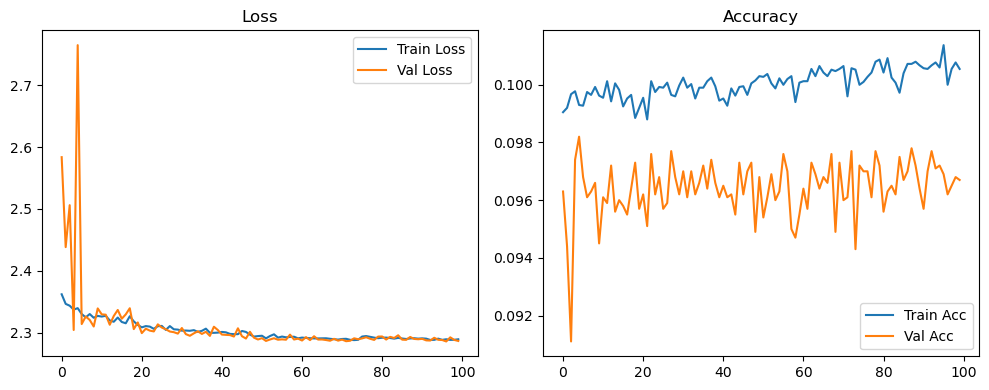

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.16it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.28it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.2866 Accuracy: 0.1007


🚀 Running: batch512_lr_max_0.0005_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0946 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0988 | Val Acc: 0.0946 |:   1%|          | 1/100 [01:22<2:15:20, 82.03s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:44<2:15:20, 82.03s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:44<2:15:20, 82.03s/it]

| LR: 0.000500 | Train Acc: 0.0991 | Val Acc: 0.0955 |:   2%|▏         | 2/100 [02:44<2:14:33, 82.39s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0954 |:   2%|▏         | 2/100 [04:06<2:14:33, 82.39s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0954 |:   2%|▏         | 2/100 [04:06<2:14:33, 82.39s/it]

| LR: 0.000500 | Train Acc: 0.0995 | Val Acc: 0.0954 |:   3%|▎         | 3/100 [04:06<2:13:03, 82.30s/it]

| LR: 0.000499 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [05:15<2:13:03, 82.30s/it]

| LR: 0.000499 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [05:15<2:13:03, 82.30s/it]

| LR: 0.000499 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [05:15<2:03:10, 76.98s/it]

| LR: 0.000498 | Train Acc: 0.1000 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:28<2:03:10, 76.98s/it]

| LR: 0.000498 | Train Acc: 0.1000 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:28<2:03:10, 76.98s/it]

| LR: 0.000498 | Train Acc: 0.1000 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [05:28<1:25:28, 53.98s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0948 |:   5%|▌         | 5/100 [05:41<1:25:28, 53.98s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0948 |:   5%|▌         | 5/100 [05:41<1:25:28, 53.98s/it]

| LR: 0.000497 | Train Acc: 0.0997 | Val Acc: 0.0948 |:   6%|▌         | 6/100 [05:42<1:02:49, 40.10s/it]

| LR: 0.000496 | Train Acc: 0.0999 | Val Acc: 0.0955 |:   6%|▌         | 6/100 [05:55<1:02:49, 40.10s/it]

| LR: 0.000496 | Train Acc: 0.0999 | Val Acc: 0.0955 |:   6%|▌         | 6/100 [05:55<1:02:49, 40.10s/it]

| LR: 0.000496 | Train Acc: 0.0999 | Val Acc: 0.0955 |:   7%|▋         | 7/100 [05:55<48:32, 31.32s/it]  

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   7%|▋         | 7/100 [06:08<48:32, 31.32s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   7%|▋         | 7/100 [06:08<48:32, 31.32s/it]

| LR: 0.000494 | Train Acc: 0.0996 | Val Acc: 0.0956 |:   8%|▊         | 8/100 [06:08<39:08, 25.53s/it]

| LR: 0.000492 | Train Acc: 0.1002 | Val Acc: 0.0947 |:   8%|▊         | 8/100 [06:21<39:08, 25.53s/it]

| LR: 0.000492 | Train Acc: 0.1002 | Val Acc: 0.0947 |:   8%|▊         | 8/100 [06:21<39:08, 25.53s/it]

| LR: 0.000492 | Train Acc: 0.1002 | Val Acc: 0.0947 |:   9%|▉         | 9/100 [06:21<32:49, 21.64s/it]

| LR: 0.000490 | Train Acc: 0.0999 | Val Acc: 0.0946 |:   9%|▉         | 9/100 [06:34<32:49, 21.64s/it]

| LR: 0.000490 | Train Acc: 0.0999 | Val Acc: 0.0946 |:   9%|▉         | 9/100 [06:34<32:49, 21.64s/it]

| LR: 0.000490 | Train Acc: 0.0999 | Val Acc: 0.0946 |:  10%|█         | 10/100 [06:34<28:30, 19.00s/it]

| LR: 0.000488 | Train Acc: 0.1000 | Val Acc: 0.0918 |:  10%|█         | 10/100 [06:47<28:30, 19.00s/it]

| LR: 0.000488 | Train Acc: 0.1000 | Val Acc: 0.0918 |:  10%|█         | 10/100 [06:47<28:30, 19.00s/it]

| LR: 0.000488 | Train Acc: 0.1000 | Val Acc: 0.0918 |:  11%|█         | 11/100 [06:47<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  11%|█         | 11/100 [07:00<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  11%|█         | 11/100 [07:00<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  12%|█▏        | 12/100 [07:00<23:24, 15.96s/it]

| LR: 0.000482 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [07:13<23:24, 15.96s/it]

| LR: 0.000482 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [07:13<23:24, 15.96s/it]

| LR: 0.000482 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  13%|█▎        | 13/100 [07:13<21:53, 15.10s/it]

| LR: 0.000479 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  13%|█▎        | 13/100 [07:27<21:53, 15.10s/it]

| LR: 0.000479 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  13%|█▎        | 13/100 [07:27<21:53, 15.10s/it]

| LR: 0.000479 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  14%|█▍        | 14/100 [07:27<20:46, 14.50s/it]

| LR: 0.000476 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  14%|█▍        | 14/100 [07:40<20:46, 14.50s/it]

| LR: 0.000476 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  14%|█▍        | 14/100 [07:40<20:46, 14.50s/it]

| LR: 0.000476 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [07:40<19:56, 14.07s/it]

| LR: 0.000473 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [07:53<19:56, 14.07s/it]

| LR: 0.000473 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [07:53<19:56, 14.07s/it]

| LR: 0.000473 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  16%|█▌        | 16/100 [07:53<19:16, 13.77s/it]

| LR: 0.000469 | Train Acc: 0.0997 | Val Acc: 0.0938 |:  16%|█▌        | 16/100 [08:06<19:16, 13.77s/it]

| LR: 0.000469 | Train Acc: 0.0997 | Val Acc: 0.0938 |:  16%|█▌        | 16/100 [08:06<19:16, 13.77s/it]

| LR: 0.000469 | Train Acc: 0.0997 | Val Acc: 0.0938 |:  17%|█▋        | 17/100 [08:06<18:49, 13.61s/it]

| LR: 0.000465 | Train Acc: 0.0996 | Val Acc: 0.0951 |:  17%|█▋        | 17/100 [08:19<18:49, 13.61s/it]

| LR: 0.000465 | Train Acc: 0.0996 | Val Acc: 0.0951 |:  17%|█▋        | 17/100 [08:19<18:49, 13.61s/it]

| LR: 0.000465 | Train Acc: 0.0996 | Val Acc: 0.0951 |:  18%|█▊        | 18/100 [08:19<18:24, 13.47s/it]

| LR: 0.000461 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [08:32<18:24, 13.47s/it]

| LR: 0.000461 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [08:32<18:24, 13.47s/it]

| LR: 0.000461 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  19%|█▉        | 19/100 [08:32<18:02, 13.36s/it]

| LR: 0.000457 | Train Acc: 0.0994 | Val Acc: 0.0936 |:  19%|█▉        | 19/100 [08:45<18:02, 13.36s/it]

| LR: 0.000457 | Train Acc: 0.0994 | Val Acc: 0.0936 |:  19%|█▉        | 19/100 [08:45<18:02, 13.36s/it]

| LR: 0.000457 | Train Acc: 0.0994 | Val Acc: 0.0936 |:  20%|██        | 20/100 [08:45<17:42, 13.29s/it]

| LR: 0.000452 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  20%|██        | 20/100 [08:58<17:42, 13.29s/it]

| LR: 0.000452 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  20%|██        | 20/100 [08:58<17:42, 13.29s/it]

| LR: 0.000452 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  21%|██        | 21/100 [08:58<17:26, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  21%|██        | 21/100 [09:12<17:26, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  21%|██        | 21/100 [09:12<17:26, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [09:12<17:12, 13.23s/it]

| LR: 0.000443 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:25<17:12, 13.23s/it]

| LR: 0.000443 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:25<17:12, 13.23s/it]

| LR: 0.000443 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:25<16:57, 13.21s/it]

| LR: 0.000438 | Train Acc: 0.0998 | Val Acc: 0.0953 |:  23%|██▎       | 23/100 [09:38<16:57, 13.21s/it]

| LR: 0.000438 | Train Acc: 0.0998 | Val Acc: 0.0953 |:  23%|██▎       | 23/100 [09:38<16:57, 13.21s/it]

| LR: 0.000438 | Train Acc: 0.0998 | Val Acc: 0.0953 |:  24%|██▍       | 24/100 [09:38<16:43, 13.20s/it]

| LR: 0.000432 | Train Acc: 0.0995 | Val Acc: 0.0934 |:  24%|██▍       | 24/100 [09:51<16:43, 13.20s/it]

| LR: 0.000432 | Train Acc: 0.0995 | Val Acc: 0.0934 |:  24%|██▍       | 24/100 [09:51<16:43, 13.20s/it]

| LR: 0.000432 | Train Acc: 0.0995 | Val Acc: 0.0934 |:  25%|██▌       | 25/100 [09:51<16:29, 13.20s/it]

| LR: 0.000427 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [10:04<16:29, 13.20s/it]

| LR: 0.000427 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [10:04<16:29, 13.20s/it]

| LR: 0.000427 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  26%|██▌       | 26/100 [10:05<16:19, 13.24s/it]

| LR: 0.000421 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [10:18<16:19, 13.24s/it]

| LR: 0.000421 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  26%|██▌       | 26/100 [10:18<16:19, 13.24s/it]

| LR: 0.000421 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:18<16:06, 13.24s/it]

| LR: 0.000415 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  27%|██▋       | 27/100 [10:31<16:06, 13.24s/it]

| LR: 0.000415 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  27%|██▋       | 27/100 [10:31<16:06, 13.24s/it]

| LR: 0.000415 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  28%|██▊       | 28/100 [10:31<15:52, 13.24s/it]

| LR: 0.000410 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [10:44<15:52, 13.24s/it]

| LR: 0.000410 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  28%|██▊       | 28/100 [10:44<15:52, 13.24s/it]

| LR: 0.000410 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  29%|██▉       | 29/100 [10:44<15:39, 13.23s/it]

| LR: 0.000403 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  29%|██▉       | 29/100 [10:57<15:39, 13.23s/it]

| LR: 0.000403 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  29%|██▉       | 29/100 [10:57<15:39, 13.23s/it]

| LR: 0.000403 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  30%|███       | 30/100 [10:57<15:26, 13.23s/it]

| LR: 0.000397 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  30%|███       | 30/100 [11:11<15:26, 13.23s/it]

| LR: 0.000397 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  30%|███       | 30/100 [11:11<15:26, 13.23s/it]

| LR: 0.000397 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  31%|███       | 31/100 [11:11<15:11, 13.20s/it]

| LR: 0.000391 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  31%|███       | 31/100 [11:24<15:11, 13.20s/it]

| LR: 0.000391 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  31%|███       | 31/100 [11:24<15:11, 13.20s/it]

| LR: 0.000391 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  32%|███▏      | 32/100 [11:24<14:56, 13.18s/it]

| LR: 0.000384 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  32%|███▏      | 32/100 [11:37<14:56, 13.18s/it]

| LR: 0.000384 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  32%|███▏      | 32/100 [11:37<14:56, 13.18s/it]

| LR: 0.000384 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  33%|███▎      | 33/100 [11:37<14:42, 13.18s/it]

| LR: 0.000378 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  33%|███▎      | 33/100 [11:50<14:42, 13.18s/it]

| LR: 0.000378 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  33%|███▎      | 33/100 [11:50<14:42, 13.18s/it]

| LR: 0.000378 | Train Acc: 0.1002 | Val Acc: 0.0959 |:  34%|███▍      | 34/100 [11:50<14:29, 13.17s/it]

| LR: 0.000371 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:03<14:29, 13.17s/it]

| LR: 0.000371 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:03<14:29, 13.17s/it]

| LR: 0.000371 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:03<14:15, 13.16s/it]

| LR: 0.000364 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [12:16<14:15, 13.16s/it]

| LR: 0.000364 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [12:16<14:15, 13.16s/it]

| LR: 0.000364 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  36%|███▌      | 36/100 [12:17<14:05, 13.22s/it]

| LR: 0.000357 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  36%|███▌      | 36/100 [12:30<14:05, 13.22s/it]

| LR: 0.000357 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  36%|███▌      | 36/100 [12:30<14:05, 13.22s/it]

| LR: 0.000357 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  37%|███▋      | 37/100 [12:30<13:51, 13.19s/it]

| LR: 0.000350 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [12:43<13:51, 13.19s/it]

| LR: 0.000350 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [12:43<13:51, 13.19s/it]

| LR: 0.000350 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [12:43<13:36, 13.18s/it]

| LR: 0.000342 | Train Acc: 0.0995 | Val Acc: 0.0953 |:  38%|███▊      | 38/100 [12:56<13:36, 13.18s/it]

| LR: 0.000342 | Train Acc: 0.0995 | Val Acc: 0.0953 |:  38%|███▊      | 38/100 [12:56<13:36, 13.18s/it]

| LR: 0.000342 | Train Acc: 0.0995 | Val Acc: 0.0953 |:  39%|███▉      | 39/100 [12:56<13:22, 13.16s/it]

| LR: 0.000335 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  39%|███▉      | 39/100 [13:09<13:22, 13.16s/it]

| LR: 0.000335 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  39%|███▉      | 39/100 [13:09<13:22, 13.16s/it]

| LR: 0.000335 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  40%|████      | 40/100 [13:09<13:09, 13.15s/it]

| LR: 0.000328 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  40%|████      | 40/100 [13:22<13:09, 13.15s/it]

| LR: 0.000328 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  40%|████      | 40/100 [13:22<13:09, 13.15s/it]

| LR: 0.000328 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  41%|████      | 41/100 [13:22<12:56, 13.16s/it]

| LR: 0.000320 | Train Acc: 0.1003 | Val Acc: 0.0938 |:  41%|████      | 41/100 [13:35<12:56, 13.16s/it]

| LR: 0.000320 | Train Acc: 0.1003 | Val Acc: 0.0938 |:  41%|████      | 41/100 [13:35<12:56, 13.16s/it]

| LR: 0.000320 | Train Acc: 0.1003 | Val Acc: 0.0938 |:  42%|████▏     | 42/100 [13:36<12:45, 13.19s/it]

| LR: 0.000313 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  42%|████▏     | 42/100 [13:49<12:45, 13.19s/it]

| LR: 0.000313 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  42%|████▏     | 42/100 [13:49<12:45, 13.19s/it]

| LR: 0.000313 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  43%|████▎     | 43/100 [13:49<12:32, 13.20s/it]

| LR: 0.000305 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  43%|████▎     | 43/100 [14:02<12:32, 13.20s/it]

| LR: 0.000305 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  43%|████▎     | 43/100 [14:02<12:32, 13.20s/it]

| LR: 0.000305 | Train Acc: 0.0999 | Val Acc: 0.0975 |:  44%|████▍     | 44/100 [14:02<12:20, 13.23s/it]

| LR: 0.000297 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [14:15<12:20, 13.23s/it]

| LR: 0.000297 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [14:15<12:20, 13.23s/it]

| LR: 0.000297 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:15<12:10, 13.29s/it]

| LR: 0.000290 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  45%|████▌     | 45/100 [14:29<12:10, 13.29s/it]

| LR: 0.000290 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  45%|████▌     | 45/100 [14:29<12:10, 13.29s/it]

| LR: 0.000290 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  46%|████▌     | 46/100 [14:29<11:56, 13.27s/it]

| LR: 0.000282 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  46%|████▌     | 46/100 [14:42<11:56, 13.27s/it]

| LR: 0.000282 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  46%|████▌     | 46/100 [14:42<11:56, 13.27s/it]

| LR: 0.000282 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  47%|████▋     | 47/100 [14:42<11:43, 13.28s/it]

| LR: 0.000274 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  47%|████▋     | 47/100 [14:55<11:43, 13.28s/it]

| LR: 0.000274 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  47%|████▋     | 47/100 [14:55<11:43, 13.28s/it]

| LR: 0.000274 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  48%|████▊     | 48/100 [14:55<11:30, 13.28s/it]

| LR: 0.000266 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [15:08<11:30, 13.28s/it]

| LR: 0.000266 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [15:08<11:30, 13.28s/it]

| LR: 0.000266 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  49%|████▉     | 49/100 [15:08<11:16, 13.27s/it]

| LR: 0.000258 | Train Acc: 0.1004 | Val Acc: 0.0942 |:  49%|████▉     | 49/100 [15:22<11:16, 13.27s/it]

| LR: 0.000258 | Train Acc: 0.1004 | Val Acc: 0.0942 |:  49%|████▉     | 49/100 [15:22<11:16, 13.27s/it]

| LR: 0.000258 | Train Acc: 0.1004 | Val Acc: 0.0942 |:  50%|█████     | 50/100 [15:22<11:01, 13.24s/it]

| LR: 0.000251 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  50%|█████     | 50/100 [15:35<11:01, 13.24s/it]

| LR: 0.000251 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  50%|█████     | 50/100 [15:35<11:01, 13.24s/it]

| LR: 0.000251 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  51%|█████     | 51/100 [15:35<10:47, 13.21s/it]

| LR: 0.000243 | Train Acc: 0.1006 | Val Acc: 0.0945 |:  51%|█████     | 51/100 [15:48<10:47, 13.21s/it]

| LR: 0.000243 | Train Acc: 0.1006 | Val Acc: 0.0945 |:  51%|█████     | 51/100 [15:48<10:47, 13.21s/it]

| LR: 0.000243 | Train Acc: 0.1006 | Val Acc: 0.0945 |:  52%|█████▏    | 52/100 [15:48<10:34, 13.21s/it]

| LR: 0.000235 | Train Acc: 0.1005 | Val Acc: 0.0952 |:  52%|█████▏    | 52/100 [16:01<10:34, 13.21s/it]

| LR: 0.000235 | Train Acc: 0.1005 | Val Acc: 0.0952 |:  52%|█████▏    | 52/100 [16:01<10:34, 13.21s/it]

| LR: 0.000235 | Train Acc: 0.1005 | Val Acc: 0.0952 |:  53%|█████▎    | 53/100 [16:01<10:19, 13.19s/it]

| LR: 0.000227 | Train Acc: 0.0998 | Val Acc: 0.0948 |:  53%|█████▎    | 53/100 [16:14<10:19, 13.19s/it]

| LR: 0.000227 | Train Acc: 0.0998 | Val Acc: 0.0948 |:  53%|█████▎    | 53/100 [16:14<10:19, 13.19s/it]

| LR: 0.000227 | Train Acc: 0.0998 | Val Acc: 0.0948 |:  54%|█████▍    | 54/100 [16:14<10:05, 13.17s/it]

| LR: 0.000219 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  54%|█████▍    | 54/100 [16:28<10:05, 13.17s/it]

| LR: 0.000219 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  54%|█████▍    | 54/100 [16:28<10:05, 13.17s/it]

| LR: 0.000219 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  55%|█████▌    | 55/100 [16:28<09:54, 13.21s/it]

| LR: 0.000211 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  55%|█████▌    | 55/100 [16:41<09:54, 13.21s/it]

| LR: 0.000211 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  55%|█████▌    | 55/100 [16:41<09:54, 13.21s/it]

| LR: 0.000211 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [16:41<09:41, 13.22s/it]

| LR: 0.000204 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  56%|█████▌    | 56/100 [16:54<09:41, 13.22s/it]

| LR: 0.000204 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  56%|█████▌    | 56/100 [16:54<09:41, 13.22s/it]

| LR: 0.000204 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  57%|█████▋    | 57/100 [16:54<09:27, 13.21s/it]

| LR: 0.000196 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [17:07<09:27, 13.21s/it]

| LR: 0.000196 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [17:07<09:27, 13.21s/it]

| LR: 0.000196 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  58%|█████▊    | 58/100 [17:07<09:14, 13.20s/it]

| LR: 0.000188 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:14, 13.20s/it]

| LR: 0.000188 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:14, 13.20s/it]

| LR: 0.000188 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:20<09:00, 13.19s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:34<09:00, 13.19s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:34<09:00, 13.19s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [17:34<08:47, 13.20s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:47<08:47, 13.20s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:47<08:47, 13.20s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  61%|██████    | 61/100 [17:47<08:34, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.1004 | Val Acc: 0.0964 |:  61%|██████    | 61/100 [18:00<08:34, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.1004 | Val Acc: 0.0964 |:  61%|██████    | 61/100 [18:00<08:34, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.1004 | Val Acc: 0.0964 |:  62%|██████▏   | 62/100 [18:00<08:21, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  62%|██████▏   | 62/100 [18:13<08:21, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  62%|██████▏   | 62/100 [18:13<08:21, 13.19s/it]

| LR: 0.000159 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  63%|██████▎   | 63/100 [18:13<08:07, 13.18s/it]

| LR: 0.000151 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  63%|██████▎   | 63/100 [18:26<08:07, 13.18s/it]

| LR: 0.000151 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  63%|██████▎   | 63/100 [18:26<08:07, 13.18s/it]

| LR: 0.000151 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  64%|██████▍   | 64/100 [18:26<07:56, 13.23s/it]

| LR: 0.000144 | Train Acc: 0.1007 | Val Acc: 0.0952 |:  64%|██████▍   | 64/100 [18:40<07:56, 13.23s/it]

| LR: 0.000144 | Train Acc: 0.1007 | Val Acc: 0.0952 |:  64%|██████▍   | 64/100 [18:40<07:56, 13.23s/it]

| LR: 0.000144 | Train Acc: 0.1007 | Val Acc: 0.0952 |:  65%|██████▌   | 65/100 [18:40<07:43, 13.25s/it]

| LR: 0.000137 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  65%|██████▌   | 65/100 [18:53<07:43, 13.25s/it]

| LR: 0.000137 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  65%|██████▌   | 65/100 [18:53<07:43, 13.25s/it]

| LR: 0.000137 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  66%|██████▌   | 66/100 [18:53<07:30, 13.25s/it]

| LR: 0.000130 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  66%|██████▌   | 66/100 [19:06<07:30, 13.25s/it]

| LR: 0.000130 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  66%|██████▌   | 66/100 [19:06<07:30, 13.25s/it]

| LR: 0.000130 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  67%|██████▋   | 67/100 [19:06<07:17, 13.26s/it]

| LR: 0.000123 | Train Acc: 0.1007 | Val Acc: 0.0951 |:  67%|██████▋   | 67/100 [19:19<07:17, 13.26s/it]

| LR: 0.000123 | Train Acc: 0.1007 | Val Acc: 0.0951 |:  67%|██████▋   | 67/100 [19:19<07:17, 13.26s/it]

| LR: 0.000123 | Train Acc: 0.1007 | Val Acc: 0.0951 |:  68%|██████▊   | 68/100 [19:20<07:04, 13.26s/it]

| LR: 0.000117 | Train Acc: 0.1007 | Val Acc: 0.0959 |:  68%|██████▊   | 68/100 [19:33<07:04, 13.26s/it]

| LR: 0.000117 | Train Acc: 0.1007 | Val Acc: 0.0959 |:  68%|██████▊   | 68/100 [19:33<07:04, 13.26s/it]

| LR: 0.000117 | Train Acc: 0.1007 | Val Acc: 0.0959 |:  69%|██████▉   | 69/100 [19:33<06:50, 13.25s/it]

| LR: 0.000110 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:46<06:50, 13.25s/it]

| LR: 0.000110 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:46<06:50, 13.25s/it]

| LR: 0.000110 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  70%|███████   | 70/100 [19:46<06:36, 13.23s/it]

| LR: 0.000104 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:59<06:36, 13.23s/it]

| LR: 0.000104 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:59<06:36, 13.23s/it]

| LR: 0.000104 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:59<06:23, 13.21s/it]

| LR: 0.000098 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  71%|███████   | 71/100 [20:12<06:23, 13.21s/it]

| LR: 0.000098 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  71%|███████   | 71/100 [20:12<06:23, 13.21s/it]

| LR: 0.000098 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  72%|███████▏  | 72/100 [20:12<06:09, 13.21s/it]

| LR: 0.000091 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.21s/it]

| LR: 0.000091 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.21s/it]

| LR: 0.000091 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  73%|███████▎  | 73/100 [20:26<05:56, 13.21s/it]

| LR: 0.000086 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:39<05:56, 13.21s/it]

| LR: 0.000086 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:39<05:56, 13.21s/it]

| LR: 0.000086 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:39<05:44, 13.25s/it]

| LR: 0.000080 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  74%|███████▍  | 74/100 [20:52<05:44, 13.25s/it]

| LR: 0.000080 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  74%|███████▍  | 74/100 [20:52<05:44, 13.25s/it]

| LR: 0.000080 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  75%|███████▌  | 75/100 [20:52<05:31, 13.25s/it]

| LR: 0.000074 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  75%|███████▌  | 75/100 [21:05<05:31, 13.25s/it]

| LR: 0.000074 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  75%|███████▌  | 75/100 [21:05<05:31, 13.25s/it]

| LR: 0.000074 | Train Acc: 0.1003 | Val Acc: 0.0954 |:  76%|███████▌  | 76/100 [21:05<05:17, 13.22s/it]

| LR: 0.000069 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  76%|███████▌  | 76/100 [21:18<05:17, 13.22s/it]

| LR: 0.000069 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  76%|███████▌  | 76/100 [21:18<05:17, 13.22s/it]

| LR: 0.000069 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [21:19<05:04, 13.23s/it]

| LR: 0.000063 | Train Acc: 0.1012 | Val Acc: 0.0961 |:  77%|███████▋  | 77/100 [21:32<05:04, 13.23s/it]

| LR: 0.000063 | Train Acc: 0.1012 | Val Acc: 0.0961 |:  77%|███████▋  | 77/100 [21:32<05:04, 13.23s/it]

| LR: 0.000063 | Train Acc: 0.1012 | Val Acc: 0.0961 |:  78%|███████▊  | 78/100 [21:32<04:51, 13.23s/it]

| LR: 0.000058 | Train Acc: 0.1005 | Val Acc: 0.0956 |:  78%|███████▊  | 78/100 [21:45<04:51, 13.23s/it]

| LR: 0.000058 | Train Acc: 0.1005 | Val Acc: 0.0956 |:  78%|███████▊  | 78/100 [21:45<04:51, 13.23s/it]

| LR: 0.000058 | Train Acc: 0.1005 | Val Acc: 0.0956 |:  79%|███████▉  | 79/100 [21:45<04:37, 13.23s/it]

| LR: 0.000053 | Train Acc: 0.1010 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.23s/it]

| LR: 0.000053 | Train Acc: 0.1010 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.23s/it]

| LR: 0.000053 | Train Acc: 0.1010 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [21:58<04:24, 13.25s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0961 |:  80%|████████  | 80/100 [22:11<04:24, 13.25s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0961 |:  80%|████████  | 80/100 [22:11<04:24, 13.25s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0961 |:  81%|████████  | 81/100 [22:12<04:11, 13.24s/it]

| LR: 0.000044 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:25<04:11, 13.24s/it]

| LR: 0.000044 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:25<04:11, 13.24s/it]

| LR: 0.000044 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  82%|████████▏ | 82/100 [22:25<03:58, 13.24s/it]

| LR: 0.000040 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  82%|████████▏ | 82/100 [22:38<03:58, 13.24s/it]

| LR: 0.000040 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  82%|████████▏ | 82/100 [22:38<03:58, 13.24s/it]

| LR: 0.000040 | Train Acc: 0.1008 | Val Acc: 0.0964 |:  83%|████████▎ | 83/100 [22:38<03:45, 13.28s/it]

| LR: 0.000036 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:51<03:45, 13.28s/it]

| LR: 0.000036 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:51<03:45, 13.28s/it]

| LR: 0.000036 | Train Acc: 0.1007 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:51<03:31, 13.25s/it]

| LR: 0.000032 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  84%|████████▍ | 84/100 [23:04<03:31, 13.25s/it]

| LR: 0.000032 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  84%|████████▍ | 84/100 [23:04<03:31, 13.25s/it]

| LR: 0.000032 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [23:04<03:18, 13.23s/it]

| LR: 0.000028 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  85%|████████▌ | 85/100 [23:18<03:18, 13.23s/it]

| LR: 0.000028 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  85%|████████▌ | 85/100 [23:18<03:18, 13.23s/it]

| LR: 0.000028 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  86%|████████▌ | 86/100 [23:18<03:04, 13.20s/it]

| LR: 0.000025 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  86%|████████▌ | 86/100 [23:31<03:04, 13.20s/it]

| LR: 0.000025 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  86%|████████▌ | 86/100 [23:31<03:04, 13.20s/it]

| LR: 0.000025 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  87%|████████▋ | 87/100 [23:31<02:51, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.22s/it]

| LR: 0.000019 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.22s/it]

| LR: 0.000019 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.22s/it]

| LR: 0.000019 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:57<02:25, 13.23s/it]

| LR: 0.000016 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  89%|████████▉ | 89/100 [24:10<02:25, 13.23s/it]

| LR: 0.000016 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  89%|████████▉ | 89/100 [24:10<02:25, 13.23s/it]

| LR: 0.000016 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  90%|█████████ | 90/100 [24:11<02:12, 13.23s/it]

| LR: 0.000013 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  90%|█████████ | 90/100 [24:24<02:12, 13.23s/it]

| LR: 0.000013 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  90%|█████████ | 90/100 [24:24<02:12, 13.23s/it]

| LR: 0.000013 | Train Acc: 0.1007 | Val Acc: 0.0970 |:  91%|█████████ | 91/100 [24:24<01:58, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  91%|█████████ | 91/100 [24:37<01:58, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  91%|█████████ | 91/100 [24:37<01:58, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  92%|█████████▏| 92/100 [24:37<01:46, 13.26s/it]

| LR: 0.000009 | Train Acc: 0.1008 | Val Acc: 0.0961 |:  92%|█████████▏| 92/100 [24:50<01:46, 13.26s/it]

| LR: 0.000009 | Train Acc: 0.1008 | Val Acc: 0.0961 |:  92%|█████████▏| 92/100 [24:50<01:46, 13.26s/it]

| LR: 0.000009 | Train Acc: 0.1008 | Val Acc: 0.0961 |:  93%|█████████▎| 93/100 [24:50<01:32, 13.24s/it]

| LR: 0.000007 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.24s/it]

| LR: 0.000007 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.24s/it]

| LR: 0.000007 | Train Acc: 0.1008 | Val Acc: 0.0966 |:  94%|█████████▍| 94/100 [25:03<01:19, 13.23s/it]

| LR: 0.000005 | Train Acc: 0.1006 | Val Acc: 0.0967 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.23s/it]

| LR: 0.000005 | Train Acc: 0.1006 | Val Acc: 0.0967 |:  94%|█████████▍| 94/100 [25:17<01:19, 13.23s/it]

| LR: 0.000005 | Train Acc: 0.1006 | Val Acc: 0.0967 |:  95%|█████████▌| 95/100 [25:17<01:05, 13.19s/it]

| LR: 0.000004 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:30<01:05, 13.19s/it]

| LR: 0.000004 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:30<01:05, 13.19s/it]

| LR: 0.000004 | Train Acc: 0.1011 | Val Acc: 0.0969 |:  96%|█████████▌| 96/100 [25:30<00:52, 13.16s/it]

| LR: 0.000003 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.16s/it]

| LR: 0.000003 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:43<00:52, 13.16s/it]

| LR: 0.000003 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  97%|█████████▋| 97/100 [25:43<00:39, 13.16s/it]

| LR: 0.000002 | Train Acc: 0.1008 | Val Acc: 0.0963 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.16s/it]

| LR: 0.000002 | Train Acc: 0.1008 | Val Acc: 0.0963 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.16s/it]

| LR: 0.000002 | Train Acc: 0.1008 | Val Acc: 0.0963 |:  98%|█████████▊| 98/100 [25:56<00:26, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1010 | Val Acc: 0.0957 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1010 | Val Acc: 0.0957 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1010 | Val Acc: 0.0957 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0969 |: 100%|██████████| 100/100 [26:22<00:00, 13.14s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0969 |: 100%|██████████| 100/100 [26:22<00:00, 15.83s/it]

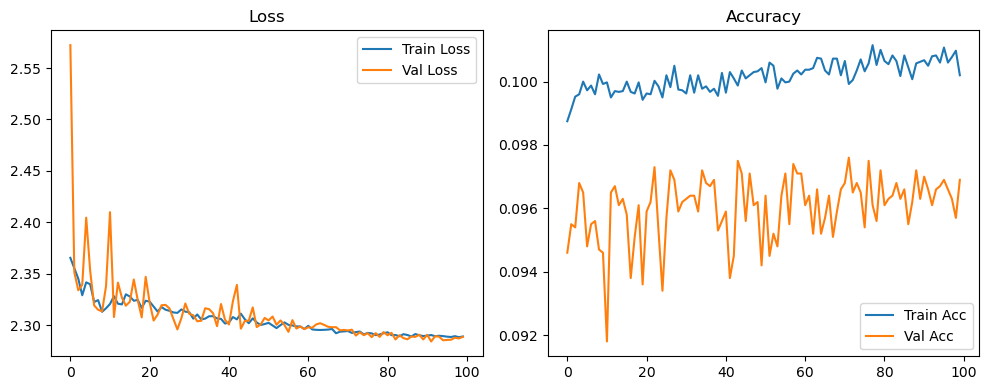

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.2869 Accuracy: 0.0990


🚀 Running: batch512_lr_max_0.0005_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0972 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000500 | Train Acc: 0.0990 | Val Acc: 0.0972 |:   1%|          | 1/100 [01:22<2:15:33, 82.16s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:44<2:15:33, 82.16s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:44<2:15:33, 82.16s/it]

| LR: 0.000500 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:44<2:14:18, 82.23s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [04:06<2:14:18, 82.23s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [04:06<2:14:18, 82.23s/it]

| LR: 0.000500 | Train Acc: 0.0994 | Val Acc: 0.0970 |:   3%|▎         | 3/100 [04:06<2:12:42, 82.08s/it]

| LR: 0.000499 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:14<2:12:42, 82.08s/it]

| LR: 0.000499 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:14<2:12:42, 82.08s/it]

| LR: 0.000499 | Train Acc: 0.1003 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:14<2:02:50, 76.77s/it]

| LR: 0.000498 | Train Acc: 0.1000 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:28<2:02:50, 76.77s/it]

| LR: 0.000498 | Train Acc: 0.1000 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:28<2:02:50, 76.77s/it]

| LR: 0.000498 | Train Acc: 0.1000 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [05:28<1:25:12, 53.82s/it]

| LR: 0.000497 | Train Acc: 0.1016 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:12, 53.82s/it]

| LR: 0.000497 | Train Acc: 0.1016 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:12, 53.82s/it]

| LR: 0.000497 | Train Acc: 0.1016 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:41<1:02:38, 39.98s/it]

| LR: 0.000496 | Train Acc: 0.1012 | Val Acc: 0.0975 |:   6%|▌         | 6/100 [05:54<1:02:38, 39.98s/it]

| LR: 0.000496 | Train Acc: 0.1012 | Val Acc: 0.0975 |:   6%|▌         | 6/100 [05:54<1:02:38, 39.98s/it]

| LR: 0.000496 | Train Acc: 0.1012 | Val Acc: 0.0975 |:   7%|▋         | 7/100 [05:54<48:19, 31.17s/it]  

| LR: 0.000494 | Train Acc: 0.1024 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [06:07<48:19, 31.17s/it]

| LR: 0.000494 | Train Acc: 0.1024 | Val Acc: 0.0974 |:   7%|▋         | 7/100 [06:07<48:19, 31.17s/it]

| LR: 0.000494 | Train Acc: 0.1024 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [06:07<39:01, 25.45s/it]

| LR: 0.000492 | Train Acc: 0.1031 | Val Acc: 0.0986 |:   8%|▊         | 8/100 [06:20<39:01, 25.45s/it]

| LR: 0.000492 | Train Acc: 0.1031 | Val Acc: 0.0986 |:   8%|▊         | 8/100 [06:20<39:01, 25.45s/it]

| LR: 0.000492 | Train Acc: 0.1031 | Val Acc: 0.0986 |:   9%|▉         | 9/100 [06:20<32:46, 21.61s/it]

| LR: 0.000490 | Train Acc: 0.1026 | Val Acc: 0.0980 |:   9%|▉         | 9/100 [06:33<32:46, 21.61s/it]

| LR: 0.000490 | Train Acc: 0.1026 | Val Acc: 0.0980 |:   9%|▉         | 9/100 [06:33<32:46, 21.61s/it]

| LR: 0.000490 | Train Acc: 0.1026 | Val Acc: 0.0980 |:  10%|█         | 10/100 [06:33<28:27, 18.98s/it]

| LR: 0.000488 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:46<28:27, 18.98s/it]

| LR: 0.000488 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:46<28:27, 18.98s/it]

| LR: 0.000488 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:46<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:59<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:59<25:31, 17.21s/it]

| LR: 0.000485 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:00<23:25, 15.97s/it]

| LR: 0.000482 | Train Acc: 0.1030 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [07:13<23:25, 15.97s/it]

| LR: 0.000482 | Train Acc: 0.1030 | Val Acc: 0.0975 |:  12%|█▏        | 12/100 [07:13<23:25, 15.97s/it]

| LR: 0.000482 | Train Acc: 0.1030 | Val Acc: 0.0975 |:  13%|█▎        | 13/100 [07:13<21:55, 15.12s/it]

| LR: 0.000479 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:26<21:55, 15.12s/it]

| LR: 0.000479 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:26<21:55, 15.12s/it]

| LR: 0.000479 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:26<20:47, 14.51s/it]

| LR: 0.000476 | Train Acc: 0.1009 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:39<20:47, 14.51s/it]

| LR: 0.000476 | Train Acc: 0.1009 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:39<20:47, 14.51s/it]

| LR: 0.000476 | Train Acc: 0.1009 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:39<19:58, 14.10s/it]

| LR: 0.000473 | Train Acc: 0.1016 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:52<19:58, 14.10s/it]

| LR: 0.000473 | Train Acc: 0.1016 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:52<19:58, 14.10s/it]

| LR: 0.000473 | Train Acc: 0.1016 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [07:52<19:18, 13.79s/it]

| LR: 0.000469 | Train Acc: 0.1021 | Val Acc: 0.1003 |:  16%|█▌        | 16/100 [08:05<19:18, 13.79s/it]

| LR: 0.000469 | Train Acc: 0.1021 | Val Acc: 0.1003 |:  16%|█▌        | 16/100 [08:05<19:18, 13.79s/it]

| LR: 0.000469 | Train Acc: 0.1021 | Val Acc: 0.1003 |:  17%|█▋        | 17/100 [08:05<18:49, 13.61s/it]

| LR: 0.000465 | Train Acc: 0.1022 | Val Acc: 0.1045 |:  17%|█▋        | 17/100 [08:18<18:49, 13.61s/it]

| LR: 0.000465 | Train Acc: 0.1022 | Val Acc: 0.1045 |:  17%|█▋        | 17/100 [08:18<18:49, 13.61s/it]

| LR: 0.000465 | Train Acc: 0.1022 | Val Acc: 0.1045 |:  18%|█▊        | 18/100 [08:18<18:26, 13.50s/it]

| LR: 0.000461 | Train Acc: 0.1027 | Val Acc: 0.0993 |:  18%|█▊        | 18/100 [08:31<18:26, 13.50s/it]

| LR: 0.000461 | Train Acc: 0.1027 | Val Acc: 0.0993 |:  18%|█▊        | 18/100 [08:31<18:26, 13.50s/it]

| LR: 0.000461 | Train Acc: 0.1027 | Val Acc: 0.0993 |:  19%|█▉        | 19/100 [08:32<18:03, 13.38s/it]

| LR: 0.000457 | Train Acc: 0.1023 | Val Acc: 0.0988 |:  19%|█▉        | 19/100 [08:45<18:03, 13.38s/it]

| LR: 0.000457 | Train Acc: 0.1023 | Val Acc: 0.0988 |:  19%|█▉        | 19/100 [08:45<18:03, 13.38s/it]

| LR: 0.000457 | Train Acc: 0.1023 | Val Acc: 0.0988 |:  20%|██        | 20/100 [08:45<17:44, 13.30s/it]

| LR: 0.000452 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:58<17:44, 13.30s/it]

| LR: 0.000452 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:58<17:44, 13.30s/it]

| LR: 0.000452 | Train Acc: 0.1030 | Val Acc: 0.0973 |:  21%|██        | 21/100 [08:58<17:26, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.1025 | Val Acc: 0.1039 |:  21%|██        | 21/100 [09:11<17:26, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.1025 | Val Acc: 0.1039 |:  21%|██        | 21/100 [09:11<17:26, 13.25s/it]

| LR: 0.000448 | Train Acc: 0.1025 | Val Acc: 0.1039 |:  22%|██▏       | 22/100 [09:11<17:10, 13.22s/it]

| LR: 0.000443 | Train Acc: 0.1022 | Val Acc: 0.1015 |:  22%|██▏       | 22/100 [09:24<17:10, 13.22s/it]

| LR: 0.000443 | Train Acc: 0.1022 | Val Acc: 0.1015 |:  22%|██▏       | 22/100 [09:24<17:10, 13.22s/it]

| LR: 0.000443 | Train Acc: 0.1022 | Val Acc: 0.1015 |:  23%|██▎       | 23/100 [09:24<16:55, 13.19s/it]

| LR: 0.000438 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:37<16:55, 13.19s/it]

| LR: 0.000438 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:37<16:55, 13.19s/it]

| LR: 0.000438 | Train Acc: 0.1024 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:37<16:42, 13.18s/it]

| LR: 0.000432 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:50<16:42, 13.18s/it]

| LR: 0.000432 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:50<16:42, 13.18s/it]

| LR: 0.000432 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [09:51<16:30, 13.21s/it]

| LR: 0.000427 | Train Acc: 0.1021 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [10:04<16:30, 13.21s/it]

| LR: 0.000427 | Train Acc: 0.1021 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [10:04<16:30, 13.21s/it]

| LR: 0.000427 | Train Acc: 0.1021 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:04<16:15, 13.18s/it]

| LR: 0.000421 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:17<16:15, 13.18s/it]

| LR: 0.000421 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:17<16:15, 13.18s/it]

| LR: 0.000421 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:17<16:03, 13.20s/it]

| LR: 0.000415 | Train Acc: 0.1026 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:30<16:03, 13.20s/it]

| LR: 0.000415 | Train Acc: 0.1026 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:30<16:03, 13.20s/it]

| LR: 0.000415 | Train Acc: 0.1026 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [10:30<15:51, 13.21s/it]

| LR: 0.000410 | Train Acc: 0.1024 | Val Acc: 0.0988 |:  28%|██▊       | 28/100 [10:43<15:51, 13.21s/it]

| LR: 0.000410 | Train Acc: 0.1024 | Val Acc: 0.0988 |:  28%|██▊       | 28/100 [10:43<15:51, 13.21s/it]

| LR: 0.000410 | Train Acc: 0.1024 | Val Acc: 0.0988 |:  29%|██▉       | 29/100 [10:43<15:38, 13.22s/it]

| LR: 0.000403 | Train Acc: 0.1022 | Val Acc: 0.0999 |:  29%|██▉       | 29/100 [10:57<15:38, 13.22s/it]

| LR: 0.000403 | Train Acc: 0.1022 | Val Acc: 0.0999 |:  29%|██▉       | 29/100 [10:57<15:38, 13.22s/it]

| LR: 0.000403 | Train Acc: 0.1022 | Val Acc: 0.0999 |:  30%|███       | 30/100 [10:57<15:26, 13.24s/it]

| LR: 0.000397 | Train Acc: 0.1028 | Val Acc: 0.0973 |:  30%|███       | 30/100 [11:10<15:26, 13.24s/it]

| LR: 0.000397 | Train Acc: 0.1028 | Val Acc: 0.0973 |:  30%|███       | 30/100 [11:10<15:26, 13.24s/it]

| LR: 0.000397 | Train Acc: 0.1028 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:10<15:13, 13.24s/it]

| LR: 0.000391 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:23<15:13, 13.24s/it]

| LR: 0.000391 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:23<15:13, 13.24s/it]

| LR: 0.000391 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:23<14:59, 13.23s/it]

| LR: 0.000384 | Train Acc: 0.1023 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:36<14:59, 13.23s/it]

| LR: 0.000384 | Train Acc: 0.1023 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:36<14:59, 13.23s/it]

| LR: 0.000384 | Train Acc: 0.1023 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [11:36<14:44, 13.21s/it]

| LR: 0.000378 | Train Acc: 0.1023 | Val Acc: 0.1001 |:  33%|███▎      | 33/100 [11:49<14:44, 13.21s/it]

| LR: 0.000378 | Train Acc: 0.1023 | Val Acc: 0.1001 |:  33%|███▎      | 33/100 [11:49<14:44, 13.21s/it]

| LR: 0.000378 | Train Acc: 0.1023 | Val Acc: 0.1001 |:  34%|███▍      | 34/100 [11:49<14:30, 13.20s/it]

| LR: 0.000371 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [12:02<14:30, 13.20s/it]

| LR: 0.000371 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [12:03<14:30, 13.20s/it]

| LR: 0.000371 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:03<14:16, 13.18s/it]

| LR: 0.000364 | Train Acc: 0.1027 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:16<14:16, 13.18s/it]

| LR: 0.000364 | Train Acc: 0.1027 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:16<14:16, 13.18s/it]

| LR: 0.000364 | Train Acc: 0.1027 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:16<14:03, 13.18s/it]

| LR: 0.000357 | Train Acc: 0.1026 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:29<14:03, 13.18s/it]

| LR: 0.000357 | Train Acc: 0.1026 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:29<14:03, 13.18s/it]

| LR: 0.000357 | Train Acc: 0.1026 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:29<13:52, 13.21s/it]

| LR: 0.000350 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:42<13:52, 13.21s/it]

| LR: 0.000350 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:42<13:52, 13.21s/it]

| LR: 0.000350 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:42<13:39, 13.22s/it]

| LR: 0.000342 | Train Acc: 0.1017 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:55<13:39, 13.22s/it]

| LR: 0.000342 | Train Acc: 0.1017 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:55<13:39, 13.22s/it]

| LR: 0.000342 | Train Acc: 0.1017 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [12:55<13:25, 13.21s/it]

| LR: 0.000335 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [13:09<13:25, 13.21s/it]

| LR: 0.000335 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [13:09<13:25, 13.21s/it]

| LR: 0.000335 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:09<13:14, 13.24s/it]

| LR: 0.000328 | Train Acc: 0.1016 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:22<13:14, 13.24s/it]

| LR: 0.000328 | Train Acc: 0.1016 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:22<13:14, 13.24s/it]

| LR: 0.000328 | Train Acc: 0.1016 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:22<12:59, 13.21s/it]

| LR: 0.000320 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:35<12:59, 13.21s/it]

| LR: 0.000320 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:35<12:59, 13.21s/it]

| LR: 0.000320 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  42%|████▏     | 42/100 [13:35<12:44, 13.19s/it]

| LR: 0.000313 | Train Acc: 0.1020 | Val Acc: 0.1018 |:  42%|████▏     | 42/100 [13:48<12:44, 13.19s/it]

| LR: 0.000313 | Train Acc: 0.1020 | Val Acc: 0.1018 |:  42%|████▏     | 42/100 [13:48<12:44, 13.19s/it]

| LR: 0.000313 | Train Acc: 0.1020 | Val Acc: 0.1018 |:  43%|████▎     | 43/100 [13:48<12:30, 13.16s/it]

| LR: 0.000305 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [14:01<12:30, 13.16s/it]

| LR: 0.000305 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [14:01<12:30, 13.16s/it]

| LR: 0.000305 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:01<12:17, 13.17s/it]

| LR: 0.000297 | Train Acc: 0.1021 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:14<12:17, 13.17s/it]

| LR: 0.000297 | Train Acc: 0.1021 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:14<12:17, 13.17s/it]

| LR: 0.000297 | Train Acc: 0.1021 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:14<12:03, 13.15s/it]

| LR: 0.000290 | Train Acc: 0.1020 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:28<12:03, 13.15s/it]

| LR: 0.000290 | Train Acc: 0.1020 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:28<12:03, 13.15s/it]

| LR: 0.000290 | Train Acc: 0.1020 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:28<11:52, 13.20s/it]

| LR: 0.000282 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:41<11:52, 13.20s/it]

| LR: 0.000282 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:41<11:52, 13.20s/it]

| LR: 0.000282 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:41<11:38, 13.18s/it]

| LR: 0.000274 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:54<11:38, 13.18s/it]

| LR: 0.000274 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:54<11:38, 13.18s/it]

| LR: 0.000274 | Train Acc: 0.1025 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [14:54<11:25, 13.19s/it]

| LR: 0.000266 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [15:07<11:25, 13.19s/it]

| LR: 0.000266 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [15:07<11:25, 13.19s/it]

| LR: 0.000266 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:07<11:11, 13.17s/it]

| LR: 0.000258 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:20<11:11, 13.17s/it]

| LR: 0.000258 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:20<11:11, 13.17s/it]

| LR: 0.000258 | Train Acc: 0.1019 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [15:20<10:57, 13.14s/it]

| LR: 0.000251 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [15:33<10:57, 13.14s/it]

| LR: 0.000251 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [15:33<10:57, 13.14s/it]

| LR: 0.000251 | Train Acc: 0.1018 | Val Acc: 0.0973 |:  51%|█████     | 51/100 [15:33<10:44, 13.15s/it]

| LR: 0.000243 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  51%|█████     | 51/100 [15:47<10:44, 13.15s/it]

| LR: 0.000243 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  51%|█████     | 51/100 [15:47<10:44, 13.15s/it]

| LR: 0.000243 | Train Acc: 0.1022 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [15:47<10:31, 13.15s/it]

| LR: 0.000235 | Train Acc: 0.1020 | Val Acc: 0.0978 |:  52%|█████▏    | 52/100 [16:00<10:31, 13.15s/it]

| LR: 0.000235 | Train Acc: 0.1020 | Val Acc: 0.0978 |:  52%|█████▏    | 52/100 [16:00<10:31, 13.15s/it]

| LR: 0.000235 | Train Acc: 0.1020 | Val Acc: 0.0978 |:  53%|█████▎    | 53/100 [16:00<10:17, 13.14s/it]

| LR: 0.000227 | Train Acc: 0.1024 | Val Acc: 0.0985 |:  53%|█████▎    | 53/100 [16:13<10:17, 13.14s/it]

| LR: 0.000227 | Train Acc: 0.1024 | Val Acc: 0.0985 |:  53%|█████▎    | 53/100 [16:13<10:17, 13.14s/it]

| LR: 0.000227 | Train Acc: 0.1024 | Val Acc: 0.0985 |:  54%|█████▍    | 54/100 [16:13<10:04, 13.14s/it]

| LR: 0.000219 | Train Acc: 0.1022 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [16:26<10:04, 13.14s/it]

| LR: 0.000219 | Train Acc: 0.1022 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [16:26<10:04, 13.14s/it]

| LR: 0.000219 | Train Acc: 0.1022 | Val Acc: 0.0979 |:  55%|█████▌    | 55/100 [16:26<09:52, 13.16s/it]

| LR: 0.000211 | Train Acc: 0.1010 | Val Acc: 0.0978 |:  55%|█████▌    | 55/100 [16:39<09:52, 13.16s/it]

| LR: 0.000211 | Train Acc: 0.1010 | Val Acc: 0.0978 |:  55%|█████▌    | 55/100 [16:39<09:52, 13.16s/it]

| LR: 0.000211 | Train Acc: 0.1010 | Val Acc: 0.0978 |:  56%|█████▌    | 56/100 [16:39<09:38, 13.15s/it]

| LR: 0.000204 | Train Acc: 0.1007 | Val Acc: 0.0980 |:  56%|█████▌    | 56/100 [16:52<09:38, 13.15s/it]

| LR: 0.000204 | Train Acc: 0.1007 | Val Acc: 0.0980 |:  56%|█████▌    | 56/100 [16:52<09:38, 13.15s/it]

| LR: 0.000204 | Train Acc: 0.1007 | Val Acc: 0.0980 |:  57%|█████▋    | 57/100 [16:52<09:24, 13.13s/it]

| LR: 0.000196 | Train Acc: 0.1020 | Val Acc: 0.0983 |:  57%|█████▋    | 57/100 [17:05<09:24, 13.13s/it]

| LR: 0.000196 | Train Acc: 0.1020 | Val Acc: 0.0983 |:  57%|█████▋    | 57/100 [17:05<09:24, 13.13s/it]

| LR: 0.000196 | Train Acc: 0.1020 | Val Acc: 0.0983 |:  58%|█████▊    | 58/100 [17:05<09:11, 13.13s/it]

| LR: 0.000188 | Train Acc: 0.1019 | Val Acc: 0.0982 |:  58%|█████▊    | 58/100 [17:18<09:11, 13.13s/it]

| LR: 0.000188 | Train Acc: 0.1019 | Val Acc: 0.0982 |:  58%|█████▊    | 58/100 [17:18<09:11, 13.13s/it]

| LR: 0.000188 | Train Acc: 0.1019 | Val Acc: 0.0982 |:  59%|█████▉    | 59/100 [17:19<08:58, 13.13s/it]

| LR: 0.000181 | Train Acc: 0.1031 | Val Acc: 0.0989 |:  59%|█████▉    | 59/100 [17:32<08:58, 13.13s/it]

| LR: 0.000181 | Train Acc: 0.1031 | Val Acc: 0.0989 |:  59%|█████▉    | 59/100 [17:32<08:58, 13.13s/it]

| LR: 0.000181 | Train Acc: 0.1031 | Val Acc: 0.0989 |:  60%|██████    | 60/100 [17:32<08:44, 13.12s/it]

| LR: 0.000173 | Train Acc: 0.1027 | Val Acc: 0.1014 |:  60%|██████    | 60/100 [17:45<08:44, 13.12s/it]

| LR: 0.000173 | Train Acc: 0.1027 | Val Acc: 0.1014 |:  60%|██████    | 60/100 [17:45<08:44, 13.12s/it]

| LR: 0.000173 | Train Acc: 0.1027 | Val Acc: 0.1014 |:  61%|██████    | 61/100 [17:45<08:31, 13.11s/it]

| LR: 0.000166 | Train Acc: 0.1029 | Val Acc: 0.1003 |:  61%|██████    | 61/100 [17:58<08:31, 13.11s/it]

| LR: 0.000166 | Train Acc: 0.1029 | Val Acc: 0.1003 |:  61%|██████    | 61/100 [17:58<08:31, 13.11s/it]

| LR: 0.000166 | Train Acc: 0.1029 | Val Acc: 0.1003 |:  62%|██████▏   | 62/100 [17:58<08:18, 13.11s/it]

| LR: 0.000159 | Train Acc: 0.1027 | Val Acc: 0.0985 |:  62%|██████▏   | 62/100 [18:11<08:18, 13.11s/it]

| LR: 0.000159 | Train Acc: 0.1027 | Val Acc: 0.0985 |:  62%|██████▏   | 62/100 [18:11<08:18, 13.11s/it]

| LR: 0.000159 | Train Acc: 0.1027 | Val Acc: 0.0985 |:  63%|██████▎   | 63/100 [18:11<08:04, 13.10s/it]

| LR: 0.000151 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  63%|██████▎   | 63/100 [18:24<08:04, 13.10s/it]

| LR: 0.000151 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  63%|██████▎   | 63/100 [18:24<08:04, 13.10s/it]

| LR: 0.000151 | Train Acc: 0.1028 | Val Acc: 0.1005 |:  64%|██████▍   | 64/100 [18:24<07:51, 13.10s/it]

| LR: 0.000144 | Train Acc: 0.1027 | Val Acc: 0.0995 |:  64%|██████▍   | 64/100 [18:37<07:51, 13.10s/it]

| LR: 0.000144 | Train Acc: 0.1027 | Val Acc: 0.0995 |:  64%|██████▍   | 64/100 [18:37<07:51, 13.10s/it]

| LR: 0.000144 | Train Acc: 0.1027 | Val Acc: 0.0995 |:  65%|██████▌   | 65/100 [18:37<07:39, 13.13s/it]

| LR: 0.000137 | Train Acc: 0.1026 | Val Acc: 0.0994 |:  65%|██████▌   | 65/100 [18:50<07:39, 13.13s/it]

| LR: 0.000137 | Train Acc: 0.1026 | Val Acc: 0.0994 |:  65%|██████▌   | 65/100 [18:50<07:39, 13.13s/it]

| LR: 0.000137 | Train Acc: 0.1026 | Val Acc: 0.0994 |:  66%|██████▌   | 66/100 [18:50<07:26, 13.14s/it]

| LR: 0.000130 | Train Acc: 0.1031 | Val Acc: 0.0996 |:  66%|██████▌   | 66/100 [19:03<07:26, 13.14s/it]

| LR: 0.000130 | Train Acc: 0.1031 | Val Acc: 0.0996 |:  66%|██████▌   | 66/100 [19:03<07:26, 13.14s/it]

| LR: 0.000130 | Train Acc: 0.1031 | Val Acc: 0.0996 |:  67%|██████▋   | 67/100 [19:04<07:14, 13.15s/it]

| LR: 0.000123 | Train Acc: 0.1028 | Val Acc: 0.1011 |:  67%|██████▋   | 67/100 [19:17<07:14, 13.15s/it]

| LR: 0.000123 | Train Acc: 0.1028 | Val Acc: 0.1011 |:  67%|██████▋   | 67/100 [19:17<07:14, 13.15s/it]

| LR: 0.000123 | Train Acc: 0.1028 | Val Acc: 0.1011 |:  68%|██████▊   | 68/100 [19:17<07:01, 13.17s/it]

| LR: 0.000117 | Train Acc: 0.1027 | Val Acc: 0.1008 |:  68%|██████▊   | 68/100 [19:30<07:01, 13.17s/it]

| LR: 0.000117 | Train Acc: 0.1027 | Val Acc: 0.1008 |:  68%|██████▊   | 68/100 [19:30<07:01, 13.17s/it]

| LR: 0.000117 | Train Acc: 0.1027 | Val Acc: 0.1008 |:  69%|██████▉   | 69/100 [19:30<06:47, 13.14s/it]

| LR: 0.000110 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  69%|██████▉   | 69/100 [19:43<06:47, 13.14s/it]

| LR: 0.000110 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  69%|██████▉   | 69/100 [19:43<06:47, 13.14s/it]

| LR: 0.000110 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  70%|███████   | 70/100 [19:43<06:34, 13.13s/it]

| LR: 0.000104 | Train Acc: 0.1029 | Val Acc: 0.1008 |:  70%|███████   | 70/100 [19:56<06:34, 13.13s/it]

| LR: 0.000104 | Train Acc: 0.1029 | Val Acc: 0.1008 |:  70%|███████   | 70/100 [19:56<06:34, 13.13s/it]

| LR: 0.000104 | Train Acc: 0.1029 | Val Acc: 0.1008 |:  71%|███████   | 71/100 [19:56<06:20, 13.14s/it]

| LR: 0.000098 | Train Acc: 0.1033 | Val Acc: 0.1003 |:  71%|███████   | 71/100 [20:09<06:20, 13.14s/it]

| LR: 0.000098 | Train Acc: 0.1033 | Val Acc: 0.1003 |:  71%|███████   | 71/100 [20:09<06:20, 13.14s/it]

| LR: 0.000098 | Train Acc: 0.1033 | Val Acc: 0.1003 |:  72%|███████▏  | 72/100 [20:09<06:08, 13.15s/it]

| LR: 0.000091 | Train Acc: 0.1031 | Val Acc: 0.1011 |:  72%|███████▏  | 72/100 [20:22<06:08, 13.15s/it]

| LR: 0.000091 | Train Acc: 0.1031 | Val Acc: 0.1011 |:  72%|███████▏  | 72/100 [20:22<06:08, 13.15s/it]

| LR: 0.000091 | Train Acc: 0.1031 | Val Acc: 0.1011 |:  73%|███████▎  | 73/100 [20:22<05:55, 13.16s/it]

| LR: 0.000086 | Train Acc: 0.1030 | Val Acc: 0.1004 |:  73%|███████▎  | 73/100 [20:36<05:55, 13.16s/it]

| LR: 0.000086 | Train Acc: 0.1030 | Val Acc: 0.1004 |:  73%|███████▎  | 73/100 [20:36<05:55, 13.16s/it]

| LR: 0.000086 | Train Acc: 0.1030 | Val Acc: 0.1004 |:  74%|███████▍  | 74/100 [20:36<05:43, 13.21s/it]

| LR: 0.000080 | Train Acc: 0.1030 | Val Acc: 0.1000 |:  74%|███████▍  | 74/100 [20:49<05:43, 13.21s/it]

| LR: 0.000080 | Train Acc: 0.1030 | Val Acc: 0.1000 |:  74%|███████▍  | 74/100 [20:49<05:43, 13.21s/it]

| LR: 0.000080 | Train Acc: 0.1030 | Val Acc: 0.1000 |:  75%|███████▌  | 75/100 [20:49<05:30, 13.21s/it]

| LR: 0.000074 | Train Acc: 0.1031 | Val Acc: 0.1006 |:  75%|███████▌  | 75/100 [21:02<05:30, 13.21s/it]

| LR: 0.000074 | Train Acc: 0.1031 | Val Acc: 0.1006 |:  75%|███████▌  | 75/100 [21:02<05:30, 13.21s/it]

| LR: 0.000074 | Train Acc: 0.1031 | Val Acc: 0.1006 |:  76%|███████▌  | 76/100 [21:02<05:16, 13.21s/it]

| LR: 0.000069 | Train Acc: 0.1031 | Val Acc: 0.1004 |:  76%|███████▌  | 76/100 [21:15<05:16, 13.21s/it]

| LR: 0.000069 | Train Acc: 0.1031 | Val Acc: 0.1004 |:  76%|███████▌  | 76/100 [21:15<05:16, 13.21s/it]

| LR: 0.000069 | Train Acc: 0.1031 | Val Acc: 0.1004 |:  77%|███████▋  | 77/100 [21:15<05:03, 13.19s/it]

| LR: 0.000063 | Train Acc: 0.1032 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [21:28<05:03, 13.19s/it]

| LR: 0.000063 | Train Acc: 0.1032 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [21:28<05:03, 13.19s/it]

| LR: 0.000063 | Train Acc: 0.1032 | Val Acc: 0.0975 |:  78%|███████▊  | 78/100 [21:29<04:50, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.1029 | Val Acc: 0.0998 |:  78%|███████▊  | 78/100 [21:42<04:50, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.1029 | Val Acc: 0.0998 |:  78%|███████▊  | 78/100 [21:42<04:50, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.1029 | Val Acc: 0.0998 |:  79%|███████▉  | 79/100 [21:42<04:37, 13.19s/it]

| LR: 0.000053 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  79%|███████▉  | 79/100 [21:55<04:37, 13.19s/it]

| LR: 0.000053 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  79%|███████▉  | 79/100 [21:55<04:37, 13.19s/it]

| LR: 0.000053 | Train Acc: 0.1029 | Val Acc: 0.0975 |:  80%|████████  | 80/100 [21:55<04:23, 13.20s/it]

| LR: 0.000049 | Train Acc: 0.1030 | Val Acc: 0.1009 |:  80%|████████  | 80/100 [22:08<04:23, 13.20s/it]

| LR: 0.000049 | Train Acc: 0.1030 | Val Acc: 0.1009 |:  80%|████████  | 80/100 [22:08<04:23, 13.20s/it]

| LR: 0.000049 | Train Acc: 0.1030 | Val Acc: 0.1009 |:  81%|████████  | 81/100 [22:08<04:10, 13.20s/it]

| LR: 0.000044 | Train Acc: 0.1026 | Val Acc: 0.1005 |:  81%|████████  | 81/100 [22:21<04:10, 13.20s/it]

| LR: 0.000044 | Train Acc: 0.1026 | Val Acc: 0.1005 |:  81%|████████  | 81/100 [22:21<04:10, 13.20s/it]

| LR: 0.000044 | Train Acc: 0.1026 | Val Acc: 0.1005 |:  82%|████████▏ | 82/100 [22:21<03:57, 13.19s/it]

| LR: 0.000040 | Train Acc: 0.1032 | Val Acc: 0.1011 |:  82%|████████▏ | 82/100 [22:34<03:57, 13.19s/it]

| LR: 0.000040 | Train Acc: 0.1032 | Val Acc: 0.1011 |:  82%|████████▏ | 82/100 [22:34<03:57, 13.19s/it]

| LR: 0.000040 | Train Acc: 0.1032 | Val Acc: 0.1011 |:  83%|████████▎ | 83/100 [22:34<03:44, 13.19s/it]

| LR: 0.000036 | Train Acc: 0.1033 | Val Acc: 0.1009 |:  83%|████████▎ | 83/100 [22:48<03:44, 13.19s/it]

| LR: 0.000036 | Train Acc: 0.1033 | Val Acc: 0.1009 |:  83%|████████▎ | 83/100 [22:48<03:44, 13.19s/it]

| LR: 0.000036 | Train Acc: 0.1033 | Val Acc: 0.1009 |:  84%|████████▍ | 84/100 [22:48<03:31, 13.20s/it]

| LR: 0.000032 | Train Acc: 0.1030 | Val Acc: 0.1012 |:  84%|████████▍ | 84/100 [23:01<03:31, 13.20s/it]

| LR: 0.000032 | Train Acc: 0.1030 | Val Acc: 0.1012 |:  84%|████████▍ | 84/100 [23:01<03:31, 13.20s/it]

| LR: 0.000032 | Train Acc: 0.1030 | Val Acc: 0.1012 |:  85%|████████▌ | 85/100 [23:01<03:17, 13.20s/it]

| LR: 0.000028 | Train Acc: 0.1031 | Val Acc: 0.1011 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.20s/it]

| LR: 0.000028 | Train Acc: 0.1031 | Val Acc: 0.1011 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.20s/it]

| LR: 0.000028 | Train Acc: 0.1031 | Val Acc: 0.1011 |:  86%|████████▌ | 86/100 [23:14<03:04, 13.21s/it]

| LR: 0.000025 | Train Acc: 0.1032 | Val Acc: 0.1001 |:  86%|████████▌ | 86/100 [23:27<03:04, 13.21s/it]

| LR: 0.000025 | Train Acc: 0.1032 | Val Acc: 0.1001 |:  86%|████████▌ | 86/100 [23:27<03:04, 13.21s/it]

| LR: 0.000025 | Train Acc: 0.1032 | Val Acc: 0.1001 |:  87%|████████▋ | 87/100 [23:27<02:51, 13.21s/it]

| LR: 0.000022 | Train Acc: 0.1030 | Val Acc: 0.1009 |:  87%|████████▋ | 87/100 [23:40<02:51, 13.21s/it]

| LR: 0.000022 | Train Acc: 0.1030 | Val Acc: 0.1009 |:  87%|████████▋ | 87/100 [23:40<02:51, 13.21s/it]

| LR: 0.000022 | Train Acc: 0.1030 | Val Acc: 0.1009 |:  88%|████████▊ | 88/100 [23:41<02:38, 13.20s/it]

| LR: 0.000019 | Train Acc: 0.1032 | Val Acc: 0.1010 |:  88%|████████▊ | 88/100 [23:54<02:38, 13.20s/it]

| LR: 0.000019 | Train Acc: 0.1032 | Val Acc: 0.1010 |:  88%|████████▊ | 88/100 [23:54<02:38, 13.20s/it]

| LR: 0.000019 | Train Acc: 0.1032 | Val Acc: 0.1010 |:  89%|████████▉ | 89/100 [23:54<02:24, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.1032 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.1032 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.1032 | Val Acc: 0.0976 |:  90%|█████████ | 90/100 [24:07<02:11, 13.16s/it]

| LR: 0.000013 | Train Acc: 0.1033 | Val Acc: 0.1013 |:  90%|█████████ | 90/100 [24:20<02:11, 13.16s/it]

| LR: 0.000013 | Train Acc: 0.1033 | Val Acc: 0.1013 |:  90%|█████████ | 90/100 [24:20<02:11, 13.16s/it]

| LR: 0.000013 | Train Acc: 0.1033 | Val Acc: 0.1013 |:  91%|█████████ | 91/100 [24:20<01:58, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1033 | Val Acc: 0.1010 |:  91%|█████████ | 91/100 [24:33<01:58, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1033 | Val Acc: 0.1010 |:  91%|█████████ | 91/100 [24:33<01:58, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1033 | Val Acc: 0.1010 |:  92%|█████████▏| 92/100 [24:33<01:45, 13.15s/it]

| LR: 0.000009 | Train Acc: 0.1034 | Val Acc: 0.1006 |:  92%|█████████▏| 92/100 [24:46<01:45, 13.15s/it]

| LR: 0.000009 | Train Acc: 0.1034 | Val Acc: 0.1006 |:  92%|█████████▏| 92/100 [24:46<01:45, 13.15s/it]

| LR: 0.000009 | Train Acc: 0.1034 | Val Acc: 0.1006 |:  93%|█████████▎| 93/100 [24:46<01:32, 13.18s/it]

| LR: 0.000007 | Train Acc: 0.1029 | Val Acc: 0.0994 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.18s/it]

| LR: 0.000007 | Train Acc: 0.1029 | Val Acc: 0.0994 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.18s/it]

| LR: 0.000007 | Train Acc: 0.1029 | Val Acc: 0.0994 |:  94%|█████████▍| 94/100 [24:59<01:19, 13.18s/it]

| LR: 0.000005 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.18s/it]

| LR: 0.000005 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.18s/it]

| LR: 0.000005 | Train Acc: 0.1032 | Val Acc: 0.0999 |:  95%|█████████▌| 95/100 [25:13<01:05, 13.19s/it]

| LR: 0.000004 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  95%|█████████▌| 95/100 [25:26<01:05, 13.19s/it]

| LR: 0.000004 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  95%|█████████▌| 95/100 [25:26<01:05, 13.19s/it]

| LR: 0.000004 | Train Acc: 0.1032 | Val Acc: 0.0978 |:  96%|█████████▌| 96/100 [25:26<00:52, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1031 | Val Acc: 0.1012 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1031 | Val Acc: 0.1012 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1031 | Val Acc: 0.1012 |:  97%|█████████▋| 97/100 [25:39<00:39, 13.17s/it]

| LR: 0.000002 | Train Acc: 0.1028 | Val Acc: 0.1008 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.17s/it]

| LR: 0.000002 | Train Acc: 0.1028 | Val Acc: 0.1008 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.17s/it]

| LR: 0.000002 | Train Acc: 0.1028 | Val Acc: 0.1008 |:  98%|█████████▊| 98/100 [25:52<00:26, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  98%|█████████▊| 98/100 [26:05<00:26, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  98%|█████████▊| 98/100 [26:05<00:26, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.1028 | Val Acc: 0.1004 |:  99%|█████████▉| 99/100 [26:05<00:13, 13.14s/it]

| LR: 0.000001 | Train Acc: 0.1037 | Val Acc: 0.1005 |:  99%|█████████▉| 99/100 [26:18<00:13, 13.14s/it]

| LR: 0.000001 | Train Acc: 0.1037 | Val Acc: 0.1005 |:  99%|█████████▉| 99/100 [26:18<00:13, 13.14s/it]

| LR: 0.000001 | Train Acc: 0.1037 | Val Acc: 0.1005 |: 100%|██████████| 100/100 [26:18<00:00, 13.13s/it]

| LR: 0.000001 | Train Acc: 0.1037 | Val Acc: 0.1005 |: 100%|██████████| 100/100 [26:18<00:00, 15.79s/it]

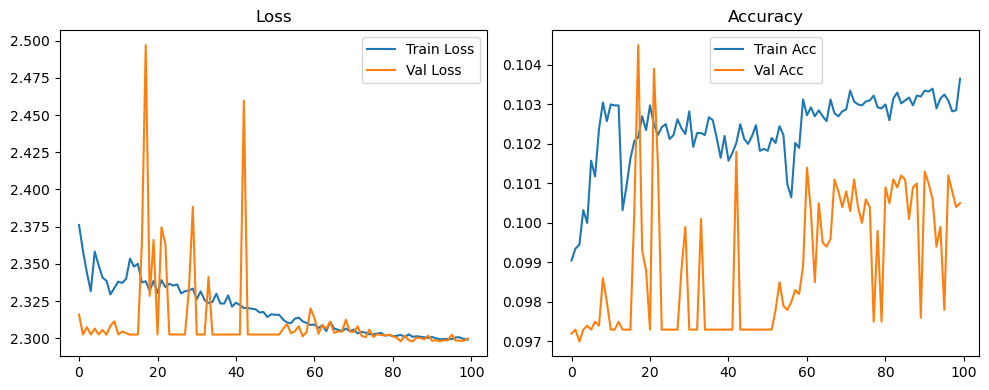

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 2.2986 Accuracy: 0.1028


🚀 Running: batch512_lr_max_0.0002_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0951 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0951 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0951 |:   1%|          | 1/100 [01:22<2:15:36, 82.19s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:43<2:15:36, 82.19s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0955 |:   1%|          | 1/100 [02:43<2:15:36, 82.19s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0955 |:   2%|▏         | 2/100 [02:43<2:13:49, 81.93s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [04:05<2:13:49, 81.93s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [04:05<2:13:49, 81.93s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [04:05<2:12:25, 81.91s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [05:14<2:12:25, 81.91s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [05:14<2:12:25, 81.91s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [05:14<2:02:27, 76.54s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0967 |:   4%|▍         | 4/100 [05:26<2:02:27, 76.54s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0967 |:   4%|▍         | 4/100 [05:26<2:02:27, 76.54s/it]

| LR: 0.000199 | Train Acc: 0.0988 | Val Acc: 0.0967 |:   5%|▌         | 5/100 [05:27<1:24:50, 53.59s/it]

| LR: 0.000199 | Train Acc: 0.0991 | Val Acc: 0.0958 |:   5%|▌         | 5/100 [05:39<1:24:50, 53.59s/it]

| LR: 0.000199 | Train Acc: 0.0991 | Val Acc: 0.0958 |:   5%|▌         | 5/100 [05:39<1:24:50, 53.59s/it]

| LR: 0.000199 | Train Acc: 0.0991 | Val Acc: 0.0958 |:   6%|▌         | 6/100 [05:39<1:02:18, 39.78s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0952 |:   6%|▌         | 6/100 [05:52<1:02:18, 39.78s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0952 |:   6%|▌         | 6/100 [05:52<1:02:18, 39.78s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0952 |:   7%|▋         | 7/100 [05:52<48:02, 31.00s/it]  

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [06:05<48:02, 31.00s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0965 |:   7%|▋         | 7/100 [06:05<48:02, 31.00s/it]

| LR: 0.000198 | Train Acc: 0.0993 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:06<38:48, 25.31s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0961 |:   8%|▊         | 8/100 [06:19<38:48, 25.31s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0961 |:   8%|▊         | 8/100 [06:19<38:48, 25.31s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [06:19<32:34, 21.47s/it]

| LR: 0.000196 | Train Acc: 0.0998 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:32<32:34, 21.47s/it]

| LR: 0.000196 | Train Acc: 0.0998 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:32<32:34, 21.47s/it]

| LR: 0.000196 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  10%|█         | 10/100 [06:32<28:16, 18.85s/it]

| LR: 0.000195 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:44<28:16, 18.85s/it]

| LR: 0.000195 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:44<28:16, 18.85s/it]

| LR: 0.000195 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:45<25:16, 17.04s/it]

| LR: 0.000194 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:57<25:16, 17.04s/it]

| LR: 0.000194 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:57<25:16, 17.04s/it]

| LR: 0.000194 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [06:57<23:09, 15.78s/it]

| LR: 0.000193 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:10<23:09, 15.78s/it]

| LR: 0.000193 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:10<23:09, 15.78s/it]

| LR: 0.000193 | Train Acc: 0.1003 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [07:10<21:36, 14.91s/it]

| LR: 0.000192 | Train Acc: 0.0996 | Val Acc: 0.0953 |:  13%|█▎        | 13/100 [07:23<21:36, 14.91s/it]

| LR: 0.000192 | Train Acc: 0.0996 | Val Acc: 0.0953 |:  13%|█▎        | 13/100 [07:23<21:36, 14.91s/it]

| LR: 0.000192 | Train Acc: 0.0996 | Val Acc: 0.0953 |:  14%|█▍        | 14/100 [07:23<20:30, 14.31s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  14%|█▍        | 14/100 [07:36<20:30, 14.31s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  14%|█▍        | 14/100 [07:36<20:30, 14.31s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:36<19:41, 13.90s/it]

| LR: 0.000190 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:49<19:41, 13.90s/it]

| LR: 0.000190 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:49<19:41, 13.90s/it]

| LR: 0.000190 | Train Acc: 0.1004 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [07:49<19:03, 13.61s/it]

| LR: 0.000188 | Train Acc: 0.0999 | Val Acc: 0.0938 |:  16%|█▌        | 16/100 [08:02<19:03, 13.61s/it]

| LR: 0.000188 | Train Acc: 0.0999 | Val Acc: 0.0938 |:  16%|█▌        | 16/100 [08:02<19:03, 13.61s/it]

| LR: 0.000188 | Train Acc: 0.0999 | Val Acc: 0.0938 |:  17%|█▋        | 17/100 [08:02<18:32, 13.40s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:15<18:32, 13.40s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:15<18:32, 13.40s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:15<18:10, 13.30s/it]

| LR: 0.000185 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  18%|█▊        | 18/100 [08:28<18:10, 13.30s/it]

| LR: 0.000185 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  18%|█▊        | 18/100 [08:28<18:10, 13.30s/it]

| LR: 0.000185 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  19%|█▉        | 19/100 [08:28<17:47, 13.18s/it]

| LR: 0.000184 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:41<17:47, 13.18s/it]

| LR: 0.000184 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:41<17:47, 13.18s/it]

| LR: 0.000184 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  20%|██        | 20/100 [08:41<17:27, 13.10s/it]

| LR: 0.000182 | Train Acc: 0.1000 | Val Acc: 0.0951 |:  20%|██        | 20/100 [08:54<17:27, 13.10s/it]

| LR: 0.000182 | Train Acc: 0.1000 | Val Acc: 0.0951 |:  20%|██        | 20/100 [08:54<17:27, 13.10s/it]

| LR: 0.000182 | Train Acc: 0.1000 | Val Acc: 0.0951 |:  21%|██        | 21/100 [08:54<17:09, 13.04s/it]

| LR: 0.000180 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  21%|██        | 21/100 [09:07<17:09, 13.04s/it]

| LR: 0.000180 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  21%|██        | 21/100 [09:07<17:09, 13.04s/it]

| LR: 0.000180 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [09:07<16:54, 13.01s/it]

| LR: 0.000178 | Train Acc: 0.0999 | Val Acc: 0.0947 |:  22%|██▏       | 22/100 [09:20<16:54, 13.01s/it]

| LR: 0.000178 | Train Acc: 0.0999 | Val Acc: 0.0947 |:  22%|██▏       | 22/100 [09:20<16:54, 13.01s/it]

| LR: 0.000178 | Train Acc: 0.0999 | Val Acc: 0.0947 |:  23%|██▎       | 23/100 [09:20<16:39, 12.98s/it]

| LR: 0.000176 | Train Acc: 0.0997 | Val Acc: 0.0956 |:  23%|██▎       | 23/100 [09:33<16:39, 12.98s/it]

| LR: 0.000176 | Train Acc: 0.0997 | Val Acc: 0.0956 |:  23%|██▎       | 23/100 [09:33<16:39, 12.98s/it]

| LR: 0.000176 | Train Acc: 0.0997 | Val Acc: 0.0956 |:  24%|██▍       | 24/100 [09:33<16:25, 12.97s/it]

| LR: 0.000174 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  24%|██▍       | 24/100 [09:45<16:25, 12.97s/it]

| LR: 0.000174 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  24%|██▍       | 24/100 [09:45<16:25, 12.97s/it]

| LR: 0.000174 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  25%|██▌       | 25/100 [09:46<16:11, 12.95s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  25%|██▌       | 25/100 [09:58<16:11, 12.95s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  25%|██▌       | 25/100 [09:58<16:11, 12.95s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  26%|██▌       | 26/100 [09:58<15:56, 12.93s/it]

| LR: 0.000170 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  26%|██▌       | 26/100 [10:11<15:56, 12.93s/it]

| LR: 0.000170 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  26%|██▌       | 26/100 [10:11<15:56, 12.93s/it]

| LR: 0.000170 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  27%|██▋       | 27/100 [10:11<15:46, 12.96s/it]

| LR: 0.000168 | Train Acc: 0.0996 | Val Acc: 0.0947 |:  27%|██▋       | 27/100 [10:24<15:46, 12.96s/it]

| LR: 0.000168 | Train Acc: 0.0996 | Val Acc: 0.0947 |:  27%|██▋       | 27/100 [10:24<15:46, 12.96s/it]

| LR: 0.000168 | Train Acc: 0.0996 | Val Acc: 0.0947 |:  28%|██▊       | 28/100 [10:24<15:30, 12.93s/it]

| LR: 0.000166 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  28%|██▊       | 28/100 [10:37<15:30, 12.93s/it]

| LR: 0.000166 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  28%|██▊       | 28/100 [10:37<15:30, 12.93s/it]

| LR: 0.000166 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  29%|██▉       | 29/100 [10:37<15:17, 12.92s/it]

| LR: 0.000163 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  29%|██▉       | 29/100 [10:50<15:17, 12.92s/it]

| LR: 0.000163 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  29%|██▉       | 29/100 [10:50<15:17, 12.92s/it]

| LR: 0.000163 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  30%|███       | 30/100 [10:50<15:04, 12.92s/it]

| LR: 0.000161 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  30%|███       | 30/100 [11:03<15:04, 12.92s/it]

| LR: 0.000161 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  30%|███       | 30/100 [11:03<15:04, 12.92s/it]

| LR: 0.000161 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  31%|███       | 31/100 [11:03<14:51, 12.92s/it]

| LR: 0.000158 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  31%|███       | 31/100 [11:16<14:51, 12.92s/it]

| LR: 0.000158 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  31%|███       | 31/100 [11:16<14:51, 12.92s/it]

| LR: 0.000158 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  32%|███▏      | 32/100 [11:16<14:39, 12.93s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  32%|███▏      | 32/100 [11:29<14:39, 12.93s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  32%|███▏      | 32/100 [11:29<14:39, 12.93s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  33%|███▎      | 33/100 [11:29<14:26, 12.93s/it]

| LR: 0.000153 | Train Acc: 0.0999 | Val Acc: 0.0936 |:  33%|███▎      | 33/100 [11:42<14:26, 12.93s/it]

| LR: 0.000153 | Train Acc: 0.0999 | Val Acc: 0.0936 |:  33%|███▎      | 33/100 [11:42<14:26, 12.93s/it]

| LR: 0.000153 | Train Acc: 0.0999 | Val Acc: 0.0936 |:  34%|███▍      | 34/100 [11:42<14:11, 12.90s/it]

| LR: 0.000151 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [11:55<14:11, 12.90s/it]

| LR: 0.000151 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [11:55<14:11, 12.90s/it]

| LR: 0.000151 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [11:55<13:57, 12.89s/it]

| LR: 0.000148 | Train Acc: 0.1004 | Val Acc: 0.0945 |:  35%|███▌      | 35/100 [12:08<13:57, 12.89s/it]

| LR: 0.000148 | Train Acc: 0.1004 | Val Acc: 0.0945 |:  35%|███▌      | 35/100 [12:08<13:57, 12.89s/it]

| LR: 0.000148 | Train Acc: 0.1004 | Val Acc: 0.0945 |:  36%|███▌      | 36/100 [12:08<13:46, 12.92s/it]

| LR: 0.000145 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:20<13:46, 12.92s/it]

| LR: 0.000145 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:20<13:46, 12.92s/it]

| LR: 0.000145 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  37%|███▋      | 37/100 [12:20<13:33, 12.91s/it]

| LR: 0.000143 | Train Acc: 0.1003 | Val Acc: 0.0935 |:  37%|███▋      | 37/100 [12:33<13:33, 12.91s/it]

| LR: 0.000143 | Train Acc: 0.1003 | Val Acc: 0.0935 |:  37%|███▋      | 37/100 [12:33<13:33, 12.91s/it]

| LR: 0.000143 | Train Acc: 0.1003 | Val Acc: 0.0935 |:  38%|███▊      | 38/100 [12:33<13:20, 12.91s/it]

| LR: 0.000140 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  38%|███▊      | 38/100 [12:46<13:20, 12.91s/it]

| LR: 0.000140 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  38%|███▊      | 38/100 [12:46<13:20, 12.91s/it]

| LR: 0.000140 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  39%|███▉      | 39/100 [12:46<13:07, 12.91s/it]

| LR: 0.000137 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  39%|███▉      | 39/100 [12:59<13:07, 12.91s/it]

| LR: 0.000137 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  39%|███▉      | 39/100 [12:59<13:07, 12.91s/it]

| LR: 0.000137 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  40%|████      | 40/100 [12:59<12:54, 12.90s/it]

| LR: 0.000134 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  40%|████      | 40/100 [13:12<12:54, 12.90s/it]

| LR: 0.000134 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  40%|████      | 40/100 [13:12<12:54, 12.90s/it]

| LR: 0.000134 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  41%|████      | 41/100 [13:12<12:40, 12.89s/it]

| LR: 0.000132 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  41%|████      | 41/100 [13:25<12:40, 12.89s/it]

| LR: 0.000132 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  41%|████      | 41/100 [13:25<12:40, 12.89s/it]

| LR: 0.000132 | Train Acc: 0.1001 | Val Acc: 0.0945 |:  42%|████▏     | 42/100 [13:25<12:27, 12.89s/it]

| LR: 0.000129 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:38<12:27, 12.89s/it]

| LR: 0.000129 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:38<12:27, 12.89s/it]

| LR: 0.000129 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  43%|████▎     | 43/100 [13:38<12:14, 12.89s/it]

| LR: 0.000126 | Train Acc: 0.1004 | Val Acc: 0.0944 |:  43%|████▎     | 43/100 [13:51<12:14, 12.89s/it]

| LR: 0.000126 | Train Acc: 0.1004 | Val Acc: 0.0944 |:  43%|████▎     | 43/100 [13:51<12:14, 12.89s/it]

| LR: 0.000126 | Train Acc: 0.1004 | Val Acc: 0.0944 |:  44%|████▍     | 44/100 [13:51<12:01, 12.89s/it]

| LR: 0.000123 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  44%|████▍     | 44/100 [14:04<12:01, 12.89s/it]

| LR: 0.000123 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  44%|████▍     | 44/100 [14:04<12:01, 12.89s/it]

| LR: 0.000123 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  45%|████▌     | 45/100 [14:04<11:49, 12.89s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:17<11:49, 12.89s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:17<11:49, 12.89s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:17<11:37, 12.93s/it]

| LR: 0.000117 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  46%|████▌     | 46/100 [14:29<11:37, 12.93s/it]

| LR: 0.000117 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  46%|████▌     | 46/100 [14:29<11:37, 12.93s/it]

| LR: 0.000117 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  47%|████▋     | 47/100 [14:30<11:25, 12.94s/it]

| LR: 0.000114 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  47%|████▋     | 47/100 [14:42<11:25, 12.94s/it]

| LR: 0.000114 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  47%|████▋     | 47/100 [14:42<11:25, 12.94s/it]

| LR: 0.000114 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  48%|████▊     | 48/100 [14:42<11:12, 12.93s/it]

| LR: 0.000111 | Train Acc: 0.1000 | Val Acc: 0.0944 |:  48%|████▊     | 48/100 [14:55<11:12, 12.93s/it]

| LR: 0.000111 | Train Acc: 0.1000 | Val Acc: 0.0944 |:  48%|████▊     | 48/100 [14:55<11:12, 12.93s/it]

| LR: 0.000111 | Train Acc: 0.1000 | Val Acc: 0.0944 |:  49%|████▉     | 49/100 [14:55<10:59, 12.93s/it]

| LR: 0.000108 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:08<10:59, 12.93s/it]

| LR: 0.000108 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:08<10:59, 12.93s/it]

| LR: 0.000108 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  50%|█████     | 50/100 [15:08<10:46, 12.93s/it]

| LR: 0.000105 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:21<10:46, 12.93s/it]

| LR: 0.000105 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:21<10:46, 12.93s/it]

| LR: 0.000105 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [15:21<10:32, 12.92s/it]

| LR: 0.000102 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:34<10:32, 12.92s/it]

| LR: 0.000102 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:34<10:32, 12.92s/it]

| LR: 0.000102 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  52%|█████▏    | 52/100 [15:34<10:19, 12.92s/it]

| LR: 0.000099 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:47<10:19, 12.92s/it]

| LR: 0.000099 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:47<10:19, 12.92s/it]

| LR: 0.000099 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  53%|█████▎    | 53/100 [15:47<10:06, 12.91s/it]

| LR: 0.000096 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  53%|█████▎    | 53/100 [16:00<10:06, 12.91s/it]

| LR: 0.000096 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  53%|█████▎    | 53/100 [16:00<10:06, 12.91s/it]

| LR: 0.000096 | Train Acc: 0.0999 | Val Acc: 0.0979 |:  54%|█████▍    | 54/100 [16:00<09:53, 12.91s/it]

| LR: 0.000093 | Train Acc: 0.0998 | Val Acc: 0.0977 |:  54%|█████▍    | 54/100 [16:13<09:53, 12.91s/it]

| LR: 0.000093 | Train Acc: 0.0998 | Val Acc: 0.0977 |:  54%|█████▍    | 54/100 [16:13<09:53, 12.91s/it]

| LR: 0.000093 | Train Acc: 0.0998 | Val Acc: 0.0977 |:  55%|█████▌    | 55/100 [16:13<09:42, 12.94s/it]

| LR: 0.000090 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:26<09:42, 12.94s/it]

| LR: 0.000090 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:26<09:42, 12.94s/it]

| LR: 0.000090 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:26<09:29, 12.94s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:39<09:29, 12.94s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:39<09:29, 12.94s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  57%|█████▋    | 57/100 [16:39<09:16, 12.94s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [16:52<09:16, 12.94s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [16:52<09:16, 12.94s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  58%|█████▊    | 58/100 [16:52<09:03, 12.93s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  58%|█████▊    | 58/100 [17:05<09:03, 12.93s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  58%|█████▊    | 58/100 [17:05<09:03, 12.93s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:05<08:50, 12.93s/it]

| LR: 0.000078 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  59%|█████▉    | 59/100 [17:17<08:50, 12.93s/it]

| LR: 0.000078 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  59%|█████▉    | 59/100 [17:17<08:50, 12.93s/it]

| LR: 0.000078 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  60%|██████    | 60/100 [17:18<08:36, 12.91s/it]

| LR: 0.000076 | Train Acc: 0.1004 | Val Acc: 0.0949 |:  60%|██████    | 60/100 [17:30<08:36, 12.91s/it]

| LR: 0.000076 | Train Acc: 0.1004 | Val Acc: 0.0949 |:  60%|██████    | 60/100 [17:30<08:36, 12.91s/it]

| LR: 0.000076 | Train Acc: 0.1004 | Val Acc: 0.0949 |:  61%|██████    | 61/100 [17:30<08:22, 12.90s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0948 |:  61%|██████    | 61/100 [17:43<08:22, 12.90s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0948 |:  61%|██████    | 61/100 [17:43<08:22, 12.90s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0948 |:  62%|██████▏   | 62/100 [17:43<08:10, 12.90s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0945 |:  62%|██████▏   | 62/100 [17:56<08:10, 12.90s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0945 |:  62%|██████▏   | 62/100 [17:56<08:10, 12.90s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0945 |:  63%|██████▎   | 63/100 [17:56<07:56, 12.88s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  63%|██████▎   | 63/100 [18:09<07:56, 12.88s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  63%|██████▎   | 63/100 [18:09<07:56, 12.88s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  64%|██████▍   | 64/100 [18:09<07:44, 12.91s/it]

| LR: 0.000065 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:22<07:44, 12.91s/it]

| LR: 0.000065 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:22<07:44, 12.91s/it]

| LR: 0.000065 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  65%|██████▌   | 65/100 [18:22<07:33, 12.95s/it]

| LR: 0.000062 | Train Acc: 0.1003 | Val Acc: 0.0945 |:  65%|██████▌   | 65/100 [18:35<07:33, 12.95s/it]

| LR: 0.000062 | Train Acc: 0.1003 | Val Acc: 0.0945 |:  65%|██████▌   | 65/100 [18:35<07:33, 12.95s/it]

| LR: 0.000062 | Train Acc: 0.1003 | Val Acc: 0.0945 |:  66%|██████▌   | 66/100 [18:35<07:19, 12.93s/it]

| LR: 0.000059 | Train Acc: 0.1006 | Val Acc: 0.0961 |:  66%|██████▌   | 66/100 [18:48<07:19, 12.93s/it]

| LR: 0.000059 | Train Acc: 0.1006 | Val Acc: 0.0961 |:  66%|██████▌   | 66/100 [18:48<07:19, 12.93s/it]

| LR: 0.000059 | Train Acc: 0.1006 | Val Acc: 0.0961 |:  67%|██████▋   | 67/100 [18:48<07:05, 12.91s/it]

| LR: 0.000057 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:01<07:05, 12.91s/it]

| LR: 0.000057 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:01<07:05, 12.91s/it]

| LR: 0.000057 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:01<06:52, 12.89s/it]

| LR: 0.000054 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  68%|██████▊   | 68/100 [19:14<06:52, 12.89s/it]

| LR: 0.000054 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  68%|██████▊   | 68/100 [19:14<06:52, 12.89s/it]

| LR: 0.000054 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  69%|██████▉   | 69/100 [19:14<06:39, 12.89s/it]

| LR: 0.000052 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  69%|██████▉   | 69/100 [19:26<06:39, 12.89s/it]

| LR: 0.000052 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  69%|██████▉   | 69/100 [19:26<06:39, 12.89s/it]

| LR: 0.000052 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:27<06:26, 12.89s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:39<06:26, 12.89s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:39<06:26, 12.89s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  71%|███████   | 71/100 [19:39<06:13, 12.88s/it]

| LR: 0.000047 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  71%|███████   | 71/100 [19:52<06:13, 12.88s/it]

| LR: 0.000047 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  71%|███████   | 71/100 [19:52<06:13, 12.88s/it]

| LR: 0.000047 | Train Acc: 0.1006 | Val Acc: 0.0965 |:  72%|███████▏  | 72/100 [19:52<06:00, 12.86s/it]

| LR: 0.000044 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  72%|███████▏  | 72/100 [20:05<06:00, 12.86s/it]

| LR: 0.000044 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  72%|███████▏  | 72/100 [20:05<06:00, 12.86s/it]

| LR: 0.000044 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  73%|███████▎  | 73/100 [20:05<05:46, 12.83s/it]

| LR: 0.000042 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [20:18<05:46, 12.83s/it]

| LR: 0.000042 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [20:18<05:46, 12.83s/it]

| LR: 0.000042 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  74%|███████▍  | 74/100 [20:18<05:34, 12.88s/it]

| LR: 0.000040 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  74%|███████▍  | 74/100 [20:31<05:34, 12.88s/it]

| LR: 0.000040 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  74%|███████▍  | 74/100 [20:31<05:34, 12.88s/it]

| LR: 0.000040 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  75%|███████▌  | 75/100 [20:31<05:21, 12.86s/it]

| LR: 0.000038 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:44<05:21, 12.86s/it]

| LR: 0.000038 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  75%|███████▌  | 75/100 [20:44<05:21, 12.86s/it]

| LR: 0.000038 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  76%|███████▌  | 76/100 [20:44<05:08, 12.86s/it]

| LR: 0.000036 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [20:56<05:08, 12.86s/it]

| LR: 0.000036 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [20:56<05:08, 12.86s/it]

| LR: 0.000036 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  77%|███████▋  | 77/100 [20:57<04:55, 12.87s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0947 |:  77%|███████▋  | 77/100 [21:09<04:55, 12.87s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0947 |:  77%|███████▋  | 77/100 [21:09<04:55, 12.87s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0947 |:  78%|███████▊  | 78/100 [21:09<04:43, 12.89s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0954 |:  78%|███████▊  | 78/100 [21:22<04:43, 12.89s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0954 |:  78%|███████▊  | 78/100 [21:22<04:43, 12.89s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0954 |:  79%|███████▉  | 79/100 [21:22<04:30, 12.89s/it]

| LR: 0.000030 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  79%|███████▉  | 79/100 [21:35<04:30, 12.89s/it]

| LR: 0.000030 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  79%|███████▉  | 79/100 [21:35<04:30, 12.89s/it]

| LR: 0.000030 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  80%|████████  | 80/100 [21:35<04:18, 12.90s/it]

| LR: 0.000028 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:48<04:18, 12.90s/it]

| LR: 0.000028 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:48<04:18, 12.90s/it]

| LR: 0.000028 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  81%|████████  | 81/100 [21:48<04:05, 12.90s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:01<04:05, 12.90s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:01<04:05, 12.90s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  82%|████████▏ | 82/100 [22:01<03:52, 12.89s/it]

| LR: 0.000025 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  82%|████████▏ | 82/100 [22:14<03:52, 12.89s/it]

| LR: 0.000025 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  82%|████████▏ | 82/100 [22:14<03:52, 12.89s/it]

| LR: 0.000025 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:14<03:39, 12.90s/it]

| LR: 0.000023 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  83%|████████▎ | 83/100 [22:27<03:39, 12.90s/it]

| LR: 0.000023 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  83%|████████▎ | 83/100 [22:27<03:39, 12.90s/it]

| LR: 0.000023 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  84%|████████▍ | 84/100 [22:27<03:27, 12.95s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  84%|████████▍ | 84/100 [22:40<03:27, 12.95s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  84%|████████▍ | 84/100 [22:40<03:27, 12.95s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  85%|████████▌ | 85/100 [22:40<03:14, 12.95s/it]

| LR: 0.000020 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  85%|████████▌ | 85/100 [22:53<03:14, 12.95s/it]

| LR: 0.000020 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  85%|████████▌ | 85/100 [22:53<03:14, 12.95s/it]

| LR: 0.000020 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [22:53<03:01, 12.95s/it]

| LR: 0.000019 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  86%|████████▌ | 86/100 [23:06<03:01, 12.95s/it]

| LR: 0.000019 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  86%|████████▌ | 86/100 [23:06<03:01, 12.95s/it]

| LR: 0.000019 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  87%|████████▋ | 87/100 [23:06<02:48, 12.94s/it]

| LR: 0.000018 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:19<02:48, 12.94s/it]

| LR: 0.000018 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:19<02:48, 12.94s/it]

| LR: 0.000018 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:19<02:35, 12.94s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  88%|████████▊ | 88/100 [23:32<02:35, 12.94s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  88%|████████▊ | 88/100 [23:32<02:35, 12.94s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0976 |:  89%|████████▉ | 89/100 [23:32<02:22, 12.91s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:44<02:22, 12.91s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:44<02:22, 12.91s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [23:45<02:09, 12.90s/it]

| LR: 0.000015 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [23:57<02:09, 12.90s/it]

| LR: 0.000015 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [23:57<02:09, 12.90s/it]

| LR: 0.000015 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [23:57<01:56, 12.89s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  91%|█████████ | 91/100 [24:10<01:56, 12.89s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  91%|█████████ | 91/100 [24:10<01:56, 12.89s/it]

| LR: 0.000014 | Train Acc: 0.1004 | Val Acc: 0.0978 |:  92%|█████████▏| 92/100 [24:10<01:43, 12.88s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:23<01:43, 12.88s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:23<01:43, 12.88s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:23<01:30, 12.92s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:36<01:30, 12.92s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:36<01:30, 12.92s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [24:36<01:17, 12.90s/it]

| LR: 0.000012 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [24:49<01:17, 12.90s/it]

| LR: 0.000012 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [24:49<01:17, 12.90s/it]

| LR: 0.000012 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [24:49<01:04, 12.90s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  95%|█████████▌| 95/100 [25:02<01:04, 12.90s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  95%|█████████▌| 95/100 [25:02<01:04, 12.90s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  96%|█████████▌| 96/100 [25:02<00:51, 12.89s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:15<00:51, 12.89s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:15<00:51, 12.89s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  97%|█████████▋| 97/100 [25:15<00:38, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  97%|█████████▋| 97/100 [25:28<00:38, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  97%|█████████▋| 97/100 [25:28<00:38, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  98%|█████████▊| 98/100 [25:28<00:25, 12.88s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [25:40<00:25, 12.88s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  98%|█████████▊| 98/100 [25:40<00:25, 12.88s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  99%|█████████▉| 99/100 [25:41<00:12, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:53<00:12, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:53<00:12, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [25:53<00:00, 12.90s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [25:53<00:00, 15.54s/it]

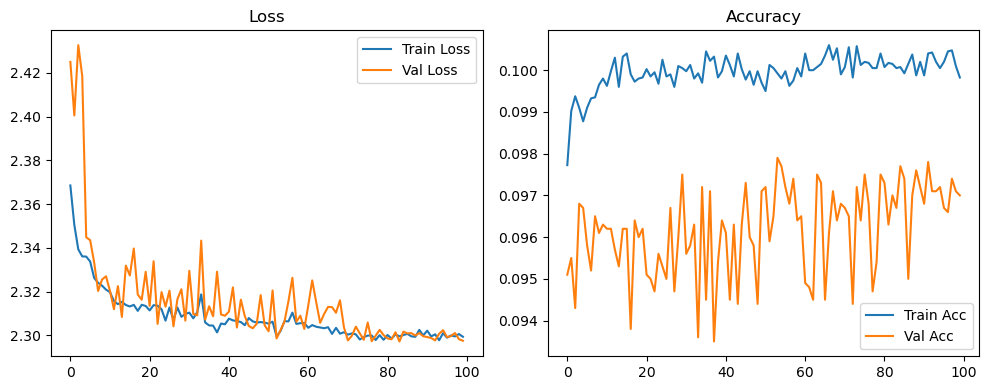

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.82it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Original Model Final Test Loss: 2.2982 Accuracy: 0.1001


🚀 Running: batch512_lr_max_0.0002_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0951 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0951 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0978 | Val Acc: 0.0951 |:   1%|          | 1/100 [01:22<2:15:40, 82.23s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:44<2:15:40, 82.23s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0967 |:   1%|          | 1/100 [02:44<2:15:40, 82.23s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0967 |:   2%|▏         | 2/100 [02:44<2:14:08, 82.13s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0960 |:   2%|▏         | 2/100 [04:06<2:14:08, 82.13s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0960 |:   2%|▏         | 2/100 [04:06<2:14:08, 82.13s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0960 |:   3%|▎         | 3/100 [04:06<2:12:49, 82.16s/it]

| LR: 0.000200 | Train Acc: 0.0997 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [05:15<2:12:49, 82.16s/it]

| LR: 0.000200 | Train Acc: 0.0997 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [05:15<2:12:49, 82.16s/it]

| LR: 0.000200 | Train Acc: 0.0997 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [05:15<2:03:05, 76.93s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [05:28<2:03:05, 76.93s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [05:28<2:03:05, 76.93s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0976 |:   5%|▌         | 5/100 [05:28<1:25:21, 53.91s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:21, 53.91s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:41<1:25:21, 53.91s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:41<1:02:43, 40.03s/it]

| LR: 0.000198 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [05:54<1:02:43, 40.03s/it]

| LR: 0.000198 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   6%|▌         | 6/100 [05:54<1:02:43, 40.03s/it]

| LR: 0.000198 | Train Acc: 0.0994 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [05:54<48:23, 31.23s/it]  

| LR: 0.000198 | Train Acc: 0.1002 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [06:07<48:23, 31.23s/it]

| LR: 0.000198 | Train Acc: 0.1002 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [06:07<48:23, 31.23s/it]

| LR: 0.000198 | Train Acc: 0.1002 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [06:08<39:09, 25.53s/it]

| LR: 0.000197 | Train Acc: 0.1000 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [06:21<39:09, 25.53s/it]

| LR: 0.000197 | Train Acc: 0.1000 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [06:21<39:09, 25.53s/it]

| LR: 0.000197 | Train Acc: 0.1000 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:21<32:52, 21.67s/it]

| LR: 0.000196 | Train Acc: 0.1000 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [06:34<32:52, 21.67s/it]

| LR: 0.000196 | Train Acc: 0.1000 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [06:34<32:52, 21.67s/it]

| LR: 0.000196 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:34<28:37, 19.09s/it]

| LR: 0.000195 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:47<28:37, 19.09s/it]

| LR: 0.000195 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:47<28:37, 19.09s/it]

| LR: 0.000195 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:47<25:39, 17.30s/it]

| LR: 0.000194 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  11%|█         | 11/100 [07:00<25:39, 17.30s/it]

| LR: 0.000194 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  11%|█         | 11/100 [07:00<25:39, 17.30s/it]

| LR: 0.000194 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [07:00<23:30, 16.02s/it]

| LR: 0.000193 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [07:13<23:30, 16.02s/it]

| LR: 0.000193 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [07:13<23:30, 16.02s/it]

| LR: 0.000193 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:13<21:58, 15.15s/it]

| LR: 0.000192 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  13%|█▎        | 13/100 [07:27<21:58, 15.15s/it]

| LR: 0.000192 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  13%|█▎        | 13/100 [07:27<21:58, 15.15s/it]

| LR: 0.000192 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:27<20:51, 14.55s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [07:40<20:51, 14.55s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  14%|█▍        | 14/100 [07:40<20:51, 14.55s/it]

| LR: 0.000191 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  15%|█▌        | 15/100 [07:40<19:59, 14.11s/it]

| LR: 0.000190 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:53<19:59, 14.11s/it]

| LR: 0.000190 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:53<19:59, 14.11s/it]

| LR: 0.000190 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [07:53<19:19, 13.80s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [08:06<19:19, 13.80s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  16%|█▌        | 16/100 [08:06<19:19, 13.80s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [08:06<18:49, 13.61s/it]

| LR: 0.000187 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [08:19<18:49, 13.61s/it]

| LR: 0.000187 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  17%|█▋        | 17/100 [08:19<18:49, 13.61s/it]

| LR: 0.000187 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  18%|█▊        | 18/100 [08:19<18:28, 13.52s/it]

| LR: 0.000185 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:32<18:28, 13.52s/it]

| LR: 0.000185 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:32<18:28, 13.52s/it]

| LR: 0.000185 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:32<18:06, 13.41s/it]

| LR: 0.000184 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [08:46<18:06, 13.41s/it]

| LR: 0.000184 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [08:46<18:06, 13.41s/it]

| LR: 0.000184 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  20%|██        | 20/100 [08:46<17:48, 13.35s/it]

| LR: 0.000182 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:59<17:48, 13.35s/it]

| LR: 0.000182 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:59<17:48, 13.35s/it]

| LR: 0.000182 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  21%|██        | 21/100 [08:59<17:31, 13.30s/it]

| LR: 0.000180 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  21%|██        | 21/100 [09:12<17:31, 13.30s/it]

| LR: 0.000180 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  21%|██        | 21/100 [09:12<17:31, 13.30s/it]

| LR: 0.000180 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  22%|██▏       | 22/100 [09:12<17:16, 13.28s/it]

| LR: 0.000178 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  22%|██▏       | 22/100 [09:25<17:16, 13.28s/it]

| LR: 0.000178 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  22%|██▏       | 22/100 [09:25<17:16, 13.28s/it]

| LR: 0.000178 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  23%|██▎       | 23/100 [09:25<17:00, 13.25s/it]

| LR: 0.000176 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:38<17:00, 13.25s/it]

| LR: 0.000176 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:38<17:00, 13.25s/it]

| LR: 0.000176 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  24%|██▍       | 24/100 [09:38<16:45, 13.23s/it]

| LR: 0.000174 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  24%|██▍       | 24/100 [09:52<16:45, 13.23s/it]

| LR: 0.000174 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  24%|██▍       | 24/100 [09:52<16:45, 13.23s/it]

| LR: 0.000174 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  25%|██▌       | 25/100 [09:52<16:31, 13.22s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [10:05<16:31, 13.22s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [10:05<16:31, 13.22s/it]

| LR: 0.000172 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [10:05<16:17, 13.21s/it]

| LR: 0.000170 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  26%|██▌       | 26/100 [10:18<16:17, 13.21s/it]

| LR: 0.000170 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  26%|██▌       | 26/100 [10:18<16:17, 13.21s/it]

| LR: 0.000170 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [10:18<16:06, 13.23s/it]

| LR: 0.000168 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  27%|██▋       | 27/100 [10:31<16:06, 13.23s/it]

| LR: 0.000168 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  27%|██▋       | 27/100 [10:31<16:06, 13.23s/it]

| LR: 0.000168 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  28%|██▊       | 28/100 [10:31<15:50, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  28%|██▊       | 28/100 [10:44<15:50, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  28%|██▊       | 28/100 [10:44<15:50, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  29%|██▉       | 29/100 [10:44<15:36, 13.19s/it]

| LR: 0.000163 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  29%|██▉       | 29/100 [10:58<15:36, 13.19s/it]

| LR: 0.000163 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  29%|██▉       | 29/100 [10:58<15:36, 13.19s/it]

| LR: 0.000163 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  30%|███       | 30/100 [10:58<15:22, 13.18s/it]

| LR: 0.000161 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  30%|███       | 30/100 [11:11<15:22, 13.18s/it]

| LR: 0.000161 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  30%|███       | 30/100 [11:11<15:22, 13.18s/it]

| LR: 0.000161 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  31%|███       | 31/100 [11:11<15:08, 13.16s/it]

| LR: 0.000158 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  31%|███       | 31/100 [11:24<15:08, 13.16s/it]

| LR: 0.000158 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  31%|███       | 31/100 [11:24<15:08, 13.16s/it]

| LR: 0.000158 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [11:24<14:53, 13.14s/it]

| LR: 0.000156 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  32%|███▏      | 32/100 [11:37<14:53, 13.14s/it]

| LR: 0.000156 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  32%|███▏      | 32/100 [11:37<14:53, 13.14s/it]

| LR: 0.000156 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  33%|███▎      | 33/100 [11:37<14:40, 13.14s/it]

| LR: 0.000153 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  33%|███▎      | 33/100 [11:50<14:40, 13.14s/it]

| LR: 0.000153 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  33%|███▎      | 33/100 [11:50<14:40, 13.14s/it]

| LR: 0.000153 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  34%|███▍      | 34/100 [11:50<14:26, 13.12s/it]

| LR: 0.000151 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  34%|███▍      | 34/100 [12:03<14:26, 13.12s/it]

| LR: 0.000151 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  34%|███▍      | 34/100 [12:03<14:26, 13.12s/it]

| LR: 0.000151 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  35%|███▌      | 35/100 [12:03<14:12, 13.12s/it]

| LR: 0.000148 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  35%|███▌      | 35/100 [12:16<14:12, 13.12s/it]

| LR: 0.000148 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  35%|███▌      | 35/100 [12:16<14:12, 13.12s/it]

| LR: 0.000148 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  36%|███▌      | 36/100 [12:16<13:58, 13.11s/it]

| LR: 0.000145 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [12:29<13:58, 13.11s/it]

| LR: 0.000145 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [12:29<13:58, 13.11s/it]

| LR: 0.000145 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  37%|███▋      | 37/100 [12:29<13:47, 13.13s/it]

| LR: 0.000143 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  37%|███▋      | 37/100 [12:43<13:47, 13.13s/it]

| LR: 0.000143 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  37%|███▋      | 37/100 [12:43<13:47, 13.13s/it]

| LR: 0.000143 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  38%|███▊      | 38/100 [12:43<13:35, 13.16s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:56<13:35, 13.16s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:56<13:35, 13.16s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  39%|███▉      | 39/100 [12:56<13:22, 13.15s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [13:09<13:22, 13.15s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [13:09<13:22, 13.15s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  40%|████      | 40/100 [13:09<13:10, 13.17s/it]

| LR: 0.000134 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:22<13:10, 13.17s/it]

| LR: 0.000134 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:22<13:10, 13.17s/it]

| LR: 0.000134 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  41%|████      | 41/100 [13:22<12:57, 13.18s/it]

| LR: 0.000132 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  41%|████      | 41/100 [13:35<12:57, 13.18s/it]

| LR: 0.000132 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  41%|████      | 41/100 [13:35<12:57, 13.18s/it]

| LR: 0.000132 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  42%|████▏     | 42/100 [13:35<12:44, 13.18s/it]

| LR: 0.000129 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  42%|████▏     | 42/100 [13:48<12:44, 13.18s/it]

| LR: 0.000129 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  42%|████▏     | 42/100 [13:48<12:44, 13.18s/it]

| LR: 0.000129 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:49<12:31, 13.19s/it]

| LR: 0.000126 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  43%|████▎     | 43/100 [14:02<12:31, 13.19s/it]

| LR: 0.000126 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  43%|████▎     | 43/100 [14:02<12:31, 13.19s/it]

| LR: 0.000126 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  44%|████▍     | 44/100 [14:02<12:19, 13.20s/it]

| LR: 0.000123 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:15<12:19, 13.20s/it]

| LR: 0.000123 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:15<12:19, 13.20s/it]

| LR: 0.000123 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  45%|████▌     | 45/100 [14:15<12:05, 13.19s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  45%|████▌     | 45/100 [14:28<12:05, 13.19s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  45%|████▌     | 45/100 [14:28<12:05, 13.19s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:28<11:54, 13.23s/it]

| LR: 0.000117 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  46%|████▌     | 46/100 [14:41<11:54, 13.23s/it]

| LR: 0.000117 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  46%|████▌     | 46/100 [14:41<11:54, 13.23s/it]

| LR: 0.000117 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  47%|████▋     | 47/100 [14:41<11:39, 13.20s/it]

| LR: 0.000114 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  47%|████▋     | 47/100 [14:54<11:39, 13.20s/it]

| LR: 0.000114 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  47%|████▋     | 47/100 [14:54<11:39, 13.20s/it]

| LR: 0.000114 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  48%|████▊     | 48/100 [14:55<11:25, 13.18s/it]

| LR: 0.000111 | Train Acc: 0.1003 | Val Acc: 0.0947 |:  48%|████▊     | 48/100 [15:08<11:25, 13.18s/it]

| LR: 0.000111 | Train Acc: 0.1003 | Val Acc: 0.0947 |:  48%|████▊     | 48/100 [15:08<11:25, 13.18s/it]

| LR: 0.000111 | Train Acc: 0.1003 | Val Acc: 0.0947 |:  49%|████▉     | 49/100 [15:08<11:12, 13.18s/it]

| LR: 0.000108 | Train Acc: 0.1004 | Val Acc: 0.0949 |:  49%|████▉     | 49/100 [15:21<11:12, 13.18s/it]

| LR: 0.000108 | Train Acc: 0.1004 | Val Acc: 0.0949 |:  49%|████▉     | 49/100 [15:21<11:12, 13.18s/it]

| LR: 0.000108 | Train Acc: 0.1004 | Val Acc: 0.0949 |:  50%|█████     | 50/100 [15:21<10:58, 13.16s/it]

| LR: 0.000105 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  50%|█████     | 50/100 [15:34<10:58, 13.16s/it]

| LR: 0.000105 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  50%|█████     | 50/100 [15:34<10:58, 13.16s/it]

| LR: 0.000105 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  51%|█████     | 51/100 [15:34<10:44, 13.16s/it]

| LR: 0.000102 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  51%|█████     | 51/100 [15:47<10:44, 13.16s/it]

| LR: 0.000102 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  51%|█████     | 51/100 [15:47<10:44, 13.16s/it]

| LR: 0.000102 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  52%|█████▏    | 52/100 [15:47<10:31, 13.16s/it]

| LR: 0.000099 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  52%|█████▏    | 52/100 [16:00<10:31, 13.16s/it]

| LR: 0.000099 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  52%|█████▏    | 52/100 [16:00<10:31, 13.16s/it]

| LR: 0.000099 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  53%|█████▎    | 53/100 [16:00<10:18, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  53%|█████▎    | 53/100 [16:13<10:18, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  53%|█████▎    | 53/100 [16:13<10:18, 13.17s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:13<10:05, 13.17s/it]

| LR: 0.000093 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:27<10:05, 13.17s/it]

| LR: 0.000093 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:27<10:05, 13.17s/it]

| LR: 0.000093 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:27<09:52, 13.17s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:40<09:52, 13.17s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:40<09:52, 13.17s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [16:40<09:41, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [16:53<09:41, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [16:53<09:41, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [16:53<09:29, 13.24s/it]

| LR: 0.000084 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  57%|█████▋    | 57/100 [17:06<09:29, 13.24s/it]

| LR: 0.000084 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  57%|█████▋    | 57/100 [17:06<09:29, 13.24s/it]

| LR: 0.000084 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  58%|█████▊    | 58/100 [17:07<09:16, 13.25s/it]

| LR: 0.000081 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:16, 13.25s/it]

| LR: 0.000081 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:16, 13.25s/it]

| LR: 0.000081 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:20<09:02, 13.23s/it]

| LR: 0.000078 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:33<09:02, 13.23s/it]

| LR: 0.000078 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:33<09:02, 13.23s/it]

| LR: 0.000078 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  60%|██████    | 60/100 [17:33<08:48, 13.21s/it]

| LR: 0.000076 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  60%|██████    | 60/100 [17:46<08:48, 13.21s/it]

| LR: 0.000076 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  60%|██████    | 60/100 [17:46<08:48, 13.21s/it]

| LR: 0.000076 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  61%|██████    | 61/100 [17:46<08:34, 13.19s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  61%|██████    | 61/100 [17:59<08:34, 13.19s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  61%|██████    | 61/100 [17:59<08:34, 13.19s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0975 |:  62%|██████▏   | 62/100 [17:59<08:21, 13.19s/it]

| LR: 0.000070 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  62%|██████▏   | 62/100 [18:12<08:21, 13.19s/it]

| LR: 0.000070 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  62%|██████▏   | 62/100 [18:12<08:21, 13.19s/it]

| LR: 0.000070 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  63%|██████▎   | 63/100 [18:12<08:07, 13.17s/it]

| LR: 0.000067 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:25<08:07, 13.17s/it]

| LR: 0.000067 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:25<08:07, 13.17s/it]

| LR: 0.000067 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:26<07:53, 13.17s/it]

| LR: 0.000065 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  64%|██████▍   | 64/100 [18:39<07:53, 13.17s/it]

| LR: 0.000065 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  64%|██████▍   | 64/100 [18:39<07:53, 13.17s/it]

| LR: 0.000065 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  65%|██████▌   | 65/100 [18:39<07:42, 13.22s/it]

| LR: 0.000062 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  65%|██████▌   | 65/100 [18:52<07:42, 13.22s/it]

| LR: 0.000062 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  65%|██████▌   | 65/100 [18:52<07:42, 13.22s/it]

| LR: 0.000062 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  66%|██████▌   | 66/100 [18:52<07:29, 13.21s/it]

| LR: 0.000059 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  66%|██████▌   | 66/100 [19:05<07:29, 13.21s/it]

| LR: 0.000059 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  66%|██████▌   | 66/100 [19:05<07:29, 13.21s/it]

| LR: 0.000059 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [19:05<07:16, 13.24s/it]

| LR: 0.000057 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  67%|██████▋   | 67/100 [19:18<07:16, 13.24s/it]

| LR: 0.000057 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  67%|██████▋   | 67/100 [19:18<07:16, 13.24s/it]

| LR: 0.000057 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  68%|██████▊   | 68/100 [19:19<07:03, 13.22s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:32<07:03, 13.22s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:32<07:03, 13.22s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:32<06:49, 13.22s/it]

| LR: 0.000052 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  69%|██████▉   | 69/100 [19:45<06:49, 13.22s/it]

| LR: 0.000052 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  69%|██████▉   | 69/100 [19:45<06:49, 13.22s/it]

| LR: 0.000052 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:45<06:36, 13.21s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:58<06:36, 13.21s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:58<06:36, 13.21s/it]

| LR: 0.000049 | Train Acc: 0.1007 | Val Acc: 0.0967 |:  71%|███████   | 71/100 [19:58<06:23, 13.23s/it]

| LR: 0.000047 | Train Acc: 0.1007 | Val Acc: 0.0963 |:  71%|███████   | 71/100 [20:11<06:23, 13.23s/it]

| LR: 0.000047 | Train Acc: 0.1007 | Val Acc: 0.0963 |:  71%|███████   | 71/100 [20:11<06:23, 13.23s/it]

| LR: 0.000047 | Train Acc: 0.1007 | Val Acc: 0.0963 |:  72%|███████▏  | 72/100 [20:11<06:09, 13.21s/it]

| LR: 0.000044 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.21s/it]

| LR: 0.000044 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.21s/it]

| LR: 0.000044 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [20:25<05:56, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  73%|███████▎  | 73/100 [20:38<05:56, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  73%|███████▎  | 73/100 [20:38<05:56, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  74%|███████▍  | 74/100 [20:38<05:43, 13.21s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  74%|███████▍  | 74/100 [20:51<05:43, 13.21s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  74%|███████▍  | 74/100 [20:51<05:43, 13.21s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  75%|███████▌  | 75/100 [20:51<05:31, 13.27s/it]

| LR: 0.000038 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  75%|███████▌  | 75/100 [21:04<05:31, 13.27s/it]

| LR: 0.000038 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  75%|███████▌  | 75/100 [21:04<05:31, 13.27s/it]

| LR: 0.000038 | Train Acc: 0.0999 | Val Acc: 0.0974 |:  76%|███████▌  | 76/100 [21:04<05:18, 13.27s/it]

| LR: 0.000036 | Train Acc: 0.1005 | Val Acc: 0.0959 |:  76%|███████▌  | 76/100 [21:18<05:18, 13.27s/it]

| LR: 0.000036 | Train Acc: 0.1005 | Val Acc: 0.0959 |:  76%|███████▌  | 76/100 [21:18<05:18, 13.27s/it]

| LR: 0.000036 | Train Acc: 0.1005 | Val Acc: 0.0959 |:  77%|███████▋  | 77/100 [21:18<05:04, 13.24s/it]

| LR: 0.000034 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  77%|███████▋  | 77/100 [21:31<05:04, 13.24s/it]

| LR: 0.000034 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  77%|███████▋  | 77/100 [21:31<05:04, 13.24s/it]

| LR: 0.000034 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  78%|███████▊  | 78/100 [21:31<04:51, 13.24s/it]

| LR: 0.000032 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  78%|███████▊  | 78/100 [21:44<04:51, 13.24s/it]

| LR: 0.000032 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  78%|███████▊  | 78/100 [21:44<04:51, 13.24s/it]

| LR: 0.000032 | Train Acc: 0.1007 | Val Acc: 0.0965 |:  79%|███████▉  | 79/100 [21:44<04:37, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:57<04:37, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:57<04:37, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [21:57<04:23, 13.18s/it]

| LR: 0.000028 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [22:10<04:23, 13.18s/it]

| LR: 0.000028 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [22:10<04:23, 13.18s/it]

| LR: 0.000028 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:10<04:10, 13.17s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:23<04:10, 13.17s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  81%|████████  | 81/100 [22:23<04:10, 13.17s/it]

| LR: 0.000026 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  82%|████████▏ | 82/100 [22:23<03:57, 13.17s/it]

| LR: 0.000025 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.17s/it]

| LR: 0.000025 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.17s/it]

| LR: 0.000025 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:37<03:43, 13.17s/it]

| LR: 0.000023 | Train Acc: 0.1006 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.17s/it]

| LR: 0.000023 | Train Acc: 0.1006 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.17s/it]

| LR: 0.000023 | Train Acc: 0.1006 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:50<03:31, 13.23s/it]

| LR: 0.000022 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  84%|████████▍ | 84/100 [23:03<03:31, 13.23s/it]

| LR: 0.000022 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  84%|████████▍ | 84/100 [23:03<03:31, 13.23s/it]

| LR: 0.000022 | Train Acc: 0.1006 | Val Acc: 0.0966 |:  85%|████████▌ | 85/100 [23:03<03:18, 13.20s/it]

| LR: 0.000020 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  85%|████████▌ | 85/100 [23:16<03:18, 13.20s/it]

| LR: 0.000020 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  85%|████████▌ | 85/100 [23:16<03:18, 13.20s/it]

| LR: 0.000020 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  86%|████████▌ | 86/100 [23:16<03:04, 13.21s/it]

| LR: 0.000019 | Train Acc: 0.1003 | Val Acc: 0.0977 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.21s/it]

| LR: 0.000019 | Train Acc: 0.1003 | Val Acc: 0.0977 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.21s/it]

| LR: 0.000019 | Train Acc: 0.1003 | Val Acc: 0.0977 |:  87%|████████▋ | 87/100 [23:30<02:51, 13.21s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:43<02:51, 13.21s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:43<02:51, 13.21s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  88%|████████▊ | 88/100 [23:43<02:38, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  88%|████████▊ | 88/100 [23:56<02:38, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  88%|████████▊ | 88/100 [23:56<02:38, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  89%|████████▉ | 89/100 [23:56<02:25, 13.23s/it]

| LR: 0.000016 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  89%|████████▉ | 89/100 [24:09<02:25, 13.23s/it]

| LR: 0.000016 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  89%|████████▉ | 89/100 [24:09<02:25, 13.23s/it]

| LR: 0.000016 | Train Acc: 0.1005 | Val Acc: 0.0975 |:  90%|█████████ | 90/100 [24:09<02:12, 13.25s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [24:23<02:12, 13.25s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [24:23<02:12, 13.25s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [24:23<01:59, 13.25s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  91%|█████████ | 91/100 [24:36<01:59, 13.25s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  91%|█████████ | 91/100 [24:36<01:59, 13.25s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  92%|█████████▏| 92/100 [24:36<01:45, 13.24s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  92%|█████████▏| 92/100 [24:49<01:45, 13.24s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  92%|█████████▏| 92/100 [24:49<01:45, 13.24s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:49<01:32, 13.24s/it]

| LR: 0.000012 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.24s/it]

| LR: 0.000012 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.24s/it]

| LR: 0.000012 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  94%|█████████▍| 94/100 [25:02<01:19, 13.27s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.27s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.27s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:16<01:06, 13.24s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:29<01:06, 13.24s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:29<01:06, 13.24s/it]

| LR: 0.000011 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  96%|█████████▌| 96/100 [25:29<00:52, 13.24s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.24s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.24s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0964 |:  97%|█████████▋| 97/100 [25:42<00:39, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1007 | Val Acc: 0.0966 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1007 | Val Acc: 0.0966 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1007 | Val Acc: 0.0966 |:  98%|█████████▊| 98/100 [25:55<00:26, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.20s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0963 |:  99%|█████████▉| 99/100 [26:08<00:13, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:21<00:00, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1006 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:21<00:00, 15.82s/it]

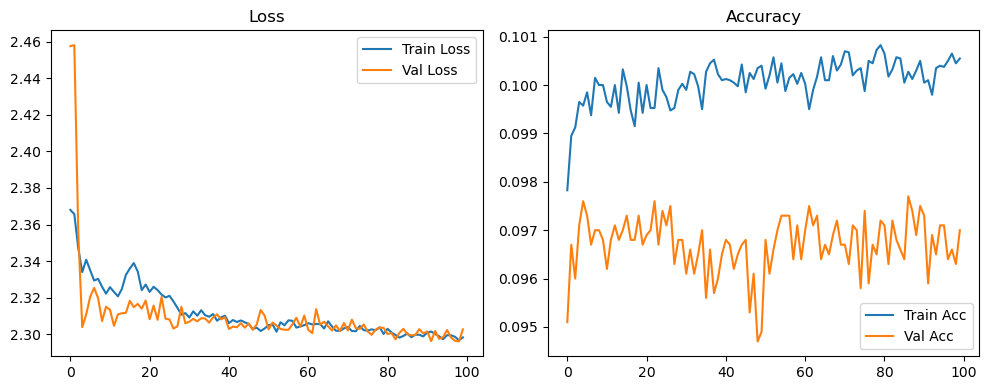

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3051 Accuracy: 0.0992


🚀 Running: batch512_lr_max_0.0002_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:22<2:16:07, 82.50s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:44<2:16:07, 82.50s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:44<2:16:07, 82.50s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [02:44<2:14:23, 82.28s/it]

| LR: 0.000200 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [04:06<2:14:23, 82.28s/it]

| LR: 0.000200 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [04:06<2:14:23, 82.28s/it]

| LR: 0.000200 | Train Acc: 0.0996 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [04:06<2:12:55, 82.22s/it]

| LR: 0.000200 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   3%|▎         | 3/100 [05:15<2:12:55, 82.22s/it]

| LR: 0.000200 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   3%|▎         | 3/100 [05:15<2:12:55, 82.22s/it]

| LR: 0.000200 | Train Acc: 0.0995 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [05:15<2:03:12, 77.01s/it]

| LR: 0.000199 | Train Acc: 0.1000 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:28<2:03:12, 77.01s/it]

| LR: 0.000199 | Train Acc: 0.1000 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:28<2:03:12, 77.01s/it]

| LR: 0.000199 | Train Acc: 0.1000 | Val Acc: 0.0965 |:   5%|▌         | 5/100 [05:28<1:25:27, 53.97s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0960 |:   5%|▌         | 5/100 [05:41<1:25:27, 53.97s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0960 |:   5%|▌         | 5/100 [05:41<1:25:27, 53.97s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0960 |:   6%|▌         | 6/100 [05:42<1:02:47, 40.08s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [05:55<1:02:47, 40.08s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [05:55<1:02:47, 40.08s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0964 |:   7%|▋         | 7/100 [05:55<48:28, 31.28s/it]  

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [06:08<48:28, 31.28s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [06:08<48:28, 31.28s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [06:08<39:11, 25.56s/it]

| LR: 0.000197 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [06:21<39:11, 25.56s/it]

| LR: 0.000197 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [06:21<39:11, 25.56s/it]

| LR: 0.000197 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   9%|▉         | 9/100 [06:21<32:54, 21.70s/it]

| LR: 0.000196 | Train Acc: 0.0999 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [06:34<32:54, 21.70s/it]

| LR: 0.000196 | Train Acc: 0.0999 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [06:34<32:54, 21.70s/it]

| LR: 0.000196 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  10%|█         | 10/100 [06:34<28:38, 19.09s/it]

| LR: 0.000195 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:48<28:38, 19.09s/it]

| LR: 0.000195 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  10%|█         | 10/100 [06:48<28:38, 19.09s/it]

| LR: 0.000195 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:48<25:38, 17.28s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  11%|█         | 11/100 [07:01<25:38, 17.28s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  11%|█         | 11/100 [07:01<25:38, 17.28s/it]

| LR: 0.000194 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  12%|█▏        | 12/100 [07:01<23:29, 16.02s/it]

| LR: 0.000193 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [07:14<23:29, 16.02s/it]

| LR: 0.000193 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [07:14<23:29, 16.02s/it]

| LR: 0.000193 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  13%|█▎        | 13/100 [07:14<21:56, 15.13s/it]

| LR: 0.000192 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  13%|█▎        | 13/100 [07:27<21:56, 15.13s/it]

| LR: 0.000192 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  13%|█▎        | 13/100 [07:27<21:56, 15.13s/it]

| LR: 0.000192 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  14%|█▍        | 14/100 [07:27<20:47, 14.51s/it]

| LR: 0.000191 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  14%|█▍        | 14/100 [07:40<20:47, 14.51s/it]

| LR: 0.000191 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  14%|█▍        | 14/100 [07:40<20:47, 14.51s/it]

| LR: 0.000191 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  15%|█▌        | 15/100 [07:40<19:56, 14.07s/it]

| LR: 0.000190 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  15%|█▌        | 15/100 [07:53<19:56, 14.07s/it]

| LR: 0.000190 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  15%|█▌        | 15/100 [07:53<19:56, 14.07s/it]

| LR: 0.000190 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  16%|█▌        | 16/100 [07:53<19:16, 13.77s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:06<19:16, 13.77s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:06<19:16, 13.77s/it]

| LR: 0.000188 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:06<18:46, 13.57s/it]

| LR: 0.000187 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:19<18:46, 13.57s/it]

| LR: 0.000187 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:19<18:46, 13.57s/it]

| LR: 0.000187 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:19<18:25, 13.48s/it]

| LR: 0.000185 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  18%|█▊        | 18/100 [08:33<18:25, 13.48s/it]

| LR: 0.000185 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  18%|█▊        | 18/100 [08:33<18:25, 13.48s/it]

| LR: 0.000185 | Train Acc: 0.1002 | Val Acc: 0.0960 |:  19%|█▉        | 19/100 [08:33<18:04, 13.38s/it]

| LR: 0.000184 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  19%|█▉        | 19/100 [08:46<18:04, 13.38s/it]

| LR: 0.000184 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  19%|█▉        | 19/100 [08:46<18:04, 13.38s/it]

| LR: 0.000184 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  20%|██        | 20/100 [08:46<17:44, 13.31s/it]

| LR: 0.000182 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  20%|██        | 20/100 [08:59<17:44, 13.31s/it]

| LR: 0.000182 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  20%|██        | 20/100 [08:59<17:44, 13.31s/it]

| LR: 0.000182 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  21%|██        | 21/100 [08:59<17:27, 13.26s/it]

| LR: 0.000180 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:12<17:27, 13.26s/it]

| LR: 0.000180 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:12<17:27, 13.26s/it]

| LR: 0.000180 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [09:12<17:11, 13.23s/it]

| LR: 0.000178 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [09:25<17:11, 13.23s/it]

| LR: 0.000178 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  22%|██▏       | 22/100 [09:25<17:11, 13.23s/it]

| LR: 0.000178 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  23%|██▎       | 23/100 [09:25<16:56, 13.20s/it]

| LR: 0.000176 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  23%|██▎       | 23/100 [09:38<16:56, 13.20s/it]

| LR: 0.000176 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  23%|██▎       | 23/100 [09:38<16:56, 13.20s/it]

| LR: 0.000176 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [09:38<16:41, 13.18s/it]

| LR: 0.000174 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  24%|██▍       | 24/100 [09:52<16:41, 13.18s/it]

| LR: 0.000174 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  24%|██▍       | 24/100 [09:52<16:41, 13.18s/it]

| LR: 0.000174 | Train Acc: 0.1006 | Val Acc: 0.0963 |:  25%|██▌       | 25/100 [09:52<16:30, 13.21s/it]

| LR: 0.000172 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  25%|██▌       | 25/100 [10:05<16:30, 13.21s/it]

| LR: 0.000172 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  25%|██▌       | 25/100 [10:05<16:30, 13.21s/it]

| LR: 0.000172 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  26%|██▌       | 26/100 [10:05<16:15, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  26%|██▌       | 26/100 [10:18<16:15, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  26%|██▌       | 26/100 [10:18<16:15, 13.19s/it]

| LR: 0.000170 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  27%|██▋       | 27/100 [10:18<16:04, 13.21s/it]

| LR: 0.000168 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [10:31<16:04, 13.21s/it]

| LR: 0.000168 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [10:31<16:04, 13.21s/it]

| LR: 0.000168 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  28%|██▊       | 28/100 [10:31<15:49, 13.18s/it]

| LR: 0.000166 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [10:44<15:49, 13.18s/it]

| LR: 0.000166 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  28%|██▊       | 28/100 [10:44<15:49, 13.18s/it]

| LR: 0.000166 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  29%|██▉       | 29/100 [10:44<15:33, 13.15s/it]

| LR: 0.000163 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  29%|██▉       | 29/100 [10:57<15:33, 13.15s/it]

| LR: 0.000163 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  29%|██▉       | 29/100 [10:57<15:33, 13.15s/it]

| LR: 0.000163 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  30%|███       | 30/100 [10:57<15:19, 13.13s/it]

| LR: 0.000161 | Train Acc: 0.0997 | Val Acc: 0.0952 |:  30%|███       | 30/100 [11:10<15:19, 13.13s/it]

| LR: 0.000161 | Train Acc: 0.0997 | Val Acc: 0.0952 |:  30%|███       | 30/100 [11:10<15:19, 13.13s/it]

| LR: 0.000161 | Train Acc: 0.0997 | Val Acc: 0.0952 |:  31%|███       | 31/100 [11:10<15:06, 13.14s/it]

| LR: 0.000158 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:24<15:06, 13.14s/it]

| LR: 0.000158 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:24<15:06, 13.14s/it]

| LR: 0.000158 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:24<14:53, 13.15s/it]

| LR: 0.000156 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [11:37<14:53, 13.15s/it]

| LR: 0.000156 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [11:37<14:53, 13.15s/it]

| LR: 0.000156 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  33%|███▎      | 33/100 [11:37<14:40, 13.14s/it]

| LR: 0.000153 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [11:50<14:40, 13.14s/it]

| LR: 0.000153 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [11:50<14:40, 13.14s/it]

| LR: 0.000153 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  34%|███▍      | 34/100 [11:50<14:30, 13.19s/it]

| LR: 0.000151 | Train Acc: 0.0997 | Val Acc: 0.0956 |:  34%|███▍      | 34/100 [12:03<14:30, 13.19s/it]

| LR: 0.000151 | Train Acc: 0.0997 | Val Acc: 0.0956 |:  34%|███▍      | 34/100 [12:03<14:30, 13.19s/it]

| LR: 0.000151 | Train Acc: 0.0997 | Val Acc: 0.0956 |:  35%|███▌      | 35/100 [12:03<14:17, 13.19s/it]

| LR: 0.000148 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  35%|███▌      | 35/100 [12:16<14:17, 13.19s/it]

| LR: 0.000148 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  35%|███▌      | 35/100 [12:16<14:17, 13.19s/it]

| LR: 0.000148 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  36%|███▌      | 36/100 [12:16<14:05, 13.21s/it]

| LR: 0.000145 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [12:30<14:05, 13.21s/it]

| LR: 0.000145 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [12:30<14:05, 13.21s/it]

| LR: 0.000145 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  37%|███▋      | 37/100 [12:30<13:50, 13.18s/it]

| LR: 0.000143 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  37%|███▋      | 37/100 [12:43<13:50, 13.18s/it]

| LR: 0.000143 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  37%|███▋      | 37/100 [12:43<13:50, 13.18s/it]

| LR: 0.000143 | Train Acc: 0.1001 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:43<13:35, 13.16s/it]

| LR: 0.000140 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  38%|███▊      | 38/100 [12:56<13:35, 13.16s/it]

| LR: 0.000140 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  38%|███▊      | 38/100 [12:56<13:35, 13.16s/it]

| LR: 0.000140 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  39%|███▉      | 39/100 [12:56<13:21, 13.14s/it]

| LR: 0.000137 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  39%|███▉      | 39/100 [13:09<13:21, 13.14s/it]

| LR: 0.000137 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  39%|███▉      | 39/100 [13:09<13:21, 13.14s/it]

| LR: 0.000137 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  40%|████      | 40/100 [13:09<13:08, 13.14s/it]

| LR: 0.000134 | Train Acc: 0.0996 | Val Acc: 0.0957 |:  40%|████      | 40/100 [13:22<13:08, 13.14s/it]

| LR: 0.000134 | Train Acc: 0.0996 | Val Acc: 0.0957 |:  40%|████      | 40/100 [13:22<13:08, 13.14s/it]

| LR: 0.000134 | Train Acc: 0.0996 | Val Acc: 0.0957 |:  41%|████      | 41/100 [13:22<12:54, 13.13s/it]

| LR: 0.000132 | Train Acc: 0.0997 | Val Acc: 0.0943 |:  41%|████      | 41/100 [13:35<12:54, 13.13s/it]

| LR: 0.000132 | Train Acc: 0.0997 | Val Acc: 0.0943 |:  41%|████      | 41/100 [13:35<12:54, 13.13s/it]

| LR: 0.000132 | Train Acc: 0.0997 | Val Acc: 0.0943 |:  42%|████▏     | 42/100 [13:35<12:41, 13.14s/it]

| LR: 0.000129 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  42%|████▏     | 42/100 [13:48<12:41, 13.14s/it]

| LR: 0.000129 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  42%|████▏     | 42/100 [13:48<12:41, 13.14s/it]

| LR: 0.000129 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  43%|████▎     | 43/100 [13:48<12:29, 13.15s/it]

| LR: 0.000126 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  43%|████▎     | 43/100 [14:02<12:29, 13.15s/it]

| LR: 0.000126 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  43%|████▎     | 43/100 [14:02<12:29, 13.15s/it]

| LR: 0.000126 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  44%|████▍     | 44/100 [14:02<12:17, 13.16s/it]

| LR: 0.000123 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  44%|████▍     | 44/100 [14:15<12:17, 13.16s/it]

| LR: 0.000123 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  44%|████▍     | 44/100 [14:15<12:17, 13.16s/it]

| LR: 0.000123 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  45%|████▌     | 45/100 [14:15<12:03, 13.15s/it]

| LR: 0.000120 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  45%|████▌     | 45/100 [14:28<12:03, 13.15s/it]

| LR: 0.000120 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  45%|████▌     | 45/100 [14:28<12:03, 13.15s/it]

| LR: 0.000120 | Train Acc: 0.0996 | Val Acc: 0.0974 |:  46%|████▌     | 46/100 [14:28<11:56, 13.27s/it]

| LR: 0.000117 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [14:41<11:56, 13.27s/it]

| LR: 0.000117 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [14:41<11:56, 13.27s/it]

| LR: 0.000117 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  47%|████▋     | 47/100 [14:41<11:40, 13.22s/it]

| LR: 0.000114 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  47%|████▋     | 47/100 [14:54<11:40, 13.22s/it]

| LR: 0.000114 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  47%|████▋     | 47/100 [14:54<11:40, 13.22s/it]

| LR: 0.000114 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  48%|████▊     | 48/100 [14:54<11:25, 13.19s/it]

| LR: 0.000111 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  48%|████▊     | 48/100 [15:08<11:25, 13.19s/it]

| LR: 0.000111 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  48%|████▊     | 48/100 [15:08<11:25, 13.19s/it]

| LR: 0.000111 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  49%|████▉     | 49/100 [15:08<11:11, 13.17s/it]

| LR: 0.000108 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  49%|████▉     | 49/100 [15:21<11:11, 13.17s/it]

| LR: 0.000108 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  49%|████▉     | 49/100 [15:21<11:11, 13.17s/it]

| LR: 0.000108 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  50%|█████     | 50/100 [15:21<10:57, 13.15s/it]

| LR: 0.000105 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  50%|█████     | 50/100 [15:34<10:57, 13.15s/it]

| LR: 0.000105 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  50%|█████     | 50/100 [15:34<10:57, 13.15s/it]

| LR: 0.000105 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:34<10:43, 13.12s/it]

| LR: 0.000102 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  51%|█████     | 51/100 [15:47<10:43, 13.12s/it]

| LR: 0.000102 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  51%|█████     | 51/100 [15:47<10:43, 13.12s/it]

| LR: 0.000102 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [15:47<10:30, 13.13s/it]

| LR: 0.000099 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  52%|█████▏    | 52/100 [16:00<10:30, 13.13s/it]

| LR: 0.000099 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  52%|█████▏    | 52/100 [16:00<10:30, 13.13s/it]

| LR: 0.000099 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  53%|█████▎    | 53/100 [16:00<10:16, 13.12s/it]

| LR: 0.000096 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  53%|█████▎    | 53/100 [16:13<10:16, 13.12s/it]

| LR: 0.000096 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  53%|█████▎    | 53/100 [16:13<10:16, 13.12s/it]

| LR: 0.000096 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  54%|█████▍    | 54/100 [16:13<10:03, 13.11s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:26<10:03, 13.11s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:26<10:03, 13.11s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [16:26<09:51, 13.15s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  55%|█████▌    | 55/100 [16:39<09:51, 13.15s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  55%|█████▌    | 55/100 [16:39<09:51, 13.15s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  56%|█████▌    | 56/100 [16:39<09:37, 13.12s/it]

| LR: 0.000087 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  56%|█████▌    | 56/100 [16:52<09:37, 13.12s/it]

| LR: 0.000087 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  56%|█████▌    | 56/100 [16:52<09:37, 13.12s/it]

| LR: 0.000087 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  57%|█████▋    | 57/100 [16:52<09:23, 13.10s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  57%|█████▋    | 57/100 [17:05<09:23, 13.10s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  57%|█████▋    | 57/100 [17:05<09:23, 13.10s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  58%|█████▊    | 58/100 [17:05<09:09, 13.09s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  58%|█████▊    | 58/100 [17:18<09:09, 13.09s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  58%|█████▊    | 58/100 [17:18<09:09, 13.09s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  59%|█████▉    | 59/100 [17:19<08:56, 13.08s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  59%|█████▉    | 59/100 [17:32<08:56, 13.08s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  59%|█████▉    | 59/100 [17:32<08:56, 13.08s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  60%|██████    | 60/100 [17:32<08:42, 13.07s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  60%|██████    | 60/100 [17:45<08:42, 13.07s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  60%|██████    | 60/100 [17:45<08:42, 13.07s/it]

| LR: 0.000076 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  61%|██████    | 61/100 [17:45<08:29, 13.06s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [17:58<08:29, 13.06s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [17:58<08:29, 13.06s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  62%|██████▏   | 62/100 [17:58<08:16, 13.06s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [18:11<08:16, 13.06s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [18:11<08:16, 13.06s/it]

| LR: 0.000070 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:11<08:03, 13.06s/it]

| LR: 0.000067 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  63%|██████▎   | 63/100 [18:24<08:03, 13.06s/it]

| LR: 0.000067 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  63%|██████▎   | 63/100 [18:24<08:03, 13.06s/it]

| LR: 0.000067 | Train Acc: 0.0995 | Val Acc: 0.0976 |:  64%|██████▍   | 64/100 [18:24<07:49, 13.05s/it]

| LR: 0.000065 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  64%|██████▍   | 64/100 [18:37<07:49, 13.05s/it]

| LR: 0.000065 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  64%|██████▍   | 64/100 [18:37<07:49, 13.05s/it]

| LR: 0.000065 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  65%|██████▌   | 65/100 [18:37<07:38, 13.09s/it]

| LR: 0.000062 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  65%|██████▌   | 65/100 [18:50<07:38, 13.09s/it]

| LR: 0.000062 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  65%|██████▌   | 65/100 [18:50<07:38, 13.09s/it]

| LR: 0.000062 | Train Acc: 0.0995 | Val Acc: 0.0959 |:  66%|██████▌   | 66/100 [18:50<07:24, 13.09s/it]

| LR: 0.000059 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  66%|██████▌   | 66/100 [19:03<07:24, 13.09s/it]

| LR: 0.000059 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  66%|██████▌   | 66/100 [19:03<07:24, 13.09s/it]

| LR: 0.000059 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  67%|██████▋   | 67/100 [19:03<07:12, 13.10s/it]

| LR: 0.000057 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  67%|██████▋   | 67/100 [19:16<07:12, 13.10s/it]

| LR: 0.000057 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  67%|██████▋   | 67/100 [19:16<07:12, 13.10s/it]

| LR: 0.000057 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:16<07:00, 13.13s/it]

| LR: 0.000054 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  68%|██████▊   | 68/100 [19:30<07:00, 13.13s/it]

| LR: 0.000054 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  68%|██████▊   | 68/100 [19:30<07:00, 13.13s/it]

| LR: 0.000054 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:30<06:47, 13.15s/it]

| LR: 0.000052 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:43<06:47, 13.15s/it]

| LR: 0.000052 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  69%|██████▉   | 69/100 [19:43<06:47, 13.15s/it]

| LR: 0.000052 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  70%|███████   | 70/100 [19:43<06:34, 13.16s/it]

| LR: 0.000049 | Train Acc: 0.0997 | Val Acc: 0.0946 |:  70%|███████   | 70/100 [19:56<06:34, 13.16s/it]

| LR: 0.000049 | Train Acc: 0.0997 | Val Acc: 0.0946 |:  70%|███████   | 70/100 [19:56<06:34, 13.16s/it]

| LR: 0.000049 | Train Acc: 0.0997 | Val Acc: 0.0946 |:  71%|███████   | 71/100 [19:56<06:22, 13.17s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  71%|███████   | 71/100 [20:09<06:22, 13.17s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  71%|███████   | 71/100 [20:09<06:22, 13.17s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  72%|███████▏  | 72/100 [20:09<06:09, 13.18s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  72%|███████▏  | 72/100 [20:22<06:09, 13.18s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  72%|███████▏  | 72/100 [20:22<06:09, 13.18s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  73%|███████▎  | 73/100 [20:22<05:56, 13.21s/it]

| LR: 0.000042 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  73%|███████▎  | 73/100 [20:36<05:56, 13.21s/it]

| LR: 0.000042 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  73%|███████▎  | 73/100 [20:36<05:56, 13.21s/it]

| LR: 0.000042 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  74%|███████▍  | 74/100 [20:36<05:44, 13.26s/it]

| LR: 0.000040 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  74%|███████▍  | 74/100 [20:49<05:44, 13.26s/it]

| LR: 0.000040 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  74%|███████▍  | 74/100 [20:49<05:44, 13.26s/it]

| LR: 0.000040 | Train Acc: 0.0998 | Val Acc: 0.0944 |:  75%|███████▌  | 75/100 [20:49<05:30, 13.22s/it]

| LR: 0.000038 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [21:02<05:30, 13.22s/it]

| LR: 0.000038 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [21:02<05:30, 13.22s/it]

| LR: 0.000038 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  76%|███████▌  | 76/100 [21:02<05:16, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.1000 | Val Acc: 0.0952 |:  76%|███████▌  | 76/100 [21:15<05:16, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.1000 | Val Acc: 0.0952 |:  76%|███████▌  | 76/100 [21:15<05:16, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.1000 | Val Acc: 0.0952 |:  77%|███████▋  | 77/100 [21:15<05:03, 13.19s/it]

| LR: 0.000034 | Train Acc: 0.1002 | Val Acc: 0.0944 |:  77%|███████▋  | 77/100 [21:28<05:03, 13.19s/it]

| LR: 0.000034 | Train Acc: 0.1002 | Val Acc: 0.0944 |:  77%|███████▋  | 77/100 [21:28<05:03, 13.19s/it]

| LR: 0.000034 | Train Acc: 0.1002 | Val Acc: 0.0944 |:  78%|███████▊  | 78/100 [21:28<04:50, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0948 |:  78%|███████▊  | 78/100 [21:41<04:50, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0948 |:  78%|███████▊  | 78/100 [21:41<04:50, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0948 |:  79%|███████▉  | 79/100 [21:42<04:36, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  79%|███████▉  | 79/100 [21:55<04:36, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  79%|███████▉  | 79/100 [21:55<04:36, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0956 |:  80%|████████  | 80/100 [21:55<04:23, 13.17s/it]

| LR: 0.000028 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [22:08<04:23, 13.17s/it]

| LR: 0.000028 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [22:08<04:23, 13.17s/it]

| LR: 0.000028 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  81%|████████  | 81/100 [22:08<04:10, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:21<04:10, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:21<04:10, 13.19s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  82%|████████▏ | 82/100 [22:21<03:57, 13.19s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [22:34<03:57, 13.19s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [22:34<03:57, 13.19s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  83%|████████▎ | 83/100 [22:34<03:44, 13.19s/it]

| LR: 0.000023 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  83%|████████▎ | 83/100 [22:48<03:44, 13.19s/it]

| LR: 0.000023 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  83%|████████▎ | 83/100 [22:48<03:44, 13.19s/it]

| LR: 0.000023 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  84%|████████▍ | 84/100 [22:48<03:31, 13.22s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  84%|████████▍ | 84/100 [23:01<03:31, 13.22s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  84%|████████▍ | 84/100 [23:01<03:31, 13.22s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  85%|████████▌ | 85/100 [23:01<03:17, 13.19s/it]

| LR: 0.000020 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.19s/it]

| LR: 0.000020 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.19s/it]

| LR: 0.000020 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:14<03:04, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  86%|████████▌ | 86/100 [23:27<03:04, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  86%|████████▌ | 86/100 [23:27<03:04, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  87%|████████▋ | 87/100 [23:27<02:51, 13.16s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  87%|████████▋ | 87/100 [23:40<02:51, 13.16s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  87%|████████▋ | 87/100 [23:40<02:51, 13.16s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  88%|████████▊ | 88/100 [23:40<02:37, 13.17s/it]

| LR: 0.000017 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  88%|████████▊ | 88/100 [23:53<02:37, 13.17s/it]

| LR: 0.000017 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  88%|████████▊ | 88/100 [23:53<02:37, 13.17s/it]

| LR: 0.000017 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  89%|████████▉ | 89/100 [23:53<02:24, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  90%|█████████ | 90/100 [24:07<02:11, 13.18s/it]

| LR: 0.000015 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [24:20<02:11, 13.18s/it]

| LR: 0.000015 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [24:20<02:11, 13.18s/it]

| LR: 0.000015 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [24:20<01:58, 13.19s/it]

| LR: 0.000014 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [24:33<01:58, 13.19s/it]

| LR: 0.000014 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [24:33<01:58, 13.19s/it]

| LR: 0.000014 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  92%|█████████▏| 92/100 [24:33<01:45, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:46<01:45, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:46<01:45, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:46<01:32, 13.23s/it]

| LR: 0.000012 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.23s/it]

| LR: 0.000012 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.23s/it]

| LR: 0.000012 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  94%|█████████▍| 94/100 [25:00<01:19, 13.22s/it]

| LR: 0.000012 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.22s/it]

| LR: 0.000012 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.22s/it]

| LR: 0.000012 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  95%|█████████▌| 95/100 [25:13<01:06, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  95%|█████████▌| 95/100 [25:26<01:06, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  95%|█████████▌| 95/100 [25:26<01:06, 13.22s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0953 |:  96%|█████████▌| 96/100 [25:26<00:52, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  97%|█████████▋| 97/100 [25:39<00:39, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  98%|█████████▊| 98/100 [25:52<00:26, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  98%|█████████▊| 98/100 [26:05<00:26, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  98%|█████████▊| 98/100 [26:05<00:26, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  99%|█████████▉| 99/100 [26:05<00:13, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  99%|█████████▉| 99/100 [26:18<00:13, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  99%|█████████▉| 99/100 [26:18<00:13, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0964 |: 100%|██████████| 100/100 [26:19<00:00, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0964 |: 100%|██████████| 100/100 [26:19<00:00, 15.79s/it]

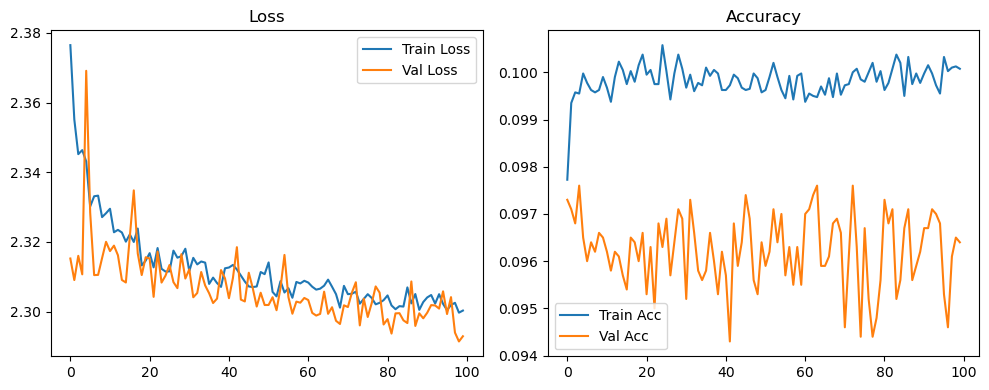

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.34it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.65it/s]

Original Model Final Test Loss: 2.2985 Accuracy: 0.0987


🚀 Running: batch512_lr_max_0.0002_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:22<2:16:00, 82.42s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:44<2:16:00, 82.42s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:44<2:16:00, 82.42s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:44<2:14:30, 82.35s/it]

| LR: 0.000200 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [04:07<2:14:30, 82.35s/it]

| LR: 0.000200 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   2%|▏         | 2/100 [04:07<2:14:30, 82.35s/it]

| LR: 0.000200 | Train Acc: 0.0987 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [04:07<2:13:22, 82.50s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [05:16<2:13:22, 82.50s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [05:16<2:13:22, 82.50s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:16<2:03:22, 77.11s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:29<2:03:22, 77.11s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:29<2:03:22, 77.11s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0974 |:   5%|▌         | 5/100 [05:29<1:25:31, 54.02s/it]

| LR: 0.000199 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:31, 54.02s/it]

| LR: 0.000199 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:31, 54.02s/it]

| LR: 0.000199 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:42<1:02:49, 40.10s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   6%|▌         | 6/100 [05:55<1:02:49, 40.10s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   6%|▌         | 6/100 [05:55<1:02:49, 40.10s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [05:55<48:28, 31.27s/it]  

| LR: 0.000198 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:08<48:28, 31.27s/it]

| LR: 0.000198 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:08<48:28, 31.27s/it]

| LR: 0.000198 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:08<39:08, 25.53s/it]

| LR: 0.000197 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [06:21<39:08, 25.53s/it]

| LR: 0.000197 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   8%|▊         | 8/100 [06:21<39:08, 25.53s/it]

| LR: 0.000197 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:21<32:49, 21.64s/it]

| LR: 0.000196 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:34<32:49, 21.64s/it]

| LR: 0.000196 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:34<32:49, 21.64s/it]

| LR: 0.000196 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:34<28:30, 19.00s/it]

| LR: 0.000195 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:48<28:30, 19.00s/it]

| LR: 0.000195 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:48<28:30, 19.00s/it]

| LR: 0.000195 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:48<25:31, 17.21s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  11%|█         | 11/100 [07:01<25:31, 17.21s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  11%|█         | 11/100 [07:01<25:31, 17.21s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [07:01<23:25, 15.98s/it]

| LR: 0.000193 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [07:14<23:25, 15.98s/it]

| LR: 0.000193 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  12%|█▏        | 12/100 [07:14<23:25, 15.98s/it]

| LR: 0.000193 | Train Acc: 0.0992 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [07:14<21:56, 15.13s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [07:27<21:56, 15.13s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [07:27<21:56, 15.13s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [07:27<20:49, 14.53s/it]

| LR: 0.000191 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:40<20:49, 14.53s/it]

| LR: 0.000191 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:40<20:49, 14.53s/it]

| LR: 0.000191 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:40<19:59, 14.11s/it]

| LR: 0.000190 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:53<19:59, 14.11s/it]

| LR: 0.000190 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:53<19:59, 14.11s/it]

| LR: 0.000190 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [07:53<19:20, 13.82s/it]

| LR: 0.000188 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:06<19:20, 13.82s/it]

| LR: 0.000188 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:06<19:20, 13.82s/it]

| LR: 0.000188 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:06<18:50, 13.62s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:20<18:50, 13.62s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:20<18:50, 13.62s/it]

| LR: 0.000187 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:20<18:28, 13.52s/it]

| LR: 0.000185 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  18%|█▊        | 18/100 [08:33<18:28, 13.52s/it]

| LR: 0.000185 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  18%|█▊        | 18/100 [08:33<18:28, 13.52s/it]

| LR: 0.000185 | Train Acc: 0.0998 | Val Acc: 0.0975 |:  19%|█▉        | 19/100 [08:33<18:06, 13.42s/it]

| LR: 0.000184 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:46<18:06, 13.42s/it]

| LR: 0.000184 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:46<18:06, 13.42s/it]

| LR: 0.000184 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:46<17:48, 13.36s/it]

| LR: 0.000182 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:59<17:48, 13.36s/it]

| LR: 0.000182 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:59<17:48, 13.36s/it]

| LR: 0.000182 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  21%|██        | 21/100 [08:59<17:31, 13.31s/it]

| LR: 0.000180 | Train Acc: 0.1003 | Val Acc: 0.0960 |:  21%|██        | 21/100 [09:13<17:31, 13.31s/it]

| LR: 0.000180 | Train Acc: 0.1003 | Val Acc: 0.0960 |:  21%|██        | 21/100 [09:13<17:31, 13.31s/it]

| LR: 0.000180 | Train Acc: 0.1003 | Val Acc: 0.0960 |:  22%|██▏       | 22/100 [09:13<17:16, 13.29s/it]

| LR: 0.000178 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [09:26<17:16, 13.29s/it]

| LR: 0.000178 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [09:26<17:16, 13.29s/it]

| LR: 0.000178 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [09:26<16:59, 13.24s/it]

| LR: 0.000176 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  23%|██▎       | 23/100 [09:39<16:59, 13.24s/it]

| LR: 0.000176 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  23%|██▎       | 23/100 [09:39<16:59, 13.24s/it]

| LR: 0.000176 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  24%|██▍       | 24/100 [09:39<16:43, 13.21s/it]

| LR: 0.000174 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  24%|██▍       | 24/100 [09:52<16:43, 13.21s/it]

| LR: 0.000174 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  24%|██▍       | 24/100 [09:52<16:43, 13.21s/it]

| LR: 0.000174 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  25%|██▌       | 25/100 [09:52<16:29, 13.19s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  25%|██▌       | 25/100 [10:05<16:29, 13.19s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  25%|██▌       | 25/100 [10:05<16:29, 13.19s/it]

| LR: 0.000172 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  26%|██▌       | 26/100 [10:05<16:15, 13.18s/it]

| LR: 0.000170 | Train Acc: 0.0996 | Val Acc: 0.0960 |:  26%|██▌       | 26/100 [10:18<16:15, 13.18s/it]

| LR: 0.000170 | Train Acc: 0.0996 | Val Acc: 0.0960 |:  26%|██▌       | 26/100 [10:18<16:15, 13.18s/it]

| LR: 0.000170 | Train Acc: 0.0996 | Val Acc: 0.0960 |:  27%|██▋       | 27/100 [10:18<16:05, 13.22s/it]

| LR: 0.000168 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:32<16:05, 13.22s/it]

| LR: 0.000168 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:32<16:05, 13.22s/it]

| LR: 0.000168 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [10:32<15:50, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  28%|██▊       | 28/100 [10:45<15:50, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  28%|██▊       | 28/100 [10:45<15:50, 13.20s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  29%|██▉       | 29/100 [10:45<15:36, 13.20s/it]

| LR: 0.000163 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [10:58<15:36, 13.20s/it]

| LR: 0.000163 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [10:58<15:36, 13.20s/it]

| LR: 0.000163 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  30%|███       | 30/100 [10:58<15:23, 13.19s/it]

| LR: 0.000161 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  30%|███       | 30/100 [11:11<15:23, 13.19s/it]

| LR: 0.000161 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  30%|███       | 30/100 [11:11<15:23, 13.19s/it]

| LR: 0.000161 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  31%|███       | 31/100 [11:11<15:10, 13.19s/it]

| LR: 0.000158 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  31%|███       | 31/100 [11:24<15:10, 13.19s/it]

| LR: 0.000158 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  31%|███       | 31/100 [11:24<15:10, 13.19s/it]

| LR: 0.000158 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  32%|███▏      | 32/100 [11:24<14:57, 13.20s/it]

| LR: 0.000156 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  32%|███▏      | 32/100 [11:38<14:57, 13.20s/it]

| LR: 0.000156 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  32%|███▏      | 32/100 [11:38<14:57, 13.20s/it]

| LR: 0.000156 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  33%|███▎      | 33/100 [11:38<14:44, 13.20s/it]

| LR: 0.000153 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000153 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000153 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  34%|███▍      | 34/100 [11:51<14:31, 13.20s/it]

| LR: 0.000151 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [12:04<14:31, 13.20s/it]

| LR: 0.000151 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [12:04<14:31, 13.20s/it]

| LR: 0.000151 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  35%|███▌      | 35/100 [12:04<14:17, 13.19s/it]

| LR: 0.000148 | Train Acc: 0.0999 | Val Acc: 0.0952 |:  35%|███▌      | 35/100 [12:17<14:17, 13.19s/it]

| LR: 0.000148 | Train Acc: 0.0999 | Val Acc: 0.0952 |:  35%|███▌      | 35/100 [12:17<14:17, 13.19s/it]

| LR: 0.000148 | Train Acc: 0.0999 | Val Acc: 0.0952 |:  36%|███▌      | 36/100 [12:17<14:03, 13.18s/it]

| LR: 0.000145 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  36%|███▌      | 36/100 [12:30<14:03, 13.18s/it]

| LR: 0.000145 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  36%|███▌      | 36/100 [12:30<14:03, 13.18s/it]

| LR: 0.000145 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:30<13:52, 13.21s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  37%|███▋      | 37/100 [12:44<13:52, 13.21s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  37%|███▋      | 37/100 [12:44<13:52, 13.21s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  38%|███▊      | 38/100 [12:44<13:37, 13.19s/it]

| LR: 0.000140 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  38%|███▊      | 38/100 [12:57<13:37, 13.19s/it]

| LR: 0.000140 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  38%|███▊      | 38/100 [12:57<13:37, 13.19s/it]

| LR: 0.000140 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  39%|███▉      | 39/100 [12:57<13:24, 13.18s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  39%|███▉      | 39/100 [13:10<13:24, 13.18s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  39%|███▉      | 39/100 [13:10<13:24, 13.18s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0961 |:  40%|████      | 40/100 [13:10<13:09, 13.16s/it]

| LR: 0.000134 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:23<13:09, 13.16s/it]

| LR: 0.000134 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:23<13:09, 13.16s/it]

| LR: 0.000134 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  41%|████      | 41/100 [13:23<12:55, 13.15s/it]

| LR: 0.000132 | Train Acc: 0.0996 | Val Acc: 0.0953 |:  41%|████      | 41/100 [13:36<12:55, 13.15s/it]

| LR: 0.000132 | Train Acc: 0.0996 | Val Acc: 0.0953 |:  41%|████      | 41/100 [13:36<12:55, 13.15s/it]

| LR: 0.000132 | Train Acc: 0.0996 | Val Acc: 0.0953 |:  42%|████▏     | 42/100 [13:36<12:42, 13.15s/it]

| LR: 0.000129 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  42%|████▏     | 42/100 [13:49<12:42, 13.15s/it]

| LR: 0.000129 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  42%|████▏     | 42/100 [13:49<12:42, 13.15s/it]

| LR: 0.000129 | Train Acc: 0.1002 | Val Acc: 0.0956 |:  43%|████▎     | 43/100 [13:49<12:29, 13.15s/it]

| LR: 0.000126 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  43%|████▎     | 43/100 [14:02<12:29, 13.15s/it]

| LR: 0.000126 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  43%|████▎     | 43/100 [14:02<12:29, 13.15s/it]

| LR: 0.000126 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:02<12:16, 13.16s/it]

| LR: 0.000123 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [14:16<12:16, 13.16s/it]

| LR: 0.000123 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [14:16<12:16, 13.16s/it]

| LR: 0.000123 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:16<12:03, 13.15s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:29<12:03, 13.15s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:29<12:03, 13.15s/it]

| LR: 0.000120 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  46%|████▌     | 46/100 [14:29<11:52, 13.19s/it]

| LR: 0.000117 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  46%|████▌     | 46/100 [14:42<11:52, 13.19s/it]

| LR: 0.000117 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  46%|████▌     | 46/100 [14:42<11:52, 13.19s/it]

| LR: 0.000117 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  47%|████▋     | 47/100 [14:42<11:38, 13.19s/it]

| LR: 0.000114 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  47%|████▋     | 47/100 [14:55<11:38, 13.19s/it]

| LR: 0.000114 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  47%|████▋     | 47/100 [14:55<11:38, 13.19s/it]

| LR: 0.000114 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  48%|████▊     | 48/100 [14:55<11:25, 13.18s/it]

| LR: 0.000111 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  48%|████▊     | 48/100 [15:08<11:25, 13.18s/it]

| LR: 0.000111 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  48%|████▊     | 48/100 [15:08<11:25, 13.18s/it]

| LR: 0.000111 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  49%|████▉     | 49/100 [15:08<11:11, 13.17s/it]

| LR: 0.000108 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  49%|████▉     | 49/100 [15:21<11:11, 13.17s/it]

| LR: 0.000108 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  49%|████▉     | 49/100 [15:21<11:11, 13.17s/it]

| LR: 0.000108 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  50%|█████     | 50/100 [15:22<10:58, 13.18s/it]

| LR: 0.000105 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  50%|█████     | 50/100 [15:35<10:58, 13.18s/it]

| LR: 0.000105 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  50%|█████     | 50/100 [15:35<10:58, 13.18s/it]

| LR: 0.000105 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  51%|█████     | 51/100 [15:35<10:47, 13.21s/it]

| LR: 0.000102 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [15:48<10:47, 13.21s/it]

| LR: 0.000102 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [15:48<10:47, 13.21s/it]

| LR: 0.000102 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:48<10:34, 13.23s/it]

| LR: 0.000099 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [16:01<10:34, 13.23s/it]

| LR: 0.000099 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [16:01<10:34, 13.23s/it]

| LR: 0.000099 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  53%|█████▎    | 53/100 [16:01<10:20, 13.20s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  53%|█████▎    | 53/100 [16:14<10:20, 13.20s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  53%|█████▎    | 53/100 [16:14<10:20, 13.20s/it]

| LR: 0.000096 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  54%|█████▍    | 54/100 [16:14<10:06, 13.19s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  54%|█████▍    | 54/100 [16:27<10:06, 13.19s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  54%|█████▍    | 54/100 [16:27<10:06, 13.19s/it]

| LR: 0.000093 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  55%|█████▌    | 55/100 [16:28<09:52, 13.18s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  55%|█████▌    | 55/100 [16:41<09:52, 13.18s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  55%|█████▌    | 55/100 [16:41<09:52, 13.18s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  56%|█████▌    | 56/100 [16:41<09:41, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  56%|█████▌    | 56/100 [16:54<09:41, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  56%|█████▌    | 56/100 [16:54<09:41, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.1006 | Val Acc: 0.0964 |:  57%|█████▋    | 57/100 [16:54<09:28, 13.21s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  57%|█████▋    | 57/100 [17:07<09:28, 13.21s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  57%|█████▋    | 57/100 [17:07<09:28, 13.21s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  58%|█████▊    | 58/100 [17:07<09:14, 13.20s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  58%|█████▊    | 58/100 [17:20<09:14, 13.20s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  58%|█████▊    | 58/100 [17:20<09:14, 13.20s/it]

| LR: 0.000081 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  59%|█████▉    | 59/100 [17:20<09:01, 13.20s/it]

| LR: 0.000078 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:34<09:01, 13.20s/it]

| LR: 0.000078 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:34<09:01, 13.20s/it]

| LR: 0.000078 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:34<08:48, 13.21s/it]

| LR: 0.000076 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  60%|██████    | 60/100 [17:47<08:48, 13.21s/it]

| LR: 0.000076 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  60%|██████    | 60/100 [17:47<08:48, 13.21s/it]

| LR: 0.000076 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:47<08:35, 13.22s/it]

| LR: 0.000073 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  61%|██████    | 61/100 [18:00<08:35, 13.22s/it]

| LR: 0.000073 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  61%|██████    | 61/100 [18:00<08:35, 13.22s/it]

| LR: 0.000073 | Train Acc: 0.1003 | Val Acc: 0.0956 |:  62%|██████▏   | 62/100 [18:00<08:22, 13.22s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [18:13<08:22, 13.22s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [18:13<08:22, 13.22s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:13<08:09, 13.23s/it]

| LR: 0.000067 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [18:27<08:09, 13.23s/it]

| LR: 0.000067 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [18:27<08:09, 13.23s/it]

| LR: 0.000067 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:27<07:55, 13.22s/it]

| LR: 0.000065 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  64%|██████▍   | 64/100 [18:40<07:55, 13.22s/it]

| LR: 0.000065 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  64%|██████▍   | 64/100 [18:40<07:55, 13.22s/it]

| LR: 0.000065 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  65%|██████▌   | 65/100 [18:40<07:43, 13.25s/it]

| LR: 0.000062 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  65%|██████▌   | 65/100 [18:53<07:43, 13.25s/it]

| LR: 0.000062 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  65%|██████▌   | 65/100 [18:53<07:43, 13.25s/it]

| LR: 0.000062 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  66%|██████▌   | 66/100 [18:53<07:29, 13.23s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [19:06<07:29, 13.23s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  66%|██████▌   | 66/100 [19:06<07:29, 13.23s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  67%|██████▋   | 67/100 [19:06<07:16, 13.21s/it]

| LR: 0.000057 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:19<07:16, 13.21s/it]

| LR: 0.000057 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:19<07:16, 13.21s/it]

| LR: 0.000057 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  68%|██████▊   | 68/100 [19:19<07:02, 13.20s/it]

| LR: 0.000054 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.20s/it]

| LR: 0.000054 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.20s/it]

| LR: 0.000054 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:33<06:49, 13.20s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:46<06:49, 13.20s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:46<06:49, 13.20s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  70%|███████   | 70/100 [19:46<06:36, 13.20s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:59<06:36, 13.20s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:59<06:36, 13.20s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [19:59<06:22, 13.20s/it]

| LR: 0.000047 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:12<06:22, 13.20s/it]

| LR: 0.000047 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:12<06:22, 13.20s/it]

| LR: 0.000047 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:12<06:09, 13.19s/it]

| LR: 0.000044 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.19s/it]

| LR: 0.000044 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:25<06:09, 13.19s/it]

| LR: 0.000044 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [20:25<05:56, 13.20s/it]

| LR: 0.000042 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  73%|███████▎  | 73/100 [20:39<05:56, 13.20s/it]

| LR: 0.000042 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  73%|███████▎  | 73/100 [20:39<05:56, 13.20s/it]

| LR: 0.000042 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  74%|███████▍  | 74/100 [20:39<05:43, 13.19s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.19s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.19s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [20:52<05:30, 13.23s/it]

| LR: 0.000038 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  75%|███████▌  | 75/100 [21:05<05:30, 13.23s/it]

| LR: 0.000038 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  75%|███████▌  | 75/100 [21:05<05:30, 13.23s/it]

| LR: 0.000038 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  76%|███████▌  | 76/100 [21:05<05:17, 13.22s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:18<05:17, 13.22s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:18<05:17, 13.22s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:18<05:03, 13.22s/it]

| LR: 0.000034 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  77%|███████▋  | 77/100 [21:31<05:03, 13.22s/it]

| LR: 0.000034 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  77%|███████▋  | 77/100 [21:31<05:03, 13.22s/it]

| LR: 0.000034 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  78%|███████▊  | 78/100 [21:31<04:50, 13.21s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:45<04:50, 13.21s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:45<04:50, 13.21s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:45<04:37, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.20s/it]

| LR: 0.000030 | Train Acc: 0.1008 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:58<04:23, 13.20s/it]

| LR: 0.000028 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [22:11<04:23, 13.20s/it]

| LR: 0.000028 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [22:11<04:23, 13.20s/it]

| LR: 0.000028 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:11<04:10, 13.18s/it]

| LR: 0.000026 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  81%|████████  | 81/100 [22:24<04:10, 13.18s/it]

| LR: 0.000026 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  81%|████████  | 81/100 [22:24<04:10, 13.18s/it]

| LR: 0.000026 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  82%|████████▏ | 82/100 [22:24<03:57, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.18s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:38<03:44, 13.23s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.23s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.23s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [22:51<03:32, 13.26s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  84%|████████▍ | 84/100 [23:04<03:32, 13.26s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  84%|████████▍ | 84/100 [23:04<03:32, 13.26s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  85%|████████▌ | 85/100 [23:04<03:18, 13.23s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [23:17<03:18, 13.23s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [23:17<03:18, 13.23s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  86%|████████▌ | 86/100 [23:17<03:04, 13.21s/it]

| LR: 0.000019 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.21s/it]

| LR: 0.000019 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.21s/it]

| LR: 0.000019 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  87%|████████▋ | 87/100 [23:30<02:51, 13.23s/it]

| LR: 0.000018 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.23s/it]

| LR: 0.000018 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.23s/it]

| LR: 0.000018 | Train Acc: 0.1004 | Val Acc: 0.0975 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:57<02:25, 13.22s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  89%|████████▉ | 89/100 [24:10<02:25, 13.22s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  89%|████████▉ | 89/100 [24:10<02:25, 13.22s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [24:10<02:12, 13.22s/it]

| LR: 0.000015 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [24:23<02:12, 13.22s/it]

| LR: 0.000015 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [24:23<02:12, 13.22s/it]

| LR: 0.000015 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  91%|█████████ | 91/100 [24:23<01:58, 13.21s/it]

| LR: 0.000014 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  91%|█████████ | 91/100 [24:36<01:58, 13.21s/it]

| LR: 0.000014 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  91%|█████████ | 91/100 [24:36<01:58, 13.21s/it]

| LR: 0.000014 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  92%|█████████▏| 92/100 [24:36<01:45, 13.21s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.21s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.21s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:50<01:32, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  94%|█████████▍| 94/100 [25:03<01:19, 13.19s/it]

| LR: 0.000012 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.19s/it]

| LR: 0.000012 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.19s/it]

| LR: 0.000012 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  95%|█████████▌| 95/100 [25:16<01:05, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  96%|█████████▌| 96/100 [25:29<00:52, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:42<00:39, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [25:55<00:26, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0973 |: 100%|██████████| 100/100 [26:22<00:00, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0973 |: 100%|██████████| 100/100 [26:22<00:00, 15.82s/it]

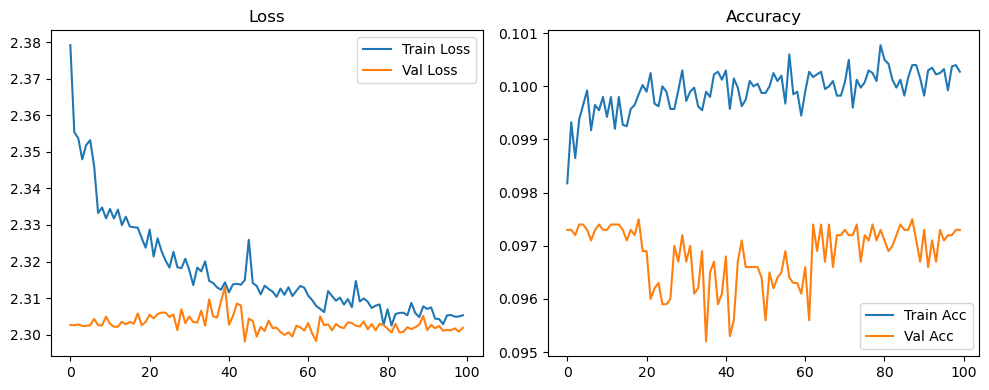

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3021 Accuracy: 0.1001


🚀 Running: batch512_lr_max_0.0002_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0949 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0949 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0979 | Val Acc: 0.0949 |:   1%|          | 1/100 [01:22<2:15:38, 82.20s/it]

| LR: 0.000200 | Train Acc: 0.0986 | Val Acc: 0.0959 |:   1%|          | 1/100 [02:44<2:15:38, 82.20s/it]

| LR: 0.000200 | Train Acc: 0.0986 | Val Acc: 0.0959 |:   1%|          | 1/100 [02:44<2:15:38, 82.20s/it]

| LR: 0.000200 | Train Acc: 0.0986 | Val Acc: 0.0959 |:   2%|▏         | 2/100 [02:44<2:14:01, 82.06s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0957 |:   2%|▏         | 2/100 [04:06<2:14:01, 82.06s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0957 |:   2%|▏         | 2/100 [04:06<2:14:01, 82.06s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [04:06<2:12:36, 82.03s/it]

| LR: 0.000200 | Train Acc: 0.1001 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [05:14<2:12:36, 82.03s/it]

| LR: 0.000200 | Train Acc: 0.1001 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [05:14<2:12:36, 82.03s/it]

| LR: 0.000200 | Train Acc: 0.1001 | Val Acc: 0.0955 |:   4%|▍         | 4/100 [05:14<2:02:35, 76.61s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0948 |:   4%|▍         | 4/100 [05:27<2:02:35, 76.61s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0948 |:   4%|▍         | 4/100 [05:27<2:02:35, 76.61s/it]

| LR: 0.000199 | Train Acc: 0.0996 | Val Acc: 0.0948 |:   5%|▌         | 5/100 [05:27<1:24:51, 53.60s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0946 |:   5%|▌         | 5/100 [05:40<1:24:51, 53.60s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0946 |:   5%|▌         | 5/100 [05:40<1:24:51, 53.60s/it]

| LR: 0.000199 | Train Acc: 0.0987 | Val Acc: 0.0946 |:   6%|▌         | 6/100 [05:40<1:02:14, 39.73s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [05:52<1:02:14, 39.73s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [05:52<1:02:14, 39.73s/it]

| LR: 0.000198 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   7%|▋         | 7/100 [05:52<47:57, 30.94s/it]  

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [06:05<47:57, 30.94s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0959 |:   7%|▋         | 7/100 [06:05<47:57, 30.94s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0959 |:   8%|▊         | 8/100 [06:05<38:39, 25.22s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0933 |:   8%|▊         | 8/100 [06:18<38:39, 25.22s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0933 |:   8%|▊         | 8/100 [06:18<38:39, 25.22s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0933 |:   9%|▉         | 9/100 [06:18<32:21, 21.34s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0964 |:   9%|▉         | 9/100 [06:31<32:21, 21.34s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0964 |:   9%|▉         | 9/100 [06:31<32:21, 21.34s/it]

| LR: 0.000196 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  10%|█         | 10/100 [06:31<28:03, 18.71s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  10%|█         | 10/100 [06:44<28:03, 18.71s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  10%|█         | 10/100 [06:44<28:03, 18.71s/it]

| LR: 0.000195 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  11%|█         | 11/100 [06:44<25:04, 16.91s/it]

| LR: 0.000194 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  11%|█         | 11/100 [06:57<25:04, 16.91s/it]

| LR: 0.000194 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  11%|█         | 11/100 [06:57<25:04, 16.91s/it]

| LR: 0.000194 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [06:57<22:59, 15.68s/it]

| LR: 0.000193 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:10<22:59, 15.68s/it]

| LR: 0.000193 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:10<22:59, 15.68s/it]

| LR: 0.000193 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [07:10<21:30, 14.83s/it]

| LR: 0.000192 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [07:22<21:30, 14.83s/it]

| LR: 0.000192 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  13%|█▎        | 13/100 [07:22<21:30, 14.83s/it]

| LR: 0.000192 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  14%|█▍        | 14/100 [07:22<20:24, 14.24s/it]

| LR: 0.000191 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  14%|█▍        | 14/100 [07:35<20:24, 14.24s/it]

| LR: 0.000191 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  14%|█▍        | 14/100 [07:35<20:24, 14.24s/it]

| LR: 0.000191 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  15%|█▌        | 15/100 [07:35<19:35, 13.83s/it]

| LR: 0.000189 | Train Acc: 0.1002 | Val Acc: 0.0977 |:  15%|█▌        | 15/100 [07:48<19:35, 13.83s/it]

| LR: 0.000189 | Train Acc: 0.1002 | Val Acc: 0.0977 |:  15%|█▌        | 15/100 [07:48<19:35, 13.83s/it]

| LR: 0.000189 | Train Acc: 0.1002 | Val Acc: 0.0977 |:  16%|█▌        | 16/100 [07:48<18:57, 13.54s/it]

| LR: 0.000188 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:01<18:57, 13.54s/it]

| LR: 0.000188 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:01<18:57, 13.54s/it]

| LR: 0.000188 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:01<18:26, 13.33s/it]

| LR: 0.000186 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  17%|█▋        | 17/100 [08:14<18:26, 13.33s/it]

| LR: 0.000186 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  17%|█▋        | 17/100 [08:14<18:26, 13.33s/it]

| LR: 0.000186 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  18%|█▊        | 18/100 [08:14<18:04, 13.23s/it]

| LR: 0.000185 | Train Acc: 0.1004 | Val Acc: 0.0944 |:  18%|█▊        | 18/100 [08:27<18:04, 13.23s/it]

| LR: 0.000185 | Train Acc: 0.1004 | Val Acc: 0.0944 |:  18%|█▊        | 18/100 [08:27<18:04, 13.23s/it]

| LR: 0.000185 | Train Acc: 0.1004 | Val Acc: 0.0944 |:  19%|█▉        | 19/100 [08:27<17:41, 13.10s/it]

| LR: 0.000183 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  19%|█▉        | 19/100 [08:40<17:41, 13.10s/it]

| LR: 0.000183 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  19%|█▉        | 19/100 [08:40<17:41, 13.10s/it]

| LR: 0.000183 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  20%|██        | 20/100 [08:40<17:22, 13.03s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0953 |:  20%|██        | 20/100 [08:53<17:22, 13.03s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0953 |:  20%|██        | 20/100 [08:53<17:22, 13.03s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0953 |:  21%|██        | 21/100 [08:53<17:06, 12.99s/it]

| LR: 0.000179 | Train Acc: 0.1006 | Val Acc: 0.0942 |:  21%|██        | 21/100 [09:05<17:06, 12.99s/it]

| LR: 0.000179 | Train Acc: 0.1006 | Val Acc: 0.0942 |:  21%|██        | 21/100 [09:05<17:06, 12.99s/it]

| LR: 0.000179 | Train Acc: 0.1006 | Val Acc: 0.0942 |:  22%|██▏       | 22/100 [09:06<16:51, 12.97s/it]

| LR: 0.000177 | Train Acc: 0.1005 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [09:18<16:51, 12.97s/it]

| LR: 0.000177 | Train Acc: 0.1005 | Val Acc: 0.0962 |:  22%|██▏       | 22/100 [09:18<16:51, 12.97s/it]

| LR: 0.000177 | Train Acc: 0.1005 | Val Acc: 0.0962 |:  23%|██▎       | 23/100 [09:18<16:35, 12.92s/it]

| LR: 0.000175 | Train Acc: 0.1004 | Val Acc: 0.0950 |:  23%|██▎       | 23/100 [09:31<16:35, 12.92s/it]

| LR: 0.000175 | Train Acc: 0.1004 | Val Acc: 0.0950 |:  23%|██▎       | 23/100 [09:31<16:35, 12.92s/it]

| LR: 0.000175 | Train Acc: 0.1004 | Val Acc: 0.0950 |:  24%|██▍       | 24/100 [09:31<16:19, 12.89s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:44<16:19, 12.89s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:44<16:19, 12.89s/it]

| LR: 0.000173 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [09:44<16:04, 12.86s/it]

| LR: 0.000171 | Train Acc: 0.0998 | Val Acc: 0.0933 |:  25%|██▌       | 25/100 [09:57<16:04, 12.86s/it]

| LR: 0.000171 | Train Acc: 0.0998 | Val Acc: 0.0933 |:  25%|██▌       | 25/100 [09:57<16:04, 12.86s/it]

| LR: 0.000171 | Train Acc: 0.0998 | Val Acc: 0.0933 |:  26%|██▌       | 26/100 [09:57<15:51, 12.86s/it]

| LR: 0.000169 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  26%|██▌       | 26/100 [10:10<15:51, 12.86s/it]

| LR: 0.000169 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  26%|██▌       | 26/100 [10:10<15:51, 12.86s/it]

| LR: 0.000169 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  27%|██▋       | 27/100 [10:10<15:39, 12.87s/it]

| LR: 0.000166 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:22<15:39, 12.87s/it]

| LR: 0.000166 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:22<15:39, 12.87s/it]

| LR: 0.000166 | Train Acc: 0.1005 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [10:23<15:25, 12.86s/it]

| LR: 0.000164 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  28%|██▊       | 28/100 [10:35<15:25, 12.86s/it]

| LR: 0.000164 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  28%|██▊       | 28/100 [10:35<15:25, 12.86s/it]

| LR: 0.000164 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  29%|██▉       | 29/100 [10:35<15:12, 12.85s/it]

| LR: 0.000161 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  29%|██▉       | 29/100 [10:48<15:12, 12.85s/it]

| LR: 0.000161 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  29%|██▉       | 29/100 [10:48<15:12, 12.85s/it]

| LR: 0.000161 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  30%|███       | 30/100 [10:48<14:58, 12.84s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0948 |:  30%|███       | 30/100 [11:01<14:58, 12.84s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0948 |:  30%|███       | 30/100 [11:01<14:58, 12.84s/it]

| LR: 0.000159 | Train Acc: 0.1003 | Val Acc: 0.0948 |:  31%|███       | 31/100 [11:01<14:46, 12.84s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  31%|███       | 31/100 [11:14<14:46, 12.84s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  31%|███       | 31/100 [11:14<14:46, 12.84s/it]

| LR: 0.000156 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  32%|███▏      | 32/100 [11:14<14:32, 12.84s/it]

| LR: 0.000154 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [11:27<14:32, 12.84s/it]

| LR: 0.000154 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  32%|███▏      | 32/100 [11:27<14:32, 12.84s/it]

| LR: 0.000154 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  33%|███▎      | 33/100 [11:27<14:20, 12.85s/it]

| LR: 0.000151 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [11:40<14:20, 12.85s/it]

| LR: 0.000151 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  33%|███▎      | 33/100 [11:40<14:20, 12.85s/it]

| LR: 0.000151 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  34%|███▍      | 34/100 [11:40<14:09, 12.88s/it]

| LR: 0.000148 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [11:52<14:09, 12.88s/it]

| LR: 0.000148 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [11:52<14:09, 12.88s/it]

| LR: 0.000148 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [11:53<13:56, 12.88s/it]

| LR: 0.000146 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  35%|███▌      | 35/100 [12:05<13:56, 12.88s/it]

| LR: 0.000146 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  35%|███▌      | 35/100 [12:05<13:56, 12.88s/it]

| LR: 0.000146 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  36%|███▌      | 36/100 [12:06<13:46, 12.92s/it]

| LR: 0.000143 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:18<13:46, 12.92s/it]

| LR: 0.000143 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  36%|███▌      | 36/100 [12:18<13:46, 12.92s/it]

| LR: 0.000143 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  37%|███▋      | 37/100 [12:18<13:33, 12.91s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0945 |:  37%|███▋      | 37/100 [12:31<13:33, 12.91s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0945 |:  37%|███▋      | 37/100 [12:31<13:33, 12.91s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0945 |:  38%|███▊      | 38/100 [12:31<13:20, 12.91s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0952 |:  38%|███▊      | 38/100 [12:44<13:20, 12.91s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0952 |:  38%|███▊      | 38/100 [12:44<13:20, 12.91s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0952 |:  39%|███▉      | 39/100 [12:44<13:07, 12.91s/it]

| LR: 0.000134 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [12:57<13:07, 12.91s/it]

| LR: 0.000134 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [12:57<13:07, 12.91s/it]

| LR: 0.000134 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  40%|████      | 40/100 [12:57<12:54, 12.90s/it]

| LR: 0.000131 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  40%|████      | 40/100 [13:10<12:54, 12.90s/it]

| LR: 0.000131 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  40%|████      | 40/100 [13:10<12:54, 12.90s/it]

| LR: 0.000131 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  41%|████      | 41/100 [13:10<12:40, 12.90s/it]

| LR: 0.000128 | Train Acc: 0.0995 | Val Acc: 0.0943 |:  41%|████      | 41/100 [13:23<12:40, 12.90s/it]

| LR: 0.000128 | Train Acc: 0.0995 | Val Acc: 0.0943 |:  41%|████      | 41/100 [13:23<12:40, 12.90s/it]

| LR: 0.000128 | Train Acc: 0.0995 | Val Acc: 0.0943 |:  42%|████▏     | 42/100 [13:23<12:27, 12.90s/it]

| LR: 0.000125 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [13:36<12:27, 12.90s/it]

| LR: 0.000125 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [13:36<12:27, 12.90s/it]

| LR: 0.000125 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  43%|████▎     | 43/100 [13:36<12:14, 12.88s/it]

| LR: 0.000122 | Train Acc: 0.0994 | Val Acc: 0.0977 |:  43%|████▎     | 43/100 [13:49<12:14, 12.88s/it]

| LR: 0.000122 | Train Acc: 0.0994 | Val Acc: 0.0977 |:  43%|████▎     | 43/100 [13:49<12:14, 12.88s/it]

| LR: 0.000122 | Train Acc: 0.0994 | Val Acc: 0.0977 |:  44%|████▍     | 44/100 [13:49<12:01, 12.88s/it]

| LR: 0.000119 | Train Acc: 0.0998 | Val Acc: 0.0979 |:  44%|████▍     | 44/100 [14:01<12:01, 12.88s/it]

| LR: 0.000119 | Train Acc: 0.0998 | Val Acc: 0.0979 |:  44%|████▍     | 44/100 [14:01<12:01, 12.88s/it]

| LR: 0.000119 | Train Acc: 0.0998 | Val Acc: 0.0979 |:  45%|████▌     | 45/100 [14:02<11:48, 12.89s/it]

| LR: 0.000116 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  45%|████▌     | 45/100 [14:15<11:48, 12.89s/it]

| LR: 0.000116 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  45%|████▌     | 45/100 [14:15<11:48, 12.89s/it]

| LR: 0.000116 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  46%|████▌     | 46/100 [14:15<11:39, 12.95s/it]

| LR: 0.000113 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  46%|████▌     | 46/100 [14:28<11:39, 12.95s/it]

| LR: 0.000113 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  46%|████▌     | 46/100 [14:28<11:39, 12.95s/it]

| LR: 0.000113 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  47%|████▋     | 47/100 [14:28<11:26, 12.94s/it]

| LR: 0.000110 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  47%|████▋     | 47/100 [14:40<11:26, 12.94s/it]

| LR: 0.000110 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  47%|████▋     | 47/100 [14:40<11:26, 12.94s/it]

| LR: 0.000110 | Train Acc: 0.0997 | Val Acc: 0.0957 |:  48%|████▊     | 48/100 [14:40<11:12, 12.93s/it]

| LR: 0.000107 | Train Acc: 0.0997 | Val Acc: 0.0943 |:  48%|████▊     | 48/100 [14:53<11:12, 12.93s/it]

| LR: 0.000107 | Train Acc: 0.0997 | Val Acc: 0.0943 |:  48%|████▊     | 48/100 [14:53<11:12, 12.93s/it]

| LR: 0.000107 | Train Acc: 0.0997 | Val Acc: 0.0943 |:  49%|████▉     | 49/100 [14:53<10:59, 12.94s/it]

| LR: 0.000104 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [15:06<10:59, 12.94s/it]

| LR: 0.000104 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [15:06<10:59, 12.94s/it]

| LR: 0.000104 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:06<10:47, 12.95s/it]

| LR: 0.000101 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:19<10:47, 12.95s/it]

| LR: 0.000101 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:19<10:47, 12.95s/it]

| LR: 0.000101 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [15:19<10:33, 12.94s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0941 |:  51%|█████     | 51/100 [15:32<10:33, 12.94s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0941 |:  51%|█████     | 51/100 [15:32<10:33, 12.94s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0941 |:  52%|█████▏    | 52/100 [15:32<10:20, 12.93s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:45<10:20, 12.93s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:45<10:20, 12.93s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0965 |:  53%|█████▎    | 53/100 [15:45<10:07, 12.92s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  53%|█████▎    | 53/100 [15:58<10:07, 12.92s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  53%|█████▎    | 53/100 [15:58<10:07, 12.92s/it]

| LR: 0.000091 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  54%|█████▍    | 54/100 [15:58<09:52, 12.89s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  54%|█████▍    | 54/100 [16:11<09:52, 12.89s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  54%|█████▍    | 54/100 [16:11<09:52, 12.89s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  55%|█████▌    | 55/100 [16:11<09:40, 12.90s/it]

| LR: 0.000085 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  55%|█████▌    | 55/100 [16:24<09:40, 12.90s/it]

| LR: 0.000085 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  55%|█████▌    | 55/100 [16:24<09:40, 12.90s/it]

| LR: 0.000085 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  56%|█████▌    | 56/100 [16:24<09:26, 12.88s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  56%|█████▌    | 56/100 [16:37<09:26, 12.88s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  56%|█████▌    | 56/100 [16:37<09:26, 12.88s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  57%|█████▋    | 57/100 [16:37<09:14, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.0999 | Val Acc: 0.0977 |:  57%|█████▋    | 57/100 [16:49<09:14, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.0999 | Val Acc: 0.0977 |:  57%|█████▋    | 57/100 [16:49<09:14, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.0999 | Val Acc: 0.0977 |:  58%|█████▊    | 58/100 [16:49<09:01, 12.89s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  58%|█████▊    | 58/100 [17:02<09:01, 12.89s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  58%|█████▊    | 58/100 [17:02<09:01, 12.89s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  59%|█████▉    | 59/100 [17:02<08:47, 12.88s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  59%|█████▉    | 59/100 [17:15<08:47, 12.88s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  59%|█████▉    | 59/100 [17:15<08:47, 12.88s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  60%|██████    | 60/100 [17:15<08:35, 12.89s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  60%|██████    | 60/100 [17:28<08:35, 12.89s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  60%|██████    | 60/100 [17:28<08:35, 12.89s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  61%|██████    | 61/100 [17:28<08:23, 12.90s/it]

| LR: 0.000067 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:41<08:23, 12.90s/it]

| LR: 0.000067 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:41<08:23, 12.90s/it]

| LR: 0.000067 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  62%|██████▏   | 62/100 [17:41<08:10, 12.90s/it]

| LR: 0.000064 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  62%|██████▏   | 62/100 [17:54<08:10, 12.90s/it]

| LR: 0.000064 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  62%|██████▏   | 62/100 [17:54<08:10, 12.90s/it]

| LR: 0.000064 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  63%|██████▎   | 63/100 [17:54<07:57, 12.91s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  63%|██████▎   | 63/100 [18:07<07:57, 12.91s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  63%|██████▎   | 63/100 [18:07<07:57, 12.91s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  64%|██████▍   | 64/100 [18:07<07:44, 12.92s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0940 |:  64%|██████▍   | 64/100 [18:20<07:44, 12.92s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0940 |:  64%|██████▍   | 64/100 [18:20<07:44, 12.92s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0940 |:  65%|██████▌   | 65/100 [18:20<07:33, 12.95s/it]

| LR: 0.000055 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  65%|██████▌   | 65/100 [18:33<07:33, 12.95s/it]

| LR: 0.000055 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  65%|██████▌   | 65/100 [18:33<07:33, 12.95s/it]

| LR: 0.000055 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  66%|██████▌   | 66/100 [18:33<07:19, 12.93s/it]

| LR: 0.000053 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  66%|██████▌   | 66/100 [18:46<07:19, 12.93s/it]

| LR: 0.000053 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  66%|██████▌   | 66/100 [18:46<07:19, 12.93s/it]

| LR: 0.000053 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  67%|██████▋   | 67/100 [18:46<07:07, 12.94s/it]

| LR: 0.000050 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  67%|██████▋   | 67/100 [18:59<07:07, 12.94s/it]

| LR: 0.000050 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  67%|██████▋   | 67/100 [18:59<07:07, 12.94s/it]

| LR: 0.000050 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  68%|██████▊   | 68/100 [18:59<06:54, 12.94s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:12<06:54, 12.94s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:12<06:54, 12.94s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:12<06:40, 12.92s/it]

| LR: 0.000045 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:24<06:40, 12.92s/it]

| LR: 0.000045 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:24<06:40, 12.92s/it]

| LR: 0.000045 | Train Acc: 0.1001 | Val Acc: 0.0957 |:  70%|███████   | 70/100 [19:25<06:27, 12.90s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  70%|███████   | 70/100 [19:37<06:27, 12.90s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  70%|███████   | 70/100 [19:37<06:27, 12.90s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  71%|███████   | 71/100 [19:37<06:13, 12.89s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:50<06:13, 12.89s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:50<06:13, 12.89s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  72%|███████▏  | 72/100 [19:50<06:00, 12.87s/it]

| LR: 0.000037 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  72%|███████▏  | 72/100 [20:03<06:00, 12.87s/it]

| LR: 0.000037 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  72%|███████▏  | 72/100 [20:03<06:00, 12.87s/it]

| LR: 0.000037 | Train Acc: 0.1001 | Val Acc: 0.0978 |:  73%|███████▎  | 73/100 [20:03<05:46, 12.85s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:16<05:46, 12.85s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:16<05:46, 12.85s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:16<05:35, 12.89s/it]

| LR: 0.000032 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:29<05:35, 12.89s/it]

| LR: 0.000032 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:29<05:35, 12.89s/it]

| LR: 0.000032 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [20:29<05:21, 12.88s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  75%|███████▌  | 75/100 [20:42<05:21, 12.88s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  75%|███████▌  | 75/100 [20:42<05:21, 12.88s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  76%|███████▌  | 76/100 [20:42<05:09, 12.89s/it]

| LR: 0.000028 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [20:55<05:09, 12.89s/it]

| LR: 0.000028 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [20:55<05:09, 12.89s/it]

| LR: 0.000028 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [20:55<04:56, 12.89s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  77%|███████▋  | 77/100 [21:07<04:56, 12.89s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  77%|███████▋  | 77/100 [21:07<04:56, 12.89s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  78%|███████▊  | 78/100 [21:08<04:43, 12.90s/it]

| LR: 0.000024 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  78%|███████▊  | 78/100 [21:20<04:43, 12.90s/it]

| LR: 0.000024 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  78%|███████▊  | 78/100 [21:20<04:43, 12.90s/it]

| LR: 0.000024 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  79%|███████▉  | 79/100 [21:20<04:30, 12.87s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  79%|███████▉  | 79/100 [21:33<04:30, 12.87s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  79%|███████▉  | 79/100 [21:33<04:30, 12.87s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  80%|████████  | 80/100 [21:33<04:17, 12.89s/it]

| LR: 0.000020 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:46<04:17, 12.89s/it]

| LR: 0.000020 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:46<04:17, 12.89s/it]

| LR: 0.000020 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  81%|████████  | 81/100 [21:46<04:05, 12.91s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [21:59<04:05, 12.91s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [21:59<04:05, 12.91s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [21:59<03:52, 12.89s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  82%|████████▏ | 82/100 [22:12<03:52, 12.89s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  82%|████████▏ | 82/100 [22:12<03:52, 12.89s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:12<03:38, 12.87s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:25<03:38, 12.87s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:25<03:38, 12.87s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [22:25<03:26, 12.93s/it]

| LR: 0.000013 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:38<03:26, 12.93s/it]

| LR: 0.000013 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:38<03:26, 12.93s/it]

| LR: 0.000013 | Train Acc: 0.1005 | Val Acc: 0.0968 |:  85%|████████▌ | 85/100 [22:38<03:13, 12.91s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [22:51<03:13, 12.91s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [22:51<03:13, 12.91s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  86%|████████▌ | 86/100 [22:51<03:00, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  86%|████████▌ | 86/100 [23:04<03:00, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  86%|████████▌ | 86/100 [23:04<03:00, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:04<02:47, 12.88s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  87%|████████▋ | 87/100 [23:16<02:47, 12.88s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  87%|████████▋ | 87/100 [23:16<02:47, 12.88s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  88%|████████▊ | 88/100 [23:16<02:34, 12.87s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:29<02:34, 12.87s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:29<02:34, 12.87s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:29<02:21, 12.87s/it]

| LR: 0.000007 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:42<02:21, 12.87s/it]

| LR: 0.000007 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:42<02:21, 12.87s/it]

| LR: 0.000007 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  90%|█████████ | 90/100 [23:42<02:08, 12.87s/it]

| LR: 0.000006 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  90%|█████████ | 90/100 [23:55<02:08, 12.87s/it]

| LR: 0.000006 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  90%|█████████ | 90/100 [23:55<02:08, 12.87s/it]

| LR: 0.000006 | Train Acc: 0.1004 | Val Acc: 0.0955 |:  91%|█████████ | 91/100 [23:55<01:55, 12.87s/it]

| LR: 0.000005 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [24:08<01:55, 12.87s/it]

| LR: 0.000005 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [24:08<01:55, 12.87s/it]

| LR: 0.000005 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  92%|█████████▏| 92/100 [24:08<01:42, 12.87s/it]

| LR: 0.000004 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:21<01:42, 12.87s/it]

| LR: 0.000004 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:21<01:42, 12.87s/it]

| LR: 0.000004 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:21<01:30, 12.92s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:34<01:30, 12.92s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:34<01:30, 12.92s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [24:34<01:17, 12.89s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  94%|█████████▍| 94/100 [24:47<01:17, 12.89s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  94%|█████████▍| 94/100 [24:47<01:17, 12.89s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  95%|█████████▌| 95/100 [24:47<01:04, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.1005 | Val Acc: 0.0958 |:  95%|█████████▌| 95/100 [24:59<01:04, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.1005 | Val Acc: 0.0958 |:  95%|█████████▌| 95/100 [24:59<01:04, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.1005 | Val Acc: 0.0958 |:  96%|█████████▌| 96/100 [24:59<00:51, 12.87s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  96%|█████████▌| 96/100 [25:12<00:51, 12.87s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  96%|█████████▌| 96/100 [25:12<00:51, 12.87s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  97%|█████████▋| 97/100 [25:12<00:38, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  97%|█████████▋| 97/100 [25:25<00:38, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  97%|█████████▋| 97/100 [25:25<00:38, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  98%|█████████▊| 98/100 [25:25<00:25, 12.84s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  98%|█████████▊| 98/100 [25:38<00:25, 12.84s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  98%|█████████▊| 98/100 [25:38<00:25, 12.84s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  99%|█████████▉| 99/100 [25:38<00:12, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0948 |:  99%|█████████▉| 99/100 [25:51<00:12, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0948 |:  99%|█████████▉| 99/100 [25:51<00:12, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0948 |: 100%|██████████| 100/100 [25:51<00:00, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0948 |: 100%|██████████| 100/100 [25:51<00:00, 15.51s/it]

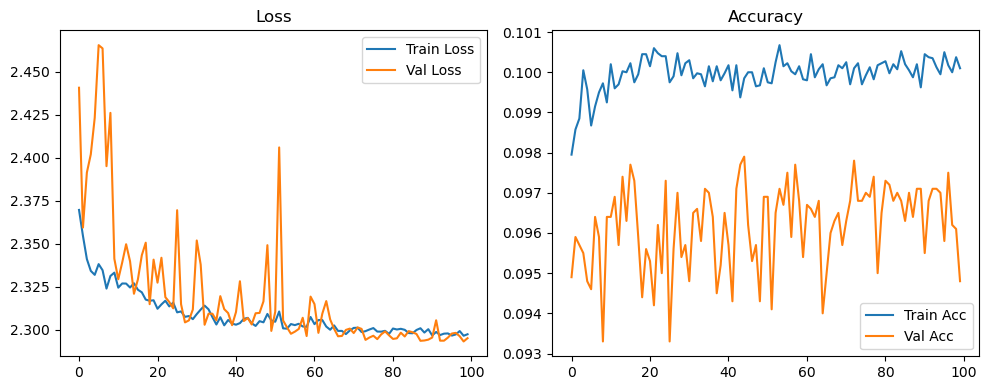

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.37it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 2.2982 Accuracy: 0.0989


🚀 Running: batch512_lr_max_0.0002_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0976 | Val Acc: 0.0962 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0976 | Val Acc: 0.0962 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0976 | Val Acc: 0.0962 |:   1%|          | 1/100 [01:21<2:14:28, 81.50s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   1%|          | 1/100 [02:43<2:14:28, 81.50s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   1%|          | 1/100 [02:43<2:14:28, 81.50s/it]

| LR: 0.000200 | Train Acc: 0.0988 | Val Acc: 0.0958 |:   2%|▏         | 2/100 [02:43<2:13:48, 81.92s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [04:06<2:13:48, 81.92s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0943 |:   2%|▏         | 2/100 [04:06<2:13:48, 81.92s/it]

| LR: 0.000200 | Train Acc: 0.0994 | Val Acc: 0.0943 |:   3%|▎         | 3/100 [04:06<2:12:50, 82.17s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [05:14<2:12:50, 82.17s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   3%|▎         | 3/100 [05:14<2:12:50, 82.17s/it]

| LR: 0.000200 | Train Acc: 0.0993 | Val Acc: 0.0971 |:   4%|▍         | 4/100 [05:14<2:02:57, 76.85s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   4%|▍         | 4/100 [05:27<2:02:57, 76.85s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   4%|▍         | 4/100 [05:27<2:02:57, 76.85s/it]

| LR: 0.000199 | Train Acc: 0.0992 | Val Acc: 0.0969 |:   5%|▌         | 5/100 [05:28<1:25:18, 53.88s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   5%|▌         | 5/100 [05:41<1:25:18, 53.88s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   5%|▌         | 5/100 [05:41<1:25:18, 53.88s/it]

| LR: 0.000199 | Train Acc: 0.0994 | Val Acc: 0.0956 |:   6%|▌         | 6/100 [05:41<1:02:41, 40.01s/it]

| LR: 0.000198 | Train Acc: 0.0998 | Val Acc: 0.0953 |:   6%|▌         | 6/100 [05:54<1:02:41, 40.01s/it]

| LR: 0.000198 | Train Acc: 0.0998 | Val Acc: 0.0953 |:   6%|▌         | 6/100 [05:54<1:02:41, 40.01s/it]

| LR: 0.000198 | Train Acc: 0.0998 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [05:54<48:23, 31.22s/it]  

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   7%|▋         | 7/100 [06:07<48:23, 31.22s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   7%|▋         | 7/100 [06:07<48:23, 31.22s/it]

| LR: 0.000198 | Train Acc: 0.0996 | Val Acc: 0.0966 |:   8%|▊         | 8/100 [06:07<39:06, 25.51s/it]

| LR: 0.000197 | Train Acc: 0.0999 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:20<39:06, 25.51s/it]

| LR: 0.000197 | Train Acc: 0.0999 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:20<39:06, 25.51s/it]

| LR: 0.000197 | Train Acc: 0.0999 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [06:20<32:48, 21.63s/it]

| LR: 0.000196 | Train Acc: 0.0996 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:33<32:48, 21.63s/it]

| LR: 0.000196 | Train Acc: 0.0996 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:33<32:48, 21.63s/it]

| LR: 0.000196 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  10%|█         | 10/100 [06:33<28:31, 19.01s/it]

| LR: 0.000195 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:46<28:31, 19.01s/it]

| LR: 0.000195 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:46<28:31, 19.01s/it]

| LR: 0.000195 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  11%|█         | 11/100 [06:46<25:33, 17.23s/it]

| LR: 0.000194 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  11%|█         | 11/100 [07:00<25:33, 17.23s/it]

| LR: 0.000194 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  11%|█         | 11/100 [07:00<25:33, 17.23s/it]

| LR: 0.000194 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [07:00<23:28, 16.01s/it]

| LR: 0.000193 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [07:13<23:28, 16.01s/it]

| LR: 0.000193 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  12%|█▏        | 12/100 [07:13<23:28, 16.01s/it]

| LR: 0.000193 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  13%|█▎        | 13/100 [07:13<21:58, 15.16s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  13%|█▎        | 13/100 [07:26<21:58, 15.16s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  13%|█▎        | 13/100 [07:26<21:58, 15.16s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  14%|█▍        | 14/100 [07:26<20:52, 14.57s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [07:39<20:52, 14.57s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [07:39<20:52, 14.57s/it]

| LR: 0.000191 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  15%|█▌        | 15/100 [07:39<20:02, 14.14s/it]

| LR: 0.000189 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  15%|█▌        | 15/100 [07:52<20:02, 14.14s/it]

| LR: 0.000189 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  15%|█▌        | 15/100 [07:52<20:02, 14.14s/it]

| LR: 0.000189 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  16%|█▌        | 16/100 [07:53<19:26, 13.89s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0886 |:  16%|█▌        | 16/100 [08:06<19:26, 13.89s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0886 |:  16%|█▌        | 16/100 [08:06<19:26, 13.89s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0886 |:  17%|█▋        | 17/100 [08:06<18:59, 13.73s/it]

| LR: 0.000186 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:19<18:59, 13.73s/it]

| LR: 0.000186 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:19<18:59, 13.73s/it]

| LR: 0.000186 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [08:19<18:33, 13.58s/it]

| LR: 0.000185 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  18%|█▊        | 18/100 [08:32<18:33, 13.58s/it]

| LR: 0.000185 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  18%|█▊        | 18/100 [08:32<18:33, 13.58s/it]

| LR: 0.000185 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:32<18:10, 13.46s/it]

| LR: 0.000183 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  19%|█▉        | 19/100 [08:45<18:10, 13.46s/it]

| LR: 0.000183 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  19%|█▉        | 19/100 [08:45<18:10, 13.46s/it]

| LR: 0.000183 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:46<17:50, 13.38s/it]

| LR: 0.000181 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  20%|██        | 20/100 [08:59<17:50, 13.38s/it]

| LR: 0.000181 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  20%|██        | 20/100 [08:59<17:50, 13.38s/it]

| LR: 0.000181 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  21%|██        | 21/100 [08:59<17:32, 13.32s/it]

| LR: 0.000179 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:12<17:32, 13.32s/it]

| LR: 0.000179 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:12<17:32, 13.32s/it]

| LR: 0.000179 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:12<17:17, 13.30s/it]

| LR: 0.000177 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [09:25<17:17, 13.30s/it]

| LR: 0.000177 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [09:25<17:17, 13.30s/it]

| LR: 0.000177 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:25<17:03, 13.30s/it]

| LR: 0.000175 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  23%|██▎       | 23/100 [09:38<17:03, 13.30s/it]

| LR: 0.000175 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  23%|██▎       | 23/100 [09:38<17:03, 13.30s/it]

| LR: 0.000175 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [09:38<16:49, 13.28s/it]

| LR: 0.000173 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [09:52<16:49, 13.28s/it]

| LR: 0.000173 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  24%|██▍       | 24/100 [09:52<16:49, 13.28s/it]

| LR: 0.000173 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  25%|██▌       | 25/100 [09:52<16:35, 13.27s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  25%|██▌       | 25/100 [10:05<16:35, 13.27s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  25%|██▌       | 25/100 [10:05<16:35, 13.27s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  26%|██▌       | 26/100 [10:05<16:21, 13.26s/it]

| LR: 0.000169 | Train Acc: 0.0992 | Val Acc: 0.0963 |:  26%|██▌       | 26/100 [10:18<16:21, 13.26s/it]

| LR: 0.000169 | Train Acc: 0.0992 | Val Acc: 0.0963 |:  26%|██▌       | 26/100 [10:18<16:21, 13.26s/it]

| LR: 0.000169 | Train Acc: 0.0992 | Val Acc: 0.0963 |:  27%|██▋       | 27/100 [10:18<16:09, 13.28s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:31<16:09, 13.28s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:31<16:09, 13.28s/it]

| LR: 0.000166 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [10:31<15:53, 13.24s/it]

| LR: 0.000164 | Train Acc: 0.0994 | Val Acc: 0.0867 |:  28%|██▊       | 28/100 [10:44<15:53, 13.24s/it]

| LR: 0.000164 | Train Acc: 0.0994 | Val Acc: 0.0867 |:  28%|██▊       | 28/100 [10:44<15:53, 13.24s/it]

| LR: 0.000164 | Train Acc: 0.0994 | Val Acc: 0.0867 |:  29%|██▉       | 29/100 [10:45<15:37, 13.20s/it]

| LR: 0.000161 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [10:58<15:37, 13.20s/it]

| LR: 0.000161 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  29%|██▉       | 29/100 [10:58<15:37, 13.20s/it]

| LR: 0.000161 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  30%|███       | 30/100 [10:58<15:21, 13.16s/it]

| LR: 0.000159 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  30%|███       | 30/100 [11:11<15:21, 13.16s/it]

| LR: 0.000159 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  30%|███       | 30/100 [11:11<15:21, 13.16s/it]

| LR: 0.000159 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:11<15:08, 13.17s/it]

| LR: 0.000156 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:24<15:08, 13.17s/it]

| LR: 0.000156 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:24<15:08, 13.17s/it]

| LR: 0.000156 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  32%|███▏      | 32/100 [11:24<14:54, 13.15s/it]

| LR: 0.000154 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [11:37<14:54, 13.15s/it]

| LR: 0.000154 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [11:37<14:54, 13.15s/it]

| LR: 0.000154 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:37<14:41, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  33%|███▎      | 33/100 [11:50<14:41, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  33%|███▎      | 33/100 [11:50<14:41, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  34%|███▍      | 34/100 [11:50<14:27, 13.15s/it]

| LR: 0.000148 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:03<14:27, 13.15s/it]

| LR: 0.000148 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:03<14:27, 13.15s/it]

| LR: 0.000148 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:03<14:14, 13.15s/it]

| LR: 0.000146 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:17<14:14, 13.15s/it]

| LR: 0.000146 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:17<14:14, 13.15s/it]

| LR: 0.000146 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:17<14:03, 13.18s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:30<14:03, 13.18s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:30<14:03, 13.18s/it]

| LR: 0.000143 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  37%|███▋      | 37/100 [12:30<13:49, 13.17s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:43<13:49, 13.17s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:43<13:49, 13.17s/it]

| LR: 0.000140 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [12:43<13:36, 13.17s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [12:56<13:36, 13.17s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [12:56<13:36, 13.17s/it]

| LR: 0.000137 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  39%|███▉      | 39/100 [12:56<13:22, 13.15s/it]

| LR: 0.000134 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [13:09<13:22, 13.15s/it]

| LR: 0.000134 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  39%|███▉      | 39/100 [13:09<13:22, 13.15s/it]

| LR: 0.000134 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  40%|████      | 40/100 [13:09<13:09, 13.16s/it]

| LR: 0.000131 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  40%|████      | 40/100 [13:22<13:09, 13.16s/it]

| LR: 0.000131 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  40%|████      | 40/100 [13:22<13:09, 13.16s/it]

| LR: 0.000131 | Train Acc: 0.1004 | Val Acc: 0.0967 |:  41%|████      | 41/100 [13:22<12:56, 13.17s/it]

| LR: 0.000128 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:35<12:56, 13.17s/it]

| LR: 0.000128 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:35<12:56, 13.17s/it]

| LR: 0.000128 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  42%|████▏     | 42/100 [13:36<12:43, 13.17s/it]

| LR: 0.000125 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  42%|████▏     | 42/100 [13:49<12:43, 13.17s/it]

| LR: 0.000125 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  42%|████▏     | 42/100 [13:49<12:43, 13.17s/it]

| LR: 0.000125 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  43%|████▎     | 43/100 [13:49<12:30, 13.17s/it]

| LR: 0.000122 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  43%|████▎     | 43/100 [14:02<12:30, 13.17s/it]

| LR: 0.000122 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  43%|████▎     | 43/100 [14:02<12:30, 13.17s/it]

| LR: 0.000122 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  44%|████▍     | 44/100 [14:02<12:16, 13.15s/it]

| LR: 0.000119 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [14:15<12:16, 13.15s/it]

| LR: 0.000119 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  44%|████▍     | 44/100 [14:15<12:16, 13.15s/it]

| LR: 0.000119 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:15<12:02, 13.14s/it]

| LR: 0.000116 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  45%|████▌     | 45/100 [14:28<12:02, 13.14s/it]

| LR: 0.000116 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  45%|████▌     | 45/100 [14:28<12:02, 13.14s/it]

| LR: 0.000116 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  46%|████▌     | 46/100 [14:28<11:51, 13.18s/it]

| LR: 0.000113 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:41<11:51, 13.18s/it]

| LR: 0.000113 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:41<11:51, 13.18s/it]

| LR: 0.000113 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [14:41<11:38, 13.17s/it]

| LR: 0.000110 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:54<11:38, 13.17s/it]

| LR: 0.000110 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:54<11:38, 13.17s/it]

| LR: 0.000110 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:54<11:24, 13.16s/it]

| LR: 0.000107 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  48%|████▊     | 48/100 [15:08<11:24, 13.16s/it]

| LR: 0.000107 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  48%|████▊     | 48/100 [15:08<11:24, 13.16s/it]

| LR: 0.000107 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  49%|████▉     | 49/100 [15:08<11:10, 13.15s/it]

| LR: 0.000104 | Train Acc: 0.0998 | Val Acc: 0.0953 |:  49%|████▉     | 49/100 [15:21<11:10, 13.15s/it]

| LR: 0.000104 | Train Acc: 0.0998 | Val Acc: 0.0953 |:  49%|████▉     | 49/100 [15:21<11:10, 13.15s/it]

| LR: 0.000104 | Train Acc: 0.0998 | Val Acc: 0.0953 |:  50%|█████     | 50/100 [15:21<10:56, 13.14s/it]

| LR: 0.000101 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  50%|█████     | 50/100 [15:34<10:56, 13.14s/it]

| LR: 0.000101 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  50%|█████     | 50/100 [15:34<10:56, 13.14s/it]

| LR: 0.000101 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  51%|█████     | 51/100 [15:34<10:43, 13.14s/it]

| LR: 0.000097 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [15:47<10:43, 13.14s/it]

| LR: 0.000097 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [15:47<10:43, 13.14s/it]

| LR: 0.000097 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:47<10:30, 13.14s/it]

| LR: 0.000094 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [16:00<10:30, 13.14s/it]

| LR: 0.000094 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [16:00<10:30, 13.14s/it]

| LR: 0.000094 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:00<10:17, 13.13s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  53%|█████▎    | 53/100 [16:13<10:17, 13.13s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  53%|█████▎    | 53/100 [16:13<10:17, 13.13s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:13<10:04, 13.13s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  54%|█████▍    | 54/100 [16:27<10:04, 13.13s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  54%|█████▍    | 54/100 [16:27<10:04, 13.13s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  55%|█████▌    | 55/100 [16:27<09:53, 13.18s/it]

| LR: 0.000085 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:40<09:53, 13.18s/it]

| LR: 0.000085 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:40<09:53, 13.18s/it]

| LR: 0.000085 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [16:40<09:40, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:53<09:40, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:53<09:40, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  57%|█████▋    | 57/100 [16:53<09:26, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  57%|█████▋    | 57/100 [17:06<09:26, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  57%|█████▋    | 57/100 [17:06<09:26, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.1004 | Val Acc: 0.0956 |:  58%|█████▊    | 58/100 [17:06<09:12, 13.16s/it]

| LR: 0.000076 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  58%|█████▊    | 58/100 [17:19<09:12, 13.16s/it]

| LR: 0.000076 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  58%|█████▊    | 58/100 [17:19<09:12, 13.16s/it]

| LR: 0.000076 | Train Acc: 0.1000 | Val Acc: 0.0967 |:  59%|█████▉    | 59/100 [17:19<08:59, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  59%|█████▉    | 59/100 [17:32<08:59, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  59%|█████▉    | 59/100 [17:32<08:59, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:32<08:46, 13.15s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:45<08:46, 13.15s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:45<08:46, 13.15s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  61%|██████    | 61/100 [17:45<08:32, 13.15s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:59<08:32, 13.15s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  61%|██████    | 61/100 [17:59<08:32, 13.15s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  62%|██████▏   | 62/100 [17:59<08:19, 13.16s/it]

| LR: 0.000064 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:12<08:19, 13.16s/it]

| LR: 0.000064 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:12<08:19, 13.16s/it]

| LR: 0.000064 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  63%|██████▎   | 63/100 [18:12<08:06, 13.15s/it]

| LR: 0.000061 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:25<08:06, 13.15s/it]

| LR: 0.000061 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:25<08:06, 13.15s/it]

| LR: 0.000061 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:25<07:54, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:38<07:54, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:38<07:54, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0958 |:  65%|██████▌   | 65/100 [18:38<07:40, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  65%|██████▌   | 65/100 [18:51<07:40, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  65%|██████▌   | 65/100 [18:51<07:40, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  66%|██████▌   | 66/100 [18:51<07:27, 13.17s/it]

| LR: 0.000053 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  66%|██████▌   | 66/100 [19:04<07:27, 13.17s/it]

| LR: 0.000053 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  66%|██████▌   | 66/100 [19:04<07:27, 13.17s/it]

| LR: 0.000053 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  67%|██████▋   | 67/100 [19:04<07:14, 13.16s/it]

| LR: 0.000050 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:18<07:14, 13.16s/it]

| LR: 0.000050 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:18<07:14, 13.16s/it]

| LR: 0.000050 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:18<07:00, 13.15s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0948 |:  68%|██████▊   | 68/100 [19:31<07:00, 13.15s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0948 |:  68%|██████▊   | 68/100 [19:31<07:00, 13.15s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0948 |:  69%|██████▉   | 69/100 [19:31<06:47, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:44<06:47, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:44<06:47, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1005 | Val Acc: 0.0957 |:  70%|███████   | 70/100 [19:44<06:34, 13.15s/it]

| LR: 0.000042 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  70%|███████   | 70/100 [19:57<06:34, 13.15s/it]

| LR: 0.000042 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  70%|███████   | 70/100 [19:57<06:34, 13.15s/it]

| LR: 0.000042 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  71%|███████   | 71/100 [19:57<06:21, 13.15s/it]

| LR: 0.000040 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  71%|███████   | 71/100 [20:10<06:21, 13.15s/it]

| LR: 0.000040 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  71%|███████   | 71/100 [20:10<06:21, 13.15s/it]

| LR: 0.000040 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  72%|███████▏  | 72/100 [20:10<06:08, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  72%|███████▏  | 72/100 [20:23<06:08, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  72%|███████▏  | 72/100 [20:23<06:08, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  73%|███████▎  | 73/100 [20:23<05:54, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  73%|███████▎  | 73/100 [20:37<05:54, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  73%|███████▎  | 73/100 [20:37<05:54, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [20:37<05:42, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  74%|███████▍  | 74/100 [20:50<05:42, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  74%|███████▍  | 74/100 [20:50<05:42, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  75%|███████▌  | 75/100 [20:50<05:28, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [21:03<05:28, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [21:03<05:28, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [21:03<05:15, 13.16s/it]

| LR: 0.000028 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [21:16<05:15, 13.16s/it]

| LR: 0.000028 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  76%|███████▌  | 76/100 [21:16<05:15, 13.16s/it]

| LR: 0.000028 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:16<05:02, 13.15s/it]

| LR: 0.000026 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [21:29<05:02, 13.15s/it]

| LR: 0.000026 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  77%|███████▋  | 77/100 [21:29<05:02, 13.15s/it]

| LR: 0.000026 | Train Acc: 0.1001 | Val Acc: 0.0975 |:  78%|███████▊  | 78/100 [21:29<04:48, 13.14s/it]

| LR: 0.000024 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:42<04:48, 13.14s/it]

| LR: 0.000024 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:42<04:48, 13.14s/it]

| LR: 0.000024 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:42<04:35, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  79%|███████▉  | 79/100 [21:55<04:35, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  79%|███████▉  | 79/100 [21:55<04:35, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  80%|████████  | 80/100 [21:55<04:22, 13.14s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  80%|████████  | 80/100 [22:08<04:22, 13.14s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  80%|████████  | 80/100 [22:08<04:22, 13.14s/it]

| LR: 0.000020 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  81%|████████  | 81/100 [22:09<04:09, 13.13s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:22<04:09, 13.13s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:22<04:09, 13.13s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  82%|████████▏ | 82/100 [22:22<03:56, 13.15s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  82%|████████▏ | 82/100 [22:35<03:56, 13.15s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  82%|████████▏ | 82/100 [22:35<03:56, 13.15s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  83%|████████▎ | 83/100 [22:35<03:43, 13.17s/it]

| LR: 0.000015 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  83%|████████▎ | 83/100 [22:48<03:43, 13.17s/it]

| LR: 0.000015 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  83%|████████▎ | 83/100 [22:48<03:43, 13.17s/it]

| LR: 0.000015 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  84%|████████▍ | 84/100 [22:48<03:30, 13.15s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [23:01<03:30, 13.15s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  84%|████████▍ | 84/100 [23:01<03:30, 13.15s/it]

| LR: 0.000013 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:01<03:17, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  86%|████████▌ | 86/100 [23:14<03:03, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:27<03:03, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:27<03:03, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  87%|████████▋ | 87/100 [23:27<02:50, 13.13s/it]

| LR: 0.000009 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  87%|████████▋ | 87/100 [23:40<02:50, 13.13s/it]

| LR: 0.000009 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  87%|████████▋ | 87/100 [23:40<02:50, 13.13s/it]

| LR: 0.000009 | Train Acc: 0.1003 | Val Acc: 0.0961 |:  88%|████████▊ | 88/100 [23:40<02:37, 13.13s/it]

| LR: 0.000008 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  88%|████████▊ | 88/100 [23:54<02:37, 13.13s/it]

| LR: 0.000008 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  88%|████████▊ | 88/100 [23:54<02:37, 13.13s/it]

| LR: 0.000008 | Train Acc: 0.1004 | Val Acc: 0.0966 |:  89%|████████▉ | 89/100 [23:54<02:24, 13.12s/it]

| LR: 0.000007 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.12s/it]

| LR: 0.000007 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.12s/it]

| LR: 0.000007 | Train Acc: 0.1001 | Val Acc: 0.0977 |:  90%|█████████ | 90/100 [24:07<02:11, 13.13s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  90%|█████████ | 90/100 [24:20<02:11, 13.13s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  90%|█████████ | 90/100 [24:20<02:11, 13.13s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  91%|█████████ | 91/100 [24:20<01:58, 13.13s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  91%|█████████ | 91/100 [24:33<01:58, 13.13s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  91%|█████████ | 91/100 [24:33<01:58, 13.13s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  92%|█████████▏| 92/100 [24:33<01:44, 13.12s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  92%|█████████▏| 92/100 [24:46<01:44, 13.12s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  92%|█████████▏| 92/100 [24:46<01:44, 13.12s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:46<01:32, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  94%|█████████▍| 94/100 [24:59<01:19, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  95%|█████████▌| 95/100 [25:13<01:05, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:26<01:05, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:26<01:05, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  96%|█████████▌| 96/100 [25:26<00:52, 13.21s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.21s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.21s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:39<00:39, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [25:52<00:26, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  98%|█████████▊| 98/100 [26:06<00:26, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  98%|█████████▊| 98/100 [26:06<00:26, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1003 | Val Acc: 0.0959 |:  99%|█████████▉| 99/100 [26:06<00:13, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:19<00:13, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:19<00:13, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0968 |: 100%|██████████| 100/100 [26:19<00:00, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0968 |: 100%|██████████| 100/100 [26:19<00:00, 15.79s/it]

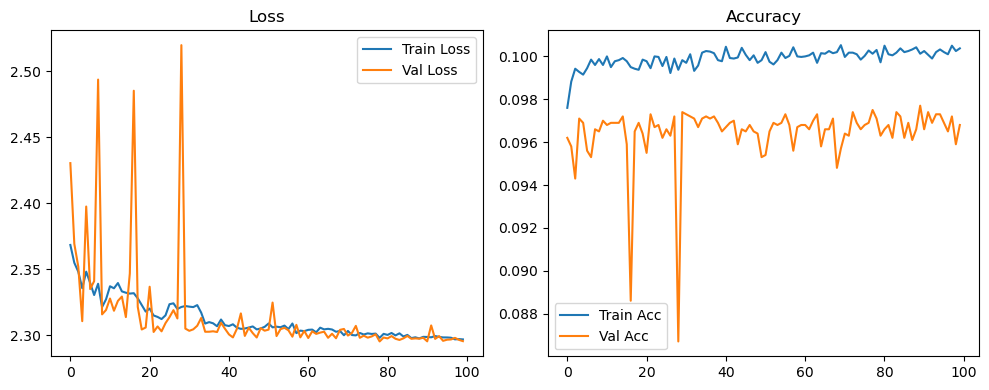

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.2978 Accuracy: 0.0994


🚀 Running: batch512_lr_max_0.0002_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0967 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0984 | Val Acc: 0.0967 |:   1%|          | 1/100 [01:21<2:14:47, 81.69s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0963 |:   1%|          | 1/100 [02:43<2:14:47, 81.69s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0963 |:   1%|          | 1/100 [02:43<2:14:47, 81.69s/it]

| LR: 0.000200 | Train Acc: 0.0989 | Val Acc: 0.0963 |:   2%|▏         | 2/100 [02:43<2:13:39, 81.83s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [04:05<2:13:39, 81.83s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0969 |:   2%|▏         | 2/100 [04:05<2:13:39, 81.83s/it]

| LR: 0.000200 | Train Acc: 0.0990 | Val Acc: 0.0969 |:   3%|▎         | 3/100 [04:05<2:12:13, 81.79s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [05:13<2:12:13, 81.79s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0966 |:   3%|▎         | 3/100 [05:13<2:12:13, 81.79s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0966 |:   4%|▍         | 4/100 [05:13<2:02:23, 76.49s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:26<2:02:23, 76.49s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:26<2:02:23, 76.49s/it]

| LR: 0.000199 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:26<1:24:56, 53.64s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [05:39<1:24:56, 53.64s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [05:39<1:24:56, 53.64s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [05:39<1:02:26, 39.86s/it]

| LR: 0.000198 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:53<1:02:26, 39.86s/it]

| LR: 0.000198 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:53<1:02:26, 39.86s/it]

| LR: 0.000198 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [05:53<48:16, 31.15s/it]  

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:06<48:16, 31.15s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:06<48:16, 31.15s/it]

| LR: 0.000198 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:06<39:03, 25.47s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [06:19<39:03, 25.47s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [06:19<39:03, 25.47s/it]

| LR: 0.000197 | Train Acc: 0.0997 | Val Acc: 0.0967 |:   9%|▉         | 9/100 [06:19<32:49, 21.64s/it]

| LR: 0.000196 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:32<32:49, 21.64s/it]

| LR: 0.000196 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:32<32:49, 21.64s/it]

| LR: 0.000196 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:32<28:32, 19.03s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  10%|█         | 10/100 [06:45<28:32, 19.03s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  10%|█         | 10/100 [06:45<28:32, 19.03s/it]

| LR: 0.000195 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  11%|█         | 11/100 [06:46<25:33, 17.23s/it]

| LR: 0.000194 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:59<25:33, 17.23s/it]

| LR: 0.000194 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:59<25:33, 17.23s/it]

| LR: 0.000194 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [06:59<23:28, 16.01s/it]

| LR: 0.000193 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:12<23:28, 16.01s/it]

| LR: 0.000193 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:12<23:28, 16.01s/it]

| LR: 0.000193 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:12<21:58, 15.15s/it]

| LR: 0.000192 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:25<21:58, 15.15s/it]

| LR: 0.000192 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:25<21:58, 15.15s/it]

| LR: 0.000192 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:25<20:51, 14.55s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:38<20:51, 14.55s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:38<20:51, 14.55s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:38<20:02, 14.15s/it]

| LR: 0.000189 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:51<20:02, 14.15s/it]

| LR: 0.000189 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:51<20:02, 14.15s/it]

| LR: 0.000189 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [07:52<19:25, 13.87s/it]

| LR: 0.000188 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [08:05<19:25, 13.87s/it]

| LR: 0.000188 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [08:05<19:25, 13.87s/it]

| LR: 0.000188 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  17%|█▋        | 17/100 [08:05<18:56, 13.70s/it]

| LR: 0.000186 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:18<18:56, 13.70s/it]

| LR: 0.000186 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:18<18:56, 13.70s/it]

| LR: 0.000186 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:18<18:29, 13.53s/it]

| LR: 0.000185 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:31<18:29, 13.53s/it]

| LR: 0.000185 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:31<18:29, 13.53s/it]

| LR: 0.000185 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:31<18:06, 13.41s/it]

| LR: 0.000183 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [08:44<18:06, 13.41s/it]

| LR: 0.000183 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  19%|█▉        | 19/100 [08:44<18:06, 13.41s/it]

| LR: 0.000183 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  20%|██        | 20/100 [08:44<17:46, 13.33s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:57<17:46, 13.33s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:57<17:46, 13.33s/it]

| LR: 0.000181 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  21%|██        | 21/100 [08:57<17:28, 13.27s/it]

| LR: 0.000179 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:10<17:28, 13.27s/it]

| LR: 0.000179 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:10<17:28, 13.27s/it]

| LR: 0.000179 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [09:10<17:11, 13.22s/it]

| LR: 0.000177 | Train Acc: 0.0999 | Val Acc: 0.0948 |:  22%|██▏       | 22/100 [09:24<17:11, 13.22s/it]

| LR: 0.000177 | Train Acc: 0.0999 | Val Acc: 0.0948 |:  22%|██▏       | 22/100 [09:24<17:11, 13.22s/it]

| LR: 0.000177 | Train Acc: 0.0999 | Val Acc: 0.0948 |:  23%|██▎       | 23/100 [09:24<16:54, 13.18s/it]

| LR: 0.000175 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  23%|██▎       | 23/100 [09:37<16:54, 13.18s/it]

| LR: 0.000175 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  23%|██▎       | 23/100 [09:37<16:54, 13.18s/it]

| LR: 0.000175 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  24%|██▍       | 24/100 [09:37<16:39, 13.15s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:50<16:39, 13.15s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:50<16:39, 13.15s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [09:50<16:24, 13.13s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  25%|██▌       | 25/100 [10:03<16:24, 13.13s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  25%|██▌       | 25/100 [10:03<16:24, 13.13s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  26%|██▌       | 26/100 [10:03<16:10, 13.12s/it]

| LR: 0.000169 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [10:16<16:10, 13.12s/it]

| LR: 0.000169 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  26%|██▌       | 26/100 [10:16<16:10, 13.12s/it]

| LR: 0.000169 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  27%|██▋       | 27/100 [10:16<15:59, 13.14s/it]

| LR: 0.000166 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:29<15:59, 13.14s/it]

| LR: 0.000166 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  27%|██▋       | 27/100 [10:29<15:59, 13.14s/it]

| LR: 0.000166 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [10:29<15:46, 13.15s/it]

| LR: 0.000164 | Train Acc: 0.1002 | Val Acc: 0.0976 |:  28%|██▊       | 28/100 [10:42<15:46, 13.15s/it]

| LR: 0.000164 | Train Acc: 0.1002 | Val Acc: 0.0976 |:  28%|██▊       | 28/100 [10:42<15:46, 13.15s/it]

| LR: 0.000164 | Train Acc: 0.1002 | Val Acc: 0.0976 |:  29%|██▉       | 29/100 [10:42<15:34, 13.16s/it]

| LR: 0.000161 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:55<15:34, 13.16s/it]

| LR: 0.000161 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:55<15:34, 13.16s/it]

| LR: 0.000161 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  30%|███       | 30/100 [10:56<15:20, 13.16s/it]

| LR: 0.000159 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  30%|███       | 30/100 [11:09<15:20, 13.16s/it]

| LR: 0.000159 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  30%|███       | 30/100 [11:09<15:20, 13.16s/it]

| LR: 0.000159 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:09<15:08, 13.16s/it]

| LR: 0.000156 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  31%|███       | 31/100 [11:22<15:08, 13.16s/it]

| LR: 0.000156 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  31%|███       | 31/100 [11:22<15:08, 13.16s/it]

| LR: 0.000156 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:22<14:55, 13.17s/it]

| LR: 0.000154 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:35<14:55, 13.17s/it]

| LR: 0.000154 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:35<14:55, 13.17s/it]

| LR: 0.000154 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:35<14:40, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:48<14:40, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:48<14:40, 13.15s/it]

| LR: 0.000151 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [11:48<14:26, 13.13s/it]

| LR: 0.000148 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  34%|███▍      | 34/100 [12:01<14:26, 13.13s/it]

| LR: 0.000148 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  34%|███▍      | 34/100 [12:01<14:26, 13.13s/it]

| LR: 0.000148 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  35%|███▌      | 35/100 [12:01<14:12, 13.12s/it]

| LR: 0.000146 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:14<14:12, 13.12s/it]

| LR: 0.000146 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:14<14:12, 13.12s/it]

| LR: 0.000146 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:14<14:02, 13.16s/it]

| LR: 0.000143 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:27<14:02, 13.16s/it]

| LR: 0.000143 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:27<14:02, 13.16s/it]

| LR: 0.000143 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  37%|███▋      | 37/100 [12:27<13:47, 13.14s/it]

| LR: 0.000140 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:41<13:47, 13.14s/it]

| LR: 0.000140 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:41<13:47, 13.14s/it]

| LR: 0.000140 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:41<13:33, 13.12s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:54<13:33, 13.12s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:54<13:33, 13.12s/it]

| LR: 0.000137 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [12:54<13:19, 13.11s/it]

| LR: 0.000134 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [13:07<13:19, 13.11s/it]

| LR: 0.000134 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [13:07<13:19, 13.11s/it]

| LR: 0.000134 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:07<13:06, 13.11s/it]

| LR: 0.000131 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:20<13:06, 13.11s/it]

| LR: 0.000131 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:20<13:06, 13.11s/it]

| LR: 0.000131 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:20<12:53, 13.12s/it]

| LR: 0.000128 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:33<12:53, 13.12s/it]

| LR: 0.000128 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:33<12:53, 13.12s/it]

| LR: 0.000128 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  42%|████▏     | 42/100 [13:33<12:40, 13.11s/it]

| LR: 0.000125 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [13:46<12:40, 13.11s/it]

| LR: 0.000125 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [13:46<12:40, 13.11s/it]

| LR: 0.000125 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [13:46<12:27, 13.12s/it]

| LR: 0.000122 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  43%|████▎     | 43/100 [13:59<12:27, 13.12s/it]

| LR: 0.000122 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  43%|████▎     | 43/100 [13:59<12:27, 13.12s/it]

| LR: 0.000122 | Train Acc: 0.1003 | Val Acc: 0.0950 |:  44%|████▍     | 44/100 [13:59<12:14, 13.12s/it]

| LR: 0.000119 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:12<12:14, 13.12s/it]

| LR: 0.000119 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:12<12:14, 13.12s/it]

| LR: 0.000119 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:12<12:01, 13.12s/it]

| LR: 0.000116 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:26<12:01, 13.12s/it]

| LR: 0.000116 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:26<12:01, 13.12s/it]

| LR: 0.000116 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:26<11:52, 13.19s/it]

| LR: 0.000113 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:39<11:52, 13.19s/it]

| LR: 0.000113 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  46%|████▌     | 46/100 [14:39<11:52, 13.19s/it]

| LR: 0.000113 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [14:39<11:39, 13.19s/it]

| LR: 0.000110 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  47%|████▋     | 47/100 [14:52<11:39, 13.19s/it]

| LR: 0.000110 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  47%|████▋     | 47/100 [14:52<11:39, 13.19s/it]

| LR: 0.000110 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  48%|████▊     | 48/100 [14:52<11:27, 13.22s/it]

| LR: 0.000107 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [15:05<11:27, 13.22s/it]

| LR: 0.000107 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [15:05<11:27, 13.22s/it]

| LR: 0.000107 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  49%|████▉     | 49/100 [15:05<11:14, 13.23s/it]

| LR: 0.000104 | Train Acc: 0.0999 | Val Acc: 0.0945 |:  49%|████▉     | 49/100 [15:19<11:14, 13.23s/it]

| LR: 0.000104 | Train Acc: 0.0999 | Val Acc: 0.0945 |:  49%|████▉     | 49/100 [15:19<11:14, 13.23s/it]

| LR: 0.000104 | Train Acc: 0.0999 | Val Acc: 0.0945 |:  50%|█████     | 50/100 [15:19<11:00, 13.22s/it]

| LR: 0.000101 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [15:32<11:00, 13.22s/it]

| LR: 0.000101 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  50%|█████     | 50/100 [15:32<11:00, 13.22s/it]

| LR: 0.000101 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  51%|█████     | 51/100 [15:32<10:46, 13.20s/it]

| LR: 0.000097 | Train Acc: 0.0999 | Val Acc: 0.0946 |:  51%|█████     | 51/100 [15:45<10:46, 13.20s/it]

| LR: 0.000097 | Train Acc: 0.0999 | Val Acc: 0.0946 |:  51%|█████     | 51/100 [15:45<10:46, 13.20s/it]

| LR: 0.000097 | Train Acc: 0.0999 | Val Acc: 0.0946 |:  52%|█████▏    | 52/100 [15:45<10:33, 13.21s/it]

| LR: 0.000094 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [15:58<10:33, 13.21s/it]

| LR: 0.000094 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [15:58<10:33, 13.21s/it]

| LR: 0.000094 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  53%|█████▎    | 53/100 [15:58<10:20, 13.19s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0952 |:  53%|█████▎    | 53/100 [16:11<10:20, 13.19s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0952 |:  53%|█████▎    | 53/100 [16:11<10:20, 13.19s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0952 |:  54%|█████▍    | 54/100 [16:11<10:06, 13.19s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:25<10:06, 13.19s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:25<10:06, 13.19s/it]

| LR: 0.000088 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [16:25<09:54, 13.22s/it]

| LR: 0.000085 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [16:38<09:54, 13.22s/it]

| LR: 0.000085 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  55%|█████▌    | 55/100 [16:38<09:54, 13.22s/it]

| LR: 0.000085 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [16:38<09:40, 13.20s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  56%|█████▌    | 56/100 [16:51<09:40, 13.20s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  56%|█████▌    | 56/100 [16:51<09:40, 13.20s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0957 |:  57%|█████▋    | 57/100 [16:51<09:26, 13.18s/it]

| LR: 0.000079 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [17:04<09:26, 13.18s/it]

| LR: 0.000079 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [17:04<09:26, 13.18s/it]

| LR: 0.000079 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [17:04<09:13, 13.18s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:17<09:13, 13.18s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:17<09:13, 13.18s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  59%|█████▉    | 59/100 [17:17<08:59, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:30<08:59, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:30<08:59, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:30<08:45, 13.15s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:43<08:45, 13.15s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:43<08:45, 13.15s/it]

| LR: 0.000070 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  61%|██████    | 61/100 [17:44<08:33, 13.16s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  61%|██████    | 61/100 [17:57<08:33, 13.16s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  61%|██████    | 61/100 [17:57<08:33, 13.16s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  62%|██████▏   | 62/100 [17:57<08:20, 13.17s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:10<08:20, 13.17s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:10<08:20, 13.17s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  63%|██████▎   | 63/100 [18:10<08:07, 13.16s/it]

| LR: 0.000061 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  63%|██████▎   | 63/100 [18:23<08:07, 13.16s/it]

| LR: 0.000061 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  63%|██████▎   | 63/100 [18:23<08:07, 13.16s/it]

| LR: 0.000061 | Train Acc: 0.1004 | Val Acc: 0.0971 |:  64%|██████▍   | 64/100 [18:23<07:53, 13.15s/it]

| LR: 0.000058 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:36<07:53, 13.15s/it]

| LR: 0.000058 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:36<07:53, 13.15s/it]

| LR: 0.000058 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  65%|██████▌   | 65/100 [18:36<07:41, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  65%|██████▌   | 65/100 [18:49<07:41, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  65%|██████▌   | 65/100 [18:49<07:41, 13.17s/it]

| LR: 0.000055 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  66%|██████▌   | 66/100 [18:49<07:26, 13.14s/it]

| LR: 0.000053 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  66%|██████▌   | 66/100 [19:02<07:26, 13.14s/it]

| LR: 0.000053 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  66%|██████▌   | 66/100 [19:02<07:26, 13.14s/it]

| LR: 0.000053 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:02<07:12, 13.12s/it]

| LR: 0.000050 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:15<07:12, 13.12s/it]

| LR: 0.000050 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:15<07:12, 13.12s/it]

| LR: 0.000050 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:15<06:59, 13.11s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  68%|██████▊   | 68/100 [19:29<06:59, 13.11s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  68%|██████▊   | 68/100 [19:29<06:59, 13.11s/it]

| LR: 0.000047 | Train Acc: 0.1002 | Val Acc: 0.0954 |:  69%|██████▉   | 69/100 [19:29<06:47, 13.13s/it]

| LR: 0.000045 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:42<06:47, 13.13s/it]

| LR: 0.000045 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:42<06:47, 13.13s/it]

| LR: 0.000045 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:42<06:34, 13.14s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  70%|███████   | 70/100 [19:55<06:34, 13.14s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  70%|███████   | 70/100 [19:55<06:34, 13.14s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [19:55<06:20, 13.13s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:08<06:20, 13.13s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:08<06:20, 13.13s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:08<06:07, 13.13s/it]

| LR: 0.000037 | Train Acc: 0.1003 | Val Acc: 0.0952 |:  72%|███████▏  | 72/100 [20:21<06:07, 13.13s/it]

| LR: 0.000037 | Train Acc: 0.1003 | Val Acc: 0.0952 |:  72%|███████▏  | 72/100 [20:21<06:07, 13.13s/it]

| LR: 0.000037 | Train Acc: 0.1003 | Val Acc: 0.0952 |:  73%|███████▎  | 73/100 [20:21<05:54, 13.13s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:34<05:54, 13.13s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:34<05:54, 13.13s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  74%|███████▍  | 74/100 [20:34<05:42, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  74%|███████▍  | 74/100 [20:48<05:42, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  74%|███████▍  | 74/100 [20:48<05:42, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  75%|███████▌  | 75/100 [20:48<05:29, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  75%|███████▌  | 75/100 [21:01<05:29, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  75%|███████▌  | 75/100 [21:01<05:29, 13.16s/it]

| LR: 0.000030 | Train Acc: 0.1000 | Val Acc: 0.0946 |:  76%|███████▌  | 76/100 [21:01<05:15, 13.14s/it]

| LR: 0.000028 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  76%|███████▌  | 76/100 [21:14<05:15, 13.14s/it]

| LR: 0.000028 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  76%|███████▌  | 76/100 [21:14<05:15, 13.14s/it]

| LR: 0.000028 | Train Acc: 0.1004 | Val Acc: 0.0952 |:  77%|███████▋  | 77/100 [21:14<05:02, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:27<05:02, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:27<05:02, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.1007 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:27<04:49, 13.15s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  78%|███████▊  | 78/100 [21:40<04:49, 13.15s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  78%|███████▊  | 78/100 [21:40<04:49, 13.15s/it]

| LR: 0.000024 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  79%|███████▉  | 79/100 [21:40<04:36, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:53<04:36, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:53<04:36, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:53<04:23, 13.17s/it]

| LR: 0.000020 | Train Acc: 0.1003 | Val Acc: 0.0951 |:  80%|████████  | 80/100 [22:06<04:23, 13.17s/it]

| LR: 0.000020 | Train Acc: 0.1003 | Val Acc: 0.0951 |:  80%|████████  | 80/100 [22:06<04:23, 13.17s/it]

| LR: 0.000020 | Train Acc: 0.1003 | Val Acc: 0.0951 |:  81%|████████  | 81/100 [22:07<04:10, 13.18s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0943 |:  81%|████████  | 81/100 [22:20<04:10, 13.18s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0943 |:  81%|████████  | 81/100 [22:20<04:10, 13.18s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0943 |:  82%|████████▏ | 82/100 [22:20<03:57, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  82%|████████▏ | 82/100 [22:33<03:57, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  82%|████████▏ | 82/100 [22:33<03:57, 13.18s/it]

| LR: 0.000016 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  83%|████████▎ | 83/100 [22:33<03:43, 13.16s/it]

| LR: 0.000015 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  83%|████████▎ | 83/100 [22:46<03:43, 13.16s/it]

| LR: 0.000015 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  83%|████████▎ | 83/100 [22:46<03:43, 13.16s/it]

| LR: 0.000015 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [22:46<03:30, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  84%|████████▍ | 84/100 [22:59<03:30, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  84%|████████▍ | 84/100 [22:59<03:30, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [22:59<03:17, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:12<03:17, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:12<03:17, 13.17s/it]

| LR: 0.000012 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:12<03:04, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0959 |:  86%|████████▌ | 86/100 [23:26<03:04, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0959 |:  86%|████████▌ | 86/100 [23:26<03:04, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0959 |:  87%|████████▋ | 87/100 [23:26<02:51, 13.17s/it]

| LR: 0.000009 | Train Acc: 0.1001 | Val Acc: 0.0950 |:  87%|████████▋ | 87/100 [23:39<02:51, 13.17s/it]

| LR: 0.000009 | Train Acc: 0.1001 | Val Acc: 0.0950 |:  87%|████████▋ | 87/100 [23:39<02:51, 13.17s/it]

| LR: 0.000009 | Train Acc: 0.1001 | Val Acc: 0.0950 |:  88%|████████▊ | 88/100 [23:39<02:37, 13.16s/it]

| LR: 0.000008 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  88%|████████▊ | 88/100 [23:52<02:37, 13.16s/it]

| LR: 0.000008 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  88%|████████▊ | 88/100 [23:52<02:37, 13.16s/it]

| LR: 0.000008 | Train Acc: 0.1006 | Val Acc: 0.0975 |:  89%|████████▉ | 89/100 [23:52<02:24, 13.16s/it]

| LR: 0.000007 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [24:05<02:24, 13.16s/it]

| LR: 0.000007 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [24:05<02:24, 13.16s/it]

| LR: 0.000007 | Train Acc: 0.1006 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:05<02:11, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:18<02:11, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:18<02:11, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:18<01:58, 13.17s/it]

| LR: 0.000005 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:31<01:58, 13.17s/it]

| LR: 0.000005 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:31<01:58, 13.17s/it]

| LR: 0.000005 | Train Acc: 0.1004 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:31<01:45, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:45<01:45, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  92%|█████████▏| 92/100 [24:45<01:45, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  93%|█████████▎| 93/100 [24:45<01:32, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:58<01:32, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:58<01:32, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [24:58<01:19, 13.19s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:11<01:19, 13.19s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:11<01:19, 13.19s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:11<01:05, 13.18s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:24<01:05, 13.18s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:24<01:05, 13.18s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [25:24<00:52, 13.18s/it]

| LR: 0.000002 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  96%|█████████▌| 96/100 [25:37<00:52, 13.18s/it]

| LR: 0.000002 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  96%|█████████▌| 96/100 [25:37<00:52, 13.18s/it]

| LR: 0.000002 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:37<00:39, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:50<00:39, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:50<00:39, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [25:51<00:26, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [26:04<00:26, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [26:04<00:26, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  99%|█████████▉| 99/100 [26:04<00:13, 13.17s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  99%|█████████▉| 99/100 [26:17<00:13, 13.17s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  99%|█████████▉| 99/100 [26:17<00:13, 13.17s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0973 |: 100%|██████████| 100/100 [26:17<00:00, 13.16s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0973 |: 100%|██████████| 100/100 [26:17<00:00, 15.77s/it]

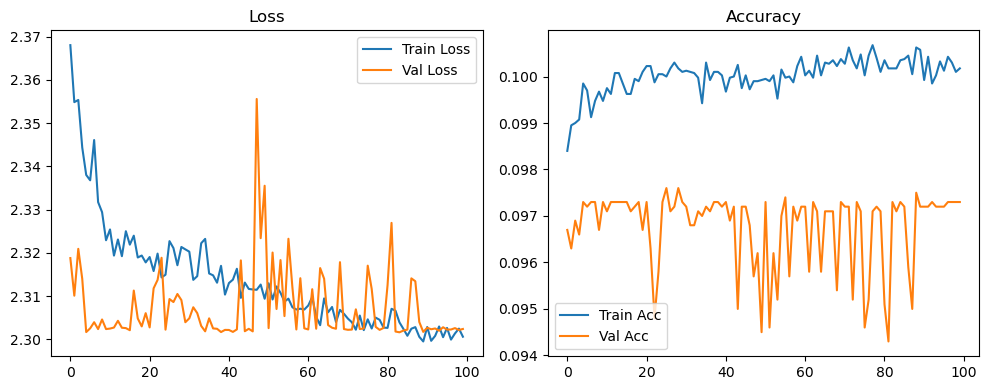

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.26it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 2.3025 Accuracy: 0.1000


🚀 Running: batch512_lr_max_0.0002_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000200 | Train Acc: 0.0983 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:22<2:15:57, 82.40s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0974 |:   1%|          | 1/100 [02:44<2:15:57, 82.40s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0974 |:   1%|          | 1/100 [02:44<2:15:57, 82.40s/it]

| LR: 0.000200 | Train Acc: 0.0992 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [02:44<2:14:43, 82.48s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:06<2:14:43, 82.48s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:06<2:14:43, 82.48s/it]

| LR: 0.000200 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [04:07<2:13:02, 82.29s/it]

| LR: 0.000200 | Train Acc: 0.0996 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [05:15<2:13:02, 82.29s/it]

| LR: 0.000200 | Train Acc: 0.0996 | Val Acc: 0.0974 |:   3%|▎         | 3/100 [05:15<2:13:02, 82.29s/it]

| LR: 0.000200 | Train Acc: 0.0996 | Val Acc: 0.0974 |:   4%|▍         | 4/100 [05:16<2:03:18, 77.06s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:18, 77.06s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:18, 77.06s/it]

| LR: 0.000199 | Train Acc: 0.0997 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:29<1:25:29, 53.99s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:29, 53.99s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:29, 53.99s/it]

| LR: 0.000199 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:42<1:02:49, 40.10s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:55<1:02:49, 40.10s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:55<1:02:49, 40.10s/it]

| LR: 0.000198 | Train Acc: 0.0999 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [05:55<48:29, 31.28s/it]  

| LR: 0.000198 | Train Acc: 0.1000 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [06:08<48:29, 31.28s/it]

| LR: 0.000198 | Train Acc: 0.1000 | Val Acc: 0.0971 |:   7%|▋         | 7/100 [06:08<48:29, 31.28s/it]

| LR: 0.000198 | Train Acc: 0.1000 | Val Acc: 0.0971 |:   8%|▊         | 8/100 [06:08<39:10, 25.55s/it]

| LR: 0.000197 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [06:21<39:10, 25.55s/it]

| LR: 0.000197 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [06:21<39:10, 25.55s/it]

| LR: 0.000197 | Train Acc: 0.1000 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [06:21<32:53, 21.69s/it]

| LR: 0.000196 | Train Acc: 0.1001 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [06:34<32:53, 21.69s/it]

| LR: 0.000196 | Train Acc: 0.1001 | Val Acc: 0.0969 |:   9%|▉         | 9/100 [06:34<32:53, 21.69s/it]

| LR: 0.000196 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  10%|█         | 10/100 [06:35<28:35, 19.06s/it]

| LR: 0.000195 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  10%|█         | 10/100 [06:48<28:35, 19.06s/it]

| LR: 0.000195 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  10%|█         | 10/100 [06:48<28:35, 19.06s/it]

| LR: 0.000195 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  11%|█         | 11/100 [06:48<25:35, 17.25s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  11%|█         | 11/100 [07:01<25:35, 17.25s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  11%|█         | 11/100 [07:01<25:35, 17.25s/it]

| LR: 0.000194 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  12%|█▏        | 12/100 [07:01<23:28, 16.00s/it]

| LR: 0.000193 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [07:14<23:28, 16.00s/it]

| LR: 0.000193 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  12%|█▏        | 12/100 [07:14<23:28, 16.00s/it]

| LR: 0.000193 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:14<21:59, 15.17s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:27<21:59, 15.17s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:27<21:59, 15.17s/it]

| LR: 0.000192 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:27<20:55, 14.60s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:41<20:55, 14.60s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:41<20:55, 14.60s/it]

| LR: 0.000191 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:41<20:06, 14.19s/it]

| LR: 0.000189 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:54<20:06, 14.19s/it]

| LR: 0.000189 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  15%|█▌        | 15/100 [07:54<20:06, 14.19s/it]

| LR: 0.000189 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  16%|█▌        | 16/100 [07:54<19:26, 13.89s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  16%|█▌        | 16/100 [08:07<19:26, 13.89s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  16%|█▌        | 16/100 [08:07<19:26, 13.89s/it]

| LR: 0.000188 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:07<18:59, 13.72s/it]

| LR: 0.000186 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:20<18:59, 13.72s/it]

| LR: 0.000186 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  17%|█▋        | 17/100 [08:20<18:59, 13.72s/it]

| LR: 0.000186 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  18%|█▊        | 18/100 [08:20<18:32, 13.57s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:33<18:32, 13.57s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:33<18:32, 13.57s/it]

| LR: 0.000185 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  19%|█▉        | 19/100 [08:34<18:09, 13.45s/it]

| LR: 0.000183 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  19%|█▉        | 19/100 [08:47<18:09, 13.45s/it]

| LR: 0.000183 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  19%|█▉        | 19/100 [08:47<18:09, 13.45s/it]

| LR: 0.000183 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  20%|██        | 20/100 [08:47<17:51, 13.39s/it]

| LR: 0.000181 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  20%|██        | 20/100 [09:00<17:51, 13.39s/it]

| LR: 0.000181 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  20%|██        | 20/100 [09:00<17:51, 13.39s/it]

| LR: 0.000181 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  21%|██        | 21/100 [09:00<17:33, 13.34s/it]

| LR: 0.000179 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  21%|██        | 21/100 [09:13<17:33, 13.34s/it]

| LR: 0.000179 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  21%|██        | 21/100 [09:13<17:33, 13.34s/it]

| LR: 0.000179 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  22%|██▏       | 22/100 [09:13<17:16, 13.29s/it]

| LR: 0.000177 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  22%|██▏       | 22/100 [09:26<17:16, 13.29s/it]

| LR: 0.000177 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  22%|██▏       | 22/100 [09:26<17:16, 13.29s/it]

| LR: 0.000177 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  23%|██▎       | 23/100 [09:26<17:00, 13.25s/it]

| LR: 0.000175 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  23%|██▎       | 23/100 [09:39<17:00, 13.25s/it]

| LR: 0.000175 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  23%|██▎       | 23/100 [09:39<17:00, 13.25s/it]

| LR: 0.000175 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  24%|██▍       | 24/100 [09:39<16:44, 13.22s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [09:53<16:44, 13.22s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  24%|██▍       | 24/100 [09:53<16:44, 13.22s/it]

| LR: 0.000173 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  25%|██▌       | 25/100 [09:53<16:30, 13.21s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  25%|██▌       | 25/100 [10:06<16:30, 13.21s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  25%|██▌       | 25/100 [10:06<16:30, 13.21s/it]

| LR: 0.000171 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  26%|██▌       | 26/100 [10:06<16:19, 13.24s/it]

| LR: 0.000169 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:19<16:19, 13.24s/it]

| LR: 0.000169 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:19<16:19, 13.24s/it]

| LR: 0.000169 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:19<16:04, 13.22s/it]

| LR: 0.000166 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [10:32<16:04, 13.22s/it]

| LR: 0.000166 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  27%|██▋       | 27/100 [10:32<16:04, 13.22s/it]

| LR: 0.000166 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  28%|██▊       | 28/100 [10:32<15:49, 13.19s/it]

| LR: 0.000164 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [10:45<15:49, 13.19s/it]

| LR: 0.000164 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [10:45<15:49, 13.19s/it]

| LR: 0.000164 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [10:45<15:35, 13.18s/it]

| LR: 0.000161 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [10:59<15:35, 13.18s/it]

| LR: 0.000161 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [10:59<15:35, 13.18s/it]

| LR: 0.000161 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  30%|███       | 30/100 [10:59<15:21, 13.17s/it]

| LR: 0.000159 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  30%|███       | 30/100 [11:12<15:21, 13.17s/it]

| LR: 0.000159 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  30%|███       | 30/100 [11:12<15:21, 13.17s/it]

| LR: 0.000159 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  31%|███       | 31/100 [11:12<15:08, 13.17s/it]

| LR: 0.000156 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  31%|███       | 31/100 [11:25<15:08, 13.17s/it]

| LR: 0.000156 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  31%|███       | 31/100 [11:25<15:08, 13.17s/it]

| LR: 0.000156 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  32%|███▏      | 32/100 [11:25<14:55, 13.16s/it]

| LR: 0.000154 | Train Acc: 0.0996 | Val Acc: 0.0976 |:  32%|███▏      | 32/100 [11:38<14:55, 13.16s/it]

| LR: 0.000154 | Train Acc: 0.0996 | Val Acc: 0.0976 |:  32%|███▏      | 32/100 [11:38<14:55, 13.16s/it]

| LR: 0.000154 | Train Acc: 0.0996 | Val Acc: 0.0976 |:  33%|███▎      | 33/100 [11:38<14:41, 13.16s/it]

| LR: 0.000151 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  33%|███▎      | 33/100 [11:51<14:41, 13.16s/it]

| LR: 0.000151 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  33%|███▎      | 33/100 [11:51<14:41, 13.16s/it]

| LR: 0.000151 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [11:51<14:28, 13.16s/it]

| LR: 0.000148 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:04<14:28, 13.16s/it]

| LR: 0.000148 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:04<14:28, 13.16s/it]

| LR: 0.000148 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:04<14:15, 13.16s/it]

| LR: 0.000146 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [12:18<14:15, 13.16s/it]

| LR: 0.000146 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [12:18<14:15, 13.16s/it]

| LR: 0.000146 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  36%|███▌      | 36/100 [12:18<14:05, 13.21s/it]

| LR: 0.000143 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  36%|███▌      | 36/100 [12:31<14:05, 13.21s/it]

| LR: 0.000143 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  36%|███▌      | 36/100 [12:31<14:05, 13.21s/it]

| LR: 0.000143 | Train Acc: 0.0994 | Val Acc: 0.0975 |:  37%|███▋      | 37/100 [12:31<13:50, 13.18s/it]

| LR: 0.000140 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  37%|███▋      | 37/100 [12:44<13:50, 13.18s/it]

| LR: 0.000140 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  37%|███▋      | 37/100 [12:44<13:50, 13.18s/it]

| LR: 0.000140 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [12:44<13:36, 13.17s/it]

| LR: 0.000137 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  38%|███▊      | 38/100 [12:57<13:36, 13.17s/it]

| LR: 0.000137 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  38%|███▊      | 38/100 [12:57<13:36, 13.17s/it]

| LR: 0.000137 | Train Acc: 0.1005 | Val Acc: 0.0966 |:  39%|███▉      | 39/100 [12:57<13:22, 13.16s/it]

| LR: 0.000134 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  39%|███▉      | 39/100 [13:10<13:22, 13.16s/it]

| LR: 0.000134 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  39%|███▉      | 39/100 [13:10<13:22, 13.16s/it]

| LR: 0.000134 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  40%|████      | 40/100 [13:10<13:09, 13.16s/it]

| LR: 0.000131 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:23<13:09, 13.16s/it]

| LR: 0.000131 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:23<13:09, 13.16s/it]

| LR: 0.000131 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  41%|████      | 41/100 [13:23<12:56, 13.16s/it]

| LR: 0.000128 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:37<12:56, 13.16s/it]

| LR: 0.000128 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:37<12:56, 13.16s/it]

| LR: 0.000128 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  42%|████▏     | 42/100 [13:37<12:43, 13.16s/it]

| LR: 0.000125 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  42%|████▏     | 42/100 [13:50<12:43, 13.16s/it]

| LR: 0.000125 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  42%|████▏     | 42/100 [13:50<12:43, 13.16s/it]

| LR: 0.000125 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  43%|████▎     | 43/100 [13:50<12:30, 13.17s/it]

| LR: 0.000122 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [14:03<12:30, 13.17s/it]

| LR: 0.000122 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [14:03<12:30, 13.17s/it]

| LR: 0.000122 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:03<12:17, 13.16s/it]

| LR: 0.000119 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:16<12:17, 13.16s/it]

| LR: 0.000119 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:16<12:17, 13.16s/it]

| LR: 0.000119 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:16<12:04, 13.18s/it]

| LR: 0.000116 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:29<12:04, 13.18s/it]

| LR: 0.000116 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:29<12:04, 13.18s/it]

| LR: 0.000116 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:29<11:50, 13.15s/it]

| LR: 0.000113 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:42<11:50, 13.15s/it]

| LR: 0.000113 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:42<11:50, 13.15s/it]

| LR: 0.000113 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  47%|████▋     | 47/100 [14:42<11:36, 13.13s/it]

| LR: 0.000110 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:55<11:36, 13.13s/it]

| LR: 0.000110 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:55<11:36, 13.13s/it]

| LR: 0.000110 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [14:55<11:23, 13.15s/it]

| LR: 0.000107 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [15:09<11:23, 13.15s/it]

| LR: 0.000107 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [15:09<11:23, 13.15s/it]

| LR: 0.000107 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  49%|████▉     | 49/100 [15:09<11:10, 13.15s/it]

| LR: 0.000104 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:22<11:10, 13.15s/it]

| LR: 0.000104 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:22<11:10, 13.15s/it]

| LR: 0.000104 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  50%|█████     | 50/100 [15:22<10:58, 13.16s/it]

| LR: 0.000101 | Train Acc: 0.1003 | Val Acc: 0.0975 |:  50%|█████     | 50/100 [15:35<10:58, 13.16s/it]

| LR: 0.000101 | Train Acc: 0.1003 | Val Acc: 0.0975 |:  50%|█████     | 50/100 [15:35<10:58, 13.16s/it]

| LR: 0.000101 | Train Acc: 0.1003 | Val Acc: 0.0975 |:  51%|█████     | 51/100 [15:35<10:47, 13.21s/it]

| LR: 0.000097 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:48<10:47, 13.21s/it]

| LR: 0.000097 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:48<10:47, 13.21s/it]

| LR: 0.000097 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  52%|█████▏    | 52/100 [15:48<10:34, 13.21s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [16:02<10:34, 13.21s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  52%|█████▏    | 52/100 [16:02<10:34, 13.21s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:02<10:21, 13.23s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:15<10:21, 13.23s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:15<10:21, 13.23s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:15<10:07, 13.20s/it]

| LR: 0.000088 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:28<10:07, 13.20s/it]

| LR: 0.000088 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:28<10:07, 13.20s/it]

| LR: 0.000088 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:28<09:56, 13.25s/it]

| LR: 0.000085 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:41<09:56, 13.25s/it]

| LR: 0.000085 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:41<09:56, 13.25s/it]

| LR: 0.000085 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [16:41<09:43, 13.26s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [16:55<09:43, 13.26s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  56%|█████▌    | 56/100 [16:55<09:43, 13.26s/it]

| LR: 0.000082 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  57%|█████▋    | 57/100 [16:55<09:30, 13.26s/it]

| LR: 0.000079 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  57%|█████▋    | 57/100 [17:08<09:30, 13.26s/it]

| LR: 0.000079 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  57%|█████▋    | 57/100 [17:08<09:30, 13.26s/it]

| LR: 0.000079 | Train Acc: 0.1003 | Val Acc: 0.0966 |:  58%|█████▊    | 58/100 [17:08<09:15, 13.23s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [17:21<09:15, 13.23s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  58%|█████▊    | 58/100 [17:21<09:15, 13.23s/it]

| LR: 0.000076 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  59%|█████▉    | 59/100 [17:21<09:01, 13.21s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:34<09:01, 13.21s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:34<09:01, 13.21s/it]

| LR: 0.000073 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:34<08:48, 13.21s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [17:47<08:48, 13.21s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [17:47<08:48, 13.21s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0971 |:  61%|██████    | 61/100 [17:47<08:35, 13.22s/it]

| LR: 0.000067 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [18:01<08:35, 13.22s/it]

| LR: 0.000067 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [18:01<08:35, 13.22s/it]

| LR: 0.000067 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [18:01<08:22, 13.23s/it]

| LR: 0.000064 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  62%|██████▏   | 62/100 [18:14<08:22, 13.23s/it]

| LR: 0.000064 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  62%|██████▏   | 62/100 [18:14<08:22, 13.23s/it]

| LR: 0.000064 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  63%|██████▎   | 63/100 [18:14<08:09, 13.23s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [18:27<08:09, 13.23s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  63%|██████▎   | 63/100 [18:27<08:09, 13.23s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:27<07:57, 13.28s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:40<07:57, 13.28s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:40<07:57, 13.28s/it]

| LR: 0.000058 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  65%|██████▌   | 65/100 [18:41<07:44, 13.26s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  65%|██████▌   | 65/100 [18:54<07:44, 13.26s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  65%|██████▌   | 65/100 [18:54<07:44, 13.26s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  66%|██████▌   | 66/100 [18:54<07:29, 13.22s/it]

| LR: 0.000053 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [19:07<07:29, 13.22s/it]

| LR: 0.000053 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [19:07<07:29, 13.22s/it]

| LR: 0.000053 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  67%|██████▋   | 67/100 [19:07<07:15, 13.18s/it]

| LR: 0.000050 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.18s/it]

| LR: 0.000050 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.18s/it]

| LR: 0.000050 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:20<07:01, 13.16s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:33<07:01, 13.16s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:33<07:01, 13.16s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  69%|██████▉   | 69/100 [19:33<06:47, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:46<06:47, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  69%|██████▉   | 69/100 [19:46<06:47, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  70%|███████   | 70/100 [19:46<06:34, 13.14s/it]

| LR: 0.000042 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  70%|███████   | 70/100 [19:59<06:34, 13.14s/it]

| LR: 0.000042 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  70%|███████   | 70/100 [19:59<06:34, 13.14s/it]

| LR: 0.000042 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [19:59<06:21, 13.15s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [20:12<06:21, 13.15s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [20:12<06:21, 13.15s/it]

| LR: 0.000040 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  72%|███████▏  | 72/100 [20:12<06:08, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:25<06:08, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:25<06:08, 13.14s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  73%|███████▎  | 73/100 [20:26<05:54, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  73%|███████▎  | 73/100 [20:39<05:54, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  73%|███████▎  | 73/100 [20:39<05:54, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  74%|███████▍  | 74/100 [20:39<05:42, 13.17s/it]

| LR: 0.000032 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  74%|███████▍  | 74/100 [20:52<05:42, 13.17s/it]

| LR: 0.000032 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  74%|███████▍  | 74/100 [20:52<05:42, 13.17s/it]

| LR: 0.000032 | Train Acc: 0.1002 | Val Acc: 0.0974 |:  75%|███████▌  | 75/100 [20:52<05:28, 13.15s/it]

| LR: 0.000030 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  75%|███████▌  | 75/100 [21:05<05:28, 13.15s/it]

| LR: 0.000030 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  75%|███████▌  | 75/100 [21:05<05:28, 13.15s/it]

| LR: 0.000030 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  76%|███████▌  | 76/100 [21:05<05:15, 13.16s/it]

| LR: 0.000028 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:18<05:15, 13.16s/it]

| LR: 0.000028 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:18<05:15, 13.16s/it]

| LR: 0.000028 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:18<05:02, 13.16s/it]

| LR: 0.000026 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:31<05:02, 13.16s/it]

| LR: 0.000026 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:31<05:02, 13.16s/it]

| LR: 0.000026 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:31<04:49, 13.16s/it]

| LR: 0.000024 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.16s/it]

| LR: 0.000024 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.16s/it]

| LR: 0.000024 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  79%|███████▉  | 79/100 [21:45<04:37, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  79%|███████▉  | 79/100 [21:58<04:37, 13.19s/it]

| LR: 0.000022 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  80%|████████  | 80/100 [21:58<04:23, 13.18s/it]

| LR: 0.000020 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  80%|████████  | 80/100 [22:11<04:23, 13.18s/it]

| LR: 0.000020 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  80%|████████  | 80/100 [22:11<04:23, 13.18s/it]

| LR: 0.000020 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  81%|████████  | 81/100 [22:11<04:10, 13.18s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:24<04:10, 13.18s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:24<04:10, 13.18s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  82%|████████▏ | 82/100 [22:24<03:57, 13.19s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.19s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  82%|████████▏ | 82/100 [22:37<03:57, 13.19s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  83%|████████▎ | 83/100 [22:38<03:45, 13.24s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  83%|████████▎ | 83/100 [22:51<03:45, 13.24s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  83%|████████▎ | 83/100 [22:51<03:45, 13.24s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  84%|████████▍ | 84/100 [22:51<03:31, 13.23s/it]

| LR: 0.000013 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  84%|████████▍ | 84/100 [23:04<03:31, 13.23s/it]

| LR: 0.000013 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  84%|████████▍ | 84/100 [23:04<03:31, 13.23s/it]

| LR: 0.000013 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  85%|████████▌ | 85/100 [23:04<03:18, 13.22s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [23:17<03:18, 13.22s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [23:17<03:18, 13.22s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  86%|████████▌ | 86/100 [23:17<03:04, 13.21s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.21s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.21s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  87%|████████▋ | 87/100 [23:30<02:51, 13.21s/it]

| LR: 0.000009 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:43<02:51, 13.21s/it]

| LR: 0.000009 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:43<02:51, 13.21s/it]

| LR: 0.000009 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.21s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.21s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.21s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  89%|████████▉ | 89/100 [23:57<02:25, 13.19s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  89%|████████▉ | 89/100 [24:10<02:25, 13.19s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  89%|████████▉ | 89/100 [24:10<02:25, 13.19s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  90%|█████████ | 90/100 [24:10<02:11, 13.19s/it]

| LR: 0.000006 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  90%|█████████ | 90/100 [24:23<02:11, 13.19s/it]

| LR: 0.000006 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  90%|█████████ | 90/100 [24:23<02:11, 13.19s/it]

| LR: 0.000006 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  91%|█████████ | 91/100 [24:23<01:58, 13.18s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [24:36<01:58, 13.18s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [24:36<01:58, 13.18s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:36<01:45, 13.24s/it]

| LR: 0.000004 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.24s/it]

| LR: 0.000004 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.24s/it]

| LR: 0.000004 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  93%|█████████▎| 93/100 [24:50<01:32, 13.23s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.23s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.23s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0963 |:  94%|█████████▍| 94/100 [25:03<01:19, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:16<01:05, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:29<00:52, 13.19s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.19s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.19s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  97%|█████████▋| 97/100 [25:42<00:39, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  97%|█████████▋| 97/100 [25:56<00:39, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.1006 | Val Acc: 0.0970 |:  98%|█████████▊| 98/100 [25:56<00:26, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0952 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0952 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.21s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0952 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.22s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.22s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.22s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |: 100%|██████████| 100/100 [26:22<00:00, 13.26s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |: 100%|██████████| 100/100 [26:22<00:00, 15.83s/it]

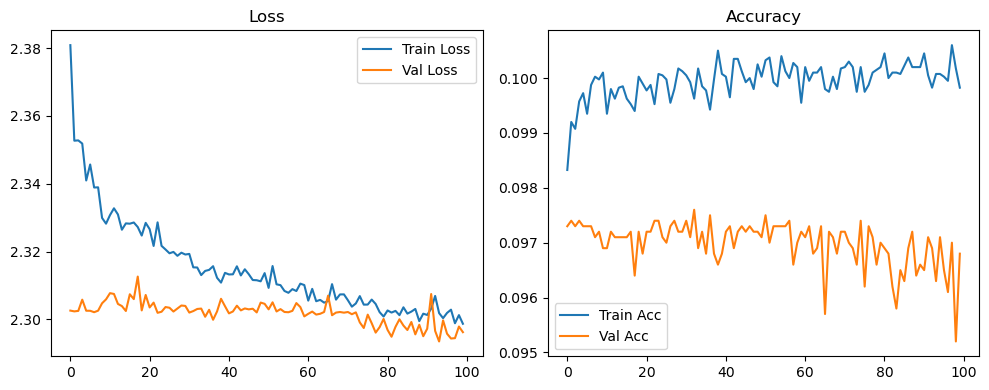

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.09it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.52it/s]

Original Model Final Test Loss: 2.3002 Accuracy: 0.0995


🚀 Running: batch512_lr_max_0.0001_min_1e-05_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0955 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0955 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0955 |:   1%|          | 1/100 [01:22<2:15:36, 82.18s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0960 |:   1%|          | 1/100 [02:44<2:15:36, 82.18s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0960 |:   1%|          | 1/100 [02:44<2:15:36, 82.18s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0960 |:   2%|▏         | 2/100 [02:44<2:13:57, 82.02s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0936 |:   2%|▏         | 2/100 [04:05<2:13:57, 82.02s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0936 |:   2%|▏         | 2/100 [04:05<2:13:57, 82.02s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0936 |:   3%|▎         | 3/100 [04:05<2:12:12, 81.77s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [05:14<2:12:12, 81.77s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [05:14<2:12:12, 81.77s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0955 |:   4%|▍         | 4/100 [05:14<2:02:33, 76.60s/it]

| LR: 0.000100 | Train Acc: 0.0991 | Val Acc: 0.0949 |:   4%|▍         | 4/100 [05:27<2:02:33, 76.60s/it]

| LR: 0.000100 | Train Acc: 0.0991 | Val Acc: 0.0949 |:   4%|▍         | 4/100 [05:27<2:02:33, 76.60s/it]

| LR: 0.000100 | Train Acc: 0.0991 | Val Acc: 0.0949 |:   5%|▌         | 5/100 [05:27<1:24:54, 53.62s/it]

| LR: 0.000099 | Train Acc: 0.0983 | Val Acc: 0.0966 |:   5%|▌         | 5/100 [05:39<1:24:54, 53.62s/it]

| LR: 0.000099 | Train Acc: 0.0983 | Val Acc: 0.0966 |:   5%|▌         | 5/100 [05:39<1:24:54, 53.62s/it]

| LR: 0.000099 | Train Acc: 0.0983 | Val Acc: 0.0966 |:   6%|▌         | 6/100 [05:39<1:02:18, 39.77s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [05:52<1:02:18, 39.77s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0961 |:   6%|▌         | 6/100 [05:52<1:02:18, 39.77s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0961 |:   7%|▋         | 7/100 [05:53<48:05, 31.03s/it]  

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [06:05<48:05, 31.03s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   7%|▋         | 7/100 [06:05<48:05, 31.03s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   8%|▊         | 8/100 [06:05<38:43, 25.26s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [06:18<38:43, 25.26s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   8%|▊         | 8/100 [06:18<38:43, 25.26s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0963 |:   9%|▉         | 9/100 [06:18<32:27, 21.40s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [06:31<32:27, 21.40s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0958 |:   9%|▉         | 9/100 [06:31<32:27, 21.40s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0958 |:  10%|█         | 10/100 [06:31<28:08, 18.76s/it]

| LR: 0.000098 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  10%|█         | 10/100 [06:44<28:08, 18.76s/it]

| LR: 0.000098 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  10%|█         | 10/100 [06:44<28:08, 18.76s/it]

| LR: 0.000098 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  11%|█         | 11/100 [06:44<25:08, 16.95s/it]

| LR: 0.000097 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  11%|█         | 11/100 [06:57<25:08, 16.95s/it]

| LR: 0.000097 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  11%|█         | 11/100 [06:57<25:08, 16.95s/it]

| LR: 0.000097 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  12%|█▏        | 12/100 [06:57<23:00, 15.69s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  12%|█▏        | 12/100 [07:10<23:00, 15.69s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  12%|█▏        | 12/100 [07:10<23:00, 15.69s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0956 |:  13%|█▎        | 13/100 [07:10<21:29, 14.82s/it]

| LR: 0.000096 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  13%|█▎        | 13/100 [07:22<21:29, 14.82s/it]

| LR: 0.000096 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  13%|█▎        | 13/100 [07:22<21:29, 14.82s/it]

| LR: 0.000096 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  14%|█▍        | 14/100 [07:22<20:22, 14.22s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0955 |:  14%|█▍        | 14/100 [07:35<20:22, 14.22s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0955 |:  14%|█▍        | 14/100 [07:35<20:22, 14.22s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0955 |:  15%|█▌        | 15/100 [07:35<19:32, 13.79s/it]

| LR: 0.000095 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:48<19:32, 13.79s/it]

| LR: 0.000095 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:48<19:32, 13.79s/it]

| LR: 0.000095 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [07:48<18:52, 13.49s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  16%|█▌        | 16/100 [08:01<18:52, 13.49s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  16%|█▌        | 16/100 [08:01<18:52, 13.49s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0950 |:  17%|█▋        | 17/100 [08:01<18:26, 13.33s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  17%|█▋        | 17/100 [08:14<18:26, 13.33s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  17%|█▋        | 17/100 [08:14<18:26, 13.33s/it]

| LR: 0.000094 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  18%|█▊        | 18/100 [08:14<18:00, 13.18s/it]

| LR: 0.000093 | Train Acc: 0.0991 | Val Acc: 0.0966 |:  18%|█▊        | 18/100 [08:27<18:00, 13.18s/it]

| LR: 0.000093 | Train Acc: 0.0991 | Val Acc: 0.0966 |:  18%|█▊        | 18/100 [08:27<18:00, 13.18s/it]

| LR: 0.000093 | Train Acc: 0.0991 | Val Acc: 0.0966 |:  19%|█▉        | 19/100 [08:27<17:38, 13.07s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  19%|█▉        | 19/100 [08:40<17:38, 13.07s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  19%|█▉        | 19/100 [08:40<17:38, 13.07s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0951 |:  20%|██        | 20/100 [08:40<17:21, 13.02s/it]

| LR: 0.000091 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  20%|██        | 20/100 [08:52<17:21, 13.02s/it]

| LR: 0.000091 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  20%|██        | 20/100 [08:52<17:21, 13.02s/it]

| LR: 0.000091 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  21%|██        | 21/100 [08:53<17:06, 13.00s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:05<17:06, 13.00s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:05<17:06, 13.00s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [09:05<16:51, 12.96s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:18<16:51, 12.96s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:18<16:51, 12.96s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  23%|██▎       | 23/100 [09:18<16:36, 12.94s/it]

| LR: 0.000089 | Train Acc: 0.0995 | Val Acc: 0.0977 |:  23%|██▎       | 23/100 [09:31<16:36, 12.94s/it]

| LR: 0.000089 | Train Acc: 0.0995 | Val Acc: 0.0977 |:  23%|██▎       | 23/100 [09:31<16:36, 12.94s/it]

| LR: 0.000089 | Train Acc: 0.0995 | Val Acc: 0.0977 |:  24%|██▍       | 24/100 [09:31<16:21, 12.91s/it]

| LR: 0.000088 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  24%|██▍       | 24/100 [09:44<16:21, 12.91s/it]

| LR: 0.000088 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  24%|██▍       | 24/100 [09:44<16:21, 12.91s/it]

| LR: 0.000088 | Train Acc: 0.0995 | Val Acc: 0.0966 |:  25%|██▌       | 25/100 [09:44<16:07, 12.90s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  25%|██▌       | 25/100 [09:57<16:07, 12.90s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  25%|██▌       | 25/100 [09:57<16:07, 12.90s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  26%|██▌       | 26/100 [09:57<15:56, 12.93s/it]

| LR: 0.000086 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  26%|██▌       | 26/100 [10:10<15:56, 12.93s/it]

| LR: 0.000086 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  26%|██▌       | 26/100 [10:10<15:56, 12.93s/it]

| LR: 0.000086 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  27%|██▋       | 27/100 [10:10<15:43, 12.92s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:23<15:43, 12.92s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:23<15:43, 12.92s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [10:23<15:32, 12.95s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0960 |:  28%|██▊       | 28/100 [10:36<15:32, 12.95s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0960 |:  28%|██▊       | 28/100 [10:36<15:32, 12.95s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0960 |:  29%|██▉       | 29/100 [10:36<15:19, 12.95s/it]

| LR: 0.000083 | Train Acc: 0.0993 | Val Acc: 0.0960 |:  29%|██▉       | 29/100 [10:49<15:19, 12.95s/it]

| LR: 0.000083 | Train Acc: 0.0993 | Val Acc: 0.0960 |:  29%|██▉       | 29/100 [10:49<15:19, 12.95s/it]

| LR: 0.000083 | Train Acc: 0.0993 | Val Acc: 0.0960 |:  30%|███       | 30/100 [10:49<15:03, 12.90s/it]

| LR: 0.000081 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  30%|███       | 30/100 [11:01<15:03, 12.90s/it]

| LR: 0.000081 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  30%|███       | 30/100 [11:01<15:03, 12.90s/it]

| LR: 0.000081 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  31%|███       | 31/100 [11:01<14:47, 12.87s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  31%|███       | 31/100 [11:14<14:47, 12.87s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  31%|███       | 31/100 [11:14<14:47, 12.87s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  32%|███▏      | 32/100 [11:14<14:36, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:27<14:36, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:27<14:36, 12.89s/it]

| LR: 0.000079 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:27<14:24, 12.90s/it]

| LR: 0.000078 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:40<14:24, 12.90s/it]

| LR: 0.000078 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:40<14:24, 12.90s/it]

| LR: 0.000078 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [11:40<14:11, 12.90s/it]

| LR: 0.000077 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [11:53<14:11, 12.90s/it]

| LR: 0.000077 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  34%|███▍      | 34/100 [11:53<14:11, 12.90s/it]

| LR: 0.000077 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  35%|███▌      | 35/100 [11:53<13:57, 12.89s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  35%|███▌      | 35/100 [12:06<13:57, 12.89s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  35%|███▌      | 35/100 [12:06<13:57, 12.89s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  36%|███▌      | 36/100 [12:06<13:46, 12.92s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  36%|███▌      | 36/100 [12:19<13:46, 12.92s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  36%|███▌      | 36/100 [12:19<13:46, 12.92s/it]

| LR: 0.000074 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  37%|███▋      | 37/100 [12:19<13:32, 12.90s/it]

| LR: 0.000073 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:32<13:32, 12.90s/it]

| LR: 0.000073 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:32<13:32, 12.90s/it]

| LR: 0.000073 | Train Acc: 0.1002 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:32<13:19, 12.89s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:45<13:19, 12.89s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  38%|███▊      | 38/100 [12:45<13:19, 12.89s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  39%|███▉      | 39/100 [12:45<13:05, 12.88s/it]

| LR: 0.000070 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  39%|███▉      | 39/100 [12:58<13:05, 12.88s/it]

| LR: 0.000070 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  39%|███▉      | 39/100 [12:58<13:05, 12.88s/it]

| LR: 0.000070 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  40%|████      | 40/100 [12:58<12:53, 12.89s/it]

| LR: 0.000069 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  40%|████      | 40/100 [13:10<12:53, 12.89s/it]

| LR: 0.000069 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  40%|████      | 40/100 [13:10<12:53, 12.89s/it]

| LR: 0.000069 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  41%|████      | 41/100 [13:11<12:41, 12.90s/it]

| LR: 0.000068 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  41%|████      | 41/100 [13:23<12:41, 12.90s/it]

| LR: 0.000068 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  41%|████      | 41/100 [13:23<12:41, 12.90s/it]

| LR: 0.000068 | Train Acc: 0.1001 | Val Acc: 0.0955 |:  42%|████▏     | 42/100 [13:23<12:28, 12.90s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:36<12:28, 12.90s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  42%|████▏     | 42/100 [13:36<12:28, 12.90s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  43%|████▎     | 43/100 [13:36<12:15, 12.90s/it]

| LR: 0.000065 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:49<12:15, 12.90s/it]

| LR: 0.000065 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:49<12:15, 12.90s/it]

| LR: 0.000065 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [13:49<12:02, 12.90s/it]

| LR: 0.000063 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  44%|████▍     | 44/100 [14:02<12:02, 12.90s/it]

| LR: 0.000063 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  44%|████▍     | 44/100 [14:02<12:02, 12.90s/it]

| LR: 0.000063 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  45%|████▌     | 45/100 [14:02<11:51, 12.93s/it]

| LR: 0.000062 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  45%|████▌     | 45/100 [14:15<11:51, 12.93s/it]

| LR: 0.000062 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  45%|████▌     | 45/100 [14:15<11:51, 12.93s/it]

| LR: 0.000062 | Train Acc: 0.1000 | Val Acc: 0.0961 |:  46%|████▌     | 46/100 [14:15<11:37, 12.92s/it]

| LR: 0.000061 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  46%|████▌     | 46/100 [14:28<11:37, 12.92s/it]

| LR: 0.000061 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  46%|████▌     | 46/100 [14:28<11:37, 12.92s/it]

| LR: 0.000061 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  47%|████▋     | 47/100 [14:28<11:24, 12.92s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:41<11:24, 12.92s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:41<11:24, 12.92s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:41<11:11, 12.91s/it]

| LR: 0.000058 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:54<11:11, 12.91s/it]

| LR: 0.000058 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:54<11:11, 12.91s/it]

| LR: 0.000058 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  49%|████▉     | 49/100 [14:54<10:58, 12.92s/it]

| LR: 0.000056 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [15:07<10:58, 12.92s/it]

| LR: 0.000056 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [15:07<10:58, 12.92s/it]

| LR: 0.000056 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:07<10:45, 12.91s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  50%|█████     | 50/100 [15:20<10:45, 12.91s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  50%|█████     | 50/100 [15:20<10:45, 12.91s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  51%|█████     | 51/100 [15:20<10:32, 12.91s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [15:32<10:32, 12.91s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [15:32<10:32, 12.91s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  52%|█████▏    | 52/100 [15:33<10:19, 12.90s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  52%|█████▏    | 52/100 [15:45<10:19, 12.90s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  52%|█████▏    | 52/100 [15:45<10:19, 12.90s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  53%|█████▎    | 53/100 [15:45<10:05, 12.89s/it]

| LR: 0.000051 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  53%|█████▎    | 53/100 [15:58<10:05, 12.89s/it]

| LR: 0.000051 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  53%|█████▎    | 53/100 [15:58<10:05, 12.89s/it]

| LR: 0.000051 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  54%|█████▍    | 54/100 [15:58<09:53, 12.90s/it]

| LR: 0.000049 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:11<09:53, 12.90s/it]

| LR: 0.000049 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:11<09:53, 12.90s/it]

| LR: 0.000049 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:11<09:41, 12.93s/it]

| LR: 0.000048 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  55%|█████▌    | 55/100 [16:24<09:41, 12.93s/it]

| LR: 0.000048 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  55%|█████▌    | 55/100 [16:24<09:41, 12.93s/it]

| LR: 0.000048 | Train Acc: 0.1002 | Val Acc: 0.0957 |:  56%|█████▌    | 56/100 [16:24<09:28, 12.92s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  56%|█████▌    | 56/100 [16:37<09:28, 12.92s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  56%|█████▌    | 56/100 [16:37<09:28, 12.92s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  57%|█████▋    | 57/100 [16:37<09:16, 12.94s/it]

| LR: 0.000045 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  57%|█████▋    | 57/100 [16:50<09:16, 12.94s/it]

| LR: 0.000045 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  57%|█████▋    | 57/100 [16:50<09:16, 12.94s/it]

| LR: 0.000045 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  58%|█████▊    | 58/100 [16:50<09:02, 12.92s/it]

| LR: 0.000044 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  58%|█████▊    | 58/100 [17:03<09:02, 12.92s/it]

| LR: 0.000044 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  58%|█████▊    | 58/100 [17:03<09:02, 12.92s/it]

| LR: 0.000044 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:03<08:49, 12.91s/it]

| LR: 0.000042 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  59%|█████▉    | 59/100 [17:16<08:49, 12.91s/it]

| LR: 0.000042 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  59%|█████▉    | 59/100 [17:16<08:49, 12.91s/it]

| LR: 0.000042 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  60%|██████    | 60/100 [17:16<08:36, 12.90s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  60%|██████    | 60/100 [17:29<08:36, 12.90s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  60%|██████    | 60/100 [17:29<08:36, 12.90s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [17:29<08:23, 12.90s/it]

| LR: 0.000040 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  61%|██████    | 61/100 [17:42<08:23, 12.90s/it]

| LR: 0.000040 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  61%|██████    | 61/100 [17:42<08:23, 12.90s/it]

| LR: 0.000040 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  62%|██████▏   | 62/100 [17:42<08:10, 12.90s/it]

| LR: 0.000038 | Train Acc: 0.1001 | Val Acc: 0.0953 |:  62%|██████▏   | 62/100 [17:54<08:10, 12.90s/it]

| LR: 0.000038 | Train Acc: 0.1001 | Val Acc: 0.0953 |:  62%|██████▏   | 62/100 [17:54<08:10, 12.90s/it]

| LR: 0.000038 | Train Acc: 0.1001 | Val Acc: 0.0953 |:  63%|██████▎   | 63/100 [17:55<07:56, 12.89s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:07<07:56, 12.89s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:07<07:56, 12.89s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0974 |:  64%|██████▍   | 64/100 [18:08<07:45, 12.93s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:20<07:45, 12.93s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  64%|██████▍   | 64/100 [18:20<07:45, 12.93s/it]

| LR: 0.000036 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  65%|██████▌   | 65/100 [18:20<07:31, 12.90s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:33<07:31, 12.90s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:33<07:31, 12.90s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [18:33<07:17, 12.88s/it]

| LR: 0.000033 | Train Acc: 0.0999 | Val Acc: 0.0950 |:  66%|██████▌   | 66/100 [18:46<07:17, 12.88s/it]

| LR: 0.000033 | Train Acc: 0.0999 | Val Acc: 0.0950 |:  66%|██████▌   | 66/100 [18:46<07:17, 12.88s/it]

| LR: 0.000033 | Train Acc: 0.0999 | Val Acc: 0.0950 |:  67%|██████▋   | 67/100 [18:46<07:04, 12.87s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [18:59<07:04, 12.87s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [18:59<07:04, 12.87s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [18:59<06:51, 12.86s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:12<06:51, 12.86s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:12<06:51, 12.86s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:12<06:38, 12.85s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:24<06:38, 12.85s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:24<06:38, 12.85s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  70%|███████   | 70/100 [19:25<06:25, 12.85s/it]

| LR: 0.000029 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  70%|███████   | 70/100 [19:37<06:25, 12.85s/it]

| LR: 0.000029 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  70%|███████   | 70/100 [19:37<06:25, 12.85s/it]

| LR: 0.000029 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  71%|███████   | 71/100 [19:37<06:12, 12.85s/it]

| LR: 0.000027 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  71%|███████   | 71/100 [19:50<06:12, 12.85s/it]

| LR: 0.000027 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  71%|███████   | 71/100 [19:50<06:12, 12.85s/it]

| LR: 0.000027 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [19:50<05:59, 12.84s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [20:03<05:59, 12.84s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [20:03<05:59, 12.84s/it]

| LR: 0.000026 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:03<05:46, 12.83s/it]

| LR: 0.000025 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  73%|███████▎  | 73/100 [20:16<05:46, 12.83s/it]

| LR: 0.000025 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  73%|███████▎  | 73/100 [20:16<05:46, 12.83s/it]

| LR: 0.000025 | Train Acc: 0.1000 | Val Acc: 0.0958 |:  74%|███████▍  | 74/100 [20:16<05:34, 12.86s/it]

| LR: 0.000024 | Train Acc: 0.0999 | Val Acc: 0.0950 |:  74%|███████▍  | 74/100 [20:29<05:34, 12.86s/it]

| LR: 0.000024 | Train Acc: 0.0999 | Val Acc: 0.0950 |:  74%|███████▍  | 74/100 [20:29<05:34, 12.86s/it]

| LR: 0.000024 | Train Acc: 0.0999 | Val Acc: 0.0950 |:  75%|███████▌  | 75/100 [20:29<05:21, 12.85s/it]

| LR: 0.000023 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [20:42<05:21, 12.85s/it]

| LR: 0.000023 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [20:42<05:21, 12.85s/it]

| LR: 0.000023 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [20:42<05:08, 12.84s/it]

| LR: 0.000022 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  76%|███████▌  | 76/100 [20:54<05:08, 12.84s/it]

| LR: 0.000022 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  76%|███████▌  | 76/100 [20:54<05:08, 12.84s/it]

| LR: 0.000022 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  77%|███████▋  | 77/100 [20:54<04:55, 12.85s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:07<04:55, 12.85s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:07<04:55, 12.85s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [21:07<04:42, 12.85s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:20<04:42, 12.85s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:20<04:42, 12.85s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  79%|███████▉  | 79/100 [21:20<04:29, 12.85s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:33<04:29, 12.85s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:33<04:29, 12.85s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:33<04:16, 12.84s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [21:46<04:16, 12.84s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [21:46<04:16, 12.84s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [21:46<04:03, 12.83s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [21:59<04:03, 12.83s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [21:59<04:03, 12.83s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  82%|████████▏ | 82/100 [21:59<03:51, 12.84s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  82%|████████▏ | 82/100 [22:12<03:51, 12.84s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  82%|████████▏ | 82/100 [22:12<03:51, 12.84s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  83%|████████▎ | 83/100 [22:12<03:39, 12.90s/it]

| LR: 0.000016 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  83%|████████▎ | 83/100 [22:24<03:39, 12.90s/it]

| LR: 0.000016 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  83%|████████▎ | 83/100 [22:24<03:39, 12.90s/it]

| LR: 0.000016 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  84%|████████▍ | 84/100 [22:25<03:26, 12.89s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:37<03:26, 12.89s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:37<03:26, 12.89s/it]

| LR: 0.000016 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  85%|████████▌ | 85/100 [22:37<03:13, 12.89s/it]

| LR: 0.000015 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  85%|████████▌ | 85/100 [22:50<03:13, 12.89s/it]

| LR: 0.000015 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  85%|████████▌ | 85/100 [22:50<03:13, 12.89s/it]

| LR: 0.000015 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  86%|████████▌ | 86/100 [22:50<03:00, 12.87s/it]

| LR: 0.000014 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:03<03:00, 12.87s/it]

| LR: 0.000014 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  86%|████████▌ | 86/100 [23:03<03:00, 12.87s/it]

| LR: 0.000014 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  87%|████████▋ | 87/100 [23:03<02:47, 12.88s/it]

| LR: 0.000014 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:16<02:47, 12.88s/it]

| LR: 0.000014 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  87%|████████▋ | 87/100 [23:16<02:47, 12.88s/it]

| LR: 0.000014 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:16<02:34, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  88%|████████▊ | 88/100 [23:29<02:34, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  88%|████████▊ | 88/100 [23:29<02:34, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [23:29<02:21, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  89%|████████▉ | 89/100 [23:42<02:21, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  89%|████████▉ | 89/100 [23:42<02:21, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  90%|█████████ | 90/100 [23:42<02:08, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  90%|█████████ | 90/100 [23:55<02:08, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  90%|█████████ | 90/100 [23:55<02:08, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  91%|█████████ | 91/100 [23:55<01:55, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  91%|█████████ | 91/100 [24:08<01:55, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  91%|█████████ | 91/100 [24:08<01:55, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  92%|█████████▏| 92/100 [24:08<01:43, 12.88s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  92%|█████████▏| 92/100 [24:21<01:43, 12.88s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  92%|█████████▏| 92/100 [24:21<01:43, 12.88s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  93%|█████████▎| 93/100 [24:21<01:30, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  93%|█████████▎| 93/100 [24:33<01:30, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  93%|█████████▎| 93/100 [24:33<01:30, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  94%|█████████▍| 94/100 [24:34<01:17, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [24:46<01:17, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [24:46<01:17, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [24:46<01:04, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  95%|█████████▌| 95/100 [24:59<01:04, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  95%|█████████▌| 95/100 [24:59<01:04, 12.92s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [24:59<00:51, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:12<00:51, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  96%|█████████▌| 96/100 [25:12<00:51, 12.89s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  97%|█████████▋| 97/100 [25:12<00:38, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:25<00:38, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:25<00:38, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  98%|█████████▊| 98/100 [25:25<00:25, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  98%|█████████▊| 98/100 [25:38<00:25, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  98%|█████████▊| 98/100 [25:38<00:25, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  99%|█████████▉| 99/100 [25:38<00:12, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  99%|█████████▉| 99/100 [25:51<00:12, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0961 |:  99%|█████████▉| 99/100 [25:51<00:12, 12.86s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0961 |: 100%|██████████| 100/100 [25:51<00:00, 12.87s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0961 |: 100%|██████████| 100/100 [25:51<00:00, 15.51s/it]

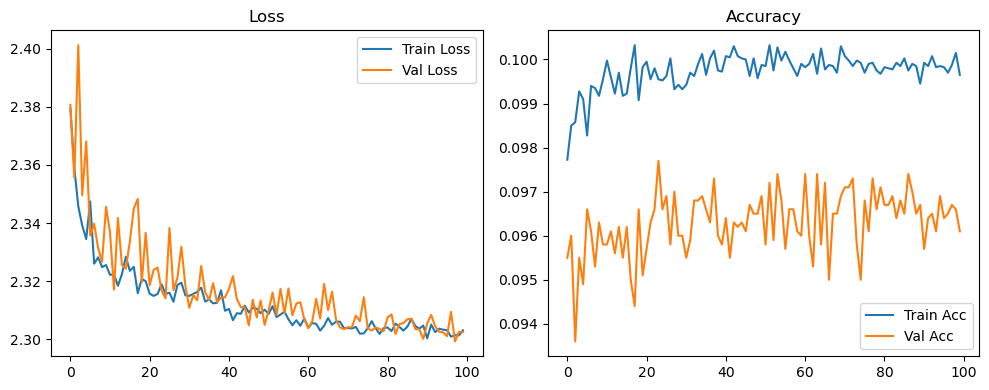

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.72it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.58it/s]

Original Model Final Test Loss: 2.3014 Accuracy: 0.0984


🚀 Running: batch512_lr_max_0.0001_min_1e-05_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0942 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0942 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0942 |:   1%|          | 1/100 [01:22<2:15:57, 82.39s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0946 |:   1%|          | 1/100 [02:44<2:15:57, 82.39s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0946 |:   1%|          | 1/100 [02:44<2:15:57, 82.39s/it]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0946 |:   2%|▏         | 2/100 [02:45<2:14:48, 82.54s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [04:07<2:14:48, 82.54s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   2%|▏         | 2/100 [04:07<2:14:48, 82.54s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0949 |:   3%|▎         | 3/100 [04:07<2:13:06, 82.34s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [05:15<2:13:06, 82.34s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0955 |:   3%|▎         | 3/100 [05:15<2:13:06, 82.34s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0955 |:   4%|▍         | 4/100 [05:15<2:02:53, 76.81s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0961 |:   4%|▍         | 4/100 [05:28<2:02:53, 76.81s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0961 |:   4%|▍         | 4/100 [05:28<2:02:53, 76.81s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0961 |:   5%|▌         | 5/100 [05:28<1:25:17, 53.87s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0962 |:   5%|▌         | 5/100 [05:41<1:25:17, 53.87s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0962 |:   5%|▌         | 5/100 [05:41<1:25:17, 53.87s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0962 |:   6%|▌         | 6/100 [05:41<1:02:43, 40.03s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [05:54<1:02:43, 40.03s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0968 |:   6%|▌         | 6/100 [05:54<1:02:43, 40.03s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0968 |:   7%|▋         | 7/100 [05:55<48:27, 31.26s/it]  

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [06:08<48:27, 31.26s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0962 |:   7%|▋         | 7/100 [06:08<48:27, 31.26s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [06:08<39:09, 25.54s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:21<39:09, 25.54s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   8%|▊         | 8/100 [06:21<39:09, 25.54s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0965 |:   9%|▉         | 9/100 [06:21<32:54, 21.70s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [06:34<32:54, 21.70s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [06:34<32:54, 21.70s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0961 |:  10%|█         | 10/100 [06:34<28:40, 19.11s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  10%|█         | 10/100 [06:47<28:40, 19.11s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  10%|█         | 10/100 [06:47<28:40, 19.11s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  11%|█         | 11/100 [06:47<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0960 |:  11%|█         | 11/100 [07:01<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0960 |:  11%|█         | 11/100 [07:01<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0960 |:  12%|█▏        | 12/100 [07:01<23:27, 15.99s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:14<23:27, 15.99s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:14<23:27, 15.99s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [07:14<21:55, 15.12s/it]

| LR: 0.000096 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  13%|█▎        | 13/100 [07:27<21:55, 15.12s/it]

| LR: 0.000096 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  13%|█▎        | 13/100 [07:27<21:55, 15.12s/it]

| LR: 0.000096 | Train Acc: 0.0994 | Val Acc: 0.0955 |:  14%|█▍        | 14/100 [07:27<20:49, 14.53s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  14%|█▍        | 14/100 [07:40<20:49, 14.53s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  14%|█▍        | 14/100 [07:40<20:49, 14.53s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0962 |:  15%|█▌        | 15/100 [07:40<20:01, 14.13s/it]

| LR: 0.000095 | Train Acc: 0.0994 | Val Acc: 0.0959 |:  15%|█▌        | 15/100 [07:53<20:01, 14.13s/it]

| LR: 0.000095 | Train Acc: 0.0994 | Val Acc: 0.0959 |:  15%|█▌        | 15/100 [07:53<20:01, 14.13s/it]

| LR: 0.000095 | Train Acc: 0.0994 | Val Acc: 0.0959 |:  16%|█▌        | 16/100 [07:53<19:21, 13.83s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [08:06<19:21, 13.83s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  16%|█▌        | 16/100 [08:06<19:21, 13.83s/it]

| LR: 0.000094 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [08:06<18:51, 13.63s/it]

| LR: 0.000094 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  17%|█▋        | 17/100 [08:20<18:51, 13.63s/it]

| LR: 0.000094 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  17%|█▋        | 17/100 [08:20<18:51, 13.63s/it]

| LR: 0.000094 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  18%|█▊        | 18/100 [08:20<18:31, 13.55s/it]

| LR: 0.000093 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  18%|█▊        | 18/100 [08:33<18:31, 13.55s/it]

| LR: 0.000093 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  18%|█▊        | 18/100 [08:33<18:31, 13.55s/it]

| LR: 0.000093 | Train Acc: 0.0994 | Val Acc: 0.0958 |:  19%|█▉        | 19/100 [08:33<18:09, 13.45s/it]

| LR: 0.000092 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  19%|█▉        | 19/100 [08:46<18:09, 13.45s/it]

| LR: 0.000092 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  19%|█▉        | 19/100 [08:46<18:09, 13.45s/it]

| LR: 0.000092 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  20%|██        | 20/100 [08:46<17:49, 13.37s/it]

| LR: 0.000091 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  20%|██        | 20/100 [08:59<17:49, 13.37s/it]

| LR: 0.000091 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  20%|██        | 20/100 [08:59<17:49, 13.37s/it]

| LR: 0.000091 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  21%|██        | 21/100 [08:59<17:30, 13.30s/it]

| LR: 0.000091 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:12<17:30, 13.30s/it]

| LR: 0.000091 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  21%|██        | 21/100 [09:12<17:30, 13.30s/it]

| LR: 0.000091 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  22%|██▏       | 22/100 [09:12<17:13, 13.25s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  22%|██▏       | 22/100 [09:26<17:13, 13.25s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  22%|██▏       | 22/100 [09:26<17:13, 13.25s/it]

| LR: 0.000090 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  23%|██▎       | 23/100 [09:26<16:59, 13.24s/it]

| LR: 0.000089 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  23%|██▎       | 23/100 [09:39<16:59, 13.24s/it]

| LR: 0.000089 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  23%|██▎       | 23/100 [09:39<16:59, 13.24s/it]

| LR: 0.000089 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  24%|██▍       | 24/100 [09:39<16:44, 13.21s/it]

| LR: 0.000088 | Train Acc: 0.0996 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:52<16:44, 13.21s/it]

| LR: 0.000088 | Train Acc: 0.0996 | Val Acc: 0.0957 |:  24%|██▍       | 24/100 [09:52<16:44, 13.21s/it]

| LR: 0.000088 | Train Acc: 0.0996 | Val Acc: 0.0957 |:  25%|██▌       | 25/100 [09:52<16:28, 13.17s/it]

| LR: 0.000087 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  25%|██▌       | 25/100 [10:05<16:28, 13.17s/it]

| LR: 0.000087 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  25%|██▌       | 25/100 [10:05<16:28, 13.17s/it]

| LR: 0.000087 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  26%|██▌       | 26/100 [10:05<16:13, 13.15s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  26%|██▌       | 26/100 [10:18<16:13, 13.15s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  26%|██▌       | 26/100 [10:18<16:13, 13.15s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  27%|██▋       | 27/100 [10:18<16:01, 13.17s/it]

| LR: 0.000085 | Train Acc: 0.0996 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [10:31<16:01, 13.17s/it]

| LR: 0.000085 | Train Acc: 0.0996 | Val Acc: 0.0975 |:  27%|██▋       | 27/100 [10:31<16:01, 13.17s/it]

| LR: 0.000085 | Train Acc: 0.0996 | Val Acc: 0.0975 |:  28%|██▊       | 28/100 [10:31<15:47, 13.16s/it]

| LR: 0.000084 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [10:44<15:47, 13.16s/it]

| LR: 0.000084 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  28%|██▊       | 28/100 [10:44<15:47, 13.16s/it]

| LR: 0.000084 | Train Acc: 0.1001 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [10:44<15:32, 13.13s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  29%|██▉       | 29/100 [10:57<15:32, 13.13s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  29%|██▉       | 29/100 [10:57<15:32, 13.13s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  30%|███       | 30/100 [10:57<15:17, 13.11s/it]

| LR: 0.000081 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  30%|███       | 30/100 [11:11<15:17, 13.11s/it]

| LR: 0.000081 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  30%|███       | 30/100 [11:11<15:17, 13.11s/it]

| LR: 0.000081 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  31%|███       | 31/100 [11:11<15:05, 13.13s/it]

| LR: 0.000080 | Train Acc: 0.1001 | Val Acc: 0.0949 |:  31%|███       | 31/100 [11:24<15:05, 13.13s/it]

| LR: 0.000080 | Train Acc: 0.1001 | Val Acc: 0.0949 |:  31%|███       | 31/100 [11:24<15:05, 13.13s/it]

| LR: 0.000080 | Train Acc: 0.1001 | Val Acc: 0.0949 |:  32%|███▏      | 32/100 [11:24<14:52, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  32%|███▏      | 32/100 [11:37<14:52, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  32%|███▏      | 32/100 [11:37<14:52, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  33%|███▎      | 33/100 [11:37<14:40, 13.15s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  33%|███▎      | 33/100 [11:50<14:40, 13.15s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  33%|███▎      | 33/100 [11:50<14:40, 13.15s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  34%|███▍      | 34/100 [11:50<14:29, 13.17s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  34%|███▍      | 34/100 [12:03<14:29, 13.17s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  34%|███▍      | 34/100 [12:03<14:29, 13.17s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0976 |:  35%|███▌      | 35/100 [12:03<14:16, 13.17s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:16<14:16, 13.17s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:16<14:16, 13.17s/it]

| LR: 0.000075 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:16<14:02, 13.17s/it]

| LR: 0.000074 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  36%|███▌      | 36/100 [12:30<14:02, 13.17s/it]

| LR: 0.000074 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  36%|███▌      | 36/100 [12:30<14:02, 13.17s/it]

| LR: 0.000074 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:30<13:50, 13.18s/it]

| LR: 0.000073 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:43<13:50, 13.18s/it]

| LR: 0.000073 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:43<13:50, 13.18s/it]

| LR: 0.000073 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  38%|███▊      | 38/100 [12:43<13:36, 13.17s/it]

| LR: 0.000072 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  38%|███▊      | 38/100 [12:56<13:36, 13.17s/it]

| LR: 0.000072 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  38%|███▊      | 38/100 [12:56<13:36, 13.17s/it]

| LR: 0.000072 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  39%|███▉      | 39/100 [12:56<13:23, 13.17s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  39%|███▉      | 39/100 [13:09<13:23, 13.17s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  39%|███▉      | 39/100 [13:09<13:23, 13.17s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  40%|████      | 40/100 [13:09<13:09, 13.16s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  40%|████      | 40/100 [13:22<13:09, 13.16s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  40%|████      | 40/100 [13:22<13:09, 13.16s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  41%|████      | 41/100 [13:22<12:56, 13.17s/it]

| LR: 0.000068 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  41%|████      | 41/100 [13:35<12:56, 13.17s/it]

| LR: 0.000068 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  41%|████      | 41/100 [13:35<12:56, 13.17s/it]

| LR: 0.000068 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  42%|████▏     | 42/100 [13:35<12:42, 13.15s/it]

| LR: 0.000066 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  42%|████▏     | 42/100 [13:49<12:42, 13.15s/it]

| LR: 0.000066 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  42%|████▏     | 42/100 [13:49<12:42, 13.15s/it]

| LR: 0.000066 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  43%|████▎     | 43/100 [13:49<12:29, 13.16s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [14:02<12:29, 13.16s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [14:02<12:29, 13.16s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:02<12:16, 13.14s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [14:15<12:16, 13.14s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [14:15<12:16, 13.14s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  45%|████▌     | 45/100 [14:15<12:02, 13.13s/it]

| LR: 0.000062 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:28<12:02, 13.13s/it]

| LR: 0.000062 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:28<12:02, 13.13s/it]

| LR: 0.000062 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:28<11:51, 13.18s/it]

| LR: 0.000061 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  46%|████▌     | 46/100 [14:41<11:51, 13.18s/it]

| LR: 0.000061 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  46%|████▌     | 46/100 [14:41<11:51, 13.18s/it]

| LR: 0.000061 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:41<11:38, 13.18s/it]

| LR: 0.000059 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [14:54<11:38, 13.18s/it]

| LR: 0.000059 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  47%|████▋     | 47/100 [14:54<11:38, 13.18s/it]

| LR: 0.000059 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  48%|████▊     | 48/100 [14:54<11:24, 13.17s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  48%|████▊     | 48/100 [15:08<11:24, 13.17s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  48%|████▊     | 48/100 [15:08<11:24, 13.17s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  49%|████▉     | 49/100 [15:08<11:11, 13.16s/it]

| LR: 0.000056 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  49%|████▉     | 49/100 [15:21<11:11, 13.16s/it]

| LR: 0.000056 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  49%|████▉     | 49/100 [15:21<11:11, 13.16s/it]

| LR: 0.000056 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  50%|█████     | 50/100 [15:21<10:57, 13.16s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  50%|█████     | 50/100 [15:34<10:57, 13.16s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  50%|█████     | 50/100 [15:34<10:57, 13.16s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  51%|█████     | 51/100 [15:34<10:44, 13.15s/it]

| LR: 0.000054 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  51%|█████     | 51/100 [15:47<10:44, 13.15s/it]

| LR: 0.000054 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  51%|█████     | 51/100 [15:47<10:44, 13.15s/it]

| LR: 0.000054 | Train Acc: 0.0999 | Val Acc: 0.0956 |:  52%|█████▏    | 52/100 [15:47<10:32, 13.17s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  52%|█████▏    | 52/100 [16:00<10:32, 13.17s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  52%|█████▏    | 52/100 [16:00<10:32, 13.17s/it]

| LR: 0.000052 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  53%|█████▎    | 53/100 [16:00<10:19, 13.17s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  53%|█████▎    | 53/100 [16:13<10:19, 13.17s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  53%|█████▎    | 53/100 [16:13<10:19, 13.17s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:13<10:06, 13.18s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  54%|█████▍    | 54/100 [16:27<10:06, 13.18s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  54%|█████▍    | 54/100 [16:27<10:06, 13.18s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  55%|█████▌    | 55/100 [16:27<09:54, 13.20s/it]

| LR: 0.000048 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:40<09:54, 13.20s/it]

| LR: 0.000048 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:40<09:54, 13.20s/it]

| LR: 0.000048 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:40<09:42, 13.25s/it]

| LR: 0.000047 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [16:53<09:42, 13.25s/it]

| LR: 0.000047 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [16:53<09:42, 13.25s/it]

| LR: 0.000047 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  57%|█████▋    | 57/100 [16:53<09:29, 13.24s/it]

| LR: 0.000045 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [17:06<09:29, 13.24s/it]

| LR: 0.000045 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [17:06<09:29, 13.24s/it]

| LR: 0.000045 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  58%|█████▊    | 58/100 [17:06<09:15, 13.23s/it]

| LR: 0.000044 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:20<09:15, 13.23s/it]

| LR: 0.000044 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:20<09:15, 13.23s/it]

| LR: 0.000044 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  59%|█████▉    | 59/100 [17:20<09:02, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  59%|█████▉    | 59/100 [17:33<09:02, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  59%|█████▉    | 59/100 [17:33<09:02, 13.22s/it]

| LR: 0.000042 | Train Acc: 0.1003 | Val Acc: 0.0944 |:  60%|██████    | 60/100 [17:33<08:48, 13.22s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:46<08:48, 13.22s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  60%|██████    | 60/100 [17:46<08:48, 13.22s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  61%|██████    | 61/100 [17:46<08:34, 13.20s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [17:59<08:34, 13.20s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [17:59<08:34, 13.20s/it]

| LR: 0.000040 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [17:59<08:21, 13.19s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  62%|██████▏   | 62/100 [18:12<08:21, 13.19s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  62%|██████▏   | 62/100 [18:12<08:21, 13.19s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0976 |:  63%|██████▎   | 63/100 [18:12<08:07, 13.18s/it]

| LR: 0.000037 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:25<08:07, 13.18s/it]

| LR: 0.000037 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  63%|██████▎   | 63/100 [18:25<08:07, 13.18s/it]

| LR: 0.000037 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  64%|██████▍   | 64/100 [18:26<07:54, 13.17s/it]

| LR: 0.000036 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  64%|██████▍   | 64/100 [18:39<07:54, 13.17s/it]

| LR: 0.000036 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  64%|██████▍   | 64/100 [18:39<07:54, 13.17s/it]

| LR: 0.000036 | Train Acc: 0.1004 | Val Acc: 0.0961 |:  65%|██████▌   | 65/100 [18:39<07:41, 13.19s/it]

| LR: 0.000035 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  65%|██████▌   | 65/100 [18:52<07:41, 13.19s/it]

| LR: 0.000035 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  65%|██████▌   | 65/100 [18:52<07:41, 13.19s/it]

| LR: 0.000035 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [18:52<07:27, 13.16s/it]

| LR: 0.000033 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  66%|██████▌   | 66/100 [19:05<07:27, 13.16s/it]

| LR: 0.000033 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  66%|██████▌   | 66/100 [19:05<07:27, 13.16s/it]

| LR: 0.000033 | Train Acc: 0.1003 | Val Acc: 0.0964 |:  67%|██████▋   | 67/100 [19:05<07:13, 13.14s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  67%|██████▋   | 67/100 [19:18<07:13, 13.14s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  67%|██████▋   | 67/100 [19:18<07:13, 13.14s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  68%|██████▊   | 68/100 [19:18<06:59, 13.12s/it]

| LR: 0.000031 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  68%|██████▊   | 68/100 [19:31<06:59, 13.12s/it]

| LR: 0.000031 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  68%|██████▊   | 68/100 [19:31<06:59, 13.12s/it]

| LR: 0.000031 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  69%|██████▉   | 69/100 [19:31<06:46, 13.13s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:44<06:46, 13.13s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:44<06:46, 13.13s/it]

| LR: 0.000030 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  70%|███████   | 70/100 [19:44<06:33, 13.13s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:57<06:33, 13.13s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:57<06:33, 13.13s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:57<06:20, 13.12s/it]

| LR: 0.000027 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  71%|███████   | 71/100 [20:10<06:20, 13.12s/it]

| LR: 0.000027 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  71%|███████   | 71/100 [20:10<06:20, 13.12s/it]

| LR: 0.000027 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  72%|███████▏  | 72/100 [20:11<06:07, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  72%|███████▏  | 72/100 [20:24<06:07, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  72%|███████▏  | 72/100 [20:24<06:07, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  73%|███████▎  | 73/100 [20:24<05:54, 13.13s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [20:37<05:54, 13.13s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [20:37<05:54, 13.13s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  74%|███████▍  | 74/100 [20:37<05:42, 13.17s/it]

| LR: 0.000024 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  74%|███████▍  | 74/100 [20:50<05:42, 13.17s/it]

| LR: 0.000024 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  74%|███████▍  | 74/100 [20:50<05:42, 13.17s/it]

| LR: 0.000024 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [20:50<05:28, 13.16s/it]

| LR: 0.000023 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [21:03<05:28, 13.16s/it]

| LR: 0.000023 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [21:03<05:28, 13.16s/it]

| LR: 0.000023 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:03<05:15, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  76%|███████▌  | 76/100 [21:16<05:15, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  76%|███████▌  | 76/100 [21:16<05:15, 13.13s/it]

| LR: 0.000022 | Train Acc: 0.1003 | Val Acc: 0.0976 |:  77%|███████▋  | 77/100 [21:16<05:01, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:29<05:01, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:29<05:01, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  78%|███████▊  | 78/100 [21:29<04:48, 13.10s/it]

| LR: 0.000020 | Train Acc: 0.1000 | Val Acc: 0.0940 |:  78%|███████▊  | 78/100 [21:42<04:48, 13.10s/it]

| LR: 0.000020 | Train Acc: 0.1000 | Val Acc: 0.0940 |:  78%|███████▊  | 78/100 [21:42<04:48, 13.10s/it]

| LR: 0.000020 | Train Acc: 0.1000 | Val Acc: 0.0940 |:  79%|███████▉  | 79/100 [21:42<04:35, 13.10s/it]

| LR: 0.000019 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:55<04:35, 13.10s/it]

| LR: 0.000019 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:55<04:35, 13.10s/it]

| LR: 0.000019 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:55<04:21, 13.09s/it]

| LR: 0.000019 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  80%|████████  | 80/100 [22:09<04:21, 13.09s/it]

| LR: 0.000019 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  80%|████████  | 80/100 [22:09<04:21, 13.09s/it]

| LR: 0.000019 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:09<04:09, 13.11s/it]

| LR: 0.000018 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [22:22<04:09, 13.11s/it]

| LR: 0.000018 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  81%|████████  | 81/100 [22:22<04:09, 13.11s/it]

| LR: 0.000018 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  82%|████████▏ | 82/100 [22:22<03:56, 13.14s/it]

| LR: 0.000017 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  82%|████████▏ | 82/100 [22:35<03:56, 13.14s/it]

| LR: 0.000017 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  82%|████████▏ | 82/100 [22:35<03:56, 13.14s/it]

| LR: 0.000017 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  83%|████████▎ | 83/100 [22:35<03:43, 13.13s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:48<03:43, 13.13s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  83%|████████▎ | 83/100 [22:48<03:43, 13.13s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  84%|████████▍ | 84/100 [22:48<03:30, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  84%|████████▍ | 84/100 [23:01<03:30, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  84%|████████▍ | 84/100 [23:01<03:30, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.1004 | Val Acc: 0.0965 |:  85%|████████▌ | 85/100 [23:01<03:17, 13.14s/it]

| LR: 0.000015 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.14s/it]

| LR: 0.000015 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  85%|████████▌ | 85/100 [23:14<03:17, 13.14s/it]

| LR: 0.000015 | Train Acc: 0.1003 | Val Acc: 0.0963 |:  86%|████████▌ | 86/100 [23:14<03:03, 13.12s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:27<03:03, 13.12s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  86%|████████▌ | 86/100 [23:27<03:03, 13.12s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  87%|████████▋ | 87/100 [23:27<02:50, 13.12s/it]

| LR: 0.000014 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:41<02:50, 13.12s/it]

| LR: 0.000014 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:41<02:50, 13.12s/it]

| LR: 0.000014 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:41<02:37, 13.12s/it]

| LR: 0.000013 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  88%|████████▊ | 88/100 [23:54<02:37, 13.12s/it]

| LR: 0.000013 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  88%|████████▊ | 88/100 [23:54<02:37, 13.12s/it]

| LR: 0.000013 | Train Acc: 0.1002 | Val Acc: 0.0964 |:  89%|████████▉ | 89/100 [23:54<02:24, 13.12s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.12s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [24:07<02:24, 13.12s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  90%|█████████ | 90/100 [24:07<02:11, 13.11s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  90%|█████████ | 90/100 [24:20<02:11, 13.11s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  90%|█████████ | 90/100 [24:20<02:11, 13.11s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  91%|█████████ | 91/100 [24:20<01:58, 13.12s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  91%|█████████ | 91/100 [24:33<01:58, 13.12s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  91%|█████████ | 91/100 [24:33<01:58, 13.12s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  92%|█████████▏| 92/100 [24:33<01:44, 13.12s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  92%|█████████▏| 92/100 [24:46<01:44, 13.12s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  92%|█████████▏| 92/100 [24:46<01:44, 13.12s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  93%|█████████▎| 93/100 [24:46<01:32, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:59<01:32, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:00<01:19, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  94%|█████████▍| 94/100 [25:13<01:19, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  95%|█████████▌| 95/100 [25:13<01:05, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  95%|█████████▌| 95/100 [25:26<01:05, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  95%|█████████▌| 95/100 [25:26<01:05, 13.19s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:26<00:52, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [25:39<00:52, 13.18s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  97%|█████████▋| 97/100 [25:39<00:39, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  97%|█████████▋| 97/100 [25:52<00:39, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0970 |:  98%|█████████▊| 98/100 [25:52<00:26, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [26:05<00:26, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [26:05<00:26, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  99%|█████████▉| 99/100 [26:05<00:13, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  99%|█████████▉| 99/100 [26:18<00:13, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0965 |:  99%|█████████▉| 99/100 [26:18<00:13, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0965 |: 100%|██████████| 100/100 [26:18<00:00, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0965 |: 100%|██████████| 100/100 [26:18<00:00, 15.79s/it]

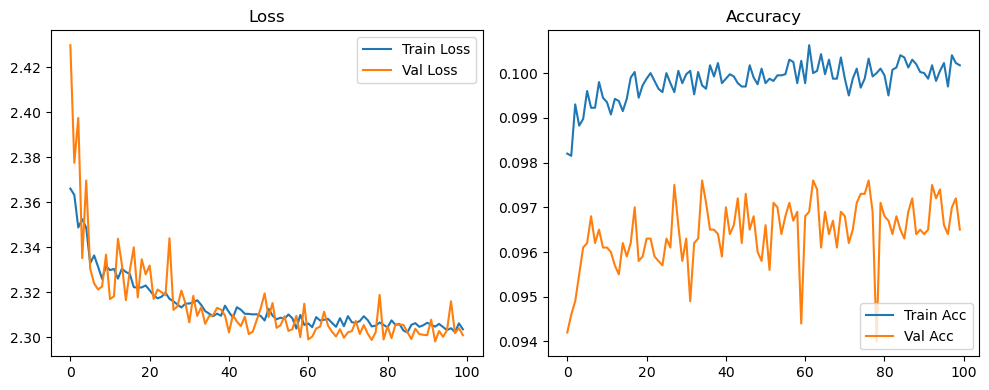

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3034 Accuracy: 0.0992


🚀 Running: batch512_lr_max_0.0001_min_1e-05_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0971 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0971 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0980 | Val Acc: 0.0971 |:   1%|          | 1/100 [01:22<2:15:58, 82.41s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:45<2:15:58, 82.41s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0971 |:   1%|          | 1/100 [02:45<2:15:58, 82.41s/it]

| LR: 0.000100 | Train Acc: 0.0986 | Val Acc: 0.0971 |:   2%|▏         | 2/100 [02:45<2:14:54, 82.60s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0957 |:   2%|▏         | 2/100 [04:07<2:14:54, 82.60s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0957 |:   2%|▏         | 2/100 [04:07<2:14:54, 82.60s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0957 |:   3%|▎         | 3/100 [04:07<2:13:35, 82.64s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [05:16<2:13:35, 82.64s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0972 |:   3%|▎         | 3/100 [05:16<2:13:35, 82.64s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0972 |:   4%|▍         | 4/100 [05:16<2:03:30, 77.20s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [05:29<2:03:30, 77.20s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   4%|▍         | 4/100 [05:29<2:03:30, 77.20s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0968 |:   5%|▌         | 5/100 [05:29<1:25:42, 54.13s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [05:43<1:25:42, 54.13s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   5%|▌         | 5/100 [05:43<1:25:42, 54.13s/it]

| LR: 0.000099 | Train Acc: 0.0989 | Val Acc: 0.0971 |:   6%|▌         | 6/100 [05:43<1:02:59, 40.21s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [05:56<1:02:59, 40.21s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0969 |:   6%|▌         | 6/100 [05:56<1:02:59, 40.21s/it]

| LR: 0.000099 | Train Acc: 0.0996 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [05:56<48:37, 31.38s/it]  

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [06:09<48:37, 31.38s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   7%|▋         | 7/100 [06:09<48:37, 31.38s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [06:09<39:16, 25.62s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [06:22<39:16, 25.62s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   8%|▊         | 8/100 [06:22<39:16, 25.62s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0972 |:   9%|▉         | 9/100 [06:22<32:56, 21.72s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:35<32:56, 21.72s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:35<32:56, 21.72s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0974 |:  10%|█         | 10/100 [06:35<28:37, 19.08s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:49<28:37, 19.08s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:49<28:37, 19.08s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:49<25:37, 17.27s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  11%|█         | 11/100 [07:02<25:37, 17.27s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  11%|█         | 11/100 [07:02<25:37, 17.27s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [07:02<23:29, 16.02s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:15<23:29, 16.02s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:15<23:29, 16.02s/it]

| LR: 0.000097 | Train Acc: 0.0990 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [07:15<21:58, 15.15s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [07:28<21:58, 15.15s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  13%|█▎        | 13/100 [07:28<21:58, 15.15s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  14%|█▍        | 14/100 [07:28<20:51, 14.55s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:41<20:51, 14.55s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:41<20:51, 14.55s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0968 |:  15%|█▌        | 15/100 [07:41<20:00, 14.13s/it]

| LR: 0.000095 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [07:54<20:00, 14.13s/it]

| LR: 0.000095 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  15%|█▌        | 15/100 [07:54<20:00, 14.13s/it]

| LR: 0.000095 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  16%|█▌        | 16/100 [07:54<19:22, 13.84s/it]

| LR: 0.000094 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:07<19:22, 13.84s/it]

| LR: 0.000094 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:07<19:22, 13.84s/it]

| LR: 0.000094 | Train Acc: 0.0993 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:08<18:55, 13.69s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  17%|█▋        | 17/100 [08:21<18:55, 13.69s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  17%|█▋        | 17/100 [08:21<18:55, 13.69s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  18%|█▊        | 18/100 [08:21<18:30, 13.54s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  18%|█▊        | 18/100 [08:34<18:30, 13.54s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  18%|█▊        | 18/100 [08:34<18:30, 13.54s/it]

| LR: 0.000093 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  19%|█▉        | 19/100 [08:34<18:09, 13.45s/it]

| LR: 0.000092 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:47<18:09, 13.45s/it]

| LR: 0.000092 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  19%|█▉        | 19/100 [08:47<18:09, 13.45s/it]

| LR: 0.000092 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  20%|██        | 20/100 [08:47<17:50, 13.38s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  20%|██        | 20/100 [09:01<17:50, 13.38s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  20%|██        | 20/100 [09:01<17:50, 13.38s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  21%|██        | 21/100 [09:01<17:33, 13.34s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  21%|██        | 21/100 [09:14<17:33, 13.34s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  21%|██        | 21/100 [09:14<17:33, 13.34s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  22%|██▏       | 22/100 [09:14<17:17, 13.30s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:27<17:17, 13.30s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  22%|██▏       | 22/100 [09:27<17:17, 13.30s/it]

| LR: 0.000090 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  23%|██▎       | 23/100 [09:27<17:02, 13.28s/it]

| LR: 0.000089 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:40<17:02, 13.28s/it]

| LR: 0.000089 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:40<17:02, 13.28s/it]

| LR: 0.000089 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  24%|██▍       | 24/100 [09:40<16:48, 13.26s/it]

| LR: 0.000088 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [09:53<16:48, 13.26s/it]

| LR: 0.000088 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  24%|██▍       | 24/100 [09:53<16:48, 13.26s/it]

| LR: 0.000088 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  25%|██▌       | 25/100 [09:53<16:33, 13.25s/it]

| LR: 0.000087 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [10:07<16:33, 13.25s/it]

| LR: 0.000087 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [10:07<16:33, 13.25s/it]

| LR: 0.000087 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [10:07<16:18, 13.23s/it]

| LR: 0.000086 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [10:20<16:18, 13.23s/it]

| LR: 0.000086 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  26%|██▌       | 26/100 [10:20<16:18, 13.23s/it]

| LR: 0.000086 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  27%|██▋       | 27/100 [10:20<16:06, 13.24s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:33<16:06, 13.24s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:33<16:06, 13.24s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [10:33<15:50, 13.20s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  28%|██▊       | 28/100 [10:46<15:50, 13.20s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  28%|██▊       | 28/100 [10:46<15:50, 13.20s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  29%|██▉       | 29/100 [10:46<15:37, 13.21s/it]

| LR: 0.000083 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [10:59<15:37, 13.21s/it]

| LR: 0.000083 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [10:59<15:37, 13.21s/it]

| LR: 0.000083 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  30%|███       | 30/100 [10:59<15:22, 13.18s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  30%|███       | 30/100 [11:12<15:22, 13.18s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  30%|███       | 30/100 [11:12<15:22, 13.18s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:13<15:09, 13.18s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  31%|███       | 31/100 [11:26<15:09, 13.18s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  31%|███       | 31/100 [11:26<15:09, 13.18s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  32%|███▏      | 32/100 [11:26<14:55, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  32%|███▏      | 32/100 [11:39<14:55, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  32%|███▏      | 32/100 [11:39<14:55, 13.17s/it]

| LR: 0.000079 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  33%|███▎      | 33/100 [11:39<14:43, 13.18s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [11:52<14:43, 13.18s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [11:52<14:43, 13.18s/it]

| LR: 0.000078 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [11:52<14:30, 13.18s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:05<14:30, 13.18s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [12:05<14:30, 13.18s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:05<14:15, 13.17s/it]

| LR: 0.000075 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  35%|███▌      | 35/100 [12:18<14:15, 13.17s/it]

| LR: 0.000075 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  35%|███▌      | 35/100 [12:18<14:15, 13.17s/it]

| LR: 0.000075 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  36%|███▌      | 36/100 [12:18<14:04, 13.20s/it]

| LR: 0.000074 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:32<14:04, 13.20s/it]

| LR: 0.000074 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:32<14:04, 13.20s/it]

| LR: 0.000074 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:32<13:50, 13.19s/it]

| LR: 0.000073 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:45<13:50, 13.19s/it]

| LR: 0.000073 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:45<13:50, 13.19s/it]

| LR: 0.000073 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  38%|███▊      | 38/100 [12:45<13:37, 13.18s/it]

| LR: 0.000072 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [12:58<13:37, 13.18s/it]

| LR: 0.000072 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [12:58<13:37, 13.18s/it]

| LR: 0.000072 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  39%|███▉      | 39/100 [12:58<13:24, 13.18s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  39%|███▉      | 39/100 [13:11<13:24, 13.18s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  39%|███▉      | 39/100 [13:11<13:24, 13.18s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0975 |:  40%|████      | 40/100 [13:11<13:10, 13.18s/it]

| LR: 0.000069 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:24<13:10, 13.18s/it]

| LR: 0.000069 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  40%|████      | 40/100 [13:24<13:10, 13.18s/it]

| LR: 0.000069 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  41%|████      | 41/100 [13:24<12:57, 13.18s/it]

| LR: 0.000068 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  41%|████      | 41/100 [13:37<12:57, 13.18s/it]

| LR: 0.000068 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  41%|████      | 41/100 [13:37<12:57, 13.18s/it]

| LR: 0.000068 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [13:38<12:44, 13.18s/it]

| LR: 0.000066 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  42%|████▏     | 42/100 [13:51<12:44, 13.18s/it]

| LR: 0.000066 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  42%|████▏     | 42/100 [13:51<12:44, 13.18s/it]

| LR: 0.000066 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [13:51<12:30, 13.17s/it]

| LR: 0.000065 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [14:04<12:30, 13.17s/it]

| LR: 0.000065 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [14:04<12:30, 13.17s/it]

| LR: 0.000065 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:04<12:17, 13.16s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:17<12:17, 13.16s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:17<12:17, 13.16s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:17<12:05, 13.20s/it]

| LR: 0.000062 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  45%|████▌     | 45/100 [14:30<12:05, 13.20s/it]

| LR: 0.000062 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  45%|████▌     | 45/100 [14:30<12:05, 13.20s/it]

| LR: 0.000062 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [14:30<11:51, 13.18s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [14:43<11:51, 13.18s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [14:43<11:51, 13.18s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  47%|████▋     | 47/100 [14:43<11:38, 13.17s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  47%|████▋     | 47/100 [14:56<11:38, 13.17s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  47%|████▋     | 47/100 [14:56<11:38, 13.17s/it]

| LR: 0.000059 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  48%|████▊     | 48/100 [14:57<11:24, 13.15s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [15:10<11:24, 13.15s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  48%|████▊     | 48/100 [15:10<11:24, 13.15s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  49%|████▉     | 49/100 [15:10<11:09, 13.13s/it]

| LR: 0.000056 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:23<11:09, 13.13s/it]

| LR: 0.000056 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:23<11:09, 13.13s/it]

| LR: 0.000056 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  50%|█████     | 50/100 [15:23<10:56, 13.13s/it]

| LR: 0.000055 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  50%|█████     | 50/100 [15:36<10:56, 13.13s/it]

| LR: 0.000055 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  50%|█████     | 50/100 [15:36<10:56, 13.13s/it]

| LR: 0.000055 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  51%|█████     | 51/100 [15:36<10:43, 13.14s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  51%|█████     | 51/100 [15:49<10:43, 13.14s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  51%|█████     | 51/100 [15:49<10:43, 13.14s/it]

| LR: 0.000054 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  52%|█████▏    | 52/100 [15:49<10:30, 13.13s/it]

| LR: 0.000052 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [16:02<10:30, 13.13s/it]

| LR: 0.000052 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [16:02<10:30, 13.13s/it]

| LR: 0.000052 | Train Acc: 0.1006 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:02<10:16, 13.12s/it]

| LR: 0.000051 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  53%|█████▎    | 53/100 [16:15<10:16, 13.12s/it]

| LR: 0.000051 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  53%|█████▎    | 53/100 [16:15<10:16, 13.12s/it]

| LR: 0.000051 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  54%|█████▍    | 54/100 [16:15<10:02, 13.10s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  54%|█████▍    | 54/100 [16:28<10:02, 13.10s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  54%|█████▍    | 54/100 [16:28<10:02, 13.10s/it]

| LR: 0.000049 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:28<09:51, 13.14s/it]

| LR: 0.000048 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [16:41<09:51, 13.14s/it]

| LR: 0.000048 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  55%|█████▌    | 55/100 [16:41<09:51, 13.14s/it]

| LR: 0.000048 | Train Acc: 0.1000 | Val Acc: 0.0970 |:  56%|█████▌    | 56/100 [16:42<09:38, 13.14s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  56%|█████▌    | 56/100 [16:55<09:38, 13.14s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  56%|█████▌    | 56/100 [16:55<09:38, 13.14s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  57%|█████▋    | 57/100 [16:55<09:25, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [17:08<09:25, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  57%|█████▋    | 57/100 [17:08<09:25, 13.15s/it]

| LR: 0.000045 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  58%|█████▊    | 58/100 [17:08<09:12, 13.15s/it]

| LR: 0.000044 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:21<09:12, 13.15s/it]

| LR: 0.000044 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  58%|█████▊    | 58/100 [17:21<09:12, 13.15s/it]

| LR: 0.000044 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  59%|█████▉    | 59/100 [17:21<08:59, 13.16s/it]

| LR: 0.000042 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:34<08:59, 13.16s/it]

| LR: 0.000042 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  59%|█████▉    | 59/100 [17:34<08:59, 13.16s/it]

| LR: 0.000042 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:34<08:46, 13.16s/it]

| LR: 0.000041 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:47<08:46, 13.16s/it]

| LR: 0.000041 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:47<08:46, 13.16s/it]

| LR: 0.000041 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  61%|██████    | 61/100 [17:47<08:33, 13.16s/it]

| LR: 0.000040 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [18:00<08:33, 13.16s/it]

| LR: 0.000040 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [18:00<08:33, 13.16s/it]

| LR: 0.000040 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [18:00<08:19, 13.15s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  62%|██████▏   | 62/100 [18:14<08:19, 13.15s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  62%|██████▏   | 62/100 [18:14<08:19, 13.15s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  63%|██████▎   | 63/100 [18:14<08:06, 13.15s/it]

| LR: 0.000037 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  63%|██████▎   | 63/100 [18:27<08:06, 13.15s/it]

| LR: 0.000037 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  63%|██████▎   | 63/100 [18:27<08:06, 13.15s/it]

| LR: 0.000037 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  64%|██████▍   | 64/100 [18:27<07:55, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:40<07:55, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  64%|██████▍   | 64/100 [18:40<07:55, 13.20s/it]

| LR: 0.000036 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  65%|██████▌   | 65/100 [18:40<07:42, 13.21s/it]

| LR: 0.000035 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  65%|██████▌   | 65/100 [18:53<07:42, 13.21s/it]

| LR: 0.000035 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  65%|██████▌   | 65/100 [18:53<07:42, 13.21s/it]

| LR: 0.000035 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  66%|██████▌   | 66/100 [18:53<07:28, 13.20s/it]

| LR: 0.000033 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [19:06<07:28, 13.20s/it]

| LR: 0.000033 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  66%|██████▌   | 66/100 [19:06<07:28, 13.20s/it]

| LR: 0.000033 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  67%|██████▋   | 67/100 [19:07<07:15, 13.19s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.19s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.19s/it]

| LR: 0.000032 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  68%|██████▊   | 68/100 [19:20<07:01, 13.18s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:33<07:01, 13.18s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  68%|██████▊   | 68/100 [19:33<07:01, 13.18s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  69%|██████▉   | 69/100 [19:33<06:48, 13.19s/it]

| LR: 0.000030 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  69%|██████▉   | 69/100 [19:46<06:48, 13.19s/it]

| LR: 0.000030 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  69%|██████▉   | 69/100 [19:46<06:48, 13.19s/it]

| LR: 0.000030 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  70%|███████   | 70/100 [19:46<06:35, 13.19s/it]

| LR: 0.000029 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:59<06:35, 13.19s/it]

| LR: 0.000029 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:59<06:35, 13.19s/it]

| LR: 0.000029 | Train Acc: 0.1004 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [19:59<06:22, 13.19s/it]

| LR: 0.000027 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [20:12<06:22, 13.19s/it]

| LR: 0.000027 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [20:12<06:22, 13.19s/it]

| LR: 0.000027 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [20:12<06:09, 13.18s/it]

| LR: 0.000026 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.18s/it]

| LR: 0.000026 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.18s/it]

| LR: 0.000026 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [20:26<05:57, 13.22s/it]

| LR: 0.000025 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [20:39<05:57, 13.22s/it]

| LR: 0.000025 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [20:39<05:57, 13.22s/it]

| LR: 0.000025 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  74%|███████▍  | 74/100 [20:39<05:43, 13.21s/it]

| LR: 0.000024 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.21s/it]

| LR: 0.000024 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.21s/it]

| LR: 0.000024 | Train Acc: 0.0996 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [20:52<05:29, 13.18s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  75%|███████▌  | 75/100 [21:05<05:29, 13.18s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  75%|███████▌  | 75/100 [21:05<05:29, 13.18s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  76%|███████▌  | 76/100 [21:05<05:16, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:18<05:16, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:18<05:16, 13.17s/it]

| LR: 0.000022 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  77%|███████▋  | 77/100 [21:18<05:03, 13.18s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  77%|███████▋  | 77/100 [21:31<05:03, 13.18s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  77%|███████▋  | 77/100 [21:31<05:03, 13.18s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:32<04:49, 13.17s/it]

| LR: 0.000020 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.17s/it]

| LR: 0.000020 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.17s/it]

| LR: 0.000020 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  79%|███████▉  | 79/100 [21:45<04:36, 13.16s/it]

| LR: 0.000019 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:58<04:36, 13.16s/it]

| LR: 0.000019 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:58<04:36, 13.16s/it]

| LR: 0.000019 | Train Acc: 0.1005 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:58<04:23, 13.16s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [22:11<04:23, 13.16s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [22:11<04:23, 13.16s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:11<04:09, 13.15s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:24<04:09, 13.15s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:24<04:09, 13.15s/it]

| LR: 0.000018 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [22:24<03:56, 13.14s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [22:37<03:56, 13.14s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [22:37<03:56, 13.14s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  83%|████████▎ | 83/100 [22:37<03:43, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.17s/it]

| LR: 0.000016 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [22:50<03:30, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [23:04<03:30, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [23:04<03:30, 13.16s/it]

| LR: 0.000016 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  85%|████████▌ | 85/100 [23:04<03:17, 13.16s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  85%|████████▌ | 85/100 [23:17<03:17, 13.16s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  85%|████████▌ | 85/100 [23:17<03:17, 13.16s/it]

| LR: 0.000015 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:17<03:04, 13.15s/it]

| LR: 0.000014 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.15s/it]

| LR: 0.000014 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.15s/it]

| LR: 0.000014 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:30<02:50, 13.14s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  87%|████████▋ | 87/100 [23:43<02:50, 13.14s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  87%|████████▋ | 87/100 [23:43<02:50, 13.14s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  88%|████████▊ | 88/100 [23:43<02:37, 13.14s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:56<02:37, 13.14s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  88%|████████▊ | 88/100 [23:56<02:37, 13.14s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [23:56<02:24, 13.14s/it]

| LR: 0.000013 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  89%|████████▉ | 89/100 [24:09<02:24, 13.14s/it]

| LR: 0.000013 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  89%|████████▉ | 89/100 [24:09<02:24, 13.14s/it]

| LR: 0.000013 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  90%|█████████ | 90/100 [24:09<02:11, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [24:22<02:11, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [24:22<02:11, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [24:22<01:58, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [24:36<01:58, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  91%|█████████ | 91/100 [24:36<01:58, 13.14s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  92%|█████████▏| 92/100 [24:36<01:45, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:49<01:45, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:49<01:45, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1005 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:49<01:32, 13.18s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.18s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.18s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  94%|█████████▍| 94/100 [25:02<01:19, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.17s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:15<01:05, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  95%|█████████▌| 95/100 [25:28<01:05, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  95%|█████████▌| 95/100 [25:28<01:05, 13.16s/it]

| LR: 0.000011 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  96%|█████████▌| 96/100 [25:28<00:52, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  96%|█████████▌| 96/100 [25:41<00:52, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  96%|█████████▌| 96/100 [25:41<00:52, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0959 |:  97%|█████████▋| 97/100 [25:41<00:39, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  98%|█████████▊| 98/100 [25:55<00:26, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  98%|█████████▊| 98/100 [26:08<00:26, 13.17s/it]

| LR: 0.000010 | Train Acc: 0.1004 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:08<00:13, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.16s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:21<00:00, 13.15s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:21<00:00, 15.81s/it]

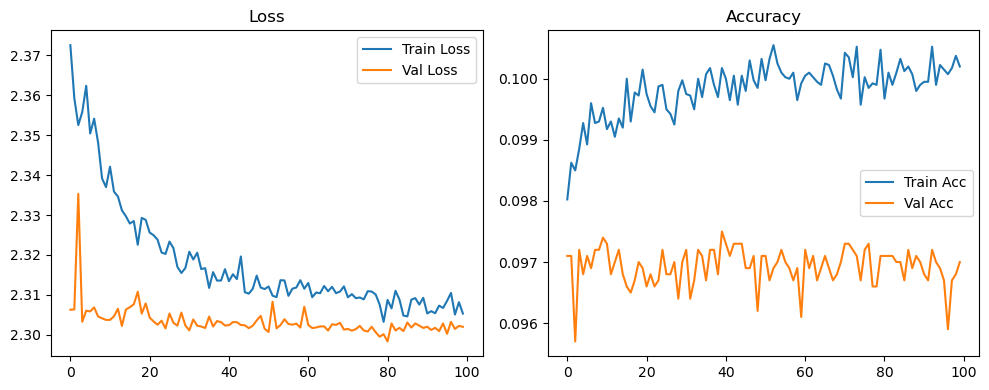

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.18it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.28it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3007 Accuracy: 0.1000


🚀 Running: batch512_lr_max_0.0001_min_1e-05_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0977 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:22<2:15:40, 82.23s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:45<2:15:40, 82.23s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:45<2:15:40, 82.23s/it]

| LR: 0.000100 | Train Acc: 0.0989 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:45<2:15:22, 82.88s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:07<2:15:22, 82.88s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:07<2:15:22, 82.88s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [04:07<2:13:10, 82.37s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:15<2:13:10, 82.37s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:15<2:13:10, 82.37s/it]

| LR: 0.000100 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:16<2:03:08, 76.96s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:08, 76.96s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:08, 76.96s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:29<1:25:26, 53.97s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:26, 53.97s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:26, 53.97s/it]

| LR: 0.000099 | Train Acc: 0.0990 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:42<1:02:47, 40.08s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:55<1:02:47, 40.08s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:55<1:02:47, 40.08s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [05:55<48:31, 31.30s/it]  

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:08<48:31, 31.30s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:08<48:31, 31.30s/it]

| LR: 0.000099 | Train Acc: 0.0998 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:08<39:06, 25.50s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:21<39:06, 25.50s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:21<39:06, 25.50s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:21<32:47, 21.63s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:34<32:47, 21.63s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:34<32:47, 21.63s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:34<28:28, 18.99s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:47<28:28, 18.99s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:47<28:28, 18.99s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:47<25:28, 17.18s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  11%|█         | 11/100 [07:00<25:28, 17.18s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  11%|█         | 11/100 [07:00<25:28, 17.18s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:00<23:21, 15.93s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:13<23:21, 15.93s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:13<23:21, 15.93s/it]

| LR: 0.000097 | Train Acc: 0.0991 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:14<21:51, 15.07s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:27<21:51, 15.07s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:27<21:51, 15.07s/it]

| LR: 0.000096 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:27<20:44, 14.47s/it]

| LR: 0.000096 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:40<20:44, 14.47s/it]

| LR: 0.000096 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:40<20:44, 14.47s/it]

| LR: 0.000096 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:40<19:55, 14.06s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:53<19:55, 14.06s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:53<19:55, 14.06s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [07:53<19:18, 13.79s/it]

| LR: 0.000094 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:06<19:18, 13.79s/it]

| LR: 0.000094 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:06<19:18, 13.79s/it]

| LR: 0.000094 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:06<18:51, 13.64s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [08:19<18:51, 13.64s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  17%|█▋        | 17/100 [08:19<18:51, 13.64s/it]

| LR: 0.000094 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  18%|█▊        | 18/100 [08:19<18:26, 13.49s/it]

| LR: 0.000093 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:32<18:26, 13.49s/it]

| LR: 0.000093 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:32<18:26, 13.49s/it]

| LR: 0.000093 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:33<18:04, 13.39s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:46<18:04, 13.39s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:46<18:04, 13.39s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:46<17:45, 13.32s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:59<17:45, 13.32s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:59<17:45, 13.32s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  21%|██        | 21/100 [08:59<17:26, 13.25s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:12<17:26, 13.25s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:12<17:26, 13.25s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:12<17:08, 13.19s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:25<17:08, 13.19s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:25<17:08, 13.19s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:25<16:53, 13.17s/it]

| LR: 0.000089 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:38<16:53, 13.17s/it]

| LR: 0.000089 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:38<16:53, 13.17s/it]

| LR: 0.000089 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:38<16:41, 13.18s/it]

| LR: 0.000088 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:51<16:41, 13.18s/it]

| LR: 0.000088 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:51<16:41, 13.18s/it]

| LR: 0.000088 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [09:51<16:27, 13.17s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [10:05<16:27, 13.17s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [10:05<16:27, 13.17s/it]

| LR: 0.000087 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:05<16:17, 13.21s/it]

| LR: 0.000086 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:18<16:17, 13.21s/it]

| LR: 0.000086 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:18<16:17, 13.21s/it]

| LR: 0.000086 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:18<16:03, 13.20s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:31<16:03, 13.20s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:31<16:03, 13.20s/it]

| LR: 0.000085 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [10:31<15:48, 13.18s/it]

| LR: 0.000084 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [10:44<15:48, 13.18s/it]

| LR: 0.000084 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  28%|██▊       | 28/100 [10:44<15:48, 13.18s/it]

| LR: 0.000084 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  29%|██▉       | 29/100 [10:44<15:34, 13.17s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:57<15:34, 13.17s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:57<15:34, 13.17s/it]

| LR: 0.000083 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  30%|███       | 30/100 [10:57<15:20, 13.16s/it]

| LR: 0.000081 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  30%|███       | 30/100 [11:10<15:20, 13.16s/it]

| LR: 0.000081 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  30%|███       | 30/100 [11:10<15:20, 13.16s/it]

| LR: 0.000081 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  31%|███       | 31/100 [11:10<15:07, 13.15s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:23<15:07, 13.15s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:23<15:07, 13.15s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:23<14:52, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  32%|███▏      | 32/100 [11:36<14:52, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  32%|███▏      | 32/100 [11:36<14:52, 13.13s/it]

| LR: 0.000079 | Train Acc: 0.1000 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [11:36<14:38, 13.11s/it]

| LR: 0.000078 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:49<14:38, 13.11s/it]

| LR: 0.000078 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  33%|███▎      | 33/100 [11:49<14:38, 13.11s/it]

| LR: 0.000078 | Train Acc: 0.0993 | Val Acc: 0.0971 |:  34%|███▍      | 34/100 [11:50<14:24, 13.10s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:03<14:24, 13.10s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [12:03<14:24, 13.10s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  35%|███▌      | 35/100 [12:03<14:11, 13.09s/it]

| LR: 0.000075 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:16<14:11, 13.09s/it]

| LR: 0.000075 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  35%|███▌      | 35/100 [12:16<14:11, 13.09s/it]

| LR: 0.000075 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  36%|███▌      | 36/100 [12:16<14:00, 13.13s/it]

| LR: 0.000074 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:29<14:00, 13.13s/it]

| LR: 0.000074 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  36%|███▌      | 36/100 [12:29<14:00, 13.13s/it]

| LR: 0.000074 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  37%|███▋      | 37/100 [12:29<13:46, 13.12s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  37%|███▋      | 37/100 [12:42<13:46, 13.12s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  37%|███▋      | 37/100 [12:42<13:46, 13.12s/it]

| LR: 0.000073 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  38%|███▊      | 38/100 [12:42<13:32, 13.11s/it]

| LR: 0.000072 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  38%|███▊      | 38/100 [12:55<13:32, 13.11s/it]

| LR: 0.000072 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  38%|███▊      | 38/100 [12:55<13:32, 13.11s/it]

| LR: 0.000072 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  39%|███▉      | 39/100 [12:55<13:19, 13.10s/it]

| LR: 0.000070 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  39%|███▉      | 39/100 [13:08<13:19, 13.10s/it]

| LR: 0.000070 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  39%|███▉      | 39/100 [13:08<13:19, 13.10s/it]

| LR: 0.000070 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  40%|████      | 40/100 [13:08<13:06, 13.10s/it]

| LR: 0.000069 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  40%|████      | 40/100 [13:21<13:06, 13.10s/it]

| LR: 0.000069 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  40%|████      | 40/100 [13:21<13:06, 13.10s/it]

| LR: 0.000069 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  41%|████      | 41/100 [13:21<12:52, 13.10s/it]

| LR: 0.000068 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:34<12:52, 13.10s/it]

| LR: 0.000068 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  41%|████      | 41/100 [13:34<12:52, 13.10s/it]

| LR: 0.000068 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  42%|████▏     | 42/100 [13:34<12:39, 13.09s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  42%|████▏     | 42/100 [13:47<12:39, 13.09s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  42%|████▏     | 42/100 [13:47<12:39, 13.09s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  43%|████▎     | 43/100 [13:47<12:25, 13.09s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [14:00<12:25, 13.09s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [14:00<12:25, 13.09s/it]

| LR: 0.000065 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [14:00<12:12, 13.09s/it]

| LR: 0.000063 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:14<12:12, 13.09s/it]

| LR: 0.000063 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:14<12:12, 13.09s/it]

| LR: 0.000063 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  45%|████▌     | 45/100 [14:14<12:01, 13.12s/it]

| LR: 0.000062 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  45%|████▌     | 45/100 [14:27<12:01, 13.12s/it]

| LR: 0.000062 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  45%|████▌     | 45/100 [14:27<12:01, 13.12s/it]

| LR: 0.000062 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  46%|████▌     | 46/100 [14:27<11:47, 13.11s/it]

| LR: 0.000061 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:40<11:47, 13.11s/it]

| LR: 0.000061 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:40<11:47, 13.11s/it]

| LR: 0.000061 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:40<11:34, 13.11s/it]

| LR: 0.000059 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:53<11:34, 13.11s/it]

| LR: 0.000059 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  47%|████▋     | 47/100 [14:53<11:34, 13.11s/it]

| LR: 0.000059 | Train Acc: 0.0994 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:53<11:21, 13.10s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  48%|████▊     | 48/100 [15:06<11:21, 13.10s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  48%|████▊     | 48/100 [15:06<11:21, 13.10s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  49%|████▉     | 49/100 [15:06<11:07, 13.09s/it]

| LR: 0.000056 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [15:19<11:07, 13.09s/it]

| LR: 0.000056 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  49%|████▉     | 49/100 [15:19<11:07, 13.09s/it]

| LR: 0.000056 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  50%|█████     | 50/100 [15:19<10:54, 13.10s/it]

| LR: 0.000055 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:32<10:54, 13.10s/it]

| LR: 0.000055 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:32<10:54, 13.10s/it]

| LR: 0.000055 | Train Acc: 0.0994 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [15:32<10:42, 13.12s/it]

| LR: 0.000054 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [15:45<10:42, 13.12s/it]

| LR: 0.000054 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  51%|█████     | 51/100 [15:45<10:42, 13.12s/it]

| LR: 0.000054 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [15:45<10:30, 13.14s/it]

| LR: 0.000052 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [15:59<10:30, 13.14s/it]

| LR: 0.000052 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  52%|█████▏    | 52/100 [15:59<10:30, 13.14s/it]

| LR: 0.000052 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [15:59<10:17, 13.14s/it]

| LR: 0.000051 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:12<10:17, 13.14s/it]

| LR: 0.000051 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  53%|█████▎    | 53/100 [16:12<10:17, 13.14s/it]

| LR: 0.000051 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:12<10:04, 13.15s/it]

| LR: 0.000049 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  54%|█████▍    | 54/100 [16:25<10:04, 13.15s/it]

| LR: 0.000049 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  54%|█████▍    | 54/100 [16:25<10:04, 13.15s/it]

| LR: 0.000049 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:25<09:53, 13.19s/it]

| LR: 0.000048 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:38<09:53, 13.19s/it]

| LR: 0.000048 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  55%|█████▌    | 55/100 [16:38<09:53, 13.19s/it]

| LR: 0.000048 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:38<09:39, 13.16s/it]

| LR: 0.000047 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:51<09:39, 13.16s/it]

| LR: 0.000047 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:51<09:39, 13.16s/it]

| LR: 0.000047 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [16:51<09:24, 13.14s/it]

| LR: 0.000045 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [17:04<09:24, 13.14s/it]

| LR: 0.000045 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [17:04<09:24, 13.14s/it]

| LR: 0.000045 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [17:04<09:11, 13.12s/it]

| LR: 0.000044 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  58%|█████▊    | 58/100 [17:17<09:11, 13.12s/it]

| LR: 0.000044 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  58%|█████▊    | 58/100 [17:17<09:11, 13.12s/it]

| LR: 0.000044 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [17:17<08:57, 13.11s/it]

| LR: 0.000042 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:30<08:57, 13.11s/it]

| LR: 0.000042 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:30<08:57, 13.11s/it]

| LR: 0.000042 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  60%|██████    | 60/100 [17:31<08:44, 13.11s/it]

| LR: 0.000041 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [17:44<08:44, 13.11s/it]

| LR: 0.000041 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [17:44<08:44, 13.11s/it]

| LR: 0.000041 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [17:44<08:31, 13.11s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [17:57<08:31, 13.11s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  61%|██████    | 61/100 [17:57<08:31, 13.11s/it]

| LR: 0.000040 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  62%|██████▏   | 62/100 [17:57<08:17, 13.10s/it]

| LR: 0.000038 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:10<08:17, 13.10s/it]

| LR: 0.000038 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:10<08:17, 13.10s/it]

| LR: 0.000038 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  63%|██████▎   | 63/100 [18:10<08:04, 13.10s/it]

| LR: 0.000037 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:23<08:04, 13.10s/it]

| LR: 0.000037 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:23<08:04, 13.10s/it]

| LR: 0.000037 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:23<07:52, 13.14s/it]

| LR: 0.000036 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:36<07:52, 13.14s/it]

| LR: 0.000036 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:36<07:52, 13.14s/it]

| LR: 0.000036 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:36<07:39, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  65%|██████▌   | 65/100 [18:49<07:39, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  65%|██████▌   | 65/100 [18:49<07:39, 13.14s/it]

| LR: 0.000035 | Train Acc: 0.0994 | Val Acc: 0.0971 |:  66%|██████▌   | 66/100 [18:49<07:27, 13.15s/it]

| LR: 0.000033 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  66%|██████▌   | 66/100 [19:03<07:27, 13.15s/it]

| LR: 0.000033 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  66%|██████▌   | 66/100 [19:03<07:27, 13.15s/it]

| LR: 0.000033 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  67%|██████▋   | 67/100 [19:03<07:14, 13.16s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  67%|██████▋   | 67/100 [19:16<07:14, 13.16s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  67%|██████▋   | 67/100 [19:16<07:14, 13.16s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  68%|██████▊   | 68/100 [19:16<07:01, 13.17s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  68%|██████▊   | 68/100 [19:29<07:01, 13.17s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  68%|██████▊   | 68/100 [19:29<07:01, 13.17s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:29<06:48, 13.17s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:42<06:48, 13.17s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:42<06:48, 13.17s/it]

| LR: 0.000030 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:42<06:34, 13.15s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  70%|███████   | 70/100 [19:55<06:34, 13.15s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  70%|███████   | 70/100 [19:55<06:34, 13.15s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  71%|███████   | 71/100 [19:55<06:20, 13.14s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [20:08<06:20, 13.14s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  71%|███████   | 71/100 [20:08<06:20, 13.14s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  72%|███████▏  | 72/100 [20:08<06:07, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:21<06:07, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:21<06:07, 13.13s/it]

| LR: 0.000026 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  73%|███████▎  | 73/100 [20:21<05:54, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:34<05:54, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:34<05:54, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  74%|███████▍  | 74/100 [20:35<05:41, 13.14s/it]

| LR: 0.000024 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [20:48<05:41, 13.14s/it]

| LR: 0.000024 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  74%|███████▍  | 74/100 [20:48<05:41, 13.14s/it]

| LR: 0.000024 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  75%|███████▌  | 75/100 [20:48<05:28, 13.13s/it]

| LR: 0.000023 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [21:01<05:28, 13.13s/it]

| LR: 0.000023 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [21:01<05:28, 13.13s/it]

| LR: 0.000023 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:01<05:14, 13.11s/it]

| LR: 0.000022 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  76%|███████▌  | 76/100 [21:14<05:14, 13.11s/it]

| LR: 0.000022 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  76%|███████▌  | 76/100 [21:14<05:14, 13.11s/it]

| LR: 0.000022 | Train Acc: 0.0993 | Val Acc: 0.0972 |:  77%|███████▋  | 77/100 [21:14<05:01, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  77%|███████▋  | 77/100 [21:27<05:01, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  77%|███████▋  | 77/100 [21:27<05:01, 13.11s/it]

| LR: 0.000021 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  78%|███████▊  | 78/100 [21:27<04:48, 13.12s/it]

| LR: 0.000020 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:40<04:48, 13.12s/it]

| LR: 0.000020 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:40<04:48, 13.12s/it]

| LR: 0.000020 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:40<04:35, 13.11s/it]

| LR: 0.000019 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:53<04:35, 13.11s/it]

| LR: 0.000019 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:53<04:35, 13.11s/it]

| LR: 0.000019 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  80%|████████  | 80/100 [21:53<04:22, 13.10s/it]

| LR: 0.000019 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [22:06<04:22, 13.10s/it]

| LR: 0.000019 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  80%|████████  | 80/100 [22:06<04:22, 13.10s/it]

| LR: 0.000019 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [22:06<04:08, 13.10s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [22:19<04:08, 13.10s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  81%|████████  | 81/100 [22:19<04:08, 13.10s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:19<03:55, 13.10s/it]

| LR: 0.000017 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:32<03:55, 13.10s/it]

| LR: 0.000017 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:32<03:55, 13.10s/it]

| LR: 0.000017 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:33<03:43, 13.13s/it]

| LR: 0.000016 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  83%|████████▎ | 83/100 [22:46<03:43, 13.13s/it]

| LR: 0.000016 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  83%|████████▎ | 83/100 [22:46<03:43, 13.13s/it]

| LR: 0.000016 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [22:46<03:29, 13.12s/it]

| LR: 0.000016 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [22:59<03:29, 13.12s/it]

| LR: 0.000016 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  84%|████████▍ | 84/100 [22:59<03:29, 13.12s/it]

| LR: 0.000016 | Train Acc: 0.0995 | Val Acc: 0.0971 |:  85%|████████▌ | 85/100 [22:59<03:16, 13.11s/it]

| LR: 0.000015 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [23:12<03:16, 13.11s/it]

| LR: 0.000015 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  85%|████████▌ | 85/100 [23:12<03:16, 13.11s/it]

| LR: 0.000015 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  86%|████████▌ | 86/100 [23:12<03:03, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  86%|████████▌ | 86/100 [23:25<03:03, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  86%|████████▌ | 86/100 [23:25<03:03, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  87%|████████▋ | 87/100 [23:25<02:50, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:38<02:50, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:38<02:50, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:38<02:37, 13.10s/it]

| LR: 0.000013 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:51<02:37, 13.10s/it]

| LR: 0.000013 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  88%|████████▊ | 88/100 [23:51<02:37, 13.10s/it]

| LR: 0.000013 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  89%|████████▉ | 89/100 [23:51<02:24, 13.10s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  89%|████████▉ | 89/100 [24:04<02:24, 13.10s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  89%|████████▉ | 89/100 [24:04<02:24, 13.10s/it]

| LR: 0.000013 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  90%|█████████ | 90/100 [24:04<02:11, 13.11s/it]

| LR: 0.000012 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:17<02:11, 13.11s/it]

| LR: 0.000012 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  90%|█████████ | 90/100 [24:17<02:11, 13.11s/it]

| LR: 0.000012 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  91%|█████████ | 91/100 [24:17<01:57, 13.10s/it]

| LR: 0.000012 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [24:30<01:57, 13.10s/it]

| LR: 0.000012 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  91%|█████████ | 91/100 [24:30<01:57, 13.10s/it]

| LR: 0.000012 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  92%|█████████▏| 92/100 [24:30<01:44, 13.09s/it]

| LR: 0.000011 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [24:43<01:44, 13.09s/it]

| LR: 0.000011 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [24:43<01:44, 13.09s/it]

| LR: 0.000011 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  93%|█████████▎| 93/100 [24:44<01:31, 13.13s/it]

| LR: 0.000011 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:57<01:31, 13.13s/it]

| LR: 0.000011 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:57<01:31, 13.13s/it]

| LR: 0.000011 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [24:57<01:18, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:10<01:18, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:10<01:18, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:10<01:05, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  95%|█████████▌| 95/100 [25:23<01:05, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  95%|█████████▌| 95/100 [25:23<01:05, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  96%|█████████▌| 96/100 [25:23<00:52, 13.10s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [25:36<00:52, 13.10s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [25:36<00:52, 13.10s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  97%|█████████▋| 97/100 [25:36<00:39, 13.10s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:49<00:39, 13.10s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  97%|█████████▋| 97/100 [25:49<00:39, 13.10s/it]

| LR: 0.000010 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  98%|█████████▊| 98/100 [25:49<00:26, 13.09s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [26:02<00:26, 13.09s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  98%|█████████▊| 98/100 [26:02<00:26, 13.09s/it]

| LR: 0.000010 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  99%|█████████▉| 99/100 [26:02<00:13, 13.11s/it]

| LR: 0.000010 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:15<00:13, 13.11s/it]

| LR: 0.000010 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:15<00:13, 13.11s/it]

| LR: 0.000010 | Train Acc: 0.0995 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:15<00:00, 13.12s/it]

| LR: 0.000010 | Train Acc: 0.0995 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:15<00:00, 15.76s/it]

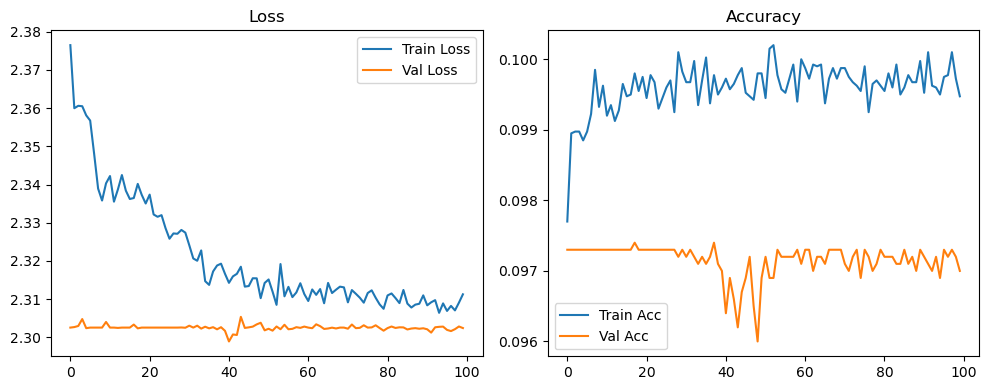

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3022 Accuracy: 0.1001


🚀 Running: batch512_lr_max_0.0001_min_1e-06_dp0.0


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0955 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0955 |:   0%|          | 0/100 [01:21<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0974 | Val Acc: 0.0955 |:   1%|          | 1/100 [01:21<2:15:07, 81.89s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0974 |:   1%|          | 1/100 [02:43<2:15:07, 81.89s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0974 |:   1%|          | 1/100 [02:43<2:15:07, 81.89s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0974 |:   2%|▏         | 2/100 [02:43<2:13:39, 81.83s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   2%|▏         | 2/100 [04:05<2:13:39, 81.83s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   2%|▏         | 2/100 [04:05<2:13:39, 81.83s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [04:05<2:12:26, 81.93s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0960 |:   3%|▎         | 3/100 [05:13<2:12:26, 81.93s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0960 |:   3%|▎         | 3/100 [05:13<2:12:26, 81.93s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [05:13<2:02:25, 76.51s/it]

| LR: 0.000100 | Train Acc: 0.0992 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [05:26<2:02:25, 76.51s/it]

| LR: 0.000100 | Train Acc: 0.0992 | Val Acc: 0.0976 |:   4%|▍         | 4/100 [05:26<2:02:25, 76.51s/it]

| LR: 0.000100 | Train Acc: 0.0992 | Val Acc: 0.0976 |:   5%|▌         | 5/100 [05:26<1:24:46, 53.54s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [05:39<1:24:46, 53.54s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   5%|▌         | 5/100 [05:39<1:24:46, 53.54s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0964 |:   6%|▌         | 6/100 [05:39<1:02:10, 39.69s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0954 |:   6%|▌         | 6/100 [05:52<1:02:10, 39.69s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0954 |:   6%|▌         | 6/100 [05:52<1:02:10, 39.69s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0954 |:   7%|▋         | 7/100 [05:52<47:53, 30.90s/it]  

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:05<47:53, 30.90s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:05<47:53, 30.90s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:05<38:36, 25.18s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [06:18<38:36, 25.18s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   8%|▊         | 8/100 [06:18<38:36, 25.18s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   9%|▉         | 9/100 [06:18<32:19, 21.31s/it]

| LR: 0.000098 | Train Acc: 0.0998 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:30<32:19, 21.31s/it]

| LR: 0.000098 | Train Acc: 0.0998 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:30<32:19, 21.31s/it]

| LR: 0.000098 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  10%|█         | 10/100 [06:30<28:02, 18.69s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  10%|█         | 10/100 [06:43<28:02, 18.69s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  10%|█         | 10/100 [06:43<28:02, 18.69s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  11%|█         | 11/100 [06:43<25:04, 16.90s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:56<25:04, 16.90s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  11%|█         | 11/100 [06:56<25:04, 16.90s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  12%|█▏        | 12/100 [06:56<22:58, 15.67s/it]

| LR: 0.000097 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:09<22:58, 15.67s/it]

| LR: 0.000097 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  12%|█▏        | 12/100 [07:09<22:58, 15.67s/it]

| LR: 0.000097 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  13%|█▎        | 13/100 [07:09<21:29, 14.82s/it]

| LR: 0.000096 | Train Acc: 0.0989 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [07:22<21:29, 14.82s/it]

| LR: 0.000096 | Train Acc: 0.0989 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [07:22<21:29, 14.82s/it]

| LR: 0.000096 | Train Acc: 0.0989 | Val Acc: 0.0957 |:  14%|█▍        | 14/100 [07:22<20:24, 14.23s/it]

| LR: 0.000095 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:35<20:24, 14.23s/it]

| LR: 0.000095 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  14%|█▍        | 14/100 [07:35<20:24, 14.23s/it]

| LR: 0.000095 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  15%|█▌        | 15/100 [07:35<19:34, 13.82s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  15%|█▌        | 15/100 [07:48<19:34, 13.82s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  15%|█▌        | 15/100 [07:48<19:34, 13.82s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [07:48<18:57, 13.54s/it]

| LR: 0.000094 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  16%|█▌        | 16/100 [08:00<18:57, 13.54s/it]

| LR: 0.000094 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  16%|█▌        | 16/100 [08:00<18:57, 13.54s/it]

| LR: 0.000094 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  17%|█▋        | 17/100 [08:00<18:27, 13.34s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0955 |:  17%|█▋        | 17/100 [08:13<18:27, 13.34s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0955 |:  17%|█▋        | 17/100 [08:13<18:27, 13.34s/it]

| LR: 0.000093 | Train Acc: 0.0999 | Val Acc: 0.0955 |:  18%|█▊        | 18/100 [08:13<18:06, 13.24s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  18%|█▊        | 18/100 [08:26<18:06, 13.24s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  18%|█▊        | 18/100 [08:26<18:06, 13.24s/it]

| LR: 0.000092 | Train Acc: 0.0998 | Val Acc: 0.0956 |:  19%|█▉        | 19/100 [08:26<17:43, 13.13s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  19%|█▉        | 19/100 [08:39<17:43, 13.13s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  19%|█▉        | 19/100 [08:39<17:43, 13.13s/it]

| LR: 0.000091 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  20%|██        | 20/100 [08:39<17:23, 13.05s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  20%|██        | 20/100 [08:52<17:23, 13.05s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  20%|██        | 20/100 [08:52<17:23, 13.05s/it]

| LR: 0.000091 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  21%|██        | 21/100 [08:52<17:06, 12.99s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0935 |:  21%|██        | 21/100 [09:05<17:06, 12.99s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0935 |:  21%|██        | 21/100 [09:05<17:06, 12.99s/it]

| LR: 0.000090 | Train Acc: 0.0999 | Val Acc: 0.0935 |:  22%|██▏       | 22/100 [09:05<16:50, 12.95s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  22%|██▏       | 22/100 [09:18<16:50, 12.95s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  22%|██▏       | 22/100 [09:18<16:50, 12.95s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [09:18<16:35, 12.93s/it]

| LR: 0.000088 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  23%|██▎       | 23/100 [09:31<16:35, 12.93s/it]

| LR: 0.000088 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  23%|██▎       | 23/100 [09:31<16:35, 12.93s/it]

| LR: 0.000088 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  24%|██▍       | 24/100 [09:31<16:19, 12.89s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0953 |:  24%|██▍       | 24/100 [09:43<16:19, 12.89s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0953 |:  24%|██▍       | 24/100 [09:43<16:19, 12.89s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0953 |:  25%|██▌       | 25/100 [09:43<16:04, 12.86s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  25%|██▌       | 25/100 [09:56<16:04, 12.86s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  25%|██▌       | 25/100 [09:56<16:04, 12.86s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  26%|██▌       | 26/100 [09:56<15:49, 12.84s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0959 |:  26%|██▌       | 26/100 [10:09<15:49, 12.84s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0959 |:  26%|██▌       | 26/100 [10:09<15:49, 12.84s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0959 |:  27%|██▋       | 27/100 [10:09<15:38, 12.86s/it]

| LR: 0.000083 | Train Acc: 0.0995 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [10:22<15:38, 12.86s/it]

| LR: 0.000083 | Train Acc: 0.0995 | Val Acc: 0.0964 |:  27%|██▋       | 27/100 [10:22<15:38, 12.86s/it]

| LR: 0.000083 | Train Acc: 0.0995 | Val Acc: 0.0964 |:  28%|██▊       | 28/100 [10:22<15:24, 12.85s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [10:35<15:24, 12.85s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  28%|██▊       | 28/100 [10:35<15:24, 12.85s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  29%|██▉       | 29/100 [10:35<15:11, 12.84s/it]

| LR: 0.000081 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  29%|██▉       | 29/100 [10:47<15:11, 12.84s/it]

| LR: 0.000081 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  29%|██▉       | 29/100 [10:47<15:11, 12.84s/it]

| LR: 0.000081 | Train Acc: 0.0994 | Val Acc: 0.0969 |:  30%|███       | 30/100 [10:48<14:58, 12.83s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0942 |:  30%|███       | 30/100 [11:00<14:58, 12.83s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0942 |:  30%|███       | 30/100 [11:00<14:58, 12.83s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0942 |:  31%|███       | 31/100 [11:00<14:45, 12.83s/it]

| LR: 0.000078 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  31%|███       | 31/100 [11:13<14:45, 12.83s/it]

| LR: 0.000078 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  31%|███       | 31/100 [11:13<14:45, 12.83s/it]

| LR: 0.000078 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:13<14:32, 12.84s/it]

| LR: 0.000077 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:26<14:32, 12.84s/it]

| LR: 0.000077 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:26<14:32, 12.84s/it]

| LR: 0.000077 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [11:26<14:19, 12.83s/it]

| LR: 0.000076 | Train Acc: 0.0997 | Val Acc: 0.0953 |:  33%|███▎      | 33/100 [11:39<14:19, 12.83s/it]

| LR: 0.000076 | Train Acc: 0.0997 | Val Acc: 0.0953 |:  33%|███▎      | 33/100 [11:39<14:19, 12.83s/it]

| LR: 0.000076 | Train Acc: 0.0997 | Val Acc: 0.0953 |:  34%|███▍      | 34/100 [11:39<14:06, 12.83s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  34%|███▍      | 34/100 [11:52<14:06, 12.83s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  34%|███▍      | 34/100 [11:52<14:06, 12.83s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  35%|███▌      | 35/100 [11:52<13:53, 12.83s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  35%|███▌      | 35/100 [12:05<13:53, 12.83s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  35%|███▌      | 35/100 [12:05<13:53, 12.83s/it]

| LR: 0.000073 | Train Acc: 0.1000 | Val Acc: 0.0974 |:  36%|███▌      | 36/100 [12:05<13:42, 12.85s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  36%|███▌      | 36/100 [12:18<13:42, 12.85s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  36%|███▌      | 36/100 [12:18<13:42, 12.85s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  37%|███▋      | 37/100 [12:18<13:32, 12.89s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [12:30<13:32, 12.89s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  37%|███▋      | 37/100 [12:30<13:32, 12.89s/it]

| LR: 0.000070 | Train Acc: 0.1002 | Val Acc: 0.0969 |:  38%|███▊      | 38/100 [12:30<13:18, 12.88s/it]

| LR: 0.000069 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  38%|███▊      | 38/100 [12:43<13:18, 12.88s/it]

| LR: 0.000069 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  38%|███▊      | 38/100 [12:43<13:18, 12.88s/it]

| LR: 0.000069 | Train Acc: 0.1001 | Val Acc: 0.0956 |:  39%|███▉      | 39/100 [12:43<13:06, 12.89s/it]

| LR: 0.000067 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  39%|███▉      | 39/100 [12:56<13:06, 12.89s/it]

| LR: 0.000067 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  39%|███▉      | 39/100 [12:56<13:06, 12.89s/it]

| LR: 0.000067 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  40%|████      | 40/100 [12:56<12:52, 12.88s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  40%|████      | 40/100 [13:09<12:52, 12.88s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  40%|████      | 40/100 [13:09<12:52, 12.88s/it]

| LR: 0.000066 | Train Acc: 0.1003 | Val Acc: 0.0962 |:  41%|████      | 41/100 [13:09<12:40, 12.88s/it]

| LR: 0.000064 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  41%|████      | 41/100 [13:22<12:40, 12.88s/it]

| LR: 0.000064 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  41%|████      | 41/100 [13:22<12:40, 12.88s/it]

| LR: 0.000064 | Train Acc: 0.1003 | Val Acc: 0.0970 |:  42%|████▏     | 42/100 [13:22<12:26, 12.87s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  42%|████▏     | 42/100 [13:35<12:26, 12.87s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  42%|████▏     | 42/100 [13:35<12:26, 12.87s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  43%|████▎     | 43/100 [13:35<12:12, 12.85s/it]

| LR: 0.000061 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:47<12:12, 12.85s/it]

| LR: 0.000061 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:47<12:12, 12.85s/it]

| LR: 0.000061 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  44%|████▍     | 44/100 [13:48<11:58, 12.83s/it]

| LR: 0.000060 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [14:00<11:58, 12.83s/it]

| LR: 0.000060 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  44%|████▍     | 44/100 [14:00<11:58, 12.83s/it]

| LR: 0.000060 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  45%|████▌     | 45/100 [14:00<11:44, 12.81s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:13<11:44, 12.81s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:13<11:44, 12.81s/it]

| LR: 0.000058 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:13<11:33, 12.84s/it]

| LR: 0.000057 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:26<11:33, 12.84s/it]

| LR: 0.000057 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:26<11:33, 12.84s/it]

| LR: 0.000057 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:26<11:19, 12.82s/it]

| LR: 0.000055 | Train Acc: 0.1005 | Val Acc: 0.0947 |:  47%|████▋     | 47/100 [14:39<11:19, 12.82s/it]

| LR: 0.000055 | Train Acc: 0.1005 | Val Acc: 0.0947 |:  47%|████▋     | 47/100 [14:39<11:19, 12.82s/it]

| LR: 0.000055 | Train Acc: 0.1005 | Val Acc: 0.0947 |:  48%|████▊     | 48/100 [14:39<11:06, 12.82s/it]

| LR: 0.000054 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:52<11:06, 12.82s/it]

| LR: 0.000054 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [14:52<11:06, 12.82s/it]

| LR: 0.000054 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  49%|████▉     | 49/100 [14:52<10:53, 12.81s/it]

| LR: 0.000052 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  49%|████▉     | 49/100 [15:04<10:53, 12.81s/it]

| LR: 0.000052 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  49%|████▉     | 49/100 [15:04<10:53, 12.81s/it]

| LR: 0.000052 | Train Acc: 0.1003 | Val Acc: 0.0958 |:  50%|█████     | 50/100 [15:04<10:40, 12.82s/it]

| LR: 0.000051 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  50%|█████     | 50/100 [15:17<10:40, 12.82s/it]

| LR: 0.000051 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  50%|█████     | 50/100 [15:17<10:40, 12.82s/it]

| LR: 0.000051 | Train Acc: 0.0994 | Val Acc: 0.0968 |:  51%|█████     | 51/100 [15:17<10:27, 12.81s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  51%|█████     | 51/100 [15:30<10:27, 12.81s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  51%|█████     | 51/100 [15:30<10:27, 12.81s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0957 |:  52%|█████▏    | 52/100 [15:30<10:14, 12.81s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  52%|█████▏    | 52/100 [15:43<10:14, 12.81s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  52%|█████▏    | 52/100 [15:43<10:14, 12.81s/it]

| LR: 0.000047 | Train Acc: 0.1000 | Val Acc: 0.0963 |:  53%|█████▎    | 53/100 [15:43<10:01, 12.81s/it]

| LR: 0.000046 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  53%|█████▎    | 53/100 [15:56<10:01, 12.81s/it]

| LR: 0.000046 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  53%|█████▎    | 53/100 [15:56<10:01, 12.81s/it]

| LR: 0.000046 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  54%|█████▍    | 54/100 [15:56<09:50, 12.83s/it]

| LR: 0.000044 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:08<09:50, 12.83s/it]

| LR: 0.000044 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:08<09:50, 12.83s/it]

| LR: 0.000044 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:09<09:37, 12.83s/it]

| LR: 0.000043 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  55%|█████▌    | 55/100 [16:21<09:37, 12.83s/it]

| LR: 0.000043 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  55%|█████▌    | 55/100 [16:21<09:37, 12.83s/it]

| LR: 0.000043 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  56%|█████▌    | 56/100 [16:21<09:26, 12.87s/it]

| LR: 0.000041 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:34<09:26, 12.87s/it]

| LR: 0.000041 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:34<09:26, 12.87s/it]

| LR: 0.000041 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [16:34<09:12, 12.85s/it]

| LR: 0.000040 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  57%|█████▋    | 57/100 [16:47<09:12, 12.85s/it]

| LR: 0.000040 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  57%|█████▋    | 57/100 [16:47<09:12, 12.85s/it]

| LR: 0.000040 | Train Acc: 0.0993 | Val Acc: 0.0975 |:  58%|█████▊    | 58/100 [16:47<08:59, 12.85s/it]

| LR: 0.000038 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  58%|█████▊    | 58/100 [17:00<08:59, 12.85s/it]

| LR: 0.000038 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  58%|█████▊    | 58/100 [17:00<08:59, 12.85s/it]

| LR: 0.000038 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  59%|█████▉    | 59/100 [17:00<08:47, 12.86s/it]

| LR: 0.000037 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:13<08:47, 12.86s/it]

| LR: 0.000037 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:13<08:47, 12.86s/it]

| LR: 0.000037 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:13<08:34, 12.87s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:26<08:34, 12.87s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  60%|██████    | 60/100 [17:26<08:34, 12.87s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  61%|██████    | 61/100 [17:26<08:21, 12.87s/it]

| LR: 0.000034 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  61%|██████    | 61/100 [17:39<08:21, 12.87s/it]

| LR: 0.000034 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  61%|██████    | 61/100 [17:39<08:21, 12.87s/it]

| LR: 0.000034 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  62%|██████▏   | 62/100 [17:39<08:09, 12.87s/it]

| LR: 0.000032 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  62%|██████▏   | 62/100 [17:51<08:09, 12.87s/it]

| LR: 0.000032 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  62%|██████▏   | 62/100 [17:51<08:09, 12.87s/it]

| LR: 0.000032 | Train Acc: 0.0993 | Val Acc: 0.0961 |:  63%|██████▎   | 63/100 [17:52<07:56, 12.87s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  63%|██████▎   | 63/100 [18:04<07:56, 12.87s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  63%|██████▎   | 63/100 [18:04<07:56, 12.87s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  64%|██████▍   | 64/100 [18:04<07:43, 12.89s/it]

| LR: 0.000029 | Train Acc: 0.0997 | Val Acc: 0.0948 |:  64%|██████▍   | 64/100 [18:17<07:43, 12.89s/it]

| LR: 0.000029 | Train Acc: 0.0997 | Val Acc: 0.0948 |:  64%|██████▍   | 64/100 [18:17<07:43, 12.89s/it]

| LR: 0.000029 | Train Acc: 0.0997 | Val Acc: 0.0948 |:  65%|██████▌   | 65/100 [18:17<07:32, 12.92s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  65%|██████▌   | 65/100 [18:30<07:32, 12.92s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  65%|██████▌   | 65/100 [18:30<07:32, 12.92s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  66%|██████▌   | 66/100 [18:30<07:19, 12.92s/it]

| LR: 0.000027 | Train Acc: 0.0993 | Val Acc: 0.0924 |:  66%|██████▌   | 66/100 [18:43<07:19, 12.92s/it]

| LR: 0.000027 | Train Acc: 0.0993 | Val Acc: 0.0924 |:  66%|██████▌   | 66/100 [18:43<07:19, 12.92s/it]

| LR: 0.000027 | Train Acc: 0.0993 | Val Acc: 0.0924 |:  67%|██████▋   | 67/100 [18:43<07:06, 12.91s/it]

| LR: 0.000025 | Train Acc: 0.0993 | Val Acc: 0.0954 |:  67%|██████▋   | 67/100 [18:56<07:06, 12.91s/it]

| LR: 0.000025 | Train Acc: 0.0993 | Val Acc: 0.0954 |:  67%|██████▋   | 67/100 [18:56<07:06, 12.91s/it]

| LR: 0.000025 | Train Acc: 0.0993 | Val Acc: 0.0954 |:  68%|██████▊   | 68/100 [18:56<06:53, 12.91s/it]

| LR: 0.000024 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  68%|██████▊   | 68/100 [19:09<06:53, 12.91s/it]

| LR: 0.000024 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  68%|██████▊   | 68/100 [19:09<06:53, 12.91s/it]

| LR: 0.000024 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  69%|██████▉   | 69/100 [19:09<06:40, 12.91s/it]

| LR: 0.000023 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  69%|██████▉   | 69/100 [19:22<06:40, 12.91s/it]

| LR: 0.000023 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  69%|██████▉   | 69/100 [19:22<06:40, 12.91s/it]

| LR: 0.000023 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  70%|███████   | 70/100 [19:22<06:27, 12.90s/it]

| LR: 0.000021 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  70%|███████   | 70/100 [19:35<06:27, 12.90s/it]

| LR: 0.000021 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  70%|███████   | 70/100 [19:35<06:27, 12.90s/it]

| LR: 0.000021 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  71%|███████   | 71/100 [19:35<06:14, 12.91s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0941 |:  71%|███████   | 71/100 [19:48<06:14, 12.91s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0941 |:  71%|███████   | 71/100 [19:48<06:14, 12.91s/it]

| LR: 0.000020 | Train Acc: 0.0998 | Val Acc: 0.0941 |:  72%|███████▏  | 72/100 [19:48<06:00, 12.89s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:00<06:00, 12.89s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  72%|███████▏  | 72/100 [20:00<06:00, 12.89s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  73%|███████▎  | 73/100 [20:01<05:47, 12.86s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:13<05:47, 12.86s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  73%|███████▎  | 73/100 [20:13<05:47, 12.86s/it]

| LR: 0.000018 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:14<05:35, 12.90s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  74%|███████▍  | 74/100 [20:26<05:35, 12.90s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  74%|███████▍  | 74/100 [20:26<05:35, 12.90s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0961 |:  75%|███████▌  | 75/100 [20:26<05:22, 12.90s/it]

| LR: 0.000015 | Train Acc: 0.0995 | Val Acc: 0.0943 |:  75%|███████▌  | 75/100 [20:39<05:22, 12.90s/it]

| LR: 0.000015 | Train Acc: 0.0995 | Val Acc: 0.0943 |:  75%|███████▌  | 75/100 [20:39<05:22, 12.90s/it]

| LR: 0.000015 | Train Acc: 0.0995 | Val Acc: 0.0943 |:  76%|███████▌  | 76/100 [20:39<05:09, 12.89s/it]

| LR: 0.000014 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  76%|███████▌  | 76/100 [20:52<05:09, 12.89s/it]

| LR: 0.000014 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  76%|███████▌  | 76/100 [20:52<05:09, 12.89s/it]

| LR: 0.000014 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  77%|███████▋  | 77/100 [20:52<04:56, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  77%|███████▋  | 77/100 [21:05<04:56, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  77%|███████▋  | 77/100 [21:05<04:56, 12.89s/it]

| LR: 0.000013 | Train Acc: 0.0996 | Val Acc: 0.0963 |:  78%|███████▊  | 78/100 [21:05<04:43, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  78%|███████▊  | 78/100 [21:18<04:43, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  78%|███████▊  | 78/100 [21:18<04:43, 12.89s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  79%|███████▉  | 79/100 [21:18<04:30, 12.89s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  79%|███████▉  | 79/100 [21:31<04:30, 12.89s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  79%|███████▉  | 79/100 [21:31<04:30, 12.89s/it]

| LR: 0.000011 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  80%|████████  | 80/100 [21:31<04:17, 12.88s/it]

| LR: 0.000010 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  80%|████████  | 80/100 [21:44<04:17, 12.88s/it]

| LR: 0.000010 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  80%|████████  | 80/100 [21:44<04:17, 12.88s/it]

| LR: 0.000010 | Train Acc: 0.0999 | Val Acc: 0.0958 |:  81%|████████  | 81/100 [21:44<04:04, 12.87s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0933 |:  81%|████████  | 81/100 [21:56<04:04, 12.87s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0933 |:  81%|████████  | 81/100 [21:56<04:04, 12.87s/it]

| LR: 0.000010 | Train Acc: 0.1002 | Val Acc: 0.0933 |:  82%|████████▏ | 82/100 [21:57<03:51, 12.87s/it]

| LR: 0.000009 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  82%|████████▏ | 82/100 [22:09<03:51, 12.87s/it]

| LR: 0.000009 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  82%|████████▏ | 82/100 [22:09<03:51, 12.87s/it]

| LR: 0.000009 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  83%|████████▎ | 83/100 [22:09<03:38, 12.86s/it]

| LR: 0.000008 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  83%|████████▎ | 83/100 [22:22<03:38, 12.86s/it]

| LR: 0.000008 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  83%|████████▎ | 83/100 [22:22<03:38, 12.86s/it]

| LR: 0.000008 | Train Acc: 0.0993 | Val Acc: 0.0969 |:  84%|████████▍ | 84/100 [22:22<03:26, 12.90s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0947 |:  84%|████████▍ | 84/100 [22:35<03:26, 12.90s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0947 |:  84%|████████▍ | 84/100 [22:35<03:26, 12.90s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0947 |:  85%|████████▌ | 85/100 [22:35<03:13, 12.89s/it]

| LR: 0.000006 | Train Acc: 0.0997 | Val Acc: 0.0935 |:  85%|████████▌ | 85/100 [22:48<03:13, 12.89s/it]

| LR: 0.000006 | Train Acc: 0.0997 | Val Acc: 0.0935 |:  85%|████████▌ | 85/100 [22:48<03:13, 12.89s/it]

| LR: 0.000006 | Train Acc: 0.0997 | Val Acc: 0.0935 |:  86%|████████▌ | 86/100 [22:48<03:00, 12.87s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  86%|████████▌ | 86/100 [23:01<03:00, 12.87s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  86%|████████▌ | 86/100 [23:01<03:00, 12.87s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  87%|████████▋ | 87/100 [23:01<02:47, 12.86s/it]

| LR: 0.000005 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  87%|████████▋ | 87/100 [23:14<02:47, 12.86s/it]

| LR: 0.000005 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  87%|████████▋ | 87/100 [23:14<02:47, 12.86s/it]

| LR: 0.000005 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  88%|████████▊ | 88/100 [23:14<02:34, 12.85s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  88%|████████▊ | 88/100 [23:26<02:34, 12.85s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  88%|████████▊ | 88/100 [23:26<02:34, 12.85s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0953 |:  89%|████████▉ | 89/100 [23:27<02:21, 12.84s/it]

| LR: 0.000004 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  89%|████████▉ | 89/100 [23:39<02:21, 12.84s/it]

| LR: 0.000004 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  89%|████████▉ | 89/100 [23:39<02:21, 12.84s/it]

| LR: 0.000004 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  90%|█████████ | 90/100 [23:39<02:08, 12.83s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0941 |:  90%|█████████ | 90/100 [23:52<02:08, 12.83s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0941 |:  90%|█████████ | 90/100 [23:52<02:08, 12.83s/it]

| LR: 0.000003 | Train Acc: 0.1000 | Val Acc: 0.0941 |:  91%|█████████ | 91/100 [23:52<01:55, 12.83s/it]

| LR: 0.000003 | Train Acc: 0.0992 | Val Acc: 0.0947 |:  91%|█████████ | 91/100 [24:05<01:55, 12.83s/it]

| LR: 0.000003 | Train Acc: 0.0992 | Val Acc: 0.0947 |:  91%|█████████ | 91/100 [24:05<01:55, 12.83s/it]

| LR: 0.000003 | Train Acc: 0.0992 | Val Acc: 0.0947 |:  92%|█████████▏| 92/100 [24:05<01:42, 12.84s/it]

| LR: 0.000003 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  92%|█████████▏| 92/100 [24:18<01:42, 12.84s/it]

| LR: 0.000003 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  92%|█████████▏| 92/100 [24:18<01:42, 12.84s/it]

| LR: 0.000003 | Train Acc: 0.0995 | Val Acc: 0.0955 |:  93%|█████████▎| 93/100 [24:18<01:30, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.0992 | Val Acc: 0.0967 |:  93%|█████████▎| 93/100 [24:31<01:30, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.0992 | Val Acc: 0.0967 |:  93%|█████████▎| 93/100 [24:31<01:30, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.0992 | Val Acc: 0.0967 |:  94%|█████████▍| 94/100 [24:31<01:17, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  94%|█████████▍| 94/100 [24:44<01:17, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  94%|█████████▍| 94/100 [24:44<01:17, 12.89s/it]

| LR: 0.000002 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  95%|█████████▌| 95/100 [24:44<01:04, 12.87s/it]

| LR: 0.000002 | Train Acc: 0.0998 | Val Acc: 0.0941 |:  95%|█████████▌| 95/100 [24:56<01:04, 12.87s/it]

| LR: 0.000002 | Train Acc: 0.0998 | Val Acc: 0.0941 |:  95%|█████████▌| 95/100 [24:56<01:04, 12.87s/it]

| LR: 0.000002 | Train Acc: 0.0998 | Val Acc: 0.0941 |:  96%|█████████▌| 96/100 [24:57<00:51, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [25:09<00:51, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  96%|█████████▌| 96/100 [25:09<00:51, 12.85s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  97%|█████████▋| 97/100 [25:09<00:38, 12.84s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:22<00:38, 12.84s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:22<00:38, 12.84s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  98%|█████████▊| 98/100 [25:22<00:25, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  98%|█████████▊| 98/100 [25:35<00:25, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  98%|█████████▊| 98/100 [25:35<00:25, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0955 |:  99%|█████████▉| 99/100 [25:35<00:12, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:48<00:12, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [25:48<00:12, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [25:48<00:00, 12.83s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [25:48<00:00, 15.48s/it]

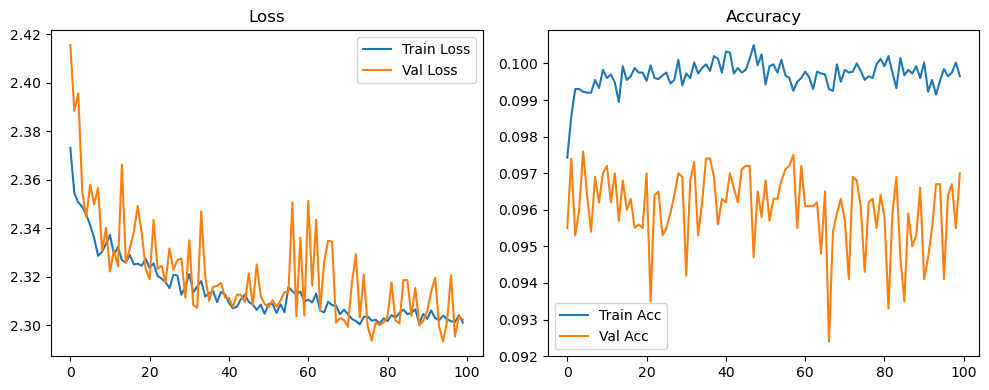

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.3052 Accuracy: 0.0997


🚀 Running: batch512_lr_max_0.0001_min_1e-06_dp0.01


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0954 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0954 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0983 | Val Acc: 0.0954 |:   1%|          | 1/100 [01:22<2:16:05, 82.48s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0947 |:   1%|          | 1/100 [02:44<2:16:05, 82.48s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0947 |:   1%|          | 1/100 [02:44<2:16:05, 82.48s/it]

| LR: 0.000100 | Train Acc: 0.0984 | Val Acc: 0.0947 |:   2%|▏         | 2/100 [02:44<2:14:35, 82.41s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0944 |:   2%|▏         | 2/100 [04:06<2:14:35, 82.41s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0944 |:   2%|▏         | 2/100 [04:06<2:14:35, 82.41s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0944 |:   3%|▎         | 3/100 [04:07<2:13:02, 82.30s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [05:15<2:13:02, 82.30s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0953 |:   3%|▎         | 3/100 [05:15<2:13:02, 82.30s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0953 |:   4%|▍         | 4/100 [05:15<2:03:12, 77.00s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [05:28<2:03:12, 77.00s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0960 |:   4%|▍         | 4/100 [05:28<2:03:12, 77.00s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0960 |:   5%|▌         | 5/100 [05:29<1:25:28, 53.98s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0954 |:   5%|▌         | 5/100 [05:42<1:25:28, 53.98s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0954 |:   5%|▌         | 5/100 [05:42<1:25:28, 53.98s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0954 |:   6%|▌         | 6/100 [05:42<1:02:48, 40.09s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   6%|▌         | 6/100 [05:55<1:02:48, 40.09s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   6%|▌         | 6/100 [05:55<1:02:48, 40.09s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0957 |:   7%|▋         | 7/100 [05:55<48:29, 31.28s/it]  

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [06:08<48:29, 31.28s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0967 |:   7%|▋         | 7/100 [06:08<48:29, 31.28s/it]

| LR: 0.000099 | Train Acc: 0.0991 | Val Acc: 0.0967 |:   8%|▊         | 8/100 [06:08<39:08, 25.53s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0961 |:   8%|▊         | 8/100 [06:21<39:08, 25.53s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0961 |:   8%|▊         | 8/100 [06:21<39:08, 25.53s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0961 |:   9%|▉         | 9/100 [06:21<32:49, 21.65s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:34<32:49, 21.65s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0974 |:   9%|▉         | 9/100 [06:34<32:49, 21.65s/it]

| LR: 0.000098 | Train Acc: 0.0993 | Val Acc: 0.0974 |:  10%|█         | 10/100 [06:34<28:31, 19.01s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  10%|█         | 10/100 [06:47<28:31, 19.01s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  10%|█         | 10/100 [06:47<28:31, 19.01s/it]

| LR: 0.000098 | Train Acc: 0.0996 | Val Acc: 0.0959 |:  11%|█         | 11/100 [06:47<25:33, 17.23s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0959 |:  11%|█         | 11/100 [07:01<25:33, 17.23s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0959 |:  11%|█         | 11/100 [07:01<25:33, 17.23s/it]

| LR: 0.000097 | Train Acc: 0.0992 | Val Acc: 0.0959 |:  12%|█▏        | 12/100 [07:01<23:29, 16.01s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [07:14<23:29, 16.01s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  12%|█▏        | 12/100 [07:14<23:29, 16.01s/it]

| LR: 0.000097 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  13%|█▎        | 13/100 [07:14<21:58, 15.16s/it]

| LR: 0.000096 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  13%|█▎        | 13/100 [07:27<21:58, 15.16s/it]

| LR: 0.000096 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  13%|█▎        | 13/100 [07:27<21:58, 15.16s/it]

| LR: 0.000096 | Train Acc: 0.0994 | Val Acc: 0.0966 |:  14%|█▍        | 14/100 [07:27<20:54, 14.58s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [07:40<20:54, 14.58s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  14%|█▍        | 14/100 [07:40<20:54, 14.58s/it]

| LR: 0.000095 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  15%|█▌        | 15/100 [07:40<20:04, 14.17s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [07:53<20:04, 14.17s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  15%|█▌        | 15/100 [07:53<20:04, 14.17s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  16%|█▌        | 16/100 [07:54<19:25, 13.88s/it]

| LR: 0.000094 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:07<19:25, 13.88s/it]

| LR: 0.000094 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  16%|█▌        | 16/100 [08:07<19:25, 13.88s/it]

| LR: 0.000094 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:07<18:55, 13.68s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [08:20<18:55, 13.68s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  17%|█▋        | 17/100 [08:20<18:55, 13.68s/it]

| LR: 0.000093 | Train Acc: 0.0996 | Val Acc: 0.0962 |:  18%|█▊        | 18/100 [08:20<18:31, 13.56s/it]

| LR: 0.000092 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [08:33<18:31, 13.56s/it]

| LR: 0.000092 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  18%|█▊        | 18/100 [08:33<18:31, 13.56s/it]

| LR: 0.000092 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  19%|█▉        | 19/100 [08:33<18:07, 13.43s/it]

| LR: 0.000091 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [08:46<18:07, 13.43s/it]

| LR: 0.000091 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  19%|█▉        | 19/100 [08:46<18:07, 13.43s/it]

| LR: 0.000091 | Train Acc: 0.0992 | Val Acc: 0.0965 |:  20%|██        | 20/100 [08:46<17:47, 13.35s/it]

| LR: 0.000091 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:59<17:47, 13.35s/it]

| LR: 0.000091 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  20%|██        | 20/100 [08:59<17:47, 13.35s/it]

| LR: 0.000091 | Train Acc: 0.0996 | Val Acc: 0.0964 |:  21%|██        | 21/100 [08:59<17:30, 13.29s/it]

| LR: 0.000090 | Train Acc: 0.1001 | Val Acc: 0.0948 |:  21%|██        | 21/100 [09:13<17:30, 13.29s/it]

| LR: 0.000090 | Train Acc: 0.1001 | Val Acc: 0.0948 |:  21%|██        | 21/100 [09:13<17:30, 13.29s/it]

| LR: 0.000090 | Train Acc: 0.1001 | Val Acc: 0.0948 |:  22%|██▏       | 22/100 [09:13<17:12, 13.24s/it]

| LR: 0.000089 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [09:26<17:12, 13.24s/it]

| LR: 0.000089 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  22%|██▏       | 22/100 [09:26<17:12, 13.24s/it]

| LR: 0.000089 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  23%|██▎       | 23/100 [09:26<16:57, 13.22s/it]

| LR: 0.000088 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [09:39<16:57, 13.22s/it]

| LR: 0.000088 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  23%|██▎       | 23/100 [09:39<16:57, 13.22s/it]

| LR: 0.000088 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  24%|██▍       | 24/100 [09:39<16:42, 13.19s/it]

| LR: 0.000087 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [09:52<16:42, 13.19s/it]

| LR: 0.000087 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  24%|██▍       | 24/100 [09:52<16:42, 13.19s/it]

| LR: 0.000087 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  25%|██▌       | 25/100 [09:52<16:27, 13.17s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  25%|██▌       | 25/100 [10:05<16:27, 13.17s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  25%|██▌       | 25/100 [10:05<16:27, 13.17s/it]

| LR: 0.000086 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  26%|██▌       | 26/100 [10:05<16:14, 13.17s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  26%|██▌       | 26/100 [10:18<16:14, 13.17s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  26%|██▌       | 26/100 [10:18<16:14, 13.17s/it]

| LR: 0.000084 | Train Acc: 0.0998 | Val Acc: 0.0958 |:  27%|██▋       | 27/100 [10:18<16:03, 13.19s/it]

| LR: 0.000083 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  27%|██▋       | 27/100 [10:32<16:03, 13.19s/it]

| LR: 0.000083 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  27%|██▋       | 27/100 [10:32<16:03, 13.19s/it]

| LR: 0.000083 | Train Acc: 0.0997 | Val Acc: 0.0965 |:  28%|██▊       | 28/100 [10:32<15:49, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  28%|██▊       | 28/100 [10:45<15:49, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  28%|██▊       | 28/100 [10:45<15:49, 13.18s/it]

| LR: 0.000082 | Train Acc: 0.1001 | Val Acc: 0.0958 |:  29%|██▉       | 29/100 [10:45<15:36, 13.19s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  29%|██▉       | 29/100 [10:58<15:36, 13.19s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  29%|██▉       | 29/100 [10:58<15:36, 13.19s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  30%|███       | 30/100 [10:58<15:24, 13.20s/it]

| LR: 0.000080 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  30%|███       | 30/100 [11:11<15:24, 13.20s/it]

| LR: 0.000080 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  30%|███       | 30/100 [11:11<15:24, 13.20s/it]

| LR: 0.000080 | Train Acc: 0.0999 | Val Acc: 0.0961 |:  31%|███       | 31/100 [11:11<15:09, 13.19s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  31%|███       | 31/100 [11:24<15:09, 13.19s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  31%|███       | 31/100 [11:24<15:09, 13.19s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0950 |:  32%|███▏      | 32/100 [11:24<14:56, 13.18s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  32%|███▏      | 32/100 [11:37<14:56, 13.18s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  32%|███▏      | 32/100 [11:37<14:56, 13.18s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0962 |:  33%|███▎      | 33/100 [11:37<14:42, 13.17s/it]

| LR: 0.000076 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [11:51<14:42, 13.17s/it]

| LR: 0.000076 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  33%|███▎      | 33/100 [11:51<14:42, 13.17s/it]

| LR: 0.000076 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  34%|███▍      | 34/100 [11:51<14:28, 13.15s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [12:04<14:28, 13.15s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [12:04<14:28, 13.15s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [12:04<14:15, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  35%|███▌      | 35/100 [12:17<14:15, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  35%|███▌      | 35/100 [12:17<14:15, 13.16s/it]

| LR: 0.000073 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  36%|███▌      | 36/100 [12:17<14:04, 13.19s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  36%|███▌      | 36/100 [12:30<14:04, 13.19s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  36%|███▌      | 36/100 [12:30<14:04, 13.19s/it]

| LR: 0.000072 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  37%|███▋      | 37/100 [12:30<13:50, 13.18s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  37%|███▋      | 37/100 [12:43<13:50, 13.18s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  37%|███▋      | 37/100 [12:43<13:50, 13.18s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  38%|███▊      | 38/100 [12:43<13:36, 13.17s/it]

| LR: 0.000069 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  38%|███▊      | 38/100 [12:56<13:36, 13.17s/it]

| LR: 0.000069 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  38%|███▊      | 38/100 [12:56<13:36, 13.17s/it]

| LR: 0.000069 | Train Acc: 0.0994 | Val Acc: 0.0970 |:  39%|███▉      | 39/100 [12:56<13:22, 13.15s/it]

| LR: 0.000067 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  39%|███▉      | 39/100 [13:10<13:22, 13.15s/it]

| LR: 0.000067 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  39%|███▉      | 39/100 [13:10<13:22, 13.15s/it]

| LR: 0.000067 | Train Acc: 0.0997 | Val Acc: 0.0959 |:  40%|████      | 40/100 [13:10<13:08, 13.14s/it]

| LR: 0.000066 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  40%|████      | 40/100 [13:23<13:08, 13.14s/it]

| LR: 0.000066 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  40%|████      | 40/100 [13:23<13:08, 13.14s/it]

| LR: 0.000066 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  41%|████      | 41/100 [13:23<12:55, 13.15s/it]

| LR: 0.000064 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  41%|████      | 41/100 [13:36<12:55, 13.15s/it]

| LR: 0.000064 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  41%|████      | 41/100 [13:36<12:55, 13.15s/it]

| LR: 0.000064 | Train Acc: 0.0995 | Val Acc: 0.0948 |:  42%|████▏     | 42/100 [13:36<12:43, 13.16s/it]

| LR: 0.000063 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  42%|████▏     | 42/100 [13:49<12:43, 13.16s/it]

| LR: 0.000063 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  42%|████▏     | 42/100 [13:49<12:43, 13.16s/it]

| LR: 0.000063 | Train Acc: 0.0998 | Val Acc: 0.0959 |:  43%|████▎     | 43/100 [13:49<12:30, 13.17s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  43%|████▎     | 43/100 [14:02<12:30, 13.17s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  43%|████▎     | 43/100 [14:02<12:30, 13.17s/it]

| LR: 0.000061 | Train Acc: 0.1001 | Val Acc: 0.0964 |:  44%|████▍     | 44/100 [14:02<12:17, 13.17s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  44%|████▍     | 44/100 [14:15<12:17, 13.17s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  44%|████▍     | 44/100 [14:15<12:17, 13.17s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  45%|████▌     | 45/100 [14:16<12:05, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  45%|████▌     | 45/100 [14:29<12:05, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  45%|████▌     | 45/100 [14:29<12:05, 13.19s/it]

| LR: 0.000058 | Train Acc: 0.0995 | Val Acc: 0.0965 |:  46%|████▌     | 46/100 [14:29<11:53, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  46%|████▌     | 46/100 [14:42<11:53, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  46%|████▌     | 46/100 [14:42<11:53, 13.22s/it]

| LR: 0.000057 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  47%|████▋     | 47/100 [14:42<11:39, 13.20s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  47%|████▋     | 47/100 [14:55<11:39, 13.20s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  47%|████▋     | 47/100 [14:55<11:39, 13.20s/it]

| LR: 0.000055 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  48%|████▊     | 48/100 [14:55<11:25, 13.18s/it]

| LR: 0.000054 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [15:08<11:25, 13.18s/it]

| LR: 0.000054 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  48%|████▊     | 48/100 [15:08<11:25, 13.18s/it]

| LR: 0.000054 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  49%|████▉     | 49/100 [15:08<11:12, 13.18s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:21<11:12, 13.18s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  49%|████▉     | 49/100 [15:21<11:12, 13.18s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  50%|█████     | 50/100 [15:21<10:58, 13.18s/it]

| LR: 0.000051 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  50%|█████     | 50/100 [15:35<10:58, 13.18s/it]

| LR: 0.000051 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  50%|█████     | 50/100 [15:35<10:58, 13.18s/it]

| LR: 0.000051 | Train Acc: 0.0995 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:35<10:45, 13.18s/it]

| LR: 0.000049 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:48<10:45, 13.18s/it]

| LR: 0.000049 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  51%|█████     | 51/100 [15:48<10:45, 13.18s/it]

| LR: 0.000049 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  52%|█████▏    | 52/100 [15:48<10:32, 13.17s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [16:01<10:32, 13.17s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  52%|█████▏    | 52/100 [16:01<10:32, 13.17s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  53%|█████▎    | 53/100 [16:01<10:18, 13.17s/it]

| LR: 0.000046 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  53%|█████▎    | 53/100 [16:14<10:18, 13.17s/it]

| LR: 0.000046 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  53%|█████▎    | 53/100 [16:14<10:18, 13.17s/it]

| LR: 0.000046 | Train Acc: 0.0996 | Val Acc: 0.0966 |:  54%|█████▍    | 54/100 [16:14<10:05, 13.17s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  54%|█████▍    | 54/100 [16:27<10:05, 13.17s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  54%|█████▍    | 54/100 [16:27<10:05, 13.17s/it]

| LR: 0.000044 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  55%|█████▌    | 55/100 [16:27<09:54, 13.20s/it]

| LR: 0.000043 | Train Acc: 0.0998 | Val Acc: 0.0947 |:  55%|█████▌    | 55/100 [16:40<09:54, 13.20s/it]

| LR: 0.000043 | Train Acc: 0.0998 | Val Acc: 0.0947 |:  55%|█████▌    | 55/100 [16:40<09:54, 13.20s/it]

| LR: 0.000043 | Train Acc: 0.0998 | Val Acc: 0.0947 |:  56%|█████▌    | 56/100 [16:40<09:39, 13.17s/it]

| LR: 0.000041 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  56%|█████▌    | 56/100 [16:54<09:39, 13.17s/it]

| LR: 0.000041 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  56%|█████▌    | 56/100 [16:54<09:39, 13.17s/it]

| LR: 0.000041 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  57%|█████▋    | 57/100 [16:54<09:26, 13.17s/it]

| LR: 0.000040 | Train Acc: 0.1002 | Val Acc: 0.0944 |:  57%|█████▋    | 57/100 [17:07<09:26, 13.17s/it]

| LR: 0.000040 | Train Acc: 0.1002 | Val Acc: 0.0944 |:  57%|█████▋    | 57/100 [17:07<09:26, 13.17s/it]

| LR: 0.000040 | Train Acc: 0.1002 | Val Acc: 0.0944 |:  58%|█████▊    | 58/100 [17:07<09:13, 13.17s/it]

| LR: 0.000038 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:13, 13.17s/it]

| LR: 0.000038 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  58%|█████▊    | 58/100 [17:20<09:13, 13.17s/it]

| LR: 0.000038 | Train Acc: 0.0996 | Val Acc: 0.0971 |:  59%|█████▉    | 59/100 [17:20<09:00, 13.18s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  59%|█████▉    | 59/100 [17:33<09:00, 13.18s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  59%|█████▉    | 59/100 [17:33<09:00, 13.18s/it]

| LR: 0.000037 | Train Acc: 0.1002 | Val Acc: 0.0950 |:  60%|██████    | 60/100 [17:33<08:46, 13.17s/it]

| LR: 0.000035 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  60%|██████    | 60/100 [17:46<08:46, 13.17s/it]

| LR: 0.000035 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  60%|██████    | 60/100 [17:46<08:46, 13.17s/it]

| LR: 0.000035 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  61%|██████    | 61/100 [17:46<08:33, 13.16s/it]

| LR: 0.000034 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [17:59<08:33, 13.16s/it]

| LR: 0.000034 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [17:59<08:33, 13.16s/it]

| LR: 0.000034 | Train Acc: 0.0995 | Val Acc: 0.0969 |:  62%|██████▏   | 62/100 [17:59<08:20, 13.16s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  62%|██████▏   | 62/100 [18:13<08:20, 13.16s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  62%|██████▏   | 62/100 [18:13<08:20, 13.16s/it]

| LR: 0.000032 | Train Acc: 0.0998 | Val Acc: 0.0962 |:  63%|██████▎   | 63/100 [18:13<08:07, 13.16s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  63%|██████▎   | 63/100 [18:26<08:07, 13.16s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  63%|██████▎   | 63/100 [18:26<08:07, 13.16s/it]

| LR: 0.000031 | Train Acc: 0.0997 | Val Acc: 0.0966 |:  64%|██████▍   | 64/100 [18:26<07:54, 13.18s/it]

| LR: 0.000029 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  64%|██████▍   | 64/100 [18:39<07:54, 13.18s/it]

| LR: 0.000029 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  64%|██████▍   | 64/100 [18:39<07:54, 13.18s/it]

| LR: 0.000029 | Train Acc: 0.0996 | Val Acc: 0.0961 |:  65%|██████▌   | 65/100 [18:39<07:42, 13.22s/it]

| LR: 0.000028 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  65%|██████▌   | 65/100 [18:52<07:42, 13.22s/it]

| LR: 0.000028 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  65%|██████▌   | 65/100 [18:52<07:42, 13.22s/it]

| LR: 0.000028 | Train Acc: 0.0998 | Val Acc: 0.0955 |:  66%|██████▌   | 66/100 [18:52<07:29, 13.21s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  66%|██████▌   | 66/100 [19:05<07:29, 13.21s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  66%|██████▌   | 66/100 [19:05<07:29, 13.21s/it]

| LR: 0.000027 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  67%|██████▋   | 67/100 [19:05<07:15, 13.19s/it]

| LR: 0.000025 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [19:19<07:15, 13.19s/it]

| LR: 0.000025 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [19:19<07:15, 13.19s/it]

| LR: 0.000025 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  68%|██████▊   | 68/100 [19:19<07:01, 13.18s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  68%|██████▊   | 68/100 [19:32<07:01, 13.18s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  68%|██████▊   | 68/100 [19:32<07:01, 13.18s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  69%|██████▉   | 69/100 [19:32<06:48, 13.17s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:45<06:48, 13.17s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  69%|██████▉   | 69/100 [19:45<06:48, 13.17s/it]

| LR: 0.000023 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  70%|███████   | 70/100 [19:45<06:35, 13.17s/it]

| LR: 0.000021 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:58<06:35, 13.17s/it]

| LR: 0.000021 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  70%|███████   | 70/100 [19:58<06:35, 13.17s/it]

| LR: 0.000021 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  71%|███████   | 71/100 [19:58<06:22, 13.18s/it]

| LR: 0.000020 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:11<06:22, 13.18s/it]

| LR: 0.000020 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  71%|███████   | 71/100 [20:11<06:22, 13.18s/it]

| LR: 0.000020 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  72%|███████▏  | 72/100 [20:11<06:08, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  72%|███████▏  | 72/100 [20:25<06:08, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  72%|███████▏  | 72/100 [20:25<06:08, 13.18s/it]

| LR: 0.000019 | Train Acc: 0.0998 | Val Acc: 0.0963 |:  73%|███████▎  | 73/100 [20:25<05:56, 13.19s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  73%|███████▎  | 73/100 [20:38<05:56, 13.19s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  73%|███████▎  | 73/100 [20:38<05:56, 13.19s/it]

| LR: 0.000018 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  74%|███████▍  | 74/100 [20:38<05:43, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  74%|███████▍  | 74/100 [20:51<05:43, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  74%|███████▍  | 74/100 [20:51<05:43, 13.23s/it]

| LR: 0.000017 | Train Acc: 0.0997 | Val Acc: 0.0958 |:  75%|███████▌  | 75/100 [20:51<05:30, 13.21s/it]

| LR: 0.000015 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [21:04<05:30, 13.21s/it]

| LR: 0.000015 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  75%|███████▌  | 75/100 [21:04<05:30, 13.21s/it]

| LR: 0.000015 | Train Acc: 0.0995 | Val Acc: 0.0967 |:  76%|███████▌  | 76/100 [21:04<05:16, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.0995 | Val Acc: 0.0952 |:  76%|███████▌  | 76/100 [21:17<05:16, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.0995 | Val Acc: 0.0952 |:  76%|███████▌  | 76/100 [21:17<05:16, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.0995 | Val Acc: 0.0952 |:  77%|███████▋  | 77/100 [21:17<05:03, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  77%|███████▋  | 77/100 [21:31<05:03, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  77%|███████▋  | 77/100 [21:31<05:03, 13.20s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0960 |:  78%|███████▊  | 78/100 [21:31<04:50, 13.20s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  78%|███████▊  | 78/100 [21:44<04:50, 13.20s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  78%|███████▊  | 78/100 [21:44<04:50, 13.20s/it]

| LR: 0.000012 | Train Acc: 0.1000 | Val Acc: 0.0959 |:  79%|███████▉  | 79/100 [21:44<04:37, 13.20s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  79%|███████▉  | 79/100 [21:57<04:37, 13.20s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  79%|███████▉  | 79/100 [21:57<04:37, 13.20s/it]

| LR: 0.000011 | Train Acc: 0.0999 | Val Acc: 0.0967 |:  80%|████████  | 80/100 [21:57<04:23, 13.19s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  80%|████████  | 80/100 [22:10<04:23, 13.19s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  80%|████████  | 80/100 [22:10<04:23, 13.19s/it]

| LR: 0.000010 | Train Acc: 0.0996 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:10<04:10, 13.19s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  81%|████████  | 81/100 [22:23<04:10, 13.19s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  81%|████████  | 81/100 [22:23<04:10, 13.19s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  82%|████████▏ | 82/100 [22:23<03:57, 13.19s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  82%|████████▏ | 82/100 [22:36<03:57, 13.19s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  82%|████████▏ | 82/100 [22:36<03:57, 13.19s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  83%|████████▎ | 83/100 [22:37<03:43, 13.18s/it]

| LR: 0.000008 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.18s/it]

| LR: 0.000008 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  83%|████████▎ | 83/100 [22:50<03:43, 13.18s/it]

| LR: 0.000008 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  84%|████████▍ | 84/100 [22:50<03:31, 13.21s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  84%|████████▍ | 84/100 [23:03<03:31, 13.21s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  84%|████████▍ | 84/100 [23:03<03:31, 13.21s/it]

| LR: 0.000007 | Train Acc: 0.1002 | Val Acc: 0.0961 |:  85%|████████▌ | 85/100 [23:03<03:17, 13.19s/it]

| LR: 0.000006 | Train Acc: 0.1001 | Val Acc: 0.0952 |:  85%|████████▌ | 85/100 [23:16<03:17, 13.19s/it]

| LR: 0.000006 | Train Acc: 0.1001 | Val Acc: 0.0952 |:  85%|████████▌ | 85/100 [23:16<03:17, 13.19s/it]

| LR: 0.000006 | Train Acc: 0.1001 | Val Acc: 0.0952 |:  86%|████████▌ | 86/100 [23:16<03:04, 13.18s/it]

| LR: 0.000006 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  86%|████████▌ | 86/100 [23:29<03:04, 13.18s/it]

| LR: 0.000006 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  86%|████████▌ | 86/100 [23:29<03:04, 13.18s/it]

| LR: 0.000006 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  87%|████████▋ | 87/100 [23:29<02:51, 13.16s/it]

| LR: 0.000005 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  87%|████████▋ | 87/100 [23:42<02:51, 13.16s/it]

| LR: 0.000005 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  87%|████████▋ | 87/100 [23:42<02:51, 13.16s/it]

| LR: 0.000005 | Train Acc: 0.1002 | Val Acc: 0.0966 |:  88%|████████▊ | 88/100 [23:42<02:38, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  88%|████████▊ | 88/100 [23:56<02:38, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  88%|████████▊ | 88/100 [23:56<02:38, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  89%|████████▉ | 89/100 [23:56<02:24, 13.16s/it]

| LR: 0.000004 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  89%|████████▉ | 89/100 [24:09<02:24, 13.16s/it]

| LR: 0.000004 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  89%|████████▉ | 89/100 [24:09<02:24, 13.16s/it]

| LR: 0.000004 | Train Acc: 0.1000 | Val Acc: 0.0964 |:  90%|█████████ | 90/100 [24:09<02:11, 13.17s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [24:22<02:11, 13.17s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  90%|█████████ | 90/100 [24:22<02:11, 13.17s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [24:22<01:58, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  91%|█████████ | 91/100 [24:35<01:58, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  91%|█████████ | 91/100 [24:35<01:58, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0964 |:  92%|█████████▏| 92/100 [24:35<01:45, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  92%|█████████▏| 92/100 [24:48<01:45, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  92%|█████████▏| 92/100 [24:48<01:45, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  93%|█████████▎| 93/100 [24:48<01:32, 13.23s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.23s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  93%|█████████▎| 93/100 [25:02<01:32, 13.23s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0953 |:  94%|█████████▍| 94/100 [25:02<01:19, 13.22s/it]

| LR: 0.000002 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.22s/it]

| LR: 0.000002 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:15<01:19, 13.22s/it]

| LR: 0.000002 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:15<01:06, 13.21s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  95%|█████████▌| 95/100 [25:28<01:06, 13.21s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  95%|█████████▌| 95/100 [25:28<01:06, 13.21s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0954 |:  96%|█████████▌| 96/100 [25:28<00:52, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:41<00:52, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  96%|█████████▌| 96/100 [25:41<00:52, 13.20s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  97%|█████████▋| 97/100 [25:41<00:39, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:54<00:39, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:54<00:39, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  98%|█████████▊| 98/100 [25:54<00:26, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  98%|█████████▊| 98/100 [26:07<00:26, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  98%|█████████▊| 98/100 [26:07<00:26, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.1002 | Val Acc: 0.0962 |:  99%|█████████▉| 99/100 [26:08<00:13, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  99%|█████████▉| 99/100 [26:21<00:13, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |: 100%|██████████| 100/100 [26:21<00:00, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.0998 | Val Acc: 0.0968 |: 100%|██████████| 100/100 [26:21<00:00, 15.81s/it]

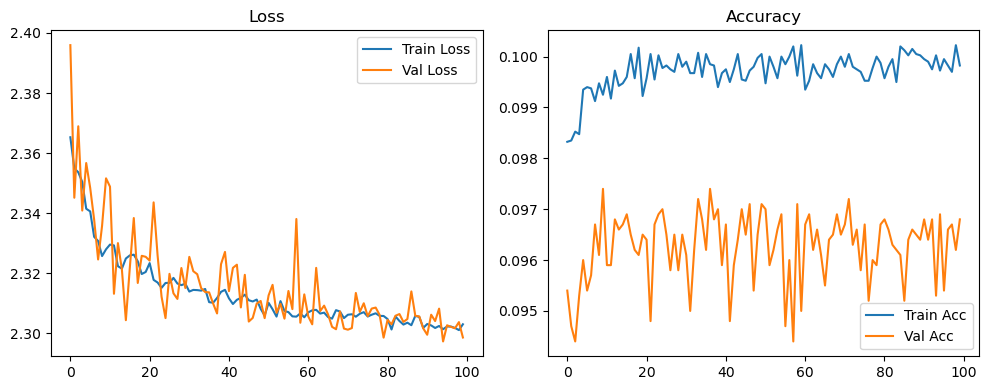

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.36it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.24it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.70it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.56it/s]

Original Model Final Test Loss: 2.3041 Accuracy: 0.0984


🚀 Running: batch512_lr_max_0.0001_min_1e-06_dp0.05


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0965 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0965 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0979 | Val Acc: 0.0965 |:   1%|          | 1/100 [01:22<2:16:27, 82.70s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   1%|          | 1/100 [02:44<2:16:27, 82.70s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   1%|          | 1/100 [02:44<2:16:27, 82.70s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0970 |:   2%|▏         | 2/100 [02:44<2:14:34, 82.39s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [04:07<2:14:34, 82.39s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   2%|▏         | 2/100 [04:07<2:14:34, 82.39s/it]

| LR: 0.000100 | Train Acc: 0.0988 | Val Acc: 0.0968 |:   3%|▎         | 3/100 [04:07<2:13:04, 82.31s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [05:16<2:13:04, 82.31s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0965 |:   3%|▎         | 3/100 [05:16<2:13:04, 82.31s/it]

| LR: 0.000100 | Train Acc: 0.0987 | Val Acc: 0.0965 |:   4%|▍         | 4/100 [05:16<2:03:19, 77.08s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [05:29<2:03:19, 77.08s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   4%|▍         | 4/100 [05:29<2:03:19, 77.08s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0962 |:   5%|▌         | 5/100 [05:29<1:25:30, 54.00s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [05:42<1:25:30, 54.00s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0972 |:   5%|▌         | 5/100 [05:42<1:25:30, 54.00s/it]

| LR: 0.000099 | Train Acc: 0.0994 | Val Acc: 0.0972 |:   6%|▌         | 6/100 [05:42<1:02:47, 40.08s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [05:55<1:02:47, 40.08s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   6%|▌         | 6/100 [05:55<1:02:47, 40.08s/it]

| LR: 0.000099 | Train Acc: 0.0993 | Val Acc: 0.0970 |:   7%|▋         | 7/100 [05:55<48:30, 31.29s/it]  

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:08<48:30, 31.29s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   7%|▋         | 7/100 [06:08<48:30, 31.29s/it]

| LR: 0.000099 | Train Acc: 0.0995 | Val Acc: 0.0969 |:   8%|▊         | 8/100 [06:08<39:05, 25.49s/it]

| LR: 0.000098 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [06:21<39:05, 25.49s/it]

| LR: 0.000098 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   8%|▊         | 8/100 [06:21<39:05, 25.49s/it]

| LR: 0.000098 | Train Acc: 0.0997 | Val Acc: 0.0970 |:   9%|▉         | 9/100 [06:21<32:46, 21.61s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [06:34<32:46, 21.61s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0968 |:   9%|▉         | 9/100 [06:34<32:46, 21.61s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0968 |:  10%|█         | 10/100 [06:34<28:27, 18.97s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  10%|█         | 10/100 [06:47<28:27, 18.97s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  10%|█         | 10/100 [06:47<28:27, 18.97s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0967 |:  11%|█         | 11/100 [06:47<25:27, 17.16s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  11%|█         | 11/100 [07:00<25:27, 17.16s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  11%|█         | 11/100 [07:00<25:27, 17.16s/it]

| LR: 0.000097 | Train Acc: 0.0993 | Val Acc: 0.0967 |:  12%|█▏        | 12/100 [07:00<23:22, 15.94s/it]

| LR: 0.000097 | Train Acc: 0.0995 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:13<23:22, 15.94s/it]

| LR: 0.000097 | Train Acc: 0.0995 | Val Acc: 0.0957 |:  12%|█▏        | 12/100 [07:13<23:22, 15.94s/it]

| LR: 0.000097 | Train Acc: 0.0995 | Val Acc: 0.0957 |:  13%|█▎        | 13/100 [07:14<21:53, 15.10s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:27<21:53, 15.10s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  13%|█▎        | 13/100 [07:27<21:53, 15.10s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0971 |:  14%|█▍        | 14/100 [07:27<20:47, 14.51s/it]

| LR: 0.000095 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  14%|█▍        | 14/100 [07:40<20:47, 14.51s/it]

| LR: 0.000095 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  14%|█▍        | 14/100 [07:40<20:47, 14.51s/it]

| LR: 0.000095 | Train Acc: 0.0993 | Val Acc: 0.0964 |:  15%|█▌        | 15/100 [07:40<19:57, 14.09s/it]

| LR: 0.000095 | Train Acc: 0.0990 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [07:53<19:57, 14.09s/it]

| LR: 0.000095 | Train Acc: 0.0990 | Val Acc: 0.0958 |:  15%|█▌        | 15/100 [07:53<19:57, 14.09s/it]

| LR: 0.000095 | Train Acc: 0.0990 | Val Acc: 0.0958 |:  16%|█▌        | 16/100 [07:53<19:19, 13.81s/it]

| LR: 0.000094 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [08:06<19:19, 13.81s/it]

| LR: 0.000094 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  16%|█▌        | 16/100 [08:06<19:19, 13.81s/it]

| LR: 0.000094 | Train Acc: 0.0995 | Val Acc: 0.0960 |:  17%|█▋        | 17/100 [08:06<18:52, 13.64s/it]

| LR: 0.000093 | Train Acc: 0.0988 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:19<18:52, 13.64s/it]

| LR: 0.000093 | Train Acc: 0.0988 | Val Acc: 0.0965 |:  17%|█▋        | 17/100 [08:19<18:52, 13.64s/it]

| LR: 0.000093 | Train Acc: 0.0988 | Val Acc: 0.0965 |:  18%|█▊        | 18/100 [08:19<18:27, 13.50s/it]

| LR: 0.000092 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  18%|█▊        | 18/100 [08:32<18:27, 13.50s/it]

| LR: 0.000092 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  18%|█▊        | 18/100 [08:32<18:27, 13.50s/it]

| LR: 0.000092 | Train Acc: 0.0995 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:33<18:04, 13.39s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:46<18:04, 13.39s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0962 |:  19%|█▉        | 19/100 [08:46<18:04, 13.39s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0962 |:  20%|██        | 20/100 [08:46<17:44, 13.30s/it]

| LR: 0.000091 | Train Acc: 0.0991 | Val Acc: 0.0956 |:  20%|██        | 20/100 [08:59<17:44, 13.30s/it]

| LR: 0.000091 | Train Acc: 0.0991 | Val Acc: 0.0956 |:  20%|██        | 20/100 [08:59<17:44, 13.30s/it]

| LR: 0.000091 | Train Acc: 0.0991 | Val Acc: 0.0956 |:  21%|██        | 21/100 [08:59<17:26, 13.25s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  21%|██        | 21/100 [09:12<17:26, 13.25s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  21%|██        | 21/100 [09:12<17:26, 13.25s/it]

| LR: 0.000090 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  22%|██▏       | 22/100 [09:12<17:09, 13.20s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  22%|██▏       | 22/100 [09:25<17:09, 13.20s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  22%|██▏       | 22/100 [09:25<17:09, 13.20s/it]

| LR: 0.000089 | Train Acc: 0.0996 | Val Acc: 0.0970 |:  23%|██▎       | 23/100 [09:25<16:53, 13.17s/it]

| LR: 0.000088 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [09:38<16:53, 13.17s/it]

| LR: 0.000088 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  23%|██▎       | 23/100 [09:38<16:53, 13.17s/it]

| LR: 0.000088 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  24%|██▍       | 24/100 [09:38<16:38, 13.13s/it]

| LR: 0.000087 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [09:51<16:38, 13.13s/it]

| LR: 0.000087 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  24%|██▍       | 24/100 [09:51<16:38, 13.13s/it]

| LR: 0.000087 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  25%|██▌       | 25/100 [09:51<16:24, 13.13s/it]

| LR: 0.000086 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  25%|██▌       | 25/100 [10:04<16:24, 13.13s/it]

| LR: 0.000086 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  25%|██▌       | 25/100 [10:04<16:24, 13.13s/it]

| LR: 0.000086 | Train Acc: 0.0995 | Val Acc: 0.0963 |:  26%|██▌       | 26/100 [10:04<16:13, 13.16s/it]

| LR: 0.000084 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  26%|██▌       | 26/100 [10:17<16:13, 13.16s/it]

| LR: 0.000084 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  26%|██▌       | 26/100 [10:17<16:13, 13.16s/it]

| LR: 0.000084 | Train Acc: 0.0993 | Val Acc: 0.0970 |:  27%|██▋       | 27/100 [10:17<15:58, 13.13s/it]

| LR: 0.000083 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  27%|██▋       | 27/100 [10:30<15:58, 13.13s/it]

| LR: 0.000083 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  27%|██▋       | 27/100 [10:30<15:58, 13.13s/it]

| LR: 0.000083 | Train Acc: 0.0996 | Val Acc: 0.0969 |:  28%|██▊       | 28/100 [10:30<15:44, 13.12s/it]

| LR: 0.000082 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  28%|██▊       | 28/100 [10:44<15:44, 13.12s/it]

| LR: 0.000082 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  28%|██▊       | 28/100 [10:44<15:44, 13.12s/it]

| LR: 0.000082 | Train Acc: 0.0996 | Val Acc: 0.0965 |:  29%|██▉       | 29/100 [10:44<15:30, 13.11s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [10:57<15:30, 13.11s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  29%|██▉       | 29/100 [10:57<15:30, 13.11s/it]

| LR: 0.000081 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  30%|███       | 30/100 [10:57<15:17, 13.10s/it]

| LR: 0.000080 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  30%|███       | 30/100 [11:10<15:17, 13.10s/it]

| LR: 0.000080 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  30%|███       | 30/100 [11:10<15:17, 13.10s/it]

| LR: 0.000080 | Train Acc: 0.0994 | Val Acc: 0.0964 |:  31%|███       | 31/100 [11:10<15:03, 13.10s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  31%|███       | 31/100 [11:23<15:03, 13.10s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  31%|███       | 31/100 [11:23<15:03, 13.10s/it]

| LR: 0.000078 | Train Acc: 0.0997 | Val Acc: 0.0969 |:  32%|███▏      | 32/100 [11:23<14:52, 13.13s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:36<14:52, 13.13s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  32%|███▏      | 32/100 [11:36<14:52, 13.13s/it]

| LR: 0.000077 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:36<14:40, 13.14s/it]

| LR: 0.000076 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:49<14:40, 13.14s/it]

| LR: 0.000076 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  33%|███▎      | 33/100 [11:49<14:40, 13.14s/it]

| LR: 0.000076 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [11:49<14:27, 13.15s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [12:02<14:27, 13.15s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  34%|███▍      | 34/100 [12:02<14:27, 13.15s/it]

| LR: 0.000074 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  35%|███▌      | 35/100 [12:02<14:14, 13.15s/it]

| LR: 0.000073 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  35%|███▌      | 35/100 [12:16<14:14, 13.15s/it]

| LR: 0.000073 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  35%|███▌      | 35/100 [12:16<14:14, 13.15s/it]

| LR: 0.000073 | Train Acc: 0.0997 | Val Acc: 0.0967 |:  36%|███▌      | 36/100 [12:16<14:04, 13.20s/it]

| LR: 0.000072 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  36%|███▌      | 36/100 [12:29<14:04, 13.20s/it]

| LR: 0.000072 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  36%|███▌      | 36/100 [12:29<14:04, 13.20s/it]

| LR: 0.000072 | Train Acc: 0.0999 | Val Acc: 0.0965 |:  37%|███▋      | 37/100 [12:29<13:52, 13.21s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  37%|███▋      | 37/100 [12:42<13:52, 13.21s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  37%|███▋      | 37/100 [12:42<13:52, 13.21s/it]

| LR: 0.000070 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  38%|███▊      | 38/100 [12:42<13:39, 13.21s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  38%|███▊      | 38/100 [12:55<13:39, 13.21s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  38%|███▊      | 38/100 [12:55<13:39, 13.21s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0959 |:  39%|███▉      | 39/100 [12:55<13:26, 13.22s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  39%|███▉      | 39/100 [13:09<13:26, 13.22s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  39%|███▉      | 39/100 [13:09<13:26, 13.22s/it]

| LR: 0.000067 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  40%|████      | 40/100 [13:09<13:13, 13.22s/it]

| LR: 0.000066 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  40%|████      | 40/100 [13:22<13:13, 13.22s/it]

| LR: 0.000066 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  40%|████      | 40/100 [13:22<13:13, 13.22s/it]

| LR: 0.000066 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  41%|████      | 41/100 [13:22<12:58, 13.20s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  41%|████      | 41/100 [13:35<12:58, 13.20s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  41%|████      | 41/100 [13:35<12:58, 13.20s/it]

| LR: 0.000064 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  42%|████▏     | 42/100 [13:35<12:44, 13.18s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  42%|████▏     | 42/100 [13:48<12:44, 13.18s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  42%|████▏     | 42/100 [13:48<12:44, 13.18s/it]

| LR: 0.000063 | Train Acc: 0.1001 | Val Acc: 0.0962 |:  43%|████▎     | 43/100 [13:48<12:30, 13.16s/it]

| LR: 0.000061 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  43%|████▎     | 43/100 [14:01<12:30, 13.16s/it]

| LR: 0.000061 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  43%|████▎     | 43/100 [14:01<12:30, 13.16s/it]

| LR: 0.000061 | Train Acc: 0.0998 | Val Acc: 0.0967 |:  44%|████▍     | 44/100 [14:01<12:16, 13.15s/it]

| LR: 0.000060 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  44%|████▍     | 44/100 [14:14<12:16, 13.15s/it]

| LR: 0.000060 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  44%|████▍     | 44/100 [14:14<12:16, 13.15s/it]

| LR: 0.000060 | Train Acc: 0.0998 | Val Acc: 0.0954 |:  45%|████▌     | 45/100 [14:14<12:04, 13.18s/it]

| LR: 0.000058 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:28<12:04, 13.18s/it]

| LR: 0.000058 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  45%|████▌     | 45/100 [14:28<12:04, 13.18s/it]

| LR: 0.000058 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  46%|████▌     | 46/100 [14:28<11:51, 13.17s/it]

| LR: 0.000057 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  46%|████▌     | 46/100 [14:41<11:51, 13.17s/it]

| LR: 0.000057 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  46%|████▌     | 46/100 [14:41<11:51, 13.17s/it]

| LR: 0.000057 | Train Acc: 0.1000 | Val Acc: 0.0966 |:  47%|████▋     | 47/100 [14:41<11:37, 13.15s/it]

| LR: 0.000055 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  47%|████▋     | 47/100 [14:54<11:37, 13.15s/it]

| LR: 0.000055 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  47%|████▋     | 47/100 [14:54<11:37, 13.15s/it]

| LR: 0.000055 | Train Acc: 0.0997 | Val Acc: 0.0963 |:  48%|████▊     | 48/100 [14:54<11:23, 13.15s/it]

| LR: 0.000054 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  48%|████▊     | 48/100 [15:07<11:23, 13.15s/it]

| LR: 0.000054 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  48%|████▊     | 48/100 [15:07<11:23, 13.15s/it]

| LR: 0.000054 | Train Acc: 0.0997 | Val Acc: 0.0968 |:  49%|████▉     | 49/100 [15:07<11:10, 13.14s/it]

| LR: 0.000052 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  49%|████▉     | 49/100 [15:20<11:10, 13.14s/it]

| LR: 0.000052 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  49%|████▉     | 49/100 [15:20<11:10, 13.14s/it]

| LR: 0.000052 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  50%|█████     | 50/100 [15:20<10:57, 13.14s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  50%|█████     | 50/100 [15:33<10:57, 13.14s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  50%|█████     | 50/100 [15:33<10:57, 13.14s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0963 |:  51%|█████     | 51/100 [15:33<10:44, 13.14s/it]

| LR: 0.000049 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [15:46<10:44, 13.14s/it]

| LR: 0.000049 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  51%|█████     | 51/100 [15:46<10:44, 13.14s/it]

| LR: 0.000049 | Train Acc: 0.0998 | Val Acc: 0.0965 |:  52%|█████▏    | 52/100 [15:46<10:30, 13.14s/it]

| LR: 0.000047 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  52%|█████▏    | 52/100 [15:59<10:30, 13.14s/it]

| LR: 0.000047 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  52%|█████▏    | 52/100 [15:59<10:30, 13.14s/it]

| LR: 0.000047 | Train Acc: 0.0999 | Val Acc: 0.0960 |:  53%|█████▎    | 53/100 [16:00<10:17, 13.13s/it]

| LR: 0.000046 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  53%|█████▎    | 53/100 [16:13<10:17, 13.13s/it]

| LR: 0.000046 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  53%|█████▎    | 53/100 [16:13<10:17, 13.13s/it]

| LR: 0.000046 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  54%|█████▍    | 54/100 [16:13<10:05, 13.17s/it]

| LR: 0.000044 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:26<10:05, 13.17s/it]

| LR: 0.000044 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  54%|█████▍    | 54/100 [16:26<10:05, 13.17s/it]

| LR: 0.000044 | Train Acc: 0.1001 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:26<09:51, 13.15s/it]

| LR: 0.000043 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:39<09:51, 13.15s/it]

| LR: 0.000043 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  55%|█████▌    | 55/100 [16:39<09:51, 13.15s/it]

| LR: 0.000043 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  56%|█████▌    | 56/100 [16:39<09:37, 13.12s/it]

| LR: 0.000041 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  56%|█████▌    | 56/100 [16:52<09:37, 13.12s/it]

| LR: 0.000041 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  56%|█████▌    | 56/100 [16:52<09:37, 13.12s/it]

| LR: 0.000041 | Train Acc: 0.0999 | Val Acc: 0.0966 |:  57%|█████▋    | 57/100 [16:52<09:23, 13.11s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  57%|█████▋    | 57/100 [17:05<09:23, 13.11s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  57%|█████▋    | 57/100 [17:05<09:23, 13.11s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0965 |:  58%|█████▊    | 58/100 [17:05<09:11, 13.12s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  58%|█████▊    | 58/100 [17:18<09:11, 13.12s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  58%|█████▊    | 58/100 [17:18<09:11, 13.12s/it]

| LR: 0.000038 | Train Acc: 0.1000 | Val Acc: 0.0962 |:  59%|█████▉    | 59/100 [17:18<08:58, 13.13s/it]

| LR: 0.000037 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:31<08:58, 13.13s/it]

| LR: 0.000037 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  59%|█████▉    | 59/100 [17:31<08:58, 13.13s/it]

| LR: 0.000037 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  60%|██████    | 60/100 [17:31<08:44, 13.12s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  60%|██████    | 60/100 [17:44<08:44, 13.12s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  60%|██████    | 60/100 [17:44<08:44, 13.12s/it]

| LR: 0.000035 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  61%|██████    | 61/100 [17:45<08:31, 13.12s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [17:58<08:31, 13.12s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  61%|██████    | 61/100 [17:58<08:31, 13.12s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0974 |:  62%|██████▏   | 62/100 [17:58<08:18, 13.12s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:11<08:18, 13.12s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  62%|██████▏   | 62/100 [18:11<08:18, 13.12s/it]

| LR: 0.000032 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  63%|██████▎   | 63/100 [18:11<08:05, 13.13s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:24<08:05, 13.13s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:24<08:05, 13.13s/it]

| LR: 0.000031 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:24<07:53, 13.16s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  64%|██████▍   | 64/100 [18:37<07:53, 13.16s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  64%|██████▍   | 64/100 [18:37<07:53, 13.16s/it]

| LR: 0.000029 | Train Acc: 0.0999 | Val Acc: 0.0962 |:  65%|██████▌   | 65/100 [18:37<07:40, 13.15s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  65%|██████▌   | 65/100 [18:50<07:40, 13.15s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  65%|██████▌   | 65/100 [18:50<07:40, 13.15s/it]

| LR: 0.000028 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  66%|██████▌   | 66/100 [18:50<07:26, 13.13s/it]

| LR: 0.000027 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  66%|██████▌   | 66/100 [19:03<07:26, 13.13s/it]

| LR: 0.000027 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  66%|██████▌   | 66/100 [19:03<07:26, 13.13s/it]

| LR: 0.000027 | Train Acc: 0.1001 | Val Acc: 0.0965 |:  67%|██████▋   | 67/100 [19:03<07:12, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  67%|██████▋   | 67/100 [19:16<07:12, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  67%|██████▋   | 67/100 [19:16<07:12, 13.12s/it]

| LR: 0.000025 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  68%|██████▊   | 68/100 [19:16<06:59, 13.10s/it]

| LR: 0.000024 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:29<06:59, 13.10s/it]

| LR: 0.000024 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:29<06:59, 13.10s/it]

| LR: 0.000024 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  69%|██████▉   | 69/100 [19:29<06:46, 13.10s/it]

| LR: 0.000023 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:42<06:46, 13.10s/it]

| LR: 0.000023 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  69%|██████▉   | 69/100 [19:42<06:46, 13.10s/it]

| LR: 0.000023 | Train Acc: 0.0998 | Val Acc: 0.0957 |:  70%|███████   | 70/100 [19:43<06:32, 13.09s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:56<06:32, 13.09s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  70%|███████   | 70/100 [19:56<06:32, 13.09s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [19:56<06:19, 13.09s/it]

| LR: 0.000020 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [20:09<06:19, 13.09s/it]

| LR: 0.000020 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  71%|███████   | 71/100 [20:09<06:19, 13.09s/it]

| LR: 0.000020 | Train Acc: 0.1002 | Val Acc: 0.0968 |:  72%|███████▏  | 72/100 [20:09<06:06, 13.09s/it]

| LR: 0.000019 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [20:22<06:06, 13.09s/it]

| LR: 0.000019 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  72%|███████▏  | 72/100 [20:22<06:06, 13.09s/it]

| LR: 0.000019 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  73%|███████▎  | 73/100 [20:22<05:54, 13.13s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  73%|███████▎  | 73/100 [20:35<05:54, 13.13s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  73%|███████▎  | 73/100 [20:35<05:54, 13.13s/it]

| LR: 0.000018 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  74%|███████▍  | 74/100 [20:35<05:41, 13.12s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:48<05:41, 13.12s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  74%|███████▍  | 74/100 [20:48<05:41, 13.12s/it]

| LR: 0.000017 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  75%|███████▌  | 75/100 [20:48<05:27, 13.10s/it]

| LR: 0.000015 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  75%|███████▌  | 75/100 [21:01<05:27, 13.10s/it]

| LR: 0.000015 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  75%|███████▌  | 75/100 [21:01<05:27, 13.10s/it]

| LR: 0.000015 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:01<05:14, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [21:14<05:14, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  76%|███████▌  | 76/100 [21:14<05:14, 13.10s/it]

| LR: 0.000014 | Train Acc: 0.1000 | Val Acc: 0.0968 |:  77%|███████▋  | 77/100 [21:14<05:01, 13.09s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:27<05:01, 13.09s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:27<05:01, 13.09s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0971 |:  78%|███████▊  | 78/100 [21:27<04:48, 13.09s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  78%|███████▊  | 78/100 [21:40<04:48, 13.09s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  78%|███████▊  | 78/100 [21:40<04:48, 13.09s/it]

| LR: 0.000012 | Train Acc: 0.1002 | Val Acc: 0.0967 |:  79%|███████▉  | 79/100 [21:40<04:35, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:54<04:35, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:54<04:35, 13.11s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:54<04:22, 13.12s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  80%|████████  | 80/100 [22:07<04:22, 13.12s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  80%|████████  | 80/100 [22:07<04:22, 13.12s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  81%|████████  | 81/100 [22:07<04:09, 13.11s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  81%|████████  | 81/100 [22:20<04:09, 13.11s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  81%|████████  | 81/100 [22:20<04:09, 13.11s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  82%|████████▏ | 82/100 [22:20<03:55, 13.09s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  82%|████████▏ | 82/100 [22:33<03:55, 13.09s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  82%|████████▏ | 82/100 [22:33<03:55, 13.09s/it]

| LR: 0.000009 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  83%|████████▎ | 83/100 [22:33<03:43, 13.15s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  83%|████████▎ | 83/100 [22:46<03:43, 13.15s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  83%|████████▎ | 83/100 [22:46<03:43, 13.15s/it]

| LR: 0.000008 | Train Acc: 0.1002 | Val Acc: 0.0963 |:  84%|████████▍ | 84/100 [22:46<03:30, 13.13s/it]

| LR: 0.000007 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  84%|████████▍ | 84/100 [22:59<03:30, 13.13s/it]

| LR: 0.000007 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  84%|████████▍ | 84/100 [22:59<03:30, 13.13s/it]

| LR: 0.000007 | Train Acc: 0.1000 | Val Acc: 0.0960 |:  85%|████████▌ | 85/100 [22:59<03:16, 13.13s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  85%|████████▌ | 85/100 [23:12<03:16, 13.13s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  85%|████████▌ | 85/100 [23:12<03:16, 13.13s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0966 |:  86%|████████▌ | 86/100 [23:12<03:03, 13.12s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:25<03:03, 13.12s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  86%|████████▌ | 86/100 [23:25<03:03, 13.12s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0967 |:  87%|████████▋ | 87/100 [23:25<02:50, 13.11s/it]

| LR: 0.000005 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  87%|████████▋ | 87/100 [23:39<02:50, 13.11s/it]

| LR: 0.000005 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  87%|████████▋ | 87/100 [23:39<02:50, 13.11s/it]

| LR: 0.000005 | Train Acc: 0.0997 | Val Acc: 0.0964 |:  88%|████████▊ | 88/100 [23:39<02:37, 13.11s/it]

| LR: 0.000004 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:52<02:37, 13.11s/it]

| LR: 0.000004 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:52<02:37, 13.11s/it]

| LR: 0.000004 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:52<02:24, 13.10s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [24:05<02:24, 13.10s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [24:05<02:24, 13.10s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  90%|█████████ | 90/100 [24:05<02:11, 13.10s/it]

| LR: 0.000003 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  90%|█████████ | 90/100 [24:18<02:11, 13.10s/it]

| LR: 0.000003 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  90%|█████████ | 90/100 [24:18<02:11, 13.10s/it]

| LR: 0.000003 | Train Acc: 0.0998 | Val Acc: 0.0964 |:  91%|█████████ | 91/100 [24:18<01:57, 13.11s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [24:31<01:57, 13.11s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  91%|█████████ | 91/100 [24:31<01:57, 13.11s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0968 |:  92%|█████████▏| 92/100 [24:31<01:45, 13.16s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:44<01:45, 13.16s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:44<01:45, 13.16s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:44<01:31, 13.13s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:57<01:31, 13.13s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [24:57<01:31, 13.13s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [24:57<01:18, 13.11s/it]

| LR: 0.000002 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:10<01:18, 13.11s/it]

| LR: 0.000002 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  94%|█████████▍| 94/100 [25:10<01:18, 13.11s/it]

| LR: 0.000002 | Train Acc: 0.1003 | Val Acc: 0.0969 |:  95%|█████████▌| 95/100 [25:10<01:05, 13.10s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:23<01:05, 13.10s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  95%|█████████▌| 95/100 [25:23<01:05, 13.10s/it]

| LR: 0.000002 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  96%|█████████▌| 96/100 [25:23<00:52, 13.09s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  96%|█████████▌| 96/100 [25:36<00:52, 13.09s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  96%|█████████▌| 96/100 [25:36<00:52, 13.09s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0967 |:  97%|█████████▋| 97/100 [25:36<00:39, 13.08s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  97%|█████████▋| 97/100 [25:49<00:39, 13.08s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  97%|█████████▋| 97/100 [25:49<00:39, 13.08s/it]

| LR: 0.000001 | Train Acc: 0.1004 | Val Acc: 0.0969 |:  98%|█████████▊| 98/100 [25:50<00:26, 13.08s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  98%|█████████▊| 98/100 [26:03<00:26, 13.08s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  98%|█████████▊| 98/100 [26:03<00:26, 13.08s/it]

| LR: 0.000001 | Train Acc: 0.1000 | Val Acc: 0.0969 |:  99%|█████████▉| 99/100 [26:03<00:13, 13.07s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  99%|█████████▉| 99/100 [26:16<00:13, 13.07s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0974 |:  99%|█████████▉| 99/100 [26:16<00:13, 13.07s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0974 |: 100%|██████████| 100/100 [26:16<00:00, 13.07s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0974 |: 100%|██████████| 100/100 [26:16<00:00, 15.76s/it]

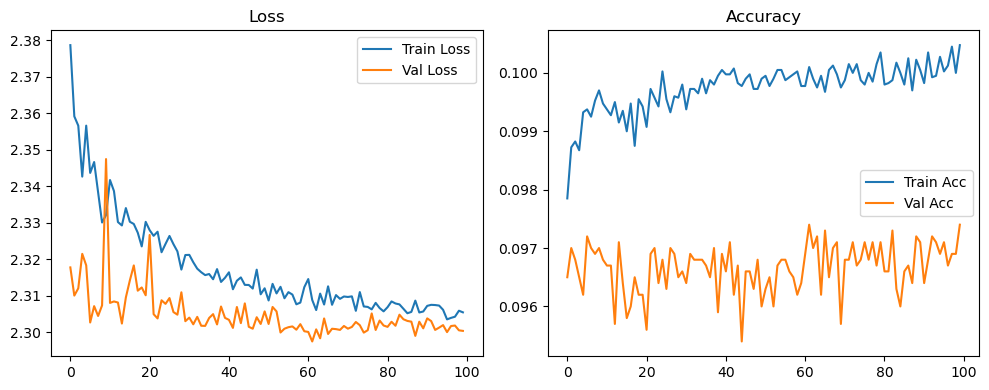

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.17it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.28it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.74it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3040 Accuracy: 0.0994


🚀 Running: batch512_lr_max_0.0001_min_1e-06_dp0.1


Files already downloaded and verified


Files already downloaded and verified


Training:   0%|          | 0/100 [00:00<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   0%|          | 0/100 [01:22<?, ?it/s]

| LR: 0.000100 | Train Acc: 0.0982 | Val Acc: 0.0973 |:   1%|          | 1/100 [01:22<2:16:18, 82.61s/it]

| LR: 0.000100 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:45<2:16:18, 82.61s/it]

| LR: 0.000100 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   1%|          | 1/100 [02:45<2:16:18, 82.61s/it]

| LR: 0.000100 | Train Acc: 0.0991 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [02:45<2:14:48, 82.54s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:07<2:14:48, 82.54s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   2%|▏         | 2/100 [04:07<2:14:48, 82.54s/it]

| LR: 0.000100 | Train Acc: 0.0985 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [04:07<2:13:11, 82.38s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:16<2:13:11, 82.38s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   3%|▎         | 3/100 [05:16<2:13:11, 82.38s/it]

| LR: 0.000100 | Train Acc: 0.0993 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:16<2:03:31, 77.20s/it]

| LR: 0.000100 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:31, 77.20s/it]

| LR: 0.000100 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   4%|▍         | 4/100 [05:29<2:03:31, 77.20s/it]

| LR: 0.000100 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:29<1:25:39, 54.10s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:39, 54.10s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   5%|▌         | 5/100 [05:42<1:25:39, 54.10s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:42<1:02:56, 40.17s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:56<1:02:56, 40.17s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0973 |:   6%|▌         | 6/100 [05:56<1:02:56, 40.17s/it]

| LR: 0.000099 | Train Acc: 0.0984 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [05:56<48:37, 31.37s/it]  

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:09<48:37, 31.37s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   7%|▋         | 7/100 [06:09<48:37, 31.37s/it]

| LR: 0.000099 | Train Acc: 0.0992 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:09<39:13, 25.58s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:22<39:13, 25.58s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   8%|▊         | 8/100 [06:22<39:13, 25.58s/it]

| LR: 0.000098 | Train Acc: 0.0994 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:22<32:54, 21.70s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:35<32:54, 21.70s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0973 |:   9%|▉         | 9/100 [06:35<32:54, 21.70s/it]

| LR: 0.000098 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:35<28:36, 19.07s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:48<28:36, 19.07s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  10%|█         | 10/100 [06:48<28:36, 19.07s/it]

| LR: 0.000098 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  11%|█         | 11/100 [06:48<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [07:01<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  11%|█         | 11/100 [07:01<25:36, 17.26s/it]

| LR: 0.000097 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:01<23:29, 16.02s/it]

| LR: 0.000097 | Train Acc: 0.0989 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:15<23:29, 16.02s/it]

| LR: 0.000097 | Train Acc: 0.0989 | Val Acc: 0.0973 |:  12%|█▏        | 12/100 [07:15<23:29, 16.02s/it]

| LR: 0.000097 | Train Acc: 0.0989 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:15<21:58, 15.16s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:28<21:58, 15.16s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  13%|█▎        | 13/100 [07:28<21:58, 15.16s/it]

| LR: 0.000096 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:28<20:52, 14.56s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:41<20:52, 14.56s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  14%|█▍        | 14/100 [07:41<20:52, 14.56s/it]

| LR: 0.000095 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:41<20:01, 14.14s/it]

| LR: 0.000095 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:54<20:01, 14.14s/it]

| LR: 0.000095 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  15%|█▌        | 15/100 [07:54<20:01, 14.14s/it]

| LR: 0.000095 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [07:54<19:22, 13.84s/it]

| LR: 0.000094 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:07<19:22, 13.84s/it]

| LR: 0.000094 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  16%|█▌        | 16/100 [08:07<19:22, 13.84s/it]

| LR: 0.000094 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  17%|█▋        | 17/100 [08:07<18:54, 13.67s/it]

| LR: 0.000093 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:20<18:54, 13.67s/it]

| LR: 0.000093 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  17%|█▋        | 17/100 [08:20<18:54, 13.67s/it]

| LR: 0.000093 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  18%|█▊        | 18/100 [08:21<18:27, 13.51s/it]

| LR: 0.000092 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:34<18:27, 13.51s/it]

| LR: 0.000092 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  18%|█▊        | 18/100 [08:34<18:27, 13.51s/it]

| LR: 0.000092 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:34<18:05, 13.40s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:47<18:05, 13.40s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  19%|█▉        | 19/100 [08:47<18:05, 13.40s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  20%|██        | 20/100 [08:47<17:46, 13.33s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  20%|██        | 20/100 [09:00<17:46, 13.33s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  20%|██        | 20/100 [09:00<17:46, 13.33s/it]

| LR: 0.000091 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:00<17:28, 13.28s/it]

| LR: 0.000090 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:13<17:28, 13.28s/it]

| LR: 0.000090 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  21%|██        | 21/100 [09:13<17:28, 13.28s/it]

| LR: 0.000090 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:13<17:13, 13.25s/it]

| LR: 0.000089 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:26<17:13, 13.25s/it]

| LR: 0.000089 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  22%|██▏       | 22/100 [09:26<17:13, 13.25s/it]

| LR: 0.000089 | Train Acc: 0.0988 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:26<16:57, 13.22s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:39<16:57, 13.22s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  23%|██▎       | 23/100 [09:39<16:57, 13.22s/it]

| LR: 0.000088 | Train Acc: 0.0992 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:39<16:43, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:53<16:43, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  24%|██▍       | 24/100 [09:53<16:43, 13.21s/it]

| LR: 0.000087 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [09:53<16:29, 13.20s/it]

| LR: 0.000086 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [10:06<16:29, 13.20s/it]

| LR: 0.000086 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  25%|██▌       | 25/100 [10:06<16:29, 13.20s/it]

| LR: 0.000086 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:06<16:18, 13.22s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:19<16:18, 13.22s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  26%|██▌       | 26/100 [10:19<16:18, 13.22s/it]

| LR: 0.000084 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:19<16:03, 13.20s/it]

| LR: 0.000083 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:32<16:03, 13.20s/it]

| LR: 0.000083 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  27%|██▋       | 27/100 [10:32<16:03, 13.20s/it]

| LR: 0.000083 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [10:32<15:50, 13.20s/it]

| LR: 0.000082 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [10:45<15:50, 13.20s/it]

| LR: 0.000082 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  28%|██▊       | 28/100 [10:45<15:50, 13.20s/it]

| LR: 0.000082 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:46<15:37, 13.20s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:59<15:37, 13.20s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  29%|██▉       | 29/100 [10:59<15:37, 13.20s/it]

| LR: 0.000081 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  30%|███       | 30/100 [10:59<15:24, 13.21s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  30%|███       | 30/100 [11:12<15:24, 13.21s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  30%|███       | 30/100 [11:12<15:24, 13.21s/it]

| LR: 0.000080 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:12<15:11, 13.21s/it]

| LR: 0.000078 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:25<15:11, 13.21s/it]

| LR: 0.000078 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  31%|███       | 31/100 [11:25<15:11, 13.21s/it]

| LR: 0.000078 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:25<14:58, 13.21s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:38<14:58, 13.21s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  32%|███▏      | 32/100 [11:38<14:58, 13.21s/it]

| LR: 0.000077 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [11:38<14:44, 13.20s/it]

| LR: 0.000076 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000076 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  33%|███▎      | 33/100 [11:51<14:44, 13.20s/it]

| LR: 0.000076 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [11:52<14:31, 13.20s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [12:05<14:31, 13.20s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  34%|███▍      | 34/100 [12:05<14:31, 13.20s/it]

| LR: 0.000074 | Train Acc: 0.0996 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:05<14:18, 13.20s/it]

| LR: 0.000073 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:18<14:18, 13.20s/it]

| LR: 0.000073 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  35%|███▌      | 35/100 [12:18<14:18, 13.20s/it]

| LR: 0.000073 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:18<14:06, 13.23s/it]

| LR: 0.000072 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:31<14:06, 13.23s/it]

| LR: 0.000072 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  36%|███▌      | 36/100 [12:31<14:06, 13.23s/it]

| LR: 0.000072 | Train Acc: 0.0995 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:31<13:51, 13.20s/it]

| LR: 0.000070 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:44<13:51, 13.20s/it]

| LR: 0.000070 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  37%|███▋      | 37/100 [12:44<13:51, 13.20s/it]

| LR: 0.000070 | Train Acc: 0.0994 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:44<13:37, 13.18s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:57<13:37, 13.18s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  38%|███▊      | 38/100 [12:57<13:37, 13.18s/it]

| LR: 0.000069 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  39%|███▉      | 39/100 [12:57<13:24, 13.19s/it]

| LR: 0.000067 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [13:11<13:24, 13.19s/it]

| LR: 0.000067 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  39%|███▉      | 39/100 [13:11<13:24, 13.19s/it]

| LR: 0.000067 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:11<13:11, 13.18s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:24<13:11, 13.18s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  40%|████      | 40/100 [13:24<13:11, 13.18s/it]

| LR: 0.000066 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  41%|████      | 41/100 [13:24<12:57, 13.18s/it]

| LR: 0.000064 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  41%|████      | 41/100 [13:37<12:57, 13.18s/it]

| LR: 0.000064 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  41%|████      | 41/100 [13:37<12:57, 13.18s/it]

| LR: 0.000064 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [13:37<12:44, 13.17s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [13:50<12:44, 13.17s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  42%|████▏     | 42/100 [13:50<12:44, 13.17s/it]

| LR: 0.000063 | Train Acc: 0.0997 | Val Acc: 0.0972 |:  43%|████▎     | 43/100 [13:50<12:30, 13.17s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [14:03<12:30, 13.17s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  43%|████▎     | 43/100 [14:03<12:30, 13.17s/it]

| LR: 0.000061 | Train Acc: 0.1003 | Val Acc: 0.0973 |:  44%|████▍     | 44/100 [14:03<12:17, 13.17s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:17<12:17, 13.17s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  44%|████▍     | 44/100 [14:17<12:17, 13.17s/it]

| LR: 0.000060 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  45%|████▌     | 45/100 [14:17<12:05, 13.20s/it]

| LR: 0.000058 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:30<12:05, 13.20s/it]

| LR: 0.000058 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  45%|████▌     | 45/100 [14:30<12:05, 13.20s/it]

| LR: 0.000058 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  46%|████▌     | 46/100 [14:30<11:53, 13.20s/it]

| LR: 0.000057 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:43<11:53, 13.20s/it]

| LR: 0.000057 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  46%|████▌     | 46/100 [14:43<11:53, 13.20s/it]

| LR: 0.000057 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:43<11:39, 13.20s/it]

| LR: 0.000055 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:56<11:39, 13.20s/it]

| LR: 0.000055 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  47%|████▋     | 47/100 [14:56<11:39, 13.20s/it]

| LR: 0.000055 | Train Acc: 0.0996 | Val Acc: 0.0972 |:  48%|████▊     | 48/100 [14:56<11:26, 13.20s/it]

| LR: 0.000054 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [15:09<11:26, 13.20s/it]

| LR: 0.000054 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  48%|████▊     | 48/100 [15:09<11:26, 13.20s/it]

| LR: 0.000054 | Train Acc: 0.0993 | Val Acc: 0.0973 |:  49%|████▉     | 49/100 [15:09<11:12, 13.19s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  49%|████▉     | 49/100 [15:23<11:12, 13.19s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  49%|████▉     | 49/100 [15:23<11:12, 13.19s/it]

| LR: 0.000052 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:23<10:59, 13.20s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:36<10:59, 13.20s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  50%|█████     | 50/100 [15:36<10:59, 13.20s/it]

| LR: 0.000051 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  51%|█████     | 51/100 [15:36<10:46, 13.19s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:49<10:46, 13.19s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  51%|█████     | 51/100 [15:49<10:46, 13.19s/it]

| LR: 0.000049 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  52%|█████▏    | 52/100 [15:49<10:32, 13.18s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  52%|█████▏    | 52/100 [16:02<10:32, 13.18s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  52%|█████▏    | 52/100 [16:02<10:32, 13.18s/it]

| LR: 0.000047 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  53%|█████▎    | 53/100 [16:02<10:19, 13.19s/it]

| LR: 0.000046 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:15<10:19, 13.19s/it]

| LR: 0.000046 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  53%|█████▎    | 53/100 [16:15<10:19, 13.19s/it]

| LR: 0.000046 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  54%|█████▍    | 54/100 [16:15<10:06, 13.19s/it]

| LR: 0.000044 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:29<10:06, 13.19s/it]

| LR: 0.000044 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  54%|█████▍    | 54/100 [16:29<10:06, 13.19s/it]

| LR: 0.000044 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:29<09:54, 13.22s/it]

| LR: 0.000043 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:42<09:54, 13.22s/it]

| LR: 0.000043 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  55%|█████▌    | 55/100 [16:42<09:54, 13.22s/it]

| LR: 0.000043 | Train Acc: 0.0998 | Val Acc: 0.0973 |:  56%|█████▌    | 56/100 [16:42<09:41, 13.20s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:55<09:41, 13.20s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  56%|█████▌    | 56/100 [16:55<09:41, 13.20s/it]

| LR: 0.000041 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  57%|█████▋    | 57/100 [16:55<09:27, 13.20s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [17:08<09:27, 13.20s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  57%|█████▋    | 57/100 [17:08<09:27, 13.20s/it]

| LR: 0.000040 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  58%|█████▊    | 58/100 [17:08<09:14, 13.19s/it]

| LR: 0.000038 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [17:21<09:14, 13.19s/it]

| LR: 0.000038 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  58%|█████▊    | 58/100 [17:21<09:14, 13.19s/it]

| LR: 0.000038 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  59%|█████▉    | 59/100 [17:21<09:00, 13.19s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [17:34<09:00, 13.19s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  59%|█████▉    | 59/100 [17:34<09:00, 13.19s/it]

| LR: 0.000037 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  60%|██████    | 60/100 [17:34<08:47, 13.19s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:48<08:47, 13.19s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  60%|██████    | 60/100 [17:48<08:47, 13.19s/it]

| LR: 0.000035 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  61%|██████    | 61/100 [17:48<08:34, 13.18s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  61%|██████    | 61/100 [18:01<08:34, 13.18s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  61%|██████    | 61/100 [18:01<08:34, 13.18s/it]

| LR: 0.000034 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  62%|██████▏   | 62/100 [18:01<08:21, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  62%|██████▏   | 62/100 [18:14<08:21, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  62%|██████▏   | 62/100 [18:14<08:21, 13.18s/it]

| LR: 0.000032 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:14<08:08, 13.19s/it]

| LR: 0.000031 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:27<08:08, 13.19s/it]

| LR: 0.000031 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  63%|██████▎   | 63/100 [18:27<08:08, 13.19s/it]

| LR: 0.000031 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  64%|██████▍   | 64/100 [18:27<07:55, 13.22s/it]

| LR: 0.000029 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:40<07:55, 13.22s/it]

| LR: 0.000029 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  64%|██████▍   | 64/100 [18:40<07:55, 13.22s/it]

| LR: 0.000029 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  65%|██████▌   | 65/100 [18:41<07:42, 13.21s/it]

| LR: 0.000028 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:54<07:42, 13.21s/it]

| LR: 0.000028 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  65%|██████▌   | 65/100 [18:54<07:42, 13.21s/it]

| LR: 0.000028 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  66%|██████▌   | 66/100 [18:54<07:28, 13.20s/it]

| LR: 0.000027 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  66%|██████▌   | 66/100 [19:07<07:28, 13.20s/it]

| LR: 0.000027 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  66%|██████▌   | 66/100 [19:07<07:28, 13.20s/it]

| LR: 0.000027 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  67%|██████▋   | 67/100 [19:07<07:15, 13.21s/it]

| LR: 0.000025 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.21s/it]

| LR: 0.000025 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  67%|██████▋   | 67/100 [19:20<07:15, 13.21s/it]

| LR: 0.000025 | Train Acc: 0.0997 | Val Acc: 0.0971 |:  68%|██████▊   | 68/100 [19:20<07:02, 13.21s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.21s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  68%|██████▊   | 68/100 [19:33<07:02, 13.21s/it]

| LR: 0.000024 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  69%|██████▉   | 69/100 [19:33<06:49, 13.21s/it]

| LR: 0.000023 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:46<06:49, 13.21s/it]

| LR: 0.000023 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  69%|██████▉   | 69/100 [19:46<06:49, 13.21s/it]

| LR: 0.000023 | Train Acc: 0.1001 | Val Acc: 0.0973 |:  70%|███████   | 70/100 [19:47<06:36, 13.20s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  70%|███████   | 70/100 [20:00<06:36, 13.20s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  70%|███████   | 70/100 [20:00<06:36, 13.20s/it]

| LR: 0.000021 | Train Acc: 0.0999 | Val Acc: 0.0969 |:  71%|███████   | 71/100 [20:00<06:22, 13.20s/it]

| LR: 0.000020 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [20:13<06:22, 13.20s/it]

| LR: 0.000020 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  71%|███████   | 71/100 [20:13<06:22, 13.20s/it]

| LR: 0.000020 | Train Acc: 0.1000 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [20:13<06:09, 13.20s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.20s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  72%|███████▏  | 72/100 [20:26<06:09, 13.20s/it]

| LR: 0.000019 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:26<05:56, 13.19s/it]

| LR: 0.000018 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:39<05:56, 13.19s/it]

| LR: 0.000018 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  73%|███████▎  | 73/100 [20:39<05:56, 13.19s/it]

| LR: 0.000018 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  74%|███████▍  | 74/100 [20:39<05:43, 13.22s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.22s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  74%|███████▍  | 74/100 [20:52<05:43, 13.22s/it]

| LR: 0.000017 | Train Acc: 0.0998 | Val Acc: 0.0970 |:  75%|███████▌  | 75/100 [20:53<05:30, 13.20s/it]

| LR: 0.000015 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [21:06<05:30, 13.20s/it]

| LR: 0.000015 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  75%|███████▌  | 75/100 [21:06<05:30, 13.20s/it]

| LR: 0.000015 | Train Acc: 0.0997 | Val Acc: 0.0973 |:  76%|███████▌  | 76/100 [21:06<05:16, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:19<05:16, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  76%|███████▌  | 76/100 [21:19<05:16, 13.20s/it]

| LR: 0.000014 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  77%|███████▋  | 77/100 [21:19<05:03, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:32<05:03, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  77%|███████▋  | 77/100 [21:32<05:03, 13.18s/it]

| LR: 0.000013 | Train Acc: 0.0998 | Val Acc: 0.0969 |:  78%|███████▊  | 78/100 [21:32<04:49, 13.16s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.16s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  78%|███████▊  | 78/100 [21:45<04:49, 13.16s/it]

| LR: 0.000012 | Train Acc: 0.0999 | Val Acc: 0.0973 |:  79%|███████▉  | 79/100 [21:45<04:36, 13.15s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:58<04:36, 13.15s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  79%|███████▉  | 79/100 [21:58<04:36, 13.15s/it]

| LR: 0.000011 | Train Acc: 0.1003 | Val Acc: 0.0971 |:  80%|████████  | 80/100 [21:58<04:22, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  80%|████████  | 80/100 [22:11<04:22, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  80%|████████  | 80/100 [22:11<04:22, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.0998 | Val Acc: 0.0968 |:  81%|████████  | 81/100 [22:11<04:09, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:24<04:09, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  81%|████████  | 81/100 [22:24<04:09, 13.14s/it]

| LR: 0.000010 | Train Acc: 0.1000 | Val Acc: 0.0971 |:  82%|████████▏ | 82/100 [22:25<03:56, 13.14s/it]

| LR: 0.000009 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:38<03:56, 13.14s/it]

| LR: 0.000009 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  82%|████████▏ | 82/100 [22:38<03:56, 13.14s/it]

| LR: 0.000009 | Train Acc: 0.0995 | Val Acc: 0.0972 |:  83%|████████▎ | 83/100 [22:38<03:44, 13.18s/it]

| LR: 0.000008 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.18s/it]

| LR: 0.000008 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  83%|████████▎ | 83/100 [22:51<03:44, 13.18s/it]

| LR: 0.000008 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  84%|████████▍ | 84/100 [22:51<03:30, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  84%|████████▍ | 84/100 [23:04<03:30, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  84%|████████▍ | 84/100 [23:04<03:30, 13.17s/it]

| LR: 0.000007 | Train Acc: 0.0998 | Val Acc: 0.0974 |:  85%|████████▌ | 85/100 [23:04<03:17, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:17<03:17, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  85%|████████▌ | 85/100 [23:17<03:17, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.1003 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:17<03:04, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  86%|████████▌ | 86/100 [23:30<03:04, 13.16s/it]

| LR: 0.000006 | Train Acc: 0.0998 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:30<02:51, 13.17s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.17s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  87%|████████▋ | 87/100 [23:44<02:51, 13.17s/it]

| LR: 0.000005 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:44<02:38, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  88%|████████▊ | 88/100 [23:57<02:38, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  89%|████████▉ | 89/100 [23:57<02:24, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [24:10<02:24, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  89%|████████▉ | 89/100 [24:10<02:24, 13.17s/it]

| LR: 0.000004 | Train Acc: 0.1001 | Val Acc: 0.0971 |:  90%|█████████ | 90/100 [24:10<02:11, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  90%|█████████ | 90/100 [24:23<02:11, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  90%|█████████ | 90/100 [24:23<02:11, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.1003 | Val Acc: 0.0974 |:  91%|█████████ | 91/100 [24:23<01:58, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  91%|█████████ | 91/100 [24:36<01:58, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  91%|█████████ | 91/100 [24:36<01:58, 13.18s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0970 |:  92%|█████████▏| 92/100 [24:36<01:45, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  92%|█████████▏| 92/100 [24:50<01:45, 13.21s/it]

| LR: 0.000003 | Train Acc: 0.0999 | Val Acc: 0.0972 |:  93%|█████████▎| 93/100 [24:50<01:32, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  93%|█████████▎| 93/100 [25:03<01:32, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.0999 | Val Acc: 0.0971 |:  94%|█████████▍| 94/100 [25:03<01:19, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  94%|█████████▍| 94/100 [25:16<01:19, 13.20s/it]

| LR: 0.000002 | Train Acc: 0.1001 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:16<01:05, 13.19s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.19s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  95%|█████████▌| 95/100 [25:29<01:05, 13.19s/it]

| LR: 0.000002 | Train Acc: 0.1002 | Val Acc: 0.0972 |:  96%|█████████▌| 96/100 [25:29<00:52, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  96%|█████████▌| 96/100 [25:42<00:52, 13.18s/it]

| LR: 0.000001 | Train Acc: 0.0999 | Val Acc: 0.0968 |:  97%|█████████▋| 97/100 [25:42<00:39, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  97%|█████████▋| 97/100 [25:55<00:39, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0969 |:  98%|█████████▊| 98/100 [25:56<00:26, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  98%|█████████▊| 98/100 [26:09<00:26, 13.19s/it]

| LR: 0.000001 | Train Acc: 0.1005 | Val Acc: 0.0969 |:  99%|█████████▉| 99/100 [26:09<00:13, 13.17s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.17s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0970 |:  99%|█████████▉| 99/100 [26:22<00:13, 13.17s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:22<00:00, 13.15s/it]

| LR: 0.000001 | Train Acc: 0.1001 | Val Acc: 0.0970 |: 100%|██████████| 100/100 [26:22<00:00, 15.82s/it]

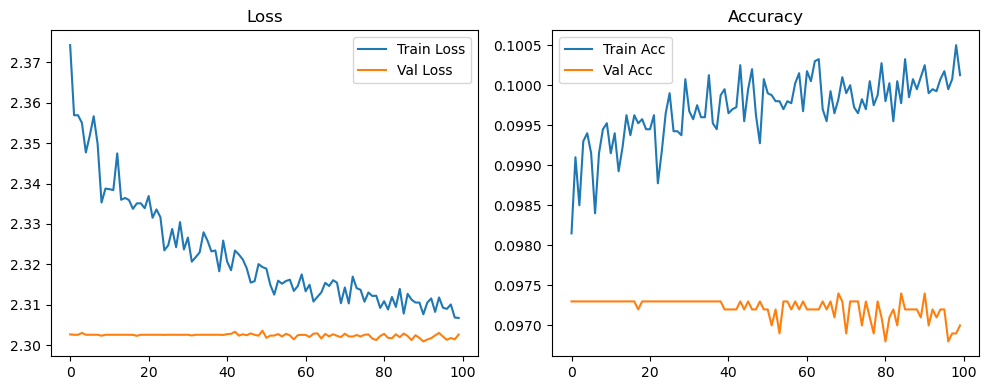

Evaluation:   0%|          | 0/3 [00:00<?, ?it/s]

Evaluation:  33%|███▎      | 1/3 [00:00<00:01,  1.37it/s]

Evaluation:  67%|██████▋   | 2/3 [00:01<00:00,  1.25it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.71it/s]

Evaluation: 100%|██████████| 3/3 [00:01<00:00,  1.57it/s]

Original Model Final Test Loss: 2.3013 Accuracy: 0.1000


🏆 Best Config: batch128_lr_max_0.001_min_1e-06_dp0.1 Accuracy: 0.6625


In [19]:
Hyperparameter_searching(epochs, batch_sizes, lr_max_pool, lr_min_pool, dropout_rates)